In [ ]:
# link this notebook to my google drive so I can retrieve data files from there
# NEEDED TO RETRIEVE THE SERVICE ACCOUNT'S JSON WEB TOKEN
# Import the dedicated library
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!python -m spacy download en_core_web_sm

In [ ]:
# importing libraries and dependencies, loading-handling-visualizing data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



# Natural Language Processing
import nltk
from nltk import ne_chunk, pos_tag, word_tokenize, sent_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.tree import Tree
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')
# for stopwords, I will only drop those of small length that could mess with abbreviations
stop_words = [word for word in stopwords.words('english') if len(word) <= 3]
import spacy
from spacy.tokens import DocBin
nlp = spacy.load('en_core_web_sm')



# Machine learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, accuracy_score, f1_score,
                             roc_auc_score, average_precision_score,
                             recall_score, hamming_loss, classification_report)
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder



# Miscellaneous utilities
from tqdm import tqdm
from tqdm.notebook import tqdm  # for progress bars
import json
import re
import string
import os
import pickle
import warnings
# Supress FutureWarning messages
warnings.simplefilter(action='ignore', category=FutureWarning)
import unicodedata
from scipy import sparse as sp_sparse
from itertools import combinations
import random
from collections import Counter
import requests  # for making api calls


### Deep-Learning Algorithms
import tensorflow as tf
# I will import the T5Tokenizer
from transformers import T5Tokenizer, T5ForConditionalGeneration
tokenizer = T5Tokenizer.from_pretrained('t5-small')
#from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GRU, Embedding, Dense
# Embedding layer initializer, regularizer
# We do not use a constraint because we are not familiar enough with the various options and their pros/cons.
from tensorflow.keras.initializers import RandomUniform
from tensorflow.keras.regularizers import l1
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint
from transformers import AdamW
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import T5Tokenizer, T5ForConditionalGeneration
from transformers import AutoTokenizer  # detects the model type and initializes the corresponding tokenizer
from nltk.translate.bleu_score import SmoothingFunction, sentence_bleu

tqdm.pandas()

In [ ]:
!pip install google-cloud-bigquery


In [ ]:
!pip install db-dtypes


# Importing the data

In [ ]:
from google.colab import auth
from google.cloud import bigquery
from google.oauth2 import service_account

auth.authenticate_user()

# BigQuery client
project_id = 'nlp-project-427710'
credentials = service_account.Credentials.from_service_account_file('/content/drive/MyDrive/NLP_project/preprocessing/nlp-project-427710-3e1a48df3dba.json')
client = bigquery.Client(credentials=credentials, project=credentials.project_id)

# SQL query to fetch data from BigQuery table
query = """
    SELECT *
    FROM `nlp-project-427710.machine_translation.wmt2014`
"""

# Fetch data me to BigQuery client
df = client.query(query).to_dataframe()

In [ ]:
df.shape

(1000000, 2)

In [ ]:
df.head()

,de,en
0,Foucault zielt mit den gouvernmentalen Technol...,""" Foucault defines the governmental technologi..."
1,"""In einem Grundsatzurteil aus dem letzten Jahr...","""EDRI and its members have been campaigning ag..."
2,Dieser intensive Entwicklungs- und Produkt-Sup...,"""This intensive development and product suppor..."
3,"""When the sky color changes , ducks automatica...","""When the sky color changes , ducks automatica..."
4,' Die internationale Dimension ' möchte einen ...,"' International dimension ', to contribute to ..."


### Checking for missing values
Drop any row containing missing values in either column, as that would render it useless in making predictions or training a model to make predictions.

### Checking for duplicates
Drop all duplicates, keep only the first occurrences. Multiple entries with the exact same characteristics could contribute to overfitting, and if there are many of them they could also slow down training.

In [ ]:
### Checking for missing values
for col in df.columns:
  print(f'Column "{col}" contains {df[col].isna().sum()} missing values')

Column "de" contains 0 missing values
Column "en" contains 0 missing values


In [ ]:
# No missing values to drop

In [ ]:
### Checking for duplicate values
df.drop_duplicates().shape[0] == df.shape[0]

False

In [ ]:
# There are duplicate values
print(f'There are {df.shape[0] - df.drop_duplicates().shape[0]} duplicate values.')

There are 5931 duplicate values.


In [ ]:
# dropping them altogether - by default keeps only
df = df.drop_duplicates()
print('Dropped duplicates.')
# sanity check - there is no difference between the shape of the de-duplicated df and `df` now
df.drop_duplicates().shape[0] == df.shape[0]

Dropped duplicates.


True

# Pre-processing on the features matrix ('text' column)
Comprises high-quality news articles from Europarl, News Commentary, and TED Talks, offering realistic and diverse text domains.
**Preprocessing:** Cleaned and normalized for consistency, ensuring model compatibility and training efficiency.

So we will take only the following steps:
- lower case conversion
- contradictions
- numbers to words
- I will not remove punctuation
- remove escape chars
- remove excessive whitespace

### Important Note:
NO feature extraction is implemented here, and especially no lemmatization whatsoever. This is because the relevant models are very successful at capturing context, and lemmatization might hinder the extraction of information crucial to making the most accurate predictions; these models are capable of quickly and effectively recognizing (for example) how a verb is conjugated and derive the meaning of this specific setting.

## Preprocessing



In [ ]:
#Function to preprocess sentences: we only make sure that there are no escaped characters and excessive whitespace

# function to remove escape characters
escape_char_pattern = re.compile(r"[" + ''.join([re.escape(i) for i in ['\n', '\t', '\\', '/']]) + "]")
def remove_escape_chars(text):
    return re.sub(escape_char_pattern, ' ', text)

def preprocess_sentence(sentence):
    # I will also implement lowercase conversion as part of text standardization
    sentence = sentence.lower()

    # removing escaped characters
    sentence = remove_escape_chars(sentence)

    # Removing excessive whitespace
    sentence = re.sub(r'\s+', ' ', sentence)
    return sentence

Due to limits in time and computational resources available, we will train new models or retrain others using only 50,000 samples.

In [ ]:
# I will only train upon 50000 samples due to limited time available
df = df[:50000]
df['en'] = df['en'].apply(preprocess_sentence)
df['de'] = df['de'].apply(preprocess_sentence)

## Loading and Preprocessing the Data for transformer-based models:

Not much preprocessing is needed when working with transformers. We will only implement tokenization and padding.

In [ ]:
# I want to replace very rare words with the '<unk>' token to further hasten model convergence.
# I set a 'rarity threshold' of 5 for a word - any token that appears less than 5 times across our whole corpus will be considered as extremely rare
# so we do not want our model to deal with it.

# Count the frequency of each word in the source language
source_texts = df['en'].tolist()
word_counts = Counter(" ".join(source_texts).split())

rarity_threshold = 5  # Words that appear less than or equal to this number of times are considered rare

# Create a list of rare words
rare_words = {word for word, count in word_counts.items() if count <= rarity_threshold}

# Replace rare words with the <unk> token in the source texts
def replace_rare_words(text, rare_words, unk_token="<unk>"):
    return " ".join([word if word not in rare_words else unk_token for word in text.split()])

# Apply the replacement function to the source texts
source_texts_replaced = [replace_rare_words(text, rare_words) for text in source_texts]

# Tokenize the sequences using the updated texts
# We use 'padding=max_length' so that the tokenizer always extends sequences to a specific length, that of the longest (in terms of # tokens) sequence
# in our available data. This is to hasten the convergence of the model, in comparison to having it accept sequences of variable lenght.
# This is also good because it returns source and target sequences in integer representations, that allow us to easily use the very efficient
# sparse categorical crossentropy loss function.
source_sequences = tokenizer(source_texts_replaced, padding='max_length', max_length=20, truncation=True, return_tensors="tf")  # we want tensorflow-compatible tensors returned
target_sequences = tokenizer(df['de'].tolist(), padding='max_length', max_length=20, truncation=True, return_tensors="tf")

In [ ]:
# Extract input_ids and attention_masks
source_input_ids = source_sequences['input_ids']
source_attention_masks = source_sequences['attention_mask']
target_input_ids = target_sequences['input_ids']
target_attention_masks = target_sequences['attention_mask']

# Define the maximum lengths
max_source_len = source_input_ids.shape[1]
max_target_len = target_input_ids.shape[1]

In [ ]:
# Split data into training and testing sets
# There are no duplicates, so I can arbitrarily select disjoint sets of these dataframes as the training and testing sets.
train_size = int(0.8 * len(df))
source_train, source_test = source_input_ids[:train_size], source_input_ids[train_size:]
target_train, target_test = target_input_ids[:train_size], target_input_ids[train_size:]
target_train_attention_masks, target_test_attention_masks = target_attention_masks[:train_size], target_attention_masks[train_size:]

In [ ]:
# Preparing data to be used in training Seq2Seq models:

# Prepare target data for training (shifted for teacher forcing)
target_train_input = source_train[:, :-1]
target_train_output = target_train[:, 1:]
target_test_input = source_test[:, :-1]
target_test_output = target_test[:, 1:]

# Reshape target data for training
target_train_output = target_train_output[..., np.newaxis]
target_test_output = target_test_output[..., np.newaxis]

# Sanity check:
print(f"source_train shape: {source_train.shape}")
print(f"source_test shape: {source_test.shape}")
print(f"target_train_input shape: {target_train_input.shape}")
print(f"target_train_output shape: {target_train_output.shape}")
print(f"target_test_input shape: {target_test_input.shape}")
print(f"target_test_output shape: {target_test_output.shape}")

source_train shape: (40000, 20)
source_test shape: (10000, 20)
target_train_input shape: (40000, 19)
target_train_output shape: (40000, 19, 1)
target_test_input shape: (10000, 19)
target_test_output shape: (10000, 19, 1)


## Model Definition

We will implement a word-level sequence-to-sequence model, processing the input word-by-word and generating the output word-by-word. We opt for this as this was the most popular approach in the bibliography we reviewed for this project. To this point, we add an 'embedding' layer for our input to be transformed in.

# Training Data Preparation

## Translation Function
This is the product of word-level-translation adjustment on the 'decode_sequence' function suggested in Keras' documentation.

In [ ]:
# EVALUATION -> I will implement the BLEU metric ONLY; no usage of multiple reference translations, because I am implementing this on the WST '14 dataset which
# is considered as very high quality, so I would not like to risk blending into high-quality material any lower-quality llm-generated translations

In [ ]:
# Define model parameters
embedding_dim = 256
units = 256

# Assuming 'tokenizer' is an instance of T5Tokenizer
vocab_size = len(tokenizer.get_vocab())

# Encoder
encoder_inputs = Input(shape=(None,), name='encoder_inputs')
encoder_embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, name='encoder_embedding')(encoder_inputs)
encoder_gru = GRU(units, return_state=True, name='encoder_gru')
encoder_outputs, state_h = encoder_gru(encoder_embedding)
encoder_states = [state_h]

# Decoder for training
decoder_inputs = Input(shape=(None,), name='decoder_inputs')
decoder_embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, name='decoder_embedding')(decoder_inputs)
decoder_gru = GRU(units, return_sequences=True, return_state=True, name='decoder_gru')
decoder_outputs, _ = decoder_gru(decoder_embedding, initial_state=encoder_states)
decoder_dense = Dense(vocab_size, activation='softmax', name='decoder_dense')
decoder_outputs = decoder_dense(decoder_outputs)

# Define the full model for training
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy')  # we use the 'AdaM' optimizer
# as it is considered as the standard optimizer to use (at least at the initial stages of research) in bibliography
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 encoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                                
                                                                                                  
 decoder_inputs (InputLayer  [(None, None)]               0         []                            
 )                                                                                                
                                                                                                  
 encoder_embedding (Embeddi  (None, None, 256)            8217600   ['encoder_inputs[0][0]']      
 ng)                                                                                          

In [ ]:
### PREPARING TARGET DATA
# Prepare target data: Shift the target sequences for the decoder during training.

# Prepare the target data by shifting the target sequences - during training, the decoder accepts as input
# the real/actual/correct token that it should have predicted in the previous step.
target_padded_shifted = np.zeros_like(target_input_ids)  # return an array of zeros with the same dimensions as the specified container
target_padded_shifted[:, 1:] = target_input_ids[:, :-1]

# Reshape target data for training
target_data = np.expand_dims(target_input_ids, -1) # adding a new axis at the end of the array's shape to make it
# have the necessary dimensions as directed by the model

**Custom TQDM Callback:**

**on_epoch_begin:** Initializes the progress bar at the start of each epoch.

**on_epoch_end:** Closes the progress bar at the end of each epoch.

**on_batch_end:** Updates the progress bar at the end of each batch and sets the postfix to show the current training and validation loss.

**early_stopping:** Stops training when the validation loss does not improve for 5 consecutive epochs ('patience').

**model_checkpoint:** Saves the model with the best validation loss during training.

**tqdm_callback:** Custom callback to display the progress bar.

**model.fit:** Trains the model using the provided data and callbacks, including the custom tqdm progress bar callback.

This gives us a visual progress bar for each epoch and update it with the loss values on its of the underlying iterations.

In [ ]:
# Early stopping used not just as a regularization technique (to avoid overfitting) but also in order to reduce computation times
# Should we have more available time AND computational resources, we would investigate the phenomenon of grokking - https://arxiv.org/abs/2201.02177

class TQDMProgressBar(Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.epochs = self.params['epochs']
        self.steps = self.params['steps']
        self.epoch_bar = tqdm(total=self.steps, desc=f'Epoch {epoch+1}/{self.epochs}', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_bar.close()

    def on_batch_end(self, batch, logs=None):
        self.epoch_bar.update(1)
        self.epoch_bar.set_postfix(loss=logs.get('loss'), val_loss=logs.get('val_loss'))

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')
tqdm_callback = TQDMProgressBar()

# Fit the model with callbacks
history = model.fit([source_input_ids, target_padded_shifted], target_data, batch_size=16, epochs=100,
                    validation_split=0.2, callbacks=[early_stopping, model_checkpoint, tqdm_callback])


Epoch 1/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 1/100


Epoch 1/100:   0%|          | 1/2500 [00:02<1:42:52,  2.47s/it, loss=10.4, val_loss=None]

   1/2500 [..............................] - ETA: 1:42:57 - loss: 10.3772

Epoch 1/100:   0%|          | 2/2500 [00:02<46:56,  1.13s/it, loss=10.4, val_loss=None]

   2/2500 [..............................] - ETA: 7:50 - loss: 10.3757   

Epoch 1/100:   0%|          | 3/2500 [00:02<28:59,  1.44it/s, loss=10.4, val_loss=None]

   3/2500 [..............................] - ETA: 7:44 - loss: 10.3734

Epoch 1/100:   0%|          | 4/2500 [00:03<20:30,  2.03it/s, loss=10.4, val_loss=None]

   4/2500 [..............................] - ETA: 7:41 - loss: 10.3714

Epoch 1/100:   0%|          | 5/2500 [00:03<15:52,  2.62it/s, loss=10.4, val_loss=None]

   5/2500 [..............................] - ETA: 7:39 - loss: 10.3697

Epoch 1/100:   0%|          | 6/2500 [00:03<12:54,  3.22it/s, loss=10.4, val_loss=None]

   6/2500 [..............................] - ETA: 7:33 - loss: 10.3671

Epoch 1/100:   0%|          | 7/2500 [00:03<11:07,  3.73it/s, loss=10.4, val_loss=None]

   7/2500 [..............................] - ETA: 7:32 - loss: 10.3629

Epoch 1/100:   0%|          | 8/2500 [00:03<09:58,  4.16it/s, loss=10.4, val_loss=None]

   8/2500 [..............................] - ETA: 7:32 - loss: 10.3579

Epoch 1/100:   0%|          | 9/2500 [00:03<09:03,  4.58it/s, loss=10.4, val_loss=None]

   9/2500 [..............................] - ETA: 7:29 - loss: 10.3548

Epoch 1/100:   0%|          | 10/2500 [00:04<08:32,  4.86it/s, loss=10.3, val_loss=None]

  10/2500 [..............................] - ETA: 7:27 - loss: 10.3495

Epoch 1/100:   0%|          | 11/2500 [00:04<08:17,  5.00it/s, loss=10.3, val_loss=None]

  11/2500 [..............................] - ETA: 7:29 - loss: 10.3419

Epoch 1/100:   0%|          | 12/2500 [00:04<07:54,  5.24it/s, loss=10.3, val_loss=None]

  12/2500 [..............................] - ETA: 7:26 - loss: 10.3271

Epoch 1/100:   1%|          | 13/2500 [00:04<07:30,  5.52it/s, loss=10.3, val_loss=None]

  13/2500 [..............................] - ETA: 7:22 - loss: 10.3019

Epoch 1/100:   1%|          | 14/2500 [00:04<07:17,  5.68it/s, loss=10.3, val_loss=None]

  14/2500 [..............................] - ETA: 7:19 - loss: 10.2750

Epoch 1/100:   1%|          | 15/2500 [00:04<07:10,  5.77it/s, loss=10.2, val_loss=None]

  15/2500 [..............................] - ETA: 7:17 - loss: 10.2115

Epoch 1/100:   1%|          | 16/2500 [00:05<07:10,  5.77it/s, loss=10.1, val_loss=None]

  16/2500 [..............................] - ETA: 7:16 - loss: 10.1299

Epoch 1/100:   1%|          | 17/2500 [00:05<07:12,  5.74it/s, loss=10, val_loss=None]  

  17/2500 [..............................] - ETA: 7:16 - loss: 10.0344

Epoch 1/100:   1%|          | 18/2500 [00:05<07:12,  5.74it/s, loss=9.9, val_loss=None]

  18/2500 [..............................] - ETA: 7:16 - loss: 9.8952 

Epoch 1/100:   1%|          | 19/2500 [00:05<07:11,  5.75it/s, loss=9.76, val_loss=None]

  19/2500 [..............................] - ETA: 7:15 - loss: 9.7605

Epoch 1/100:   1%|          | 20/2500 [00:05<07:06,  5.82it/s, loss=9.62, val_loss=None]

  20/2500 [..............................] - ETA: 7:14 - loss: 9.6242

Epoch 1/100:   1%|          | 21/2500 [00:05<07:05,  5.82it/s, loss=9.47, val_loss=None]

  21/2500 [..............................] - ETA: 7:14 - loss: 9.4676

Epoch 1/100:   1%|          | 22/2500 [00:06<07:09,  5.77it/s, loss=9.31, val_loss=None]

  22/2500 [..............................] - ETA: 7:13 - loss: 9.3073

Epoch 1/100:   1%|          | 23/2500 [00:06<07:08,  5.78it/s, loss=9.19, val_loss=None]

  23/2500 [..............................] - ETA: 7:13 - loss: 9.1906

Epoch 1/100:   1%|          | 24/2500 [00:06<07:03,  5.85it/s, loss=9.06, val_loss=None]

  24/2500 [..............................] - ETA: 7:12 - loss: 9.0595

Epoch 1/100:   1%|          | 25/2500 [00:06<06:57,  5.92it/s, loss=8.93, val_loss=None]

  25/2500 [..............................] - ETA: 7:11 - loss: 8.9321

Epoch 1/100:   1%|          | 26/2500 [00:06<06:49,  6.05it/s, loss=8.8, val_loss=None] 

  26/2500 [..............................] - ETA: 7:09 - loss: 8.7995

Epoch 1/100:   1%|          | 27/2500 [00:06<06:45,  6.09it/s, loss=8.69, val_loss=None]

  27/2500 [..............................] - ETA: 7:07 - loss: 8.6940

Epoch 1/100:   1%|          | 28/2500 [00:07<06:50,  6.02it/s, loss=8.6, val_loss=None] 

  28/2500 [..............................] - ETA: 7:07 - loss: 8.5963

Epoch 1/100:   1%|          | 29/2500 [00:07<06:58,  5.91it/s, loss=8.51, val_loss=None]

  29/2500 [..............................] - ETA: 7:07 - loss: 8.5110

Epoch 1/100:   1%|          | 30/2500 [00:07<06:56,  5.93it/s, loss=8.42, val_loss=None]

  30/2500 [..............................] - ETA: 7:06 - loss: 8.4246

Epoch 1/100:   1%|          | 31/2500 [00:07<07:05,  5.81it/s, loss=8.33, val_loss=None]

  31/2500 [..............................] - ETA: 7:07 - loss: 8.3312

Epoch 1/100:   1%|▏         | 32/2500 [00:07<07:08,  5.77it/s, loss=8.25, val_loss=None]

  32/2500 [..............................] - ETA: 7:07 - loss: 8.2535

Epoch 1/100:   1%|▏         | 33/2500 [00:08<07:11,  5.72it/s, loss=8.18, val_loss=None]

  33/2500 [..............................] - ETA: 7:07 - loss: 8.1810

Epoch 1/100:   1%|▏         | 34/2500 [00:08<07:25,  5.53it/s, loss=8.12, val_loss=None]

  34/2500 [..............................] - ETA: 7:09 - loss: 8.1235

Epoch 1/100:   1%|▏         | 35/2500 [00:08<07:34,  5.42it/s, loss=8.06, val_loss=None]

  35/2500 [..............................] - ETA: 7:10 - loss: 8.0560

Epoch 1/100:   1%|▏         | 36/2500 [00:08<07:25,  5.53it/s, loss=8.01, val_loss=None]

  36/2500 [..............................] - ETA: 7:10 - loss: 8.0066

Epoch 1/100:   1%|▏         | 37/2500 [00:08<07:23,  5.55it/s, loss=7.96, val_loss=None]

  37/2500 [..............................] - ETA: 7:10 - loss: 7.9579

Epoch 1/100:   2%|▏         | 38/2500 [00:08<07:22,  5.57it/s, loss=7.92, val_loss=None]

  38/2500 [..............................] - ETA: 7:10 - loss: 7.9204

Epoch 1/100:   2%|▏         | 39/2500 [00:09<07:26,  5.51it/s, loss=7.89, val_loss=None]

  39/2500 [..............................] - ETA: 7:10 - loss: 7.8896

Epoch 1/100:   2%|▏         | 40/2500 [00:09<07:31,  5.44it/s, loss=7.85, val_loss=None]

  40/2500 [..............................] - ETA: 7:11 - loss: 7.8456

Epoch 1/100:   2%|▏         | 41/2500 [00:09<07:34,  5.41it/s, loss=7.81, val_loss=None]

  41/2500 [..............................] - ETA: 7:12 - loss: 7.8102

Epoch 1/100:   2%|▏         | 42/2500 [00:09<07:32,  5.43it/s, loss=7.78, val_loss=None]

  42/2500 [..............................] - ETA: 7:12 - loss: 7.7797

Epoch 1/100:   2%|▏         | 43/2500 [00:09<07:31,  5.44it/s, loss=7.74, val_loss=None]

  43/2500 [..............................] - ETA: 7:12 - loss: 7.7407

Epoch 1/100:   2%|▏         | 44/2500 [00:10<07:22,  5.55it/s, loss=7.71, val_loss=None]

  44/2500 [..............................] - ETA: 7:12 - loss: 7.7101

Epoch 1/100:   2%|▏         | 45/2500 [00:10<07:28,  5.48it/s, loss=7.66, val_loss=None]

  45/2500 [..............................] - ETA: 7:12 - loss: 7.6605

Epoch 1/100:   2%|▏         | 46/2500 [00:10<07:16,  5.62it/s, loss=7.61, val_loss=None]

  46/2500 [..............................] - ETA: 7:11 - loss: 7.6131

Epoch 1/100:   2%|▏         | 47/2500 [00:10<07:19,  5.58it/s, loss=7.57, val_loss=None]

  47/2500 [..............................] - ETA: 7:12 - loss: 7.5748

Epoch 1/100:   2%|▏         | 48/2500 [00:10<07:14,  5.64it/s, loss=7.54, val_loss=None]

  48/2500 [..............................] - ETA: 7:11 - loss: 7.5442

Epoch 1/100:   2%|▏         | 49/2500 [00:10<07:07,  5.74it/s, loss=7.52, val_loss=None]

  49/2500 [..............................] - ETA: 7:11 - loss: 7.5219

Epoch 1/100:   2%|▏         | 50/2500 [00:11<07:06,  5.74it/s, loss=7.48, val_loss=None]

  50/2500 [..............................] - ETA: 7:10 - loss: 7.4825

Epoch 1/100:   2%|▏         | 51/2500 [00:11<07:07,  5.73it/s, loss=7.46, val_loss=None]

  51/2500 [..............................] - ETA: 7:10 - loss: 7.4567

Epoch 1/100:   2%|▏         | 52/2500 [00:11<07:07,  5.73it/s, loss=7.42, val_loss=None]

  52/2500 [..............................] - ETA: 7:10 - loss: 7.4226

Epoch 1/100:   2%|▏         | 53/2500 [00:11<07:08,  5.71it/s, loss=7.4, val_loss=None] 

  53/2500 [..............................] - ETA: 7:10 - loss: 7.4020

Epoch 1/100:   2%|▏         | 54/2500 [00:11<06:58,  5.85it/s, loss=7.38, val_loss=None]

  54/2500 [..............................] - ETA: 7:09 - loss: 7.3787

Epoch 1/100:   2%|▏         | 55/2500 [00:11<06:54,  5.90it/s, loss=7.36, val_loss=None]

  55/2500 [..............................] - ETA: 7:08 - loss: 7.3636

Epoch 1/100:   2%|▏         | 56/2500 [00:12<06:58,  5.83it/s, loss=7.33, val_loss=None]

  56/2500 [..............................] - ETA: 7:08 - loss: 7.3334

Epoch 1/100:   2%|▏         | 57/2500 [00:12<07:01,  5.79it/s, loss=7.31, val_loss=None]

  57/2500 [..............................] - ETA: 7:08 - loss: 7.3140

Epoch 1/100:   2%|▏         | 58/2500 [00:12<06:56,  5.87it/s, loss=7.3, val_loss=None] 

  58/2500 [..............................] - ETA: 7:07 - loss: 7.2961

Epoch 1/100:   2%|▏         | 59/2500 [00:12<06:57,  5.85it/s, loss=7.27, val_loss=None]

  59/2500 [..............................] - ETA: 7:07 - loss: 7.2749

Epoch 1/100:   2%|▏         | 60/2500 [00:12<06:58,  5.84it/s, loss=7.26, val_loss=None]

  60/2500 [..............................] - ETA: 7:07 - loss: 7.2591

Epoch 1/100:   2%|▏         | 61/2500 [00:12<07:03,  5.75it/s, loss=7.25, val_loss=None]

  61/2500 [..............................] - ETA: 7:07 - loss: 7.2528

Epoch 1/100:   2%|▏         | 62/2500 [00:13<07:14,  5.61it/s, loss=7.24, val_loss=None]

  62/2500 [..............................] - ETA: 7:07 - loss: 7.2375

Epoch 1/100:   3%|▎         | 63/2500 [00:13<07:15,  5.60it/s, loss=7.22, val_loss=None]

  63/2500 [..............................] - ETA: 7:07 - loss: 7.2174

Epoch 1/100:   3%|▎         | 64/2500 [00:13<07:09,  5.67it/s, loss=7.21, val_loss=None]

  64/2500 [..............................] - ETA: 7:07 - loss: 7.2055

Epoch 1/100:   3%|▎         | 65/2500 [00:13<07:07,  5.70it/s, loss=7.2, val_loss=None] 

  65/2500 [..............................] - ETA: 7:07 - loss: 7.1959

Epoch 1/100:   3%|▎         | 66/2500 [00:13<07:04,  5.73it/s, loss=7.18, val_loss=None]

  66/2500 [..............................] - ETA: 7:06 - loss: 7.1771

Epoch 1/100:   3%|▎         | 67/2500 [00:14<07:05,  5.72it/s, loss=7.16, val_loss=None]

  67/2500 [..............................] - ETA: 7:06 - loss: 7.1589

Epoch 1/100:   3%|▎         | 68/2500 [00:14<07:02,  5.76it/s, loss=7.14, val_loss=None]

  68/2500 [..............................] - ETA: 7:06 - loss: 7.1415

Epoch 1/100:   3%|▎         | 69/2500 [00:14<06:57,  5.82it/s, loss=7.13, val_loss=None]

  69/2500 [..............................] - ETA: 7:05 - loss: 7.1280

Epoch 1/100:   3%|▎         | 70/2500 [00:14<06:54,  5.87it/s, loss=7.11, val_loss=None]

  70/2500 [..............................] - ETA: 7:05 - loss: 7.1106

Epoch 1/100:   3%|▎         | 71/2500 [00:14<07:01,  5.76it/s, loss=7.09, val_loss=None]

  71/2500 [..............................] - ETA: 7:05 - loss: 7.0950

Epoch 1/100:   3%|▎         | 72/2500 [00:14<06:50,  5.92it/s, loss=7.08, val_loss=None]

  72/2500 [..............................] - ETA: 7:04 - loss: 7.0759

Epoch 1/100:   3%|▎         | 73/2500 [00:15<06:54,  5.86it/s, loss=7.07, val_loss=None]

  73/2500 [..............................] - ETA: 7:04 - loss: 7.0659

Epoch 1/100:   3%|▎         | 74/2500 [00:15<06:58,  5.80it/s, loss=7.06, val_loss=None]

  74/2500 [..............................] - ETA: 7:04 - loss: 7.0550

Epoch 1/100:   3%|▎         | 75/2500 [00:15<06:54,  5.85it/s, loss=7.03, val_loss=None]

  75/2500 [..............................] - ETA: 7:03 - loss: 7.0335

Epoch 1/100:   3%|▎         | 76/2500 [00:15<06:52,  5.88it/s, loss=7.02, val_loss=None]

  76/2500 [..............................] - ETA: 7:03 - loss: 7.0203

Epoch 1/100:   3%|▎         | 77/2500 [00:15<06:55,  5.83it/s, loss=7.01, val_loss=None]

  77/2500 [..............................] - ETA: 7:03 - loss: 7.0098

Epoch 1/100:   3%|▎         | 78/2500 [00:15<06:45,  5.97it/s, loss=7, val_loss=None]   

  78/2500 [..............................] - ETA: 7:02 - loss: 6.9958

Epoch 1/100:   3%|▎         | 79/2500 [00:16<06:48,  5.93it/s, loss=6.98, val_loss=None]

  79/2500 [..............................] - ETA: 7:02 - loss: 6.9824

Epoch 1/100:   3%|▎         | 80/2500 [00:16<06:51,  5.88it/s, loss=6.97, val_loss=None]

  80/2500 [..............................] - ETA: 7:02 - loss: 6.9670

Epoch 1/100:   3%|▎         | 81/2500 [00:16<06:50,  5.89it/s, loss=6.95, val_loss=None]

  81/2500 [..............................] - ETA: 7:01 - loss: 6.9504

Epoch 1/100:   3%|▎         | 82/2500 [00:16<06:52,  5.87it/s, loss=6.93, val_loss=None]

  82/2500 [..............................] - ETA: 7:01 - loss: 6.9315

Epoch 1/100:   3%|▎         | 83/2500 [00:16<06:50,  5.89it/s, loss=6.92, val_loss=None]

  83/2500 [..............................] - ETA: 7:01 - loss: 6.9227

Epoch 1/100:   3%|▎         | 84/2500 [00:16<07:00,  5.74it/s, loss=6.9, val_loss=None] 

  84/2500 [>.............................] - ETA: 7:01 - loss: 6.9042

Epoch 1/100:   3%|▎         | 85/2500 [00:17<06:57,  5.78it/s, loss=6.89, val_loss=None]

  85/2500 [>.............................] - ETA: 7:01 - loss: 6.8928

Epoch 1/100:   3%|▎         | 86/2500 [00:17<06:56,  5.79it/s, loss=6.88, val_loss=None]

  86/2500 [>.............................] - ETA: 7:00 - loss: 6.8828

Epoch 1/100:   3%|▎         | 87/2500 [00:17<06:54,  5.82it/s, loss=6.87, val_loss=None]

  87/2500 [>.............................] - ETA: 7:00 - loss: 6.8712

Epoch 1/100:   4%|▎         | 88/2500 [00:17<06:53,  5.83it/s, loss=6.86, val_loss=None]

  88/2500 [>.............................] - ETA: 7:00 - loss: 6.8593

Epoch 1/100:   4%|▎         | 89/2500 [00:17<06:51,  5.86it/s, loss=6.84, val_loss=None]

  89/2500 [>.............................] - ETA: 6:59 - loss: 6.8431

Epoch 1/100:   4%|▎         | 90/2500 [00:17<06:50,  5.86it/s, loss=6.84, val_loss=None]

  90/2500 [>.............................] - ETA: 6:59 - loss: 6.8406

Epoch 1/100:   4%|▎         | 91/2500 [00:18<06:59,  5.74it/s, loss=6.82, val_loss=None]

  91/2500 [>.............................] - ETA: 6:59 - loss: 6.8248

Epoch 1/100:   4%|▎         | 92/2500 [00:18<06:58,  5.76it/s, loss=6.81, val_loss=None]

  92/2500 [>.............................] - ETA: 6:59 - loss: 6.8098

Epoch 1/100:   4%|▎         | 93/2500 [00:18<06:58,  5.75it/s, loss=6.8, val_loss=None] 

  93/2500 [>.............................] - ETA: 6:59 - loss: 6.8015

Epoch 1/100:   4%|▍         | 94/2500 [00:18<06:57,  5.76it/s, loss=6.79, val_loss=None]

  94/2500 [>.............................] - ETA: 6:59 - loss: 6.7881

Epoch 1/100:   4%|▍         | 95/2500 [00:18<06:59,  5.73it/s, loss=6.77, val_loss=None]

  95/2500 [>.............................] - ETA: 6:58 - loss: 6.7750

Epoch 1/100:   4%|▍         | 96/2500 [00:19<06:57,  5.76it/s, loss=6.76, val_loss=None]

  96/2500 [>.............................] - ETA: 6:58 - loss: 6.7603

Epoch 1/100:   4%|▍         | 97/2500 [00:19<06:55,  5.79it/s, loss=6.75, val_loss=None]

  97/2500 [>.............................] - ETA: 6:58 - loss: 6.7478

Epoch 1/100:   4%|▍         | 98/2500 [00:19<06:55,  5.78it/s, loss=6.74, val_loss=None]

  98/2500 [>.............................] - ETA: 6:58 - loss: 6.7438

Epoch 1/100:   4%|▍         | 99/2500 [00:19<06:50,  5.85it/s, loss=6.74, val_loss=None]

  99/2500 [>.............................] - ETA: 6:57 - loss: 6.7353

Epoch 1/100:   4%|▍         | 100/2500 [00:19<06:50,  5.84it/s, loss=6.73, val_loss=None]

 100/2500 [>.............................] - ETA: 6:57 - loss: 6.7326

Epoch 1/100:   4%|▍         | 101/2500 [00:19<06:52,  5.82it/s, loss=6.72, val_loss=None]

 101/2500 [>.............................] - ETA: 6:57 - loss: 6.7215

Epoch 1/100:   4%|▍         | 102/2500 [00:20<06:51,  5.83it/s, loss=6.71, val_loss=None]

 102/2500 [>.............................] - ETA: 6:57 - loss: 6.7135

Epoch 1/100:   4%|▍         | 103/2500 [00:20<07:04,  5.64it/s, loss=6.7, val_loss=None] 

 103/2500 [>.............................] - ETA: 6:57 - loss: 6.7008

Epoch 1/100:   4%|▍         | 104/2500 [00:20<07:09,  5.58it/s, loss=6.69, val_loss=None]

 104/2500 [>.............................] - ETA: 6:57 - loss: 6.6869

Epoch 1/100:   4%|▍         | 105/2500 [00:20<07:04,  5.64it/s, loss=6.68, val_loss=None]

 105/2500 [>.............................] - ETA: 6:57 - loss: 6.6799

Epoch 1/100:   4%|▍         | 106/2500 [00:20<07:28,  5.34it/s, loss=6.67, val_loss=None]

 106/2500 [>.............................] - ETA: 6:57 - loss: 6.6699

Epoch 1/100:   4%|▍         | 107/2500 [00:20<07:32,  5.29it/s, loss=6.66, val_loss=None]

 107/2500 [>.............................] - ETA: 6:58 - loss: 6.6581

Epoch 1/100:   4%|▍         | 108/2500 [00:21<07:34,  5.26it/s, loss=6.65, val_loss=None]

 108/2500 [>.............................] - ETA: 6:58 - loss: 6.6491

Epoch 1/100:   4%|▍         | 109/2500 [00:21<07:28,  5.33it/s, loss=6.64, val_loss=None]

 109/2500 [>.............................] - ETA: 6:58 - loss: 6.6390

Epoch 1/100:   4%|▍         | 110/2500 [00:21<07:25,  5.37it/s, loss=6.63, val_loss=None]

 110/2500 [>.............................] - ETA: 6:58 - loss: 6.6319

Epoch 1/100:   4%|▍         | 111/2500 [00:21<07:18,  5.44it/s, loss=6.62, val_loss=None]

 111/2500 [>.............................] - ETA: 6:58 - loss: 6.6215

Epoch 1/100:   4%|▍         | 112/2500 [00:21<07:19,  5.43it/s, loss=6.61, val_loss=None]

 112/2500 [>.............................] - ETA: 6:58 - loss: 6.6132

Epoch 1/100:   5%|▍         | 113/2500 [00:22<07:15,  5.48it/s, loss=6.6, val_loss=None] 

 113/2500 [>.............................] - ETA: 6:58 - loss: 6.6025

Epoch 1/100:   5%|▍         | 114/2500 [00:22<07:15,  5.48it/s, loss=6.6, val_loss=None]

 114/2500 [>.............................] - ETA: 6:58 - loss: 6.5974

Epoch 1/100:   5%|▍         | 115/2500 [00:22<07:09,  5.56it/s, loss=6.59, val_loss=None]

 115/2500 [>.............................] - ETA: 6:57 - loss: 6.5903

Epoch 1/100:   5%|▍         | 116/2500 [00:22<07:03,  5.63it/s, loss=6.59, val_loss=None]

 116/2500 [>.............................] - ETA: 6:57 - loss: 6.5860

Epoch 1/100:   5%|▍         | 117/2500 [00:22<07:14,  5.48it/s, loss=6.58, val_loss=None]

 117/2500 [>.............................] - ETA: 6:57 - loss: 6.5815

Epoch 1/100:   5%|▍         | 118/2500 [00:23<07:34,  5.24it/s, loss=6.58, val_loss=None]

 118/2500 [>.............................] - ETA: 6:58 - loss: 6.5773

Epoch 1/100:   5%|▍         | 119/2500 [00:23<07:33,  5.25it/s, loss=6.57, val_loss=None]

 119/2500 [>.............................] - ETA: 6:58 - loss: 6.5671

Epoch 1/100:   5%|▍         | 120/2500 [00:23<07:33,  5.25it/s, loss=6.56, val_loss=None]

 120/2500 [>.............................] - ETA: 6:58 - loss: 6.5627

Epoch 1/100:   5%|▍         | 121/2500 [00:23<07:24,  5.35it/s, loss=6.56, val_loss=None]

 121/2500 [>.............................] - ETA: 6:58 - loss: 6.5611

Epoch 1/100:   5%|▍         | 122/2500 [00:23<07:24,  5.34it/s, loss=6.56, val_loss=None]

 122/2500 [>.............................] - ETA: 6:58 - loss: 6.5553

Epoch 1/100:   5%|▍         | 123/2500 [00:23<07:28,  5.30it/s, loss=6.55, val_loss=None]

 123/2500 [>.............................] - ETA: 6:58 - loss: 6.5501

Epoch 1/100:   5%|▍         | 124/2500 [00:24<07:33,  5.24it/s, loss=6.54, val_loss=None]

 124/2500 [>.............................] - ETA: 6:59 - loss: 6.5441

Epoch 1/100:   5%|▌         | 125/2500 [00:24<07:24,  5.34it/s, loss=6.54, val_loss=None]

 125/2500 [>.............................] - ETA: 6:58 - loss: 6.5367

Epoch 1/100:   5%|▌         | 126/2500 [00:24<07:30,  5.27it/s, loss=6.53, val_loss=None]

 126/2500 [>.............................] - ETA: 6:59 - loss: 6.5331

Epoch 1/100:   5%|▌         | 127/2500 [00:24<07:28,  5.29it/s, loss=6.53, val_loss=None]

 127/2500 [>.............................] - ETA: 6:59 - loss: 6.5266

Epoch 1/100:   5%|▌         | 128/2500 [00:24<07:18,  5.40it/s, loss=6.52, val_loss=None]

 128/2500 [>.............................] - ETA: 6:58 - loss: 6.5235

Epoch 1/100:   5%|▌         | 129/2500 [00:25<07:15,  5.45it/s, loss=6.51, val_loss=None]

 129/2500 [>.............................] - ETA: 6:58 - loss: 6.5129

Epoch 1/100:   5%|▌         | 130/2500 [00:25<07:22,  5.35it/s, loss=6.51, val_loss=None]

 130/2500 [>.............................] - ETA: 6:58 - loss: 6.5075

Epoch 1/100:   5%|▌         | 131/2500 [00:25<07:13,  5.46it/s, loss=6.5, val_loss=None] 

 131/2500 [>.............................] - ETA: 6:58 - loss: 6.5044

Epoch 1/100:   5%|▌         | 132/2500 [00:25<07:09,  5.52it/s, loss=6.5, val_loss=None]

 132/2500 [>.............................] - ETA: 6:58 - loss: 6.4972

Epoch 1/100:   5%|▌         | 133/2500 [00:25<07:03,  5.59it/s, loss=6.49, val_loss=None]

 133/2500 [>.............................] - ETA: 6:58 - loss: 6.4920

Epoch 1/100:   5%|▌         | 134/2500 [00:25<06:56,  5.68it/s, loss=6.49, val_loss=None]

 134/2500 [>.............................] - ETA: 6:58 - loss: 6.4851

Epoch 1/100:   5%|▌         | 135/2500 [00:26<07:02,  5.60it/s, loss=6.48, val_loss=None]

 135/2500 [>.............................] - ETA: 6:57 - loss: 6.4790

Epoch 1/100:   5%|▌         | 136/2500 [00:26<06:55,  5.69it/s, loss=6.47, val_loss=None]

 136/2500 [>.............................] - ETA: 6:57 - loss: 6.4746

Epoch 1/100:   5%|▌         | 137/2500 [00:26<06:57,  5.66it/s, loss=6.47, val_loss=None]

 137/2500 [>.............................] - ETA: 6:57 - loss: 6.4695

Epoch 1/100:   6%|▌         | 138/2500 [00:26<06:49,  5.76it/s, loss=6.46, val_loss=None]

 138/2500 [>.............................] - ETA: 6:57 - loss: 6.4597

Epoch 1/100:   6%|▌         | 139/2500 [00:26<06:45,  5.83it/s, loss=6.46, val_loss=None]

 139/2500 [>.............................] - ETA: 6:56 - loss: 6.4581

Epoch 1/100:   6%|▌         | 140/2500 [00:27<06:43,  5.85it/s, loss=6.45, val_loss=None]

 140/2500 [>.............................] - ETA: 6:56 - loss: 6.4530

Epoch 1/100:   6%|▌         | 141/2500 [00:27<06:49,  5.76it/s, loss=6.44, val_loss=None]

 141/2500 [>.............................] - ETA: 6:56 - loss: 6.4420

Epoch 1/100:   6%|▌         | 142/2500 [00:27<06:45,  5.82it/s, loss=6.44, val_loss=None]

 142/2500 [>.............................] - ETA: 6:56 - loss: 6.4382

Epoch 1/100:   6%|▌         | 143/2500 [00:27<06:43,  5.84it/s, loss=6.43, val_loss=None]

 143/2500 [>.............................] - ETA: 6:55 - loss: 6.4318

Epoch 1/100:   6%|▌         | 144/2500 [00:27<06:37,  5.92it/s, loss=6.42, val_loss=None]

 144/2500 [>.............................] - ETA: 6:55 - loss: 6.4240

Epoch 1/100:   6%|▌         | 145/2500 [00:27<06:33,  5.99it/s, loss=6.42, val_loss=None]

 145/2500 [>.............................] - ETA: 6:54 - loss: 6.4172

Epoch 1/100:   6%|▌         | 146/2500 [00:28<06:29,  6.05it/s, loss=6.41, val_loss=None]

 146/2500 [>.............................] - ETA: 6:54 - loss: 6.4124

Epoch 1/100:   6%|▌         | 147/2500 [00:28<06:40,  5.87it/s, loss=6.41, val_loss=None]

 147/2500 [>.............................] - ETA: 6:54 - loss: 6.4051

Epoch 1/100:   6%|▌         | 148/2500 [00:28<06:43,  5.83it/s, loss=6.4, val_loss=None] 

 148/2500 [>.............................] - ETA: 6:54 - loss: 6.3992

Epoch 1/100:   6%|▌         | 149/2500 [00:28<06:42,  5.85it/s, loss=6.39, val_loss=None]

 149/2500 [>.............................] - ETA: 6:54 - loss: 6.3902

Epoch 1/100:   6%|▌         | 150/2500 [00:28<06:46,  5.78it/s, loss=6.39, val_loss=None]

 150/2500 [>.............................] - ETA: 6:53 - loss: 6.3864

Epoch 1/100:   6%|▌         | 151/2500 [00:28<06:43,  5.83it/s, loss=6.38, val_loss=None]

 151/2500 [>.............................] - ETA: 6:53 - loss: 6.3813

Epoch 1/100:   6%|▌         | 152/2500 [00:29<06:43,  5.82it/s, loss=6.38, val_loss=None]

 152/2500 [>.............................] - ETA: 6:53 - loss: 6.3769

Epoch 1/100:   6%|▌         | 153/2500 [00:29<06:46,  5.77it/s, loss=6.36, val_loss=None]

 153/2500 [>.............................] - ETA: 6:53 - loss: 6.3641

Epoch 1/100:   6%|▌         | 154/2500 [00:29<06:40,  5.86it/s, loss=6.36, val_loss=None]

 154/2500 [>.............................] - ETA: 6:52 - loss: 6.3577

Epoch 1/100:   6%|▌         | 155/2500 [00:29<06:43,  5.81it/s, loss=6.35, val_loss=None]

 155/2500 [>.............................] - ETA: 6:52 - loss: 6.3546

Epoch 1/100:   6%|▌         | 156/2500 [00:29<06:56,  5.63it/s, loss=6.35, val_loss=None]

 156/2500 [>.............................] - ETA: 6:52 - loss: 6.3509

Epoch 1/100:   6%|▋         | 157/2500 [00:29<06:51,  5.70it/s, loss=6.35, val_loss=None]

 157/2500 [>.............................] - ETA: 6:52 - loss: 6.3478

Epoch 1/100:   6%|▋         | 158/2500 [00:30<06:50,  5.71it/s, loss=6.34, val_loss=None]

 158/2500 [>.............................] - ETA: 6:52 - loss: 6.3432

Epoch 1/100:   6%|▋         | 159/2500 [00:30<06:49,  5.72it/s, loss=6.34, val_loss=None]

 159/2500 [>.............................] - ETA: 6:52 - loss: 6.3437

Epoch 1/100:   6%|▋         | 160/2500 [00:30<06:44,  5.78it/s, loss=6.33, val_loss=None]

 160/2500 [>.............................] - ETA: 6:51 - loss: 6.3331

Epoch 1/100:   6%|▋         | 161/2500 [00:30<06:40,  5.83it/s, loss=6.33, val_loss=None]

 161/2500 [>.............................] - ETA: 6:51 - loss: 6.3295

Epoch 1/100:   6%|▋         | 162/2500 [00:30<06:39,  5.85it/s, loss=6.32, val_loss=None]

 162/2500 [>.............................] - ETA: 6:51 - loss: 6.3229

Epoch 1/100:   7%|▋         | 163/2500 [00:30<06:35,  5.91it/s, loss=6.32, val_loss=None]

 163/2500 [>.............................] - ETA: 6:50 - loss: 6.3175

Epoch 1/100:   7%|▋         | 164/2500 [00:31<06:39,  5.84it/s, loss=6.32, val_loss=None]

 164/2500 [>.............................] - ETA: 6:50 - loss: 6.3152

Epoch 1/100:   7%|▋         | 165/2500 [00:31<06:47,  5.72it/s, loss=6.31, val_loss=None]

 165/2500 [>.............................] - ETA: 6:50 - loss: 6.3114

Epoch 1/100:   7%|▋         | 166/2500 [00:31<06:43,  5.78it/s, loss=6.31, val_loss=None]

 166/2500 [>.............................] - ETA: 6:50 - loss: 6.3070

Epoch 1/100:   7%|▋         | 167/2500 [00:31<06:37,  5.87it/s, loss=6.3, val_loss=None] 

 167/2500 [=>............................] - ETA: 6:49 - loss: 6.2987

Epoch 1/100:   7%|▋         | 168/2500 [00:31<06:38,  5.85it/s, loss=6.29, val_loss=None]

 168/2500 [=>............................] - ETA: 6:49 - loss: 6.2941

Epoch 1/100:   7%|▋         | 169/2500 [00:31<06:34,  5.91it/s, loss=6.29, val_loss=None]

 169/2500 [=>............................] - ETA: 6:49 - loss: 6.2901

Epoch 1/100:   7%|▋         | 170/2500 [00:32<06:39,  5.83it/s, loss=6.28, val_loss=None]

 170/2500 [=>............................] - ETA: 6:49 - loss: 6.2814

Epoch 1/100:   7%|▋         | 171/2500 [00:32<06:42,  5.78it/s, loss=6.28, val_loss=None]

 171/2500 [=>............................] - ETA: 6:49 - loss: 6.2774

Epoch 1/100:   7%|▋         | 172/2500 [00:32<06:41,  5.80it/s, loss=6.28, val_loss=None]

 172/2500 [=>............................] - ETA: 6:48 - loss: 6.2766

Epoch 1/100:   7%|▋         | 173/2500 [00:32<06:43,  5.77it/s, loss=6.27, val_loss=None]

 173/2500 [=>............................] - ETA: 6:48 - loss: 6.2706

Epoch 1/100:   7%|▋         | 174/2500 [00:32<06:41,  5.79it/s, loss=6.26, val_loss=None]

 174/2500 [=>............................] - ETA: 6:48 - loss: 6.2641

Epoch 1/100:   7%|▋         | 175/2500 [00:33<06:45,  5.74it/s, loss=6.26, val_loss=None]

 175/2500 [=>............................] - ETA: 6:48 - loss: 6.2563

Epoch 1/100:   7%|▋         | 176/2500 [00:33<06:53,  5.63it/s, loss=6.25, val_loss=None]

 176/2500 [=>............................] - ETA: 6:48 - loss: 6.2549

Epoch 1/100:   7%|▋         | 177/2500 [00:33<06:57,  5.57it/s, loss=6.25, val_loss=None]

 177/2500 [=>............................] - ETA: 6:48 - loss: 6.2498

Epoch 1/100:   7%|▋         | 178/2500 [00:33<07:03,  5.48it/s, loss=6.25, val_loss=None]

 178/2500 [=>............................] - ETA: 6:48 - loss: 6.2467

Epoch 1/100:   7%|▋         | 179/2500 [00:33<07:04,  5.47it/s, loss=6.23, val_loss=None]

 179/2500 [=>............................] - ETA: 6:48 - loss: 6.2348

Epoch 1/100:   7%|▋         | 180/2500 [00:33<07:01,  5.50it/s, loss=6.23, val_loss=None]

 180/2500 [=>............................] - ETA: 6:47 - loss: 6.2277

Epoch 1/100:   7%|▋         | 181/2500 [00:34<07:13,  5.35it/s, loss=6.22, val_loss=None]

 181/2500 [=>............................] - ETA: 6:48 - loss: 6.2237

Epoch 1/100:   7%|▋         | 182/2500 [00:34<07:12,  5.36it/s, loss=6.22, val_loss=None]

 182/2500 [=>............................] - ETA: 6:48 - loss: 6.2186

Epoch 1/100:   7%|▋         | 183/2500 [00:34<07:07,  5.41it/s, loss=6.22, val_loss=None]

 183/2500 [=>............................] - ETA: 6:47 - loss: 6.2160

Epoch 1/100:   7%|▋         | 184/2500 [00:34<07:07,  5.42it/s, loss=6.21, val_loss=None]

 184/2500 [=>............................] - ETA: 6:47 - loss: 6.2143

Epoch 1/100:   7%|▋         | 185/2500 [00:34<07:06,  5.43it/s, loss=6.21, val_loss=None]

 185/2500 [=>............................] - ETA: 6:47 - loss: 6.2126

Epoch 1/100:   7%|▋         | 186/2500 [00:35<07:08,  5.40it/s, loss=6.21, val_loss=None]

 186/2500 [=>............................] - ETA: 6:47 - loss: 6.2072

Epoch 1/100:   7%|▋         | 187/2500 [00:35<07:14,  5.33it/s, loss=6.2, val_loss=None] 

 187/2500 [=>............................] - ETA: 6:47 - loss: 6.2042

Epoch 1/100:   8%|▊         | 188/2500 [00:35<07:14,  5.32it/s, loss=6.2, val_loss=None]

 188/2500 [=>............................] - ETA: 6:47 - loss: 6.2011

Epoch 1/100:   8%|▊         | 189/2500 [00:35<07:10,  5.37it/s, loss=6.2, val_loss=None]

 189/2500 [=>............................] - ETA: 6:47 - loss: 6.1961

Epoch 1/100:   8%|▊         | 190/2500 [00:35<06:58,  5.52it/s, loss=6.19, val_loss=None]

 190/2500 [=>............................] - ETA: 6:47 - loss: 6.1936

Epoch 1/100:   8%|▊         | 191/2500 [00:35<06:53,  5.58it/s, loss=6.19, val_loss=None]

 191/2500 [=>............................] - ETA: 6:47 - loss: 6.1873

Epoch 1/100:   8%|▊         | 192/2500 [00:36<06:53,  5.59it/s, loss=6.18, val_loss=None]

 192/2500 [=>............................] - ETA: 6:47 - loss: 6.1816

Epoch 1/100:   8%|▊         | 193/2500 [00:36<06:48,  5.65it/s, loss=6.18, val_loss=None]

 193/2500 [=>............................] - ETA: 6:46 - loss: 6.1775

Epoch 1/100:   8%|▊         | 194/2500 [00:36<06:50,  5.62it/s, loss=6.17, val_loss=None]

 194/2500 [=>............................] - ETA: 6:46 - loss: 6.1732

Epoch 1/100:   8%|▊         | 195/2500 [00:36<06:42,  5.73it/s, loss=6.17, val_loss=None]

 195/2500 [=>............................] - ETA: 6:46 - loss: 6.1668

Epoch 1/100:   8%|▊         | 196/2500 [00:36<06:34,  5.84it/s, loss=6.16, val_loss=None]

 196/2500 [=>............................] - ETA: 6:46 - loss: 6.1631

Epoch 1/100:   8%|▊         | 197/2500 [00:37<06:42,  5.72it/s, loss=6.16, val_loss=None]

 197/2500 [=>............................] - ETA: 6:45 - loss: 6.1586

Epoch 1/100:   8%|▊         | 198/2500 [00:37<06:43,  5.70it/s, loss=6.15, val_loss=None]

 198/2500 [=>............................] - ETA: 6:45 - loss: 6.1526

Epoch 1/100:   8%|▊         | 199/2500 [00:37<06:34,  5.84it/s, loss=6.15, val_loss=None]

 199/2500 [=>............................] - ETA: 6:45 - loss: 6.1466

Epoch 1/100:   8%|▊         | 200/2500 [00:37<06:31,  5.87it/s, loss=6.14, val_loss=None]

 200/2500 [=>............................] - ETA: 6:45 - loss: 6.1430

Epoch 1/100:   8%|▊         | 201/2500 [00:37<06:27,  5.93it/s, loss=6.14, val_loss=None]

 201/2500 [=>............................] - ETA: 6:44 - loss: 6.1400

Epoch 1/100:   8%|▊         | 202/2500 [00:37<06:27,  5.93it/s, loss=6.14, val_loss=None]

 202/2500 [=>............................] - ETA: 6:44 - loss: 6.1385

Epoch 1/100:   8%|▊         | 203/2500 [00:38<06:29,  5.90it/s, loss=6.14, val_loss=None]

 203/2500 [=>............................] - ETA: 6:44 - loss: 6.1360

Epoch 1/100:   8%|▊         | 204/2500 [00:38<06:37,  5.77it/s, loss=6.13, val_loss=None]

 204/2500 [=>............................] - ETA: 6:44 - loss: 6.1315

Epoch 1/100:   8%|▊         | 205/2500 [00:38<06:34,  5.82it/s, loss=6.13, val_loss=None]

 205/2500 [=>............................] - ETA: 6:44 - loss: 6.1318

Epoch 1/100:   8%|▊         | 206/2500 [00:38<06:34,  5.81it/s, loss=6.13, val_loss=None]

 206/2500 [=>............................] - ETA: 6:43 - loss: 6.1260

Epoch 1/100:   8%|▊         | 207/2500 [00:38<06:31,  5.86it/s, loss=6.12, val_loss=None]

 207/2500 [=>............................] - ETA: 6:43 - loss: 6.1231

Epoch 1/100:   8%|▊         | 208/2500 [00:38<06:31,  5.86it/s, loss=6.12, val_loss=None]

 208/2500 [=>............................] - ETA: 6:43 - loss: 6.1197

Epoch 1/100:   8%|▊         | 209/2500 [00:39<06:31,  5.86it/s, loss=6.12, val_loss=None]

 209/2500 [=>............................] - ETA: 6:43 - loss: 6.1195

Epoch 1/100:   8%|▊         | 210/2500 [00:39<06:30,  5.87it/s, loss=6.11, val_loss=None]

 210/2500 [=>............................] - ETA: 6:42 - loss: 6.1145

Epoch 1/100:   8%|▊         | 211/2500 [00:39<06:28,  5.89it/s, loss=6.11, val_loss=None]

 211/2500 [=>............................] - ETA: 6:42 - loss: 6.1087

Epoch 1/100:   8%|▊         | 212/2500 [00:39<06:27,  5.90it/s, loss=6.11, val_loss=None]

 212/2500 [=>............................] - ETA: 6:42 - loss: 6.1062

Epoch 1/100:   9%|▊         | 213/2500 [00:39<06:26,  5.92it/s, loss=6.1, val_loss=None] 

 213/2500 [=>............................] - ETA: 6:42 - loss: 6.1033

Epoch 1/100:   9%|▊         | 214/2500 [00:39<06:24,  5.95it/s, loss=6.1, val_loss=None]

 214/2500 [=>............................] - ETA: 6:41 - loss: 6.0978

Epoch 1/100:   9%|▊         | 215/2500 [00:40<06:29,  5.86it/s, loss=6.09, val_loss=None]

 215/2500 [=>............................] - ETA: 6:41 - loss: 6.0938

Epoch 1/100:   9%|▊         | 216/2500 [00:40<06:33,  5.80it/s, loss=6.09, val_loss=None]

 216/2500 [=>............................] - ETA: 6:41 - loss: 6.0935

Epoch 1/100:   9%|▊         | 217/2500 [00:40<06:34,  5.79it/s, loss=6.09, val_loss=None]

 217/2500 [=>............................] - ETA: 6:41 - loss: 6.0901

Epoch 1/100:   9%|▊         | 218/2500 [00:40<06:29,  5.86it/s, loss=6.09, val_loss=None]

 218/2500 [=>............................] - ETA: 6:40 - loss: 6.0872

Epoch 1/100:   9%|▉         | 219/2500 [00:40<06:32,  5.81it/s, loss=6.08, val_loss=None]

 219/2500 [=>............................] - ETA: 6:40 - loss: 6.0847

Epoch 1/100:   9%|▉         | 220/2500 [00:40<06:25,  5.91it/s, loss=6.08, val_loss=None]

 220/2500 [=>............................] - ETA: 6:40 - loss: 6.0820

Epoch 1/100:   9%|▉         | 221/2500 [00:41<06:31,  5.83it/s, loss=6.08, val_loss=None]

 221/2500 [=>............................] - ETA: 6:40 - loss: 6.0780

Epoch 1/100:   9%|▉         | 222/2500 [00:41<06:34,  5.77it/s, loss=6.08, val_loss=None]

 222/2500 [=>............................] - ETA: 6:40 - loss: 6.0761

Epoch 1/100:   9%|▉         | 223/2500 [00:41<06:38,  5.71it/s, loss=6.07, val_loss=None]

 223/2500 [=>............................] - ETA: 6:40 - loss: 6.0714

Epoch 1/100:   9%|▉         | 224/2500 [00:41<06:34,  5.77it/s, loss=6.06, val_loss=None]

 224/2500 [=>............................] - ETA: 6:39 - loss: 6.0645

Epoch 1/100:   9%|▉         | 225/2500 [00:41<06:31,  5.81it/s, loss=6.06, val_loss=None]

 225/2500 [=>............................] - ETA: 6:39 - loss: 6.0616

Epoch 1/100:   9%|▉         | 226/2500 [00:41<06:26,  5.89it/s, loss=6.06, val_loss=None]

 226/2500 [=>............................] - ETA: 6:39 - loss: 6.0580

Epoch 1/100:   9%|▉         | 227/2500 [00:42<06:22,  5.94it/s, loss=6.05, val_loss=None]

 227/2500 [=>............................] - ETA: 6:38 - loss: 6.0532

Epoch 1/100:   9%|▉         | 228/2500 [00:42<06:17,  6.02it/s, loss=6.05, val_loss=None]

 228/2500 [=>............................] - ETA: 6:38 - loss: 6.0515

Epoch 1/100:   9%|▉         | 229/2500 [00:42<06:16,  6.03it/s, loss=6.05, val_loss=None]

 229/2500 [=>............................] - ETA: 6:38 - loss: 6.0478

Epoch 1/100:   9%|▉         | 230/2500 [00:42<06:15,  6.05it/s, loss=6.05, val_loss=None]

 230/2500 [=>............................] - ETA: 6:38 - loss: 6.0453

Epoch 1/100:   9%|▉         | 231/2500 [00:42<06:17,  6.01it/s, loss=6.04, val_loss=None]

 231/2500 [=>............................] - ETA: 6:37 - loss: 6.0425

Epoch 1/100:   9%|▉         | 232/2500 [00:42<06:18,  6.00it/s, loss=6.04, val_loss=None]

 232/2500 [=>............................] - ETA: 6:37 - loss: 6.0412

Epoch 1/100:   9%|▉         | 233/2500 [00:43<06:27,  5.85it/s, loss=6.04, val_loss=None]

 233/2500 [=>............................] - ETA: 6:37 - loss: 6.0368

Epoch 1/100:   9%|▉         | 234/2500 [00:43<06:33,  5.76it/s, loss=6.03, val_loss=None]

 234/2500 [=>............................] - ETA: 6:37 - loss: 6.0301

Epoch 1/100:   9%|▉         | 235/2500 [00:43<06:30,  5.80it/s, loss=6.03, val_loss=None]

 235/2500 [=>............................] - ETA: 6:37 - loss: 6.0262

Epoch 1/100:   9%|▉         | 236/2500 [00:43<06:30,  5.79it/s, loss=6.02, val_loss=None]

 236/2500 [=>............................] - ETA: 6:36 - loss: 6.0234

Epoch 1/100:   9%|▉         | 237/2500 [00:43<06:24,  5.88it/s, loss=6.02, val_loss=None]

 237/2500 [=>............................] - ETA: 6:36 - loss: 6.0210

Epoch 1/100:  10%|▉         | 238/2500 [00:44<06:26,  5.86it/s, loss=6.02, val_loss=None]

 238/2500 [=>............................] - ETA: 6:36 - loss: 6.0173

Epoch 1/100:  10%|▉         | 239/2500 [00:44<06:33,  5.75it/s, loss=6.02, val_loss=None]

 239/2500 [=>............................] - ETA: 6:36 - loss: 6.0163

Epoch 1/100:  10%|▉         | 240/2500 [00:44<06:42,  5.61it/s, loss=6.01, val_loss=None]

 240/2500 [=>............................] - ETA: 6:36 - loss: 6.0113

Epoch 1/100:  10%|▉         | 241/2500 [00:44<06:43,  5.59it/s, loss=6.01, val_loss=None]

 241/2500 [=>............................] - ETA: 6:36 - loss: 6.0097

Epoch 1/100:  10%|▉         | 242/2500 [00:44<06:51,  5.49it/s, loss=6.01, val_loss=None]

 242/2500 [=>............................] - ETA: 6:36 - loss: 6.0054

Epoch 1/100:  10%|▉         | 243/2500 [00:44<06:51,  5.48it/s, loss=6, val_loss=None]   

 243/2500 [=>............................] - ETA: 6:35 - loss: 6.0008

Epoch 1/100:  10%|▉         | 244/2500 [00:45<06:58,  5.39it/s, loss=5.99, val_loss=None]

 244/2500 [=>............................] - ETA: 6:35 - loss: 5.9942

Epoch 1/100:  10%|▉         | 245/2500 [00:45<07:00,  5.36it/s, loss=5.99, val_loss=None]

 245/2500 [=>............................] - ETA: 6:35 - loss: 5.9948

Epoch 1/100:  10%|▉         | 246/2500 [00:45<07:02,  5.34it/s, loss=5.99, val_loss=None]

 246/2500 [=>............................] - ETA: 6:35 - loss: 5.9921

Epoch 1/100:  10%|▉         | 247/2500 [00:45<07:01,  5.35it/s, loss=5.99, val_loss=None]

 247/2500 [=>............................] - ETA: 6:35 - loss: 5.9871

Epoch 1/100:  10%|▉         | 248/2500 [00:45<07:02,  5.33it/s, loss=5.98, val_loss=None]

 248/2500 [=>............................] - ETA: 6:35 - loss: 5.9837

Epoch 1/100:  10%|▉         | 249/2500 [00:46<07:08,  5.25it/s, loss=5.98, val_loss=None]

 249/2500 [=>............................] - ETA: 6:35 - loss: 5.9794

Epoch 1/100:  10%|█         | 250/2500 [00:46<07:26,  5.04it/s, loss=5.97, val_loss=None]

 250/2500 [==>...........................] - ETA: 6:35 - loss: 5.9741

Epoch 1/100:  10%|█         | 251/2500 [00:46<07:37,  4.91it/s, loss=5.97, val_loss=None]

 251/2500 [==>...........................] - ETA: 6:36 - loss: 5.9704

Epoch 1/100:  10%|█         | 252/2500 [00:46<07:51,  4.76it/s, loss=5.97, val_loss=None]

 252/2500 [==>...........................] - ETA: 6:36 - loss: 5.9667

Epoch 1/100:  10%|█         | 253/2500 [00:46<08:20,  4.49it/s, loss=5.97, val_loss=None]

 253/2500 [==>...........................] - ETA: 6:36 - loss: 5.9667

Epoch 1/100:  10%|█         | 254/2500 [00:47<08:34,  4.36it/s, loss=5.96, val_loss=None]

 254/2500 [==>...........................] - ETA: 6:37 - loss: 5.9614

Epoch 1/100:  10%|█         | 255/2500 [00:47<08:42,  4.29it/s, loss=5.96, val_loss=None]

 255/2500 [==>...........................] - ETA: 6:37 - loss: 5.9595

Epoch 1/100:  10%|█         | 256/2500 [00:47<09:25,  3.97it/s, loss=5.96, val_loss=None]

 256/2500 [==>...........................] - ETA: 6:38 - loss: 5.9570

Epoch 1/100:  10%|█         | 257/2500 [00:48<09:26,  3.96it/s, loss=5.95, val_loss=None]

 257/2500 [==>...........................] - ETA: 6:39 - loss: 5.9507

Epoch 1/100:  10%|█         | 258/2500 [00:48<09:18,  4.01it/s, loss=5.95, val_loss=None]

 258/2500 [==>...........................] - ETA: 6:39 - loss: 5.9532

Epoch 1/100:  10%|█         | 259/2500 [00:48<08:57,  4.17it/s, loss=5.95, val_loss=None]

 259/2500 [==>...........................] - ETA: 6:39 - loss: 5.9503

Epoch 1/100:  10%|█         | 260/2500 [00:48<08:52,  4.21it/s, loss=5.95, val_loss=None]

 260/2500 [==>...........................] - ETA: 6:39 - loss: 5.9472

Epoch 1/100:  10%|█         | 261/2500 [00:48<08:33,  4.36it/s, loss=5.94, val_loss=None]

 261/2500 [==>...........................] - ETA: 6:39 - loss: 5.9432

Epoch 1/100:  10%|█         | 262/2500 [00:49<08:17,  4.50it/s, loss=5.94, val_loss=None]

 262/2500 [==>...........................] - ETA: 6:40 - loss: 5.9417

Epoch 1/100:  11%|█         | 263/2500 [00:49<08:17,  4.50it/s, loss=5.94, val_loss=None]

 263/2500 [==>...........................] - ETA: 6:40 - loss: 5.9383

Epoch 1/100:  11%|█         | 264/2500 [00:49<07:57,  4.69it/s, loss=5.93, val_loss=None]

 264/2500 [==>...........................] - ETA: 6:40 - loss: 5.9342

Epoch 1/100:  11%|█         | 265/2500 [00:49<08:10,  4.56it/s, loss=5.93, val_loss=None]

 265/2500 [==>...........................] - ETA: 6:40 - loss: 5.9332

Epoch 1/100:  11%|█         | 266/2500 [00:50<08:18,  4.48it/s, loss=5.93, val_loss=None]

 266/2500 [==>...........................] - ETA: 6:40 - loss: 5.9331

Epoch 1/100:  11%|█         | 267/2500 [00:50<08:11,  4.54it/s, loss=5.93, val_loss=None]

 267/2500 [==>...........................] - ETA: 6:40 - loss: 5.9314

Epoch 1/100:  11%|█         | 268/2500 [00:50<08:06,  4.58it/s, loss=5.93, val_loss=None]

 268/2500 [==>...........................] - ETA: 6:40 - loss: 5.9276

Epoch 1/100:  11%|█         | 269/2500 [00:50<07:55,  4.69it/s, loss=5.93, val_loss=None]

 269/2500 [==>...........................] - ETA: 6:40 - loss: 5.9268

Epoch 1/100:  11%|█         | 270/2500 [00:50<07:44,  4.80it/s, loss=5.92, val_loss=None]

 270/2500 [==>...........................] - ETA: 6:40 - loss: 5.9245

Epoch 1/100:  11%|█         | 271/2500 [00:51<07:58,  4.66it/s, loss=5.92, val_loss=None]

 271/2500 [==>...........................] - ETA: 6:41 - loss: 5.9209

Epoch 1/100:  11%|█         | 272/2500 [00:51<07:59,  4.65it/s, loss=5.92, val_loss=None]

 272/2500 [==>...........................] - ETA: 6:41 - loss: 5.9154

Epoch 1/100:  11%|█         | 273/2500 [00:51<07:55,  4.69it/s, loss=5.91, val_loss=None]

 273/2500 [==>...........................] - ETA: 6:41 - loss: 5.9121

Epoch 1/100:  11%|█         | 274/2500 [00:51<07:50,  4.73it/s, loss=5.91, val_loss=None]

 274/2500 [==>...........................] - ETA: 6:41 - loss: 5.9115

Epoch 1/100:  11%|█         | 275/2500 [00:51<07:43,  4.80it/s, loss=5.91, val_loss=None]

 275/2500 [==>...........................] - ETA: 6:41 - loss: 5.9094

Epoch 1/100:  11%|█         | 276/2500 [00:52<07:39,  4.84it/s, loss=5.91, val_loss=None]

 276/2500 [==>...........................] - ETA: 6:41 - loss: 5.9055

Epoch 1/100:  11%|█         | 277/2500 [00:52<07:42,  4.80it/s, loss=5.9, val_loss=None] 

 277/2500 [==>...........................] - ETA: 6:41 - loss: 5.9047

Epoch 1/100:  11%|█         | 278/2500 [00:52<08:23,  4.42it/s, loss=5.9, val_loss=None]

 278/2500 [==>...........................] - ETA: 6:41 - loss: 5.9037

Epoch 1/100:  11%|█         | 279/2500 [00:52<08:27,  4.38it/s, loss=5.9, val_loss=None]

 279/2500 [==>...........................] - ETA: 6:42 - loss: 5.9006

Epoch 1/100:  11%|█         | 280/2500 [00:53<08:22,  4.42it/s, loss=5.9, val_loss=None]

 280/2500 [==>...........................] - ETA: 6:42 - loss: 5.8961

Epoch 1/100:  11%|█         | 281/2500 [00:53<08:12,  4.51it/s, loss=5.89, val_loss=None]

 281/2500 [==>...........................] - ETA: 6:42 - loss: 5.8928

Epoch 1/100:  11%|█▏        | 282/2500 [00:53<08:26,  4.38it/s, loss=5.89, val_loss=None]

 282/2500 [==>...........................] - ETA: 6:42 - loss: 5.8894

Epoch 1/100:  11%|█▏        | 283/2500 [00:53<08:37,  4.28it/s, loss=5.89, val_loss=None]

 283/2500 [==>...........................] - ETA: 6:43 - loss: 5.8880

Epoch 1/100:  11%|█▏        | 284/2500 [00:53<08:40,  4.26it/s, loss=5.89, val_loss=None]

 284/2500 [==>...........................] - ETA: 6:43 - loss: 5.8874

Epoch 1/100:  11%|█▏        | 285/2500 [00:54<08:38,  4.27it/s, loss=5.88, val_loss=None]

 285/2500 [==>...........................] - ETA: 6:43 - loss: 5.8836

Epoch 1/100:  11%|█▏        | 286/2500 [00:54<08:43,  4.23it/s, loss=5.88, val_loss=None]

 286/2500 [==>...........................] - ETA: 6:43 - loss: 5.8793

Epoch 1/100:  11%|█▏        | 287/2500 [00:54<08:29,  4.34it/s, loss=5.88, val_loss=None]

 287/2500 [==>...........................] - ETA: 6:43 - loss: 5.8757

Epoch 1/100:  12%|█▏        | 288/2500 [00:54<08:27,  4.36it/s, loss=5.87, val_loss=None]

 288/2500 [==>...........................] - ETA: 6:44 - loss: 5.8732

Epoch 1/100:  12%|█▏        | 289/2500 [00:55<08:09,  4.51it/s, loss=5.87, val_loss=None]

 289/2500 [==>...........................] - ETA: 6:43 - loss: 5.8701

Epoch 1/100:  12%|█▏        | 290/2500 [00:55<08:06,  4.54it/s, loss=5.87, val_loss=None]

 290/2500 [==>...........................] - ETA: 6:44 - loss: 5.8675

Epoch 1/100:  12%|█▏        | 291/2500 [00:55<08:02,  4.58it/s, loss=5.87, val_loss=None]

 291/2500 [==>...........................] - ETA: 6:44 - loss: 5.8660

Epoch 1/100:  12%|█▏        | 292/2500 [00:55<08:05,  4.55it/s, loss=5.86, val_loss=None]

 292/2500 [==>...........................] - ETA: 6:44 - loss: 5.8644

Epoch 1/100:  12%|█▏        | 293/2500 [00:55<07:44,  4.75it/s, loss=5.86, val_loss=None]

 293/2500 [==>...........................] - ETA: 6:44 - loss: 5.8623

Epoch 1/100:  12%|█▏        | 294/2500 [00:56<07:42,  4.77it/s, loss=5.86, val_loss=None]

 294/2500 [==>...........................] - ETA: 6:44 - loss: 5.8598

Epoch 1/100:  12%|█▏        | 295/2500 [00:56<07:42,  4.77it/s, loss=5.86, val_loss=None]

 295/2500 [==>...........................] - ETA: 6:44 - loss: 5.8585

Epoch 1/100:  12%|█▏        | 296/2500 [00:56<07:25,  4.95it/s, loss=5.86, val_loss=None]

 296/2500 [==>...........................] - ETA: 6:43 - loss: 5.8567

Epoch 1/100:  12%|█▏        | 297/2500 [00:56<07:11,  5.11it/s, loss=5.86, val_loss=None]

 297/2500 [==>...........................] - ETA: 6:43 - loss: 5.8559

Epoch 1/100:  12%|█▏        | 298/2500 [00:56<07:07,  5.15it/s, loss=5.86, val_loss=None]

 298/2500 [==>...........................] - ETA: 6:43 - loss: 5.8550

Epoch 1/100:  12%|█▏        | 299/2500 [00:57<07:00,  5.23it/s, loss=5.85, val_loss=None]

 299/2500 [==>...........................] - ETA: 6:43 - loss: 5.8545

Epoch 1/100:  12%|█▏        | 300/2500 [00:57<07:00,  5.24it/s, loss=5.85, val_loss=None]

 300/2500 [==>...........................] - ETA: 6:43 - loss: 5.8512

Epoch 1/100:  12%|█▏        | 301/2500 [00:57<06:58,  5.25it/s, loss=5.85, val_loss=None]

 301/2500 [==>...........................] - ETA: 6:43 - loss: 5.8493

Epoch 1/100:  12%|█▏        | 302/2500 [00:57<07:12,  5.08it/s, loss=5.85, val_loss=None]

 302/2500 [==>...........................] - ETA: 6:43 - loss: 5.8455

Epoch 1/100:  12%|█▏        | 303/2500 [00:57<06:59,  5.24it/s, loss=5.84, val_loss=None]

 303/2500 [==>...........................] - ETA: 6:42 - loss: 5.8413

Epoch 1/100:  12%|█▏        | 304/2500 [00:58<06:55,  5.29it/s, loss=5.84, val_loss=None]

 304/2500 [==>...........................] - ETA: 6:42 - loss: 5.8395

Epoch 1/100:  12%|█▏        | 305/2500 [00:58<06:58,  5.24it/s, loss=5.84, val_loss=None]

 305/2500 [==>...........................] - ETA: 6:42 - loss: 5.8380

Epoch 1/100:  12%|█▏        | 306/2500 [00:58<07:03,  5.18it/s, loss=5.83, val_loss=None]

 306/2500 [==>...........................] - ETA: 6:42 - loss: 5.8339

Epoch 1/100:  12%|█▏        | 307/2500 [00:58<06:59,  5.23it/s, loss=5.83, val_loss=None]

 307/2500 [==>...........................] - ETA: 6:42 - loss: 5.8331

Epoch 1/100:  12%|█▏        | 308/2500 [00:58<08:20,  4.38it/s, loss=5.83, val_loss=None]

 308/2500 [==>...........................] - ETA: 6:43 - loss: 5.8275

Epoch 1/100:  12%|█▏        | 309/2500 [00:59<08:58,  4.07it/s, loss=5.82, val_loss=None]

 309/2500 [==>...........................] - ETA: 6:43 - loss: 5.8246

Epoch 1/100:  12%|█▏        | 310/2500 [00:59<08:52,  4.11it/s, loss=5.82, val_loss=None]

 310/2500 [==>...........................] - ETA: 6:43 - loss: 5.8241

Epoch 1/100:  12%|█▏        | 311/2500 [00:59<08:29,  4.30it/s, loss=5.82, val_loss=None]

 311/2500 [==>...........................] - ETA: 6:43 - loss: 5.8206

Epoch 1/100:  12%|█▏        | 312/2500 [00:59<08:03,  4.52it/s, loss=5.82, val_loss=None]

 312/2500 [==>...........................] - ETA: 6:43 - loss: 5.8195

Epoch 1/100:  13%|█▎        | 313/2500 [01:00<07:48,  4.67it/s, loss=5.81, val_loss=None]

 313/2500 [==>...........................] - ETA: 6:43 - loss: 5.8129

Epoch 1/100:  13%|█▎        | 314/2500 [01:00<07:40,  4.75it/s, loss=5.81, val_loss=None]

 314/2500 [==>...........................] - ETA: 6:43 - loss: 5.8111

Epoch 1/100:  13%|█▎        | 315/2500 [01:00<07:42,  4.73it/s, loss=5.81, val_loss=None]

 315/2500 [==>...........................] - ETA: 6:43 - loss: 5.8090

Epoch 1/100:  13%|█▎        | 316/2500 [01:00<07:29,  4.86it/s, loss=5.81, val_loss=None]

 316/2500 [==>...........................] - ETA: 6:43 - loss: 5.8074

Epoch 1/100:  13%|█▎        | 317/2500 [01:00<07:25,  4.90it/s, loss=5.81, val_loss=None]

 317/2500 [==>...........................] - ETA: 6:43 - loss: 5.8071

Epoch 1/100:  13%|█▎        | 318/2500 [01:01<07:27,  4.88it/s, loss=5.8, val_loss=None] 

 318/2500 [==>...........................] - ETA: 6:43 - loss: 5.8024

Epoch 1/100:  13%|█▎        | 319/2500 [01:01<07:32,  4.82it/s, loss=5.8, val_loss=None]

 319/2500 [==>...........................] - ETA: 6:43 - loss: 5.8004

Epoch 1/100:  13%|█▎        | 320/2500 [01:01<07:17,  4.98it/s, loss=5.8, val_loss=None]

 320/2500 [==>...........................] - ETA: 6:43 - loss: 5.7988

Epoch 1/100:  13%|█▎        | 321/2500 [01:01<07:12,  5.04it/s, loss=5.8, val_loss=None]

 321/2500 [==>...........................] - ETA: 6:43 - loss: 5.7953

Epoch 1/100:  13%|█▎        | 322/2500 [01:01<07:03,  5.14it/s, loss=5.79, val_loss=None]

 322/2500 [==>...........................] - ETA: 6:42 - loss: 5.7894

Epoch 1/100:  13%|█▎        | 323/2500 [01:02<06:56,  5.22it/s, loss=5.79, val_loss=None]

 323/2500 [==>...........................] - ETA: 6:42 - loss: 5.7868

Epoch 1/100:  13%|█▎        | 324/2500 [01:02<07:02,  5.15it/s, loss=5.78, val_loss=None]

 324/2500 [==>...........................] - ETA: 6:42 - loss: 5.7846

Epoch 1/100:  13%|█▎        | 325/2500 [01:02<07:00,  5.18it/s, loss=5.78, val_loss=None]

 325/2500 [==>...........................] - ETA: 6:42 - loss: 5.7797

Epoch 1/100:  13%|█▎        | 326/2500 [01:02<06:58,  5.19it/s, loss=5.78, val_loss=None]

 326/2500 [==>...........................] - ETA: 6:42 - loss: 5.7774

Epoch 1/100:  13%|█▎        | 327/2500 [01:02<07:03,  5.13it/s, loss=5.78, val_loss=None]

 327/2500 [==>...........................] - ETA: 6:42 - loss: 5.7762

Epoch 1/100:  13%|█▎        | 328/2500 [01:03<07:01,  5.15it/s, loss=5.77, val_loss=None]

 328/2500 [==>...........................] - ETA: 6:42 - loss: 5.7747

Epoch 1/100:  13%|█▎        | 329/2500 [01:03<07:18,  4.95it/s, loss=5.77, val_loss=None]

 329/2500 [==>...........................] - ETA: 6:42 - loss: 5.7732

Epoch 1/100:  13%|█▎        | 330/2500 [01:03<07:13,  5.00it/s, loss=5.77, val_loss=None]

 330/2500 [==>...........................] - ETA: 6:42 - loss: 5.7714

Epoch 1/100:  13%|█▎        | 331/2500 [01:03<07:02,  5.13it/s, loss=5.77, val_loss=None]

 331/2500 [==>...........................] - ETA: 6:41 - loss: 5.7693

Epoch 1/100:  13%|█▎        | 332/2500 [01:03<06:57,  5.19it/s, loss=5.77, val_loss=None]

 332/2500 [==>...........................] - ETA: 6:41 - loss: 5.7692

Epoch 1/100:  13%|█▎        | 333/2500 [01:04<07:04,  5.10it/s, loss=5.77, val_loss=None]

 333/2500 [==>...........................] - ETA: 6:41 - loss: 5.7666

Epoch 1/100:  13%|█▎        | 334/2500 [01:04<07:23,  4.89it/s, loss=5.77, val_loss=None]

 334/2500 [===>..........................] - ETA: 6:41 - loss: 5.7662

Epoch 1/100:  13%|█▎        | 335/2500 [01:04<07:21,  4.91it/s, loss=5.77, val_loss=None]

 335/2500 [===>..........................] - ETA: 6:41 - loss: 5.7654

Epoch 1/100:  13%|█▎        | 336/2500 [01:04<07:30,  4.81it/s, loss=5.76, val_loss=None]

 336/2500 [===>..........................] - ETA: 6:41 - loss: 5.7641

Epoch 1/100:  13%|█▎        | 337/2500 [01:04<07:22,  4.88it/s, loss=5.76, val_loss=None]

 337/2500 [===>..........................] - ETA: 6:41 - loss: 5.7623

Epoch 1/100:  14%|█▎        | 338/2500 [01:05<07:12,  5.00it/s, loss=5.76, val_loss=None]

 338/2500 [===>..........................] - ETA: 6:41 - loss: 5.7614

Epoch 1/100:  14%|█▎        | 339/2500 [01:05<07:28,  4.82it/s, loss=5.76, val_loss=None]

 339/2500 [===>..........................] - ETA: 6:41 - loss: 5.7583

Epoch 1/100:  14%|█▎        | 340/2500 [01:05<07:21,  4.89it/s, loss=5.76, val_loss=None]

 340/2500 [===>..........................] - ETA: 6:41 - loss: 5.7568

Epoch 1/100:  14%|█▎        | 341/2500 [01:05<07:16,  4.94it/s, loss=5.76, val_loss=None]

 341/2500 [===>..........................] - ETA: 6:41 - loss: 5.7553

Epoch 1/100:  14%|█▎        | 342/2500 [01:05<07:14,  4.97it/s, loss=5.75, val_loss=None]

 342/2500 [===>..........................] - ETA: 6:41 - loss: 5.7535

Epoch 1/100:  14%|█▎        | 343/2500 [01:06<07:13,  4.98it/s, loss=5.75, val_loss=None]

 343/2500 [===>..........................] - ETA: 6:41 - loss: 5.7500

Epoch 1/100:  14%|█▍        | 344/2500 [01:06<07:20,  4.90it/s, loss=5.75, val_loss=None]

 344/2500 [===>..........................] - ETA: 6:40 - loss: 5.7457

Epoch 1/100:  14%|█▍        | 345/2500 [01:06<07:16,  4.94it/s, loss=5.74, val_loss=None]

 345/2500 [===>..........................] - ETA: 6:40 - loss: 5.7433

Epoch 1/100:  14%|█▍        | 346/2500 [01:06<07:16,  4.94it/s, loss=5.74, val_loss=None]

 346/2500 [===>..........................] - ETA: 6:40 - loss: 5.7393

Epoch 1/100:  14%|█▍        | 347/2500 [01:06<07:08,  5.02it/s, loss=5.74, val_loss=None]

 347/2500 [===>..........................] - ETA: 6:40 - loss: 5.7396

Epoch 1/100:  14%|█▍        | 348/2500 [01:07<06:51,  5.22it/s, loss=5.74, val_loss=None]

 348/2500 [===>..........................] - ETA: 6:40 - loss: 5.7384

Epoch 1/100:  14%|█▍        | 349/2500 [01:07<06:58,  5.14it/s, loss=5.74, val_loss=None]

 349/2500 [===>..........................] - ETA: 6:40 - loss: 5.7361

Epoch 1/100:  14%|█▍        | 350/2500 [01:07<06:59,  5.13it/s, loss=5.73, val_loss=None]

 350/2500 [===>..........................] - ETA: 6:40 - loss: 5.7325

Epoch 1/100:  14%|█▍        | 351/2500 [01:07<06:52,  5.21it/s, loss=5.73, val_loss=None]

 351/2500 [===>..........................] - ETA: 6:39 - loss: 5.7293

Epoch 1/100:  14%|█▍        | 352/2500 [01:07<06:53,  5.20it/s, loss=5.73, val_loss=None]

 352/2500 [===>..........................] - ETA: 6:39 - loss: 5.7271

Epoch 1/100:  14%|█▍        | 353/2500 [01:07<06:44,  5.31it/s, loss=5.73, val_loss=None]

 353/2500 [===>..........................] - ETA: 6:39 - loss: 5.7263

Epoch 1/100:  14%|█▍        | 354/2500 [01:08<06:41,  5.35it/s, loss=5.73, val_loss=None]

 354/2500 [===>..........................] - ETA: 6:39 - loss: 5.7266

Epoch 1/100:  14%|█▍        | 355/2500 [01:08<06:42,  5.33it/s, loss=5.72, val_loss=None]

 355/2500 [===>..........................] - ETA: 6:39 - loss: 5.7249

Epoch 1/100:  14%|█▍        | 356/2500 [01:08<06:41,  5.34it/s, loss=5.72, val_loss=None]

 356/2500 [===>..........................] - ETA: 6:39 - loss: 5.7210

Epoch 1/100:  14%|█▍        | 357/2500 [01:08<06:36,  5.41it/s, loss=5.72, val_loss=None]

 357/2500 [===>..........................] - ETA: 6:38 - loss: 5.7199

Epoch 1/100:  14%|█▍        | 358/2500 [01:08<06:34,  5.42it/s, loss=5.72, val_loss=None]

 358/2500 [===>..........................] - ETA: 6:38 - loss: 5.7160

Epoch 1/100:  14%|█▍        | 359/2500 [01:09<06:31,  5.47it/s, loss=5.71, val_loss=None]

 359/2500 [===>..........................] - ETA: 6:38 - loss: 5.7138

Epoch 1/100:  14%|█▍        | 360/2500 [01:09<06:35,  5.41it/s, loss=5.71, val_loss=None]

 360/2500 [===>..........................] - ETA: 6:38 - loss: 5.7117

Epoch 1/100:  14%|█▍        | 361/2500 [01:09<06:35,  5.40it/s, loss=5.71, val_loss=None]

 361/2500 [===>..........................] - ETA: 6:38 - loss: 5.7081

Epoch 1/100:  14%|█▍        | 362/2500 [01:09<06:24,  5.56it/s, loss=5.71, val_loss=None]

 362/2500 [===>..........................] - ETA: 6:37 - loss: 5.7076

Epoch 1/100:  15%|█▍        | 363/2500 [01:09<06:15,  5.69it/s, loss=5.71, val_loss=None]

 363/2500 [===>..........................] - ETA: 6:37 - loss: 5.7054

Epoch 1/100:  15%|█▍        | 364/2500 [01:09<06:12,  5.74it/s, loss=5.7, val_loss=None] 

 364/2500 [===>..........................] - ETA: 6:37 - loss: 5.7028

Epoch 1/100:  15%|█▍        | 365/2500 [01:10<06:10,  5.76it/s, loss=5.7, val_loss=None]

 365/2500 [===>..........................] - ETA: 6:36 - loss: 5.7002

Epoch 1/100:  15%|█▍        | 366/2500 [01:10<06:13,  5.72it/s, loss=5.7, val_loss=None]

 366/2500 [===>..........................] - ETA: 6:36 - loss: 5.6990

Epoch 1/100:  15%|█▍        | 367/2500 [01:10<06:09,  5.78it/s, loss=5.7, val_loss=None]

 367/2500 [===>..........................] - ETA: 6:36 - loss: 5.6983

Epoch 1/100:  15%|█▍        | 368/2500 [01:10<06:11,  5.73it/s, loss=5.7, val_loss=None]

 368/2500 [===>..........................] - ETA: 6:36 - loss: 5.6964

Epoch 1/100:  15%|█▍        | 369/2500 [01:10<06:19,  5.61it/s, loss=5.7, val_loss=None]

 369/2500 [===>..........................] - ETA: 6:35 - loss: 5.6959

Epoch 1/100:  15%|█▍        | 370/2500 [01:11<06:22,  5.57it/s, loss=5.69, val_loss=None]

 370/2500 [===>..........................] - ETA: 6:35 - loss: 5.6933

Epoch 1/100:  15%|█▍        | 371/2500 [01:11<06:16,  5.66it/s, loss=5.69, val_loss=None]

 371/2500 [===>..........................] - ETA: 6:35 - loss: 5.6898

Epoch 1/100:  15%|█▍        | 372/2500 [01:11<06:09,  5.76it/s, loss=5.69, val_loss=None]

 372/2500 [===>..........................] - ETA: 6:35 - loss: 5.6905

Epoch 1/100:  15%|█▍        | 373/2500 [01:11<06:05,  5.82it/s, loss=5.69, val_loss=None]

 373/2500 [===>..........................] - ETA: 6:34 - loss: 5.6894

Epoch 1/100:  15%|█▍        | 374/2500 [01:11<06:02,  5.86it/s, loss=5.68, val_loss=None]

 374/2500 [===>..........................] - ETA: 6:34 - loss: 5.6849

Epoch 1/100:  15%|█▌        | 375/2500 [01:11<06:11,  5.72it/s, loss=5.68, val_loss=None]

 375/2500 [===>..........................] - ETA: 6:34 - loss: 5.6839

Epoch 1/100:  15%|█▌        | 376/2500 [01:12<06:18,  5.61it/s, loss=5.68, val_loss=None]

 376/2500 [===>..........................] - ETA: 6:34 - loss: 5.6812

Epoch 1/100:  15%|█▌        | 377/2500 [01:12<06:19,  5.59it/s, loss=5.68, val_loss=None]

 377/2500 [===>..........................] - ETA: 6:34 - loss: 5.6799

Epoch 1/100:  15%|█▌        | 378/2500 [01:12<06:21,  5.56it/s, loss=5.68, val_loss=None]

 378/2500 [===>..........................] - ETA: 6:33 - loss: 5.6803

Epoch 1/100:  15%|█▌        | 379/2500 [01:12<06:21,  5.56it/s, loss=5.68, val_loss=None]

 379/2500 [===>..........................] - ETA: 6:33 - loss: 5.6818

Epoch 1/100:  15%|█▌        | 380/2500 [01:12<06:31,  5.42it/s, loss=5.68, val_loss=None]

 380/2500 [===>..........................] - ETA: 6:33 - loss: 5.6817

Epoch 1/100:  15%|█▌        | 381/2500 [01:13<06:36,  5.34it/s, loss=5.68, val_loss=None]

 381/2500 [===>..........................] - ETA: 6:33 - loss: 5.6826

Epoch 1/100:  15%|█▌        | 382/2500 [01:13<06:46,  5.20it/s, loss=5.68, val_loss=None]

 382/2500 [===>..........................] - ETA: 6:33 - loss: 5.6823

Epoch 1/100:  15%|█▌        | 383/2500 [01:13<06:53,  5.12it/s, loss=5.68, val_loss=None]

 383/2500 [===>..........................] - ETA: 6:33 - loss: 5.6789

Epoch 1/100:  15%|█▌        | 384/2500 [01:13<06:55,  5.10it/s, loss=5.68, val_loss=None]

 384/2500 [===>..........................] - ETA: 6:33 - loss: 5.6769

Epoch 1/100:  15%|█▌        | 385/2500 [01:13<06:50,  5.15it/s, loss=5.68, val_loss=None]

 385/2500 [===>..........................] - ETA: 6:32 - loss: 5.6759

Epoch 1/100:  15%|█▌        | 386/2500 [01:13<06:48,  5.18it/s, loss=5.67, val_loss=None]

 386/2500 [===>..........................] - ETA: 6:32 - loss: 5.6734

Epoch 1/100:  15%|█▌        | 387/2500 [01:14<06:59,  5.04it/s, loss=5.67, val_loss=None]

 387/2500 [===>..........................] - ETA: 6:32 - loss: 5.6712

Epoch 1/100:  16%|█▌        | 388/2500 [01:14<06:45,  5.21it/s, loss=5.67, val_loss=None]

 388/2500 [===>..........................] - ETA: 6:32 - loss: 5.6676

Epoch 1/100:  16%|█▌        | 389/2500 [01:14<06:38,  5.30it/s, loss=5.67, val_loss=None]

 389/2500 [===>..........................] - ETA: 6:32 - loss: 5.6652

Epoch 1/100:  16%|█▌        | 390/2500 [01:14<06:31,  5.39it/s, loss=5.66, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:31 - loss: 5.6621

Epoch 1/100:  16%|█▌        | 391/2500 [01:14<06:26,  5.45it/s, loss=5.66, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:31 - loss: 5.6580

Epoch 1/100:  16%|█▌        | 392/2500 [01:15<06:27,  5.44it/s, loss=5.66, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:31 - loss: 5.6576

Epoch 1/100:  16%|█▌        | 393/2500 [01:15<06:22,  5.50it/s, loss=5.66, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:31 - loss: 5.6564

Epoch 1/100:  16%|█▌        | 394/2500 [01:15<06:26,  5.45it/s, loss=5.66, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:31 - loss: 5.6567

Epoch 1/100:  16%|█▌        | 395/2500 [01:15<06:16,  5.59it/s, loss=5.65, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:30 - loss: 5.6534

Epoch 1/100:  16%|█▌        | 396/2500 [01:15<06:12,  5.65it/s, loss=5.65, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:30 - loss: 5.6510

Epoch 1/100:  16%|█▌        | 397/2500 [01:15<06:08,  5.71it/s, loss=5.65, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:30 - loss: 5.6497

Epoch 1/100:  16%|█▌        | 398/2500 [01:16<06:07,  5.72it/s, loss=5.65, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:30 - loss: 5.6473

Epoch 1/100:  16%|█▌        | 399/2500 [01:16<06:02,  5.80it/s, loss=5.64, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:29 - loss: 5.6448

Epoch 1/100:  16%|█▌        | 400/2500 [01:16<06:00,  5.83it/s, loss=5.64, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:29 - loss: 5.6448

Epoch 1/100:  16%|█▌        | 401/2500 [01:16<05:57,  5.88it/s, loss=5.64, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:29 - loss: 5.6438

Epoch 1/100:  16%|█▌        | 402/2500 [01:16<05:55,  5.90it/s, loss=5.64, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:29 - loss: 5.6441

Epoch 1/100:  16%|█▌        | 403/2500 [01:16<05:49,  6.01it/s, loss=5.64, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:28 - loss: 5.6441

Epoch 1/100:  16%|█▌        | 404/2500 [01:17<05:56,  5.88it/s, loss=5.64, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:28 - loss: 5.6429

Epoch 1/100:  16%|█▌        | 405/2500 [01:17<06:01,  5.80it/s, loss=5.64, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:28 - loss: 5.6409

Epoch 1/100:  16%|█▌        | 406/2500 [01:17<05:51,  5.95it/s, loss=5.64, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:27 - loss: 5.6380

Epoch 1/100:  16%|█▋        | 407/2500 [01:17<05:53,  5.92it/s, loss=5.63, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:27 - loss: 5.6347

Epoch 1/100:  16%|█▋        | 408/2500 [01:17<05:58,  5.84it/s, loss=5.63, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:27 - loss: 5.6339

Epoch 1/100:  16%|█▋        | 409/2500 [01:18<06:05,  5.72it/s, loss=5.63, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:27 - loss: 5.6321

Epoch 1/100:  16%|█▋        | 410/2500 [01:18<06:14,  5.58it/s, loss=5.63, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:27 - loss: 5.6294

Epoch 1/100:  16%|█▋        | 411/2500 [01:18<06:10,  5.63it/s, loss=5.63, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:26 - loss: 5.6253

Epoch 1/100:  16%|█▋        | 412/2500 [01:18<06:08,  5.67it/s, loss=5.62, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:26 - loss: 5.6236

Epoch 1/100:  17%|█▋        | 413/2500 [01:18<06:08,  5.67it/s, loss=5.62, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:26 - loss: 5.6213

Epoch 1/100:  17%|█▋        | 414/2500 [01:18<06:11,  5.61it/s, loss=5.62, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:26 - loss: 5.6211

Epoch 1/100:  17%|█▋        | 415/2500 [01:19<06:09,  5.64it/s, loss=5.62, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:25 - loss: 5.6193

Epoch 1/100:  17%|█▋        | 416/2500 [01:19<06:09,  5.64it/s, loss=5.62, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:25 - loss: 5.6184

Epoch 1/100:  17%|█▋        | 417/2500 [01:19<06:07,  5.67it/s, loss=5.62, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:25 - loss: 5.6175

Epoch 1/100:  17%|█▋        | 418/2500 [01:19<06:01,  5.76it/s, loss=5.62, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:25 - loss: 5.6157

Epoch 1/100:  17%|█▋        | 419/2500 [01:19<06:09,  5.63it/s, loss=5.61, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:25 - loss: 5.6138

Epoch 1/100:  17%|█▋        | 420/2500 [01:19<06:08,  5.64it/s, loss=5.61, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:24 - loss: 5.6127

Epoch 1/100:  17%|█▋        | 421/2500 [01:20<06:10,  5.61it/s, loss=5.61, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:24 - loss: 5.6106

Epoch 1/100:  17%|█▋        | 422/2500 [01:20<06:07,  5.66it/s, loss=5.61, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:24 - loss: 5.6090

Epoch 1/100:  17%|█▋        | 423/2500 [01:20<06:18,  5.48it/s, loss=5.61, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:24 - loss: 5.6065

Epoch 1/100:  17%|█▋        | 424/2500 [01:20<06:16,  5.51it/s, loss=5.61, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:23 - loss: 5.6055

Epoch 1/100:  17%|█▋        | 425/2500 [01:20<06:15,  5.52it/s, loss=5.6, val_loss=None] 

 425/2500 [====>.........................] - ETA: 6:23 - loss: 5.6039

Epoch 1/100:  17%|█▋        | 426/2500 [01:21<06:15,  5.52it/s, loss=5.6, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:23 - loss: 5.6003

Epoch 1/100:  17%|█▋        | 427/2500 [01:21<06:16,  5.50it/s, loss=5.6, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:23 - loss: 5.5972

Epoch 1/100:  17%|█▋        | 428/2500 [01:21<06:12,  5.56it/s, loss=5.6, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:23 - loss: 5.5956

Epoch 1/100:  17%|█▋        | 429/2500 [01:21<06:10,  5.59it/s, loss=5.59, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:22 - loss: 5.5936

Epoch 1/100:  17%|█▋        | 430/2500 [01:21<06:12,  5.55it/s, loss=5.59, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:22 - loss: 5.5926

Epoch 1/100:  17%|█▋        | 431/2500 [01:21<06:07,  5.63it/s, loss=5.59, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:22 - loss: 5.5911

Epoch 1/100:  17%|█▋        | 432/2500 [01:22<06:13,  5.54it/s, loss=5.59, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:22 - loss: 5.5888

Epoch 1/100:  17%|█▋        | 433/2500 [01:22<06:11,  5.57it/s, loss=5.59, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:22 - loss: 5.5882

Epoch 1/100:  17%|█▋        | 434/2500 [01:22<06:08,  5.60it/s, loss=5.59, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:21 - loss: 5.5868

Epoch 1/100:  17%|█▋        | 435/2500 [01:22<06:08,  5.60it/s, loss=5.59, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:21 - loss: 5.5859

Epoch 1/100:  17%|█▋        | 436/2500 [01:22<06:08,  5.60it/s, loss=5.58, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:21 - loss: 5.5829

Epoch 1/100:  17%|█▋        | 437/2500 [01:23<06:05,  5.65it/s, loss=5.58, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:21 - loss: 5.5822

Epoch 1/100:  18%|█▊        | 438/2500 [01:23<06:06,  5.63it/s, loss=5.58, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:20 - loss: 5.5819

Epoch 1/100:  18%|█▊        | 439/2500 [01:23<06:09,  5.57it/s, loss=5.58, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:20 - loss: 5.5809

Epoch 1/100:  18%|█▊        | 440/2500 [01:23<06:03,  5.66it/s, loss=5.58, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:20 - loss: 5.5787

Epoch 1/100:  18%|█▊        | 441/2500 [01:23<06:07,  5.61it/s, loss=5.58, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:20 - loss: 5.5769

Epoch 1/100:  18%|█▊        | 442/2500 [01:23<06:04,  5.65it/s, loss=5.58, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:20 - loss: 5.5759

Epoch 1/100:  18%|█▊        | 443/2500 [01:24<06:08,  5.59it/s, loss=5.57, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:19 - loss: 5.5744

Epoch 1/100:  18%|█▊        | 444/2500 [01:24<06:15,  5.48it/s, loss=5.57, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:19 - loss: 5.5715

Epoch 1/100:  18%|█▊        | 445/2500 [01:24<06:24,  5.34it/s, loss=5.57, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:19 - loss: 5.5695

Epoch 1/100:  18%|█▊        | 446/2500 [01:24<06:35,  5.20it/s, loss=5.57, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:19 - loss: 5.5689

Epoch 1/100:  18%|█▊        | 447/2500 [01:24<06:36,  5.17it/s, loss=5.57, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:19 - loss: 5.5672

Epoch 1/100:  18%|█▊        | 448/2500 [01:25<06:34,  5.21it/s, loss=5.57, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:19 - loss: 5.5654

Epoch 1/100:  18%|█▊        | 449/2500 [01:25<06:33,  5.21it/s, loss=5.57, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:19 - loss: 5.5659

Epoch 1/100:  18%|█▊        | 450/2500 [01:25<06:29,  5.26it/s, loss=5.56, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:18 - loss: 5.5630

Epoch 1/100:  18%|█▊        | 451/2500 [01:25<06:28,  5.27it/s, loss=5.56, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:18 - loss: 5.5626

Epoch 1/100:  18%|█▊        | 452/2500 [01:25<06:31,  5.23it/s, loss=5.56, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:18 - loss: 5.5603

Epoch 1/100:  18%|█▊        | 453/2500 [01:26<06:32,  5.22it/s, loss=5.56, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:18 - loss: 5.5594

Epoch 1/100:  18%|█▊        | 454/2500 [01:26<06:40,  5.11it/s, loss=5.56, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:18 - loss: 5.5584

Epoch 1/100:  18%|█▊        | 455/2500 [01:26<06:42,  5.08it/s, loss=5.56, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:18 - loss: 5.5570

Epoch 1/100:  18%|█▊        | 456/2500 [01:26<06:45,  5.04it/s, loss=5.56, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:18 - loss: 5.5558

Epoch 1/100:  18%|█▊        | 457/2500 [01:26<06:53,  4.94it/s, loss=5.55, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:18 - loss: 5.5544

Epoch 1/100:  18%|█▊        | 458/2500 [01:27<06:50,  4.97it/s, loss=5.55, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:17 - loss: 5.5533

Epoch 1/100:  18%|█▊        | 459/2500 [01:27<06:51,  4.96it/s, loss=5.55, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:17 - loss: 5.5515

Epoch 1/100:  18%|█▊        | 460/2500 [01:27<06:31,  5.21it/s, loss=5.55, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:17 - loss: 5.5513

Epoch 1/100:  18%|█▊        | 461/2500 [01:27<06:10,  5.51it/s, loss=5.55, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:17 - loss: 5.5487

Epoch 1/100:  18%|█▊        | 462/2500 [01:27<05:55,  5.73it/s, loss=5.55, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:16 - loss: 5.5486

Epoch 1/100:  19%|█▊        | 463/2500 [01:27<05:55,  5.73it/s, loss=5.54, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:16 - loss: 5.5450

Epoch 1/100:  19%|█▊        | 464/2500 [01:28<05:53,  5.75it/s, loss=5.54, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:16 - loss: 5.5435

Epoch 1/100:  19%|█▊        | 465/2500 [01:28<05:57,  5.70it/s, loss=5.54, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:16 - loss: 5.5423

Epoch 1/100:  19%|█▊        | 466/2500 [01:28<05:54,  5.73it/s, loss=5.54, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:16 - loss: 5.5412

Epoch 1/100:  19%|█▊        | 467/2500 [01:28<05:50,  5.80it/s, loss=5.54, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:15 - loss: 5.5397

Epoch 1/100:  19%|█▊        | 468/2500 [01:28<05:47,  5.85it/s, loss=5.54, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:15 - loss: 5.5398

Epoch 1/100:  19%|█▉        | 469/2500 [01:28<05:47,  5.84it/s, loss=5.54, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:15 - loss: 5.5389

Epoch 1/100:  19%|█▉        | 470/2500 [01:29<05:46,  5.86it/s, loss=5.54, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:15 - loss: 5.5389

Epoch 1/100:  19%|█▉        | 471/2500 [01:29<05:47,  5.84it/s, loss=5.54, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:14 - loss: 5.5378

Epoch 1/100:  19%|█▉        | 472/2500 [01:29<05:45,  5.87it/s, loss=5.54, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:14 - loss: 5.5360

Epoch 1/100:  19%|█▉        | 473/2500 [01:29<05:50,  5.78it/s, loss=5.53, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:14 - loss: 5.5349

Epoch 1/100:  19%|█▉        | 474/2500 [01:29<05:48,  5.81it/s, loss=5.53, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:14 - loss: 5.5345

Epoch 1/100:  19%|█▉        | 475/2500 [01:29<05:52,  5.75it/s, loss=5.53, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:13 - loss: 5.5339

Epoch 1/100:  19%|█▉        | 476/2500 [01:30<05:56,  5.68it/s, loss=5.53, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:13 - loss: 5.5308

Epoch 1/100:  19%|█▉        | 477/2500 [01:30<05:53,  5.72it/s, loss=5.53, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:13 - loss: 5.5304

Epoch 1/100:  19%|█▉        | 478/2500 [01:30<05:52,  5.74it/s, loss=5.53, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:13 - loss: 5.5294

Epoch 1/100:  19%|█▉        | 479/2500 [01:30<05:51,  5.76it/s, loss=5.53, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:12 - loss: 5.5281

Epoch 1/100:  19%|█▉        | 480/2500 [01:30<05:51,  5.75it/s, loss=5.53, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:12 - loss: 5.5277

Epoch 1/100:  19%|█▉        | 481/2500 [01:31<05:50,  5.76it/s, loss=5.53, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:12 - loss: 5.5275

Epoch 1/100:  19%|█▉        | 482/2500 [01:31<05:49,  5.77it/s, loss=5.53, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:12 - loss: 5.5260

Epoch 1/100:  19%|█▉        | 483/2500 [01:31<05:50,  5.76it/s, loss=5.52, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:12 - loss: 5.5243

Epoch 1/100:  19%|█▉        | 484/2500 [01:31<05:49,  5.77it/s, loss=5.52, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:11 - loss: 5.5230

Epoch 1/100:  19%|█▉        | 485/2500 [01:31<05:47,  5.80it/s, loss=5.52, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:11 - loss: 5.5223

Epoch 1/100:  19%|█▉        | 486/2500 [01:31<05:49,  5.76it/s, loss=5.52, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:11 - loss: 5.5208

Epoch 1/100:  19%|█▉        | 487/2500 [01:32<05:47,  5.79it/s, loss=5.52, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:11 - loss: 5.5188

Epoch 1/100:  20%|█▉        | 488/2500 [01:32<05:44,  5.84it/s, loss=5.52, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:10 - loss: 5.5179

Epoch 1/100:  20%|█▉        | 489/2500 [01:32<05:43,  5.85it/s, loss=5.52, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:10 - loss: 5.5171

Epoch 1/100:  20%|█▉        | 490/2500 [01:32<05:43,  5.85it/s, loss=5.52, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:10 - loss: 5.5155

Epoch 1/100:  20%|█▉        | 491/2500 [01:32<05:46,  5.80it/s, loss=5.51, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:10 - loss: 5.5143

Epoch 1/100:  20%|█▉        | 492/2500 [01:32<05:48,  5.76it/s, loss=5.51, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:09 - loss: 5.5133

Epoch 1/100:  20%|█▉        | 493/2500 [01:33<05:55,  5.64it/s, loss=5.51, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:09 - loss: 5.5111

Epoch 1/100:  20%|█▉        | 494/2500 [01:33<05:50,  5.72it/s, loss=5.51, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:09 - loss: 5.5101

Epoch 1/100:  20%|█▉        | 495/2500 [01:33<05:50,  5.71it/s, loss=5.51, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:09 - loss: 5.5091

Epoch 1/100:  20%|█▉        | 496/2500 [01:33<05:50,  5.71it/s, loss=5.51, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:09 - loss: 5.5077

Epoch 1/100:  20%|█▉        | 497/2500 [01:33<05:46,  5.77it/s, loss=5.51, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:08 - loss: 5.5067

Epoch 1/100:  20%|█▉        | 498/2500 [01:33<05:46,  5.78it/s, loss=5.51, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:08 - loss: 5.5056

Epoch 1/100:  20%|█▉        | 499/2500 [01:34<05:49,  5.73it/s, loss=5.5, val_loss=None] 

 499/2500 [====>.........................] - ETA: 6:08 - loss: 5.5043

Epoch 1/100:  20%|██        | 500/2500 [01:34<05:48,  5.74it/s, loss=5.5, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:08 - loss: 5.5037

Epoch 1/100:  20%|██        | 501/2500 [01:34<05:45,  5.79it/s, loss=5.5, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:07 - loss: 5.5032

Epoch 1/100:  20%|██        | 502/2500 [01:34<05:45,  5.78it/s, loss=5.5, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:07 - loss: 5.5018

Epoch 1/100:  20%|██        | 503/2500 [01:34<05:43,  5.81it/s, loss=5.5, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:07 - loss: 5.5005

Epoch 1/100:  20%|██        | 504/2500 [01:35<05:45,  5.77it/s, loss=5.5, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:07 - loss: 5.4991

Epoch 1/100:  20%|██        | 505/2500 [01:35<05:49,  5.70it/s, loss=5.5, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:07 - loss: 5.4983

Epoch 1/100:  20%|██        | 506/2500 [01:35<05:45,  5.78it/s, loss=5.5, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:06 - loss: 5.4982

Epoch 1/100:  20%|██        | 507/2500 [01:35<05:44,  5.78it/s, loss=5.5, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:06 - loss: 5.4969

Epoch 1/100:  20%|██        | 508/2500 [01:35<05:43,  5.79it/s, loss=5.5, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:06 - loss: 5.4960

Epoch 1/100:  20%|██        | 509/2500 [01:35<05:40,  5.84it/s, loss=5.5, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:06 - loss: 5.4955

Epoch 1/100:  20%|██        | 510/2500 [01:36<05:40,  5.84it/s, loss=5.49, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:05 - loss: 5.4947

Epoch 1/100:  20%|██        | 511/2500 [01:36<05:41,  5.82it/s, loss=5.49, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:05 - loss: 5.4918

Epoch 1/100:  20%|██        | 512/2500 [01:36<05:38,  5.87it/s, loss=5.49, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:05 - loss: 5.4923

Epoch 1/100:  21%|██        | 513/2500 [01:36<05:36,  5.90it/s, loss=5.49, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:05 - loss: 5.4910

Epoch 1/100:  21%|██        | 514/2500 [01:36<05:37,  5.89it/s, loss=5.49, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:04 - loss: 5.4892

Epoch 1/100:  21%|██        | 515/2500 [01:36<05:37,  5.87it/s, loss=5.49, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:04 - loss: 5.4886

Epoch 1/100:  21%|██        | 516/2500 [01:37<05:42,  5.79it/s, loss=5.49, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:04 - loss: 5.4879

Epoch 1/100:  21%|██        | 517/2500 [01:37<05:42,  5.79it/s, loss=5.49, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:04 - loss: 5.4868

Epoch 1/100:  21%|██        | 518/2500 [01:37<05:49,  5.67it/s, loss=5.49, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:04 - loss: 5.4856

Epoch 1/100:  21%|██        | 519/2500 [01:37<05:50,  5.64it/s, loss=5.48, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:03 - loss: 5.4826

Epoch 1/100:  21%|██        | 520/2500 [01:37<05:56,  5.56it/s, loss=5.48, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:03 - loss: 5.4825

Epoch 1/100:  21%|██        | 521/2500 [01:37<05:52,  5.61it/s, loss=5.48, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:03 - loss: 5.4817

Epoch 1/100:  21%|██        | 522/2500 [01:38<05:59,  5.50it/s, loss=5.48, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:03 - loss: 5.4812

Epoch 1/100:  21%|██        | 523/2500 [01:38<05:59,  5.51it/s, loss=5.48, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:03 - loss: 5.4810

Epoch 1/100:  21%|██        | 524/2500 [01:38<06:06,  5.40it/s, loss=5.48, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:02 - loss: 5.4793

Epoch 1/100:  21%|██        | 525/2500 [01:38<06:04,  5.41it/s, loss=5.48, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:02 - loss: 5.4786

Epoch 1/100:  21%|██        | 526/2500 [01:38<06:02,  5.44it/s, loss=5.48, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:02 - loss: 5.4787

Epoch 1/100:  21%|██        | 527/2500 [01:39<06:03,  5.43it/s, loss=5.48, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:02 - loss: 5.4763

Epoch 1/100:  21%|██        | 528/2500 [01:39<06:03,  5.43it/s, loss=5.48, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:02 - loss: 5.4751

Epoch 1/100:  21%|██        | 529/2500 [01:39<05:57,  5.52it/s, loss=5.48, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:01 - loss: 5.4752

Epoch 1/100:  21%|██        | 530/2500 [01:39<05:56,  5.53it/s, loss=5.47, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:01 - loss: 5.4738

Epoch 1/100:  21%|██        | 531/2500 [01:39<05:54,  5.55it/s, loss=5.47, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:01 - loss: 5.4740

Epoch 1/100:  21%|██▏       | 532/2500 [01:39<05:55,  5.54it/s, loss=5.47, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:01 - loss: 5.4735

Epoch 1/100:  21%|██▏       | 533/2500 [01:40<05:52,  5.59it/s, loss=5.47, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:01 - loss: 5.4728

Epoch 1/100:  21%|██▏       | 534/2500 [01:40<05:39,  5.79it/s, loss=5.47, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:00 - loss: 5.4719

Epoch 1/100:  21%|██▏       | 535/2500 [01:40<05:40,  5.78it/s, loss=5.47, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:00 - loss: 5.4703

Epoch 1/100:  21%|██▏       | 536/2500 [01:40<05:40,  5.78it/s, loss=5.47, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:00 - loss: 5.4677

Epoch 1/100:  21%|██▏       | 537/2500 [01:40<05:32,  5.90it/s, loss=5.47, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:00 - loss: 5.4661

Epoch 1/100:  22%|██▏       | 538/2500 [01:40<05:31,  5.92it/s, loss=5.46, val_loss=None]

 538/2500 [=====>........................] - ETA: 5:59 - loss: 5.4648

Epoch 1/100:  22%|██▏       | 539/2500 [01:41<05:36,  5.82it/s, loss=5.46, val_loss=None]

 539/2500 [=====>........................] - ETA: 5:59 - loss: 5.4628

Epoch 1/100:  22%|██▏       | 540/2500 [01:41<05:35,  5.84it/s, loss=5.46, val_loss=None]

 540/2500 [=====>........................] - ETA: 5:59 - loss: 5.4608

Epoch 1/100:  22%|██▏       | 541/2500 [01:41<05:36,  5.82it/s, loss=5.46, val_loss=None]

 541/2500 [=====>........................] - ETA: 5:59 - loss: 5.4595

Epoch 1/100:  22%|██▏       | 542/2500 [01:41<05:35,  5.84it/s, loss=5.46, val_loss=None]

 542/2500 [=====>........................] - ETA: 5:59 - loss: 5.4585

Epoch 1/100:  22%|██▏       | 543/2500 [01:41<05:34,  5.84it/s, loss=5.46, val_loss=None]

 543/2500 [=====>........................] - ETA: 5:58 - loss: 5.4572

Epoch 1/100:  22%|██▏       | 544/2500 [01:42<05:32,  5.89it/s, loss=5.46, val_loss=None]

 544/2500 [=====>........................] - ETA: 5:58 - loss: 5.4553

Epoch 1/100:  22%|██▏       | 545/2500 [01:42<05:36,  5.80it/s, loss=5.45, val_loss=None]

 545/2500 [=====>........................] - ETA: 5:58 - loss: 5.4546

Epoch 1/100:  22%|██▏       | 546/2500 [01:42<05:40,  5.74it/s, loss=5.45, val_loss=None]

 546/2500 [=====>........................] - ETA: 5:58 - loss: 5.4529

Epoch 1/100:  22%|██▏       | 547/2500 [01:42<05:36,  5.81it/s, loss=5.45, val_loss=None]

 547/2500 [=====>........................] - ETA: 5:57 - loss: 5.4524

Epoch 1/100:  22%|██▏       | 548/2500 [01:42<05:33,  5.86it/s, loss=5.45, val_loss=None]

 548/2500 [=====>........................] - ETA: 5:57 - loss: 5.4498

Epoch 1/100:  22%|██▏       | 549/2500 [01:42<05:30,  5.90it/s, loss=5.45, val_loss=None]

 549/2500 [=====>........................] - ETA: 5:57 - loss: 5.4487

Epoch 1/100:  22%|██▏       | 550/2500 [01:43<05:29,  5.92it/s, loss=5.45, val_loss=None]

 550/2500 [=====>........................] - ETA: 5:57 - loss: 5.4484

Epoch 1/100:  22%|██▏       | 551/2500 [01:43<05:28,  5.93it/s, loss=5.45, val_loss=None]

 551/2500 [=====>........................] - ETA: 5:57 - loss: 5.4472

Epoch 1/100:  22%|██▏       | 552/2500 [01:43<05:29,  5.92it/s, loss=5.45, val_loss=None]

 552/2500 [=====>........................] - ETA: 5:56 - loss: 5.4453

Epoch 1/100:  22%|██▏       | 553/2500 [01:43<05:26,  5.96it/s, loss=5.45, val_loss=None]

 553/2500 [=====>........................] - ETA: 5:56 - loss: 5.4451

Epoch 1/100:  22%|██▏       | 554/2500 [01:43<05:34,  5.81it/s, loss=5.44, val_loss=None]

 554/2500 [=====>........................] - ETA: 5:56 - loss: 5.4441

Epoch 1/100:  22%|██▏       | 555/2500 [01:43<05:41,  5.70it/s, loss=5.44, val_loss=None]

 555/2500 [=====>........................] - ETA: 5:56 - loss: 5.4436

Epoch 1/100:  22%|██▏       | 556/2500 [01:44<05:43,  5.66it/s, loss=5.44, val_loss=None]

 556/2500 [=====>........................] - ETA: 5:55 - loss: 5.4429

Epoch 1/100:  22%|██▏       | 557/2500 [01:44<05:45,  5.62it/s, loss=5.44, val_loss=None]

 557/2500 [=====>........................] - ETA: 5:55 - loss: 5.4412

Epoch 1/100:  22%|██▏       | 558/2500 [01:44<05:43,  5.65it/s, loss=5.44, val_loss=None]

 558/2500 [=====>........................] - ETA: 5:55 - loss: 5.4397

Epoch 1/100:  22%|██▏       | 559/2500 [01:44<05:40,  5.71it/s, loss=5.44, val_loss=None]

 559/2500 [=====>........................] - ETA: 5:55 - loss: 5.4389

Epoch 1/100:  22%|██▏       | 560/2500 [01:44<05:35,  5.79it/s, loss=5.44, val_loss=None]

 560/2500 [=====>........................] - ETA: 5:55 - loss: 5.4380

Epoch 1/100:  22%|██▏       | 561/2500 [01:44<05:31,  5.84it/s, loss=5.44, val_loss=None]

 561/2500 [=====>........................] - ETA: 5:54 - loss: 5.4365

Epoch 1/100:  22%|██▏       | 562/2500 [01:45<05:35,  5.77it/s, loss=5.44, val_loss=None]

 562/2500 [=====>........................] - ETA: 5:54 - loss: 5.4356

Epoch 1/100:  23%|██▎       | 563/2500 [01:45<05:33,  5.80it/s, loss=5.44, val_loss=None]

 563/2500 [=====>........................] - ETA: 5:54 - loss: 5.4357

Epoch 1/100:  23%|██▎       | 564/2500 [01:45<05:30,  5.86it/s, loss=5.43, val_loss=None]

 564/2500 [=====>........................] - ETA: 5:54 - loss: 5.4343

Epoch 1/100:  23%|██▎       | 565/2500 [01:45<05:55,  5.45it/s, loss=5.43, val_loss=None]

 565/2500 [=====>........................] - ETA: 5:54 - loss: 5.4325

Epoch 1/100:  23%|██▎       | 566/2500 [01:45<06:26,  5.01it/s, loss=5.43, val_loss=None]

 566/2500 [=====>........................] - ETA: 5:54 - loss: 5.4308

Epoch 1/100:  23%|██▎       | 567/2500 [01:46<06:13,  5.17it/s, loss=5.43, val_loss=None]

 567/2500 [=====>........................] - ETA: 5:53 - loss: 5.4285

Epoch 1/100:  23%|██▎       | 568/2500 [01:46<06:01,  5.34it/s, loss=5.43, val_loss=None]

 568/2500 [=====>........................] - ETA: 5:53 - loss: 5.4272

Epoch 1/100:  23%|██▎       | 569/2500 [01:46<05:54,  5.44it/s, loss=5.42, val_loss=None]

 569/2500 [=====>........................] - ETA: 5:53 - loss: 5.4249

Epoch 1/100:  23%|██▎       | 570/2500 [01:46<06:12,  5.19it/s, loss=5.42, val_loss=None]

 570/2500 [=====>........................] - ETA: 5:53 - loss: 5.4249

Epoch 1/100:  23%|██▎       | 571/2500 [01:46<06:27,  4.98it/s, loss=5.42, val_loss=None]

 571/2500 [=====>........................] - ETA: 5:53 - loss: 5.4241

Epoch 1/100:  23%|██▎       | 572/2500 [01:47<06:23,  5.03it/s, loss=5.42, val_loss=None]

 572/2500 [=====>........................] - ETA: 5:53 - loss: 5.4232

Epoch 1/100:  23%|██▎       | 573/2500 [01:47<06:08,  5.22it/s, loss=5.42, val_loss=None]

 573/2500 [=====>........................] - ETA: 5:52 - loss: 5.4219

Epoch 1/100:  23%|██▎       | 574/2500 [01:47<06:00,  5.34it/s, loss=5.42, val_loss=None]

 574/2500 [=====>........................] - ETA: 5:52 - loss: 5.4209

Epoch 1/100:  23%|██▎       | 575/2500 [01:47<05:54,  5.43it/s, loss=5.42, val_loss=None]

 575/2500 [=====>........................] - ETA: 5:52 - loss: 5.4181

Epoch 1/100:  23%|██▎       | 576/2500 [01:47<06:28,  4.95it/s, loss=5.42, val_loss=None]

 576/2500 [=====>........................] - ETA: 5:52 - loss: 5.4164

Epoch 1/100:  23%|██▎       | 577/2500 [01:48<06:38,  4.83it/s, loss=5.42, val_loss=None]

 577/2500 [=====>........................] - ETA: 5:52 - loss: 5.4153

Epoch 1/100:  23%|██▎       | 578/2500 [01:48<06:17,  5.09it/s, loss=5.41, val_loss=None]

 578/2500 [=====>........................] - ETA: 5:52 - loss: 5.4141

Epoch 1/100:  23%|██▎       | 579/2500 [01:48<06:10,  5.18it/s, loss=5.41, val_loss=None]

 579/2500 [=====>........................] - ETA: 5:52 - loss: 5.4130

Epoch 1/100:  23%|██▎       | 580/2500 [01:48<05:57,  5.36it/s, loss=5.41, val_loss=None]

 580/2500 [=====>........................] - ETA: 5:51 - loss: 5.4120

Epoch 1/100:  23%|██▎       | 581/2500 [01:48<05:49,  5.49it/s, loss=5.41, val_loss=None]

 581/2500 [=====>........................] - ETA: 5:51 - loss: 5.4095

Epoch 1/100:  23%|██▎       | 582/2500 [01:48<05:41,  5.61it/s, loss=5.41, val_loss=None]

 582/2500 [=====>........................] - ETA: 5:51 - loss: 5.4070

Epoch 1/100:  23%|██▎       | 583/2500 [01:49<05:37,  5.68it/s, loss=5.41, val_loss=None]

 583/2500 [=====>........................] - ETA: 5:51 - loss: 5.4057

Epoch 1/100:  23%|██▎       | 584/2500 [01:49<05:37,  5.68it/s, loss=5.41, val_loss=None]

 584/2500 [======>.......................] - ETA: 5:51 - loss: 5.4054

Epoch 1/100:  23%|██▎       | 585/2500 [01:49<05:36,  5.70it/s, loss=5.4, val_loss=None] 

 585/2500 [======>.......................] - ETA: 5:50 - loss: 5.4034

Epoch 1/100:  23%|██▎       | 586/2500 [01:49<05:32,  5.76it/s, loss=5.4, val_loss=None]

 586/2500 [======>.......................] - ETA: 5:50 - loss: 5.4023

Epoch 1/100:  23%|██▎       | 587/2500 [01:49<05:31,  5.78it/s, loss=5.4, val_loss=None]

 587/2500 [======>.......................] - ETA: 5:50 - loss: 5.4017

Epoch 1/100:  24%|██▎       | 588/2500 [01:49<05:28,  5.81it/s, loss=5.4, val_loss=None]

 588/2500 [======>.......................] - ETA: 5:50 - loss: 5.3993

Epoch 1/100:  24%|██▎       | 589/2500 [01:50<05:32,  5.75it/s, loss=5.4, val_loss=None]

 589/2500 [======>.......................] - ETA: 5:49 - loss: 5.3979

Epoch 1/100:  24%|██▎       | 590/2500 [01:50<05:34,  5.72it/s, loss=5.4, val_loss=None]

 590/2500 [======>.......................] - ETA: 5:49 - loss: 5.3973

Epoch 1/100:  24%|██▎       | 591/2500 [01:50<05:30,  5.78it/s, loss=5.4, val_loss=None]

 591/2500 [======>.......................] - ETA: 5:49 - loss: 5.3965

Epoch 1/100:  24%|██▎       | 592/2500 [01:50<05:36,  5.67it/s, loss=5.39, val_loss=None]

 592/2500 [======>.......................] - ETA: 5:49 - loss: 5.3946

Epoch 1/100:  24%|██▎       | 593/2500 [01:50<05:36,  5.67it/s, loss=5.39, val_loss=None]

 593/2500 [======>.......................] - ETA: 5:49 - loss: 5.3935

Epoch 1/100:  24%|██▍       | 594/2500 [01:51<05:39,  5.62it/s, loss=5.39, val_loss=None]

 594/2500 [======>.......................] - ETA: 5:48 - loss: 5.3919

Epoch 1/100:  24%|██▍       | 595/2500 [01:51<05:39,  5.60it/s, loss=5.39, val_loss=None]

 595/2500 [======>.......................] - ETA: 5:48 - loss: 5.3907

Epoch 1/100:  24%|██▍       | 596/2500 [01:51<05:40,  5.59it/s, loss=5.39, val_loss=None]

 596/2500 [======>.......................] - ETA: 5:48 - loss: 5.3898

Epoch 1/100:  24%|██▍       | 597/2500 [01:51<05:38,  5.61it/s, loss=5.39, val_loss=None]

 597/2500 [======>.......................] - ETA: 5:48 - loss: 5.3892

Epoch 1/100:  24%|██▍       | 598/2500 [01:51<05:41,  5.58it/s, loss=5.39, val_loss=None]

 598/2500 [======>.......................] - ETA: 5:48 - loss: 5.3886

Epoch 1/100:  24%|██▍       | 599/2500 [01:51<05:42,  5.54it/s, loss=5.39, val_loss=None]

 599/2500 [======>.......................] - ETA: 5:47 - loss: 5.3875

Epoch 1/100:  24%|██▍       | 600/2500 [01:52<05:46,  5.49it/s, loss=5.39, val_loss=None]

 600/2500 [======>.......................] - ETA: 5:47 - loss: 5.3864

Epoch 1/100:  24%|██▍       | 601/2500 [01:52<05:47,  5.46it/s, loss=5.38, val_loss=None]

 601/2500 [======>.......................] - ETA: 5:47 - loss: 5.3845

Epoch 1/100:  24%|██▍       | 602/2500 [01:52<05:45,  5.50it/s, loss=5.38, val_loss=None]

 602/2500 [======>.......................] - ETA: 5:47 - loss: 5.3836

Epoch 1/100:  24%|██▍       | 603/2500 [01:52<05:44,  5.50it/s, loss=5.38, val_loss=None]

 603/2500 [======>.......................] - ETA: 5:47 - loss: 5.3822

Epoch 1/100:  24%|██▍       | 604/2500 [01:52<05:37,  5.62it/s, loss=5.38, val_loss=None]

 604/2500 [======>.......................] - ETA: 5:47 - loss: 5.3819

Epoch 1/100:  24%|██▍       | 605/2500 [01:53<05:32,  5.70it/s, loss=5.38, val_loss=None]

 605/2500 [======>.......................] - ETA: 5:46 - loss: 5.3802

Epoch 1/100:  24%|██▍       | 606/2500 [01:53<05:34,  5.67it/s, loss=5.38, val_loss=None]

 606/2500 [======>.......................] - ETA: 5:46 - loss: 5.3773

Epoch 1/100:  24%|██▍       | 607/2500 [01:53<05:33,  5.67it/s, loss=5.38, val_loss=None]

 607/2500 [======>.......................] - ETA: 5:46 - loss: 5.3763

Epoch 1/100:  24%|██▍       | 608/2500 [01:53<05:32,  5.69it/s, loss=5.38, val_loss=None]

 608/2500 [======>.......................] - ETA: 5:46 - loss: 5.3755

Epoch 1/100:  24%|██▍       | 609/2500 [01:53<05:29,  5.73it/s, loss=5.37, val_loss=None]

 609/2500 [======>.......................] - ETA: 5:45 - loss: 5.3743

Epoch 1/100:  24%|██▍       | 610/2500 [01:53<05:27,  5.78it/s, loss=5.37, val_loss=None]

 610/2500 [======>.......................] - ETA: 5:45 - loss: 5.3726

Epoch 1/100:  24%|██▍       | 611/2500 [01:54<05:24,  5.83it/s, loss=5.37, val_loss=None]

 611/2500 [======>.......................] - ETA: 5:45 - loss: 5.3711

Epoch 1/100:  24%|██▍       | 612/2500 [01:54<05:26,  5.79it/s, loss=5.37, val_loss=None]

 612/2500 [======>.......................] - ETA: 5:45 - loss: 5.3692

Epoch 1/100:  25%|██▍       | 613/2500 [01:54<05:29,  5.72it/s, loss=5.37, val_loss=None]

 613/2500 [======>.......................] - ETA: 5:45 - loss: 5.3676

Epoch 1/100:  25%|██▍       | 614/2500 [01:54<05:28,  5.74it/s, loss=5.37, val_loss=None]

 614/2500 [======>.......................] - ETA: 5:44 - loss: 5.3664

Epoch 1/100:  25%|██▍       | 615/2500 [01:54<05:27,  5.76it/s, loss=5.37, val_loss=None]

 615/2500 [======>.......................] - ETA: 5:44 - loss: 5.3658

Epoch 1/100:  25%|██▍       | 616/2500 [01:54<05:22,  5.84it/s, loss=5.36, val_loss=None]

 616/2500 [======>.......................] - ETA: 5:44 - loss: 5.3648

Epoch 1/100:  25%|██▍       | 617/2500 [01:55<05:17,  5.92it/s, loss=5.36, val_loss=None]

 617/2500 [======>.......................] - ETA: 5:44 - loss: 5.3640

Epoch 1/100:  25%|██▍       | 618/2500 [01:55<05:26,  5.76it/s, loss=5.36, val_loss=None]

 618/2500 [======>.......................] - ETA: 5:44 - loss: 5.3627

Epoch 1/100:  25%|██▍       | 619/2500 [01:55<05:24,  5.80it/s, loss=5.36, val_loss=None]

 619/2500 [======>.......................] - ETA: 5:43 - loss: 5.3609

Epoch 1/100:  25%|██▍       | 620/2500 [01:55<05:17,  5.93it/s, loss=5.36, val_loss=None]

 620/2500 [======>.......................] - ETA: 5:43 - loss: 5.3609

Epoch 1/100:  25%|██▍       | 621/2500 [01:55<05:18,  5.90it/s, loss=5.36, val_loss=None]

 621/2500 [======>.......................] - ETA: 5:43 - loss: 5.3605

Epoch 1/100:  25%|██▍       | 622/2500 [01:55<05:19,  5.88it/s, loss=5.36, val_loss=None]

 622/2500 [======>.......................] - ETA: 5:43 - loss: 5.3592

Epoch 1/100:  25%|██▍       | 623/2500 [01:56<05:21,  5.85it/s, loss=5.36, val_loss=None]

 623/2500 [======>.......................] - ETA: 5:42 - loss: 5.3576

Epoch 1/100:  25%|██▍       | 624/2500 [01:56<05:19,  5.86it/s, loss=5.36, val_loss=None]

 624/2500 [======>.......................] - ETA: 5:42 - loss: 5.3574

Epoch 1/100:  25%|██▌       | 625/2500 [01:56<05:17,  5.90it/s, loss=5.36, val_loss=None]

 625/2500 [======>.......................] - ETA: 5:42 - loss: 5.3551

Epoch 1/100:  25%|██▌       | 626/2500 [01:56<05:21,  5.83it/s, loss=5.35, val_loss=None]

 626/2500 [======>.......................] - ETA: 5:42 - loss: 5.3538

Epoch 1/100:  25%|██▌       | 627/2500 [01:56<05:19,  5.87it/s, loss=5.35, val_loss=None]

 627/2500 [======>.......................] - ETA: 5:42 - loss: 5.3533

Epoch 1/100:  25%|██▌       | 628/2500 [01:56<05:19,  5.85it/s, loss=5.35, val_loss=None]

 628/2500 [======>.......................] - ETA: 5:41 - loss: 5.3516

Epoch 1/100:  25%|██▌       | 629/2500 [01:57<05:23,  5.78it/s, loss=5.35, val_loss=None]

 629/2500 [======>.......................] - ETA: 5:41 - loss: 5.3501

Epoch 1/100:  25%|██▌       | 630/2500 [01:57<05:17,  5.88it/s, loss=5.35, val_loss=None]

 630/2500 [======>.......................] - ETA: 5:41 - loss: 5.3487

Epoch 1/100:  25%|██▌       | 631/2500 [01:57<05:19,  5.85it/s, loss=5.35, val_loss=None]

 631/2500 [======>.......................] - ETA: 5:41 - loss: 5.3489

Epoch 1/100:  25%|██▌       | 632/2500 [01:57<05:14,  5.94it/s, loss=5.35, val_loss=None]

 632/2500 [======>.......................] - ETA: 5:40 - loss: 5.3478

Epoch 1/100:  25%|██▌       | 633/2500 [01:57<05:14,  5.94it/s, loss=5.35, val_loss=None]

 633/2500 [======>.......................] - ETA: 5:40 - loss: 5.3471

Epoch 1/100:  25%|██▌       | 634/2500 [01:57<05:12,  5.98it/s, loss=5.35, val_loss=None]

 634/2500 [======>.......................] - ETA: 5:40 - loss: 5.3470

Epoch 1/100:  25%|██▌       | 635/2500 [01:58<05:13,  5.96it/s, loss=5.35, val_loss=None]

 635/2500 [======>.......................] - ETA: 5:40 - loss: 5.3459

Epoch 1/100:  25%|██▌       | 636/2500 [01:58<05:16,  5.88it/s, loss=5.34, val_loss=None]

 636/2500 [======>.......................] - ETA: 5:40 - loss: 5.3446

Epoch 1/100:  25%|██▌       | 637/2500 [01:58<05:12,  5.97it/s, loss=5.34, val_loss=None]

 637/2500 [======>.......................] - ETA: 5:39 - loss: 5.3429

Epoch 1/100:  26%|██▌       | 638/2500 [01:58<05:13,  5.94it/s, loss=5.34, val_loss=None]

 638/2500 [======>.......................] - ETA: 5:39 - loss: 5.3428

Epoch 1/100:  26%|██▌       | 639/2500 [01:58<05:12,  5.95it/s, loss=5.34, val_loss=None]

 639/2500 [======>.......................] - ETA: 5:39 - loss: 5.3408

Epoch 1/100:  26%|██▌       | 640/2500 [01:58<05:14,  5.91it/s, loss=5.34, val_loss=None]

 640/2500 [======>.......................] - ETA: 5:39 - loss: 5.3404

Epoch 1/100:  26%|██▌       | 641/2500 [01:59<05:17,  5.85it/s, loss=5.34, val_loss=None]

 641/2500 [======>.......................] - ETA: 5:38 - loss: 5.3397

Epoch 1/100:  26%|██▌       | 642/2500 [01:59<05:16,  5.88it/s, loss=5.34, val_loss=None]

 642/2500 [======>.......................] - ETA: 5:38 - loss: 5.3385

Epoch 1/100:  26%|██▌       | 643/2500 [01:59<05:12,  5.94it/s, loss=5.34, val_loss=None]

 643/2500 [======>.......................] - ETA: 5:38 - loss: 5.3372

Epoch 1/100:  26%|██▌       | 644/2500 [01:59<05:14,  5.89it/s, loss=5.33, val_loss=None]

 644/2500 [======>.......................] - ETA: 5:38 - loss: 5.3349

Epoch 1/100:  26%|██▌       | 645/2500 [01:59<05:15,  5.89it/s, loss=5.33, val_loss=None]

 645/2500 [======>.......................] - ETA: 5:38 - loss: 5.3323

Epoch 1/100:  26%|██▌       | 646/2500 [02:00<05:14,  5.90it/s, loss=5.33, val_loss=None]

 646/2500 [======>.......................] - ETA: 5:37 - loss: 5.3316

Epoch 1/100:  26%|██▌       | 647/2500 [02:00<05:14,  5.89it/s, loss=5.33, val_loss=None]

 647/2500 [======>.......................] - ETA: 5:37 - loss: 5.3308

Epoch 1/100:  26%|██▌       | 648/2500 [02:00<05:07,  6.01it/s, loss=5.33, val_loss=None]

 648/2500 [======>.......................] - ETA: 5:37 - loss: 5.3293

Epoch 1/100:  26%|██▌       | 649/2500 [02:00<05:11,  5.95it/s, loss=5.33, val_loss=None]

 649/2500 [======>.......................] - ETA: 5:37 - loss: 5.3288

Epoch 1/100:  26%|██▌       | 650/2500 [02:00<05:14,  5.87it/s, loss=5.33, val_loss=None]

 650/2500 [======>.......................] - ETA: 5:36 - loss: 5.3269

Epoch 1/100:  26%|██▌       | 651/2500 [02:00<05:15,  5.86it/s, loss=5.32, val_loss=None]

 651/2500 [======>.......................] - ETA: 5:36 - loss: 5.3249

Epoch 1/100:  26%|██▌       | 652/2500 [02:01<05:13,  5.90it/s, loss=5.32, val_loss=None]

 652/2500 [======>.......................] - ETA: 5:36 - loss: 5.3225

Epoch 1/100:  26%|██▌       | 653/2500 [02:01<05:09,  5.96it/s, loss=5.32, val_loss=None]

 653/2500 [======>.......................] - ETA: 5:36 - loss: 5.3209

Epoch 1/100:  26%|██▌       | 654/2500 [02:01<05:12,  5.92it/s, loss=5.32, val_loss=None]

 654/2500 [======>.......................] - ETA: 5:36 - loss: 5.3196

Epoch 1/100:  26%|██▌       | 655/2500 [02:01<05:12,  5.91it/s, loss=5.32, val_loss=None]

 655/2500 [======>.......................] - ETA: 5:35 - loss: 5.3190

Epoch 1/100:  26%|██▌       | 656/2500 [02:01<05:13,  5.88it/s, loss=5.32, val_loss=None]

 656/2500 [======>.......................] - ETA: 5:35 - loss: 5.3175

Epoch 1/100:  26%|██▋       | 657/2500 [02:01<05:11,  5.91it/s, loss=5.32, val_loss=None]

 657/2500 [======>.......................] - ETA: 5:35 - loss: 5.3164

Epoch 1/100:  26%|██▋       | 658/2500 [02:02<05:12,  5.89it/s, loss=5.32, val_loss=None]

 658/2500 [======>.......................] - ETA: 5:35 - loss: 5.3159

Epoch 1/100:  26%|██▋       | 659/2500 [02:02<05:11,  5.91it/s, loss=5.32, val_loss=None]

 659/2500 [======>.......................] - ETA: 5:34 - loss: 5.3150

Epoch 1/100:  26%|██▋       | 660/2500 [02:02<05:08,  5.96it/s, loss=5.31, val_loss=None]

 660/2500 [======>.......................] - ETA: 5:34 - loss: 5.3139

Epoch 1/100:  26%|██▋       | 661/2500 [02:02<05:14,  5.86it/s, loss=5.31, val_loss=None]

 661/2500 [======>.......................] - ETA: 5:34 - loss: 5.3145

Epoch 1/100:  26%|██▋       | 662/2500 [02:02<05:15,  5.82it/s, loss=5.31, val_loss=None]

 662/2500 [======>.......................] - ETA: 5:34 - loss: 5.3126

Epoch 1/100:  27%|██▋       | 663/2500 [02:02<05:23,  5.67it/s, loss=5.31, val_loss=None]

 663/2500 [======>.......................] - ETA: 5:34 - loss: 5.3112

Epoch 1/100:  27%|██▋       | 664/2500 [02:03<05:23,  5.68it/s, loss=5.31, val_loss=None]

 664/2500 [======>.......................] - ETA: 5:33 - loss: 5.3111

Epoch 1/100:  27%|██▋       | 665/2500 [02:03<05:31,  5.53it/s, loss=5.31, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:33 - loss: 5.3103

Epoch 1/100:  27%|██▋       | 666/2500 [02:03<05:29,  5.57it/s, loss=5.31, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:33 - loss: 5.3098

Epoch 1/100:  27%|██▋       | 667/2500 [02:03<05:26,  5.61it/s, loss=5.31, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:33 - loss: 5.3084

Epoch 1/100:  27%|██▋       | 668/2500 [02:03<05:25,  5.63it/s, loss=5.31, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:33 - loss: 5.3073

Epoch 1/100:  27%|██▋       | 669/2500 [02:03<05:21,  5.69it/s, loss=5.31, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:33 - loss: 5.3072

Epoch 1/100:  27%|██▋       | 670/2500 [02:04<05:29,  5.55it/s, loss=5.31, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:32 - loss: 5.3070

Epoch 1/100:  27%|██▋       | 671/2500 [02:04<05:31,  5.52it/s, loss=5.31, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:32 - loss: 5.3059

Epoch 1/100:  27%|██▋       | 672/2500 [02:04<05:31,  5.51it/s, loss=5.3, val_loss=None] 

 672/2500 [=======>......................] - ETA: 5:32 - loss: 5.3043

Epoch 1/100:  27%|██▋       | 673/2500 [02:04<05:34,  5.47it/s, loss=5.3, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:32 - loss: 5.3026

Epoch 1/100:  27%|██▋       | 674/2500 [02:04<05:38,  5.39it/s, loss=5.3, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:32 - loss: 5.3012

Epoch 1/100:  27%|██▋       | 675/2500 [02:05<05:36,  5.42it/s, loss=5.3, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:32 - loss: 5.3004

Epoch 1/100:  27%|██▋       | 676/2500 [02:05<05:32,  5.48it/s, loss=5.3, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:31 - loss: 5.2997

Epoch 1/100:  27%|██▋       | 677/2500 [02:05<05:30,  5.51it/s, loss=5.3, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:31 - loss: 5.2983

Epoch 1/100:  27%|██▋       | 678/2500 [02:05<05:24,  5.62it/s, loss=5.3, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:31 - loss: 5.2957

Epoch 1/100:  27%|██▋       | 679/2500 [02:05<05:21,  5.66it/s, loss=5.29, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:31 - loss: 5.2946

Epoch 1/100:  27%|██▋       | 680/2500 [02:05<05:16,  5.75it/s, loss=5.29, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:30 - loss: 5.2938

Epoch 1/100:  27%|██▋       | 681/2500 [02:06<05:15,  5.76it/s, loss=5.29, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:30 - loss: 5.2914

Epoch 1/100:  27%|██▋       | 682/2500 [02:06<05:17,  5.73it/s, loss=5.29, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:30 - loss: 5.2901

Epoch 1/100:  27%|██▋       | 683/2500 [02:06<05:12,  5.82it/s, loss=5.29, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:30 - loss: 5.2888

Epoch 1/100:  27%|██▋       | 684/2500 [02:06<05:12,  5.81it/s, loss=5.29, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:30 - loss: 5.2874

Epoch 1/100:  27%|██▋       | 685/2500 [02:06<05:13,  5.79it/s, loss=5.29, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:29 - loss: 5.2877

Epoch 1/100:  27%|██▋       | 686/2500 [02:06<05:15,  5.76it/s, loss=5.29, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:29 - loss: 5.2858

Epoch 1/100:  27%|██▋       | 687/2500 [02:07<05:17,  5.70it/s, loss=5.29, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:29 - loss: 5.2855

Epoch 1/100:  28%|██▊       | 688/2500 [02:07<05:16,  5.72it/s, loss=5.28, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:29 - loss: 5.2843

Epoch 1/100:  28%|██▊       | 689/2500 [02:07<05:14,  5.75it/s, loss=5.28, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:29 - loss: 5.2840

Epoch 1/100:  28%|██▊       | 690/2500 [02:07<05:17,  5.70it/s, loss=5.28, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:28 - loss: 5.2825

Epoch 1/100:  28%|██▊       | 691/2500 [02:07<05:15,  5.74it/s, loss=5.28, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:28 - loss: 5.2821

Epoch 1/100:  28%|██▊       | 692/2500 [02:08<05:12,  5.78it/s, loss=5.28, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:28 - loss: 5.2812

Epoch 1/100:  28%|██▊       | 693/2500 [02:08<05:11,  5.80it/s, loss=5.28, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:28 - loss: 5.2802

Epoch 1/100:  28%|██▊       | 694/2500 [02:08<05:06,  5.90it/s, loss=5.28, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:28 - loss: 5.2795

Epoch 1/100:  28%|██▊       | 695/2500 [02:08<05:08,  5.85it/s, loss=5.28, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:27 - loss: 5.2785

Epoch 1/100:  28%|██▊       | 696/2500 [02:08<05:10,  5.81it/s, loss=5.28, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:27 - loss: 5.2769

Epoch 1/100:  28%|██▊       | 697/2500 [02:08<05:09,  5.83it/s, loss=5.28, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:27 - loss: 5.2756

Epoch 1/100:  28%|██▊       | 698/2500 [02:09<05:10,  5.80it/s, loss=5.27, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:27 - loss: 5.2737

Epoch 1/100:  28%|██▊       | 699/2500 [02:09<05:11,  5.79it/s, loss=5.27, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:27 - loss: 5.2726

Epoch 1/100:  28%|██▊       | 700/2500 [02:09<05:09,  5.82it/s, loss=5.27, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:26 - loss: 5.2720

Epoch 1/100:  28%|██▊       | 701/2500 [02:09<05:10,  5.80it/s, loss=5.27, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:26 - loss: 5.2715

Epoch 1/100:  28%|██▊       | 702/2500 [02:09<05:05,  5.89it/s, loss=5.27, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:26 - loss: 5.2708

Epoch 1/100:  28%|██▊       | 703/2500 [02:09<05:03,  5.91it/s, loss=5.27, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:26 - loss: 5.2698

Epoch 1/100:  28%|██▊       | 704/2500 [02:10<05:05,  5.89it/s, loss=5.27, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:26 - loss: 5.2686

Epoch 1/100:  28%|██▊       | 705/2500 [02:10<05:06,  5.85it/s, loss=5.27, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:25 - loss: 5.2680

Epoch 1/100:  28%|██▊       | 706/2500 [02:10<05:05,  5.87it/s, loss=5.27, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:25 - loss: 5.2670

Epoch 1/100:  28%|██▊       | 707/2500 [02:10<05:05,  5.86it/s, loss=5.27, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:25 - loss: 5.2660

Epoch 1/100:  28%|██▊       | 708/2500 [02:10<05:05,  5.87it/s, loss=5.27, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:25 - loss: 5.2655

Epoch 1/100:  28%|██▊       | 709/2500 [02:10<05:04,  5.88it/s, loss=5.26, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:24 - loss: 5.2640

Epoch 1/100:  28%|██▊       | 710/2500 [02:11<05:06,  5.83it/s, loss=5.26, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:24 - loss: 5.2633

Epoch 1/100:  28%|██▊       | 711/2500 [02:11<05:02,  5.92it/s, loss=5.26, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:24 - loss: 5.2626

Epoch 1/100:  28%|██▊       | 712/2500 [02:11<04:59,  5.96it/s, loss=5.26, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:24 - loss: 5.2614

Epoch 1/100:  29%|██▊       | 713/2500 [02:11<04:59,  5.97it/s, loss=5.26, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:24 - loss: 5.2605

Epoch 1/100:  29%|██▊       | 714/2500 [02:11<04:59,  5.96it/s, loss=5.26, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:23 - loss: 5.2596

Epoch 1/100:  29%|██▊       | 715/2500 [02:11<05:01,  5.93it/s, loss=5.26, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:23 - loss: 5.2589

Epoch 1/100:  29%|██▊       | 716/2500 [02:12<05:08,  5.77it/s, loss=5.26, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:23 - loss: 5.2577

Epoch 1/100:  29%|██▊       | 717/2500 [02:12<05:11,  5.73it/s, loss=5.26, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:23 - loss: 5.2568

Epoch 1/100:  29%|██▊       | 718/2500 [02:12<05:14,  5.66it/s, loss=5.26, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:23 - loss: 5.2561

Epoch 1/100:  29%|██▉       | 719/2500 [02:12<05:17,  5.62it/s, loss=5.26, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:22 - loss: 5.2557

Epoch 1/100:  29%|██▉       | 720/2500 [02:12<05:12,  5.69it/s, loss=5.25, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:22 - loss: 5.2550

Epoch 1/100:  29%|██▉       | 721/2500 [02:13<05:12,  5.70it/s, loss=5.25, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:22 - loss: 5.2540

Epoch 1/100:  29%|██▉       | 722/2500 [02:13<05:11,  5.70it/s, loss=5.25, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:22 - loss: 5.2530

Epoch 1/100:  29%|██▉       | 723/2500 [02:13<05:12,  5.69it/s, loss=5.25, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:22 - loss: 5.2524

Epoch 1/100:  29%|██▉       | 724/2500 [02:13<05:12,  5.68it/s, loss=5.25, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:21 - loss: 5.2509

Epoch 1/100:  29%|██▉       | 725/2500 [02:13<05:16,  5.61it/s, loss=5.25, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:21 - loss: 5.2504

Epoch 1/100:  29%|██▉       | 726/2500 [02:13<05:14,  5.65it/s, loss=5.25, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:21 - loss: 5.2497

Epoch 1/100:  29%|██▉       | 727/2500 [02:14<05:11,  5.69it/s, loss=5.25, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:21 - loss: 5.2485

Epoch 1/100:  29%|██▉       | 728/2500 [02:14<05:09,  5.72it/s, loss=5.25, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:21 - loss: 5.2475

Epoch 1/100:  29%|██▉       | 729/2500 [02:14<05:05,  5.80it/s, loss=5.25, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:20 - loss: 5.2461

Epoch 1/100:  29%|██▉       | 730/2500 [02:14<05:02,  5.85it/s, loss=5.25, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:20 - loss: 5.2451

Epoch 1/100:  29%|██▉       | 731/2500 [02:14<05:00,  5.88it/s, loss=5.25, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:20 - loss: 5.2452

Epoch 1/100:  29%|██▉       | 732/2500 [02:14<05:00,  5.89it/s, loss=5.24, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:20 - loss: 5.2441

Epoch 1/100:  29%|██▉       | 733/2500 [02:15<05:00,  5.88it/s, loss=5.24, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:20 - loss: 5.2435

Epoch 1/100:  29%|██▉       | 734/2500 [02:15<05:03,  5.83it/s, loss=5.24, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:19 - loss: 5.2432

Epoch 1/100:  29%|██▉       | 735/2500 [02:15<05:07,  5.73it/s, loss=5.24, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:19 - loss: 5.2420

Epoch 1/100:  29%|██▉       | 736/2500 [02:15<05:05,  5.78it/s, loss=5.24, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:19 - loss: 5.2409

Epoch 1/100:  29%|██▉       | 737/2500 [02:15<05:06,  5.74it/s, loss=5.24, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:19 - loss: 5.2399

Epoch 1/100:  30%|██▉       | 738/2500 [02:15<05:11,  5.66it/s, loss=5.24, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:19 - loss: 5.2386

Epoch 1/100:  30%|██▉       | 739/2500 [02:16<05:21,  5.47it/s, loss=5.24, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:19 - loss: 5.2375

Epoch 1/100:  30%|██▉       | 740/2500 [02:16<05:19,  5.51it/s, loss=5.24, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:18 - loss: 5.2359

Epoch 1/100:  30%|██▉       | 741/2500 [02:16<05:17,  5.54it/s, loss=5.24, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:18 - loss: 5.2350

Epoch 1/100:  30%|██▉       | 742/2500 [02:16<05:13,  5.61it/s, loss=5.24, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:18 - loss: 5.2351

Epoch 1/100:  30%|██▉       | 743/2500 [02:16<05:17,  5.53it/s, loss=5.23, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:18 - loss: 5.2342

Epoch 1/100:  30%|██▉       | 744/2500 [02:17<05:17,  5.53it/s, loss=5.23, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:18 - loss: 5.2337

Epoch 1/100:  30%|██▉       | 745/2500 [02:17<05:24,  5.40it/s, loss=5.23, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:17 - loss: 5.2323

Epoch 1/100:  30%|██▉       | 746/2500 [02:17<05:30,  5.30it/s, loss=5.23, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:17 - loss: 5.2312

Epoch 1/100:  30%|██▉       | 747/2500 [02:17<05:26,  5.37it/s, loss=5.23, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:17 - loss: 5.2301

Epoch 1/100:  30%|██▉       | 748/2500 [02:17<05:25,  5.39it/s, loss=5.23, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:17 - loss: 5.2291

Epoch 1/100:  30%|██▉       | 749/2500 [02:18<05:26,  5.36it/s, loss=5.23, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:17 - loss: 5.2281

Epoch 1/100:  30%|███       | 750/2500 [02:18<05:26,  5.37it/s, loss=5.23, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:17 - loss: 5.2267

Epoch 1/100:  30%|███       | 751/2500 [02:18<05:23,  5.40it/s, loss=5.23, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:16 - loss: 5.2262

Epoch 1/100:  30%|███       | 752/2500 [02:18<05:21,  5.44it/s, loss=5.23, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:16 - loss: 5.2255

Epoch 1/100:  30%|███       | 753/2500 [02:18<05:14,  5.55it/s, loss=5.22, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:16 - loss: 5.2242

Epoch 1/100:  30%|███       | 754/2500 [02:18<05:11,  5.60it/s, loss=5.22, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:16 - loss: 5.2235

Epoch 1/100:  30%|███       | 755/2500 [02:19<05:10,  5.62it/s, loss=5.22, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:16 - loss: 5.2221

Epoch 1/100:  30%|███       | 756/2500 [02:19<05:09,  5.64it/s, loss=5.22, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:15 - loss: 5.2213

Epoch 1/100:  30%|███       | 757/2500 [02:19<05:07,  5.66it/s, loss=5.22, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:15 - loss: 5.2205

Epoch 1/100:  30%|███       | 758/2500 [02:19<05:06,  5.69it/s, loss=5.22, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:15 - loss: 5.2189

Epoch 1/100:  30%|███       | 759/2500 [02:19<05:04,  5.71it/s, loss=5.22, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:15 - loss: 5.2175

Epoch 1/100:  30%|███       | 760/2500 [02:19<05:06,  5.68it/s, loss=5.22, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:15 - loss: 5.2170

Epoch 1/100:  30%|███       | 761/2500 [02:20<05:02,  5.75it/s, loss=5.22, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:14 - loss: 5.2165

Epoch 1/100:  30%|███       | 762/2500 [02:20<04:59,  5.81it/s, loss=5.22, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:14 - loss: 5.2155

Epoch 1/100:  31%|███       | 763/2500 [02:20<05:02,  5.73it/s, loss=5.21, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:14 - loss: 5.2145

Epoch 1/100:  31%|███       | 764/2500 [02:20<04:58,  5.81it/s, loss=5.21, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:14 - loss: 5.2130

Epoch 1/100:  31%|███       | 765/2500 [02:20<04:58,  5.81it/s, loss=5.21, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:14 - loss: 5.2124

Epoch 1/100:  31%|███       | 766/2500 [02:20<04:57,  5.83it/s, loss=5.21, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:13 - loss: 5.2119

Epoch 1/100:  31%|███       | 767/2500 [02:21<04:56,  5.84it/s, loss=5.21, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:13 - loss: 5.2103

Epoch 1/100:  31%|███       | 768/2500 [02:21<04:53,  5.89it/s, loss=5.21, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:13 - loss: 5.2096

Epoch 1/100:  31%|███       | 769/2500 [02:21<04:55,  5.85it/s, loss=5.21, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:13 - loss: 5.2084

Epoch 1/100:  31%|███       | 770/2500 [02:21<04:55,  5.85it/s, loss=5.21, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:13 - loss: 5.2075

Epoch 1/100:  31%|███       | 771/2500 [02:21<04:57,  5.82it/s, loss=5.21, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:12 - loss: 5.2068

Epoch 1/100:  31%|███       | 772/2500 [02:22<04:52,  5.91it/s, loss=5.21, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:12 - loss: 5.2052

Epoch 1/100:  31%|███       | 773/2500 [02:22<04:56,  5.82it/s, loss=5.2, val_loss=None] 

 773/2500 [========>.....................] - ETA: 5:12 - loss: 5.2038

Epoch 1/100:  31%|███       | 774/2500 [02:22<04:50,  5.94it/s, loss=5.2, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:12 - loss: 5.2035

Epoch 1/100:  31%|███       | 775/2500 [02:22<04:52,  5.89it/s, loss=5.2, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:12 - loss: 5.2033

Epoch 1/100:  31%|███       | 776/2500 [02:22<04:49,  5.95it/s, loss=5.2, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:11 - loss: 5.2024

Epoch 1/100:  31%|███       | 777/2500 [02:22<04:51,  5.90it/s, loss=5.2, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:11 - loss: 5.2020

Epoch 1/100:  31%|███       | 778/2500 [02:23<04:52,  5.88it/s, loss=5.2, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:11 - loss: 5.2011

Epoch 1/100:  31%|███       | 779/2500 [02:23<04:54,  5.84it/s, loss=5.2, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:11 - loss: 5.2004

Epoch 1/100:  31%|███       | 780/2500 [02:23<04:56,  5.80it/s, loss=5.2, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:11 - loss: 5.1992

Epoch 1/100:  31%|███       | 781/2500 [02:23<04:56,  5.80it/s, loss=5.2, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:10 - loss: 5.1982

Epoch 1/100:  31%|███▏      | 782/2500 [02:23<04:53,  5.84it/s, loss=5.2, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:10 - loss: 5.1966

Epoch 1/100:  31%|███▏      | 783/2500 [02:23<04:56,  5.79it/s, loss=5.2, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:10 - loss: 5.1961

Epoch 1/100:  31%|███▏      | 784/2500 [02:24<04:54,  5.83it/s, loss=5.2, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:10 - loss: 5.1950

Epoch 1/100:  31%|███▏      | 785/2500 [02:24<04:57,  5.77it/s, loss=5.19, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:10 - loss: 5.1942

Epoch 1/100:  31%|███▏      | 786/2500 [02:24<04:53,  5.85it/s, loss=5.19, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:09 - loss: 5.1932

Epoch 1/100:  31%|███▏      | 787/2500 [02:24<04:53,  5.85it/s, loss=5.19, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:09 - loss: 5.1919

Epoch 1/100:  32%|███▏      | 788/2500 [02:24<04:54,  5.82it/s, loss=5.19, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:09 - loss: 5.1912

Epoch 1/100:  32%|███▏      | 789/2500 [02:24<04:52,  5.85it/s, loss=5.19, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:09 - loss: 5.1904

Epoch 1/100:  32%|███▏      | 790/2500 [02:25<04:50,  5.88it/s, loss=5.19, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:09 - loss: 5.1900

Epoch 1/100:  32%|███▏      | 791/2500 [02:25<04:50,  5.88it/s, loss=5.19, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:08 - loss: 5.1884

Epoch 1/100:  32%|███▏      | 792/2500 [02:25<04:47,  5.94it/s, loss=5.19, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:08 - loss: 5.1870

Epoch 1/100:  32%|███▏      | 793/2500 [02:25<04:44,  6.01it/s, loss=5.19, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:08 - loss: 5.1859

Epoch 1/100:  32%|███▏      | 794/2500 [02:25<04:46,  5.96it/s, loss=5.19, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:08 - loss: 5.1855

Epoch 1/100:  32%|███▏      | 795/2500 [02:25<04:47,  5.92it/s, loss=5.19, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:08 - loss: 5.1851

Epoch 1/100:  32%|███▏      | 796/2500 [02:26<04:48,  5.91it/s, loss=5.18, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:07 - loss: 5.1847

Epoch 1/100:  32%|███▏      | 797/2500 [02:26<04:49,  5.88it/s, loss=5.18, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:07 - loss: 5.1833

Epoch 1/100:  32%|███▏      | 798/2500 [02:26<04:50,  5.86it/s, loss=5.18, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:07 - loss: 5.1818

Epoch 1/100:  32%|███▏      | 799/2500 [02:26<04:47,  5.92it/s, loss=5.18, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:07 - loss: 5.1808

Epoch 1/100:  32%|███▏      | 800/2500 [02:26<04:49,  5.87it/s, loss=5.18, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:07 - loss: 5.1806

Epoch 1/100:  32%|███▏      | 801/2500 [02:26<04:53,  5.79it/s, loss=5.18, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:06 - loss: 5.1802

Epoch 1/100:  32%|███▏      | 802/2500 [02:27<04:51,  5.83it/s, loss=5.18, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:06 - loss: 5.1801

Epoch 1/100:  32%|███▏      | 803/2500 [02:27<04:50,  5.85it/s, loss=5.18, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:06 - loss: 5.1792

Epoch 1/100:  32%|███▏      | 804/2500 [02:27<04:49,  5.86it/s, loss=5.18, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:06 - loss: 5.1782

Epoch 1/100:  32%|███▏      | 805/2500 [02:27<04:52,  5.80it/s, loss=5.18, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:06 - loss: 5.1775

Epoch 1/100:  32%|███▏      | 806/2500 [02:27<04:53,  5.76it/s, loss=5.18, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:05 - loss: 5.1764

Epoch 1/100:  32%|███▏      | 807/2500 [02:27<04:56,  5.71it/s, loss=5.18, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:05 - loss: 5.1762

Epoch 1/100:  32%|███▏      | 808/2500 [02:28<05:01,  5.60it/s, loss=5.18, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:05 - loss: 5.1754

Epoch 1/100:  32%|███▏      | 809/2500 [02:28<05:00,  5.63it/s, loss=5.17, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:05 - loss: 5.1742

Epoch 1/100:  32%|███▏      | 810/2500 [02:28<05:03,  5.57it/s, loss=5.17, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:05 - loss: 5.1729

Epoch 1/100:  32%|███▏      | 811/2500 [02:28<05:07,  5.49it/s, loss=5.17, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:04 - loss: 5.1719

Epoch 1/100:  32%|███▏      | 812/2500 [02:28<05:08,  5.47it/s, loss=5.17, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:04 - loss: 5.1700

Epoch 1/100:  33%|███▎      | 813/2500 [02:29<05:10,  5.43it/s, loss=5.17, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:04 - loss: 5.1698

Epoch 1/100:  33%|███▎      | 814/2500 [02:29<05:12,  5.40it/s, loss=5.17, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:04 - loss: 5.1693

Epoch 1/100:  33%|███▎      | 815/2500 [02:29<05:11,  5.42it/s, loss=5.17, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:04 - loss: 5.1681

Epoch 1/100:  33%|███▎      | 816/2500 [02:29<05:14,  5.36it/s, loss=5.17, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:04 - loss: 5.1663

Epoch 1/100:  33%|███▎      | 817/2500 [02:29<05:15,  5.33it/s, loss=5.16, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:03 - loss: 5.1642

Epoch 1/100:  33%|███▎      | 818/2500 [02:30<05:13,  5.36it/s, loss=5.16, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:03 - loss: 5.1639

Epoch 1/100:  33%|███▎      | 819/2500 [02:30<05:24,  5.18it/s, loss=5.16, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:03 - loss: 5.1628

Epoch 1/100:  33%|███▎      | 820/2500 [02:30<05:20,  5.25it/s, loss=5.16, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:03 - loss: 5.1620

Epoch 1/100:  33%|███▎      | 821/2500 [02:30<05:27,  5.13it/s, loss=5.16, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:03 - loss: 5.1613

Epoch 1/100:  33%|███▎      | 822/2500 [02:30<05:26,  5.14it/s, loss=5.16, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:03 - loss: 5.1603

Epoch 1/100:  33%|███▎      | 823/2500 [02:31<05:25,  5.16it/s, loss=5.16, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:03 - loss: 5.1599

Epoch 1/100:  33%|███▎      | 824/2500 [02:31<05:20,  5.23it/s, loss=5.16, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:02 - loss: 5.1593

Epoch 1/100:  33%|███▎      | 825/2500 [02:31<05:14,  5.33it/s, loss=5.16, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:02 - loss: 5.1586

Epoch 1/100:  33%|███▎      | 826/2500 [02:31<05:14,  5.32it/s, loss=5.16, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:02 - loss: 5.1570

Epoch 1/100:  33%|███▎      | 827/2500 [02:31<05:13,  5.34it/s, loss=5.16, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:02 - loss: 5.1561

Epoch 1/100:  33%|███▎      | 828/2500 [02:31<05:13,  5.33it/s, loss=5.16, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:02 - loss: 5.1552

Epoch 1/100:  33%|███▎      | 829/2500 [02:32<05:15,  5.29it/s, loss=5.15, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:02 - loss: 5.1534

Epoch 1/100:  33%|███▎      | 830/2500 [02:32<05:12,  5.34it/s, loss=5.15, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:01 - loss: 5.1525

Epoch 1/100:  33%|███▎      | 831/2500 [02:32<05:14,  5.30it/s, loss=5.15, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:01 - loss: 5.1510

Epoch 1/100:  33%|███▎      | 832/2500 [02:32<05:14,  5.30it/s, loss=5.15, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:01 - loss: 5.1495

Epoch 1/100:  33%|███▎      | 833/2500 [02:32<05:11,  5.35it/s, loss=5.15, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:01 - loss: 5.1484

Epoch 1/100:  33%|███▎      | 834/2500 [02:33<05:12,  5.33it/s, loss=5.15, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:01 - loss: 5.1475

Epoch 1/100:  33%|███▎      | 835/2500 [02:33<05:08,  5.40it/s, loss=5.15, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:01 - loss: 5.1468

Epoch 1/100:  33%|███▎      | 836/2500 [02:33<05:04,  5.47it/s, loss=5.15, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:00 - loss: 5.1467

Epoch 1/100:  33%|███▎      | 837/2500 [02:33<04:58,  5.57it/s, loss=5.15, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:00 - loss: 5.1456

Epoch 1/100:  34%|███▎      | 838/2500 [02:33<05:02,  5.49it/s, loss=5.15, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:00 - loss: 5.1452

Epoch 1/100:  34%|███▎      | 839/2500 [02:33<05:01,  5.51it/s, loss=5.14, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:00 - loss: 5.1448

Epoch 1/100:  34%|███▎      | 840/2500 [02:34<05:00,  5.52it/s, loss=5.14, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:00 - loss: 5.1445

Epoch 1/100:  34%|███▎      | 841/2500 [02:34<04:56,  5.60it/s, loss=5.14, val_loss=None]

 841/2500 [=========>....................] - ETA: 4:59 - loss: 5.1448

Epoch 1/100:  34%|███▎      | 842/2500 [02:34<04:52,  5.67it/s, loss=5.14, val_loss=None]

 842/2500 [=========>....................] - ETA: 4:59 - loss: 5.1446

Epoch 1/100:  34%|███▎      | 843/2500 [02:34<04:48,  5.74it/s, loss=5.14, val_loss=None]

 843/2500 [=========>....................] - ETA: 4:59 - loss: 5.1431

Epoch 1/100:  34%|███▍      | 844/2500 [02:34<04:51,  5.68it/s, loss=5.14, val_loss=None]

 844/2500 [=========>....................] - ETA: 4:59 - loss: 5.1425

Epoch 1/100:  34%|███▍      | 845/2500 [02:35<04:48,  5.74it/s, loss=5.14, val_loss=None]

 845/2500 [=========>....................] - ETA: 4:59 - loss: 5.1410

Epoch 1/100:  34%|███▍      | 846/2500 [02:35<04:52,  5.66it/s, loss=5.14, val_loss=None]

 846/2500 [=========>....................] - ETA: 4:58 - loss: 5.1405

Epoch 1/100:  34%|███▍      | 847/2500 [02:35<04:44,  5.80it/s, loss=5.14, val_loss=None]

 847/2500 [=========>....................] - ETA: 4:58 - loss: 5.1400

Epoch 1/100:  34%|███▍      | 848/2500 [02:35<04:39,  5.91it/s, loss=5.14, val_loss=None]

 848/2500 [=========>....................] - ETA: 4:58 - loss: 5.1392

Epoch 1/100:  34%|███▍      | 849/2500 [02:35<04:39,  5.92it/s, loss=5.14, val_loss=None]

 849/2500 [=========>....................] - ETA: 4:58 - loss: 5.1378

Epoch 1/100:  34%|███▍      | 850/2500 [02:35<04:39,  5.90it/s, loss=5.14, val_loss=None]

 850/2500 [=========>....................] - ETA: 4:58 - loss: 5.1370

Epoch 1/100:  34%|███▍      | 851/2500 [02:36<04:40,  5.87it/s, loss=5.14, val_loss=None]

 851/2500 [=========>....................] - ETA: 4:57 - loss: 5.1362

Epoch 1/100:  34%|███▍      | 852/2500 [02:36<04:47,  5.74it/s, loss=5.14, val_loss=None]

 852/2500 [=========>....................] - ETA: 4:57 - loss: 5.1361

Epoch 1/100:  34%|███▍      | 853/2500 [02:36<04:43,  5.82it/s, loss=5.13, val_loss=None]

 853/2500 [=========>....................] - ETA: 4:57 - loss: 5.1347

Epoch 1/100:  34%|███▍      | 854/2500 [02:36<04:38,  5.91it/s, loss=5.13, val_loss=None]

 854/2500 [=========>....................] - ETA: 4:57 - loss: 5.1339

Epoch 1/100:  34%|███▍      | 855/2500 [02:36<04:39,  5.89it/s, loss=5.13, val_loss=None]

 855/2500 [=========>....................] - ETA: 4:57 - loss: 5.1333

Epoch 1/100:  34%|███▍      | 856/2500 [02:36<04:37,  5.93it/s, loss=5.13, val_loss=None]

 856/2500 [=========>....................] - ETA: 4:56 - loss: 5.1325

Epoch 1/100:  34%|███▍      | 857/2500 [02:37<04:36,  5.95it/s, loss=5.13, val_loss=None]

 857/2500 [=========>....................] - ETA: 4:56 - loss: 5.1322

Epoch 1/100:  34%|███▍      | 858/2500 [02:37<04:42,  5.82it/s, loss=5.13, val_loss=None]

 858/2500 [=========>....................] - ETA: 4:56 - loss: 5.1312

Epoch 1/100:  34%|███▍      | 859/2500 [02:37<04:40,  5.84it/s, loss=5.13, val_loss=None]

 859/2500 [=========>....................] - ETA: 4:56 - loss: 5.1310

Epoch 1/100:  34%|███▍      | 860/2500 [02:37<04:34,  5.97it/s, loss=5.13, val_loss=None]

 860/2500 [=========>....................] - ETA: 4:56 - loss: 5.1298

Epoch 1/100:  34%|███▍      | 861/2500 [02:37<04:35,  5.96it/s, loss=5.13, val_loss=None]

 861/2500 [=========>....................] - ETA: 4:55 - loss: 5.1288

Epoch 1/100:  34%|███▍      | 862/2500 [02:37<04:39,  5.85it/s, loss=5.13, val_loss=None]

 862/2500 [=========>....................] - ETA: 4:55 - loss: 5.1282

Epoch 1/100:  35%|███▍      | 863/2500 [02:38<04:38,  5.88it/s, loss=5.13, val_loss=None]

 863/2500 [=========>....................] - ETA: 4:55 - loss: 5.1269

Epoch 1/100:  35%|███▍      | 864/2500 [02:38<04:40,  5.84it/s, loss=5.13, val_loss=None]

 864/2500 [=========>....................] - ETA: 4:55 - loss: 5.1255

Epoch 1/100:  35%|███▍      | 865/2500 [02:38<04:37,  5.90it/s, loss=5.12, val_loss=None]

 865/2500 [=========>....................] - ETA: 4:55 - loss: 5.1246

Epoch 1/100:  35%|███▍      | 866/2500 [02:38<04:39,  5.86it/s, loss=5.12, val_loss=None]

 866/2500 [=========>....................] - ETA: 4:54 - loss: 5.1240

Epoch 1/100:  35%|███▍      | 867/2500 [02:38<04:40,  5.82it/s, loss=5.12, val_loss=None]

 867/2500 [=========>....................] - ETA: 4:54 - loss: 5.1230

Epoch 1/100:  35%|███▍      | 868/2500 [02:38<04:39,  5.83it/s, loss=5.12, val_loss=None]

 868/2500 [=========>....................] - ETA: 4:54 - loss: 5.1218

Epoch 1/100:  35%|███▍      | 869/2500 [02:39<04:41,  5.79it/s, loss=5.12, val_loss=None]

 869/2500 [=========>....................] - ETA: 4:54 - loss: 5.1212

Epoch 1/100:  35%|███▍      | 870/2500 [02:39<04:44,  5.73it/s, loss=5.12, val_loss=None]

 870/2500 [=========>....................] - ETA: 4:54 - loss: 5.1200

Epoch 1/100:  35%|███▍      | 871/2500 [02:39<04:42,  5.77it/s, loss=5.12, val_loss=None]

 871/2500 [=========>....................] - ETA: 4:53 - loss: 5.1185

Epoch 1/100:  35%|███▍      | 872/2500 [02:39<04:40,  5.79it/s, loss=5.12, val_loss=None]

 872/2500 [=========>....................] - ETA: 4:53 - loss: 5.1173

Epoch 1/100:  35%|███▍      | 873/2500 [02:39<04:38,  5.85it/s, loss=5.12, val_loss=None]

 873/2500 [=========>....................] - ETA: 4:53 - loss: 5.1170

Epoch 1/100:  35%|███▍      | 874/2500 [02:39<04:36,  5.89it/s, loss=5.12, val_loss=None]

 874/2500 [=========>....................] - ETA: 4:53 - loss: 5.1164

Epoch 1/100:  35%|███▌      | 875/2500 [02:40<04:39,  5.82it/s, loss=5.12, val_loss=None]

 875/2500 [=========>....................] - ETA: 4:53 - loss: 5.1152

Epoch 1/100:  35%|███▌      | 876/2500 [02:40<04:42,  5.76it/s, loss=5.11, val_loss=None]

 876/2500 [=========>....................] - ETA: 4:52 - loss: 5.1144

Epoch 1/100:  35%|███▌      | 877/2500 [02:40<04:45,  5.68it/s, loss=5.11, val_loss=None]

 877/2500 [=========>....................] - ETA: 4:52 - loss: 5.1132

Epoch 1/100:  35%|███▌      | 878/2500 [02:40<04:42,  5.75it/s, loss=5.11, val_loss=None]

 878/2500 [=========>....................] - ETA: 4:52 - loss: 5.1124

Epoch 1/100:  35%|███▌      | 879/2500 [02:40<04:47,  5.64it/s, loss=5.11, val_loss=None]

 879/2500 [=========>....................] - ETA: 4:52 - loss: 5.1107

Epoch 1/100:  35%|███▌      | 880/2500 [02:41<04:42,  5.73it/s, loss=5.11, val_loss=None]

 880/2500 [=========>....................] - ETA: 4:52 - loss: 5.1099

Epoch 1/100:  35%|███▌      | 881/2500 [02:41<05:01,  5.36it/s, loss=5.11, val_loss=None]

 881/2500 [=========>....................] - ETA: 4:52 - loss: 5.1086

Epoch 1/100:  35%|███▌      | 882/2500 [02:41<05:04,  5.31it/s, loss=5.11, val_loss=None]

 882/2500 [=========>....................] - ETA: 4:51 - loss: 5.1077

Epoch 1/100:  35%|███▌      | 883/2500 [02:41<05:01,  5.36it/s, loss=5.11, val_loss=None]

 883/2500 [=========>....................] - ETA: 4:51 - loss: 5.1068

Epoch 1/100:  35%|███▌      | 884/2500 [02:41<04:59,  5.40it/s, loss=5.11, val_loss=None]

 884/2500 [=========>....................] - ETA: 4:51 - loss: 5.1053

Epoch 1/100:  35%|███▌      | 885/2500 [02:41<04:59,  5.39it/s, loss=5.11, val_loss=None]

 885/2500 [=========>....................] - ETA: 4:51 - loss: 5.1052

Epoch 1/100:  35%|███▌      | 886/2500 [02:42<05:01,  5.35it/s, loss=5.1, val_loss=None] 

 886/2500 [=========>....................] - ETA: 4:51 - loss: 5.1037

Epoch 1/100:  35%|███▌      | 887/2500 [02:42<05:00,  5.36it/s, loss=5.1, val_loss=None]

 887/2500 [=========>....................] - ETA: 4:51 - loss: 5.1019

Epoch 1/100:  36%|███▌      | 888/2500 [02:42<05:00,  5.37it/s, loss=5.1, val_loss=None]

 888/2500 [=========>....................] - ETA: 4:50 - loss: 5.1006

Epoch 1/100:  36%|███▌      | 889/2500 [02:42<04:57,  5.41it/s, loss=5.1, val_loss=None]

 889/2500 [=========>....................] - ETA: 4:50 - loss: 5.0995

Epoch 1/100:  36%|███▌      | 890/2500 [02:42<04:58,  5.40it/s, loss=5.1, val_loss=None]

 890/2500 [=========>....................] - ETA: 4:50 - loss: 5.0990

Epoch 1/100:  36%|███▌      | 891/2500 [02:43<04:59,  5.38it/s, loss=5.1, val_loss=None]

 891/2500 [=========>....................] - ETA: 4:50 - loss: 5.0974

Epoch 1/100:  36%|███▌      | 892/2500 [02:43<05:03,  5.31it/s, loss=5.1, val_loss=None]

 892/2500 [=========>....................] - ETA: 4:50 - loss: 5.0961

Epoch 1/100:  36%|███▌      | 893/2500 [02:43<05:02,  5.32it/s, loss=5.09, val_loss=None]

 893/2500 [=========>....................] - ETA: 4:50 - loss: 5.0950

Epoch 1/100:  36%|███▌      | 894/2500 [02:43<04:54,  5.45it/s, loss=5.09, val_loss=None]

 894/2500 [=========>....................] - ETA: 4:49 - loss: 5.0942

Epoch 1/100:  36%|███▌      | 895/2500 [02:43<04:52,  5.49it/s, loss=5.09, val_loss=None]

 895/2500 [=========>....................] - ETA: 4:49 - loss: 5.0930

Epoch 1/100:  36%|███▌      | 896/2500 [02:44<04:50,  5.52it/s, loss=5.09, val_loss=None]

 896/2500 [=========>....................] - ETA: 4:49 - loss: 5.0916

Epoch 1/100:  36%|███▌      | 897/2500 [02:44<04:49,  5.53it/s, loss=5.09, val_loss=None]

 897/2500 [=========>....................] - ETA: 4:49 - loss: 5.0906

Epoch 1/100:  36%|███▌      | 898/2500 [02:44<04:44,  5.63it/s, loss=5.09, val_loss=None]

 898/2500 [=========>....................] - ETA: 4:49 - loss: 5.0904

Epoch 1/100:  36%|███▌      | 899/2500 [02:44<04:37,  5.77it/s, loss=5.09, val_loss=None]

 899/2500 [=========>....................] - ETA: 4:48 - loss: 5.0889

Epoch 1/100:  36%|███▌      | 900/2500 [02:44<04:32,  5.87it/s, loss=5.09, val_loss=None]

 900/2500 [=========>....................] - ETA: 4:48 - loss: 5.0889

Epoch 1/100:  36%|███▌      | 901/2500 [02:44<04:32,  5.87it/s, loss=5.09, val_loss=None]

 901/2500 [=========>....................] - ETA: 4:48 - loss: 5.0888

Epoch 1/100:  36%|███▌      | 902/2500 [02:45<04:36,  5.78it/s, loss=5.09, val_loss=None]

 902/2500 [=========>....................] - ETA: 4:48 - loss: 5.0890

Epoch 1/100:  36%|███▌      | 903/2500 [02:45<04:39,  5.71it/s, loss=5.09, val_loss=None]

 903/2500 [=========>....................] - ETA: 4:48 - loss: 5.0887

Epoch 1/100:  36%|███▌      | 904/2500 [02:45<04:38,  5.73it/s, loss=5.09, val_loss=None]

 904/2500 [=========>....................] - ETA: 4:47 - loss: 5.0877

Epoch 1/100:  36%|███▌      | 905/2500 [02:45<04:34,  5.82it/s, loss=5.09, val_loss=None]

 905/2500 [=========>....................] - ETA: 4:47 - loss: 5.0868

Epoch 1/100:  36%|███▌      | 906/2500 [02:45<04:33,  5.83it/s, loss=5.09, val_loss=None]

 906/2500 [=========>....................] - ETA: 4:47 - loss: 5.0868

Epoch 1/100:  36%|███▋      | 907/2500 [02:45<04:30,  5.88it/s, loss=5.09, val_loss=None]

 907/2500 [=========>....................] - ETA: 4:47 - loss: 5.0860

Epoch 1/100:  36%|███▋      | 908/2500 [02:46<04:37,  5.74it/s, loss=5.09, val_loss=None]

 908/2500 [=========>....................] - ETA: 4:47 - loss: 5.0856

Epoch 1/100:  36%|███▋      | 909/2500 [02:46<04:39,  5.70it/s, loss=5.09, val_loss=None]

 909/2500 [=========>....................] - ETA: 4:46 - loss: 5.0856

Epoch 1/100:  36%|███▋      | 910/2500 [02:46<04:40,  5.66it/s, loss=5.08, val_loss=None]

 910/2500 [=========>....................] - ETA: 4:46 - loss: 5.0838

Epoch 1/100:  36%|███▋      | 911/2500 [02:46<04:42,  5.63it/s, loss=5.08, val_loss=None]

 911/2500 [=========>....................] - ETA: 4:46 - loss: 5.0831

Epoch 1/100:  36%|███▋      | 912/2500 [02:46<04:45,  5.55it/s, loss=5.08, val_loss=None]

 912/2500 [=========>....................] - ETA: 4:46 - loss: 5.0823

Epoch 1/100:  37%|███▋      | 913/2500 [02:46<04:40,  5.65it/s, loss=5.08, val_loss=None]

 913/2500 [=========>....................] - ETA: 4:46 - loss: 5.0820

Epoch 1/100:  37%|███▋      | 914/2500 [02:47<04:42,  5.61it/s, loss=5.08, val_loss=None]

 914/2500 [=========>....................] - ETA: 4:46 - loss: 5.0811

Epoch 1/100:  37%|███▋      | 915/2500 [02:47<04:37,  5.71it/s, loss=5.08, val_loss=None]

 915/2500 [=========>....................] - ETA: 4:45 - loss: 5.0805

Epoch 1/100:  37%|███▋      | 916/2500 [02:47<04:37,  5.71it/s, loss=5.08, val_loss=None]

 916/2500 [=========>....................] - ETA: 4:45 - loss: 5.0801

Epoch 1/100:  37%|███▋      | 917/2500 [02:47<04:31,  5.84it/s, loss=5.08, val_loss=None]

 917/2500 [==========>...................] - ETA: 4:45 - loss: 5.0789

Epoch 1/100:  37%|███▋      | 918/2500 [02:47<04:36,  5.73it/s, loss=5.08, val_loss=None]

 918/2500 [==========>...................] - ETA: 4:45 - loss: 5.0778

Epoch 1/100:  37%|███▋      | 919/2500 [02:48<04:36,  5.73it/s, loss=5.08, val_loss=None]

 919/2500 [==========>...................] - ETA: 4:45 - loss: 5.0774

Epoch 1/100:  37%|███▋      | 920/2500 [02:48<04:39,  5.65it/s, loss=5.08, val_loss=None]

 920/2500 [==========>...................] - ETA: 4:44 - loss: 5.0769

Epoch 1/100:  37%|███▋      | 921/2500 [02:48<04:37,  5.68it/s, loss=5.08, val_loss=None]

 921/2500 [==========>...................] - ETA: 4:44 - loss: 5.0762

Epoch 1/100:  37%|███▋      | 922/2500 [02:48<04:38,  5.67it/s, loss=5.08, val_loss=None]

 922/2500 [==========>...................] - ETA: 4:44 - loss: 5.0753

Epoch 1/100:  37%|███▋      | 923/2500 [02:48<04:37,  5.68it/s, loss=5.07, val_loss=None]

 923/2500 [==========>...................] - ETA: 4:44 - loss: 5.0739

Epoch 1/100:  37%|███▋      | 924/2500 [02:48<04:39,  5.64it/s, loss=5.07, val_loss=None]

 924/2500 [==========>...................] - ETA: 4:44 - loss: 5.0733

Epoch 1/100:  37%|███▋      | 925/2500 [02:49<04:36,  5.69it/s, loss=5.07, val_loss=None]

 925/2500 [==========>...................] - ETA: 4:43 - loss: 5.0722

Epoch 1/100:  37%|███▋      | 926/2500 [02:49<04:41,  5.60it/s, loss=5.07, val_loss=None]

 926/2500 [==========>...................] - ETA: 4:43 - loss: 5.0713

Epoch 1/100:  37%|███▋      | 927/2500 [02:49<04:37,  5.67it/s, loss=5.07, val_loss=None]

 927/2500 [==========>...................] - ETA: 4:43 - loss: 5.0703

Epoch 1/100:  37%|███▋      | 928/2500 [02:49<04:37,  5.66it/s, loss=5.07, val_loss=None]

 928/2500 [==========>...................] - ETA: 4:43 - loss: 5.0691

Epoch 1/100:  37%|███▋      | 929/2500 [02:49<04:34,  5.71it/s, loss=5.07, val_loss=None]

 929/2500 [==========>...................] - ETA: 4:43 - loss: 5.0686

Epoch 1/100:  37%|███▋      | 930/2500 [02:49<04:32,  5.75it/s, loss=5.07, val_loss=None]

 930/2500 [==========>...................] - ETA: 4:43 - loss: 5.0674

Epoch 1/100:  37%|███▋      | 931/2500 [02:50<04:36,  5.67it/s, loss=5.07, val_loss=None]

 931/2500 [==========>...................] - ETA: 4:42 - loss: 5.0678

Epoch 1/100:  37%|███▋      | 932/2500 [02:50<04:36,  5.67it/s, loss=5.07, val_loss=None]

 932/2500 [==========>...................] - ETA: 4:42 - loss: 5.0666

Epoch 1/100:  37%|███▋      | 933/2500 [02:50<04:37,  5.64it/s, loss=5.07, val_loss=None]

 933/2500 [==========>...................] - ETA: 4:42 - loss: 5.0654

Epoch 1/100:  37%|███▋      | 934/2500 [02:50<04:38,  5.63it/s, loss=5.06, val_loss=None]

 934/2500 [==========>...................] - ETA: 4:42 - loss: 5.0644

Epoch 1/100:  37%|███▋      | 935/2500 [02:50<04:38,  5.61it/s, loss=5.06, val_loss=None]

 935/2500 [==========>...................] - ETA: 4:42 - loss: 5.0638

Epoch 1/100:  37%|███▋      | 936/2500 [02:51<04:37,  5.63it/s, loss=5.06, val_loss=None]

 936/2500 [==========>...................] - ETA: 4:41 - loss: 5.0632

Epoch 1/100:  37%|███▋      | 937/2500 [02:51<04:40,  5.57it/s, loss=5.06, val_loss=None]

 937/2500 [==========>...................] - ETA: 4:41 - loss: 5.0620

Epoch 1/100:  38%|███▊      | 938/2500 [02:51<04:44,  5.49it/s, loss=5.06, val_loss=None]

 938/2500 [==========>...................] - ETA: 4:41 - loss: 5.0608

Epoch 1/100:  38%|███▊      | 939/2500 [02:51<04:43,  5.51it/s, loss=5.06, val_loss=None]

 939/2500 [==========>...................] - ETA: 4:41 - loss: 5.0601

Epoch 1/100:  38%|███▊      | 940/2500 [02:51<04:41,  5.55it/s, loss=5.06, val_loss=None]

 940/2500 [==========>...................] - ETA: 4:41 - loss: 5.0588

Epoch 1/100:  38%|███▊      | 941/2500 [02:51<04:37,  5.63it/s, loss=5.06, val_loss=None]

 941/2500 [==========>...................] - ETA: 4:41 - loss: 5.0578

Epoch 1/100:  38%|███▊      | 942/2500 [02:52<04:36,  5.63it/s, loss=5.06, val_loss=None]

 942/2500 [==========>...................] - ETA: 4:40 - loss: 5.0566

Epoch 1/100:  38%|███▊      | 943/2500 [02:52<04:37,  5.61it/s, loss=5.06, val_loss=None]

 943/2500 [==========>...................] - ETA: 4:40 - loss: 5.0561

Epoch 1/100:  38%|███▊      | 944/2500 [02:52<04:38,  5.60it/s, loss=5.06, val_loss=None]

 944/2500 [==========>...................] - ETA: 4:40 - loss: 5.0555

Epoch 1/100:  38%|███▊      | 945/2500 [02:52<04:36,  5.62it/s, loss=5.06, val_loss=None]

 945/2500 [==========>...................] - ETA: 4:40 - loss: 5.0553

Epoch 1/100:  38%|███▊      | 946/2500 [02:52<04:37,  5.60it/s, loss=5.05, val_loss=None]

 946/2500 [==========>...................] - ETA: 4:40 - loss: 5.0549

Epoch 1/100:  38%|███▊      | 947/2500 [02:53<04:39,  5.55it/s, loss=5.05, val_loss=None]

 947/2500 [==========>...................] - ETA: 4:39 - loss: 5.0544

Epoch 1/100:  38%|███▊      | 948/2500 [02:53<04:39,  5.55it/s, loss=5.05, val_loss=None]

 948/2500 [==========>...................] - ETA: 4:39 - loss: 5.0538

Epoch 1/100:  38%|███▊      | 949/2500 [02:53<04:35,  5.62it/s, loss=5.05, val_loss=None]

 949/2500 [==========>...................] - ETA: 4:39 - loss: 5.0536

Epoch 1/100:  38%|███▊      | 950/2500 [02:53<04:35,  5.63it/s, loss=5.05, val_loss=None]

 950/2500 [==========>...................] - ETA: 4:39 - loss: 5.0526

Epoch 1/100:  38%|███▊      | 951/2500 [02:53<04:42,  5.49it/s, loss=5.05, val_loss=None]

 951/2500 [==========>...................] - ETA: 4:39 - loss: 5.0521

Epoch 1/100:  38%|███▊      | 952/2500 [02:53<04:44,  5.45it/s, loss=5.05, val_loss=None]

 952/2500 [==========>...................] - ETA: 4:39 - loss: 5.0514

Epoch 1/100:  38%|███▊      | 953/2500 [02:54<04:47,  5.39it/s, loss=5.05, val_loss=None]

 953/2500 [==========>...................] - ETA: 4:38 - loss: 5.0501

Epoch 1/100:  38%|███▊      | 954/2500 [02:54<04:59,  5.16it/s, loss=5.05, val_loss=None]

 954/2500 [==========>...................] - ETA: 4:38 - loss: 5.0495

Epoch 1/100:  38%|███▊      | 955/2500 [02:54<04:56,  5.22it/s, loss=5.05, val_loss=None]

 955/2500 [==========>...................] - ETA: 4:38 - loss: 5.0480

Epoch 1/100:  38%|███▊      | 956/2500 [02:54<04:51,  5.30it/s, loss=5.05, val_loss=None]

 956/2500 [==========>...................] - ETA: 4:38 - loss: 5.0471

Epoch 1/100:  38%|███▊      | 957/2500 [02:54<04:44,  5.42it/s, loss=5.05, val_loss=None]

 957/2500 [==========>...................] - ETA: 4:38 - loss: 5.0466

Epoch 1/100:  38%|███▊      | 958/2500 [02:55<04:45,  5.39it/s, loss=5.05, val_loss=None]

 958/2500 [==========>...................] - ETA: 4:38 - loss: 5.0463

Epoch 1/100:  38%|███▊      | 959/2500 [02:55<04:46,  5.39it/s, loss=5.05, val_loss=None]

 959/2500 [==========>...................] - ETA: 4:37 - loss: 5.0452

Epoch 1/100:  38%|███▊      | 960/2500 [02:55<04:41,  5.47it/s, loss=5.04, val_loss=None]

 960/2500 [==========>...................] - ETA: 4:37 - loss: 5.0443

Epoch 1/100:  38%|███▊      | 961/2500 [02:55<04:39,  5.51it/s, loss=5.04, val_loss=None]

 961/2500 [==========>...................] - ETA: 4:37 - loss: 5.0431

Epoch 1/100:  38%|███▊      | 962/2500 [02:55<04:41,  5.47it/s, loss=5.04, val_loss=None]

 962/2500 [==========>...................] - ETA: 4:37 - loss: 5.0424

Epoch 1/100:  39%|███▊      | 963/2500 [02:55<04:37,  5.53it/s, loss=5.04, val_loss=None]

 963/2500 [==========>...................] - ETA: 4:37 - loss: 5.0417

Epoch 1/100:  39%|███▊      | 964/2500 [02:56<04:37,  5.54it/s, loss=5.04, val_loss=None]

 964/2500 [==========>...................] - ETA: 4:36 - loss: 5.0403

Epoch 1/100:  39%|███▊      | 965/2500 [02:56<04:38,  5.52it/s, loss=5.04, val_loss=None]

 965/2500 [==========>...................] - ETA: 4:36 - loss: 5.0397

Epoch 1/100:  39%|███▊      | 966/2500 [02:56<04:38,  5.51it/s, loss=5.04, val_loss=None]

 966/2500 [==========>...................] - ETA: 4:36 - loss: 5.0392

Epoch 1/100:  39%|███▊      | 967/2500 [02:56<04:43,  5.41it/s, loss=5.04, val_loss=None]

 967/2500 [==========>...................] - ETA: 4:36 - loss: 5.0385

Epoch 1/100:  39%|███▊      | 968/2500 [02:56<04:41,  5.43it/s, loss=5.04, val_loss=None]

 968/2500 [==========>...................] - ETA: 4:36 - loss: 5.0374

Epoch 1/100:  39%|███▉      | 969/2500 [02:57<04:41,  5.44it/s, loss=5.04, val_loss=None]

 969/2500 [==========>...................] - ETA: 4:36 - loss: 5.0368

Epoch 1/100:  39%|███▉      | 970/2500 [02:57<04:36,  5.53it/s, loss=5.04, val_loss=None]

 970/2500 [==========>...................] - ETA: 4:35 - loss: 5.0355

Epoch 1/100:  39%|███▉      | 971/2500 [02:57<04:32,  5.61it/s, loss=5.04, val_loss=None]

 971/2500 [==========>...................] - ETA: 4:35 - loss: 5.0352

Epoch 1/100:  39%|███▉      | 972/2500 [02:57<04:29,  5.66it/s, loss=5.03, val_loss=None]

 972/2500 [==========>...................] - ETA: 4:35 - loss: 5.0348

Epoch 1/100:  39%|███▉      | 973/2500 [02:57<04:29,  5.66it/s, loss=5.03, val_loss=None]

 973/2500 [==========>...................] - ETA: 4:35 - loss: 5.0345

Epoch 1/100:  39%|███▉      | 974/2500 [02:57<04:32,  5.60it/s, loss=5.03, val_loss=None]

 974/2500 [==========>...................] - ETA: 4:35 - loss: 5.0344

Epoch 1/100:  39%|███▉      | 975/2500 [02:58<04:31,  5.62it/s, loss=5.03, val_loss=None]

 975/2500 [==========>...................] - ETA: 4:34 - loss: 5.0341

Epoch 1/100:  39%|███▉      | 976/2500 [02:58<04:25,  5.75it/s, loss=5.03, val_loss=None]

 976/2500 [==========>...................] - ETA: 4:34 - loss: 5.0329

Epoch 1/100:  39%|███▉      | 977/2500 [02:58<04:27,  5.70it/s, loss=5.03, val_loss=None]

 977/2500 [==========>...................] - ETA: 4:34 - loss: 5.0323

Epoch 1/100:  39%|███▉      | 978/2500 [02:58<04:26,  5.72it/s, loss=5.03, val_loss=None]

 978/2500 [==========>...................] - ETA: 4:34 - loss: 5.0305

Epoch 1/100:  39%|███▉      | 979/2500 [02:58<04:25,  5.72it/s, loss=5.03, val_loss=None]

 979/2500 [==========>...................] - ETA: 4:34 - loss: 5.0299

Epoch 1/100:  39%|███▉      | 980/2500 [02:58<04:20,  5.83it/s, loss=5.03, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:34 - loss: 5.0296

Epoch 1/100:  39%|███▉      | 981/2500 [02:59<04:22,  5.78it/s, loss=5.03, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:33 - loss: 5.0287

Epoch 1/100:  39%|███▉      | 982/2500 [02:59<04:25,  5.71it/s, loss=5.03, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:33 - loss: 5.0283

Epoch 1/100:  39%|███▉      | 983/2500 [02:59<04:27,  5.66it/s, loss=5.03, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:33 - loss: 5.0276

Epoch 1/100:  39%|███▉      | 984/2500 [02:59<04:27,  5.66it/s, loss=5.03, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:33 - loss: 5.0265

Epoch 1/100:  39%|███▉      | 985/2500 [02:59<04:38,  5.45it/s, loss=5.03, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:33 - loss: 5.0258

Epoch 1/100:  39%|███▉      | 986/2500 [03:00<04:36,  5.48it/s, loss=5.02, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:32 - loss: 5.0248

Epoch 1/100:  39%|███▉      | 987/2500 [03:00<04:33,  5.54it/s, loss=5.02, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:32 - loss: 5.0241

Epoch 1/100:  40%|███▉      | 988/2500 [03:00<04:30,  5.59it/s, loss=5.02, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:32 - loss: 5.0234

Epoch 1/100:  40%|███▉      | 989/2500 [03:00<04:37,  5.45it/s, loss=5.02, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:32 - loss: 5.0228

Epoch 1/100:  40%|███▉      | 990/2500 [03:00<04:36,  5.47it/s, loss=5.02, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:32 - loss: 5.0223

Epoch 1/100:  40%|███▉      | 991/2500 [03:00<04:36,  5.46it/s, loss=5.02, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:32 - loss: 5.0213

Epoch 1/100:  40%|███▉      | 992/2500 [03:01<04:37,  5.44it/s, loss=5.02, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:31 - loss: 5.0201

Epoch 1/100:  40%|███▉      | 993/2500 [03:01<04:29,  5.59it/s, loss=5.02, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:31 - loss: 5.0196

Epoch 1/100:  40%|███▉      | 994/2500 [03:01<04:25,  5.68it/s, loss=5.02, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:31 - loss: 5.0188

Epoch 1/100:  40%|███▉      | 995/2500 [03:01<04:24,  5.69it/s, loss=5.02, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:31 - loss: 5.0182

Epoch 1/100:  40%|███▉      | 996/2500 [03:01<04:21,  5.74it/s, loss=5.02, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:31 - loss: 5.0174

Epoch 1/100:  40%|███▉      | 997/2500 [03:02<04:20,  5.77it/s, loss=5.02, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:30 - loss: 5.0171

Epoch 1/100:  40%|███▉      | 998/2500 [03:02<04:21,  5.74it/s, loss=5.02, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:30 - loss: 5.0163

Epoch 1/100:  40%|███▉      | 999/2500 [03:02<04:19,  5.79it/s, loss=5.02, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:30 - loss: 5.0157

Epoch 1/100:  40%|████      | 1000/2500 [03:02<04:23,  5.69it/s, loss=5.02, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:30 - loss: 5.0151

Epoch 1/100:  40%|████      | 1001/2500 [03:02<04:25,  5.64it/s, loss=5.01, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:30 - loss: 5.0146

Epoch 1/100:  40%|████      | 1002/2500 [03:02<04:27,  5.60it/s, loss=5.01, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:30 - loss: 5.0137

Epoch 1/100:  40%|████      | 1003/2500 [03:03<04:27,  5.59it/s, loss=5.01, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:29 - loss: 5.0127

Epoch 1/100:  40%|████      | 1004/2500 [03:03<04:30,  5.54it/s, loss=5.01, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:29 - loss: 5.0122

Epoch 1/100:  40%|████      | 1005/2500 [03:03<04:28,  5.57it/s, loss=5.01, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:29 - loss: 5.0115

Epoch 1/100:  40%|████      | 1006/2500 [03:03<04:29,  5.55it/s, loss=5.01, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:29 - loss: 5.0111

Epoch 1/100:  40%|████      | 1007/2500 [03:03<04:28,  5.56it/s, loss=5.01, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:29 - loss: 5.0096

Epoch 1/100:  40%|████      | 1008/2500 [03:03<04:29,  5.53it/s, loss=5.01, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:28 - loss: 5.0096

Epoch 1/100:  40%|████      | 1009/2500 [03:04<04:28,  5.55it/s, loss=5.01, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:28 - loss: 5.0086

Epoch 1/100:  40%|████      | 1010/2500 [03:04<04:23,  5.65it/s, loss=5.01, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:28 - loss: 5.0073

Epoch 1/100:  40%|████      | 1011/2500 [03:04<04:21,  5.68it/s, loss=5.01, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:28 - loss: 5.0066

Epoch 1/100:  40%|████      | 1012/2500 [03:04<04:18,  5.76it/s, loss=5.01, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:28 - loss: 5.0061

Epoch 1/100:  41%|████      | 1013/2500 [03:04<04:15,  5.82it/s, loss=5.01, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:27 - loss: 5.0052

Epoch 1/100:  41%|████      | 1014/2500 [03:05<04:12,  5.89it/s, loss=5, val_loss=None]   

1014/2500 [===========>..................] - ETA: 4:27 - loss: 5.0044

Epoch 1/100:  41%|████      | 1015/2500 [03:05<04:18,  5.75it/s, loss=5, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:27 - loss: 5.0043

Epoch 1/100:  41%|████      | 1016/2500 [03:05<04:16,  5.79it/s, loss=5, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:27 - loss: 5.0030

Epoch 1/100:  41%|████      | 1017/2500 [03:05<04:12,  5.88it/s, loss=5, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:27 - loss: 5.0024

Epoch 1/100:  41%|████      | 1018/2500 [03:05<04:13,  5.85it/s, loss=5, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:26 - loss: 5.0013

Epoch 1/100:  41%|████      | 1019/2500 [03:05<04:18,  5.74it/s, loss=5, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:26 - loss: 5.0001

Epoch 1/100:  41%|████      | 1020/2500 [03:06<04:17,  5.74it/s, loss=5, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:26 - loss: 4.9994

Epoch 1/100:  41%|████      | 1021/2500 [03:06<04:17,  5.75it/s, loss=5, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:26 - loss: 4.9989

Epoch 1/100:  41%|████      | 1022/2500 [03:06<04:13,  5.83it/s, loss=5, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:26 - loss: 4.9986

Epoch 1/100:  41%|████      | 1023/2500 [03:06<04:19,  5.69it/s, loss=5, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:26 - loss: 4.9984

Epoch 1/100:  41%|████      | 1024/2500 [03:06<04:22,  5.62it/s, loss=5, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:25 - loss: 4.9976

Epoch 1/100:  41%|████      | 1025/2500 [03:06<04:23,  5.59it/s, loss=5, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:25 - loss: 4.9968

Epoch 1/100:  41%|████      | 1026/2500 [03:07<04:29,  5.46it/s, loss=5, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:25 - loss: 4.9961

Epoch 1/100:  41%|████      | 1027/2500 [03:07<04:30,  5.45it/s, loss=5, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:25 - loss: 4.9956

Epoch 1/100:  41%|████      | 1028/2500 [03:07<04:27,  5.50it/s, loss=5, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:25 - loss: 4.9954

Epoch 1/100:  41%|████      | 1029/2500 [03:07<04:26,  5.53it/s, loss=4.99, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:25 - loss: 4.9943

Epoch 1/100:  41%|████      | 1030/2500 [03:07<04:27,  5.49it/s, loss=4.99, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:24 - loss: 4.9935

Epoch 1/100:  41%|████      | 1031/2500 [03:08<04:29,  5.45it/s, loss=4.99, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:24 - loss: 4.9926

Epoch 1/100:  41%|████▏     | 1032/2500 [03:08<04:28,  5.47it/s, loss=4.99, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:24 - loss: 4.9917

Epoch 1/100:  41%|████▏     | 1033/2500 [03:08<04:32,  5.39it/s, loss=4.99, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:24 - loss: 4.9910

Epoch 1/100:  41%|████▏     | 1034/2500 [03:08<04:31,  5.40it/s, loss=4.99, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:24 - loss: 4.9901

Epoch 1/100:  41%|████▏     | 1035/2500 [03:08<04:31,  5.39it/s, loss=4.99, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:23 - loss: 4.9887

Epoch 1/100:  41%|████▏     | 1036/2500 [03:08<04:33,  5.35it/s, loss=4.99, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:23 - loss: 4.9882

Epoch 1/100:  41%|████▏     | 1037/2500 [03:09<04:34,  5.32it/s, loss=4.99, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:23 - loss: 4.9872

Epoch 1/100:  42%|████▏     | 1038/2500 [03:09<04:31,  5.39it/s, loss=4.99, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:23 - loss: 4.9863

Epoch 1/100:  42%|████▏     | 1039/2500 [03:09<04:38,  5.24it/s, loss=4.99, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:23 - loss: 4.9858

Epoch 1/100:  42%|████▏     | 1040/2500 [03:09<04:30,  5.39it/s, loss=4.99, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:23 - loss: 4.9855

Epoch 1/100:  42%|████▏     | 1041/2500 [03:09<04:23,  5.54it/s, loss=4.98, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:22 - loss: 4.9847

Epoch 1/100:  42%|████▏     | 1042/2500 [03:10<04:19,  5.61it/s, loss=4.98, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:22 - loss: 4.9835

Epoch 1/100:  42%|████▏     | 1043/2500 [03:10<04:18,  5.63it/s, loss=4.98, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:22 - loss: 4.9830

Epoch 1/100:  42%|████▏     | 1044/2500 [03:10<04:19,  5.60it/s, loss=4.98, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:22 - loss: 4.9822

Epoch 1/100:  42%|████▏     | 1045/2500 [03:10<04:18,  5.63it/s, loss=4.98, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:22 - loss: 4.9806

Epoch 1/100:  42%|████▏     | 1046/2500 [03:10<04:27,  5.45it/s, loss=4.98, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:22 - loss: 4.9795

Epoch 1/100:  42%|████▏     | 1047/2500 [03:10<04:19,  5.59it/s, loss=4.98, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:21 - loss: 4.9785

Epoch 1/100:  42%|████▏     | 1048/2500 [03:11<04:22,  5.53it/s, loss=4.98, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:21 - loss: 4.9779

Epoch 1/100:  42%|████▏     | 1049/2500 [03:11<04:17,  5.64it/s, loss=4.98, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:21 - loss: 4.9773

Epoch 1/100:  42%|████▏     | 1050/2500 [03:11<04:15,  5.68it/s, loss=4.98, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:21 - loss: 4.9767

Epoch 1/100:  42%|████▏     | 1051/2500 [03:11<04:10,  5.80it/s, loss=4.98, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:21 - loss: 4.9758

Epoch 1/100:  42%|████▏     | 1052/2500 [03:11<04:05,  5.89it/s, loss=4.98, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:20 - loss: 4.9752

Epoch 1/100:  42%|████▏     | 1053/2500 [03:12<04:12,  5.74it/s, loss=4.97, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:20 - loss: 4.9745

Epoch 1/100:  42%|████▏     | 1054/2500 [03:12<04:13,  5.71it/s, loss=4.97, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:20 - loss: 4.9733

Epoch 1/100:  42%|████▏     | 1055/2500 [03:12<04:12,  5.72it/s, loss=4.97, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:20 - loss: 4.9727

Epoch 1/100:  42%|████▏     | 1056/2500 [03:12<04:11,  5.75it/s, loss=4.97, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:20 - loss: 4.9723

Epoch 1/100:  42%|████▏     | 1057/2500 [03:12<04:13,  5.69it/s, loss=4.97, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:19 - loss: 4.9714

Epoch 1/100:  42%|████▏     | 1058/2500 [03:12<04:10,  5.75it/s, loss=4.97, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:19 - loss: 4.9708

Epoch 1/100:  42%|████▏     | 1059/2500 [03:13<04:10,  5.74it/s, loss=4.97, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:19 - loss: 4.9705

Epoch 1/100:  42%|████▏     | 1060/2500 [03:13<04:11,  5.72it/s, loss=4.97, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:19 - loss: 4.9697

Epoch 1/100:  42%|████▏     | 1061/2500 [03:13<04:12,  5.69it/s, loss=4.97, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:19 - loss: 4.9686

Epoch 1/100:  42%|████▏     | 1062/2500 [03:13<04:13,  5.67it/s, loss=4.97, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:19 - loss: 4.9680

Epoch 1/100:  43%|████▎     | 1063/2500 [03:13<04:16,  5.59it/s, loss=4.97, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:18 - loss: 4.9665

Epoch 1/100:  43%|████▎     | 1064/2500 [03:13<04:20,  5.51it/s, loss=4.97, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:18 - loss: 4.9659

Epoch 1/100:  43%|████▎     | 1065/2500 [03:14<04:23,  5.45it/s, loss=4.97, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:18 - loss: 4.9651

Epoch 1/100:  43%|████▎     | 1066/2500 [03:14<04:20,  5.51it/s, loss=4.96, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:18 - loss: 4.9643

Epoch 1/100:  43%|████▎     | 1067/2500 [03:14<04:22,  5.47it/s, loss=4.96, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:18 - loss: 4.9634

Epoch 1/100:  43%|████▎     | 1068/2500 [03:14<04:22,  5.46it/s, loss=4.96, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:17 - loss: 4.9628

Epoch 1/100:  43%|████▎     | 1069/2500 [03:14<04:19,  5.52it/s, loss=4.96, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:17 - loss: 4.9620

Epoch 1/100:  43%|████▎     | 1070/2500 [03:15<04:21,  5.47it/s, loss=4.96, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:17 - loss: 4.9613

Epoch 1/100:  43%|████▎     | 1071/2500 [03:15<04:20,  5.49it/s, loss=4.96, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:17 - loss: 4.9608

Epoch 1/100:  43%|████▎     | 1072/2500 [03:15<04:19,  5.51it/s, loss=4.96, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:17 - loss: 4.9603

Epoch 1/100:  43%|████▎     | 1073/2500 [03:15<04:17,  5.54it/s, loss=4.96, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:17 - loss: 4.9596

Epoch 1/100:  43%|████▎     | 1074/2500 [03:15<04:19,  5.49it/s, loss=4.96, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:16 - loss: 4.9587

Epoch 1/100:  43%|████▎     | 1075/2500 [03:15<04:18,  5.52it/s, loss=4.96, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:16 - loss: 4.9575

Epoch 1/100:  43%|████▎     | 1076/2500 [03:16<04:13,  5.61it/s, loss=4.96, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:16 - loss: 4.9577

Epoch 1/100:  43%|████▎     | 1077/2500 [03:16<04:11,  5.66it/s, loss=4.96, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:16 - loss: 4.9569

Epoch 1/100:  43%|████▎     | 1078/2500 [03:16<04:08,  5.72it/s, loss=4.96, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:16 - loss: 4.9566

Epoch 1/100:  43%|████▎     | 1079/2500 [03:16<04:09,  5.69it/s, loss=4.96, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:15 - loss: 4.9558

Epoch 1/100:  43%|████▎     | 1080/2500 [03:16<04:08,  5.70it/s, loss=4.95, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:15 - loss: 4.9543

Epoch 1/100:  43%|████▎     | 1081/2500 [03:16<04:08,  5.72it/s, loss=4.95, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:15 - loss: 4.9536

Epoch 1/100:  43%|████▎     | 1082/2500 [03:17<04:07,  5.72it/s, loss=4.95, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:15 - loss: 4.9531

Epoch 1/100:  43%|████▎     | 1083/2500 [03:17<04:05,  5.78it/s, loss=4.95, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:15 - loss: 4.9524

Epoch 1/100:  43%|████▎     | 1084/2500 [03:17<04:07,  5.73it/s, loss=4.95, val_loss=None]

1084/2500 [============>.................] - ETA: 4:15 - loss: 4.9525

Epoch 1/100:  43%|████▎     | 1085/2500 [03:17<04:07,  5.72it/s, loss=4.95, val_loss=None]

1085/2500 [============>.................] - ETA: 4:14 - loss: 4.9511

Epoch 1/100:  43%|████▎     | 1086/2500 [03:17<04:04,  5.78it/s, loss=4.95, val_loss=None]

1086/2500 [============>.................] - ETA: 4:14 - loss: 4.9502

Epoch 1/100:  43%|████▎     | 1087/2500 [03:18<04:05,  5.76it/s, loss=4.95, val_loss=None]

1087/2500 [============>.................] - ETA: 4:14 - loss: 4.9494

Epoch 1/100:  44%|████▎     | 1088/2500 [03:18<04:10,  5.64it/s, loss=4.95, val_loss=None]

1088/2500 [============>.................] - ETA: 4:14 - loss: 4.9489

Epoch 1/100:  44%|████▎     | 1089/2500 [03:18<04:08,  5.68it/s, loss=4.95, val_loss=None]

1089/2500 [============>.................] - ETA: 4:14 - loss: 4.9480

Epoch 1/100:  44%|████▎     | 1090/2500 [03:18<04:15,  5.52it/s, loss=4.95, val_loss=None]

1090/2500 [============>.................] - ETA: 4:13 - loss: 4.9475

Epoch 1/100:  44%|████▎     | 1091/2500 [03:18<04:18,  5.46it/s, loss=4.95, val_loss=None]

1091/2500 [============>.................] - ETA: 4:13 - loss: 4.9475

Epoch 1/100:  44%|████▎     | 1092/2500 [03:18<04:18,  5.44it/s, loss=4.95, val_loss=None]

1092/2500 [============>.................] - ETA: 4:13 - loss: 4.9466

Epoch 1/100:  44%|████▎     | 1093/2500 [03:19<04:28,  5.25it/s, loss=4.95, val_loss=None]

1093/2500 [============>.................] - ETA: 4:13 - loss: 4.9454

Epoch 1/100:  44%|████▍     | 1094/2500 [03:19<04:29,  5.22it/s, loss=4.94, val_loss=None]

1094/2500 [============>.................] - ETA: 4:13 - loss: 4.9448

Epoch 1/100:  44%|████▍     | 1095/2500 [03:19<04:35,  5.10it/s, loss=4.94, val_loss=None]

1095/2500 [============>.................] - ETA: 4:13 - loss: 4.9441

Epoch 1/100:  44%|████▍     | 1096/2500 [03:19<04:36,  5.07it/s, loss=4.94, val_loss=None]

1096/2500 [============>.................] - ETA: 4:12 - loss: 4.9437

Epoch 1/100:  44%|████▍     | 1097/2500 [03:19<04:35,  5.09it/s, loss=4.94, val_loss=None]

1097/2500 [============>.................] - ETA: 4:12 - loss: 4.9429

Epoch 1/100:  44%|████▍     | 1098/2500 [03:20<04:35,  5.08it/s, loss=4.94, val_loss=None]

1098/2500 [============>.................] - ETA: 4:12 - loss: 4.9423

Epoch 1/100:  44%|████▍     | 1099/2500 [03:20<04:32,  5.14it/s, loss=4.94, val_loss=None]

1099/2500 [============>.................] - ETA: 4:12 - loss: 4.9414

Epoch 1/100:  44%|████▍     | 1100/2500 [03:20<04:29,  5.19it/s, loss=4.94, val_loss=None]

1100/2500 [============>.................] - ETA: 4:12 - loss: 4.9406

Epoch 1/100:  44%|████▍     | 1101/2500 [03:20<04:35,  5.08it/s, loss=4.94, val_loss=None]

1101/2500 [============>.................] - ETA: 4:12 - loss: 4.9398

Epoch 1/100:  44%|████▍     | 1102/2500 [03:20<04:39,  5.00it/s, loss=4.94, val_loss=None]

1102/2500 [============>.................] - ETA: 4:12 - loss: 4.9392

Epoch 1/100:  44%|████▍     | 1103/2500 [03:21<04:41,  4.97it/s, loss=4.94, val_loss=None]

1103/2500 [============>.................] - ETA: 4:11 - loss: 4.9381

Epoch 1/100:  44%|████▍     | 1104/2500 [03:21<04:39,  4.99it/s, loss=4.94, val_loss=None]

1104/2500 [============>.................] - ETA: 4:11 - loss: 4.9371

Epoch 1/100:  44%|████▍     | 1105/2500 [03:21<04:44,  4.91it/s, loss=4.94, val_loss=None]

1105/2500 [============>.................] - ETA: 4:11 - loss: 4.9358

Epoch 1/100:  44%|████▍     | 1106/2500 [03:21<04:42,  4.93it/s, loss=4.94, val_loss=None]

1106/2500 [============>.................] - ETA: 4:11 - loss: 4.9355

Epoch 1/100:  44%|████▍     | 1107/2500 [03:21<04:42,  4.94it/s, loss=4.93, val_loss=None]

1107/2500 [============>.................] - ETA: 4:11 - loss: 4.9347

Epoch 1/100:  44%|████▍     | 1108/2500 [03:22<04:40,  4.95it/s, loss=4.93, val_loss=None]

1108/2500 [============>.................] - ETA: 4:11 - loss: 4.9341

Epoch 1/100:  44%|████▍     | 1109/2500 [03:22<04:37,  5.01it/s, loss=4.93, val_loss=None]

1109/2500 [============>.................] - ETA: 4:10 - loss: 4.9337

Epoch 1/100:  44%|████▍     | 1110/2500 [03:22<04:31,  5.11it/s, loss=4.93, val_loss=None]

1110/2500 [============>.................] - ETA: 4:10 - loss: 4.9331

Epoch 1/100:  44%|████▍     | 1111/2500 [03:22<04:28,  5.17it/s, loss=4.93, val_loss=None]

1111/2500 [============>.................] - ETA: 4:10 - loss: 4.9324

Epoch 1/100:  44%|████▍     | 1112/2500 [03:22<04:23,  5.26it/s, loss=4.93, val_loss=None]

1112/2500 [============>.................] - ETA: 4:10 - loss: 4.9318

Epoch 1/100:  45%|████▍     | 1113/2500 [03:23<04:20,  5.33it/s, loss=4.93, val_loss=None]

1113/2500 [============>.................] - ETA: 4:10 - loss: 4.9314

Epoch 1/100:  45%|████▍     | 1114/2500 [03:23<04:25,  5.22it/s, loss=4.93, val_loss=None]

1114/2500 [============>.................] - ETA: 4:10 - loss: 4.9316

Epoch 1/100:  45%|████▍     | 1115/2500 [03:23<04:26,  5.20it/s, loss=4.93, val_loss=None]

1115/2500 [============>.................] - ETA: 4:09 - loss: 4.9315

Epoch 1/100:  45%|████▍     | 1116/2500 [03:23<04:25,  5.21it/s, loss=4.93, val_loss=None]

1116/2500 [============>.................] - ETA: 4:09 - loss: 4.9305

Epoch 1/100:  45%|████▍     | 1117/2500 [03:23<04:24,  5.23it/s, loss=4.93, val_loss=None]

1117/2500 [============>.................] - ETA: 4:09 - loss: 4.9294

Epoch 1/100:  45%|████▍     | 1118/2500 [03:24<04:23,  5.24it/s, loss=4.93, val_loss=None]

1118/2500 [============>.................] - ETA: 4:09 - loss: 4.9287

Epoch 1/100:  45%|████▍     | 1119/2500 [03:24<04:28,  5.14it/s, loss=4.93, val_loss=None]

1119/2500 [============>.................] - ETA: 4:09 - loss: 4.9275

Epoch 1/100:  45%|████▍     | 1120/2500 [03:24<04:24,  5.22it/s, loss=4.93, val_loss=None]

1120/2500 [============>.................] - ETA: 4:09 - loss: 4.9264

Epoch 1/100:  45%|████▍     | 1121/2500 [03:24<04:19,  5.30it/s, loss=4.93, val_loss=None]

1121/2500 [============>.................] - ETA: 4:08 - loss: 4.9259

Epoch 1/100:  45%|████▍     | 1122/2500 [03:24<04:23,  5.22it/s, loss=4.92, val_loss=None]

1122/2500 [============>.................] - ETA: 4:08 - loss: 4.9249

Epoch 1/100:  45%|████▍     | 1123/2500 [03:25<04:17,  5.34it/s, loss=4.92, val_loss=None]

1123/2500 [============>.................] - ETA: 4:08 - loss: 4.9245

Epoch 1/100:  45%|████▍     | 1124/2500 [03:25<04:19,  5.29it/s, loss=4.92, val_loss=None]

1124/2500 [============>.................] - ETA: 4:08 - loss: 4.9240

Epoch 1/100:  45%|████▌     | 1125/2500 [03:25<04:22,  5.24it/s, loss=4.92, val_loss=None]

1125/2500 [============>.................] - ETA: 4:08 - loss: 4.9240

Epoch 1/100:  45%|████▌     | 1126/2500 [03:25<04:16,  5.36it/s, loss=4.92, val_loss=None]

1126/2500 [============>.................] - ETA: 4:08 - loss: 4.9237

Epoch 1/100:  45%|████▌     | 1127/2500 [03:25<04:17,  5.34it/s, loss=4.92, val_loss=None]

1127/2500 [============>.................] - ETA: 4:07 - loss: 4.9226

Epoch 1/100:  45%|████▌     | 1128/2500 [03:25<04:19,  5.30it/s, loss=4.92, val_loss=None]

1128/2500 [============>.................] - ETA: 4:07 - loss: 4.9220

Epoch 1/100:  45%|████▌     | 1129/2500 [03:26<04:25,  5.17it/s, loss=4.92, val_loss=None]

1129/2500 [============>.................] - ETA: 4:07 - loss: 4.9211

Epoch 1/100:  45%|████▌     | 1130/2500 [03:26<04:25,  5.15it/s, loss=4.92, val_loss=None]

1130/2500 [============>.................] - ETA: 4:07 - loss: 4.9207

Epoch 1/100:  45%|████▌     | 1131/2500 [03:26<04:24,  5.18it/s, loss=4.92, val_loss=None]

1131/2500 [============>.................] - ETA: 4:07 - loss: 4.9199

Epoch 1/100:  45%|████▌     | 1132/2500 [03:26<04:21,  5.22it/s, loss=4.92, val_loss=None]

1132/2500 [============>.................] - ETA: 4:07 - loss: 4.9195

Epoch 1/100:  45%|████▌     | 1133/2500 [03:26<04:15,  5.36it/s, loss=4.92, val_loss=None]

1133/2500 [============>.................] - ETA: 4:06 - loss: 4.9188

Epoch 1/100:  45%|████▌     | 1134/2500 [03:27<04:19,  5.26it/s, loss=4.92, val_loss=None]

1134/2500 [============>.................] - ETA: 4:06 - loss: 4.9183

Epoch 1/100:  45%|████▌     | 1135/2500 [03:27<04:21,  5.22it/s, loss=4.92, val_loss=None]

1135/2500 [============>.................] - ETA: 4:06 - loss: 4.9174

Epoch 1/100:  45%|████▌     | 1136/2500 [03:27<04:21,  5.21it/s, loss=4.92, val_loss=None]

1136/2500 [============>.................] - ETA: 4:06 - loss: 4.9168

Epoch 1/100:  45%|████▌     | 1137/2500 [03:27<04:19,  5.25it/s, loss=4.92, val_loss=None]

1137/2500 [============>.................] - ETA: 4:06 - loss: 4.9157

Epoch 1/100:  46%|████▌     | 1138/2500 [03:27<04:26,  5.10it/s, loss=4.91, val_loss=None]

1138/2500 [============>.................] - ETA: 4:06 - loss: 4.9150

Epoch 1/100:  46%|████▌     | 1139/2500 [03:28<04:34,  4.96it/s, loss=4.91, val_loss=None]

1139/2500 [============>.................] - ETA: 4:05 - loss: 4.9146

Epoch 1/100:  46%|████▌     | 1140/2500 [03:28<04:32,  4.99it/s, loss=4.91, val_loss=None]

1140/2500 [============>.................] - ETA: 4:05 - loss: 4.9141

Epoch 1/100:  46%|████▌     | 1141/2500 [03:28<04:29,  5.04it/s, loss=4.91, val_loss=None]

1141/2500 [============>.................] - ETA: 4:05 - loss: 4.9138

Epoch 1/100:  46%|████▌     | 1142/2500 [03:28<04:23,  5.16it/s, loss=4.91, val_loss=None]

1142/2500 [============>.................] - ETA: 4:05 - loss: 4.9138

Epoch 1/100:  46%|████▌     | 1143/2500 [03:28<04:21,  5.20it/s, loss=4.91, val_loss=None]

1143/2500 [============>.................] - ETA: 4:05 - loss: 4.9130

Epoch 1/100:  46%|████▌     | 1144/2500 [03:29<04:17,  5.26it/s, loss=4.91, val_loss=None]

1144/2500 [============>.................] - ETA: 4:05 - loss: 4.9120

Epoch 1/100:  46%|████▌     | 1145/2500 [03:29<04:14,  5.31it/s, loss=4.91, val_loss=None]

1145/2500 [============>.................] - ETA: 4:04 - loss: 4.9117

Epoch 1/100:  46%|████▌     | 1146/2500 [03:29<04:15,  5.29it/s, loss=4.91, val_loss=None]

1146/2500 [============>.................] - ETA: 4:04 - loss: 4.9109

Epoch 1/100:  46%|████▌     | 1147/2500 [03:29<04:11,  5.37it/s, loss=4.91, val_loss=None]

1147/2500 [============>.................] - ETA: 4:04 - loss: 4.9110

Epoch 1/100:  46%|████▌     | 1148/2500 [03:29<04:10,  5.40it/s, loss=4.91, val_loss=None]

1148/2500 [============>.................] - ETA: 4:04 - loss: 4.9104

Epoch 1/100:  46%|████▌     | 1149/2500 [03:29<04:08,  5.45it/s, loss=4.91, val_loss=None]

1149/2500 [============>.................] - ETA: 4:04 - loss: 4.9102

Epoch 1/100:  46%|████▌     | 1150/2500 [03:30<04:12,  5.34it/s, loss=4.91, val_loss=None]

1150/2500 [============>.................] - ETA: 4:04 - loss: 4.9093

Epoch 1/100:  46%|████▌     | 1151/2500 [03:30<04:13,  5.32it/s, loss=4.91, val_loss=None]

1151/2500 [============>.................] - ETA: 4:03 - loss: 4.9087

Epoch 1/100:  46%|████▌     | 1152/2500 [03:30<04:21,  5.16it/s, loss=4.91, val_loss=None]

1152/2500 [============>.................] - ETA: 4:03 - loss: 4.9084

Epoch 1/100:  46%|████▌     | 1153/2500 [03:30<04:17,  5.23it/s, loss=4.91, val_loss=None]

1153/2500 [============>.................] - ETA: 4:03 - loss: 4.9076

Epoch 1/100:  46%|████▌     | 1154/2500 [03:30<04:17,  5.23it/s, loss=4.91, val_loss=None]

1154/2500 [============>.................] - ETA: 4:03 - loss: 4.9067

Epoch 1/100:  46%|████▌     | 1155/2500 [03:31<04:13,  5.30it/s, loss=4.91, val_loss=None]

1155/2500 [============>.................] - ETA: 4:03 - loss: 4.9065

Epoch 1/100:  46%|████▌     | 1156/2500 [03:31<04:14,  5.28it/s, loss=4.91, val_loss=None]

1156/2500 [============>.................] - ETA: 4:03 - loss: 4.9056

Epoch 1/100:  46%|████▋     | 1157/2500 [03:31<04:12,  5.32it/s, loss=4.91, val_loss=None]

1157/2500 [============>.................] - ETA: 4:02 - loss: 4.9055

Epoch 1/100:  46%|████▋     | 1158/2500 [03:31<04:07,  5.42it/s, loss=4.9, val_loss=None] 

1158/2500 [============>.................] - ETA: 4:02 - loss: 4.9044

Epoch 1/100:  46%|████▋     | 1159/2500 [03:31<04:08,  5.39it/s, loss=4.9, val_loss=None]

1159/2500 [============>.................] - ETA: 4:02 - loss: 4.9033

Epoch 1/100:  46%|████▋     | 1160/2500 [03:32<04:06,  5.43it/s, loss=4.9, val_loss=None]

1160/2500 [============>.................] - ETA: 4:02 - loss: 4.9027

Epoch 1/100:  46%|████▋     | 1161/2500 [03:32<04:12,  5.31it/s, loss=4.9, val_loss=None]

1161/2500 [============>.................] - ETA: 4:02 - loss: 4.9019

Epoch 1/100:  46%|████▋     | 1162/2500 [03:32<04:18,  5.17it/s, loss=4.9, val_loss=None]

1162/2500 [============>.................] - ETA: 4:01 - loss: 4.9019

Epoch 1/100:  47%|████▋     | 1163/2500 [03:32<04:21,  5.11it/s, loss=4.9, val_loss=None]

1163/2500 [============>.................] - ETA: 4:01 - loss: 4.9014

Epoch 1/100:  47%|████▋     | 1164/2500 [03:32<04:26,  5.01it/s, loss=4.9, val_loss=None]

1164/2500 [============>.................] - ETA: 4:01 - loss: 4.9012

Epoch 1/100:  47%|████▋     | 1165/2500 [03:33<04:28,  4.98it/s, loss=4.9, val_loss=None]

1165/2500 [============>.................] - ETA: 4:01 - loss: 4.9006

Epoch 1/100:  47%|████▋     | 1166/2500 [03:33<04:27,  4.99it/s, loss=4.9, val_loss=None]

1166/2500 [============>.................] - ETA: 4:01 - loss: 4.8999

Epoch 1/100:  47%|████▋     | 1167/2500 [03:33<04:27,  4.98it/s, loss=4.9, val_loss=None]

1167/2500 [=============>................] - ETA: 4:01 - loss: 4.8989

Epoch 1/100:  47%|████▋     | 1168/2500 [03:33<04:29,  4.94it/s, loss=4.9, val_loss=None]

1168/2500 [=============>................] - ETA: 4:01 - loss: 4.8977

Epoch 1/100:  47%|████▋     | 1169/2500 [03:33<04:29,  4.93it/s, loss=4.9, val_loss=None]

1169/2500 [=============>................] - ETA: 4:00 - loss: 4.8973

Epoch 1/100:  47%|████▋     | 1170/2500 [03:34<04:36,  4.80it/s, loss=4.9, val_loss=None]

1170/2500 [=============>................] - ETA: 4:00 - loss: 4.8966

Epoch 1/100:  47%|████▋     | 1171/2500 [03:34<04:30,  4.92it/s, loss=4.9, val_loss=None]

1171/2500 [=============>................] - ETA: 4:00 - loss: 4.8964

Epoch 1/100:  47%|████▋     | 1172/2500 [03:34<04:31,  4.89it/s, loss=4.9, val_loss=None]

1172/2500 [=============>................] - ETA: 4:00 - loss: 4.8962

Epoch 1/100:  47%|████▋     | 1173/2500 [03:34<04:31,  4.89it/s, loss=4.9, val_loss=None]

1173/2500 [=============>................] - ETA: 4:00 - loss: 4.8961

Epoch 1/100:  47%|████▋     | 1174/2500 [03:34<04:27,  4.96it/s, loss=4.9, val_loss=None]

1174/2500 [=============>................] - ETA: 4:00 - loss: 4.8957

Epoch 1/100:  47%|████▋     | 1175/2500 [03:35<04:28,  4.94it/s, loss=4.9, val_loss=None]

1175/2500 [=============>................] - ETA: 3:59 - loss: 4.8953

Epoch 1/100:  47%|████▋     | 1176/2500 [03:35<04:23,  5.02it/s, loss=4.89, val_loss=None]

1176/2500 [=============>................] - ETA: 3:59 - loss: 4.8945

Epoch 1/100:  47%|████▋     | 1177/2500 [03:35<04:31,  4.87it/s, loss=4.89, val_loss=None]

1177/2500 [=============>................] - ETA: 3:59 - loss: 4.8939

Epoch 1/100:  47%|████▋     | 1178/2500 [03:35<04:26,  4.97it/s, loss=4.89, val_loss=None]

1178/2500 [=============>................] - ETA: 3:59 - loss: 4.8929

Epoch 1/100:  47%|████▋     | 1179/2500 [03:35<04:21,  5.06it/s, loss=4.89, val_loss=None]

1179/2500 [=============>................] - ETA: 3:59 - loss: 4.8923

Epoch 1/100:  47%|████▋     | 1180/2500 [03:36<04:18,  5.10it/s, loss=4.89, val_loss=None]

1180/2500 [=============>................] - ETA: 3:59 - loss: 4.8913

Epoch 1/100:  47%|████▋     | 1181/2500 [03:36<04:20,  5.06it/s, loss=4.89, val_loss=None]

1181/2500 [=============>................] - ETA: 3:59 - loss: 4.8905

Epoch 1/100:  47%|████▋     | 1182/2500 [03:36<04:17,  5.12it/s, loss=4.89, val_loss=None]

1182/2500 [=============>................] - ETA: 3:58 - loss: 4.8899

Epoch 1/100:  47%|████▋     | 1183/2500 [03:36<04:08,  5.30it/s, loss=4.89, val_loss=None]

1183/2500 [=============>................] - ETA: 3:58 - loss: 4.8900

Epoch 1/100:  47%|████▋     | 1184/2500 [03:36<04:06,  5.34it/s, loss=4.89, val_loss=None]

1184/2500 [=============>................] - ETA: 3:58 - loss: 4.8896

Epoch 1/100:  47%|████▋     | 1185/2500 [03:37<03:58,  5.50it/s, loss=4.89, val_loss=None]

1185/2500 [=============>................] - ETA: 3:58 - loss: 4.8896

Epoch 1/100:  47%|████▋     | 1186/2500 [03:37<04:02,  5.43it/s, loss=4.89, val_loss=None]

1186/2500 [=============>................] - ETA: 3:58 - loss: 4.8893

Epoch 1/100:  47%|████▋     | 1187/2500 [03:37<03:53,  5.63it/s, loss=4.89, val_loss=None]

1187/2500 [=============>................] - ETA: 3:57 - loss: 4.8886

Epoch 1/100:  48%|████▊     | 1188/2500 [03:37<03:57,  5.53it/s, loss=4.89, val_loss=None]

1188/2500 [=============>................] - ETA: 3:57 - loss: 4.8882

Epoch 1/100:  48%|████▊     | 1189/2500 [03:37<04:00,  5.44it/s, loss=4.89, val_loss=None]

1189/2500 [=============>................] - ETA: 3:57 - loss: 4.8875

Epoch 1/100:  48%|████▊     | 1190/2500 [03:37<03:57,  5.52it/s, loss=4.89, val_loss=None]

1190/2500 [=============>................] - ETA: 3:57 - loss: 4.8869

Epoch 1/100:  48%|████▊     | 1191/2500 [03:38<03:59,  5.47it/s, loss=4.89, val_loss=None]

1191/2500 [=============>................] - ETA: 3:57 - loss: 4.8865

Epoch 1/100:  48%|████▊     | 1192/2500 [03:38<04:03,  5.37it/s, loss=4.89, val_loss=None]

1192/2500 [=============>................] - ETA: 3:57 - loss: 4.8858

Epoch 1/100:  48%|████▊     | 1193/2500 [03:38<04:06,  5.31it/s, loss=4.89, val_loss=None]

1193/2500 [=============>................] - ETA: 3:56 - loss: 4.8852

Epoch 1/100:  48%|████▊     | 1194/2500 [03:38<04:05,  5.31it/s, loss=4.88, val_loss=None]

1194/2500 [=============>................] - ETA: 3:56 - loss: 4.8845

Epoch 1/100:  48%|████▊     | 1195/2500 [03:38<04:00,  5.42it/s, loss=4.88, val_loss=None]

1195/2500 [=============>................] - ETA: 3:56 - loss: 4.8838

Epoch 1/100:  48%|████▊     | 1196/2500 [03:39<04:02,  5.37it/s, loss=4.88, val_loss=None]

1196/2500 [=============>................] - ETA: 3:56 - loss: 4.8833

Epoch 1/100:  48%|████▊     | 1197/2500 [03:39<04:02,  5.38it/s, loss=4.88, val_loss=None]

1197/2500 [=============>................] - ETA: 3:56 - loss: 4.8827

Epoch 1/100:  48%|████▊     | 1198/2500 [03:39<04:00,  5.42it/s, loss=4.88, val_loss=None]

1198/2500 [=============>................] - ETA: 3:55 - loss: 4.8822

Epoch 1/100:  48%|████▊     | 1199/2500 [03:39<03:58,  5.46it/s, loss=4.88, val_loss=None]

1199/2500 [=============>................] - ETA: 3:55 - loss: 4.8814

Epoch 1/100:  48%|████▊     | 1200/2500 [03:39<04:01,  5.39it/s, loss=4.88, val_loss=None]

1200/2500 [=============>................] - ETA: 3:55 - loss: 4.8807

Epoch 1/100:  48%|████▊     | 1201/2500 [03:39<04:00,  5.39it/s, loss=4.88, val_loss=None]

1201/2500 [=============>................] - ETA: 3:55 - loss: 4.8802

Epoch 1/100:  48%|████▊     | 1202/2500 [03:40<04:04,  5.31it/s, loss=4.88, val_loss=None]

1202/2500 [=============>................] - ETA: 3:55 - loss: 4.8794

Epoch 1/100:  48%|████▊     | 1203/2500 [03:40<04:08,  5.22it/s, loss=4.88, val_loss=None]

1203/2500 [=============>................] - ETA: 3:55 - loss: 4.8786

Epoch 1/100:  48%|████▊     | 1204/2500 [03:40<04:08,  5.21it/s, loss=4.88, val_loss=None]

1204/2500 [=============>................] - ETA: 3:54 - loss: 4.8786

Epoch 1/100:  48%|████▊     | 1205/2500 [03:40<04:10,  5.17it/s, loss=4.88, val_loss=None]

1205/2500 [=============>................] - ETA: 3:54 - loss: 4.8780

Epoch 1/100:  48%|████▊     | 1206/2500 [03:40<04:03,  5.31it/s, loss=4.88, val_loss=None]

1206/2500 [=============>................] - ETA: 3:54 - loss: 4.8771

Epoch 1/100:  48%|████▊     | 1207/2500 [03:41<03:59,  5.39it/s, loss=4.88, val_loss=None]

1207/2500 [=============>................] - ETA: 3:54 - loss: 4.8763

Epoch 1/100:  48%|████▊     | 1208/2500 [03:41<04:01,  5.34it/s, loss=4.88, val_loss=None]

1208/2500 [=============>................] - ETA: 3:54 - loss: 4.8757

Epoch 1/100:  48%|████▊     | 1209/2500 [03:41<04:07,  5.21it/s, loss=4.88, val_loss=None]

1209/2500 [=============>................] - ETA: 3:54 - loss: 4.8754

Epoch 1/100:  48%|████▊     | 1210/2500 [03:41<04:08,  5.19it/s, loss=4.88, val_loss=None]

1210/2500 [=============>................] - ETA: 3:53 - loss: 4.8751

Epoch 1/100:  48%|████▊     | 1211/2500 [03:41<04:02,  5.31it/s, loss=4.87, val_loss=None]

1211/2500 [=============>................] - ETA: 3:53 - loss: 4.8750

Epoch 1/100:  48%|████▊     | 1212/2500 [03:42<04:02,  5.31it/s, loss=4.87, val_loss=None]

1212/2500 [=============>................] - ETA: 3:53 - loss: 4.8740

Epoch 1/100:  49%|████▊     | 1213/2500 [03:42<04:02,  5.31it/s, loss=4.87, val_loss=None]

1213/2500 [=============>................] - ETA: 3:53 - loss: 4.8742

Epoch 1/100:  49%|████▊     | 1214/2500 [03:42<04:01,  5.33it/s, loss=4.87, val_loss=None]

1214/2500 [=============>................] - ETA: 3:53 - loss: 4.8732

Epoch 1/100:  49%|████▊     | 1215/2500 [03:42<04:06,  5.21it/s, loss=4.87, val_loss=None]

1215/2500 [=============>................] - ETA: 3:53 - loss: 4.8721

Epoch 1/100:  49%|████▊     | 1216/2500 [03:42<04:05,  5.23it/s, loss=4.87, val_loss=None]

1216/2500 [=============>................] - ETA: 3:52 - loss: 4.8715

Epoch 1/100:  49%|████▊     | 1217/2500 [03:43<04:02,  5.29it/s, loss=4.87, val_loss=None]

1217/2500 [=============>................] - ETA: 3:52 - loss: 4.8713

Epoch 1/100:  49%|████▊     | 1218/2500 [03:43<04:02,  5.28it/s, loss=4.87, val_loss=None]

1218/2500 [=============>................] - ETA: 3:52 - loss: 4.8707

Epoch 1/100:  49%|████▉     | 1219/2500 [03:43<04:01,  5.31it/s, loss=4.87, val_loss=None]

1219/2500 [=============>................] - ETA: 3:52 - loss: 4.8699

Epoch 1/100:  49%|████▉     | 1220/2500 [03:43<03:59,  5.35it/s, loss=4.87, val_loss=None]

1220/2500 [=============>................] - ETA: 3:52 - loss: 4.8692

Epoch 1/100:  49%|████▉     | 1221/2500 [03:43<04:08,  5.14it/s, loss=4.87, val_loss=None]

1221/2500 [=============>................] - ETA: 3:52 - loss: 4.8690

Epoch 1/100:  49%|████▉     | 1222/2500 [03:43<04:09,  5.12it/s, loss=4.87, val_loss=None]

1222/2500 [=============>................] - ETA: 3:51 - loss: 4.8683

Epoch 1/100:  49%|████▉     | 1223/2500 [03:44<04:08,  5.13it/s, loss=4.87, val_loss=None]

1223/2500 [=============>................] - ETA: 3:51 - loss: 4.8678

Epoch 1/100:  49%|████▉     | 1224/2500 [03:44<04:05,  5.19it/s, loss=4.87, val_loss=None]

1224/2500 [=============>................] - ETA: 3:51 - loss: 4.8673

Epoch 1/100:  49%|████▉     | 1225/2500 [03:44<04:05,  5.20it/s, loss=4.87, val_loss=None]

1225/2500 [=============>................] - ETA: 3:51 - loss: 4.8666

Epoch 1/100:  49%|████▉     | 1226/2500 [03:44<03:59,  5.31it/s, loss=4.87, val_loss=None]

1226/2500 [=============>................] - ETA: 3:51 - loss: 4.8653

Epoch 1/100:  49%|████▉     | 1227/2500 [03:44<04:06,  5.16it/s, loss=4.87, val_loss=None]

1227/2500 [=============>................] - ETA: 3:50 - loss: 4.8651

Epoch 1/100:  49%|████▉     | 1228/2500 [03:45<04:08,  5.13it/s, loss=4.86, val_loss=None]

1228/2500 [=============>................] - ETA: 3:50 - loss: 4.8641

Epoch 1/100:  49%|████▉     | 1229/2500 [03:45<04:08,  5.12it/s, loss=4.86, val_loss=None]

1229/2500 [=============>................] - ETA: 3:50 - loss: 4.8636

Epoch 1/100:  49%|████▉     | 1230/2500 [03:45<04:08,  5.10it/s, loss=4.86, val_loss=None]

1230/2500 [=============>................] - ETA: 3:50 - loss: 4.8629

Epoch 1/100:  49%|████▉     | 1231/2500 [03:45<04:10,  5.06it/s, loss=4.86, val_loss=None]

1231/2500 [=============>................] - ETA: 3:50 - loss: 4.8624

Epoch 1/100:  49%|████▉     | 1232/2500 [03:45<04:12,  5.02it/s, loss=4.86, val_loss=None]

1232/2500 [=============>................] - ETA: 3:50 - loss: 4.8616

Epoch 1/100:  49%|████▉     | 1233/2500 [03:46<04:19,  4.89it/s, loss=4.86, val_loss=None]

1233/2500 [=============>................] - ETA: 3:50 - loss: 4.8609

Epoch 1/100:  49%|████▉     | 1234/2500 [03:46<04:18,  4.89it/s, loss=4.86, val_loss=None]

1234/2500 [=============>................] - ETA: 3:49 - loss: 4.8601

Epoch 1/100:  49%|████▉     | 1235/2500 [03:46<04:16,  4.94it/s, loss=4.86, val_loss=None]

1235/2500 [=============>................] - ETA: 3:49 - loss: 4.8596

Epoch 1/100:  49%|████▉     | 1236/2500 [03:46<04:15,  4.94it/s, loss=4.86, val_loss=None]

1236/2500 [=============>................] - ETA: 3:49 - loss: 4.8589

Epoch 1/100:  49%|████▉     | 1237/2500 [03:46<04:15,  4.94it/s, loss=4.86, val_loss=None]

1237/2500 [=============>................] - ETA: 3:49 - loss: 4.8582

Epoch 1/100:  50%|████▉     | 1238/2500 [03:47<04:17,  4.91it/s, loss=4.86, val_loss=None]

1238/2500 [=============>................] - ETA: 3:49 - loss: 4.8582

Epoch 1/100:  50%|████▉     | 1239/2500 [03:47<04:09,  5.06it/s, loss=4.86, val_loss=None]

1239/2500 [=============>................] - ETA: 3:49 - loss: 4.8576

Epoch 1/100:  50%|████▉     | 1240/2500 [03:47<04:03,  5.17it/s, loss=4.86, val_loss=None]

1240/2500 [=============>................] - ETA: 3:48 - loss: 4.8571

Epoch 1/100:  50%|████▉     | 1241/2500 [03:47<03:56,  5.32it/s, loss=4.86, val_loss=None]

1241/2500 [=============>................] - ETA: 3:48 - loss: 4.8561

Epoch 1/100:  50%|████▉     | 1242/2500 [03:47<03:54,  5.37it/s, loss=4.86, val_loss=None]

1242/2500 [=============>................] - ETA: 3:48 - loss: 4.8553

Epoch 1/100:  50%|████▉     | 1243/2500 [03:48<03:49,  5.48it/s, loss=4.85, val_loss=None]

1243/2500 [=============>................] - ETA: 3:48 - loss: 4.8550

Epoch 1/100:  50%|████▉     | 1244/2500 [03:48<03:47,  5.52it/s, loss=4.85, val_loss=None]

1244/2500 [=============>................] - ETA: 3:48 - loss: 4.8541

Epoch 1/100:  50%|████▉     | 1245/2500 [03:48<03:44,  5.60it/s, loss=4.85, val_loss=None]

1245/2500 [=============>................] - ETA: 3:47 - loss: 4.8540

Epoch 1/100:  50%|████▉     | 1246/2500 [03:48<03:45,  5.57it/s, loss=4.85, val_loss=None]

1246/2500 [=============>................] - ETA: 3:47 - loss: 4.8530

Epoch 1/100:  50%|████▉     | 1247/2500 [03:48<03:46,  5.53it/s, loss=4.85, val_loss=None]

1247/2500 [=============>................] - ETA: 3:47 - loss: 4.8518

Epoch 1/100:  50%|████▉     | 1248/2500 [03:48<03:47,  5.51it/s, loss=4.85, val_loss=None]

1248/2500 [=============>................] - ETA: 3:47 - loss: 4.8511

Epoch 1/100:  50%|████▉     | 1249/2500 [03:49<03:47,  5.51it/s, loss=4.85, val_loss=None]

1249/2500 [=============>................] - ETA: 3:47 - loss: 4.8503

Epoch 1/100:  50%|█████     | 1250/2500 [03:49<03:55,  5.31it/s, loss=4.85, val_loss=None]

1250/2500 [==============>...............] - ETA: 3:47 - loss: 4.8498

Epoch 1/100:  50%|█████     | 1251/2500 [03:49<03:51,  5.41it/s, loss=4.85, val_loss=None]

1251/2500 [==============>...............] - ETA: 3:46 - loss: 4.8490

Epoch 1/100:  50%|█████     | 1252/2500 [03:49<03:48,  5.46it/s, loss=4.85, val_loss=None]

1252/2500 [==============>...............] - ETA: 3:46 - loss: 4.8486

Epoch 1/100:  50%|█████     | 1253/2500 [03:49<03:46,  5.50it/s, loss=4.85, val_loss=None]

1253/2500 [==============>...............] - ETA: 3:46 - loss: 4.8481

Epoch 1/100:  50%|█████     | 1254/2500 [03:50<03:49,  5.43it/s, loss=4.85, val_loss=None]

1254/2500 [==============>...............] - ETA: 3:46 - loss: 4.8470

Epoch 1/100:  50%|█████     | 1255/2500 [03:50<03:53,  5.33it/s, loss=4.85, val_loss=None]

1255/2500 [==============>...............] - ETA: 3:46 - loss: 4.8459

Epoch 1/100:  50%|█████     | 1256/2500 [03:50<03:52,  5.35it/s, loss=4.85, val_loss=None]

1256/2500 [==============>...............] - ETA: 3:45 - loss: 4.8452

Epoch 1/100:  50%|█████     | 1257/2500 [03:50<03:50,  5.39it/s, loss=4.84, val_loss=None]

1257/2500 [==============>...............] - ETA: 3:45 - loss: 4.8444

Epoch 1/100:  50%|█████     | 1258/2500 [03:50<03:55,  5.28it/s, loss=4.84, val_loss=None]

1258/2500 [==============>...............] - ETA: 3:45 - loss: 4.8436

Epoch 1/100:  50%|█████     | 1259/2500 [03:51<03:54,  5.30it/s, loss=4.84, val_loss=None]

1259/2500 [==============>...............] - ETA: 3:45 - loss: 4.8432

Epoch 1/100:  50%|█████     | 1260/2500 [03:51<03:47,  5.44it/s, loss=4.84, val_loss=None]

1260/2500 [==============>...............] - ETA: 3:45 - loss: 4.8426

Epoch 1/100:  50%|█████     | 1261/2500 [03:51<03:45,  5.49it/s, loss=4.84, val_loss=None]

1261/2500 [==============>...............] - ETA: 3:45 - loss: 4.8414

Epoch 1/100:  50%|█████     | 1262/2500 [03:51<03:42,  5.57it/s, loss=4.84, val_loss=None]

1262/2500 [==============>...............] - ETA: 3:44 - loss: 4.8410

Epoch 1/100:  51%|█████     | 1263/2500 [03:51<03:50,  5.36it/s, loss=4.84, val_loss=None]

1263/2500 [==============>...............] - ETA: 3:44 - loss: 4.8400

Epoch 1/100:  51%|█████     | 1264/2500 [03:51<03:49,  5.39it/s, loss=4.84, val_loss=None]

1264/2500 [==============>...............] - ETA: 3:44 - loss: 4.8400

Epoch 1/100:  51%|█████     | 1265/2500 [03:52<03:51,  5.34it/s, loss=4.84, val_loss=None]

1265/2500 [==============>...............] - ETA: 3:44 - loss: 4.8394

Epoch 1/100:  51%|█████     | 1266/2500 [03:52<03:50,  5.36it/s, loss=4.84, val_loss=None]

1266/2500 [==============>...............] - ETA: 3:44 - loss: 4.8389

Epoch 1/100:  51%|█████     | 1267/2500 [03:52<03:45,  5.46it/s, loss=4.84, val_loss=None]

1267/2500 [==============>...............] - ETA: 3:44 - loss: 4.8385

Epoch 1/100:  51%|█████     | 1268/2500 [03:52<03:44,  5.50it/s, loss=4.84, val_loss=None]

1268/2500 [==============>...............] - ETA: 3:43 - loss: 4.8383

Epoch 1/100:  51%|█████     | 1269/2500 [03:52<03:49,  5.36it/s, loss=4.84, val_loss=None]

1269/2500 [==============>...............] - ETA: 3:43 - loss: 4.8377

Epoch 1/100:  51%|█████     | 1270/2500 [03:53<03:49,  5.36it/s, loss=4.84, val_loss=None]

1270/2500 [==============>...............] - ETA: 3:43 - loss: 4.8368

Epoch 1/100:  51%|█████     | 1271/2500 [03:53<03:47,  5.40it/s, loss=4.84, val_loss=None]

1271/2500 [==============>...............] - ETA: 3:43 - loss: 4.8356

Epoch 1/100:  51%|█████     | 1272/2500 [03:53<03:44,  5.48it/s, loss=4.83, val_loss=None]

1272/2500 [==============>...............] - ETA: 3:43 - loss: 4.8346

Epoch 1/100:  51%|█████     | 1273/2500 [03:53<03:43,  5.48it/s, loss=4.83, val_loss=None]

1273/2500 [==============>...............] - ETA: 3:42 - loss: 4.8339

Epoch 1/100:  51%|█████     | 1274/2500 [03:53<03:41,  5.54it/s, loss=4.83, val_loss=None]

1274/2500 [==============>...............] - ETA: 3:42 - loss: 4.8336

Epoch 1/100:  51%|█████     | 1275/2500 [03:53<03:41,  5.54it/s, loss=4.83, val_loss=None]

1275/2500 [==============>...............] - ETA: 3:42 - loss: 4.8332

Epoch 1/100:  51%|█████     | 1276/2500 [03:54<03:46,  5.41it/s, loss=4.83, val_loss=None]

1276/2500 [==============>...............] - ETA: 3:42 - loss: 4.8326

Epoch 1/100:  51%|█████     | 1277/2500 [03:54<03:44,  5.44it/s, loss=4.83, val_loss=None]

1277/2500 [==============>...............] - ETA: 3:42 - loss: 4.8324

Epoch 1/100:  51%|█████     | 1278/2500 [03:54<03:45,  5.42it/s, loss=4.83, val_loss=None]

1278/2500 [==============>...............] - ETA: 3:42 - loss: 4.8315

Epoch 1/100:  51%|█████     | 1279/2500 [03:54<03:45,  5.42it/s, loss=4.83, val_loss=None]

1279/2500 [==============>...............] - ETA: 3:41 - loss: 4.8304

Epoch 1/100:  51%|█████     | 1280/2500 [03:54<03:42,  5.49it/s, loss=4.83, val_loss=None]

1280/2500 [==============>...............] - ETA: 3:41 - loss: 4.8298

Epoch 1/100:  51%|█████     | 1281/2500 [03:55<03:43,  5.46it/s, loss=4.83, val_loss=None]

1281/2500 [==============>...............] - ETA: 3:41 - loss: 4.8293

Epoch 1/100:  51%|█████▏    | 1282/2500 [03:55<03:47,  5.35it/s, loss=4.83, val_loss=None]

1282/2500 [==============>...............] - ETA: 3:41 - loss: 4.8290

Epoch 1/100:  51%|█████▏    | 1283/2500 [03:55<03:43,  5.45it/s, loss=4.83, val_loss=None]

1283/2500 [==============>...............] - ETA: 3:41 - loss: 4.8288

Epoch 1/100:  51%|█████▏    | 1284/2500 [03:55<03:45,  5.39it/s, loss=4.83, val_loss=None]

1284/2500 [==============>...............] - ETA: 3:40 - loss: 4.8280

Epoch 1/100:  51%|█████▏    | 1285/2500 [03:55<03:41,  5.48it/s, loss=4.83, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:40 - loss: 4.8270

Epoch 1/100:  51%|█████▏    | 1286/2500 [03:55<03:40,  5.51it/s, loss=4.83, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:40 - loss: 4.8263

Epoch 1/100:  51%|█████▏    | 1287/2500 [03:56<03:41,  5.47it/s, loss=4.83, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:40 - loss: 4.8256

Epoch 1/100:  52%|█████▏    | 1288/2500 [03:56<03:40,  5.50it/s, loss=4.82, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:40 - loss: 4.8248

Epoch 1/100:  52%|█████▏    | 1289/2500 [03:56<03:43,  5.41it/s, loss=4.82, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:40 - loss: 4.8241

Epoch 1/100:  52%|█████▏    | 1290/2500 [03:56<03:47,  5.33it/s, loss=4.82, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:39 - loss: 4.8233

Epoch 1/100:  52%|█████▏    | 1291/2500 [03:56<03:46,  5.34it/s, loss=4.82, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:39 - loss: 4.8233

Epoch 1/100:  52%|█████▏    | 1292/2500 [03:57<03:45,  5.35it/s, loss=4.82, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:39 - loss: 4.8229

Epoch 1/100:  52%|█████▏    | 1293/2500 [03:57<03:50,  5.23it/s, loss=4.82, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:39 - loss: 4.8227

Epoch 1/100:  52%|█████▏    | 1294/2500 [03:57<03:51,  5.20it/s, loss=4.82, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:39 - loss: 4.8213

Epoch 1/100:  52%|█████▏    | 1295/2500 [03:57<03:53,  5.16it/s, loss=4.82, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:39 - loss: 4.8210

Epoch 1/100:  52%|█████▏    | 1296/2500 [03:57<03:54,  5.13it/s, loss=4.82, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:38 - loss: 4.8205

Epoch 1/100:  52%|█████▏    | 1297/2500 [03:58<03:53,  5.15it/s, loss=4.82, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:38 - loss: 4.8202

Epoch 1/100:  52%|█████▏    | 1298/2500 [03:58<04:02,  4.95it/s, loss=4.82, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:38 - loss: 4.8189

Epoch 1/100:  52%|█████▏    | 1299/2500 [03:58<04:04,  4.92it/s, loss=4.82, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:38 - loss: 4.8183

Epoch 1/100:  52%|█████▏    | 1300/2500 [03:58<04:04,  4.90it/s, loss=4.82, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:38 - loss: 4.8172

Epoch 1/100:  52%|█████▏    | 1301/2500 [03:58<04:04,  4.89it/s, loss=4.82, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:38 - loss: 4.8167

Epoch 1/100:  52%|█████▏    | 1302/2500 [03:59<04:00,  4.98it/s, loss=4.82, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:37 - loss: 4.8160

Epoch 1/100:  52%|█████▏    | 1303/2500 [03:59<03:59,  4.99it/s, loss=4.82, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:37 - loss: 4.8161

Epoch 1/100:  52%|█████▏    | 1304/2500 [03:59<03:51,  5.18it/s, loss=4.82, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:37 - loss: 4.8160

Epoch 1/100:  52%|█████▏    | 1305/2500 [03:59<03:49,  5.20it/s, loss=4.82, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:37 - loss: 4.8153

Epoch 1/100:  52%|█████▏    | 1306/2500 [03:59<03:53,  5.11it/s, loss=4.81, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:37 - loss: 4.8146

Epoch 1/100:  52%|█████▏    | 1307/2500 [04:00<03:52,  5.13it/s, loss=4.81, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:37 - loss: 4.8142

Epoch 1/100:  52%|█████▏    | 1308/2500 [04:00<03:53,  5.11it/s, loss=4.81, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:36 - loss: 4.8138

Epoch 1/100:  52%|█████▏    | 1309/2500 [04:00<03:47,  5.23it/s, loss=4.81, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:36 - loss: 4.8132

Epoch 1/100:  52%|█████▏    | 1310/2500 [04:00<03:41,  5.38it/s, loss=4.81, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:36 - loss: 4.8126

Epoch 1/100:  52%|█████▏    | 1311/2500 [04:00<03:39,  5.42it/s, loss=4.81, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:36 - loss: 4.8120

Epoch 1/100:  52%|█████▏    | 1312/2500 [04:00<03:36,  5.48it/s, loss=4.81, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:36 - loss: 4.8117

Epoch 1/100:  53%|█████▎    | 1313/2500 [04:01<03:36,  5.49it/s, loss=4.81, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:35 - loss: 4.8108

Epoch 1/100:  53%|█████▎    | 1314/2500 [04:01<03:33,  5.56it/s, loss=4.81, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:35 - loss: 4.8106

Epoch 1/100:  53%|█████▎    | 1315/2500 [04:01<03:29,  5.64it/s, loss=4.81, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:35 - loss: 4.8103

Epoch 1/100:  53%|█████▎    | 1316/2500 [04:01<03:36,  5.48it/s, loss=4.81, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:35 - loss: 4.8100

Epoch 1/100:  53%|█████▎    | 1317/2500 [04:01<03:35,  5.50it/s, loss=4.81, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:35 - loss: 4.8090

Epoch 1/100:  53%|█████▎    | 1318/2500 [04:02<03:33,  5.53it/s, loss=4.81, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:35 - loss: 4.8083

Epoch 1/100:  53%|█████▎    | 1319/2500 [04:02<03:35,  5.48it/s, loss=4.81, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:34 - loss: 4.8078

Epoch 1/100:  53%|█████▎    | 1320/2500 [04:02<03:33,  5.52it/s, loss=4.81, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:34 - loss: 4.8072

Epoch 1/100:  53%|█████▎    | 1321/2500 [04:02<03:32,  5.55it/s, loss=4.81, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:34 - loss: 4.8072

Epoch 1/100:  53%|█████▎    | 1322/2500 [04:02<03:40,  5.35it/s, loss=4.81, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:34 - loss: 4.8067

Epoch 1/100:  53%|█████▎    | 1323/2500 [04:02<03:38,  5.38it/s, loss=4.81, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:34 - loss: 4.8062

Epoch 1/100:  53%|█████▎    | 1324/2500 [04:03<03:37,  5.41it/s, loss=4.81, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:33 - loss: 4.8053

Epoch 1/100:  53%|█████▎    | 1325/2500 [04:03<03:38,  5.37it/s, loss=4.8, val_loss=None] 

1325/2500 [==============>...............] - ETA: 3:33 - loss: 4.8048

Epoch 1/100:  53%|█████▎    | 1326/2500 [04:03<03:39,  5.34it/s, loss=4.8, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:33 - loss: 4.8046

Epoch 1/100:  53%|█████▎    | 1327/2500 [04:03<03:37,  5.39it/s, loss=4.8, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:33 - loss: 4.8042

Epoch 1/100:  53%|█████▎    | 1328/2500 [04:03<03:39,  5.34it/s, loss=4.8, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:33 - loss: 4.8035

Epoch 1/100:  53%|█████▎    | 1329/2500 [04:04<03:36,  5.42it/s, loss=4.8, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:33 - loss: 4.8026

Epoch 1/100:  53%|█████▎    | 1330/2500 [04:04<03:36,  5.40it/s, loss=4.8, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:32 - loss: 4.8024

Epoch 1/100:  53%|█████▎    | 1331/2500 [04:04<03:36,  5.39it/s, loss=4.8, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:32 - loss: 4.8012

Epoch 1/100:  53%|█████▎    | 1332/2500 [04:04<03:34,  5.46it/s, loss=4.8, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:32 - loss: 4.8007

Epoch 1/100:  53%|█████▎    | 1333/2500 [04:04<03:32,  5.50it/s, loss=4.8, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:32 - loss: 4.8004

Epoch 1/100:  53%|█████▎    | 1334/2500 [04:05<03:36,  5.38it/s, loss=4.8, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:32 - loss: 4.7994

Epoch 1/100:  53%|█████▎    | 1335/2500 [04:05<03:39,  5.30it/s, loss=4.8, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:31 - loss: 4.7989

Epoch 1/100:  53%|█████▎    | 1336/2500 [04:05<03:36,  5.38it/s, loss=4.8, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:31 - loss: 4.7982

Epoch 1/100:  53%|█████▎    | 1337/2500 [04:05<03:31,  5.49it/s, loss=4.8, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:31 - loss: 4.7976

Epoch 1/100:  54%|█████▎    | 1338/2500 [04:05<03:30,  5.52it/s, loss=4.8, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:31 - loss: 4.7968

Epoch 1/100:  54%|█████▎    | 1339/2500 [04:05<03:29,  5.53it/s, loss=4.8, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:31 - loss: 4.7964

Epoch 1/100:  54%|█████▎    | 1340/2500 [04:06<03:30,  5.51it/s, loss=4.8, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:31 - loss: 4.7956

Epoch 1/100:  54%|█████▎    | 1341/2500 [04:06<03:26,  5.60it/s, loss=4.8, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:30 - loss: 4.7951

Epoch 1/100:  54%|█████▎    | 1342/2500 [04:06<03:26,  5.62it/s, loss=4.79, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:30 - loss: 4.7947

Epoch 1/100:  54%|█████▎    | 1343/2500 [04:06<03:24,  5.65it/s, loss=4.79, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:30 - loss: 4.7945

Epoch 1/100:  54%|█████▍    | 1344/2500 [04:06<03:28,  5.54it/s, loss=4.79, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:30 - loss: 4.7937

Epoch 1/100:  54%|█████▍    | 1345/2500 [04:06<03:25,  5.61it/s, loss=4.79, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:30 - loss: 4.7936

Epoch 1/100:  54%|█████▍    | 1346/2500 [04:07<03:31,  5.47it/s, loss=4.79, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:29 - loss: 4.7927

Epoch 1/100:  54%|█████▍    | 1347/2500 [04:07<03:23,  5.66it/s, loss=4.79, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:29 - loss: 4.7922

Epoch 1/100:  54%|█████▍    | 1348/2500 [04:07<03:24,  5.63it/s, loss=4.79, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:29 - loss: 4.7910

Epoch 1/100:  54%|█████▍    | 1349/2500 [04:07<03:25,  5.60it/s, loss=4.79, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:29 - loss: 4.7902

Epoch 1/100:  54%|█████▍    | 1350/2500 [04:07<03:27,  5.54it/s, loss=4.79, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:29 - loss: 4.7898

Epoch 1/100:  54%|█████▍    | 1351/2500 [04:08<03:27,  5.52it/s, loss=4.79, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:29 - loss: 4.7896

Epoch 1/100:  54%|█████▍    | 1352/2500 [04:08<03:29,  5.48it/s, loss=4.79, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:28 - loss: 4.7889

Epoch 1/100:  54%|█████▍    | 1353/2500 [04:08<03:28,  5.49it/s, loss=4.79, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:28 - loss: 4.7882

Epoch 1/100:  54%|█████▍    | 1354/2500 [04:08<03:34,  5.35it/s, loss=4.79, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:28 - loss: 4.7875

Epoch 1/100:  54%|█████▍    | 1355/2500 [04:08<03:28,  5.48it/s, loss=4.79, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:28 - loss: 4.7871

Epoch 1/100:  54%|█████▍    | 1356/2500 [04:08<03:25,  5.57it/s, loss=4.79, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:28 - loss: 4.7863

Epoch 1/100:  54%|█████▍    | 1357/2500 [04:09<03:27,  5.52it/s, loss=4.79, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:27 - loss: 4.7851

Epoch 1/100:  54%|█████▍    | 1358/2500 [04:09<03:28,  5.46it/s, loss=4.78, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:27 - loss: 4.7844

Epoch 1/100:  54%|█████▍    | 1359/2500 [04:09<03:28,  5.48it/s, loss=4.78, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:27 - loss: 4.7838

Epoch 1/100:  54%|█████▍    | 1360/2500 [04:09<03:23,  5.59it/s, loss=4.78, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:27 - loss: 4.7837

Epoch 1/100:  54%|█████▍    | 1361/2500 [04:09<03:29,  5.43it/s, loss=4.78, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:27 - loss: 4.7833

Epoch 1/100:  54%|█████▍    | 1362/2500 [04:10<03:28,  5.47it/s, loss=4.78, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:27 - loss: 4.7827

Epoch 1/100:  55%|█████▍    | 1363/2500 [04:10<03:28,  5.45it/s, loss=4.78, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:26 - loss: 4.7823

Epoch 1/100:  55%|█████▍    | 1364/2500 [04:10<03:29,  5.42it/s, loss=4.78, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:26 - loss: 4.7818

Epoch 1/100:  55%|█████▍    | 1365/2500 [04:10<03:28,  5.45it/s, loss=4.78, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:26 - loss: 4.7820

Epoch 1/100:  55%|█████▍    | 1366/2500 [04:10<03:37,  5.22it/s, loss=4.78, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:26 - loss: 4.7817

Epoch 1/100:  55%|█████▍    | 1367/2500 [04:11<03:36,  5.24it/s, loss=4.78, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:26 - loss: 4.7807

Epoch 1/100:  55%|█████▍    | 1368/2500 [04:11<03:37,  5.21it/s, loss=4.78, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:25 - loss: 4.7803

Epoch 1/100:  55%|█████▍    | 1369/2500 [04:11<03:37,  5.21it/s, loss=4.78, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:25 - loss: 4.7800

Epoch 1/100:  55%|█████▍    | 1370/2500 [04:11<03:35,  5.25it/s, loss=4.78, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:25 - loss: 4.7794

Epoch 1/100:  55%|█████▍    | 1371/2500 [04:11<03:34,  5.27it/s, loss=4.78, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:25 - loss: 4.7791

Epoch 1/100:  55%|█████▍    | 1372/2500 [04:11<03:34,  5.26it/s, loss=4.78, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:25 - loss: 4.7786

Epoch 1/100:  55%|█████▍    | 1373/2500 [04:12<03:36,  5.21it/s, loss=4.78, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:25 - loss: 4.7779

Epoch 1/100:  55%|█████▍    | 1374/2500 [04:12<03:35,  5.23it/s, loss=4.78, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:24 - loss: 4.7774

Epoch 1/100:  55%|█████▌    | 1375/2500 [04:12<03:33,  5.27it/s, loss=4.78, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:24 - loss: 4.7770

Epoch 1/100:  55%|█████▌    | 1376/2500 [04:12<03:40,  5.10it/s, loss=4.78, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:24 - loss: 4.7763

Epoch 1/100:  55%|█████▌    | 1377/2500 [04:12<03:41,  5.07it/s, loss=4.78, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:24 - loss: 4.7753

Epoch 1/100:  55%|█████▌    | 1378/2500 [04:13<03:36,  5.17it/s, loss=4.77, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:24 - loss: 4.7748

Epoch 1/100:  55%|█████▌    | 1379/2500 [04:13<03:32,  5.28it/s, loss=4.77, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:24 - loss: 4.7742

Epoch 1/100:  55%|█████▌    | 1380/2500 [04:13<03:27,  5.40it/s, loss=4.77, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:23 - loss: 4.7738

Epoch 1/100:  55%|█████▌    | 1381/2500 [04:13<03:34,  5.23it/s, loss=4.77, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:23 - loss: 4.7730

Epoch 1/100:  55%|█████▌    | 1382/2500 [04:13<03:32,  5.25it/s, loss=4.77, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:23 - loss: 4.7725

Epoch 1/100:  55%|█████▌    | 1383/2500 [04:14<03:30,  5.31it/s, loss=4.77, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:23 - loss: 4.7719

Epoch 1/100:  55%|█████▌    | 1384/2500 [04:14<03:33,  5.22it/s, loss=4.77, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:23 - loss: 4.7713

Epoch 1/100:  55%|█████▌    | 1385/2500 [04:14<03:26,  5.40it/s, loss=4.77, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:23 - loss: 4.7706

Epoch 1/100:  55%|█████▌    | 1386/2500 [04:14<03:25,  5.41it/s, loss=4.77, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:22 - loss: 4.7702

Epoch 1/100:  55%|█████▌    | 1387/2500 [04:14<03:22,  5.50it/s, loss=4.77, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:22 - loss: 4.7693

Epoch 1/100:  56%|█████▌    | 1388/2500 [04:15<03:26,  5.38it/s, loss=4.77, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:22 - loss: 4.7689

Epoch 1/100:  56%|█████▌    | 1389/2500 [04:15<03:23,  5.45it/s, loss=4.77, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:22 - loss: 4.7682

Epoch 1/100:  56%|█████▌    | 1390/2500 [04:15<03:19,  5.56it/s, loss=4.77, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:22 - loss: 4.7676

Epoch 1/100:  56%|█████▌    | 1391/2500 [04:15<03:18,  5.59it/s, loss=4.77, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:21 - loss: 4.7667

Epoch 1/100:  56%|█████▌    | 1392/2500 [04:15<03:27,  5.34it/s, loss=4.77, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:21 - loss: 4.7658

Epoch 1/100:  56%|█████▌    | 1393/2500 [04:15<03:22,  5.47it/s, loss=4.76, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:21 - loss: 4.7649

Epoch 1/100:  56%|█████▌    | 1394/2500 [04:16<03:27,  5.32it/s, loss=4.76, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:21 - loss: 4.7641

Epoch 1/100:  56%|█████▌    | 1395/2500 [04:16<03:23,  5.43it/s, loss=4.76, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:21 - loss: 4.7638

Epoch 1/100:  56%|█████▌    | 1396/2500 [04:16<03:20,  5.52it/s, loss=4.76, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:21 - loss: 4.7635

Epoch 1/100:  56%|█████▌    | 1397/2500 [04:16<03:17,  5.58it/s, loss=4.76, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:20 - loss: 4.7629

Epoch 1/100:  56%|█████▌    | 1398/2500 [04:16<03:16,  5.61it/s, loss=4.76, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:20 - loss: 4.7622

Epoch 1/100:  56%|█████▌    | 1399/2500 [04:16<03:16,  5.61it/s, loss=4.76, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:20 - loss: 4.7613

Epoch 1/100:  56%|█████▌    | 1400/2500 [04:17<03:16,  5.59it/s, loss=4.76, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:20 - loss: 4.7605

Epoch 1/100:  56%|█████▌    | 1401/2500 [04:17<03:15,  5.63it/s, loss=4.76, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:20 - loss: 4.7603

Epoch 1/100:  56%|█████▌    | 1402/2500 [04:17<03:16,  5.59it/s, loss=4.76, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:19 - loss: 4.7597

Epoch 1/100:  56%|█████▌    | 1403/2500 [04:17<03:15,  5.62it/s, loss=4.76, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:19 - loss: 4.7593

Epoch 1/100:  56%|█████▌    | 1404/2500 [04:17<03:14,  5.64it/s, loss=4.76, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:19 - loss: 4.7584

Epoch 1/100:  56%|█████▌    | 1405/2500 [04:18<03:20,  5.46it/s, loss=4.76, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:19 - loss: 4.7581

Epoch 1/100:  56%|█████▌    | 1406/2500 [04:18<03:20,  5.44it/s, loss=4.76, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:19 - loss: 4.7574

Epoch 1/100:  56%|█████▋    | 1407/2500 [04:18<03:18,  5.50it/s, loss=4.76, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:18 - loss: 4.7568

Epoch 1/100:  56%|█████▋    | 1408/2500 [04:18<03:21,  5.42it/s, loss=4.76, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:18 - loss: 4.7565

Epoch 1/100:  56%|█████▋    | 1409/2500 [04:18<03:21,  5.42it/s, loss=4.76, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:18 - loss: 4.7559

Epoch 1/100:  56%|█████▋    | 1410/2500 [04:19<03:20,  5.45it/s, loss=4.76, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:18 - loss: 4.7552

Epoch 1/100:  56%|█████▋    | 1411/2500 [04:19<03:22,  5.37it/s, loss=4.75, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:18 - loss: 4.7544

Epoch 1/100:  56%|█████▋    | 1412/2500 [04:19<03:25,  5.31it/s, loss=4.75, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:18 - loss: 4.7536

Epoch 1/100:  57%|█████▋    | 1413/2500 [04:19<03:21,  5.40it/s, loss=4.75, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:17 - loss: 4.7532

Epoch 1/100:  57%|█████▋    | 1414/2500 [04:19<03:19,  5.44it/s, loss=4.75, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:17 - loss: 4.7527

Epoch 1/100:  57%|█████▋    | 1415/2500 [04:19<03:16,  5.53it/s, loss=4.75, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:17 - loss: 4.7522

Epoch 1/100:  57%|█████▋    | 1416/2500 [04:20<03:20,  5.41it/s, loss=4.75, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:17 - loss: 4.7515

Epoch 1/100:  57%|█████▋    | 1417/2500 [04:20<03:16,  5.52it/s, loss=4.75, val_loss=None]

1417/2500 [================>.............] - ETA: 3:17 - loss: 4.7510

Epoch 1/100:  57%|█████▋    | 1418/2500 [04:20<03:15,  5.54it/s, loss=4.75, val_loss=None]

1418/2500 [================>.............] - ETA: 3:17 - loss: 4.7500

Epoch 1/100:  57%|█████▋    | 1419/2500 [04:20<03:12,  5.60it/s, loss=4.75, val_loss=None]

1419/2500 [================>.............] - ETA: 3:16 - loss: 4.7493

Epoch 1/100:  57%|█████▋    | 1420/2500 [04:20<03:09,  5.69it/s, loss=4.75, val_loss=None]

1420/2500 [================>.............] - ETA: 3:16 - loss: 4.7490

Epoch 1/100:  57%|█████▋    | 1421/2500 [04:21<03:19,  5.41it/s, loss=4.75, val_loss=None]

1421/2500 [================>.............] - ETA: 3:16 - loss: 4.7487

Epoch 1/100:  57%|█████▋    | 1422/2500 [04:21<03:16,  5.48it/s, loss=4.75, val_loss=None]

1422/2500 [================>.............] - ETA: 3:16 - loss: 4.7482

Epoch 1/100:  57%|█████▋    | 1423/2500 [04:21<03:11,  5.62it/s, loss=4.75, val_loss=None]

1423/2500 [================>.............] - ETA: 3:16 - loss: 4.7471

Epoch 1/100:  57%|█████▋    | 1424/2500 [04:21<03:11,  5.62it/s, loss=4.75, val_loss=None]

1424/2500 [================>.............] - ETA: 3:15 - loss: 4.7470

Epoch 1/100:  57%|█████▋    | 1425/2500 [04:21<03:07,  5.74it/s, loss=4.75, val_loss=None]

1425/2500 [================>.............] - ETA: 3:15 - loss: 4.7463

Epoch 1/100:  57%|█████▋    | 1426/2500 [04:21<03:05,  5.78it/s, loss=4.75, val_loss=None]

1426/2500 [================>.............] - ETA: 3:15 - loss: 4.7458

Epoch 1/100:  57%|█████▋    | 1427/2500 [04:22<03:09,  5.66it/s, loss=4.75, val_loss=None]

1427/2500 [================>.............] - ETA: 3:15 - loss: 4.7452

Epoch 1/100:  57%|█████▋    | 1428/2500 [04:22<03:10,  5.62it/s, loss=4.74, val_loss=None]

1428/2500 [================>.............] - ETA: 3:15 - loss: 4.7450

Epoch 1/100:  57%|█████▋    | 1429/2500 [04:22<03:08,  5.67it/s, loss=4.74, val_loss=None]

1429/2500 [================>.............] - ETA: 3:14 - loss: 4.7442

Epoch 1/100:  57%|█████▋    | 1430/2500 [04:22<03:08,  5.68it/s, loss=4.74, val_loss=None]

1430/2500 [================>.............] - ETA: 3:14 - loss: 4.7447

Epoch 1/100:  57%|█████▋    | 1431/2500 [04:22<03:05,  5.75it/s, loss=4.74, val_loss=None]

1431/2500 [================>.............] - ETA: 3:14 - loss: 4.7439

Epoch 1/100:  57%|█████▋    | 1432/2500 [04:22<03:10,  5.61it/s, loss=4.74, val_loss=None]

1432/2500 [================>.............] - ETA: 3:14 - loss: 4.7435

Epoch 1/100:  57%|█████▋    | 1433/2500 [04:23<03:10,  5.60it/s, loss=4.74, val_loss=None]

1433/2500 [================>.............] - ETA: 3:14 - loss: 4.7430

Epoch 1/100:  57%|█████▋    | 1434/2500 [04:23<03:16,  5.42it/s, loss=4.74, val_loss=None]

1434/2500 [================>.............] - ETA: 3:14 - loss: 4.7425

Epoch 1/100:  57%|█████▋    | 1435/2500 [04:23<03:21,  5.29it/s, loss=4.74, val_loss=None]

1435/2500 [================>.............] - ETA: 3:13 - loss: 4.7419

Epoch 1/100:  57%|█████▋    | 1436/2500 [04:23<03:23,  5.23it/s, loss=4.74, val_loss=None]

1436/2500 [================>.............] - ETA: 3:13 - loss: 4.7415

Epoch 1/100:  57%|█████▋    | 1437/2500 [04:23<03:23,  5.22it/s, loss=4.74, val_loss=None]

1437/2500 [================>.............] - ETA: 3:13 - loss: 4.7410

Epoch 1/100:  58%|█████▊    | 1438/2500 [04:24<03:28,  5.10it/s, loss=4.74, val_loss=None]

1438/2500 [================>.............] - ETA: 3:13 - loss: 4.7403

Epoch 1/100:  58%|█████▊    | 1439/2500 [04:24<03:29,  5.06it/s, loss=4.74, val_loss=None]

1439/2500 [================>.............] - ETA: 3:13 - loss: 4.7404

Epoch 1/100:  58%|█████▊    | 1440/2500 [04:24<03:27,  5.11it/s, loss=4.74, val_loss=None]

1440/2500 [================>.............] - ETA: 3:13 - loss: 4.7403

Epoch 1/100:  58%|█████▊    | 1441/2500 [04:24<03:24,  5.18it/s, loss=4.74, val_loss=None]

1441/2500 [================>.............] - ETA: 3:12 - loss: 4.7395

Epoch 1/100:  58%|█████▊    | 1442/2500 [04:24<03:25,  5.15it/s, loss=4.74, val_loss=None]

1442/2500 [================>.............] - ETA: 3:12 - loss: 4.7392

Epoch 1/100:  58%|█████▊    | 1443/2500 [04:25<03:27,  5.10it/s, loss=4.74, val_loss=None]

1443/2500 [================>.............] - ETA: 3:12 - loss: 4.7384

Epoch 1/100:  58%|█████▊    | 1444/2500 [04:25<03:31,  5.00it/s, loss=4.74, val_loss=None]

1444/2500 [================>.............] - ETA: 3:12 - loss: 4.7376

Epoch 1/100:  58%|█████▊    | 1445/2500 [04:25<03:26,  5.11it/s, loss=4.74, val_loss=None]

1445/2500 [================>.............] - ETA: 3:12 - loss: 4.7371

Epoch 1/100:  58%|█████▊    | 1446/2500 [04:25<03:22,  5.21it/s, loss=4.74, val_loss=None]

1446/2500 [================>.............] - ETA: 3:11 - loss: 4.7367

Epoch 1/100:  58%|█████▊    | 1447/2500 [04:25<03:23,  5.17it/s, loss=4.74, val_loss=None]

1447/2500 [================>.............] - ETA: 3:11 - loss: 4.7364

Epoch 1/100:  58%|█████▊    | 1448/2500 [04:26<03:21,  5.22it/s, loss=4.74, val_loss=None]

1448/2500 [================>.............] - ETA: 3:11 - loss: 4.7355

Epoch 1/100:  58%|█████▊    | 1449/2500 [04:26<03:21,  5.21it/s, loss=4.74, val_loss=None]

1449/2500 [================>.............] - ETA: 3:11 - loss: 4.7353

Epoch 1/100:  58%|█████▊    | 1450/2500 [04:26<03:17,  5.31it/s, loss=4.73, val_loss=None]

1450/2500 [================>.............] - ETA: 3:11 - loss: 4.7345

Epoch 1/100:  58%|█████▊    | 1451/2500 [04:26<03:19,  5.27it/s, loss=4.73, val_loss=None]

1451/2500 [================>.............] - ETA: 3:11 - loss: 4.7339

Epoch 1/100:  58%|█████▊    | 1452/2500 [04:26<03:15,  5.36it/s, loss=4.73, val_loss=None]

1452/2500 [================>.............] - ETA: 3:10 - loss: 4.7332

Epoch 1/100:  58%|█████▊    | 1453/2500 [04:26<03:13,  5.42it/s, loss=4.73, val_loss=None]

1453/2500 [================>.............] - ETA: 3:10 - loss: 4.7329

Epoch 1/100:  58%|█████▊    | 1454/2500 [04:27<03:11,  5.46it/s, loss=4.73, val_loss=None]

1454/2500 [================>.............] - ETA: 3:10 - loss: 4.7332

Epoch 1/100:  58%|█████▊    | 1455/2500 [04:27<03:10,  5.48it/s, loss=4.73, val_loss=None]

1455/2500 [================>.............] - ETA: 3:10 - loss: 4.7330

Epoch 1/100:  58%|█████▊    | 1456/2500 [04:27<03:11,  5.46it/s, loss=4.73, val_loss=None]

1456/2500 [================>.............] - ETA: 3:10 - loss: 4.7322

Epoch 1/100:  58%|█████▊    | 1457/2500 [04:27<03:13,  5.40it/s, loss=4.73, val_loss=None]

1457/2500 [================>.............] - ETA: 3:10 - loss: 4.7316

Epoch 1/100:  58%|█████▊    | 1458/2500 [04:27<03:12,  5.42it/s, loss=4.73, val_loss=None]

1458/2500 [================>.............] - ETA: 3:09 - loss: 4.7312

Epoch 1/100:  58%|█████▊    | 1459/2500 [04:28<03:09,  5.48it/s, loss=4.73, val_loss=None]

1459/2500 [================>.............] - ETA: 3:09 - loss: 4.7310

Epoch 1/100:  58%|█████▊    | 1460/2500 [04:28<03:09,  5.50it/s, loss=4.73, val_loss=None]

1460/2500 [================>.............] - ETA: 3:09 - loss: 4.7308

Epoch 1/100:  58%|█████▊    | 1461/2500 [04:28<03:11,  5.42it/s, loss=4.73, val_loss=None]

1461/2500 [================>.............] - ETA: 3:09 - loss: 4.7301

Epoch 1/100:  58%|█████▊    | 1462/2500 [04:28<03:12,  5.41it/s, loss=4.73, val_loss=None]

1462/2500 [================>.............] - ETA: 3:09 - loss: 4.7298

Epoch 1/100:  59%|█████▊    | 1463/2500 [04:28<03:10,  5.43it/s, loss=4.73, val_loss=None]

1463/2500 [================>.............] - ETA: 3:08 - loss: 4.7294

Epoch 1/100:  59%|█████▊    | 1464/2500 [04:28<03:08,  5.49it/s, loss=4.73, val_loss=None]

1464/2500 [================>.............] - ETA: 3:08 - loss: 4.7293

Epoch 1/100:  59%|█████▊    | 1465/2500 [04:29<03:11,  5.41it/s, loss=4.73, val_loss=None]

1465/2500 [================>.............] - ETA: 3:08 - loss: 4.7288

Epoch 1/100:  59%|█████▊    | 1466/2500 [04:29<03:08,  5.49it/s, loss=4.73, val_loss=None]

1466/2500 [================>.............] - ETA: 3:08 - loss: 4.7284

Epoch 1/100:  59%|█████▊    | 1467/2500 [04:29<03:06,  5.53it/s, loss=4.73, val_loss=None]

1467/2500 [================>.............] - ETA: 3:08 - loss: 4.7282

Epoch 1/100:  59%|█████▊    | 1468/2500 [04:29<03:07,  5.52it/s, loss=4.73, val_loss=None]

1468/2500 [================>.............] - ETA: 3:08 - loss: 4.7281

Epoch 1/100:  59%|█████▉    | 1469/2500 [04:29<03:08,  5.47it/s, loss=4.73, val_loss=None]

1469/2500 [================>.............] - ETA: 3:07 - loss: 4.7275

Epoch 1/100:  59%|█████▉    | 1470/2500 [04:30<03:07,  5.48it/s, loss=4.73, val_loss=None]

1470/2500 [================>.............] - ETA: 3:07 - loss: 4.7271

Epoch 1/100:  59%|█████▉    | 1471/2500 [04:30<03:07,  5.48it/s, loss=4.73, val_loss=None]

1471/2500 [================>.............] - ETA: 3:07 - loss: 4.7264

Epoch 1/100:  59%|█████▉    | 1472/2500 [04:30<03:12,  5.33it/s, loss=4.73, val_loss=None]

1472/2500 [================>.............] - ETA: 3:07 - loss: 4.7260

Epoch 1/100:  59%|█████▉    | 1473/2500 [04:30<03:07,  5.47it/s, loss=4.73, val_loss=None]

1473/2500 [================>.............] - ETA: 3:07 - loss: 4.7256

Epoch 1/100:  59%|█████▉    | 1474/2500 [04:30<03:07,  5.47it/s, loss=4.73, val_loss=None]

1474/2500 [================>.............] - ETA: 3:06 - loss: 4.7251

Epoch 1/100:  59%|█████▉    | 1475/2500 [04:30<03:03,  5.57it/s, loss=4.72, val_loss=None]

1475/2500 [================>.............] - ETA: 3:06 - loss: 4.7248

Epoch 1/100:  59%|█████▉    | 1476/2500 [04:31<03:06,  5.48it/s, loss=4.72, val_loss=None]

1476/2500 [================>.............] - ETA: 3:06 - loss: 4.7244

Epoch 1/100:  59%|█████▉    | 1477/2500 [04:31<03:04,  5.55it/s, loss=4.72, val_loss=None]

1477/2500 [================>.............] - ETA: 3:06 - loss: 4.7240

Epoch 1/100:  59%|█████▉    | 1478/2500 [04:31<03:06,  5.48it/s, loss=4.72, val_loss=None]

1478/2500 [================>.............] - ETA: 3:06 - loss: 4.7230

Epoch 1/100:  59%|█████▉    | 1479/2500 [04:31<03:02,  5.59it/s, loss=4.72, val_loss=None]

1479/2500 [================>.............] - ETA: 3:05 - loss: 4.7228

Epoch 1/100:  59%|█████▉    | 1480/2500 [04:31<03:02,  5.60it/s, loss=4.72, val_loss=None]

1480/2500 [================>.............] - ETA: 3:05 - loss: 4.7225

Epoch 1/100:  59%|█████▉    | 1481/2500 [04:32<03:01,  5.62it/s, loss=4.72, val_loss=None]

1481/2500 [================>.............] - ETA: 3:05 - loss: 4.7220

Epoch 1/100:  59%|█████▉    | 1482/2500 [04:32<03:01,  5.60it/s, loss=4.72, val_loss=None]

1482/2500 [================>.............] - ETA: 3:05 - loss: 4.7221

Epoch 1/100:  59%|█████▉    | 1483/2500 [04:32<02:59,  5.67it/s, loss=4.72, val_loss=None]

1483/2500 [================>.............] - ETA: 3:05 - loss: 4.7222

Epoch 1/100:  59%|█████▉    | 1484/2500 [04:32<03:02,  5.57it/s, loss=4.72, val_loss=None]

1484/2500 [================>.............] - ETA: 3:05 - loss: 4.7217

Epoch 1/100:  59%|█████▉    | 1485/2500 [04:32<02:59,  5.66it/s, loss=4.72, val_loss=None]

1485/2500 [================>.............] - ETA: 3:04 - loss: 4.7210

Epoch 1/100:  59%|█████▉    | 1486/2500 [04:32<03:00,  5.63it/s, loss=4.72, val_loss=None]

1486/2500 [================>.............] - ETA: 3:04 - loss: 4.7207

Epoch 1/100:  59%|█████▉    | 1487/2500 [04:33<03:02,  5.55it/s, loss=4.72, val_loss=None]

1487/2500 [================>.............] - ETA: 3:04 - loss: 4.7203

Epoch 1/100:  60%|█████▉    | 1488/2500 [04:33<03:00,  5.60it/s, loss=4.72, val_loss=None]

1488/2500 [================>.............] - ETA: 3:04 - loss: 4.7198

Epoch 1/100:  60%|█████▉    | 1489/2500 [04:33<02:58,  5.68it/s, loss=4.72, val_loss=None]

1489/2500 [================>.............] - ETA: 3:04 - loss: 4.7192

Epoch 1/100:  60%|█████▉    | 1490/2500 [04:33<03:01,  5.56it/s, loss=4.72, val_loss=None]

1490/2500 [================>.............] - ETA: 3:03 - loss: 4.7185

Epoch 1/100:  60%|█████▉    | 1491/2500 [04:33<03:01,  5.55it/s, loss=4.72, val_loss=None]

1491/2500 [================>.............] - ETA: 3:03 - loss: 4.7178

Epoch 1/100:  60%|█████▉    | 1492/2500 [04:34<03:00,  5.60it/s, loss=4.72, val_loss=None]

1492/2500 [================>.............] - ETA: 3:03 - loss: 4.7173

Epoch 1/100:  60%|█████▉    | 1493/2500 [04:34<03:02,  5.52it/s, loss=4.72, val_loss=None]

1493/2500 [================>.............] - ETA: 3:03 - loss: 4.7171

Epoch 1/100:  60%|█████▉    | 1494/2500 [04:34<03:01,  5.53it/s, loss=4.72, val_loss=None]

1494/2500 [================>.............] - ETA: 3:03 - loss: 4.7164

Epoch 1/100:  60%|█████▉    | 1495/2500 [04:34<03:00,  5.57it/s, loss=4.72, val_loss=None]

1495/2500 [================>.............] - ETA: 3:03 - loss: 4.7163

Epoch 1/100:  60%|█████▉    | 1496/2500 [04:34<03:02,  5.50it/s, loss=4.72, val_loss=None]

1496/2500 [================>.............] - ETA: 3:02 - loss: 4.7163

Epoch 1/100:  60%|█████▉    | 1497/2500 [04:34<03:02,  5.50it/s, loss=4.72, val_loss=None]

1497/2500 [================>.............] - ETA: 3:02 - loss: 4.7157

Epoch 1/100:  60%|█████▉    | 1498/2500 [04:35<03:05,  5.41it/s, loss=4.72, val_loss=None]

1498/2500 [================>.............] - ETA: 3:02 - loss: 4.7150

Epoch 1/100:  60%|█████▉    | 1499/2500 [04:35<03:05,  5.38it/s, loss=4.71, val_loss=None]

1499/2500 [================>.............] - ETA: 3:02 - loss: 4.7145

Epoch 1/100:  60%|██████    | 1500/2500 [04:35<03:02,  5.47it/s, loss=4.71, val_loss=None]

1500/2500 [=================>............] - ETA: 3:02 - loss: 4.7142

Epoch 1/100:  60%|██████    | 1501/2500 [04:35<03:01,  5.50it/s, loss=4.71, val_loss=None]

1501/2500 [=================>............] - ETA: 3:01 - loss: 4.7136

Epoch 1/100:  60%|██████    | 1502/2500 [04:35<03:02,  5.47it/s, loss=4.71, val_loss=None]

1502/2500 [=================>............] - ETA: 3:01 - loss: 4.7129

Epoch 1/100:  60%|██████    | 1503/2500 [04:36<03:07,  5.30it/s, loss=4.71, val_loss=None]

1503/2500 [=================>............] - ETA: 3:01 - loss: 4.7125

Epoch 1/100:  60%|██████    | 1504/2500 [04:36<03:10,  5.23it/s, loss=4.71, val_loss=None]

1504/2500 [=================>............] - ETA: 3:01 - loss: 4.7117

Epoch 1/100:  60%|██████    | 1505/2500 [04:36<03:11,  5.19it/s, loss=4.71, val_loss=None]

1505/2500 [=================>............] - ETA: 3:01 - loss: 4.7115

Epoch 1/100:  60%|██████    | 1506/2500 [04:36<03:12,  5.16it/s, loss=4.71, val_loss=None]

1506/2500 [=================>............] - ETA: 3:01 - loss: 4.7110

Epoch 1/100:  60%|██████    | 1507/2500 [04:36<03:16,  5.07it/s, loss=4.71, val_loss=None]

1507/2500 [=================>............] - ETA: 3:00 - loss: 4.7108

Epoch 1/100:  60%|██████    | 1508/2500 [04:37<03:16,  5.04it/s, loss=4.71, val_loss=None]

1508/2500 [=================>............] - ETA: 3:00 - loss: 4.7102

Epoch 1/100:  60%|██████    | 1509/2500 [04:37<03:16,  5.04it/s, loss=4.71, val_loss=None]

1509/2500 [=================>............] - ETA: 3:00 - loss: 4.7092

Epoch 1/100:  60%|██████    | 1510/2500 [04:37<03:13,  5.12it/s, loss=4.71, val_loss=None]

1510/2500 [=================>............] - ETA: 3:00 - loss: 4.7088

Epoch 1/100:  60%|██████    | 1511/2500 [04:37<03:13,  5.12it/s, loss=4.71, val_loss=None]

1511/2500 [=================>............] - ETA: 3:00 - loss: 4.7081

Epoch 1/100:  60%|██████    | 1512/2500 [04:37<03:12,  5.12it/s, loss=4.71, val_loss=None]

1512/2500 [=================>............] - ETA: 3:00 - loss: 4.7075

Epoch 1/100:  61%|██████    | 1513/2500 [04:38<03:13,  5.09it/s, loss=4.71, val_loss=None]

1513/2500 [=================>............] - ETA: 2:59 - loss: 4.7070

Epoch 1/100:  61%|██████    | 1514/2500 [04:38<03:20,  4.92it/s, loss=4.71, val_loss=None]

1514/2500 [=================>............] - ETA: 2:59 - loss: 4.7065

Epoch 1/100:  61%|██████    | 1515/2500 [04:38<03:18,  4.97it/s, loss=4.71, val_loss=None]

1515/2500 [=================>............] - ETA: 2:59 - loss: 4.7057

Epoch 1/100:  61%|██████    | 1516/2500 [04:38<03:15,  5.03it/s, loss=4.71, val_loss=None]

1516/2500 [=================>............] - ETA: 2:59 - loss: 4.7058

Epoch 1/100:  61%|██████    | 1517/2500 [04:38<03:10,  5.15it/s, loss=4.71, val_loss=None]

1517/2500 [=================>............] - ETA: 2:59 - loss: 4.7052

Epoch 1/100:  61%|██████    | 1518/2500 [04:39<03:11,  5.13it/s, loss=4.7, val_loss=None] 

1518/2500 [=================>............] - ETA: 2:59 - loss: 4.7048

Epoch 1/100:  61%|██████    | 1519/2500 [04:39<03:09,  5.17it/s, loss=4.7, val_loss=None]

1519/2500 [=================>............] - ETA: 2:58 - loss: 4.7045

Epoch 1/100:  61%|██████    | 1520/2500 [04:39<03:05,  5.28it/s, loss=4.7, val_loss=None]

1520/2500 [=================>............] - ETA: 2:58 - loss: 4.7035

Epoch 1/100:  61%|██████    | 1521/2500 [04:39<03:05,  5.28it/s, loss=4.7, val_loss=None]

1521/2500 [=================>............] - ETA: 2:58 - loss: 4.7031

Epoch 1/100:  61%|██████    | 1522/2500 [04:39<03:06,  5.24it/s, loss=4.7, val_loss=None]

1522/2500 [=================>............] - ETA: 2:58 - loss: 4.7025

Epoch 1/100:  61%|██████    | 1523/2500 [04:39<03:08,  5.18it/s, loss=4.7, val_loss=None]

1523/2500 [=================>............] - ETA: 2:58 - loss: 4.7021

Epoch 1/100:  61%|██████    | 1524/2500 [04:40<03:07,  5.20it/s, loss=4.7, val_loss=None]

1524/2500 [=================>............] - ETA: 2:57 - loss: 4.7017

Epoch 1/100:  61%|██████    | 1525/2500 [04:40<03:03,  5.32it/s, loss=4.7, val_loss=None]

1525/2500 [=================>............] - ETA: 2:57 - loss: 4.7010

Epoch 1/100:  61%|██████    | 1526/2500 [04:40<03:04,  5.27it/s, loss=4.7, val_loss=None]

1526/2500 [=================>............] - ETA: 2:57 - loss: 4.7004

Epoch 1/100:  61%|██████    | 1527/2500 [04:40<03:05,  5.26it/s, loss=4.7, val_loss=None]

1527/2500 [=================>............] - ETA: 2:57 - loss: 4.6998

Epoch 1/100:  61%|██████    | 1528/2500 [04:40<03:04,  5.26it/s, loss=4.7, val_loss=None]

1528/2500 [=================>............] - ETA: 2:57 - loss: 4.6991

Epoch 1/100:  61%|██████    | 1529/2500 [04:41<03:17,  4.91it/s, loss=4.7, val_loss=None]

1529/2500 [=================>............] - ETA: 2:57 - loss: 4.6988

Epoch 1/100:  61%|██████    | 1530/2500 [04:41<03:13,  5.02it/s, loss=4.7, val_loss=None]

1530/2500 [=================>............] - ETA: 2:56 - loss: 4.6984

Epoch 1/100:  61%|██████    | 1531/2500 [04:41<03:09,  5.13it/s, loss=4.7, val_loss=None]

1531/2500 [=================>............] - ETA: 2:56 - loss: 4.6979

Epoch 1/100:  61%|██████▏   | 1532/2500 [04:41<03:05,  5.21it/s, loss=4.7, val_loss=None]

1532/2500 [=================>............] - ETA: 2:56 - loss: 4.6975

Epoch 1/100:  61%|██████▏   | 1533/2500 [04:41<03:04,  5.24it/s, loss=4.7, val_loss=None]

1533/2500 [=================>............] - ETA: 2:56 - loss: 4.6970

Epoch 1/100:  61%|██████▏   | 1534/2500 [04:42<03:04,  5.25it/s, loss=4.7, val_loss=None]

1534/2500 [=================>............] - ETA: 2:56 - loss: 4.6962

Epoch 1/100:  61%|██████▏   | 1535/2500 [04:42<03:02,  5.30it/s, loss=4.7, val_loss=None]

1535/2500 [=================>............] - ETA: 2:56 - loss: 4.6957

Epoch 1/100:  61%|██████▏   | 1536/2500 [04:42<03:00,  5.35it/s, loss=4.69, val_loss=None]

1536/2500 [=================>............] - ETA: 2:55 - loss: 4.6949

Epoch 1/100:  61%|██████▏   | 1537/2500 [04:42<02:56,  5.46it/s, loss=4.69, val_loss=None]

1537/2500 [=================>............] - ETA: 2:55 - loss: 4.6946

Epoch 1/100:  62%|██████▏   | 1538/2500 [04:42<02:59,  5.36it/s, loss=4.69, val_loss=None]

1538/2500 [=================>............] - ETA: 2:55 - loss: 4.6937

Epoch 1/100:  62%|██████▏   | 1539/2500 [04:43<02:56,  5.45it/s, loss=4.69, val_loss=None]

1539/2500 [=================>............] - ETA: 2:55 - loss: 4.6929

Epoch 1/100:  62%|██████▏   | 1540/2500 [04:43<02:55,  5.48it/s, loss=4.69, val_loss=None]

1540/2500 [=================>............] - ETA: 2:55 - loss: 4.6924

Epoch 1/100:  62%|██████▏   | 1541/2500 [04:43<02:51,  5.59it/s, loss=4.69, val_loss=None]

1541/2500 [=================>............] - ETA: 2:54 - loss: 4.6917

Epoch 1/100:  62%|██████▏   | 1542/2500 [04:43<02:51,  5.59it/s, loss=4.69, val_loss=None]

1542/2500 [=================>............] - ETA: 2:54 - loss: 4.6912

Epoch 1/100:  62%|██████▏   | 1543/2500 [04:43<02:49,  5.63it/s, loss=4.69, val_loss=None]

1543/2500 [=================>............] - ETA: 2:54 - loss: 4.6908

Epoch 1/100:  62%|██████▏   | 1544/2500 [04:43<02:49,  5.65it/s, loss=4.69, val_loss=None]

1544/2500 [=================>............] - ETA: 2:54 - loss: 4.6899

Epoch 1/100:  62%|██████▏   | 1545/2500 [04:44<02:52,  5.54it/s, loss=4.69, val_loss=None]

1545/2500 [=================>............] - ETA: 2:54 - loss: 4.6892

Epoch 1/100:  62%|██████▏   | 1546/2500 [04:44<02:52,  5.54it/s, loss=4.69, val_loss=None]

1546/2500 [=================>............] - ETA: 2:54 - loss: 4.6883

Epoch 1/100:  62%|██████▏   | 1547/2500 [04:44<02:50,  5.59it/s, loss=4.69, val_loss=None]

1547/2500 [=================>............] - ETA: 2:53 - loss: 4.6878

Epoch 1/100:  62%|██████▏   | 1548/2500 [04:44<02:48,  5.66it/s, loss=4.69, val_loss=None]

1548/2500 [=================>............] - ETA: 2:53 - loss: 4.6874

Epoch 1/100:  62%|██████▏   | 1549/2500 [04:44<02:46,  5.71it/s, loss=4.69, val_loss=None]

1549/2500 [=================>............] - ETA: 2:53 - loss: 4.6867

Epoch 1/100:  62%|██████▏   | 1550/2500 [04:44<02:45,  5.73it/s, loss=4.69, val_loss=None]

1550/2500 [=================>............] - ETA: 2:53 - loss: 4.6864

Epoch 1/100:  62%|██████▏   | 1551/2500 [04:45<02:47,  5.67it/s, loss=4.69, val_loss=None]

1551/2500 [=================>............] - ETA: 2:53 - loss: 4.6859

Epoch 1/100:  62%|██████▏   | 1552/2500 [04:45<02:52,  5.50it/s, loss=4.69, val_loss=None]

1552/2500 [=================>............] - ETA: 2:52 - loss: 4.6852

Epoch 1/100:  62%|██████▏   | 1553/2500 [04:45<02:51,  5.53it/s, loss=4.68, val_loss=None]

1553/2500 [=================>............] - ETA: 2:52 - loss: 4.6846

Epoch 1/100:  62%|██████▏   | 1554/2500 [04:45<02:51,  5.52it/s, loss=4.68, val_loss=None]

1554/2500 [=================>............] - ETA: 2:52 - loss: 4.6839

Epoch 1/100:  62%|██████▏   | 1555/2500 [04:45<02:49,  5.56it/s, loss=4.68, val_loss=None]

1555/2500 [=================>............] - ETA: 2:52 - loss: 4.6835

Epoch 1/100:  62%|██████▏   | 1556/2500 [04:46<02:46,  5.67it/s, loss=4.68, val_loss=None]

1556/2500 [=================>............] - ETA: 2:52 - loss: 4.6828

Epoch 1/100:  62%|██████▏   | 1557/2500 [04:46<02:49,  5.58it/s, loss=4.68, val_loss=None]

1557/2500 [=================>............] - ETA: 2:51 - loss: 4.6823

Epoch 1/100:  62%|██████▏   | 1558/2500 [04:46<02:48,  5.59it/s, loss=4.68, val_loss=None]

1558/2500 [=================>............] - ETA: 2:51 - loss: 4.6819

Epoch 1/100:  62%|██████▏   | 1559/2500 [04:46<02:50,  5.52it/s, loss=4.68, val_loss=None]

1559/2500 [=================>............] - ETA: 2:51 - loss: 4.6815

Epoch 1/100:  62%|██████▏   | 1560/2500 [04:46<02:58,  5.27it/s, loss=4.68, val_loss=None]

1560/2500 [=================>............] - ETA: 2:51 - loss: 4.6811

Epoch 1/100:  62%|██████▏   | 1561/2500 [04:46<02:54,  5.38it/s, loss=4.68, val_loss=None]

1561/2500 [=================>............] - ETA: 2:51 - loss: 4.6809

Epoch 1/100:  62%|██████▏   | 1562/2500 [04:47<02:53,  5.40it/s, loss=4.68, val_loss=None]

1562/2500 [=================>............] - ETA: 2:51 - loss: 4.6807

Epoch 1/100:  63%|██████▎   | 1563/2500 [04:47<02:58,  5.25it/s, loss=4.68, val_loss=None]

1563/2500 [=================>............] - ETA: 2:50 - loss: 4.6800

Epoch 1/100:  63%|██████▎   | 1564/2500 [04:47<02:51,  5.45it/s, loss=4.68, val_loss=None]

1564/2500 [=================>............] - ETA: 2:50 - loss: 4.6794

Epoch 1/100:  63%|██████▎   | 1565/2500 [04:47<02:52,  5.41it/s, loss=4.68, val_loss=None]

1565/2500 [=================>............] - ETA: 2:50 - loss: 4.6791

Epoch 1/100:  63%|██████▎   | 1566/2500 [04:47<02:50,  5.48it/s, loss=4.68, val_loss=None]

1566/2500 [=================>............] - ETA: 2:50 - loss: 4.6789

Epoch 1/100:  63%|██████▎   | 1567/2500 [04:48<02:48,  5.53it/s, loss=4.68, val_loss=None]

1567/2500 [=================>............] - ETA: 2:50 - loss: 4.6779

Epoch 1/100:  63%|██████▎   | 1568/2500 [04:48<02:49,  5.51it/s, loss=4.68, val_loss=None]

1568/2500 [=================>............] - ETA: 2:49 - loss: 4.6776

Epoch 1/100:  63%|██████▎   | 1569/2500 [04:48<02:49,  5.49it/s, loss=4.68, val_loss=None]

1569/2500 [=================>............] - ETA: 2:49 - loss: 4.6776

Epoch 1/100:  63%|██████▎   | 1570/2500 [04:48<02:49,  5.49it/s, loss=4.68, val_loss=None]

1570/2500 [=================>............] - ETA: 2:49 - loss: 4.6773

Epoch 1/100:  63%|██████▎   | 1571/2500 [04:48<02:52,  5.39it/s, loss=4.68, val_loss=None]

1571/2500 [=================>............] - ETA: 2:49 - loss: 4.6772

Epoch 1/100:  63%|██████▎   | 1572/2500 [04:48<02:52,  5.39it/s, loss=4.68, val_loss=None]

1572/2500 [=================>............] - ETA: 2:49 - loss: 4.6765

Epoch 1/100:  63%|██████▎   | 1573/2500 [04:49<02:52,  5.39it/s, loss=4.68, val_loss=None]

1573/2500 [=================>............] - ETA: 2:49 - loss: 4.6759

Epoch 1/100:  63%|██████▎   | 1574/2500 [04:49<02:51,  5.39it/s, loss=4.68, val_loss=None]

1574/2500 [=================>............] - ETA: 2:48 - loss: 4.6761

Epoch 1/100:  63%|██████▎   | 1575/2500 [04:49<02:52,  5.35it/s, loss=4.68, val_loss=None]

1575/2500 [=================>............] - ETA: 2:48 - loss: 4.6751

Epoch 1/100:  63%|██████▎   | 1576/2500 [04:49<02:55,  5.25it/s, loss=4.67, val_loss=None]

1576/2500 [=================>............] - ETA: 2:48 - loss: 4.6749

Epoch 1/100:  63%|██████▎   | 1577/2500 [04:49<02:56,  5.22it/s, loss=4.67, val_loss=None]

1577/2500 [=================>............] - ETA: 2:48 - loss: 4.6747

Epoch 1/100:  63%|██████▎   | 1578/2500 [04:50<02:58,  5.15it/s, loss=4.67, val_loss=None]

1578/2500 [=================>............] - ETA: 2:48 - loss: 4.6740

Epoch 1/100:  63%|██████▎   | 1579/2500 [04:50<02:55,  5.24it/s, loss=4.67, val_loss=None]

1579/2500 [=================>............] - ETA: 2:48 - loss: 4.6737

Epoch 1/100:  63%|██████▎   | 1580/2500 [04:50<02:56,  5.20it/s, loss=4.67, val_loss=None]

1580/2500 [=================>............] - ETA: 2:47 - loss: 4.6735

Epoch 1/100:  63%|██████▎   | 1581/2500 [04:50<02:55,  5.22it/s, loss=4.67, val_loss=None]

1581/2500 [=================>............] - ETA: 2:47 - loss: 4.6733

Epoch 1/100:  63%|██████▎   | 1582/2500 [04:50<02:59,  5.13it/s, loss=4.67, val_loss=None]

1582/2500 [=================>............] - ETA: 2:47 - loss: 4.6727

Epoch 1/100:  63%|██████▎   | 1583/2500 [04:51<02:57,  5.16it/s, loss=4.67, val_loss=None]

1583/2500 [=================>............] - ETA: 2:47 - loss: 4.6719

Epoch 1/100:  63%|██████▎   | 1584/2500 [04:51<02:53,  5.28it/s, loss=4.67, val_loss=None]

1584/2500 [==================>...........] - ETA: 2:47 - loss: 4.6713

Epoch 1/100:  63%|██████▎   | 1585/2500 [04:51<02:50,  5.36it/s, loss=4.67, val_loss=None]

1585/2500 [==================>...........] - ETA: 2:46 - loss: 4.6710

Epoch 1/100:  63%|██████▎   | 1586/2500 [04:51<02:47,  5.46it/s, loss=4.67, val_loss=None]

1586/2500 [==================>...........] - ETA: 2:46 - loss: 4.6706

Epoch 1/100:  63%|██████▎   | 1587/2500 [04:51<02:45,  5.52it/s, loss=4.67, val_loss=None]

1587/2500 [==================>...........] - ETA: 2:46 - loss: 4.6697

Epoch 1/100:  64%|██████▎   | 1588/2500 [04:52<02:45,  5.52it/s, loss=4.67, val_loss=None]

1588/2500 [==================>...........] - ETA: 2:46 - loss: 4.6690

Epoch 1/100:  64%|██████▎   | 1589/2500 [04:52<02:44,  5.53it/s, loss=4.67, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:46 - loss: 4.6689

Epoch 1/100:  64%|██████▎   | 1590/2500 [04:52<02:41,  5.64it/s, loss=4.67, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:46 - loss: 4.6687

Epoch 1/100:  64%|██████▎   | 1591/2500 [04:52<02:40,  5.65it/s, loss=4.67, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:45 - loss: 4.6679

Epoch 1/100:  64%|██████▎   | 1592/2500 [04:52<02:41,  5.62it/s, loss=4.67, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:45 - loss: 4.6676

Epoch 1/100:  64%|██████▎   | 1593/2500 [04:52<02:45,  5.47it/s, loss=4.67, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:45 - loss: 4.6673

Epoch 1/100:  64%|██████▍   | 1594/2500 [04:53<02:43,  5.53it/s, loss=4.67, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:45 - loss: 4.6671

Epoch 1/100:  64%|██████▍   | 1595/2500 [04:53<02:42,  5.56it/s, loss=4.67, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:45 - loss: 4.6666

Epoch 1/100:  64%|██████▍   | 1596/2500 [04:53<02:42,  5.57it/s, loss=4.67, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:44 - loss: 4.6659

Epoch 1/100:  64%|██████▍   | 1597/2500 [04:53<02:40,  5.62it/s, loss=4.67, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:44 - loss: 4.6651

Epoch 1/100:  64%|██████▍   | 1598/2500 [04:53<02:45,  5.44it/s, loss=4.67, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:44 - loss: 4.6652

Epoch 1/100:  64%|██████▍   | 1599/2500 [04:54<02:47,  5.37it/s, loss=4.66, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:44 - loss: 4.6649

Epoch 1/100:  64%|██████▍   | 1600/2500 [04:54<02:49,  5.32it/s, loss=4.66, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:44 - loss: 4.6645

Epoch 1/100:  64%|██████▍   | 1601/2500 [04:54<02:48,  5.33it/s, loss=4.66, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:44 - loss: 4.6641

Epoch 1/100:  64%|██████▍   | 1602/2500 [04:54<02:48,  5.32it/s, loss=4.66, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:43 - loss: 4.6637

Epoch 1/100:  64%|██████▍   | 1603/2500 [04:54<02:44,  5.44it/s, loss=4.66, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:43 - loss: 4.6633

Epoch 1/100:  64%|██████▍   | 1604/2500 [04:54<02:44,  5.45it/s, loss=4.66, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:43 - loss: 4.6630

Epoch 1/100:  64%|██████▍   | 1605/2500 [04:55<02:43,  5.47it/s, loss=4.66, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:43 - loss: 4.6627

Epoch 1/100:  64%|██████▍   | 1606/2500 [04:55<02:42,  5.50it/s, loss=4.66, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:43 - loss: 4.6620

Epoch 1/100:  64%|██████▍   | 1607/2500 [04:55<02:40,  5.55it/s, loss=4.66, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:42 - loss: 4.6619

Epoch 1/100:  64%|██████▍   | 1608/2500 [04:55<02:40,  5.54it/s, loss=4.66, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:42 - loss: 4.6611

Epoch 1/100:  64%|██████▍   | 1609/2500 [04:55<02:41,  5.53it/s, loss=4.66, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:42 - loss: 4.6609

Epoch 1/100:  64%|██████▍   | 1610/2500 [04:56<02:39,  5.59it/s, loss=4.66, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:42 - loss: 4.6603

Epoch 1/100:  64%|██████▍   | 1611/2500 [04:56<02:45,  5.38it/s, loss=4.66, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:42 - loss: 4.6599

Epoch 1/100:  64%|██████▍   | 1612/2500 [04:56<02:44,  5.40it/s, loss=4.66, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:42 - loss: 4.6594

Epoch 1/100:  65%|██████▍   | 1613/2500 [04:56<02:40,  5.53it/s, loss=4.66, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:41 - loss: 4.6587

Epoch 1/100:  65%|██████▍   | 1614/2500 [04:56<02:38,  5.58it/s, loss=4.66, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:41 - loss: 4.6586

Epoch 1/100:  65%|██████▍   | 1615/2500 [04:56<02:41,  5.50it/s, loss=4.66, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:41 - loss: 4.6578

Epoch 1/100:  65%|██████▍   | 1616/2500 [04:57<02:40,  5.51it/s, loss=4.66, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:41 - loss: 4.6581

Epoch 1/100:  65%|██████▍   | 1617/2500 [04:57<02:40,  5.51it/s, loss=4.66, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:41 - loss: 4.6578

Epoch 1/100:  65%|██████▍   | 1618/2500 [04:57<02:37,  5.61it/s, loss=4.66, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:40 - loss: 4.6575

Epoch 1/100:  65%|██████▍   | 1619/2500 [04:57<02:44,  5.37it/s, loss=4.66, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:40 - loss: 4.6568

Epoch 1/100:  65%|██████▍   | 1620/2500 [04:57<02:43,  5.40it/s, loss=4.66, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:40 - loss: 4.6564

Epoch 1/100:  65%|██████▍   | 1621/2500 [04:58<02:44,  5.35it/s, loss=4.66, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:40 - loss: 4.6558

Epoch 1/100:  65%|██████▍   | 1622/2500 [04:58<02:45,  5.31it/s, loss=4.66, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:40 - loss: 4.6551

Epoch 1/100:  65%|██████▍   | 1623/2500 [04:58<02:47,  5.24it/s, loss=4.65, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:40 - loss: 4.6548

Epoch 1/100:  65%|██████▍   | 1624/2500 [04:58<02:43,  5.34it/s, loss=4.65, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:39 - loss: 4.6546

Epoch 1/100:  65%|██████▌   | 1625/2500 [04:58<02:41,  5.41it/s, loss=4.65, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:39 - loss: 4.6541

Epoch 1/100:  65%|██████▌   | 1626/2500 [04:58<02:37,  5.57it/s, loss=4.65, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:39 - loss: 4.6538

Epoch 1/100:  65%|██████▌   | 1627/2500 [04:59<02:42,  5.38it/s, loss=4.65, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:39 - loss: 4.6539

Epoch 1/100:  65%|██████▌   | 1628/2500 [04:59<02:37,  5.52it/s, loss=4.65, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:39 - loss: 4.6533

Epoch 1/100:  65%|██████▌   | 1629/2500 [04:59<02:37,  5.53it/s, loss=4.65, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:38 - loss: 4.6528

Epoch 1/100:  65%|██████▌   | 1630/2500 [04:59<02:34,  5.65it/s, loss=4.65, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:38 - loss: 4.6519

Epoch 1/100:  65%|██████▌   | 1631/2500 [04:59<02:32,  5.69it/s, loss=4.65, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:38 - loss: 4.6509

Epoch 1/100:  65%|██████▌   | 1632/2500 [05:00<02:36,  5.55it/s, loss=4.65, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:38 - loss: 4.6506

Epoch 1/100:  65%|██████▌   | 1633/2500 [05:00<02:36,  5.53it/s, loss=4.65, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:38 - loss: 4.6501

Epoch 1/100:  65%|██████▌   | 1634/2500 [05:00<02:38,  5.46it/s, loss=4.65, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:37 - loss: 4.6498

Epoch 1/100:  65%|██████▌   | 1635/2500 [05:00<02:36,  5.54it/s, loss=4.65, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:37 - loss: 4.6495

Epoch 1/100:  65%|██████▌   | 1636/2500 [05:00<02:37,  5.49it/s, loss=4.65, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:37 - loss: 4.6488

Epoch 1/100:  65%|██████▌   | 1637/2500 [05:00<02:37,  5.49it/s, loss=4.65, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:37 - loss: 4.6481

Epoch 1/100:  66%|██████▌   | 1638/2500 [05:01<02:36,  5.49it/s, loss=4.65, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:37 - loss: 4.6480

Epoch 1/100:  66%|██████▌   | 1639/2500 [05:01<02:36,  5.49it/s, loss=4.65, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:37 - loss: 4.6475

Epoch 1/100:  66%|██████▌   | 1640/2500 [05:01<02:38,  5.42it/s, loss=4.65, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:36 - loss: 4.6473

Epoch 1/100:  66%|██████▌   | 1641/2500 [05:01<02:37,  5.46it/s, loss=4.65, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:36 - loss: 4.6463

Epoch 1/100:  66%|██████▌   | 1642/2500 [05:01<02:35,  5.51it/s, loss=4.65, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:36 - loss: 4.6458

Epoch 1/100:  66%|██████▌   | 1643/2500 [05:02<02:37,  5.45it/s, loss=4.65, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:36 - loss: 4.6454

Epoch 1/100:  66%|██████▌   | 1644/2500 [05:02<02:41,  5.32it/s, loss=4.64, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:36 - loss: 4.6449

Epoch 1/100:  66%|██████▌   | 1645/2500 [05:02<02:42,  5.27it/s, loss=4.64, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:36 - loss: 4.6445

Epoch 1/100:  66%|██████▌   | 1646/2500 [05:02<02:44,  5.20it/s, loss=4.64, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:35 - loss: 4.6442

Epoch 1/100:  66%|██████▌   | 1647/2500 [05:02<02:48,  5.08it/s, loss=4.64, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:35 - loss: 4.6437

Epoch 1/100:  66%|██████▌   | 1648/2500 [05:03<02:46,  5.12it/s, loss=4.64, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:35 - loss: 4.6435

Epoch 1/100:  66%|██████▌   | 1649/2500 [05:03<02:50,  5.00it/s, loss=4.64, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:35 - loss: 4.6429

Epoch 1/100:  66%|██████▌   | 1650/2500 [05:03<02:48,  5.05it/s, loss=4.64, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:35 - loss: 4.6422

Epoch 1/100:  66%|██████▌   | 1651/2500 [05:03<02:44,  5.16it/s, loss=4.64, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:34 - loss: 4.6416

Epoch 1/100:  66%|██████▌   | 1652/2500 [05:03<02:41,  5.27it/s, loss=4.64, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:34 - loss: 4.6412

Epoch 1/100:  66%|██████▌   | 1653/2500 [05:03<02:36,  5.40it/s, loss=4.64, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:34 - loss: 4.6409

Epoch 1/100:  66%|██████▌   | 1654/2500 [05:04<02:35,  5.45it/s, loss=4.64, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:34 - loss: 4.6409

Epoch 1/100:  66%|██████▌   | 1655/2500 [05:04<02:40,  5.27it/s, loss=4.64, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:34 - loss: 4.6410

Epoch 1/100:  66%|██████▌   | 1656/2500 [05:04<02:37,  5.34it/s, loss=4.64, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:34 - loss: 4.6405

Epoch 1/100:  66%|██████▋   | 1657/2500 [05:04<02:35,  5.41it/s, loss=4.64, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:33 - loss: 4.6400

Epoch 1/100:  66%|██████▋   | 1658/2500 [05:04<02:31,  5.57it/s, loss=4.64, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:33 - loss: 4.6395

Epoch 1/100:  66%|██████▋   | 1659/2500 [05:05<02:28,  5.67it/s, loss=4.64, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:33 - loss: 4.6390

Epoch 1/100:  66%|██████▋   | 1660/2500 [05:05<02:28,  5.66it/s, loss=4.64, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:33 - loss: 4.6384

Epoch 1/100:  66%|██████▋   | 1661/2500 [05:05<02:27,  5.68it/s, loss=4.64, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:33 - loss: 4.6381

Epoch 1/100:  66%|██████▋   | 1662/2500 [05:05<02:25,  5.76it/s, loss=4.64, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:32 - loss: 4.6377

Epoch 1/100:  67%|██████▋   | 1663/2500 [05:05<02:29,  5.59it/s, loss=4.64, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:32 - loss: 4.6369

Epoch 1/100:  67%|██████▋   | 1664/2500 [05:05<02:37,  5.30it/s, loss=4.64, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:32 - loss: 4.6367

Epoch 1/100:  67%|██████▋   | 1665/2500 [05:06<02:38,  5.26it/s, loss=4.64, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:32 - loss: 4.6361

Epoch 1/100:  67%|██████▋   | 1666/2500 [05:06<02:35,  5.35it/s, loss=4.64, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:32 - loss: 4.6362

Epoch 1/100:  67%|██████▋   | 1667/2500 [05:06<02:33,  5.42it/s, loss=4.64, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:32 - loss: 4.6355

Epoch 1/100:  67%|██████▋   | 1668/2500 [05:06<02:32,  5.47it/s, loss=4.64, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:31 - loss: 4.6352

Epoch 1/100:  67%|██████▋   | 1669/2500 [05:06<02:33,  5.42it/s, loss=4.64, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:31 - loss: 4.6350

Epoch 1/100:  67%|██████▋   | 1670/2500 [05:07<02:29,  5.56it/s, loss=4.63, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:31 - loss: 4.6346

Epoch 1/100:  67%|██████▋   | 1671/2500 [05:07<02:30,  5.52it/s, loss=4.63, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:31 - loss: 4.6342

Epoch 1/100:  67%|██████▋   | 1672/2500 [05:07<02:30,  5.48it/s, loss=4.63, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:31 - loss: 4.6337

Epoch 1/100:  67%|██████▋   | 1673/2500 [05:07<02:29,  5.52it/s, loss=4.63, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:30 - loss: 4.6334

Epoch 1/100:  67%|██████▋   | 1674/2500 [05:07<02:28,  5.56it/s, loss=4.63, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:30 - loss: 4.6329

Epoch 1/100:  67%|██████▋   | 1675/2500 [05:07<02:28,  5.56it/s, loss=4.63, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:30 - loss: 4.6325

Epoch 1/100:  67%|██████▋   | 1676/2500 [05:08<02:28,  5.54it/s, loss=4.63, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:30 - loss: 4.6316

Epoch 1/100:  67%|██████▋   | 1677/2500 [05:08<02:27,  5.59it/s, loss=4.63, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:30 - loss: 4.6313

Epoch 1/100:  67%|██████▋   | 1678/2500 [05:08<02:26,  5.61it/s, loss=4.63, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:30 - loss: 4.6311

Epoch 1/100:  67%|██████▋   | 1679/2500 [05:08<02:24,  5.67it/s, loss=4.63, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:29 - loss: 4.6305

Epoch 1/100:  67%|██████▋   | 1680/2500 [05:08<02:24,  5.69it/s, loss=4.63, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:29 - loss: 4.6306

Epoch 1/100:  67%|██████▋   | 1681/2500 [05:09<02:27,  5.57it/s, loss=4.63, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:29 - loss: 4.6301

Epoch 1/100:  67%|██████▋   | 1682/2500 [05:09<02:27,  5.55it/s, loss=4.63, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:29 - loss: 4.6299

Epoch 1/100:  67%|██████▋   | 1683/2500 [05:09<02:27,  5.55it/s, loss=4.63, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:29 - loss: 4.6297

Epoch 1/100:  67%|██████▋   | 1684/2500 [05:09<02:25,  5.61it/s, loss=4.63, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:28 - loss: 4.6291

Epoch 1/100:  67%|██████▋   | 1685/2500 [05:09<02:25,  5.62it/s, loss=4.63, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:28 - loss: 4.6286

Epoch 1/100:  67%|██████▋   | 1686/2500 [05:09<02:23,  5.67it/s, loss=4.63, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:28 - loss: 4.6284

Epoch 1/100:  67%|██████▋   | 1687/2500 [05:10<02:25,  5.57it/s, loss=4.63, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:28 - loss: 4.6283

Epoch 1/100:  68%|██████▊   | 1688/2500 [05:10<02:25,  5.58it/s, loss=4.63, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:28 - loss: 4.6279

Epoch 1/100:  68%|██████▊   | 1689/2500 [05:10<02:23,  5.65it/s, loss=4.63, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:27 - loss: 4.6275

Epoch 1/100:  68%|██████▊   | 1690/2500 [05:10<02:22,  5.69it/s, loss=4.63, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:27 - loss: 4.6272

Epoch 1/100:  68%|██████▊   | 1691/2500 [05:10<02:22,  5.66it/s, loss=4.63, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:27 - loss: 4.6269

Epoch 1/100:  68%|██████▊   | 1692/2500 [05:10<02:24,  5.60it/s, loss=4.63, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:27 - loss: 4.6265

Epoch 1/100:  68%|██████▊   | 1693/2500 [05:11<02:26,  5.52it/s, loss=4.63, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:27 - loss: 4.6257

Epoch 1/100:  68%|██████▊   | 1694/2500 [05:11<02:26,  5.50it/s, loss=4.62, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:27 - loss: 4.6250

Epoch 1/100:  68%|██████▊   | 1695/2500 [05:11<02:25,  5.53it/s, loss=4.62, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:26 - loss: 4.6246

Epoch 1/100:  68%|██████▊   | 1696/2500 [05:11<02:21,  5.66it/s, loss=4.62, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:26 - loss: 4.6242

Epoch 1/100:  68%|██████▊   | 1697/2500 [05:11<02:21,  5.66it/s, loss=4.62, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:26 - loss: 4.6241

Epoch 1/100:  68%|██████▊   | 1698/2500 [05:12<02:25,  5.49it/s, loss=4.62, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:26 - loss: 4.6239

Epoch 1/100:  68%|██████▊   | 1699/2500 [05:12<02:25,  5.50it/s, loss=4.62, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:26 - loss: 4.6237

Epoch 1/100:  68%|██████▊   | 1700/2500 [05:12<02:26,  5.46it/s, loss=4.62, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:25 - loss: 4.6229

Epoch 1/100:  68%|██████▊   | 1701/2500 [05:12<02:24,  5.54it/s, loss=4.62, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:25 - loss: 4.6230

Epoch 1/100:  68%|██████▊   | 1702/2500 [05:12<02:24,  5.54it/s, loss=4.62, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:25 - loss: 4.6229

Epoch 1/100:  68%|██████▊   | 1703/2500 [05:12<02:23,  5.56it/s, loss=4.62, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:25 - loss: 4.6224

Epoch 1/100:  68%|██████▊   | 1704/2500 [05:13<02:24,  5.50it/s, loss=4.62, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:25 - loss: 4.6219

Epoch 1/100:  68%|██████▊   | 1705/2500 [05:13<02:21,  5.63it/s, loss=4.62, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:25 - loss: 4.6215

Epoch 1/100:  68%|██████▊   | 1706/2500 [05:13<02:22,  5.58it/s, loss=4.62, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:24 - loss: 4.6215

Epoch 1/100:  68%|██████▊   | 1707/2500 [05:13<02:25,  5.46it/s, loss=4.62, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:24 - loss: 4.6212

Epoch 1/100:  68%|██████▊   | 1708/2500 [05:13<02:25,  5.44it/s, loss=4.62, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:24 - loss: 4.6206

Epoch 1/100:  68%|██████▊   | 1709/2500 [05:14<02:27,  5.36it/s, loss=4.62, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:24 - loss: 4.6203

Epoch 1/100:  68%|██████▊   | 1710/2500 [05:14<02:31,  5.22it/s, loss=4.62, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:24 - loss: 4.6197

Epoch 1/100:  68%|██████▊   | 1711/2500 [05:14<02:30,  5.24it/s, loss=4.62, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:23 - loss: 4.6192

Epoch 1/100:  68%|██████▊   | 1712/2500 [05:14<02:29,  5.26it/s, loss=4.62, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:23 - loss: 4.6190

Epoch 1/100:  69%|██████▊   | 1713/2500 [05:14<02:29,  5.27it/s, loss=4.62, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:23 - loss: 4.6185

Epoch 1/100:  69%|██████▊   | 1714/2500 [05:15<02:28,  5.31it/s, loss=4.62, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:23 - loss: 4.6182

Epoch 1/100:  69%|██████▊   | 1715/2500 [05:15<02:31,  5.20it/s, loss=4.62, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:23 - loss: 4.6174

Epoch 1/100:  69%|██████▊   | 1716/2500 [05:15<02:31,  5.18it/s, loss=4.62, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:23 - loss: 4.6170

Epoch 1/100:  69%|██████▊   | 1717/2500 [05:15<02:28,  5.28it/s, loss=4.62, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:22 - loss: 4.6165

Epoch 1/100:  69%|██████▊   | 1718/2500 [05:15<02:31,  5.15it/s, loss=4.62, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:22 - loss: 4.6162

Epoch 1/100:  69%|██████▉   | 1719/2500 [05:16<02:31,  5.14it/s, loss=4.62, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:22 - loss: 4.6157

Epoch 1/100:  69%|██████▉   | 1720/2500 [05:16<02:30,  5.20it/s, loss=4.62, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:22 - loss: 4.6153

Epoch 1/100:  69%|██████▉   | 1721/2500 [05:16<02:27,  5.28it/s, loss=4.61, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:22 - loss: 4.6147

Epoch 1/100:  69%|██████▉   | 1722/2500 [05:16<02:27,  5.29it/s, loss=4.61, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:21 - loss: 4.6144

Epoch 1/100:  69%|██████▉   | 1723/2500 [05:16<02:23,  5.41it/s, loss=4.61, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:21 - loss: 4.6140

Epoch 1/100:  69%|██████▉   | 1724/2500 [05:16<02:22,  5.43it/s, loss=4.61, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:21 - loss: 4.6135

Epoch 1/100:  69%|██████▉   | 1725/2500 [05:17<02:21,  5.48it/s, loss=4.61, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:21 - loss: 4.6130

Epoch 1/100:  69%|██████▉   | 1726/2500 [05:17<02:20,  5.51it/s, loss=4.61, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:21 - loss: 4.6127

Epoch 1/100:  69%|██████▉   | 1727/2500 [05:17<02:20,  5.51it/s, loss=4.61, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:21 - loss: 4.6118

Epoch 1/100:  69%|██████▉   | 1728/2500 [05:17<02:21,  5.46it/s, loss=4.61, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:20 - loss: 4.6116

Epoch 1/100:  69%|██████▉   | 1729/2500 [05:17<02:22,  5.42it/s, loss=4.61, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:20 - loss: 4.6112

Epoch 1/100:  69%|██████▉   | 1730/2500 [05:18<02:20,  5.49it/s, loss=4.61, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:20 - loss: 4.6108

Epoch 1/100:  69%|██████▉   | 1731/2500 [05:18<02:22,  5.40it/s, loss=4.61, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:20 - loss: 4.6102

Epoch 1/100:  69%|██████▉   | 1732/2500 [05:18<02:22,  5.38it/s, loss=4.61, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:20 - loss: 4.6096

Epoch 1/100:  69%|██████▉   | 1733/2500 [05:18<02:19,  5.50it/s, loss=4.61, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:19 - loss: 4.6091

Epoch 1/100:  69%|██████▉   | 1734/2500 [05:18<02:23,  5.32it/s, loss=4.61, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:19 - loss: 4.6087

Epoch 1/100:  69%|██████▉   | 1735/2500 [05:18<02:21,  5.41it/s, loss=4.61, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:19 - loss: 4.6085

Epoch 1/100:  69%|██████▉   | 1736/2500 [05:19<02:20,  5.43it/s, loss=4.61, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:19 - loss: 4.6080

Epoch 1/100:  69%|██████▉   | 1737/2500 [05:19<02:19,  5.48it/s, loss=4.61, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:19 - loss: 4.6077

Epoch 1/100:  70%|██████▉   | 1738/2500 [05:19<02:17,  5.52it/s, loss=4.61, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:19 - loss: 4.6071

Epoch 1/100:  70%|██████▉   | 1739/2500 [05:19<02:15,  5.60it/s, loss=4.61, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:18 - loss: 4.6064

Epoch 1/100:  70%|██████▉   | 1740/2500 [05:19<02:20,  5.41it/s, loss=4.61, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:18 - loss: 4.6060

Epoch 1/100:  70%|██████▉   | 1741/2500 [05:20<02:23,  5.28it/s, loss=4.61, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:18 - loss: 4.6059

Epoch 1/100:  70%|██████▉   | 1742/2500 [05:20<02:23,  5.27it/s, loss=4.61, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:18 - loss: 4.6051

Epoch 1/100:  70%|██████▉   | 1743/2500 [05:20<02:22,  5.33it/s, loss=4.6, val_loss=None] 

1743/2500 [===================>..........] - ETA: 2:18 - loss: 4.6046

Epoch 1/100:  70%|██████▉   | 1744/2500 [05:20<02:19,  5.42it/s, loss=4.6, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:17 - loss: 4.6042

Epoch 1/100:  70%|██████▉   | 1745/2500 [05:20<02:19,  5.42it/s, loss=4.6, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:17 - loss: 4.6041

Epoch 1/100:  70%|██████▉   | 1746/2500 [05:20<02:17,  5.47it/s, loss=4.6, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:17 - loss: 4.6039

Epoch 1/100:  70%|██████▉   | 1747/2500 [05:21<02:18,  5.45it/s, loss=4.6, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:17 - loss: 4.6037

Epoch 1/100:  70%|██████▉   | 1748/2500 [05:21<02:17,  5.47it/s, loss=4.6, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:17 - loss: 4.6035

Epoch 1/100:  70%|██████▉   | 1749/2500 [05:21<02:17,  5.46it/s, loss=4.6, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:17 - loss: 4.6030

Epoch 1/100:  70%|███████   | 1750/2500 [05:21<02:16,  5.48it/s, loss=4.6, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:16 - loss: 4.6024

Epoch 1/100:  70%|███████   | 1751/2500 [05:21<02:14,  5.57it/s, loss=4.6, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:16 - loss: 4.6021

Epoch 1/100:  70%|███████   | 1752/2500 [05:22<02:12,  5.63it/s, loss=4.6, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:16 - loss: 4.6018

Epoch 1/100:  70%|███████   | 1753/2500 [05:22<02:11,  5.69it/s, loss=4.6, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:16 - loss: 4.6015

Epoch 1/100:  70%|███████   | 1754/2500 [05:22<02:10,  5.71it/s, loss=4.6, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:16 - loss: 4.6012

Epoch 1/100:  70%|███████   | 1755/2500 [05:22<02:17,  5.42it/s, loss=4.6, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:15 - loss: 4.6007

Epoch 1/100:  70%|███████   | 1756/2500 [05:22<02:17,  5.42it/s, loss=4.6, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:15 - loss: 4.6002

Epoch 1/100:  70%|███████   | 1757/2500 [05:22<02:15,  5.47it/s, loss=4.6, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:15 - loss: 4.5999

Epoch 1/100:  70%|███████   | 1758/2500 [05:23<02:13,  5.56it/s, loss=4.6, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:15 - loss: 4.5990

Epoch 1/100:  70%|███████   | 1759/2500 [05:23<02:13,  5.56it/s, loss=4.6, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:15 - loss: 4.5989

Epoch 1/100:  70%|███████   | 1760/2500 [05:23<02:16,  5.43it/s, loss=4.6, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:15 - loss: 4.5982

Epoch 1/100:  70%|███████   | 1761/2500 [05:23<02:17,  5.38it/s, loss=4.6, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:14 - loss: 4.5977

Epoch 1/100:  70%|███████   | 1762/2500 [05:23<02:15,  5.43it/s, loss=4.6, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:14 - loss: 4.5971

Epoch 1/100:  71%|███████   | 1763/2500 [05:24<02:17,  5.37it/s, loss=4.6, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:14 - loss: 4.5966

Epoch 1/100:  71%|███████   | 1764/2500 [05:24<02:14,  5.48it/s, loss=4.6, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:14 - loss: 4.5964

Epoch 1/100:  71%|███████   | 1765/2500 [05:24<02:14,  5.47it/s, loss=4.6, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:14 - loss: 4.5960

Epoch 1/100:  71%|███████   | 1766/2500 [05:24<02:15,  5.43it/s, loss=4.6, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:13 - loss: 4.5959

Epoch 1/100:  71%|███████   | 1767/2500 [05:24<02:13,  5.49it/s, loss=4.6, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:13 - loss: 4.5958

Epoch 1/100:  71%|███████   | 1768/2500 [05:24<02:11,  5.55it/s, loss=4.6, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:13 - loss: 4.5954

Epoch 1/100:  71%|███████   | 1769/2500 [05:25<02:12,  5.52it/s, loss=4.6, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:13 - loss: 4.5952

Epoch 1/100:  71%|███████   | 1770/2500 [05:25<02:10,  5.61it/s, loss=4.6, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:13 - loss: 4.5952

Epoch 1/100:  71%|███████   | 1771/2500 [05:25<02:14,  5.42it/s, loss=4.6, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:13 - loss: 4.5951

Epoch 1/100:  71%|███████   | 1772/2500 [05:25<02:12,  5.48it/s, loss=4.59, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:12 - loss: 4.5948

Epoch 1/100:  71%|███████   | 1773/2500 [05:25<02:11,  5.52it/s, loss=4.59, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:12 - loss: 4.5945

Epoch 1/100:  71%|███████   | 1774/2500 [05:26<02:10,  5.56it/s, loss=4.59, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:12 - loss: 4.5942

Epoch 1/100:  71%|███████   | 1775/2500 [05:26<02:12,  5.46it/s, loss=4.59, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:12 - loss: 4.5935

Epoch 1/100:  71%|███████   | 1776/2500 [05:26<02:11,  5.52it/s, loss=4.59, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:12 - loss: 4.5933

Epoch 1/100:  71%|███████   | 1777/2500 [05:26<02:15,  5.33it/s, loss=4.59, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:11 - loss: 4.5931

Epoch 1/100:  71%|███████   | 1778/2500 [05:26<02:18,  5.23it/s, loss=4.59, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:11 - loss: 4.5927

Epoch 1/100:  71%|███████   | 1779/2500 [05:27<02:16,  5.29it/s, loss=4.59, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:11 - loss: 4.5922

Epoch 1/100:  71%|███████   | 1780/2500 [05:27<02:15,  5.30it/s, loss=4.59, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:11 - loss: 4.5912

Epoch 1/100:  71%|███████   | 1781/2500 [05:27<02:12,  5.42it/s, loss=4.59, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:11 - loss: 4.5906

Epoch 1/100:  71%|███████▏  | 1782/2500 [05:27<02:11,  5.44it/s, loss=4.59, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:11 - loss: 4.5903

Epoch 1/100:  71%|███████▏  | 1783/2500 [05:27<02:12,  5.42it/s, loss=4.59, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:10 - loss: 4.5898

Epoch 1/100:  71%|███████▏  | 1784/2500 [05:27<02:13,  5.36it/s, loss=4.59, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:10 - loss: 4.5891

Epoch 1/100:  71%|███████▏  | 1785/2500 [05:28<02:15,  5.27it/s, loss=4.59, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:10 - loss: 4.5882

Epoch 1/100:  71%|███████▏  | 1786/2500 [05:28<02:14,  5.30it/s, loss=4.59, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:10 - loss: 4.5879

Epoch 1/100:  71%|███████▏  | 1787/2500 [05:28<02:15,  5.25it/s, loss=4.59, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:10 - loss: 4.5873

Epoch 1/100:  72%|███████▏  | 1788/2500 [05:28<02:16,  5.21it/s, loss=4.59, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:09 - loss: 4.5868

Epoch 1/100:  72%|███████▏  | 1789/2500 [05:28<02:15,  5.26it/s, loss=4.59, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:09 - loss: 4.5863

Epoch 1/100:  72%|███████▏  | 1790/2500 [05:29<02:14,  5.27it/s, loss=4.59, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:09 - loss: 4.5862

Epoch 1/100:  72%|███████▏  | 1791/2500 [05:29<02:20,  5.04it/s, loss=4.59, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:09 - loss: 4.5861

Epoch 1/100:  72%|███████▏  | 1792/2500 [05:29<02:17,  5.14it/s, loss=4.59, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:09 - loss: 4.5857

Epoch 1/100:  72%|███████▏  | 1793/2500 [05:29<02:13,  5.31it/s, loss=4.59, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:09 - loss: 4.5854

Epoch 1/100:  72%|███████▏  | 1794/2500 [05:29<02:12,  5.34it/s, loss=4.58, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:08 - loss: 4.5847

Epoch 1/100:  72%|███████▏  | 1795/2500 [05:30<02:09,  5.44it/s, loss=4.58, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:08 - loss: 4.5843

Epoch 1/100:  72%|███████▏  | 1796/2500 [05:30<02:11,  5.34it/s, loss=4.58, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:08 - loss: 4.5840

Epoch 1/100:  72%|███████▏  | 1797/2500 [05:30<02:13,  5.28it/s, loss=4.58, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:08 - loss: 4.5837

Epoch 1/100:  72%|███████▏  | 1798/2500 [05:30<02:10,  5.36it/s, loss=4.58, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:08 - loss: 4.5830

Epoch 1/100:  72%|███████▏  | 1799/2500 [05:30<02:13,  5.26it/s, loss=4.58, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:08 - loss: 4.5828

Epoch 1/100:  72%|███████▏  | 1800/2500 [05:30<02:11,  5.34it/s, loss=4.58, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:07 - loss: 4.5825

Epoch 1/100:  72%|███████▏  | 1801/2500 [05:31<02:10,  5.37it/s, loss=4.58, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:07 - loss: 4.5824

Epoch 1/100:  72%|███████▏  | 1802/2500 [05:31<02:10,  5.34it/s, loss=4.58, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:07 - loss: 4.5818

Epoch 1/100:  72%|███████▏  | 1803/2500 [05:31<02:08,  5.44it/s, loss=4.58, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:07 - loss: 4.5818

Epoch 1/100:  72%|███████▏  | 1804/2500 [05:31<02:07,  5.46it/s, loss=4.58, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:07 - loss: 4.5817

Epoch 1/100:  72%|███████▏  | 1805/2500 [05:31<02:05,  5.53it/s, loss=4.58, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:06 - loss: 4.5812

Epoch 1/100:  72%|███████▏  | 1806/2500 [05:32<02:06,  5.50it/s, loss=4.58, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:06 - loss: 4.5809

Epoch 1/100:  72%|███████▏  | 1807/2500 [05:32<02:08,  5.39it/s, loss=4.58, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:06 - loss: 4.5808

Epoch 1/100:  72%|███████▏  | 1808/2500 [05:32<02:07,  5.45it/s, loss=4.58, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:06 - loss: 4.5806

Epoch 1/100:  72%|███████▏  | 1809/2500 [05:32<02:05,  5.48it/s, loss=4.58, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:06 - loss: 4.5802

Epoch 1/100:  72%|███████▏  | 1810/2500 [05:32<02:03,  5.57it/s, loss=4.58, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:05 - loss: 4.5796

Epoch 1/100:  72%|███████▏  | 1811/2500 [05:32<02:03,  5.58it/s, loss=4.58, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:05 - loss: 4.5792

Epoch 1/100:  72%|███████▏  | 1812/2500 [05:33<02:04,  5.54it/s, loss=4.58, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:05 - loss: 4.5786

Epoch 1/100:  73%|███████▎  | 1813/2500 [05:33<02:05,  5.50it/s, loss=4.58, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:05 - loss: 4.5781

Epoch 1/100:  73%|███████▎  | 1814/2500 [05:33<02:05,  5.47it/s, loss=4.58, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:05 - loss: 4.5776

Epoch 1/100:  73%|███████▎  | 1815/2500 [05:33<02:05,  5.45it/s, loss=4.58, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:05 - loss: 4.5773

Epoch 1/100:  73%|███████▎  | 1816/2500 [05:33<02:03,  5.53it/s, loss=4.58, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:04 - loss: 4.5764

Epoch 1/100:  73%|███████▎  | 1817/2500 [05:34<02:02,  5.57it/s, loss=4.58, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:04 - loss: 4.5757

Epoch 1/100:  73%|███████▎  | 1818/2500 [05:34<02:03,  5.52it/s, loss=4.58, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:04 - loss: 4.5754

Epoch 1/100:  73%|███████▎  | 1819/2500 [05:34<02:03,  5.52it/s, loss=4.57, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:04 - loss: 4.5748

Epoch 1/100:  73%|███████▎  | 1820/2500 [05:34<02:04,  5.47it/s, loss=4.57, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:04 - loss: 4.5742

Epoch 1/100:  73%|███████▎  | 1821/2500 [05:34<02:04,  5.44it/s, loss=4.57, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:03 - loss: 4.5733

Epoch 1/100:  73%|███████▎  | 1822/2500 [05:34<02:04,  5.46it/s, loss=4.57, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:03 - loss: 4.5729

Epoch 1/100:  73%|███████▎  | 1823/2500 [05:35<02:04,  5.45it/s, loss=4.57, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:03 - loss: 4.5725

Epoch 1/100:  73%|███████▎  | 1824/2500 [05:35<02:03,  5.47it/s, loss=4.57, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:03 - loss: 4.5722

Epoch 1/100:  73%|███████▎  | 1825/2500 [05:35<02:03,  5.45it/s, loss=4.57, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:03 - loss: 4.5719

Epoch 1/100:  73%|███████▎  | 1826/2500 [05:35<02:01,  5.53it/s, loss=4.57, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:03 - loss: 4.5716

Epoch 1/100:  73%|███████▎  | 1827/2500 [05:35<02:02,  5.51it/s, loss=4.57, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:02 - loss: 4.5708

Epoch 1/100:  73%|███████▎  | 1828/2500 [05:36<02:02,  5.51it/s, loss=4.57, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:02 - loss: 4.5703

Epoch 1/100:  73%|███████▎  | 1829/2500 [05:36<02:01,  5.54it/s, loss=4.57, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:02 - loss: 4.5702

Epoch 1/100:  73%|███████▎  | 1830/2500 [05:36<01:59,  5.60it/s, loss=4.57, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:02 - loss: 4.5697

Epoch 1/100:  73%|███████▎  | 1831/2500 [05:36<01:58,  5.62it/s, loss=4.57, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:02 - loss: 4.5696

Epoch 1/100:  73%|███████▎  | 1832/2500 [05:36<01:58,  5.62it/s, loss=4.57, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:01 - loss: 4.5689

Epoch 1/100:  73%|███████▎  | 1833/2500 [05:36<01:59,  5.60it/s, loss=4.57, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:01 - loss: 4.5682

Epoch 1/100:  73%|███████▎  | 1834/2500 [05:37<01:59,  5.55it/s, loss=4.57, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:01 - loss: 4.5680

Epoch 1/100:  73%|███████▎  | 1835/2500 [05:37<01:59,  5.55it/s, loss=4.57, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:01 - loss: 4.5673

Epoch 1/100:  73%|███████▎  | 1836/2500 [05:37<01:59,  5.56it/s, loss=4.57, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:01 - loss: 4.5667

Epoch 1/100:  73%|███████▎  | 1837/2500 [05:37<01:59,  5.55it/s, loss=4.57, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:01 - loss: 4.5661

Epoch 1/100:  74%|███████▎  | 1838/2500 [05:37<02:01,  5.45it/s, loss=4.57, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:00 - loss: 4.5659

Epoch 1/100:  74%|███████▎  | 1839/2500 [05:38<02:00,  5.51it/s, loss=4.57, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:00 - loss: 4.5656

Epoch 1/100:  74%|███████▎  | 1840/2500 [05:38<02:03,  5.36it/s, loss=4.57, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:00 - loss: 4.5652

Epoch 1/100:  74%|███████▎  | 1841/2500 [05:38<02:02,  5.36it/s, loss=4.57, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:00 - loss: 4.5651

Epoch 1/100:  74%|███████▎  | 1842/2500 [05:38<02:01,  5.42it/s, loss=4.56, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:00 - loss: 4.5647

Epoch 1/100:  74%|███████▎  | 1843/2500 [05:38<02:01,  5.39it/s, loss=4.56, val_loss=None]

1843/2500 [=====================>........] - ETA: 1:59 - loss: 4.5642

Epoch 1/100:  74%|███████▍  | 1844/2500 [05:38<02:00,  5.46it/s, loss=4.56, val_loss=None]

1844/2500 [=====================>........] - ETA: 1:59 - loss: 4.5641

Epoch 1/100:  74%|███████▍  | 1845/2500 [05:39<02:01,  5.38it/s, loss=4.56, val_loss=None]

1845/2500 [=====================>........] - ETA: 1:59 - loss: 4.5638

Epoch 1/100:  74%|███████▍  | 1846/2500 [05:39<02:01,  5.36it/s, loss=4.56, val_loss=None]

1846/2500 [=====================>........] - ETA: 1:59 - loss: 4.5633

Epoch 1/100:  74%|███████▍  | 1847/2500 [05:39<02:04,  5.27it/s, loss=4.56, val_loss=None]

1847/2500 [=====================>........] - ETA: 1:59 - loss: 4.5628

Epoch 1/100:  74%|███████▍  | 1848/2500 [05:39<02:01,  5.36it/s, loss=4.56, val_loss=None]

1848/2500 [=====================>........] - ETA: 1:59 - loss: 4.5626

Epoch 1/100:  74%|███████▍  | 1849/2500 [05:39<02:04,  5.24it/s, loss=4.56, val_loss=None]

1849/2500 [=====================>........] - ETA: 1:58 - loss: 4.5620

Epoch 1/100:  74%|███████▍  | 1850/2500 [05:40<02:04,  5.21it/s, loss=4.56, val_loss=None]

1850/2500 [=====================>........] - ETA: 1:58 - loss: 4.5619

Epoch 1/100:  74%|███████▍  | 1851/2500 [05:40<02:04,  5.19it/s, loss=4.56, val_loss=None]

1851/2500 [=====================>........] - ETA: 1:58 - loss: 4.5615

Epoch 1/100:  74%|███████▍  | 1852/2500 [05:40<02:03,  5.23it/s, loss=4.56, val_loss=None]

1852/2500 [=====================>........] - ETA: 1:58 - loss: 4.5612

Epoch 1/100:  74%|███████▍  | 1853/2500 [05:40<02:02,  5.26it/s, loss=4.56, val_loss=None]

1853/2500 [=====================>........] - ETA: 1:58 - loss: 4.5604

Epoch 1/100:  74%|███████▍  | 1854/2500 [05:40<02:03,  5.24it/s, loss=4.56, val_loss=None]

1854/2500 [=====================>........] - ETA: 1:57 - loss: 4.5597

Epoch 1/100:  74%|███████▍  | 1855/2500 [05:41<02:02,  5.25it/s, loss=4.56, val_loss=None]

1855/2500 [=====================>........] - ETA: 1:57 - loss: 4.5591

Epoch 1/100:  74%|███████▍  | 1856/2500 [05:41<02:02,  5.25it/s, loss=4.56, val_loss=None]

1856/2500 [=====================>........] - ETA: 1:57 - loss: 4.5586

Epoch 1/100:  74%|███████▍  | 1857/2500 [05:41<02:02,  5.27it/s, loss=4.56, val_loss=None]

1857/2500 [=====================>........] - ETA: 1:57 - loss: 4.5582

Epoch 1/100:  74%|███████▍  | 1858/2500 [05:41<01:59,  5.35it/s, loss=4.56, val_loss=None]

1858/2500 [=====================>........] - ETA: 1:57 - loss: 4.5578

Epoch 1/100:  74%|███████▍  | 1859/2500 [05:41<02:00,  5.33it/s, loss=4.56, val_loss=None]

1859/2500 [=====================>........] - ETA: 1:57 - loss: 4.5574

Epoch 1/100:  74%|███████▍  | 1860/2500 [05:42<01:59,  5.37it/s, loss=4.56, val_loss=None]

1860/2500 [=====================>........] - ETA: 1:56 - loss: 4.5573

Epoch 1/100:  74%|███████▍  | 1861/2500 [05:42<01:56,  5.47it/s, loss=4.56, val_loss=None]

1861/2500 [=====================>........] - ETA: 1:56 - loss: 4.5564

Epoch 1/100:  74%|███████▍  | 1862/2500 [05:42<01:54,  5.55it/s, loss=4.56, val_loss=None]

1862/2500 [=====================>........] - ETA: 1:56 - loss: 4.5558

Epoch 1/100:  75%|███████▍  | 1863/2500 [05:42<01:53,  5.62it/s, loss=4.56, val_loss=None]

1863/2500 [=====================>........] - ETA: 1:56 - loss: 4.5556

Epoch 1/100:  75%|███████▍  | 1864/2500 [05:42<01:51,  5.70it/s, loss=4.56, val_loss=None]

1864/2500 [=====================>........] - ETA: 1:56 - loss: 4.5550

Epoch 1/100:  75%|███████▍  | 1865/2500 [05:42<01:49,  5.78it/s, loss=4.56, val_loss=None]

1865/2500 [=====================>........] - ETA: 1:55 - loss: 4.5550

Epoch 1/100:  75%|███████▍  | 1866/2500 [05:43<01:49,  5.76it/s, loss=4.55, val_loss=None]

1866/2500 [=====================>........] - ETA: 1:55 - loss: 4.5548

Epoch 1/100:  75%|███████▍  | 1867/2500 [05:43<01:49,  5.78it/s, loss=4.55, val_loss=None]

1867/2500 [=====================>........] - ETA: 1:55 - loss: 4.5546

Epoch 1/100:  75%|███████▍  | 1868/2500 [05:43<01:50,  5.74it/s, loss=4.55, val_loss=None]

1868/2500 [=====================>........] - ETA: 1:55 - loss: 4.5543

Epoch 1/100:  75%|███████▍  | 1869/2500 [05:43<01:50,  5.71it/s, loss=4.55, val_loss=None]

1869/2500 [=====================>........] - ETA: 1:55 - loss: 4.5540

Epoch 1/100:  75%|███████▍  | 1870/2500 [05:43<01:52,  5.62it/s, loss=4.55, val_loss=None]

1870/2500 [=====================>........] - ETA: 1:55 - loss: 4.5537

Epoch 1/100:  75%|███████▍  | 1871/2500 [05:43<01:53,  5.53it/s, loss=4.55, val_loss=None]

1871/2500 [=====================>........] - ETA: 1:54 - loss: 4.5536

Epoch 1/100:  75%|███████▍  | 1872/2500 [05:44<01:54,  5.49it/s, loss=4.55, val_loss=None]

1872/2500 [=====================>........] - ETA: 1:54 - loss: 4.5535

Epoch 1/100:  75%|███████▍  | 1873/2500 [05:44<01:53,  5.51it/s, loss=4.55, val_loss=None]

1873/2500 [=====================>........] - ETA: 1:54 - loss: 4.5529

Epoch 1/100:  75%|███████▍  | 1874/2500 [05:44<01:53,  5.51it/s, loss=4.55, val_loss=None]

1874/2500 [=====================>........] - ETA: 1:54 - loss: 4.5524

Epoch 1/100:  75%|███████▌  | 1875/2500 [05:44<01:53,  5.52it/s, loss=4.55, val_loss=None]

1875/2500 [=====================>........] - ETA: 1:54 - loss: 4.5521

Epoch 1/100:  75%|███████▌  | 1876/2500 [05:44<01:51,  5.62it/s, loss=4.55, val_loss=None]

1876/2500 [=====================>........] - ETA: 1:53 - loss: 4.5520

Epoch 1/100:  75%|███████▌  | 1877/2500 [05:45<01:49,  5.69it/s, loss=4.55, val_loss=None]

1877/2500 [=====================>........] - ETA: 1:53 - loss: 4.5517

Epoch 1/100:  75%|███████▌  | 1878/2500 [05:45<01:49,  5.66it/s, loss=4.55, val_loss=None]

1878/2500 [=====================>........] - ETA: 1:53 - loss: 4.5507

Epoch 1/100:  75%|███████▌  | 1879/2500 [05:45<01:47,  5.76it/s, loss=4.55, val_loss=None]

1879/2500 [=====================>........] - ETA: 1:53 - loss: 4.5503

Epoch 1/100:  75%|███████▌  | 1880/2500 [05:45<01:46,  5.84it/s, loss=4.55, val_loss=None]

1880/2500 [=====================>........] - ETA: 1:53 - loss: 4.5498

Epoch 1/100:  75%|███████▌  | 1881/2500 [05:45<01:49,  5.67it/s, loss=4.55, val_loss=None]

1881/2500 [=====================>........] - ETA: 1:53 - loss: 4.5498

Epoch 1/100:  75%|███████▌  | 1882/2500 [05:45<01:47,  5.74it/s, loss=4.55, val_loss=None]

1882/2500 [=====================>........] - ETA: 1:52 - loss: 4.5492

Epoch 1/100:  75%|███████▌  | 1883/2500 [05:46<01:48,  5.71it/s, loss=4.55, val_loss=None]

1883/2500 [=====================>........] - ETA: 1:52 - loss: 4.5490

Epoch 1/100:  75%|███████▌  | 1884/2500 [05:46<01:48,  5.66it/s, loss=4.55, val_loss=None]

1884/2500 [=====================>........] - ETA: 1:52 - loss: 4.5487

Epoch 1/100:  75%|███████▌  | 1885/2500 [05:46<01:50,  5.58it/s, loss=4.55, val_loss=None]

1885/2500 [=====================>........] - ETA: 1:52 - loss: 4.5483

Epoch 1/100:  75%|███████▌  | 1886/2500 [05:46<01:52,  5.44it/s, loss=4.55, val_loss=None]

1886/2500 [=====================>........] - ETA: 1:52 - loss: 4.5480

Epoch 1/100:  75%|███████▌  | 1887/2500 [05:46<01:53,  5.41it/s, loss=4.55, val_loss=None]

1887/2500 [=====================>........] - ETA: 1:51 - loss: 4.5477

Epoch 1/100:  76%|███████▌  | 1888/2500 [05:46<01:52,  5.45it/s, loss=4.55, val_loss=None]

1888/2500 [=====================>........] - ETA: 1:51 - loss: 4.5473

Epoch 1/100:  76%|███████▌  | 1889/2500 [05:47<01:52,  5.44it/s, loss=4.55, val_loss=None]

1889/2500 [=====================>........] - ETA: 1:51 - loss: 4.5470

Epoch 1/100:  76%|███████▌  | 1890/2500 [05:47<01:51,  5.49it/s, loss=4.55, val_loss=None]

1890/2500 [=====================>........] - ETA: 1:51 - loss: 4.5470

Epoch 1/100:  76%|███████▌  | 1891/2500 [05:47<01:49,  5.54it/s, loss=4.55, val_loss=None]

1891/2500 [=====================>........] - ETA: 1:51 - loss: 4.5467

Epoch 1/100:  76%|███████▌  | 1892/2500 [05:47<01:49,  5.56it/s, loss=4.55, val_loss=None]

1892/2500 [=====================>........] - ETA: 1:51 - loss: 4.5463

Epoch 1/100:  76%|███████▌  | 1893/2500 [05:47<01:49,  5.56it/s, loss=4.55, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:50 - loss: 4.5460

Epoch 1/100:  76%|███████▌  | 1894/2500 [05:48<01:48,  5.56it/s, loss=4.55, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:50 - loss: 4.5456

Epoch 1/100:  76%|███████▌  | 1895/2500 [05:48<01:51,  5.45it/s, loss=4.55, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:50 - loss: 4.5452

Epoch 1/100:  76%|███████▌  | 1896/2500 [05:48<01:54,  5.30it/s, loss=4.54, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:50 - loss: 4.5444

Epoch 1/100:  76%|███████▌  | 1897/2500 [05:48<01:53,  5.33it/s, loss=4.54, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:50 - loss: 4.5441

Epoch 1/100:  76%|███████▌  | 1898/2500 [05:48<01:51,  5.41it/s, loss=4.54, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:49 - loss: 4.5440

Epoch 1/100:  76%|███████▌  | 1899/2500 [05:49<01:48,  5.53it/s, loss=4.54, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:49 - loss: 4.5440

Epoch 1/100:  76%|███████▌  | 1900/2500 [05:49<01:48,  5.53it/s, loss=4.54, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:49 - loss: 4.5438

Epoch 1/100:  76%|███████▌  | 1901/2500 [05:49<01:46,  5.60it/s, loss=4.54, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:49 - loss: 4.5434

Epoch 1/100:  76%|███████▌  | 1902/2500 [05:49<01:47,  5.56it/s, loss=4.54, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:49 - loss: 4.5428

Epoch 1/100:  76%|███████▌  | 1903/2500 [05:49<01:46,  5.60it/s, loss=4.54, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:48 - loss: 4.5424

Epoch 1/100:  76%|███████▌  | 1904/2500 [05:49<01:47,  5.52it/s, loss=4.54, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:48 - loss: 4.5418

Epoch 1/100:  76%|███████▌  | 1905/2500 [05:50<01:45,  5.64it/s, loss=4.54, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:48 - loss: 4.5412

Epoch 1/100:  76%|███████▌  | 1906/2500 [05:50<01:44,  5.70it/s, loss=4.54, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:48 - loss: 4.5414

Epoch 1/100:  76%|███████▋  | 1907/2500 [05:50<01:45,  5.64it/s, loss=4.54, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:48 - loss: 4.5411

Epoch 1/100:  76%|███████▋  | 1908/2500 [05:50<01:44,  5.68it/s, loss=4.54, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:48 - loss: 4.5406

Epoch 1/100:  76%|███████▋  | 1909/2500 [05:50<01:44,  5.64it/s, loss=4.54, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:47 - loss: 4.5408

Epoch 1/100:  76%|███████▋  | 1910/2500 [05:50<01:44,  5.63it/s, loss=4.54, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:47 - loss: 4.5404

Epoch 1/100:  76%|███████▋  | 1911/2500 [05:51<01:45,  5.56it/s, loss=4.54, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:47 - loss: 4.5402

Epoch 1/100:  76%|███████▋  | 1912/2500 [05:51<01:44,  5.61it/s, loss=4.54, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:47 - loss: 4.5399

Epoch 1/100:  77%|███████▋  | 1913/2500 [05:51<01:48,  5.43it/s, loss=4.54, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:47 - loss: 4.5396

Epoch 1/100:  77%|███████▋  | 1914/2500 [05:51<01:46,  5.51it/s, loss=4.54, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:46 - loss: 4.5392

Epoch 1/100:  77%|███████▋  | 1915/2500 [05:51<01:44,  5.61it/s, loss=4.54, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:46 - loss: 4.5387

Epoch 1/100:  77%|███████▋  | 1916/2500 [05:52<01:42,  5.69it/s, loss=4.54, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:46 - loss: 4.5387

Epoch 1/100:  77%|███████▋  | 1917/2500 [05:52<01:45,  5.55it/s, loss=4.54, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:46 - loss: 4.5384

Epoch 1/100:  77%|███████▋  | 1918/2500 [05:52<01:48,  5.39it/s, loss=4.54, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:46 - loss: 4.5379

Epoch 1/100:  77%|███████▋  | 1919/2500 [05:52<01:50,  5.28it/s, loss=4.54, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:46 - loss: 4.5376

Epoch 1/100:  77%|███████▋  | 1920/2500 [05:52<01:54,  5.05it/s, loss=4.54, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:45 - loss: 4.5369

Epoch 1/100:  77%|███████▋  | 1921/2500 [05:53<01:53,  5.08it/s, loss=4.54, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:45 - loss: 4.5367

Epoch 1/100:  77%|███████▋  | 1922/2500 [05:53<01:52,  5.15it/s, loss=4.54, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:45 - loss: 4.5362

Epoch 1/100:  77%|███████▋  | 1923/2500 [05:53<01:52,  5.14it/s, loss=4.54, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:45 - loss: 4.5358

Epoch 1/100:  77%|███████▋  | 1924/2500 [05:53<01:50,  5.21it/s, loss=4.54, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:45 - loss: 4.5353

Epoch 1/100:  77%|███████▋  | 1925/2500 [05:53<01:51,  5.14it/s, loss=4.53, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:44 - loss: 4.5347

Epoch 1/100:  77%|███████▋  | 1926/2500 [05:53<01:52,  5.11it/s, loss=4.53, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:44 - loss: 4.5339

Epoch 1/100:  77%|███████▋  | 1927/2500 [05:54<01:53,  5.05it/s, loss=4.53, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:44 - loss: 4.5339

Epoch 1/100:  77%|███████▋  | 1928/2500 [05:54<01:53,  5.03it/s, loss=4.53, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:44 - loss: 4.5337

Epoch 1/100:  77%|███████▋  | 1929/2500 [05:54<01:54,  5.00it/s, loss=4.53, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:44 - loss: 4.5333

Epoch 1/100:  77%|███████▋  | 1930/2500 [05:54<01:55,  4.91it/s, loss=4.53, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:44 - loss: 4.5333

Epoch 1/100:  77%|███████▋  | 1931/2500 [05:55<01:54,  4.98it/s, loss=4.53, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:43 - loss: 4.5334

Epoch 1/100:  77%|███████▋  | 1932/2500 [05:55<01:51,  5.11it/s, loss=4.53, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:43 - loss: 4.5331

Epoch 1/100:  77%|███████▋  | 1933/2500 [05:55<01:48,  5.21it/s, loss=4.53, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:43 - loss: 4.5331

Epoch 1/100:  77%|███████▋  | 1934/2500 [05:55<01:46,  5.30it/s, loss=4.53, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:43 - loss: 4.5325

Epoch 1/100:  77%|███████▋  | 1935/2500 [05:55<01:50,  5.14it/s, loss=4.53, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:43 - loss: 4.5320

Epoch 1/100:  77%|███████▋  | 1936/2500 [05:55<01:48,  5.20it/s, loss=4.53, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:43 - loss: 4.5317

Epoch 1/100:  77%|███████▋  | 1937/2500 [05:56<01:48,  5.18it/s, loss=4.53, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:42 - loss: 4.5312

Epoch 1/100:  78%|███████▊  | 1938/2500 [05:56<01:46,  5.26it/s, loss=4.53, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:42 - loss: 4.5309

Epoch 1/100:  78%|███████▊  | 1939/2500 [05:56<01:44,  5.38it/s, loss=4.53, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:42 - loss: 4.5304

Epoch 1/100:  78%|███████▊  | 1940/2500 [05:56<01:43,  5.43it/s, loss=4.53, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:42 - loss: 4.5301

Epoch 1/100:  78%|███████▊  | 1941/2500 [05:56<01:41,  5.53it/s, loss=4.53, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:42 - loss: 4.5300

Epoch 1/100:  78%|███████▊  | 1942/2500 [05:57<01:40,  5.55it/s, loss=4.53, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:41 - loss: 4.5295

Epoch 1/100:  78%|███████▊  | 1943/2500 [05:57<01:41,  5.48it/s, loss=4.53, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:41 - loss: 4.5290

Epoch 1/100:  78%|███████▊  | 1944/2500 [05:57<01:40,  5.52it/s, loss=4.53, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:41 - loss: 4.5285

Epoch 1/100:  78%|███████▊  | 1945/2500 [05:57<01:39,  5.57it/s, loss=4.53, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:41 - loss: 4.5282

Epoch 1/100:  78%|███████▊  | 1946/2500 [05:57<01:40,  5.53it/s, loss=4.53, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:41 - loss: 4.5277

Epoch 1/100:  78%|███████▊  | 1947/2500 [05:57<01:41,  5.43it/s, loss=4.53, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:41 - loss: 4.5275

Epoch 1/100:  78%|███████▊  | 1948/2500 [05:58<01:44,  5.26it/s, loss=4.53, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:40 - loss: 4.5272

Epoch 1/100:  78%|███████▊  | 1949/2500 [05:58<01:43,  5.35it/s, loss=4.53, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:40 - loss: 4.5266

Epoch 1/100:  78%|███████▊  | 1950/2500 [05:58<01:42,  5.37it/s, loss=4.53, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:40 - loss: 4.5260

Epoch 1/100:  78%|███████▊  | 1951/2500 [05:58<01:40,  5.44it/s, loss=4.53, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:40 - loss: 4.5257

Epoch 1/100:  78%|███████▊  | 1952/2500 [05:58<01:39,  5.49it/s, loss=4.53, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:40 - loss: 4.5253

Epoch 1/100:  78%|███████▊  | 1953/2500 [05:59<01:39,  5.47it/s, loss=4.52, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:39 - loss: 4.5248

Epoch 1/100:  78%|███████▊  | 1954/2500 [05:59<01:38,  5.54it/s, loss=4.52, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:39 - loss: 4.5241

Epoch 1/100:  78%|███████▊  | 1955/2500 [05:59<01:37,  5.60it/s, loss=4.52, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:39 - loss: 4.5238

Epoch 1/100:  78%|███████▊  | 1956/2500 [05:59<01:35,  5.68it/s, loss=4.52, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:39 - loss: 4.5235

Epoch 1/100:  78%|███████▊  | 1957/2500 [05:59<01:38,  5.53it/s, loss=4.52, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:39 - loss: 4.5233

Epoch 1/100:  78%|███████▊  | 1958/2500 [05:59<01:37,  5.58it/s, loss=4.52, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:39 - loss: 4.5230

Epoch 1/100:  78%|███████▊  | 1959/2500 [06:00<01:36,  5.60it/s, loss=4.52, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:38 - loss: 4.5226

Epoch 1/100:  78%|███████▊  | 1960/2500 [06:00<01:37,  5.56it/s, loss=4.52, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:38 - loss: 4.5222

Epoch 1/100:  78%|███████▊  | 1961/2500 [06:00<01:35,  5.63it/s, loss=4.52, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:38 - loss: 4.5219

Epoch 1/100:  78%|███████▊  | 1962/2500 [06:00<01:33,  5.72it/s, loss=4.52, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:38 - loss: 4.5214

Epoch 1/100:  79%|███████▊  | 1963/2500 [06:00<01:35,  5.60it/s, loss=4.52, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:38 - loss: 4.5211

Epoch 1/100:  79%|███████▊  | 1964/2500 [06:01<01:35,  5.58it/s, loss=4.52, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:37 - loss: 4.5204

Epoch 1/100:  79%|███████▊  | 1965/2500 [06:01<01:35,  5.58it/s, loss=4.52, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:37 - loss: 4.5203

Epoch 1/100:  79%|███████▊  | 1966/2500 [06:01<01:38,  5.43it/s, loss=4.52, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:37 - loss: 4.5200

Epoch 1/100:  79%|███████▊  | 1967/2500 [06:01<01:36,  5.52it/s, loss=4.52, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:37 - loss: 4.5194

Epoch 1/100:  79%|███████▊  | 1968/2500 [06:01<01:34,  5.64it/s, loss=4.52, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:37 - loss: 4.5191

Epoch 1/100:  79%|███████▉  | 1969/2500 [06:01<01:35,  5.58it/s, loss=4.52, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:36 - loss: 4.5190

Epoch 1/100:  79%|███████▉  | 1970/2500 [06:02<01:34,  5.63it/s, loss=4.52, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:36 - loss: 4.5187

Epoch 1/100:  79%|███████▉  | 1971/2500 [06:02<01:34,  5.62it/s, loss=4.52, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:36 - loss: 4.5183

Epoch 1/100:  79%|███████▉  | 1972/2500 [06:02<01:33,  5.62it/s, loss=4.52, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:36 - loss: 4.5179

Epoch 1/100:  79%|███████▉  | 1973/2500 [06:02<01:34,  5.60it/s, loss=4.52, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:36 - loss: 4.5172

Epoch 1/100:  79%|███████▉  | 1974/2500 [06:02<01:37,  5.37it/s, loss=4.52, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:36 - loss: 4.5170

Epoch 1/100:  79%|███████▉  | 1975/2500 [06:03<01:36,  5.44it/s, loss=4.52, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:35 - loss: 4.5168

Epoch 1/100:  79%|███████▉  | 1976/2500 [06:03<01:37,  5.39it/s, loss=4.52, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:35 - loss: 4.5168

Epoch 1/100:  79%|███████▉  | 1977/2500 [06:03<01:35,  5.48it/s, loss=4.52, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:35 - loss: 4.5163

Epoch 1/100:  79%|███████▉  | 1978/2500 [06:03<01:37,  5.36it/s, loss=4.52, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:35 - loss: 4.5159

Epoch 1/100:  79%|███████▉  | 1979/2500 [06:03<01:38,  5.31it/s, loss=4.52, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:35 - loss: 4.5154

Epoch 1/100:  79%|███████▉  | 1980/2500 [06:03<01:39,  5.24it/s, loss=4.52, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:34 - loss: 4.5151

Epoch 1/100:  79%|███████▉  | 1981/2500 [06:04<01:39,  5.23it/s, loss=4.51, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:34 - loss: 4.5148

Epoch 1/100:  79%|███████▉  | 1982/2500 [06:04<01:37,  5.31it/s, loss=4.51, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:34 - loss: 4.5141

Epoch 1/100:  79%|███████▉  | 1983/2500 [06:04<01:35,  5.43it/s, loss=4.51, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:34 - loss: 4.5141

Epoch 1/100:  79%|███████▉  | 1984/2500 [06:04<01:34,  5.45it/s, loss=4.51, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:34 - loss: 4.5137

Epoch 1/100:  79%|███████▉  | 1985/2500 [06:04<01:34,  5.48it/s, loss=4.51, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:34 - loss: 4.5137

Epoch 1/100:  79%|███████▉  | 1986/2500 [06:05<01:38,  5.20it/s, loss=4.51, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:33 - loss: 4.5134

Epoch 1/100:  79%|███████▉  | 1987/2500 [06:05<01:40,  5.11it/s, loss=4.51, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:33 - loss: 4.5130

Epoch 1/100:  80%|███████▉  | 1988/2500 [06:05<01:40,  5.08it/s, loss=4.51, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:33 - loss: 4.5126

Epoch 1/100:  80%|███████▉  | 1989/2500 [06:05<01:40,  5.07it/s, loss=4.51, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:33 - loss: 4.5123

Epoch 1/100:  80%|███████▉  | 1990/2500 [06:05<01:41,  5.04it/s, loss=4.51, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:33 - loss: 4.5123

Epoch 1/100:  80%|███████▉  | 1991/2500 [06:06<01:41,  5.02it/s, loss=4.51, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:33 - loss: 4.5121

Epoch 1/100:  80%|███████▉  | 1992/2500 [06:06<01:42,  4.96it/s, loss=4.51, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:32 - loss: 4.5118

Epoch 1/100:  80%|███████▉  | 1993/2500 [06:06<01:44,  4.87it/s, loss=4.51, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:32 - loss: 4.5117

Epoch 1/100:  80%|███████▉  | 1994/2500 [06:06<01:45,  4.80it/s, loss=4.51, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:32 - loss: 4.5113

Epoch 1/100:  80%|███████▉  | 1995/2500 [06:06<01:44,  4.83it/s, loss=4.51, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:32 - loss: 4.5109

Epoch 1/100:  80%|███████▉  | 1996/2500 [06:07<01:45,  4.76it/s, loss=4.51, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:32 - loss: 4.5100

Epoch 1/100:  80%|███████▉  | 1997/2500 [06:07<01:45,  4.75it/s, loss=4.51, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:31 - loss: 4.5098

Epoch 1/100:  80%|███████▉  | 1998/2500 [06:07<01:44,  4.80it/s, loss=4.51, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:31 - loss: 4.5094

Epoch 1/100:  80%|███████▉  | 1999/2500 [06:07<01:41,  4.91it/s, loss=4.51, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:31 - loss: 4.5088

Epoch 1/100:  80%|████████  | 2000/2500 [06:07<01:41,  4.95it/s, loss=4.51, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:31 - loss: 4.5085

Epoch 1/100:  80%|████████  | 2001/2500 [06:08<01:40,  4.95it/s, loss=4.51, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:31 - loss: 4.5081

Epoch 1/100:  80%|████████  | 2002/2500 [06:08<01:37,  5.10it/s, loss=4.51, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:31 - loss: 4.5076

Epoch 1/100:  80%|████████  | 2003/2500 [06:08<01:35,  5.22it/s, loss=4.51, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:30 - loss: 4.5070

Epoch 1/100:  80%|████████  | 2004/2500 [06:08<01:34,  5.22it/s, loss=4.51, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:30 - loss: 4.5066

Epoch 1/100:  80%|████████  | 2005/2500 [06:08<01:32,  5.33it/s, loss=4.51, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:30 - loss: 4.5061

Epoch 1/100:  80%|████████  | 2006/2500 [06:09<01:32,  5.36it/s, loss=4.51, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:30 - loss: 4.5060

Epoch 1/100:  80%|████████  | 2007/2500 [06:09<01:32,  5.35it/s, loss=4.51, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:30 - loss: 4.5058

Epoch 1/100:  80%|████████  | 2008/2500 [06:09<01:31,  5.37it/s, loss=4.51, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:29 - loss: 4.5050

Epoch 1/100:  80%|████████  | 2009/2500 [06:09<01:30,  5.42it/s, loss=4.5, val_loss=None] 

2009/2500 [=======================>......] - ETA: 1:29 - loss: 4.5048

Epoch 1/100:  80%|████████  | 2010/2500 [06:09<01:30,  5.44it/s, loss=4.5, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:29 - loss: 4.5045

Epoch 1/100:  80%|████████  | 2011/2500 [06:09<01:29,  5.49it/s, loss=4.5, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:29 - loss: 4.5043

Epoch 1/100:  80%|████████  | 2012/2500 [06:10<01:30,  5.37it/s, loss=4.5, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:29 - loss: 4.5041

Epoch 1/100:  81%|████████  | 2013/2500 [06:10<01:32,  5.25it/s, loss=4.5, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:29 - loss: 4.5040

Epoch 1/100:  81%|████████  | 2014/2500 [06:10<01:30,  5.38it/s, loss=4.5, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:28 - loss: 4.5035

Epoch 1/100:  81%|████████  | 2015/2500 [06:10<01:30,  5.34it/s, loss=4.5, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:28 - loss: 4.5032

Epoch 1/100:  81%|████████  | 2016/2500 [06:10<01:29,  5.42it/s, loss=4.5, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:28 - loss: 4.5029

Epoch 1/100:  81%|████████  | 2017/2500 [06:11<01:28,  5.47it/s, loss=4.5, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:28 - loss: 4.5023

Epoch 1/100:  81%|████████  | 2018/2500 [06:11<01:27,  5.53it/s, loss=4.5, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:28 - loss: 4.5017

Epoch 1/100:  81%|████████  | 2019/2500 [06:11<01:25,  5.63it/s, loss=4.5, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:27 - loss: 4.5010

Epoch 1/100:  81%|████████  | 2020/2500 [06:11<01:27,  5.48it/s, loss=4.5, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:27 - loss: 4.5010

Epoch 1/100:  81%|████████  | 2021/2500 [06:11<01:27,  5.49it/s, loss=4.5, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:27 - loss: 4.5005

Epoch 1/100:  81%|████████  | 2022/2500 [06:12<01:27,  5.46it/s, loss=4.5, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:27 - loss: 4.5001

Epoch 1/100:  81%|████████  | 2023/2500 [06:12<01:27,  5.44it/s, loss=4.5, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:27 - loss: 4.5000

Epoch 1/100:  81%|████████  | 2024/2500 [06:12<01:25,  5.53it/s, loss=4.5, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:27 - loss: 4.4997

Epoch 1/100:  81%|████████  | 2025/2500 [06:12<01:26,  5.46it/s, loss=4.5, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:26 - loss: 4.4993

Epoch 1/100:  81%|████████  | 2026/2500 [06:12<01:26,  5.46it/s, loss=4.5, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:26 - loss: 4.4990

Epoch 1/100:  81%|████████  | 2027/2500 [06:12<01:26,  5.45it/s, loss=4.5, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:26 - loss: 4.4983

Epoch 1/100:  81%|████████  | 2028/2500 [06:13<01:26,  5.43it/s, loss=4.5, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:26 - loss: 4.4979

Epoch 1/100:  81%|████████  | 2029/2500 [06:13<01:24,  5.55it/s, loss=4.5, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:26 - loss: 4.4976

Epoch 1/100:  81%|████████  | 2030/2500 [06:13<01:24,  5.59it/s, loss=4.5, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:25 - loss: 4.4972

Epoch 1/100:  81%|████████  | 2031/2500 [06:13<01:23,  5.60it/s, loss=4.5, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:25 - loss: 4.4968

Epoch 1/100:  81%|████████▏ | 2032/2500 [06:13<01:27,  5.33it/s, loss=4.5, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:25 - loss: 4.4961

Epoch 1/100:  81%|████████▏ | 2033/2500 [06:14<01:29,  5.24it/s, loss=4.5, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:25 - loss: 4.4958

Epoch 1/100:  81%|████████▏ | 2034/2500 [06:14<01:29,  5.19it/s, loss=4.5, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:25 - loss: 4.4953

Epoch 1/100:  81%|████████▏ | 2035/2500 [06:14<01:30,  5.15it/s, loss=4.49, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:25 - loss: 4.4949

Epoch 1/100:  81%|████████▏ | 2036/2500 [06:14<01:29,  5.17it/s, loss=4.49, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:24 - loss: 4.4944

Epoch 1/100:  81%|████████▏ | 2037/2500 [06:14<01:28,  5.20it/s, loss=4.49, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:24 - loss: 4.4944

Epoch 1/100:  82%|████████▏ | 2038/2500 [06:15<01:30,  5.12it/s, loss=4.49, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:24 - loss: 4.4941

Epoch 1/100:  82%|████████▏ | 2039/2500 [06:15<01:29,  5.15it/s, loss=4.49, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:24 - loss: 4.4939

Epoch 1/100:  82%|████████▏ | 2040/2500 [06:15<01:28,  5.21it/s, loss=4.49, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:24 - loss: 4.4935

Epoch 1/100:  82%|████████▏ | 2041/2500 [06:15<01:26,  5.33it/s, loss=4.49, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:23 - loss: 4.4932

Epoch 1/100:  82%|████████▏ | 2042/2500 [06:15<01:26,  5.29it/s, loss=4.49, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:23 - loss: 4.4924

Epoch 1/100:  82%|████████▏ | 2043/2500 [06:15<01:24,  5.41it/s, loss=4.49, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:23 - loss: 4.4921

Epoch 1/100:  82%|████████▏ | 2044/2500 [06:16<01:23,  5.48it/s, loss=4.49, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:23 - loss: 4.4916

Epoch 1/100:  82%|████████▏ | 2045/2500 [06:16<01:24,  5.41it/s, loss=4.49, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:23 - loss: 4.4913

Epoch 1/100:  82%|████████▏ | 2046/2500 [06:16<01:24,  5.38it/s, loss=4.49, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:23 - loss: 4.4911

Epoch 1/100:  82%|████████▏ | 2047/2500 [06:16<01:24,  5.34it/s, loss=4.49, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:22 - loss: 4.4910

Epoch 1/100:  82%|████████▏ | 2048/2500 [06:16<01:24,  5.35it/s, loss=4.49, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:22 - loss: 4.4907

Epoch 1/100:  82%|████████▏ | 2049/2500 [06:17<01:24,  5.37it/s, loss=4.49, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:22 - loss: 4.4906

Epoch 1/100:  82%|████████▏ | 2050/2500 [06:17<01:25,  5.29it/s, loss=4.49, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:22 - loss: 4.4904

Epoch 1/100:  82%|████████▏ | 2051/2500 [06:17<01:24,  5.31it/s, loss=4.49, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:22 - loss: 4.4900

Epoch 1/100:  82%|████████▏ | 2052/2500 [06:17<01:23,  5.39it/s, loss=4.49, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:21 - loss: 4.4897

Epoch 1/100:  82%|████████▏ | 2053/2500 [06:17<01:23,  5.38it/s, loss=4.49, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:21 - loss: 4.4895

Epoch 1/100:  82%|████████▏ | 2054/2500 [06:18<01:24,  5.26it/s, loss=4.49, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:21 - loss: 4.4892

Epoch 1/100:  82%|████████▏ | 2055/2500 [06:18<01:27,  5.08it/s, loss=4.49, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:21 - loss: 4.4889

Epoch 1/100:  82%|████████▏ | 2056/2500 [06:18<01:28,  5.02it/s, loss=4.49, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:21 - loss: 4.4887

Epoch 1/100:  82%|████████▏ | 2057/2500 [06:18<01:31,  4.85it/s, loss=4.49, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:21 - loss: 4.4883

Epoch 1/100:  82%|████████▏ | 2058/2500 [06:18<01:32,  4.80it/s, loss=4.49, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:20 - loss: 4.4882

Epoch 1/100:  82%|████████▏ | 2059/2500 [06:19<01:32,  4.78it/s, loss=4.49, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:20 - loss: 4.4879

Epoch 1/100:  82%|████████▏ | 2060/2500 [06:19<01:32,  4.77it/s, loss=4.49, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:20 - loss: 4.4875

Epoch 1/100:  82%|████████▏ | 2061/2500 [06:19<01:29,  4.88it/s, loss=4.49, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:20 - loss: 4.4874

Epoch 1/100:  82%|████████▏ | 2062/2500 [06:19<01:31,  4.80it/s, loss=4.49, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:20 - loss: 4.4872

Epoch 1/100:  83%|████████▎ | 2063/2500 [06:19<01:31,  4.80it/s, loss=4.49, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:19 - loss: 4.4871

Epoch 1/100:  83%|████████▎ | 2064/2500 [06:20<01:31,  4.79it/s, loss=4.49, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:19 - loss: 4.4866

Epoch 1/100:  83%|████████▎ | 2065/2500 [06:20<01:31,  4.77it/s, loss=4.49, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:19 - loss: 4.4861

Epoch 1/100:  83%|████████▎ | 2066/2500 [06:20<01:28,  4.92it/s, loss=4.49, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:19 - loss: 4.4860

Epoch 1/100:  83%|████████▎ | 2067/2500 [06:20<01:27,  4.96it/s, loss=4.49, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:19 - loss: 4.4856

Epoch 1/100:  83%|████████▎ | 2068/2500 [06:20<01:25,  5.07it/s, loss=4.49, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:19 - loss: 4.4854

Epoch 1/100:  83%|████████▎ | 2069/2500 [06:21<01:23,  5.19it/s, loss=4.48, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:18 - loss: 4.4849

Epoch 1/100:  83%|████████▎ | 2070/2500 [06:21<01:22,  5.20it/s, loss=4.48, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:18 - loss: 4.4843

Epoch 1/100:  83%|████████▎ | 2071/2500 [06:21<01:21,  5.29it/s, loss=4.48, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:18 - loss: 4.4841

Epoch 1/100:  83%|████████▎ | 2072/2500 [06:21<01:19,  5.38it/s, loss=4.48, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:18 - loss: 4.4837

Epoch 1/100:  83%|████████▎ | 2073/2500 [06:21<01:19,  5.39it/s, loss=4.48, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:18 - loss: 4.4836

Epoch 1/100:  83%|████████▎ | 2074/2500 [06:22<01:19,  5.37it/s, loss=4.48, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:17 - loss: 4.4833

Epoch 1/100:  83%|████████▎ | 2075/2500 [06:22<01:19,  5.32it/s, loss=4.48, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:17 - loss: 4.4831

Epoch 1/100:  83%|████████▎ | 2076/2500 [06:22<01:18,  5.37it/s, loss=4.48, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:17 - loss: 4.4828

Epoch 1/100:  83%|████████▎ | 2077/2500 [06:22<01:18,  5.37it/s, loss=4.48, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:17 - loss: 4.4826

Epoch 1/100:  83%|████████▎ | 2078/2500 [06:22<01:17,  5.43it/s, loss=4.48, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:17 - loss: 4.4823

Epoch 1/100:  83%|████████▎ | 2079/2500 [06:22<01:16,  5.53it/s, loss=4.48, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:17 - loss: 4.4821

Epoch 1/100:  83%|████████▎ | 2080/2500 [06:23<01:16,  5.51it/s, loss=4.48, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:16 - loss: 4.4817

Epoch 1/100:  83%|████████▎ | 2081/2500 [06:23<01:15,  5.54it/s, loss=4.48, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:16 - loss: 4.4810

Epoch 1/100:  83%|████████▎ | 2082/2500 [06:23<01:15,  5.52it/s, loss=4.48, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:16 - loss: 4.4803

Epoch 1/100:  83%|████████▎ | 2083/2500 [06:23<01:16,  5.48it/s, loss=4.48, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:16 - loss: 4.4799

Epoch 1/100:  83%|████████▎ | 2084/2500 [06:23<01:16,  5.46it/s, loss=4.48, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:16 - loss: 4.4795

Epoch 1/100:  83%|████████▎ | 2085/2500 [06:24<01:16,  5.40it/s, loss=4.48, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:15 - loss: 4.4795

Epoch 1/100:  83%|████████▎ | 2086/2500 [06:24<01:16,  5.39it/s, loss=4.48, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:15 - loss: 4.4792

Epoch 1/100:  83%|████████▎ | 2087/2500 [06:24<01:15,  5.45it/s, loss=4.48, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:15 - loss: 4.4789

Epoch 1/100:  84%|████████▎ | 2088/2500 [06:24<01:14,  5.56it/s, loss=4.48, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:15 - loss: 4.4788

Epoch 1/100:  84%|████████▎ | 2089/2500 [06:24<01:13,  5.57it/s, loss=4.48, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:15 - loss: 4.4782

Epoch 1/100:  84%|████████▎ | 2090/2500 [06:24<01:12,  5.62it/s, loss=4.48, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:15 - loss: 4.4784

Epoch 1/100:  84%|████████▎ | 2091/2500 [06:25<01:14,  5.47it/s, loss=4.48, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:14 - loss: 4.4782

Epoch 1/100:  84%|████████▎ | 2092/2500 [06:25<01:15,  5.42it/s, loss=4.48, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:14 - loss: 4.4779

Epoch 1/100:  84%|████████▎ | 2093/2500 [06:25<01:14,  5.48it/s, loss=4.48, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:14 - loss: 4.4774

Epoch 1/100:  84%|████████▍ | 2094/2500 [06:25<01:14,  5.48it/s, loss=4.48, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:14 - loss: 4.4771

Epoch 1/100:  84%|████████▍ | 2095/2500 [06:25<01:12,  5.56it/s, loss=4.48, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:14 - loss: 4.4771

Epoch 1/100:  84%|████████▍ | 2096/2500 [06:26<01:12,  5.55it/s, loss=4.48, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:13 - loss: 4.4766

Epoch 1/100:  84%|████████▍ | 2097/2500 [06:26<01:12,  5.57it/s, loss=4.48, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:13 - loss: 4.4761

Epoch 1/100:  84%|████████▍ | 2098/2500 [06:26<01:11,  5.60it/s, loss=4.48, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:13 - loss: 4.4758

Epoch 1/100:  84%|████████▍ | 2099/2500 [06:26<01:11,  5.64it/s, loss=4.48, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:13 - loss: 4.4757

Epoch 1/100:  84%|████████▍ | 2100/2500 [06:26<01:11,  5.62it/s, loss=4.48, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:13 - loss: 4.4753

Epoch 1/100:  84%|████████▍ | 2101/2500 [06:26<01:12,  5.51it/s, loss=4.48, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:13 - loss: 4.4752

Epoch 1/100:  84%|████████▍ | 2102/2500 [06:27<01:12,  5.48it/s, loss=4.47, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:12 - loss: 4.4748

Epoch 1/100:  84%|████████▍ | 2103/2500 [06:27<01:11,  5.55it/s, loss=4.47, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:12 - loss: 4.4745

Epoch 1/100:  84%|████████▍ | 2104/2500 [06:27<01:10,  5.59it/s, loss=4.47, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:12 - loss: 4.4742

Epoch 1/100:  84%|████████▍ | 2105/2500 [06:27<01:11,  5.56it/s, loss=4.47, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:12 - loss: 4.4743

Epoch 1/100:  84%|████████▍ | 2106/2500 [06:27<01:09,  5.64it/s, loss=4.47, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:12 - loss: 4.4742

Epoch 1/100:  84%|████████▍ | 2107/2500 [06:27<01:09,  5.63it/s, loss=4.47, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:11 - loss: 4.4739

Epoch 1/100:  84%|████████▍ | 2108/2500 [06:28<01:11,  5.45it/s, loss=4.47, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:11 - loss: 4.4737

Epoch 1/100:  84%|████████▍ | 2109/2500 [06:28<01:11,  5.50it/s, loss=4.47, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:11 - loss: 4.4734

Epoch 1/100:  84%|████████▍ | 2110/2500 [06:28<01:15,  5.19it/s, loss=4.47, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:11 - loss: 4.4733

Epoch 1/100:  84%|████████▍ | 2111/2500 [06:28<01:13,  5.32it/s, loss=4.47, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:11 - loss: 4.4730

Epoch 1/100:  84%|████████▍ | 2112/2500 [06:28<01:11,  5.40it/s, loss=4.47, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:11 - loss: 4.4729

Epoch 1/100:  85%|████████▍ | 2113/2500 [06:29<01:12,  5.34it/s, loss=4.47, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:10 - loss: 4.4731

Epoch 1/100:  85%|████████▍ | 2114/2500 [06:29<01:11,  5.43it/s, loss=4.47, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:10 - loss: 4.4728

Epoch 1/100:  85%|████████▍ | 2115/2500 [06:29<01:10,  5.45it/s, loss=4.47, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:10 - loss: 4.4720

Epoch 1/100:  85%|████████▍ | 2116/2500 [06:29<01:09,  5.49it/s, loss=4.47, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:10 - loss: 4.4718

Epoch 1/100:  85%|████████▍ | 2117/2500 [06:29<01:10,  5.47it/s, loss=4.47, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:10 - loss: 4.4713

Epoch 1/100:  85%|████████▍ | 2118/2500 [06:30<01:10,  5.41it/s, loss=4.47, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:09 - loss: 4.4711

Epoch 1/100:  85%|████████▍ | 2119/2500 [06:30<01:10,  5.40it/s, loss=4.47, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:09 - loss: 4.4707

Epoch 1/100:  85%|████████▍ | 2120/2500 [06:30<01:09,  5.44it/s, loss=4.47, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:09 - loss: 4.4707

Epoch 1/100:  85%|████████▍ | 2121/2500 [06:30<01:10,  5.37it/s, loss=4.47, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:09 - loss: 4.4708

Epoch 1/100:  85%|████████▍ | 2122/2500 [06:30<01:11,  5.32it/s, loss=4.47, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:09 - loss: 4.4708

Epoch 1/100:  85%|████████▍ | 2123/2500 [06:30<01:10,  5.36it/s, loss=4.47, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:09 - loss: 4.4705

Epoch 1/100:  85%|████████▍ | 2124/2500 [06:31<01:12,  5.22it/s, loss=4.47, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:08 - loss: 4.4703

Epoch 1/100:  85%|████████▌ | 2125/2500 [06:31<01:11,  5.26it/s, loss=4.47, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:08 - loss: 4.4699

Epoch 1/100:  85%|████████▌ | 2126/2500 [06:31<01:10,  5.27it/s, loss=4.47, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:08 - loss: 4.4694

Epoch 1/100:  85%|████████▌ | 2127/2500 [06:31<01:11,  5.21it/s, loss=4.47, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:08 - loss: 4.4693

Epoch 1/100:  85%|████████▌ | 2128/2500 [06:31<01:11,  5.23it/s, loss=4.47, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:08 - loss: 4.4690

Epoch 1/100:  85%|████████▌ | 2129/2500 [06:32<01:12,  5.14it/s, loss=4.47, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:07 - loss: 4.4688

Epoch 1/100:  85%|████████▌ | 2130/2500 [06:32<01:11,  5.20it/s, loss=4.47, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:07 - loss: 4.4686

Epoch 1/100:  85%|████████▌ | 2131/2500 [06:32<01:12,  5.06it/s, loss=4.47, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:07 - loss: 4.4685

Epoch 1/100:  85%|████████▌ | 2132/2500 [06:32<01:14,  4.93it/s, loss=4.47, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:07 - loss: 4.4682

Epoch 1/100:  85%|████████▌ | 2133/2500 [06:32<01:15,  4.89it/s, loss=4.47, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:07 - loss: 4.4674

Epoch 1/100:  85%|████████▌ | 2134/2500 [06:33<01:15,  4.83it/s, loss=4.47, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:07 - loss: 4.4675

Epoch 1/100:  85%|████████▌ | 2135/2500 [06:33<01:14,  4.87it/s, loss=4.47, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:06 - loss: 4.4670

Epoch 1/100:  85%|████████▌ | 2136/2500 [06:33<01:13,  4.96it/s, loss=4.47, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:06 - loss: 4.4664

Epoch 1/100:  85%|████████▌ | 2137/2500 [06:33<01:12,  5.03it/s, loss=4.47, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:06 - loss: 4.4659

Epoch 1/100:  86%|████████▌ | 2138/2500 [06:33<01:10,  5.11it/s, loss=4.47, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:06 - loss: 4.4658

Epoch 1/100:  86%|████████▌ | 2139/2500 [06:34<01:12,  4.97it/s, loss=4.47, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:06 - loss: 4.4657

Epoch 1/100:  86%|████████▌ | 2140/2500 [06:34<01:12,  4.98it/s, loss=4.47, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:05 - loss: 4.4654

Epoch 1/100:  86%|████████▌ | 2141/2500 [06:34<01:10,  5.13it/s, loss=4.47, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:05 - loss: 4.4651

Epoch 1/100:  86%|████████▌ | 2142/2500 [06:34<01:07,  5.28it/s, loss=4.46, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:05 - loss: 4.4646

Epoch 1/100:  86%|████████▌ | 2143/2500 [06:34<01:08,  5.18it/s, loss=4.46, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:05 - loss: 4.4642

Epoch 1/100:  86%|████████▌ | 2144/2500 [06:35<01:10,  5.08it/s, loss=4.46, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:05 - loss: 4.4640

Epoch 1/100:  86%|████████▌ | 2145/2500 [06:35<01:09,  5.11it/s, loss=4.46, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:05 - loss: 4.4632

Epoch 1/100:  86%|████████▌ | 2146/2500 [06:35<01:08,  5.18it/s, loss=4.46, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:04 - loss: 4.4626

Epoch 1/100:  86%|████████▌ | 2147/2500 [06:35<01:06,  5.31it/s, loss=4.46, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:04 - loss: 4.4623

Epoch 1/100:  86%|████████▌ | 2148/2500 [06:35<01:05,  5.37it/s, loss=4.46, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:04 - loss: 4.4620

Epoch 1/100:  86%|████████▌ | 2149/2500 [06:36<01:05,  5.36it/s, loss=4.46, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:04 - loss: 4.4618

Epoch 1/100:  86%|████████▌ | 2150/2500 [06:36<01:04,  5.41it/s, loss=4.46, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:04 - loss: 4.4616

Epoch 1/100:  86%|████████▌ | 2151/2500 [06:36<01:05,  5.30it/s, loss=4.46, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:03 - loss: 4.4614

Epoch 1/100:  86%|████████▌ | 2152/2500 [06:36<01:05,  5.28it/s, loss=4.46, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:03 - loss: 4.4609

Epoch 1/100:  86%|████████▌ | 2153/2500 [06:36<01:06,  5.25it/s, loss=4.46, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:03 - loss: 4.4605

Epoch 1/100:  86%|████████▌ | 2154/2500 [06:37<01:06,  5.21it/s, loss=4.46, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:03 - loss: 4.4601

Epoch 1/100:  86%|████████▌ | 2155/2500 [06:37<01:07,  5.09it/s, loss=4.46, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:03 - loss: 4.4596

Epoch 1/100:  86%|████████▌ | 2156/2500 [06:37<01:07,  5.08it/s, loss=4.46, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:03 - loss: 4.4593

Epoch 1/100:  86%|████████▋ | 2157/2500 [06:37<01:07,  5.11it/s, loss=4.46, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:02 - loss: 4.4593

Epoch 1/100:  86%|████████▋ | 2158/2500 [06:37<01:06,  5.12it/s, loss=4.46, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:02 - loss: 4.4589

Epoch 1/100:  86%|████████▋ | 2159/2500 [06:37<01:05,  5.20it/s, loss=4.46, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:02 - loss: 4.4581

Epoch 1/100:  86%|████████▋ | 2160/2500 [06:38<01:05,  5.20it/s, loss=4.46, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:02 - loss: 4.4579

Epoch 1/100:  86%|████████▋ | 2161/2500 [06:38<01:05,  5.21it/s, loss=4.46, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:02 - loss: 4.4575

Epoch 1/100:  86%|████████▋ | 2162/2500 [06:38<01:03,  5.30it/s, loss=4.46, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:01 - loss: 4.4574

Epoch 1/100:  87%|████████▋ | 2163/2500 [06:38<01:03,  5.28it/s, loss=4.46, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:01 - loss: 4.4571

Epoch 1/100:  87%|████████▋ | 2164/2500 [06:38<01:04,  5.24it/s, loss=4.46, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:01 - loss: 4.4567

Epoch 1/100:  87%|████████▋ | 2165/2500 [06:39<01:03,  5.29it/s, loss=4.46, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:01 - loss: 4.4566

Epoch 1/100:  87%|████████▋ | 2166/2500 [06:39<01:02,  5.33it/s, loss=4.46, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:01 - loss: 4.4563

Epoch 1/100:  87%|████████▋ | 2167/2500 [06:39<01:02,  5.31it/s, loss=4.46, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:01 - loss: 4.4558

Epoch 1/100:  87%|████████▋ | 2168/2500 [06:39<01:02,  5.35it/s, loss=4.46, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:00 - loss: 4.4552

Epoch 1/100:  87%|████████▋ | 2169/2500 [06:39<01:01,  5.37it/s, loss=4.45, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:00 - loss: 4.4548

Epoch 1/100:  87%|████████▋ | 2170/2500 [06:40<01:02,  5.26it/s, loss=4.45, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:00 - loss: 4.4542

Epoch 1/100:  87%|████████▋ | 2171/2500 [06:40<01:02,  5.26it/s, loss=4.45, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:00 - loss: 4.4540

Epoch 1/100:  87%|████████▋ | 2172/2500 [06:40<01:00,  5.41it/s, loss=4.45, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:00 - loss: 4.4537

Epoch 1/100:  87%|████████▋ | 2173/2500 [06:40<00:58,  5.56it/s, loss=4.45, val_loss=None]

2173/2500 [=========================>....] - ETA: 59s - loss: 4.4533 

Epoch 1/100:  87%|████████▋ | 2174/2500 [06:40<00:58,  5.60it/s, loss=4.45, val_loss=None]

2174/2500 [=========================>....] - ETA: 59s - loss: 4.4530

Epoch 1/100:  87%|████████▋ | 2175/2500 [06:40<00:58,  5.59it/s, loss=4.45, val_loss=None]

2175/2500 [=========================>....] - ETA: 59s - loss: 4.4527

Epoch 1/100:  87%|████████▋ | 2176/2500 [06:41<00:58,  5.53it/s, loss=4.45, val_loss=None]

2176/2500 [=========================>....] - ETA: 59s - loss: 4.4522

Epoch 1/100:  87%|████████▋ | 2177/2500 [06:41<00:58,  5.53it/s, loss=4.45, val_loss=None]

2177/2500 [=========================>....] - ETA: 59s - loss: 4.4517

Epoch 1/100:  87%|████████▋ | 2178/2500 [06:41<00:57,  5.60it/s, loss=4.45, val_loss=None]

2178/2500 [=========================>....] - ETA: 59s - loss: 4.4512

Epoch 1/100:  87%|████████▋ | 2179/2500 [06:41<00:58,  5.50it/s, loss=4.45, val_loss=None]

2179/2500 [=========================>....] - ETA: 58s - loss: 4.4506

Epoch 1/100:  87%|████████▋ | 2180/2500 [06:41<00:59,  5.35it/s, loss=4.45, val_loss=None]

2180/2500 [=========================>....] - ETA: 58s - loss: 4.4501

Epoch 1/100:  87%|████████▋ | 2181/2500 [06:42<01:01,  5.16it/s, loss=4.45, val_loss=None]

2181/2500 [=========================>....] - ETA: 58s - loss: 4.4495

Epoch 1/100:  87%|████████▋ | 2182/2500 [06:42<01:02,  5.12it/s, loss=4.45, val_loss=None]

2182/2500 [=========================>....] - ETA: 58s - loss: 4.4491

Epoch 1/100:  87%|████████▋ | 2183/2500 [06:42<01:01,  5.12it/s, loss=4.45, val_loss=None]

2183/2500 [=========================>....] - ETA: 58s - loss: 4.4490

Epoch 1/100:  87%|████████▋ | 2184/2500 [06:42<01:00,  5.19it/s, loss=4.45, val_loss=None]

2184/2500 [=========================>....] - ETA: 57s - loss: 4.4487

Epoch 1/100:  87%|████████▋ | 2185/2500 [06:42<01:00,  5.22it/s, loss=4.45, val_loss=None]

2185/2500 [=========================>....] - ETA: 57s - loss: 4.4483

Epoch 1/100:  87%|████████▋ | 2186/2500 [06:43<01:00,  5.15it/s, loss=4.45, val_loss=None]

2186/2500 [=========================>....] - ETA: 57s - loss: 4.4479

Epoch 1/100:  87%|████████▋ | 2187/2500 [06:43<01:01,  5.10it/s, loss=4.45, val_loss=None]

2187/2500 [=========================>....] - ETA: 57s - loss: 4.4474

Epoch 1/100:  88%|████████▊ | 2188/2500 [06:43<01:01,  5.09it/s, loss=4.45, val_loss=None]

2188/2500 [=========================>....] - ETA: 57s - loss: 4.4469

Epoch 1/100:  88%|████████▊ | 2189/2500 [06:43<01:01,  5.04it/s, loss=4.45, val_loss=None]

2189/2500 [=========================>....] - ETA: 57s - loss: 4.4467

Epoch 1/100:  88%|████████▊ | 2190/2500 [06:43<01:03,  4.87it/s, loss=4.45, val_loss=None]

2190/2500 [=========================>....] - ETA: 56s - loss: 4.4463

Epoch 1/100:  88%|████████▊ | 2191/2500 [06:44<01:05,  4.75it/s, loss=4.45, val_loss=None]

2191/2500 [=========================>....] - ETA: 56s - loss: 4.4460

Epoch 1/100:  88%|████████▊ | 2192/2500 [06:44<01:05,  4.69it/s, loss=4.45, val_loss=None]

2192/2500 [=========================>....] - ETA: 56s - loss: 4.4453

Epoch 1/100:  88%|████████▊ | 2193/2500 [06:44<01:05,  4.71it/s, loss=4.44, val_loss=None]

2193/2500 [=========================>....] - ETA: 56s - loss: 4.4447

Epoch 1/100:  88%|████████▊ | 2194/2500 [06:44<01:03,  4.81it/s, loss=4.44, val_loss=None]

2194/2500 [=========================>....] - ETA: 56s - loss: 4.4443

Epoch 1/100:  88%|████████▊ | 2195/2500 [06:44<01:03,  4.81it/s, loss=4.44, val_loss=None]

2195/2500 [=========================>....] - ETA: 55s - loss: 4.4443

Epoch 1/100:  88%|████████▊ | 2196/2500 [06:45<01:04,  4.69it/s, loss=4.44, val_loss=None]

2196/2500 [=========================>....] - ETA: 55s - loss: 4.4439

Epoch 1/100:  88%|████████▊ | 2197/2500 [06:45<01:03,  4.76it/s, loss=4.44, val_loss=None]

2197/2500 [=========================>....] - ETA: 55s - loss: 4.4436

Epoch 1/100:  88%|████████▊ | 2198/2500 [06:45<01:03,  4.79it/s, loss=4.44, val_loss=None]

2198/2500 [=========================>....] - ETA: 55s - loss: 4.4432

Epoch 1/100:  88%|████████▊ | 2199/2500 [06:45<01:03,  4.74it/s, loss=4.44, val_loss=None]

2199/2500 [=========================>....] - ETA: 55s - loss: 4.4431

Epoch 1/100:  88%|████████▊ | 2200/2500 [06:46<01:06,  4.52it/s, loss=4.44, val_loss=None]

2200/2500 [=========================>....] - ETA: 55s - loss: 4.4429

Epoch 1/100:  88%|████████▊ | 2201/2500 [06:46<01:05,  4.59it/s, loss=4.44, val_loss=None]

2201/2500 [=========================>....] - ETA: 54s - loss: 4.4428

Epoch 1/100:  88%|████████▊ | 2202/2500 [06:46<01:04,  4.64it/s, loss=4.44, val_loss=None]

2202/2500 [=========================>....] - ETA: 54s - loss: 4.4424

Epoch 1/100:  88%|████████▊ | 2203/2500 [06:46<01:02,  4.78it/s, loss=4.44, val_loss=None]

2203/2500 [=========================>....] - ETA: 54s - loss: 4.4423

Epoch 1/100:  88%|████████▊ | 2204/2500 [06:46<01:00,  4.89it/s, loss=4.44, val_loss=None]

2204/2500 [=========================>....] - ETA: 54s - loss: 4.4418

Epoch 1/100:  88%|████████▊ | 2205/2500 [06:47<00:59,  4.95it/s, loss=4.44, val_loss=None]

2205/2500 [=========================>....] - ETA: 54s - loss: 4.4413

Epoch 1/100:  88%|████████▊ | 2206/2500 [06:47<00:58,  5.00it/s, loss=4.44, val_loss=None]

2206/2500 [=========================>....] - ETA: 53s - loss: 4.4411

Epoch 1/100:  88%|████████▊ | 2207/2500 [06:47<00:58,  5.04it/s, loss=4.44, val_loss=None]

2207/2500 [=========================>....] - ETA: 53s - loss: 4.4407

Epoch 1/100:  88%|████████▊ | 2208/2500 [06:47<00:57,  5.08it/s, loss=4.44, val_loss=None]

2208/2500 [=========================>....] - ETA: 53s - loss: 4.4404

Epoch 1/100:  88%|████████▊ | 2209/2500 [06:47<00:56,  5.12it/s, loss=4.44, val_loss=None]

2209/2500 [=========================>....] - ETA: 53s - loss: 4.4403

Epoch 1/100:  88%|████████▊ | 2210/2500 [06:48<00:56,  5.10it/s, loss=4.44, val_loss=None]

2210/2500 [=========================>....] - ETA: 53s - loss: 4.4398

Epoch 1/100:  88%|████████▊ | 2211/2500 [06:48<00:56,  5.07it/s, loss=4.44, val_loss=None]

2211/2500 [=========================>....] - ETA: 53s - loss: 4.4395

Epoch 1/100:  88%|████████▊ | 2212/2500 [06:48<00:56,  5.08it/s, loss=4.44, val_loss=None]

2212/2500 [=========================>....] - ETA: 52s - loss: 4.4390

Epoch 1/100:  89%|████████▊ | 2213/2500 [06:48<00:56,  5.09it/s, loss=4.44, val_loss=None]

2213/2500 [=========================>....] - ETA: 52s - loss: 4.4387

Epoch 1/100:  89%|████████▊ | 2214/2500 [06:48<00:56,  5.09it/s, loss=4.44, val_loss=None]

2214/2500 [=========================>....] - ETA: 52s - loss: 4.4385

Epoch 1/100:  89%|████████▊ | 2215/2500 [06:48<00:54,  5.21it/s, loss=4.44, val_loss=None]

2215/2500 [=========================>....] - ETA: 52s - loss: 4.4383

Epoch 1/100:  89%|████████▊ | 2216/2500 [06:49<00:53,  5.28it/s, loss=4.44, val_loss=None]

2216/2500 [=========================>....] - ETA: 52s - loss: 4.4377

Epoch 1/100:  89%|████████▊ | 2217/2500 [06:49<00:52,  5.39it/s, loss=4.44, val_loss=None]

2217/2500 [=========================>....] - ETA: 51s - loss: 4.4376

Epoch 1/100:  89%|████████▊ | 2218/2500 [06:49<00:51,  5.45it/s, loss=4.44, val_loss=None]

2218/2500 [=========================>....] - ETA: 51s - loss: 4.4375

Epoch 1/100:  89%|████████▉ | 2219/2500 [06:49<00:51,  5.44it/s, loss=4.44, val_loss=None]

2219/2500 [=========================>....] - ETA: 51s - loss: 4.4371

Epoch 1/100:  89%|████████▉ | 2220/2500 [06:49<00:51,  5.39it/s, loss=4.44, val_loss=None]

2220/2500 [=========================>....] - ETA: 51s - loss: 4.4368

Epoch 1/100:  89%|████████▉ | 2221/2500 [06:50<00:50,  5.50it/s, loss=4.44, val_loss=None]

2221/2500 [=========================>....] - ETA: 51s - loss: 4.4365

Epoch 1/100:  89%|████████▉ | 2222/2500 [06:50<00:52,  5.28it/s, loss=4.44, val_loss=None]

2222/2500 [=========================>....] - ETA: 51s - loss: 4.4362

Epoch 1/100:  89%|████████▉ | 2223/2500 [06:50<00:51,  5.33it/s, loss=4.44, val_loss=None]

2223/2500 [=========================>....] - ETA: 50s - loss: 4.4358

Epoch 1/100:  89%|████████▉ | 2224/2500 [06:50<00:51,  5.41it/s, loss=4.44, val_loss=None]

2224/2500 [=========================>....] - ETA: 50s - loss: 4.4356

Epoch 1/100:  89%|████████▉ | 2225/2500 [06:50<00:50,  5.49it/s, loss=4.44, val_loss=None]

2225/2500 [=========================>....] - ETA: 50s - loss: 4.4352

Epoch 1/100:  89%|████████▉ | 2226/2500 [06:50<00:49,  5.58it/s, loss=4.43, val_loss=None]

2226/2500 [=========================>....] - ETA: 50s - loss: 4.4348

Epoch 1/100:  89%|████████▉ | 2227/2500 [06:51<00:48,  5.58it/s, loss=4.43, val_loss=None]

2227/2500 [=========================>....] - ETA: 50s - loss: 4.4346

Epoch 1/100:  89%|████████▉ | 2228/2500 [06:51<00:49,  5.50it/s, loss=4.43, val_loss=None]

2228/2500 [=========================>....] - ETA: 49s - loss: 4.4343

Epoch 1/100:  89%|████████▉ | 2229/2500 [06:51<00:49,  5.52it/s, loss=4.43, val_loss=None]

2229/2500 [=========================>....] - ETA: 49s - loss: 4.4340

Epoch 1/100:  89%|████████▉ | 2230/2500 [06:51<00:50,  5.38it/s, loss=4.43, val_loss=None]

2230/2500 [=========================>....] - ETA: 49s - loss: 4.4338

Epoch 1/100:  89%|████████▉ | 2231/2500 [06:51<00:49,  5.45it/s, loss=4.43, val_loss=None]

2231/2500 [=========================>....] - ETA: 49s - loss: 4.4333

Epoch 1/100:  89%|████████▉ | 2232/2500 [06:52<00:48,  5.49it/s, loss=4.43, val_loss=None]

2232/2500 [=========================>....] - ETA: 49s - loss: 4.4327

Epoch 1/100:  89%|████████▉ | 2233/2500 [06:52<00:50,  5.28it/s, loss=4.43, val_loss=None]

2233/2500 [=========================>....] - ETA: 49s - loss: 4.4324

Epoch 1/100:  89%|████████▉ | 2234/2500 [06:52<00:49,  5.35it/s, loss=4.43, val_loss=None]

2234/2500 [=========================>....] - ETA: 48s - loss: 4.4319

Epoch 1/100:  89%|████████▉ | 2235/2500 [06:52<00:48,  5.47it/s, loss=4.43, val_loss=None]

2235/2500 [=========================>....] - ETA: 48s - loss: 4.4316

Epoch 1/100:  89%|████████▉ | 2236/2500 [06:52<00:48,  5.49it/s, loss=4.43, val_loss=None]

2236/2500 [=========================>....] - ETA: 48s - loss: 4.4315

Epoch 1/100:  89%|████████▉ | 2237/2500 [06:53<00:48,  5.43it/s, loss=4.43, val_loss=None]

2237/2500 [=========================>....] - ETA: 48s - loss: 4.4311

Epoch 1/100:  90%|████████▉ | 2238/2500 [06:53<00:47,  5.50it/s, loss=4.43, val_loss=None]

2238/2500 [=========================>....] - ETA: 48s - loss: 4.4306

Epoch 1/100:  90%|████████▉ | 2239/2500 [06:53<00:46,  5.56it/s, loss=4.43, val_loss=None]

2239/2500 [=========================>....] - ETA: 47s - loss: 4.4303

Epoch 1/100:  90%|████████▉ | 2240/2500 [06:53<00:46,  5.64it/s, loss=4.43, val_loss=None]

2240/2500 [=========================>....] - ETA: 47s - loss: 4.4302

Epoch 1/100:  90%|████████▉ | 2241/2500 [06:53<00:46,  5.52it/s, loss=4.43, val_loss=None]

2241/2500 [=========================>....] - ETA: 47s - loss: 4.4298

Epoch 1/100:  90%|████████▉ | 2242/2500 [06:53<00:47,  5.48it/s, loss=4.43, val_loss=None]

2242/2500 [=========================>....] - ETA: 47s - loss: 4.4296

Epoch 1/100:  90%|████████▉ | 2243/2500 [06:54<00:46,  5.51it/s, loss=4.43, val_loss=None]

2243/2500 [=========================>....] - ETA: 47s - loss: 4.4292

Epoch 1/100:  90%|████████▉ | 2244/2500 [06:54<00:46,  5.48it/s, loss=4.43, val_loss=None]

2244/2500 [=========================>....] - ETA: 46s - loss: 4.4285

Epoch 1/100:  90%|████████▉ | 2245/2500 [06:54<00:46,  5.49it/s, loss=4.43, val_loss=None]

2245/2500 [=========================>....] - ETA: 46s - loss: 4.4282

Epoch 1/100:  90%|████████▉ | 2246/2500 [06:54<00:46,  5.45it/s, loss=4.43, val_loss=None]

2246/2500 [=========================>....] - ETA: 46s - loss: 4.4277

Epoch 1/100:  90%|████████▉ | 2247/2500 [06:54<00:46,  5.45it/s, loss=4.43, val_loss=None]

2247/2500 [=========================>....] - ETA: 46s - loss: 4.4276

Epoch 1/100:  90%|████████▉ | 2248/2500 [06:55<00:46,  5.39it/s, loss=4.43, val_loss=None]

2248/2500 [=========================>....] - ETA: 46s - loss: 4.4271

Epoch 1/100:  90%|████████▉ | 2249/2500 [06:55<00:46,  5.42it/s, loss=4.43, val_loss=None]

2249/2500 [=========================>....] - ETA: 46s - loss: 4.4269

Epoch 1/100:  90%|█████████ | 2250/2500 [06:55<00:45,  5.50it/s, loss=4.43, val_loss=None]

2250/2500 [==========================>...] - ETA: 45s - loss: 4.4265

Epoch 1/100:  90%|█████████ | 2251/2500 [06:55<00:46,  5.40it/s, loss=4.43, val_loss=None]

2251/2500 [==========================>...] - ETA: 45s - loss: 4.4262

Epoch 1/100:  90%|█████████ | 2252/2500 [06:55<00:44,  5.56it/s, loss=4.43, val_loss=None]

2252/2500 [==========================>...] - ETA: 45s - loss: 4.4260

Epoch 1/100:  90%|█████████ | 2253/2500 [06:55<00:44,  5.51it/s, loss=4.43, val_loss=None]

2253/2500 [==========================>...] - ETA: 45s - loss: 4.4257

Epoch 1/100:  90%|█████████ | 2254/2500 [06:56<00:44,  5.55it/s, loss=4.43, val_loss=None]

2254/2500 [==========================>...] - ETA: 45s - loss: 4.4251

Epoch 1/100:  90%|█████████ | 2255/2500 [06:56<00:43,  5.59it/s, loss=4.42, val_loss=None]

2255/2500 [==========================>...] - ETA: 44s - loss: 4.4249

Epoch 1/100:  90%|█████████ | 2256/2500 [06:56<00:45,  5.41it/s, loss=4.42, val_loss=None]

2256/2500 [==========================>...] - ETA: 44s - loss: 4.4244

Epoch 1/100:  90%|█████████ | 2257/2500 [06:56<00:44,  5.47it/s, loss=4.42, val_loss=None]

2257/2500 [==========================>...] - ETA: 44s - loss: 4.4238

Epoch 1/100:  90%|█████████ | 2258/2500 [06:56<00:44,  5.38it/s, loss=4.42, val_loss=None]

2258/2500 [==========================>...] - ETA: 44s - loss: 4.4236

Epoch 1/100:  90%|█████████ | 2259/2500 [06:57<00:45,  5.34it/s, loss=4.42, val_loss=None]

2259/2500 [==========================>...] - ETA: 44s - loss: 4.4230

Epoch 1/100:  90%|█████████ | 2260/2500 [06:57<00:45,  5.25it/s, loss=4.42, val_loss=None]

2260/2500 [==========================>...] - ETA: 44s - loss: 4.4232

Epoch 1/100:  90%|█████████ | 2261/2500 [06:57<00:44,  5.34it/s, loss=4.42, val_loss=None]

2261/2500 [==========================>...] - ETA: 43s - loss: 4.4231

Epoch 1/100:  90%|█████████ | 2262/2500 [06:57<00:44,  5.30it/s, loss=4.42, val_loss=None]

2262/2500 [==========================>...] - ETA: 43s - loss: 4.4228

Epoch 1/100:  91%|█████████ | 2263/2500 [06:57<00:45,  5.22it/s, loss=4.42, val_loss=None]

2263/2500 [==========================>...] - ETA: 43s - loss: 4.4224

Epoch 1/100:  91%|█████████ | 2264/2500 [06:57<00:45,  5.16it/s, loss=4.42, val_loss=None]

2264/2500 [==========================>...] - ETA: 43s - loss: 4.4217

Epoch 1/100:  91%|█████████ | 2265/2500 [06:58<00:45,  5.13it/s, loss=4.42, val_loss=None]

2265/2500 [==========================>...] - ETA: 43s - loss: 4.4216

Epoch 1/100:  91%|█████████ | 2266/2500 [06:58<00:45,  5.20it/s, loss=4.42, val_loss=None]

2266/2500 [==========================>...] - ETA: 42s - loss: 4.4210

Epoch 1/100:  91%|█████████ | 2267/2500 [06:58<00:45,  5.10it/s, loss=4.42, val_loss=None]

2267/2500 [==========================>...] - ETA: 42s - loss: 4.4207

Epoch 1/100:  91%|█████████ | 2268/2500 [06:58<00:45,  5.09it/s, loss=4.42, val_loss=None]

2268/2500 [==========================>...] - ETA: 42s - loss: 4.4202

Epoch 1/100:  91%|█████████ | 2269/2500 [06:58<00:44,  5.23it/s, loss=4.42, val_loss=None]

2269/2500 [==========================>...] - ETA: 42s - loss: 4.4199

Epoch 1/100:  91%|█████████ | 2270/2500 [06:59<00:43,  5.23it/s, loss=4.42, val_loss=None]

2270/2500 [==========================>...] - ETA: 42s - loss: 4.4193

Epoch 1/100:  91%|█████████ | 2271/2500 [06:59<00:42,  5.37it/s, loss=4.42, val_loss=None]

2271/2500 [==========================>...] - ETA: 42s - loss: 4.4191

Epoch 1/100:  91%|█████████ | 2272/2500 [06:59<00:42,  5.40it/s, loss=4.42, val_loss=None]

2272/2500 [==========================>...] - ETA: 41s - loss: 4.4185

Epoch 1/100:  91%|█████████ | 2273/2500 [06:59<00:41,  5.47it/s, loss=4.42, val_loss=None]

2273/2500 [==========================>...] - ETA: 41s - loss: 4.4184

Epoch 1/100:  91%|█████████ | 2274/2500 [06:59<00:40,  5.56it/s, loss=4.42, val_loss=None]

2274/2500 [==========================>...] - ETA: 41s - loss: 4.4179

Epoch 1/100:  91%|█████████ | 2275/2500 [07:00<00:40,  5.57it/s, loss=4.42, val_loss=None]

2275/2500 [==========================>...] - ETA: 41s - loss: 4.4173

Epoch 1/100:  91%|█████████ | 2276/2500 [07:00<00:40,  5.47it/s, loss=4.42, val_loss=None]

2276/2500 [==========================>...] - ETA: 41s - loss: 4.4170

Epoch 1/100:  91%|█████████ | 2277/2500 [07:00<00:40,  5.45it/s, loss=4.42, val_loss=None]

2277/2500 [==========================>...] - ETA: 40s - loss: 4.4165

Epoch 1/100:  91%|█████████ | 2278/2500 [07:00<00:40,  5.41it/s, loss=4.42, val_loss=None]

2278/2500 [==========================>...] - ETA: 40s - loss: 4.4163

Epoch 1/100:  91%|█████████ | 2279/2500 [07:00<00:40,  5.48it/s, loss=4.42, val_loss=None]

2279/2500 [==========================>...] - ETA: 40s - loss: 4.4162

Epoch 1/100:  91%|█████████ | 2280/2500 [07:00<00:40,  5.47it/s, loss=4.42, val_loss=None]

2280/2500 [==========================>...] - ETA: 40s - loss: 4.4159

Epoch 1/100:  91%|█████████ | 2281/2500 [07:01<00:40,  5.41it/s, loss=4.42, val_loss=None]

2281/2500 [==========================>...] - ETA: 40s - loss: 4.4151

Epoch 1/100:  91%|█████████▏| 2282/2500 [07:01<00:39,  5.49it/s, loss=4.41, val_loss=None]

2282/2500 [==========================>...] - ETA: 40s - loss: 4.4148

Epoch 1/100:  91%|█████████▏| 2283/2500 [07:01<00:39,  5.44it/s, loss=4.41, val_loss=None]

2283/2500 [==========================>...] - ETA: 39s - loss: 4.4143

Epoch 1/100:  91%|█████████▏| 2284/2500 [07:01<00:38,  5.59it/s, loss=4.41, val_loss=None]

2284/2500 [==========================>...] - ETA: 39s - loss: 4.4139

Epoch 1/100:  91%|█████████▏| 2285/2500 [07:01<00:38,  5.61it/s, loss=4.41, val_loss=None]

2285/2500 [==========================>...] - ETA: 39s - loss: 4.4139

Epoch 1/100:  91%|█████████▏| 2286/2500 [07:02<00:38,  5.62it/s, loss=4.41, val_loss=None]

2286/2500 [==========================>...] - ETA: 39s - loss: 4.4138

Epoch 1/100:  91%|█████████▏| 2287/2500 [07:02<00:37,  5.62it/s, loss=4.41, val_loss=None]

2287/2500 [==========================>...] - ETA: 39s - loss: 4.4135

Epoch 1/100:  92%|█████████▏| 2288/2500 [07:02<00:38,  5.57it/s, loss=4.41, val_loss=None]

2288/2500 [==========================>...] - ETA: 38s - loss: 4.4134

Epoch 1/100:  92%|█████████▏| 2289/2500 [07:02<00:39,  5.35it/s, loss=4.41, val_loss=None]

2289/2500 [==========================>...] - ETA: 38s - loss: 4.4132

Epoch 1/100:  92%|█████████▏| 2290/2500 [07:02<00:38,  5.46it/s, loss=4.41, val_loss=None]

2290/2500 [==========================>...] - ETA: 38s - loss: 4.4129

Epoch 1/100:  92%|█████████▏| 2291/2500 [07:02<00:38,  5.49it/s, loss=4.41, val_loss=None]

2291/2500 [==========================>...] - ETA: 38s - loss: 4.4128

Epoch 1/100:  92%|█████████▏| 2292/2500 [07:03<00:37,  5.55it/s, loss=4.41, val_loss=None]

2292/2500 [==========================>...] - ETA: 38s - loss: 4.4125

Epoch 1/100:  92%|█████████▏| 2293/2500 [07:03<00:37,  5.47it/s, loss=4.41, val_loss=None]

2293/2500 [==========================>...] - ETA: 38s - loss: 4.4122

Epoch 1/100:  92%|█████████▏| 2294/2500 [07:03<00:37,  5.47it/s, loss=4.41, val_loss=None]

2294/2500 [==========================>...] - ETA: 37s - loss: 4.4118

Epoch 1/100:  92%|█████████▏| 2295/2500 [07:03<00:38,  5.30it/s, loss=4.41, val_loss=None]

2295/2500 [==========================>...] - ETA: 37s - loss: 4.4115

Epoch 1/100:  92%|█████████▏| 2296/2500 [07:03<00:38,  5.24it/s, loss=4.41, val_loss=None]

2296/2500 [==========================>...] - ETA: 37s - loss: 4.4111

Epoch 1/100:  92%|█████████▏| 2297/2500 [07:04<00:38,  5.26it/s, loss=4.41, val_loss=None]

2297/2500 [==========================>...] - ETA: 37s - loss: 4.4109

Epoch 1/100:  92%|█████████▏| 2298/2500 [07:04<00:38,  5.25it/s, loss=4.41, val_loss=None]

2298/2500 [==========================>...] - ETA: 37s - loss: 4.4105

Epoch 1/100:  92%|█████████▏| 2299/2500 [07:04<00:38,  5.26it/s, loss=4.41, val_loss=None]

2299/2500 [==========================>...] - ETA: 36s - loss: 4.4105

Epoch 1/100:  92%|█████████▏| 2300/2500 [07:04<00:38,  5.24it/s, loss=4.41, val_loss=None]

2300/2500 [==========================>...] - ETA: 36s - loss: 4.4102

Epoch 1/100:  92%|█████████▏| 2301/2500 [07:04<00:37,  5.29it/s, loss=4.41, val_loss=None]

2301/2500 [==========================>...] - ETA: 36s - loss: 4.4098

Epoch 1/100:  92%|█████████▏| 2302/2500 [07:05<00:37,  5.33it/s, loss=4.41, val_loss=None]

2302/2500 [==========================>...] - ETA: 36s - loss: 4.4096

Epoch 1/100:  92%|█████████▏| 2303/2500 [07:05<00:36,  5.40it/s, loss=4.41, val_loss=None]

2303/2500 [==========================>...] - ETA: 36s - loss: 4.4094

Epoch 1/100:  92%|█████████▏| 2304/2500 [07:05<00:36,  5.44it/s, loss=4.41, val_loss=None]

2304/2500 [==========================>...] - ETA: 35s - loss: 4.4091

Epoch 1/100:  92%|█████████▏| 2305/2500 [07:05<00:35,  5.47it/s, loss=4.41, val_loss=None]

2305/2500 [==========================>...] - ETA: 35s - loss: 4.4085

Epoch 1/100:  92%|█████████▏| 2306/2500 [07:05<00:35,  5.45it/s, loss=4.41, val_loss=None]

2306/2500 [==========================>...] - ETA: 35s - loss: 4.4081

Epoch 1/100:  92%|█████████▏| 2307/2500 [07:05<00:35,  5.49it/s, loss=4.41, val_loss=None]

2307/2500 [==========================>...] - ETA: 35s - loss: 4.4078

Epoch 1/100:  92%|█████████▏| 2308/2500 [07:06<00:35,  5.46it/s, loss=4.41, val_loss=None]

2308/2500 [==========================>...] - ETA: 35s - loss: 4.4073

Epoch 1/100:  92%|█████████▏| 2309/2500 [07:06<00:36,  5.24it/s, loss=4.41, val_loss=None]

2309/2500 [==========================>...] - ETA: 35s - loss: 4.4068

Epoch 1/100:  92%|█████████▏| 2310/2500 [07:06<00:35,  5.34it/s, loss=4.41, val_loss=None]

2310/2500 [==========================>...] - ETA: 34s - loss: 4.4065

Epoch 1/100:  92%|█████████▏| 2311/2500 [07:06<00:34,  5.42it/s, loss=4.41, val_loss=None]

2311/2500 [==========================>...] - ETA: 34s - loss: 4.4064

Epoch 1/100:  92%|█████████▏| 2312/2500 [07:06<00:34,  5.41it/s, loss=4.41, val_loss=None]

2312/2500 [==========================>...] - ETA: 34s - loss: 4.4062

Epoch 1/100:  93%|█████████▎| 2313/2500 [07:07<00:34,  5.37it/s, loss=4.41, val_loss=None]

2313/2500 [==========================>...] - ETA: 34s - loss: 4.4058

Epoch 1/100:  93%|█████████▎| 2314/2500 [07:07<00:34,  5.40it/s, loss=4.41, val_loss=None]

2314/2500 [==========================>...] - ETA: 34s - loss: 4.4058

Epoch 1/100:  93%|█████████▎| 2315/2500 [07:07<00:33,  5.47it/s, loss=4.41, val_loss=None]

2315/2500 [==========================>...] - ETA: 33s - loss: 4.4056

Epoch 1/100:  93%|█████████▎| 2316/2500 [07:07<00:33,  5.44it/s, loss=4.41, val_loss=None]

2316/2500 [==========================>...] - ETA: 33s - loss: 4.4053

Epoch 1/100:  93%|█████████▎| 2317/2500 [07:07<00:34,  5.33it/s, loss=4.4, val_loss=None] 

2317/2500 [==========================>...] - ETA: 33s - loss: 4.4049

Epoch 1/100:  93%|█████████▎| 2318/2500 [07:08<00:34,  5.22it/s, loss=4.4, val_loss=None]

2318/2500 [==========================>...] - ETA: 33s - loss: 4.4050

Epoch 1/100:  93%|█████████▎| 2319/2500 [07:08<00:35,  5.14it/s, loss=4.4, val_loss=None]

2319/2500 [==========================>...] - ETA: 33s - loss: 4.4047

Epoch 1/100:  93%|█████████▎| 2320/2500 [07:08<00:34,  5.23it/s, loss=4.4, val_loss=None]

2320/2500 [==========================>...] - ETA: 33s - loss: 4.4046

Epoch 1/100:  93%|█████████▎| 2321/2500 [07:08<00:33,  5.28it/s, loss=4.4, val_loss=None]

2321/2500 [==========================>...] - ETA: 32s - loss: 4.4043

Epoch 1/100:  93%|█████████▎| 2322/2500 [07:08<00:33,  5.32it/s, loss=4.4, val_loss=None]

2322/2500 [==========================>...] - ETA: 32s - loss: 4.4040

Epoch 1/100:  93%|█████████▎| 2323/2500 [07:08<00:33,  5.34it/s, loss=4.4, val_loss=None]

2323/2500 [==========================>...] - ETA: 32s - loss: 4.4037

Epoch 1/100:  93%|█████████▎| 2324/2500 [07:09<00:33,  5.33it/s, loss=4.4, val_loss=None]

2324/2500 [==========================>...] - ETA: 32s - loss: 4.4035

Epoch 1/100:  93%|█████████▎| 2325/2500 [07:09<00:33,  5.30it/s, loss=4.4, val_loss=None]

2325/2500 [==========================>...] - ETA: 32s - loss: 4.4031

Epoch 1/100:  93%|█████████▎| 2326/2500 [07:09<00:32,  5.32it/s, loss=4.4, val_loss=None]

2326/2500 [==========================>...] - ETA: 31s - loss: 4.4028

Epoch 1/100:  93%|█████████▎| 2327/2500 [07:09<00:33,  5.11it/s, loss=4.4, val_loss=None]

2327/2500 [==========================>...] - ETA: 31s - loss: 4.4027

Epoch 1/100:  93%|█████████▎| 2328/2500 [07:09<00:33,  5.08it/s, loss=4.4, val_loss=None]

2328/2500 [==========================>...] - ETA: 31s - loss: 4.4027

Epoch 1/100:  93%|█████████▎| 2329/2500 [07:10<00:33,  5.12it/s, loss=4.4, val_loss=None]

2329/2500 [==========================>...] - ETA: 31s - loss: 4.4025

Epoch 1/100:  93%|█████████▎| 2330/2500 [07:10<00:34,  4.94it/s, loss=4.4, val_loss=None]

2330/2500 [==========================>...] - ETA: 31s - loss: 4.4025

Epoch 1/100:  93%|█████████▎| 2331/2500 [07:10<00:33,  5.00it/s, loss=4.4, val_loss=None]

2331/2500 [==========================>...] - ETA: 31s - loss: 4.4023

Epoch 1/100:  93%|█████████▎| 2332/2500 [07:10<00:32,  5.13it/s, loss=4.4, val_loss=None]

2332/2500 [==========================>...] - ETA: 30s - loss: 4.4020

Epoch 1/100:  93%|█████████▎| 2333/2500 [07:10<00:32,  5.16it/s, loss=4.4, val_loss=None]

2333/2500 [==========================>...] - ETA: 30s - loss: 4.4019

Epoch 1/100:  93%|█████████▎| 2334/2500 [07:11<00:31,  5.20it/s, loss=4.4, val_loss=None]

2334/2500 [===========================>..] - ETA: 30s - loss: 4.4018

Epoch 1/100:  93%|█████████▎| 2335/2500 [07:11<00:31,  5.21it/s, loss=4.4, val_loss=None]

2335/2500 [===========================>..] - ETA: 30s - loss: 4.4014

Epoch 1/100:  93%|█████████▎| 2336/2500 [07:11<00:31,  5.26it/s, loss=4.4, val_loss=None]

2336/2500 [===========================>..] - ETA: 30s - loss: 4.4014

Epoch 1/100:  93%|█████████▎| 2337/2500 [07:11<00:30,  5.33it/s, loss=4.4, val_loss=None]

2337/2500 [===========================>..] - ETA: 29s - loss: 4.4012

Epoch 1/100:  94%|█████████▎| 2338/2500 [07:11<00:30,  5.39it/s, loss=4.4, val_loss=None]

2338/2500 [===========================>..] - ETA: 29s - loss: 4.4010

Epoch 1/100:  94%|█████████▎| 2339/2500 [07:12<00:30,  5.25it/s, loss=4.4, val_loss=None]

2339/2500 [===========================>..] - ETA: 29s - loss: 4.4006

Epoch 1/100:  94%|█████████▎| 2340/2500 [07:12<00:29,  5.35it/s, loss=4.4, val_loss=None]

2340/2500 [===========================>..] - ETA: 29s - loss: 4.4003

Epoch 1/100:  94%|█████████▎| 2341/2500 [07:12<00:29,  5.47it/s, loss=4.4, val_loss=None]

2341/2500 [===========================>..] - ETA: 29s - loss: 4.4002

Epoch 1/100:  94%|█████████▎| 2342/2500 [07:12<00:28,  5.61it/s, loss=4.4, val_loss=None]

2342/2500 [===========================>..] - ETA: 29s - loss: 4.3999

Epoch 1/100:  94%|█████████▎| 2343/2500 [07:12<00:28,  5.57it/s, loss=4.4, val_loss=None]

2343/2500 [===========================>..] - ETA: 28s - loss: 4.3993

Epoch 1/100:  94%|█████████▍| 2344/2500 [07:12<00:27,  5.61it/s, loss=4.4, val_loss=None]

2344/2500 [===========================>..] - ETA: 28s - loss: 4.3992

Epoch 1/100:  94%|█████████▍| 2345/2500 [07:13<00:27,  5.68it/s, loss=4.4, val_loss=None]

2345/2500 [===========================>..] - ETA: 28s - loss: 4.3986

Epoch 1/100:  94%|█████████▍| 2346/2500 [07:13<00:27,  5.66it/s, loss=4.4, val_loss=None]

2346/2500 [===========================>..] - ETA: 28s - loss: 4.3984

Epoch 1/100:  94%|█████████▍| 2347/2500 [07:13<00:26,  5.67it/s, loss=4.4, val_loss=None]

2347/2500 [===========================>..] - ETA: 28s - loss: 4.3981

Epoch 1/100:  94%|█████████▍| 2348/2500 [07:13<00:26,  5.68it/s, loss=4.4, val_loss=None]

2348/2500 [===========================>..] - ETA: 27s - loss: 4.3979

Epoch 1/100:  94%|█████████▍| 2349/2500 [07:13<00:26,  5.63it/s, loss=4.4, val_loss=None]

2349/2500 [===========================>..] - ETA: 27s - loss: 4.3979

Epoch 1/100:  94%|█████████▍| 2350/2500 [07:13<00:26,  5.60it/s, loss=4.4, val_loss=None]

2350/2500 [===========================>..] - ETA: 27s - loss: 4.3979

Epoch 1/100:  94%|█████████▍| 2351/2500 [07:14<00:26,  5.59it/s, loss=4.4, val_loss=None]

2351/2500 [===========================>..] - ETA: 27s - loss: 4.3977

Epoch 1/100:  94%|█████████▍| 2352/2500 [07:14<00:26,  5.52it/s, loss=4.4, val_loss=None]

2352/2500 [===========================>..] - ETA: 27s - loss: 4.3972

Epoch 1/100:  94%|█████████▍| 2353/2500 [07:14<00:26,  5.54it/s, loss=4.4, val_loss=None]

2353/2500 [===========================>..] - ETA: 27s - loss: 4.3965

Epoch 1/100:  94%|█████████▍| 2354/2500 [07:14<00:27,  5.31it/s, loss=4.4, val_loss=None]

2354/2500 [===========================>..] - ETA: 26s - loss: 4.3962

Epoch 1/100:  94%|█████████▍| 2355/2500 [07:14<00:27,  5.36it/s, loss=4.4, val_loss=None]

2355/2500 [===========================>..] - ETA: 26s - loss: 4.3960

Epoch 1/100:  94%|█████████▍| 2356/2500 [07:15<00:27,  5.32it/s, loss=4.4, val_loss=None]

2356/2500 [===========================>..] - ETA: 26s - loss: 4.3957

Epoch 1/100:  94%|█████████▍| 2357/2500 [07:15<00:26,  5.40it/s, loss=4.4, val_loss=None]

2357/2500 [===========================>..] - ETA: 26s - loss: 4.3957

Epoch 1/100:  94%|█████████▍| 2358/2500 [07:15<00:26,  5.45it/s, loss=4.4, val_loss=None]

2358/2500 [===========================>..] - ETA: 26s - loss: 4.3957

Epoch 1/100:  94%|█████████▍| 2359/2500 [07:15<00:25,  5.50it/s, loss=4.4, val_loss=None]

2359/2500 [===========================>..] - ETA: 25s - loss: 4.3956

Epoch 1/100:  94%|█████████▍| 2360/2500 [07:15<00:25,  5.46it/s, loss=4.4, val_loss=None]

2360/2500 [===========================>..] - ETA: 25s - loss: 4.3953

Epoch 1/100:  94%|█████████▍| 2361/2500 [07:16<00:25,  5.38it/s, loss=4.4, val_loss=None]

2361/2500 [===========================>..] - ETA: 25s - loss: 4.3950

Epoch 1/100:  94%|█████████▍| 2362/2500 [07:16<00:25,  5.44it/s, loss=4.39, val_loss=None]

2362/2500 [===========================>..] - ETA: 25s - loss: 4.3950

Epoch 1/100:  95%|█████████▍| 2363/2500 [07:16<00:25,  5.45it/s, loss=4.39, val_loss=None]

2363/2500 [===========================>..] - ETA: 25s - loss: 4.3947

Epoch 1/100:  95%|█████████▍| 2364/2500 [07:16<00:24,  5.53it/s, loss=4.39, val_loss=None]

2364/2500 [===========================>..] - ETA: 24s - loss: 4.3945

Epoch 1/100:  95%|█████████▍| 2365/2500 [07:16<00:24,  5.41it/s, loss=4.39, val_loss=None]

2365/2500 [===========================>..] - ETA: 24s - loss: 4.3943

Epoch 1/100:  95%|█████████▍| 2366/2500 [07:16<00:24,  5.53it/s, loss=4.39, val_loss=None]

2366/2500 [===========================>..] - ETA: 24s - loss: 4.3939

Epoch 1/100:  95%|█████████▍| 2367/2500 [07:17<00:25,  5.31it/s, loss=4.39, val_loss=None]

2367/2500 [===========================>..] - ETA: 24s - loss: 4.3939

Epoch 1/100:  95%|█████████▍| 2368/2500 [07:17<00:24,  5.40it/s, loss=4.39, val_loss=None]

2368/2500 [===========================>..] - ETA: 24s - loss: 4.3934

Epoch 1/100:  95%|█████████▍| 2369/2500 [07:17<00:23,  5.50it/s, loss=4.39, val_loss=None]

2369/2500 [===========================>..] - ETA: 24s - loss: 4.3930

Epoch 1/100:  95%|█████████▍| 2370/2500 [07:17<00:23,  5.58it/s, loss=4.39, val_loss=None]

2370/2500 [===========================>..] - ETA: 23s - loss: 4.3927

Epoch 1/100:  95%|█████████▍| 2371/2500 [07:17<00:23,  5.52it/s, loss=4.39, val_loss=None]

2371/2500 [===========================>..] - ETA: 23s - loss: 4.3923

Epoch 1/100:  95%|█████████▍| 2372/2500 [07:18<00:23,  5.56it/s, loss=4.39, val_loss=None]

2372/2500 [===========================>..] - ETA: 23s - loss: 4.3920

Epoch 1/100:  95%|█████████▍| 2373/2500 [07:18<00:22,  5.54it/s, loss=4.39, val_loss=None]

2373/2500 [===========================>..] - ETA: 23s - loss: 4.3916

Epoch 1/100:  95%|█████████▍| 2374/2500 [07:18<00:22,  5.55it/s, loss=4.39, val_loss=None]

2374/2500 [===========================>..] - ETA: 23s - loss: 4.3912

Epoch 1/100:  95%|█████████▌| 2375/2500 [07:18<00:22,  5.63it/s, loss=4.39, val_loss=None]

2375/2500 [===========================>..] - ETA: 22s - loss: 4.3911

Epoch 1/100:  95%|█████████▌| 2376/2500 [07:18<00:23,  5.31it/s, loss=4.39, val_loss=None]

2376/2500 [===========================>..] - ETA: 22s - loss: 4.3910

Epoch 1/100:  95%|█████████▌| 2377/2500 [07:18<00:22,  5.40it/s, loss=4.39, val_loss=None]

2377/2500 [===========================>..] - ETA: 22s - loss: 4.3908

Epoch 1/100:  95%|█████████▌| 2378/2500 [07:19<00:22,  5.40it/s, loss=4.39, val_loss=None]

2378/2500 [===========================>..] - ETA: 22s - loss: 4.3903

Epoch 1/100:  95%|█████████▌| 2379/2500 [07:19<00:22,  5.49it/s, loss=4.39, val_loss=None]

2379/2500 [===========================>..] - ETA: 22s - loss: 4.3900

Epoch 1/100:  95%|█████████▌| 2380/2500 [07:19<00:21,  5.55it/s, loss=4.39, val_loss=None]

2380/2500 [===========================>..] - ETA: 22s - loss: 4.3900

Epoch 1/100:  95%|█████████▌| 2381/2500 [07:19<00:21,  5.51it/s, loss=4.39, val_loss=None]

2381/2500 [===========================>..] - ETA: 21s - loss: 4.3899

Epoch 1/100:  95%|█████████▌| 2382/2500 [07:19<00:21,  5.50it/s, loss=4.39, val_loss=None]

2382/2500 [===========================>..] - ETA: 21s - loss: 4.3896

Epoch 1/100:  95%|█████████▌| 2383/2500 [07:20<00:21,  5.49it/s, loss=4.39, val_loss=None]

2383/2500 [===========================>..] - ETA: 21s - loss: 4.3894

Epoch 1/100:  95%|█████████▌| 2384/2500 [07:20<00:22,  5.21it/s, loss=4.39, val_loss=None]

2384/2500 [===========================>..] - ETA: 21s - loss: 4.3894

Epoch 1/100:  95%|█████████▌| 2385/2500 [07:20<00:21,  5.29it/s, loss=4.39, val_loss=None]

2385/2500 [===========================>..] - ETA: 21s - loss: 4.3893

Epoch 1/100:  95%|█████████▌| 2386/2500 [07:20<00:21,  5.43it/s, loss=4.39, val_loss=None]

2386/2500 [===========================>..] - ETA: 20s - loss: 4.3891

Epoch 1/100:  95%|█████████▌| 2387/2500 [07:20<00:20,  5.41it/s, loss=4.39, val_loss=None]

2387/2500 [===========================>..] - ETA: 20s - loss: 4.3889

Epoch 1/100:  96%|█████████▌| 2388/2500 [07:20<00:20,  5.35it/s, loss=4.39, val_loss=None]

2388/2500 [===========================>..] - ETA: 20s - loss: 4.3888

Epoch 1/100:  96%|█████████▌| 2389/2500 [07:21<00:20,  5.33it/s, loss=4.39, val_loss=None]

2389/2500 [===========================>..] - ETA: 20s - loss: 4.3883

Epoch 1/100:  96%|█████████▌| 2390/2500 [07:21<00:20,  5.45it/s, loss=4.39, val_loss=None]

2390/2500 [===========================>..] - ETA: 20s - loss: 4.3879

Epoch 1/100:  96%|█████████▌| 2391/2500 [07:21<00:20,  5.37it/s, loss=4.39, val_loss=None]

2391/2500 [===========================>..] - ETA: 20s - loss: 4.3877

Epoch 1/100:  96%|█████████▌| 2392/2500 [07:21<00:19,  5.46it/s, loss=4.39, val_loss=None]

2392/2500 [===========================>..] - ETA: 19s - loss: 4.3875

Epoch 1/100:  96%|█████████▌| 2393/2500 [07:21<00:19,  5.56it/s, loss=4.39, val_loss=None]

2393/2500 [===========================>..] - ETA: 19s - loss: 4.3873

Epoch 1/100:  96%|█████████▌| 2394/2500 [07:22<00:19,  5.50it/s, loss=4.39, val_loss=None]

2394/2500 [===========================>..] - ETA: 19s - loss: 4.3869

Epoch 1/100:  96%|█████████▌| 2395/2500 [07:22<00:19,  5.41it/s, loss=4.39, val_loss=None]

2395/2500 [===========================>..] - ETA: 19s - loss: 4.3865

Epoch 1/100:  96%|█████████▌| 2396/2500 [07:22<00:19,  5.33it/s, loss=4.39, val_loss=None]

2396/2500 [===========================>..] - ETA: 19s - loss: 4.3863

Epoch 1/100:  96%|█████████▌| 2397/2500 [07:22<00:19,  5.26it/s, loss=4.39, val_loss=None]

2397/2500 [===========================>..] - ETA: 18s - loss: 4.3859

Epoch 1/100:  96%|█████████▌| 2398/2500 [07:22<00:19,  5.26it/s, loss=4.39, val_loss=None]

2398/2500 [===========================>..] - ETA: 18s - loss: 4.3856

Epoch 1/100:  96%|█████████▌| 2399/2500 [07:23<00:19,  5.27it/s, loss=4.39, val_loss=None]

2399/2500 [===========================>..] - ETA: 18s - loss: 4.3852

Epoch 1/100:  96%|█████████▌| 2400/2500 [07:23<00:19,  5.25it/s, loss=4.38, val_loss=None]

2400/2500 [===========================>..] - ETA: 18s - loss: 4.3847

Epoch 1/100:  96%|█████████▌| 2401/2500 [07:23<00:19,  5.00it/s, loss=4.38, val_loss=None]

2401/2500 [===========================>..] - ETA: 18s - loss: 4.3846

Epoch 1/100:  96%|█████████▌| 2402/2500 [07:23<00:19,  4.91it/s, loss=4.38, val_loss=None]

2402/2500 [===========================>..] - ETA: 18s - loss: 4.3847

Epoch 1/100:  96%|█████████▌| 2403/2500 [07:23<00:19,  4.88it/s, loss=4.38, val_loss=None]

2403/2500 [===========================>..] - ETA: 17s - loss: 4.3843

Epoch 1/100:  96%|█████████▌| 2404/2500 [07:24<00:21,  4.42it/s, loss=4.38, val_loss=None]

2404/2500 [===========================>..] - ETA: 17s - loss: 4.3839

Epoch 1/100:  96%|█████████▌| 2405/2500 [07:24<00:22,  4.27it/s, loss=4.38, val_loss=None]

2405/2500 [===========================>..] - ETA: 17s - loss: 4.3839

Epoch 1/100:  96%|█████████▌| 2406/2500 [07:24<00:21,  4.40it/s, loss=4.38, val_loss=None]

2406/2500 [===========================>..] - ETA: 17s - loss: 4.3837

Epoch 1/100:  96%|█████████▋| 2407/2500 [07:24<00:20,  4.60it/s, loss=4.38, val_loss=None]

2407/2500 [===========================>..] - ETA: 17s - loss: 4.3832

Epoch 1/100:  96%|█████████▋| 2408/2500 [07:24<00:19,  4.68it/s, loss=4.38, val_loss=None]

2408/2500 [===========================>..] - ETA: 16s - loss: 4.3830

Epoch 1/100:  96%|█████████▋| 2409/2500 [07:25<00:20,  4.39it/s, loss=4.38, val_loss=None]

2409/2500 [===========================>..] - ETA: 16s - loss: 4.3828

Epoch 1/100:  96%|█████████▋| 2410/2500 [07:25<00:20,  4.31it/s, loss=4.38, val_loss=None]

2410/2500 [===========================>..] - ETA: 16s - loss: 4.3822

Epoch 1/100:  96%|█████████▋| 2411/2500 [07:25<00:20,  4.30it/s, loss=4.38, val_loss=None]

2411/2500 [===========================>..] - ETA: 16s - loss: 4.3822

Epoch 1/100:  96%|█████████▋| 2412/2500 [07:25<00:19,  4.43it/s, loss=4.38, val_loss=None]

2412/2500 [===========================>..] - ETA: 16s - loss: 4.3819

Epoch 1/100:  97%|█████████▋| 2413/2500 [07:26<00:19,  4.52it/s, loss=4.38, val_loss=None]

2413/2500 [===========================>..] - ETA: 16s - loss: 4.3815

Epoch 1/100:  97%|█████████▋| 2414/2500 [07:26<00:18,  4.72it/s, loss=4.38, val_loss=None]

2414/2500 [===========================>..] - ETA: 15s - loss: 4.3811

Epoch 1/100:  97%|█████████▋| 2415/2500 [07:26<00:17,  4.80it/s, loss=4.38, val_loss=None]

2415/2500 [===========================>..] - ETA: 15s - loss: 4.3805

Epoch 1/100:  97%|█████████▋| 2416/2500 [07:26<00:16,  5.02it/s, loss=4.38, val_loss=None]

2416/2500 [===========================>..] - ETA: 15s - loss: 4.3802

Epoch 1/100:  97%|█████████▋| 2417/2500 [07:26<00:16,  5.06it/s, loss=4.38, val_loss=None]

2417/2500 [============================>.] - ETA: 15s - loss: 4.3798

Epoch 1/100:  97%|█████████▋| 2418/2500 [07:27<00:16,  5.10it/s, loss=4.38, val_loss=None]

2418/2500 [============================>.] - ETA: 15s - loss: 4.3792

Epoch 1/100:  97%|█████████▋| 2419/2500 [07:27<00:15,  5.20it/s, loss=4.38, val_loss=None]

2419/2500 [============================>.] - ETA: 14s - loss: 4.3787

Epoch 1/100:  97%|█████████▋| 2420/2500 [07:27<00:15,  5.20it/s, loss=4.38, val_loss=None]

2420/2500 [============================>.] - ETA: 14s - loss: 4.3787

Epoch 1/100:  97%|█████████▋| 2421/2500 [07:27<00:15,  5.22it/s, loss=4.38, val_loss=None]

2421/2500 [============================>.] - ETA: 14s - loss: 4.3784

Epoch 1/100:  97%|█████████▋| 2422/2500 [07:27<00:15,  5.15it/s, loss=4.38, val_loss=None]

2422/2500 [============================>.] - ETA: 14s - loss: 4.3781

Epoch 1/100:  97%|█████████▋| 2423/2500 [07:28<00:15,  5.06it/s, loss=4.38, val_loss=None]

2423/2500 [============================>.] - ETA: 14s - loss: 4.3778

Epoch 1/100:  97%|█████████▋| 2424/2500 [07:28<00:15,  5.03it/s, loss=4.38, val_loss=None]

2424/2500 [============================>.] - ETA: 13s - loss: 4.3772

Epoch 1/100:  97%|█████████▋| 2425/2500 [07:28<00:14,  5.00it/s, loss=4.38, val_loss=None]

2425/2500 [============================>.] - ETA: 13s - loss: 4.3769

Epoch 1/100:  97%|█████████▋| 2426/2500 [07:28<00:14,  5.05it/s, loss=4.38, val_loss=None]

2426/2500 [============================>.] - ETA: 13s - loss: 4.3768

Epoch 1/100:  97%|█████████▋| 2427/2500 [07:28<00:14,  5.15it/s, loss=4.38, val_loss=None]

2427/2500 [============================>.] - ETA: 13s - loss: 4.3761

Epoch 1/100:  97%|█████████▋| 2428/2500 [07:29<00:13,  5.17it/s, loss=4.38, val_loss=None]

2428/2500 [============================>.] - ETA: 13s - loss: 4.3759

Epoch 1/100:  97%|█████████▋| 2429/2500 [07:29<00:14,  5.02it/s, loss=4.38, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 4.3755

Epoch 1/100:  97%|█████████▋| 2430/2500 [07:29<00:13,  5.10it/s, loss=4.37, val_loss=None]

2430/2500 [============================>.] - ETA: 12s - loss: 4.3749

Epoch 1/100:  97%|█████████▋| 2431/2500 [07:29<00:13,  5.15it/s, loss=4.37, val_loss=None]

2431/2500 [============================>.] - ETA: 12s - loss: 4.3746

Epoch 1/100:  97%|█████████▋| 2432/2500 [07:29<00:13,  5.14it/s, loss=4.37, val_loss=None]

2432/2500 [============================>.] - ETA: 12s - loss: 4.3743

Epoch 1/100:  97%|█████████▋| 2433/2500 [07:30<00:13,  5.12it/s, loss=4.37, val_loss=None]

2433/2500 [============================>.] - ETA: 12s - loss: 4.3739

Epoch 1/100:  97%|█████████▋| 2434/2500 [07:30<00:13,  4.92it/s, loss=4.37, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 4.3737

Epoch 1/100:  97%|█████████▋| 2435/2500 [07:30<00:13,  4.99it/s, loss=4.37, val_loss=None]

2435/2500 [============================>.] - ETA: 11s - loss: 4.3734

Epoch 1/100:  97%|█████████▋| 2436/2500 [07:30<00:12,  5.09it/s, loss=4.37, val_loss=None]

2436/2500 [============================>.] - ETA: 11s - loss: 4.3732

Epoch 1/100:  97%|█████████▋| 2437/2500 [07:30<00:12,  5.10it/s, loss=4.37, val_loss=None]

2437/2500 [============================>.] - ETA: 11s - loss: 4.3731

Epoch 1/100:  98%|█████████▊| 2438/2500 [07:31<00:12,  5.03it/s, loss=4.37, val_loss=None]

2438/2500 [============================>.] - ETA: 11s - loss: 4.3729

Epoch 1/100:  98%|█████████▊| 2439/2500 [07:31<00:12,  4.94it/s, loss=4.37, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 4.3725

Epoch 1/100:  98%|█████████▊| 2440/2500 [07:31<00:12,  4.77it/s, loss=4.37, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 4.3719

Epoch 1/100:  98%|█████████▊| 2441/2500 [07:31<00:12,  4.81it/s, loss=4.37, val_loss=None]

2441/2500 [============================>.] - ETA: 10s - loss: 4.3715

Epoch 1/100:  98%|█████████▊| 2442/2500 [07:31<00:12,  4.69it/s, loss=4.37, val_loss=None]

2442/2500 [============================>.] - ETA: 10s - loss: 4.3711

Epoch 1/100:  98%|█████████▊| 2443/2500 [07:32<00:11,  4.76it/s, loss=4.37, val_loss=None]

2443/2500 [============================>.] - ETA: 10s - loss: 4.3710

Epoch 1/100:  98%|█████████▊| 2444/2500 [07:32<00:11,  4.84it/s, loss=4.37, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 4.3706

Epoch 1/100:  98%|█████████▊| 2445/2500 [07:32<00:11,  4.86it/s, loss=4.37, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 4.3700

Epoch 1/100:  98%|█████████▊| 2446/2500 [07:32<00:11,  4.90it/s, loss=4.37, val_loss=None]

2446/2500 [============================>.] - ETA: 9s - loss: 4.3697 

Epoch 1/100:  98%|█████████▊| 2447/2500 [07:32<00:10,  4.89it/s, loss=4.37, val_loss=None]

2447/2500 [============================>.] - ETA: 9s - loss: 4.3696

Epoch 1/100:  98%|█████████▊| 2448/2500 [07:33<00:11,  4.70it/s, loss=4.37, val_loss=None]

2448/2500 [============================>.] - ETA: 9s - loss: 4.3692

Epoch 1/100:  98%|█████████▊| 2449/2500 [07:33<00:10,  4.72it/s, loss=4.37, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 4.3691

Epoch 1/100:  98%|█████████▊| 2450/2500 [07:33<00:10,  4.70it/s, loss=4.37, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 4.3687

Epoch 1/100:  98%|█████████▊| 2451/2500 [07:33<00:10,  4.69it/s, loss=4.37, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 4.3684

Epoch 1/100:  98%|█████████▊| 2452/2500 [07:33<00:10,  4.70it/s, loss=4.37, val_loss=None]

2452/2500 [============================>.] - ETA: 8s - loss: 4.3682

Epoch 1/100:  98%|█████████▊| 2453/2500 [07:34<00:10,  4.68it/s, loss=4.37, val_loss=None]

2453/2500 [============================>.] - ETA: 8s - loss: 4.3680

Epoch 1/100:  98%|█████████▊| 2454/2500 [07:34<00:09,  4.72it/s, loss=4.37, val_loss=None]

2454/2500 [============================>.] - ETA: 8s - loss: 4.3679

Epoch 1/100:  98%|█████████▊| 2455/2500 [07:34<00:09,  4.78it/s, loss=4.37, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 4.3677

Epoch 1/100:  98%|█████████▊| 2456/2500 [07:34<00:08,  4.98it/s, loss=4.37, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 4.3673

Epoch 1/100:  98%|█████████▊| 2457/2500 [07:35<00:08,  4.97it/s, loss=4.37, val_loss=None]

2457/2500 [============================>.] - ETA: 7s - loss: 4.3669

Epoch 1/100:  98%|█████████▊| 2458/2500 [07:35<00:08,  4.87it/s, loss=4.37, val_loss=None]

2458/2500 [============================>.] - ETA: 7s - loss: 4.3667

Epoch 1/100:  98%|█████████▊| 2459/2500 [07:35<00:08,  4.92it/s, loss=4.37, val_loss=None]

2459/2500 [============================>.] - ETA: 7s - loss: 4.3665

Epoch 1/100:  98%|█████████▊| 2460/2500 [07:35<00:08,  4.88it/s, loss=4.37, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 4.3664

Epoch 1/100:  98%|█████████▊| 2461/2500 [07:35<00:08,  4.73it/s, loss=4.37, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 4.3662

Epoch 1/100:  98%|█████████▊| 2462/2500 [07:36<00:08,  4.66it/s, loss=4.37, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 4.3658

Epoch 1/100:  99%|█████████▊| 2463/2500 [07:36<00:07,  4.63it/s, loss=4.37, val_loss=None]

2463/2500 [============================>.] - ETA: 6s - loss: 4.3658

Epoch 1/100:  99%|█████████▊| 2464/2500 [07:36<00:07,  4.61it/s, loss=4.37, val_loss=None]

2464/2500 [============================>.] - ETA: 6s - loss: 4.3654

Epoch 1/100:  99%|█████████▊| 2465/2500 [07:36<00:07,  4.59it/s, loss=4.37, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 4.3652

Epoch 1/100:  99%|█████████▊| 2466/2500 [07:36<00:07,  4.63it/s, loss=4.37, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 4.3651

Epoch 1/100:  99%|█████████▊| 2467/2500 [07:37<00:07,  4.48it/s, loss=4.37, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 4.3650

Epoch 1/100:  99%|█████████▊| 2468/2500 [07:37<00:07,  4.49it/s, loss=4.36, val_loss=None]

2468/2500 [============================>.] - ETA: 5s - loss: 4.3649

Epoch 1/100:  99%|█████████▉| 2469/2500 [07:37<00:07,  4.36it/s, loss=4.36, val_loss=None]

2469/2500 [============================>.] - ETA: 5s - loss: 4.3644

Epoch 1/100:  99%|█████████▉| 2470/2500 [07:37<00:06,  4.40it/s, loss=4.36, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 4.3640

Epoch 1/100:  99%|█████████▉| 2471/2500 [07:38<00:06,  4.38it/s, loss=4.36, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 4.3639

Epoch 1/100:  99%|█████████▉| 2472/2500 [07:38<00:06,  4.04it/s, loss=4.36, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 4.3636

Epoch 1/100:  99%|█████████▉| 2473/2500 [07:38<00:06,  3.98it/s, loss=4.36, val_loss=None]

2473/2500 [============================>.] - ETA: 4s - loss: 4.3630

Epoch 1/100:  99%|█████████▉| 2474/2500 [07:38<00:06,  4.04it/s, loss=4.36, val_loss=None]

2474/2500 [============================>.] - ETA: 4s - loss: 4.3627

Epoch 1/100:  99%|█████████▉| 2475/2500 [07:39<00:05,  4.23it/s, loss=4.36, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 4.3624

Epoch 1/100:  99%|█████████▉| 2476/2500 [07:39<00:05,  4.46it/s, loss=4.36, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 4.3622

Epoch 1/100:  99%|█████████▉| 2477/2500 [07:39<00:05,  4.44it/s, loss=4.36, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 4.3621

Epoch 1/100:  99%|█████████▉| 2478/2500 [07:39<00:04,  4.56it/s, loss=4.36, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 4.3617

Epoch 1/100:  99%|█████████▉| 2479/2500 [07:39<00:04,  4.65it/s, loss=4.36, val_loss=None]

2479/2500 [============================>.] - ETA: 3s - loss: 4.3615

Epoch 1/100:  99%|█████████▉| 2480/2500 [07:40<00:04,  4.81it/s, loss=4.36, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 4.3614

Epoch 1/100:  99%|█████████▉| 2481/2500 [07:40<00:03,  4.96it/s, loss=4.36, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 4.3608

Epoch 1/100:  99%|█████████▉| 2482/2500 [07:40<00:03,  5.10it/s, loss=4.36, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 4.3604

Epoch 1/100:  99%|█████████▉| 2483/2500 [07:40<00:03,  5.31it/s, loss=4.36, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 4.3603

Epoch 1/100:  99%|█████████▉| 2484/2500 [07:40<00:03,  5.27it/s, loss=4.36, val_loss=None]

2484/2500 [============================>.] - ETA: 2s - loss: 4.3602

Epoch 1/100:  99%|█████████▉| 2485/2500 [07:41<00:02,  5.40it/s, loss=4.36, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 4.3598

Epoch 1/100:  99%|█████████▉| 2486/2500 [07:41<00:02,  5.46it/s, loss=4.36, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 4.3593

Epoch 1/100:  99%|█████████▉| 2487/2500 [07:41<00:02,  5.53it/s, loss=4.36, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 4.3590

Epoch 1/100: 100%|█████████▉| 2488/2500 [07:41<00:02,  5.52it/s, loss=4.36, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 4.3585

Epoch 1/100: 100%|█████████▉| 2489/2500 [07:41<00:02,  5.48it/s, loss=4.36, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 4.3583

Epoch 1/100: 100%|█████████▉| 2490/2500 [07:41<00:01,  5.55it/s, loss=4.36, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 4.3581

Epoch 1/100: 100%|█████████▉| 2491/2500 [07:42<00:01,  5.45it/s, loss=4.36, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 4.3576

Epoch 1/100: 100%|█████████▉| 2492/2500 [07:42<00:01,  5.49it/s, loss=4.36, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 4.3575

Epoch 1/100: 100%|█████████▉| 2493/2500 [07:42<00:01,  5.52it/s, loss=4.36, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 4.3576

Epoch 1/100: 100%|█████████▉| 2494/2500 [07:42<00:01,  5.53it/s, loss=4.36, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 4.3573

Epoch 1/100: 100%|█████████▉| 2495/2500 [07:42<00:00,  5.52it/s, loss=4.36, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 4.3574

Epoch 1/100: 100%|█████████▉| 2496/2500 [07:43<00:00,  5.55it/s, loss=4.36, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 4.3574

Epoch 1/100: 100%|█████████▉| 2497/2500 [07:43<00:00,  5.53it/s, loss=4.36, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 4.3572

Epoch 1/100: 100%|█████████▉| 2498/2500 [07:43<00:00,  5.38it/s, loss=4.36, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 4.3570

Epoch 1/100: 100%|█████████▉| 2499/2500 [07:43<00:00,  5.39it/s, loss=4.36, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 4.3568

Epoch 1/100: 100%|██████████| 2500/2500 [07:43<00:00,  5.41it/s, loss=4.36, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 4.3563

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
Epoch 1/100: 100%|██████████| 2500/2500 [08:16<00:00,  5.03it/s, loss=4.36, val_loss=None]

2500/2500 [==============================] - 497s 198ms/step - loss: 4.3563 - val_loss: 3.3741



Epoch 2/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 2/100


Epoch 2/100:   0%|          | 1/2500 [00:00<08:30,  4.90it/s, loss=3.41, val_loss=None]

   1/2500 [..............................] - ETA: 8:35 - loss: 3.4079

Epoch 2/100:   0%|          | 2/2500 [00:00<08:20,  4.99it/s, loss=3.5, val_loss=None] 

   2/2500 [..............................] - ETA: 8:15 - loss: 3.4981

Epoch 2/100:   0%|          | 3/2500 [00:00<08:08,  5.11it/s, loss=3.48, val_loss=None]

   3/2500 [..............................] - ETA: 8:04 - loss: 3.4802

Epoch 2/100:   0%|          | 4/2500 [00:00<07:57,  5.22it/s, loss=3.65, val_loss=None]

   4/2500 [..............................] - ETA: 7:58 - loss: 3.6511

Epoch 2/100:   0%|          | 5/2500 [00:00<08:11,  5.08it/s, loss=3.52, val_loss=None]

   5/2500 [..............................] - ETA: 8:06 - loss: 3.5151

Epoch 2/100:   0%|          | 6/2500 [00:01<08:05,  5.14it/s, loss=3.5, val_loss=None] 

   6/2500 [..............................] - ETA: 8:04 - loss: 3.5020

Epoch 2/100:   0%|          | 7/2500 [00:01<07:59,  5.20it/s, loss=3.43, val_loss=None]

   7/2500 [..............................] - ETA: 8:01 - loss: 3.4321

Epoch 2/100:   0%|          | 8/2500 [00:01<08:03,  5.15it/s, loss=3.38, val_loss=None]

   8/2500 [..............................] - ETA: 8:03 - loss: 3.3788

Epoch 2/100:   0%|          | 9/2500 [00:01<08:14,  5.04it/s, loss=3.37, val_loss=None]

   9/2500 [..............................] - ETA: 8:07 - loss: 3.3706

Epoch 2/100:   0%|          | 10/2500 [00:01<08:03,  5.15it/s, loss=3.36, val_loss=None]

  10/2500 [..............................] - ETA: 8:03 - loss: 3.3644

Epoch 2/100:   0%|          | 11/2500 [00:02<08:03,  5.15it/s, loss=3.39, val_loss=None]

  11/2500 [..............................] - ETA: 8:03 - loss: 3.3896

Epoch 2/100:   0%|          | 12/2500 [00:02<08:07,  5.11it/s, loss=3.37, val_loss=None]

  12/2500 [..............................] - ETA: 8:04 - loss: 3.3747

Epoch 2/100:   1%|          | 13/2500 [00:02<08:01,  5.17it/s, loss=3.41, val_loss=None]

  13/2500 [..............................] - ETA: 8:02 - loss: 3.4099

Epoch 2/100:   1%|          | 14/2500 [00:02<07:56,  5.22it/s, loss=3.46, val_loss=None]

  14/2500 [..............................] - ETA: 8:01 - loss: 3.4584

Epoch 2/100:   1%|          | 15/2500 [00:02<07:47,  5.32it/s, loss=3.43, val_loss=None]

  15/2500 [..............................] - ETA: 7:58 - loss: 3.4288

Epoch 2/100:   1%|          | 16/2500 [00:03<07:35,  5.45it/s, loss=3.45, val_loss=None]

  16/2500 [..............................] - ETA: 7:55 - loss: 3.4450

Epoch 2/100:   1%|          | 17/2500 [00:03<07:37,  5.42it/s, loss=3.47, val_loss=None]

  17/2500 [..............................] - ETA: 7:54 - loss: 3.4687

Epoch 2/100:   1%|          | 18/2500 [00:03<07:33,  5.47it/s, loss=3.46, val_loss=None]

  18/2500 [..............................] - ETA: 7:52 - loss: 3.4633

Epoch 2/100:   1%|          | 19/2500 [00:03<07:27,  5.54it/s, loss=3.47, val_loss=None]

  19/2500 [..............................] - ETA: 7:50 - loss: 3.4731

Epoch 2/100:   1%|          | 20/2500 [00:03<07:27,  5.54it/s, loss=3.45, val_loss=None]

  20/2500 [..............................] - ETA: 7:48 - loss: 3.4486

Epoch 2/100:   1%|          | 21/2500 [00:03<07:25,  5.57it/s, loss=3.44, val_loss=None]

  21/2500 [..............................] - ETA: 7:47 - loss: 3.4441

Epoch 2/100:   1%|          | 22/2500 [00:04<07:24,  5.58it/s, loss=3.45, val_loss=None]

  22/2500 [..............................] - ETA: 7:45 - loss: 3.4494

Epoch 2/100:   1%|          | 23/2500 [00:04<07:27,  5.53it/s, loss=3.43, val_loss=None]

  23/2500 [..............................] - ETA: 7:45 - loss: 3.4304

Epoch 2/100:   1%|          | 24/2500 [00:04<07:23,  5.58it/s, loss=3.43, val_loss=None]

  24/2500 [..............................] - ETA: 7:43 - loss: 3.4312

Epoch 2/100:   1%|          | 25/2500 [00:04<07:21,  5.60it/s, loss=3.42, val_loss=None]

  25/2500 [..............................] - ETA: 7:42 - loss: 3.4207

Epoch 2/100:   1%|          | 26/2500 [00:04<07:16,  5.67it/s, loss=3.43, val_loss=None]

  26/2500 [..............................] - ETA: 7:40 - loss: 3.4291

Epoch 2/100:   1%|          | 27/2500 [00:05<07:17,  5.65it/s, loss=3.43, val_loss=None]

  27/2500 [..............................] - ETA: 7:39 - loss: 3.4312

Epoch 2/100:   1%|          | 28/2500 [00:05<07:13,  5.70it/s, loss=3.42, val_loss=None]

  28/2500 [..............................] - ETA: 7:38 - loss: 3.4222

Epoch 2/100:   1%|          | 29/2500 [00:05<07:13,  5.70it/s, loss=3.42, val_loss=None]

  29/2500 [..............................] - ETA: 7:37 - loss: 3.4216

Epoch 2/100:   1%|          | 30/2500 [00:05<07:16,  5.66it/s, loss=3.42, val_loss=None]

  30/2500 [..............................] - ETA: 7:36 - loss: 3.4223

Epoch 2/100:   1%|          | 31/2500 [00:05<07:27,  5.52it/s, loss=3.41, val_loss=None]

  31/2500 [..............................] - ETA: 7:36 - loss: 3.4132

Epoch 2/100:   1%|▏         | 32/2500 [00:05<07:30,  5.48it/s, loss=3.44, val_loss=None]

  32/2500 [..............................] - ETA: 7:36 - loss: 3.4400

Epoch 2/100:   1%|▏         | 33/2500 [00:06<07:26,  5.52it/s, loss=3.44, val_loss=None]

  33/2500 [..............................] - ETA: 7:36 - loss: 3.4361

Epoch 2/100:   1%|▏         | 34/2500 [00:06<07:30,  5.47it/s, loss=3.43, val_loss=None]

  34/2500 [..............................] - ETA: 7:35 - loss: 3.4328

Epoch 2/100:   1%|▏         | 35/2500 [00:06<07:29,  5.49it/s, loss=3.42, val_loss=None]

  35/2500 [..............................] - ETA: 7:35 - loss: 3.4248

Epoch 2/100:   1%|▏         | 36/2500 [00:06<07:27,  5.50it/s, loss=3.46, val_loss=None]

  36/2500 [..............................] - ETA: 7:35 - loss: 3.4559

Epoch 2/100:   1%|▏         | 37/2500 [00:06<07:28,  5.49it/s, loss=3.48, val_loss=None]

  37/2500 [..............................] - ETA: 7:34 - loss: 3.4775

Epoch 2/100:   2%|▏         | 38/2500 [00:07<07:26,  5.52it/s, loss=3.49, val_loss=None]

  38/2500 [..............................] - ETA: 7:34 - loss: 3.4869

Epoch 2/100:   2%|▏         | 39/2500 [00:07<07:27,  5.50it/s, loss=3.5, val_loss=None] 

  39/2500 [..............................] - ETA: 7:33 - loss: 3.5025

Epoch 2/100:   2%|▏         | 40/2500 [00:07<07:23,  5.55it/s, loss=3.5, val_loss=None]

  40/2500 [..............................] - ETA: 7:33 - loss: 3.4967

Epoch 2/100:   2%|▏         | 41/2500 [00:07<07:27,  5.50it/s, loss=3.5, val_loss=None]

  41/2500 [..............................] - ETA: 7:33 - loss: 3.4955

Epoch 2/100:   2%|▏         | 42/2500 [00:07<07:21,  5.57it/s, loss=3.51, val_loss=None]

  42/2500 [..............................] - ETA: 7:32 - loss: 3.5128

Epoch 2/100:   2%|▏         | 43/2500 [00:07<07:23,  5.55it/s, loss=3.51, val_loss=None]

  43/2500 [..............................] - ETA: 7:32 - loss: 3.5141

Epoch 2/100:   2%|▏         | 44/2500 [00:08<07:34,  5.40it/s, loss=3.5, val_loss=None] 

  44/2500 [..............................] - ETA: 7:32 - loss: 3.4982

Epoch 2/100:   2%|▏         | 45/2500 [00:08<07:54,  5.17it/s, loss=3.5, val_loss=None]

  45/2500 [..............................] - ETA: 7:34 - loss: 3.4966

Epoch 2/100:   2%|▏         | 46/2500 [00:08<07:56,  5.15it/s, loss=3.5, val_loss=None]

  46/2500 [..............................] - ETA: 7:34 - loss: 3.5035

Epoch 2/100:   2%|▏         | 47/2500 [00:08<07:54,  5.17it/s, loss=3.51, val_loss=None]

  47/2500 [..............................] - ETA: 7:34 - loss: 3.5081

Epoch 2/100:   2%|▏         | 48/2500 [00:08<07:54,  5.17it/s, loss=3.51, val_loss=None]

  48/2500 [..............................] - ETA: 7:34 - loss: 3.5137

Epoch 2/100:   2%|▏         | 49/2500 [00:09<08:00,  5.10it/s, loss=3.51, val_loss=None]

  49/2500 [..............................] - ETA: 7:35 - loss: 3.5098

Epoch 2/100:   2%|▏         | 50/2500 [00:09<08:03,  5.07it/s, loss=3.5, val_loss=None] 

  50/2500 [..............................] - ETA: 7:35 - loss: 3.5004

Epoch 2/100:   2%|▏         | 51/2500 [00:09<07:57,  5.12it/s, loss=3.49, val_loss=None]

  51/2500 [..............................] - ETA: 7:36 - loss: 3.4932

Epoch 2/100:   2%|▏         | 52/2500 [00:09<07:54,  5.16it/s, loss=3.49, val_loss=None]

  52/2500 [..............................] - ETA: 7:36 - loss: 3.4909

Epoch 2/100:   2%|▏         | 53/2500 [00:09<07:59,  5.11it/s, loss=3.49, val_loss=None]

  53/2500 [..............................] - ETA: 7:36 - loss: 3.4864

Epoch 2/100:   2%|▏         | 54/2500 [00:10<07:57,  5.12it/s, loss=3.48, val_loss=None]

  54/2500 [..............................] - ETA: 7:36 - loss: 3.4820

Epoch 2/100:   2%|▏         | 55/2500 [00:10<07:51,  5.19it/s, loss=3.48, val_loss=None]

  55/2500 [..............................] - ETA: 7:36 - loss: 3.4763

Epoch 2/100:   2%|▏         | 56/2500 [00:10<07:51,  5.19it/s, loss=3.48, val_loss=None]

  56/2500 [..............................] - ETA: 7:36 - loss: 3.4796

Epoch 2/100:   2%|▏         | 57/2500 [00:10<07:35,  5.36it/s, loss=3.49, val_loss=None]

  57/2500 [..............................] - ETA: 7:35 - loss: 3.4879

Epoch 2/100:   2%|▏         | 58/2500 [00:10<07:31,  5.41it/s, loss=3.5, val_loss=None] 

  58/2500 [..............................] - ETA: 7:35 - loss: 3.4999

Epoch 2/100:   2%|▏         | 59/2500 [00:11<07:33,  5.39it/s, loss=3.5, val_loss=None]

  59/2500 [..............................] - ETA: 7:35 - loss: 3.4997

Epoch 2/100:   2%|▏         | 60/2500 [00:11<07:41,  5.29it/s, loss=3.51, val_loss=None]

  60/2500 [..............................] - ETA: 7:35 - loss: 3.5142

Epoch 2/100:   2%|▏         | 61/2500 [00:11<07:31,  5.40it/s, loss=3.51, val_loss=None]

  61/2500 [..............................] - ETA: 7:34 - loss: 3.5062

Epoch 2/100:   2%|▏         | 62/2500 [00:11<07:24,  5.48it/s, loss=3.5, val_loss=None] 

  62/2500 [..............................] - ETA: 7:34 - loss: 3.5015

Epoch 2/100:   3%|▎         | 63/2500 [00:11<07:23,  5.50it/s, loss=3.49, val_loss=None]

  63/2500 [..............................] - ETA: 7:33 - loss: 3.4932

Epoch 2/100:   3%|▎         | 64/2500 [00:11<07:23,  5.49it/s, loss=3.49, val_loss=None]

  64/2500 [..............................] - ETA: 7:33 - loss: 3.4937

Epoch 2/100:   3%|▎         | 65/2500 [00:12<07:23,  5.48it/s, loss=3.5, val_loss=None] 

  65/2500 [..............................] - ETA: 7:33 - loss: 3.5029

Epoch 2/100:   3%|▎         | 66/2500 [00:12<07:21,  5.51it/s, loss=3.5, val_loss=None]

  66/2500 [..............................] - ETA: 7:32 - loss: 3.5024

Epoch 2/100:   3%|▎         | 67/2500 [00:12<07:20,  5.52it/s, loss=3.51, val_loss=None]

  67/2500 [..............................] - ETA: 7:32 - loss: 3.5086

Epoch 2/100:   3%|▎         | 68/2500 [00:12<07:20,  5.52it/s, loss=3.51, val_loss=None]

  68/2500 [..............................] - ETA: 7:31 - loss: 3.5071

Epoch 2/100:   3%|▎         | 69/2500 [00:12<07:22,  5.49it/s, loss=3.51, val_loss=None]

  69/2500 [..............................] - ETA: 7:31 - loss: 3.5104

Epoch 2/100:   3%|▎         | 70/2500 [00:13<07:23,  5.48it/s, loss=3.52, val_loss=None]

  70/2500 [..............................] - ETA: 7:31 - loss: 3.5176

Epoch 2/100:   3%|▎         | 71/2500 [00:13<07:30,  5.40it/s, loss=3.52, val_loss=None]

  71/2500 [..............................] - ETA: 7:31 - loss: 3.5191

Epoch 2/100:   3%|▎         | 72/2500 [00:13<07:28,  5.42it/s, loss=3.53, val_loss=None]

  72/2500 [..............................] - ETA: 7:31 - loss: 3.5281

Epoch 2/100:   3%|▎         | 73/2500 [00:13<07:28,  5.41it/s, loss=3.53, val_loss=None]

  73/2500 [..............................] - ETA: 7:30 - loss: 3.5347

Epoch 2/100:   3%|▎         | 74/2500 [00:13<07:24,  5.46it/s, loss=3.54, val_loss=None]

  74/2500 [..............................] - ETA: 7:30 - loss: 3.5425

Epoch 2/100:   3%|▎         | 75/2500 [00:13<07:12,  5.60it/s, loss=3.54, val_loss=None]

  75/2500 [..............................] - ETA: 7:29 - loss: 3.5426

Epoch 2/100:   3%|▎         | 76/2500 [00:14<07:12,  5.60it/s, loss=3.54, val_loss=None]

  76/2500 [..............................] - ETA: 7:29 - loss: 3.5396

Epoch 2/100:   3%|▎         | 77/2500 [00:14<07:11,  5.62it/s, loss=3.55, val_loss=None]

  77/2500 [..............................] - ETA: 7:28 - loss: 3.5454

Epoch 2/100:   3%|▎         | 78/2500 [00:14<07:06,  5.67it/s, loss=3.54, val_loss=None]

  78/2500 [..............................] - ETA: 7:28 - loss: 3.5422

Epoch 2/100:   3%|▎         | 79/2500 [00:14<07:01,  5.74it/s, loss=3.55, val_loss=None]

  79/2500 [..............................] - ETA: 7:27 - loss: 3.5488

Epoch 2/100:   3%|▎         | 80/2500 [00:14<07:03,  5.72it/s, loss=3.55, val_loss=None]

  80/2500 [..............................] - ETA: 7:27 - loss: 3.5517

Epoch 2/100:   3%|▎         | 81/2500 [00:14<07:06,  5.67it/s, loss=3.55, val_loss=None]

  81/2500 [..............................] - ETA: 7:26 - loss: 3.5541

Epoch 2/100:   3%|▎         | 82/2500 [00:15<07:16,  5.54it/s, loss=3.56, val_loss=None]

  82/2500 [..............................] - ETA: 7:26 - loss: 3.5574

Epoch 2/100:   3%|▎         | 83/2500 [00:15<07:11,  5.60it/s, loss=3.56, val_loss=None]

  83/2500 [..............................] - ETA: 7:26 - loss: 3.5567

Epoch 2/100:   3%|▎         | 84/2500 [00:15<07:12,  5.59it/s, loss=3.56, val_loss=None]

  84/2500 [>.............................] - ETA: 7:26 - loss: 3.5573

Epoch 2/100:   3%|▎         | 85/2500 [00:15<07:10,  5.61it/s, loss=3.57, val_loss=None]

  85/2500 [>.............................] - ETA: 7:25 - loss: 3.5665

Epoch 2/100:   3%|▎         | 86/2500 [00:15<07:22,  5.46it/s, loss=3.57, val_loss=None]

  86/2500 [>.............................] - ETA: 7:25 - loss: 3.5663

Epoch 2/100:   3%|▎         | 87/2500 [00:16<07:23,  5.44it/s, loss=3.57, val_loss=None]

  87/2500 [>.............................] - ETA: 7:25 - loss: 3.5680

Epoch 2/100:   4%|▎         | 88/2500 [00:16<07:15,  5.53it/s, loss=3.57, val_loss=None]

  88/2500 [>.............................] - ETA: 7:25 - loss: 3.5658

Epoch 2/100:   4%|▎         | 89/2500 [00:16<07:12,  5.57it/s, loss=3.56, val_loss=None]

  89/2500 [>.............................] - ETA: 7:24 - loss: 3.5639

Epoch 2/100:   4%|▎         | 90/2500 [00:16<07:23,  5.44it/s, loss=3.57, val_loss=None]

  90/2500 [>.............................] - ETA: 7:24 - loss: 3.5677

Epoch 2/100:   4%|▎         | 91/2500 [00:16<07:23,  5.44it/s, loss=3.57, val_loss=None]

  91/2500 [>.............................] - ETA: 7:24 - loss: 3.5688

Epoch 2/100:   4%|▎         | 92/2500 [00:16<07:24,  5.42it/s, loss=3.57, val_loss=None]

  92/2500 [>.............................] - ETA: 7:24 - loss: 3.5651

Epoch 2/100:   4%|▎         | 93/2500 [00:17<07:24,  5.42it/s, loss=3.57, val_loss=None]

  93/2500 [>.............................] - ETA: 7:24 - loss: 3.5658

Epoch 2/100:   4%|▍         | 94/2500 [00:17<07:20,  5.46it/s, loss=3.57, val_loss=None]

  94/2500 [>.............................] - ETA: 7:23 - loss: 3.5672

Epoch 2/100:   4%|▍         | 95/2500 [00:17<07:17,  5.50it/s, loss=3.57, val_loss=None]

  95/2500 [>.............................] - ETA: 7:23 - loss: 3.5701

Epoch 2/100:   4%|▍         | 96/2500 [00:17<07:32,  5.31it/s, loss=3.57, val_loss=None]

  96/2500 [>.............................] - ETA: 7:23 - loss: 3.5704

Epoch 2/100:   4%|▍         | 97/2500 [00:17<07:24,  5.40it/s, loss=3.57, val_loss=None]

  97/2500 [>.............................] - ETA: 7:23 - loss: 3.5693

Epoch 2/100:   4%|▍         | 98/2500 [00:18<07:28,  5.36it/s, loss=3.56, val_loss=None]

  98/2500 [>.............................] - ETA: 7:23 - loss: 3.5616

Epoch 2/100:   4%|▍         | 99/2500 [00:18<07:22,  5.43it/s, loss=3.56, val_loss=None]

  99/2500 [>.............................] - ETA: 7:23 - loss: 3.5631

Epoch 2/100:   4%|▍         | 100/2500 [00:18<07:19,  5.46it/s, loss=3.56, val_loss=None]

 100/2500 [>.............................] - ETA: 7:22 - loss: 3.5606

Epoch 2/100:   4%|▍         | 101/2500 [00:18<07:15,  5.51it/s, loss=3.57, val_loss=None]

 101/2500 [>.............................] - ETA: 7:22 - loss: 3.5670

Epoch 2/100:   4%|▍         | 102/2500 [00:18<07:29,  5.34it/s, loss=3.57, val_loss=None]

 102/2500 [>.............................] - ETA: 7:22 - loss: 3.5707

Epoch 2/100:   4%|▍         | 103/2500 [00:19<07:20,  5.44it/s, loss=3.57, val_loss=None]

 103/2500 [>.............................] - ETA: 7:22 - loss: 3.5684

Epoch 2/100:   4%|▍         | 104/2500 [00:19<07:21,  5.42it/s, loss=3.57, val_loss=None]

 104/2500 [>.............................] - ETA: 7:22 - loss: 3.5670

Epoch 2/100:   4%|▍         | 105/2500 [00:19<07:21,  5.43it/s, loss=3.56, val_loss=None]

 105/2500 [>.............................] - ETA: 7:21 - loss: 3.5615

Epoch 2/100:   4%|▍         | 106/2500 [00:19<07:14,  5.50it/s, loss=3.56, val_loss=None]

 106/2500 [>.............................] - ETA: 7:21 - loss: 3.5594

Epoch 2/100:   4%|▍         | 107/2500 [00:19<07:21,  5.42it/s, loss=3.55, val_loss=None]

 107/2500 [>.............................] - ETA: 7:21 - loss: 3.5547

Epoch 2/100:   4%|▍         | 108/2500 [00:19<07:17,  5.47it/s, loss=3.55, val_loss=None]

 108/2500 [>.............................] - ETA: 7:21 - loss: 3.5548

Epoch 2/100:   4%|▍         | 109/2500 [00:20<07:17,  5.47it/s, loss=3.55, val_loss=None]

 109/2500 [>.............................] - ETA: 7:21 - loss: 3.5511

Epoch 2/100:   4%|▍         | 110/2500 [00:20<07:17,  5.46it/s, loss=3.55, val_loss=None]

 110/2500 [>.............................] - ETA: 7:20 - loss: 3.5550

Epoch 2/100:   4%|▍         | 111/2500 [00:20<07:10,  5.56it/s, loss=3.55, val_loss=None]

 111/2500 [>.............................] - ETA: 7:20 - loss: 3.5519

Epoch 2/100:   4%|▍         | 112/2500 [00:20<07:25,  5.36it/s, loss=3.55, val_loss=None]

 112/2500 [>.............................] - ETA: 7:20 - loss: 3.5517

Epoch 2/100:   5%|▍         | 113/2500 [00:20<07:29,  5.31it/s, loss=3.55, val_loss=None]

 113/2500 [>.............................] - ETA: 7:20 - loss: 3.5517

Epoch 2/100:   5%|▍         | 114/2500 [00:21<07:47,  5.11it/s, loss=3.55, val_loss=None]

 114/2500 [>.............................] - ETA: 7:20 - loss: 3.5519

Epoch 2/100:   5%|▍         | 115/2500 [00:21<07:50,  5.07it/s, loss=3.55, val_loss=None]

 115/2500 [>.............................] - ETA: 7:21 - loss: 3.5474

Epoch 2/100:   5%|▍         | 116/2500 [00:21<07:38,  5.20it/s, loss=3.55, val_loss=None]

 116/2500 [>.............................] - ETA: 7:20 - loss: 3.5489

Epoch 2/100:   5%|▍         | 117/2500 [00:21<07:33,  5.25it/s, loss=3.55, val_loss=None]

 117/2500 [>.............................] - ETA: 7:20 - loss: 3.5488

Epoch 2/100:   5%|▍         | 118/2500 [00:21<07:37,  5.21it/s, loss=3.56, val_loss=None]

 118/2500 [>.............................] - ETA: 7:20 - loss: 3.5562

Epoch 2/100:   5%|▍         | 119/2500 [00:22<07:37,  5.21it/s, loss=3.56, val_loss=None]

 119/2500 [>.............................] - ETA: 7:20 - loss: 3.5587

Epoch 2/100:   5%|▍         | 120/2500 [00:22<07:37,  5.20it/s, loss=3.56, val_loss=None]

 120/2500 [>.............................] - ETA: 7:20 - loss: 3.5598

Epoch 2/100:   5%|▍         | 121/2500 [00:22<07:42,  5.14it/s, loss=3.56, val_loss=None]

 121/2500 [>.............................] - ETA: 7:20 - loss: 3.5617

Epoch 2/100:   5%|▍         | 122/2500 [00:22<07:34,  5.23it/s, loss=3.56, val_loss=None]

 122/2500 [>.............................] - ETA: 7:20 - loss: 3.5616

Epoch 2/100:   5%|▍         | 123/2500 [00:22<07:30,  5.27it/s, loss=3.56, val_loss=None]

 123/2500 [>.............................] - ETA: 7:20 - loss: 3.5633

Epoch 2/100:   5%|▍         | 124/2500 [00:22<07:30,  5.27it/s, loss=3.56, val_loss=None]

 124/2500 [>.............................] - ETA: 7:20 - loss: 3.5636

Epoch 2/100:   5%|▌         | 125/2500 [00:23<07:32,  5.25it/s, loss=3.56, val_loss=None]

 125/2500 [>.............................] - ETA: 7:20 - loss: 3.5610

Epoch 2/100:   5%|▌         | 126/2500 [00:23<07:23,  5.36it/s, loss=3.56, val_loss=None]

 126/2500 [>.............................] - ETA: 7:19 - loss: 3.5598

Epoch 2/100:   5%|▌         | 127/2500 [00:23<07:16,  5.44it/s, loss=3.56, val_loss=None]

 127/2500 [>.............................] - ETA: 7:19 - loss: 3.5589

Epoch 2/100:   5%|▌         | 128/2500 [00:23<07:19,  5.40it/s, loss=3.56, val_loss=None]

 128/2500 [>.............................] - ETA: 7:19 - loss: 3.5584

Epoch 2/100:   5%|▌         | 129/2500 [00:23<07:19,  5.39it/s, loss=3.56, val_loss=None]

 129/2500 [>.............................] - ETA: 7:19 - loss: 3.5562

Epoch 2/100:   5%|▌         | 130/2500 [00:24<07:14,  5.45it/s, loss=3.56, val_loss=None]

 130/2500 [>.............................] - ETA: 7:18 - loss: 3.5553

Epoch 2/100:   5%|▌         | 131/2500 [00:24<07:15,  5.44it/s, loss=3.55, val_loss=None]

 131/2500 [>.............................] - ETA: 7:18 - loss: 3.5492

Epoch 2/100:   5%|▌         | 132/2500 [00:24<07:10,  5.51it/s, loss=3.55, val_loss=None]

 132/2500 [>.............................] - ETA: 7:18 - loss: 3.5510

Epoch 2/100:   5%|▌         | 133/2500 [00:24<07:04,  5.58it/s, loss=3.55, val_loss=None]

 133/2500 [>.............................] - ETA: 7:18 - loss: 3.5470

Epoch 2/100:   5%|▌         | 134/2500 [00:24<07:04,  5.57it/s, loss=3.55, val_loss=None]

 134/2500 [>.............................] - ETA: 7:17 - loss: 3.5469

Epoch 2/100:   5%|▌         | 135/2500 [00:24<07:03,  5.58it/s, loss=3.55, val_loss=None]

 135/2500 [>.............................] - ETA: 7:17 - loss: 3.5494

Epoch 2/100:   5%|▌         | 136/2500 [00:25<07:06,  5.54it/s, loss=3.55, val_loss=None]

 136/2500 [>.............................] - ETA: 7:17 - loss: 3.5527

Epoch 2/100:   5%|▌         | 137/2500 [00:25<07:07,  5.53it/s, loss=3.55, val_loss=None]

 137/2500 [>.............................] - ETA: 7:16 - loss: 3.5487

Epoch 2/100:   6%|▌         | 138/2500 [00:25<07:09,  5.50it/s, loss=3.55, val_loss=None]

 138/2500 [>.............................] - ETA: 7:16 - loss: 3.5451

Epoch 2/100:   6%|▌         | 139/2500 [00:25<07:05,  5.55it/s, loss=3.55, val_loss=None]

 139/2500 [>.............................] - ETA: 7:16 - loss: 3.5458

Epoch 2/100:   6%|▌         | 140/2500 [00:25<07:04,  5.57it/s, loss=3.55, val_loss=None]

 140/2500 [>.............................] - ETA: 7:16 - loss: 3.5464

Epoch 2/100:   6%|▌         | 141/2500 [00:26<07:03,  5.57it/s, loss=3.55, val_loss=None]

 141/2500 [>.............................] - ETA: 7:15 - loss: 3.5472

Epoch 2/100:   6%|▌         | 142/2500 [00:26<07:05,  5.55it/s, loss=3.55, val_loss=None]

 142/2500 [>.............................] - ETA: 7:15 - loss: 3.5475

Epoch 2/100:   6%|▌         | 143/2500 [00:26<07:07,  5.51it/s, loss=3.55, val_loss=None]

 143/2500 [>.............................] - ETA: 7:15 - loss: 3.5473

Epoch 2/100:   6%|▌         | 144/2500 [00:26<07:03,  5.57it/s, loss=3.55, val_loss=None]

 144/2500 [>.............................] - ETA: 7:15 - loss: 3.5484

Epoch 2/100:   6%|▌         | 145/2500 [00:26<07:03,  5.56it/s, loss=3.55, val_loss=None]

 145/2500 [>.............................] - ETA: 7:14 - loss: 3.5466

Epoch 2/100:   6%|▌         | 146/2500 [00:26<06:59,  5.61it/s, loss=3.54, val_loss=None]

 146/2500 [>.............................] - ETA: 7:14 - loss: 3.5404

Epoch 2/100:   6%|▌         | 147/2500 [00:27<07:06,  5.52it/s, loss=3.54, val_loss=None]

 147/2500 [>.............................] - ETA: 7:14 - loss: 3.5400

Epoch 2/100:   6%|▌         | 148/2500 [00:27<07:01,  5.58it/s, loss=3.54, val_loss=None]

 148/2500 [>.............................] - ETA: 7:14 - loss: 3.5421

Epoch 2/100:   6%|▌         | 149/2500 [00:27<06:57,  5.64it/s, loss=3.54, val_loss=None]

 149/2500 [>.............................] - ETA: 7:13 - loss: 3.5410

Epoch 2/100:   6%|▌         | 150/2500 [00:27<06:58,  5.62it/s, loss=3.54, val_loss=None]

 150/2500 [>.............................] - ETA: 7:13 - loss: 3.5405

Epoch 2/100:   6%|▌         | 151/2500 [00:27<06:56,  5.64it/s, loss=3.54, val_loss=None]

 151/2500 [>.............................] - ETA: 7:13 - loss: 3.5362

Epoch 2/100:   6%|▌         | 152/2500 [00:28<06:57,  5.63it/s, loss=3.54, val_loss=None]

 152/2500 [>.............................] - ETA: 7:12 - loss: 3.5364

Epoch 2/100:   6%|▌         | 153/2500 [00:28<07:00,  5.58it/s, loss=3.53, val_loss=None]

 153/2500 [>.............................] - ETA: 7:12 - loss: 3.5296

Epoch 2/100:   6%|▌         | 154/2500 [00:28<06:57,  5.61it/s, loss=3.53, val_loss=None]

 154/2500 [>.............................] - ETA: 7:12 - loss: 3.5275

Epoch 2/100:   6%|▌         | 155/2500 [00:28<06:56,  5.64it/s, loss=3.53, val_loss=None]

 155/2500 [>.............................] - ETA: 7:11 - loss: 3.5294

Epoch 2/100:   6%|▌         | 156/2500 [00:28<06:53,  5.67it/s, loss=3.53, val_loss=None]

 156/2500 [>.............................] - ETA: 7:11 - loss: 3.5268

Epoch 2/100:   6%|▋         | 157/2500 [00:28<06:57,  5.62it/s, loss=3.53, val_loss=None]

 157/2500 [>.............................] - ETA: 7:11 - loss: 3.5299

Epoch 2/100:   6%|▋         | 158/2500 [00:29<06:53,  5.66it/s, loss=3.53, val_loss=None]

 158/2500 [>.............................] - ETA: 7:11 - loss: 3.5290

Epoch 2/100:   6%|▋         | 159/2500 [00:29<07:01,  5.56it/s, loss=3.53, val_loss=None]

 159/2500 [>.............................] - ETA: 7:10 - loss: 3.5276

Epoch 2/100:   6%|▋         | 160/2500 [00:29<07:01,  5.55it/s, loss=3.53, val_loss=None]

 160/2500 [>.............................] - ETA: 7:10 - loss: 3.5269

Epoch 2/100:   6%|▋         | 161/2500 [00:29<07:00,  5.57it/s, loss=3.53, val_loss=None]

 161/2500 [>.............................] - ETA: 7:10 - loss: 3.5257

Epoch 2/100:   6%|▋         | 162/2500 [00:29<07:12,  5.41it/s, loss=3.53, val_loss=None]

 162/2500 [>.............................] - ETA: 7:10 - loss: 3.5255

Epoch 2/100:   7%|▋         | 163/2500 [00:30<07:12,  5.41it/s, loss=3.52, val_loss=None]

 163/2500 [>.............................] - ETA: 7:10 - loss: 3.5245

Epoch 2/100:   7%|▋         | 164/2500 [00:30<07:19,  5.32it/s, loss=3.52, val_loss=None]

 164/2500 [>.............................] - ETA: 7:10 - loss: 3.5224

Epoch 2/100:   7%|▋         | 165/2500 [00:30<07:22,  5.27it/s, loss=3.52, val_loss=None]

 165/2500 [>.............................] - ETA: 7:10 - loss: 3.5201

Epoch 2/100:   7%|▋         | 166/2500 [00:30<07:29,  5.19it/s, loss=3.52, val_loss=None]

 166/2500 [>.............................] - ETA: 7:10 - loss: 3.5190

Epoch 2/100:   7%|▋         | 167/2500 [00:30<07:31,  5.17it/s, loss=3.52, val_loss=None]

 167/2500 [=>............................] - ETA: 7:10 - loss: 3.5187

Epoch 2/100:   7%|▋         | 168/2500 [00:31<07:33,  5.14it/s, loss=3.52, val_loss=None]

 168/2500 [=>............................] - ETA: 7:10 - loss: 3.5166

Epoch 2/100:   7%|▋         | 169/2500 [00:31<07:33,  5.13it/s, loss=3.52, val_loss=None]

 169/2500 [=>............................] - ETA: 7:10 - loss: 3.5170

Epoch 2/100:   7%|▋         | 170/2500 [00:31<07:37,  5.10it/s, loss=3.52, val_loss=None]

 170/2500 [=>............................] - ETA: 7:10 - loss: 3.5241

Epoch 2/100:   7%|▋         | 171/2500 [00:31<07:40,  5.06it/s, loss=3.52, val_loss=None]

 171/2500 [=>............................] - ETA: 7:10 - loss: 3.5231

Epoch 2/100:   7%|▋         | 172/2500 [00:31<07:42,  5.04it/s, loss=3.52, val_loss=None]

 172/2500 [=>............................] - ETA: 7:10 - loss: 3.5215

Epoch 2/100:   7%|▋         | 173/2500 [00:31<07:35,  5.10it/s, loss=3.52, val_loss=None]

 173/2500 [=>............................] - ETA: 7:10 - loss: 3.5237

Epoch 2/100:   7%|▋         | 174/2500 [00:32<07:32,  5.14it/s, loss=3.52, val_loss=None]

 174/2500 [=>............................] - ETA: 7:10 - loss: 3.5245

Epoch 2/100:   7%|▋         | 175/2500 [00:32<07:41,  5.04it/s, loss=3.52, val_loss=None]

 175/2500 [=>............................] - ETA: 7:10 - loss: 3.5238

Epoch 2/100:   7%|▋         | 176/2500 [00:32<07:29,  5.17it/s, loss=3.52, val_loss=None]

 176/2500 [=>............................] - ETA: 7:09 - loss: 3.5236

Epoch 2/100:   7%|▋         | 177/2500 [00:32<07:19,  5.29it/s, loss=3.53, val_loss=None]

 177/2500 [=>............................] - ETA: 7:09 - loss: 3.5250

Epoch 2/100:   7%|▋         | 178/2500 [00:32<07:28,  5.18it/s, loss=3.52, val_loss=None]

 178/2500 [=>............................] - ETA: 7:09 - loss: 3.5214

Epoch 2/100:   7%|▋         | 179/2500 [00:33<07:30,  5.15it/s, loss=3.52, val_loss=None]

 179/2500 [=>............................] - ETA: 7:09 - loss: 3.5199

Epoch 2/100:   7%|▋         | 180/2500 [00:33<07:25,  5.20it/s, loss=3.52, val_loss=None]

 180/2500 [=>............................] - ETA: 7:09 - loss: 3.5163

Epoch 2/100:   7%|▋         | 181/2500 [00:33<07:22,  5.24it/s, loss=3.52, val_loss=None]

 181/2500 [=>............................] - ETA: 7:09 - loss: 3.5186

Epoch 2/100:   7%|▋         | 182/2500 [00:33<07:35,  5.09it/s, loss=3.52, val_loss=None]

 182/2500 [=>............................] - ETA: 7:09 - loss: 3.5201

Epoch 2/100:   7%|▋         | 183/2500 [00:33<07:45,  4.97it/s, loss=3.52, val_loss=None]

 183/2500 [=>............................] - ETA: 7:09 - loss: 3.5183

Epoch 2/100:   7%|▋         | 184/2500 [00:34<07:53,  4.89it/s, loss=3.52, val_loss=None]

 184/2500 [=>............................] - ETA: 7:09 - loss: 3.5175

Epoch 2/100:   7%|▋         | 185/2500 [00:34<07:48,  4.94it/s, loss=3.52, val_loss=None]

 185/2500 [=>............................] - ETA: 7:09 - loss: 3.5168

Epoch 2/100:   7%|▋         | 186/2500 [00:34<07:40,  5.02it/s, loss=3.52, val_loss=None]

 186/2500 [=>............................] - ETA: 7:09 - loss: 3.5156

Epoch 2/100:   7%|▋         | 187/2500 [00:34<07:34,  5.09it/s, loss=3.51, val_loss=None]

 187/2500 [=>............................] - ETA: 7:09 - loss: 3.5148

Epoch 2/100:   8%|▊         | 188/2500 [00:34<07:30,  5.14it/s, loss=3.52, val_loss=None]

 188/2500 [=>............................] - ETA: 7:09 - loss: 3.5182

Epoch 2/100:   8%|▊         | 189/2500 [00:35<07:31,  5.12it/s, loss=3.52, val_loss=None]

 189/2500 [=>............................] - ETA: 7:09 - loss: 3.5173

Epoch 2/100:   8%|▊         | 190/2500 [00:35<07:39,  5.02it/s, loss=3.52, val_loss=None]

 190/2500 [=>............................] - ETA: 7:09 - loss: 3.5173

Epoch 2/100:   8%|▊         | 191/2500 [00:35<07:31,  5.11it/s, loss=3.52, val_loss=None]

 191/2500 [=>............................] - ETA: 7:09 - loss: 3.5212

Epoch 2/100:   8%|▊         | 192/2500 [00:35<07:28,  5.14it/s, loss=3.52, val_loss=None]

 192/2500 [=>............................] - ETA: 7:09 - loss: 3.5204

Epoch 2/100:   8%|▊         | 193/2500 [00:35<07:32,  5.10it/s, loss=3.52, val_loss=None]

 193/2500 [=>............................] - ETA: 7:09 - loss: 3.5185

Epoch 2/100:   8%|▊         | 194/2500 [00:36<07:21,  5.22it/s, loss=3.52, val_loss=None]

 194/2500 [=>............................] - ETA: 7:08 - loss: 3.5190

Epoch 2/100:   8%|▊         | 195/2500 [00:36<07:24,  5.19it/s, loss=3.52, val_loss=None]

 195/2500 [=>............................] - ETA: 7:08 - loss: 3.5185

Epoch 2/100:   8%|▊         | 196/2500 [00:36<07:18,  5.25it/s, loss=3.52, val_loss=None]

 196/2500 [=>............................] - ETA: 7:08 - loss: 3.5175

Epoch 2/100:   8%|▊         | 197/2500 [00:36<07:08,  5.37it/s, loss=3.52, val_loss=None]

 197/2500 [=>............................] - ETA: 7:08 - loss: 3.5191

Epoch 2/100:   8%|▊         | 198/2500 [00:36<07:05,  5.41it/s, loss=3.52, val_loss=None]

 198/2500 [=>............................] - ETA: 7:08 - loss: 3.5208

Epoch 2/100:   8%|▊         | 199/2500 [00:37<07:09,  5.36it/s, loss=3.52, val_loss=None]

 199/2500 [=>............................] - ETA: 7:07 - loss: 3.5201

Epoch 2/100:   8%|▊         | 200/2500 [00:37<07:00,  5.46it/s, loss=3.52, val_loss=None]

 200/2500 [=>............................] - ETA: 7:07 - loss: 3.5198

Epoch 2/100:   8%|▊         | 201/2500 [00:37<06:58,  5.50it/s, loss=3.52, val_loss=None]

 201/2500 [=>............................] - ETA: 7:07 - loss: 3.5199

Epoch 2/100:   8%|▊         | 202/2500 [00:37<07:01,  5.45it/s, loss=3.52, val_loss=None]

 202/2500 [=>............................] - ETA: 7:07 - loss: 3.5183

Epoch 2/100:   8%|▊         | 203/2500 [00:37<06:57,  5.51it/s, loss=3.52, val_loss=None]

 203/2500 [=>............................] - ETA: 7:06 - loss: 3.5171

Epoch 2/100:   8%|▊         | 204/2500 [00:37<06:54,  5.55it/s, loss=3.51, val_loss=None]

 204/2500 [=>............................] - ETA: 7:06 - loss: 3.5138

Epoch 2/100:   8%|▊         | 205/2500 [00:38<06:58,  5.49it/s, loss=3.51, val_loss=None]

 205/2500 [=>............................] - ETA: 7:06 - loss: 3.5139

Epoch 2/100:   8%|▊         | 206/2500 [00:38<07:01,  5.45it/s, loss=3.51, val_loss=None]

 206/2500 [=>............................] - ETA: 7:06 - loss: 3.5136

Epoch 2/100:   8%|▊         | 207/2500 [00:38<07:15,  5.26it/s, loss=3.51, val_loss=None]

 207/2500 [=>............................] - ETA: 7:06 - loss: 3.5149

Epoch 2/100:   8%|▊         | 208/2500 [00:38<07:19,  5.21it/s, loss=3.52, val_loss=None]

 208/2500 [=>............................] - ETA: 7:06 - loss: 3.5163

Epoch 2/100:   8%|▊         | 209/2500 [00:38<07:21,  5.19it/s, loss=3.52, val_loss=None]

 209/2500 [=>............................] - ETA: 7:06 - loss: 3.5165

Epoch 2/100:   8%|▊         | 210/2500 [00:39<07:16,  5.24it/s, loss=3.52, val_loss=None]

 210/2500 [=>............................] - ETA: 7:05 - loss: 3.5165

Epoch 2/100:   8%|▊         | 211/2500 [00:39<07:06,  5.36it/s, loss=3.51, val_loss=None]

 211/2500 [=>............................] - ETA: 7:05 - loss: 3.5137

Epoch 2/100:   8%|▊         | 212/2500 [00:39<07:10,  5.31it/s, loss=3.51, val_loss=None]

 212/2500 [=>............................] - ETA: 7:05 - loss: 3.5104

Epoch 2/100:   9%|▊         | 213/2500 [00:39<06:56,  5.49it/s, loss=3.51, val_loss=None]

 213/2500 [=>............................] - ETA: 7:05 - loss: 3.5107

Epoch 2/100:   9%|▊         | 214/2500 [00:39<06:54,  5.52it/s, loss=3.51, val_loss=None]

 214/2500 [=>............................] - ETA: 7:04 - loss: 3.5111

Epoch 2/100:   9%|▊         | 215/2500 [00:39<06:48,  5.60it/s, loss=3.51, val_loss=None]

 215/2500 [=>............................] - ETA: 7:04 - loss: 3.5122

Epoch 2/100:   9%|▊         | 216/2500 [00:40<06:45,  5.63it/s, loss=3.51, val_loss=None]

 216/2500 [=>............................] - ETA: 7:04 - loss: 3.5115

Epoch 2/100:   9%|▊         | 217/2500 [00:40<06:46,  5.61it/s, loss=3.51, val_loss=None]

 217/2500 [=>............................] - ETA: 7:04 - loss: 3.5096

Epoch 2/100:   9%|▊         | 218/2500 [00:40<06:49,  5.57it/s, loss=3.51, val_loss=None]

 218/2500 [=>............................] - ETA: 7:03 - loss: 3.5117

Epoch 2/100:   9%|▉         | 219/2500 [00:40<06:46,  5.62it/s, loss=3.51, val_loss=None]

 219/2500 [=>............................] - ETA: 7:03 - loss: 3.5128

Epoch 2/100:   9%|▉         | 220/2500 [00:40<06:47,  5.60it/s, loss=3.51, val_loss=None]

 220/2500 [=>............................] - ETA: 7:03 - loss: 3.5130

Epoch 2/100:   9%|▉         | 221/2500 [00:41<06:45,  5.62it/s, loss=3.51, val_loss=None]

 221/2500 [=>............................] - ETA: 7:02 - loss: 3.5149

Epoch 2/100:   9%|▉         | 222/2500 [00:41<06:52,  5.52it/s, loss=3.51, val_loss=None]

 222/2500 [=>............................] - ETA: 7:02 - loss: 3.5140

Epoch 2/100:   9%|▉         | 223/2500 [00:41<06:50,  5.54it/s, loss=3.52, val_loss=None]

 223/2500 [=>............................] - ETA: 7:02 - loss: 3.5172

Epoch 2/100:   9%|▉         | 224/2500 [00:41<06:53,  5.50it/s, loss=3.52, val_loss=None]

 224/2500 [=>............................] - ETA: 7:02 - loss: 3.5151

Epoch 2/100:   9%|▉         | 225/2500 [00:41<06:58,  5.44it/s, loss=3.52, val_loss=None]

 225/2500 [=>............................] - ETA: 7:02 - loss: 3.5190

Epoch 2/100:   9%|▉         | 226/2500 [00:41<06:50,  5.54it/s, loss=3.52, val_loss=None]

 226/2500 [=>............................] - ETA: 7:01 - loss: 3.5193

Epoch 2/100:   9%|▉         | 227/2500 [00:42<06:50,  5.54it/s, loss=3.52, val_loss=None]

 227/2500 [=>............................] - ETA: 7:01 - loss: 3.5196

Epoch 2/100:   9%|▉         | 228/2500 [00:42<06:53,  5.50it/s, loss=3.52, val_loss=None]

 228/2500 [=>............................] - ETA: 7:01 - loss: 3.5200

Epoch 2/100:   9%|▉         | 229/2500 [00:42<06:44,  5.61it/s, loss=3.52, val_loss=None]

 229/2500 [=>............................] - ETA: 7:01 - loss: 3.5192

Epoch 2/100:   9%|▉         | 230/2500 [00:42<06:38,  5.70it/s, loss=3.52, val_loss=None]

 230/2500 [=>............................] - ETA: 7:00 - loss: 3.5202

Epoch 2/100:   9%|▉         | 231/2500 [00:42<06:38,  5.69it/s, loss=3.52, val_loss=None]

 231/2500 [=>............................] - ETA: 7:00 - loss: 3.5227

Epoch 2/100:   9%|▉         | 232/2500 [00:43<06:39,  5.68it/s, loss=3.52, val_loss=None]

 232/2500 [=>............................] - ETA: 7:00 - loss: 3.5200

Epoch 2/100:   9%|▉         | 233/2500 [00:43<06:45,  5.58it/s, loss=3.52, val_loss=None]

 233/2500 [=>............................] - ETA: 7:00 - loss: 3.5218

Epoch 2/100:   9%|▉         | 234/2500 [00:43<06:48,  5.55it/s, loss=3.52, val_loss=None]

 234/2500 [=>............................] - ETA: 6:59 - loss: 3.5227

Epoch 2/100:   9%|▉         | 235/2500 [00:43<06:47,  5.55it/s, loss=3.52, val_loss=None]

 235/2500 [=>............................] - ETA: 6:59 - loss: 3.5227

Epoch 2/100:   9%|▉         | 236/2500 [00:43<06:49,  5.53it/s, loss=3.52, val_loss=None]

 236/2500 [=>............................] - ETA: 6:59 - loss: 3.5225

Epoch 2/100:   9%|▉         | 237/2500 [00:43<06:49,  5.52it/s, loss=3.52, val_loss=None]

 237/2500 [=>............................] - ETA: 6:59 - loss: 3.5216

Epoch 2/100:  10%|▉         | 238/2500 [00:44<06:56,  5.43it/s, loss=3.52, val_loss=None]

 238/2500 [=>............................] - ETA: 6:59 - loss: 3.5248

Epoch 2/100:  10%|▉         | 239/2500 [00:44<06:51,  5.50it/s, loss=3.53, val_loss=None]

 239/2500 [=>............................] - ETA: 6:58 - loss: 3.5256

Epoch 2/100:  10%|▉         | 240/2500 [00:44<06:45,  5.57it/s, loss=3.52, val_loss=None]

 240/2500 [=>............................] - ETA: 6:58 - loss: 3.5247

Epoch 2/100:  10%|▉         | 241/2500 [00:44<06:40,  5.64it/s, loss=3.53, val_loss=None]

 241/2500 [=>............................] - ETA: 6:58 - loss: 3.5253

Epoch 2/100:  10%|▉         | 242/2500 [00:44<06:43,  5.59it/s, loss=3.52, val_loss=None]

 242/2500 [=>............................] - ETA: 6:58 - loss: 3.5247

Epoch 2/100:  10%|▉         | 243/2500 [00:45<06:47,  5.54it/s, loss=3.52, val_loss=None]

 243/2500 [=>............................] - ETA: 6:57 - loss: 3.5201

Epoch 2/100:  10%|▉         | 244/2500 [00:45<07:06,  5.29it/s, loss=3.52, val_loss=None]

 244/2500 [=>............................] - ETA: 6:57 - loss: 3.5189

Epoch 2/100:  10%|▉         | 245/2500 [00:45<07:10,  5.24it/s, loss=3.52, val_loss=None]

 245/2500 [=>............................] - ETA: 6:57 - loss: 3.5185

Epoch 2/100:  10%|▉         | 246/2500 [00:45<07:08,  5.26it/s, loss=3.52, val_loss=None]

 246/2500 [=>............................] - ETA: 6:57 - loss: 3.5184

Epoch 2/100:  10%|▉         | 247/2500 [00:45<07:10,  5.23it/s, loss=3.52, val_loss=None]

 247/2500 [=>............................] - ETA: 6:57 - loss: 3.5179

Epoch 2/100:  10%|▉         | 248/2500 [00:45<07:06,  5.28it/s, loss=3.52, val_loss=None]

 248/2500 [=>............................] - ETA: 6:57 - loss: 3.5192

Epoch 2/100:  10%|▉         | 249/2500 [00:46<07:22,  5.08it/s, loss=3.52, val_loss=None]

 249/2500 [=>............................] - ETA: 6:57 - loss: 3.5198

Epoch 2/100:  10%|█         | 250/2500 [00:46<07:32,  4.98it/s, loss=3.52, val_loss=None]

 250/2500 [==>...........................] - ETA: 6:57 - loss: 3.5221

Epoch 2/100:  10%|█         | 251/2500 [00:46<07:48,  4.80it/s, loss=3.52, val_loss=None]

 251/2500 [==>...........................] - ETA: 6:57 - loss: 3.5231

Epoch 2/100:  10%|█         | 252/2500 [00:46<07:53,  4.75it/s, loss=3.52, val_loss=None]

 252/2500 [==>...........................] - ETA: 6:57 - loss: 3.5238

Epoch 2/100:  10%|█         | 253/2500 [00:47<07:59,  4.69it/s, loss=3.52, val_loss=None]

 253/2500 [==>...........................] - ETA: 6:57 - loss: 3.5242

Epoch 2/100:  10%|█         | 254/2500 [00:47<08:02,  4.66it/s, loss=3.52, val_loss=None]

 254/2500 [==>...........................] - ETA: 6:57 - loss: 3.5234

Epoch 2/100:  10%|█         | 255/2500 [00:47<07:54,  4.73it/s, loss=3.52, val_loss=None]

 255/2500 [==>...........................] - ETA: 6:57 - loss: 3.5248

Epoch 2/100:  10%|█         | 256/2500 [00:47<07:50,  4.76it/s, loss=3.52, val_loss=None]

 256/2500 [==>...........................] - ETA: 6:57 - loss: 3.5242

Epoch 2/100:  10%|█         | 257/2500 [00:47<07:57,  4.69it/s, loss=3.53, val_loss=None]

 257/2500 [==>...........................] - ETA: 6:57 - loss: 3.5254

Epoch 2/100:  10%|█         | 258/2500 [00:48<08:04,  4.63it/s, loss=3.53, val_loss=None]

 258/2500 [==>...........................] - ETA: 6:58 - loss: 3.5255

Epoch 2/100:  10%|█         | 259/2500 [00:48<08:06,  4.61it/s, loss=3.53, val_loss=None]

 259/2500 [==>...........................] - ETA: 6:58 - loss: 3.5261

Epoch 2/100:  10%|█         | 260/2500 [00:48<07:56,  4.70it/s, loss=3.53, val_loss=None]

 260/2500 [==>...........................] - ETA: 6:58 - loss: 3.5278

Epoch 2/100:  10%|█         | 261/2500 [00:48<08:12,  4.54it/s, loss=3.53, val_loss=None]

 261/2500 [==>...........................] - ETA: 6:58 - loss: 3.5297

Epoch 2/100:  10%|█         | 262/2500 [00:49<08:43,  4.27it/s, loss=3.53, val_loss=None]

 262/2500 [==>...........................] - ETA: 6:58 - loss: 3.5277

Epoch 2/100:  11%|█         | 263/2500 [00:49<08:59,  4.15it/s, loss=3.53, val_loss=None]

 263/2500 [==>...........................] - ETA: 6:59 - loss: 3.5262

Epoch 2/100:  11%|█         | 264/2500 [00:49<08:47,  4.24it/s, loss=3.53, val_loss=None]

 264/2500 [==>...........................] - ETA: 6:59 - loss: 3.5273

Epoch 2/100:  11%|█         | 265/2500 [00:49<08:22,  4.44it/s, loss=3.53, val_loss=None]

 265/2500 [==>...........................] - ETA: 6:59 - loss: 3.5253

Epoch 2/100:  11%|█         | 266/2500 [00:49<08:11,  4.54it/s, loss=3.53, val_loss=None]

 266/2500 [==>...........................] - ETA: 6:59 - loss: 3.5255

Epoch 2/100:  11%|█         | 267/2500 [00:50<08:18,  4.48it/s, loss=3.52, val_loss=None]

 267/2500 [==>...........................] - ETA: 6:59 - loss: 3.5249

Epoch 2/100:  11%|█         | 268/2500 [00:50<08:22,  4.44it/s, loss=3.52, val_loss=None]

 268/2500 [==>...........................] - ETA: 6:59 - loss: 3.5247

Epoch 2/100:  11%|█         | 269/2500 [00:50<08:15,  4.50it/s, loss=3.52, val_loss=None]

 269/2500 [==>...........................] - ETA: 6:59 - loss: 3.5243

Epoch 2/100:  11%|█         | 270/2500 [00:50<08:15,  4.50it/s, loss=3.53, val_loss=None]

 270/2500 [==>...........................] - ETA: 6:59 - loss: 3.5265

Epoch 2/100:  11%|█         | 271/2500 [00:51<07:57,  4.67it/s, loss=3.53, val_loss=None]

 271/2500 [==>...........................] - ETA: 6:59 - loss: 3.5271

Epoch 2/100:  11%|█         | 272/2500 [00:51<08:02,  4.62it/s, loss=3.53, val_loss=None]

 272/2500 [==>...........................] - ETA: 6:59 - loss: 3.5283

Epoch 2/100:  11%|█         | 273/2500 [00:51<08:11,  4.53it/s, loss=3.53, val_loss=None]

 273/2500 [==>...........................] - ETA: 6:59 - loss: 3.5290

Epoch 2/100:  11%|█         | 274/2500 [00:51<08:06,  4.57it/s, loss=3.53, val_loss=None]

 274/2500 [==>...........................] - ETA: 6:59 - loss: 3.5302

Epoch 2/100:  11%|█         | 275/2500 [00:51<08:13,  4.50it/s, loss=3.53, val_loss=None]

 275/2500 [==>...........................] - ETA: 7:00 - loss: 3.5288

Epoch 2/100:  11%|█         | 276/2500 [00:52<08:23,  4.41it/s, loss=3.53, val_loss=None]

 276/2500 [==>...........................] - ETA: 7:00 - loss: 3.5275

Epoch 2/100:  11%|█         | 277/2500 [00:52<08:14,  4.49it/s, loss=3.53, val_loss=None]

 277/2500 [==>...........................] - ETA: 7:00 - loss: 3.5277

Epoch 2/100:  11%|█         | 278/2500 [00:52<08:10,  4.53it/s, loss=3.53, val_loss=None]

 278/2500 [==>...........................] - ETA: 7:00 - loss: 3.5297

Epoch 2/100:  11%|█         | 279/2500 [00:52<08:12,  4.51it/s, loss=3.53, val_loss=None]

 279/2500 [==>...........................] - ETA: 7:00 - loss: 3.5279

Epoch 2/100:  11%|█         | 280/2500 [00:53<08:10,  4.52it/s, loss=3.53, val_loss=None]

 280/2500 [==>...........................] - ETA: 7:00 - loss: 3.5322

Epoch 2/100:  11%|█         | 281/2500 [00:53<08:06,  4.56it/s, loss=3.53, val_loss=None]

 281/2500 [==>...........................] - ETA: 7:00 - loss: 3.5317

Epoch 2/100:  11%|█▏        | 282/2500 [00:53<08:08,  4.54it/s, loss=3.53, val_loss=None]

 282/2500 [==>...........................] - ETA: 7:00 - loss: 3.5291

Epoch 2/100:  11%|█▏        | 283/2500 [00:53<08:04,  4.58it/s, loss=3.53, val_loss=None]

 283/2500 [==>...........................] - ETA: 7:00 - loss: 3.5273

Epoch 2/100:  11%|█▏        | 284/2500 [00:53<08:00,  4.62it/s, loss=3.53, val_loss=None]

 284/2500 [==>...........................] - ETA: 7:00 - loss: 3.5285

Epoch 2/100:  11%|█▏        | 285/2500 [00:54<08:11,  4.50it/s, loss=3.53, val_loss=None]

 285/2500 [==>...........................] - ETA: 7:00 - loss: 3.5280

Epoch 2/100:  11%|█▏        | 286/2500 [00:54<08:51,  4.16it/s, loss=3.53, val_loss=None]

 286/2500 [==>...........................] - ETA: 7:01 - loss: 3.5288

Epoch 2/100:  11%|█▏        | 287/2500 [00:54<09:00,  4.09it/s, loss=3.53, val_loss=None]

 287/2500 [==>...........................] - ETA: 7:01 - loss: 3.5276

Epoch 2/100:  12%|█▏        | 288/2500 [00:54<08:36,  4.29it/s, loss=3.53, val_loss=None]

 288/2500 [==>...........................] - ETA: 7:01 - loss: 3.5298

Epoch 2/100:  12%|█▏        | 289/2500 [00:55<08:19,  4.43it/s, loss=3.53, val_loss=None]

 289/2500 [==>...........................] - ETA: 7:01 - loss: 3.5300

Epoch 2/100:  12%|█▏        | 290/2500 [00:55<08:01,  4.59it/s, loss=3.53, val_loss=None]

 290/2500 [==>...........................] - ETA: 7:01 - loss: 3.5313

Epoch 2/100:  12%|█▏        | 291/2500 [00:55<07:56,  4.64it/s, loss=3.53, val_loss=None]

 291/2500 [==>...........................] - ETA: 7:01 - loss: 3.5308

Epoch 2/100:  12%|█▏        | 292/2500 [00:55<08:02,  4.58it/s, loss=3.53, val_loss=None]

 292/2500 [==>...........................] - ETA: 7:01 - loss: 3.5299

Epoch 2/100:  12%|█▏        | 293/2500 [00:55<07:48,  4.71it/s, loss=3.53, val_loss=None]

 293/2500 [==>...........................] - ETA: 7:01 - loss: 3.5282

Epoch 2/100:  12%|█▏        | 294/2500 [00:56<07:41,  4.78it/s, loss=3.53, val_loss=None]

 294/2500 [==>...........................] - ETA: 7:01 - loss: 3.5286

Epoch 2/100:  12%|█▏        | 295/2500 [00:56<07:30,  4.89it/s, loss=3.53, val_loss=None]

 295/2500 [==>...........................] - ETA: 7:00 - loss: 3.5297

Epoch 2/100:  12%|█▏        | 296/2500 [00:56<07:33,  4.86it/s, loss=3.53, val_loss=None]

 296/2500 [==>...........................] - ETA: 7:00 - loss: 3.5308

Epoch 2/100:  12%|█▏        | 297/2500 [00:56<07:23,  4.97it/s, loss=3.53, val_loss=None]

 297/2500 [==>...........................] - ETA: 7:00 - loss: 3.5308

Epoch 2/100:  12%|█▏        | 298/2500 [00:56<07:13,  5.08it/s, loss=3.53, val_loss=None]

 298/2500 [==>...........................] - ETA: 7:00 - loss: 3.5310

Epoch 2/100:  12%|█▏        | 299/2500 [00:57<07:19,  5.01it/s, loss=3.53, val_loss=None]

 299/2500 [==>...........................] - ETA: 7:00 - loss: 3.5312

Epoch 2/100:  12%|█▏        | 300/2500 [00:57<07:10,  5.12it/s, loss=3.53, val_loss=None]

 300/2500 [==>...........................] - ETA: 7:00 - loss: 3.5304

Epoch 2/100:  12%|█▏        | 301/2500 [00:57<07:03,  5.19it/s, loss=3.53, val_loss=None]

 301/2500 [==>...........................] - ETA: 6:59 - loss: 3.5309

Epoch 2/100:  12%|█▏        | 302/2500 [00:57<06:52,  5.32it/s, loss=3.53, val_loss=None]

 302/2500 [==>...........................] - ETA: 6:59 - loss: 3.5309

Epoch 2/100:  12%|█▏        | 303/2500 [00:57<06:55,  5.29it/s, loss=3.53, val_loss=None]

 303/2500 [==>...........................] - ETA: 6:59 - loss: 3.5295

Epoch 2/100:  12%|█▏        | 304/2500 [00:58<06:44,  5.43it/s, loss=3.53, val_loss=None]

 304/2500 [==>...........................] - ETA: 6:59 - loss: 3.5301

Epoch 2/100:  12%|█▏        | 305/2500 [00:58<06:42,  5.45it/s, loss=3.53, val_loss=None]

 305/2500 [==>...........................] - ETA: 6:58 - loss: 3.5300

Epoch 2/100:  12%|█▏        | 306/2500 [00:58<06:48,  5.37it/s, loss=3.53, val_loss=None]

 306/2500 [==>...........................] - ETA: 6:58 - loss: 3.5293

Epoch 2/100:  12%|█▏        | 307/2500 [00:58<06:40,  5.47it/s, loss=3.53, val_loss=None]

 307/2500 [==>...........................] - ETA: 6:58 - loss: 3.5279

Epoch 2/100:  12%|█▏        | 308/2500 [00:58<06:39,  5.48it/s, loss=3.53, val_loss=None]

 308/2500 [==>...........................] - ETA: 6:58 - loss: 3.5285

Epoch 2/100:  12%|█▏        | 309/2500 [00:58<06:45,  5.40it/s, loss=3.53, val_loss=None]

 309/2500 [==>...........................] - ETA: 6:57 - loss: 3.5281

Epoch 2/100:  12%|█▏        | 310/2500 [00:59<07:03,  5.17it/s, loss=3.53, val_loss=None]

 310/2500 [==>...........................] - ETA: 6:57 - loss: 3.5275

Epoch 2/100:  12%|█▏        | 311/2500 [00:59<06:57,  5.24it/s, loss=3.53, val_loss=None]

 311/2500 [==>...........................] - ETA: 6:57 - loss: 3.5260

Epoch 2/100:  12%|█▏        | 312/2500 [00:59<07:00,  5.20it/s, loss=3.53, val_loss=None]

 312/2500 [==>...........................] - ETA: 6:57 - loss: 3.5260

Epoch 2/100:  13%|█▎        | 313/2500 [00:59<07:01,  5.19it/s, loss=3.53, val_loss=None]

 313/2500 [==>...........................] - ETA: 6:57 - loss: 3.5263

Epoch 2/100:  13%|█▎        | 314/2500 [00:59<07:03,  5.16it/s, loss=3.53, val_loss=None]

 314/2500 [==>...........................] - ETA: 6:57 - loss: 3.5267

Epoch 2/100:  13%|█▎        | 315/2500 [01:00<07:04,  5.14it/s, loss=3.53, val_loss=None]

 315/2500 [==>...........................] - ETA: 6:57 - loss: 3.5259

Epoch 2/100:  13%|█▎        | 316/2500 [01:00<06:58,  5.21it/s, loss=3.53, val_loss=None]

 316/2500 [==>...........................] - ETA: 6:56 - loss: 3.5254

Epoch 2/100:  13%|█▎        | 317/2500 [01:00<07:10,  5.07it/s, loss=3.53, val_loss=None]

 317/2500 [==>...........................] - ETA: 6:56 - loss: 3.5268

Epoch 2/100:  13%|█▎        | 318/2500 [01:00<07:07,  5.11it/s, loss=3.53, val_loss=None]

 318/2500 [==>...........................] - ETA: 6:56 - loss: 3.5274

Epoch 2/100:  13%|█▎        | 319/2500 [01:00<07:00,  5.19it/s, loss=3.53, val_loss=None]

 319/2500 [==>...........................] - ETA: 6:56 - loss: 3.5289

Epoch 2/100:  13%|█▎        | 320/2500 [01:01<06:54,  5.27it/s, loss=3.53, val_loss=None]

 320/2500 [==>...........................] - ETA: 6:56 - loss: 3.5283

Epoch 2/100:  13%|█▎        | 321/2500 [01:01<06:56,  5.24it/s, loss=3.53, val_loss=None]

 321/2500 [==>...........................] - ETA: 6:55 - loss: 3.5277

Epoch 2/100:  13%|█▎        | 322/2500 [01:01<06:55,  5.24it/s, loss=3.53, val_loss=None]

 322/2500 [==>...........................] - ETA: 6:55 - loss: 3.5279

Epoch 2/100:  13%|█▎        | 323/2500 [01:01<06:51,  5.29it/s, loss=3.53, val_loss=None]

 323/2500 [==>...........................] - ETA: 6:55 - loss: 3.5270

Epoch 2/100:  13%|█▎        | 324/2500 [01:01<06:53,  5.27it/s, loss=3.53, val_loss=None]

 324/2500 [==>...........................] - ETA: 6:55 - loss: 3.5284

Epoch 2/100:  13%|█▎        | 325/2500 [01:02<06:44,  5.37it/s, loss=3.53, val_loss=None]

 325/2500 [==>...........................] - ETA: 6:55 - loss: 3.5283

Epoch 2/100:  13%|█▎        | 326/2500 [01:02<06:42,  5.41it/s, loss=3.53, val_loss=None]

 326/2500 [==>...........................] - ETA: 6:54 - loss: 3.5288

Epoch 2/100:  13%|█▎        | 327/2500 [01:02<06:36,  5.48it/s, loss=3.53, val_loss=None]

 327/2500 [==>...........................] - ETA: 6:54 - loss: 3.5297

Epoch 2/100:  13%|█▎        | 328/2500 [01:02<06:31,  5.55it/s, loss=3.53, val_loss=None]

 328/2500 [==>...........................] - ETA: 6:54 - loss: 3.5290

Epoch 2/100:  13%|█▎        | 329/2500 [01:02<06:26,  5.62it/s, loss=3.53, val_loss=None]

 329/2500 [==>...........................] - ETA: 6:53 - loss: 3.5267

Epoch 2/100:  13%|█▎        | 330/2500 [01:02<06:27,  5.61it/s, loss=3.53, val_loss=None]

 330/2500 [==>...........................] - ETA: 6:53 - loss: 3.5252

Epoch 2/100:  13%|█▎        | 331/2500 [01:03<06:33,  5.51it/s, loss=3.52, val_loss=None]

 331/2500 [==>...........................] - ETA: 6:53 - loss: 3.5234

Epoch 2/100:  13%|█▎        | 332/2500 [01:03<06:31,  5.54it/s, loss=3.52, val_loss=None]

 332/2500 [==>...........................] - ETA: 6:53 - loss: 3.5238

Epoch 2/100:  13%|█▎        | 333/2500 [01:03<06:34,  5.50it/s, loss=3.52, val_loss=None]

 333/2500 [==>...........................] - ETA: 6:52 - loss: 3.5236

Epoch 2/100:  13%|█▎        | 334/2500 [01:03<06:37,  5.46it/s, loss=3.52, val_loss=None]

 334/2500 [===>..........................] - ETA: 6:52 - loss: 3.5250

Epoch 2/100:  13%|█▎        | 335/2500 [01:03<06:37,  5.45it/s, loss=3.53, val_loss=None]

 335/2500 [===>..........................] - ETA: 6:52 - loss: 3.5255

Epoch 2/100:  13%|█▎        | 336/2500 [01:04<06:35,  5.48it/s, loss=3.53, val_loss=None]

 336/2500 [===>..........................] - ETA: 6:52 - loss: 3.5255

Epoch 2/100:  13%|█▎        | 337/2500 [01:04<06:49,  5.28it/s, loss=3.53, val_loss=None]

 337/2500 [===>..........................] - ETA: 6:52 - loss: 3.5251

Epoch 2/100:  14%|█▎        | 338/2500 [01:04<06:39,  5.41it/s, loss=3.53, val_loss=None]

 338/2500 [===>..........................] - ETA: 6:51 - loss: 3.5264

Epoch 2/100:  14%|█▎        | 339/2500 [01:04<06:31,  5.52it/s, loss=3.53, val_loss=None]

 339/2500 [===>..........................] - ETA: 6:51 - loss: 3.5280

Epoch 2/100:  14%|█▎        | 340/2500 [01:04<06:28,  5.55it/s, loss=3.53, val_loss=None]

 340/2500 [===>..........................] - ETA: 6:51 - loss: 3.5293

Epoch 2/100:  14%|█▎        | 341/2500 [01:04<06:25,  5.60it/s, loss=3.53, val_loss=None]

 341/2500 [===>..........................] - ETA: 6:50 - loss: 3.5301

Epoch 2/100:  14%|█▎        | 342/2500 [01:05<06:17,  5.71it/s, loss=3.53, val_loss=None]

 342/2500 [===>..........................] - ETA: 6:50 - loss: 3.5314

Epoch 2/100:  14%|█▎        | 343/2500 [01:05<06:23,  5.62it/s, loss=3.53, val_loss=None]

 343/2500 [===>..........................] - ETA: 6:50 - loss: 3.5329

Epoch 2/100:  14%|█▍        | 344/2500 [01:05<06:21,  5.65it/s, loss=3.53, val_loss=None]

 344/2500 [===>..........................] - ETA: 6:50 - loss: 3.5315

Epoch 2/100:  14%|█▍        | 345/2500 [01:05<06:31,  5.51it/s, loss=3.53, val_loss=None]

 345/2500 [===>..........................] - ETA: 6:49 - loss: 3.5312

Epoch 2/100:  14%|█▍        | 346/2500 [01:05<06:33,  5.47it/s, loss=3.53, val_loss=None]

 346/2500 [===>..........................] - ETA: 6:49 - loss: 3.5290

Epoch 2/100:  14%|█▍        | 347/2500 [01:05<06:27,  5.56it/s, loss=3.53, val_loss=None]

 347/2500 [===>..........................] - ETA: 6:49 - loss: 3.5295

Epoch 2/100:  14%|█▍        | 348/2500 [01:06<06:26,  5.56it/s, loss=3.53, val_loss=None]

 348/2500 [===>..........................] - ETA: 6:49 - loss: 3.5299

Epoch 2/100:  14%|█▍        | 349/2500 [01:06<06:27,  5.55it/s, loss=3.53, val_loss=None]

 349/2500 [===>..........................] - ETA: 6:48 - loss: 3.5296

Epoch 2/100:  14%|█▍        | 350/2500 [01:06<06:28,  5.54it/s, loss=3.53, val_loss=None]

 350/2500 [===>..........................] - ETA: 6:48 - loss: 3.5307

Epoch 2/100:  14%|█▍        | 351/2500 [01:06<06:27,  5.55it/s, loss=3.53, val_loss=None]

 351/2500 [===>..........................] - ETA: 6:48 - loss: 3.5330

Epoch 2/100:  14%|█▍        | 352/2500 [01:06<06:31,  5.49it/s, loss=3.53, val_loss=None]

 352/2500 [===>..........................] - ETA: 6:48 - loss: 3.5336

Epoch 2/100:  14%|█▍        | 353/2500 [01:07<06:34,  5.44it/s, loss=3.53, val_loss=None]

 353/2500 [===>..........................] - ETA: 6:47 - loss: 3.5348

Epoch 2/100:  14%|█▍        | 354/2500 [01:07<06:37,  5.40it/s, loss=3.53, val_loss=None]

 354/2500 [===>..........................] - ETA: 6:47 - loss: 3.5341

Epoch 2/100:  14%|█▍        | 355/2500 [01:07<06:40,  5.36it/s, loss=3.53, val_loss=None]

 355/2500 [===>..........................] - ETA: 6:47 - loss: 3.5334

Epoch 2/100:  14%|█▍        | 356/2500 [01:07<06:35,  5.43it/s, loss=3.53, val_loss=None]

 356/2500 [===>..........................] - ETA: 6:47 - loss: 3.5330

Epoch 2/100:  14%|█▍        | 357/2500 [01:07<06:37,  5.40it/s, loss=3.53, val_loss=None]

 357/2500 [===>..........................] - ETA: 6:47 - loss: 3.5327

Epoch 2/100:  14%|█▍        | 358/2500 [01:08<06:37,  5.39it/s, loss=3.53, val_loss=None]

 358/2500 [===>..........................] - ETA: 6:46 - loss: 3.5301

Epoch 2/100:  14%|█▍        | 359/2500 [01:08<06:36,  5.40it/s, loss=3.53, val_loss=None]

 359/2500 [===>..........................] - ETA: 6:46 - loss: 3.5298

Epoch 2/100:  14%|█▍        | 360/2500 [01:08<06:35,  5.41it/s, loss=3.53, val_loss=None]

 360/2500 [===>..........................] - ETA: 6:46 - loss: 3.5299

Epoch 2/100:  14%|█▍        | 361/2500 [01:08<06:33,  5.43it/s, loss=3.53, val_loss=None]

 361/2500 [===>..........................] - ETA: 6:46 - loss: 3.5291

Epoch 2/100:  14%|█▍        | 362/2500 [01:08<06:33,  5.44it/s, loss=3.53, val_loss=None]

 362/2500 [===>..........................] - ETA: 6:46 - loss: 3.5289

Epoch 2/100:  15%|█▍        | 363/2500 [01:08<06:30,  5.47it/s, loss=3.53, val_loss=None]

 363/2500 [===>..........................] - ETA: 6:45 - loss: 3.5286

Epoch 2/100:  15%|█▍        | 364/2500 [01:09<06:33,  5.43it/s, loss=3.53, val_loss=None]

 364/2500 [===>..........................] - ETA: 6:45 - loss: 3.5270

Epoch 2/100:  15%|█▍        | 365/2500 [01:09<06:36,  5.38it/s, loss=3.53, val_loss=None]

 365/2500 [===>..........................] - ETA: 6:45 - loss: 3.5267

Epoch 2/100:  15%|█▍        | 366/2500 [01:09<06:33,  5.42it/s, loss=3.53, val_loss=None]

 366/2500 [===>..........................] - ETA: 6:45 - loss: 3.5269

Epoch 2/100:  15%|█▍        | 367/2500 [01:09<06:31,  5.45it/s, loss=3.53, val_loss=None]

 367/2500 [===>..........................] - ETA: 6:44 - loss: 3.5264

Epoch 2/100:  15%|█▍        | 368/2500 [01:09<06:33,  5.42it/s, loss=3.53, val_loss=None]

 368/2500 [===>..........................] - ETA: 6:44 - loss: 3.5266

Epoch 2/100:  15%|█▍        | 369/2500 [01:10<06:32,  5.43it/s, loss=3.53, val_loss=None]

 369/2500 [===>..........................] - ETA: 6:44 - loss: 3.5280

Epoch 2/100:  15%|█▍        | 370/2500 [01:10<06:28,  5.48it/s, loss=3.53, val_loss=None]

 370/2500 [===>..........................] - ETA: 6:44 - loss: 3.5271

Epoch 2/100:  15%|█▍        | 371/2500 [01:10<06:28,  5.47it/s, loss=3.53, val_loss=None]

 371/2500 [===>..........................] - ETA: 6:43 - loss: 3.5257

Epoch 2/100:  15%|█▍        | 372/2500 [01:10<06:32,  5.43it/s, loss=3.53, val_loss=None]

 372/2500 [===>..........................] - ETA: 6:43 - loss: 3.5269

Epoch 2/100:  15%|█▍        | 373/2500 [01:10<06:29,  5.46it/s, loss=3.53, val_loss=None]

 373/2500 [===>..........................] - ETA: 6:43 - loss: 3.5264

Epoch 2/100:  15%|█▍        | 374/2500 [01:10<06:23,  5.54it/s, loss=3.52, val_loss=None]

 374/2500 [===>..........................] - ETA: 6:43 - loss: 3.5249

Epoch 2/100:  15%|█▌        | 375/2500 [01:11<06:29,  5.46it/s, loss=3.53, val_loss=None]

 375/2500 [===>..........................] - ETA: 6:43 - loss: 3.5252

Epoch 2/100:  15%|█▌        | 376/2500 [01:11<06:32,  5.42it/s, loss=3.52, val_loss=None]

 376/2500 [===>..........................] - ETA: 6:42 - loss: 3.5239

Epoch 2/100:  15%|█▌        | 377/2500 [01:11<06:30,  5.44it/s, loss=3.53, val_loss=None]

 377/2500 [===>..........................] - ETA: 6:42 - loss: 3.5255

Epoch 2/100:  15%|█▌        | 378/2500 [01:11<06:45,  5.23it/s, loss=3.53, val_loss=None]

 378/2500 [===>..........................] - ETA: 6:42 - loss: 3.5262

Epoch 2/100:  15%|█▌        | 379/2500 [01:11<06:38,  5.32it/s, loss=3.53, val_loss=None]

 379/2500 [===>..........................] - ETA: 6:42 - loss: 3.5262

Epoch 2/100:  15%|█▌        | 380/2500 [01:12<06:38,  5.32it/s, loss=3.53, val_loss=None]

 380/2500 [===>..........................] - ETA: 6:42 - loss: 3.5256

Epoch 2/100:  15%|█▌        | 381/2500 [01:12<06:45,  5.23it/s, loss=3.53, val_loss=None]

 381/2500 [===>..........................] - ETA: 6:41 - loss: 3.5272

Epoch 2/100:  15%|█▌        | 382/2500 [01:12<06:45,  5.22it/s, loss=3.53, val_loss=None]

 382/2500 [===>..........................] - ETA: 6:41 - loss: 3.5276

Epoch 2/100:  15%|█▌        | 383/2500 [01:12<06:40,  5.28it/s, loss=3.53, val_loss=None]

 383/2500 [===>..........................] - ETA: 6:41 - loss: 3.5281

Epoch 2/100:  15%|█▌        | 384/2500 [01:12<06:35,  5.35it/s, loss=3.53, val_loss=None]

 384/2500 [===>..........................] - ETA: 6:41 - loss: 3.5297

Epoch 2/100:  15%|█▌        | 385/2500 [01:13<06:36,  5.33it/s, loss=3.53, val_loss=None]

 385/2500 [===>..........................] - ETA: 6:41 - loss: 3.5300

Epoch 2/100:  15%|█▌        | 386/2500 [01:13<06:45,  5.21it/s, loss=3.53, val_loss=None]

 386/2500 [===>..........................] - ETA: 6:41 - loss: 3.5292

Epoch 2/100:  15%|█▌        | 387/2500 [01:13<06:43,  5.23it/s, loss=3.53, val_loss=None]

 387/2500 [===>..........................] - ETA: 6:40 - loss: 3.5299

Epoch 2/100:  16%|█▌        | 388/2500 [01:13<06:42,  5.24it/s, loss=3.53, val_loss=None]

 388/2500 [===>..........................] - ETA: 6:40 - loss: 3.5302

Epoch 2/100:  16%|█▌        | 389/2500 [01:13<06:45,  5.21it/s, loss=3.53, val_loss=None]

 389/2500 [===>..........................] - ETA: 6:40 - loss: 3.5286

Epoch 2/100:  16%|█▌        | 390/2500 [01:14<06:48,  5.16it/s, loss=3.53, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:40 - loss: 3.5275

Epoch 2/100:  16%|█▌        | 391/2500 [01:14<06:46,  5.18it/s, loss=3.53, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:40 - loss: 3.5292

Epoch 2/100:  16%|█▌        | 392/2500 [01:14<06:42,  5.23it/s, loss=3.53, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:39 - loss: 3.5301

Epoch 2/100:  16%|█▌        | 393/2500 [01:14<06:38,  5.28it/s, loss=3.53, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:39 - loss: 3.5304

Epoch 2/100:  16%|█▌        | 394/2500 [01:14<06:34,  5.33it/s, loss=3.53, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:39 - loss: 3.5310

Epoch 2/100:  16%|█▌        | 395/2500 [01:14<06:28,  5.42it/s, loss=3.53, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:39 - loss: 3.5318

Epoch 2/100:  16%|█▌        | 396/2500 [01:15<06:25,  5.46it/s, loss=3.53, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:39 - loss: 3.5315

Epoch 2/100:  16%|█▌        | 397/2500 [01:15<06:17,  5.57it/s, loss=3.53, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:38 - loss: 3.5338

Epoch 2/100:  16%|█▌        | 398/2500 [01:15<06:20,  5.53it/s, loss=3.53, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:38 - loss: 3.5333

Epoch 2/100:  16%|█▌        | 399/2500 [01:15<06:24,  5.47it/s, loss=3.53, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:38 - loss: 3.5333

Epoch 2/100:  16%|█▌        | 400/2500 [01:15<06:21,  5.50it/s, loss=3.53, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:38 - loss: 3.5330

Epoch 2/100:  16%|█▌        | 401/2500 [01:16<06:22,  5.48it/s, loss=3.53, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:37 - loss: 3.5317

Epoch 2/100:  16%|█▌        | 402/2500 [01:16<06:27,  5.41it/s, loss=3.53, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:37 - loss: 3.5314

Epoch 2/100:  16%|█▌        | 403/2500 [01:16<06:24,  5.46it/s, loss=3.53, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:37 - loss: 3.5315

Epoch 2/100:  16%|█▌        | 404/2500 [01:16<06:25,  5.44it/s, loss=3.53, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:37 - loss: 3.5309

Epoch 2/100:  16%|█▌        | 405/2500 [01:16<06:25,  5.44it/s, loss=3.53, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:36 - loss: 3.5314

Epoch 2/100:  16%|█▌        | 406/2500 [01:16<06:18,  5.53it/s, loss=3.53, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:36 - loss: 3.5315

Epoch 2/100:  16%|█▋        | 407/2500 [01:17<06:15,  5.57it/s, loss=3.53, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:36 - loss: 3.5320

Epoch 2/100:  16%|█▋        | 408/2500 [01:17<06:12,  5.61it/s, loss=3.53, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:36 - loss: 3.5342

Epoch 2/100:  16%|█▋        | 409/2500 [01:17<06:14,  5.58it/s, loss=3.53, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:35 - loss: 3.5341

Epoch 2/100:  16%|█▋        | 410/2500 [01:17<06:18,  5.52it/s, loss=3.53, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:35 - loss: 3.5349

Epoch 2/100:  16%|█▋        | 411/2500 [01:17<06:22,  5.46it/s, loss=3.54, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:35 - loss: 3.5358

Epoch 2/100:  16%|█▋        | 412/2500 [01:18<06:26,  5.40it/s, loss=3.54, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:35 - loss: 3.5356

Epoch 2/100:  17%|█▋        | 413/2500 [01:18<06:37,  5.25it/s, loss=3.54, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:35 - loss: 3.5357

Epoch 2/100:  17%|█▋        | 414/2500 [01:18<06:38,  5.23it/s, loss=3.54, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:35 - loss: 3.5352

Epoch 2/100:  17%|█▋        | 415/2500 [01:18<06:35,  5.28it/s, loss=3.53, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:34 - loss: 3.5349

Epoch 2/100:  17%|█▋        | 416/2500 [01:18<06:31,  5.32it/s, loss=3.54, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:34 - loss: 3.5360

Epoch 2/100:  17%|█▋        | 417/2500 [01:18<06:29,  5.35it/s, loss=3.54, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:34 - loss: 3.5370

Epoch 2/100:  17%|█▋        | 418/2500 [01:19<06:31,  5.32it/s, loss=3.54, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:34 - loss: 3.5378

Epoch 2/100:  17%|█▋        | 419/2500 [01:19<06:34,  5.27it/s, loss=3.54, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:34 - loss: 3.5371

Epoch 2/100:  17%|█▋        | 420/2500 [01:19<06:30,  5.32it/s, loss=3.54, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:33 - loss: 3.5378

Epoch 2/100:  17%|█▋        | 421/2500 [01:19<06:26,  5.38it/s, loss=3.54, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:33 - loss: 3.5384

Epoch 2/100:  17%|█▋        | 422/2500 [01:19<06:29,  5.33it/s, loss=3.54, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:33 - loss: 3.5390

Epoch 2/100:  17%|█▋        | 423/2500 [01:20<06:40,  5.18it/s, loss=3.54, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:33 - loss: 3.5374

Epoch 2/100:  17%|█▋        | 424/2500 [01:20<06:35,  5.25it/s, loss=3.54, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:33 - loss: 3.5382

Epoch 2/100:  17%|█▋        | 425/2500 [01:20<06:30,  5.31it/s, loss=3.54, val_loss=None]

 425/2500 [====>.........................] - ETA: 6:32 - loss: 3.5395

Epoch 2/100:  17%|█▋        | 426/2500 [01:20<06:24,  5.39it/s, loss=3.54, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:32 - loss: 3.5394

Epoch 2/100:  17%|█▋        | 427/2500 [01:20<06:22,  5.42it/s, loss=3.54, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:32 - loss: 3.5390

Epoch 2/100:  17%|█▋        | 428/2500 [01:21<06:20,  5.45it/s, loss=3.54, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:32 - loss: 3.5395

Epoch 2/100:  17%|█▋        | 429/2500 [01:21<06:18,  5.47it/s, loss=3.54, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:32 - loss: 3.5383

Epoch 2/100:  17%|█▋        | 430/2500 [01:21<06:22,  5.42it/s, loss=3.54, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:31 - loss: 3.5370

Epoch 2/100:  17%|█▋        | 431/2500 [01:21<06:21,  5.42it/s, loss=3.54, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:31 - loss: 3.5381

Epoch 2/100:  17%|█▋        | 432/2500 [01:21<06:32,  5.27it/s, loss=3.54, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:31 - loss: 3.5375

Epoch 2/100:  17%|█▋        | 433/2500 [01:21<06:34,  5.24it/s, loss=3.54, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:31 - loss: 3.5365

Epoch 2/100:  17%|█▋        | 434/2500 [01:22<06:36,  5.21it/s, loss=3.53, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:31 - loss: 3.5341

Epoch 2/100:  17%|█▋        | 435/2500 [01:22<06:35,  5.23it/s, loss=3.53, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:30 - loss: 3.5337

Epoch 2/100:  17%|█▋        | 436/2500 [01:22<06:28,  5.32it/s, loss=3.53, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:30 - loss: 3.5331

Epoch 2/100:  17%|█▋        | 437/2500 [01:22<06:19,  5.43it/s, loss=3.53, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:30 - loss: 3.5324

Epoch 2/100:  18%|█▊        | 438/2500 [01:22<06:24,  5.36it/s, loss=3.53, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:30 - loss: 3.5333

Epoch 2/100:  18%|█▊        | 439/2500 [01:23<06:28,  5.31it/s, loss=3.53, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:30 - loss: 3.5324

Epoch 2/100:  18%|█▊        | 440/2500 [01:23<06:35,  5.21it/s, loss=3.53, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:29 - loss: 3.5337

Epoch 2/100:  18%|█▊        | 441/2500 [01:23<06:32,  5.24it/s, loss=3.53, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:29 - loss: 3.5325

Epoch 2/100:  18%|█▊        | 442/2500 [01:23<06:26,  5.32it/s, loss=3.53, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:29 - loss: 3.5334

Epoch 2/100:  18%|█▊        | 443/2500 [01:23<06:22,  5.37it/s, loss=3.53, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:29 - loss: 3.5330

Epoch 2/100:  18%|█▊        | 444/2500 [01:24<06:22,  5.38it/s, loss=3.53, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:29 - loss: 3.5323

Epoch 2/100:  18%|█▊        | 445/2500 [01:24<06:34,  5.21it/s, loss=3.53, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:29 - loss: 3.5333

Epoch 2/100:  18%|█▊        | 446/2500 [01:24<07:06,  4.82it/s, loss=3.53, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:29 - loss: 3.5324

Epoch 2/100:  18%|█▊        | 447/2500 [01:24<07:19,  4.67it/s, loss=3.53, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:29 - loss: 3.5316

Epoch 2/100:  18%|█▊        | 448/2500 [01:24<07:25,  4.60it/s, loss=3.53, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:29 - loss: 3.5313

Epoch 2/100:  18%|█▊        | 449/2500 [01:25<07:49,  4.37it/s, loss=3.53, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:29 - loss: 3.5301

Epoch 2/100:  18%|█▊        | 450/2500 [01:25<07:51,  4.35it/s, loss=3.53, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:29 - loss: 3.5300

Epoch 2/100:  18%|█▊        | 451/2500 [01:25<08:03,  4.23it/s, loss=3.53, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:29 - loss: 3.5297

Epoch 2/100:  18%|█▊        | 452/2500 [01:25<07:55,  4.31it/s, loss=3.53, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:29 - loss: 3.5308

Epoch 2/100:  18%|█▊        | 453/2500 [01:26<08:03,  4.23it/s, loss=3.53, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:29 - loss: 3.5319

Epoch 2/100:  18%|█▊        | 454/2500 [01:26<08:02,  4.24it/s, loss=3.53, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:29 - loss: 3.5320

Epoch 2/100:  18%|█▊        | 455/2500 [01:26<08:08,  4.19it/s, loss=3.53, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:29 - loss: 3.5309

Epoch 2/100:  18%|█▊        | 456/2500 [01:26<08:19,  4.09it/s, loss=3.53, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:29 - loss: 3.5307

Epoch 2/100:  18%|█▊        | 457/2500 [01:27<08:21,  4.08it/s, loss=3.53, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:29 - loss: 3.5294

Epoch 2/100:  18%|█▊        | 458/2500 [01:27<08:11,  4.15it/s, loss=3.53, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:29 - loss: 3.5291

Epoch 2/100:  18%|█▊        | 459/2500 [01:27<07:56,  4.28it/s, loss=3.53, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:29 - loss: 3.5278

Epoch 2/100:  18%|█▊        | 460/2500 [01:27<07:31,  4.51it/s, loss=3.53, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:29 - loss: 3.5263

Epoch 2/100:  18%|█▊        | 461/2500 [01:27<07:08,  4.76it/s, loss=3.53, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:29 - loss: 3.5253

Epoch 2/100:  18%|█▊        | 462/2500 [01:28<07:02,  4.82it/s, loss=3.52, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:28 - loss: 3.5249

Epoch 2/100:  19%|█▊        | 463/2500 [01:28<07:11,  4.73it/s, loss=3.52, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:28 - loss: 3.5233

Epoch 2/100:  19%|█▊        | 464/2500 [01:28<06:57,  4.87it/s, loss=3.52, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:28 - loss: 3.5238

Epoch 2/100:  19%|█▊        | 465/2500 [01:28<06:50,  4.96it/s, loss=3.52, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:28 - loss: 3.5238

Epoch 2/100:  19%|█▊        | 466/2500 [01:28<06:44,  5.02it/s, loss=3.52, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:28 - loss: 3.5226

Epoch 2/100:  19%|█▊        | 467/2500 [01:29<06:51,  4.94it/s, loss=3.52, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:28 - loss: 3.5217

Epoch 2/100:  19%|█▊        | 468/2500 [01:29<06:47,  4.99it/s, loss=3.52, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:27 - loss: 3.5224

Epoch 2/100:  19%|█▉        | 469/2500 [01:29<06:52,  4.92it/s, loss=3.52, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:27 - loss: 3.5217

Epoch 2/100:  19%|█▉        | 470/2500 [01:29<06:49,  4.95it/s, loss=3.52, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:27 - loss: 3.5218

Epoch 2/100:  19%|█▉        | 471/2500 [01:29<06:57,  4.86it/s, loss=3.52, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:27 - loss: 3.5230

Epoch 2/100:  19%|█▉        | 472/2500 [01:30<07:13,  4.68it/s, loss=3.52, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:27 - loss: 3.5224

Epoch 2/100:  19%|█▉        | 473/2500 [01:30<07:21,  4.59it/s, loss=3.52, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:27 - loss: 3.5226

Epoch 2/100:  19%|█▉        | 474/2500 [01:30<07:12,  4.68it/s, loss=3.52, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:27 - loss: 3.5225

Epoch 2/100:  19%|█▉        | 475/2500 [01:30<07:09,  4.71it/s, loss=3.52, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:27 - loss: 3.5223

Epoch 2/100:  19%|█▉        | 476/2500 [01:31<07:20,  4.60it/s, loss=3.52, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:27 - loss: 3.5216

Epoch 2/100:  19%|█▉        | 477/2500 [01:31<07:32,  4.47it/s, loss=3.52, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:27 - loss: 3.5221

Epoch 2/100:  19%|█▉        | 478/2500 [01:31<07:26,  4.53it/s, loss=3.52, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:27 - loss: 3.5224

Epoch 2/100:  19%|█▉        | 479/2500 [01:31<07:26,  4.53it/s, loss=3.52, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:27 - loss: 3.5220

Epoch 2/100:  19%|█▉        | 480/2500 [01:31<07:19,  4.59it/s, loss=3.52, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:27 - loss: 3.5218

Epoch 2/100:  19%|█▉        | 481/2500 [01:32<07:18,  4.60it/s, loss=3.52, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:26 - loss: 3.5213

Epoch 2/100:  19%|█▉        | 482/2500 [01:32<07:13,  4.65it/s, loss=3.52, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:26 - loss: 3.5223

Epoch 2/100:  19%|█▉        | 483/2500 [01:32<06:59,  4.80it/s, loss=3.52, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:26 - loss: 3.5220

Epoch 2/100:  19%|█▉        | 484/2500 [01:32<06:41,  5.02it/s, loss=3.52, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:26 - loss: 3.5214

Epoch 2/100:  19%|█▉        | 485/2500 [01:32<06:42,  5.01it/s, loss=3.52, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:26 - loss: 3.5205

Epoch 2/100:  19%|█▉        | 486/2500 [01:33<06:49,  4.92it/s, loss=3.52, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:26 - loss: 3.5197

Epoch 2/100:  19%|█▉        | 487/2500 [01:33<06:48,  4.92it/s, loss=3.52, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:25 - loss: 3.5197

Epoch 2/100:  20%|█▉        | 488/2500 [01:33<06:46,  4.95it/s, loss=3.52, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:25 - loss: 3.5195

Epoch 2/100:  20%|█▉        | 489/2500 [01:33<06:43,  4.98it/s, loss=3.52, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:25 - loss: 3.5200

Epoch 2/100:  20%|█▉        | 490/2500 [01:33<06:42,  4.99it/s, loss=3.52, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:25 - loss: 3.5195

Epoch 2/100:  20%|█▉        | 491/2500 [01:34<06:47,  4.92it/s, loss=3.52, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:25 - loss: 3.5203

Epoch 2/100:  20%|█▉        | 492/2500 [01:34<06:45,  4.95it/s, loss=3.52, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:25 - loss: 3.5218

Epoch 2/100:  20%|█▉        | 493/2500 [01:34<06:51,  4.87it/s, loss=3.52, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:25 - loss: 3.5222

Epoch 2/100:  20%|█▉        | 494/2500 [01:34<06:54,  4.84it/s, loss=3.52, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:24 - loss: 3.5226

Epoch 2/100:  20%|█▉        | 495/2500 [01:35<06:54,  4.84it/s, loss=3.52, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:24 - loss: 3.5231

Epoch 2/100:  20%|█▉        | 496/2500 [01:35<06:51,  4.87it/s, loss=3.52, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:24 - loss: 3.5221

Epoch 2/100:  20%|█▉        | 497/2500 [01:35<06:47,  4.92it/s, loss=3.52, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:24 - loss: 3.5220

Epoch 2/100:  20%|█▉        | 498/2500 [01:35<06:41,  4.99it/s, loss=3.52, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:24 - loss: 3.5224

Epoch 2/100:  20%|█▉        | 499/2500 [01:35<06:57,  4.79it/s, loss=3.52, val_loss=None]

 499/2500 [====>.........................] - ETA: 6:24 - loss: 3.5233

Epoch 2/100:  20%|██        | 500/2500 [01:36<07:34,  4.40it/s, loss=3.52, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:24 - loss: 3.5239

Epoch 2/100:  20%|██        | 501/2500 [01:36<07:41,  4.33it/s, loss=3.52, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:24 - loss: 3.5246

Epoch 2/100:  20%|██        | 502/2500 [01:36<07:37,  4.37it/s, loss=3.53, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:24 - loss: 3.5253

Epoch 2/100:  20%|██        | 503/2500 [01:36<07:25,  4.49it/s, loss=3.52, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:24 - loss: 3.5242

Epoch 2/100:  20%|██        | 504/2500 [01:36<07:11,  4.62it/s, loss=3.52, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:24 - loss: 3.5230

Epoch 2/100:  20%|██        | 505/2500 [01:37<07:11,  4.63it/s, loss=3.52, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:23 - loss: 3.5227

Epoch 2/100:  20%|██        | 506/2500 [01:37<07:11,  4.63it/s, loss=3.52, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:23 - loss: 3.5233

Epoch 2/100:  20%|██        | 507/2500 [01:37<07:12,  4.60it/s, loss=3.52, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:23 - loss: 3.5232

Epoch 2/100:  20%|██        | 508/2500 [01:37<07:19,  4.53it/s, loss=3.52, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:23 - loss: 3.5236

Epoch 2/100:  20%|██        | 509/2500 [01:38<07:14,  4.59it/s, loss=3.52, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:23 - loss: 3.5236

Epoch 2/100:  20%|██        | 510/2500 [01:38<07:12,  4.60it/s, loss=3.52, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:23 - loss: 3.5237

Epoch 2/100:  20%|██        | 511/2500 [01:38<06:59,  4.74it/s, loss=3.52, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:23 - loss: 3.5247

Epoch 2/100:  20%|██        | 512/2500 [01:38<06:50,  4.85it/s, loss=3.52, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:23 - loss: 3.5237

Epoch 2/100:  21%|██        | 513/2500 [01:38<06:46,  4.89it/s, loss=3.52, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:23 - loss: 3.5237

Epoch 2/100:  21%|██        | 514/2500 [01:39<06:40,  4.96it/s, loss=3.52, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:22 - loss: 3.5232

Epoch 2/100:  21%|██        | 515/2500 [01:39<06:50,  4.84it/s, loss=3.52, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:22 - loss: 3.5231

Epoch 2/100:  21%|██        | 516/2500 [01:39<06:56,  4.76it/s, loss=3.52, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:22 - loss: 3.5237

Epoch 2/100:  21%|██        | 517/2500 [01:39<06:54,  4.79it/s, loss=3.52, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:22 - loss: 3.5232

Epoch 2/100:  21%|██        | 518/2500 [01:39<06:48,  4.86it/s, loss=3.52, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:22 - loss: 3.5236

Epoch 2/100:  21%|██        | 519/2500 [01:40<06:57,  4.74it/s, loss=3.52, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:22 - loss: 3.5239

Epoch 2/100:  21%|██        | 520/2500 [01:40<06:55,  4.77it/s, loss=3.52, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:22 - loss: 3.5244

Epoch 2/100:  21%|██        | 521/2500 [01:40<06:47,  4.85it/s, loss=3.52, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:21 - loss: 3.5242

Epoch 2/100:  21%|██        | 522/2500 [01:40<06:46,  4.87it/s, loss=3.53, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:21 - loss: 3.5252

Epoch 2/100:  21%|██        | 523/2500 [01:40<06:42,  4.92it/s, loss=3.52, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:21 - loss: 3.5243

Epoch 2/100:  21%|██        | 524/2500 [01:41<06:43,  4.89it/s, loss=3.53, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:21 - loss: 3.5253

Epoch 2/100:  21%|██        | 525/2500 [01:41<06:54,  4.76it/s, loss=3.52, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:21 - loss: 3.5246

Epoch 2/100:  21%|██        | 526/2500 [01:41<06:44,  4.88it/s, loss=3.52, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:21 - loss: 3.5248

Epoch 2/100:  21%|██        | 527/2500 [01:41<06:38,  4.95it/s, loss=3.53, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:21 - loss: 3.5253

Epoch 2/100:  21%|██        | 528/2500 [01:41<06:36,  4.97it/s, loss=3.52, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:20 - loss: 3.5250

Epoch 2/100:  21%|██        | 529/2500 [01:42<06:33,  5.00it/s, loss=3.52, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:20 - loss: 3.5246

Epoch 2/100:  21%|██        | 530/2500 [01:42<06:28,  5.07it/s, loss=3.52, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:20 - loss: 3.5232

Epoch 2/100:  21%|██        | 531/2500 [01:42<06:22,  5.15it/s, loss=3.52, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:20 - loss: 3.5238

Epoch 2/100:  21%|██▏       | 532/2500 [01:42<06:32,  5.01it/s, loss=3.52, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:20 - loss: 3.5243

Epoch 2/100:  21%|██▏       | 533/2500 [01:42<06:48,  4.82it/s, loss=3.53, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:20 - loss: 3.5250

Epoch 2/100:  21%|██▏       | 534/2500 [01:43<07:06,  4.61it/s, loss=3.52, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:20 - loss: 3.5239

Epoch 2/100:  21%|██▏       | 535/2500 [01:43<06:56,  4.72it/s, loss=3.52, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:19 - loss: 3.5237

Epoch 2/100:  21%|██▏       | 536/2500 [01:43<06:44,  4.86it/s, loss=3.52, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:19 - loss: 3.5241

Epoch 2/100:  21%|██▏       | 537/2500 [01:43<06:40,  4.90it/s, loss=3.52, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:19 - loss: 3.5235

Epoch 2/100:  22%|██▏       | 538/2500 [01:44<06:27,  5.07it/s, loss=3.52, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:19 - loss: 3.5228

Epoch 2/100:  22%|██▏       | 539/2500 [01:44<06:26,  5.07it/s, loss=3.52, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:19 - loss: 3.5226

Epoch 2/100:  22%|██▏       | 540/2500 [01:44<06:17,  5.19it/s, loss=3.52, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:18 - loss: 3.5227

Epoch 2/100:  22%|██▏       | 541/2500 [01:44<06:21,  5.14it/s, loss=3.52, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:18 - loss: 3.5231

Epoch 2/100:  22%|██▏       | 542/2500 [01:44<06:21,  5.13it/s, loss=3.52, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:18 - loss: 3.5239

Epoch 2/100:  22%|██▏       | 543/2500 [01:44<06:28,  5.03it/s, loss=3.52, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:18 - loss: 3.5245

Epoch 2/100:  22%|██▏       | 544/2500 [01:45<06:33,  4.97it/s, loss=3.52, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:18 - loss: 3.5241

Epoch 2/100:  22%|██▏       | 545/2500 [01:45<06:32,  4.98it/s, loss=3.52, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:18 - loss: 3.5235

Epoch 2/100:  22%|██▏       | 546/2500 [01:45<06:27,  5.04it/s, loss=3.52, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:17 - loss: 3.5232

Epoch 2/100:  22%|██▏       | 547/2500 [01:45<06:26,  5.06it/s, loss=3.52, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:17 - loss: 3.5232

Epoch 2/100:  22%|██▏       | 548/2500 [01:45<06:24,  5.08it/s, loss=3.52, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:17 - loss: 3.5230

Epoch 2/100:  22%|██▏       | 549/2500 [01:46<06:29,  5.00it/s, loss=3.52, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:17 - loss: 3.5242

Epoch 2/100:  22%|██▏       | 550/2500 [01:46<06:30,  4.99it/s, loss=3.52, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:17 - loss: 3.5239

Epoch 2/100:  22%|██▏       | 551/2500 [01:46<06:32,  4.97it/s, loss=3.52, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:16 - loss: 3.5247

Epoch 2/100:  22%|██▏       | 552/2500 [01:46<06:41,  4.85it/s, loss=3.52, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:16 - loss: 3.5246

Epoch 2/100:  22%|██▏       | 553/2500 [01:47<06:39,  4.87it/s, loss=3.52, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:16 - loss: 3.5233

Epoch 2/100:  22%|██▏       | 554/2500 [01:47<06:52,  4.72it/s, loss=3.52, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:16 - loss: 3.5222

Epoch 2/100:  22%|██▏       | 555/2500 [01:47<06:48,  4.77it/s, loss=3.52, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:16 - loss: 3.5214

Epoch 2/100:  22%|██▏       | 556/2500 [01:47<06:44,  4.80it/s, loss=3.52, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:16 - loss: 3.5202

Epoch 2/100:  22%|██▏       | 557/2500 [01:47<06:36,  4.90it/s, loss=3.52, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:16 - loss: 3.5204

Epoch 2/100:  22%|██▏       | 558/2500 [01:48<06:41,  4.84it/s, loss=3.52, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:16 - loss: 3.5213

Epoch 2/100:  22%|██▏       | 559/2500 [01:48<06:38,  4.87it/s, loss=3.52, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:15 - loss: 3.5214

Epoch 2/100:  22%|██▏       | 560/2500 [01:48<06:35,  4.91it/s, loss=3.52, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:15 - loss: 3.5222

Epoch 2/100:  22%|██▏       | 561/2500 [01:48<06:30,  4.96it/s, loss=3.52, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:15 - loss: 3.5225

Epoch 2/100:  22%|██▏       | 562/2500 [01:48<06:31,  4.95it/s, loss=3.52, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:15 - loss: 3.5220

Epoch 2/100:  23%|██▎       | 563/2500 [01:49<06:31,  4.95it/s, loss=3.52, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:15 - loss: 3.5214

Epoch 2/100:  23%|██▎       | 564/2500 [01:49<06:25,  5.02it/s, loss=3.52, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:14 - loss: 3.5209

Epoch 2/100:  23%|██▎       | 565/2500 [01:49<06:23,  5.04it/s, loss=3.52, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:14 - loss: 3.5209

Epoch 2/100:  23%|██▎       | 566/2500 [01:49<06:19,  5.10it/s, loss=3.52, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:14 - loss: 3.5206

Epoch 2/100:  23%|██▎       | 567/2500 [01:49<06:19,  5.10it/s, loss=3.52, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:14 - loss: 3.5210

Epoch 2/100:  23%|██▎       | 568/2500 [01:50<06:17,  5.12it/s, loss=3.52, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:14 - loss: 3.5214

Epoch 2/100:  23%|██▎       | 569/2500 [01:50<06:22,  5.05it/s, loss=3.52, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:14 - loss: 3.5216

Epoch 2/100:  23%|██▎       | 570/2500 [01:50<06:13,  5.16it/s, loss=3.52, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:13 - loss: 3.5210

Epoch 2/100:  23%|██▎       | 571/2500 [01:50<06:30,  4.94it/s, loss=3.52, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:13 - loss: 3.5208

Epoch 2/100:  23%|██▎       | 572/2500 [01:50<06:37,  4.85it/s, loss=3.52, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:13 - loss: 3.5220

Epoch 2/100:  23%|██▎       | 573/2500 [01:51<06:58,  4.61it/s, loss=3.52, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:13 - loss: 3.5224

Epoch 2/100:  23%|██▎       | 574/2500 [01:51<06:56,  4.63it/s, loss=3.52, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:13 - loss: 3.5227

Epoch 2/100:  23%|██▎       | 575/2500 [01:51<06:57,  4.61it/s, loss=3.52, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:13 - loss: 3.5232

Epoch 2/100:  23%|██▎       | 576/2500 [01:51<06:54,  4.64it/s, loss=3.52, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:13 - loss: 3.5234

Epoch 2/100:  23%|██▎       | 577/2500 [01:51<06:53,  4.65it/s, loss=3.52, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:13 - loss: 3.5228

Epoch 2/100:  23%|██▎       | 578/2500 [01:52<06:57,  4.60it/s, loss=3.52, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:12 - loss: 3.5233

Epoch 2/100:  23%|██▎       | 579/2500 [01:52<06:52,  4.66it/s, loss=3.52, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:12 - loss: 3.5236

Epoch 2/100:  23%|██▎       | 580/2500 [01:52<06:55,  4.63it/s, loss=3.52, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:12 - loss: 3.5243

Epoch 2/100:  23%|██▎       | 581/2500 [01:52<06:57,  4.60it/s, loss=3.53, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:12 - loss: 3.5250

Epoch 2/100:  23%|██▎       | 582/2500 [01:53<07:10,  4.45it/s, loss=3.52, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:12 - loss: 3.5242

Epoch 2/100:  23%|██▎       | 583/2500 [01:53<07:14,  4.41it/s, loss=3.52, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:12 - loss: 3.5237

Epoch 2/100:  23%|██▎       | 584/2500 [01:53<07:17,  4.38it/s, loss=3.52, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:12 - loss: 3.5247

Epoch 2/100:  23%|██▎       | 585/2500 [01:53<07:13,  4.42it/s, loss=3.53, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:12 - loss: 3.5253

Epoch 2/100:  23%|██▎       | 586/2500 [01:53<07:09,  4.45it/s, loss=3.53, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:12 - loss: 3.5261

Epoch 2/100:  23%|██▎       | 587/2500 [01:54<07:00,  4.55it/s, loss=3.53, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:12 - loss: 3.5266

Epoch 2/100:  24%|██▎       | 588/2500 [01:54<06:47,  4.70it/s, loss=3.53, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:11 - loss: 3.5270

Epoch 2/100:  24%|██▎       | 589/2500 [01:54<06:42,  4.74it/s, loss=3.53, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:11 - loss: 3.5277

Epoch 2/100:  24%|██▎       | 590/2500 [01:54<06:47,  4.68it/s, loss=3.53, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:11 - loss: 3.5270

Epoch 2/100:  24%|██▎       | 591/2500 [01:55<06:49,  4.66it/s, loss=3.53, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:11 - loss: 3.5261

Epoch 2/100:  24%|██▎       | 592/2500 [01:55<06:57,  4.57it/s, loss=3.53, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:11 - loss: 3.5268

Epoch 2/100:  24%|██▎       | 593/2500 [01:55<06:57,  4.57it/s, loss=3.53, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:11 - loss: 3.5268

Epoch 2/100:  24%|██▍       | 594/2500 [01:55<06:41,  4.74it/s, loss=3.53, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:11 - loss: 3.5272

Epoch 2/100:  24%|██▍       | 595/2500 [01:55<06:54,  4.60it/s, loss=3.53, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:11 - loss: 3.5269

Epoch 2/100:  24%|██▍       | 596/2500 [01:56<06:49,  4.65it/s, loss=3.53, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:10 - loss: 3.5264

Epoch 2/100:  24%|██▍       | 597/2500 [01:56<06:37,  4.79it/s, loss=3.53, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:10 - loss: 3.5275

Epoch 2/100:  24%|██▍       | 598/2500 [01:56<06:31,  4.85it/s, loss=3.53, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:10 - loss: 3.5276

Epoch 2/100:  24%|██▍       | 599/2500 [01:56<06:24,  4.94it/s, loss=3.53, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:10 - loss: 3.5267

Epoch 2/100:  24%|██▍       | 600/2500 [01:56<06:17,  5.03it/s, loss=3.53, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:10 - loss: 3.5262

Epoch 2/100:  24%|██▍       | 601/2500 [01:57<06:17,  5.04it/s, loss=3.53, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:09 - loss: 3.5266

Epoch 2/100:  24%|██▍       | 602/2500 [01:57<06:20,  4.99it/s, loss=3.53, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:09 - loss: 3.5265

Epoch 2/100:  24%|██▍       | 603/2500 [01:57<06:22,  4.96it/s, loss=3.53, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:09 - loss: 3.5265

Epoch 2/100:  24%|██▍       | 604/2500 [01:57<06:25,  4.91it/s, loss=3.53, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:09 - loss: 3.5274

Epoch 2/100:  24%|██▍       | 605/2500 [01:57<06:19,  4.99it/s, loss=3.53, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:09 - loss: 3.5274

Epoch 2/100:  24%|██▍       | 606/2500 [01:58<06:22,  4.95it/s, loss=3.53, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:09 - loss: 3.5270

Epoch 2/100:  24%|██▍       | 607/2500 [01:58<06:21,  4.96it/s, loss=3.53, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:08 - loss: 3.5259

Epoch 2/100:  24%|██▍       | 608/2500 [01:58<06:18,  4.99it/s, loss=3.53, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:08 - loss: 3.5266

Epoch 2/100:  24%|██▍       | 609/2500 [01:58<06:15,  5.04it/s, loss=3.53, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:08 - loss: 3.5267

Epoch 2/100:  24%|██▍       | 610/2500 [01:58<06:09,  5.12it/s, loss=3.53, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:08 - loss: 3.5269

Epoch 2/100:  24%|██▍       | 611/2500 [01:59<06:20,  4.97it/s, loss=3.53, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:08 - loss: 3.5277

Epoch 2/100:  24%|██▍       | 612/2500 [01:59<06:21,  4.95it/s, loss=3.53, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:07 - loss: 3.5275

Epoch 2/100:  25%|██▍       | 613/2500 [01:59<06:20,  4.96it/s, loss=3.53, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:07 - loss: 3.5278

Epoch 2/100:  25%|██▍       | 614/2500 [01:59<06:13,  5.04it/s, loss=3.53, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:07 - loss: 3.5293

Epoch 2/100:  25%|██▍       | 615/2500 [01:59<06:10,  5.08it/s, loss=3.53, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:07 - loss: 3.5286

Epoch 2/100:  25%|██▍       | 616/2500 [02:00<06:15,  5.02it/s, loss=3.53, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:07 - loss: 3.5283

Epoch 2/100:  25%|██▍       | 617/2500 [02:00<06:23,  4.91it/s, loss=3.53, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:07 - loss: 3.5286

Epoch 2/100:  25%|██▍       | 618/2500 [02:00<06:16,  5.00it/s, loss=3.53, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:06 - loss: 3.5288

Epoch 2/100:  25%|██▍       | 619/2500 [02:00<06:27,  4.86it/s, loss=3.53, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:06 - loss: 3.5290

Epoch 2/100:  25%|██▍       | 620/2500 [02:00<06:38,  4.71it/s, loss=3.53, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:06 - loss: 3.5292

Epoch 2/100:  25%|██▍       | 621/2500 [02:01<06:36,  4.73it/s, loss=3.53, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:06 - loss: 3.5290

Epoch 2/100:  25%|██▍       | 622/2500 [02:01<06:30,  4.81it/s, loss=3.53, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:06 - loss: 3.5285

Epoch 2/100:  25%|██▍       | 623/2500 [02:01<06:29,  4.82it/s, loss=3.53, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:06 - loss: 3.5276

Epoch 2/100:  25%|██▍       | 624/2500 [02:01<06:33,  4.77it/s, loss=3.53, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:06 - loss: 3.5269

Epoch 2/100:  25%|██▌       | 625/2500 [02:01<06:25,  4.87it/s, loss=3.53, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:05 - loss: 3.5274

Epoch 2/100:  25%|██▌       | 626/2500 [02:02<06:29,  4.81it/s, loss=3.53, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:05 - loss: 3.5266

Epoch 2/100:  25%|██▌       | 627/2500 [02:02<06:26,  4.85it/s, loss=3.53, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:05 - loss: 3.5264

Epoch 2/100:  25%|██▌       | 628/2500 [02:02<06:20,  4.91it/s, loss=3.53, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:05 - loss: 3.5263

Epoch 2/100:  25%|██▌       | 629/2500 [02:02<06:12,  5.02it/s, loss=3.53, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:05 - loss: 3.5258

Epoch 2/100:  25%|██▌       | 630/2500 [02:02<06:03,  5.14it/s, loss=3.53, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:04 - loss: 3.5257

Epoch 2/100:  25%|██▌       | 631/2500 [02:03<06:15,  4.98it/s, loss=3.53, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:04 - loss: 3.5253

Epoch 2/100:  25%|██▌       | 632/2500 [02:03<06:07,  5.08it/s, loss=3.53, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:04 - loss: 3.5253

Epoch 2/100:  25%|██▌       | 633/2500 [02:03<06:13,  5.00it/s, loss=3.52, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:04 - loss: 3.5249

Epoch 2/100:  25%|██▌       | 634/2500 [02:03<06:22,  4.88it/s, loss=3.53, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:04 - loss: 3.5259

Epoch 2/100:  25%|██▌       | 635/2500 [02:03<06:20,  4.91it/s, loss=3.53, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:04 - loss: 3.5255

Epoch 2/100:  25%|██▌       | 636/2500 [02:04<06:19,  4.92it/s, loss=3.53, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:03 - loss: 3.5255

Epoch 2/100:  25%|██▌       | 637/2500 [02:04<06:18,  4.93it/s, loss=3.53, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:03 - loss: 3.5259

Epoch 2/100:  26%|██▌       | 638/2500 [02:04<06:21,  4.87it/s, loss=3.53, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:03 - loss: 3.5250

Epoch 2/100:  26%|██▌       | 639/2500 [02:04<06:20,  4.89it/s, loss=3.53, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:03 - loss: 3.5256

Epoch 2/100:  26%|██▌       | 640/2500 [02:04<06:22,  4.86it/s, loss=3.53, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:03 - loss: 3.5255

Epoch 2/100:  26%|██▌       | 641/2500 [02:05<06:36,  4.69it/s, loss=3.52, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:03 - loss: 3.5244

Epoch 2/100:  26%|██▌       | 642/2500 [02:05<06:36,  4.69it/s, loss=3.53, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:03 - loss: 3.5254

Epoch 2/100:  26%|██▌       | 643/2500 [02:05<06:33,  4.71it/s, loss=3.53, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:02 - loss: 3.5255

Epoch 2/100:  26%|██▌       | 644/2500 [02:05<06:38,  4.66it/s, loss=3.52, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:02 - loss: 3.5245

Epoch 2/100:  26%|██▌       | 645/2500 [02:06<06:33,  4.71it/s, loss=3.52, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:02 - loss: 3.5250

Epoch 2/100:  26%|██▌       | 646/2500 [02:06<06:30,  4.74it/s, loss=3.53, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:02 - loss: 3.5253

Epoch 2/100:  26%|██▌       | 647/2500 [02:06<06:30,  4.75it/s, loss=3.53, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:02 - loss: 3.5261

Epoch 2/100:  26%|██▌       | 648/2500 [02:06<06:31,  4.74it/s, loss=3.53, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:02 - loss: 3.5250

Epoch 2/100:  26%|██▌       | 649/2500 [02:06<06:26,  4.79it/s, loss=3.53, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:01 - loss: 3.5253

Epoch 2/100:  26%|██▌       | 650/2500 [02:07<06:37,  4.65it/s, loss=3.53, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:01 - loss: 3.5256

Epoch 2/100:  26%|██▌       | 651/2500 [02:07<06:31,  4.73it/s, loss=3.53, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:01 - loss: 3.5253

Epoch 2/100:  26%|██▌       | 652/2500 [02:07<06:18,  4.88it/s, loss=3.52, val_loss=None]

 652/2500 [======>.......................] - ETA: 6:01 - loss: 3.5248

Epoch 2/100:  26%|██▌       | 653/2500 [02:07<06:11,  4.98it/s, loss=3.52, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:01 - loss: 3.5246

Epoch 2/100:  26%|██▌       | 654/2500 [02:07<06:06,  5.03it/s, loss=3.53, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:01 - loss: 3.5252

Epoch 2/100:  26%|██▌       | 655/2500 [02:08<06:03,  5.08it/s, loss=3.53, val_loss=None]

 655/2500 [======>.......................] - ETA: 6:00 - loss: 3.5252

Epoch 2/100:  26%|██▌       | 656/2500 [02:08<05:57,  5.16it/s, loss=3.53, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:00 - loss: 3.5253

Epoch 2/100:  26%|██▋       | 657/2500 [02:08<06:08,  5.00it/s, loss=3.53, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:00 - loss: 3.5254

Epoch 2/100:  26%|██▋       | 658/2500 [02:08<06:04,  5.05it/s, loss=3.53, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:00 - loss: 3.5253

Epoch 2/100:  26%|██▋       | 659/2500 [02:08<06:03,  5.06it/s, loss=3.52, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:00 - loss: 3.5245

Epoch 2/100:  26%|██▋       | 660/2500 [02:09<05:56,  5.17it/s, loss=3.52, val_loss=None]

 660/2500 [======>.......................] - ETA: 5:59 - loss: 3.5241

Epoch 2/100:  26%|██▋       | 661/2500 [02:09<06:01,  5.09it/s, loss=3.52, val_loss=None]

 661/2500 [======>.......................] - ETA: 5:59 - loss: 3.5235

Epoch 2/100:  26%|██▋       | 662/2500 [02:09<06:04,  5.04it/s, loss=3.52, val_loss=None]

 662/2500 [======>.......................] - ETA: 5:59 - loss: 3.5235

Epoch 2/100:  27%|██▋       | 663/2500 [02:09<05:58,  5.12it/s, loss=3.52, val_loss=None]

 663/2500 [======>.......................] - ETA: 5:59 - loss: 3.5233

Epoch 2/100:  27%|██▋       | 664/2500 [02:09<05:53,  5.19it/s, loss=3.52, val_loss=None]

 664/2500 [======>.......................] - ETA: 5:59 - loss: 3.5231

Epoch 2/100:  27%|██▋       | 665/2500 [02:10<05:57,  5.14it/s, loss=3.52, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:58 - loss: 3.5232

Epoch 2/100:  27%|██▋       | 666/2500 [02:10<05:56,  5.14it/s, loss=3.52, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:58 - loss: 3.5239

Epoch 2/100:  27%|██▋       | 667/2500 [02:10<06:03,  5.04it/s, loss=3.52, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:58 - loss: 3.5249

Epoch 2/100:  27%|██▋       | 668/2500 [02:10<05:57,  5.12it/s, loss=3.53, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:58 - loss: 3.5255

Epoch 2/100:  27%|██▋       | 669/2500 [02:10<05:54,  5.17it/s, loss=3.53, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:58 - loss: 3.5258

Epoch 2/100:  27%|██▋       | 670/2500 [02:11<05:48,  5.25it/s, loss=3.53, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:57 - loss: 3.5260

Epoch 2/100:  27%|██▋       | 671/2500 [02:11<06:01,  5.06it/s, loss=3.53, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:57 - loss: 3.5251

Epoch 2/100:  27%|██▋       | 672/2500 [02:11<06:07,  4.98it/s, loss=3.53, val_loss=None]

 672/2500 [=======>......................] - ETA: 5:57 - loss: 3.5261

Epoch 2/100:  27%|██▋       | 673/2500 [02:11<06:00,  5.07it/s, loss=3.53, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:57 - loss: 3.5266

Epoch 2/100:  27%|██▋       | 674/2500 [02:11<06:02,  5.03it/s, loss=3.53, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:57 - loss: 3.5272

Epoch 2/100:  27%|██▋       | 675/2500 [02:12<06:01,  5.05it/s, loss=3.53, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:56 - loss: 3.5273

Epoch 2/100:  27%|██▋       | 676/2500 [02:12<06:04,  5.01it/s, loss=3.53, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:56 - loss: 3.5272

Epoch 2/100:  27%|██▋       | 677/2500 [02:12<06:02,  5.03it/s, loss=3.53, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:56 - loss: 3.5265

Epoch 2/100:  27%|██▋       | 678/2500 [02:12<05:55,  5.13it/s, loss=3.53, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:56 - loss: 3.5266

Epoch 2/100:  27%|██▋       | 679/2500 [02:12<05:57,  5.10it/s, loss=3.53, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:56 - loss: 3.5267

Epoch 2/100:  27%|██▋       | 680/2500 [02:13<05:55,  5.12it/s, loss=3.53, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:55 - loss: 3.5267

Epoch 2/100:  27%|██▋       | 681/2500 [02:13<06:01,  5.04it/s, loss=3.53, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:55 - loss: 3.5259

Epoch 2/100:  27%|██▋       | 682/2500 [02:13<06:04,  4.99it/s, loss=3.53, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:55 - loss: 3.5256

Epoch 2/100:  27%|██▋       | 683/2500 [02:13<05:54,  5.12it/s, loss=3.52, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:55 - loss: 3.5249

Epoch 2/100:  27%|██▋       | 684/2500 [02:13<05:52,  5.16it/s, loss=3.52, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:55 - loss: 3.5250

Epoch 2/100:  27%|██▋       | 685/2500 [02:13<05:47,  5.22it/s, loss=3.52, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:55 - loss: 3.5238

Epoch 2/100:  27%|██▋       | 686/2500 [02:14<05:45,  5.25it/s, loss=3.52, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:54 - loss: 3.5239

Epoch 2/100:  27%|██▋       | 687/2500 [02:14<05:52,  5.15it/s, loss=3.52, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:54 - loss: 3.5236

Epoch 2/100:  28%|██▊       | 688/2500 [02:14<05:50,  5.17it/s, loss=3.52, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:54 - loss: 3.5234

Epoch 2/100:  28%|██▊       | 689/2500 [02:14<05:52,  5.13it/s, loss=3.52, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:54 - loss: 3.5228

Epoch 2/100:  28%|██▊       | 690/2500 [02:14<05:51,  5.15it/s, loss=3.52, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:54 - loss: 3.5227

Epoch 2/100:  28%|██▊       | 691/2500 [02:15<05:49,  5.18it/s, loss=3.52, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:53 - loss: 3.5234

Epoch 2/100:  28%|██▊       | 692/2500 [02:15<05:50,  5.16it/s, loss=3.52, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:53 - loss: 3.5236

Epoch 2/100:  28%|██▊       | 693/2500 [02:15<05:49,  5.16it/s, loss=3.52, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:53 - loss: 3.5233

Epoch 2/100:  28%|██▊       | 694/2500 [02:15<05:50,  5.15it/s, loss=3.52, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:53 - loss: 3.5239

Epoch 2/100:  28%|██▊       | 695/2500 [02:15<05:54,  5.09it/s, loss=3.52, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:53 - loss: 3.5242

Epoch 2/100:  28%|██▊       | 696/2500 [02:16<05:46,  5.20it/s, loss=3.52, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:52 - loss: 3.5240

Epoch 2/100:  28%|██▊       | 697/2500 [02:16<05:45,  5.22it/s, loss=3.52, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:52 - loss: 3.5246

Epoch 2/100:  28%|██▊       | 698/2500 [02:16<05:49,  5.16it/s, loss=3.52, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:52 - loss: 3.5243

Epoch 2/100:  28%|██▊       | 699/2500 [02:16<06:00,  5.00it/s, loss=3.52, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:52 - loss: 3.5240

Epoch 2/100:  28%|██▊       | 700/2500 [02:16<05:58,  5.03it/s, loss=3.52, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:52 - loss: 3.5249

Epoch 2/100:  28%|██▊       | 701/2500 [02:17<06:01,  4.98it/s, loss=3.52, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:51 - loss: 3.5249

Epoch 2/100:  28%|██▊       | 702/2500 [02:17<05:59,  5.00it/s, loss=3.52, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:51 - loss: 3.5240

Epoch 2/100:  28%|██▊       | 703/2500 [02:17<05:49,  5.14it/s, loss=3.52, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:51 - loss: 3.5232

Epoch 2/100:  28%|██▊       | 704/2500 [02:17<05:45,  5.19it/s, loss=3.52, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:51 - loss: 3.5238

Epoch 2/100:  28%|██▊       | 705/2500 [02:17<05:45,  5.20it/s, loss=3.52, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:51 - loss: 3.5242

Epoch 2/100:  28%|██▊       | 706/2500 [02:18<05:43,  5.22it/s, loss=3.52, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:50 - loss: 3.5239

Epoch 2/100:  28%|██▊       | 707/2500 [02:18<05:42,  5.24it/s, loss=3.52, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:50 - loss: 3.5236

Epoch 2/100:  28%|██▊       | 708/2500 [02:18<05:46,  5.17it/s, loss=3.52, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:50 - loss: 3.5240

Epoch 2/100:  28%|██▊       | 709/2500 [02:18<05:48,  5.15it/s, loss=3.52, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:50 - loss: 3.5247

Epoch 2/100:  28%|██▊       | 710/2500 [02:18<05:55,  5.03it/s, loss=3.52, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:50 - loss: 3.5248

Epoch 2/100:  28%|██▊       | 711/2500 [02:19<06:04,  4.91it/s, loss=3.52, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:49 - loss: 3.5241

Epoch 2/100:  28%|██▊       | 712/2500 [02:19<05:50,  5.10it/s, loss=3.52, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:49 - loss: 3.5239

Epoch 2/100:  29%|██▊       | 713/2500 [02:19<05:58,  4.99it/s, loss=3.52, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:49 - loss: 3.5243

Epoch 2/100:  29%|██▊       | 714/2500 [02:19<05:49,  5.11it/s, loss=3.52, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:49 - loss: 3.5247

Epoch 2/100:  29%|██▊       | 715/2500 [02:19<05:41,  5.22it/s, loss=3.52, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:49 - loss: 3.5244

Epoch 2/100:  29%|██▊       | 716/2500 [02:20<05:35,  5.32it/s, loss=3.52, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:48 - loss: 3.5246

Epoch 2/100:  29%|██▊       | 717/2500 [02:20<05:36,  5.30it/s, loss=3.52, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:48 - loss: 3.5249

Epoch 2/100:  29%|██▊       | 718/2500 [02:20<05:37,  5.28it/s, loss=3.52, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:48 - loss: 3.5245

Epoch 2/100:  29%|██▉       | 719/2500 [02:20<05:35,  5.30it/s, loss=3.52, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:48 - loss: 3.5245

Epoch 2/100:  29%|██▉       | 720/2500 [02:20<05:35,  5.30it/s, loss=3.52, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:48 - loss: 3.5247

Epoch 2/100:  29%|██▉       | 721/2500 [02:20<05:34,  5.33it/s, loss=3.52, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:47 - loss: 3.5240

Epoch 2/100:  29%|██▉       | 722/2500 [02:21<05:37,  5.26it/s, loss=3.52, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:47 - loss: 3.5239

Epoch 2/100:  29%|██▉       | 723/2500 [02:21<05:46,  5.14it/s, loss=3.52, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:47 - loss: 3.5239

Epoch 2/100:  29%|██▉       | 724/2500 [02:21<05:53,  5.03it/s, loss=3.52, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:47 - loss: 3.5245

Epoch 2/100:  29%|██▉       | 725/2500 [02:21<05:47,  5.11it/s, loss=3.52, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:47 - loss: 3.5244

Epoch 2/100:  29%|██▉       | 726/2500 [02:21<05:46,  5.12it/s, loss=3.52, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:46 - loss: 3.5246

Epoch 2/100:  29%|██▉       | 727/2500 [02:22<05:47,  5.11it/s, loss=3.53, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:46 - loss: 3.5251

Epoch 2/100:  29%|██▉       | 728/2500 [02:22<05:39,  5.22it/s, loss=3.53, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:46 - loss: 3.5257

Epoch 2/100:  29%|██▉       | 729/2500 [02:22<05:40,  5.21it/s, loss=3.53, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:46 - loss: 3.5253

Epoch 2/100:  29%|██▉       | 730/2500 [02:22<05:44,  5.14it/s, loss=3.53, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:46 - loss: 3.5254

Epoch 2/100:  29%|██▉       | 731/2500 [02:22<05:44,  5.14it/s, loss=3.52, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:45 - loss: 3.5246

Epoch 2/100:  29%|██▉       | 732/2500 [02:23<05:54,  4.98it/s, loss=3.52, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:45 - loss: 3.5248

Epoch 2/100:  29%|██▉       | 733/2500 [02:23<05:51,  5.03it/s, loss=3.52, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:45 - loss: 3.5239

Epoch 2/100:  29%|██▉       | 734/2500 [02:23<05:48,  5.07it/s, loss=3.52, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:45 - loss: 3.5239

Epoch 2/100:  29%|██▉       | 735/2500 [02:23<05:57,  4.94it/s, loss=3.52, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:45 - loss: 3.5239

Epoch 2/100:  29%|██▉       | 736/2500 [02:23<05:56,  4.94it/s, loss=3.52, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:44 - loss: 3.5228

Epoch 2/100:  29%|██▉       | 737/2500 [02:24<05:58,  4.92it/s, loss=3.52, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:44 - loss: 3.5231

Epoch 2/100:  30%|██▉       | 738/2500 [02:24<05:52,  5.00it/s, loss=3.52, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:44 - loss: 3.5236

Epoch 2/100:  30%|██▉       | 739/2500 [02:24<05:48,  5.06it/s, loss=3.52, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:44 - loss: 3.5247

Epoch 2/100:  30%|██▉       | 740/2500 [02:24<05:50,  5.02it/s, loss=3.53, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:44 - loss: 3.5251

Epoch 2/100:  30%|██▉       | 741/2500 [02:24<05:46,  5.08it/s, loss=3.52, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:44 - loss: 3.5244

Epoch 2/100:  30%|██▉       | 742/2500 [02:25<05:48,  5.04it/s, loss=3.52, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:43 - loss: 3.5239

Epoch 2/100:  30%|██▉       | 743/2500 [02:25<05:45,  5.08it/s, loss=3.52, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:43 - loss: 3.5230

Epoch 2/100:  30%|██▉       | 744/2500 [02:25<05:46,  5.07it/s, loss=3.52, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:43 - loss: 3.5235

Epoch 2/100:  30%|██▉       | 745/2500 [02:25<05:42,  5.12it/s, loss=3.52, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:43 - loss: 3.5235

Epoch 2/100:  30%|██▉       | 746/2500 [02:25<05:43,  5.11it/s, loss=3.52, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:43 - loss: 3.5231

Epoch 2/100:  30%|██▉       | 747/2500 [02:26<05:44,  5.09it/s, loss=3.52, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:42 - loss: 3.5228

Epoch 2/100:  30%|██▉       | 748/2500 [02:26<05:37,  5.19it/s, loss=3.52, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:42 - loss: 3.5238

Epoch 2/100:  30%|██▉       | 749/2500 [02:26<05:30,  5.29it/s, loss=3.52, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:42 - loss: 3.5246

Epoch 2/100:  30%|███       | 750/2500 [02:26<05:34,  5.23it/s, loss=3.52, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:42 - loss: 3.5244

Epoch 2/100:  30%|███       | 751/2500 [02:26<05:31,  5.28it/s, loss=3.52, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:41 - loss: 3.5249

Epoch 2/100:  30%|███       | 752/2500 [02:27<05:29,  5.31it/s, loss=3.52, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:41 - loss: 3.5247

Epoch 2/100:  30%|███       | 753/2500 [02:27<05:33,  5.24it/s, loss=3.52, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:41 - loss: 3.5247

Epoch 2/100:  30%|███       | 754/2500 [02:27<05:32,  5.26it/s, loss=3.53, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:41 - loss: 3.5251

Epoch 2/100:  30%|███       | 755/2500 [02:27<05:30,  5.27it/s, loss=3.53, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:41 - loss: 3.5256

Epoch 2/100:  30%|███       | 756/2500 [02:27<05:33,  5.23it/s, loss=3.53, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:40 - loss: 3.5251

Epoch 2/100:  30%|███       | 757/2500 [02:27<05:35,  5.20it/s, loss=3.53, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:40 - loss: 3.5254

Epoch 2/100:  30%|███       | 758/2500 [02:28<05:35,  5.19it/s, loss=3.53, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:40 - loss: 3.5256

Epoch 2/100:  30%|███       | 759/2500 [02:28<05:35,  5.19it/s, loss=3.53, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:40 - loss: 3.5260

Epoch 2/100:  30%|███       | 760/2500 [02:28<05:34,  5.21it/s, loss=3.53, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:40 - loss: 3.5255

Epoch 2/100:  30%|███       | 761/2500 [02:28<05:30,  5.26it/s, loss=3.53, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:39 - loss: 3.5253

Epoch 2/100:  30%|███       | 762/2500 [02:28<05:32,  5.23it/s, loss=3.53, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:39 - loss: 3.5251

Epoch 2/100:  31%|███       | 763/2500 [02:29<05:56,  4.87it/s, loss=3.53, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:39 - loss: 3.5266

Epoch 2/100:  31%|███       | 764/2500 [02:29<06:00,  4.81it/s, loss=3.53, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:39 - loss: 3.5267

Epoch 2/100:  31%|███       | 765/2500 [02:29<06:10,  4.69it/s, loss=3.53, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:39 - loss: 3.5275

Epoch 2/100:  31%|███       | 766/2500 [02:29<06:07,  4.72it/s, loss=3.53, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:39 - loss: 3.5268

Epoch 2/100:  31%|███       | 767/2500 [02:30<06:03,  4.77it/s, loss=3.53, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:39 - loss: 3.5268

Epoch 2/100:  31%|███       | 768/2500 [02:30<06:07,  4.72it/s, loss=3.53, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:38 - loss: 3.5259

Epoch 2/100:  31%|███       | 769/2500 [02:30<06:07,  4.70it/s, loss=3.53, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:38 - loss: 3.5256

Epoch 2/100:  31%|███       | 770/2500 [02:30<05:58,  4.82it/s, loss=3.53, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:38 - loss: 3.5253

Epoch 2/100:  31%|███       | 771/2500 [02:30<06:04,  4.75it/s, loss=3.53, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:38 - loss: 3.5260

Epoch 2/100:  31%|███       | 772/2500 [02:31<06:22,  4.51it/s, loss=3.53, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:38 - loss: 3.5256

Epoch 2/100:  31%|███       | 773/2500 [02:31<06:23,  4.51it/s, loss=3.53, val_loss=None]

 773/2500 [========>.....................] - ETA: 5:38 - loss: 3.5251

Epoch 2/100:  31%|███       | 774/2500 [02:31<06:19,  4.55it/s, loss=3.53, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:37 - loss: 3.5253

Epoch 2/100:  31%|███       | 775/2500 [02:31<06:13,  4.62it/s, loss=3.52, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:37 - loss: 3.5245

Epoch 2/100:  31%|███       | 776/2500 [02:31<06:09,  4.66it/s, loss=3.52, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:37 - loss: 3.5245

Epoch 2/100:  31%|███       | 777/2500 [02:32<06:15,  4.58it/s, loss=3.52, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:37 - loss: 3.5244

Epoch 2/100:  31%|███       | 778/2500 [02:32<06:02,  4.75it/s, loss=3.52, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:37 - loss: 3.5240

Epoch 2/100:  31%|███       | 779/2500 [02:32<05:53,  4.87it/s, loss=3.52, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:37 - loss: 3.5242

Epoch 2/100:  31%|███       | 780/2500 [02:32<05:42,  5.03it/s, loss=3.52, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:36 - loss: 3.5247

Epoch 2/100:  31%|███       | 781/2500 [02:32<05:40,  5.05it/s, loss=3.52, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:36 - loss: 3.5242

Epoch 2/100:  31%|███▏      | 782/2500 [02:33<05:40,  5.05it/s, loss=3.52, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:36 - loss: 3.5245

Epoch 2/100:  31%|███▏      | 783/2500 [02:33<05:36,  5.10it/s, loss=3.52, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:36 - loss: 3.5237

Epoch 2/100:  31%|███▏      | 784/2500 [02:33<05:41,  5.02it/s, loss=3.52, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:36 - loss: 3.5230

Epoch 2/100:  31%|███▏      | 785/2500 [02:33<05:43,  5.00it/s, loss=3.52, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:35 - loss: 3.5228

Epoch 2/100:  31%|███▏      | 786/2500 [02:33<05:32,  5.15it/s, loss=3.52, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:35 - loss: 3.5233

Epoch 2/100:  31%|███▏      | 787/2500 [02:34<05:34,  5.12it/s, loss=3.52, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:35 - loss: 3.5233

Epoch 2/100:  32%|███▏      | 788/2500 [02:34<06:03,  4.71it/s, loss=3.52, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:35 - loss: 3.5225

Epoch 2/100:  32%|███▏      | 789/2500 [02:34<06:23,  4.46it/s, loss=3.52, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:35 - loss: 3.5227

Epoch 2/100:  32%|███▏      | 790/2500 [02:34<06:18,  4.51it/s, loss=3.52, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:35 - loss: 3.5221

Epoch 2/100:  32%|███▏      | 791/2500 [02:35<06:02,  4.72it/s, loss=3.52, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:35 - loss: 3.5218

Epoch 2/100:  32%|███▏      | 792/2500 [02:35<05:57,  4.78it/s, loss=3.52, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:34 - loss: 3.5218

Epoch 2/100:  32%|███▏      | 793/2500 [02:35<06:08,  4.64it/s, loss=3.52, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:34 - loss: 3.5219

Epoch 2/100:  32%|███▏      | 794/2500 [02:35<06:01,  4.72it/s, loss=3.52, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:34 - loss: 3.5223

Epoch 2/100:  32%|███▏      | 795/2500 [02:35<05:47,  4.90it/s, loss=3.52, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:34 - loss: 3.5215

Epoch 2/100:  32%|███▏      | 796/2500 [02:36<05:39,  5.02it/s, loss=3.52, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:34 - loss: 3.5213

Epoch 2/100:  32%|███▏      | 797/2500 [02:36<05:39,  5.02it/s, loss=3.52, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:33 - loss: 3.5209

Epoch 2/100:  32%|███▏      | 798/2500 [02:36<05:37,  5.04it/s, loss=3.52, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:33 - loss: 3.5214

Epoch 2/100:  32%|███▏      | 799/2500 [02:36<05:34,  5.08it/s, loss=3.52, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:33 - loss: 3.5210

Epoch 2/100:  32%|███▏      | 800/2500 [02:36<05:30,  5.14it/s, loss=3.52, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:33 - loss: 3.5210

Epoch 2/100:  32%|███▏      | 801/2500 [02:37<05:31,  5.12it/s, loss=3.52, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:33 - loss: 3.5215

Epoch 2/100:  32%|███▏      | 802/2500 [02:37<05:39,  5.01it/s, loss=3.52, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:32 - loss: 3.5212

Epoch 2/100:  32%|███▏      | 803/2500 [02:37<05:24,  5.23it/s, loss=3.52, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:32 - loss: 3.5216

Epoch 2/100:  32%|███▏      | 804/2500 [02:37<05:34,  5.07it/s, loss=3.52, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:32 - loss: 3.5222

Epoch 2/100:  32%|███▏      | 805/2500 [02:37<05:38,  5.00it/s, loss=3.52, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:32 - loss: 3.5223

Epoch 2/100:  32%|███▏      | 806/2500 [02:38<05:37,  5.01it/s, loss=3.52, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:32 - loss: 3.5228

Epoch 2/100:  32%|███▏      | 807/2500 [02:38<05:36,  5.03it/s, loss=3.52, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:31 - loss: 3.5228

Epoch 2/100:  32%|███▏      | 808/2500 [02:38<05:24,  5.22it/s, loss=3.52, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:31 - loss: 3.5224

Epoch 2/100:  32%|███▏      | 809/2500 [02:38<05:22,  5.24it/s, loss=3.52, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:31 - loss: 3.5227

Epoch 2/100:  32%|███▏      | 810/2500 [02:38<05:22,  5.24it/s, loss=3.52, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:31 - loss: 3.5225

Epoch 2/100:  32%|███▏      | 811/2500 [02:38<05:21,  5.26it/s, loss=3.52, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:31 - loss: 3.5224

Epoch 2/100:  32%|███▏      | 812/2500 [02:39<05:20,  5.27it/s, loss=3.52, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:30 - loss: 3.5228

Epoch 2/100:  33%|███▎      | 813/2500 [02:39<05:15,  5.34it/s, loss=3.52, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:30 - loss: 3.5227

Epoch 2/100:  33%|███▎      | 814/2500 [02:39<05:16,  5.33it/s, loss=3.52, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:30 - loss: 3.5222

Epoch 2/100:  33%|███▎      | 815/2500 [02:39<05:17,  5.31it/s, loss=3.52, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:30 - loss: 3.5226

Epoch 2/100:  33%|███▎      | 816/2500 [02:39<05:19,  5.28it/s, loss=3.52, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:30 - loss: 3.5227

Epoch 2/100:  33%|███▎      | 817/2500 [02:40<05:33,  5.05it/s, loss=3.52, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:29 - loss: 3.5222

Epoch 2/100:  33%|███▎      | 818/2500 [02:40<05:22,  5.21it/s, loss=3.52, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:29 - loss: 3.5220

Epoch 2/100:  33%|███▎      | 819/2500 [02:40<05:16,  5.31it/s, loss=3.52, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:29 - loss: 3.5218

Epoch 2/100:  33%|███▎      | 820/2500 [02:40<05:25,  5.16it/s, loss=3.52, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:29 - loss: 3.5215

Epoch 2/100:  33%|███▎      | 821/2500 [02:40<05:22,  5.21it/s, loss=3.52, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:29 - loss: 3.5218

Epoch 2/100:  33%|███▎      | 822/2500 [02:41<05:30,  5.08it/s, loss=3.52, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:28 - loss: 3.5229

Epoch 2/100:  33%|███▎      | 823/2500 [02:41<05:37,  4.97it/s, loss=3.52, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:28 - loss: 3.5229

Epoch 2/100:  33%|███▎      | 824/2500 [02:41<05:37,  4.96it/s, loss=3.52, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:28 - loss: 3.5228

Epoch 2/100:  33%|███▎      | 825/2500 [02:41<05:38,  4.95it/s, loss=3.52, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:28 - loss: 3.5232

Epoch 2/100:  33%|███▎      | 826/2500 [02:41<05:40,  4.92it/s, loss=3.52, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:28 - loss: 3.5229

Epoch 2/100:  33%|███▎      | 827/2500 [02:42<05:34,  5.01it/s, loss=3.52, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:27 - loss: 3.5225

Epoch 2/100:  33%|███▎      | 828/2500 [02:42<05:29,  5.08it/s, loss=3.52, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:27 - loss: 3.5224

Epoch 2/100:  33%|███▎      | 829/2500 [02:42<05:25,  5.13it/s, loss=3.52, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:27 - loss: 3.5223

Epoch 2/100:  33%|███▎      | 830/2500 [02:42<05:29,  5.07it/s, loss=3.52, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:27 - loss: 3.5227

Epoch 2/100:  33%|███▎      | 831/2500 [02:42<05:28,  5.08it/s, loss=3.52, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:27 - loss: 3.5225

Epoch 2/100:  33%|███▎      | 832/2500 [02:43<05:26,  5.10it/s, loss=3.52, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:26 - loss: 3.5225

Epoch 2/100:  33%|███▎      | 833/2500 [02:43<05:26,  5.11it/s, loss=3.52, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:26 - loss: 3.5227

Epoch 2/100:  33%|███▎      | 834/2500 [02:43<05:32,  5.01it/s, loss=3.52, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:26 - loss: 3.5225

Epoch 2/100:  33%|███▎      | 835/2500 [02:43<05:31,  5.02it/s, loss=3.52, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:26 - loss: 3.5220

Epoch 2/100:  33%|███▎      | 836/2500 [02:43<05:27,  5.08it/s, loss=3.52, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:26 - loss: 3.5214

Epoch 2/100:  33%|███▎      | 837/2500 [02:44<05:26,  5.10it/s, loss=3.52, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:26 - loss: 3.5213

Epoch 2/100:  34%|███▎      | 838/2500 [02:44<05:26,  5.09it/s, loss=3.52, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:25 - loss: 3.5219

Epoch 2/100:  34%|███▎      | 839/2500 [02:44<05:25,  5.10it/s, loss=3.52, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:25 - loss: 3.5216

Epoch 2/100:  34%|███▎      | 840/2500 [02:44<05:27,  5.06it/s, loss=3.52, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:25 - loss: 3.5211

Epoch 2/100:  34%|███▎      | 841/2500 [02:44<05:29,  5.03it/s, loss=3.52, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:25 - loss: 3.5208

Epoch 2/100:  34%|███▎      | 842/2500 [02:45<06:21,  4.35it/s, loss=3.52, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:25 - loss: 3.5209

Epoch 2/100:  34%|███▎      | 843/2500 [02:45<06:40,  4.13it/s, loss=3.52, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:25 - loss: 3.5209

Epoch 2/100:  34%|███▍      | 844/2500 [02:45<06:30,  4.24it/s, loss=3.52, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:25 - loss: 3.5218

Epoch 2/100:  34%|███▍      | 845/2500 [02:45<06:05,  4.53it/s, loss=3.52, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:24 - loss: 3.5208

Epoch 2/100:  34%|███▍      | 846/2500 [02:46<05:52,  4.69it/s, loss=3.52, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:24 - loss: 3.5210

Epoch 2/100:  34%|███▍      | 847/2500 [02:46<05:45,  4.79it/s, loss=3.52, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:24 - loss: 3.5206

Epoch 2/100:  34%|███▍      | 848/2500 [02:46<05:53,  4.67it/s, loss=3.52, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:24 - loss: 3.5208

Epoch 2/100:  34%|███▍      | 849/2500 [02:46<05:52,  4.68it/s, loss=3.52, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:24 - loss: 3.5205

Epoch 2/100:  34%|███▍      | 850/2500 [02:46<05:36,  4.91it/s, loss=3.52, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:23 - loss: 3.5211

Epoch 2/100:  34%|███▍      | 851/2500 [02:47<05:24,  5.07it/s, loss=3.52, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:23 - loss: 3.5209

Epoch 2/100:  34%|███▍      | 852/2500 [02:47<05:25,  5.06it/s, loss=3.52, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:23 - loss: 3.5198

Epoch 2/100:  34%|███▍      | 853/2500 [02:47<05:23,  5.09it/s, loss=3.52, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:23 - loss: 3.5189

Epoch 2/100:  34%|███▍      | 854/2500 [02:47<05:12,  5.27it/s, loss=3.52, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:23 - loss: 3.5187

Epoch 2/100:  34%|███▍      | 855/2500 [02:47<05:09,  5.31it/s, loss=3.52, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:22 - loss: 3.5179

Epoch 2/100:  34%|███▍      | 856/2500 [02:47<05:05,  5.38it/s, loss=3.52, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:22 - loss: 3.5182

Epoch 2/100:  34%|███▍      | 857/2500 [02:48<05:15,  5.20it/s, loss=3.52, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:22 - loss: 3.5185

Epoch 2/100:  34%|███▍      | 858/2500 [02:48<05:13,  5.24it/s, loss=3.52, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:22 - loss: 3.5186

Epoch 2/100:  34%|███▍      | 859/2500 [02:48<05:13,  5.24it/s, loss=3.52, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:22 - loss: 3.5180

Epoch 2/100:  34%|███▍      | 860/2500 [02:48<05:05,  5.36it/s, loss=3.52, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:21 - loss: 3.5179

Epoch 2/100:  34%|███▍      | 861/2500 [02:48<05:02,  5.42it/s, loss=3.52, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:21 - loss: 3.5180

Epoch 2/100:  34%|███▍      | 862/2500 [02:49<05:10,  5.27it/s, loss=3.52, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:21 - loss: 3.5179

Epoch 2/100:  35%|███▍      | 863/2500 [02:49<05:12,  5.24it/s, loss=3.52, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:21 - loss: 3.5180

Epoch 2/100:  35%|███▍      | 864/2500 [02:49<05:05,  5.36it/s, loss=3.52, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:20 - loss: 3.5182

Epoch 2/100:  35%|███▍      | 865/2500 [02:49<05:12,  5.23it/s, loss=3.52, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:20 - loss: 3.5183

Epoch 2/100:  35%|███▍      | 866/2500 [02:49<05:41,  4.79it/s, loss=3.52, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:20 - loss: 3.5182

Epoch 2/100:  35%|███▍      | 867/2500 [02:50<05:32,  4.92it/s, loss=3.52, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:20 - loss: 3.5184

Epoch 2/100:  35%|███▍      | 868/2500 [02:50<05:28,  4.97it/s, loss=3.52, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:20 - loss: 3.5181

Epoch 2/100:  35%|███▍      | 869/2500 [02:50<05:31,  4.91it/s, loss=3.52, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:20 - loss: 3.5182

Epoch 2/100:  35%|███▍      | 870/2500 [02:50<05:31,  4.92it/s, loss=3.52, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:19 - loss: 3.5188

Epoch 2/100:  35%|███▍      | 871/2500 [02:50<05:34,  4.86it/s, loss=3.52, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:19 - loss: 3.5184

Epoch 2/100:  35%|███▍      | 872/2500 [02:51<05:34,  4.86it/s, loss=3.52, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:19 - loss: 3.5183

Epoch 2/100:  35%|███▍      | 873/2500 [02:51<05:22,  5.05it/s, loss=3.52, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:19 - loss: 3.5183

Epoch 2/100:  35%|███▍      | 874/2500 [02:51<05:21,  5.06it/s, loss=3.52, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:19 - loss: 3.5185

Epoch 2/100:  35%|███▌      | 875/2500 [02:51<05:20,  5.07it/s, loss=3.52, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:18 - loss: 3.5189

Epoch 2/100:  35%|███▌      | 876/2500 [02:51<05:22,  5.04it/s, loss=3.52, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:18 - loss: 3.5197

Epoch 2/100:  35%|███▌      | 877/2500 [02:52<05:28,  4.93it/s, loss=3.52, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:18 - loss: 3.5192

Epoch 2/100:  35%|███▌      | 878/2500 [02:52<05:25,  4.98it/s, loss=3.52, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:18 - loss: 3.5189

Epoch 2/100:  35%|███▌      | 879/2500 [02:52<05:25,  4.98it/s, loss=3.52, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:18 - loss: 3.5194

Epoch 2/100:  35%|███▌      | 880/2500 [02:52<05:23,  5.00it/s, loss=3.52, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:18 - loss: 3.5182

Epoch 2/100:  35%|███▌      | 881/2500 [02:52<05:23,  5.00it/s, loss=3.52, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:17 - loss: 3.5181

Epoch 2/100:  35%|███▌      | 882/2500 [02:53<05:25,  4.98it/s, loss=3.52, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:17 - loss: 3.5182

Epoch 2/100:  35%|███▌      | 883/2500 [02:53<05:26,  4.96it/s, loss=3.52, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:17 - loss: 3.5178

Epoch 2/100:  35%|███▌      | 884/2500 [02:53<05:21,  5.03it/s, loss=3.52, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:17 - loss: 3.5175

Epoch 2/100:  35%|███▌      | 885/2500 [02:53<05:24,  4.98it/s, loss=3.52, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:17 - loss: 3.5176

Epoch 2/100:  35%|███▌      | 886/2500 [02:53<05:41,  4.73it/s, loss=3.52, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:16 - loss: 3.5166

Epoch 2/100:  35%|███▌      | 887/2500 [02:54<05:49,  4.62it/s, loss=3.52, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:16 - loss: 3.5167

Epoch 2/100:  36%|███▌      | 888/2500 [02:54<05:47,  4.64it/s, loss=3.52, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:16 - loss: 3.5172

Epoch 2/100:  36%|███▌      | 889/2500 [02:54<05:41,  4.71it/s, loss=3.52, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:16 - loss: 3.5170

Epoch 2/100:  36%|███▌      | 890/2500 [02:54<05:52,  4.57it/s, loss=3.52, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:16 - loss: 3.5179

Epoch 2/100:  36%|███▌      | 891/2500 [02:55<05:50,  4.60it/s, loss=3.52, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:16 - loss: 3.5177

Epoch 2/100:  36%|███▌      | 892/2500 [02:55<05:54,  4.54it/s, loss=3.52, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:16 - loss: 3.5180

Epoch 2/100:  36%|███▌      | 893/2500 [02:55<05:57,  4.49it/s, loss=3.52, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:15 - loss: 3.5176

Epoch 2/100:  36%|███▌      | 894/2500 [02:55<06:11,  4.33it/s, loss=3.52, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:15 - loss: 3.5175

Epoch 2/100:  36%|███▌      | 895/2500 [02:56<06:17,  4.25it/s, loss=3.52, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:15 - loss: 3.5172

Epoch 2/100:  36%|███▌      | 896/2500 [02:56<06:18,  4.24it/s, loss=3.52, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:15 - loss: 3.5177

Epoch 2/100:  36%|███▌      | 897/2500 [02:56<06:14,  4.29it/s, loss=3.52, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:15 - loss: 3.5176

Epoch 2/100:  36%|███▌      | 898/2500 [02:56<06:08,  4.35it/s, loss=3.52, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:15 - loss: 3.5177

Epoch 2/100:  36%|███▌      | 899/2500 [02:56<06:04,  4.40it/s, loss=3.52, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:15 - loss: 3.5179

Epoch 2/100:  36%|███▌      | 900/2500 [02:57<06:11,  4.30it/s, loss=3.52, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:14 - loss: 3.5179

Epoch 2/100:  36%|███▌      | 901/2500 [02:57<06:10,  4.32it/s, loss=3.52, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:14 - loss: 3.5178

Epoch 2/100:  36%|███▌      | 902/2500 [02:57<06:10,  4.32it/s, loss=3.52, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:14 - loss: 3.5176

Epoch 2/100:  36%|███▌      | 903/2500 [02:57<06:01,  4.42it/s, loss=3.52, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:14 - loss: 3.5173

Epoch 2/100:  36%|███▌      | 904/2500 [02:58<06:01,  4.41it/s, loss=3.52, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:14 - loss: 3.5177

Epoch 2/100:  36%|███▌      | 905/2500 [02:58<06:02,  4.41it/s, loss=3.52, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:14 - loss: 3.5180

Epoch 2/100:  36%|███▌      | 906/2500 [02:58<05:54,  4.49it/s, loss=3.52, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:14 - loss: 3.5178

Epoch 2/100:  36%|███▋      | 907/2500 [02:58<05:48,  4.58it/s, loss=3.52, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:13 - loss: 3.5181

Epoch 2/100:  36%|███▋      | 908/2500 [02:58<05:38,  4.70it/s, loss=3.52, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:13 - loss: 3.5181

Epoch 2/100:  36%|███▋      | 909/2500 [02:59<05:25,  4.89it/s, loss=3.52, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:13 - loss: 3.5179

Epoch 2/100:  36%|███▋      | 910/2500 [02:59<05:17,  5.01it/s, loss=3.52, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:13 - loss: 3.5182

Epoch 2/100:  36%|███▋      | 911/2500 [02:59<05:13,  5.07it/s, loss=3.52, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:13 - loss: 3.5179

Epoch 2/100:  36%|███▋      | 912/2500 [02:59<05:18,  4.98it/s, loss=3.52, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:12 - loss: 3.5179

Epoch 2/100:  37%|███▋      | 913/2500 [02:59<05:20,  4.95it/s, loss=3.52, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:12 - loss: 3.5178

Epoch 2/100:  37%|███▋      | 914/2500 [03:00<05:21,  4.94it/s, loss=3.52, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:12 - loss: 3.5178

Epoch 2/100:  37%|███▋      | 915/2500 [03:00<05:24,  4.88it/s, loss=3.52, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:12 - loss: 3.5183

Epoch 2/100:  37%|███▋      | 916/2500 [03:00<05:25,  4.86it/s, loss=3.52, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:12 - loss: 3.5185

Epoch 2/100:  37%|███▋      | 917/2500 [03:00<05:22,  4.91it/s, loss=3.52, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:12 - loss: 3.5188

Epoch 2/100:  37%|███▋      | 918/2500 [03:00<05:18,  4.97it/s, loss=3.52, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:11 - loss: 3.5190

Epoch 2/100:  37%|███▋      | 919/2500 [03:01<05:22,  4.90it/s, loss=3.52, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:11 - loss: 3.5192

Epoch 2/100:  37%|███▋      | 920/2500 [03:01<05:15,  5.00it/s, loss=3.52, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:11 - loss: 3.5192

Epoch 2/100:  37%|███▋      | 921/2500 [03:01<05:23,  4.88it/s, loss=3.52, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:11 - loss: 3.5187

Epoch 2/100:  37%|███▋      | 922/2500 [03:01<05:24,  4.86it/s, loss=3.52, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:11 - loss: 3.5185

Epoch 2/100:  37%|███▋      | 923/2500 [03:01<05:26,  4.83it/s, loss=3.52, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:10 - loss: 3.5184

Epoch 2/100:  37%|███▋      | 924/2500 [03:02<05:21,  4.91it/s, loss=3.52, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:10 - loss: 3.5178

Epoch 2/100:  37%|███▋      | 925/2500 [03:02<05:17,  4.96it/s, loss=3.52, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:10 - loss: 3.5178

Epoch 2/100:  37%|███▋      | 926/2500 [03:02<05:12,  5.04it/s, loss=3.52, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:10 - loss: 3.5177

Epoch 2/100:  37%|███▋      | 927/2500 [03:02<05:25,  4.83it/s, loss=3.52, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:10 - loss: 3.5176

Epoch 2/100:  37%|███▋      | 928/2500 [03:02<05:22,  4.87it/s, loss=3.52, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:09 - loss: 3.5181

Epoch 2/100:  37%|███▋      | 929/2500 [03:03<05:18,  4.93it/s, loss=3.52, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:09 - loss: 3.5185

Epoch 2/100:  37%|███▋      | 930/2500 [03:03<05:15,  4.97it/s, loss=3.52, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:09 - loss: 3.5183

Epoch 2/100:  37%|███▋      | 931/2500 [03:03<05:18,  4.92it/s, loss=3.52, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:09 - loss: 3.5187

Epoch 2/100:  37%|███▋      | 932/2500 [03:03<05:20,  4.90it/s, loss=3.52, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:09 - loss: 3.5186

Epoch 2/100:  37%|███▋      | 933/2500 [03:04<05:21,  4.87it/s, loss=3.52, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:09 - loss: 3.5185

Epoch 2/100:  37%|███▋      | 934/2500 [03:04<05:20,  4.89it/s, loss=3.52, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:08 - loss: 3.5186

Epoch 2/100:  37%|███▋      | 935/2500 [03:04<05:19,  4.89it/s, loss=3.52, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:08 - loss: 3.5179

Epoch 2/100:  37%|███▋      | 936/2500 [03:04<05:14,  4.97it/s, loss=3.52, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:08 - loss: 3.5180

Epoch 2/100:  37%|███▋      | 937/2500 [03:04<05:27,  4.77it/s, loss=3.52, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:08 - loss: 3.5180

Epoch 2/100:  38%|███▊      | 938/2500 [03:05<05:27,  4.77it/s, loss=3.52, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:08 - loss: 3.5178

Epoch 2/100:  38%|███▊      | 939/2500 [03:05<05:22,  4.84it/s, loss=3.52, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:07 - loss: 3.5177

Epoch 2/100:  38%|███▊      | 940/2500 [03:05<05:22,  4.83it/s, loss=3.52, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:07 - loss: 3.5181

Epoch 2/100:  38%|███▊      | 941/2500 [03:05<05:20,  4.87it/s, loss=3.52, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:07 - loss: 3.5182

Epoch 2/100:  38%|███▊      | 942/2500 [03:05<05:17,  4.91it/s, loss=3.52, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:07 - loss: 3.5187

Epoch 2/100:  38%|███▊      | 943/2500 [03:06<05:27,  4.75it/s, loss=3.52, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:07 - loss: 3.5185

Epoch 2/100:  38%|███▊      | 944/2500 [03:06<05:23,  4.81it/s, loss=3.52, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:07 - loss: 3.5186

Epoch 2/100:  38%|███▊      | 945/2500 [03:06<05:22,  4.82it/s, loss=3.52, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:06 - loss: 3.5187

Epoch 2/100:  38%|███▊      | 946/2500 [03:06<05:20,  4.84it/s, loss=3.52, val_loss=None]

 946/2500 [==========>...................] - ETA: 5:06 - loss: 3.5188

Epoch 2/100:  38%|███▊      | 947/2500 [03:06<05:14,  4.93it/s, loss=3.52, val_loss=None]

 947/2500 [==========>...................] - ETA: 5:06 - loss: 3.5182

Epoch 2/100:  38%|███▊      | 948/2500 [03:07<05:14,  4.93it/s, loss=3.52, val_loss=None]

 948/2500 [==========>...................] - ETA: 5:06 - loss: 3.5183

Epoch 2/100:  38%|███▊      | 949/2500 [03:07<05:18,  4.87it/s, loss=3.52, val_loss=None]

 949/2500 [==========>...................] - ETA: 5:06 - loss: 3.5184

Epoch 2/100:  38%|███▊      | 950/2500 [03:07<05:13,  4.95it/s, loss=3.52, val_loss=None]

 950/2500 [==========>...................] - ETA: 5:05 - loss: 3.5192

Epoch 2/100:  38%|███▊      | 951/2500 [03:07<05:10,  4.99it/s, loss=3.52, val_loss=None]

 951/2500 [==========>...................] - ETA: 5:05 - loss: 3.5185

Epoch 2/100:  38%|███▊      | 952/2500 [03:07<05:06,  5.05it/s, loss=3.52, val_loss=None]

 952/2500 [==========>...................] - ETA: 5:05 - loss: 3.5181

Epoch 2/100:  38%|███▊      | 953/2500 [03:08<05:07,  5.02it/s, loss=3.52, val_loss=None]

 953/2500 [==========>...................] - ETA: 5:05 - loss: 3.5180

Epoch 2/100:  38%|███▊      | 954/2500 [03:08<05:25,  4.74it/s, loss=3.52, val_loss=None]

 954/2500 [==========>...................] - ETA: 5:05 - loss: 3.5184

Epoch 2/100:  38%|███▊      | 955/2500 [03:08<05:28,  4.71it/s, loss=3.52, val_loss=None]

 955/2500 [==========>...................] - ETA: 5:05 - loss: 3.5183

Epoch 2/100:  38%|███▊      | 956/2500 [03:08<05:17,  4.86it/s, loss=3.52, val_loss=None]

 956/2500 [==========>...................] - ETA: 5:04 - loss: 3.5189

Epoch 2/100:  38%|███▊      | 957/2500 [03:08<05:22,  4.79it/s, loss=3.52, val_loss=None]

 957/2500 [==========>...................] - ETA: 5:04 - loss: 3.5191

Epoch 2/100:  38%|███▊      | 958/2500 [03:09<05:22,  4.78it/s, loss=3.52, val_loss=None]

 958/2500 [==========>...................] - ETA: 5:04 - loss: 3.5194

Epoch 2/100:  38%|███▊      | 959/2500 [03:09<05:13,  4.91it/s, loss=3.52, val_loss=None]

 959/2500 [==========>...................] - ETA: 5:04 - loss: 3.5195

Epoch 2/100:  38%|███▊      | 960/2500 [03:09<05:08,  4.99it/s, loss=3.52, val_loss=None]

 960/2500 [==========>...................] - ETA: 5:04 - loss: 3.5195

Epoch 2/100:  38%|███▊      | 961/2500 [03:09<05:05,  5.03it/s, loss=3.52, val_loss=None]

 961/2500 [==========>...................] - ETA: 5:03 - loss: 3.5198

Epoch 2/100:  38%|███▊      | 962/2500 [03:09<05:02,  5.09it/s, loss=3.52, val_loss=None]

 962/2500 [==========>...................] - ETA: 5:03 - loss: 3.5203

Epoch 2/100:  39%|███▊      | 963/2500 [03:10<05:07,  4.99it/s, loss=3.52, val_loss=None]

 963/2500 [==========>...................] - ETA: 5:03 - loss: 3.5207

Epoch 2/100:  39%|███▊      | 964/2500 [03:10<05:10,  4.95it/s, loss=3.52, val_loss=None]

 964/2500 [==========>...................] - ETA: 5:03 - loss: 3.5206

Epoch 2/100:  39%|███▊      | 965/2500 [03:10<05:03,  5.06it/s, loss=3.52, val_loss=None]

 965/2500 [==========>...................] - ETA: 5:03 - loss: 3.5206

Epoch 2/100:  39%|███▊      | 966/2500 [03:10<05:02,  5.07it/s, loss=3.52, val_loss=None]

 966/2500 [==========>...................] - ETA: 5:02 - loss: 3.5204

Epoch 2/100:  39%|███▊      | 967/2500 [03:10<05:02,  5.07it/s, loss=3.52, val_loss=None]

 967/2500 [==========>...................] - ETA: 5:02 - loss: 3.5203

Epoch 2/100:  39%|███▊      | 968/2500 [03:11<04:55,  5.19it/s, loss=3.52, val_loss=None]

 968/2500 [==========>...................] - ETA: 5:02 - loss: 3.5201

Epoch 2/100:  39%|███▉      | 969/2500 [03:11<04:51,  5.26it/s, loss=3.52, val_loss=None]

 969/2500 [==========>...................] - ETA: 5:02 - loss: 3.5204

Epoch 2/100:  39%|███▉      | 970/2500 [03:11<04:45,  5.37it/s, loss=3.52, val_loss=None]

 970/2500 [==========>...................] - ETA: 5:01 - loss: 3.5204

Epoch 2/100:  39%|███▉      | 971/2500 [03:11<05:02,  5.05it/s, loss=3.52, val_loss=None]

 971/2500 [==========>...................] - ETA: 5:01 - loss: 3.5206

Epoch 2/100:  39%|███▉      | 972/2500 [03:11<04:56,  5.16it/s, loss=3.52, val_loss=None]

 972/2500 [==========>...................] - ETA: 5:01 - loss: 3.5204

Epoch 2/100:  39%|███▉      | 973/2500 [03:12<04:50,  5.25it/s, loss=3.52, val_loss=None]

 973/2500 [==========>...................] - ETA: 5:01 - loss: 3.5206

Epoch 2/100:  39%|███▉      | 974/2500 [03:12<04:48,  5.28it/s, loss=3.52, val_loss=None]

 974/2500 [==========>...................] - ETA: 5:01 - loss: 3.5208

Epoch 2/100:  39%|███▉      | 975/2500 [03:12<04:43,  5.38it/s, loss=3.52, val_loss=None]

 975/2500 [==========>...................] - ETA: 5:00 - loss: 3.5209

Epoch 2/100:  39%|███▉      | 976/2500 [03:12<04:40,  5.42it/s, loss=3.52, val_loss=None]

 976/2500 [==========>...................] - ETA: 5:00 - loss: 3.5205

Epoch 2/100:  39%|███▉      | 977/2500 [03:12<04:42,  5.38it/s, loss=3.52, val_loss=None]

 977/2500 [==========>...................] - ETA: 5:00 - loss: 3.5209

Epoch 2/100:  39%|███▉      | 978/2500 [03:12<04:41,  5.40it/s, loss=3.52, val_loss=None]

 978/2500 [==========>...................] - ETA: 5:00 - loss: 3.5211

Epoch 2/100:  39%|███▉      | 979/2500 [03:13<04:44,  5.35it/s, loss=3.52, val_loss=None]

 979/2500 [==========>...................] - ETA: 5:00 - loss: 3.5206

Epoch 2/100:  39%|███▉      | 980/2500 [03:13<04:43,  5.36it/s, loss=3.52, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:59 - loss: 3.5202

Epoch 2/100:  39%|███▉      | 981/2500 [03:13<04:45,  5.33it/s, loss=3.52, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:59 - loss: 3.5202

Epoch 2/100:  39%|███▉      | 982/2500 [03:13<04:46,  5.30it/s, loss=3.52, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:59 - loss: 3.5191

Epoch 2/100:  39%|███▉      | 983/2500 [03:13<04:47,  5.27it/s, loss=3.52, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:59 - loss: 3.5191

Epoch 2/100:  39%|███▉      | 984/2500 [03:14<04:56,  5.12it/s, loss=3.52, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:59 - loss: 3.5184

Epoch 2/100:  39%|███▉      | 985/2500 [03:14<04:59,  5.05it/s, loss=3.52, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:58 - loss: 3.5187

Epoch 2/100:  39%|███▉      | 986/2500 [03:14<04:58,  5.06it/s, loss=3.52, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:58 - loss: 3.5187

Epoch 2/100:  39%|███▉      | 987/2500 [03:14<05:03,  4.99it/s, loss=3.52, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:58 - loss: 3.5190

Epoch 2/100:  40%|███▉      | 988/2500 [03:14<04:52,  5.18it/s, loss=3.52, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:58 - loss: 3.5185

Epoch 2/100:  40%|███▉      | 989/2500 [03:15<04:52,  5.16it/s, loss=3.52, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:58 - loss: 3.5189

Epoch 2/100:  40%|███▉      | 990/2500 [03:15<05:06,  4.92it/s, loss=3.52, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:57 - loss: 3.5189

Epoch 2/100:  40%|███▉      | 991/2500 [03:15<05:06,  4.92it/s, loss=3.52, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:57 - loss: 3.5185

Epoch 2/100:  40%|███▉      | 992/2500 [03:15<05:01,  5.00it/s, loss=3.52, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:57 - loss: 3.5187

Epoch 2/100:  40%|███▉      | 993/2500 [03:15<04:59,  5.03it/s, loss=3.52, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:57 - loss: 3.5184

Epoch 2/100:  40%|███▉      | 994/2500 [03:16<05:03,  4.97it/s, loss=3.52, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:57 - loss: 3.5189

Epoch 2/100:  40%|███▉      | 995/2500 [03:16<05:03,  4.96it/s, loss=3.52, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:56 - loss: 3.5184

Epoch 2/100:  40%|███▉      | 996/2500 [03:16<05:03,  4.95it/s, loss=3.52, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:56 - loss: 3.5184

Epoch 2/100:  40%|███▉      | 997/2500 [03:16<05:04,  4.94it/s, loss=3.52, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:56 - loss: 3.5189

Epoch 2/100:  40%|███▉      | 998/2500 [03:16<04:59,  5.02it/s, loss=3.52, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:56 - loss: 3.5184

Epoch 2/100:  40%|███▉      | 999/2500 [03:17<04:51,  5.14it/s, loss=3.52, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:56 - loss: 3.5185

Epoch 2/100:  40%|████      | 1000/2500 [03:17<04:45,  5.25it/s, loss=3.52, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:55 - loss: 3.5184

Epoch 2/100:  40%|████      | 1001/2500 [03:17<04:44,  5.28it/s, loss=3.52, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:55 - loss: 3.5189

Epoch 2/100:  40%|████      | 1002/2500 [03:17<04:44,  5.27it/s, loss=3.52, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:55 - loss: 3.5186

Epoch 2/100:  40%|████      | 1003/2500 [03:17<04:51,  5.14it/s, loss=3.52, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:55 - loss: 3.5186

Epoch 2/100:  40%|████      | 1004/2500 [03:18<05:00,  4.98it/s, loss=3.52, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:55 - loss: 3.5189

Epoch 2/100:  40%|████      | 1005/2500 [03:18<05:00,  4.98it/s, loss=3.52, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:54 - loss: 3.5188

Epoch 2/100:  40%|████      | 1006/2500 [03:18<04:55,  5.05it/s, loss=3.52, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:54 - loss: 3.5193

Epoch 2/100:  40%|████      | 1007/2500 [03:18<04:54,  5.06it/s, loss=3.52, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:54 - loss: 3.5194

Epoch 2/100:  40%|████      | 1008/2500 [03:18<04:58,  5.00it/s, loss=3.52, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:54 - loss: 3.5198

Epoch 2/100:  40%|████      | 1009/2500 [03:19<04:55,  5.05it/s, loss=3.52, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:54 - loss: 3.5197

Epoch 2/100:  40%|████      | 1010/2500 [03:19<05:08,  4.83it/s, loss=3.52, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:54 - loss: 3.5198

Epoch 2/100:  40%|████      | 1011/2500 [03:19<05:05,  4.88it/s, loss=3.52, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:53 - loss: 3.5194

Epoch 2/100:  40%|████      | 1012/2500 [03:19<05:02,  4.92it/s, loss=3.52, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:53 - loss: 3.5197

Epoch 2/100:  41%|████      | 1013/2500 [03:19<04:55,  5.04it/s, loss=3.52, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:53 - loss: 3.5192

Epoch 2/100:  41%|████      | 1014/2500 [03:20<04:49,  5.13it/s, loss=3.52, val_loss=None]

1014/2500 [===========>..................] - ETA: 4:53 - loss: 3.5195

Epoch 2/100:  41%|████      | 1015/2500 [03:20<04:52,  5.08it/s, loss=3.52, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:53 - loss: 3.5194

Epoch 2/100:  41%|████      | 1016/2500 [03:20<05:30,  4.48it/s, loss=3.52, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:52 - loss: 3.5196

Epoch 2/100:  41%|████      | 1017/2500 [03:20<05:44,  4.31it/s, loss=3.52, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:52 - loss: 3.5201

Epoch 2/100:  41%|████      | 1018/2500 [03:21<06:05,  4.06it/s, loss=3.52, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:52 - loss: 3.5200

Epoch 2/100:  41%|████      | 1019/2500 [03:21<06:24,  3.85it/s, loss=3.52, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:52 - loss: 3.5198

Epoch 2/100:  41%|████      | 1020/2500 [03:21<06:19,  3.90it/s, loss=3.52, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:52 - loss: 3.5199

Epoch 2/100:  41%|████      | 1021/2500 [03:21<06:13,  3.96it/s, loss=3.52, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:52 - loss: 3.5198

Epoch 2/100:  41%|████      | 1022/2500 [03:22<05:53,  4.19it/s, loss=3.52, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:52 - loss: 3.5199

Epoch 2/100:  41%|████      | 1023/2500 [03:22<05:40,  4.34it/s, loss=3.52, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:52 - loss: 3.5195

Epoch 2/100:  41%|████      | 1024/2500 [03:22<05:34,  4.42it/s, loss=3.52, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:51 - loss: 3.5188

Epoch 2/100:  41%|████      | 1025/2500 [03:22<05:23,  4.56it/s, loss=3.52, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:51 - loss: 3.5187

Epoch 2/100:  41%|████      | 1026/2500 [03:22<05:14,  4.68it/s, loss=3.52, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:51 - loss: 3.5184

Epoch 2/100:  41%|████      | 1027/2500 [03:23<05:17,  4.64it/s, loss=3.52, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:51 - loss: 3.5189

Epoch 2/100:  41%|████      | 1028/2500 [03:23<05:17,  4.64it/s, loss=3.52, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:51 - loss: 3.5186

Epoch 2/100:  41%|████      | 1029/2500 [03:23<05:15,  4.67it/s, loss=3.52, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:51 - loss: 3.5183

Epoch 2/100:  41%|████      | 1030/2500 [03:23<05:06,  4.80it/s, loss=3.52, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:50 - loss: 3.5179

Epoch 2/100:  41%|████      | 1031/2500 [03:23<04:58,  4.92it/s, loss=3.52, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:50 - loss: 3.5168

Epoch 2/100:  41%|████▏     | 1032/2500 [03:24<04:48,  5.08it/s, loss=3.52, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:50 - loss: 3.5166

Epoch 2/100:  41%|████▏     | 1033/2500 [03:24<04:41,  5.21it/s, loss=3.52, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:50 - loss: 3.5170

Epoch 2/100:  41%|████▏     | 1034/2500 [03:24<04:36,  5.30it/s, loss=3.52, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:49 - loss: 3.5169

Epoch 2/100:  41%|████▏     | 1035/2500 [03:24<04:40,  5.22it/s, loss=3.52, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:49 - loss: 3.5171

Epoch 2/100:  41%|████▏     | 1036/2500 [03:24<04:38,  5.25it/s, loss=3.52, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:49 - loss: 3.5166

Epoch 2/100:  41%|████▏     | 1037/2500 [03:25<04:45,  5.12it/s, loss=3.52, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:49 - loss: 3.5165

Epoch 2/100:  42%|████▏     | 1038/2500 [03:25<04:42,  5.17it/s, loss=3.52, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:49 - loss: 3.5164

Epoch 2/100:  42%|████▏     | 1039/2500 [03:25<04:35,  5.30it/s, loss=3.52, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:48 - loss: 3.5164

Epoch 2/100:  42%|████▏     | 1040/2500 [03:25<04:39,  5.22it/s, loss=3.52, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:48 - loss: 3.5163

Epoch 2/100:  42%|████▏     | 1041/2500 [03:25<04:44,  5.13it/s, loss=3.52, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:48 - loss: 3.5163

Epoch 2/100:  42%|████▏     | 1042/2500 [03:26<04:49,  5.04it/s, loss=3.52, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:48 - loss: 3.5162

Epoch 2/100:  42%|████▏     | 1043/2500 [03:26<04:50,  5.02it/s, loss=3.52, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:48 - loss: 3.5167

Epoch 2/100:  42%|████▏     | 1044/2500 [03:26<04:45,  5.10it/s, loss=3.52, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:47 - loss: 3.5166

Epoch 2/100:  42%|████▏     | 1045/2500 [03:26<04:39,  5.20it/s, loss=3.52, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:47 - loss: 3.5170

Epoch 2/100:  42%|████▏     | 1046/2500 [03:26<04:37,  5.25it/s, loss=3.52, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:47 - loss: 3.5172

Epoch 2/100:  42%|████▏     | 1047/2500 [03:27<04:39,  5.19it/s, loss=3.52, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:47 - loss: 3.5162

Epoch 2/100:  42%|████▏     | 1048/2500 [03:27<04:39,  5.19it/s, loss=3.52, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:47 - loss: 3.5167

Epoch 2/100:  42%|████▏     | 1049/2500 [03:27<04:45,  5.08it/s, loss=3.52, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:46 - loss: 3.5165

Epoch 2/100:  42%|████▏     | 1050/2500 [03:27<04:38,  5.20it/s, loss=3.52, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:46 - loss: 3.5159

Epoch 2/100:  42%|████▏     | 1051/2500 [03:27<04:44,  5.09it/s, loss=3.52, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:46 - loss: 3.5159

Epoch 2/100:  42%|████▏     | 1052/2500 [03:28<04:38,  5.19it/s, loss=3.52, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:46 - loss: 3.5159

Epoch 2/100:  42%|████▏     | 1053/2500 [03:28<04:38,  5.20it/s, loss=3.52, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:46 - loss: 3.5160

Epoch 2/100:  42%|████▏     | 1054/2500 [03:28<04:32,  5.31it/s, loss=3.52, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:45 - loss: 3.5156

Epoch 2/100:  42%|████▏     | 1055/2500 [03:28<04:33,  5.27it/s, loss=3.52, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:45 - loss: 3.5161

Epoch 2/100:  42%|████▏     | 1056/2500 [03:28<04:32,  5.30it/s, loss=3.52, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:45 - loss: 3.5165

Epoch 2/100:  42%|████▏     | 1057/2500 [03:28<04:32,  5.30it/s, loss=3.52, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:45 - loss: 3.5160

Epoch 2/100:  42%|████▏     | 1058/2500 [03:29<04:35,  5.23it/s, loss=3.52, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:45 - loss: 3.5155

Epoch 2/100:  42%|████▏     | 1059/2500 [03:29<04:34,  5.25it/s, loss=3.51, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:44 - loss: 3.5147

Epoch 2/100:  42%|████▏     | 1060/2500 [03:29<04:30,  5.32it/s, loss=3.52, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:44 - loss: 3.5152

Epoch 2/100:  42%|████▏     | 1061/2500 [03:29<04:30,  5.32it/s, loss=3.52, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:44 - loss: 3.5153

Epoch 2/100:  42%|████▏     | 1062/2500 [03:29<04:30,  5.32it/s, loss=3.52, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:44 - loss: 3.5155

Epoch 2/100:  43%|████▎     | 1063/2500 [03:30<04:26,  5.40it/s, loss=3.52, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:43 - loss: 3.5153

Epoch 2/100:  43%|████▎     | 1064/2500 [03:30<04:41,  5.10it/s, loss=3.52, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:43 - loss: 3.5153

Epoch 2/100:  43%|████▎     | 1065/2500 [03:30<04:46,  5.00it/s, loss=3.52, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:43 - loss: 3.5156

Epoch 2/100:  43%|████▎     | 1066/2500 [03:30<04:47,  4.98it/s, loss=3.52, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:43 - loss: 3.5153

Epoch 2/100:  43%|████▎     | 1067/2500 [03:30<04:48,  4.96it/s, loss=3.52, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:43 - loss: 3.5150

Epoch 2/100:  43%|████▎     | 1068/2500 [03:31<04:42,  5.06it/s, loss=3.52, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:43 - loss: 3.5152

Epoch 2/100:  43%|████▎     | 1069/2500 [03:31<04:45,  5.02it/s, loss=3.51, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:42 - loss: 3.5147

Epoch 2/100:  43%|████▎     | 1070/2500 [03:31<04:57,  4.81it/s, loss=3.51, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:42 - loss: 3.5148

Epoch 2/100:  43%|████▎     | 1071/2500 [03:31<04:52,  4.88it/s, loss=3.51, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:42 - loss: 3.5149

Epoch 2/100:  43%|████▎     | 1072/2500 [03:31<04:54,  4.86it/s, loss=3.51, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:42 - loss: 3.5143

Epoch 2/100:  43%|████▎     | 1073/2500 [03:32<04:51,  4.90it/s, loss=3.51, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:42 - loss: 3.5143

Epoch 2/100:  43%|████▎     | 1074/2500 [03:32<04:48,  4.94it/s, loss=3.51, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:41 - loss: 3.5145

Epoch 2/100:  43%|████▎     | 1075/2500 [03:32<04:46,  4.97it/s, loss=3.51, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:41 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1076/2500 [03:32<04:42,  5.05it/s, loss=3.51, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:41 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1077/2500 [03:32<04:37,  5.13it/s, loss=3.51, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:41 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1078/2500 [03:33<04:40,  5.06it/s, loss=3.51, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:41 - loss: 3.5147

Epoch 2/100:  43%|████▎     | 1079/2500 [03:33<04:43,  5.01it/s, loss=3.51, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:40 - loss: 3.5146

Epoch 2/100:  43%|████▎     | 1080/2500 [03:33<04:39,  5.08it/s, loss=3.51, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:40 - loss: 3.5142

Epoch 2/100:  43%|████▎     | 1081/2500 [03:33<04:39,  5.07it/s, loss=3.51, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:40 - loss: 3.5140

Epoch 2/100:  43%|████▎     | 1082/2500 [03:33<04:44,  4.98it/s, loss=3.51, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:40 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1083/2500 [03:34<04:47,  4.92it/s, loss=3.51, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:40 - loss: 3.5144

Epoch 2/100:  43%|████▎     | 1084/2500 [03:34<04:53,  4.83it/s, loss=3.51, val_loss=None]

1084/2500 [============>.................] - ETA: 4:39 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1085/2500 [03:34<04:57,  4.76it/s, loss=3.51, val_loss=None]

1085/2500 [============>.................] - ETA: 4:39 - loss: 3.5138

Epoch 2/100:  43%|████▎     | 1086/2500 [03:34<04:57,  4.75it/s, loss=3.51, val_loss=None]

1086/2500 [============>.................] - ETA: 4:39 - loss: 3.5141

Epoch 2/100:  43%|████▎     | 1087/2500 [03:34<05:03,  4.65it/s, loss=3.51, val_loss=None]

1087/2500 [============>.................] - ETA: 4:39 - loss: 3.5139

Epoch 2/100:  44%|████▎     | 1088/2500 [03:35<05:05,  4.63it/s, loss=3.51, val_loss=None]

1088/2500 [============>.................] - ETA: 4:39 - loss: 3.5137

Epoch 2/100:  44%|████▎     | 1089/2500 [03:35<04:58,  4.73it/s, loss=3.51, val_loss=None]

1089/2500 [============>.................] - ETA: 4:39 - loss: 3.5136

Epoch 2/100:  44%|████▎     | 1090/2500 [03:35<05:01,  4.68it/s, loss=3.51, val_loss=None]

1090/2500 [============>.................] - ETA: 4:38 - loss: 3.5138

Epoch 2/100:  44%|████▎     | 1091/2500 [03:35<05:05,  4.62it/s, loss=3.51, val_loss=None]

1091/2500 [============>.................] - ETA: 4:38 - loss: 3.5141

Epoch 2/100:  44%|████▎     | 1092/2500 [03:36<05:04,  4.62it/s, loss=3.51, val_loss=None]

1092/2500 [============>.................] - ETA: 4:38 - loss: 3.5134

Epoch 2/100:  44%|████▎     | 1093/2500 [03:36<05:04,  4.62it/s, loss=3.51, val_loss=None]

1093/2500 [============>.................] - ETA: 4:38 - loss: 3.5132

Epoch 2/100:  44%|████▍     | 1094/2500 [03:36<05:04,  4.61it/s, loss=3.51, val_loss=None]

1094/2500 [============>.................] - ETA: 4:38 - loss: 3.5134

Epoch 2/100:  44%|████▍     | 1095/2500 [03:36<05:09,  4.54it/s, loss=3.51, val_loss=None]

1095/2500 [============>.................] - ETA: 4:38 - loss: 3.5132

Epoch 2/100:  44%|████▍     | 1096/2500 [03:36<05:05,  4.59it/s, loss=3.51, val_loss=None]

1096/2500 [============>.................] - ETA: 4:37 - loss: 3.5134

Epoch 2/100:  44%|████▍     | 1097/2500 [03:37<04:57,  4.71it/s, loss=3.51, val_loss=None]

1097/2500 [============>.................] - ETA: 4:37 - loss: 3.5134

Epoch 2/100:  44%|████▍     | 1098/2500 [03:37<04:48,  4.86it/s, loss=3.51, val_loss=None]

1098/2500 [============>.................] - ETA: 4:37 - loss: 3.5141

Epoch 2/100:  44%|████▍     | 1099/2500 [03:37<04:45,  4.91it/s, loss=3.51, val_loss=None]

1099/2500 [============>.................] - ETA: 4:37 - loss: 3.5141

Epoch 2/100:  44%|████▍     | 1100/2500 [03:37<04:41,  4.97it/s, loss=3.51, val_loss=None]

1100/2500 [============>.................] - ETA: 4:37 - loss: 3.5140

Epoch 2/100:  44%|████▍     | 1101/2500 [03:37<04:41,  4.97it/s, loss=3.51, val_loss=None]

1101/2500 [============>.................] - ETA: 4:36 - loss: 3.5136

Epoch 2/100:  44%|████▍     | 1102/2500 [03:38<04:36,  5.06it/s, loss=3.51, val_loss=None]

1102/2500 [============>.................] - ETA: 4:36 - loss: 3.5140

Epoch 2/100:  44%|████▍     | 1103/2500 [03:38<04:38,  5.01it/s, loss=3.51, val_loss=None]

1103/2500 [============>.................] - ETA: 4:36 - loss: 3.5132

Epoch 2/100:  44%|████▍     | 1104/2500 [03:38<04:46,  4.88it/s, loss=3.51, val_loss=None]

1104/2500 [============>.................] - ETA: 4:36 - loss: 3.5138

Epoch 2/100:  44%|████▍     | 1105/2500 [03:38<04:51,  4.79it/s, loss=3.51, val_loss=None]

1105/2500 [============>.................] - ETA: 4:36 - loss: 3.5137

Epoch 2/100:  44%|████▍     | 1106/2500 [03:38<04:53,  4.75it/s, loss=3.51, val_loss=None]

1106/2500 [============>.................] - ETA: 4:35 - loss: 3.5135

Epoch 2/100:  44%|████▍     | 1107/2500 [03:39<04:51,  4.78it/s, loss=3.51, val_loss=None]

1107/2500 [============>.................] - ETA: 4:35 - loss: 3.5135

Epoch 2/100:  44%|████▍     | 1108/2500 [03:39<04:50,  4.79it/s, loss=3.51, val_loss=None]

1108/2500 [============>.................] - ETA: 4:35 - loss: 3.5135

Epoch 2/100:  44%|████▍     | 1109/2500 [03:39<04:48,  4.83it/s, loss=3.51, val_loss=None]

1109/2500 [============>.................] - ETA: 4:35 - loss: 3.5136

Epoch 2/100:  44%|████▍     | 1110/2500 [03:39<04:44,  4.89it/s, loss=3.51, val_loss=None]

1110/2500 [============>.................] - ETA: 4:35 - loss: 3.5137

Epoch 2/100:  44%|████▍     | 1111/2500 [03:39<04:43,  4.90it/s, loss=3.51, val_loss=None]

1111/2500 [============>.................] - ETA: 4:35 - loss: 3.5135

Epoch 2/100:  44%|████▍     | 1112/2500 [03:40<04:52,  4.75it/s, loss=3.51, val_loss=None]

1112/2500 [============>.................] - ETA: 4:34 - loss: 3.5136

Epoch 2/100:  45%|████▍     | 1113/2500 [03:40<04:53,  4.72it/s, loss=3.51, val_loss=None]

1113/2500 [============>.................] - ETA: 4:34 - loss: 3.5141

Epoch 2/100:  45%|████▍     | 1114/2500 [03:40<04:49,  4.78it/s, loss=3.51, val_loss=None]

1114/2500 [============>.................] - ETA: 4:34 - loss: 3.5145

Epoch 2/100:  45%|████▍     | 1115/2500 [03:40<04:51,  4.76it/s, loss=3.51, val_loss=None]

1115/2500 [============>.................] - ETA: 4:34 - loss: 3.5140

Epoch 2/100:  45%|████▍     | 1116/2500 [03:41<04:44,  4.87it/s, loss=3.51, val_loss=None]

1116/2500 [============>.................] - ETA: 4:34 - loss: 3.5136

Epoch 2/100:  45%|████▍     | 1117/2500 [03:41<04:42,  4.90it/s, loss=3.51, val_loss=None]

1117/2500 [============>.................] - ETA: 4:33 - loss: 3.5135

Epoch 2/100:  45%|████▍     | 1118/2500 [03:41<04:44,  4.86it/s, loss=3.51, val_loss=None]

1118/2500 [============>.................] - ETA: 4:33 - loss: 3.5137

Epoch 2/100:  45%|████▍     | 1119/2500 [03:41<04:43,  4.88it/s, loss=3.51, val_loss=None]

1119/2500 [============>.................] - ETA: 4:33 - loss: 3.5140

Epoch 2/100:  45%|████▍     | 1120/2500 [03:41<04:40,  4.91it/s, loss=3.51, val_loss=None]

1120/2500 [============>.................] - ETA: 4:33 - loss: 3.5141

Epoch 2/100:  45%|████▍     | 1121/2500 [03:42<04:34,  5.02it/s, loss=3.51, val_loss=None]

1121/2500 [============>.................] - ETA: 4:33 - loss: 3.5146

Epoch 2/100:  45%|████▍     | 1122/2500 [03:42<04:31,  5.08it/s, loss=3.51, val_loss=None]

1122/2500 [============>.................] - ETA: 4:32 - loss: 3.5144

Epoch 2/100:  45%|████▍     | 1123/2500 [03:42<04:29,  5.12it/s, loss=3.51, val_loss=None]

1123/2500 [============>.................] - ETA: 4:32 - loss: 3.5136

Epoch 2/100:  45%|████▍     | 1124/2500 [03:42<04:27,  5.14it/s, loss=3.51, val_loss=None]

1124/2500 [============>.................] - ETA: 4:32 - loss: 3.5140

Epoch 2/100:  45%|████▌     | 1125/2500 [03:42<04:29,  5.10it/s, loss=3.51, val_loss=None]

1125/2500 [============>.................] - ETA: 4:32 - loss: 3.5144

Epoch 2/100:  45%|████▌     | 1126/2500 [03:43<04:31,  5.06it/s, loss=3.51, val_loss=None]

1126/2500 [============>.................] - ETA: 4:32 - loss: 3.5144

Epoch 2/100:  45%|████▌     | 1127/2500 [03:43<04:39,  4.91it/s, loss=3.51, val_loss=None]

1127/2500 [============>.................] - ETA: 4:31 - loss: 3.5142

Epoch 2/100:  45%|████▌     | 1128/2500 [03:43<04:35,  4.98it/s, loss=3.51, val_loss=None]

1128/2500 [============>.................] - ETA: 4:31 - loss: 3.5142

Epoch 2/100:  45%|████▌     | 1129/2500 [03:43<04:30,  5.07it/s, loss=3.51, val_loss=None]

1129/2500 [============>.................] - ETA: 4:31 - loss: 3.5141

Epoch 2/100:  45%|████▌     | 1130/2500 [03:43<04:33,  5.02it/s, loss=3.51, val_loss=None]

1130/2500 [============>.................] - ETA: 4:31 - loss: 3.5138

Epoch 2/100:  45%|████▌     | 1131/2500 [03:44<04:30,  5.06it/s, loss=3.51, val_loss=None]

1131/2500 [============>.................] - ETA: 4:31 - loss: 3.5137

Epoch 2/100:  45%|████▌     | 1132/2500 [03:44<04:34,  4.99it/s, loss=3.51, val_loss=None]

1132/2500 [============>.................] - ETA: 4:30 - loss: 3.5135

Epoch 2/100:  45%|████▌     | 1133/2500 [03:44<04:36,  4.95it/s, loss=3.51, val_loss=None]

1133/2500 [============>.................] - ETA: 4:30 - loss: 3.5140

Epoch 2/100:  45%|████▌     | 1134/2500 [03:44<04:34,  4.98it/s, loss=3.51, val_loss=None]

1134/2500 [============>.................] - ETA: 4:30 - loss: 3.5143

Epoch 2/100:  45%|████▌     | 1135/2500 [03:44<04:36,  4.94it/s, loss=3.51, val_loss=None]

1135/2500 [============>.................] - ETA: 4:30 - loss: 3.5147

Epoch 2/100:  45%|████▌     | 1136/2500 [03:45<04:34,  4.98it/s, loss=3.51, val_loss=None]

1136/2500 [============>.................] - ETA: 4:30 - loss: 3.5149

Epoch 2/100:  45%|████▌     | 1137/2500 [03:45<04:39,  4.88it/s, loss=3.51, val_loss=None]

1137/2500 [============>.................] - ETA: 4:30 - loss: 3.5144

Epoch 2/100:  46%|████▌     | 1138/2500 [03:45<04:39,  4.87it/s, loss=3.51, val_loss=None]

1138/2500 [============>.................] - ETA: 4:29 - loss: 3.5144

Epoch 2/100:  46%|████▌     | 1139/2500 [03:45<04:36,  4.93it/s, loss=3.51, val_loss=None]

1139/2500 [============>.................] - ETA: 4:29 - loss: 3.5150

Epoch 2/100:  46%|████▌     | 1140/2500 [03:45<04:31,  5.02it/s, loss=3.52, val_loss=None]

1140/2500 [============>.................] - ETA: 4:29 - loss: 3.5152

Epoch 2/100:  46%|████▌     | 1141/2500 [03:46<04:31,  5.00it/s, loss=3.52, val_loss=None]

1141/2500 [============>.................] - ETA: 4:29 - loss: 3.5153

Epoch 2/100:  46%|████▌     | 1142/2500 [03:46<04:36,  4.92it/s, loss=3.51, val_loss=None]

1142/2500 [============>.................] - ETA: 4:29 - loss: 3.5149

Epoch 2/100:  46%|████▌     | 1143/2500 [03:46<04:38,  4.87it/s, loss=3.51, val_loss=None]

1143/2500 [============>.................] - ETA: 4:28 - loss: 3.5148

Epoch 2/100:  46%|████▌     | 1144/2500 [03:46<04:37,  4.88it/s, loss=3.52, val_loss=None]

1144/2500 [============>.................] - ETA: 4:28 - loss: 3.5152

Epoch 2/100:  46%|████▌     | 1145/2500 [03:46<04:34,  4.93it/s, loss=3.52, val_loss=None]

1145/2500 [============>.................] - ETA: 4:28 - loss: 3.5153

Epoch 2/100:  46%|████▌     | 1146/2500 [03:47<04:34,  4.93it/s, loss=3.52, val_loss=None]

1146/2500 [============>.................] - ETA: 4:28 - loss: 3.5153

Epoch 2/100:  46%|████▌     | 1147/2500 [03:47<04:34,  4.92it/s, loss=3.52, val_loss=None]

1147/2500 [============>.................] - ETA: 4:28 - loss: 3.5150

Epoch 2/100:  46%|████▌     | 1148/2500 [03:47<04:36,  4.88it/s, loss=3.51, val_loss=None]

1148/2500 [============>.................] - ETA: 4:27 - loss: 3.5148

Epoch 2/100:  46%|████▌     | 1149/2500 [03:47<04:37,  4.87it/s, loss=3.51, val_loss=None]

1149/2500 [============>.................] - ETA: 4:27 - loss: 3.5147

Epoch 2/100:  46%|████▌     | 1150/2500 [03:47<04:28,  5.03it/s, loss=3.51, val_loss=None]

1150/2500 [============>.................] - ETA: 4:27 - loss: 3.5147

Epoch 2/100:  46%|████▌     | 1151/2500 [03:48<04:29,  5.01it/s, loss=3.51, val_loss=None]

1151/2500 [============>.................] - ETA: 4:27 - loss: 3.5146

Epoch 2/100:  46%|████▌     | 1152/2500 [03:48<04:29,  5.01it/s, loss=3.51, val_loss=None]

1152/2500 [============>.................] - ETA: 4:27 - loss: 3.5143

Epoch 2/100:  46%|████▌     | 1153/2500 [03:48<04:29,  4.99it/s, loss=3.51, val_loss=None]

1153/2500 [============>.................] - ETA: 4:26 - loss: 3.5141

Epoch 2/100:  46%|████▌     | 1154/2500 [03:48<04:42,  4.76it/s, loss=3.51, val_loss=None]

1154/2500 [============>.................] - ETA: 4:26 - loss: 3.5145

Epoch 2/100:  46%|████▌     | 1155/2500 [03:48<04:39,  4.81it/s, loss=3.51, val_loss=None]

1155/2500 [============>.................] - ETA: 4:26 - loss: 3.5144

Epoch 2/100:  46%|████▌     | 1156/2500 [03:49<04:46,  4.69it/s, loss=3.51, val_loss=None]

1156/2500 [============>.................] - ETA: 4:26 - loss: 3.5140

Epoch 2/100:  46%|████▋     | 1157/2500 [03:49<04:41,  4.77it/s, loss=3.51, val_loss=None]

1157/2500 [============>.................] - ETA: 4:26 - loss: 3.5142

Epoch 2/100:  46%|████▋     | 1158/2500 [03:49<04:33,  4.90it/s, loss=3.51, val_loss=None]

1158/2500 [============>.................] - ETA: 4:25 - loss: 3.5144

Epoch 2/100:  46%|████▋     | 1159/2500 [03:49<04:29,  4.98it/s, loss=3.51, val_loss=None]

1159/2500 [============>.................] - ETA: 4:25 - loss: 3.5139

Epoch 2/100:  46%|████▋     | 1160/2500 [03:49<04:21,  5.12it/s, loss=3.51, val_loss=None]

1160/2500 [============>.................] - ETA: 4:25 - loss: 3.5137

Epoch 2/100:  46%|████▋     | 1161/2500 [03:50<04:16,  5.22it/s, loss=3.51, val_loss=None]

1161/2500 [============>.................] - ETA: 4:25 - loss: 3.5137

Epoch 2/100:  46%|████▋     | 1162/2500 [03:50<04:12,  5.29it/s, loss=3.51, val_loss=None]

1162/2500 [============>.................] - ETA: 4:25 - loss: 3.5140

Epoch 2/100:  47%|████▋     | 1163/2500 [03:50<04:08,  5.37it/s, loss=3.51, val_loss=None]

1163/2500 [============>.................] - ETA: 4:24 - loss: 3.5145

Epoch 2/100:  47%|████▋     | 1164/2500 [03:50<04:15,  5.22it/s, loss=3.51, val_loss=None]

1164/2500 [============>.................] - ETA: 4:24 - loss: 3.5147

Epoch 2/100:  47%|████▋     | 1165/2500 [03:50<04:12,  5.29it/s, loss=3.51, val_loss=None]

1165/2500 [============>.................] - ETA: 4:24 - loss: 3.5150

Epoch 2/100:  47%|████▋     | 1166/2500 [03:51<04:13,  5.27it/s, loss=3.52, val_loss=None]

1166/2500 [============>.................] - ETA: 4:24 - loss: 3.5160

Epoch 2/100:  47%|████▋     | 1167/2500 [03:51<04:14,  5.24it/s, loss=3.52, val_loss=None]

1167/2500 [=============>................] - ETA: 4:24 - loss: 3.5151

Epoch 2/100:  47%|████▋     | 1168/2500 [03:51<04:09,  5.33it/s, loss=3.52, val_loss=None]

1168/2500 [=============>................] - ETA: 4:23 - loss: 3.5153

Epoch 2/100:  47%|████▋     | 1169/2500 [03:51<04:05,  5.41it/s, loss=3.52, val_loss=None]

1169/2500 [=============>................] - ETA: 4:23 - loss: 3.5151

Epoch 2/100:  47%|████▋     | 1170/2500 [03:51<04:01,  5.51it/s, loss=3.52, val_loss=None]

1170/2500 [=============>................] - ETA: 4:23 - loss: 3.5152

Epoch 2/100:  47%|████▋     | 1171/2500 [03:51<04:06,  5.40it/s, loss=3.52, val_loss=None]

1171/2500 [=============>................] - ETA: 4:23 - loss: 3.5150

Epoch 2/100:  47%|████▋     | 1172/2500 [03:52<04:08,  5.34it/s, loss=3.52, val_loss=None]

1172/2500 [=============>................] - ETA: 4:23 - loss: 3.5151

Epoch 2/100:  47%|████▋     | 1173/2500 [03:52<04:05,  5.41it/s, loss=3.52, val_loss=None]

1173/2500 [=============>................] - ETA: 4:22 - loss: 3.5154

Epoch 2/100:  47%|████▋     | 1174/2500 [03:52<04:04,  5.42it/s, loss=3.51, val_loss=None]

1174/2500 [=============>................] - ETA: 4:22 - loss: 3.5149

Epoch 2/100:  47%|████▋     | 1175/2500 [03:52<04:07,  5.35it/s, loss=3.51, val_loss=None]

1175/2500 [=============>................] - ETA: 4:22 - loss: 3.5149

Epoch 2/100:  47%|████▋     | 1176/2500 [03:52<04:06,  5.37it/s, loss=3.51, val_loss=None]

1176/2500 [=============>................] - ETA: 4:22 - loss: 3.5144

Epoch 2/100:  47%|████▋     | 1177/2500 [03:53<04:04,  5.40it/s, loss=3.51, val_loss=None]

1177/2500 [=============>................] - ETA: 4:21 - loss: 3.5142

Epoch 2/100:  47%|████▋     | 1178/2500 [03:53<04:04,  5.40it/s, loss=3.51, val_loss=None]

1178/2500 [=============>................] - ETA: 4:21 - loss: 3.5144

Epoch 2/100:  47%|████▋     | 1179/2500 [03:53<04:11,  5.25it/s, loss=3.51, val_loss=None]

1179/2500 [=============>................] - ETA: 4:21 - loss: 3.5142

Epoch 2/100:  47%|████▋     | 1180/2500 [03:53<04:10,  5.28it/s, loss=3.51, val_loss=None]

1180/2500 [=============>................] - ETA: 4:21 - loss: 3.5142

Epoch 2/100:  47%|████▋     | 1181/2500 [03:53<04:07,  5.33it/s, loss=3.51, val_loss=None]

1181/2500 [=============>................] - ETA: 4:21 - loss: 3.5142

Epoch 2/100:  47%|████▋     | 1182/2500 [03:53<04:05,  5.37it/s, loss=3.51, val_loss=None]

1182/2500 [=============>................] - ETA: 4:20 - loss: 3.5143

Epoch 2/100:  47%|████▋     | 1183/2500 [03:54<04:14,  5.18it/s, loss=3.51, val_loss=None]

1183/2500 [=============>................] - ETA: 4:20 - loss: 3.5146

Epoch 2/100:  47%|████▋     | 1184/2500 [03:54<04:11,  5.22it/s, loss=3.51, val_loss=None]

1184/2500 [=============>................] - ETA: 4:20 - loss: 3.5139

Epoch 2/100:  47%|████▋     | 1185/2500 [03:54<04:18,  5.08it/s, loss=3.51, val_loss=None]

1185/2500 [=============>................] - ETA: 4:20 - loss: 3.5139

Epoch 2/100:  47%|████▋     | 1186/2500 [03:54<04:15,  5.14it/s, loss=3.51, val_loss=None]

1186/2500 [=============>................] - ETA: 4:20 - loss: 3.5142

Epoch 2/100:  47%|████▋     | 1187/2500 [03:54<04:13,  5.18it/s, loss=3.51, val_loss=None]

1187/2500 [=============>................] - ETA: 4:19 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1188/2500 [03:55<04:19,  5.05it/s, loss=3.51, val_loss=None]

1188/2500 [=============>................] - ETA: 4:19 - loss: 3.5148

Epoch 2/100:  48%|████▊     | 1189/2500 [03:55<04:23,  4.98it/s, loss=3.51, val_loss=None]

1189/2500 [=============>................] - ETA: 4:19 - loss: 3.5147

Epoch 2/100:  48%|████▊     | 1190/2500 [03:55<04:16,  5.11it/s, loss=3.51, val_loss=None]

1190/2500 [=============>................] - ETA: 4:19 - loss: 3.5150

Epoch 2/100:  48%|████▊     | 1191/2500 [03:55<04:19,  5.05it/s, loss=3.52, val_loss=None]

1191/2500 [=============>................] - ETA: 4:19 - loss: 3.5151

Epoch 2/100:  48%|████▊     | 1192/2500 [03:55<04:12,  5.18it/s, loss=3.52, val_loss=None]

1192/2500 [=============>................] - ETA: 4:18 - loss: 3.5154

Epoch 2/100:  48%|████▊     | 1193/2500 [03:56<04:11,  5.19it/s, loss=3.52, val_loss=None]

1193/2500 [=============>................] - ETA: 4:18 - loss: 3.5151

Epoch 2/100:  48%|████▊     | 1194/2500 [03:56<04:08,  5.26it/s, loss=3.51, val_loss=None]

1194/2500 [=============>................] - ETA: 4:18 - loss: 3.5150

Epoch 2/100:  48%|████▊     | 1195/2500 [03:56<04:04,  5.35it/s, loss=3.51, val_loss=None]

1195/2500 [=============>................] - ETA: 4:18 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1196/2500 [03:56<04:05,  5.32it/s, loss=3.51, val_loss=None]

1196/2500 [=============>................] - ETA: 4:18 - loss: 3.5147

Epoch 2/100:  48%|████▊     | 1197/2500 [03:56<04:05,  5.32it/s, loss=3.51, val_loss=None]

1197/2500 [=============>................] - ETA: 4:17 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1198/2500 [03:57<04:04,  5.32it/s, loss=3.51, val_loss=None]

1198/2500 [=============>................] - ETA: 4:17 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1199/2500 [03:57<04:05,  5.29it/s, loss=3.51, val_loss=None]

1199/2500 [=============>................] - ETA: 4:17 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1200/2500 [03:57<04:01,  5.39it/s, loss=3.51, val_loss=None]

1200/2500 [=============>................] - ETA: 4:17 - loss: 3.5145

Epoch 2/100:  48%|████▊     | 1201/2500 [03:57<04:07,  5.24it/s, loss=3.51, val_loss=None]

1201/2500 [=============>................] - ETA: 4:17 - loss: 3.5150

Epoch 2/100:  48%|████▊     | 1202/2500 [03:57<04:05,  5.29it/s, loss=3.51, val_loss=None]

1202/2500 [=============>................] - ETA: 4:16 - loss: 3.5146

Epoch 2/100:  48%|████▊     | 1203/2500 [03:58<04:05,  5.29it/s, loss=3.51, val_loss=None]

1203/2500 [=============>................] - ETA: 4:16 - loss: 3.5147

Epoch 2/100:  48%|████▊     | 1204/2500 [03:58<04:11,  5.15it/s, loss=3.52, val_loss=None]

1204/2500 [=============>................] - ETA: 4:16 - loss: 3.5151

Epoch 2/100:  48%|████▊     | 1205/2500 [03:58<04:08,  5.21it/s, loss=3.51, val_loss=None]

1205/2500 [=============>................] - ETA: 4:16 - loss: 3.5150

Epoch 2/100:  48%|████▊     | 1206/2500 [03:58<04:05,  5.28it/s, loss=3.51, val_loss=None]

1206/2500 [=============>................] - ETA: 4:16 - loss: 3.5148

Epoch 2/100:  48%|████▊     | 1207/2500 [03:58<04:02,  5.32it/s, loss=3.51, val_loss=None]

1207/2500 [=============>................] - ETA: 4:15 - loss: 3.5142

Epoch 2/100:  48%|████▊     | 1208/2500 [03:58<04:01,  5.34it/s, loss=3.51, val_loss=None]

1208/2500 [=============>................] - ETA: 4:15 - loss: 3.5139

Epoch 2/100:  48%|████▊     | 1209/2500 [03:59<04:05,  5.26it/s, loss=3.51, val_loss=None]

1209/2500 [=============>................] - ETA: 4:15 - loss: 3.5136

Epoch 2/100:  48%|████▊     | 1210/2500 [03:59<04:07,  5.20it/s, loss=3.51, val_loss=None]

1210/2500 [=============>................] - ETA: 4:15 - loss: 3.5136

Epoch 2/100:  48%|████▊     | 1211/2500 [03:59<04:02,  5.31it/s, loss=3.51, val_loss=None]

1211/2500 [=============>................] - ETA: 4:14 - loss: 3.5135

Epoch 2/100:  48%|████▊     | 1212/2500 [03:59<04:10,  5.15it/s, loss=3.51, val_loss=None]

1212/2500 [=============>................] - ETA: 4:14 - loss: 3.5130

Epoch 2/100:  49%|████▊     | 1213/2500 [03:59<04:11,  5.11it/s, loss=3.51, val_loss=None]

1213/2500 [=============>................] - ETA: 4:14 - loss: 3.5130

Epoch 2/100:  49%|████▊     | 1214/2500 [04:00<04:16,  5.02it/s, loss=3.51, val_loss=None]

1214/2500 [=============>................] - ETA: 4:14 - loss: 3.5129

Epoch 2/100:  49%|████▊     | 1215/2500 [04:00<04:14,  5.05it/s, loss=3.51, val_loss=None]

1215/2500 [=============>................] - ETA: 4:14 - loss: 3.5130

Epoch 2/100:  49%|████▊     | 1216/2500 [04:00<04:11,  5.11it/s, loss=3.51, val_loss=None]

1216/2500 [=============>................] - ETA: 4:14 - loss: 3.5130

Epoch 2/100:  49%|████▊     | 1217/2500 [04:00<04:20,  4.93it/s, loss=3.51, val_loss=None]

1217/2500 [=============>................] - ETA: 4:13 - loss: 3.5128

Epoch 2/100:  49%|████▊     | 1218/2500 [04:00<04:22,  4.89it/s, loss=3.51, val_loss=None]

1218/2500 [=============>................] - ETA: 4:13 - loss: 3.5130

Epoch 2/100:  49%|████▉     | 1219/2500 [04:01<04:22,  4.88it/s, loss=3.51, val_loss=None]

1219/2500 [=============>................] - ETA: 4:13 - loss: 3.5125

Epoch 2/100:  49%|████▉     | 1220/2500 [04:01<04:18,  4.95it/s, loss=3.51, val_loss=None]

1220/2500 [=============>................] - ETA: 4:13 - loss: 3.5128

Epoch 2/100:  49%|████▉     | 1221/2500 [04:01<04:16,  4.99it/s, loss=3.51, val_loss=None]

1221/2500 [=============>................] - ETA: 4:13 - loss: 3.5127

Epoch 2/100:  49%|████▉     | 1222/2500 [04:01<04:17,  4.96it/s, loss=3.51, val_loss=None]

1222/2500 [=============>................] - ETA: 4:12 - loss: 3.5126

Epoch 2/100:  49%|████▉     | 1223/2500 [04:02<04:25,  4.80it/s, loss=3.51, val_loss=None]

1223/2500 [=============>................] - ETA: 4:12 - loss: 3.5130

Epoch 2/100:  49%|████▉     | 1224/2500 [04:02<04:21,  4.89it/s, loss=3.51, val_loss=None]

1224/2500 [=============>................] - ETA: 4:12 - loss: 3.5130

Epoch 2/100:  49%|████▉     | 1225/2500 [04:02<04:15,  4.99it/s, loss=3.51, val_loss=None]

1225/2500 [=============>................] - ETA: 4:12 - loss: 3.5135

Epoch 2/100:  49%|████▉     | 1226/2500 [04:02<04:11,  5.07it/s, loss=3.51, val_loss=None]

1226/2500 [=============>................] - ETA: 4:12 - loss: 3.5135

Epoch 2/100:  49%|████▉     | 1227/2500 [04:02<04:03,  5.23it/s, loss=3.51, val_loss=None]

1227/2500 [=============>................] - ETA: 4:11 - loss: 3.5137

Epoch 2/100:  49%|████▉     | 1228/2500 [04:02<04:05,  5.19it/s, loss=3.51, val_loss=None]

1228/2500 [=============>................] - ETA: 4:11 - loss: 3.5134

Epoch 2/100:  49%|████▉     | 1229/2500 [04:03<04:06,  5.16it/s, loss=3.51, val_loss=None]

1229/2500 [=============>................] - ETA: 4:11 - loss: 3.5134

Epoch 2/100:  49%|████▉     | 1230/2500 [04:03<04:08,  5.10it/s, loss=3.51, val_loss=None]

1230/2500 [=============>................] - ETA: 4:11 - loss: 3.5134

Epoch 2/100:  49%|████▉     | 1231/2500 [04:03<04:07,  5.14it/s, loss=3.51, val_loss=None]

1231/2500 [=============>................] - ETA: 4:11 - loss: 3.5138

Epoch 2/100:  49%|████▉     | 1232/2500 [04:03<04:03,  5.22it/s, loss=3.51, val_loss=None]

1232/2500 [=============>................] - ETA: 4:10 - loss: 3.5138

Epoch 2/100:  49%|████▉     | 1233/2500 [04:03<04:02,  5.22it/s, loss=3.51, val_loss=None]

1233/2500 [=============>................] - ETA: 4:10 - loss: 3.5139

Epoch 2/100:  49%|████▉     | 1234/2500 [04:04<04:03,  5.20it/s, loss=3.51, val_loss=None]

1234/2500 [=============>................] - ETA: 4:10 - loss: 3.5136

Epoch 2/100:  49%|████▉     | 1235/2500 [04:04<04:03,  5.19it/s, loss=3.51, val_loss=None]

1235/2500 [=============>................] - ETA: 4:10 - loss: 3.5137

Epoch 2/100:  49%|████▉     | 1236/2500 [04:04<03:58,  5.29it/s, loss=3.51, val_loss=None]

1236/2500 [=============>................] - ETA: 4:10 - loss: 3.5133

Epoch 2/100:  49%|████▉     | 1237/2500 [04:04<04:00,  5.24it/s, loss=3.51, val_loss=None]

1237/2500 [=============>................] - ETA: 4:09 - loss: 3.5132

Epoch 2/100:  50%|████▉     | 1238/2500 [04:04<03:59,  5.27it/s, loss=3.51, val_loss=None]

1238/2500 [=============>................] - ETA: 4:09 - loss: 3.5137

Epoch 2/100:  50%|████▉     | 1239/2500 [04:05<03:57,  5.31it/s, loss=3.51, val_loss=None]

1239/2500 [=============>................] - ETA: 4:09 - loss: 3.5136

Epoch 2/100:  50%|████▉     | 1240/2500 [04:05<03:57,  5.31it/s, loss=3.51, val_loss=None]

1240/2500 [=============>................] - ETA: 4:09 - loss: 3.5139

Epoch 2/100:  50%|████▉     | 1241/2500 [04:05<04:02,  5.19it/s, loss=3.51, val_loss=None]

1241/2500 [=============>................] - ETA: 4:09 - loss: 3.5140

Epoch 2/100:  50%|████▉     | 1242/2500 [04:05<03:59,  5.26it/s, loss=3.51, val_loss=None]

1242/2500 [=============>................] - ETA: 4:08 - loss: 3.5144

Epoch 2/100:  50%|████▉     | 1243/2500 [04:05<03:57,  5.29it/s, loss=3.51, val_loss=None]

1243/2500 [=============>................] - ETA: 4:08 - loss: 3.5140

Epoch 2/100:  50%|████▉     | 1244/2500 [04:06<03:59,  5.24it/s, loss=3.51, val_loss=None]

1244/2500 [=============>................] - ETA: 4:08 - loss: 3.5139

Epoch 2/100:  50%|████▉     | 1245/2500 [04:06<03:59,  5.25it/s, loss=3.51, val_loss=None]

1245/2500 [=============>................] - ETA: 4:08 - loss: 3.5144

Epoch 2/100:  50%|████▉     | 1246/2500 [04:06<03:53,  5.37it/s, loss=3.51, val_loss=None]

1246/2500 [=============>................] - ETA: 4:07 - loss: 3.5142

Epoch 2/100:  50%|████▉     | 1247/2500 [04:06<03:53,  5.36it/s, loss=3.51, val_loss=None]

1247/2500 [=============>................] - ETA: 4:07 - loss: 3.5146

Epoch 2/100:  50%|████▉     | 1248/2500 [04:06<03:56,  5.28it/s, loss=3.51, val_loss=None]

1248/2500 [=============>................] - ETA: 4:07 - loss: 3.5144

Epoch 2/100:  50%|████▉     | 1249/2500 [04:06<04:00,  5.21it/s, loss=3.51, val_loss=None]

1249/2500 [=============>................] - ETA: 4:07 - loss: 3.5147

Epoch 2/100:  50%|█████     | 1250/2500 [04:07<04:02,  5.15it/s, loss=3.51, val_loss=None]

1250/2500 [==============>...............] - ETA: 4:07 - loss: 3.5140

Epoch 2/100:  50%|█████     | 1251/2500 [04:07<03:59,  5.22it/s, loss=3.51, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:06 - loss: 3.5137

Epoch 2/100:  50%|█████     | 1252/2500 [04:07<04:00,  5.19it/s, loss=3.51, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:06 - loss: 3.5136

Epoch 2/100:  50%|█████     | 1253/2500 [04:07<03:58,  5.24it/s, loss=3.51, val_loss=None]

1253/2500 [==============>...............] - ETA: 4:06 - loss: 3.5140

Epoch 2/100:  50%|█████     | 1254/2500 [04:07<03:54,  5.31it/s, loss=3.51, val_loss=None]

1254/2500 [==============>...............] - ETA: 4:06 - loss: 3.5139

Epoch 2/100:  50%|█████     | 1255/2500 [04:08<03:58,  5.23it/s, loss=3.51, val_loss=None]

1255/2500 [==============>...............] - ETA: 4:06 - loss: 3.5140

Epoch 2/100:  50%|█████     | 1256/2500 [04:08<03:56,  5.26it/s, loss=3.51, val_loss=None]

1256/2500 [==============>...............] - ETA: 4:05 - loss: 3.5142

Epoch 2/100:  50%|█████     | 1257/2500 [04:08<03:53,  5.32it/s, loss=3.51, val_loss=None]

1257/2500 [==============>...............] - ETA: 4:05 - loss: 3.5143

Epoch 2/100:  50%|█████     | 1258/2500 [04:08<03:53,  5.33it/s, loss=3.51, val_loss=None]

1258/2500 [==============>...............] - ETA: 4:05 - loss: 3.5147

Epoch 2/100:  50%|█████     | 1259/2500 [04:08<03:52,  5.34it/s, loss=3.51, val_loss=None]

1259/2500 [==============>...............] - ETA: 4:05 - loss: 3.5144

Epoch 2/100:  50%|█████     | 1260/2500 [04:09<03:54,  5.29it/s, loss=3.51, val_loss=None]

1260/2500 [==============>...............] - ETA: 4:05 - loss: 3.5144

Epoch 2/100:  50%|█████     | 1261/2500 [04:09<03:54,  5.29it/s, loss=3.51, val_loss=None]

1261/2500 [==============>...............] - ETA: 4:04 - loss: 3.5141

Epoch 2/100:  50%|█████     | 1262/2500 [04:09<04:00,  5.15it/s, loss=3.51, val_loss=None]

1262/2500 [==============>...............] - ETA: 4:04 - loss: 3.5138

Epoch 2/100:  51%|█████     | 1263/2500 [04:09<03:55,  5.25it/s, loss=3.51, val_loss=None]

1263/2500 [==============>...............] - ETA: 4:04 - loss: 3.5137

Epoch 2/100:  51%|█████     | 1264/2500 [04:09<03:54,  5.26it/s, loss=3.51, val_loss=None]

1264/2500 [==============>...............] - ETA: 4:04 - loss: 3.5134

Epoch 2/100:  51%|█████     | 1265/2500 [04:09<03:52,  5.32it/s, loss=3.51, val_loss=None]

1265/2500 [==============>...............] - ETA: 4:04 - loss: 3.5135

Epoch 2/100:  51%|█████     | 1266/2500 [04:10<03:51,  5.32it/s, loss=3.51, val_loss=None]

1266/2500 [==============>...............] - ETA: 4:03 - loss: 3.5133

Epoch 2/100:  51%|█████     | 1267/2500 [04:10<03:46,  5.45it/s, loss=3.51, val_loss=None]

1267/2500 [==============>...............] - ETA: 4:03 - loss: 3.5130

Epoch 2/100:  51%|█████     | 1268/2500 [04:10<03:44,  5.49it/s, loss=3.51, val_loss=None]

1268/2500 [==============>...............] - ETA: 4:03 - loss: 3.5129

Epoch 2/100:  51%|█████     | 1269/2500 [04:10<03:42,  5.54it/s, loss=3.51, val_loss=None]

1269/2500 [==============>...............] - ETA: 4:03 - loss: 3.5126

Epoch 2/100:  51%|█████     | 1270/2500 [04:10<03:51,  5.32it/s, loss=3.51, val_loss=None]

1270/2500 [==============>...............] - ETA: 4:03 - loss: 3.5126

Epoch 2/100:  51%|█████     | 1271/2500 [04:11<03:52,  5.28it/s, loss=3.51, val_loss=None]

1271/2500 [==============>...............] - ETA: 4:02 - loss: 3.5127

Epoch 2/100:  51%|█████     | 1272/2500 [04:11<03:49,  5.34it/s, loss=3.51, val_loss=None]

1272/2500 [==============>...............] - ETA: 4:02 - loss: 3.5123

Epoch 2/100:  51%|█████     | 1273/2500 [04:11<03:57,  5.18it/s, loss=3.51, val_loss=None]

1273/2500 [==============>...............] - ETA: 4:02 - loss: 3.5122

Epoch 2/100:  51%|█████     | 1274/2500 [04:11<03:50,  5.32it/s, loss=3.51, val_loss=None]

1274/2500 [==============>...............] - ETA: 4:02 - loss: 3.5123

Epoch 2/100:  51%|█████     | 1275/2500 [04:11<03:48,  5.37it/s, loss=3.51, val_loss=None]

1275/2500 [==============>...............] - ETA: 4:01 - loss: 3.5123

Epoch 2/100:  51%|█████     | 1276/2500 [04:12<03:45,  5.44it/s, loss=3.51, val_loss=None]

1276/2500 [==============>...............] - ETA: 4:01 - loss: 3.5122

Epoch 2/100:  51%|█████     | 1277/2500 [04:12<03:45,  5.41it/s, loss=3.51, val_loss=None]

1277/2500 [==============>...............] - ETA: 4:01 - loss: 3.5120

Epoch 2/100:  51%|█████     | 1278/2500 [04:12<03:40,  5.54it/s, loss=3.51, val_loss=None]

1278/2500 [==============>...............] - ETA: 4:01 - loss: 3.5122

Epoch 2/100:  51%|█████     | 1279/2500 [04:12<03:44,  5.44it/s, loss=3.51, val_loss=None]

1279/2500 [==============>...............] - ETA: 4:01 - loss: 3.5127

Epoch 2/100:  51%|█████     | 1280/2500 [04:12<03:52,  5.25it/s, loss=3.51, val_loss=None]

1280/2500 [==============>...............] - ETA: 4:00 - loss: 3.5120

Epoch 2/100:  51%|█████     | 1281/2500 [04:12<03:52,  5.24it/s, loss=3.51, val_loss=None]

1281/2500 [==============>...............] - ETA: 4:00 - loss: 3.5119

Epoch 2/100:  51%|█████▏    | 1282/2500 [04:13<03:57,  5.13it/s, loss=3.51, val_loss=None]

1282/2500 [==============>...............] - ETA: 4:00 - loss: 3.5118

Epoch 2/100:  51%|█████▏    | 1283/2500 [04:13<03:56,  5.14it/s, loss=3.51, val_loss=None]

1283/2500 [==============>...............] - ETA: 4:00 - loss: 3.5119

Epoch 2/100:  51%|█████▏    | 1284/2500 [04:13<03:54,  5.18it/s, loss=3.51, val_loss=None]

1284/2500 [==============>...............] - ETA: 4:00 - loss: 3.5116

Epoch 2/100:  51%|█████▏    | 1285/2500 [04:13<04:00,  5.05it/s, loss=3.51, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:59 - loss: 3.5116

Epoch 2/100:  51%|█████▏    | 1286/2500 [04:13<03:57,  5.10it/s, loss=3.51, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:59 - loss: 3.5117

Epoch 2/100:  51%|█████▏    | 1287/2500 [04:14<04:00,  5.05it/s, loss=3.51, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:59 - loss: 3.5113

Epoch 2/100:  52%|█████▏    | 1288/2500 [04:14<03:59,  5.07it/s, loss=3.51, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:59 - loss: 3.5114

Epoch 2/100:  52%|█████▏    | 1289/2500 [04:14<04:03,  4.96it/s, loss=3.51, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:59 - loss: 3.5119

Epoch 2/100:  52%|█████▏    | 1290/2500 [04:14<04:00,  5.03it/s, loss=3.51, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:58 - loss: 3.5115

Epoch 2/100:  52%|█████▏    | 1291/2500 [04:14<03:59,  5.05it/s, loss=3.51, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:58 - loss: 3.5119

Epoch 2/100:  52%|█████▏    | 1292/2500 [04:15<04:01,  5.00it/s, loss=3.51, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:58 - loss: 3.5123

Epoch 2/100:  52%|█████▏    | 1293/2500 [04:15<03:59,  5.05it/s, loss=3.51, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:58 - loss: 3.5126

Epoch 2/100:  52%|█████▏    | 1294/2500 [04:15<03:54,  5.14it/s, loss=3.51, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:58 - loss: 3.5127

Epoch 2/100:  52%|█████▏    | 1295/2500 [04:15<03:53,  5.17it/s, loss=3.51, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:57 - loss: 3.5126

Epoch 2/100:  52%|█████▏    | 1296/2500 [04:15<03:48,  5.26it/s, loss=3.51, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:57 - loss: 3.5128

Epoch 2/100:  52%|█████▏    | 1297/2500 [04:16<03:54,  5.13it/s, loss=3.51, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:57 - loss: 3.5127

Epoch 2/100:  52%|█████▏    | 1298/2500 [04:16<03:50,  5.21it/s, loss=3.51, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:57 - loss: 3.5127

Epoch 2/100:  52%|█████▏    | 1299/2500 [04:16<03:48,  5.24it/s, loss=3.51, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:57 - loss: 3.5123

Epoch 2/100:  52%|█████▏    | 1300/2500 [04:16<03:46,  5.29it/s, loss=3.51, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:56 - loss: 3.5120

Epoch 2/100:  52%|█████▏    | 1301/2500 [04:16<03:46,  5.30it/s, loss=3.51, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:56 - loss: 3.5123

Epoch 2/100:  52%|█████▏    | 1302/2500 [04:17<03:52,  5.15it/s, loss=3.51, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:56 - loss: 3.5124

Epoch 2/100:  52%|█████▏    | 1303/2500 [04:17<03:53,  5.12it/s, loss=3.51, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:56 - loss: 3.5127

Epoch 2/100:  52%|█████▏    | 1304/2500 [04:17<03:52,  5.15it/s, loss=3.51, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:56 - loss: 3.5127

Epoch 2/100:  52%|█████▏    | 1305/2500 [04:17<03:48,  5.23it/s, loss=3.51, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:55 - loss: 3.5129

Epoch 2/100:  52%|█████▏    | 1306/2500 [04:17<03:44,  5.32it/s, loss=3.51, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:55 - loss: 3.5135

Epoch 2/100:  52%|█████▏    | 1307/2500 [04:18<03:42,  5.35it/s, loss=3.51, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:55 - loss: 3.5137

Epoch 2/100:  52%|█████▏    | 1308/2500 [04:18<03:41,  5.38it/s, loss=3.51, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:55 - loss: 3.5135

Epoch 2/100:  52%|█████▏    | 1309/2500 [04:18<03:41,  5.39it/s, loss=3.51, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:55 - loss: 3.5136

Epoch 2/100:  52%|█████▏    | 1310/2500 [04:18<03:39,  5.41it/s, loss=3.51, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:54 - loss: 3.5132

Epoch 2/100:  52%|█████▏    | 1311/2500 [04:18<03:37,  5.48it/s, loss=3.51, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:54 - loss: 3.5131

Epoch 2/100:  52%|█████▏    | 1312/2500 [04:18<03:37,  5.46it/s, loss=3.51, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:54 - loss: 3.5130

Epoch 2/100:  53%|█████▎    | 1313/2500 [04:19<03:43,  5.30it/s, loss=3.51, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:54 - loss: 3.5128

Epoch 2/100:  53%|█████▎    | 1314/2500 [04:19<03:42,  5.32it/s, loss=3.51, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:54 - loss: 3.5131

Epoch 2/100:  53%|█████▎    | 1315/2500 [04:19<03:41,  5.36it/s, loss=3.51, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:53 - loss: 3.5130

Epoch 2/100:  53%|█████▎    | 1316/2500 [04:19<03:38,  5.43it/s, loss=3.51, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:53 - loss: 3.5125

Epoch 2/100:  53%|█████▎    | 1317/2500 [04:19<03:41,  5.34it/s, loss=3.51, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:53 - loss: 3.5127

Epoch 2/100:  53%|█████▎    | 1318/2500 [04:20<03:40,  5.35it/s, loss=3.51, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:53 - loss: 3.5126

Epoch 2/100:  53%|█████▎    | 1319/2500 [04:20<03:38,  5.40it/s, loss=3.51, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:53 - loss: 3.5123

Epoch 2/100:  53%|█████▎    | 1320/2500 [04:20<03:53,  5.06it/s, loss=3.51, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:52 - loss: 3.5125

Epoch 2/100:  53%|█████▎    | 1321/2500 [04:20<03:50,  5.11it/s, loss=3.51, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:52 - loss: 3.5122

Epoch 2/100:  53%|█████▎    | 1322/2500 [04:20<03:44,  5.25it/s, loss=3.51, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:52 - loss: 3.5122

Epoch 2/100:  53%|█████▎    | 1323/2500 [04:21<03:48,  5.15it/s, loss=3.51, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:52 - loss: 3.5124

Epoch 2/100:  53%|█████▎    | 1324/2500 [04:21<03:47,  5.16it/s, loss=3.51, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:52 - loss: 3.5122

Epoch 2/100:  53%|█████▎    | 1325/2500 [04:21<03:44,  5.24it/s, loss=3.51, val_loss=None]

1325/2500 [==============>...............] - ETA: 3:51 - loss: 3.5121

Epoch 2/100:  53%|█████▎    | 1326/2500 [04:21<03:40,  5.33it/s, loss=3.51, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:51 - loss: 3.5118

Epoch 2/100:  53%|█████▎    | 1327/2500 [04:21<03:36,  5.43it/s, loss=3.51, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:51 - loss: 3.5120

Epoch 2/100:  53%|█████▎    | 1328/2500 [04:21<03:35,  5.44it/s, loss=3.51, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:51 - loss: 3.5123

Epoch 2/100:  53%|█████▎    | 1329/2500 [04:22<03:36,  5.40it/s, loss=3.51, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:50 - loss: 3.5124

Epoch 2/100:  53%|█████▎    | 1330/2500 [04:22<03:37,  5.37it/s, loss=3.51, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:50 - loss: 3.5128

Epoch 2/100:  53%|█████▎    | 1331/2500 [04:22<03:37,  5.38it/s, loss=3.51, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:50 - loss: 3.5129

Epoch 2/100:  53%|█████▎    | 1332/2500 [04:22<03:35,  5.41it/s, loss=3.51, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:50 - loss: 3.5128

Epoch 2/100:  53%|█████▎    | 1333/2500 [04:22<03:30,  5.55it/s, loss=3.51, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:50 - loss: 3.5131

Epoch 2/100:  53%|█████▎    | 1334/2500 [04:23<03:36,  5.38it/s, loss=3.51, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:49 - loss: 3.5133

Epoch 2/100:  53%|█████▎    | 1335/2500 [04:23<03:36,  5.37it/s, loss=3.51, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:49 - loss: 3.5139

Epoch 2/100:  53%|█████▎    | 1336/2500 [04:23<03:35,  5.41it/s, loss=3.51, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:49 - loss: 3.5137

Epoch 2/100:  53%|█████▎    | 1337/2500 [04:23<03:30,  5.54it/s, loss=3.51, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:49 - loss: 3.5134

Epoch 2/100:  54%|█████▎    | 1338/2500 [04:23<03:30,  5.52it/s, loss=3.51, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:49 - loss: 3.5134

Epoch 2/100:  54%|█████▎    | 1339/2500 [04:23<03:27,  5.59it/s, loss=3.51, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:48 - loss: 3.5132

Epoch 2/100:  54%|█████▎    | 1340/2500 [04:24<03:30,  5.51it/s, loss=3.51, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:48 - loss: 3.5128

Epoch 2/100:  54%|█████▎    | 1341/2500 [04:24<03:29,  5.53it/s, loss=3.51, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:48 - loss: 3.5128

Epoch 2/100:  54%|█████▎    | 1342/2500 [04:24<03:30,  5.49it/s, loss=3.51, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:48 - loss: 3.5128

Epoch 2/100:  54%|█████▎    | 1343/2500 [04:24<03:32,  5.44it/s, loss=3.51, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:48 - loss: 3.5126

Epoch 2/100:  54%|█████▍    | 1344/2500 [04:24<03:32,  5.43it/s, loss=3.51, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:47 - loss: 3.5123

Epoch 2/100:  54%|█████▍    | 1345/2500 [04:25<03:31,  5.45it/s, loss=3.51, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:47 - loss: 3.5117

Epoch 2/100:  54%|█████▍    | 1346/2500 [04:25<03:30,  5.48it/s, loss=3.51, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:47 - loss: 3.5124

Epoch 2/100:  54%|█████▍    | 1347/2500 [04:25<03:38,  5.28it/s, loss=3.51, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:47 - loss: 3.5123

Epoch 2/100:  54%|█████▍    | 1348/2500 [04:25<03:37,  5.29it/s, loss=3.51, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:47 - loss: 3.5119

Epoch 2/100:  54%|█████▍    | 1349/2500 [04:25<03:42,  5.17it/s, loss=3.51, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:46 - loss: 3.5119

Epoch 2/100:  54%|█████▍    | 1350/2500 [04:26<03:40,  5.22it/s, loss=3.51, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:46 - loss: 3.5117

Epoch 2/100:  54%|█████▍    | 1351/2500 [04:26<03:40,  5.21it/s, loss=3.51, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:46 - loss: 3.5115

Epoch 2/100:  54%|█████▍    | 1352/2500 [04:26<03:40,  5.21it/s, loss=3.51, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:46 - loss: 3.5114

Epoch 2/100:  54%|█████▍    | 1353/2500 [04:26<03:37,  5.28it/s, loss=3.51, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:46 - loss: 3.5117

Epoch 2/100:  54%|█████▍    | 1354/2500 [04:26<03:37,  5.28it/s, loss=3.51, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:45 - loss: 3.5114

Epoch 2/100:  54%|█████▍    | 1355/2500 [04:27<03:41,  5.17it/s, loss=3.51, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:45 - loss: 3.5113

Epoch 2/100:  54%|█████▍    | 1356/2500 [04:27<04:02,  4.72it/s, loss=3.51, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:45 - loss: 3.5113

Epoch 2/100:  54%|█████▍    | 1357/2500 [04:27<04:26,  4.29it/s, loss=3.51, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:45 - loss: 3.5113

Epoch 2/100:  54%|█████▍    | 1358/2500 [04:27<04:52,  3.90it/s, loss=3.51, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:45 - loss: 3.5111

Epoch 2/100:  54%|█████▍    | 1359/2500 [04:28<05:09,  3.68it/s, loss=3.51, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:45 - loss: 3.5112

Epoch 2/100:  54%|█████▍    | 1360/2500 [04:28<05:18,  3.58it/s, loss=3.51, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:45 - loss: 3.5110

Epoch 2/100:  54%|█████▍    | 1361/2500 [04:28<05:09,  3.68it/s, loss=3.51, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:44 - loss: 3.5109

Epoch 2/100:  54%|█████▍    | 1362/2500 [04:28<04:57,  3.83it/s, loss=3.51, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:44 - loss: 3.5107

Epoch 2/100:  55%|█████▍    | 1363/2500 [04:29<05:04,  3.73it/s, loss=3.51, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:44 - loss: 3.5109

Epoch 2/100:  55%|█████▍    | 1364/2500 [04:29<05:01,  3.77it/s, loss=3.51, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:44 - loss: 3.5107

Epoch 2/100:  55%|█████▍    | 1365/2500 [04:29<05:02,  3.75it/s, loss=3.51, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:44 - loss: 3.5105

Epoch 2/100:  55%|█████▍    | 1366/2500 [04:30<05:06,  3.71it/s, loss=3.51, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:44 - loss: 3.5104

Epoch 2/100:  55%|█████▍    | 1367/2500 [04:30<04:55,  3.83it/s, loss=3.51, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:44 - loss: 3.5107

Epoch 2/100:  55%|█████▍    | 1368/2500 [04:30<04:29,  4.20it/s, loss=3.51, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:43 - loss: 3.5104

Epoch 2/100:  55%|█████▍    | 1369/2500 [04:30<04:14,  4.44it/s, loss=3.51, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:43 - loss: 3.5106

Epoch 2/100:  55%|█████▍    | 1370/2500 [04:30<04:02,  4.66it/s, loss=3.51, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:43 - loss: 3.5102

Epoch 2/100:  55%|█████▍    | 1371/2500 [04:31<04:00,  4.70it/s, loss=3.51, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:43 - loss: 3.5102

Epoch 2/100:  55%|█████▍    | 1372/2500 [04:31<03:52,  4.86it/s, loss=3.51, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:43 - loss: 3.5105

Epoch 2/100:  55%|█████▍    | 1373/2500 [04:31<03:46,  4.98it/s, loss=3.51, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:42 - loss: 3.5105

Epoch 2/100:  55%|█████▍    | 1374/2500 [04:31<03:44,  5.02it/s, loss=3.51, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:42 - loss: 3.5103

Epoch 2/100:  55%|█████▌    | 1375/2500 [04:31<03:41,  5.08it/s, loss=3.51, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:42 - loss: 3.5104

Epoch 2/100:  55%|█████▌    | 1376/2500 [04:32<03:34,  5.24it/s, loss=3.51, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:42 - loss: 3.5105

Epoch 2/100:  55%|█████▌    | 1377/2500 [04:32<03:36,  5.20it/s, loss=3.51, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:41 - loss: 3.5104

Epoch 2/100:  55%|█████▌    | 1378/2500 [04:32<03:30,  5.33it/s, loss=3.51, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:41 - loss: 3.5103

Epoch 2/100:  55%|█████▌    | 1379/2500 [04:32<03:33,  5.25it/s, loss=3.51, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:41 - loss: 3.5100

Epoch 2/100:  55%|█████▌    | 1380/2500 [04:32<03:30,  5.32it/s, loss=3.51, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:41 - loss: 3.5100

Epoch 2/100:  55%|█████▌    | 1381/2500 [04:32<03:30,  5.33it/s, loss=3.51, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:41 - loss: 3.5104

Epoch 2/100:  55%|█████▌    | 1382/2500 [04:33<03:31,  5.30it/s, loss=3.51, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:40 - loss: 3.5107

Epoch 2/100:  55%|█████▌    | 1383/2500 [04:33<03:32,  5.25it/s, loss=3.51, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:40 - loss: 3.5104

Epoch 2/100:  55%|█████▌    | 1384/2500 [04:33<03:29,  5.34it/s, loss=3.51, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:40 - loss: 3.5106

Epoch 2/100:  55%|█████▌    | 1385/2500 [04:33<03:24,  5.44it/s, loss=3.51, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:40 - loss: 3.5102

Epoch 2/100:  55%|█████▌    | 1386/2500 [04:33<03:27,  5.37it/s, loss=3.51, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:40 - loss: 3.5101

Epoch 2/100:  55%|█████▌    | 1387/2500 [04:34<03:27,  5.35it/s, loss=3.51, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:39 - loss: 3.5099

Epoch 2/100:  56%|█████▌    | 1388/2500 [04:34<03:25,  5.40it/s, loss=3.51, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:39 - loss: 3.5102

Epoch 2/100:  56%|█████▌    | 1389/2500 [04:34<03:23,  5.45it/s, loss=3.51, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:39 - loss: 3.5098

Epoch 2/100:  56%|█████▌    | 1390/2500 [04:34<03:19,  5.56it/s, loss=3.51, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:39 - loss: 3.5097

Epoch 2/100:  56%|█████▌    | 1391/2500 [04:34<03:20,  5.52it/s, loss=3.51, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:39 - loss: 3.5092

Epoch 2/100:  56%|█████▌    | 1392/2500 [04:34<03:23,  5.44it/s, loss=3.51, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:38 - loss: 3.5091

Epoch 2/100:  56%|█████▌    | 1393/2500 [04:35<03:24,  5.42it/s, loss=3.51, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:38 - loss: 3.5091

Epoch 2/100:  56%|█████▌    | 1394/2500 [04:35<03:25,  5.38it/s, loss=3.51, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:38 - loss: 3.5091

Epoch 2/100:  56%|█████▌    | 1395/2500 [04:35<03:25,  5.39it/s, loss=3.51, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:38 - loss: 3.5088

Epoch 2/100:  56%|█████▌    | 1396/2500 [04:35<03:26,  5.36it/s, loss=3.51, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:38 - loss: 3.5087

Epoch 2/100:  56%|█████▌    | 1397/2500 [04:35<03:31,  5.21it/s, loss=3.51, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:37 - loss: 3.5083

Epoch 2/100:  56%|█████▌    | 1398/2500 [04:36<03:26,  5.34it/s, loss=3.51, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:37 - loss: 3.5082

Epoch 2/100:  56%|█████▌    | 1399/2500 [04:36<03:27,  5.31it/s, loss=3.51, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:37 - loss: 3.5084

Epoch 2/100:  56%|█████▌    | 1400/2500 [04:36<03:25,  5.35it/s, loss=3.51, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:37 - loss: 3.5082

Epoch 2/100:  56%|█████▌    | 1401/2500 [04:36<03:22,  5.42it/s, loss=3.51, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:37 - loss: 3.5078

Epoch 2/100:  56%|█████▌    | 1402/2500 [04:36<03:22,  5.42it/s, loss=3.51, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:36 - loss: 3.5073

Epoch 2/100:  56%|█████▌    | 1403/2500 [04:37<03:21,  5.43it/s, loss=3.51, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:36 - loss: 3.5073

Epoch 2/100:  56%|█████▌    | 1404/2500 [04:37<03:23,  5.39it/s, loss=3.51, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:36 - loss: 3.5070

Epoch 2/100:  56%|█████▌    | 1405/2500 [04:37<03:23,  5.38it/s, loss=3.51, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:36 - loss: 3.5067

Epoch 2/100:  56%|█████▌    | 1406/2500 [04:37<03:20,  5.45it/s, loss=3.51, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:35 - loss: 3.5063

Epoch 2/100:  56%|█████▋    | 1407/2500 [04:37<03:17,  5.53it/s, loss=3.51, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:35 - loss: 3.5065

Epoch 2/100:  56%|█████▋    | 1408/2500 [04:37<03:25,  5.32it/s, loss=3.51, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:35 - loss: 3.5062

Epoch 2/100:  56%|█████▋    | 1409/2500 [04:38<03:24,  5.33it/s, loss=3.51, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:35 - loss: 3.5066

Epoch 2/100:  56%|█████▋    | 1410/2500 [04:38<03:26,  5.29it/s, loss=3.51, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:35 - loss: 3.5065

Epoch 2/100:  56%|█████▋    | 1411/2500 [04:38<03:21,  5.40it/s, loss=3.51, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:34 - loss: 3.5066

Epoch 2/100:  56%|█████▋    | 1412/2500 [04:38<03:27,  5.24it/s, loss=3.51, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:34 - loss: 3.5064

Epoch 2/100:  57%|█████▋    | 1413/2500 [04:38<03:39,  4.95it/s, loss=3.51, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:34 - loss: 3.5060

Epoch 2/100:  57%|█████▋    | 1414/2500 [04:39<03:39,  4.95it/s, loss=3.51, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:34 - loss: 3.5059

Epoch 2/100:  57%|█████▋    | 1415/2500 [04:39<03:34,  5.05it/s, loss=3.51, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:34 - loss: 3.5063

Epoch 2/100:  57%|█████▋    | 1416/2500 [04:39<03:31,  5.13it/s, loss=3.51, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:33 - loss: 3.5058

Epoch 2/100:  57%|█████▋    | 1417/2500 [04:39<03:30,  5.14it/s, loss=3.51, val_loss=None]

1417/2500 [================>.............] - ETA: 3:33 - loss: 3.5062

Epoch 2/100:  57%|█████▋    | 1418/2500 [04:39<03:28,  5.20it/s, loss=3.51, val_loss=None]

1418/2500 [================>.............] - ETA: 3:33 - loss: 3.5057

Epoch 2/100:  57%|█████▋    | 1419/2500 [04:40<03:36,  4.98it/s, loss=3.51, val_loss=None]

1419/2500 [================>.............] - ETA: 3:33 - loss: 3.5059

Epoch 2/100:  57%|█████▋    | 1420/2500 [04:40<03:36,  4.99it/s, loss=3.51, val_loss=None]

1420/2500 [================>.............] - ETA: 3:33 - loss: 3.5054

Epoch 2/100:  57%|█████▋    | 1421/2500 [04:40<03:38,  4.95it/s, loss=3.51, val_loss=None]

1421/2500 [================>.............] - ETA: 3:33 - loss: 3.5054

Epoch 2/100:  57%|█████▋    | 1422/2500 [04:40<03:43,  4.83it/s, loss=3.51, val_loss=None]

1422/2500 [================>.............] - ETA: 3:32 - loss: 3.5052

Epoch 2/100:  57%|█████▋    | 1423/2500 [04:40<03:38,  4.93it/s, loss=3.51, val_loss=None]

1423/2500 [================>.............] - ETA: 3:32 - loss: 3.5050

Epoch 2/100:  57%|█████▋    | 1424/2500 [04:41<03:36,  4.97it/s, loss=3.51, val_loss=None]

1424/2500 [================>.............] - ETA: 3:32 - loss: 3.5055

Epoch 2/100:  57%|█████▋    | 1425/2500 [04:41<03:30,  5.10it/s, loss=3.51, val_loss=None]

1425/2500 [================>.............] - ETA: 3:32 - loss: 3.5051

Epoch 2/100:  57%|█████▋    | 1426/2500 [04:41<03:26,  5.19it/s, loss=3.51, val_loss=None]

1426/2500 [================>.............] - ETA: 3:32 - loss: 3.5051

Epoch 2/100:  57%|█████▋    | 1427/2500 [04:41<03:26,  5.20it/s, loss=3.5, val_loss=None] 

1427/2500 [================>.............] - ETA: 3:31 - loss: 3.5044

Epoch 2/100:  57%|█████▋    | 1428/2500 [04:41<03:29,  5.12it/s, loss=3.5, val_loss=None]

1428/2500 [================>.............] - ETA: 3:31 - loss: 3.5038

Epoch 2/100:  57%|█████▋    | 1429/2500 [04:42<03:23,  5.26it/s, loss=3.5, val_loss=None]

1429/2500 [================>.............] - ETA: 3:31 - loss: 3.5040

Epoch 2/100:  57%|█████▋    | 1430/2500 [04:42<03:22,  5.29it/s, loss=3.5, val_loss=None]

1430/2500 [================>.............] - ETA: 3:31 - loss: 3.5038

Epoch 2/100:  57%|█████▋    | 1431/2500 [04:42<03:20,  5.33it/s, loss=3.5, val_loss=None]

1431/2500 [================>.............] - ETA: 3:30 - loss: 3.5034

Epoch 2/100:  57%|█████▋    | 1432/2500 [04:42<03:15,  5.47it/s, loss=3.5, val_loss=None]

1432/2500 [================>.............] - ETA: 3:30 - loss: 3.5034

Epoch 2/100:  57%|█████▋    | 1433/2500 [04:42<03:13,  5.51it/s, loss=3.5, val_loss=None]

1433/2500 [================>.............] - ETA: 3:30 - loss: 3.5029

Epoch 2/100:  57%|█████▋    | 1434/2500 [04:42<03:16,  5.43it/s, loss=3.5, val_loss=None]

1434/2500 [================>.............] - ETA: 3:30 - loss: 3.5031

Epoch 2/100:  57%|█████▋    | 1435/2500 [04:43<03:22,  5.27it/s, loss=3.5, val_loss=None]

1435/2500 [================>.............] - ETA: 3:30 - loss: 3.5031

Epoch 2/100:  57%|█████▋    | 1436/2500 [04:43<03:26,  5.16it/s, loss=3.5, val_loss=None]

1436/2500 [================>.............] - ETA: 3:29 - loss: 3.5026

Epoch 2/100:  57%|█████▋    | 1437/2500 [04:43<03:22,  5.25it/s, loss=3.5, val_loss=None]

1437/2500 [================>.............] - ETA: 3:29 - loss: 3.5024

Epoch 2/100:  58%|█████▊    | 1438/2500 [04:43<03:19,  5.32it/s, loss=3.5, val_loss=None]

1438/2500 [================>.............] - ETA: 3:29 - loss: 3.5022

Epoch 2/100:  58%|█████▊    | 1439/2500 [04:43<03:27,  5.11it/s, loss=3.5, val_loss=None]

1439/2500 [================>.............] - ETA: 3:29 - loss: 3.5017

Epoch 2/100:  58%|█████▊    | 1440/2500 [04:44<03:25,  5.15it/s, loss=3.5, val_loss=None]

1440/2500 [================>.............] - ETA: 3:29 - loss: 3.5017

Epoch 2/100:  58%|█████▊    | 1441/2500 [04:44<03:24,  5.17it/s, loss=3.5, val_loss=None]

1441/2500 [================>.............] - ETA: 3:28 - loss: 3.5020

Epoch 2/100:  58%|█████▊    | 1442/2500 [04:44<03:21,  5.25it/s, loss=3.5, val_loss=None]

1442/2500 [================>.............] - ETA: 3:28 - loss: 3.5016

Epoch 2/100:  58%|█████▊    | 1443/2500 [04:44<03:21,  5.24it/s, loss=3.5, val_loss=None]

1443/2500 [================>.............] - ETA: 3:28 - loss: 3.5017

Epoch 2/100:  58%|█████▊    | 1444/2500 [04:44<03:16,  5.36it/s, loss=3.5, val_loss=None]

1444/2500 [================>.............] - ETA: 3:28 - loss: 3.5015

Epoch 2/100:  58%|█████▊    | 1445/2500 [04:45<03:18,  5.31it/s, loss=3.5, val_loss=None]

1445/2500 [================>.............] - ETA: 3:28 - loss: 3.5015

Epoch 2/100:  58%|█████▊    | 1446/2500 [04:45<03:18,  5.31it/s, loss=3.5, val_loss=None]

1446/2500 [================>.............] - ETA: 3:27 - loss: 3.5015

Epoch 2/100:  58%|█████▊    | 1447/2500 [04:45<03:17,  5.34it/s, loss=3.5, val_loss=None]

1447/2500 [================>.............] - ETA: 3:27 - loss: 3.5011

Epoch 2/100:  58%|█████▊    | 1448/2500 [04:45<03:20,  5.26it/s, loss=3.5, val_loss=None]

1448/2500 [================>.............] - ETA: 3:27 - loss: 3.5014

Epoch 2/100:  58%|█████▊    | 1449/2500 [04:45<03:18,  5.31it/s, loss=3.5, val_loss=None]

1449/2500 [================>.............] - ETA: 3:27 - loss: 3.5014

Epoch 2/100:  58%|█████▊    | 1450/2500 [04:46<03:16,  5.33it/s, loss=3.5, val_loss=None]

1450/2500 [================>.............] - ETA: 3:27 - loss: 3.5011

Epoch 2/100:  58%|█████▊    | 1451/2500 [04:46<03:17,  5.31it/s, loss=3.5, val_loss=None]

1451/2500 [================>.............] - ETA: 3:26 - loss: 3.5013

Epoch 2/100:  58%|█████▊    | 1452/2500 [04:46<03:15,  5.37it/s, loss=3.5, val_loss=None]

1452/2500 [================>.............] - ETA: 3:26 - loss: 3.5013

Epoch 2/100:  58%|█████▊    | 1453/2500 [04:46<03:13,  5.40it/s, loss=3.5, val_loss=None]

1453/2500 [================>.............] - ETA: 3:26 - loss: 3.5017

Epoch 2/100:  58%|█████▊    | 1454/2500 [04:46<03:10,  5.48it/s, loss=3.5, val_loss=None]

1454/2500 [================>.............] - ETA: 3:26 - loss: 3.5013

Epoch 2/100:  58%|█████▊    | 1455/2500 [04:46<03:10,  5.49it/s, loss=3.5, val_loss=None]

1455/2500 [================>.............] - ETA: 3:26 - loss: 3.5013

Epoch 2/100:  58%|█████▊    | 1456/2500 [04:47<03:16,  5.32it/s, loss=3.5, val_loss=None]

1456/2500 [================>.............] - ETA: 3:25 - loss: 3.5011

Epoch 2/100:  58%|█████▊    | 1457/2500 [04:47<03:15,  5.33it/s, loss=3.5, val_loss=None]

1457/2500 [================>.............] - ETA: 3:25 - loss: 3.5014

Epoch 2/100:  58%|█████▊    | 1458/2500 [04:47<03:09,  5.49it/s, loss=3.5, val_loss=None]

1458/2500 [================>.............] - ETA: 3:25 - loss: 3.5017

Epoch 2/100:  58%|█████▊    | 1459/2500 [04:47<03:09,  5.49it/s, loss=3.5, val_loss=None]

1459/2500 [================>.............] - ETA: 3:25 - loss: 3.5012

Epoch 2/100:  58%|█████▊    | 1460/2500 [04:47<03:08,  5.51it/s, loss=3.5, val_loss=None]

1460/2500 [================>.............] - ETA: 3:25 - loss: 3.5014

Epoch 2/100:  58%|█████▊    | 1461/2500 [04:48<03:11,  5.43it/s, loss=3.5, val_loss=None]

1461/2500 [================>.............] - ETA: 3:24 - loss: 3.5013

Epoch 2/100:  58%|█████▊    | 1462/2500 [04:48<03:15,  5.31it/s, loss=3.5, val_loss=None]

1462/2500 [================>.............] - ETA: 3:24 - loss: 3.5011

Epoch 2/100:  59%|█████▊    | 1463/2500 [04:48<03:15,  5.31it/s, loss=3.5, val_loss=None]

1463/2500 [================>.............] - ETA: 3:24 - loss: 3.5009

Epoch 2/100:  59%|█████▊    | 1464/2500 [04:48<03:10,  5.42it/s, loss=3.5, val_loss=None]

1464/2500 [================>.............] - ETA: 3:24 - loss: 3.5008

Epoch 2/100:  59%|█████▊    | 1465/2500 [04:48<03:07,  5.51it/s, loss=3.5, val_loss=None]

1465/2500 [================>.............] - ETA: 3:24 - loss: 3.5009

Epoch 2/100:  59%|█████▊    | 1466/2500 [04:48<03:09,  5.47it/s, loss=3.5, val_loss=None]

1466/2500 [================>.............] - ETA: 3:23 - loss: 3.5005

Epoch 2/100:  59%|█████▊    | 1467/2500 [04:49<03:12,  5.36it/s, loss=3.5, val_loss=None]

1467/2500 [================>.............] - ETA: 3:23 - loss: 3.5006

Epoch 2/100:  59%|█████▊    | 1468/2500 [04:49<03:11,  5.38it/s, loss=3.5, val_loss=None]

1468/2500 [================>.............] - ETA: 3:23 - loss: 3.5004

Epoch 2/100:  59%|█████▉    | 1469/2500 [04:49<03:14,  5.31it/s, loss=3.5, val_loss=None]

1469/2500 [================>.............] - ETA: 3:23 - loss: 3.5006

Epoch 2/100:  59%|█████▉    | 1470/2500 [04:49<03:14,  5.31it/s, loss=3.5, val_loss=None]

1470/2500 [================>.............] - ETA: 3:23 - loss: 3.5002

Epoch 2/100:  59%|█████▉    | 1471/2500 [04:49<03:15,  5.27it/s, loss=3.5, val_loss=None]

1471/2500 [================>.............] - ETA: 3:22 - loss: 3.5001

Epoch 2/100:  59%|█████▉    | 1472/2500 [04:50<03:11,  5.37it/s, loss=3.5, val_loss=None]

1472/2500 [================>.............] - ETA: 3:22 - loss: 3.5004

Epoch 2/100:  59%|█████▉    | 1473/2500 [04:50<03:09,  5.43it/s, loss=3.5, val_loss=None]

1473/2500 [================>.............] - ETA: 3:22 - loss: 3.5003

Epoch 2/100:  59%|█████▉    | 1474/2500 [04:50<03:07,  5.47it/s, loss=3.5, val_loss=None]

1474/2500 [================>.............] - ETA: 3:22 - loss: 3.4997

Epoch 2/100:  59%|█████▉    | 1475/2500 [04:50<03:03,  5.58it/s, loss=3.5, val_loss=None]

1475/2500 [================>.............] - ETA: 3:21 - loss: 3.4994

Epoch 2/100:  59%|█████▉    | 1476/2500 [04:50<03:01,  5.64it/s, loss=3.5, val_loss=None]

1476/2500 [================>.............] - ETA: 3:21 - loss: 3.4992

Epoch 2/100:  59%|█████▉    | 1477/2500 [04:51<03:12,  5.31it/s, loss=3.5, val_loss=None]

1477/2500 [================>.............] - ETA: 3:21 - loss: 3.4987

Epoch 2/100:  59%|█████▉    | 1478/2500 [04:51<03:16,  5.19it/s, loss=3.5, val_loss=None]

1478/2500 [================>.............] - ETA: 3:21 - loss: 3.4985

Epoch 2/100:  59%|█████▉    | 1479/2500 [04:51<03:18,  5.15it/s, loss=3.5, val_loss=None]

1479/2500 [================>.............] - ETA: 3:21 - loss: 3.4982

Epoch 2/100:  59%|█████▉    | 1480/2500 [04:51<03:13,  5.27it/s, loss=3.5, val_loss=None]

1480/2500 [================>.............] - ETA: 3:20 - loss: 3.4977

Epoch 2/100:  59%|█████▉    | 1481/2500 [04:51<03:17,  5.15it/s, loss=3.5, val_loss=None]

1481/2500 [================>.............] - ETA: 3:20 - loss: 3.4976

Epoch 2/100:  59%|█████▉    | 1482/2500 [04:52<03:19,  5.11it/s, loss=3.5, val_loss=None]

1482/2500 [================>.............] - ETA: 3:20 - loss: 3.4972

Epoch 2/100:  59%|█████▉    | 1483/2500 [04:52<03:22,  5.03it/s, loss=3.5, val_loss=None]

1483/2500 [================>.............] - ETA: 3:20 - loss: 3.4968

Epoch 2/100:  59%|█████▉    | 1484/2500 [04:52<03:22,  5.03it/s, loss=3.5, val_loss=None]

1484/2500 [================>.............] - ETA: 3:20 - loss: 3.4967

Epoch 2/100:  59%|█████▉    | 1485/2500 [04:52<03:18,  5.11it/s, loss=3.5, val_loss=None]

1485/2500 [================>.............] - ETA: 3:19 - loss: 3.4971

Epoch 2/100:  59%|█████▉    | 1486/2500 [04:52<03:16,  5.16it/s, loss=3.5, val_loss=None]

1486/2500 [================>.............] - ETA: 3:19 - loss: 3.4969

Epoch 2/100:  59%|█████▉    | 1487/2500 [04:53<03:18,  5.11it/s, loss=3.5, val_loss=None]

1487/2500 [================>.............] - ETA: 3:19 - loss: 3.4968

Epoch 2/100:  60%|█████▉    | 1488/2500 [04:53<03:24,  4.95it/s, loss=3.5, val_loss=None]

1488/2500 [================>.............] - ETA: 3:19 - loss: 3.4966

Epoch 2/100:  60%|█████▉    | 1489/2500 [04:53<03:24,  4.95it/s, loss=3.5, val_loss=None]

1489/2500 [================>.............] - ETA: 3:19 - loss: 3.4963

Epoch 2/100:  60%|█████▉    | 1490/2500 [04:53<03:23,  4.97it/s, loss=3.5, val_loss=None]

1490/2500 [================>.............] - ETA: 3:19 - loss: 3.4961

Epoch 2/100:  60%|█████▉    | 1491/2500 [04:53<03:21,  5.01it/s, loss=3.5, val_loss=None]

1491/2500 [================>.............] - ETA: 3:18 - loss: 3.4961

Epoch 2/100:  60%|█████▉    | 1492/2500 [04:54<03:23,  4.95it/s, loss=3.5, val_loss=None]

1492/2500 [================>.............] - ETA: 3:18 - loss: 3.4961

Epoch 2/100:  60%|█████▉    | 1493/2500 [04:54<03:17,  5.10it/s, loss=3.5, val_loss=None]

1493/2500 [================>.............] - ETA: 3:18 - loss: 3.4960

Epoch 2/100:  60%|█████▉    | 1494/2500 [04:54<03:12,  5.22it/s, loss=3.5, val_loss=None]

1494/2500 [================>.............] - ETA: 3:18 - loss: 3.4965

Epoch 2/100:  60%|█████▉    | 1495/2500 [04:54<03:17,  5.09it/s, loss=3.5, val_loss=None]

1495/2500 [================>.............] - ETA: 3:18 - loss: 3.4962

Epoch 2/100:  60%|█████▉    | 1496/2500 [04:54<03:10,  5.27it/s, loss=3.5, val_loss=None]

1496/2500 [================>.............] - ETA: 3:17 - loss: 3.4961

Epoch 2/100:  60%|█████▉    | 1497/2500 [04:54<03:07,  5.34it/s, loss=3.5, val_loss=None]

1497/2500 [================>.............] - ETA: 3:17 - loss: 3.4960

Epoch 2/100:  60%|█████▉    | 1498/2500 [04:55<03:06,  5.37it/s, loss=3.5, val_loss=None]

1498/2500 [================>.............] - ETA: 3:17 - loss: 3.4959

Epoch 2/100:  60%|█████▉    | 1499/2500 [04:55<03:05,  5.40it/s, loss=3.5, val_loss=None]

1499/2500 [================>.............] - ETA: 3:17 - loss: 3.4957

Epoch 2/100:  60%|██████    | 1500/2500 [04:55<03:05,  5.40it/s, loss=3.5, val_loss=None]

1500/2500 [=================>............] - ETA: 3:16 - loss: 3.4955

Epoch 2/100:  60%|██████    | 1501/2500 [04:55<03:02,  5.46it/s, loss=3.5, val_loss=None]

1501/2500 [=================>............] - ETA: 3:16 - loss: 3.4952

Epoch 2/100:  60%|██████    | 1502/2500 [04:55<03:01,  5.50it/s, loss=3.5, val_loss=None]

1502/2500 [=================>............] - ETA: 3:16 - loss: 3.4951

Epoch 2/100:  60%|██████    | 1503/2500 [04:56<02:59,  5.56it/s, loss=3.5, val_loss=None]

1503/2500 [=================>............] - ETA: 3:16 - loss: 3.4954

Epoch 2/100:  60%|██████    | 1504/2500 [04:56<03:03,  5.44it/s, loss=3.5, val_loss=None]

1504/2500 [=================>............] - ETA: 3:16 - loss: 3.4951

Epoch 2/100:  60%|██████    | 1505/2500 [04:56<03:01,  5.47it/s, loss=3.5, val_loss=None]

1505/2500 [=================>............] - ETA: 3:15 - loss: 3.4956

Epoch 2/100:  60%|██████    | 1506/2500 [04:56<03:01,  5.47it/s, loss=3.5, val_loss=None]

1506/2500 [=================>............] - ETA: 3:15 - loss: 3.4954

Epoch 2/100:  60%|██████    | 1507/2500 [04:56<03:01,  5.46it/s, loss=3.5, val_loss=None]

1507/2500 [=================>............] - ETA: 3:15 - loss: 3.4952

Epoch 2/100:  60%|██████    | 1508/2500 [04:56<02:59,  5.53it/s, loss=3.5, val_loss=None]

1508/2500 [=================>............] - ETA: 3:15 - loss: 3.4957

Epoch 2/100:  60%|██████    | 1509/2500 [04:57<03:06,  5.32it/s, loss=3.5, val_loss=None]

1509/2500 [=================>............] - ETA: 3:15 - loss: 3.4956

Epoch 2/100:  60%|██████    | 1510/2500 [04:57<03:08,  5.26it/s, loss=3.5, val_loss=None]

1510/2500 [=================>............] - ETA: 3:14 - loss: 3.4951

Epoch 2/100:  60%|██████    | 1511/2500 [04:57<03:05,  5.33it/s, loss=3.5, val_loss=None]

1511/2500 [=================>............] - ETA: 3:14 - loss: 3.4950

Epoch 2/100:  60%|██████    | 1512/2500 [04:57<03:09,  5.21it/s, loss=3.49, val_loss=None]

1512/2500 [=================>............] - ETA: 3:14 - loss: 3.4949

Epoch 2/100:  61%|██████    | 1513/2500 [04:57<03:05,  5.32it/s, loss=3.49, val_loss=None]

1513/2500 [=================>............] - ETA: 3:14 - loss: 3.4947

Epoch 2/100:  61%|██████    | 1514/2500 [04:58<03:01,  5.43it/s, loss=3.49, val_loss=None]

1514/2500 [=================>............] - ETA: 3:14 - loss: 3.4948

Epoch 2/100:  61%|██████    | 1515/2500 [04:58<03:03,  5.38it/s, loss=3.49, val_loss=None]

1515/2500 [=================>............] - ETA: 3:13 - loss: 3.4947

Epoch 2/100:  61%|██████    | 1516/2500 [04:58<02:59,  5.50it/s, loss=3.49, val_loss=None]

1516/2500 [=================>............] - ETA: 3:13 - loss: 3.4943

Epoch 2/100:  61%|██████    | 1517/2500 [04:58<03:00,  5.44it/s, loss=3.49, val_loss=None]

1517/2500 [=================>............] - ETA: 3:13 - loss: 3.4944

Epoch 2/100:  61%|██████    | 1518/2500 [04:58<02:58,  5.50it/s, loss=3.49, val_loss=None]

1518/2500 [=================>............] - ETA: 3:13 - loss: 3.4943

Epoch 2/100:  61%|██████    | 1519/2500 [04:58<02:59,  5.48it/s, loss=3.49, val_loss=None]

1519/2500 [=================>............] - ETA: 3:13 - loss: 3.4940

Epoch 2/100:  61%|██████    | 1520/2500 [04:59<03:05,  5.29it/s, loss=3.49, val_loss=None]

1520/2500 [=================>............] - ETA: 3:12 - loss: 3.4942

Epoch 2/100:  61%|██████    | 1521/2500 [04:59<03:04,  5.29it/s, loss=3.49, val_loss=None]

1521/2500 [=================>............] - ETA: 3:12 - loss: 3.4941

Epoch 2/100:  61%|██████    | 1522/2500 [04:59<03:09,  5.17it/s, loss=3.49, val_loss=None]

1522/2500 [=================>............] - ETA: 3:12 - loss: 3.4944

Epoch 2/100:  61%|██████    | 1523/2500 [04:59<03:07,  5.21it/s, loss=3.49, val_loss=None]

1523/2500 [=================>............] - ETA: 3:12 - loss: 3.4946

Epoch 2/100:  61%|██████    | 1524/2500 [04:59<03:04,  5.30it/s, loss=3.49, val_loss=None]

1524/2500 [=================>............] - ETA: 3:12 - loss: 3.4948

Epoch 2/100:  61%|██████    | 1525/2500 [05:00<03:08,  5.17it/s, loss=3.49, val_loss=None]

1525/2500 [=================>............] - ETA: 3:11 - loss: 3.4944

Epoch 2/100:  61%|██████    | 1526/2500 [05:00<03:04,  5.28it/s, loss=3.49, val_loss=None]

1526/2500 [=================>............] - ETA: 3:11 - loss: 3.4948

Epoch 2/100:  61%|██████    | 1527/2500 [05:00<03:06,  5.22it/s, loss=3.49, val_loss=None]

1527/2500 [=================>............] - ETA: 3:11 - loss: 3.4950

Epoch 2/100:  61%|██████    | 1528/2500 [05:00<03:05,  5.25it/s, loss=3.49, val_loss=None]

1528/2500 [=================>............] - ETA: 3:11 - loss: 3.4949

Epoch 2/100:  61%|██████    | 1529/2500 [05:00<03:05,  5.23it/s, loss=3.49, val_loss=None]

1529/2500 [=================>............] - ETA: 3:11 - loss: 3.4947

Epoch 2/100:  61%|██████    | 1530/2500 [05:01<03:06,  5.20it/s, loss=3.49, val_loss=None]

1530/2500 [=================>............] - ETA: 3:10 - loss: 3.4946

Epoch 2/100:  61%|██████    | 1531/2500 [05:01<03:05,  5.21it/s, loss=3.49, val_loss=None]

1531/2500 [=================>............] - ETA: 3:10 - loss: 3.4945

Epoch 2/100:  61%|██████▏   | 1532/2500 [05:01<03:05,  5.23it/s, loss=3.49, val_loss=None]

1532/2500 [=================>............] - ETA: 3:10 - loss: 3.4942

Epoch 2/100:  61%|██████▏   | 1533/2500 [05:01<03:02,  5.31it/s, loss=3.49, val_loss=None]

1533/2500 [=================>............] - ETA: 3:10 - loss: 3.4944

Epoch 2/100:  61%|██████▏   | 1534/2500 [05:01<02:59,  5.39it/s, loss=3.49, val_loss=None]

1534/2500 [=================>............] - ETA: 3:10 - loss: 3.4941

Epoch 2/100:  61%|██████▏   | 1535/2500 [05:02<03:03,  5.27it/s, loss=3.49, val_loss=None]

1535/2500 [=================>............] - ETA: 3:09 - loss: 3.4940

Epoch 2/100:  61%|██████▏   | 1536/2500 [05:02<03:05,  5.19it/s, loss=3.49, val_loss=None]

1536/2500 [=================>............] - ETA: 3:09 - loss: 3.4942

Epoch 2/100:  61%|██████▏   | 1537/2500 [05:02<03:09,  5.08it/s, loss=3.49, val_loss=None]

1537/2500 [=================>............] - ETA: 3:09 - loss: 3.4942

Epoch 2/100:  62%|██████▏   | 1538/2500 [05:02<03:08,  5.11it/s, loss=3.49, val_loss=None]

1538/2500 [=================>............] - ETA: 3:09 - loss: 3.4944

Epoch 2/100:  62%|██████▏   | 1539/2500 [05:02<03:09,  5.08it/s, loss=3.49, val_loss=None]

1539/2500 [=================>............] - ETA: 3:09 - loss: 3.4946

Epoch 2/100:  62%|██████▏   | 1540/2500 [05:03<03:18,  4.83it/s, loss=3.49, val_loss=None]

1540/2500 [=================>............] - ETA: 3:08 - loss: 3.4944

Epoch 2/100:  62%|██████▏   | 1541/2500 [05:03<03:18,  4.84it/s, loss=3.49, val_loss=None]

1541/2500 [=================>............] - ETA: 3:08 - loss: 3.4941

Epoch 2/100:  62%|██████▏   | 1542/2500 [05:03<03:15,  4.91it/s, loss=3.49, val_loss=None]

1542/2500 [=================>............] - ETA: 3:08 - loss: 3.4939

Epoch 2/100:  62%|██████▏   | 1543/2500 [05:03<03:18,  4.81it/s, loss=3.49, val_loss=None]

1543/2500 [=================>............] - ETA: 3:08 - loss: 3.4940

Epoch 2/100:  62%|██████▏   | 1544/2500 [05:03<03:29,  4.56it/s, loss=3.49, val_loss=None]

1544/2500 [=================>............] - ETA: 3:08 - loss: 3.4936

Epoch 2/100:  62%|██████▏   | 1545/2500 [05:04<03:34,  4.46it/s, loss=3.49, val_loss=None]

1545/2500 [=================>............] - ETA: 3:08 - loss: 3.4939

Epoch 2/100:  62%|██████▏   | 1546/2500 [05:04<03:43,  4.28it/s, loss=3.49, val_loss=None]

1546/2500 [=================>............] - ETA: 3:07 - loss: 3.4938

Epoch 2/100:  62%|██████▏   | 1547/2500 [05:04<03:40,  4.33it/s, loss=3.49, val_loss=None]

1547/2500 [=================>............] - ETA: 3:07 - loss: 3.4940

Epoch 2/100:  62%|██████▏   | 1548/2500 [05:04<03:39,  4.34it/s, loss=3.49, val_loss=None]

1548/2500 [=================>............] - ETA: 3:07 - loss: 3.4936

Epoch 2/100:  62%|██████▏   | 1549/2500 [05:05<03:38,  4.35it/s, loss=3.49, val_loss=None]

1549/2500 [=================>............] - ETA: 3:07 - loss: 3.4937

Epoch 2/100:  62%|██████▏   | 1550/2500 [05:05<03:50,  4.12it/s, loss=3.49, val_loss=None]

1550/2500 [=================>............] - ETA: 3:07 - loss: 3.4934

Epoch 2/100:  62%|██████▏   | 1551/2500 [05:05<03:45,  4.21it/s, loss=3.49, val_loss=None]

1551/2500 [=================>............] - ETA: 3:06 - loss: 3.4930

Epoch 2/100:  62%|██████▏   | 1552/2500 [05:05<03:36,  4.38it/s, loss=3.49, val_loss=None]

1552/2500 [=================>............] - ETA: 3:06 - loss: 3.4926

Epoch 2/100:  62%|██████▏   | 1553/2500 [05:06<03:37,  4.34it/s, loss=3.49, val_loss=None]

1553/2500 [=================>............] - ETA: 3:06 - loss: 3.4925

Epoch 2/100:  62%|██████▏   | 1554/2500 [05:06<03:33,  4.43it/s, loss=3.49, val_loss=None]

1554/2500 [=================>............] - ETA: 3:06 - loss: 3.4927

Epoch 2/100:  62%|██████▏   | 1555/2500 [05:06<03:30,  4.49it/s, loss=3.49, val_loss=None]

1555/2500 [=================>............] - ETA: 3:06 - loss: 3.4924

Epoch 2/100:  62%|██████▏   | 1556/2500 [05:06<03:26,  4.57it/s, loss=3.49, val_loss=None]

1556/2500 [=================>............] - ETA: 3:06 - loss: 3.4928

Epoch 2/100:  62%|██████▏   | 1557/2500 [05:06<03:32,  4.44it/s, loss=3.49, val_loss=None]

1557/2500 [=================>............] - ETA: 3:05 - loss: 3.4924

Epoch 2/100:  62%|██████▏   | 1558/2500 [05:07<03:38,  4.31it/s, loss=3.49, val_loss=None]

1558/2500 [=================>............] - ETA: 3:05 - loss: 3.4925

Epoch 2/100:  62%|██████▏   | 1559/2500 [05:07<03:31,  4.46it/s, loss=3.49, val_loss=None]

1559/2500 [=================>............] - ETA: 3:05 - loss: 3.4921

Epoch 2/100:  62%|██████▏   | 1560/2500 [05:07<03:21,  4.67it/s, loss=3.49, val_loss=None]

1560/2500 [=================>............] - ETA: 3:05 - loss: 3.4922

Epoch 2/100:  62%|██████▏   | 1561/2500 [05:07<03:17,  4.74it/s, loss=3.49, val_loss=None]

1561/2500 [=================>............] - ETA: 3:05 - loss: 3.4921

Epoch 2/100:  62%|██████▏   | 1562/2500 [05:08<03:24,  4.59it/s, loss=3.49, val_loss=None]

1562/2500 [=================>............] - ETA: 3:04 - loss: 3.4921

Epoch 2/100:  63%|██████▎   | 1563/2500 [05:08<03:20,  4.67it/s, loss=3.49, val_loss=None]

1563/2500 [=================>............] - ETA: 3:04 - loss: 3.4920

Epoch 2/100:  63%|██████▎   | 1564/2500 [05:08<03:16,  4.77it/s, loss=3.49, val_loss=None]

1564/2500 [=================>............] - ETA: 3:04 - loss: 3.4922

Epoch 2/100:  63%|██████▎   | 1565/2500 [05:08<03:09,  4.93it/s, loss=3.49, val_loss=None]

1565/2500 [=================>............] - ETA: 3:04 - loss: 3.4924

Epoch 2/100:  63%|██████▎   | 1566/2500 [05:08<03:07,  4.97it/s, loss=3.49, val_loss=None]

1566/2500 [=================>............] - ETA: 3:04 - loss: 3.4929

Epoch 2/100:  63%|██████▎   | 1567/2500 [05:09<03:04,  5.06it/s, loss=3.49, val_loss=None]

1567/2500 [=================>............] - ETA: 3:03 - loss: 3.4930

Epoch 2/100:  63%|██████▎   | 1568/2500 [05:09<03:07,  4.98it/s, loss=3.49, val_loss=None]

1568/2500 [=================>............] - ETA: 3:03 - loss: 3.4928

Epoch 2/100:  63%|██████▎   | 1569/2500 [05:09<03:06,  5.00it/s, loss=3.49, val_loss=None]

1569/2500 [=================>............] - ETA: 3:03 - loss: 3.4923

Epoch 2/100:  63%|██████▎   | 1570/2500 [05:09<03:01,  5.13it/s, loss=3.49, val_loss=None]

1570/2500 [=================>............] - ETA: 3:03 - loss: 3.4920

Epoch 2/100:  63%|██████▎   | 1571/2500 [05:09<02:55,  5.29it/s, loss=3.49, val_loss=None]

1571/2500 [=================>............] - ETA: 3:03 - loss: 3.4922

Epoch 2/100:  63%|██████▎   | 1572/2500 [05:09<02:55,  5.28it/s, loss=3.49, val_loss=None]

1572/2500 [=================>............] - ETA: 3:02 - loss: 3.4927

Epoch 2/100:  63%|██████▎   | 1573/2500 [05:10<02:57,  5.21it/s, loss=3.49, val_loss=None]

1573/2500 [=================>............] - ETA: 3:02 - loss: 3.4924

Epoch 2/100:  63%|██████▎   | 1574/2500 [05:10<02:59,  5.16it/s, loss=3.49, val_loss=None]

1574/2500 [=================>............] - ETA: 3:02 - loss: 3.4924

Epoch 2/100:  63%|██████▎   | 1575/2500 [05:10<02:54,  5.31it/s, loss=3.49, val_loss=None]

1575/2500 [=================>............] - ETA: 3:02 - loss: 3.4928

Epoch 2/100:  63%|██████▎   | 1576/2500 [05:10<03:00,  5.11it/s, loss=3.49, val_loss=None]

1576/2500 [=================>............] - ETA: 3:02 - loss: 3.4927

Epoch 2/100:  63%|██████▎   | 1577/2500 [05:10<03:05,  4.99it/s, loss=3.49, val_loss=None]

1577/2500 [=================>............] - ETA: 3:01 - loss: 3.4929

Epoch 2/100:  63%|██████▎   | 1578/2500 [05:11<03:28,  4.43it/s, loss=3.49, val_loss=None]

1578/2500 [=================>............] - ETA: 3:01 - loss: 3.4927

Epoch 2/100:  63%|██████▎   | 1579/2500 [05:11<03:54,  3.93it/s, loss=3.49, val_loss=None]

1579/2500 [=================>............] - ETA: 3:01 - loss: 3.4925

Epoch 2/100:  63%|██████▎   | 1580/2500 [05:11<04:07,  3.72it/s, loss=3.49, val_loss=None]

1580/2500 [=================>............] - ETA: 3:01 - loss: 3.4922

Epoch 2/100:  63%|██████▎   | 1581/2500 [05:12<03:55,  3.91it/s, loss=3.49, val_loss=None]

1581/2500 [=================>............] - ETA: 3:01 - loss: 3.4919

Epoch 2/100:  63%|██████▎   | 1582/2500 [05:12<03:43,  4.10it/s, loss=3.49, val_loss=None]

1582/2500 [=================>............] - ETA: 3:01 - loss: 3.4918

Epoch 2/100:  63%|██████▎   | 1583/2500 [05:12<03:39,  4.18it/s, loss=3.49, val_loss=None]

1583/2500 [=================>............] - ETA: 3:01 - loss: 3.4916

Epoch 2/100:  63%|██████▎   | 1584/2500 [05:12<03:31,  4.34it/s, loss=3.49, val_loss=None]

1584/2500 [==================>...........] - ETA: 3:00 - loss: 3.4915

Epoch 2/100:  63%|██████▎   | 1585/2500 [05:12<03:24,  4.47it/s, loss=3.49, val_loss=None]

1585/2500 [==================>...........] - ETA: 3:00 - loss: 3.4917

Epoch 2/100:  63%|██████▎   | 1586/2500 [05:13<03:22,  4.52it/s, loss=3.49, val_loss=None]

1586/2500 [==================>...........] - ETA: 3:00 - loss: 3.4914

Epoch 2/100:  63%|██████▎   | 1587/2500 [05:13<03:18,  4.59it/s, loss=3.49, val_loss=None]

1587/2500 [==================>...........] - ETA: 3:00 - loss: 3.4917

Epoch 2/100:  64%|██████▎   | 1588/2500 [05:13<03:15,  4.67it/s, loss=3.49, val_loss=None]

1588/2500 [==================>...........] - ETA: 3:00 - loss: 3.4915

Epoch 2/100:  64%|██████▎   | 1589/2500 [05:13<03:18,  4.59it/s, loss=3.49, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:59 - loss: 3.4914

Epoch 2/100:  64%|██████▎   | 1590/2500 [05:14<03:14,  4.68it/s, loss=3.49, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:59 - loss: 3.4910

Epoch 2/100:  64%|██████▎   | 1591/2500 [05:14<03:15,  4.65it/s, loss=3.49, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:59 - loss: 3.4908

Epoch 2/100:  64%|██████▎   | 1592/2500 [05:14<03:10,  4.77it/s, loss=3.49, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:59 - loss: 3.4909

Epoch 2/100:  64%|██████▎   | 1593/2500 [05:14<03:07,  4.85it/s, loss=3.49, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:59 - loss: 3.4910

Epoch 2/100:  64%|██████▍   | 1594/2500 [05:14<03:04,  4.90it/s, loss=3.49, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:58 - loss: 3.4908

Epoch 2/100:  64%|██████▍   | 1595/2500 [05:15<03:15,  4.64it/s, loss=3.49, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:58 - loss: 3.4908

Epoch 2/100:  64%|██████▍   | 1596/2500 [05:15<03:14,  4.66it/s, loss=3.49, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:58 - loss: 3.4909

Epoch 2/100:  64%|██████▍   | 1597/2500 [05:15<03:09,  4.76it/s, loss=3.49, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:58 - loss: 3.4905

Epoch 2/100:  64%|██████▍   | 1598/2500 [05:15<03:09,  4.75it/s, loss=3.49, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:58 - loss: 3.4906

Epoch 2/100:  64%|██████▍   | 1599/2500 [05:15<03:05,  4.86it/s, loss=3.49, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:57 - loss: 3.4908

Epoch 2/100:  64%|██████▍   | 1600/2500 [05:16<03:02,  4.93it/s, loss=3.49, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:57 - loss: 3.4913

Epoch 2/100:  64%|██████▍   | 1601/2500 [05:16<02:56,  5.09it/s, loss=3.49, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:57 - loss: 3.4914

Epoch 2/100:  64%|██████▍   | 1602/2500 [05:16<02:57,  5.07it/s, loss=3.49, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:57 - loss: 3.4914

Epoch 2/100:  64%|██████▍   | 1603/2500 [05:16<02:54,  5.15it/s, loss=3.49, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:57 - loss: 3.4910

Epoch 2/100:  64%|██████▍   | 1604/2500 [05:16<02:56,  5.08it/s, loss=3.49, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:56 - loss: 3.4913

Epoch 2/100:  64%|██████▍   | 1605/2500 [05:17<02:59,  4.99it/s, loss=3.49, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:56 - loss: 3.4918

Epoch 2/100:  64%|██████▍   | 1606/2500 [05:17<02:58,  5.01it/s, loss=3.49, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:56 - loss: 3.4915

Epoch 2/100:  64%|██████▍   | 1607/2500 [05:17<03:04,  4.84it/s, loss=3.49, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:56 - loss: 3.4912

Epoch 2/100:  64%|██████▍   | 1608/2500 [05:17<03:01,  4.93it/s, loss=3.49, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:56 - loss: 3.4912

Epoch 2/100:  64%|██████▍   | 1609/2500 [05:17<03:00,  4.92it/s, loss=3.49, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:56 - loss: 3.4911

Epoch 2/100:  64%|██████▍   | 1610/2500 [05:18<02:57,  5.01it/s, loss=3.49, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:55 - loss: 3.4912

Epoch 2/100:  64%|██████▍   | 1611/2500 [05:18<03:00,  4.94it/s, loss=3.49, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:55 - loss: 3.4913

Epoch 2/100:  64%|██████▍   | 1612/2500 [05:18<03:07,  4.73it/s, loss=3.49, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:55 - loss: 3.4914

Epoch 2/100:  65%|██████▍   | 1613/2500 [05:18<03:09,  4.68it/s, loss=3.49, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:55 - loss: 3.4911

Epoch 2/100:  65%|██████▍   | 1614/2500 [05:18<03:07,  4.73it/s, loss=3.49, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:55 - loss: 3.4909

Epoch 2/100:  65%|██████▍   | 1615/2500 [05:19<03:09,  4.68it/s, loss=3.49, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:54 - loss: 3.4908

Epoch 2/100:  65%|██████▍   | 1616/2500 [05:19<03:13,  4.56it/s, loss=3.49, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:54 - loss: 3.4906

Epoch 2/100:  65%|██████▍   | 1617/2500 [05:19<03:11,  4.62it/s, loss=3.49, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:54 - loss: 3.4904

Epoch 2/100:  65%|██████▍   | 1618/2500 [05:19<03:09,  4.66it/s, loss=3.49, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:54 - loss: 3.4904

Epoch 2/100:  65%|██████▍   | 1619/2500 [05:20<03:13,  4.56it/s, loss=3.49, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:54 - loss: 3.4907

Epoch 2/100:  65%|██████▍   | 1620/2500 [05:20<03:15,  4.50it/s, loss=3.49, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:53 - loss: 3.4907

Epoch 2/100:  65%|██████▍   | 1621/2500 [05:20<03:14,  4.53it/s, loss=3.49, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:53 - loss: 3.4909

Epoch 2/100:  65%|██████▍   | 1622/2500 [05:20<03:13,  4.54it/s, loss=3.49, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:53 - loss: 3.4906

Epoch 2/100:  65%|██████▍   | 1623/2500 [05:20<03:06,  4.71it/s, loss=3.49, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:53 - loss: 3.4907

Epoch 2/100:  65%|██████▍   | 1624/2500 [05:21<03:01,  4.82it/s, loss=3.49, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:53 - loss: 3.4907

Epoch 2/100:  65%|██████▌   | 1625/2500 [05:21<03:08,  4.63it/s, loss=3.49, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:53 - loss: 3.4907

Epoch 2/100:  65%|██████▌   | 1626/2500 [05:21<03:02,  4.78it/s, loss=3.49, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:52 - loss: 3.4907

Epoch 2/100:  65%|██████▌   | 1627/2500 [05:21<03:02,  4.78it/s, loss=3.49, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:52 - loss: 3.4906

Epoch 2/100:  65%|██████▌   | 1628/2500 [05:21<02:59,  4.86it/s, loss=3.49, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:52 - loss: 3.4906

Epoch 2/100:  65%|██████▌   | 1629/2500 [05:22<03:02,  4.78it/s, loss=3.49, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:52 - loss: 3.4908

Epoch 2/100:  65%|██████▌   | 1630/2500 [05:22<02:54,  4.98it/s, loss=3.49, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:52 - loss: 3.4911

Epoch 2/100:  65%|██████▌   | 1631/2500 [05:22<02:49,  5.14it/s, loss=3.49, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:51 - loss: 3.4909

Epoch 2/100:  65%|██████▌   | 1632/2500 [05:22<02:43,  5.29it/s, loss=3.49, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:51 - loss: 3.4906

Epoch 2/100:  65%|██████▌   | 1633/2500 [05:22<02:49,  5.12it/s, loss=3.49, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:51 - loss: 3.4901

Epoch 2/100:  65%|██████▌   | 1634/2500 [05:23<02:46,  5.20it/s, loss=3.49, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:51 - loss: 3.4897

Epoch 2/100:  65%|██████▌   | 1635/2500 [05:23<02:52,  5.02it/s, loss=3.49, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:51 - loss: 3.4896

Epoch 2/100:  65%|██████▌   | 1636/2500 [05:23<02:50,  5.05it/s, loss=3.49, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:50 - loss: 3.4900

Epoch 2/100:  65%|██████▌   | 1637/2500 [05:23<03:00,  4.77it/s, loss=3.49, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:50 - loss: 3.4901

Epoch 2/100:  66%|██████▌   | 1638/2500 [05:23<03:05,  4.64it/s, loss=3.49, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:50 - loss: 3.4900

Epoch 2/100:  66%|██████▌   | 1639/2500 [05:24<03:09,  4.54it/s, loss=3.49, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:50 - loss: 3.4900

Epoch 2/100:  66%|██████▌   | 1640/2500 [05:24<03:10,  4.50it/s, loss=3.49, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:50 - loss: 3.4898

Epoch 2/100:  66%|██████▌   | 1641/2500 [05:24<03:08,  4.55it/s, loss=3.49, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:49 - loss: 3.4900

Epoch 2/100:  66%|██████▌   | 1642/2500 [05:24<03:14,  4.42it/s, loss=3.49, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:49 - loss: 3.4898

Epoch 2/100:  66%|██████▌   | 1643/2500 [05:25<03:16,  4.36it/s, loss=3.49, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:49 - loss: 3.4900

Epoch 2/100:  66%|██████▌   | 1644/2500 [05:25<03:13,  4.42it/s, loss=3.49, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:49 - loss: 3.4897

Epoch 2/100:  66%|██████▌   | 1645/2500 [05:25<03:10,  4.50it/s, loss=3.49, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:49 - loss: 3.4900

Epoch 2/100:  66%|██████▌   | 1646/2500 [05:25<03:08,  4.53it/s, loss=3.49, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:49 - loss: 3.4903

Epoch 2/100:  66%|██████▌   | 1647/2500 [05:26<03:12,  4.44it/s, loss=3.49, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:48 - loss: 3.4902

Epoch 2/100:  66%|██████▌   | 1648/2500 [05:26<03:20,  4.24it/s, loss=3.49, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:48 - loss: 3.4901

Epoch 2/100:  66%|██████▌   | 1649/2500 [05:26<03:14,  4.38it/s, loss=3.49, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:48 - loss: 3.4905

Epoch 2/100:  66%|██████▌   | 1650/2500 [05:26<03:09,  4.48it/s, loss=3.49, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:48 - loss: 3.4905

Epoch 2/100:  66%|██████▌   | 1651/2500 [05:26<03:06,  4.56it/s, loss=3.49, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:48 - loss: 3.4903

Epoch 2/100:  66%|██████▌   | 1652/2500 [05:27<03:11,  4.43it/s, loss=3.49, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:47 - loss: 3.4904

Epoch 2/100:  66%|██████▌   | 1653/2500 [05:27<03:06,  4.54it/s, loss=3.49, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:47 - loss: 3.4908

Epoch 2/100:  66%|██████▌   | 1654/2500 [05:27<03:05,  4.56it/s, loss=3.49, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:47 - loss: 3.4907

Epoch 2/100:  66%|██████▌   | 1655/2500 [05:27<03:00,  4.69it/s, loss=3.49, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:47 - loss: 3.4911

Epoch 2/100:  66%|██████▌   | 1656/2500 [05:27<02:58,  4.73it/s, loss=3.49, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:47 - loss: 3.4911

Epoch 2/100:  66%|██████▋   | 1657/2500 [05:28<02:56,  4.77it/s, loss=3.49, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:46 - loss: 3.4910

Epoch 2/100:  66%|██████▋   | 1658/2500 [05:28<02:52,  4.88it/s, loss=3.49, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:46 - loss: 3.4910

Epoch 2/100:  66%|██████▋   | 1659/2500 [05:28<02:52,  4.88it/s, loss=3.49, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:46 - loss: 3.4912

Epoch 2/100:  66%|██████▋   | 1660/2500 [05:28<02:50,  4.93it/s, loss=3.49, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:46 - loss: 3.4909

Epoch 2/100:  66%|██████▋   | 1661/2500 [05:28<02:51,  4.90it/s, loss=3.49, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:46 - loss: 3.4907

Epoch 2/100:  66%|██████▋   | 1662/2500 [05:29<02:53,  4.83it/s, loss=3.49, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:45 - loss: 3.4907

Epoch 2/100:  67%|██████▋   | 1663/2500 [05:29<02:54,  4.79it/s, loss=3.49, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:45 - loss: 3.4905

Epoch 2/100:  67%|██████▋   | 1664/2500 [05:29<02:51,  4.87it/s, loss=3.49, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:45 - loss: 3.4905

Epoch 2/100:  67%|██████▋   | 1665/2500 [05:29<02:50,  4.91it/s, loss=3.49, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:45 - loss: 3.4905

Epoch 2/100:  67%|██████▋   | 1666/2500 [05:30<02:49,  4.92it/s, loss=3.49, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:45 - loss: 3.4906

Epoch 2/100:  67%|██████▋   | 1667/2500 [05:30<02:53,  4.81it/s, loss=3.49, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:45 - loss: 3.4903

Epoch 2/100:  67%|██████▋   | 1668/2500 [05:30<03:01,  4.59it/s, loss=3.49, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:44 - loss: 3.4904

Epoch 2/100:  67%|██████▋   | 1669/2500 [05:30<02:56,  4.72it/s, loss=3.49, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:44 - loss: 3.4900

Epoch 2/100:  67%|██████▋   | 1670/2500 [05:30<02:51,  4.84it/s, loss=3.49, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:44 - loss: 3.4897

Epoch 2/100:  67%|██████▋   | 1671/2500 [05:31<02:48,  4.92it/s, loss=3.49, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:44 - loss: 3.4894

Epoch 2/100:  67%|██████▋   | 1672/2500 [05:31<02:49,  4.89it/s, loss=3.49, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:44 - loss: 3.4897

Epoch 2/100:  67%|██████▋   | 1673/2500 [05:31<02:55,  4.70it/s, loss=3.49, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:43 - loss: 3.4898

Epoch 2/100:  67%|██████▋   | 1674/2500 [05:31<02:52,  4.78it/s, loss=3.49, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:43 - loss: 3.4896

Epoch 2/100:  67%|██████▋   | 1675/2500 [05:31<02:54,  4.72it/s, loss=3.49, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:43 - loss: 3.4899

Epoch 2/100:  67%|██████▋   | 1676/2500 [05:32<02:50,  4.83it/s, loss=3.49, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:43 - loss: 3.4900

Epoch 2/100:  67%|██████▋   | 1677/2500 [05:32<02:47,  4.93it/s, loss=3.49, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:43 - loss: 3.4898

Epoch 2/100:  67%|██████▋   | 1678/2500 [05:32<02:45,  4.97it/s, loss=3.49, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:42 - loss: 3.4896

Epoch 2/100:  67%|██████▋   | 1679/2500 [05:32<02:44,  5.00it/s, loss=3.49, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:42 - loss: 3.4894

Epoch 2/100:  67%|██████▋   | 1680/2500 [05:32<02:42,  5.03it/s, loss=3.49, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:42 - loss: 3.4893

Epoch 2/100:  67%|██████▋   | 1681/2500 [05:33<02:37,  5.19it/s, loss=3.49, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:42 - loss: 3.4895

Epoch 2/100:  67%|██████▋   | 1682/2500 [05:33<02:35,  5.25it/s, loss=3.49, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:42 - loss: 3.4893

Epoch 2/100:  67%|██████▋   | 1683/2500 [05:33<02:37,  5.19it/s, loss=3.49, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:41 - loss: 3.4893

Epoch 2/100:  67%|██████▋   | 1684/2500 [05:33<02:34,  5.29it/s, loss=3.49, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:41 - loss: 3.4894

Epoch 2/100:  67%|██████▋   | 1685/2500 [05:33<02:32,  5.35it/s, loss=3.49, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:41 - loss: 3.4894

Epoch 2/100:  67%|██████▋   | 1686/2500 [05:33<02:32,  5.34it/s, loss=3.49, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:41 - loss: 3.4895

Epoch 2/100:  67%|██████▋   | 1687/2500 [05:34<02:31,  5.35it/s, loss=3.49, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:41 - loss: 3.4895

Epoch 2/100:  68%|██████▊   | 1688/2500 [05:34<02:31,  5.36it/s, loss=3.49, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:40 - loss: 3.4897

Epoch 2/100:  68%|██████▊   | 1689/2500 [05:34<02:29,  5.43it/s, loss=3.49, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:40 - loss: 3.4898

Epoch 2/100:  68%|██████▊   | 1690/2500 [05:34<02:27,  5.51it/s, loss=3.49, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:40 - loss: 3.4900

Epoch 2/100:  68%|██████▊   | 1691/2500 [05:34<02:28,  5.46it/s, loss=3.49, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:40 - loss: 3.4897

Epoch 2/100:  68%|██████▊   | 1692/2500 [05:35<02:25,  5.56it/s, loss=3.49, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:40 - loss: 3.4896

Epoch 2/100:  68%|██████▊   | 1693/2500 [05:35<02:25,  5.56it/s, loss=3.49, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:39 - loss: 3.4898

Epoch 2/100:  68%|██████▊   | 1694/2500 [05:35<02:26,  5.50it/s, loss=3.49, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:39 - loss: 3.4892

Epoch 2/100:  68%|██████▊   | 1695/2500 [05:35<02:30,  5.35it/s, loss=3.49, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:39 - loss: 3.4889

Epoch 2/100:  68%|██████▊   | 1696/2500 [05:35<02:29,  5.39it/s, loss=3.49, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:39 - loss: 3.4890

Epoch 2/100:  68%|██████▊   | 1697/2500 [05:36<02:29,  5.36it/s, loss=3.49, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:38 - loss: 3.4887

Epoch 2/100:  68%|██████▊   | 1698/2500 [05:36<02:36,  5.13it/s, loss=3.49, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:38 - loss: 3.4887

Epoch 2/100:  68%|██████▊   | 1699/2500 [05:36<02:30,  5.33it/s, loss=3.49, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:38 - loss: 3.4888

Epoch 2/100:  68%|██████▊   | 1700/2500 [05:36<02:31,  5.28it/s, loss=3.49, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:38 - loss: 3.4888

Epoch 2/100:  68%|██████▊   | 1701/2500 [05:36<02:32,  5.25it/s, loss=3.49, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:38 - loss: 3.4887

Epoch 2/100:  68%|██████▊   | 1702/2500 [05:36<02:30,  5.32it/s, loss=3.49, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:37 - loss: 3.4884

Epoch 2/100:  68%|██████▊   | 1703/2500 [05:37<02:28,  5.35it/s, loss=3.49, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:37 - loss: 3.4882

Epoch 2/100:  68%|██████▊   | 1704/2500 [05:37<02:25,  5.47it/s, loss=3.49, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:37 - loss: 3.4883

Epoch 2/100:  68%|██████▊   | 1705/2500 [05:37<02:22,  5.56it/s, loss=3.49, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:37 - loss: 3.4882

Epoch 2/100:  68%|██████▊   | 1706/2500 [05:37<02:24,  5.49it/s, loss=3.49, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:37 - loss: 3.4879

Epoch 2/100:  68%|██████▊   | 1707/2500 [05:37<02:23,  5.52it/s, loss=3.49, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:36 - loss: 3.4878

Epoch 2/100:  68%|██████▊   | 1708/2500 [05:38<02:25,  5.46it/s, loss=3.49, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:36 - loss: 3.4878

Epoch 2/100:  68%|██████▊   | 1709/2500 [05:38<02:29,  5.31it/s, loss=3.49, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:36 - loss: 3.4876

Epoch 2/100:  68%|██████▊   | 1710/2500 [05:38<02:29,  5.29it/s, loss=3.49, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:36 - loss: 3.4874

Epoch 2/100:  68%|██████▊   | 1711/2500 [05:38<02:24,  5.47it/s, loss=3.49, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:36 - loss: 3.4872

Epoch 2/100:  68%|██████▊   | 1712/2500 [05:38<02:22,  5.52it/s, loss=3.49, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:35 - loss: 3.4872

Epoch 2/100:  69%|██████▊   | 1713/2500 [05:38<02:22,  5.54it/s, loss=3.49, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:35 - loss: 3.4870

Epoch 2/100:  69%|██████▊   | 1714/2500 [05:39<02:23,  5.49it/s, loss=3.49, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:35 - loss: 3.4872

Epoch 2/100:  69%|██████▊   | 1715/2500 [05:39<02:30,  5.20it/s, loss=3.49, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:35 - loss: 3.4872

Epoch 2/100:  69%|██████▊   | 1716/2500 [05:39<02:28,  5.29it/s, loss=3.49, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:35 - loss: 3.4872

Epoch 2/100:  69%|██████▊   | 1717/2500 [05:39<02:28,  5.26it/s, loss=3.49, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:34 - loss: 3.4872

Epoch 2/100:  69%|██████▊   | 1718/2500 [05:39<02:24,  5.40it/s, loss=3.49, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:34 - loss: 3.4870

Epoch 2/100:  69%|██████▉   | 1719/2500 [05:40<02:24,  5.39it/s, loss=3.49, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:34 - loss: 3.4871

Epoch 2/100:  69%|██████▉   | 1720/2500 [05:40<02:22,  5.47it/s, loss=3.49, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:34 - loss: 3.4870

Epoch 2/100:  69%|██████▉   | 1721/2500 [05:40<02:25,  5.34it/s, loss=3.49, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:34 - loss: 3.4870

Epoch 2/100:  69%|██████▉   | 1722/2500 [05:40<02:24,  5.38it/s, loss=3.49, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:33 - loss: 3.4867

Epoch 2/100:  69%|██████▉   | 1723/2500 [05:40<02:24,  5.39it/s, loss=3.49, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:33 - loss: 3.4865

Epoch 2/100:  69%|██████▉   | 1724/2500 [05:41<02:24,  5.38it/s, loss=3.49, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:33 - loss: 3.4864

Epoch 2/100:  69%|██████▉   | 1725/2500 [05:41<02:24,  5.35it/s, loss=3.49, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:33 - loss: 3.4864

Epoch 2/100:  69%|██████▉   | 1726/2500 [05:41<02:23,  5.39it/s, loss=3.49, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:33 - loss: 3.4862

Epoch 2/100:  69%|██████▉   | 1727/2500 [05:41<02:30,  5.14it/s, loss=3.49, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:32 - loss: 3.4860

Epoch 2/100:  69%|██████▉   | 1728/2500 [05:41<02:29,  5.17it/s, loss=3.49, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:32 - loss: 3.4861

Epoch 2/100:  69%|██████▉   | 1729/2500 [05:41<02:26,  5.27it/s, loss=3.49, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:32 - loss: 3.4860

Epoch 2/100:  69%|██████▉   | 1730/2500 [05:42<02:23,  5.35it/s, loss=3.49, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:32 - loss: 3.4862

Epoch 2/100:  69%|██████▉   | 1731/2500 [05:42<02:23,  5.35it/s, loss=3.49, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:32 - loss: 3.4859

Epoch 2/100:  69%|██████▉   | 1732/2500 [05:42<02:23,  5.34it/s, loss=3.49, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:31 - loss: 3.4862

Epoch 2/100:  69%|██████▉   | 1733/2500 [05:42<02:23,  5.36it/s, loss=3.49, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:31 - loss: 3.4862

Epoch 2/100:  69%|██████▉   | 1734/2500 [05:42<02:24,  5.31it/s, loss=3.49, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:31 - loss: 3.4863

Epoch 2/100:  69%|██████▉   | 1735/2500 [05:43<02:27,  5.20it/s, loss=3.49, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:31 - loss: 3.4858

Epoch 2/100:  69%|██████▉   | 1736/2500 [05:43<02:26,  5.23it/s, loss=3.49, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:31 - loss: 3.4858

Epoch 2/100:  69%|██████▉   | 1737/2500 [05:43<02:25,  5.24it/s, loss=3.49, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:30 - loss: 3.4858

Epoch 2/100:  70%|██████▉   | 1738/2500 [05:43<02:23,  5.29it/s, loss=3.49, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:30 - loss: 3.4857

Epoch 2/100:  70%|██████▉   | 1739/2500 [05:43<02:23,  5.29it/s, loss=3.49, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:30 - loss: 3.4858

Epoch 2/100:  70%|██████▉   | 1740/2500 [05:44<02:23,  5.31it/s, loss=3.49, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:30 - loss: 3.4855

Epoch 2/100:  70%|██████▉   | 1741/2500 [05:44<02:26,  5.20it/s, loss=3.49, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:30 - loss: 3.4860

Epoch 2/100:  70%|██████▉   | 1742/2500 [05:44<02:27,  5.13it/s, loss=3.49, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:29 - loss: 3.4862

Epoch 2/100:  70%|██████▉   | 1743/2500 [05:44<02:27,  5.15it/s, loss=3.49, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:29 - loss: 3.4861

Epoch 2/100:  70%|██████▉   | 1744/2500 [05:44<02:25,  5.18it/s, loss=3.49, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:29 - loss: 3.4859

Epoch 2/100:  70%|██████▉   | 1745/2500 [05:45<02:25,  5.20it/s, loss=3.49, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:29 - loss: 3.4863

Epoch 2/100:  70%|██████▉   | 1746/2500 [05:45<02:25,  5.19it/s, loss=3.49, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:29 - loss: 3.4862

Epoch 2/100:  70%|██████▉   | 1747/2500 [05:45<02:25,  5.19it/s, loss=3.49, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:28 - loss: 3.4858

Epoch 2/100:  70%|██████▉   | 1748/2500 [05:45<02:24,  5.22it/s, loss=3.49, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:28 - loss: 3.4860

Epoch 2/100:  70%|██████▉   | 1749/2500 [05:45<02:24,  5.20it/s, loss=3.49, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:28 - loss: 3.4856

Epoch 2/100:  70%|███████   | 1750/2500 [05:46<02:22,  5.28it/s, loss=3.49, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:28 - loss: 3.4858

Epoch 2/100:  70%|███████   | 1751/2500 [05:46<02:20,  5.32it/s, loss=3.49, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:28 - loss: 3.4855

Epoch 2/100:  70%|███████   | 1752/2500 [05:46<02:23,  5.22it/s, loss=3.49, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:27 - loss: 3.4851

Epoch 2/100:  70%|███████   | 1753/2500 [05:46<02:20,  5.32it/s, loss=3.48, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:27 - loss: 3.4850

Epoch 2/100:  70%|███████   | 1754/2500 [05:46<02:17,  5.42it/s, loss=3.48, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:27 - loss: 3.4848

Epoch 2/100:  70%|███████   | 1755/2500 [05:46<02:18,  5.36it/s, loss=3.48, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:27 - loss: 3.4845

Epoch 2/100:  70%|███████   | 1756/2500 [05:47<02:20,  5.29it/s, loss=3.48, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:27 - loss: 3.4847

Epoch 2/100:  70%|███████   | 1757/2500 [05:47<02:21,  5.25it/s, loss=3.48, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:26 - loss: 3.4848

Epoch 2/100:  70%|███████   | 1758/2500 [05:47<02:22,  5.22it/s, loss=3.48, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:26 - loss: 3.4846

Epoch 2/100:  70%|███████   | 1759/2500 [05:47<02:18,  5.35it/s, loss=3.48, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:26 - loss: 3.4845

Epoch 2/100:  70%|███████   | 1760/2500 [05:47<02:17,  5.37it/s, loss=3.48, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:26 - loss: 3.4847

Epoch 2/100:  70%|███████   | 1761/2500 [05:48<02:16,  5.41it/s, loss=3.48, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:26 - loss: 3.4847

Epoch 2/100:  70%|███████   | 1762/2500 [05:48<02:17,  5.36it/s, loss=3.48, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:25 - loss: 3.4850

Epoch 2/100:  71%|███████   | 1763/2500 [05:48<02:20,  5.26it/s, loss=3.48, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:25 - loss: 3.4849

Epoch 2/100:  71%|███████   | 1764/2500 [05:48<02:16,  5.39it/s, loss=3.48, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:25 - loss: 3.4846

Epoch 2/100:  71%|███████   | 1765/2500 [05:48<02:14,  5.47it/s, loss=3.48, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:25 - loss: 3.4844

Epoch 2/100:  71%|███████   | 1766/2500 [05:48<02:16,  5.37it/s, loss=3.48, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:25 - loss: 3.4840

Epoch 2/100:  71%|███████   | 1767/2500 [05:49<02:16,  5.35it/s, loss=3.48, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:24 - loss: 3.4836

Epoch 2/100:  71%|███████   | 1768/2500 [05:49<02:18,  5.27it/s, loss=3.48, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:24 - loss: 3.4838

Epoch 2/100:  71%|███████   | 1769/2500 [05:49<02:18,  5.26it/s, loss=3.48, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:24 - loss: 3.4838

Epoch 2/100:  71%|███████   | 1770/2500 [05:49<02:23,  5.09it/s, loss=3.48, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:24 - loss: 3.4837

Epoch 2/100:  71%|███████   | 1771/2500 [05:49<02:22,  5.13it/s, loss=3.48, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:24 - loss: 3.4835

Epoch 2/100:  71%|███████   | 1772/2500 [05:50<02:20,  5.20it/s, loss=3.48, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:23 - loss: 3.4835

Epoch 2/100:  71%|███████   | 1773/2500 [05:50<02:18,  5.26it/s, loss=3.48, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:23 - loss: 3.4833

Epoch 2/100:  71%|███████   | 1774/2500 [05:50<02:16,  5.31it/s, loss=3.48, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:23 - loss: 3.4834

Epoch 2/100:  71%|███████   | 1775/2500 [05:50<02:17,  5.28it/s, loss=3.48, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:23 - loss: 3.4831

Epoch 2/100:  71%|███████   | 1776/2500 [05:50<02:14,  5.37it/s, loss=3.48, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:23 - loss: 3.4829

Epoch 2/100:  71%|███████   | 1777/2500 [05:51<02:17,  5.25it/s, loss=3.48, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:22 - loss: 3.4826

Epoch 2/100:  71%|███████   | 1778/2500 [05:51<02:18,  5.21it/s, loss=3.48, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:22 - loss: 3.4823

Epoch 2/100:  71%|███████   | 1779/2500 [05:51<02:17,  5.24it/s, loss=3.48, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:22 - loss: 3.4823

Epoch 2/100:  71%|███████   | 1780/2500 [05:51<02:13,  5.40it/s, loss=3.48, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:22 - loss: 3.4821

Epoch 2/100:  71%|███████   | 1781/2500 [05:51<02:12,  5.41it/s, loss=3.48, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:22 - loss: 3.4823

Epoch 2/100:  71%|███████▏  | 1782/2500 [05:52<02:13,  5.37it/s, loss=3.48, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:21 - loss: 3.4824

Epoch 2/100:  71%|███████▏  | 1783/2500 [05:52<02:16,  5.27it/s, loss=3.48, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:21 - loss: 3.4822

Epoch 2/100:  71%|███████▏  | 1784/2500 [05:52<02:14,  5.34it/s, loss=3.48, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:21 - loss: 3.4819

Epoch 2/100:  71%|███████▏  | 1785/2500 [05:52<02:12,  5.41it/s, loss=3.48, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:21 - loss: 3.4822

Epoch 2/100:  71%|███████▏  | 1786/2500 [05:52<02:10,  5.46it/s, loss=3.48, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:21 - loss: 3.4820

Epoch 2/100:  71%|███████▏  | 1787/2500 [05:52<02:10,  5.47it/s, loss=3.48, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:20 - loss: 3.4820

Epoch 2/100:  72%|███████▏  | 1788/2500 [05:53<02:08,  5.52it/s, loss=3.48, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:20 - loss: 3.4819

Epoch 2/100:  72%|███████▏  | 1789/2500 [05:53<02:15,  5.26it/s, loss=3.48, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:20 - loss: 3.4820

Epoch 2/100:  72%|███████▏  | 1790/2500 [05:53<02:13,  5.30it/s, loss=3.48, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:20 - loss: 3.4820

Epoch 2/100:  72%|███████▏  | 1791/2500 [05:53<02:12,  5.35it/s, loss=3.48, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:20 - loss: 3.4814

Epoch 2/100:  72%|███████▏  | 1792/2500 [05:53<02:13,  5.30it/s, loss=3.48, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:19 - loss: 3.4813

Epoch 2/100:  72%|███████▏  | 1793/2500 [05:54<02:13,  5.29it/s, loss=3.48, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:19 - loss: 3.4816

Epoch 2/100:  72%|███████▏  | 1794/2500 [05:54<02:11,  5.35it/s, loss=3.48, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:19 - loss: 3.4816

Epoch 2/100:  72%|███████▏  | 1795/2500 [05:54<02:15,  5.21it/s, loss=3.48, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:19 - loss: 3.4817

Epoch 2/100:  72%|███████▏  | 1796/2500 [05:54<02:13,  5.28it/s, loss=3.48, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:19 - loss: 3.4819

Epoch 2/100:  72%|███████▏  | 1797/2500 [05:54<02:12,  5.30it/s, loss=3.48, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:18 - loss: 3.4820

Epoch 2/100:  72%|███████▏  | 1798/2500 [05:55<02:15,  5.17it/s, loss=3.48, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:18 - loss: 3.4817

Epoch 2/100:  72%|███████▏  | 1799/2500 [05:55<02:14,  5.23it/s, loss=3.48, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:18 - loss: 3.4818

Epoch 2/100:  72%|███████▏  | 1800/2500 [05:55<02:11,  5.32it/s, loss=3.48, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:18 - loss: 3.4817

Epoch 2/100:  72%|███████▏  | 1801/2500 [05:55<02:09,  5.41it/s, loss=3.48, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:18 - loss: 3.4815

Epoch 2/100:  72%|███████▏  | 1802/2500 [05:55<02:09,  5.39it/s, loss=3.48, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:17 - loss: 3.4814

Epoch 2/100:  72%|███████▏  | 1803/2500 [05:55<02:10,  5.36it/s, loss=3.48, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:17 - loss: 3.4815

Epoch 2/100:  72%|███████▏  | 1804/2500 [05:56<02:13,  5.22it/s, loss=3.48, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:17 - loss: 3.4818

Epoch 2/100:  72%|███████▏  | 1805/2500 [05:56<02:11,  5.28it/s, loss=3.48, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:17 - loss: 3.4817

Epoch 2/100:  72%|███████▏  | 1806/2500 [05:56<02:17,  5.04it/s, loss=3.48, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:17 - loss: 3.4817

Epoch 2/100:  72%|███████▏  | 1807/2500 [05:56<02:18,  4.99it/s, loss=3.48, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:16 - loss: 3.4815

Epoch 2/100:  72%|███████▏  | 1808/2500 [05:56<02:18,  5.00it/s, loss=3.48, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:16 - loss: 3.4810

Epoch 2/100:  72%|███████▏  | 1809/2500 [05:57<02:23,  4.81it/s, loss=3.48, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:16 - loss: 3.4812

Epoch 2/100:  72%|███████▏  | 1810/2500 [05:57<02:25,  4.76it/s, loss=3.48, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:16 - loss: 3.4812

Epoch 2/100:  72%|███████▏  | 1811/2500 [05:57<02:23,  4.80it/s, loss=3.48, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:16 - loss: 3.4811

Epoch 2/100:  72%|███████▏  | 1812/2500 [05:57<02:28,  4.63it/s, loss=3.48, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:15 - loss: 3.4807

Epoch 2/100:  73%|███████▎  | 1813/2500 [05:58<02:28,  4.63it/s, loss=3.48, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:15 - loss: 3.4803

Epoch 2/100:  73%|███████▎  | 1814/2500 [05:58<02:27,  4.66it/s, loss=3.48, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:15 - loss: 3.4801

Epoch 2/100:  73%|███████▎  | 1815/2500 [05:58<02:28,  4.62it/s, loss=3.48, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:15 - loss: 3.4804

Epoch 2/100:  73%|███████▎  | 1816/2500 [05:58<02:28,  4.62it/s, loss=3.48, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:15 - loss: 3.4807

Epoch 2/100:  73%|███████▎  | 1817/2500 [05:58<02:25,  4.71it/s, loss=3.48, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:14 - loss: 3.4808

Epoch 2/100:  73%|███████▎  | 1818/2500 [05:59<02:22,  4.79it/s, loss=3.48, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:14 - loss: 3.4807

Epoch 2/100:  73%|███████▎  | 1819/2500 [05:59<02:17,  4.94it/s, loss=3.48, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:14 - loss: 3.4806

Epoch 2/100:  73%|███████▎  | 1820/2500 [05:59<02:13,  5.07it/s, loss=3.48, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:14 - loss: 3.4806

Epoch 2/100:  73%|███████▎  | 1821/2500 [05:59<02:11,  5.16it/s, loss=3.48, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:14 - loss: 3.4809

Epoch 2/100:  73%|███████▎  | 1822/2500 [05:59<02:09,  5.23it/s, loss=3.48, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:13 - loss: 3.4808

Epoch 2/100:  73%|███████▎  | 1823/2500 [06:00<02:07,  5.32it/s, loss=3.48, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:13 - loss: 3.4804

Epoch 2/100:  73%|███████▎  | 1824/2500 [06:00<02:07,  5.30it/s, loss=3.48, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:13 - loss: 3.4808

Epoch 2/100:  73%|███████▎  | 1825/2500 [06:00<02:09,  5.20it/s, loss=3.48, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:13 - loss: 3.4809

Epoch 2/100:  73%|███████▎  | 1826/2500 [06:00<02:09,  5.22it/s, loss=3.48, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:13 - loss: 3.4810

Epoch 2/100:  73%|███████▎  | 1827/2500 [06:00<02:10,  5.17it/s, loss=3.48, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:12 - loss: 3.4814

Epoch 2/100:  73%|███████▎  | 1828/2500 [06:01<02:12,  5.07it/s, loss=3.48, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:12 - loss: 3.4813

Epoch 2/100:  73%|███████▎  | 1829/2500 [06:01<02:13,  5.03it/s, loss=3.48, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:12 - loss: 3.4815

Epoch 2/100:  73%|███████▎  | 1830/2500 [06:01<02:14,  5.00it/s, loss=3.48, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:12 - loss: 3.4814

Epoch 2/100:  73%|███████▎  | 1831/2500 [06:01<02:11,  5.09it/s, loss=3.48, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:12 - loss: 3.4813

Epoch 2/100:  73%|███████▎  | 1832/2500 [06:01<02:12,  5.04it/s, loss=3.48, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:11 - loss: 3.4814

Epoch 2/100:  73%|███████▎  | 1833/2500 [06:02<02:10,  5.12it/s, loss=3.48, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:11 - loss: 3.4814

Epoch 2/100:  73%|███████▎  | 1834/2500 [06:02<02:11,  5.08it/s, loss=3.48, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:11 - loss: 3.4815

Epoch 2/100:  73%|███████▎  | 1835/2500 [06:02<02:10,  5.11it/s, loss=3.48, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:11 - loss: 3.4811

Epoch 2/100:  73%|███████▎  | 1836/2500 [06:02<02:09,  5.14it/s, loss=3.48, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:11 - loss: 3.4812

Epoch 2/100:  73%|███████▎  | 1837/2500 [06:02<02:09,  5.12it/s, loss=3.48, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:10 - loss: 3.4812

Epoch 2/100:  74%|███████▎  | 1838/2500 [06:02<02:09,  5.11it/s, loss=3.48, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:10 - loss: 3.4812

Epoch 2/100:  74%|███████▎  | 1839/2500 [06:03<02:09,  5.12it/s, loss=3.48, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:10 - loss: 3.4811

Epoch 2/100:  74%|███████▎  | 1840/2500 [06:03<02:05,  5.26it/s, loss=3.48, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:10 - loss: 3.4810

Epoch 2/100:  74%|███████▎  | 1841/2500 [06:03<02:06,  5.22it/s, loss=3.48, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:10 - loss: 3.4811

Epoch 2/100:  74%|███████▎  | 1842/2500 [06:03<02:10,  5.06it/s, loss=3.48, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:09 - loss: 3.4815

Epoch 2/100:  74%|███████▎  | 1843/2500 [06:03<02:08,  5.11it/s, loss=3.48, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:09 - loss: 3.4813

Epoch 2/100:  74%|███████▍  | 1844/2500 [06:04<02:08,  5.09it/s, loss=3.48, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:09 - loss: 3.4814

Epoch 2/100:  74%|███████▍  | 1845/2500 [06:04<02:06,  5.17it/s, loss=3.48, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:09 - loss: 3.4815

Epoch 2/100:  74%|███████▍  | 1846/2500 [06:04<02:07,  5.14it/s, loss=3.48, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:09 - loss: 3.4816

Epoch 2/100:  74%|███████▍  | 1847/2500 [06:04<02:09,  5.06it/s, loss=3.48, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:08 - loss: 3.4819

Epoch 2/100:  74%|███████▍  | 1848/2500 [06:04<02:08,  5.09it/s, loss=3.48, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:08 - loss: 3.4818

Epoch 2/100:  74%|███████▍  | 1849/2500 [06:05<02:07,  5.10it/s, loss=3.48, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:08 - loss: 3.4814

Epoch 2/100:  74%|███████▍  | 1850/2500 [06:05<02:07,  5.08it/s, loss=3.48, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:08 - loss: 3.4814

Epoch 2/100:  74%|███████▍  | 1851/2500 [06:05<02:09,  5.03it/s, loss=3.48, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:08 - loss: 3.4816

Epoch 2/100:  74%|███████▍  | 1852/2500 [06:05<02:07,  5.10it/s, loss=3.48, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:07 - loss: 3.4815

Epoch 2/100:  74%|███████▍  | 1853/2500 [06:05<02:05,  5.16it/s, loss=3.48, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:07 - loss: 3.4813

Epoch 2/100:  74%|███████▍  | 1854/2500 [06:06<02:07,  5.08it/s, loss=3.48, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:07 - loss: 3.4813

Epoch 2/100:  74%|███████▍  | 1855/2500 [06:06<02:07,  5.05it/s, loss=3.48, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:07 - loss: 3.4813

Epoch 2/100:  74%|███████▍  | 1856/2500 [06:06<02:06,  5.10it/s, loss=3.48, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:07 - loss: 3.4813

Epoch 2/100:  74%|███████▍  | 1857/2500 [06:06<02:05,  5.10it/s, loss=3.48, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:06 - loss: 3.4815

Epoch 2/100:  74%|███████▍  | 1858/2500 [06:06<02:05,  5.10it/s, loss=3.48, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:06 - loss: 3.4812

Epoch 2/100:  74%|███████▍  | 1859/2500 [06:07<02:07,  5.03it/s, loss=3.48, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:06 - loss: 3.4816

Epoch 2/100:  74%|███████▍  | 1860/2500 [06:07<02:06,  5.06it/s, loss=3.48, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:06 - loss: 3.4814

Epoch 2/100:  74%|███████▍  | 1861/2500 [06:07<02:05,  5.09it/s, loss=3.48, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:06 - loss: 3.4817

Epoch 2/100:  74%|███████▍  | 1862/2500 [06:07<02:06,  5.06it/s, loss=3.48, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:05 - loss: 3.4817

Epoch 2/100:  75%|███████▍  | 1863/2500 [06:07<02:06,  5.05it/s, loss=3.48, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:05 - loss: 3.4816

Epoch 2/100:  75%|███████▍  | 1864/2500 [06:08<02:05,  5.07it/s, loss=3.48, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:05 - loss: 3.4816

Epoch 2/100:  75%|███████▍  | 1865/2500 [06:08<02:04,  5.09it/s, loss=3.48, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:05 - loss: 3.4818

Epoch 2/100:  75%|███████▍  | 1866/2500 [06:08<02:04,  5.07it/s, loss=3.48, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:05 - loss: 3.4816

Epoch 2/100:  75%|███████▍  | 1867/2500 [06:08<02:06,  5.01it/s, loss=3.48, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:05 - loss: 3.4817

Epoch 2/100:  75%|███████▍  | 1868/2500 [06:08<02:08,  4.92it/s, loss=3.48, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:04 - loss: 3.4813

Epoch 2/100:  75%|███████▍  | 1869/2500 [06:09<02:12,  4.76it/s, loss=3.48, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:04 - loss: 3.4809

Epoch 2/100:  75%|███████▍  | 1870/2500 [06:09<02:13,  4.71it/s, loss=3.48, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:04 - loss: 3.4808

Epoch 2/100:  75%|███████▍  | 1871/2500 [06:09<02:16,  4.61it/s, loss=3.48, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:04 - loss: 3.4807

Epoch 2/100:  75%|███████▍  | 1872/2500 [06:09<02:15,  4.64it/s, loss=3.48, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:04 - loss: 3.4808

Epoch 2/100:  75%|███████▍  | 1873/2500 [06:10<02:13,  4.69it/s, loss=3.48, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:03 - loss: 3.4809

Epoch 2/100:  75%|███████▍  | 1874/2500 [06:10<02:15,  4.62it/s, loss=3.48, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:03 - loss: 3.4808

Epoch 2/100:  75%|███████▌  | 1875/2500 [06:10<02:13,  4.67it/s, loss=3.48, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:03 - loss: 3.4806

Epoch 2/100:  75%|███████▌  | 1876/2500 [06:10<02:12,  4.72it/s, loss=3.48, val_loss=None]

1876/2500 [=====================>........] - ETA: 2:03 - loss: 3.4805

Epoch 2/100:  75%|███████▌  | 1877/2500 [06:10<02:09,  4.81it/s, loss=3.48, val_loss=None]

1877/2500 [=====================>........] - ETA: 2:03 - loss: 3.4807

Epoch 2/100:  75%|███████▌  | 1878/2500 [06:11<02:10,  4.77it/s, loss=3.48, val_loss=None]

1878/2500 [=====================>........] - ETA: 2:02 - loss: 3.4805

Epoch 2/100:  75%|███████▌  | 1879/2500 [06:11<02:11,  4.72it/s, loss=3.48, val_loss=None]

1879/2500 [=====================>........] - ETA: 2:02 - loss: 3.4806

Epoch 2/100:  75%|███████▌  | 1880/2500 [06:11<02:09,  4.77it/s, loss=3.48, val_loss=None]

1880/2500 [=====================>........] - ETA: 2:02 - loss: 3.4803

Epoch 2/100:  75%|███████▌  | 1881/2500 [06:11<02:06,  4.90it/s, loss=3.48, val_loss=None]

1881/2500 [=====================>........] - ETA: 2:02 - loss: 3.4799

Epoch 2/100:  75%|███████▌  | 1882/2500 [06:11<02:03,  4.99it/s, loss=3.48, val_loss=None]

1882/2500 [=====================>........] - ETA: 2:02 - loss: 3.4797

Epoch 2/100:  75%|███████▌  | 1883/2500 [06:12<02:06,  4.89it/s, loss=3.48, val_loss=None]

1883/2500 [=====================>........] - ETA: 2:01 - loss: 3.4798

Epoch 2/100:  75%|███████▌  | 1884/2500 [06:12<02:06,  4.88it/s, loss=3.48, val_loss=None]

1884/2500 [=====================>........] - ETA: 2:01 - loss: 3.4797

Epoch 2/100:  75%|███████▌  | 1885/2500 [06:12<02:04,  4.93it/s, loss=3.48, val_loss=None]

1885/2500 [=====================>........] - ETA: 2:01 - loss: 3.4801

Epoch 2/100:  75%|███████▌  | 1886/2500 [06:12<02:01,  5.04it/s, loss=3.48, val_loss=None]

1886/2500 [=====================>........] - ETA: 2:01 - loss: 3.4802

Epoch 2/100:  75%|███████▌  | 1887/2500 [06:12<02:00,  5.07it/s, loss=3.48, val_loss=None]

1887/2500 [=====================>........] - ETA: 2:01 - loss: 3.4804

Epoch 2/100:  76%|███████▌  | 1888/2500 [06:13<02:01,  5.04it/s, loss=3.48, val_loss=None]

1888/2500 [=====================>........] - ETA: 2:00 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1889/2500 [06:13<02:02,  4.99it/s, loss=3.48, val_loss=None]

1889/2500 [=====================>........] - ETA: 2:00 - loss: 3.4808

Epoch 2/100:  76%|███████▌  | 1890/2500 [06:13<02:02,  4.98it/s, loss=3.48, val_loss=None]

1890/2500 [=====================>........] - ETA: 2:00 - loss: 3.4811

Epoch 2/100:  76%|███████▌  | 1891/2500 [06:13<02:02,  4.95it/s, loss=3.48, val_loss=None]

1891/2500 [=====================>........] - ETA: 2:00 - loss: 3.4809

Epoch 2/100:  76%|███████▌  | 1892/2500 [06:13<02:01,  4.99it/s, loss=3.48, val_loss=None]

1892/2500 [=====================>........] - ETA: 2:00 - loss: 3.4807

Epoch 2/100:  76%|███████▌  | 1893/2500 [06:14<02:01,  5.00it/s, loss=3.48, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:59 - loss: 3.4807

Epoch 2/100:  76%|███████▌  | 1894/2500 [06:14<02:01,  4.98it/s, loss=3.48, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:59 - loss: 3.4804

Epoch 2/100:  76%|███████▌  | 1895/2500 [06:14<02:00,  5.01it/s, loss=3.48, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:59 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1896/2500 [06:14<02:00,  5.01it/s, loss=3.48, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:59 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1897/2500 [06:14<02:00,  5.00it/s, loss=3.48, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:59 - loss: 3.4804

Epoch 2/100:  76%|███████▌  | 1898/2500 [06:15<02:00,  4.99it/s, loss=3.48, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:58 - loss: 3.4802

Epoch 2/100:  76%|███████▌  | 1899/2500 [06:15<01:59,  5.03it/s, loss=3.48, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:58 - loss: 3.4803

Epoch 2/100:  76%|███████▌  | 1900/2500 [06:15<01:59,  5.04it/s, loss=3.48, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:58 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1901/2500 [06:15<01:58,  5.05it/s, loss=3.48, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:58 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1902/2500 [06:15<01:58,  5.06it/s, loss=3.48, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:58 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1903/2500 [06:16<01:58,  5.03it/s, loss=3.48, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:57 - loss: 3.4803

Epoch 2/100:  76%|███████▌  | 1904/2500 [06:16<01:59,  4.99it/s, loss=3.48, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:57 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1905/2500 [06:16<02:00,  4.96it/s, loss=3.48, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:57 - loss: 3.4805

Epoch 2/100:  76%|███████▌  | 1906/2500 [06:16<01:59,  4.97it/s, loss=3.48, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:57 - loss: 3.4804

Epoch 2/100:  76%|███████▋  | 1907/2500 [06:16<02:00,  4.93it/s, loss=3.48, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:57 - loss: 3.4804

Epoch 2/100:  76%|███████▋  | 1908/2500 [06:17<02:02,  4.83it/s, loss=3.48, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:56 - loss: 3.4804

Epoch 2/100:  76%|███████▋  | 1909/2500 [06:17<02:00,  4.90it/s, loss=3.48, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:56 - loss: 3.4804

Epoch 2/100:  76%|███████▋  | 1910/2500 [06:17<01:57,  5.02it/s, loss=3.48, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:56 - loss: 3.4802

Epoch 2/100:  76%|███████▋  | 1911/2500 [06:17<01:56,  5.05it/s, loss=3.48, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:56 - loss: 3.4804

Epoch 2/100:  76%|███████▋  | 1912/2500 [06:17<01:58,  4.97it/s, loss=3.48, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:56 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1913/2500 [06:18<01:56,  5.05it/s, loss=3.48, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:56 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1914/2500 [06:18<01:57,  4.98it/s, loss=3.48, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:55 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1915/2500 [06:18<02:00,  4.87it/s, loss=3.48, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:55 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1916/2500 [06:18<01:57,  4.97it/s, loss=3.48, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:55 - loss: 3.4807

Epoch 2/100:  77%|███████▋  | 1917/2500 [06:18<01:54,  5.10it/s, loss=3.48, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:55 - loss: 3.4805

Epoch 2/100:  77%|███████▋  | 1918/2500 [06:19<01:54,  5.08it/s, loss=3.48, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:55 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1919/2500 [06:19<01:52,  5.16it/s, loss=3.48, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:54 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1920/2500 [06:19<01:52,  5.16it/s, loss=3.48, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:54 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1921/2500 [06:19<01:50,  5.23it/s, loss=3.48, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:54 - loss: 3.4801

Epoch 2/100:  77%|███████▋  | 1922/2500 [06:19<01:49,  5.27it/s, loss=3.48, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:54 - loss: 3.4800

Epoch 2/100:  77%|███████▋  | 1923/2500 [06:20<01:48,  5.32it/s, loss=3.48, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:54 - loss: 3.4803

Epoch 2/100:  77%|███████▋  | 1924/2500 [06:20<01:47,  5.36it/s, loss=3.48, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:53 - loss: 3.4802

Epoch 2/100:  77%|███████▋  | 1925/2500 [06:20<01:46,  5.42it/s, loss=3.48, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:53 - loss: 3.4804

Epoch 2/100:  77%|███████▋  | 1926/2500 [06:20<01:44,  5.48it/s, loss=3.48, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:53 - loss: 3.4805

Epoch 2/100:  77%|███████▋  | 1927/2500 [06:20<01:46,  5.36it/s, loss=3.48, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:53 - loss: 3.4803

Epoch 2/100:  77%|███████▋  | 1928/2500 [06:20<01:46,  5.38it/s, loss=3.48, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:53 - loss: 3.4803

Epoch 2/100:  77%|███████▋  | 1929/2500 [06:21<01:46,  5.38it/s, loss=3.48, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:52 - loss: 3.4805

Epoch 2/100:  77%|███████▋  | 1930/2500 [06:21<01:46,  5.38it/s, loss=3.48, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:52 - loss: 3.4802

Epoch 2/100:  77%|███████▋  | 1931/2500 [06:21<01:45,  5.38it/s, loss=3.48, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:52 - loss: 3.4806

Epoch 2/100:  77%|███████▋  | 1932/2500 [06:21<01:45,  5.40it/s, loss=3.48, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:52 - loss: 3.4803

Epoch 2/100:  77%|███████▋  | 1933/2500 [06:21<01:46,  5.32it/s, loss=3.48, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:52 - loss: 3.4806

Epoch 2/100:  77%|███████▋  | 1934/2500 [06:22<01:47,  5.26it/s, loss=3.48, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:51 - loss: 3.4806

Epoch 2/100:  77%|███████▋  | 1935/2500 [06:22<01:48,  5.21it/s, loss=3.48, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:51 - loss: 3.4805

Epoch 2/100:  77%|███████▋  | 1936/2500 [06:22<01:47,  5.25it/s, loss=3.48, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:51 - loss: 3.4807

Epoch 2/100:  77%|███████▋  | 1937/2500 [06:22<01:47,  5.21it/s, loss=3.48, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:51 - loss: 3.4805

Epoch 2/100:  78%|███████▊  | 1938/2500 [06:22<01:46,  5.26it/s, loss=3.48, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:51 - loss: 3.4801

Epoch 2/100:  78%|███████▊  | 1939/2500 [06:23<01:46,  5.25it/s, loss=3.48, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:50 - loss: 3.4800

Epoch 2/100:  78%|███████▊  | 1940/2500 [06:23<01:47,  5.20it/s, loss=3.48, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:50 - loss: 3.4799

Epoch 2/100:  78%|███████▊  | 1941/2500 [06:23<01:47,  5.20it/s, loss=3.48, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:50 - loss: 3.4798

Epoch 2/100:  78%|███████▊  | 1942/2500 [06:23<01:47,  5.19it/s, loss=3.48, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:50 - loss: 3.4795

Epoch 2/100:  78%|███████▊  | 1943/2500 [06:23<01:48,  5.14it/s, loss=3.48, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:50 - loss: 3.4795

Epoch 2/100:  78%|███████▊  | 1944/2500 [06:23<01:50,  5.05it/s, loss=3.48, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:49 - loss: 3.4792

Epoch 2/100:  78%|███████▊  | 1945/2500 [06:24<01:51,  4.98it/s, loss=3.48, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:49 - loss: 3.4790

Epoch 2/100:  78%|███████▊  | 1946/2500 [06:24<01:51,  4.96it/s, loss=3.48, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:49 - loss: 3.4783

Epoch 2/100:  78%|███████▊  | 1947/2500 [06:24<01:49,  5.03it/s, loss=3.48, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:49 - loss: 3.4784

Epoch 2/100:  78%|███████▊  | 1948/2500 [06:24<01:48,  5.07it/s, loss=3.48, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:49 - loss: 3.4784

Epoch 2/100:  78%|███████▊  | 1949/2500 [06:24<01:47,  5.13it/s, loss=3.48, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:48 - loss: 3.4784

Epoch 2/100:  78%|███████▊  | 1950/2500 [06:25<01:46,  5.18it/s, loss=3.48, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:48 - loss: 3.4785

Epoch 2/100:  78%|███████▊  | 1951/2500 [06:25<01:45,  5.23it/s, loss=3.48, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:48 - loss: 3.4785

Epoch 2/100:  78%|███████▊  | 1952/2500 [06:25<01:43,  5.30it/s, loss=3.48, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:48 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1953/2500 [06:25<01:42,  5.34it/s, loss=3.48, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:48 - loss: 3.4785

Epoch 2/100:  78%|███████▊  | 1954/2500 [06:25<01:40,  5.44it/s, loss=3.48, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:47 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1955/2500 [06:26<01:39,  5.48it/s, loss=3.48, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:47 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1956/2500 [06:26<01:40,  5.40it/s, loss=3.48, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:47 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1957/2500 [06:26<01:39,  5.44it/s, loss=3.48, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:47 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1958/2500 [06:26<01:40,  5.39it/s, loss=3.48, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:47 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1959/2500 [06:26<01:40,  5.36it/s, loss=3.48, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:46 - loss: 3.4786

Epoch 2/100:  78%|███████▊  | 1960/2500 [06:27<01:40,  5.36it/s, loss=3.48, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:46 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1961/2500 [06:27<01:41,  5.32it/s, loss=3.48, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:46 - loss: 3.4787

Epoch 2/100:  78%|███████▊  | 1962/2500 [06:27<01:41,  5.32it/s, loss=3.48, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:46 - loss: 3.4786

Epoch 2/100:  79%|███████▊  | 1963/2500 [06:27<01:39,  5.41it/s, loss=3.48, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:46 - loss: 3.4784

Epoch 2/100:  79%|███████▊  | 1964/2500 [06:27<01:39,  5.39it/s, loss=3.48, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:45 - loss: 3.4784

Epoch 2/100:  79%|███████▊  | 1965/2500 [06:27<01:39,  5.39it/s, loss=3.48, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:45 - loss: 3.4783

Epoch 2/100:  79%|███████▊  | 1966/2500 [06:28<01:39,  5.38it/s, loss=3.48, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:45 - loss: 3.4782

Epoch 2/100:  79%|███████▊  | 1967/2500 [06:28<01:37,  5.44it/s, loss=3.48, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:45 - loss: 3.4783

Epoch 2/100:  79%|███████▊  | 1968/2500 [06:28<01:38,  5.39it/s, loss=3.48, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:45 - loss: 3.4783

Epoch 2/100:  79%|███████▉  | 1969/2500 [06:28<01:37,  5.46it/s, loss=3.48, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:44 - loss: 3.4780

Epoch 2/100:  79%|███████▉  | 1970/2500 [06:28<01:38,  5.40it/s, loss=3.48, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:44 - loss: 3.4777

Epoch 2/100:  79%|███████▉  | 1971/2500 [06:29<01:38,  5.36it/s, loss=3.48, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:44 - loss: 3.4776

Epoch 2/100:  79%|███████▉  | 1972/2500 [06:29<01:36,  5.45it/s, loss=3.48, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:44 - loss: 3.4780

Epoch 2/100:  79%|███████▉  | 1973/2500 [06:29<01:34,  5.58it/s, loss=3.48, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:44 - loss: 3.4777

Epoch 2/100:  79%|███████▉  | 1974/2500 [06:29<01:33,  5.63it/s, loss=3.48, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:43 - loss: 3.4778

Epoch 2/100:  79%|███████▉  | 1975/2500 [06:29<01:34,  5.53it/s, loss=3.48, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:43 - loss: 3.4778

Epoch 2/100:  79%|███████▉  | 1976/2500 [06:29<01:35,  5.47it/s, loss=3.48, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:43 - loss: 3.4777

Epoch 2/100:  79%|███████▉  | 1977/2500 [06:30<01:37,  5.36it/s, loss=3.48, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:43 - loss: 3.4776

Epoch 2/100:  79%|███████▉  | 1978/2500 [06:30<01:37,  5.34it/s, loss=3.48, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:43 - loss: 3.4774

Epoch 2/100:  79%|███████▉  | 1979/2500 [06:30<01:38,  5.29it/s, loss=3.48, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:42 - loss: 3.4776

Epoch 2/100:  79%|███████▉  | 1980/2500 [06:30<01:38,  5.25it/s, loss=3.48, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:42 - loss: 3.4775

Epoch 2/100:  79%|███████▉  | 1981/2500 [06:30<01:39,  5.24it/s, loss=3.48, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:42 - loss: 3.4777

Epoch 2/100:  79%|███████▉  | 1982/2500 [06:31<01:40,  5.14it/s, loss=3.48, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:42 - loss: 3.4776

Epoch 2/100:  79%|███████▉  | 1983/2500 [06:31<01:40,  5.16it/s, loss=3.48, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:42 - loss: 3.4774

Epoch 2/100:  79%|███████▉  | 1984/2500 [06:31<01:39,  5.21it/s, loss=3.48, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:41 - loss: 3.4774

Epoch 2/100:  79%|███████▉  | 1985/2500 [06:31<01:38,  5.22it/s, loss=3.48, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:41 - loss: 3.4775

Epoch 2/100:  79%|███████▉  | 1986/2500 [06:31<01:37,  5.30it/s, loss=3.48, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:41 - loss: 3.4775

Epoch 2/100:  79%|███████▉  | 1987/2500 [06:32<01:38,  5.22it/s, loss=3.48, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:41 - loss: 3.4771

Epoch 2/100:  80%|███████▉  | 1988/2500 [06:32<01:39,  5.17it/s, loss=3.48, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:41 - loss: 3.4771

Epoch 2/100:  80%|███████▉  | 1989/2500 [06:32<01:38,  5.18it/s, loss=3.48, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:40 - loss: 3.4771

Epoch 2/100:  80%|███████▉  | 1990/2500 [06:32<01:38,  5.19it/s, loss=3.48, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:40 - loss: 3.4768

Epoch 2/100:  80%|███████▉  | 1991/2500 [06:32<01:38,  5.17it/s, loss=3.48, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:40 - loss: 3.4773

Epoch 2/100:  80%|███████▉  | 1992/2500 [06:33<01:38,  5.17it/s, loss=3.48, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:40 - loss: 3.4773

Epoch 2/100:  80%|███████▉  | 1993/2500 [06:33<01:39,  5.09it/s, loss=3.48, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:40 - loss: 3.4774

Epoch 2/100:  80%|███████▉  | 1994/2500 [06:33<01:38,  5.15it/s, loss=3.48, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:39 - loss: 3.4773

Epoch 2/100:  80%|███████▉  | 1995/2500 [06:33<01:36,  5.23it/s, loss=3.48, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:39 - loss: 3.4774

Epoch 2/100:  80%|███████▉  | 1996/2500 [06:33<01:38,  5.14it/s, loss=3.48, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:39 - loss: 3.4770

Epoch 2/100:  80%|███████▉  | 1997/2500 [06:34<01:38,  5.08it/s, loss=3.48, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:39 - loss: 3.4771

Epoch 2/100:  80%|███████▉  | 1998/2500 [06:34<01:40,  4.99it/s, loss=3.48, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:39 - loss: 3.4766

Epoch 2/100:  80%|███████▉  | 1999/2500 [06:34<01:39,  5.01it/s, loss=3.48, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:38 - loss: 3.4766

Epoch 2/100:  80%|████████  | 2000/2500 [06:34<01:39,  5.02it/s, loss=3.48, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:38 - loss: 3.4768

Epoch 2/100:  80%|████████  | 2001/2500 [06:34<01:40,  4.96it/s, loss=3.48, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:38 - loss: 3.4770

Epoch 2/100:  80%|████████  | 2002/2500 [06:35<01:40,  4.94it/s, loss=3.48, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:38 - loss: 3.4773

Epoch 2/100:  80%|████████  | 2003/2500 [06:35<01:40,  4.96it/s, loss=3.48, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:38 - loss: 3.4773

Epoch 2/100:  80%|████████  | 2004/2500 [06:35<01:39,  4.98it/s, loss=3.48, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:37 - loss: 3.4774

Epoch 2/100:  80%|████████  | 2005/2500 [06:35<01:37,  5.05it/s, loss=3.48, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:37 - loss: 3.4772

Epoch 2/100:  80%|████████  | 2006/2500 [06:35<01:39,  4.99it/s, loss=3.48, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:37 - loss: 3.4772

Epoch 2/100:  80%|████████  | 2007/2500 [06:36<01:38,  5.02it/s, loss=3.48, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:37 - loss: 3.4769

Epoch 2/100:  80%|████████  | 2008/2500 [06:36<01:40,  4.90it/s, loss=3.48, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:37 - loss: 3.4771

Epoch 2/100:  80%|████████  | 2009/2500 [06:36<01:41,  4.86it/s, loss=3.48, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:36 - loss: 3.4771

Epoch 2/100:  80%|████████  | 2010/2500 [06:36<01:39,  4.93it/s, loss=3.48, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:36 - loss: 3.4772

Epoch 2/100:  80%|████████  | 2011/2500 [06:36<01:40,  4.85it/s, loss=3.48, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:36 - loss: 3.4769

Epoch 2/100:  80%|████████  | 2012/2500 [06:37<01:40,  4.83it/s, loss=3.48, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:36 - loss: 3.4767

Epoch 2/100:  81%|████████  | 2013/2500 [06:37<01:40,  4.84it/s, loss=3.48, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:36 - loss: 3.4766

Epoch 2/100:  81%|████████  | 2014/2500 [06:37<01:39,  4.90it/s, loss=3.48, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:35 - loss: 3.4765

Epoch 2/100:  81%|████████  | 2015/2500 [06:37<01:36,  5.01it/s, loss=3.48, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:35 - loss: 3.4766

Epoch 2/100:  81%|████████  | 2016/2500 [06:37<01:34,  5.12it/s, loss=3.48, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:35 - loss: 3.4766

Epoch 2/100:  81%|████████  | 2017/2500 [06:38<01:33,  5.18it/s, loss=3.48, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:35 - loss: 3.4766

Epoch 2/100:  81%|████████  | 2018/2500 [06:38<01:31,  5.28it/s, loss=3.48, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:35 - loss: 3.4764

Epoch 2/100:  81%|████████  | 2019/2500 [06:38<01:32,  5.22it/s, loss=3.48, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:34 - loss: 3.4763

Epoch 2/100:  81%|████████  | 2020/2500 [06:38<01:30,  5.30it/s, loss=3.48, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:34 - loss: 3.4763

Epoch 2/100:  81%|████████  | 2021/2500 [06:38<01:29,  5.36it/s, loss=3.48, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:34 - loss: 3.4762

Epoch 2/100:  81%|████████  | 2022/2500 [06:38<01:27,  5.46it/s, loss=3.48, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:34 - loss: 3.4759

Epoch 2/100:  81%|████████  | 2023/2500 [06:39<01:28,  5.37it/s, loss=3.48, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:34 - loss: 3.4760

Epoch 2/100:  81%|████████  | 2024/2500 [06:39<01:30,  5.28it/s, loss=3.48, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:33 - loss: 3.4758

Epoch 2/100:  81%|████████  | 2025/2500 [06:39<01:29,  5.32it/s, loss=3.48, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:33 - loss: 3.4759

Epoch 2/100:  81%|████████  | 2026/2500 [06:39<01:27,  5.40it/s, loss=3.48, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:33 - loss: 3.4757

Epoch 2/100:  81%|████████  | 2027/2500 [06:39<01:30,  5.24it/s, loss=3.48, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:33 - loss: 3.4757

Epoch 2/100:  81%|████████  | 2028/2500 [06:40<01:27,  5.36it/s, loss=3.48, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:33 - loss: 3.4756

Epoch 2/100:  81%|████████  | 2029/2500 [06:40<01:27,  5.40it/s, loss=3.48, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:32 - loss: 3.4759

Epoch 2/100:  81%|████████  | 2030/2500 [06:40<01:26,  5.42it/s, loss=3.48, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:32 - loss: 3.4757

Epoch 2/100:  81%|████████  | 2031/2500 [06:40<01:25,  5.46it/s, loss=3.48, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:32 - loss: 3.4754

Epoch 2/100:  81%|████████▏ | 2032/2500 [06:40<01:26,  5.42it/s, loss=3.48, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:32 - loss: 3.4755

Epoch 2/100:  81%|████████▏ | 2033/2500 [06:41<01:26,  5.43it/s, loss=3.48, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:32 - loss: 3.4753

Epoch 2/100:  81%|████████▏ | 2034/2500 [06:41<01:26,  5.38it/s, loss=3.48, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:31 - loss: 3.4751

Epoch 2/100:  81%|████████▏ | 2035/2500 [06:41<01:26,  5.40it/s, loss=3.48, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:31 - loss: 3.4753

Epoch 2/100:  81%|████████▏ | 2036/2500 [06:41<01:25,  5.41it/s, loss=3.48, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:31 - loss: 3.4756

Epoch 2/100:  81%|████████▏ | 2037/2500 [06:41<01:25,  5.42it/s, loss=3.48, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:31 - loss: 3.4757

Epoch 2/100:  82%|████████▏ | 2038/2500 [06:41<01:25,  5.40it/s, loss=3.48, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:31 - loss: 3.4755

Epoch 2/100:  82%|████████▏ | 2039/2500 [06:42<01:26,  5.33it/s, loss=3.48, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:30 - loss: 3.4752

Epoch 2/100:  82%|████████▏ | 2040/2500 [06:42<01:26,  5.33it/s, loss=3.48, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:30 - loss: 3.4753

Epoch 2/100:  82%|████████▏ | 2041/2500 [06:42<01:25,  5.35it/s, loss=3.47, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:30 - loss: 3.4750

Epoch 2/100:  82%|████████▏ | 2042/2500 [06:42<01:25,  5.35it/s, loss=3.47, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:30 - loss: 3.4747

Epoch 2/100:  82%|████████▏ | 2043/2500 [06:42<01:24,  5.42it/s, loss=3.47, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:30 - loss: 3.4747

Epoch 2/100:  82%|████████▏ | 2044/2500 [06:43<01:23,  5.44it/s, loss=3.47, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:29 - loss: 3.4745

Epoch 2/100:  82%|████████▏ | 2045/2500 [06:43<01:23,  5.43it/s, loss=3.47, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:29 - loss: 3.4745

Epoch 2/100:  82%|████████▏ | 2046/2500 [06:43<01:23,  5.43it/s, loss=3.47, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:29 - loss: 3.4745

Epoch 2/100:  82%|████████▏ | 2047/2500 [06:43<01:22,  5.48it/s, loss=3.47, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:29 - loss: 3.4743

Epoch 2/100:  82%|████████▏ | 2048/2500 [06:43<01:23,  5.44it/s, loss=3.47, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:29 - loss: 3.4741

Epoch 2/100:  82%|████████▏ | 2049/2500 [06:43<01:23,  5.38it/s, loss=3.47, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:28 - loss: 3.4740

Epoch 2/100:  82%|████████▏ | 2050/2500 [06:44<01:25,  5.29it/s, loss=3.47, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:28 - loss: 3.4739

Epoch 2/100:  82%|████████▏ | 2051/2500 [06:44<01:24,  5.34it/s, loss=3.47, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:28 - loss: 3.4739

Epoch 2/100:  82%|████████▏ | 2052/2500 [06:44<01:24,  5.32it/s, loss=3.47, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:28 - loss: 3.4738

Epoch 2/100:  82%|████████▏ | 2053/2500 [06:44<01:24,  5.27it/s, loss=3.47, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:28 - loss: 3.4737

Epoch 2/100:  82%|████████▏ | 2054/2500 [06:44<01:22,  5.42it/s, loss=3.47, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:27 - loss: 3.4733

Epoch 2/100:  82%|████████▏ | 2055/2500 [06:45<01:22,  5.42it/s, loss=3.47, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:27 - loss: 3.4731

Epoch 2/100:  82%|████████▏ | 2056/2500 [06:45<01:20,  5.50it/s, loss=3.47, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:27 - loss: 3.4732

Epoch 2/100:  82%|████████▏ | 2057/2500 [06:45<01:21,  5.44it/s, loss=3.47, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:27 - loss: 3.4731

Epoch 2/100:  82%|████████▏ | 2058/2500 [06:45<01:22,  5.34it/s, loss=3.47, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:27 - loss: 3.4730

Epoch 2/100:  82%|████████▏ | 2059/2500 [06:45<01:22,  5.37it/s, loss=3.47, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:26 - loss: 3.4731

Epoch 2/100:  82%|████████▏ | 2060/2500 [06:46<01:21,  5.39it/s, loss=3.47, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:26 - loss: 3.4734

Epoch 2/100:  82%|████████▏ | 2061/2500 [06:46<01:21,  5.38it/s, loss=3.47, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:26 - loss: 3.4734

Epoch 2/100:  82%|████████▏ | 2062/2500 [06:46<01:22,  5.31it/s, loss=3.47, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:26 - loss: 3.4734

Epoch 2/100:  83%|████████▎ | 2063/2500 [06:46<01:23,  5.26it/s, loss=3.47, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:26 - loss: 3.4734

Epoch 2/100:  83%|████████▎ | 2064/2500 [06:46<01:22,  5.29it/s, loss=3.47, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:25 - loss: 3.4732

Epoch 2/100:  83%|████████▎ | 2065/2500 [06:46<01:19,  5.46it/s, loss=3.47, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:25 - loss: 3.4730

Epoch 2/100:  83%|████████▎ | 2066/2500 [06:47<01:19,  5.48it/s, loss=3.47, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:25 - loss: 3.4733

Epoch 2/100:  83%|████████▎ | 2067/2500 [06:47<01:17,  5.55it/s, loss=3.47, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:25 - loss: 3.4734

Epoch 2/100:  83%|████████▎ | 2068/2500 [06:47<01:17,  5.56it/s, loss=3.47, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:25 - loss: 3.4733

Epoch 2/100:  83%|████████▎ | 2069/2500 [06:47<01:20,  5.33it/s, loss=3.47, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:24 - loss: 3.4732

Epoch 2/100:  83%|████████▎ | 2070/2500 [06:47<01:21,  5.26it/s, loss=3.47, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:24 - loss: 3.4733

Epoch 2/100:  83%|████████▎ | 2071/2500 [06:48<01:21,  5.23it/s, loss=3.47, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:24 - loss: 3.4729

Epoch 2/100:  83%|████████▎ | 2072/2500 [06:48<01:24,  5.07it/s, loss=3.47, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:24 - loss: 3.4724

Epoch 2/100:  83%|████████▎ | 2073/2500 [06:48<01:24,  5.06it/s, loss=3.47, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:24 - loss: 3.4724

Epoch 2/100:  83%|████████▎ | 2074/2500 [06:48<01:25,  4.98it/s, loss=3.47, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:23 - loss: 3.4723

Epoch 2/100:  83%|████████▎ | 2075/2500 [06:48<01:27,  4.84it/s, loss=3.47, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:23 - loss: 3.4724

Epoch 2/100:  83%|████████▎ | 2076/2500 [06:49<01:27,  4.86it/s, loss=3.47, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:23 - loss: 3.4723

Epoch 2/100:  83%|████████▎ | 2077/2500 [06:49<01:26,  4.91it/s, loss=3.47, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:23 - loss: 3.4723

Epoch 2/100:  83%|████████▎ | 2078/2500 [06:49<01:24,  4.98it/s, loss=3.47, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:23 - loss: 3.4722

Epoch 2/100:  83%|████████▎ | 2079/2500 [06:49<01:23,  5.04it/s, loss=3.47, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:22 - loss: 3.4721

Epoch 2/100:  83%|████████▎ | 2080/2500 [06:49<01:23,  5.02it/s, loss=3.47, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:22 - loss: 3.4718

Epoch 2/100:  83%|████████▎ | 2081/2500 [06:50<01:24,  4.94it/s, loss=3.47, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:22 - loss: 3.4718

Epoch 2/100:  83%|████████▎ | 2082/2500 [06:50<01:23,  5.02it/s, loss=3.47, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:22 - loss: 3.4716

Epoch 2/100:  83%|████████▎ | 2083/2500 [06:50<01:23,  5.01it/s, loss=3.47, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:22 - loss: 3.4716

Epoch 2/100:  83%|████████▎ | 2084/2500 [06:50<01:21,  5.13it/s, loss=3.47, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:21 - loss: 3.4713

Epoch 2/100:  83%|████████▎ | 2085/2500 [06:50<01:19,  5.20it/s, loss=3.47, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:21 - loss: 3.4710

Epoch 2/100:  83%|████████▎ | 2086/2500 [06:51<01:18,  5.31it/s, loss=3.47, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:21 - loss: 3.4711

Epoch 2/100:  83%|████████▎ | 2087/2500 [06:51<01:17,  5.32it/s, loss=3.47, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:21 - loss: 3.4708

Epoch 2/100:  84%|████████▎ | 2088/2500 [06:51<01:16,  5.37it/s, loss=3.47, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:21 - loss: 3.4710

Epoch 2/100:  84%|████████▎ | 2089/2500 [06:51<01:15,  5.47it/s, loss=3.47, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:20 - loss: 3.4707

Epoch 2/100:  84%|████████▎ | 2090/2500 [06:51<01:14,  5.48it/s, loss=3.47, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:20 - loss: 3.4705

Epoch 2/100:  84%|████████▎ | 2091/2500 [06:51<01:14,  5.51it/s, loss=3.47, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:20 - loss: 3.4702

Epoch 2/100:  84%|████████▎ | 2092/2500 [06:52<01:15,  5.41it/s, loss=3.47, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:20 - loss: 3.4699

Epoch 2/100:  84%|████████▎ | 2093/2500 [06:52<01:16,  5.34it/s, loss=3.47, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:20 - loss: 3.4699

Epoch 2/100:  84%|████████▍ | 2094/2500 [06:52<01:14,  5.42it/s, loss=3.47, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:19 - loss: 3.4696

Epoch 2/100:  84%|████████▍ | 2095/2500 [06:52<01:17,  5.23it/s, loss=3.47, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:19 - loss: 3.4696

Epoch 2/100:  84%|████████▍ | 2096/2500 [06:52<01:17,  5.24it/s, loss=3.47, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:19 - loss: 3.4695

Epoch 2/100:  84%|████████▍ | 2097/2500 [06:53<01:15,  5.31it/s, loss=3.47, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:19 - loss: 3.4691

Epoch 2/100:  84%|████████▍ | 2098/2500 [06:53<01:16,  5.26it/s, loss=3.47, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:19 - loss: 3.4691

Epoch 2/100:  84%|████████▍ | 2099/2500 [06:53<01:15,  5.30it/s, loss=3.47, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:18 - loss: 3.4694

Epoch 2/100:  84%|████████▍ | 2100/2500 [06:53<01:14,  5.33it/s, loss=3.47, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:18 - loss: 3.4695

Epoch 2/100:  84%|████████▍ | 2101/2500 [06:53<01:15,  5.29it/s, loss=3.47, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:18 - loss: 3.4694

Epoch 2/100:  84%|████████▍ | 2102/2500 [06:54<01:14,  5.37it/s, loss=3.47, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:18 - loss: 3.4692

Epoch 2/100:  84%|████████▍ | 2103/2500 [06:54<01:14,  5.34it/s, loss=3.47, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:18 - loss: 3.4690

Epoch 2/100:  84%|████████▍ | 2104/2500 [06:54<01:13,  5.37it/s, loss=3.47, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:17 - loss: 3.4692

Epoch 2/100:  84%|████████▍ | 2105/2500 [06:54<01:12,  5.46it/s, loss=3.47, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:17 - loss: 3.4692

Epoch 2/100:  84%|████████▍ | 2106/2500 [06:54<01:12,  5.44it/s, loss=3.47, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:17 - loss: 3.4694

Epoch 2/100:  84%|████████▍ | 2107/2500 [06:54<01:12,  5.45it/s, loss=3.47, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:17 - loss: 3.4694

Epoch 2/100:  84%|████████▍ | 2108/2500 [06:55<01:12,  5.39it/s, loss=3.47, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:17 - loss: 3.4693

Epoch 2/100:  84%|████████▍ | 2109/2500 [06:55<01:12,  5.40it/s, loss=3.47, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:17 - loss: 3.4695

Epoch 2/100:  84%|████████▍ | 2110/2500 [06:55<01:11,  5.43it/s, loss=3.47, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:16 - loss: 3.4691

Epoch 2/100:  84%|████████▍ | 2111/2500 [06:55<01:13,  5.30it/s, loss=3.47, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:16 - loss: 3.4690

Epoch 2/100:  84%|████████▍ | 2112/2500 [06:55<01:12,  5.33it/s, loss=3.47, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:16 - loss: 3.4691

Epoch 2/100:  85%|████████▍ | 2113/2500 [06:56<01:12,  5.33it/s, loss=3.47, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:16 - loss: 3.4693

Epoch 2/100:  85%|████████▍ | 2114/2500 [06:56<01:13,  5.24it/s, loss=3.47, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:16 - loss: 3.4692

Epoch 2/100:  85%|████████▍ | 2115/2500 [06:56<01:14,  5.16it/s, loss=3.47, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:15 - loss: 3.4695

Epoch 2/100:  85%|████████▍ | 2116/2500 [06:56<01:15,  5.09it/s, loss=3.47, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:15 - loss: 3.4697

Epoch 2/100:  85%|████████▍ | 2117/2500 [06:56<01:16,  5.03it/s, loss=3.47, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:15 - loss: 3.4694

Epoch 2/100:  85%|████████▍ | 2118/2500 [06:57<01:17,  4.93it/s, loss=3.47, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:15 - loss: 3.4695

Epoch 2/100:  85%|████████▍ | 2119/2500 [06:57<01:17,  4.91it/s, loss=3.47, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:15 - loss: 3.4696

Epoch 2/100:  85%|████████▍ | 2120/2500 [06:57<01:16,  4.96it/s, loss=3.47, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:14 - loss: 3.4697

Epoch 2/100:  85%|████████▍ | 2121/2500 [06:57<01:15,  5.03it/s, loss=3.47, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:14 - loss: 3.4698

Epoch 2/100:  85%|████████▍ | 2122/2500 [06:57<01:14,  5.07it/s, loss=3.47, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:14 - loss: 3.4695

Epoch 2/100:  85%|████████▍ | 2123/2500 [06:58<01:15,  4.99it/s, loss=3.47, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:14 - loss: 3.4696

Epoch 2/100:  85%|████████▍ | 2124/2500 [06:58<01:14,  5.01it/s, loss=3.47, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:14 - loss: 3.4696

Epoch 2/100:  85%|████████▌ | 2125/2500 [06:58<01:15,  4.94it/s, loss=3.47, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:13 - loss: 3.4697

Epoch 2/100:  85%|████████▌ | 2126/2500 [06:58<01:15,  4.93it/s, loss=3.47, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:13 - loss: 3.4698

Epoch 2/100:  85%|████████▌ | 2127/2500 [06:58<01:14,  4.97it/s, loss=3.47, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:13 - loss: 3.4698

Epoch 2/100:  85%|████████▌ | 2128/2500 [06:59<01:14,  4.99it/s, loss=3.47, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:13 - loss: 3.4699

Epoch 2/100:  85%|████████▌ | 2129/2500 [06:59<01:14,  4.97it/s, loss=3.47, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:13 - loss: 3.4699

Epoch 2/100:  85%|████████▌ | 2130/2500 [06:59<01:16,  4.85it/s, loss=3.47, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:12 - loss: 3.4699

Epoch 2/100:  85%|████████▌ | 2131/2500 [06:59<01:17,  4.78it/s, loss=3.47, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:12 - loss: 3.4700

Epoch 2/100:  85%|████████▌ | 2132/2500 [06:59<01:17,  4.77it/s, loss=3.47, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:12 - loss: 3.4702

Epoch 2/100:  85%|████████▌ | 2133/2500 [07:00<01:17,  4.73it/s, loss=3.47, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:12 - loss: 3.4703

Epoch 2/100:  85%|████████▌ | 2134/2500 [07:00<01:16,  4.77it/s, loss=3.47, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:12 - loss: 3.4707

Epoch 2/100:  85%|████████▌ | 2135/2500 [07:00<01:16,  4.75it/s, loss=3.47, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:11 - loss: 3.4710

Epoch 2/100:  85%|████████▌ | 2136/2500 [07:00<01:17,  4.68it/s, loss=3.47, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:11 - loss: 3.4711

Epoch 2/100:  85%|████████▌ | 2137/2500 [07:01<01:15,  4.78it/s, loss=3.47, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:11 - loss: 3.4712

Epoch 2/100:  86%|████████▌ | 2138/2500 [07:01<01:16,  4.73it/s, loss=3.47, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:11 - loss: 3.4715

Epoch 2/100:  86%|████████▌ | 2139/2500 [07:01<01:16,  4.72it/s, loss=3.47, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:11 - loss: 3.4718

Epoch 2/100:  86%|████████▌ | 2140/2500 [07:01<01:15,  4.74it/s, loss=3.47, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:10 - loss: 3.4719

Epoch 2/100:  86%|████████▌ | 2141/2500 [07:01<01:16,  4.69it/s, loss=3.47, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:10 - loss: 3.4719

Epoch 2/100:  86%|████████▌ | 2142/2500 [07:02<01:16,  4.69it/s, loss=3.47, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:10 - loss: 3.4720

Epoch 2/100:  86%|████████▌ | 2143/2500 [07:02<01:18,  4.53it/s, loss=3.47, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:10 - loss: 3.4722

Epoch 2/100:  86%|████████▌ | 2144/2500 [07:02<01:16,  4.63it/s, loss=3.47, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:10 - loss: 3.4721

Epoch 2/100:  86%|████████▌ | 2145/2500 [07:02<01:16,  4.64it/s, loss=3.47, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:09 - loss: 3.4722

Epoch 2/100:  86%|████████▌ | 2146/2500 [07:02<01:17,  4.55it/s, loss=3.47, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:09 - loss: 3.4723

Epoch 2/100:  86%|████████▌ | 2147/2500 [07:03<01:29,  3.93it/s, loss=3.47, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:09 - loss: 3.4719

Epoch 2/100:  86%|████████▌ | 2148/2500 [07:03<01:29,  3.95it/s, loss=3.47, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:09 - loss: 3.4721

Epoch 2/100:  86%|████████▌ | 2149/2500 [07:03<01:28,  3.96it/s, loss=3.47, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:09 - loss: 3.4720

Epoch 2/100:  86%|████████▌ | 2150/2500 [07:03<01:21,  4.29it/s, loss=3.47, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:09 - loss: 3.4721

Epoch 2/100:  86%|████████▌ | 2151/2500 [07:04<01:17,  4.52it/s, loss=3.47, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:08 - loss: 3.4720

Epoch 2/100:  86%|████████▌ | 2152/2500 [07:04<01:13,  4.76it/s, loss=3.47, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:08 - loss: 3.4718

Epoch 2/100:  86%|████████▌ | 2153/2500 [07:04<01:10,  4.91it/s, loss=3.47, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:08 - loss: 3.4716

Epoch 2/100:  86%|████████▌ | 2154/2500 [07:04<01:08,  5.04it/s, loss=3.47, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:08 - loss: 3.4715

Epoch 2/100:  86%|████████▌ | 2155/2500 [07:04<01:05,  5.26it/s, loss=3.47, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:08 - loss: 3.4715

Epoch 2/100:  86%|████████▌ | 2156/2500 [07:05<01:04,  5.33it/s, loss=3.47, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:07 - loss: 3.4712

Epoch 2/100:  86%|████████▋ | 2157/2500 [07:05<01:04,  5.31it/s, loss=3.47, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:07 - loss: 3.4708

Epoch 2/100:  86%|████████▋ | 2158/2500 [07:05<01:04,  5.31it/s, loss=3.47, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:07 - loss: 3.4707

Epoch 2/100:  86%|████████▋ | 2159/2500 [07:05<01:03,  5.39it/s, loss=3.47, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:07 - loss: 3.4706

Epoch 2/100:  86%|████████▋ | 2160/2500 [07:05<01:02,  5.45it/s, loss=3.47, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:07 - loss: 3.4705

Epoch 2/100:  86%|████████▋ | 2161/2500 [07:06<01:02,  5.47it/s, loss=3.47, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:06 - loss: 3.4705

Epoch 2/100:  86%|████████▋ | 2162/2500 [07:06<01:02,  5.38it/s, loss=3.47, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:06 - loss: 3.4704

Epoch 2/100:  87%|████████▋ | 2163/2500 [07:06<01:02,  5.37it/s, loss=3.47, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:06 - loss: 3.4703

Epoch 2/100:  87%|████████▋ | 2164/2500 [07:06<01:03,  5.31it/s, loss=3.47, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:06 - loss: 3.4704

Epoch 2/100:  87%|████████▋ | 2165/2500 [07:06<01:03,  5.32it/s, loss=3.47, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:06 - loss: 3.4704

Epoch 2/100:  87%|████████▋ | 2166/2500 [07:06<01:03,  5.30it/s, loss=3.47, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:05 - loss: 3.4707

Epoch 2/100:  87%|████████▋ | 2167/2500 [07:07<01:03,  5.24it/s, loss=3.47, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:05 - loss: 3.4708

Epoch 2/100:  87%|████████▋ | 2168/2500 [07:07<01:02,  5.28it/s, loss=3.47, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:05 - loss: 3.4706

Epoch 2/100:  87%|████████▋ | 2169/2500 [07:07<01:02,  5.30it/s, loss=3.47, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:05 - loss: 3.4706

Epoch 2/100:  87%|████████▋ | 2170/2500 [07:07<01:02,  5.26it/s, loss=3.47, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:05 - loss: 3.4704

Epoch 2/100:  87%|████████▋ | 2171/2500 [07:07<01:01,  5.34it/s, loss=3.47, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:04 - loss: 3.4704

Epoch 2/100:  87%|████████▋ | 2172/2500 [07:08<01:01,  5.37it/s, loss=3.47, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:04 - loss: 3.4703

Epoch 2/100:  87%|████████▋ | 2173/2500 [07:08<01:01,  5.28it/s, loss=3.47, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:04 - loss: 3.4703

Epoch 2/100:  87%|████████▋ | 2174/2500 [07:08<01:01,  5.26it/s, loss=3.47, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:04 - loss: 3.4705

Epoch 2/100:  87%|████████▋ | 2175/2500 [07:08<01:01,  5.32it/s, loss=3.47, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:04 - loss: 3.4706

Epoch 2/100:  87%|████████▋ | 2176/2500 [07:08<00:59,  5.41it/s, loss=3.47, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:03 - loss: 3.4707

Epoch 2/100:  87%|████████▋ | 2177/2500 [07:09<00:59,  5.39it/s, loss=3.47, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:03 - loss: 3.4707

Epoch 2/100:  87%|████████▋ | 2178/2500 [07:09<01:00,  5.34it/s, loss=3.47, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:03 - loss: 3.4705

Epoch 2/100:  87%|████████▋ | 2179/2500 [07:09<01:00,  5.33it/s, loss=3.47, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:03 - loss: 3.4707

Epoch 2/100:  87%|████████▋ | 2180/2500 [07:09<00:59,  5.42it/s, loss=3.47, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:03 - loss: 3.4709

Epoch 2/100:  87%|████████▋ | 2181/2500 [07:09<00:58,  5.43it/s, loss=3.47, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:02 - loss: 3.4707

Epoch 2/100:  87%|████████▋ | 2182/2500 [07:09<00:58,  5.45it/s, loss=3.47, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:02 - loss: 3.4708

Epoch 2/100:  87%|████████▋ | 2183/2500 [07:10<00:59,  5.33it/s, loss=3.47, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:02 - loss: 3.4708

Epoch 2/100:  87%|████████▋ | 2184/2500 [07:10<00:58,  5.39it/s, loss=3.47, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:02 - loss: 3.4705

Epoch 2/100:  87%|████████▋ | 2185/2500 [07:10<00:58,  5.38it/s, loss=3.47, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:02 - loss: 3.4702

Epoch 2/100:  87%|████████▋ | 2186/2500 [07:10<00:58,  5.40it/s, loss=3.47, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:01 - loss: 3.4699

Epoch 2/100:  87%|████████▋ | 2187/2500 [07:10<00:57,  5.48it/s, loss=3.47, val_loss=None]

2187/2500 [=========================>....] - ETA: 1:01 - loss: 3.4698

Epoch 2/100:  88%|████████▊ | 2188/2500 [07:11<00:57,  5.41it/s, loss=3.47, val_loss=None]

2188/2500 [=========================>....] - ETA: 1:01 - loss: 3.4700

Epoch 2/100:  88%|████████▊ | 2189/2500 [07:11<00:58,  5.28it/s, loss=3.47, val_loss=None]

2189/2500 [=========================>....] - ETA: 1:01 - loss: 3.4698

Epoch 2/100:  88%|████████▊ | 2190/2500 [07:11<00:58,  5.28it/s, loss=3.47, val_loss=None]

2190/2500 [=========================>....] - ETA: 1:01 - loss: 3.4695

Epoch 2/100:  88%|████████▊ | 2191/2500 [07:11<00:58,  5.32it/s, loss=3.47, val_loss=None]

2191/2500 [=========================>....] - ETA: 1:00 - loss: 3.4693

Epoch 2/100:  88%|████████▊ | 2192/2500 [07:11<00:58,  5.28it/s, loss=3.47, val_loss=None]

2192/2500 [=========================>....] - ETA: 1:00 - loss: 3.4689

Epoch 2/100:  88%|████████▊ | 2193/2500 [07:12<00:58,  5.25it/s, loss=3.47, val_loss=None]

2193/2500 [=========================>....] - ETA: 1:00 - loss: 3.4688

Epoch 2/100:  88%|████████▊ | 2194/2500 [07:12<00:58,  5.25it/s, loss=3.47, val_loss=None]

2194/2500 [=========================>....] - ETA: 1:00 - loss: 3.4691

Epoch 2/100:  88%|████████▊ | 2195/2500 [07:12<00:57,  5.29it/s, loss=3.47, val_loss=None]

2195/2500 [=========================>....] - ETA: 1:00 - loss: 3.4691

Epoch 2/100:  88%|████████▊ | 2196/2500 [07:12<00:58,  5.21it/s, loss=3.47, val_loss=None]

2196/2500 [=========================>....] - ETA: 59s - loss: 3.4691 

Epoch 2/100:  88%|████████▊ | 2197/2500 [07:12<00:56,  5.35it/s, loss=3.47, val_loss=None]

2197/2500 [=========================>....] - ETA: 59s - loss: 3.4691

Epoch 2/100:  88%|████████▊ | 2198/2500 [07:12<00:56,  5.34it/s, loss=3.47, val_loss=None]

2198/2500 [=========================>....] - ETA: 59s - loss: 3.4689

Epoch 2/100:  88%|████████▊ | 2199/2500 [07:13<00:55,  5.38it/s, loss=3.47, val_loss=None]

2199/2500 [=========================>....] - ETA: 59s - loss: 3.4692

Epoch 2/100:  88%|████████▊ | 2200/2500 [07:13<00:57,  5.22it/s, loss=3.47, val_loss=None]

2200/2500 [=========================>....] - ETA: 59s - loss: 3.4693

Epoch 2/100:  88%|████████▊ | 2201/2500 [07:13<00:56,  5.26it/s, loss=3.47, val_loss=None]

2201/2500 [=========================>....] - ETA: 58s - loss: 3.4691

Epoch 2/100:  88%|████████▊ | 2202/2500 [07:13<00:55,  5.32it/s, loss=3.47, val_loss=None]

2202/2500 [=========================>....] - ETA: 58s - loss: 3.4689

Epoch 2/100:  88%|████████▊ | 2203/2500 [07:13<00:56,  5.29it/s, loss=3.47, val_loss=None]

2203/2500 [=========================>....] - ETA: 58s - loss: 3.4689

Epoch 2/100:  88%|████████▊ | 2204/2500 [07:14<00:56,  5.25it/s, loss=3.47, val_loss=None]

2204/2500 [=========================>....] - ETA: 58s - loss: 3.4687

Epoch 2/100:  88%|████████▊ | 2205/2500 [07:14<00:57,  5.12it/s, loss=3.47, val_loss=None]

2205/2500 [=========================>....] - ETA: 58s - loss: 3.4688

Epoch 2/100:  88%|████████▊ | 2206/2500 [07:14<00:58,  5.06it/s, loss=3.47, val_loss=None]

2206/2500 [=========================>....] - ETA: 57s - loss: 3.4688

Epoch 2/100:  88%|████████▊ | 2207/2500 [07:14<00:57,  5.14it/s, loss=3.47, val_loss=None]

2207/2500 [=========================>....] - ETA: 57s - loss: 3.4688

Epoch 2/100:  88%|████████▊ | 2208/2500 [07:14<00:57,  5.11it/s, loss=3.47, val_loss=None]

2208/2500 [=========================>....] - ETA: 57s - loss: 3.4687

Epoch 2/100:  88%|████████▊ | 2209/2500 [07:15<00:58,  4.95it/s, loss=3.47, val_loss=None]

2209/2500 [=========================>....] - ETA: 57s - loss: 3.4688

Epoch 2/100:  88%|████████▊ | 2210/2500 [07:15<00:59,  4.91it/s, loss=3.47, val_loss=None]

2210/2500 [=========================>....] - ETA: 57s - loss: 3.4685

Epoch 2/100:  88%|████████▊ | 2211/2500 [07:15<00:59,  4.83it/s, loss=3.47, val_loss=None]

2211/2500 [=========================>....] - ETA: 56s - loss: 3.4684

Epoch 2/100:  88%|████████▊ | 2212/2500 [07:15<01:01,  4.66it/s, loss=3.47, val_loss=None]

2212/2500 [=========================>....] - ETA: 56s - loss: 3.4683

Epoch 2/100:  89%|████████▊ | 2213/2500 [07:15<01:02,  4.62it/s, loss=3.47, val_loss=None]

2213/2500 [=========================>....] - ETA: 56s - loss: 3.4681

Epoch 2/100:  89%|████████▊ | 2214/2500 [07:16<01:02,  4.57it/s, loss=3.47, val_loss=None]

2214/2500 [=========================>....] - ETA: 56s - loss: 3.4679

Epoch 2/100:  89%|████████▊ | 2215/2500 [07:16<01:00,  4.69it/s, loss=3.47, val_loss=None]

2215/2500 [=========================>....] - ETA: 56s - loss: 3.4679

Epoch 2/100:  89%|████████▊ | 2216/2500 [07:16<00:59,  4.74it/s, loss=3.47, val_loss=None]

2216/2500 [=========================>....] - ETA: 55s - loss: 3.4682

Epoch 2/100:  89%|████████▊ | 2217/2500 [07:16<01:00,  4.66it/s, loss=3.47, val_loss=None]

2217/2500 [=========================>....] - ETA: 55s - loss: 3.4680

Epoch 2/100:  89%|████████▊ | 2218/2500 [07:17<00:59,  4.72it/s, loss=3.47, val_loss=None]

2218/2500 [=========================>....] - ETA: 55s - loss: 3.4680

Epoch 2/100:  89%|████████▉ | 2219/2500 [07:17<00:57,  4.87it/s, loss=3.47, val_loss=None]

2219/2500 [=========================>....] - ETA: 55s - loss: 3.4678

Epoch 2/100:  89%|████████▉ | 2220/2500 [07:17<00:57,  4.85it/s, loss=3.47, val_loss=None]

2220/2500 [=========================>....] - ETA: 55s - loss: 3.4678

Epoch 2/100:  89%|████████▉ | 2221/2500 [07:17<00:57,  4.86it/s, loss=3.47, val_loss=None]

2221/2500 [=========================>....] - ETA: 54s - loss: 3.4679

Epoch 2/100:  89%|████████▉ | 2222/2500 [07:17<00:56,  4.92it/s, loss=3.47, val_loss=None]

2222/2500 [=========================>....] - ETA: 54s - loss: 3.4678

Epoch 2/100:  89%|████████▉ | 2223/2500 [07:18<00:55,  5.00it/s, loss=3.47, val_loss=None]

2223/2500 [=========================>....] - ETA: 54s - loss: 3.4673

Epoch 2/100:  89%|████████▉ | 2224/2500 [07:18<00:54,  5.03it/s, loss=3.47, val_loss=None]

2224/2500 [=========================>....] - ETA: 54s - loss: 3.4674

Epoch 2/100:  89%|████████▉ | 2225/2500 [07:18<00:53,  5.16it/s, loss=3.47, val_loss=None]

2225/2500 [=========================>....] - ETA: 54s - loss: 3.4676

Epoch 2/100:  89%|████████▉ | 2226/2500 [07:18<00:52,  5.23it/s, loss=3.47, val_loss=None]

2226/2500 [=========================>....] - ETA: 53s - loss: 3.4678

Epoch 2/100:  89%|████████▉ | 2227/2500 [07:18<00:51,  5.28it/s, loss=3.47, val_loss=None]

2227/2500 [=========================>....] - ETA: 53s - loss: 3.4678

Epoch 2/100:  89%|████████▉ | 2228/2500 [07:18<00:50,  5.42it/s, loss=3.47, val_loss=None]

2228/2500 [=========================>....] - ETA: 53s - loss: 3.4677

Epoch 2/100:  89%|████████▉ | 2229/2500 [07:19<00:51,  5.30it/s, loss=3.47, val_loss=None]

2229/2500 [=========================>....] - ETA: 53s - loss: 3.4676

Epoch 2/100:  89%|████████▉ | 2230/2500 [07:19<00:50,  5.39it/s, loss=3.47, val_loss=None]

2230/2500 [=========================>....] - ETA: 53s - loss: 3.4674

Epoch 2/100:  89%|████████▉ | 2231/2500 [07:19<00:50,  5.36it/s, loss=3.47, val_loss=None]

2231/2500 [=========================>....] - ETA: 52s - loss: 3.4671

Epoch 2/100:  89%|████████▉ | 2232/2500 [07:19<00:50,  5.35it/s, loss=3.47, val_loss=None]

2232/2500 [=========================>....] - ETA: 52s - loss: 3.4671

Epoch 2/100:  89%|████████▉ | 2233/2500 [07:19<00:49,  5.39it/s, loss=3.47, val_loss=None]

2233/2500 [=========================>....] - ETA: 52s - loss: 3.4672

Epoch 2/100:  89%|████████▉ | 2234/2500 [07:20<00:49,  5.35it/s, loss=3.47, val_loss=None]

2234/2500 [=========================>....] - ETA: 52s - loss: 3.4671

Epoch 2/100:  89%|████████▉ | 2235/2500 [07:20<00:50,  5.29it/s, loss=3.47, val_loss=None]

2235/2500 [=========================>....] - ETA: 52s - loss: 3.4671

Epoch 2/100:  89%|████████▉ | 2236/2500 [07:20<00:50,  5.27it/s, loss=3.47, val_loss=None]

2236/2500 [=========================>....] - ETA: 52s - loss: 3.4674

Epoch 2/100:  89%|████████▉ | 2237/2500 [07:20<00:49,  5.29it/s, loss=3.47, val_loss=None]

2237/2500 [=========================>....] - ETA: 51s - loss: 3.4672

Epoch 2/100:  90%|████████▉ | 2238/2500 [07:20<00:49,  5.28it/s, loss=3.47, val_loss=None]

2238/2500 [=========================>....] - ETA: 51s - loss: 3.4671

Epoch 2/100:  90%|████████▉ | 2239/2500 [07:21<00:48,  5.35it/s, loss=3.47, val_loss=None]

2239/2500 [=========================>....] - ETA: 51s - loss: 3.4669

Epoch 2/100:  90%|████████▉ | 2240/2500 [07:21<00:49,  5.28it/s, loss=3.47, val_loss=None]

2240/2500 [=========================>....] - ETA: 51s - loss: 3.4667

Epoch 2/100:  90%|████████▉ | 2241/2500 [07:21<00:50,  5.15it/s, loss=3.47, val_loss=None]

2241/2500 [=========================>....] - ETA: 51s - loss: 3.4669

Epoch 2/100:  90%|████████▉ | 2242/2500 [07:21<00:49,  5.19it/s, loss=3.47, val_loss=None]

2242/2500 [=========================>....] - ETA: 50s - loss: 3.4666

Epoch 2/100:  90%|████████▉ | 2243/2500 [07:21<00:48,  5.27it/s, loss=3.47, val_loss=None]

2243/2500 [=========================>....] - ETA: 50s - loss: 3.4666

Epoch 2/100:  90%|████████▉ | 2244/2500 [07:22<00:48,  5.26it/s, loss=3.47, val_loss=None]

2244/2500 [=========================>....] - ETA: 50s - loss: 3.4664

Epoch 2/100:  90%|████████▉ | 2245/2500 [07:22<00:48,  5.26it/s, loss=3.47, val_loss=None]

2245/2500 [=========================>....] - ETA: 50s - loss: 3.4664

Epoch 2/100:  90%|████████▉ | 2246/2500 [07:22<00:48,  5.28it/s, loss=3.47, val_loss=None]

2246/2500 [=========================>....] - ETA: 50s - loss: 3.4667

Epoch 2/100:  90%|████████▉ | 2247/2500 [07:22<00:47,  5.33it/s, loss=3.47, val_loss=None]

2247/2500 [=========================>....] - ETA: 49s - loss: 3.4666

Epoch 2/100:  90%|████████▉ | 2248/2500 [07:22<00:47,  5.33it/s, loss=3.47, val_loss=None]

2248/2500 [=========================>....] - ETA: 49s - loss: 3.4665

Epoch 2/100:  90%|████████▉ | 2249/2500 [07:22<00:46,  5.34it/s, loss=3.47, val_loss=None]

2249/2500 [=========================>....] - ETA: 49s - loss: 3.4666

Epoch 2/100:  90%|█████████ | 2250/2500 [07:23<00:46,  5.35it/s, loss=3.47, val_loss=None]

2250/2500 [==========================>...] - ETA: 49s - loss: 3.4664

Epoch 2/100:  90%|█████████ | 2251/2500 [07:23<00:46,  5.35it/s, loss=3.47, val_loss=None]

2251/2500 [==========================>...] - ETA: 49s - loss: 3.4662

Epoch 2/100:  90%|█████████ | 2252/2500 [07:23<00:46,  5.28it/s, loss=3.47, val_loss=None]

2252/2500 [==========================>...] - ETA: 48s - loss: 3.4659

Epoch 2/100:  90%|█████████ | 2253/2500 [07:23<00:46,  5.33it/s, loss=3.47, val_loss=None]

2253/2500 [==========================>...] - ETA: 48s - loss: 3.4657

Epoch 2/100:  90%|█████████ | 2254/2500 [07:23<00:46,  5.33it/s, loss=3.47, val_loss=None]

2254/2500 [==========================>...] - ETA: 48s - loss: 3.4657

Epoch 2/100:  90%|█████████ | 2255/2500 [07:24<00:45,  5.35it/s, loss=3.47, val_loss=None]

2255/2500 [==========================>...] - ETA: 48s - loss: 3.4658

Epoch 2/100:  90%|█████████ | 2256/2500 [07:24<00:45,  5.38it/s, loss=3.47, val_loss=None]

2256/2500 [==========================>...] - ETA: 48s - loss: 3.4658

Epoch 2/100:  90%|█████████ | 2257/2500 [07:24<00:45,  5.36it/s, loss=3.47, val_loss=None]

2257/2500 [==========================>...] - ETA: 47s - loss: 3.4657

Epoch 2/100:  90%|█████████ | 2258/2500 [07:24<00:44,  5.39it/s, loss=3.47, val_loss=None]

2258/2500 [==========================>...] - ETA: 47s - loss: 3.4658

Epoch 2/100:  90%|█████████ | 2259/2500 [07:24<00:45,  5.33it/s, loss=3.47, val_loss=None]

2259/2500 [==========================>...] - ETA: 47s - loss: 3.4657

Epoch 2/100:  90%|█████████ | 2260/2500 [07:24<00:44,  5.37it/s, loss=3.47, val_loss=None]

2260/2500 [==========================>...] - ETA: 47s - loss: 3.4657

Epoch 2/100:  90%|█████████ | 2261/2500 [07:25<00:44,  5.35it/s, loss=3.47, val_loss=None]

2261/2500 [==========================>...] - ETA: 47s - loss: 3.4654

Epoch 2/100:  90%|█████████ | 2262/2500 [07:25<00:44,  5.40it/s, loss=3.47, val_loss=None]

2262/2500 [==========================>...] - ETA: 46s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2263/2500 [07:25<00:44,  5.35it/s, loss=3.47, val_loss=None]

2263/2500 [==========================>...] - ETA: 46s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2264/2500 [07:25<00:43,  5.38it/s, loss=3.47, val_loss=None]

2264/2500 [==========================>...] - ETA: 46s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2265/2500 [07:25<00:44,  5.33it/s, loss=3.47, val_loss=None]

2265/2500 [==========================>...] - ETA: 46s - loss: 3.4654

Epoch 2/100:  91%|█████████ | 2266/2500 [07:26<00:44,  5.32it/s, loss=3.47, val_loss=None]

2266/2500 [==========================>...] - ETA: 46s - loss: 3.4652

Epoch 2/100:  91%|█████████ | 2267/2500 [07:26<00:42,  5.43it/s, loss=3.47, val_loss=None]

2267/2500 [==========================>...] - ETA: 45s - loss: 3.4652

Epoch 2/100:  91%|█████████ | 2268/2500 [07:26<00:42,  5.40it/s, loss=3.47, val_loss=None]

2268/2500 [==========================>...] - ETA: 45s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2269/2500 [07:26<00:42,  5.42it/s, loss=3.47, val_loss=None]

2269/2500 [==========================>...] - ETA: 45s - loss: 3.4657

Epoch 2/100:  91%|█████████ | 2270/2500 [07:26<00:42,  5.43it/s, loss=3.47, val_loss=None]

2270/2500 [==========================>...] - ETA: 45s - loss: 3.4656

Epoch 2/100:  91%|█████████ | 2271/2500 [07:27<00:43,  5.22it/s, loss=3.47, val_loss=None]

2271/2500 [==========================>...] - ETA: 45s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2272/2500 [07:27<00:44,  5.11it/s, loss=3.47, val_loss=None]

2272/2500 [==========================>...] - ETA: 44s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2273/2500 [07:27<00:45,  5.01it/s, loss=3.47, val_loss=None]

2273/2500 [==========================>...] - ETA: 44s - loss: 3.4654

Epoch 2/100:  91%|█████████ | 2274/2500 [07:27<00:44,  5.11it/s, loss=3.47, val_loss=None]

2274/2500 [==========================>...] - ETA: 44s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2275/2500 [07:27<00:44,  5.03it/s, loss=3.47, val_loss=None]

2275/2500 [==========================>...] - ETA: 44s - loss: 3.4653

Epoch 2/100:  91%|█████████ | 2276/2500 [07:28<00:44,  5.05it/s, loss=3.47, val_loss=None]

2276/2500 [==========================>...] - ETA: 44s - loss: 3.4651

Epoch 2/100:  91%|█████████ | 2277/2500 [07:28<00:43,  5.11it/s, loss=3.46, val_loss=None]

2277/2500 [==========================>...] - ETA: 43s - loss: 3.4649

Epoch 2/100:  91%|█████████ | 2278/2500 [07:28<00:44,  5.01it/s, loss=3.47, val_loss=None]

2278/2500 [==========================>...] - ETA: 43s - loss: 3.4651

Epoch 2/100:  91%|█████████ | 2279/2500 [07:28<00:43,  5.03it/s, loss=3.46, val_loss=None]

2279/2500 [==========================>...] - ETA: 43s - loss: 3.4648

Epoch 2/100:  91%|█████████ | 2280/2500 [07:28<00:44,  4.93it/s, loss=3.46, val_loss=None]

2280/2500 [==========================>...] - ETA: 43s - loss: 3.4645

Epoch 2/100:  91%|█████████ | 2281/2500 [07:29<00:44,  4.92it/s, loss=3.46, val_loss=None]

2281/2500 [==========================>...] - ETA: 43s - loss: 3.4646

Epoch 2/100:  91%|█████████▏| 2282/2500 [07:29<00:44,  4.94it/s, loss=3.46, val_loss=None]

2282/2500 [==========================>...] - ETA: 42s - loss: 3.4644

Epoch 2/100:  91%|█████████▏| 2283/2500 [07:29<00:43,  5.00it/s, loss=3.46, val_loss=None]

2283/2500 [==========================>...] - ETA: 42s - loss: 3.4643

Epoch 2/100:  91%|█████████▏| 2284/2500 [07:29<00:41,  5.15it/s, loss=3.46, val_loss=None]

2284/2500 [==========================>...] - ETA: 42s - loss: 3.4643

Epoch 2/100:  91%|█████████▏| 2285/2500 [07:29<00:41,  5.13it/s, loss=3.46, val_loss=None]

2285/2500 [==========================>...] - ETA: 42s - loss: 3.4641

Epoch 2/100:  91%|█████████▏| 2286/2500 [07:30<00:41,  5.18it/s, loss=3.46, val_loss=None]

2286/2500 [==========================>...] - ETA: 42s - loss: 3.4640

Epoch 2/100:  91%|█████████▏| 2287/2500 [07:30<00:41,  5.13it/s, loss=3.46, val_loss=None]

2287/2500 [==========================>...] - ETA: 41s - loss: 3.4639

Epoch 2/100:  92%|█████████▏| 2288/2500 [07:30<00:39,  5.31it/s, loss=3.46, val_loss=None]

2288/2500 [==========================>...] - ETA: 41s - loss: 3.4639

Epoch 2/100:  92%|█████████▏| 2289/2500 [07:30<00:39,  5.33it/s, loss=3.46, val_loss=None]

2289/2500 [==========================>...] - ETA: 41s - loss: 3.4640

Epoch 2/100:  92%|█████████▏| 2290/2500 [07:30<00:40,  5.15it/s, loss=3.46, val_loss=None]

2290/2500 [==========================>...] - ETA: 41s - loss: 3.4639

Epoch 2/100:  92%|█████████▏| 2291/2500 [07:30<00:39,  5.24it/s, loss=3.46, val_loss=None]

2291/2500 [==========================>...] - ETA: 41s - loss: 3.4640

Epoch 2/100:  92%|█████████▏| 2292/2500 [07:31<00:39,  5.23it/s, loss=3.46, val_loss=None]

2292/2500 [==========================>...] - ETA: 40s - loss: 3.4641

Epoch 2/100:  92%|█████████▏| 2293/2500 [07:31<00:40,  5.15it/s, loss=3.46, val_loss=None]

2293/2500 [==========================>...] - ETA: 40s - loss: 3.4642

Epoch 2/100:  92%|█████████▏| 2294/2500 [07:31<00:41,  5.02it/s, loss=3.46, val_loss=None]

2294/2500 [==========================>...] - ETA: 40s - loss: 3.4642

Epoch 2/100:  92%|█████████▏| 2295/2500 [07:31<00:39,  5.13it/s, loss=3.46, val_loss=None]

2295/2500 [==========================>...] - ETA: 40s - loss: 3.4644

Epoch 2/100:  92%|█████████▏| 2296/2500 [07:31<00:38,  5.24it/s, loss=3.46, val_loss=None]

2296/2500 [==========================>...] - ETA: 40s - loss: 3.4646

Epoch 2/100:  92%|█████████▏| 2297/2500 [07:32<00:38,  5.31it/s, loss=3.46, val_loss=None]

2297/2500 [==========================>...] - ETA: 39s - loss: 3.4647

Epoch 2/100:  92%|█████████▏| 2298/2500 [07:32<00:37,  5.33it/s, loss=3.46, val_loss=None]

2298/2500 [==========================>...] - ETA: 39s - loss: 3.4645

Epoch 2/100:  92%|█████████▏| 2299/2500 [07:32<00:36,  5.45it/s, loss=3.46, val_loss=None]

2299/2500 [==========================>...] - ETA: 39s - loss: 3.4644

Epoch 2/100:  92%|█████████▏| 2300/2500 [07:32<00:36,  5.45it/s, loss=3.46, val_loss=None]

2300/2500 [==========================>...] - ETA: 39s - loss: 3.4641

Epoch 2/100:  92%|█████████▏| 2301/2500 [07:32<00:36,  5.44it/s, loss=3.46, val_loss=None]

2301/2500 [==========================>...] - ETA: 39s - loss: 3.4643

Epoch 2/100:  92%|█████████▏| 2302/2500 [07:33<00:35,  5.58it/s, loss=3.46, val_loss=None]

2302/2500 [==========================>...] - ETA: 38s - loss: 3.4642

Epoch 2/100:  92%|█████████▏| 2303/2500 [07:33<00:35,  5.60it/s, loss=3.46, val_loss=None]

2303/2500 [==========================>...] - ETA: 38s - loss: 3.4643

Epoch 2/100:  92%|█████████▏| 2304/2500 [07:33<00:35,  5.58it/s, loss=3.46, val_loss=None]

2304/2500 [==========================>...] - ETA: 38s - loss: 3.4642

Epoch 2/100:  92%|█████████▏| 2305/2500 [07:33<00:34,  5.64it/s, loss=3.46, val_loss=None]

2305/2500 [==========================>...] - ETA: 38s - loss: 3.4641

Epoch 2/100:  92%|█████████▏| 2306/2500 [07:33<00:35,  5.43it/s, loss=3.46, val_loss=None]

2306/2500 [==========================>...] - ETA: 38s - loss: 3.4641

Epoch 2/100:  92%|█████████▏| 2307/2500 [07:33<00:35,  5.45it/s, loss=3.46, val_loss=None]

2307/2500 [==========================>...] - ETA: 37s - loss: 3.4639

Epoch 2/100:  92%|█████████▏| 2308/2500 [07:34<00:34,  5.53it/s, loss=3.46, val_loss=None]

2308/2500 [==========================>...] - ETA: 37s - loss: 3.4638

Epoch 2/100:  92%|█████████▏| 2309/2500 [07:34<00:34,  5.52it/s, loss=3.46, val_loss=None]

2309/2500 [==========================>...] - ETA: 37s - loss: 3.4637

Epoch 2/100:  92%|█████████▏| 2310/2500 [07:34<00:34,  5.57it/s, loss=3.46, val_loss=None]

2310/2500 [==========================>...] - ETA: 37s - loss: 3.4637

Epoch 2/100:  92%|█████████▏| 2311/2500 [07:34<00:34,  5.49it/s, loss=3.46, val_loss=None]

2311/2500 [==========================>...] - ETA: 37s - loss: 3.4634

Epoch 2/100:  92%|█████████▏| 2312/2500 [07:34<00:33,  5.57it/s, loss=3.46, val_loss=None]

2312/2500 [==========================>...] - ETA: 36s - loss: 3.4636

Epoch 2/100:  93%|█████████▎| 2313/2500 [07:35<00:33,  5.54it/s, loss=3.46, val_loss=None]

2313/2500 [==========================>...] - ETA: 36s - loss: 3.4633

Epoch 2/100:  93%|█████████▎| 2314/2500 [07:35<00:33,  5.52it/s, loss=3.46, val_loss=None]

2314/2500 [==========================>...] - ETA: 36s - loss: 3.4632

Epoch 2/100:  93%|█████████▎| 2315/2500 [07:35<00:33,  5.56it/s, loss=3.46, val_loss=None]

2315/2500 [==========================>...] - ETA: 36s - loss: 3.4631

Epoch 2/100:  93%|█████████▎| 2316/2500 [07:35<00:32,  5.61it/s, loss=3.46, val_loss=None]

2316/2500 [==========================>...] - ETA: 36s - loss: 3.4628

Epoch 2/100:  93%|█████████▎| 2317/2500 [07:35<00:33,  5.52it/s, loss=3.46, val_loss=None]

2317/2500 [==========================>...] - ETA: 35s - loss: 3.4627

Epoch 2/100:  93%|█████████▎| 2318/2500 [07:35<00:33,  5.51it/s, loss=3.46, val_loss=None]

2318/2500 [==========================>...] - ETA: 35s - loss: 3.4627

Epoch 2/100:  93%|█████████▎| 2319/2500 [07:36<00:33,  5.45it/s, loss=3.46, val_loss=None]

2319/2500 [==========================>...] - ETA: 35s - loss: 3.4627

Epoch 2/100:  93%|█████████▎| 2320/2500 [07:36<00:32,  5.49it/s, loss=3.46, val_loss=None]

2320/2500 [==========================>...] - ETA: 35s - loss: 3.4625

Epoch 2/100:  93%|█████████▎| 2321/2500 [07:36<00:33,  5.39it/s, loss=3.46, val_loss=None]

2321/2500 [==========================>...] - ETA: 35s - loss: 3.4624

Epoch 2/100:  93%|█████████▎| 2322/2500 [07:36<00:33,  5.34it/s, loss=3.46, val_loss=None]

2322/2500 [==========================>...] - ETA: 35s - loss: 3.4625

Epoch 2/100:  93%|█████████▎| 2323/2500 [07:36<00:32,  5.43it/s, loss=3.46, val_loss=None]

2323/2500 [==========================>...] - ETA: 34s - loss: 3.4625

Epoch 2/100:  93%|█████████▎| 2324/2500 [07:37<00:32,  5.43it/s, loss=3.46, val_loss=None]

2324/2500 [==========================>...] - ETA: 34s - loss: 3.4623

Epoch 2/100:  93%|█████████▎| 2325/2500 [07:37<00:31,  5.47it/s, loss=3.46, val_loss=None]

2325/2500 [==========================>...] - ETA: 34s - loss: 3.4622

Epoch 2/100:  93%|█████████▎| 2326/2500 [07:37<00:31,  5.47it/s, loss=3.46, val_loss=None]

2326/2500 [==========================>...] - ETA: 34s - loss: 3.4622

Epoch 2/100:  93%|█████████▎| 2327/2500 [07:37<00:31,  5.50it/s, loss=3.46, val_loss=None]

2327/2500 [==========================>...] - ETA: 34s - loss: 3.4623

Epoch 2/100:  93%|█████████▎| 2328/2500 [07:37<00:31,  5.51it/s, loss=3.46, val_loss=None]

2328/2500 [==========================>...] - ETA: 33s - loss: 3.4623

Epoch 2/100:  93%|█████████▎| 2329/2500 [07:37<00:30,  5.57it/s, loss=3.46, val_loss=None]

2329/2500 [==========================>...] - ETA: 33s - loss: 3.4626

Epoch 2/100:  93%|█████████▎| 2330/2500 [07:38<00:30,  5.54it/s, loss=3.46, val_loss=None]

2330/2500 [==========================>...] - ETA: 33s - loss: 3.4626

Epoch 2/100:  93%|█████████▎| 2331/2500 [07:38<00:30,  5.54it/s, loss=3.46, val_loss=None]

2331/2500 [==========================>...] - ETA: 33s - loss: 3.4626

Epoch 2/100:  93%|█████████▎| 2332/2500 [07:38<00:31,  5.40it/s, loss=3.46, val_loss=None]

2332/2500 [==========================>...] - ETA: 33s - loss: 3.4627

Epoch 2/100:  93%|█████████▎| 2333/2500 [07:38<00:30,  5.50it/s, loss=3.46, val_loss=None]

2333/2500 [==========================>...] - ETA: 32s - loss: 3.4628

Epoch 2/100:  93%|█████████▎| 2334/2500 [07:38<00:30,  5.53it/s, loss=3.46, val_loss=None]

2334/2500 [===========================>..] - ETA: 32s - loss: 3.4630

Epoch 2/100:  93%|█████████▎| 2335/2500 [07:39<00:29,  5.57it/s, loss=3.46, val_loss=None]

2335/2500 [===========================>..] - ETA: 32s - loss: 3.4628

Epoch 2/100:  93%|█████████▎| 2336/2500 [07:39<00:30,  5.46it/s, loss=3.46, val_loss=None]

2336/2500 [===========================>..] - ETA: 32s - loss: 3.4629

Epoch 2/100:  93%|█████████▎| 2337/2500 [07:39<00:29,  5.54it/s, loss=3.46, val_loss=None]

2337/2500 [===========================>..] - ETA: 32s - loss: 3.4631

Epoch 2/100:  94%|█████████▎| 2338/2500 [07:39<00:29,  5.51it/s, loss=3.46, val_loss=None]

2338/2500 [===========================>..] - ETA: 31s - loss: 3.4630

Epoch 2/100:  94%|█████████▎| 2339/2500 [07:39<00:29,  5.49it/s, loss=3.46, val_loss=None]

2339/2500 [===========================>..] - ETA: 31s - loss: 3.4629

Epoch 2/100:  94%|█████████▎| 2340/2500 [07:39<00:29,  5.44it/s, loss=3.46, val_loss=None]

2340/2500 [===========================>..] - ETA: 31s - loss: 3.4627

Epoch 2/100:  94%|█████████▎| 2341/2500 [07:40<00:29,  5.36it/s, loss=3.46, val_loss=None]

2341/2500 [===========================>..] - ETA: 31s - loss: 3.4627

Epoch 2/100:  94%|█████████▎| 2342/2500 [07:40<00:29,  5.28it/s, loss=3.46, val_loss=None]

2342/2500 [===========================>..] - ETA: 31s - loss: 3.4626

Epoch 2/100:  94%|█████████▎| 2343/2500 [07:40<00:29,  5.25it/s, loss=3.46, val_loss=None]

2343/2500 [===========================>..] - ETA: 30s - loss: 3.4627

Epoch 2/100:  94%|█████████▍| 2344/2500 [07:40<00:29,  5.34it/s, loss=3.46, val_loss=None]

2344/2500 [===========================>..] - ETA: 30s - loss: 3.4625

Epoch 2/100:  94%|█████████▍| 2345/2500 [07:40<00:29,  5.25it/s, loss=3.46, val_loss=None]

2345/2500 [===========================>..] - ETA: 30s - loss: 3.4626

Epoch 2/100:  94%|█████████▍| 2346/2500 [07:41<00:29,  5.22it/s, loss=3.46, val_loss=None]

2346/2500 [===========================>..] - ETA: 30s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2347/2500 [07:41<00:29,  5.19it/s, loss=3.46, val_loss=None]

2347/2500 [===========================>..] - ETA: 30s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2348/2500 [07:41<00:30,  5.03it/s, loss=3.46, val_loss=None]

2348/2500 [===========================>..] - ETA: 29s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2349/2500 [07:41<00:30,  5.02it/s, loss=3.46, val_loss=None]

2349/2500 [===========================>..] - ETA: 29s - loss: 3.4624

Epoch 2/100:  94%|█████████▍| 2350/2500 [07:41<00:30,  4.96it/s, loss=3.46, val_loss=None]

2350/2500 [===========================>..] - ETA: 29s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2351/2500 [07:42<00:30,  4.95it/s, loss=3.46, val_loss=None]

2351/2500 [===========================>..] - ETA: 29s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2352/2500 [07:42<00:29,  5.01it/s, loss=3.46, val_loss=None]

2352/2500 [===========================>..] - ETA: 29s - loss: 3.4624

Epoch 2/100:  94%|█████████▍| 2353/2500 [07:42<00:29,  4.93it/s, loss=3.46, val_loss=None]

2353/2500 [===========================>..] - ETA: 28s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2354/2500 [07:42<00:28,  5.07it/s, loss=3.46, val_loss=None]

2354/2500 [===========================>..] - ETA: 28s - loss: 3.4621

Epoch 2/100:  94%|█████████▍| 2355/2500 [07:42<00:28,  5.16it/s, loss=3.46, val_loss=None]

2355/2500 [===========================>..] - ETA: 28s - loss: 3.4623

Epoch 2/100:  94%|█████████▍| 2356/2500 [07:43<00:27,  5.28it/s, loss=3.46, val_loss=None]

2356/2500 [===========================>..] - ETA: 28s - loss: 3.4620

Epoch 2/100:  94%|█████████▍| 2357/2500 [07:43<00:27,  5.29it/s, loss=3.46, val_loss=None]

2357/2500 [===========================>..] - ETA: 28s - loss: 3.4617

Epoch 2/100:  94%|█████████▍| 2358/2500 [07:43<00:26,  5.33it/s, loss=3.46, val_loss=None]

2358/2500 [===========================>..] - ETA: 27s - loss: 3.4618

Epoch 2/100:  94%|█████████▍| 2359/2500 [07:43<00:25,  5.50it/s, loss=3.46, val_loss=None]

2359/2500 [===========================>..] - ETA: 27s - loss: 3.4615

Epoch 2/100:  94%|█████████▍| 2360/2500 [07:43<00:25,  5.55it/s, loss=3.46, val_loss=None]

2360/2500 [===========================>..] - ETA: 27s - loss: 3.4615

Epoch 2/100:  94%|█████████▍| 2361/2500 [07:43<00:24,  5.67it/s, loss=3.46, val_loss=None]

2361/2500 [===========================>..] - ETA: 27s - loss: 3.4616

Epoch 2/100:  94%|█████████▍| 2362/2500 [07:44<00:24,  5.58it/s, loss=3.46, val_loss=None]

2362/2500 [===========================>..] - ETA: 27s - loss: 3.4617

Epoch 2/100:  95%|█████████▍| 2363/2500 [07:44<00:24,  5.63it/s, loss=3.46, val_loss=None]

2363/2500 [===========================>..] - ETA: 26s - loss: 3.4620

Epoch 2/100:  95%|█████████▍| 2364/2500 [07:44<00:24,  5.67it/s, loss=3.46, val_loss=None]

2364/2500 [===========================>..] - ETA: 26s - loss: 3.4618

Epoch 2/100:  95%|█████████▍| 2365/2500 [07:44<00:24,  5.48it/s, loss=3.46, val_loss=None]

2365/2500 [===========================>..] - ETA: 26s - loss: 3.4618

Epoch 2/100:  95%|█████████▍| 2366/2500 [07:44<00:24,  5.46it/s, loss=3.46, val_loss=None]

2366/2500 [===========================>..] - ETA: 26s - loss: 3.4619

Epoch 2/100:  95%|█████████▍| 2367/2500 [07:45<00:24,  5.50it/s, loss=3.46, val_loss=None]

2367/2500 [===========================>..] - ETA: 26s - loss: 3.4623

Epoch 2/100:  95%|█████████▍| 2368/2500 [07:45<00:24,  5.50it/s, loss=3.46, val_loss=None]

2368/2500 [===========================>..] - ETA: 25s - loss: 3.4623

Epoch 2/100:  95%|█████████▍| 2369/2500 [07:45<00:23,  5.51it/s, loss=3.46, val_loss=None]

2369/2500 [===========================>..] - ETA: 25s - loss: 3.4622

Epoch 2/100:  95%|█████████▍| 2370/2500 [07:45<00:23,  5.53it/s, loss=3.46, val_loss=None]

2370/2500 [===========================>..] - ETA: 25s - loss: 3.4622

Epoch 2/100:  95%|█████████▍| 2371/2500 [07:45<00:23,  5.47it/s, loss=3.46, val_loss=None]

2371/2500 [===========================>..] - ETA: 25s - loss: 3.4622

Epoch 2/100:  95%|█████████▍| 2372/2500 [07:45<00:23,  5.47it/s, loss=3.46, val_loss=None]

2372/2500 [===========================>..] - ETA: 25s - loss: 3.4621

Epoch 2/100:  95%|█████████▍| 2373/2500 [07:46<00:24,  5.25it/s, loss=3.46, val_loss=None]

2373/2500 [===========================>..] - ETA: 24s - loss: 3.4621

Epoch 2/100:  95%|█████████▍| 2374/2500 [07:46<00:23,  5.34it/s, loss=3.46, val_loss=None]

2374/2500 [===========================>..] - ETA: 24s - loss: 3.4620

Epoch 2/100:  95%|█████████▌| 2375/2500 [07:46<00:22,  5.44it/s, loss=3.46, val_loss=None]

2375/2500 [===========================>..] - ETA: 24s - loss: 3.4618

Epoch 2/100:  95%|█████████▌| 2376/2500 [07:46<00:22,  5.52it/s, loss=3.46, val_loss=None]

2376/2500 [===========================>..] - ETA: 24s - loss: 3.4618

Epoch 2/100:  95%|█████████▌| 2377/2500 [07:46<00:22,  5.43it/s, loss=3.46, val_loss=None]

2377/2500 [===========================>..] - ETA: 24s - loss: 3.4615

Epoch 2/100:  95%|█████████▌| 2378/2500 [07:47<00:22,  5.53it/s, loss=3.46, val_loss=None]

2378/2500 [===========================>..] - ETA: 23s - loss: 3.4614

Epoch 2/100:  95%|█████████▌| 2379/2500 [07:47<00:21,  5.58it/s, loss=3.46, val_loss=None]

2379/2500 [===========================>..] - ETA: 23s - loss: 3.4613

Epoch 2/100:  95%|█████████▌| 2380/2500 [07:47<00:21,  5.57it/s, loss=3.46, val_loss=None]

2380/2500 [===========================>..] - ETA: 23s - loss: 3.4615

Epoch 2/100:  95%|█████████▌| 2381/2500 [07:47<00:21,  5.59it/s, loss=3.46, val_loss=None]

2381/2500 [===========================>..] - ETA: 23s - loss: 3.4619

Epoch 2/100:  95%|█████████▌| 2382/2500 [07:47<00:21,  5.54it/s, loss=3.46, val_loss=None]

2382/2500 [===========================>..] - ETA: 23s - loss: 3.4617

Epoch 2/100:  95%|█████████▌| 2383/2500 [07:47<00:21,  5.43it/s, loss=3.46, val_loss=None]

2383/2500 [===========================>..] - ETA: 22s - loss: 3.4617

Epoch 2/100:  95%|█████████▌| 2384/2500 [07:48<00:21,  5.35it/s, loss=3.46, val_loss=None]

2384/2500 [===========================>..] - ETA: 22s - loss: 3.4614

Epoch 2/100:  95%|█████████▌| 2385/2500 [07:48<00:21,  5.33it/s, loss=3.46, val_loss=None]

2385/2500 [===========================>..] - ETA: 22s - loss: 3.4613

Epoch 2/100:  95%|█████████▌| 2386/2500 [07:48<00:21,  5.42it/s, loss=3.46, val_loss=None]

2386/2500 [===========================>..] - ETA: 22s - loss: 3.4611

Epoch 2/100:  95%|█████████▌| 2387/2500 [07:48<00:20,  5.45it/s, loss=3.46, val_loss=None]

2387/2500 [===========================>..] - ETA: 22s - loss: 3.4612

Epoch 2/100:  96%|█████████▌| 2388/2500 [07:48<00:20,  5.48it/s, loss=3.46, val_loss=None]

2388/2500 [===========================>..] - ETA: 21s - loss: 3.4610

Epoch 2/100:  96%|█████████▌| 2389/2500 [07:49<00:20,  5.54it/s, loss=3.46, val_loss=None]

2389/2500 [===========================>..] - ETA: 21s - loss: 3.4609

Epoch 2/100:  96%|█████████▌| 2390/2500 [07:49<00:19,  5.54it/s, loss=3.46, val_loss=None]

2390/2500 [===========================>..] - ETA: 21s - loss: 3.4608

Epoch 2/100:  96%|█████████▌| 2391/2500 [07:49<00:20,  5.42it/s, loss=3.46, val_loss=None]

2391/2500 [===========================>..] - ETA: 21s - loss: 3.4607

Epoch 2/100:  96%|█████████▌| 2392/2500 [07:49<00:19,  5.44it/s, loss=3.46, val_loss=None]

2392/2500 [===========================>..] - ETA: 21s - loss: 3.4607

Epoch 2/100:  96%|█████████▌| 2393/2500 [07:49<00:19,  5.49it/s, loss=3.46, val_loss=None]

2393/2500 [===========================>..] - ETA: 21s - loss: 3.4606

Epoch 2/100:  96%|█████████▌| 2394/2500 [07:49<00:19,  5.52it/s, loss=3.46, val_loss=None]

2394/2500 [===========================>..] - ETA: 20s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2395/2500 [07:50<00:19,  5.52it/s, loss=3.46, val_loss=None]

2395/2500 [===========================>..] - ETA: 20s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2396/2500 [07:50<00:18,  5.64it/s, loss=3.46, val_loss=None]

2396/2500 [===========================>..] - ETA: 20s - loss: 3.4607

Epoch 2/100:  96%|█████████▌| 2397/2500 [07:50<00:18,  5.60it/s, loss=3.46, val_loss=None]

2397/2500 [===========================>..] - ETA: 20s - loss: 3.4608

Epoch 2/100:  96%|█████████▌| 2398/2500 [07:50<00:18,  5.39it/s, loss=3.46, val_loss=None]

2398/2500 [===========================>..] - ETA: 20s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2399/2500 [07:50<00:18,  5.35it/s, loss=3.46, val_loss=None]

2399/2500 [===========================>..] - ETA: 19s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2400/2500 [07:51<00:18,  5.49it/s, loss=3.46, val_loss=None]

2400/2500 [===========================>..] - ETA: 19s - loss: 3.4603

Epoch 2/100:  96%|█████████▌| 2401/2500 [07:51<00:18,  5.48it/s, loss=3.46, val_loss=None]

2401/2500 [===========================>..] - ETA: 19s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2402/2500 [07:51<00:18,  5.40it/s, loss=3.46, val_loss=None]

2402/2500 [===========================>..] - ETA: 19s - loss: 3.4605

Epoch 2/100:  96%|█████████▌| 2403/2500 [07:51<00:18,  5.38it/s, loss=3.46, val_loss=None]

2403/2500 [===========================>..] - ETA: 19s - loss: 3.4603

Epoch 2/100:  96%|█████████▌| 2404/2500 [07:51<00:17,  5.38it/s, loss=3.46, val_loss=None]

2404/2500 [===========================>..] - ETA: 18s - loss: 3.4602

Epoch 2/100:  96%|█████████▌| 2405/2500 [07:52<00:17,  5.37it/s, loss=3.46, val_loss=None]

2405/2500 [===========================>..] - ETA: 18s - loss: 3.4604

Epoch 2/100:  96%|█████████▌| 2406/2500 [07:52<00:17,  5.40it/s, loss=3.46, val_loss=None]

2406/2500 [===========================>..] - ETA: 18s - loss: 3.4605

Epoch 2/100:  96%|█████████▋| 2407/2500 [07:52<00:17,  5.43it/s, loss=3.46, val_loss=None]

2407/2500 [===========================>..] - ETA: 18s - loss: 3.4606

Epoch 2/100:  96%|█████████▋| 2408/2500 [07:52<00:16,  5.41it/s, loss=3.46, val_loss=None]

2408/2500 [===========================>..] - ETA: 18s - loss: 3.4604

Epoch 2/100:  96%|█████████▋| 2409/2500 [07:52<00:16,  5.42it/s, loss=3.46, val_loss=None]

2409/2500 [===========================>..] - ETA: 17s - loss: 3.4603

Epoch 2/100:  96%|█████████▋| 2410/2500 [07:52<00:16,  5.38it/s, loss=3.46, val_loss=None]

2410/2500 [===========================>..] - ETA: 17s - loss: 3.4605

Epoch 2/100:  96%|█████████▋| 2411/2500 [07:53<00:16,  5.31it/s, loss=3.46, val_loss=None]

2411/2500 [===========================>..] - ETA: 17s - loss: 3.4605

Epoch 2/100:  96%|█████████▋| 2412/2500 [07:53<00:16,  5.32it/s, loss=3.46, val_loss=None]

2412/2500 [===========================>..] - ETA: 17s - loss: 3.4606

Epoch 2/100:  97%|█████████▋| 2413/2500 [07:53<00:16,  5.30it/s, loss=3.46, val_loss=None]

2413/2500 [===========================>..] - ETA: 17s - loss: 3.4607

Epoch 2/100:  97%|█████████▋| 2414/2500 [07:53<00:16,  5.26it/s, loss=3.46, val_loss=None]

2414/2500 [===========================>..] - ETA: 16s - loss: 3.4608

Epoch 2/100:  97%|█████████▋| 2415/2500 [07:53<00:16,  5.23it/s, loss=3.46, val_loss=None]

2415/2500 [===========================>..] - ETA: 16s - loss: 3.4607

Epoch 2/100:  97%|█████████▋| 2416/2500 [07:54<00:16,  5.18it/s, loss=3.46, val_loss=None]

2416/2500 [===========================>..] - ETA: 16s - loss: 3.4605

Epoch 2/100:  97%|█████████▋| 2417/2500 [07:54<00:15,  5.27it/s, loss=3.46, val_loss=None]

2417/2500 [============================>.] - ETA: 16s - loss: 3.4607

Epoch 2/100:  97%|█████████▋| 2418/2500 [07:54<00:15,  5.24it/s, loss=3.46, val_loss=None]

2418/2500 [============================>.] - ETA: 16s - loss: 3.4608

Epoch 2/100:  97%|█████████▋| 2419/2500 [07:54<00:15,  5.23it/s, loss=3.46, val_loss=None]

2419/2500 [============================>.] - ETA: 15s - loss: 3.4609

Epoch 2/100:  97%|█████████▋| 2420/2500 [07:54<00:15,  5.10it/s, loss=3.46, val_loss=None]

2420/2500 [============================>.] - ETA: 15s - loss: 3.4611

Epoch 2/100:  97%|█████████▋| 2421/2500 [07:55<00:15,  5.20it/s, loss=3.46, val_loss=None]

2421/2500 [============================>.] - ETA: 15s - loss: 3.4609

Epoch 2/100:  97%|█████████▋| 2422/2500 [07:55<00:15,  5.19it/s, loss=3.46, val_loss=None]

2422/2500 [============================>.] - ETA: 15s - loss: 3.4607

Epoch 2/100:  97%|█████████▋| 2423/2500 [07:55<00:14,  5.32it/s, loss=3.46, val_loss=None]

2423/2500 [============================>.] - ETA: 15s - loss: 3.4606

Epoch 2/100:  97%|█████████▋| 2424/2500 [07:55<00:13,  5.49it/s, loss=3.46, val_loss=None]

2424/2500 [============================>.] - ETA: 14s - loss: 3.4603

Epoch 2/100:  97%|█████████▋| 2425/2500 [07:55<00:13,  5.62it/s, loss=3.46, val_loss=None]

2425/2500 [============================>.] - ETA: 14s - loss: 3.4603

Epoch 2/100:  97%|█████████▋| 2426/2500 [07:55<00:13,  5.61it/s, loss=3.46, val_loss=None]

2426/2500 [============================>.] - ETA: 14s - loss: 3.4604

Epoch 2/100:  97%|█████████▋| 2427/2500 [07:56<00:12,  5.66it/s, loss=3.46, val_loss=None]

2427/2500 [============================>.] - ETA: 14s - loss: 3.4600

Epoch 2/100:  97%|█████████▋| 2428/2500 [07:56<00:13,  5.42it/s, loss=3.46, val_loss=None]

2428/2500 [============================>.] - ETA: 14s - loss: 3.4600

Epoch 2/100:  97%|█████████▋| 2429/2500 [07:56<00:13,  5.46it/s, loss=3.46, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 3.4600

Epoch 2/100:  97%|█████████▋| 2430/2500 [07:56<00:12,  5.50it/s, loss=3.46, val_loss=None]

2430/2500 [============================>.] - ETA: 13s - loss: 3.4598

Epoch 2/100:  97%|█████████▋| 2431/2500 [07:56<00:12,  5.40it/s, loss=3.46, val_loss=None]

2431/2500 [============================>.] - ETA: 13s - loss: 3.4597

Epoch 2/100:  97%|█████████▋| 2432/2500 [07:57<00:12,  5.35it/s, loss=3.46, val_loss=None]

2432/2500 [============================>.] - ETA: 13s - loss: 3.4596

Epoch 2/100:  97%|█████████▋| 2433/2500 [07:57<00:12,  5.46it/s, loss=3.46, val_loss=None]

2433/2500 [============================>.] - ETA: 13s - loss: 3.4594

Epoch 2/100:  97%|█████████▋| 2434/2500 [07:57<00:12,  5.43it/s, loss=3.46, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 3.4593

Epoch 2/100:  97%|█████████▋| 2435/2500 [07:57<00:11,  5.45it/s, loss=3.46, val_loss=None]

2435/2500 [============================>.] - ETA: 12s - loss: 3.4593

Epoch 2/100:  97%|█████████▋| 2436/2500 [07:57<00:11,  5.35it/s, loss=3.46, val_loss=None]

2436/2500 [============================>.] - ETA: 12s - loss: 3.4591

Epoch 2/100:  97%|█████████▋| 2437/2500 [07:57<00:11,  5.35it/s, loss=3.46, val_loss=None]

2437/2500 [============================>.] - ETA: 12s - loss: 3.4590

Epoch 2/100:  98%|█████████▊| 2438/2500 [07:58<00:11,  5.32it/s, loss=3.46, val_loss=None]

2438/2500 [============================>.] - ETA: 12s - loss: 3.4589

Epoch 2/100:  98%|█████████▊| 2439/2500 [07:58<00:11,  5.36it/s, loss=3.46, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2440/2500 [07:58<00:11,  5.35it/s, loss=3.46, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 3.4587

Epoch 2/100:  98%|█████████▊| 2441/2500 [07:58<00:11,  5.28it/s, loss=3.46, val_loss=None]

2441/2500 [============================>.] - ETA: 11s - loss: 3.4588

Epoch 2/100:  98%|█████████▊| 2442/2500 [07:58<00:10,  5.33it/s, loss=3.46, val_loss=None]

2442/2500 [============================>.] - ETA: 11s - loss: 3.4587

Epoch 2/100:  98%|█████████▊| 2443/2500 [07:59<00:10,  5.38it/s, loss=3.46, val_loss=None]

2443/2500 [============================>.] - ETA: 11s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2444/2500 [07:59<00:10,  5.49it/s, loss=3.46, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2445/2500 [07:59<00:09,  5.65it/s, loss=3.46, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2446/2500 [07:59<00:09,  5.64it/s, loss=3.46, val_loss=None]

2446/2500 [============================>.] - ETA: 10s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2447/2500 [07:59<00:09,  5.64it/s, loss=3.46, val_loss=None]

2447/2500 [============================>.] - ETA: 10s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2448/2500 [07:59<00:09,  5.52it/s, loss=3.46, val_loss=None]

2448/2500 [============================>.] - ETA: 10s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2449/2500 [08:00<00:09,  5.44it/s, loss=3.46, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 3.4584 

Epoch 2/100:  98%|█████████▊| 2450/2500 [08:00<00:09,  5.43it/s, loss=3.46, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2451/2500 [08:00<00:09,  5.33it/s, loss=3.46, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2452/2500 [08:00<00:08,  5.40it/s, loss=3.46, val_loss=None]

2452/2500 [============================>.] - ETA: 9s - loss: 3.4584

Epoch 2/100:  98%|█████████▊| 2453/2500 [08:00<00:08,  5.38it/s, loss=3.46, val_loss=None]

2453/2500 [============================>.] - ETA: 9s - loss: 3.4582

Epoch 2/100:  98%|█████████▊| 2454/2500 [08:01<00:08,  5.29it/s, loss=3.46, val_loss=None]

2454/2500 [============================>.] - ETA: 9s - loss: 3.4583

Epoch 2/100:  98%|█████████▊| 2455/2500 [08:01<00:08,  5.07it/s, loss=3.46, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 3.4581

Epoch 2/100:  98%|█████████▊| 2456/2500 [08:01<00:08,  4.98it/s, loss=3.46, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 3.4582

Epoch 2/100:  98%|█████████▊| 2457/2500 [08:01<00:08,  4.88it/s, loss=3.46, val_loss=None]

2457/2500 [============================>.] - ETA: 8s - loss: 3.4583

Epoch 2/100:  98%|█████████▊| 2458/2500 [08:01<00:08,  4.76it/s, loss=3.46, val_loss=None]

2458/2500 [============================>.] - ETA: 8s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2459/2500 [08:02<00:08,  4.61it/s, loss=3.46, val_loss=None]

2459/2500 [============================>.] - ETA: 8s - loss: 3.4585

Epoch 2/100:  98%|█████████▊| 2460/2500 [08:02<00:08,  4.69it/s, loss=3.46, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 3.4586

Epoch 2/100:  98%|█████████▊| 2461/2500 [08:02<00:08,  4.74it/s, loss=3.46, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 3.4584

Epoch 2/100:  98%|█████████▊| 2462/2500 [08:02<00:07,  4.90it/s, loss=3.46, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 3.4583

Epoch 2/100:  99%|█████████▊| 2463/2500 [08:03<00:07,  4.98it/s, loss=3.46, val_loss=None]

2463/2500 [============================>.] - ETA: 7s - loss: 3.4584

Epoch 2/100:  99%|█████████▊| 2464/2500 [08:03<00:07,  4.97it/s, loss=3.46, val_loss=None]

2464/2500 [============================>.] - ETA: 7s - loss: 3.4581

Epoch 2/100:  99%|█████████▊| 2465/2500 [08:03<00:06,  5.02it/s, loss=3.46, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 3.4582

Epoch 2/100:  99%|█████████▊| 2466/2500 [08:03<00:06,  5.06it/s, loss=3.46, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 3.4581

Epoch 2/100:  99%|█████████▊| 2467/2500 [08:03<00:06,  4.75it/s, loss=3.46, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 3.4582

Epoch 2/100:  99%|█████████▊| 2468/2500 [08:04<00:06,  4.89it/s, loss=3.46, val_loss=None]

2468/2500 [============================>.] - ETA: 6s - loss: 3.4581

Epoch 2/100:  99%|█████████▉| 2469/2500 [08:04<00:06,  4.90it/s, loss=3.46, val_loss=None]

2469/2500 [============================>.] - ETA: 6s - loss: 3.4583

Epoch 2/100:  99%|█████████▉| 2470/2500 [08:04<00:06,  4.87it/s, loss=3.46, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 3.4585

Epoch 2/100:  99%|█████████▉| 2471/2500 [08:04<00:05,  4.98it/s, loss=3.46, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 3.4584

Epoch 2/100:  99%|█████████▉| 2472/2500 [08:04<00:05,  4.82it/s, loss=3.46, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 3.4585

Epoch 2/100:  99%|█████████▉| 2473/2500 [08:05<00:05,  4.83it/s, loss=3.46, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 3.4585

Epoch 2/100:  99%|█████████▉| 2474/2500 [08:05<00:05,  4.87it/s, loss=3.46, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 3.4584

Epoch 2/100:  99%|█████████▉| 2475/2500 [08:05<00:05,  4.87it/s, loss=3.46, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 3.4584

Epoch 2/100:  99%|█████████▉| 2476/2500 [08:05<00:05,  4.76it/s, loss=3.46, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 3.4585

Epoch 2/100:  99%|█████████▉| 2477/2500 [08:05<00:04,  4.79it/s, loss=3.46, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 3.4581

Epoch 2/100:  99%|█████████▉| 2478/2500 [08:06<00:04,  4.65it/s, loss=3.46, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 3.4581

Epoch 2/100:  99%|█████████▉| 2479/2500 [08:06<00:04,  4.55it/s, loss=3.46, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 3.4580

Epoch 2/100:  99%|█████████▉| 2480/2500 [08:06<00:04,  4.63it/s, loss=3.46, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 3.4579

Epoch 2/100:  99%|█████████▉| 2481/2500 [08:06<00:04,  4.62it/s, loss=3.46, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 3.4579

Epoch 2/100:  99%|█████████▉| 2482/2500 [08:07<00:04,  4.41it/s, loss=3.46, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 3.4580

Epoch 2/100:  99%|█████████▉| 2483/2500 [08:07<00:03,  4.37it/s, loss=3.46, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 3.4581

Epoch 2/100:  99%|█████████▉| 2484/2500 [08:07<00:03,  4.44it/s, loss=3.46, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 3.4579

Epoch 2/100:  99%|█████████▉| 2485/2500 [08:07<00:03,  4.39it/s, loss=3.46, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 3.4579

Epoch 2/100:  99%|█████████▉| 2486/2500 [08:07<00:03,  4.40it/s, loss=3.46, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 3.4579

Epoch 2/100:  99%|█████████▉| 2487/2500 [08:08<00:02,  4.37it/s, loss=3.46, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 3.4577

Epoch 2/100: 100%|█████████▉| 2488/2500 [08:08<00:02,  4.49it/s, loss=3.46, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 3.4579

Epoch 2/100: 100%|█████████▉| 2489/2500 [08:08<00:02,  4.54it/s, loss=3.46, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 3.4576

Epoch 2/100: 100%|█████████▉| 2490/2500 [08:08<00:02,  4.68it/s, loss=3.46, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 3.4577

Epoch 2/100: 100%|█████████▉| 2491/2500 [08:09<00:01,  4.73it/s, loss=3.46, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 3.4578

Epoch 2/100: 100%|█████████▉| 2492/2500 [08:09<00:01,  4.79it/s, loss=3.46, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 3.4579

Epoch 2/100: 100%|█████████▉| 2493/2500 [08:09<00:01,  4.89it/s, loss=3.46, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 3.4576

Epoch 2/100: 100%|█████████▉| 2494/2500 [08:09<00:01,  5.04it/s, loss=3.46, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 3.4578

Epoch 2/100: 100%|█████████▉| 2495/2500 [08:09<00:00,  5.15it/s, loss=3.46, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 3.4576

Epoch 2/100: 100%|█████████▉| 2496/2500 [08:09<00:00,  5.23it/s, loss=3.46, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 3.4574

Epoch 2/100: 100%|█████████▉| 2497/2500 [08:10<00:00,  5.31it/s, loss=3.46, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 3.4572

Epoch 2/100: 100%|█████████▉| 2498/2500 [08:10<00:00,  5.29it/s, loss=3.46, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 3.4574

Epoch 2/100: 100%|█████████▉| 2499/2500 [08:10<00:00,  5.37it/s, loss=3.46, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 3.4575

Epoch 2/100: 100%|██████████| 2500/2500 [08:10<00:00,  5.36it/s, loss=3.46, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 3.4574

Epoch 2/100: 100%|██████████| 2500/2500 [08:46<00:00,  4.75it/s, loss=3.46, val_loss=None]

2500/2500 [==============================] - 526s 210ms/step - loss: 3.4574 - val_loss: 3.1190



Epoch 3/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 3/100


Epoch 3/100:   0%|          | 1/2500 [00:00<08:33,  4.87it/s, loss=3.47, val_loss=None]

   1/2500 [..............................] - ETA: 8:41 - loss: 3.4731

Epoch 3/100:   0%|          | 2/2500 [00:00<08:11,  5.08it/s, loss=3.45, val_loss=None]

   2/2500 [..............................] - ETA: 7:53 - loss: 3.4479

Epoch 3/100:   0%|          | 3/2500 [00:00<08:14,  5.05it/s, loss=3.58, val_loss=None]

   3/2500 [..............................] - ETA: 8:07 - loss: 3.5811

Epoch 3/100:   0%|          | 4/2500 [00:00<08:30,  4.89it/s, loss=3.47, val_loss=None]

   4/2500 [..............................] - ETA: 8:22 - loss: 3.4679

Epoch 3/100:   0%|          | 5/2500 [00:01<08:37,  4.82it/s, loss=3.39, val_loss=None]

   5/2500 [..............................] - ETA: 8:29 - loss: 3.3925

Epoch 3/100:   0%|          | 6/2500 [00:01<08:41,  4.78it/s, loss=3.41, val_loss=None]

   6/2500 [..............................] - ETA: 8:33 - loss: 3.4076

Epoch 3/100:   0%|          | 7/2500 [00:01<08:29,  4.89it/s, loss=3.37, val_loss=None]

   7/2500 [..............................] - ETA: 8:28 - loss: 3.3715

Epoch 3/100:   0%|          | 8/2500 [00:01<08:28,  4.90it/s, loss=3.33, val_loss=None]

   8/2500 [..............................] - ETA: 8:28 - loss: 3.3265

Epoch 3/100:   0%|          | 9/2500 [00:01<08:33,  4.86it/s, loss=3.31, val_loss=None]

   9/2500 [..............................] - ETA: 8:29 - loss: 3.3105

Epoch 3/100:   0%|          | 10/2500 [00:02<08:28,  4.90it/s, loss=3.32, val_loss=None]

  10/2500 [..............................] - ETA: 8:28 - loss: 3.3200

Epoch 3/100:   0%|          | 11/2500 [00:02<08:19,  4.98it/s, loss=3.33, val_loss=None]

  11/2500 [..............................] - ETA: 8:25 - loss: 3.3312

Epoch 3/100:   0%|          | 12/2500 [00:02<08:13,  5.04it/s, loss=3.34, val_loss=None]

  12/2500 [..............................] - ETA: 8:22 - loss: 3.3412

Epoch 3/100:   1%|          | 13/2500 [00:02<08:15,  5.02it/s, loss=3.32, val_loss=None]

  13/2500 [..............................] - ETA: 8:22 - loss: 3.3232

Epoch 3/100:   1%|          | 14/2500 [00:02<07:59,  5.18it/s, loss=3.3, val_loss=None] 

  14/2500 [..............................] - ETA: 8:17 - loss: 3.3016

Epoch 3/100:   1%|          | 15/2500 [00:03<07:57,  5.21it/s, loss=3.26, val_loss=None]

  15/2500 [..............................] - ETA: 8:15 - loss: 3.2622

Epoch 3/100:   1%|          | 16/2500 [00:03<07:58,  5.19it/s, loss=3.27, val_loss=None]

  16/2500 [..............................] - ETA: 8:14 - loss: 3.2711

Epoch 3/100:   1%|          | 17/2500 [00:03<07:51,  5.27it/s, loss=3.26, val_loss=None]

  17/2500 [..............................] - ETA: 8:11 - loss: 3.2557

Epoch 3/100:   1%|          | 18/2500 [00:03<07:49,  5.29it/s, loss=3.26, val_loss=None]

  18/2500 [..............................] - ETA: 8:10 - loss: 3.2615

Epoch 3/100:   1%|          | 19/2500 [00:03<07:41,  5.37it/s, loss=3.28, val_loss=None]

  19/2500 [..............................] - ETA: 8:07 - loss: 3.2773

Epoch 3/100:   1%|          | 20/2500 [00:03<07:50,  5.27it/s, loss=3.28, val_loss=None]

  20/2500 [..............................] - ETA: 8:07 - loss: 3.2764

Epoch 3/100:   1%|          | 21/2500 [00:04<07:48,  5.30it/s, loss=3.25, val_loss=None]

  21/2500 [..............................] - ETA: 8:06 - loss: 3.2508

Epoch 3/100:   1%|          | 22/2500 [00:04<07:47,  5.30it/s, loss=3.26, val_loss=None]

  22/2500 [..............................] - ETA: 8:05 - loss: 3.2579

Epoch 3/100:   1%|          | 23/2500 [00:04<07:48,  5.29it/s, loss=3.25, val_loss=None]

  23/2500 [..............................] - ETA: 8:03 - loss: 3.2484

Epoch 3/100:   1%|          | 24/2500 [00:04<07:45,  5.32it/s, loss=3.23, val_loss=None]

  24/2500 [..............................] - ETA: 8:02 - loss: 3.2344

Epoch 3/100:   1%|          | 25/2500 [00:04<07:44,  5.33it/s, loss=3.23, val_loss=None]

  25/2500 [..............................] - ETA: 8:01 - loss: 3.2299

Epoch 3/100:   1%|          | 26/2500 [00:05<08:00,  5.15it/s, loss=3.23, val_loss=None]

  26/2500 [..............................] - ETA: 8:02 - loss: 3.2288

Epoch 3/100:   1%|          | 27/2500 [00:05<07:55,  5.20it/s, loss=3.25, val_loss=None]

  27/2500 [..............................] - ETA: 8:02 - loss: 3.2550

Epoch 3/100:   1%|          | 28/2500 [00:05<07:54,  5.21it/s, loss=3.23, val_loss=None]

  28/2500 [..............................] - ETA: 8:01 - loss: 3.2326

Epoch 3/100:   1%|          | 29/2500 [00:05<07:57,  5.17it/s, loss=3.24, val_loss=None]

  29/2500 [..............................] - ETA: 8:01 - loss: 3.2399

Epoch 3/100:   1%|          | 30/2500 [00:05<08:00,  5.14it/s, loss=3.24, val_loss=None]

  30/2500 [..............................] - ETA: 8:01 - loss: 3.2450

Epoch 3/100:   1%|          | 31/2500 [00:06<08:06,  5.07it/s, loss=3.24, val_loss=None]

  31/2500 [..............................] - ETA: 8:02 - loss: 3.2447

Epoch 3/100:   1%|▏         | 32/2500 [00:06<08:03,  5.10it/s, loss=3.24, val_loss=None]

  32/2500 [..............................] - ETA: 8:01 - loss: 3.2357

Epoch 3/100:   1%|▏         | 33/2500 [00:06<07:57,  5.17it/s, loss=3.23, val_loss=None]

  33/2500 [..............................] - ETA: 8:00 - loss: 3.2275

Epoch 3/100:   1%|▏         | 34/2500 [00:06<07:47,  5.27it/s, loss=3.25, val_loss=None]

  34/2500 [..............................] - ETA: 7:59 - loss: 3.2456

Epoch 3/100:   1%|▏         | 35/2500 [00:06<07:45,  5.30it/s, loss=3.22, val_loss=None]

  35/2500 [..............................] - ETA: 7:58 - loss: 3.2211

Epoch 3/100:   1%|▏         | 36/2500 [00:07<07:55,  5.19it/s, loss=3.24, val_loss=None]

  36/2500 [..............................] - ETA: 7:59 - loss: 3.2359

Epoch 3/100:   1%|▏         | 37/2500 [00:07<07:56,  5.17it/s, loss=3.23, val_loss=None]

  37/2500 [..............................] - ETA: 7:59 - loss: 3.2320

Epoch 3/100:   2%|▏         | 38/2500 [00:07<07:57,  5.15it/s, loss=3.25, val_loss=None]

  38/2500 [..............................] - ETA: 7:59 - loss: 3.2454

Epoch 3/100:   2%|▏         | 39/2500 [00:07<08:07,  5.04it/s, loss=3.23, val_loss=None]

  39/2500 [..............................] - ETA: 7:59 - loss: 3.2326

Epoch 3/100:   2%|▏         | 40/2500 [00:07<07:54,  5.18it/s, loss=3.23, val_loss=None]

  40/2500 [..............................] - ETA: 7:58 - loss: 3.2321

Epoch 3/100:   2%|▏         | 41/2500 [00:07<07:43,  5.30it/s, loss=3.23, val_loss=None]

  41/2500 [..............................] - ETA: 7:57 - loss: 3.2286

Epoch 3/100:   2%|▏         | 42/2500 [00:08<07:39,  5.35it/s, loss=3.24, val_loss=None]

  42/2500 [..............................] - ETA: 7:56 - loss: 3.2404

Epoch 3/100:   2%|▏         | 43/2500 [00:08<07:27,  5.49it/s, loss=3.25, val_loss=None]

  43/2500 [..............................] - ETA: 7:54 - loss: 3.2511

Epoch 3/100:   2%|▏         | 44/2500 [00:08<07:18,  5.60it/s, loss=3.25, val_loss=None]

  44/2500 [..............................] - ETA: 7:53 - loss: 3.2541

Epoch 3/100:   2%|▏         | 45/2500 [00:08<07:13,  5.66it/s, loss=3.25, val_loss=None]

  45/2500 [..............................] - ETA: 7:52 - loss: 3.2469

Epoch 3/100:   2%|▏         | 46/2500 [00:08<07:20,  5.57it/s, loss=3.24, val_loss=None]

  46/2500 [..............................] - ETA: 7:51 - loss: 3.2402

Epoch 3/100:   2%|▏         | 47/2500 [00:09<07:23,  5.53it/s, loss=3.24, val_loss=None]

  47/2500 [..............................] - ETA: 7:51 - loss: 3.2409

Epoch 3/100:   2%|▏         | 48/2500 [00:09<07:19,  5.58it/s, loss=3.23, val_loss=None]

  48/2500 [..............................] - ETA: 7:49 - loss: 3.2290

Epoch 3/100:   2%|▏         | 49/2500 [00:09<07:16,  5.61it/s, loss=3.21, val_loss=None]

  49/2500 [..............................] - ETA: 7:48 - loss: 3.2138

Epoch 3/100:   2%|▏         | 50/2500 [00:09<07:25,  5.50it/s, loss=3.23, val_loss=None]

  50/2500 [..............................] - ETA: 7:48 - loss: 3.2256

Epoch 3/100:   2%|▏         | 51/2500 [00:09<07:28,  5.46it/s, loss=3.22, val_loss=None]

  51/2500 [..............................] - ETA: 7:48 - loss: 3.2243

Epoch 3/100:   2%|▏         | 52/2500 [00:09<07:39,  5.33it/s, loss=3.22, val_loss=None]

  52/2500 [..............................] - ETA: 7:48 - loss: 3.2248

Epoch 3/100:   2%|▏         | 53/2500 [00:10<07:34,  5.38it/s, loss=3.23, val_loss=None]

  53/2500 [..............................] - ETA: 7:47 - loss: 3.2287

Epoch 3/100:   2%|▏         | 54/2500 [00:10<07:39,  5.32it/s, loss=3.23, val_loss=None]

  54/2500 [..............................] - ETA: 7:47 - loss: 3.2298

Epoch 3/100:   2%|▏         | 55/2500 [00:10<07:44,  5.27it/s, loss=3.23, val_loss=None]

  55/2500 [..............................] - ETA: 7:47 - loss: 3.2262

Epoch 3/100:   2%|▏         | 56/2500 [00:10<07:34,  5.37it/s, loss=3.22, val_loss=None]

  56/2500 [..............................] - ETA: 7:46 - loss: 3.2211

Epoch 3/100:   2%|▏         | 57/2500 [00:10<07:40,  5.30it/s, loss=3.22, val_loss=None]

  57/2500 [..............................] - ETA: 7:46 - loss: 3.2246

Epoch 3/100:   2%|▏         | 58/2500 [00:11<07:44,  5.26it/s, loss=3.22, val_loss=None]

  58/2500 [..............................] - ETA: 7:46 - loss: 3.2188

Epoch 3/100:   2%|▏         | 59/2500 [00:11<07:45,  5.25it/s, loss=3.22, val_loss=None]

  59/2500 [..............................] - ETA: 7:46 - loss: 3.2191

Epoch 3/100:   2%|▏         | 60/2500 [00:11<07:39,  5.31it/s, loss=3.23, val_loss=None]

  60/2500 [..............................] - ETA: 7:46 - loss: 3.2279

Epoch 3/100:   2%|▏         | 61/2500 [00:11<07:38,  5.32it/s, loss=3.24, val_loss=None]

  61/2500 [..............................] - ETA: 7:45 - loss: 3.2375

Epoch 3/100:   2%|▏         | 62/2500 [00:11<07:51,  5.17it/s, loss=3.24, val_loss=None]

  62/2500 [..............................] - ETA: 7:46 - loss: 3.2358

Epoch 3/100:   3%|▎         | 63/2500 [00:12<07:42,  5.27it/s, loss=3.23, val_loss=None]

  63/2500 [..............................] - ETA: 7:45 - loss: 3.2314

Epoch 3/100:   3%|▎         | 64/2500 [00:12<07:39,  5.30it/s, loss=3.23, val_loss=None]

  64/2500 [..............................] - ETA: 7:45 - loss: 3.2301

Epoch 3/100:   3%|▎         | 65/2500 [00:12<07:39,  5.30it/s, loss=3.22, val_loss=None]

  65/2500 [..............................] - ETA: 7:44 - loss: 3.2248

Epoch 3/100:   3%|▎         | 66/2500 [00:12<07:28,  5.43it/s, loss=3.22, val_loss=None]

  66/2500 [..............................] - ETA: 7:43 - loss: 3.2202

Epoch 3/100:   3%|▎         | 67/2500 [00:12<07:27,  5.44it/s, loss=3.21, val_loss=None]

  67/2500 [..............................] - ETA: 7:43 - loss: 3.2133

Epoch 3/100:   3%|▎         | 68/2500 [00:12<07:22,  5.49it/s, loss=3.21, val_loss=None]

  68/2500 [..............................] - ETA: 7:42 - loss: 3.2074

Epoch 3/100:   3%|▎         | 69/2500 [00:13<07:12,  5.62it/s, loss=3.2, val_loss=None] 

  69/2500 [..............................] - ETA: 7:41 - loss: 3.1996

Epoch 3/100:   3%|▎         | 70/2500 [00:13<07:07,  5.68it/s, loss=3.2, val_loss=None]

  70/2500 [..............................] - ETA: 7:41 - loss: 3.1979

Epoch 3/100:   3%|▎         | 71/2500 [00:13<07:10,  5.65it/s, loss=3.19, val_loss=None]

  71/2500 [..............................] - ETA: 7:40 - loss: 3.1904

Epoch 3/100:   3%|▎         | 72/2500 [00:13<07:09,  5.65it/s, loss=3.2, val_loss=None] 

  72/2500 [..............................] - ETA: 7:39 - loss: 3.1975

Epoch 3/100:   3%|▎         | 73/2500 [00:13<07:10,  5.63it/s, loss=3.19, val_loss=None]

  73/2500 [..............................] - ETA: 7:39 - loss: 3.1944

Epoch 3/100:   3%|▎         | 74/2500 [00:14<07:11,  5.62it/s, loss=3.2, val_loss=None] 

  74/2500 [..............................] - ETA: 7:38 - loss: 3.1985

Epoch 3/100:   3%|▎         | 75/2500 [00:14<07:11,  5.62it/s, loss=3.2, val_loss=None]

  75/2500 [..............................] - ETA: 7:38 - loss: 3.1973

Epoch 3/100:   3%|▎         | 76/2500 [00:14<07:11,  5.62it/s, loss=3.2, val_loss=None]

  76/2500 [..............................] - ETA: 7:37 - loss: 3.1975

Epoch 3/100:   3%|▎         | 77/2500 [00:14<07:16,  5.55it/s, loss=3.2, val_loss=None]

  77/2500 [..............................] - ETA: 7:37 - loss: 3.1996

Epoch 3/100:   3%|▎         | 78/2500 [00:14<07:18,  5.53it/s, loss=3.2, val_loss=None]

  78/2500 [..............................] - ETA: 7:36 - loss: 3.2039

Epoch 3/100:   3%|▎         | 79/2500 [00:14<07:18,  5.52it/s, loss=3.21, val_loss=None]

  79/2500 [..............................] - ETA: 7:36 - loss: 3.2063

Epoch 3/100:   3%|▎         | 80/2500 [00:15<07:15,  5.55it/s, loss=3.21, val_loss=None]

  80/2500 [..............................] - ETA: 7:36 - loss: 3.2064

Epoch 3/100:   3%|▎         | 81/2500 [00:15<07:12,  5.59it/s, loss=3.21, val_loss=None]

  81/2500 [..............................] - ETA: 7:35 - loss: 3.2078

Epoch 3/100:   3%|▎         | 82/2500 [00:15<07:11,  5.60it/s, loss=3.21, val_loss=None]

  82/2500 [..............................] - ETA: 7:34 - loss: 3.2109

Epoch 3/100:   3%|▎         | 83/2500 [00:15<07:06,  5.67it/s, loss=3.21, val_loss=None]

  83/2500 [..............................] - ETA: 7:34 - loss: 3.2132

Epoch 3/100:   3%|▎         | 84/2500 [00:15<07:10,  5.61it/s, loss=3.21, val_loss=None]

  84/2500 [>.............................] - ETA: 7:33 - loss: 3.2094

Epoch 3/100:   3%|▎         | 85/2500 [00:15<07:15,  5.54it/s, loss=3.21, val_loss=None]

  85/2500 [>.............................] - ETA: 7:33 - loss: 3.2107

Epoch 3/100:   3%|▎         | 86/2500 [00:16<07:12,  5.58it/s, loss=3.21, val_loss=None]

  86/2500 [>.............................] - ETA: 7:33 - loss: 3.2145

Epoch 3/100:   3%|▎         | 87/2500 [00:16<07:17,  5.51it/s, loss=3.21, val_loss=None]

  87/2500 [>.............................] - ETA: 7:32 - loss: 3.2111

Epoch 3/100:   4%|▎         | 88/2500 [00:16<07:16,  5.53it/s, loss=3.21, val_loss=None]

  88/2500 [>.............................] - ETA: 7:32 - loss: 3.2106

Epoch 3/100:   4%|▎         | 89/2500 [00:16<07:08,  5.62it/s, loss=3.21, val_loss=None]

  89/2500 [>.............................] - ETA: 7:31 - loss: 3.2081

Epoch 3/100:   4%|▎         | 90/2500 [00:16<07:06,  5.65it/s, loss=3.21, val_loss=None]

  90/2500 [>.............................] - ETA: 7:31 - loss: 3.2068

Epoch 3/100:   4%|▎         | 91/2500 [00:17<07:05,  5.66it/s, loss=3.2, val_loss=None] 

  91/2500 [>.............................] - ETA: 7:30 - loss: 3.2046

Epoch 3/100:   4%|▎         | 92/2500 [00:17<07:00,  5.73it/s, loss=3.2, val_loss=None]

  92/2500 [>.............................] - ETA: 7:30 - loss: 3.1956

Epoch 3/100:   4%|▎         | 93/2500 [00:17<07:01,  5.71it/s, loss=3.19, val_loss=None]

  93/2500 [>.............................] - ETA: 7:29 - loss: 3.1920

Epoch 3/100:   4%|▍         | 94/2500 [00:17<07:03,  5.68it/s, loss=3.2, val_loss=None] 

  94/2500 [>.............................] - ETA: 7:29 - loss: 3.1976

Epoch 3/100:   4%|▍         | 95/2500 [00:17<07:02,  5.69it/s, loss=3.19, val_loss=None]

  95/2500 [>.............................] - ETA: 7:28 - loss: 3.1902

Epoch 3/100:   4%|▍         | 96/2500 [00:17<07:02,  5.69it/s, loss=3.19, val_loss=None]

  96/2500 [>.............................] - ETA: 7:28 - loss: 3.1889

Epoch 3/100:   4%|▍         | 97/2500 [00:18<07:06,  5.63it/s, loss=3.19, val_loss=None]

  97/2500 [>.............................] - ETA: 7:28 - loss: 3.1884

Epoch 3/100:   4%|▍         | 98/2500 [00:18<07:02,  5.69it/s, loss=3.19, val_loss=None]

  98/2500 [>.............................] - ETA: 7:27 - loss: 3.1875

Epoch 3/100:   4%|▍         | 99/2500 [00:18<07:07,  5.62it/s, loss=3.19, val_loss=None]

  99/2500 [>.............................] - ETA: 7:27 - loss: 3.1872

Epoch 3/100:   4%|▍         | 100/2500 [00:18<07:04,  5.65it/s, loss=3.19, val_loss=None]

 100/2500 [>.............................] - ETA: 7:26 - loss: 3.1868

Epoch 3/100:   4%|▍         | 101/2500 [00:18<07:00,  5.70it/s, loss=3.19, val_loss=None]

 101/2500 [>.............................] - ETA: 7:26 - loss: 3.1893

Epoch 3/100:   4%|▍         | 102/2500 [00:19<07:12,  5.55it/s, loss=3.19, val_loss=None]

 102/2500 [>.............................] - ETA: 7:26 - loss: 3.1863

Epoch 3/100:   4%|▍         | 103/2500 [00:19<07:03,  5.66it/s, loss=3.18, val_loss=None]

 103/2500 [>.............................] - ETA: 7:25 - loss: 3.1846

Epoch 3/100:   4%|▍         | 104/2500 [00:19<06:59,  5.72it/s, loss=3.18, val_loss=None]

 104/2500 [>.............................] - ETA: 7:25 - loss: 3.1813

Epoch 3/100:   4%|▍         | 105/2500 [00:19<07:05,  5.63it/s, loss=3.18, val_loss=None]

 105/2500 [>.............................] - ETA: 7:24 - loss: 3.1794

Epoch 3/100:   4%|▍         | 106/2500 [00:19<07:02,  5.67it/s, loss=3.18, val_loss=None]

 106/2500 [>.............................] - ETA: 7:24 - loss: 3.1814

Epoch 3/100:   4%|▍         | 107/2500 [00:19<07:07,  5.60it/s, loss=3.18, val_loss=None]

 107/2500 [>.............................] - ETA: 7:24 - loss: 3.1756

Epoch 3/100:   4%|▍         | 108/2500 [00:20<07:09,  5.57it/s, loss=3.17, val_loss=None]

 108/2500 [>.............................] - ETA: 7:23 - loss: 3.1731

Epoch 3/100:   4%|▍         | 109/2500 [00:20<07:14,  5.51it/s, loss=3.17, val_loss=None]

 109/2500 [>.............................] - ETA: 7:23 - loss: 3.1729

Epoch 3/100:   4%|▍         | 110/2500 [00:20<07:06,  5.60it/s, loss=3.17, val_loss=None]

 110/2500 [>.............................] - ETA: 7:23 - loss: 3.1694

Epoch 3/100:   4%|▍         | 111/2500 [00:20<07:04,  5.63it/s, loss=3.17, val_loss=None]

 111/2500 [>.............................] - ETA: 7:22 - loss: 3.1672

Epoch 3/100:   4%|▍         | 112/2500 [00:20<07:01,  5.66it/s, loss=3.17, val_loss=None]

 112/2500 [>.............................] - ETA: 7:22 - loss: 3.1658

Epoch 3/100:   5%|▍         | 113/2500 [00:20<07:05,  5.61it/s, loss=3.17, val_loss=None]

 113/2500 [>.............................] - ETA: 7:22 - loss: 3.1695

Epoch 3/100:   5%|▍         | 114/2500 [00:21<07:02,  5.64it/s, loss=3.17, val_loss=None]

 114/2500 [>.............................] - ETA: 7:21 - loss: 3.1678

Epoch 3/100:   5%|▍         | 115/2500 [00:21<07:04,  5.62it/s, loss=3.17, val_loss=None]

 115/2500 [>.............................] - ETA: 7:21 - loss: 3.1704

Epoch 3/100:   5%|▍         | 116/2500 [00:21<07:02,  5.64it/s, loss=3.17, val_loss=None]

 116/2500 [>.............................] - ETA: 7:21 - loss: 3.1706

Epoch 3/100:   5%|▍         | 117/2500 [00:21<07:01,  5.66it/s, loss=3.17, val_loss=None]

 117/2500 [>.............................] - ETA: 7:20 - loss: 3.1703

Epoch 3/100:   5%|▍         | 118/2500 [00:21<07:14,  5.48it/s, loss=3.18, val_loss=None]

 118/2500 [>.............................] - ETA: 7:20 - loss: 3.1769

Epoch 3/100:   5%|▍         | 119/2500 [00:22<07:19,  5.42it/s, loss=3.18, val_loss=None]

 119/2500 [>.............................] - ETA: 7:20 - loss: 3.1778

Epoch 3/100:   5%|▍         | 120/2500 [00:22<07:09,  5.54it/s, loss=3.18, val_loss=None]

 120/2500 [>.............................] - ETA: 7:20 - loss: 3.1813

Epoch 3/100:   5%|▍         | 121/2500 [00:22<07:03,  5.62it/s, loss=3.18, val_loss=None]

 121/2500 [>.............................] - ETA: 7:19 - loss: 3.1781

Epoch 3/100:   5%|▍         | 122/2500 [00:22<07:14,  5.47it/s, loss=3.18, val_loss=None]

 122/2500 [>.............................] - ETA: 7:19 - loss: 3.1810

Epoch 3/100:   5%|▍         | 123/2500 [00:22<07:23,  5.36it/s, loss=3.18, val_loss=None]

 123/2500 [>.............................] - ETA: 7:19 - loss: 3.1796

Epoch 3/100:   5%|▍         | 124/2500 [00:22<07:27,  5.31it/s, loss=3.18, val_loss=None]

 124/2500 [>.............................] - ETA: 7:19 - loss: 3.1760

Epoch 3/100:   5%|▌         | 125/2500 [00:23<07:22,  5.37it/s, loss=3.17, val_loss=None]

 125/2500 [>.............................] - ETA: 7:19 - loss: 3.1730

Epoch 3/100:   5%|▌         | 126/2500 [00:23<07:26,  5.32it/s, loss=3.17, val_loss=None]

 126/2500 [>.............................] - ETA: 7:19 - loss: 3.1713

Epoch 3/100:   5%|▌         | 127/2500 [00:23<07:30,  5.26it/s, loss=3.18, val_loss=None]

 127/2500 [>.............................] - ETA: 7:19 - loss: 3.1782

Epoch 3/100:   5%|▌         | 128/2500 [00:23<07:39,  5.16it/s, loss=3.17, val_loss=None]

 128/2500 [>.............................] - ETA: 7:19 - loss: 3.1740

Epoch 3/100:   5%|▌         | 129/2500 [00:23<07:37,  5.18it/s, loss=3.17, val_loss=None]

 129/2500 [>.............................] - ETA: 7:19 - loss: 3.1737

Epoch 3/100:   5%|▌         | 130/2500 [00:24<07:30,  5.26it/s, loss=3.18, val_loss=None]

 130/2500 [>.............................] - ETA: 7:19 - loss: 3.1766

Epoch 3/100:   5%|▌         | 131/2500 [00:24<07:29,  5.27it/s, loss=3.18, val_loss=None]

 131/2500 [>.............................] - ETA: 7:19 - loss: 3.1808

Epoch 3/100:   5%|▌         | 132/2500 [00:24<07:27,  5.29it/s, loss=3.19, val_loss=None]

 132/2500 [>.............................] - ETA: 7:18 - loss: 3.1859

Epoch 3/100:   5%|▌         | 133/2500 [00:24<07:34,  5.20it/s, loss=3.18, val_loss=None]

 133/2500 [>.............................] - ETA: 7:19 - loss: 3.1827

Epoch 3/100:   5%|▌         | 134/2500 [00:24<07:32,  5.23it/s, loss=3.18, val_loss=None]

 134/2500 [>.............................] - ETA: 7:18 - loss: 3.1844

Epoch 3/100:   5%|▌         | 135/2500 [00:25<07:32,  5.22it/s, loss=3.19, val_loss=None]

 135/2500 [>.............................] - ETA: 7:18 - loss: 3.1882

Epoch 3/100:   5%|▌         | 136/2500 [00:25<07:29,  5.26it/s, loss=3.19, val_loss=None]

 136/2500 [>.............................] - ETA: 7:18 - loss: 3.1881

Epoch 3/100:   5%|▌         | 137/2500 [00:25<07:18,  5.38it/s, loss=3.19, val_loss=None]

 137/2500 [>.............................] - ETA: 7:18 - loss: 3.1898

Epoch 3/100:   6%|▌         | 138/2500 [00:25<07:04,  5.57it/s, loss=3.19, val_loss=None]

 138/2500 [>.............................] - ETA: 7:17 - loss: 3.1907

Epoch 3/100:   6%|▌         | 139/2500 [00:25<06:59,  5.63it/s, loss=3.19, val_loss=None]

 139/2500 [>.............................] - ETA: 7:17 - loss: 3.1947

Epoch 3/100:   6%|▌         | 140/2500 [00:25<07:00,  5.61it/s, loss=3.19, val_loss=None]

 140/2500 [>.............................] - ETA: 7:17 - loss: 3.1937

Epoch 3/100:   6%|▌         | 141/2500 [00:26<06:59,  5.62it/s, loss=3.19, val_loss=None]

 141/2500 [>.............................] - ETA: 7:16 - loss: 3.1936

Epoch 3/100:   6%|▌         | 142/2500 [00:26<06:59,  5.62it/s, loss=3.19, val_loss=None]

 142/2500 [>.............................] - ETA: 7:16 - loss: 3.1924

Epoch 3/100:   6%|▌         | 143/2500 [00:26<07:01,  5.59it/s, loss=3.19, val_loss=None]

 143/2500 [>.............................] - ETA: 7:16 - loss: 3.1937

Epoch 3/100:   6%|▌         | 144/2500 [00:26<07:01,  5.59it/s, loss=3.19, val_loss=None]

 144/2500 [>.............................] - ETA: 7:15 - loss: 3.1902

Epoch 3/100:   6%|▌         | 145/2500 [00:26<07:00,  5.60it/s, loss=3.19, val_loss=None]

 145/2500 [>.............................] - ETA: 7:15 - loss: 3.1853

Epoch 3/100:   6%|▌         | 146/2500 [00:27<07:02,  5.57it/s, loss=3.19, val_loss=None]

 146/2500 [>.............................] - ETA: 7:15 - loss: 3.1886

Epoch 3/100:   6%|▌         | 147/2500 [00:27<07:08,  5.50it/s, loss=3.19, val_loss=None]

 147/2500 [>.............................] - ETA: 7:15 - loss: 3.1906

Epoch 3/100:   6%|▌         | 148/2500 [00:27<07:01,  5.58it/s, loss=3.19, val_loss=None]

 148/2500 [>.............................] - ETA: 7:14 - loss: 3.1876

Epoch 3/100:   6%|▌         | 149/2500 [00:27<07:08,  5.49it/s, loss=3.18, val_loss=None]

 149/2500 [>.............................] - ETA: 7:14 - loss: 3.1832

Epoch 3/100:   6%|▌         | 150/2500 [00:27<07:02,  5.57it/s, loss=3.18, val_loss=None]

 150/2500 [>.............................] - ETA: 7:14 - loss: 3.1839

Epoch 3/100:   6%|▌         | 151/2500 [00:27<07:04,  5.53it/s, loss=3.18, val_loss=None]

 151/2500 [>.............................] - ETA: 7:14 - loss: 3.1821

Epoch 3/100:   6%|▌         | 152/2500 [00:28<07:03,  5.55it/s, loss=3.19, val_loss=None]

 152/2500 [>.............................] - ETA: 7:13 - loss: 3.1858

Epoch 3/100:   6%|▌         | 153/2500 [00:28<07:07,  5.49it/s, loss=3.18, val_loss=None]

 153/2500 [>.............................] - ETA: 7:13 - loss: 3.1804

Epoch 3/100:   6%|▌         | 154/2500 [00:28<07:04,  5.53it/s, loss=3.18, val_loss=None]

 154/2500 [>.............................] - ETA: 7:13 - loss: 3.1774

Epoch 3/100:   6%|▌         | 155/2500 [00:28<06:56,  5.62it/s, loss=3.18, val_loss=None]

 155/2500 [>.............................] - ETA: 7:13 - loss: 3.1769

Epoch 3/100:   6%|▌         | 156/2500 [00:28<06:56,  5.63it/s, loss=3.18, val_loss=None]

 156/2500 [>.............................] - ETA: 7:12 - loss: 3.1772

Epoch 3/100:   6%|▋         | 157/2500 [00:28<06:49,  5.72it/s, loss=3.18, val_loss=None]

 157/2500 [>.............................] - ETA: 7:12 - loss: 3.1758

Epoch 3/100:   6%|▋         | 158/2500 [00:29<06:49,  5.72it/s, loss=3.17, val_loss=None]

 158/2500 [>.............................] - ETA: 7:12 - loss: 3.1746

Epoch 3/100:   6%|▋         | 159/2500 [00:29<06:53,  5.67it/s, loss=3.17, val_loss=None]

 159/2500 [>.............................] - ETA: 7:11 - loss: 3.1720

Epoch 3/100:   6%|▋         | 160/2500 [00:29<06:55,  5.63it/s, loss=3.17, val_loss=None]

 160/2500 [>.............................] - ETA: 7:11 - loss: 3.1720

Epoch 3/100:   6%|▋         | 161/2500 [00:29<06:57,  5.60it/s, loss=3.17, val_loss=None]

 161/2500 [>.............................] - ETA: 7:11 - loss: 3.1692

Epoch 3/100:   6%|▋         | 162/2500 [00:29<06:56,  5.62it/s, loss=3.17, val_loss=None]

 162/2500 [>.............................] - ETA: 7:10 - loss: 3.1700

Epoch 3/100:   7%|▋         | 163/2500 [00:30<06:54,  5.64it/s, loss=3.17, val_loss=None]

 163/2500 [>.............................] - ETA: 7:10 - loss: 3.1727

Epoch 3/100:   7%|▋         | 164/2500 [00:30<06:51,  5.68it/s, loss=3.18, val_loss=None]

 164/2500 [>.............................] - ETA: 7:10 - loss: 3.1751

Epoch 3/100:   7%|▋         | 165/2500 [00:30<06:44,  5.77it/s, loss=3.17, val_loss=None]

 165/2500 [>.............................] - ETA: 7:09 - loss: 3.1742

Epoch 3/100:   7%|▋         | 166/2500 [00:30<06:42,  5.80it/s, loss=3.17, val_loss=None]

 166/2500 [>.............................] - ETA: 7:09 - loss: 3.1741

Epoch 3/100:   7%|▋         | 167/2500 [00:30<06:48,  5.71it/s, loss=3.17, val_loss=None]

 167/2500 [=>............................] - ETA: 7:09 - loss: 3.1737

Epoch 3/100:   7%|▋         | 168/2500 [00:30<06:48,  5.72it/s, loss=3.18, val_loss=None]

 168/2500 [=>............................] - ETA: 7:09 - loss: 3.1768

Epoch 3/100:   7%|▋         | 169/2500 [00:31<06:50,  5.68it/s, loss=3.18, val_loss=None]

 169/2500 [=>............................] - ETA: 7:08 - loss: 3.1770

Epoch 3/100:   7%|▋         | 170/2500 [00:31<06:49,  5.69it/s, loss=3.18, val_loss=None]

 170/2500 [=>............................] - ETA: 7:08 - loss: 3.1758

Epoch 3/100:   7%|▋         | 171/2500 [00:31<06:50,  5.68it/s, loss=3.17, val_loss=None]

 171/2500 [=>............................] - ETA: 7:08 - loss: 3.1718

Epoch 3/100:   7%|▋         | 172/2500 [00:31<06:48,  5.71it/s, loss=3.17, val_loss=None]

 172/2500 [=>............................] - ETA: 7:07 - loss: 3.1705

Epoch 3/100:   7%|▋         | 173/2500 [00:31<06:42,  5.79it/s, loss=3.17, val_loss=None]

 173/2500 [=>............................] - ETA: 7:07 - loss: 3.1695

Epoch 3/100:   7%|▋         | 174/2500 [00:31<06:47,  5.71it/s, loss=3.17, val_loss=None]

 174/2500 [=>............................] - ETA: 7:07 - loss: 3.1698

Epoch 3/100:   7%|▋         | 175/2500 [00:32<06:44,  5.74it/s, loss=3.17, val_loss=None]

 175/2500 [=>............................] - ETA: 7:06 - loss: 3.1707

Epoch 3/100:   7%|▋         | 176/2500 [00:32<06:46,  5.71it/s, loss=3.17, val_loss=None]

 176/2500 [=>............................] - ETA: 7:06 - loss: 3.1696

Epoch 3/100:   7%|▋         | 177/2500 [00:32<06:51,  5.65it/s, loss=3.17, val_loss=None]

 177/2500 [=>............................] - ETA: 7:06 - loss: 3.1712

Epoch 3/100:   7%|▋         | 178/2500 [00:32<06:53,  5.61it/s, loss=3.17, val_loss=None]

 178/2500 [=>............................] - ETA: 7:06 - loss: 3.1719

Epoch 3/100:   7%|▋         | 179/2500 [00:32<06:52,  5.62it/s, loss=3.17, val_loss=None]

 179/2500 [=>............................] - ETA: 7:05 - loss: 3.1716

Epoch 3/100:   7%|▋         | 180/2500 [00:33<06:53,  5.61it/s, loss=3.17, val_loss=None]

 180/2500 [=>............................] - ETA: 7:05 - loss: 3.1697

Epoch 3/100:   7%|▋         | 181/2500 [00:33<06:52,  5.63it/s, loss=3.16, val_loss=None]

 181/2500 [=>............................] - ETA: 7:05 - loss: 3.1649

Epoch 3/100:   7%|▋         | 182/2500 [00:33<06:47,  5.69it/s, loss=3.16, val_loss=None]

 182/2500 [=>............................] - ETA: 7:05 - loss: 3.1643

Epoch 3/100:   7%|▋         | 183/2500 [00:33<06:46,  5.70it/s, loss=3.16, val_loss=None]

 183/2500 [=>............................] - ETA: 7:04 - loss: 3.1623

Epoch 3/100:   7%|▋         | 184/2500 [00:33<06:45,  5.72it/s, loss=3.16, val_loss=None]

 184/2500 [=>............................] - ETA: 7:04 - loss: 3.1629

Epoch 3/100:   7%|▋         | 185/2500 [00:33<06:47,  5.68it/s, loss=3.16, val_loss=None]

 185/2500 [=>............................] - ETA: 7:04 - loss: 3.1639

Epoch 3/100:   7%|▋         | 186/2500 [00:34<06:45,  5.71it/s, loss=3.16, val_loss=None]

 186/2500 [=>............................] - ETA: 7:03 - loss: 3.1638

Epoch 3/100:   7%|▋         | 187/2500 [00:34<06:37,  5.81it/s, loss=3.17, val_loss=None]

 187/2500 [=>............................] - ETA: 7:03 - loss: 3.1651

Epoch 3/100:   8%|▊         | 188/2500 [00:34<06:36,  5.83it/s, loss=3.16, val_loss=None]

 188/2500 [=>............................] - ETA: 7:03 - loss: 3.1631

Epoch 3/100:   8%|▊         | 189/2500 [00:34<06:36,  5.83it/s, loss=3.16, val_loss=None]

 189/2500 [=>............................] - ETA: 7:02 - loss: 3.1630

Epoch 3/100:   8%|▊         | 190/2500 [00:34<06:40,  5.76it/s, loss=3.16, val_loss=None]

 190/2500 [=>............................] - ETA: 7:02 - loss: 3.1619

Epoch 3/100:   8%|▊         | 191/2500 [00:34<06:45,  5.70it/s, loss=3.16, val_loss=None]

 191/2500 [=>............................] - ETA: 7:02 - loss: 3.1613

Epoch 3/100:   8%|▊         | 192/2500 [00:35<06:51,  5.61it/s, loss=3.16, val_loss=None]

 192/2500 [=>............................] - ETA: 7:02 - loss: 3.1608

Epoch 3/100:   8%|▊         | 193/2500 [00:35<07:12,  5.34it/s, loss=3.16, val_loss=None]

 193/2500 [=>............................] - ETA: 7:02 - loss: 3.1588

Epoch 3/100:   8%|▊         | 194/2500 [00:35<07:23,  5.20it/s, loss=3.16, val_loss=None]

 194/2500 [=>............................] - ETA: 7:02 - loss: 3.1594

Epoch 3/100:   8%|▊         | 195/2500 [00:35<07:47,  4.94it/s, loss=3.16, val_loss=None]

 195/2500 [=>............................] - ETA: 7:02 - loss: 3.1618

Epoch 3/100:   8%|▊         | 196/2500 [00:36<08:00,  4.79it/s, loss=3.16, val_loss=None]

 196/2500 [=>............................] - ETA: 7:02 - loss: 3.1635

Epoch 3/100:   8%|▊         | 197/2500 [00:36<07:55,  4.85it/s, loss=3.16, val_loss=None]

 197/2500 [=>............................] - ETA: 7:03 - loss: 3.1632

Epoch 3/100:   8%|▊         | 198/2500 [00:36<07:42,  4.97it/s, loss=3.16, val_loss=None]

 198/2500 [=>............................] - ETA: 7:02 - loss: 3.1629

Epoch 3/100:   8%|▊         | 199/2500 [00:36<07:46,  4.93it/s, loss=3.16, val_loss=None]

 199/2500 [=>............................] - ETA: 7:02 - loss: 3.1620

Epoch 3/100:   8%|▊         | 200/2500 [00:36<07:51,  4.88it/s, loss=3.16, val_loss=None]

 200/2500 [=>............................] - ETA: 7:03 - loss: 3.1633

Epoch 3/100:   8%|▊         | 201/2500 [00:37<07:58,  4.80it/s, loss=3.16, val_loss=None]

 201/2500 [=>............................] - ETA: 7:03 - loss: 3.1636

Epoch 3/100:   8%|▊         | 202/2500 [00:37<08:04,  4.75it/s, loss=3.16, val_loss=None]

 202/2500 [=>............................] - ETA: 7:03 - loss: 3.1621

Epoch 3/100:   8%|▊         | 203/2500 [00:37<08:06,  4.72it/s, loss=3.16, val_loss=None]

 203/2500 [=>............................] - ETA: 7:03 - loss: 3.1636

Epoch 3/100:   8%|▊         | 204/2500 [00:37<08:03,  4.75it/s, loss=3.16, val_loss=None]

 204/2500 [=>............................] - ETA: 7:03 - loss: 3.1632

Epoch 3/100:   8%|▊         | 205/2500 [00:37<08:15,  4.63it/s, loss=3.16, val_loss=None]

 205/2500 [=>............................] - ETA: 7:04 - loss: 3.1631

Epoch 3/100:   8%|▊         | 206/2500 [00:38<08:14,  4.64it/s, loss=3.16, val_loss=None]

 206/2500 [=>............................] - ETA: 7:04 - loss: 3.1631

Epoch 3/100:   8%|▊         | 207/2500 [00:38<08:03,  4.74it/s, loss=3.16, val_loss=None]

 207/2500 [=>............................] - ETA: 7:04 - loss: 3.1614

Epoch 3/100:   8%|▊         | 208/2500 [00:38<08:08,  4.70it/s, loss=3.16, val_loss=None]

 208/2500 [=>............................] - ETA: 7:04 - loss: 3.1624

Epoch 3/100:   8%|▊         | 209/2500 [00:38<08:12,  4.66it/s, loss=3.16, val_loss=None]

 209/2500 [=>............................] - ETA: 7:04 - loss: 3.1620

Epoch 3/100:   8%|▊         | 210/2500 [00:38<08:23,  4.55it/s, loss=3.16, val_loss=None]

 210/2500 [=>............................] - ETA: 7:04 - loss: 3.1598

Epoch 3/100:   8%|▊         | 211/2500 [00:39<08:13,  4.64it/s, loss=3.16, val_loss=None]

 211/2500 [=>............................] - ETA: 7:04 - loss: 3.1593

Epoch 3/100:   8%|▊         | 212/2500 [00:39<08:12,  4.65it/s, loss=3.16, val_loss=None]

 212/2500 [=>............................] - ETA: 7:04 - loss: 3.1611

Epoch 3/100:   9%|▊         | 213/2500 [00:39<08:19,  4.57it/s, loss=3.16, val_loss=None]

 213/2500 [=>............................] - ETA: 7:05 - loss: 3.1610

Epoch 3/100:   9%|▊         | 214/2500 [00:39<08:14,  4.62it/s, loss=3.16, val_loss=None]

 214/2500 [=>............................] - ETA: 7:05 - loss: 3.1633

Epoch 3/100:   9%|▊         | 215/2500 [00:40<08:13,  4.63it/s, loss=3.17, val_loss=None]

 215/2500 [=>............................] - ETA: 7:05 - loss: 3.1651

Epoch 3/100:   9%|▊         | 216/2500 [00:40<08:03,  4.73it/s, loss=3.17, val_loss=None]

 216/2500 [=>............................] - ETA: 7:05 - loss: 3.1657

Epoch 3/100:   9%|▊         | 217/2500 [00:40<08:14,  4.62it/s, loss=3.17, val_loss=None]

 217/2500 [=>............................] - ETA: 7:05 - loss: 3.1663

Epoch 3/100:   9%|▊         | 218/2500 [00:40<08:21,  4.55it/s, loss=3.17, val_loss=None]

 218/2500 [=>............................] - ETA: 7:05 - loss: 3.1671

Epoch 3/100:   9%|▉         | 219/2500 [00:40<08:32,  4.45it/s, loss=3.17, val_loss=None]

 219/2500 [=>............................] - ETA: 7:06 - loss: 3.1667

Epoch 3/100:   9%|▉         | 220/2500 [00:41<09:23,  4.05it/s, loss=3.17, val_loss=None]

 220/2500 [=>............................] - ETA: 7:07 - loss: 3.1667

Epoch 3/100:   9%|▉         | 221/2500 [00:41<09:57,  3.81it/s, loss=3.17, val_loss=None]

 221/2500 [=>............................] - ETA: 7:08 - loss: 3.1665

Epoch 3/100:   9%|▉         | 222/2500 [00:41<10:13,  3.71it/s, loss=3.16, val_loss=None]

 222/2500 [=>............................] - ETA: 7:09 - loss: 3.1624

Epoch 3/100:   9%|▉         | 223/2500 [00:42<10:48,  3.51it/s, loss=3.16, val_loss=None]

 223/2500 [=>............................] - ETA: 7:10 - loss: 3.1603

Epoch 3/100:   9%|▉         | 224/2500 [00:42<10:32,  3.60it/s, loss=3.16, val_loss=None]

 224/2500 [=>............................] - ETA: 7:10 - loss: 3.1613

Epoch 3/100:   9%|▉         | 225/2500 [00:42<10:16,  3.69it/s, loss=3.16, val_loss=None]

 225/2500 [=>............................] - ETA: 7:11 - loss: 3.1634

Epoch 3/100:   9%|▉         | 226/2500 [00:42<09:24,  4.03it/s, loss=3.16, val_loss=None]

 226/2500 [=>............................] - ETA: 7:11 - loss: 3.1637

Epoch 3/100:   9%|▉         | 227/2500 [00:43<09:00,  4.20it/s, loss=3.16, val_loss=None]

 227/2500 [=>............................] - ETA: 7:11 - loss: 3.1632

Epoch 3/100:   9%|▉         | 228/2500 [00:43<08:26,  4.48it/s, loss=3.16, val_loss=None]

 228/2500 [=>............................] - ETA: 7:10 - loss: 3.1629

Epoch 3/100:   9%|▉         | 229/2500 [00:43<08:00,  4.72it/s, loss=3.16, val_loss=None]

 229/2500 [=>............................] - ETA: 7:10 - loss: 3.1619

Epoch 3/100:   9%|▉         | 230/2500 [00:43<07:44,  4.89it/s, loss=3.16, val_loss=None]

 230/2500 [=>............................] - ETA: 7:10 - loss: 3.1624

Epoch 3/100:   9%|▉         | 231/2500 [00:43<07:24,  5.11it/s, loss=3.16, val_loss=None]

 231/2500 [=>............................] - ETA: 7:10 - loss: 3.1648

Epoch 3/100:   9%|▉         | 232/2500 [00:43<07:11,  5.25it/s, loss=3.17, val_loss=None]

 232/2500 [=>............................] - ETA: 7:09 - loss: 3.1672

Epoch 3/100:   9%|▉         | 233/2500 [00:44<07:03,  5.35it/s, loss=3.17, val_loss=None]

 233/2500 [=>............................] - ETA: 7:09 - loss: 3.1699

Epoch 3/100:   9%|▉         | 234/2500 [00:44<06:55,  5.45it/s, loss=3.17, val_loss=None]

 234/2500 [=>............................] - ETA: 7:09 - loss: 3.1691

Epoch 3/100:   9%|▉         | 235/2500 [00:44<06:44,  5.59it/s, loss=3.17, val_loss=None]

 235/2500 [=>............................] - ETA: 7:08 - loss: 3.1687

Epoch 3/100:   9%|▉         | 236/2500 [00:44<06:42,  5.62it/s, loss=3.17, val_loss=None]

 236/2500 [=>............................] - ETA: 7:08 - loss: 3.1694

Epoch 3/100:   9%|▉         | 237/2500 [00:44<06:46,  5.57it/s, loss=3.17, val_loss=None]

 237/2500 [=>............................] - ETA: 7:08 - loss: 3.1690

Epoch 3/100:  10%|▉         | 238/2500 [00:45<06:48,  5.54it/s, loss=3.17, val_loss=None]

 238/2500 [=>............................] - ETA: 7:08 - loss: 3.1699

Epoch 3/100:  10%|▉         | 239/2500 [00:45<06:48,  5.54it/s, loss=3.17, val_loss=None]

 239/2500 [=>............................] - ETA: 7:07 - loss: 3.1669

Epoch 3/100:  10%|▉         | 240/2500 [00:45<06:46,  5.56it/s, loss=3.17, val_loss=None]

 240/2500 [=>............................] - ETA: 7:07 - loss: 3.1683

Epoch 3/100:  10%|▉         | 241/2500 [00:45<06:45,  5.58it/s, loss=3.17, val_loss=None]

 241/2500 [=>............................] - ETA: 7:07 - loss: 3.1687

Epoch 3/100:  10%|▉         | 242/2500 [00:45<06:47,  5.54it/s, loss=3.17, val_loss=None]

 242/2500 [=>............................] - ETA: 7:06 - loss: 3.1701

Epoch 3/100:  10%|▉         | 243/2500 [00:45<06:50,  5.49it/s, loss=3.17, val_loss=None]

 243/2500 [=>............................] - ETA: 7:06 - loss: 3.1687

Epoch 3/100:  10%|▉         | 244/2500 [00:46<06:48,  5.53it/s, loss=3.17, val_loss=None]

 244/2500 [=>............................] - ETA: 7:06 - loss: 3.1689

Epoch 3/100:  10%|▉         | 245/2500 [00:46<06:50,  5.49it/s, loss=3.17, val_loss=None]

 245/2500 [=>............................] - ETA: 7:06 - loss: 3.1682

Epoch 3/100:  10%|▉         | 246/2500 [00:46<06:48,  5.52it/s, loss=3.17, val_loss=None]

 246/2500 [=>............................] - ETA: 7:05 - loss: 3.1698

Epoch 3/100:  10%|▉         | 247/2500 [00:46<06:41,  5.61it/s, loss=3.17, val_loss=None]

 247/2500 [=>............................] - ETA: 7:05 - loss: 3.1712

Epoch 3/100:  10%|▉         | 248/2500 [00:46<06:43,  5.57it/s, loss=3.17, val_loss=None]

 248/2500 [=>............................] - ETA: 7:05 - loss: 3.1720

Epoch 3/100:  10%|▉         | 249/2500 [00:47<06:45,  5.55it/s, loss=3.17, val_loss=None]

 249/2500 [=>............................] - ETA: 7:05 - loss: 3.1714

Epoch 3/100:  10%|█         | 250/2500 [00:47<06:38,  5.64it/s, loss=3.17, val_loss=None]

 250/2500 [==>...........................] - ETA: 7:04 - loss: 3.1705

Epoch 3/100:  10%|█         | 251/2500 [00:47<06:38,  5.64it/s, loss=3.17, val_loss=None]

 251/2500 [==>...........................] - ETA: 7:04 - loss: 3.1710

Epoch 3/100:  10%|█         | 252/2500 [00:47<06:41,  5.60it/s, loss=3.17, val_loss=None]

 252/2500 [==>...........................] - ETA: 7:04 - loss: 3.1706

Epoch 3/100:  10%|█         | 253/2500 [00:47<06:38,  5.64it/s, loss=3.17, val_loss=None]

 253/2500 [==>...........................] - ETA: 7:03 - loss: 3.1703

Epoch 3/100:  10%|█         | 254/2500 [00:47<06:39,  5.63it/s, loss=3.17, val_loss=None]

 254/2500 [==>...........................] - ETA: 7:03 - loss: 3.1710

Epoch 3/100:  10%|█         | 255/2500 [00:48<06:34,  5.69it/s, loss=3.17, val_loss=None]

 255/2500 [==>...........................] - ETA: 7:03 - loss: 3.1685

Epoch 3/100:  10%|█         | 256/2500 [00:48<06:38,  5.62it/s, loss=3.17, val_loss=None]

 256/2500 [==>...........................] - ETA: 7:02 - loss: 3.1703

Epoch 3/100:  10%|█         | 257/2500 [00:48<06:34,  5.68it/s, loss=3.17, val_loss=None]

 257/2500 [==>...........................] - ETA: 7:02 - loss: 3.1721

Epoch 3/100:  10%|█         | 258/2500 [00:48<06:38,  5.62it/s, loss=3.17, val_loss=None]

 258/2500 [==>...........................] - ETA: 7:02 - loss: 3.1731

Epoch 3/100:  10%|█         | 259/2500 [00:48<06:40,  5.60it/s, loss=3.17, val_loss=None]

 259/2500 [==>...........................] - ETA: 7:02 - loss: 3.1735

Epoch 3/100:  10%|█         | 260/2500 [00:48<06:47,  5.50it/s, loss=3.17, val_loss=None]

 260/2500 [==>...........................] - ETA: 7:01 - loss: 3.1717

Epoch 3/100:  10%|█         | 261/2500 [00:49<06:46,  5.51it/s, loss=3.17, val_loss=None]

 261/2500 [==>...........................] - ETA: 7:01 - loss: 3.1731

Epoch 3/100:  10%|█         | 262/2500 [00:49<06:53,  5.41it/s, loss=3.18, val_loss=None]

 262/2500 [==>...........................] - ETA: 7:01 - loss: 3.1752

Epoch 3/100:  11%|█         | 263/2500 [00:49<06:56,  5.36it/s, loss=3.18, val_loss=None]

 263/2500 [==>...........................] - ETA: 7:01 - loss: 3.1758

Epoch 3/100:  11%|█         | 264/2500 [00:49<06:59,  5.33it/s, loss=3.18, val_loss=None]

 264/2500 [==>...........................] - ETA: 7:01 - loss: 3.1765

Epoch 3/100:  11%|█         | 265/2500 [00:49<07:06,  5.24it/s, loss=3.18, val_loss=None]

 265/2500 [==>...........................] - ETA: 7:01 - loss: 3.1754

Epoch 3/100:  11%|█         | 266/2500 [00:50<07:05,  5.25it/s, loss=3.18, val_loss=None]

 266/2500 [==>...........................] - ETA: 7:00 - loss: 3.1751

Epoch 3/100:  11%|█         | 267/2500 [00:50<07:01,  5.30it/s, loss=3.17, val_loss=None]

 267/2500 [==>...........................] - ETA: 7:00 - loss: 3.1749

Epoch 3/100:  11%|█         | 268/2500 [00:50<07:08,  5.21it/s, loss=3.17, val_loss=None]

 268/2500 [==>...........................] - ETA: 7:00 - loss: 3.1729

Epoch 3/100:  11%|█         | 269/2500 [00:50<07:04,  5.26it/s, loss=3.17, val_loss=None]

 269/2500 [==>...........................] - ETA: 7:00 - loss: 3.1735

Epoch 3/100:  11%|█         | 270/2500 [00:50<07:11,  5.17it/s, loss=3.17, val_loss=None]

 270/2500 [==>...........................] - ETA: 7:00 - loss: 3.1709

Epoch 3/100:  11%|█         | 271/2500 [00:51<07:01,  5.29it/s, loss=3.17, val_loss=None]

 271/2500 [==>...........................] - ETA: 7:00 - loss: 3.1709

Epoch 3/100:  11%|█         | 272/2500 [00:51<06:52,  5.40it/s, loss=3.17, val_loss=None]

 272/2500 [==>...........................] - ETA: 6:59 - loss: 3.1694

Epoch 3/100:  11%|█         | 273/2500 [00:51<06:52,  5.39it/s, loss=3.17, val_loss=None]

 273/2500 [==>...........................] - ETA: 6:59 - loss: 3.1715

Epoch 3/100:  11%|█         | 274/2500 [00:51<06:41,  5.54it/s, loss=3.17, val_loss=None]

 274/2500 [==>...........................] - ETA: 6:59 - loss: 3.1689

Epoch 3/100:  11%|█         | 275/2500 [00:51<06:37,  5.60it/s, loss=3.17, val_loss=None]

 275/2500 [==>...........................] - ETA: 6:58 - loss: 3.1698

Epoch 3/100:  11%|█         | 276/2500 [00:51<06:36,  5.61it/s, loss=3.17, val_loss=None]

 276/2500 [==>...........................] - ETA: 6:58 - loss: 3.1688

Epoch 3/100:  11%|█         | 277/2500 [00:52<06:33,  5.65it/s, loss=3.17, val_loss=None]

 277/2500 [==>...........................] - ETA: 6:58 - loss: 3.1692

Epoch 3/100:  11%|█         | 278/2500 [00:52<06:38,  5.58it/s, loss=3.17, val_loss=None]

 278/2500 [==>...........................] - ETA: 6:58 - loss: 3.1683

Epoch 3/100:  11%|█         | 279/2500 [00:52<06:37,  5.58it/s, loss=3.17, val_loss=None]

 279/2500 [==>...........................] - ETA: 6:57 - loss: 3.1696

Epoch 3/100:  11%|█         | 280/2500 [00:52<06:42,  5.51it/s, loss=3.17, val_loss=None]

 280/2500 [==>...........................] - ETA: 6:57 - loss: 3.1705

Epoch 3/100:  11%|█         | 281/2500 [00:52<06:33,  5.64it/s, loss=3.17, val_loss=None]

 281/2500 [==>...........................] - ETA: 6:57 - loss: 3.1709

Epoch 3/100:  11%|█▏        | 282/2500 [00:53<06:32,  5.65it/s, loss=3.17, val_loss=None]

 282/2500 [==>...........................] - ETA: 6:57 - loss: 3.1710

Epoch 3/100:  11%|█▏        | 283/2500 [00:53<06:28,  5.70it/s, loss=3.17, val_loss=None]

 283/2500 [==>...........................] - ETA: 6:56 - loss: 3.1690

Epoch 3/100:  11%|█▏        | 284/2500 [00:53<06:28,  5.71it/s, loss=3.17, val_loss=None]

 284/2500 [==>...........................] - ETA: 6:56 - loss: 3.1689

Epoch 3/100:  11%|█▏        | 285/2500 [00:53<06:29,  5.69it/s, loss=3.17, val_loss=None]

 285/2500 [==>...........................] - ETA: 6:56 - loss: 3.1687

Epoch 3/100:  11%|█▏        | 286/2500 [00:53<06:37,  5.57it/s, loss=3.17, val_loss=None]

 286/2500 [==>...........................] - ETA: 6:55 - loss: 3.1693

Epoch 3/100:  11%|█▏        | 287/2500 [00:53<06:38,  5.56it/s, loss=3.17, val_loss=None]

 287/2500 [==>...........................] - ETA: 6:55 - loss: 3.1697

Epoch 3/100:  12%|█▏        | 288/2500 [00:54<06:31,  5.64it/s, loss=3.17, val_loss=None]

 288/2500 [==>...........................] - ETA: 6:55 - loss: 3.1711

Epoch 3/100:  12%|█▏        | 289/2500 [00:54<06:27,  5.70it/s, loss=3.17, val_loss=None]

 289/2500 [==>...........................] - ETA: 6:55 - loss: 3.1728

Epoch 3/100:  12%|█▏        | 290/2500 [00:54<06:31,  5.65it/s, loss=3.17, val_loss=None]

 290/2500 [==>...........................] - ETA: 6:54 - loss: 3.1723

Epoch 3/100:  12%|█▏        | 291/2500 [00:54<06:23,  5.76it/s, loss=3.17, val_loss=None]

 291/2500 [==>...........................] - ETA: 6:54 - loss: 3.1725

Epoch 3/100:  12%|█▏        | 292/2500 [00:54<06:19,  5.81it/s, loss=3.17, val_loss=None]

 292/2500 [==>...........................] - ETA: 6:54 - loss: 3.1721

Epoch 3/100:  12%|█▏        | 293/2500 [00:54<06:30,  5.64it/s, loss=3.17, val_loss=None]

 293/2500 [==>...........................] - ETA: 6:53 - loss: 3.1728

Epoch 3/100:  12%|█▏        | 294/2500 [00:55<06:32,  5.61it/s, loss=3.17, val_loss=None]

 294/2500 [==>...........................] - ETA: 6:53 - loss: 3.1730

Epoch 3/100:  12%|█▏        | 295/2500 [00:55<06:39,  5.52it/s, loss=3.17, val_loss=None]

 295/2500 [==>...........................] - ETA: 6:53 - loss: 3.1725

Epoch 3/100:  12%|█▏        | 296/2500 [00:55<06:43,  5.46it/s, loss=3.17, val_loss=None]

 296/2500 [==>...........................] - ETA: 6:53 - loss: 3.1737

Epoch 3/100:  12%|█▏        | 297/2500 [00:55<06:37,  5.55it/s, loss=3.17, val_loss=None]

 297/2500 [==>...........................] - ETA: 6:53 - loss: 3.1737

Epoch 3/100:  12%|█▏        | 298/2500 [00:55<06:28,  5.67it/s, loss=3.17, val_loss=None]

 298/2500 [==>...........................] - ETA: 6:52 - loss: 3.1742

Epoch 3/100:  12%|█▏        | 299/2500 [00:56<06:31,  5.62it/s, loss=3.17, val_loss=None]

 299/2500 [==>...........................] - ETA: 6:52 - loss: 3.1740

Epoch 3/100:  12%|█▏        | 300/2500 [00:56<06:33,  5.58it/s, loss=3.18, val_loss=None]

 300/2500 [==>...........................] - ETA: 6:52 - loss: 3.1755

Epoch 3/100:  12%|█▏        | 301/2500 [00:56<06:32,  5.61it/s, loss=3.18, val_loss=None]

 301/2500 [==>...........................] - ETA: 6:51 - loss: 3.1782

Epoch 3/100:  12%|█▏        | 302/2500 [00:56<06:36,  5.55it/s, loss=3.18, val_loss=None]

 302/2500 [==>...........................] - ETA: 6:51 - loss: 3.1783

Epoch 3/100:  12%|█▏        | 303/2500 [00:56<06:30,  5.63it/s, loss=3.18, val_loss=None]

 303/2500 [==>...........................] - ETA: 6:51 - loss: 3.1782

Epoch 3/100:  12%|█▏        | 304/2500 [00:56<06:29,  5.64it/s, loss=3.18, val_loss=None]

 304/2500 [==>...........................] - ETA: 6:51 - loss: 3.1759

Epoch 3/100:  12%|█▏        | 305/2500 [00:57<06:26,  5.69it/s, loss=3.18, val_loss=None]

 305/2500 [==>...........................] - ETA: 6:50 - loss: 3.1775

Epoch 3/100:  12%|█▏        | 306/2500 [00:57<06:24,  5.71it/s, loss=3.18, val_loss=None]

 306/2500 [==>...........................] - ETA: 6:50 - loss: 3.1784

Epoch 3/100:  12%|█▏        | 307/2500 [00:57<06:21,  5.75it/s, loss=3.18, val_loss=None]

 307/2500 [==>...........................] - ETA: 6:50 - loss: 3.1784

Epoch 3/100:  12%|█▏        | 308/2500 [00:57<06:19,  5.78it/s, loss=3.18, val_loss=None]

 308/2500 [==>...........................] - ETA: 6:50 - loss: 3.1786

Epoch 3/100:  12%|█▏        | 309/2500 [00:57<06:12,  5.89it/s, loss=3.18, val_loss=None]

 309/2500 [==>...........................] - ETA: 6:49 - loss: 3.1763

Epoch 3/100:  12%|█▏        | 310/2500 [00:57<06:18,  5.79it/s, loss=3.18, val_loss=None]

 310/2500 [==>...........................] - ETA: 6:49 - loss: 3.1758

Epoch 3/100:  12%|█▏        | 311/2500 [00:58<06:21,  5.73it/s, loss=3.17, val_loss=None]

 311/2500 [==>...........................] - ETA: 6:49 - loss: 3.1750

Epoch 3/100:  12%|█▏        | 312/2500 [00:58<06:23,  5.71it/s, loss=3.17, val_loss=None]

 312/2500 [==>...........................] - ETA: 6:48 - loss: 3.1739

Epoch 3/100:  13%|█▎        | 313/2500 [00:58<06:19,  5.76it/s, loss=3.17, val_loss=None]

 313/2500 [==>...........................] - ETA: 6:48 - loss: 3.1742

Epoch 3/100:  13%|█▎        | 314/2500 [00:58<06:16,  5.81it/s, loss=3.17, val_loss=None]

 314/2500 [==>...........................] - ETA: 6:48 - loss: 3.1727

Epoch 3/100:  13%|█▎        | 315/2500 [00:58<06:26,  5.66it/s, loss=3.17, val_loss=None]

 315/2500 [==>...........................] - ETA: 6:48 - loss: 3.1744

Epoch 3/100:  13%|█▎        | 316/2500 [00:59<06:24,  5.68it/s, loss=3.17, val_loss=None]

 316/2500 [==>...........................] - ETA: 6:47 - loss: 3.1749

Epoch 3/100:  13%|█▎        | 317/2500 [00:59<06:20,  5.74it/s, loss=3.17, val_loss=None]

 317/2500 [==>...........................] - ETA: 6:47 - loss: 3.1729

Epoch 3/100:  13%|█▎        | 318/2500 [00:59<06:19,  5.75it/s, loss=3.17, val_loss=None]

 318/2500 [==>...........................] - ETA: 6:47 - loss: 3.1711

Epoch 3/100:  13%|█▎        | 319/2500 [00:59<06:20,  5.73it/s, loss=3.17, val_loss=None]

 319/2500 [==>...........................] - ETA: 6:47 - loss: 3.1712

Epoch 3/100:  13%|█▎        | 320/2500 [00:59<06:22,  5.69it/s, loss=3.17, val_loss=None]

 320/2500 [==>...........................] - ETA: 6:46 - loss: 3.1713

Epoch 3/100:  13%|█▎        | 321/2500 [00:59<06:23,  5.68it/s, loss=3.17, val_loss=None]

 321/2500 [==>...........................] - ETA: 6:46 - loss: 3.1715

Epoch 3/100:  13%|█▎        | 322/2500 [01:00<06:24,  5.67it/s, loss=3.17, val_loss=None]

 322/2500 [==>...........................] - ETA: 6:46 - loss: 3.1721

Epoch 3/100:  13%|█▎        | 323/2500 [01:00<06:22,  5.69it/s, loss=3.17, val_loss=None]

 323/2500 [==>...........................] - ETA: 6:46 - loss: 3.1722

Epoch 3/100:  13%|█▎        | 324/2500 [01:00<06:21,  5.70it/s, loss=3.17, val_loss=None]

 324/2500 [==>...........................] - ETA: 6:45 - loss: 3.1712

Epoch 3/100:  13%|█▎        | 325/2500 [01:00<06:22,  5.68it/s, loss=3.17, val_loss=None]

 325/2500 [==>...........................] - ETA: 6:45 - loss: 3.1718

Epoch 3/100:  13%|█▎        | 326/2500 [01:00<06:29,  5.58it/s, loss=3.17, val_loss=None]

 326/2500 [==>...........................] - ETA: 6:45 - loss: 3.1704

Epoch 3/100:  13%|█▎        | 327/2500 [01:00<06:25,  5.64it/s, loss=3.17, val_loss=None]

 327/2500 [==>...........................] - ETA: 6:45 - loss: 3.1715

Epoch 3/100:  13%|█▎        | 328/2500 [01:01<06:24,  5.64it/s, loss=3.17, val_loss=None]

 328/2500 [==>...........................] - ETA: 6:44 - loss: 3.1723

Epoch 3/100:  13%|█▎        | 329/2500 [01:01<06:31,  5.54it/s, loss=3.17, val_loss=None]

 329/2500 [==>...........................] - ETA: 6:44 - loss: 3.1718

Epoch 3/100:  13%|█▎        | 330/2500 [01:01<06:45,  5.35it/s, loss=3.17, val_loss=None]

 330/2500 [==>...........................] - ETA: 6:44 - loss: 3.1716

Epoch 3/100:  13%|█▎        | 331/2500 [01:01<06:50,  5.28it/s, loss=3.17, val_loss=None]

 331/2500 [==>...........................] - ETA: 6:44 - loss: 3.1705

Epoch 3/100:  13%|█▎        | 332/2500 [01:01<06:55,  5.21it/s, loss=3.17, val_loss=None]

 332/2500 [==>...........................] - ETA: 6:44 - loss: 3.1722

Epoch 3/100:  13%|█▎        | 333/2500 [01:02<06:47,  5.31it/s, loss=3.17, val_loss=None]

 333/2500 [==>...........................] - ETA: 6:44 - loss: 3.1711

Epoch 3/100:  13%|█▎        | 334/2500 [01:02<06:52,  5.25it/s, loss=3.17, val_loss=None]

 334/2500 [===>..........................] - ETA: 6:43 - loss: 3.1709

Epoch 3/100:  13%|█▎        | 335/2500 [01:02<06:58,  5.18it/s, loss=3.17, val_loss=None]

 335/2500 [===>..........................] - ETA: 6:43 - loss: 3.1708

Epoch 3/100:  13%|█▎        | 336/2500 [01:02<06:57,  5.18it/s, loss=3.17, val_loss=None]

 336/2500 [===>..........................] - ETA: 6:43 - loss: 3.1713

Epoch 3/100:  13%|█▎        | 337/2500 [01:02<06:54,  5.22it/s, loss=3.17, val_loss=None]

 337/2500 [===>..........................] - ETA: 6:43 - loss: 3.1716

Epoch 3/100:  14%|█▎        | 338/2500 [01:03<06:54,  5.22it/s, loss=3.17, val_loss=None]

 338/2500 [===>..........................] - ETA: 6:43 - loss: 3.1713

Epoch 3/100:  14%|█▎        | 339/2500 [01:03<06:54,  5.21it/s, loss=3.17, val_loss=None]

 339/2500 [===>..........................] - ETA: 6:43 - loss: 3.1705

Epoch 3/100:  14%|█▎        | 340/2500 [01:03<06:58,  5.16it/s, loss=3.17, val_loss=None]

 340/2500 [===>..........................] - ETA: 6:43 - loss: 3.1703

Epoch 3/100:  14%|█▎        | 341/2500 [01:03<06:59,  5.15it/s, loss=3.17, val_loss=None]

 341/2500 [===>..........................] - ETA: 6:42 - loss: 3.1688

Epoch 3/100:  14%|█▎        | 342/2500 [01:03<06:54,  5.21it/s, loss=3.17, val_loss=None]

 342/2500 [===>..........................] - ETA: 6:42 - loss: 3.1674

Epoch 3/100:  14%|█▎        | 343/2500 [01:04<06:56,  5.18it/s, loss=3.17, val_loss=None]

 343/2500 [===>..........................] - ETA: 6:42 - loss: 3.1677

Epoch 3/100:  14%|█▍        | 344/2500 [01:04<06:40,  5.38it/s, loss=3.17, val_loss=None]

 344/2500 [===>..........................] - ETA: 6:42 - loss: 3.1675

Epoch 3/100:  14%|█▍        | 345/2500 [01:04<06:33,  5.48it/s, loss=3.17, val_loss=None]

 345/2500 [===>..........................] - ETA: 6:42 - loss: 3.1686

Epoch 3/100:  14%|█▍        | 346/2500 [01:04<06:28,  5.54it/s, loss=3.17, val_loss=None]

 346/2500 [===>..........................] - ETA: 6:41 - loss: 3.1683

Epoch 3/100:  14%|█▍        | 347/2500 [01:04<06:27,  5.56it/s, loss=3.17, val_loss=None]

 347/2500 [===>..........................] - ETA: 6:41 - loss: 3.1694

Epoch 3/100:  14%|█▍        | 348/2500 [01:04<06:26,  5.56it/s, loss=3.17, val_loss=None]

 348/2500 [===>..........................] - ETA: 6:41 - loss: 3.1674

Epoch 3/100:  14%|█▍        | 349/2500 [01:05<06:24,  5.60it/s, loss=3.17, val_loss=None]

 349/2500 [===>..........................] - ETA: 6:41 - loss: 3.1676

Epoch 3/100:  14%|█▍        | 350/2500 [01:05<06:31,  5.50it/s, loss=3.17, val_loss=None]

 350/2500 [===>..........................] - ETA: 6:40 - loss: 3.1683

Epoch 3/100:  14%|█▍        | 351/2500 [01:05<06:26,  5.56it/s, loss=3.17, val_loss=None]

 351/2500 [===>..........................] - ETA: 6:40 - loss: 3.1692

Epoch 3/100:  14%|█▍        | 352/2500 [01:05<06:25,  5.57it/s, loss=3.17, val_loss=None]

 352/2500 [===>..........................] - ETA: 6:40 - loss: 3.1699

Epoch 3/100:  14%|█▍        | 353/2500 [01:05<06:32,  5.47it/s, loss=3.17, val_loss=None]

 353/2500 [===>..........................] - ETA: 6:40 - loss: 3.1688

Epoch 3/100:  14%|█▍        | 354/2500 [01:06<06:28,  5.53it/s, loss=3.17, val_loss=None]

 354/2500 [===>..........................] - ETA: 6:40 - loss: 3.1693

Epoch 3/100:  14%|█▍        | 355/2500 [01:06<06:24,  5.58it/s, loss=3.17, val_loss=None]

 355/2500 [===>..........................] - ETA: 6:39 - loss: 3.1698

Epoch 3/100:  14%|█▍        | 356/2500 [01:06<06:25,  5.56it/s, loss=3.17, val_loss=None]

 356/2500 [===>..........................] - ETA: 6:39 - loss: 3.1701

Epoch 3/100:  14%|█▍        | 357/2500 [01:06<06:21,  5.62it/s, loss=3.17, val_loss=None]

 357/2500 [===>..........................] - ETA: 6:39 - loss: 3.1693

Epoch 3/100:  14%|█▍        | 358/2500 [01:06<06:18,  5.66it/s, loss=3.17, val_loss=None]

 358/2500 [===>..........................] - ETA: 6:39 - loss: 3.1704

Epoch 3/100:  14%|█▍        | 359/2500 [01:06<06:19,  5.64it/s, loss=3.17, val_loss=None]

 359/2500 [===>..........................] - ETA: 6:38 - loss: 3.1708

Epoch 3/100:  14%|█▍        | 360/2500 [01:07<06:16,  5.68it/s, loss=3.17, val_loss=None]

 360/2500 [===>..........................] - ETA: 6:38 - loss: 3.1699

Epoch 3/100:  14%|█▍        | 361/2500 [01:07<06:17,  5.66it/s, loss=3.17, val_loss=None]

 361/2500 [===>..........................] - ETA: 6:38 - loss: 3.1691

Epoch 3/100:  14%|█▍        | 362/2500 [01:07<06:18,  5.65it/s, loss=3.17, val_loss=None]

 362/2500 [===>..........................] - ETA: 6:38 - loss: 3.1696

Epoch 3/100:  15%|█▍        | 363/2500 [01:07<06:14,  5.71it/s, loss=3.17, val_loss=None]

 363/2500 [===>..........................] - ETA: 6:37 - loss: 3.1709

Epoch 3/100:  15%|█▍        | 364/2500 [01:07<06:12,  5.74it/s, loss=3.17, val_loss=None]

 364/2500 [===>..........................] - ETA: 6:37 - loss: 3.1721

Epoch 3/100:  15%|█▍        | 365/2500 [01:07<06:16,  5.67it/s, loss=3.17, val_loss=None]

 365/2500 [===>..........................] - ETA: 6:37 - loss: 3.1730

Epoch 3/100:  15%|█▍        | 366/2500 [01:08<06:14,  5.70it/s, loss=3.17, val_loss=None]

 366/2500 [===>..........................] - ETA: 6:37 - loss: 3.1734

Epoch 3/100:  15%|█▍        | 367/2500 [01:08<06:12,  5.73it/s, loss=3.17, val_loss=None]

 367/2500 [===>..........................] - ETA: 6:36 - loss: 3.1736

Epoch 3/100:  15%|█▍        | 368/2500 [01:08<06:11,  5.74it/s, loss=3.17, val_loss=None]

 368/2500 [===>..........................] - ETA: 6:36 - loss: 3.1735

Epoch 3/100:  15%|█▍        | 369/2500 [01:08<06:19,  5.61it/s, loss=3.17, val_loss=None]

 369/2500 [===>..........................] - ETA: 6:36 - loss: 3.1734

Epoch 3/100:  15%|█▍        | 370/2500 [01:08<06:17,  5.65it/s, loss=3.18, val_loss=None]

 370/2500 [===>..........................] - ETA: 6:36 - loss: 3.1754

Epoch 3/100:  15%|█▍        | 371/2500 [01:09<06:17,  5.64it/s, loss=3.18, val_loss=None]

 371/2500 [===>..........................] - ETA: 6:35 - loss: 3.1756

Epoch 3/100:  15%|█▍        | 372/2500 [01:09<06:18,  5.62it/s, loss=3.18, val_loss=None]

 372/2500 [===>..........................] - ETA: 6:35 - loss: 3.1756

Epoch 3/100:  15%|█▍        | 373/2500 [01:09<06:18,  5.63it/s, loss=3.18, val_loss=None]

 373/2500 [===>..........................] - ETA: 6:35 - loss: 3.1758

Epoch 3/100:  15%|█▍        | 374/2500 [01:09<06:15,  5.66it/s, loss=3.18, val_loss=None]

 374/2500 [===>..........................] - ETA: 6:35 - loss: 3.1754

Epoch 3/100:  15%|█▌        | 375/2500 [01:09<06:18,  5.61it/s, loss=3.18, val_loss=None]

 375/2500 [===>..........................] - ETA: 6:34 - loss: 3.1758

Epoch 3/100:  15%|█▌        | 376/2500 [01:09<06:09,  5.74it/s, loss=3.18, val_loss=None]

 376/2500 [===>..........................] - ETA: 6:34 - loss: 3.1761

Epoch 3/100:  15%|█▌        | 377/2500 [01:10<06:09,  5.74it/s, loss=3.18, val_loss=None]

 377/2500 [===>..........................] - ETA: 6:34 - loss: 3.1765

Epoch 3/100:  15%|█▌        | 378/2500 [01:10<06:13,  5.69it/s, loss=3.18, val_loss=None]

 378/2500 [===>..........................] - ETA: 6:34 - loss: 3.1766

Epoch 3/100:  15%|█▌        | 379/2500 [01:10<06:13,  5.68it/s, loss=3.18, val_loss=None]

 379/2500 [===>..........................] - ETA: 6:33 - loss: 3.1763

Epoch 3/100:  15%|█▌        | 380/2500 [01:10<06:15,  5.64it/s, loss=3.18, val_loss=None]

 380/2500 [===>..........................] - ETA: 6:33 - loss: 3.1757

Epoch 3/100:  15%|█▌        | 381/2500 [01:10<06:16,  5.63it/s, loss=3.18, val_loss=None]

 381/2500 [===>..........................] - ETA: 6:33 - loss: 3.1765

Epoch 3/100:  15%|█▌        | 382/2500 [01:10<06:21,  5.55it/s, loss=3.18, val_loss=None]

 382/2500 [===>..........................] - ETA: 6:33 - loss: 3.1764

Epoch 3/100:  15%|█▌        | 383/2500 [01:11<06:17,  5.61it/s, loss=3.18, val_loss=None]

 383/2500 [===>..........................] - ETA: 6:33 - loss: 3.1760

Epoch 3/100:  15%|█▌        | 384/2500 [01:11<06:17,  5.61it/s, loss=3.18, val_loss=None]

 384/2500 [===>..........................] - ETA: 6:32 - loss: 3.1758

Epoch 3/100:  15%|█▌        | 385/2500 [01:11<06:12,  5.68it/s, loss=3.18, val_loss=None]

 385/2500 [===>..........................] - ETA: 6:32 - loss: 3.1767

Epoch 3/100:  15%|█▌        | 386/2500 [01:11<06:13,  5.66it/s, loss=3.18, val_loss=None]

 386/2500 [===>..........................] - ETA: 6:32 - loss: 3.1752

Epoch 3/100:  15%|█▌        | 387/2500 [01:11<06:11,  5.69it/s, loss=3.18, val_loss=None]

 387/2500 [===>..........................] - ETA: 6:32 - loss: 3.1762

Epoch 3/100:  16%|█▌        | 388/2500 [01:12<06:12,  5.66it/s, loss=3.18, val_loss=None]

 388/2500 [===>..........................] - ETA: 6:31 - loss: 3.1771

Epoch 3/100:  16%|█▌        | 389/2500 [01:12<06:09,  5.71it/s, loss=3.18, val_loss=None]

 389/2500 [===>..........................] - ETA: 6:31 - loss: 3.1785

Epoch 3/100:  16%|█▌        | 390/2500 [01:12<06:19,  5.56it/s, loss=3.18, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:31 - loss: 3.1784

Epoch 3/100:  16%|█▌        | 391/2500 [01:12<06:15,  5.61it/s, loss=3.18, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:31 - loss: 3.1774

Epoch 3/100:  16%|█▌        | 392/2500 [01:12<06:08,  5.72it/s, loss=3.18, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:30 - loss: 3.1770

Epoch 3/100:  16%|█▌        | 393/2500 [01:12<06:11,  5.67it/s, loss=3.18, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:30 - loss: 3.1775

Epoch 3/100:  16%|█▌        | 394/2500 [01:13<06:15,  5.61it/s, loss=3.18, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:30 - loss: 3.1776

Epoch 3/100:  16%|█▌        | 395/2500 [01:13<06:16,  5.59it/s, loss=3.18, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:30 - loss: 3.1778

Epoch 3/100:  16%|█▌        | 396/2500 [01:13<06:12,  5.64it/s, loss=3.18, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:30 - loss: 3.1768

Epoch 3/100:  16%|█▌        | 397/2500 [01:13<06:11,  5.66it/s, loss=3.18, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:29 - loss: 3.1756

Epoch 3/100:  16%|█▌        | 398/2500 [01:13<06:06,  5.74it/s, loss=3.18, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:29 - loss: 3.1752

Epoch 3/100:  16%|█▌        | 399/2500 [01:13<06:09,  5.68it/s, loss=3.17, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:29 - loss: 3.1742

Epoch 3/100:  16%|█▌        | 400/2500 [01:14<06:11,  5.65it/s, loss=3.18, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:29 - loss: 3.1751

Epoch 3/100:  16%|█▌        | 401/2500 [01:14<06:19,  5.54it/s, loss=3.17, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:28 - loss: 3.1747

Epoch 3/100:  16%|█▌        | 402/2500 [01:14<06:29,  5.39it/s, loss=3.17, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:28 - loss: 3.1742

Epoch 3/100:  16%|█▌        | 403/2500 [01:14<06:32,  5.35it/s, loss=3.17, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:28 - loss: 3.1744

Epoch 3/100:  16%|█▌        | 404/2500 [01:14<06:28,  5.39it/s, loss=3.18, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:28 - loss: 3.1752

Epoch 3/100:  16%|█▌        | 405/2500 [01:15<06:36,  5.29it/s, loss=3.17, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:28 - loss: 3.1745

Epoch 3/100:  16%|█▌        | 406/2500 [01:15<06:34,  5.31it/s, loss=3.18, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:28 - loss: 3.1751

Epoch 3/100:  16%|█▋        | 407/2500 [01:15<06:49,  5.11it/s, loss=3.18, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:28 - loss: 3.1763

Epoch 3/100:  16%|█▋        | 408/2500 [01:15<06:44,  5.17it/s, loss=3.18, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:27 - loss: 3.1770

Epoch 3/100:  16%|█▋        | 409/2500 [01:15<06:38,  5.25it/s, loss=3.18, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:27 - loss: 3.1771

Epoch 3/100:  16%|█▋        | 410/2500 [01:16<06:40,  5.21it/s, loss=3.18, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:27 - loss: 3.1766

Epoch 3/100:  16%|█▋        | 411/2500 [01:16<06:40,  5.21it/s, loss=3.18, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:27 - loss: 3.1762

Epoch 3/100:  16%|█▋        | 412/2500 [01:16<06:42,  5.19it/s, loss=3.18, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:27 - loss: 3.1763

Epoch 3/100:  17%|█▋        | 413/2500 [01:16<06:41,  5.20it/s, loss=3.18, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:27 - loss: 3.1762

Epoch 3/100:  17%|█▋        | 414/2500 [01:16<06:37,  5.25it/s, loss=3.18, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:26 - loss: 3.1757

Epoch 3/100:  17%|█▋        | 415/2500 [01:16<06:29,  5.36it/s, loss=3.18, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:26 - loss: 3.1762

Epoch 3/100:  17%|█▋        | 416/2500 [01:17<06:20,  5.47it/s, loss=3.18, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:26 - loss: 3.1775

Epoch 3/100:  17%|█▋        | 417/2500 [01:17<06:25,  5.40it/s, loss=3.18, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:26 - loss: 3.1785

Epoch 3/100:  17%|█▋        | 418/2500 [01:17<06:21,  5.45it/s, loss=3.18, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:26 - loss: 3.1771

Epoch 3/100:  17%|█▋        | 419/2500 [01:17<06:30,  5.33it/s, loss=3.18, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:25 - loss: 3.1776

Epoch 3/100:  17%|█▋        | 420/2500 [01:17<06:21,  5.45it/s, loss=3.18, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:25 - loss: 3.1772

Epoch 3/100:  17%|█▋        | 421/2500 [01:18<06:18,  5.49it/s, loss=3.18, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:25 - loss: 3.1763

Epoch 3/100:  17%|█▋        | 422/2500 [01:18<06:19,  5.48it/s, loss=3.18, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:25 - loss: 3.1778

Epoch 3/100:  17%|█▋        | 423/2500 [01:18<06:13,  5.57it/s, loss=3.18, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:25 - loss: 3.1783

Epoch 3/100:  17%|█▋        | 424/2500 [01:18<06:12,  5.58it/s, loss=3.18, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:24 - loss: 3.1783

Epoch 3/100:  17%|█▋        | 425/2500 [01:18<06:03,  5.71it/s, loss=3.18, val_loss=None]

 425/2500 [====>.........................] - ETA: 6:24 - loss: 3.1798

Epoch 3/100:  17%|█▋        | 426/2500 [01:18<06:08,  5.63it/s, loss=3.18, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:24 - loss: 3.1785

Epoch 3/100:  17%|█▋        | 427/2500 [01:19<06:05,  5.67it/s, loss=3.18, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:24 - loss: 3.1779

Epoch 3/100:  17%|█▋        | 428/2500 [01:19<06:02,  5.71it/s, loss=3.18, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:23 - loss: 3.1779

Epoch 3/100:  17%|█▋        | 429/2500 [01:19<06:02,  5.71it/s, loss=3.18, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:23 - loss: 3.1788

Epoch 3/100:  17%|█▋        | 430/2500 [01:19<06:02,  5.70it/s, loss=3.18, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:23 - loss: 3.1786

Epoch 3/100:  17%|█▋        | 431/2500 [01:19<06:01,  5.72it/s, loss=3.18, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:23 - loss: 3.1773

Epoch 3/100:  17%|█▋        | 432/2500 [01:20<06:04,  5.68it/s, loss=3.18, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:22 - loss: 3.1760

Epoch 3/100:  17%|█▋        | 433/2500 [01:20<06:09,  5.59it/s, loss=3.18, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:22 - loss: 3.1756

Epoch 3/100:  17%|█▋        | 434/2500 [01:20<06:13,  5.53it/s, loss=3.17, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:22 - loss: 3.1749

Epoch 3/100:  17%|█▋        | 435/2500 [01:20<06:15,  5.49it/s, loss=3.17, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:22 - loss: 3.1740

Epoch 3/100:  17%|█▋        | 436/2500 [01:20<06:07,  5.62it/s, loss=3.17, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:22 - loss: 3.1732

Epoch 3/100:  17%|█▋        | 437/2500 [01:20<06:05,  5.65it/s, loss=3.17, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:21 - loss: 3.1734

Epoch 3/100:  18%|█▊        | 438/2500 [01:21<06:10,  5.56it/s, loss=3.17, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:21 - loss: 3.1739

Epoch 3/100:  18%|█▊        | 439/2500 [01:21<06:03,  5.67it/s, loss=3.17, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:21 - loss: 3.1748

Epoch 3/100:  18%|█▊        | 440/2500 [01:21<05:56,  5.78it/s, loss=3.17, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:21 - loss: 3.1743

Epoch 3/100:  18%|█▊        | 441/2500 [01:21<06:02,  5.67it/s, loss=3.17, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:21 - loss: 3.1746

Epoch 3/100:  18%|█▊        | 442/2500 [01:21<06:00,  5.71it/s, loss=3.17, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:20 - loss: 3.1737

Epoch 3/100:  18%|█▊        | 443/2500 [01:21<06:00,  5.71it/s, loss=3.17, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:20 - loss: 3.1737

Epoch 3/100:  18%|█▊        | 444/2500 [01:22<06:04,  5.64it/s, loss=3.17, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:20 - loss: 3.1737

Epoch 3/100:  18%|█▊        | 445/2500 [01:22<06:02,  5.67it/s, loss=3.17, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:20 - loss: 3.1745

Epoch 3/100:  18%|█▊        | 446/2500 [01:22<05:57,  5.75it/s, loss=3.17, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:19 - loss: 3.1740

Epoch 3/100:  18%|█▊        | 447/2500 [01:22<05:57,  5.75it/s, loss=3.17, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:19 - loss: 3.1745

Epoch 3/100:  18%|█▊        | 448/2500 [01:22<06:02,  5.66it/s, loss=3.17, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:19 - loss: 3.1748

Epoch 3/100:  18%|█▊        | 449/2500 [01:23<06:06,  5.59it/s, loss=3.18, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:19 - loss: 3.1752

Epoch 3/100:  18%|█▊        | 450/2500 [01:23<06:08,  5.57it/s, loss=3.18, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:19 - loss: 3.1751

Epoch 3/100:  18%|█▊        | 451/2500 [01:23<06:06,  5.59it/s, loss=3.18, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:18 - loss: 3.1750

Epoch 3/100:  18%|█▊        | 452/2500 [01:23<06:01,  5.66it/s, loss=3.18, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:18 - loss: 3.1756

Epoch 3/100:  18%|█▊        | 453/2500 [01:23<05:57,  5.73it/s, loss=3.18, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:18 - loss: 3.1769

Epoch 3/100:  18%|█▊        | 454/2500 [01:23<06:03,  5.63it/s, loss=3.18, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:18 - loss: 3.1776

Epoch 3/100:  18%|█▊        | 455/2500 [01:24<05:58,  5.71it/s, loss=3.18, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:17 - loss: 3.1774

Epoch 3/100:  18%|█▊        | 456/2500 [01:24<05:56,  5.73it/s, loss=3.18, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:17 - loss: 3.1773

Epoch 3/100:  18%|█▊        | 457/2500 [01:24<05:59,  5.68it/s, loss=3.18, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:17 - loss: 3.1767

Epoch 3/100:  18%|█▊        | 458/2500 [01:24<06:01,  5.65it/s, loss=3.18, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:17 - loss: 3.1764

Epoch 3/100:  18%|█▊        | 459/2500 [01:24<06:00,  5.66it/s, loss=3.18, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:16 - loss: 3.1764

Epoch 3/100:  18%|█▊        | 460/2500 [01:24<06:08,  5.53it/s, loss=3.18, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:16 - loss: 3.1770

Epoch 3/100:  18%|█▊        | 461/2500 [01:25<06:05,  5.58it/s, loss=3.18, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:16 - loss: 3.1777

Epoch 3/100:  18%|█▊        | 462/2500 [01:25<06:19,  5.37it/s, loss=3.18, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:16 - loss: 3.1766

Epoch 3/100:  19%|█▊        | 463/2500 [01:25<06:32,  5.19it/s, loss=3.18, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:16 - loss: 3.1767

Epoch 3/100:  19%|█▊        | 464/2500 [01:25<06:26,  5.27it/s, loss=3.18, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:16 - loss: 3.1765

Epoch 3/100:  19%|█▊        | 465/2500 [01:25<06:32,  5.19it/s, loss=3.18, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:16 - loss: 3.1766

Epoch 3/100:  19%|█▊        | 466/2500 [01:26<06:37,  5.11it/s, loss=3.18, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:15 - loss: 3.1778

Epoch 3/100:  19%|█▊        | 467/2500 [01:26<06:35,  5.14it/s, loss=3.18, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:15 - loss: 3.1771

Epoch 3/100:  19%|█▊        | 468/2500 [01:26<06:32,  5.18it/s, loss=3.18, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:15 - loss: 3.1773

Epoch 3/100:  19%|█▉        | 469/2500 [01:26<06:26,  5.25it/s, loss=3.18, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:15 - loss: 3.1773

Epoch 3/100:  19%|█▉        | 470/2500 [01:26<06:35,  5.13it/s, loss=3.18, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:15 - loss: 3.1767

Epoch 3/100:  19%|█▉        | 471/2500 [01:27<06:33,  5.15it/s, loss=3.18, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:15 - loss: 3.1756

Epoch 3/100:  19%|█▉        | 472/2500 [01:27<06:47,  4.98it/s, loss=3.17, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:15 - loss: 3.1750

Epoch 3/100:  19%|█▉        | 473/2500 [01:27<06:56,  4.86it/s, loss=3.17, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:15 - loss: 3.1744

Epoch 3/100:  19%|█▉        | 474/2500 [01:27<07:05,  4.76it/s, loss=3.17, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:15 - loss: 3.1741

Epoch 3/100:  19%|█▉        | 475/2500 [01:27<07:08,  4.73it/s, loss=3.17, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:15 - loss: 3.1744

Epoch 3/100:  19%|█▉        | 476/2500 [01:28<07:22,  4.58it/s, loss=3.17, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:15 - loss: 3.1737

Epoch 3/100:  19%|█▉        | 477/2500 [01:28<07:24,  4.56it/s, loss=3.17, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:15 - loss: 3.1739

Epoch 3/100:  19%|█▉        | 478/2500 [01:28<07:25,  4.54it/s, loss=3.17, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:15 - loss: 3.1736

Epoch 3/100:  19%|█▉        | 479/2500 [01:28<07:24,  4.55it/s, loss=3.17, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:14 - loss: 3.1734

Epoch 3/100:  19%|█▉        | 480/2500 [01:29<07:25,  4.54it/s, loss=3.17, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:14 - loss: 3.1746

Epoch 3/100:  19%|█▉        | 481/2500 [01:29<07:32,  4.46it/s, loss=3.17, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:14 - loss: 3.1741

Epoch 3/100:  19%|█▉        | 482/2500 [01:29<07:48,  4.31it/s, loss=3.17, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:15 - loss: 3.1739

Epoch 3/100:  19%|█▉        | 483/2500 [01:29<07:52,  4.27it/s, loss=3.17, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:15 - loss: 3.1728

Epoch 3/100:  19%|█▉        | 484/2500 [01:30<07:56,  4.23it/s, loss=3.17, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:15 - loss: 3.1731

Epoch 3/100:  19%|█▉        | 485/2500 [01:30<07:41,  4.36it/s, loss=3.17, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:15 - loss: 3.1733

Epoch 3/100:  19%|█▉        | 486/2500 [01:30<07:17,  4.61it/s, loss=3.17, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:14 - loss: 3.1735

Epoch 3/100:  19%|█▉        | 487/2500 [01:30<07:08,  4.70it/s, loss=3.17, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:14 - loss: 3.1746

Epoch 3/100:  20%|█▉        | 488/2500 [01:30<06:54,  4.86it/s, loss=3.17, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:14 - loss: 3.1749

Epoch 3/100:  20%|█▉        | 489/2500 [01:31<06:48,  4.92it/s, loss=3.17, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:14 - loss: 3.1750

Epoch 3/100:  20%|█▉        | 490/2500 [01:31<06:38,  5.05it/s, loss=3.17, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:14 - loss: 3.1745

Epoch 3/100:  20%|█▉        | 491/2500 [01:31<06:27,  5.18it/s, loss=3.17, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:14 - loss: 3.1743

Epoch 3/100:  20%|█▉        | 492/2500 [01:31<06:31,  5.13it/s, loss=3.17, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:13 - loss: 3.1747

Epoch 3/100:  20%|█▉        | 493/2500 [01:31<06:28,  5.16it/s, loss=3.17, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:13 - loss: 3.1744

Epoch 3/100:  20%|█▉        | 494/2500 [01:32<06:21,  5.26it/s, loss=3.18, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:13 - loss: 3.1752

Epoch 3/100:  20%|█▉        | 495/2500 [01:32<06:25,  5.21it/s, loss=3.18, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:13 - loss: 3.1760

Epoch 3/100:  20%|█▉        | 496/2500 [01:32<06:19,  5.28it/s, loss=3.18, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:13 - loss: 3.1766

Epoch 3/100:  20%|█▉        | 497/2500 [01:32<06:18,  5.29it/s, loss=3.18, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:13 - loss: 3.1760

Epoch 3/100:  20%|█▉        | 498/2500 [01:32<06:19,  5.27it/s, loss=3.18, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:12 - loss: 3.1755

Epoch 3/100:  20%|█▉        | 499/2500 [01:32<06:21,  5.24it/s, loss=3.18, val_loss=None]

 499/2500 [====>.........................] - ETA: 6:12 - loss: 3.1752

Epoch 3/100:  20%|██        | 500/2500 [01:33<06:18,  5.29it/s, loss=3.17, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:12 - loss: 3.1742

Epoch 3/100:  20%|██        | 501/2500 [01:33<06:19,  5.27it/s, loss=3.17, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:12 - loss: 3.1739

Epoch 3/100:  20%|██        | 502/2500 [01:33<06:17,  5.29it/s, loss=3.17, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:12 - loss: 3.1742

Epoch 3/100:  20%|██        | 503/2500 [01:33<06:21,  5.24it/s, loss=3.17, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:12 - loss: 3.1726

Epoch 3/100:  20%|██        | 504/2500 [01:33<06:17,  5.29it/s, loss=3.17, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:11 - loss: 3.1731

Epoch 3/100:  20%|██        | 505/2500 [01:34<06:18,  5.27it/s, loss=3.17, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:11 - loss: 3.1727

Epoch 3/100:  20%|██        | 506/2500 [01:34<06:19,  5.25it/s, loss=3.17, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:11 - loss: 3.1737

Epoch 3/100:  20%|██        | 507/2500 [01:34<06:34,  5.05it/s, loss=3.17, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:11 - loss: 3.1743

Epoch 3/100:  20%|██        | 508/2500 [01:34<06:30,  5.10it/s, loss=3.17, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:11 - loss: 3.1743

Epoch 3/100:  20%|██        | 509/2500 [01:34<06:33,  5.07it/s, loss=3.17, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:11 - loss: 3.1736

Epoch 3/100:  20%|██        | 510/2500 [01:35<06:38,  4.99it/s, loss=3.17, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:11 - loss: 3.1739

Epoch 3/100:  20%|██        | 511/2500 [01:35<06:37,  5.01it/s, loss=3.17, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:10 - loss: 3.1743

Epoch 3/100:  20%|██        | 512/2500 [01:35<06:41,  4.96it/s, loss=3.17, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:10 - loss: 3.1738

Epoch 3/100:  21%|██        | 513/2500 [01:35<06:50,  4.85it/s, loss=3.17, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:10 - loss: 3.1747

Epoch 3/100:  21%|██        | 514/2500 [01:35<06:35,  5.02it/s, loss=3.17, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:10 - loss: 3.1736

Epoch 3/100:  21%|██        | 515/2500 [01:36<06:12,  5.32it/s, loss=3.17, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:10 - loss: 3.1739

Epoch 3/100:  21%|██        | 516/2500 [01:36<06:04,  5.45it/s, loss=3.17, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:09 - loss: 3.1738

Epoch 3/100:  21%|██        | 517/2500 [01:36<05:58,  5.53it/s, loss=3.17, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:09 - loss: 3.1740

Epoch 3/100:  21%|██        | 518/2500 [01:36<05:53,  5.61it/s, loss=3.17, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:09 - loss: 3.1749

Epoch 3/100:  21%|██        | 519/2500 [01:36<05:53,  5.61it/s, loss=3.18, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:09 - loss: 3.1754

Epoch 3/100:  21%|██        | 520/2500 [01:36<05:48,  5.68it/s, loss=3.17, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:09 - loss: 3.1747

Epoch 3/100:  21%|██        | 521/2500 [01:37<05:49,  5.66it/s, loss=3.17, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:08 - loss: 3.1741

Epoch 3/100:  21%|██        | 522/2500 [01:37<05:47,  5.70it/s, loss=3.17, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:08 - loss: 3.1732

Epoch 3/100:  21%|██        | 523/2500 [01:37<05:47,  5.68it/s, loss=3.17, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:08 - loss: 3.1722

Epoch 3/100:  21%|██        | 524/2500 [01:37<05:51,  5.63it/s, loss=3.17, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:08 - loss: 3.1722

Epoch 3/100:  21%|██        | 525/2500 [01:37<05:44,  5.74it/s, loss=3.17, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:07 - loss: 3.1727

Epoch 3/100:  21%|██        | 526/2500 [01:38<05:54,  5.57it/s, loss=3.17, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:07 - loss: 3.1721

Epoch 3/100:  21%|██        | 527/2500 [01:38<05:59,  5.50it/s, loss=3.17, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:07 - loss: 3.1725

Epoch 3/100:  21%|██        | 528/2500 [01:38<06:00,  5.47it/s, loss=3.17, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:07 - loss: 3.1731

Epoch 3/100:  21%|██        | 529/2500 [01:38<05:54,  5.56it/s, loss=3.17, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:07 - loss: 3.1734

Epoch 3/100:  21%|██        | 530/2500 [01:38<05:50,  5.62it/s, loss=3.17, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:06 - loss: 3.1729

Epoch 3/100:  21%|██        | 531/2500 [01:38<05:52,  5.58it/s, loss=3.17, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:06 - loss: 3.1728

Epoch 3/100:  21%|██▏       | 532/2500 [01:39<05:50,  5.62it/s, loss=3.17, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:06 - loss: 3.1726

Epoch 3/100:  21%|██▏       | 533/2500 [01:39<05:47,  5.66it/s, loss=3.17, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:06 - loss: 3.1717

Epoch 3/100:  21%|██▏       | 534/2500 [01:39<05:51,  5.59it/s, loss=3.17, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:06 - loss: 3.1726

Epoch 3/100:  21%|██▏       | 535/2500 [01:39<05:55,  5.52it/s, loss=3.17, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:05 - loss: 3.1726

Epoch 3/100:  21%|██▏       | 536/2500 [01:39<05:55,  5.53it/s, loss=3.17, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:05 - loss: 3.1723

Epoch 3/100:  21%|██▏       | 537/2500 [01:39<05:51,  5.58it/s, loss=3.17, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:05 - loss: 3.1720

Epoch 3/100:  22%|██▏       | 538/2500 [01:40<05:48,  5.62it/s, loss=3.17, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:05 - loss: 3.1713

Epoch 3/100:  22%|██▏       | 539/2500 [01:40<06:05,  5.37it/s, loss=3.17, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:05 - loss: 3.1709

Epoch 3/100:  22%|██▏       | 540/2500 [01:40<06:17,  5.19it/s, loss=3.17, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:04 - loss: 3.1709

Epoch 3/100:  22%|██▏       | 541/2500 [01:40<06:30,  5.02it/s, loss=3.17, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:04 - loss: 3.1705

Epoch 3/100:  22%|██▏       | 542/2500 [01:40<06:32,  4.99it/s, loss=3.17, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:04 - loss: 3.1702

Epoch 3/100:  22%|██▏       | 543/2500 [01:41<06:40,  4.88it/s, loss=3.17, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:04 - loss: 3.1713

Epoch 3/100:  22%|██▏       | 544/2500 [01:41<06:39,  4.90it/s, loss=3.17, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:04 - loss: 3.1697

Epoch 3/100:  22%|██▏       | 545/2500 [01:41<06:50,  4.76it/s, loss=3.17, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:04 - loss: 3.1697

Epoch 3/100:  22%|██▏       | 546/2500 [01:41<06:50,  4.76it/s, loss=3.17, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:04 - loss: 3.1703

Epoch 3/100:  22%|██▏       | 547/2500 [01:42<06:41,  4.87it/s, loss=3.17, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:04 - loss: 3.1702

Epoch 3/100:  22%|██▏       | 548/2500 [01:42<06:37,  4.92it/s, loss=3.17, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:04 - loss: 3.1697

Epoch 3/100:  22%|██▏       | 549/2500 [01:42<06:39,  4.89it/s, loss=3.17, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:03 - loss: 3.1708

Epoch 3/100:  22%|██▏       | 550/2500 [01:42<06:49,  4.76it/s, loss=3.17, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:03 - loss: 3.1704

Epoch 3/100:  22%|██▏       | 551/2500 [01:42<06:50,  4.74it/s, loss=3.17, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:03 - loss: 3.1702

Epoch 3/100:  22%|██▏       | 552/2500 [01:43<06:49,  4.75it/s, loss=3.17, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:03 - loss: 3.1704

Epoch 3/100:  22%|██▏       | 553/2500 [01:43<06:48,  4.77it/s, loss=3.17, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:03 - loss: 3.1700

Epoch 3/100:  22%|██▏       | 554/2500 [01:43<06:36,  4.91it/s, loss=3.17, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:03 - loss: 3.1704

Epoch 3/100:  22%|██▏       | 555/2500 [01:43<06:27,  5.02it/s, loss=3.17, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:03 - loss: 3.1710

Epoch 3/100:  22%|██▏       | 556/2500 [01:43<06:21,  5.10it/s, loss=3.17, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:03 - loss: 3.1706

Epoch 3/100:  22%|██▏       | 557/2500 [01:44<06:10,  5.25it/s, loss=3.17, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:02 - loss: 3.1704

Epoch 3/100:  22%|██▏       | 558/2500 [01:44<06:11,  5.22it/s, loss=3.17, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:02 - loss: 3.1704

Epoch 3/100:  22%|██▏       | 559/2500 [01:44<06:15,  5.17it/s, loss=3.17, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:02 - loss: 3.1698

Epoch 3/100:  22%|██▏       | 560/2500 [01:44<06:07,  5.27it/s, loss=3.17, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:02 - loss: 3.1706

Epoch 3/100:  22%|██▏       | 561/2500 [01:44<06:04,  5.32it/s, loss=3.17, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:02 - loss: 3.1710

Epoch 3/100:  22%|██▏       | 562/2500 [01:44<06:10,  5.24it/s, loss=3.17, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:01 - loss: 3.1692

Epoch 3/100:  23%|██▎       | 563/2500 [01:45<06:21,  5.08it/s, loss=3.17, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:01 - loss: 3.1700

Epoch 3/100:  23%|██▎       | 564/2500 [01:45<06:21,  5.08it/s, loss=3.17, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:01 - loss: 3.1709

Epoch 3/100:  23%|██▎       | 565/2500 [01:45<06:21,  5.07it/s, loss=3.17, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:01 - loss: 3.1704

Epoch 3/100:  23%|██▎       | 566/2500 [01:45<06:25,  5.02it/s, loss=3.17, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:01 - loss: 3.1699

Epoch 3/100:  23%|██▎       | 567/2500 [01:46<06:30,  4.95it/s, loss=3.17, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:01 - loss: 3.1693

Epoch 3/100:  23%|██▎       | 568/2500 [01:46<06:33,  4.91it/s, loss=3.17, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:01 - loss: 3.1693

Epoch 3/100:  23%|██▎       | 569/2500 [01:46<06:17,  5.11it/s, loss=3.17, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:01 - loss: 3.1694

Epoch 3/100:  23%|██▎       | 570/2500 [01:46<06:07,  5.26it/s, loss=3.17, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:00 - loss: 3.1699

Epoch 3/100:  23%|██▎       | 571/2500 [01:46<06:02,  5.32it/s, loss=3.17, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:00 - loss: 3.1699

Epoch 3/100:  23%|██▎       | 572/2500 [01:46<06:01,  5.34it/s, loss=3.17, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:00 - loss: 3.1690

Epoch 3/100:  23%|██▎       | 573/2500 [01:47<05:57,  5.39it/s, loss=3.17, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:00 - loss: 3.1700

Epoch 3/100:  23%|██▎       | 574/2500 [01:47<05:53,  5.45it/s, loss=3.17, val_loss=None]

 574/2500 [=====>........................] - ETA: 5:59 - loss: 3.1693

Epoch 3/100:  23%|██▎       | 575/2500 [01:47<05:49,  5.51it/s, loss=3.17, val_loss=None]

 575/2500 [=====>........................] - ETA: 5:59 - loss: 3.1705

Epoch 3/100:  23%|██▎       | 576/2500 [01:47<05:50,  5.49it/s, loss=3.17, val_loss=None]

 576/2500 [=====>........................] - ETA: 5:59 - loss: 3.1703

Epoch 3/100:  23%|██▎       | 577/2500 [01:47<05:48,  5.52it/s, loss=3.17, val_loss=None]

 577/2500 [=====>........................] - ETA: 5:59 - loss: 3.1700

Epoch 3/100:  23%|██▎       | 578/2500 [01:48<05:46,  5.55it/s, loss=3.17, val_loss=None]

 578/2500 [=====>........................] - ETA: 5:59 - loss: 3.1696

Epoch 3/100:  23%|██▎       | 579/2500 [01:48<05:46,  5.54it/s, loss=3.17, val_loss=None]

 579/2500 [=====>........................] - ETA: 5:58 - loss: 3.1693

Epoch 3/100:  23%|██▎       | 580/2500 [01:48<05:51,  5.46it/s, loss=3.17, val_loss=None]

 580/2500 [=====>........................] - ETA: 5:58 - loss: 3.1700

Epoch 3/100:  23%|██▎       | 581/2500 [01:48<05:57,  5.36it/s, loss=3.17, val_loss=None]

 581/2500 [=====>........................] - ETA: 5:58 - loss: 3.1698

Epoch 3/100:  23%|██▎       | 582/2500 [01:48<05:57,  5.37it/s, loss=3.17, val_loss=None]

 582/2500 [=====>........................] - ETA: 5:58 - loss: 3.1701

Epoch 3/100:  23%|██▎       | 583/2500 [01:48<06:03,  5.27it/s, loss=3.17, val_loss=None]

 583/2500 [=====>........................] - ETA: 5:58 - loss: 3.1699

Epoch 3/100:  23%|██▎       | 584/2500 [01:49<06:03,  5.26it/s, loss=3.17, val_loss=None]

 584/2500 [======>.......................] - ETA: 5:58 - loss: 3.1700

Epoch 3/100:  23%|██▎       | 585/2500 [01:49<06:03,  5.26it/s, loss=3.17, val_loss=None]

 585/2500 [======>.......................] - ETA: 5:57 - loss: 3.1695

Epoch 3/100:  23%|██▎       | 586/2500 [01:49<06:03,  5.27it/s, loss=3.17, val_loss=None]

 586/2500 [======>.......................] - ETA: 5:57 - loss: 3.1704

Epoch 3/100:  23%|██▎       | 587/2500 [01:49<06:03,  5.26it/s, loss=3.17, val_loss=None]

 587/2500 [======>.......................] - ETA: 5:57 - loss: 3.1700

Epoch 3/100:  24%|██▎       | 588/2500 [01:49<06:05,  5.24it/s, loss=3.17, val_loss=None]

 588/2500 [======>.......................] - ETA: 5:57 - loss: 3.1689

Epoch 3/100:  24%|██▎       | 589/2500 [01:50<06:05,  5.22it/s, loss=3.17, val_loss=None]

 589/2500 [======>.......................] - ETA: 5:57 - loss: 3.1680

Epoch 3/100:  24%|██▎       | 590/2500 [01:50<05:55,  5.37it/s, loss=3.17, val_loss=None]

 590/2500 [======>.......................] - ETA: 5:56 - loss: 3.1679

Epoch 3/100:  24%|██▎       | 591/2500 [01:50<05:55,  5.37it/s, loss=3.17, val_loss=None]

 591/2500 [======>.......................] - ETA: 5:56 - loss: 3.1679

Epoch 3/100:  24%|██▎       | 592/2500 [01:50<05:56,  5.35it/s, loss=3.17, val_loss=None]

 592/2500 [======>.......................] - ETA: 5:56 - loss: 3.1681

Epoch 3/100:  24%|██▎       | 593/2500 [01:50<06:05,  5.22it/s, loss=3.17, val_loss=None]

 593/2500 [======>.......................] - ETA: 5:56 - loss: 3.1683

Epoch 3/100:  24%|██▍       | 594/2500 [01:51<06:15,  5.07it/s, loss=3.17, val_loss=None]

 594/2500 [======>.......................] - ETA: 5:56 - loss: 3.1675

Epoch 3/100:  24%|██▍       | 595/2500 [01:51<06:07,  5.18it/s, loss=3.17, val_loss=None]

 595/2500 [======>.......................] - ETA: 5:56 - loss: 3.1673

Epoch 3/100:  24%|██▍       | 596/2500 [01:51<06:05,  5.21it/s, loss=3.17, val_loss=None]

 596/2500 [======>.......................] - ETA: 5:55 - loss: 3.1675

Epoch 3/100:  24%|██▍       | 597/2500 [01:51<06:09,  5.15it/s, loss=3.17, val_loss=None]

 597/2500 [======>.......................] - ETA: 5:55 - loss: 3.1682

Epoch 3/100:  24%|██▍       | 598/2500 [01:51<06:02,  5.24it/s, loss=3.17, val_loss=None]

 598/2500 [======>.......................] - ETA: 5:55 - loss: 3.1683

Epoch 3/100:  24%|██▍       | 599/2500 [01:52<06:02,  5.25it/s, loss=3.17, val_loss=None]

 599/2500 [======>.......................] - ETA: 5:55 - loss: 3.1686

Epoch 3/100:  24%|██▍       | 600/2500 [01:52<06:00,  5.27it/s, loss=3.17, val_loss=None]

 600/2500 [======>.......................] - ETA: 5:55 - loss: 3.1691

Epoch 3/100:  24%|██▍       | 601/2500 [01:52<05:57,  5.31it/s, loss=3.17, val_loss=None]

 601/2500 [======>.......................] - ETA: 5:55 - loss: 3.1684

Epoch 3/100:  24%|██▍       | 602/2500 [01:52<06:04,  5.21it/s, loss=3.17, val_loss=None]

 602/2500 [======>.......................] - ETA: 5:54 - loss: 3.1683

Epoch 3/100:  24%|██▍       | 603/2500 [01:52<06:05,  5.19it/s, loss=3.17, val_loss=None]

 603/2500 [======>.......................] - ETA: 5:54 - loss: 3.1683

Epoch 3/100:  24%|██▍       | 604/2500 [01:52<06:05,  5.19it/s, loss=3.17, val_loss=None]

 604/2500 [======>.......................] - ETA: 5:54 - loss: 3.1676

Epoch 3/100:  24%|██▍       | 605/2500 [01:53<06:03,  5.22it/s, loss=3.17, val_loss=None]

 605/2500 [======>.......................] - ETA: 5:54 - loss: 3.1675

Epoch 3/100:  24%|██▍       | 606/2500 [01:53<06:03,  5.21it/s, loss=3.17, val_loss=None]

 606/2500 [======>.......................] - ETA: 5:54 - loss: 3.1671

Epoch 3/100:  24%|██▍       | 607/2500 [01:53<06:16,  5.03it/s, loss=3.17, val_loss=None]

 607/2500 [======>.......................] - ETA: 5:54 - loss: 3.1677

Epoch 3/100:  24%|██▍       | 608/2500 [01:53<06:27,  4.88it/s, loss=3.17, val_loss=None]

 608/2500 [======>.......................] - ETA: 5:54 - loss: 3.1674

Epoch 3/100:  24%|██▍       | 609/2500 [01:54<06:34,  4.80it/s, loss=3.17, val_loss=None]

 609/2500 [======>.......................] - ETA: 5:53 - loss: 3.1678

Epoch 3/100:  24%|██▍       | 610/2500 [01:54<06:37,  4.76it/s, loss=3.17, val_loss=None]

 610/2500 [======>.......................] - ETA: 5:53 - loss: 3.1678

Epoch 3/100:  24%|██▍       | 611/2500 [01:54<06:38,  4.74it/s, loss=3.17, val_loss=None]

 611/2500 [======>.......................] - ETA: 5:53 - loss: 3.1686

Epoch 3/100:  24%|██▍       | 612/2500 [01:54<06:42,  4.69it/s, loss=3.17, val_loss=None]

 612/2500 [======>.......................] - ETA: 5:53 - loss: 3.1685

Epoch 3/100:  25%|██▍       | 613/2500 [01:54<06:43,  4.68it/s, loss=3.17, val_loss=None]

 613/2500 [======>.......................] - ETA: 5:53 - loss: 3.1696

Epoch 3/100:  25%|██▍       | 614/2500 [01:55<06:45,  4.65it/s, loss=3.17, val_loss=None]

 614/2500 [======>.......................] - ETA: 5:53 - loss: 3.1700

Epoch 3/100:  25%|██▍       | 615/2500 [01:55<06:40,  4.70it/s, loss=3.17, val_loss=None]

 615/2500 [======>.......................] - ETA: 5:53 - loss: 3.1694

Epoch 3/100:  25%|██▍       | 616/2500 [01:55<06:41,  4.70it/s, loss=3.17, val_loss=None]

 616/2500 [======>.......................] - ETA: 5:53 - loss: 3.1698

Epoch 3/100:  25%|██▍       | 617/2500 [01:55<06:32,  4.79it/s, loss=3.17, val_loss=None]

 617/2500 [======>.......................] - ETA: 5:53 - loss: 3.1680

Epoch 3/100:  25%|██▍       | 618/2500 [01:55<06:30,  4.82it/s, loss=3.17, val_loss=None]

 618/2500 [======>.......................] - ETA: 5:52 - loss: 3.1675

Epoch 3/100:  25%|██▍       | 619/2500 [01:56<06:40,  4.70it/s, loss=3.17, val_loss=None]

 619/2500 [======>.......................] - ETA: 5:52 - loss: 3.1680

Epoch 3/100:  25%|██▍       | 620/2500 [01:56<06:31,  4.81it/s, loss=3.17, val_loss=None]

 620/2500 [======>.......................] - ETA: 5:52 - loss: 3.1685

Epoch 3/100:  25%|██▍       | 621/2500 [01:56<06:19,  4.94it/s, loss=3.17, val_loss=None]

 621/2500 [======>.......................] - ETA: 5:52 - loss: 3.1685

Epoch 3/100:  25%|██▍       | 622/2500 [01:56<06:15,  5.00it/s, loss=3.17, val_loss=None]

 622/2500 [======>.......................] - ETA: 5:52 - loss: 3.1693

Epoch 3/100:  25%|██▍       | 623/2500 [01:56<06:09,  5.08it/s, loss=3.17, val_loss=None]

 623/2500 [======>.......................] - ETA: 5:52 - loss: 3.1695

Epoch 3/100:  25%|██▍       | 624/2500 [01:57<06:05,  5.13it/s, loss=3.17, val_loss=None]

 624/2500 [======>.......................] - ETA: 5:52 - loss: 3.1695

Epoch 3/100:  25%|██▌       | 625/2500 [01:57<06:00,  5.20it/s, loss=3.17, val_loss=None]

 625/2500 [======>.......................] - ETA: 5:51 - loss: 3.1699

Epoch 3/100:  25%|██▌       | 626/2500 [01:57<06:01,  5.18it/s, loss=3.17, val_loss=None]

 626/2500 [======>.......................] - ETA: 5:51 - loss: 3.1696

Epoch 3/100:  25%|██▌       | 627/2500 [01:57<06:02,  5.16it/s, loss=3.17, val_loss=None]

 627/2500 [======>.......................] - ETA: 5:51 - loss: 3.1697

Epoch 3/100:  25%|██▌       | 628/2500 [01:57<06:01,  5.17it/s, loss=3.17, val_loss=None]

 628/2500 [======>.......................] - ETA: 5:51 - loss: 3.1696

Epoch 3/100:  25%|██▌       | 629/2500 [01:58<05:57,  5.24it/s, loss=3.17, val_loss=None]

 629/2500 [======>.......................] - ETA: 5:51 - loss: 3.1695

Epoch 3/100:  25%|██▌       | 630/2500 [01:58<05:55,  5.25it/s, loss=3.17, val_loss=None]

 630/2500 [======>.......................] - ETA: 5:50 - loss: 3.1702

Epoch 3/100:  25%|██▌       | 631/2500 [01:58<05:56,  5.24it/s, loss=3.17, val_loss=None]

 631/2500 [======>.......................] - ETA: 5:50 - loss: 3.1700

Epoch 3/100:  25%|██▌       | 632/2500 [01:58<05:58,  5.21it/s, loss=3.17, val_loss=None]

 632/2500 [======>.......................] - ETA: 5:50 - loss: 3.1702

Epoch 3/100:  25%|██▌       | 633/2500 [01:58<05:57,  5.22it/s, loss=3.17, val_loss=None]

 633/2500 [======>.......................] - ETA: 5:50 - loss: 3.1703

Epoch 3/100:  25%|██▌       | 634/2500 [01:59<05:59,  5.19it/s, loss=3.17, val_loss=None]

 634/2500 [======>.......................] - ETA: 5:50 - loss: 3.1711

Epoch 3/100:  25%|██▌       | 635/2500 [01:59<05:59,  5.19it/s, loss=3.17, val_loss=None]

 635/2500 [======>.......................] - ETA: 5:50 - loss: 3.1708

Epoch 3/100:  25%|██▌       | 636/2500 [01:59<06:06,  5.09it/s, loss=3.17, val_loss=None]

 636/2500 [======>.......................] - ETA: 5:49 - loss: 3.1709

Epoch 3/100:  25%|██▌       | 637/2500 [01:59<06:06,  5.09it/s, loss=3.17, val_loss=None]

 637/2500 [======>.......................] - ETA: 5:49 - loss: 3.1704

Epoch 3/100:  26%|██▌       | 638/2500 [01:59<06:11,  5.01it/s, loss=3.17, val_loss=None]

 638/2500 [======>.......................] - ETA: 5:49 - loss: 3.1706

Epoch 3/100:  26%|██▌       | 639/2500 [02:00<06:06,  5.08it/s, loss=3.17, val_loss=None]

 639/2500 [======>.......................] - ETA: 5:49 - loss: 3.1707

Epoch 3/100:  26%|██▌       | 640/2500 [02:00<05:53,  5.26it/s, loss=3.17, val_loss=None]

 640/2500 [======>.......................] - ETA: 5:49 - loss: 3.1697

Epoch 3/100:  26%|██▌       | 641/2500 [02:00<06:00,  5.16it/s, loss=3.17, val_loss=None]

 641/2500 [======>.......................] - ETA: 5:49 - loss: 3.1689

Epoch 3/100:  26%|██▌       | 642/2500 [02:00<05:59,  5.17it/s, loss=3.17, val_loss=None]

 642/2500 [======>.......................] - ETA: 5:48 - loss: 3.1685

Epoch 3/100:  26%|██▌       | 643/2500 [02:00<05:54,  5.23it/s, loss=3.17, val_loss=None]

 643/2500 [======>.......................] - ETA: 5:48 - loss: 3.1683

Epoch 3/100:  26%|██▌       | 644/2500 [02:00<05:56,  5.21it/s, loss=3.17, val_loss=None]

 644/2500 [======>.......................] - ETA: 5:48 - loss: 3.1682

Epoch 3/100:  26%|██▌       | 645/2500 [02:01<06:03,  5.10it/s, loss=3.17, val_loss=None]

 645/2500 [======>.......................] - ETA: 5:48 - loss: 3.1685

Epoch 3/100:  26%|██▌       | 646/2500 [02:01<06:07,  5.05it/s, loss=3.17, val_loss=None]

 646/2500 [======>.......................] - ETA: 5:48 - loss: 3.1692

Epoch 3/100:  26%|██▌       | 647/2500 [02:01<06:15,  4.94it/s, loss=3.17, val_loss=None]

 647/2500 [======>.......................] - ETA: 5:48 - loss: 3.1697

Epoch 3/100:  26%|██▌       | 648/2500 [02:01<06:24,  4.81it/s, loss=3.17, val_loss=None]

 648/2500 [======>.......................] - ETA: 5:48 - loss: 3.1691

Epoch 3/100:  26%|██▌       | 649/2500 [02:02<06:26,  4.79it/s, loss=3.17, val_loss=None]

 649/2500 [======>.......................] - ETA: 5:47 - loss: 3.1683

Epoch 3/100:  26%|██▌       | 650/2500 [02:02<06:28,  4.76it/s, loss=3.17, val_loss=None]

 650/2500 [======>.......................] - ETA: 5:47 - loss: 3.1690

Epoch 3/100:  26%|██▌       | 651/2500 [02:02<06:24,  4.80it/s, loss=3.17, val_loss=None]

 651/2500 [======>.......................] - ETA: 5:47 - loss: 3.1698

Epoch 3/100:  26%|██▌       | 652/2500 [02:02<06:25,  4.79it/s, loss=3.17, val_loss=None]

 652/2500 [======>.......................] - ETA: 5:47 - loss: 3.1699

Epoch 3/100:  26%|██▌       | 653/2500 [02:02<06:16,  4.91it/s, loss=3.17, val_loss=None]

 653/2500 [======>.......................] - ETA: 5:47 - loss: 3.1697

Epoch 3/100:  26%|██▌       | 654/2500 [02:03<06:16,  4.90it/s, loss=3.17, val_loss=None]

 654/2500 [======>.......................] - ETA: 5:47 - loss: 3.1697

Epoch 3/100:  26%|██▌       | 655/2500 [02:03<06:21,  4.84it/s, loss=3.17, val_loss=None]

 655/2500 [======>.......................] - ETA: 5:47 - loss: 3.1698

Epoch 3/100:  26%|██▌       | 656/2500 [02:03<06:23,  4.81it/s, loss=3.17, val_loss=None]

 656/2500 [======>.......................] - ETA: 5:46 - loss: 3.1704

Epoch 3/100:  26%|██▋       | 657/2500 [02:03<06:18,  4.87it/s, loss=3.17, val_loss=None]

 657/2500 [======>.......................] - ETA: 5:46 - loss: 3.1707

Epoch 3/100:  26%|██▋       | 658/2500 [02:03<06:16,  4.89it/s, loss=3.17, val_loss=None]

 658/2500 [======>.......................] - ETA: 5:46 - loss: 3.1705

Epoch 3/100:  26%|██▋       | 659/2500 [02:04<06:19,  4.86it/s, loss=3.17, val_loss=None]

 659/2500 [======>.......................] - ETA: 5:46 - loss: 3.1714

Epoch 3/100:  26%|██▋       | 660/2500 [02:04<06:26,  4.76it/s, loss=3.17, val_loss=None]

 660/2500 [======>.......................] - ETA: 5:46 - loss: 3.1717

Epoch 3/100:  26%|██▋       | 661/2500 [02:04<06:24,  4.79it/s, loss=3.17, val_loss=None]

 661/2500 [======>.......................] - ETA: 5:46 - loss: 3.1707

Epoch 3/100:  26%|██▋       | 662/2500 [02:04<06:25,  4.77it/s, loss=3.17, val_loss=None]

 662/2500 [======>.......................] - ETA: 5:46 - loss: 3.1709

Epoch 3/100:  27%|██▋       | 663/2500 [02:04<06:25,  4.76it/s, loss=3.17, val_loss=None]

 663/2500 [======>.......................] - ETA: 5:46 - loss: 3.1707

Epoch 3/100:  27%|██▋       | 664/2500 [02:05<06:29,  4.72it/s, loss=3.17, val_loss=None]

 664/2500 [======>.......................] - ETA: 5:45 - loss: 3.1704

Epoch 3/100:  27%|██▋       | 665/2500 [02:05<06:29,  4.71it/s, loss=3.17, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:45 - loss: 3.1701

Epoch 3/100:  27%|██▋       | 666/2500 [02:05<06:24,  4.77it/s, loss=3.17, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:45 - loss: 3.1704

Epoch 3/100:  27%|██▋       | 667/2500 [02:05<06:23,  4.78it/s, loss=3.17, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:45 - loss: 3.1704

Epoch 3/100:  27%|██▋       | 668/2500 [02:05<06:21,  4.80it/s, loss=3.17, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:45 - loss: 3.1696

Epoch 3/100:  27%|██▋       | 669/2500 [02:06<06:29,  4.70it/s, loss=3.17, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:45 - loss: 3.1693

Epoch 3/100:  27%|██▋       | 670/2500 [02:06<06:26,  4.73it/s, loss=3.17, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:45 - loss: 3.1693

Epoch 3/100:  27%|██▋       | 671/2500 [02:06<06:37,  4.60it/s, loss=3.17, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:45 - loss: 3.1695

Epoch 3/100:  27%|██▋       | 672/2500 [02:06<07:00,  4.35it/s, loss=3.17, val_loss=None]

 672/2500 [=======>......................] - ETA: 5:45 - loss: 3.1694

Epoch 3/100:  27%|██▋       | 673/2500 [02:07<06:53,  4.42it/s, loss=3.17, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:44 - loss: 3.1691

Epoch 3/100:  27%|██▋       | 674/2500 [02:07<06:33,  4.64it/s, loss=3.17, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:44 - loss: 3.1683

Epoch 3/100:  27%|██▋       | 675/2500 [02:07<06:22,  4.77it/s, loss=3.17, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:44 - loss: 3.1677

Epoch 3/100:  27%|██▋       | 676/2500 [02:07<06:08,  4.94it/s, loss=3.17, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:44 - loss: 3.1682

Epoch 3/100:  27%|██▋       | 677/2500 [02:07<06:07,  4.96it/s, loss=3.17, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:44 - loss: 3.1681

Epoch 3/100:  27%|██▋       | 678/2500 [02:08<06:01,  5.04it/s, loss=3.17, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:44 - loss: 3.1675

Epoch 3/100:  27%|██▋       | 679/2500 [02:08<05:52,  5.17it/s, loss=3.17, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:43 - loss: 3.1681

Epoch 3/100:  27%|██▋       | 680/2500 [02:08<05:47,  5.23it/s, loss=3.17, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:43 - loss: 3.1672

Epoch 3/100:  27%|██▋       | 681/2500 [02:08<05:49,  5.20it/s, loss=3.17, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:43 - loss: 3.1668

Epoch 3/100:  27%|██▋       | 682/2500 [02:08<05:47,  5.23it/s, loss=3.17, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:43 - loss: 3.1667

Epoch 3/100:  27%|██▋       | 683/2500 [02:09<05:50,  5.19it/s, loss=3.17, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:43 - loss: 3.1674

Epoch 3/100:  27%|██▋       | 684/2500 [02:09<05:49,  5.19it/s, loss=3.17, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:42 - loss: 3.1670

Epoch 3/100:  27%|██▋       | 685/2500 [02:09<05:45,  5.25it/s, loss=3.17, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:42 - loss: 3.1673

Epoch 3/100:  27%|██▋       | 686/2500 [02:09<05:43,  5.28it/s, loss=3.17, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:42 - loss: 3.1669

Epoch 3/100:  27%|██▋       | 687/2500 [02:09<05:46,  5.24it/s, loss=3.17, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:42 - loss: 3.1670

Epoch 3/100:  28%|██▊       | 688/2500 [02:09<05:52,  5.13it/s, loss=3.17, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:42 - loss: 3.1671

Epoch 3/100:  28%|██▊       | 689/2500 [02:10<05:58,  5.05it/s, loss=3.17, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:42 - loss: 3.1663

Epoch 3/100:  28%|██▊       | 690/2500 [02:10<06:00,  5.02it/s, loss=3.17, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:41 - loss: 3.1663

Epoch 3/100:  28%|██▊       | 691/2500 [02:10<06:10,  4.88it/s, loss=3.17, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:41 - loss: 3.1658

Epoch 3/100:  28%|██▊       | 692/2500 [02:10<06:11,  4.87it/s, loss=3.17, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:41 - loss: 3.1655

Epoch 3/100:  28%|██▊       | 693/2500 [02:11<06:17,  4.79it/s, loss=3.17, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:41 - loss: 3.1654

Epoch 3/100:  28%|██▊       | 694/2500 [02:11<06:06,  4.93it/s, loss=3.17, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:41 - loss: 3.1652

Epoch 3/100:  28%|██▊       | 695/2500 [02:11<06:05,  4.94it/s, loss=3.17, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:41 - loss: 3.1652

Epoch 3/100:  28%|██▊       | 696/2500 [02:11<06:11,  4.85it/s, loss=3.16, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:41 - loss: 3.1647

Epoch 3/100:  28%|██▊       | 697/2500 [02:11<06:13,  4.83it/s, loss=3.16, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:40 - loss: 3.1642

Epoch 3/100:  28%|██▊       | 698/2500 [02:12<06:18,  4.76it/s, loss=3.16, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:40 - loss: 3.1630

Epoch 3/100:  28%|██▊       | 699/2500 [02:12<06:21,  4.72it/s, loss=3.16, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:40 - loss: 3.1630

Epoch 3/100:  28%|██▊       | 700/2500 [02:12<06:11,  4.85it/s, loss=3.16, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:40 - loss: 3.1627

Epoch 3/100:  28%|██▊       | 701/2500 [02:12<06:04,  4.94it/s, loss=3.16, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:40 - loss: 3.1621

Epoch 3/100:  28%|██▊       | 702/2500 [02:12<06:04,  4.93it/s, loss=3.16, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:40 - loss: 3.1629

Epoch 3/100:  28%|██▊       | 703/2500 [02:13<06:02,  4.96it/s, loss=3.16, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:40 - loss: 3.1641

Epoch 3/100:  28%|██▊       | 704/2500 [02:13<05:57,  5.02it/s, loss=3.16, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:39 - loss: 3.1637

Epoch 3/100:  28%|██▊       | 705/2500 [02:13<05:49,  5.13it/s, loss=3.16, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:39 - loss: 3.1636

Epoch 3/100:  28%|██▊       | 706/2500 [02:13<05:53,  5.08it/s, loss=3.16, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:39 - loss: 3.1640

Epoch 3/100:  28%|██▊       | 707/2500 [02:13<05:53,  5.07it/s, loss=3.16, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:39 - loss: 3.1648

Epoch 3/100:  28%|██▊       | 708/2500 [02:14<05:55,  5.04it/s, loss=3.16, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:39 - loss: 3.1646

Epoch 3/100:  28%|██▊       | 709/2500 [02:14<05:53,  5.06it/s, loss=3.16, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:39 - loss: 3.1645

Epoch 3/100:  28%|██▊       | 710/2500 [02:14<05:46,  5.16it/s, loss=3.16, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:38 - loss: 3.1637

Epoch 3/100:  28%|██▊       | 711/2500 [02:14<05:48,  5.14it/s, loss=3.16, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:38 - loss: 3.1638

Epoch 3/100:  28%|██▊       | 712/2500 [02:14<05:43,  5.20it/s, loss=3.16, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:38 - loss: 3.1640

Epoch 3/100:  29%|██▊       | 713/2500 [02:14<05:41,  5.24it/s, loss=3.16, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:38 - loss: 3.1642

Epoch 3/100:  29%|██▊       | 714/2500 [02:15<05:46,  5.16it/s, loss=3.16, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:38 - loss: 3.1642

Epoch 3/100:  29%|██▊       | 715/2500 [02:15<05:50,  5.09it/s, loss=3.16, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:37 - loss: 3.1638

Epoch 3/100:  29%|██▊       | 716/2500 [02:15<05:49,  5.11it/s, loss=3.16, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:37 - loss: 3.1636

Epoch 3/100:  29%|██▊       | 717/2500 [02:15<05:57,  4.98it/s, loss=3.16, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:37 - loss: 3.1631

Epoch 3/100:  29%|██▊       | 718/2500 [02:16<05:59,  4.95it/s, loss=3.16, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:37 - loss: 3.1628

Epoch 3/100:  29%|██▉       | 719/2500 [02:16<06:03,  4.90it/s, loss=3.16, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:37 - loss: 3.1634

Epoch 3/100:  29%|██▉       | 720/2500 [02:16<05:59,  4.95it/s, loss=3.16, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:37 - loss: 3.1634

Epoch 3/100:  29%|██▉       | 721/2500 [02:16<05:49,  5.09it/s, loss=3.16, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:36 - loss: 3.1635

Epoch 3/100:  29%|██▉       | 722/2500 [02:16<05:48,  5.10it/s, loss=3.16, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:36 - loss: 3.1636

Epoch 3/100:  29%|██▉       | 723/2500 [02:17<05:56,  4.99it/s, loss=3.16, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:36 - loss: 3.1642

Epoch 3/100:  29%|██▉       | 724/2500 [02:17<05:56,  4.98it/s, loss=3.16, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:36 - loss: 3.1633

Epoch 3/100:  29%|██▉       | 725/2500 [02:17<05:53,  5.03it/s, loss=3.16, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:36 - loss: 3.1636

Epoch 3/100:  29%|██▉       | 726/2500 [02:17<05:50,  5.06it/s, loss=3.16, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:36 - loss: 3.1639

Epoch 3/100:  29%|██▉       | 727/2500 [02:17<05:44,  5.14it/s, loss=3.16, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:35 - loss: 3.1641

Epoch 3/100:  29%|██▉       | 728/2500 [02:17<05:54,  5.00it/s, loss=3.16, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:35 - loss: 3.1642

Epoch 3/100:  29%|██▉       | 729/2500 [02:18<05:50,  5.05it/s, loss=3.16, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:35 - loss: 3.1639

Epoch 3/100:  29%|██▉       | 730/2500 [02:18<05:45,  5.12it/s, loss=3.16, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:35 - loss: 3.1638

Epoch 3/100:  29%|██▉       | 731/2500 [02:18<05:43,  5.16it/s, loss=3.16, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:35 - loss: 3.1635

Epoch 3/100:  29%|██▉       | 732/2500 [02:18<05:39,  5.21it/s, loss=3.16, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:35 - loss: 3.1644

Epoch 3/100:  29%|██▉       | 733/2500 [02:18<05:42,  5.16it/s, loss=3.16, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:34 - loss: 3.1647

Epoch 3/100:  29%|██▉       | 734/2500 [02:19<05:33,  5.30it/s, loss=3.17, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:34 - loss: 3.1652

Epoch 3/100:  29%|██▉       | 735/2500 [02:19<05:43,  5.14it/s, loss=3.16, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:34 - loss: 3.1649

Epoch 3/100:  29%|██▉       | 736/2500 [02:19<05:45,  5.10it/s, loss=3.16, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:34 - loss: 3.1647

Epoch 3/100:  29%|██▉       | 737/2500 [02:19<05:45,  5.10it/s, loss=3.17, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:34 - loss: 3.1650

Epoch 3/100:  30%|██▉       | 738/2500 [02:19<05:53,  4.99it/s, loss=3.17, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:34 - loss: 3.1655

Epoch 3/100:  30%|██▉       | 739/2500 [02:20<05:57,  4.93it/s, loss=3.17, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:33 - loss: 3.1650

Epoch 3/100:  30%|██▉       | 740/2500 [02:20<05:59,  4.89it/s, loss=3.16, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:33 - loss: 3.1647

Epoch 3/100:  30%|██▉       | 741/2500 [02:20<05:58,  4.91it/s, loss=3.16, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:33 - loss: 3.1645

Epoch 3/100:  30%|██▉       | 742/2500 [02:20<06:01,  4.86it/s, loss=3.16, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:33 - loss: 3.1648

Epoch 3/100:  30%|██▉       | 743/2500 [02:20<06:11,  4.74it/s, loss=3.17, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:33 - loss: 3.1654

Epoch 3/100:  30%|██▉       | 744/2500 [02:21<06:06,  4.79it/s, loss=3.17, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:33 - loss: 3.1653

Epoch 3/100:  30%|██▉       | 745/2500 [02:21<06:07,  4.78it/s, loss=3.17, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:33 - loss: 3.1653

Epoch 3/100:  30%|██▉       | 746/2500 [02:21<06:17,  4.65it/s, loss=3.17, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:32 - loss: 3.1656

Epoch 3/100:  30%|██▉       | 747/2500 [02:21<06:18,  4.64it/s, loss=3.17, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:32 - loss: 3.1661

Epoch 3/100:  30%|██▉       | 748/2500 [02:22<06:18,  4.62it/s, loss=3.17, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:32 - loss: 3.1665

Epoch 3/100:  30%|██▉       | 749/2500 [02:22<06:16,  4.66it/s, loss=3.17, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:32 - loss: 3.1669

Epoch 3/100:  30%|███       | 750/2500 [02:22<06:12,  4.70it/s, loss=3.17, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:32 - loss: 3.1674

Epoch 3/100:  30%|███       | 751/2500 [02:22<06:10,  4.72it/s, loss=3.17, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:32 - loss: 3.1675

Epoch 3/100:  30%|███       | 752/2500 [02:22<06:24,  4.55it/s, loss=3.17, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:32 - loss: 3.1677

Epoch 3/100:  30%|███       | 753/2500 [02:23<06:27,  4.50it/s, loss=3.17, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:32 - loss: 3.1674

Epoch 3/100:  30%|███       | 754/2500 [02:23<06:22,  4.57it/s, loss=3.17, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:31 - loss: 3.1684

Epoch 3/100:  30%|███       | 755/2500 [02:23<06:09,  4.73it/s, loss=3.17, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:31 - loss: 3.1683

Epoch 3/100:  30%|███       | 756/2500 [02:23<06:00,  4.83it/s, loss=3.17, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:31 - loss: 3.1684

Epoch 3/100:  30%|███       | 757/2500 [02:23<05:47,  5.01it/s, loss=3.17, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:31 - loss: 3.1678

Epoch 3/100:  30%|███       | 758/2500 [02:24<05:44,  5.06it/s, loss=3.17, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:31 - loss: 3.1678

Epoch 3/100:  30%|███       | 759/2500 [02:24<05:38,  5.15it/s, loss=3.17, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:31 - loss: 3.1688

Epoch 3/100:  30%|███       | 760/2500 [02:24<05:34,  5.20it/s, loss=3.17, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:30 - loss: 3.1686

Epoch 3/100:  30%|███       | 761/2500 [02:24<05:32,  5.22it/s, loss=3.17, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:30 - loss: 3.1688

Epoch 3/100:  30%|███       | 762/2500 [02:24<05:38,  5.13it/s, loss=3.17, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:30 - loss: 3.1680

Epoch 3/100:  31%|███       | 763/2500 [02:25<05:36,  5.17it/s, loss=3.17, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:30 - loss: 3.1678

Epoch 3/100:  31%|███       | 764/2500 [02:25<05:41,  5.08it/s, loss=3.17, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:30 - loss: 3.1676

Epoch 3/100:  31%|███       | 765/2500 [02:25<05:38,  5.13it/s, loss=3.17, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:29 - loss: 3.1677

Epoch 3/100:  31%|███       | 766/2500 [02:25<05:32,  5.22it/s, loss=3.17, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:29 - loss: 3.1674

Epoch 3/100:  31%|███       | 767/2500 [02:25<05:37,  5.13it/s, loss=3.17, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:29 - loss: 3.1674

Epoch 3/100:  31%|███       | 768/2500 [02:26<05:45,  5.01it/s, loss=3.17, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:29 - loss: 3.1675

Epoch 3/100:  31%|███       | 769/2500 [02:26<05:52,  4.91it/s, loss=3.17, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:29 - loss: 3.1676

Epoch 3/100:  31%|███       | 770/2500 [02:26<06:06,  4.73it/s, loss=3.17, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:29 - loss: 3.1673

Epoch 3/100:  31%|███       | 771/2500 [02:26<06:10,  4.67it/s, loss=3.17, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:29 - loss: 3.1668

Epoch 3/100:  31%|███       | 772/2500 [02:26<06:08,  4.69it/s, loss=3.17, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:28 - loss: 3.1672

Epoch 3/100:  31%|███       | 773/2500 [02:27<06:10,  4.66it/s, loss=3.17, val_loss=None]

 773/2500 [========>.....................] - ETA: 5:28 - loss: 3.1677

Epoch 3/100:  31%|███       | 774/2500 [02:27<06:06,  4.71it/s, loss=3.17, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:28 - loss: 3.1671

Epoch 3/100:  31%|███       | 775/2500 [02:27<06:14,  4.61it/s, loss=3.17, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:28 - loss: 3.1666

Epoch 3/100:  31%|███       | 776/2500 [02:27<06:09,  4.66it/s, loss=3.17, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:28 - loss: 3.1673

Epoch 3/100:  31%|███       | 777/2500 [02:28<06:14,  4.60it/s, loss=3.17, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:28 - loss: 3.1666

Epoch 3/100:  31%|███       | 778/2500 [02:28<06:17,  4.56it/s, loss=3.17, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:28 - loss: 3.1663

Epoch 3/100:  31%|███       | 779/2500 [02:28<06:20,  4.52it/s, loss=3.17, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:28 - loss: 3.1657

Epoch 3/100:  31%|███       | 780/2500 [02:28<06:11,  4.63it/s, loss=3.17, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:27 - loss: 3.1656

Epoch 3/100:  31%|███       | 781/2500 [02:28<06:07,  4.68it/s, loss=3.17, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:27 - loss: 3.1653

Epoch 3/100:  31%|███▏      | 782/2500 [02:29<05:55,  4.83it/s, loss=3.17, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:27 - loss: 3.1656

Epoch 3/100:  31%|███▏      | 783/2500 [02:29<05:47,  4.95it/s, loss=3.17, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:27 - loss: 3.1655

Epoch 3/100:  31%|███▏      | 784/2500 [02:29<05:44,  4.99it/s, loss=3.17, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:27 - loss: 3.1653

Epoch 3/100:  31%|███▏      | 785/2500 [02:29<05:37,  5.08it/s, loss=3.17, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:26 - loss: 3.1650

Epoch 3/100:  31%|███▏      | 786/2500 [02:29<05:39,  5.05it/s, loss=3.17, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:26 - loss: 3.1654

Epoch 3/100:  31%|███▏      | 787/2500 [02:30<05:44,  4.97it/s, loss=3.17, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:26 - loss: 3.1658

Epoch 3/100:  32%|███▏      | 788/2500 [02:30<05:41,  5.01it/s, loss=3.17, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:26 - loss: 3.1655

Epoch 3/100:  32%|███▏      | 789/2500 [02:30<05:42,  5.00it/s, loss=3.16, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:26 - loss: 3.1647

Epoch 3/100:  32%|███▏      | 790/2500 [02:30<05:45,  4.96it/s, loss=3.16, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:26 - loss: 3.1643

Epoch 3/100:  32%|███▏      | 791/2500 [02:30<05:46,  4.93it/s, loss=3.16, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:25 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 792/2500 [02:31<05:56,  4.79it/s, loss=3.16, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:25 - loss: 3.1644

Epoch 3/100:  32%|███▏      | 793/2500 [02:31<05:53,  4.83it/s, loss=3.16, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:25 - loss: 3.1644

Epoch 3/100:  32%|███▏      | 794/2500 [02:31<05:49,  4.88it/s, loss=3.16, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:25 - loss: 3.1650

Epoch 3/100:  32%|███▏      | 795/2500 [02:31<05:45,  4.93it/s, loss=3.16, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:25 - loss: 3.1646

Epoch 3/100:  32%|███▏      | 796/2500 [02:31<05:34,  5.09it/s, loss=3.16, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:25 - loss: 3.1648

Epoch 3/100:  32%|███▏      | 797/2500 [02:32<05:42,  4.98it/s, loss=3.16, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:25 - loss: 3.1646

Epoch 3/100:  32%|███▏      | 798/2500 [02:32<05:54,  4.80it/s, loss=3.16, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:24 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 799/2500 [02:32<05:54,  4.80it/s, loss=3.16, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:24 - loss: 3.1647

Epoch 3/100:  32%|███▏      | 800/2500 [02:32<05:46,  4.91it/s, loss=3.16, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:24 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 801/2500 [02:32<05:49,  4.86it/s, loss=3.16, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:24 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 802/2500 [02:33<05:58,  4.74it/s, loss=3.16, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:24 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 803/2500 [02:33<05:58,  4.73it/s, loss=3.16, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:24 - loss: 3.1639

Epoch 3/100:  32%|███▏      | 804/2500 [02:33<06:03,  4.66it/s, loss=3.16, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:24 - loss: 3.1638

Epoch 3/100:  32%|███▏      | 805/2500 [02:33<06:00,  4.70it/s, loss=3.16, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:23 - loss: 3.1640

Epoch 3/100:  32%|███▏      | 806/2500 [02:34<06:05,  4.64it/s, loss=3.16, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:23 - loss: 3.1644

Epoch 3/100:  32%|███▏      | 807/2500 [02:34<06:09,  4.59it/s, loss=3.16, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:23 - loss: 3.1638

Epoch 3/100:  32%|███▏      | 808/2500 [02:34<06:12,  4.54it/s, loss=3.16, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:23 - loss: 3.1642

Epoch 3/100:  32%|███▏      | 809/2500 [02:34<06:13,  4.53it/s, loss=3.16, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:23 - loss: 3.1645

Epoch 3/100:  32%|███▏      | 810/2500 [02:34<06:06,  4.61it/s, loss=3.16, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:23 - loss: 3.1642

Epoch 3/100:  32%|███▏      | 811/2500 [02:35<06:06,  4.60it/s, loss=3.16, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:23 - loss: 3.1632

Epoch 3/100:  32%|███▏      | 812/2500 [02:35<06:03,  4.65it/s, loss=3.16, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:22 - loss: 3.1639

Epoch 3/100:  33%|███▎      | 813/2500 [02:35<06:15,  4.49it/s, loss=3.16, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:22 - loss: 3.1645

Epoch 3/100:  33%|███▎      | 814/2500 [02:35<07:09,  3.93it/s, loss=3.16, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:22 - loss: 3.1647

Epoch 3/100:  33%|███▎      | 815/2500 [02:36<07:27,  3.77it/s, loss=3.17, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:22 - loss: 3.1650

Epoch 3/100:  33%|███▎      | 816/2500 [02:36<07:10,  3.91it/s, loss=3.17, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:22 - loss: 3.1654

Epoch 3/100:  33%|███▎      | 817/2500 [02:36<06:38,  4.22it/s, loss=3.17, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:22 - loss: 3.1655

Epoch 3/100:  33%|███▎      | 818/2500 [02:36<06:20,  4.43it/s, loss=3.17, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:22 - loss: 3.1664

Epoch 3/100:  33%|███▎      | 819/2500 [02:37<06:06,  4.59it/s, loss=3.17, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:22 - loss: 3.1668

Epoch 3/100:  33%|███▎      | 820/2500 [02:37<06:00,  4.66it/s, loss=3.17, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:22 - loss: 3.1665

Epoch 3/100:  33%|███▎      | 821/2500 [02:37<05:51,  4.77it/s, loss=3.17, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:21 - loss: 3.1662

Epoch 3/100:  33%|███▎      | 822/2500 [02:37<05:39,  4.94it/s, loss=3.17, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:21 - loss: 3.1656

Epoch 3/100:  33%|███▎      | 823/2500 [02:37<05:34,  5.02it/s, loss=3.17, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:21 - loss: 3.1660

Epoch 3/100:  33%|███▎      | 824/2500 [02:38<05:32,  5.03it/s, loss=3.17, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:21 - loss: 3.1658

Epoch 3/100:  33%|███▎      | 825/2500 [02:38<05:32,  5.03it/s, loss=3.17, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:21 - loss: 3.1662

Epoch 3/100:  33%|███▎      | 826/2500 [02:38<05:26,  5.13it/s, loss=3.17, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:20 - loss: 3.1662

Epoch 3/100:  33%|███▎      | 827/2500 [02:38<05:35,  4.99it/s, loss=3.17, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:20 - loss: 3.1661

Epoch 3/100:  33%|███▎      | 828/2500 [02:38<05:43,  4.86it/s, loss=3.17, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:20 - loss: 3.1660

Epoch 3/100:  33%|███▎      | 829/2500 [02:39<06:10,  4.51it/s, loss=3.17, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:20 - loss: 3.1654

Epoch 3/100:  33%|███▎      | 830/2500 [02:39<06:21,  4.38it/s, loss=3.17, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:20 - loss: 3.1654

Epoch 3/100:  33%|███▎      | 831/2500 [02:39<06:55,  4.02it/s, loss=3.17, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:20 - loss: 3.1659

Epoch 3/100:  33%|███▎      | 832/2500 [02:39<06:44,  4.12it/s, loss=3.17, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:20 - loss: 3.1655

Epoch 3/100:  33%|███▎      | 833/2500 [02:40<06:32,  4.25it/s, loss=3.17, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:20 - loss: 3.1655

Epoch 3/100:  33%|███▎      | 834/2500 [02:40<06:21,  4.37it/s, loss=3.17, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:20 - loss: 3.1655

Epoch 3/100:  33%|███▎      | 835/2500 [02:40<06:28,  4.29it/s, loss=3.17, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:20 - loss: 3.1656

Epoch 3/100:  33%|███▎      | 836/2500 [02:40<06:11,  4.48it/s, loss=3.17, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:19 - loss: 3.1653

Epoch 3/100:  33%|███▎      | 837/2500 [02:40<06:07,  4.52it/s, loss=3.17, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:19 - loss: 3.1660

Epoch 3/100:  34%|███▎      | 838/2500 [02:41<06:02,  4.59it/s, loss=3.17, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:19 - loss: 3.1664

Epoch 3/100:  34%|███▎      | 839/2500 [02:41<05:50,  4.74it/s, loss=3.17, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:19 - loss: 3.1673

Epoch 3/100:  34%|███▎      | 840/2500 [02:41<05:38,  4.90it/s, loss=3.17, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:19 - loss: 3.1667

Epoch 3/100:  34%|███▎      | 841/2500 [02:41<05:38,  4.90it/s, loss=3.17, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:19 - loss: 3.1674

Epoch 3/100:  34%|███▎      | 842/2500 [02:41<05:35,  4.94it/s, loss=3.17, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:18 - loss: 3.1681

Epoch 3/100:  34%|███▎      | 843/2500 [02:42<05:47,  4.77it/s, loss=3.17, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:18 - loss: 3.1686

Epoch 3/100:  34%|███▍      | 844/2500 [02:42<05:57,  4.63it/s, loss=3.17, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:18 - loss: 3.1689

Epoch 3/100:  34%|███▍      | 845/2500 [02:42<05:54,  4.67it/s, loss=3.17, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:18 - loss: 3.1690

Epoch 3/100:  34%|███▍      | 846/2500 [02:42<05:53,  4.69it/s, loss=3.17, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:18 - loss: 3.1696

Epoch 3/100:  34%|███▍      | 847/2500 [02:43<05:56,  4.63it/s, loss=3.17, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:18 - loss: 3.1695

Epoch 3/100:  34%|███▍      | 848/2500 [02:43<05:54,  4.66it/s, loss=3.17, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:18 - loss: 3.1694

Epoch 3/100:  34%|███▍      | 849/2500 [02:43<05:59,  4.59it/s, loss=3.17, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:17 - loss: 3.1695

Epoch 3/100:  34%|███▍      | 850/2500 [02:43<05:58,  4.60it/s, loss=3.17, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:17 - loss: 3.1697

Epoch 3/100:  34%|███▍      | 851/2500 [02:43<05:59,  4.58it/s, loss=3.17, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:17 - loss: 3.1697

Epoch 3/100:  34%|███▍      | 852/2500 [02:44<05:54,  4.65it/s, loss=3.17, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:17 - loss: 3.1700

Epoch 3/100:  34%|███▍      | 853/2500 [02:44<05:47,  4.73it/s, loss=3.17, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:17 - loss: 3.1701

Epoch 3/100:  34%|███▍      | 854/2500 [02:44<05:52,  4.67it/s, loss=3.17, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:17 - loss: 3.1698

Epoch 3/100:  34%|███▍      | 855/2500 [02:44<05:51,  4.68it/s, loss=3.17, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:16 - loss: 3.1699

Epoch 3/100:  34%|███▍      | 856/2500 [02:44<05:55,  4.62it/s, loss=3.17, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:16 - loss: 3.1699

Epoch 3/100:  34%|███▍      | 857/2500 [02:45<06:05,  4.50it/s, loss=3.17, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:16 - loss: 3.1699

Epoch 3/100:  34%|███▍      | 858/2500 [02:45<06:11,  4.42it/s, loss=3.17, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:16 - loss: 3.1697

Epoch 3/100:  34%|███▍      | 859/2500 [02:45<06:16,  4.36it/s, loss=3.17, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:16 - loss: 3.1700

Epoch 3/100:  34%|███▍      | 860/2500 [02:45<06:19,  4.32it/s, loss=3.17, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:16 - loss: 3.1702

Epoch 3/100:  34%|███▍      | 861/2500 [02:46<06:17,  4.34it/s, loss=3.17, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:16 - loss: 3.1708

Epoch 3/100:  34%|███▍      | 862/2500 [02:46<06:22,  4.29it/s, loss=3.17, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:16 - loss: 3.1713

Epoch 3/100:  35%|███▍      | 863/2500 [02:46<06:20,  4.30it/s, loss=3.17, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:16 - loss: 3.1711

Epoch 3/100:  35%|███▍      | 864/2500 [02:46<06:19,  4.31it/s, loss=3.17, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:15 - loss: 3.1708

Epoch 3/100:  35%|███▍      | 865/2500 [02:47<06:21,  4.29it/s, loss=3.17, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:15 - loss: 3.1709

Epoch 3/100:  35%|███▍      | 866/2500 [02:47<06:20,  4.29it/s, loss=3.17, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:15 - loss: 3.1706

Epoch 3/100:  35%|███▍      | 867/2500 [02:47<06:19,  4.30it/s, loss=3.17, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:15 - loss: 3.1704

Epoch 3/100:  35%|███▍      | 868/2500 [02:47<06:40,  4.08it/s, loss=3.17, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:15 - loss: 3.1709

Epoch 3/100:  35%|███▍      | 869/2500 [02:48<06:47,  4.00it/s, loss=3.17, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:15 - loss: 3.1712

Epoch 3/100:  35%|███▍      | 870/2500 [02:48<06:29,  4.18it/s, loss=3.17, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:15 - loss: 3.1723

Epoch 3/100:  35%|███▍      | 871/2500 [02:48<06:06,  4.45it/s, loss=3.17, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:15 - loss: 3.1723

Epoch 3/100:  35%|███▍      | 872/2500 [02:48<06:02,  4.49it/s, loss=3.17, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:14 - loss: 3.1722

Epoch 3/100:  35%|███▍      | 873/2500 [02:48<05:48,  4.67it/s, loss=3.17, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:14 - loss: 3.1723

Epoch 3/100:  35%|███▍      | 874/2500 [02:49<05:36,  4.83it/s, loss=3.17, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:14 - loss: 3.1725

Epoch 3/100:  35%|███▌      | 875/2500 [02:49<05:29,  4.93it/s, loss=3.17, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:14 - loss: 3.1724

Epoch 3/100:  35%|███▌      | 876/2500 [02:49<05:21,  5.05it/s, loss=3.17, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:14 - loss: 3.1726

Epoch 3/100:  35%|███▌      | 877/2500 [02:49<05:20,  5.06it/s, loss=3.17, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:13 - loss: 3.1724

Epoch 3/100:  35%|███▌      | 878/2500 [02:49<05:17,  5.11it/s, loss=3.17, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:13 - loss: 3.1723

Epoch 3/100:  35%|███▌      | 879/2500 [02:50<05:14,  5.16it/s, loss=3.17, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:13 - loss: 3.1724

Epoch 3/100:  35%|███▌      | 880/2500 [02:50<05:15,  5.14it/s, loss=3.17, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:13 - loss: 3.1720

Epoch 3/100:  35%|███▌      | 881/2500 [02:50<05:07,  5.27it/s, loss=3.17, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:13 - loss: 3.1722

Epoch 3/100:  35%|███▌      | 882/2500 [02:50<05:00,  5.39it/s, loss=3.17, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:12 - loss: 3.1723

Epoch 3/100:  35%|███▌      | 883/2500 [02:50<04:53,  5.50it/s, loss=3.17, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:12 - loss: 3.1716

Epoch 3/100:  35%|███▌      | 884/2500 [02:50<04:57,  5.44it/s, loss=3.17, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:12 - loss: 3.1717

Epoch 3/100:  35%|███▌      | 885/2500 [02:51<04:49,  5.59it/s, loss=3.17, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:12 - loss: 3.1721

Epoch 3/100:  35%|███▌      | 886/2500 [02:51<04:48,  5.60it/s, loss=3.17, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:12 - loss: 3.1724

Epoch 3/100:  35%|███▌      | 887/2500 [02:51<04:44,  5.67it/s, loss=3.17, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:11 - loss: 3.1722

Epoch 3/100:  36%|███▌      | 888/2500 [02:51<04:49,  5.57it/s, loss=3.17, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:11 - loss: 3.1724

Epoch 3/100:  36%|███▌      | 889/2500 [02:51<04:46,  5.62it/s, loss=3.17, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:11 - loss: 3.1723

Epoch 3/100:  36%|███▌      | 890/2500 [02:52<04:46,  5.62it/s, loss=3.17, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:11 - loss: 3.1728

Epoch 3/100:  36%|███▌      | 891/2500 [02:52<04:45,  5.63it/s, loss=3.17, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:10 - loss: 3.1730

Epoch 3/100:  36%|███▌      | 892/2500 [02:52<04:46,  5.60it/s, loss=3.17, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:10 - loss: 3.1726

Epoch 3/100:  36%|███▌      | 893/2500 [02:52<04:44,  5.65it/s, loss=3.17, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:10 - loss: 3.1723

Epoch 3/100:  36%|███▌      | 894/2500 [02:52<04:42,  5.68it/s, loss=3.17, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:10 - loss: 3.1721

Epoch 3/100:  36%|███▌      | 895/2500 [02:52<04:40,  5.71it/s, loss=3.17, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:10 - loss: 3.1728

Epoch 3/100:  36%|███▌      | 896/2500 [02:53<04:40,  5.71it/s, loss=3.17, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:09 - loss: 3.1725

Epoch 3/100:  36%|███▌      | 897/2500 [02:53<04:35,  5.83it/s, loss=3.17, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:09 - loss: 3.1722

Epoch 3/100:  36%|███▌      | 898/2500 [02:53<04:35,  5.82it/s, loss=3.17, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:09 - loss: 3.1725

Epoch 3/100:  36%|███▌      | 899/2500 [02:53<04:42,  5.67it/s, loss=3.17, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:09 - loss: 3.1734

Epoch 3/100:  36%|███▌      | 900/2500 [02:53<04:43,  5.65it/s, loss=3.17, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:08 - loss: 3.1737

Epoch 3/100:  36%|███▌      | 901/2500 [02:53<04:42,  5.66it/s, loss=3.17, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:08 - loss: 3.1739

Epoch 3/100:  36%|███▌      | 902/2500 [02:54<04:38,  5.75it/s, loss=3.17, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:08 - loss: 3.1735

Epoch 3/100:  36%|███▌      | 903/2500 [02:54<04:37,  5.76it/s, loss=3.17, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:08 - loss: 3.1731

Epoch 3/100:  36%|███▌      | 904/2500 [02:54<04:38,  5.73it/s, loss=3.17, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:08 - loss: 3.1736

Epoch 3/100:  36%|███▌      | 905/2500 [02:54<04:37,  5.75it/s, loss=3.17, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:07 - loss: 3.1743

Epoch 3/100:  36%|███▌      | 906/2500 [02:54<04:42,  5.65it/s, loss=3.17, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:07 - loss: 3.1743

Epoch 3/100:  36%|███▋      | 907/2500 [02:55<04:42,  5.65it/s, loss=3.17, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:07 - loss: 3.1743

Epoch 3/100:  36%|███▋      | 908/2500 [02:55<04:43,  5.62it/s, loss=3.17, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:07 - loss: 3.1741

Epoch 3/100:  36%|███▋      | 909/2500 [02:55<04:37,  5.72it/s, loss=3.17, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:06 - loss: 3.1739

Epoch 3/100:  36%|███▋      | 910/2500 [02:55<04:37,  5.72it/s, loss=3.17, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:06 - loss: 3.1747

Epoch 3/100:  36%|███▋      | 911/2500 [02:55<04:47,  5.53it/s, loss=3.17, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:06 - loss: 3.1743

Epoch 3/100:  36%|███▋      | 912/2500 [02:55<04:54,  5.39it/s, loss=3.17, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:06 - loss: 3.1739

Epoch 3/100:  37%|███▋      | 913/2500 [02:56<04:53,  5.40it/s, loss=3.17, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:06 - loss: 3.1738

Epoch 3/100:  37%|███▋      | 914/2500 [02:56<04:52,  5.43it/s, loss=3.17, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:05 - loss: 3.1737

Epoch 3/100:  37%|███▋      | 915/2500 [02:56<04:58,  5.32it/s, loss=3.17, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:05 - loss: 3.1743

Epoch 3/100:  37%|███▋      | 916/2500 [02:56<04:56,  5.34it/s, loss=3.17, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:05 - loss: 3.1743

Epoch 3/100:  37%|███▋      | 917/2500 [02:56<05:01,  5.25it/s, loss=3.17, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:05 - loss: 3.1750

Epoch 3/100:  37%|███▋      | 918/2500 [02:57<05:06,  5.16it/s, loss=3.17, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:05 - loss: 3.1747

Epoch 3/100:  37%|███▋      | 919/2500 [02:57<05:02,  5.23it/s, loss=3.17, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:04 - loss: 3.1749

Epoch 3/100:  37%|███▋      | 920/2500 [02:57<04:56,  5.33it/s, loss=3.18, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:04 - loss: 3.1752

Epoch 3/100:  37%|███▋      | 921/2500 [02:57<04:55,  5.35it/s, loss=3.18, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:04 - loss: 3.1753

Epoch 3/100:  37%|███▋      | 922/2500 [02:57<05:02,  5.22it/s, loss=3.18, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:04 - loss: 3.1750

Epoch 3/100:  37%|███▋      | 923/2500 [02:58<04:59,  5.26it/s, loss=3.17, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:04 - loss: 3.1745

Epoch 3/100:  37%|███▋      | 924/2500 [02:58<04:56,  5.31it/s, loss=3.17, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:03 - loss: 3.1748

Epoch 3/100:  37%|███▋      | 925/2500 [02:58<04:59,  5.26it/s, loss=3.17, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:03 - loss: 3.1745

Epoch 3/100:  37%|███▋      | 926/2500 [02:58<05:07,  5.12it/s, loss=3.17, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:03 - loss: 3.1744

Epoch 3/100:  37%|███▋      | 927/2500 [02:58<05:20,  4.90it/s, loss=3.17, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:03 - loss: 3.1745

Epoch 3/100:  37%|███▋      | 928/2500 [02:59<05:24,  4.85it/s, loss=3.17, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:03 - loss: 3.1743

Epoch 3/100:  37%|███▋      | 929/2500 [02:59<05:26,  4.81it/s, loss=3.17, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:03 - loss: 3.1747

Epoch 3/100:  37%|███▋      | 930/2500 [02:59<05:18,  4.93it/s, loss=3.17, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:02 - loss: 3.1744

Epoch 3/100:  37%|███▋      | 931/2500 [02:59<05:23,  4.85it/s, loss=3.17, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:02 - loss: 3.1745

Epoch 3/100:  37%|███▋      | 932/2500 [02:59<05:24,  4.83it/s, loss=3.17, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:02 - loss: 3.1745

Epoch 3/100:  37%|███▋      | 933/2500 [03:00<05:32,  4.71it/s, loss=3.17, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:02 - loss: 3.1750

Epoch 3/100:  37%|███▋      | 934/2500 [03:00<05:24,  4.83it/s, loss=3.18, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:02 - loss: 3.1753

Epoch 3/100:  37%|███▋      | 935/2500 [03:00<05:24,  4.82it/s, loss=3.17, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:02 - loss: 3.1750

Epoch 3/100:  37%|███▋      | 936/2500 [03:00<05:26,  4.80it/s, loss=3.18, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:01 - loss: 3.1754

Epoch 3/100:  37%|███▋      | 937/2500 [03:00<05:22,  4.85it/s, loss=3.18, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:01 - loss: 3.1757

Epoch 3/100:  38%|███▊      | 938/2500 [03:01<05:24,  4.81it/s, loss=3.18, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:01 - loss: 3.1751

Epoch 3/100:  38%|███▊      | 939/2500 [03:01<05:26,  4.78it/s, loss=3.18, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:01 - loss: 3.1760

Epoch 3/100:  38%|███▊      | 940/2500 [03:01<05:15,  4.94it/s, loss=3.18, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:01 - loss: 3.1760

Epoch 3/100:  38%|███▊      | 941/2500 [03:01<05:08,  5.06it/s, loss=3.18, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:00 - loss: 3.1754

Epoch 3/100:  38%|███▊      | 942/2500 [03:01<05:03,  5.13it/s, loss=3.18, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:00 - loss: 3.1760

Epoch 3/100:  38%|███▊      | 943/2500 [03:02<05:05,  5.10it/s, loss=3.18, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:00 - loss: 3.1754

Epoch 3/100:  38%|███▊      | 944/2500 [03:02<05:01,  5.16it/s, loss=3.18, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:00 - loss: 3.1753

Epoch 3/100:  38%|███▊      | 945/2500 [03:02<04:56,  5.24it/s, loss=3.18, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:00 - loss: 3.1753

Epoch 3/100:  38%|███▊      | 946/2500 [03:02<04:53,  5.29it/s, loss=3.18, val_loss=None]

 946/2500 [==========>...................] - ETA: 4:59 - loss: 3.1754

Epoch 3/100:  38%|███▊      | 947/2500 [03:02<04:49,  5.37it/s, loss=3.18, val_loss=None]

 947/2500 [==========>...................] - ETA: 4:59 - loss: 3.1754

Epoch 3/100:  38%|███▊      | 948/2500 [03:03<04:53,  5.29it/s, loss=3.18, val_loss=None]

 948/2500 [==========>...................] - ETA: 4:59 - loss: 3.1760

Epoch 3/100:  38%|███▊      | 949/2500 [03:03<04:58,  5.19it/s, loss=3.18, val_loss=None]

 949/2500 [==========>...................] - ETA: 4:59 - loss: 3.1761

Epoch 3/100:  38%|███▊      | 950/2500 [03:03<04:57,  5.20it/s, loss=3.18, val_loss=None]

 950/2500 [==========>...................] - ETA: 4:59 - loss: 3.1768

Epoch 3/100:  38%|███▊      | 951/2500 [03:03<04:56,  5.22it/s, loss=3.18, val_loss=None]

 951/2500 [==========>...................] - ETA: 4:59 - loss: 3.1763

Epoch 3/100:  38%|███▊      | 952/2500 [03:03<04:59,  5.17it/s, loss=3.18, val_loss=None]

 952/2500 [==========>...................] - ETA: 4:58 - loss: 3.1761

Epoch 3/100:  38%|███▊      | 953/2500 [03:03<04:55,  5.23it/s, loss=3.18, val_loss=None]

 953/2500 [==========>...................] - ETA: 4:58 - loss: 3.1762

Epoch 3/100:  38%|███▊      | 954/2500 [03:04<05:00,  5.14it/s, loss=3.18, val_loss=None]

 954/2500 [==========>...................] - ETA: 4:58 - loss: 3.1760

Epoch 3/100:  38%|███▊      | 955/2500 [03:04<04:54,  5.25it/s, loss=3.18, val_loss=None]

 955/2500 [==========>...................] - ETA: 4:58 - loss: 3.1751

Epoch 3/100:  38%|███▊      | 956/2500 [03:04<04:57,  5.19it/s, loss=3.17, val_loss=None]

 956/2500 [==========>...................] - ETA: 4:58 - loss: 3.1746

Epoch 3/100:  38%|███▊      | 957/2500 [03:04<04:57,  5.18it/s, loss=3.17, val_loss=None]

 957/2500 [==========>...................] - ETA: 4:57 - loss: 3.1748

Epoch 3/100:  38%|███▊      | 958/2500 [03:04<05:01,  5.12it/s, loss=3.17, val_loss=None]

 958/2500 [==========>...................] - ETA: 4:57 - loss: 3.1749

Epoch 3/100:  38%|███▊      | 959/2500 [03:05<04:58,  5.16it/s, loss=3.18, val_loss=None]

 959/2500 [==========>...................] - ETA: 4:57 - loss: 3.1752

Epoch 3/100:  38%|███▊      | 960/2500 [03:05<04:56,  5.19it/s, loss=3.18, val_loss=None]

 960/2500 [==========>...................] - ETA: 4:57 - loss: 3.1755

Epoch 3/100:  38%|███▊      | 961/2500 [03:05<04:58,  5.15it/s, loss=3.18, val_loss=None]

 961/2500 [==========>...................] - ETA: 4:57 - loss: 3.1753

Epoch 3/100:  38%|███▊      | 962/2500 [03:05<04:56,  5.19it/s, loss=3.17, val_loss=None]

 962/2500 [==========>...................] - ETA: 4:56 - loss: 3.1750

Epoch 3/100:  39%|███▊      | 963/2500 [03:05<04:57,  5.17it/s, loss=3.17, val_loss=None]

 963/2500 [==========>...................] - ETA: 4:56 - loss: 3.1748

Epoch 3/100:  39%|███▊      | 964/2500 [03:06<04:58,  5.14it/s, loss=3.17, val_loss=None]

 964/2500 [==========>...................] - ETA: 4:56 - loss: 3.1746

Epoch 3/100:  39%|███▊      | 965/2500 [03:06<05:01,  5.08it/s, loss=3.17, val_loss=None]

 965/2500 [==========>...................] - ETA: 4:56 - loss: 3.1743

Epoch 3/100:  39%|███▊      | 966/2500 [03:06<04:50,  5.28it/s, loss=3.17, val_loss=None]

 966/2500 [==========>...................] - ETA: 4:56 - loss: 3.1742

Epoch 3/100:  39%|███▊      | 967/2500 [03:06<04:47,  5.33it/s, loss=3.17, val_loss=None]

 967/2500 [==========>...................] - ETA: 4:55 - loss: 3.1743

Epoch 3/100:  39%|███▊      | 968/2500 [03:06<04:40,  5.45it/s, loss=3.17, val_loss=None]

 968/2500 [==========>...................] - ETA: 4:55 - loss: 3.1743

Epoch 3/100:  39%|███▉      | 969/2500 [03:07<04:41,  5.44it/s, loss=3.17, val_loss=None]

 969/2500 [==========>...................] - ETA: 4:55 - loss: 3.1745

Epoch 3/100:  39%|███▉      | 970/2500 [03:07<04:37,  5.51it/s, loss=3.17, val_loss=None]

 970/2500 [==========>...................] - ETA: 4:55 - loss: 3.1746

Epoch 3/100:  39%|███▉      | 971/2500 [03:07<04:33,  5.58it/s, loss=3.17, val_loss=None]

 971/2500 [==========>...................] - ETA: 4:55 - loss: 3.1746

Epoch 3/100:  39%|███▉      | 972/2500 [03:07<04:38,  5.49it/s, loss=3.17, val_loss=None]

 972/2500 [==========>...................] - ETA: 4:54 - loss: 3.1743

Epoch 3/100:  39%|███▉      | 973/2500 [03:07<04:32,  5.60it/s, loss=3.17, val_loss=None]

 973/2500 [==========>...................] - ETA: 4:54 - loss: 3.1744

Epoch 3/100:  39%|███▉      | 974/2500 [03:07<04:35,  5.54it/s, loss=3.17, val_loss=None]

 974/2500 [==========>...................] - ETA: 4:54 - loss: 3.1738

Epoch 3/100:  39%|███▉      | 975/2500 [03:08<04:26,  5.72it/s, loss=3.17, val_loss=None]

 975/2500 [==========>...................] - ETA: 4:54 - loss: 3.1742

Epoch 3/100:  39%|███▉      | 976/2500 [03:08<04:29,  5.66it/s, loss=3.17, val_loss=None]

 976/2500 [==========>...................] - ETA: 4:53 - loss: 3.1744

Epoch 3/100:  39%|███▉      | 977/2500 [03:08<04:31,  5.61it/s, loss=3.17, val_loss=None]

 977/2500 [==========>...................] - ETA: 4:53 - loss: 3.1741

Epoch 3/100:  39%|███▉      | 978/2500 [03:08<04:33,  5.56it/s, loss=3.17, val_loss=None]

 978/2500 [==========>...................] - ETA: 4:53 - loss: 3.1736

Epoch 3/100:  39%|███▉      | 979/2500 [03:08<04:29,  5.64it/s, loss=3.17, val_loss=None]

 979/2500 [==========>...................] - ETA: 4:53 - loss: 3.1739

Epoch 3/100:  39%|███▉      | 980/2500 [03:08<04:26,  5.70it/s, loss=3.17, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:53 - loss: 3.1741

Epoch 3/100:  39%|███▉      | 981/2500 [03:09<04:23,  5.75it/s, loss=3.17, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:52 - loss: 3.1737

Epoch 3/100:  39%|███▉      | 982/2500 [03:09<04:28,  5.66it/s, loss=3.17, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:52 - loss: 3.1735

Epoch 3/100:  39%|███▉      | 983/2500 [03:09<04:28,  5.65it/s, loss=3.17, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:52 - loss: 3.1736

Epoch 3/100:  39%|███▉      | 984/2500 [03:09<04:27,  5.67it/s, loss=3.17, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:52 - loss: 3.1736

Epoch 3/100:  39%|███▉      | 985/2500 [03:09<04:27,  5.66it/s, loss=3.17, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:51 - loss: 3.1735

Epoch 3/100:  39%|███▉      | 986/2500 [03:10<04:27,  5.67it/s, loss=3.17, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:51 - loss: 3.1734

Epoch 3/100:  39%|███▉      | 987/2500 [03:10<04:23,  5.74it/s, loss=3.17, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:51 - loss: 3.1733

Epoch 3/100:  40%|███▉      | 988/2500 [03:10<04:24,  5.71it/s, loss=3.17, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:51 - loss: 3.1737

Epoch 3/100:  40%|███▉      | 989/2500 [03:10<04:28,  5.63it/s, loss=3.17, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:51 - loss: 3.1733

Epoch 3/100:  40%|███▉      | 990/2500 [03:10<04:29,  5.61it/s, loss=3.17, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:50 - loss: 3.1732

Epoch 3/100:  40%|███▉      | 991/2500 [03:10<04:32,  5.55it/s, loss=3.17, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:50 - loss: 3.1726

Epoch 3/100:  40%|███▉      | 992/2500 [03:11<04:32,  5.53it/s, loss=3.17, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:50 - loss: 3.1730

Epoch 3/100:  40%|███▉      | 993/2500 [03:11<04:27,  5.63it/s, loss=3.17, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:50 - loss: 3.1729

Epoch 3/100:  40%|███▉      | 994/2500 [03:11<04:35,  5.47it/s, loss=3.17, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:50 - loss: 3.1731

Epoch 3/100:  40%|███▉      | 995/2500 [03:11<04:36,  5.44it/s, loss=3.17, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:49 - loss: 3.1733

Epoch 3/100:  40%|███▉      | 996/2500 [03:11<04:39,  5.39it/s, loss=3.17, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:49 - loss: 3.1725

Epoch 3/100:  40%|███▉      | 997/2500 [03:12<04:39,  5.38it/s, loss=3.17, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:49 - loss: 3.1724

Epoch 3/100:  40%|███▉      | 998/2500 [03:12<04:42,  5.32it/s, loss=3.17, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:49 - loss: 3.1726

Epoch 3/100:  40%|███▉      | 999/2500 [03:12<04:43,  5.29it/s, loss=3.17, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:49 - loss: 3.1730

Epoch 3/100:  40%|████      | 1000/2500 [03:12<04:41,  5.34it/s, loss=3.17, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:48 - loss: 3.1731

Epoch 3/100:  40%|████      | 1001/2500 [03:12<04:45,  5.24it/s, loss=3.17, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:48 - loss: 3.1731

Epoch 3/100:  40%|████      | 1002/2500 [03:12<04:43,  5.28it/s, loss=3.17, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:48 - loss: 3.1732

Epoch 3/100:  40%|████      | 1003/2500 [03:13<04:45,  5.24it/s, loss=3.17, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:48 - loss: 3.1733

Epoch 3/100:  40%|████      | 1004/2500 [03:13<04:46,  5.22it/s, loss=3.17, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:48 - loss: 3.1737

Epoch 3/100:  40%|████      | 1005/2500 [03:13<04:45,  5.24it/s, loss=3.17, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:47 - loss: 3.1736

Epoch 3/100:  40%|████      | 1006/2500 [03:13<04:46,  5.21it/s, loss=3.17, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:47 - loss: 3.1734

Epoch 3/100:  40%|████      | 1007/2500 [03:13<04:53,  5.08it/s, loss=3.17, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:47 - loss: 3.1737

Epoch 3/100:  40%|████      | 1008/2500 [03:14<04:49,  5.16it/s, loss=3.17, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:47 - loss: 3.1742

Epoch 3/100:  40%|████      | 1009/2500 [03:14<04:43,  5.25it/s, loss=3.17, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:47 - loss: 3.1738

Epoch 3/100:  40%|████      | 1010/2500 [03:14<04:38,  5.35it/s, loss=3.17, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:46 - loss: 3.1741

Epoch 3/100:  40%|████      | 1011/2500 [03:14<04:40,  5.30it/s, loss=3.17, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:46 - loss: 3.1742

Epoch 3/100:  40%|████      | 1012/2500 [03:14<04:35,  5.40it/s, loss=3.17, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:46 - loss: 3.1741

Epoch 3/100:  41%|████      | 1013/2500 [03:15<04:36,  5.38it/s, loss=3.17, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:46 - loss: 3.1742

Epoch 3/100:  41%|████      | 1014/2500 [03:15<04:31,  5.47it/s, loss=3.17, val_loss=None]

1014/2500 [===========>..................] - ETA: 4:46 - loss: 3.1740

Epoch 3/100:  41%|████      | 1015/2500 [03:15<04:29,  5.52it/s, loss=3.17, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:45 - loss: 3.1737

Epoch 3/100:  41%|████      | 1016/2500 [03:15<04:31,  5.47it/s, loss=3.17, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:45 - loss: 3.1737

Epoch 3/100:  41%|████      | 1017/2500 [03:15<04:28,  5.53it/s, loss=3.17, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:45 - loss: 3.1739

Epoch 3/100:  41%|████      | 1018/2500 [03:15<04:22,  5.65it/s, loss=3.17, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:45 - loss: 3.1744

Epoch 3/100:  41%|████      | 1019/2500 [03:16<04:20,  5.67it/s, loss=3.17, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:45 - loss: 3.1742

Epoch 3/100:  41%|████      | 1020/2500 [03:16<04:21,  5.65it/s, loss=3.17, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:44 - loss: 3.1741

Epoch 3/100:  41%|████      | 1021/2500 [03:16<04:32,  5.42it/s, loss=3.17, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:44 - loss: 3.1731

Epoch 3/100:  41%|████      | 1022/2500 [03:16<04:32,  5.42it/s, loss=3.17, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:44 - loss: 3.1735

Epoch 3/100:  41%|████      | 1023/2500 [03:16<04:28,  5.50it/s, loss=3.17, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:44 - loss: 3.1734

Epoch 3/100:  41%|████      | 1024/2500 [03:17<04:24,  5.58it/s, loss=3.17, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:44 - loss: 3.1735

Epoch 3/100:  41%|████      | 1025/2500 [03:17<04:26,  5.54it/s, loss=3.17, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:43 - loss: 3.1728

Epoch 3/100:  41%|████      | 1026/2500 [03:17<04:25,  5.54it/s, loss=3.17, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:43 - loss: 3.1727

Epoch 3/100:  41%|████      | 1027/2500 [03:17<04:28,  5.49it/s, loss=3.17, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:43 - loss: 3.1728

Epoch 3/100:  41%|████      | 1028/2500 [03:17<04:29,  5.46it/s, loss=3.17, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:43 - loss: 3.1723

Epoch 3/100:  41%|████      | 1029/2500 [03:17<04:29,  5.46it/s, loss=3.17, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:42 - loss: 3.1724

Epoch 3/100:  41%|████      | 1030/2500 [03:18<04:26,  5.52it/s, loss=3.17, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:42 - loss: 3.1724

Epoch 3/100:  41%|████      | 1031/2500 [03:18<04:26,  5.52it/s, loss=3.17, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:42 - loss: 3.1725

Epoch 3/100:  41%|████▏     | 1032/2500 [03:18<04:25,  5.54it/s, loss=3.17, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:42 - loss: 3.1723

Epoch 3/100:  41%|████▏     | 1033/2500 [03:18<04:25,  5.53it/s, loss=3.17, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:42 - loss: 3.1721

Epoch 3/100:  41%|████▏     | 1034/2500 [03:18<04:26,  5.51it/s, loss=3.17, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:41 - loss: 3.1724

Epoch 3/100:  41%|████▏     | 1035/2500 [03:19<04:24,  5.54it/s, loss=3.17, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:41 - loss: 3.1723

Epoch 3/100:  41%|████▏     | 1036/2500 [03:19<04:22,  5.57it/s, loss=3.17, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:41 - loss: 3.1725

Epoch 3/100:  41%|████▏     | 1037/2500 [03:19<04:19,  5.64it/s, loss=3.17, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:41 - loss: 3.1722

Epoch 3/100:  42%|████▏     | 1038/2500 [03:19<04:21,  5.59it/s, loss=3.17, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:41 - loss: 3.1721

Epoch 3/100:  42%|████▏     | 1039/2500 [03:19<04:20,  5.62it/s, loss=3.17, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:40 - loss: 3.1722

Epoch 3/100:  42%|████▏     | 1040/2500 [03:19<04:22,  5.57it/s, loss=3.17, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:40 - loss: 3.1723

Epoch 3/100:  42%|████▏     | 1041/2500 [03:20<04:24,  5.52it/s, loss=3.17, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:40 - loss: 3.1719

Epoch 3/100:  42%|████▏     | 1042/2500 [03:20<04:23,  5.54it/s, loss=3.17, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:40 - loss: 3.1718

Epoch 3/100:  42%|████▏     | 1043/2500 [03:20<04:20,  5.58it/s, loss=3.17, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:40 - loss: 3.1720

Epoch 3/100:  42%|████▏     | 1044/2500 [03:20<04:23,  5.52it/s, loss=3.17, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:39 - loss: 3.1717

Epoch 3/100:  42%|████▏     | 1045/2500 [03:20<04:26,  5.46it/s, loss=3.17, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:39 - loss: 3.1717

Epoch 3/100:  42%|████▏     | 1046/2500 [03:21<04:27,  5.43it/s, loss=3.17, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:39 - loss: 3.1717

Epoch 3/100:  42%|████▏     | 1047/2500 [03:21<04:37,  5.23it/s, loss=3.17, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:39 - loss: 3.1712

Epoch 3/100:  42%|████▏     | 1048/2500 [03:21<04:32,  5.33it/s, loss=3.17, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:39 - loss: 3.1712

Epoch 3/100:  42%|████▏     | 1049/2500 [03:21<04:29,  5.38it/s, loss=3.17, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:38 - loss: 3.1706

Epoch 3/100:  42%|████▏     | 1050/2500 [03:21<04:25,  5.46it/s, loss=3.17, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:38 - loss: 3.1707

Epoch 3/100:  42%|████▏     | 1051/2500 [03:21<04:25,  5.46it/s, loss=3.17, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:38 - loss: 3.1709

Epoch 3/100:  42%|████▏     | 1052/2500 [03:22<04:21,  5.53it/s, loss=3.17, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:38 - loss: 3.1709

Epoch 3/100:  42%|████▏     | 1053/2500 [03:22<04:19,  5.57it/s, loss=3.17, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:37 - loss: 3.1703

Epoch 3/100:  42%|████▏     | 1054/2500 [03:22<04:16,  5.64it/s, loss=3.17, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:37 - loss: 3.1699

Epoch 3/100:  42%|████▏     | 1055/2500 [03:22<04:15,  5.66it/s, loss=3.17, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:37 - loss: 3.1701

Epoch 3/100:  42%|████▏     | 1056/2500 [03:22<04:15,  5.64it/s, loss=3.17, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:37 - loss: 3.1704

Epoch 3/100:  42%|████▏     | 1057/2500 [03:23<04:13,  5.69it/s, loss=3.17, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:37 - loss: 3.1700

Epoch 3/100:  42%|████▏     | 1058/2500 [03:23<04:15,  5.65it/s, loss=3.17, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:36 - loss: 3.1704

Epoch 3/100:  42%|████▏     | 1059/2500 [03:23<04:13,  5.69it/s, loss=3.17, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:36 - loss: 3.1699

Epoch 3/100:  42%|████▏     | 1060/2500 [03:23<04:18,  5.57it/s, loss=3.17, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:36 - loss: 3.1701

Epoch 3/100:  42%|████▏     | 1061/2500 [03:23<04:16,  5.61it/s, loss=3.17, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:36 - loss: 3.1702

Epoch 3/100:  42%|████▏     | 1062/2500 [03:23<04:17,  5.60it/s, loss=3.17, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:36 - loss: 3.1704

Epoch 3/100:  43%|████▎     | 1063/2500 [03:24<04:13,  5.66it/s, loss=3.17, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:35 - loss: 3.1698

Epoch 3/100:  43%|████▎     | 1064/2500 [03:24<04:16,  5.60it/s, loss=3.17, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:35 - loss: 3.1697

Epoch 3/100:  43%|████▎     | 1065/2500 [03:24<04:18,  5.56it/s, loss=3.17, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:35 - loss: 3.1694

Epoch 3/100:  43%|████▎     | 1066/2500 [03:24<04:19,  5.52it/s, loss=3.17, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:35 - loss: 3.1696

Epoch 3/100:  43%|████▎     | 1067/2500 [03:24<04:23,  5.44it/s, loss=3.17, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:35 - loss: 3.1694

Epoch 3/100:  43%|████▎     | 1068/2500 [03:25<04:31,  5.28it/s, loss=3.17, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:34 - loss: 3.1695

Epoch 3/100:  43%|████▎     | 1069/2500 [03:25<04:33,  5.24it/s, loss=3.17, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:34 - loss: 3.1689

Epoch 3/100:  43%|████▎     | 1070/2500 [03:25<04:31,  5.27it/s, loss=3.17, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:34 - loss: 3.1682

Epoch 3/100:  43%|████▎     | 1071/2500 [03:25<04:32,  5.24it/s, loss=3.17, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:34 - loss: 3.1683

Epoch 3/100:  43%|████▎     | 1072/2500 [03:25<04:29,  5.29it/s, loss=3.17, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:34 - loss: 3.1683

Epoch 3/100:  43%|████▎     | 1073/2500 [03:25<04:28,  5.31it/s, loss=3.17, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:33 - loss: 3.1681

Epoch 3/100:  43%|████▎     | 1074/2500 [03:26<04:26,  5.35it/s, loss=3.17, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:33 - loss: 3.1678

Epoch 3/100:  43%|████▎     | 1075/2500 [03:26<04:26,  5.34it/s, loss=3.17, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:33 - loss: 3.1679

Epoch 3/100:  43%|████▎     | 1076/2500 [03:26<04:29,  5.29it/s, loss=3.17, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:33 - loss: 3.1681

Epoch 3/100:  43%|████▎     | 1077/2500 [03:26<04:29,  5.28it/s, loss=3.17, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:33 - loss: 3.1674

Epoch 3/100:  43%|████▎     | 1078/2500 [03:26<04:31,  5.24it/s, loss=3.17, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:32 - loss: 3.1678

Epoch 3/100:  43%|████▎     | 1079/2500 [03:27<04:32,  5.22it/s, loss=3.17, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:32 - loss: 3.1671

Epoch 3/100:  43%|████▎     | 1080/2500 [03:27<04:23,  5.39it/s, loss=3.17, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:32 - loss: 3.1673

Epoch 3/100:  43%|████▎     | 1081/2500 [03:27<04:22,  5.40it/s, loss=3.17, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:32 - loss: 3.1665

Epoch 3/100:  43%|████▎     | 1082/2500 [03:27<04:23,  5.38it/s, loss=3.17, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:32 - loss: 3.1665

Epoch 3/100:  43%|████▎     | 1083/2500 [03:27<04:20,  5.44it/s, loss=3.17, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:31 - loss: 3.1663

Epoch 3/100:  43%|████▎     | 1084/2500 [03:28<04:19,  5.46it/s, loss=3.17, val_loss=None]

1084/2500 [============>.................] - ETA: 4:31 - loss: 3.1655

Epoch 3/100:  43%|████▎     | 1085/2500 [03:28<04:16,  5.51it/s, loss=3.17, val_loss=None]

1085/2500 [============>.................] - ETA: 4:31 - loss: 3.1653

Epoch 3/100:  43%|████▎     | 1086/2500 [03:28<04:13,  5.57it/s, loss=3.16, val_loss=None]

1086/2500 [============>.................] - ETA: 4:31 - loss: 3.1644

Epoch 3/100:  43%|████▎     | 1087/2500 [03:28<04:10,  5.64it/s, loss=3.16, val_loss=None]

1087/2500 [============>.................] - ETA: 4:31 - loss: 3.1643

Epoch 3/100:  44%|████▎     | 1088/2500 [03:28<04:10,  5.65it/s, loss=3.16, val_loss=None]

1088/2500 [============>.................] - ETA: 4:30 - loss: 3.1646

Epoch 3/100:  44%|████▎     | 1089/2500 [03:28<04:09,  5.66it/s, loss=3.17, val_loss=None]

1089/2500 [============>.................] - ETA: 4:30 - loss: 3.1651

Epoch 3/100:  44%|████▎     | 1090/2500 [03:29<04:09,  5.66it/s, loss=3.17, val_loss=None]

1090/2500 [============>.................] - ETA: 4:30 - loss: 3.1653

Epoch 3/100:  44%|████▎     | 1091/2500 [03:29<04:08,  5.67it/s, loss=3.16, val_loss=None]

1091/2500 [============>.................] - ETA: 4:30 - loss: 3.1646

Epoch 3/100:  44%|████▎     | 1092/2500 [03:29<04:09,  5.64it/s, loss=3.16, val_loss=None]

1092/2500 [============>.................] - ETA: 4:30 - loss: 3.1644

Epoch 3/100:  44%|████▎     | 1093/2500 [03:29<04:14,  5.53it/s, loss=3.16, val_loss=None]

1093/2500 [============>.................] - ETA: 4:29 - loss: 3.1640

Epoch 3/100:  44%|████▍     | 1094/2500 [03:29<04:12,  5.56it/s, loss=3.16, val_loss=None]

1094/2500 [============>.................] - ETA: 4:29 - loss: 3.1640

Epoch 3/100:  44%|████▍     | 1095/2500 [03:29<04:15,  5.50it/s, loss=3.16, val_loss=None]

1095/2500 [============>.................] - ETA: 4:29 - loss: 3.1639

Epoch 3/100:  44%|████▍     | 1096/2500 [03:30<04:13,  5.54it/s, loss=3.16, val_loss=None]

1096/2500 [============>.................] - ETA: 4:29 - loss: 3.1634

Epoch 3/100:  44%|████▍     | 1097/2500 [03:30<04:13,  5.52it/s, loss=3.16, val_loss=None]

1097/2500 [============>.................] - ETA: 4:28 - loss: 3.1639

Epoch 3/100:  44%|████▍     | 1098/2500 [03:30<04:15,  5.48it/s, loss=3.16, val_loss=None]

1098/2500 [============>.................] - ETA: 4:28 - loss: 3.1639

Epoch 3/100:  44%|████▍     | 1099/2500 [03:30<04:14,  5.49it/s, loss=3.16, val_loss=None]

1099/2500 [============>.................] - ETA: 4:28 - loss: 3.1634

Epoch 3/100:  44%|████▍     | 1100/2500 [03:30<04:14,  5.50it/s, loss=3.16, val_loss=None]

1100/2500 [============>.................] - ETA: 4:28 - loss: 3.1633

Epoch 3/100:  44%|████▍     | 1101/2500 [03:31<04:14,  5.50it/s, loss=3.16, val_loss=None]

1101/2500 [============>.................] - ETA: 4:28 - loss: 3.1635

Epoch 3/100:  44%|████▍     | 1102/2500 [03:31<04:11,  5.56it/s, loss=3.16, val_loss=None]

1102/2500 [============>.................] - ETA: 4:27 - loss: 3.1637

Epoch 3/100:  44%|████▍     | 1103/2500 [03:31<04:12,  5.53it/s, loss=3.16, val_loss=None]

1103/2500 [============>.................] - ETA: 4:27 - loss: 3.1643

Epoch 3/100:  44%|████▍     | 1104/2500 [03:31<04:13,  5.51it/s, loss=3.16, val_loss=None]

1104/2500 [============>.................] - ETA: 4:27 - loss: 3.1640

Epoch 3/100:  44%|████▍     | 1105/2500 [03:31<04:11,  5.56it/s, loss=3.16, val_loss=None]

1105/2500 [============>.................] - ETA: 4:27 - loss: 3.1646

Epoch 3/100:  44%|████▍     | 1106/2500 [03:31<04:12,  5.53it/s, loss=3.16, val_loss=None]

1106/2500 [============>.................] - ETA: 4:27 - loss: 3.1642

Epoch 3/100:  44%|████▍     | 1107/2500 [03:32<04:17,  5.40it/s, loss=3.16, val_loss=None]

1107/2500 [============>.................] - ETA: 4:26 - loss: 3.1642

Epoch 3/100:  44%|████▍     | 1108/2500 [03:32<04:08,  5.59it/s, loss=3.16, val_loss=None]

1108/2500 [============>.................] - ETA: 4:26 - loss: 3.1639

Epoch 3/100:  44%|████▍     | 1109/2500 [03:32<04:06,  5.63it/s, loss=3.16, val_loss=None]

1109/2500 [============>.................] - ETA: 4:26 - loss: 3.1644

Epoch 3/100:  44%|████▍     | 1110/2500 [03:32<04:00,  5.77it/s, loss=3.16, val_loss=None]

1110/2500 [============>.................] - ETA: 4:26 - loss: 3.1648

Epoch 3/100:  44%|████▍     | 1111/2500 [03:32<04:03,  5.70it/s, loss=3.16, val_loss=None]

1111/2500 [============>.................] - ETA: 4:26 - loss: 3.1648

Epoch 3/100:  44%|████▍     | 1112/2500 [03:33<04:04,  5.68it/s, loss=3.17, val_loss=None]

1112/2500 [============>.................] - ETA: 4:25 - loss: 3.1651

Epoch 3/100:  45%|████▍     | 1113/2500 [03:33<03:59,  5.79it/s, loss=3.17, val_loss=None]

1113/2500 [============>.................] - ETA: 4:25 - loss: 3.1653

Epoch 3/100:  45%|████▍     | 1114/2500 [03:33<03:56,  5.86it/s, loss=3.17, val_loss=None]

1114/2500 [============>.................] - ETA: 4:25 - loss: 3.1653

Epoch 3/100:  45%|████▍     | 1115/2500 [03:33<04:00,  5.77it/s, loss=3.17, val_loss=None]

1115/2500 [============>.................] - ETA: 4:25 - loss: 3.1655

Epoch 3/100:  45%|████▍     | 1116/2500 [03:33<04:01,  5.74it/s, loss=3.17, val_loss=None]

1116/2500 [============>.................] - ETA: 4:25 - loss: 3.1653

Epoch 3/100:  45%|████▍     | 1117/2500 [03:33<04:06,  5.61it/s, loss=3.17, val_loss=None]

1117/2500 [============>.................] - ETA: 4:24 - loss: 3.1654

Epoch 3/100:  45%|████▍     | 1118/2500 [03:34<04:09,  5.53it/s, loss=3.17, val_loss=None]

1118/2500 [============>.................] - ETA: 4:24 - loss: 3.1652

Epoch 3/100:  45%|████▍     | 1119/2500 [03:34<04:06,  5.61it/s, loss=3.16, val_loss=None]

1119/2500 [============>.................] - ETA: 4:24 - loss: 3.1647

Epoch 3/100:  45%|████▍     | 1120/2500 [03:34<04:02,  5.68it/s, loss=3.16, val_loss=None]

1120/2500 [============>.................] - ETA: 4:24 - loss: 3.1649

Epoch 3/100:  45%|████▍     | 1121/2500 [03:34<04:04,  5.64it/s, loss=3.17, val_loss=None]

1121/2500 [============>.................] - ETA: 4:23 - loss: 3.1654

Epoch 3/100:  45%|████▍     | 1122/2500 [03:34<04:06,  5.59it/s, loss=3.16, val_loss=None]

1122/2500 [============>.................] - ETA: 4:23 - loss: 3.1650

Epoch 3/100:  45%|████▍     | 1123/2500 [03:34<04:08,  5.55it/s, loss=3.16, val_loss=None]

1123/2500 [============>.................] - ETA: 4:23 - loss: 3.1645

Epoch 3/100:  45%|████▍     | 1124/2500 [03:35<04:09,  5.52it/s, loss=3.16, val_loss=None]

1124/2500 [============>.................] - ETA: 4:23 - loss: 3.1646

Epoch 3/100:  45%|████▌     | 1125/2500 [03:35<04:05,  5.61it/s, loss=3.16, val_loss=None]

1125/2500 [============>.................] - ETA: 4:23 - loss: 3.1646

Epoch 3/100:  45%|████▌     | 1126/2500 [03:35<04:06,  5.57it/s, loss=3.16, val_loss=None]

1126/2500 [============>.................] - ETA: 4:22 - loss: 3.1645

Epoch 3/100:  45%|████▌     | 1127/2500 [03:35<04:06,  5.57it/s, loss=3.16, val_loss=None]

1127/2500 [============>.................] - ETA: 4:22 - loss: 3.1648

Epoch 3/100:  45%|████▌     | 1128/2500 [03:35<04:05,  5.59it/s, loss=3.16, val_loss=None]

1128/2500 [============>.................] - ETA: 4:22 - loss: 3.1648

Epoch 3/100:  45%|████▌     | 1129/2500 [03:36<04:00,  5.69it/s, loss=3.17, val_loss=None]

1129/2500 [============>.................] - ETA: 4:22 - loss: 3.1650

Epoch 3/100:  45%|████▌     | 1130/2500 [03:36<04:03,  5.63it/s, loss=3.17, val_loss=None]

1130/2500 [============>.................] - ETA: 4:22 - loss: 3.1650

Epoch 3/100:  45%|████▌     | 1131/2500 [03:36<04:00,  5.68it/s, loss=3.16, val_loss=None]

1131/2500 [============>.................] - ETA: 4:21 - loss: 3.1646

Epoch 3/100:  45%|████▌     | 1132/2500 [03:36<04:02,  5.64it/s, loss=3.16, val_loss=None]

1132/2500 [============>.................] - ETA: 4:21 - loss: 3.1646

Epoch 3/100:  45%|████▌     | 1133/2500 [03:36<04:00,  5.67it/s, loss=3.17, val_loss=None]

1133/2500 [============>.................] - ETA: 4:21 - loss: 3.1651

Epoch 3/100:  45%|████▌     | 1134/2500 [03:36<04:04,  5.58it/s, loss=3.17, val_loss=None]

1134/2500 [============>.................] - ETA: 4:21 - loss: 3.1652

Epoch 3/100:  45%|████▌     | 1135/2500 [03:37<04:04,  5.58it/s, loss=3.17, val_loss=None]

1135/2500 [============>.................] - ETA: 4:21 - loss: 3.1652

Epoch 3/100:  45%|████▌     | 1136/2500 [03:37<04:08,  5.49it/s, loss=3.17, val_loss=None]

1136/2500 [============>.................] - ETA: 4:20 - loss: 3.1654

Epoch 3/100:  45%|████▌     | 1137/2500 [03:37<04:09,  5.47it/s, loss=3.17, val_loss=None]

1137/2500 [============>.................] - ETA: 4:20 - loss: 3.1652

Epoch 3/100:  46%|████▌     | 1138/2500 [03:37<04:09,  5.46it/s, loss=3.17, val_loss=None]

1138/2500 [============>.................] - ETA: 4:20 - loss: 3.1660

Epoch 3/100:  46%|████▌     | 1139/2500 [03:37<04:13,  5.37it/s, loss=3.17, val_loss=None]

1139/2500 [============>.................] - ETA: 4:20 - loss: 3.1657

Epoch 3/100:  46%|████▌     | 1140/2500 [03:38<04:16,  5.29it/s, loss=3.17, val_loss=None]

1140/2500 [============>.................] - ETA: 4:20 - loss: 3.1654

Epoch 3/100:  46%|████▌     | 1141/2500 [03:38<04:16,  5.29it/s, loss=3.17, val_loss=None]

1141/2500 [============>.................] - ETA: 4:19 - loss: 3.1657

Epoch 3/100:  46%|████▌     | 1142/2500 [03:38<04:20,  5.22it/s, loss=3.17, val_loss=None]

1142/2500 [============>.................] - ETA: 4:19 - loss: 3.1656

Epoch 3/100:  46%|████▌     | 1143/2500 [03:38<04:23,  5.15it/s, loss=3.17, val_loss=None]

1143/2500 [============>.................] - ETA: 4:19 - loss: 3.1652

Epoch 3/100:  46%|████▌     | 1144/2500 [03:38<04:15,  5.30it/s, loss=3.17, val_loss=None]

1144/2500 [============>.................] - ETA: 4:19 - loss: 3.1651

Epoch 3/100:  46%|████▌     | 1145/2500 [03:39<04:19,  5.23it/s, loss=3.16, val_loss=None]

1145/2500 [============>.................] - ETA: 4:19 - loss: 3.1649

Epoch 3/100:  46%|████▌     | 1146/2500 [03:39<04:22,  5.17it/s, loss=3.17, val_loss=None]

1146/2500 [============>.................] - ETA: 4:18 - loss: 3.1652

Epoch 3/100:  46%|████▌     | 1147/2500 [03:39<04:26,  5.08it/s, loss=3.16, val_loss=None]

1147/2500 [============>.................] - ETA: 4:18 - loss: 3.1648

Epoch 3/100:  46%|████▌     | 1148/2500 [03:39<04:24,  5.11it/s, loss=3.16, val_loss=None]

1148/2500 [============>.................] - ETA: 4:18 - loss: 3.1647

Epoch 3/100:  46%|████▌     | 1149/2500 [03:39<04:22,  5.16it/s, loss=3.16, val_loss=None]

1149/2500 [============>.................] - ETA: 4:18 - loss: 3.1645

Epoch 3/100:  46%|████▌     | 1150/2500 [03:39<04:18,  5.23it/s, loss=3.17, val_loss=None]

1150/2500 [============>.................] - ETA: 4:18 - loss: 3.1653

Epoch 3/100:  46%|████▌     | 1151/2500 [03:40<04:15,  5.28it/s, loss=3.17, val_loss=None]

1151/2500 [============>.................] - ETA: 4:18 - loss: 3.1650

Epoch 3/100:  46%|████▌     | 1152/2500 [03:40<04:15,  5.28it/s, loss=3.16, val_loss=None]

1152/2500 [============>.................] - ETA: 4:17 - loss: 3.1646

Epoch 3/100:  46%|████▌     | 1153/2500 [03:40<04:17,  5.22it/s, loss=3.16, val_loss=None]

1153/2500 [============>.................] - ETA: 4:17 - loss: 3.1646

Epoch 3/100:  46%|████▌     | 1154/2500 [03:40<04:16,  5.25it/s, loss=3.16, val_loss=None]

1154/2500 [============>.................] - ETA: 4:17 - loss: 3.1645

Epoch 3/100:  46%|████▌     | 1155/2500 [03:40<04:14,  5.29it/s, loss=3.16, val_loss=None]

1155/2500 [============>.................] - ETA: 4:17 - loss: 3.1646

Epoch 3/100:  46%|████▌     | 1156/2500 [03:41<04:14,  5.28it/s, loss=3.16, val_loss=None]

1156/2500 [============>.................] - ETA: 4:17 - loss: 3.1645

Epoch 3/100:  46%|████▋     | 1157/2500 [03:41<04:15,  5.26it/s, loss=3.16, val_loss=None]

1157/2500 [============>.................] - ETA: 4:16 - loss: 3.1650

Epoch 3/100:  46%|████▋     | 1158/2500 [03:41<04:14,  5.27it/s, loss=3.16, val_loss=None]

1158/2500 [============>.................] - ETA: 4:16 - loss: 3.1645

Epoch 3/100:  46%|████▋     | 1159/2500 [03:41<04:15,  5.24it/s, loss=3.16, val_loss=None]

1159/2500 [============>.................] - ETA: 4:16 - loss: 3.1641

Epoch 3/100:  46%|████▋     | 1160/2500 [03:41<04:16,  5.23it/s, loss=3.16, val_loss=None]

1160/2500 [============>.................] - ETA: 4:16 - loss: 3.1643

Epoch 3/100:  46%|████▋     | 1161/2500 [03:42<04:16,  5.21it/s, loss=3.16, val_loss=None]

1161/2500 [============>.................] - ETA: 4:16 - loss: 3.1638

Epoch 3/100:  46%|████▋     | 1162/2500 [03:42<04:14,  5.26it/s, loss=3.16, val_loss=None]

1162/2500 [============>.................] - ETA: 4:15 - loss: 3.1641

Epoch 3/100:  47%|████▋     | 1163/2500 [03:42<04:15,  5.23it/s, loss=3.16, val_loss=None]

1163/2500 [============>.................] - ETA: 4:15 - loss: 3.1639

Epoch 3/100:  47%|████▋     | 1164/2500 [03:42<04:13,  5.27it/s, loss=3.16, val_loss=None]

1164/2500 [============>.................] - ETA: 4:15 - loss: 3.1639

Epoch 3/100:  47%|████▋     | 1165/2500 [03:42<04:09,  5.36it/s, loss=3.16, val_loss=None]

1165/2500 [============>.................] - ETA: 4:15 - loss: 3.1639

Epoch 3/100:  47%|████▋     | 1166/2500 [03:43<04:02,  5.51it/s, loss=3.16, val_loss=None]

1166/2500 [============>.................] - ETA: 4:15 - loss: 3.1635

Epoch 3/100:  47%|████▋     | 1167/2500 [03:43<04:00,  5.54it/s, loss=3.16, val_loss=None]

1167/2500 [=============>................] - ETA: 4:14 - loss: 3.1635

Epoch 3/100:  47%|████▋     | 1168/2500 [03:43<03:55,  5.66it/s, loss=3.16, val_loss=None]

1168/2500 [=============>................] - ETA: 4:14 - loss: 3.1629

Epoch 3/100:  47%|████▋     | 1169/2500 [03:43<04:01,  5.51it/s, loss=3.16, val_loss=None]

1169/2500 [=============>................] - ETA: 4:14 - loss: 3.1629

Epoch 3/100:  47%|████▋     | 1170/2500 [03:43<03:58,  5.57it/s, loss=3.16, val_loss=None]

1170/2500 [=============>................] - ETA: 4:14 - loss: 3.1630

Epoch 3/100:  47%|████▋     | 1171/2500 [03:43<03:58,  5.56it/s, loss=3.16, val_loss=None]

1171/2500 [=============>................] - ETA: 4:14 - loss: 3.1630

Epoch 3/100:  47%|████▋     | 1172/2500 [03:44<03:53,  5.69it/s, loss=3.16, val_loss=None]

1172/2500 [=============>................] - ETA: 4:13 - loss: 3.1631

Epoch 3/100:  47%|████▋     | 1173/2500 [03:44<03:51,  5.73it/s, loss=3.16, val_loss=None]

1173/2500 [=============>................] - ETA: 4:13 - loss: 3.1628

Epoch 3/100:  47%|████▋     | 1174/2500 [03:44<03:54,  5.67it/s, loss=3.16, val_loss=None]

1174/2500 [=============>................] - ETA: 4:13 - loss: 3.1631

Epoch 3/100:  47%|████▋     | 1175/2500 [03:44<03:54,  5.65it/s, loss=3.16, val_loss=None]

1175/2500 [=============>................] - ETA: 4:13 - loss: 3.1631

Epoch 3/100:  47%|████▋     | 1176/2500 [03:44<03:56,  5.61it/s, loss=3.16, val_loss=None]

1176/2500 [=============>................] - ETA: 4:13 - loss: 3.1628

Epoch 3/100:  47%|████▋     | 1177/2500 [03:44<03:55,  5.62it/s, loss=3.16, val_loss=None]

1177/2500 [=============>................] - ETA: 4:12 - loss: 3.1630

Epoch 3/100:  47%|████▋     | 1178/2500 [03:45<03:51,  5.72it/s, loss=3.16, val_loss=None]

1178/2500 [=============>................] - ETA: 4:12 - loss: 3.1631

Epoch 3/100:  47%|████▋     | 1179/2500 [03:45<03:49,  5.76it/s, loss=3.16, val_loss=None]

1179/2500 [=============>................] - ETA: 4:12 - loss: 3.1634

Epoch 3/100:  47%|████▋     | 1180/2500 [03:45<03:48,  5.77it/s, loss=3.16, val_loss=None]

1180/2500 [=============>................] - ETA: 4:12 - loss: 3.1631

Epoch 3/100:  47%|████▋     | 1181/2500 [03:45<03:54,  5.63it/s, loss=3.16, val_loss=None]

1181/2500 [=============>................] - ETA: 4:11 - loss: 3.1626

Epoch 3/100:  47%|████▋     | 1182/2500 [03:45<03:50,  5.71it/s, loss=3.16, val_loss=None]

1182/2500 [=============>................] - ETA: 4:11 - loss: 3.1629

Epoch 3/100:  47%|████▋     | 1183/2500 [03:45<03:51,  5.69it/s, loss=3.16, val_loss=None]

1183/2500 [=============>................] - ETA: 4:11 - loss: 3.1628

Epoch 3/100:  47%|████▋     | 1184/2500 [03:46<03:50,  5.71it/s, loss=3.16, val_loss=None]

1184/2500 [=============>................] - ETA: 4:11 - loss: 3.1624

Epoch 3/100:  47%|████▋     | 1185/2500 [03:46<03:55,  5.59it/s, loss=3.16, val_loss=None]

1185/2500 [=============>................] - ETA: 4:11 - loss: 3.1622

Epoch 3/100:  47%|████▋     | 1186/2500 [03:46<03:56,  5.56it/s, loss=3.16, val_loss=None]

1186/2500 [=============>................] - ETA: 4:10 - loss: 3.1622

Epoch 3/100:  47%|████▋     | 1187/2500 [03:46<03:54,  5.60it/s, loss=3.16, val_loss=None]

1187/2500 [=============>................] - ETA: 4:10 - loss: 3.1619

Epoch 3/100:  48%|████▊     | 1188/2500 [03:46<03:53,  5.63it/s, loss=3.16, val_loss=None]

1188/2500 [=============>................] - ETA: 4:10 - loss: 3.1621

Epoch 3/100:  48%|████▊     | 1189/2500 [03:47<03:48,  5.73it/s, loss=3.16, val_loss=None]

1189/2500 [=============>................] - ETA: 4:10 - loss: 3.1619

Epoch 3/100:  48%|████▊     | 1190/2500 [03:47<03:45,  5.81it/s, loss=3.16, val_loss=None]

1190/2500 [=============>................] - ETA: 4:10 - loss: 3.1618

Epoch 3/100:  48%|████▊     | 1191/2500 [03:47<03:45,  5.80it/s, loss=3.16, val_loss=None]

1191/2500 [=============>................] - ETA: 4:09 - loss: 3.1618

Epoch 3/100:  48%|████▊     | 1192/2500 [03:47<03:46,  5.77it/s, loss=3.16, val_loss=None]

1192/2500 [=============>................] - ETA: 4:09 - loss: 3.1620

Epoch 3/100:  48%|████▊     | 1193/2500 [03:47<03:48,  5.71it/s, loss=3.16, val_loss=None]

1193/2500 [=============>................] - ETA: 4:09 - loss: 3.1615

Epoch 3/100:  48%|████▊     | 1194/2500 [03:47<03:50,  5.66it/s, loss=3.16, val_loss=None]

1194/2500 [=============>................] - ETA: 4:09 - loss: 3.1613

Epoch 3/100:  48%|████▊     | 1195/2500 [03:48<03:50,  5.67it/s, loss=3.16, val_loss=None]

1195/2500 [=============>................] - ETA: 4:09 - loss: 3.1615

Epoch 3/100:  48%|████▊     | 1196/2500 [03:48<03:50,  5.66it/s, loss=3.16, val_loss=None]

1196/2500 [=============>................] - ETA: 4:08 - loss: 3.1615

Epoch 3/100:  48%|████▊     | 1197/2500 [03:48<03:52,  5.61it/s, loss=3.16, val_loss=None]

1197/2500 [=============>................] - ETA: 4:08 - loss: 3.1618

Epoch 3/100:  48%|████▊     | 1198/2500 [03:48<03:49,  5.67it/s, loss=3.16, val_loss=None]

1198/2500 [=============>................] - ETA: 4:08 - loss: 3.1623

Epoch 3/100:  48%|████▊     | 1199/2500 [03:48<03:48,  5.68it/s, loss=3.16, val_loss=None]

1199/2500 [=============>................] - ETA: 4:08 - loss: 3.1627

Epoch 3/100:  48%|████▊     | 1200/2500 [03:48<03:46,  5.75it/s, loss=3.16, val_loss=None]

1200/2500 [=============>................] - ETA: 4:08 - loss: 3.1627

Epoch 3/100:  48%|████▊     | 1201/2500 [03:49<03:50,  5.64it/s, loss=3.16, val_loss=None]

1201/2500 [=============>................] - ETA: 4:07 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1202/2500 [03:49<03:45,  5.75it/s, loss=3.16, val_loss=None]

1202/2500 [=============>................] - ETA: 4:07 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1203/2500 [03:49<03:42,  5.83it/s, loss=3.16, val_loss=None]

1203/2500 [=============>................] - ETA: 4:07 - loss: 3.1627

Epoch 3/100:  48%|████▊     | 1204/2500 [03:49<03:43,  5.80it/s, loss=3.16, val_loss=None]

1204/2500 [=============>................] - ETA: 4:07 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1205/2500 [03:49<03:48,  5.68it/s, loss=3.16, val_loss=None]

1205/2500 [=============>................] - ETA: 4:07 - loss: 3.1624

Epoch 3/100:  48%|████▊     | 1206/2500 [03:50<03:51,  5.59it/s, loss=3.16, val_loss=None]

1206/2500 [=============>................] - ETA: 4:06 - loss: 3.1624

Epoch 3/100:  48%|████▊     | 1207/2500 [03:50<03:55,  5.49it/s, loss=3.16, val_loss=None]

1207/2500 [=============>................] - ETA: 4:06 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1208/2500 [03:50<03:57,  5.45it/s, loss=3.16, val_loss=None]

1208/2500 [=============>................] - ETA: 4:06 - loss: 3.1626

Epoch 3/100:  48%|████▊     | 1209/2500 [03:50<04:00,  5.36it/s, loss=3.16, val_loss=None]

1209/2500 [=============>................] - ETA: 4:06 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1210/2500 [03:50<04:01,  5.35it/s, loss=3.16, val_loss=None]

1210/2500 [=============>................] - ETA: 4:06 - loss: 3.1626

Epoch 3/100:  48%|████▊     | 1211/2500 [03:50<04:03,  5.28it/s, loss=3.16, val_loss=None]

1211/2500 [=============>................] - ETA: 4:05 - loss: 3.1625

Epoch 3/100:  48%|████▊     | 1212/2500 [03:51<04:04,  5.27it/s, loss=3.16, val_loss=None]

1212/2500 [=============>................] - ETA: 4:05 - loss: 3.1626

Epoch 3/100:  49%|████▊     | 1213/2500 [03:51<04:00,  5.36it/s, loss=3.16, val_loss=None]

1213/2500 [=============>................] - ETA: 4:05 - loss: 3.1629

Epoch 3/100:  49%|████▊     | 1214/2500 [03:51<03:59,  5.38it/s, loss=3.16, val_loss=None]

1214/2500 [=============>................] - ETA: 4:05 - loss: 3.1634

Epoch 3/100:  49%|████▊     | 1215/2500 [03:51<04:03,  5.27it/s, loss=3.16, val_loss=None]

1215/2500 [=============>................] - ETA: 4:05 - loss: 3.1636

Epoch 3/100:  49%|████▊     | 1216/2500 [03:51<04:06,  5.21it/s, loss=3.16, val_loss=None]

1216/2500 [=============>................] - ETA: 4:04 - loss: 3.1636

Epoch 3/100:  49%|████▊     | 1217/2500 [03:52<04:07,  5.19it/s, loss=3.16, val_loss=None]

1217/2500 [=============>................] - ETA: 4:04 - loss: 3.1636

Epoch 3/100:  49%|████▊     | 1218/2500 [03:52<04:06,  5.20it/s, loss=3.16, val_loss=None]

1218/2500 [=============>................] - ETA: 4:04 - loss: 3.1642

Epoch 3/100:  49%|████▉     | 1219/2500 [03:52<04:08,  5.16it/s, loss=3.16, val_loss=None]

1219/2500 [=============>................] - ETA: 4:04 - loss: 3.1644

Epoch 3/100:  49%|████▉     | 1220/2500 [03:52<04:02,  5.28it/s, loss=3.16, val_loss=None]

1220/2500 [=============>................] - ETA: 4:04 - loss: 3.1641

Epoch 3/100:  49%|████▉     | 1221/2500 [03:52<03:57,  5.39it/s, loss=3.16, val_loss=None]

1221/2500 [=============>................] - ETA: 4:03 - loss: 3.1646

Epoch 3/100:  49%|████▉     | 1222/2500 [03:53<03:54,  5.44it/s, loss=3.16, val_loss=None]

1222/2500 [=============>................] - ETA: 4:03 - loss: 3.1643

Epoch 3/100:  49%|████▉     | 1223/2500 [03:53<03:52,  5.49it/s, loss=3.16, val_loss=None]

1223/2500 [=============>................] - ETA: 4:03 - loss: 3.1643

Epoch 3/100:  49%|████▉     | 1224/2500 [03:53<03:47,  5.60it/s, loss=3.16, val_loss=None]

1224/2500 [=============>................] - ETA: 4:03 - loss: 3.1639

Epoch 3/100:  49%|████▉     | 1225/2500 [03:53<03:47,  5.61it/s, loss=3.16, val_loss=None]

1225/2500 [=============>................] - ETA: 4:03 - loss: 3.1635

Epoch 3/100:  49%|████▉     | 1226/2500 [03:53<03:45,  5.65it/s, loss=3.16, val_loss=None]

1226/2500 [=============>................] - ETA: 4:02 - loss: 3.1631

Epoch 3/100:  49%|████▉     | 1227/2500 [03:53<03:50,  5.52it/s, loss=3.16, val_loss=None]

1227/2500 [=============>................] - ETA: 4:02 - loss: 3.1633

Epoch 3/100:  49%|████▉     | 1228/2500 [03:54<03:50,  5.52it/s, loss=3.16, val_loss=None]

1228/2500 [=============>................] - ETA: 4:02 - loss: 3.1632

Epoch 3/100:  49%|████▉     | 1229/2500 [03:54<03:47,  5.58it/s, loss=3.16, val_loss=None]

1229/2500 [=============>................] - ETA: 4:02 - loss: 3.1635

Epoch 3/100:  49%|████▉     | 1230/2500 [03:54<03:46,  5.62it/s, loss=3.16, val_loss=None]

1230/2500 [=============>................] - ETA: 4:02 - loss: 3.1631

Epoch 3/100:  49%|████▉     | 1231/2500 [03:54<03:49,  5.53it/s, loss=3.16, val_loss=None]

1231/2500 [=============>................] - ETA: 4:01 - loss: 3.1630

Epoch 3/100:  49%|████▉     | 1232/2500 [03:54<03:49,  5.52it/s, loss=3.16, val_loss=None]

1232/2500 [=============>................] - ETA: 4:01 - loss: 3.1630

Epoch 3/100:  49%|████▉     | 1233/2500 [03:55<03:50,  5.50it/s, loss=3.16, val_loss=None]

1233/2500 [=============>................] - ETA: 4:01 - loss: 3.1631

Epoch 3/100:  49%|████▉     | 1234/2500 [03:55<03:51,  5.46it/s, loss=3.16, val_loss=None]

1234/2500 [=============>................] - ETA: 4:01 - loss: 3.1631

Epoch 3/100:  49%|████▉     | 1235/2500 [03:55<03:51,  5.47it/s, loss=3.16, val_loss=None]

1235/2500 [=============>................] - ETA: 4:01 - loss: 3.1625

Epoch 3/100:  49%|████▉     | 1236/2500 [03:55<03:49,  5.50it/s, loss=3.16, val_loss=None]

1236/2500 [=============>................] - ETA: 4:00 - loss: 3.1624

Epoch 3/100:  49%|████▉     | 1237/2500 [03:55<03:49,  5.51it/s, loss=3.16, val_loss=None]

1237/2500 [=============>................] - ETA: 4:00 - loss: 3.1627

Epoch 3/100:  50%|████▉     | 1238/2500 [03:55<03:50,  5.47it/s, loss=3.16, val_loss=None]

1238/2500 [=============>................] - ETA: 4:00 - loss: 3.1635

Epoch 3/100:  50%|████▉     | 1239/2500 [03:56<03:48,  5.52it/s, loss=3.16, val_loss=None]

1239/2500 [=============>................] - ETA: 4:00 - loss: 3.1634

Epoch 3/100:  50%|████▉     | 1240/2500 [03:56<03:45,  5.59it/s, loss=3.16, val_loss=None]

1240/2500 [=============>................] - ETA: 4:00 - loss: 3.1636

Epoch 3/100:  50%|████▉     | 1241/2500 [03:56<03:47,  5.54it/s, loss=3.16, val_loss=None]

1241/2500 [=============>................] - ETA: 3:59 - loss: 3.1632

Epoch 3/100:  50%|████▉     | 1242/2500 [03:56<03:45,  5.59it/s, loss=3.16, val_loss=None]

1242/2500 [=============>................] - ETA: 3:59 - loss: 3.1629

Epoch 3/100:  50%|████▉     | 1243/2500 [03:56<03:42,  5.65it/s, loss=3.16, val_loss=None]

1243/2500 [=============>................] - ETA: 3:59 - loss: 3.1625

Epoch 3/100:  50%|████▉     | 1244/2500 [03:57<03:43,  5.62it/s, loss=3.16, val_loss=None]

1244/2500 [=============>................] - ETA: 3:59 - loss: 3.1626

Epoch 3/100:  50%|████▉     | 1245/2500 [03:57<03:43,  5.62it/s, loss=3.16, val_loss=None]

1245/2500 [=============>................] - ETA: 3:59 - loss: 3.1626

Epoch 3/100:  50%|████▉     | 1246/2500 [03:57<03:43,  5.60it/s, loss=3.16, val_loss=None]

1246/2500 [=============>................] - ETA: 3:58 - loss: 3.1626

Epoch 3/100:  50%|████▉     | 1247/2500 [03:57<03:46,  5.52it/s, loss=3.16, val_loss=None]

1247/2500 [=============>................] - ETA: 3:58 - loss: 3.1624

Epoch 3/100:  50%|████▉     | 1248/2500 [03:57<03:44,  5.59it/s, loss=3.16, val_loss=None]

1248/2500 [=============>................] - ETA: 3:58 - loss: 3.1627

Epoch 3/100:  50%|████▉     | 1249/2500 [03:57<03:45,  5.56it/s, loss=3.16, val_loss=None]

1249/2500 [=============>................] - ETA: 3:58 - loss: 3.1627

Epoch 3/100:  50%|█████     | 1250/2500 [03:58<03:43,  5.60it/s, loss=3.16, val_loss=None]

1250/2500 [==============>...............] - ETA: 3:58 - loss: 3.1624

Epoch 3/100:  50%|█████     | 1251/2500 [03:58<03:42,  5.62it/s, loss=3.16, val_loss=None]

1251/2500 [==============>...............] - ETA: 3:57 - loss: 3.1628

Epoch 3/100:  50%|█████     | 1252/2500 [03:58<03:41,  5.64it/s, loss=3.16, val_loss=None]

1252/2500 [==============>...............] - ETA: 3:57 - loss: 3.1631

Epoch 3/100:  50%|█████     | 1253/2500 [03:58<03:37,  5.73it/s, loss=3.16, val_loss=None]

1253/2500 [==============>...............] - ETA: 3:57 - loss: 3.1629

Epoch 3/100:  50%|█████     | 1254/2500 [03:58<03:35,  5.78it/s, loss=3.16, val_loss=None]

1254/2500 [==============>...............] - ETA: 3:57 - loss: 3.1630

Epoch 3/100:  50%|█████     | 1255/2500 [03:58<03:41,  5.62it/s, loss=3.16, val_loss=None]

1255/2500 [==============>...............] - ETA: 3:57 - loss: 3.1630

Epoch 3/100:  50%|█████     | 1256/2500 [03:59<03:41,  5.62it/s, loss=3.16, val_loss=None]

1256/2500 [==============>...............] - ETA: 3:56 - loss: 3.1627

Epoch 3/100:  50%|█████     | 1257/2500 [03:59<03:41,  5.61it/s, loss=3.16, val_loss=None]

1257/2500 [==============>...............] - ETA: 3:56 - loss: 3.1629

Epoch 3/100:  50%|█████     | 1258/2500 [03:59<03:41,  5.60it/s, loss=3.16, val_loss=None]

1258/2500 [==============>...............] - ETA: 3:56 - loss: 3.1627

Epoch 3/100:  50%|█████     | 1259/2500 [03:59<03:38,  5.67it/s, loss=3.16, val_loss=None]

1259/2500 [==============>...............] - ETA: 3:56 - loss: 3.1626

Epoch 3/100:  50%|█████     | 1260/2500 [03:59<03:40,  5.62it/s, loss=3.16, val_loss=None]

1260/2500 [==============>...............] - ETA: 3:56 - loss: 3.1627

Epoch 3/100:  50%|█████     | 1261/2500 [04:00<03:44,  5.51it/s, loss=3.16, val_loss=None]

1261/2500 [==============>...............] - ETA: 3:55 - loss: 3.1625

Epoch 3/100:  50%|█████     | 1262/2500 [04:00<03:43,  5.54it/s, loss=3.16, val_loss=None]

1262/2500 [==============>...............] - ETA: 3:55 - loss: 3.1624

Epoch 3/100:  51%|█████     | 1263/2500 [04:00<03:38,  5.66it/s, loss=3.16, val_loss=None]

1263/2500 [==============>...............] - ETA: 3:55 - loss: 3.1624

Epoch 3/100:  51%|█████     | 1264/2500 [04:00<03:38,  5.66it/s, loss=3.16, val_loss=None]

1264/2500 [==============>...............] - ETA: 3:55 - loss: 3.1617

Epoch 3/100:  51%|█████     | 1265/2500 [04:00<03:40,  5.60it/s, loss=3.16, val_loss=None]

1265/2500 [==============>...............] - ETA: 3:55 - loss: 3.1619

Epoch 3/100:  51%|█████     | 1266/2500 [04:00<03:45,  5.48it/s, loss=3.16, val_loss=None]

1266/2500 [==============>...............] - ETA: 3:54 - loss: 3.1620

Epoch 3/100:  51%|█████     | 1267/2500 [04:01<03:43,  5.51it/s, loss=3.16, val_loss=None]

1267/2500 [==============>...............] - ETA: 3:54 - loss: 3.1621

Epoch 3/100:  51%|█████     | 1268/2500 [04:01<03:41,  5.57it/s, loss=3.16, val_loss=None]

1268/2500 [==============>...............] - ETA: 3:54 - loss: 3.1625

Epoch 3/100:  51%|█████     | 1269/2500 [04:01<03:40,  5.57it/s, loss=3.16, val_loss=None]

1269/2500 [==============>...............] - ETA: 3:54 - loss: 3.1624

Epoch 3/100:  51%|█████     | 1270/2500 [04:01<03:39,  5.59it/s, loss=3.16, val_loss=None]

1270/2500 [==============>...............] - ETA: 3:54 - loss: 3.1625

Epoch 3/100:  51%|█████     | 1271/2500 [04:01<03:39,  5.60it/s, loss=3.16, val_loss=None]

1271/2500 [==============>...............] - ETA: 3:53 - loss: 3.1622

Epoch 3/100:  51%|█████     | 1272/2500 [04:02<03:36,  5.66it/s, loss=3.16, val_loss=None]

1272/2500 [==============>...............] - ETA: 3:53 - loss: 3.1624

Epoch 3/100:  51%|█████     | 1273/2500 [04:02<03:39,  5.60it/s, loss=3.16, val_loss=None]

1273/2500 [==============>...............] - ETA: 3:53 - loss: 3.1620

Epoch 3/100:  51%|█████     | 1274/2500 [04:02<03:34,  5.71it/s, loss=3.16, val_loss=None]

1274/2500 [==============>...............] - ETA: 3:53 - loss: 3.1619

Epoch 3/100:  51%|█████     | 1275/2500 [04:02<03:39,  5.58it/s, loss=3.16, val_loss=None]

1275/2500 [==============>...............] - ETA: 3:53 - loss: 3.1621

Epoch 3/100:  51%|█████     | 1276/2500 [04:02<03:43,  5.49it/s, loss=3.16, val_loss=None]

1276/2500 [==============>...............] - ETA: 3:52 - loss: 3.1623

Epoch 3/100:  51%|█████     | 1277/2500 [04:02<03:47,  5.37it/s, loss=3.16, val_loss=None]

1277/2500 [==============>...............] - ETA: 3:52 - loss: 3.1622

Epoch 3/100:  51%|█████     | 1278/2500 [04:03<03:49,  5.33it/s, loss=3.16, val_loss=None]

1278/2500 [==============>...............] - ETA: 3:52 - loss: 3.1624

Epoch 3/100:  51%|█████     | 1279/2500 [04:03<03:53,  5.22it/s, loss=3.16, val_loss=None]

1279/2500 [==============>...............] - ETA: 3:52 - loss: 3.1627

Epoch 3/100:  51%|█████     | 1280/2500 [04:03<03:54,  5.21it/s, loss=3.16, val_loss=None]

1280/2500 [==============>...............] - ETA: 3:52 - loss: 3.1630

Epoch 3/100:  51%|█████     | 1281/2500 [04:03<03:54,  5.19it/s, loss=3.16, val_loss=None]

1281/2500 [==============>...............] - ETA: 3:51 - loss: 3.1630

Epoch 3/100:  51%|█████▏    | 1282/2500 [04:03<03:58,  5.12it/s, loss=3.16, val_loss=None]

1282/2500 [==============>...............] - ETA: 3:51 - loss: 3.1630

Epoch 3/100:  51%|█████▏    | 1283/2500 [04:04<03:58,  5.10it/s, loss=3.16, val_loss=None]

1283/2500 [==============>...............] - ETA: 3:51 - loss: 3.1629

Epoch 3/100:  51%|█████▏    | 1284/2500 [04:04<03:57,  5.13it/s, loss=3.16, val_loss=None]

1284/2500 [==============>...............] - ETA: 3:51 - loss: 3.1628

Epoch 3/100:  51%|█████▏    | 1285/2500 [04:04<03:56,  5.13it/s, loss=3.16, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:51 - loss: 3.1630

Epoch 3/100:  51%|█████▏    | 1286/2500 [04:04<03:54,  5.18it/s, loss=3.16, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:50 - loss: 3.1621

Epoch 3/100:  51%|█████▏    | 1287/2500 [04:04<03:55,  5.15it/s, loss=3.16, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:50 - loss: 3.1621

Epoch 3/100:  52%|█████▏    | 1288/2500 [04:05<03:55,  5.15it/s, loss=3.16, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:50 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1289/2500 [04:05<03:54,  5.16it/s, loss=3.16, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:50 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1290/2500 [04:05<03:47,  5.32it/s, loss=3.16, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:50 - loss: 3.1622

Epoch 3/100:  52%|█████▏    | 1291/2500 [04:05<03:41,  5.47it/s, loss=3.16, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:50 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1292/2500 [04:05<03:37,  5.54it/s, loss=3.16, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:49 - loss: 3.1624

Epoch 3/100:  52%|█████▏    | 1293/2500 [04:05<03:41,  5.45it/s, loss=3.16, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:49 - loss: 3.1621

Epoch 3/100:  52%|█████▏    | 1294/2500 [04:06<03:38,  5.52it/s, loss=3.16, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:49 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1295/2500 [04:06<03:33,  5.65it/s, loss=3.16, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:49 - loss: 3.1621

Epoch 3/100:  52%|█████▏    | 1296/2500 [04:06<03:35,  5.58it/s, loss=3.16, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:48 - loss: 3.1617

Epoch 3/100:  52%|█████▏    | 1297/2500 [04:06<03:35,  5.57it/s, loss=3.16, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:48 - loss: 3.1620

Epoch 3/100:  52%|█████▏    | 1298/2500 [04:06<03:34,  5.59it/s, loss=3.16, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:48 - loss: 3.1618

Epoch 3/100:  52%|█████▏    | 1299/2500 [04:07<03:32,  5.66it/s, loss=3.16, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:48 - loss: 3.1619

Epoch 3/100:  52%|█████▏    | 1300/2500 [04:07<03:31,  5.68it/s, loss=3.16, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:48 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1301/2500 [04:07<03:30,  5.69it/s, loss=3.16, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:47 - loss: 3.1622

Epoch 3/100:  52%|█████▏    | 1302/2500 [04:07<03:29,  5.72it/s, loss=3.16, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:47 - loss: 3.1624

Epoch 3/100:  52%|█████▏    | 1303/2500 [04:07<03:33,  5.59it/s, loss=3.16, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:47 - loss: 3.1622

Epoch 3/100:  52%|█████▏    | 1304/2500 [04:07<03:34,  5.58it/s, loss=3.16, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:47 - loss: 3.1623

Epoch 3/100:  52%|█████▏    | 1305/2500 [04:08<03:35,  5.55it/s, loss=3.16, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:47 - loss: 3.1627

Epoch 3/100:  52%|█████▏    | 1306/2500 [04:08<03:33,  5.58it/s, loss=3.16, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:46 - loss: 3.1624

Epoch 3/100:  52%|█████▏    | 1307/2500 [04:08<03:31,  5.63it/s, loss=3.16, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:46 - loss: 3.1619

Epoch 3/100:  52%|█████▏    | 1308/2500 [04:08<03:28,  5.71it/s, loss=3.16, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:46 - loss: 3.1622

Epoch 3/100:  52%|█████▏    | 1309/2500 [04:08<03:32,  5.61it/s, loss=3.16, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:46 - loss: 3.1619

Epoch 3/100:  52%|█████▏    | 1310/2500 [04:09<03:34,  5.55it/s, loss=3.16, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:46 - loss: 3.1619

Epoch 3/100:  52%|█████▏    | 1311/2500 [04:09<03:37,  5.46it/s, loss=3.16, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:45 - loss: 3.1619

Epoch 3/100:  52%|█████▏    | 1312/2500 [04:09<03:35,  5.52it/s, loss=3.16, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:45 - loss: 3.1618

Epoch 3/100:  53%|█████▎    | 1313/2500 [04:09<03:37,  5.45it/s, loss=3.16, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:45 - loss: 3.1615

Epoch 3/100:  53%|█████▎    | 1314/2500 [04:09<03:36,  5.48it/s, loss=3.16, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:45 - loss: 3.1614

Epoch 3/100:  53%|█████▎    | 1315/2500 [04:09<03:35,  5.50it/s, loss=3.16, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:45 - loss: 3.1612

Epoch 3/100:  53%|█████▎    | 1316/2500 [04:10<03:33,  5.55it/s, loss=3.16, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:44 - loss: 3.1613

Epoch 3/100:  53%|█████▎    | 1317/2500 [04:10<03:32,  5.56it/s, loss=3.16, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:44 - loss: 3.1614

Epoch 3/100:  53%|█████▎    | 1318/2500 [04:10<03:31,  5.60it/s, loss=3.16, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:44 - loss: 3.1620

Epoch 3/100:  53%|█████▎    | 1319/2500 [04:10<03:31,  5.59it/s, loss=3.16, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:44 - loss: 3.1620

Epoch 3/100:  53%|█████▎    | 1320/2500 [04:10<03:30,  5.59it/s, loss=3.16, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:44 - loss: 3.1622

Epoch 3/100:  53%|█████▎    | 1321/2500 [04:10<03:31,  5.58it/s, loss=3.16, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:43 - loss: 3.1622

Epoch 3/100:  53%|█████▎    | 1322/2500 [04:11<03:29,  5.61it/s, loss=3.16, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:43 - loss: 3.1621

Epoch 3/100:  53%|█████▎    | 1323/2500 [04:11<03:28,  5.64it/s, loss=3.16, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:43 - loss: 3.1624

Epoch 3/100:  53%|█████▎    | 1324/2500 [04:11<03:27,  5.66it/s, loss=3.16, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:43 - loss: 3.1622

Epoch 3/100:  53%|█████▎    | 1325/2500 [04:11<03:25,  5.72it/s, loss=3.16, val_loss=None]

1325/2500 [==============>...............] - ETA: 3:43 - loss: 3.1617

Epoch 3/100:  53%|█████▎    | 1326/2500 [04:11<03:28,  5.63it/s, loss=3.16, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:42 - loss: 3.1620

Epoch 3/100:  53%|█████▎    | 1327/2500 [04:12<03:27,  5.65it/s, loss=3.16, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:42 - loss: 3.1617

Epoch 3/100:  53%|█████▎    | 1328/2500 [04:12<03:27,  5.65it/s, loss=3.16, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:42 - loss: 3.1620

Epoch 3/100:  53%|█████▎    | 1329/2500 [04:12<03:24,  5.71it/s, loss=3.16, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:42 - loss: 3.1623

Epoch 3/100:  53%|█████▎    | 1330/2500 [04:12<03:20,  5.82it/s, loss=3.16, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:42 - loss: 3.1623

Epoch 3/100:  53%|█████▎    | 1331/2500 [04:12<03:22,  5.77it/s, loss=3.16, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:41 - loss: 3.1618

Epoch 3/100:  53%|█████▎    | 1332/2500 [04:12<03:23,  5.73it/s, loss=3.16, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:41 - loss: 3.1615

Epoch 3/100:  53%|█████▎    | 1333/2500 [04:13<03:19,  5.85it/s, loss=3.16, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:41 - loss: 3.1616

Epoch 3/100:  53%|█████▎    | 1334/2500 [04:13<03:19,  5.84it/s, loss=3.16, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:41 - loss: 3.1619

Epoch 3/100:  53%|█████▎    | 1335/2500 [04:13<03:22,  5.76it/s, loss=3.16, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:41 - loss: 3.1623

Epoch 3/100:  53%|█████▎    | 1336/2500 [04:13<03:25,  5.65it/s, loss=3.16, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:40 - loss: 3.1623

Epoch 3/100:  53%|█████▎    | 1337/2500 [04:13<03:28,  5.57it/s, loss=3.16, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:40 - loss: 3.1623

Epoch 3/100:  54%|█████▎    | 1338/2500 [04:13<03:31,  5.50it/s, loss=3.16, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:40 - loss: 3.1619

Epoch 3/100:  54%|█████▎    | 1339/2500 [04:14<03:26,  5.61it/s, loss=3.16, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:40 - loss: 3.1618

Epoch 3/100:  54%|█████▎    | 1340/2500 [04:14<03:23,  5.70it/s, loss=3.16, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:40 - loss: 3.1617

Epoch 3/100:  54%|█████▎    | 1341/2500 [04:14<03:22,  5.71it/s, loss=3.16, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:39 - loss: 3.1617

Epoch 3/100:  54%|█████▎    | 1342/2500 [04:14<03:24,  5.65it/s, loss=3.16, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:39 - loss: 3.1621

Epoch 3/100:  54%|█████▎    | 1343/2500 [04:14<03:27,  5.57it/s, loss=3.16, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:39 - loss: 3.1617

Epoch 3/100:  54%|█████▍    | 1344/2500 [04:15<03:28,  5.55it/s, loss=3.16, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:39 - loss: 3.1616

Epoch 3/100:  54%|█████▍    | 1345/2500 [04:15<03:28,  5.55it/s, loss=3.16, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:39 - loss: 3.1613

Epoch 3/100:  54%|█████▍    | 1346/2500 [04:15<03:30,  5.49it/s, loss=3.16, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:38 - loss: 3.1610

Epoch 3/100:  54%|█████▍    | 1347/2500 [04:15<03:35,  5.34it/s, loss=3.16, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:38 - loss: 3.1607

Epoch 3/100:  54%|█████▍    | 1348/2500 [04:15<03:38,  5.27it/s, loss=3.16, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:38 - loss: 3.1611

Epoch 3/100:  54%|█████▍    | 1349/2500 [04:15<03:38,  5.26it/s, loss=3.16, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:38 - loss: 3.1607

Epoch 3/100:  54%|█████▍    | 1350/2500 [04:16<03:39,  5.25it/s, loss=3.16, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:38 - loss: 3.1603

Epoch 3/100:  54%|█████▍    | 1351/2500 [04:16<03:39,  5.24it/s, loss=3.16, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:38 - loss: 3.1600

Epoch 3/100:  54%|█████▍    | 1352/2500 [04:16<03:36,  5.30it/s, loss=3.16, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:37 - loss: 3.1596

Epoch 3/100:  54%|█████▍    | 1353/2500 [04:16<03:36,  5.30it/s, loss=3.16, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:37 - loss: 3.1594

Epoch 3/100:  54%|█████▍    | 1354/2500 [04:16<03:36,  5.29it/s, loss=3.16, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:37 - loss: 3.1594

Epoch 3/100:  54%|█████▍    | 1355/2500 [04:17<03:33,  5.37it/s, loss=3.16, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:37 - loss: 3.1590

Epoch 3/100:  54%|█████▍    | 1356/2500 [04:17<03:31,  5.41it/s, loss=3.16, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:37 - loss: 3.1586

Epoch 3/100:  54%|█████▍    | 1357/2500 [04:17<03:41,  5.17it/s, loss=3.16, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:36 - loss: 3.1584

Epoch 3/100:  54%|█████▍    | 1358/2500 [04:17<03:37,  5.24it/s, loss=3.16, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:36 - loss: 3.1584

Epoch 3/100:  54%|█████▍    | 1359/2500 [04:17<03:38,  5.22it/s, loss=3.16, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:36 - loss: 3.1584

Epoch 3/100:  54%|█████▍    | 1360/2500 [04:18<03:35,  5.30it/s, loss=3.16, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:36 - loss: 3.1587

Epoch 3/100:  54%|█████▍    | 1361/2500 [04:18<03:29,  5.45it/s, loss=3.16, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:36 - loss: 3.1586

Epoch 3/100:  54%|█████▍    | 1362/2500 [04:18<03:25,  5.53it/s, loss=3.16, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:35 - loss: 3.1590

Epoch 3/100:  55%|█████▍    | 1363/2500 [04:18<03:23,  5.59it/s, loss=3.16, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:35 - loss: 3.1589

Epoch 3/100:  55%|█████▍    | 1364/2500 [04:18<03:22,  5.61it/s, loss=3.16, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:35 - loss: 3.1590

Epoch 3/100:  55%|█████▍    | 1365/2500 [04:18<03:24,  5.54it/s, loss=3.16, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:35 - loss: 3.1592

Epoch 3/100:  55%|█████▍    | 1366/2500 [04:19<03:21,  5.62it/s, loss=3.16, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:35 - loss: 3.1587

Epoch 3/100:  55%|█████▍    | 1367/2500 [04:19<03:17,  5.73it/s, loss=3.16, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:34 - loss: 3.1589

Epoch 3/100:  55%|█████▍    | 1368/2500 [04:19<03:21,  5.61it/s, loss=3.16, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:34 - loss: 3.1591

Epoch 3/100:  55%|█████▍    | 1369/2500 [04:19<03:18,  5.71it/s, loss=3.16, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:34 - loss: 3.1595

Epoch 3/100:  55%|█████▍    | 1370/2500 [04:19<03:16,  5.74it/s, loss=3.16, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:34 - loss: 3.1591

Epoch 3/100:  55%|█████▍    | 1371/2500 [04:20<03:19,  5.65it/s, loss=3.16, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:34 - loss: 3.1596

Epoch 3/100:  55%|█████▍    | 1372/2500 [04:20<03:18,  5.69it/s, loss=3.16, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:33 - loss: 3.1592

Epoch 3/100:  55%|█████▍    | 1373/2500 [04:20<03:20,  5.62it/s, loss=3.16, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:33 - loss: 3.1584

Epoch 3/100:  55%|█████▍    | 1374/2500 [04:20<03:22,  5.56it/s, loss=3.16, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:33 - loss: 3.1580

Epoch 3/100:  55%|█████▌    | 1375/2500 [04:20<03:23,  5.54it/s, loss=3.16, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:33 - loss: 3.1582

Epoch 3/100:  55%|█████▌    | 1376/2500 [04:20<03:26,  5.43it/s, loss=3.16, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:33 - loss: 3.1579

Epoch 3/100:  55%|█████▌    | 1377/2500 [04:21<03:26,  5.45it/s, loss=3.16, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:32 - loss: 3.1576

Epoch 3/100:  55%|█████▌    | 1378/2500 [04:21<03:22,  5.54it/s, loss=3.16, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:32 - loss: 3.1576

Epoch 3/100:  55%|█████▌    | 1379/2500 [04:21<03:24,  5.47it/s, loss=3.16, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:32 - loss: 3.1578

Epoch 3/100:  55%|█████▌    | 1380/2500 [04:21<03:24,  5.49it/s, loss=3.16, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:32 - loss: 3.1576

Epoch 3/100:  55%|█████▌    | 1381/2500 [04:21<03:23,  5.50it/s, loss=3.16, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:32 - loss: 3.1575

Epoch 3/100:  55%|█████▌    | 1382/2500 [04:22<03:25,  5.44it/s, loss=3.16, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:31 - loss: 3.1573

Epoch 3/100:  55%|█████▌    | 1383/2500 [04:22<03:19,  5.59it/s, loss=3.16, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:31 - loss: 3.1575

Epoch 3/100:  55%|█████▌    | 1384/2500 [04:22<03:13,  5.76it/s, loss=3.16, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:31 - loss: 3.1570

Epoch 3/100:  55%|█████▌    | 1385/2500 [04:22<03:14,  5.73it/s, loss=3.16, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:31 - loss: 3.1573

Epoch 3/100:  55%|█████▌    | 1386/2500 [04:22<03:16,  5.67it/s, loss=3.16, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:31 - loss: 3.1576

Epoch 3/100:  55%|█████▌    | 1387/2500 [04:22<03:15,  5.70it/s, loss=3.16, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:30 - loss: 3.1575

Epoch 3/100:  56%|█████▌    | 1388/2500 [04:23<03:16,  5.65it/s, loss=3.16, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:30 - loss: 3.1574

Epoch 3/100:  56%|█████▌    | 1389/2500 [04:23<03:19,  5.57it/s, loss=3.16, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:30 - loss: 3.1577

Epoch 3/100:  56%|█████▌    | 1390/2500 [04:23<03:19,  5.55it/s, loss=3.16, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:30 - loss: 3.1580

Epoch 3/100:  56%|█████▌    | 1391/2500 [04:23<03:19,  5.55it/s, loss=3.16, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:30 - loss: 3.1580

Epoch 3/100:  56%|█████▌    | 1392/2500 [04:23<03:25,  5.40it/s, loss=3.16, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:29 - loss: 3.1576

Epoch 3/100:  56%|█████▌    | 1393/2500 [04:23<03:25,  5.38it/s, loss=3.16, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:29 - loss: 3.1574

Epoch 3/100:  56%|█████▌    | 1394/2500 [04:24<03:25,  5.39it/s, loss=3.16, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:29 - loss: 3.1574

Epoch 3/100:  56%|█████▌    | 1395/2500 [04:24<03:22,  5.45it/s, loss=3.16, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:29 - loss: 3.1574

Epoch 3/100:  56%|█████▌    | 1396/2500 [04:24<03:22,  5.45it/s, loss=3.16, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:29 - loss: 3.1572

Epoch 3/100:  56%|█████▌    | 1397/2500 [04:24<03:19,  5.52it/s, loss=3.16, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:28 - loss: 3.1569

Epoch 3/100:  56%|█████▌    | 1398/2500 [04:24<03:21,  5.47it/s, loss=3.16, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:28 - loss: 3.1571

Epoch 3/100:  56%|█████▌    | 1399/2500 [04:25<03:19,  5.52it/s, loss=3.16, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:28 - loss: 3.1572

Epoch 3/100:  56%|█████▌    | 1400/2500 [04:25<03:15,  5.61it/s, loss=3.16, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:28 - loss: 3.1570

Epoch 3/100:  56%|█████▌    | 1401/2500 [04:25<03:14,  5.66it/s, loss=3.16, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:28 - loss: 3.1570

Epoch 3/100:  56%|█████▌    | 1402/2500 [04:25<03:14,  5.64it/s, loss=3.16, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:27 - loss: 3.1566

Epoch 3/100:  56%|█████▌    | 1403/2500 [04:25<03:14,  5.64it/s, loss=3.16, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:27 - loss: 3.1566

Epoch 3/100:  56%|█████▌    | 1404/2500 [04:25<03:16,  5.58it/s, loss=3.16, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:27 - loss: 3.1565

Epoch 3/100:  56%|█████▌    | 1405/2500 [04:26<03:14,  5.63it/s, loss=3.16, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:27 - loss: 3.1568

Epoch 3/100:  56%|█████▌    | 1406/2500 [04:26<03:10,  5.75it/s, loss=3.16, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:27 - loss: 3.1566

Epoch 3/100:  56%|█████▋    | 1407/2500 [04:26<03:11,  5.71it/s, loss=3.16, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:26 - loss: 3.1567

Epoch 3/100:  56%|█████▋    | 1408/2500 [04:26<03:14,  5.61it/s, loss=3.16, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:26 - loss: 3.1565

Epoch 3/100:  56%|█████▋    | 1409/2500 [04:26<03:15,  5.57it/s, loss=3.16, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:26 - loss: 3.1565

Epoch 3/100:  56%|█████▋    | 1410/2500 [04:27<03:16,  5.54it/s, loss=3.16, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:26 - loss: 3.1568

Epoch 3/100:  56%|█████▋    | 1411/2500 [04:27<03:14,  5.59it/s, loss=3.16, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:26 - loss: 3.1563

Epoch 3/100:  56%|█████▋    | 1412/2500 [04:27<03:11,  5.68it/s, loss=3.16, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:26 - loss: 3.1560

Epoch 3/100:  57%|█████▋    | 1413/2500 [04:27<03:15,  5.57it/s, loss=3.16, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:25 - loss: 3.1556

Epoch 3/100:  57%|█████▋    | 1414/2500 [04:27<03:14,  5.58it/s, loss=3.16, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:25 - loss: 3.1556

Epoch 3/100:  57%|█████▋    | 1415/2500 [04:27<03:16,  5.51it/s, loss=3.16, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:25 - loss: 3.1556

Epoch 3/100:  57%|█████▋    | 1416/2500 [04:28<03:17,  5.48it/s, loss=3.16, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:25 - loss: 3.1554

Epoch 3/100:  57%|█████▋    | 1417/2500 [04:28<03:23,  5.32it/s, loss=3.16, val_loss=None]

1417/2500 [================>.............] - ETA: 3:25 - loss: 3.1552

Epoch 3/100:  57%|█████▋    | 1418/2500 [04:28<03:26,  5.25it/s, loss=3.16, val_loss=None]

1418/2500 [================>.............] - ETA: 3:24 - loss: 3.1553

Epoch 3/100:  57%|█████▋    | 1419/2500 [04:28<03:24,  5.28it/s, loss=3.16, val_loss=None]

1419/2500 [================>.............] - ETA: 3:24 - loss: 3.1557

Epoch 3/100:  57%|█████▋    | 1420/2500 [04:28<03:22,  5.33it/s, loss=3.16, val_loss=None]

1420/2500 [================>.............] - ETA: 3:24 - loss: 3.1560

Epoch 3/100:  57%|█████▋    | 1421/2500 [04:29<03:22,  5.32it/s, loss=3.16, val_loss=None]

1421/2500 [================>.............] - ETA: 3:24 - loss: 3.1563

Epoch 3/100:  57%|█████▋    | 1422/2500 [04:29<03:24,  5.28it/s, loss=3.16, val_loss=None]

1422/2500 [================>.............] - ETA: 3:24 - loss: 3.1563

Epoch 3/100:  57%|█████▋    | 1423/2500 [04:29<03:23,  5.28it/s, loss=3.16, val_loss=None]

1423/2500 [================>.............] - ETA: 3:23 - loss: 3.1563

Epoch 3/100:  57%|█████▋    | 1424/2500 [04:29<03:25,  5.23it/s, loss=3.16, val_loss=None]

1424/2500 [================>.............] - ETA: 3:23 - loss: 3.1562

Epoch 3/100:  57%|█████▋    | 1425/2500 [04:29<03:24,  5.27it/s, loss=3.16, val_loss=None]

1425/2500 [================>.............] - ETA: 3:23 - loss: 3.1564

Epoch 3/100:  57%|█████▋    | 1426/2500 [04:30<03:25,  5.24it/s, loss=3.16, val_loss=None]

1426/2500 [================>.............] - ETA: 3:23 - loss: 3.1565

Epoch 3/100:  57%|█████▋    | 1427/2500 [04:30<03:25,  5.22it/s, loss=3.16, val_loss=None]

1427/2500 [================>.............] - ETA: 3:23 - loss: 3.1563

Epoch 3/100:  57%|█████▋    | 1428/2500 [04:30<03:20,  5.34it/s, loss=3.16, val_loss=None]

1428/2500 [================>.............] - ETA: 3:22 - loss: 3.1565

Epoch 3/100:  57%|█████▋    | 1429/2500 [04:30<03:22,  5.29it/s, loss=3.16, val_loss=None]

1429/2500 [================>.............] - ETA: 3:22 - loss: 3.1564

Epoch 3/100:  57%|█████▋    | 1430/2500 [04:30<03:20,  5.33it/s, loss=3.16, val_loss=None]

1430/2500 [================>.............] - ETA: 3:22 - loss: 3.1561

Epoch 3/100:  57%|█████▋    | 1431/2500 [04:30<03:19,  5.36it/s, loss=3.16, val_loss=None]

1431/2500 [================>.............] - ETA: 3:22 - loss: 3.1558

Epoch 3/100:  57%|█████▋    | 1432/2500 [04:31<03:14,  5.50it/s, loss=3.16, val_loss=None]

1432/2500 [================>.............] - ETA: 3:22 - loss: 3.1561

Epoch 3/100:  57%|█████▋    | 1433/2500 [04:31<03:11,  5.59it/s, loss=3.16, val_loss=None]

1433/2500 [================>.............] - ETA: 3:21 - loss: 3.1563

Epoch 3/100:  57%|█████▋    | 1434/2500 [04:31<03:12,  5.55it/s, loss=3.16, val_loss=None]

1434/2500 [================>.............] - ETA: 3:21 - loss: 3.1561

Epoch 3/100:  57%|█████▋    | 1435/2500 [04:31<03:13,  5.51it/s, loss=3.16, val_loss=None]

1435/2500 [================>.............] - ETA: 3:21 - loss: 3.1560

Epoch 3/100:  57%|█████▋    | 1436/2500 [04:31<03:09,  5.61it/s, loss=3.16, val_loss=None]

1436/2500 [================>.............] - ETA: 3:21 - loss: 3.1558

Epoch 3/100:  57%|█████▋    | 1437/2500 [04:32<03:06,  5.69it/s, loss=3.16, val_loss=None]

1437/2500 [================>.............] - ETA: 3:21 - loss: 3.1558

Epoch 3/100:  58%|█████▊    | 1438/2500 [04:32<03:08,  5.65it/s, loss=3.16, val_loss=None]

1438/2500 [================>.............] - ETA: 3:21 - loss: 3.1560

Epoch 3/100:  58%|█████▊    | 1439/2500 [04:32<03:05,  5.73it/s, loss=3.16, val_loss=None]

1439/2500 [================>.............] - ETA: 3:20 - loss: 3.1561

Epoch 3/100:  58%|█████▊    | 1440/2500 [04:32<03:05,  5.72it/s, loss=3.16, val_loss=None]

1440/2500 [================>.............] - ETA: 3:20 - loss: 3.1565

Epoch 3/100:  58%|█████▊    | 1441/2500 [04:32<03:03,  5.78it/s, loss=3.16, val_loss=None]

1441/2500 [================>.............] - ETA: 3:20 - loss: 3.1565

Epoch 3/100:  58%|█████▊    | 1442/2500 [04:32<03:04,  5.73it/s, loss=3.16, val_loss=None]

1442/2500 [================>.............] - ETA: 3:20 - loss: 3.1567

Epoch 3/100:  58%|█████▊    | 1443/2500 [04:33<03:05,  5.71it/s, loss=3.16, val_loss=None]

1443/2500 [================>.............] - ETA: 3:20 - loss: 3.1569

Epoch 3/100:  58%|█████▊    | 1444/2500 [04:33<03:06,  5.65it/s, loss=3.16, val_loss=None]

1444/2500 [================>.............] - ETA: 3:19 - loss: 3.1571

Epoch 3/100:  58%|█████▊    | 1445/2500 [04:33<03:06,  5.67it/s, loss=3.16, val_loss=None]

1445/2500 [================>.............] - ETA: 3:19 - loss: 3.1566

Epoch 3/100:  58%|█████▊    | 1446/2500 [04:33<03:08,  5.59it/s, loss=3.16, val_loss=None]

1446/2500 [================>.............] - ETA: 3:19 - loss: 3.1566

Epoch 3/100:  58%|█████▊    | 1447/2500 [04:33<03:11,  5.49it/s, loss=3.16, val_loss=None]

1447/2500 [================>.............] - ETA: 3:19 - loss: 3.1565

Epoch 3/100:  58%|█████▊    | 1448/2500 [04:33<03:09,  5.54it/s, loss=3.16, val_loss=None]

1448/2500 [================>.............] - ETA: 3:19 - loss: 3.1568

Epoch 3/100:  58%|█████▊    | 1449/2500 [04:34<03:08,  5.59it/s, loss=3.16, val_loss=None]

1449/2500 [================>.............] - ETA: 3:18 - loss: 3.1566

Epoch 3/100:  58%|█████▊    | 1450/2500 [04:34<03:07,  5.61it/s, loss=3.16, val_loss=None]

1450/2500 [================>.............] - ETA: 3:18 - loss: 3.1562

Epoch 3/100:  58%|█████▊    | 1451/2500 [04:34<03:04,  5.68it/s, loss=3.16, val_loss=None]

1451/2500 [================>.............] - ETA: 3:18 - loss: 3.1556

Epoch 3/100:  58%|█████▊    | 1452/2500 [04:34<03:06,  5.61it/s, loss=3.16, val_loss=None]

1452/2500 [================>.............] - ETA: 3:18 - loss: 3.1555

Epoch 3/100:  58%|█████▊    | 1453/2500 [04:34<03:10,  5.48it/s, loss=3.16, val_loss=None]

1453/2500 [================>.............] - ETA: 3:18 - loss: 3.1552

Epoch 3/100:  58%|█████▊    | 1454/2500 [04:35<03:10,  5.48it/s, loss=3.16, val_loss=None]

1454/2500 [================>.............] - ETA: 3:17 - loss: 3.1551

Epoch 3/100:  58%|█████▊    | 1455/2500 [04:35<03:07,  5.58it/s, loss=3.16, val_loss=None]

1455/2500 [================>.............] - ETA: 3:17 - loss: 3.1551

Epoch 3/100:  58%|█████▊    | 1456/2500 [04:35<03:07,  5.55it/s, loss=3.16, val_loss=None]

1456/2500 [================>.............] - ETA: 3:17 - loss: 3.1553

Epoch 3/100:  58%|█████▊    | 1457/2500 [04:35<03:06,  5.58it/s, loss=3.16, val_loss=None]

1457/2500 [================>.............] - ETA: 3:17 - loss: 3.1551

Epoch 3/100:  58%|█████▊    | 1458/2500 [04:35<03:06,  5.59it/s, loss=3.16, val_loss=None]

1458/2500 [================>.............] - ETA: 3:17 - loss: 3.1553

Epoch 3/100:  58%|█████▊    | 1459/2500 [04:35<03:11,  5.43it/s, loss=3.16, val_loss=None]

1459/2500 [================>.............] - ETA: 3:16 - loss: 3.1550

Epoch 3/100:  58%|█████▊    | 1460/2500 [04:36<03:08,  5.51it/s, loss=3.16, val_loss=None]

1460/2500 [================>.............] - ETA: 3:16 - loss: 3.1551

Epoch 3/100:  58%|█████▊    | 1461/2500 [04:36<03:08,  5.50it/s, loss=3.16, val_loss=None]

1461/2500 [================>.............] - ETA: 3:16 - loss: 3.1550

Epoch 3/100:  58%|█████▊    | 1462/2500 [04:36<03:07,  5.53it/s, loss=3.16, val_loss=None]

1462/2500 [================>.............] - ETA: 3:16 - loss: 3.1553

Epoch 3/100:  59%|█████▊    | 1463/2500 [04:36<03:05,  5.60it/s, loss=3.16, val_loss=None]

1463/2500 [================>.............] - ETA: 3:16 - loss: 3.1556

Epoch 3/100:  59%|█████▊    | 1464/2500 [04:36<03:05,  5.58it/s, loss=3.16, val_loss=None]

1464/2500 [================>.............] - ETA: 3:15 - loss: 3.1555

Epoch 3/100:  59%|█████▊    | 1465/2500 [04:37<03:05,  5.58it/s, loss=3.16, val_loss=None]

1465/2500 [================>.............] - ETA: 3:15 - loss: 3.1552

Epoch 3/100:  59%|█████▊    | 1466/2500 [04:37<03:04,  5.62it/s, loss=3.16, val_loss=None]

1466/2500 [================>.............] - ETA: 3:15 - loss: 3.1552

Epoch 3/100:  59%|█████▊    | 1467/2500 [04:37<03:01,  5.69it/s, loss=3.15, val_loss=None]

1467/2500 [================>.............] - ETA: 3:15 - loss: 3.1549

Epoch 3/100:  59%|█████▊    | 1468/2500 [04:37<03:03,  5.63it/s, loss=3.15, val_loss=None]

1468/2500 [================>.............] - ETA: 3:15 - loss: 3.1547

Epoch 3/100:  59%|█████▉    | 1469/2500 [04:37<03:02,  5.66it/s, loss=3.15, val_loss=None]

1469/2500 [================>.............] - ETA: 3:14 - loss: 3.1546

Epoch 3/100:  59%|█████▉    | 1470/2500 [04:37<03:04,  5.59it/s, loss=3.15, val_loss=None]

1470/2500 [================>.............] - ETA: 3:14 - loss: 3.1547

Epoch 3/100:  59%|█████▉    | 1471/2500 [04:38<03:03,  5.60it/s, loss=3.15, val_loss=None]

1471/2500 [================>.............] - ETA: 3:14 - loss: 3.1544

Epoch 3/100:  59%|█████▉    | 1472/2500 [04:38<03:04,  5.57it/s, loss=3.15, val_loss=None]

1472/2500 [================>.............] - ETA: 3:14 - loss: 3.1542

Epoch 3/100:  59%|█████▉    | 1473/2500 [04:38<03:02,  5.62it/s, loss=3.15, val_loss=None]

1473/2500 [================>.............] - ETA: 3:14 - loss: 3.1540

Epoch 3/100:  59%|█████▉    | 1474/2500 [04:38<03:01,  5.66it/s, loss=3.15, val_loss=None]

1474/2500 [================>.............] - ETA: 3:13 - loss: 3.1540

Epoch 3/100:  59%|█████▉    | 1475/2500 [04:38<02:57,  5.78it/s, loss=3.15, val_loss=None]

1475/2500 [================>.............] - ETA: 3:13 - loss: 3.1540

Epoch 3/100:  59%|█████▉    | 1476/2500 [04:38<02:58,  5.73it/s, loss=3.15, val_loss=None]

1476/2500 [================>.............] - ETA: 3:13 - loss: 3.1541

Epoch 3/100:  59%|█████▉    | 1477/2500 [04:39<02:56,  5.80it/s, loss=3.15, val_loss=None]

1477/2500 [================>.............] - ETA: 3:13 - loss: 3.1540

Epoch 3/100:  59%|█████▉    | 1478/2500 [04:39<02:58,  5.74it/s, loss=3.15, val_loss=None]

1478/2500 [================>.............] - ETA: 3:13 - loss: 3.1542

Epoch 3/100:  59%|█████▉    | 1479/2500 [04:39<03:02,  5.61it/s, loss=3.15, val_loss=None]

1479/2500 [================>.............] - ETA: 3:12 - loss: 3.1546

Epoch 3/100:  59%|█████▉    | 1480/2500 [04:39<03:05,  5.50it/s, loss=3.15, val_loss=None]

1480/2500 [================>.............] - ETA: 3:12 - loss: 3.1545

Epoch 3/100:  59%|█████▉    | 1481/2500 [04:39<03:13,  5.26it/s, loss=3.16, val_loss=None]

1481/2500 [================>.............] - ETA: 3:12 - loss: 3.1550

Epoch 3/100:  59%|█████▉    | 1482/2500 [04:40<03:10,  5.34it/s, loss=3.15, val_loss=None]

1482/2500 [================>.............] - ETA: 3:12 - loss: 3.1550

Epoch 3/100:  59%|█████▉    | 1483/2500 [04:40<03:11,  5.30it/s, loss=3.15, val_loss=None]

1483/2500 [================>.............] - ETA: 3:12 - loss: 3.1549

Epoch 3/100:  59%|█████▉    | 1484/2500 [04:40<03:08,  5.38it/s, loss=3.15, val_loss=None]

1484/2500 [================>.............] - ETA: 3:11 - loss: 3.1548

Epoch 3/100:  59%|█████▉    | 1485/2500 [04:40<03:04,  5.50it/s, loss=3.16, val_loss=None]

1485/2500 [================>.............] - ETA: 3:11 - loss: 3.1550

Epoch 3/100:  59%|█████▉    | 1486/2500 [04:40<03:04,  5.50it/s, loss=3.15, val_loss=None]

1486/2500 [================>.............] - ETA: 3:11 - loss: 3.1547

Epoch 3/100:  59%|█████▉    | 1487/2500 [04:40<03:07,  5.40it/s, loss=3.15, val_loss=None]

1487/2500 [================>.............] - ETA: 3:11 - loss: 3.1547

Epoch 3/100:  60%|█████▉    | 1488/2500 [04:41<03:06,  5.43it/s, loss=3.16, val_loss=None]

1488/2500 [================>.............] - ETA: 3:11 - loss: 3.1551

Epoch 3/100:  60%|█████▉    | 1489/2500 [04:41<03:06,  5.42it/s, loss=3.16, val_loss=None]

1489/2500 [================>.............] - ETA: 3:11 - loss: 3.1552

Epoch 3/100:  60%|█████▉    | 1490/2500 [04:41<03:06,  5.42it/s, loss=3.16, val_loss=None]

1490/2500 [================>.............] - ETA: 3:10 - loss: 3.1553

Epoch 3/100:  60%|█████▉    | 1491/2500 [04:41<03:02,  5.53it/s, loss=3.15, val_loss=None]

1491/2500 [================>.............] - ETA: 3:10 - loss: 3.1547

Epoch 3/100:  60%|█████▉    | 1492/2500 [04:41<03:05,  5.42it/s, loss=3.15, val_loss=None]

1492/2500 [================>.............] - ETA: 3:10 - loss: 3.1547

Epoch 3/100:  60%|█████▉    | 1493/2500 [04:42<03:04,  5.46it/s, loss=3.15, val_loss=None]

1493/2500 [================>.............] - ETA: 3:10 - loss: 3.1550

Epoch 3/100:  60%|█████▉    | 1494/2500 [04:42<03:04,  5.45it/s, loss=3.16, val_loss=None]

1494/2500 [================>.............] - ETA: 3:10 - loss: 3.1551

Epoch 3/100:  60%|█████▉    | 1495/2500 [04:42<03:03,  5.46it/s, loss=3.15, val_loss=None]

1495/2500 [================>.............] - ETA: 3:09 - loss: 3.1549

Epoch 3/100:  60%|█████▉    | 1496/2500 [04:42<03:04,  5.43it/s, loss=3.16, val_loss=None]

1496/2500 [================>.............] - ETA: 3:09 - loss: 3.1555

Epoch 3/100:  60%|█████▉    | 1497/2500 [04:42<03:06,  5.38it/s, loss=3.16, val_loss=None]

1497/2500 [================>.............] - ETA: 3:09 - loss: 3.1560

Epoch 3/100:  60%|█████▉    | 1498/2500 [04:43<03:06,  5.37it/s, loss=3.16, val_loss=None]

1498/2500 [================>.............] - ETA: 3:09 - loss: 3.1563

Epoch 3/100:  60%|█████▉    | 1499/2500 [04:43<03:09,  5.27it/s, loss=3.16, val_loss=None]

1499/2500 [================>.............] - ETA: 3:09 - loss: 3.1560

Epoch 3/100:  60%|██████    | 1500/2500 [04:43<03:07,  5.33it/s, loss=3.16, val_loss=None]

1500/2500 [=================>............] - ETA: 3:08 - loss: 3.1559

Epoch 3/100:  60%|██████    | 1501/2500 [04:43<03:11,  5.21it/s, loss=3.16, val_loss=None]

1501/2500 [=================>............] - ETA: 3:08 - loss: 3.1557

Epoch 3/100:  60%|██████    | 1502/2500 [04:43<03:08,  5.31it/s, loss=3.16, val_loss=None]

1502/2500 [=================>............] - ETA: 3:08 - loss: 3.1559

Epoch 3/100:  60%|██████    | 1503/2500 [04:43<03:10,  5.24it/s, loss=3.16, val_loss=None]

1503/2500 [=================>............] - ETA: 3:08 - loss: 3.1562

Epoch 3/100:  60%|██████    | 1504/2500 [04:44<03:07,  5.32it/s, loss=3.16, val_loss=None]

1504/2500 [=================>............] - ETA: 3:08 - loss: 3.1563

Epoch 3/100:  60%|██████    | 1505/2500 [04:44<03:03,  5.43it/s, loss=3.16, val_loss=None]

1505/2500 [=================>............] - ETA: 3:07 - loss: 3.1564

Epoch 3/100:  60%|██████    | 1506/2500 [04:44<03:04,  5.40it/s, loss=3.16, val_loss=None]

1506/2500 [=================>............] - ETA: 3:07 - loss: 3.1566

Epoch 3/100:  60%|██████    | 1507/2500 [04:44<03:01,  5.47it/s, loss=3.16, val_loss=None]

1507/2500 [=================>............] - ETA: 3:07 - loss: 3.1567

Epoch 3/100:  60%|██████    | 1508/2500 [04:44<03:02,  5.43it/s, loss=3.16, val_loss=None]

1508/2500 [=================>............] - ETA: 3:07 - loss: 3.1567

Epoch 3/100:  60%|██████    | 1509/2500 [04:45<02:57,  5.58it/s, loss=3.16, val_loss=None]

1509/2500 [=================>............] - ETA: 3:07 - loss: 3.1568

Epoch 3/100:  60%|██████    | 1510/2500 [04:45<02:57,  5.57it/s, loss=3.16, val_loss=None]

1510/2500 [=================>............] - ETA: 3:06 - loss: 3.1567

Epoch 3/100:  60%|██████    | 1511/2500 [04:45<02:58,  5.53it/s, loss=3.16, val_loss=None]

1511/2500 [=================>............] - ETA: 3:06 - loss: 3.1566

Epoch 3/100:  60%|██████    | 1512/2500 [04:45<02:59,  5.50it/s, loss=3.16, val_loss=None]

1512/2500 [=================>............] - ETA: 3:06 - loss: 3.1565

Epoch 3/100:  61%|██████    | 1513/2500 [04:45<02:56,  5.60it/s, loss=3.16, val_loss=None]

1513/2500 [=================>............] - ETA: 3:06 - loss: 3.1571

Epoch 3/100:  61%|██████    | 1514/2500 [04:45<02:58,  5.51it/s, loss=3.16, val_loss=None]

1514/2500 [=================>............] - ETA: 3:06 - loss: 3.1570

Epoch 3/100:  61%|██████    | 1515/2500 [04:46<02:59,  5.48it/s, loss=3.16, val_loss=None]

1515/2500 [=================>............] - ETA: 3:06 - loss: 3.1571

Epoch 3/100:  61%|██████    | 1516/2500 [04:46<02:55,  5.61it/s, loss=3.16, val_loss=None]

1516/2500 [=================>............] - ETA: 3:05 - loss: 3.1571

Epoch 3/100:  61%|██████    | 1517/2500 [04:46<02:57,  5.54it/s, loss=3.16, val_loss=None]

1517/2500 [=================>............] - ETA: 3:05 - loss: 3.1566

Epoch 3/100:  61%|██████    | 1518/2500 [04:46<02:56,  5.58it/s, loss=3.16, val_loss=None]

1518/2500 [=================>............] - ETA: 3:05 - loss: 3.1567

Epoch 3/100:  61%|██████    | 1519/2500 [04:46<02:53,  5.65it/s, loss=3.16, val_loss=None]

1519/2500 [=================>............] - ETA: 3:05 - loss: 3.1566

Epoch 3/100:  61%|██████    | 1520/2500 [04:47<02:58,  5.50it/s, loss=3.16, val_loss=None]

1520/2500 [=================>............] - ETA: 3:05 - loss: 3.1569

Epoch 3/100:  61%|██████    | 1521/2500 [04:47<02:57,  5.52it/s, loss=3.16, val_loss=None]

1521/2500 [=================>............] - ETA: 3:04 - loss: 3.1568

Epoch 3/100:  61%|██████    | 1522/2500 [04:47<03:00,  5.43it/s, loss=3.16, val_loss=None]

1522/2500 [=================>............] - ETA: 3:04 - loss: 3.1566

Epoch 3/100:  61%|██████    | 1523/2500 [04:47<03:01,  5.40it/s, loss=3.16, val_loss=None]

1523/2500 [=================>............] - ETA: 3:04 - loss: 3.1560

Epoch 3/100:  61%|██████    | 1524/2500 [04:47<03:00,  5.41it/s, loss=3.16, val_loss=None]

1524/2500 [=================>............] - ETA: 3:04 - loss: 3.1562

Epoch 3/100:  61%|██████    | 1525/2500 [04:47<03:01,  5.38it/s, loss=3.16, val_loss=None]

1525/2500 [=================>............] - ETA: 3:04 - loss: 3.1563

Epoch 3/100:  61%|██████    | 1526/2500 [04:48<03:00,  5.41it/s, loss=3.16, val_loss=None]

1526/2500 [=================>............] - ETA: 3:03 - loss: 3.1566

Epoch 3/100:  61%|██████    | 1527/2500 [04:48<02:57,  5.49it/s, loss=3.16, val_loss=None]

1527/2500 [=================>............] - ETA: 3:03 - loss: 3.1566

Epoch 3/100:  61%|██████    | 1528/2500 [04:48<03:00,  5.39it/s, loss=3.16, val_loss=None]

1528/2500 [=================>............] - ETA: 3:03 - loss: 3.1564

Epoch 3/100:  61%|██████    | 1529/2500 [04:48<03:01,  5.36it/s, loss=3.16, val_loss=None]

1529/2500 [=================>............] - ETA: 3:03 - loss: 3.1564

Epoch 3/100:  61%|██████    | 1530/2500 [04:48<03:04,  5.25it/s, loss=3.16, val_loss=None]

1530/2500 [=================>............] - ETA: 3:03 - loss: 3.1565

Epoch 3/100:  61%|██████    | 1531/2500 [04:49<03:00,  5.37it/s, loss=3.16, val_loss=None]

1531/2500 [=================>............] - ETA: 3:02 - loss: 3.1568

Epoch 3/100:  61%|██████▏   | 1532/2500 [04:49<02:58,  5.41it/s, loss=3.16, val_loss=None]

1532/2500 [=================>............] - ETA: 3:02 - loss: 3.1569

Epoch 3/100:  61%|██████▏   | 1533/2500 [04:49<03:01,  5.33it/s, loss=3.16, val_loss=None]

1533/2500 [=================>............] - ETA: 3:02 - loss: 3.1567

Epoch 3/100:  61%|██████▏   | 1534/2500 [04:49<03:05,  5.22it/s, loss=3.16, val_loss=None]

1534/2500 [=================>............] - ETA: 3:02 - loss: 3.1565

Epoch 3/100:  61%|██████▏   | 1535/2500 [04:49<03:07,  5.16it/s, loss=3.16, val_loss=None]

1535/2500 [=================>............] - ETA: 3:02 - loss: 3.1565

Epoch 3/100:  61%|██████▏   | 1536/2500 [04:50<03:08,  5.12it/s, loss=3.16, val_loss=None]

1536/2500 [=================>............] - ETA: 3:02 - loss: 3.1562

Epoch 3/100:  61%|██████▏   | 1537/2500 [04:50<03:09,  5.09it/s, loss=3.16, val_loss=None]

1537/2500 [=================>............] - ETA: 3:01 - loss: 3.1561

Epoch 3/100:  62%|██████▏   | 1538/2500 [04:50<03:03,  5.24it/s, loss=3.16, val_loss=None]

1538/2500 [=================>............] - ETA: 3:01 - loss: 3.1562

Epoch 3/100:  62%|██████▏   | 1539/2500 [04:50<03:02,  5.25it/s, loss=3.16, val_loss=None]

1539/2500 [=================>............] - ETA: 3:01 - loss: 3.1559

Epoch 3/100:  62%|██████▏   | 1540/2500 [04:50<03:04,  5.20it/s, loss=3.16, val_loss=None]

1540/2500 [=================>............] - ETA: 3:01 - loss: 3.1553

Epoch 3/100:  62%|██████▏   | 1541/2500 [04:51<03:04,  5.19it/s, loss=3.16, val_loss=None]

1541/2500 [=================>............] - ETA: 3:01 - loss: 3.1553

Epoch 3/100:  62%|██████▏   | 1542/2500 [04:51<03:03,  5.23it/s, loss=3.16, val_loss=None]

1542/2500 [=================>............] - ETA: 3:00 - loss: 3.1552

Epoch 3/100:  62%|██████▏   | 1543/2500 [04:51<03:01,  5.27it/s, loss=3.16, val_loss=None]

1543/2500 [=================>............] - ETA: 3:00 - loss: 3.1554

Epoch 3/100:  62%|██████▏   | 1544/2500 [04:51<02:57,  5.40it/s, loss=3.16, val_loss=None]

1544/2500 [=================>............] - ETA: 3:00 - loss: 3.1554

Epoch 3/100:  62%|██████▏   | 1545/2500 [04:51<02:59,  5.32it/s, loss=3.16, val_loss=None]

1545/2500 [=================>............] - ETA: 3:00 - loss: 3.1559

Epoch 3/100:  62%|██████▏   | 1546/2500 [04:51<03:02,  5.22it/s, loss=3.16, val_loss=None]

1546/2500 [=================>............] - ETA: 3:00 - loss: 3.1564

Epoch 3/100:  62%|██████▏   | 1547/2500 [04:52<03:01,  5.25it/s, loss=3.16, val_loss=None]

1547/2500 [=================>............] - ETA: 2:59 - loss: 3.1566

Epoch 3/100:  62%|██████▏   | 1548/2500 [04:52<03:01,  5.25it/s, loss=3.16, val_loss=None]

1548/2500 [=================>............] - ETA: 2:59 - loss: 3.1566

Epoch 3/100:  62%|██████▏   | 1549/2500 [04:52<02:57,  5.34it/s, loss=3.16, val_loss=None]

1549/2500 [=================>............] - ETA: 2:59 - loss: 3.1567

Epoch 3/100:  62%|██████▏   | 1550/2500 [04:52<02:56,  5.40it/s, loss=3.16, val_loss=None]

1550/2500 [=================>............] - ETA: 2:59 - loss: 3.1570

Epoch 3/100:  62%|██████▏   | 1551/2500 [04:52<02:53,  5.47it/s, loss=3.16, val_loss=None]

1551/2500 [=================>............] - ETA: 2:59 - loss: 3.1569

Epoch 3/100:  62%|██████▏   | 1552/2500 [04:53<02:50,  5.56it/s, loss=3.16, val_loss=None]

1552/2500 [=================>............] - ETA: 2:58 - loss: 3.1568

Epoch 3/100:  62%|██████▏   | 1553/2500 [04:53<02:49,  5.60it/s, loss=3.16, val_loss=None]

1553/2500 [=================>............] - ETA: 2:58 - loss: 3.1569

Epoch 3/100:  62%|██████▏   | 1554/2500 [04:53<02:48,  5.63it/s, loss=3.16, val_loss=None]

1554/2500 [=================>............] - ETA: 2:58 - loss: 3.1571

Epoch 3/100:  62%|██████▏   | 1555/2500 [04:53<02:47,  5.65it/s, loss=3.16, val_loss=None]

1555/2500 [=================>............] - ETA: 2:58 - loss: 3.1569

Epoch 3/100:  62%|██████▏   | 1556/2500 [04:53<02:52,  5.47it/s, loss=3.16, val_loss=None]

1556/2500 [=================>............] - ETA: 2:58 - loss: 3.1569

Epoch 3/100:  62%|██████▏   | 1557/2500 [04:53<02:53,  5.44it/s, loss=3.16, val_loss=None]

1557/2500 [=================>............] - ETA: 2:58 - loss: 3.1569

Epoch 3/100:  62%|██████▏   | 1558/2500 [04:54<02:56,  5.33it/s, loss=3.16, val_loss=None]

1558/2500 [=================>............] - ETA: 2:57 - loss: 3.1564

Epoch 3/100:  62%|██████▏   | 1559/2500 [04:54<02:56,  5.34it/s, loss=3.16, val_loss=None]

1559/2500 [=================>............] - ETA: 2:57 - loss: 3.1563

Epoch 3/100:  62%|██████▏   | 1560/2500 [04:54<02:55,  5.37it/s, loss=3.16, val_loss=None]

1560/2500 [=================>............] - ETA: 2:57 - loss: 3.1565

Epoch 3/100:  62%|██████▏   | 1561/2500 [04:54<02:57,  5.28it/s, loss=3.16, val_loss=None]

1561/2500 [=================>............] - ETA: 2:57 - loss: 3.1565

Epoch 3/100:  62%|██████▏   | 1562/2500 [04:54<02:58,  5.26it/s, loss=3.16, val_loss=None]

1562/2500 [=================>............] - ETA: 2:57 - loss: 3.1567

Epoch 3/100:  63%|██████▎   | 1563/2500 [04:55<02:57,  5.29it/s, loss=3.16, val_loss=None]

1563/2500 [=================>............] - ETA: 2:56 - loss: 3.1565

Epoch 3/100:  63%|██████▎   | 1564/2500 [04:55<02:54,  5.35it/s, loss=3.16, val_loss=None]

1564/2500 [=================>............] - ETA: 2:56 - loss: 3.1561

Epoch 3/100:  63%|██████▎   | 1565/2500 [04:55<02:52,  5.42it/s, loss=3.16, val_loss=None]

1565/2500 [=================>............] - ETA: 2:56 - loss: 3.1562

Epoch 3/100:  63%|██████▎   | 1566/2500 [04:55<02:54,  5.37it/s, loss=3.16, val_loss=None]

1566/2500 [=================>............] - ETA: 2:56 - loss: 3.1564

Epoch 3/100:  63%|██████▎   | 1567/2500 [04:55<02:53,  5.37it/s, loss=3.16, val_loss=None]

1567/2500 [=================>............] - ETA: 2:56 - loss: 3.1566

Epoch 3/100:  63%|██████▎   | 1568/2500 [04:56<02:56,  5.28it/s, loss=3.16, val_loss=None]

1568/2500 [=================>............] - ETA: 2:55 - loss: 3.1562

Epoch 3/100:  63%|██████▎   | 1569/2500 [04:56<02:55,  5.31it/s, loss=3.16, val_loss=None]

1569/2500 [=================>............] - ETA: 2:55 - loss: 3.1565

Epoch 3/100:  63%|██████▎   | 1570/2500 [04:56<02:52,  5.39it/s, loss=3.16, val_loss=None]

1570/2500 [=================>............] - ETA: 2:55 - loss: 3.1566

Epoch 3/100:  63%|██████▎   | 1571/2500 [04:56<02:50,  5.45it/s, loss=3.16, val_loss=None]

1571/2500 [=================>............] - ETA: 2:55 - loss: 3.1564

Epoch 3/100:  63%|██████▎   | 1572/2500 [04:56<02:47,  5.53it/s, loss=3.16, val_loss=None]

1572/2500 [=================>............] - ETA: 2:55 - loss: 3.1564

Epoch 3/100:  63%|██████▎   | 1573/2500 [04:56<02:46,  5.58it/s, loss=3.16, val_loss=None]

1573/2500 [=================>............] - ETA: 2:54 - loss: 3.1562

Epoch 3/100:  63%|██████▎   | 1574/2500 [04:57<02:45,  5.60it/s, loss=3.16, val_loss=None]

1574/2500 [=================>............] - ETA: 2:54 - loss: 3.1564

Epoch 3/100:  63%|██████▎   | 1575/2500 [04:57<02:43,  5.66it/s, loss=3.16, val_loss=None]

1575/2500 [=================>............] - ETA: 2:54 - loss: 3.1564

Epoch 3/100:  63%|██████▎   | 1576/2500 [04:57<02:43,  5.65it/s, loss=3.16, val_loss=None]

1576/2500 [=================>............] - ETA: 2:54 - loss: 3.1565

Epoch 3/100:  63%|██████▎   | 1577/2500 [04:57<02:41,  5.70it/s, loss=3.16, val_loss=None]

1577/2500 [=================>............] - ETA: 2:54 - loss: 3.1565

Epoch 3/100:  63%|██████▎   | 1578/2500 [04:57<02:42,  5.67it/s, loss=3.16, val_loss=None]

1578/2500 [=================>............] - ETA: 2:53 - loss: 3.1566

Epoch 3/100:  63%|██████▎   | 1579/2500 [04:57<02:41,  5.69it/s, loss=3.16, val_loss=None]

1579/2500 [=================>............] - ETA: 2:53 - loss: 3.1568

Epoch 3/100:  63%|██████▎   | 1580/2500 [04:58<02:40,  5.73it/s, loss=3.16, val_loss=None]

1580/2500 [=================>............] - ETA: 2:53 - loss: 3.1570

Epoch 3/100:  63%|██████▎   | 1581/2500 [04:58<02:39,  5.76it/s, loss=3.16, val_loss=None]

1581/2500 [=================>............] - ETA: 2:53 - loss: 3.1572

Epoch 3/100:  63%|██████▎   | 1582/2500 [04:58<02:39,  5.75it/s, loss=3.16, val_loss=None]

1582/2500 [=================>............] - ETA: 2:53 - loss: 3.1572

Epoch 3/100:  63%|██████▎   | 1583/2500 [04:58<02:42,  5.64it/s, loss=3.16, val_loss=None]

1583/2500 [=================>............] - ETA: 2:53 - loss: 3.1569

Epoch 3/100:  63%|██████▎   | 1584/2500 [04:58<02:46,  5.50it/s, loss=3.16, val_loss=None]

1584/2500 [==================>...........] - ETA: 2:52 - loss: 3.1571

Epoch 3/100:  63%|██████▎   | 1585/2500 [04:59<02:45,  5.54it/s, loss=3.16, val_loss=None]

1585/2500 [==================>...........] - ETA: 2:52 - loss: 3.1571

Epoch 3/100:  63%|██████▎   | 1586/2500 [04:59<02:46,  5.50it/s, loss=3.16, val_loss=None]

1586/2500 [==================>...........] - ETA: 2:52 - loss: 3.1576

Epoch 3/100:  63%|██████▎   | 1587/2500 [04:59<02:44,  5.55it/s, loss=3.16, val_loss=None]

1587/2500 [==================>...........] - ETA: 2:52 - loss: 3.1577

Epoch 3/100:  64%|██████▎   | 1588/2500 [04:59<02:43,  5.58it/s, loss=3.16, val_loss=None]

1588/2500 [==================>...........] - ETA: 2:52 - loss: 3.1575

Epoch 3/100:  64%|██████▎   | 1589/2500 [04:59<02:47,  5.45it/s, loss=3.16, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:51 - loss: 3.1576

Epoch 3/100:  64%|██████▎   | 1590/2500 [04:59<02:46,  5.46it/s, loss=3.16, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:51 - loss: 3.1578

Epoch 3/100:  64%|██████▎   | 1591/2500 [05:00<02:41,  5.62it/s, loss=3.16, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:51 - loss: 3.1574

Epoch 3/100:  64%|██████▎   | 1592/2500 [05:00<02:41,  5.62it/s, loss=3.16, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:51 - loss: 3.1576

Epoch 3/100:  64%|██████▎   | 1593/2500 [05:00<02:40,  5.64it/s, loss=3.16, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:51 - loss: 3.1574

Epoch 3/100:  64%|██████▍   | 1594/2500 [05:00<02:41,  5.62it/s, loss=3.16, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:50 - loss: 3.1574

Epoch 3/100:  64%|██████▍   | 1595/2500 [05:00<02:41,  5.59it/s, loss=3.16, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:50 - loss: 3.1571

Epoch 3/100:  64%|██████▍   | 1596/2500 [05:01<02:45,  5.46it/s, loss=3.16, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:50 - loss: 3.1571

Epoch 3/100:  64%|██████▍   | 1597/2500 [05:01<02:43,  5.53it/s, loss=3.16, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:50 - loss: 3.1570

Epoch 3/100:  64%|██████▍   | 1598/2500 [05:01<02:42,  5.56it/s, loss=3.16, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:50 - loss: 3.1572

Epoch 3/100:  64%|██████▍   | 1599/2500 [05:01<02:36,  5.75it/s, loss=3.16, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:49 - loss: 3.1573

Epoch 3/100:  64%|██████▍   | 1600/2500 [05:01<02:39,  5.65it/s, loss=3.16, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:49 - loss: 3.1570

Epoch 3/100:  64%|██████▍   | 1601/2500 [05:01<02:38,  5.66it/s, loss=3.16, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:49 - loss: 3.1570

Epoch 3/100:  64%|██████▍   | 1602/2500 [05:02<02:37,  5.69it/s, loss=3.16, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:49 - loss: 3.1567

Epoch 3/100:  64%|██████▍   | 1603/2500 [05:02<02:36,  5.73it/s, loss=3.16, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:49 - loss: 3.1566

Epoch 3/100:  64%|██████▍   | 1604/2500 [05:02<02:34,  5.78it/s, loss=3.16, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:48 - loss: 3.1567

Epoch 3/100:  64%|██████▍   | 1605/2500 [05:02<02:35,  5.77it/s, loss=3.16, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:48 - loss: 3.1569

Epoch 3/100:  64%|██████▍   | 1606/2500 [05:02<02:36,  5.71it/s, loss=3.16, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:48 - loss: 3.1571

Epoch 3/100:  64%|██████▍   | 1607/2500 [05:02<02:40,  5.57it/s, loss=3.16, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:48 - loss: 3.1573

Epoch 3/100:  64%|██████▍   | 1608/2500 [05:03<02:40,  5.54it/s, loss=3.16, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:48 - loss: 3.1574

Epoch 3/100:  64%|██████▍   | 1609/2500 [05:03<02:38,  5.62it/s, loss=3.16, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:47 - loss: 3.1573

Epoch 3/100:  64%|██████▍   | 1610/2500 [05:03<02:39,  5.58it/s, loss=3.16, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:47 - loss: 3.1569

Epoch 3/100:  64%|██████▍   | 1611/2500 [05:03<02:36,  5.66it/s, loss=3.16, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:47 - loss: 3.1569

Epoch 3/100:  64%|██████▍   | 1612/2500 [05:03<02:36,  5.68it/s, loss=3.16, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:47 - loss: 3.1569

Epoch 3/100:  65%|██████▍   | 1613/2500 [05:04<02:39,  5.57it/s, loss=3.16, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:47 - loss: 3.1570

Epoch 3/100:  65%|██████▍   | 1614/2500 [05:04<02:39,  5.57it/s, loss=3.16, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:46 - loss: 3.1571

Epoch 3/100:  65%|██████▍   | 1615/2500 [05:04<02:37,  5.61it/s, loss=3.16, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:46 - loss: 3.1568

Epoch 3/100:  65%|██████▍   | 1616/2500 [05:04<02:35,  5.69it/s, loss=3.16, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:46 - loss: 3.1569

Epoch 3/100:  65%|██████▍   | 1617/2500 [05:04<02:36,  5.63it/s, loss=3.16, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:46 - loss: 3.1567

Epoch 3/100:  65%|██████▍   | 1618/2500 [05:04<02:38,  5.56it/s, loss=3.16, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:46 - loss: 3.1570

Epoch 3/100:  65%|██████▍   | 1619/2500 [05:05<02:36,  5.64it/s, loss=3.16, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:46 - loss: 3.1572

Epoch 3/100:  65%|██████▍   | 1620/2500 [05:05<02:36,  5.63it/s, loss=3.16, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:45 - loss: 3.1573

Epoch 3/100:  65%|██████▍   | 1621/2500 [05:05<02:37,  5.57it/s, loss=3.16, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:45 - loss: 3.1573

Epoch 3/100:  65%|██████▍   | 1622/2500 [05:05<02:41,  5.43it/s, loss=3.16, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:45 - loss: 3.1575

Epoch 3/100:  65%|██████▍   | 1623/2500 [05:05<02:40,  5.45it/s, loss=3.16, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:45 - loss: 3.1577

Epoch 3/100:  65%|██████▍   | 1624/2500 [05:06<02:38,  5.52it/s, loss=3.16, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:45 - loss: 3.1575

Epoch 3/100:  65%|██████▌   | 1625/2500 [05:06<02:38,  5.53it/s, loss=3.16, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:44 - loss: 3.1572

Epoch 3/100:  65%|██████▌   | 1626/2500 [05:06<02:39,  5.48it/s, loss=3.16, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:44 - loss: 3.1573

Epoch 3/100:  65%|██████▌   | 1627/2500 [05:06<02:39,  5.47it/s, loss=3.16, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:44 - loss: 3.1575

Epoch 3/100:  65%|██████▌   | 1628/2500 [05:06<02:37,  5.53it/s, loss=3.16, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:44 - loss: 3.1577

Epoch 3/100:  65%|██████▌   | 1629/2500 [05:06<02:44,  5.30it/s, loss=3.16, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:44 - loss: 3.1579

Epoch 3/100:  65%|██████▌   | 1630/2500 [05:07<02:42,  5.37it/s, loss=3.16, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:43 - loss: 3.1580

Epoch 3/100:  65%|██████▌   | 1631/2500 [05:07<02:39,  5.45it/s, loss=3.16, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:43 - loss: 3.1578

Epoch 3/100:  65%|██████▌   | 1632/2500 [05:07<02:41,  5.38it/s, loss=3.16, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:43 - loss: 3.1578

Epoch 3/100:  65%|██████▌   | 1633/2500 [05:07<02:41,  5.37it/s, loss=3.16, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:43 - loss: 3.1578

Epoch 3/100:  65%|██████▌   | 1634/2500 [05:07<02:41,  5.35it/s, loss=3.16, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:43 - loss: 3.1575

Epoch 3/100:  65%|██████▌   | 1635/2500 [05:08<02:43,  5.29it/s, loss=3.16, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:42 - loss: 3.1576

Epoch 3/100:  65%|██████▌   | 1636/2500 [05:08<02:43,  5.29it/s, loss=3.16, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:42 - loss: 3.1578

Epoch 3/100:  65%|██████▌   | 1637/2500 [05:08<02:39,  5.42it/s, loss=3.16, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:42 - loss: 3.1576

Epoch 3/100:  66%|██████▌   | 1638/2500 [05:08<02:37,  5.46it/s, loss=3.16, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:42 - loss: 3.1574

Epoch 3/100:  66%|██████▌   | 1639/2500 [05:08<02:40,  5.36it/s, loss=3.16, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:42 - loss: 3.1574

Epoch 3/100:  66%|██████▌   | 1640/2500 [05:09<02:47,  5.15it/s, loss=3.16, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:42 - loss: 3.1574

Epoch 3/100:  66%|██████▌   | 1641/2500 [05:09<02:49,  5.07it/s, loss=3.16, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:41 - loss: 3.1574

Epoch 3/100:  66%|██████▌   | 1642/2500 [05:09<02:49,  5.05it/s, loss=3.16, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:41 - loss: 3.1574

Epoch 3/100:  66%|██████▌   | 1643/2500 [05:09<02:47,  5.12it/s, loss=3.16, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:41 - loss: 3.1575

Epoch 3/100:  66%|██████▌   | 1644/2500 [05:09<02:49,  5.04it/s, loss=3.16, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:41 - loss: 3.1573

Epoch 3/100:  66%|██████▌   | 1645/2500 [05:10<02:46,  5.14it/s, loss=3.16, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:41 - loss: 3.1571

Epoch 3/100:  66%|██████▌   | 1646/2500 [05:10<02:44,  5.20it/s, loss=3.16, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:40 - loss: 3.1571

Epoch 3/100:  66%|██████▌   | 1647/2500 [05:10<02:42,  5.25it/s, loss=3.16, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:40 - loss: 3.1569

Epoch 3/100:  66%|██████▌   | 1648/2500 [05:10<02:40,  5.29it/s, loss=3.16, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:40 - loss: 3.1568

Epoch 3/100:  66%|██████▌   | 1649/2500 [05:10<02:41,  5.26it/s, loss=3.16, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:40 - loss: 3.1572

Epoch 3/100:  66%|██████▌   | 1650/2500 [05:10<02:42,  5.22it/s, loss=3.16, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:40 - loss: 3.1569

Epoch 3/100:  66%|██████▌   | 1651/2500 [05:11<02:47,  5.07it/s, loss=3.16, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:39 - loss: 3.1569

Epoch 3/100:  66%|██████▌   | 1652/2500 [05:11<02:45,  5.11it/s, loss=3.16, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:39 - loss: 3.1570

Epoch 3/100:  66%|██████▌   | 1653/2500 [05:11<02:41,  5.24it/s, loss=3.16, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:39 - loss: 3.1570

Epoch 3/100:  66%|██████▌   | 1654/2500 [05:11<02:40,  5.28it/s, loss=3.16, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:39 - loss: 3.1567

Epoch 3/100:  66%|██████▌   | 1655/2500 [05:11<02:40,  5.26it/s, loss=3.16, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:39 - loss: 3.1565

Epoch 3/100:  66%|██████▌   | 1656/2500 [05:12<02:37,  5.34it/s, loss=3.16, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:39 - loss: 3.1563

Epoch 3/100:  66%|██████▋   | 1657/2500 [05:12<02:37,  5.35it/s, loss=3.16, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:38 - loss: 3.1566

Epoch 3/100:  66%|██████▋   | 1658/2500 [05:12<02:33,  5.49it/s, loss=3.16, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:38 - loss: 3.1566

Epoch 3/100:  66%|██████▋   | 1659/2500 [05:12<02:30,  5.59it/s, loss=3.16, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:38 - loss: 3.1563

Epoch 3/100:  66%|██████▋   | 1660/2500 [05:12<02:29,  5.62it/s, loss=3.16, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:38 - loss: 3.1565

Epoch 3/100:  66%|██████▋   | 1661/2500 [05:12<02:29,  5.62it/s, loss=3.16, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:38 - loss: 3.1567

Epoch 3/100:  66%|██████▋   | 1662/2500 [05:13<02:28,  5.63it/s, loss=3.16, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:37 - loss: 3.1569

Epoch 3/100:  67%|██████▋   | 1663/2500 [05:13<02:26,  5.70it/s, loss=3.16, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:37 - loss: 3.1570

Epoch 3/100:  67%|██████▋   | 1664/2500 [05:13<02:26,  5.69it/s, loss=3.16, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:37 - loss: 3.1573

Epoch 3/100:  67%|██████▋   | 1665/2500 [05:13<02:27,  5.66it/s, loss=3.16, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:37 - loss: 3.1577

Epoch 3/100:  67%|██████▋   | 1666/2500 [05:13<02:27,  5.66it/s, loss=3.16, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:37 - loss: 3.1574

Epoch 3/100:  67%|██████▋   | 1667/2500 [05:14<02:29,  5.59it/s, loss=3.16, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:36 - loss: 3.1576

Epoch 3/100:  67%|██████▋   | 1668/2500 [05:14<02:29,  5.57it/s, loss=3.16, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:36 - loss: 3.1578

Epoch 3/100:  67%|██████▋   | 1669/2500 [05:14<02:28,  5.58it/s, loss=3.16, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:36 - loss: 3.1579

Epoch 3/100:  67%|██████▋   | 1670/2500 [05:14<02:31,  5.47it/s, loss=3.16, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:36 - loss: 3.1575

Epoch 3/100:  67%|██████▋   | 1671/2500 [05:14<02:28,  5.59it/s, loss=3.16, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:36 - loss: 3.1571

Epoch 3/100:  67%|██████▋   | 1672/2500 [05:14<02:30,  5.49it/s, loss=3.16, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:35 - loss: 3.1571

Epoch 3/100:  67%|██████▋   | 1673/2500 [05:15<02:31,  5.47it/s, loss=3.16, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:35 - loss: 3.1572

Epoch 3/100:  67%|██████▋   | 1674/2500 [05:15<02:31,  5.44it/s, loss=3.16, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:35 - loss: 3.1574

Epoch 3/100:  67%|██████▋   | 1675/2500 [05:15<02:28,  5.54it/s, loss=3.16, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:35 - loss: 3.1573

Epoch 3/100:  67%|██████▋   | 1676/2500 [05:15<02:28,  5.54it/s, loss=3.16, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:35 - loss: 3.1575

Epoch 3/100:  67%|██████▋   | 1677/2500 [05:15<02:32,  5.40it/s, loss=3.16, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:35 - loss: 3.1577

Epoch 3/100:  67%|██████▋   | 1678/2500 [05:16<02:29,  5.50it/s, loss=3.16, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:34 - loss: 3.1577

Epoch 3/100:  67%|██████▋   | 1679/2500 [05:16<02:27,  5.56it/s, loss=3.16, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:34 - loss: 3.1578

Epoch 3/100:  67%|██████▋   | 1680/2500 [05:16<02:28,  5.54it/s, loss=3.16, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:34 - loss: 3.1580

Epoch 3/100:  67%|██████▋   | 1681/2500 [05:16<02:26,  5.58it/s, loss=3.16, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:34 - loss: 3.1578

Epoch 3/100:  67%|██████▋   | 1682/2500 [05:16<02:24,  5.67it/s, loss=3.16, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:34 - loss: 3.1578

Epoch 3/100:  67%|██████▋   | 1683/2500 [05:16<02:25,  5.63it/s, loss=3.16, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:33 - loss: 3.1582

Epoch 3/100:  67%|██████▋   | 1684/2500 [05:17<02:24,  5.65it/s, loss=3.16, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:33 - loss: 3.1582

Epoch 3/100:  67%|██████▋   | 1685/2500 [05:17<02:24,  5.63it/s, loss=3.16, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:33 - loss: 3.1579

Epoch 3/100:  67%|██████▋   | 1686/2500 [05:17<02:25,  5.61it/s, loss=3.16, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:33 - loss: 3.1577

Epoch 3/100:  67%|██████▋   | 1687/2500 [05:17<02:24,  5.64it/s, loss=3.16, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:33 - loss: 3.1577

Epoch 3/100:  68%|██████▊   | 1688/2500 [05:17<02:24,  5.64it/s, loss=3.16, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:32 - loss: 3.1582

Epoch 3/100:  68%|██████▊   | 1689/2500 [05:17<02:24,  5.63it/s, loss=3.16, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:32 - loss: 3.1585

Epoch 3/100:  68%|██████▊   | 1690/2500 [05:18<02:24,  5.61it/s, loss=3.16, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:32 - loss: 3.1583

Epoch 3/100:  68%|██████▊   | 1691/2500 [05:18<02:25,  5.54it/s, loss=3.16, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:32 - loss: 3.1586

Epoch 3/100:  68%|██████▊   | 1692/2500 [05:18<02:22,  5.69it/s, loss=3.16, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:32 - loss: 3.1587

Epoch 3/100:  68%|██████▊   | 1693/2500 [05:18<02:21,  5.69it/s, loss=3.16, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:31 - loss: 3.1587

Epoch 3/100:  68%|██████▊   | 1694/2500 [05:18<02:22,  5.65it/s, loss=3.16, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:31 - loss: 3.1587

Epoch 3/100:  68%|██████▊   | 1695/2500 [05:19<02:20,  5.71it/s, loss=3.16, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:31 - loss: 3.1588

Epoch 3/100:  68%|██████▊   | 1696/2500 [05:19<02:20,  5.72it/s, loss=3.16, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:31 - loss: 3.1588

Epoch 3/100:  68%|██████▊   | 1697/2500 [05:19<02:22,  5.64it/s, loss=3.16, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:31 - loss: 3.1588

Epoch 3/100:  68%|██████▊   | 1698/2500 [05:19<02:26,  5.49it/s, loss=3.16, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:30 - loss: 3.1584

Epoch 3/100:  68%|██████▊   | 1699/2500 [05:19<02:26,  5.47it/s, loss=3.16, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:30 - loss: 3.1584

Epoch 3/100:  68%|██████▊   | 1700/2500 [05:19<02:28,  5.38it/s, loss=3.16, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:30 - loss: 3.1583

Epoch 3/100:  68%|██████▊   | 1701/2500 [05:20<02:31,  5.27it/s, loss=3.16, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:30 - loss: 3.1582

Epoch 3/100:  68%|██████▊   | 1702/2500 [05:20<02:31,  5.28it/s, loss=3.16, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:30 - loss: 3.1582

Epoch 3/100:  68%|██████▊   | 1703/2500 [05:20<02:30,  5.31it/s, loss=3.16, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:30 - loss: 3.1585

Epoch 3/100:  68%|██████▊   | 1704/2500 [05:20<02:31,  5.26it/s, loss=3.16, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:29 - loss: 3.1585

Epoch 3/100:  68%|██████▊   | 1705/2500 [05:20<02:31,  5.25it/s, loss=3.16, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:29 - loss: 3.1586

Epoch 3/100:  68%|██████▊   | 1706/2500 [05:21<02:32,  5.21it/s, loss=3.16, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:29 - loss: 3.1589

Epoch 3/100:  68%|██████▊   | 1707/2500 [05:21<02:32,  5.19it/s, loss=3.16, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:29 - loss: 3.1588

Epoch 3/100:  68%|██████▊   | 1708/2500 [05:21<02:32,  5.18it/s, loss=3.16, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:29 - loss: 3.1590

Epoch 3/100:  68%|██████▊   | 1709/2500 [05:21<02:30,  5.24it/s, loss=3.16, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:28 - loss: 3.1591

Epoch 3/100:  68%|██████▊   | 1710/2500 [05:21<02:35,  5.09it/s, loss=3.16, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:28 - loss: 3.1590

Epoch 3/100:  68%|██████▊   | 1711/2500 [05:22<02:34,  5.09it/s, loss=3.16, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:28 - loss: 3.1590

Epoch 3/100:  68%|██████▊   | 1712/2500 [05:22<02:33,  5.13it/s, loss=3.16, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:28 - loss: 3.1590

Epoch 3/100:  69%|██████▊   | 1713/2500 [05:22<02:30,  5.22it/s, loss=3.16, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:28 - loss: 3.1588

Epoch 3/100:  69%|██████▊   | 1714/2500 [05:22<02:26,  5.35it/s, loss=3.16, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:27 - loss: 3.1590

Epoch 3/100:  69%|██████▊   | 1715/2500 [05:22<02:24,  5.43it/s, loss=3.16, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:27 - loss: 3.1589

Epoch 3/100:  69%|██████▊   | 1716/2500 [05:23<02:23,  5.47it/s, loss=3.16, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:27 - loss: 3.1590

Epoch 3/100:  69%|██████▊   | 1717/2500 [05:23<02:23,  5.47it/s, loss=3.16, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:27 - loss: 3.1590

Epoch 3/100:  69%|██████▊   | 1718/2500 [05:23<02:23,  5.43it/s, loss=3.16, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:27 - loss: 3.1589

Epoch 3/100:  69%|██████▉   | 1719/2500 [05:23<02:22,  5.49it/s, loss=3.16, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:26 - loss: 3.1587

Epoch 3/100:  69%|██████▉   | 1720/2500 [05:23<02:22,  5.48it/s, loss=3.16, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:26 - loss: 3.1583

Epoch 3/100:  69%|██████▉   | 1721/2500 [05:23<02:20,  5.56it/s, loss=3.16, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:26 - loss: 3.1582

Epoch 3/100:  69%|██████▉   | 1722/2500 [05:24<02:17,  5.67it/s, loss=3.16, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:26 - loss: 3.1582

Epoch 3/100:  69%|██████▉   | 1723/2500 [05:24<02:18,  5.60it/s, loss=3.16, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:26 - loss: 3.1584

Epoch 3/100:  69%|██████▉   | 1724/2500 [05:24<02:18,  5.62it/s, loss=3.16, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:26 - loss: 3.1585

Epoch 3/100:  69%|██████▉   | 1725/2500 [05:24<02:19,  5.57it/s, loss=3.16, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:25 - loss: 3.1586

Epoch 3/100:  69%|██████▉   | 1726/2500 [05:24<02:18,  5.60it/s, loss=3.16, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:25 - loss: 3.1585

Epoch 3/100:  69%|██████▉   | 1727/2500 [05:24<02:16,  5.66it/s, loss=3.16, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:25 - loss: 3.1589

Epoch 3/100:  69%|██████▉   | 1728/2500 [05:25<02:15,  5.70it/s, loss=3.16, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:25 - loss: 3.1586

Epoch 3/100:  69%|██████▉   | 1729/2500 [05:25<02:16,  5.66it/s, loss=3.16, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:25 - loss: 3.1585

Epoch 3/100:  69%|██████▉   | 1730/2500 [05:25<02:15,  5.68it/s, loss=3.16, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:24 - loss: 3.1583

Epoch 3/100:  69%|██████▉   | 1731/2500 [05:25<02:16,  5.65it/s, loss=3.16, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:24 - loss: 3.1582

Epoch 3/100:  69%|██████▉   | 1732/2500 [05:25<02:16,  5.61it/s, loss=3.16, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:24 - loss: 3.1584

Epoch 3/100:  69%|██████▉   | 1733/2500 [05:26<02:16,  5.61it/s, loss=3.16, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:24 - loss: 3.1588

Epoch 3/100:  69%|██████▉   | 1734/2500 [05:26<02:17,  5.55it/s, loss=3.16, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:24 - loss: 3.1589

Epoch 3/100:  69%|██████▉   | 1735/2500 [05:26<02:17,  5.57it/s, loss=3.16, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:23 - loss: 3.1588

Epoch 3/100:  69%|██████▉   | 1736/2500 [05:26<02:16,  5.60it/s, loss=3.16, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:23 - loss: 3.1590

Epoch 3/100:  69%|██████▉   | 1737/2500 [05:26<02:15,  5.63it/s, loss=3.16, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:23 - loss: 3.1588

Epoch 3/100:  70%|██████▉   | 1738/2500 [05:26<02:17,  5.55it/s, loss=3.16, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:23 - loss: 3.1589

Epoch 3/100:  70%|██████▉   | 1739/2500 [05:27<02:14,  5.67it/s, loss=3.16, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:23 - loss: 3.1591

Epoch 3/100:  70%|██████▉   | 1740/2500 [05:27<02:13,  5.70it/s, loss=3.16, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:22 - loss: 3.1590

Epoch 3/100:  70%|██████▉   | 1741/2500 [05:27<02:11,  5.78it/s, loss=3.16, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:22 - loss: 3.1590

Epoch 3/100:  70%|██████▉   | 1742/2500 [05:27<02:13,  5.68it/s, loss=3.16, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:22 - loss: 3.1594

Epoch 3/100:  70%|██████▉   | 1743/2500 [05:27<02:14,  5.64it/s, loss=3.16, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:22 - loss: 3.1591

Epoch 3/100:  70%|██████▉   | 1744/2500 [05:28<02:15,  5.59it/s, loss=3.16, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:22 - loss: 3.1591

Epoch 3/100:  70%|██████▉   | 1745/2500 [05:28<02:12,  5.69it/s, loss=3.16, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:21 - loss: 3.1593

Epoch 3/100:  70%|██████▉   | 1746/2500 [05:28<02:13,  5.65it/s, loss=3.16, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:21 - loss: 3.1594

Epoch 3/100:  70%|██████▉   | 1747/2500 [05:28<02:09,  5.81it/s, loss=3.16, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:21 - loss: 3.1593

Epoch 3/100:  70%|██████▉   | 1748/2500 [05:28<02:09,  5.80it/s, loss=3.16, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:21 - loss: 3.1594

Epoch 3/100:  70%|██████▉   | 1749/2500 [05:28<02:09,  5.78it/s, loss=3.16, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:21 - loss: 3.1593

Epoch 3/100:  70%|███████   | 1750/2500 [05:29<02:08,  5.84it/s, loss=3.16, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:21 - loss: 3.1594

Epoch 3/100:  70%|███████   | 1751/2500 [05:29<02:08,  5.82it/s, loss=3.16, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:20 - loss: 3.1595

Epoch 3/100:  70%|███████   | 1752/2500 [05:29<02:10,  5.74it/s, loss=3.16, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:20 - loss: 3.1594

Epoch 3/100:  70%|███████   | 1753/2500 [05:29<02:10,  5.70it/s, loss=3.16, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:20 - loss: 3.1592

Epoch 3/100:  70%|███████   | 1754/2500 [05:29<02:15,  5.52it/s, loss=3.16, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:20 - loss: 3.1591

Epoch 3/100:  70%|███████   | 1755/2500 [05:29<02:17,  5.43it/s, loss=3.16, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:20 - loss: 3.1588

Epoch 3/100:  70%|███████   | 1756/2500 [05:30<02:17,  5.42it/s, loss=3.16, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:19 - loss: 3.1589

Epoch 3/100:  70%|███████   | 1757/2500 [05:30<02:15,  5.49it/s, loss=3.16, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:19 - loss: 3.1586

Epoch 3/100:  70%|███████   | 1758/2500 [05:30<02:16,  5.45it/s, loss=3.16, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:19 - loss: 3.1590

Epoch 3/100:  70%|███████   | 1759/2500 [05:30<02:15,  5.47it/s, loss=3.16, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:19 - loss: 3.1588

Epoch 3/100:  70%|███████   | 1760/2500 [05:30<02:11,  5.63it/s, loss=3.16, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:19 - loss: 3.1592

Epoch 3/100:  70%|███████   | 1761/2500 [05:31<02:14,  5.51it/s, loss=3.16, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:18 - loss: 3.1590

Epoch 3/100:  70%|███████   | 1762/2500 [05:31<02:13,  5.52it/s, loss=3.16, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:18 - loss: 3.1596

Epoch 3/100:  71%|███████   | 1763/2500 [05:31<02:13,  5.50it/s, loss=3.16, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:18 - loss: 3.1596

Epoch 3/100:  71%|███████   | 1764/2500 [05:31<02:13,  5.53it/s, loss=3.16, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:18 - loss: 3.1599

Epoch 3/100:  71%|███████   | 1765/2500 [05:31<02:12,  5.54it/s, loss=3.16, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:18 - loss: 3.1598

Epoch 3/100:  71%|███████   | 1766/2500 [05:31<02:13,  5.51it/s, loss=3.16, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:17 - loss: 3.1598

Epoch 3/100:  71%|███████   | 1767/2500 [05:32<02:10,  5.62it/s, loss=3.16, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:17 - loss: 3.1596

Epoch 3/100:  71%|███████   | 1768/2500 [05:32<02:11,  5.55it/s, loss=3.16, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:17 - loss: 3.1598

Epoch 3/100:  71%|███████   | 1769/2500 [05:32<02:14,  5.42it/s, loss=3.16, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:17 - loss: 3.1600

Epoch 3/100:  71%|███████   | 1770/2500 [05:32<02:15,  5.38it/s, loss=3.16, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:17 - loss: 3.1596

Epoch 3/100:  71%|███████   | 1771/2500 [05:32<02:17,  5.29it/s, loss=3.16, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:17 - loss: 3.1597

Epoch 3/100:  71%|███████   | 1772/2500 [05:33<02:20,  5.18it/s, loss=3.16, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:16 - loss: 3.1598

Epoch 3/100:  71%|███████   | 1773/2500 [05:33<02:17,  5.27it/s, loss=3.16, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:16 - loss: 3.1601

Epoch 3/100:  71%|███████   | 1774/2500 [05:33<02:18,  5.24it/s, loss=3.16, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:16 - loss: 3.1603

Epoch 3/100:  71%|███████   | 1775/2500 [05:33<02:18,  5.24it/s, loss=3.16, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:16 - loss: 3.1603

Epoch 3/100:  71%|███████   | 1776/2500 [05:33<02:18,  5.23it/s, loss=3.16, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:16 - loss: 3.1602

Epoch 3/100:  71%|███████   | 1777/2500 [05:34<02:18,  5.22it/s, loss=3.16, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:15 - loss: 3.1602

Epoch 3/100:  71%|███████   | 1778/2500 [05:34<02:16,  5.31it/s, loss=3.16, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:15 - loss: 3.1602

Epoch 3/100:  71%|███████   | 1779/2500 [05:34<02:17,  5.23it/s, loss=3.16, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:15 - loss: 3.1604

Epoch 3/100:  71%|███████   | 1780/2500 [05:34<02:16,  5.26it/s, loss=3.16, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:15 - loss: 3.1605

Epoch 3/100:  71%|███████   | 1781/2500 [05:34<02:17,  5.23it/s, loss=3.16, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:15 - loss: 3.1604

Epoch 3/100:  71%|███████▏  | 1782/2500 [05:34<02:18,  5.20it/s, loss=3.16, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:14 - loss: 3.1605

Epoch 3/100:  71%|███████▏  | 1783/2500 [05:35<02:15,  5.28it/s, loss=3.16, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:14 - loss: 3.1602

Epoch 3/100:  71%|███████▏  | 1784/2500 [05:35<02:13,  5.36it/s, loss=3.16, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:14 - loss: 3.1601

Epoch 3/100:  71%|███████▏  | 1785/2500 [05:35<02:12,  5.41it/s, loss=3.16, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:14 - loss: 3.1600

Epoch 3/100:  71%|███████▏  | 1786/2500 [05:35<02:09,  5.50it/s, loss=3.16, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:14 - loss: 3.1600

Epoch 3/100:  71%|███████▏  | 1787/2500 [05:35<02:10,  5.47it/s, loss=3.16, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:14 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1788/2500 [05:36<02:09,  5.51it/s, loss=3.16, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:13 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1789/2500 [05:36<02:07,  5.56it/s, loss=3.16, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:13 - loss: 3.1598

Epoch 3/100:  72%|███████▏  | 1790/2500 [05:36<02:06,  5.60it/s, loss=3.16, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:13 - loss: 3.1602

Epoch 3/100:  72%|███████▏  | 1791/2500 [05:36<02:06,  5.59it/s, loss=3.16, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:13 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1792/2500 [05:36<02:04,  5.69it/s, loss=3.16, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:13 - loss: 3.1601

Epoch 3/100:  72%|███████▏  | 1793/2500 [05:36<02:05,  5.65it/s, loss=3.16, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:12 - loss: 3.1601

Epoch 3/100:  72%|███████▏  | 1794/2500 [05:37<02:03,  5.70it/s, loss=3.16, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:12 - loss: 3.1602

Epoch 3/100:  72%|███████▏  | 1795/2500 [05:37<02:05,  5.64it/s, loss=3.16, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:12 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1796/2500 [05:37<02:01,  5.78it/s, loss=3.16, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:12 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1797/2500 [05:37<02:03,  5.71it/s, loss=3.16, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:12 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1798/2500 [05:37<02:01,  5.78it/s, loss=3.16, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:11 - loss: 3.1597

Epoch 3/100:  72%|███████▏  | 1799/2500 [05:37<02:00,  5.80it/s, loss=3.16, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:11 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1800/2500 [05:38<02:00,  5.81it/s, loss=3.16, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:11 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1801/2500 [05:38<02:01,  5.73it/s, loss=3.16, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:11 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1802/2500 [05:38<02:03,  5.67it/s, loss=3.16, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:11 - loss: 3.1599

Epoch 3/100:  72%|███████▏  | 1803/2500 [05:38<02:01,  5.73it/s, loss=3.16, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:10 - loss: 3.1602

Epoch 3/100:  72%|███████▏  | 1804/2500 [05:38<02:02,  5.67it/s, loss=3.16, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:10 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1805/2500 [05:39<02:02,  5.68it/s, loss=3.16, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:10 - loss: 3.1601

Epoch 3/100:  72%|███████▏  | 1806/2500 [05:39<02:00,  5.78it/s, loss=3.16, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:10 - loss: 3.1601

Epoch 3/100:  72%|███████▏  | 1807/2500 [05:39<01:59,  5.82it/s, loss=3.16, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:10 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1808/2500 [05:39<01:59,  5.80it/s, loss=3.16, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:09 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1809/2500 [05:39<01:59,  5.81it/s, loss=3.16, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:09 - loss: 3.1600

Epoch 3/100:  72%|███████▏  | 1810/2500 [05:39<01:58,  5.82it/s, loss=3.16, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:09 - loss: 3.1598

Epoch 3/100:  72%|███████▏  | 1811/2500 [05:40<01:59,  5.76it/s, loss=3.16, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:09 - loss: 3.1598

Epoch 3/100:  72%|███████▏  | 1812/2500 [05:40<01:59,  5.75it/s, loss=3.16, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:09 - loss: 3.1596

Epoch 3/100:  73%|███████▎  | 1813/2500 [05:40<01:59,  5.74it/s, loss=3.16, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:08 - loss: 3.1600

Epoch 3/100:  73%|███████▎  | 1814/2500 [05:40<01:59,  5.75it/s, loss=3.16, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:08 - loss: 3.1598

Epoch 3/100:  73%|███████▎  | 1815/2500 [05:40<02:01,  5.62it/s, loss=3.16, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:08 - loss: 3.1600

Epoch 3/100:  73%|███████▎  | 1816/2500 [05:40<01:59,  5.71it/s, loss=3.16, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:08 - loss: 3.1601

Epoch 3/100:  73%|███████▎  | 1817/2500 [05:41<02:00,  5.67it/s, loss=3.16, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:08 - loss: 3.1599

Epoch 3/100:  73%|███████▎  | 1818/2500 [05:41<02:00,  5.67it/s, loss=3.16, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:08 - loss: 3.1600

Epoch 3/100:  73%|███████▎  | 1819/2500 [05:41<01:58,  5.73it/s, loss=3.16, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:07 - loss: 3.1599

Epoch 3/100:  73%|███████▎  | 1820/2500 [05:41<01:59,  5.71it/s, loss=3.16, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:07 - loss: 3.1602

Epoch 3/100:  73%|███████▎  | 1821/2500 [05:41<01:59,  5.68it/s, loss=3.16, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:07 - loss: 3.1605

Epoch 3/100:  73%|███████▎  | 1822/2500 [05:41<01:58,  5.73it/s, loss=3.16, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:07 - loss: 3.1604

Epoch 3/100:  73%|███████▎  | 1823/2500 [05:42<01:58,  5.72it/s, loss=3.16, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:07 - loss: 3.1606

Epoch 3/100:  73%|███████▎  | 1824/2500 [05:42<01:58,  5.72it/s, loss=3.16, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:06 - loss: 3.1606

Epoch 3/100:  73%|███████▎  | 1825/2500 [05:42<01:58,  5.68it/s, loss=3.16, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:06 - loss: 3.1603

Epoch 3/100:  73%|███████▎  | 1826/2500 [05:42<01:57,  5.72it/s, loss=3.16, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:06 - loss: 3.1604

Epoch 3/100:  73%|███████▎  | 1827/2500 [05:42<01:58,  5.69it/s, loss=3.16, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:06 - loss: 3.1602

Epoch 3/100:  73%|███████▎  | 1828/2500 [05:43<02:00,  5.60it/s, loss=3.16, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:06 - loss: 3.1600

Epoch 3/100:  73%|███████▎  | 1829/2500 [05:43<01:59,  5.60it/s, loss=3.16, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:05 - loss: 3.1601

Epoch 3/100:  73%|███████▎  | 1830/2500 [05:43<02:00,  5.58it/s, loss=3.16, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:05 - loss: 3.1602

Epoch 3/100:  73%|███████▎  | 1831/2500 [05:43<02:00,  5.55it/s, loss=3.16, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:05 - loss: 3.1601

Epoch 3/100:  73%|███████▎  | 1832/2500 [05:43<01:58,  5.62it/s, loss=3.16, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:05 - loss: 3.1603

Epoch 3/100:  73%|███████▎  | 1833/2500 [05:43<02:01,  5.48it/s, loss=3.16, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:05 - loss: 3.1603

Epoch 3/100:  73%|███████▎  | 1834/2500 [05:44<01:59,  5.56it/s, loss=3.16, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:04 - loss: 3.1601

Epoch 3/100:  73%|███████▎  | 1835/2500 [05:44<01:59,  5.54it/s, loss=3.16, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:04 - loss: 3.1602

Epoch 3/100:  73%|███████▎  | 1836/2500 [05:44<02:03,  5.37it/s, loss=3.16, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:04 - loss: 3.1602

Epoch 3/100:  73%|███████▎  | 1837/2500 [05:44<02:00,  5.52it/s, loss=3.16, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:04 - loss: 3.1600

Epoch 3/100:  74%|███████▎  | 1838/2500 [05:44<02:00,  5.50it/s, loss=3.16, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:04 - loss: 3.1600

Epoch 3/100:  74%|███████▎  | 1839/2500 [05:45<02:00,  5.46it/s, loss=3.16, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:04 - loss: 3.1599

Epoch 3/100:  74%|███████▎  | 1840/2500 [05:45<02:03,  5.33it/s, loss=3.16, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:03 - loss: 3.1600

Epoch 3/100:  74%|███████▎  | 1841/2500 [05:45<02:02,  5.39it/s, loss=3.16, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:03 - loss: 3.1600

Epoch 3/100:  74%|███████▎  | 1842/2500 [05:45<02:03,  5.33it/s, loss=3.16, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:03 - loss: 3.1599

Epoch 3/100:  74%|███████▎  | 1843/2500 [05:45<02:04,  5.26it/s, loss=3.16, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:03 - loss: 3.1601

Epoch 3/100:  74%|███████▍  | 1844/2500 [05:46<02:04,  5.27it/s, loss=3.16, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:03 - loss: 3.1604

Epoch 3/100:  74%|███████▍  | 1845/2500 [05:46<02:02,  5.36it/s, loss=3.16, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:02 - loss: 3.1602

Epoch 3/100:  74%|███████▍  | 1846/2500 [05:46<02:01,  5.36it/s, loss=3.16, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:02 - loss: 3.1603

Epoch 3/100:  74%|███████▍  | 1847/2500 [05:46<02:02,  5.33it/s, loss=3.16, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:02 - loss: 3.1600

Epoch 3/100:  74%|███████▍  | 1848/2500 [05:46<02:02,  5.33it/s, loss=3.16, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:02 - loss: 3.1603

Epoch 3/100:  74%|███████▍  | 1849/2500 [05:46<02:05,  5.19it/s, loss=3.16, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:02 - loss: 3.1604

Epoch 3/100:  74%|███████▍  | 1850/2500 [05:47<02:06,  5.16it/s, loss=3.16, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:01 - loss: 3.1609

Epoch 3/100:  74%|███████▍  | 1851/2500 [05:47<02:02,  5.30it/s, loss=3.16, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:01 - loss: 3.1611

Epoch 3/100:  74%|███████▍  | 1852/2500 [05:47<02:02,  5.27it/s, loss=3.16, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:01 - loss: 3.1612

Epoch 3/100:  74%|███████▍  | 1853/2500 [05:47<02:02,  5.26it/s, loss=3.16, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:01 - loss: 3.1611

Epoch 3/100:  74%|███████▍  | 1854/2500 [05:47<01:59,  5.39it/s, loss=3.16, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:01 - loss: 3.1615

Epoch 3/100:  74%|███████▍  | 1855/2500 [05:48<02:00,  5.37it/s, loss=3.16, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:01 - loss: 3.1617

Epoch 3/100:  74%|███████▍  | 1856/2500 [05:48<02:01,  5.32it/s, loss=3.16, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:00 - loss: 3.1617

Epoch 3/100:  74%|███████▍  | 1857/2500 [05:48<01:55,  5.54it/s, loss=3.16, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:00 - loss: 3.1615

Epoch 3/100:  74%|███████▍  | 1858/2500 [05:48<01:56,  5.50it/s, loss=3.16, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:00 - loss: 3.1614

Epoch 3/100:  74%|███████▍  | 1859/2500 [05:48<01:54,  5.59it/s, loss=3.16, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:00 - loss: 3.1614

Epoch 3/100:  74%|███████▍  | 1860/2500 [05:48<01:54,  5.58it/s, loss=3.16, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:00 - loss: 3.1615

Epoch 3/100:  74%|███████▍  | 1861/2500 [05:49<01:53,  5.61it/s, loss=3.16, val_loss=None]

1861/2500 [=====================>........] - ETA: 1:59 - loss: 3.1614

Epoch 3/100:  74%|███████▍  | 1862/2500 [05:49<01:53,  5.62it/s, loss=3.16, val_loss=None]

1862/2500 [=====================>........] - ETA: 1:59 - loss: 3.1614

Epoch 3/100:  75%|███████▍  | 1863/2500 [05:49<01:53,  5.62it/s, loss=3.16, val_loss=None]

1863/2500 [=====================>........] - ETA: 1:59 - loss: 3.1613

Epoch 3/100:  75%|███████▍  | 1864/2500 [05:49<01:53,  5.59it/s, loss=3.16, val_loss=None]

1864/2500 [=====================>........] - ETA: 1:59 - loss: 3.1613

Epoch 3/100:  75%|███████▍  | 1865/2500 [05:49<01:55,  5.52it/s, loss=3.16, val_loss=None]

1865/2500 [=====================>........] - ETA: 1:59 - loss: 3.1615

Epoch 3/100:  75%|███████▍  | 1866/2500 [05:50<01:53,  5.59it/s, loss=3.16, val_loss=None]

1866/2500 [=====================>........] - ETA: 1:58 - loss: 3.1615

Epoch 3/100:  75%|███████▍  | 1867/2500 [05:50<01:52,  5.64it/s, loss=3.16, val_loss=None]

1867/2500 [=====================>........] - ETA: 1:58 - loss: 3.1615

Epoch 3/100:  75%|███████▍  | 1868/2500 [05:50<01:51,  5.67it/s, loss=3.16, val_loss=None]

1868/2500 [=====================>........] - ETA: 1:58 - loss: 3.1616

Epoch 3/100:  75%|███████▍  | 1869/2500 [05:50<01:50,  5.70it/s, loss=3.16, val_loss=None]

1869/2500 [=====================>........] - ETA: 1:58 - loss: 3.1617

Epoch 3/100:  75%|███████▍  | 1870/2500 [05:50<01:50,  5.72it/s, loss=3.16, val_loss=None]

1870/2500 [=====================>........] - ETA: 1:58 - loss: 3.1618

Epoch 3/100:  75%|███████▍  | 1871/2500 [05:50<01:51,  5.65it/s, loss=3.16, val_loss=None]

1871/2500 [=====================>........] - ETA: 1:57 - loss: 3.1618

Epoch 3/100:  75%|███████▍  | 1872/2500 [05:51<01:51,  5.64it/s, loss=3.16, val_loss=None]

1872/2500 [=====================>........] - ETA: 1:57 - loss: 3.1614

Epoch 3/100:  75%|███████▍  | 1873/2500 [05:51<01:48,  5.77it/s, loss=3.16, val_loss=None]

1873/2500 [=====================>........] - ETA: 1:57 - loss: 3.1614

Epoch 3/100:  75%|███████▍  | 1874/2500 [05:51<01:49,  5.69it/s, loss=3.16, val_loss=None]

1874/2500 [=====================>........] - ETA: 1:57 - loss: 3.1612

Epoch 3/100:  75%|███████▌  | 1875/2500 [05:51<01:49,  5.73it/s, loss=3.16, val_loss=None]

1875/2500 [=====================>........] - ETA: 1:57 - loss: 3.1614

Epoch 3/100:  75%|███████▌  | 1876/2500 [05:51<01:50,  5.66it/s, loss=3.16, val_loss=None]

1876/2500 [=====================>........] - ETA: 1:57 - loss: 3.1612

Epoch 3/100:  75%|███████▌  | 1877/2500 [05:51<01:51,  5.59it/s, loss=3.16, val_loss=None]

1877/2500 [=====================>........] - ETA: 1:56 - loss: 3.1612

Epoch 3/100:  75%|███████▌  | 1878/2500 [05:52<01:52,  5.54it/s, loss=3.16, val_loss=None]

1878/2500 [=====================>........] - ETA: 1:56 - loss: 3.1617

Epoch 3/100:  75%|███████▌  | 1879/2500 [05:52<01:50,  5.61it/s, loss=3.16, val_loss=None]

1879/2500 [=====================>........] - ETA: 1:56 - loss: 3.1620

Epoch 3/100:  75%|███████▌  | 1880/2500 [05:52<01:51,  5.57it/s, loss=3.16, val_loss=None]

1880/2500 [=====================>........] - ETA: 1:56 - loss: 3.1619

Epoch 3/100:  75%|███████▌  | 1881/2500 [05:52<01:50,  5.59it/s, loss=3.16, val_loss=None]

1881/2500 [=====================>........] - ETA: 1:56 - loss: 3.1619

Epoch 3/100:  75%|███████▌  | 1882/2500 [05:52<01:51,  5.52it/s, loss=3.16, val_loss=None]

1882/2500 [=====================>........] - ETA: 1:55 - loss: 3.1619

Epoch 3/100:  75%|███████▌  | 1883/2500 [05:53<01:54,  5.40it/s, loss=3.16, val_loss=None]

1883/2500 [=====================>........] - ETA: 1:55 - loss: 3.1620

Epoch 3/100:  75%|███████▌  | 1884/2500 [05:53<01:53,  5.44it/s, loss=3.16, val_loss=None]

1884/2500 [=====================>........] - ETA: 1:55 - loss: 3.1618

Epoch 3/100:  75%|███████▌  | 1885/2500 [05:53<01:52,  5.45it/s, loss=3.16, val_loss=None]

1885/2500 [=====================>........] - ETA: 1:55 - loss: 3.1619

Epoch 3/100:  75%|███████▌  | 1886/2500 [05:53<01:54,  5.38it/s, loss=3.16, val_loss=None]

1886/2500 [=====================>........] - ETA: 1:55 - loss: 3.1620

Epoch 3/100:  75%|███████▌  | 1887/2500 [05:53<01:55,  5.33it/s, loss=3.16, val_loss=None]

1887/2500 [=====================>........] - ETA: 1:54 - loss: 3.1618

Epoch 3/100:  76%|███████▌  | 1888/2500 [05:54<01:55,  5.29it/s, loss=3.16, val_loss=None]

1888/2500 [=====================>........] - ETA: 1:54 - loss: 3.1620

Epoch 3/100:  76%|███████▌  | 1889/2500 [05:54<01:56,  5.26it/s, loss=3.16, val_loss=None]

1889/2500 [=====================>........] - ETA: 1:54 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1890/2500 [05:54<01:53,  5.38it/s, loss=3.16, val_loss=None]

1890/2500 [=====================>........] - ETA: 1:54 - loss: 3.1621

Epoch 3/100:  76%|███████▌  | 1891/2500 [05:54<01:56,  5.23it/s, loss=3.16, val_loss=None]

1891/2500 [=====================>........] - ETA: 1:54 - loss: 3.1620

Epoch 3/100:  76%|███████▌  | 1892/2500 [05:54<01:57,  5.19it/s, loss=3.16, val_loss=None]

1892/2500 [=====================>........] - ETA: 1:54 - loss: 3.1621

Epoch 3/100:  76%|███████▌  | 1893/2500 [05:54<01:55,  5.25it/s, loss=3.16, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:53 - loss: 3.1617

Epoch 3/100:  76%|███████▌  | 1894/2500 [05:55<01:55,  5.25it/s, loss=3.16, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:53 - loss: 3.1620

Epoch 3/100:  76%|███████▌  | 1895/2500 [05:55<01:53,  5.33it/s, loss=3.16, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:53 - loss: 3.1620

Epoch 3/100:  76%|███████▌  | 1896/2500 [05:55<01:54,  5.28it/s, loss=3.16, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:53 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1897/2500 [05:55<01:50,  5.44it/s, loss=3.16, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:53 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1898/2500 [05:55<01:50,  5.47it/s, loss=3.16, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:52 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1899/2500 [05:56<01:48,  5.54it/s, loss=3.16, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:52 - loss: 3.1621

Epoch 3/100:  76%|███████▌  | 1900/2500 [05:56<01:47,  5.57it/s, loss=3.16, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:52 - loss: 3.1618

Epoch 3/100:  76%|███████▌  | 1901/2500 [05:56<01:47,  5.57it/s, loss=3.16, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:52 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1902/2500 [05:56<01:46,  5.64it/s, loss=3.16, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:52 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1903/2500 [05:56<01:45,  5.65it/s, loss=3.16, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:51 - loss: 3.1618

Epoch 3/100:  76%|███████▌  | 1904/2500 [05:56<01:45,  5.66it/s, loss=3.16, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:51 - loss: 3.1618

Epoch 3/100:  76%|███████▌  | 1905/2500 [05:57<01:43,  5.73it/s, loss=3.16, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:51 - loss: 3.1619

Epoch 3/100:  76%|███████▌  | 1906/2500 [05:57<01:45,  5.63it/s, loss=3.16, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:51 - loss: 3.1619

Epoch 3/100:  76%|███████▋  | 1907/2500 [05:57<01:46,  5.56it/s, loss=3.16, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:51 - loss: 3.1619

Epoch 3/100:  76%|███████▋  | 1908/2500 [05:57<01:44,  5.64it/s, loss=3.16, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:50 - loss: 3.1620

Epoch 3/100:  76%|███████▋  | 1909/2500 [05:57<01:47,  5.50it/s, loss=3.16, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:50 - loss: 3.1618

Epoch 3/100:  76%|███████▋  | 1910/2500 [05:58<01:48,  5.43it/s, loss=3.16, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:50 - loss: 3.1617

Epoch 3/100:  76%|███████▋  | 1911/2500 [05:58<01:49,  5.39it/s, loss=3.16, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:50 - loss: 3.1619

Epoch 3/100:  76%|███████▋  | 1912/2500 [05:58<01:50,  5.33it/s, loss=3.16, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:50 - loss: 3.1616

Epoch 3/100:  77%|███████▋  | 1913/2500 [05:58<01:50,  5.30it/s, loss=3.16, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:50 - loss: 3.1615

Epoch 3/100:  77%|███████▋  | 1914/2500 [05:58<01:50,  5.31it/s, loss=3.16, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:49 - loss: 3.1615

Epoch 3/100:  77%|███████▋  | 1915/2500 [05:58<01:51,  5.24it/s, loss=3.16, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:49 - loss: 3.1610

Epoch 3/100:  77%|███████▋  | 1916/2500 [05:59<01:51,  5.23it/s, loss=3.16, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:49 - loss: 3.1607

Epoch 3/100:  77%|███████▋  | 1917/2500 [05:59<01:51,  5.22it/s, loss=3.16, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:49 - loss: 3.1609

Epoch 3/100:  77%|███████▋  | 1918/2500 [05:59<01:52,  5.18it/s, loss=3.16, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:49 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1919/2500 [05:59<01:50,  5.26it/s, loss=3.16, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:48 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1920/2500 [05:59<01:51,  5.19it/s, loss=3.16, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:48 - loss: 3.1609

Epoch 3/100:  77%|███████▋  | 1921/2500 [06:00<01:48,  5.33it/s, loss=3.16, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:48 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1922/2500 [06:00<01:47,  5.35it/s, loss=3.16, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:48 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1923/2500 [06:00<01:45,  5.48it/s, loss=3.16, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:48 - loss: 3.1607

Epoch 3/100:  77%|███████▋  | 1924/2500 [06:00<01:43,  5.57it/s, loss=3.16, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:47 - loss: 3.1605

Epoch 3/100:  77%|███████▋  | 1925/2500 [06:00<01:41,  5.65it/s, loss=3.16, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:47 - loss: 3.1607

Epoch 3/100:  77%|███████▋  | 1926/2500 [06:01<01:41,  5.65it/s, loss=3.16, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:47 - loss: 3.1607

Epoch 3/100:  77%|███████▋  | 1927/2500 [06:01<01:39,  5.76it/s, loss=3.16, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:47 - loss: 3.1607

Epoch 3/100:  77%|███████▋  | 1928/2500 [06:01<01:39,  5.76it/s, loss=3.16, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:47 - loss: 3.1610

Epoch 3/100:  77%|███████▋  | 1929/2500 [06:01<01:39,  5.76it/s, loss=3.16, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:47 - loss: 3.1612

Epoch 3/100:  77%|███████▋  | 1930/2500 [06:01<01:39,  5.73it/s, loss=3.16, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:46 - loss: 3.1614

Epoch 3/100:  77%|███████▋  | 1931/2500 [06:01<01:38,  5.78it/s, loss=3.16, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:46 - loss: 3.1614

Epoch 3/100:  77%|███████▋  | 1932/2500 [06:02<01:38,  5.77it/s, loss=3.16, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:46 - loss: 3.1612

Epoch 3/100:  77%|███████▋  | 1933/2500 [06:02<01:38,  5.76it/s, loss=3.16, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:46 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1934/2500 [06:02<01:37,  5.79it/s, loss=3.16, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:46 - loss: 3.1612

Epoch 3/100:  77%|███████▋  | 1935/2500 [06:02<01:38,  5.71it/s, loss=3.16, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:45 - loss: 3.1612

Epoch 3/100:  77%|███████▋  | 1936/2500 [06:02<01:40,  5.64it/s, loss=3.16, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:45 - loss: 3.1611

Epoch 3/100:  77%|███████▋  | 1937/2500 [06:02<01:39,  5.65it/s, loss=3.16, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:45 - loss: 3.1611

Epoch 3/100:  78%|███████▊  | 1938/2500 [06:03<01:37,  5.76it/s, loss=3.16, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:45 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1939/2500 [06:03<01:37,  5.77it/s, loss=3.16, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:45 - loss: 3.1615

Epoch 3/100:  78%|███████▊  | 1940/2500 [06:03<01:37,  5.75it/s, loss=3.16, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:44 - loss: 3.1616

Epoch 3/100:  78%|███████▊  | 1941/2500 [06:03<01:39,  5.64it/s, loss=3.16, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:44 - loss: 3.1615

Epoch 3/100:  78%|███████▊  | 1942/2500 [06:03<01:38,  5.68it/s, loss=3.16, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:44 - loss: 3.1616

Epoch 3/100:  78%|███████▊  | 1943/2500 [06:03<01:39,  5.61it/s, loss=3.16, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:44 - loss: 3.1616

Epoch 3/100:  78%|███████▊  | 1944/2500 [06:04<01:37,  5.70it/s, loss=3.16, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:44 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1945/2500 [06:04<01:37,  5.72it/s, loss=3.16, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:43 - loss: 3.1615

Epoch 3/100:  78%|███████▊  | 1946/2500 [06:04<01:37,  5.67it/s, loss=3.16, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:43 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1947/2500 [06:04<01:38,  5.62it/s, loss=3.16, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:43 - loss: 3.1615

Epoch 3/100:  78%|███████▊  | 1948/2500 [06:04<01:36,  5.73it/s, loss=3.16, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:43 - loss: 3.1616

Epoch 3/100:  78%|███████▊  | 1949/2500 [06:05<01:34,  5.83it/s, loss=3.16, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:43 - loss: 3.1616

Epoch 3/100:  78%|███████▊  | 1950/2500 [06:05<01:36,  5.71it/s, loss=3.16, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:42 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1951/2500 [06:05<01:37,  5.64it/s, loss=3.16, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:42 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1952/2500 [06:05<01:38,  5.57it/s, loss=3.16, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:42 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1953/2500 [06:05<01:37,  5.63it/s, loss=3.16, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:42 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1954/2500 [06:05<01:39,  5.50it/s, loss=3.16, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:42 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1955/2500 [06:06<01:39,  5.50it/s, loss=3.16, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:42 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1956/2500 [06:06<01:37,  5.56it/s, loss=3.16, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:41 - loss: 3.1613

Epoch 3/100:  78%|███████▊  | 1957/2500 [06:06<01:36,  5.63it/s, loss=3.16, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:41 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1958/2500 [06:06<01:36,  5.64it/s, loss=3.16, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:41 - loss: 3.1614

Epoch 3/100:  78%|███████▊  | 1959/2500 [06:06<01:37,  5.58it/s, loss=3.16, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:41 - loss: 3.1619

Epoch 3/100:  78%|███████▊  | 1960/2500 [06:07<01:37,  5.52it/s, loss=3.16, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:41 - loss: 3.1620

Epoch 3/100:  78%|███████▊  | 1961/2500 [06:07<01:36,  5.61it/s, loss=3.16, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:40 - loss: 3.1625

Epoch 3/100:  78%|███████▊  | 1962/2500 [06:07<01:37,  5.54it/s, loss=3.16, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:40 - loss: 3.1623

Epoch 3/100:  79%|███████▊  | 1963/2500 [06:07<01:36,  5.59it/s, loss=3.16, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:40 - loss: 3.1619

Epoch 3/100:  79%|███████▊  | 1964/2500 [06:07<01:35,  5.62it/s, loss=3.16, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:40 - loss: 3.1620

Epoch 3/100:  79%|███████▊  | 1965/2500 [06:07<01:39,  5.38it/s, loss=3.16, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:40 - loss: 3.1616

Epoch 3/100:  79%|███████▊  | 1966/2500 [06:08<01:37,  5.45it/s, loss=3.16, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:39 - loss: 3.1618

Epoch 3/100:  79%|███████▊  | 1967/2500 [06:08<01:36,  5.51it/s, loss=3.16, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:39 - loss: 3.1617

Epoch 3/100:  79%|███████▊  | 1968/2500 [06:08<01:35,  5.57it/s, loss=3.16, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:39 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1969/2500 [06:08<01:35,  5.56it/s, loss=3.16, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:39 - loss: 3.1618

Epoch 3/100:  79%|███████▉  | 1970/2500 [06:08<01:33,  5.68it/s, loss=3.16, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:39 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1971/2500 [06:08<01:32,  5.73it/s, loss=3.16, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:39 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1972/2500 [06:09<01:34,  5.61it/s, loss=3.16, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:38 - loss: 3.1621

Epoch 3/100:  79%|███████▉  | 1973/2500 [06:09<01:34,  5.59it/s, loss=3.16, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:38 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1974/2500 [06:09<01:33,  5.61it/s, loss=3.16, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:38 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1975/2500 [06:09<01:33,  5.59it/s, loss=3.16, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:38 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1976/2500 [06:09<01:33,  5.60it/s, loss=3.16, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:38 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1977/2500 [06:10<01:34,  5.56it/s, loss=3.16, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:37 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1978/2500 [06:10<01:30,  5.74it/s, loss=3.16, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:37 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1979/2500 [06:10<01:30,  5.76it/s, loss=3.16, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:37 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1980/2500 [06:10<01:33,  5.57it/s, loss=3.16, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:37 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1981/2500 [06:10<01:32,  5.64it/s, loss=3.16, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:37 - loss: 3.1618

Epoch 3/100:  79%|███████▉  | 1982/2500 [06:10<01:34,  5.50it/s, loss=3.16, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:36 - loss: 3.1617

Epoch 3/100:  79%|███████▉  | 1983/2500 [06:11<01:35,  5.42it/s, loss=3.16, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:36 - loss: 3.1619

Epoch 3/100:  79%|███████▉  | 1984/2500 [06:11<01:36,  5.36it/s, loss=3.16, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:36 - loss: 3.1618

Epoch 3/100:  79%|███████▉  | 1985/2500 [06:11<01:38,  5.25it/s, loss=3.16, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:36 - loss: 3.1614

Epoch 3/100:  79%|███████▉  | 1986/2500 [06:11<01:37,  5.26it/s, loss=3.16, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:36 - loss: 3.1613

Epoch 3/100:  79%|███████▉  | 1987/2500 [06:11<01:38,  5.19it/s, loss=3.16, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:36 - loss: 3.1612

Epoch 3/100:  80%|███████▉  | 1988/2500 [06:12<01:37,  5.27it/s, loss=3.16, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:35 - loss: 3.1609

Epoch 3/100:  80%|███████▉  | 1989/2500 [06:12<01:36,  5.28it/s, loss=3.16, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:35 - loss: 3.1608

Epoch 3/100:  80%|███████▉  | 1990/2500 [06:12<01:36,  5.27it/s, loss=3.16, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:35 - loss: 3.1611

Epoch 3/100:  80%|███████▉  | 1991/2500 [06:12<01:36,  5.25it/s, loss=3.16, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:35 - loss: 3.1613

Epoch 3/100:  80%|███████▉  | 1992/2500 [06:12<01:36,  5.25it/s, loss=3.16, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:35 - loss: 3.1612

Epoch 3/100:  80%|███████▉  | 1993/2500 [06:13<01:36,  5.27it/s, loss=3.16, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:34 - loss: 3.1611

Epoch 3/100:  80%|███████▉  | 1994/2500 [06:13<01:34,  5.36it/s, loss=3.16, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:34 - loss: 3.1609

Epoch 3/100:  80%|███████▉  | 1995/2500 [06:13<01:32,  5.48it/s, loss=3.16, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:34 - loss: 3.1605

Epoch 3/100:  80%|███████▉  | 1996/2500 [06:13<01:33,  5.41it/s, loss=3.16, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:34 - loss: 3.1604

Epoch 3/100:  80%|███████▉  | 1997/2500 [06:13<01:31,  5.52it/s, loss=3.16, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:34 - loss: 3.1606

Epoch 3/100:  80%|███████▉  | 1998/2500 [06:13<01:29,  5.63it/s, loss=3.16, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:33 - loss: 3.1604

Epoch 3/100:  80%|███████▉  | 1999/2500 [06:14<01:28,  5.66it/s, loss=3.16, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:33 - loss: 3.1603

Epoch 3/100:  80%|████████  | 2000/2500 [06:14<01:29,  5.58it/s, loss=3.16, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:33 - loss: 3.1602

Epoch 3/100:  80%|████████  | 2001/2500 [06:14<01:28,  5.65it/s, loss=3.16, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:33 - loss: 3.1603

Epoch 3/100:  80%|████████  | 2002/2500 [06:14<01:28,  5.60it/s, loss=3.16, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:33 - loss: 3.1604

Epoch 3/100:  80%|████████  | 2003/2500 [06:14<01:28,  5.59it/s, loss=3.16, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:33 - loss: 3.1602

Epoch 3/100:  80%|████████  | 2004/2500 [06:15<01:29,  5.57it/s, loss=3.16, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:32 - loss: 3.1602

Epoch 3/100:  80%|████████  | 2005/2500 [06:15<01:28,  5.62it/s, loss=3.16, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:32 - loss: 3.1601

Epoch 3/100:  80%|████████  | 2006/2500 [06:15<01:28,  5.57it/s, loss=3.16, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:32 - loss: 3.1602

Epoch 3/100:  80%|████████  | 2007/2500 [06:15<01:29,  5.54it/s, loss=3.16, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:32 - loss: 3.1600

Epoch 3/100:  80%|████████  | 2008/2500 [06:15<01:29,  5.51it/s, loss=3.16, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:32 - loss: 3.1601

Epoch 3/100:  80%|████████  | 2009/2500 [06:15<01:28,  5.54it/s, loss=3.16, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:31 - loss: 3.1600

Epoch 3/100:  80%|████████  | 2010/2500 [06:16<01:28,  5.54it/s, loss=3.16, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:31 - loss: 3.1600

Epoch 3/100:  80%|████████  | 2011/2500 [06:16<01:27,  5.60it/s, loss=3.16, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:31 - loss: 3.1597

Epoch 3/100:  80%|████████  | 2012/2500 [06:16<01:27,  5.56it/s, loss=3.16, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:31 - loss: 3.1598

Epoch 3/100:  81%|████████  | 2013/2500 [06:16<01:25,  5.67it/s, loss=3.16, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:31 - loss: 3.1596

Epoch 3/100:  81%|████████  | 2014/2500 [06:16<01:25,  5.67it/s, loss=3.16, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:30 - loss: 3.1595

Epoch 3/100:  81%|████████  | 2015/2500 [06:16<01:25,  5.67it/s, loss=3.16, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:30 - loss: 3.1594

Epoch 3/100:  81%|████████  | 2016/2500 [06:17<01:26,  5.59it/s, loss=3.16, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:30 - loss: 3.1591

Epoch 3/100:  81%|████████  | 2017/2500 [06:17<01:25,  5.68it/s, loss=3.16, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:30 - loss: 3.1591

Epoch 3/100:  81%|████████  | 2018/2500 [06:17<01:25,  5.61it/s, loss=3.16, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:30 - loss: 3.1593

Epoch 3/100:  81%|████████  | 2019/2500 [06:17<01:25,  5.63it/s, loss=3.16, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:29 - loss: 3.1595

Epoch 3/100:  81%|████████  | 2020/2500 [06:17<01:26,  5.57it/s, loss=3.16, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:29 - loss: 3.1595

Epoch 3/100:  81%|████████  | 2021/2500 [06:18<01:25,  5.60it/s, loss=3.16, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:29 - loss: 3.1595

Epoch 3/100:  81%|████████  | 2022/2500 [06:18<01:25,  5.57it/s, loss=3.16, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:29 - loss: 3.1594

Epoch 3/100:  81%|████████  | 2023/2500 [06:18<01:24,  5.61it/s, loss=3.16, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:29 - loss: 3.1594

Epoch 3/100:  81%|████████  | 2024/2500 [06:18<01:24,  5.61it/s, loss=3.16, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:29 - loss: 3.1592

Epoch 3/100:  81%|████████  | 2025/2500 [06:18<01:24,  5.62it/s, loss=3.16, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:28 - loss: 3.1594

Epoch 3/100:  81%|████████  | 2026/2500 [06:18<01:24,  5.59it/s, loss=3.16, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:28 - loss: 3.1594

Epoch 3/100:  81%|████████  | 2027/2500 [06:19<01:23,  5.69it/s, loss=3.16, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:28 - loss: 3.1593

Epoch 3/100:  81%|████████  | 2028/2500 [06:19<01:23,  5.66it/s, loss=3.16, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:28 - loss: 3.1591

Epoch 3/100:  81%|████████  | 2029/2500 [06:19<01:23,  5.66it/s, loss=3.16, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:28 - loss: 3.1592

Epoch 3/100:  81%|████████  | 2030/2500 [06:19<01:23,  5.61it/s, loss=3.16, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:27 - loss: 3.1590

Epoch 3/100:  81%|████████  | 2031/2500 [06:19<01:23,  5.64it/s, loss=3.16, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:27 - loss: 3.1590

Epoch 3/100:  81%|████████▏ | 2032/2500 [06:20<01:23,  5.59it/s, loss=3.16, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:27 - loss: 3.1592

Epoch 3/100:  81%|████████▏ | 2033/2500 [06:20<01:22,  5.64it/s, loss=3.16, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:27 - loss: 3.1595

Epoch 3/100:  81%|████████▏ | 2034/2500 [06:20<01:22,  5.63it/s, loss=3.16, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:27 - loss: 3.1592

Epoch 3/100:  81%|████████▏ | 2035/2500 [06:20<01:22,  5.64it/s, loss=3.16, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:26 - loss: 3.1591

Epoch 3/100:  81%|████████▏ | 2036/2500 [06:20<01:22,  5.60it/s, loss=3.16, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:26 - loss: 3.1591

Epoch 3/100:  81%|████████▏ | 2037/2500 [06:20<01:23,  5.52it/s, loss=3.16, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:26 - loss: 3.1593

Epoch 3/100:  82%|████████▏ | 2038/2500 [06:21<01:21,  5.69it/s, loss=3.16, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:26 - loss: 3.1592

Epoch 3/100:  82%|████████▏ | 2039/2500 [06:21<01:19,  5.77it/s, loss=3.16, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:26 - loss: 3.1590

Epoch 3/100:  82%|████████▏ | 2040/2500 [06:21<01:19,  5.78it/s, loss=3.16, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:25 - loss: 3.1588

Epoch 3/100:  82%|████████▏ | 2041/2500 [06:21<01:19,  5.80it/s, loss=3.16, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:25 - loss: 3.1587

Epoch 3/100:  82%|████████▏ | 2042/2500 [06:21<01:19,  5.75it/s, loss=3.16, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:25 - loss: 3.1587

Epoch 3/100:  82%|████████▏ | 2043/2500 [06:21<01:21,  5.59it/s, loss=3.16, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:25 - loss: 3.1584

Epoch 3/100:  82%|████████▏ | 2044/2500 [06:22<01:20,  5.69it/s, loss=3.16, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:25 - loss: 3.1586

Epoch 3/100:  82%|████████▏ | 2045/2500 [06:22<01:18,  5.77it/s, loss=3.16, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:25 - loss: 3.1588

Epoch 3/100:  82%|████████▏ | 2046/2500 [06:22<01:17,  5.85it/s, loss=3.16, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:24 - loss: 3.1587

Epoch 3/100:  82%|████████▏ | 2047/2500 [06:22<01:18,  5.73it/s, loss=3.16, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:24 - loss: 3.1587

Epoch 3/100:  82%|████████▏ | 2048/2500 [06:22<01:20,  5.63it/s, loss=3.16, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:24 - loss: 3.1586

Epoch 3/100:  82%|████████▏ | 2049/2500 [06:22<01:20,  5.60it/s, loss=3.16, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:24 - loss: 3.1588

Epoch 3/100:  82%|████████▏ | 2050/2500 [06:23<01:19,  5.65it/s, loss=3.16, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:24 - loss: 3.1586

Epoch 3/100:  82%|████████▏ | 2051/2500 [06:23<01:19,  5.68it/s, loss=3.16, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:23 - loss: 3.1584

Epoch 3/100:  82%|████████▏ | 2052/2500 [06:23<01:20,  5.56it/s, loss=3.16, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:23 - loss: 3.1584

Epoch 3/100:  82%|████████▏ | 2053/2500 [06:23<01:21,  5.47it/s, loss=3.16, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:23 - loss: 3.1580

Epoch 3/100:  82%|████████▏ | 2054/2500 [06:23<01:22,  5.43it/s, loss=3.16, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:23 - loss: 3.1579

Epoch 3/100:  82%|████████▏ | 2055/2500 [06:24<01:22,  5.37it/s, loss=3.16, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:23 - loss: 3.1579

Epoch 3/100:  82%|████████▏ | 2056/2500 [06:24<01:23,  5.32it/s, loss=3.16, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:22 - loss: 3.1578

Epoch 3/100:  82%|████████▏ | 2057/2500 [06:24<01:23,  5.30it/s, loss=3.16, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:22 - loss: 3.1576

Epoch 3/100:  82%|████████▏ | 2058/2500 [06:24<01:23,  5.29it/s, loss=3.16, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:22 - loss: 3.1575

Epoch 3/100:  82%|████████▏ | 2059/2500 [06:24<01:23,  5.29it/s, loss=3.16, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:22 - loss: 3.1574

Epoch 3/100:  82%|████████▏ | 2060/2500 [06:25<01:23,  5.29it/s, loss=3.16, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:22 - loss: 3.1573

Epoch 3/100:  82%|████████▏ | 2061/2500 [06:25<01:23,  5.24it/s, loss=3.16, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:22 - loss: 3.1572

Epoch 3/100:  82%|████████▏ | 2062/2500 [06:25<01:22,  5.29it/s, loss=3.16, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:21 - loss: 3.1571

Epoch 3/100:  83%|████████▎ | 2063/2500 [06:25<01:25,  5.12it/s, loss=3.16, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:21 - loss: 3.1571

Epoch 3/100:  83%|████████▎ | 2064/2500 [06:25<01:23,  5.25it/s, loss=3.16, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:21 - loss: 3.1566

Epoch 3/100:  83%|████████▎ | 2065/2500 [06:26<01:23,  5.22it/s, loss=3.16, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:21 - loss: 3.1567

Epoch 3/100:  83%|████████▎ | 2066/2500 [06:26<01:21,  5.30it/s, loss=3.16, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:21 - loss: 3.1568

Epoch 3/100:  83%|████████▎ | 2067/2500 [06:26<01:19,  5.41it/s, loss=3.16, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:20 - loss: 3.1570

Epoch 3/100:  83%|████████▎ | 2068/2500 [06:26<01:19,  5.46it/s, loss=3.16, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:20 - loss: 3.1570

Epoch 3/100:  83%|████████▎ | 2069/2500 [06:26<01:17,  5.55it/s, loss=3.16, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:20 - loss: 3.1569

Epoch 3/100:  83%|████████▎ | 2070/2500 [06:26<01:16,  5.60it/s, loss=3.16, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:20 - loss: 3.1568

Epoch 3/100:  83%|████████▎ | 2071/2500 [06:27<01:16,  5.64it/s, loss=3.16, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:20 - loss: 3.1567

Epoch 3/100:  83%|████████▎ | 2072/2500 [06:27<01:16,  5.61it/s, loss=3.16, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:19 - loss: 3.1567

Epoch 3/100:  83%|████████▎ | 2073/2500 [06:27<01:17,  5.49it/s, loss=3.16, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:19 - loss: 3.1564

Epoch 3/100:  83%|████████▎ | 2074/2500 [06:27<01:16,  5.59it/s, loss=3.16, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:19 - loss: 3.1565

Epoch 3/100:  83%|████████▎ | 2075/2500 [06:27<01:16,  5.57it/s, loss=3.16, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:19 - loss: 3.1565

Epoch 3/100:  83%|████████▎ | 2076/2500 [06:27<01:16,  5.52it/s, loss=3.16, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:19 - loss: 3.1565

Epoch 3/100:  83%|████████▎ | 2077/2500 [06:28<01:17,  5.49it/s, loss=3.16, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:19 - loss: 3.1567

Epoch 3/100:  83%|████████▎ | 2078/2500 [06:28<01:17,  5.44it/s, loss=3.16, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:18 - loss: 3.1566

Epoch 3/100:  83%|████████▎ | 2079/2500 [06:28<01:16,  5.53it/s, loss=3.16, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:18 - loss: 3.1563

Epoch 3/100:  83%|████████▎ | 2080/2500 [06:28<01:15,  5.59it/s, loss=3.16, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:18 - loss: 3.1562

Epoch 3/100:  83%|████████▎ | 2081/2500 [06:28<01:13,  5.69it/s, loss=3.16, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:18 - loss: 3.1559

Epoch 3/100:  83%|████████▎ | 2082/2500 [06:29<01:14,  5.63it/s, loss=3.16, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:18 - loss: 3.1558

Epoch 3/100:  83%|████████▎ | 2083/2500 [06:29<01:14,  5.58it/s, loss=3.16, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:17 - loss: 3.1557

Epoch 3/100:  83%|████████▎ | 2084/2500 [06:29<01:14,  5.57it/s, loss=3.16, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:17 - loss: 3.1555

Epoch 3/100:  83%|████████▎ | 2085/2500 [06:29<01:15,  5.50it/s, loss=3.16, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:17 - loss: 3.1556

Epoch 3/100:  83%|████████▎ | 2086/2500 [06:29<01:15,  5.49it/s, loss=3.16, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:17 - loss: 3.1556

Epoch 3/100:  83%|████████▎ | 2087/2500 [06:29<01:17,  5.32it/s, loss=3.16, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:17 - loss: 3.1555

Epoch 3/100:  84%|████████▎ | 2088/2500 [06:30<01:18,  5.25it/s, loss=3.16, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:16 - loss: 3.1552

Epoch 3/100:  84%|████████▎ | 2089/2500 [06:30<01:18,  5.25it/s, loss=3.16, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:16 - loss: 3.1552

Epoch 3/100:  84%|████████▎ | 2090/2500 [06:30<01:20,  5.11it/s, loss=3.16, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:16 - loss: 3.1553

Epoch 3/100:  84%|████████▎ | 2091/2500 [06:30<01:20,  5.07it/s, loss=3.16, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:16 - loss: 3.1552

Epoch 3/100:  84%|████████▎ | 2092/2500 [06:30<01:21,  5.02it/s, loss=3.16, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:16 - loss: 3.1555

Epoch 3/100:  84%|████████▎ | 2093/2500 [06:31<01:22,  4.92it/s, loss=3.16, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:16 - loss: 3.1558

Epoch 3/100:  84%|████████▍ | 2094/2500 [06:31<01:20,  5.02it/s, loss=3.16, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:15 - loss: 3.1557

Epoch 3/100:  84%|████████▍ | 2095/2500 [06:31<01:20,  5.06it/s, loss=3.16, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:15 - loss: 3.1556

Epoch 3/100:  84%|████████▍ | 2096/2500 [06:31<01:19,  5.09it/s, loss=3.16, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:15 - loss: 3.1556

Epoch 3/100:  84%|████████▍ | 2097/2500 [06:31<01:19,  5.08it/s, loss=3.16, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:15 - loss: 3.1556

Epoch 3/100:  84%|████████▍ | 2098/2500 [06:32<01:18,  5.14it/s, loss=3.16, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:15 - loss: 3.1559

Epoch 3/100:  84%|████████▍ | 2099/2500 [06:32<01:16,  5.21it/s, loss=3.16, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:14 - loss: 3.1558

Epoch 3/100:  84%|████████▍ | 2100/2500 [06:32<01:17,  5.14it/s, loss=3.16, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:14 - loss: 3.1560

Epoch 3/100:  84%|████████▍ | 2101/2500 [06:32<01:16,  5.24it/s, loss=3.16, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:14 - loss: 3.1563

Epoch 3/100:  84%|████████▍ | 2102/2500 [06:32<01:15,  5.26it/s, loss=3.16, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:14 - loss: 3.1563

Epoch 3/100:  84%|████████▍ | 2103/2500 [06:33<01:14,  5.30it/s, loss=3.16, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:14 - loss: 3.1563

Epoch 3/100:  84%|████████▍ | 2104/2500 [06:33<01:13,  5.37it/s, loss=3.16, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:14 - loss: 3.1561

Epoch 3/100:  84%|████████▍ | 2105/2500 [06:33<01:14,  5.32it/s, loss=3.16, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:13 - loss: 3.1562

Epoch 3/100:  84%|████████▍ | 2106/2500 [06:33<01:14,  5.29it/s, loss=3.16, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:13 - loss: 3.1561

Epoch 3/100:  84%|████████▍ | 2107/2500 [06:33<01:13,  5.35it/s, loss=3.16, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:13 - loss: 3.1558

Epoch 3/100:  84%|████████▍ | 2108/2500 [06:34<01:14,  5.28it/s, loss=3.16, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:13 - loss: 3.1556

Epoch 3/100:  84%|████████▍ | 2109/2500 [06:34<01:11,  5.45it/s, loss=3.16, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:13 - loss: 3.1556

Epoch 3/100:  84%|████████▍ | 2110/2500 [06:34<01:11,  5.46it/s, loss=3.16, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:12 - loss: 3.1555

Epoch 3/100:  84%|████████▍ | 2111/2500 [06:34<01:13,  5.32it/s, loss=3.16, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:12 - loss: 3.1554

Epoch 3/100:  84%|████████▍ | 2112/2500 [06:34<01:12,  5.34it/s, loss=3.16, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:12 - loss: 3.1556

Epoch 3/100:  85%|████████▍ | 2113/2500 [06:34<01:12,  5.35it/s, loss=3.16, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:12 - loss: 3.1557

Epoch 3/100:  85%|████████▍ | 2114/2500 [06:35<01:11,  5.41it/s, loss=3.16, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:12 - loss: 3.1557

Epoch 3/100:  85%|████████▍ | 2115/2500 [06:35<01:11,  5.36it/s, loss=3.16, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:11 - loss: 3.1554

Epoch 3/100:  85%|████████▍ | 2116/2500 [06:35<01:12,  5.29it/s, loss=3.16, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:11 - loss: 3.1552

Epoch 3/100:  85%|████████▍ | 2117/2500 [06:35<01:12,  5.31it/s, loss=3.16, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:11 - loss: 3.1555

Epoch 3/100:  85%|████████▍ | 2118/2500 [06:35<01:13,  5.20it/s, loss=3.16, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:11 - loss: 3.1551

Epoch 3/100:  85%|████████▍ | 2119/2500 [06:36<01:11,  5.31it/s, loss=3.16, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:11 - loss: 3.1553

Epoch 3/100:  85%|████████▍ | 2120/2500 [06:36<01:12,  5.26it/s, loss=3.16, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:11 - loss: 3.1552

Epoch 3/100:  85%|████████▍ | 2121/2500 [06:36<01:13,  5.16it/s, loss=3.16, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:10 - loss: 3.1551

Epoch 3/100:  85%|████████▍ | 2122/2500 [06:36<01:14,  5.07it/s, loss=3.15, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:10 - loss: 3.1548

Epoch 3/100:  85%|████████▍ | 2123/2500 [06:36<01:15,  4.97it/s, loss=3.15, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:10 - loss: 3.1550

Epoch 3/100:  85%|████████▍ | 2124/2500 [06:37<01:16,  4.94it/s, loss=3.16, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:10 - loss: 3.1550

Epoch 3/100:  85%|████████▌ | 2125/2500 [06:37<01:16,  4.87it/s, loss=3.15, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:10 - loss: 3.1550

Epoch 3/100:  85%|████████▌ | 2126/2500 [06:37<01:17,  4.85it/s, loss=3.16, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:09 - loss: 3.1550

Epoch 3/100:  85%|████████▌ | 2127/2500 [06:37<01:16,  4.90it/s, loss=3.16, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:09 - loss: 3.1551

Epoch 3/100:  85%|████████▌ | 2128/2500 [06:37<01:16,  4.87it/s, loss=3.16, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:09 - loss: 3.1552

Epoch 3/100:  85%|████████▌ | 2129/2500 [06:38<01:15,  4.89it/s, loss=3.16, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:09 - loss: 3.1552

Epoch 3/100:  85%|████████▌ | 2130/2500 [06:38<01:15,  4.89it/s, loss=3.16, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:09 - loss: 3.1553

Epoch 3/100:  85%|████████▌ | 2131/2500 [06:38<01:16,  4.83it/s, loss=3.16, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:09 - loss: 3.1553

Epoch 3/100:  85%|████████▌ | 2132/2500 [06:38<01:15,  4.86it/s, loss=3.16, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:08 - loss: 3.1553

Epoch 3/100:  85%|████████▌ | 2133/2500 [06:38<01:15,  4.87it/s, loss=3.16, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:08 - loss: 3.1550

Epoch 3/100:  85%|████████▌ | 2134/2500 [06:39<01:14,  4.91it/s, loss=3.15, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:08 - loss: 3.1547

Epoch 3/100:  85%|████████▌ | 2135/2500 [06:39<01:14,  4.90it/s, loss=3.15, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:08 - loss: 3.1548

Epoch 3/100:  85%|████████▌ | 2136/2500 [06:39<01:12,  5.05it/s, loss=3.16, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:08 - loss: 3.1550

Epoch 3/100:  85%|████████▌ | 2137/2500 [06:39<01:10,  5.15it/s, loss=3.16, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:07 - loss: 3.1552

Epoch 3/100:  86%|████████▌ | 2138/2500 [06:39<01:10,  5.12it/s, loss=3.16, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:07 - loss: 3.1551

Epoch 3/100:  86%|████████▌ | 2139/2500 [06:40<01:09,  5.16it/s, loss=3.16, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:07 - loss: 3.1554

Epoch 3/100:  86%|████████▌ | 2140/2500 [06:40<01:08,  5.23it/s, loss=3.16, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:07 - loss: 3.1557

Epoch 3/100:  86%|████████▌ | 2141/2500 [06:40<01:09,  5.18it/s, loss=3.16, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:07 - loss: 3.1555

Epoch 3/100:  86%|████████▌ | 2142/2500 [06:40<01:09,  5.17it/s, loss=3.16, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:06 - loss: 3.1554

Epoch 3/100:  86%|████████▌ | 2143/2500 [06:40<01:10,  5.08it/s, loss=3.16, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:06 - loss: 3.1553

Epoch 3/100:  86%|████████▌ | 2144/2500 [06:41<01:10,  5.03it/s, loss=3.16, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:06 - loss: 3.1552

Epoch 3/100:  86%|████████▌ | 2145/2500 [06:41<01:08,  5.21it/s, loss=3.16, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:06 - loss: 3.1554

Epoch 3/100:  86%|████████▌ | 2146/2500 [06:41<01:06,  5.31it/s, loss=3.16, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:06 - loss: 3.1554

Epoch 3/100:  86%|████████▌ | 2147/2500 [06:41<01:05,  5.36it/s, loss=3.16, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:06 - loss: 3.1556

Epoch 3/100:  86%|████████▌ | 2148/2500 [06:41<01:04,  5.42it/s, loss=3.16, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:05 - loss: 3.1557

Epoch 3/100:  86%|████████▌ | 2149/2500 [06:42<01:04,  5.46it/s, loss=3.16, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:05 - loss: 3.1557

Epoch 3/100:  86%|████████▌ | 2150/2500 [06:42<01:02,  5.57it/s, loss=3.16, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:05 - loss: 3.1557

Epoch 3/100:  86%|████████▌ | 2151/2500 [06:42<01:01,  5.66it/s, loss=3.16, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:05 - loss: 3.1556

Epoch 3/100:  86%|████████▌ | 2152/2500 [06:42<01:02,  5.60it/s, loss=3.16, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:05 - loss: 3.1553

Epoch 3/100:  86%|████████▌ | 2153/2500 [06:42<01:01,  5.61it/s, loss=3.16, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:04 - loss: 3.1553

Epoch 3/100:  86%|████████▌ | 2154/2500 [06:42<01:01,  5.59it/s, loss=3.16, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:04 - loss: 3.1551

Epoch 3/100:  86%|████████▌ | 2155/2500 [06:43<01:02,  5.53it/s, loss=3.16, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:04 - loss: 3.1550

Epoch 3/100:  86%|████████▌ | 2156/2500 [06:43<01:01,  5.58it/s, loss=3.16, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:04 - loss: 3.1552

Epoch 3/100:  86%|████████▋ | 2157/2500 [06:43<00:59,  5.73it/s, loss=3.16, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:04 - loss: 3.1553

Epoch 3/100:  86%|████████▋ | 2158/2500 [06:43<01:00,  5.68it/s, loss=3.16, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:03 - loss: 3.1551

Epoch 3/100:  86%|████████▋ | 2159/2500 [06:43<01:00,  5.62it/s, loss=3.16, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:03 - loss: 3.1553

Epoch 3/100:  86%|████████▋ | 2160/2500 [06:43<01:00,  5.60it/s, loss=3.16, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:03 - loss: 3.1551

Epoch 3/100:  86%|████████▋ | 2161/2500 [06:44<00:59,  5.70it/s, loss=3.16, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:03 - loss: 3.1551

Epoch 3/100:  86%|████████▋ | 2162/2500 [06:44<01:00,  5.61it/s, loss=3.16, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:03 - loss: 3.1552

Epoch 3/100:  87%|████████▋ | 2163/2500 [06:44<00:59,  5.63it/s, loss=3.16, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:03 - loss: 3.1553

Epoch 3/100:  87%|████████▋ | 2164/2500 [06:44<00:59,  5.63it/s, loss=3.16, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:02 - loss: 3.1555

Epoch 3/100:  87%|████████▋ | 2165/2500 [06:44<00:59,  5.62it/s, loss=3.16, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:02 - loss: 3.1555

Epoch 3/100:  87%|████████▋ | 2166/2500 [06:45<00:59,  5.57it/s, loss=3.16, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:02 - loss: 3.1552

Epoch 3/100:  87%|████████▋ | 2167/2500 [06:45<00:59,  5.59it/s, loss=3.16, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:02 - loss: 3.1552

Epoch 3/100:  87%|████████▋ | 2168/2500 [06:45<00:59,  5.60it/s, loss=3.16, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:02 - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2169/2500 [06:45<00:58,  5.68it/s, loss=3.16, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:01 - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2170/2500 [06:45<00:59,  5.53it/s, loss=3.16, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:01 - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2171/2500 [06:45<00:59,  5.50it/s, loss=3.16, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:01 - loss: 3.1553

Epoch 3/100:  87%|████████▋ | 2172/2500 [06:46<00:58,  5.57it/s, loss=3.16, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:01 - loss: 3.1554

Epoch 3/100:  87%|████████▋ | 2173/2500 [06:46<00:58,  5.64it/s, loss=3.16, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:01 - loss: 3.1556

Epoch 3/100:  87%|████████▋ | 2174/2500 [06:46<00:56,  5.74it/s, loss=3.16, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:00 - loss: 3.1558

Epoch 3/100:  87%|████████▋ | 2175/2500 [06:46<00:57,  5.69it/s, loss=3.16, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:00 - loss: 3.1555

Epoch 3/100:  87%|████████▋ | 2176/2500 [06:46<00:57,  5.62it/s, loss=3.16, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:00 - loss: 3.1554

Epoch 3/100:  87%|████████▋ | 2177/2500 [06:46<00:58,  5.52it/s, loss=3.16, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:00 - loss: 3.1555

Epoch 3/100:  87%|████████▋ | 2178/2500 [06:47<00:58,  5.49it/s, loss=3.16, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:00 - loss: 3.1556

Epoch 3/100:  87%|████████▋ | 2179/2500 [06:47<00:57,  5.55it/s, loss=3.16, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:00 - loss: 3.1553

Epoch 3/100:  87%|████████▋ | 2180/2500 [06:47<00:57,  5.59it/s, loss=3.16, val_loss=None]

2180/2500 [=========================>....] - ETA: 59s - loss: 3.1554 

Epoch 3/100:  87%|████████▋ | 2181/2500 [06:47<00:57,  5.58it/s, loss=3.16, val_loss=None]

2181/2500 [=========================>....] - ETA: 59s - loss: 3.1553

Epoch 3/100:  87%|████████▋ | 2182/2500 [06:47<00:56,  5.61it/s, loss=3.16, val_loss=None]

2182/2500 [=========================>....] - ETA: 59s - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2183/2500 [06:48<00:56,  5.61it/s, loss=3.16, val_loss=None]

2183/2500 [=========================>....] - ETA: 59s - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2184/2500 [06:48<00:55,  5.66it/s, loss=3.15, val_loss=None]

2184/2500 [=========================>....] - ETA: 59s - loss: 3.1550

Epoch 3/100:  87%|████████▋ | 2185/2500 [06:48<00:55,  5.65it/s, loss=3.16, val_loss=None]

2185/2500 [=========================>....] - ETA: 58s - loss: 3.1551

Epoch 3/100:  87%|████████▋ | 2186/2500 [06:48<00:55,  5.69it/s, loss=3.16, val_loss=None]

2186/2500 [=========================>....] - ETA: 58s - loss: 3.1553

Epoch 3/100:  87%|████████▋ | 2187/2500 [06:48<00:54,  5.72it/s, loss=3.16, val_loss=None]

2187/2500 [=========================>....] - ETA: 58s - loss: 3.1555

Epoch 3/100:  88%|████████▊ | 2188/2500 [06:48<00:55,  5.63it/s, loss=3.16, val_loss=None]

2188/2500 [=========================>....] - ETA: 58s - loss: 3.1553

Epoch 3/100:  88%|████████▊ | 2189/2500 [06:49<00:55,  5.59it/s, loss=3.16, val_loss=None]

2189/2500 [=========================>....] - ETA: 58s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2190/2500 [06:49<00:56,  5.45it/s, loss=3.16, val_loss=None]

2190/2500 [=========================>....] - ETA: 57s - loss: 3.1553

Epoch 3/100:  88%|████████▊ | 2191/2500 [06:49<00:56,  5.44it/s, loss=3.16, val_loss=None]

2191/2500 [=========================>....] - ETA: 57s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2192/2500 [06:49<00:57,  5.37it/s, loss=3.16, val_loss=None]

2192/2500 [=========================>....] - ETA: 57s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2193/2500 [06:49<00:57,  5.38it/s, loss=3.16, val_loss=None]

2193/2500 [=========================>....] - ETA: 57s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2194/2500 [06:50<00:57,  5.30it/s, loss=3.16, val_loss=None]

2194/2500 [=========================>....] - ETA: 57s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2195/2500 [06:50<00:58,  5.25it/s, loss=3.16, val_loss=None]

2195/2500 [=========================>....] - ETA: 57s - loss: 3.1551

Epoch 3/100:  88%|████████▊ | 2196/2500 [06:50<00:57,  5.31it/s, loss=3.16, val_loss=None]

2196/2500 [=========================>....] - ETA: 56s - loss: 3.1554

Epoch 3/100:  88%|████████▊ | 2197/2500 [06:50<00:57,  5.25it/s, loss=3.16, val_loss=None]

2197/2500 [=========================>....] - ETA: 56s - loss: 3.1554

Epoch 3/100:  88%|████████▊ | 2198/2500 [06:50<00:56,  5.33it/s, loss=3.16, val_loss=None]

2198/2500 [=========================>....] - ETA: 56s - loss: 3.1551

Epoch 3/100:  88%|████████▊ | 2199/2500 [06:51<00:57,  5.22it/s, loss=3.16, val_loss=None]

2199/2500 [=========================>....] - ETA: 56s - loss: 3.1551

Epoch 3/100:  88%|████████▊ | 2200/2500 [06:51<00:57,  5.25it/s, loss=3.15, val_loss=None]

2200/2500 [=========================>....] - ETA: 56s - loss: 3.1550

Epoch 3/100:  88%|████████▊ | 2201/2500 [06:51<00:56,  5.30it/s, loss=3.16, val_loss=None]

2201/2500 [=========================>....] - ETA: 55s - loss: 3.1551

Epoch 3/100:  88%|████████▊ | 2202/2500 [06:51<00:56,  5.24it/s, loss=3.16, val_loss=None]

2202/2500 [=========================>....] - ETA: 55s - loss: 3.1552

Epoch 3/100:  88%|████████▊ | 2203/2500 [06:51<00:56,  5.23it/s, loss=3.16, val_loss=None]

2203/2500 [=========================>....] - ETA: 55s - loss: 3.1553

Epoch 3/100:  88%|████████▊ | 2204/2500 [06:52<00:57,  5.14it/s, loss=3.16, val_loss=None]

2204/2500 [=========================>....] - ETA: 55s - loss: 3.1551

Epoch 3/100:  88%|████████▊ | 2205/2500 [06:52<00:56,  5.20it/s, loss=3.15, val_loss=None]

2205/2500 [=========================>....] - ETA: 55s - loss: 3.1549

Epoch 3/100:  88%|████████▊ | 2206/2500 [06:52<00:55,  5.29it/s, loss=3.15, val_loss=None]

2206/2500 [=========================>....] - ETA: 54s - loss: 3.1549

Epoch 3/100:  88%|████████▊ | 2207/2500 [06:52<00:54,  5.38it/s, loss=3.15, val_loss=None]

2207/2500 [=========================>....] - ETA: 54s - loss: 3.1550

Epoch 3/100:  88%|████████▊ | 2208/2500 [06:52<00:54,  5.39it/s, loss=3.15, val_loss=None]

2208/2500 [=========================>....] - ETA: 54s - loss: 3.1549

Epoch 3/100:  88%|████████▊ | 2209/2500 [06:52<00:52,  5.56it/s, loss=3.15, val_loss=None]

2209/2500 [=========================>....] - ETA: 54s - loss: 3.1549

Epoch 3/100:  88%|████████▊ | 2210/2500 [06:53<00:52,  5.55it/s, loss=3.15, val_loss=None]

2210/2500 [=========================>....] - ETA: 54s - loss: 3.1546

Epoch 3/100:  88%|████████▊ | 2211/2500 [06:53<00:51,  5.59it/s, loss=3.15, val_loss=None]

2211/2500 [=========================>....] - ETA: 54s - loss: 3.1547

Epoch 3/100:  88%|████████▊ | 2212/2500 [06:53<00:51,  5.59it/s, loss=3.15, val_loss=None]

2212/2500 [=========================>....] - ETA: 53s - loss: 3.1547

Epoch 3/100:  89%|████████▊ | 2213/2500 [06:53<00:50,  5.64it/s, loss=3.15, val_loss=None]

2213/2500 [=========================>....] - ETA: 53s - loss: 3.1548

Epoch 3/100:  89%|████████▊ | 2214/2500 [06:53<00:51,  5.61it/s, loss=3.15, val_loss=None]

2214/2500 [=========================>....] - ETA: 53s - loss: 3.1549

Epoch 3/100:  89%|████████▊ | 2215/2500 [06:53<00:50,  5.65it/s, loss=3.15, val_loss=None]

2215/2500 [=========================>....] - ETA: 53s - loss: 3.1548

Epoch 3/100:  89%|████████▊ | 2216/2500 [06:54<00:50,  5.61it/s, loss=3.15, val_loss=None]

2216/2500 [=========================>....] - ETA: 53s - loss: 3.1548

Epoch 3/100:  89%|████████▊ | 2217/2500 [06:54<00:51,  5.52it/s, loss=3.15, val_loss=None]

2217/2500 [=========================>....] - ETA: 52s - loss: 3.1548

Epoch 3/100:  89%|████████▊ | 2218/2500 [06:54<00:51,  5.45it/s, loss=3.15, val_loss=None]

2218/2500 [=========================>....] - ETA: 52s - loss: 3.1546

Epoch 3/100:  89%|████████▉ | 2219/2500 [06:54<00:50,  5.55it/s, loss=3.15, val_loss=None]

2219/2500 [=========================>....] - ETA: 52s - loss: 3.1545

Epoch 3/100:  89%|████████▉ | 2220/2500 [06:54<00:50,  5.56it/s, loss=3.15, val_loss=None]

2220/2500 [=========================>....] - ETA: 52s - loss: 3.1542

Epoch 3/100:  89%|████████▉ | 2221/2500 [06:55<00:49,  5.64it/s, loss=3.15, val_loss=None]

2221/2500 [=========================>....] - ETA: 52s - loss: 3.1541

Epoch 3/100:  89%|████████▉ | 2222/2500 [06:55<00:49,  5.60it/s, loss=3.15, val_loss=None]

2222/2500 [=========================>....] - ETA: 51s - loss: 3.1541

Epoch 3/100:  89%|████████▉ | 2223/2500 [06:55<00:49,  5.65it/s, loss=3.15, val_loss=None]

2223/2500 [=========================>....] - ETA: 51s - loss: 3.1542

Epoch 3/100:  89%|████████▉ | 2224/2500 [06:55<00:49,  5.61it/s, loss=3.15, val_loss=None]

2224/2500 [=========================>....] - ETA: 51s - loss: 3.1544

Epoch 3/100:  89%|████████▉ | 2225/2500 [06:55<00:49,  5.60it/s, loss=3.15, val_loss=None]

2225/2500 [=========================>....] - ETA: 51s - loss: 3.1544

Epoch 3/100:  89%|████████▉ | 2226/2500 [06:55<00:49,  5.49it/s, loss=3.15, val_loss=None]

2226/2500 [=========================>....] - ETA: 51s - loss: 3.1545

Epoch 3/100:  89%|████████▉ | 2227/2500 [06:56<00:48,  5.62it/s, loss=3.15, val_loss=None]

2227/2500 [=========================>....] - ETA: 51s - loss: 3.1543

Epoch 3/100:  89%|████████▉ | 2228/2500 [06:56<00:48,  5.65it/s, loss=3.15, val_loss=None]

2228/2500 [=========================>....] - ETA: 50s - loss: 3.1543

Epoch 3/100:  89%|████████▉ | 2229/2500 [06:56<00:47,  5.72it/s, loss=3.15, val_loss=None]

2229/2500 [=========================>....] - ETA: 50s - loss: 3.1543

Epoch 3/100:  89%|████████▉ | 2230/2500 [06:56<00:48,  5.58it/s, loss=3.15, val_loss=None]

2230/2500 [=========================>....] - ETA: 50s - loss: 3.1544

Epoch 3/100:  89%|████████▉ | 2231/2500 [06:56<00:48,  5.60it/s, loss=3.15, val_loss=None]

2231/2500 [=========================>....] - ETA: 50s - loss: 3.1544

Epoch 3/100:  89%|████████▉ | 2232/2500 [06:57<00:48,  5.57it/s, loss=3.15, val_loss=None]

2232/2500 [=========================>....] - ETA: 50s - loss: 3.1543

Epoch 3/100:  89%|████████▉ | 2233/2500 [06:57<00:47,  5.66it/s, loss=3.15, val_loss=None]

2233/2500 [=========================>....] - ETA: 49s - loss: 3.1543

Epoch 3/100:  89%|████████▉ | 2234/2500 [06:57<00:46,  5.72it/s, loss=3.15, val_loss=None]

2234/2500 [=========================>....] - ETA: 49s - loss: 3.1545

Epoch 3/100:  89%|████████▉ | 2235/2500 [06:57<00:46,  5.68it/s, loss=3.15, val_loss=None]

2235/2500 [=========================>....] - ETA: 49s - loss: 3.1547

Epoch 3/100:  89%|████████▉ | 2236/2500 [06:57<00:46,  5.68it/s, loss=3.15, val_loss=None]

2236/2500 [=========================>....] - ETA: 49s - loss: 3.1546

Epoch 3/100:  89%|████████▉ | 2237/2500 [06:57<00:46,  5.66it/s, loss=3.15, val_loss=None]

2237/2500 [=========================>....] - ETA: 49s - loss: 3.1547

Epoch 3/100:  90%|████████▉ | 2238/2500 [06:58<00:46,  5.64it/s, loss=3.15, val_loss=None]

2238/2500 [=========================>....] - ETA: 48s - loss: 3.1547

Epoch 3/100:  90%|████████▉ | 2239/2500 [06:58<00:46,  5.64it/s, loss=3.15, val_loss=None]

2239/2500 [=========================>....] - ETA: 48s - loss: 3.1546

Epoch 3/100:  90%|████████▉ | 2240/2500 [06:58<00:46,  5.63it/s, loss=3.15, val_loss=None]

2240/2500 [=========================>....] - ETA: 48s - loss: 3.1547

Epoch 3/100:  90%|████████▉ | 2241/2500 [06:58<00:46,  5.56it/s, loss=3.15, val_loss=None]

2241/2500 [=========================>....] - ETA: 48s - loss: 3.1544

Epoch 3/100:  90%|████████▉ | 2242/2500 [06:58<00:45,  5.61it/s, loss=3.15, val_loss=None]

2242/2500 [=========================>....] - ETA: 48s - loss: 3.1546

Epoch 3/100:  90%|████████▉ | 2243/2500 [06:58<00:45,  5.60it/s, loss=3.15, val_loss=None]

2243/2500 [=========================>....] - ETA: 48s - loss: 3.1548

Epoch 3/100:  90%|████████▉ | 2244/2500 [06:59<00:45,  5.58it/s, loss=3.15, val_loss=None]

2244/2500 [=========================>....] - ETA: 47s - loss: 3.1548

Epoch 3/100:  90%|████████▉ | 2245/2500 [06:59<00:44,  5.71it/s, loss=3.15, val_loss=None]

2245/2500 [=========================>....] - ETA: 47s - loss: 3.1548

Epoch 3/100:  90%|████████▉ | 2246/2500 [06:59<00:43,  5.77it/s, loss=3.15, val_loss=None]

2246/2500 [=========================>....] - ETA: 47s - loss: 3.1546

Epoch 3/100:  90%|████████▉ | 2247/2500 [06:59<00:44,  5.65it/s, loss=3.15, val_loss=None]

2247/2500 [=========================>....] - ETA: 47s - loss: 3.1548

Epoch 3/100:  90%|████████▉ | 2248/2500 [06:59<00:45,  5.59it/s, loss=3.16, val_loss=None]

2248/2500 [=========================>....] - ETA: 47s - loss: 3.1550

Epoch 3/100:  90%|████████▉ | 2249/2500 [07:00<00:45,  5.54it/s, loss=3.16, val_loss=None]

2249/2500 [=========================>....] - ETA: 46s - loss: 3.1551

Epoch 3/100:  90%|█████████ | 2250/2500 [07:00<00:44,  5.60it/s, loss=3.15, val_loss=None]

2250/2500 [==========================>...] - ETA: 46s - loss: 3.1550

Epoch 3/100:  90%|█████████ | 2251/2500 [07:00<00:45,  5.49it/s, loss=3.15, val_loss=None]

2251/2500 [==========================>...] - ETA: 46s - loss: 3.1548

Epoch 3/100:  90%|█████████ | 2252/2500 [07:00<00:45,  5.50it/s, loss=3.15, val_loss=None]

2252/2500 [==========================>...] - ETA: 46s - loss: 3.1548

Epoch 3/100:  90%|█████████ | 2253/2500 [07:00<00:45,  5.48it/s, loss=3.16, val_loss=None]

2253/2500 [==========================>...] - ETA: 46s - loss: 3.1550

Epoch 3/100:  90%|█████████ | 2254/2500 [07:00<00:45,  5.44it/s, loss=3.16, val_loss=None]

2254/2500 [==========================>...] - ETA: 45s - loss: 3.1550

Epoch 3/100:  90%|█████████ | 2255/2500 [07:01<00:44,  5.48it/s, loss=3.15, val_loss=None]

2255/2500 [==========================>...] - ETA: 45s - loss: 3.1548

Epoch 3/100:  90%|█████████ | 2256/2500 [07:01<00:43,  5.55it/s, loss=3.15, val_loss=None]

2256/2500 [==========================>...] - ETA: 45s - loss: 3.1549

Epoch 3/100:  90%|█████████ | 2257/2500 [07:01<00:43,  5.59it/s, loss=3.15, val_loss=None]

2257/2500 [==========================>...] - ETA: 45s - loss: 3.1549

Epoch 3/100:  90%|█████████ | 2258/2500 [07:01<00:43,  5.60it/s, loss=3.15, val_loss=None]

2258/2500 [==========================>...] - ETA: 45s - loss: 3.1549

Epoch 3/100:  90%|█████████ | 2259/2500 [07:01<00:42,  5.71it/s, loss=3.15, val_loss=None]

2259/2500 [==========================>...] - ETA: 44s - loss: 3.1548

Epoch 3/100:  90%|█████████ | 2260/2500 [07:01<00:42,  5.66it/s, loss=3.15, val_loss=None]

2260/2500 [==========================>...] - ETA: 44s - loss: 3.1548

Epoch 3/100:  90%|█████████ | 2261/2500 [07:02<00:43,  5.51it/s, loss=3.15, val_loss=None]

2261/2500 [==========================>...] - ETA: 44s - loss: 3.1545

Epoch 3/100:  90%|█████████ | 2262/2500 [07:02<00:43,  5.50it/s, loss=3.15, val_loss=None]

2262/2500 [==========================>...] - ETA: 44s - loss: 3.1543

Epoch 3/100:  91%|█████████ | 2263/2500 [07:02<00:43,  5.47it/s, loss=3.15, val_loss=None]

2263/2500 [==========================>...] - ETA: 44s - loss: 3.1541

Epoch 3/100:  91%|█████████ | 2264/2500 [07:02<00:43,  5.45it/s, loss=3.15, val_loss=None]

2264/2500 [==========================>...] - ETA: 44s - loss: 3.1541

Epoch 3/100:  91%|█████████ | 2265/2500 [07:02<00:43,  5.41it/s, loss=3.15, val_loss=None]

2265/2500 [==========================>...] - ETA: 43s - loss: 3.1540

Epoch 3/100:  91%|█████████ | 2266/2500 [07:03<00:44,  5.23it/s, loss=3.15, val_loss=None]

2266/2500 [==========================>...] - ETA: 43s - loss: 3.1542

Epoch 3/100:  91%|█████████ | 2267/2500 [07:03<00:43,  5.36it/s, loss=3.15, val_loss=None]

2267/2500 [==========================>...] - ETA: 43s - loss: 3.1540

Epoch 3/100:  91%|█████████ | 2268/2500 [07:03<00:43,  5.34it/s, loss=3.15, val_loss=None]

2268/2500 [==========================>...] - ETA: 43s - loss: 3.1537

Epoch 3/100:  91%|█████████ | 2269/2500 [07:03<00:43,  5.33it/s, loss=3.15, val_loss=None]

2269/2500 [==========================>...] - ETA: 43s - loss: 3.1536

Epoch 3/100:  91%|█████████ | 2270/2500 [07:03<00:43,  5.33it/s, loss=3.15, val_loss=None]

2270/2500 [==========================>...] - ETA: 42s - loss: 3.1537

Epoch 3/100:  91%|█████████ | 2271/2500 [07:04<00:43,  5.32it/s, loss=3.15, val_loss=None]

2271/2500 [==========================>...] - ETA: 42s - loss: 3.1538

Epoch 3/100:  91%|█████████ | 2272/2500 [07:04<00:43,  5.28it/s, loss=3.15, val_loss=None]

2272/2500 [==========================>...] - ETA: 42s - loss: 3.1538

Epoch 3/100:  91%|█████████ | 2273/2500 [07:04<00:43,  5.22it/s, loss=3.15, val_loss=None]

2273/2500 [==========================>...] - ETA: 42s - loss: 3.1541

Epoch 3/100:  91%|█████████ | 2274/2500 [07:04<00:43,  5.24it/s, loss=3.15, val_loss=None]

2274/2500 [==========================>...] - ETA: 42s - loss: 3.1541

Epoch 3/100:  91%|█████████ | 2275/2500 [07:04<00:42,  5.25it/s, loss=3.15, val_loss=None]

2275/2500 [==========================>...] - ETA: 42s - loss: 3.1544

Epoch 3/100:  91%|█████████ | 2276/2500 [07:05<00:41,  5.38it/s, loss=3.15, val_loss=None]

2276/2500 [==========================>...] - ETA: 41s - loss: 3.1542

Epoch 3/100:  91%|█████████ | 2277/2500 [07:05<00:41,  5.41it/s, loss=3.15, val_loss=None]

2277/2500 [==========================>...] - ETA: 41s - loss: 3.1546

Epoch 3/100:  91%|█████████ | 2278/2500 [07:05<00:40,  5.55it/s, loss=3.15, val_loss=None]

2278/2500 [==========================>...] - ETA: 41s - loss: 3.1543

Epoch 3/100:  91%|█████████ | 2279/2500 [07:05<00:39,  5.59it/s, loss=3.15, val_loss=None]

2279/2500 [==========================>...] - ETA: 41s - loss: 3.1542

Epoch 3/100:  91%|█████████ | 2280/2500 [07:05<00:38,  5.68it/s, loss=3.15, val_loss=None]

2280/2500 [==========================>...] - ETA: 41s - loss: 3.1542

Epoch 3/100:  91%|█████████ | 2281/2500 [07:05<00:39,  5.59it/s, loss=3.15, val_loss=None]

2281/2500 [==========================>...] - ETA: 40s - loss: 3.1543

Epoch 3/100:  91%|█████████▏| 2282/2500 [07:06<00:38,  5.63it/s, loss=3.15, val_loss=None]

2282/2500 [==========================>...] - ETA: 40s - loss: 3.1545

Epoch 3/100:  91%|█████████▏| 2283/2500 [07:06<00:38,  5.62it/s, loss=3.15, val_loss=None]

2283/2500 [==========================>...] - ETA: 40s - loss: 3.1546

Epoch 3/100:  91%|█████████▏| 2284/2500 [07:06<00:37,  5.72it/s, loss=3.15, val_loss=None]

2284/2500 [==========================>...] - ETA: 40s - loss: 3.1546

Epoch 3/100:  91%|█████████▏| 2285/2500 [07:06<00:38,  5.65it/s, loss=3.15, val_loss=None]

2285/2500 [==========================>...] - ETA: 40s - loss: 3.1546

Epoch 3/100:  91%|█████████▏| 2286/2500 [07:06<00:38,  5.63it/s, loss=3.15, val_loss=None]

2286/2500 [==========================>...] - ETA: 39s - loss: 3.1545

Epoch 3/100:  91%|█████████▏| 2287/2500 [07:06<00:38,  5.60it/s, loss=3.15, val_loss=None]

2287/2500 [==========================>...] - ETA: 39s - loss: 3.1543

Epoch 3/100:  92%|█████████▏| 2288/2500 [07:07<00:37,  5.59it/s, loss=3.15, val_loss=None]

2288/2500 [==========================>...] - ETA: 39s - loss: 3.1547

Epoch 3/100:  92%|█████████▏| 2289/2500 [07:07<00:36,  5.73it/s, loss=3.15, val_loss=None]

2289/2500 [==========================>...] - ETA: 39s - loss: 3.1545

Epoch 3/100:  92%|█████████▏| 2290/2500 [07:07<00:37,  5.67it/s, loss=3.15, val_loss=None]

2290/2500 [==========================>...] - ETA: 39s - loss: 3.1542

Epoch 3/100:  92%|█████████▏| 2291/2500 [07:07<00:37,  5.56it/s, loss=3.15, val_loss=None]

2291/2500 [==========================>...] - ETA: 39s - loss: 3.1540

Epoch 3/100:  92%|█████████▏| 2292/2500 [07:07<00:37,  5.55it/s, loss=3.15, val_loss=None]

2292/2500 [==========================>...] - ETA: 38s - loss: 3.1541

Epoch 3/100:  92%|█████████▏| 2293/2500 [07:08<00:37,  5.56it/s, loss=3.15, val_loss=None]

2293/2500 [==========================>...] - ETA: 38s - loss: 3.1540

Epoch 3/100:  92%|█████████▏| 2294/2500 [07:08<00:36,  5.57it/s, loss=3.15, val_loss=None]

2294/2500 [==========================>...] - ETA: 38s - loss: 3.1538

Epoch 3/100:  92%|█████████▏| 2295/2500 [07:08<00:36,  5.58it/s, loss=3.15, val_loss=None]

2295/2500 [==========================>...] - ETA: 38s - loss: 3.1535

Epoch 3/100:  92%|█████████▏| 2296/2500 [07:08<00:36,  5.56it/s, loss=3.15, val_loss=None]

2296/2500 [==========================>...] - ETA: 38s - loss: 3.1536

Epoch 3/100:  92%|█████████▏| 2297/2500 [07:08<00:36,  5.63it/s, loss=3.15, val_loss=None]

2297/2500 [==========================>...] - ETA: 37s - loss: 3.1535

Epoch 3/100:  92%|█████████▏| 2298/2500 [07:08<00:35,  5.67it/s, loss=3.15, val_loss=None]

2298/2500 [==========================>...] - ETA: 37s - loss: 3.1535

Epoch 3/100:  92%|█████████▏| 2299/2500 [07:09<00:35,  5.72it/s, loss=3.15, val_loss=None]

2299/2500 [==========================>...] - ETA: 37s - loss: 3.1536

Epoch 3/100:  92%|█████████▏| 2300/2500 [07:09<00:34,  5.77it/s, loss=3.15, val_loss=None]

2300/2500 [==========================>...] - ETA: 37s - loss: 3.1537

Epoch 3/100:  92%|█████████▏| 2301/2500 [07:09<00:34,  5.85it/s, loss=3.15, val_loss=None]

2301/2500 [==========================>...] - ETA: 37s - loss: 3.1535

Epoch 3/100:  92%|█████████▏| 2302/2500 [07:09<00:34,  5.76it/s, loss=3.15, val_loss=None]

2302/2500 [==========================>...] - ETA: 36s - loss: 3.1533

Epoch 3/100:  92%|█████████▏| 2303/2500 [07:09<00:33,  5.86it/s, loss=3.15, val_loss=None]

2303/2500 [==========================>...] - ETA: 36s - loss: 3.1531

Epoch 3/100:  92%|█████████▏| 2304/2500 [07:09<00:33,  5.82it/s, loss=3.15, val_loss=None]

2304/2500 [==========================>...] - ETA: 36s - loss: 3.1531

Epoch 3/100:  92%|█████████▏| 2305/2500 [07:10<00:33,  5.83it/s, loss=3.15, val_loss=None]

2305/2500 [==========================>...] - ETA: 36s - loss: 3.1533

Epoch 3/100:  92%|█████████▏| 2306/2500 [07:10<00:32,  5.90it/s, loss=3.15, val_loss=None]

2306/2500 [==========================>...] - ETA: 36s - loss: 3.1534

Epoch 3/100:  92%|█████████▏| 2307/2500 [07:10<00:32,  5.88it/s, loss=3.15, val_loss=None]

2307/2500 [==========================>...] - ETA: 36s - loss: 3.1534

Epoch 3/100:  92%|█████████▏| 2308/2500 [07:10<00:32,  5.82it/s, loss=3.15, val_loss=None]

2308/2500 [==========================>...] - ETA: 35s - loss: 3.1534

Epoch 3/100:  92%|█████████▏| 2309/2500 [07:10<00:32,  5.85it/s, loss=3.15, val_loss=None]

2309/2500 [==========================>...] - ETA: 35s - loss: 3.1538

Epoch 3/100:  92%|█████████▏| 2310/2500 [07:10<00:33,  5.67it/s, loss=3.15, val_loss=None]

2310/2500 [==========================>...] - ETA: 35s - loss: 3.1536

Epoch 3/100:  92%|█████████▏| 2311/2500 [07:11<00:32,  5.76it/s, loss=3.15, val_loss=None]

2311/2500 [==========================>...] - ETA: 35s - loss: 3.1537

Epoch 3/100:  92%|█████████▏| 2312/2500 [07:11<00:32,  5.75it/s, loss=3.15, val_loss=None]

2312/2500 [==========================>...] - ETA: 35s - loss: 3.1538

Epoch 3/100:  93%|█████████▎| 2313/2500 [07:11<00:32,  5.78it/s, loss=3.15, val_loss=None]

2313/2500 [==========================>...] - ETA: 34s - loss: 3.1537

Epoch 3/100:  93%|█████████▎| 2314/2500 [07:11<00:32,  5.72it/s, loss=3.15, val_loss=None]

2314/2500 [==========================>...] - ETA: 34s - loss: 3.1538

Epoch 3/100:  93%|█████████▎| 2315/2500 [07:11<00:32,  5.65it/s, loss=3.15, val_loss=None]

2315/2500 [==========================>...] - ETA: 34s - loss: 3.1539

Epoch 3/100:  93%|█████████▎| 2316/2500 [07:12<00:32,  5.73it/s, loss=3.15, val_loss=None]

2316/2500 [==========================>...] - ETA: 34s - loss: 3.1540

Epoch 3/100:  93%|█████████▎| 2317/2500 [07:12<00:32,  5.69it/s, loss=3.15, val_loss=None]

2317/2500 [==========================>...] - ETA: 34s - loss: 3.1540

Epoch 3/100:  93%|█████████▎| 2318/2500 [07:12<00:31,  5.74it/s, loss=3.15, val_loss=None]

2318/2500 [==========================>...] - ETA: 33s - loss: 3.1541

Epoch 3/100:  93%|█████████▎| 2319/2500 [07:12<00:31,  5.76it/s, loss=3.15, val_loss=None]

2319/2500 [==========================>...] - ETA: 33s - loss: 3.1542

Epoch 3/100:  93%|█████████▎| 2320/2500 [07:12<00:31,  5.74it/s, loss=3.15, val_loss=None]

2320/2500 [==========================>...] - ETA: 33s - loss: 3.1540

Epoch 3/100:  93%|█████████▎| 2321/2500 [07:12<00:31,  5.69it/s, loss=3.15, val_loss=None]

2321/2500 [==========================>...] - ETA: 33s - loss: 3.1541

Epoch 3/100:  93%|█████████▎| 2322/2500 [07:13<00:31,  5.64it/s, loss=3.15, val_loss=None]

2322/2500 [==========================>...] - ETA: 33s - loss: 3.1538

Epoch 3/100:  93%|█████████▎| 2323/2500 [07:13<00:31,  5.63it/s, loss=3.15, val_loss=None]

2323/2500 [==========================>...] - ETA: 33s - loss: 3.1539

Epoch 3/100:  93%|█████████▎| 2324/2500 [07:13<00:31,  5.56it/s, loss=3.15, val_loss=None]

2324/2500 [==========================>...] - ETA: 32s - loss: 3.1539

Epoch 3/100:  93%|█████████▎| 2325/2500 [07:13<00:30,  5.69it/s, loss=3.15, val_loss=None]

2325/2500 [==========================>...] - ETA: 32s - loss: 3.1541

Epoch 3/100:  93%|█████████▎| 2326/2500 [07:13<00:30,  5.62it/s, loss=3.15, val_loss=None]

2326/2500 [==========================>...] - ETA: 32s - loss: 3.1543

Epoch 3/100:  93%|█████████▎| 2327/2500 [07:13<00:31,  5.56it/s, loss=3.15, val_loss=None]

2327/2500 [==========================>...] - ETA: 32s - loss: 3.1544

Epoch 3/100:  93%|█████████▎| 2328/2500 [07:14<00:30,  5.65it/s, loss=3.15, val_loss=None]

2328/2500 [==========================>...] - ETA: 32s - loss: 3.1546

Epoch 3/100:  93%|█████████▎| 2329/2500 [07:14<00:30,  5.68it/s, loss=3.15, val_loss=None]

2329/2500 [==========================>...] - ETA: 31s - loss: 3.1548

Epoch 3/100:  93%|█████████▎| 2330/2500 [07:14<00:30,  5.63it/s, loss=3.15, val_loss=None]

2330/2500 [==========================>...] - ETA: 31s - loss: 3.1546

Epoch 3/100:  93%|█████████▎| 2331/2500 [07:14<00:30,  5.62it/s, loss=3.15, val_loss=None]

2331/2500 [==========================>...] - ETA: 31s - loss: 3.1542

Epoch 3/100:  93%|█████████▎| 2332/2500 [07:14<00:30,  5.49it/s, loss=3.15, val_loss=None]

2332/2500 [==========================>...] - ETA: 31s - loss: 3.1543

Epoch 3/100:  93%|█████████▎| 2333/2500 [07:15<00:31,  5.31it/s, loss=3.15, val_loss=None]

2333/2500 [==========================>...] - ETA: 31s - loss: 3.1544

Epoch 3/100:  93%|█████████▎| 2334/2500 [07:15<00:31,  5.29it/s, loss=3.15, val_loss=None]

2334/2500 [===========================>..] - ETA: 30s - loss: 3.1548

Epoch 3/100:  93%|█████████▎| 2335/2500 [07:15<00:31,  5.29it/s, loss=3.15, val_loss=None]

2335/2500 [===========================>..] - ETA: 30s - loss: 3.1549

Epoch 3/100:  93%|█████████▎| 2336/2500 [07:15<00:31,  5.26it/s, loss=3.15, val_loss=None]

2336/2500 [===========================>..] - ETA: 30s - loss: 3.1548

Epoch 3/100:  93%|█████████▎| 2337/2500 [07:15<00:30,  5.28it/s, loss=3.16, val_loss=None]

2337/2500 [===========================>..] - ETA: 30s - loss: 3.1550

Epoch 3/100:  94%|█████████▎| 2338/2500 [07:16<00:30,  5.24it/s, loss=3.15, val_loss=None]

2338/2500 [===========================>..] - ETA: 30s - loss: 3.1549

Epoch 3/100:  94%|█████████▎| 2339/2500 [07:16<00:31,  5.16it/s, loss=3.16, val_loss=None]

2339/2500 [===========================>..] - ETA: 30s - loss: 3.1550

Epoch 3/100:  94%|█████████▎| 2340/2500 [07:16<00:30,  5.21it/s, loss=3.15, val_loss=None]

2340/2500 [===========================>..] - ETA: 29s - loss: 3.1550

Epoch 3/100:  94%|█████████▎| 2341/2500 [07:16<00:30,  5.23it/s, loss=3.15, val_loss=None]

2341/2500 [===========================>..] - ETA: 29s - loss: 3.1547

Epoch 3/100:  94%|█████████▎| 2342/2500 [07:16<00:29,  5.30it/s, loss=3.15, val_loss=None]

2342/2500 [===========================>..] - ETA: 29s - loss: 3.1549

Epoch 3/100:  94%|█████████▎| 2343/2500 [07:16<00:30,  5.18it/s, loss=3.16, val_loss=None]

2343/2500 [===========================>..] - ETA: 29s - loss: 3.1552

Epoch 3/100:  94%|█████████▍| 2344/2500 [07:17<00:30,  5.04it/s, loss=3.16, val_loss=None]

2344/2500 [===========================>..] - ETA: 29s - loss: 3.1552

Epoch 3/100:  94%|█████████▍| 2345/2500 [07:17<00:30,  5.12it/s, loss=3.16, val_loss=None]

2345/2500 [===========================>..] - ETA: 28s - loss: 3.1554

Epoch 3/100:  94%|█████████▍| 2346/2500 [07:17<00:30,  5.10it/s, loss=3.16, val_loss=None]

2346/2500 [===========================>..] - ETA: 28s - loss: 3.1554

Epoch 3/100:  94%|█████████▍| 2347/2500 [07:17<00:29,  5.22it/s, loss=3.16, val_loss=None]

2347/2500 [===========================>..] - ETA: 28s - loss: 3.1555

Epoch 3/100:  94%|█████████▍| 2348/2500 [07:17<00:28,  5.36it/s, loss=3.16, val_loss=None]

2348/2500 [===========================>..] - ETA: 28s - loss: 3.1558

Epoch 3/100:  94%|█████████▍| 2349/2500 [07:18<00:27,  5.49it/s, loss=3.16, val_loss=None]

2349/2500 [===========================>..] - ETA: 28s - loss: 3.1560

Epoch 3/100:  94%|█████████▍| 2350/2500 [07:18<00:27,  5.55it/s, loss=3.16, val_loss=None]

2350/2500 [===========================>..] - ETA: 27s - loss: 3.1562

Epoch 3/100:  94%|█████████▍| 2351/2500 [07:18<00:27,  5.51it/s, loss=3.16, val_loss=None]

2351/2500 [===========================>..] - ETA: 27s - loss: 3.1562

Epoch 3/100:  94%|█████████▍| 2352/2500 [07:18<00:26,  5.52it/s, loss=3.16, val_loss=None]

2352/2500 [===========================>..] - ETA: 27s - loss: 3.1560

Epoch 3/100:  94%|█████████▍| 2353/2500 [07:18<00:26,  5.56it/s, loss=3.16, val_loss=None]

2353/2500 [===========================>..] - ETA: 27s - loss: 3.1559

Epoch 3/100:  94%|█████████▍| 2354/2500 [07:19<00:26,  5.61it/s, loss=3.16, val_loss=None]

2354/2500 [===========================>..] - ETA: 27s - loss: 3.1557

Epoch 3/100:  94%|█████████▍| 2355/2500 [07:19<00:25,  5.63it/s, loss=3.16, val_loss=None]

2355/2500 [===========================>..] - ETA: 27s - loss: 3.1559

Epoch 3/100:  94%|█████████▍| 2356/2500 [07:19<00:25,  5.69it/s, loss=3.16, val_loss=None]

2356/2500 [===========================>..] - ETA: 26s - loss: 3.1558

Epoch 3/100:  94%|█████████▍| 2357/2500 [07:19<00:25,  5.65it/s, loss=3.16, val_loss=None]

2357/2500 [===========================>..] - ETA: 26s - loss: 3.1558

Epoch 3/100:  94%|█████████▍| 2358/2500 [07:19<00:24,  5.74it/s, loss=3.16, val_loss=None]

2358/2500 [===========================>..] - ETA: 26s - loss: 3.1556

Epoch 3/100:  94%|█████████▍| 2359/2500 [07:19<00:24,  5.67it/s, loss=3.16, val_loss=None]

2359/2500 [===========================>..] - ETA: 26s - loss: 3.1557

Epoch 3/100:  94%|█████████▍| 2360/2500 [07:20<00:24,  5.66it/s, loss=3.16, val_loss=None]

2360/2500 [===========================>..] - ETA: 26s - loss: 3.1555

Epoch 3/100:  94%|█████████▍| 2361/2500 [07:20<00:24,  5.68it/s, loss=3.16, val_loss=None]

2361/2500 [===========================>..] - ETA: 25s - loss: 3.1555

Epoch 3/100:  94%|█████████▍| 2362/2500 [07:20<00:23,  5.77it/s, loss=3.16, val_loss=None]

2362/2500 [===========================>..] - ETA: 25s - loss: 3.1554

Epoch 3/100:  95%|█████████▍| 2363/2500 [07:20<00:23,  5.73it/s, loss=3.16, val_loss=None]

2363/2500 [===========================>..] - ETA: 25s - loss: 3.1552

Epoch 3/100:  95%|█████████▍| 2364/2500 [07:20<00:24,  5.62it/s, loss=3.16, val_loss=None]

2364/2500 [===========================>..] - ETA: 25s - loss: 3.1554

Epoch 3/100:  95%|█████████▍| 2365/2500 [07:20<00:24,  5.53it/s, loss=3.16, val_loss=None]

2365/2500 [===========================>..] - ETA: 25s - loss: 3.1556

Epoch 3/100:  95%|█████████▍| 2366/2500 [07:21<00:24,  5.50it/s, loss=3.16, val_loss=None]

2366/2500 [===========================>..] - ETA: 24s - loss: 3.1557

Epoch 3/100:  95%|█████████▍| 2367/2500 [07:21<00:24,  5.54it/s, loss=3.16, val_loss=None]

2367/2500 [===========================>..] - ETA: 24s - loss: 3.1560

Epoch 3/100:  95%|█████████▍| 2368/2500 [07:21<00:23,  5.58it/s, loss=3.16, val_loss=None]

2368/2500 [===========================>..] - ETA: 24s - loss: 3.1559

Epoch 3/100:  95%|█████████▍| 2369/2500 [07:21<00:23,  5.58it/s, loss=3.16, val_loss=None]

2369/2500 [===========================>..] - ETA: 24s - loss: 3.1563

Epoch 3/100:  95%|█████████▍| 2370/2500 [07:21<00:23,  5.53it/s, loss=3.16, val_loss=None]

2370/2500 [===========================>..] - ETA: 24s - loss: 3.1563

Epoch 3/100:  95%|█████████▍| 2371/2500 [07:22<00:23,  5.55it/s, loss=3.16, val_loss=None]

2371/2500 [===========================>..] - ETA: 24s - loss: 3.1562

Epoch 3/100:  95%|█████████▍| 2372/2500 [07:22<00:22,  5.60it/s, loss=3.16, val_loss=None]

2372/2500 [===========================>..] - ETA: 23s - loss: 3.1563

Epoch 3/100:  95%|█████████▍| 2373/2500 [07:22<00:22,  5.59it/s, loss=3.16, val_loss=None]

2373/2500 [===========================>..] - ETA: 23s - loss: 3.1563

Epoch 3/100:  95%|█████████▍| 2374/2500 [07:22<00:22,  5.60it/s, loss=3.16, val_loss=None]

2374/2500 [===========================>..] - ETA: 23s - loss: 3.1562

Epoch 3/100:  95%|█████████▌| 2375/2500 [07:22<00:22,  5.55it/s, loss=3.16, val_loss=None]

2375/2500 [===========================>..] - ETA: 23s - loss: 3.1561

Epoch 3/100:  95%|█████████▌| 2376/2500 [07:22<00:22,  5.56it/s, loss=3.16, val_loss=None]

2376/2500 [===========================>..] - ETA: 23s - loss: 3.1560

Epoch 3/100:  95%|█████████▌| 2377/2500 [07:23<00:21,  5.62it/s, loss=3.16, val_loss=None]

2377/2500 [===========================>..] - ETA: 22s - loss: 3.1562

Epoch 3/100:  95%|█████████▌| 2378/2500 [07:23<00:21,  5.61it/s, loss=3.16, val_loss=None]

2378/2500 [===========================>..] - ETA: 22s - loss: 3.1563

Epoch 3/100:  95%|█████████▌| 2379/2500 [07:23<00:21,  5.54it/s, loss=3.16, val_loss=None]

2379/2500 [===========================>..] - ETA: 22s - loss: 3.1563

Epoch 3/100:  95%|█████████▌| 2380/2500 [07:23<00:21,  5.52it/s, loss=3.16, val_loss=None]

2380/2500 [===========================>..] - ETA: 22s - loss: 3.1565

Epoch 3/100:  95%|█████████▌| 2381/2500 [07:23<00:21,  5.56it/s, loss=3.16, val_loss=None]

2381/2500 [===========================>..] - ETA: 22s - loss: 3.1566

Epoch 3/100:  95%|█████████▌| 2382/2500 [07:23<00:20,  5.67it/s, loss=3.16, val_loss=None]

2382/2500 [===========================>..] - ETA: 21s - loss: 3.1567

Epoch 3/100:  95%|█████████▌| 2383/2500 [07:24<00:20,  5.62it/s, loss=3.16, val_loss=None]

2383/2500 [===========================>..] - ETA: 21s - loss: 3.1567

Epoch 3/100:  95%|█████████▌| 2384/2500 [07:24<00:20,  5.55it/s, loss=3.16, val_loss=None]

2384/2500 [===========================>..] - ETA: 21s - loss: 3.1568

Epoch 3/100:  95%|█████████▌| 2385/2500 [07:24<00:20,  5.48it/s, loss=3.16, val_loss=None]

2385/2500 [===========================>..] - ETA: 21s - loss: 3.1567

Epoch 3/100:  95%|█████████▌| 2386/2500 [07:24<00:20,  5.43it/s, loss=3.16, val_loss=None]

2386/2500 [===========================>..] - ETA: 21s - loss: 3.1568

Epoch 3/100:  95%|█████████▌| 2387/2500 [07:24<00:21,  5.30it/s, loss=3.16, val_loss=None]

2387/2500 [===========================>..] - ETA: 21s - loss: 3.1570

Epoch 3/100:  96%|█████████▌| 2388/2500 [07:25<00:21,  5.27it/s, loss=3.16, val_loss=None]

2388/2500 [===========================>..] - ETA: 20s - loss: 3.1568

Epoch 3/100:  96%|█████████▌| 2389/2500 [07:25<00:21,  5.21it/s, loss=3.16, val_loss=None]

2389/2500 [===========================>..] - ETA: 20s - loss: 3.1567

Epoch 3/100:  96%|█████████▌| 2390/2500 [07:25<00:21,  5.17it/s, loss=3.16, val_loss=None]

2390/2500 [===========================>..] - ETA: 20s - loss: 3.1567

Epoch 3/100:  96%|█████████▌| 2391/2500 [07:25<00:20,  5.27it/s, loss=3.16, val_loss=None]

2391/2500 [===========================>..] - ETA: 20s - loss: 3.1566

Epoch 3/100:  96%|█████████▌| 2392/2500 [07:25<00:20,  5.30it/s, loss=3.16, val_loss=None]

2392/2500 [===========================>..] - ETA: 20s - loss: 3.1567

Epoch 3/100:  96%|█████████▌| 2393/2500 [07:26<00:20,  5.27it/s, loss=3.16, val_loss=None]

2393/2500 [===========================>..] - ETA: 19s - loss: 3.1565

Epoch 3/100:  96%|█████████▌| 2394/2500 [07:26<00:20,  5.24it/s, loss=3.16, val_loss=None]

2394/2500 [===========================>..] - ETA: 19s - loss: 3.1565

Epoch 3/100:  96%|█████████▌| 2395/2500 [07:26<00:20,  5.21it/s, loss=3.16, val_loss=None]

2395/2500 [===========================>..] - ETA: 19s - loss: 3.1563

Epoch 3/100:  96%|█████████▌| 2396/2500 [07:26<00:19,  5.27it/s, loss=3.16, val_loss=None]

2396/2500 [===========================>..] - ETA: 19s - loss: 3.1561

Epoch 3/100:  96%|█████████▌| 2397/2500 [07:26<00:19,  5.32it/s, loss=3.16, val_loss=None]

2397/2500 [===========================>..] - ETA: 19s - loss: 3.1561

Epoch 3/100:  96%|█████████▌| 2398/2500 [07:27<00:19,  5.31it/s, loss=3.16, val_loss=None]

2398/2500 [===========================>..] - ETA: 19s - loss: 3.1561

Epoch 3/100:  96%|█████████▌| 2399/2500 [07:27<00:18,  5.45it/s, loss=3.16, val_loss=None]

2399/2500 [===========================>..] - ETA: 18s - loss: 3.1558

Epoch 3/100:  96%|█████████▌| 2400/2500 [07:27<00:18,  5.52it/s, loss=3.16, val_loss=None]

2400/2500 [===========================>..] - ETA: 18s - loss: 3.1559

Epoch 3/100:  96%|█████████▌| 2401/2500 [07:27<00:18,  5.47it/s, loss=3.16, val_loss=None]

2401/2500 [===========================>..] - ETA: 18s - loss: 3.1560

Epoch 3/100:  96%|█████████▌| 2402/2500 [07:27<00:17,  5.48it/s, loss=3.16, val_loss=None]

2402/2500 [===========================>..] - ETA: 18s - loss: 3.1559

Epoch 3/100:  96%|█████████▌| 2403/2500 [07:27<00:18,  5.34it/s, loss=3.16, val_loss=None]

2403/2500 [===========================>..] - ETA: 18s - loss: 3.1557

Epoch 3/100:  96%|█████████▌| 2404/2500 [07:28<00:17,  5.36it/s, loss=3.16, val_loss=None]

2404/2500 [===========================>..] - ETA: 17s - loss: 3.1555

Epoch 3/100:  96%|█████████▌| 2405/2500 [07:28<00:17,  5.32it/s, loss=3.16, val_loss=None]

2405/2500 [===========================>..] - ETA: 17s - loss: 3.1553

Epoch 3/100:  96%|█████████▌| 2406/2500 [07:28<00:18,  5.21it/s, loss=3.16, val_loss=None]

2406/2500 [===========================>..] - ETA: 17s - loss: 3.1556

Epoch 3/100:  96%|█████████▋| 2407/2500 [07:28<00:17,  5.20it/s, loss=3.16, val_loss=None]

2407/2500 [===========================>..] - ETA: 17s - loss: 3.1554

Epoch 3/100:  96%|█████████▋| 2408/2500 [07:28<00:17,  5.17it/s, loss=3.16, val_loss=None]

2408/2500 [===========================>..] - ETA: 17s - loss: 3.1552

Epoch 3/100:  96%|█████████▋| 2409/2500 [07:29<00:17,  5.19it/s, loss=3.16, val_loss=None]

2409/2500 [===========================>..] - ETA: 16s - loss: 3.1551

Epoch 3/100:  96%|█████████▋| 2410/2500 [07:29<00:17,  5.24it/s, loss=3.16, val_loss=None]

2410/2500 [===========================>..] - ETA: 16s - loss: 3.1552

Epoch 3/100:  96%|█████████▋| 2411/2500 [07:29<00:16,  5.33it/s, loss=3.16, val_loss=None]

2411/2500 [===========================>..] - ETA: 16s - loss: 3.1551

Epoch 3/100:  96%|█████████▋| 2412/2500 [07:29<00:16,  5.31it/s, loss=3.16, val_loss=None]

2412/2500 [===========================>..] - ETA: 16s - loss: 3.1552

Epoch 3/100:  97%|█████████▋| 2413/2500 [07:29<00:16,  5.20it/s, loss=3.16, val_loss=None]

2413/2500 [===========================>..] - ETA: 16s - loss: 3.1550

Epoch 3/100:  97%|█████████▋| 2414/2500 [07:30<00:16,  5.17it/s, loss=3.15, val_loss=None]

2414/2500 [===========================>..] - ETA: 16s - loss: 3.1549

Epoch 3/100:  97%|█████████▋| 2415/2500 [07:30<00:16,  5.19it/s, loss=3.15, val_loss=None]

2415/2500 [===========================>..] - ETA: 15s - loss: 3.1547

Epoch 3/100:  97%|█████████▋| 2416/2500 [07:30<00:15,  5.29it/s, loss=3.15, val_loss=None]

2416/2500 [===========================>..] - ETA: 15s - loss: 3.1548

Epoch 3/100:  97%|█████████▋| 2417/2500 [07:30<00:15,  5.38it/s, loss=3.15, val_loss=None]

2417/2500 [============================>.] - ETA: 15s - loss: 3.1546

Epoch 3/100:  97%|█████████▋| 2418/2500 [07:30<00:14,  5.48it/s, loss=3.15, val_loss=None]

2418/2500 [============================>.] - ETA: 15s - loss: 3.1544

Epoch 3/100:  97%|█████████▋| 2419/2500 [07:30<00:14,  5.42it/s, loss=3.15, val_loss=None]

2419/2500 [============================>.] - ETA: 15s - loss: 3.1544

Epoch 3/100:  97%|█████████▋| 2420/2500 [07:31<00:14,  5.37it/s, loss=3.15, val_loss=None]

2420/2500 [============================>.] - ETA: 14s - loss: 3.1543

Epoch 3/100:  97%|█████████▋| 2421/2500 [07:31<00:14,  5.49it/s, loss=3.15, val_loss=None]

2421/2500 [============================>.] - ETA: 14s - loss: 3.1545

Epoch 3/100:  97%|█████████▋| 2422/2500 [07:31<00:13,  5.57it/s, loss=3.15, val_loss=None]

2422/2500 [============================>.] - ETA: 14s - loss: 3.1541

Epoch 3/100:  97%|█████████▋| 2423/2500 [07:31<00:13,  5.52it/s, loss=3.15, val_loss=None]

2423/2500 [============================>.] - ETA: 14s - loss: 3.1542

Epoch 3/100:  97%|█████████▋| 2424/2500 [07:31<00:13,  5.57it/s, loss=3.15, val_loss=None]

2424/2500 [============================>.] - ETA: 14s - loss: 3.1542

Epoch 3/100:  97%|█████████▋| 2425/2500 [07:32<00:13,  5.58it/s, loss=3.15, val_loss=None]

2425/2500 [============================>.] - ETA: 13s - loss: 3.1541

Epoch 3/100:  97%|█████████▋| 2426/2500 [07:32<00:13,  5.51it/s, loss=3.15, val_loss=None]

2426/2500 [============================>.] - ETA: 13s - loss: 3.1541

Epoch 3/100:  97%|█████████▋| 2427/2500 [07:32<00:13,  5.61it/s, loss=3.15, val_loss=None]

2427/2500 [============================>.] - ETA: 13s - loss: 3.1542

Epoch 3/100:  97%|█████████▋| 2428/2500 [07:32<00:12,  5.62it/s, loss=3.15, val_loss=None]

2428/2500 [============================>.] - ETA: 13s - loss: 3.1542

Epoch 3/100:  97%|█████████▋| 2429/2500 [07:32<00:12,  5.65it/s, loss=3.15, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 3.1541

Epoch 3/100:  97%|█████████▋| 2430/2500 [07:32<00:12,  5.61it/s, loss=3.15, val_loss=None]

2430/2500 [============================>.] - ETA: 13s - loss: 3.1542

Epoch 3/100:  97%|█████████▋| 2431/2500 [07:33<00:12,  5.63it/s, loss=3.15, val_loss=None]

2431/2500 [============================>.] - ETA: 12s - loss: 3.1543

Epoch 3/100:  97%|█████████▋| 2432/2500 [07:33<00:12,  5.65it/s, loss=3.15, val_loss=None]

2432/2500 [============================>.] - ETA: 12s - loss: 3.1543

Epoch 3/100:  97%|█████████▋| 2433/2500 [07:33<00:11,  5.63it/s, loss=3.15, val_loss=None]

2433/2500 [============================>.] - ETA: 12s - loss: 3.1544

Epoch 3/100:  97%|█████████▋| 2434/2500 [07:33<00:11,  5.60it/s, loss=3.15, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 3.1545

Epoch 3/100:  97%|█████████▋| 2435/2500 [07:33<00:11,  5.62it/s, loss=3.15, val_loss=None]

2435/2500 [============================>.] - ETA: 12s - loss: 3.1548

Epoch 3/100:  97%|█████████▋| 2436/2500 [07:34<00:11,  5.62it/s, loss=3.15, val_loss=None]

2436/2500 [============================>.] - ETA: 11s - loss: 3.1547

Epoch 3/100:  97%|█████████▋| 2437/2500 [07:34<00:11,  5.69it/s, loss=3.15, val_loss=None]

2437/2500 [============================>.] - ETA: 11s - loss: 3.1546

Epoch 3/100:  98%|█████████▊| 2438/2500 [07:34<00:11,  5.60it/s, loss=3.15, val_loss=None]

2438/2500 [============================>.] - ETA: 11s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2439/2500 [07:34<00:10,  5.65it/s, loss=3.15, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 3.1548

Epoch 3/100:  98%|█████████▊| 2440/2500 [07:34<00:10,  5.61it/s, loss=3.15, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 3.1549

Epoch 3/100:  98%|█████████▊| 2441/2500 [07:34<00:10,  5.47it/s, loss=3.15, val_loss=None]

2441/2500 [============================>.] - ETA: 10s - loss: 3.1549

Epoch 3/100:  98%|█████████▊| 2442/2500 [07:35<00:10,  5.36it/s, loss=3.15, val_loss=None]

2442/2500 [============================>.] - ETA: 10s - loss: 3.1549

Epoch 3/100:  98%|█████████▊| 2443/2500 [07:35<00:10,  5.45it/s, loss=3.15, val_loss=None]

2443/2500 [============================>.] - ETA: 10s - loss: 3.1548

Epoch 3/100:  98%|█████████▊| 2444/2500 [07:35<00:10,  5.53it/s, loss=3.15, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2445/2500 [07:35<00:09,  5.62it/s, loss=3.15, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 3.1546

Epoch 3/100:  98%|█████████▊| 2446/2500 [07:35<00:09,  5.67it/s, loss=3.15, val_loss=None]

2446/2500 [============================>.] - ETA: 10s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2447/2500 [07:35<00:09,  5.64it/s, loss=3.15, val_loss=None]

2447/2500 [============================>.] - ETA: 9s - loss: 3.1548 

Epoch 3/100:  98%|█████████▊| 2448/2500 [07:36<00:09,  5.58it/s, loss=3.15, val_loss=None]

2448/2500 [============================>.] - ETA: 9s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2449/2500 [07:36<00:09,  5.55it/s, loss=3.15, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2450/2500 [07:36<00:09,  5.55it/s, loss=3.15, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2451/2500 [07:36<00:08,  5.66it/s, loss=3.15, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 3.1547

Epoch 3/100:  98%|█████████▊| 2452/2500 [07:36<00:08,  5.59it/s, loss=3.15, val_loss=None]

2452/2500 [============================>.] - ETA: 8s - loss: 3.1546

Epoch 3/100:  98%|█████████▊| 2453/2500 [07:37<00:08,  5.68it/s, loss=3.15, val_loss=None]

2453/2500 [============================>.] - ETA: 8s - loss: 3.1543

Epoch 3/100:  98%|█████████▊| 2454/2500 [07:37<00:08,  5.58it/s, loss=3.15, val_loss=None]

2454/2500 [============================>.] - ETA: 8s - loss: 3.1544

Epoch 3/100:  98%|█████████▊| 2455/2500 [07:37<00:07,  5.63it/s, loss=3.15, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 3.1545

Epoch 3/100:  98%|█████████▊| 2456/2500 [07:37<00:07,  5.63it/s, loss=3.15, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 3.1546

Epoch 3/100:  98%|█████████▊| 2457/2500 [07:37<00:07,  5.66it/s, loss=3.15, val_loss=None]

2457/2500 [============================>.] - ETA: 8s - loss: 3.1546

Epoch 3/100:  98%|█████████▊| 2458/2500 [07:37<00:07,  5.58it/s, loss=3.15, val_loss=None]

2458/2500 [============================>.] - ETA: 7s - loss: 3.1544

Epoch 3/100:  98%|█████████▊| 2459/2500 [07:38<00:07,  5.57it/s, loss=3.15, val_loss=None]

2459/2500 [============================>.] - ETA: 7s - loss: 3.1543

Epoch 3/100:  98%|█████████▊| 2460/2500 [07:38<00:07,  5.63it/s, loss=3.15, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 3.1542

Epoch 3/100:  98%|█████████▊| 2461/2500 [07:38<00:06,  5.75it/s, loss=3.15, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 3.1543

Epoch 3/100:  98%|█████████▊| 2462/2500 [07:38<00:06,  5.68it/s, loss=3.15, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 3.1542

Epoch 3/100:  99%|█████████▊| 2463/2500 [07:38<00:06,  5.64it/s, loss=3.15, val_loss=None]

2463/2500 [============================>.] - ETA: 6s - loss: 3.1543

Epoch 3/100:  99%|█████████▊| 2464/2500 [07:39<00:06,  5.65it/s, loss=3.15, val_loss=None]

2464/2500 [============================>.] - ETA: 6s - loss: 3.1544

Epoch 3/100:  99%|█████████▊| 2465/2500 [07:39<00:06,  5.61it/s, loss=3.15, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 3.1541

Epoch 3/100:  99%|█████████▊| 2466/2500 [07:39<00:06,  5.66it/s, loss=3.15, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 3.1542

Epoch 3/100:  99%|█████████▊| 2467/2500 [07:39<00:05,  5.61it/s, loss=3.15, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 3.1541

Epoch 3/100:  99%|█████████▊| 2468/2500 [07:39<00:05,  5.64it/s, loss=3.15, val_loss=None]

2468/2500 [============================>.] - ETA: 5s - loss: 3.1538

Epoch 3/100:  99%|█████████▉| 2469/2500 [07:39<00:05,  5.59it/s, loss=3.15, val_loss=None]

2469/2500 [============================>.] - ETA: 5s - loss: 3.1537

Epoch 3/100:  99%|█████████▉| 2470/2500 [07:40<00:05,  5.67it/s, loss=3.15, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 3.1536

Epoch 3/100:  99%|█████████▉| 2471/2500 [07:40<00:05,  5.64it/s, loss=3.15, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 3.1537

Epoch 3/100:  99%|█████████▉| 2472/2500 [07:40<00:04,  5.68it/s, loss=3.15, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 3.1537

Epoch 3/100:  99%|█████████▉| 2473/2500 [07:40<00:04,  5.67it/s, loss=3.15, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 3.1535

Epoch 3/100:  99%|█████████▉| 2474/2500 [07:40<00:04,  5.51it/s, loss=3.15, val_loss=None]

2474/2500 [============================>.] - ETA: 4s - loss: 3.1535

Epoch 3/100:  99%|█████████▉| 2475/2500 [07:40<00:04,  5.49it/s, loss=3.15, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 3.1534

Epoch 3/100:  99%|█████████▉| 2476/2500 [07:41<00:04,  5.38it/s, loss=3.15, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 3.1536

Epoch 3/100:  99%|█████████▉| 2477/2500 [07:41<00:04,  5.34it/s, loss=3.15, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 3.1538

Epoch 3/100:  99%|█████████▉| 2478/2500 [07:41<00:04,  5.36it/s, loss=3.15, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 3.1539

Epoch 3/100:  99%|█████████▉| 2479/2500 [07:41<00:03,  5.36it/s, loss=3.15, val_loss=None]

2479/2500 [============================>.] - ETA: 3s - loss: 3.1542

Epoch 3/100:  99%|█████████▉| 2480/2500 [07:41<00:03,  5.35it/s, loss=3.15, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 3.1542

Epoch 3/100:  99%|█████████▉| 2481/2500 [07:42<00:03,  5.39it/s, loss=3.15, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 3.1542

Epoch 3/100:  99%|█████████▉| 2482/2500 [07:42<00:03,  5.36it/s, loss=3.15, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 3.1541

Epoch 3/100:  99%|█████████▉| 2483/2500 [07:42<00:03,  5.42it/s, loss=3.15, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 3.1542

Epoch 3/100:  99%|█████████▉| 2484/2500 [07:42<00:02,  5.35it/s, loss=3.15, val_loss=None]

2484/2500 [============================>.] - ETA: 2s - loss: 3.1544

Epoch 3/100:  99%|█████████▉| 2485/2500 [07:42<00:02,  5.32it/s, loss=3.15, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 3.1544

Epoch 3/100:  99%|█████████▉| 2486/2500 [07:43<00:02,  5.34it/s, loss=3.15, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 3.1544

Epoch 3/100:  99%|█████████▉| 2487/2500 [07:43<00:02,  5.33it/s, loss=3.15, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 3.1545

Epoch 3/100: 100%|█████████▉| 2488/2500 [07:43<00:02,  5.28it/s, loss=3.15, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 3.1545

Epoch 3/100: 100%|█████████▉| 2489/2500 [07:43<00:02,  5.45it/s, loss=3.15, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 3.1547

Epoch 3/100: 100%|█████████▉| 2490/2500 [07:43<00:01,  5.52it/s, loss=3.15, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 3.1547

Epoch 3/100: 100%|█████████▉| 2491/2500 [07:43<00:01,  5.47it/s, loss=3.15, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 3.1544

Epoch 3/100: 100%|█████████▉| 2492/2500 [07:44<00:01,  5.53it/s, loss=3.15, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 3.1546

Epoch 3/100: 100%|█████████▉| 2493/2500 [07:44<00:01,  5.63it/s, loss=3.15, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 3.1549

Epoch 3/100: 100%|█████████▉| 2494/2500 [07:44<00:01,  5.64it/s, loss=3.15, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 3.1550

Epoch 3/100: 100%|█████████▉| 2495/2500 [07:44<00:00,  5.67it/s, loss=3.16, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 3.1551

Epoch 3/100: 100%|█████████▉| 2496/2500 [07:44<00:00,  5.55it/s, loss=3.16, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 3.1551

Epoch 3/100: 100%|█████████▉| 2497/2500 [07:45<00:00,  5.50it/s, loss=3.15, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 3.1548

Epoch 3/100: 100%|█████████▉| 2498/2500 [07:45<00:00,  5.51it/s, loss=3.15, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 3.1546

Epoch 3/100: 100%|█████████▉| 2499/2500 [07:45<00:00,  5.46it/s, loss=3.15, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 3.1544

Epoch 3/100: 100%|██████████| 2500/2500 [07:45<00:00,  5.58it/s, loss=3.15, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 3.1541

Epoch 3/100: 100%|██████████| 2500/2500 [08:22<00:00,  4.98it/s, loss=3.15, val_loss=None]

2500/2500 [==============================] - 502s 201ms/step - loss: 3.1541 - val_loss: 3.0365



Epoch 4/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 4/100


Epoch 4/100:   0%|          | 1/2500 [00:00<07:02,  5.92it/s, loss=2.87, val_loss=None]

   1/2500 [..............................] - ETA: 7:10 - loss: 2.8688

Epoch 4/100:   0%|          | 2/2500 [00:00<07:22,  5.64it/s, loss=3, val_loss=None]   

   2/2500 [..............................] - ETA: 7:37 - loss: 2.9993

Epoch 4/100:   0%|          | 3/2500 [00:00<07:22,  5.65it/s, loss=2.99, val_loss=None]

   3/2500 [..............................] - ETA: 7:28 - loss: 2.9945

Epoch 4/100:   0%|          | 4/2500 [00:00<07:20,  5.67it/s, loss=2.88, val_loss=None]

   4/2500 [..............................] - ETA: 7:25 - loss: 2.8829

Epoch 4/100:   0%|          | 5/2500 [00:00<07:13,  5.76it/s, loss=2.76, val_loss=None]

   5/2500 [..............................] - ETA: 7:19 - loss: 2.7597

Epoch 4/100:   0%|          | 6/2500 [00:01<07:13,  5.75it/s, loss=2.74, val_loss=None]

   6/2500 [..............................] - ETA: 7:17 - loss: 2.7373

Epoch 4/100:   0%|          | 7/2500 [00:01<07:15,  5.73it/s, loss=2.82, val_loss=None]

   7/2500 [..............................] - ETA: 7:17 - loss: 2.8171

Epoch 4/100:   0%|          | 8/2500 [00:01<07:09,  5.81it/s, loss=2.89, val_loss=None]

   8/2500 [..............................] - ETA: 7:14 - loss: 2.8907

Epoch 4/100:   0%|          | 9/2500 [00:01<07:11,  5.78it/s, loss=2.94, val_loss=None]

   9/2500 [..............................] - ETA: 7:14 - loss: 2.9404

Epoch 4/100:   0%|          | 10/2500 [00:01<07:12,  5.75it/s, loss=2.93, val_loss=None]

  10/2500 [..............................] - ETA: 7:14 - loss: 2.9334

Epoch 4/100:   0%|          | 11/2500 [00:01<07:10,  5.78it/s, loss=2.93, val_loss=None]

  11/2500 [..............................] - ETA: 7:13 - loss: 2.9345

Epoch 4/100:   0%|          | 12/2500 [00:02<07:17,  5.69it/s, loss=2.95, val_loss=None]

  12/2500 [..............................] - ETA: 7:15 - loss: 2.9520

Epoch 4/100:   1%|          | 13/2500 [00:02<07:18,  5.67it/s, loss=2.96, val_loss=None]

  13/2500 [..............................] - ETA: 7:15 - loss: 2.9600

Epoch 4/100:   1%|          | 14/2500 [00:02<07:25,  5.58it/s, loss=2.9, val_loss=None] 

  14/2500 [..............................] - ETA: 7:17 - loss: 2.9036

Epoch 4/100:   1%|          | 15/2500 [00:02<07:23,  5.60it/s, loss=2.9, val_loss=None]

  15/2500 [..............................] - ETA: 7:17 - loss: 2.9035

Epoch 4/100:   1%|          | 16/2500 [00:02<07:26,  5.56it/s, loss=2.88, val_loss=None]

  16/2500 [..............................] - ETA: 7:18 - loss: 2.8829

Epoch 4/100:   1%|          | 17/2500 [00:03<07:28,  5.54it/s, loss=2.88, val_loss=None]

  17/2500 [..............................] - ETA: 7:19 - loss: 2.8832

Epoch 4/100:   1%|          | 18/2500 [00:03<07:20,  5.63it/s, loss=2.87, val_loss=None]

  18/2500 [..............................] - ETA: 7:18 - loss: 2.8699

Epoch 4/100:   1%|          | 19/2500 [00:03<07:33,  5.48it/s, loss=2.87, val_loss=None]

  19/2500 [..............................] - ETA: 7:20 - loss: 2.8712

Epoch 4/100:   1%|          | 20/2500 [00:03<07:32,  5.48it/s, loss=2.85, val_loss=None]

  20/2500 [..............................] - ETA: 7:20 - loss: 2.8514

Epoch 4/100:   1%|          | 21/2500 [00:03<07:26,  5.56it/s, loss=2.86, val_loss=None]

  21/2500 [..............................] - ETA: 7:20 - loss: 2.8611

Epoch 4/100:   1%|          | 22/2500 [00:03<07:18,  5.65it/s, loss=2.87, val_loss=None]

  22/2500 [..............................] - ETA: 7:19 - loss: 2.8694

Epoch 4/100:   1%|          | 23/2500 [00:04<07:13,  5.71it/s, loss=2.85, val_loss=None]

  23/2500 [..............................] - ETA: 7:18 - loss: 2.8478

Epoch 4/100:   1%|          | 24/2500 [00:04<07:18,  5.64it/s, loss=2.84, val_loss=None]

  24/2500 [..............................] - ETA: 7:18 - loss: 2.8370

Epoch 4/100:   1%|          | 25/2500 [00:04<07:18,  5.65it/s, loss=2.82, val_loss=None]

  25/2500 [..............................] - ETA: 7:18 - loss: 2.8225

Epoch 4/100:   1%|          | 26/2500 [00:04<07:16,  5.67it/s, loss=2.84, val_loss=None]

  26/2500 [..............................] - ETA: 7:17 - loss: 2.8396

Epoch 4/100:   1%|          | 27/2500 [00:04<07:21,  5.60it/s, loss=2.83, val_loss=None]

  27/2500 [..............................] - ETA: 7:18 - loss: 2.8253

Epoch 4/100:   1%|          | 28/2500 [00:04<07:18,  5.64it/s, loss=2.83, val_loss=None]

  28/2500 [..............................] - ETA: 7:18 - loss: 2.8336

Epoch 4/100:   1%|          | 29/2500 [00:05<07:24,  5.56it/s, loss=2.82, val_loss=None]

  29/2500 [..............................] - ETA: 7:18 - loss: 2.8200

Epoch 4/100:   1%|          | 30/2500 [00:05<07:31,  5.47it/s, loss=2.81, val_loss=None]

  30/2500 [..............................] - ETA: 7:19 - loss: 2.8120

Epoch 4/100:   1%|          | 31/2500 [00:05<07:48,  5.27it/s, loss=2.83, val_loss=None]

  31/2500 [..............................] - ETA: 7:21 - loss: 2.8298

Epoch 4/100:   1%|▏         | 32/2500 [00:05<07:55,  5.19it/s, loss=2.83, val_loss=None]

  32/2500 [..............................] - ETA: 7:23 - loss: 2.8338

Epoch 4/100:   1%|▏         | 33/2500 [00:05<08:02,  5.11it/s, loss=2.81, val_loss=None]

  33/2500 [..............................] - ETA: 7:24 - loss: 2.8135

Epoch 4/100:   1%|▏         | 34/2500 [00:06<08:02,  5.11it/s, loss=2.81, val_loss=None]

  34/2500 [..............................] - ETA: 7:25 - loss: 2.8061

Epoch 4/100:   1%|▏         | 35/2500 [00:06<08:05,  5.08it/s, loss=2.8, val_loss=None] 

  35/2500 [..............................] - ETA: 7:26 - loss: 2.8008

Epoch 4/100:   1%|▏         | 36/2500 [00:06<08:04,  5.08it/s, loss=2.81, val_loss=None]

  36/2500 [..............................] - ETA: 7:27 - loss: 2.8058

Epoch 4/100:   1%|▏         | 37/2500 [00:06<08:21,  4.91it/s, loss=2.8, val_loss=None] 

  37/2500 [..............................] - ETA: 7:30 - loss: 2.8001

Epoch 4/100:   2%|▏         | 38/2500 [00:06<08:12,  5.00it/s, loss=2.8, val_loss=None]

  38/2500 [..............................] - ETA: 7:30 - loss: 2.8009

Epoch 4/100:   2%|▏         | 39/2500 [00:07<08:28,  4.84it/s, loss=2.81, val_loss=None]

  39/2500 [..............................] - ETA: 7:32 - loss: 2.8085

Epoch 4/100:   2%|▏         | 40/2500 [00:07<08:40,  4.72it/s, loss=2.81, val_loss=None]

  40/2500 [..............................] - ETA: 7:35 - loss: 2.8118

Epoch 4/100:   2%|▏         | 41/2500 [00:07<08:47,  4.66it/s, loss=2.8, val_loss=None] 

  41/2500 [..............................] - ETA: 7:37 - loss: 2.8046

Epoch 4/100:   2%|▏         | 42/2500 [00:07<08:33,  4.79it/s, loss=2.8, val_loss=None]

  42/2500 [..............................] - ETA: 7:37 - loss: 2.8004

Epoch 4/100:   2%|▏         | 43/2500 [00:07<08:13,  4.98it/s, loss=2.8, val_loss=None]

  43/2500 [..............................] - ETA: 7:37 - loss: 2.7986

Epoch 4/100:   2%|▏         | 44/2500 [00:08<08:05,  5.06it/s, loss=2.8, val_loss=None]

  44/2500 [..............................] - ETA: 7:37 - loss: 2.7997

Epoch 4/100:   2%|▏         | 45/2500 [00:08<07:55,  5.16it/s, loss=2.8, val_loss=None]

  45/2500 [..............................] - ETA: 7:37 - loss: 2.7952

Epoch 4/100:   2%|▏         | 46/2500 [00:08<08:02,  5.09it/s, loss=2.8, val_loss=None]

  46/2500 [..............................] - ETA: 7:37 - loss: 2.7981

Epoch 4/100:   2%|▏         | 47/2500 [00:08<08:20,  4.90it/s, loss=2.81, val_loss=None]

  47/2500 [..............................] - ETA: 7:39 - loss: 2.8107

Epoch 4/100:   2%|▏         | 48/2500 [00:08<08:13,  4.97it/s, loss=2.81, val_loss=None]

  48/2500 [..............................] - ETA: 7:39 - loss: 2.8099

Epoch 4/100:   2%|▏         | 49/2500 [00:09<08:30,  4.81it/s, loss=2.81, val_loss=None]

  49/2500 [..............................] - ETA: 7:41 - loss: 2.8095

Epoch 4/100:   2%|▏         | 50/2500 [00:09<08:23,  4.86it/s, loss=2.82, val_loss=None]

  50/2500 [..............................] - ETA: 7:41 - loss: 2.8150

Epoch 4/100:   2%|▏         | 51/2500 [00:09<08:32,  4.78it/s, loss=2.83, val_loss=None]

  51/2500 [..............................] - ETA: 7:42 - loss: 2.8336

Epoch 4/100:   2%|▏         | 52/2500 [00:09<08:34,  4.76it/s, loss=2.83, val_loss=None]

  52/2500 [..............................] - ETA: 7:43 - loss: 2.8304

Epoch 4/100:   2%|▏         | 53/2500 [00:10<08:33,  4.77it/s, loss=2.83, val_loss=None]

  53/2500 [..............................] - ETA: 7:44 - loss: 2.8292

Epoch 4/100:   2%|▏         | 54/2500 [00:10<08:29,  4.81it/s, loss=2.83, val_loss=None]

  54/2500 [..............................] - ETA: 7:45 - loss: 2.8269

Epoch 4/100:   2%|▏         | 55/2500 [00:10<08:34,  4.75it/s, loss=2.83, val_loss=None]

  55/2500 [..............................] - ETA: 7:46 - loss: 2.8324

Epoch 4/100:   2%|▏         | 56/2500 [00:10<08:44,  4.66it/s, loss=2.83, val_loss=None]

  56/2500 [..............................] - ETA: 7:47 - loss: 2.8251

Epoch 4/100:   2%|▏         | 57/2500 [00:10<08:47,  4.63it/s, loss=2.82, val_loss=None]

  57/2500 [..............................] - ETA: 7:48 - loss: 2.8231

Epoch 4/100:   2%|▏         | 58/2500 [00:11<08:43,  4.67it/s, loss=2.83, val_loss=None]

  58/2500 [..............................] - ETA: 7:48 - loss: 2.8276

Epoch 4/100:   2%|▏         | 59/2500 [00:11<08:43,  4.67it/s, loss=2.83, val_loss=None]

  59/2500 [..............................] - ETA: 7:49 - loss: 2.8264

Epoch 4/100:   2%|▏         | 60/2500 [00:11<08:34,  4.74it/s, loss=2.82, val_loss=None]

  60/2500 [..............................] - ETA: 7:49 - loss: 2.8190

Epoch 4/100:   2%|▏         | 61/2500 [00:11<08:40,  4.69it/s, loss=2.82, val_loss=None]

  61/2500 [..............................] - ETA: 7:50 - loss: 2.8161

Epoch 4/100:   2%|▏         | 62/2500 [00:11<08:28,  4.80it/s, loss=2.82, val_loss=None]

  62/2500 [..............................] - ETA: 7:50 - loss: 2.8200

Epoch 4/100:   3%|▎         | 63/2500 [00:12<08:10,  4.97it/s, loss=2.82, val_loss=None]

  63/2500 [..............................] - ETA: 7:50 - loss: 2.8188

Epoch 4/100:   3%|▎         | 64/2500 [00:12<08:05,  5.01it/s, loss=2.83, val_loss=None]

  64/2500 [..............................] - ETA: 7:50 - loss: 2.8295

Epoch 4/100:   3%|▎         | 65/2500 [00:12<08:08,  4.99it/s, loss=2.82, val_loss=None]

  65/2500 [..............................] - ETA: 7:50 - loss: 2.8205

Epoch 4/100:   3%|▎         | 66/2500 [00:12<08:15,  4.91it/s, loss=2.82, val_loss=None]

  66/2500 [..............................] - ETA: 7:50 - loss: 2.8195

Epoch 4/100:   3%|▎         | 67/2500 [00:12<08:16,  4.90it/s, loss=2.82, val_loss=None]

  67/2500 [..............................] - ETA: 7:51 - loss: 2.8213

Epoch 4/100:   3%|▎         | 68/2500 [00:13<08:03,  5.03it/s, loss=2.82, val_loss=None]

  68/2500 [..............................] - ETA: 7:50 - loss: 2.8170

Epoch 4/100:   3%|▎         | 69/2500 [00:13<08:07,  4.99it/s, loss=2.81, val_loss=None]

  69/2500 [..............................] - ETA: 7:50 - loss: 2.8127

Epoch 4/100:   3%|▎         | 70/2500 [00:13<08:09,  4.96it/s, loss=2.81, val_loss=None]

  70/2500 [..............................] - ETA: 7:50 - loss: 2.8131

Epoch 4/100:   3%|▎         | 71/2500 [00:13<08:06,  4.99it/s, loss=2.82, val_loss=None]

  71/2500 [..............................] - ETA: 7:50 - loss: 2.8170

Epoch 4/100:   3%|▎         | 72/2500 [00:13<07:59,  5.07it/s, loss=2.82, val_loss=None]

  72/2500 [..............................] - ETA: 7:50 - loss: 2.8228

Epoch 4/100:   3%|▎         | 73/2500 [00:14<07:57,  5.08it/s, loss=2.82, val_loss=None]

  73/2500 [..............................] - ETA: 7:50 - loss: 2.8241

Epoch 4/100:   3%|▎         | 74/2500 [00:14<07:55,  5.10it/s, loss=2.83, val_loss=None]

  74/2500 [..............................] - ETA: 7:50 - loss: 2.8335

Epoch 4/100:   3%|▎         | 75/2500 [00:14<07:58,  5.06it/s, loss=2.83, val_loss=None]

  75/2500 [..............................] - ETA: 7:50 - loss: 2.8337

Epoch 4/100:   3%|▎         | 76/2500 [00:14<07:50,  5.15it/s, loss=2.83, val_loss=None]

  76/2500 [..............................] - ETA: 7:49 - loss: 2.8333

Epoch 4/100:   3%|▎         | 77/2500 [00:14<07:47,  5.19it/s, loss=2.84, val_loss=None]

  77/2500 [..............................] - ETA: 7:49 - loss: 2.8427

Epoch 4/100:   3%|▎         | 78/2500 [00:15<07:46,  5.20it/s, loss=2.84, val_loss=None]

  78/2500 [..............................] - ETA: 7:49 - loss: 2.8422

Epoch 4/100:   3%|▎         | 79/2500 [00:15<07:49,  5.16it/s, loss=2.84, val_loss=None]

  79/2500 [..............................] - ETA: 7:49 - loss: 2.8372

Epoch 4/100:   3%|▎         | 80/2500 [00:15<07:50,  5.14it/s, loss=2.84, val_loss=None]

  80/2500 [..............................] - ETA: 7:49 - loss: 2.8380

Epoch 4/100:   3%|▎         | 81/2500 [00:15<07:52,  5.12it/s, loss=2.84, val_loss=None]

  81/2500 [..............................] - ETA: 7:48 - loss: 2.8414

Epoch 4/100:   3%|▎         | 82/2500 [00:15<07:48,  5.16it/s, loss=2.84, val_loss=None]

  82/2500 [..............................] - ETA: 7:48 - loss: 2.8426

Epoch 4/100:   3%|▎         | 83/2500 [00:16<07:55,  5.08it/s, loss=2.84, val_loss=None]

  83/2500 [..............................] - ETA: 7:48 - loss: 2.8432

Epoch 4/100:   3%|▎         | 84/2500 [00:16<07:48,  5.16it/s, loss=2.84, val_loss=None]

  84/2500 [>.............................] - ETA: 7:48 - loss: 2.8437

Epoch 4/100:   3%|▎         | 85/2500 [00:16<07:58,  5.05it/s, loss=2.85, val_loss=None]

  85/2500 [>.............................] - ETA: 7:48 - loss: 2.8476

Epoch 4/100:   3%|▎         | 86/2500 [00:16<07:59,  5.03it/s, loss=2.85, val_loss=None]

  86/2500 [>.............................] - ETA: 7:48 - loss: 2.8491

Epoch 4/100:   3%|▎         | 87/2500 [00:16<07:49,  5.14it/s, loss=2.85, val_loss=None]

  87/2500 [>.............................] - ETA: 7:48 - loss: 2.8463

Epoch 4/100:   4%|▎         | 88/2500 [00:17<07:47,  5.16it/s, loss=2.84, val_loss=None]

  88/2500 [>.............................] - ETA: 7:47 - loss: 2.8414

Epoch 4/100:   4%|▎         | 89/2500 [00:17<07:54,  5.08it/s, loss=2.84, val_loss=None]

  89/2500 [>.............................] - ETA: 7:47 - loss: 2.8400

Epoch 4/100:   4%|▎         | 90/2500 [00:17<07:53,  5.09it/s, loss=2.85, val_loss=None]

  90/2500 [>.............................] - ETA: 7:47 - loss: 2.8451

Epoch 4/100:   4%|▎         | 91/2500 [00:17<07:52,  5.10it/s, loss=2.85, val_loss=None]

  91/2500 [>.............................] - ETA: 7:47 - loss: 2.8529

Epoch 4/100:   4%|▎         | 92/2500 [00:17<07:49,  5.13it/s, loss=2.85, val_loss=None]

  92/2500 [>.............................] - ETA: 7:47 - loss: 2.8509

Epoch 4/100:   4%|▎         | 93/2500 [00:18<07:56,  5.06it/s, loss=2.85, val_loss=None]

  93/2500 [>.............................] - ETA: 7:47 - loss: 2.8491

Epoch 4/100:   4%|▍         | 94/2500 [00:18<07:59,  5.02it/s, loss=2.85, val_loss=None]

  94/2500 [>.............................] - ETA: 7:47 - loss: 2.8498

Epoch 4/100:   4%|▍         | 95/2500 [00:18<07:58,  5.03it/s, loss=2.84, val_loss=None]

  95/2500 [>.............................] - ETA: 7:47 - loss: 2.8449

Epoch 4/100:   4%|▍         | 96/2500 [00:18<07:56,  5.04it/s, loss=2.85, val_loss=None]

  96/2500 [>.............................] - ETA: 7:47 - loss: 2.8473

Epoch 4/100:   4%|▍         | 97/2500 [00:18<07:53,  5.08it/s, loss=2.84, val_loss=None]

  97/2500 [>.............................] - ETA: 7:47 - loss: 2.8417

Epoch 4/100:   4%|▍         | 98/2500 [00:19<07:47,  5.14it/s, loss=2.84, val_loss=None]

  98/2500 [>.............................] - ETA: 7:46 - loss: 2.8410

Epoch 4/100:   4%|▍         | 99/2500 [00:19<07:40,  5.22it/s, loss=2.84, val_loss=None]

  99/2500 [>.............................] - ETA: 7:46 - loss: 2.8405

Epoch 4/100:   4%|▍         | 100/2500 [00:19<07:29,  5.34it/s, loss=2.84, val_loss=None]

 100/2500 [>.............................] - ETA: 7:45 - loss: 2.8405

Epoch 4/100:   4%|▍         | 101/2500 [00:19<07:27,  5.36it/s, loss=2.84, val_loss=None]

 101/2500 [>.............................] - ETA: 7:45 - loss: 2.8382

Epoch 4/100:   4%|▍         | 102/2500 [00:19<07:22,  5.42it/s, loss=2.84, val_loss=None]

 102/2500 [>.............................] - ETA: 7:44 - loss: 2.8382

Epoch 4/100:   4%|▍         | 103/2500 [00:19<07:15,  5.50it/s, loss=2.84, val_loss=None]

 103/2500 [>.............................] - ETA: 7:44 - loss: 2.8402

Epoch 4/100:   4%|▍         | 104/2500 [00:20<07:13,  5.53it/s, loss=2.84, val_loss=None]

 104/2500 [>.............................] - ETA: 7:43 - loss: 2.8376

Epoch 4/100:   4%|▍         | 105/2500 [00:20<07:10,  5.56it/s, loss=2.84, val_loss=None]

 105/2500 [>.............................] - ETA: 7:42 - loss: 2.8352

Epoch 4/100:   4%|▍         | 106/2500 [00:20<07:12,  5.53it/s, loss=2.83, val_loss=None]

 106/2500 [>.............................] - ETA: 7:42 - loss: 2.8304

Epoch 4/100:   4%|▍         | 107/2500 [00:20<07:21,  5.42it/s, loss=2.83, val_loss=None]

 107/2500 [>.............................] - ETA: 7:42 - loss: 2.8325

Epoch 4/100:   4%|▍         | 108/2500 [00:20<07:15,  5.49it/s, loss=2.83, val_loss=None]

 108/2500 [>.............................] - ETA: 7:41 - loss: 2.8329

Epoch 4/100:   4%|▍         | 109/2500 [00:21<07:08,  5.58it/s, loss=2.83, val_loss=None]

 109/2500 [>.............................] - ETA: 7:41 - loss: 2.8338

Epoch 4/100:   4%|▍         | 110/2500 [00:21<07:09,  5.56it/s, loss=2.83, val_loss=None]

 110/2500 [>.............................] - ETA: 7:40 - loss: 2.8322

Epoch 4/100:   4%|▍         | 111/2500 [00:21<07:10,  5.55it/s, loss=2.83, val_loss=None]

 111/2500 [>.............................] - ETA: 7:40 - loss: 2.8312

Epoch 4/100:   4%|▍         | 112/2500 [00:21<07:27,  5.33it/s, loss=2.83, val_loss=None]

 112/2500 [>.............................] - ETA: 7:40 - loss: 2.8312

Epoch 4/100:   5%|▍         | 113/2500 [00:21<07:33,  5.27it/s, loss=2.84, val_loss=None]

 113/2500 [>.............................] - ETA: 7:40 - loss: 2.8359

Epoch 4/100:   5%|▍         | 114/2500 [00:21<07:30,  5.29it/s, loss=2.84, val_loss=None]

 114/2500 [>.............................] - ETA: 7:39 - loss: 2.8371

Epoch 4/100:   5%|▍         | 115/2500 [00:22<07:44,  5.13it/s, loss=2.84, val_loss=None]

 115/2500 [>.............................] - ETA: 7:40 - loss: 2.8350

Epoch 4/100:   5%|▍         | 116/2500 [00:22<07:41,  5.17it/s, loss=2.83, val_loss=None]

 116/2500 [>.............................] - ETA: 7:39 - loss: 2.8317

Epoch 4/100:   5%|▍         | 117/2500 [00:22<07:40,  5.18it/s, loss=2.83, val_loss=None]

 117/2500 [>.............................] - ETA: 7:39 - loss: 2.8323

Epoch 4/100:   5%|▍         | 118/2500 [00:22<07:37,  5.21it/s, loss=2.83, val_loss=None]

 118/2500 [>.............................] - ETA: 7:39 - loss: 2.8321

Epoch 4/100:   5%|▍         | 119/2500 [00:22<07:58,  4.98it/s, loss=2.83, val_loss=None]

 119/2500 [>.............................] - ETA: 7:39 - loss: 2.8322

Epoch 4/100:   5%|▍         | 120/2500 [00:23<08:06,  4.89it/s, loss=2.83, val_loss=None]

 120/2500 [>.............................] - ETA: 7:39 - loss: 2.8342

Epoch 4/100:   5%|▍         | 121/2500 [00:23<08:14,  4.81it/s, loss=2.83, val_loss=None]

 121/2500 [>.............................] - ETA: 7:40 - loss: 2.8319

Epoch 4/100:   5%|▍         | 122/2500 [00:23<08:29,  4.67it/s, loss=2.83, val_loss=None]

 122/2500 [>.............................] - ETA: 7:40 - loss: 2.8327

Epoch 4/100:   5%|▍         | 123/2500 [00:23<08:28,  4.67it/s, loss=2.83, val_loss=None]

 123/2500 [>.............................] - ETA: 7:40 - loss: 2.8298

Epoch 4/100:   5%|▍         | 124/2500 [00:24<08:36,  4.60it/s, loss=2.83, val_loss=None]

 124/2500 [>.............................] - ETA: 7:41 - loss: 2.8286

Epoch 4/100:   5%|▌         | 125/2500 [00:24<08:37,  4.59it/s, loss=2.83, val_loss=None]

 125/2500 [>.............................] - ETA: 7:41 - loss: 2.8308

Epoch 4/100:   5%|▌         | 126/2500 [00:24<08:28,  4.67it/s, loss=2.83, val_loss=None]

 126/2500 [>.............................] - ETA: 7:41 - loss: 2.8344

Epoch 4/100:   5%|▌         | 127/2500 [00:24<08:10,  4.84it/s, loss=2.84, val_loss=None]

 127/2500 [>.............................] - ETA: 7:41 - loss: 2.8366

Epoch 4/100:   5%|▌         | 128/2500 [00:24<07:56,  4.98it/s, loss=2.84, val_loss=None]

 128/2500 [>.............................] - ETA: 7:40 - loss: 2.8371

Epoch 4/100:   5%|▌         | 129/2500 [00:25<07:55,  4.98it/s, loss=2.84, val_loss=None]

 129/2500 [>.............................] - ETA: 7:40 - loss: 2.8356

Epoch 4/100:   5%|▌         | 130/2500 [00:25<07:49,  5.05it/s, loss=2.84, val_loss=None]

 130/2500 [>.............................] - ETA: 7:40 - loss: 2.8356

Epoch 4/100:   5%|▌         | 131/2500 [00:25<07:47,  5.07it/s, loss=2.84, val_loss=None]

 131/2500 [>.............................] - ETA: 7:40 - loss: 2.8359

Epoch 4/100:   5%|▌         | 132/2500 [00:25<07:48,  5.05it/s, loss=2.84, val_loss=None]

 132/2500 [>.............................] - ETA: 7:40 - loss: 2.8375

Epoch 4/100:   5%|▌         | 133/2500 [00:25<07:39,  5.15it/s, loss=2.84, val_loss=None]

 133/2500 [>.............................] - ETA: 7:40 - loss: 2.8393

Epoch 4/100:   5%|▌         | 134/2500 [00:26<07:36,  5.18it/s, loss=2.84, val_loss=None]

 134/2500 [>.............................] - ETA: 7:39 - loss: 2.8412

Epoch 4/100:   5%|▌         | 135/2500 [00:26<07:34,  5.21it/s, loss=2.84, val_loss=None]

 135/2500 [>.............................] - ETA: 7:39 - loss: 2.8445

Epoch 4/100:   5%|▌         | 136/2500 [00:26<07:31,  5.23it/s, loss=2.85, val_loss=None]

 136/2500 [>.............................] - ETA: 7:39 - loss: 2.8457

Epoch 4/100:   5%|▌         | 137/2500 [00:26<07:40,  5.13it/s, loss=2.84, val_loss=None]

 137/2500 [>.............................] - ETA: 7:39 - loss: 2.8435

Epoch 4/100:   6%|▌         | 138/2500 [00:26<07:51,  5.01it/s, loss=2.84, val_loss=None]

 138/2500 [>.............................] - ETA: 7:39 - loss: 2.8444

Epoch 4/100:   6%|▌         | 139/2500 [00:27<07:55,  4.97it/s, loss=2.85, val_loss=None]

 139/2500 [>.............................] - ETA: 7:39 - loss: 2.8461

Epoch 4/100:   6%|▌         | 140/2500 [00:27<07:49,  5.03it/s, loss=2.85, val_loss=None]

 140/2500 [>.............................] - ETA: 7:38 - loss: 2.8461

Epoch 4/100:   6%|▌         | 141/2500 [00:27<07:47,  5.04it/s, loss=2.84, val_loss=None]

 141/2500 [>.............................] - ETA: 7:38 - loss: 2.8448

Epoch 4/100:   6%|▌         | 142/2500 [00:27<07:50,  5.01it/s, loss=2.84, val_loss=None]

 142/2500 [>.............................] - ETA: 7:38 - loss: 2.8443

Epoch 4/100:   6%|▌         | 143/2500 [00:27<07:48,  5.03it/s, loss=2.84, val_loss=None]

 143/2500 [>.............................] - ETA: 7:38 - loss: 2.8438

Epoch 4/100:   6%|▌         | 144/2500 [00:27<07:42,  5.09it/s, loss=2.84, val_loss=None]

 144/2500 [>.............................] - ETA: 7:38 - loss: 2.8417

Epoch 4/100:   6%|▌         | 145/2500 [00:28<07:43,  5.09it/s, loss=2.84, val_loss=None]

 145/2500 [>.............................] - ETA: 7:38 - loss: 2.8393

Epoch 4/100:   6%|▌         | 146/2500 [00:28<07:51,  4.99it/s, loss=2.83, val_loss=None]

 146/2500 [>.............................] - ETA: 7:38 - loss: 2.8334

Epoch 4/100:   6%|▌         | 147/2500 [00:28<07:43,  5.07it/s, loss=2.83, val_loss=None]

 147/2500 [>.............................] - ETA: 7:37 - loss: 2.8333

Epoch 4/100:   6%|▌         | 148/2500 [00:28<07:45,  5.05it/s, loss=2.83, val_loss=None]

 148/2500 [>.............................] - ETA: 7:37 - loss: 2.8333

Epoch 4/100:   6%|▌         | 149/2500 [00:28<07:33,  5.19it/s, loss=2.83, val_loss=None]

 149/2500 [>.............................] - ETA: 7:37 - loss: 2.8346

Epoch 4/100:   6%|▌         | 150/2500 [00:29<07:26,  5.26it/s, loss=2.84, val_loss=None]

 150/2500 [>.............................] - ETA: 7:37 - loss: 2.8362

Epoch 4/100:   6%|▌         | 151/2500 [00:29<07:15,  5.40it/s, loss=2.84, val_loss=None]

 151/2500 [>.............................] - ETA: 7:36 - loss: 2.8367

Epoch 4/100:   6%|▌         | 152/2500 [00:29<07:10,  5.46it/s, loss=2.84, val_loss=None]

 152/2500 [>.............................] - ETA: 7:36 - loss: 2.8386

Epoch 4/100:   6%|▌         | 153/2500 [00:29<07:12,  5.43it/s, loss=2.84, val_loss=None]

 153/2500 [>.............................] - ETA: 7:35 - loss: 2.8374

Epoch 4/100:   6%|▌         | 154/2500 [00:29<07:07,  5.49it/s, loss=2.84, val_loss=None]

 154/2500 [>.............................] - ETA: 7:35 - loss: 2.8412

Epoch 4/100:   6%|▌         | 155/2500 [00:30<07:27,  5.24it/s, loss=2.84, val_loss=None]

 155/2500 [>.............................] - ETA: 7:35 - loss: 2.8409

Epoch 4/100:   6%|▌         | 156/2500 [00:30<07:28,  5.22it/s, loss=2.84, val_loss=None]

 156/2500 [>.............................] - ETA: 7:35 - loss: 2.8408

Epoch 4/100:   6%|▋         | 157/2500 [00:30<07:41,  5.08it/s, loss=2.84, val_loss=None]

 157/2500 [>.............................] - ETA: 7:35 - loss: 2.8424

Epoch 4/100:   6%|▋         | 158/2500 [00:30<07:38,  5.11it/s, loss=2.85, val_loss=None]

 158/2500 [>.............................] - ETA: 7:35 - loss: 2.8464

Epoch 4/100:   6%|▋         | 159/2500 [00:30<07:33,  5.16it/s, loss=2.85, val_loss=None]

 159/2500 [>.............................] - ETA: 7:34 - loss: 2.8477

Epoch 4/100:   6%|▋         | 160/2500 [00:31<07:30,  5.19it/s, loss=2.85, val_loss=None]

 160/2500 [>.............................] - ETA: 7:34 - loss: 2.8481

Epoch 4/100:   6%|▋         | 161/2500 [00:31<07:24,  5.26it/s, loss=2.85, val_loss=None]

 161/2500 [>.............................] - ETA: 7:34 - loss: 2.8489

Epoch 4/100:   6%|▋         | 162/2500 [00:31<07:17,  5.34it/s, loss=2.85, val_loss=None]

 162/2500 [>.............................] - ETA: 7:33 - loss: 2.8481

Epoch 4/100:   7%|▋         | 163/2500 [00:31<07:17,  5.34it/s, loss=2.85, val_loss=None]

 163/2500 [>.............................] - ETA: 7:33 - loss: 2.8519

Epoch 4/100:   7%|▋         | 164/2500 [00:31<07:15,  5.37it/s, loss=2.85, val_loss=None]

 164/2500 [>.............................] - ETA: 7:33 - loss: 2.8533

Epoch 4/100:   7%|▋         | 165/2500 [00:31<07:16,  5.35it/s, loss=2.85, val_loss=None]

 165/2500 [>.............................] - ETA: 7:32 - loss: 2.8532

Epoch 4/100:   7%|▋         | 166/2500 [00:32<07:23,  5.26it/s, loss=2.85, val_loss=None]

 166/2500 [>.............................] - ETA: 7:32 - loss: 2.8535

Epoch 4/100:   7%|▋         | 167/2500 [00:32<07:54,  4.92it/s, loss=2.85, val_loss=None]

 167/2500 [=>............................] - ETA: 7:33 - loss: 2.8530

Epoch 4/100:   7%|▋         | 168/2500 [00:32<08:04,  4.81it/s, loss=2.85, val_loss=None]

 168/2500 [=>............................] - ETA: 7:33 - loss: 2.8533

Epoch 4/100:   7%|▋         | 169/2500 [00:32<08:29,  4.58it/s, loss=2.85, val_loss=None]

 169/2500 [=>............................] - ETA: 7:33 - loss: 2.8539

Epoch 4/100:   7%|▋         | 170/2500 [00:33<08:21,  4.65it/s, loss=2.86, val_loss=None]

 170/2500 [=>............................] - ETA: 7:33 - loss: 2.8553

Epoch 4/100:   7%|▋         | 171/2500 [00:33<08:31,  4.55it/s, loss=2.86, val_loss=None]

 171/2500 [=>............................] - ETA: 7:33 - loss: 2.8568

Epoch 4/100:   7%|▋         | 172/2500 [00:33<08:20,  4.65it/s, loss=2.86, val_loss=None]

 172/2500 [=>............................] - ETA: 7:33 - loss: 2.8583

Epoch 4/100:   7%|▋         | 173/2500 [00:33<08:14,  4.70it/s, loss=2.86, val_loss=None]

 173/2500 [=>............................] - ETA: 7:33 - loss: 2.8577

Epoch 4/100:   7%|▋         | 174/2500 [00:33<07:44,  5.00it/s, loss=2.86, val_loss=None]

 174/2500 [=>............................] - ETA: 7:33 - loss: 2.8613

Epoch 4/100:   7%|▋         | 175/2500 [00:34<07:26,  5.20it/s, loss=2.86, val_loss=None]

 175/2500 [=>............................] - ETA: 7:32 - loss: 2.8643

Epoch 4/100:   7%|▋         | 176/2500 [00:34<07:17,  5.31it/s, loss=2.86, val_loss=None]

 176/2500 [=>............................] - ETA: 7:32 - loss: 2.8635

Epoch 4/100:   7%|▋         | 177/2500 [00:34<07:08,  5.42it/s, loss=2.86, val_loss=None]

 177/2500 [=>............................] - ETA: 7:32 - loss: 2.8650

Epoch 4/100:   7%|▋         | 178/2500 [00:34<07:12,  5.36it/s, loss=2.86, val_loss=None]

 178/2500 [=>............................] - ETA: 7:31 - loss: 2.8646

Epoch 4/100:   7%|▋         | 179/2500 [00:34<07:12,  5.36it/s, loss=2.87, val_loss=None]

 179/2500 [=>............................] - ETA: 7:31 - loss: 2.8664

Epoch 4/100:   7%|▋         | 180/2500 [00:34<07:13,  5.35it/s, loss=2.86, val_loss=None]

 180/2500 [=>............................] - ETA: 7:31 - loss: 2.8638

Epoch 4/100:   7%|▋         | 181/2500 [00:35<07:22,  5.24it/s, loss=2.86, val_loss=None]

 181/2500 [=>............................] - ETA: 7:31 - loss: 2.8627

Epoch 4/100:   7%|▋         | 182/2500 [00:35<07:18,  5.29it/s, loss=2.86, val_loss=None]

 182/2500 [=>............................] - ETA: 7:30 - loss: 2.8614

Epoch 4/100:   7%|▋         | 183/2500 [00:35<07:24,  5.21it/s, loss=2.86, val_loss=None]

 183/2500 [=>............................] - ETA: 7:30 - loss: 2.8624

Epoch 4/100:   7%|▋         | 184/2500 [00:35<07:28,  5.17it/s, loss=2.86, val_loss=None]

 184/2500 [=>............................] - ETA: 7:30 - loss: 2.8624

Epoch 4/100:   7%|▋         | 185/2500 [00:35<07:25,  5.20it/s, loss=2.86, val_loss=None]

 185/2500 [=>............................] - ETA: 7:30 - loss: 2.8619

Epoch 4/100:   7%|▋         | 186/2500 [00:36<07:27,  5.17it/s, loss=2.86, val_loss=None]

 186/2500 [=>............................] - ETA: 7:30 - loss: 2.8649

Epoch 4/100:   7%|▋         | 187/2500 [00:36<07:28,  5.16it/s, loss=2.87, val_loss=None]

 187/2500 [=>............................] - ETA: 7:29 - loss: 2.8667

Epoch 4/100:   8%|▊         | 188/2500 [00:36<07:33,  5.10it/s, loss=2.87, val_loss=None]

 188/2500 [=>............................] - ETA: 7:29 - loss: 2.8665

Epoch 4/100:   8%|▊         | 189/2500 [00:36<07:29,  5.14it/s, loss=2.87, val_loss=None]

 189/2500 [=>............................] - ETA: 7:29 - loss: 2.8675

Epoch 4/100:   8%|▊         | 190/2500 [00:36<07:29,  5.13it/s, loss=2.87, val_loss=None]

 190/2500 [=>............................] - ETA: 7:29 - loss: 2.8675

Epoch 4/100:   8%|▊         | 191/2500 [00:37<07:49,  4.91it/s, loss=2.87, val_loss=None]

 191/2500 [=>............................] - ETA: 7:29 - loss: 2.8684

Epoch 4/100:   8%|▊         | 192/2500 [00:37<08:05,  4.75it/s, loss=2.87, val_loss=None]

 192/2500 [=>............................] - ETA: 7:29 - loss: 2.8659

Epoch 4/100:   8%|▊         | 193/2500 [00:37<08:05,  4.76it/s, loss=2.87, val_loss=None]

 193/2500 [=>............................] - ETA: 7:29 - loss: 2.8690

Epoch 4/100:   8%|▊         | 194/2500 [00:37<07:49,  4.91it/s, loss=2.87, val_loss=None]

 194/2500 [=>............................] - ETA: 7:29 - loss: 2.8708

Epoch 4/100:   8%|▊         | 195/2500 [00:37<07:45,  4.95it/s, loss=2.87, val_loss=None]

 195/2500 [=>............................] - ETA: 7:29 - loss: 2.8691

Epoch 4/100:   8%|▊         | 196/2500 [00:38<07:38,  5.02it/s, loss=2.87, val_loss=None]

 196/2500 [=>............................] - ETA: 7:28 - loss: 2.8702

Epoch 4/100:   8%|▊         | 197/2500 [00:38<07:40,  5.00it/s, loss=2.87, val_loss=None]

 197/2500 [=>............................] - ETA: 7:28 - loss: 2.8692

Epoch 4/100:   8%|▊         | 198/2500 [00:38<07:42,  4.98it/s, loss=2.87, val_loss=None]

 198/2500 [=>............................] - ETA: 7:28 - loss: 2.8685

Epoch 4/100:   8%|▊         | 199/2500 [00:38<08:02,  4.76it/s, loss=2.87, val_loss=None]

 199/2500 [=>............................] - ETA: 7:29 - loss: 2.8680

Epoch 4/100:   8%|▊         | 200/2500 [00:39<08:06,  4.73it/s, loss=2.87, val_loss=None]

 200/2500 [=>............................] - ETA: 7:29 - loss: 2.8685

Epoch 4/100:   8%|▊         | 201/2500 [00:39<08:23,  4.57it/s, loss=2.87, val_loss=None]

 201/2500 [=>............................] - ETA: 7:29 - loss: 2.8660

Epoch 4/100:   8%|▊         | 202/2500 [00:39<08:25,  4.55it/s, loss=2.87, val_loss=None]

 202/2500 [=>............................] - ETA: 7:29 - loss: 2.8671

Epoch 4/100:   8%|▊         | 203/2500 [00:39<08:12,  4.67it/s, loss=2.86, val_loss=None]

 203/2500 [=>............................] - ETA: 7:29 - loss: 2.8643

Epoch 4/100:   8%|▊         | 204/2500 [00:39<08:07,  4.71it/s, loss=2.87, val_loss=None]

 204/2500 [=>............................] - ETA: 7:29 - loss: 2.8652

Epoch 4/100:   8%|▊         | 205/2500 [00:40<08:17,  4.61it/s, loss=2.87, val_loss=None]

 205/2500 [=>............................] - ETA: 7:29 - loss: 2.8663

Epoch 4/100:   8%|▊         | 206/2500 [00:40<08:30,  4.50it/s, loss=2.86, val_loss=None]

 206/2500 [=>............................] - ETA: 7:29 - loss: 2.8641

Epoch 4/100:   8%|▊         | 207/2500 [00:40<08:52,  4.31it/s, loss=2.86, val_loss=None]

 207/2500 [=>............................] - ETA: 7:30 - loss: 2.8625

Epoch 4/100:   8%|▊         | 208/2500 [00:40<08:57,  4.26it/s, loss=2.86, val_loss=None]

 208/2500 [=>............................] - ETA: 7:30 - loss: 2.8610

Epoch 4/100:   8%|▊         | 209/2500 [00:41<08:56,  4.27it/s, loss=2.86, val_loss=None]

 209/2500 [=>............................] - ETA: 7:30 - loss: 2.8605

Epoch 4/100:   8%|▊         | 210/2500 [00:41<08:39,  4.41it/s, loss=2.86, val_loss=None]

 210/2500 [=>............................] - ETA: 7:30 - loss: 2.8624

Epoch 4/100:   8%|▊         | 211/2500 [00:41<08:20,  4.57it/s, loss=2.86, val_loss=None]

 211/2500 [=>............................] - ETA: 7:30 - loss: 2.8623

Epoch 4/100:   8%|▊         | 212/2500 [00:41<08:09,  4.68it/s, loss=2.86, val_loss=None]

 212/2500 [=>............................] - ETA: 7:30 - loss: 2.8638

Epoch 4/100:   9%|▊         | 213/2500 [00:41<08:02,  4.74it/s, loss=2.86, val_loss=None]

 213/2500 [=>............................] - ETA: 7:30 - loss: 2.8632

Epoch 4/100:   9%|▊         | 214/2500 [00:42<07:51,  4.85it/s, loss=2.86, val_loss=None]

 214/2500 [=>............................] - ETA: 7:29 - loss: 2.8643

Epoch 4/100:   9%|▊         | 215/2500 [00:42<07:45,  4.91it/s, loss=2.87, val_loss=None]

 215/2500 [=>............................] - ETA: 7:29 - loss: 2.8662

Epoch 4/100:   9%|▊         | 216/2500 [00:42<07:47,  4.89it/s, loss=2.87, val_loss=None]

 216/2500 [=>............................] - ETA: 7:29 - loss: 2.8667

Epoch 4/100:   9%|▊         | 217/2500 [00:42<07:51,  4.84it/s, loss=2.87, val_loss=None]

 217/2500 [=>............................] - ETA: 7:29 - loss: 2.8680

Epoch 4/100:   9%|▊         | 218/2500 [00:42<07:44,  4.92it/s, loss=2.87, val_loss=None]

 218/2500 [=>............................] - ETA: 7:29 - loss: 2.8707

Epoch 4/100:   9%|▉         | 219/2500 [00:43<07:36,  5.00it/s, loss=2.87, val_loss=None]

 219/2500 [=>............................] - ETA: 7:29 - loss: 2.8722

Epoch 4/100:   9%|▉         | 220/2500 [00:43<07:32,  5.03it/s, loss=2.87, val_loss=None]

 220/2500 [=>............................] - ETA: 7:28 - loss: 2.8715

Epoch 4/100:   9%|▉         | 221/2500 [00:43<07:30,  5.06it/s, loss=2.87, val_loss=None]

 221/2500 [=>............................] - ETA: 7:28 - loss: 2.8703

Epoch 4/100:   9%|▉         | 222/2500 [00:43<07:39,  4.95it/s, loss=2.87, val_loss=None]

 222/2500 [=>............................] - ETA: 7:28 - loss: 2.8688

Epoch 4/100:   9%|▉         | 223/2500 [00:43<07:46,  4.88it/s, loss=2.87, val_loss=None]

 223/2500 [=>............................] - ETA: 7:28 - loss: 2.8689

Epoch 4/100:   9%|▉         | 224/2500 [00:44<07:45,  4.88it/s, loss=2.87, val_loss=None]

 224/2500 [=>............................] - ETA: 7:28 - loss: 2.8699

Epoch 4/100:   9%|▉         | 225/2500 [00:44<07:41,  4.93it/s, loss=2.87, val_loss=None]

 225/2500 [=>............................] - ETA: 7:28 - loss: 2.8721

Epoch 4/100:   9%|▉         | 226/2500 [00:44<07:32,  5.02it/s, loss=2.87, val_loss=None]

 226/2500 [=>............................] - ETA: 7:28 - loss: 2.8730

Epoch 4/100:   9%|▉         | 227/2500 [00:44<07:14,  5.23it/s, loss=2.87, val_loss=None]

 227/2500 [=>............................] - ETA: 7:27 - loss: 2.8732

Epoch 4/100:   9%|▉         | 228/2500 [00:44<07:09,  5.29it/s, loss=2.87, val_loss=None]

 228/2500 [=>............................] - ETA: 7:27 - loss: 2.8725

Epoch 4/100:   9%|▉         | 229/2500 [00:45<07:02,  5.38it/s, loss=2.87, val_loss=None]

 229/2500 [=>............................] - ETA: 7:26 - loss: 2.8733

Epoch 4/100:   9%|▉         | 230/2500 [00:45<06:56,  5.45it/s, loss=2.87, val_loss=None]

 230/2500 [=>............................] - ETA: 7:26 - loss: 2.8726

Epoch 4/100:   9%|▉         | 231/2500 [00:45<06:47,  5.56it/s, loss=2.87, val_loss=None]

 231/2500 [=>............................] - ETA: 7:26 - loss: 2.8720

Epoch 4/100:   9%|▉         | 232/2500 [00:45<06:44,  5.61it/s, loss=2.87, val_loss=None]

 232/2500 [=>............................] - ETA: 7:25 - loss: 2.8718

Epoch 4/100:   9%|▉         | 233/2500 [00:45<06:37,  5.70it/s, loss=2.87, val_loss=None]

 233/2500 [=>............................] - ETA: 7:25 - loss: 2.8706

Epoch 4/100:   9%|▉         | 234/2500 [00:45<06:36,  5.71it/s, loss=2.87, val_loss=None]

 234/2500 [=>............................] - ETA: 7:24 - loss: 2.8717

Epoch 4/100:   9%|▉         | 235/2500 [00:46<06:43,  5.61it/s, loss=2.87, val_loss=None]

 235/2500 [=>............................] - ETA: 7:24 - loss: 2.8702

Epoch 4/100:   9%|▉         | 236/2500 [00:46<06:39,  5.67it/s, loss=2.87, val_loss=None]

 236/2500 [=>............................] - ETA: 7:24 - loss: 2.8698

Epoch 4/100:   9%|▉         | 237/2500 [00:46<06:40,  5.65it/s, loss=2.87, val_loss=None]

 237/2500 [=>............................] - ETA: 7:23 - loss: 2.8685

Epoch 4/100:  10%|▉         | 238/2500 [00:46<06:37,  5.68it/s, loss=2.87, val_loss=None]

 238/2500 [=>............................] - ETA: 7:23 - loss: 2.8680

Epoch 4/100:  10%|▉         | 239/2500 [00:46<06:36,  5.70it/s, loss=2.87, val_loss=None]

 239/2500 [=>............................] - ETA: 7:22 - loss: 2.8677

Epoch 4/100:  10%|▉         | 240/2500 [00:46<06:33,  5.75it/s, loss=2.86, val_loss=None]

 240/2500 [=>............................] - ETA: 7:22 - loss: 2.8650

Epoch 4/100:  10%|▉         | 241/2500 [00:47<06:35,  5.71it/s, loss=2.86, val_loss=None]

 241/2500 [=>............................] - ETA: 7:22 - loss: 2.8639

Epoch 4/100:  10%|▉         | 242/2500 [00:47<06:35,  5.71it/s, loss=2.86, val_loss=None]

 242/2500 [=>............................] - ETA: 7:21 - loss: 2.8637

Epoch 4/100:  10%|▉         | 243/2500 [00:47<06:53,  5.45it/s, loss=2.87, val_loss=None]

 243/2500 [=>............................] - ETA: 7:21 - loss: 2.8655

Epoch 4/100:  10%|▉         | 244/2500 [00:47<07:00,  5.36it/s, loss=2.87, val_loss=None]

 244/2500 [=>............................] - ETA: 7:21 - loss: 2.8656

Epoch 4/100:  10%|▉         | 245/2500 [00:47<06:58,  5.39it/s, loss=2.87, val_loss=None]

 245/2500 [=>............................] - ETA: 7:21 - loss: 2.8680

Epoch 4/100:  10%|▉         | 246/2500 [00:48<07:12,  5.21it/s, loss=2.87, val_loss=None]

 246/2500 [=>............................] - ETA: 7:20 - loss: 2.8691

Epoch 4/100:  10%|▉         | 247/2500 [00:48<07:10,  5.23it/s, loss=2.87, val_loss=None]

 247/2500 [=>............................] - ETA: 7:20 - loss: 2.8676

Epoch 4/100:  10%|▉         | 248/2500 [00:48<07:32,  4.98it/s, loss=2.87, val_loss=None]

 248/2500 [=>............................] - ETA: 7:20 - loss: 2.8683

Epoch 4/100:  10%|▉         | 249/2500 [00:48<07:36,  4.93it/s, loss=2.87, val_loss=None]

 249/2500 [=>............................] - ETA: 7:20 - loss: 2.8701

Epoch 4/100:  10%|█         | 250/2500 [00:48<07:42,  4.86it/s, loss=2.87, val_loss=None]

 250/2500 [==>...........................] - ETA: 7:20 - loss: 2.8698

Epoch 4/100:  10%|█         | 251/2500 [00:49<07:48,  4.80it/s, loss=2.87, val_loss=None]

 251/2500 [==>...........................] - ETA: 7:20 - loss: 2.8699

Epoch 4/100:  10%|█         | 252/2500 [00:49<07:57,  4.71it/s, loss=2.87, val_loss=None]

 252/2500 [==>...........................] - ETA: 7:20 - loss: 2.8689

Epoch 4/100:  10%|█         | 253/2500 [00:49<08:33,  4.38it/s, loss=2.87, val_loss=None]

 253/2500 [==>...........................] - ETA: 7:21 - loss: 2.8707

Epoch 4/100:  10%|█         | 254/2500 [00:49<08:38,  4.33it/s, loss=2.87, val_loss=None]

 254/2500 [==>...........................] - ETA: 7:21 - loss: 2.8724

Epoch 4/100:  10%|█         | 255/2500 [00:50<08:33,  4.37it/s, loss=2.87, val_loss=None]

 255/2500 [==>...........................] - ETA: 7:21 - loss: 2.8717

Epoch 4/100:  10%|█         | 256/2500 [00:50<08:23,  4.46it/s, loss=2.87, val_loss=None]

 256/2500 [==>...........................] - ETA: 7:21 - loss: 2.8733

Epoch 4/100:  10%|█         | 257/2500 [00:50<08:07,  4.60it/s, loss=2.87, val_loss=None]

 257/2500 [==>...........................] - ETA: 7:21 - loss: 2.8734

Epoch 4/100:  10%|█         | 258/2500 [00:50<07:43,  4.83it/s, loss=2.87, val_loss=None]

 258/2500 [==>...........................] - ETA: 7:20 - loss: 2.8723

Epoch 4/100:  10%|█         | 259/2500 [00:50<07:35,  4.92it/s, loss=2.87, val_loss=None]

 259/2500 [==>...........................] - ETA: 7:20 - loss: 2.8715

Epoch 4/100:  10%|█         | 260/2500 [00:51<07:22,  5.06it/s, loss=2.88, val_loss=None]

 260/2500 [==>...........................] - ETA: 7:20 - loss: 2.8755

Epoch 4/100:  10%|█         | 261/2500 [00:51<07:11,  5.19it/s, loss=2.88, val_loss=None]

 261/2500 [==>...........................] - ETA: 7:19 - loss: 2.8776

Epoch 4/100:  10%|█         | 262/2500 [00:51<07:12,  5.18it/s, loss=2.88, val_loss=None]

 262/2500 [==>...........................] - ETA: 7:19 - loss: 2.8754

Epoch 4/100:  11%|█         | 263/2500 [00:51<07:05,  5.26it/s, loss=2.87, val_loss=None]

 263/2500 [==>...........................] - ETA: 7:19 - loss: 2.8747

Epoch 4/100:  11%|█         | 264/2500 [00:51<07:05,  5.25it/s, loss=2.88, val_loss=None]

 264/2500 [==>...........................] - ETA: 7:19 - loss: 2.8750

Epoch 4/100:  11%|█         | 265/2500 [00:52<07:08,  5.22it/s, loss=2.87, val_loss=None]

 265/2500 [==>...........................] - ETA: 7:18 - loss: 2.8737

Epoch 4/100:  11%|█         | 266/2500 [00:52<07:08,  5.22it/s, loss=2.87, val_loss=None]

 266/2500 [==>...........................] - ETA: 7:18 - loss: 2.8746

Epoch 4/100:  11%|█         | 267/2500 [00:52<07:07,  5.22it/s, loss=2.87, val_loss=None]

 267/2500 [==>...........................] - ETA: 7:18 - loss: 2.8730

Epoch 4/100:  11%|█         | 268/2500 [00:52<07:09,  5.19it/s, loss=2.87, val_loss=None]

 268/2500 [==>...........................] - ETA: 7:18 - loss: 2.8714

Epoch 4/100:  11%|█         | 269/2500 [00:52<07:12,  5.16it/s, loss=2.87, val_loss=None]

 269/2500 [==>...........................] - ETA: 7:18 - loss: 2.8717

Epoch 4/100:  11%|█         | 270/2500 [00:52<07:13,  5.15it/s, loss=2.87, val_loss=None]

 270/2500 [==>...........................] - ETA: 7:17 - loss: 2.8723

Epoch 4/100:  11%|█         | 271/2500 [00:53<07:11,  5.17it/s, loss=2.87, val_loss=None]

 271/2500 [==>...........................] - ETA: 7:17 - loss: 2.8746

Epoch 4/100:  11%|█         | 272/2500 [00:53<07:14,  5.12it/s, loss=2.88, val_loss=None]

 272/2500 [==>...........................] - ETA: 7:17 - loss: 2.8762

Epoch 4/100:  11%|█         | 273/2500 [00:53<07:31,  4.94it/s, loss=2.88, val_loss=None]

 273/2500 [==>...........................] - ETA: 7:17 - loss: 2.8764

Epoch 4/100:  11%|█         | 274/2500 [00:53<07:24,  5.01it/s, loss=2.88, val_loss=None]

 274/2500 [==>...........................] - ETA: 7:17 - loss: 2.8789

Epoch 4/100:  11%|█         | 275/2500 [00:53<07:24,  5.00it/s, loss=2.88, val_loss=None]

 275/2500 [==>...........................] - ETA: 7:17 - loss: 2.8787

Epoch 4/100:  11%|█         | 276/2500 [00:54<07:18,  5.07it/s, loss=2.88, val_loss=None]

 276/2500 [==>...........................] - ETA: 7:16 - loss: 2.8790

Epoch 4/100:  11%|█         | 277/2500 [00:54<07:12,  5.14it/s, loss=2.88, val_loss=None]

 277/2500 [==>...........................] - ETA: 7:16 - loss: 2.8784

Epoch 4/100:  11%|█         | 278/2500 [00:54<07:18,  5.07it/s, loss=2.88, val_loss=None]

 278/2500 [==>...........................] - ETA: 7:16 - loss: 2.8784

Epoch 4/100:  11%|█         | 279/2500 [00:54<07:21,  5.03it/s, loss=2.88, val_loss=None]

 279/2500 [==>...........................] - ETA: 7:16 - loss: 2.8792

Epoch 4/100:  11%|█         | 280/2500 [00:54<07:33,  4.89it/s, loss=2.88, val_loss=None]

 280/2500 [==>...........................] - ETA: 7:16 - loss: 2.8803

Epoch 4/100:  11%|█         | 281/2500 [00:55<07:42,  4.79it/s, loss=2.88, val_loss=None]

 281/2500 [==>...........................] - ETA: 7:16 - loss: 2.8806

Epoch 4/100:  11%|█▏        | 282/2500 [00:55<07:34,  4.88it/s, loss=2.88, val_loss=None]

 282/2500 [==>...........................] - ETA: 7:15 - loss: 2.8808

Epoch 4/100:  11%|█▏        | 283/2500 [00:55<07:35,  4.86it/s, loss=2.88, val_loss=None]

 283/2500 [==>...........................] - ETA: 7:15 - loss: 2.8816

Epoch 4/100:  11%|█▏        | 284/2500 [00:55<07:28,  4.94it/s, loss=2.88, val_loss=None]

 284/2500 [==>...........................] - ETA: 7:15 - loss: 2.8819

Epoch 4/100:  11%|█▏        | 285/2500 [00:56<07:23,  5.00it/s, loss=2.88, val_loss=None]

 285/2500 [==>...........................] - ETA: 7:15 - loss: 2.8847

Epoch 4/100:  11%|█▏        | 286/2500 [00:56<07:27,  4.95it/s, loss=2.88, val_loss=None]

 286/2500 [==>...........................] - ETA: 7:15 - loss: 2.8847

Epoch 4/100:  11%|█▏        | 287/2500 [00:56<07:31,  4.90it/s, loss=2.88, val_loss=None]

 287/2500 [==>...........................] - ETA: 7:15 - loss: 2.8849

Epoch 4/100:  12%|█▏        | 288/2500 [00:56<07:39,  4.81it/s, loss=2.89, val_loss=None]

 288/2500 [==>...........................] - ETA: 7:15 - loss: 2.8863

Epoch 4/100:  12%|█▏        | 289/2500 [00:56<07:36,  4.85it/s, loss=2.89, val_loss=None]

 289/2500 [==>...........................] - ETA: 7:15 - loss: 2.8855

Epoch 4/100:  12%|█▏        | 290/2500 [00:57<07:38,  4.82it/s, loss=2.89, val_loss=None]

 290/2500 [==>...........................] - ETA: 7:14 - loss: 2.8884

Epoch 4/100:  12%|█▏        | 291/2500 [00:57<07:39,  4.81it/s, loss=2.89, val_loss=None]

 291/2500 [==>...........................] - ETA: 7:14 - loss: 2.8891

Epoch 4/100:  12%|█▏        | 292/2500 [00:57<07:37,  4.82it/s, loss=2.89, val_loss=None]

 292/2500 [==>...........................] - ETA: 7:14 - loss: 2.8891

Epoch 4/100:  12%|█▏        | 293/2500 [00:57<07:31,  4.88it/s, loss=2.89, val_loss=None]

 293/2500 [==>...........................] - ETA: 7:14 - loss: 2.8891

Epoch 4/100:  12%|█▏        | 294/2500 [00:57<07:32,  4.87it/s, loss=2.89, val_loss=None]

 294/2500 [==>...........................] - ETA: 7:14 - loss: 2.8888

Epoch 4/100:  12%|█▏        | 295/2500 [00:58<07:26,  4.94it/s, loss=2.89, val_loss=None]

 295/2500 [==>...........................] - ETA: 7:14 - loss: 2.8903

Epoch 4/100:  12%|█▏        | 296/2500 [00:58<07:41,  4.77it/s, loss=2.89, val_loss=None]

 296/2500 [==>...........................] - ETA: 7:14 - loss: 2.8893

Epoch 4/100:  12%|█▏        | 297/2500 [00:58<08:39,  4.24it/s, loss=2.89, val_loss=None]

 297/2500 [==>...........................] - ETA: 7:14 - loss: 2.8932

Epoch 4/100:  12%|█▏        | 298/2500 [00:58<09:05,  4.04it/s, loss=2.89, val_loss=None]

 298/2500 [==>...........................] - ETA: 7:15 - loss: 2.8927

Epoch 4/100:  12%|█▏        | 299/2500 [00:59<08:46,  4.18it/s, loss=2.89, val_loss=None]

 299/2500 [==>...........................] - ETA: 7:15 - loss: 2.8925

Epoch 4/100:  12%|█▏        | 300/2500 [00:59<08:24,  4.36it/s, loss=2.89, val_loss=None]

 300/2500 [==>...........................] - ETA: 7:14 - loss: 2.8946

Epoch 4/100:  12%|█▏        | 301/2500 [00:59<08:02,  4.56it/s, loss=2.9, val_loss=None] 

 301/2500 [==>...........................] - ETA: 7:14 - loss: 2.8956

Epoch 4/100:  12%|█▏        | 302/2500 [00:59<07:55,  4.62it/s, loss=2.9, val_loss=None]

 302/2500 [==>...........................] - ETA: 7:14 - loss: 2.8955

Epoch 4/100:  12%|█▏        | 303/2500 [00:59<07:35,  4.83it/s, loss=2.9, val_loss=None]

 303/2500 [==>...........................] - ETA: 7:14 - loss: 2.8962

Epoch 4/100:  12%|█▏        | 304/2500 [01:00<07:26,  4.92it/s, loss=2.9, val_loss=None]

 304/2500 [==>...........................] - ETA: 7:14 - loss: 2.8977

Epoch 4/100:  12%|█▏        | 305/2500 [01:00<07:12,  5.08it/s, loss=2.9, val_loss=None]

 305/2500 [==>...........................] - ETA: 7:13 - loss: 2.8978

Epoch 4/100:  12%|█▏        | 306/2500 [01:00<07:21,  4.97it/s, loss=2.9, val_loss=None]

 306/2500 [==>...........................] - ETA: 7:13 - loss: 2.8998

Epoch 4/100:  12%|█▏        | 307/2500 [01:00<07:22,  4.96it/s, loss=2.9, val_loss=None]

 307/2500 [==>...........................] - ETA: 7:13 - loss: 2.8992

Epoch 4/100:  12%|█▏        | 308/2500 [01:00<07:26,  4.91it/s, loss=2.9, val_loss=None]

 308/2500 [==>...........................] - ETA: 7:13 - loss: 2.8985

Epoch 4/100:  12%|█▏        | 309/2500 [01:01<07:35,  4.81it/s, loss=2.9, val_loss=None]

 309/2500 [==>...........................] - ETA: 7:13 - loss: 2.9004

Epoch 4/100:  12%|█▏        | 310/2500 [01:01<07:37,  4.79it/s, loss=2.9, val_loss=None]

 310/2500 [==>...........................] - ETA: 7:13 - loss: 2.9018

Epoch 4/100:  12%|█▏        | 311/2500 [01:01<07:42,  4.74it/s, loss=2.9, val_loss=None]

 311/2500 [==>...........................] - ETA: 7:13 - loss: 2.9026

Epoch 4/100:  12%|█▏        | 312/2500 [01:01<07:46,  4.69it/s, loss=2.9, val_loss=None]

 312/2500 [==>...........................] - ETA: 7:13 - loss: 2.9026

Epoch 4/100:  13%|█▎        | 313/2500 [01:01<07:49,  4.66it/s, loss=2.9, val_loss=None]

 313/2500 [==>...........................] - ETA: 7:13 - loss: 2.9045

Epoch 4/100:  13%|█▎        | 314/2500 [01:02<07:47,  4.67it/s, loss=2.9, val_loss=None]

 314/2500 [==>...........................] - ETA: 7:13 - loss: 2.9046

Epoch 4/100:  13%|█▎        | 315/2500 [01:02<07:49,  4.65it/s, loss=2.9, val_loss=None]

 315/2500 [==>...........................] - ETA: 7:12 - loss: 2.9043

Epoch 4/100:  13%|█▎        | 316/2500 [01:02<07:59,  4.55it/s, loss=2.9, val_loss=None]

 316/2500 [==>...........................] - ETA: 7:12 - loss: 2.9047

Epoch 4/100:  13%|█▎        | 317/2500 [01:02<07:57,  4.58it/s, loss=2.9, val_loss=None]

 317/2500 [==>...........................] - ETA: 7:12 - loss: 2.9038

Epoch 4/100:  13%|█▎        | 318/2500 [01:03<07:54,  4.60it/s, loss=2.9, val_loss=None]

 318/2500 [==>...........................] - ETA: 7:12 - loss: 2.9038

Epoch 4/100:  13%|█▎        | 319/2500 [01:03<07:46,  4.67it/s, loss=2.9, val_loss=None]

 319/2500 [==>...........................] - ETA: 7:12 - loss: 2.9044

Epoch 4/100:  13%|█▎        | 320/2500 [01:03<07:28,  4.86it/s, loss=2.9, val_loss=None]

 320/2500 [==>...........................] - ETA: 7:12 - loss: 2.9048

Epoch 4/100:  13%|█▎        | 321/2500 [01:03<07:24,  4.90it/s, loss=2.9, val_loss=None]

 321/2500 [==>...........................] - ETA: 7:12 - loss: 2.9049

Epoch 4/100:  13%|█▎        | 322/2500 [01:03<07:16,  4.99it/s, loss=2.9, val_loss=None]

 322/2500 [==>...........................] - ETA: 7:11 - loss: 2.9040

Epoch 4/100:  13%|█▎        | 323/2500 [01:04<07:13,  5.02it/s, loss=2.9, val_loss=None]

 323/2500 [==>...........................] - ETA: 7:11 - loss: 2.9042

Epoch 4/100:  13%|█▎        | 324/2500 [01:04<07:17,  4.97it/s, loss=2.9, val_loss=None]

 324/2500 [==>...........................] - ETA: 7:11 - loss: 2.9038

Epoch 4/100:  13%|█▎        | 325/2500 [01:04<07:05,  5.11it/s, loss=2.9, val_loss=None]

 325/2500 [==>...........................] - ETA: 7:11 - loss: 2.9047

Epoch 4/100:  13%|█▎        | 326/2500 [01:04<07:13,  5.02it/s, loss=2.9, val_loss=None]

 326/2500 [==>...........................] - ETA: 7:11 - loss: 2.9034

Epoch 4/100:  13%|█▎        | 327/2500 [01:04<07:06,  5.10it/s, loss=2.9, val_loss=None]

 327/2500 [==>...........................] - ETA: 7:10 - loss: 2.9038

Epoch 4/100:  13%|█▎        | 328/2500 [01:04<06:52,  5.26it/s, loss=2.9, val_loss=None]

 328/2500 [==>...........................] - ETA: 7:10 - loss: 2.9047

Epoch 4/100:  13%|█▎        | 329/2500 [01:05<06:45,  5.36it/s, loss=2.9, val_loss=None]

 329/2500 [==>...........................] - ETA: 7:10 - loss: 2.9042

Epoch 4/100:  13%|█▎        | 330/2500 [01:05<06:38,  5.45it/s, loss=2.9, val_loss=None]

 330/2500 [==>...........................] - ETA: 7:09 - loss: 2.9042

Epoch 4/100:  13%|█▎        | 331/2500 [01:05<06:37,  5.46it/s, loss=2.9, val_loss=None]

 331/2500 [==>...........................] - ETA: 7:09 - loss: 2.9035

Epoch 4/100:  13%|█▎        | 332/2500 [01:05<06:31,  5.54it/s, loss=2.9, val_loss=None]

 332/2500 [==>...........................] - ETA: 7:09 - loss: 2.9020

Epoch 4/100:  13%|█▎        | 333/2500 [01:05<06:36,  5.46it/s, loss=2.9, val_loss=None]

 333/2500 [==>...........................] - ETA: 7:08 - loss: 2.9024

Epoch 4/100:  13%|█▎        | 334/2500 [01:06<06:42,  5.39it/s, loss=2.9, val_loss=None]

 334/2500 [===>..........................] - ETA: 7:08 - loss: 2.9028

Epoch 4/100:  13%|█▎        | 335/2500 [01:06<06:49,  5.29it/s, loss=2.9, val_loss=None]

 335/2500 [===>..........................] - ETA: 7:08 - loss: 2.9026

Epoch 4/100:  13%|█▎        | 336/2500 [01:06<06:55,  5.21it/s, loss=2.9, val_loss=None]

 336/2500 [===>..........................] - ETA: 7:08 - loss: 2.9042

Epoch 4/100:  13%|█▎        | 337/2500 [01:06<07:02,  5.12it/s, loss=2.9, val_loss=None]

 337/2500 [===>..........................] - ETA: 7:08 - loss: 2.9046

Epoch 4/100:  14%|█▎        | 338/2500 [01:06<07:00,  5.14it/s, loss=2.9, val_loss=None]

 338/2500 [===>..........................] - ETA: 7:07 - loss: 2.9042

Epoch 4/100:  14%|█▎        | 339/2500 [01:07<07:19,  4.92it/s, loss=2.9, val_loss=None]

 339/2500 [===>..........................] - ETA: 7:07 - loss: 2.9032

Epoch 4/100:  14%|█▎        | 340/2500 [01:07<07:04,  5.09it/s, loss=2.91, val_loss=None]

 340/2500 [===>..........................] - ETA: 7:07 - loss: 2.9053

Epoch 4/100:  14%|█▎        | 341/2500 [01:07<06:59,  5.15it/s, loss=2.9, val_loss=None] 

 341/2500 [===>..........................] - ETA: 7:07 - loss: 2.9047

Epoch 4/100:  14%|█▎        | 342/2500 [01:07<06:56,  5.18it/s, loss=2.91, val_loss=None]

 342/2500 [===>..........................] - ETA: 7:07 - loss: 2.9055

Epoch 4/100:  14%|█▎        | 343/2500 [01:07<06:55,  5.19it/s, loss=2.91, val_loss=None]

 343/2500 [===>..........................] - ETA: 7:06 - loss: 2.9051

Epoch 4/100:  14%|█▍        | 344/2500 [01:08<06:58,  5.15it/s, loss=2.9, val_loss=None] 

 344/2500 [===>..........................] - ETA: 7:06 - loss: 2.9031

Epoch 4/100:  14%|█▍        | 345/2500 [01:08<06:51,  5.24it/s, loss=2.9, val_loss=None]

 345/2500 [===>..........................] - ETA: 7:06 - loss: 2.9035

Epoch 4/100:  14%|█▍        | 346/2500 [01:08<07:03,  5.08it/s, loss=2.9, val_loss=None]

 346/2500 [===>..........................] - ETA: 7:06 - loss: 2.9033

Epoch 4/100:  14%|█▍        | 347/2500 [01:08<07:08,  5.03it/s, loss=2.9, val_loss=None]

 347/2500 [===>..........................] - ETA: 7:06 - loss: 2.9036

Epoch 4/100:  14%|█▍        | 348/2500 [01:08<07:04,  5.06it/s, loss=2.9, val_loss=None]

 348/2500 [===>..........................] - ETA: 7:05 - loss: 2.9041

Epoch 4/100:  14%|█▍        | 349/2500 [01:09<07:08,  5.02it/s, loss=2.91, val_loss=None]

 349/2500 [===>..........................] - ETA: 7:05 - loss: 2.9050

Epoch 4/100:  14%|█▍        | 350/2500 [01:09<07:12,  4.97it/s, loss=2.9, val_loss=None] 

 350/2500 [===>..........................] - ETA: 7:05 - loss: 2.9049

Epoch 4/100:  14%|█▍        | 351/2500 [01:09<07:15,  4.94it/s, loss=2.91, val_loss=None]

 351/2500 [===>..........................] - ETA: 7:05 - loss: 2.9052

Epoch 4/100:  14%|█▍        | 352/2500 [01:09<07:18,  4.90it/s, loss=2.91, val_loss=None]

 352/2500 [===>..........................] - ETA: 7:05 - loss: 2.9053

Epoch 4/100:  14%|█▍        | 353/2500 [01:09<07:16,  4.92it/s, loss=2.9, val_loss=None] 

 353/2500 [===>..........................] - ETA: 7:05 - loss: 2.9039

Epoch 4/100:  14%|█▍        | 354/2500 [01:10<07:11,  4.98it/s, loss=2.9, val_loss=None]

 354/2500 [===>..........................] - ETA: 7:04 - loss: 2.9035

Epoch 4/100:  14%|█▍        | 355/2500 [01:10<07:09,  4.99it/s, loss=2.9, val_loss=None]

 355/2500 [===>..........................] - ETA: 7:04 - loss: 2.9039

Epoch 4/100:  14%|█▍        | 356/2500 [01:10<07:15,  4.93it/s, loss=2.9, val_loss=None]

 356/2500 [===>..........................] - ETA: 7:04 - loss: 2.9039

Epoch 4/100:  14%|█▍        | 357/2500 [01:10<07:01,  5.08it/s, loss=2.91, val_loss=None]

 357/2500 [===>..........................] - ETA: 7:04 - loss: 2.9053

Epoch 4/100:  14%|█▍        | 358/2500 [01:10<06:53,  5.18it/s, loss=2.91, val_loss=None]

 358/2500 [===>..........................] - ETA: 7:03 - loss: 2.9072

Epoch 4/100:  14%|█▍        | 359/2500 [01:11<06:50,  5.21it/s, loss=2.91, val_loss=None]

 359/2500 [===>..........................] - ETA: 7:03 - loss: 2.9071

Epoch 4/100:  14%|█▍        | 360/2500 [01:11<06:42,  5.32it/s, loss=2.91, val_loss=None]

 360/2500 [===>..........................] - ETA: 7:03 - loss: 2.9076

Epoch 4/100:  14%|█▍        | 361/2500 [01:11<06:44,  5.29it/s, loss=2.91, val_loss=None]

 361/2500 [===>..........................] - ETA: 7:03 - loss: 2.9092

Epoch 4/100:  14%|█▍        | 362/2500 [01:11<06:44,  5.29it/s, loss=2.91, val_loss=None]

 362/2500 [===>..........................] - ETA: 7:02 - loss: 2.9085

Epoch 4/100:  15%|█▍        | 363/2500 [01:11<06:52,  5.18it/s, loss=2.91, val_loss=None]

 363/2500 [===>..........................] - ETA: 7:02 - loss: 2.9085

Epoch 4/100:  15%|█▍        | 364/2500 [01:11<06:47,  5.24it/s, loss=2.91, val_loss=None]

 364/2500 [===>..........................] - ETA: 7:02 - loss: 2.9079

Epoch 4/100:  15%|█▍        | 365/2500 [01:12<06:43,  5.30it/s, loss=2.91, val_loss=None]

 365/2500 [===>..........................] - ETA: 7:02 - loss: 2.9073

Epoch 4/100:  15%|█▍        | 366/2500 [01:12<06:38,  5.36it/s, loss=2.91, val_loss=None]

 366/2500 [===>..........................] - ETA: 7:01 - loss: 2.9077

Epoch 4/100:  15%|█▍        | 367/2500 [01:12<06:51,  5.18it/s, loss=2.91, val_loss=None]

 367/2500 [===>..........................] - ETA: 7:01 - loss: 2.9078

Epoch 4/100:  15%|█▍        | 368/2500 [01:12<06:44,  5.27it/s, loss=2.91, val_loss=None]

 368/2500 [===>..........................] - ETA: 7:01 - loss: 2.9067

Epoch 4/100:  15%|█▍        | 369/2500 [01:12<06:50,  5.19it/s, loss=2.91, val_loss=None]

 369/2500 [===>..........................] - ETA: 7:01 - loss: 2.9066

Epoch 4/100:  15%|█▍        | 370/2500 [01:13<06:58,  5.09it/s, loss=2.91, val_loss=None]

 370/2500 [===>..........................] - ETA: 7:01 - loss: 2.9069

Epoch 4/100:  15%|█▍        | 371/2500 [01:13<07:21,  4.83it/s, loss=2.91, val_loss=None]

 371/2500 [===>..........................] - ETA: 7:01 - loss: 2.9065

Epoch 4/100:  15%|█▍        | 372/2500 [01:13<07:32,  4.70it/s, loss=2.91, val_loss=None]

 372/2500 [===>..........................] - ETA: 7:01 - loss: 2.9076

Epoch 4/100:  15%|█▍        | 373/2500 [01:13<07:30,  4.72it/s, loss=2.91, val_loss=None]

 373/2500 [===>..........................] - ETA: 7:01 - loss: 2.9070

Epoch 4/100:  15%|█▍        | 374/2500 [01:14<07:35,  4.67it/s, loss=2.91, val_loss=None]

 374/2500 [===>..........................] - ETA: 7:00 - loss: 2.9083

Epoch 4/100:  15%|█▌        | 375/2500 [01:14<07:38,  4.64it/s, loss=2.91, val_loss=None]

 375/2500 [===>..........................] - ETA: 7:00 - loss: 2.9088

Epoch 4/100:  15%|█▌        | 376/2500 [01:14<07:44,  4.57it/s, loss=2.91, val_loss=None]

 376/2500 [===>..........................] - ETA: 7:00 - loss: 2.9077

Epoch 4/100:  15%|█▌        | 377/2500 [01:14<08:00,  4.42it/s, loss=2.91, val_loss=None]

 377/2500 [===>..........................] - ETA: 7:00 - loss: 2.9084

Epoch 4/100:  15%|█▌        | 378/2500 [01:14<07:59,  4.43it/s, loss=2.91, val_loss=None]

 378/2500 [===>..........................] - ETA: 7:00 - loss: 2.9095

Epoch 4/100:  15%|█▌        | 379/2500 [01:15<08:00,  4.42it/s, loss=2.91, val_loss=None]

 379/2500 [===>..........................] - ETA: 7:00 - loss: 2.9094

Epoch 4/100:  15%|█▌        | 380/2500 [01:15<08:10,  4.32it/s, loss=2.91, val_loss=None]

 380/2500 [===>..........................] - ETA: 7:00 - loss: 2.9104

Epoch 4/100:  15%|█▌        | 381/2500 [01:15<08:24,  4.20it/s, loss=2.91, val_loss=None]

 381/2500 [===>..........................] - ETA: 7:00 - loss: 2.9109

Epoch 4/100:  15%|█▌        | 382/2500 [01:15<08:09,  4.33it/s, loss=2.91, val_loss=None]

 382/2500 [===>..........................] - ETA: 7:00 - loss: 2.9106

Epoch 4/100:  15%|█▌        | 383/2500 [01:16<07:59,  4.41it/s, loss=2.91, val_loss=None]

 383/2500 [===>..........................] - ETA: 7:00 - loss: 2.9115

Epoch 4/100:  15%|█▌        | 384/2500 [01:16<08:04,  4.37it/s, loss=2.91, val_loss=None]

 384/2500 [===>..........................] - ETA: 7:00 - loss: 2.9109

Epoch 4/100:  15%|█▌        | 385/2500 [01:16<08:06,  4.34it/s, loss=2.91, val_loss=None]

 385/2500 [===>..........................] - ETA: 7:00 - loss: 2.9108

Epoch 4/100:  15%|█▌        | 386/2500 [01:16<07:53,  4.47it/s, loss=2.91, val_loss=None]

 386/2500 [===>..........................] - ETA: 7:00 - loss: 2.9109

Epoch 4/100:  15%|█▌        | 387/2500 [01:16<07:47,  4.52it/s, loss=2.91, val_loss=None]

 387/2500 [===>..........................] - ETA: 7:00 - loss: 2.9115

Epoch 4/100:  16%|█▌        | 388/2500 [01:17<07:32,  4.67it/s, loss=2.91, val_loss=None]

 388/2500 [===>..........................] - ETA: 7:00 - loss: 2.9109

Epoch 4/100:  16%|█▌        | 389/2500 [01:17<07:24,  4.75it/s, loss=2.91, val_loss=None]

 389/2500 [===>..........................] - ETA: 7:00 - loss: 2.9121

Epoch 4/100:  16%|█▌        | 390/2500 [01:17<07:17,  4.82it/s, loss=2.91, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:59 - loss: 2.9133

Epoch 4/100:  16%|█▌        | 391/2500 [01:17<07:16,  4.83it/s, loss=2.91, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:59 - loss: 2.9128

Epoch 4/100:  16%|█▌        | 392/2500 [01:17<07:05,  4.96it/s, loss=2.91, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:59 - loss: 2.9125

Epoch 4/100:  16%|█▌        | 393/2500 [01:18<07:12,  4.87it/s, loss=2.91, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:59 - loss: 2.9126

Epoch 4/100:  16%|█▌        | 394/2500 [01:18<07:04,  4.97it/s, loss=2.91, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:59 - loss: 2.9132

Epoch 4/100:  16%|█▌        | 395/2500 [01:18<07:00,  5.01it/s, loss=2.91, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:58 - loss: 2.9132

Epoch 4/100:  16%|█▌        | 396/2500 [01:18<06:45,  5.19it/s, loss=2.91, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:58 - loss: 2.9140

Epoch 4/100:  16%|█▌        | 397/2500 [01:18<06:42,  5.22it/s, loss=2.91, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:58 - loss: 2.9141

Epoch 4/100:  16%|█▌        | 398/2500 [01:19<06:43,  5.21it/s, loss=2.91, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:58 - loss: 2.9142

Epoch 4/100:  16%|█▌        | 399/2500 [01:19<06:43,  5.20it/s, loss=2.91, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:57 - loss: 2.9136

Epoch 4/100:  16%|█▌        | 400/2500 [01:19<06:50,  5.12it/s, loss=2.91, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:57 - loss: 2.9138

Epoch 4/100:  16%|█▌        | 401/2500 [01:19<06:48,  5.13it/s, loss=2.92, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:57 - loss: 2.9152

Epoch 4/100:  16%|█▌        | 402/2500 [01:19<06:49,  5.12it/s, loss=2.92, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:57 - loss: 2.9168

Epoch 4/100:  16%|█▌        | 403/2500 [01:20<07:47,  4.48it/s, loss=2.92, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:57 - loss: 2.9154

Epoch 4/100:  16%|█▌        | 404/2500 [01:20<08:19,  4.20it/s, loss=2.92, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:57 - loss: 2.9152

Epoch 4/100:  16%|█▌        | 405/2500 [01:20<08:38,  4.04it/s, loss=2.92, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:57 - loss: 2.9158

Epoch 4/100:  16%|█▌        | 406/2500 [01:21<08:57,  3.90it/s, loss=2.92, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:58 - loss: 2.9150

Epoch 4/100:  16%|█▋        | 407/2500 [01:21<09:22,  3.72it/s, loss=2.91, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:58 - loss: 2.9149

Epoch 4/100:  16%|█▋        | 408/2500 [01:21<09:21,  3.73it/s, loss=2.91, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:58 - loss: 2.9146

Epoch 4/100:  16%|█▋        | 409/2500 [01:21<08:57,  3.89it/s, loss=2.91, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:58 - loss: 2.9146

Epoch 4/100:  16%|█▋        | 410/2500 [01:22<08:14,  4.23it/s, loss=2.92, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:58 - loss: 2.9151

Epoch 4/100:  16%|█▋        | 411/2500 [01:22<07:52,  4.42it/s, loss=2.91, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:58 - loss: 2.9148

Epoch 4/100:  16%|█▋        | 412/2500 [01:22<07:18,  4.76it/s, loss=2.91, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:57 - loss: 2.9146

Epoch 4/100:  17%|█▋        | 413/2500 [01:22<07:02,  4.94it/s, loss=2.91, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:57 - loss: 2.9140

Epoch 4/100:  17%|█▋        | 414/2500 [01:22<06:50,  5.08it/s, loss=2.91, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:57 - loss: 2.9130

Epoch 4/100:  17%|█▋        | 415/2500 [01:22<06:45,  5.14it/s, loss=2.91, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:56 - loss: 2.9129

Epoch 4/100:  17%|█▋        | 416/2500 [01:23<06:57,  4.99it/s, loss=2.91, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:56 - loss: 2.9127

Epoch 4/100:  17%|█▋        | 417/2500 [01:23<07:06,  4.88it/s, loss=2.91, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:56 - loss: 2.9142

Epoch 4/100:  17%|█▋        | 418/2500 [01:23<07:25,  4.67it/s, loss=2.91, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:56 - loss: 2.9147

Epoch 4/100:  17%|█▋        | 419/2500 [01:23<07:20,  4.72it/s, loss=2.92, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:56 - loss: 2.9155

Epoch 4/100:  17%|█▋        | 420/2500 [01:24<07:30,  4.62it/s, loss=2.92, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:56 - loss: 2.9156

Epoch 4/100:  17%|█▋        | 421/2500 [01:24<07:29,  4.63it/s, loss=2.92, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:56 - loss: 2.9154

Epoch 4/100:  17%|█▋        | 422/2500 [01:24<07:31,  4.60it/s, loss=2.92, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:56 - loss: 2.9155

Epoch 4/100:  17%|█▋        | 423/2500 [01:24<07:30,  4.61it/s, loss=2.92, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:56 - loss: 2.9153

Epoch 4/100:  17%|█▋        | 424/2500 [01:24<07:24,  4.67it/s, loss=2.92, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:55 - loss: 2.9152

Epoch 4/100:  17%|█▋        | 425/2500 [01:25<07:14,  4.78it/s, loss=2.92, val_loss=None]

 425/2500 [====>.........................] - ETA: 6:55 - loss: 2.9161

Epoch 4/100:  17%|█▋        | 426/2500 [01:25<06:59,  4.94it/s, loss=2.92, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:55 - loss: 2.9162

Epoch 4/100:  17%|█▋        | 427/2500 [01:25<06:59,  4.94it/s, loss=2.92, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:55 - loss: 2.9154

Epoch 4/100:  17%|█▋        | 428/2500 [01:25<06:58,  4.95it/s, loss=2.91, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:54 - loss: 2.9143

Epoch 4/100:  17%|█▋        | 429/2500 [01:25<07:35,  4.55it/s, loss=2.92, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:55 - loss: 2.9150

Epoch 4/100:  17%|█▋        | 430/2500 [01:26<07:47,  4.43it/s, loss=2.91, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:55 - loss: 2.9149

Epoch 4/100:  17%|█▋        | 431/2500 [01:26<07:37,  4.52it/s, loss=2.92, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:54 - loss: 2.9159

Epoch 4/100:  17%|█▋        | 432/2500 [01:26<07:36,  4.53it/s, loss=2.92, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:54 - loss: 2.9157

Epoch 4/100:  17%|█▋        | 433/2500 [01:26<07:58,  4.32it/s, loss=2.92, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:54 - loss: 2.9167

Epoch 4/100:  17%|█▋        | 434/2500 [01:27<07:46,  4.43it/s, loss=2.92, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:54 - loss: 2.9172

Epoch 4/100:  17%|█▋        | 435/2500 [01:27<07:40,  4.48it/s, loss=2.92, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:54 - loss: 2.9181

Epoch 4/100:  17%|█▋        | 436/2500 [01:27<07:43,  4.45it/s, loss=2.92, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:54 - loss: 2.9173

Epoch 4/100:  17%|█▋        | 437/2500 [01:27<07:32,  4.56it/s, loss=2.92, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:54 - loss: 2.9176

Epoch 4/100:  18%|█▊        | 438/2500 [01:27<07:35,  4.53it/s, loss=2.92, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:54 - loss: 2.9170

Epoch 4/100:  18%|█▊        | 439/2500 [01:28<07:30,  4.57it/s, loss=2.92, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:54 - loss: 2.9155

Epoch 4/100:  18%|█▊        | 440/2500 [01:28<07:21,  4.66it/s, loss=2.91, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:53 - loss: 2.9146

Epoch 4/100:  18%|█▊        | 441/2500 [01:28<07:23,  4.64it/s, loss=2.91, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:53 - loss: 2.9145

Epoch 4/100:  18%|█▊        | 442/2500 [01:28<07:24,  4.63it/s, loss=2.91, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:53 - loss: 2.9144

Epoch 4/100:  18%|█▊        | 443/2500 [01:29<07:27,  4.60it/s, loss=2.91, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:53 - loss: 2.9141

Epoch 4/100:  18%|█▊        | 444/2500 [01:29<07:28,  4.58it/s, loss=2.91, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:53 - loss: 2.9138

Epoch 4/100:  18%|█▊        | 445/2500 [01:29<07:16,  4.71it/s, loss=2.91, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:53 - loss: 2.9139

Epoch 4/100:  18%|█▊        | 446/2500 [01:29<07:00,  4.88it/s, loss=2.92, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:53 - loss: 2.9151

Epoch 4/100:  18%|█▊        | 447/2500 [01:29<06:55,  4.94it/s, loss=2.91, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:52 - loss: 2.9150

Epoch 4/100:  18%|█▊        | 448/2500 [01:30<06:38,  5.15it/s, loss=2.92, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:52 - loss: 2.9155

Epoch 4/100:  18%|█▊        | 449/2500 [01:30<06:32,  5.22it/s, loss=2.92, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:52 - loss: 2.9155

Epoch 4/100:  18%|█▊        | 450/2500 [01:30<06:31,  5.24it/s, loss=2.92, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:51 - loss: 2.9152

Epoch 4/100:  18%|█▊        | 451/2500 [01:30<06:35,  5.18it/s, loss=2.92, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:51 - loss: 2.9151

Epoch 4/100:  18%|█▊        | 452/2500 [01:30<06:32,  5.22it/s, loss=2.92, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:51 - loss: 2.9150

Epoch 4/100:  18%|█▊        | 453/2500 [01:30<06:30,  5.25it/s, loss=2.91, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:51 - loss: 2.9149

Epoch 4/100:  18%|█▊        | 454/2500 [01:31<06:23,  5.34it/s, loss=2.91, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:50 - loss: 2.9150

Epoch 4/100:  18%|█▊        | 455/2500 [01:31<06:19,  5.39it/s, loss=2.91, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:50 - loss: 2.9137

Epoch 4/100:  18%|█▊        | 456/2500 [01:31<06:23,  5.32it/s, loss=2.91, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:50 - loss: 2.9132

Epoch 4/100:  18%|█▊        | 457/2500 [01:31<06:18,  5.40it/s, loss=2.91, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:50 - loss: 2.9135

Epoch 4/100:  18%|█▊        | 458/2500 [01:31<06:22,  5.34it/s, loss=2.91, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:49 - loss: 2.9130

Epoch 4/100:  18%|█▊        | 459/2500 [01:32<06:24,  5.31it/s, loss=2.91, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:49 - loss: 2.9137

Epoch 4/100:  18%|█▊        | 460/2500 [01:32<06:43,  5.06it/s, loss=2.91, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:49 - loss: 2.9132

Epoch 4/100:  18%|█▊        | 461/2500 [01:32<06:44,  5.04it/s, loss=2.91, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:49 - loss: 2.9129

Epoch 4/100:  18%|█▊        | 462/2500 [01:32<06:55,  4.91it/s, loss=2.91, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:49 - loss: 2.9126

Epoch 4/100:  19%|█▊        | 463/2500 [01:32<06:55,  4.90it/s, loss=2.91, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:48 - loss: 2.9133

Epoch 4/100:  19%|█▊        | 464/2500 [01:33<06:44,  5.04it/s, loss=2.91, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:48 - loss: 2.9144

Epoch 4/100:  19%|█▊        | 465/2500 [01:33<06:38,  5.11it/s, loss=2.91, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:48 - loss: 2.9140

Epoch 4/100:  19%|█▊        | 466/2500 [01:33<06:38,  5.11it/s, loss=2.91, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:48 - loss: 2.9146

Epoch 4/100:  19%|█▊        | 467/2500 [01:33<06:28,  5.24it/s, loss=2.91, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:47 - loss: 2.9146

Epoch 4/100:  19%|█▊        | 468/2500 [01:33<06:16,  5.39it/s, loss=2.91, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:47 - loss: 2.9146

Epoch 4/100:  19%|█▉        | 469/2500 [01:34<06:13,  5.43it/s, loss=2.92, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:47 - loss: 2.9154

Epoch 4/100:  19%|█▉        | 470/2500 [01:34<06:17,  5.38it/s, loss=2.92, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:47 - loss: 2.9154

Epoch 4/100:  19%|█▉        | 471/2500 [01:34<06:14,  5.41it/s, loss=2.91, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:46 - loss: 2.9143

Epoch 4/100:  19%|█▉        | 472/2500 [01:34<06:23,  5.29it/s, loss=2.91, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:46 - loss: 2.9143

Epoch 4/100:  19%|█▉        | 473/2500 [01:34<06:24,  5.27it/s, loss=2.91, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:46 - loss: 2.9139

Epoch 4/100:  19%|█▉        | 474/2500 [01:34<06:21,  5.32it/s, loss=2.91, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:46 - loss: 2.9145

Epoch 4/100:  19%|█▉        | 475/2500 [01:35<06:26,  5.24it/s, loss=2.91, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:45 - loss: 2.9140

Epoch 4/100:  19%|█▉        | 476/2500 [01:35<06:28,  5.21it/s, loss=2.91, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:45 - loss: 2.9138

Epoch 4/100:  19%|█▉        | 477/2500 [01:35<06:41,  5.03it/s, loss=2.91, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:45 - loss: 2.9146

Epoch 4/100:  19%|█▉        | 478/2500 [01:35<06:40,  5.05it/s, loss=2.91, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:45 - loss: 2.9147

Epoch 4/100:  19%|█▉        | 479/2500 [01:35<06:36,  5.09it/s, loss=2.91, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:45 - loss: 2.9145

Epoch 4/100:  19%|█▉        | 480/2500 [01:36<06:33,  5.14it/s, loss=2.91, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:44 - loss: 2.9141

Epoch 4/100:  19%|█▉        | 481/2500 [01:36<06:39,  5.05it/s, loss=2.91, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:44 - loss: 2.9140

Epoch 4/100:  19%|█▉        | 482/2500 [01:36<06:43,  5.01it/s, loss=2.91, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:44 - loss: 2.9142

Epoch 4/100:  19%|█▉        | 483/2500 [01:36<06:36,  5.09it/s, loss=2.91, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:44 - loss: 2.9133

Epoch 4/100:  19%|█▉        | 484/2500 [01:36<06:33,  5.12it/s, loss=2.91, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:43 - loss: 2.9143

Epoch 4/100:  19%|█▉        | 485/2500 [01:37<06:33,  5.13it/s, loss=2.91, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:43 - loss: 2.9146

Epoch 4/100:  19%|█▉        | 486/2500 [01:37<06:29,  5.18it/s, loss=2.91, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:43 - loss: 2.9143

Epoch 4/100:  19%|█▉        | 487/2500 [01:37<06:21,  5.27it/s, loss=2.91, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:43 - loss: 2.9140

Epoch 4/100:  20%|█▉        | 488/2500 [01:37<06:21,  5.27it/s, loss=2.91, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:42 - loss: 2.9123

Epoch 4/100:  20%|█▉        | 489/2500 [01:37<06:16,  5.34it/s, loss=2.91, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:42 - loss: 2.9138

Epoch 4/100:  20%|█▉        | 490/2500 [01:38<06:21,  5.27it/s, loss=2.91, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:42 - loss: 2.9129

Epoch 4/100:  20%|█▉        | 491/2500 [01:38<06:31,  5.13it/s, loss=2.91, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:42 - loss: 2.9129

Epoch 4/100:  20%|█▉        | 492/2500 [01:38<06:27,  5.18it/s, loss=2.91, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:42 - loss: 2.9124

Epoch 4/100:  20%|█▉        | 493/2500 [01:38<06:30,  5.14it/s, loss=2.91, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:41 - loss: 2.9126

Epoch 4/100:  20%|█▉        | 494/2500 [01:38<06:38,  5.03it/s, loss=2.91, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:41 - loss: 2.9127

Epoch 4/100:  20%|█▉        | 495/2500 [01:39<06:32,  5.10it/s, loss=2.91, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:41 - loss: 2.9138

Epoch 4/100:  20%|█▉        | 496/2500 [01:39<06:26,  5.19it/s, loss=2.91, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:41 - loss: 2.9142

Epoch 4/100:  20%|█▉        | 497/2500 [01:39<06:31,  5.12it/s, loss=2.91, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:40 - loss: 2.9138

Epoch 4/100:  20%|█▉        | 498/2500 [01:39<06:36,  5.05it/s, loss=2.92, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:40 - loss: 2.9155

Epoch 4/100:  20%|█▉        | 499/2500 [01:39<06:40,  5.00it/s, loss=2.92, val_loss=None]

 499/2500 [====>.........................] - ETA: 6:40 - loss: 2.9159

Epoch 4/100:  20%|██        | 500/2500 [01:40<06:30,  5.13it/s, loss=2.92, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:40 - loss: 2.9156

Epoch 4/100:  20%|██        | 501/2500 [01:40<06:24,  5.19it/s, loss=2.92, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:40 - loss: 2.9163

Epoch 4/100:  20%|██        | 502/2500 [01:40<06:20,  5.25it/s, loss=2.92, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:39 - loss: 2.9159

Epoch 4/100:  20%|██        | 503/2500 [01:40<06:23,  5.21it/s, loss=2.92, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:39 - loss: 2.9164

Epoch 4/100:  20%|██        | 504/2500 [01:40<06:25,  5.18it/s, loss=2.92, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:39 - loss: 2.9172

Epoch 4/100:  20%|██        | 505/2500 [01:41<06:19,  5.26it/s, loss=2.92, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:39 - loss: 2.9160

Epoch 4/100:  20%|██        | 506/2500 [01:41<06:26,  5.16it/s, loss=2.92, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:38 - loss: 2.9155

Epoch 4/100:  20%|██        | 507/2500 [01:41<06:21,  5.23it/s, loss=2.92, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:38 - loss: 2.9161

Epoch 4/100:  20%|██        | 508/2500 [01:41<06:23,  5.19it/s, loss=2.92, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:38 - loss: 2.9165

Epoch 4/100:  20%|██        | 509/2500 [01:41<06:30,  5.10it/s, loss=2.92, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:38 - loss: 2.9158

Epoch 4/100:  20%|██        | 510/2500 [01:41<06:23,  5.19it/s, loss=2.92, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:38 - loss: 2.9160

Epoch 4/100:  20%|██        | 511/2500 [01:42<06:22,  5.19it/s, loss=2.92, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:37 - loss: 2.9162

Epoch 4/100:  20%|██        | 512/2500 [01:42<06:13,  5.32it/s, loss=2.92, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:37 - loss: 2.9166

Epoch 4/100:  21%|██        | 513/2500 [01:42<06:18,  5.26it/s, loss=2.92, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:37 - loss: 2.9165

Epoch 4/100:  21%|██        | 514/2500 [01:42<06:07,  5.40it/s, loss=2.92, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:36 - loss: 2.9165

Epoch 4/100:  21%|██        | 515/2500 [01:42<06:00,  5.51it/s, loss=2.92, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:36 - loss: 2.9159

Epoch 4/100:  21%|██        | 516/2500 [01:43<06:04,  5.45it/s, loss=2.92, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:36 - loss: 2.9170

Epoch 4/100:  21%|██        | 517/2500 [01:43<05:55,  5.58it/s, loss=2.92, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:36 - loss: 2.9170

Epoch 4/100:  21%|██        | 518/2500 [01:43<05:54,  5.59it/s, loss=2.92, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:35 - loss: 2.9176

Epoch 4/100:  21%|██        | 519/2500 [01:43<05:56,  5.56it/s, loss=2.92, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:35 - loss: 2.9177

Epoch 4/100:  21%|██        | 520/2500 [01:43<05:54,  5.58it/s, loss=2.92, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:35 - loss: 2.9179

Epoch 4/100:  21%|██        | 521/2500 [01:43<05:50,  5.65it/s, loss=2.92, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:34 - loss: 2.9174

Epoch 4/100:  21%|██        | 522/2500 [01:44<05:48,  5.67it/s, loss=2.92, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:34 - loss: 2.9181

Epoch 4/100:  21%|██        | 523/2500 [01:44<05:46,  5.70it/s, loss=2.92, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:34 - loss: 2.9187

Epoch 4/100:  21%|██        | 524/2500 [01:44<05:54,  5.58it/s, loss=2.92, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:34 - loss: 2.9195

Epoch 4/100:  21%|██        | 525/2500 [01:44<05:48,  5.67it/s, loss=2.92, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:33 - loss: 2.9199

Epoch 4/100:  21%|██        | 526/2500 [01:44<05:53,  5.59it/s, loss=2.92, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:33 - loss: 2.9196

Epoch 4/100:  21%|██        | 527/2500 [01:45<05:46,  5.70it/s, loss=2.92, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:33 - loss: 2.9191

Epoch 4/100:  21%|██        | 528/2500 [01:45<05:48,  5.66it/s, loss=2.92, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:32 - loss: 2.9191

Epoch 4/100:  21%|██        | 529/2500 [01:45<05:48,  5.66it/s, loss=2.92, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:32 - loss: 2.9198

Epoch 4/100:  21%|██        | 530/2500 [01:45<05:52,  5.58it/s, loss=2.92, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:32 - loss: 2.9196

Epoch 4/100:  21%|██        | 531/2500 [01:45<05:46,  5.69it/s, loss=2.92, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:32 - loss: 2.9193

Epoch 4/100:  21%|██▏       | 532/2500 [01:45<05:41,  5.77it/s, loss=2.92, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:31 - loss: 2.9191

Epoch 4/100:  21%|██▏       | 533/2500 [01:46<05:40,  5.78it/s, loss=2.92, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:31 - loss: 2.9201

Epoch 4/100:  21%|██▏       | 534/2500 [01:46<05:44,  5.71it/s, loss=2.92, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:31 - loss: 2.9199

Epoch 4/100:  21%|██▏       | 535/2500 [01:46<05:45,  5.68it/s, loss=2.92, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:30 - loss: 2.9197

Epoch 4/100:  21%|██▏       | 536/2500 [01:46<05:42,  5.74it/s, loss=2.92, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:30 - loss: 2.9199

Epoch 4/100:  21%|██▏       | 537/2500 [01:46<05:35,  5.85it/s, loss=2.92, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:30 - loss: 2.9200

Epoch 4/100:  22%|██▏       | 538/2500 [01:46<05:41,  5.74it/s, loss=2.92, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:30 - loss: 2.9205

Epoch 4/100:  22%|██▏       | 539/2500 [01:47<05:46,  5.66it/s, loss=2.92, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:29 - loss: 2.9197

Epoch 4/100:  22%|██▏       | 540/2500 [01:47<05:40,  5.75it/s, loss=2.92, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:29 - loss: 2.9198

Epoch 4/100:  22%|██▏       | 541/2500 [01:47<05:44,  5.69it/s, loss=2.92, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:29 - loss: 2.9192

Epoch 4/100:  22%|██▏       | 542/2500 [01:47<05:56,  5.50it/s, loss=2.92, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:29 - loss: 2.9188

Epoch 4/100:  22%|██▏       | 543/2500 [01:47<05:51,  5.57it/s, loss=2.92, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:28 - loss: 2.9187

Epoch 4/100:  22%|██▏       | 544/2500 [01:48<05:50,  5.57it/s, loss=2.92, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:28 - loss: 2.9184

Epoch 4/100:  22%|██▏       | 545/2500 [01:48<05:56,  5.48it/s, loss=2.92, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:28 - loss: 2.9178

Epoch 4/100:  22%|██▏       | 546/2500 [01:48<05:52,  5.54it/s, loss=2.92, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:27 - loss: 2.9180

Epoch 4/100:  22%|██▏       | 547/2500 [01:48<05:54,  5.51it/s, loss=2.92, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:27 - loss: 2.9182

Epoch 4/100:  22%|██▏       | 548/2500 [01:48<05:46,  5.63it/s, loss=2.92, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:27 - loss: 2.9190

Epoch 4/100:  22%|██▏       | 549/2500 [01:48<05:43,  5.68it/s, loss=2.92, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:27 - loss: 2.9193

Epoch 4/100:  22%|██▏       | 550/2500 [01:49<05:40,  5.72it/s, loss=2.92, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:26 - loss: 2.9192

Epoch 4/100:  22%|██▏       | 551/2500 [01:49<05:45,  5.65it/s, loss=2.92, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:26 - loss: 2.9193

Epoch 4/100:  22%|██▏       | 552/2500 [01:49<05:36,  5.79it/s, loss=2.92, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:26 - loss: 2.9197

Epoch 4/100:  22%|██▏       | 553/2500 [01:49<05:44,  5.65it/s, loss=2.92, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:26 - loss: 2.9199

Epoch 4/100:  22%|██▏       | 554/2500 [01:49<05:46,  5.62it/s, loss=2.92, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:25 - loss: 2.9202

Epoch 4/100:  22%|██▏       | 555/2500 [01:49<05:47,  5.59it/s, loss=2.92, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:25 - loss: 2.9200

Epoch 4/100:  22%|██▏       | 556/2500 [01:50<05:50,  5.55it/s, loss=2.92, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:25 - loss: 2.9201

Epoch 4/100:  22%|██▏       | 557/2500 [01:50<05:46,  5.60it/s, loss=2.92, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:24 - loss: 2.9205

Epoch 4/100:  22%|██▏       | 558/2500 [01:50<05:43,  5.66it/s, loss=2.92, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:24 - loss: 2.9208

Epoch 4/100:  22%|██▏       | 559/2500 [01:50<05:38,  5.73it/s, loss=2.92, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:24 - loss: 2.9208

Epoch 4/100:  22%|██▏       | 560/2500 [01:50<05:35,  5.79it/s, loss=2.92, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:24 - loss: 2.9208

Epoch 4/100:  22%|██▏       | 561/2500 [01:51<05:34,  5.81it/s, loss=2.92, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:23 - loss: 2.9207

Epoch 4/100:  22%|██▏       | 562/2500 [01:51<05:37,  5.75it/s, loss=2.92, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:23 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 563/2500 [01:51<05:34,  5.80it/s, loss=2.92, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:23 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 564/2500 [01:51<05:37,  5.74it/s, loss=2.92, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:22 - loss: 2.9204

Epoch 4/100:  23%|██▎       | 565/2500 [01:51<05:35,  5.77it/s, loss=2.92, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:22 - loss: 2.9206

Epoch 4/100:  23%|██▎       | 566/2500 [01:51<05:37,  5.73it/s, loss=2.92, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:22 - loss: 2.9204

Epoch 4/100:  23%|██▎       | 567/2500 [01:52<05:35,  5.77it/s, loss=2.92, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:22 - loss: 2.9204

Epoch 4/100:  23%|██▎       | 568/2500 [01:52<05:41,  5.66it/s, loss=2.92, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:21 - loss: 2.9206

Epoch 4/100:  23%|██▎       | 569/2500 [01:52<05:43,  5.61it/s, loss=2.92, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:21 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 570/2500 [01:52<05:53,  5.47it/s, loss=2.92, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:21 - loss: 2.9208

Epoch 4/100:  23%|██▎       | 571/2500 [01:52<05:59,  5.36it/s, loss=2.92, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:21 - loss: 2.9201

Epoch 4/100:  23%|██▎       | 572/2500 [01:53<06:02,  5.32it/s, loss=2.92, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:20 - loss: 2.9193

Epoch 4/100:  23%|██▎       | 573/2500 [01:53<06:20,  5.07it/s, loss=2.92, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:20 - loss: 2.9203

Epoch 4/100:  23%|██▎       | 574/2500 [01:53<06:20,  5.06it/s, loss=2.92, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:20 - loss: 2.9203

Epoch 4/100:  23%|██▎       | 575/2500 [01:53<06:10,  5.20it/s, loss=2.92, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:20 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 576/2500 [01:53<06:12,  5.17it/s, loss=2.92, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:20 - loss: 2.9207

Epoch 4/100:  23%|██▎       | 577/2500 [01:53<06:06,  5.25it/s, loss=2.92, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:19 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 578/2500 [01:54<06:09,  5.21it/s, loss=2.92, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:19 - loss: 2.9206

Epoch 4/100:  23%|██▎       | 579/2500 [01:54<06:10,  5.19it/s, loss=2.92, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:19 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 580/2500 [01:54<06:17,  5.08it/s, loss=2.92, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:19 - loss: 2.9212

Epoch 4/100:  23%|██▎       | 581/2500 [01:54<06:19,  5.06it/s, loss=2.92, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:19 - loss: 2.9210

Epoch 4/100:  23%|██▎       | 582/2500 [01:54<06:25,  4.98it/s, loss=2.92, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:19 - loss: 2.9206

Epoch 4/100:  23%|██▎       | 583/2500 [01:55<06:43,  4.75it/s, loss=2.92, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:18 - loss: 2.9205

Epoch 4/100:  23%|██▎       | 584/2500 [01:55<06:36,  4.84it/s, loss=2.92, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:18 - loss: 2.9205

Epoch 4/100:  23%|██▎       | 585/2500 [01:55<06:32,  4.88it/s, loss=2.92, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:18 - loss: 2.9204

Epoch 4/100:  23%|██▎       | 586/2500 [01:55<06:27,  4.93it/s, loss=2.92, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:18 - loss: 2.9206

Epoch 4/100:  23%|██▎       | 587/2500 [01:55<06:17,  5.07it/s, loss=2.92, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:18 - loss: 2.9198

Epoch 4/100:  24%|██▎       | 588/2500 [01:56<06:11,  5.15it/s, loss=2.92, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:17 - loss: 2.9204

Epoch 4/100:  24%|██▎       | 589/2500 [01:56<06:01,  5.29it/s, loss=2.92, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:17 - loss: 2.9208

Epoch 4/100:  24%|██▎       | 590/2500 [01:56<05:52,  5.42it/s, loss=2.92, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:17 - loss: 2.9212

Epoch 4/100:  24%|██▎       | 591/2500 [01:56<05:49,  5.46it/s, loss=2.92, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:17 - loss: 2.9207

Epoch 4/100:  24%|██▎       | 592/2500 [01:56<05:47,  5.49it/s, loss=2.92, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:16 - loss: 2.9210

Epoch 4/100:  24%|██▎       | 593/2500 [01:57<05:54,  5.38it/s, loss=2.92, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:16 - loss: 2.9219

Epoch 4/100:  24%|██▍       | 594/2500 [01:57<05:48,  5.46it/s, loss=2.92, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:16 - loss: 2.9222

Epoch 4/100:  24%|██▍       | 595/2500 [01:57<05:43,  5.54it/s, loss=2.92, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:16 - loss: 2.9223

Epoch 4/100:  24%|██▍       | 596/2500 [01:57<05:41,  5.58it/s, loss=2.92, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:15 - loss: 2.9224

Epoch 4/100:  24%|██▍       | 597/2500 [01:57<05:33,  5.70it/s, loss=2.92, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:15 - loss: 2.9231

Epoch 4/100:  24%|██▍       | 598/2500 [01:57<05:39,  5.60it/s, loss=2.92, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:15 - loss: 2.9235

Epoch 4/100:  24%|██▍       | 599/2500 [01:58<05:37,  5.63it/s, loss=2.92, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:15 - loss: 2.9234

Epoch 4/100:  24%|██▍       | 600/2500 [01:58<05:41,  5.56it/s, loss=2.92, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:14 - loss: 2.9234

Epoch 4/100:  24%|██▍       | 601/2500 [01:58<05:41,  5.56it/s, loss=2.92, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:14 - loss: 2.9232

Epoch 4/100:  24%|██▍       | 602/2500 [01:58<05:43,  5.52it/s, loss=2.92, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:14 - loss: 2.9238

Epoch 4/100:  24%|██▍       | 603/2500 [01:58<05:39,  5.59it/s, loss=2.92, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:14 - loss: 2.9230

Epoch 4/100:  24%|██▍       | 604/2500 [01:59<05:36,  5.64it/s, loss=2.92, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:13 - loss: 2.9225

Epoch 4/100:  24%|██▍       | 605/2500 [01:59<05:43,  5.51it/s, loss=2.92, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:13 - loss: 2.9229

Epoch 4/100:  24%|██▍       | 606/2500 [01:59<05:34,  5.66it/s, loss=2.92, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:13 - loss: 2.9235

Epoch 4/100:  24%|██▍       | 607/2500 [01:59<05:32,  5.69it/s, loss=2.92, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:12 - loss: 2.9230

Epoch 4/100:  24%|██▍       | 608/2500 [01:59<05:25,  5.81it/s, loss=2.92, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:12 - loss: 2.9223

Epoch 4/100:  24%|██▍       | 609/2500 [01:59<05:27,  5.78it/s, loss=2.92, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:12 - loss: 2.9226

Epoch 4/100:  24%|██▍       | 610/2500 [02:00<05:26,  5.78it/s, loss=2.92, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:12 - loss: 2.9225

Epoch 4/100:  24%|██▍       | 611/2500 [02:00<05:27,  5.76it/s, loss=2.92, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:11 - loss: 2.9230

Epoch 4/100:  24%|██▍       | 612/2500 [02:00<05:30,  5.71it/s, loss=2.92, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:11 - loss: 2.9225

Epoch 4/100:  25%|██▍       | 613/2500 [02:00<05:34,  5.64it/s, loss=2.92, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:11 - loss: 2.9232

Epoch 4/100:  25%|██▍       | 614/2500 [02:00<05:30,  5.71it/s, loss=2.92, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:11 - loss: 2.9248

Epoch 4/100:  25%|██▍       | 615/2500 [02:00<05:28,  5.74it/s, loss=2.93, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:10 - loss: 2.9257

Epoch 4/100:  25%|██▍       | 616/2500 [02:01<05:30,  5.69it/s, loss=2.93, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:10 - loss: 2.9260

Epoch 4/100:  25%|██▍       | 617/2500 [02:01<05:28,  5.73it/s, loss=2.93, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:10 - loss: 2.9266

Epoch 4/100:  25%|██▍       | 618/2500 [02:01<05:30,  5.69it/s, loss=2.93, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:10 - loss: 2.9268

Epoch 4/100:  25%|██▍       | 619/2500 [02:01<05:33,  5.64it/s, loss=2.93, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:09 - loss: 2.9266

Epoch 4/100:  25%|██▍       | 620/2500 [02:01<05:31,  5.66it/s, loss=2.93, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:09 - loss: 2.9268

Epoch 4/100:  25%|██▍       | 621/2500 [02:02<05:35,  5.60it/s, loss=2.93, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:09 - loss: 2.9272

Epoch 4/100:  25%|██▍       | 622/2500 [02:02<05:30,  5.69it/s, loss=2.93, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:09 - loss: 2.9268

Epoch 4/100:  25%|██▍       | 623/2500 [02:02<05:29,  5.70it/s, loss=2.93, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:08 - loss: 2.9266

Epoch 4/100:  25%|██▍       | 624/2500 [02:02<05:28,  5.71it/s, loss=2.93, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:08 - loss: 2.9261

Epoch 4/100:  25%|██▌       | 625/2500 [02:02<05:33,  5.62it/s, loss=2.93, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:08 - loss: 2.9275

Epoch 4/100:  25%|██▌       | 626/2500 [02:02<05:32,  5.64it/s, loss=2.93, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:08 - loss: 2.9278

Epoch 4/100:  25%|██▌       | 627/2500 [02:03<05:35,  5.59it/s, loss=2.93, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:07 - loss: 2.9281

Epoch 4/100:  25%|██▌       | 628/2500 [02:03<05:36,  5.57it/s, loss=2.93, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:07 - loss: 2.9281

Epoch 4/100:  25%|██▌       | 629/2500 [02:03<05:37,  5.54it/s, loss=2.93, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:07 - loss: 2.9281

Epoch 4/100:  25%|██▌       | 630/2500 [02:03<05:41,  5.48it/s, loss=2.93, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:07 - loss: 2.9280

Epoch 4/100:  25%|██▌       | 631/2500 [02:03<05:36,  5.55it/s, loss=2.93, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:06 - loss: 2.9280

Epoch 4/100:  25%|██▌       | 632/2500 [02:03<05:33,  5.60it/s, loss=2.93, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:06 - loss: 2.9283

Epoch 4/100:  25%|██▌       | 633/2500 [02:04<05:32,  5.62it/s, loss=2.93, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:06 - loss: 2.9282

Epoch 4/100:  25%|██▌       | 634/2500 [02:04<05:32,  5.61it/s, loss=2.93, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:06 - loss: 2.9281

Epoch 4/100:  25%|██▌       | 635/2500 [02:04<05:39,  5.49it/s, loss=2.93, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:05 - loss: 2.9288

Epoch 4/100:  25%|██▌       | 636/2500 [02:04<05:29,  5.66it/s, loss=2.93, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:05 - loss: 2.9295

Epoch 4/100:  25%|██▌       | 637/2500 [02:04<05:33,  5.58it/s, loss=2.93, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:05 - loss: 2.9289

Epoch 4/100:  26%|██▌       | 638/2500 [02:05<05:31,  5.62it/s, loss=2.93, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:05 - loss: 2.9284

Epoch 4/100:  26%|██▌       | 639/2500 [02:05<05:33,  5.58it/s, loss=2.93, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:04 - loss: 2.9286

Epoch 4/100:  26%|██▌       | 640/2500 [02:05<05:34,  5.56it/s, loss=2.93, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:04 - loss: 2.9285

Epoch 4/100:  26%|██▌       | 641/2500 [02:05<05:38,  5.49it/s, loss=2.93, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:04 - loss: 2.9288

Epoch 4/100:  26%|██▌       | 642/2500 [02:05<05:47,  5.35it/s, loss=2.93, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:04 - loss: 2.9290

Epoch 4/100:  26%|██▌       | 643/2500 [02:05<05:41,  5.44it/s, loss=2.93, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:03 - loss: 2.9286

Epoch 4/100:  26%|██▌       | 644/2500 [02:06<05:47,  5.34it/s, loss=2.93, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:03 - loss: 2.9294

Epoch 4/100:  26%|██▌       | 645/2500 [02:06<05:53,  5.24it/s, loss=2.93, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:03 - loss: 2.9293

Epoch 4/100:  26%|██▌       | 646/2500 [02:06<05:52,  5.27it/s, loss=2.93, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:03 - loss: 2.9293

Epoch 4/100:  26%|██▌       | 647/2500 [02:06<05:44,  5.38it/s, loss=2.93, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:03 - loss: 2.9296

Epoch 4/100:  26%|██▌       | 648/2500 [02:06<05:42,  5.40it/s, loss=2.93, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:02 - loss: 2.9304

Epoch 4/100:  26%|██▌       | 649/2500 [02:07<06:08,  5.02it/s, loss=2.93, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:02 - loss: 2.9309

Epoch 4/100:  26%|██▌       | 650/2500 [02:07<06:20,  4.86it/s, loss=2.93, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:02 - loss: 2.9313

Epoch 4/100:  26%|██▌       | 651/2500 [02:07<06:22,  4.84it/s, loss=2.93, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:02 - loss: 2.9310

Epoch 4/100:  26%|██▌       | 652/2500 [02:07<06:22,  4.83it/s, loss=2.93, val_loss=None]

 652/2500 [======>.......................] - ETA: 6:02 - loss: 2.9310

Epoch 4/100:  26%|██▌       | 653/2500 [02:08<06:23,  4.81it/s, loss=2.93, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:02 - loss: 2.9305

Epoch 4/100:  26%|██▌       | 654/2500 [02:08<06:27,  4.76it/s, loss=2.93, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:02 - loss: 2.9299

Epoch 4/100:  26%|██▌       | 655/2500 [02:08<06:39,  4.62it/s, loss=2.93, val_loss=None]

 655/2500 [======>.......................] - ETA: 6:01 - loss: 2.9293

Epoch 4/100:  26%|██▌       | 656/2500 [02:08<06:36,  4.65it/s, loss=2.93, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:01 - loss: 2.9292

Epoch 4/100:  26%|██▋       | 657/2500 [02:08<06:43,  4.57it/s, loss=2.93, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:01 - loss: 2.9290

Epoch 4/100:  26%|██▋       | 658/2500 [02:09<06:34,  4.67it/s, loss=2.93, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:01 - loss: 2.9282

Epoch 4/100:  26%|██▋       | 659/2500 [02:09<06:14,  4.92it/s, loss=2.93, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:01 - loss: 2.9287

Epoch 4/100:  26%|██▋       | 660/2500 [02:09<06:05,  5.03it/s, loss=2.93, val_loss=None]

 660/2500 [======>.......................] - ETA: 6:01 - loss: 2.9292

Epoch 4/100:  26%|██▋       | 661/2500 [02:09<06:07,  5.00it/s, loss=2.93, val_loss=None]

 661/2500 [======>.......................] - ETA: 6:00 - loss: 2.9289

Epoch 4/100:  26%|██▋       | 662/2500 [02:09<06:04,  5.04it/s, loss=2.93, val_loss=None]

 662/2500 [======>.......................] - ETA: 6:00 - loss: 2.9283

Epoch 4/100:  27%|██▋       | 663/2500 [02:10<05:57,  5.14it/s, loss=2.93, val_loss=None]

 663/2500 [======>.......................] - ETA: 6:00 - loss: 2.9284

Epoch 4/100:  27%|██▋       | 664/2500 [02:10<05:54,  5.18it/s, loss=2.93, val_loss=None]

 664/2500 [======>.......................] - ETA: 6:00 - loss: 2.9281

Epoch 4/100:  27%|██▋       | 665/2500 [02:10<05:58,  5.13it/s, loss=2.93, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:59 - loss: 2.9281

Epoch 4/100:  27%|██▋       | 666/2500 [02:10<05:58,  5.12it/s, loss=2.93, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:59 - loss: 2.9285

Epoch 4/100:  27%|██▋       | 667/2500 [02:10<05:54,  5.17it/s, loss=2.93, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:59 - loss: 2.9284

Epoch 4/100:  27%|██▋       | 668/2500 [02:11<05:49,  5.24it/s, loss=2.93, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:59 - loss: 2.9286

Epoch 4/100:  27%|██▋       | 669/2500 [02:11<05:57,  5.12it/s, loss=2.93, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:59 - loss: 2.9283

Epoch 4/100:  27%|██▋       | 670/2500 [02:11<05:55,  5.15it/s, loss=2.93, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:58 - loss: 2.9274

Epoch 4/100:  27%|██▋       | 671/2500 [02:11<05:51,  5.21it/s, loss=2.93, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:58 - loss: 2.9275

Epoch 4/100:  27%|██▋       | 672/2500 [02:11<05:49,  5.24it/s, loss=2.93, val_loss=None]

 672/2500 [=======>......................] - ETA: 5:58 - loss: 2.9272

Epoch 4/100:  27%|██▋       | 673/2500 [02:11<05:48,  5.25it/s, loss=2.93, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:58 - loss: 2.9275

Epoch 4/100:  27%|██▋       | 674/2500 [02:12<05:47,  5.25it/s, loss=2.93, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:58 - loss: 2.9277

Epoch 4/100:  27%|██▋       | 675/2500 [02:12<05:49,  5.22it/s, loss=2.93, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:57 - loss: 2.9273

Epoch 4/100:  27%|██▋       | 676/2500 [02:12<06:01,  5.05it/s, loss=2.93, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:57 - loss: 2.9276

Epoch 4/100:  27%|██▋       | 677/2500 [02:12<06:08,  4.94it/s, loss=2.93, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:57 - loss: 2.9274

Epoch 4/100:  27%|██▋       | 678/2500 [02:12<06:07,  4.96it/s, loss=2.93, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:57 - loss: 2.9270

Epoch 4/100:  27%|██▋       | 679/2500 [02:13<06:09,  4.93it/s, loss=2.93, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:57 - loss: 2.9272

Epoch 4/100:  27%|██▋       | 680/2500 [02:13<06:11,  4.90it/s, loss=2.93, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:57 - loss: 2.9280

Epoch 4/100:  27%|██▋       | 681/2500 [02:13<06:13,  4.87it/s, loss=2.93, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:56 - loss: 2.9277

Epoch 4/100:  27%|██▋       | 682/2500 [02:13<06:09,  4.92it/s, loss=2.93, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:56 - loss: 2.9276

Epoch 4/100:  27%|██▋       | 683/2500 [02:13<06:06,  4.96it/s, loss=2.93, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:56 - loss: 2.9276

Epoch 4/100:  27%|██▋       | 684/2500 [02:14<06:05,  4.97it/s, loss=2.93, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:56 - loss: 2.9277

Epoch 4/100:  27%|██▋       | 685/2500 [02:14<05:57,  5.08it/s, loss=2.93, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:56 - loss: 2.9271

Epoch 4/100:  27%|██▋       | 686/2500 [02:14<05:59,  5.05it/s, loss=2.93, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:55 - loss: 2.9264

Epoch 4/100:  27%|██▋       | 687/2500 [02:14<05:59,  5.05it/s, loss=2.93, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:55 - loss: 2.9265

Epoch 4/100:  28%|██▊       | 688/2500 [02:14<05:54,  5.10it/s, loss=2.93, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:55 - loss: 2.9270

Epoch 4/100:  28%|██▊       | 689/2500 [02:15<05:49,  5.18it/s, loss=2.93, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:55 - loss: 2.9266

Epoch 4/100:  28%|██▊       | 690/2500 [02:15<05:41,  5.30it/s, loss=2.93, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:55 - loss: 2.9263

Epoch 4/100:  28%|██▊       | 691/2500 [02:15<05:36,  5.38it/s, loss=2.93, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:54 - loss: 2.9271

Epoch 4/100:  28%|██▊       | 692/2500 [02:15<05:31,  5.46it/s, loss=2.93, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:54 - loss: 2.9274

Epoch 4/100:  28%|██▊       | 693/2500 [02:15<05:29,  5.48it/s, loss=2.93, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:54 - loss: 2.9281

Epoch 4/100:  28%|██▊       | 694/2500 [02:16<05:29,  5.49it/s, loss=2.93, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:54 - loss: 2.9274

Epoch 4/100:  28%|██▊       | 695/2500 [02:16<05:24,  5.57it/s, loss=2.93, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:53 - loss: 2.9275

Epoch 4/100:  28%|██▊       | 696/2500 [02:16<05:28,  5.50it/s, loss=2.93, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:53 - loss: 2.9277

Epoch 4/100:  28%|██▊       | 697/2500 [02:16<05:25,  5.54it/s, loss=2.93, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:53 - loss: 2.9283

Epoch 4/100:  28%|██▊       | 698/2500 [02:16<05:26,  5.53it/s, loss=2.93, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:53 - loss: 2.9286

Epoch 4/100:  28%|██▊       | 699/2500 [02:16<05:21,  5.59it/s, loss=2.93, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:52 - loss: 2.9297

Epoch 4/100:  28%|██▊       | 700/2500 [02:17<05:20,  5.62it/s, loss=2.93, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:52 - loss: 2.9294

Epoch 4/100:  28%|██▊       | 701/2500 [02:17<05:22,  5.57it/s, loss=2.93, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:52 - loss: 2.9299

Epoch 4/100:  28%|██▊       | 702/2500 [02:17<05:16,  5.69it/s, loss=2.93, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:52 - loss: 2.9295

Epoch 4/100:  28%|██▊       | 703/2500 [02:17<05:18,  5.65it/s, loss=2.93, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:51 - loss: 2.9303

Epoch 4/100:  28%|██▊       | 704/2500 [02:17<05:21,  5.59it/s, loss=2.93, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:51 - loss: 2.9308

Epoch 4/100:  28%|██▊       | 705/2500 [02:18<05:27,  5.48it/s, loss=2.93, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:51 - loss: 2.9305

Epoch 4/100:  28%|██▊       | 706/2500 [02:18<05:32,  5.39it/s, loss=2.93, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:51 - loss: 2.9307

Epoch 4/100:  28%|██▊       | 707/2500 [02:18<05:32,  5.40it/s, loss=2.93, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:51 - loss: 2.9312

Epoch 4/100:  28%|██▊       | 708/2500 [02:18<05:28,  5.45it/s, loss=2.93, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:50 - loss: 2.9316

Epoch 4/100:  28%|██▊       | 709/2500 [02:18<05:32,  5.39it/s, loss=2.93, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:50 - loss: 2.9319

Epoch 4/100:  28%|██▊       | 710/2500 [02:18<05:34,  5.34it/s, loss=2.93, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:50 - loss: 2.9322

Epoch 4/100:  28%|██▊       | 711/2500 [02:19<05:35,  5.34it/s, loss=2.93, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:50 - loss: 2.9321

Epoch 4/100:  28%|██▊       | 712/2500 [02:19<05:36,  5.32it/s, loss=2.93, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:49 - loss: 2.9324

Epoch 4/100:  29%|██▊       | 713/2500 [02:19<05:33,  5.36it/s, loss=2.93, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:49 - loss: 2.9319

Epoch 4/100:  29%|██▊       | 714/2500 [02:19<05:36,  5.31it/s, loss=2.93, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:49 - loss: 2.9321

Epoch 4/100:  29%|██▊       | 715/2500 [02:19<05:47,  5.14it/s, loss=2.93, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:49 - loss: 2.9315

Epoch 4/100:  29%|██▊       | 716/2500 [02:20<05:59,  4.96it/s, loss=2.93, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:49 - loss: 2.9321

Epoch 4/100:  29%|██▊       | 717/2500 [02:20<06:00,  4.95it/s, loss=2.93, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:49 - loss: 2.9322

Epoch 4/100:  29%|██▊       | 718/2500 [02:20<06:01,  4.93it/s, loss=2.93, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:48 - loss: 2.9325

Epoch 4/100:  29%|██▉       | 719/2500 [02:20<05:59,  4.95it/s, loss=2.93, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:48 - loss: 2.9325

Epoch 4/100:  29%|██▉       | 720/2500 [02:20<06:01,  4.93it/s, loss=2.93, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:48 - loss: 2.9330

Epoch 4/100:  29%|██▉       | 721/2500 [02:21<06:00,  4.94it/s, loss=2.93, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:48 - loss: 2.9332

Epoch 4/100:  29%|██▉       | 722/2500 [02:21<06:01,  4.92it/s, loss=2.93, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:48 - loss: 2.9332

Epoch 4/100:  29%|██▉       | 723/2500 [02:21<05:58,  4.96it/s, loss=2.93, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:48 - loss: 2.9334

Epoch 4/100:  29%|██▉       | 724/2500 [02:21<05:55,  5.00it/s, loss=2.93, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:47 - loss: 2.9326

Epoch 4/100:  29%|██▉       | 725/2500 [02:21<05:49,  5.07it/s, loss=2.93, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:47 - loss: 2.9336

Epoch 4/100:  29%|██▉       | 726/2500 [02:22<05:44,  5.14it/s, loss=2.93, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:47 - loss: 2.9342

Epoch 4/100:  29%|██▉       | 727/2500 [02:22<05:42,  5.17it/s, loss=2.93, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:47 - loss: 2.9340

Epoch 4/100:  29%|██▉       | 728/2500 [02:22<05:54,  5.00it/s, loss=2.93, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:47 - loss: 2.9337

Epoch 4/100:  29%|██▉       | 729/2500 [02:22<05:51,  5.04it/s, loss=2.93, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:46 - loss: 2.9337

Epoch 4/100:  29%|██▉       | 730/2500 [02:22<06:01,  4.89it/s, loss=2.93, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:46 - loss: 2.9334

Epoch 4/100:  29%|██▉       | 731/2500 [02:23<05:55,  4.98it/s, loss=2.93, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:46 - loss: 2.9333

Epoch 4/100:  29%|██▉       | 732/2500 [02:23<05:44,  5.13it/s, loss=2.93, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:46 - loss: 2.9334

Epoch 4/100:  29%|██▉       | 733/2500 [02:23<05:46,  5.10it/s, loss=2.93, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:46 - loss: 2.9340

Epoch 4/100:  29%|██▉       | 734/2500 [02:23<05:55,  4.96it/s, loss=2.93, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:45 - loss: 2.9345

Epoch 4/100:  29%|██▉       | 735/2500 [02:23<05:48,  5.06it/s, loss=2.93, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:45 - loss: 2.9341

Epoch 4/100:  29%|██▉       | 736/2500 [02:24<05:47,  5.07it/s, loss=2.93, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:45 - loss: 2.9340

Epoch 4/100:  29%|██▉       | 737/2500 [02:24<05:57,  4.94it/s, loss=2.93, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:45 - loss: 2.9346

Epoch 4/100:  30%|██▉       | 738/2500 [02:24<05:56,  4.95it/s, loss=2.93, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:45 - loss: 2.9343

Epoch 4/100:  30%|██▉       | 739/2500 [02:24<05:50,  5.03it/s, loss=2.93, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:44 - loss: 2.9333

Epoch 4/100:  30%|██▉       | 740/2500 [02:24<05:53,  4.98it/s, loss=2.93, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:44 - loss: 2.9327

Epoch 4/100:  30%|██▉       | 741/2500 [02:25<05:55,  4.95it/s, loss=2.93, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:44 - loss: 2.9328

Epoch 4/100:  30%|██▉       | 742/2500 [02:25<05:49,  5.03it/s, loss=2.93, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:44 - loss: 2.9330

Epoch 4/100:  30%|██▉       | 743/2500 [02:25<05:46,  5.07it/s, loss=2.93, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:44 - loss: 2.9329

Epoch 4/100:  30%|██▉       | 744/2500 [02:25<05:38,  5.19it/s, loss=2.93, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:43 - loss: 2.9332

Epoch 4/100:  30%|██▉       | 745/2500 [02:25<05:34,  5.25it/s, loss=2.93, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:43 - loss: 2.9336

Epoch 4/100:  30%|██▉       | 746/2500 [02:26<05:21,  5.46it/s, loss=2.93, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:43 - loss: 2.9336

Epoch 4/100:  30%|██▉       | 747/2500 [02:26<05:20,  5.47it/s, loss=2.93, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:43 - loss: 2.9332

Epoch 4/100:  30%|██▉       | 748/2500 [02:26<05:14,  5.57it/s, loss=2.93, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:43 - loss: 2.9334

Epoch 4/100:  30%|██▉       | 749/2500 [02:26<05:21,  5.45it/s, loss=2.93, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:42 - loss: 2.9330

Epoch 4/100:  30%|███       | 750/2500 [02:26<05:14,  5.57it/s, loss=2.93, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:42 - loss: 2.9329

Epoch 4/100:  30%|███       | 751/2500 [02:26<05:09,  5.65it/s, loss=2.93, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:42 - loss: 2.9335

Epoch 4/100:  30%|███       | 752/2500 [02:27<05:10,  5.63it/s, loss=2.93, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:42 - loss: 2.9334

Epoch 4/100:  30%|███       | 753/2500 [02:27<05:08,  5.66it/s, loss=2.93, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:41 - loss: 2.9327

Epoch 4/100:  30%|███       | 754/2500 [02:27<05:13,  5.56it/s, loss=2.93, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:41 - loss: 2.9325

Epoch 4/100:  30%|███       | 755/2500 [02:27<05:10,  5.62it/s, loss=2.93, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:41 - loss: 2.9323

Epoch 4/100:  30%|███       | 756/2500 [02:27<05:09,  5.64it/s, loss=2.93, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:41 - loss: 2.9316

Epoch 4/100:  30%|███       | 757/2500 [02:28<05:10,  5.62it/s, loss=2.93, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:40 - loss: 2.9323

Epoch 4/100:  30%|███       | 758/2500 [02:28<05:08,  5.64it/s, loss=2.93, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:40 - loss: 2.9328

Epoch 4/100:  30%|███       | 759/2500 [02:28<05:13,  5.55it/s, loss=2.93, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:40 - loss: 2.9329

Epoch 4/100:  30%|███       | 760/2500 [02:28<05:07,  5.65it/s, loss=2.93, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:40 - loss: 2.9328

Epoch 4/100:  30%|███       | 761/2500 [02:28<05:09,  5.62it/s, loss=2.93, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:39 - loss: 2.9326

Epoch 4/100:  30%|███       | 762/2500 [02:28<05:07,  5.66it/s, loss=2.93, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:39 - loss: 2.9328

Epoch 4/100:  31%|███       | 763/2500 [02:29<05:06,  5.66it/s, loss=2.93, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:39 - loss: 2.9325

Epoch 4/100:  31%|███       | 764/2500 [02:29<05:13,  5.54it/s, loss=2.93, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:39 - loss: 2.9323

Epoch 4/100:  31%|███       | 765/2500 [02:29<05:08,  5.63it/s, loss=2.93, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:38 - loss: 2.9322

Epoch 4/100:  31%|███       | 766/2500 [02:29<05:13,  5.52it/s, loss=2.93, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:38 - loss: 2.9322

Epoch 4/100:  31%|███       | 767/2500 [02:29<05:12,  5.55it/s, loss=2.93, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:38 - loss: 2.9316

Epoch 4/100:  31%|███       | 768/2500 [02:29<05:03,  5.71it/s, loss=2.93, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:38 - loss: 2.9315

Epoch 4/100:  31%|███       | 769/2500 [02:30<05:08,  5.61it/s, loss=2.93, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:38 - loss: 2.9317

Epoch 4/100:  31%|███       | 770/2500 [02:30<05:11,  5.55it/s, loss=2.93, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:37 - loss: 2.9316

Epoch 4/100:  31%|███       | 771/2500 [02:30<05:15,  5.47it/s, loss=2.93, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:37 - loss: 2.9319

Epoch 4/100:  31%|███       | 772/2500 [02:30<05:20,  5.39it/s, loss=2.93, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:37 - loss: 2.9317

Epoch 4/100:  31%|███       | 773/2500 [02:30<05:26,  5.28it/s, loss=2.93, val_loss=None]

 773/2500 [========>.....................] - ETA: 5:37 - loss: 2.9318

Epoch 4/100:  31%|███       | 774/2500 [02:31<05:32,  5.19it/s, loss=2.93, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:37 - loss: 2.9323

Epoch 4/100:  31%|███       | 775/2500 [02:31<05:27,  5.27it/s, loss=2.93, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:36 - loss: 2.9313

Epoch 4/100:  31%|███       | 776/2500 [02:31<05:27,  5.26it/s, loss=2.93, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:36 - loss: 2.9311

Epoch 4/100:  31%|███       | 777/2500 [02:31<05:24,  5.32it/s, loss=2.93, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:36 - loss: 2.9310

Epoch 4/100:  31%|███       | 778/2500 [02:31<05:28,  5.25it/s, loss=2.93, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:36 - loss: 2.9311

Epoch 4/100:  31%|███       | 779/2500 [02:32<05:25,  5.29it/s, loss=2.93, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:36 - loss: 2.9312

Epoch 4/100:  31%|███       | 780/2500 [02:32<05:27,  5.26it/s, loss=2.93, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:35 - loss: 2.9311

Epoch 4/100:  31%|███       | 781/2500 [02:32<05:25,  5.29it/s, loss=2.93, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:35 - loss: 2.9308

Epoch 4/100:  31%|███▏      | 782/2500 [02:32<05:28,  5.23it/s, loss=2.93, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:35 - loss: 2.9315

Epoch 4/100:  31%|███▏      | 783/2500 [02:32<05:23,  5.31it/s, loss=2.93, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:35 - loss: 2.9315

Epoch 4/100:  31%|███▏      | 784/2500 [02:33<05:23,  5.31it/s, loss=2.93, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:34 - loss: 2.9317

Epoch 4/100:  31%|███▏      | 785/2500 [02:33<05:25,  5.27it/s, loss=2.93, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:34 - loss: 2.9317

Epoch 4/100:  31%|███▏      | 786/2500 [02:33<05:23,  5.30it/s, loss=2.93, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:34 - loss: 2.9316

Epoch 4/100:  31%|███▏      | 787/2500 [02:33<05:22,  5.31it/s, loss=2.93, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:34 - loss: 2.9325

Epoch 4/100:  32%|███▏      | 788/2500 [02:33<05:18,  5.37it/s, loss=2.93, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:34 - loss: 2.9332

Epoch 4/100:  32%|███▏      | 789/2500 [02:33<05:10,  5.50it/s, loss=2.93, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:33 - loss: 2.9336

Epoch 4/100:  32%|███▏      | 790/2500 [02:34<05:10,  5.50it/s, loss=2.93, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:33 - loss: 2.9340

Epoch 4/100:  32%|███▏      | 791/2500 [02:34<05:06,  5.57it/s, loss=2.93, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:33 - loss: 2.9340

Epoch 4/100:  32%|███▏      | 792/2500 [02:34<05:14,  5.44it/s, loss=2.93, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:33 - loss: 2.9343

Epoch 4/100:  32%|███▏      | 793/2500 [02:34<05:11,  5.48it/s, loss=2.93, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:32 - loss: 2.9344

Epoch 4/100:  32%|███▏      | 794/2500 [02:34<05:06,  5.57it/s, loss=2.93, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:32 - loss: 2.9339

Epoch 4/100:  32%|███▏      | 795/2500 [02:35<05:04,  5.61it/s, loss=2.93, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:32 - loss: 2.9341

Epoch 4/100:  32%|███▏      | 796/2500 [02:35<05:07,  5.55it/s, loss=2.93, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:32 - loss: 2.9339

Epoch 4/100:  32%|███▏      | 797/2500 [02:35<04:59,  5.69it/s, loss=2.93, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:32 - loss: 2.9342

Epoch 4/100:  32%|███▏      | 798/2500 [02:35<05:03,  5.60it/s, loss=2.93, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:31 - loss: 2.9340

Epoch 4/100:  32%|███▏      | 799/2500 [02:35<04:57,  5.72it/s, loss=2.93, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:31 - loss: 2.9342

Epoch 4/100:  32%|███▏      | 800/2500 [02:35<04:50,  5.85it/s, loss=2.93, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:31 - loss: 2.9343

Epoch 4/100:  32%|███▏      | 801/2500 [02:36<04:51,  5.83it/s, loss=2.93, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:31 - loss: 2.9345

Epoch 4/100:  32%|███▏      | 802/2500 [02:36<04:49,  5.86it/s, loss=2.93, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:30 - loss: 2.9344

Epoch 4/100:  32%|███▏      | 803/2500 [02:36<04:47,  5.90it/s, loss=2.93, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:30 - loss: 2.9338

Epoch 4/100:  32%|███▏      | 804/2500 [02:36<04:56,  5.72it/s, loss=2.93, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:30 - loss: 2.9336

Epoch 4/100:  32%|███▏      | 805/2500 [02:36<04:56,  5.72it/s, loss=2.93, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:30 - loss: 2.9336

Epoch 4/100:  32%|███▏      | 806/2500 [02:36<04:56,  5.71it/s, loss=2.93, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:29 - loss: 2.9338

Epoch 4/100:  32%|███▏      | 807/2500 [02:37<05:03,  5.58it/s, loss=2.93, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:29 - loss: 2.9341

Epoch 4/100:  32%|███▏      | 808/2500 [02:37<05:02,  5.60it/s, loss=2.93, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:29 - loss: 2.9343

Epoch 4/100:  32%|███▏      | 809/2500 [02:37<05:03,  5.57it/s, loss=2.94, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:29 - loss: 2.9351

Epoch 4/100:  32%|███▏      | 810/2500 [02:37<05:13,  5.40it/s, loss=2.94, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:29 - loss: 2.9355

Epoch 4/100:  32%|███▏      | 811/2500 [02:37<05:13,  5.39it/s, loss=2.94, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:28 - loss: 2.9361

Epoch 4/100:  32%|███▏      | 812/2500 [02:38<05:09,  5.45it/s, loss=2.94, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:28 - loss: 2.9360

Epoch 4/100:  33%|███▎      | 813/2500 [02:38<05:03,  5.56it/s, loss=2.94, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:28 - loss: 2.9356

Epoch 4/100:  33%|███▎      | 814/2500 [02:38<04:58,  5.64it/s, loss=2.94, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:28 - loss: 2.9357

Epoch 4/100:  33%|███▎      | 815/2500 [02:38<04:59,  5.63it/s, loss=2.94, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:27 - loss: 2.9359

Epoch 4/100:  33%|███▎      | 816/2500 [02:38<05:04,  5.53it/s, loss=2.94, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:27 - loss: 2.9354

Epoch 4/100:  33%|███▎      | 817/2500 [02:38<05:02,  5.57it/s, loss=2.94, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:27 - loss: 2.9355

Epoch 4/100:  33%|███▎      | 818/2500 [02:39<05:01,  5.58it/s, loss=2.94, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:27 - loss: 2.9351

Epoch 4/100:  33%|███▎      | 819/2500 [02:39<05:06,  5.48it/s, loss=2.94, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:26 - loss: 2.9351

Epoch 4/100:  33%|███▎      | 820/2500 [02:39<04:58,  5.63it/s, loss=2.93, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:26 - loss: 2.9345

Epoch 4/100:  33%|███▎      | 821/2500 [02:39<04:57,  5.64it/s, loss=2.93, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:26 - loss: 2.9342

Epoch 4/100:  33%|███▎      | 822/2500 [02:39<04:53,  5.71it/s, loss=2.93, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:26 - loss: 2.9345

Epoch 4/100:  33%|███▎      | 823/2500 [02:39<04:56,  5.65it/s, loss=2.93, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:26 - loss: 2.9350

Epoch 4/100:  33%|███▎      | 824/2500 [02:40<05:01,  5.56it/s, loss=2.93, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:25 - loss: 2.9345

Epoch 4/100:  33%|███▎      | 825/2500 [02:40<05:02,  5.54it/s, loss=2.93, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:25 - loss: 2.9343

Epoch 4/100:  33%|███▎      | 826/2500 [02:40<05:05,  5.48it/s, loss=2.94, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:25 - loss: 2.9351

Epoch 4/100:  33%|███▎      | 827/2500 [02:40<04:58,  5.61it/s, loss=2.94, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:25 - loss: 2.9356

Epoch 4/100:  33%|███▎      | 828/2500 [02:40<04:54,  5.67it/s, loss=2.94, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:24 - loss: 2.9358

Epoch 4/100:  33%|███▎      | 829/2500 [02:41<04:59,  5.58it/s, loss=2.94, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:24 - loss: 2.9363

Epoch 4/100:  33%|███▎      | 830/2500 [02:41<05:02,  5.53it/s, loss=2.94, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:24 - loss: 2.9363

Epoch 4/100:  33%|███▎      | 831/2500 [02:41<04:55,  5.65it/s, loss=2.94, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:24 - loss: 2.9357

Epoch 4/100:  33%|███▎      | 832/2500 [02:41<04:56,  5.63it/s, loss=2.94, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:24 - loss: 2.9356

Epoch 4/100:  33%|███▎      | 833/2500 [02:41<04:57,  5.59it/s, loss=2.94, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:23 - loss: 2.9358

Epoch 4/100:  33%|███▎      | 834/2500 [02:41<04:58,  5.57it/s, loss=2.94, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:23 - loss: 2.9356

Epoch 4/100:  33%|███▎      | 835/2500 [02:42<05:00,  5.54it/s, loss=2.93, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:23 - loss: 2.9348

Epoch 4/100:  33%|███▎      | 836/2500 [02:42<04:56,  5.61it/s, loss=2.93, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:23 - loss: 2.9345

Epoch 4/100:  33%|███▎      | 837/2500 [02:42<04:56,  5.62it/s, loss=2.93, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:22 - loss: 2.9345

Epoch 4/100:  34%|███▎      | 838/2500 [02:42<05:02,  5.50it/s, loss=2.93, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:22 - loss: 2.9339

Epoch 4/100:  34%|███▎      | 839/2500 [02:42<05:02,  5.49it/s, loss=2.93, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:22 - loss: 2.9342

Epoch 4/100:  34%|███▎      | 840/2500 [02:43<04:55,  5.61it/s, loss=2.93, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:22 - loss: 2.9344

Epoch 4/100:  34%|███▎      | 841/2500 [02:43<04:54,  5.63it/s, loss=2.93, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:21 - loss: 2.9347

Epoch 4/100:  34%|███▎      | 842/2500 [02:43<04:50,  5.70it/s, loss=2.93, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:21 - loss: 2.9342

Epoch 4/100:  34%|███▎      | 843/2500 [02:43<04:58,  5.55it/s, loss=2.93, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:21 - loss: 2.9339

Epoch 4/100:  34%|███▍      | 844/2500 [02:43<05:03,  5.46it/s, loss=2.93, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:21 - loss: 2.9342

Epoch 4/100:  34%|███▍      | 845/2500 [02:43<05:02,  5.47it/s, loss=2.93, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:21 - loss: 2.9338

Epoch 4/100:  34%|███▍      | 846/2500 [02:44<05:07,  5.38it/s, loss=2.93, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:20 - loss: 2.9338

Epoch 4/100:  34%|███▍      | 847/2500 [02:44<05:04,  5.43it/s, loss=2.93, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:20 - loss: 2.9341

Epoch 4/100:  34%|███▍      | 848/2500 [02:44<05:09,  5.34it/s, loss=2.93, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:20 - loss: 2.9342

Epoch 4/100:  34%|███▍      | 849/2500 [02:44<05:06,  5.39it/s, loss=2.93, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:20 - loss: 2.9345

Epoch 4/100:  34%|███▍      | 850/2500 [02:44<05:12,  5.28it/s, loss=2.93, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:20 - loss: 2.9342

Epoch 4/100:  34%|███▍      | 851/2500 [02:45<05:15,  5.23it/s, loss=2.93, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:19 - loss: 2.9348

Epoch 4/100:  34%|███▍      | 852/2500 [02:45<05:28,  5.02it/s, loss=2.93, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:19 - loss: 2.9348

Epoch 4/100:  34%|███▍      | 853/2500 [02:45<05:40,  4.84it/s, loss=2.93, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:19 - loss: 2.9345

Epoch 4/100:  34%|███▍      | 854/2500 [02:45<05:41,  4.81it/s, loss=2.93, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:19 - loss: 2.9344

Epoch 4/100:  34%|███▍      | 855/2500 [02:45<05:41,  4.82it/s, loss=2.93, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:19 - loss: 2.9338

Epoch 4/100:  34%|███▍      | 856/2500 [02:46<05:30,  4.97it/s, loss=2.93, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:19 - loss: 2.9341

Epoch 4/100:  34%|███▍      | 857/2500 [02:46<05:28,  5.00it/s, loss=2.93, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:18 - loss: 2.9343

Epoch 4/100:  34%|███▍      | 858/2500 [02:46<05:21,  5.10it/s, loss=2.93, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:18 - loss: 2.9346

Epoch 4/100:  34%|███▍      | 859/2500 [02:46<05:25,  5.05it/s, loss=2.93, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:18 - loss: 2.9347

Epoch 4/100:  34%|███▍      | 860/2500 [02:46<05:25,  5.03it/s, loss=2.93, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:18 - loss: 2.9346

Epoch 4/100:  34%|███▍      | 861/2500 [02:47<05:17,  5.16it/s, loss=2.93, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:18 - loss: 2.9344

Epoch 4/100:  34%|███▍      | 862/2500 [02:47<05:12,  5.25it/s, loss=2.93, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:17 - loss: 2.9345

Epoch 4/100:  35%|███▍      | 863/2500 [02:47<05:11,  5.25it/s, loss=2.93, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:17 - loss: 2.9342

Epoch 4/100:  35%|███▍      | 864/2500 [02:47<05:10,  5.27it/s, loss=2.93, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:17 - loss: 2.9341

Epoch 4/100:  35%|███▍      | 865/2500 [02:47<05:09,  5.28it/s, loss=2.93, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:17 - loss: 2.9337

Epoch 4/100:  35%|███▍      | 866/2500 [02:48<05:03,  5.38it/s, loss=2.93, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:17 - loss: 2.9339

Epoch 4/100:  35%|███▍      | 867/2500 [02:48<05:04,  5.37it/s, loss=2.93, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:16 - loss: 2.9338

Epoch 4/100:  35%|███▍      | 868/2500 [02:48<04:54,  5.55it/s, loss=2.93, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:16 - loss: 2.9342

Epoch 4/100:  35%|███▍      | 869/2500 [02:48<04:54,  5.53it/s, loss=2.93, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:16 - loss: 2.9350

Epoch 4/100:  35%|███▍      | 870/2500 [02:48<04:47,  5.66it/s, loss=2.93, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:16 - loss: 2.9347

Epoch 4/100:  35%|███▍      | 871/2500 [02:48<04:50,  5.62it/s, loss=2.93, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:15 - loss: 2.9346

Epoch 4/100:  35%|███▍      | 872/2500 [02:49<04:50,  5.60it/s, loss=2.93, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:15 - loss: 2.9341

Epoch 4/100:  35%|███▍      | 873/2500 [02:49<04:44,  5.72it/s, loss=2.93, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:15 - loss: 2.9336

Epoch 4/100:  35%|███▍      | 874/2500 [02:49<04:38,  5.83it/s, loss=2.93, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:15 - loss: 2.9329

Epoch 4/100:  35%|███▌      | 875/2500 [02:49<04:39,  5.82it/s, loss=2.93, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:15 - loss: 2.9329

Epoch 4/100:  35%|███▌      | 876/2500 [02:49<04:34,  5.92it/s, loss=2.93, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:14 - loss: 2.9328

Epoch 4/100:  35%|███▌      | 877/2500 [02:49<04:33,  5.93it/s, loss=2.93, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:14 - loss: 2.9326

Epoch 4/100:  35%|███▌      | 878/2500 [02:50<04:36,  5.86it/s, loss=2.93, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:14 - loss: 2.9327

Epoch 4/100:  35%|███▌      | 879/2500 [02:50<04:39,  5.79it/s, loss=2.93, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:14 - loss: 2.9326

Epoch 4/100:  35%|███▌      | 880/2500 [02:50<04:41,  5.75it/s, loss=2.93, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:13 - loss: 2.9326

Epoch 4/100:  35%|███▌      | 881/2500 [02:50<04:40,  5.78it/s, loss=2.93, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:13 - loss: 2.9327

Epoch 4/100:  35%|███▌      | 882/2500 [02:50<04:38,  5.82it/s, loss=2.93, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:13 - loss: 2.9319

Epoch 4/100:  35%|███▌      | 883/2500 [02:50<04:38,  5.81it/s, loss=2.93, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:13 - loss: 2.9319

Epoch 4/100:  35%|███▌      | 884/2500 [02:51<04:36,  5.84it/s, loss=2.93, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:12 - loss: 2.9321

Epoch 4/100:  35%|███▌      | 885/2500 [02:51<04:34,  5.89it/s, loss=2.93, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:12 - loss: 2.9322

Epoch 4/100:  35%|███▌      | 886/2500 [02:51<04:41,  5.73it/s, loss=2.93, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:12 - loss: 2.9322

Epoch 4/100:  35%|███▌      | 887/2500 [02:51<04:43,  5.70it/s, loss=2.93, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:12 - loss: 2.9320

Epoch 4/100:  36%|███▌      | 888/2500 [02:51<04:44,  5.66it/s, loss=2.93, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:11 - loss: 2.9323

Epoch 4/100:  36%|███▌      | 889/2500 [02:52<04:44,  5.66it/s, loss=2.93, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:11 - loss: 2.9320

Epoch 4/100:  36%|███▌      | 890/2500 [02:52<04:47,  5.60it/s, loss=2.93, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:11 - loss: 2.9325

Epoch 4/100:  36%|███▌      | 891/2500 [02:52<04:43,  5.68it/s, loss=2.93, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:11 - loss: 2.9322

Epoch 4/100:  36%|███▌      | 892/2500 [02:52<04:46,  5.61it/s, loss=2.93, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:11 - loss: 2.9325

Epoch 4/100:  36%|███▌      | 893/2500 [02:52<04:51,  5.52it/s, loss=2.93, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:10 - loss: 2.9326

Epoch 4/100:  36%|███▌      | 894/2500 [02:52<04:47,  5.60it/s, loss=2.93, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:10 - loss: 2.9326

Epoch 4/100:  36%|███▌      | 895/2500 [02:53<04:46,  5.59it/s, loss=2.93, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:10 - loss: 2.9330

Epoch 4/100:  36%|███▌      | 896/2500 [02:53<04:48,  5.57it/s, loss=2.93, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:10 - loss: 2.9327

Epoch 4/100:  36%|███▌      | 897/2500 [02:53<04:46,  5.60it/s, loss=2.93, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:10 - loss: 2.9326

Epoch 4/100:  36%|███▌      | 898/2500 [02:53<04:45,  5.61it/s, loss=2.93, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:09 - loss: 2.9325

Epoch 4/100:  36%|███▌      | 899/2500 [02:53<04:50,  5.52it/s, loss=2.93, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:09 - loss: 2.9326

Epoch 4/100:  36%|███▌      | 900/2500 [02:53<04:43,  5.64it/s, loss=2.93, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:09 - loss: 2.9325

Epoch 4/100:  36%|███▌      | 901/2500 [02:54<04:49,  5.53it/s, loss=2.93, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:09 - loss: 2.9325

Epoch 4/100:  36%|███▌      | 902/2500 [02:54<04:43,  5.64it/s, loss=2.93, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:08 - loss: 2.9323

Epoch 4/100:  36%|███▌      | 903/2500 [02:54<04:49,  5.52it/s, loss=2.93, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:08 - loss: 2.9322

Epoch 4/100:  36%|███▌      | 904/2500 [02:54<04:44,  5.62it/s, loss=2.93, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:08 - loss: 2.9322

Epoch 4/100:  36%|███▌      | 905/2500 [02:54<04:40,  5.68it/s, loss=2.93, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:08 - loss: 2.9318

Epoch 4/100:  36%|███▌      | 906/2500 [02:55<04:43,  5.62it/s, loss=2.93, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:08 - loss: 2.9320

Epoch 4/100:  36%|███▋      | 907/2500 [02:55<04:53,  5.42it/s, loss=2.93, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:07 - loss: 2.9324

Epoch 4/100:  36%|███▋      | 908/2500 [02:55<04:50,  5.48it/s, loss=2.93, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:07 - loss: 2.9325

Epoch 4/100:  36%|███▋      | 909/2500 [02:55<04:55,  5.39it/s, loss=2.93, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:07 - loss: 2.9320

Epoch 4/100:  36%|███▋      | 910/2500 [02:55<04:48,  5.50it/s, loss=2.93, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:07 - loss: 2.9319

Epoch 4/100:  36%|███▋      | 911/2500 [02:55<04:50,  5.47it/s, loss=2.93, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:07 - loss: 2.9319

Epoch 4/100:  36%|███▋      | 912/2500 [02:56<04:41,  5.63it/s, loss=2.93, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:06 - loss: 2.9326

Epoch 4/100:  37%|███▋      | 913/2500 [02:56<04:43,  5.61it/s, loss=2.93, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:06 - loss: 2.9329

Epoch 4/100:  37%|███▋      | 914/2500 [02:56<04:48,  5.49it/s, loss=2.93, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:06 - loss: 2.9334

Epoch 4/100:  37%|███▋      | 915/2500 [02:56<04:48,  5.49it/s, loss=2.93, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:06 - loss: 2.9333

Epoch 4/100:  37%|███▋      | 916/2500 [02:56<04:48,  5.50it/s, loss=2.93, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:05 - loss: 2.9335

Epoch 4/100:  37%|███▋      | 917/2500 [02:57<04:56,  5.34it/s, loss=2.93, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:05 - loss: 2.9329

Epoch 4/100:  37%|███▋      | 918/2500 [02:57<04:56,  5.34it/s, loss=2.93, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:05 - loss: 2.9332

Epoch 4/100:  37%|███▋      | 919/2500 [02:57<04:52,  5.40it/s, loss=2.93, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:05 - loss: 2.9324

Epoch 4/100:  37%|███▋      | 920/2500 [02:57<04:53,  5.38it/s, loss=2.93, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:05 - loss: 2.9322

Epoch 4/100:  37%|███▋      | 921/2500 [02:57<04:48,  5.48it/s, loss=2.93, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:04 - loss: 2.9315

Epoch 4/100:  37%|███▋      | 922/2500 [02:58<04:51,  5.42it/s, loss=2.93, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:04 - loss: 2.9318

Epoch 4/100:  37%|███▋      | 923/2500 [02:58<04:58,  5.29it/s, loss=2.93, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:04 - loss: 2.9315

Epoch 4/100:  37%|███▋      | 924/2500 [02:58<05:08,  5.12it/s, loss=2.93, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:04 - loss: 2.9314

Epoch 4/100:  37%|███▋      | 925/2500 [02:58<05:14,  5.01it/s, loss=2.93, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:04 - loss: 2.9319

Epoch 4/100:  37%|███▋      | 926/2500 [02:58<05:10,  5.07it/s, loss=2.93, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:03 - loss: 2.9318

Epoch 4/100:  37%|███▋      | 927/2500 [02:59<05:03,  5.18it/s, loss=2.93, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:03 - loss: 2.9321

Epoch 4/100:  37%|███▋      | 928/2500 [02:59<04:58,  5.26it/s, loss=2.93, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:03 - loss: 2.9324

Epoch 4/100:  37%|███▋      | 929/2500 [02:59<04:55,  5.32it/s, loss=2.93, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:03 - loss: 2.9322

Epoch 4/100:  37%|███▋      | 930/2500 [02:59<04:52,  5.37it/s, loss=2.93, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:03 - loss: 2.9318

Epoch 4/100:  37%|███▋      | 931/2500 [02:59<04:42,  5.56it/s, loss=2.93, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:02 - loss: 2.9315

Epoch 4/100:  37%|███▋      | 932/2500 [02:59<04:37,  5.64it/s, loss=2.93, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:02 - loss: 2.9317

Epoch 4/100:  37%|███▋      | 933/2500 [03:00<04:37,  5.65it/s, loss=2.93, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:02 - loss: 2.9319

Epoch 4/100:  37%|███▋      | 934/2500 [03:00<04:40,  5.59it/s, loss=2.93, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:02 - loss: 2.9323

Epoch 4/100:  37%|███▋      | 935/2500 [03:00<04:35,  5.68it/s, loss=2.93, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:02 - loss: 2.9327

Epoch 4/100:  37%|███▋      | 936/2500 [03:00<04:35,  5.68it/s, loss=2.93, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:01 - loss: 2.9331

Epoch 4/100:  37%|███▋      | 937/2500 [03:00<04:35,  5.67it/s, loss=2.93, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:01 - loss: 2.9332

Epoch 4/100:  38%|███▊      | 938/2500 [03:00<04:39,  5.58it/s, loss=2.93, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:01 - loss: 2.9332

Epoch 4/100:  38%|███▊      | 939/2500 [03:01<04:34,  5.68it/s, loss=2.93, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:01 - loss: 2.9333

Epoch 4/100:  38%|███▊      | 940/2500 [03:01<04:31,  5.74it/s, loss=2.93, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:00 - loss: 2.9329

Epoch 4/100:  38%|███▊      | 941/2500 [03:01<04:31,  5.75it/s, loss=2.93, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:00 - loss: 2.9325

Epoch 4/100:  38%|███▊      | 942/2500 [03:01<04:39,  5.58it/s, loss=2.93, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:00 - loss: 2.9326

Epoch 4/100:  38%|███▊      | 943/2500 [03:01<04:37,  5.61it/s, loss=2.93, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:00 - loss: 2.9331

Epoch 4/100:  38%|███▊      | 944/2500 [03:02<04:35,  5.64it/s, loss=2.93, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:00 - loss: 2.9334

Epoch 4/100:  38%|███▊      | 945/2500 [03:02<04:39,  5.57it/s, loss=2.93, val_loss=None]

 945/2500 [==========>...................] - ETA: 4:59 - loss: 2.9336

Epoch 4/100:  38%|███▊      | 946/2500 [03:02<04:38,  5.58it/s, loss=2.93, val_loss=None]

 946/2500 [==========>...................] - ETA: 4:59 - loss: 2.9335

Epoch 4/100:  38%|███▊      | 947/2500 [03:02<04:41,  5.51it/s, loss=2.93, val_loss=None]

 947/2500 [==========>...................] - ETA: 4:59 - loss: 2.9338

Epoch 4/100:  38%|███▊      | 948/2500 [03:02<04:35,  5.63it/s, loss=2.93, val_loss=None]

 948/2500 [==========>...................] - ETA: 4:59 - loss: 2.9341

Epoch 4/100:  38%|███▊      | 949/2500 [03:02<04:38,  5.57it/s, loss=2.93, val_loss=None]

 949/2500 [==========>...................] - ETA: 4:58 - loss: 2.9340

Epoch 4/100:  38%|███▊      | 950/2500 [03:03<04:42,  5.49it/s, loss=2.93, val_loss=None]

 950/2500 [==========>...................] - ETA: 4:58 - loss: 2.9345

Epoch 4/100:  38%|███▊      | 951/2500 [03:03<04:43,  5.46it/s, loss=2.93, val_loss=None]

 951/2500 [==========>...................] - ETA: 4:58 - loss: 2.9348

Epoch 4/100:  38%|███▊      | 952/2500 [03:03<04:39,  5.53it/s, loss=2.94, val_loss=None]

 952/2500 [==========>...................] - ETA: 4:58 - loss: 2.9354

Epoch 4/100:  38%|███▊      | 953/2500 [03:03<04:42,  5.48it/s, loss=2.94, val_loss=None]

 953/2500 [==========>...................] - ETA: 4:58 - loss: 2.9355

Epoch 4/100:  38%|███▊      | 954/2500 [03:03<04:43,  5.45it/s, loss=2.94, val_loss=None]

 954/2500 [==========>...................] - ETA: 4:57 - loss: 2.9358

Epoch 4/100:  38%|███▊      | 955/2500 [03:04<04:41,  5.48it/s, loss=2.94, val_loss=None]

 955/2500 [==========>...................] - ETA: 4:57 - loss: 2.9360

Epoch 4/100:  38%|███▊      | 956/2500 [03:04<04:39,  5.52it/s, loss=2.94, val_loss=None]

 956/2500 [==========>...................] - ETA: 4:57 - loss: 2.9359

Epoch 4/100:  38%|███▊      | 957/2500 [03:04<04:35,  5.60it/s, loss=2.94, val_loss=None]

 957/2500 [==========>...................] - ETA: 4:57 - loss: 2.9359

Epoch 4/100:  38%|███▊      | 958/2500 [03:04<04:39,  5.52it/s, loss=2.94, val_loss=None]

 958/2500 [==========>...................] - ETA: 4:57 - loss: 2.9357

Epoch 4/100:  38%|███▊      | 959/2500 [03:04<04:36,  5.58it/s, loss=2.94, val_loss=None]

 959/2500 [==========>...................] - ETA: 4:56 - loss: 2.9360

Epoch 4/100:  38%|███▊      | 960/2500 [03:04<04:33,  5.64it/s, loss=2.94, val_loss=None]

 960/2500 [==========>...................] - ETA: 4:56 - loss: 2.9363

Epoch 4/100:  38%|███▊      | 961/2500 [03:05<04:28,  5.73it/s, loss=2.94, val_loss=None]

 961/2500 [==========>...................] - ETA: 4:56 - loss: 2.9365

Epoch 4/100:  38%|███▊      | 962/2500 [03:05<04:26,  5.77it/s, loss=2.94, val_loss=None]

 962/2500 [==========>...................] - ETA: 4:56 - loss: 2.9362

Epoch 4/100:  39%|███▊      | 963/2500 [03:05<04:34,  5.60it/s, loss=2.94, val_loss=None]

 963/2500 [==========>...................] - ETA: 4:55 - loss: 2.9359

Epoch 4/100:  39%|███▊      | 964/2500 [03:05<04:38,  5.51it/s, loss=2.94, val_loss=None]

 964/2500 [==========>...................] - ETA: 4:55 - loss: 2.9359

Epoch 4/100:  39%|███▊      | 965/2500 [03:05<04:36,  5.56it/s, loss=2.94, val_loss=None]

 965/2500 [==========>...................] - ETA: 4:55 - loss: 2.9355

Epoch 4/100:  39%|███▊      | 966/2500 [03:05<04:32,  5.64it/s, loss=2.94, val_loss=None]

 966/2500 [==========>...................] - ETA: 4:55 - loss: 2.9353

Epoch 4/100:  39%|███▊      | 967/2500 [03:06<04:29,  5.68it/s, loss=2.94, val_loss=None]

 967/2500 [==========>...................] - ETA: 4:55 - loss: 2.9351

Epoch 4/100:  39%|███▊      | 968/2500 [03:06<04:25,  5.77it/s, loss=2.94, val_loss=None]

 968/2500 [==========>...................] - ETA: 4:54 - loss: 2.9355

Epoch 4/100:  39%|███▉      | 969/2500 [03:06<04:27,  5.73it/s, loss=2.93, val_loss=None]

 969/2500 [==========>...................] - ETA: 4:54 - loss: 2.9349

Epoch 4/100:  39%|███▉      | 970/2500 [03:06<04:33,  5.60it/s, loss=2.94, val_loss=None]

 970/2500 [==========>...................] - ETA: 4:54 - loss: 2.9350

Epoch 4/100:  39%|███▉      | 971/2500 [03:06<04:42,  5.41it/s, loss=2.93, val_loss=None]

 971/2500 [==========>...................] - ETA: 4:54 - loss: 2.9348

Epoch 4/100:  39%|███▉      | 972/2500 [03:07<04:35,  5.54it/s, loss=2.94, val_loss=None]

 972/2500 [==========>...................] - ETA: 4:54 - loss: 2.9352

Epoch 4/100:  39%|███▉      | 973/2500 [03:07<04:35,  5.54it/s, loss=2.94, val_loss=None]

 973/2500 [==========>...................] - ETA: 4:53 - loss: 2.9351

Epoch 4/100:  39%|███▉      | 974/2500 [03:07<04:43,  5.38it/s, loss=2.94, val_loss=None]

 974/2500 [==========>...................] - ETA: 4:53 - loss: 2.9351

Epoch 4/100:  39%|███▉      | 975/2500 [03:07<05:27,  4.66it/s, loss=2.94, val_loss=None]

 975/2500 [==========>...................] - ETA: 4:53 - loss: 2.9355

Epoch 4/100:  39%|███▉      | 976/2500 [03:08<06:09,  4.12it/s, loss=2.94, val_loss=None]

 976/2500 [==========>...................] - ETA: 4:53 - loss: 2.9364

Epoch 4/100:  39%|███▉      | 977/2500 [03:08<06:34,  3.87it/s, loss=2.94, val_loss=None]

 977/2500 [==========>...................] - ETA: 4:53 - loss: 2.9360

Epoch 4/100:  39%|███▉      | 978/2500 [03:08<06:38,  3.82it/s, loss=2.94, val_loss=None]

 978/2500 [==========>...................] - ETA: 4:53 - loss: 2.9359

Epoch 4/100:  39%|███▉      | 979/2500 [03:08<06:27,  3.93it/s, loss=2.94, val_loss=None]

 979/2500 [==========>...................] - ETA: 4:53 - loss: 2.9362

Epoch 4/100:  39%|███▉      | 980/2500 [03:08<05:54,  4.28it/s, loss=2.94, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:53 - loss: 2.9361

Epoch 4/100:  39%|███▉      | 981/2500 [03:09<05:33,  4.55it/s, loss=2.94, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:52 - loss: 2.9363

Epoch 4/100:  39%|███▉      | 982/2500 [03:09<05:14,  4.82it/s, loss=2.94, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:52 - loss: 2.9368

Epoch 4/100:  39%|███▉      | 983/2500 [03:09<05:06,  4.96it/s, loss=2.94, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:52 - loss: 2.9368

Epoch 4/100:  39%|███▉      | 984/2500 [03:09<04:58,  5.09it/s, loss=2.94, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:52 - loss: 2.9374

Epoch 4/100:  39%|███▉      | 985/2500 [03:09<04:53,  5.17it/s, loss=2.94, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:52 - loss: 2.9382

Epoch 4/100:  39%|███▉      | 986/2500 [03:10<04:55,  5.12it/s, loss=2.94, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:51 - loss: 2.9379

Epoch 4/100:  39%|███▉      | 987/2500 [03:10<04:51,  5.19it/s, loss=2.94, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:51 - loss: 2.9380

Epoch 4/100:  40%|███▉      | 988/2500 [03:10<04:47,  5.27it/s, loss=2.94, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:51 - loss: 2.9383

Epoch 4/100:  40%|███▉      | 989/2500 [03:10<04:52,  5.16it/s, loss=2.94, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:51 - loss: 2.9388

Epoch 4/100:  40%|███▉      | 990/2500 [03:10<04:47,  5.24it/s, loss=2.94, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:51 - loss: 2.9391

Epoch 4/100:  40%|███▉      | 991/2500 [03:11<04:48,  5.23it/s, loss=2.94, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:50 - loss: 2.9391

Epoch 4/100:  40%|███▉      | 992/2500 [03:11<04:50,  5.20it/s, loss=2.94, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:50 - loss: 2.9399

Epoch 4/100:  40%|███▉      | 993/2500 [03:11<04:51,  5.17it/s, loss=2.94, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:50 - loss: 2.9402

Epoch 4/100:  40%|███▉      | 994/2500 [03:11<04:55,  5.09it/s, loss=2.94, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:50 - loss: 2.9398

Epoch 4/100:  40%|███▉      | 995/2500 [03:11<05:00,  5.01it/s, loss=2.94, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:50 - loss: 2.9395

Epoch 4/100:  40%|███▉      | 996/2500 [03:12<04:54,  5.11it/s, loss=2.94, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:50 - loss: 2.9397

Epoch 4/100:  40%|███▉      | 997/2500 [03:12<04:49,  5.20it/s, loss=2.94, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:49 - loss: 2.9398

Epoch 4/100:  40%|███▉      | 998/2500 [03:12<04:48,  5.21it/s, loss=2.94, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:49 - loss: 2.9398

Epoch 4/100:  40%|███▉      | 999/2500 [03:12<04:46,  5.25it/s, loss=2.94, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:49 - loss: 2.9401

Epoch 4/100:  40%|████      | 1000/2500 [03:12<04:37,  5.41it/s, loss=2.94, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:49 - loss: 2.9404

Epoch 4/100:  40%|████      | 1001/2500 [03:12<04:33,  5.48it/s, loss=2.94, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:49 - loss: 2.9403

Epoch 4/100:  40%|████      | 1002/2500 [03:13<04:33,  5.48it/s, loss=2.94, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:48 - loss: 2.9405

Epoch 4/100:  40%|████      | 1003/2500 [03:13<04:27,  5.59it/s, loss=2.94, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:48 - loss: 2.9408

Epoch 4/100:  40%|████      | 1004/2500 [03:13<04:36,  5.41it/s, loss=2.94, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:48 - loss: 2.9408

Epoch 4/100:  40%|████      | 1005/2500 [03:13<04:34,  5.44it/s, loss=2.94, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:48 - loss: 2.9409

Epoch 4/100:  40%|████      | 1006/2500 [03:13<04:28,  5.56it/s, loss=2.94, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:47 - loss: 2.9409

Epoch 4/100:  40%|████      | 1007/2500 [03:14<04:24,  5.65it/s, loss=2.94, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:47 - loss: 2.9407

Epoch 4/100:  40%|████      | 1008/2500 [03:14<04:17,  5.80it/s, loss=2.94, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:47 - loss: 2.9410

Epoch 4/100:  40%|████      | 1009/2500 [03:14<04:17,  5.79it/s, loss=2.94, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:47 - loss: 2.9409

Epoch 4/100:  40%|████      | 1010/2500 [03:14<04:23,  5.66it/s, loss=2.94, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:47 - loss: 2.9406

Epoch 4/100:  40%|████      | 1011/2500 [03:14<04:26,  5.59it/s, loss=2.94, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:46 - loss: 2.9407

Epoch 4/100:  40%|████      | 1012/2500 [03:14<04:18,  5.77it/s, loss=2.94, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:46 - loss: 2.9408

Epoch 4/100:  41%|████      | 1013/2500 [03:15<04:16,  5.79it/s, loss=2.94, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:46 - loss: 2.9409

Epoch 4/100:  41%|████      | 1014/2500 [03:15<04:17,  5.78it/s, loss=2.94, val_loss=None]

1014/2500 [===========>..................] - ETA: 4:46 - loss: 2.9405

Epoch 4/100:  41%|████      | 1015/2500 [03:15<04:15,  5.81it/s, loss=2.94, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:45 - loss: 2.9407

Epoch 4/100:  41%|████      | 1016/2500 [03:15<04:22,  5.66it/s, loss=2.94, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:45 - loss: 2.9408

Epoch 4/100:  41%|████      | 1017/2500 [03:15<04:20,  5.68it/s, loss=2.94, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:45 - loss: 2.9414

Epoch 4/100:  41%|████      | 1018/2500 [03:15<04:19,  5.72it/s, loss=2.94, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:45 - loss: 2.9413

Epoch 4/100:  41%|████      | 1019/2500 [03:16<04:22,  5.64it/s, loss=2.94, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:45 - loss: 2.9413

Epoch 4/100:  41%|████      | 1020/2500 [03:16<04:20,  5.68it/s, loss=2.94, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:44 - loss: 2.9413

Epoch 4/100:  41%|████      | 1021/2500 [03:16<04:20,  5.68it/s, loss=2.94, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:44 - loss: 2.9414

Epoch 4/100:  41%|████      | 1022/2500 [03:16<04:24,  5.59it/s, loss=2.94, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:44 - loss: 2.9417

Epoch 4/100:  41%|████      | 1023/2500 [03:16<04:18,  5.70it/s, loss=2.94, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:44 - loss: 2.9414

Epoch 4/100:  41%|████      | 1024/2500 [03:17<04:15,  5.78it/s, loss=2.94, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:44 - loss: 2.9418

Epoch 4/100:  41%|████      | 1025/2500 [03:17<04:14,  5.79it/s, loss=2.94, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:43 - loss: 2.9419

Epoch 4/100:  41%|████      | 1026/2500 [03:17<04:12,  5.85it/s, loss=2.94, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:43 - loss: 2.9421

Epoch 4/100:  41%|████      | 1027/2500 [03:17<04:14,  5.79it/s, loss=2.94, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:43 - loss: 2.9421

Epoch 4/100:  41%|████      | 1028/2500 [03:17<04:20,  5.66it/s, loss=2.94, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:43 - loss: 2.9422

Epoch 4/100:  41%|████      | 1029/2500 [03:17<04:17,  5.72it/s, loss=2.94, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:42 - loss: 2.9425

Epoch 4/100:  41%|████      | 1030/2500 [03:18<04:13,  5.79it/s, loss=2.94, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:42 - loss: 2.9421

Epoch 4/100:  41%|████      | 1031/2500 [03:18<04:16,  5.72it/s, loss=2.94, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:42 - loss: 2.9422

Epoch 4/100:  41%|████▏     | 1032/2500 [03:18<04:10,  5.87it/s, loss=2.94, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:42 - loss: 2.9424

Epoch 4/100:  41%|████▏     | 1033/2500 [03:18<04:09,  5.89it/s, loss=2.94, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:42 - loss: 2.9422

Epoch 4/100:  41%|████▏     | 1034/2500 [03:18<04:09,  5.88it/s, loss=2.94, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:41 - loss: 2.9423

Epoch 4/100:  41%|████▏     | 1035/2500 [03:18<04:17,  5.70it/s, loss=2.94, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:41 - loss: 2.9429

Epoch 4/100:  41%|████▏     | 1036/2500 [03:19<04:16,  5.71it/s, loss=2.94, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:41 - loss: 2.9428

Epoch 4/100:  41%|████▏     | 1037/2500 [03:19<04:15,  5.73it/s, loss=2.94, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:41 - loss: 2.9429

Epoch 4/100:  42%|████▏     | 1038/2500 [03:19<04:14,  5.75it/s, loss=2.94, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:40 - loss: 2.9425

Epoch 4/100:  42%|████▏     | 1039/2500 [03:19<04:24,  5.53it/s, loss=2.94, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:40 - loss: 2.9429

Epoch 4/100:  42%|████▏     | 1040/2500 [03:19<04:22,  5.55it/s, loss=2.94, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:40 - loss: 2.9426

Epoch 4/100:  42%|████▏     | 1041/2500 [03:19<04:22,  5.55it/s, loss=2.94, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:40 - loss: 2.9426

Epoch 4/100:  42%|████▏     | 1042/2500 [03:20<04:23,  5.53it/s, loss=2.94, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:40 - loss: 2.9427

Epoch 4/100:  42%|████▏     | 1043/2500 [03:20<04:19,  5.62it/s, loss=2.94, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:39 - loss: 2.9431

Epoch 4/100:  42%|████▏     | 1044/2500 [03:20<04:21,  5.56it/s, loss=2.94, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:39 - loss: 2.9432

Epoch 4/100:  42%|████▏     | 1045/2500 [03:20<04:17,  5.66it/s, loss=2.94, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:39 - loss: 2.9431

Epoch 4/100:  42%|████▏     | 1046/2500 [03:20<04:20,  5.59it/s, loss=2.94, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:39 - loss: 2.9433

Epoch 4/100:  42%|████▏     | 1047/2500 [03:21<04:22,  5.54it/s, loss=2.94, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:39 - loss: 2.9430

Epoch 4/100:  42%|████▏     | 1048/2500 [03:21<04:27,  5.42it/s, loss=2.94, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:38 - loss: 2.9431

Epoch 4/100:  42%|████▏     | 1049/2500 [03:21<04:27,  5.43it/s, loss=2.94, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:38 - loss: 2.9432

Epoch 4/100:  42%|████▏     | 1050/2500 [03:21<04:25,  5.45it/s, loss=2.94, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:38 - loss: 2.9428

Epoch 4/100:  42%|████▏     | 1051/2500 [03:21<04:23,  5.50it/s, loss=2.94, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:38 - loss: 2.9424

Epoch 4/100:  42%|████▏     | 1052/2500 [03:21<04:24,  5.48it/s, loss=2.94, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:38 - loss: 2.9419

Epoch 4/100:  42%|████▏     | 1053/2500 [03:22<04:28,  5.40it/s, loss=2.94, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:37 - loss: 2.9416

Epoch 4/100:  42%|████▏     | 1054/2500 [03:22<04:35,  5.24it/s, loss=2.94, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:37 - loss: 2.9412

Epoch 4/100:  42%|████▏     | 1055/2500 [03:22<04:39,  5.17it/s, loss=2.94, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:37 - loss: 2.9410

Epoch 4/100:  42%|████▏     | 1056/2500 [03:22<04:36,  5.22it/s, loss=2.94, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:37 - loss: 2.9412

Epoch 4/100:  42%|████▏     | 1057/2500 [03:22<04:39,  5.16it/s, loss=2.94, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:37 - loss: 2.9414

Epoch 4/100:  42%|████▏     | 1058/2500 [03:23<04:37,  5.19it/s, loss=2.94, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:36 - loss: 2.9417

Epoch 4/100:  42%|████▏     | 1059/2500 [03:23<04:41,  5.12it/s, loss=2.94, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:36 - loss: 2.9417

Epoch 4/100:  42%|████▏     | 1060/2500 [03:23<04:38,  5.17it/s, loss=2.94, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:36 - loss: 2.9422

Epoch 4/100:  42%|████▏     | 1061/2500 [03:23<04:36,  5.20it/s, loss=2.94, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:36 - loss: 2.9419

Epoch 4/100:  42%|████▏     | 1062/2500 [03:23<04:32,  5.28it/s, loss=2.94, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:36 - loss: 2.9420

Epoch 4/100:  43%|████▎     | 1063/2500 [03:24<04:38,  5.16it/s, loss=2.94, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:35 - loss: 2.9419

Epoch 4/100:  43%|████▎     | 1064/2500 [03:24<04:41,  5.10it/s, loss=2.94, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:35 - loss: 2.9425

Epoch 4/100:  43%|████▎     | 1065/2500 [03:24<04:40,  5.11it/s, loss=2.94, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:35 - loss: 2.9422

Epoch 4/100:  43%|████▎     | 1066/2500 [03:24<04:39,  5.13it/s, loss=2.94, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:35 - loss: 2.9420

Epoch 4/100:  43%|████▎     | 1067/2500 [03:24<04:29,  5.32it/s, loss=2.94, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:35 - loss: 2.9422

Epoch 4/100:  43%|████▎     | 1068/2500 [03:25<04:21,  5.47it/s, loss=2.94, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:34 - loss: 2.9421

Epoch 4/100:  43%|████▎     | 1069/2500 [03:25<04:21,  5.47it/s, loss=2.94, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:34 - loss: 2.9425

Epoch 4/100:  43%|████▎     | 1070/2500 [03:25<04:16,  5.59it/s, loss=2.94, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:34 - loss: 2.9422

Epoch 4/100:  43%|████▎     | 1071/2500 [03:25<04:17,  5.55it/s, loss=2.94, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:34 - loss: 2.9419

Epoch 4/100:  43%|████▎     | 1072/2500 [03:25<04:21,  5.47it/s, loss=2.94, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:34 - loss: 2.9414

Epoch 4/100:  43%|████▎     | 1073/2500 [03:25<04:19,  5.49it/s, loss=2.94, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:33 - loss: 2.9415

Epoch 4/100:  43%|████▎     | 1074/2500 [03:26<04:20,  5.47it/s, loss=2.94, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:33 - loss: 2.9416

Epoch 4/100:  43%|████▎     | 1075/2500 [03:26<04:16,  5.55it/s, loss=2.94, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:33 - loss: 2.9418

Epoch 4/100:  43%|████▎     | 1076/2500 [03:26<04:14,  5.59it/s, loss=2.94, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:33 - loss: 2.9420

Epoch 4/100:  43%|████▎     | 1077/2500 [03:26<04:13,  5.61it/s, loss=2.94, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:33 - loss: 2.9422

Epoch 4/100:  43%|████▎     | 1078/2500 [03:26<04:12,  5.64it/s, loss=2.94, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:32 - loss: 2.9417

Epoch 4/100:  43%|████▎     | 1079/2500 [03:27<04:15,  5.55it/s, loss=2.94, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:32 - loss: 2.9419

Epoch 4/100:  43%|████▎     | 1080/2500 [03:27<04:08,  5.72it/s, loss=2.94, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:32 - loss: 2.9418

Epoch 4/100:  43%|████▎     | 1081/2500 [03:27<04:11,  5.65it/s, loss=2.94, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:32 - loss: 2.9421

Epoch 4/100:  43%|████▎     | 1082/2500 [03:27<04:12,  5.62it/s, loss=2.94, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:32 - loss: 2.9426

Epoch 4/100:  43%|████▎     | 1083/2500 [03:27<04:10,  5.66it/s, loss=2.94, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:31 - loss: 2.9424

Epoch 4/100:  43%|████▎     | 1084/2500 [03:27<04:11,  5.63it/s, loss=2.94, val_loss=None]

1084/2500 [============>.................] - ETA: 4:31 - loss: 2.9427

Epoch 4/100:  43%|████▎     | 1085/2500 [03:28<04:14,  5.56it/s, loss=2.94, val_loss=None]

1085/2500 [============>.................] - ETA: 4:31 - loss: 2.9425

Epoch 4/100:  43%|████▎     | 1086/2500 [03:28<04:14,  5.56it/s, loss=2.94, val_loss=None]

1086/2500 [============>.................] - ETA: 4:31 - loss: 2.9423

Epoch 4/100:  43%|████▎     | 1087/2500 [03:28<04:15,  5.54it/s, loss=2.94, val_loss=None]

1087/2500 [============>.................] - ETA: 4:31 - loss: 2.9418

Epoch 4/100:  44%|████▎     | 1088/2500 [03:28<04:14,  5.56it/s, loss=2.94, val_loss=None]

1088/2500 [============>.................] - ETA: 4:30 - loss: 2.9424

Epoch 4/100:  44%|████▎     | 1089/2500 [03:28<04:14,  5.54it/s, loss=2.94, val_loss=None]

1089/2500 [============>.................] - ETA: 4:30 - loss: 2.9430

Epoch 4/100:  44%|████▎     | 1090/2500 [03:28<04:12,  5.59it/s, loss=2.94, val_loss=None]

1090/2500 [============>.................] - ETA: 4:30 - loss: 2.9430

Epoch 4/100:  44%|████▎     | 1091/2500 [03:29<04:15,  5.52it/s, loss=2.94, val_loss=None]

1091/2500 [============>.................] - ETA: 4:30 - loss: 2.9435

Epoch 4/100:  44%|████▎     | 1092/2500 [03:29<04:14,  5.53it/s, loss=2.94, val_loss=None]

1092/2500 [============>.................] - ETA: 4:29 - loss: 2.9435

Epoch 4/100:  44%|████▎     | 1093/2500 [03:29<04:16,  5.48it/s, loss=2.94, val_loss=None]

1093/2500 [============>.................] - ETA: 4:29 - loss: 2.9439

Epoch 4/100:  44%|████▍     | 1094/2500 [03:29<04:08,  5.65it/s, loss=2.94, val_loss=None]

1094/2500 [============>.................] - ETA: 4:29 - loss: 2.9436

Epoch 4/100:  44%|████▍     | 1095/2500 [03:29<04:03,  5.76it/s, loss=2.94, val_loss=None]

1095/2500 [============>.................] - ETA: 4:29 - loss: 2.9436

Epoch 4/100:  44%|████▍     | 1096/2500 [03:30<04:02,  5.78it/s, loss=2.94, val_loss=None]

1096/2500 [============>.................] - ETA: 4:29 - loss: 2.9435

Epoch 4/100:  44%|████▍     | 1097/2500 [03:30<04:05,  5.71it/s, loss=2.94, val_loss=None]

1097/2500 [============>.................] - ETA: 4:28 - loss: 2.9438

Epoch 4/100:  44%|████▍     | 1098/2500 [03:30<04:08,  5.64it/s, loss=2.94, val_loss=None]

1098/2500 [============>.................] - ETA: 4:28 - loss: 2.9439

Epoch 4/100:  44%|████▍     | 1099/2500 [03:30<04:08,  5.64it/s, loss=2.94, val_loss=None]

1099/2500 [============>.................] - ETA: 4:28 - loss: 2.9440

Epoch 4/100:  44%|████▍     | 1100/2500 [03:30<04:05,  5.70it/s, loss=2.94, val_loss=None]

1100/2500 [============>.................] - ETA: 4:28 - loss: 2.9446

Epoch 4/100:  44%|████▍     | 1101/2500 [03:30<04:04,  5.71it/s, loss=2.94, val_loss=None]

1101/2500 [============>.................] - ETA: 4:28 - loss: 2.9447

Epoch 4/100:  44%|████▍     | 1102/2500 [03:31<04:10,  5.59it/s, loss=2.94, val_loss=None]

1102/2500 [============>.................] - ETA: 4:27 - loss: 2.9447

Epoch 4/100:  44%|████▍     | 1103/2500 [03:31<04:09,  5.61it/s, loss=2.94, val_loss=None]

1103/2500 [============>.................] - ETA: 4:27 - loss: 2.9442

Epoch 4/100:  44%|████▍     | 1104/2500 [03:31<04:12,  5.54it/s, loss=2.94, val_loss=None]

1104/2500 [============>.................] - ETA: 4:27 - loss: 2.9446

Epoch 4/100:  44%|████▍     | 1105/2500 [03:31<04:10,  5.58it/s, loss=2.94, val_loss=None]

1105/2500 [============>.................] - ETA: 4:27 - loss: 2.9445

Epoch 4/100:  44%|████▍     | 1106/2500 [03:31<04:09,  5.58it/s, loss=2.94, val_loss=None]

1106/2500 [============>.................] - ETA: 4:27 - loss: 2.9442

Epoch 4/100:  44%|████▍     | 1107/2500 [03:32<04:07,  5.62it/s, loss=2.94, val_loss=None]

1107/2500 [============>.................] - ETA: 4:26 - loss: 2.9443

Epoch 4/100:  44%|████▍     | 1108/2500 [03:32<04:09,  5.59it/s, loss=2.94, val_loss=None]

1108/2500 [============>.................] - ETA: 4:26 - loss: 2.9444

Epoch 4/100:  44%|████▍     | 1109/2500 [03:32<04:07,  5.61it/s, loss=2.94, val_loss=None]

1109/2500 [============>.................] - ETA: 4:26 - loss: 2.9446

Epoch 4/100:  44%|████▍     | 1110/2500 [03:32<04:11,  5.53it/s, loss=2.95, val_loss=None]

1110/2500 [============>.................] - ETA: 4:26 - loss: 2.9453

Epoch 4/100:  44%|████▍     | 1111/2500 [03:32<04:08,  5.59it/s, loss=2.95, val_loss=None]

1111/2500 [============>.................] - ETA: 4:25 - loss: 2.9456

Epoch 4/100:  44%|████▍     | 1112/2500 [03:32<04:06,  5.63it/s, loss=2.95, val_loss=None]

1112/2500 [============>.................] - ETA: 4:25 - loss: 2.9453

Epoch 4/100:  45%|████▍     | 1113/2500 [03:33<04:11,  5.51it/s, loss=2.95, val_loss=None]

1113/2500 [============>.................] - ETA: 4:25 - loss: 2.9456

Epoch 4/100:  45%|████▍     | 1114/2500 [03:33<04:08,  5.57it/s, loss=2.95, val_loss=None]

1114/2500 [============>.................] - ETA: 4:25 - loss: 2.9452

Epoch 4/100:  45%|████▍     | 1115/2500 [03:33<04:09,  5.55it/s, loss=2.95, val_loss=None]

1115/2500 [============>.................] - ETA: 4:25 - loss: 2.9457

Epoch 4/100:  45%|████▍     | 1116/2500 [03:33<04:09,  5.55it/s, loss=2.95, val_loss=None]

1116/2500 [============>.................] - ETA: 4:24 - loss: 2.9461

Epoch 4/100:  45%|████▍     | 1117/2500 [03:33<04:05,  5.64it/s, loss=2.95, val_loss=None]

1117/2500 [============>.................] - ETA: 4:24 - loss: 2.9460

Epoch 4/100:  45%|████▍     | 1118/2500 [03:33<04:06,  5.61it/s, loss=2.95, val_loss=None]

1118/2500 [============>.................] - ETA: 4:24 - loss: 2.9461

Epoch 4/100:  45%|████▍     | 1119/2500 [03:34<04:05,  5.63it/s, loss=2.95, val_loss=None]

1119/2500 [============>.................] - ETA: 4:24 - loss: 2.9461

Epoch 4/100:  45%|████▍     | 1120/2500 [03:34<04:07,  5.57it/s, loss=2.95, val_loss=None]

1120/2500 [============>.................] - ETA: 4:24 - loss: 2.9464

Epoch 4/100:  45%|████▍     | 1121/2500 [03:34<04:09,  5.52it/s, loss=2.95, val_loss=None]

1121/2500 [============>.................] - ETA: 4:23 - loss: 2.9465

Epoch 4/100:  45%|████▍     | 1122/2500 [03:34<04:07,  5.56it/s, loss=2.95, val_loss=None]

1122/2500 [============>.................] - ETA: 4:23 - loss: 2.9465

Epoch 4/100:  45%|████▍     | 1123/2500 [03:34<04:14,  5.41it/s, loss=2.95, val_loss=None]

1123/2500 [============>.................] - ETA: 4:23 - loss: 2.9466

Epoch 4/100:  45%|████▍     | 1124/2500 [03:35<04:21,  5.26it/s, loss=2.95, val_loss=None]

1124/2500 [============>.................] - ETA: 4:23 - loss: 2.9466

Epoch 4/100:  45%|████▌     | 1125/2500 [03:35<04:24,  5.19it/s, loss=2.95, val_loss=None]

1125/2500 [============>.................] - ETA: 4:23 - loss: 2.9463

Epoch 4/100:  45%|████▌     | 1126/2500 [03:35<04:20,  5.27it/s, loss=2.95, val_loss=None]

1126/2500 [============>.................] - ETA: 4:22 - loss: 2.9459

Epoch 4/100:  45%|████▌     | 1127/2500 [03:35<04:20,  5.26it/s, loss=2.95, val_loss=None]

1127/2500 [============>.................] - ETA: 4:22 - loss: 2.9461

Epoch 4/100:  45%|████▌     | 1128/2500 [03:35<04:19,  5.29it/s, loss=2.95, val_loss=None]

1128/2500 [============>.................] - ETA: 4:22 - loss: 2.9460

Epoch 4/100:  45%|████▌     | 1129/2500 [03:36<04:18,  5.30it/s, loss=2.95, val_loss=None]

1129/2500 [============>.................] - ETA: 4:22 - loss: 2.9461

Epoch 4/100:  45%|████▌     | 1130/2500 [03:36<04:18,  5.29it/s, loss=2.95, val_loss=None]

1130/2500 [============>.................] - ETA: 4:22 - loss: 2.9458

Epoch 4/100:  45%|████▌     | 1131/2500 [03:36<04:18,  5.29it/s, loss=2.95, val_loss=None]

1131/2500 [============>.................] - ETA: 4:22 - loss: 2.9456

Epoch 4/100:  45%|████▌     | 1132/2500 [03:36<04:23,  5.19it/s, loss=2.95, val_loss=None]

1132/2500 [============>.................] - ETA: 4:21 - loss: 2.9460

Epoch 4/100:  45%|████▌     | 1133/2500 [03:36<04:27,  5.11it/s, loss=2.95, val_loss=None]

1133/2500 [============>.................] - ETA: 4:21 - loss: 2.9461

Epoch 4/100:  45%|████▌     | 1134/2500 [03:37<04:20,  5.25it/s, loss=2.95, val_loss=None]

1134/2500 [============>.................] - ETA: 4:21 - loss: 2.9462

Epoch 4/100:  45%|████▌     | 1135/2500 [03:37<04:23,  5.17it/s, loss=2.95, val_loss=None]

1135/2500 [============>.................] - ETA: 4:21 - loss: 2.9459

Epoch 4/100:  45%|████▌     | 1136/2500 [03:37<04:22,  5.20it/s, loss=2.95, val_loss=None]

1136/2500 [============>.................] - ETA: 4:21 - loss: 2.9465

Epoch 4/100:  45%|████▌     | 1137/2500 [03:37<04:21,  5.22it/s, loss=2.95, val_loss=None]

1137/2500 [============>.................] - ETA: 4:20 - loss: 2.9463

Epoch 4/100:  46%|████▌     | 1138/2500 [03:37<04:14,  5.34it/s, loss=2.95, val_loss=None]

1138/2500 [============>.................] - ETA: 4:20 - loss: 2.9465

Epoch 4/100:  46%|████▌     | 1139/2500 [03:37<04:13,  5.37it/s, loss=2.95, val_loss=None]

1139/2500 [============>.................] - ETA: 4:20 - loss: 2.9465

Epoch 4/100:  46%|████▌     | 1140/2500 [03:38<04:12,  5.39it/s, loss=2.95, val_loss=None]

1140/2500 [============>.................] - ETA: 4:20 - loss: 2.9470

Epoch 4/100:  46%|████▌     | 1141/2500 [03:38<04:14,  5.34it/s, loss=2.95, val_loss=None]

1141/2500 [============>.................] - ETA: 4:20 - loss: 2.9472

Epoch 4/100:  46%|████▌     | 1142/2500 [03:38<04:13,  5.36it/s, loss=2.95, val_loss=None]

1142/2500 [============>.................] - ETA: 4:19 - loss: 2.9470

Epoch 4/100:  46%|████▌     | 1143/2500 [03:38<04:05,  5.53it/s, loss=2.95, val_loss=None]

1143/2500 [============>.................] - ETA: 4:19 - loss: 2.9471

Epoch 4/100:  46%|████▌     | 1144/2500 [03:38<04:00,  5.63it/s, loss=2.95, val_loss=None]

1144/2500 [============>.................] - ETA: 4:19 - loss: 2.9469

Epoch 4/100:  46%|████▌     | 1145/2500 [03:39<04:00,  5.64it/s, loss=2.95, val_loss=None]

1145/2500 [============>.................] - ETA: 4:19 - loss: 2.9468

Epoch 4/100:  46%|████▌     | 1146/2500 [03:39<04:02,  5.59it/s, loss=2.95, val_loss=None]

1146/2500 [============>.................] - ETA: 4:19 - loss: 2.9462

Epoch 4/100:  46%|████▌     | 1147/2500 [03:39<04:03,  5.55it/s, loss=2.95, val_loss=None]

1147/2500 [============>.................] - ETA: 4:18 - loss: 2.9461

Epoch 4/100:  46%|████▌     | 1148/2500 [03:39<04:07,  5.46it/s, loss=2.95, val_loss=None]

1148/2500 [============>.................] - ETA: 4:18 - loss: 2.9459

Epoch 4/100:  46%|████▌     | 1149/2500 [03:39<04:11,  5.37it/s, loss=2.95, val_loss=None]

1149/2500 [============>.................] - ETA: 4:18 - loss: 2.9461

Epoch 4/100:  46%|████▌     | 1150/2500 [03:39<04:08,  5.43it/s, loss=2.95, val_loss=None]

1150/2500 [============>.................] - ETA: 4:18 - loss: 2.9457

Epoch 4/100:  46%|████▌     | 1151/2500 [03:40<04:03,  5.54it/s, loss=2.95, val_loss=None]

1151/2500 [============>.................] - ETA: 4:18 - loss: 2.9460

Epoch 4/100:  46%|████▌     | 1152/2500 [03:40<04:04,  5.52it/s, loss=2.95, val_loss=None]

1152/2500 [============>.................] - ETA: 4:17 - loss: 2.9458

Epoch 4/100:  46%|████▌     | 1153/2500 [03:40<04:03,  5.54it/s, loss=2.95, val_loss=None]

1153/2500 [============>.................] - ETA: 4:17 - loss: 2.9459

Epoch 4/100:  46%|████▌     | 1154/2500 [03:40<03:57,  5.66it/s, loss=2.95, val_loss=None]

1154/2500 [============>.................] - ETA: 4:17 - loss: 2.9457

Epoch 4/100:  46%|████▌     | 1155/2500 [03:40<03:57,  5.67it/s, loss=2.95, val_loss=None]

1155/2500 [============>.................] - ETA: 4:17 - loss: 2.9457

Epoch 4/100:  46%|████▌     | 1156/2500 [03:41<03:55,  5.71it/s, loss=2.95, val_loss=None]

1156/2500 [============>.................] - ETA: 4:16 - loss: 2.9455

Epoch 4/100:  46%|████▋     | 1157/2500 [03:41<03:56,  5.69it/s, loss=2.95, val_loss=None]

1157/2500 [============>.................] - ETA: 4:16 - loss: 2.9455

Epoch 4/100:  46%|████▋     | 1158/2500 [03:41<04:03,  5.52it/s, loss=2.95, val_loss=None]

1158/2500 [============>.................] - ETA: 4:16 - loss: 2.9453

Epoch 4/100:  46%|████▋     | 1159/2500 [03:41<04:06,  5.45it/s, loss=2.95, val_loss=None]

1159/2500 [============>.................] - ETA: 4:16 - loss: 2.9451

Epoch 4/100:  46%|████▋     | 1160/2500 [03:41<04:02,  5.52it/s, loss=2.94, val_loss=None]

1160/2500 [============>.................] - ETA: 4:16 - loss: 2.9450

Epoch 4/100:  46%|████▋     | 1161/2500 [03:41<04:00,  5.56it/s, loss=2.95, val_loss=None]

1161/2500 [============>.................] - ETA: 4:15 - loss: 2.9458

Epoch 4/100:  46%|████▋     | 1162/2500 [03:42<04:02,  5.51it/s, loss=2.95, val_loss=None]

1162/2500 [============>.................] - ETA: 4:15 - loss: 2.9460

Epoch 4/100:  47%|████▋     | 1163/2500 [03:42<03:59,  5.59it/s, loss=2.95, val_loss=None]

1163/2500 [============>.................] - ETA: 4:15 - loss: 2.9457

Epoch 4/100:  47%|████▋     | 1164/2500 [03:42<04:00,  5.56it/s, loss=2.95, val_loss=None]

1164/2500 [============>.................] - ETA: 4:15 - loss: 2.9457

Epoch 4/100:  47%|████▋     | 1165/2500 [03:42<04:01,  5.53it/s, loss=2.95, val_loss=None]

1165/2500 [============>.................] - ETA: 4:15 - loss: 2.9461

Epoch 4/100:  47%|████▋     | 1166/2500 [03:42<04:03,  5.48it/s, loss=2.95, val_loss=None]

1166/2500 [============>.................] - ETA: 4:14 - loss: 2.9458

Epoch 4/100:  47%|████▋     | 1167/2500 [03:43<04:00,  5.55it/s, loss=2.95, val_loss=None]

1167/2500 [=============>................] - ETA: 4:14 - loss: 2.9458

Epoch 4/100:  47%|████▋     | 1168/2500 [03:43<03:59,  5.57it/s, loss=2.95, val_loss=None]

1168/2500 [=============>................] - ETA: 4:14 - loss: 2.9457

Epoch 4/100:  47%|████▋     | 1169/2500 [03:43<04:00,  5.54it/s, loss=2.95, val_loss=None]

1169/2500 [=============>................] - ETA: 4:14 - loss: 2.9462

Epoch 4/100:  47%|████▋     | 1170/2500 [03:43<04:01,  5.51it/s, loss=2.95, val_loss=None]

1170/2500 [=============>................] - ETA: 4:14 - loss: 2.9463

Epoch 4/100:  47%|████▋     | 1171/2500 [03:43<04:00,  5.52it/s, loss=2.95, val_loss=None]

1171/2500 [=============>................] - ETA: 4:13 - loss: 2.9468

Epoch 4/100:  47%|████▋     | 1172/2500 [03:43<03:59,  5.55it/s, loss=2.95, val_loss=None]

1172/2500 [=============>................] - ETA: 4:13 - loss: 2.9472

Epoch 4/100:  47%|████▋     | 1173/2500 [03:44<03:53,  5.69it/s, loss=2.95, val_loss=None]

1173/2500 [=============>................] - ETA: 4:13 - loss: 2.9477

Epoch 4/100:  47%|████▋     | 1174/2500 [03:44<03:56,  5.62it/s, loss=2.95, val_loss=None]

1174/2500 [=============>................] - ETA: 4:13 - loss: 2.9478

Epoch 4/100:  47%|████▋     | 1175/2500 [03:44<03:48,  5.79it/s, loss=2.95, val_loss=None]

1175/2500 [=============>................] - ETA: 4:13 - loss: 2.9480

Epoch 4/100:  47%|████▋     | 1176/2500 [03:44<03:48,  5.80it/s, loss=2.95, val_loss=None]

1176/2500 [=============>................] - ETA: 4:12 - loss: 2.9476

Epoch 4/100:  47%|████▋     | 1177/2500 [03:44<03:48,  5.80it/s, loss=2.95, val_loss=None]

1177/2500 [=============>................] - ETA: 4:12 - loss: 2.9477

Epoch 4/100:  47%|████▋     | 1178/2500 [03:44<03:54,  5.63it/s, loss=2.95, val_loss=None]

1178/2500 [=============>................] - ETA: 4:12 - loss: 2.9473

Epoch 4/100:  47%|████▋     | 1179/2500 [03:45<03:54,  5.63it/s, loss=2.95, val_loss=None]

1179/2500 [=============>................] - ETA: 4:12 - loss: 2.9477

Epoch 4/100:  47%|████▋     | 1180/2500 [03:45<03:58,  5.54it/s, loss=2.95, val_loss=None]

1180/2500 [=============>................] - ETA: 4:12 - loss: 2.9473

Epoch 4/100:  47%|████▋     | 1181/2500 [03:45<03:58,  5.54it/s, loss=2.95, val_loss=None]

1181/2500 [=============>................] - ETA: 4:11 - loss: 2.9471

Epoch 4/100:  47%|████▋     | 1182/2500 [03:45<03:53,  5.65it/s, loss=2.95, val_loss=None]

1182/2500 [=============>................] - ETA: 4:11 - loss: 2.9472

Epoch 4/100:  47%|████▋     | 1183/2500 [03:45<03:59,  5.50it/s, loss=2.95, val_loss=None]

1183/2500 [=============>................] - ETA: 4:11 - loss: 2.9476

Epoch 4/100:  47%|████▋     | 1184/2500 [03:46<03:53,  5.65it/s, loss=2.95, val_loss=None]

1184/2500 [=============>................] - ETA: 4:11 - loss: 2.9475

Epoch 4/100:  47%|████▋     | 1185/2500 [03:46<03:53,  5.63it/s, loss=2.95, val_loss=None]

1185/2500 [=============>................] - ETA: 4:11 - loss: 2.9476

Epoch 4/100:  47%|████▋     | 1186/2500 [03:46<03:55,  5.59it/s, loss=2.95, val_loss=None]

1186/2500 [=============>................] - ETA: 4:10 - loss: 2.9477

Epoch 4/100:  47%|████▋     | 1187/2500 [03:46<03:55,  5.57it/s, loss=2.95, val_loss=None]

1187/2500 [=============>................] - ETA: 4:10 - loss: 2.9476

Epoch 4/100:  48%|████▊     | 1188/2500 [03:46<03:59,  5.48it/s, loss=2.95, val_loss=None]

1188/2500 [=============>................] - ETA: 4:10 - loss: 2.9477

Epoch 4/100:  48%|████▊     | 1189/2500 [03:46<03:58,  5.49it/s, loss=2.95, val_loss=None]

1189/2500 [=============>................] - ETA: 4:10 - loss: 2.9480

Epoch 4/100:  48%|████▊     | 1190/2500 [03:47<03:59,  5.48it/s, loss=2.95, val_loss=None]

1190/2500 [=============>................] - ETA: 4:10 - loss: 2.9482

Epoch 4/100:  48%|████▊     | 1191/2500 [03:47<03:53,  5.60it/s, loss=2.95, val_loss=None]

1191/2500 [=============>................] - ETA: 4:09 - loss: 2.9487

Epoch 4/100:  48%|████▊     | 1192/2500 [03:47<03:59,  5.45it/s, loss=2.95, val_loss=None]

1192/2500 [=============>................] - ETA: 4:09 - loss: 2.9485

Epoch 4/100:  48%|████▊     | 1193/2500 [03:47<04:02,  5.38it/s, loss=2.95, val_loss=None]

1193/2500 [=============>................] - ETA: 4:09 - loss: 2.9485

Epoch 4/100:  48%|████▊     | 1194/2500 [03:47<04:06,  5.30it/s, loss=2.95, val_loss=None]

1194/2500 [=============>................] - ETA: 4:09 - loss: 2.9485

Epoch 4/100:  48%|████▊     | 1195/2500 [03:48<04:08,  5.25it/s, loss=2.95, val_loss=None]

1195/2500 [=============>................] - ETA: 4:09 - loss: 2.9488

Epoch 4/100:  48%|████▊     | 1196/2500 [03:48<04:09,  5.23it/s, loss=2.95, val_loss=None]

1196/2500 [=============>................] - ETA: 4:08 - loss: 2.9487

Epoch 4/100:  48%|████▊     | 1197/2500 [03:48<04:13,  5.15it/s, loss=2.95, val_loss=None]

1197/2500 [=============>................] - ETA: 4:08 - loss: 2.9487

Epoch 4/100:  48%|████▊     | 1198/2500 [03:48<04:10,  5.19it/s, loss=2.95, val_loss=None]

1198/2500 [=============>................] - ETA: 4:08 - loss: 2.9488

Epoch 4/100:  48%|████▊     | 1199/2500 [03:48<04:13,  5.13it/s, loss=2.95, val_loss=None]

1199/2500 [=============>................] - ETA: 4:08 - loss: 2.9490

Epoch 4/100:  48%|████▊     | 1200/2500 [03:49<04:11,  5.17it/s, loss=2.95, val_loss=None]

1200/2500 [=============>................] - ETA: 4:08 - loss: 2.9485

Epoch 4/100:  48%|████▊     | 1201/2500 [03:49<04:09,  5.21it/s, loss=2.95, val_loss=None]

1201/2500 [=============>................] - ETA: 4:07 - loss: 2.9488

Epoch 4/100:  48%|████▊     | 1202/2500 [03:49<04:02,  5.36it/s, loss=2.95, val_loss=None]

1202/2500 [=============>................] - ETA: 4:07 - loss: 2.9490

Epoch 4/100:  48%|████▊     | 1203/2500 [03:49<04:10,  5.18it/s, loss=2.95, val_loss=None]

1203/2500 [=============>................] - ETA: 4:07 - loss: 2.9491

Epoch 4/100:  48%|████▊     | 1204/2500 [03:49<04:14,  5.09it/s, loss=2.95, val_loss=None]

1204/2500 [=============>................] - ETA: 4:07 - loss: 2.9487

Epoch 4/100:  48%|████▊     | 1205/2500 [03:50<04:09,  5.20it/s, loss=2.95, val_loss=None]

1205/2500 [=============>................] - ETA: 4:07 - loss: 2.9483

Epoch 4/100:  48%|████▊     | 1206/2500 [03:50<04:08,  5.21it/s, loss=2.95, val_loss=None]

1206/2500 [=============>................] - ETA: 4:07 - loss: 2.9487

Epoch 4/100:  48%|████▊     | 1207/2500 [03:50<03:59,  5.39it/s, loss=2.95, val_loss=None]

1207/2500 [=============>................] - ETA: 4:06 - loss: 2.9486

Epoch 4/100:  48%|████▊     | 1208/2500 [03:50<04:00,  5.37it/s, loss=2.95, val_loss=None]

1208/2500 [=============>................] - ETA: 4:06 - loss: 2.9482

Epoch 4/100:  48%|████▊     | 1209/2500 [03:50<03:56,  5.46it/s, loss=2.95, val_loss=None]

1209/2500 [=============>................] - ETA: 4:06 - loss: 2.9479

Epoch 4/100:  48%|████▊     | 1210/2500 [03:50<03:51,  5.56it/s, loss=2.95, val_loss=None]

1210/2500 [=============>................] - ETA: 4:06 - loss: 2.9479

Epoch 4/100:  48%|████▊     | 1211/2500 [03:51<03:51,  5.58it/s, loss=2.95, val_loss=None]

1211/2500 [=============>................] - ETA: 4:05 - loss: 2.9475

Epoch 4/100:  48%|████▊     | 1212/2500 [03:51<03:52,  5.53it/s, loss=2.95, val_loss=None]

1212/2500 [=============>................] - ETA: 4:05 - loss: 2.9476

Epoch 4/100:  49%|████▊     | 1213/2500 [03:51<03:51,  5.55it/s, loss=2.95, val_loss=None]

1213/2500 [=============>................] - ETA: 4:05 - loss: 2.9478

Epoch 4/100:  49%|████▊     | 1214/2500 [03:51<03:48,  5.62it/s, loss=2.95, val_loss=None]

1214/2500 [=============>................] - ETA: 4:05 - loss: 2.9478

Epoch 4/100:  49%|████▊     | 1215/2500 [03:51<03:45,  5.69it/s, loss=2.95, val_loss=None]

1215/2500 [=============>................] - ETA: 4:05 - loss: 2.9482

Epoch 4/100:  49%|████▊     | 1216/2500 [03:51<03:49,  5.58it/s, loss=2.95, val_loss=None]

1216/2500 [=============>................] - ETA: 4:04 - loss: 2.9480

Epoch 4/100:  49%|████▊     | 1217/2500 [03:52<03:52,  5.51it/s, loss=2.95, val_loss=None]

1217/2500 [=============>................] - ETA: 4:04 - loss: 2.9485

Epoch 4/100:  49%|████▊     | 1218/2500 [03:52<03:50,  5.57it/s, loss=2.95, val_loss=None]

1218/2500 [=============>................] - ETA: 4:04 - loss: 2.9486

Epoch 4/100:  49%|████▉     | 1219/2500 [03:52<03:51,  5.53it/s, loss=2.95, val_loss=None]

1219/2500 [=============>................] - ETA: 4:04 - loss: 2.9488

Epoch 4/100:  49%|████▉     | 1220/2500 [03:52<03:49,  5.57it/s, loss=2.95, val_loss=None]

1220/2500 [=============>................] - ETA: 4:04 - loss: 2.9488

Epoch 4/100:  49%|████▉     | 1221/2500 [03:52<03:52,  5.51it/s, loss=2.95, val_loss=None]

1221/2500 [=============>................] - ETA: 4:03 - loss: 2.9489

Epoch 4/100:  49%|████▉     | 1222/2500 [03:53<03:49,  5.58it/s, loss=2.95, val_loss=None]

1222/2500 [=============>................] - ETA: 4:03 - loss: 2.9486

Epoch 4/100:  49%|████▉     | 1223/2500 [03:53<03:45,  5.66it/s, loss=2.95, val_loss=None]

1223/2500 [=============>................] - ETA: 4:03 - loss: 2.9484

Epoch 4/100:  49%|████▉     | 1224/2500 [03:53<03:50,  5.54it/s, loss=2.95, val_loss=None]

1224/2500 [=============>................] - ETA: 4:03 - loss: 2.9483

Epoch 4/100:  49%|████▉     | 1225/2500 [03:53<03:52,  5.49it/s, loss=2.95, val_loss=None]

1225/2500 [=============>................] - ETA: 4:03 - loss: 2.9488

Epoch 4/100:  49%|████▉     | 1226/2500 [03:53<03:47,  5.60it/s, loss=2.95, val_loss=None]

1226/2500 [=============>................] - ETA: 4:02 - loss: 2.9486

Epoch 4/100:  49%|████▉     | 1227/2500 [03:53<03:50,  5.52it/s, loss=2.95, val_loss=None]

1227/2500 [=============>................] - ETA: 4:02 - loss: 2.9486

Epoch 4/100:  49%|████▉     | 1228/2500 [03:54<03:50,  5.52it/s, loss=2.95, val_loss=None]

1228/2500 [=============>................] - ETA: 4:02 - loss: 2.9486

Epoch 4/100:  49%|████▉     | 1229/2500 [03:54<03:44,  5.66it/s, loss=2.95, val_loss=None]

1229/2500 [=============>................] - ETA: 4:02 - loss: 2.9485

Epoch 4/100:  49%|████▉     | 1230/2500 [03:54<03:50,  5.50it/s, loss=2.95, val_loss=None]

1230/2500 [=============>................] - ETA: 4:02 - loss: 2.9482

Epoch 4/100:  49%|████▉     | 1231/2500 [03:54<03:49,  5.54it/s, loss=2.95, val_loss=None]

1231/2500 [=============>................] - ETA: 4:01 - loss: 2.9484

Epoch 4/100:  49%|████▉     | 1232/2500 [03:54<03:44,  5.64it/s, loss=2.95, val_loss=None]

1232/2500 [=============>................] - ETA: 4:01 - loss: 2.9483

Epoch 4/100:  49%|████▉     | 1233/2500 [03:55<03:51,  5.47it/s, loss=2.95, val_loss=None]

1233/2500 [=============>................] - ETA: 4:01 - loss: 2.9482

Epoch 4/100:  49%|████▉     | 1234/2500 [03:55<03:51,  5.47it/s, loss=2.95, val_loss=None]

1234/2500 [=============>................] - ETA: 4:01 - loss: 2.9482

Epoch 4/100:  49%|████▉     | 1235/2500 [03:55<03:47,  5.57it/s, loss=2.95, val_loss=None]

1235/2500 [=============>................] - ETA: 4:01 - loss: 2.9478

Epoch 4/100:  49%|████▉     | 1236/2500 [03:55<03:49,  5.50it/s, loss=2.95, val_loss=None]

1236/2500 [=============>................] - ETA: 4:00 - loss: 2.9479

Epoch 4/100:  49%|████▉     | 1237/2500 [03:55<03:50,  5.49it/s, loss=2.95, val_loss=None]

1237/2500 [=============>................] - ETA: 4:00 - loss: 2.9481

Epoch 4/100:  50%|████▉     | 1238/2500 [03:55<03:45,  5.59it/s, loss=2.95, val_loss=None]

1238/2500 [=============>................] - ETA: 4:00 - loss: 2.9477

Epoch 4/100:  50%|████▉     | 1239/2500 [03:56<03:43,  5.64it/s, loss=2.95, val_loss=None]

1239/2500 [=============>................] - ETA: 4:00 - loss: 2.9477

Epoch 4/100:  50%|████▉     | 1240/2500 [03:56<03:43,  5.63it/s, loss=2.95, val_loss=None]

1240/2500 [=============>................] - ETA: 4:00 - loss: 2.9478

Epoch 4/100:  50%|████▉     | 1241/2500 [03:56<03:40,  5.71it/s, loss=2.95, val_loss=None]

1241/2500 [=============>................] - ETA: 3:59 - loss: 2.9477

Epoch 4/100:  50%|████▉     | 1242/2500 [03:56<03:42,  5.65it/s, loss=2.95, val_loss=None]

1242/2500 [=============>................] - ETA: 3:59 - loss: 2.9476

Epoch 4/100:  50%|████▉     | 1243/2500 [03:56<03:42,  5.66it/s, loss=2.95, val_loss=None]

1243/2500 [=============>................] - ETA: 3:59 - loss: 2.9475

Epoch 4/100:  50%|████▉     | 1244/2500 [03:56<03:42,  5.64it/s, loss=2.95, val_loss=None]

1244/2500 [=============>................] - ETA: 3:59 - loss: 2.9477

Epoch 4/100:  50%|████▉     | 1245/2500 [03:57<03:45,  5.58it/s, loss=2.95, val_loss=None]

1245/2500 [=============>................] - ETA: 3:59 - loss: 2.9479

Epoch 4/100:  50%|████▉     | 1246/2500 [03:57<03:40,  5.68it/s, loss=2.95, val_loss=None]

1246/2500 [=============>................] - ETA: 3:58 - loss: 2.9483

Epoch 4/100:  50%|████▉     | 1247/2500 [03:57<03:43,  5.61it/s, loss=2.95, val_loss=None]

1247/2500 [=============>................] - ETA: 3:58 - loss: 2.9485

Epoch 4/100:  50%|████▉     | 1248/2500 [03:57<03:43,  5.59it/s, loss=2.95, val_loss=None]

1248/2500 [=============>................] - ETA: 3:58 - loss: 2.9481

Epoch 4/100:  50%|████▉     | 1249/2500 [03:57<03:38,  5.72it/s, loss=2.95, val_loss=None]

1249/2500 [=============>................] - ETA: 3:58 - loss: 2.9481

Epoch 4/100:  50%|█████     | 1250/2500 [03:58<03:38,  5.72it/s, loss=2.95, val_loss=None]

1250/2500 [==============>...............] - ETA: 3:58 - loss: 2.9480

Epoch 4/100:  50%|█████     | 1251/2500 [03:58<03:36,  5.76it/s, loss=2.95, val_loss=None]

1251/2500 [==============>...............] - ETA: 3:57 - loss: 2.9482

Epoch 4/100:  50%|█████     | 1252/2500 [03:58<03:36,  5.76it/s, loss=2.95, val_loss=None]

1252/2500 [==============>...............] - ETA: 3:57 - loss: 2.9481

Epoch 4/100:  50%|█████     | 1253/2500 [03:58<03:34,  5.82it/s, loss=2.95, val_loss=None]

1253/2500 [==============>...............] - ETA: 3:57 - loss: 2.9480

Epoch 4/100:  50%|█████     | 1254/2500 [03:58<03:31,  5.89it/s, loss=2.95, val_loss=None]

1254/2500 [==============>...............] - ETA: 3:57 - loss: 2.9484

Epoch 4/100:  50%|█████     | 1255/2500 [03:58<03:35,  5.79it/s, loss=2.95, val_loss=None]

1255/2500 [==============>...............] - ETA: 3:57 - loss: 2.9483

Epoch 4/100:  50%|█████     | 1256/2500 [03:59<03:38,  5.69it/s, loss=2.95, val_loss=None]

1256/2500 [==============>...............] - ETA: 3:56 - loss: 2.9486

Epoch 4/100:  50%|█████     | 1257/2500 [03:59<03:39,  5.66it/s, loss=2.95, val_loss=None]

1257/2500 [==============>...............] - ETA: 3:56 - loss: 2.9484

Epoch 4/100:  50%|█████     | 1258/2500 [03:59<03:44,  5.53it/s, loss=2.95, val_loss=None]

1258/2500 [==============>...............] - ETA: 3:56 - loss: 2.9483

Epoch 4/100:  50%|█████     | 1259/2500 [03:59<03:42,  5.58it/s, loss=2.95, val_loss=None]

1259/2500 [==============>...............] - ETA: 3:56 - loss: 2.9480

Epoch 4/100:  50%|█████     | 1260/2500 [03:59<03:39,  5.64it/s, loss=2.95, val_loss=None]

1260/2500 [==============>...............] - ETA: 3:56 - loss: 2.9479

Epoch 4/100:  50%|█████     | 1261/2500 [03:59<03:36,  5.73it/s, loss=2.95, val_loss=None]

1261/2500 [==============>...............] - ETA: 3:55 - loss: 2.9477

Epoch 4/100:  50%|█████     | 1262/2500 [04:00<03:38,  5.68it/s, loss=2.95, val_loss=None]

1262/2500 [==============>...............] - ETA: 3:55 - loss: 2.9479

Epoch 4/100:  51%|█████     | 1263/2500 [04:00<03:39,  5.63it/s, loss=2.95, val_loss=None]

1263/2500 [==============>...............] - ETA: 3:55 - loss: 2.9481

Epoch 4/100:  51%|█████     | 1264/2500 [04:00<03:46,  5.46it/s, loss=2.95, val_loss=None]

1264/2500 [==============>...............] - ETA: 3:55 - loss: 2.9479

Epoch 4/100:  51%|█████     | 1265/2500 [04:00<03:46,  5.44it/s, loss=2.95, val_loss=None]

1265/2500 [==============>...............] - ETA: 3:55 - loss: 2.9476

Epoch 4/100:  51%|█████     | 1266/2500 [04:00<03:41,  5.57it/s, loss=2.95, val_loss=None]

1266/2500 [==============>...............] - ETA: 3:54 - loss: 2.9477

Epoch 4/100:  51%|█████     | 1267/2500 [04:01<03:44,  5.49it/s, loss=2.95, val_loss=None]

1267/2500 [==============>...............] - ETA: 3:54 - loss: 2.9480

Epoch 4/100:  51%|█████     | 1268/2500 [04:01<03:44,  5.50it/s, loss=2.95, val_loss=None]

1268/2500 [==============>...............] - ETA: 3:54 - loss: 2.9482

Epoch 4/100:  51%|█████     | 1269/2500 [04:01<03:47,  5.41it/s, loss=2.95, val_loss=None]

1269/2500 [==============>...............] - ETA: 3:54 - loss: 2.9481

Epoch 4/100:  51%|█████     | 1270/2500 [04:01<03:45,  5.45it/s, loss=2.95, val_loss=None]

1270/2500 [==============>...............] - ETA: 3:54 - loss: 2.9479

Epoch 4/100:  51%|█████     | 1271/2500 [04:01<03:48,  5.38it/s, loss=2.95, val_loss=None]

1271/2500 [==============>...............] - ETA: 3:53 - loss: 2.9479

Epoch 4/100:  51%|█████     | 1272/2500 [04:02<03:50,  5.34it/s, loss=2.95, val_loss=None]

1272/2500 [==============>...............] - ETA: 3:53 - loss: 2.9479

Epoch 4/100:  51%|█████     | 1273/2500 [04:02<03:51,  5.31it/s, loss=2.95, val_loss=None]

1273/2500 [==============>...............] - ETA: 3:53 - loss: 2.9478

Epoch 4/100:  51%|█████     | 1274/2500 [04:02<03:47,  5.40it/s, loss=2.95, val_loss=None]

1274/2500 [==============>...............] - ETA: 3:53 - loss: 2.9476

Epoch 4/100:  51%|█████     | 1275/2500 [04:02<03:54,  5.23it/s, loss=2.95, val_loss=None]

1275/2500 [==============>...............] - ETA: 3:53 - loss: 2.9474

Epoch 4/100:  51%|█████     | 1276/2500 [04:02<03:52,  5.27it/s, loss=2.95, val_loss=None]

1276/2500 [==============>...............] - ETA: 3:52 - loss: 2.9476

Epoch 4/100:  51%|█████     | 1277/2500 [04:02<03:50,  5.30it/s, loss=2.95, val_loss=None]

1277/2500 [==============>...............] - ETA: 3:52 - loss: 2.9475

Epoch 4/100:  51%|█████     | 1278/2500 [04:03<03:52,  5.25it/s, loss=2.95, val_loss=None]

1278/2500 [==============>...............] - ETA: 3:52 - loss: 2.9474

Epoch 4/100:  51%|█████     | 1279/2500 [04:03<03:45,  5.41it/s, loss=2.95, val_loss=None]

1279/2500 [==============>...............] - ETA: 3:52 - loss: 2.9474

Epoch 4/100:  51%|█████     | 1280/2500 [04:03<03:45,  5.42it/s, loss=2.95, val_loss=None]

1280/2500 [==============>...............] - ETA: 3:52 - loss: 2.9477

Epoch 4/100:  51%|█████     | 1281/2500 [04:03<03:38,  5.57it/s, loss=2.95, val_loss=None]

1281/2500 [==============>...............] - ETA: 3:51 - loss: 2.9479

Epoch 4/100:  51%|█████▏    | 1282/2500 [04:03<03:39,  5.54it/s, loss=2.95, val_loss=None]

1282/2500 [==============>...............] - ETA: 3:51 - loss: 2.9477

Epoch 4/100:  51%|█████▏    | 1283/2500 [04:04<03:39,  5.55it/s, loss=2.95, val_loss=None]

1283/2500 [==============>...............] - ETA: 3:51 - loss: 2.9480

Epoch 4/100:  51%|█████▏    | 1284/2500 [04:04<03:34,  5.68it/s, loss=2.95, val_loss=None]

1284/2500 [==============>...............] - ETA: 3:51 - loss: 2.9474

Epoch 4/100:  51%|█████▏    | 1285/2500 [04:04<03:33,  5.68it/s, loss=2.95, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:51 - loss: 2.9476

Epoch 4/100:  51%|█████▏    | 1286/2500 [04:04<03:37,  5.58it/s, loss=2.95, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:50 - loss: 2.9477

Epoch 4/100:  51%|█████▏    | 1287/2500 [04:04<03:32,  5.70it/s, loss=2.95, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:50 - loss: 2.9477

Epoch 4/100:  52%|█████▏    | 1288/2500 [04:04<03:34,  5.64it/s, loss=2.95, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:50 - loss: 2.9476

Epoch 4/100:  52%|█████▏    | 1289/2500 [04:05<03:40,  5.49it/s, loss=2.95, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:50 - loss: 2.9474

Epoch 4/100:  52%|█████▏    | 1290/2500 [04:05<03:37,  5.56it/s, loss=2.95, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:50 - loss: 2.9477

Epoch 4/100:  52%|█████▏    | 1291/2500 [04:05<03:30,  5.73it/s, loss=2.95, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:49 - loss: 2.9475

Epoch 4/100:  52%|█████▏    | 1292/2500 [04:05<03:30,  5.73it/s, loss=2.95, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:49 - loss: 2.9478

Epoch 4/100:  52%|█████▏    | 1293/2500 [04:05<03:29,  5.77it/s, loss=2.95, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:49 - loss: 2.9479

Epoch 4/100:  52%|█████▏    | 1294/2500 [04:05<03:27,  5.80it/s, loss=2.95, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:49 - loss: 2.9480

Epoch 4/100:  52%|█████▏    | 1295/2500 [04:06<03:33,  5.66it/s, loss=2.95, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:49 - loss: 2.9482

Epoch 4/100:  52%|█████▏    | 1296/2500 [04:06<03:35,  5.58it/s, loss=2.95, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:48 - loss: 2.9483

Epoch 4/100:  52%|█████▏    | 1297/2500 [04:06<03:36,  5.56it/s, loss=2.95, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:48 - loss: 2.9483

Epoch 4/100:  52%|█████▏    | 1298/2500 [04:06<03:34,  5.60it/s, loss=2.95, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:48 - loss: 2.9488

Epoch 4/100:  52%|█████▏    | 1299/2500 [04:06<03:33,  5.62it/s, loss=2.95, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:48 - loss: 2.9490

Epoch 4/100:  52%|█████▏    | 1300/2500 [04:07<03:36,  5.54it/s, loss=2.95, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:48 - loss: 2.9489

Epoch 4/100:  52%|█████▏    | 1301/2500 [04:07<03:35,  5.57it/s, loss=2.95, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:47 - loss: 2.9487

Epoch 4/100:  52%|█████▏    | 1302/2500 [04:07<03:31,  5.66it/s, loss=2.95, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:47 - loss: 2.9489

Epoch 4/100:  52%|█████▏    | 1303/2500 [04:07<03:37,  5.50it/s, loss=2.95, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:47 - loss: 2.9489

Epoch 4/100:  52%|█████▏    | 1304/2500 [04:07<03:39,  5.45it/s, loss=2.95, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:47 - loss: 2.9490

Epoch 4/100:  52%|█████▏    | 1305/2500 [04:07<03:32,  5.61it/s, loss=2.95, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:47 - loss: 2.9491

Epoch 4/100:  52%|█████▏    | 1306/2500 [04:08<03:35,  5.55it/s, loss=2.95, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:46 - loss: 2.9489

Epoch 4/100:  52%|█████▏    | 1307/2500 [04:08<03:32,  5.61it/s, loss=2.95, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:46 - loss: 2.9490

Epoch 4/100:  52%|█████▏    | 1308/2500 [04:08<03:31,  5.65it/s, loss=2.95, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:46 - loss: 2.9489

Epoch 4/100:  52%|█████▏    | 1309/2500 [04:08<03:28,  5.71it/s, loss=2.95, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:46 - loss: 2.9488

Epoch 4/100:  52%|█████▏    | 1310/2500 [04:08<03:28,  5.71it/s, loss=2.95, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:46 - loss: 2.9487

Epoch 4/100:  52%|█████▏    | 1311/2500 [04:08<03:22,  5.87it/s, loss=2.95, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:45 - loss: 2.9485

Epoch 4/100:  52%|█████▏    | 1312/2500 [04:09<03:24,  5.80it/s, loss=2.95, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:45 - loss: 2.9488

Epoch 4/100:  53%|█████▎    | 1313/2500 [04:09<03:23,  5.83it/s, loss=2.95, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:45 - loss: 2.9485

Epoch 4/100:  53%|█████▎    | 1314/2500 [04:09<03:24,  5.81it/s, loss=2.95, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:45 - loss: 2.9482

Epoch 4/100:  53%|█████▎    | 1315/2500 [04:09<03:22,  5.85it/s, loss=2.95, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:45 - loss: 2.9482

Epoch 4/100:  53%|█████▎    | 1316/2500 [04:09<03:29,  5.66it/s, loss=2.95, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:44 - loss: 2.9483

Epoch 4/100:  53%|█████▎    | 1317/2500 [04:10<03:30,  5.61it/s, loss=2.95, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:44 - loss: 2.9483

Epoch 4/100:  53%|█████▎    | 1318/2500 [04:10<03:30,  5.62it/s, loss=2.95, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:44 - loss: 2.9483

Epoch 4/100:  53%|█████▎    | 1319/2500 [04:10<03:30,  5.61it/s, loss=2.95, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:44 - loss: 2.9482

Epoch 4/100:  53%|█████▎    | 1320/2500 [04:10<03:31,  5.57it/s, loss=2.95, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:44 - loss: 2.9481

Epoch 4/100:  53%|█████▎    | 1321/2500 [04:10<03:33,  5.52it/s, loss=2.95, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:43 - loss: 2.9486

Epoch 4/100:  53%|█████▎    | 1322/2500 [04:10<03:29,  5.62it/s, loss=2.95, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:43 - loss: 2.9485

Epoch 4/100:  53%|█████▎    | 1323/2500 [04:11<03:35,  5.46it/s, loss=2.95, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:43 - loss: 2.9489

Epoch 4/100:  53%|█████▎    | 1324/2500 [04:11<03:33,  5.50it/s, loss=2.95, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:43 - loss: 2.9486

Epoch 4/100:  53%|█████▎    | 1325/2500 [04:11<03:32,  5.54it/s, loss=2.95, val_loss=None]

1325/2500 [==============>...............] - ETA: 3:43 - loss: 2.9482

Epoch 4/100:  53%|█████▎    | 1326/2500 [04:11<03:32,  5.53it/s, loss=2.95, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:42 - loss: 2.9484

Epoch 4/100:  53%|█████▎    | 1327/2500 [04:11<03:28,  5.62it/s, loss=2.95, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:42 - loss: 2.9481

Epoch 4/100:  53%|█████▎    | 1328/2500 [04:12<03:26,  5.66it/s, loss=2.95, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:42 - loss: 2.9478

Epoch 4/100:  53%|█████▎    | 1329/2500 [04:12<03:26,  5.66it/s, loss=2.95, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:42 - loss: 2.9477

Epoch 4/100:  53%|█████▎    | 1330/2500 [04:12<03:28,  5.61it/s, loss=2.95, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:42 - loss: 2.9478

Epoch 4/100:  53%|█████▎    | 1331/2500 [04:12<03:32,  5.50it/s, loss=2.95, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:41 - loss: 2.9475

Epoch 4/100:  53%|█████▎    | 1332/2500 [04:12<03:29,  5.59it/s, loss=2.95, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:41 - loss: 2.9475

Epoch 4/100:  53%|█████▎    | 1333/2500 [04:12<03:31,  5.53it/s, loss=2.95, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:41 - loss: 2.9473

Epoch 4/100:  53%|█████▎    | 1334/2500 [04:13<03:30,  5.53it/s, loss=2.95, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:41 - loss: 2.9469

Epoch 4/100:  53%|█████▎    | 1335/2500 [04:13<03:34,  5.42it/s, loss=2.95, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:41 - loss: 2.9470

Epoch 4/100:  53%|█████▎    | 1336/2500 [04:13<03:44,  5.17it/s, loss=2.95, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:40 - loss: 2.9471

Epoch 4/100:  53%|█████▎    | 1337/2500 [04:13<03:45,  5.16it/s, loss=2.95, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:40 - loss: 2.9473

Epoch 4/100:  54%|█████▎    | 1338/2500 [04:13<03:42,  5.22it/s, loss=2.95, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:40 - loss: 2.9469

Epoch 4/100:  54%|█████▎    | 1339/2500 [04:14<03:37,  5.34it/s, loss=2.95, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:40 - loss: 2.9470

Epoch 4/100:  54%|█████▎    | 1340/2500 [04:14<03:39,  5.29it/s, loss=2.95, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:40 - loss: 2.9475

Epoch 4/100:  54%|█████▎    | 1341/2500 [04:14<03:37,  5.32it/s, loss=2.95, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:39 - loss: 2.9475

Epoch 4/100:  54%|█████▎    | 1342/2500 [04:14<03:35,  5.36it/s, loss=2.95, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:39 - loss: 2.9475

Epoch 4/100:  54%|█████▎    | 1343/2500 [04:14<03:36,  5.34it/s, loss=2.95, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:39 - loss: 2.9474

Epoch 4/100:  54%|█████▍    | 1344/2500 [04:15<03:35,  5.36it/s, loss=2.95, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:39 - loss: 2.9475

Epoch 4/100:  54%|█████▍    | 1345/2500 [04:15<03:33,  5.40it/s, loss=2.95, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:39 - loss: 2.9473

Epoch 4/100:  54%|█████▍    | 1346/2500 [04:15<03:37,  5.30it/s, loss=2.95, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:38 - loss: 2.9476

Epoch 4/100:  54%|█████▍    | 1347/2500 [04:15<03:45,  5.12it/s, loss=2.95, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:38 - loss: 2.9474

Epoch 4/100:  54%|█████▍    | 1348/2500 [04:15<03:52,  4.94it/s, loss=2.95, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:38 - loss: 2.9474

Epoch 4/100:  54%|█████▍    | 1349/2500 [04:16<03:49,  5.02it/s, loss=2.95, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:38 - loss: 2.9478

Epoch 4/100:  54%|█████▍    | 1350/2500 [04:16<03:44,  5.12it/s, loss=2.95, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:38 - loss: 2.9479

Epoch 4/100:  54%|█████▍    | 1351/2500 [04:16<03:43,  5.14it/s, loss=2.95, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:38 - loss: 2.9478

Epoch 4/100:  54%|█████▍    | 1352/2500 [04:16<03:45,  5.09it/s, loss=2.95, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:37 - loss: 2.9478

Epoch 4/100:  54%|█████▍    | 1353/2500 [04:16<03:42,  5.15it/s, loss=2.95, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:37 - loss: 2.9479

Epoch 4/100:  54%|█████▍    | 1354/2500 [04:16<03:42,  5.14it/s, loss=2.95, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:37 - loss: 2.9475

Epoch 4/100:  54%|█████▍    | 1355/2500 [04:17<03:38,  5.25it/s, loss=2.95, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:37 - loss: 2.9476

Epoch 4/100:  54%|█████▍    | 1356/2500 [04:17<03:34,  5.34it/s, loss=2.95, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:37 - loss: 2.9476

Epoch 4/100:  54%|█████▍    | 1357/2500 [04:17<03:34,  5.32it/s, loss=2.95, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:36 - loss: 2.9476

Epoch 4/100:  54%|█████▍    | 1358/2500 [04:17<03:40,  5.18it/s, loss=2.95, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:36 - loss: 2.9474

Epoch 4/100:  54%|█████▍    | 1359/2500 [04:17<03:39,  5.19it/s, loss=2.95, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:36 - loss: 2.9475

Epoch 4/100:  54%|█████▍    | 1360/2500 [04:18<03:36,  5.27it/s, loss=2.95, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:36 - loss: 2.9472

Epoch 4/100:  54%|█████▍    | 1361/2500 [04:18<03:30,  5.42it/s, loss=2.95, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:36 - loss: 2.9472

Epoch 4/100:  54%|█████▍    | 1362/2500 [04:18<03:25,  5.55it/s, loss=2.95, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:35 - loss: 2.9474

Epoch 4/100:  55%|█████▍    | 1363/2500 [04:18<03:25,  5.54it/s, loss=2.95, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:35 - loss: 2.9473

Epoch 4/100:  55%|█████▍    | 1364/2500 [04:18<03:25,  5.52it/s, loss=2.95, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:35 - loss: 2.9478

Epoch 4/100:  55%|█████▍    | 1365/2500 [04:18<03:23,  5.58it/s, loss=2.95, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:35 - loss: 2.9478

Epoch 4/100:  55%|█████▍    | 1366/2500 [04:19<03:22,  5.61it/s, loss=2.95, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:35 - loss: 2.9478

Epoch 4/100:  55%|█████▍    | 1367/2500 [04:19<03:16,  5.77it/s, loss=2.95, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:34 - loss: 2.9474

Epoch 4/100:  55%|█████▍    | 1368/2500 [04:19<03:13,  5.84it/s, loss=2.95, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:34 - loss: 2.9473

Epoch 4/100:  55%|█████▍    | 1369/2500 [04:19<03:19,  5.67it/s, loss=2.95, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:34 - loss: 2.9470

Epoch 4/100:  55%|█████▍    | 1370/2500 [04:19<03:18,  5.69it/s, loss=2.95, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:34 - loss: 2.9472

Epoch 4/100:  55%|█████▍    | 1371/2500 [04:20<03:17,  5.70it/s, loss=2.95, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:34 - loss: 2.9470

Epoch 4/100:  55%|█████▍    | 1372/2500 [04:20<03:21,  5.61it/s, loss=2.95, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:33 - loss: 2.9469

Epoch 4/100:  55%|█████▍    | 1373/2500 [04:20<03:21,  5.59it/s, loss=2.95, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:33 - loss: 2.9469

Epoch 4/100:  55%|█████▍    | 1374/2500 [04:20<03:23,  5.54it/s, loss=2.95, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:33 - loss: 2.9468

Epoch 4/100:  55%|█████▌    | 1375/2500 [04:20<03:20,  5.61it/s, loss=2.95, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:33 - loss: 2.9466

Epoch 4/100:  55%|█████▌    | 1376/2500 [04:20<03:22,  5.54it/s, loss=2.95, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:33 - loss: 2.9469

Epoch 4/100:  55%|█████▌    | 1377/2500 [04:21<03:22,  5.54it/s, loss=2.95, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:32 - loss: 2.9472

Epoch 4/100:  55%|█████▌    | 1378/2500 [04:21<03:21,  5.57it/s, loss=2.95, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:32 - loss: 2.9474

Epoch 4/100:  55%|█████▌    | 1379/2500 [04:21<03:21,  5.56it/s, loss=2.95, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:32 - loss: 2.9475

Epoch 4/100:  55%|█████▌    | 1380/2500 [04:21<03:21,  5.56it/s, loss=2.95, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:32 - loss: 2.9480

Epoch 4/100:  55%|█████▌    | 1381/2500 [04:21<03:19,  5.60it/s, loss=2.95, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:32 - loss: 2.9480

Epoch 4/100:  55%|█████▌    | 1382/2500 [04:21<03:17,  5.66it/s, loss=2.95, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:31 - loss: 2.9480

Epoch 4/100:  55%|█████▌    | 1383/2500 [04:22<03:13,  5.76it/s, loss=2.95, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:31 - loss: 2.9483

Epoch 4/100:  55%|█████▌    | 1384/2500 [04:22<03:11,  5.83it/s, loss=2.95, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:31 - loss: 2.9484

Epoch 4/100:  55%|█████▌    | 1385/2500 [04:22<03:15,  5.71it/s, loss=2.95, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:31 - loss: 2.9481

Epoch 4/100:  55%|█████▌    | 1386/2500 [04:22<03:17,  5.63it/s, loss=2.95, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:31 - loss: 2.9483

Epoch 4/100:  55%|█████▌    | 1387/2500 [04:22<03:22,  5.50it/s, loss=2.95, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:30 - loss: 2.9483

Epoch 4/100:  56%|█████▌    | 1388/2500 [04:23<03:20,  5.55it/s, loss=2.95, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:30 - loss: 2.9481

Epoch 4/100:  56%|█████▌    | 1389/2500 [04:23<03:19,  5.56it/s, loss=2.95, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:30 - loss: 2.9480

Epoch 4/100:  56%|█████▌    | 1390/2500 [04:23<03:14,  5.71it/s, loss=2.95, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:30 - loss: 2.9482

Epoch 4/100:  56%|█████▌    | 1391/2500 [04:23<03:18,  5.60it/s, loss=2.95, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:30 - loss: 2.9482

Epoch 4/100:  56%|█████▌    | 1392/2500 [04:23<03:20,  5.52it/s, loss=2.95, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:29 - loss: 2.9482

Epoch 4/100:  56%|█████▌    | 1393/2500 [04:23<03:16,  5.64it/s, loss=2.95, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:29 - loss: 2.9483

Epoch 4/100:  56%|█████▌    | 1394/2500 [04:24<03:13,  5.71it/s, loss=2.95, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:29 - loss: 2.9488

Epoch 4/100:  56%|█████▌    | 1395/2500 [04:24<03:13,  5.70it/s, loss=2.95, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:29 - loss: 2.9487

Epoch 4/100:  56%|█████▌    | 1396/2500 [04:24<03:17,  5.60it/s, loss=2.95, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:29 - loss: 2.9486

Epoch 4/100:  56%|█████▌    | 1397/2500 [04:24<03:13,  5.70it/s, loss=2.95, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:28 - loss: 2.9487

Epoch 4/100:  56%|█████▌    | 1398/2500 [04:24<03:12,  5.72it/s, loss=2.95, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:28 - loss: 2.9484

Epoch 4/100:  56%|█████▌    | 1399/2500 [04:25<03:14,  5.65it/s, loss=2.95, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:28 - loss: 2.9484

Epoch 4/100:  56%|█████▌    | 1400/2500 [04:25<03:13,  5.67it/s, loss=2.95, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:28 - loss: 2.9487

Epoch 4/100:  56%|█████▌    | 1401/2500 [04:25<03:13,  5.68it/s, loss=2.95, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:28 - loss: 2.9487

Epoch 4/100:  56%|█████▌    | 1402/2500 [04:25<03:18,  5.54it/s, loss=2.95, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:27 - loss: 2.9488

Epoch 4/100:  56%|█████▌    | 1403/2500 [04:25<03:18,  5.52it/s, loss=2.95, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:27 - loss: 2.9490

Epoch 4/100:  56%|█████▌    | 1404/2500 [04:25<03:16,  5.58it/s, loss=2.95, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:27 - loss: 2.9491

Epoch 4/100:  56%|█████▌    | 1405/2500 [04:26<03:12,  5.69it/s, loss=2.95, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:27 - loss: 2.9490

Epoch 4/100:  56%|█████▌    | 1406/2500 [04:26<03:18,  5.52it/s, loss=2.95, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:27 - loss: 2.9487

Epoch 4/100:  56%|█████▋    | 1407/2500 [04:26<03:18,  5.50it/s, loss=2.95, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:26 - loss: 2.9489

Epoch 4/100:  56%|█████▋    | 1408/2500 [04:26<03:20,  5.44it/s, loss=2.95, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:26 - loss: 2.9487

Epoch 4/100:  56%|█████▋    | 1409/2500 [04:26<03:18,  5.49it/s, loss=2.95, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:26 - loss: 2.9487

Epoch 4/100:  56%|█████▋    | 1410/2500 [04:26<03:16,  5.55it/s, loss=2.95, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:26 - loss: 2.9487

Epoch 4/100:  56%|█████▋    | 1411/2500 [04:27<03:18,  5.50it/s, loss=2.95, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:26 - loss: 2.9489

Epoch 4/100:  56%|█████▋    | 1412/2500 [04:27<03:19,  5.47it/s, loss=2.95, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:26 - loss: 2.9489

Epoch 4/100:  57%|█████▋    | 1413/2500 [04:27<03:23,  5.34it/s, loss=2.95, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:25 - loss: 2.9488

Epoch 4/100:  57%|█████▋    | 1414/2500 [04:27<03:24,  5.30it/s, loss=2.95, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:25 - loss: 2.9489

Epoch 4/100:  57%|█████▋    | 1415/2500 [04:27<03:25,  5.27it/s, loss=2.95, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:25 - loss: 2.9495

Epoch 4/100:  57%|█████▋    | 1416/2500 [04:28<03:27,  5.22it/s, loss=2.95, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:25 - loss: 2.9494

Epoch 4/100:  57%|█████▋    | 1417/2500 [04:28<03:31,  5.12it/s, loss=2.95, val_loss=None]

1417/2500 [================>.............] - ETA: 3:25 - loss: 2.9497

Epoch 4/100:  57%|█████▋    | 1418/2500 [04:28<03:30,  5.15it/s, loss=2.95, val_loss=None]

1418/2500 [================>.............] - ETA: 3:24 - loss: 2.9496

Epoch 4/100:  57%|█████▋    | 1419/2500 [04:28<03:30,  5.14it/s, loss=2.95, val_loss=None]

1419/2500 [================>.............] - ETA: 3:24 - loss: 2.9494

Epoch 4/100:  57%|█████▋    | 1420/2500 [04:28<03:26,  5.23it/s, loss=2.95, val_loss=None]

1420/2500 [================>.............] - ETA: 3:24 - loss: 2.9489

Epoch 4/100:  57%|█████▋    | 1421/2500 [04:29<03:25,  5.25it/s, loss=2.95, val_loss=None]

1421/2500 [================>.............] - ETA: 3:24 - loss: 2.9491

Epoch 4/100:  57%|█████▋    | 1422/2500 [04:29<03:22,  5.32it/s, loss=2.95, val_loss=None]

1422/2500 [================>.............] - ETA: 3:24 - loss: 2.9492

Epoch 4/100:  57%|█████▋    | 1423/2500 [04:29<03:14,  5.53it/s, loss=2.95, val_loss=None]

1423/2500 [================>.............] - ETA: 3:23 - loss: 2.9489

Epoch 4/100:  57%|█████▋    | 1424/2500 [04:29<03:11,  5.61it/s, loss=2.95, val_loss=None]

1424/2500 [================>.............] - ETA: 3:23 - loss: 2.9488

Epoch 4/100:  57%|█████▋    | 1425/2500 [04:29<03:09,  5.68it/s, loss=2.95, val_loss=None]

1425/2500 [================>.............] - ETA: 3:23 - loss: 2.9489

Epoch 4/100:  57%|█████▋    | 1426/2500 [04:29<03:09,  5.65it/s, loss=2.95, val_loss=None]

1426/2500 [================>.............] - ETA: 3:23 - loss: 2.9491

Epoch 4/100:  57%|█████▋    | 1427/2500 [04:30<03:11,  5.61it/s, loss=2.95, val_loss=None]

1427/2500 [================>.............] - ETA: 3:23 - loss: 2.9492

Epoch 4/100:  57%|█████▋    | 1428/2500 [04:30<03:05,  5.78it/s, loss=2.95, val_loss=None]

1428/2500 [================>.............] - ETA: 3:22 - loss: 2.9494

Epoch 4/100:  57%|█████▋    | 1429/2500 [04:30<03:06,  5.73it/s, loss=2.95, val_loss=None]

1429/2500 [================>.............] - ETA: 3:22 - loss: 2.9493

Epoch 4/100:  57%|█████▋    | 1430/2500 [04:30<03:04,  5.78it/s, loss=2.95, val_loss=None]

1430/2500 [================>.............] - ETA: 3:22 - loss: 2.9490

Epoch 4/100:  57%|█████▋    | 1431/2500 [04:30<03:05,  5.76it/s, loss=2.95, val_loss=None]

1431/2500 [================>.............] - ETA: 3:22 - loss: 2.9490

Epoch 4/100:  57%|█████▋    | 1432/2500 [04:30<03:01,  5.88it/s, loss=2.95, val_loss=None]

1432/2500 [================>.............] - ETA: 3:22 - loss: 2.9487

Epoch 4/100:  57%|█████▋    | 1433/2500 [04:31<03:03,  5.82it/s, loss=2.95, val_loss=None]

1433/2500 [================>.............] - ETA: 3:21 - loss: 2.9485

Epoch 4/100:  57%|█████▋    | 1434/2500 [04:31<03:04,  5.77it/s, loss=2.95, val_loss=None]

1434/2500 [================>.............] - ETA: 3:21 - loss: 2.9488

Epoch 4/100:  57%|█████▋    | 1435/2500 [04:31<03:08,  5.64it/s, loss=2.95, val_loss=None]

1435/2500 [================>.............] - ETA: 3:21 - loss: 2.9484

Epoch 4/100:  57%|█████▋    | 1436/2500 [04:31<03:04,  5.75it/s, loss=2.95, val_loss=None]

1436/2500 [================>.............] - ETA: 3:21 - loss: 2.9480

Epoch 4/100:  57%|█████▋    | 1437/2500 [04:31<03:06,  5.70it/s, loss=2.95, val_loss=None]

1437/2500 [================>.............] - ETA: 3:21 - loss: 2.9478

Epoch 4/100:  58%|█████▊    | 1438/2500 [04:32<03:06,  5.69it/s, loss=2.95, val_loss=None]

1438/2500 [================>.............] - ETA: 3:20 - loss: 2.9477

Epoch 4/100:  58%|█████▊    | 1439/2500 [04:32<03:04,  5.75it/s, loss=2.95, val_loss=None]

1439/2500 [================>.............] - ETA: 3:20 - loss: 2.9476

Epoch 4/100:  58%|█████▊    | 1440/2500 [04:32<03:06,  5.70it/s, loss=2.95, val_loss=None]

1440/2500 [================>.............] - ETA: 3:20 - loss: 2.9477

Epoch 4/100:  58%|█████▊    | 1441/2500 [04:32<03:05,  5.71it/s, loss=2.95, val_loss=None]

1441/2500 [================>.............] - ETA: 3:20 - loss: 2.9475

Epoch 4/100:  58%|█████▊    | 1442/2500 [04:32<03:07,  5.64it/s, loss=2.95, val_loss=None]

1442/2500 [================>.............] - ETA: 3:20 - loss: 2.9474

Epoch 4/100:  58%|█████▊    | 1443/2500 [04:32<03:09,  5.58it/s, loss=2.95, val_loss=None]

1443/2500 [================>.............] - ETA: 3:19 - loss: 2.9472

Epoch 4/100:  58%|█████▊    | 1444/2500 [04:33<03:14,  5.44it/s, loss=2.95, val_loss=None]

1444/2500 [================>.............] - ETA: 3:19 - loss: 2.9476

Epoch 4/100:  58%|█████▊    | 1445/2500 [04:33<03:11,  5.52it/s, loss=2.95, val_loss=None]

1445/2500 [================>.............] - ETA: 3:19 - loss: 2.9476

Epoch 4/100:  58%|█████▊    | 1446/2500 [04:33<03:06,  5.66it/s, loss=2.95, val_loss=None]

1446/2500 [================>.............] - ETA: 3:19 - loss: 2.9470

Epoch 4/100:  58%|█████▊    | 1447/2500 [04:33<03:07,  5.62it/s, loss=2.95, val_loss=None]

1447/2500 [================>.............] - ETA: 3:19 - loss: 2.9474

Epoch 4/100:  58%|█████▊    | 1448/2500 [04:33<03:08,  5.59it/s, loss=2.95, val_loss=None]

1448/2500 [================>.............] - ETA: 3:18 - loss: 2.9475

Epoch 4/100:  58%|█████▊    | 1449/2500 [04:34<03:04,  5.69it/s, loss=2.95, val_loss=None]

1449/2500 [================>.............] - ETA: 3:18 - loss: 2.9477

Epoch 4/100:  58%|█████▊    | 1450/2500 [04:34<03:02,  5.77it/s, loss=2.95, val_loss=None]

1450/2500 [================>.............] - ETA: 3:18 - loss: 2.9481

Epoch 4/100:  58%|█████▊    | 1451/2500 [04:34<03:02,  5.76it/s, loss=2.95, val_loss=None]

1451/2500 [================>.............] - ETA: 3:18 - loss: 2.9482

Epoch 4/100:  58%|█████▊    | 1452/2500 [04:34<03:04,  5.68it/s, loss=2.95, val_loss=None]

1452/2500 [================>.............] - ETA: 3:18 - loss: 2.9477

Epoch 4/100:  58%|█████▊    | 1453/2500 [04:34<03:04,  5.68it/s, loss=2.95, val_loss=None]

1453/2500 [================>.............] - ETA: 3:17 - loss: 2.9481

Epoch 4/100:  58%|█████▊    | 1454/2500 [04:34<03:08,  5.56it/s, loss=2.95, val_loss=None]

1454/2500 [================>.............] - ETA: 3:17 - loss: 2.9481

Epoch 4/100:  58%|█████▊    | 1455/2500 [04:35<03:09,  5.50it/s, loss=2.95, val_loss=None]

1455/2500 [================>.............] - ETA: 3:17 - loss: 2.9483

Epoch 4/100:  58%|█████▊    | 1456/2500 [04:35<03:10,  5.48it/s, loss=2.95, val_loss=None]

1456/2500 [================>.............] - ETA: 3:17 - loss: 2.9483

Epoch 4/100:  58%|█████▊    | 1457/2500 [04:35<03:09,  5.52it/s, loss=2.95, val_loss=None]

1457/2500 [================>.............] - ETA: 3:17 - loss: 2.9482

Epoch 4/100:  58%|█████▊    | 1458/2500 [04:35<03:07,  5.56it/s, loss=2.95, val_loss=None]

1458/2500 [================>.............] - ETA: 3:16 - loss: 2.9483

Epoch 4/100:  58%|█████▊    | 1459/2500 [04:35<03:07,  5.57it/s, loss=2.95, val_loss=None]

1459/2500 [================>.............] - ETA: 3:16 - loss: 2.9485

Epoch 4/100:  58%|█████▊    | 1460/2500 [04:35<03:06,  5.59it/s, loss=2.95, val_loss=None]

1460/2500 [================>.............] - ETA: 3:16 - loss: 2.9483

Epoch 4/100:  58%|█████▊    | 1461/2500 [04:36<03:07,  5.53it/s, loss=2.95, val_loss=None]

1461/2500 [================>.............] - ETA: 3:16 - loss: 2.9484

Epoch 4/100:  58%|█████▊    | 1462/2500 [04:36<03:07,  5.53it/s, loss=2.95, val_loss=None]

1462/2500 [================>.............] - ETA: 3:16 - loss: 2.9483

Epoch 4/100:  59%|█████▊    | 1463/2500 [04:36<03:09,  5.47it/s, loss=2.95, val_loss=None]

1463/2500 [================>.............] - ETA: 3:16 - loss: 2.9486

Epoch 4/100:  59%|█████▊    | 1464/2500 [04:36<03:08,  5.48it/s, loss=2.95, val_loss=None]

1464/2500 [================>.............] - ETA: 3:15 - loss: 2.9486

Epoch 4/100:  59%|█████▊    | 1465/2500 [04:36<03:07,  5.52it/s, loss=2.95, val_loss=None]

1465/2500 [================>.............] - ETA: 3:15 - loss: 2.9486

Epoch 4/100:  59%|█████▊    | 1466/2500 [04:37<03:05,  5.56it/s, loss=2.95, val_loss=None]

1466/2500 [================>.............] - ETA: 3:15 - loss: 2.9487

Epoch 4/100:  59%|█████▊    | 1467/2500 [04:37<03:05,  5.56it/s, loss=2.95, val_loss=None]

1467/2500 [================>.............] - ETA: 3:15 - loss: 2.9487

Epoch 4/100:  59%|█████▊    | 1468/2500 [04:37<03:05,  5.57it/s, loss=2.95, val_loss=None]

1468/2500 [================>.............] - ETA: 3:15 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1469/2500 [04:37<03:06,  5.54it/s, loss=2.95, val_loss=None]

1469/2500 [================>.............] - ETA: 3:14 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1470/2500 [04:37<03:02,  5.65it/s, loss=2.95, val_loss=None]

1470/2500 [================>.............] - ETA: 3:14 - loss: 2.9489

Epoch 4/100:  59%|█████▉    | 1471/2500 [04:37<02:59,  5.72it/s, loss=2.95, val_loss=None]

1471/2500 [================>.............] - ETA: 3:14 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1472/2500 [04:38<02:58,  5.75it/s, loss=2.95, val_loss=None]

1472/2500 [================>.............] - ETA: 3:14 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1473/2500 [04:38<03:00,  5.68it/s, loss=2.95, val_loss=None]

1473/2500 [================>.............] - ETA: 3:14 - loss: 2.9492

Epoch 4/100:  59%|█████▉    | 1474/2500 [04:38<03:00,  5.69it/s, loss=2.95, val_loss=None]

1474/2500 [================>.............] - ETA: 3:13 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1475/2500 [04:38<03:00,  5.68it/s, loss=2.95, val_loss=None]

1475/2500 [================>.............] - ETA: 3:13 - loss: 2.9492

Epoch 4/100:  59%|█████▉    | 1476/2500 [04:38<03:05,  5.52it/s, loss=2.95, val_loss=None]

1476/2500 [================>.............] - ETA: 3:13 - loss: 2.9493

Epoch 4/100:  59%|█████▉    | 1477/2500 [04:39<03:03,  5.59it/s, loss=2.95, val_loss=None]

1477/2500 [================>.............] - ETA: 3:13 - loss: 2.9490

Epoch 4/100:  59%|█████▉    | 1478/2500 [04:39<03:06,  5.48it/s, loss=2.95, val_loss=None]

1478/2500 [================>.............] - ETA: 3:13 - loss: 2.9489

Epoch 4/100:  59%|█████▉    | 1479/2500 [04:39<03:07,  5.43it/s, loss=2.95, val_loss=None]

1479/2500 [================>.............] - ETA: 3:12 - loss: 2.9494

Epoch 4/100:  59%|█████▉    | 1480/2500 [04:39<03:09,  5.38it/s, loss=2.95, val_loss=None]

1480/2500 [================>.............] - ETA: 3:12 - loss: 2.9493

Epoch 4/100:  59%|█████▉    | 1481/2500 [04:39<03:12,  5.31it/s, loss=2.95, val_loss=None]

1481/2500 [================>.............] - ETA: 3:12 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1482/2500 [04:39<03:12,  5.28it/s, loss=2.95, val_loss=None]

1482/2500 [================>.............] - ETA: 3:12 - loss: 2.9491

Epoch 4/100:  59%|█████▉    | 1483/2500 [04:40<03:08,  5.39it/s, loss=2.95, val_loss=None]

1483/2500 [================>.............] - ETA: 3:12 - loss: 2.9490

Epoch 4/100:  59%|█████▉    | 1484/2500 [04:40<03:11,  5.30it/s, loss=2.95, val_loss=None]

1484/2500 [================>.............] - ETA: 3:11 - loss: 2.9485

Epoch 4/100:  59%|█████▉    | 1485/2500 [04:40<03:11,  5.31it/s, loss=2.95, val_loss=None]

1485/2500 [================>.............] - ETA: 3:11 - loss: 2.9488

Epoch 4/100:  59%|█████▉    | 1486/2500 [04:40<03:11,  5.30it/s, loss=2.95, val_loss=None]

1486/2500 [================>.............] - ETA: 3:11 - loss: 2.9487

Epoch 4/100:  59%|█████▉    | 1487/2500 [04:40<03:13,  5.23it/s, loss=2.95, val_loss=None]

1487/2500 [================>.............] - ETA: 3:11 - loss: 2.9488

Epoch 4/100:  60%|█████▉    | 1488/2500 [04:41<03:13,  5.24it/s, loss=2.95, val_loss=None]

1488/2500 [================>.............] - ETA: 3:11 - loss: 2.9488

Epoch 4/100:  60%|█████▉    | 1489/2500 [04:41<03:14,  5.19it/s, loss=2.95, val_loss=None]

1489/2500 [================>.............] - ETA: 3:11 - loss: 2.9489

Epoch 4/100:  60%|█████▉    | 1490/2500 [04:41<03:09,  5.33it/s, loss=2.95, val_loss=None]

1490/2500 [================>.............] - ETA: 3:10 - loss: 2.9492

Epoch 4/100:  60%|█████▉    | 1491/2500 [04:41<03:09,  5.32it/s, loss=2.95, val_loss=None]

1491/2500 [================>.............] - ETA: 3:10 - loss: 2.9491

Epoch 4/100:  60%|█████▉    | 1492/2500 [04:41<03:06,  5.41it/s, loss=2.95, val_loss=None]

1492/2500 [================>.............] - ETA: 3:10 - loss: 2.9494

Epoch 4/100:  60%|█████▉    | 1493/2500 [04:42<03:03,  5.50it/s, loss=2.95, val_loss=None]

1493/2500 [================>.............] - ETA: 3:10 - loss: 2.9488

Epoch 4/100:  60%|█████▉    | 1494/2500 [04:42<02:59,  5.60it/s, loss=2.95, val_loss=None]

1494/2500 [================>.............] - ETA: 3:10 - loss: 2.9488

Epoch 4/100:  60%|█████▉    | 1495/2500 [04:42<02:55,  5.71it/s, loss=2.95, val_loss=None]

1495/2500 [================>.............] - ETA: 3:09 - loss: 2.9488

Epoch 4/100:  60%|█████▉    | 1496/2500 [04:42<02:56,  5.69it/s, loss=2.95, val_loss=None]

1496/2500 [================>.............] - ETA: 3:09 - loss: 2.9485

Epoch 4/100:  60%|█████▉    | 1497/2500 [04:42<02:56,  5.70it/s, loss=2.95, val_loss=None]

1497/2500 [================>.............] - ETA: 3:09 - loss: 2.9483

Epoch 4/100:  60%|█████▉    | 1498/2500 [04:42<02:55,  5.72it/s, loss=2.95, val_loss=None]

1498/2500 [================>.............] - ETA: 3:09 - loss: 2.9484

Epoch 4/100:  60%|█████▉    | 1499/2500 [04:43<02:53,  5.77it/s, loss=2.95, val_loss=None]

1499/2500 [================>.............] - ETA: 3:09 - loss: 2.9480

Epoch 4/100:  60%|██████    | 1500/2500 [04:43<02:54,  5.74it/s, loss=2.95, val_loss=None]

1500/2500 [=================>............] - ETA: 3:08 - loss: 2.9480

Epoch 4/100:  60%|██████    | 1501/2500 [04:43<03:00,  5.55it/s, loss=2.95, val_loss=None]

1501/2500 [=================>............] - ETA: 3:08 - loss: 2.9481

Epoch 4/100:  60%|██████    | 1502/2500 [04:43<02:58,  5.60it/s, loss=2.95, val_loss=None]

1502/2500 [=================>............] - ETA: 3:08 - loss: 2.9481

Epoch 4/100:  60%|██████    | 1503/2500 [04:43<02:55,  5.70it/s, loss=2.95, val_loss=None]

1503/2500 [=================>............] - ETA: 3:08 - loss: 2.9481

Epoch 4/100:  60%|██████    | 1504/2500 [04:43<02:54,  5.69it/s, loss=2.95, val_loss=None]

1504/2500 [=================>............] - ETA: 3:08 - loss: 2.9483

Epoch 4/100:  60%|██████    | 1505/2500 [04:44<02:57,  5.62it/s, loss=2.95, val_loss=None]

1505/2500 [=================>............] - ETA: 3:07 - loss: 2.9483

Epoch 4/100:  60%|██████    | 1506/2500 [04:44<02:52,  5.76it/s, loss=2.95, val_loss=None]

1506/2500 [=================>............] - ETA: 3:07 - loss: 2.9481

Epoch 4/100:  60%|██████    | 1507/2500 [04:44<02:51,  5.78it/s, loss=2.95, val_loss=None]

1507/2500 [=================>............] - ETA: 3:07 - loss: 2.9482

Epoch 4/100:  60%|██████    | 1508/2500 [04:44<02:53,  5.70it/s, loss=2.95, val_loss=None]

1508/2500 [=================>............] - ETA: 3:07 - loss: 2.9484

Epoch 4/100:  60%|██████    | 1509/2500 [04:44<02:53,  5.70it/s, loss=2.95, val_loss=None]

1509/2500 [=================>............] - ETA: 3:07 - loss: 2.9480

Epoch 4/100:  60%|██████    | 1510/2500 [04:44<02:52,  5.74it/s, loss=2.95, val_loss=None]

1510/2500 [=================>............] - ETA: 3:06 - loss: 2.9480

Epoch 4/100:  60%|██████    | 1511/2500 [04:45<02:53,  5.71it/s, loss=2.95, val_loss=None]

1511/2500 [=================>............] - ETA: 3:06 - loss: 2.9479

Epoch 4/100:  60%|██████    | 1512/2500 [04:45<02:53,  5.70it/s, loss=2.95, val_loss=None]

1512/2500 [=================>............] - ETA: 3:06 - loss: 2.9480

Epoch 4/100:  61%|██████    | 1513/2500 [04:45<02:53,  5.69it/s, loss=2.95, val_loss=None]

1513/2500 [=================>............] - ETA: 3:06 - loss: 2.9479

Epoch 4/100:  61%|██████    | 1514/2500 [04:45<02:54,  5.65it/s, loss=2.95, val_loss=None]

1514/2500 [=================>............] - ETA: 3:06 - loss: 2.9477

Epoch 4/100:  61%|██████    | 1515/2500 [04:45<02:53,  5.69it/s, loss=2.95, val_loss=None]

1515/2500 [=================>............] - ETA: 3:05 - loss: 2.9479

Epoch 4/100:  61%|██████    | 1516/2500 [04:46<02:55,  5.62it/s, loss=2.95, val_loss=None]

1516/2500 [=================>............] - ETA: 3:05 - loss: 2.9478

Epoch 4/100:  61%|██████    | 1517/2500 [04:46<02:51,  5.73it/s, loss=2.95, val_loss=None]

1517/2500 [=================>............] - ETA: 3:05 - loss: 2.9480

Epoch 4/100:  61%|██████    | 1518/2500 [04:46<02:50,  5.76it/s, loss=2.95, val_loss=None]

1518/2500 [=================>............] - ETA: 3:05 - loss: 2.9481

Epoch 4/100:  61%|██████    | 1519/2500 [04:46<02:51,  5.73it/s, loss=2.95, val_loss=None]

1519/2500 [=================>............] - ETA: 3:05 - loss: 2.9481

Epoch 4/100:  61%|██████    | 1520/2500 [04:46<02:51,  5.73it/s, loss=2.95, val_loss=None]

1520/2500 [=================>............] - ETA: 3:04 - loss: 2.9484

Epoch 4/100:  61%|██████    | 1521/2500 [04:46<02:49,  5.77it/s, loss=2.95, val_loss=None]

1521/2500 [=================>............] - ETA: 3:04 - loss: 2.9488

Epoch 4/100:  61%|██████    | 1522/2500 [04:47<02:50,  5.74it/s, loss=2.95, val_loss=None]

1522/2500 [=================>............] - ETA: 3:04 - loss: 2.9489

Epoch 4/100:  61%|██████    | 1523/2500 [04:47<02:49,  5.76it/s, loss=2.95, val_loss=None]

1523/2500 [=================>............] - ETA: 3:04 - loss: 2.9489

Epoch 4/100:  61%|██████    | 1524/2500 [04:47<02:48,  5.78it/s, loss=2.95, val_loss=None]

1524/2500 [=================>............] - ETA: 3:04 - loss: 2.9489

Epoch 4/100:  61%|██████    | 1525/2500 [04:47<02:49,  5.75it/s, loss=2.95, val_loss=None]

1525/2500 [=================>............] - ETA: 3:03 - loss: 2.9490

Epoch 4/100:  61%|██████    | 1526/2500 [04:47<02:48,  5.79it/s, loss=2.95, val_loss=None]

1526/2500 [=================>............] - ETA: 3:03 - loss: 2.9491

Epoch 4/100:  61%|██████    | 1527/2500 [04:47<02:49,  5.74it/s, loss=2.95, val_loss=None]

1527/2500 [=================>............] - ETA: 3:03 - loss: 2.9490

Epoch 4/100:  61%|██████    | 1528/2500 [04:48<02:50,  5.69it/s, loss=2.95, val_loss=None]

1528/2500 [=================>............] - ETA: 3:03 - loss: 2.9488

Epoch 4/100:  61%|██████    | 1529/2500 [04:48<02:49,  5.73it/s, loss=2.95, val_loss=None]

1529/2500 [=================>............] - ETA: 3:03 - loss: 2.9488

Epoch 4/100:  61%|██████    | 1530/2500 [04:48<02:49,  5.73it/s, loss=2.95, val_loss=None]

1530/2500 [=================>............] - ETA: 3:02 - loss: 2.9490

Epoch 4/100:  61%|██████    | 1531/2500 [04:48<02:51,  5.65it/s, loss=2.95, val_loss=None]

1531/2500 [=================>............] - ETA: 3:02 - loss: 2.9492

Epoch 4/100:  61%|██████▏   | 1532/2500 [04:48<02:49,  5.71it/s, loss=2.95, val_loss=None]

1532/2500 [=================>............] - ETA: 3:02 - loss: 2.9492

Epoch 4/100:  61%|██████▏   | 1533/2500 [04:49<02:51,  5.64it/s, loss=2.95, val_loss=None]

1533/2500 [=================>............] - ETA: 3:02 - loss: 2.9491

Epoch 4/100:  61%|██████▏   | 1534/2500 [04:49<02:47,  5.77it/s, loss=2.95, val_loss=None]

1534/2500 [=================>............] - ETA: 3:02 - loss: 2.9488

Epoch 4/100:  61%|██████▏   | 1535/2500 [04:49<02:51,  5.63it/s, loss=2.95, val_loss=None]

1535/2500 [=================>............] - ETA: 3:01 - loss: 2.9489

Epoch 4/100:  61%|██████▏   | 1536/2500 [04:49<02:48,  5.71it/s, loss=2.95, val_loss=None]

1536/2500 [=================>............] - ETA: 3:01 - loss: 2.9483

Epoch 4/100:  61%|██████▏   | 1537/2500 [04:49<02:47,  5.75it/s, loss=2.95, val_loss=None]

1537/2500 [=================>............] - ETA: 3:01 - loss: 2.9482

Epoch 4/100:  62%|██████▏   | 1538/2500 [04:49<02:47,  5.75it/s, loss=2.95, val_loss=None]

1538/2500 [=================>............] - ETA: 3:01 - loss: 2.9480

Epoch 4/100:  62%|██████▏   | 1539/2500 [04:50<02:46,  5.78it/s, loss=2.95, val_loss=None]

1539/2500 [=================>............] - ETA: 3:01 - loss: 2.9478

Epoch 4/100:  62%|██████▏   | 1540/2500 [04:50<02:46,  5.77it/s, loss=2.95, val_loss=None]

1540/2500 [=================>............] - ETA: 3:00 - loss: 2.9478

Epoch 4/100:  62%|██████▏   | 1541/2500 [04:50<02:46,  5.76it/s, loss=2.95, val_loss=None]

1541/2500 [=================>............] - ETA: 3:00 - loss: 2.9481

Epoch 4/100:  62%|██████▏   | 1542/2500 [04:50<02:49,  5.65it/s, loss=2.95, val_loss=None]

1542/2500 [=================>............] - ETA: 3:00 - loss: 2.9482

Epoch 4/100:  62%|██████▏   | 1543/2500 [04:50<02:48,  5.67it/s, loss=2.95, val_loss=None]

1543/2500 [=================>............] - ETA: 3:00 - loss: 2.9480

Epoch 4/100:  62%|██████▏   | 1544/2500 [04:50<02:49,  5.65it/s, loss=2.95, val_loss=None]

1544/2500 [=================>............] - ETA: 3:00 - loss: 2.9486

Epoch 4/100:  62%|██████▏   | 1545/2500 [04:51<02:47,  5.69it/s, loss=2.95, val_loss=None]

1545/2500 [=================>............] - ETA: 2:59 - loss: 2.9487

Epoch 4/100:  62%|██████▏   | 1546/2500 [04:51<02:45,  5.75it/s, loss=2.95, val_loss=None]

1546/2500 [=================>............] - ETA: 2:59 - loss: 2.9489

Epoch 4/100:  62%|██████▏   | 1547/2500 [04:51<02:43,  5.81it/s, loss=2.95, val_loss=None]

1547/2500 [=================>............] - ETA: 2:59 - loss: 2.9489

Epoch 4/100:  62%|██████▏   | 1548/2500 [04:51<02:47,  5.69it/s, loss=2.95, val_loss=None]

1548/2500 [=================>............] - ETA: 2:59 - loss: 2.9485

Epoch 4/100:  62%|██████▏   | 1549/2500 [04:51<02:49,  5.62it/s, loss=2.95, val_loss=None]

1549/2500 [=================>............] - ETA: 2:59 - loss: 2.9486

Epoch 4/100:  62%|██████▏   | 1550/2500 [04:51<02:45,  5.75it/s, loss=2.95, val_loss=None]

1550/2500 [=================>............] - ETA: 2:58 - loss: 2.9484

Epoch 4/100:  62%|██████▏   | 1551/2500 [04:52<02:48,  5.64it/s, loss=2.95, val_loss=None]

1551/2500 [=================>............] - ETA: 2:58 - loss: 2.9485

Epoch 4/100:  62%|██████▏   | 1552/2500 [04:52<02:50,  5.56it/s, loss=2.95, val_loss=None]

1552/2500 [=================>............] - ETA: 2:58 - loss: 2.9487

Epoch 4/100:  62%|██████▏   | 1553/2500 [04:52<02:55,  5.40it/s, loss=2.95, val_loss=None]

1553/2500 [=================>............] - ETA: 2:58 - loss: 2.9488

Epoch 4/100:  62%|██████▏   | 1554/2500 [04:52<02:56,  5.36it/s, loss=2.95, val_loss=None]

1554/2500 [=================>............] - ETA: 2:58 - loss: 2.9486

Epoch 4/100:  62%|██████▏   | 1555/2500 [04:52<02:58,  5.31it/s, loss=2.95, val_loss=None]

1555/2500 [=================>............] - ETA: 2:58 - loss: 2.9489

Epoch 4/100:  62%|██████▏   | 1556/2500 [04:53<02:58,  5.29it/s, loss=2.95, val_loss=None]

1556/2500 [=================>............] - ETA: 2:57 - loss: 2.9492

Epoch 4/100:  62%|██████▏   | 1557/2500 [04:53<03:01,  5.19it/s, loss=2.95, val_loss=None]

1557/2500 [=================>............] - ETA: 2:57 - loss: 2.9492

Epoch 4/100:  62%|██████▏   | 1558/2500 [04:53<03:05,  5.08it/s, loss=2.95, val_loss=None]

1558/2500 [=================>............] - ETA: 2:57 - loss: 2.9491

Epoch 4/100:  62%|██████▏   | 1559/2500 [04:53<03:06,  5.04it/s, loss=2.95, val_loss=None]

1559/2500 [=================>............] - ETA: 2:57 - loss: 2.9493

Epoch 4/100:  62%|██████▏   | 1560/2500 [04:53<03:03,  5.11it/s, loss=2.95, val_loss=None]

1560/2500 [=================>............] - ETA: 2:57 - loss: 2.9495

Epoch 4/100:  62%|██████▏   | 1561/2500 [04:54<03:01,  5.17it/s, loss=2.95, val_loss=None]

1561/2500 [=================>............] - ETA: 2:56 - loss: 2.9493

Epoch 4/100:  62%|██████▏   | 1562/2500 [04:54<03:00,  5.18it/s, loss=2.95, val_loss=None]

1562/2500 [=================>............] - ETA: 2:56 - loss: 2.9495

Epoch 4/100:  63%|██████▎   | 1563/2500 [04:54<03:04,  5.08it/s, loss=2.95, val_loss=None]

1563/2500 [=================>............] - ETA: 2:56 - loss: 2.9490

Epoch 4/100:  63%|██████▎   | 1564/2500 [04:54<03:12,  4.86it/s, loss=2.95, val_loss=None]

1564/2500 [=================>............] - ETA: 2:56 - loss: 2.9490

Epoch 4/100:  63%|██████▎   | 1565/2500 [04:54<03:14,  4.80it/s, loss=2.95, val_loss=None]

1565/2500 [=================>............] - ETA: 2:56 - loss: 2.9489

Epoch 4/100:  63%|██████▎   | 1566/2500 [04:55<03:16,  4.74it/s, loss=2.95, val_loss=None]

1566/2500 [=================>............] - ETA: 2:56 - loss: 2.9488

Epoch 4/100:  63%|██████▎   | 1567/2500 [04:55<03:14,  4.79it/s, loss=2.95, val_loss=None]

1567/2500 [=================>............] - ETA: 2:55 - loss: 2.9486

Epoch 4/100:  63%|██████▎   | 1568/2500 [04:55<03:17,  4.73it/s, loss=2.95, val_loss=None]

1568/2500 [=================>............] - ETA: 2:55 - loss: 2.9485

Epoch 4/100:  63%|██████▎   | 1569/2500 [04:55<03:16,  4.74it/s, loss=2.95, val_loss=None]

1569/2500 [=================>............] - ETA: 2:55 - loss: 2.9482

Epoch 4/100:  63%|██████▎   | 1570/2500 [04:56<03:16,  4.74it/s, loss=2.95, val_loss=None]

1570/2500 [=================>............] - ETA: 2:55 - loss: 2.9481

Epoch 4/100:  63%|██████▎   | 1571/2500 [04:56<03:13,  4.80it/s, loss=2.95, val_loss=None]

1571/2500 [=================>............] - ETA: 2:55 - loss: 2.9482

Epoch 4/100:  63%|██████▎   | 1572/2500 [04:56<03:11,  4.84it/s, loss=2.95, val_loss=None]

1572/2500 [=================>............] - ETA: 2:55 - loss: 2.9484

Epoch 4/100:  63%|██████▎   | 1573/2500 [04:56<03:13,  4.79it/s, loss=2.95, val_loss=None]

1573/2500 [=================>............] - ETA: 2:54 - loss: 2.9482

Epoch 4/100:  63%|██████▎   | 1574/2500 [04:56<03:16,  4.70it/s, loss=2.95, val_loss=None]

1574/2500 [=================>............] - ETA: 2:54 - loss: 2.9482

Epoch 4/100:  63%|██████▎   | 1575/2500 [04:57<03:14,  4.76it/s, loss=2.95, val_loss=None]

1575/2500 [=================>............] - ETA: 2:54 - loss: 2.9483

Epoch 4/100:  63%|██████▎   | 1576/2500 [04:57<03:06,  4.95it/s, loss=2.95, val_loss=None]

1576/2500 [=================>............] - ETA: 2:54 - loss: 2.9481

Epoch 4/100:  63%|██████▎   | 1577/2500 [04:57<02:59,  5.13it/s, loss=2.95, val_loss=None]

1577/2500 [=================>............] - ETA: 2:54 - loss: 2.9482

Epoch 4/100:  63%|██████▎   | 1578/2500 [04:57<03:00,  5.12it/s, loss=2.95, val_loss=None]

1578/2500 [=================>............] - ETA: 2:53 - loss: 2.9485

Epoch 4/100:  63%|██████▎   | 1579/2500 [04:57<02:56,  5.21it/s, loss=2.95, val_loss=None]

1579/2500 [=================>............] - ETA: 2:53 - loss: 2.9484

Epoch 4/100:  63%|██████▎   | 1580/2500 [04:57<02:54,  5.28it/s, loss=2.95, val_loss=None]

1580/2500 [=================>............] - ETA: 2:53 - loss: 2.9483

Epoch 4/100:  63%|██████▎   | 1581/2500 [04:58<03:00,  5.08it/s, loss=2.95, val_loss=None]

1581/2500 [=================>............] - ETA: 2:53 - loss: 2.9484

Epoch 4/100:  63%|██████▎   | 1582/2500 [04:58<02:55,  5.22it/s, loss=2.95, val_loss=None]

1582/2500 [=================>............] - ETA: 2:53 - loss: 2.9485

Epoch 4/100:  63%|██████▎   | 1583/2500 [04:58<02:50,  5.37it/s, loss=2.95, val_loss=None]

1583/2500 [=================>............] - ETA: 2:52 - loss: 2.9486

Epoch 4/100:  63%|██████▎   | 1584/2500 [04:58<02:48,  5.45it/s, loss=2.95, val_loss=None]

1584/2500 [==================>...........] - ETA: 2:52 - loss: 2.9486

Epoch 4/100:  63%|██████▎   | 1585/2500 [04:58<02:44,  5.55it/s, loss=2.95, val_loss=None]

1585/2500 [==================>...........] - ETA: 2:52 - loss: 2.9485

Epoch 4/100:  63%|██████▎   | 1586/2500 [04:59<02:44,  5.56it/s, loss=2.95, val_loss=None]

1586/2500 [==================>...........] - ETA: 2:52 - loss: 2.9485

Epoch 4/100:  63%|██████▎   | 1587/2500 [04:59<02:43,  5.57it/s, loss=2.95, val_loss=None]

1587/2500 [==================>...........] - ETA: 2:52 - loss: 2.9484

Epoch 4/100:  64%|██████▎   | 1588/2500 [04:59<02:45,  5.52it/s, loss=2.95, val_loss=None]

1588/2500 [==================>...........] - ETA: 2:51 - loss: 2.9483

Epoch 4/100:  64%|██████▎   | 1589/2500 [04:59<02:47,  5.45it/s, loss=2.95, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:51 - loss: 2.9484

Epoch 4/100:  64%|██████▎   | 1590/2500 [04:59<02:49,  5.35it/s, loss=2.95, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:51 - loss: 2.9488

Epoch 4/100:  64%|██████▎   | 1591/2500 [05:00<02:48,  5.41it/s, loss=2.95, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:51 - loss: 2.9488

Epoch 4/100:  64%|██████▎   | 1592/2500 [05:00<02:51,  5.29it/s, loss=2.95, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:51 - loss: 2.9490

Epoch 4/100:  64%|██████▎   | 1593/2500 [05:00<02:54,  5.20it/s, loss=2.95, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:51 - loss: 2.9490

Epoch 4/100:  64%|██████▍   | 1594/2500 [05:00<02:52,  5.24it/s, loss=2.95, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:50 - loss: 2.9489

Epoch 4/100:  64%|██████▍   | 1595/2500 [05:00<02:53,  5.22it/s, loss=2.95, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:50 - loss: 2.9491

Epoch 4/100:  64%|██████▍   | 1596/2500 [05:01<02:57,  5.08it/s, loss=2.95, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:50 - loss: 2.9488

Epoch 4/100:  64%|██████▍   | 1597/2500 [05:01<02:56,  5.13it/s, loss=2.95, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:50 - loss: 2.9488

Epoch 4/100:  64%|██████▍   | 1598/2500 [05:01<02:52,  5.22it/s, loss=2.95, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:50 - loss: 2.9488

Epoch 4/100:  64%|██████▍   | 1599/2500 [05:01<02:56,  5.10it/s, loss=2.95, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:49 - loss: 2.9490

Epoch 4/100:  64%|██████▍   | 1600/2500 [05:01<02:56,  5.10it/s, loss=2.95, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:49 - loss: 2.9490

Epoch 4/100:  64%|██████▍   | 1601/2500 [05:01<02:50,  5.26it/s, loss=2.95, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:49 - loss: 2.9493

Epoch 4/100:  64%|██████▍   | 1602/2500 [05:02<02:46,  5.40it/s, loss=2.95, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:49 - loss: 2.9497

Epoch 4/100:  64%|██████▍   | 1603/2500 [05:02<02:45,  5.43it/s, loss=2.95, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:49 - loss: 2.9495

Epoch 4/100:  64%|██████▍   | 1604/2500 [05:02<02:43,  5.48it/s, loss=2.95, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:48 - loss: 2.9494

Epoch 4/100:  64%|██████▍   | 1605/2500 [05:02<02:44,  5.43it/s, loss=2.95, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:48 - loss: 2.9494

Epoch 4/100:  64%|██████▍   | 1606/2500 [05:02<02:45,  5.42it/s, loss=2.95, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:48 - loss: 2.9494

Epoch 4/100:  64%|██████▍   | 1607/2500 [05:03<02:41,  5.52it/s, loss=2.95, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:48 - loss: 2.9494

Epoch 4/100:  64%|██████▍   | 1608/2500 [05:03<02:41,  5.51it/s, loss=2.95, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:48 - loss: 2.9492

Epoch 4/100:  64%|██████▍   | 1609/2500 [05:03<02:41,  5.51it/s, loss=2.95, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:48 - loss: 2.9490

Epoch 4/100:  64%|██████▍   | 1610/2500 [05:03<02:44,  5.41it/s, loss=2.95, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:47 - loss: 2.9488

Epoch 4/100:  64%|██████▍   | 1611/2500 [05:03<02:44,  5.41it/s, loss=2.95, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:47 - loss: 2.9487

Epoch 4/100:  64%|██████▍   | 1612/2500 [05:03<02:39,  5.56it/s, loss=2.95, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:47 - loss: 2.9489

Epoch 4/100:  65%|██████▍   | 1613/2500 [05:04<02:39,  5.57it/s, loss=2.95, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:47 - loss: 2.9490

Epoch 4/100:  65%|██████▍   | 1614/2500 [05:04<02:40,  5.52it/s, loss=2.95, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:47 - loss: 2.9493

Epoch 4/100:  65%|██████▍   | 1615/2500 [05:04<02:39,  5.56it/s, loss=2.95, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:46 - loss: 2.9493

Epoch 4/100:  65%|██████▍   | 1616/2500 [05:04<02:38,  5.59it/s, loss=2.95, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:46 - loss: 2.9494

Epoch 4/100:  65%|██████▍   | 1617/2500 [05:04<02:36,  5.64it/s, loss=2.95, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:46 - loss: 2.9495

Epoch 4/100:  65%|██████▍   | 1618/2500 [05:05<02:34,  5.73it/s, loss=2.95, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:46 - loss: 2.9491

Epoch 4/100:  65%|██████▍   | 1619/2500 [05:05<02:38,  5.54it/s, loss=2.95, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:46 - loss: 2.9493

Epoch 4/100:  65%|██████▍   | 1620/2500 [05:05<02:41,  5.46it/s, loss=2.95, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:45 - loss: 2.9494

Epoch 4/100:  65%|██████▍   | 1621/2500 [05:05<02:45,  5.31it/s, loss=2.95, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:45 - loss: 2.9495

Epoch 4/100:  65%|██████▍   | 1622/2500 [05:05<02:44,  5.32it/s, loss=2.95, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:45 - loss: 2.9498

Epoch 4/100:  65%|██████▍   | 1623/2500 [05:05<02:44,  5.35it/s, loss=2.95, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:45 - loss: 2.9499

Epoch 4/100:  65%|██████▍   | 1624/2500 [05:06<02:42,  5.38it/s, loss=2.95, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:45 - loss: 2.9501

Epoch 4/100:  65%|██████▌   | 1625/2500 [05:06<02:42,  5.39it/s, loss=2.95, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:44 - loss: 2.9504

Epoch 4/100:  65%|██████▌   | 1626/2500 [05:06<02:43,  5.36it/s, loss=2.95, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:44 - loss: 2.9504

Epoch 4/100:  65%|██████▌   | 1627/2500 [05:06<02:42,  5.37it/s, loss=2.95, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:44 - loss: 2.9502

Epoch 4/100:  65%|██████▌   | 1628/2500 [05:06<02:42,  5.38it/s, loss=2.95, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:44 - loss: 2.9502

Epoch 4/100:  65%|██████▌   | 1629/2500 [05:07<02:47,  5.20it/s, loss=2.95, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:44 - loss: 2.9502

Epoch 4/100:  65%|██████▌   | 1630/2500 [05:07<02:51,  5.08it/s, loss=2.95, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:44 - loss: 2.9500

Epoch 4/100:  65%|██████▌   | 1631/2500 [05:07<02:50,  5.09it/s, loss=2.95, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:43 - loss: 2.9501

Epoch 4/100:  65%|██████▌   | 1632/2500 [05:07<02:49,  5.14it/s, loss=2.95, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:43 - loss: 2.9501

Epoch 4/100:  65%|██████▌   | 1633/2500 [05:07<02:45,  5.23it/s, loss=2.95, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:43 - loss: 2.9500

Epoch 4/100:  65%|██████▌   | 1634/2500 [05:08<02:45,  5.22it/s, loss=2.95, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:43 - loss: 2.9497

Epoch 4/100:  65%|██████▌   | 1635/2500 [05:08<02:46,  5.21it/s, loss=2.95, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:43 - loss: 2.9498

Epoch 4/100:  65%|██████▌   | 1636/2500 [05:08<02:43,  5.29it/s, loss=2.95, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:42 - loss: 2.9497

Epoch 4/100:  65%|██████▌   | 1637/2500 [05:08<02:43,  5.29it/s, loss=2.95, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:42 - loss: 2.9500

Epoch 4/100:  66%|██████▌   | 1638/2500 [05:08<02:46,  5.17it/s, loss=2.95, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:42 - loss: 2.9498

Epoch 4/100:  66%|██████▌   | 1639/2500 [05:09<02:41,  5.33it/s, loss=2.95, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:42 - loss: 2.9500

Epoch 4/100:  66%|██████▌   | 1640/2500 [05:09<02:39,  5.39it/s, loss=2.95, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:42 - loss: 2.9499

Epoch 4/100:  66%|██████▌   | 1641/2500 [05:09<02:35,  5.51it/s, loss=2.95, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:41 - loss: 2.9498

Epoch 4/100:  66%|██████▌   | 1642/2500 [05:09<02:37,  5.46it/s, loss=2.95, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:41 - loss: 2.9497

Epoch 4/100:  66%|██████▌   | 1643/2500 [05:09<02:35,  5.49it/s, loss=2.95, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:41 - loss: 2.9498

Epoch 4/100:  66%|██████▌   | 1644/2500 [05:09<02:32,  5.63it/s, loss=2.95, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:41 - loss: 2.9498

Epoch 4/100:  66%|██████▌   | 1645/2500 [05:10<02:32,  5.61it/s, loss=2.95, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:41 - loss: 2.9496

Epoch 4/100:  66%|██████▌   | 1646/2500 [05:10<02:29,  5.71it/s, loss=2.95, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:40 - loss: 2.9496

Epoch 4/100:  66%|██████▌   | 1647/2500 [05:10<02:29,  5.72it/s, loss=2.95, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:40 - loss: 2.9495

Epoch 4/100:  66%|██████▌   | 1648/2500 [05:10<02:30,  5.68it/s, loss=2.95, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:40 - loss: 2.9496

Epoch 4/100:  66%|██████▌   | 1649/2500 [05:10<02:31,  5.62it/s, loss=2.95, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:40 - loss: 2.9496

Epoch 4/100:  66%|██████▌   | 1650/2500 [05:10<02:32,  5.58it/s, loss=2.95, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:40 - loss: 2.9493

Epoch 4/100:  66%|██████▌   | 1651/2500 [05:11<02:29,  5.69it/s, loss=2.95, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:40 - loss: 2.9495

Epoch 4/100:  66%|██████▌   | 1652/2500 [05:11<02:30,  5.64it/s, loss=2.95, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:39 - loss: 2.9492

Epoch 4/100:  66%|██████▌   | 1653/2500 [05:11<02:29,  5.67it/s, loss=2.95, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:39 - loss: 2.9494

Epoch 4/100:  66%|██████▌   | 1654/2500 [05:11<02:30,  5.63it/s, loss=2.95, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:39 - loss: 2.9496

Epoch 4/100:  66%|██████▌   | 1655/2500 [05:11<02:27,  5.72it/s, loss=2.95, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:39 - loss: 2.9497

Epoch 4/100:  66%|██████▌   | 1656/2500 [05:12<02:26,  5.76it/s, loss=2.95, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:39 - loss: 2.9492

Epoch 4/100:  66%|██████▋   | 1657/2500 [05:12<02:27,  5.73it/s, loss=2.95, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:38 - loss: 2.9494

Epoch 4/100:  66%|██████▋   | 1658/2500 [05:12<02:28,  5.67it/s, loss=2.95, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:38 - loss: 2.9495

Epoch 4/100:  66%|██████▋   | 1659/2500 [05:12<02:33,  5.47it/s, loss=2.95, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:38 - loss: 2.9499

Epoch 4/100:  66%|██████▋   | 1660/2500 [05:12<02:31,  5.56it/s, loss=2.95, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:38 - loss: 2.9498

Epoch 4/100:  66%|██████▋   | 1661/2500 [05:12<02:28,  5.63it/s, loss=2.95, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:38 - loss: 2.9499

Epoch 4/100:  66%|██████▋   | 1662/2500 [05:13<02:29,  5.59it/s, loss=2.95, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:37 - loss: 2.9499

Epoch 4/100:  67%|██████▋   | 1663/2500 [05:13<02:30,  5.56it/s, loss=2.95, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:37 - loss: 2.9498

Epoch 4/100:  67%|██████▋   | 1664/2500 [05:13<02:28,  5.65it/s, loss=2.95, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:37 - loss: 2.9499

Epoch 4/100:  67%|██████▋   | 1665/2500 [05:13<02:30,  5.53it/s, loss=2.95, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:37 - loss: 2.9499

Epoch 4/100:  67%|██████▋   | 1666/2500 [05:13<02:32,  5.48it/s, loss=2.95, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:37 - loss: 2.9500

Epoch 4/100:  67%|██████▋   | 1667/2500 [05:13<02:30,  5.53it/s, loss=2.95, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:36 - loss: 2.9498

Epoch 4/100:  67%|██████▋   | 1668/2500 [05:14<02:29,  5.56it/s, loss=2.95, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:36 - loss: 2.9497

Epoch 4/100:  67%|██████▋   | 1669/2500 [05:14<02:28,  5.59it/s, loss=2.95, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:36 - loss: 2.9497

Epoch 4/100:  67%|██████▋   | 1670/2500 [05:14<02:34,  5.38it/s, loss=2.95, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:36 - loss: 2.9500

Epoch 4/100:  67%|██████▋   | 1671/2500 [05:14<02:34,  5.36it/s, loss=2.95, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:36 - loss: 2.9497

Epoch 4/100:  67%|██████▋   | 1672/2500 [05:14<02:30,  5.50it/s, loss=2.95, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:35 - loss: 2.9497

Epoch 4/100:  67%|██████▋   | 1673/2500 [05:15<02:31,  5.46it/s, loss=2.95, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:35 - loss: 2.9498

Epoch 4/100:  67%|██████▋   | 1674/2500 [05:15<02:32,  5.41it/s, loss=2.95, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:35 - loss: 2.9499

Epoch 4/100:  67%|██████▋   | 1675/2500 [05:15<02:30,  5.48it/s, loss=2.95, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:35 - loss: 2.9499

Epoch 4/100:  67%|██████▋   | 1676/2500 [05:15<02:28,  5.53it/s, loss=2.95, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:35 - loss: 2.9502

Epoch 4/100:  67%|██████▋   | 1677/2500 [05:15<02:26,  5.62it/s, loss=2.95, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:34 - loss: 2.9504

Epoch 4/100:  67%|██████▋   | 1678/2500 [05:15<02:24,  5.68it/s, loss=2.95, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:34 - loss: 2.9501

Epoch 4/100:  67%|██████▋   | 1679/2500 [05:16<02:23,  5.70it/s, loss=2.95, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:34 - loss: 2.9501

Epoch 4/100:  67%|██████▋   | 1680/2500 [05:16<02:24,  5.68it/s, loss=2.95, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:34 - loss: 2.9503

Epoch 4/100:  67%|██████▋   | 1681/2500 [05:16<02:23,  5.70it/s, loss=2.95, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:34 - loss: 2.9503

Epoch 4/100:  67%|██████▋   | 1682/2500 [05:16<02:21,  5.76it/s, loss=2.95, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:34 - loss: 2.9504

Epoch 4/100:  67%|██████▋   | 1683/2500 [05:16<02:22,  5.72it/s, loss=2.95, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:33 - loss: 2.9504

Epoch 4/100:  67%|██████▋   | 1684/2500 [05:17<02:20,  5.81it/s, loss=2.95, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:33 - loss: 2.9505

Epoch 4/100:  67%|██████▋   | 1685/2500 [05:17<02:20,  5.78it/s, loss=2.95, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:33 - loss: 2.9507

Epoch 4/100:  67%|██████▋   | 1686/2500 [05:17<02:22,  5.72it/s, loss=2.95, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:33 - loss: 2.9507

Epoch 4/100:  67%|██████▋   | 1687/2500 [05:17<02:25,  5.59it/s, loss=2.95, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:33 - loss: 2.9504

Epoch 4/100:  68%|██████▊   | 1688/2500 [05:17<02:25,  5.58it/s, loss=2.95, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:32 - loss: 2.9507

Epoch 4/100:  68%|██████▊   | 1689/2500 [05:17<02:29,  5.41it/s, loss=2.95, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:32 - loss: 2.9509

Epoch 4/100:  68%|██████▊   | 1690/2500 [05:18<02:31,  5.35it/s, loss=2.95, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:32 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1691/2500 [05:18<02:30,  5.37it/s, loss=2.95, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:32 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1692/2500 [05:18<02:31,  5.33it/s, loss=2.95, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:32 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1693/2500 [05:18<02:30,  5.37it/s, loss=2.95, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:31 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1694/2500 [05:18<02:33,  5.26it/s, loss=2.95, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:31 - loss: 2.9509

Epoch 4/100:  68%|██████▊   | 1695/2500 [05:19<02:32,  5.28it/s, loss=2.95, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:31 - loss: 2.9509

Epoch 4/100:  68%|██████▊   | 1696/2500 [05:19<02:32,  5.28it/s, loss=2.95, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:31 - loss: 2.9509

Epoch 4/100:  68%|██████▊   | 1697/2500 [05:19<02:34,  5.20it/s, loss=2.95, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:31 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1698/2500 [05:19<02:36,  5.13it/s, loss=2.95, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:30 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1699/2500 [05:19<02:33,  5.21it/s, loss=2.95, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:30 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1700/2500 [05:20<02:35,  5.15it/s, loss=2.95, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:30 - loss: 2.9510

Epoch 4/100:  68%|██████▊   | 1701/2500 [05:20<02:33,  5.22it/s, loss=2.95, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:30 - loss: 2.9508

Epoch 4/100:  68%|██████▊   | 1702/2500 [05:20<02:35,  5.14it/s, loss=2.95, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:30 - loss: 2.9507

Epoch 4/100:  68%|██████▊   | 1703/2500 [05:20<02:31,  5.26it/s, loss=2.95, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:30 - loss: 2.9507

Epoch 4/100:  68%|██████▊   | 1704/2500 [05:20<02:29,  5.34it/s, loss=2.95, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:29 - loss: 2.9506

Epoch 4/100:  68%|██████▊   | 1705/2500 [05:20<02:27,  5.37it/s, loss=2.95, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:29 - loss: 2.9505

Epoch 4/100:  68%|██████▊   | 1706/2500 [05:21<02:28,  5.35it/s, loss=2.95, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:29 - loss: 2.9506

Epoch 4/100:  68%|██████▊   | 1707/2500 [05:21<02:27,  5.38it/s, loss=2.95, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:29 - loss: 2.9506

Epoch 4/100:  68%|██████▊   | 1708/2500 [05:21<02:27,  5.37it/s, loss=2.95, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:29 - loss: 2.9504

Epoch 4/100:  68%|██████▊   | 1709/2500 [05:21<02:21,  5.58it/s, loss=2.95, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:28 - loss: 2.9502

Epoch 4/100:  68%|██████▊   | 1710/2500 [05:21<02:22,  5.56it/s, loss=2.95, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:28 - loss: 2.9500

Epoch 4/100:  68%|██████▊   | 1711/2500 [05:22<02:19,  5.66it/s, loss=2.95, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:28 - loss: 2.9500

Epoch 4/100:  68%|██████▊   | 1712/2500 [05:22<02:19,  5.65it/s, loss=2.95, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:28 - loss: 2.9502

Epoch 4/100:  69%|██████▊   | 1713/2500 [05:22<02:18,  5.68it/s, loss=2.95, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:28 - loss: 2.9502

Epoch 4/100:  69%|██████▊   | 1714/2500 [05:22<02:19,  5.64it/s, loss=2.95, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:27 - loss: 2.9504

Epoch 4/100:  69%|██████▊   | 1715/2500 [05:22<02:18,  5.68it/s, loss=2.95, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:27 - loss: 2.9501

Epoch 4/100:  69%|██████▊   | 1716/2500 [05:22<02:19,  5.62it/s, loss=2.95, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:27 - loss: 2.9500

Epoch 4/100:  69%|██████▊   | 1717/2500 [05:23<02:22,  5.50it/s, loss=2.95, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:27 - loss: 2.9500

Epoch 4/100:  69%|██████▊   | 1718/2500 [05:23<02:22,  5.50it/s, loss=2.95, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:27 - loss: 2.9499

Epoch 4/100:  69%|██████▉   | 1719/2500 [05:23<02:24,  5.40it/s, loss=2.95, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:26 - loss: 2.9500

Epoch 4/100:  69%|██████▉   | 1720/2500 [05:23<02:22,  5.45it/s, loss=2.95, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:26 - loss: 2.9501

Epoch 4/100:  69%|██████▉   | 1721/2500 [05:23<02:23,  5.41it/s, loss=2.95, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:26 - loss: 2.9500

Epoch 4/100:  69%|██████▉   | 1722/2500 [05:24<02:23,  5.42it/s, loss=2.95, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:26 - loss: 2.9500

Epoch 4/100:  69%|██████▉   | 1723/2500 [05:24<02:21,  5.48it/s, loss=2.95, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:26 - loss: 2.9498

Epoch 4/100:  69%|██████▉   | 1724/2500 [05:24<02:25,  5.34it/s, loss=2.95, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:26 - loss: 2.9497

Epoch 4/100:  69%|██████▉   | 1725/2500 [05:24<02:21,  5.46it/s, loss=2.95, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:25 - loss: 2.9496

Epoch 4/100:  69%|██████▉   | 1726/2500 [05:24<02:22,  5.44it/s, loss=2.95, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:25 - loss: 2.9496

Epoch 4/100:  69%|██████▉   | 1727/2500 [05:24<02:20,  5.50it/s, loss=2.95, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:25 - loss: 2.9495

Epoch 4/100:  69%|██████▉   | 1728/2500 [05:25<02:22,  5.44it/s, loss=2.95, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:25 - loss: 2.9494

Epoch 4/100:  69%|██████▉   | 1729/2500 [05:25<02:20,  5.47it/s, loss=2.95, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:25 - loss: 2.9494

Epoch 4/100:  69%|██████▉   | 1730/2500 [05:25<02:24,  5.33it/s, loss=2.95, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:24 - loss: 2.9497

Epoch 4/100:  69%|██████▉   | 1731/2500 [05:25<02:18,  5.56it/s, loss=2.95, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:24 - loss: 2.9496

Epoch 4/100:  69%|██████▉   | 1732/2500 [05:25<02:17,  5.58it/s, loss=2.95, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:24 - loss: 2.9495

Epoch 4/100:  69%|██████▉   | 1733/2500 [05:26<02:15,  5.65it/s, loss=2.95, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:24 - loss: 2.9494

Epoch 4/100:  69%|██████▉   | 1734/2500 [05:26<02:17,  5.58it/s, loss=2.95, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:24 - loss: 2.9496

Epoch 4/100:  69%|██████▉   | 1735/2500 [05:26<02:18,  5.52it/s, loss=2.95, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:23 - loss: 2.9497

Epoch 4/100:  69%|██████▉   | 1736/2500 [05:26<02:19,  5.47it/s, loss=2.95, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:23 - loss: 2.9500

Epoch 4/100:  69%|██████▉   | 1737/2500 [05:26<02:17,  5.57it/s, loss=2.95, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:23 - loss: 2.9499

Epoch 4/100:  70%|██████▉   | 1738/2500 [05:26<02:12,  5.73it/s, loss=2.95, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:23 - loss: 2.9500

Epoch 4/100:  70%|██████▉   | 1739/2500 [05:27<02:16,  5.58it/s, loss=2.95, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:23 - loss: 2.9501

Epoch 4/100:  70%|██████▉   | 1740/2500 [05:27<02:16,  5.57it/s, loss=2.95, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:22 - loss: 2.9499

Epoch 4/100:  70%|██████▉   | 1741/2500 [05:27<02:14,  5.63it/s, loss=2.95, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:22 - loss: 2.9497

Epoch 4/100:  70%|██████▉   | 1742/2500 [05:27<02:14,  5.63it/s, loss=2.95, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:22 - loss: 2.9498

Epoch 4/100:  70%|██████▉   | 1743/2500 [05:27<02:19,  5.41it/s, loss=2.95, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:22 - loss: 2.9498

Epoch 4/100:  70%|██████▉   | 1744/2500 [05:28<02:18,  5.47it/s, loss=2.95, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:22 - loss: 2.9496

Epoch 4/100:  70%|██████▉   | 1745/2500 [05:28<02:16,  5.54it/s, loss=2.95, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:22 - loss: 2.9496

Epoch 4/100:  70%|██████▉   | 1746/2500 [05:28<02:16,  5.52it/s, loss=2.95, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:21 - loss: 2.9499

Epoch 4/100:  70%|██████▉   | 1747/2500 [05:28<02:17,  5.47it/s, loss=2.95, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:21 - loss: 2.9501

Epoch 4/100:  70%|██████▉   | 1748/2500 [05:28<02:18,  5.44it/s, loss=2.95, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:21 - loss: 2.9504

Epoch 4/100:  70%|██████▉   | 1749/2500 [05:28<02:16,  5.50it/s, loss=2.95, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:21 - loss: 2.9503

Epoch 4/100:  70%|███████   | 1750/2500 [05:29<02:16,  5.48it/s, loss=2.95, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:21 - loss: 2.9506

Epoch 4/100:  70%|███████   | 1751/2500 [05:29<02:17,  5.47it/s, loss=2.95, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:20 - loss: 2.9505

Epoch 4/100:  70%|███████   | 1752/2500 [05:29<02:15,  5.53it/s, loss=2.95, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:20 - loss: 2.9505

Epoch 4/100:  70%|███████   | 1753/2500 [05:29<02:16,  5.47it/s, loss=2.95, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:20 - loss: 2.9506

Epoch 4/100:  70%|███████   | 1754/2500 [05:29<02:15,  5.50it/s, loss=2.95, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:20 - loss: 2.9507

Epoch 4/100:  70%|███████   | 1755/2500 [05:30<02:14,  5.53it/s, loss=2.95, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:20 - loss: 2.9507

Epoch 4/100:  70%|███████   | 1756/2500 [05:30<02:14,  5.55it/s, loss=2.95, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:19 - loss: 2.9508

Epoch 4/100:  70%|███████   | 1757/2500 [05:30<02:13,  5.57it/s, loss=2.95, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:19 - loss: 2.9511

Epoch 4/100:  70%|███████   | 1758/2500 [05:30<02:14,  5.52it/s, loss=2.95, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:19 - loss: 2.9513

Epoch 4/100:  70%|███████   | 1759/2500 [05:30<02:16,  5.42it/s, loss=2.95, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:19 - loss: 2.9517

Epoch 4/100:  70%|███████   | 1760/2500 [05:30<02:15,  5.46it/s, loss=2.95, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:19 - loss: 2.9517

Epoch 4/100:  70%|███████   | 1761/2500 [05:31<02:19,  5.29it/s, loss=2.95, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:18 - loss: 2.9515

Epoch 4/100:  70%|███████   | 1762/2500 [05:31<02:18,  5.33it/s, loss=2.95, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:18 - loss: 2.9514

Epoch 4/100:  71%|███████   | 1763/2500 [05:31<02:21,  5.21it/s, loss=2.95, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:18 - loss: 2.9513

Epoch 4/100:  71%|███████   | 1764/2500 [05:31<02:20,  5.24it/s, loss=2.95, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:18 - loss: 2.9514

Epoch 4/100:  71%|███████   | 1765/2500 [05:31<02:17,  5.33it/s, loss=2.95, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:18 - loss: 2.9515

Epoch 4/100:  71%|███████   | 1766/2500 [05:32<02:20,  5.21it/s, loss=2.95, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:18 - loss: 2.9519

Epoch 4/100:  71%|███████   | 1767/2500 [05:32<02:22,  5.14it/s, loss=2.95, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:17 - loss: 2.9520

Epoch 4/100:  71%|███████   | 1768/2500 [05:32<02:19,  5.26it/s, loss=2.95, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:17 - loss: 2.9522

Epoch 4/100:  71%|███████   | 1769/2500 [05:32<02:23,  5.11it/s, loss=2.95, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:17 - loss: 2.9521

Epoch 4/100:  71%|███████   | 1770/2500 [05:32<02:20,  5.19it/s, loss=2.95, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:17 - loss: 2.9521

Epoch 4/100:  71%|███████   | 1771/2500 [05:33<02:20,  5.20it/s, loss=2.95, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:17 - loss: 2.9520

Epoch 4/100:  71%|███████   | 1772/2500 [05:33<02:20,  5.18it/s, loss=2.95, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:16 - loss: 2.9521

Epoch 4/100:  71%|███████   | 1773/2500 [05:33<02:16,  5.33it/s, loss=2.95, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:16 - loss: 2.9521

Epoch 4/100:  71%|███████   | 1774/2500 [05:33<02:16,  5.32it/s, loss=2.95, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:16 - loss: 2.9521

Epoch 4/100:  71%|███████   | 1775/2500 [05:33<02:14,  5.38it/s, loss=2.95, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:16 - loss: 2.9516

Epoch 4/100:  71%|███████   | 1776/2500 [05:33<02:11,  5.51it/s, loss=2.95, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:16 - loss: 2.9519

Epoch 4/100:  71%|███████   | 1777/2500 [05:34<02:10,  5.53it/s, loss=2.95, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:15 - loss: 2.9519

Epoch 4/100:  71%|███████   | 1778/2500 [05:34<02:08,  5.62it/s, loss=2.95, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:15 - loss: 2.9516

Epoch 4/100:  71%|███████   | 1779/2500 [05:34<02:05,  5.75it/s, loss=2.95, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:15 - loss: 2.9515

Epoch 4/100:  71%|███████   | 1780/2500 [05:34<02:07,  5.63it/s, loss=2.95, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:15 - loss: 2.9513

Epoch 4/100:  71%|███████   | 1781/2500 [05:34<02:05,  5.73it/s, loss=2.95, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:15 - loss: 2.9512

Epoch 4/100:  71%|███████▏  | 1782/2500 [05:35<02:01,  5.90it/s, loss=2.95, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:14 - loss: 2.9509

Epoch 4/100:  71%|███████▏  | 1783/2500 [05:35<02:04,  5.77it/s, loss=2.95, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:14 - loss: 2.9510

Epoch 4/100:  71%|███████▏  | 1784/2500 [05:35<02:06,  5.67it/s, loss=2.95, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:14 - loss: 2.9506

Epoch 4/100:  71%|███████▏  | 1785/2500 [05:35<02:06,  5.65it/s, loss=2.95, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:14 - loss: 2.9505

Epoch 4/100:  71%|███████▏  | 1786/2500 [05:35<02:05,  5.69it/s, loss=2.95, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:14 - loss: 2.9504

Epoch 4/100:  71%|███████▏  | 1787/2500 [05:35<02:05,  5.69it/s, loss=2.95, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:14 - loss: 2.9504

Epoch 4/100:  72%|███████▏  | 1788/2500 [05:36<02:06,  5.64it/s, loss=2.95, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:13 - loss: 2.9503

Epoch 4/100:  72%|███████▏  | 1789/2500 [05:36<02:06,  5.60it/s, loss=2.95, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:13 - loss: 2.9502

Epoch 4/100:  72%|███████▏  | 1790/2500 [05:36<02:08,  5.54it/s, loss=2.95, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:13 - loss: 2.9501

Epoch 4/100:  72%|███████▏  | 1791/2500 [05:36<02:07,  5.56it/s, loss=2.95, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:13 - loss: 2.9500

Epoch 4/100:  72%|███████▏  | 1792/2500 [05:36<02:09,  5.45it/s, loss=2.95, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:13 - loss: 2.9501

Epoch 4/100:  72%|███████▏  | 1793/2500 [05:37<02:09,  5.48it/s, loss=2.95, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:12 - loss: 2.9501

Epoch 4/100:  72%|███████▏  | 1794/2500 [05:37<02:08,  5.51it/s, loss=2.95, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:12 - loss: 2.9500

Epoch 4/100:  72%|███████▏  | 1795/2500 [05:37<02:07,  5.52it/s, loss=2.95, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:12 - loss: 2.9502

Epoch 4/100:  72%|███████▏  | 1796/2500 [05:37<02:06,  5.58it/s, loss=2.95, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:12 - loss: 2.9505

Epoch 4/100:  72%|███████▏  | 1797/2500 [05:37<02:06,  5.54it/s, loss=2.95, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:12 - loss: 2.9506

Epoch 4/100:  72%|███████▏  | 1798/2500 [05:37<02:05,  5.61it/s, loss=2.95, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:11 - loss: 2.9505

Epoch 4/100:  72%|███████▏  | 1799/2500 [05:38<02:04,  5.62it/s, loss=2.95, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:11 - loss: 2.9506

Epoch 4/100:  72%|███████▏  | 1800/2500 [05:38<02:04,  5.61it/s, loss=2.95, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:11 - loss: 2.9506

Epoch 4/100:  72%|███████▏  | 1801/2500 [05:38<02:04,  5.61it/s, loss=2.95, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:11 - loss: 2.9509

Epoch 4/100:  72%|███████▏  | 1802/2500 [05:38<02:08,  5.43it/s, loss=2.95, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:11 - loss: 2.9511

Epoch 4/100:  72%|███████▏  | 1803/2500 [05:38<02:05,  5.54it/s, loss=2.95, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:10 - loss: 2.9514

Epoch 4/100:  72%|███████▏  | 1804/2500 [05:38<02:06,  5.49it/s, loss=2.95, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:10 - loss: 2.9515

Epoch 4/100:  72%|███████▏  | 1805/2500 [05:39<02:03,  5.63it/s, loss=2.95, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:10 - loss: 2.9515

Epoch 4/100:  72%|███████▏  | 1806/2500 [05:39<02:02,  5.66it/s, loss=2.95, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:10 - loss: 2.9514

Epoch 4/100:  72%|███████▏  | 1807/2500 [05:39<02:01,  5.69it/s, loss=2.95, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:10 - loss: 2.9512

Epoch 4/100:  72%|███████▏  | 1808/2500 [05:39<02:02,  5.65it/s, loss=2.95, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:10 - loss: 2.9513

Epoch 4/100:  72%|███████▏  | 1809/2500 [05:39<02:00,  5.73it/s, loss=2.95, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:09 - loss: 2.9512

Epoch 4/100:  72%|███████▏  | 1810/2500 [05:40<02:00,  5.70it/s, loss=2.95, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:09 - loss: 2.9512

Epoch 4/100:  72%|███████▏  | 1811/2500 [05:40<02:01,  5.67it/s, loss=2.95, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:09 - loss: 2.9514

Epoch 4/100:  72%|███████▏  | 1812/2500 [05:40<02:04,  5.51it/s, loss=2.95, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:09 - loss: 2.9516

Epoch 4/100:  73%|███████▎  | 1813/2500 [05:40<02:03,  5.58it/s, loss=2.95, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:09 - loss: 2.9516

Epoch 4/100:  73%|███████▎  | 1814/2500 [05:40<02:03,  5.55it/s, loss=2.95, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:08 - loss: 2.9517

Epoch 4/100:  73%|███████▎  | 1815/2500 [05:40<02:00,  5.67it/s, loss=2.95, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:08 - loss: 2.9515

Epoch 4/100:  73%|███████▎  | 1816/2500 [05:41<02:01,  5.63it/s, loss=2.95, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:08 - loss: 2.9513

Epoch 4/100:  73%|███████▎  | 1817/2500 [05:41<02:02,  5.57it/s, loss=2.95, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:08 - loss: 2.9515

Epoch 4/100:  73%|███████▎  | 1818/2500 [05:41<02:02,  5.57it/s, loss=2.95, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:08 - loss: 2.9512

Epoch 4/100:  73%|███████▎  | 1819/2500 [05:41<02:04,  5.45it/s, loss=2.95, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:07 - loss: 2.9513

Epoch 4/100:  73%|███████▎  | 1820/2500 [05:41<02:05,  5.41it/s, loss=2.95, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:07 - loss: 2.9514

Epoch 4/100:  73%|███████▎  | 1821/2500 [05:42<02:03,  5.48it/s, loss=2.95, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:07 - loss: 2.9513

Epoch 4/100:  73%|███████▎  | 1822/2500 [05:42<02:02,  5.55it/s, loss=2.95, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:07 - loss: 2.9513

Epoch 4/100:  73%|███████▎  | 1823/2500 [05:42<02:02,  5.55it/s, loss=2.95, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:07 - loss: 2.9512

Epoch 4/100:  73%|███████▎  | 1824/2500 [05:42<02:02,  5.52it/s, loss=2.95, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:06 - loss: 2.9511

Epoch 4/100:  73%|███████▎  | 1825/2500 [05:42<02:03,  5.47it/s, loss=2.95, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:06 - loss: 2.9510

Epoch 4/100:  73%|███████▎  | 1826/2500 [05:42<02:03,  5.48it/s, loss=2.95, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:06 - loss: 2.9510

Epoch 4/100:  73%|███████▎  | 1827/2500 [05:43<02:04,  5.39it/s, loss=2.95, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:06 - loss: 2.9509

Epoch 4/100:  73%|███████▎  | 1828/2500 [05:43<02:07,  5.28it/s, loss=2.95, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:06 - loss: 2.9511

Epoch 4/100:  73%|███████▎  | 1829/2500 [05:43<02:07,  5.25it/s, loss=2.95, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:06 - loss: 2.9508

Epoch 4/100:  73%|███████▎  | 1830/2500 [05:43<02:06,  5.30it/s, loss=2.95, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:05 - loss: 2.9509

Epoch 4/100:  73%|███████▎  | 1831/2500 [05:43<02:09,  5.18it/s, loss=2.95, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:05 - loss: 2.9508

Epoch 4/100:  73%|███████▎  | 1832/2500 [05:44<02:05,  5.34it/s, loss=2.95, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:05 - loss: 2.9509

Epoch 4/100:  73%|███████▎  | 1833/2500 [05:44<02:05,  5.31it/s, loss=2.95, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:05 - loss: 2.9506

Epoch 4/100:  73%|███████▎  | 1834/2500 [05:44<02:06,  5.25it/s, loss=2.95, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:05 - loss: 2.9506

Epoch 4/100:  73%|███████▎  | 1835/2500 [05:44<02:09,  5.14it/s, loss=2.95, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:04 - loss: 2.9508

Epoch 4/100:  73%|███████▎  | 1836/2500 [05:44<02:07,  5.21it/s, loss=2.95, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:04 - loss: 2.9509

Epoch 4/100:  73%|███████▎  | 1837/2500 [05:45<02:07,  5.22it/s, loss=2.95, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:04 - loss: 2.9513

Epoch 4/100:  74%|███████▎  | 1838/2500 [05:45<02:12,  4.99it/s, loss=2.95, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:04 - loss: 2.9514

Epoch 4/100:  74%|███████▎  | 1839/2500 [05:45<02:12,  4.99it/s, loss=2.95, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:04 - loss: 2.9514

Epoch 4/100:  74%|███████▎  | 1840/2500 [05:45<02:11,  5.01it/s, loss=2.95, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:03 - loss: 2.9515

Epoch 4/100:  74%|███████▎  | 1841/2500 [05:45<02:06,  5.20it/s, loss=2.95, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:03 - loss: 2.9518

Epoch 4/100:  74%|███████▎  | 1842/2500 [05:46<02:05,  5.24it/s, loss=2.95, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:03 - loss: 2.9516

Epoch 4/100:  74%|███████▎  | 1843/2500 [05:46<02:05,  5.22it/s, loss=2.95, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:03 - loss: 2.9514

Epoch 4/100:  74%|███████▍  | 1844/2500 [05:46<02:00,  5.45it/s, loss=2.95, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:03 - loss: 2.9516

Epoch 4/100:  74%|███████▍  | 1845/2500 [05:46<02:01,  5.38it/s, loss=2.95, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:03 - loss: 2.9517

Epoch 4/100:  74%|███████▍  | 1846/2500 [05:46<01:57,  5.54it/s, loss=2.95, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:02 - loss: 2.9521

Epoch 4/100:  74%|███████▍  | 1847/2500 [05:46<01:55,  5.65it/s, loss=2.95, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:02 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1848/2500 [05:47<01:54,  5.71it/s, loss=2.95, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:02 - loss: 2.9525

Epoch 4/100:  74%|███████▍  | 1849/2500 [05:47<01:53,  5.71it/s, loss=2.95, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:02 - loss: 2.9525

Epoch 4/100:  74%|███████▍  | 1850/2500 [05:47<01:54,  5.67it/s, loss=2.95, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:02 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1851/2500 [05:47<01:53,  5.72it/s, loss=2.95, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:01 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1852/2500 [05:47<01:53,  5.72it/s, loss=2.95, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:01 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1853/2500 [05:47<01:53,  5.68it/s, loss=2.95, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:01 - loss: 2.9521

Epoch 4/100:  74%|███████▍  | 1854/2500 [05:48<01:55,  5.59it/s, loss=2.95, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:01 - loss: 2.9521

Epoch 4/100:  74%|███████▍  | 1855/2500 [05:48<01:55,  5.59it/s, loss=2.95, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:01 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1856/2500 [05:48<01:56,  5.54it/s, loss=2.95, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:00 - loss: 2.9523

Epoch 4/100:  74%|███████▍  | 1857/2500 [05:48<01:56,  5.50it/s, loss=2.95, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:00 - loss: 2.9523

Epoch 4/100:  74%|███████▍  | 1858/2500 [05:48<01:56,  5.52it/s, loss=2.95, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:00 - loss: 2.9522

Epoch 4/100:  74%|███████▍  | 1859/2500 [05:49<01:53,  5.63it/s, loss=2.95, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:00 - loss: 2.9521

Epoch 4/100:  74%|███████▍  | 1860/2500 [05:49<01:53,  5.66it/s, loss=2.95, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:00 - loss: 2.9521

Epoch 4/100:  74%|███████▍  | 1861/2500 [05:49<01:52,  5.70it/s, loss=2.95, val_loss=None]

1861/2500 [=====================>........] - ETA: 1:59 - loss: 2.9523

Epoch 4/100:  74%|███████▍  | 1862/2500 [05:49<01:52,  5.68it/s, loss=2.95, val_loss=None]

1862/2500 [=====================>........] - ETA: 1:59 - loss: 2.9524

Epoch 4/100:  75%|███████▍  | 1863/2500 [05:49<01:52,  5.64it/s, loss=2.95, val_loss=None]

1863/2500 [=====================>........] - ETA: 1:59 - loss: 2.9525

Epoch 4/100:  75%|███████▍  | 1864/2500 [05:49<01:52,  5.64it/s, loss=2.95, val_loss=None]

1864/2500 [=====================>........] - ETA: 1:59 - loss: 2.9523

Epoch 4/100:  75%|███████▍  | 1865/2500 [05:50<01:51,  5.69it/s, loss=2.95, val_loss=None]

1865/2500 [=====================>........] - ETA: 1:59 - loss: 2.9519

Epoch 4/100:  75%|███████▍  | 1866/2500 [05:50<01:52,  5.64it/s, loss=2.95, val_loss=None]

1866/2500 [=====================>........] - ETA: 1:59 - loss: 2.9516

Epoch 4/100:  75%|███████▍  | 1867/2500 [05:50<01:51,  5.68it/s, loss=2.95, val_loss=None]

1867/2500 [=====================>........] - ETA: 1:58 - loss: 2.9516

Epoch 4/100:  75%|███████▍  | 1868/2500 [05:50<01:51,  5.66it/s, loss=2.95, val_loss=None]

1868/2500 [=====================>........] - ETA: 1:58 - loss: 2.9517

Epoch 4/100:  75%|███████▍  | 1869/2500 [05:50<01:51,  5.64it/s, loss=2.95, val_loss=None]

1869/2500 [=====================>........] - ETA: 1:58 - loss: 2.9518

Epoch 4/100:  75%|███████▍  | 1870/2500 [05:51<01:55,  5.46it/s, loss=2.95, val_loss=None]

1870/2500 [=====================>........] - ETA: 1:58 - loss: 2.9516

Epoch 4/100:  75%|███████▍  | 1871/2500 [05:51<01:54,  5.47it/s, loss=2.95, val_loss=None]

1871/2500 [=====================>........] - ETA: 1:58 - loss: 2.9517

Epoch 4/100:  75%|███████▍  | 1872/2500 [05:51<01:54,  5.48it/s, loss=2.95, val_loss=None]

1872/2500 [=====================>........] - ETA: 1:57 - loss: 2.9518

Epoch 4/100:  75%|███████▍  | 1873/2500 [05:51<01:51,  5.60it/s, loss=2.95, val_loss=None]

1873/2500 [=====================>........] - ETA: 1:57 - loss: 2.9518

Epoch 4/100:  75%|███████▍  | 1874/2500 [05:51<01:53,  5.51it/s, loss=2.95, val_loss=None]

1874/2500 [=====================>........] - ETA: 1:57 - loss: 2.9518

Epoch 4/100:  75%|███████▌  | 1875/2500 [05:51<01:53,  5.48it/s, loss=2.95, val_loss=None]

1875/2500 [=====================>........] - ETA: 1:57 - loss: 2.9516

Epoch 4/100:  75%|███████▌  | 1876/2500 [05:52<01:53,  5.50it/s, loss=2.95, val_loss=None]

1876/2500 [=====================>........] - ETA: 1:57 - loss: 2.9517

Epoch 4/100:  75%|███████▌  | 1877/2500 [05:52<01:51,  5.60it/s, loss=2.95, val_loss=None]

1877/2500 [=====================>........] - ETA: 1:56 - loss: 2.9518

Epoch 4/100:  75%|███████▌  | 1878/2500 [05:52<01:51,  5.59it/s, loss=2.95, val_loss=None]

1878/2500 [=====================>........] - ETA: 1:56 - loss: 2.9516

Epoch 4/100:  75%|███████▌  | 1879/2500 [05:52<01:51,  5.57it/s, loss=2.95, val_loss=None]

1879/2500 [=====================>........] - ETA: 1:56 - loss: 2.9516

Epoch 4/100:  75%|███████▌  | 1880/2500 [05:52<01:49,  5.67it/s, loss=2.95, val_loss=None]

1880/2500 [=====================>........] - ETA: 1:56 - loss: 2.9516

Epoch 4/100:  75%|███████▌  | 1881/2500 [05:52<01:50,  5.58it/s, loss=2.95, val_loss=None]

1881/2500 [=====================>........] - ETA: 1:56 - loss: 2.9516

Epoch 4/100:  75%|███████▌  | 1882/2500 [05:53<01:52,  5.49it/s, loss=2.95, val_loss=None]

1882/2500 [=====================>........] - ETA: 1:55 - loss: 2.9515

Epoch 4/100:  75%|███████▌  | 1883/2500 [05:53<01:51,  5.52it/s, loss=2.95, val_loss=None]

1883/2500 [=====================>........] - ETA: 1:55 - loss: 2.9515

Epoch 4/100:  75%|███████▌  | 1884/2500 [05:53<01:51,  5.54it/s, loss=2.95, val_loss=None]

1884/2500 [=====================>........] - ETA: 1:55 - loss: 2.9517

Epoch 4/100:  75%|███████▌  | 1885/2500 [05:53<01:51,  5.52it/s, loss=2.95, val_loss=None]

1885/2500 [=====================>........] - ETA: 1:55 - loss: 2.9515

Epoch 4/100:  75%|███████▌  | 1886/2500 [05:53<01:52,  5.47it/s, loss=2.95, val_loss=None]

1886/2500 [=====================>........] - ETA: 1:55 - loss: 2.9514

Epoch 4/100:  75%|███████▌  | 1887/2500 [05:54<01:51,  5.48it/s, loss=2.95, val_loss=None]

1887/2500 [=====================>........] - ETA: 1:55 - loss: 2.9513

Epoch 4/100:  76%|███████▌  | 1888/2500 [05:54<01:50,  5.53it/s, loss=2.95, val_loss=None]

1888/2500 [=====================>........] - ETA: 1:54 - loss: 2.9514

Epoch 4/100:  76%|███████▌  | 1889/2500 [05:54<01:54,  5.32it/s, loss=2.95, val_loss=None]

1889/2500 [=====================>........] - ETA: 1:54 - loss: 2.9513

Epoch 4/100:  76%|███████▌  | 1890/2500 [05:54<01:54,  5.32it/s, loss=2.95, val_loss=None]

1890/2500 [=====================>........] - ETA: 1:54 - loss: 2.9512

Epoch 4/100:  76%|███████▌  | 1891/2500 [05:54<01:51,  5.45it/s, loss=2.95, val_loss=None]

1891/2500 [=====================>........] - ETA: 1:54 - loss: 2.9510

Epoch 4/100:  76%|███████▌  | 1892/2500 [05:54<01:48,  5.61it/s, loss=2.95, val_loss=None]

1892/2500 [=====================>........] - ETA: 1:54 - loss: 2.9511

Epoch 4/100:  76%|███████▌  | 1893/2500 [05:55<01:50,  5.52it/s, loss=2.95, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:53 - loss: 2.9511

Epoch 4/100:  76%|███████▌  | 1894/2500 [05:55<01:49,  5.54it/s, loss=2.95, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:53 - loss: 2.9509

Epoch 4/100:  76%|███████▌  | 1895/2500 [05:55<01:48,  5.57it/s, loss=2.95, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:53 - loss: 2.9508

Epoch 4/100:  76%|███████▌  | 1896/2500 [05:55<01:45,  5.74it/s, loss=2.95, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:53 - loss: 2.9509

Epoch 4/100:  76%|███████▌  | 1897/2500 [05:55<01:44,  5.75it/s, loss=2.95, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:53 - loss: 2.9508

Epoch 4/100:  76%|███████▌  | 1898/2500 [05:56<01:45,  5.69it/s, loss=2.95, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:52 - loss: 2.9506

Epoch 4/100:  76%|███████▌  | 1899/2500 [05:56<01:44,  5.73it/s, loss=2.95, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:52 - loss: 2.9507

Epoch 4/100:  76%|███████▌  | 1900/2500 [05:56<01:44,  5.72it/s, loss=2.95, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:52 - loss: 2.9508

Epoch 4/100:  76%|███████▌  | 1901/2500 [05:56<01:49,  5.48it/s, loss=2.95, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:52 - loss: 2.9509

Epoch 4/100:  76%|███████▌  | 1902/2500 [05:56<01:52,  5.32it/s, loss=2.95, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:52 - loss: 2.9508

Epoch 4/100:  76%|███████▌  | 1903/2500 [05:56<01:55,  5.18it/s, loss=2.95, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:52 - loss: 2.9509

Epoch 4/100:  76%|███████▌  | 1904/2500 [05:57<01:54,  5.23it/s, loss=2.95, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:51 - loss: 2.9510

Epoch 4/100:  76%|███████▌  | 1905/2500 [05:57<01:51,  5.33it/s, loss=2.95, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:51 - loss: 2.9510

Epoch 4/100:  76%|███████▌  | 1906/2500 [05:57<01:54,  5.19it/s, loss=2.95, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:51 - loss: 2.9510

Epoch 4/100:  76%|███████▋  | 1907/2500 [05:57<01:55,  5.13it/s, loss=2.95, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:51 - loss: 2.9512

Epoch 4/100:  76%|███████▋  | 1908/2500 [05:57<01:54,  5.17it/s, loss=2.95, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:51 - loss: 2.9515

Epoch 4/100:  76%|███████▋  | 1909/2500 [05:58<01:53,  5.19it/s, loss=2.95, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:50 - loss: 2.9517

Epoch 4/100:  76%|███████▋  | 1910/2500 [05:58<01:56,  5.07it/s, loss=2.95, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:50 - loss: 2.9519

Epoch 4/100:  76%|███████▋  | 1911/2500 [05:58<01:58,  4.97it/s, loss=2.95, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:50 - loss: 2.9516

Epoch 4/100:  76%|███████▋  | 1912/2500 [05:58<01:54,  5.16it/s, loss=2.95, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:50 - loss: 2.9515

Epoch 4/100:  77%|███████▋  | 1913/2500 [05:58<01:54,  5.12it/s, loss=2.95, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:50 - loss: 2.9516

Epoch 4/100:  77%|███████▋  | 1914/2500 [05:59<01:52,  5.22it/s, loss=2.95, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:49 - loss: 2.9516

Epoch 4/100:  77%|███████▋  | 1915/2500 [05:59<01:48,  5.40it/s, loss=2.95, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:49 - loss: 2.9517

Epoch 4/100:  77%|███████▋  | 1916/2500 [05:59<01:46,  5.49it/s, loss=2.95, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:49 - loss: 2.9517

Epoch 4/100:  77%|███████▋  | 1917/2500 [05:59<01:46,  5.48it/s, loss=2.95, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:49 - loss: 2.9516

Epoch 4/100:  77%|███████▋  | 1918/2500 [05:59<01:46,  5.45it/s, loss=2.95, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:49 - loss: 2.9518

Epoch 4/100:  77%|███████▋  | 1919/2500 [06:00<01:44,  5.57it/s, loss=2.95, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:49 - loss: 2.9517

Epoch 4/100:  77%|███████▋  | 1920/2500 [06:00<01:45,  5.48it/s, loss=2.95, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:48 - loss: 2.9516

Epoch 4/100:  77%|███████▋  | 1921/2500 [06:00<01:45,  5.51it/s, loss=2.95, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:48 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1922/2500 [06:00<01:47,  5.36it/s, loss=2.95, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:48 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1923/2500 [06:00<01:45,  5.48it/s, loss=2.95, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:48 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1924/2500 [06:00<01:43,  5.57it/s, loss=2.95, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:48 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1925/2500 [06:01<01:45,  5.45it/s, loss=2.95, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:47 - loss: 2.9512

Epoch 4/100:  77%|███████▋  | 1926/2500 [06:01<01:46,  5.39it/s, loss=2.95, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:47 - loss: 2.9511

Epoch 4/100:  77%|███████▋  | 1927/2500 [06:01<01:43,  5.52it/s, loss=2.95, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:47 - loss: 2.9511

Epoch 4/100:  77%|███████▋  | 1928/2500 [06:01<01:43,  5.55it/s, loss=2.95, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:47 - loss: 2.9511

Epoch 4/100:  77%|███████▋  | 1929/2500 [06:01<01:40,  5.68it/s, loss=2.95, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:47 - loss: 2.9509

Epoch 4/100:  77%|███████▋  | 1930/2500 [06:01<01:38,  5.76it/s, loss=2.95, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:46 - loss: 2.9511

Epoch 4/100:  77%|███████▋  | 1931/2500 [06:02<01:41,  5.59it/s, loss=2.95, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:46 - loss: 2.9512

Epoch 4/100:  77%|███████▋  | 1932/2500 [06:02<01:40,  5.64it/s, loss=2.95, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:46 - loss: 2.9513

Epoch 4/100:  77%|███████▋  | 1933/2500 [06:02<01:41,  5.58it/s, loss=2.95, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:46 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1934/2500 [06:02<01:41,  5.57it/s, loss=2.95, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:46 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1935/2500 [06:02<01:41,  5.59it/s, loss=2.95, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:45 - loss: 2.9514

Epoch 4/100:  77%|███████▋  | 1936/2500 [06:03<01:39,  5.67it/s, loss=2.95, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:45 - loss: 2.9516

Epoch 4/100:  77%|███████▋  | 1937/2500 [06:03<01:37,  5.75it/s, loss=2.95, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:45 - loss: 2.9514

Epoch 4/100:  78%|███████▊  | 1938/2500 [06:03<01:38,  5.70it/s, loss=2.95, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:45 - loss: 2.9514

Epoch 4/100:  78%|███████▊  | 1939/2500 [06:03<01:39,  5.62it/s, loss=2.95, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:45 - loss: 2.9516

Epoch 4/100:  78%|███████▊  | 1940/2500 [06:03<01:38,  5.66it/s, loss=2.95, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:45 - loss: 2.9515

Epoch 4/100:  78%|███████▊  | 1941/2500 [06:03<01:38,  5.66it/s, loss=2.95, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:44 - loss: 2.9518

Epoch 4/100:  78%|███████▊  | 1942/2500 [06:04<01:38,  5.65it/s, loss=2.95, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:44 - loss: 2.9519

Epoch 4/100:  78%|███████▊  | 1943/2500 [06:04<01:38,  5.66it/s, loss=2.95, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:44 - loss: 2.9518

Epoch 4/100:  78%|███████▊  | 1944/2500 [06:04<01:39,  5.61it/s, loss=2.95, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:44 - loss: 2.9519

Epoch 4/100:  78%|███████▊  | 1945/2500 [06:04<01:37,  5.69it/s, loss=2.95, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:44 - loss: 2.9520

Epoch 4/100:  78%|███████▊  | 1946/2500 [06:04<01:37,  5.71it/s, loss=2.95, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:43 - loss: 2.9521

Epoch 4/100:  78%|███████▊  | 1947/2500 [06:05<01:37,  5.66it/s, loss=2.95, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:43 - loss: 2.9522

Epoch 4/100:  78%|███████▊  | 1948/2500 [06:05<01:37,  5.64it/s, loss=2.95, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:43 - loss: 2.9523

Epoch 4/100:  78%|███████▊  | 1949/2500 [06:05<01:37,  5.62it/s, loss=2.95, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:43 - loss: 2.9525

Epoch 4/100:  78%|███████▊  | 1950/2500 [06:05<01:38,  5.59it/s, loss=2.95, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:43 - loss: 2.9525

Epoch 4/100:  78%|███████▊  | 1951/2500 [06:05<01:37,  5.61it/s, loss=2.95, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:42 - loss: 2.9523

Epoch 4/100:  78%|███████▊  | 1952/2500 [06:05<01:34,  5.77it/s, loss=2.95, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:42 - loss: 2.9522

Epoch 4/100:  78%|███████▊  | 1953/2500 [06:06<01:36,  5.69it/s, loss=2.95, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:42 - loss: 2.9527

Epoch 4/100:  78%|███████▊  | 1954/2500 [06:06<01:36,  5.65it/s, loss=2.95, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:42 - loss: 2.9526

Epoch 4/100:  78%|███████▊  | 1955/2500 [06:06<01:36,  5.63it/s, loss=2.95, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:42 - loss: 2.9523

Epoch 4/100:  78%|███████▊  | 1956/2500 [06:06<01:35,  5.67it/s, loss=2.95, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:41 - loss: 2.9523

Epoch 4/100:  78%|███████▊  | 1957/2500 [06:06<01:36,  5.65it/s, loss=2.95, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:41 - loss: 2.9525

Epoch 4/100:  78%|███████▊  | 1958/2500 [06:06<01:35,  5.70it/s, loss=2.95, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:41 - loss: 2.9528

Epoch 4/100:  78%|███████▊  | 1959/2500 [06:07<01:37,  5.52it/s, loss=2.95, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:41 - loss: 2.9529

Epoch 4/100:  78%|███████▊  | 1960/2500 [06:07<01:36,  5.62it/s, loss=2.95, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:41 - loss: 2.9526

Epoch 4/100:  78%|███████▊  | 1961/2500 [06:07<01:37,  5.53it/s, loss=2.95, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:41 - loss: 2.9526

Epoch 4/100:  78%|███████▊  | 1962/2500 [06:07<01:36,  5.60it/s, loss=2.95, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:40 - loss: 2.9524

Epoch 4/100:  79%|███████▊  | 1963/2500 [06:07<01:35,  5.62it/s, loss=2.95, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:40 - loss: 2.9523

Epoch 4/100:  79%|███████▊  | 1964/2500 [06:08<01:31,  5.84it/s, loss=2.95, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:40 - loss: 2.9522

Epoch 4/100:  79%|███████▊  | 1965/2500 [06:08<01:33,  5.71it/s, loss=2.95, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:40 - loss: 2.9521

Epoch 4/100:  79%|███████▊  | 1966/2500 [06:08<01:32,  5.78it/s, loss=2.95, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:40 - loss: 2.9518

Epoch 4/100:  79%|███████▊  | 1967/2500 [06:08<01:33,  5.68it/s, loss=2.95, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:39 - loss: 2.9518

Epoch 4/100:  79%|███████▊  | 1968/2500 [06:08<01:33,  5.66it/s, loss=2.95, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:39 - loss: 2.9518

Epoch 4/100:  79%|███████▉  | 1969/2500 [06:08<01:34,  5.63it/s, loss=2.95, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:39 - loss: 2.9515

Epoch 4/100:  79%|███████▉  | 1970/2500 [06:09<01:35,  5.55it/s, loss=2.95, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:39 - loss: 2.9515

Epoch 4/100:  79%|███████▉  | 1971/2500 [06:09<01:38,  5.37it/s, loss=2.95, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:39 - loss: 2.9514

Epoch 4/100:  79%|███████▉  | 1972/2500 [06:09<01:39,  5.31it/s, loss=2.95, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:38 - loss: 2.9511

Epoch 4/100:  79%|███████▉  | 1973/2500 [06:09<01:39,  5.28it/s, loss=2.95, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:38 - loss: 2.9510

Epoch 4/100:  79%|███████▉  | 1974/2500 [06:09<01:39,  5.26it/s, loss=2.95, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:38 - loss: 2.9511

Epoch 4/100:  79%|███████▉  | 1975/2500 [06:10<01:41,  5.19it/s, loss=2.95, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:38 - loss: 2.9512

Epoch 4/100:  79%|███████▉  | 1976/2500 [06:10<01:39,  5.26it/s, loss=2.95, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:38 - loss: 2.9513

Epoch 4/100:  79%|███████▉  | 1977/2500 [06:10<01:38,  5.29it/s, loss=2.95, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:37 - loss: 2.9513

Epoch 4/100:  79%|███████▉  | 1978/2500 [06:10<01:39,  5.26it/s, loss=2.95, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:37 - loss: 2.9511

Epoch 4/100:  79%|███████▉  | 1979/2500 [06:10<01:41,  5.13it/s, loss=2.95, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:37 - loss: 2.9512

Epoch 4/100:  79%|███████▉  | 1980/2500 [06:11<01:39,  5.21it/s, loss=2.95, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:37 - loss: 2.9511

Epoch 4/100:  79%|███████▉  | 1981/2500 [06:11<01:37,  5.30it/s, loss=2.95, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:37 - loss: 2.9510

Epoch 4/100:  79%|███████▉  | 1982/2500 [06:11<01:36,  5.35it/s, loss=2.95, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:37 - loss: 2.9514

Epoch 4/100:  79%|███████▉  | 1983/2500 [06:11<01:39,  5.21it/s, loss=2.95, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:36 - loss: 2.9516

Epoch 4/100:  79%|███████▉  | 1984/2500 [06:11<01:38,  5.22it/s, loss=2.95, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:36 - loss: 2.9517

Epoch 4/100:  79%|███████▉  | 1985/2500 [06:11<01:38,  5.25it/s, loss=2.95, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:36 - loss: 2.9520

Epoch 4/100:  79%|███████▉  | 1986/2500 [06:12<01:38,  5.20it/s, loss=2.95, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:36 - loss: 2.9521

Epoch 4/100:  79%|███████▉  | 1987/2500 [06:12<01:36,  5.30it/s, loss=2.95, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:36 - loss: 2.9524

Epoch 4/100:  80%|███████▉  | 1988/2500 [06:12<01:36,  5.30it/s, loss=2.95, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:35 - loss: 2.9521

Epoch 4/100:  80%|███████▉  | 1989/2500 [06:12<01:35,  5.33it/s, loss=2.95, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:35 - loss: 2.9523

Epoch 4/100:  80%|███████▉  | 1990/2500 [06:12<01:33,  5.45it/s, loss=2.95, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:35 - loss: 2.9521

Epoch 4/100:  80%|███████▉  | 1991/2500 [06:13<01:34,  5.41it/s, loss=2.95, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:35 - loss: 2.9520

Epoch 4/100:  80%|███████▉  | 1992/2500 [06:13<01:31,  5.53it/s, loss=2.95, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:35 - loss: 2.9516

Epoch 4/100:  80%|███████▉  | 1993/2500 [06:13<01:30,  5.59it/s, loss=2.95, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:34 - loss: 2.9513

Epoch 4/100:  80%|███████▉  | 1994/2500 [06:13<01:32,  5.48it/s, loss=2.95, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:34 - loss: 2.9515

Epoch 4/100:  80%|███████▉  | 1995/2500 [06:13<01:29,  5.63it/s, loss=2.95, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:34 - loss: 2.9514

Epoch 4/100:  80%|███████▉  | 1996/2500 [06:13<01:29,  5.63it/s, loss=2.95, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:34 - loss: 2.9512

Epoch 4/100:  80%|███████▉  | 1997/2500 [06:14<01:30,  5.55it/s, loss=2.95, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:34 - loss: 2.9512

Epoch 4/100:  80%|███████▉  | 1998/2500 [06:14<01:31,  5.46it/s, loss=2.95, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:34 - loss: 2.9511

Epoch 4/100:  80%|███████▉  | 1999/2500 [06:14<01:31,  5.48it/s, loss=2.95, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:33 - loss: 2.9510

Epoch 4/100:  80%|████████  | 2000/2500 [06:14<01:28,  5.64it/s, loss=2.95, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:33 - loss: 2.9511

Epoch 4/100:  80%|████████  | 2001/2500 [06:14<01:28,  5.61it/s, loss=2.95, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:33 - loss: 2.9514

Epoch 4/100:  80%|████████  | 2002/2500 [06:15<01:28,  5.64it/s, loss=2.95, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:33 - loss: 2.9514

Epoch 4/100:  80%|████████  | 2003/2500 [06:15<01:31,  5.43it/s, loss=2.95, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:33 - loss: 2.9513

Epoch 4/100:  80%|████████  | 2004/2500 [06:15<01:31,  5.43it/s, loss=2.95, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:32 - loss: 2.9512

Epoch 4/100:  80%|████████  | 2005/2500 [06:15<01:31,  5.41it/s, loss=2.95, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:32 - loss: 2.9511

Epoch 4/100:  80%|████████  | 2006/2500 [06:15<01:29,  5.52it/s, loss=2.95, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:32 - loss: 2.9513

Epoch 4/100:  80%|████████  | 2007/2500 [06:15<01:28,  5.58it/s, loss=2.95, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:32 - loss: 2.9515

Epoch 4/100:  80%|████████  | 2008/2500 [06:16<01:29,  5.52it/s, loss=2.95, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:32 - loss: 2.9516

Epoch 4/100:  80%|████████  | 2009/2500 [06:16<01:30,  5.41it/s, loss=2.95, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:31 - loss: 2.9518

Epoch 4/100:  80%|████████  | 2010/2500 [06:16<01:31,  5.38it/s, loss=2.95, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:31 - loss: 2.9518

Epoch 4/100:  80%|████████  | 2011/2500 [06:16<01:28,  5.52it/s, loss=2.95, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:31 - loss: 2.9523

Epoch 4/100:  80%|████████  | 2012/2500 [06:16<01:28,  5.53it/s, loss=2.95, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:31 - loss: 2.9521

Epoch 4/100:  81%|████████  | 2013/2500 [06:17<01:27,  5.59it/s, loss=2.95, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:31 - loss: 2.9521

Epoch 4/100:  81%|████████  | 2014/2500 [06:17<01:26,  5.61it/s, loss=2.95, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:31 - loss: 2.9525

Epoch 4/100:  81%|████████  | 2015/2500 [06:17<01:24,  5.73it/s, loss=2.95, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:30 - loss: 2.9526

Epoch 4/100:  81%|████████  | 2016/2500 [06:17<01:24,  5.73it/s, loss=2.95, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:30 - loss: 2.9527

Epoch 4/100:  81%|████████  | 2017/2500 [06:17<01:26,  5.56it/s, loss=2.95, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:30 - loss: 2.9530

Epoch 4/100:  81%|████████  | 2018/2500 [06:17<01:27,  5.50it/s, loss=2.95, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:30 - loss: 2.9527

Epoch 4/100:  81%|████████  | 2019/2500 [06:18<01:26,  5.59it/s, loss=2.95, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:30 - loss: 2.9529

Epoch 4/100:  81%|████████  | 2020/2500 [06:18<01:23,  5.73it/s, loss=2.95, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:29 - loss: 2.9529

Epoch 4/100:  81%|████████  | 2021/2500 [06:18<01:24,  5.67it/s, loss=2.95, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:29 - loss: 2.9531

Epoch 4/100:  81%|████████  | 2022/2500 [06:18<01:26,  5.52it/s, loss=2.95, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:29 - loss: 2.9531

Epoch 4/100:  81%|████████  | 2023/2500 [06:18<01:25,  5.60it/s, loss=2.95, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:29 - loss: 2.9531

Epoch 4/100:  81%|████████  | 2024/2500 [06:18<01:23,  5.67it/s, loss=2.95, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:29 - loss: 2.9528

Epoch 4/100:  81%|████████  | 2025/2500 [06:19<01:23,  5.68it/s, loss=2.95, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:28 - loss: 2.9526

Epoch 4/100:  81%|████████  | 2026/2500 [06:19<01:25,  5.56it/s, loss=2.95, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:28 - loss: 2.9525

Epoch 4/100:  81%|████████  | 2027/2500 [06:19<01:26,  5.44it/s, loss=2.95, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:28 - loss: 2.9525

Epoch 4/100:  81%|████████  | 2028/2500 [06:19<01:24,  5.61it/s, loss=2.95, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:28 - loss: 2.9524

Epoch 4/100:  81%|████████  | 2029/2500 [06:19<01:23,  5.61it/s, loss=2.95, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:28 - loss: 2.9525

Epoch 4/100:  81%|████████  | 2030/2500 [06:20<01:25,  5.52it/s, loss=2.95, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:28 - loss: 2.9527

Epoch 4/100:  81%|████████  | 2031/2500 [06:20<01:26,  5.43it/s, loss=2.95, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:27 - loss: 2.9526

Epoch 4/100:  81%|████████▏ | 2032/2500 [06:20<01:26,  5.40it/s, loss=2.95, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:27 - loss: 2.9526

Epoch 4/100:  81%|████████▏ | 2033/2500 [06:20<01:27,  5.31it/s, loss=2.95, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:27 - loss: 2.9527

Epoch 4/100:  81%|████████▏ | 2034/2500 [06:20<01:26,  5.42it/s, loss=2.95, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:27 - loss: 2.9527

Epoch 4/100:  81%|████████▏ | 2035/2500 [06:21<01:24,  5.49it/s, loss=2.95, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:27 - loss: 2.9527

Epoch 4/100:  81%|████████▏ | 2036/2500 [06:21<01:25,  5.45it/s, loss=2.95, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:26 - loss: 2.9528

Epoch 4/100:  81%|████████▏ | 2037/2500 [06:21<01:25,  5.43it/s, loss=2.95, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:26 - loss: 2.9529

Epoch 4/100:  82%|████████▏ | 2038/2500 [06:21<01:24,  5.47it/s, loss=2.95, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:26 - loss: 2.9526

Epoch 4/100:  82%|████████▏ | 2039/2500 [06:21<01:24,  5.44it/s, loss=2.95, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:26 - loss: 2.9527

Epoch 4/100:  82%|████████▏ | 2040/2500 [06:21<01:22,  5.56it/s, loss=2.95, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:26 - loss: 2.9529

Epoch 4/100:  82%|████████▏ | 2041/2500 [06:22<01:23,  5.50it/s, loss=2.95, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:25 - loss: 2.9529

Epoch 4/100:  82%|████████▏ | 2042/2500 [06:22<01:25,  5.38it/s, loss=2.95, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:25 - loss: 2.9530

Epoch 4/100:  82%|████████▏ | 2043/2500 [06:22<01:28,  5.17it/s, loss=2.95, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:25 - loss: 2.9527

Epoch 4/100:  82%|████████▏ | 2044/2500 [06:22<01:27,  5.24it/s, loss=2.95, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:25 - loss: 2.9529

Epoch 4/100:  82%|████████▏ | 2045/2500 [06:22<01:25,  5.30it/s, loss=2.95, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:25 - loss: 2.9530

Epoch 4/100:  82%|████████▏ | 2046/2500 [06:23<01:26,  5.25it/s, loss=2.95, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:25 - loss: 2.9530

Epoch 4/100:  82%|████████▏ | 2047/2500 [06:23<01:28,  5.15it/s, loss=2.95, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:24 - loss: 2.9532

Epoch 4/100:  82%|████████▏ | 2048/2500 [06:23<01:30,  5.02it/s, loss=2.95, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:24 - loss: 2.9536

Epoch 4/100:  82%|████████▏ | 2049/2500 [06:23<01:27,  5.14it/s, loss=2.95, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:24 - loss: 2.9535

Epoch 4/100:  82%|████████▏ | 2050/2500 [06:23<01:27,  5.15it/s, loss=2.95, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:24 - loss: 2.9538

Epoch 4/100:  82%|████████▏ | 2051/2500 [06:24<01:27,  5.15it/s, loss=2.95, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:24 - loss: 2.9540

Epoch 4/100:  82%|████████▏ | 2052/2500 [06:24<01:28,  5.06it/s, loss=2.95, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:23 - loss: 2.9539

Epoch 4/100:  82%|████████▏ | 2053/2500 [06:24<01:28,  5.05it/s, loss=2.95, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:23 - loss: 2.9540

Epoch 4/100:  82%|████████▏ | 2054/2500 [06:24<01:25,  5.19it/s, loss=2.95, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:23 - loss: 2.9542

Epoch 4/100:  82%|████████▏ | 2055/2500 [06:24<01:24,  5.28it/s, loss=2.95, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:23 - loss: 2.9542

Epoch 4/100:  82%|████████▏ | 2056/2500 [06:24<01:19,  5.55it/s, loss=2.95, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:23 - loss: 2.9542

Epoch 4/100:  82%|████████▏ | 2057/2500 [06:25<01:18,  5.61it/s, loss=2.95, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:22 - loss: 2.9544

Epoch 4/100:  82%|████████▏ | 2058/2500 [06:25<01:19,  5.55it/s, loss=2.95, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:22 - loss: 2.9546

Epoch 4/100:  82%|████████▏ | 2059/2500 [06:25<01:20,  5.50it/s, loss=2.95, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:22 - loss: 2.9547

Epoch 4/100:  82%|████████▏ | 2060/2500 [06:25<01:19,  5.51it/s, loss=2.95, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:22 - loss: 2.9547

Epoch 4/100:  82%|████████▏ | 2061/2500 [06:25<01:19,  5.51it/s, loss=2.95, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:22 - loss: 2.9547

Epoch 4/100:  82%|████████▏ | 2062/2500 [06:26<01:21,  5.38it/s, loss=2.95, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:22 - loss: 2.9547

Epoch 4/100:  83%|████████▎ | 2063/2500 [06:26<01:22,  5.28it/s, loss=2.95, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:21 - loss: 2.9548

Epoch 4/100:  83%|████████▎ | 2064/2500 [06:26<01:24,  5.19it/s, loss=2.95, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:21 - loss: 2.9547

Epoch 4/100:  83%|████████▎ | 2065/2500 [06:26<01:23,  5.22it/s, loss=2.95, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:21 - loss: 2.9550

Epoch 4/100:  83%|████████▎ | 2066/2500 [06:26<01:22,  5.23it/s, loss=2.95, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:21 - loss: 2.9550

Epoch 4/100:  83%|████████▎ | 2067/2500 [06:27<01:20,  5.37it/s, loss=2.95, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:21 - loss: 2.9548

Epoch 4/100:  83%|████████▎ | 2068/2500 [06:27<01:20,  5.40it/s, loss=2.95, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:20 - loss: 2.9543

Epoch 4/100:  83%|████████▎ | 2069/2500 [06:27<01:17,  5.59it/s, loss=2.95, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:20 - loss: 2.9539

Epoch 4/100:  83%|████████▎ | 2070/2500 [06:27<01:17,  5.53it/s, loss=2.95, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:20 - loss: 2.9539

Epoch 4/100:  83%|████████▎ | 2071/2500 [06:27<01:19,  5.39it/s, loss=2.95, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:20 - loss: 2.9538

Epoch 4/100:  83%|████████▎ | 2072/2500 [06:27<01:18,  5.43it/s, loss=2.95, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:20 - loss: 2.9539

Epoch 4/100:  83%|████████▎ | 2073/2500 [06:28<01:17,  5.49it/s, loss=2.95, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:19 - loss: 2.9541

Epoch 4/100:  83%|████████▎ | 2074/2500 [06:28<01:18,  5.44it/s, loss=2.95, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:19 - loss: 2.9543

Epoch 4/100:  83%|████████▎ | 2075/2500 [06:28<01:18,  5.43it/s, loss=2.95, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:19 - loss: 2.9542

Epoch 4/100:  83%|████████▎ | 2076/2500 [06:28<01:18,  5.39it/s, loss=2.95, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:19 - loss: 2.9544

Epoch 4/100:  83%|████████▎ | 2077/2500 [06:28<01:19,  5.31it/s, loss=2.95, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:19 - loss: 2.9545

Epoch 4/100:  83%|████████▎ | 2078/2500 [06:29<01:18,  5.41it/s, loss=2.95, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:19 - loss: 2.9545

Epoch 4/100:  83%|████████▎ | 2079/2500 [06:29<01:19,  5.28it/s, loss=2.95, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:18 - loss: 2.9545

Epoch 4/100:  83%|████████▎ | 2080/2500 [06:29<01:19,  5.27it/s, loss=2.95, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:18 - loss: 2.9548

Epoch 4/100:  83%|████████▎ | 2081/2500 [06:29<01:20,  5.20it/s, loss=2.95, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:18 - loss: 2.9549

Epoch 4/100:  83%|████████▎ | 2082/2500 [06:29<01:19,  5.23it/s, loss=2.95, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:18 - loss: 2.9549

Epoch 4/100:  83%|████████▎ | 2083/2500 [06:30<01:19,  5.26it/s, loss=2.95, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:18 - loss: 2.9548

Epoch 4/100:  83%|████████▎ | 2084/2500 [06:30<01:18,  5.32it/s, loss=2.95, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:17 - loss: 2.9546

Epoch 4/100:  83%|████████▎ | 2085/2500 [06:30<01:23,  5.00it/s, loss=2.95, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:17 - loss: 2.9546

Epoch 4/100:  83%|████████▎ | 2086/2500 [06:30<01:21,  5.06it/s, loss=2.95, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:17 - loss: 2.9547

Epoch 4/100:  83%|████████▎ | 2087/2500 [06:30<01:20,  5.13it/s, loss=2.95, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:17 - loss: 2.9547

Epoch 4/100:  84%|████████▎ | 2088/2500 [06:31<01:20,  5.13it/s, loss=2.95, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:17 - loss: 2.9549

Epoch 4/100:  84%|████████▎ | 2089/2500 [06:31<01:20,  5.12it/s, loss=2.95, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:16 - loss: 2.9547

Epoch 4/100:  84%|████████▎ | 2090/2500 [06:31<01:19,  5.19it/s, loss=2.95, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:16 - loss: 2.9546

Epoch 4/100:  84%|████████▎ | 2091/2500 [06:31<01:18,  5.18it/s, loss=2.95, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:16 - loss: 2.9545

Epoch 4/100:  84%|████████▎ | 2092/2500 [06:31<01:15,  5.43it/s, loss=2.95, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:16 - loss: 2.9545

Epoch 4/100:  84%|████████▎ | 2093/2500 [06:31<01:13,  5.51it/s, loss=2.95, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:16 - loss: 2.9545

Epoch 4/100:  84%|████████▍ | 2094/2500 [06:32<01:13,  5.50it/s, loss=2.95, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:16 - loss: 2.9548

Epoch 4/100:  84%|████████▍ | 2095/2500 [06:32<01:12,  5.57it/s, loss=2.95, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:15 - loss: 2.9547

Epoch 4/100:  84%|████████▍ | 2096/2500 [06:32<01:11,  5.62it/s, loss=2.95, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:15 - loss: 2.9548

Epoch 4/100:  84%|████████▍ | 2097/2500 [06:32<01:11,  5.60it/s, loss=2.95, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:15 - loss: 2.9548

Epoch 4/100:  84%|████████▍ | 2098/2500 [06:32<01:12,  5.53it/s, loss=2.95, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:15 - loss: 2.9549

Epoch 4/100:  84%|████████▍ | 2099/2500 [06:32<01:11,  5.63it/s, loss=2.95, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:15 - loss: 2.9549

Epoch 4/100:  84%|████████▍ | 2100/2500 [06:33<01:11,  5.58it/s, loss=2.95, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:14 - loss: 2.9550

Epoch 4/100:  84%|████████▍ | 2101/2500 [06:33<01:14,  5.39it/s, loss=2.96, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:14 - loss: 2.9550

Epoch 4/100:  84%|████████▍ | 2102/2500 [06:33<01:16,  5.20it/s, loss=2.95, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:14 - loss: 2.9549

Epoch 4/100:  84%|████████▍ | 2103/2500 [06:33<01:15,  5.27it/s, loss=2.96, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:14 - loss: 2.9551

Epoch 4/100:  84%|████████▍ | 2104/2500 [06:33<01:13,  5.41it/s, loss=2.96, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:14 - loss: 2.9551

Epoch 4/100:  84%|████████▍ | 2105/2500 [06:34<01:12,  5.41it/s, loss=2.96, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:13 - loss: 2.9554

Epoch 4/100:  84%|████████▍ | 2106/2500 [06:34<01:14,  5.30it/s, loss=2.96, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:13 - loss: 2.9553

Epoch 4/100:  84%|████████▍ | 2107/2500 [06:34<01:14,  5.24it/s, loss=2.96, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:13 - loss: 2.9553

Epoch 4/100:  84%|████████▍ | 2108/2500 [06:34<01:15,  5.22it/s, loss=2.96, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:13 - loss: 2.9555

Epoch 4/100:  84%|████████▍ | 2109/2500 [06:34<01:14,  5.24it/s, loss=2.96, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:13 - loss: 2.9555

Epoch 4/100:  84%|████████▍ | 2110/2500 [06:35<01:14,  5.26it/s, loss=2.96, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:13 - loss: 2.9554

Epoch 4/100:  84%|████████▍ | 2111/2500 [06:35<01:14,  5.24it/s, loss=2.96, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:12 - loss: 2.9552

Epoch 4/100:  84%|████████▍ | 2112/2500 [06:35<01:16,  5.08it/s, loss=2.96, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:12 - loss: 2.9551

Epoch 4/100:  85%|████████▍ | 2113/2500 [06:35<01:15,  5.15it/s, loss=2.95, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:12 - loss: 2.9549

Epoch 4/100:  85%|████████▍ | 2114/2500 [06:35<01:15,  5.11it/s, loss=2.95, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:12 - loss: 2.9550

Epoch 4/100:  85%|████████▍ | 2115/2500 [06:36<01:16,  5.05it/s, loss=2.95, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:12 - loss: 2.9549

Epoch 4/100:  85%|████████▍ | 2116/2500 [06:36<01:15,  5.08it/s, loss=2.96, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:11 - loss: 2.9550

Epoch 4/100:  85%|████████▍ | 2117/2500 [06:36<01:14,  5.12it/s, loss=2.96, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:11 - loss: 2.9550

Epoch 4/100:  85%|████████▍ | 2118/2500 [06:36<01:14,  5.10it/s, loss=2.95, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:11 - loss: 2.9549

Epoch 4/100:  85%|████████▍ | 2119/2500 [06:36<01:14,  5.11it/s, loss=2.95, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:11 - loss: 2.9548

Epoch 4/100:  85%|████████▍ | 2120/2500 [06:37<01:14,  5.13it/s, loss=2.95, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:11 - loss: 2.9547

Epoch 4/100:  85%|████████▍ | 2121/2500 [06:37<01:13,  5.15it/s, loss=2.95, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:10 - loss: 2.9545

Epoch 4/100:  85%|████████▍ | 2122/2500 [06:37<01:13,  5.17it/s, loss=2.95, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:10 - loss: 2.9545

Epoch 4/100:  85%|████████▍ | 2123/2500 [06:37<01:11,  5.24it/s, loss=2.95, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:10 - loss: 2.9544

Epoch 4/100:  85%|████████▍ | 2124/2500 [06:37<01:11,  5.27it/s, loss=2.95, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:10 - loss: 2.9542

Epoch 4/100:  85%|████████▌ | 2125/2500 [06:37<01:09,  5.41it/s, loss=2.95, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:10 - loss: 2.9542

Epoch 4/100:  85%|████████▌ | 2126/2500 [06:38<01:07,  5.52it/s, loss=2.95, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:10 - loss: 2.9542

Epoch 4/100:  85%|████████▌ | 2127/2500 [06:38<01:08,  5.43it/s, loss=2.95, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:09 - loss: 2.9543

Epoch 4/100:  85%|████████▌ | 2128/2500 [06:38<01:08,  5.43it/s, loss=2.95, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:09 - loss: 2.9543

Epoch 4/100:  85%|████████▌ | 2129/2500 [06:38<01:06,  5.58it/s, loss=2.95, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:09 - loss: 2.9544

Epoch 4/100:  85%|████████▌ | 2130/2500 [06:38<01:05,  5.62it/s, loss=2.95, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:09 - loss: 2.9544

Epoch 4/100:  85%|████████▌ | 2131/2500 [06:39<01:05,  5.66it/s, loss=2.95, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:09 - loss: 2.9544

Epoch 4/100:  85%|████████▌ | 2132/2500 [06:39<01:05,  5.65it/s, loss=2.95, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:08 - loss: 2.9542

Epoch 4/100:  85%|████████▌ | 2133/2500 [06:39<01:04,  5.69it/s, loss=2.95, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:08 - loss: 2.9541

Epoch 4/100:  85%|████████▌ | 2134/2500 [06:39<01:05,  5.56it/s, loss=2.95, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:08 - loss: 2.9539

Epoch 4/100:  85%|████████▌ | 2135/2500 [06:39<01:04,  5.63it/s, loss=2.95, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:08 - loss: 2.9540

Epoch 4/100:  85%|████████▌ | 2136/2500 [06:39<01:03,  5.72it/s, loss=2.95, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:08 - loss: 2.9541

Epoch 4/100:  85%|████████▌ | 2137/2500 [06:40<01:04,  5.64it/s, loss=2.95, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:07 - loss: 2.9542

Epoch 4/100:  86%|████████▌ | 2138/2500 [06:40<01:04,  5.65it/s, loss=2.95, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:07 - loss: 2.9542

Epoch 4/100:  86%|████████▌ | 2139/2500 [06:40<01:04,  5.62it/s, loss=2.95, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:07 - loss: 2.9540

Epoch 4/100:  86%|████████▌ | 2140/2500 [06:40<01:05,  5.52it/s, loss=2.95, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:07 - loss: 2.9539

Epoch 4/100:  86%|████████▌ | 2141/2500 [06:40<01:05,  5.45it/s, loss=2.95, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:07 - loss: 2.9539

Epoch 4/100:  86%|████████▌ | 2142/2500 [06:41<01:05,  5.48it/s, loss=2.95, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:07 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2143/2500 [06:41<01:06,  5.34it/s, loss=2.95, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:06 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2144/2500 [06:41<01:05,  5.45it/s, loss=2.95, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:06 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2145/2500 [06:41<01:03,  5.59it/s, loss=2.95, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:06 - loss: 2.9538

Epoch 4/100:  86%|████████▌ | 2146/2500 [06:41<01:07,  5.26it/s, loss=2.95, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:06 - loss: 2.9539

Epoch 4/100:  86%|████████▌ | 2147/2500 [06:41<01:04,  5.44it/s, loss=2.95, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:06 - loss: 2.9538

Epoch 4/100:  86%|████████▌ | 2148/2500 [06:42<01:06,  5.30it/s, loss=2.95, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:05 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2149/2500 [06:42<01:05,  5.34it/s, loss=2.95, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:05 - loss: 2.9538

Epoch 4/100:  86%|████████▌ | 2150/2500 [06:42<01:04,  5.45it/s, loss=2.95, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:05 - loss: 2.9536

Epoch 4/100:  86%|████████▌ | 2151/2500 [06:42<01:04,  5.38it/s, loss=2.95, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:05 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2152/2500 [06:42<01:04,  5.41it/s, loss=2.95, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:05 - loss: 2.9540

Epoch 4/100:  86%|████████▌ | 2153/2500 [06:43<01:04,  5.38it/s, loss=2.95, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:04 - loss: 2.9538

Epoch 4/100:  86%|████████▌ | 2154/2500 [06:43<01:02,  5.50it/s, loss=2.95, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:04 - loss: 2.9537

Epoch 4/100:  86%|████████▌ | 2155/2500 [06:43<01:03,  5.45it/s, loss=2.95, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:04 - loss: 2.9538

Epoch 4/100:  86%|████████▌ | 2156/2500 [06:43<01:02,  5.47it/s, loss=2.95, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:04 - loss: 2.9538

Epoch 4/100:  86%|████████▋ | 2157/2500 [06:43<01:03,  5.41it/s, loss=2.95, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:04 - loss: 2.9538

Epoch 4/100:  86%|████████▋ | 2158/2500 [06:43<01:02,  5.43it/s, loss=2.95, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:04 - loss: 2.9537

Epoch 4/100:  86%|████████▋ | 2159/2500 [06:44<01:02,  5.47it/s, loss=2.95, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:03 - loss: 2.9536

Epoch 4/100:  86%|████████▋ | 2160/2500 [06:44<01:01,  5.54it/s, loss=2.95, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:03 - loss: 2.9533

Epoch 4/100:  86%|████████▋ | 2161/2500 [06:44<01:00,  5.58it/s, loss=2.95, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:03 - loss: 2.9532

Epoch 4/100:  86%|████████▋ | 2162/2500 [06:44<01:02,  5.37it/s, loss=2.95, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:03 - loss: 2.9530

Epoch 4/100:  87%|████████▋ | 2163/2500 [06:44<01:03,  5.32it/s, loss=2.95, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:03 - loss: 2.9533

Epoch 4/100:  87%|████████▋ | 2164/2500 [06:45<01:02,  5.41it/s, loss=2.95, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:02 - loss: 2.9536

Epoch 4/100:  87%|████████▋ | 2165/2500 [06:45<01:04,  5.22it/s, loss=2.95, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:02 - loss: 2.9536

Epoch 4/100:  87%|████████▋ | 2166/2500 [06:45<01:02,  5.34it/s, loss=2.95, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:02 - loss: 2.9534

Epoch 4/100:  87%|████████▋ | 2167/2500 [06:45<01:01,  5.45it/s, loss=2.95, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:02 - loss: 2.9532

Epoch 4/100:  87%|████████▋ | 2168/2500 [06:45<01:01,  5.40it/s, loss=2.95, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:02 - loss: 2.9530

Epoch 4/100:  87%|████████▋ | 2169/2500 [06:46<01:00,  5.48it/s, loss=2.95, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:01 - loss: 2.9530

Epoch 4/100:  87%|████████▋ | 2170/2500 [06:46<01:00,  5.47it/s, loss=2.95, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:01 - loss: 2.9527

Epoch 4/100:  87%|████████▋ | 2171/2500 [06:46<01:00,  5.41it/s, loss=2.95, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:01 - loss: 2.9525

Epoch 4/100:  87%|████████▋ | 2172/2500 [06:46<00:59,  5.50it/s, loss=2.95, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:01 - loss: 2.9524

Epoch 4/100:  87%|████████▋ | 2173/2500 [06:46<01:00,  5.36it/s, loss=2.95, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:01 - loss: 2.9523

Epoch 4/100:  87%|████████▋ | 2174/2500 [06:46<01:00,  5.37it/s, loss=2.95, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:01 - loss: 2.9523

Epoch 4/100:  87%|████████▋ | 2175/2500 [06:47<01:00,  5.40it/s, loss=2.95, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:00 - loss: 2.9524

Epoch 4/100:  87%|████████▋ | 2176/2500 [06:47<01:01,  5.25it/s, loss=2.95, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:00 - loss: 2.9527

Epoch 4/100:  87%|████████▋ | 2177/2500 [06:47<01:01,  5.29it/s, loss=2.95, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:00 - loss: 2.9527

Epoch 4/100:  87%|████████▋ | 2178/2500 [06:47<01:01,  5.24it/s, loss=2.95, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:00 - loss: 2.9528

Epoch 4/100:  87%|████████▋ | 2179/2500 [06:47<01:01,  5.23it/s, loss=2.95, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:00 - loss: 2.9528

Epoch 4/100:  87%|████████▋ | 2180/2500 [06:48<01:00,  5.32it/s, loss=2.95, val_loss=None]

2180/2500 [=========================>....] - ETA: 59s - loss: 2.9529 

Epoch 4/100:  87%|████████▋ | 2181/2500 [06:48<01:01,  5.15it/s, loss=2.95, val_loss=None]

2181/2500 [=========================>....] - ETA: 59s - loss: 2.9530

Epoch 4/100:  87%|████████▋ | 2182/2500 [06:48<01:01,  5.19it/s, loss=2.95, val_loss=None]

2182/2500 [=========================>....] - ETA: 59s - loss: 2.9530

Epoch 4/100:  87%|████████▋ | 2183/2500 [06:48<01:00,  5.23it/s, loss=2.95, val_loss=None]

2183/2500 [=========================>....] - ETA: 59s - loss: 2.9532

Epoch 4/100:  87%|████████▋ | 2184/2500 [06:48<01:01,  5.13it/s, loss=2.95, val_loss=None]

2184/2500 [=========================>....] - ETA: 59s - loss: 2.9533

Epoch 4/100:  87%|████████▋ | 2185/2500 [06:49<01:02,  5.08it/s, loss=2.95, val_loss=None]

2185/2500 [=========================>....] - ETA: 58s - loss: 2.9534

Epoch 4/100:  87%|████████▋ | 2186/2500 [06:49<01:01,  5.08it/s, loss=2.95, val_loss=None]

2186/2500 [=========================>....] - ETA: 58s - loss: 2.9534

Epoch 4/100:  87%|████████▋ | 2187/2500 [06:49<01:00,  5.14it/s, loss=2.95, val_loss=None]

2187/2500 [=========================>....] - ETA: 58s - loss: 2.9534

Epoch 4/100:  88%|████████▊ | 2188/2500 [06:49<01:01,  5.06it/s, loss=2.95, val_loss=None]

2188/2500 [=========================>....] - ETA: 58s - loss: 2.9534

Epoch 4/100:  88%|████████▊ | 2189/2500 [06:49<01:03,  4.93it/s, loss=2.95, val_loss=None]

2189/2500 [=========================>....] - ETA: 58s - loss: 2.9533

Epoch 4/100:  88%|████████▊ | 2190/2500 [06:50<01:01,  5.00it/s, loss=2.95, val_loss=None]

2190/2500 [=========================>....] - ETA: 58s - loss: 2.9533

Epoch 4/100:  88%|████████▊ | 2191/2500 [06:50<01:00,  5.09it/s, loss=2.95, val_loss=None]

2191/2500 [=========================>....] - ETA: 57s - loss: 2.9535

Epoch 4/100:  88%|████████▊ | 2192/2500 [06:50<00:59,  5.17it/s, loss=2.95, val_loss=None]

2192/2500 [=========================>....] - ETA: 57s - loss: 2.9535

Epoch 4/100:  88%|████████▊ | 2193/2500 [06:50<00:57,  5.36it/s, loss=2.95, val_loss=None]

2193/2500 [=========================>....] - ETA: 57s - loss: 2.9533

Epoch 4/100:  88%|████████▊ | 2194/2500 [06:50<00:57,  5.34it/s, loss=2.95, val_loss=None]

2194/2500 [=========================>....] - ETA: 57s - loss: 2.9534

Epoch 4/100:  88%|████████▊ | 2195/2500 [06:50<00:56,  5.44it/s, loss=2.95, val_loss=None]

2195/2500 [=========================>....] - ETA: 57s - loss: 2.9534

Epoch 4/100:  88%|████████▊ | 2196/2500 [06:51<00:55,  5.51it/s, loss=2.95, val_loss=None]

2196/2500 [=========================>....] - ETA: 56s - loss: 2.9533

Epoch 4/100:  88%|████████▊ | 2197/2500 [06:51<00:55,  5.45it/s, loss=2.95, val_loss=None]

2197/2500 [=========================>....] - ETA: 56s - loss: 2.9535

Epoch 4/100:  88%|████████▊ | 2198/2500 [06:51<00:55,  5.43it/s, loss=2.95, val_loss=None]

2198/2500 [=========================>....] - ETA: 56s - loss: 2.9538

Epoch 4/100:  88%|████████▊ | 2199/2500 [06:51<00:55,  5.42it/s, loss=2.95, val_loss=None]

2199/2500 [=========================>....] - ETA: 56s - loss: 2.9537

Epoch 4/100:  88%|████████▊ | 2200/2500 [06:51<00:55,  5.41it/s, loss=2.95, val_loss=None]

2200/2500 [=========================>....] - ETA: 56s - loss: 2.9538

Epoch 4/100:  88%|████████▊ | 2201/2500 [06:52<00:55,  5.38it/s, loss=2.95, val_loss=None]

2201/2500 [=========================>....] - ETA: 55s - loss: 2.9538

Epoch 4/100:  88%|████████▊ | 2202/2500 [06:52<00:54,  5.42it/s, loss=2.95, val_loss=None]

2202/2500 [=========================>....] - ETA: 55s - loss: 2.9542

Epoch 4/100:  88%|████████▊ | 2203/2500 [06:52<00:54,  5.46it/s, loss=2.95, val_loss=None]

2203/2500 [=========================>....] - ETA: 55s - loss: 2.9541

Epoch 4/100:  88%|████████▊ | 2204/2500 [06:52<00:55,  5.38it/s, loss=2.95, val_loss=None]

2204/2500 [=========================>....] - ETA: 55s - loss: 2.9542

Epoch 4/100:  88%|████████▊ | 2205/2500 [06:52<00:54,  5.36it/s, loss=2.95, val_loss=None]

2205/2500 [=========================>....] - ETA: 55s - loss: 2.9541

Epoch 4/100:  88%|████████▊ | 2206/2500 [06:53<00:54,  5.36it/s, loss=2.95, val_loss=None]

2206/2500 [=========================>....] - ETA: 55s - loss: 2.9542

Epoch 4/100:  88%|████████▊ | 2207/2500 [06:53<00:55,  5.30it/s, loss=2.95, val_loss=None]

2207/2500 [=========================>....] - ETA: 54s - loss: 2.9542

Epoch 4/100:  88%|████████▊ | 2208/2500 [06:53<00:54,  5.32it/s, loss=2.95, val_loss=None]

2208/2500 [=========================>....] - ETA: 54s - loss: 2.9545

Epoch 4/100:  88%|████████▊ | 2209/2500 [06:53<00:54,  5.34it/s, loss=2.95, val_loss=None]

2209/2500 [=========================>....] - ETA: 54s - loss: 2.9544

Epoch 4/100:  88%|████████▊ | 2210/2500 [06:53<00:55,  5.27it/s, loss=2.95, val_loss=None]

2210/2500 [=========================>....] - ETA: 54s - loss: 2.9543

Epoch 4/100:  88%|████████▊ | 2211/2500 [06:53<00:52,  5.46it/s, loss=2.95, val_loss=None]

2211/2500 [=========================>....] - ETA: 54s - loss: 2.9542

Epoch 4/100:  88%|████████▊ | 2212/2500 [06:54<00:53,  5.42it/s, loss=2.95, val_loss=None]

2212/2500 [=========================>....] - ETA: 53s - loss: 2.9542

Epoch 4/100:  89%|████████▊ | 2213/2500 [06:54<00:52,  5.50it/s, loss=2.95, val_loss=None]

2213/2500 [=========================>....] - ETA: 53s - loss: 2.9541

Epoch 4/100:  89%|████████▊ | 2214/2500 [06:54<00:50,  5.62it/s, loss=2.95, val_loss=None]

2214/2500 [=========================>....] - ETA: 53s - loss: 2.9540

Epoch 4/100:  89%|████████▊ | 2215/2500 [06:54<00:50,  5.62it/s, loss=2.95, val_loss=None]

2215/2500 [=========================>....] - ETA: 53s - loss: 2.9539

Epoch 4/100:  89%|████████▊ | 2216/2500 [06:54<00:50,  5.67it/s, loss=2.95, val_loss=None]

2216/2500 [=========================>....] - ETA: 53s - loss: 2.9539

Epoch 4/100:  89%|████████▊ | 2217/2500 [06:55<00:50,  5.59it/s, loss=2.95, val_loss=None]

2217/2500 [=========================>....] - ETA: 52s - loss: 2.9539

Epoch 4/100:  89%|████████▊ | 2218/2500 [06:55<00:49,  5.66it/s, loss=2.95, val_loss=None]

2218/2500 [=========================>....] - ETA: 52s - loss: 2.9540

Epoch 4/100:  89%|████████▉ | 2219/2500 [06:55<00:49,  5.62it/s, loss=2.95, val_loss=None]

2219/2500 [=========================>....] - ETA: 52s - loss: 2.9542

Epoch 4/100:  89%|████████▉ | 2220/2500 [06:55<00:50,  5.55it/s, loss=2.95, val_loss=None]

2220/2500 [=========================>....] - ETA: 52s - loss: 2.9542

Epoch 4/100:  89%|████████▉ | 2221/2500 [06:55<00:49,  5.61it/s, loss=2.95, val_loss=None]

2221/2500 [=========================>....] - ETA: 52s - loss: 2.9544

Epoch 4/100:  89%|████████▉ | 2222/2500 [06:55<00:49,  5.57it/s, loss=2.95, val_loss=None]

2222/2500 [=========================>....] - ETA: 52s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2223/2500 [06:56<00:49,  5.54it/s, loss=2.95, val_loss=None]

2223/2500 [=========================>....] - ETA: 51s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2224/2500 [06:56<00:49,  5.56it/s, loss=2.95, val_loss=None]

2224/2500 [=========================>....] - ETA: 51s - loss: 2.9546

Epoch 4/100:  89%|████████▉ | 2225/2500 [06:56<00:49,  5.57it/s, loss=2.95, val_loss=None]

2225/2500 [=========================>....] - ETA: 51s - loss: 2.9547

Epoch 4/100:  89%|████████▉ | 2226/2500 [06:56<00:50,  5.47it/s, loss=2.95, val_loss=None]

2226/2500 [=========================>....] - ETA: 51s - loss: 2.9548

Epoch 4/100:  89%|████████▉ | 2227/2500 [06:56<00:49,  5.50it/s, loss=2.95, val_loss=None]

2227/2500 [=========================>....] - ETA: 51s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2228/2500 [06:57<00:50,  5.43it/s, loss=2.95, val_loss=None]

2228/2500 [=========================>....] - ETA: 50s - loss: 2.9544

Epoch 4/100:  89%|████████▉ | 2229/2500 [06:57<00:49,  5.48it/s, loss=2.95, val_loss=None]

2229/2500 [=========================>....] - ETA: 50s - loss: 2.9544

Epoch 4/100:  89%|████████▉ | 2230/2500 [06:57<00:49,  5.44it/s, loss=2.95, val_loss=None]

2230/2500 [=========================>....] - ETA: 50s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2231/2500 [06:57<00:50,  5.33it/s, loss=2.95, val_loss=None]

2231/2500 [=========================>....] - ETA: 50s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2232/2500 [06:57<00:48,  5.49it/s, loss=2.95, val_loss=None]

2232/2500 [=========================>....] - ETA: 50s - loss: 2.9545

Epoch 4/100:  89%|████████▉ | 2233/2500 [06:57<00:49,  5.43it/s, loss=2.95, val_loss=None]

2233/2500 [=========================>....] - ETA: 49s - loss: 2.9544

Epoch 4/100:  89%|████████▉ | 2234/2500 [06:58<00:49,  5.40it/s, loss=2.95, val_loss=None]

2234/2500 [=========================>....] - ETA: 49s - loss: 2.9542

Epoch 4/100:  89%|████████▉ | 2235/2500 [06:58<00:48,  5.44it/s, loss=2.95, val_loss=None]

2235/2500 [=========================>....] - ETA: 49s - loss: 2.9542

Epoch 4/100:  89%|████████▉ | 2236/2500 [06:58<00:49,  5.37it/s, loss=2.95, val_loss=None]

2236/2500 [=========================>....] - ETA: 49s - loss: 2.9543

Epoch 4/100:  89%|████████▉ | 2237/2500 [06:58<00:48,  5.46it/s, loss=2.95, val_loss=None]

2237/2500 [=========================>....] - ETA: 49s - loss: 2.9544

Epoch 4/100:  90%|████████▉ | 2238/2500 [06:58<00:48,  5.38it/s, loss=2.95, val_loss=None]

2238/2500 [=========================>....] - ETA: 49s - loss: 2.9546

Epoch 4/100:  90%|████████▉ | 2239/2500 [06:59<00:48,  5.39it/s, loss=2.95, val_loss=None]

2239/2500 [=========================>....] - ETA: 48s - loss: 2.9548

Epoch 4/100:  90%|████████▉ | 2240/2500 [06:59<00:46,  5.58it/s, loss=2.95, val_loss=None]

2240/2500 [=========================>....] - ETA: 48s - loss: 2.9546

Epoch 4/100:  90%|████████▉ | 2241/2500 [06:59<00:45,  5.64it/s, loss=2.95, val_loss=None]

2241/2500 [=========================>....] - ETA: 48s - loss: 2.9545

Epoch 4/100:  90%|████████▉ | 2242/2500 [06:59<00:46,  5.50it/s, loss=2.95, val_loss=None]

2242/2500 [=========================>....] - ETA: 48s - loss: 2.9544

Epoch 4/100:  90%|████████▉ | 2243/2500 [06:59<00:47,  5.36it/s, loss=2.95, val_loss=None]

2243/2500 [=========================>....] - ETA: 48s - loss: 2.9544

Epoch 4/100:  90%|████████▉ | 2244/2500 [06:59<00:47,  5.44it/s, loss=2.95, val_loss=None]

2244/2500 [=========================>....] - ETA: 47s - loss: 2.9543

Epoch 4/100:  90%|████████▉ | 2245/2500 [07:00<00:46,  5.46it/s, loss=2.95, val_loss=None]

2245/2500 [=========================>....] - ETA: 47s - loss: 2.9543

Epoch 4/100:  90%|████████▉ | 2246/2500 [07:00<00:46,  5.46it/s, loss=2.95, val_loss=None]

2246/2500 [=========================>....] - ETA: 47s - loss: 2.9540

Epoch 4/100:  90%|████████▉ | 2247/2500 [07:00<00:47,  5.35it/s, loss=2.95, val_loss=None]

2247/2500 [=========================>....] - ETA: 47s - loss: 2.9541

Epoch 4/100:  90%|████████▉ | 2248/2500 [07:00<00:48,  5.20it/s, loss=2.95, val_loss=None]

2248/2500 [=========================>....] - ETA: 47s - loss: 2.9540

Epoch 4/100:  90%|████████▉ | 2249/2500 [07:00<00:47,  5.24it/s, loss=2.95, val_loss=None]

2249/2500 [=========================>....] - ETA: 46s - loss: 2.9540

Epoch 4/100:  90%|█████████ | 2250/2500 [07:01<00:48,  5.12it/s, loss=2.95, val_loss=None]

2250/2500 [==========================>...] - ETA: 46s - loss: 2.9541

Epoch 4/100:  90%|█████████ | 2251/2500 [07:01<00:48,  5.14it/s, loss=2.95, val_loss=None]

2251/2500 [==========================>...] - ETA: 46s - loss: 2.9540

Epoch 4/100:  90%|█████████ | 2252/2500 [07:01<00:49,  5.04it/s, loss=2.95, val_loss=None]

2252/2500 [==========================>...] - ETA: 46s - loss: 2.9540

Epoch 4/100:  90%|█████████ | 2253/2500 [07:01<00:49,  4.97it/s, loss=2.95, val_loss=None]

2253/2500 [==========================>...] - ETA: 46s - loss: 2.9538

Epoch 4/100:  90%|█████████ | 2254/2500 [07:01<00:49,  5.00it/s, loss=2.95, val_loss=None]

2254/2500 [==========================>...] - ETA: 46s - loss: 2.9538

Epoch 4/100:  90%|█████████ | 2255/2500 [07:02<00:48,  5.10it/s, loss=2.95, val_loss=None]

2255/2500 [==========================>...] - ETA: 45s - loss: 2.9537

Epoch 4/100:  90%|█████████ | 2256/2500 [07:02<00:47,  5.11it/s, loss=2.95, val_loss=None]

2256/2500 [==========================>...] - ETA: 45s - loss: 2.9534

Epoch 4/100:  90%|█████████ | 2257/2500 [07:02<00:47,  5.09it/s, loss=2.95, val_loss=None]

2257/2500 [==========================>...] - ETA: 45s - loss: 2.9532

Epoch 4/100:  90%|█████████ | 2258/2500 [07:02<00:48,  5.03it/s, loss=2.95, val_loss=None]

2258/2500 [==========================>...] - ETA: 45s - loss: 2.9534

Epoch 4/100:  90%|█████████ | 2259/2500 [07:02<00:46,  5.14it/s, loss=2.95, val_loss=None]

2259/2500 [==========================>...] - ETA: 45s - loss: 2.9536

Epoch 4/100:  90%|█████████ | 2260/2500 [07:03<00:46,  5.12it/s, loss=2.95, val_loss=None]

2260/2500 [==========================>...] - ETA: 44s - loss: 2.9536

Epoch 4/100:  90%|█████████ | 2261/2500 [07:03<00:45,  5.25it/s, loss=2.95, val_loss=None]

2261/2500 [==========================>...] - ETA: 44s - loss: 2.9537

Epoch 4/100:  90%|█████████ | 2262/2500 [07:03<00:45,  5.28it/s, loss=2.95, val_loss=None]

2262/2500 [==========================>...] - ETA: 44s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2263/2500 [07:03<00:45,  5.24it/s, loss=2.95, val_loss=None]

2263/2500 [==========================>...] - ETA: 44s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2264/2500 [07:03<00:44,  5.33it/s, loss=2.95, val_loss=None]

2264/2500 [==========================>...] - ETA: 44s - loss: 2.9538

Epoch 4/100:  91%|█████████ | 2265/2500 [07:03<00:43,  5.42it/s, loss=2.95, val_loss=None]

2265/2500 [==========================>...] - ETA: 43s - loss: 2.9538

Epoch 4/100:  91%|█████████ | 2266/2500 [07:04<00:43,  5.43it/s, loss=2.95, val_loss=None]

2266/2500 [==========================>...] - ETA: 43s - loss: 2.9538

Epoch 4/100:  91%|█████████ | 2267/2500 [07:04<00:43,  5.37it/s, loss=2.95, val_loss=None]

2267/2500 [==========================>...] - ETA: 43s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2268/2500 [07:04<00:42,  5.47it/s, loss=2.95, val_loss=None]

2268/2500 [==========================>...] - ETA: 43s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2269/2500 [07:04<00:42,  5.41it/s, loss=2.95, val_loss=None]

2269/2500 [==========================>...] - ETA: 43s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2270/2500 [07:04<00:42,  5.40it/s, loss=2.95, val_loss=None]

2270/2500 [==========================>...] - ETA: 43s - loss: 2.9537

Epoch 4/100:  91%|█████████ | 2271/2500 [07:05<00:42,  5.38it/s, loss=2.95, val_loss=None]

2271/2500 [==========================>...] - ETA: 42s - loss: 2.9540

Epoch 4/100:  91%|█████████ | 2272/2500 [07:05<00:41,  5.48it/s, loss=2.95, val_loss=None]

2272/2500 [==========================>...] - ETA: 42s - loss: 2.9539

Epoch 4/100:  91%|█████████ | 2273/2500 [07:05<00:41,  5.43it/s, loss=2.95, val_loss=None]

2273/2500 [==========================>...] - ETA: 42s - loss: 2.9539

Epoch 4/100:  91%|█████████ | 2274/2500 [07:05<00:41,  5.50it/s, loss=2.95, val_loss=None]

2274/2500 [==========================>...] - ETA: 42s - loss: 2.9539

Epoch 4/100:  91%|█████████ | 2275/2500 [07:05<00:40,  5.49it/s, loss=2.95, val_loss=None]

2275/2500 [==========================>...] - ETA: 42s - loss: 2.9542

Epoch 4/100:  91%|█████████ | 2276/2500 [07:06<00:40,  5.51it/s, loss=2.95, val_loss=None]

2276/2500 [==========================>...] - ETA: 41s - loss: 2.9542

Epoch 4/100:  91%|█████████ | 2277/2500 [07:06<00:40,  5.49it/s, loss=2.95, val_loss=None]

2277/2500 [==========================>...] - ETA: 41s - loss: 2.9541

Epoch 4/100:  91%|█████████ | 2278/2500 [07:06<00:40,  5.51it/s, loss=2.95, val_loss=None]

2278/2500 [==========================>...] - ETA: 41s - loss: 2.9540

Epoch 4/100:  91%|█████████ | 2279/2500 [07:06<00:40,  5.40it/s, loss=2.95, val_loss=None]

2279/2500 [==========================>...] - ETA: 41s - loss: 2.9542

Epoch 4/100:  91%|█████████ | 2280/2500 [07:06<00:40,  5.47it/s, loss=2.95, val_loss=None]

2280/2500 [==========================>...] - ETA: 41s - loss: 2.9544

Epoch 4/100:  91%|█████████ | 2281/2500 [07:06<00:40,  5.45it/s, loss=2.95, val_loss=None]

2281/2500 [==========================>...] - ETA: 40s - loss: 2.9543

Epoch 4/100:  91%|█████████▏| 2282/2500 [07:07<00:41,  5.31it/s, loss=2.95, val_loss=None]

2282/2500 [==========================>...] - ETA: 40s - loss: 2.9545

Epoch 4/100:  91%|█████████▏| 2283/2500 [07:07<00:40,  5.31it/s, loss=2.95, val_loss=None]

2283/2500 [==========================>...] - ETA: 40s - loss: 2.9544

Epoch 4/100:  91%|█████████▏| 2284/2500 [07:07<00:41,  5.22it/s, loss=2.95, val_loss=None]

2284/2500 [==========================>...] - ETA: 40s - loss: 2.9541

Epoch 4/100:  91%|█████████▏| 2285/2500 [07:07<00:40,  5.33it/s, loss=2.95, val_loss=None]

2285/2500 [==========================>...] - ETA: 40s - loss: 2.9540

Epoch 4/100:  91%|█████████▏| 2286/2500 [07:07<00:40,  5.32it/s, loss=2.95, val_loss=None]

2286/2500 [==========================>...] - ETA: 40s - loss: 2.9539

Epoch 4/100:  91%|█████████▏| 2287/2500 [07:08<00:39,  5.44it/s, loss=2.95, val_loss=None]

2287/2500 [==========================>...] - ETA: 39s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2288/2500 [07:08<00:39,  5.35it/s, loss=2.95, val_loss=None]

2288/2500 [==========================>...] - ETA: 39s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2289/2500 [07:08<00:40,  5.27it/s, loss=2.95, val_loss=None]

2289/2500 [==========================>...] - ETA: 39s - loss: 2.9538

Epoch 4/100:  92%|█████████▏| 2290/2500 [07:08<00:39,  5.25it/s, loss=2.95, val_loss=None]

2290/2500 [==========================>...] - ETA: 39s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2291/2500 [07:08<00:39,  5.24it/s, loss=2.95, val_loss=None]

2291/2500 [==========================>...] - ETA: 39s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2292/2500 [07:09<00:39,  5.29it/s, loss=2.95, val_loss=None]

2292/2500 [==========================>...] - ETA: 38s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2293/2500 [07:09<00:39,  5.24it/s, loss=2.95, val_loss=None]

2293/2500 [==========================>...] - ETA: 38s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2294/2500 [07:09<00:38,  5.30it/s, loss=2.95, val_loss=None]

2294/2500 [==========================>...] - ETA: 38s - loss: 2.9538

Epoch 4/100:  92%|█████████▏| 2295/2500 [07:09<00:38,  5.30it/s, loss=2.95, val_loss=None]

2295/2500 [==========================>...] - ETA: 38s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2296/2500 [07:09<00:37,  5.42it/s, loss=2.95, val_loss=None]

2296/2500 [==========================>...] - ETA: 38s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2297/2500 [07:09<00:37,  5.47it/s, loss=2.95, val_loss=None]

2297/2500 [==========================>...] - ETA: 37s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2298/2500 [07:10<00:36,  5.55it/s, loss=2.95, val_loss=None]

2298/2500 [==========================>...] - ETA: 37s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2299/2500 [07:10<00:35,  5.60it/s, loss=2.95, val_loss=None]

2299/2500 [==========================>...] - ETA: 37s - loss: 2.9536

Epoch 4/100:  92%|█████████▏| 2300/2500 [07:10<00:35,  5.69it/s, loss=2.95, val_loss=None]

2300/2500 [==========================>...] - ETA: 37s - loss: 2.9535

Epoch 4/100:  92%|█████████▏| 2301/2500 [07:10<00:35,  5.67it/s, loss=2.95, val_loss=None]

2301/2500 [==========================>...] - ETA: 37s - loss: 2.9537

Epoch 4/100:  92%|█████████▏| 2302/2500 [07:10<00:34,  5.69it/s, loss=2.95, val_loss=None]

2302/2500 [==========================>...] - ETA: 37s - loss: 2.9539

Epoch 4/100:  92%|█████████▏| 2303/2500 [07:10<00:34,  5.79it/s, loss=2.95, val_loss=None]

2303/2500 [==========================>...] - ETA: 36s - loss: 2.9543

Epoch 4/100:  92%|█████████▏| 2304/2500 [07:11<00:33,  5.77it/s, loss=2.95, val_loss=None]

2304/2500 [==========================>...] - ETA: 36s - loss: 2.9542

Epoch 4/100:  92%|█████████▏| 2305/2500 [07:11<00:34,  5.68it/s, loss=2.95, val_loss=None]

2305/2500 [==========================>...] - ETA: 36s - loss: 2.9542

Epoch 4/100:  92%|█████████▏| 2306/2500 [07:11<00:34,  5.70it/s, loss=2.95, val_loss=None]

2306/2500 [==========================>...] - ETA: 36s - loss: 2.9542

Epoch 4/100:  92%|█████████▏| 2307/2500 [07:11<00:33,  5.78it/s, loss=2.95, val_loss=None]

2307/2500 [==========================>...] - ETA: 36s - loss: 2.9541

Epoch 4/100:  92%|█████████▏| 2308/2500 [07:11<00:34,  5.65it/s, loss=2.95, val_loss=None]

2308/2500 [==========================>...] - ETA: 35s - loss: 2.9542

Epoch 4/100:  92%|█████████▏| 2309/2500 [07:12<00:34,  5.60it/s, loss=2.95, val_loss=None]

2309/2500 [==========================>...] - ETA: 35s - loss: 2.9543

Epoch 4/100:  92%|█████████▏| 2310/2500 [07:12<00:33,  5.60it/s, loss=2.95, val_loss=None]

2310/2500 [==========================>...] - ETA: 35s - loss: 2.9543

Epoch 4/100:  92%|█████████▏| 2311/2500 [07:12<00:33,  5.70it/s, loss=2.95, val_loss=None]

2311/2500 [==========================>...] - ETA: 35s - loss: 2.9541

Epoch 4/100:  92%|█████████▏| 2312/2500 [07:12<00:34,  5.45it/s, loss=2.95, val_loss=None]

2312/2500 [==========================>...] - ETA: 35s - loss: 2.9542

Epoch 4/100:  93%|█████████▎| 2313/2500 [07:12<00:34,  5.46it/s, loss=2.95, val_loss=None]

2313/2500 [==========================>...] - ETA: 34s - loss: 2.9540

Epoch 4/100:  93%|█████████▎| 2314/2500 [07:12<00:34,  5.47it/s, loss=2.95, val_loss=None]

2314/2500 [==========================>...] - ETA: 34s - loss: 2.9541

Epoch 4/100:  93%|█████████▎| 2315/2500 [07:13<00:33,  5.48it/s, loss=2.95, val_loss=None]

2315/2500 [==========================>...] - ETA: 34s - loss: 2.9542

Epoch 4/100:  93%|█████████▎| 2316/2500 [07:13<00:34,  5.39it/s, loss=2.95, val_loss=None]

2316/2500 [==========================>...] - ETA: 34s - loss: 2.9540

Epoch 4/100:  93%|█████████▎| 2317/2500 [07:13<00:35,  5.23it/s, loss=2.95, val_loss=None]

2317/2500 [==========================>...] - ETA: 34s - loss: 2.9541

Epoch 4/100:  93%|█████████▎| 2318/2500 [07:13<00:35,  5.14it/s, loss=2.95, val_loss=None]

2318/2500 [==========================>...] - ETA: 34s - loss: 2.9543

Epoch 4/100:  93%|█████████▎| 2319/2500 [07:13<00:34,  5.26it/s, loss=2.95, val_loss=None]

2319/2500 [==========================>...] - ETA: 33s - loss: 2.9547

Epoch 4/100:  93%|█████████▎| 2320/2500 [07:14<00:34,  5.23it/s, loss=2.95, val_loss=None]

2320/2500 [==========================>...] - ETA: 33s - loss: 2.9547

Epoch 4/100:  93%|█████████▎| 2321/2500 [07:14<00:34,  5.17it/s, loss=2.95, val_loss=None]

2321/2500 [==========================>...] - ETA: 33s - loss: 2.9547

Epoch 4/100:  93%|█████████▎| 2322/2500 [07:14<00:34,  5.20it/s, loss=2.95, val_loss=None]

2322/2500 [==========================>...] - ETA: 33s - loss: 2.9548

Epoch 4/100:  93%|█████████▎| 2323/2500 [07:14<00:33,  5.28it/s, loss=2.96, val_loss=None]

2323/2500 [==========================>...] - ETA: 33s - loss: 2.9550

Epoch 4/100:  93%|█████████▎| 2324/2500 [07:14<00:33,  5.31it/s, loss=2.95, val_loss=None]

2324/2500 [==========================>...] - ETA: 32s - loss: 2.9550

Epoch 4/100:  93%|█████████▎| 2325/2500 [07:15<00:33,  5.28it/s, loss=2.96, val_loss=None]

2325/2500 [==========================>...] - ETA: 32s - loss: 2.9552

Epoch 4/100:  93%|█████████▎| 2326/2500 [07:15<00:33,  5.18it/s, loss=2.95, val_loss=None]

2326/2500 [==========================>...] - ETA: 32s - loss: 2.9549

Epoch 4/100:  93%|█████████▎| 2327/2500 [07:15<00:33,  5.21it/s, loss=2.95, val_loss=None]

2327/2500 [==========================>...] - ETA: 32s - loss: 2.9546

Epoch 4/100:  93%|█████████▎| 2328/2500 [07:15<00:32,  5.31it/s, loss=2.95, val_loss=None]

2328/2500 [==========================>...] - ETA: 32s - loss: 2.9544

Epoch 4/100:  93%|█████████▎| 2329/2500 [07:15<00:31,  5.44it/s, loss=2.95, val_loss=None]

2329/2500 [==========================>...] - ETA: 31s - loss: 2.9545

Epoch 4/100:  93%|█████████▎| 2330/2500 [07:15<00:31,  5.42it/s, loss=2.95, val_loss=None]

2330/2500 [==========================>...] - ETA: 31s - loss: 2.9544

Epoch 4/100:  93%|█████████▎| 2331/2500 [07:16<00:30,  5.47it/s, loss=2.95, val_loss=None]

2331/2500 [==========================>...] - ETA: 31s - loss: 2.9545

Epoch 4/100:  93%|█████████▎| 2332/2500 [07:16<00:30,  5.45it/s, loss=2.95, val_loss=None]

2332/2500 [==========================>...] - ETA: 31s - loss: 2.9545

Epoch 4/100:  93%|█████████▎| 2333/2500 [07:16<00:30,  5.48it/s, loss=2.95, val_loss=None]

2333/2500 [==========================>...] - ETA: 31s - loss: 2.9545

Epoch 4/100:  93%|█████████▎| 2334/2500 [07:16<00:29,  5.55it/s, loss=2.95, val_loss=None]

2334/2500 [===========================>..] - ETA: 31s - loss: 2.9547

Epoch 4/100:  93%|█████████▎| 2335/2500 [07:16<00:30,  5.46it/s, loss=2.95, val_loss=None]

2335/2500 [===========================>..] - ETA: 30s - loss: 2.9548

Epoch 4/100:  93%|█████████▎| 2336/2500 [07:17<00:29,  5.53it/s, loss=2.95, val_loss=None]

2336/2500 [===========================>..] - ETA: 30s - loss: 2.9546

Epoch 4/100:  93%|█████████▎| 2337/2500 [07:17<00:30,  5.40it/s, loss=2.95, val_loss=None]

2337/2500 [===========================>..] - ETA: 30s - loss: 2.9546

Epoch 4/100:  94%|█████████▎| 2338/2500 [07:17<00:29,  5.46it/s, loss=2.95, val_loss=None]

2338/2500 [===========================>..] - ETA: 30s - loss: 2.9545

Epoch 4/100:  94%|█████████▎| 2339/2500 [07:17<00:29,  5.50it/s, loss=2.95, val_loss=None]

2339/2500 [===========================>..] - ETA: 30s - loss: 2.9544

Epoch 4/100:  94%|█████████▎| 2340/2500 [07:17<00:28,  5.61it/s, loss=2.95, val_loss=None]

2340/2500 [===========================>..] - ETA: 29s - loss: 2.9545

Epoch 4/100:  94%|█████████▎| 2341/2500 [07:17<00:28,  5.54it/s, loss=2.95, val_loss=None]

2341/2500 [===========================>..] - ETA: 29s - loss: 2.9544

Epoch 4/100:  94%|█████████▎| 2342/2500 [07:18<00:28,  5.59it/s, loss=2.95, val_loss=None]

2342/2500 [===========================>..] - ETA: 29s - loss: 2.9541

Epoch 4/100:  94%|█████████▎| 2343/2500 [07:18<00:28,  5.53it/s, loss=2.95, val_loss=None]

2343/2500 [===========================>..] - ETA: 29s - loss: 2.9541

Epoch 4/100:  94%|█████████▍| 2344/2500 [07:18<00:27,  5.60it/s, loss=2.95, val_loss=None]

2344/2500 [===========================>..] - ETA: 29s - loss: 2.9543

Epoch 4/100:  94%|█████████▍| 2345/2500 [07:18<00:28,  5.52it/s, loss=2.95, val_loss=None]

2345/2500 [===========================>..] - ETA: 28s - loss: 2.9544

Epoch 4/100:  94%|█████████▍| 2346/2500 [07:18<00:27,  5.62it/s, loss=2.95, val_loss=None]

2346/2500 [===========================>..] - ETA: 28s - loss: 2.9542

Epoch 4/100:  94%|█████████▍| 2347/2500 [07:19<00:27,  5.60it/s, loss=2.95, val_loss=None]

2347/2500 [===========================>..] - ETA: 28s - loss: 2.9543

Epoch 4/100:  94%|█████████▍| 2348/2500 [07:19<00:27,  5.50it/s, loss=2.95, val_loss=None]

2348/2500 [===========================>..] - ETA: 28s - loss: 2.9545

Epoch 4/100:  94%|█████████▍| 2349/2500 [07:19<00:27,  5.57it/s, loss=2.95, val_loss=None]

2349/2500 [===========================>..] - ETA: 28s - loss: 2.9545

Epoch 4/100:  94%|█████████▍| 2350/2500 [07:19<00:27,  5.48it/s, loss=2.95, val_loss=None]

2350/2500 [===========================>..] - ETA: 28s - loss: 2.9545

Epoch 4/100:  94%|█████████▍| 2351/2500 [07:19<00:27,  5.41it/s, loss=2.95, val_loss=None]

2351/2500 [===========================>..] - ETA: 27s - loss: 2.9545

Epoch 4/100:  94%|█████████▍| 2352/2500 [07:19<00:26,  5.49it/s, loss=2.95, val_loss=None]

2352/2500 [===========================>..] - ETA: 27s - loss: 2.9546

Epoch 4/100:  94%|█████████▍| 2353/2500 [07:20<00:26,  5.63it/s, loss=2.95, val_loss=None]

2353/2500 [===========================>..] - ETA: 27s - loss: 2.9547

Epoch 4/100:  94%|█████████▍| 2354/2500 [07:20<00:25,  5.75it/s, loss=2.95, val_loss=None]

2354/2500 [===========================>..] - ETA: 27s - loss: 2.9546

Epoch 4/100:  94%|█████████▍| 2355/2500 [07:20<00:25,  5.66it/s, loss=2.95, val_loss=None]

2355/2500 [===========================>..] - ETA: 27s - loss: 2.9546

Epoch 4/100:  94%|█████████▍| 2356/2500 [07:20<00:25,  5.59it/s, loss=2.95, val_loss=None]

2356/2500 [===========================>..] - ETA: 26s - loss: 2.9548

Epoch 4/100:  94%|█████████▍| 2357/2500 [07:20<00:25,  5.63it/s, loss=2.95, val_loss=None]

2357/2500 [===========================>..] - ETA: 26s - loss: 2.9549

Epoch 4/100:  94%|█████████▍| 2358/2500 [07:21<00:25,  5.57it/s, loss=2.96, val_loss=None]

2358/2500 [===========================>..] - ETA: 26s - loss: 2.9551

Epoch 4/100:  94%|█████████▍| 2359/2500 [07:21<00:25,  5.58it/s, loss=2.96, val_loss=None]

2359/2500 [===========================>..] - ETA: 26s - loss: 2.9551

Epoch 4/100:  94%|█████████▍| 2360/2500 [07:21<00:24,  5.60it/s, loss=2.95, val_loss=None]

2360/2500 [===========================>..] - ETA: 26s - loss: 2.9550

Epoch 4/100:  94%|█████████▍| 2361/2500 [07:21<00:25,  5.50it/s, loss=2.95, val_loss=None]

2361/2500 [===========================>..] - ETA: 25s - loss: 2.9548

Epoch 4/100:  94%|█████████▍| 2362/2500 [07:21<00:24,  5.67it/s, loss=2.95, val_loss=None]

2362/2500 [===========================>..] - ETA: 25s - loss: 2.9549

Epoch 4/100:  95%|█████████▍| 2363/2500 [07:21<00:24,  5.65it/s, loss=2.95, val_loss=None]

2363/2500 [===========================>..] - ETA: 25s - loss: 2.9549

Epoch 4/100:  95%|█████████▍| 2364/2500 [07:22<00:24,  5.65it/s, loss=2.95, val_loss=None]

2364/2500 [===========================>..] - ETA: 25s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2365/2500 [07:22<00:24,  5.50it/s, loss=2.95, val_loss=None]

2365/2500 [===========================>..] - ETA: 25s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2366/2500 [07:22<00:24,  5.51it/s, loss=2.95, val_loss=None]

2366/2500 [===========================>..] - ETA: 25s - loss: 2.9546

Epoch 4/100:  95%|█████████▍| 2367/2500 [07:22<00:24,  5.36it/s, loss=2.95, val_loss=None]

2367/2500 [===========================>..] - ETA: 24s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2368/2500 [07:22<00:24,  5.44it/s, loss=2.95, val_loss=None]

2368/2500 [===========================>..] - ETA: 24s - loss: 2.9548

Epoch 4/100:  95%|█████████▍| 2369/2500 [07:23<00:23,  5.50it/s, loss=2.95, val_loss=None]

2369/2500 [===========================>..] - ETA: 24s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2370/2500 [07:23<00:24,  5.32it/s, loss=2.95, val_loss=None]

2370/2500 [===========================>..] - ETA: 24s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2371/2500 [07:23<00:24,  5.29it/s, loss=2.95, val_loss=None]

2371/2500 [===========================>..] - ETA: 24s - loss: 2.9549

Epoch 4/100:  95%|█████████▍| 2372/2500 [07:23<00:23,  5.36it/s, loss=2.95, val_loss=None]

2372/2500 [===========================>..] - ETA: 23s - loss: 2.9547

Epoch 4/100:  95%|█████████▍| 2373/2500 [07:23<00:23,  5.50it/s, loss=2.95, val_loss=None]

2373/2500 [===========================>..] - ETA: 23s - loss: 2.9546

Epoch 4/100:  95%|█████████▍| 2374/2500 [07:23<00:23,  5.33it/s, loss=2.95, val_loss=None]

2374/2500 [===========================>..] - ETA: 23s - loss: 2.9547

Epoch 4/100:  95%|█████████▌| 2375/2500 [07:24<00:22,  5.51it/s, loss=2.95, val_loss=None]

2375/2500 [===========================>..] - ETA: 23s - loss: 2.9548

Epoch 4/100:  95%|█████████▌| 2376/2500 [07:24<00:23,  5.36it/s, loss=2.95, val_loss=None]

2376/2500 [===========================>..] - ETA: 23s - loss: 2.9547

Epoch 4/100:  95%|█████████▌| 2377/2500 [07:24<00:22,  5.36it/s, loss=2.95, val_loss=None]

2377/2500 [===========================>..] - ETA: 23s - loss: 2.9546

Epoch 4/100:  95%|█████████▌| 2378/2500 [07:24<00:22,  5.36it/s, loss=2.95, val_loss=None]

2378/2500 [===========================>..] - ETA: 22s - loss: 2.9544

Epoch 4/100:  95%|█████████▌| 2379/2500 [07:24<00:21,  5.54it/s, loss=2.95, val_loss=None]

2379/2500 [===========================>..] - ETA: 22s - loss: 2.9544

Epoch 4/100:  95%|█████████▌| 2380/2500 [07:25<00:21,  5.59it/s, loss=2.95, val_loss=None]

2380/2500 [===========================>..] - ETA: 22s - loss: 2.9544

Epoch 4/100:  95%|█████████▌| 2381/2500 [07:25<00:21,  5.64it/s, loss=2.95, val_loss=None]

2381/2500 [===========================>..] - ETA: 22s - loss: 2.9544

Epoch 4/100:  95%|█████████▌| 2382/2500 [07:25<00:20,  5.72it/s, loss=2.95, val_loss=None]

2382/2500 [===========================>..] - ETA: 22s - loss: 2.9542

Epoch 4/100:  95%|█████████▌| 2383/2500 [07:25<00:20,  5.62it/s, loss=2.95, val_loss=None]

2383/2500 [===========================>..] - ETA: 21s - loss: 2.9545

Epoch 4/100:  95%|█████████▌| 2384/2500 [07:25<00:20,  5.60it/s, loss=2.95, val_loss=None]

2384/2500 [===========================>..] - ETA: 21s - loss: 2.9543

Epoch 4/100:  95%|█████████▌| 2385/2500 [07:25<00:20,  5.49it/s, loss=2.95, val_loss=None]

2385/2500 [===========================>..] - ETA: 21s - loss: 2.9543

Epoch 4/100:  95%|█████████▌| 2386/2500 [07:26<00:20,  5.50it/s, loss=2.95, val_loss=None]

2386/2500 [===========================>..] - ETA: 21s - loss: 2.9545

Epoch 4/100:  95%|█████████▌| 2387/2500 [07:26<00:21,  5.37it/s, loss=2.95, val_loss=None]

2387/2500 [===========================>..] - ETA: 21s - loss: 2.9545

Epoch 4/100:  96%|█████████▌| 2388/2500 [07:26<00:21,  5.28it/s, loss=2.95, val_loss=None]

2388/2500 [===========================>..] - ETA: 20s - loss: 2.9546

Epoch 4/100:  96%|█████████▌| 2389/2500 [07:26<00:21,  5.27it/s, loss=2.95, val_loss=None]

2389/2500 [===========================>..] - ETA: 20s - loss: 2.9547

Epoch 4/100:  96%|█████████▌| 2390/2500 [07:26<00:20,  5.36it/s, loss=2.95, val_loss=None]

2390/2500 [===========================>..] - ETA: 20s - loss: 2.9549

Epoch 4/100:  96%|█████████▌| 2391/2500 [07:27<00:20,  5.28it/s, loss=2.96, val_loss=None]

2391/2500 [===========================>..] - ETA: 20s - loss: 2.9550

Epoch 4/100:  96%|█████████▌| 2392/2500 [07:27<00:20,  5.22it/s, loss=2.96, val_loss=None]

2392/2500 [===========================>..] - ETA: 20s - loss: 2.9551

Epoch 4/100:  96%|█████████▌| 2393/2500 [07:27<00:20,  5.27it/s, loss=2.95, val_loss=None]

2393/2500 [===========================>..] - ETA: 20s - loss: 2.9550

Epoch 4/100:  96%|█████████▌| 2394/2500 [07:27<00:20,  5.18it/s, loss=2.95, val_loss=None]

2394/2500 [===========================>..] - ETA: 19s - loss: 2.9548

Epoch 4/100:  96%|█████████▌| 2395/2500 [07:27<00:20,  5.11it/s, loss=2.95, val_loss=None]

2395/2500 [===========================>..] - ETA: 19s - loss: 2.9548

Epoch 4/100:  96%|█████████▌| 2396/2500 [07:28<00:20,  5.15it/s, loss=2.95, val_loss=None]

2396/2500 [===========================>..] - ETA: 19s - loss: 2.9548

Epoch 4/100:  96%|█████████▌| 2397/2500 [07:28<00:19,  5.19it/s, loss=2.95, val_loss=None]

2397/2500 [===========================>..] - ETA: 19s - loss: 2.9547

Epoch 4/100:  96%|█████████▌| 2398/2500 [07:28<00:19,  5.12it/s, loss=2.95, val_loss=None]

2398/2500 [===========================>..] - ETA: 19s - loss: 2.9547

Epoch 4/100:  96%|█████████▌| 2399/2500 [07:28<00:19,  5.09it/s, loss=2.95, val_loss=None]

2399/2500 [===========================>..] - ETA: 18s - loss: 2.9545

Epoch 4/100:  96%|█████████▌| 2400/2500 [07:28<00:19,  5.22it/s, loss=2.95, val_loss=None]

2400/2500 [===========================>..] - ETA: 18s - loss: 2.9546

Epoch 4/100:  96%|█████████▌| 2401/2500 [07:29<00:18,  5.34it/s, loss=2.95, val_loss=None]

2401/2500 [===========================>..] - ETA: 18s - loss: 2.9543

Epoch 4/100:  96%|█████████▌| 2402/2500 [07:29<00:18,  5.34it/s, loss=2.95, val_loss=None]

2402/2500 [===========================>..] - ETA: 18s - loss: 2.9540

Epoch 4/100:  96%|█████████▌| 2403/2500 [07:29<00:17,  5.41it/s, loss=2.95, val_loss=None]

2403/2500 [===========================>..] - ETA: 18s - loss: 2.9543

Epoch 4/100:  96%|█████████▌| 2404/2500 [07:29<00:17,  5.44it/s, loss=2.95, val_loss=None]

2404/2500 [===========================>..] - ETA: 17s - loss: 2.9541

Epoch 4/100:  96%|█████████▌| 2405/2500 [07:29<00:17,  5.56it/s, loss=2.95, val_loss=None]

2405/2500 [===========================>..] - ETA: 17s - loss: 2.9539

Epoch 4/100:  96%|█████████▌| 2406/2500 [07:29<00:16,  5.61it/s, loss=2.95, val_loss=None]

2406/2500 [===========================>..] - ETA: 17s - loss: 2.9539

Epoch 4/100:  96%|█████████▋| 2407/2500 [07:30<00:16,  5.59it/s, loss=2.95, val_loss=None]

2407/2500 [===========================>..] - ETA: 17s - loss: 2.9538

Epoch 4/100:  96%|█████████▋| 2408/2500 [07:30<00:16,  5.63it/s, loss=2.95, val_loss=None]

2408/2500 [===========================>..] - ETA: 17s - loss: 2.9536

Epoch 4/100:  96%|█████████▋| 2409/2500 [07:30<00:16,  5.67it/s, loss=2.95, val_loss=None]

2409/2500 [===========================>..] - ETA: 17s - loss: 2.9537

Epoch 4/100:  96%|█████████▋| 2410/2500 [07:30<00:16,  5.54it/s, loss=2.95, val_loss=None]

2410/2500 [===========================>..] - ETA: 16s - loss: 2.9540

Epoch 4/100:  96%|█████████▋| 2411/2500 [07:30<00:16,  5.54it/s, loss=2.95, val_loss=None]

2411/2500 [===========================>..] - ETA: 16s - loss: 2.9541

Epoch 4/100:  96%|█████████▋| 2412/2500 [07:30<00:15,  5.62it/s, loss=2.95, val_loss=None]

2412/2500 [===========================>..] - ETA: 16s - loss: 2.9542

Epoch 4/100:  97%|█████████▋| 2413/2500 [07:31<00:15,  5.66it/s, loss=2.95, val_loss=None]

2413/2500 [===========================>..] - ETA: 16s - loss: 2.9543

Epoch 4/100:  97%|█████████▋| 2414/2500 [07:31<00:15,  5.64it/s, loss=2.95, val_loss=None]

2414/2500 [===========================>..] - ETA: 16s - loss: 2.9545

Epoch 4/100:  97%|█████████▋| 2415/2500 [07:31<00:15,  5.58it/s, loss=2.95, val_loss=None]

2415/2500 [===========================>..] - ETA: 15s - loss: 2.9546

Epoch 4/100:  97%|█████████▋| 2416/2500 [07:31<00:14,  5.62it/s, loss=2.95, val_loss=None]

2416/2500 [===========================>..] - ETA: 15s - loss: 2.9546

Epoch 4/100:  97%|█████████▋| 2417/2500 [07:31<00:14,  5.56it/s, loss=2.95, val_loss=None]

2417/2500 [============================>.] - ETA: 15s - loss: 2.9546

Epoch 4/100:  97%|█████████▋| 2418/2500 [07:32<00:14,  5.61it/s, loss=2.95, val_loss=None]

2418/2500 [============================>.] - ETA: 15s - loss: 2.9547

Epoch 4/100:  97%|█████████▋| 2419/2500 [07:32<00:14,  5.69it/s, loss=2.95, val_loss=None]

2419/2500 [============================>.] - ETA: 15s - loss: 2.9545

Epoch 4/100:  97%|█████████▋| 2420/2500 [07:32<00:14,  5.59it/s, loss=2.95, val_loss=None]

2420/2500 [============================>.] - ETA: 14s - loss: 2.9545

Epoch 4/100:  97%|█████████▋| 2421/2500 [07:32<00:14,  5.59it/s, loss=2.95, val_loss=None]

2421/2500 [============================>.] - ETA: 14s - loss: 2.9548

Epoch 4/100:  97%|█████████▋| 2422/2500 [07:32<00:13,  5.58it/s, loss=2.95, val_loss=None]

2422/2500 [============================>.] - ETA: 14s - loss: 2.9549

Epoch 4/100:  97%|█████████▋| 2423/2500 [07:32<00:13,  5.60it/s, loss=2.96, val_loss=None]

2423/2500 [============================>.] - ETA: 14s - loss: 2.9550

Epoch 4/100:  97%|█████████▋| 2424/2500 [07:33<00:14,  5.39it/s, loss=2.95, val_loss=None]

2424/2500 [============================>.] - ETA: 14s - loss: 2.9548

Epoch 4/100:  97%|█████████▋| 2425/2500 [07:33<00:13,  5.50it/s, loss=2.95, val_loss=None]

2425/2500 [============================>.] - ETA: 14s - loss: 2.9548

Epoch 4/100:  97%|█████████▋| 2426/2500 [07:33<00:13,  5.59it/s, loss=2.95, val_loss=None]

2426/2500 [============================>.] - ETA: 13s - loss: 2.9547

Epoch 4/100:  97%|█████████▋| 2427/2500 [07:33<00:13,  5.46it/s, loss=2.95, val_loss=None]

2427/2500 [============================>.] - ETA: 13s - loss: 2.9549

Epoch 4/100:  97%|█████████▋| 2428/2500 [07:33<00:12,  5.59it/s, loss=2.95, val_loss=None]

2428/2500 [============================>.] - ETA: 13s - loss: 2.9548

Epoch 4/100:  97%|█████████▋| 2429/2500 [07:34<00:12,  5.64it/s, loss=2.96, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 2.9551

Epoch 4/100:  97%|█████████▋| 2430/2500 [07:34<00:12,  5.52it/s, loss=2.96, val_loss=None]

2430/2500 [============================>.] - ETA: 13s - loss: 2.9552

Epoch 4/100:  97%|█████████▋| 2431/2500 [07:34<00:13,  5.22it/s, loss=2.96, val_loss=None]

2431/2500 [============================>.] - ETA: 12s - loss: 2.9553

Epoch 4/100:  97%|█████████▋| 2432/2500 [07:34<00:12,  5.24it/s, loss=2.96, val_loss=None]

2432/2500 [============================>.] - ETA: 12s - loss: 2.9553

Epoch 4/100:  97%|█████████▋| 2433/2500 [07:34<00:13,  5.12it/s, loss=2.96, val_loss=None]

2433/2500 [============================>.] - ETA: 12s - loss: 2.9553

Epoch 4/100:  97%|█████████▋| 2434/2500 [07:34<00:12,  5.27it/s, loss=2.96, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 2.9554

Epoch 4/100:  97%|█████████▋| 2435/2500 [07:35<00:12,  5.26it/s, loss=2.96, val_loss=None]

2435/2500 [============================>.] - ETA: 12s - loss: 2.9556

Epoch 4/100:  97%|█████████▋| 2436/2500 [07:35<00:12,  5.24it/s, loss=2.96, val_loss=None]

2436/2500 [============================>.] - ETA: 11s - loss: 2.9555

Epoch 4/100:  97%|█████████▋| 2437/2500 [07:35<00:12,  5.23it/s, loss=2.96, val_loss=None]

2437/2500 [============================>.] - ETA: 11s - loss: 2.9554

Epoch 4/100:  98%|█████████▊| 2438/2500 [07:35<00:11,  5.20it/s, loss=2.96, val_loss=None]

2438/2500 [============================>.] - ETA: 11s - loss: 2.9554

Epoch 4/100:  98%|█████████▊| 2439/2500 [07:35<00:11,  5.48it/s, loss=2.96, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2440/2500 [07:36<00:10,  5.49it/s, loss=2.96, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2441/2500 [07:36<00:10,  5.61it/s, loss=2.96, val_loss=None]

2441/2500 [============================>.] - ETA: 11s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2442/2500 [07:36<00:10,  5.53it/s, loss=2.96, val_loss=None]

2442/2500 [============================>.] - ETA: 10s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2443/2500 [07:36<00:10,  5.55it/s, loss=2.96, val_loss=None]

2443/2500 [============================>.] - ETA: 10s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2444/2500 [07:36<00:09,  5.67it/s, loss=2.96, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 2.9554

Epoch 4/100:  98%|█████████▊| 2445/2500 [07:36<00:09,  5.58it/s, loss=2.96, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 2.9553

Epoch 4/100:  98%|█████████▊| 2446/2500 [07:37<00:09,  5.63it/s, loss=2.96, val_loss=None]

2446/2500 [============================>.] - ETA: 10s - loss: 2.9552

Epoch 4/100:  98%|█████████▊| 2447/2500 [07:37<00:09,  5.68it/s, loss=2.96, val_loss=None]

2447/2500 [============================>.] - ETA: 9s - loss: 2.9553 

Epoch 4/100:  98%|█████████▊| 2448/2500 [07:37<00:09,  5.59it/s, loss=2.96, val_loss=None]

2448/2500 [============================>.] - ETA: 9s - loss: 2.9553

Epoch 4/100:  98%|█████████▊| 2449/2500 [07:37<00:09,  5.42it/s, loss=2.96, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 2.9554

Epoch 4/100:  98%|█████████▊| 2450/2500 [07:37<00:09,  5.28it/s, loss=2.96, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 2.9552

Epoch 4/100:  98%|█████████▊| 2451/2500 [07:38<00:09,  5.32it/s, loss=2.96, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 2.9552

Epoch 4/100:  98%|█████████▊| 2452/2500 [07:38<00:08,  5.35it/s, loss=2.96, val_loss=None]

2452/2500 [============================>.] - ETA: 8s - loss: 2.9552

Epoch 4/100:  98%|█████████▊| 2453/2500 [07:38<00:08,  5.28it/s, loss=2.96, val_loss=None]

2453/2500 [============================>.] - ETA: 8s - loss: 2.9554

Epoch 4/100:  98%|█████████▊| 2454/2500 [07:38<00:08,  5.31it/s, loss=2.96, val_loss=None]

2454/2500 [============================>.] - ETA: 8s - loss: 2.9553

Epoch 4/100:  98%|█████████▊| 2455/2500 [07:38<00:08,  5.39it/s, loss=2.96, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 2.9552

Epoch 4/100:  98%|█████████▊| 2456/2500 [07:39<00:08,  5.39it/s, loss=2.96, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 2.9551

Epoch 4/100:  98%|█████████▊| 2457/2500 [07:39<00:08,  5.29it/s, loss=2.95, val_loss=None]

2457/2500 [============================>.] - ETA: 8s - loss: 2.9549

Epoch 4/100:  98%|█████████▊| 2458/2500 [07:39<00:07,  5.29it/s, loss=2.96, val_loss=None]

2458/2500 [============================>.] - ETA: 7s - loss: 2.9550

Epoch 4/100:  98%|█████████▊| 2459/2500 [07:39<00:07,  5.27it/s, loss=2.95, val_loss=None]

2459/2500 [============================>.] - ETA: 7s - loss: 2.9550

Epoch 4/100:  98%|█████████▊| 2460/2500 [07:39<00:07,  5.41it/s, loss=2.95, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 2.9549

Epoch 4/100:  98%|█████████▊| 2461/2500 [07:39<00:07,  5.41it/s, loss=2.95, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 2.9549

Epoch 4/100:  98%|█████████▊| 2462/2500 [07:40<00:07,  5.35it/s, loss=2.96, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 2.9552

Epoch 4/100:  99%|█████████▊| 2463/2500 [07:40<00:06,  5.36it/s, loss=2.96, val_loss=None]

2463/2500 [============================>.] - ETA: 6s - loss: 2.9550

Epoch 4/100:  99%|█████████▊| 2464/2500 [07:40<00:06,  5.28it/s, loss=2.96, val_loss=None]

2464/2500 [============================>.] - ETA: 6s - loss: 2.9550

Epoch 4/100:  99%|█████████▊| 2465/2500 [07:40<00:06,  5.21it/s, loss=2.95, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 2.9549

Epoch 4/100:  99%|█████████▊| 2466/2500 [07:40<00:06,  5.27it/s, loss=2.95, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 2.9550

Epoch 4/100:  99%|█████████▊| 2467/2500 [07:41<00:06,  5.23it/s, loss=2.95, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 2.9549

Epoch 4/100:  99%|█████████▊| 2468/2500 [07:41<00:06,  5.07it/s, loss=2.95, val_loss=None]

2468/2500 [============================>.] - ETA: 5s - loss: 2.9548

Epoch 4/100:  99%|█████████▉| 2469/2500 [07:41<00:06,  5.03it/s, loss=2.96, val_loss=None]

2469/2500 [============================>.] - ETA: 5s - loss: 2.9551

Epoch 4/100:  99%|█████████▉| 2470/2500 [07:41<00:05,  5.10it/s, loss=2.96, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 2.9554

Epoch 4/100:  99%|█████████▉| 2471/2500 [07:41<00:05,  5.23it/s, loss=2.96, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 2.9554

Epoch 4/100:  99%|█████████▉| 2472/2500 [07:42<00:05,  5.37it/s, loss=2.96, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 2.9556

Epoch 4/100:  99%|█████████▉| 2473/2500 [07:42<00:05,  5.31it/s, loss=2.96, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2474/2500 [07:42<00:04,  5.40it/s, loss=2.96, val_loss=None]

2474/2500 [============================>.] - ETA: 4s - loss: 2.9554

Epoch 4/100:  99%|█████████▉| 2475/2500 [07:42<00:04,  5.59it/s, loss=2.96, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 2.9554

Epoch 4/100:  99%|█████████▉| 2476/2500 [07:42<00:04,  5.47it/s, loss=2.96, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2477/2500 [07:42<00:04,  5.45it/s, loss=2.96, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2478/2500 [07:43<00:04,  5.49it/s, loss=2.96, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.9556

Epoch 4/100:  99%|█████████▉| 2479/2500 [07:43<00:03,  5.53it/s, loss=2.96, val_loss=None]

2479/2500 [============================>.] - ETA: 3s - loss: 2.9557

Epoch 4/100:  99%|█████████▉| 2480/2500 [07:43<00:03,  5.56it/s, loss=2.96, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 2.9560

Epoch 4/100:  99%|█████████▉| 2481/2500 [07:43<00:03,  5.50it/s, loss=2.96, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 2.9558

Epoch 4/100:  99%|█████████▉| 2482/2500 [07:43<00:03,  5.52it/s, loss=2.96, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.9556

Epoch 4/100:  99%|█████████▉| 2483/2500 [07:44<00:03,  5.49it/s, loss=2.96, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2484/2500 [07:44<00:02,  5.40it/s, loss=2.96, val_loss=None]

2484/2500 [============================>.] - ETA: 2s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2485/2500 [07:44<00:02,  5.39it/s, loss=2.96, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 2.9555

Epoch 4/100:  99%|█████████▉| 2486/2500 [07:44<00:02,  5.43it/s, loss=2.96, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 2.9553

Epoch 4/100:  99%|█████████▉| 2487/2500 [07:44<00:02,  5.55it/s, loss=2.96, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.9554

Epoch 4/100: 100%|█████████▉| 2488/2500 [07:44<00:02,  5.65it/s, loss=2.96, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.9551

Epoch 4/100: 100%|█████████▉| 2489/2500 [07:45<00:01,  5.73it/s, loss=2.96, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.9553

Epoch 4/100: 100%|█████████▉| 2490/2500 [07:45<00:01,  5.69it/s, loss=2.96, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 2.9552

Epoch 4/100: 100%|█████████▉| 2491/2500 [07:45<00:01,  5.48it/s, loss=2.96, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.9551

Epoch 4/100: 100%|█████████▉| 2492/2500 [07:45<00:01,  5.56it/s, loss=2.96, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.9552

Epoch 4/100: 100%|█████████▉| 2493/2500 [07:45<00:01,  5.73it/s, loss=2.96, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.9553

Epoch 4/100: 100%|█████████▉| 2494/2500 [07:46<00:01,  5.74it/s, loss=2.96, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.9553

Epoch 4/100: 100%|█████████▉| 2495/2500 [07:46<00:00,  5.56it/s, loss=2.96, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 2.9553

Epoch 4/100: 100%|█████████▉| 2496/2500 [07:46<00:00,  5.57it/s, loss=2.96, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.9553

Epoch 4/100: 100%|█████████▉| 2497/2500 [07:46<00:00,  5.50it/s, loss=2.96, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.9555

Epoch 4/100: 100%|█████████▉| 2498/2500 [07:46<00:00,  5.47it/s, loss=2.96, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.9556

Epoch 4/100: 100%|█████████▉| 2499/2500 [07:46<00:00,  5.52it/s, loss=2.96, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.9560

Epoch 4/100: 100%|██████████| 2500/2500 [07:47<00:00,  5.52it/s, loss=2.96, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.9562

Epoch 4/100: 100%|██████████| 2500/2500 [08:21<00:00,  4.98it/s, loss=2.96, val_loss=None]

2500/2500 [==============================] - 502s 201ms/step - loss: 2.9562 - val_loss: 3.0047



Epoch 5/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 5/100


Epoch 5/100:   0%|          | 1/2500 [00:00<07:49,  5.32it/s, loss=2.08, val_loss=None]

   1/2500 [..............................] - ETA: 8:14 - loss: 2.0849

Epoch 5/100:   0%|          | 2/2500 [00:00<07:46,  5.35it/s, loss=2.04, val_loss=None]

   2/2500 [..............................] - ETA: 7:27 - loss: 2.0369

Epoch 5/100:   0%|          | 3/2500 [00:00<07:37,  5.45it/s, loss=2.4, val_loss=None] 

   3/2500 [..............................] - ETA: 7:26 - loss: 2.3950

Epoch 5/100:   0%|          | 4/2500 [00:00<07:36,  5.47it/s, loss=2.53, val_loss=None]

   4/2500 [..............................] - ETA: 7:28 - loss: 2.5268

Epoch 5/100:   0%|          | 5/2500 [00:00<07:46,  5.35it/s, loss=2.58, val_loss=None]

   5/2500 [..............................] - ETA: 7:37 - loss: 2.5784

Epoch 5/100:   0%|          | 6/2500 [00:01<07:45,  5.36it/s, loss=2.64, val_loss=None]

   6/2500 [..............................] - ETA: 7:38 - loss: 2.6413

Epoch 5/100:   0%|          | 7/2500 [00:01<07:36,  5.46it/s, loss=2.64, val_loss=None]

   7/2500 [..............................] - ETA: 7:40 - loss: 2.6427

Epoch 5/100:   0%|          | 8/2500 [00:01<07:42,  5.39it/s, loss=2.68, val_loss=None]

   8/2500 [..............................] - ETA: 7:38 - loss: 2.6807

Epoch 5/100:   0%|          | 9/2500 [00:01<07:35,  5.47it/s, loss=2.66, val_loss=None]

   9/2500 [..............................] - ETA: 7:35 - loss: 2.6568

Epoch 5/100:   0%|          | 10/2500 [00:01<07:18,  5.68it/s, loss=2.69, val_loss=None]

  10/2500 [..............................] - ETA: 7:29 - loss: 2.6926

Epoch 5/100:   0%|          | 11/2500 [00:02<07:20,  5.64it/s, loss=2.69, val_loss=None]

  11/2500 [..............................] - ETA: 7:28 - loss: 2.6899

Epoch 5/100:   0%|          | 12/2500 [00:02<07:14,  5.73it/s, loss=2.71, val_loss=None]

  12/2500 [..............................] - ETA: 7:26 - loss: 2.7111

Epoch 5/100:   1%|          | 13/2500 [00:02<07:04,  5.86it/s, loss=2.65, val_loss=None]

  13/2500 [..............................] - ETA: 7:22 - loss: 2.6535

Epoch 5/100:   1%|          | 14/2500 [00:02<06:59,  5.93it/s, loss=2.64, val_loss=None]

  14/2500 [..............................] - ETA: 7:19 - loss: 2.6407

Epoch 5/100:   1%|          | 15/2500 [00:02<07:11,  5.76it/s, loss=2.63, val_loss=None]

  15/2500 [..............................] - ETA: 7:21 - loss: 2.6332

Epoch 5/100:   1%|          | 16/2500 [00:02<07:22,  5.62it/s, loss=2.63, val_loss=None]

  16/2500 [..............................] - ETA: 7:22 - loss: 2.6279

Epoch 5/100:   1%|          | 17/2500 [00:03<07:29,  5.53it/s, loss=2.63, val_loss=None]

  17/2500 [..............................] - ETA: 7:23 - loss: 2.6314

Epoch 5/100:   1%|          | 18/2500 [00:03<07:27,  5.55it/s, loss=2.64, val_loss=None]

  18/2500 [..............................] - ETA: 7:23 - loss: 2.6448

Epoch 5/100:   1%|          | 19/2500 [00:03<07:16,  5.68it/s, loss=2.65, val_loss=None]

  19/2500 [..............................] - ETA: 7:21 - loss: 2.6478

Epoch 5/100:   1%|          | 20/2500 [00:03<07:10,  5.76it/s, loss=2.65, val_loss=None]

  20/2500 [..............................] - ETA: 7:20 - loss: 2.6484

Epoch 5/100:   1%|          | 21/2500 [00:03<07:09,  5.77it/s, loss=2.65, val_loss=None]

  21/2500 [..............................] - ETA: 7:19 - loss: 2.6532

Epoch 5/100:   1%|          | 22/2500 [00:03<07:20,  5.62it/s, loss=2.64, val_loss=None]

  22/2500 [..............................] - ETA: 7:20 - loss: 2.6372

Epoch 5/100:   1%|          | 23/2500 [00:04<07:17,  5.66it/s, loss=2.65, val_loss=None]

  23/2500 [..............................] - ETA: 7:19 - loss: 2.6490

Epoch 5/100:   1%|          | 24/2500 [00:04<07:15,  5.68it/s, loss=2.63, val_loss=None]

  24/2500 [..............................] - ETA: 7:19 - loss: 2.6329

Epoch 5/100:   1%|          | 25/2500 [00:04<07:11,  5.73it/s, loss=2.63, val_loss=None]

  25/2500 [..............................] - ETA: 7:18 - loss: 2.6331

Epoch 5/100:   1%|          | 26/2500 [00:04<07:14,  5.70it/s, loss=2.64, val_loss=None]

  26/2500 [..............................] - ETA: 7:18 - loss: 2.6363

Epoch 5/100:   1%|          | 27/2500 [00:04<07:21,  5.61it/s, loss=2.65, val_loss=None]

  27/2500 [..............................] - ETA: 7:19 - loss: 2.6481

Epoch 5/100:   1%|          | 28/2500 [00:04<07:25,  5.55it/s, loss=2.67, val_loss=None]

  28/2500 [..............................] - ETA: 7:19 - loss: 2.6711

Epoch 5/100:   1%|          | 29/2500 [00:05<07:29,  5.50it/s, loss=2.69, val_loss=None]

  29/2500 [..............................] - ETA: 7:20 - loss: 2.6851

Epoch 5/100:   1%|          | 30/2500 [00:05<07:23,  5.57it/s, loss=2.69, val_loss=None]

  30/2500 [..............................] - ETA: 7:19 - loss: 2.6908

Epoch 5/100:   1%|          | 31/2500 [00:05<07:20,  5.61it/s, loss=2.69, val_loss=None]

  31/2500 [..............................] - ETA: 7:19 - loss: 2.6905

Epoch 5/100:   1%|▏         | 32/2500 [00:05<07:26,  5.53it/s, loss=2.7, val_loss=None] 

  32/2500 [..............................] - ETA: 7:20 - loss: 2.6963

Epoch 5/100:   1%|▏         | 33/2500 [00:05<07:29,  5.49it/s, loss=2.69, val_loss=None]

  33/2500 [..............................] - ETA: 7:20 - loss: 2.6910

Epoch 5/100:   1%|▏         | 34/2500 [00:06<07:24,  5.55it/s, loss=2.7, val_loss=None] 

  34/2500 [..............................] - ETA: 7:19 - loss: 2.6957

Epoch 5/100:   1%|▏         | 35/2500 [00:06<07:22,  5.57it/s, loss=2.71, val_loss=None]

  35/2500 [..............................] - ETA: 7:19 - loss: 2.7127

Epoch 5/100:   1%|▏         | 36/2500 [00:06<07:30,  5.47it/s, loss=2.71, val_loss=None]

  36/2500 [..............................] - ETA: 7:20 - loss: 2.7130

Epoch 5/100:   1%|▏         | 37/2500 [00:06<07:20,  5.59it/s, loss=2.72, val_loss=None]

  37/2500 [..............................] - ETA: 7:19 - loss: 2.7164

Epoch 5/100:   2%|▏         | 38/2500 [00:06<07:16,  5.64it/s, loss=2.72, val_loss=None]

  38/2500 [..............................] - ETA: 7:18 - loss: 2.7201

Epoch 5/100:   2%|▏         | 39/2500 [00:06<07:20,  5.59it/s, loss=2.72, val_loss=None]

  39/2500 [..............................] - ETA: 7:18 - loss: 2.7183

Epoch 5/100:   2%|▏         | 40/2500 [00:07<07:40,  5.34it/s, loss=2.71, val_loss=None]

  40/2500 [..............................] - ETA: 7:20 - loss: 2.7063

Epoch 5/100:   2%|▏         | 41/2500 [00:07<07:35,  5.39it/s, loss=2.7, val_loss=None] 

  41/2500 [..............................] - ETA: 7:20 - loss: 2.7025

Epoch 5/100:   2%|▏         | 42/2500 [00:07<07:30,  5.46it/s, loss=2.7, val_loss=None]

  42/2500 [..............................] - ETA: 7:20 - loss: 2.7012

Epoch 5/100:   2%|▏         | 43/2500 [00:07<07:18,  5.60it/s, loss=2.71, val_loss=None]

  43/2500 [..............................] - ETA: 7:19 - loss: 2.7120

Epoch 5/100:   2%|▏         | 44/2500 [00:07<07:18,  5.60it/s, loss=2.71, val_loss=None]

  44/2500 [..............................] - ETA: 7:19 - loss: 2.7123

Epoch 5/100:   2%|▏         | 45/2500 [00:08<07:27,  5.48it/s, loss=2.71, val_loss=None]

  45/2500 [..............................] - ETA: 7:19 - loss: 2.7099

Epoch 5/100:   2%|▏         | 46/2500 [00:08<07:27,  5.48it/s, loss=2.71, val_loss=None]

  46/2500 [..............................] - ETA: 7:19 - loss: 2.7080

Epoch 5/100:   2%|▏         | 47/2500 [00:08<07:30,  5.45it/s, loss=2.7, val_loss=None] 

  47/2500 [..............................] - ETA: 7:20 - loss: 2.7049

Epoch 5/100:   2%|▏         | 48/2500 [00:08<07:26,  5.49it/s, loss=2.7, val_loss=None]

  48/2500 [..............................] - ETA: 7:19 - loss: 2.7008

Epoch 5/100:   2%|▏         | 49/2500 [00:08<07:25,  5.50it/s, loss=2.69, val_loss=None]

  49/2500 [..............................] - ETA: 7:19 - loss: 2.6927

Epoch 5/100:   2%|▏         | 50/2500 [00:09<07:35,  5.37it/s, loss=2.71, val_loss=None]

  50/2500 [..............................] - ETA: 7:20 - loss: 2.7101

Epoch 5/100:   2%|▏         | 51/2500 [00:09<07:36,  5.37it/s, loss=2.71, val_loss=None]

  51/2500 [..............................] - ETA: 7:20 - loss: 2.7069

Epoch 5/100:   2%|▏         | 52/2500 [00:09<07:44,  5.27it/s, loss=2.7, val_loss=None] 

  52/2500 [..............................] - ETA: 7:21 - loss: 2.7026

Epoch 5/100:   2%|▏         | 53/2500 [00:09<07:41,  5.31it/s, loss=2.71, val_loss=None]

  53/2500 [..............................] - ETA: 7:21 - loss: 2.7098

Epoch 5/100:   2%|▏         | 54/2500 [00:09<07:38,  5.33it/s, loss=2.71, val_loss=None]

  54/2500 [..............................] - ETA: 7:21 - loss: 2.7066

Epoch 5/100:   2%|▏         | 55/2500 [00:09<07:41,  5.30it/s, loss=2.7, val_loss=None] 

  55/2500 [..............................] - ETA: 7:21 - loss: 2.7035

Epoch 5/100:   2%|▏         | 56/2500 [00:10<07:49,  5.21it/s, loss=2.7, val_loss=None]

  56/2500 [..............................] - ETA: 7:22 - loss: 2.6991

Epoch 5/100:   2%|▏         | 57/2500 [00:10<07:52,  5.17it/s, loss=2.7, val_loss=None]

  57/2500 [..............................] - ETA: 7:22 - loss: 2.6981

Epoch 5/100:   2%|▏         | 58/2500 [00:10<07:40,  5.31it/s, loss=2.71, val_loss=None]

  58/2500 [..............................] - ETA: 7:22 - loss: 2.7090

Epoch 5/100:   2%|▏         | 59/2500 [00:10<07:41,  5.29it/s, loss=2.7, val_loss=None] 

  59/2500 [..............................] - ETA: 7:22 - loss: 2.6993

Epoch 5/100:   2%|▏         | 60/2500 [00:10<07:41,  5.29it/s, loss=2.69, val_loss=None]

  60/2500 [..............................] - ETA: 7:22 - loss: 2.6937

Epoch 5/100:   2%|▏         | 61/2500 [00:11<07:27,  5.45it/s, loss=2.69, val_loss=None]

  61/2500 [..............................] - ETA: 7:22 - loss: 2.6899

Epoch 5/100:   2%|▏         | 62/2500 [00:11<07:18,  5.55it/s, loss=2.69, val_loss=None]

  62/2500 [..............................] - ETA: 7:21 - loss: 2.6886

Epoch 5/100:   3%|▎         | 63/2500 [00:11<07:10,  5.66it/s, loss=2.69, val_loss=None]

  63/2500 [..............................] - ETA: 7:20 - loss: 2.6937

Epoch 5/100:   3%|▎         | 64/2500 [00:11<07:00,  5.80it/s, loss=2.7, val_loss=None] 

  64/2500 [..............................] - ETA: 7:20 - loss: 2.6953

Epoch 5/100:   3%|▎         | 65/2500 [00:11<07:11,  5.64it/s, loss=2.69, val_loss=None]

  65/2500 [..............................] - ETA: 7:20 - loss: 2.6905

Epoch 5/100:   3%|▎         | 66/2500 [00:11<07:08,  5.68it/s, loss=2.69, val_loss=None]

  66/2500 [..............................] - ETA: 7:19 - loss: 2.6853

Epoch 5/100:   3%|▎         | 67/2500 [00:12<07:05,  5.72it/s, loss=2.69, val_loss=None]

  67/2500 [..............................] - ETA: 7:19 - loss: 2.6898

Epoch 5/100:   3%|▎         | 68/2500 [00:12<07:00,  5.78it/s, loss=2.68, val_loss=None]

  68/2500 [..............................] - ETA: 7:18 - loss: 2.6813

Epoch 5/100:   3%|▎         | 69/2500 [00:12<07:05,  5.71it/s, loss=2.68, val_loss=None]

  69/2500 [..............................] - ETA: 7:18 - loss: 2.6827

Epoch 5/100:   3%|▎         | 70/2500 [00:12<07:05,  5.71it/s, loss=2.68, val_loss=None]

  70/2500 [..............................] - ETA: 7:17 - loss: 2.6805

Epoch 5/100:   3%|▎         | 71/2500 [00:12<07:12,  5.62it/s, loss=2.68, val_loss=None]

  71/2500 [..............................] - ETA: 7:17 - loss: 2.6815

Epoch 5/100:   3%|▎         | 72/2500 [00:12<07:07,  5.68it/s, loss=2.68, val_loss=None]

  72/2500 [..............................] - ETA: 7:17 - loss: 2.6787

Epoch 5/100:   3%|▎         | 73/2500 [00:13<07:11,  5.62it/s, loss=2.68, val_loss=None]

  73/2500 [..............................] - ETA: 7:17 - loss: 2.6820

Epoch 5/100:   3%|▎         | 74/2500 [00:13<07:15,  5.57it/s, loss=2.68, val_loss=None]

  74/2500 [..............................] - ETA: 7:17 - loss: 2.6846

Epoch 5/100:   3%|▎         | 75/2500 [00:13<07:10,  5.63it/s, loss=2.68, val_loss=None]

  75/2500 [..............................] - ETA: 7:16 - loss: 2.6817

Epoch 5/100:   3%|▎         | 76/2500 [00:13<07:18,  5.53it/s, loss=2.69, val_loss=None]

  76/2500 [..............................] - ETA: 7:17 - loss: 2.6904

Epoch 5/100:   3%|▎         | 77/2500 [00:13<07:33,  5.35it/s, loss=2.7, val_loss=None] 

  77/2500 [..............................] - ETA: 7:17 - loss: 2.6950

Epoch 5/100:   3%|▎         | 78/2500 [00:14<07:24,  5.45it/s, loss=2.69, val_loss=None]

  78/2500 [..............................] - ETA: 7:17 - loss: 2.6918

Epoch 5/100:   3%|▎         | 79/2500 [00:14<07:28,  5.40it/s, loss=2.69, val_loss=None]

  79/2500 [..............................] - ETA: 7:17 - loss: 2.6902

Epoch 5/100:   3%|▎         | 80/2500 [00:14<07:22,  5.46it/s, loss=2.69, val_loss=None]

  80/2500 [..............................] - ETA: 7:16 - loss: 2.6904

Epoch 5/100:   3%|▎         | 81/2500 [00:14<07:20,  5.49it/s, loss=2.69, val_loss=None]

  81/2500 [..............................] - ETA: 7:16 - loss: 2.6923

Epoch 5/100:   3%|▎         | 82/2500 [00:14<07:07,  5.65it/s, loss=2.7, val_loss=None] 

  82/2500 [..............................] - ETA: 7:16 - loss: 2.6989

Epoch 5/100:   3%|▎         | 83/2500 [00:14<07:14,  5.56it/s, loss=2.7, val_loss=None]

  83/2500 [..............................] - ETA: 7:16 - loss: 2.7006

Epoch 5/100:   3%|▎         | 84/2500 [00:15<07:08,  5.63it/s, loss=2.7, val_loss=None]

  84/2500 [>.............................] - ETA: 7:15 - loss: 2.7003

Epoch 5/100:   3%|▎         | 85/2500 [00:15<07:09,  5.62it/s, loss=2.7, val_loss=None]

  85/2500 [>.............................] - ETA: 7:15 - loss: 2.6977

Epoch 5/100:   3%|▎         | 86/2500 [00:15<07:07,  5.65it/s, loss=2.7, val_loss=None]

  86/2500 [>.............................] - ETA: 7:15 - loss: 2.7027

Epoch 5/100:   3%|▎         | 87/2500 [00:15<07:32,  5.33it/s, loss=2.71, val_loss=None]

  87/2500 [>.............................] - ETA: 7:15 - loss: 2.7068

Epoch 5/100:   4%|▎         | 88/2500 [00:15<07:26,  5.40it/s, loss=2.71, val_loss=None]

  88/2500 [>.............................] - ETA: 7:15 - loss: 2.7070

Epoch 5/100:   4%|▎         | 89/2500 [00:16<07:13,  5.56it/s, loss=2.71, val_loss=None]

  89/2500 [>.............................] - ETA: 7:15 - loss: 2.7083

Epoch 5/100:   4%|▎         | 90/2500 [00:16<07:13,  5.56it/s, loss=2.71, val_loss=None]

  90/2500 [>.............................] - ETA: 7:14 - loss: 2.7106

Epoch 5/100:   4%|▎         | 91/2500 [00:16<06:59,  5.74it/s, loss=2.71, val_loss=None]

  91/2500 [>.............................] - ETA: 7:14 - loss: 2.7128

Epoch 5/100:   4%|▎         | 92/2500 [00:16<07:01,  5.72it/s, loss=2.71, val_loss=None]

  92/2500 [>.............................] - ETA: 7:13 - loss: 2.7139

Epoch 5/100:   4%|▎         | 93/2500 [00:16<07:02,  5.69it/s, loss=2.71, val_loss=None]

  93/2500 [>.............................] - ETA: 7:13 - loss: 2.7119

Epoch 5/100:   4%|▍         | 94/2500 [00:16<07:05,  5.65it/s, loss=2.71, val_loss=None]

  94/2500 [>.............................] - ETA: 7:13 - loss: 2.7099

Epoch 5/100:   4%|▍         | 95/2500 [00:17<07:25,  5.39it/s, loss=2.71, val_loss=None]

  95/2500 [>.............................] - ETA: 7:13 - loss: 2.7102

Epoch 5/100:   4%|▍         | 96/2500 [00:17<07:19,  5.47it/s, loss=2.71, val_loss=None]

  96/2500 [>.............................] - ETA: 7:13 - loss: 2.7107

Epoch 5/100:   4%|▍         | 97/2500 [00:17<07:14,  5.53it/s, loss=2.71, val_loss=None]

  97/2500 [>.............................] - ETA: 7:13 - loss: 2.7129

Epoch 5/100:   4%|▍         | 98/2500 [00:17<07:10,  5.58it/s, loss=2.71, val_loss=None]

  98/2500 [>.............................] - ETA: 7:13 - loss: 2.7150

Epoch 5/100:   4%|▍         | 99/2500 [00:17<07:14,  5.52it/s, loss=2.71, val_loss=None]

  99/2500 [>.............................] - ETA: 7:13 - loss: 2.7096

Epoch 5/100:   4%|▍         | 100/2500 [00:18<07:17,  5.49it/s, loss=2.71, val_loss=None]

 100/2500 [>.............................] - ETA: 7:12 - loss: 2.7096

Epoch 5/100:   4%|▍         | 101/2500 [00:18<07:13,  5.53it/s, loss=2.71, val_loss=None]

 101/2500 [>.............................] - ETA: 7:12 - loss: 2.7093

Epoch 5/100:   4%|▍         | 102/2500 [00:18<07:27,  5.35it/s, loss=2.71, val_loss=None]

 102/2500 [>.............................] - ETA: 7:13 - loss: 2.7074

Epoch 5/100:   4%|▍         | 103/2500 [00:18<07:26,  5.36it/s, loss=2.71, val_loss=None]

 103/2500 [>.............................] - ETA: 7:12 - loss: 2.7092

Epoch 5/100:   4%|▍         | 104/2500 [00:18<07:11,  5.56it/s, loss=2.71, val_loss=None]

 104/2500 [>.............................] - ETA: 7:12 - loss: 2.7121

Epoch 5/100:   4%|▍         | 105/2500 [00:18<07:08,  5.59it/s, loss=2.71, val_loss=None]

 105/2500 [>.............................] - ETA: 7:12 - loss: 2.7104

Epoch 5/100:   4%|▍         | 106/2500 [00:19<07:15,  5.50it/s, loss=2.71, val_loss=None]

 106/2500 [>.............................] - ETA: 7:12 - loss: 2.7104

Epoch 5/100:   4%|▍         | 107/2500 [00:19<07:12,  5.54it/s, loss=2.71, val_loss=None]

 107/2500 [>.............................] - ETA: 7:11 - loss: 2.7082

Epoch 5/100:   4%|▍         | 108/2500 [00:19<07:13,  5.52it/s, loss=2.71, val_loss=None]

 108/2500 [>.............................] - ETA: 7:11 - loss: 2.7087

Epoch 5/100:   4%|▍         | 109/2500 [00:19<07:12,  5.53it/s, loss=2.71, val_loss=None]

 109/2500 [>.............................] - ETA: 7:11 - loss: 2.7139

Epoch 5/100:   4%|▍         | 110/2500 [00:19<07:13,  5.51it/s, loss=2.72, val_loss=None]

 110/2500 [>.............................] - ETA: 7:11 - loss: 2.7171

Epoch 5/100:   4%|▍         | 111/2500 [00:20<07:04,  5.63it/s, loss=2.72, val_loss=None]

 111/2500 [>.............................] - ETA: 7:10 - loss: 2.7171

Epoch 5/100:   4%|▍         | 112/2500 [00:20<07:09,  5.56it/s, loss=2.71, val_loss=None]

 112/2500 [>.............................] - ETA: 7:10 - loss: 2.7136

Epoch 5/100:   5%|▍         | 113/2500 [00:20<07:09,  5.55it/s, loss=2.71, val_loss=None]

 113/2500 [>.............................] - ETA: 7:10 - loss: 2.7088

Epoch 5/100:   5%|▍         | 114/2500 [00:20<07:09,  5.56it/s, loss=2.71, val_loss=None]

 114/2500 [>.............................] - ETA: 7:10 - loss: 2.7121

Epoch 5/100:   5%|▍         | 115/2500 [00:20<07:12,  5.52it/s, loss=2.71, val_loss=None]

 115/2500 [>.............................] - ETA: 7:10 - loss: 2.7113

Epoch 5/100:   5%|▍         | 116/2500 [00:20<07:27,  5.32it/s, loss=2.71, val_loss=None]

 116/2500 [>.............................] - ETA: 7:10 - loss: 2.7108

Epoch 5/100:   5%|▍         | 117/2500 [00:21<07:24,  5.36it/s, loss=2.71, val_loss=None]

 117/2500 [>.............................] - ETA: 7:10 - loss: 2.7072

Epoch 5/100:   5%|▍         | 118/2500 [00:21<07:33,  5.25it/s, loss=2.71, val_loss=None]

 118/2500 [>.............................] - ETA: 7:10 - loss: 2.7084

Epoch 5/100:   5%|▍         | 119/2500 [00:21<07:37,  5.21it/s, loss=2.71, val_loss=None]

 119/2500 [>.............................] - ETA: 7:10 - loss: 2.7080

Epoch 5/100:   5%|▍         | 120/2500 [00:21<07:43,  5.13it/s, loss=2.71, val_loss=None]

 120/2500 [>.............................] - ETA: 7:11 - loss: 2.7080

Epoch 5/100:   5%|▍         | 121/2500 [00:21<07:41,  5.16it/s, loss=2.71, val_loss=None]

 121/2500 [>.............................] - ETA: 7:11 - loss: 2.7084

Epoch 5/100:   5%|▍         | 122/2500 [00:22<07:31,  5.26it/s, loss=2.7, val_loss=None] 

 122/2500 [>.............................] - ETA: 7:10 - loss: 2.7047

Epoch 5/100:   5%|▍         | 123/2500 [00:22<07:35,  5.22it/s, loss=2.71, val_loss=None]

 123/2500 [>.............................] - ETA: 7:11 - loss: 2.7057

Epoch 5/100:   5%|▍         | 124/2500 [00:22<07:34,  5.23it/s, loss=2.71, val_loss=None]

 124/2500 [>.............................] - ETA: 7:11 - loss: 2.7053

Epoch 5/100:   5%|▌         | 125/2500 [00:22<07:44,  5.11it/s, loss=2.71, val_loss=None]

 125/2500 [>.............................] - ETA: 7:11 - loss: 2.7053

Epoch 5/100:   5%|▌         | 126/2500 [00:22<08:12,  4.82it/s, loss=2.7, val_loss=None] 

 126/2500 [>.............................] - ETA: 7:12 - loss: 2.7026

Epoch 5/100:   5%|▌         | 127/2500 [00:23<08:15,  4.78it/s, loss=2.7, val_loss=None]

 127/2500 [>.............................] - ETA: 7:12 - loss: 2.7005

Epoch 5/100:   5%|▌         | 128/2500 [00:23<08:21,  4.73it/s, loss=2.7, val_loss=None]

 128/2500 [>.............................] - ETA: 7:13 - loss: 2.7018

Epoch 5/100:   5%|▌         | 129/2500 [00:23<08:12,  4.82it/s, loss=2.7, val_loss=None]

 129/2500 [>.............................] - ETA: 7:13 - loss: 2.7023

Epoch 5/100:   5%|▌         | 130/2500 [00:23<08:12,  4.81it/s, loss=2.7, val_loss=None]

 130/2500 [>.............................] - ETA: 7:13 - loss: 2.6993

Epoch 5/100:   5%|▌         | 131/2500 [00:23<08:09,  4.84it/s, loss=2.7, val_loss=None]

 131/2500 [>.............................] - ETA: 7:13 - loss: 2.6991

Epoch 5/100:   5%|▌         | 132/2500 [00:24<07:57,  4.96it/s, loss=2.7, val_loss=None]

 132/2500 [>.............................] - ETA: 7:13 - loss: 2.6980

Epoch 5/100:   5%|▌         | 133/2500 [00:24<07:48,  5.05it/s, loss=2.69, val_loss=None]

 133/2500 [>.............................] - ETA: 7:13 - loss: 2.6947

Epoch 5/100:   5%|▌         | 134/2500 [00:24<07:53,  4.99it/s, loss=2.7, val_loss=None] 

 134/2500 [>.............................] - ETA: 7:13 - loss: 2.6956

Epoch 5/100:   5%|▌         | 135/2500 [00:24<08:12,  4.80it/s, loss=2.7, val_loss=None]

 135/2500 [>.............................] - ETA: 7:14 - loss: 2.6957

Epoch 5/100:   5%|▌         | 136/2500 [00:25<08:04,  4.88it/s, loss=2.7, val_loss=None]

 136/2500 [>.............................] - ETA: 7:14 - loss: 2.6956

Epoch 5/100:   5%|▌         | 137/2500 [00:25<08:06,  4.86it/s, loss=2.7, val_loss=None]

 137/2500 [>.............................] - ETA: 7:14 - loss: 2.7003

Epoch 5/100:   6%|▌         | 138/2500 [00:25<07:43,  5.09it/s, loss=2.7, val_loss=None]

 138/2500 [>.............................] - ETA: 7:14 - loss: 2.6976

Epoch 5/100:   6%|▌         | 139/2500 [00:25<07:43,  5.09it/s, loss=2.7, val_loss=None]

 139/2500 [>.............................] - ETA: 7:14 - loss: 2.6995

Epoch 5/100:   6%|▌         | 140/2500 [00:25<07:26,  5.28it/s, loss=2.7, val_loss=None]

 140/2500 [>.............................] - ETA: 7:13 - loss: 2.7006

Epoch 5/100:   6%|▌         | 141/2500 [00:25<07:13,  5.44it/s, loss=2.7, val_loss=None]

 141/2500 [>.............................] - ETA: 7:13 - loss: 2.6986

Epoch 5/100:   6%|▌         | 142/2500 [00:26<07:20,  5.36it/s, loss=2.7, val_loss=None]

 142/2500 [>.............................] - ETA: 7:13 - loss: 2.6978

Epoch 5/100:   6%|▌         | 143/2500 [00:26<07:02,  5.57it/s, loss=2.7, val_loss=None]

 143/2500 [>.............................] - ETA: 7:12 - loss: 2.6979

Epoch 5/100:   6%|▌         | 144/2500 [00:26<07:00,  5.61it/s, loss=2.7, val_loss=None]

 144/2500 [>.............................] - ETA: 7:12 - loss: 2.6989

Epoch 5/100:   6%|▌         | 145/2500 [00:26<07:04,  5.55it/s, loss=2.7, val_loss=None]

 145/2500 [>.............................] - ETA: 7:12 - loss: 2.6969

Epoch 5/100:   6%|▌         | 146/2500 [00:26<07:00,  5.60it/s, loss=2.69, val_loss=None]

 146/2500 [>.............................] - ETA: 7:12 - loss: 2.6944

Epoch 5/100:   6%|▌         | 147/2500 [00:26<07:01,  5.59it/s, loss=2.69, val_loss=None]

 147/2500 [>.............................] - ETA: 7:11 - loss: 2.6930

Epoch 5/100:   6%|▌         | 148/2500 [00:27<07:00,  5.59it/s, loss=2.69, val_loss=None]

 148/2500 [>.............................] - ETA: 7:11 - loss: 2.6949

Epoch 5/100:   6%|▌         | 149/2500 [00:27<07:04,  5.54it/s, loss=2.7, val_loss=None] 

 149/2500 [>.............................] - ETA: 7:11 - loss: 2.6971

Epoch 5/100:   6%|▌         | 150/2500 [00:27<07:03,  5.55it/s, loss=2.7, val_loss=None]

 150/2500 [>.............................] - ETA: 7:11 - loss: 2.6951

Epoch 5/100:   6%|▌         | 151/2500 [00:27<06:58,  5.62it/s, loss=2.69, val_loss=None]

 151/2500 [>.............................] - ETA: 7:10 - loss: 2.6950

Epoch 5/100:   6%|▌         | 152/2500 [00:27<07:01,  5.57it/s, loss=2.69, val_loss=None]

 152/2500 [>.............................] - ETA: 7:10 - loss: 2.6941

Epoch 5/100:   6%|▌         | 153/2500 [00:28<06:59,  5.59it/s, loss=2.69, val_loss=None]

 153/2500 [>.............................] - ETA: 7:10 - loss: 2.6922

Epoch 5/100:   6%|▌         | 154/2500 [00:28<06:56,  5.63it/s, loss=2.69, val_loss=None]

 154/2500 [>.............................] - ETA: 7:10 - loss: 2.6942

Epoch 5/100:   6%|▌         | 155/2500 [00:28<06:58,  5.60it/s, loss=2.69, val_loss=None]

 155/2500 [>.............................] - ETA: 7:09 - loss: 2.6948

Epoch 5/100:   6%|▌         | 156/2500 [00:28<07:00,  5.58it/s, loss=2.7, val_loss=None] 

 156/2500 [>.............................] - ETA: 7:09 - loss: 2.6958

Epoch 5/100:   6%|▋         | 157/2500 [00:28<07:04,  5.52it/s, loss=2.7, val_loss=None]

 157/2500 [>.............................] - ETA: 7:09 - loss: 2.6964

Epoch 5/100:   6%|▋         | 158/2500 [00:28<07:05,  5.51it/s, loss=2.7, val_loss=None]

 158/2500 [>.............................] - ETA: 7:09 - loss: 2.6955

Epoch 5/100:   6%|▋         | 159/2500 [00:29<06:54,  5.65it/s, loss=2.7, val_loss=None]

 159/2500 [>.............................] - ETA: 7:08 - loss: 2.6965

Epoch 5/100:   6%|▋         | 160/2500 [00:29<07:08,  5.46it/s, loss=2.7, val_loss=None]

 160/2500 [>.............................] - ETA: 7:08 - loss: 2.6980

Epoch 5/100:   6%|▋         | 161/2500 [00:29<07:09,  5.45it/s, loss=2.7, val_loss=None]

 161/2500 [>.............................] - ETA: 7:08 - loss: 2.6975

Epoch 5/100:   6%|▋         | 162/2500 [00:29<07:10,  5.42it/s, loss=2.7, val_loss=None]

 162/2500 [>.............................] - ETA: 7:08 - loss: 2.7001

Epoch 5/100:   7%|▋         | 163/2500 [00:29<07:26,  5.23it/s, loss=2.7, val_loss=None]

 163/2500 [>.............................] - ETA: 7:08 - loss: 2.7001

Epoch 5/100:   7%|▋         | 164/2500 [00:30<07:24,  5.25it/s, loss=2.7, val_loss=None]

 164/2500 [>.............................] - ETA: 7:08 - loss: 2.6988

Epoch 5/100:   7%|▋         | 165/2500 [00:30<07:29,  5.20it/s, loss=2.7, val_loss=None]

 165/2500 [>.............................] - ETA: 7:08 - loss: 2.6987

Epoch 5/100:   7%|▋         | 166/2500 [00:30<07:19,  5.31it/s, loss=2.7, val_loss=None]

 166/2500 [>.............................] - ETA: 7:08 - loss: 2.6960

Epoch 5/100:   7%|▋         | 167/2500 [00:30<07:30,  5.18it/s, loss=2.7, val_loss=None]

 167/2500 [=>............................] - ETA: 7:08 - loss: 2.6980

Epoch 5/100:   7%|▋         | 168/2500 [00:30<07:32,  5.15it/s, loss=2.7, val_loss=None]

 168/2500 [=>............................] - ETA: 7:08 - loss: 2.6989

Epoch 5/100:   7%|▋         | 169/2500 [00:31<07:26,  5.22it/s, loss=2.7, val_loss=None]

 169/2500 [=>............................] - ETA: 7:08 - loss: 2.6975

Epoch 5/100:   7%|▋         | 170/2500 [00:31<07:23,  5.25it/s, loss=2.7, val_loss=None]

 170/2500 [=>............................] - ETA: 7:08 - loss: 2.6986

Epoch 5/100:   7%|▋         | 171/2500 [00:31<07:30,  5.18it/s, loss=2.7, val_loss=None]

 171/2500 [=>............................] - ETA: 7:08 - loss: 2.6983

Epoch 5/100:   7%|▋         | 172/2500 [00:31<07:27,  5.21it/s, loss=2.7, val_loss=None]

 172/2500 [=>............................] - ETA: 7:08 - loss: 2.6971

Epoch 5/100:   7%|▋         | 173/2500 [00:31<07:26,  5.21it/s, loss=2.7, val_loss=None]

 173/2500 [=>............................] - ETA: 7:08 - loss: 2.6989

Epoch 5/100:   7%|▋         | 174/2500 [00:32<07:23,  5.25it/s, loss=2.7, val_loss=None]

 174/2500 [=>............................] - ETA: 7:07 - loss: 2.6989

Epoch 5/100:   7%|▋         | 175/2500 [00:32<07:19,  5.29it/s, loss=2.7, val_loss=None]

 175/2500 [=>............................] - ETA: 7:07 - loss: 2.7012

Epoch 5/100:   7%|▋         | 176/2500 [00:32<07:11,  5.38it/s, loss=2.7, val_loss=None]

 176/2500 [=>............................] - ETA: 7:07 - loss: 2.7029

Epoch 5/100:   7%|▋         | 177/2500 [00:32<07:10,  5.40it/s, loss=2.7, val_loss=None]

 177/2500 [=>............................] - ETA: 7:07 - loss: 2.7005

Epoch 5/100:   7%|▋         | 178/2500 [00:32<07:09,  5.41it/s, loss=2.7, val_loss=None]

 178/2500 [=>............................] - ETA: 7:07 - loss: 2.7028

Epoch 5/100:   7%|▋         | 179/2500 [00:32<07:04,  5.47it/s, loss=2.7, val_loss=None]

 179/2500 [=>............................] - ETA: 7:06 - loss: 2.7033

Epoch 5/100:   7%|▋         | 180/2500 [00:33<07:04,  5.46it/s, loss=2.7, val_loss=None]

 180/2500 [=>............................] - ETA: 7:06 - loss: 2.7028

Epoch 5/100:   7%|▋         | 181/2500 [00:33<07:10,  5.38it/s, loss=2.7, val_loss=None]

 181/2500 [=>............................] - ETA: 7:06 - loss: 2.7030

Epoch 5/100:   7%|▋         | 182/2500 [00:33<07:09,  5.39it/s, loss=2.7, val_loss=None]

 182/2500 [=>............................] - ETA: 7:06 - loss: 2.7033

Epoch 5/100:   7%|▋         | 183/2500 [00:33<07:15,  5.32it/s, loss=2.7, val_loss=None]

 183/2500 [=>............................] - ETA: 7:06 - loss: 2.7043

Epoch 5/100:   7%|▋         | 184/2500 [00:33<07:21,  5.25it/s, loss=2.7, val_loss=None]

 184/2500 [=>............................] - ETA: 7:06 - loss: 2.7032

Epoch 5/100:   7%|▋         | 185/2500 [00:34<07:23,  5.22it/s, loss=2.7, val_loss=None]

 185/2500 [=>............................] - ETA: 7:06 - loss: 2.7041

Epoch 5/100:   7%|▋         | 186/2500 [00:34<07:23,  5.21it/s, loss=2.7, val_loss=None]

 186/2500 [=>............................] - ETA: 7:06 - loss: 2.7038

Epoch 5/100:   7%|▋         | 187/2500 [00:34<07:18,  5.27it/s, loss=2.7, val_loss=None]

 187/2500 [=>............................] - ETA: 7:06 - loss: 2.7027

Epoch 5/100:   8%|▊         | 188/2500 [00:34<07:29,  5.15it/s, loss=2.7, val_loss=None]

 188/2500 [=>............................] - ETA: 7:06 - loss: 2.7007

Epoch 5/100:   8%|▊         | 189/2500 [00:34<07:22,  5.23it/s, loss=2.7, val_loss=None]

 189/2500 [=>............................] - ETA: 7:05 - loss: 2.6998

Epoch 5/100:   8%|▊         | 190/2500 [00:35<07:39,  5.03it/s, loss=2.7, val_loss=None]

 190/2500 [=>............................] - ETA: 7:06 - loss: 2.7006

Epoch 5/100:   8%|▊         | 191/2500 [00:35<07:40,  5.01it/s, loss=2.7, val_loss=None]

 191/2500 [=>............................] - ETA: 7:06 - loss: 2.7002

Epoch 5/100:   8%|▊         | 192/2500 [00:35<07:27,  5.16it/s, loss=2.7, val_loss=None]

 192/2500 [=>............................] - ETA: 7:05 - loss: 2.6975

Epoch 5/100:   8%|▊         | 193/2500 [00:35<07:32,  5.10it/s, loss=2.7, val_loss=None]

 193/2500 [=>............................] - ETA: 7:05 - loss: 2.6963

Epoch 5/100:   8%|▊         | 194/2500 [00:35<07:33,  5.08it/s, loss=2.7, val_loss=None]

 194/2500 [=>............................] - ETA: 7:05 - loss: 2.7001

Epoch 5/100:   8%|▊         | 195/2500 [00:36<07:35,  5.06it/s, loss=2.7, val_loss=None]

 195/2500 [=>............................] - ETA: 7:05 - loss: 2.7011

Epoch 5/100:   8%|▊         | 196/2500 [00:36<07:29,  5.12it/s, loss=2.7, val_loss=None]

 196/2500 [=>............................] - ETA: 7:05 - loss: 2.7020

Epoch 5/100:   8%|▊         | 197/2500 [00:36<07:32,  5.09it/s, loss=2.7, val_loss=None]

 197/2500 [=>............................] - ETA: 7:05 - loss: 2.7008

Epoch 5/100:   8%|▊         | 198/2500 [00:36<07:31,  5.10it/s, loss=2.7, val_loss=None]

 198/2500 [=>............................] - ETA: 7:05 - loss: 2.7026

Epoch 5/100:   8%|▊         | 199/2500 [00:36<07:21,  5.21it/s, loss=2.7, val_loss=None]

 199/2500 [=>............................] - ETA: 7:05 - loss: 2.7013

Epoch 5/100:   8%|▊         | 200/2500 [00:36<07:06,  5.39it/s, loss=2.7, val_loss=None]

 200/2500 [=>............................] - ETA: 7:05 - loss: 2.7025

Epoch 5/100:   8%|▊         | 201/2500 [00:37<07:10,  5.34it/s, loss=2.7, val_loss=None]

 201/2500 [=>............................] - ETA: 7:05 - loss: 2.7033

Epoch 5/100:   8%|▊         | 202/2500 [00:37<07:29,  5.11it/s, loss=2.7, val_loss=None]

 202/2500 [=>............................] - ETA: 7:05 - loss: 2.7033

Epoch 5/100:   8%|▊         | 203/2500 [00:37<07:18,  5.24it/s, loss=2.7, val_loss=None]

 203/2500 [=>............................] - ETA: 7:04 - loss: 2.7027

Epoch 5/100:   8%|▊         | 204/2500 [00:37<07:21,  5.20it/s, loss=2.7, val_loss=None]

 204/2500 [=>............................] - ETA: 7:04 - loss: 2.7009

Epoch 5/100:   8%|▊         | 205/2500 [00:37<07:48,  4.90it/s, loss=2.7, val_loss=None]

 205/2500 [=>............................] - ETA: 7:05 - loss: 2.7030

Epoch 5/100:   8%|▊         | 206/2500 [00:38<07:34,  5.05it/s, loss=2.7, val_loss=None]

 206/2500 [=>............................] - ETA: 7:05 - loss: 2.7030

Epoch 5/100:   8%|▊         | 207/2500 [00:38<07:22,  5.18it/s, loss=2.7, val_loss=None]

 207/2500 [=>............................] - ETA: 7:04 - loss: 2.7023

Epoch 5/100:   8%|▊         | 208/2500 [00:38<07:23,  5.17it/s, loss=2.7, val_loss=None]

 208/2500 [=>............................] - ETA: 7:04 - loss: 2.7034

Epoch 5/100:   8%|▊         | 209/2500 [00:38<07:18,  5.23it/s, loss=2.7, val_loss=None]

 209/2500 [=>............................] - ETA: 7:04 - loss: 2.7034

Epoch 5/100:   8%|▊         | 210/2500 [00:38<07:19,  5.21it/s, loss=2.71, val_loss=None]

 210/2500 [=>............................] - ETA: 7:04 - loss: 2.7053

Epoch 5/100:   8%|▊         | 211/2500 [00:39<07:15,  5.26it/s, loss=2.7, val_loss=None] 

 211/2500 [=>............................] - ETA: 7:04 - loss: 2.7047

Epoch 5/100:   8%|▊         | 212/2500 [00:39<07:20,  5.19it/s, loss=2.71, val_loss=None]

 212/2500 [=>............................] - ETA: 7:04 - loss: 2.7053

Epoch 5/100:   9%|▊         | 213/2500 [00:39<07:05,  5.37it/s, loss=2.71, val_loss=None]

 213/2500 [=>............................] - ETA: 7:03 - loss: 2.7061

Epoch 5/100:   9%|▊         | 214/2500 [00:39<07:14,  5.26it/s, loss=2.71, val_loss=None]

 214/2500 [=>............................] - ETA: 7:03 - loss: 2.7053

Epoch 5/100:   9%|▊         | 215/2500 [00:39<07:27,  5.11it/s, loss=2.7, val_loss=None] 

 215/2500 [=>............................] - ETA: 7:03 - loss: 2.7016

Epoch 5/100:   9%|▊         | 216/2500 [00:40<07:15,  5.25it/s, loss=2.7, val_loss=None]

 216/2500 [=>............................] - ETA: 7:03 - loss: 2.7036

Epoch 5/100:   9%|▊         | 217/2500 [00:40<07:25,  5.13it/s, loss=2.7, val_loss=None]

 217/2500 [=>............................] - ETA: 7:03 - loss: 2.7032

Epoch 5/100:   9%|▊         | 218/2500 [00:40<07:29,  5.08it/s, loss=2.7, val_loss=None]

 218/2500 [=>............................] - ETA: 7:03 - loss: 2.7037

Epoch 5/100:   9%|▉         | 219/2500 [00:40<07:48,  4.87it/s, loss=2.7, val_loss=None]

 219/2500 [=>............................] - ETA: 7:03 - loss: 2.7033

Epoch 5/100:   9%|▉         | 220/2500 [00:40<07:47,  4.88it/s, loss=2.7, val_loss=None]

 220/2500 [=>............................] - ETA: 7:03 - loss: 2.7028

Epoch 5/100:   9%|▉         | 221/2500 [00:41<07:46,  4.89it/s, loss=2.7, val_loss=None]

 221/2500 [=>............................] - ETA: 7:03 - loss: 2.7046

Epoch 5/100:   9%|▉         | 222/2500 [00:41<07:33,  5.02it/s, loss=2.71, val_loss=None]

 222/2500 [=>............................] - ETA: 7:03 - loss: 2.7059

Epoch 5/100:   9%|▉         | 223/2500 [00:41<07:30,  5.05it/s, loss=2.71, val_loss=None]

 223/2500 [=>............................] - ETA: 7:03 - loss: 2.7055

Epoch 5/100:   9%|▉         | 224/2500 [00:41<07:34,  5.01it/s, loss=2.71, val_loss=None]

 224/2500 [=>............................] - ETA: 7:03 - loss: 2.7065

Epoch 5/100:   9%|▉         | 225/2500 [00:41<07:43,  4.91it/s, loss=2.71, val_loss=None]

 225/2500 [=>............................] - ETA: 7:03 - loss: 2.7064

Epoch 5/100:   9%|▉         | 226/2500 [00:42<07:35,  4.99it/s, loss=2.71, val_loss=None]

 226/2500 [=>............................] - ETA: 7:03 - loss: 2.7067

Epoch 5/100:   9%|▉         | 227/2500 [00:42<07:53,  4.80it/s, loss=2.71, val_loss=None]

 227/2500 [=>............................] - ETA: 7:03 - loss: 2.7100

Epoch 5/100:   9%|▉         | 228/2500 [00:42<07:46,  4.87it/s, loss=2.71, val_loss=None]

 228/2500 [=>............................] - ETA: 7:03 - loss: 2.7086

Epoch 5/100:   9%|▉         | 229/2500 [00:42<07:43,  4.90it/s, loss=2.71, val_loss=None]

 229/2500 [=>............................] - ETA: 7:03 - loss: 2.7105

Epoch 5/100:   9%|▉         | 230/2500 [00:42<07:46,  4.86it/s, loss=2.71, val_loss=None]

 230/2500 [=>............................] - ETA: 7:03 - loss: 2.7112

Epoch 5/100:   9%|▉         | 231/2500 [00:43<07:41,  4.92it/s, loss=2.71, val_loss=None]

 231/2500 [=>............................] - ETA: 7:03 - loss: 2.7108

Epoch 5/100:   9%|▉         | 232/2500 [00:43<07:33,  5.00it/s, loss=2.71, val_loss=None]

 232/2500 [=>............................] - ETA: 7:03 - loss: 2.7081

Epoch 5/100:   9%|▉         | 233/2500 [00:43<07:21,  5.14it/s, loss=2.71, val_loss=None]

 233/2500 [=>............................] - ETA: 7:03 - loss: 2.7086

Epoch 5/100:   9%|▉         | 234/2500 [00:43<07:18,  5.17it/s, loss=2.71, val_loss=None]

 234/2500 [=>............................] - ETA: 7:03 - loss: 2.7084

Epoch 5/100:   9%|▉         | 235/2500 [00:43<07:31,  5.02it/s, loss=2.71, val_loss=None]

 235/2500 [=>............................] - ETA: 7:03 - loss: 2.7090

Epoch 5/100:   9%|▉         | 236/2500 [00:44<07:22,  5.11it/s, loss=2.71, val_loss=None]

 236/2500 [=>............................] - ETA: 7:03 - loss: 2.7084

Epoch 5/100:   9%|▉         | 237/2500 [00:44<07:25,  5.08it/s, loss=2.71, val_loss=None]

 237/2500 [=>............................] - ETA: 7:02 - loss: 2.7090

Epoch 5/100:  10%|▉         | 238/2500 [00:44<07:24,  5.08it/s, loss=2.71, val_loss=None]

 238/2500 [=>............................] - ETA: 7:02 - loss: 2.7106

Epoch 5/100:  10%|▉         | 239/2500 [00:44<07:19,  5.14it/s, loss=2.71, val_loss=None]

 239/2500 [=>............................] - ETA: 7:02 - loss: 2.7104

Epoch 5/100:  10%|▉         | 240/2500 [00:44<07:16,  5.18it/s, loss=2.71, val_loss=None]

 240/2500 [=>............................] - ETA: 7:02 - loss: 2.7116

Epoch 5/100:  10%|▉         | 241/2500 [00:45<07:07,  5.29it/s, loss=2.71, val_loss=None]

 241/2500 [=>............................] - ETA: 7:02 - loss: 2.7120

Epoch 5/100:  10%|▉         | 242/2500 [00:45<07:18,  5.15it/s, loss=2.71, val_loss=None]

 242/2500 [=>............................] - ETA: 7:02 - loss: 2.7136

Epoch 5/100:  10%|▉         | 243/2500 [00:45<07:18,  5.15it/s, loss=2.71, val_loss=None]

 243/2500 [=>............................] - ETA: 7:02 - loss: 2.7133

Epoch 5/100:  10%|▉         | 244/2500 [00:45<07:18,  5.15it/s, loss=2.71, val_loss=None]

 244/2500 [=>............................] - ETA: 7:02 - loss: 2.7149

Epoch 5/100:  10%|▉         | 245/2500 [00:45<07:08,  5.26it/s, loss=2.71, val_loss=None]

 245/2500 [=>............................] - ETA: 7:01 - loss: 2.7138

Epoch 5/100:  10%|▉         | 246/2500 [00:46<07:08,  5.26it/s, loss=2.71, val_loss=None]

 246/2500 [=>............................] - ETA: 7:01 - loss: 2.7126

Epoch 5/100:  10%|▉         | 247/2500 [00:46<07:06,  5.29it/s, loss=2.71, val_loss=None]

 247/2500 [=>............................] - ETA: 7:01 - loss: 2.7122

Epoch 5/100:  10%|▉         | 248/2500 [00:46<07:11,  5.22it/s, loss=2.71, val_loss=None]

 248/2500 [=>............................] - ETA: 7:01 - loss: 2.7117

Epoch 5/100:  10%|▉         | 249/2500 [00:46<07:09,  5.24it/s, loss=2.71, val_loss=None]

 249/2500 [=>............................] - ETA: 7:01 - loss: 2.7108

Epoch 5/100:  10%|█         | 250/2500 [00:46<07:13,  5.19it/s, loss=2.71, val_loss=None]

 250/2500 [==>...........................] - ETA: 7:01 - loss: 2.7128

Epoch 5/100:  10%|█         | 251/2500 [00:47<07:29,  5.00it/s, loss=2.71, val_loss=None]

 251/2500 [==>...........................] - ETA: 7:01 - loss: 2.7137

Epoch 5/100:  10%|█         | 252/2500 [00:47<07:26,  5.04it/s, loss=2.72, val_loss=None]

 252/2500 [==>...........................] - ETA: 7:01 - loss: 2.7165

Epoch 5/100:  10%|█         | 253/2500 [00:47<07:19,  5.11it/s, loss=2.72, val_loss=None]

 253/2500 [==>...........................] - ETA: 7:00 - loss: 2.7156

Epoch 5/100:  10%|█         | 254/2500 [00:47<07:20,  5.10it/s, loss=2.71, val_loss=None]

 254/2500 [==>...........................] - ETA: 7:00 - loss: 2.7144

Epoch 5/100:  10%|█         | 255/2500 [00:47<07:24,  5.06it/s, loss=2.71, val_loss=None]

 255/2500 [==>...........................] - ETA: 7:00 - loss: 2.7131

Epoch 5/100:  10%|█         | 256/2500 [00:47<07:24,  5.04it/s, loss=2.71, val_loss=None]

 256/2500 [==>...........................] - ETA: 7:00 - loss: 2.7124

Epoch 5/100:  10%|█         | 257/2500 [00:48<07:18,  5.11it/s, loss=2.71, val_loss=None]

 257/2500 [==>...........................] - ETA: 7:00 - loss: 2.7131

Epoch 5/100:  10%|█         | 258/2500 [00:48<07:19,  5.11it/s, loss=2.71, val_loss=None]

 258/2500 [==>...........................] - ETA: 7:00 - loss: 2.7137

Epoch 5/100:  10%|█         | 259/2500 [00:48<07:41,  4.85it/s, loss=2.72, val_loss=None]

 259/2500 [==>...........................] - ETA: 7:00 - loss: 2.7177

Epoch 5/100:  10%|█         | 260/2500 [00:48<07:37,  4.89it/s, loss=2.72, val_loss=None]

 260/2500 [==>...........................] - ETA: 7:00 - loss: 2.7160

Epoch 5/100:  10%|█         | 261/2500 [00:49<07:39,  4.88it/s, loss=2.72, val_loss=None]

 261/2500 [==>...........................] - ETA: 7:00 - loss: 2.7160

Epoch 5/100:  10%|█         | 262/2500 [00:49<07:33,  4.93it/s, loss=2.72, val_loss=None]

 262/2500 [==>...........................] - ETA: 7:00 - loss: 2.7163

Epoch 5/100:  11%|█         | 263/2500 [00:49<07:29,  4.98it/s, loss=2.71, val_loss=None]

 263/2500 [==>...........................] - ETA: 7:00 - loss: 2.7149

Epoch 5/100:  11%|█         | 264/2500 [00:49<07:21,  5.06it/s, loss=2.71, val_loss=None]

 264/2500 [==>...........................] - ETA: 7:00 - loss: 2.7119

Epoch 5/100:  11%|█         | 265/2500 [00:49<07:16,  5.13it/s, loss=2.71, val_loss=None]

 265/2500 [==>...........................] - ETA: 6:59 - loss: 2.7123

Epoch 5/100:  11%|█         | 266/2500 [00:49<07:23,  5.03it/s, loss=2.71, val_loss=None]

 266/2500 [==>...........................] - ETA: 6:59 - loss: 2.7122

Epoch 5/100:  11%|█         | 267/2500 [00:50<07:36,  4.89it/s, loss=2.71, val_loss=None]

 267/2500 [==>...........................] - ETA: 6:59 - loss: 2.7111

Epoch 5/100:  11%|█         | 268/2500 [00:50<07:32,  4.93it/s, loss=2.71, val_loss=None]

 268/2500 [==>...........................] - ETA: 6:59 - loss: 2.7110

Epoch 5/100:  11%|█         | 269/2500 [00:50<07:15,  5.12it/s, loss=2.71, val_loss=None]

 269/2500 [==>...........................] - ETA: 6:59 - loss: 2.7131

Epoch 5/100:  11%|█         | 270/2500 [00:50<07:08,  5.20it/s, loss=2.71, val_loss=None]

 270/2500 [==>...........................] - ETA: 6:59 - loss: 2.7127

Epoch 5/100:  11%|█         | 271/2500 [00:50<07:10,  5.18it/s, loss=2.71, val_loss=None]

 271/2500 [==>...........................] - ETA: 6:59 - loss: 2.7128

Epoch 5/100:  11%|█         | 272/2500 [00:51<07:12,  5.16it/s, loss=2.71, val_loss=None]

 272/2500 [==>...........................] - ETA: 6:59 - loss: 2.7123

Epoch 5/100:  11%|█         | 273/2500 [00:51<07:14,  5.13it/s, loss=2.71, val_loss=None]

 273/2500 [==>...........................] - ETA: 6:58 - loss: 2.7141

Epoch 5/100:  11%|█         | 274/2500 [00:51<07:14,  5.13it/s, loss=2.71, val_loss=None]

 274/2500 [==>...........................] - ETA: 6:58 - loss: 2.7134

Epoch 5/100:  11%|█         | 275/2500 [00:51<07:04,  5.24it/s, loss=2.71, val_loss=None]

 275/2500 [==>...........................] - ETA: 6:58 - loss: 2.7120

Epoch 5/100:  11%|█         | 276/2500 [00:51<07:16,  5.09it/s, loss=2.71, val_loss=None]

 276/2500 [==>...........................] - ETA: 6:58 - loss: 2.7096

Epoch 5/100:  11%|█         | 277/2500 [00:52<07:18,  5.07it/s, loss=2.71, val_loss=None]

 277/2500 [==>...........................] - ETA: 6:58 - loss: 2.7083

Epoch 5/100:  11%|█         | 278/2500 [00:52<07:10,  5.16it/s, loss=2.71, val_loss=None]

 278/2500 [==>...........................] - ETA: 6:58 - loss: 2.7092

Epoch 5/100:  11%|█         | 279/2500 [00:52<07:17,  5.07it/s, loss=2.71, val_loss=None]

 279/2500 [==>...........................] - ETA: 6:58 - loss: 2.7099

Epoch 5/100:  11%|█         | 280/2500 [00:52<07:05,  5.21it/s, loss=2.71, val_loss=None]

 280/2500 [==>...........................] - ETA: 6:57 - loss: 2.7097

Epoch 5/100:  11%|█         | 281/2500 [00:52<07:08,  5.18it/s, loss=2.71, val_loss=None]

 281/2500 [==>...........................] - ETA: 6:57 - loss: 2.7101

Epoch 5/100:  11%|█▏        | 282/2500 [00:53<07:06,  5.20it/s, loss=2.71, val_loss=None]

 282/2500 [==>...........................] - ETA: 6:57 - loss: 2.7106

Epoch 5/100:  11%|█▏        | 283/2500 [00:53<07:06,  5.20it/s, loss=2.71, val_loss=None]

 283/2500 [==>...........................] - ETA: 6:57 - loss: 2.7101

Epoch 5/100:  11%|█▏        | 284/2500 [00:53<06:56,  5.31it/s, loss=2.71, val_loss=None]

 284/2500 [==>...........................] - ETA: 6:57 - loss: 2.7085

Epoch 5/100:  11%|█▏        | 285/2500 [00:53<06:59,  5.29it/s, loss=2.71, val_loss=None]

 285/2500 [==>...........................] - ETA: 6:57 - loss: 2.7092

Epoch 5/100:  11%|█▏        | 286/2500 [00:53<07:13,  5.11it/s, loss=2.71, val_loss=None]

 286/2500 [==>...........................] - ETA: 6:57 - loss: 2.7082

Epoch 5/100:  11%|█▏        | 287/2500 [00:54<07:06,  5.19it/s, loss=2.71, val_loss=None]

 287/2500 [==>...........................] - ETA: 6:56 - loss: 2.7073

Epoch 5/100:  12%|█▏        | 288/2500 [00:54<07:01,  5.25it/s, loss=2.71, val_loss=None]

 288/2500 [==>...........................] - ETA: 6:56 - loss: 2.7058

Epoch 5/100:  12%|█▏        | 289/2500 [00:54<06:53,  5.34it/s, loss=2.71, val_loss=None]

 289/2500 [==>...........................] - ETA: 6:56 - loss: 2.7056

Epoch 5/100:  12%|█▏        | 290/2500 [00:54<07:01,  5.24it/s, loss=2.71, val_loss=None]

 290/2500 [==>...........................] - ETA: 6:56 - loss: 2.7061

Epoch 5/100:  12%|█▏        | 291/2500 [00:54<07:02,  5.22it/s, loss=2.71, val_loss=None]

 291/2500 [==>...........................] - ETA: 6:56 - loss: 2.7077

Epoch 5/100:  12%|█▏        | 292/2500 [00:55<07:08,  5.15it/s, loss=2.71, val_loss=None]

 292/2500 [==>...........................] - ETA: 6:56 - loss: 2.7078

Epoch 5/100:  12%|█▏        | 293/2500 [00:55<07:06,  5.17it/s, loss=2.71, val_loss=None]

 293/2500 [==>...........................] - ETA: 6:55 - loss: 2.7069

Epoch 5/100:  12%|█▏        | 294/2500 [00:55<07:05,  5.18it/s, loss=2.71, val_loss=None]

 294/2500 [==>...........................] - ETA: 6:55 - loss: 2.7073

Epoch 5/100:  12%|█▏        | 295/2500 [00:55<07:02,  5.22it/s, loss=2.71, val_loss=None]

 295/2500 [==>...........................] - ETA: 6:55 - loss: 2.7070

Epoch 5/100:  12%|█▏        | 296/2500 [00:55<07:07,  5.15it/s, loss=2.71, val_loss=None]

 296/2500 [==>...........................] - ETA: 6:55 - loss: 2.7086

Epoch 5/100:  12%|█▏        | 297/2500 [00:55<07:08,  5.14it/s, loss=2.71, val_loss=None]

 297/2500 [==>...........................] - ETA: 6:55 - loss: 2.7078

Epoch 5/100:  12%|█▏        | 298/2500 [00:56<07:03,  5.21it/s, loss=2.71, val_loss=None]

 298/2500 [==>...........................] - ETA: 6:55 - loss: 2.7083

Epoch 5/100:  12%|█▏        | 299/2500 [00:56<07:01,  5.22it/s, loss=2.71, val_loss=None]

 299/2500 [==>...........................] - ETA: 6:54 - loss: 2.7086

Epoch 5/100:  12%|█▏        | 300/2500 [00:56<07:12,  5.09it/s, loss=2.71, val_loss=None]

 300/2500 [==>...........................] - ETA: 6:54 - loss: 2.7093

Epoch 5/100:  12%|█▏        | 301/2500 [00:56<07:12,  5.08it/s, loss=2.71, val_loss=None]

 301/2500 [==>...........................] - ETA: 6:54 - loss: 2.7086

Epoch 5/100:  12%|█▏        | 302/2500 [00:56<07:07,  5.14it/s, loss=2.71, val_loss=None]

 302/2500 [==>...........................] - ETA: 6:54 - loss: 2.7088

Epoch 5/100:  12%|█▏        | 303/2500 [00:57<06:53,  5.31it/s, loss=2.71, val_loss=None]

 303/2500 [==>...........................] - ETA: 6:54 - loss: 2.7084

Epoch 5/100:  12%|█▏        | 304/2500 [00:57<06:51,  5.33it/s, loss=2.71, val_loss=None]

 304/2500 [==>...........................] - ETA: 6:54 - loss: 2.7088

Epoch 5/100:  12%|█▏        | 305/2500 [00:57<06:53,  5.31it/s, loss=2.71, val_loss=None]

 305/2500 [==>...........................] - ETA: 6:53 - loss: 2.7097

Epoch 5/100:  12%|█▏        | 306/2500 [00:57<06:43,  5.43it/s, loss=2.71, val_loss=None]

 306/2500 [==>...........................] - ETA: 6:53 - loss: 2.7103

Epoch 5/100:  12%|█▏        | 307/2500 [00:57<06:42,  5.45it/s, loss=2.71, val_loss=None]

 307/2500 [==>...........................] - ETA: 6:53 - loss: 2.7114

Epoch 5/100:  12%|█▏        | 308/2500 [00:58<06:44,  5.42it/s, loss=2.71, val_loss=None]

 308/2500 [==>...........................] - ETA: 6:53 - loss: 2.7114

Epoch 5/100:  12%|█▏        | 309/2500 [00:58<06:41,  5.46it/s, loss=2.71, val_loss=None]

 309/2500 [==>...........................] - ETA: 6:52 - loss: 2.7121

Epoch 5/100:  12%|█▏        | 310/2500 [00:58<06:43,  5.43it/s, loss=2.71, val_loss=None]

 310/2500 [==>...........................] - ETA: 6:52 - loss: 2.7123

Epoch 5/100:  12%|█▏        | 311/2500 [00:58<06:51,  5.32it/s, loss=2.71, val_loss=None]

 311/2500 [==>...........................] - ETA: 6:52 - loss: 2.7134

Epoch 5/100:  12%|█▏        | 312/2500 [00:58<06:59,  5.21it/s, loss=2.71, val_loss=None]

 312/2500 [==>...........................] - ETA: 6:52 - loss: 2.7128

Epoch 5/100:  13%|█▎        | 313/2500 [00:59<06:53,  5.29it/s, loss=2.71, val_loss=None]

 313/2500 [==>...........................] - ETA: 6:52 - loss: 2.7112

Epoch 5/100:  13%|█▎        | 314/2500 [00:59<06:50,  5.33it/s, loss=2.71, val_loss=None]

 314/2500 [==>...........................] - ETA: 6:52 - loss: 2.7105

Epoch 5/100:  13%|█▎        | 315/2500 [00:59<06:43,  5.42it/s, loss=2.71, val_loss=None]

 315/2500 [==>...........................] - ETA: 6:51 - loss: 2.7109

Epoch 5/100:  13%|█▎        | 316/2500 [00:59<06:44,  5.41it/s, loss=2.71, val_loss=None]

 316/2500 [==>...........................] - ETA: 6:51 - loss: 2.7113

Epoch 5/100:  13%|█▎        | 317/2500 [00:59<06:58,  5.21it/s, loss=2.71, val_loss=None]

 317/2500 [==>...........................] - ETA: 6:51 - loss: 2.7113

Epoch 5/100:  13%|█▎        | 318/2500 [00:59<07:05,  5.13it/s, loss=2.71, val_loss=None]

 318/2500 [==>...........................] - ETA: 6:51 - loss: 2.7109

Epoch 5/100:  13%|█▎        | 319/2500 [01:00<07:03,  5.15it/s, loss=2.71, val_loss=None]

 319/2500 [==>...........................] - ETA: 6:51 - loss: 2.7102

Epoch 5/100:  13%|█▎        | 320/2500 [01:00<07:04,  5.14it/s, loss=2.71, val_loss=None]

 320/2500 [==>...........................] - ETA: 6:51 - loss: 2.7109

Epoch 5/100:  13%|█▎        | 321/2500 [01:00<07:09,  5.08it/s, loss=2.71, val_loss=None]

 321/2500 [==>...........................] - ETA: 6:50 - loss: 2.7108

Epoch 5/100:  13%|█▎        | 322/2500 [01:00<07:09,  5.07it/s, loss=2.71, val_loss=None]

 322/2500 [==>...........................] - ETA: 6:50 - loss: 2.7103

Epoch 5/100:  13%|█▎        | 323/2500 [01:00<07:11,  5.05it/s, loss=2.71, val_loss=None]

 323/2500 [==>...........................] - ETA: 6:50 - loss: 2.7110

Epoch 5/100:  13%|█▎        | 324/2500 [01:01<07:09,  5.06it/s, loss=2.71, val_loss=None]

 324/2500 [==>...........................] - ETA: 6:50 - loss: 2.7102

Epoch 5/100:  13%|█▎        | 325/2500 [01:01<07:17,  4.97it/s, loss=2.71, val_loss=None]

 325/2500 [==>...........................] - ETA: 6:50 - loss: 2.7096

Epoch 5/100:  13%|█▎        | 326/2500 [01:01<07:25,  4.88it/s, loss=2.71, val_loss=None]

 326/2500 [==>...........................] - ETA: 6:50 - loss: 2.7098

Epoch 5/100:  13%|█▎        | 327/2500 [01:01<07:26,  4.86it/s, loss=2.71, val_loss=None]

 327/2500 [==>...........................] - ETA: 6:50 - loss: 2.7099

Epoch 5/100:  13%|█▎        | 328/2500 [01:01<07:23,  4.90it/s, loss=2.71, val_loss=None]

 328/2500 [==>...........................] - ETA: 6:50 - loss: 2.7092

Epoch 5/100:  13%|█▎        | 329/2500 [01:02<07:28,  4.84it/s, loss=2.71, val_loss=None]

 329/2500 [==>...........................] - ETA: 6:50 - loss: 2.7098

Epoch 5/100:  13%|█▎        | 330/2500 [01:02<07:25,  4.87it/s, loss=2.71, val_loss=None]

 330/2500 [==>...........................] - ETA: 6:50 - loss: 2.7104

Epoch 5/100:  13%|█▎        | 331/2500 [01:02<07:19,  4.94it/s, loss=2.71, val_loss=None]

 331/2500 [==>...........................] - ETA: 6:50 - loss: 2.7109

Epoch 5/100:  13%|█▎        | 332/2500 [01:02<07:13,  5.00it/s, loss=2.71, val_loss=None]

 332/2500 [==>...........................] - ETA: 6:49 - loss: 2.7124

Epoch 5/100:  13%|█▎        | 333/2500 [01:02<07:13,  5.00it/s, loss=2.71, val_loss=None]

 333/2500 [==>...........................] - ETA: 6:49 - loss: 2.7116

Epoch 5/100:  13%|█▎        | 334/2500 [01:03<07:03,  5.12it/s, loss=2.71, val_loss=None]

 334/2500 [===>..........................] - ETA: 6:49 - loss: 2.7114

Epoch 5/100:  13%|█▎        | 335/2500 [01:03<06:50,  5.27it/s, loss=2.71, val_loss=None]

 335/2500 [===>..........................] - ETA: 6:49 - loss: 2.7106

Epoch 5/100:  13%|█▎        | 336/2500 [01:03<06:55,  5.21it/s, loss=2.71, val_loss=None]

 336/2500 [===>..........................] - ETA: 6:49 - loss: 2.7096

Epoch 5/100:  13%|█▎        | 337/2500 [01:03<07:00,  5.14it/s, loss=2.71, val_loss=None]

 337/2500 [===>..........................] - ETA: 6:49 - loss: 2.7109

Epoch 5/100:  14%|█▎        | 338/2500 [01:03<07:19,  4.92it/s, loss=2.71, val_loss=None]

 338/2500 [===>..........................] - ETA: 6:49 - loss: 2.7104

Epoch 5/100:  14%|█▎        | 339/2500 [01:04<07:04,  5.09it/s, loss=2.71, val_loss=None]

 339/2500 [===>..........................] - ETA: 6:48 - loss: 2.7097

Epoch 5/100:  14%|█▎        | 340/2500 [01:04<06:56,  5.19it/s, loss=2.71, val_loss=None]

 340/2500 [===>..........................] - ETA: 6:48 - loss: 2.7090

Epoch 5/100:  14%|█▎        | 341/2500 [01:04<06:54,  5.20it/s, loss=2.71, val_loss=None]

 341/2500 [===>..........................] - ETA: 6:48 - loss: 2.7076

Epoch 5/100:  14%|█▎        | 342/2500 [01:04<06:54,  5.21it/s, loss=2.71, val_loss=None]

 342/2500 [===>..........................] - ETA: 6:48 - loss: 2.7089

Epoch 5/100:  14%|█▎        | 343/2500 [01:04<07:11,  5.00it/s, loss=2.71, val_loss=None]

 343/2500 [===>..........................] - ETA: 6:48 - loss: 2.7089

Epoch 5/100:  14%|█▍        | 344/2500 [01:05<06:56,  5.18it/s, loss=2.71, val_loss=None]

 344/2500 [===>..........................] - ETA: 6:48 - loss: 2.7081

Epoch 5/100:  14%|█▍        | 345/2500 [01:05<07:05,  5.07it/s, loss=2.71, val_loss=None]

 345/2500 [===>..........................] - ETA: 6:47 - loss: 2.7080

Epoch 5/100:  14%|█▍        | 346/2500 [01:05<07:04,  5.08it/s, loss=2.71, val_loss=None]

 346/2500 [===>..........................] - ETA: 6:47 - loss: 2.7075

Epoch 5/100:  14%|█▍        | 347/2500 [01:05<07:05,  5.07it/s, loss=2.71, val_loss=None]

 347/2500 [===>..........................] - ETA: 6:47 - loss: 2.7088

Epoch 5/100:  14%|█▍        | 348/2500 [01:05<07:01,  5.11it/s, loss=2.71, val_loss=None]

 348/2500 [===>..........................] - ETA: 6:47 - loss: 2.7097

Epoch 5/100:  14%|█▍        | 349/2500 [01:06<06:59,  5.12it/s, loss=2.71, val_loss=None]

 349/2500 [===>..........................] - ETA: 6:47 - loss: 2.7077

Epoch 5/100:  14%|█▍        | 350/2500 [01:06<07:00,  5.12it/s, loss=2.71, val_loss=None]

 350/2500 [===>..........................] - ETA: 6:47 - loss: 2.7074

Epoch 5/100:  14%|█▍        | 351/2500 [01:06<07:00,  5.11it/s, loss=2.71, val_loss=None]

 351/2500 [===>..........................] - ETA: 6:47 - loss: 2.7068

Epoch 5/100:  14%|█▍        | 352/2500 [01:06<07:00,  5.11it/s, loss=2.71, val_loss=None]

 352/2500 [===>..........................] - ETA: 6:46 - loss: 2.7064

Epoch 5/100:  14%|█▍        | 353/2500 [01:06<06:57,  5.14it/s, loss=2.71, val_loss=None]

 353/2500 [===>..........................] - ETA: 6:46 - loss: 2.7066

Epoch 5/100:  14%|█▍        | 354/2500 [01:07<06:55,  5.17it/s, loss=2.71, val_loss=None]

 354/2500 [===>..........................] - ETA: 6:46 - loss: 2.7064

Epoch 5/100:  14%|█▍        | 355/2500 [01:07<07:00,  5.10it/s, loss=2.71, val_loss=None]

 355/2500 [===>..........................] - ETA: 6:46 - loss: 2.7057

Epoch 5/100:  14%|█▍        | 356/2500 [01:07<06:49,  5.24it/s, loss=2.71, val_loss=None]

 356/2500 [===>..........................] - ETA: 6:46 - loss: 2.7062

Epoch 5/100:  14%|█▍        | 357/2500 [01:07<06:52,  5.19it/s, loss=2.71, val_loss=None]

 357/2500 [===>..........................] - ETA: 6:46 - loss: 2.7067

Epoch 5/100:  14%|█▍        | 358/2500 [01:07<06:52,  5.20it/s, loss=2.71, val_loss=None]

 358/2500 [===>..........................] - ETA: 6:45 - loss: 2.7073

Epoch 5/100:  14%|█▍        | 359/2500 [01:08<06:49,  5.23it/s, loss=2.71, val_loss=None]

 359/2500 [===>..........................] - ETA: 6:45 - loss: 2.7069

Epoch 5/100:  14%|█▍        | 360/2500 [01:08<06:53,  5.17it/s, loss=2.71, val_loss=None]

 360/2500 [===>..........................] - ETA: 6:45 - loss: 2.7072

Epoch 5/100:  14%|█▍        | 361/2500 [01:08<06:54,  5.16it/s, loss=2.71, val_loss=None]

 361/2500 [===>..........................] - ETA: 6:45 - loss: 2.7076

Epoch 5/100:  14%|█▍        | 362/2500 [01:08<06:59,  5.09it/s, loss=2.71, val_loss=None]

 362/2500 [===>..........................] - ETA: 6:45 - loss: 2.7072

Epoch 5/100:  15%|█▍        | 363/2500 [01:08<06:43,  5.30it/s, loss=2.71, val_loss=None]

 363/2500 [===>..........................] - ETA: 6:44 - loss: 2.7079

Epoch 5/100:  15%|█▍        | 364/2500 [01:08<06:42,  5.30it/s, loss=2.71, val_loss=None]

 364/2500 [===>..........................] - ETA: 6:44 - loss: 2.7102

Epoch 5/100:  15%|█▍        | 365/2500 [01:09<06:49,  5.22it/s, loss=2.71, val_loss=None]

 365/2500 [===>..........................] - ETA: 6:44 - loss: 2.7101

Epoch 5/100:  15%|█▍        | 366/2500 [01:09<06:40,  5.33it/s, loss=2.71, val_loss=None]

 366/2500 [===>..........................] - ETA: 6:44 - loss: 2.7119

Epoch 5/100:  15%|█▍        | 367/2500 [01:09<06:33,  5.42it/s, loss=2.71, val_loss=None]

 367/2500 [===>..........................] - ETA: 6:44 - loss: 2.7118

Epoch 5/100:  15%|█▍        | 368/2500 [01:09<06:44,  5.27it/s, loss=2.71, val_loss=None]

 368/2500 [===>..........................] - ETA: 6:43 - loss: 2.7120

Epoch 5/100:  15%|█▍        | 369/2500 [01:09<06:46,  5.25it/s, loss=2.71, val_loss=None]

 369/2500 [===>..........................] - ETA: 6:43 - loss: 2.7111

Epoch 5/100:  15%|█▍        | 370/2500 [01:10<06:46,  5.24it/s, loss=2.71, val_loss=None]

 370/2500 [===>..........................] - ETA: 6:43 - loss: 2.7111

Epoch 5/100:  15%|█▍        | 371/2500 [01:10<06:35,  5.38it/s, loss=2.71, val_loss=None]

 371/2500 [===>..........................] - ETA: 6:43 - loss: 2.7112

Epoch 5/100:  15%|█▍        | 372/2500 [01:10<07:00,  5.06it/s, loss=2.71, val_loss=None]

 372/2500 [===>..........................] - ETA: 6:43 - loss: 2.7125

Epoch 5/100:  15%|█▍        | 373/2500 [01:10<06:47,  5.22it/s, loss=2.71, val_loss=None]

 373/2500 [===>..........................] - ETA: 6:43 - loss: 2.7114

Epoch 5/100:  15%|█▍        | 374/2500 [01:10<06:40,  5.31it/s, loss=2.71, val_loss=None]

 374/2500 [===>..........................] - ETA: 6:42 - loss: 2.7129

Epoch 5/100:  15%|█▌        | 375/2500 [01:11<06:43,  5.27it/s, loss=2.71, val_loss=None]

 375/2500 [===>..........................] - ETA: 6:42 - loss: 2.7125

Epoch 5/100:  15%|█▌        | 376/2500 [01:11<06:49,  5.19it/s, loss=2.71, val_loss=None]

 376/2500 [===>..........................] - ETA: 6:42 - loss: 2.7127

Epoch 5/100:  15%|█▌        | 377/2500 [01:11<06:44,  5.25it/s, loss=2.71, val_loss=None]

 377/2500 [===>..........................] - ETA: 6:42 - loss: 2.7135

Epoch 5/100:  15%|█▌        | 378/2500 [01:11<06:37,  5.34it/s, loss=2.71, val_loss=None]

 378/2500 [===>..........................] - ETA: 6:42 - loss: 2.7133

Epoch 5/100:  15%|█▌        | 379/2500 [01:11<06:52,  5.14it/s, loss=2.71, val_loss=None]

 379/2500 [===>..........................] - ETA: 6:42 - loss: 2.7132

Epoch 5/100:  15%|█▌        | 380/2500 [01:12<06:56,  5.09it/s, loss=2.71, val_loss=None]

 380/2500 [===>..........................] - ETA: 6:41 - loss: 2.7131

Epoch 5/100:  15%|█▌        | 381/2500 [01:12<07:05,  4.98it/s, loss=2.71, val_loss=None]

 381/2500 [===>..........................] - ETA: 6:41 - loss: 2.7130

Epoch 5/100:  15%|█▌        | 382/2500 [01:12<06:59,  5.05it/s, loss=2.71, val_loss=None]

 382/2500 [===>..........................] - ETA: 6:41 - loss: 2.7129

Epoch 5/100:  15%|█▌        | 383/2500 [01:12<06:52,  5.13it/s, loss=2.71, val_loss=None]

 383/2500 [===>..........................] - ETA: 6:41 - loss: 2.7126

Epoch 5/100:  15%|█▌        | 384/2500 [01:12<07:01,  5.02it/s, loss=2.71, val_loss=None]

 384/2500 [===>..........................] - ETA: 6:41 - loss: 2.7120

Epoch 5/100:  15%|█▌        | 385/2500 [01:13<07:15,  4.85it/s, loss=2.71, val_loss=None]

 385/2500 [===>..........................] - ETA: 6:41 - loss: 2.7117

Epoch 5/100:  15%|█▌        | 386/2500 [01:13<07:14,  4.87it/s, loss=2.71, val_loss=None]

 386/2500 [===>..........................] - ETA: 6:41 - loss: 2.7119

Epoch 5/100:  15%|█▌        | 387/2500 [01:13<07:03,  4.99it/s, loss=2.71, val_loss=None]

 387/2500 [===>..........................] - ETA: 6:41 - loss: 2.7114

Epoch 5/100:  16%|█▌        | 388/2500 [01:13<06:59,  5.04it/s, loss=2.71, val_loss=None]

 388/2500 [===>..........................] - ETA: 6:40 - loss: 2.7115

Epoch 5/100:  16%|█▌        | 389/2500 [01:13<07:07,  4.94it/s, loss=2.71, val_loss=None]

 389/2500 [===>..........................] - ETA: 6:40 - loss: 2.7110

Epoch 5/100:  16%|█▌        | 390/2500 [01:14<07:05,  4.96it/s, loss=2.71, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:40 - loss: 2.7105

Epoch 5/100:  16%|█▌        | 391/2500 [01:14<06:58,  5.04it/s, loss=2.71, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:40 - loss: 2.7117

Epoch 5/100:  16%|█▌        | 392/2500 [01:14<07:00,  5.02it/s, loss=2.71, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:40 - loss: 2.7115

Epoch 5/100:  16%|█▌        | 393/2500 [01:14<07:16,  4.83it/s, loss=2.71, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:40 - loss: 2.7116

Epoch 5/100:  16%|█▌        | 394/2500 [01:14<07:19,  4.79it/s, loss=2.71, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:40 - loss: 2.7113

Epoch 5/100:  16%|█▌        | 395/2500 [01:15<07:16,  4.82it/s, loss=2.71, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:40 - loss: 2.7116

Epoch 5/100:  16%|█▌        | 396/2500 [01:15<07:11,  4.87it/s, loss=2.71, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:40 - loss: 2.7132

Epoch 5/100:  16%|█▌        | 397/2500 [01:15<07:09,  4.90it/s, loss=2.71, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:39 - loss: 2.7139

Epoch 5/100:  16%|█▌        | 398/2500 [01:15<06:59,  5.01it/s, loss=2.71, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:39 - loss: 2.7142

Epoch 5/100:  16%|█▌        | 399/2500 [01:15<06:50,  5.11it/s, loss=2.71, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:39 - loss: 2.7143

Epoch 5/100:  16%|█▌        | 400/2500 [01:16<06:41,  5.24it/s, loss=2.71, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:39 - loss: 2.7148

Epoch 5/100:  16%|█▌        | 401/2500 [01:16<06:41,  5.22it/s, loss=2.72, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:39 - loss: 2.7155

Epoch 5/100:  16%|█▌        | 402/2500 [01:16<06:33,  5.34it/s, loss=2.72, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:38 - loss: 2.7154

Epoch 5/100:  16%|█▌        | 403/2500 [01:16<06:33,  5.33it/s, loss=2.71, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:38 - loss: 2.7141

Epoch 5/100:  16%|█▌        | 404/2500 [01:16<06:42,  5.20it/s, loss=2.71, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:38 - loss: 2.7138

Epoch 5/100:  16%|█▌        | 405/2500 [01:17<06:43,  5.19it/s, loss=2.71, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:38 - loss: 2.7135

Epoch 5/100:  16%|█▌        | 406/2500 [01:17<06:37,  5.27it/s, loss=2.71, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:38 - loss: 2.7123

Epoch 5/100:  16%|█▋        | 407/2500 [01:17<06:35,  5.29it/s, loss=2.71, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:37 - loss: 2.7126

Epoch 5/100:  16%|█▋        | 408/2500 [01:17<06:36,  5.28it/s, loss=2.71, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:37 - loss: 2.7134

Epoch 5/100:  16%|█▋        | 409/2500 [01:17<06:39,  5.23it/s, loss=2.71, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:37 - loss: 2.7129

Epoch 5/100:  16%|█▋        | 410/2500 [01:17<06:41,  5.21it/s, loss=2.71, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:37 - loss: 2.7138

Epoch 5/100:  16%|█▋        | 411/2500 [01:18<06:39,  5.23it/s, loss=2.71, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:37 - loss: 2.7139

Epoch 5/100:  16%|█▋        | 412/2500 [01:18<06:42,  5.19it/s, loss=2.71, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:37 - loss: 2.7146

Epoch 5/100:  17%|█▋        | 413/2500 [01:18<06:40,  5.21it/s, loss=2.72, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:36 - loss: 2.7157

Epoch 5/100:  17%|█▋        | 414/2500 [01:18<06:40,  5.21it/s, loss=2.72, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:36 - loss: 2.7156

Epoch 5/100:  17%|█▋        | 415/2500 [01:18<06:48,  5.10it/s, loss=2.71, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:36 - loss: 2.7145

Epoch 5/100:  17%|█▋        | 416/2500 [01:19<06:51,  5.07it/s, loss=2.72, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:36 - loss: 2.7159

Epoch 5/100:  17%|█▋        | 417/2500 [01:19<06:39,  5.21it/s, loss=2.71, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:36 - loss: 2.7149

Epoch 5/100:  17%|█▋        | 418/2500 [01:19<06:38,  5.23it/s, loss=2.71, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:35 - loss: 2.7147

Epoch 5/100:  17%|█▋        | 419/2500 [01:19<06:38,  5.22it/s, loss=2.71, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:35 - loss: 2.7142

Epoch 5/100:  17%|█▋        | 420/2500 [01:19<06:28,  5.36it/s, loss=2.71, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:35 - loss: 2.7140

Epoch 5/100:  17%|█▋        | 421/2500 [01:20<06:23,  5.43it/s, loss=2.71, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:35 - loss: 2.7141

Epoch 5/100:  17%|█▋        | 422/2500 [01:20<06:36,  5.24it/s, loss=2.71, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:35 - loss: 2.7138

Epoch 5/100:  17%|█▋        | 423/2500 [01:20<06:35,  5.26it/s, loss=2.71, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:34 - loss: 2.7134

Epoch 5/100:  17%|█▋        | 424/2500 [01:20<06:30,  5.31it/s, loss=2.71, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:34 - loss: 2.7143

Epoch 5/100:  17%|█▋        | 425/2500 [01:20<06:28,  5.34it/s, loss=2.71, val_loss=None]

 425/2500 [====>.........................] - ETA: 6:34 - loss: 2.7137

Epoch 5/100:  17%|█▋        | 426/2500 [01:21<06:30,  5.32it/s, loss=2.71, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:34 - loss: 2.7135

Epoch 5/100:  17%|█▋        | 427/2500 [01:21<06:35,  5.24it/s, loss=2.71, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:34 - loss: 2.7140

Epoch 5/100:  17%|█▋        | 428/2500 [01:21<06:29,  5.31it/s, loss=2.71, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:33 - loss: 2.7146

Epoch 5/100:  17%|█▋        | 429/2500 [01:21<06:31,  5.29it/s, loss=2.72, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:33 - loss: 2.7153

Epoch 5/100:  17%|█▋        | 430/2500 [01:21<06:29,  5.32it/s, loss=2.71, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:33 - loss: 2.7138

Epoch 5/100:  17%|█▋        | 431/2500 [01:21<06:26,  5.36it/s, loss=2.71, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:33 - loss: 2.7145

Epoch 5/100:  17%|█▋        | 432/2500 [01:22<06:23,  5.39it/s, loss=2.71, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:33 - loss: 2.7143

Epoch 5/100:  17%|█▋        | 433/2500 [01:22<06:29,  5.31it/s, loss=2.72, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:32 - loss: 2.7158

Epoch 5/100:  17%|█▋        | 434/2500 [01:22<06:22,  5.40it/s, loss=2.72, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:32 - loss: 2.7156

Epoch 5/100:  17%|█▋        | 435/2500 [01:22<06:37,  5.19it/s, loss=2.72, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:32 - loss: 2.7158

Epoch 5/100:  17%|█▋        | 436/2500 [01:22<06:26,  5.34it/s, loss=2.72, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:32 - loss: 2.7152

Epoch 5/100:  17%|█▋        | 437/2500 [01:23<06:42,  5.12it/s, loss=2.71, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:32 - loss: 2.7149

Epoch 5/100:  18%|█▊        | 438/2500 [01:23<06:39,  5.16it/s, loss=2.71, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:32 - loss: 2.7139

Epoch 5/100:  18%|█▊        | 439/2500 [01:23<06:33,  5.24it/s, loss=2.71, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:31 - loss: 2.7140

Epoch 5/100:  18%|█▊        | 440/2500 [01:23<06:30,  5.27it/s, loss=2.71, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:31 - loss: 2.7146

Epoch 5/100:  18%|█▊        | 441/2500 [01:23<06:26,  5.33it/s, loss=2.71, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:31 - loss: 2.7148

Epoch 5/100:  18%|█▊        | 442/2500 [01:24<06:31,  5.26it/s, loss=2.71, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:31 - loss: 2.7150

Epoch 5/100:  18%|█▊        | 443/2500 [01:24<06:24,  5.35it/s, loss=2.71, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:31 - loss: 2.7143

Epoch 5/100:  18%|█▊        | 444/2500 [01:24<06:24,  5.34it/s, loss=2.71, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:30 - loss: 2.7143

Epoch 5/100:  18%|█▊        | 445/2500 [01:24<06:18,  5.42it/s, loss=2.71, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:30 - loss: 2.7133

Epoch 5/100:  18%|█▊        | 446/2500 [01:24<06:25,  5.33it/s, loss=2.71, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:30 - loss: 2.7137

Epoch 5/100:  18%|█▊        | 447/2500 [01:24<06:26,  5.31it/s, loss=2.71, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:30 - loss: 2.7137

Epoch 5/100:  18%|█▊        | 448/2500 [01:25<06:19,  5.41it/s, loss=2.71, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:29 - loss: 2.7144

Epoch 5/100:  18%|█▊        | 449/2500 [01:25<06:17,  5.44it/s, loss=2.72, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:29 - loss: 2.7151

Epoch 5/100:  18%|█▊        | 450/2500 [01:25<06:20,  5.38it/s, loss=2.72, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:29 - loss: 2.7158

Epoch 5/100:  18%|█▊        | 451/2500 [01:25<06:37,  5.16it/s, loss=2.72, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:29 - loss: 2.7160

Epoch 5/100:  18%|█▊        | 452/2500 [01:25<06:43,  5.07it/s, loss=2.72, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:29 - loss: 2.7153

Epoch 5/100:  18%|█▊        | 453/2500 [01:26<06:47,  5.02it/s, loss=2.72, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:29 - loss: 2.7159

Epoch 5/100:  18%|█▊        | 454/2500 [01:26<07:06,  4.80it/s, loss=2.72, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:29 - loss: 2.7156

Epoch 5/100:  18%|█▊        | 455/2500 [01:26<07:10,  4.75it/s, loss=2.72, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:29 - loss: 2.7160

Epoch 5/100:  18%|█▊        | 456/2500 [01:26<07:05,  4.80it/s, loss=2.72, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:28 - loss: 2.7151

Epoch 5/100:  18%|█▊        | 457/2500 [01:26<07:07,  4.78it/s, loss=2.72, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:28 - loss: 2.7156

Epoch 5/100:  18%|█▊        | 458/2500 [01:27<07:07,  4.77it/s, loss=2.72, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:28 - loss: 2.7161

Epoch 5/100:  18%|█▊        | 459/2500 [01:27<07:11,  4.73it/s, loss=2.72, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:28 - loss: 2.7162

Epoch 5/100:  18%|█▊        | 460/2500 [01:27<07:08,  4.77it/s, loss=2.72, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:28 - loss: 2.7159

Epoch 5/100:  18%|█▊        | 461/2500 [01:27<07:08,  4.76it/s, loss=2.72, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:28 - loss: 2.7154

Epoch 5/100:  18%|█▊        | 462/2500 [01:28<07:11,  4.73it/s, loss=2.72, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:28 - loss: 2.7163

Epoch 5/100:  19%|█▊        | 463/2500 [01:28<07:04,  4.79it/s, loss=2.72, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:28 - loss: 2.7156

Epoch 5/100:  19%|█▊        | 464/2500 [01:28<06:50,  4.96it/s, loss=2.71, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:28 - loss: 2.7150

Epoch 5/100:  19%|█▊        | 465/2500 [01:28<06:37,  5.12it/s, loss=2.72, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:27 - loss: 2.7166

Epoch 5/100:  19%|█▊        | 466/2500 [01:28<06:41,  5.06it/s, loss=2.72, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:27 - loss: 2.7161

Epoch 5/100:  19%|█▊        | 467/2500 [01:29<06:35,  5.15it/s, loss=2.72, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:27 - loss: 2.7153

Epoch 5/100:  19%|█▊        | 468/2500 [01:29<06:30,  5.20it/s, loss=2.72, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:27 - loss: 2.7152

Epoch 5/100:  19%|█▉        | 469/2500 [01:29<06:18,  5.37it/s, loss=2.71, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:27 - loss: 2.7146

Epoch 5/100:  19%|█▉        | 470/2500 [01:29<06:16,  5.39it/s, loss=2.71, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:26 - loss: 2.7140

Epoch 5/100:  19%|█▉        | 471/2500 [01:29<06:19,  5.34it/s, loss=2.71, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:26 - loss: 2.7131

Epoch 5/100:  19%|█▉        | 472/2500 [01:29<06:25,  5.27it/s, loss=2.71, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:26 - loss: 2.7134

Epoch 5/100:  19%|█▉        | 473/2500 [01:30<06:24,  5.28it/s, loss=2.71, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:26 - loss: 2.7146

Epoch 5/100:  19%|█▉        | 474/2500 [01:30<06:19,  5.34it/s, loss=2.71, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:26 - loss: 2.7144

Epoch 5/100:  19%|█▉        | 475/2500 [01:30<06:15,  5.39it/s, loss=2.71, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:25 - loss: 2.7143

Epoch 5/100:  19%|█▉        | 476/2500 [01:30<06:14,  5.41it/s, loss=2.71, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:25 - loss: 2.7142

Epoch 5/100:  19%|█▉        | 477/2500 [01:30<06:23,  5.28it/s, loss=2.72, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:25 - loss: 2.7154

Epoch 5/100:  19%|█▉        | 478/2500 [01:31<06:21,  5.29it/s, loss=2.72, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:25 - loss: 2.7160

Epoch 5/100:  19%|█▉        | 479/2500 [01:31<06:17,  5.36it/s, loss=2.72, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:24 - loss: 2.7159

Epoch 5/100:  19%|█▉        | 480/2500 [01:31<06:19,  5.32it/s, loss=2.72, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:24 - loss: 2.7156

Epoch 5/100:  19%|█▉        | 481/2500 [01:31<06:22,  5.27it/s, loss=2.72, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:24 - loss: 2.7162

Epoch 5/100:  19%|█▉        | 482/2500 [01:31<06:22,  5.28it/s, loss=2.72, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:24 - loss: 2.7162

Epoch 5/100:  19%|█▉        | 483/2500 [01:32<06:19,  5.31it/s, loss=2.72, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:24 - loss: 2.7151

Epoch 5/100:  19%|█▉        | 484/2500 [01:32<06:19,  5.32it/s, loss=2.71, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:24 - loss: 2.7147

Epoch 5/100:  19%|█▉        | 485/2500 [01:32<06:25,  5.22it/s, loss=2.72, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:23 - loss: 2.7154

Epoch 5/100:  19%|█▉        | 486/2500 [01:32<06:30,  5.15it/s, loss=2.72, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:23 - loss: 2.7154

Epoch 5/100:  19%|█▉        | 487/2500 [01:32<06:20,  5.28it/s, loss=2.72, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:23 - loss: 2.7152

Epoch 5/100:  20%|█▉        | 488/2500 [01:32<06:34,  5.10it/s, loss=2.71, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:23 - loss: 2.7147

Epoch 5/100:  20%|█▉        | 489/2500 [01:33<06:27,  5.19it/s, loss=2.71, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:23 - loss: 2.7147

Epoch 5/100:  20%|█▉        | 490/2500 [01:33<06:32,  5.12it/s, loss=2.71, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:22 - loss: 2.7143

Epoch 5/100:  20%|█▉        | 491/2500 [01:33<06:25,  5.22it/s, loss=2.72, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:22 - loss: 2.7151

Epoch 5/100:  20%|█▉        | 492/2500 [01:33<06:19,  5.29it/s, loss=2.72, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:22 - loss: 2.7153

Epoch 5/100:  20%|█▉        | 493/2500 [01:33<06:35,  5.07it/s, loss=2.71, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:22 - loss: 2.7138

Epoch 5/100:  20%|█▉        | 494/2500 [01:34<06:15,  5.34it/s, loss=2.71, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:22 - loss: 2.7143

Epoch 5/100:  20%|█▉        | 495/2500 [01:34<06:08,  5.44it/s, loss=2.71, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:21 - loss: 2.7145

Epoch 5/100:  20%|█▉        | 496/2500 [01:34<05:59,  5.58it/s, loss=2.71, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:21 - loss: 2.7149

Epoch 5/100:  20%|█▉        | 497/2500 [01:34<05:54,  5.66it/s, loss=2.72, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:21 - loss: 2.7151

Epoch 5/100:  20%|█▉        | 498/2500 [01:34<05:54,  5.65it/s, loss=2.72, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:21 - loss: 2.7156

Epoch 5/100:  20%|█▉        | 499/2500 [01:35<06:03,  5.50it/s, loss=2.72, val_loss=None]

 499/2500 [====>.........................] - ETA: 6:20 - loss: 2.7157

Epoch 5/100:  20%|██        | 500/2500 [01:35<05:54,  5.64it/s, loss=2.72, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:20 - loss: 2.7158

Epoch 5/100:  20%|██        | 501/2500 [01:35<05:56,  5.61it/s, loss=2.72, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:20 - loss: 2.7167

Epoch 5/100:  20%|██        | 502/2500 [01:35<06:01,  5.53it/s, loss=2.72, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:20 - loss: 2.7167

Epoch 5/100:  20%|██        | 503/2500 [01:35<05:52,  5.66it/s, loss=2.72, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:19 - loss: 2.7158

Epoch 5/100:  20%|██        | 504/2500 [01:35<06:00,  5.54it/s, loss=2.72, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:19 - loss: 2.7167

Epoch 5/100:  20%|██        | 505/2500 [01:36<06:01,  5.52it/s, loss=2.72, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:19 - loss: 2.7172

Epoch 5/100:  20%|██        | 506/2500 [01:36<05:55,  5.61it/s, loss=2.72, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:19 - loss: 2.7171

Epoch 5/100:  20%|██        | 507/2500 [01:36<05:57,  5.58it/s, loss=2.72, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:19 - loss: 2.7173

Epoch 5/100:  20%|██        | 508/2500 [01:36<05:52,  5.65it/s, loss=2.72, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:18 - loss: 2.7178

Epoch 5/100:  20%|██        | 509/2500 [01:36<05:50,  5.67it/s, loss=2.72, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:18 - loss: 2.7194

Epoch 5/100:  20%|██        | 510/2500 [01:36<05:55,  5.60it/s, loss=2.72, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:18 - loss: 2.7201

Epoch 5/100:  20%|██        | 511/2500 [01:37<05:53,  5.62it/s, loss=2.72, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:18 - loss: 2.7202

Epoch 5/100:  20%|██        | 512/2500 [01:37<05:50,  5.67it/s, loss=2.72, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:17 - loss: 2.7200

Epoch 5/100:  21%|██        | 513/2500 [01:37<05:49,  5.69it/s, loss=2.72, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:17 - loss: 2.7192

Epoch 5/100:  21%|██        | 514/2500 [01:37<05:50,  5.66it/s, loss=2.72, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:17 - loss: 2.7188

Epoch 5/100:  21%|██        | 515/2500 [01:37<05:52,  5.63it/s, loss=2.72, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:17 - loss: 2.7188

Epoch 5/100:  21%|██        | 516/2500 [01:38<05:58,  5.54it/s, loss=2.72, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:16 - loss: 2.7192

Epoch 5/100:  21%|██        | 517/2500 [01:38<05:53,  5.60it/s, loss=2.72, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:16 - loss: 2.7190

Epoch 5/100:  21%|██        | 518/2500 [01:38<05:54,  5.59it/s, loss=2.72, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:16 - loss: 2.7192

Epoch 5/100:  21%|██        | 519/2500 [01:38<05:56,  5.56it/s, loss=2.72, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:16 - loss: 2.7196

Epoch 5/100:  21%|██        | 520/2500 [01:38<06:06,  5.40it/s, loss=2.72, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:16 - loss: 2.7202

Epoch 5/100:  21%|██        | 521/2500 [01:38<06:19,  5.22it/s, loss=2.72, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:15 - loss: 2.7204

Epoch 5/100:  21%|██        | 522/2500 [01:39<06:14,  5.28it/s, loss=2.72, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:15 - loss: 2.7202

Epoch 5/100:  21%|██        | 523/2500 [01:39<06:14,  5.28it/s, loss=2.72, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:15 - loss: 2.7198

Epoch 5/100:  21%|██        | 524/2500 [01:39<06:17,  5.24it/s, loss=2.72, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:15 - loss: 2.7197

Epoch 5/100:  21%|██        | 525/2500 [01:39<06:16,  5.24it/s, loss=2.72, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:15 - loss: 2.7195

Epoch 5/100:  21%|██        | 526/2500 [01:39<06:19,  5.20it/s, loss=2.72, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:14 - loss: 2.7193

Epoch 5/100:  21%|██        | 527/2500 [01:40<06:17,  5.23it/s, loss=2.72, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:14 - loss: 2.7195

Epoch 5/100:  21%|██        | 528/2500 [01:40<06:11,  5.30it/s, loss=2.72, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:14 - loss: 2.7192

Epoch 5/100:  21%|██        | 529/2500 [01:40<06:10,  5.32it/s, loss=2.72, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:14 - loss: 2.7194

Epoch 5/100:  21%|██        | 530/2500 [01:40<06:22,  5.15it/s, loss=2.72, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:14 - loss: 2.7196

Epoch 5/100:  21%|██        | 531/2500 [01:40<06:17,  5.22it/s, loss=2.72, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:14 - loss: 2.7201

Epoch 5/100:  21%|██▏       | 532/2500 [01:41<06:11,  5.29it/s, loss=2.72, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:13 - loss: 2.7202

Epoch 5/100:  21%|██▏       | 533/2500 [01:41<06:03,  5.41it/s, loss=2.72, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:13 - loss: 2.7204

Epoch 5/100:  21%|██▏       | 534/2500 [01:41<06:03,  5.41it/s, loss=2.72, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:13 - loss: 2.7205

Epoch 5/100:  21%|██▏       | 535/2500 [01:41<05:56,  5.50it/s, loss=2.72, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:13 - loss: 2.7211

Epoch 5/100:  21%|██▏       | 536/2500 [01:41<05:56,  5.50it/s, loss=2.72, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:12 - loss: 2.7213

Epoch 5/100:  21%|██▏       | 537/2500 [01:41<06:02,  5.41it/s, loss=2.72, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:12 - loss: 2.7216

Epoch 5/100:  22%|██▏       | 538/2500 [01:42<05:50,  5.59it/s, loss=2.72, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:12 - loss: 2.7211

Epoch 5/100:  22%|██▏       | 539/2500 [01:42<05:51,  5.57it/s, loss=2.72, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:12 - loss: 2.7213

Epoch 5/100:  22%|██▏       | 540/2500 [01:42<05:44,  5.68it/s, loss=2.72, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:11 - loss: 2.7208

Epoch 5/100:  22%|██▏       | 541/2500 [01:42<05:50,  5.59it/s, loss=2.72, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:11 - loss: 2.7203

Epoch 5/100:  22%|██▏       | 542/2500 [01:42<05:42,  5.72it/s, loss=2.72, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:11 - loss: 2.7206

Epoch 5/100:  22%|██▏       | 543/2500 [01:43<05:52,  5.55it/s, loss=2.72, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:11 - loss: 2.7216

Epoch 5/100:  22%|██▏       | 544/2500 [01:43<05:45,  5.65it/s, loss=2.72, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:11 - loss: 2.7213

Epoch 5/100:  22%|██▏       | 545/2500 [01:43<05:45,  5.65it/s, loss=2.72, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:10 - loss: 2.7222

Epoch 5/100:  22%|██▏       | 546/2500 [01:43<05:48,  5.61it/s, loss=2.72, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:10 - loss: 2.7226

Epoch 5/100:  22%|██▏       | 547/2500 [01:43<05:50,  5.58it/s, loss=2.72, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:10 - loss: 2.7234

Epoch 5/100:  22%|██▏       | 548/2500 [01:43<05:46,  5.63it/s, loss=2.72, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:10 - loss: 2.7232

Epoch 5/100:  22%|██▏       | 549/2500 [01:44<05:52,  5.53it/s, loss=2.72, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:09 - loss: 2.7232

Epoch 5/100:  22%|██▏       | 550/2500 [01:44<05:43,  5.68it/s, loss=2.72, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:09 - loss: 2.7228

Epoch 5/100:  22%|██▏       | 551/2500 [01:44<05:47,  5.61it/s, loss=2.72, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:09 - loss: 2.7226

Epoch 5/100:  22%|██▏       | 552/2500 [01:44<05:57,  5.46it/s, loss=2.72, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:09 - loss: 2.7227

Epoch 5/100:  22%|██▏       | 553/2500 [01:44<05:50,  5.55it/s, loss=2.72, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:08 - loss: 2.7245

Epoch 5/100:  22%|██▏       | 554/2500 [01:44<05:54,  5.49it/s, loss=2.72, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:08 - loss: 2.7238

Epoch 5/100:  22%|██▏       | 555/2500 [01:45<05:51,  5.53it/s, loss=2.72, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:08 - loss: 2.7237

Epoch 5/100:  22%|██▏       | 556/2500 [01:45<05:56,  5.45it/s, loss=2.72, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:08 - loss: 2.7245

Epoch 5/100:  22%|██▏       | 557/2500 [01:45<05:51,  5.53it/s, loss=2.73, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:08 - loss: 2.7253

Epoch 5/100:  22%|██▏       | 558/2500 [01:45<05:55,  5.47it/s, loss=2.73, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:07 - loss: 2.7257

Epoch 5/100:  22%|██▏       | 559/2500 [01:45<05:51,  5.52it/s, loss=2.73, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:07 - loss: 2.7259

Epoch 5/100:  22%|██▏       | 560/2500 [01:46<05:43,  5.65it/s, loss=2.72, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:07 - loss: 2.7249

Epoch 5/100:  22%|██▏       | 561/2500 [01:46<05:38,  5.73it/s, loss=2.72, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:07 - loss: 2.7245

Epoch 5/100:  22%|██▏       | 562/2500 [01:46<05:38,  5.72it/s, loss=2.72, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:06 - loss: 2.7248

Epoch 5/100:  23%|██▎       | 563/2500 [01:46<05:35,  5.77it/s, loss=2.73, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:06 - loss: 2.7262

Epoch 5/100:  23%|██▎       | 564/2500 [01:46<05:41,  5.67it/s, loss=2.73, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:06 - loss: 2.7264

Epoch 5/100:  23%|██▎       | 565/2500 [01:46<05:45,  5.60it/s, loss=2.73, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:06 - loss: 2.7271

Epoch 5/100:  23%|██▎       | 566/2500 [01:47<05:47,  5.57it/s, loss=2.73, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:06 - loss: 2.7271

Epoch 5/100:  23%|██▎       | 567/2500 [01:47<05:49,  5.53it/s, loss=2.73, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:05 - loss: 2.7263

Epoch 5/100:  23%|██▎       | 568/2500 [01:47<05:44,  5.61it/s, loss=2.73, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:05 - loss: 2.7259

Epoch 5/100:  23%|██▎       | 569/2500 [01:47<05:44,  5.61it/s, loss=2.73, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:05 - loss: 2.7272

Epoch 5/100:  23%|██▎       | 570/2500 [01:47<05:41,  5.65it/s, loss=2.73, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:05 - loss: 2.7262

Epoch 5/100:  23%|██▎       | 571/2500 [01:48<05:40,  5.67it/s, loss=2.73, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:04 - loss: 2.7267

Epoch 5/100:  23%|██▎       | 572/2500 [01:48<05:35,  5.75it/s, loss=2.73, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:04 - loss: 2.7268

Epoch 5/100:  23%|██▎       | 573/2500 [01:48<05:40,  5.66it/s, loss=2.73, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:04 - loss: 2.7268

Epoch 5/100:  23%|██▎       | 574/2500 [01:48<05:48,  5.53it/s, loss=2.73, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:04 - loss: 2.7272

Epoch 5/100:  23%|██▎       | 575/2500 [01:48<05:46,  5.56it/s, loss=2.73, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:04 - loss: 2.7270

Epoch 5/100:  23%|██▎       | 576/2500 [01:48<05:52,  5.45it/s, loss=2.73, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:03 - loss: 2.7273

Epoch 5/100:  23%|██▎       | 577/2500 [01:49<05:49,  5.50it/s, loss=2.73, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:03 - loss: 2.7283

Epoch 5/100:  23%|██▎       | 578/2500 [01:49<05:50,  5.49it/s, loss=2.73, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:03 - loss: 2.7281

Epoch 5/100:  23%|██▎       | 579/2500 [01:49<05:55,  5.41it/s, loss=2.73, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:03 - loss: 2.7280

Epoch 5/100:  23%|██▎       | 580/2500 [01:49<05:47,  5.53it/s, loss=2.73, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:02 - loss: 2.7284

Epoch 5/100:  23%|██▎       | 581/2500 [01:49<05:40,  5.64it/s, loss=2.73, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:02 - loss: 2.7284

Epoch 5/100:  23%|██▎       | 582/2500 [01:50<05:51,  5.46it/s, loss=2.73, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:02 - loss: 2.7280

Epoch 5/100:  23%|██▎       | 583/2500 [01:50<05:49,  5.48it/s, loss=2.73, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:02 - loss: 2.7265

Epoch 5/100:  23%|██▎       | 584/2500 [01:50<05:51,  5.44it/s, loss=2.73, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:02 - loss: 2.7270

Epoch 5/100:  23%|██▎       | 585/2500 [01:50<05:52,  5.44it/s, loss=2.73, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:01 - loss: 2.7273

Epoch 5/100:  23%|██▎       | 586/2500 [01:50<05:45,  5.53it/s, loss=2.73, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:01 - loss: 2.7271

Epoch 5/100:  23%|██▎       | 587/2500 [01:50<05:51,  5.44it/s, loss=2.73, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:01 - loss: 2.7270

Epoch 5/100:  24%|██▎       | 588/2500 [01:51<05:54,  5.40it/s, loss=2.73, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:01 - loss: 2.7274

Epoch 5/100:  24%|██▎       | 589/2500 [01:51<05:55,  5.38it/s, loss=2.73, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:01 - loss: 2.7279

Epoch 5/100:  24%|██▎       | 590/2500 [01:51<06:04,  5.25it/s, loss=2.73, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:00 - loss: 2.7274

Epoch 5/100:  24%|██▎       | 591/2500 [01:51<06:06,  5.21it/s, loss=2.73, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:00 - loss: 2.7270

Epoch 5/100:  24%|██▎       | 592/2500 [01:51<06:11,  5.13it/s, loss=2.73, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:00 - loss: 2.7272

Epoch 5/100:  24%|██▎       | 593/2500 [01:52<06:18,  5.03it/s, loss=2.73, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:00 - loss: 2.7279

Epoch 5/100:  24%|██▍       | 594/2500 [01:52<06:15,  5.07it/s, loss=2.73, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:00 - loss: 2.7270

Epoch 5/100:  24%|██▍       | 595/2500 [01:52<06:08,  5.17it/s, loss=2.73, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:00 - loss: 2.7269

Epoch 5/100:  24%|██▍       | 596/2500 [01:52<06:06,  5.19it/s, loss=2.73, val_loss=None]

 596/2500 [======>.......................] - ETA: 5:59 - loss: 2.7270

Epoch 5/100:  24%|██▍       | 597/2500 [01:52<06:01,  5.26it/s, loss=2.73, val_loss=None]

 597/2500 [======>.......................] - ETA: 5:59 - loss: 2.7277

Epoch 5/100:  24%|██▍       | 598/2500 [01:53<06:11,  5.12it/s, loss=2.73, val_loss=None]

 598/2500 [======>.......................] - ETA: 5:59 - loss: 2.7276

Epoch 5/100:  24%|██▍       | 599/2500 [01:53<06:22,  4.97it/s, loss=2.73, val_loss=None]

 599/2500 [======>.......................] - ETA: 5:59 - loss: 2.7275

Epoch 5/100:  24%|██▍       | 600/2500 [01:53<06:30,  4.87it/s, loss=2.73, val_loss=None]

 600/2500 [======>.......................] - ETA: 5:59 - loss: 2.7278

Epoch 5/100:  24%|██▍       | 601/2500 [01:53<06:31,  4.86it/s, loss=2.73, val_loss=None]

 601/2500 [======>.......................] - ETA: 5:59 - loss: 2.7276

Epoch 5/100:  24%|██▍       | 602/2500 [01:53<06:33,  4.83it/s, loss=2.73, val_loss=None]

 602/2500 [======>.......................] - ETA: 5:59 - loss: 2.7277

Epoch 5/100:  24%|██▍       | 603/2500 [01:54<06:20,  4.99it/s, loss=2.73, val_loss=None]

 603/2500 [======>.......................] - ETA: 5:58 - loss: 2.7277

Epoch 5/100:  24%|██▍       | 604/2500 [01:54<06:15,  5.06it/s, loss=2.73, val_loss=None]

 604/2500 [======>.......................] - ETA: 5:58 - loss: 2.7280

Epoch 5/100:  24%|██▍       | 605/2500 [01:54<06:09,  5.12it/s, loss=2.73, val_loss=None]

 605/2500 [======>.......................] - ETA: 5:58 - loss: 2.7282

Epoch 5/100:  24%|██▍       | 606/2500 [01:54<06:06,  5.17it/s, loss=2.73, val_loss=None]

 606/2500 [======>.......................] - ETA: 5:58 - loss: 2.7281

Epoch 5/100:  24%|██▍       | 607/2500 [01:54<06:02,  5.23it/s, loss=2.73, val_loss=None]

 607/2500 [======>.......................] - ETA: 5:58 - loss: 2.7286

Epoch 5/100:  24%|██▍       | 608/2500 [01:55<06:14,  5.06it/s, loss=2.73, val_loss=None]

 608/2500 [======>.......................] - ETA: 5:58 - loss: 2.7288

Epoch 5/100:  24%|██▍       | 609/2500 [01:55<06:11,  5.09it/s, loss=2.73, val_loss=None]

 609/2500 [======>.......................] - ETA: 5:57 - loss: 2.7288

Epoch 5/100:  24%|██▍       | 610/2500 [01:55<06:07,  5.14it/s, loss=2.73, val_loss=None]

 610/2500 [======>.......................] - ETA: 5:57 - loss: 2.7288

Epoch 5/100:  24%|██▍       | 611/2500 [01:55<06:04,  5.18it/s, loss=2.73, val_loss=None]

 611/2500 [======>.......................] - ETA: 5:57 - loss: 2.7288

Epoch 5/100:  24%|██▍       | 612/2500 [01:55<06:12,  5.07it/s, loss=2.73, val_loss=None]

 612/2500 [======>.......................] - ETA: 5:57 - loss: 2.7281

Epoch 5/100:  25%|██▍       | 613/2500 [01:56<06:21,  4.95it/s, loss=2.73, val_loss=None]

 613/2500 [======>.......................] - ETA: 5:57 - loss: 2.7286

Epoch 5/100:  25%|██▍       | 614/2500 [01:56<06:20,  4.96it/s, loss=2.73, val_loss=None]

 614/2500 [======>.......................] - ETA: 5:57 - loss: 2.7288

Epoch 5/100:  25%|██▍       | 615/2500 [01:56<06:10,  5.08it/s, loss=2.73, val_loss=None]

 615/2500 [======>.......................] - ETA: 5:56 - loss: 2.7285

Epoch 5/100:  25%|██▍       | 616/2500 [01:56<06:02,  5.19it/s, loss=2.73, val_loss=None]

 616/2500 [======>.......................] - ETA: 5:56 - loss: 2.7285

Epoch 5/100:  25%|██▍       | 617/2500 [01:56<05:55,  5.30it/s, loss=2.73, val_loss=None]

 617/2500 [======>.......................] - ETA: 5:56 - loss: 2.7280

Epoch 5/100:  25%|██▍       | 618/2500 [01:56<05:46,  5.43it/s, loss=2.73, val_loss=None]

 618/2500 [======>.......................] - ETA: 5:56 - loss: 2.7289

Epoch 5/100:  25%|██▍       | 619/2500 [01:57<05:47,  5.42it/s, loss=2.73, val_loss=None]

 619/2500 [======>.......................] - ETA: 5:56 - loss: 2.7292

Epoch 5/100:  25%|██▍       | 620/2500 [01:57<05:53,  5.32it/s, loss=2.73, val_loss=None]

 620/2500 [======>.......................] - ETA: 5:55 - loss: 2.7284

Epoch 5/100:  25%|██▍       | 621/2500 [01:57<05:43,  5.47it/s, loss=2.73, val_loss=None]

 621/2500 [======>.......................] - ETA: 5:55 - loss: 2.7287

Epoch 5/100:  25%|██▍       | 622/2500 [01:57<05:44,  5.45it/s, loss=2.73, val_loss=None]

 622/2500 [======>.......................] - ETA: 5:55 - loss: 2.7284

Epoch 5/100:  25%|██▍       | 623/2500 [01:57<05:44,  5.46it/s, loss=2.73, val_loss=None]

 623/2500 [======>.......................] - ETA: 5:55 - loss: 2.7293

Epoch 5/100:  25%|██▍       | 624/2500 [01:58<05:49,  5.36it/s, loss=2.73, val_loss=None]

 624/2500 [======>.......................] - ETA: 5:55 - loss: 2.7299

Epoch 5/100:  25%|██▌       | 625/2500 [01:58<05:43,  5.46it/s, loss=2.73, val_loss=None]

 625/2500 [======>.......................] - ETA: 5:54 - loss: 2.7300

Epoch 5/100:  25%|██▌       | 626/2500 [01:58<05:49,  5.37it/s, loss=2.73, val_loss=None]

 626/2500 [======>.......................] - ETA: 5:54 - loss: 2.7299

Epoch 5/100:  25%|██▌       | 627/2500 [01:58<05:40,  5.49it/s, loss=2.73, val_loss=None]

 627/2500 [======>.......................] - ETA: 5:54 - loss: 2.7305

Epoch 5/100:  25%|██▌       | 628/2500 [01:58<05:41,  5.49it/s, loss=2.73, val_loss=None]

 628/2500 [======>.......................] - ETA: 5:54 - loss: 2.7305

Epoch 5/100:  25%|██▌       | 629/2500 [01:59<05:38,  5.52it/s, loss=2.73, val_loss=None]

 629/2500 [======>.......................] - ETA: 5:53 - loss: 2.7306

Epoch 5/100:  25%|██▌       | 630/2500 [01:59<05:38,  5.53it/s, loss=2.73, val_loss=None]

 630/2500 [======>.......................] - ETA: 5:53 - loss: 2.7303

Epoch 5/100:  25%|██▌       | 631/2500 [01:59<05:39,  5.51it/s, loss=2.73, val_loss=None]

 631/2500 [======>.......................] - ETA: 5:53 - loss: 2.7310

Epoch 5/100:  25%|██▌       | 632/2500 [01:59<05:38,  5.51it/s, loss=2.73, val_loss=None]

 632/2500 [======>.......................] - ETA: 5:53 - loss: 2.7306

Epoch 5/100:  25%|██▌       | 633/2500 [01:59<05:40,  5.48it/s, loss=2.73, val_loss=None]

 633/2500 [======>.......................] - ETA: 5:53 - loss: 2.7312

Epoch 5/100:  25%|██▌       | 634/2500 [01:59<05:40,  5.49it/s, loss=2.73, val_loss=None]

 634/2500 [======>.......................] - ETA: 5:52 - loss: 2.7307

Epoch 5/100:  25%|██▌       | 635/2500 [02:00<05:31,  5.63it/s, loss=2.73, val_loss=None]

 635/2500 [======>.......................] - ETA: 5:52 - loss: 2.7310

Epoch 5/100:  25%|██▌       | 636/2500 [02:00<05:31,  5.62it/s, loss=2.73, val_loss=None]

 636/2500 [======>.......................] - ETA: 5:52 - loss: 2.7311

Epoch 5/100:  25%|██▌       | 637/2500 [02:00<05:35,  5.56it/s, loss=2.73, val_loss=None]

 637/2500 [======>.......................] - ETA: 5:52 - loss: 2.7313

Epoch 5/100:  26%|██▌       | 638/2500 [02:00<05:31,  5.61it/s, loss=2.73, val_loss=None]

 638/2500 [======>.......................] - ETA: 5:52 - loss: 2.7314

Epoch 5/100:  26%|██▌       | 639/2500 [02:00<05:38,  5.50it/s, loss=2.73, val_loss=None]

 639/2500 [======>.......................] - ETA: 5:51 - loss: 2.7310

Epoch 5/100:  26%|██▌       | 640/2500 [02:01<05:51,  5.29it/s, loss=2.73, val_loss=None]

 640/2500 [======>.......................] - ETA: 5:51 - loss: 2.7315

Epoch 5/100:  26%|██▌       | 641/2500 [02:01<06:00,  5.15it/s, loss=2.73, val_loss=None]

 641/2500 [======>.......................] - ETA: 5:51 - loss: 2.7317

Epoch 5/100:  26%|██▌       | 642/2500 [02:01<05:53,  5.25it/s, loss=2.73, val_loss=None]

 642/2500 [======>.......................] - ETA: 5:51 - loss: 2.7315

Epoch 5/100:  26%|██▌       | 643/2500 [02:01<05:49,  5.31it/s, loss=2.73, val_loss=None]

 643/2500 [======>.......................] - ETA: 5:51 - loss: 2.7315

Epoch 5/100:  26%|██▌       | 644/2500 [02:01<06:01,  5.13it/s, loss=2.73, val_loss=None]

 644/2500 [======>.......................] - ETA: 5:51 - loss: 2.7313

Epoch 5/100:  26%|██▌       | 645/2500 [02:01<05:59,  5.16it/s, loss=2.73, val_loss=None]

 645/2500 [======>.......................] - ETA: 5:50 - loss: 2.7309

Epoch 5/100:  26%|██▌       | 646/2500 [02:02<05:57,  5.18it/s, loss=2.73, val_loss=None]

 646/2500 [======>.......................] - ETA: 5:50 - loss: 2.7312

Epoch 5/100:  26%|██▌       | 647/2500 [02:02<05:45,  5.36it/s, loss=2.73, val_loss=None]

 647/2500 [======>.......................] - ETA: 5:50 - loss: 2.7312

Epoch 5/100:  26%|██▌       | 648/2500 [02:02<05:41,  5.42it/s, loss=2.73, val_loss=None]

 648/2500 [======>.......................] - ETA: 5:50 - loss: 2.7323

Epoch 5/100:  26%|██▌       | 649/2500 [02:02<05:37,  5.48it/s, loss=2.73, val_loss=None]

 649/2500 [======>.......................] - ETA: 5:49 - loss: 2.7325

Epoch 5/100:  26%|██▌       | 650/2500 [02:02<05:28,  5.64it/s, loss=2.73, val_loss=None]

 650/2500 [======>.......................] - ETA: 5:49 - loss: 2.7318

Epoch 5/100:  26%|██▌       | 651/2500 [02:03<05:28,  5.62it/s, loss=2.73, val_loss=None]

 651/2500 [======>.......................] - ETA: 5:49 - loss: 2.7314

Epoch 5/100:  26%|██▌       | 652/2500 [02:03<05:38,  5.47it/s, loss=2.73, val_loss=None]

 652/2500 [======>.......................] - ETA: 5:49 - loss: 2.7321

Epoch 5/100:  26%|██▌       | 653/2500 [02:03<05:31,  5.56it/s, loss=2.73, val_loss=None]

 653/2500 [======>.......................] - ETA: 5:49 - loss: 2.7323

Epoch 5/100:  26%|██▌       | 654/2500 [02:03<05:33,  5.53it/s, loss=2.73, val_loss=None]

 654/2500 [======>.......................] - ETA: 5:48 - loss: 2.7327

Epoch 5/100:  26%|██▌       | 655/2500 [02:03<05:27,  5.64it/s, loss=2.73, val_loss=None]

 655/2500 [======>.......................] - ETA: 5:48 - loss: 2.7335

Epoch 5/100:  26%|██▌       | 656/2500 [02:03<05:35,  5.50it/s, loss=2.73, val_loss=None]

 656/2500 [======>.......................] - ETA: 5:48 - loss: 2.7332

Epoch 5/100:  26%|██▋       | 657/2500 [02:04<05:42,  5.39it/s, loss=2.73, val_loss=None]

 657/2500 [======>.......................] - ETA: 5:48 - loss: 2.7337

Epoch 5/100:  26%|██▋       | 658/2500 [02:04<05:39,  5.43it/s, loss=2.73, val_loss=None]

 658/2500 [======>.......................] - ETA: 5:48 - loss: 2.7344

Epoch 5/100:  26%|██▋       | 659/2500 [02:04<05:51,  5.24it/s, loss=2.73, val_loss=None]

 659/2500 [======>.......................] - ETA: 5:47 - loss: 2.7349

Epoch 5/100:  26%|██▋       | 660/2500 [02:04<05:47,  5.30it/s, loss=2.73, val_loss=None]

 660/2500 [======>.......................] - ETA: 5:47 - loss: 2.7344

Epoch 5/100:  26%|██▋       | 661/2500 [02:04<05:54,  5.19it/s, loss=2.73, val_loss=None]

 661/2500 [======>.......................] - ETA: 5:47 - loss: 2.7337

Epoch 5/100:  26%|██▋       | 662/2500 [02:05<06:10,  4.96it/s, loss=2.73, val_loss=None]

 662/2500 [======>.......................] - ETA: 5:47 - loss: 2.7336

Epoch 5/100:  27%|██▋       | 663/2500 [02:05<06:03,  5.05it/s, loss=2.73, val_loss=None]

 663/2500 [======>.......................] - ETA: 5:47 - loss: 2.7335

Epoch 5/100:  27%|██▋       | 664/2500 [02:05<05:58,  5.12it/s, loss=2.73, val_loss=None]

 664/2500 [======>.......................] - ETA: 5:47 - loss: 2.7325

Epoch 5/100:  27%|██▋       | 665/2500 [02:05<06:00,  5.08it/s, loss=2.73, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:46 - loss: 2.7326

Epoch 5/100:  27%|██▋       | 666/2500 [02:05<05:59,  5.10it/s, loss=2.73, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:46 - loss: 2.7335

Epoch 5/100:  27%|██▋       | 667/2500 [02:06<05:58,  5.11it/s, loss=2.73, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:46 - loss: 2.7333

Epoch 5/100:  27%|██▋       | 668/2500 [02:06<05:55,  5.15it/s, loss=2.73, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:46 - loss: 2.7333

Epoch 5/100:  27%|██▋       | 669/2500 [02:06<05:50,  5.22it/s, loss=2.73, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:46 - loss: 2.7333

Epoch 5/100:  27%|██▋       | 670/2500 [02:06<05:45,  5.29it/s, loss=2.73, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:46 - loss: 2.7337

Epoch 5/100:  27%|██▋       | 671/2500 [02:06<05:42,  5.33it/s, loss=2.73, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:45 - loss: 2.7332

Epoch 5/100:  27%|██▋       | 672/2500 [02:07<05:35,  5.44it/s, loss=2.73, val_loss=None]

 672/2500 [=======>......................] - ETA: 5:45 - loss: 2.7326

Epoch 5/100:  27%|██▋       | 673/2500 [02:07<05:28,  5.56it/s, loss=2.73, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:45 - loss: 2.7319

Epoch 5/100:  27%|██▋       | 674/2500 [02:07<05:31,  5.50it/s, loss=2.73, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:45 - loss: 2.7320

Epoch 5/100:  27%|██▋       | 675/2500 [02:07<05:27,  5.58it/s, loss=2.73, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:44 - loss: 2.7316

Epoch 5/100:  27%|██▋       | 676/2500 [02:07<05:24,  5.62it/s, loss=2.73, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:44 - loss: 2.7317

Epoch 5/100:  27%|██▋       | 677/2500 [02:07<05:24,  5.62it/s, loss=2.73, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:44 - loss: 2.7313

Epoch 5/100:  27%|██▋       | 678/2500 [02:08<05:28,  5.55it/s, loss=2.73, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:44 - loss: 2.7314

Epoch 5/100:  27%|██▋       | 679/2500 [02:08<05:26,  5.57it/s, loss=2.73, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:44 - loss: 2.7311

Epoch 5/100:  27%|██▋       | 680/2500 [02:08<05:23,  5.62it/s, loss=2.73, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:43 - loss: 2.7306

Epoch 5/100:  27%|██▋       | 681/2500 [02:08<05:31,  5.49it/s, loss=2.73, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:43 - loss: 2.7303

Epoch 5/100:  27%|██▋       | 682/2500 [02:08<05:22,  5.65it/s, loss=2.73, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:43 - loss: 2.7311

Epoch 5/100:  27%|██▋       | 683/2500 [02:09<05:39,  5.35it/s, loss=2.73, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:43 - loss: 2.7312

Epoch 5/100:  27%|██▋       | 684/2500 [02:09<05:28,  5.53it/s, loss=2.73, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:43 - loss: 2.7306

Epoch 5/100:  27%|██▋       | 685/2500 [02:09<05:34,  5.42it/s, loss=2.73, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:42 - loss: 2.7317

Epoch 5/100:  27%|██▋       | 686/2500 [02:09<05:27,  5.54it/s, loss=2.73, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:42 - loss: 2.7319

Epoch 5/100:  27%|██▋       | 687/2500 [02:09<05:20,  5.66it/s, loss=2.73, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:42 - loss: 2.7318

Epoch 5/100:  28%|██▊       | 688/2500 [02:09<05:29,  5.50it/s, loss=2.73, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:42 - loss: 2.7328

Epoch 5/100:  28%|██▊       | 689/2500 [02:10<05:29,  5.50it/s, loss=2.73, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:41 - loss: 2.7320

Epoch 5/100:  28%|██▊       | 690/2500 [02:10<05:33,  5.43it/s, loss=2.73, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:41 - loss: 2.7323

Epoch 5/100:  28%|██▊       | 691/2500 [02:10<05:30,  5.48it/s, loss=2.73, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:41 - loss: 2.7316

Epoch 5/100:  28%|██▊       | 692/2500 [02:10<05:29,  5.49it/s, loss=2.73, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:41 - loss: 2.7323

Epoch 5/100:  28%|██▊       | 693/2500 [02:10<05:32,  5.44it/s, loss=2.73, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:41 - loss: 2.7326

Epoch 5/100:  28%|██▊       | 694/2500 [02:11<05:24,  5.56it/s, loss=2.73, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:40 - loss: 2.7322

Epoch 5/100:  28%|██▊       | 695/2500 [02:11<05:19,  5.66it/s, loss=2.73, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:40 - loss: 2.7317

Epoch 5/100:  28%|██▊       | 696/2500 [02:11<05:27,  5.52it/s, loss=2.73, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:40 - loss: 2.7322

Epoch 5/100:  28%|██▊       | 697/2500 [02:11<05:20,  5.63it/s, loss=2.73, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:40 - loss: 2.7319

Epoch 5/100:  28%|██▊       | 698/2500 [02:11<05:20,  5.63it/s, loss=2.73, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:40 - loss: 2.7322

Epoch 5/100:  28%|██▊       | 699/2500 [02:11<05:22,  5.58it/s, loss=2.73, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:39 - loss: 2.7323

Epoch 5/100:  28%|██▊       | 700/2500 [02:12<05:19,  5.63it/s, loss=2.73, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:39 - loss: 2.7325

Epoch 5/100:  28%|██▊       | 701/2500 [02:12<05:26,  5.51it/s, loss=2.73, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:39 - loss: 2.7323

Epoch 5/100:  28%|██▊       | 702/2500 [02:12<05:25,  5.53it/s, loss=2.73, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:39 - loss: 2.7325

Epoch 5/100:  28%|██▊       | 703/2500 [02:12<05:32,  5.40it/s, loss=2.73, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:39 - loss: 2.7322

Epoch 5/100:  28%|██▊       | 704/2500 [02:12<05:35,  5.35it/s, loss=2.73, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:38 - loss: 2.7317

Epoch 5/100:  28%|██▊       | 705/2500 [02:13<05:31,  5.41it/s, loss=2.73, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:38 - loss: 2.7315

Epoch 5/100:  28%|██▊       | 706/2500 [02:13<05:26,  5.49it/s, loss=2.73, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:38 - loss: 2.7308

Epoch 5/100:  28%|██▊       | 707/2500 [02:13<05:23,  5.54it/s, loss=2.73, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:38 - loss: 2.7309

Epoch 5/100:  28%|██▊       | 708/2500 [02:13<05:21,  5.57it/s, loss=2.73, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:38 - loss: 2.7304

Epoch 5/100:  28%|██▊       | 709/2500 [02:13<05:21,  5.56it/s, loss=2.73, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:37 - loss: 2.7303

Epoch 5/100:  28%|██▊       | 710/2500 [02:13<05:22,  5.55it/s, loss=2.73, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:37 - loss: 2.7303

Epoch 5/100:  28%|██▊       | 711/2500 [02:14<05:23,  5.53it/s, loss=2.73, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:37 - loss: 2.7303

Epoch 5/100:  28%|██▊       | 712/2500 [02:14<05:25,  5.50it/s, loss=2.73, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:37 - loss: 2.7306

Epoch 5/100:  29%|██▊       | 713/2500 [02:14<05:12,  5.72it/s, loss=2.73, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:36 - loss: 2.7310

Epoch 5/100:  29%|██▊       | 714/2500 [02:14<05:13,  5.70it/s, loss=2.73, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:36 - loss: 2.7309

Epoch 5/100:  29%|██▊       | 715/2500 [02:14<05:09,  5.77it/s, loss=2.73, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:36 - loss: 2.7306

Epoch 5/100:  29%|██▊       | 716/2500 [02:14<05:14,  5.67it/s, loss=2.73, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:36 - loss: 2.7311

Epoch 5/100:  29%|██▊       | 717/2500 [02:15<05:16,  5.63it/s, loss=2.73, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:36 - loss: 2.7316

Epoch 5/100:  29%|██▊       | 718/2500 [02:15<05:13,  5.68it/s, loss=2.73, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:35 - loss: 2.7315

Epoch 5/100:  29%|██▉       | 719/2500 [02:15<05:16,  5.63it/s, loss=2.73, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:35 - loss: 2.7319

Epoch 5/100:  29%|██▉       | 720/2500 [02:15<05:17,  5.61it/s, loss=2.73, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:35 - loss: 2.7320

Epoch 5/100:  29%|██▉       | 721/2500 [02:15<05:16,  5.63it/s, loss=2.73, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:35 - loss: 2.7327

Epoch 5/100:  29%|██▉       | 722/2500 [02:16<05:29,  5.39it/s, loss=2.73, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:35 - loss: 2.7323

Epoch 5/100:  29%|██▉       | 723/2500 [02:16<05:20,  5.54it/s, loss=2.73, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:34 - loss: 2.7331

Epoch 5/100:  29%|██▉       | 724/2500 [02:16<05:29,  5.39it/s, loss=2.73, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:34 - loss: 2.7333

Epoch 5/100:  29%|██▉       | 725/2500 [02:16<05:20,  5.54it/s, loss=2.73, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:34 - loss: 2.7328

Epoch 5/100:  29%|██▉       | 726/2500 [02:16<05:23,  5.49it/s, loss=2.73, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:34 - loss: 2.7332

Epoch 5/100:  29%|██▉       | 727/2500 [02:16<05:39,  5.22it/s, loss=2.73, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:34 - loss: 2.7340

Epoch 5/100:  29%|██▉       | 728/2500 [02:17<05:38,  5.23it/s, loss=2.73, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:33 - loss: 2.7340

Epoch 5/100:  29%|██▉       | 729/2500 [02:17<05:33,  5.30it/s, loss=2.73, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:33 - loss: 2.7340

Epoch 5/100:  29%|██▉       | 730/2500 [02:17<05:35,  5.28it/s, loss=2.73, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:33 - loss: 2.7345

Epoch 5/100:  29%|██▉       | 731/2500 [02:17<05:34,  5.29it/s, loss=2.74, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:33 - loss: 2.7351

Epoch 5/100:  29%|██▉       | 732/2500 [02:17<05:44,  5.13it/s, loss=2.74, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:33 - loss: 2.7352

Epoch 5/100:  29%|██▉       | 733/2500 [02:18<05:39,  5.20it/s, loss=2.74, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:32 - loss: 2.7356

Epoch 5/100:  29%|██▉       | 734/2500 [02:18<05:40,  5.19it/s, loss=2.74, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:32 - loss: 2.7356

Epoch 5/100:  29%|██▉       | 735/2500 [02:18<05:51,  5.03it/s, loss=2.74, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:32 - loss: 2.7365

Epoch 5/100:  29%|██▉       | 736/2500 [02:18<05:50,  5.03it/s, loss=2.74, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:32 - loss: 2.7361

Epoch 5/100:  29%|██▉       | 737/2500 [02:18<06:04,  4.84it/s, loss=2.74, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:32 - loss: 2.7356

Epoch 5/100:  30%|██▉       | 738/2500 [02:19<05:54,  4.97it/s, loss=2.74, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:32 - loss: 2.7358

Epoch 5/100:  30%|██▉       | 739/2500 [02:19<05:53,  4.98it/s, loss=2.74, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:32 - loss: 2.7362

Epoch 5/100:  30%|██▉       | 740/2500 [02:19<05:48,  5.05it/s, loss=2.74, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:31 - loss: 2.7358

Epoch 5/100:  30%|██▉       | 741/2500 [02:19<05:30,  5.32it/s, loss=2.74, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:31 - loss: 2.7360

Epoch 5/100:  30%|██▉       | 742/2500 [02:19<05:33,  5.27it/s, loss=2.74, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:31 - loss: 2.7363

Epoch 5/100:  30%|██▉       | 743/2500 [02:20<05:30,  5.32it/s, loss=2.74, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:31 - loss: 2.7358

Epoch 5/100:  30%|██▉       | 744/2500 [02:20<05:26,  5.38it/s, loss=2.74, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:31 - loss: 2.7365

Epoch 5/100:  30%|██▉       | 745/2500 [02:20<05:21,  5.46it/s, loss=2.74, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:30 - loss: 2.7371

Epoch 5/100:  30%|██▉       | 746/2500 [02:20<05:13,  5.59it/s, loss=2.74, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:30 - loss: 2.7377

Epoch 5/100:  30%|██▉       | 747/2500 [02:20<05:12,  5.60it/s, loss=2.74, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:30 - loss: 2.7374

Epoch 5/100:  30%|██▉       | 748/2500 [02:20<05:20,  5.46it/s, loss=2.74, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:30 - loss: 2.7374

Epoch 5/100:  30%|██▉       | 749/2500 [02:21<05:23,  5.42it/s, loss=2.74, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:30 - loss: 2.7367

Epoch 5/100:  30%|███       | 750/2500 [02:21<05:13,  5.58it/s, loss=2.74, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:29 - loss: 2.7356

Epoch 5/100:  30%|███       | 751/2500 [02:21<05:15,  5.54it/s, loss=2.74, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:29 - loss: 2.7352

Epoch 5/100:  30%|███       | 752/2500 [02:21<05:17,  5.51it/s, loss=2.73, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:29 - loss: 2.7347

Epoch 5/100:  30%|███       | 753/2500 [02:21<05:12,  5.58it/s, loss=2.74, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:29 - loss: 2.7354

Epoch 5/100:  30%|███       | 754/2500 [02:22<05:16,  5.52it/s, loss=2.74, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:28 - loss: 2.7356

Epoch 5/100:  30%|███       | 755/2500 [02:22<05:14,  5.55it/s, loss=2.74, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:28 - loss: 2.7352

Epoch 5/100:  30%|███       | 756/2500 [02:22<05:08,  5.65it/s, loss=2.74, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:28 - loss: 2.7352

Epoch 5/100:  30%|███       | 757/2500 [02:22<05:02,  5.75it/s, loss=2.74, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:28 - loss: 2.7351

Epoch 5/100:  30%|███       | 758/2500 [02:22<05:11,  5.60it/s, loss=2.73, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:28 - loss: 2.7349

Epoch 5/100:  30%|███       | 759/2500 [02:22<05:14,  5.53it/s, loss=2.73, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:27 - loss: 2.7349

Epoch 5/100:  30%|███       | 760/2500 [02:23<05:19,  5.45it/s, loss=2.74, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:27 - loss: 2.7351

Epoch 5/100:  30%|███       | 761/2500 [02:23<05:08,  5.64it/s, loss=2.74, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:27 - loss: 2.7356

Epoch 5/100:  30%|███       | 762/2500 [02:23<05:06,  5.67it/s, loss=2.73, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:27 - loss: 2.7347

Epoch 5/100:  31%|███       | 763/2500 [02:23<05:05,  5.68it/s, loss=2.73, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:27 - loss: 2.7342

Epoch 5/100:  31%|███       | 764/2500 [02:23<05:04,  5.70it/s, loss=2.73, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:26 - loss: 2.7345

Epoch 5/100:  31%|███       | 765/2500 [02:24<05:10,  5.59it/s, loss=2.74, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:26 - loss: 2.7350

Epoch 5/100:  31%|███       | 766/2500 [02:24<05:11,  5.57it/s, loss=2.73, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:26 - loss: 2.7342

Epoch 5/100:  31%|███       | 767/2500 [02:24<05:16,  5.48it/s, loss=2.73, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:26 - loss: 2.7349

Epoch 5/100:  31%|███       | 768/2500 [02:24<05:16,  5.48it/s, loss=2.74, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:26 - loss: 2.7352

Epoch 5/100:  31%|███       | 769/2500 [02:24<05:11,  5.56it/s, loss=2.73, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:25 - loss: 2.7347

Epoch 5/100:  31%|███       | 770/2500 [02:24<05:26,  5.29it/s, loss=2.73, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:25 - loss: 2.7350

Epoch 5/100:  31%|███       | 771/2500 [02:25<05:25,  5.30it/s, loss=2.74, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:25 - loss: 2.7352

Epoch 5/100:  31%|███       | 772/2500 [02:25<05:17,  5.44it/s, loss=2.73, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:25 - loss: 2.7346

Epoch 5/100:  31%|███       | 773/2500 [02:25<05:18,  5.42it/s, loss=2.73, val_loss=None]

 773/2500 [========>.....................] - ETA: 5:25 - loss: 2.7342

Epoch 5/100:  31%|███       | 774/2500 [02:25<05:10,  5.55it/s, loss=2.73, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:24 - loss: 2.7343

Epoch 5/100:  31%|███       | 775/2500 [02:25<05:16,  5.45it/s, loss=2.73, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:24 - loss: 2.7342

Epoch 5/100:  31%|███       | 776/2500 [02:26<05:17,  5.44it/s, loss=2.73, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:24 - loss: 2.7342

Epoch 5/100:  31%|███       | 777/2500 [02:26<05:25,  5.29it/s, loss=2.73, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:24 - loss: 2.7345

Epoch 5/100:  31%|███       | 778/2500 [02:26<05:22,  5.33it/s, loss=2.73, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:24 - loss: 2.7344

Epoch 5/100:  31%|███       | 779/2500 [02:26<05:20,  5.37it/s, loss=2.73, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:23 - loss: 2.7339

Epoch 5/100:  31%|███       | 780/2500 [02:26<05:24,  5.31it/s, loss=2.73, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:23 - loss: 2.7338

Epoch 5/100:  31%|███       | 781/2500 [02:27<05:21,  5.35it/s, loss=2.73, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:23 - loss: 2.7329

Epoch 5/100:  31%|███▏      | 782/2500 [02:27<05:15,  5.44it/s, loss=2.73, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:23 - loss: 2.7331

Epoch 5/100:  31%|███▏      | 783/2500 [02:27<05:13,  5.48it/s, loss=2.73, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:23 - loss: 2.7329

Epoch 5/100:  31%|███▏      | 784/2500 [02:27<05:12,  5.49it/s, loss=2.73, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:22 - loss: 2.7326

Epoch 5/100:  31%|███▏      | 785/2500 [02:27<05:08,  5.56it/s, loss=2.73, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:22 - loss: 2.7332

Epoch 5/100:  31%|███▏      | 786/2500 [02:27<05:08,  5.56it/s, loss=2.73, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:22 - loss: 2.7328

Epoch 5/100:  31%|███▏      | 787/2500 [02:28<05:06,  5.58it/s, loss=2.73, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:22 - loss: 2.7333

Epoch 5/100:  32%|███▏      | 788/2500 [02:28<05:12,  5.49it/s, loss=2.73, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:22 - loss: 2.7337

Epoch 5/100:  32%|███▏      | 789/2500 [02:28<05:06,  5.59it/s, loss=2.73, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:21 - loss: 2.7334

Epoch 5/100:  32%|███▏      | 790/2500 [02:28<05:13,  5.45it/s, loss=2.73, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:21 - loss: 2.7329

Epoch 5/100:  32%|███▏      | 791/2500 [02:28<05:10,  5.50it/s, loss=2.73, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:21 - loss: 2.7329

Epoch 5/100:  32%|███▏      | 792/2500 [02:28<05:09,  5.52it/s, loss=2.73, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:21 - loss: 2.7329

Epoch 5/100:  32%|███▏      | 793/2500 [02:29<05:04,  5.61it/s, loss=2.73, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:21 - loss: 2.7335

Epoch 5/100:  32%|███▏      | 794/2500 [02:29<05:16,  5.40it/s, loss=2.73, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:20 - loss: 2.7335

Epoch 5/100:  32%|███▏      | 795/2500 [02:29<05:05,  5.57it/s, loss=2.73, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:20 - loss: 2.7339

Epoch 5/100:  32%|███▏      | 796/2500 [02:29<05:14,  5.42it/s, loss=2.73, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:20 - loss: 2.7339

Epoch 5/100:  32%|███▏      | 797/2500 [02:29<05:17,  5.37it/s, loss=2.73, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:20 - loss: 2.7336

Epoch 5/100:  32%|███▏      | 798/2500 [02:30<05:20,  5.31it/s, loss=2.73, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:20 - loss: 2.7332

Epoch 5/100:  32%|███▏      | 799/2500 [02:30<05:27,  5.19it/s, loss=2.73, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:19 - loss: 2.7328

Epoch 5/100:  32%|███▏      | 800/2500 [02:30<05:28,  5.18it/s, loss=2.73, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:19 - loss: 2.7326

Epoch 5/100:  32%|███▏      | 801/2500 [02:30<05:35,  5.06it/s, loss=2.73, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:19 - loss: 2.7327

Epoch 5/100:  32%|███▏      | 802/2500 [02:30<05:33,  5.09it/s, loss=2.73, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:19 - loss: 2.7333

Epoch 5/100:  32%|███▏      | 803/2500 [02:31<05:29,  5.15it/s, loss=2.73, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:19 - loss: 2.7337

Epoch 5/100:  32%|███▏      | 804/2500 [02:31<05:26,  5.20it/s, loss=2.73, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:19 - loss: 2.7340

Epoch 5/100:  32%|███▏      | 805/2500 [02:31<05:37,  5.02it/s, loss=2.73, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:18 - loss: 2.7341

Epoch 5/100:  32%|███▏      | 806/2500 [02:31<05:43,  4.94it/s, loss=2.73, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:18 - loss: 2.7344

Epoch 5/100:  32%|███▏      | 807/2500 [02:31<05:39,  4.99it/s, loss=2.73, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:18 - loss: 2.7342

Epoch 5/100:  32%|███▏      | 808/2500 [02:32<05:33,  5.07it/s, loss=2.73, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:18 - loss: 2.7342

Epoch 5/100:  32%|███▏      | 809/2500 [02:32<05:33,  5.07it/s, loss=2.73, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:18 - loss: 2.7338

Epoch 5/100:  32%|███▏      | 810/2500 [02:32<05:31,  5.10it/s, loss=2.73, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:18 - loss: 2.7335

Epoch 5/100:  32%|███▏      | 811/2500 [02:32<05:20,  5.28it/s, loss=2.73, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:17 - loss: 2.7335

Epoch 5/100:  32%|███▏      | 812/2500 [02:32<05:22,  5.23it/s, loss=2.73, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:17 - loss: 2.7332

Epoch 5/100:  33%|███▎      | 813/2500 [02:33<05:15,  5.35it/s, loss=2.73, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:17 - loss: 2.7335

Epoch 5/100:  33%|███▎      | 814/2500 [02:33<05:06,  5.50it/s, loss=2.73, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:17 - loss: 2.7336

Epoch 5/100:  33%|███▎      | 815/2500 [02:33<05:07,  5.47it/s, loss=2.73, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:17 - loss: 2.7337

Epoch 5/100:  33%|███▎      | 816/2500 [02:33<05:09,  5.44it/s, loss=2.73, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:16 - loss: 2.7330

Epoch 5/100:  33%|███▎      | 817/2500 [02:33<05:14,  5.35it/s, loss=2.73, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:16 - loss: 2.7336

Epoch 5/100:  33%|███▎      | 818/2500 [02:33<05:14,  5.36it/s, loss=2.73, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:16 - loss: 2.7331

Epoch 5/100:  33%|███▎      | 819/2500 [02:34<05:04,  5.53it/s, loss=2.73, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:16 - loss: 2.7330

Epoch 5/100:  33%|███▎      | 820/2500 [02:34<05:03,  5.54it/s, loss=2.73, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:16 - loss: 2.7328

Epoch 5/100:  33%|███▎      | 821/2500 [02:34<05:01,  5.57it/s, loss=2.73, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:15 - loss: 2.7322

Epoch 5/100:  33%|███▎      | 822/2500 [02:34<05:01,  5.57it/s, loss=2.73, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:15 - loss: 2.7327

Epoch 5/100:  33%|███▎      | 823/2500 [02:34<04:55,  5.68it/s, loss=2.73, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:15 - loss: 2.7324

Epoch 5/100:  33%|███▎      | 824/2500 [02:35<04:58,  5.61it/s, loss=2.73, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:15 - loss: 2.7334

Epoch 5/100:  33%|███▎      | 825/2500 [02:35<05:07,  5.44it/s, loss=2.73, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:15 - loss: 2.7331

Epoch 5/100:  33%|███▎      | 826/2500 [02:35<05:03,  5.51it/s, loss=2.73, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:14 - loss: 2.7326

Epoch 5/100:  33%|███▎      | 827/2500 [02:35<05:09,  5.41it/s, loss=2.73, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:14 - loss: 2.7328

Epoch 5/100:  33%|███▎      | 828/2500 [02:35<05:03,  5.51it/s, loss=2.73, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:14 - loss: 2.7330

Epoch 5/100:  33%|███▎      | 829/2500 [02:35<04:59,  5.57it/s, loss=2.73, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:14 - loss: 2.7327

Epoch 5/100:  33%|███▎      | 830/2500 [02:36<05:01,  5.55it/s, loss=2.73, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:14 - loss: 2.7324

Epoch 5/100:  33%|███▎      | 831/2500 [02:36<05:01,  5.54it/s, loss=2.73, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:13 - loss: 2.7319

Epoch 5/100:  33%|███▎      | 832/2500 [02:36<05:01,  5.53it/s, loss=2.73, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:13 - loss: 2.7315

Epoch 5/100:  33%|███▎      | 833/2500 [02:36<05:00,  5.55it/s, loss=2.73, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:13 - loss: 2.7319

Epoch 5/100:  33%|███▎      | 834/2500 [02:36<04:59,  5.56it/s, loss=2.73, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:13 - loss: 2.7324

Epoch 5/100:  33%|███▎      | 835/2500 [02:36<04:55,  5.64it/s, loss=2.73, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:13 - loss: 2.7326

Epoch 5/100:  33%|███▎      | 836/2500 [02:37<04:51,  5.70it/s, loss=2.73, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:12 - loss: 2.7330

Epoch 5/100:  33%|███▎      | 837/2500 [02:37<05:03,  5.48it/s, loss=2.73, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:12 - loss: 2.7336

Epoch 5/100:  34%|███▎      | 838/2500 [02:37<05:08,  5.38it/s, loss=2.73, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:12 - loss: 2.7337

Epoch 5/100:  34%|███▎      | 839/2500 [02:37<05:00,  5.53it/s, loss=2.73, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:12 - loss: 2.7334

Epoch 5/100:  34%|███▎      | 840/2500 [02:37<05:04,  5.46it/s, loss=2.73, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:12 - loss: 2.7335

Epoch 5/100:  34%|███▎      | 841/2500 [02:38<05:01,  5.50it/s, loss=2.73, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:11 - loss: 2.7338

Epoch 5/100:  34%|███▎      | 842/2500 [02:38<05:04,  5.45it/s, loss=2.73, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:11 - loss: 2.7341

Epoch 5/100:  34%|███▎      | 843/2500 [02:38<05:03,  5.46it/s, loss=2.73, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:11 - loss: 2.7336

Epoch 5/100:  34%|███▍      | 844/2500 [02:38<05:11,  5.32it/s, loss=2.73, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:11 - loss: 2.7339

Epoch 5/100:  34%|███▍      | 845/2500 [02:38<05:03,  5.46it/s, loss=2.73, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:11 - loss: 2.7338

Epoch 5/100:  34%|███▍      | 846/2500 [02:39<05:03,  5.46it/s, loss=2.73, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:10 - loss: 2.7344

Epoch 5/100:  34%|███▍      | 847/2500 [02:39<05:03,  5.45it/s, loss=2.73, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:10 - loss: 2.7343

Epoch 5/100:  34%|███▍      | 848/2500 [02:39<05:07,  5.37it/s, loss=2.73, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:10 - loss: 2.7347

Epoch 5/100:  34%|███▍      | 849/2500 [02:39<05:19,  5.17it/s, loss=2.73, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:10 - loss: 2.7345

Epoch 5/100:  34%|███▍      | 850/2500 [02:39<05:09,  5.33it/s, loss=2.73, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:10 - loss: 2.7345

Epoch 5/100:  34%|███▍      | 851/2500 [02:39<05:09,  5.34it/s, loss=2.73, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:09 - loss: 2.7346

Epoch 5/100:  34%|███▍      | 852/2500 [02:40<04:58,  5.53it/s, loss=2.73, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:09 - loss: 2.7350

Epoch 5/100:  34%|███▍      | 853/2500 [02:40<04:59,  5.50it/s, loss=2.74, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:09 - loss: 2.7353

Epoch 5/100:  34%|███▍      | 854/2500 [02:40<04:52,  5.63it/s, loss=2.74, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:09 - loss: 2.7356

Epoch 5/100:  34%|███▍      | 855/2500 [02:40<05:04,  5.40it/s, loss=2.74, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:09 - loss: 2.7356

Epoch 5/100:  34%|███▍      | 856/2500 [02:40<05:04,  5.40it/s, loss=2.74, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:08 - loss: 2.7352

Epoch 5/100:  34%|███▍      | 857/2500 [02:41<05:03,  5.41it/s, loss=2.74, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:08 - loss: 2.7352

Epoch 5/100:  34%|███▍      | 858/2500 [02:41<05:00,  5.46it/s, loss=2.74, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:08 - loss: 2.7357

Epoch 5/100:  34%|███▍      | 859/2500 [02:41<04:58,  5.50it/s, loss=2.74, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:08 - loss: 2.7363

Epoch 5/100:  34%|███▍      | 860/2500 [02:41<05:00,  5.46it/s, loss=2.74, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:08 - loss: 2.7357

Epoch 5/100:  34%|███▍      | 861/2500 [02:41<05:02,  5.41it/s, loss=2.74, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:07 - loss: 2.7357

Epoch 5/100:  34%|███▍      | 862/2500 [02:41<04:58,  5.49it/s, loss=2.74, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:07 - loss: 2.7358

Epoch 5/100:  35%|███▍      | 863/2500 [02:42<04:59,  5.46it/s, loss=2.74, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:07 - loss: 2.7354

Epoch 5/100:  35%|███▍      | 864/2500 [02:42<05:02,  5.41it/s, loss=2.74, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:07 - loss: 2.7361

Epoch 5/100:  35%|███▍      | 865/2500 [02:42<05:00,  5.43it/s, loss=2.74, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:07 - loss: 2.7359

Epoch 5/100:  35%|███▍      | 866/2500 [02:42<05:22,  5.07it/s, loss=2.74, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:07 - loss: 2.7361

Epoch 5/100:  35%|███▍      | 867/2500 [02:42<05:19,  5.12it/s, loss=2.74, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:06 - loss: 2.7357

Epoch 5/100:  35%|███▍      | 868/2500 [02:43<05:23,  5.04it/s, loss=2.74, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:06 - loss: 2.7356

Epoch 5/100:  35%|███▍      | 869/2500 [02:43<05:20,  5.09it/s, loss=2.74, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:06 - loss: 2.7353

Epoch 5/100:  35%|███▍      | 870/2500 [02:43<05:08,  5.28it/s, loss=2.74, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:06 - loss: 2.7352

Epoch 5/100:  35%|███▍      | 871/2500 [02:43<05:16,  5.15it/s, loss=2.74, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:06 - loss: 2.7352

Epoch 5/100:  35%|███▍      | 872/2500 [02:43<05:18,  5.11it/s, loss=2.74, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:06 - loss: 2.7351

Epoch 5/100:  35%|███▍      | 873/2500 [02:44<05:19,  5.08it/s, loss=2.73, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:05 - loss: 2.7350

Epoch 5/100:  35%|███▍      | 874/2500 [02:44<05:26,  4.97it/s, loss=2.73, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:05 - loss: 2.7349

Epoch 5/100:  35%|███▌      | 875/2500 [02:44<05:17,  5.13it/s, loss=2.73, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:05 - loss: 2.7350

Epoch 5/100:  35%|███▌      | 876/2500 [02:44<05:20,  5.07it/s, loss=2.73, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:05 - loss: 2.7346

Epoch 5/100:  35%|███▌      | 877/2500 [02:44<05:15,  5.14it/s, loss=2.73, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:05 - loss: 2.7342

Epoch 5/100:  35%|███▌      | 878/2500 [02:45<05:09,  5.24it/s, loss=2.73, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:04 - loss: 2.7341

Epoch 5/100:  35%|███▌      | 879/2500 [02:45<05:09,  5.24it/s, loss=2.73, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:04 - loss: 2.7341

Epoch 5/100:  35%|███▌      | 880/2500 [02:45<05:10,  5.21it/s, loss=2.73, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:04 - loss: 2.7343

Epoch 5/100:  35%|███▌      | 881/2500 [02:45<05:17,  5.09it/s, loss=2.73, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:04 - loss: 2.7340

Epoch 5/100:  35%|███▌      | 882/2500 [02:45<05:08,  5.25it/s, loss=2.73, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:04 - loss: 2.7340

Epoch 5/100:  35%|███▌      | 883/2500 [02:46<05:06,  5.28it/s, loss=2.73, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:04 - loss: 2.7335

Epoch 5/100:  35%|███▌      | 884/2500 [02:46<04:59,  5.40it/s, loss=2.73, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:03 - loss: 2.7338

Epoch 5/100:  35%|███▌      | 885/2500 [02:46<04:57,  5.42it/s, loss=2.73, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:03 - loss: 2.7335

Epoch 5/100:  35%|███▌      | 886/2500 [02:46<04:54,  5.47it/s, loss=2.73, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:03 - loss: 2.7330

Epoch 5/100:  35%|███▌      | 887/2500 [02:46<04:55,  5.45it/s, loss=2.73, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:03 - loss: 2.7325

Epoch 5/100:  36%|███▌      | 888/2500 [02:46<04:56,  5.44it/s, loss=2.73, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:03 - loss: 2.7328

Epoch 5/100:  36%|███▌      | 889/2500 [02:47<05:02,  5.33it/s, loss=2.73, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:02 - loss: 2.7331

Epoch 5/100:  36%|███▌      | 890/2500 [02:47<05:02,  5.32it/s, loss=2.73, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:02 - loss: 2.7332

Epoch 5/100:  36%|███▌      | 891/2500 [02:47<04:57,  5.40it/s, loss=2.73, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:02 - loss: 2.7338

Epoch 5/100:  36%|███▌      | 892/2500 [02:47<04:56,  5.42it/s, loss=2.73, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:02 - loss: 2.7333

Epoch 5/100:  36%|███▌      | 893/2500 [02:47<04:51,  5.51it/s, loss=2.73, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:02 - loss: 2.7334

Epoch 5/100:  36%|███▌      | 894/2500 [02:48<04:49,  5.55it/s, loss=2.73, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:01 - loss: 2.7341

Epoch 5/100:  36%|███▌      | 895/2500 [02:48<04:51,  5.50it/s, loss=2.73, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:01 - loss: 2.7338

Epoch 5/100:  36%|███▌      | 896/2500 [02:48<04:42,  5.68it/s, loss=2.73, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:01 - loss: 2.7339

Epoch 5/100:  36%|███▌      | 897/2500 [02:48<04:44,  5.63it/s, loss=2.73, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:01 - loss: 2.7338

Epoch 5/100:  36%|███▌      | 898/2500 [02:48<04:46,  5.59it/s, loss=2.73, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:01 - loss: 2.7343

Epoch 5/100:  36%|███▌      | 899/2500 [02:48<04:42,  5.67it/s, loss=2.73, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:00 - loss: 2.7343

Epoch 5/100:  36%|███▌      | 900/2500 [02:49<04:42,  5.67it/s, loss=2.73, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:00 - loss: 2.7343

Epoch 5/100:  36%|███▌      | 901/2500 [02:49<04:41,  5.68it/s, loss=2.73, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:00 - loss: 2.7339

Epoch 5/100:  36%|███▌      | 902/2500 [02:49<04:39,  5.72it/s, loss=2.73, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:00 - loss: 2.7339

Epoch 5/100:  36%|███▌      | 903/2500 [02:49<04:42,  5.65it/s, loss=2.73, val_loss=None]

 903/2500 [=========>....................] - ETA: 4:59 - loss: 2.7342

Epoch 5/100:  36%|███▌      | 904/2500 [02:49<04:39,  5.70it/s, loss=2.73, val_loss=None]

 904/2500 [=========>....................] - ETA: 4:59 - loss: 2.7338

Epoch 5/100:  36%|███▌      | 905/2500 [02:49<04:43,  5.63it/s, loss=2.73, val_loss=None]

 905/2500 [=========>....................] - ETA: 4:59 - loss: 2.7346

Epoch 5/100:  36%|███▌      | 906/2500 [02:50<04:37,  5.75it/s, loss=2.73, val_loss=None]

 906/2500 [=========>....................] - ETA: 4:59 - loss: 2.7342

Epoch 5/100:  36%|███▋      | 907/2500 [02:50<04:44,  5.59it/s, loss=2.73, val_loss=None]

 907/2500 [=========>....................] - ETA: 4:59 - loss: 2.7343

Epoch 5/100:  36%|███▋      | 908/2500 [02:50<04:46,  5.56it/s, loss=2.73, val_loss=None]

 908/2500 [=========>....................] - ETA: 4:58 - loss: 2.7343

Epoch 5/100:  36%|███▋      | 909/2500 [02:50<04:43,  5.61it/s, loss=2.73, val_loss=None]

 909/2500 [=========>....................] - ETA: 4:58 - loss: 2.7343

Epoch 5/100:  36%|███▋      | 910/2500 [02:50<04:46,  5.54it/s, loss=2.73, val_loss=None]

 910/2500 [=========>....................] - ETA: 4:58 - loss: 2.7341

Epoch 5/100:  36%|███▋      | 911/2500 [02:51<04:43,  5.61it/s, loss=2.73, val_loss=None]

 911/2500 [=========>....................] - ETA: 4:58 - loss: 2.7339

Epoch 5/100:  36%|███▋      | 912/2500 [02:51<04:49,  5.49it/s, loss=2.73, val_loss=None]

 912/2500 [=========>....................] - ETA: 4:58 - loss: 2.7338

Epoch 5/100:  37%|███▋      | 913/2500 [02:51<04:46,  5.54it/s, loss=2.73, val_loss=None]

 913/2500 [=========>....................] - ETA: 4:57 - loss: 2.7339

Epoch 5/100:  37%|███▋      | 914/2500 [02:51<04:41,  5.63it/s, loss=2.73, val_loss=None]

 914/2500 [=========>....................] - ETA: 4:57 - loss: 2.7337

Epoch 5/100:  37%|███▋      | 915/2500 [02:51<04:43,  5.60it/s, loss=2.73, val_loss=None]

 915/2500 [=========>....................] - ETA: 4:57 - loss: 2.7339

Epoch 5/100:  37%|███▋      | 916/2500 [02:51<04:44,  5.56it/s, loss=2.73, val_loss=None]

 916/2500 [=========>....................] - ETA: 4:57 - loss: 2.7340

Epoch 5/100:  37%|███▋      | 917/2500 [02:52<04:42,  5.60it/s, loss=2.73, val_loss=None]

 917/2500 [==========>...................] - ETA: 4:57 - loss: 2.7343

Epoch 5/100:  37%|███▋      | 918/2500 [02:52<04:47,  5.50it/s, loss=2.73, val_loss=None]

 918/2500 [==========>...................] - ETA: 4:56 - loss: 2.7342

Epoch 5/100:  37%|███▋      | 919/2500 [02:52<04:37,  5.69it/s, loss=2.73, val_loss=None]

 919/2500 [==========>...................] - ETA: 4:56 - loss: 2.7345

Epoch 5/100:  37%|███▋      | 920/2500 [02:52<04:48,  5.47it/s, loss=2.73, val_loss=None]

 920/2500 [==========>...................] - ETA: 4:56 - loss: 2.7344

Epoch 5/100:  37%|███▋      | 921/2500 [02:52<04:40,  5.62it/s, loss=2.73, val_loss=None]

 921/2500 [==========>...................] - ETA: 4:56 - loss: 2.7350

Epoch 5/100:  37%|███▋      | 922/2500 [02:53<04:45,  5.52it/s, loss=2.73, val_loss=None]

 922/2500 [==========>...................] - ETA: 4:56 - loss: 2.7350

Epoch 5/100:  37%|███▋      | 923/2500 [02:53<04:40,  5.63it/s, loss=2.73, val_loss=None]

 923/2500 [==========>...................] - ETA: 4:55 - loss: 2.7348

Epoch 5/100:  37%|███▋      | 924/2500 [02:53<04:36,  5.70it/s, loss=2.73, val_loss=None]

 924/2500 [==========>...................] - ETA: 4:55 - loss: 2.7346

Epoch 5/100:  37%|███▋      | 925/2500 [02:53<04:34,  5.73it/s, loss=2.73, val_loss=None]

 925/2500 [==========>...................] - ETA: 4:55 - loss: 2.7346

Epoch 5/100:  37%|███▋      | 926/2500 [02:53<04:45,  5.51it/s, loss=2.73, val_loss=None]

 926/2500 [==========>...................] - ETA: 4:55 - loss: 2.7344

Epoch 5/100:  37%|███▋      | 927/2500 [02:53<04:44,  5.53it/s, loss=2.73, val_loss=None]

 927/2500 [==========>...................] - ETA: 4:55 - loss: 2.7343

Epoch 5/100:  37%|███▋      | 928/2500 [02:54<04:36,  5.69it/s, loss=2.73, val_loss=None]

 928/2500 [==========>...................] - ETA: 4:54 - loss: 2.7346

Epoch 5/100:  37%|███▋      | 929/2500 [02:54<04:41,  5.57it/s, loss=2.74, val_loss=None]

 929/2500 [==========>...................] - ETA: 4:54 - loss: 2.7350

Epoch 5/100:  37%|███▋      | 930/2500 [02:54<04:36,  5.68it/s, loss=2.73, val_loss=None]

 930/2500 [==========>...................] - ETA: 4:54 - loss: 2.7345

Epoch 5/100:  37%|███▋      | 931/2500 [02:54<04:36,  5.68it/s, loss=2.73, val_loss=None]

 931/2500 [==========>...................] - ETA: 4:54 - loss: 2.7349

Epoch 5/100:  37%|███▋      | 932/2500 [02:54<04:36,  5.67it/s, loss=2.74, val_loss=None]

 932/2500 [==========>...................] - ETA: 4:54 - loss: 2.7351

Epoch 5/100:  37%|███▋      | 933/2500 [02:54<04:36,  5.68it/s, loss=2.74, val_loss=None]

 933/2500 [==========>...................] - ETA: 4:53 - loss: 2.7352

Epoch 5/100:  37%|███▋      | 934/2500 [02:55<04:39,  5.60it/s, loss=2.74, val_loss=None]

 934/2500 [==========>...................] - ETA: 4:53 - loss: 2.7357

Epoch 5/100:  37%|███▋      | 935/2500 [02:55<04:44,  5.50it/s, loss=2.74, val_loss=None]

 935/2500 [==========>...................] - ETA: 4:53 - loss: 2.7358

Epoch 5/100:  37%|███▋      | 936/2500 [02:55<04:38,  5.61it/s, loss=2.74, val_loss=None]

 936/2500 [==========>...................] - ETA: 4:53 - loss: 2.7354

Epoch 5/100:  37%|███▋      | 937/2500 [02:55<05:03,  5.15it/s, loss=2.74, val_loss=None]

 937/2500 [==========>...................] - ETA: 4:53 - loss: 2.7357

Epoch 5/100:  38%|███▊      | 938/2500 [02:55<05:07,  5.08it/s, loss=2.74, val_loss=None]

 938/2500 [==========>...................] - ETA: 4:52 - loss: 2.7364

Epoch 5/100:  38%|███▊      | 939/2500 [02:56<05:10,  5.03it/s, loss=2.74, val_loss=None]

 939/2500 [==========>...................] - ETA: 4:52 - loss: 2.7362

Epoch 5/100:  38%|███▊      | 940/2500 [02:56<05:08,  5.05it/s, loss=2.74, val_loss=None]

 940/2500 [==========>...................] - ETA: 4:52 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 941/2500 [02:56<05:08,  5.05it/s, loss=2.74, val_loss=None]

 941/2500 [==========>...................] - ETA: 4:52 - loss: 2.7360

Epoch 5/100:  38%|███▊      | 942/2500 [02:56<05:10,  5.02it/s, loss=2.74, val_loss=None]

 942/2500 [==========>...................] - ETA: 4:52 - loss: 2.7362

Epoch 5/100:  38%|███▊      | 943/2500 [02:56<05:08,  5.04it/s, loss=2.74, val_loss=None]

 943/2500 [==========>...................] - ETA: 4:52 - loss: 2.7360

Epoch 5/100:  38%|███▊      | 944/2500 [02:57<05:13,  4.96it/s, loss=2.74, val_loss=None]

 944/2500 [==========>...................] - ETA: 4:51 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 945/2500 [02:57<05:13,  4.95it/s, loss=2.74, val_loss=None]

 945/2500 [==========>...................] - ETA: 4:51 - loss: 2.7361

Epoch 5/100:  38%|███▊      | 946/2500 [02:57<05:08,  5.03it/s, loss=2.74, val_loss=None]

 946/2500 [==========>...................] - ETA: 4:51 - loss: 2.7362

Epoch 5/100:  38%|███▊      | 947/2500 [02:57<05:01,  5.15it/s, loss=2.74, val_loss=None]

 947/2500 [==========>...................] - ETA: 4:51 - loss: 2.7362

Epoch 5/100:  38%|███▊      | 948/2500 [02:57<05:00,  5.16it/s, loss=2.74, val_loss=None]

 948/2500 [==========>...................] - ETA: 4:51 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 949/2500 [02:58<04:53,  5.28it/s, loss=2.74, val_loss=None]

 949/2500 [==========>...................] - ETA: 4:51 - loss: 2.7356

Epoch 5/100:  38%|███▊      | 950/2500 [02:58<04:51,  5.32it/s, loss=2.74, val_loss=None]

 950/2500 [==========>...................] - ETA: 4:50 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 951/2500 [02:58<04:49,  5.36it/s, loss=2.74, val_loss=None]

 951/2500 [==========>...................] - ETA: 4:50 - loss: 2.7361

Epoch 5/100:  38%|███▊      | 952/2500 [02:58<04:46,  5.41it/s, loss=2.74, val_loss=None]

 952/2500 [==========>...................] - ETA: 4:50 - loss: 2.7361

Epoch 5/100:  38%|███▊      | 953/2500 [02:58<04:42,  5.47it/s, loss=2.74, val_loss=None]

 953/2500 [==========>...................] - ETA: 4:50 - loss: 2.7357

Epoch 5/100:  38%|███▊      | 954/2500 [02:59<04:40,  5.51it/s, loss=2.74, val_loss=None]

 954/2500 [==========>...................] - ETA: 4:50 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 955/2500 [02:59<04:38,  5.55it/s, loss=2.74, val_loss=None]

 955/2500 [==========>...................] - ETA: 4:49 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 956/2500 [02:59<04:43,  5.45it/s, loss=2.74, val_loss=None]

 956/2500 [==========>...................] - ETA: 4:49 - loss: 2.7357

Epoch 5/100:  38%|███▊      | 957/2500 [02:59<04:40,  5.51it/s, loss=2.74, val_loss=None]

 957/2500 [==========>...................] - ETA: 4:49 - loss: 2.7355

Epoch 5/100:  38%|███▊      | 958/2500 [02:59<04:38,  5.53it/s, loss=2.74, val_loss=None]

 958/2500 [==========>...................] - ETA: 4:49 - loss: 2.7359

Epoch 5/100:  38%|███▊      | 959/2500 [02:59<04:46,  5.37it/s, loss=2.74, val_loss=None]

 959/2500 [==========>...................] - ETA: 4:49 - loss: 2.7358

Epoch 5/100:  38%|███▊      | 960/2500 [03:00<04:44,  5.42it/s, loss=2.74, val_loss=None]

 960/2500 [==========>...................] - ETA: 4:48 - loss: 2.7363

Epoch 5/100:  38%|███▊      | 961/2500 [03:00<04:36,  5.57it/s, loss=2.74, val_loss=None]

 961/2500 [==========>...................] - ETA: 4:48 - loss: 2.7364

Epoch 5/100:  38%|███▊      | 962/2500 [03:00<04:35,  5.59it/s, loss=2.74, val_loss=None]

 962/2500 [==========>...................] - ETA: 4:48 - loss: 2.7369

Epoch 5/100:  39%|███▊      | 963/2500 [03:00<04:38,  5.52it/s, loss=2.74, val_loss=None]

 963/2500 [==========>...................] - ETA: 4:48 - loss: 2.7372

Epoch 5/100:  39%|███▊      | 964/2500 [03:00<04:42,  5.44it/s, loss=2.74, val_loss=None]

 964/2500 [==========>...................] - ETA: 4:48 - loss: 2.7375

Epoch 5/100:  39%|███▊      | 965/2500 [03:01<04:42,  5.43it/s, loss=2.74, val_loss=None]

 965/2500 [==========>...................] - ETA: 4:47 - loss: 2.7379

Epoch 5/100:  39%|███▊      | 966/2500 [03:01<04:47,  5.34it/s, loss=2.74, val_loss=None]

 966/2500 [==========>...................] - ETA: 4:47 - loss: 2.7382

Epoch 5/100:  39%|███▊      | 967/2500 [03:01<04:49,  5.30it/s, loss=2.74, val_loss=None]

 967/2500 [==========>...................] - ETA: 4:47 - loss: 2.7388

Epoch 5/100:  39%|███▊      | 968/2500 [03:01<04:43,  5.40it/s, loss=2.74, val_loss=None]

 968/2500 [==========>...................] - ETA: 4:47 - loss: 2.7390

Epoch 5/100:  39%|███▉      | 969/2500 [03:01<04:48,  5.31it/s, loss=2.74, val_loss=None]

 969/2500 [==========>...................] - ETA: 4:47 - loss: 2.7389

Epoch 5/100:  39%|███▉      | 970/2500 [03:01<04:45,  5.36it/s, loss=2.74, val_loss=None]

 970/2500 [==========>...................] - ETA: 4:46 - loss: 2.7392

Epoch 5/100:  39%|███▉      | 971/2500 [03:02<04:40,  5.44it/s, loss=2.74, val_loss=None]

 971/2500 [==========>...................] - ETA: 4:46 - loss: 2.7392

Epoch 5/100:  39%|███▉      | 972/2500 [03:02<04:35,  5.55it/s, loss=2.74, val_loss=None]

 972/2500 [==========>...................] - ETA: 4:46 - loss: 2.7390

Epoch 5/100:  39%|███▉      | 973/2500 [03:02<04:35,  5.55it/s, loss=2.74, val_loss=None]

 973/2500 [==========>...................] - ETA: 4:46 - loss: 2.7395

Epoch 5/100:  39%|███▉      | 974/2500 [03:02<04:32,  5.60it/s, loss=2.74, val_loss=None]

 974/2500 [==========>...................] - ETA: 4:46 - loss: 2.7395

Epoch 5/100:  39%|███▉      | 975/2500 [03:02<04:36,  5.51it/s, loss=2.74, val_loss=None]

 975/2500 [==========>...................] - ETA: 4:45 - loss: 2.7396

Epoch 5/100:  39%|███▉      | 976/2500 [03:03<04:31,  5.62it/s, loss=2.74, val_loss=None]

 976/2500 [==========>...................] - ETA: 4:45 - loss: 2.7392

Epoch 5/100:  39%|███▉      | 977/2500 [03:03<04:34,  5.55it/s, loss=2.74, val_loss=None]

 977/2500 [==========>...................] - ETA: 4:45 - loss: 2.7387

Epoch 5/100:  39%|███▉      | 978/2500 [03:03<04:33,  5.56it/s, loss=2.74, val_loss=None]

 978/2500 [==========>...................] - ETA: 4:45 - loss: 2.7384

Epoch 5/100:  39%|███▉      | 979/2500 [03:03<04:40,  5.42it/s, loss=2.74, val_loss=None]

 979/2500 [==========>...................] - ETA: 4:45 - loss: 2.7384

Epoch 5/100:  39%|███▉      | 980/2500 [03:03<04:39,  5.44it/s, loss=2.74, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:45 - loss: 2.7381

Epoch 5/100:  39%|███▉      | 981/2500 [03:03<04:38,  5.45it/s, loss=2.74, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:44 - loss: 2.7385

Epoch 5/100:  39%|███▉      | 982/2500 [03:04<04:41,  5.39it/s, loss=2.74, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:44 - loss: 2.7381

Epoch 5/100:  39%|███▉      | 983/2500 [03:04<04:37,  5.47it/s, loss=2.74, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:44 - loss: 2.7378

Epoch 5/100:  39%|███▉      | 984/2500 [03:04<04:32,  5.57it/s, loss=2.74, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:44 - loss: 2.7381

Epoch 5/100:  39%|███▉      | 985/2500 [03:04<04:31,  5.59it/s, loss=2.74, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:44 - loss: 2.7384

Epoch 5/100:  39%|███▉      | 986/2500 [03:04<04:29,  5.61it/s, loss=2.74, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:43 - loss: 2.7389

Epoch 5/100:  39%|███▉      | 987/2500 [03:05<04:31,  5.56it/s, loss=2.74, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:43 - loss: 2.7385

Epoch 5/100:  40%|███▉      | 988/2500 [03:05<04:26,  5.68it/s, loss=2.74, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:43 - loss: 2.7383

Epoch 5/100:  40%|███▉      | 989/2500 [03:05<04:32,  5.55it/s, loss=2.74, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:43 - loss: 2.7388

Epoch 5/100:  40%|███▉      | 990/2500 [03:05<04:25,  5.68it/s, loss=2.74, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:42 - loss: 2.7389

Epoch 5/100:  40%|███▉      | 991/2500 [03:05<04:32,  5.54it/s, loss=2.74, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:42 - loss: 2.7387

Epoch 5/100:  40%|███▉      | 992/2500 [03:05<04:31,  5.55it/s, loss=2.74, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:42 - loss: 2.7386

Epoch 5/100:  40%|███▉      | 993/2500 [03:06<04:43,  5.32it/s, loss=2.74, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:42 - loss: 2.7389

Epoch 5/100:  40%|███▉      | 994/2500 [03:06<04:39,  5.38it/s, loss=2.74, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:42 - loss: 2.7391

Epoch 5/100:  40%|███▉      | 995/2500 [03:06<04:31,  5.54it/s, loss=2.74, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:42 - loss: 2.7389

Epoch 5/100:  40%|███▉      | 996/2500 [03:06<04:28,  5.61it/s, loss=2.74, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:41 - loss: 2.7389

Epoch 5/100:  40%|███▉      | 997/2500 [03:06<04:24,  5.69it/s, loss=2.74, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:41 - loss: 2.7390

Epoch 5/100:  40%|███▉      | 998/2500 [03:06<04:24,  5.68it/s, loss=2.74, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:41 - loss: 2.7393

Epoch 5/100:  40%|███▉      | 999/2500 [03:07<04:25,  5.65it/s, loss=2.74, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:41 - loss: 2.7395

Epoch 5/100:  40%|████      | 1000/2500 [03:07<04:26,  5.63it/s, loss=2.74, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:41 - loss: 2.7396

Epoch 5/100:  40%|████      | 1001/2500 [03:07<04:29,  5.56it/s, loss=2.74, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:40 - loss: 2.7401

Epoch 5/100:  40%|████      | 1002/2500 [03:07<04:25,  5.65it/s, loss=2.74, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:40 - loss: 2.7403

Epoch 5/100:  40%|████      | 1003/2500 [03:07<04:20,  5.74it/s, loss=2.74, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:40 - loss: 2.7401

Epoch 5/100:  40%|████      | 1004/2500 [03:08<04:24,  5.66it/s, loss=2.74, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:40 - loss: 2.7399

Epoch 5/100:  40%|████      | 1005/2500 [03:08<04:23,  5.66it/s, loss=2.74, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:39 - loss: 2.7404

Epoch 5/100:  40%|████      | 1006/2500 [03:08<04:28,  5.56it/s, loss=2.74, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:39 - loss: 2.7406

Epoch 5/100:  40%|████      | 1007/2500 [03:08<04:36,  5.40it/s, loss=2.74, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:39 - loss: 2.7407

Epoch 5/100:  40%|████      | 1008/2500 [03:08<04:37,  5.37it/s, loss=2.74, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:39 - loss: 2.7409

Epoch 5/100:  40%|████      | 1009/2500 [03:09<04:42,  5.28it/s, loss=2.74, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:39 - loss: 2.7406

Epoch 5/100:  40%|████      | 1010/2500 [03:09<04:40,  5.30it/s, loss=2.74, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:39 - loss: 2.7404

Epoch 5/100:  40%|████      | 1011/2500 [03:09<04:42,  5.27it/s, loss=2.74, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:38 - loss: 2.7402

Epoch 5/100:  40%|████      | 1012/2500 [03:09<04:46,  5.19it/s, loss=2.74, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:38 - loss: 2.7403

Epoch 5/100:  41%|████      | 1013/2500 [03:09<04:43,  5.24it/s, loss=2.74, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:38 - loss: 2.7409

Epoch 5/100:  41%|████      | 1014/2500 [03:09<04:47,  5.17it/s, loss=2.74, val_loss=None]

1014/2500 [===========>..................] - ETA: 4:38 - loss: 2.7412

Epoch 5/100:  41%|████      | 1015/2500 [03:10<04:55,  5.02it/s, loss=2.74, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:38 - loss: 2.7416

Epoch 5/100:  41%|████      | 1016/2500 [03:10<04:56,  5.01it/s, loss=2.74, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:38 - loss: 2.7413

Epoch 5/100:  41%|████      | 1017/2500 [03:10<05:01,  4.92it/s, loss=2.74, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:37 - loss: 2.7410

Epoch 5/100:  41%|████      | 1018/2500 [03:10<04:52,  5.06it/s, loss=2.74, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:37 - loss: 2.7412

Epoch 5/100:  41%|████      | 1019/2500 [03:10<04:55,  5.02it/s, loss=2.74, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:37 - loss: 2.7414

Epoch 5/100:  41%|████      | 1020/2500 [03:11<04:44,  5.20it/s, loss=2.74, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:37 - loss: 2.7410

Epoch 5/100:  41%|████      | 1021/2500 [03:11<04:38,  5.31it/s, loss=2.74, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:37 - loss: 2.7407

Epoch 5/100:  41%|████      | 1022/2500 [03:11<04:38,  5.31it/s, loss=2.74, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:36 - loss: 2.7405

Epoch 5/100:  41%|████      | 1023/2500 [03:11<04:33,  5.40it/s, loss=2.74, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:36 - loss: 2.7403

Epoch 5/100:  41%|████      | 1024/2500 [03:11<04:37,  5.32it/s, loss=2.74, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:36 - loss: 2.7403

Epoch 5/100:  41%|████      | 1025/2500 [03:12<04:31,  5.44it/s, loss=2.74, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:36 - loss: 2.7409

Epoch 5/100:  41%|████      | 1026/2500 [03:12<04:28,  5.49it/s, loss=2.74, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:36 - loss: 2.7412

Epoch 5/100:  41%|████      | 1027/2500 [03:12<04:24,  5.58it/s, loss=2.74, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:35 - loss: 2.7413

Epoch 5/100:  41%|████      | 1028/2500 [03:12<04:26,  5.52it/s, loss=2.74, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:35 - loss: 2.7416

Epoch 5/100:  41%|████      | 1029/2500 [03:12<04:19,  5.67it/s, loss=2.74, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:35 - loss: 2.7411

Epoch 5/100:  41%|████      | 1030/2500 [03:12<04:22,  5.60it/s, loss=2.74, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:35 - loss: 2.7418

Epoch 5/100:  41%|████      | 1031/2500 [03:13<04:20,  5.63it/s, loss=2.74, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:35 - loss: 2.7422

Epoch 5/100:  41%|████▏     | 1032/2500 [03:13<04:22,  5.59it/s, loss=2.74, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:34 - loss: 2.7424

Epoch 5/100:  41%|████▏     | 1033/2500 [03:13<04:28,  5.47it/s, loss=2.74, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:34 - loss: 2.7422

Epoch 5/100:  41%|████▏     | 1034/2500 [03:13<04:25,  5.52it/s, loss=2.74, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:34 - loss: 2.7426

Epoch 5/100:  41%|████▏     | 1035/2500 [03:13<04:26,  5.50it/s, loss=2.74, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:34 - loss: 2.7427

Epoch 5/100:  41%|████▏     | 1036/2500 [03:14<04:20,  5.62it/s, loss=2.74, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:34 - loss: 2.7428

Epoch 5/100:  41%|████▏     | 1037/2500 [03:14<04:19,  5.65it/s, loss=2.74, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:33 - loss: 2.7426

Epoch 5/100:  42%|████▏     | 1038/2500 [03:14<04:22,  5.57it/s, loss=2.74, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:33 - loss: 2.7428

Epoch 5/100:  42%|████▏     | 1039/2500 [03:14<04:23,  5.53it/s, loss=2.74, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:33 - loss: 2.7428

Epoch 5/100:  42%|████▏     | 1040/2500 [03:14<04:20,  5.60it/s, loss=2.74, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:33 - loss: 2.7432

Epoch 5/100:  42%|████▏     | 1041/2500 [03:14<04:22,  5.57it/s, loss=2.74, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:33 - loss: 2.7440

Epoch 5/100:  42%|████▏     | 1042/2500 [03:15<04:20,  5.59it/s, loss=2.74, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:32 - loss: 2.7442

Epoch 5/100:  42%|████▏     | 1043/2500 [03:15<04:21,  5.56it/s, loss=2.74, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:32 - loss: 2.7442

Epoch 5/100:  42%|████▏     | 1044/2500 [03:15<04:16,  5.68it/s, loss=2.74, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:32 - loss: 2.7441

Epoch 5/100:  42%|████▏     | 1045/2500 [03:15<04:15,  5.69it/s, loss=2.74, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:32 - loss: 2.7442

Epoch 5/100:  42%|████▏     | 1046/2500 [03:15<04:19,  5.61it/s, loss=2.74, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:32 - loss: 2.7440

Epoch 5/100:  42%|████▏     | 1047/2500 [03:16<04:25,  5.47it/s, loss=2.74, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:32 - loss: 2.7443

Epoch 5/100:  42%|████▏     | 1048/2500 [03:16<04:26,  5.46it/s, loss=2.74, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:31 - loss: 2.7442

Epoch 5/100:  42%|████▏     | 1049/2500 [03:16<04:25,  5.46it/s, loss=2.74, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:31 - loss: 2.7444

Epoch 5/100:  42%|████▏     | 1050/2500 [03:16<04:19,  5.58it/s, loss=2.74, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:31 - loss: 2.7446

Epoch 5/100:  42%|████▏     | 1051/2500 [03:16<04:27,  5.41it/s, loss=2.74, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:31 - loss: 2.7446

Epoch 5/100:  42%|████▏     | 1052/2500 [03:16<04:28,  5.40it/s, loss=2.74, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:31 - loss: 2.7442

Epoch 5/100:  42%|████▏     | 1053/2500 [03:17<04:29,  5.36it/s, loss=2.74, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:30 - loss: 2.7441

Epoch 5/100:  42%|████▏     | 1054/2500 [03:17<04:24,  5.47it/s, loss=2.74, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:30 - loss: 2.7440

Epoch 5/100:  42%|████▏     | 1055/2500 [03:17<04:17,  5.61it/s, loss=2.74, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:30 - loss: 2.7439

Epoch 5/100:  42%|████▏     | 1056/2500 [03:17<04:13,  5.69it/s, loss=2.74, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:30 - loss: 2.7437

Epoch 5/100:  42%|████▏     | 1057/2500 [03:17<04:17,  5.61it/s, loss=2.74, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:30 - loss: 2.7433

Epoch 5/100:  42%|████▏     | 1058/2500 [03:18<04:20,  5.54it/s, loss=2.74, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:29 - loss: 2.7434

Epoch 5/100:  42%|████▏     | 1059/2500 [03:18<04:26,  5.42it/s, loss=2.74, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:29 - loss: 2.7433

Epoch 5/100:  42%|████▏     | 1060/2500 [03:18<04:18,  5.57it/s, loss=2.74, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:29 - loss: 2.7428

Epoch 5/100:  42%|████▏     | 1061/2500 [03:18<04:20,  5.53it/s, loss=2.74, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:29 - loss: 2.7427

Epoch 5/100:  42%|████▏     | 1062/2500 [03:18<04:20,  5.52it/s, loss=2.74, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:29 - loss: 2.7427

Epoch 5/100:  43%|████▎     | 1063/2500 [03:18<04:21,  5.49it/s, loss=2.74, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:28 - loss: 2.7428

Epoch 5/100:  43%|████▎     | 1064/2500 [03:19<04:17,  5.58it/s, loss=2.74, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:28 - loss: 2.7429

Epoch 5/100:  43%|████▎     | 1065/2500 [03:19<04:26,  5.38it/s, loss=2.74, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:28 - loss: 2.7431

Epoch 5/100:  43%|████▎     | 1066/2500 [03:19<04:24,  5.42it/s, loss=2.74, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:28 - loss: 2.7425

Epoch 5/100:  43%|████▎     | 1067/2500 [03:19<04:22,  5.46it/s, loss=2.74, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:28 - loss: 2.7425

Epoch 5/100:  43%|████▎     | 1068/2500 [03:19<04:17,  5.55it/s, loss=2.74, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:27 - loss: 2.7426

Epoch 5/100:  43%|████▎     | 1069/2500 [03:20<04:19,  5.51it/s, loss=2.74, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:27 - loss: 2.7427

Epoch 5/100:  43%|████▎     | 1070/2500 [03:20<04:19,  5.52it/s, loss=2.74, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:27 - loss: 2.7428

Epoch 5/100:  43%|████▎     | 1071/2500 [03:20<04:13,  5.64it/s, loss=2.74, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:27 - loss: 2.7422

Epoch 5/100:  43%|████▎     | 1072/2500 [03:20<04:13,  5.62it/s, loss=2.74, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:27 - loss: 2.7423

Epoch 5/100:  43%|████▎     | 1073/2500 [03:20<04:12,  5.66it/s, loss=2.74, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:26 - loss: 2.7424

Epoch 5/100:  43%|████▎     | 1074/2500 [03:20<04:14,  5.61it/s, loss=2.74, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:26 - loss: 2.7420

Epoch 5/100:  43%|████▎     | 1075/2500 [03:21<04:23,  5.42it/s, loss=2.74, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:26 - loss: 2.7423

Epoch 5/100:  43%|████▎     | 1076/2500 [03:21<04:23,  5.40it/s, loss=2.74, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:26 - loss: 2.7421

Epoch 5/100:  43%|████▎     | 1077/2500 [03:21<04:27,  5.33it/s, loss=2.74, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:26 - loss: 2.7426

Epoch 5/100:  43%|████▎     | 1078/2500 [03:21<04:24,  5.37it/s, loss=2.74, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:25 - loss: 2.7428

Epoch 5/100:  43%|████▎     | 1079/2500 [03:21<04:30,  5.25it/s, loss=2.74, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:25 - loss: 2.7433

Epoch 5/100:  43%|████▎     | 1080/2500 [03:22<04:33,  5.19it/s, loss=2.74, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:25 - loss: 2.7435

Epoch 5/100:  43%|████▎     | 1081/2500 [03:22<04:30,  5.24it/s, loss=2.74, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:25 - loss: 2.7430

Epoch 5/100:  43%|████▎     | 1082/2500 [03:22<04:32,  5.20it/s, loss=2.74, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:25 - loss: 2.7424

Epoch 5/100:  43%|████▎     | 1083/2500 [03:22<04:30,  5.23it/s, loss=2.74, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:25 - loss: 2.7427

Epoch 5/100:  43%|████▎     | 1084/2500 [03:22<04:30,  5.24it/s, loss=2.74, val_loss=None]

1084/2500 [============>.................] - ETA: 4:24 - loss: 2.7423

Epoch 5/100:  43%|████▎     | 1085/2500 [03:23<04:31,  5.20it/s, loss=2.74, val_loss=None]

1085/2500 [============>.................] - ETA: 4:24 - loss: 2.7422

Epoch 5/100:  43%|████▎     | 1086/2500 [03:23<04:41,  5.03it/s, loss=2.74, val_loss=None]

1086/2500 [============>.................] - ETA: 4:24 - loss: 2.7421

Epoch 5/100:  43%|████▎     | 1087/2500 [03:23<04:46,  4.94it/s, loss=2.74, val_loss=None]

1087/2500 [============>.................] - ETA: 4:24 - loss: 2.7417

Epoch 5/100:  44%|████▎     | 1088/2500 [03:23<04:48,  4.89it/s, loss=2.74, val_loss=None]

1088/2500 [============>.................] - ETA: 4:24 - loss: 2.7417

Epoch 5/100:  44%|████▎     | 1089/2500 [03:23<04:58,  4.72it/s, loss=2.74, val_loss=None]

1089/2500 [============>.................] - ETA: 4:24 - loss: 2.7417

Epoch 5/100:  44%|████▎     | 1090/2500 [03:24<04:55,  4.78it/s, loss=2.74, val_loss=None]

1090/2500 [============>.................] - ETA: 4:23 - loss: 2.7417

Epoch 5/100:  44%|████▎     | 1091/2500 [03:24<04:51,  4.84it/s, loss=2.74, val_loss=None]

1091/2500 [============>.................] - ETA: 4:23 - loss: 2.7420

Epoch 5/100:  44%|████▎     | 1092/2500 [03:24<04:45,  4.94it/s, loss=2.74, val_loss=None]

1092/2500 [============>.................] - ETA: 4:23 - loss: 2.7418

Epoch 5/100:  44%|████▎     | 1093/2500 [03:24<04:42,  4.99it/s, loss=2.74, val_loss=None]

1093/2500 [============>.................] - ETA: 4:23 - loss: 2.7420

Epoch 5/100:  44%|████▍     | 1094/2500 [03:24<04:40,  5.01it/s, loss=2.74, val_loss=None]

1094/2500 [============>.................] - ETA: 4:23 - loss: 2.7420

Epoch 5/100:  44%|████▍     | 1095/2500 [03:25<04:37,  5.06it/s, loss=2.74, val_loss=None]

1095/2500 [============>.................] - ETA: 4:23 - loss: 2.7414

Epoch 5/100:  44%|████▍     | 1096/2500 [03:25<04:33,  5.13it/s, loss=2.74, val_loss=None]

1096/2500 [============>.................] - ETA: 4:22 - loss: 2.7412

Epoch 5/100:  44%|████▍     | 1097/2500 [03:25<04:30,  5.19it/s, loss=2.74, val_loss=None]

1097/2500 [============>.................] - ETA: 4:22 - loss: 2.7413

Epoch 5/100:  44%|████▍     | 1098/2500 [03:25<04:29,  5.20it/s, loss=2.74, val_loss=None]

1098/2500 [============>.................] - ETA: 4:22 - loss: 2.7411

Epoch 5/100:  44%|████▍     | 1099/2500 [03:25<04:24,  5.30it/s, loss=2.74, val_loss=None]

1099/2500 [============>.................] - ETA: 4:22 - loss: 2.7412

Epoch 5/100:  44%|████▍     | 1100/2500 [03:26<04:29,  5.20it/s, loss=2.74, val_loss=None]

1100/2500 [============>.................] - ETA: 4:22 - loss: 2.7413

Epoch 5/100:  44%|████▍     | 1101/2500 [03:26<04:32,  5.14it/s, loss=2.74, val_loss=None]

1101/2500 [============>.................] - ETA: 4:22 - loss: 2.7411

Epoch 5/100:  44%|████▍     | 1102/2500 [03:26<04:18,  5.40it/s, loss=2.74, val_loss=None]

1102/2500 [============>.................] - ETA: 4:21 - loss: 2.7408

Epoch 5/100:  44%|████▍     | 1103/2500 [03:26<04:15,  5.48it/s, loss=2.74, val_loss=None]

1103/2500 [============>.................] - ETA: 4:21 - loss: 2.7405

Epoch 5/100:  44%|████▍     | 1104/2500 [03:26<04:12,  5.54it/s, loss=2.74, val_loss=None]

1104/2500 [============>.................] - ETA: 4:21 - loss: 2.7412

Epoch 5/100:  44%|████▍     | 1105/2500 [03:26<04:08,  5.61it/s, loss=2.74, val_loss=None]

1105/2500 [============>.................] - ETA: 4:21 - loss: 2.7412

Epoch 5/100:  44%|████▍     | 1106/2500 [03:27<04:10,  5.58it/s, loss=2.74, val_loss=None]

1106/2500 [============>.................] - ETA: 4:20 - loss: 2.7415

Epoch 5/100:  44%|████▍     | 1107/2500 [03:27<04:08,  5.62it/s, loss=2.74, val_loss=None]

1107/2500 [============>.................] - ETA: 4:20 - loss: 2.7416

Epoch 5/100:  44%|████▍     | 1108/2500 [03:27<04:09,  5.57it/s, loss=2.74, val_loss=None]

1108/2500 [============>.................] - ETA: 4:20 - loss: 2.7420

Epoch 5/100:  44%|████▍     | 1109/2500 [03:27<04:04,  5.69it/s, loss=2.74, val_loss=None]

1109/2500 [============>.................] - ETA: 4:20 - loss: 2.7421

Epoch 5/100:  44%|████▍     | 1110/2500 [03:27<04:07,  5.63it/s, loss=2.74, val_loss=None]

1110/2500 [============>.................] - ETA: 4:20 - loss: 2.7426

Epoch 5/100:  44%|████▍     | 1111/2500 [03:27<04:05,  5.65it/s, loss=2.74, val_loss=None]

1111/2500 [============>.................] - ETA: 4:19 - loss: 2.7430

Epoch 5/100:  44%|████▍     | 1112/2500 [03:28<04:07,  5.60it/s, loss=2.74, val_loss=None]

1112/2500 [============>.................] - ETA: 4:19 - loss: 2.7432

Epoch 5/100:  45%|████▍     | 1113/2500 [03:28<04:14,  5.44it/s, loss=2.74, val_loss=None]

1113/2500 [============>.................] - ETA: 4:19 - loss: 2.7429

Epoch 5/100:  45%|████▍     | 1114/2500 [03:28<04:09,  5.56it/s, loss=2.74, val_loss=None]

1114/2500 [============>.................] - ETA: 4:19 - loss: 2.7430

Epoch 5/100:  45%|████▍     | 1115/2500 [03:28<04:16,  5.41it/s, loss=2.74, val_loss=None]

1115/2500 [============>.................] - ETA: 4:19 - loss: 2.7427

Epoch 5/100:  45%|████▍     | 1116/2500 [03:28<04:14,  5.45it/s, loss=2.74, val_loss=None]

1116/2500 [============>.................] - ETA: 4:19 - loss: 2.7428

Epoch 5/100:  45%|████▍     | 1117/2500 [03:29<04:15,  5.41it/s, loss=2.74, val_loss=None]

1117/2500 [============>.................] - ETA: 4:18 - loss: 2.7431

Epoch 5/100:  45%|████▍     | 1118/2500 [03:29<04:08,  5.56it/s, loss=2.74, val_loss=None]

1118/2500 [============>.................] - ETA: 4:18 - loss: 2.7428

Epoch 5/100:  45%|████▍     | 1119/2500 [03:29<04:07,  5.59it/s, loss=2.74, val_loss=None]

1119/2500 [============>.................] - ETA: 4:18 - loss: 2.7423

Epoch 5/100:  45%|████▍     | 1120/2500 [03:29<04:04,  5.65it/s, loss=2.74, val_loss=None]

1120/2500 [============>.................] - ETA: 4:18 - loss: 2.7424

Epoch 5/100:  45%|████▍     | 1121/2500 [03:29<04:10,  5.51it/s, loss=2.74, val_loss=None]

1121/2500 [============>.................] - ETA: 4:18 - loss: 2.7426

Epoch 5/100:  45%|████▍     | 1122/2500 [03:29<04:09,  5.51it/s, loss=2.74, val_loss=None]

1122/2500 [============>.................] - ETA: 4:17 - loss: 2.7426

Epoch 5/100:  45%|████▍     | 1123/2500 [03:30<04:07,  5.57it/s, loss=2.74, val_loss=None]

1123/2500 [============>.................] - ETA: 4:17 - loss: 2.7426

Epoch 5/100:  45%|████▍     | 1124/2500 [03:30<04:07,  5.56it/s, loss=2.74, val_loss=None]

1124/2500 [============>.................] - ETA: 4:17 - loss: 2.7423

Epoch 5/100:  45%|████▌     | 1125/2500 [03:30<04:05,  5.60it/s, loss=2.74, val_loss=None]

1125/2500 [============>.................] - ETA: 4:17 - loss: 2.7422

Epoch 5/100:  45%|████▌     | 1126/2500 [03:30<04:01,  5.69it/s, loss=2.74, val_loss=None]

1126/2500 [============>.................] - ETA: 4:17 - loss: 2.7415

Epoch 5/100:  45%|████▌     | 1127/2500 [03:30<04:04,  5.61it/s, loss=2.74, val_loss=None]

1127/2500 [============>.................] - ETA: 4:16 - loss: 2.7408

Epoch 5/100:  45%|████▌     | 1128/2500 [03:31<04:07,  5.55it/s, loss=2.74, val_loss=None]

1128/2500 [============>.................] - ETA: 4:16 - loss: 2.7412

Epoch 5/100:  45%|████▌     | 1129/2500 [03:31<04:12,  5.44it/s, loss=2.74, val_loss=None]

1129/2500 [============>.................] - ETA: 4:16 - loss: 2.7412

Epoch 5/100:  45%|████▌     | 1130/2500 [03:31<04:12,  5.42it/s, loss=2.74, val_loss=None]

1130/2500 [============>.................] - ETA: 4:16 - loss: 2.7415

Epoch 5/100:  45%|████▌     | 1131/2500 [03:31<04:12,  5.42it/s, loss=2.74, val_loss=None]

1131/2500 [============>.................] - ETA: 4:16 - loss: 2.7413

Epoch 5/100:  45%|████▌     | 1132/2500 [03:31<04:08,  5.50it/s, loss=2.74, val_loss=None]

1132/2500 [============>.................] - ETA: 4:15 - loss: 2.7412

Epoch 5/100:  45%|████▌     | 1133/2500 [03:31<04:23,  5.19it/s, loss=2.74, val_loss=None]

1133/2500 [============>.................] - ETA: 4:15 - loss: 2.7415

Epoch 5/100:  45%|████▌     | 1134/2500 [03:32<04:18,  5.29it/s, loss=2.74, val_loss=None]

1134/2500 [============>.................] - ETA: 4:15 - loss: 2.7417

Epoch 5/100:  45%|████▌     | 1135/2500 [03:32<04:30,  5.04it/s, loss=2.74, val_loss=None]

1135/2500 [============>.................] - ETA: 4:15 - loss: 2.7414

Epoch 5/100:  45%|████▌     | 1136/2500 [03:32<04:23,  5.17it/s, loss=2.74, val_loss=None]

1136/2500 [============>.................] - ETA: 4:15 - loss: 2.7417

Epoch 5/100:  45%|████▌     | 1137/2500 [03:32<04:14,  5.36it/s, loss=2.74, val_loss=None]

1137/2500 [============>.................] - ETA: 4:15 - loss: 2.7417

Epoch 5/100:  46%|████▌     | 1138/2500 [03:32<04:13,  5.38it/s, loss=2.74, val_loss=None]

1138/2500 [============>.................] - ETA: 4:14 - loss: 2.7414

Epoch 5/100:  46%|████▌     | 1139/2500 [03:33<04:16,  5.31it/s, loss=2.74, val_loss=None]

1139/2500 [============>.................] - ETA: 4:14 - loss: 2.7411

Epoch 5/100:  46%|████▌     | 1140/2500 [03:33<04:15,  5.32it/s, loss=2.74, val_loss=None]

1140/2500 [============>.................] - ETA: 4:14 - loss: 2.7413

Epoch 5/100:  46%|████▌     | 1141/2500 [03:33<04:12,  5.38it/s, loss=2.74, val_loss=None]

1141/2500 [============>.................] - ETA: 4:14 - loss: 2.7414

Epoch 5/100:  46%|████▌     | 1142/2500 [03:33<04:15,  5.32it/s, loss=2.74, val_loss=None]

1142/2500 [============>.................] - ETA: 4:14 - loss: 2.7416

Epoch 5/100:  46%|████▌     | 1143/2500 [03:33<04:12,  5.37it/s, loss=2.74, val_loss=None]

1143/2500 [============>.................] - ETA: 4:13 - loss: 2.7415

Epoch 5/100:  46%|████▌     | 1144/2500 [03:34<04:16,  5.29it/s, loss=2.74, val_loss=None]

1144/2500 [============>.................] - ETA: 4:13 - loss: 2.7414

Epoch 5/100:  46%|████▌     | 1145/2500 [03:34<04:19,  5.22it/s, loss=2.74, val_loss=None]

1145/2500 [============>.................] - ETA: 4:13 - loss: 2.7419

Epoch 5/100:  46%|████▌     | 1146/2500 [03:34<04:16,  5.28it/s, loss=2.74, val_loss=None]

1146/2500 [============>.................] - ETA: 4:13 - loss: 2.7419

Epoch 5/100:  46%|████▌     | 1147/2500 [03:34<04:16,  5.27it/s, loss=2.74, val_loss=None]

1147/2500 [============>.................] - ETA: 4:13 - loss: 2.7421

Epoch 5/100:  46%|████▌     | 1148/2500 [03:34<04:21,  5.18it/s, loss=2.74, val_loss=None]

1148/2500 [============>.................] - ETA: 4:12 - loss: 2.7426

Epoch 5/100:  46%|████▌     | 1149/2500 [03:35<04:23,  5.13it/s, loss=2.74, val_loss=None]

1149/2500 [============>.................] - ETA: 4:12 - loss: 2.7427

Epoch 5/100:  46%|████▌     | 1150/2500 [03:35<04:22,  5.14it/s, loss=2.74, val_loss=None]

1150/2500 [============>.................] - ETA: 4:12 - loss: 2.7425

Epoch 5/100:  46%|████▌     | 1151/2500 [03:35<04:18,  5.21it/s, loss=2.74, val_loss=None]

1151/2500 [============>.................] - ETA: 4:12 - loss: 2.7422

Epoch 5/100:  46%|████▌     | 1152/2500 [03:35<04:26,  5.06it/s, loss=2.74, val_loss=None]

1152/2500 [============>.................] - ETA: 4:12 - loss: 2.7422

Epoch 5/100:  46%|████▌     | 1153/2500 [03:35<04:27,  5.04it/s, loss=2.74, val_loss=None]

1153/2500 [============>.................] - ETA: 4:12 - loss: 2.7422

Epoch 5/100:  46%|████▌     | 1154/2500 [03:36<04:25,  5.07it/s, loss=2.74, val_loss=None]

1154/2500 [============>.................] - ETA: 4:11 - loss: 2.7424

Epoch 5/100:  46%|████▌     | 1155/2500 [03:36<04:26,  5.04it/s, loss=2.74, val_loss=None]

1155/2500 [============>.................] - ETA: 4:11 - loss: 2.7426

Epoch 5/100:  46%|████▌     | 1156/2500 [03:36<04:20,  5.15it/s, loss=2.74, val_loss=None]

1156/2500 [============>.................] - ETA: 4:11 - loss: 2.7427

Epoch 5/100:  46%|████▋     | 1157/2500 [03:36<04:21,  5.14it/s, loss=2.74, val_loss=None]

1157/2500 [============>.................] - ETA: 4:11 - loss: 2.7428

Epoch 5/100:  46%|████▋     | 1158/2500 [03:36<04:17,  5.22it/s, loss=2.74, val_loss=None]

1158/2500 [============>.................] - ETA: 4:11 - loss: 2.7422

Epoch 5/100:  46%|████▋     | 1159/2500 [03:36<04:19,  5.18it/s, loss=2.74, val_loss=None]

1159/2500 [============>.................] - ETA: 4:11 - loss: 2.7422

Epoch 5/100:  46%|████▋     | 1160/2500 [03:37<04:12,  5.31it/s, loss=2.74, val_loss=None]

1160/2500 [============>.................] - ETA: 4:10 - loss: 2.7419

Epoch 5/100:  46%|████▋     | 1161/2500 [03:37<04:11,  5.32it/s, loss=2.74, val_loss=None]

1161/2500 [============>.................] - ETA: 4:10 - loss: 2.7423

Epoch 5/100:  46%|████▋     | 1162/2500 [03:37<04:09,  5.37it/s, loss=2.74, val_loss=None]

1162/2500 [============>.................] - ETA: 4:10 - loss: 2.7421

Epoch 5/100:  47%|████▋     | 1163/2500 [03:37<04:06,  5.42it/s, loss=2.74, val_loss=None]

1163/2500 [============>.................] - ETA: 4:10 - loss: 2.7419

Epoch 5/100:  47%|████▋     | 1164/2500 [03:37<04:08,  5.38it/s, loss=2.74, val_loss=None]

1164/2500 [============>.................] - ETA: 4:10 - loss: 2.7418

Epoch 5/100:  47%|████▋     | 1165/2500 [03:38<04:08,  5.36it/s, loss=2.74, val_loss=None]

1165/2500 [============>.................] - ETA: 4:09 - loss: 2.7418

Epoch 5/100:  47%|████▋     | 1166/2500 [03:38<04:19,  5.13it/s, loss=2.74, val_loss=None]

1166/2500 [============>.................] - ETA: 4:09 - loss: 2.7416

Epoch 5/100:  47%|████▋     | 1167/2500 [03:38<04:22,  5.08it/s, loss=2.74, val_loss=None]

1167/2500 [=============>................] - ETA: 4:09 - loss: 2.7421

Epoch 5/100:  47%|████▋     | 1168/2500 [03:38<04:15,  5.21it/s, loss=2.74, val_loss=None]

1168/2500 [=============>................] - ETA: 4:09 - loss: 2.7421

Epoch 5/100:  47%|████▋     | 1169/2500 [03:38<04:03,  5.47it/s, loss=2.74, val_loss=None]

1169/2500 [=============>................] - ETA: 4:09 - loss: 2.7419

Epoch 5/100:  47%|████▋     | 1170/2500 [03:39<04:00,  5.52it/s, loss=2.74, val_loss=None]

1170/2500 [=============>................] - ETA: 4:08 - loss: 2.7419

Epoch 5/100:  47%|████▋     | 1171/2500 [03:39<03:58,  5.58it/s, loss=2.74, val_loss=None]

1171/2500 [=============>................] - ETA: 4:08 - loss: 2.7420

Epoch 5/100:  47%|████▋     | 1172/2500 [03:39<03:55,  5.65it/s, loss=2.74, val_loss=None]

1172/2500 [=============>................] - ETA: 4:08 - loss: 2.7420

Epoch 5/100:  47%|████▋     | 1173/2500 [03:39<04:00,  5.52it/s, loss=2.74, val_loss=None]

1173/2500 [=============>................] - ETA: 4:08 - loss: 2.7419

Epoch 5/100:  47%|████▋     | 1174/2500 [03:39<04:04,  5.43it/s, loss=2.74, val_loss=None]

1174/2500 [=============>................] - ETA: 4:08 - loss: 2.7421

Epoch 5/100:  47%|████▋     | 1175/2500 [03:39<04:05,  5.40it/s, loss=2.74, val_loss=None]

1175/2500 [=============>................] - ETA: 4:07 - loss: 2.7421

Epoch 5/100:  47%|████▋     | 1176/2500 [03:40<04:08,  5.32it/s, loss=2.74, val_loss=None]

1176/2500 [=============>................] - ETA: 4:07 - loss: 2.7424

Epoch 5/100:  47%|████▋     | 1177/2500 [03:40<04:08,  5.33it/s, loss=2.74, val_loss=None]

1177/2500 [=============>................] - ETA: 4:07 - loss: 2.7424

Epoch 5/100:  47%|████▋     | 1178/2500 [03:40<03:58,  5.55it/s, loss=2.74, val_loss=None]

1178/2500 [=============>................] - ETA: 4:07 - loss: 2.7426

Epoch 5/100:  47%|████▋     | 1179/2500 [03:40<03:55,  5.61it/s, loss=2.74, val_loss=None]

1179/2500 [=============>................] - ETA: 4:07 - loss: 2.7428

Epoch 5/100:  47%|████▋     | 1180/2500 [03:40<03:56,  5.58it/s, loss=2.74, val_loss=None]

1180/2500 [=============>................] - ETA: 4:07 - loss: 2.7427

Epoch 5/100:  47%|████▋     | 1181/2500 [03:41<03:59,  5.50it/s, loss=2.74, val_loss=None]

1181/2500 [=============>................] - ETA: 4:06 - loss: 2.7427

Epoch 5/100:  47%|████▋     | 1182/2500 [03:41<04:02,  5.44it/s, loss=2.74, val_loss=None]

1182/2500 [=============>................] - ETA: 4:06 - loss: 2.7428

Epoch 5/100:  47%|████▋     | 1183/2500 [03:41<03:56,  5.56it/s, loss=2.74, val_loss=None]

1183/2500 [=============>................] - ETA: 4:06 - loss: 2.7427

Epoch 5/100:  47%|████▋     | 1184/2500 [03:41<03:56,  5.56it/s, loss=2.74, val_loss=None]

1184/2500 [=============>................] - ETA: 4:06 - loss: 2.7430

Epoch 5/100:  47%|████▋     | 1185/2500 [03:41<03:56,  5.56it/s, loss=2.74, val_loss=None]

1185/2500 [=============>................] - ETA: 4:06 - loss: 2.7431

Epoch 5/100:  47%|████▋     | 1186/2500 [03:41<03:55,  5.57it/s, loss=2.74, val_loss=None]

1186/2500 [=============>................] - ETA: 4:05 - loss: 2.7431

Epoch 5/100:  47%|████▋     | 1187/2500 [03:42<03:56,  5.54it/s, loss=2.74, val_loss=None]

1187/2500 [=============>................] - ETA: 4:05 - loss: 2.7429

Epoch 5/100:  48%|████▊     | 1188/2500 [03:42<03:53,  5.61it/s, loss=2.74, val_loss=None]

1188/2500 [=============>................] - ETA: 4:05 - loss: 2.7428

Epoch 5/100:  48%|████▊     | 1189/2500 [03:42<03:49,  5.71it/s, loss=2.74, val_loss=None]

1189/2500 [=============>................] - ETA: 4:05 - loss: 2.7421

Epoch 5/100:  48%|████▊     | 1190/2500 [03:42<03:56,  5.54it/s, loss=2.74, val_loss=None]

1190/2500 [=============>................] - ETA: 4:05 - loss: 2.7421

Epoch 5/100:  48%|████▊     | 1191/2500 [03:42<03:57,  5.50it/s, loss=2.74, val_loss=None]

1191/2500 [=============>................] - ETA: 4:04 - loss: 2.7421

Epoch 5/100:  48%|████▊     | 1192/2500 [03:43<03:57,  5.50it/s, loss=2.74, val_loss=None]

1192/2500 [=============>................] - ETA: 4:04 - loss: 2.7422

Epoch 5/100:  48%|████▊     | 1193/2500 [03:43<03:53,  5.60it/s, loss=2.74, val_loss=None]

1193/2500 [=============>................] - ETA: 4:04 - loss: 2.7427

Epoch 5/100:  48%|████▊     | 1194/2500 [03:43<03:53,  5.59it/s, loss=2.74, val_loss=None]

1194/2500 [=============>................] - ETA: 4:04 - loss: 2.7427

Epoch 5/100:  48%|████▊     | 1195/2500 [03:43<03:50,  5.67it/s, loss=2.74, val_loss=None]

1195/2500 [=============>................] - ETA: 4:04 - loss: 2.7426

Epoch 5/100:  48%|████▊     | 1196/2500 [03:43<03:59,  5.45it/s, loss=2.74, val_loss=None]

1196/2500 [=============>................] - ETA: 4:03 - loss: 2.7426

Epoch 5/100:  48%|████▊     | 1197/2500 [03:43<03:58,  5.46it/s, loss=2.74, val_loss=None]

1197/2500 [=============>................] - ETA: 4:03 - loss: 2.7425

Epoch 5/100:  48%|████▊     | 1198/2500 [03:44<03:58,  5.47it/s, loss=2.74, val_loss=None]

1198/2500 [=============>................] - ETA: 4:03 - loss: 2.7424

Epoch 5/100:  48%|████▊     | 1199/2500 [03:44<03:58,  5.46it/s, loss=2.74, val_loss=None]

1199/2500 [=============>................] - ETA: 4:03 - loss: 2.7421

Epoch 5/100:  48%|████▊     | 1200/2500 [03:44<03:57,  5.47it/s, loss=2.74, val_loss=None]

1200/2500 [=============>................] - ETA: 4:03 - loss: 2.7424

Epoch 5/100:  48%|████▊     | 1201/2500 [03:44<04:00,  5.41it/s, loss=2.74, val_loss=None]

1201/2500 [=============>................] - ETA: 4:02 - loss: 2.7427

Epoch 5/100:  48%|████▊     | 1202/2500 [03:44<04:00,  5.40it/s, loss=2.74, val_loss=None]

1202/2500 [=============>................] - ETA: 4:02 - loss: 2.7431

Epoch 5/100:  48%|████▊     | 1203/2500 [03:45<03:56,  5.49it/s, loss=2.74, val_loss=None]

1203/2500 [=============>................] - ETA: 4:02 - loss: 2.7431

Epoch 5/100:  48%|████▊     | 1204/2500 [03:45<03:57,  5.45it/s, loss=2.74, val_loss=None]

1204/2500 [=============>................] - ETA: 4:02 - loss: 2.7427

Epoch 5/100:  48%|████▊     | 1205/2500 [03:45<03:56,  5.48it/s, loss=2.74, val_loss=None]

1205/2500 [=============>................] - ETA: 4:02 - loss: 2.7430

Epoch 5/100:  48%|████▊     | 1206/2500 [03:45<04:07,  5.23it/s, loss=2.74, val_loss=None]

1206/2500 [=============>................] - ETA: 4:02 - loss: 2.7429

Epoch 5/100:  48%|████▊     | 1207/2500 [03:45<04:04,  5.30it/s, loss=2.74, val_loss=None]

1207/2500 [=============>................] - ETA: 4:01 - loss: 2.7430

Epoch 5/100:  48%|████▊     | 1208/2500 [03:45<04:06,  5.25it/s, loss=2.74, val_loss=None]

1208/2500 [=============>................] - ETA: 4:01 - loss: 2.7429

Epoch 5/100:  48%|████▊     | 1209/2500 [03:46<03:59,  5.40it/s, loss=2.74, val_loss=None]

1209/2500 [=============>................] - ETA: 4:01 - loss: 2.7430

Epoch 5/100:  48%|████▊     | 1210/2500 [03:46<04:00,  5.36it/s, loss=2.74, val_loss=None]

1210/2500 [=============>................] - ETA: 4:01 - loss: 2.7430

Epoch 5/100:  48%|████▊     | 1211/2500 [03:46<03:57,  5.42it/s, loss=2.74, val_loss=None]

1211/2500 [=============>................] - ETA: 4:01 - loss: 2.7430

Epoch 5/100:  48%|████▊     | 1212/2500 [03:46<03:57,  5.42it/s, loss=2.74, val_loss=None]

1212/2500 [=============>................] - ETA: 4:00 - loss: 2.7427

Epoch 5/100:  49%|████▊     | 1213/2500 [03:46<03:58,  5.39it/s, loss=2.74, val_loss=None]

1213/2500 [=============>................] - ETA: 4:00 - loss: 2.7431

Epoch 5/100:  49%|████▊     | 1214/2500 [03:47<04:03,  5.29it/s, loss=2.74, val_loss=None]

1214/2500 [=============>................] - ETA: 4:00 - loss: 2.7434

Epoch 5/100:  49%|████▊     | 1215/2500 [03:47<04:04,  5.25it/s, loss=2.74, val_loss=None]

1215/2500 [=============>................] - ETA: 4:00 - loss: 2.7435

Epoch 5/100:  49%|████▊     | 1216/2500 [03:47<04:10,  5.13it/s, loss=2.74, val_loss=None]

1216/2500 [=============>................] - ETA: 4:00 - loss: 2.7435

Epoch 5/100:  49%|████▊     | 1217/2500 [03:47<04:06,  5.21it/s, loss=2.74, val_loss=None]

1217/2500 [=============>................] - ETA: 3:59 - loss: 2.7436

Epoch 5/100:  49%|████▊     | 1218/2500 [03:47<04:05,  5.23it/s, loss=2.74, val_loss=None]

1218/2500 [=============>................] - ETA: 3:59 - loss: 2.7439

Epoch 5/100:  49%|████▉     | 1219/2500 [03:48<04:06,  5.20it/s, loss=2.74, val_loss=None]

1219/2500 [=============>................] - ETA: 3:59 - loss: 2.7438

Epoch 5/100:  49%|████▉     | 1220/2500 [03:48<04:09,  5.13it/s, loss=2.74, val_loss=None]

1220/2500 [=============>................] - ETA: 3:59 - loss: 2.7433

Epoch 5/100:  49%|████▉     | 1221/2500 [03:48<04:08,  5.15it/s, loss=2.74, val_loss=None]

1221/2500 [=============>................] - ETA: 3:59 - loss: 2.7433

Epoch 5/100:  49%|████▉     | 1222/2500 [03:48<04:07,  5.17it/s, loss=2.74, val_loss=None]

1222/2500 [=============>................] - ETA: 3:59 - loss: 2.7434

Epoch 5/100:  49%|████▉     | 1223/2500 [03:48<04:05,  5.20it/s, loss=2.74, val_loss=None]

1223/2500 [=============>................] - ETA: 3:58 - loss: 2.7434

Epoch 5/100:  49%|████▉     | 1224/2500 [03:49<04:09,  5.11it/s, loss=2.74, val_loss=None]

1224/2500 [=============>................] - ETA: 3:58 - loss: 2.7434

Epoch 5/100:  49%|████▉     | 1225/2500 [03:49<04:05,  5.19it/s, loss=2.74, val_loss=None]

1225/2500 [=============>................] - ETA: 3:58 - loss: 2.7435

Epoch 5/100:  49%|████▉     | 1226/2500 [03:49<04:08,  5.13it/s, loss=2.74, val_loss=None]

1226/2500 [=============>................] - ETA: 3:58 - loss: 2.7436

Epoch 5/100:  49%|████▉     | 1227/2500 [03:49<04:01,  5.27it/s, loss=2.74, val_loss=None]

1227/2500 [=============>................] - ETA: 3:58 - loss: 2.7437

Epoch 5/100:  49%|████▉     | 1228/2500 [03:49<03:54,  5.42it/s, loss=2.74, val_loss=None]

1228/2500 [=============>................] - ETA: 3:57 - loss: 2.7436

Epoch 5/100:  49%|████▉     | 1229/2500 [03:49<03:58,  5.33it/s, loss=2.74, val_loss=None]

1229/2500 [=============>................] - ETA: 3:57 - loss: 2.7434

Epoch 5/100:  49%|████▉     | 1230/2500 [03:50<03:56,  5.37it/s, loss=2.74, val_loss=None]

1230/2500 [=============>................] - ETA: 3:57 - loss: 2.7433

Epoch 5/100:  49%|████▉     | 1231/2500 [03:50<03:51,  5.48it/s, loss=2.74, val_loss=None]

1231/2500 [=============>................] - ETA: 3:57 - loss: 2.7433

Epoch 5/100:  49%|████▉     | 1232/2500 [03:50<03:51,  5.48it/s, loss=2.74, val_loss=None]

1232/2500 [=============>................] - ETA: 3:57 - loss: 2.7431

Epoch 5/100:  49%|████▉     | 1233/2500 [03:50<03:55,  5.37it/s, loss=2.74, val_loss=None]

1233/2500 [=============>................] - ETA: 3:57 - loss: 2.7431

Epoch 5/100:  49%|████▉     | 1234/2500 [03:50<03:55,  5.38it/s, loss=2.74, val_loss=None]

1234/2500 [=============>................] - ETA: 3:56 - loss: 2.7431

Epoch 5/100:  49%|████▉     | 1235/2500 [03:51<03:52,  5.44it/s, loss=2.74, val_loss=None]

1235/2500 [=============>................] - ETA: 3:56 - loss: 2.7431

Epoch 5/100:  49%|████▉     | 1236/2500 [03:51<03:54,  5.38it/s, loss=2.74, val_loss=None]

1236/2500 [=============>................] - ETA: 3:56 - loss: 2.7434

Epoch 5/100:  49%|████▉     | 1237/2500 [03:51<03:55,  5.36it/s, loss=2.74, val_loss=None]

1237/2500 [=============>................] - ETA: 3:56 - loss: 2.7429

Epoch 5/100:  50%|████▉     | 1238/2500 [03:51<03:59,  5.27it/s, loss=2.74, val_loss=None]

1238/2500 [=============>................] - ETA: 3:56 - loss: 2.7433

Epoch 5/100:  50%|████▉     | 1239/2500 [03:51<03:55,  5.36it/s, loss=2.74, val_loss=None]

1239/2500 [=============>................] - ETA: 3:55 - loss: 2.7438

Epoch 5/100:  50%|████▉     | 1240/2500 [03:51<03:49,  5.48it/s, loss=2.74, val_loss=None]

1240/2500 [=============>................] - ETA: 3:55 - loss: 2.7439

Epoch 5/100:  50%|████▉     | 1241/2500 [03:52<03:52,  5.42it/s, loss=2.74, val_loss=None]

1241/2500 [=============>................] - ETA: 3:55 - loss: 2.7446

Epoch 5/100:  50%|████▉     | 1242/2500 [03:52<03:50,  5.46it/s, loss=2.74, val_loss=None]

1242/2500 [=============>................] - ETA: 3:55 - loss: 2.7447

Epoch 5/100:  50%|████▉     | 1243/2500 [03:52<03:56,  5.32it/s, loss=2.74, val_loss=None]

1243/2500 [=============>................] - ETA: 3:55 - loss: 2.7447

Epoch 5/100:  50%|████▉     | 1244/2500 [03:52<03:49,  5.46it/s, loss=2.74, val_loss=None]

1244/2500 [=============>................] - ETA: 3:54 - loss: 2.7447

Epoch 5/100:  50%|████▉     | 1245/2500 [03:52<03:46,  5.53it/s, loss=2.74, val_loss=None]

1245/2500 [=============>................] - ETA: 3:54 - loss: 2.7450

Epoch 5/100:  50%|████▉     | 1246/2500 [03:53<03:46,  5.54it/s, loss=2.75, val_loss=None]

1246/2500 [=============>................] - ETA: 3:54 - loss: 2.7453

Epoch 5/100:  50%|████▉     | 1247/2500 [03:53<03:42,  5.63it/s, loss=2.75, val_loss=None]

1247/2500 [=============>................] - ETA: 3:54 - loss: 2.7458

Epoch 5/100:  50%|████▉     | 1248/2500 [03:53<03:36,  5.78it/s, loss=2.75, val_loss=None]

1248/2500 [=============>................] - ETA: 3:54 - loss: 2.7456

Epoch 5/100:  50%|████▉     | 1249/2500 [03:53<03:35,  5.80it/s, loss=2.75, val_loss=None]

1249/2500 [=============>................] - ETA: 3:53 - loss: 2.7454

Epoch 5/100:  50%|█████     | 1250/2500 [03:53<03:37,  5.75it/s, loss=2.75, val_loss=None]

1250/2500 [==============>...............] - ETA: 3:53 - loss: 2.7455

Epoch 5/100:  50%|█████     | 1251/2500 [03:53<03:36,  5.77it/s, loss=2.75, val_loss=None]

1251/2500 [==============>...............] - ETA: 3:53 - loss: 2.7452

Epoch 5/100:  50%|█████     | 1252/2500 [03:54<03:40,  5.67it/s, loss=2.75, val_loss=None]

1252/2500 [==============>...............] - ETA: 3:53 - loss: 2.7451

Epoch 5/100:  50%|█████     | 1253/2500 [03:54<03:34,  5.80it/s, loss=2.75, val_loss=None]

1253/2500 [==============>...............] - ETA: 3:53 - loss: 2.7451

Epoch 5/100:  50%|█████     | 1254/2500 [03:54<03:40,  5.64it/s, loss=2.74, val_loss=None]

1254/2500 [==============>...............] - ETA: 3:52 - loss: 2.7450

Epoch 5/100:  50%|█████     | 1255/2500 [03:54<03:41,  5.61it/s, loss=2.75, val_loss=None]

1255/2500 [==============>...............] - ETA: 3:52 - loss: 2.7453

Epoch 5/100:  50%|█████     | 1256/2500 [03:54<03:50,  5.40it/s, loss=2.75, val_loss=None]

1256/2500 [==============>...............] - ETA: 3:52 - loss: 2.7451

Epoch 5/100:  50%|█████     | 1257/2500 [03:55<03:50,  5.39it/s, loss=2.75, val_loss=None]

1257/2500 [==============>...............] - ETA: 3:52 - loss: 2.7452

Epoch 5/100:  50%|█████     | 1258/2500 [03:55<03:52,  5.33it/s, loss=2.75, val_loss=None]

1258/2500 [==============>...............] - ETA: 3:52 - loss: 2.7453

Epoch 5/100:  50%|█████     | 1259/2500 [03:55<03:48,  5.42it/s, loss=2.75, val_loss=None]

1259/2500 [==============>...............] - ETA: 3:52 - loss: 2.7453

Epoch 5/100:  50%|█████     | 1260/2500 [03:55<03:46,  5.48it/s, loss=2.75, val_loss=None]

1260/2500 [==============>...............] - ETA: 3:51 - loss: 2.7451

Epoch 5/100:  50%|█████     | 1261/2500 [03:55<03:56,  5.24it/s, loss=2.74, val_loss=None]

1261/2500 [==============>...............] - ETA: 3:51 - loss: 2.7448

Epoch 5/100:  50%|█████     | 1262/2500 [03:55<03:48,  5.41it/s, loss=2.74, val_loss=None]

1262/2500 [==============>...............] - ETA: 3:51 - loss: 2.7446

Epoch 5/100:  51%|█████     | 1263/2500 [03:56<03:45,  5.47it/s, loss=2.74, val_loss=None]

1263/2500 [==============>...............] - ETA: 3:51 - loss: 2.7449

Epoch 5/100:  51%|█████     | 1264/2500 [03:56<03:47,  5.43it/s, loss=2.74, val_loss=None]

1264/2500 [==============>...............] - ETA: 3:51 - loss: 2.7450

Epoch 5/100:  51%|█████     | 1265/2500 [03:56<03:46,  5.46it/s, loss=2.74, val_loss=None]

1265/2500 [==============>...............] - ETA: 3:50 - loss: 2.7446

Epoch 5/100:  51%|█████     | 1266/2500 [03:56<03:42,  5.54it/s, loss=2.74, val_loss=None]

1266/2500 [==============>...............] - ETA: 3:50 - loss: 2.7444

Epoch 5/100:  51%|█████     | 1267/2500 [03:56<03:46,  5.45it/s, loss=2.74, val_loss=None]

1267/2500 [==============>...............] - ETA: 3:50 - loss: 2.7442

Epoch 5/100:  51%|█████     | 1268/2500 [03:57<03:41,  5.56it/s, loss=2.74, val_loss=None]

1268/2500 [==============>...............] - ETA: 3:50 - loss: 2.7439

Epoch 5/100:  51%|█████     | 1269/2500 [03:57<03:44,  5.48it/s, loss=2.74, val_loss=None]

1269/2500 [==============>...............] - ETA: 3:50 - loss: 2.7439

Epoch 5/100:  51%|█████     | 1270/2500 [03:57<03:46,  5.42it/s, loss=2.74, val_loss=None]

1270/2500 [==============>...............] - ETA: 3:49 - loss: 2.7437

Epoch 5/100:  51%|█████     | 1271/2500 [03:57<03:46,  5.43it/s, loss=2.74, val_loss=None]

1271/2500 [==============>...............] - ETA: 3:49 - loss: 2.7435

Epoch 5/100:  51%|█████     | 1272/2500 [03:57<03:48,  5.38it/s, loss=2.74, val_loss=None]

1272/2500 [==============>...............] - ETA: 3:49 - loss: 2.7435

Epoch 5/100:  51%|█████     | 1273/2500 [03:57<03:50,  5.31it/s, loss=2.74, val_loss=None]

1273/2500 [==============>...............] - ETA: 3:49 - loss: 2.7434

Epoch 5/100:  51%|█████     | 1274/2500 [03:58<03:50,  5.31it/s, loss=2.74, val_loss=None]

1274/2500 [==============>...............] - ETA: 3:49 - loss: 2.7441

Epoch 5/100:  51%|█████     | 1275/2500 [03:58<03:42,  5.50it/s, loss=2.74, val_loss=None]

1275/2500 [==============>...............] - ETA: 3:48 - loss: 2.7443

Epoch 5/100:  51%|█████     | 1276/2500 [03:58<03:46,  5.40it/s, loss=2.74, val_loss=None]

1276/2500 [==============>...............] - ETA: 3:48 - loss: 2.7445

Epoch 5/100:  51%|█████     | 1277/2500 [03:58<03:45,  5.42it/s, loss=2.74, val_loss=None]

1277/2500 [==============>...............] - ETA: 3:48 - loss: 2.7447

Epoch 5/100:  51%|█████     | 1278/2500 [03:58<03:42,  5.49it/s, loss=2.74, val_loss=None]

1278/2500 [==============>...............] - ETA: 3:48 - loss: 2.7444

Epoch 5/100:  51%|█████     | 1279/2500 [03:59<03:42,  5.48it/s, loss=2.74, val_loss=None]

1279/2500 [==============>...............] - ETA: 3:48 - loss: 2.7449

Epoch 5/100:  51%|█████     | 1280/2500 [03:59<03:47,  5.37it/s, loss=2.75, val_loss=None]

1280/2500 [==============>...............] - ETA: 3:48 - loss: 2.7452

Epoch 5/100:  51%|█████     | 1281/2500 [03:59<03:41,  5.51it/s, loss=2.75, val_loss=None]

1281/2500 [==============>...............] - ETA: 3:47 - loss: 2.7455

Epoch 5/100:  51%|█████▏    | 1282/2500 [03:59<03:45,  5.41it/s, loss=2.75, val_loss=None]

1282/2500 [==============>...............] - ETA: 3:47 - loss: 2.7454

Epoch 5/100:  51%|█████▏    | 1283/2500 [03:59<03:50,  5.29it/s, loss=2.75, val_loss=None]

1283/2500 [==============>...............] - ETA: 3:47 - loss: 2.7453

Epoch 5/100:  51%|█████▏    | 1284/2500 [04:00<03:46,  5.37it/s, loss=2.75, val_loss=None]

1284/2500 [==============>...............] - ETA: 3:47 - loss: 2.7450

Epoch 5/100:  51%|█████▏    | 1285/2500 [04:00<03:50,  5.27it/s, loss=2.75, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:47 - loss: 2.7451

Epoch 5/100:  51%|█████▏    | 1286/2500 [04:00<03:44,  5.41it/s, loss=2.75, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:46 - loss: 2.7452

Epoch 5/100:  51%|█████▏    | 1287/2500 [04:00<03:51,  5.23it/s, loss=2.74, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:46 - loss: 2.7449

Epoch 5/100:  52%|█████▏    | 1288/2500 [04:00<03:50,  5.26it/s, loss=2.74, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:46 - loss: 2.7446

Epoch 5/100:  52%|█████▏    | 1289/2500 [04:00<03:51,  5.23it/s, loss=2.74, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:46 - loss: 2.7445

Epoch 5/100:  52%|█████▏    | 1290/2500 [04:01<03:49,  5.28it/s, loss=2.74, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:46 - loss: 2.7445

Epoch 5/100:  52%|█████▏    | 1291/2500 [04:01<03:51,  5.22it/s, loss=2.74, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:46 - loss: 2.7447

Epoch 5/100:  52%|█████▏    | 1292/2500 [04:01<03:53,  5.17it/s, loss=2.74, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:45 - loss: 2.7445

Epoch 5/100:  52%|█████▏    | 1293/2500 [04:01<03:57,  5.09it/s, loss=2.75, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:45 - loss: 2.7450

Epoch 5/100:  52%|█████▏    | 1294/2500 [04:01<04:00,  5.02it/s, loss=2.75, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:45 - loss: 2.7451

Epoch 5/100:  52%|█████▏    | 1295/2500 [04:02<04:03,  4.96it/s, loss=2.75, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:45 - loss: 2.7450

Epoch 5/100:  52%|█████▏    | 1296/2500 [04:02<03:57,  5.07it/s, loss=2.75, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:45 - loss: 2.7453

Epoch 5/100:  52%|█████▏    | 1297/2500 [04:02<04:00,  5.00it/s, loss=2.75, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:44 - loss: 2.7451

Epoch 5/100:  52%|█████▏    | 1298/2500 [04:02<03:51,  5.19it/s, loss=2.74, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:44 - loss: 2.7449

Epoch 5/100:  52%|█████▏    | 1299/2500 [04:02<03:54,  5.13it/s, loss=2.74, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:44 - loss: 2.7450

Epoch 5/100:  52%|█████▏    | 1300/2500 [04:03<03:56,  5.07it/s, loss=2.75, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:44 - loss: 2.7451

Epoch 5/100:  52%|█████▏    | 1301/2500 [04:03<03:47,  5.26it/s, loss=2.75, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:44 - loss: 2.7452

Epoch 5/100:  52%|█████▏    | 1302/2500 [04:03<03:46,  5.29it/s, loss=2.75, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:44 - loss: 2.7452

Epoch 5/100:  52%|█████▏    | 1303/2500 [04:03<03:50,  5.19it/s, loss=2.75, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:43 - loss: 2.7450

Epoch 5/100:  52%|█████▏    | 1304/2500 [04:03<03:51,  5.17it/s, loss=2.75, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:43 - loss: 2.7452

Epoch 5/100:  52%|█████▏    | 1305/2500 [04:04<03:46,  5.27it/s, loss=2.75, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:43 - loss: 2.7455

Epoch 5/100:  52%|█████▏    | 1306/2500 [04:04<03:44,  5.31it/s, loss=2.75, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:43 - loss: 2.7451

Epoch 5/100:  52%|█████▏    | 1307/2500 [04:04<03:41,  5.39it/s, loss=2.74, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:43 - loss: 2.7445

Epoch 5/100:  52%|█████▏    | 1308/2500 [04:04<03:34,  5.57it/s, loss=2.74, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:42 - loss: 2.7440

Epoch 5/100:  52%|█████▏    | 1309/2500 [04:04<03:34,  5.54it/s, loss=2.74, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:42 - loss: 2.7441

Epoch 5/100:  52%|█████▏    | 1310/2500 [04:04<03:38,  5.45it/s, loss=2.74, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:42 - loss: 2.7438

Epoch 5/100:  52%|█████▏    | 1311/2500 [04:05<03:39,  5.42it/s, loss=2.74, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:42 - loss: 2.7437

Epoch 5/100:  52%|█████▏    | 1312/2500 [04:05<03:36,  5.48it/s, loss=2.74, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:42 - loss: 2.7432

Epoch 5/100:  53%|█████▎    | 1313/2500 [04:05<03:38,  5.43it/s, loss=2.74, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:41 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1314/2500 [04:05<03:37,  5.45it/s, loss=2.74, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:41 - loss: 2.7431

Epoch 5/100:  53%|█████▎    | 1315/2500 [04:05<03:37,  5.44it/s, loss=2.74, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:41 - loss: 2.7430

Epoch 5/100:  53%|█████▎    | 1316/2500 [04:06<03:41,  5.35it/s, loss=2.74, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:41 - loss: 2.7426

Epoch 5/100:  53%|█████▎    | 1317/2500 [04:06<03:41,  5.33it/s, loss=2.74, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:41 - loss: 2.7428

Epoch 5/100:  53%|█████▎    | 1318/2500 [04:06<03:43,  5.28it/s, loss=2.74, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:41 - loss: 2.7425

Epoch 5/100:  53%|█████▎    | 1319/2500 [04:06<03:46,  5.22it/s, loss=2.74, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:40 - loss: 2.7429

Epoch 5/100:  53%|█████▎    | 1320/2500 [04:06<03:46,  5.21it/s, loss=2.74, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:40 - loss: 2.7427

Epoch 5/100:  53%|█████▎    | 1321/2500 [04:07<03:42,  5.29it/s, loss=2.74, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:40 - loss: 2.7425

Epoch 5/100:  53%|█████▎    | 1322/2500 [04:07<03:42,  5.29it/s, loss=2.74, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:40 - loss: 2.7427

Epoch 5/100:  53%|█████▎    | 1323/2500 [04:07<03:41,  5.31it/s, loss=2.74, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:40 - loss: 2.7426

Epoch 5/100:  53%|█████▎    | 1324/2500 [04:07<03:45,  5.22it/s, loss=2.74, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:39 - loss: 2.7426

Epoch 5/100:  53%|█████▎    | 1325/2500 [04:07<03:47,  5.17it/s, loss=2.74, val_loss=None]

1325/2500 [==============>...............] - ETA: 3:39 - loss: 2.7431

Epoch 5/100:  53%|█████▎    | 1326/2500 [04:08<03:49,  5.12it/s, loss=2.74, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:39 - loss: 2.7437

Epoch 5/100:  53%|█████▎    | 1327/2500 [04:08<03:50,  5.09it/s, loss=2.74, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:39 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1328/2500 [04:08<03:52,  5.03it/s, loss=2.74, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:39 - loss: 2.7432

Epoch 5/100:  53%|█████▎    | 1329/2500 [04:08<03:41,  5.29it/s, loss=2.74, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:39 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1330/2500 [04:08<03:36,  5.41it/s, loss=2.74, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:38 - loss: 2.7434

Epoch 5/100:  53%|█████▎    | 1331/2500 [04:08<03:37,  5.37it/s, loss=2.74, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:38 - loss: 2.7436

Epoch 5/100:  53%|█████▎    | 1332/2500 [04:09<03:30,  5.56it/s, loss=2.74, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:38 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1333/2500 [04:09<03:31,  5.51it/s, loss=2.74, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:38 - loss: 2.7431

Epoch 5/100:  53%|█████▎    | 1334/2500 [04:09<03:34,  5.43it/s, loss=2.74, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:38 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1335/2500 [04:09<03:30,  5.52it/s, loss=2.74, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:37 - loss: 2.7433

Epoch 5/100:  53%|█████▎    | 1336/2500 [04:09<03:32,  5.49it/s, loss=2.74, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:37 - loss: 2.7430

Epoch 5/100:  53%|█████▎    | 1337/2500 [04:10<03:32,  5.48it/s, loss=2.74, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:37 - loss: 2.7430

Epoch 5/100:  54%|█████▎    | 1338/2500 [04:10<03:32,  5.46it/s, loss=2.74, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:37 - loss: 2.7434

Epoch 5/100:  54%|█████▎    | 1339/2500 [04:10<03:27,  5.60it/s, loss=2.74, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:37 - loss: 2.7436

Epoch 5/100:  54%|█████▎    | 1340/2500 [04:10<03:26,  5.61it/s, loss=2.74, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:36 - loss: 2.7437

Epoch 5/100:  54%|█████▎    | 1341/2500 [04:10<03:29,  5.53it/s, loss=2.74, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:36 - loss: 2.7436

Epoch 5/100:  54%|█████▎    | 1342/2500 [04:10<03:27,  5.57it/s, loss=2.74, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:36 - loss: 2.7430

Epoch 5/100:  54%|█████▎    | 1343/2500 [04:11<03:26,  5.59it/s, loss=2.74, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:36 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1344/2500 [04:11<03:26,  5.61it/s, loss=2.74, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:36 - loss: 2.7428

Epoch 5/100:  54%|█████▍    | 1345/2500 [04:11<03:22,  5.71it/s, loss=2.74, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:35 - loss: 2.7425

Epoch 5/100:  54%|█████▍    | 1346/2500 [04:11<03:27,  5.56it/s, loss=2.74, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:35 - loss: 2.7425

Epoch 5/100:  54%|█████▍    | 1347/2500 [04:11<03:25,  5.60it/s, loss=2.74, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:35 - loss: 2.7426

Epoch 5/100:  54%|█████▍    | 1348/2500 [04:12<03:28,  5.52it/s, loss=2.74, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:35 - loss: 2.7428

Epoch 5/100:  54%|█████▍    | 1349/2500 [04:12<03:29,  5.48it/s, loss=2.74, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:35 - loss: 2.7429

Epoch 5/100:  54%|█████▍    | 1350/2500 [04:12<03:26,  5.57it/s, loss=2.74, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:34 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1351/2500 [04:12<03:28,  5.51it/s, loss=2.74, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:34 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1352/2500 [04:12<03:33,  5.38it/s, loss=2.74, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:34 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1353/2500 [04:12<03:33,  5.37it/s, loss=2.74, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:34 - loss: 2.7431

Epoch 5/100:  54%|█████▍    | 1354/2500 [04:13<03:34,  5.34it/s, loss=2.74, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:34 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1355/2500 [04:13<03:36,  5.28it/s, loss=2.74, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:34 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1356/2500 [04:13<03:35,  5.30it/s, loss=2.74, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:33 - loss: 2.7430

Epoch 5/100:  54%|█████▍    | 1357/2500 [04:13<03:40,  5.19it/s, loss=2.74, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:33 - loss: 2.7425

Epoch 5/100:  54%|█████▍    | 1358/2500 [04:13<03:43,  5.11it/s, loss=2.74, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:33 - loss: 2.7424

Epoch 5/100:  54%|█████▍    | 1359/2500 [04:14<03:47,  5.01it/s, loss=2.74, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:33 - loss: 2.7421

Epoch 5/100:  54%|█████▍    | 1360/2500 [04:14<03:41,  5.14it/s, loss=2.74, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:33 - loss: 2.7422

Epoch 5/100:  54%|█████▍    | 1361/2500 [04:14<03:42,  5.11it/s, loss=2.74, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:32 - loss: 2.7422

Epoch 5/100:  54%|█████▍    | 1362/2500 [04:14<03:40,  5.15it/s, loss=2.74, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:32 - loss: 2.7421

Epoch 5/100:  55%|█████▍    | 1363/2500 [04:14<03:38,  5.20it/s, loss=2.74, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:32 - loss: 2.7423

Epoch 5/100:  55%|█████▍    | 1364/2500 [04:15<03:44,  5.06it/s, loss=2.74, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:32 - loss: 2.7419

Epoch 5/100:  55%|█████▍    | 1365/2500 [04:15<03:40,  5.14it/s, loss=2.74, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:32 - loss: 2.7419

Epoch 5/100:  55%|█████▍    | 1366/2500 [04:15<03:35,  5.27it/s, loss=2.74, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:32 - loss: 2.7421

Epoch 5/100:  55%|█████▍    | 1367/2500 [04:15<03:29,  5.41it/s, loss=2.74, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:31 - loss: 2.7422

Epoch 5/100:  55%|█████▍    | 1368/2500 [04:15<03:32,  5.32it/s, loss=2.74, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:31 - loss: 2.7423

Epoch 5/100:  55%|█████▍    | 1369/2500 [04:15<03:27,  5.45it/s, loss=2.74, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:31 - loss: 2.7425

Epoch 5/100:  55%|█████▍    | 1370/2500 [04:16<03:26,  5.48it/s, loss=2.74, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:31 - loss: 2.7428

Epoch 5/100:  55%|█████▍    | 1371/2500 [04:16<03:23,  5.55it/s, loss=2.74, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:31 - loss: 2.7430

Epoch 5/100:  55%|█████▍    | 1372/2500 [04:16<03:24,  5.53it/s, loss=2.74, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:30 - loss: 2.7435

Epoch 5/100:  55%|█████▍    | 1373/2500 [04:16<03:22,  5.56it/s, loss=2.74, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:30 - loss: 2.7431

Epoch 5/100:  55%|█████▍    | 1374/2500 [04:16<03:28,  5.39it/s, loss=2.74, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:30 - loss: 2.7433

Epoch 5/100:  55%|█████▌    | 1375/2500 [04:17<03:28,  5.40it/s, loss=2.74, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:30 - loss: 2.7432

Epoch 5/100:  55%|█████▌    | 1376/2500 [04:17<03:26,  5.44it/s, loss=2.74, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:30 - loss: 2.7428

Epoch 5/100:  55%|█████▌    | 1377/2500 [04:17<03:27,  5.40it/s, loss=2.74, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:29 - loss: 2.7426

Epoch 5/100:  55%|█████▌    | 1378/2500 [04:17<03:21,  5.55it/s, loss=2.74, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:29 - loss: 2.7426

Epoch 5/100:  55%|█████▌    | 1379/2500 [04:17<03:26,  5.42it/s, loss=2.74, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:29 - loss: 2.7424

Epoch 5/100:  55%|█████▌    | 1380/2500 [04:18<03:28,  5.37it/s, loss=2.74, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:29 - loss: 2.7423

Epoch 5/100:  55%|█████▌    | 1381/2500 [04:18<03:24,  5.47it/s, loss=2.74, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:29 - loss: 2.7424

Epoch 5/100:  55%|█████▌    | 1382/2500 [04:18<03:21,  5.54it/s, loss=2.74, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:29 - loss: 2.7422

Epoch 5/100:  55%|█████▌    | 1383/2500 [04:18<03:21,  5.54it/s, loss=2.74, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:28 - loss: 2.7420

Epoch 5/100:  55%|█████▌    | 1384/2500 [04:18<03:20,  5.58it/s, loss=2.74, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:28 - loss: 2.7421

Epoch 5/100:  55%|█████▌    | 1385/2500 [04:18<03:20,  5.56it/s, loss=2.74, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:28 - loss: 2.7418

Epoch 5/100:  55%|█████▌    | 1386/2500 [04:19<03:19,  5.60it/s, loss=2.74, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:28 - loss: 2.7419

Epoch 5/100:  55%|█████▌    | 1387/2500 [04:19<03:23,  5.46it/s, loss=2.74, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:28 - loss: 2.7423

Epoch 5/100:  56%|█████▌    | 1388/2500 [04:19<03:20,  5.54it/s, loss=2.74, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:27 - loss: 2.7424

Epoch 5/100:  56%|█████▌    | 1389/2500 [04:19<03:18,  5.60it/s, loss=2.74, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:27 - loss: 2.7420

Epoch 5/100:  56%|█████▌    | 1390/2500 [04:19<03:17,  5.62it/s, loss=2.74, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:27 - loss: 2.7422

Epoch 5/100:  56%|█████▌    | 1391/2500 [04:19<03:19,  5.57it/s, loss=2.74, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:27 - loss: 2.7421

Epoch 5/100:  56%|█████▌    | 1392/2500 [04:20<03:16,  5.64it/s, loss=2.74, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:27 - loss: 2.7418

Epoch 5/100:  56%|█████▌    | 1393/2500 [04:20<03:21,  5.51it/s, loss=2.74, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:26 - loss: 2.7414

Epoch 5/100:  56%|█████▌    | 1394/2500 [04:20<03:24,  5.41it/s, loss=2.74, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:26 - loss: 2.7413

Epoch 5/100:  56%|█████▌    | 1395/2500 [04:20<03:24,  5.40it/s, loss=2.74, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:26 - loss: 2.7414

Epoch 5/100:  56%|█████▌    | 1396/2500 [04:20<03:21,  5.47it/s, loss=2.74, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:26 - loss: 2.7415

Epoch 5/100:  56%|█████▌    | 1397/2500 [04:21<03:22,  5.46it/s, loss=2.74, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:26 - loss: 2.7415

Epoch 5/100:  56%|█████▌    | 1398/2500 [04:21<03:22,  5.45it/s, loss=2.74, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:25 - loss: 2.7415

Epoch 5/100:  56%|█████▌    | 1399/2500 [04:21<03:19,  5.53it/s, loss=2.74, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:25 - loss: 2.7417

Epoch 5/100:  56%|█████▌    | 1400/2500 [04:21<03:19,  5.52it/s, loss=2.74, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:25 - loss: 2.7415

Epoch 5/100:  56%|█████▌    | 1401/2500 [04:21<03:18,  5.54it/s, loss=2.74, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:25 - loss: 2.7420

Epoch 5/100:  56%|█████▌    | 1402/2500 [04:21<03:15,  5.61it/s, loss=2.74, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:25 - loss: 2.7421

Epoch 5/100:  56%|█████▌    | 1403/2500 [04:22<03:15,  5.60it/s, loss=2.74, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:24 - loss: 2.7423

Epoch 5/100:  56%|█████▌    | 1404/2500 [04:22<03:13,  5.67it/s, loss=2.74, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:24 - loss: 2.7425

Epoch 5/100:  56%|█████▌    | 1405/2500 [04:22<03:11,  5.72it/s, loss=2.74, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:24 - loss: 2.7427

Epoch 5/100:  56%|█████▌    | 1406/2500 [04:22<03:15,  5.61it/s, loss=2.74, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:24 - loss: 2.7424

Epoch 5/100:  56%|█████▋    | 1407/2500 [04:22<03:12,  5.67it/s, loss=2.74, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:24 - loss: 2.7422

Epoch 5/100:  56%|█████▋    | 1408/2500 [04:23<03:18,  5.51it/s, loss=2.74, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:24 - loss: 2.7420

Epoch 5/100:  56%|█████▋    | 1409/2500 [04:23<03:13,  5.63it/s, loss=2.74, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:23 - loss: 2.7420

Epoch 5/100:  56%|█████▋    | 1410/2500 [04:23<03:21,  5.42it/s, loss=2.74, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:23 - loss: 2.7424

Epoch 5/100:  56%|█████▋    | 1411/2500 [04:23<03:21,  5.41it/s, loss=2.74, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:23 - loss: 2.7422

Epoch 5/100:  56%|█████▋    | 1412/2500 [04:23<03:13,  5.61it/s, loss=2.74, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:23 - loss: 2.7424

Epoch 5/100:  57%|█████▋    | 1413/2500 [04:23<03:13,  5.62it/s, loss=2.74, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:23 - loss: 2.7426

Epoch 5/100:  57%|█████▋    | 1414/2500 [04:24<03:06,  5.81it/s, loss=2.74, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:22 - loss: 2.7424

Epoch 5/100:  57%|█████▋    | 1415/2500 [04:24<03:12,  5.64it/s, loss=2.74, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:22 - loss: 2.7422

Epoch 5/100:  57%|█████▋    | 1416/2500 [04:24<03:10,  5.68it/s, loss=2.74, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:22 - loss: 2.7423

Epoch 5/100:  57%|█████▋    | 1417/2500 [04:24<03:08,  5.75it/s, loss=2.74, val_loss=None]

1417/2500 [================>.............] - ETA: 3:22 - loss: 2.7424

Epoch 5/100:  57%|█████▋    | 1418/2500 [04:24<03:07,  5.77it/s, loss=2.74, val_loss=None]

1418/2500 [================>.............] - ETA: 3:22 - loss: 2.7425

Epoch 5/100:  57%|█████▋    | 1419/2500 [04:24<03:13,  5.59it/s, loss=2.74, val_loss=None]

1419/2500 [================>.............] - ETA: 3:21 - loss: 2.7423

Epoch 5/100:  57%|█████▋    | 1420/2500 [04:25<03:11,  5.63it/s, loss=2.74, val_loss=None]

1420/2500 [================>.............] - ETA: 3:21 - loss: 2.7423

Epoch 5/100:  57%|█████▋    | 1421/2500 [04:25<03:09,  5.70it/s, loss=2.74, val_loss=None]

1421/2500 [================>.............] - ETA: 3:21 - loss: 2.7427

Epoch 5/100:  57%|█████▋    | 1422/2500 [04:25<03:12,  5.59it/s, loss=2.74, val_loss=None]

1422/2500 [================>.............] - ETA: 3:21 - loss: 2.7426

Epoch 5/100:  57%|█████▋    | 1423/2500 [04:25<03:18,  5.42it/s, loss=2.74, val_loss=None]

1423/2500 [================>.............] - ETA: 3:21 - loss: 2.7424

Epoch 5/100:  57%|█████▋    | 1424/2500 [04:25<03:25,  5.23it/s, loss=2.74, val_loss=None]

1424/2500 [================>.............] - ETA: 3:20 - loss: 2.7422

Epoch 5/100:  57%|█████▋    | 1425/2500 [04:26<03:23,  5.28it/s, loss=2.74, val_loss=None]

1425/2500 [================>.............] - ETA: 3:20 - loss: 2.7419

Epoch 5/100:  57%|█████▋    | 1426/2500 [04:26<03:21,  5.33it/s, loss=2.74, val_loss=None]

1426/2500 [================>.............] - ETA: 3:20 - loss: 2.7420

Epoch 5/100:  57%|█████▋    | 1427/2500 [04:26<03:28,  5.15it/s, loss=2.74, val_loss=None]

1427/2500 [================>.............] - ETA: 3:20 - loss: 2.7417

Epoch 5/100:  57%|█████▋    | 1428/2500 [04:26<03:26,  5.18it/s, loss=2.74, val_loss=None]

1428/2500 [================>.............] - ETA: 3:20 - loss: 2.7416

Epoch 5/100:  57%|█████▋    | 1429/2500 [04:26<03:26,  5.19it/s, loss=2.74, val_loss=None]

1429/2500 [================>.............] - ETA: 3:20 - loss: 2.7418

Epoch 5/100:  57%|█████▋    | 1430/2500 [04:27<03:22,  5.27it/s, loss=2.74, val_loss=None]

1430/2500 [================>.............] - ETA: 3:19 - loss: 2.7421

Epoch 5/100:  57%|█████▋    | 1431/2500 [04:27<03:23,  5.24it/s, loss=2.74, val_loss=None]

1431/2500 [================>.............] - ETA: 3:19 - loss: 2.7423

Epoch 5/100:  57%|█████▋    | 1432/2500 [04:27<03:23,  5.25it/s, loss=2.74, val_loss=None]

1432/2500 [================>.............] - ETA: 3:19 - loss: 2.7424

Epoch 5/100:  57%|█████▋    | 1433/2500 [04:27<03:24,  5.23it/s, loss=2.74, val_loss=None]

1433/2500 [================>.............] - ETA: 3:19 - loss: 2.7427

Epoch 5/100:  57%|█████▋    | 1434/2500 [04:27<03:27,  5.13it/s, loss=2.74, val_loss=None]

1434/2500 [================>.............] - ETA: 3:19 - loss: 2.7425

Epoch 5/100:  57%|█████▋    | 1435/2500 [04:28<03:27,  5.14it/s, loss=2.74, val_loss=None]

1435/2500 [================>.............] - ETA: 3:18 - loss: 2.7425

Epoch 5/100:  57%|█████▋    | 1436/2500 [04:28<03:22,  5.25it/s, loss=2.74, val_loss=None]

1436/2500 [================>.............] - ETA: 3:18 - loss: 2.7422

Epoch 5/100:  57%|█████▋    | 1437/2500 [04:28<03:19,  5.33it/s, loss=2.74, val_loss=None]

1437/2500 [================>.............] - ETA: 3:18 - loss: 2.7421

Epoch 5/100:  58%|█████▊    | 1438/2500 [04:28<03:13,  5.48it/s, loss=2.74, val_loss=None]

1438/2500 [================>.............] - ETA: 3:18 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1439/2500 [04:28<03:13,  5.48it/s, loss=2.74, val_loss=None]

1439/2500 [================>.............] - ETA: 3:18 - loss: 2.7419

Epoch 5/100:  58%|█████▊    | 1440/2500 [04:28<03:15,  5.43it/s, loss=2.74, val_loss=None]

1440/2500 [================>.............] - ETA: 3:17 - loss: 2.7419

Epoch 5/100:  58%|█████▊    | 1441/2500 [04:29<03:14,  5.45it/s, loss=2.74, val_loss=None]

1441/2500 [================>.............] - ETA: 3:17 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1442/2500 [04:29<03:12,  5.50it/s, loss=2.74, val_loss=None]

1442/2500 [================>.............] - ETA: 3:17 - loss: 2.7417

Epoch 5/100:  58%|█████▊    | 1443/2500 [04:29<03:10,  5.54it/s, loss=2.74, val_loss=None]

1443/2500 [================>.............] - ETA: 3:17 - loss: 2.7416

Epoch 5/100:  58%|█████▊    | 1444/2500 [04:29<03:06,  5.67it/s, loss=2.74, val_loss=None]

1444/2500 [================>.............] - ETA: 3:17 - loss: 2.7417

Epoch 5/100:  58%|█████▊    | 1445/2500 [04:29<03:08,  5.61it/s, loss=2.74, val_loss=None]

1445/2500 [================>.............] - ETA: 3:17 - loss: 2.7421

Epoch 5/100:  58%|█████▊    | 1446/2500 [04:30<03:11,  5.51it/s, loss=2.74, val_loss=None]

1446/2500 [================>.............] - ETA: 3:16 - loss: 2.7423

Epoch 5/100:  58%|█████▊    | 1447/2500 [04:30<03:09,  5.56it/s, loss=2.74, val_loss=None]

1447/2500 [================>.............] - ETA: 3:16 - loss: 2.7424

Epoch 5/100:  58%|█████▊    | 1448/2500 [04:30<03:13,  5.43it/s, loss=2.74, val_loss=None]

1448/2500 [================>.............] - ETA: 3:16 - loss: 2.7424

Epoch 5/100:  58%|█████▊    | 1449/2500 [04:30<03:14,  5.40it/s, loss=2.74, val_loss=None]

1449/2500 [================>.............] - ETA: 3:16 - loss: 2.7421

Epoch 5/100:  58%|█████▊    | 1450/2500 [04:30<03:17,  5.31it/s, loss=2.74, val_loss=None]

1450/2500 [================>.............] - ETA: 3:16 - loss: 2.7419

Epoch 5/100:  58%|█████▊    | 1451/2500 [04:30<03:16,  5.35it/s, loss=2.74, val_loss=None]

1451/2500 [================>.............] - ETA: 3:15 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1452/2500 [04:31<03:11,  5.47it/s, loss=2.74, val_loss=None]

1452/2500 [================>.............] - ETA: 3:15 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1453/2500 [04:31<03:12,  5.45it/s, loss=2.74, val_loss=None]

1453/2500 [================>.............] - ETA: 3:15 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1454/2500 [04:31<03:11,  5.46it/s, loss=2.74, val_loss=None]

1454/2500 [================>.............] - ETA: 3:15 - loss: 2.7420

Epoch 5/100:  58%|█████▊    | 1455/2500 [04:31<03:11,  5.47it/s, loss=2.74, val_loss=None]

1455/2500 [================>.............] - ETA: 3:15 - loss: 2.7415

Epoch 5/100:  58%|█████▊    | 1456/2500 [04:31<03:15,  5.34it/s, loss=2.74, val_loss=None]

1456/2500 [================>.............] - ETA: 3:14 - loss: 2.7414

Epoch 5/100:  58%|█████▊    | 1457/2500 [04:32<03:12,  5.41it/s, loss=2.74, val_loss=None]

1457/2500 [================>.............] - ETA: 3:14 - loss: 2.7416

Epoch 5/100:  58%|█████▊    | 1458/2500 [04:32<03:12,  5.42it/s, loss=2.74, val_loss=None]

1458/2500 [================>.............] - ETA: 3:14 - loss: 2.7416

Epoch 5/100:  58%|█████▊    | 1459/2500 [04:32<03:08,  5.53it/s, loss=2.74, val_loss=None]

1459/2500 [================>.............] - ETA: 3:14 - loss: 2.7419

Epoch 5/100:  58%|█████▊    | 1460/2500 [04:32<03:10,  5.47it/s, loss=2.74, val_loss=None]

1460/2500 [================>.............] - ETA: 3:14 - loss: 2.7417

Epoch 5/100:  58%|█████▊    | 1461/2500 [04:32<03:11,  5.43it/s, loss=2.74, val_loss=None]

1461/2500 [================>.............] - ETA: 3:13 - loss: 2.7419

Epoch 5/100:  58%|█████▊    | 1462/2500 [04:32<03:13,  5.37it/s, loss=2.74, val_loss=None]

1462/2500 [================>.............] - ETA: 3:13 - loss: 2.7422

Epoch 5/100:  59%|█████▊    | 1463/2500 [04:33<03:07,  5.52it/s, loss=2.74, val_loss=None]

1463/2500 [================>.............] - ETA: 3:13 - loss: 2.7422

Epoch 5/100:  59%|█████▊    | 1464/2500 [04:33<03:09,  5.47it/s, loss=2.74, val_loss=None]

1464/2500 [================>.............] - ETA: 3:13 - loss: 2.7423

Epoch 5/100:  59%|█████▊    | 1465/2500 [04:33<03:06,  5.55it/s, loss=2.74, val_loss=None]

1465/2500 [================>.............] - ETA: 3:13 - loss: 2.7423

Epoch 5/100:  59%|█████▊    | 1466/2500 [04:33<03:03,  5.64it/s, loss=2.74, val_loss=None]

1466/2500 [================>.............] - ETA: 3:13 - loss: 2.7424

Epoch 5/100:  59%|█████▊    | 1467/2500 [04:33<03:03,  5.62it/s, loss=2.74, val_loss=None]

1467/2500 [================>.............] - ETA: 3:12 - loss: 2.7425

Epoch 5/100:  59%|█████▊    | 1468/2500 [04:34<03:03,  5.64it/s, loss=2.74, val_loss=None]

1468/2500 [================>.............] - ETA: 3:12 - loss: 2.7425

Epoch 5/100:  59%|█████▉    | 1469/2500 [04:34<03:04,  5.58it/s, loss=2.74, val_loss=None]

1469/2500 [================>.............] - ETA: 3:12 - loss: 2.7427

Epoch 5/100:  59%|█████▉    | 1470/2500 [04:34<02:59,  5.74it/s, loss=2.74, val_loss=None]

1470/2500 [================>.............] - ETA: 3:12 - loss: 2.7427

Epoch 5/100:  59%|█████▉    | 1471/2500 [04:34<03:03,  5.61it/s, loss=2.74, val_loss=None]

1471/2500 [================>.............] - ETA: 3:12 - loss: 2.7424

Epoch 5/100:  59%|█████▉    | 1472/2500 [04:34<03:02,  5.63it/s, loss=2.74, val_loss=None]

1472/2500 [================>.............] - ETA: 3:11 - loss: 2.7427

Epoch 5/100:  59%|█████▉    | 1473/2500 [04:34<03:05,  5.54it/s, loss=2.74, val_loss=None]

1473/2500 [================>.............] - ETA: 3:11 - loss: 2.7425

Epoch 5/100:  59%|█████▉    | 1474/2500 [04:35<03:02,  5.62it/s, loss=2.74, val_loss=None]

1474/2500 [================>.............] - ETA: 3:11 - loss: 2.7426

Epoch 5/100:  59%|█████▉    | 1475/2500 [04:35<03:02,  5.61it/s, loss=2.74, val_loss=None]

1475/2500 [================>.............] - ETA: 3:11 - loss: 2.7426

Epoch 5/100:  59%|█████▉    | 1476/2500 [04:35<03:02,  5.60it/s, loss=2.74, val_loss=None]

1476/2500 [================>.............] - ETA: 3:11 - loss: 2.7425

Epoch 5/100:  59%|█████▉    | 1477/2500 [04:35<03:00,  5.68it/s, loss=2.74, val_loss=None]

1477/2500 [================>.............] - ETA: 3:10 - loss: 2.7423

Epoch 5/100:  59%|█████▉    | 1478/2500 [04:35<03:08,  5.42it/s, loss=2.74, val_loss=None]

1478/2500 [================>.............] - ETA: 3:10 - loss: 2.7426

Epoch 5/100:  59%|█████▉    | 1479/2500 [04:36<03:11,  5.34it/s, loss=2.74, val_loss=None]

1479/2500 [================>.............] - ETA: 3:10 - loss: 2.7427

Epoch 5/100:  59%|█████▉    | 1480/2500 [04:36<03:10,  5.34it/s, loss=2.74, val_loss=None]

1480/2500 [================>.............] - ETA: 3:10 - loss: 2.7423

Epoch 5/100:  59%|█████▉    | 1481/2500 [04:36<03:07,  5.43it/s, loss=2.74, val_loss=None]

1481/2500 [================>.............] - ETA: 3:10 - loss: 2.7423

Epoch 5/100:  59%|█████▉    | 1482/2500 [04:36<03:02,  5.59it/s, loss=2.74, val_loss=None]

1482/2500 [================>.............] - ETA: 3:09 - loss: 2.7426

Epoch 5/100:  59%|█████▉    | 1483/2500 [04:36<03:02,  5.58it/s, loss=2.74, val_loss=None]

1483/2500 [================>.............] - ETA: 3:09 - loss: 2.7428

Epoch 5/100:  59%|█████▉    | 1484/2500 [04:36<03:15,  5.20it/s, loss=2.74, val_loss=None]

1484/2500 [================>.............] - ETA: 3:09 - loss: 2.7428

Epoch 5/100:  59%|█████▉    | 1485/2500 [04:37<03:11,  5.30it/s, loss=2.74, val_loss=None]

1485/2500 [================>.............] - ETA: 3:09 - loss: 2.7430

Epoch 5/100:  59%|█████▉    | 1486/2500 [04:37<03:02,  5.56it/s, loss=2.74, val_loss=None]

1486/2500 [================>.............] - ETA: 3:09 - loss: 2.7430

Epoch 5/100:  59%|█████▉    | 1487/2500 [04:37<03:02,  5.54it/s, loss=2.74, val_loss=None]

1487/2500 [================>.............] - ETA: 3:09 - loss: 2.7428

Epoch 5/100:  60%|█████▉    | 1488/2500 [04:37<03:03,  5.52it/s, loss=2.74, val_loss=None]

1488/2500 [================>.............] - ETA: 3:08 - loss: 2.7428

Epoch 5/100:  60%|█████▉    | 1489/2500 [04:37<02:57,  5.70it/s, loss=2.74, val_loss=None]

1489/2500 [================>.............] - ETA: 3:08 - loss: 2.7428

Epoch 5/100:  60%|█████▉    | 1490/2500 [04:38<03:03,  5.50it/s, loss=2.74, val_loss=None]

1490/2500 [================>.............] - ETA: 3:08 - loss: 2.7432

Epoch 5/100:  60%|█████▉    | 1491/2500 [04:38<03:00,  5.60it/s, loss=2.74, val_loss=None]

1491/2500 [================>.............] - ETA: 3:08 - loss: 2.7435

Epoch 5/100:  60%|█████▉    | 1492/2500 [04:38<02:57,  5.67it/s, loss=2.74, val_loss=None]

1492/2500 [================>.............] - ETA: 3:08 - loss: 2.7432

Epoch 5/100:  60%|█████▉    | 1493/2500 [04:38<03:01,  5.54it/s, loss=2.74, val_loss=None]

1493/2500 [================>.............] - ETA: 3:07 - loss: 2.7432

Epoch 5/100:  60%|█████▉    | 1494/2500 [04:38<03:05,  5.42it/s, loss=2.74, val_loss=None]

1494/2500 [================>.............] - ETA: 3:07 - loss: 2.7433

Epoch 5/100:  60%|█████▉    | 1495/2500 [04:38<03:11,  5.25it/s, loss=2.74, val_loss=None]

1495/2500 [================>.............] - ETA: 3:07 - loss: 2.7435

Epoch 5/100:  60%|█████▉    | 1496/2500 [04:39<03:11,  5.23it/s, loss=2.74, val_loss=None]

1496/2500 [================>.............] - ETA: 3:07 - loss: 2.7436

Epoch 5/100:  60%|█████▉    | 1497/2500 [04:39<03:09,  5.28it/s, loss=2.74, val_loss=None]

1497/2500 [================>.............] - ETA: 3:07 - loss: 2.7439

Epoch 5/100:  60%|█████▉    | 1498/2500 [04:39<03:11,  5.24it/s, loss=2.74, val_loss=None]

1498/2500 [================>.............] - ETA: 3:06 - loss: 2.7437

Epoch 5/100:  60%|█████▉    | 1499/2500 [04:39<03:10,  5.26it/s, loss=2.74, val_loss=None]

1499/2500 [================>.............] - ETA: 3:06 - loss: 2.7440

Epoch 5/100:  60%|██████    | 1500/2500 [04:39<03:09,  5.28it/s, loss=2.74, val_loss=None]

1500/2500 [=================>............] - ETA: 3:06 - loss: 2.7440

Epoch 5/100:  60%|██████    | 1501/2500 [04:40<03:11,  5.22it/s, loss=2.74, val_loss=None]

1501/2500 [=================>............] - ETA: 3:06 - loss: 2.7443

Epoch 5/100:  60%|██████    | 1502/2500 [04:40<03:11,  5.22it/s, loss=2.74, val_loss=None]

1502/2500 [=================>............] - ETA: 3:06 - loss: 2.7444

Epoch 5/100:  60%|██████    | 1503/2500 [04:40<03:21,  4.95it/s, loss=2.74, val_loss=None]

1503/2500 [=================>............] - ETA: 3:06 - loss: 2.7443

Epoch 5/100:  60%|██████    | 1504/2500 [04:40<03:22,  4.93it/s, loss=2.74, val_loss=None]

1504/2500 [=================>............] - ETA: 3:05 - loss: 2.7442

Epoch 5/100:  60%|██████    | 1505/2500 [04:40<03:22,  4.91it/s, loss=2.74, val_loss=None]

1505/2500 [=================>............] - ETA: 3:05 - loss: 2.7444

Epoch 5/100:  60%|██████    | 1506/2500 [04:41<03:30,  4.72it/s, loss=2.74, val_loss=None]

1506/2500 [=================>............] - ETA: 3:05 - loss: 2.7444

Epoch 5/100:  60%|██████    | 1507/2500 [04:41<03:24,  4.86it/s, loss=2.74, val_loss=None]

1507/2500 [=================>............] - ETA: 3:05 - loss: 2.7443

Epoch 5/100:  60%|██████    | 1508/2500 [04:41<03:17,  5.02it/s, loss=2.74, val_loss=None]

1508/2500 [=================>............] - ETA: 3:05 - loss: 2.7444

Epoch 5/100:  60%|██████    | 1509/2500 [04:41<03:17,  5.02it/s, loss=2.74, val_loss=None]

1509/2500 [=================>............] - ETA: 3:05 - loss: 2.7441

Epoch 5/100:  60%|██████    | 1510/2500 [04:41<03:14,  5.08it/s, loss=2.74, val_loss=None]

1510/2500 [=================>............] - ETA: 3:04 - loss: 2.7441

Epoch 5/100:  60%|██████    | 1511/2500 [04:42<03:14,  5.10it/s, loss=2.74, val_loss=None]

1511/2500 [=================>............] - ETA: 3:04 - loss: 2.7443

Epoch 5/100:  60%|██████    | 1512/2500 [04:42<03:10,  5.18it/s, loss=2.74, val_loss=None]

1512/2500 [=================>............] - ETA: 3:04 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1513/2500 [04:42<03:12,  5.12it/s, loss=2.74, val_loss=None]

1513/2500 [=================>............] - ETA: 3:04 - loss: 2.7441

Epoch 5/100:  61%|██████    | 1514/2500 [04:42<03:08,  5.22it/s, loss=2.74, val_loss=None]

1514/2500 [=================>............] - ETA: 3:04 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1515/2500 [04:42<03:08,  5.24it/s, loss=2.74, val_loss=None]

1515/2500 [=================>............] - ETA: 3:03 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1516/2500 [04:43<03:09,  5.21it/s, loss=2.74, val_loss=None]

1516/2500 [=================>............] - ETA: 3:03 - loss: 2.7444

Epoch 5/100:  61%|██████    | 1517/2500 [04:43<03:06,  5.27it/s, loss=2.74, val_loss=None]

1517/2500 [=================>............] - ETA: 3:03 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1518/2500 [04:43<03:10,  5.15it/s, loss=2.74, val_loss=None]

1518/2500 [=================>............] - ETA: 3:03 - loss: 2.7446

Epoch 5/100:  61%|██████    | 1519/2500 [04:43<03:10,  5.16it/s, loss=2.74, val_loss=None]

1519/2500 [=================>............] - ETA: 3:03 - loss: 2.7444

Epoch 5/100:  61%|██████    | 1520/2500 [04:43<03:07,  5.22it/s, loss=2.74, val_loss=None]

1520/2500 [=================>............] - ETA: 3:03 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1521/2500 [04:44<03:07,  5.22it/s, loss=2.74, val_loss=None]

1521/2500 [=================>............] - ETA: 3:02 - loss: 2.7443

Epoch 5/100:  61%|██████    | 1522/2500 [04:44<03:08,  5.19it/s, loss=2.74, val_loss=None]

1522/2500 [=================>............] - ETA: 3:02 - loss: 2.7441

Epoch 5/100:  61%|██████    | 1523/2500 [04:44<03:06,  5.24it/s, loss=2.74, val_loss=None]

1523/2500 [=================>............] - ETA: 3:02 - loss: 2.7438

Epoch 5/100:  61%|██████    | 1524/2500 [04:44<03:08,  5.17it/s, loss=2.74, val_loss=None]

1524/2500 [=================>............] - ETA: 3:02 - loss: 2.7437

Epoch 5/100:  61%|██████    | 1525/2500 [04:44<03:08,  5.17it/s, loss=2.74, val_loss=None]

1525/2500 [=================>............] - ETA: 3:02 - loss: 2.7433

Epoch 5/100:  61%|██████    | 1526/2500 [04:45<03:10,  5.11it/s, loss=2.74, val_loss=None]

1526/2500 [=================>............] - ETA: 3:01 - loss: 2.7436

Epoch 5/100:  61%|██████    | 1527/2500 [04:45<03:10,  5.11it/s, loss=2.74, val_loss=None]

1527/2500 [=================>............] - ETA: 3:01 - loss: 2.7436

Epoch 5/100:  61%|██████    | 1528/2500 [04:45<03:08,  5.16it/s, loss=2.74, val_loss=None]

1528/2500 [=================>............] - ETA: 3:01 - loss: 2.7438

Epoch 5/100:  61%|██████    | 1529/2500 [04:45<03:08,  5.15it/s, loss=2.74, val_loss=None]

1529/2500 [=================>............] - ETA: 3:01 - loss: 2.7438

Epoch 5/100:  61%|██████    | 1530/2500 [04:45<03:09,  5.13it/s, loss=2.74, val_loss=None]

1530/2500 [=================>............] - ETA: 3:01 - loss: 2.7436

Epoch 5/100:  61%|██████    | 1531/2500 [04:45<03:06,  5.21it/s, loss=2.74, val_loss=None]

1531/2500 [=================>............] - ETA: 3:00 - loss: 2.7435

Epoch 5/100:  61%|██████▏   | 1532/2500 [04:46<03:01,  5.32it/s, loss=2.74, val_loss=None]

1532/2500 [=================>............] - ETA: 3:00 - loss: 2.7433

Epoch 5/100:  61%|██████▏   | 1533/2500 [04:46<03:02,  5.29it/s, loss=2.74, val_loss=None]

1533/2500 [=================>............] - ETA: 3:00 - loss: 2.7433

Epoch 5/100:  61%|██████▏   | 1534/2500 [04:46<03:01,  5.33it/s, loss=2.74, val_loss=None]

1534/2500 [=================>............] - ETA: 3:00 - loss: 2.7431

Epoch 5/100:  61%|██████▏   | 1535/2500 [04:46<03:06,  5.17it/s, loss=2.74, val_loss=None]

1535/2500 [=================>............] - ETA: 3:00 - loss: 2.7427

Epoch 5/100:  61%|██████▏   | 1536/2500 [04:46<03:08,  5.12it/s, loss=2.74, val_loss=None]

1536/2500 [=================>............] - ETA: 3:00 - loss: 2.7427

Epoch 5/100:  61%|██████▏   | 1537/2500 [04:47<03:03,  5.25it/s, loss=2.74, val_loss=None]

1537/2500 [=================>............] - ETA: 2:59 - loss: 2.7426

Epoch 5/100:  62%|██████▏   | 1538/2500 [04:47<03:02,  5.26it/s, loss=2.74, val_loss=None]

1538/2500 [=================>............] - ETA: 2:59 - loss: 2.7429

Epoch 5/100:  62%|██████▏   | 1539/2500 [04:47<03:00,  5.33it/s, loss=2.74, val_loss=None]

1539/2500 [=================>............] - ETA: 2:59 - loss: 2.7428

Epoch 5/100:  62%|██████▏   | 1540/2500 [04:47<02:58,  5.37it/s, loss=2.74, val_loss=None]

1540/2500 [=================>............] - ETA: 2:59 - loss: 2.7425

Epoch 5/100:  62%|██████▏   | 1541/2500 [04:47<02:58,  5.36it/s, loss=2.74, val_loss=None]

1541/2500 [=================>............] - ETA: 2:59 - loss: 2.7423

Epoch 5/100:  62%|██████▏   | 1542/2500 [04:48<02:58,  5.35it/s, loss=2.74, val_loss=None]

1542/2500 [=================>............] - ETA: 2:58 - loss: 2.7427

Epoch 5/100:  62%|██████▏   | 1543/2500 [04:48<03:01,  5.28it/s, loss=2.74, val_loss=None]

1543/2500 [=================>............] - ETA: 2:58 - loss: 2.7427

Epoch 5/100:  62%|██████▏   | 1544/2500 [04:48<03:02,  5.23it/s, loss=2.74, val_loss=None]

1544/2500 [=================>............] - ETA: 2:58 - loss: 2.7429

Epoch 5/100:  62%|██████▏   | 1545/2500 [04:48<03:00,  5.29it/s, loss=2.74, val_loss=None]

1545/2500 [=================>............] - ETA: 2:58 - loss: 2.7430

Epoch 5/100:  62%|██████▏   | 1546/2500 [04:48<02:59,  5.31it/s, loss=2.74, val_loss=None]

1546/2500 [=================>............] - ETA: 2:58 - loss: 2.7427

Epoch 5/100:  62%|██████▏   | 1547/2500 [04:49<03:01,  5.24it/s, loss=2.74, val_loss=None]

1547/2500 [=================>............] - ETA: 2:58 - loss: 2.7427

Epoch 5/100:  62%|██████▏   | 1548/2500 [04:49<03:01,  5.25it/s, loss=2.74, val_loss=None]

1548/2500 [=================>............] - ETA: 2:57 - loss: 2.7428

Epoch 5/100:  62%|██████▏   | 1549/2500 [04:49<03:00,  5.28it/s, loss=2.74, val_loss=None]

1549/2500 [=================>............] - ETA: 2:57 - loss: 2.7431

Epoch 5/100:  62%|██████▏   | 1550/2500 [04:49<02:59,  5.28it/s, loss=2.74, val_loss=None]

1550/2500 [=================>............] - ETA: 2:57 - loss: 2.7430

Epoch 5/100:  62%|██████▏   | 1551/2500 [04:49<03:04,  5.14it/s, loss=2.74, val_loss=None]

1551/2500 [=================>............] - ETA: 2:57 - loss: 2.7429

Epoch 5/100:  62%|██████▏   | 1552/2500 [04:49<03:02,  5.21it/s, loss=2.74, val_loss=None]

1552/2500 [=================>............] - ETA: 2:57 - loss: 2.7430

Epoch 5/100:  62%|██████▏   | 1553/2500 [04:50<03:01,  5.20it/s, loss=2.74, val_loss=None]

1553/2500 [=================>............] - ETA: 2:56 - loss: 2.7428

Epoch 5/100:  62%|██████▏   | 1554/2500 [04:50<03:01,  5.22it/s, loss=2.74, val_loss=None]

1554/2500 [=================>............] - ETA: 2:56 - loss: 2.7430

Epoch 5/100:  62%|██████▏   | 1555/2500 [04:50<03:03,  5.16it/s, loss=2.74, val_loss=None]

1555/2500 [=================>............] - ETA: 2:56 - loss: 2.7432

Epoch 5/100:  62%|██████▏   | 1556/2500 [04:50<03:00,  5.22it/s, loss=2.74, val_loss=None]

1556/2500 [=================>............] - ETA: 2:56 - loss: 2.7432

Epoch 5/100:  62%|██████▏   | 1557/2500 [04:50<02:59,  5.26it/s, loss=2.74, val_loss=None]

1557/2500 [=================>............] - ETA: 2:56 - loss: 2.7432

Epoch 5/100:  62%|██████▏   | 1558/2500 [04:51<03:03,  5.15it/s, loss=2.74, val_loss=None]

1558/2500 [=================>............] - ETA: 2:56 - loss: 2.7431

Epoch 5/100:  62%|██████▏   | 1559/2500 [04:51<03:09,  4.97it/s, loss=2.74, val_loss=None]

1559/2500 [=================>............] - ETA: 2:55 - loss: 2.7431

Epoch 5/100:  62%|██████▏   | 1560/2500 [04:51<03:08,  5.00it/s, loss=2.74, val_loss=None]

1560/2500 [=================>............] - ETA: 2:55 - loss: 2.7431

Epoch 5/100:  62%|██████▏   | 1561/2500 [04:51<03:11,  4.92it/s, loss=2.74, val_loss=None]

1561/2500 [=================>............] - ETA: 2:55 - loss: 2.7428

Epoch 5/100:  62%|██████▏   | 1562/2500 [04:51<03:12,  4.87it/s, loss=2.74, val_loss=None]

1562/2500 [=================>............] - ETA: 2:55 - loss: 2.7425

Epoch 5/100:  63%|██████▎   | 1563/2500 [04:52<03:10,  4.93it/s, loss=2.74, val_loss=None]

1563/2500 [=================>............] - ETA: 2:55 - loss: 2.7428

Epoch 5/100:  63%|██████▎   | 1564/2500 [04:52<03:09,  4.94it/s, loss=2.74, val_loss=None]

1564/2500 [=================>............] - ETA: 2:54 - loss: 2.7427

Epoch 5/100:  63%|██████▎   | 1565/2500 [04:52<03:08,  4.95it/s, loss=2.74, val_loss=None]

1565/2500 [=================>............] - ETA: 2:54 - loss: 2.7428

Epoch 5/100:  63%|██████▎   | 1566/2500 [04:52<03:10,  4.91it/s, loss=2.74, val_loss=None]

1566/2500 [=================>............] - ETA: 2:54 - loss: 2.7428

Epoch 5/100:  63%|██████▎   | 1567/2500 [04:52<03:11,  4.87it/s, loss=2.74, val_loss=None]

1567/2500 [=================>............] - ETA: 2:54 - loss: 2.7430

Epoch 5/100:  63%|██████▎   | 1568/2500 [04:53<03:14,  4.80it/s, loss=2.74, val_loss=None]

1568/2500 [=================>............] - ETA: 2:54 - loss: 2.7431

Epoch 5/100:  63%|██████▎   | 1569/2500 [04:53<03:09,  4.93it/s, loss=2.74, val_loss=None]

1569/2500 [=================>............] - ETA: 2:54 - loss: 2.7431

Epoch 5/100:  63%|██████▎   | 1570/2500 [04:53<03:11,  4.86it/s, loss=2.74, val_loss=None]

1570/2500 [=================>............] - ETA: 2:53 - loss: 2.7433

Epoch 5/100:  63%|██████▎   | 1571/2500 [04:53<03:10,  4.89it/s, loss=2.74, val_loss=None]

1571/2500 [=================>............] - ETA: 2:53 - loss: 2.7434

Epoch 5/100:  63%|██████▎   | 1572/2500 [04:54<03:11,  4.85it/s, loss=2.74, val_loss=None]

1572/2500 [=================>............] - ETA: 2:53 - loss: 2.7432

Epoch 5/100:  63%|██████▎   | 1573/2500 [04:54<03:02,  5.09it/s, loss=2.74, val_loss=None]

1573/2500 [=================>............] - ETA: 2:53 - loss: 2.7435

Epoch 5/100:  63%|██████▎   | 1574/2500 [04:54<03:00,  5.13it/s, loss=2.74, val_loss=None]

1574/2500 [=================>............] - ETA: 2:53 - loss: 2.7435

Epoch 5/100:  63%|██████▎   | 1575/2500 [04:54<03:00,  5.13it/s, loss=2.74, val_loss=None]

1575/2500 [=================>............] - ETA: 2:52 - loss: 2.7437

Epoch 5/100:  63%|██████▎   | 1576/2500 [04:54<02:58,  5.17it/s, loss=2.74, val_loss=None]

1576/2500 [=================>............] - ETA: 2:52 - loss: 2.7441

Epoch 5/100:  63%|██████▎   | 1577/2500 [04:54<02:54,  5.29it/s, loss=2.74, val_loss=None]

1577/2500 [=================>............] - ETA: 2:52 - loss: 2.7439

Epoch 5/100:  63%|██████▎   | 1578/2500 [04:55<02:58,  5.15it/s, loss=2.74, val_loss=None]

1578/2500 [=================>............] - ETA: 2:52 - loss: 2.7440

Epoch 5/100:  63%|██████▎   | 1579/2500 [04:55<02:58,  5.16it/s, loss=2.74, val_loss=None]

1579/2500 [=================>............] - ETA: 2:52 - loss: 2.7441

Epoch 5/100:  63%|██████▎   | 1580/2500 [04:55<02:55,  5.24it/s, loss=2.74, val_loss=None]

1580/2500 [=================>............] - ETA: 2:52 - loss: 2.7443

Epoch 5/100:  63%|██████▎   | 1581/2500 [04:55<02:56,  5.19it/s, loss=2.74, val_loss=None]

1581/2500 [=================>............] - ETA: 2:51 - loss: 2.7442

Epoch 5/100:  63%|██████▎   | 1582/2500 [04:55<02:56,  5.19it/s, loss=2.74, val_loss=None]

1582/2500 [=================>............] - ETA: 2:51 - loss: 2.7442

Epoch 5/100:  63%|██████▎   | 1583/2500 [04:56<02:55,  5.22it/s, loss=2.74, val_loss=None]

1583/2500 [=================>............] - ETA: 2:51 - loss: 2.7445

Epoch 5/100:  63%|██████▎   | 1584/2500 [04:56<02:54,  5.25it/s, loss=2.74, val_loss=None]

1584/2500 [==================>...........] - ETA: 2:51 - loss: 2.7446

Epoch 5/100:  63%|██████▎   | 1585/2500 [04:56<02:54,  5.23it/s, loss=2.74, val_loss=None]

1585/2500 [==================>...........] - ETA: 2:51 - loss: 2.7448

Epoch 5/100:  63%|██████▎   | 1586/2500 [04:56<02:53,  5.28it/s, loss=2.74, val_loss=None]

1586/2500 [==================>...........] - ETA: 2:50 - loss: 2.7448

Epoch 5/100:  63%|██████▎   | 1587/2500 [04:56<02:54,  5.24it/s, loss=2.75, val_loss=None]

1587/2500 [==================>...........] - ETA: 2:50 - loss: 2.7452

Epoch 5/100:  64%|██████▎   | 1588/2500 [04:57<03:01,  5.04it/s, loss=2.75, val_loss=None]

1588/2500 [==================>...........] - ETA: 2:50 - loss: 2.7450

Epoch 5/100:  64%|██████▎   | 1589/2500 [04:57<02:55,  5.20it/s, loss=2.74, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:50 - loss: 2.7450

Epoch 5/100:  64%|██████▎   | 1590/2500 [04:57<03:02,  4.99it/s, loss=2.74, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:50 - loss: 2.7450

Epoch 5/100:  64%|██████▎   | 1591/2500 [04:57<03:00,  5.02it/s, loss=2.74, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:50 - loss: 2.7447

Epoch 5/100:  64%|██████▎   | 1592/2500 [04:57<02:59,  5.05it/s, loss=2.74, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:49 - loss: 2.7448

Epoch 5/100:  64%|██████▎   | 1593/2500 [04:58<02:53,  5.22it/s, loss=2.74, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:49 - loss: 2.7447

Epoch 5/100:  64%|██████▍   | 1594/2500 [04:58<03:01,  5.00it/s, loss=2.74, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:49 - loss: 2.7444

Epoch 5/100:  64%|██████▍   | 1595/2500 [04:58<02:59,  5.03it/s, loss=2.74, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:49 - loss: 2.7443

Epoch 5/100:  64%|██████▍   | 1596/2500 [04:58<02:56,  5.11it/s, loss=2.74, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:49 - loss: 2.7443

Epoch 5/100:  64%|██████▍   | 1597/2500 [04:58<03:00,  5.02it/s, loss=2.74, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:48 - loss: 2.7441

Epoch 5/100:  64%|██████▍   | 1598/2500 [04:59<02:57,  5.08it/s, loss=2.74, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:48 - loss: 2.7441

Epoch 5/100:  64%|██████▍   | 1599/2500 [04:59<02:55,  5.14it/s, loss=2.74, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:48 - loss: 2.7440

Epoch 5/100:  64%|██████▍   | 1600/2500 [04:59<02:50,  5.29it/s, loss=2.74, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:48 - loss: 2.7440

Epoch 5/100:  64%|██████▍   | 1601/2500 [04:59<02:52,  5.21it/s, loss=2.74, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:48 - loss: 2.7442

Epoch 5/100:  64%|██████▍   | 1602/2500 [04:59<03:00,  4.99it/s, loss=2.74, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:48 - loss: 2.7443

Epoch 5/100:  64%|██████▍   | 1603/2500 [05:00<02:56,  5.09it/s, loss=2.74, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:47 - loss: 2.7443

Epoch 5/100:  64%|██████▍   | 1604/2500 [05:00<02:57,  5.06it/s, loss=2.74, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:47 - loss: 2.7443

Epoch 5/100:  64%|██████▍   | 1605/2500 [05:00<02:55,  5.10it/s, loss=2.74, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:47 - loss: 2.7445

Epoch 5/100:  64%|██████▍   | 1606/2500 [05:00<02:55,  5.10it/s, loss=2.74, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:47 - loss: 2.7447

Epoch 5/100:  64%|██████▍   | 1607/2500 [05:00<02:53,  5.14it/s, loss=2.74, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:47 - loss: 2.7447

Epoch 5/100:  64%|██████▍   | 1608/2500 [05:01<02:56,  5.07it/s, loss=2.74, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:46 - loss: 2.7445

Epoch 5/100:  64%|██████▍   | 1609/2500 [05:01<02:56,  5.04it/s, loss=2.74, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:46 - loss: 2.7447

Epoch 5/100:  64%|██████▍   | 1610/2500 [05:01<02:59,  4.95it/s, loss=2.74, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:46 - loss: 2.7448

Epoch 5/100:  64%|██████▍   | 1611/2500 [05:01<02:58,  4.98it/s, loss=2.74, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:46 - loss: 2.7446

Epoch 5/100:  64%|██████▍   | 1612/2500 [05:01<02:54,  5.09it/s, loss=2.74, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:46 - loss: 2.7443

Epoch 5/100:  65%|██████▍   | 1613/2500 [05:01<02:49,  5.24it/s, loss=2.74, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:46 - loss: 2.7444

Epoch 5/100:  65%|██████▍   | 1614/2500 [05:02<02:46,  5.33it/s, loss=2.74, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:45 - loss: 2.7446

Epoch 5/100:  65%|██████▍   | 1615/2500 [05:02<02:43,  5.42it/s, loss=2.74, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:45 - loss: 2.7445

Epoch 5/100:  65%|██████▍   | 1616/2500 [05:02<02:47,  5.28it/s, loss=2.74, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:45 - loss: 2.7448

Epoch 5/100:  65%|██████▍   | 1617/2500 [05:02<02:51,  5.15it/s, loss=2.75, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:45 - loss: 2.7451

Epoch 5/100:  65%|██████▍   | 1618/2500 [05:02<02:50,  5.17it/s, loss=2.75, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:45 - loss: 2.7454

Epoch 5/100:  65%|██████▍   | 1619/2500 [05:03<02:49,  5.19it/s, loss=2.75, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:44 - loss: 2.7456

Epoch 5/100:  65%|██████▍   | 1620/2500 [05:03<02:50,  5.15it/s, loss=2.75, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:44 - loss: 2.7457

Epoch 5/100:  65%|██████▍   | 1621/2500 [05:03<02:44,  5.34it/s, loss=2.75, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:44 - loss: 2.7456

Epoch 5/100:  65%|██████▍   | 1622/2500 [05:03<02:44,  5.33it/s, loss=2.75, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:44 - loss: 2.7457

Epoch 5/100:  65%|██████▍   | 1623/2500 [05:03<02:46,  5.28it/s, loss=2.75, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:44 - loss: 2.7458

Epoch 5/100:  65%|██████▍   | 1624/2500 [05:04<02:45,  5.30it/s, loss=2.75, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:44 - loss: 2.7461

Epoch 5/100:  65%|██████▌   | 1625/2500 [05:04<02:45,  5.27it/s, loss=2.75, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:43 - loss: 2.7464

Epoch 5/100:  65%|██████▌   | 1626/2500 [05:04<02:44,  5.31it/s, loss=2.75, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:43 - loss: 2.7463

Epoch 5/100:  65%|██████▌   | 1627/2500 [05:04<02:49,  5.16it/s, loss=2.75, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:43 - loss: 2.7461

Epoch 5/100:  65%|██████▌   | 1628/2500 [05:04<02:53,  5.02it/s, loss=2.75, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:43 - loss: 2.7460

Epoch 5/100:  65%|██████▌   | 1629/2500 [05:05<03:00,  4.83it/s, loss=2.75, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:43 - loss: 2.7460

Epoch 5/100:  65%|██████▌   | 1630/2500 [05:05<02:56,  4.92it/s, loss=2.75, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:42 - loss: 2.7463

Epoch 5/100:  65%|██████▌   | 1631/2500 [05:05<02:57,  4.90it/s, loss=2.75, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:42 - loss: 2.7465

Epoch 5/100:  65%|██████▌   | 1632/2500 [05:05<02:57,  4.88it/s, loss=2.75, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:42 - loss: 2.7465

Epoch 5/100:  65%|██████▌   | 1633/2500 [05:05<02:56,  4.93it/s, loss=2.75, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:42 - loss: 2.7467

Epoch 5/100:  65%|██████▌   | 1634/2500 [05:06<02:59,  4.83it/s, loss=2.75, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:42 - loss: 2.7468

Epoch 5/100:  65%|██████▌   | 1635/2500 [05:06<02:55,  4.92it/s, loss=2.75, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:42 - loss: 2.7467

Epoch 5/100:  65%|██████▌   | 1636/2500 [05:06<02:55,  4.91it/s, loss=2.75, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:41 - loss: 2.7471

Epoch 5/100:  65%|██████▌   | 1637/2500 [05:06<02:57,  4.87it/s, loss=2.75, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:41 - loss: 2.7468

Epoch 5/100:  66%|██████▌   | 1638/2500 [05:06<03:01,  4.74it/s, loss=2.75, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:41 - loss: 2.7468

Epoch 5/100:  66%|██████▌   | 1639/2500 [05:07<02:53,  4.96it/s, loss=2.75, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:41 - loss: 2.7468

Epoch 5/100:  66%|██████▌   | 1640/2500 [05:07<02:50,  5.04it/s, loss=2.75, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:41 - loss: 2.7466

Epoch 5/100:  66%|██████▌   | 1641/2500 [05:07<02:48,  5.08it/s, loss=2.75, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:40 - loss: 2.7464

Epoch 5/100:  66%|██████▌   | 1642/2500 [05:07<02:45,  5.18it/s, loss=2.75, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:40 - loss: 2.7462

Epoch 5/100:  66%|██████▌   | 1643/2500 [05:07<02:46,  5.15it/s, loss=2.75, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:40 - loss: 2.7463

Epoch 5/100:  66%|██████▌   | 1644/2500 [05:08<02:42,  5.27it/s, loss=2.75, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:40 - loss: 2.7462

Epoch 5/100:  66%|██████▌   | 1645/2500 [05:08<02:41,  5.29it/s, loss=2.75, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:40 - loss: 2.7463

Epoch 5/100:  66%|██████▌   | 1646/2500 [05:08<02:45,  5.15it/s, loss=2.75, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:40 - loss: 2.7463

Epoch 5/100:  66%|██████▌   | 1647/2500 [05:08<02:46,  5.13it/s, loss=2.75, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:39 - loss: 2.7466

Epoch 5/100:  66%|██████▌   | 1648/2500 [05:08<02:44,  5.19it/s, loss=2.75, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:39 - loss: 2.7469

Epoch 5/100:  66%|██████▌   | 1649/2500 [05:09<02:45,  5.13it/s, loss=2.75, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:39 - loss: 2.7469

Epoch 5/100:  66%|██████▌   | 1650/2500 [05:09<02:45,  5.14it/s, loss=2.75, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:39 - loss: 2.7469

Epoch 5/100:  66%|██████▌   | 1651/2500 [05:09<02:41,  5.25it/s, loss=2.75, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:39 - loss: 2.7469

Epoch 5/100:  66%|██████▌   | 1652/2500 [05:09<02:41,  5.24it/s, loss=2.75, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:38 - loss: 2.7470

Epoch 5/100:  66%|██████▌   | 1653/2500 [05:09<02:39,  5.30it/s, loss=2.75, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:38 - loss: 2.7470

Epoch 5/100:  66%|██████▌   | 1654/2500 [05:09<02:40,  5.28it/s, loss=2.75, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:38 - loss: 2.7470

Epoch 5/100:  66%|██████▌   | 1655/2500 [05:10<02:40,  5.28it/s, loss=2.75, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:38 - loss: 2.7471

Epoch 5/100:  66%|██████▌   | 1656/2500 [05:10<02:36,  5.41it/s, loss=2.75, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:38 - loss: 2.7471

Epoch 5/100:  66%|██████▋   | 1657/2500 [05:10<02:38,  5.33it/s, loss=2.75, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:37 - loss: 2.7470

Epoch 5/100:  66%|██████▋   | 1658/2500 [05:10<02:37,  5.35it/s, loss=2.75, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:37 - loss: 2.7468

Epoch 5/100:  66%|██████▋   | 1659/2500 [05:10<02:38,  5.30it/s, loss=2.75, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:37 - loss: 2.7470

Epoch 5/100:  66%|██████▋   | 1660/2500 [05:11<02:36,  5.35it/s, loss=2.75, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:37 - loss: 2.7470

Epoch 5/100:  66%|██████▋   | 1661/2500 [05:11<02:35,  5.39it/s, loss=2.75, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:37 - loss: 2.7471

Epoch 5/100:  66%|██████▋   | 1662/2500 [05:11<02:34,  5.41it/s, loss=2.75, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:37 - loss: 2.7470

Epoch 5/100:  67%|██████▋   | 1663/2500 [05:11<02:37,  5.33it/s, loss=2.75, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:36 - loss: 2.7467

Epoch 5/100:  67%|██████▋   | 1664/2500 [05:11<02:36,  5.34it/s, loss=2.75, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:36 - loss: 2.7464

Epoch 5/100:  67%|██████▋   | 1665/2500 [05:12<02:35,  5.38it/s, loss=2.75, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:36 - loss: 2.7465

Epoch 5/100:  67%|██████▋   | 1666/2500 [05:12<02:32,  5.47it/s, loss=2.75, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:36 - loss: 2.7466

Epoch 5/100:  67%|██████▋   | 1667/2500 [05:12<02:31,  5.48it/s, loss=2.75, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:36 - loss: 2.7467

Epoch 5/100:  67%|██████▋   | 1668/2500 [05:12<02:33,  5.41it/s, loss=2.75, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:35 - loss: 2.7466

Epoch 5/100:  67%|██████▋   | 1669/2500 [05:12<02:33,  5.41it/s, loss=2.75, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:35 - loss: 2.7463

Epoch 5/100:  67%|██████▋   | 1670/2500 [05:12<02:32,  5.45it/s, loss=2.75, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:35 - loss: 2.7463

Epoch 5/100:  67%|██████▋   | 1671/2500 [05:13<02:32,  5.42it/s, loss=2.75, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:35 - loss: 2.7460

Epoch 5/100:  67%|██████▋   | 1672/2500 [05:13<02:30,  5.52it/s, loss=2.75, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:35 - loss: 2.7460

Epoch 5/100:  67%|██████▋   | 1673/2500 [05:13<02:28,  5.58it/s, loss=2.75, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:34 - loss: 2.7462

Epoch 5/100:  67%|██████▋   | 1674/2500 [05:13<02:29,  5.51it/s, loss=2.75, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:34 - loss: 2.7458

Epoch 5/100:  67%|██████▋   | 1675/2500 [05:13<02:30,  5.47it/s, loss=2.75, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:34 - loss: 2.7461

Epoch 5/100:  67%|██████▋   | 1676/2500 [05:14<02:36,  5.27it/s, loss=2.75, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:34 - loss: 2.7460

Epoch 5/100:  67%|██████▋   | 1677/2500 [05:14<02:36,  5.26it/s, loss=2.75, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:34 - loss: 2.7461

Epoch 5/100:  67%|██████▋   | 1678/2500 [05:14<02:34,  5.31it/s, loss=2.75, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:34 - loss: 2.7462

Epoch 5/100:  67%|██████▋   | 1679/2500 [05:14<02:35,  5.28it/s, loss=2.75, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:33 - loss: 2.7462

Epoch 5/100:  67%|██████▋   | 1680/2500 [05:14<02:33,  5.36it/s, loss=2.75, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:33 - loss: 2.7463

Epoch 5/100:  67%|██████▋   | 1681/2500 [05:14<02:34,  5.32it/s, loss=2.75, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:33 - loss: 2.7467

Epoch 5/100:  67%|██████▋   | 1682/2500 [05:15<02:36,  5.24it/s, loss=2.75, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:33 - loss: 2.7467

Epoch 5/100:  67%|██████▋   | 1683/2500 [05:15<02:37,  5.17it/s, loss=2.75, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:33 - loss: 2.7463

Epoch 5/100:  67%|██████▋   | 1684/2500 [05:15<02:34,  5.28it/s, loss=2.75, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:32 - loss: 2.7461

Epoch 5/100:  67%|██████▋   | 1685/2500 [05:15<02:31,  5.36it/s, loss=2.75, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:32 - loss: 2.7463

Epoch 5/100:  67%|██████▋   | 1686/2500 [05:15<02:36,  5.21it/s, loss=2.75, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:32 - loss: 2.7462

Epoch 5/100:  67%|██████▋   | 1687/2500 [05:16<02:37,  5.16it/s, loss=2.75, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:32 - loss: 2.7461

Epoch 5/100:  68%|██████▊   | 1688/2500 [05:16<02:38,  5.13it/s, loss=2.75, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:32 - loss: 2.7460

Epoch 5/100:  68%|██████▊   | 1689/2500 [05:16<02:42,  4.99it/s, loss=2.75, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:31 - loss: 2.7462

Epoch 5/100:  68%|██████▊   | 1690/2500 [05:16<02:38,  5.11it/s, loss=2.75, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:31 - loss: 2.7463

Epoch 5/100:  68%|██████▊   | 1691/2500 [05:16<02:39,  5.07it/s, loss=2.75, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:31 - loss: 2.7464

Epoch 5/100:  68%|██████▊   | 1692/2500 [05:17<02:42,  4.97it/s, loss=2.75, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:31 - loss: 2.7464

Epoch 5/100:  68%|██████▊   | 1693/2500 [05:17<02:44,  4.90it/s, loss=2.75, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:31 - loss: 2.7466

Epoch 5/100:  68%|██████▊   | 1694/2500 [05:17<02:46,  4.84it/s, loss=2.75, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:31 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1695/2500 [05:17<02:43,  4.92it/s, loss=2.75, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:30 - loss: 2.7466

Epoch 5/100:  68%|██████▊   | 1696/2500 [05:17<02:45,  4.86it/s, loss=2.75, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:30 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1697/2500 [05:18<02:43,  4.92it/s, loss=2.75, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:30 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1698/2500 [05:18<02:45,  4.85it/s, loss=2.75, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:30 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1699/2500 [05:18<02:44,  4.86it/s, loss=2.75, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:30 - loss: 2.7465

Epoch 5/100:  68%|██████▊   | 1700/2500 [05:18<02:46,  4.82it/s, loss=2.75, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:30 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1701/2500 [05:19<02:44,  4.87it/s, loss=2.75, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:29 - loss: 2.7468

Epoch 5/100:  68%|██████▊   | 1702/2500 [05:19<02:47,  4.75it/s, loss=2.75, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:29 - loss: 2.7468

Epoch 5/100:  68%|██████▊   | 1703/2500 [05:19<02:47,  4.77it/s, loss=2.75, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:29 - loss: 2.7468

Epoch 5/100:  68%|██████▊   | 1704/2500 [05:19<02:44,  4.84it/s, loss=2.75, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:29 - loss: 2.7466

Epoch 5/100:  68%|██████▊   | 1705/2500 [05:19<02:43,  4.87it/s, loss=2.75, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:29 - loss: 2.7464

Epoch 5/100:  68%|██████▊   | 1706/2500 [05:20<02:39,  4.99it/s, loss=2.75, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:28 - loss: 2.7465

Epoch 5/100:  68%|██████▊   | 1707/2500 [05:20<02:40,  4.93it/s, loss=2.75, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:28 - loss: 2.7468

Epoch 5/100:  68%|██████▊   | 1708/2500 [05:20<02:36,  5.07it/s, loss=2.75, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:28 - loss: 2.7467

Epoch 5/100:  68%|██████▊   | 1709/2500 [05:20<02:31,  5.22it/s, loss=2.75, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:28 - loss: 2.7470

Epoch 5/100:  68%|██████▊   | 1710/2500 [05:20<02:30,  5.26it/s, loss=2.75, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:28 - loss: 2.7470

Epoch 5/100:  68%|██████▊   | 1711/2500 [05:20<02:29,  5.27it/s, loss=2.75, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:28 - loss: 2.7471

Epoch 5/100:  68%|██████▊   | 1712/2500 [05:21<02:32,  5.17it/s, loss=2.75, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:27 - loss: 2.7473

Epoch 5/100:  69%|██████▊   | 1713/2500 [05:21<02:28,  5.32it/s, loss=2.75, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:27 - loss: 2.7472

Epoch 5/100:  69%|██████▊   | 1714/2500 [05:21<02:26,  5.35it/s, loss=2.75, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:27 - loss: 2.7475

Epoch 5/100:  69%|██████▊   | 1715/2500 [05:21<02:23,  5.48it/s, loss=2.75, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:27 - loss: 2.7477

Epoch 5/100:  69%|██████▊   | 1716/2500 [05:21<02:29,  5.25it/s, loss=2.75, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:27 - loss: 2.7477

Epoch 5/100:  69%|██████▊   | 1717/2500 [05:22<02:26,  5.35it/s, loss=2.75, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:26 - loss: 2.7478

Epoch 5/100:  69%|██████▊   | 1718/2500 [05:22<02:25,  5.36it/s, loss=2.75, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:26 - loss: 2.7476

Epoch 5/100:  69%|██████▉   | 1719/2500 [05:22<02:25,  5.36it/s, loss=2.75, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:26 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1720/2500 [05:22<02:21,  5.50it/s, loss=2.75, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:26 - loss: 2.7475

Epoch 5/100:  69%|██████▉   | 1721/2500 [05:22<02:24,  5.40it/s, loss=2.75, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:26 - loss: 2.7474

Epoch 5/100:  69%|██████▉   | 1722/2500 [05:23<02:23,  5.42it/s, loss=2.75, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:25 - loss: 2.7471

Epoch 5/100:  69%|██████▉   | 1723/2500 [05:23<02:24,  5.38it/s, loss=2.75, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:25 - loss: 2.7475

Epoch 5/100:  69%|██████▉   | 1724/2500 [05:23<02:24,  5.36it/s, loss=2.75, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:25 - loss: 2.7476

Epoch 5/100:  69%|██████▉   | 1725/2500 [05:23<02:20,  5.51it/s, loss=2.75, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:25 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1726/2500 [05:23<02:20,  5.52it/s, loss=2.75, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:25 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1727/2500 [05:23<02:18,  5.57it/s, loss=2.75, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:24 - loss: 2.7478

Epoch 5/100:  69%|██████▉   | 1728/2500 [05:24<02:20,  5.50it/s, loss=2.75, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:24 - loss: 2.7478

Epoch 5/100:  69%|██████▉   | 1729/2500 [05:24<02:25,  5.31it/s, loss=2.75, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:24 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1730/2500 [05:24<02:24,  5.34it/s, loss=2.75, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:24 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1731/2500 [05:24<02:27,  5.22it/s, loss=2.75, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:24 - loss: 2.7476

Epoch 5/100:  69%|██████▉   | 1732/2500 [05:24<02:27,  5.21it/s, loss=2.75, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:24 - loss: 2.7476

Epoch 5/100:  69%|██████▉   | 1733/2500 [05:25<02:26,  5.25it/s, loss=2.75, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:23 - loss: 2.7475

Epoch 5/100:  69%|██████▉   | 1734/2500 [05:25<02:25,  5.26it/s, loss=2.75, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:23 - loss: 2.7477

Epoch 5/100:  69%|██████▉   | 1735/2500 [05:25<02:29,  5.11it/s, loss=2.75, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:23 - loss: 2.7479

Epoch 5/100:  69%|██████▉   | 1736/2500 [05:25<02:30,  5.08it/s, loss=2.75, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:23 - loss: 2.7482

Epoch 5/100:  69%|██████▉   | 1737/2500 [05:25<02:25,  5.25it/s, loss=2.75, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:23 - loss: 2.7484

Epoch 5/100:  70%|██████▉   | 1738/2500 [05:26<02:26,  5.21it/s, loss=2.75, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:22 - loss: 2.7483

Epoch 5/100:  70%|██████▉   | 1739/2500 [05:26<02:24,  5.25it/s, loss=2.75, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:22 - loss: 2.7484

Epoch 5/100:  70%|██████▉   | 1740/2500 [05:26<02:19,  5.44it/s, loss=2.75, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:22 - loss: 2.7483

Epoch 5/100:  70%|██████▉   | 1741/2500 [05:26<02:21,  5.35it/s, loss=2.75, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:22 - loss: 2.7486

Epoch 5/100:  70%|██████▉   | 1742/2500 [05:26<02:19,  5.43it/s, loss=2.75, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:22 - loss: 2.7482

Epoch 5/100:  70%|██████▉   | 1743/2500 [05:26<02:21,  5.34it/s, loss=2.75, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:22 - loss: 2.7479

Epoch 5/100:  70%|██████▉   | 1744/2500 [05:27<02:22,  5.30it/s, loss=2.75, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:21 - loss: 2.7480

Epoch 5/100:  70%|██████▉   | 1745/2500 [05:27<02:20,  5.39it/s, loss=2.75, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:21 - loss: 2.7480

Epoch 5/100:  70%|██████▉   | 1746/2500 [05:27<02:21,  5.31it/s, loss=2.75, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:21 - loss: 2.7480

Epoch 5/100:  70%|██████▉   | 1747/2500 [05:27<02:21,  5.33it/s, loss=2.75, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:21 - loss: 2.7481

Epoch 5/100:  70%|██████▉   | 1748/2500 [05:27<02:22,  5.28it/s, loss=2.75, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:21 - loss: 2.7479

Epoch 5/100:  70%|██████▉   | 1749/2500 [05:28<02:24,  5.20it/s, loss=2.75, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:20 - loss: 2.7481

Epoch 5/100:  70%|███████   | 1750/2500 [05:28<02:22,  5.26it/s, loss=2.75, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:20 - loss: 2.7482

Epoch 5/100:  70%|███████   | 1751/2500 [05:28<02:20,  5.32it/s, loss=2.75, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:20 - loss: 2.7482

Epoch 5/100:  70%|███████   | 1752/2500 [05:28<02:21,  5.29it/s, loss=2.75, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:20 - loss: 2.7483

Epoch 5/100:  70%|███████   | 1753/2500 [05:28<02:21,  5.29it/s, loss=2.75, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:20 - loss: 2.7485

Epoch 5/100:  70%|███████   | 1754/2500 [05:29<02:21,  5.26it/s, loss=2.75, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:19 - loss: 2.7485

Epoch 5/100:  70%|███████   | 1755/2500 [05:29<02:20,  5.32it/s, loss=2.75, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:19 - loss: 2.7485

Epoch 5/100:  70%|███████   | 1756/2500 [05:29<02:17,  5.40it/s, loss=2.75, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:19 - loss: 2.7489

Epoch 5/100:  70%|███████   | 1757/2500 [05:29<02:21,  5.26it/s, loss=2.75, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:19 - loss: 2.7486

Epoch 5/100:  70%|███████   | 1758/2500 [05:29<02:22,  5.19it/s, loss=2.75, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:19 - loss: 2.7486

Epoch 5/100:  70%|███████   | 1759/2500 [05:30<02:23,  5.18it/s, loss=2.75, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:19 - loss: 2.7488

Epoch 5/100:  70%|███████   | 1760/2500 [05:30<02:24,  5.13it/s, loss=2.75, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:18 - loss: 2.7490

Epoch 5/100:  70%|███████   | 1761/2500 [05:30<02:24,  5.10it/s, loss=2.75, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:18 - loss: 2.7493

Epoch 5/100:  70%|███████   | 1762/2500 [05:30<02:23,  5.15it/s, loss=2.75, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:18 - loss: 2.7494

Epoch 5/100:  71%|███████   | 1763/2500 [05:30<02:26,  5.03it/s, loss=2.75, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:18 - loss: 2.7491

Epoch 5/100:  71%|███████   | 1764/2500 [05:31<02:28,  4.96it/s, loss=2.75, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:18 - loss: 2.7490

Epoch 5/100:  71%|███████   | 1765/2500 [05:31<02:25,  5.06it/s, loss=2.75, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:17 - loss: 2.7490

Epoch 5/100:  71%|███████   | 1766/2500 [05:31<02:27,  4.98it/s, loss=2.75, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:17 - loss: 2.7492

Epoch 5/100:  71%|███████   | 1767/2500 [05:31<02:33,  4.78it/s, loss=2.75, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:17 - loss: 2.7491

Epoch 5/100:  71%|███████   | 1768/2500 [05:31<02:32,  4.81it/s, loss=2.75, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:17 - loss: 2.7491

Epoch 5/100:  71%|███████   | 1769/2500 [05:32<02:30,  4.87it/s, loss=2.75, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:17 - loss: 2.7493

Epoch 5/100:  71%|███████   | 1770/2500 [05:32<02:29,  4.90it/s, loss=2.75, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:17 - loss: 2.7496

Epoch 5/100:  71%|███████   | 1771/2500 [05:32<02:26,  4.98it/s, loss=2.75, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:16 - loss: 2.7494

Epoch 5/100:  71%|███████   | 1772/2500 [05:32<02:26,  4.97it/s, loss=2.75, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:16 - loss: 2.7495

Epoch 5/100:  71%|███████   | 1773/2500 [05:32<02:29,  4.87it/s, loss=2.75, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:16 - loss: 2.7498

Epoch 5/100:  71%|███████   | 1774/2500 [05:33<02:21,  5.14it/s, loss=2.75, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:16 - loss: 2.7498

Epoch 5/100:  71%|███████   | 1775/2500 [05:33<02:21,  5.13it/s, loss=2.75, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:16 - loss: 2.7499

Epoch 5/100:  71%|███████   | 1776/2500 [05:33<02:22,  5.08it/s, loss=2.75, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:15 - loss: 2.7497

Epoch 5/100:  71%|███████   | 1777/2500 [05:33<02:20,  5.15it/s, loss=2.75, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:15 - loss: 2.7500

Epoch 5/100:  71%|███████   | 1778/2500 [05:33<02:21,  5.09it/s, loss=2.75, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:15 - loss: 2.7500

Epoch 5/100:  71%|███████   | 1779/2500 [05:34<02:22,  5.07it/s, loss=2.75, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:15 - loss: 2.7498

Epoch 5/100:  71%|███████   | 1780/2500 [05:34<02:19,  5.18it/s, loss=2.75, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:15 - loss: 2.7499

Epoch 5/100:  71%|███████   | 1781/2500 [05:34<02:17,  5.24it/s, loss=2.75, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:14 - loss: 2.7498

Epoch 5/100:  71%|███████▏  | 1782/2500 [05:34<02:17,  5.22it/s, loss=2.75, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:14 - loss: 2.7497

Epoch 5/100:  71%|███████▏  | 1783/2500 [05:34<02:16,  5.26it/s, loss=2.75, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:14 - loss: 2.7496

Epoch 5/100:  71%|███████▏  | 1784/2500 [05:34<02:15,  5.29it/s, loss=2.75, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:14 - loss: 2.7499

Epoch 5/100:  71%|███████▏  | 1785/2500 [05:35<02:18,  5.15it/s, loss=2.75, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:14 - loss: 2.7496

Epoch 5/100:  71%|███████▏  | 1786/2500 [05:35<02:16,  5.23it/s, loss=2.75, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:14 - loss: 2.7496

Epoch 5/100:  71%|███████▏  | 1787/2500 [05:35<02:16,  5.21it/s, loss=2.75, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:13 - loss: 2.7495

Epoch 5/100:  72%|███████▏  | 1788/2500 [05:35<02:17,  5.16it/s, loss=2.75, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:13 - loss: 2.7496

Epoch 5/100:  72%|███████▏  | 1789/2500 [05:35<02:16,  5.22it/s, loss=2.75, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:13 - loss: 2.7497

Epoch 5/100:  72%|███████▏  | 1790/2500 [05:36<02:16,  5.18it/s, loss=2.75, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:13 - loss: 2.7497

Epoch 5/100:  72%|███████▏  | 1791/2500 [05:36<02:17,  5.16it/s, loss=2.75, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:13 - loss: 2.7499

Epoch 5/100:  72%|███████▏  | 1792/2500 [05:36<02:15,  5.24it/s, loss=2.75, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:12 - loss: 2.7502

Epoch 5/100:  72%|███████▏  | 1793/2500 [05:36<02:16,  5.16it/s, loss=2.75, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:12 - loss: 2.7503

Epoch 5/100:  72%|███████▏  | 1794/2500 [05:36<02:20,  5.04it/s, loss=2.75, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:12 - loss: 2.7501

Epoch 5/100:  72%|███████▏  | 1795/2500 [05:37<02:19,  5.06it/s, loss=2.75, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:12 - loss: 2.7502

Epoch 5/100:  72%|███████▏  | 1796/2500 [05:37<02:22,  4.92it/s, loss=2.75, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:12 - loss: 2.7502

Epoch 5/100:  72%|███████▏  | 1797/2500 [05:37<02:23,  4.91it/s, loss=2.75, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:12 - loss: 2.7504

Epoch 5/100:  72%|███████▏  | 1798/2500 [05:37<02:23,  4.90it/s, loss=2.75, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:11 - loss: 2.7507

Epoch 5/100:  72%|███████▏  | 1799/2500 [05:37<02:27,  4.77it/s, loss=2.75, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:11 - loss: 2.7505

Epoch 5/100:  72%|███████▏  | 1800/2500 [05:38<02:25,  4.80it/s, loss=2.75, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:11 - loss: 2.7506

Epoch 5/100:  72%|███████▏  | 1801/2500 [05:38<02:24,  4.82it/s, loss=2.75, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:11 - loss: 2.7504

Epoch 5/100:  72%|███████▏  | 1802/2500 [05:38<02:23,  4.85it/s, loss=2.75, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:11 - loss: 2.7507

Epoch 5/100:  72%|███████▏  | 1803/2500 [05:38<02:21,  4.93it/s, loss=2.75, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:10 - loss: 2.7507

Epoch 5/100:  72%|███████▏  | 1804/2500 [05:38<02:24,  4.80it/s, loss=2.75, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:10 - loss: 2.7506

Epoch 5/100:  72%|███████▏  | 1805/2500 [05:39<02:21,  4.89it/s, loss=2.75, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:10 - loss: 2.7507

Epoch 5/100:  72%|███████▏  | 1806/2500 [05:39<02:17,  5.05it/s, loss=2.75, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:10 - loss: 2.7508

Epoch 5/100:  72%|███████▏  | 1807/2500 [05:39<02:19,  4.98it/s, loss=2.75, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:10 - loss: 2.7504

Epoch 5/100:  72%|███████▏  | 1808/2500 [05:39<02:18,  5.00it/s, loss=2.75, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:10 - loss: 2.7503

Epoch 5/100:  72%|███████▏  | 1809/2500 [05:39<02:18,  5.00it/s, loss=2.75, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:09 - loss: 2.7504

Epoch 5/100:  72%|███████▏  | 1810/2500 [05:40<02:15,  5.09it/s, loss=2.75, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:09 - loss: 2.7504

Epoch 5/100:  72%|███████▏  | 1811/2500 [05:40<02:11,  5.23it/s, loss=2.75, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:09 - loss: 2.7503

Epoch 5/100:  72%|███████▏  | 1812/2500 [05:40<02:09,  5.33it/s, loss=2.75, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:09 - loss: 2.7506

Epoch 5/100:  73%|███████▎  | 1813/2500 [05:40<02:11,  5.23it/s, loss=2.75, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:09 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1814/2500 [05:40<02:10,  5.24it/s, loss=2.75, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:08 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1815/2500 [05:41<02:13,  5.14it/s, loss=2.75, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:08 - loss: 2.7509

Epoch 5/100:  73%|███████▎  | 1816/2500 [05:41<02:12,  5.17it/s, loss=2.75, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:08 - loss: 2.7509

Epoch 5/100:  73%|███████▎  | 1817/2500 [05:41<02:09,  5.27it/s, loss=2.75, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:08 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1818/2500 [05:41<02:09,  5.28it/s, loss=2.75, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:08 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1819/2500 [05:41<02:08,  5.31it/s, loss=2.75, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:07 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1820/2500 [05:42<02:11,  5.15it/s, loss=2.75, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:07 - loss: 2.7509

Epoch 5/100:  73%|███████▎  | 1821/2500 [05:42<02:11,  5.17it/s, loss=2.75, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:07 - loss: 2.7508

Epoch 5/100:  73%|███████▎  | 1822/2500 [05:42<02:09,  5.24it/s, loss=2.75, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:07 - loss: 2.7509

Epoch 5/100:  73%|███████▎  | 1823/2500 [05:42<02:11,  5.15it/s, loss=2.75, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:07 - loss: 2.7512

Epoch 5/100:  73%|███████▎  | 1824/2500 [05:42<02:09,  5.22it/s, loss=2.75, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:07 - loss: 2.7509

Epoch 5/100:  73%|███████▎  | 1825/2500 [05:43<02:12,  5.08it/s, loss=2.75, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:06 - loss: 2.7511

Epoch 5/100:  73%|███████▎  | 1826/2500 [05:43<02:14,  5.03it/s, loss=2.75, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:06 - loss: 2.7513

Epoch 5/100:  73%|███████▎  | 1827/2500 [05:43<02:15,  4.97it/s, loss=2.75, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:06 - loss: 2.7516

Epoch 5/100:  73%|███████▎  | 1828/2500 [05:43<02:18,  4.87it/s, loss=2.75, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:06 - loss: 2.7516

Epoch 5/100:  73%|███████▎  | 1829/2500 [05:43<02:21,  4.75it/s, loss=2.75, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:06 - loss: 2.7516

Epoch 5/100:  73%|███████▎  | 1830/2500 [05:44<02:24,  4.64it/s, loss=2.75, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:05 - loss: 2.7515

Epoch 5/100:  73%|███████▎  | 1831/2500 [05:44<02:22,  4.69it/s, loss=2.75, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:05 - loss: 2.7513

Epoch 5/100:  73%|███████▎  | 1832/2500 [05:44<02:26,  4.57it/s, loss=2.75, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:05 - loss: 2.7514

Epoch 5/100:  73%|███████▎  | 1833/2500 [05:44<02:27,  4.54it/s, loss=2.75, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:05 - loss: 2.7513

Epoch 5/100:  73%|███████▎  | 1834/2500 [05:44<02:28,  4.48it/s, loss=2.75, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:05 - loss: 2.7511

Epoch 5/100:  73%|███████▎  | 1835/2500 [05:45<02:25,  4.56it/s, loss=2.75, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:05 - loss: 2.7512

Epoch 5/100:  73%|███████▎  | 1836/2500 [05:45<02:19,  4.75it/s, loss=2.75, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:04 - loss: 2.7513

Epoch 5/100:  73%|███████▎  | 1837/2500 [05:45<02:17,  4.83it/s, loss=2.75, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:04 - loss: 2.7514

Epoch 5/100:  74%|███████▎  | 1838/2500 [05:45<02:15,  4.88it/s, loss=2.75, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:04 - loss: 2.7514

Epoch 5/100:  74%|███████▎  | 1839/2500 [05:45<02:12,  5.00it/s, loss=2.75, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:04 - loss: 2.7514

Epoch 5/100:  74%|███████▎  | 1840/2500 [05:46<02:11,  5.03it/s, loss=2.75, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:04 - loss: 2.7513

Epoch 5/100:  74%|███████▎  | 1841/2500 [05:46<02:07,  5.18it/s, loss=2.75, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:03 - loss: 2.7513

Epoch 5/100:  74%|███████▎  | 1842/2500 [05:46<02:08,  5.14it/s, loss=2.75, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:03 - loss: 2.7510

Epoch 5/100:  74%|███████▎  | 1843/2500 [05:46<02:09,  5.07it/s, loss=2.75, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:03 - loss: 2.7509

Epoch 5/100:  74%|███████▍  | 1844/2500 [05:46<02:08,  5.10it/s, loss=2.75, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:03 - loss: 2.7512

Epoch 5/100:  74%|███████▍  | 1845/2500 [05:47<02:11,  4.98it/s, loss=2.75, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:03 - loss: 2.7510

Epoch 5/100:  74%|███████▍  | 1846/2500 [05:47<02:12,  4.94it/s, loss=2.75, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:03 - loss: 2.7510

Epoch 5/100:  74%|███████▍  | 1847/2500 [05:47<02:10,  5.01it/s, loss=2.75, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:02 - loss: 2.7508

Epoch 5/100:  74%|███████▍  | 1848/2500 [05:47<02:11,  4.97it/s, loss=2.75, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:02 - loss: 2.7509

Epoch 5/100:  74%|███████▍  | 1849/2500 [05:47<02:10,  5.00it/s, loss=2.75, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:02 - loss: 2.7509

Epoch 5/100:  74%|███████▍  | 1850/2500 [05:48<02:08,  5.06it/s, loss=2.75, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:02 - loss: 2.7507

Epoch 5/100:  74%|███████▍  | 1851/2500 [05:48<02:10,  4.99it/s, loss=2.75, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:02 - loss: 2.7509

Epoch 5/100:  74%|███████▍  | 1852/2500 [05:48<02:06,  5.11it/s, loss=2.75, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:01 - loss: 2.7512

Epoch 5/100:  74%|███████▍  | 1853/2500 [05:48<02:06,  5.12it/s, loss=2.75, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:01 - loss: 2.7510

Epoch 5/100:  74%|███████▍  | 1854/2500 [05:48<02:04,  5.19it/s, loss=2.75, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:01 - loss: 2.7510

Epoch 5/100:  74%|███████▍  | 1855/2500 [05:49<02:03,  5.23it/s, loss=2.75, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:01 - loss: 2.7511

Epoch 5/100:  74%|███████▍  | 1856/2500 [05:49<02:02,  5.27it/s, loss=2.75, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:01 - loss: 2.7511

Epoch 5/100:  74%|███████▍  | 1857/2500 [05:49<02:01,  5.27it/s, loss=2.75, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:01 - loss: 2.7511

Epoch 5/100:  74%|███████▍  | 1858/2500 [05:49<01:59,  5.38it/s, loss=2.75, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:00 - loss: 2.7512

Epoch 5/100:  74%|███████▍  | 1859/2500 [05:49<02:01,  5.29it/s, loss=2.75, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:00 - loss: 2.7513

Epoch 5/100:  74%|███████▍  | 1860/2500 [05:50<02:01,  5.26it/s, loss=2.75, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:00 - loss: 2.7512

Epoch 5/100:  74%|███████▍  | 1861/2500 [05:50<02:04,  5.13it/s, loss=2.75, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:00 - loss: 2.7513

Epoch 5/100:  74%|███████▍  | 1862/2500 [05:50<02:01,  5.23it/s, loss=2.75, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:00 - loss: 2.7511

Epoch 5/100:  75%|███████▍  | 1863/2500 [05:50<02:00,  5.27it/s, loss=2.75, val_loss=None]

1863/2500 [=====================>........] - ETA: 1:59 - loss: 2.7509

Epoch 5/100:  75%|███████▍  | 1864/2500 [05:50<01:59,  5.34it/s, loss=2.75, val_loss=None]

1864/2500 [=====================>........] - ETA: 1:59 - loss: 2.7510

Epoch 5/100:  75%|███████▍  | 1865/2500 [05:51<02:00,  5.29it/s, loss=2.75, val_loss=None]

1865/2500 [=====================>........] - ETA: 1:59 - loss: 2.7512

Epoch 5/100:  75%|███████▍  | 1866/2500 [05:51<02:02,  5.16it/s, loss=2.75, val_loss=None]

1866/2500 [=====================>........] - ETA: 1:59 - loss: 2.7512

Epoch 5/100:  75%|███████▍  | 1867/2500 [05:51<02:02,  5.19it/s, loss=2.75, val_loss=None]

1867/2500 [=====================>........] - ETA: 1:59 - loss: 2.7509

Epoch 5/100:  75%|███████▍  | 1868/2500 [05:51<02:03,  5.11it/s, loss=2.75, val_loss=None]

1868/2500 [=====================>........] - ETA: 1:58 - loss: 2.7510

Epoch 5/100:  75%|███████▍  | 1869/2500 [05:51<02:03,  5.10it/s, loss=2.75, val_loss=None]

1869/2500 [=====================>........] - ETA: 1:58 - loss: 2.7511

Epoch 5/100:  75%|███████▍  | 1870/2500 [05:52<02:05,  5.02it/s, loss=2.75, val_loss=None]

1870/2500 [=====================>........] - ETA: 1:58 - loss: 2.7509

Epoch 5/100:  75%|███████▍  | 1871/2500 [05:52<02:04,  5.04it/s, loss=2.75, val_loss=None]

1871/2500 [=====================>........] - ETA: 1:58 - loss: 2.7514

Epoch 5/100:  75%|███████▍  | 1872/2500 [05:52<02:04,  5.02it/s, loss=2.75, val_loss=None]

1872/2500 [=====================>........] - ETA: 1:58 - loss: 2.7514

Epoch 5/100:  75%|███████▍  | 1873/2500 [05:52<02:03,  5.08it/s, loss=2.75, val_loss=None]

1873/2500 [=====================>........] - ETA: 1:58 - loss: 2.7512

Epoch 5/100:  75%|███████▍  | 1874/2500 [05:52<02:00,  5.18it/s, loss=2.75, val_loss=None]

1874/2500 [=====================>........] - ETA: 1:57 - loss: 2.7513

Epoch 5/100:  75%|███████▌  | 1875/2500 [05:52<02:02,  5.12it/s, loss=2.75, val_loss=None]

1875/2500 [=====================>........] - ETA: 1:57 - loss: 2.7512

Epoch 5/100:  75%|███████▌  | 1876/2500 [05:53<01:58,  5.24it/s, loss=2.75, val_loss=None]

1876/2500 [=====================>........] - ETA: 1:57 - loss: 2.7512

Epoch 5/100:  75%|███████▌  | 1877/2500 [05:53<01:55,  5.37it/s, loss=2.75, val_loss=None]

1877/2500 [=====================>........] - ETA: 1:57 - loss: 2.7509

Epoch 5/100:  75%|███████▌  | 1878/2500 [05:53<01:52,  5.55it/s, loss=2.75, val_loss=None]

1878/2500 [=====================>........] - ETA: 1:57 - loss: 2.7508

Epoch 5/100:  75%|███████▌  | 1879/2500 [05:53<01:54,  5.44it/s, loss=2.75, val_loss=None]

1879/2500 [=====================>........] - ETA: 1:56 - loss: 2.7509

Epoch 5/100:  75%|███████▌  | 1880/2500 [05:53<01:51,  5.56it/s, loss=2.75, val_loss=None]

1880/2500 [=====================>........] - ETA: 1:56 - loss: 2.7507

Epoch 5/100:  75%|███████▌  | 1881/2500 [05:54<01:54,  5.39it/s, loss=2.75, val_loss=None]

1881/2500 [=====================>........] - ETA: 1:56 - loss: 2.7508

Epoch 5/100:  75%|███████▌  | 1882/2500 [05:54<01:52,  5.49it/s, loss=2.75, val_loss=None]

1882/2500 [=====================>........] - ETA: 1:56 - loss: 2.7508

Epoch 5/100:  75%|███████▌  | 1883/2500 [05:54<01:54,  5.40it/s, loss=2.75, val_loss=None]

1883/2500 [=====================>........] - ETA: 1:56 - loss: 2.7510

Epoch 5/100:  75%|███████▌  | 1884/2500 [05:54<01:57,  5.26it/s, loss=2.75, val_loss=None]

1884/2500 [=====================>........] - ETA: 1:55 - loss: 2.7511

Epoch 5/100:  75%|███████▌  | 1885/2500 [05:54<01:53,  5.43it/s, loss=2.75, val_loss=None]

1885/2500 [=====================>........] - ETA: 1:55 - loss: 2.7512

Epoch 5/100:  75%|███████▌  | 1886/2500 [05:54<01:53,  5.41it/s, loss=2.75, val_loss=None]

1886/2500 [=====================>........] - ETA: 1:55 - loss: 2.7511

Epoch 5/100:  75%|███████▌  | 1887/2500 [05:55<01:54,  5.34it/s, loss=2.75, val_loss=None]

1887/2500 [=====================>........] - ETA: 1:55 - loss: 2.7510

Epoch 5/100:  76%|███████▌  | 1888/2500 [05:55<01:57,  5.20it/s, loss=2.75, val_loss=None]

1888/2500 [=====================>........] - ETA: 1:55 - loss: 2.7508

Epoch 5/100:  76%|███████▌  | 1889/2500 [05:55<01:54,  5.35it/s, loss=2.75, val_loss=None]

1889/2500 [=====================>........] - ETA: 1:55 - loss: 2.7505

Epoch 5/100:  76%|███████▌  | 1890/2500 [05:55<01:54,  5.32it/s, loss=2.75, val_loss=None]

1890/2500 [=====================>........] - ETA: 1:54 - loss: 2.7508

Epoch 5/100:  76%|███████▌  | 1891/2500 [05:55<01:56,  5.24it/s, loss=2.75, val_loss=None]

1891/2500 [=====================>........] - ETA: 1:54 - loss: 2.7507

Epoch 5/100:  76%|███████▌  | 1892/2500 [05:56<01:55,  5.27it/s, loss=2.75, val_loss=None]

1892/2500 [=====================>........] - ETA: 1:54 - loss: 2.7509

Epoch 5/100:  76%|███████▌  | 1893/2500 [05:56<02:02,  4.97it/s, loss=2.75, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:54 - loss: 2.7511

Epoch 5/100:  76%|███████▌  | 1894/2500 [05:56<02:03,  4.92it/s, loss=2.75, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:54 - loss: 2.7511

Epoch 5/100:  76%|███████▌  | 1895/2500 [05:56<02:01,  4.98it/s, loss=2.75, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:53 - loss: 2.7514

Epoch 5/100:  76%|███████▌  | 1896/2500 [05:56<02:02,  4.95it/s, loss=2.75, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:53 - loss: 2.7513

Epoch 5/100:  76%|███████▌  | 1897/2500 [05:57<02:03,  4.87it/s, loss=2.75, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:53 - loss: 2.7516

Epoch 5/100:  76%|███████▌  | 1898/2500 [05:57<02:04,  4.85it/s, loss=2.75, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:53 - loss: 2.7513

Epoch 5/100:  76%|███████▌  | 1899/2500 [05:57<02:05,  4.78it/s, loss=2.75, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:53 - loss: 2.7514

Epoch 5/100:  76%|███████▌  | 1900/2500 [05:57<02:03,  4.85it/s, loss=2.75, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:52 - loss: 2.7510

Epoch 5/100:  76%|███████▌  | 1901/2500 [05:58<02:04,  4.81it/s, loss=2.75, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:52 - loss: 2.7508

Epoch 5/100:  76%|███████▌  | 1902/2500 [05:58<02:02,  4.89it/s, loss=2.75, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:52 - loss: 2.7508

Epoch 5/100:  76%|███████▌  | 1903/2500 [05:58<02:04,  4.78it/s, loss=2.75, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:52 - loss: 2.7509

Epoch 5/100:  76%|███████▌  | 1904/2500 [05:58<01:57,  5.06it/s, loss=2.75, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:52 - loss: 2.7511

Epoch 5/100:  76%|███████▌  | 1905/2500 [05:58<01:58,  5.02it/s, loss=2.75, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:52 - loss: 2.7511

Epoch 5/100:  76%|███████▌  | 1906/2500 [05:59<01:56,  5.08it/s, loss=2.75, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:51 - loss: 2.7511

Epoch 5/100:  76%|███████▋  | 1907/2500 [05:59<01:53,  5.21it/s, loss=2.75, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:51 - loss: 2.7513

Epoch 5/100:  76%|███████▋  | 1908/2500 [05:59<01:52,  5.28it/s, loss=2.75, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:51 - loss: 2.7514

Epoch 5/100:  76%|███████▋  | 1909/2500 [05:59<01:49,  5.41it/s, loss=2.75, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:51 - loss: 2.7511

Epoch 5/100:  76%|███████▋  | 1910/2500 [05:59<01:50,  5.33it/s, loss=2.75, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:51 - loss: 2.7511

Epoch 5/100:  76%|███████▋  | 1911/2500 [05:59<01:48,  5.43it/s, loss=2.75, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:50 - loss: 2.7512

Epoch 5/100:  76%|███████▋  | 1912/2500 [06:00<01:49,  5.35it/s, loss=2.75, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:50 - loss: 2.7515

Epoch 5/100:  77%|███████▋  | 1913/2500 [06:00<01:48,  5.43it/s, loss=2.75, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:50 - loss: 2.7512

Epoch 5/100:  77%|███████▋  | 1914/2500 [06:00<01:49,  5.35it/s, loss=2.75, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:50 - loss: 2.7515

Epoch 5/100:  77%|███████▋  | 1915/2500 [06:00<01:49,  5.32it/s, loss=2.75, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:50 - loss: 2.7517

Epoch 5/100:  77%|███████▋  | 1916/2500 [06:00<01:48,  5.37it/s, loss=2.75, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:49 - loss: 2.7514

Epoch 5/100:  77%|███████▋  | 1917/2500 [06:01<01:50,  5.25it/s, loss=2.75, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:49 - loss: 2.7514

Epoch 5/100:  77%|███████▋  | 1918/2500 [06:01<01:51,  5.23it/s, loss=2.75, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:49 - loss: 2.7514

Epoch 5/100:  77%|███████▋  | 1919/2500 [06:01<01:49,  5.28it/s, loss=2.75, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:49 - loss: 2.7513

Epoch 5/100:  77%|███████▋  | 1920/2500 [06:01<01:48,  5.34it/s, loss=2.75, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:49 - loss: 2.7512

Epoch 5/100:  77%|███████▋  | 1921/2500 [06:01<01:49,  5.28it/s, loss=2.75, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:49 - loss: 2.7509

Epoch 5/100:  77%|███████▋  | 1922/2500 [06:01<01:48,  5.32it/s, loss=2.75, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:48 - loss: 2.7508

Epoch 5/100:  77%|███████▋  | 1923/2500 [06:02<01:47,  5.37it/s, loss=2.75, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:48 - loss: 2.7506

Epoch 5/100:  77%|███████▋  | 1924/2500 [06:02<01:50,  5.23it/s, loss=2.75, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:48 - loss: 2.7506

Epoch 5/100:  77%|███████▋  | 1925/2500 [06:02<01:51,  5.18it/s, loss=2.75, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:48 - loss: 2.7505

Epoch 5/100:  77%|███████▋  | 1926/2500 [06:02<01:51,  5.14it/s, loss=2.75, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:48 - loss: 2.7504

Epoch 5/100:  77%|███████▋  | 1927/2500 [06:02<01:51,  5.12it/s, loss=2.75, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:47 - loss: 2.7503

Epoch 5/100:  77%|███████▋  | 1928/2500 [06:03<01:52,  5.08it/s, loss=2.75, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:47 - loss: 2.7504

Epoch 5/100:  77%|███████▋  | 1929/2500 [06:03<01:49,  5.24it/s, loss=2.75, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:47 - loss: 2.7505

Epoch 5/100:  77%|███████▋  | 1930/2500 [06:03<01:48,  5.25it/s, loss=2.75, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:47 - loss: 2.7504

Epoch 5/100:  77%|███████▋  | 1931/2500 [06:03<01:47,  5.29it/s, loss=2.75, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:47 - loss: 2.7505

Epoch 5/100:  77%|███████▋  | 1932/2500 [06:03<01:50,  5.13it/s, loss=2.75, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:46 - loss: 2.7505

Epoch 5/100:  77%|███████▋  | 1933/2500 [06:04<01:51,  5.10it/s, loss=2.75, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:46 - loss: 2.7503

Epoch 5/100:  77%|███████▋  | 1934/2500 [06:04<01:48,  5.19it/s, loss=2.75, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:46 - loss: 2.7506

Epoch 5/100:  77%|███████▋  | 1935/2500 [06:04<01:46,  5.31it/s, loss=2.75, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:46 - loss: 2.7502

Epoch 5/100:  77%|███████▋  | 1936/2500 [06:04<01:48,  5.18it/s, loss=2.75, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:46 - loss: 2.7501

Epoch 5/100:  77%|███████▋  | 1937/2500 [06:04<01:45,  5.35it/s, loss=2.75, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:46 - loss: 2.7500

Epoch 5/100:  78%|███████▊  | 1938/2500 [06:05<01:45,  5.35it/s, loss=2.75, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:45 - loss: 2.7503

Epoch 5/100:  78%|███████▊  | 1939/2500 [06:05<01:44,  5.36it/s, loss=2.75, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:45 - loss: 2.7505

Epoch 5/100:  78%|███████▊  | 1940/2500 [06:05<01:43,  5.41it/s, loss=2.75, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:45 - loss: 2.7506

Epoch 5/100:  78%|███████▊  | 1941/2500 [06:05<01:43,  5.42it/s, loss=2.75, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:45 - loss: 2.7506

Epoch 5/100:  78%|███████▊  | 1942/2500 [06:05<01:44,  5.34it/s, loss=2.75, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:45 - loss: 2.7506

Epoch 5/100:  78%|███████▊  | 1943/2500 [06:05<01:42,  5.44it/s, loss=2.75, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:44 - loss: 2.7505

Epoch 5/100:  78%|███████▊  | 1944/2500 [06:06<01:47,  5.19it/s, loss=2.75, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:44 - loss: 2.7505

Epoch 5/100:  78%|███████▊  | 1945/2500 [06:06<01:46,  5.22it/s, loss=2.75, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:44 - loss: 2.7504

Epoch 5/100:  78%|███████▊  | 1946/2500 [06:06<01:43,  5.33it/s, loss=2.75, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:44 - loss: 2.7502

Epoch 5/100:  78%|███████▊  | 1947/2500 [06:06<01:45,  5.26it/s, loss=2.75, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:44 - loss: 2.7500

Epoch 5/100:  78%|███████▊  | 1948/2500 [06:06<01:44,  5.26it/s, loss=2.75, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:43 - loss: 2.7500

Epoch 5/100:  78%|███████▊  | 1949/2500 [06:07<01:50,  5.00it/s, loss=2.75, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:43 - loss: 2.7499

Epoch 5/100:  78%|███████▊  | 1950/2500 [06:07<01:47,  5.11it/s, loss=2.75, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:43 - loss: 2.7499

Epoch 5/100:  78%|███████▊  | 1951/2500 [06:07<01:47,  5.12it/s, loss=2.75, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:43 - loss: 2.7502

Epoch 5/100:  78%|███████▊  | 1952/2500 [06:07<01:47,  5.10it/s, loss=2.75, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:43 - loss: 2.7502

Epoch 5/100:  78%|███████▊  | 1953/2500 [06:07<01:47,  5.08it/s, loss=2.75, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:43 - loss: 2.7501

Epoch 5/100:  78%|███████▊  | 1954/2500 [06:08<01:46,  5.14it/s, loss=2.75, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:42 - loss: 2.7500

Epoch 5/100:  78%|███████▊  | 1955/2500 [06:08<01:43,  5.27it/s, loss=2.75, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:42 - loss: 2.7503

Epoch 5/100:  78%|███████▊  | 1956/2500 [06:08<01:45,  5.14it/s, loss=2.75, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:42 - loss: 2.7506

Epoch 5/100:  78%|███████▊  | 1957/2500 [06:08<01:46,  5.09it/s, loss=2.75, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:42 - loss: 2.7503

Epoch 5/100:  78%|███████▊  | 1958/2500 [06:08<01:45,  5.11it/s, loss=2.75, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:42 - loss: 2.7505

Epoch 5/100:  78%|███████▊  | 1959/2500 [06:09<01:45,  5.12it/s, loss=2.75, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:41 - loss: 2.7505

Epoch 5/100:  78%|███████▊  | 1960/2500 [06:09<01:46,  5.08it/s, loss=2.75, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:41 - loss: 2.7508

Epoch 5/100:  78%|███████▊  | 1961/2500 [06:09<01:46,  5.06it/s, loss=2.75, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:41 - loss: 2.7509

Epoch 5/100:  78%|███████▊  | 1962/2500 [06:09<01:47,  5.01it/s, loss=2.75, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:41 - loss: 2.7511

Epoch 5/100:  79%|███████▊  | 1963/2500 [06:09<01:51,  4.82it/s, loss=2.75, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:41 - loss: 2.7514

Epoch 5/100:  79%|███████▊  | 1964/2500 [06:10<01:50,  4.87it/s, loss=2.75, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:41 - loss: 2.7514

Epoch 5/100:  79%|███████▊  | 1965/2500 [06:10<01:48,  4.95it/s, loss=2.75, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:40 - loss: 2.7513

Epoch 5/100:  79%|███████▊  | 1966/2500 [06:10<01:46,  5.01it/s, loss=2.75, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:40 - loss: 2.7515

Epoch 5/100:  79%|███████▊  | 1967/2500 [06:10<01:50,  4.83it/s, loss=2.75, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:40 - loss: 2.7515

Epoch 5/100:  79%|███████▊  | 1968/2500 [06:10<01:49,  4.87it/s, loss=2.75, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:40 - loss: 2.7515

Epoch 5/100:  79%|███████▉  | 1969/2500 [06:11<01:47,  4.95it/s, loss=2.75, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:40 - loss: 2.7514

Epoch 5/100:  79%|███████▉  | 1970/2500 [06:11<01:45,  5.01it/s, loss=2.75, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:39 - loss: 2.7515

Epoch 5/100:  79%|███████▉  | 1971/2500 [06:11<01:42,  5.15it/s, loss=2.75, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:39 - loss: 2.7513

Epoch 5/100:  79%|███████▉  | 1972/2500 [06:11<01:43,  5.12it/s, loss=2.75, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:39 - loss: 2.7514

Epoch 5/100:  79%|███████▉  | 1973/2500 [06:11<01:42,  5.15it/s, loss=2.75, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:39 - loss: 2.7517

Epoch 5/100:  79%|███████▉  | 1974/2500 [06:12<01:40,  5.21it/s, loss=2.75, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:39 - loss: 2.7517

Epoch 5/100:  79%|███████▉  | 1975/2500 [06:12<01:42,  5.13it/s, loss=2.75, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:38 - loss: 2.7516

Epoch 5/100:  79%|███████▉  | 1976/2500 [06:12<01:42,  5.12it/s, loss=2.75, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:38 - loss: 2.7516

Epoch 5/100:  79%|███████▉  | 1977/2500 [06:12<01:41,  5.15it/s, loss=2.75, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:38 - loss: 2.7515

Epoch 5/100:  79%|███████▉  | 1978/2500 [06:12<01:40,  5.18it/s, loss=2.75, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:38 - loss: 2.7518

Epoch 5/100:  79%|███████▉  | 1979/2500 [06:13<01:42,  5.07it/s, loss=2.75, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:38 - loss: 2.7517

Epoch 5/100:  79%|███████▉  | 1980/2500 [06:13<01:39,  5.20it/s, loss=2.75, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:38 - loss: 2.7515

Epoch 5/100:  79%|███████▉  | 1981/2500 [06:13<01:40,  5.18it/s, loss=2.75, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:37 - loss: 2.7514

Epoch 5/100:  79%|███████▉  | 1982/2500 [06:13<01:40,  5.16it/s, loss=2.75, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:37 - loss: 2.7517

Epoch 5/100:  79%|███████▉  | 1983/2500 [06:13<01:37,  5.29it/s, loss=2.75, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:37 - loss: 2.7517

Epoch 5/100:  79%|███████▉  | 1984/2500 [06:14<01:40,  5.15it/s, loss=2.75, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:37 - loss: 2.7516

Epoch 5/100:  79%|███████▉  | 1985/2500 [06:14<01:37,  5.26it/s, loss=2.75, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:37 - loss: 2.7516

Epoch 5/100:  79%|███████▉  | 1986/2500 [06:14<01:38,  5.23it/s, loss=2.75, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:36 - loss: 2.7515

Epoch 5/100:  79%|███████▉  | 1987/2500 [06:14<01:35,  5.40it/s, loss=2.75, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:36 - loss: 2.7516

Epoch 5/100:  80%|███████▉  | 1988/2500 [06:14<01:35,  5.38it/s, loss=2.75, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:36 - loss: 2.7516

Epoch 5/100:  80%|███████▉  | 1989/2500 [06:14<01:39,  5.14it/s, loss=2.75, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:36 - loss: 2.7515

Epoch 5/100:  80%|███████▉  | 1990/2500 [06:15<01:36,  5.27it/s, loss=2.75, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:36 - loss: 2.7517

Epoch 5/100:  80%|███████▉  | 1991/2500 [06:15<01:39,  5.10it/s, loss=2.75, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:35 - loss: 2.7520

Epoch 5/100:  80%|███████▉  | 1992/2500 [06:15<01:36,  5.27it/s, loss=2.75, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:35 - loss: 2.7520

Epoch 5/100:  80%|███████▉  | 1993/2500 [06:15<01:37,  5.21it/s, loss=2.75, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:35 - loss: 2.7521

Epoch 5/100:  80%|███████▉  | 1994/2500 [06:15<01:40,  5.03it/s, loss=2.75, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:35 - loss: 2.7521

Epoch 5/100:  80%|███████▉  | 1995/2500 [06:16<01:38,  5.12it/s, loss=2.75, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:35 - loss: 2.7521

Epoch 5/100:  80%|███████▉  | 1996/2500 [06:16<01:37,  5.17it/s, loss=2.75, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:35 - loss: 2.7523

Epoch 5/100:  80%|███████▉  | 1997/2500 [06:16<01:34,  5.31it/s, loss=2.75, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:34 - loss: 2.7521

Epoch 5/100:  80%|███████▉  | 1998/2500 [06:16<01:35,  5.28it/s, loss=2.75, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:34 - loss: 2.7521

Epoch 5/100:  80%|███████▉  | 1999/2500 [06:16<01:34,  5.27it/s, loss=2.75, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:34 - loss: 2.7520

Epoch 5/100:  80%|████████  | 2000/2500 [06:17<01:35,  5.22it/s, loss=2.75, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:34 - loss: 2.7520

Epoch 5/100:  80%|████████  | 2001/2500 [06:17<01:34,  5.28it/s, loss=2.75, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:34 - loss: 2.7518

Epoch 5/100:  80%|████████  | 2002/2500 [06:17<01:35,  5.21it/s, loss=2.75, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:33 - loss: 2.7518

Epoch 5/100:  80%|████████  | 2003/2500 [06:17<01:33,  5.30it/s, loss=2.75, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:33 - loss: 2.7520

Epoch 5/100:  80%|████████  | 2004/2500 [06:17<01:34,  5.23it/s, loss=2.75, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:33 - loss: 2.7519

Epoch 5/100:  80%|████████  | 2005/2500 [06:18<01:34,  5.23it/s, loss=2.75, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:33 - loss: 2.7519

Epoch 5/100:  80%|████████  | 2006/2500 [06:18<01:35,  5.17it/s, loss=2.75, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:33 - loss: 2.7519

Epoch 5/100:  80%|████████  | 2007/2500 [06:18<01:34,  5.21it/s, loss=2.75, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:32 - loss: 2.7519

Epoch 5/100:  80%|████████  | 2008/2500 [06:18<01:34,  5.22it/s, loss=2.75, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:32 - loss: 2.7520

Epoch 5/100:  80%|████████  | 2009/2500 [06:18<01:34,  5.21it/s, loss=2.75, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:32 - loss: 2.7522

Epoch 5/100:  80%|████████  | 2010/2500 [06:18<01:32,  5.28it/s, loss=2.75, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:32 - loss: 2.7523

Epoch 5/100:  80%|████████  | 2011/2500 [06:19<01:33,  5.21it/s, loss=2.75, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:32 - loss: 2.7524

Epoch 5/100:  80%|████████  | 2012/2500 [06:19<01:33,  5.23it/s, loss=2.75, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:32 - loss: 2.7525

Epoch 5/100:  81%|████████  | 2013/2500 [06:19<01:32,  5.29it/s, loss=2.75, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:31 - loss: 2.7525

Epoch 5/100:  81%|████████  | 2014/2500 [06:19<01:31,  5.32it/s, loss=2.75, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:31 - loss: 2.7523

Epoch 5/100:  81%|████████  | 2015/2500 [06:19<01:31,  5.33it/s, loss=2.75, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:31 - loss: 2.7521

Epoch 5/100:  81%|████████  | 2016/2500 [06:20<01:31,  5.32it/s, loss=2.75, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:31 - loss: 2.7521

Epoch 5/100:  81%|████████  | 2017/2500 [06:20<01:30,  5.36it/s, loss=2.75, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:31 - loss: 2.7525

Epoch 5/100:  81%|████████  | 2018/2500 [06:20<01:28,  5.48it/s, loss=2.75, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:30 - loss: 2.7523

Epoch 5/100:  81%|████████  | 2019/2500 [06:20<01:30,  5.32it/s, loss=2.75, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:30 - loss: 2.7524

Epoch 5/100:  81%|████████  | 2020/2500 [06:20<01:29,  5.38it/s, loss=2.75, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:30 - loss: 2.7524

Epoch 5/100:  81%|████████  | 2021/2500 [06:21<01:30,  5.27it/s, loss=2.75, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:30 - loss: 2.7525

Epoch 5/100:  81%|████████  | 2022/2500 [06:21<01:30,  5.31it/s, loss=2.75, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:30 - loss: 2.7526

Epoch 5/100:  81%|████████  | 2023/2500 [06:21<01:36,  4.95it/s, loss=2.75, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:29 - loss: 2.7528

Epoch 5/100:  81%|████████  | 2024/2500 [06:21<01:35,  4.98it/s, loss=2.75, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:29 - loss: 2.7527

Epoch 5/100:  81%|████████  | 2025/2500 [06:21<01:35,  4.98it/s, loss=2.75, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:29 - loss: 2.7528

Epoch 5/100:  81%|████████  | 2026/2500 [06:22<01:37,  4.88it/s, loss=2.75, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:29 - loss: 2.7531

Epoch 5/100:  81%|████████  | 2027/2500 [06:22<01:36,  4.90it/s, loss=2.75, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:29 - loss: 2.7531

Epoch 5/100:  81%|████████  | 2028/2500 [06:22<01:36,  4.89it/s, loss=2.75, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:29 - loss: 2.7531

Epoch 5/100:  81%|████████  | 2029/2500 [06:22<01:34,  4.97it/s, loss=2.75, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:28 - loss: 2.7529

Epoch 5/100:  81%|████████  | 2030/2500 [06:22<01:34,  4.95it/s, loss=2.75, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:28 - loss: 2.7531

Epoch 5/100:  81%|████████  | 2031/2500 [06:23<01:35,  4.93it/s, loss=2.75, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:28 - loss: 2.7529

Epoch 5/100:  81%|████████▏ | 2032/2500 [06:23<01:36,  4.86it/s, loss=2.75, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:28 - loss: 2.7528

Epoch 5/100:  81%|████████▏ | 2033/2500 [06:23<01:39,  4.71it/s, loss=2.75, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:28 - loss: 2.7527

Epoch 5/100:  81%|████████▏ | 2034/2500 [06:23<01:38,  4.73it/s, loss=2.75, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:27 - loss: 2.7524

Epoch 5/100:  81%|████████▏ | 2035/2500 [06:23<01:35,  4.85it/s, loss=2.75, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:27 - loss: 2.7521

Epoch 5/100:  81%|████████▏ | 2036/2500 [06:24<01:32,  5.00it/s, loss=2.75, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:27 - loss: 2.7520

Epoch 5/100:  81%|████████▏ | 2037/2500 [06:24<01:29,  5.19it/s, loss=2.75, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:27 - loss: 2.7521

Epoch 5/100:  82%|████████▏ | 2038/2500 [06:24<01:28,  5.19it/s, loss=2.75, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:27 - loss: 2.7521

Epoch 5/100:  82%|████████▏ | 2039/2500 [06:24<01:28,  5.21it/s, loss=2.75, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:26 - loss: 2.7522

Epoch 5/100:  82%|████████▏ | 2040/2500 [06:24<01:26,  5.35it/s, loss=2.75, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:26 - loss: 2.7526

Epoch 5/100:  82%|████████▏ | 2041/2500 [06:25<01:25,  5.36it/s, loss=2.75, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:26 - loss: 2.7529

Epoch 5/100:  82%|████████▏ | 2042/2500 [06:25<01:24,  5.43it/s, loss=2.75, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:26 - loss: 2.7529

Epoch 5/100:  82%|████████▏ | 2043/2500 [06:25<01:23,  5.48it/s, loss=2.75, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:26 - loss: 2.7530

Epoch 5/100:  82%|████████▏ | 2044/2500 [06:25<01:25,  5.34it/s, loss=2.75, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:26 - loss: 2.7529

Epoch 5/100:  82%|████████▏ | 2045/2500 [06:25<01:25,  5.33it/s, loss=2.75, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:25 - loss: 2.7532

Epoch 5/100:  82%|████████▏ | 2046/2500 [06:25<01:24,  5.37it/s, loss=2.75, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:25 - loss: 2.7533

Epoch 5/100:  82%|████████▏ | 2047/2500 [06:26<01:23,  5.45it/s, loss=2.75, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:25 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2048/2500 [06:26<01:23,  5.44it/s, loss=2.75, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:25 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2049/2500 [06:26<01:24,  5.36it/s, loss=2.75, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:25 - loss: 2.7533

Epoch 5/100:  82%|████████▏ | 2050/2500 [06:26<01:22,  5.43it/s, loss=2.75, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:24 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2051/2500 [06:26<01:25,  5.26it/s, loss=2.75, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:24 - loss: 2.7532

Epoch 5/100:  82%|████████▏ | 2052/2500 [06:27<01:23,  5.39it/s, loss=2.75, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:24 - loss: 2.7533

Epoch 5/100:  82%|████████▏ | 2053/2500 [06:27<01:21,  5.49it/s, loss=2.75, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:24 - loss: 2.7533

Epoch 5/100:  82%|████████▏ | 2054/2500 [06:27<01:22,  5.41it/s, loss=2.75, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:24 - loss: 2.7532

Epoch 5/100:  82%|████████▏ | 2055/2500 [06:27<01:22,  5.39it/s, loss=2.75, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:23 - loss: 2.7533

Epoch 5/100:  82%|████████▏ | 2056/2500 [06:27<01:21,  5.48it/s, loss=2.75, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:23 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2057/2500 [06:28<01:21,  5.43it/s, loss=2.75, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:23 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2058/2500 [06:28<01:23,  5.29it/s, loss=2.75, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:23 - loss: 2.7535

Epoch 5/100:  82%|████████▏ | 2059/2500 [06:28<01:22,  5.36it/s, loss=2.75, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:23 - loss: 2.7534

Epoch 5/100:  82%|████████▏ | 2060/2500 [06:28<01:26,  5.11it/s, loss=2.75, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:23 - loss: 2.7536

Epoch 5/100:  82%|████████▏ | 2061/2500 [06:28<01:25,  5.14it/s, loss=2.75, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:22 - loss: 2.7535

Epoch 5/100:  82%|████████▏ | 2062/2500 [06:28<01:23,  5.23it/s, loss=2.75, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:22 - loss: 2.7534

Epoch 5/100:  83%|████████▎ | 2063/2500 [06:29<01:24,  5.16it/s, loss=2.75, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:22 - loss: 2.7535

Epoch 5/100:  83%|████████▎ | 2064/2500 [06:29<01:21,  5.35it/s, loss=2.75, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:22 - loss: 2.7534

Epoch 5/100:  83%|████████▎ | 2065/2500 [06:29<01:21,  5.34it/s, loss=2.75, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:22 - loss: 2.7534

Epoch 5/100:  83%|████████▎ | 2066/2500 [06:29<01:21,  5.31it/s, loss=2.75, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:21 - loss: 2.7536

Epoch 5/100:  83%|████████▎ | 2067/2500 [06:29<01:22,  5.26it/s, loss=2.75, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:21 - loss: 2.7538

Epoch 5/100:  83%|████████▎ | 2068/2500 [06:30<01:21,  5.33it/s, loss=2.75, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:21 - loss: 2.7540

Epoch 5/100:  83%|████████▎ | 2069/2500 [06:30<01:22,  5.25it/s, loss=2.75, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:21 - loss: 2.7538

Epoch 5/100:  83%|████████▎ | 2070/2500 [06:30<01:25,  5.04it/s, loss=2.75, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:21 - loss: 2.7541

Epoch 5/100:  83%|████████▎ | 2071/2500 [06:30<01:23,  5.12it/s, loss=2.75, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:20 - loss: 2.7542

Epoch 5/100:  83%|████████▎ | 2072/2500 [06:30<01:24,  5.09it/s, loss=2.75, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:20 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2073/2500 [06:31<01:23,  5.10it/s, loss=2.75, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:20 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2074/2500 [06:31<01:21,  5.20it/s, loss=2.75, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:20 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2075/2500 [06:31<01:24,  5.06it/s, loss=2.75, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:20 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2076/2500 [06:31<01:23,  5.09it/s, loss=2.75, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:19 - loss: 2.7544

Epoch 5/100:  83%|████████▎ | 2077/2500 [06:31<01:22,  5.15it/s, loss=2.75, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:19 - loss: 2.7546

Epoch 5/100:  83%|████████▎ | 2078/2500 [06:32<01:22,  5.09it/s, loss=2.75, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:19 - loss: 2.7544

Epoch 5/100:  83%|████████▎ | 2079/2500 [06:32<01:19,  5.27it/s, loss=2.75, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:19 - loss: 2.7544

Epoch 5/100:  83%|████████▎ | 2080/2500 [06:32<01:17,  5.42it/s, loss=2.75, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:19 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2081/2500 [06:32<01:18,  5.33it/s, loss=2.75, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:19 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2082/2500 [06:32<01:17,  5.39it/s, loss=2.75, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:18 - loss: 2.7545

Epoch 5/100:  83%|████████▎ | 2083/2500 [06:32<01:17,  5.37it/s, loss=2.75, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:18 - loss: 2.7545

Epoch 5/100:  83%|████████▎ | 2084/2500 [06:33<01:17,  5.36it/s, loss=2.75, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:18 - loss: 2.7543

Epoch 5/100:  83%|████████▎ | 2085/2500 [06:33<01:18,  5.27it/s, loss=2.75, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:18 - loss: 2.7541

Epoch 5/100:  83%|████████▎ | 2086/2500 [06:33<01:19,  5.18it/s, loss=2.75, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:18 - loss: 2.7544

Epoch 5/100:  83%|████████▎ | 2087/2500 [06:33<01:19,  5.19it/s, loss=2.75, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:17 - loss: 2.7541

Epoch 5/100:  84%|████████▎ | 2088/2500 [06:33<01:18,  5.22it/s, loss=2.75, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:17 - loss: 2.7544

Epoch 5/100:  84%|████████▎ | 2089/2500 [06:34<01:19,  5.16it/s, loss=2.75, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:17 - loss: 2.7544

Epoch 5/100:  84%|████████▎ | 2090/2500 [06:34<01:17,  5.26it/s, loss=2.75, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:17 - loss: 2.7548

Epoch 5/100:  84%|████████▎ | 2091/2500 [06:34<01:19,  5.14it/s, loss=2.75, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:17 - loss: 2.7547

Epoch 5/100:  84%|████████▎ | 2092/2500 [06:34<01:21,  5.03it/s, loss=2.75, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:16 - loss: 2.7549

Epoch 5/100:  84%|████████▎ | 2093/2500 [06:34<01:20,  5.05it/s, loss=2.75, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:16 - loss: 2.7549

Epoch 5/100:  84%|████████▍ | 2094/2500 [06:35<01:20,  5.05it/s, loss=2.75, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:16 - loss: 2.7550

Epoch 5/100:  84%|████████▍ | 2095/2500 [06:35<01:19,  5.10it/s, loss=2.75, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:16 - loss: 2.7550

Epoch 5/100:  84%|████████▍ | 2096/2500 [06:35<01:20,  5.05it/s, loss=2.76, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:16 - loss: 2.7551

Epoch 5/100:  84%|████████▍ | 2097/2500 [06:35<01:19,  5.05it/s, loss=2.75, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:16 - loss: 2.7548

Epoch 5/100:  84%|████████▍ | 2098/2500 [06:35<01:23,  4.80it/s, loss=2.75, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:15 - loss: 2.7549

Epoch 5/100:  84%|████████▍ | 2099/2500 [06:36<01:25,  4.70it/s, loss=2.76, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:15 - loss: 2.7550

Epoch 5/100:  84%|████████▍ | 2100/2500 [06:36<01:23,  4.78it/s, loss=2.76, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:15 - loss: 2.7554

Epoch 5/100:  84%|████████▍ | 2101/2500 [06:36<01:21,  4.88it/s, loss=2.76, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:15 - loss: 2.7555

Epoch 5/100:  84%|████████▍ | 2102/2500 [06:36<01:20,  4.93it/s, loss=2.76, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:15 - loss: 2.7554

Epoch 5/100:  84%|████████▍ | 2103/2500 [06:37<01:23,  4.74it/s, loss=2.76, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:14 - loss: 2.7553

Epoch 5/100:  84%|████████▍ | 2104/2500 [06:37<01:21,  4.83it/s, loss=2.76, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:14 - loss: 2.7553

Epoch 5/100:  84%|████████▍ | 2105/2500 [06:37<01:21,  4.83it/s, loss=2.76, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:14 - loss: 2.7552

Epoch 5/100:  84%|████████▍ | 2106/2500 [06:37<01:19,  4.96it/s, loss=2.76, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:14 - loss: 2.7552

Epoch 5/100:  84%|████████▍ | 2107/2500 [06:37<01:17,  5.09it/s, loss=2.76, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:14 - loss: 2.7553

Epoch 5/100:  84%|████████▍ | 2108/2500 [06:38<01:18,  5.01it/s, loss=2.76, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:14 - loss: 2.7555

Epoch 5/100:  84%|████████▍ | 2109/2500 [06:38<01:15,  5.16it/s, loss=2.76, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:13 - loss: 2.7554

Epoch 5/100:  84%|████████▍ | 2110/2500 [06:38<01:14,  5.24it/s, loss=2.76, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:13 - loss: 2.7554

Epoch 5/100:  84%|████████▍ | 2111/2500 [06:38<01:19,  4.92it/s, loss=2.76, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:13 - loss: 2.7555

Epoch 5/100:  84%|████████▍ | 2112/2500 [06:38<01:18,  4.97it/s, loss=2.76, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:13 - loss: 2.7552

Epoch 5/100:  85%|████████▍ | 2113/2500 [06:39<01:17,  4.97it/s, loss=2.76, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:13 - loss: 2.7553

Epoch 5/100:  85%|████████▍ | 2114/2500 [06:39<01:17,  4.96it/s, loss=2.76, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:12 - loss: 2.7555

Epoch 5/100:  85%|████████▍ | 2115/2500 [06:39<01:14,  5.14it/s, loss=2.76, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:12 - loss: 2.7554

Epoch 5/100:  85%|████████▍ | 2116/2500 [06:39<01:14,  5.18it/s, loss=2.76, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:12 - loss: 2.7554

Epoch 5/100:  85%|████████▍ | 2117/2500 [06:39<01:15,  5.10it/s, loss=2.76, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:12 - loss: 2.7553

Epoch 5/100:  85%|████████▍ | 2118/2500 [06:39<01:13,  5.23it/s, loss=2.76, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:12 - loss: 2.7556

Epoch 5/100:  85%|████████▍ | 2119/2500 [06:40<01:12,  5.27it/s, loss=2.76, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:11 - loss: 2.7558

Epoch 5/100:  85%|████████▍ | 2120/2500 [06:40<01:11,  5.34it/s, loss=2.76, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:11 - loss: 2.7558

Epoch 5/100:  85%|████████▍ | 2121/2500 [06:40<01:11,  5.31it/s, loss=2.76, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:11 - loss: 2.7559

Epoch 5/100:  85%|████████▍ | 2122/2500 [06:40<01:10,  5.37it/s, loss=2.76, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:11 - loss: 2.7560

Epoch 5/100:  85%|████████▍ | 2123/2500 [06:40<01:10,  5.35it/s, loss=2.76, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:11 - loss: 2.7560

Epoch 5/100:  85%|████████▍ | 2124/2500 [06:41<01:10,  5.34it/s, loss=2.76, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:10 - loss: 2.7559

Epoch 5/100:  85%|████████▌ | 2125/2500 [06:41<01:09,  5.40it/s, loss=2.76, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:10 - loss: 2.7559

Epoch 5/100:  85%|████████▌ | 2126/2500 [06:41<01:10,  5.32it/s, loss=2.76, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:10 - loss: 2.7559

Epoch 5/100:  85%|████████▌ | 2127/2500 [06:41<01:10,  5.32it/s, loss=2.76, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:10 - loss: 2.7560

Epoch 5/100:  85%|████████▌ | 2128/2500 [06:41<01:09,  5.34it/s, loss=2.76, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:10 - loss: 2.7559

Epoch 5/100:  85%|████████▌ | 2129/2500 [06:42<01:09,  5.34it/s, loss=2.76, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:10 - loss: 2.7561

Epoch 5/100:  85%|████████▌ | 2130/2500 [06:42<01:09,  5.33it/s, loss=2.76, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:09 - loss: 2.7561

Epoch 5/100:  85%|████████▌ | 2131/2500 [06:42<01:09,  5.34it/s, loss=2.76, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:09 - loss: 2.7562

Epoch 5/100:  85%|████████▌ | 2132/2500 [06:42<01:08,  5.35it/s, loss=2.76, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:09 - loss: 2.7563

Epoch 5/100:  85%|████████▌ | 2133/2500 [06:42<01:10,  5.19it/s, loss=2.76, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:09 - loss: 2.7565

Epoch 5/100:  85%|████████▌ | 2134/2500 [06:42<01:12,  5.07it/s, loss=2.76, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:09 - loss: 2.7564

Epoch 5/100:  85%|████████▌ | 2135/2500 [06:43<01:10,  5.21it/s, loss=2.76, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:08 - loss: 2.7565

Epoch 5/100:  85%|████████▌ | 2136/2500 [06:43<01:09,  5.24it/s, loss=2.76, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:08 - loss: 2.7565

Epoch 5/100:  85%|████████▌ | 2137/2500 [06:43<01:09,  5.24it/s, loss=2.76, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:08 - loss: 2.7566

Epoch 5/100:  86%|████████▌ | 2138/2500 [06:43<01:08,  5.29it/s, loss=2.76, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:08 - loss: 2.7567

Epoch 5/100:  86%|████████▌ | 2139/2500 [06:43<01:06,  5.41it/s, loss=2.76, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:08 - loss: 2.7569

Epoch 5/100:  86%|████████▌ | 2140/2500 [06:44<01:08,  5.26it/s, loss=2.76, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:07 - loss: 2.7571

Epoch 5/100:  86%|████████▌ | 2141/2500 [06:44<01:08,  5.22it/s, loss=2.76, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:07 - loss: 2.7572

Epoch 5/100:  86%|████████▌ | 2142/2500 [06:44<01:10,  5.11it/s, loss=2.76, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:07 - loss: 2.7574

Epoch 5/100:  86%|████████▌ | 2143/2500 [06:44<01:09,  5.16it/s, loss=2.76, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:07 - loss: 2.7574

Epoch 5/100:  86%|████████▌ | 2144/2500 [06:44<01:08,  5.20it/s, loss=2.76, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:07 - loss: 2.7576

Epoch 5/100:  86%|████████▌ | 2145/2500 [06:45<01:08,  5.20it/s, loss=2.76, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:07 - loss: 2.7574

Epoch 5/100:  86%|████████▌ | 2146/2500 [06:45<01:06,  5.29it/s, loss=2.76, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:06 - loss: 2.7577

Epoch 5/100:  86%|████████▌ | 2147/2500 [06:45<01:06,  5.29it/s, loss=2.76, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:06 - loss: 2.7577

Epoch 5/100:  86%|████████▌ | 2148/2500 [06:45<01:07,  5.19it/s, loss=2.76, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:06 - loss: 2.7578

Epoch 5/100:  86%|████████▌ | 2149/2500 [06:45<01:06,  5.27it/s, loss=2.76, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:06 - loss: 2.7582

Epoch 5/100:  86%|████████▌ | 2150/2500 [06:46<01:06,  5.27it/s, loss=2.76, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:06 - loss: 2.7581

Epoch 5/100:  86%|████████▌ | 2151/2500 [06:46<01:07,  5.16it/s, loss=2.76, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:05 - loss: 2.7582

Epoch 5/100:  86%|████████▌ | 2152/2500 [06:46<01:06,  5.21it/s, loss=2.76, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:05 - loss: 2.7583

Epoch 5/100:  86%|████████▌ | 2153/2500 [06:46<01:05,  5.27it/s, loss=2.76, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:05 - loss: 2.7582

Epoch 5/100:  86%|████████▌ | 2154/2500 [06:46<01:06,  5.20it/s, loss=2.76, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:05 - loss: 2.7582

Epoch 5/100:  86%|████████▌ | 2155/2500 [06:46<01:07,  5.14it/s, loss=2.76, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:05 - loss: 2.7584

Epoch 5/100:  86%|████████▌ | 2156/2500 [06:47<01:06,  5.18it/s, loss=2.76, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:04 - loss: 2.7584

Epoch 5/100:  86%|████████▋ | 2157/2500 [06:47<01:07,  5.05it/s, loss=2.76, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:04 - loss: 2.7584

Epoch 5/100:  86%|████████▋ | 2158/2500 [06:47<01:07,  5.05it/s, loss=2.76, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:04 - loss: 2.7586

Epoch 5/100:  86%|████████▋ | 2159/2500 [06:47<01:07,  5.07it/s, loss=2.76, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:04 - loss: 2.7585

Epoch 5/100:  86%|████████▋ | 2160/2500 [06:47<01:08,  4.98it/s, loss=2.76, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:04 - loss: 2.7584

Epoch 5/100:  86%|████████▋ | 2161/2500 [06:48<01:08,  4.95it/s, loss=2.76, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:04 - loss: 2.7584

Epoch 5/100:  86%|████████▋ | 2162/2500 [06:48<01:08,  4.90it/s, loss=2.76, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:03 - loss: 2.7582

Epoch 5/100:  87%|████████▋ | 2163/2500 [06:48<01:08,  4.91it/s, loss=2.76, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:03 - loss: 2.7582

Epoch 5/100:  87%|████████▋ | 2164/2500 [06:48<01:08,  4.91it/s, loss=2.76, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:03 - loss: 2.7582

Epoch 5/100:  87%|████████▋ | 2165/2500 [06:49<01:11,  4.68it/s, loss=2.76, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:03 - loss: 2.7582

Epoch 5/100:  87%|████████▋ | 2166/2500 [06:49<01:09,  4.78it/s, loss=2.76, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:03 - loss: 2.7585

Epoch 5/100:  87%|████████▋ | 2167/2500 [06:49<01:07,  4.97it/s, loss=2.76, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:02 - loss: 2.7585

Epoch 5/100:  87%|████████▋ | 2168/2500 [06:49<01:08,  4.83it/s, loss=2.76, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:02 - loss: 2.7585

Epoch 5/100:  87%|████████▋ | 2169/2500 [06:49<01:06,  5.00it/s, loss=2.76, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:02 - loss: 2.7586

Epoch 5/100:  87%|████████▋ | 2170/2500 [06:50<01:05,  5.03it/s, loss=2.76, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:02 - loss: 2.7589

Epoch 5/100:  87%|████████▋ | 2171/2500 [06:50<01:04,  5.07it/s, loss=2.76, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:02 - loss: 2.7588

Epoch 5/100:  87%|████████▋ | 2172/2500 [06:50<01:03,  5.15it/s, loss=2.76, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:01 - loss: 2.7589

Epoch 5/100:  87%|████████▋ | 2173/2500 [06:50<01:02,  5.26it/s, loss=2.76, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:01 - loss: 2.7590

Epoch 5/100:  87%|████████▋ | 2174/2500 [06:50<01:02,  5.18it/s, loss=2.76, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:01 - loss: 2.7592

Epoch 5/100:  87%|████████▋ | 2175/2500 [06:50<01:02,  5.24it/s, loss=2.76, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:01 - loss: 2.7593

Epoch 5/100:  87%|████████▋ | 2176/2500 [06:51<01:01,  5.31it/s, loss=2.76, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:01 - loss: 2.7591

Epoch 5/100:  87%|████████▋ | 2177/2500 [06:51<01:01,  5.28it/s, loss=2.76, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:01 - loss: 2.7589

Epoch 5/100:  87%|████████▋ | 2178/2500 [06:51<01:00,  5.30it/s, loss=2.76, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:00 - loss: 2.7589

Epoch 5/100:  87%|████████▋ | 2179/2500 [06:51<01:01,  5.21it/s, loss=2.76, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:00 - loss: 2.7588

Epoch 5/100:  87%|████████▋ | 2180/2500 [06:51<01:01,  5.21it/s, loss=2.76, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:00 - loss: 2.7589

Epoch 5/100:  87%|████████▋ | 2181/2500 [06:52<01:02,  5.14it/s, loss=2.76, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:00 - loss: 2.7585

Epoch 5/100:  87%|████████▋ | 2182/2500 [06:52<01:00,  5.23it/s, loss=2.76, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:00 - loss: 2.7583

Epoch 5/100:  87%|████████▋ | 2183/2500 [06:52<00:59,  5.32it/s, loss=2.76, val_loss=None]

2183/2500 [=========================>....] - ETA: 59s - loss: 2.7581 

Epoch 5/100:  87%|████████▋ | 2184/2500 [06:52<00:59,  5.30it/s, loss=2.76, val_loss=None]

2184/2500 [=========================>....] - ETA: 59s - loss: 2.7581

Epoch 5/100:  87%|████████▋ | 2185/2500 [06:52<01:00,  5.24it/s, loss=2.76, val_loss=None]

2185/2500 [=========================>....] - ETA: 59s - loss: 2.7582

Epoch 5/100:  87%|████████▋ | 2186/2500 [06:53<00:59,  5.29it/s, loss=2.76, val_loss=None]

2186/2500 [=========================>....] - ETA: 59s - loss: 2.7579

Epoch 5/100:  87%|████████▋ | 2187/2500 [06:53<00:59,  5.22it/s, loss=2.76, val_loss=None]

2187/2500 [=========================>....] - ETA: 59s - loss: 2.7580

Epoch 5/100:  88%|████████▊ | 2188/2500 [06:53<00:59,  5.27it/s, loss=2.76, val_loss=None]

2188/2500 [=========================>....] - ETA: 58s - loss: 2.7579

Epoch 5/100:  88%|████████▊ | 2189/2500 [06:53<00:59,  5.25it/s, loss=2.76, val_loss=None]

2189/2500 [=========================>....] - ETA: 58s - loss: 2.7579

Epoch 5/100:  88%|████████▊ | 2190/2500 [06:53<00:57,  5.41it/s, loss=2.76, val_loss=None]

2190/2500 [=========================>....] - ETA: 58s - loss: 2.7579

Epoch 5/100:  88%|████████▊ | 2191/2500 [06:54<00:57,  5.34it/s, loss=2.76, val_loss=None]

2191/2500 [=========================>....] - ETA: 58s - loss: 2.7579

Epoch 5/100:  88%|████████▊ | 2192/2500 [06:54<00:58,  5.26it/s, loss=2.76, val_loss=None]

2192/2500 [=========================>....] - ETA: 58s - loss: 2.7577

Epoch 5/100:  88%|████████▊ | 2193/2500 [06:54<00:58,  5.22it/s, loss=2.76, val_loss=None]

2193/2500 [=========================>....] - ETA: 58s - loss: 2.7578

Epoch 5/100:  88%|████████▊ | 2194/2500 [06:54<00:59,  5.19it/s, loss=2.76, val_loss=None]

2194/2500 [=========================>....] - ETA: 57s - loss: 2.7579

Epoch 5/100:  88%|████████▊ | 2195/2500 [06:54<00:57,  5.30it/s, loss=2.76, val_loss=None]

2195/2500 [=========================>....] - ETA: 57s - loss: 2.7581

Epoch 5/100:  88%|████████▊ | 2196/2500 [06:54<00:59,  5.11it/s, loss=2.76, val_loss=None]

2196/2500 [=========================>....] - ETA: 57s - loss: 2.7582

Epoch 5/100:  88%|████████▊ | 2197/2500 [06:55<00:59,  5.10it/s, loss=2.76, val_loss=None]

2197/2500 [=========================>....] - ETA: 57s - loss: 2.7581

Epoch 5/100:  88%|████████▊ | 2198/2500 [06:55<00:57,  5.24it/s, loss=2.76, val_loss=None]

2198/2500 [=========================>....] - ETA: 57s - loss: 2.7583

Epoch 5/100:  88%|████████▊ | 2199/2500 [06:55<00:58,  5.18it/s, loss=2.76, val_loss=None]

2199/2500 [=========================>....] - ETA: 56s - loss: 2.7585

Epoch 5/100:  88%|████████▊ | 2200/2500 [06:55<00:57,  5.22it/s, loss=2.76, val_loss=None]

2200/2500 [=========================>....] - ETA: 56s - loss: 2.7585

Epoch 5/100:  88%|████████▊ | 2201/2500 [06:55<00:55,  5.36it/s, loss=2.76, val_loss=None]

2201/2500 [=========================>....] - ETA: 56s - loss: 2.7585

Epoch 5/100:  88%|████████▊ | 2202/2500 [06:56<00:56,  5.30it/s, loss=2.76, val_loss=None]

2202/2500 [=========================>....] - ETA: 56s - loss: 2.7583

Epoch 5/100:  88%|████████▊ | 2203/2500 [06:56<00:55,  5.32it/s, loss=2.76, val_loss=None]

2203/2500 [=========================>....] - ETA: 56s - loss: 2.7584

Epoch 5/100:  88%|████████▊ | 2204/2500 [06:56<00:55,  5.38it/s, loss=2.76, val_loss=None]

2204/2500 [=========================>....] - ETA: 55s - loss: 2.7587

Epoch 5/100:  88%|████████▊ | 2205/2500 [06:56<00:55,  5.33it/s, loss=2.76, val_loss=None]

2205/2500 [=========================>....] - ETA: 55s - loss: 2.7586

Epoch 5/100:  88%|████████▊ | 2206/2500 [06:56<00:55,  5.33it/s, loss=2.76, val_loss=None]

2206/2500 [=========================>....] - ETA: 55s - loss: 2.7584

Epoch 5/100:  88%|████████▊ | 2207/2500 [06:57<00:55,  5.25it/s, loss=2.76, val_loss=None]

2207/2500 [=========================>....] - ETA: 55s - loss: 2.7584

Epoch 5/100:  88%|████████▊ | 2208/2500 [06:57<00:56,  5.19it/s, loss=2.76, val_loss=None]

2208/2500 [=========================>....] - ETA: 55s - loss: 2.7583

Epoch 5/100:  88%|████████▊ | 2209/2500 [06:57<00:55,  5.28it/s, loss=2.76, val_loss=None]

2209/2500 [=========================>....] - ETA: 54s - loss: 2.7585

Epoch 5/100:  88%|████████▊ | 2210/2500 [06:57<00:55,  5.25it/s, loss=2.76, val_loss=None]

2210/2500 [=========================>....] - ETA: 54s - loss: 2.7588

Epoch 5/100:  88%|████████▊ | 2211/2500 [06:57<00:55,  5.17it/s, loss=2.76, val_loss=None]

2211/2500 [=========================>....] - ETA: 54s - loss: 2.7588

Epoch 5/100:  88%|████████▊ | 2212/2500 [06:58<00:55,  5.21it/s, loss=2.76, val_loss=None]

2212/2500 [=========================>....] - ETA: 54s - loss: 2.7589

Epoch 5/100:  89%|████████▊ | 2213/2500 [06:58<00:54,  5.23it/s, loss=2.76, val_loss=None]

2213/2500 [=========================>....] - ETA: 54s - loss: 2.7590

Epoch 5/100:  89%|████████▊ | 2214/2500 [06:58<00:53,  5.31it/s, loss=2.76, val_loss=None]

2214/2500 [=========================>....] - ETA: 54s - loss: 2.7589

Epoch 5/100:  89%|████████▊ | 2215/2500 [06:58<00:52,  5.38it/s, loss=2.76, val_loss=None]

2215/2500 [=========================>....] - ETA: 53s - loss: 2.7587

Epoch 5/100:  89%|████████▊ | 2216/2500 [06:58<00:52,  5.42it/s, loss=2.76, val_loss=None]

2216/2500 [=========================>....] - ETA: 53s - loss: 2.7586

Epoch 5/100:  89%|████████▊ | 2217/2500 [06:58<00:52,  5.43it/s, loss=2.76, val_loss=None]

2217/2500 [=========================>....] - ETA: 53s - loss: 2.7586

Epoch 5/100:  89%|████████▊ | 2218/2500 [06:59<00:52,  5.35it/s, loss=2.76, val_loss=None]

2218/2500 [=========================>....] - ETA: 53s - loss: 2.7588

Epoch 5/100:  89%|████████▉ | 2219/2500 [06:59<00:53,  5.26it/s, loss=2.76, val_loss=None]

2219/2500 [=========================>....] - ETA: 53s - loss: 2.7586

Epoch 5/100:  89%|████████▉ | 2220/2500 [06:59<00:52,  5.32it/s, loss=2.76, val_loss=None]

2220/2500 [=========================>....] - ETA: 52s - loss: 2.7588

Epoch 5/100:  89%|████████▉ | 2221/2500 [06:59<00:51,  5.41it/s, loss=2.76, val_loss=None]

2221/2500 [=========================>....] - ETA: 52s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2222/2500 [06:59<00:51,  5.36it/s, loss=2.76, val_loss=None]

2222/2500 [=========================>....] - ETA: 52s - loss: 2.7586

Epoch 5/100:  89%|████████▉ | 2223/2500 [07:00<00:53,  5.18it/s, loss=2.76, val_loss=None]

2223/2500 [=========================>....] - ETA: 52s - loss: 2.7585

Epoch 5/100:  89%|████████▉ | 2224/2500 [07:00<00:53,  5.15it/s, loss=2.76, val_loss=None]

2224/2500 [=========================>....] - ETA: 52s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2225/2500 [07:00<00:53,  5.16it/s, loss=2.76, val_loss=None]

2225/2500 [=========================>....] - ETA: 51s - loss: 2.7589

Epoch 5/100:  89%|████████▉ | 2226/2500 [07:00<00:53,  5.12it/s, loss=2.76, val_loss=None]

2226/2500 [=========================>....] - ETA: 51s - loss: 2.7589

Epoch 5/100:  89%|████████▉ | 2227/2500 [07:00<00:54,  4.96it/s, loss=2.76, val_loss=None]

2227/2500 [=========================>....] - ETA: 51s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2228/2500 [07:01<00:54,  4.95it/s, loss=2.76, val_loss=None]

2228/2500 [=========================>....] - ETA: 51s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2229/2500 [07:01<00:54,  4.94it/s, loss=2.76, val_loss=None]

2229/2500 [=========================>....] - ETA: 51s - loss: 2.7586

Epoch 5/100:  89%|████████▉ | 2230/2500 [07:01<00:56,  4.81it/s, loss=2.76, val_loss=None]

2230/2500 [=========================>....] - ETA: 51s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2231/2500 [07:01<00:56,  4.78it/s, loss=2.76, val_loss=None]

2231/2500 [=========================>....] - ETA: 50s - loss: 2.7587

Epoch 5/100:  89%|████████▉ | 2232/2500 [07:01<00:55,  4.85it/s, loss=2.76, val_loss=None]

2232/2500 [=========================>....] - ETA: 50s - loss: 2.7589

Epoch 5/100:  89%|████████▉ | 2233/2500 [07:02<00:55,  4.77it/s, loss=2.76, val_loss=None]

2233/2500 [=========================>....] - ETA: 50s - loss: 2.7590

Epoch 5/100:  89%|████████▉ | 2234/2500 [07:02<00:54,  4.88it/s, loss=2.76, val_loss=None]

2234/2500 [=========================>....] - ETA: 50s - loss: 2.7592

Epoch 5/100:  89%|████████▉ | 2235/2500 [07:02<00:52,  5.02it/s, loss=2.76, val_loss=None]

2235/2500 [=========================>....] - ETA: 50s - loss: 2.7592

Epoch 5/100:  89%|████████▉ | 2236/2500 [07:02<00:53,  4.97it/s, loss=2.76, val_loss=None]

2236/2500 [=========================>....] - ETA: 49s - loss: 2.7593

Epoch 5/100:  89%|████████▉ | 2237/2500 [07:02<00:54,  4.81it/s, loss=2.76, val_loss=None]

2237/2500 [=========================>....] - ETA: 49s - loss: 2.7593

Epoch 5/100:  90%|████████▉ | 2238/2500 [07:03<00:51,  5.06it/s, loss=2.76, val_loss=None]

2238/2500 [=========================>....] - ETA: 49s - loss: 2.7592

Epoch 5/100:  90%|████████▉ | 2239/2500 [07:03<00:50,  5.15it/s, loss=2.76, val_loss=None]

2239/2500 [=========================>....] - ETA: 49s - loss: 2.7591

Epoch 5/100:  90%|████████▉ | 2240/2500 [07:03<00:50,  5.19it/s, loss=2.76, val_loss=None]

2240/2500 [=========================>....] - ETA: 49s - loss: 2.7592

Epoch 5/100:  90%|████████▉ | 2241/2500 [07:03<00:49,  5.22it/s, loss=2.76, val_loss=None]

2241/2500 [=========================>....] - ETA: 48s - loss: 2.7592

Epoch 5/100:  90%|████████▉ | 2242/2500 [07:03<00:49,  5.25it/s, loss=2.76, val_loss=None]

2242/2500 [=========================>....] - ETA: 48s - loss: 2.7589

Epoch 5/100:  90%|████████▉ | 2243/2500 [07:04<00:49,  5.22it/s, loss=2.76, val_loss=None]

2243/2500 [=========================>....] - ETA: 48s - loss: 2.7589

Epoch 5/100:  90%|████████▉ | 2244/2500 [07:04<00:48,  5.25it/s, loss=2.76, val_loss=None]

2244/2500 [=========================>....] - ETA: 48s - loss: 2.7587

Epoch 5/100:  90%|████████▉ | 2245/2500 [07:04<00:48,  5.31it/s, loss=2.76, val_loss=None]

2245/2500 [=========================>....] - ETA: 48s - loss: 2.7587

Epoch 5/100:  90%|████████▉ | 2246/2500 [07:04<00:48,  5.24it/s, loss=2.76, val_loss=None]

2246/2500 [=========================>....] - ETA: 48s - loss: 2.7587

Epoch 5/100:  90%|████████▉ | 2247/2500 [07:04<00:48,  5.23it/s, loss=2.76, val_loss=None]

2247/2500 [=========================>....] - ETA: 47s - loss: 2.7585

Epoch 5/100:  90%|████████▉ | 2248/2500 [07:05<00:48,  5.18it/s, loss=2.76, val_loss=None]

2248/2500 [=========================>....] - ETA: 47s - loss: 2.7583

Epoch 5/100:  90%|████████▉ | 2249/2500 [07:05<00:47,  5.25it/s, loss=2.76, val_loss=None]

2249/2500 [=========================>....] - ETA: 47s - loss: 2.7582

Epoch 5/100:  90%|█████████ | 2250/2500 [07:05<00:48,  5.17it/s, loss=2.76, val_loss=None]

2250/2500 [==========================>...] - ETA: 47s - loss: 2.7582

Epoch 5/100:  90%|█████████ | 2251/2500 [07:05<00:47,  5.26it/s, loss=2.76, val_loss=None]

2251/2500 [==========================>...] - ETA: 47s - loss: 2.7582

Epoch 5/100:  90%|█████████ | 2252/2500 [07:05<00:49,  5.06it/s, loss=2.76, val_loss=None]

2252/2500 [==========================>...] - ETA: 46s - loss: 2.7580

Epoch 5/100:  90%|█████████ | 2253/2500 [07:06<00:48,  5.09it/s, loss=2.76, val_loss=None]

2253/2500 [==========================>...] - ETA: 46s - loss: 2.7579

Epoch 5/100:  90%|█████████ | 2254/2500 [07:06<00:48,  5.09it/s, loss=2.76, val_loss=None]

2254/2500 [==========================>...] - ETA: 46s - loss: 2.7578

Epoch 5/100:  90%|█████████ | 2255/2500 [07:06<00:47,  5.14it/s, loss=2.76, val_loss=None]

2255/2500 [==========================>...] - ETA: 46s - loss: 2.7577

Epoch 5/100:  90%|█████████ | 2256/2500 [07:06<00:47,  5.12it/s, loss=2.76, val_loss=None]

2256/2500 [==========================>...] - ETA: 46s - loss: 2.7576

Epoch 5/100:  90%|█████████ | 2257/2500 [07:06<00:46,  5.24it/s, loss=2.76, val_loss=None]

2257/2500 [==========================>...] - ETA: 45s - loss: 2.7579

Epoch 5/100:  90%|█████████ | 2258/2500 [07:06<00:47,  5.09it/s, loss=2.76, val_loss=None]

2258/2500 [==========================>...] - ETA: 45s - loss: 2.7580

Epoch 5/100:  90%|█████████ | 2259/2500 [07:07<00:46,  5.16it/s, loss=2.76, val_loss=None]

2259/2500 [==========================>...] - ETA: 45s - loss: 2.7580

Epoch 5/100:  90%|█████████ | 2260/2500 [07:07<00:45,  5.27it/s, loss=2.76, val_loss=None]

2260/2500 [==========================>...] - ETA: 45s - loss: 2.7581

Epoch 5/100:  90%|█████████ | 2261/2500 [07:07<00:46,  5.13it/s, loss=2.76, val_loss=None]

2261/2500 [==========================>...] - ETA: 45s - loss: 2.7581

Epoch 5/100:  90%|█████████ | 2262/2500 [07:07<00:45,  5.25it/s, loss=2.76, val_loss=None]

2262/2500 [==========================>...] - ETA: 45s - loss: 2.7581

Epoch 5/100:  91%|█████████ | 2263/2500 [07:07<00:45,  5.19it/s, loss=2.76, val_loss=None]

2263/2500 [==========================>...] - ETA: 44s - loss: 2.7583

Epoch 5/100:  91%|█████████ | 2264/2500 [07:08<00:45,  5.21it/s, loss=2.76, val_loss=None]

2264/2500 [==========================>...] - ETA: 44s - loss: 2.7583

Epoch 5/100:  91%|█████████ | 2265/2500 [07:08<00:44,  5.26it/s, loss=2.76, val_loss=None]

2265/2500 [==========================>...] - ETA: 44s - loss: 2.7583

Epoch 5/100:  91%|█████████ | 2266/2500 [07:08<00:45,  5.16it/s, loss=2.76, val_loss=None]

2266/2500 [==========================>...] - ETA: 44s - loss: 2.7582

Epoch 5/100:  91%|█████████ | 2267/2500 [07:08<00:44,  5.26it/s, loss=2.76, val_loss=None]

2267/2500 [==========================>...] - ETA: 44s - loss: 2.7583

Epoch 5/100:  91%|█████████ | 2268/2500 [07:08<00:45,  5.10it/s, loss=2.76, val_loss=None]

2268/2500 [==========================>...] - ETA: 43s - loss: 2.7585

Epoch 5/100:  91%|█████████ | 2269/2500 [07:09<00:45,  5.12it/s, loss=2.76, val_loss=None]

2269/2500 [==========================>...] - ETA: 43s - loss: 2.7584

Epoch 5/100:  91%|█████████ | 2270/2500 [07:09<00:45,  5.09it/s, loss=2.76, val_loss=None]

2270/2500 [==========================>...] - ETA: 43s - loss: 2.7584

Epoch 5/100:  91%|█████████ | 2271/2500 [07:09<00:47,  4.85it/s, loss=2.76, val_loss=None]

2271/2500 [==========================>...] - ETA: 43s - loss: 2.7586

Epoch 5/100:  91%|█████████ | 2272/2500 [07:09<00:46,  4.86it/s, loss=2.76, val_loss=None]

2272/2500 [==========================>...] - ETA: 43s - loss: 2.7584

Epoch 5/100:  91%|█████████ | 2273/2500 [07:09<00:45,  5.00it/s, loss=2.76, val_loss=None]

2273/2500 [==========================>...] - ETA: 42s - loss: 2.7586

Epoch 5/100:  91%|█████████ | 2274/2500 [07:10<00:45,  4.95it/s, loss=2.76, val_loss=None]

2274/2500 [==========================>...] - ETA: 42s - loss: 2.7586

Epoch 5/100:  91%|█████████ | 2275/2500 [07:10<00:44,  5.01it/s, loss=2.76, val_loss=None]

2275/2500 [==========================>...] - ETA: 42s - loss: 2.7586

Epoch 5/100:  91%|█████████ | 2276/2500 [07:10<00:45,  4.96it/s, loss=2.76, val_loss=None]

2276/2500 [==========================>...] - ETA: 42s - loss: 2.7587

Epoch 5/100:  91%|█████████ | 2277/2500 [07:10<00:45,  4.91it/s, loss=2.76, val_loss=None]

2277/2500 [==========================>...] - ETA: 42s - loss: 2.7588

Epoch 5/100:  91%|█████████ | 2278/2500 [07:10<00:46,  4.74it/s, loss=2.76, val_loss=None]

2278/2500 [==========================>...] - ETA: 41s - loss: 2.7588

Epoch 5/100:  91%|█████████ | 2279/2500 [07:11<00:45,  4.85it/s, loss=2.76, val_loss=None]

2279/2500 [==========================>...] - ETA: 41s - loss: 2.7587

Epoch 5/100:  91%|█████████ | 2280/2500 [07:11<00:46,  4.74it/s, loss=2.76, val_loss=None]

2280/2500 [==========================>...] - ETA: 41s - loss: 2.7586

Epoch 5/100:  91%|█████████ | 2281/2500 [07:11<00:45,  4.77it/s, loss=2.76, val_loss=None]

2281/2500 [==========================>...] - ETA: 41s - loss: 2.7587

Epoch 5/100:  91%|█████████▏| 2282/2500 [07:11<00:45,  4.84it/s, loss=2.76, val_loss=None]

2282/2500 [==========================>...] - ETA: 41s - loss: 2.7584

Epoch 5/100:  91%|█████████▏| 2283/2500 [07:11<00:44,  4.87it/s, loss=2.76, val_loss=None]

2283/2500 [==========================>...] - ETA: 41s - loss: 2.7582

Epoch 5/100:  91%|█████████▏| 2284/2500 [07:12<00:44,  4.87it/s, loss=2.76, val_loss=None]

2284/2500 [==========================>...] - ETA: 40s - loss: 2.7581

Epoch 5/100:  91%|█████████▏| 2285/2500 [07:12<00:42,  5.10it/s, loss=2.76, val_loss=None]

2285/2500 [==========================>...] - ETA: 40s - loss: 2.7580

Epoch 5/100:  91%|█████████▏| 2286/2500 [07:12<00:41,  5.18it/s, loss=2.76, val_loss=None]

2286/2500 [==========================>...] - ETA: 40s - loss: 2.7576

Epoch 5/100:  91%|█████████▏| 2287/2500 [07:12<00:40,  5.23it/s, loss=2.76, val_loss=None]

2287/2500 [==========================>...] - ETA: 40s - loss: 2.7575

Epoch 5/100:  92%|█████████▏| 2288/2500 [07:12<00:41,  5.13it/s, loss=2.76, val_loss=None]

2288/2500 [==========================>...] - ETA: 40s - loss: 2.7577

Epoch 5/100:  92%|█████████▏| 2289/2500 [07:13<00:41,  5.10it/s, loss=2.76, val_loss=None]

2289/2500 [==========================>...] - ETA: 39s - loss: 2.7581

Epoch 5/100:  92%|█████████▏| 2290/2500 [07:13<00:41,  5.06it/s, loss=2.76, val_loss=None]

2290/2500 [==========================>...] - ETA: 39s - loss: 2.7582

Epoch 5/100:  92%|█████████▏| 2291/2500 [07:13<00:41,  4.98it/s, loss=2.76, val_loss=None]

2291/2500 [==========================>...] - ETA: 39s - loss: 2.7584

Epoch 5/100:  92%|█████████▏| 2292/2500 [07:13<00:41,  5.03it/s, loss=2.76, val_loss=None]

2292/2500 [==========================>...] - ETA: 39s - loss: 2.7583

Epoch 5/100:  92%|█████████▏| 2293/2500 [07:13<00:41,  5.03it/s, loss=2.76, val_loss=None]

2293/2500 [==========================>...] - ETA: 39s - loss: 2.7585

Epoch 5/100:  92%|█████████▏| 2294/2500 [07:14<00:40,  5.05it/s, loss=2.76, val_loss=None]

2294/2500 [==========================>...] - ETA: 38s - loss: 2.7584

Epoch 5/100:  92%|█████████▏| 2295/2500 [07:14<00:40,  5.00it/s, loss=2.76, val_loss=None]

2295/2500 [==========================>...] - ETA: 38s - loss: 2.7586

Epoch 5/100:  92%|█████████▏| 2296/2500 [07:14<00:40,  5.05it/s, loss=2.76, val_loss=None]

2296/2500 [==========================>...] - ETA: 38s - loss: 2.7588

Epoch 5/100:  92%|█████████▏| 2297/2500 [07:14<00:40,  4.98it/s, loss=2.76, val_loss=None]

2297/2500 [==========================>...] - ETA: 38s - loss: 2.7586

Epoch 5/100:  92%|█████████▏| 2298/2500 [07:14<00:41,  4.84it/s, loss=2.76, val_loss=None]

2298/2500 [==========================>...] - ETA: 38s - loss: 2.7585

Epoch 5/100:  92%|█████████▏| 2299/2500 [07:15<00:41,  4.84it/s, loss=2.76, val_loss=None]

2299/2500 [==========================>...] - ETA: 38s - loss: 2.7585

Epoch 5/100:  92%|█████████▏| 2300/2500 [07:15<00:40,  4.96it/s, loss=2.76, val_loss=None]

2300/2500 [==========================>...] - ETA: 37s - loss: 2.7588

Epoch 5/100:  92%|█████████▏| 2301/2500 [07:15<00:41,  4.85it/s, loss=2.76, val_loss=None]

2301/2500 [==========================>...] - ETA: 37s - loss: 2.7586

Epoch 5/100:  92%|█████████▏| 2302/2500 [07:15<00:39,  5.05it/s, loss=2.76, val_loss=None]

2302/2500 [==========================>...] - ETA: 37s - loss: 2.7587

Epoch 5/100:  92%|█████████▏| 2303/2500 [07:15<00:39,  5.03it/s, loss=2.76, val_loss=None]

2303/2500 [==========================>...] - ETA: 37s - loss: 2.7588

Epoch 5/100:  92%|█████████▏| 2304/2500 [07:16<00:37,  5.24it/s, loss=2.76, val_loss=None]

2304/2500 [==========================>...] - ETA: 37s - loss: 2.7590

Epoch 5/100:  92%|█████████▏| 2305/2500 [07:16<00:37,  5.25it/s, loss=2.76, val_loss=None]

2305/2500 [==========================>...] - ETA: 36s - loss: 2.7589

Epoch 5/100:  92%|█████████▏| 2306/2500 [07:16<00:38,  5.11it/s, loss=2.76, val_loss=None]

2306/2500 [==========================>...] - ETA: 36s - loss: 2.7590

Epoch 5/100:  92%|█████████▏| 2307/2500 [07:16<00:37,  5.19it/s, loss=2.76, val_loss=None]

2307/2500 [==========================>...] - ETA: 36s - loss: 2.7589

Epoch 5/100:  92%|█████████▏| 2308/2500 [07:16<00:36,  5.24it/s, loss=2.76, val_loss=None]

2308/2500 [==========================>...] - ETA: 36s - loss: 2.7591

Epoch 5/100:  92%|█████████▏| 2309/2500 [07:17<00:35,  5.32it/s, loss=2.76, val_loss=None]

2309/2500 [==========================>...] - ETA: 36s - loss: 2.7590

Epoch 5/100:  92%|█████████▏| 2310/2500 [07:17<00:36,  5.27it/s, loss=2.76, val_loss=None]

2310/2500 [==========================>...] - ETA: 35s - loss: 2.7590

Epoch 5/100:  92%|█████████▏| 2311/2500 [07:17<00:34,  5.42it/s, loss=2.76, val_loss=None]

2311/2500 [==========================>...] - ETA: 35s - loss: 2.7589

Epoch 5/100:  92%|█████████▏| 2312/2500 [07:17<00:35,  5.31it/s, loss=2.76, val_loss=None]

2312/2500 [==========================>...] - ETA: 35s - loss: 2.7588

Epoch 5/100:  93%|█████████▎| 2313/2500 [07:17<00:34,  5.37it/s, loss=2.76, val_loss=None]

2313/2500 [==========================>...] - ETA: 35s - loss: 2.7589

Epoch 5/100:  93%|█████████▎| 2314/2500 [07:18<00:35,  5.28it/s, loss=2.76, val_loss=None]

2314/2500 [==========================>...] - ETA: 35s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2315/2500 [07:18<00:34,  5.32it/s, loss=2.76, val_loss=None]

2315/2500 [==========================>...] - ETA: 35s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2316/2500 [07:18<00:34,  5.33it/s, loss=2.76, val_loss=None]

2316/2500 [==========================>...] - ETA: 34s - loss: 2.7588

Epoch 5/100:  93%|█████████▎| 2317/2500 [07:18<00:33,  5.45it/s, loss=2.76, val_loss=None]

2317/2500 [==========================>...] - ETA: 34s - loss: 2.7588

Epoch 5/100:  93%|█████████▎| 2318/2500 [07:18<00:33,  5.40it/s, loss=2.76, val_loss=None]

2318/2500 [==========================>...] - ETA: 34s - loss: 2.7588

Epoch 5/100:  93%|█████████▎| 2319/2500 [07:18<00:35,  5.14it/s, loss=2.76, val_loss=None]

2319/2500 [==========================>...] - ETA: 34s - loss: 2.7589

Epoch 5/100:  93%|█████████▎| 2320/2500 [07:19<00:33,  5.31it/s, loss=2.76, val_loss=None]

2320/2500 [==========================>...] - ETA: 34s - loss: 2.7588

Epoch 5/100:  93%|█████████▎| 2321/2500 [07:19<00:33,  5.29it/s, loss=2.76, val_loss=None]

2321/2500 [==========================>...] - ETA: 33s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2322/2500 [07:19<00:33,  5.36it/s, loss=2.76, val_loss=None]

2322/2500 [==========================>...] - ETA: 33s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2323/2500 [07:19<00:33,  5.24it/s, loss=2.76, val_loss=None]

2323/2500 [==========================>...] - ETA: 33s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2324/2500 [07:19<00:34,  5.14it/s, loss=2.76, val_loss=None]

2324/2500 [==========================>...] - ETA: 33s - loss: 2.7591

Epoch 5/100:  93%|█████████▎| 2325/2500 [07:20<00:33,  5.28it/s, loss=2.76, val_loss=None]

2325/2500 [==========================>...] - ETA: 33s - loss: 2.7591

Epoch 5/100:  93%|█████████▎| 2326/2500 [07:20<00:32,  5.28it/s, loss=2.76, val_loss=None]

2326/2500 [==========================>...] - ETA: 32s - loss: 2.7592

Epoch 5/100:  93%|█████████▎| 2327/2500 [07:20<00:31,  5.41it/s, loss=2.76, val_loss=None]

2327/2500 [==========================>...] - ETA: 32s - loss: 2.7594

Epoch 5/100:  93%|█████████▎| 2328/2500 [07:20<00:32,  5.34it/s, loss=2.76, val_loss=None]

2328/2500 [==========================>...] - ETA: 32s - loss: 2.7593

Epoch 5/100:  93%|█████████▎| 2329/2500 [07:20<00:31,  5.44it/s, loss=2.76, val_loss=None]

2329/2500 [==========================>...] - ETA: 32s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2330/2500 [07:21<00:31,  5.47it/s, loss=2.76, val_loss=None]

2330/2500 [==========================>...] - ETA: 32s - loss: 2.7589

Epoch 5/100:  93%|█████████▎| 2331/2500 [07:21<00:30,  5.55it/s, loss=2.76, val_loss=None]

2331/2500 [==========================>...] - ETA: 31s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2332/2500 [07:21<00:30,  5.43it/s, loss=2.76, val_loss=None]

2332/2500 [==========================>...] - ETA: 31s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2333/2500 [07:21<00:30,  5.44it/s, loss=2.76, val_loss=None]

2333/2500 [==========================>...] - ETA: 31s - loss: 2.7591

Epoch 5/100:  93%|█████████▎| 2334/2500 [07:21<00:31,  5.29it/s, loss=2.76, val_loss=None]

2334/2500 [===========================>..] - ETA: 31s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2335/2500 [07:21<00:32,  5.15it/s, loss=2.76, val_loss=None]

2335/2500 [===========================>..] - ETA: 31s - loss: 2.7590

Epoch 5/100:  93%|█████████▎| 2336/2500 [07:22<00:31,  5.26it/s, loss=2.76, val_loss=None]

2336/2500 [===========================>..] - ETA: 31s - loss: 2.7592

Epoch 5/100:  93%|█████████▎| 2337/2500 [07:22<00:31,  5.19it/s, loss=2.76, val_loss=None]

2337/2500 [===========================>..] - ETA: 30s - loss: 2.7592

Epoch 5/100:  94%|█████████▎| 2338/2500 [07:22<00:30,  5.34it/s, loss=2.76, val_loss=None]

2338/2500 [===========================>..] - ETA: 30s - loss: 2.7591

Epoch 5/100:  94%|█████████▎| 2339/2500 [07:22<00:30,  5.20it/s, loss=2.76, val_loss=None]

2339/2500 [===========================>..] - ETA: 30s - loss: 2.7591

Epoch 5/100:  94%|█████████▎| 2340/2500 [07:22<00:30,  5.21it/s, loss=2.76, val_loss=None]

2340/2500 [===========================>..] - ETA: 30s - loss: 2.7591

Epoch 5/100:  94%|█████████▎| 2341/2500 [07:23<00:30,  5.15it/s, loss=2.76, val_loss=None]

2341/2500 [===========================>..] - ETA: 30s - loss: 2.7590

Epoch 5/100:  94%|█████████▎| 2342/2500 [07:23<00:30,  5.24it/s, loss=2.76, val_loss=None]

2342/2500 [===========================>..] - ETA: 29s - loss: 2.7588

Epoch 5/100:  94%|█████████▎| 2343/2500 [07:23<00:29,  5.25it/s, loss=2.76, val_loss=None]

2343/2500 [===========================>..] - ETA: 29s - loss: 2.7585

Epoch 5/100:  94%|█████████▍| 2344/2500 [07:23<00:29,  5.32it/s, loss=2.76, val_loss=None]

2344/2500 [===========================>..] - ETA: 29s - loss: 2.7585

Epoch 5/100:  94%|█████████▍| 2345/2500 [07:23<00:28,  5.49it/s, loss=2.76, val_loss=None]

2345/2500 [===========================>..] - ETA: 29s - loss: 2.7586

Epoch 5/100:  94%|█████████▍| 2346/2500 [07:24<00:28,  5.37it/s, loss=2.76, val_loss=None]

2346/2500 [===========================>..] - ETA: 29s - loss: 2.7584

Epoch 5/100:  94%|█████████▍| 2347/2500 [07:24<00:28,  5.36it/s, loss=2.76, val_loss=None]

2347/2500 [===========================>..] - ETA: 28s - loss: 2.7584

Epoch 5/100:  94%|█████████▍| 2348/2500 [07:24<00:27,  5.47it/s, loss=2.76, val_loss=None]

2348/2500 [===========================>..] - ETA: 28s - loss: 2.7581

Epoch 5/100:  94%|█████████▍| 2349/2500 [07:24<00:28,  5.36it/s, loss=2.76, val_loss=None]

2349/2500 [===========================>..] - ETA: 28s - loss: 2.7581

Epoch 5/100:  94%|█████████▍| 2350/2500 [07:24<00:27,  5.42it/s, loss=2.76, val_loss=None]

2350/2500 [===========================>..] - ETA: 28s - loss: 2.7582

Epoch 5/100:  94%|█████████▍| 2351/2500 [07:24<00:27,  5.35it/s, loss=2.76, val_loss=None]

2351/2500 [===========================>..] - ETA: 28s - loss: 2.7583

Epoch 5/100:  94%|█████████▍| 2352/2500 [07:25<00:27,  5.42it/s, loss=2.76, val_loss=None]

2352/2500 [===========================>..] - ETA: 28s - loss: 2.7585

Epoch 5/100:  94%|█████████▍| 2353/2500 [07:25<00:27,  5.37it/s, loss=2.76, val_loss=None]

2353/2500 [===========================>..] - ETA: 27s - loss: 2.7586

Epoch 5/100:  94%|█████████▍| 2354/2500 [07:25<00:27,  5.40it/s, loss=2.76, val_loss=None]

2354/2500 [===========================>..] - ETA: 27s - loss: 2.7586

Epoch 5/100:  94%|█████████▍| 2355/2500 [07:25<00:27,  5.33it/s, loss=2.76, val_loss=None]

2355/2500 [===========================>..] - ETA: 27s - loss: 2.7586

Epoch 5/100:  94%|█████████▍| 2356/2500 [07:25<00:27,  5.25it/s, loss=2.76, val_loss=None]

2356/2500 [===========================>..] - ETA: 27s - loss: 2.7587

Epoch 5/100:  94%|█████████▍| 2357/2500 [07:26<00:27,  5.18it/s, loss=2.76, val_loss=None]

2357/2500 [===========================>..] - ETA: 27s - loss: 2.7585

Epoch 5/100:  94%|█████████▍| 2358/2500 [07:26<00:27,  5.17it/s, loss=2.76, val_loss=None]

2358/2500 [===========================>..] - ETA: 26s - loss: 2.7587

Epoch 5/100:  94%|█████████▍| 2359/2500 [07:26<00:28,  4.99it/s, loss=2.76, val_loss=None]

2359/2500 [===========================>..] - ETA: 26s - loss: 2.7587

Epoch 5/100:  94%|█████████▍| 2360/2500 [07:26<00:27,  5.06it/s, loss=2.76, val_loss=None]

2360/2500 [===========================>..] - ETA: 26s - loss: 2.7587

Epoch 5/100:  94%|█████████▍| 2361/2500 [07:26<00:27,  5.09it/s, loss=2.76, val_loss=None]

2361/2500 [===========================>..] - ETA: 26s - loss: 2.7588

Epoch 5/100:  94%|█████████▍| 2362/2500 [07:27<00:26,  5.13it/s, loss=2.76, val_loss=None]

2362/2500 [===========================>..] - ETA: 26s - loss: 2.7588

Epoch 5/100:  95%|█████████▍| 2363/2500 [07:27<00:27,  5.07it/s, loss=2.76, val_loss=None]

2363/2500 [===========================>..] - ETA: 25s - loss: 2.7589

Epoch 5/100:  95%|█████████▍| 2364/2500 [07:27<00:26,  5.11it/s, loss=2.76, val_loss=None]

2364/2500 [===========================>..] - ETA: 25s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2365/2500 [07:27<00:26,  5.00it/s, loss=2.76, val_loss=None]

2365/2500 [===========================>..] - ETA: 25s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2366/2500 [07:27<00:27,  4.91it/s, loss=2.76, val_loss=None]

2366/2500 [===========================>..] - ETA: 25s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2367/2500 [07:28<00:26,  5.01it/s, loss=2.76, val_loss=None]

2367/2500 [===========================>..] - ETA: 25s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2368/2500 [07:28<00:26,  4.91it/s, loss=2.76, val_loss=None]

2368/2500 [===========================>..] - ETA: 24s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2369/2500 [07:28<00:26,  4.91it/s, loss=2.76, val_loss=None]

2369/2500 [===========================>..] - ETA: 24s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2370/2500 [07:28<00:25,  5.09it/s, loss=2.76, val_loss=None]

2370/2500 [===========================>..] - ETA: 24s - loss: 2.7593

Epoch 5/100:  95%|█████████▍| 2371/2500 [07:28<00:24,  5.20it/s, loss=2.76, val_loss=None]

2371/2500 [===========================>..] - ETA: 24s - loss: 2.7594

Epoch 5/100:  95%|█████████▍| 2372/2500 [07:29<00:24,  5.30it/s, loss=2.76, val_loss=None]

2372/2500 [===========================>..] - ETA: 24s - loss: 2.7595

Epoch 5/100:  95%|█████████▍| 2373/2500 [07:29<00:23,  5.35it/s, loss=2.76, val_loss=None]

2373/2500 [===========================>..] - ETA: 24s - loss: 2.7596

Epoch 5/100:  95%|█████████▍| 2374/2500 [07:29<00:23,  5.40it/s, loss=2.76, val_loss=None]

2374/2500 [===========================>..] - ETA: 23s - loss: 2.7596

Epoch 5/100:  95%|█████████▌| 2375/2500 [07:29<00:23,  5.34it/s, loss=2.76, val_loss=None]

2375/2500 [===========================>..] - ETA: 23s - loss: 2.7597

Epoch 5/100:  95%|█████████▌| 2376/2500 [07:29<00:23,  5.33it/s, loss=2.76, val_loss=None]

2376/2500 [===========================>..] - ETA: 23s - loss: 2.7596

Epoch 5/100:  95%|█████████▌| 2377/2500 [07:29<00:23,  5.34it/s, loss=2.76, val_loss=None]

2377/2500 [===========================>..] - ETA: 23s - loss: 2.7596

Epoch 5/100:  95%|█████████▌| 2378/2500 [07:30<00:23,  5.26it/s, loss=2.76, val_loss=None]

2378/2500 [===========================>..] - ETA: 23s - loss: 2.7596

Epoch 5/100:  95%|█████████▌| 2379/2500 [07:30<00:23,  5.21it/s, loss=2.76, val_loss=None]

2379/2500 [===========================>..] - ETA: 22s - loss: 2.7599

Epoch 5/100:  95%|█████████▌| 2380/2500 [07:30<00:23,  5.15it/s, loss=2.76, val_loss=None]

2380/2500 [===========================>..] - ETA: 22s - loss: 2.7600

Epoch 5/100:  95%|█████████▌| 2381/2500 [07:30<00:23,  5.07it/s, loss=2.76, val_loss=None]

2381/2500 [===========================>..] - ETA: 22s - loss: 2.7602

Epoch 5/100:  95%|█████████▌| 2382/2500 [07:30<00:22,  5.18it/s, loss=2.76, val_loss=None]

2382/2500 [===========================>..] - ETA: 22s - loss: 2.7601

Epoch 5/100:  95%|█████████▌| 2383/2500 [07:31<00:22,  5.13it/s, loss=2.76, val_loss=None]

2383/2500 [===========================>..] - ETA: 22s - loss: 2.7603

Epoch 5/100:  95%|█████████▌| 2384/2500 [07:31<00:23,  5.01it/s, loss=2.76, val_loss=None]

2384/2500 [===========================>..] - ETA: 21s - loss: 2.7602

Epoch 5/100:  95%|█████████▌| 2385/2500 [07:31<00:22,  5.07it/s, loss=2.76, val_loss=None]

2385/2500 [===========================>..] - ETA: 21s - loss: 2.7602

Epoch 5/100:  95%|█████████▌| 2386/2500 [07:31<00:22,  5.13it/s, loss=2.76, val_loss=None]

2386/2500 [===========================>..] - ETA: 21s - loss: 2.7602

Epoch 5/100:  95%|█████████▌| 2387/2500 [07:31<00:21,  5.16it/s, loss=2.76, val_loss=None]

2387/2500 [===========================>..] - ETA: 21s - loss: 2.7601

Epoch 5/100:  96%|█████████▌| 2388/2500 [07:32<00:21,  5.13it/s, loss=2.76, val_loss=None]

2388/2500 [===========================>..] - ETA: 21s - loss: 2.7603

Epoch 5/100:  96%|█████████▌| 2389/2500 [07:32<00:21,  5.10it/s, loss=2.76, val_loss=None]

2389/2500 [===========================>..] - ETA: 21s - loss: 2.7602

Epoch 5/100:  96%|█████████▌| 2390/2500 [07:32<00:21,  5.15it/s, loss=2.76, val_loss=None]

2390/2500 [===========================>..] - ETA: 20s - loss: 2.7602

Epoch 5/100:  96%|█████████▌| 2391/2500 [07:32<00:20,  5.24it/s, loss=2.76, val_loss=None]

2391/2500 [===========================>..] - ETA: 20s - loss: 2.7602

Epoch 5/100:  96%|█████████▌| 2392/2500 [07:32<00:20,  5.35it/s, loss=2.76, val_loss=None]

2392/2500 [===========================>..] - ETA: 20s - loss: 2.7602

Epoch 5/100:  96%|█████████▌| 2393/2500 [07:33<00:19,  5.45it/s, loss=2.76, val_loss=None]

2393/2500 [===========================>..] - ETA: 20s - loss: 2.7603

Epoch 5/100:  96%|█████████▌| 2394/2500 [07:33<00:19,  5.45it/s, loss=2.76, val_loss=None]

2394/2500 [===========================>..] - ETA: 20s - loss: 2.7602

Epoch 5/100:  96%|█████████▌| 2395/2500 [07:33<00:19,  5.46it/s, loss=2.76, val_loss=None]

2395/2500 [===========================>..] - ETA: 19s - loss: 2.7604

Epoch 5/100:  96%|█████████▌| 2396/2500 [07:33<00:19,  5.41it/s, loss=2.76, val_loss=None]

2396/2500 [===========================>..] - ETA: 19s - loss: 2.7604

Epoch 5/100:  96%|█████████▌| 2397/2500 [07:33<00:18,  5.43it/s, loss=2.76, val_loss=None]

2397/2500 [===========================>..] - ETA: 19s - loss: 2.7604

Epoch 5/100:  96%|█████████▌| 2398/2500 [07:34<00:18,  5.38it/s, loss=2.76, val_loss=None]

2398/2500 [===========================>..] - ETA: 19s - loss: 2.7605

Epoch 5/100:  96%|█████████▌| 2399/2500 [07:34<00:18,  5.41it/s, loss=2.76, val_loss=None]

2399/2500 [===========================>..] - ETA: 19s - loss: 2.7606

Epoch 5/100:  96%|█████████▌| 2400/2500 [07:34<00:18,  5.45it/s, loss=2.76, val_loss=None]

2400/2500 [===========================>..] - ETA: 18s - loss: 2.7604

Epoch 5/100:  96%|█████████▌| 2401/2500 [07:34<00:18,  5.34it/s, loss=2.76, val_loss=None]

2401/2500 [===========================>..] - ETA: 18s - loss: 2.7606

Epoch 5/100:  96%|█████████▌| 2402/2500 [07:34<00:18,  5.34it/s, loss=2.76, val_loss=None]

2402/2500 [===========================>..] - ETA: 18s - loss: 2.7606

Epoch 5/100:  96%|█████████▌| 2403/2500 [07:34<00:18,  5.20it/s, loss=2.76, val_loss=None]

2403/2500 [===========================>..] - ETA: 18s - loss: 2.7609

Epoch 5/100:  96%|█████████▌| 2404/2500 [07:35<00:18,  5.26it/s, loss=2.76, val_loss=None]

2404/2500 [===========================>..] - ETA: 18s - loss: 2.7611

Epoch 5/100:  96%|█████████▌| 2405/2500 [07:35<00:18,  5.26it/s, loss=2.76, val_loss=None]

2405/2500 [===========================>..] - ETA: 17s - loss: 2.7610

Epoch 5/100:  96%|█████████▌| 2406/2500 [07:35<00:18,  5.21it/s, loss=2.76, val_loss=None]

2406/2500 [===========================>..] - ETA: 17s - loss: 2.7609

Epoch 5/100:  96%|█████████▋| 2407/2500 [07:35<00:17,  5.23it/s, loss=2.76, val_loss=None]

2407/2500 [===========================>..] - ETA: 17s - loss: 2.7610

Epoch 5/100:  96%|█████████▋| 2408/2500 [07:35<00:17,  5.25it/s, loss=2.76, val_loss=None]

2408/2500 [===========================>..] - ETA: 17s - loss: 2.7610

Epoch 5/100:  96%|█████████▋| 2409/2500 [07:36<00:17,  5.14it/s, loss=2.76, val_loss=None]

2409/2500 [===========================>..] - ETA: 17s - loss: 2.7609

Epoch 5/100:  96%|█████████▋| 2410/2500 [07:36<00:17,  5.27it/s, loss=2.76, val_loss=None]

2410/2500 [===========================>..] - ETA: 17s - loss: 2.7609

Epoch 5/100:  96%|█████████▋| 2411/2500 [07:36<00:16,  5.35it/s, loss=2.76, val_loss=None]

2411/2500 [===========================>..] - ETA: 16s - loss: 2.7609

Epoch 5/100:  96%|█████████▋| 2412/2500 [07:36<00:16,  5.45it/s, loss=2.76, val_loss=None]

2412/2500 [===========================>..] - ETA: 16s - loss: 2.7610

Epoch 5/100:  97%|█████████▋| 2413/2500 [07:36<00:16,  5.38it/s, loss=2.76, val_loss=None]

2413/2500 [===========================>..] - ETA: 16s - loss: 2.7611

Epoch 5/100:  97%|█████████▋| 2414/2500 [07:37<00:15,  5.49it/s, loss=2.76, val_loss=None]

2414/2500 [===========================>..] - ETA: 16s - loss: 2.7612

Epoch 5/100:  97%|█████████▋| 2415/2500 [07:37<00:15,  5.32it/s, loss=2.76, val_loss=None]

2415/2500 [===========================>..] - ETA: 16s - loss: 2.7610

Epoch 5/100:  97%|█████████▋| 2416/2500 [07:37<00:15,  5.46it/s, loss=2.76, val_loss=None]

2416/2500 [===========================>..] - ETA: 15s - loss: 2.7613

Epoch 5/100:  97%|█████████▋| 2417/2500 [07:37<00:15,  5.51it/s, loss=2.76, val_loss=None]

2417/2500 [============================>.] - ETA: 15s - loss: 2.7615

Epoch 5/100:  97%|█████████▋| 2418/2500 [07:37<00:14,  5.48it/s, loss=2.76, val_loss=None]

2418/2500 [============================>.] - ETA: 15s - loss: 2.7612

Epoch 5/100:  97%|█████████▋| 2419/2500 [07:37<00:14,  5.43it/s, loss=2.76, val_loss=None]

2419/2500 [============================>.] - ETA: 15s - loss: 2.7611

Epoch 5/100:  97%|█████████▋| 2420/2500 [07:38<00:15,  5.32it/s, loss=2.76, val_loss=None]

2420/2500 [============================>.] - ETA: 15s - loss: 2.7613

Epoch 5/100:  97%|█████████▋| 2421/2500 [07:38<00:14,  5.27it/s, loss=2.76, val_loss=None]

2421/2500 [============================>.] - ETA: 14s - loss: 2.7612

Epoch 5/100:  97%|█████████▋| 2422/2500 [07:38<00:14,  5.27it/s, loss=2.76, val_loss=None]

2422/2500 [============================>.] - ETA: 14s - loss: 2.7611

Epoch 5/100:  97%|█████████▋| 2423/2500 [07:38<00:14,  5.28it/s, loss=2.76, val_loss=None]

2423/2500 [============================>.] - ETA: 14s - loss: 2.7612

Epoch 5/100:  97%|█████████▋| 2424/2500 [07:38<00:15,  5.03it/s, loss=2.76, val_loss=None]

2424/2500 [============================>.] - ETA: 14s - loss: 2.7611

Epoch 5/100:  97%|█████████▋| 2425/2500 [07:39<00:15,  4.99it/s, loss=2.76, val_loss=None]

2425/2500 [============================>.] - ETA: 14s - loss: 2.7611

Epoch 5/100:  97%|█████████▋| 2426/2500 [07:39<00:14,  5.12it/s, loss=2.76, val_loss=None]

2426/2500 [============================>.] - ETA: 14s - loss: 2.7609

Epoch 5/100:  97%|█████████▋| 2427/2500 [07:39<00:14,  5.14it/s, loss=2.76, val_loss=None]

2427/2500 [============================>.] - ETA: 13s - loss: 2.7610

Epoch 5/100:  97%|█████████▋| 2428/2500 [07:39<00:13,  5.18it/s, loss=2.76, val_loss=None]

2428/2500 [============================>.] - ETA: 13s - loss: 2.7610

Epoch 5/100:  97%|█████████▋| 2429/2500 [07:39<00:13,  5.08it/s, loss=2.76, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 2.7608

Epoch 5/100:  97%|█████████▋| 2430/2500 [07:40<00:13,  5.09it/s, loss=2.76, val_loss=None]

2430/2500 [============================>.] - ETA: 13s - loss: 2.7607

Epoch 5/100:  97%|█████████▋| 2431/2500 [07:40<00:13,  5.21it/s, loss=2.76, val_loss=None]

2431/2500 [============================>.] - ETA: 13s - loss: 2.7606

Epoch 5/100:  97%|█████████▋| 2432/2500 [07:40<00:13,  5.11it/s, loss=2.76, val_loss=None]

2432/2500 [============================>.] - ETA: 12s - loss: 2.7606

Epoch 5/100:  97%|█████████▋| 2433/2500 [07:40<00:13,  5.08it/s, loss=2.76, val_loss=None]

2433/2500 [============================>.] - ETA: 12s - loss: 2.7606

Epoch 5/100:  97%|█████████▋| 2434/2500 [07:40<00:13,  4.91it/s, loss=2.76, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 2.7604

Epoch 5/100:  97%|█████████▋| 2435/2500 [07:41<00:13,  4.91it/s, loss=2.76, val_loss=None]

2435/2500 [============================>.] - ETA: 12s - loss: 2.7606

Epoch 5/100:  97%|█████████▋| 2436/2500 [07:41<00:12,  4.95it/s, loss=2.76, val_loss=None]

2436/2500 [============================>.] - ETA: 12s - loss: 2.7606

Epoch 5/100:  97%|█████████▋| 2437/2500 [07:41<00:13,  4.82it/s, loss=2.76, val_loss=None]

2437/2500 [============================>.] - ETA: 11s - loss: 2.7606

Epoch 5/100:  98%|█████████▊| 2438/2500 [07:41<00:12,  4.85it/s, loss=2.76, val_loss=None]

2438/2500 [============================>.] - ETA: 11s - loss: 2.7608

Epoch 5/100:  98%|█████████▊| 2439/2500 [07:41<00:12,  4.98it/s, loss=2.76, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 2.7607

Epoch 5/100:  98%|█████████▊| 2440/2500 [07:42<00:11,  5.06it/s, loss=2.76, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 2.7609

Epoch 5/100:  98%|█████████▊| 2441/2500 [07:42<00:11,  5.15it/s, loss=2.76, val_loss=None]

2441/2500 [============================>.] - ETA: 11s - loss: 2.7609

Epoch 5/100:  98%|█████████▊| 2442/2500 [07:42<00:11,  5.20it/s, loss=2.76, val_loss=None]

2442/2500 [============================>.] - ETA: 10s - loss: 2.7610

Epoch 5/100:  98%|█████████▊| 2443/2500 [07:42<00:10,  5.38it/s, loss=2.76, val_loss=None]

2443/2500 [============================>.] - ETA: 10s - loss: 2.7610

Epoch 5/100:  98%|█████████▊| 2444/2500 [07:42<00:10,  5.33it/s, loss=2.76, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 2.7613

Epoch 5/100:  98%|█████████▊| 2445/2500 [07:43<00:10,  5.33it/s, loss=2.76, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 2.7616

Epoch 5/100:  98%|█████████▊| 2446/2500 [07:43<00:10,  5.34it/s, loss=2.76, val_loss=None]

2446/2500 [============================>.] - ETA: 10s - loss: 2.7617

Epoch 5/100:  98%|█████████▊| 2447/2500 [07:43<00:09,  5.34it/s, loss=2.76, val_loss=None]

2447/2500 [============================>.] - ETA: 10s - loss: 2.7616

Epoch 5/100:  98%|█████████▊| 2448/2500 [07:43<00:09,  5.26it/s, loss=2.76, val_loss=None]

2448/2500 [============================>.] - ETA: 9s - loss: 2.7614 

Epoch 5/100:  98%|█████████▊| 2449/2500 [07:43<00:09,  5.28it/s, loss=2.76, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 2.7613

Epoch 5/100:  98%|█████████▊| 2450/2500 [07:43<00:09,  5.20it/s, loss=2.76, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 2.7613

Epoch 5/100:  98%|█████████▊| 2451/2500 [07:44<00:09,  5.34it/s, loss=2.76, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2452/2500 [07:44<00:08,  5.36it/s, loss=2.76, val_loss=None]

2452/2500 [============================>.] - ETA: 9s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2453/2500 [07:44<00:08,  5.30it/s, loss=2.76, val_loss=None]

2453/2500 [============================>.] - ETA: 8s - loss: 2.7611

Epoch 5/100:  98%|█████████▊| 2454/2500 [07:44<00:08,  5.27it/s, loss=2.76, val_loss=None]

2454/2500 [============================>.] - ETA: 8s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2455/2500 [07:44<00:08,  5.33it/s, loss=2.76, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2456/2500 [07:45<00:08,  5.38it/s, loss=2.76, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2457/2500 [07:45<00:08,  5.27it/s, loss=2.76, val_loss=None]

2457/2500 [============================>.] - ETA: 8s - loss: 2.7613

Epoch 5/100:  98%|█████████▊| 2458/2500 [07:45<00:08,  5.21it/s, loss=2.76, val_loss=None]

2458/2500 [============================>.] - ETA: 7s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2459/2500 [07:45<00:07,  5.30it/s, loss=2.76, val_loss=None]

2459/2500 [============================>.] - ETA: 7s - loss: 2.7613

Epoch 5/100:  98%|█████████▊| 2460/2500 [07:45<00:07,  5.34it/s, loss=2.76, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 2.7612

Epoch 5/100:  98%|█████████▊| 2461/2500 [07:46<00:07,  5.20it/s, loss=2.76, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 2.7611

Epoch 5/100:  98%|█████████▊| 2462/2500 [07:46<00:07,  5.29it/s, loss=2.76, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 2.7611

Epoch 5/100:  99%|█████████▊| 2463/2500 [07:46<00:06,  5.31it/s, loss=2.76, val_loss=None]

2463/2500 [============================>.] - ETA: 7s - loss: 2.7611

Epoch 5/100:  99%|█████████▊| 2464/2500 [07:46<00:06,  5.30it/s, loss=2.76, val_loss=None]

2464/2500 [============================>.] - ETA: 6s - loss: 2.7614

Epoch 5/100:  99%|█████████▊| 2465/2500 [07:46<00:06,  5.09it/s, loss=2.76, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 2.7615

Epoch 5/100:  99%|█████████▊| 2466/2500 [07:47<00:06,  4.92it/s, loss=2.76, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 2.7618

Epoch 5/100:  99%|█████████▊| 2467/2500 [07:47<00:06,  5.11it/s, loss=2.76, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 2.7615

Epoch 5/100:  99%|█████████▊| 2468/2500 [07:47<00:06,  5.13it/s, loss=2.76, val_loss=None]

2468/2500 [============================>.] - ETA: 6s - loss: 2.7617

Epoch 5/100:  99%|█████████▉| 2469/2500 [07:47<00:05,  5.31it/s, loss=2.76, val_loss=None]

2469/2500 [============================>.] - ETA: 5s - loss: 2.7616

Epoch 5/100:  99%|█████████▉| 2470/2500 [07:47<00:05,  5.11it/s, loss=2.76, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 2.7614

Epoch 5/100:  99%|█████████▉| 2471/2500 [07:47<00:05,  5.19it/s, loss=2.76, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 2.7614

Epoch 5/100:  99%|█████████▉| 2472/2500 [07:48<00:05,  5.19it/s, loss=2.76, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 2.7614

Epoch 5/100:  99%|█████████▉| 2473/2500 [07:48<00:05,  5.27it/s, loss=2.76, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.7615

Epoch 5/100:  99%|█████████▉| 2474/2500 [07:48<00:05,  5.09it/s, loss=2.76, val_loss=None]

2474/2500 [============================>.] - ETA: 4s - loss: 2.7617

Epoch 5/100:  99%|█████████▉| 2475/2500 [07:48<00:04,  5.26it/s, loss=2.76, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 2.7615

Epoch 5/100:  99%|█████████▉| 2476/2500 [07:48<00:04,  5.16it/s, loss=2.76, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 2.7616

Epoch 5/100:  99%|█████████▉| 2477/2500 [07:49<00:04,  5.13it/s, loss=2.76, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 2.7615

Epoch 5/100:  99%|█████████▉| 2478/2500 [07:49<00:04,  5.28it/s, loss=2.76, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.7613

Epoch 5/100:  99%|█████████▉| 2479/2500 [07:49<00:04,  5.05it/s, loss=2.76, val_loss=None]

2479/2500 [============================>.] - ETA: 3s - loss: 2.7612

Epoch 5/100:  99%|█████████▉| 2480/2500 [07:49<00:03,  5.08it/s, loss=2.76, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 2.7611

Epoch 5/100:  99%|█████████▉| 2481/2500 [07:49<00:03,  5.19it/s, loss=2.76, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2482/2500 [07:50<00:03,  5.13it/s, loss=2.76, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2483/2500 [07:50<00:03,  5.23it/s, loss=2.76, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2484/2500 [07:50<00:03,  5.05it/s, loss=2.76, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2485/2500 [07:50<00:03,  4.99it/s, loss=2.76, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2486/2500 [07:50<00:02,  5.02it/s, loss=2.76, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 2.7609

Epoch 5/100:  99%|█████████▉| 2487/2500 [07:51<00:02,  4.90it/s, loss=2.76, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.7611

Epoch 5/100: 100%|█████████▉| 2488/2500 [07:51<00:02,  5.03it/s, loss=2.76, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.7611

Epoch 5/100: 100%|█████████▉| 2489/2500 [07:51<00:02,  5.03it/s, loss=2.76, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.7611

Epoch 5/100: 100%|█████████▉| 2490/2500 [07:51<00:01,  5.11it/s, loss=2.76, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 2.7610

Epoch 5/100: 100%|█████████▉| 2491/2500 [07:51<00:01,  5.11it/s, loss=2.76, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.7612

Epoch 5/100: 100%|█████████▉| 2492/2500 [07:52<00:01,  4.83it/s, loss=2.76, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.7612

Epoch 5/100: 100%|█████████▉| 2493/2500 [07:52<00:01,  4.80it/s, loss=2.76, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.7613

Epoch 5/100: 100%|█████████▉| 2494/2500 [07:52<00:01,  4.81it/s, loss=2.76, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.7610

Epoch 5/100: 100%|█████████▉| 2495/2500 [07:52<00:01,  4.79it/s, loss=2.76, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 2.7611

Epoch 5/100: 100%|█████████▉| 2496/2500 [07:53<00:00,  4.68it/s, loss=2.76, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.7611

Epoch 5/100: 100%|█████████▉| 2497/2500 [07:53<00:00,  4.56it/s, loss=2.76, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.7612

Epoch 5/100: 100%|█████████▉| 2498/2500 [07:53<00:00,  4.43it/s, loss=2.76, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.7612

Epoch 5/100: 100%|█████████▉| 2499/2500 [07:53<00:00,  4.47it/s, loss=2.76, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.7609

Epoch 5/100: 100%|██████████| 2500/2500 [07:53<00:00,  4.61it/s, loss=2.76, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.7606

Epoch 5/100: 100%|██████████| 2500/2500 [08:29<00:00,  4.91it/s, loss=2.76, val_loss=None]

2500/2500 [==============================] - 509s 204ms/step - loss: 2.7606 - val_loss: 2.9483



Epoch 6/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 6/100


Epoch 6/100:   0%|          | 1/2500 [00:00<08:01,  5.19it/s, loss=2.17, val_loss=None]

   1/2500 [..............................] - ETA: 8:08 - loss: 2.1731

Epoch 6/100:   0%|          | 2/2500 [00:00<08:11,  5.08it/s, loss=2.42, val_loss=None]

   2/2500 [..............................] - ETA: 8:18 - loss: 2.4208

Epoch 6/100:   0%|          | 3/2500 [00:00<07:41,  5.41it/s, loss=2.38, val_loss=None]

   3/2500 [..............................] - ETA: 7:42 - loss: 2.3765

Epoch 6/100:   0%|          | 4/2500 [00:00<07:55,  5.25it/s, loss=2.44, val_loss=None]

   4/2500 [..............................] - ETA: 7:53 - loss: 2.4419

Epoch 6/100:   0%|          | 5/2500 [00:00<07:43,  5.38it/s, loss=2.43, val_loss=None]

   5/2500 [..............................] - ETA: 7:45 - loss: 2.4328

Epoch 6/100:   0%|          | 6/2500 [00:01<07:42,  5.39it/s, loss=2.52, val_loss=None]

   6/2500 [..............................] - ETA: 7:45 - loss: 2.5150

Epoch 6/100:   0%|          | 7/2500 [00:01<07:52,  5.28it/s, loss=2.53, val_loss=None]

   7/2500 [..............................] - ETA: 7:49 - loss: 2.5343

Epoch 6/100:   0%|          | 8/2500 [00:01<08:13,  5.05it/s, loss=2.63, val_loss=None]

   8/2500 [..............................] - ETA: 7:58 - loss: 2.6294

Epoch 6/100:   0%|          | 9/2500 [00:01<08:11,  5.07it/s, loss=2.69, val_loss=None]

   9/2500 [..............................] - ETA: 7:59 - loss: 2.6900

Epoch 6/100:   0%|          | 10/2500 [00:01<08:24,  4.93it/s, loss=2.66, val_loss=None]

  10/2500 [..............................] - ETA: 8:05 - loss: 2.6621

Epoch 6/100:   0%|          | 11/2500 [00:02<08:27,  4.90it/s, loss=2.65, val_loss=None]

  11/2500 [..............................] - ETA: 8:08 - loss: 2.6450

Epoch 6/100:   0%|          | 12/2500 [00:02<08:21,  4.96it/s, loss=2.65, val_loss=None]

  12/2500 [..............................] - ETA: 8:08 - loss: 2.6463

Epoch 6/100:   1%|          | 13/2500 [00:02<08:32,  4.85it/s, loss=2.61, val_loss=None]

  13/2500 [..............................] - ETA: 8:12 - loss: 2.6098

Epoch 6/100:   1%|          | 14/2500 [00:02<08:28,  4.89it/s, loss=2.61, val_loss=None]

  14/2500 [..............................] - ETA: 8:12 - loss: 2.6088

Epoch 6/100:   1%|          | 15/2500 [00:02<08:32,  4.85it/s, loss=2.62, val_loss=None]

  15/2500 [..............................] - ETA: 8:14 - loss: 2.6214

Epoch 6/100:   1%|          | 16/2500 [00:03<08:21,  4.96it/s, loss=2.63, val_loss=None]

  16/2500 [..............................] - ETA: 8:13 - loss: 2.6299

Epoch 6/100:   1%|          | 17/2500 [00:03<08:15,  5.01it/s, loss=2.6, val_loss=None] 

  17/2500 [..............................] - ETA: 8:12 - loss: 2.6050

Epoch 6/100:   1%|          | 18/2500 [00:03<08:22,  4.94it/s, loss=2.58, val_loss=None]

  18/2500 [..............................] - ETA: 8:13 - loss: 2.5822

Epoch 6/100:   1%|          | 19/2500 [00:03<08:21,  4.94it/s, loss=2.54, val_loss=None]

  19/2500 [..............................] - ETA: 8:14 - loss: 2.5412

Epoch 6/100:   1%|          | 20/2500 [00:03<08:31,  4.84it/s, loss=2.53, val_loss=None]

  20/2500 [..............................] - ETA: 8:16 - loss: 2.5272

Epoch 6/100:   1%|          | 21/2500 [00:04<08:42,  4.74it/s, loss=2.53, val_loss=None]

  21/2500 [..............................] - ETA: 8:18 - loss: 2.5256

Epoch 6/100:   1%|          | 22/2500 [00:04<08:32,  4.83it/s, loss=2.52, val_loss=None]

  22/2500 [..............................] - ETA: 8:17 - loss: 2.5203

Epoch 6/100:   1%|          | 23/2500 [00:04<08:13,  5.02it/s, loss=2.52, val_loss=None]

  23/2500 [..............................] - ETA: 8:15 - loss: 2.5200

Epoch 6/100:   1%|          | 24/2500 [00:04<08:11,  5.04it/s, loss=2.51, val_loss=None]

  24/2500 [..............................] - ETA: 8:14 - loss: 2.5085

Epoch 6/100:   1%|          | 25/2500 [00:04<08:12,  5.03it/s, loss=2.51, val_loss=None]

  25/2500 [..............................] - ETA: 8:14 - loss: 2.5068

Epoch 6/100:   1%|          | 26/2500 [00:05<08:09,  5.06it/s, loss=2.52, val_loss=None]

  26/2500 [..............................] - ETA: 8:13 - loss: 2.5222

Epoch 6/100:   1%|          | 27/2500 [00:05<08:00,  5.15it/s, loss=2.51, val_loss=None]

  27/2500 [..............................] - ETA: 8:12 - loss: 2.5145

Epoch 6/100:   1%|          | 28/2500 [00:05<08:00,  5.14it/s, loss=2.51, val_loss=None]

  28/2500 [..............................] - ETA: 8:12 - loss: 2.5111

Epoch 6/100:   1%|          | 29/2500 [00:05<07:50,  5.26it/s, loss=2.52, val_loss=None]

  29/2500 [..............................] - ETA: 8:10 - loss: 2.5199

Epoch 6/100:   1%|          | 30/2500 [00:05<07:56,  5.18it/s, loss=2.51, val_loss=None]

  30/2500 [..............................] - ETA: 8:09 - loss: 2.5081

Epoch 6/100:   1%|          | 31/2500 [00:06<08:01,  5.13it/s, loss=2.5, val_loss=None] 

  31/2500 [..............................] - ETA: 8:09 - loss: 2.5029

Epoch 6/100:   1%|▏         | 32/2500 [00:06<07:51,  5.23it/s, loss=2.5, val_loss=None]

  32/2500 [..............................] - ETA: 8:08 - loss: 2.5043

Epoch 6/100:   1%|▏         | 33/2500 [00:06<08:01,  5.12it/s, loss=2.51, val_loss=None]

  33/2500 [..............................] - ETA: 8:08 - loss: 2.5061

Epoch 6/100:   1%|▏         | 34/2500 [00:06<07:54,  5.19it/s, loss=2.51, val_loss=None]

  34/2500 [..............................] - ETA: 8:07 - loss: 2.5118

Epoch 6/100:   1%|▏         | 35/2500 [00:06<08:22,  4.91it/s, loss=2.51, val_loss=None]

  35/2500 [..............................] - ETA: 8:09 - loss: 2.5114

Epoch 6/100:   1%|▏         | 36/2500 [00:07<08:28,  4.84it/s, loss=2.51, val_loss=None]

  36/2500 [..............................] - ETA: 8:10 - loss: 2.5113

Epoch 6/100:   1%|▏         | 37/2500 [00:07<08:08,  5.04it/s, loss=2.51, val_loss=None]

  37/2500 [..............................] - ETA: 8:08 - loss: 2.5142

Epoch 6/100:   2%|▏         | 38/2500 [00:07<08:11,  5.01it/s, loss=2.53, val_loss=None]

  38/2500 [..............................] - ETA: 8:09 - loss: 2.5264

Epoch 6/100:   2%|▏         | 39/2500 [00:07<08:10,  5.02it/s, loss=2.53, val_loss=None]

  39/2500 [..............................] - ETA: 8:08 - loss: 2.5306

Epoch 6/100:   2%|▏         | 40/2500 [00:07<08:09,  5.02it/s, loss=2.53, val_loss=None]

  40/2500 [..............................] - ETA: 8:09 - loss: 2.5339

Epoch 6/100:   2%|▏         | 41/2500 [00:08<08:14,  4.97it/s, loss=2.54, val_loss=None]

  41/2500 [..............................] - ETA: 8:08 - loss: 2.5375

Epoch 6/100:   2%|▏         | 42/2500 [00:08<08:25,  4.86it/s, loss=2.54, val_loss=None]

  42/2500 [..............................] - ETA: 8:09 - loss: 2.5374

Epoch 6/100:   2%|▏         | 43/2500 [00:08<08:08,  5.03it/s, loss=2.54, val_loss=None]

  43/2500 [..............................] - ETA: 8:08 - loss: 2.5424

Epoch 6/100:   2%|▏         | 44/2500 [00:08<08:16,  4.94it/s, loss=2.55, val_loss=None]

  44/2500 [..............................] - ETA: 8:09 - loss: 2.5489

Epoch 6/100:   2%|▏         | 45/2500 [00:08<08:04,  5.07it/s, loss=2.55, val_loss=None]

  45/2500 [..............................] - ETA: 8:08 - loss: 2.5530

Epoch 6/100:   2%|▏         | 46/2500 [00:09<08:05,  5.06it/s, loss=2.57, val_loss=None]

  46/2500 [..............................] - ETA: 8:07 - loss: 2.5650

Epoch 6/100:   2%|▏         | 47/2500 [00:09<08:07,  5.03it/s, loss=2.56, val_loss=None]

  47/2500 [..............................] - ETA: 8:07 - loss: 2.5588

Epoch 6/100:   2%|▏         | 48/2500 [00:09<08:04,  5.06it/s, loss=2.56, val_loss=None]

  48/2500 [..............................] - ETA: 8:07 - loss: 2.5608

Epoch 6/100:   2%|▏         | 49/2500 [00:09<08:07,  5.03it/s, loss=2.56, val_loss=None]

  49/2500 [..............................] - ETA: 8:07 - loss: 2.5607

Epoch 6/100:   2%|▏         | 50/2500 [00:09<07:57,  5.13it/s, loss=2.56, val_loss=None]

  50/2500 [..............................] - ETA: 8:06 - loss: 2.5647

Epoch 6/100:   2%|▏         | 51/2500 [00:10<07:57,  5.13it/s, loss=2.56, val_loss=None]

  51/2500 [..............................] - ETA: 8:06 - loss: 2.5579

Epoch 6/100:   2%|▏         | 52/2500 [00:10<07:39,  5.32it/s, loss=2.55, val_loss=None]

  52/2500 [..............................] - ETA: 8:04 - loss: 2.5497

Epoch 6/100:   2%|▏         | 53/2500 [00:10<07:48,  5.22it/s, loss=2.55, val_loss=None]

  53/2500 [..............................] - ETA: 8:04 - loss: 2.5533

Epoch 6/100:   2%|▏         | 54/2500 [00:10<07:51,  5.18it/s, loss=2.55, val_loss=None]

  54/2500 [..............................] - ETA: 8:04 - loss: 2.5543

Epoch 6/100:   2%|▏         | 55/2500 [00:10<07:53,  5.17it/s, loss=2.55, val_loss=None]

  55/2500 [..............................] - ETA: 8:03 - loss: 2.5549

Epoch 6/100:   2%|▏         | 56/2500 [00:11<07:39,  5.32it/s, loss=2.55, val_loss=None]

  56/2500 [..............................] - ETA: 8:02 - loss: 2.5521

Epoch 6/100:   2%|▏         | 57/2500 [00:11<07:46,  5.23it/s, loss=2.55, val_loss=None]

  57/2500 [..............................] - ETA: 8:02 - loss: 2.5530

Epoch 6/100:   2%|▏         | 58/2500 [00:11<08:12,  4.95it/s, loss=2.56, val_loss=None]

  58/2500 [..............................] - ETA: 8:03 - loss: 2.5583

Epoch 6/100:   2%|▏         | 59/2500 [00:11<08:01,  5.07it/s, loss=2.56, val_loss=None]

  59/2500 [..............................] - ETA: 8:02 - loss: 2.5590

Epoch 6/100:   2%|▏         | 60/2500 [00:11<08:14,  4.94it/s, loss=2.56, val_loss=None]

  60/2500 [..............................] - ETA: 8:03 - loss: 2.5570

Epoch 6/100:   2%|▏         | 61/2500 [00:12<07:59,  5.08it/s, loss=2.56, val_loss=None]

  61/2500 [..............................] - ETA: 8:02 - loss: 2.5643

Epoch 6/100:   2%|▏         | 62/2500 [00:12<07:53,  5.15it/s, loss=2.56, val_loss=None]

  62/2500 [..............................] - ETA: 8:02 - loss: 2.5620

Epoch 6/100:   3%|▎         | 63/2500 [00:12<07:37,  5.33it/s, loss=2.56, val_loss=None]

  63/2500 [..............................] - ETA: 8:00 - loss: 2.5602

Epoch 6/100:   3%|▎         | 64/2500 [00:12<07:35,  5.35it/s, loss=2.56, val_loss=None]

  64/2500 [..............................] - ETA: 8:00 - loss: 2.5577

Epoch 6/100:   3%|▎         | 65/2500 [00:12<07:27,  5.44it/s, loss=2.56, val_loss=None]

  65/2500 [..............................] - ETA: 7:59 - loss: 2.5610

Epoch 6/100:   3%|▎         | 66/2500 [00:12<07:30,  5.41it/s, loss=2.57, val_loss=None]

  66/2500 [..............................] - ETA: 7:58 - loss: 2.5675

Epoch 6/100:   3%|▎         | 67/2500 [00:13<07:37,  5.32it/s, loss=2.56, val_loss=None]

  67/2500 [..............................] - ETA: 7:58 - loss: 2.5615

Epoch 6/100:   3%|▎         | 68/2500 [00:13<07:29,  5.40it/s, loss=2.56, val_loss=None]

  68/2500 [..............................] - ETA: 7:57 - loss: 2.5620

Epoch 6/100:   3%|▎         | 69/2500 [00:13<07:38,  5.30it/s, loss=2.55, val_loss=None]

  69/2500 [..............................] - ETA: 7:57 - loss: 2.5547

Epoch 6/100:   3%|▎         | 70/2500 [00:13<07:26,  5.44it/s, loss=2.56, val_loss=None]

  70/2500 [..............................] - ETA: 7:56 - loss: 2.5552

Epoch 6/100:   3%|▎         | 71/2500 [00:13<07:43,  5.24it/s, loss=2.55, val_loss=None]

  71/2500 [..............................] - ETA: 7:56 - loss: 2.5472

Epoch 6/100:   3%|▎         | 72/2500 [00:14<07:32,  5.37it/s, loss=2.54, val_loss=None]

  72/2500 [..............................] - ETA: 7:55 - loss: 2.5447

Epoch 6/100:   3%|▎         | 73/2500 [00:14<07:57,  5.08it/s, loss=2.54, val_loss=None]

  73/2500 [..............................] - ETA: 7:56 - loss: 2.5396

Epoch 6/100:   3%|▎         | 74/2500 [00:14<08:06,  4.98it/s, loss=2.54, val_loss=None]

  74/2500 [..............................] - ETA: 7:56 - loss: 2.5370

Epoch 6/100:   3%|▎         | 75/2500 [00:14<08:04,  5.00it/s, loss=2.53, val_loss=None]

  75/2500 [..............................] - ETA: 7:56 - loss: 2.5325

Epoch 6/100:   3%|▎         | 76/2500 [00:14<08:21,  4.83it/s, loss=2.53, val_loss=None]

  76/2500 [..............................] - ETA: 7:57 - loss: 2.5312

Epoch 6/100:   3%|▎         | 77/2500 [00:15<08:15,  4.89it/s, loss=2.53, val_loss=None]

  77/2500 [..............................] - ETA: 7:56 - loss: 2.5345

Epoch 6/100:   3%|▎         | 78/2500 [00:15<08:17,  4.87it/s, loss=2.54, val_loss=None]

  78/2500 [..............................] - ETA: 7:57 - loss: 2.5378

Epoch 6/100:   3%|▎         | 79/2500 [00:15<08:37,  4.68it/s, loss=2.54, val_loss=None]

  79/2500 [..............................] - ETA: 7:57 - loss: 2.5439

Epoch 6/100:   3%|▎         | 80/2500 [00:15<08:14,  4.90it/s, loss=2.54, val_loss=None]

  80/2500 [..............................] - ETA: 7:57 - loss: 2.5412

Epoch 6/100:   3%|▎         | 81/2500 [00:15<08:10,  4.93it/s, loss=2.53, val_loss=None]

  81/2500 [..............................] - ETA: 7:57 - loss: 2.5340

Epoch 6/100:   3%|▎         | 82/2500 [00:16<08:09,  4.94it/s, loss=2.53, val_loss=None]

  82/2500 [..............................] - ETA: 7:57 - loss: 2.5329

Epoch 6/100:   3%|▎         | 83/2500 [00:16<08:05,  4.98it/s, loss=2.54, val_loss=None]

  83/2500 [..............................] - ETA: 7:56 - loss: 2.5373

Epoch 6/100:   3%|▎         | 84/2500 [00:16<08:14,  4.88it/s, loss=2.54, val_loss=None]

  84/2500 [>.............................] - ETA: 7:57 - loss: 2.5368

Epoch 6/100:   3%|▎         | 85/2500 [00:16<08:19,  4.83it/s, loss=2.54, val_loss=None]

  85/2500 [>.............................] - ETA: 7:57 - loss: 2.5385

Epoch 6/100:   3%|▎         | 86/2500 [00:16<08:06,  4.96it/s, loss=2.54, val_loss=None]

  86/2500 [>.............................] - ETA: 7:56 - loss: 2.5431

Epoch 6/100:   3%|▎         | 87/2500 [00:17<08:10,  4.92it/s, loss=2.54, val_loss=None]

  87/2500 [>.............................] - ETA: 7:57 - loss: 2.5408

Epoch 6/100:   4%|▎         | 88/2500 [00:17<08:02,  5.00it/s, loss=2.54, val_loss=None]

  88/2500 [>.............................] - ETA: 7:56 - loss: 2.5388

Epoch 6/100:   4%|▎         | 89/2500 [00:17<08:00,  5.02it/s, loss=2.54, val_loss=None]

  89/2500 [>.............................] - ETA: 7:56 - loss: 2.5433

Epoch 6/100:   4%|▎         | 90/2500 [00:17<08:01,  5.01it/s, loss=2.55, val_loss=None]

  90/2500 [>.............................] - ETA: 7:56 - loss: 2.5471

Epoch 6/100:   4%|▎         | 91/2500 [00:17<08:00,  5.02it/s, loss=2.55, val_loss=None]

  91/2500 [>.............................] - ETA: 7:56 - loss: 2.5479

Epoch 6/100:   4%|▎         | 92/2500 [00:18<07:47,  5.15it/s, loss=2.55, val_loss=None]

  92/2500 [>.............................] - ETA: 7:55 - loss: 2.5482

Epoch 6/100:   4%|▎         | 93/2500 [00:18<07:48,  5.13it/s, loss=2.55, val_loss=None]

  93/2500 [>.............................] - ETA: 7:55 - loss: 2.5481

Epoch 6/100:   4%|▍         | 94/2500 [00:18<07:45,  5.17it/s, loss=2.55, val_loss=None]

  94/2500 [>.............................] - ETA: 7:54 - loss: 2.5503

Epoch 6/100:   4%|▍         | 95/2500 [00:18<07:35,  5.28it/s, loss=2.55, val_loss=None]

  95/2500 [>.............................] - ETA: 7:54 - loss: 2.5515

Epoch 6/100:   4%|▍         | 96/2500 [00:18<07:40,  5.23it/s, loss=2.55, val_loss=None]

  96/2500 [>.............................] - ETA: 7:54 - loss: 2.5538

Epoch 6/100:   4%|▍         | 97/2500 [00:19<07:26,  5.38it/s, loss=2.55, val_loss=None]

  97/2500 [>.............................] - ETA: 7:53 - loss: 2.5524

Epoch 6/100:   4%|▍         | 98/2500 [00:19<07:30,  5.34it/s, loss=2.55, val_loss=None]

  98/2500 [>.............................] - ETA: 7:52 - loss: 2.5528

Epoch 6/100:   4%|▍         | 99/2500 [00:19<07:35,  5.27it/s, loss=2.55, val_loss=None]

  99/2500 [>.............................] - ETA: 7:52 - loss: 2.5516

Epoch 6/100:   4%|▍         | 100/2500 [00:19<07:34,  5.28it/s, loss=2.55, val_loss=None]

 100/2500 [>.............................] - ETA: 7:52 - loss: 2.5499

Epoch 6/100:   4%|▍         | 101/2500 [00:19<07:39,  5.22it/s, loss=2.56, val_loss=None]

 101/2500 [>.............................] - ETA: 7:52 - loss: 2.5571

Epoch 6/100:   4%|▍         | 102/2500 [00:20<07:53,  5.07it/s, loss=2.56, val_loss=None]

 102/2500 [>.............................] - ETA: 7:52 - loss: 2.5574

Epoch 6/100:   4%|▍         | 103/2500 [00:20<07:43,  5.17it/s, loss=2.56, val_loss=None]

 103/2500 [>.............................] - ETA: 7:51 - loss: 2.5571

Epoch 6/100:   4%|▍         | 104/2500 [00:20<07:47,  5.13it/s, loss=2.56, val_loss=None]

 104/2500 [>.............................] - ETA: 7:51 - loss: 2.5552

Epoch 6/100:   4%|▍         | 105/2500 [00:20<07:43,  5.17it/s, loss=2.55, val_loss=None]

 105/2500 [>.............................] - ETA: 7:51 - loss: 2.5542

Epoch 6/100:   4%|▍         | 106/2500 [00:20<07:45,  5.15it/s, loss=2.55, val_loss=None]

 106/2500 [>.............................] - ETA: 7:51 - loss: 2.5533

Epoch 6/100:   4%|▍         | 107/2500 [00:21<07:38,  5.21it/s, loss=2.56, val_loss=None]

 107/2500 [>.............................] - ETA: 7:50 - loss: 2.5575

Epoch 6/100:   4%|▍         | 108/2500 [00:21<07:37,  5.23it/s, loss=2.55, val_loss=None]

 108/2500 [>.............................] - ETA: 7:50 - loss: 2.5546

Epoch 6/100:   4%|▍         | 109/2500 [00:21<07:33,  5.27it/s, loss=2.55, val_loss=None]

 109/2500 [>.............................] - ETA: 7:49 - loss: 2.5493

Epoch 6/100:   4%|▍         | 110/2500 [00:21<07:29,  5.32it/s, loss=2.55, val_loss=None]

 110/2500 [>.............................] - ETA: 7:49 - loss: 2.5458

Epoch 6/100:   4%|▍         | 111/2500 [00:21<07:54,  5.04it/s, loss=2.54, val_loss=None]

 111/2500 [>.............................] - ETA: 7:49 - loss: 2.5417

Epoch 6/100:   4%|▍         | 112/2500 [00:22<07:38,  5.21it/s, loss=2.55, val_loss=None]

 112/2500 [>.............................] - ETA: 7:49 - loss: 2.5455

Epoch 6/100:   5%|▍         | 113/2500 [00:22<07:37,  5.21it/s, loss=2.55, val_loss=None]

 113/2500 [>.............................] - ETA: 7:48 - loss: 2.5458

Epoch 6/100:   5%|▍         | 114/2500 [00:22<07:30,  5.29it/s, loss=2.55, val_loss=None]

 114/2500 [>.............................] - ETA: 7:48 - loss: 2.5462

Epoch 6/100:   5%|▍         | 115/2500 [00:22<07:36,  5.22it/s, loss=2.54, val_loss=None]

 115/2500 [>.............................] - ETA: 7:48 - loss: 2.5424

Epoch 6/100:   5%|▍         | 116/2500 [00:22<08:02,  4.94it/s, loss=2.54, val_loss=None]

 116/2500 [>.............................] - ETA: 7:48 - loss: 2.5406

Epoch 6/100:   5%|▍         | 117/2500 [00:22<07:47,  5.10it/s, loss=2.54, val_loss=None]

 117/2500 [>.............................] - ETA: 7:48 - loss: 2.5419

Epoch 6/100:   5%|▍         | 118/2500 [00:23<07:40,  5.17it/s, loss=2.54, val_loss=None]

 118/2500 [>.............................] - ETA: 7:47 - loss: 2.5394

Epoch 6/100:   5%|▍         | 119/2500 [00:23<07:25,  5.34it/s, loss=2.54, val_loss=None]

 119/2500 [>.............................] - ETA: 7:47 - loss: 2.5399

Epoch 6/100:   5%|▍         | 120/2500 [00:23<07:39,  5.18it/s, loss=2.54, val_loss=None]

 120/2500 [>.............................] - ETA: 7:47 - loss: 2.5398

Epoch 6/100:   5%|▍         | 121/2500 [00:23<07:45,  5.11it/s, loss=2.54, val_loss=None]

 121/2500 [>.............................] - ETA: 7:46 - loss: 2.5436

Epoch 6/100:   5%|▍         | 122/2500 [00:23<07:31,  5.26it/s, loss=2.54, val_loss=None]

 122/2500 [>.............................] - ETA: 7:46 - loss: 2.5431

Epoch 6/100:   5%|▍         | 123/2500 [00:24<07:24,  5.34it/s, loss=2.54, val_loss=None]

 123/2500 [>.............................] - ETA: 7:45 - loss: 2.5419

Epoch 6/100:   5%|▍         | 124/2500 [00:24<07:20,  5.39it/s, loss=2.54, val_loss=None]

 124/2500 [>.............................] - ETA: 7:45 - loss: 2.5400

Epoch 6/100:   5%|▌         | 125/2500 [00:24<07:25,  5.33it/s, loss=2.54, val_loss=None]

 125/2500 [>.............................] - ETA: 7:45 - loss: 2.5402

Epoch 6/100:   5%|▌         | 126/2500 [00:24<07:17,  5.43it/s, loss=2.54, val_loss=None]

 126/2500 [>.............................] - ETA: 7:44 - loss: 2.5388

Epoch 6/100:   5%|▌         | 127/2500 [00:24<07:23,  5.35it/s, loss=2.54, val_loss=None]

 127/2500 [>.............................] - ETA: 7:44 - loss: 2.5402

Epoch 6/100:   5%|▌         | 128/2500 [00:25<07:18,  5.41it/s, loss=2.54, val_loss=None]

 128/2500 [>.............................] - ETA: 7:43 - loss: 2.5390

Epoch 6/100:   5%|▌         | 129/2500 [00:25<07:20,  5.38it/s, loss=2.54, val_loss=None]

 129/2500 [>.............................] - ETA: 7:43 - loss: 2.5400

Epoch 6/100:   5%|▌         | 130/2500 [00:25<07:10,  5.50it/s, loss=2.54, val_loss=None]

 130/2500 [>.............................] - ETA: 7:42 - loss: 2.5429

Epoch 6/100:   5%|▌         | 131/2500 [00:25<07:16,  5.43it/s, loss=2.54, val_loss=None]

 131/2500 [>.............................] - ETA: 7:42 - loss: 2.5416

Epoch 6/100:   5%|▌         | 132/2500 [00:25<07:12,  5.48it/s, loss=2.54, val_loss=None]

 132/2500 [>.............................] - ETA: 7:42 - loss: 2.5393

Epoch 6/100:   5%|▌         | 133/2500 [00:25<07:14,  5.45it/s, loss=2.54, val_loss=None]

 133/2500 [>.............................] - ETA: 7:41 - loss: 2.5391

Epoch 6/100:   5%|▌         | 134/2500 [00:26<07:09,  5.51it/s, loss=2.53, val_loss=None]

 134/2500 [>.............................] - ETA: 7:41 - loss: 2.5331

Epoch 6/100:   5%|▌         | 135/2500 [00:26<07:33,  5.21it/s, loss=2.53, val_loss=None]

 135/2500 [>.............................] - ETA: 7:41 - loss: 2.5310

Epoch 6/100:   5%|▌         | 136/2500 [00:26<07:23,  5.33it/s, loss=2.54, val_loss=None]

 136/2500 [>.............................] - ETA: 7:40 - loss: 2.5352

Epoch 6/100:   5%|▌         | 137/2500 [00:26<07:38,  5.15it/s, loss=2.54, val_loss=None]

 137/2500 [>.............................] - ETA: 7:40 - loss: 2.5356

Epoch 6/100:   6%|▌         | 138/2500 [00:26<07:39,  5.14it/s, loss=2.53, val_loss=None]

 138/2500 [>.............................] - ETA: 7:40 - loss: 2.5333

Epoch 6/100:   6%|▌         | 139/2500 [00:27<07:27,  5.28it/s, loss=2.53, val_loss=None]

 139/2500 [>.............................] - ETA: 7:40 - loss: 2.5331

Epoch 6/100:   6%|▌         | 140/2500 [00:27<07:26,  5.28it/s, loss=2.53, val_loss=None]

 140/2500 [>.............................] - ETA: 7:40 - loss: 2.5310

Epoch 6/100:   6%|▌         | 141/2500 [00:27<07:22,  5.34it/s, loss=2.53, val_loss=None]

 141/2500 [>.............................] - ETA: 7:39 - loss: 2.5300

Epoch 6/100:   6%|▌         | 142/2500 [00:27<07:31,  5.23it/s, loss=2.53, val_loss=None]

 142/2500 [>.............................] - ETA: 7:39 - loss: 2.5296

Epoch 6/100:   6%|▌         | 143/2500 [00:27<07:37,  5.15it/s, loss=2.53, val_loss=None]

 143/2500 [>.............................] - ETA: 7:39 - loss: 2.5299

Epoch 6/100:   6%|▌         | 144/2500 [00:28<07:34,  5.18it/s, loss=2.53, val_loss=None]

 144/2500 [>.............................] - ETA: 7:39 - loss: 2.5263

Epoch 6/100:   6%|▌         | 145/2500 [00:28<07:37,  5.15it/s, loss=2.52, val_loss=None]

 145/2500 [>.............................] - ETA: 7:38 - loss: 2.5247

Epoch 6/100:   6%|▌         | 146/2500 [00:28<07:40,  5.11it/s, loss=2.52, val_loss=None]

 146/2500 [>.............................] - ETA: 7:38 - loss: 2.5244

Epoch 6/100:   6%|▌         | 147/2500 [00:28<07:36,  5.15it/s, loss=2.52, val_loss=None]

 147/2500 [>.............................] - ETA: 7:38 - loss: 2.5222

Epoch 6/100:   6%|▌         | 148/2500 [00:28<07:40,  5.11it/s, loss=2.52, val_loss=None]

 148/2500 [>.............................] - ETA: 7:38 - loss: 2.5211

Epoch 6/100:   6%|▌         | 149/2500 [00:29<07:39,  5.11it/s, loss=2.52, val_loss=None]

 149/2500 [>.............................] - ETA: 7:38 - loss: 2.5184

Epoch 6/100:   6%|▌         | 150/2500 [00:29<07:47,  5.03it/s, loss=2.52, val_loss=None]

 150/2500 [>.............................] - ETA: 7:38 - loss: 2.5206

Epoch 6/100:   6%|▌         | 151/2500 [00:29<07:37,  5.13it/s, loss=2.52, val_loss=None]

 151/2500 [>.............................] - ETA: 7:37 - loss: 2.5205

Epoch 6/100:   6%|▌         | 152/2500 [00:29<07:45,  5.05it/s, loss=2.52, val_loss=None]

 152/2500 [>.............................] - ETA: 7:37 - loss: 2.5213

Epoch 6/100:   6%|▌         | 153/2500 [00:29<07:51,  4.97it/s, loss=2.52, val_loss=None]

 153/2500 [>.............................] - ETA: 7:37 - loss: 2.5214

Epoch 6/100:   6%|▌         | 154/2500 [00:30<08:01,  4.87it/s, loss=2.52, val_loss=None]

 154/2500 [>.............................] - ETA: 7:37 - loss: 2.5178

Epoch 6/100:   6%|▌         | 155/2500 [00:30<07:40,  5.09it/s, loss=2.52, val_loss=None]

 155/2500 [>.............................] - ETA: 7:37 - loss: 2.5162

Epoch 6/100:   6%|▌         | 156/2500 [00:30<07:44,  5.05it/s, loss=2.52, val_loss=None]

 156/2500 [>.............................] - ETA: 7:37 - loss: 2.5184

Epoch 6/100:   6%|▋         | 157/2500 [00:30<07:38,  5.11it/s, loss=2.52, val_loss=None]

 157/2500 [>.............................] - ETA: 7:37 - loss: 2.5179

Epoch 6/100:   6%|▋         | 158/2500 [00:30<07:26,  5.25it/s, loss=2.52, val_loss=None]

 158/2500 [>.............................] - ETA: 7:36 - loss: 2.5186

Epoch 6/100:   6%|▋         | 159/2500 [00:30<07:23,  5.28it/s, loss=2.52, val_loss=None]

 159/2500 [>.............................] - ETA: 7:36 - loss: 2.5203

Epoch 6/100:   6%|▋         | 160/2500 [00:31<07:16,  5.37it/s, loss=2.52, val_loss=None]

 160/2500 [>.............................] - ETA: 7:35 - loss: 2.5180

Epoch 6/100:   6%|▋         | 161/2500 [00:31<07:34,  5.15it/s, loss=2.52, val_loss=None]

 161/2500 [>.............................] - ETA: 7:36 - loss: 2.5176

Epoch 6/100:   6%|▋         | 162/2500 [00:31<07:35,  5.14it/s, loss=2.52, val_loss=None]

 162/2500 [>.............................] - ETA: 7:35 - loss: 2.5174

Epoch 6/100:   7%|▋         | 163/2500 [00:31<07:24,  5.26it/s, loss=2.51, val_loss=None]

 163/2500 [>.............................] - ETA: 7:35 - loss: 2.5149

Epoch 6/100:   7%|▋         | 164/2500 [00:31<07:36,  5.11it/s, loss=2.52, val_loss=None]

 164/2500 [>.............................] - ETA: 7:35 - loss: 2.5175

Epoch 6/100:   7%|▋         | 165/2500 [00:32<07:39,  5.08it/s, loss=2.52, val_loss=None]

 165/2500 [>.............................] - ETA: 7:35 - loss: 2.5173

Epoch 6/100:   7%|▋         | 166/2500 [00:32<07:38,  5.09it/s, loss=2.52, val_loss=None]

 166/2500 [>.............................] - ETA: 7:35 - loss: 2.5211

Epoch 6/100:   7%|▋         | 167/2500 [00:32<07:29,  5.18it/s, loss=2.52, val_loss=None]

 167/2500 [=>............................] - ETA: 7:34 - loss: 2.5203

Epoch 6/100:   7%|▋         | 168/2500 [00:32<07:16,  5.34it/s, loss=2.52, val_loss=None]

 168/2500 [=>............................] - ETA: 7:34 - loss: 2.5186

Epoch 6/100:   7%|▋         | 169/2500 [00:32<07:23,  5.26it/s, loss=2.52, val_loss=None]

 169/2500 [=>............................] - ETA: 7:34 - loss: 2.5199

Epoch 6/100:   7%|▋         | 170/2500 [00:33<07:17,  5.33it/s, loss=2.52, val_loss=None]

 170/2500 [=>............................] - ETA: 7:33 - loss: 2.5217

Epoch 6/100:   7%|▋         | 171/2500 [00:33<07:13,  5.37it/s, loss=2.52, val_loss=None]

 171/2500 [=>............................] - ETA: 7:33 - loss: 2.5233

Epoch 6/100:   7%|▋         | 172/2500 [00:33<07:34,  5.12it/s, loss=2.52, val_loss=None]

 172/2500 [=>............................] - ETA: 7:33 - loss: 2.5235

Epoch 6/100:   7%|▋         | 173/2500 [00:33<07:21,  5.27it/s, loss=2.52, val_loss=None]

 173/2500 [=>............................] - ETA: 7:33 - loss: 2.5220

Epoch 6/100:   7%|▋         | 174/2500 [00:33<07:33,  5.13it/s, loss=2.52, val_loss=None]

 174/2500 [=>............................] - ETA: 7:33 - loss: 2.5226

Epoch 6/100:   7%|▋         | 175/2500 [00:34<07:24,  5.23it/s, loss=2.52, val_loss=None]

 175/2500 [=>............................] - ETA: 7:32 - loss: 2.5232

Epoch 6/100:   7%|▋         | 176/2500 [00:34<07:08,  5.42it/s, loss=2.52, val_loss=None]

 176/2500 [=>............................] - ETA: 7:32 - loss: 2.5218

Epoch 6/100:   7%|▋         | 177/2500 [00:34<07:13,  5.36it/s, loss=2.52, val_loss=None]

 177/2500 [=>............................] - ETA: 7:31 - loss: 2.5229

Epoch 6/100:   7%|▋         | 178/2500 [00:34<07:23,  5.23it/s, loss=2.52, val_loss=None]

 178/2500 [=>............................] - ETA: 7:31 - loss: 2.5234

Epoch 6/100:   7%|▋         | 179/2500 [00:34<07:25,  5.21it/s, loss=2.52, val_loss=None]

 179/2500 [=>............................] - ETA: 7:31 - loss: 2.5224

Epoch 6/100:   7%|▋         | 180/2500 [00:35<07:23,  5.24it/s, loss=2.52, val_loss=None]

 180/2500 [=>............................] - ETA: 7:31 - loss: 2.5216

Epoch 6/100:   7%|▋         | 181/2500 [00:35<07:19,  5.28it/s, loss=2.52, val_loss=None]

 181/2500 [=>............................] - ETA: 7:31 - loss: 2.5220

Epoch 6/100:   7%|▋         | 182/2500 [00:35<07:32,  5.13it/s, loss=2.52, val_loss=None]

 182/2500 [=>............................] - ETA: 7:30 - loss: 2.5227

Epoch 6/100:   7%|▋         | 183/2500 [00:35<07:21,  5.24it/s, loss=2.52, val_loss=None]

 183/2500 [=>............................] - ETA: 7:30 - loss: 2.5216

Epoch 6/100:   7%|▋         | 184/2500 [00:35<07:26,  5.19it/s, loss=2.52, val_loss=None]

 184/2500 [=>............................] - ETA: 7:30 - loss: 2.5192

Epoch 6/100:   7%|▋         | 185/2500 [00:35<07:39,  5.04it/s, loss=2.52, val_loss=None]

 185/2500 [=>............................] - ETA: 7:30 - loss: 2.5188

Epoch 6/100:   7%|▋         | 186/2500 [00:36<07:24,  5.21it/s, loss=2.52, val_loss=None]

 186/2500 [=>............................] - ETA: 7:30 - loss: 2.5178

Epoch 6/100:   7%|▋         | 187/2500 [00:36<07:31,  5.12it/s, loss=2.52, val_loss=None]

 187/2500 [=>............................] - ETA: 7:29 - loss: 2.5203

Epoch 6/100:   8%|▊         | 188/2500 [00:36<07:30,  5.13it/s, loss=2.52, val_loss=None]

 188/2500 [=>............................] - ETA: 7:29 - loss: 2.5202

Epoch 6/100:   8%|▊         | 189/2500 [00:36<07:21,  5.24it/s, loss=2.52, val_loss=None]

 189/2500 [=>............................] - ETA: 7:29 - loss: 2.5204

Epoch 6/100:   8%|▊         | 190/2500 [00:36<07:29,  5.14it/s, loss=2.52, val_loss=None]

 190/2500 [=>............................] - ETA: 7:29 - loss: 2.5219

Epoch 6/100:   8%|▊         | 191/2500 [00:37<07:28,  5.14it/s, loss=2.52, val_loss=None]

 191/2500 [=>............................] - ETA: 7:29 - loss: 2.5237

Epoch 6/100:   8%|▊         | 192/2500 [00:37<07:23,  5.20it/s, loss=2.52, val_loss=None]

 192/2500 [=>............................] - ETA: 7:28 - loss: 2.5230

Epoch 6/100:   8%|▊         | 193/2500 [00:37<07:22,  5.22it/s, loss=2.53, val_loss=None]

 193/2500 [=>............................] - ETA: 7:28 - loss: 2.5252

Epoch 6/100:   8%|▊         | 194/2500 [00:37<07:26,  5.16it/s, loss=2.53, val_loss=None]

 194/2500 [=>............................] - ETA: 7:28 - loss: 2.5258

Epoch 6/100:   8%|▊         | 195/2500 [00:37<07:23,  5.20it/s, loss=2.53, val_loss=None]

 195/2500 [=>............................] - ETA: 7:28 - loss: 2.5289

Epoch 6/100:   8%|▊         | 196/2500 [00:38<07:21,  5.21it/s, loss=2.53, val_loss=None]

 196/2500 [=>............................] - ETA: 7:27 - loss: 2.5276

Epoch 6/100:   8%|▊         | 197/2500 [00:38<07:24,  5.18it/s, loss=2.53, val_loss=None]

 197/2500 [=>............................] - ETA: 7:27 - loss: 2.5261

Epoch 6/100:   8%|▊         | 198/2500 [00:38<07:22,  5.20it/s, loss=2.53, val_loss=None]

 198/2500 [=>............................] - ETA: 7:27 - loss: 2.5276

Epoch 6/100:   8%|▊         | 199/2500 [00:38<07:13,  5.31it/s, loss=2.53, val_loss=None]

 199/2500 [=>............................] - ETA: 7:27 - loss: 2.5263

Epoch 6/100:   8%|▊         | 200/2500 [00:38<07:16,  5.27it/s, loss=2.53, val_loss=None]

 200/2500 [=>............................] - ETA: 7:26 - loss: 2.5256

Epoch 6/100:   8%|▊         | 201/2500 [00:39<07:11,  5.33it/s, loss=2.53, val_loss=None]

 201/2500 [=>............................] - ETA: 7:26 - loss: 2.5254

Epoch 6/100:   8%|▊         | 202/2500 [00:39<07:17,  5.25it/s, loss=2.53, val_loss=None]

 202/2500 [=>............................] - ETA: 7:26 - loss: 2.5264

Epoch 6/100:   8%|▊         | 203/2500 [00:39<07:12,  5.31it/s, loss=2.52, val_loss=None]

 203/2500 [=>............................] - ETA: 7:26 - loss: 2.5242

Epoch 6/100:   8%|▊         | 204/2500 [00:39<07:04,  5.41it/s, loss=2.52, val_loss=None]

 204/2500 [=>............................] - ETA: 7:25 - loss: 2.5242

Epoch 6/100:   8%|▊         | 205/2500 [00:39<07:10,  5.33it/s, loss=2.52, val_loss=None]

 205/2500 [=>............................] - ETA: 7:25 - loss: 2.5240

Epoch 6/100:   8%|▊         | 206/2500 [00:39<07:05,  5.39it/s, loss=2.52, val_loss=None]

 206/2500 [=>............................] - ETA: 7:25 - loss: 2.5240

Epoch 6/100:   8%|▊         | 207/2500 [00:40<07:32,  5.06it/s, loss=2.52, val_loss=None]

 207/2500 [=>............................] - ETA: 7:25 - loss: 2.5219

Epoch 6/100:   8%|▊         | 208/2500 [00:40<07:45,  4.92it/s, loss=2.52, val_loss=None]

 208/2500 [=>............................] - ETA: 7:25 - loss: 2.5235

Epoch 6/100:   8%|▊         | 209/2500 [00:40<08:02,  4.75it/s, loss=2.52, val_loss=None]

 209/2500 [=>............................] - ETA: 7:25 - loss: 2.5250

Epoch 6/100:   8%|▊         | 210/2500 [00:40<07:57,  4.79it/s, loss=2.53, val_loss=None]

 210/2500 [=>............................] - ETA: 7:25 - loss: 2.5253

Epoch 6/100:   8%|▊         | 211/2500 [00:41<07:43,  4.94it/s, loss=2.53, val_loss=None]

 211/2500 [=>............................] - ETA: 7:25 - loss: 2.5265

Epoch 6/100:   8%|▊         | 212/2500 [00:41<07:54,  4.83it/s, loss=2.53, val_loss=None]

 212/2500 [=>............................] - ETA: 7:25 - loss: 2.5258

Epoch 6/100:   9%|▊         | 213/2500 [00:41<07:54,  4.81it/s, loss=2.53, val_loss=None]

 213/2500 [=>............................] - ETA: 7:25 - loss: 2.5265

Epoch 6/100:   9%|▊         | 214/2500 [00:41<07:38,  4.98it/s, loss=2.53, val_loss=None]

 214/2500 [=>............................] - ETA: 7:24 - loss: 2.5265

Epoch 6/100:   9%|▊         | 215/2500 [00:41<07:34,  5.03it/s, loss=2.53, val_loss=None]

 215/2500 [=>............................] - ETA: 7:24 - loss: 2.5260

Epoch 6/100:   9%|▊         | 216/2500 [00:42<07:38,  4.98it/s, loss=2.53, val_loss=None]

 216/2500 [=>............................] - ETA: 7:24 - loss: 2.5259

Epoch 6/100:   9%|▊         | 217/2500 [00:42<07:44,  4.91it/s, loss=2.53, val_loss=None]

 217/2500 [=>............................] - ETA: 7:24 - loss: 2.5275

Epoch 6/100:   9%|▊         | 218/2500 [00:42<07:38,  4.98it/s, loss=2.53, val_loss=None]

 218/2500 [=>............................] - ETA: 7:24 - loss: 2.5295

Epoch 6/100:   9%|▉         | 219/2500 [00:42<07:42,  4.93it/s, loss=2.53, val_loss=None]

 219/2500 [=>............................] - ETA: 7:24 - loss: 2.5305

Epoch 6/100:   9%|▉         | 220/2500 [00:42<07:42,  4.93it/s, loss=2.53, val_loss=None]

 220/2500 [=>............................] - ETA: 7:24 - loss: 2.5283

Epoch 6/100:   9%|▉         | 221/2500 [00:43<07:21,  5.16it/s, loss=2.53, val_loss=None]

 221/2500 [=>............................] - ETA: 7:23 - loss: 2.5278

Epoch 6/100:   9%|▉         | 222/2500 [00:43<07:14,  5.24it/s, loss=2.53, val_loss=None]

 222/2500 [=>............................] - ETA: 7:23 - loss: 2.5300

Epoch 6/100:   9%|▉         | 223/2500 [00:43<07:06,  5.33it/s, loss=2.53, val_loss=None]

 223/2500 [=>............................] - ETA: 7:23 - loss: 2.5295

Epoch 6/100:   9%|▉         | 224/2500 [00:43<06:59,  5.43it/s, loss=2.53, val_loss=None]

 224/2500 [=>............................] - ETA: 7:22 - loss: 2.5302

Epoch 6/100:   9%|▉         | 225/2500 [00:43<07:04,  5.36it/s, loss=2.53, val_loss=None]

 225/2500 [=>............................] - ETA: 7:22 - loss: 2.5300

Epoch 6/100:   9%|▉         | 226/2500 [00:43<07:10,  5.28it/s, loss=2.53, val_loss=None]

 226/2500 [=>............................] - ETA: 7:22 - loss: 2.5312

Epoch 6/100:   9%|▉         | 227/2500 [00:44<07:04,  5.36it/s, loss=2.53, val_loss=None]

 227/2500 [=>............................] - ETA: 7:22 - loss: 2.5325

Epoch 6/100:   9%|▉         | 228/2500 [00:44<06:59,  5.41it/s, loss=2.53, val_loss=None]

 228/2500 [=>............................] - ETA: 7:21 - loss: 2.5330

Epoch 6/100:   9%|▉         | 229/2500 [00:44<06:56,  5.45it/s, loss=2.53, val_loss=None]

 229/2500 [=>............................] - ETA: 7:21 - loss: 2.5315

Epoch 6/100:   9%|▉         | 230/2500 [00:44<07:09,  5.28it/s, loss=2.53, val_loss=None]

 230/2500 [=>............................] - ETA: 7:21 - loss: 2.5330

Epoch 6/100:   9%|▉         | 231/2500 [00:44<07:10,  5.27it/s, loss=2.53, val_loss=None]

 231/2500 [=>............................] - ETA: 7:21 - loss: 2.5332

Epoch 6/100:   9%|▉         | 232/2500 [00:45<07:03,  5.36it/s, loss=2.53, val_loss=None]

 232/2500 [=>............................] - ETA: 7:20 - loss: 2.5344

Epoch 6/100:   9%|▉         | 233/2500 [00:45<07:10,  5.27it/s, loss=2.53, val_loss=None]

 233/2500 [=>............................] - ETA: 7:20 - loss: 2.5335

Epoch 6/100:   9%|▉         | 234/2500 [00:45<07:02,  5.36it/s, loss=2.53, val_loss=None]

 234/2500 [=>............................] - ETA: 7:20 - loss: 2.5328

Epoch 6/100:   9%|▉         | 235/2500 [00:45<06:54,  5.47it/s, loss=2.53, val_loss=None]

 235/2500 [=>............................] - ETA: 7:19 - loss: 2.5331

Epoch 6/100:   9%|▉         | 236/2500 [00:45<07:10,  5.26it/s, loss=2.53, val_loss=None]

 236/2500 [=>............................] - ETA: 7:19 - loss: 2.5325

Epoch 6/100:   9%|▉         | 237/2500 [00:46<07:06,  5.30it/s, loss=2.53, val_loss=None]

 237/2500 [=>............................] - ETA: 7:19 - loss: 2.5331

Epoch 6/100:  10%|▉         | 238/2500 [00:46<07:05,  5.31it/s, loss=2.53, val_loss=None]

 238/2500 [=>............................] - ETA: 7:19 - loss: 2.5324

Epoch 6/100:  10%|▉         | 239/2500 [00:46<07:09,  5.26it/s, loss=2.53, val_loss=None]

 239/2500 [=>............................] - ETA: 7:19 - loss: 2.5319

Epoch 6/100:  10%|▉         | 240/2500 [00:46<06:58,  5.40it/s, loss=2.53, val_loss=None]

 240/2500 [=>............................] - ETA: 7:18 - loss: 2.5336

Epoch 6/100:  10%|▉         | 241/2500 [00:46<07:12,  5.22it/s, loss=2.53, val_loss=None]

 241/2500 [=>............................] - ETA: 7:18 - loss: 2.5331

Epoch 6/100:  10%|▉         | 242/2500 [00:46<07:10,  5.25it/s, loss=2.53, val_loss=None]

 242/2500 [=>............................] - ETA: 7:18 - loss: 2.5347

Epoch 6/100:  10%|▉         | 243/2500 [00:47<07:00,  5.37it/s, loss=2.54, val_loss=None]

 243/2500 [=>............................] - ETA: 7:17 - loss: 2.5350

Epoch 6/100:  10%|▉         | 244/2500 [00:47<07:03,  5.33it/s, loss=2.53, val_loss=None]

 244/2500 [=>............................] - ETA: 7:17 - loss: 2.5335

Epoch 6/100:  10%|▉         | 245/2500 [00:47<06:54,  5.44it/s, loss=2.53, val_loss=None]

 245/2500 [=>............................] - ETA: 7:17 - loss: 2.5316

Epoch 6/100:  10%|▉         | 246/2500 [00:47<06:59,  5.37it/s, loss=2.53, val_loss=None]

 246/2500 [=>............................] - ETA: 7:17 - loss: 2.5282

Epoch 6/100:  10%|▉         | 247/2500 [00:47<07:02,  5.33it/s, loss=2.53, val_loss=None]

 247/2500 [=>............................] - ETA: 7:16 - loss: 2.5265

Epoch 6/100:  10%|▉         | 248/2500 [00:48<06:53,  5.45it/s, loss=2.53, val_loss=None]

 248/2500 [=>............................] - ETA: 7:16 - loss: 2.5274

Epoch 6/100:  10%|▉         | 249/2500 [00:48<06:48,  5.51it/s, loss=2.53, val_loss=None]

 249/2500 [=>............................] - ETA: 7:16 - loss: 2.5267

Epoch 6/100:  10%|█         | 250/2500 [00:48<06:51,  5.47it/s, loss=2.53, val_loss=None]

 250/2500 [==>...........................] - ETA: 7:15 - loss: 2.5277

Epoch 6/100:  10%|█         | 251/2500 [00:48<06:43,  5.58it/s, loss=2.53, val_loss=None]

 251/2500 [==>...........................] - ETA: 7:15 - loss: 2.5290

Epoch 6/100:  10%|█         | 252/2500 [00:48<07:01,  5.33it/s, loss=2.53, val_loss=None]

 252/2500 [==>...........................] - ETA: 7:15 - loss: 2.5267

Epoch 6/100:  10%|█         | 253/2500 [00:49<07:07,  5.26it/s, loss=2.53, val_loss=None]

 253/2500 [==>...........................] - ETA: 7:15 - loss: 2.5279

Epoch 6/100:  10%|█         | 254/2500 [00:49<07:03,  5.30it/s, loss=2.53, val_loss=None]

 254/2500 [==>...........................] - ETA: 7:15 - loss: 2.5289

Epoch 6/100:  10%|█         | 255/2500 [00:49<07:14,  5.17it/s, loss=2.53, val_loss=None]

 255/2500 [==>...........................] - ETA: 7:14 - loss: 2.5285

Epoch 6/100:  10%|█         | 256/2500 [00:49<07:02,  5.31it/s, loss=2.53, val_loss=None]

 256/2500 [==>...........................] - ETA: 7:14 - loss: 2.5273

Epoch 6/100:  10%|█         | 257/2500 [00:49<07:24,  5.05it/s, loss=2.53, val_loss=None]

 257/2500 [==>...........................] - ETA: 7:14 - loss: 2.5288

Epoch 6/100:  10%|█         | 258/2500 [00:49<07:07,  5.24it/s, loss=2.53, val_loss=None]

 258/2500 [==>...........................] - ETA: 7:14 - loss: 2.5289

Epoch 6/100:  10%|█         | 259/2500 [00:50<07:02,  5.30it/s, loss=2.53, val_loss=None]

 259/2500 [==>...........................] - ETA: 7:13 - loss: 2.5281

Epoch 6/100:  10%|█         | 260/2500 [00:50<06:48,  5.48it/s, loss=2.53, val_loss=None]

 260/2500 [==>...........................] - ETA: 7:13 - loss: 2.5260

Epoch 6/100:  10%|█         | 261/2500 [00:50<06:52,  5.43it/s, loss=2.53, val_loss=None]

 261/2500 [==>...........................] - ETA: 7:13 - loss: 2.5272

Epoch 6/100:  10%|█         | 262/2500 [00:50<06:54,  5.39it/s, loss=2.53, val_loss=None]

 262/2500 [==>...........................] - ETA: 7:13 - loss: 2.5272

Epoch 6/100:  11%|█         | 263/2500 [00:50<07:04,  5.27it/s, loss=2.53, val_loss=None]

 263/2500 [==>...........................] - ETA: 7:12 - loss: 2.5276

Epoch 6/100:  11%|█         | 264/2500 [00:51<07:08,  5.22it/s, loss=2.53, val_loss=None]

 264/2500 [==>...........................] - ETA: 7:12 - loss: 2.5279

Epoch 6/100:  11%|█         | 265/2500 [00:51<07:04,  5.26it/s, loss=2.53, val_loss=None]

 265/2500 [==>...........................] - ETA: 7:12 - loss: 2.5272

Epoch 6/100:  11%|█         | 266/2500 [00:51<07:05,  5.25it/s, loss=2.53, val_loss=None]

 266/2500 [==>...........................] - ETA: 7:12 - loss: 2.5275

Epoch 6/100:  11%|█         | 267/2500 [00:51<07:04,  5.26it/s, loss=2.53, val_loss=None]

 267/2500 [==>...........................] - ETA: 7:12 - loss: 2.5271

Epoch 6/100:  11%|█         | 268/2500 [00:51<07:08,  5.21it/s, loss=2.53, val_loss=None]

 268/2500 [==>...........................] - ETA: 7:11 - loss: 2.5265

Epoch 6/100:  11%|█         | 269/2500 [00:52<07:05,  5.24it/s, loss=2.53, val_loss=None]

 269/2500 [==>...........................] - ETA: 7:11 - loss: 2.5252

Epoch 6/100:  11%|█         | 270/2500 [00:52<07:07,  5.22it/s, loss=2.52, val_loss=None]

 270/2500 [==>...........................] - ETA: 7:11 - loss: 2.5245

Epoch 6/100:  11%|█         | 271/2500 [00:52<07:02,  5.27it/s, loss=2.52, val_loss=None]

 271/2500 [==>...........................] - ETA: 7:11 - loss: 2.5230

Epoch 6/100:  11%|█         | 272/2500 [00:52<06:57,  5.34it/s, loss=2.52, val_loss=None]

 272/2500 [==>...........................] - ETA: 7:10 - loss: 2.5239

Epoch 6/100:  11%|█         | 273/2500 [00:52<06:55,  5.36it/s, loss=2.52, val_loss=None]

 273/2500 [==>...........................] - ETA: 7:10 - loss: 2.5242

Epoch 6/100:  11%|█         | 274/2500 [00:52<07:06,  5.22it/s, loss=2.53, val_loss=None]

 274/2500 [==>...........................] - ETA: 7:10 - loss: 2.5252

Epoch 6/100:  11%|█         | 275/2500 [00:53<07:08,  5.19it/s, loss=2.52, val_loss=None]

 275/2500 [==>...........................] - ETA: 7:10 - loss: 2.5245

Epoch 6/100:  11%|█         | 276/2500 [00:53<07:29,  4.95it/s, loss=2.53, val_loss=None]

 276/2500 [==>...........................] - ETA: 7:10 - loss: 2.5256

Epoch 6/100:  11%|█         | 277/2500 [00:53<07:47,  4.76it/s, loss=2.52, val_loss=None]

 277/2500 [==>...........................] - ETA: 7:10 - loss: 2.5244

Epoch 6/100:  11%|█         | 278/2500 [00:53<07:56,  4.66it/s, loss=2.52, val_loss=None]

 278/2500 [==>...........................] - ETA: 7:10 - loss: 2.5240

Epoch 6/100:  11%|█         | 279/2500 [00:54<08:00,  4.62it/s, loss=2.52, val_loss=None]

 279/2500 [==>...........................] - ETA: 7:10 - loss: 2.5243

Epoch 6/100:  11%|█         | 280/2500 [00:54<07:59,  4.63it/s, loss=2.53, val_loss=None]

 280/2500 [==>...........................] - ETA: 7:10 - loss: 2.5253

Epoch 6/100:  11%|█         | 281/2500 [00:54<07:57,  4.64it/s, loss=2.53, val_loss=None]

 281/2500 [==>...........................] - ETA: 7:10 - loss: 2.5253

Epoch 6/100:  11%|█▏        | 282/2500 [00:54<07:56,  4.66it/s, loss=2.53, val_loss=None]

 282/2500 [==>...........................] - ETA: 7:10 - loss: 2.5254

Epoch 6/100:  11%|█▏        | 283/2500 [00:54<07:50,  4.71it/s, loss=2.52, val_loss=None]

 283/2500 [==>...........................] - ETA: 7:10 - loss: 2.5249

Epoch 6/100:  11%|█▏        | 284/2500 [00:55<08:19,  4.44it/s, loss=2.53, val_loss=None]

 284/2500 [==>...........................] - ETA: 7:10 - loss: 2.5259

Epoch 6/100:  11%|█▏        | 285/2500 [00:55<08:10,  4.51it/s, loss=2.53, val_loss=None]

 285/2500 [==>...........................] - ETA: 7:10 - loss: 2.5265

Epoch 6/100:  11%|█▏        | 286/2500 [00:55<08:17,  4.45it/s, loss=2.53, val_loss=None]

 286/2500 [==>...........................] - ETA: 7:10 - loss: 2.5272

Epoch 6/100:  11%|█▏        | 287/2500 [00:55<08:16,  4.45it/s, loss=2.53, val_loss=None]

 287/2500 [==>...........................] - ETA: 7:10 - loss: 2.5270

Epoch 6/100:  12%|█▏        | 288/2500 [00:56<08:05,  4.56it/s, loss=2.53, val_loss=None]

 288/2500 [==>...........................] - ETA: 7:10 - loss: 2.5283

Epoch 6/100:  12%|█▏        | 289/2500 [00:56<07:46,  4.74it/s, loss=2.53, val_loss=None]

 289/2500 [==>...........................] - ETA: 7:10 - loss: 2.5289

Epoch 6/100:  12%|█▏        | 290/2500 [00:56<07:38,  4.82it/s, loss=2.53, val_loss=None]

 290/2500 [==>...........................] - ETA: 7:10 - loss: 2.5286

Epoch 6/100:  12%|█▏        | 291/2500 [00:56<07:29,  4.91it/s, loss=2.53, val_loss=None]

 291/2500 [==>...........................] - ETA: 7:10 - loss: 2.5299

Epoch 6/100:  12%|█▏        | 292/2500 [00:56<07:20,  5.01it/s, loss=2.53, val_loss=None]

 292/2500 [==>...........................] - ETA: 7:09 - loss: 2.5292

Epoch 6/100:  12%|█▏        | 293/2500 [00:57<07:06,  5.17it/s, loss=2.53, val_loss=None]

 293/2500 [==>...........................] - ETA: 7:09 - loss: 2.5299

Epoch 6/100:  12%|█▏        | 294/2500 [00:57<07:08,  5.15it/s, loss=2.53, val_loss=None]

 294/2500 [==>...........................] - ETA: 7:09 - loss: 2.5294

Epoch 6/100:  12%|█▏        | 295/2500 [00:57<07:15,  5.06it/s, loss=2.53, val_loss=None]

 295/2500 [==>...........................] - ETA: 7:09 - loss: 2.5291

Epoch 6/100:  12%|█▏        | 296/2500 [00:57<07:04,  5.19it/s, loss=2.53, val_loss=None]

 296/2500 [==>...........................] - ETA: 7:08 - loss: 2.5300

Epoch 6/100:  12%|█▏        | 297/2500 [00:57<07:10,  5.11it/s, loss=2.53, val_loss=None]

 297/2500 [==>...........................] - ETA: 7:08 - loss: 2.5278

Epoch 6/100:  12%|█▏        | 298/2500 [00:58<07:14,  5.06it/s, loss=2.53, val_loss=None]

 298/2500 [==>...........................] - ETA: 7:08 - loss: 2.5282

Epoch 6/100:  12%|█▏        | 299/2500 [00:58<07:04,  5.18it/s, loss=2.53, val_loss=None]

 299/2500 [==>...........................] - ETA: 7:08 - loss: 2.5269

Epoch 6/100:  12%|█▏        | 300/2500 [00:58<07:14,  5.06it/s, loss=2.53, val_loss=None]

 300/2500 [==>...........................] - ETA: 7:08 - loss: 2.5275

Epoch 6/100:  12%|█▏        | 301/2500 [00:58<07:16,  5.04it/s, loss=2.53, val_loss=None]

 301/2500 [==>...........................] - ETA: 7:08 - loss: 2.5265

Epoch 6/100:  12%|█▏        | 302/2500 [00:58<07:05,  5.16it/s, loss=2.53, val_loss=None]

 302/2500 [==>...........................] - ETA: 7:07 - loss: 2.5275

Epoch 6/100:  12%|█▏        | 303/2500 [00:58<06:56,  5.28it/s, loss=2.53, val_loss=None]

 303/2500 [==>...........................] - ETA: 7:07 - loss: 2.5286

Epoch 6/100:  12%|█▏        | 304/2500 [00:59<07:04,  5.18it/s, loss=2.53, val_loss=None]

 304/2500 [==>...........................] - ETA: 7:07 - loss: 2.5277

Epoch 6/100:  12%|█▏        | 305/2500 [00:59<06:52,  5.32it/s, loss=2.53, val_loss=None]

 305/2500 [==>...........................] - ETA: 7:07 - loss: 2.5273

Epoch 6/100:  12%|█▏        | 306/2500 [00:59<06:58,  5.24it/s, loss=2.53, val_loss=None]

 306/2500 [==>...........................] - ETA: 7:06 - loss: 2.5273

Epoch 6/100:  12%|█▏        | 307/2500 [00:59<07:10,  5.09it/s, loss=2.53, val_loss=None]

 307/2500 [==>...........................] - ETA: 7:06 - loss: 2.5276

Epoch 6/100:  12%|█▏        | 308/2500 [00:59<07:05,  5.15it/s, loss=2.53, val_loss=None]

 308/2500 [==>...........................] - ETA: 7:06 - loss: 2.5289

Epoch 6/100:  12%|█▏        | 309/2500 [01:00<07:07,  5.13it/s, loss=2.53, val_loss=None]

 309/2500 [==>...........................] - ETA: 7:06 - loss: 2.5271

Epoch 6/100:  12%|█▏        | 310/2500 [01:00<07:00,  5.21it/s, loss=2.53, val_loss=None]

 310/2500 [==>...........................] - ETA: 7:06 - loss: 2.5274

Epoch 6/100:  12%|█▏        | 311/2500 [01:00<07:05,  5.15it/s, loss=2.53, val_loss=None]

 311/2500 [==>...........................] - ETA: 7:05 - loss: 2.5278

Epoch 6/100:  12%|█▏        | 312/2500 [01:00<07:04,  5.15it/s, loss=2.53, val_loss=None]

 312/2500 [==>...........................] - ETA: 7:05 - loss: 2.5281

Epoch 6/100:  13%|█▎        | 313/2500 [01:00<07:02,  5.17it/s, loss=2.53, val_loss=None]

 313/2500 [==>...........................] - ETA: 7:05 - loss: 2.5280

Epoch 6/100:  13%|█▎        | 314/2500 [01:01<07:02,  5.18it/s, loss=2.53, val_loss=None]

 314/2500 [==>...........................] - ETA: 7:05 - loss: 2.5263

Epoch 6/100:  13%|█▎        | 315/2500 [01:01<06:58,  5.22it/s, loss=2.53, val_loss=None]

 315/2500 [==>...........................] - ETA: 7:05 - loss: 2.5257

Epoch 6/100:  13%|█▎        | 316/2500 [01:01<07:07,  5.11it/s, loss=2.53, val_loss=None]

 316/2500 [==>...........................] - ETA: 7:04 - loss: 2.5259

Epoch 6/100:  13%|█▎        | 317/2500 [01:01<06:57,  5.23it/s, loss=2.53, val_loss=None]

 317/2500 [==>...........................] - ETA: 7:04 - loss: 2.5252

Epoch 6/100:  13%|█▎        | 318/2500 [01:01<07:02,  5.17it/s, loss=2.52, val_loss=None]

 318/2500 [==>...........................] - ETA: 7:04 - loss: 2.5250

Epoch 6/100:  13%|█▎        | 319/2500 [01:02<07:01,  5.17it/s, loss=2.53, val_loss=None]

 319/2500 [==>...........................] - ETA: 7:04 - loss: 2.5254

Epoch 6/100:  13%|█▎        | 320/2500 [01:02<07:07,  5.10it/s, loss=2.53, val_loss=None]

 320/2500 [==>...........................] - ETA: 7:04 - loss: 2.5265

Epoch 6/100:  13%|█▎        | 321/2500 [01:02<06:59,  5.19it/s, loss=2.53, val_loss=None]

 321/2500 [==>...........................] - ETA: 7:03 - loss: 2.5274

Epoch 6/100:  13%|█▎        | 322/2500 [01:02<07:04,  5.13it/s, loss=2.53, val_loss=None]

 322/2500 [==>...........................] - ETA: 7:03 - loss: 2.5271

Epoch 6/100:  13%|█▎        | 323/2500 [01:02<07:12,  5.03it/s, loss=2.53, val_loss=None]

 323/2500 [==>...........................] - ETA: 7:03 - loss: 2.5269

Epoch 6/100:  13%|█▎        | 324/2500 [01:03<07:04,  5.13it/s, loss=2.53, val_loss=None]

 324/2500 [==>...........................] - ETA: 7:03 - loss: 2.5280

Epoch 6/100:  13%|█▎        | 325/2500 [01:03<07:12,  5.03it/s, loss=2.53, val_loss=None]

 325/2500 [==>...........................] - ETA: 7:03 - loss: 2.5274

Epoch 6/100:  13%|█▎        | 326/2500 [01:03<07:01,  5.16it/s, loss=2.53, val_loss=None]

 326/2500 [==>...........................] - ETA: 7:03 - loss: 2.5270

Epoch 6/100:  13%|█▎        | 327/2500 [01:03<07:05,  5.11it/s, loss=2.53, val_loss=None]

 327/2500 [==>...........................] - ETA: 7:02 - loss: 2.5269

Epoch 6/100:  13%|█▎        | 328/2500 [01:03<06:59,  5.18it/s, loss=2.53, val_loss=None]

 328/2500 [==>...........................] - ETA: 7:02 - loss: 2.5266

Epoch 6/100:  13%|█▎        | 329/2500 [01:03<06:45,  5.35it/s, loss=2.53, val_loss=None]

 329/2500 [==>...........................] - ETA: 7:02 - loss: 2.5264

Epoch 6/100:  13%|█▎        | 330/2500 [01:04<06:43,  5.37it/s, loss=2.53, val_loss=None]

 330/2500 [==>...........................] - ETA: 7:02 - loss: 2.5277

Epoch 6/100:  13%|█▎        | 331/2500 [01:04<06:34,  5.51it/s, loss=2.53, val_loss=None]

 331/2500 [==>...........................] - ETA: 7:01 - loss: 2.5277

Epoch 6/100:  13%|█▎        | 332/2500 [01:04<06:38,  5.44it/s, loss=2.53, val_loss=None]

 332/2500 [==>...........................] - ETA: 7:01 - loss: 2.5284

Epoch 6/100:  13%|█▎        | 333/2500 [01:04<06:33,  5.51it/s, loss=2.53, val_loss=None]

 333/2500 [==>...........................] - ETA: 7:01 - loss: 2.5279

Epoch 6/100:  13%|█▎        | 334/2500 [01:04<06:38,  5.43it/s, loss=2.53, val_loss=None]

 334/2500 [===>..........................] - ETA: 7:00 - loss: 2.5277

Epoch 6/100:  13%|█▎        | 335/2500 [01:05<06:33,  5.51it/s, loss=2.53, val_loss=None]

 335/2500 [===>..........................] - ETA: 7:00 - loss: 2.5288

Epoch 6/100:  13%|█▎        | 336/2500 [01:05<06:42,  5.38it/s, loss=2.53, val_loss=None]

 336/2500 [===>..........................] - ETA: 7:00 - loss: 2.5294

Epoch 6/100:  13%|█▎        | 337/2500 [01:05<06:46,  5.32it/s, loss=2.53, val_loss=None]

 337/2500 [===>..........................] - ETA: 7:00 - loss: 2.5284

Epoch 6/100:  14%|█▎        | 338/2500 [01:05<06:52,  5.25it/s, loss=2.53, val_loss=None]

 338/2500 [===>..........................] - ETA: 7:00 - loss: 2.5288

Epoch 6/100:  14%|█▎        | 339/2500 [01:05<06:49,  5.28it/s, loss=2.53, val_loss=None]

 339/2500 [===>..........................] - ETA: 6:59 - loss: 2.5288

Epoch 6/100:  14%|█▎        | 340/2500 [01:06<06:48,  5.28it/s, loss=2.53, val_loss=None]

 340/2500 [===>..........................] - ETA: 6:59 - loss: 2.5278

Epoch 6/100:  14%|█▎        | 341/2500 [01:06<06:58,  5.16it/s, loss=2.53, val_loss=None]

 341/2500 [===>..........................] - ETA: 6:59 - loss: 2.5281

Epoch 6/100:  14%|█▎        | 342/2500 [01:06<07:00,  5.14it/s, loss=2.53, val_loss=None]

 342/2500 [===>..........................] - ETA: 6:59 - loss: 2.5277

Epoch 6/100:  14%|█▎        | 343/2500 [01:06<07:01,  5.12it/s, loss=2.53, val_loss=None]

 343/2500 [===>..........................] - ETA: 6:59 - loss: 2.5276

Epoch 6/100:  14%|█▍        | 344/2500 [01:06<07:03,  5.09it/s, loss=2.53, val_loss=None]

 344/2500 [===>..........................] - ETA: 6:58 - loss: 2.5273

Epoch 6/100:  14%|█▍        | 345/2500 [01:07<07:08,  5.03it/s, loss=2.53, val_loss=None]

 345/2500 [===>..........................] - ETA: 6:58 - loss: 2.5265

Epoch 6/100:  14%|█▍        | 346/2500 [01:07<07:16,  4.94it/s, loss=2.53, val_loss=None]

 346/2500 [===>..........................] - ETA: 6:58 - loss: 2.5264

Epoch 6/100:  14%|█▍        | 347/2500 [01:07<07:28,  4.80it/s, loss=2.53, val_loss=None]

 347/2500 [===>..........................] - ETA: 6:58 - loss: 2.5257

Epoch 6/100:  14%|█▍        | 348/2500 [01:07<07:34,  4.73it/s, loss=2.53, val_loss=None]

 348/2500 [===>..........................] - ETA: 6:58 - loss: 2.5267

Epoch 6/100:  14%|█▍        | 349/2500 [01:07<07:19,  4.89it/s, loss=2.53, val_loss=None]

 349/2500 [===>..........................] - ETA: 6:58 - loss: 2.5272

Epoch 6/100:  14%|█▍        | 350/2500 [01:08<07:23,  4.84it/s, loss=2.53, val_loss=None]

 350/2500 [===>..........................] - ETA: 6:58 - loss: 2.5267

Epoch 6/100:  14%|█▍        | 351/2500 [01:08<07:22,  4.86it/s, loss=2.53, val_loss=None]

 351/2500 [===>..........................] - ETA: 6:58 - loss: 2.5272

Epoch 6/100:  14%|█▍        | 352/2500 [01:08<07:23,  4.85it/s, loss=2.53, val_loss=None]

 352/2500 [===>..........................] - ETA: 6:58 - loss: 2.5269

Epoch 6/100:  14%|█▍        | 353/2500 [01:08<07:17,  4.91it/s, loss=2.53, val_loss=None]

 353/2500 [===>..........................] - ETA: 6:57 - loss: 2.5265

Epoch 6/100:  14%|█▍        | 354/2500 [01:08<07:03,  5.06it/s, loss=2.53, val_loss=None]

 354/2500 [===>..........................] - ETA: 6:57 - loss: 2.5264

Epoch 6/100:  14%|█▍        | 355/2500 [01:09<06:44,  5.30it/s, loss=2.53, val_loss=None]

 355/2500 [===>..........................] - ETA: 6:57 - loss: 2.5267

Epoch 6/100:  14%|█▍        | 356/2500 [01:09<06:50,  5.22it/s, loss=2.53, val_loss=None]

 356/2500 [===>..........................] - ETA: 6:57 - loss: 2.5287

Epoch 6/100:  14%|█▍        | 357/2500 [01:09<06:39,  5.37it/s, loss=2.53, val_loss=None]

 357/2500 [===>..........................] - ETA: 6:56 - loss: 2.5287

Epoch 6/100:  14%|█▍        | 358/2500 [01:09<06:59,  5.10it/s, loss=2.53, val_loss=None]

 358/2500 [===>..........................] - ETA: 6:56 - loss: 2.5283

Epoch 6/100:  14%|█▍        | 359/2500 [01:09<06:50,  5.21it/s, loss=2.53, val_loss=None]

 359/2500 [===>..........................] - ETA: 6:56 - loss: 2.5287

Epoch 6/100:  14%|█▍        | 360/2500 [01:10<06:49,  5.23it/s, loss=2.53, val_loss=None]

 360/2500 [===>..........................] - ETA: 6:56 - loss: 2.5281

Epoch 6/100:  14%|█▍        | 361/2500 [01:10<06:37,  5.38it/s, loss=2.53, val_loss=None]

 361/2500 [===>..........................] - ETA: 6:55 - loss: 2.5290

Epoch 6/100:  14%|█▍        | 362/2500 [01:10<06:38,  5.37it/s, loss=2.53, val_loss=None]

 362/2500 [===>..........................] - ETA: 6:55 - loss: 2.5285

Epoch 6/100:  15%|█▍        | 363/2500 [01:10<06:39,  5.35it/s, loss=2.53, val_loss=None]

 363/2500 [===>..........................] - ETA: 6:55 - loss: 2.5284

Epoch 6/100:  15%|█▍        | 364/2500 [01:10<06:36,  5.38it/s, loss=2.53, val_loss=None]

 364/2500 [===>..........................] - ETA: 6:55 - loss: 2.5278

Epoch 6/100:  15%|█▍        | 365/2500 [01:10<06:36,  5.38it/s, loss=2.53, val_loss=None]

 365/2500 [===>..........................] - ETA: 6:54 - loss: 2.5287

Epoch 6/100:  15%|█▍        | 366/2500 [01:11<06:57,  5.11it/s, loss=2.53, val_loss=None]

 366/2500 [===>..........................] - ETA: 6:54 - loss: 2.5287

Epoch 6/100:  15%|█▍        | 367/2500 [01:11<06:48,  5.23it/s, loss=2.53, val_loss=None]

 367/2500 [===>..........................] - ETA: 6:54 - loss: 2.5295

Epoch 6/100:  15%|█▍        | 368/2500 [01:11<06:50,  5.19it/s, loss=2.53, val_loss=None]

 368/2500 [===>..........................] - ETA: 6:54 - loss: 2.5310

Epoch 6/100:  15%|█▍        | 369/2500 [01:11<06:54,  5.14it/s, loss=2.53, val_loss=None]

 369/2500 [===>..........................] - ETA: 6:54 - loss: 2.5328

Epoch 6/100:  15%|█▍        | 370/2500 [01:11<06:50,  5.18it/s, loss=2.53, val_loss=None]

 370/2500 [===>..........................] - ETA: 6:54 - loss: 2.5321

Epoch 6/100:  15%|█▍        | 371/2500 [01:12<06:43,  5.28it/s, loss=2.53, val_loss=None]

 371/2500 [===>..........................] - ETA: 6:53 - loss: 2.5323

Epoch 6/100:  15%|█▍        | 372/2500 [01:12<06:34,  5.40it/s, loss=2.53, val_loss=None]

 372/2500 [===>..........................] - ETA: 6:53 - loss: 2.5329

Epoch 6/100:  15%|█▍        | 373/2500 [01:12<06:38,  5.34it/s, loss=2.53, val_loss=None]

 373/2500 [===>..........................] - ETA: 6:53 - loss: 2.5335

Epoch 6/100:  15%|█▍        | 374/2500 [01:12<06:30,  5.45it/s, loss=2.53, val_loss=None]

 374/2500 [===>..........................] - ETA: 6:52 - loss: 2.5334

Epoch 6/100:  15%|█▌        | 375/2500 [01:12<06:41,  5.30it/s, loss=2.53, val_loss=None]

 375/2500 [===>..........................] - ETA: 6:52 - loss: 2.5333

Epoch 6/100:  15%|█▌        | 376/2500 [01:13<06:40,  5.31it/s, loss=2.53, val_loss=None]

 376/2500 [===>..........................] - ETA: 6:52 - loss: 2.5318

Epoch 6/100:  15%|█▌        | 377/2500 [01:13<06:35,  5.37it/s, loss=2.53, val_loss=None]

 377/2500 [===>..........................] - ETA: 6:52 - loss: 2.5327

Epoch 6/100:  15%|█▌        | 378/2500 [01:13<06:31,  5.42it/s, loss=2.53, val_loss=None]

 378/2500 [===>..........................] - ETA: 6:52 - loss: 2.5349

Epoch 6/100:  15%|█▌        | 379/2500 [01:13<06:29,  5.44it/s, loss=2.53, val_loss=None]

 379/2500 [===>..........................] - ETA: 6:51 - loss: 2.5329

Epoch 6/100:  15%|█▌        | 380/2500 [01:13<06:40,  5.30it/s, loss=2.53, val_loss=None]

 380/2500 [===>..........................] - ETA: 6:51 - loss: 2.5338

Epoch 6/100:  15%|█▌        | 381/2500 [01:13<06:31,  5.41it/s, loss=2.53, val_loss=None]

 381/2500 [===>..........................] - ETA: 6:51 - loss: 2.5342

Epoch 6/100:  15%|█▌        | 382/2500 [01:14<06:36,  5.34it/s, loss=2.53, val_loss=None]

 382/2500 [===>..........................] - ETA: 6:51 - loss: 2.5342

Epoch 6/100:  15%|█▌        | 383/2500 [01:14<06:25,  5.49it/s, loss=2.53, val_loss=None]

 383/2500 [===>..........................] - ETA: 6:50 - loss: 2.5337

Epoch 6/100:  15%|█▌        | 384/2500 [01:14<06:28,  5.44it/s, loss=2.53, val_loss=None]

 384/2500 [===>..........................] - ETA: 6:50 - loss: 2.5336

Epoch 6/100:  15%|█▌        | 385/2500 [01:14<06:23,  5.52it/s, loss=2.53, val_loss=None]

 385/2500 [===>..........................] - ETA: 6:50 - loss: 2.5342

Epoch 6/100:  15%|█▌        | 386/2500 [01:14<06:33,  5.37it/s, loss=2.53, val_loss=None]

 386/2500 [===>..........................] - ETA: 6:50 - loss: 2.5329

Epoch 6/100:  15%|█▌        | 387/2500 [01:15<06:44,  5.22it/s, loss=2.53, val_loss=None]

 387/2500 [===>..........................] - ETA: 6:49 - loss: 2.5330

Epoch 6/100:  16%|█▌        | 388/2500 [01:15<06:36,  5.33it/s, loss=2.53, val_loss=None]

 388/2500 [===>..........................] - ETA: 6:49 - loss: 2.5341

Epoch 6/100:  16%|█▌        | 389/2500 [01:15<06:48,  5.17it/s, loss=2.53, val_loss=None]

 389/2500 [===>..........................] - ETA: 6:49 - loss: 2.5337

Epoch 6/100:  16%|█▌        | 390/2500 [01:15<06:36,  5.33it/s, loss=2.53, val_loss=None]

 390/2500 [===>..........................] - ETA: 6:49 - loss: 2.5332

Epoch 6/100:  16%|█▌        | 391/2500 [01:15<06:44,  5.21it/s, loss=2.53, val_loss=None]

 391/2500 [===>..........................] - ETA: 6:49 - loss: 2.5334

Epoch 6/100:  16%|█▌        | 392/2500 [01:16<06:34,  5.35it/s, loss=2.53, val_loss=None]

 392/2500 [===>..........................] - ETA: 6:48 - loss: 2.5347

Epoch 6/100:  16%|█▌        | 393/2500 [01:16<06:39,  5.27it/s, loss=2.54, val_loss=None]

 393/2500 [===>..........................] - ETA: 6:48 - loss: 2.5364

Epoch 6/100:  16%|█▌        | 394/2500 [01:16<06:33,  5.35it/s, loss=2.54, val_loss=None]

 394/2500 [===>..........................] - ETA: 6:48 - loss: 2.5368

Epoch 6/100:  16%|█▌        | 395/2500 [01:16<06:35,  5.32it/s, loss=2.54, val_loss=None]

 395/2500 [===>..........................] - ETA: 6:48 - loss: 2.5358

Epoch 6/100:  16%|█▌        | 396/2500 [01:16<06:35,  5.33it/s, loss=2.53, val_loss=None]

 396/2500 [===>..........................] - ETA: 6:47 - loss: 2.5347

Epoch 6/100:  16%|█▌        | 397/2500 [01:16<06:34,  5.33it/s, loss=2.53, val_loss=None]

 397/2500 [===>..........................] - ETA: 6:47 - loss: 2.5348

Epoch 6/100:  16%|█▌        | 398/2500 [01:17<06:32,  5.36it/s, loss=2.54, val_loss=None]

 398/2500 [===>..........................] - ETA: 6:47 - loss: 2.5352

Epoch 6/100:  16%|█▌        | 399/2500 [01:17<06:38,  5.27it/s, loss=2.54, val_loss=None]

 399/2500 [===>..........................] - ETA: 6:47 - loss: 2.5355

Epoch 6/100:  16%|█▌        | 400/2500 [01:17<06:34,  5.32it/s, loss=2.54, val_loss=None]

 400/2500 [===>..........................] - ETA: 6:46 - loss: 2.5352

Epoch 6/100:  16%|█▌        | 401/2500 [01:17<06:32,  5.34it/s, loss=2.54, val_loss=None]

 401/2500 [===>..........................] - ETA: 6:46 - loss: 2.5369

Epoch 6/100:  16%|█▌        | 402/2500 [01:17<06:47,  5.15it/s, loss=2.54, val_loss=None]

 402/2500 [===>..........................] - ETA: 6:46 - loss: 2.5361

Epoch 6/100:  16%|█▌        | 403/2500 [01:18<06:37,  5.28it/s, loss=2.54, val_loss=None]

 403/2500 [===>..........................] - ETA: 6:46 - loss: 2.5365

Epoch 6/100:  16%|█▌        | 404/2500 [01:18<06:41,  5.22it/s, loss=2.54, val_loss=None]

 404/2500 [===>..........................] - ETA: 6:46 - loss: 2.5361

Epoch 6/100:  16%|█▌        | 405/2500 [01:18<06:32,  5.33it/s, loss=2.54, val_loss=None]

 405/2500 [===>..........................] - ETA: 6:45 - loss: 2.5361

Epoch 6/100:  16%|█▌        | 406/2500 [01:18<06:33,  5.32it/s, loss=2.54, val_loss=None]

 406/2500 [===>..........................] - ETA: 6:45 - loss: 2.5354

Epoch 6/100:  16%|█▋        | 407/2500 [01:18<06:47,  5.13it/s, loss=2.54, val_loss=None]

 407/2500 [===>..........................] - ETA: 6:45 - loss: 2.5361

Epoch 6/100:  16%|█▋        | 408/2500 [01:19<06:51,  5.08it/s, loss=2.54, val_loss=None]

 408/2500 [===>..........................] - ETA: 6:45 - loss: 2.5369

Epoch 6/100:  16%|█▋        | 409/2500 [01:19<06:56,  5.02it/s, loss=2.54, val_loss=None]

 409/2500 [===>..........................] - ETA: 6:45 - loss: 2.5369

Epoch 6/100:  16%|█▋        | 410/2500 [01:19<06:59,  4.98it/s, loss=2.54, val_loss=None]

 410/2500 [===>..........................] - ETA: 6:45 - loss: 2.5354

Epoch 6/100:  16%|█▋        | 411/2500 [01:19<06:59,  4.98it/s, loss=2.53, val_loss=None]

 411/2500 [===>..........................] - ETA: 6:45 - loss: 2.5348

Epoch 6/100:  16%|█▋        | 412/2500 [01:19<07:07,  4.89it/s, loss=2.53, val_loss=None]

 412/2500 [===>..........................] - ETA: 6:44 - loss: 2.5345

Epoch 6/100:  17%|█▋        | 413/2500 [01:20<07:12,  4.82it/s, loss=2.53, val_loss=None]

 413/2500 [===>..........................] - ETA: 6:44 - loss: 2.5341

Epoch 6/100:  17%|█▋        | 414/2500 [01:20<07:06,  4.89it/s, loss=2.53, val_loss=None]

 414/2500 [===>..........................] - ETA: 6:44 - loss: 2.5334

Epoch 6/100:  17%|█▋        | 415/2500 [01:20<07:04,  4.91it/s, loss=2.53, val_loss=None]

 415/2500 [===>..........................] - ETA: 6:44 - loss: 2.5337

Epoch 6/100:  17%|█▋        | 416/2500 [01:20<07:08,  4.86it/s, loss=2.53, val_loss=None]

 416/2500 [===>..........................] - ETA: 6:44 - loss: 2.5329

Epoch 6/100:  17%|█▋        | 417/2500 [01:20<07:16,  4.78it/s, loss=2.53, val_loss=None]

 417/2500 [====>.........................] - ETA: 6:44 - loss: 2.5341

Epoch 6/100:  17%|█▋        | 418/2500 [01:21<07:23,  4.70it/s, loss=2.53, val_loss=None]

 418/2500 [====>.........................] - ETA: 6:44 - loss: 2.5342

Epoch 6/100:  17%|█▋        | 419/2500 [01:21<07:19,  4.74it/s, loss=2.53, val_loss=None]

 419/2500 [====>.........................] - ETA: 6:44 - loss: 2.5345

Epoch 6/100:  17%|█▋        | 420/2500 [01:21<07:39,  4.53it/s, loss=2.54, val_loss=None]

 420/2500 [====>.........................] - ETA: 6:44 - loss: 2.5354

Epoch 6/100:  17%|█▋        | 421/2500 [01:21<07:25,  4.67it/s, loss=2.54, val_loss=None]

 421/2500 [====>.........................] - ETA: 6:44 - loss: 2.5365

Epoch 6/100:  17%|█▋        | 422/2500 [01:22<07:13,  4.79it/s, loss=2.54, val_loss=None]

 422/2500 [====>.........................] - ETA: 6:43 - loss: 2.5362

Epoch 6/100:  17%|█▋        | 423/2500 [01:22<07:09,  4.84it/s, loss=2.54, val_loss=None]

 423/2500 [====>.........................] - ETA: 6:43 - loss: 2.5360

Epoch 6/100:  17%|█▋        | 424/2500 [01:22<07:07,  4.85it/s, loss=2.54, val_loss=None]

 424/2500 [====>.........................] - ETA: 6:43 - loss: 2.5363

Epoch 6/100:  17%|█▋        | 425/2500 [01:22<06:59,  4.95it/s, loss=2.54, val_loss=None]

 425/2500 [====>.........................] - ETA: 6:43 - loss: 2.5370

Epoch 6/100:  17%|█▋        | 426/2500 [01:22<07:06,  4.87it/s, loss=2.54, val_loss=None]

 426/2500 [====>.........................] - ETA: 6:43 - loss: 2.5368

Epoch 6/100:  17%|█▋        | 427/2500 [01:22<06:49,  5.06it/s, loss=2.54, val_loss=None]

 427/2500 [====>.........................] - ETA: 6:42 - loss: 2.5378

Epoch 6/100:  17%|█▋        | 428/2500 [01:23<06:51,  5.03it/s, loss=2.54, val_loss=None]

 428/2500 [====>.........................] - ETA: 6:42 - loss: 2.5386

Epoch 6/100:  17%|█▋        | 429/2500 [01:23<06:38,  5.19it/s, loss=2.54, val_loss=None]

 429/2500 [====>.........................] - ETA: 6:42 - loss: 2.5394

Epoch 6/100:  17%|█▋        | 430/2500 [01:23<06:40,  5.16it/s, loss=2.54, val_loss=None]

 430/2500 [====>.........................] - ETA: 6:42 - loss: 2.5381

Epoch 6/100:  17%|█▋        | 431/2500 [01:23<06:35,  5.23it/s, loss=2.54, val_loss=None]

 431/2500 [====>.........................] - ETA: 6:42 - loss: 2.5385

Epoch 6/100:  17%|█▋        | 432/2500 [01:23<06:38,  5.19it/s, loss=2.54, val_loss=None]

 432/2500 [====>.........................] - ETA: 6:41 - loss: 2.5390

Epoch 6/100:  17%|█▋        | 433/2500 [01:24<06:32,  5.27it/s, loss=2.54, val_loss=None]

 433/2500 [====>.........................] - ETA: 6:41 - loss: 2.5384

Epoch 6/100:  17%|█▋        | 434/2500 [01:24<06:21,  5.41it/s, loss=2.54, val_loss=None]

 434/2500 [====>.........................] - ETA: 6:41 - loss: 2.5384

Epoch 6/100:  17%|█▋        | 435/2500 [01:24<06:28,  5.31it/s, loss=2.54, val_loss=None]

 435/2500 [====>.........................] - ETA: 6:41 - loss: 2.5383

Epoch 6/100:  17%|█▋        | 436/2500 [01:24<06:21,  5.42it/s, loss=2.54, val_loss=None]

 436/2500 [====>.........................] - ETA: 6:40 - loss: 2.5384

Epoch 6/100:  17%|█▋        | 437/2500 [01:24<06:32,  5.26it/s, loss=2.54, val_loss=None]

 437/2500 [====>.........................] - ETA: 6:40 - loss: 2.5382

Epoch 6/100:  18%|█▊        | 438/2500 [01:25<06:32,  5.26it/s, loss=2.54, val_loss=None]

 438/2500 [====>.........................] - ETA: 6:40 - loss: 2.5383

Epoch 6/100:  18%|█▊        | 439/2500 [01:25<06:25,  5.35it/s, loss=2.54, val_loss=None]

 439/2500 [====>.........................] - ETA: 6:40 - loss: 2.5379

Epoch 6/100:  18%|█▊        | 440/2500 [01:25<06:18,  5.45it/s, loss=2.54, val_loss=None]

 440/2500 [====>.........................] - ETA: 6:40 - loss: 2.5379

Epoch 6/100:  18%|█▊        | 441/2500 [01:25<06:19,  5.43it/s, loss=2.54, val_loss=None]

 441/2500 [====>.........................] - ETA: 6:39 - loss: 2.5377

Epoch 6/100:  18%|█▊        | 442/2500 [01:25<06:43,  5.10it/s, loss=2.54, val_loss=None]

 442/2500 [====>.........................] - ETA: 6:39 - loss: 2.5381

Epoch 6/100:  18%|█▊        | 443/2500 [01:26<06:36,  5.18it/s, loss=2.54, val_loss=None]

 443/2500 [====>.........................] - ETA: 6:39 - loss: 2.5378

Epoch 6/100:  18%|█▊        | 444/2500 [01:26<06:42,  5.10it/s, loss=2.54, val_loss=None]

 444/2500 [====>.........................] - ETA: 6:39 - loss: 2.5380

Epoch 6/100:  18%|█▊        | 445/2500 [01:26<06:40,  5.13it/s, loss=2.54, val_loss=None]

 445/2500 [====>.........................] - ETA: 6:39 - loss: 2.5385

Epoch 6/100:  18%|█▊        | 446/2500 [01:26<06:35,  5.20it/s, loss=2.54, val_loss=None]

 446/2500 [====>.........................] - ETA: 6:38 - loss: 2.5388

Epoch 6/100:  18%|█▊        | 447/2500 [01:26<06:31,  5.24it/s, loss=2.54, val_loss=None]

 447/2500 [====>.........................] - ETA: 6:38 - loss: 2.5386

Epoch 6/100:  18%|█▊        | 448/2500 [01:26<06:28,  5.28it/s, loss=2.54, val_loss=None]

 448/2500 [====>.........................] - ETA: 6:38 - loss: 2.5383

Epoch 6/100:  18%|█▊        | 449/2500 [01:27<06:30,  5.26it/s, loss=2.54, val_loss=None]

 449/2500 [====>.........................] - ETA: 6:38 - loss: 2.5385

Epoch 6/100:  18%|█▊        | 450/2500 [01:27<06:16,  5.44it/s, loss=2.54, val_loss=None]

 450/2500 [====>.........................] - ETA: 6:37 - loss: 2.5393

Epoch 6/100:  18%|█▊        | 451/2500 [01:27<06:27,  5.29it/s, loss=2.54, val_loss=None]

 451/2500 [====>.........................] - ETA: 6:37 - loss: 2.5390

Epoch 6/100:  18%|█▊        | 452/2500 [01:27<06:17,  5.42it/s, loss=2.54, val_loss=None]

 452/2500 [====>.........................] - ETA: 6:37 - loss: 2.5391

Epoch 6/100:  18%|█▊        | 453/2500 [01:27<06:28,  5.26it/s, loss=2.54, val_loss=None]

 453/2500 [====>.........................] - ETA: 6:37 - loss: 2.5391

Epoch 6/100:  18%|█▊        | 454/2500 [01:28<06:26,  5.30it/s, loss=2.54, val_loss=None]

 454/2500 [====>.........................] - ETA: 6:37 - loss: 2.5393

Epoch 6/100:  18%|█▊        | 455/2500 [01:28<06:27,  5.27it/s, loss=2.54, val_loss=None]

 455/2500 [====>.........................] - ETA: 6:36 - loss: 2.5397

Epoch 6/100:  18%|█▊        | 456/2500 [01:28<06:25,  5.30it/s, loss=2.54, val_loss=None]

 456/2500 [====>.........................] - ETA: 6:36 - loss: 2.5394

Epoch 6/100:  18%|█▊        | 457/2500 [01:28<06:14,  5.46it/s, loss=2.54, val_loss=None]

 457/2500 [====>.........................] - ETA: 6:36 - loss: 2.5395

Epoch 6/100:  18%|█▊        | 458/2500 [01:28<06:19,  5.38it/s, loss=2.54, val_loss=None]

 458/2500 [====>.........................] - ETA: 6:36 - loss: 2.5402

Epoch 6/100:  18%|█▊        | 459/2500 [01:29<06:14,  5.44it/s, loss=2.54, val_loss=None]

 459/2500 [====>.........................] - ETA: 6:35 - loss: 2.5397

Epoch 6/100:  18%|█▊        | 460/2500 [01:29<06:20,  5.36it/s, loss=2.54, val_loss=None]

 460/2500 [====>.........................] - ETA: 6:35 - loss: 2.5406

Epoch 6/100:  18%|█▊        | 461/2500 [01:29<06:18,  5.39it/s, loss=2.54, val_loss=None]

 461/2500 [====>.........................] - ETA: 6:35 - loss: 2.5405

Epoch 6/100:  18%|█▊        | 462/2500 [01:29<06:10,  5.50it/s, loss=2.54, val_loss=None]

 462/2500 [====>.........................] - ETA: 6:35 - loss: 2.5403

Epoch 6/100:  19%|█▊        | 463/2500 [01:29<06:13,  5.46it/s, loss=2.54, val_loss=None]

 463/2500 [====>.........................] - ETA: 6:34 - loss: 2.5403

Epoch 6/100:  19%|█▊        | 464/2500 [01:29<06:22,  5.32it/s, loss=2.54, val_loss=None]

 464/2500 [====>.........................] - ETA: 6:34 - loss: 2.5394

Epoch 6/100:  19%|█▊        | 465/2500 [01:30<06:26,  5.27it/s, loss=2.54, val_loss=None]

 465/2500 [====>.........................] - ETA: 6:34 - loss: 2.5400

Epoch 6/100:  19%|█▊        | 466/2500 [01:30<06:23,  5.30it/s, loss=2.54, val_loss=None]

 466/2500 [====>.........................] - ETA: 6:34 - loss: 2.5399

Epoch 6/100:  19%|█▊        | 467/2500 [01:30<06:25,  5.27it/s, loss=2.54, val_loss=None]

 467/2500 [====>.........................] - ETA: 6:34 - loss: 2.5397

Epoch 6/100:  19%|█▊        | 468/2500 [01:30<06:31,  5.19it/s, loss=2.54, val_loss=None]

 468/2500 [====>.........................] - ETA: 6:33 - loss: 2.5401

Epoch 6/100:  19%|█▉        | 469/2500 [01:30<06:32,  5.17it/s, loss=2.54, val_loss=None]

 469/2500 [====>.........................] - ETA: 6:33 - loss: 2.5403

Epoch 6/100:  19%|█▉        | 470/2500 [01:31<06:29,  5.21it/s, loss=2.54, val_loss=None]

 470/2500 [====>.........................] - ETA: 6:33 - loss: 2.5396

Epoch 6/100:  19%|█▉        | 471/2500 [01:31<06:20,  5.34it/s, loss=2.54, val_loss=None]

 471/2500 [====>.........................] - ETA: 6:33 - loss: 2.5405

Epoch 6/100:  19%|█▉        | 472/2500 [01:31<06:26,  5.25it/s, loss=2.54, val_loss=None]

 472/2500 [====>.........................] - ETA: 6:33 - loss: 2.5409

Epoch 6/100:  19%|█▉        | 473/2500 [01:31<06:20,  5.32it/s, loss=2.54, val_loss=None]

 473/2500 [====>.........................] - ETA: 6:32 - loss: 2.5411

Epoch 6/100:  19%|█▉        | 474/2500 [01:31<06:43,  5.02it/s, loss=2.54, val_loss=None]

 474/2500 [====>.........................] - ETA: 6:32 - loss: 2.5411

Epoch 6/100:  19%|█▉        | 475/2500 [01:32<06:39,  5.06it/s, loss=2.54, val_loss=None]

 475/2500 [====>.........................] - ETA: 6:32 - loss: 2.5412

Epoch 6/100:  19%|█▉        | 476/2500 [01:32<06:47,  4.97it/s, loss=2.54, val_loss=None]

 476/2500 [====>.........................] - ETA: 6:32 - loss: 2.5398

Epoch 6/100:  19%|█▉        | 477/2500 [01:32<06:46,  4.97it/s, loss=2.54, val_loss=None]

 477/2500 [====>.........................] - ETA: 6:32 - loss: 2.5399

Epoch 6/100:  19%|█▉        | 478/2500 [01:32<06:55,  4.86it/s, loss=2.54, val_loss=None]

 478/2500 [====>.........................] - ETA: 6:32 - loss: 2.5388

Epoch 6/100:  19%|█▉        | 479/2500 [01:32<06:59,  4.82it/s, loss=2.54, val_loss=None]

 479/2500 [====>.........................] - ETA: 6:32 - loss: 2.5381

Epoch 6/100:  19%|█▉        | 480/2500 [01:33<07:02,  4.78it/s, loss=2.54, val_loss=None]

 480/2500 [====>.........................] - ETA: 6:31 - loss: 2.5382

Epoch 6/100:  19%|█▉        | 481/2500 [01:33<06:55,  4.86it/s, loss=2.54, val_loss=None]

 481/2500 [====>.........................] - ETA: 6:31 - loss: 2.5397

Epoch 6/100:  19%|█▉        | 482/2500 [01:33<06:53,  4.88it/s, loss=2.54, val_loss=None]

 482/2500 [====>.........................] - ETA: 6:31 - loss: 2.5397

Epoch 6/100:  19%|█▉        | 483/2500 [01:33<06:55,  4.85it/s, loss=2.54, val_loss=None]

 483/2500 [====>.........................] - ETA: 6:31 - loss: 2.5413

Epoch 6/100:  19%|█▉        | 484/2500 [01:33<06:53,  4.88it/s, loss=2.54, val_loss=None]

 484/2500 [====>.........................] - ETA: 6:31 - loss: 2.5413

Epoch 6/100:  19%|█▉        | 485/2500 [01:34<06:52,  4.89it/s, loss=2.54, val_loss=None]

 485/2500 [====>.........................] - ETA: 6:31 - loss: 2.5408

Epoch 6/100:  19%|█▉        | 486/2500 [01:34<06:51,  4.89it/s, loss=2.54, val_loss=None]

 486/2500 [====>.........................] - ETA: 6:31 - loss: 2.5414

Epoch 6/100:  19%|█▉        | 487/2500 [01:34<06:53,  4.87it/s, loss=2.54, val_loss=None]

 487/2500 [====>.........................] - ETA: 6:30 - loss: 2.5416

Epoch 6/100:  20%|█▉        | 488/2500 [01:34<06:38,  5.05it/s, loss=2.54, val_loss=None]

 488/2500 [====>.........................] - ETA: 6:30 - loss: 2.5414

Epoch 6/100:  20%|█▉        | 489/2500 [01:34<06:35,  5.08it/s, loss=2.54, val_loss=None]

 489/2500 [====>.........................] - ETA: 6:30 - loss: 2.5416

Epoch 6/100:  20%|█▉        | 490/2500 [01:35<06:32,  5.12it/s, loss=2.54, val_loss=None]

 490/2500 [====>.........................] - ETA: 6:30 - loss: 2.5412

Epoch 6/100:  20%|█▉        | 491/2500 [01:35<06:18,  5.31it/s, loss=2.54, val_loss=None]

 491/2500 [====>.........................] - ETA: 6:29 - loss: 2.5408

Epoch 6/100:  20%|█▉        | 492/2500 [01:35<06:21,  5.26it/s, loss=2.54, val_loss=None]

 492/2500 [====>.........................] - ETA: 6:29 - loss: 2.5397

Epoch 6/100:  20%|█▉        | 493/2500 [01:35<06:09,  5.43it/s, loss=2.54, val_loss=None]

 493/2500 [====>.........................] - ETA: 6:29 - loss: 2.5389

Epoch 6/100:  20%|█▉        | 494/2500 [01:35<06:35,  5.07it/s, loss=2.54, val_loss=None]

 494/2500 [====>.........................] - ETA: 6:29 - loss: 2.5376

Epoch 6/100:  20%|█▉        | 495/2500 [01:36<06:32,  5.11it/s, loss=2.54, val_loss=None]

 495/2500 [====>.........................] - ETA: 6:29 - loss: 2.5382

Epoch 6/100:  20%|█▉        | 496/2500 [01:36<06:15,  5.34it/s, loss=2.54, val_loss=None]

 496/2500 [====>.........................] - ETA: 6:28 - loss: 2.5382

Epoch 6/100:  20%|█▉        | 497/2500 [01:36<06:14,  5.35it/s, loss=2.54, val_loss=None]

 497/2500 [====>.........................] - ETA: 6:28 - loss: 2.5390

Epoch 6/100:  20%|█▉        | 498/2500 [01:36<06:08,  5.44it/s, loss=2.54, val_loss=None]

 498/2500 [====>.........................] - ETA: 6:28 - loss: 2.5390

Epoch 6/100:  20%|█▉        | 499/2500 [01:36<06:14,  5.34it/s, loss=2.54, val_loss=None]

 499/2500 [====>.........................] - ETA: 6:28 - loss: 2.5385

Epoch 6/100:  20%|██        | 500/2500 [01:37<06:14,  5.34it/s, loss=2.54, val_loss=None]

 500/2500 [=====>........................] - ETA: 6:28 - loss: 2.5385

Epoch 6/100:  20%|██        | 501/2500 [01:37<06:13,  5.35it/s, loss=2.54, val_loss=None]

 501/2500 [=====>........................] - ETA: 6:27 - loss: 2.5384

Epoch 6/100:  20%|██        | 502/2500 [01:37<06:12,  5.36it/s, loss=2.54, val_loss=None]

 502/2500 [=====>........................] - ETA: 6:27 - loss: 2.5377

Epoch 6/100:  20%|██        | 503/2500 [01:37<06:13,  5.34it/s, loss=2.54, val_loss=None]

 503/2500 [=====>........................] - ETA: 6:27 - loss: 2.5377

Epoch 6/100:  20%|██        | 504/2500 [01:37<06:15,  5.31it/s, loss=2.54, val_loss=None]

 504/2500 [=====>........................] - ETA: 6:27 - loss: 2.5367

Epoch 6/100:  20%|██        | 505/2500 [01:37<06:09,  5.40it/s, loss=2.54, val_loss=None]

 505/2500 [=====>........................] - ETA: 6:26 - loss: 2.5355

Epoch 6/100:  20%|██        | 506/2500 [01:38<06:12,  5.35it/s, loss=2.54, val_loss=None]

 506/2500 [=====>........................] - ETA: 6:26 - loss: 2.5352

Epoch 6/100:  20%|██        | 507/2500 [01:38<06:17,  5.28it/s, loss=2.54, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:26 - loss: 2.5353

Epoch 6/100:  20%|██        | 508/2500 [01:38<06:14,  5.32it/s, loss=2.54, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:26 - loss: 2.5356

Epoch 6/100:  20%|██        | 509/2500 [01:38<06:12,  5.35it/s, loss=2.54, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:26 - loss: 2.5354

Epoch 6/100:  20%|██        | 510/2500 [01:38<06:10,  5.37it/s, loss=2.54, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:25 - loss: 2.5355

Epoch 6/100:  20%|██        | 511/2500 [01:39<06:13,  5.33it/s, loss=2.54, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:25 - loss: 2.5363

Epoch 6/100:  20%|██        | 512/2500 [01:39<06:03,  5.47it/s, loss=2.54, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:25 - loss: 2.5360

Epoch 6/100:  21%|██        | 513/2500 [01:39<06:07,  5.40it/s, loss=2.54, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:25 - loss: 2.5365

Epoch 6/100:  21%|██        | 514/2500 [01:39<06:02,  5.48it/s, loss=2.54, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:24 - loss: 2.5361

Epoch 6/100:  21%|██        | 515/2500 [01:39<05:54,  5.61it/s, loss=2.54, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:24 - loss: 2.5365

Epoch 6/100:  21%|██        | 516/2500 [01:39<06:15,  5.28it/s, loss=2.54, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:24 - loss: 2.5362

Epoch 6/100:  21%|██        | 517/2500 [01:40<06:15,  5.27it/s, loss=2.54, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:24 - loss: 2.5358

Epoch 6/100:  21%|██        | 518/2500 [01:40<06:17,  5.25it/s, loss=2.54, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:24 - loss: 2.5359

Epoch 6/100:  21%|██        | 519/2500 [01:40<06:28,  5.09it/s, loss=2.54, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:23 - loss: 2.5356

Epoch 6/100:  21%|██        | 520/2500 [01:40<06:19,  5.22it/s, loss=2.54, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:23 - loss: 2.5352

Epoch 6/100:  21%|██        | 521/2500 [01:40<06:30,  5.07it/s, loss=2.54, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:23 - loss: 2.5351

Epoch 6/100:  21%|██        | 522/2500 [01:41<06:25,  5.13it/s, loss=2.53, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:23 - loss: 2.5347

Epoch 6/100:  21%|██        | 523/2500 [01:41<06:20,  5.19it/s, loss=2.53, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:23 - loss: 2.5343

Epoch 6/100:  21%|██        | 524/2500 [01:41<06:16,  5.25it/s, loss=2.53, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:22 - loss: 2.5341

Epoch 6/100:  21%|██        | 525/2500 [01:41<06:07,  5.37it/s, loss=2.53, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:22 - loss: 2.5336

Epoch 6/100:  21%|██        | 526/2500 [01:41<06:15,  5.26it/s, loss=2.53, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:22 - loss: 2.5333

Epoch 6/100:  21%|██        | 527/2500 [01:42<06:02,  5.44it/s, loss=2.53, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:22 - loss: 2.5335

Epoch 6/100:  21%|██        | 528/2500 [01:42<05:56,  5.53it/s, loss=2.53, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:21 - loss: 2.5337

Epoch 6/100:  21%|██        | 529/2500 [01:42<06:02,  5.44it/s, loss=2.53, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:21 - loss: 2.5342

Epoch 6/100:  21%|██        | 530/2500 [01:42<06:03,  5.42it/s, loss=2.53, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:21 - loss: 2.5343

Epoch 6/100:  21%|██        | 531/2500 [01:42<05:55,  5.53it/s, loss=2.53, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:21 - loss: 2.5336

Epoch 6/100:  21%|██▏       | 532/2500 [01:42<05:57,  5.50it/s, loss=2.53, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:20 - loss: 2.5340

Epoch 6/100:  21%|██▏       | 533/2500 [01:43<05:57,  5.51it/s, loss=2.53, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:20 - loss: 2.5340

Epoch 6/100:  21%|██▏       | 534/2500 [01:43<06:02,  5.42it/s, loss=2.53, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:20 - loss: 2.5344

Epoch 6/100:  21%|██▏       | 535/2500 [01:43<06:06,  5.36it/s, loss=2.53, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:20 - loss: 2.5341

Epoch 6/100:  21%|██▏       | 536/2500 [01:43<06:08,  5.33it/s, loss=2.53, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:20 - loss: 2.5341

Epoch 6/100:  21%|██▏       | 537/2500 [01:43<06:13,  5.25it/s, loss=2.53, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:19 - loss: 2.5333

Epoch 6/100:  22%|██▏       | 538/2500 [01:44<06:06,  5.36it/s, loss=2.53, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:19 - loss: 2.5330

Epoch 6/100:  22%|██▏       | 539/2500 [01:44<06:03,  5.40it/s, loss=2.53, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:19 - loss: 2.5330

Epoch 6/100:  22%|██▏       | 540/2500 [01:44<06:04,  5.38it/s, loss=2.53, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:19 - loss: 2.5336

Epoch 6/100:  22%|██▏       | 541/2500 [01:44<06:15,  5.22it/s, loss=2.53, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:19 - loss: 2.5345

Epoch 6/100:  22%|██▏       | 542/2500 [01:44<06:18,  5.17it/s, loss=2.53, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:18 - loss: 2.5339

Epoch 6/100:  22%|██▏       | 543/2500 [01:45<06:33,  4.98it/s, loss=2.53, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:18 - loss: 2.5345

Epoch 6/100:  22%|██▏       | 544/2500 [01:45<06:26,  5.07it/s, loss=2.53, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:18 - loss: 2.5349

Epoch 6/100:  22%|██▏       | 545/2500 [01:45<06:28,  5.03it/s, loss=2.53, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:18 - loss: 2.5348

Epoch 6/100:  22%|██▏       | 546/2500 [01:45<06:26,  5.05it/s, loss=2.53, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:18 - loss: 2.5348

Epoch 6/100:  22%|██▏       | 547/2500 [01:45<06:37,  4.91it/s, loss=2.53, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:18 - loss: 2.5341

Epoch 6/100:  22%|██▏       | 548/2500 [01:46<06:33,  4.96it/s, loss=2.53, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:17 - loss: 2.5339

Epoch 6/100:  22%|██▏       | 549/2500 [01:46<06:32,  4.97it/s, loss=2.53, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:17 - loss: 2.5333

Epoch 6/100:  22%|██▏       | 550/2500 [01:46<06:33,  4.96it/s, loss=2.53, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:17 - loss: 2.5329

Epoch 6/100:  22%|██▏       | 551/2500 [01:46<06:28,  5.02it/s, loss=2.53, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:17 - loss: 2.5331

Epoch 6/100:  22%|██▏       | 552/2500 [01:46<06:59,  4.64it/s, loss=2.53, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:17 - loss: 2.5327

Epoch 6/100:  22%|██▏       | 553/2500 [01:47<06:48,  4.76it/s, loss=2.53, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:17 - loss: 2.5332

Epoch 6/100:  22%|██▏       | 554/2500 [01:47<06:41,  4.85it/s, loss=2.53, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:17 - loss: 2.5333

Epoch 6/100:  22%|██▏       | 555/2500 [01:47<06:36,  4.90it/s, loss=2.53, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:16 - loss: 2.5328

Epoch 6/100:  22%|██▏       | 556/2500 [01:47<06:29,  4.99it/s, loss=2.53, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:16 - loss: 2.5334

Epoch 6/100:  22%|██▏       | 557/2500 [01:47<06:27,  5.02it/s, loss=2.53, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:16 - loss: 2.5337

Epoch 6/100:  22%|██▏       | 558/2500 [01:48<06:18,  5.13it/s, loss=2.53, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:16 - loss: 2.5340

Epoch 6/100:  22%|██▏       | 559/2500 [01:48<06:09,  5.25it/s, loss=2.53, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:16 - loss: 2.5349

Epoch 6/100:  22%|██▏       | 560/2500 [01:48<06:00,  5.38it/s, loss=2.54, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:15 - loss: 2.5354

Epoch 6/100:  22%|██▏       | 561/2500 [01:48<06:01,  5.37it/s, loss=2.54, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:15 - loss: 2.5358

Epoch 6/100:  22%|██▏       | 562/2500 [01:48<06:04,  5.31it/s, loss=2.54, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:15 - loss: 2.5363

Epoch 6/100:  23%|██▎       | 563/2500 [01:49<06:04,  5.31it/s, loss=2.54, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:15 - loss: 2.5365

Epoch 6/100:  23%|██▎       | 564/2500 [01:49<06:03,  5.32it/s, loss=2.54, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:14 - loss: 2.5359

Epoch 6/100:  23%|██▎       | 565/2500 [01:49<06:02,  5.33it/s, loss=2.54, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:14 - loss: 2.5358

Epoch 6/100:  23%|██▎       | 566/2500 [01:49<05:51,  5.50it/s, loss=2.54, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:14 - loss: 2.5357

Epoch 6/100:  23%|██▎       | 567/2500 [01:49<05:59,  5.38it/s, loss=2.54, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:14 - loss: 2.5353

Epoch 6/100:  23%|██▎       | 568/2500 [01:49<05:56,  5.41it/s, loss=2.53, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:14 - loss: 2.5346

Epoch 6/100:  23%|██▎       | 569/2500 [01:50<06:00,  5.36it/s, loss=2.53, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:13 - loss: 2.5344

Epoch 6/100:  23%|██▎       | 570/2500 [01:50<06:11,  5.20it/s, loss=2.54, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:13 - loss: 2.5356

Epoch 6/100:  23%|██▎       | 571/2500 [01:50<06:02,  5.32it/s, loss=2.54, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:13 - loss: 2.5351

Epoch 6/100:  23%|██▎       | 572/2500 [01:50<06:07,  5.25it/s, loss=2.54, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:13 - loss: 2.5353

Epoch 6/100:  23%|██▎       | 573/2500 [01:50<06:00,  5.34it/s, loss=2.54, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:13 - loss: 2.5351

Epoch 6/100:  23%|██▎       | 574/2500 [01:51<06:02,  5.31it/s, loss=2.54, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:12 - loss: 2.5352

Epoch 6/100:  23%|██▎       | 575/2500 [01:51<06:19,  5.07it/s, loss=2.54, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:12 - loss: 2.5356

Epoch 6/100:  23%|██▎       | 576/2500 [01:51<06:08,  5.23it/s, loss=2.54, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:12 - loss: 2.5358

Epoch 6/100:  23%|██▎       | 577/2500 [01:51<05:58,  5.37it/s, loss=2.54, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:12 - loss: 2.5362

Epoch 6/100:  23%|██▎       | 578/2500 [01:51<06:01,  5.32it/s, loss=2.54, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:11 - loss: 2.5365

Epoch 6/100:  23%|██▎       | 579/2500 [01:52<06:13,  5.15it/s, loss=2.54, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:11 - loss: 2.5362

Epoch 6/100:  23%|██▎       | 580/2500 [01:52<06:05,  5.25it/s, loss=2.54, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:11 - loss: 2.5355

Epoch 6/100:  23%|██▎       | 581/2500 [01:52<06:05,  5.25it/s, loss=2.54, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:11 - loss: 2.5356

Epoch 6/100:  23%|██▎       | 582/2500 [01:52<06:05,  5.25it/s, loss=2.54, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:11 - loss: 2.5359

Epoch 6/100:  23%|██▎       | 583/2500 [01:52<05:59,  5.33it/s, loss=2.54, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:10 - loss: 2.5362

Epoch 6/100:  23%|██▎       | 584/2500 [01:53<05:57,  5.36it/s, loss=2.54, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:10 - loss: 2.5370

Epoch 6/100:  23%|██▎       | 585/2500 [01:53<05:59,  5.33it/s, loss=2.54, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:10 - loss: 2.5366

Epoch 6/100:  23%|██▎       | 586/2500 [01:53<05:51,  5.44it/s, loss=2.54, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:10 - loss: 2.5371

Epoch 6/100:  23%|██▎       | 587/2500 [01:53<05:56,  5.37it/s, loss=2.54, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:10 - loss: 2.5373

Epoch 6/100:  24%|██▎       | 588/2500 [01:53<05:46,  5.51it/s, loss=2.54, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:09 - loss: 2.5378

Epoch 6/100:  24%|██▎       | 589/2500 [01:53<05:44,  5.54it/s, loss=2.54, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:09 - loss: 2.5382

Epoch 6/100:  24%|██▎       | 590/2500 [01:54<06:03,  5.26it/s, loss=2.54, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:09 - loss: 2.5384

Epoch 6/100:  24%|██▎       | 591/2500 [01:54<05:50,  5.45it/s, loss=2.54, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:09 - loss: 2.5391

Epoch 6/100:  24%|██▎       | 592/2500 [01:54<05:55,  5.37it/s, loss=2.54, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:08 - loss: 2.5382

Epoch 6/100:  24%|██▎       | 593/2500 [01:54<05:44,  5.54it/s, loss=2.54, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:08 - loss: 2.5376

Epoch 6/100:  24%|██▍       | 594/2500 [01:54<05:40,  5.60it/s, loss=2.54, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:08 - loss: 2.5380

Epoch 6/100:  24%|██▍       | 595/2500 [01:54<05:33,  5.71it/s, loss=2.54, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:08 - loss: 2.5380

Epoch 6/100:  24%|██▍       | 596/2500 [01:55<05:30,  5.77it/s, loss=2.54, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:07 - loss: 2.5380

Epoch 6/100:  24%|██▍       | 597/2500 [01:55<05:34,  5.69it/s, loss=2.54, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:07 - loss: 2.5389

Epoch 6/100:  24%|██▍       | 598/2500 [01:55<05:35,  5.66it/s, loss=2.54, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:07 - loss: 2.5382

Epoch 6/100:  24%|██▍       | 599/2500 [01:55<05:48,  5.46it/s, loss=2.54, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:07 - loss: 2.5380

Epoch 6/100:  24%|██▍       | 600/2500 [01:55<05:43,  5.53it/s, loss=2.54, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:07 - loss: 2.5378

Epoch 6/100:  24%|██▍       | 601/2500 [01:56<05:48,  5.46it/s, loss=2.54, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:06 - loss: 2.5385

Epoch 6/100:  24%|██▍       | 602/2500 [01:56<05:38,  5.61it/s, loss=2.54, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:06 - loss: 2.5388

Epoch 6/100:  24%|██▍       | 603/2500 [01:56<05:50,  5.41it/s, loss=2.54, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:06 - loss: 2.5383

Epoch 6/100:  24%|██▍       | 604/2500 [01:56<05:44,  5.50it/s, loss=2.54, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:06 - loss: 2.5388

Epoch 6/100:  24%|██▍       | 605/2500 [01:56<05:48,  5.44it/s, loss=2.54, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:05 - loss: 2.5394

Epoch 6/100:  24%|██▍       | 606/2500 [01:57<05:54,  5.35it/s, loss=2.54, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:05 - loss: 2.5395

Epoch 6/100:  24%|██▍       | 607/2500 [01:57<05:40,  5.55it/s, loss=2.54, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:05 - loss: 2.5387

Epoch 6/100:  24%|██▍       | 608/2500 [01:57<05:34,  5.65it/s, loss=2.54, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:05 - loss: 2.5393

Epoch 6/100:  24%|██▍       | 609/2500 [01:57<05:45,  5.48it/s, loss=2.54, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:04 - loss: 2.5403

Epoch 6/100:  24%|██▍       | 610/2500 [01:57<06:01,  5.23it/s, loss=2.54, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:04 - loss: 2.5399

Epoch 6/100:  24%|██▍       | 611/2500 [01:57<05:57,  5.29it/s, loss=2.54, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:04 - loss: 2.5401

Epoch 6/100:  24%|██▍       | 612/2500 [01:58<05:59,  5.26it/s, loss=2.54, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:04 - loss: 2.5394

Epoch 6/100:  25%|██▍       | 613/2500 [01:58<05:52,  5.35it/s, loss=2.54, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:04 - loss: 2.5394

Epoch 6/100:  25%|██▍       | 614/2500 [01:58<05:55,  5.31it/s, loss=2.54, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:03 - loss: 2.5389

Epoch 6/100:  25%|██▍       | 615/2500 [01:58<06:02,  5.21it/s, loss=2.54, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:03 - loss: 2.5394

Epoch 6/100:  25%|██▍       | 616/2500 [01:58<05:55,  5.30it/s, loss=2.54, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:03 - loss: 2.5396

Epoch 6/100:  25%|██▍       | 617/2500 [01:59<06:01,  5.21it/s, loss=2.54, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:03 - loss: 2.5393

Epoch 6/100:  25%|██▍       | 618/2500 [01:59<05:54,  5.31it/s, loss=2.54, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:03 - loss: 2.5394

Epoch 6/100:  25%|██▍       | 619/2500 [01:59<05:51,  5.35it/s, loss=2.54, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:02 - loss: 2.5394

Epoch 6/100:  25%|██▍       | 620/2500 [01:59<05:50,  5.37it/s, loss=2.54, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:02 - loss: 2.5392

Epoch 6/100:  25%|██▍       | 621/2500 [01:59<06:05,  5.14it/s, loss=2.54, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:02 - loss: 2.5400

Epoch 6/100:  25%|██▍       | 622/2500 [02:00<06:06,  5.12it/s, loss=2.54, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:02 - loss: 2.5398

Epoch 6/100:  25%|██▍       | 623/2500 [02:00<06:01,  5.19it/s, loss=2.54, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:02 - loss: 2.5405

Epoch 6/100:  25%|██▍       | 624/2500 [02:00<05:46,  5.42it/s, loss=2.54, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:01 - loss: 2.5398

Epoch 6/100:  25%|██▌       | 625/2500 [02:00<05:57,  5.25it/s, loss=2.54, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:01 - loss: 2.5399

Epoch 6/100:  25%|██▌       | 626/2500 [02:00<06:00,  5.21it/s, loss=2.54, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:01 - loss: 2.5396

Epoch 6/100:  25%|██▌       | 627/2500 [02:00<05:51,  5.33it/s, loss=2.54, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:01 - loss: 2.5388

Epoch 6/100:  25%|██▌       | 628/2500 [02:01<05:44,  5.44it/s, loss=2.54, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:01 - loss: 2.5397

Epoch 6/100:  25%|██▌       | 629/2500 [02:01<05:33,  5.60it/s, loss=2.54, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:00 - loss: 2.5397

Epoch 6/100:  25%|██▌       | 630/2500 [02:01<05:38,  5.52it/s, loss=2.54, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:00 - loss: 2.5397

Epoch 6/100:  25%|██▌       | 631/2500 [02:01<05:36,  5.55it/s, loss=2.54, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:00 - loss: 2.5399

Epoch 6/100:  25%|██▌       | 632/2500 [02:01<05:34,  5.59it/s, loss=2.54, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:00 - loss: 2.5387

Epoch 6/100:  25%|██▌       | 633/2500 [02:02<05:33,  5.60it/s, loss=2.54, val_loss=None]

 633/2500 [======>.......................] - ETA: 5:59 - loss: 2.5386

Epoch 6/100:  25%|██▌       | 634/2500 [02:02<05:38,  5.51it/s, loss=2.54, val_loss=None]

 634/2500 [======>.......................] - ETA: 5:59 - loss: 2.5390

Epoch 6/100:  25%|██▌       | 635/2500 [02:02<05:32,  5.61it/s, loss=2.54, val_loss=None]

 635/2500 [======>.......................] - ETA: 5:59 - loss: 2.5390

Epoch 6/100:  25%|██▌       | 636/2500 [02:02<05:37,  5.52it/s, loss=2.54, val_loss=None]

 636/2500 [======>.......................] - ETA: 5:59 - loss: 2.5394

Epoch 6/100:  25%|██▌       | 637/2500 [02:02<05:37,  5.51it/s, loss=2.54, val_loss=None]

 637/2500 [======>.......................] - ETA: 5:59 - loss: 2.5399

Epoch 6/100:  26%|██▌       | 638/2500 [02:02<05:41,  5.45it/s, loss=2.54, val_loss=None]

 638/2500 [======>.......................] - ETA: 5:58 - loss: 2.5392

Epoch 6/100:  26%|██▌       | 639/2500 [02:03<05:46,  5.37it/s, loss=2.54, val_loss=None]

 639/2500 [======>.......................] - ETA: 5:58 - loss: 2.5398

Epoch 6/100:  26%|██▌       | 640/2500 [02:03<05:34,  5.57it/s, loss=2.54, val_loss=None]

 640/2500 [======>.......................] - ETA: 5:58 - loss: 2.5406

Epoch 6/100:  26%|██▌       | 641/2500 [02:03<05:36,  5.52it/s, loss=2.54, val_loss=None]

 641/2500 [======>.......................] - ETA: 5:58 - loss: 2.5398

Epoch 6/100:  26%|██▌       | 642/2500 [02:03<05:41,  5.44it/s, loss=2.54, val_loss=None]

 642/2500 [======>.......................] - ETA: 5:57 - loss: 2.5395

Epoch 6/100:  26%|██▌       | 643/2500 [02:03<05:44,  5.38it/s, loss=2.54, val_loss=None]

 643/2500 [======>.......................] - ETA: 5:57 - loss: 2.5393

Epoch 6/100:  26%|██▌       | 644/2500 [02:04<05:39,  5.47it/s, loss=2.54, val_loss=None]

 644/2500 [======>.......................] - ETA: 5:57 - loss: 2.5395

Epoch 6/100:  26%|██▌       | 645/2500 [02:04<05:39,  5.47it/s, loss=2.54, val_loss=None]

 645/2500 [======>.......................] - ETA: 5:57 - loss: 2.5389

Epoch 6/100:  26%|██▌       | 646/2500 [02:04<05:40,  5.45it/s, loss=2.54, val_loss=None]

 646/2500 [======>.......................] - ETA: 5:57 - loss: 2.5391

Epoch 6/100:  26%|██▌       | 647/2500 [02:04<05:34,  5.55it/s, loss=2.54, val_loss=None]

 647/2500 [======>.......................] - ETA: 5:56 - loss: 2.5392

Epoch 6/100:  26%|██▌       | 648/2500 [02:04<05:39,  5.45it/s, loss=2.54, val_loss=None]

 648/2500 [======>.......................] - ETA: 5:56 - loss: 2.5395

Epoch 6/100:  26%|██▌       | 649/2500 [02:04<05:37,  5.49it/s, loss=2.54, val_loss=None]

 649/2500 [======>.......................] - ETA: 5:56 - loss: 2.5396

Epoch 6/100:  26%|██▌       | 650/2500 [02:05<05:34,  5.54it/s, loss=2.54, val_loss=None]

 650/2500 [======>.......................] - ETA: 5:56 - loss: 2.5398

Epoch 6/100:  26%|██▌       | 651/2500 [02:05<05:26,  5.67it/s, loss=2.54, val_loss=None]

 651/2500 [======>.......................] - ETA: 5:55 - loss: 2.5390

Epoch 6/100:  26%|██▌       | 652/2500 [02:05<05:30,  5.59it/s, loss=2.54, val_loss=None]

 652/2500 [======>.......................] - ETA: 5:55 - loss: 2.5399

Epoch 6/100:  26%|██▌       | 653/2500 [02:05<05:27,  5.64it/s, loss=2.54, val_loss=None]

 653/2500 [======>.......................] - ETA: 5:55 - loss: 2.5398

Epoch 6/100:  26%|██▌       | 654/2500 [02:05<05:33,  5.54it/s, loss=2.54, val_loss=None]

 654/2500 [======>.......................] - ETA: 5:55 - loss: 2.5395

Epoch 6/100:  26%|██▌       | 655/2500 [02:06<05:32,  5.55it/s, loss=2.54, val_loss=None]

 655/2500 [======>.......................] - ETA: 5:54 - loss: 2.5393

Epoch 6/100:  26%|██▌       | 656/2500 [02:06<05:37,  5.47it/s, loss=2.54, val_loss=None]

 656/2500 [======>.......................] - ETA: 5:54 - loss: 2.5398

Epoch 6/100:  26%|██▋       | 657/2500 [02:06<05:30,  5.58it/s, loss=2.54, val_loss=None]

 657/2500 [======>.......................] - ETA: 5:54 - loss: 2.5396

Epoch 6/100:  26%|██▋       | 658/2500 [02:06<05:32,  5.53it/s, loss=2.54, val_loss=None]

 658/2500 [======>.......................] - ETA: 5:54 - loss: 2.5398

Epoch 6/100:  26%|██▋       | 659/2500 [02:06<05:35,  5.48it/s, loss=2.54, val_loss=None]

 659/2500 [======>.......................] - ETA: 5:54 - loss: 2.5395

Epoch 6/100:  26%|██▋       | 660/2500 [02:06<05:36,  5.47it/s, loss=2.54, val_loss=None]

 660/2500 [======>.......................] - ETA: 5:53 - loss: 2.5393

Epoch 6/100:  26%|██▋       | 661/2500 [02:07<05:31,  5.54it/s, loss=2.54, val_loss=None]

 661/2500 [======>.......................] - ETA: 5:53 - loss: 2.5398

Epoch 6/100:  26%|██▋       | 662/2500 [02:07<05:35,  5.48it/s, loss=2.54, val_loss=None]

 662/2500 [======>.......................] - ETA: 5:53 - loss: 2.5395

Epoch 6/100:  27%|██▋       | 663/2500 [02:07<05:47,  5.28it/s, loss=2.54, val_loss=None]

 663/2500 [======>.......................] - ETA: 5:53 - loss: 2.5392

Epoch 6/100:  27%|██▋       | 664/2500 [02:07<05:36,  5.46it/s, loss=2.54, val_loss=None]

 664/2500 [======>.......................] - ETA: 5:53 - loss: 2.5388

Epoch 6/100:  27%|██▋       | 665/2500 [02:07<05:43,  5.33it/s, loss=2.54, val_loss=None]

 665/2500 [======>.......................] - ETA: 5:52 - loss: 2.5389

Epoch 6/100:  27%|██▋       | 666/2500 [02:08<05:45,  5.31it/s, loss=2.54, val_loss=None]

 666/2500 [======>.......................] - ETA: 5:52 - loss: 2.5385

Epoch 6/100:  27%|██▋       | 667/2500 [02:08<05:41,  5.36it/s, loss=2.54, val_loss=None]

 667/2500 [=======>......................] - ETA: 5:52 - loss: 2.5390

Epoch 6/100:  27%|██▋       | 668/2500 [02:08<05:35,  5.46it/s, loss=2.54, val_loss=None]

 668/2500 [=======>......................] - ETA: 5:52 - loss: 2.5395

Epoch 6/100:  27%|██▋       | 669/2500 [02:08<05:35,  5.46it/s, loss=2.54, val_loss=None]

 669/2500 [=======>......................] - ETA: 5:51 - loss: 2.5393

Epoch 6/100:  27%|██▋       | 670/2500 [02:08<05:37,  5.43it/s, loss=2.54, val_loss=None]

 670/2500 [=======>......................] - ETA: 5:51 - loss: 2.5393

Epoch 6/100:  27%|██▋       | 671/2500 [02:08<05:42,  5.35it/s, loss=2.54, val_loss=None]

 671/2500 [=======>......................] - ETA: 5:51 - loss: 2.5402

Epoch 6/100:  27%|██▋       | 672/2500 [02:09<05:35,  5.45it/s, loss=2.54, val_loss=None]

 672/2500 [=======>......................] - ETA: 5:51 - loss: 2.5399

Epoch 6/100:  27%|██▋       | 673/2500 [02:09<05:36,  5.43it/s, loss=2.54, val_loss=None]

 673/2500 [=======>......................] - ETA: 5:51 - loss: 2.5400

Epoch 6/100:  27%|██▋       | 674/2500 [02:09<05:27,  5.58it/s, loss=2.54, val_loss=None]

 674/2500 [=======>......................] - ETA: 5:50 - loss: 2.5388

Epoch 6/100:  27%|██▋       | 675/2500 [02:09<05:27,  5.57it/s, loss=2.54, val_loss=None]

 675/2500 [=======>......................] - ETA: 5:50 - loss: 2.5381

Epoch 6/100:  27%|██▋       | 676/2500 [02:09<05:33,  5.47it/s, loss=2.54, val_loss=None]

 676/2500 [=======>......................] - ETA: 5:50 - loss: 2.5378

Epoch 6/100:  27%|██▋       | 677/2500 [02:10<05:56,  5.12it/s, loss=2.54, val_loss=None]

 677/2500 [=======>......................] - ETA: 5:50 - loss: 2.5381

Epoch 6/100:  27%|██▋       | 678/2500 [02:10<05:45,  5.27it/s, loss=2.54, val_loss=None]

 678/2500 [=======>......................] - ETA: 5:50 - loss: 2.5377

Epoch 6/100:  27%|██▋       | 679/2500 [02:10<05:50,  5.19it/s, loss=2.54, val_loss=None]

 679/2500 [=======>......................] - ETA: 5:49 - loss: 2.5380

Epoch 6/100:  27%|██▋       | 680/2500 [02:10<05:56,  5.11it/s, loss=2.54, val_loss=None]

 680/2500 [=======>......................] - ETA: 5:49 - loss: 2.5382

Epoch 6/100:  27%|██▋       | 681/2500 [02:10<05:56,  5.11it/s, loss=2.54, val_loss=None]

 681/2500 [=======>......................] - ETA: 5:49 - loss: 2.5387

Epoch 6/100:  27%|██▋       | 682/2500 [02:11<05:45,  5.26it/s, loss=2.54, val_loss=None]

 682/2500 [=======>......................] - ETA: 5:49 - loss: 2.5385

Epoch 6/100:  27%|██▋       | 683/2500 [02:11<05:46,  5.24it/s, loss=2.54, val_loss=None]

 683/2500 [=======>......................] - ETA: 5:49 - loss: 2.5386

Epoch 6/100:  27%|██▋       | 684/2500 [02:11<05:47,  5.22it/s, loss=2.54, val_loss=None]

 684/2500 [=======>......................] - ETA: 5:48 - loss: 2.5386

Epoch 6/100:  27%|██▋       | 685/2500 [02:11<05:48,  5.21it/s, loss=2.54, val_loss=None]

 685/2500 [=======>......................] - ETA: 5:48 - loss: 2.5389

Epoch 6/100:  27%|██▋       | 686/2500 [02:11<05:55,  5.10it/s, loss=2.54, val_loss=None]

 686/2500 [=======>......................] - ETA: 5:48 - loss: 2.5390

Epoch 6/100:  27%|██▋       | 687/2500 [02:12<05:59,  5.04it/s, loss=2.54, val_loss=None]

 687/2500 [=======>......................] - ETA: 5:48 - loss: 2.5392

Epoch 6/100:  28%|██▊       | 688/2500 [02:12<05:58,  5.05it/s, loss=2.54, val_loss=None]

 688/2500 [=======>......................] - ETA: 5:48 - loss: 2.5402

Epoch 6/100:  28%|██▊       | 689/2500 [02:12<05:48,  5.19it/s, loss=2.54, val_loss=None]

 689/2500 [=======>......................] - ETA: 5:48 - loss: 2.5403

Epoch 6/100:  28%|██▊       | 690/2500 [02:12<05:49,  5.18it/s, loss=2.54, val_loss=None]

 690/2500 [=======>......................] - ETA: 5:47 - loss: 2.5406

Epoch 6/100:  28%|██▊       | 691/2500 [02:12<05:43,  5.27it/s, loss=2.54, val_loss=None]

 691/2500 [=======>......................] - ETA: 5:47 - loss: 2.5405

Epoch 6/100:  28%|██▊       | 692/2500 [02:12<05:45,  5.24it/s, loss=2.54, val_loss=None]

 692/2500 [=======>......................] - ETA: 5:47 - loss: 2.5403

Epoch 6/100:  28%|██▊       | 693/2500 [02:13<05:36,  5.37it/s, loss=2.54, val_loss=None]

 693/2500 [=======>......................] - ETA: 5:47 - loss: 2.5405

Epoch 6/100:  28%|██▊       | 694/2500 [02:13<05:29,  5.49it/s, loss=2.54, val_loss=None]

 694/2500 [=======>......................] - ETA: 5:46 - loss: 2.5404

Epoch 6/100:  28%|██▊       | 695/2500 [02:13<05:22,  5.60it/s, loss=2.54, val_loss=None]

 695/2500 [=======>......................] - ETA: 5:46 - loss: 2.5405

Epoch 6/100:  28%|██▊       | 696/2500 [02:13<05:25,  5.54it/s, loss=2.54, val_loss=None]

 696/2500 [=======>......................] - ETA: 5:46 - loss: 2.5413

Epoch 6/100:  28%|██▊       | 697/2500 [02:13<05:34,  5.39it/s, loss=2.54, val_loss=None]

 697/2500 [=======>......................] - ETA: 5:46 - loss: 2.5417

Epoch 6/100:  28%|██▊       | 698/2500 [02:14<05:31,  5.44it/s, loss=2.54, val_loss=None]

 698/2500 [=======>......................] - ETA: 5:46 - loss: 2.5422

Epoch 6/100:  28%|██▊       | 699/2500 [02:14<05:18,  5.66it/s, loss=2.54, val_loss=None]

 699/2500 [=======>......................] - ETA: 5:45 - loss: 2.5425

Epoch 6/100:  28%|██▊       | 700/2500 [02:14<05:25,  5.53it/s, loss=2.54, val_loss=None]

 700/2500 [=======>......................] - ETA: 5:45 - loss: 2.5432

Epoch 6/100:  28%|██▊       | 701/2500 [02:14<05:25,  5.53it/s, loss=2.54, val_loss=None]

 701/2500 [=======>......................] - ETA: 5:45 - loss: 2.5437

Epoch 6/100:  28%|██▊       | 702/2500 [02:14<05:22,  5.58it/s, loss=2.54, val_loss=None]

 702/2500 [=======>......................] - ETA: 5:45 - loss: 2.5442

Epoch 6/100:  28%|██▊       | 703/2500 [02:14<05:28,  5.48it/s, loss=2.54, val_loss=None]

 703/2500 [=======>......................] - ETA: 5:45 - loss: 2.5444

Epoch 6/100:  28%|██▊       | 704/2500 [02:15<05:20,  5.60it/s, loss=2.54, val_loss=None]

 704/2500 [=======>......................] - ETA: 5:44 - loss: 2.5447

Epoch 6/100:  28%|██▊       | 705/2500 [02:15<05:31,  5.41it/s, loss=2.55, val_loss=None]

 705/2500 [=======>......................] - ETA: 5:44 - loss: 2.5452

Epoch 6/100:  28%|██▊       | 706/2500 [02:15<05:24,  5.52it/s, loss=2.55, val_loss=None]

 706/2500 [=======>......................] - ETA: 5:44 - loss: 2.5451

Epoch 6/100:  28%|██▊       | 707/2500 [02:15<05:27,  5.48it/s, loss=2.55, val_loss=None]

 707/2500 [=======>......................] - ETA: 5:44 - loss: 2.5454

Epoch 6/100:  28%|██▊       | 708/2500 [02:15<05:18,  5.62it/s, loss=2.55, val_loss=None]

 708/2500 [=======>......................] - ETA: 5:43 - loss: 2.5452

Epoch 6/100:  28%|██▊       | 709/2500 [02:16<05:30,  5.42it/s, loss=2.55, val_loss=None]

 709/2500 [=======>......................] - ETA: 5:43 - loss: 2.5456

Epoch 6/100:  28%|██▊       | 710/2500 [02:16<05:25,  5.50it/s, loss=2.55, val_loss=None]

 710/2500 [=======>......................] - ETA: 5:43 - loss: 2.5461

Epoch 6/100:  28%|██▊       | 711/2500 [02:16<05:29,  5.43it/s, loss=2.55, val_loss=None]

 711/2500 [=======>......................] - ETA: 5:43 - loss: 2.5464

Epoch 6/100:  28%|██▊       | 712/2500 [02:16<05:19,  5.60it/s, loss=2.55, val_loss=None]

 712/2500 [=======>......................] - ETA: 5:43 - loss: 2.5467

Epoch 6/100:  29%|██▊       | 713/2500 [02:16<05:23,  5.52it/s, loss=2.55, val_loss=None]

 713/2500 [=======>......................] - ETA: 5:42 - loss: 2.5468

Epoch 6/100:  29%|██▊       | 714/2500 [02:16<05:24,  5.50it/s, loss=2.55, val_loss=None]

 714/2500 [=======>......................] - ETA: 5:42 - loss: 2.5467

Epoch 6/100:  29%|██▊       | 715/2500 [02:17<05:25,  5.48it/s, loss=2.55, val_loss=None]

 715/2500 [=======>......................] - ETA: 5:42 - loss: 2.5470

Epoch 6/100:  29%|██▊       | 716/2500 [02:17<05:24,  5.50it/s, loss=2.55, val_loss=None]

 716/2500 [=======>......................] - ETA: 5:42 - loss: 2.5465

Epoch 6/100:  29%|██▊       | 717/2500 [02:17<05:18,  5.61it/s, loss=2.55, val_loss=None]

 717/2500 [=======>......................] - ETA: 5:41 - loss: 2.5464

Epoch 6/100:  29%|██▊       | 718/2500 [02:17<05:16,  5.63it/s, loss=2.55, val_loss=None]

 718/2500 [=======>......................] - ETA: 5:41 - loss: 2.5458

Epoch 6/100:  29%|██▉       | 719/2500 [02:17<05:13,  5.69it/s, loss=2.54, val_loss=None]

 719/2500 [=======>......................] - ETA: 5:41 - loss: 2.5450

Epoch 6/100:  29%|██▉       | 720/2500 [02:18<05:14,  5.67it/s, loss=2.54, val_loss=None]

 720/2500 [=======>......................] - ETA: 5:41 - loss: 2.5443

Epoch 6/100:  29%|██▉       | 721/2500 [02:18<05:08,  5.77it/s, loss=2.54, val_loss=None]

 721/2500 [=======>......................] - ETA: 5:40 - loss: 2.5448

Epoch 6/100:  29%|██▉       | 722/2500 [02:18<05:11,  5.71it/s, loss=2.54, val_loss=None]

 722/2500 [=======>......................] - ETA: 5:40 - loss: 2.5446

Epoch 6/100:  29%|██▉       | 723/2500 [02:18<05:09,  5.74it/s, loss=2.54, val_loss=None]

 723/2500 [=======>......................] - ETA: 5:40 - loss: 2.5442

Epoch 6/100:  29%|██▉       | 724/2500 [02:18<05:16,  5.60it/s, loss=2.54, val_loss=None]

 724/2500 [=======>......................] - ETA: 5:40 - loss: 2.5444

Epoch 6/100:  29%|██▉       | 725/2500 [02:18<05:20,  5.54it/s, loss=2.54, val_loss=None]

 725/2500 [=======>......................] - ETA: 5:40 - loss: 2.5447

Epoch 6/100:  29%|██▉       | 726/2500 [02:19<05:23,  5.48it/s, loss=2.54, val_loss=None]

 726/2500 [=======>......................] - ETA: 5:39 - loss: 2.5450

Epoch 6/100:  29%|██▉       | 727/2500 [02:19<05:18,  5.56it/s, loss=2.55, val_loss=None]

 727/2500 [=======>......................] - ETA: 5:39 - loss: 2.5456

Epoch 6/100:  29%|██▉       | 728/2500 [02:19<05:09,  5.73it/s, loss=2.55, val_loss=None]

 728/2500 [=======>......................] - ETA: 5:39 - loss: 2.5453

Epoch 6/100:  29%|██▉       | 729/2500 [02:19<05:15,  5.61it/s, loss=2.55, val_loss=None]

 729/2500 [=======>......................] - ETA: 5:39 - loss: 2.5452

Epoch 6/100:  29%|██▉       | 730/2500 [02:19<05:06,  5.77it/s, loss=2.55, val_loss=None]

 730/2500 [=======>......................] - ETA: 5:38 - loss: 2.5454

Epoch 6/100:  29%|██▉       | 731/2500 [02:19<05:16,  5.60it/s, loss=2.55, val_loss=None]

 731/2500 [=======>......................] - ETA: 5:38 - loss: 2.5458

Epoch 6/100:  29%|██▉       | 732/2500 [02:20<05:14,  5.61it/s, loss=2.55, val_loss=None]

 732/2500 [=======>......................] - ETA: 5:38 - loss: 2.5463

Epoch 6/100:  29%|██▉       | 733/2500 [02:20<05:30,  5.34it/s, loss=2.55, val_loss=None]

 733/2500 [=======>......................] - ETA: 5:38 - loss: 2.5461

Epoch 6/100:  29%|██▉       | 734/2500 [02:20<05:23,  5.46it/s, loss=2.55, val_loss=None]

 734/2500 [=======>......................] - ETA: 5:38 - loss: 2.5466

Epoch 6/100:  29%|██▉       | 735/2500 [02:20<05:22,  5.47it/s, loss=2.55, val_loss=None]

 735/2500 [=======>......................] - ETA: 5:37 - loss: 2.5468

Epoch 6/100:  29%|██▉       | 736/2500 [02:20<05:34,  5.27it/s, loss=2.55, val_loss=None]

 736/2500 [=======>......................] - ETA: 5:37 - loss: 2.5466

Epoch 6/100:  29%|██▉       | 737/2500 [02:21<05:24,  5.43it/s, loss=2.55, val_loss=None]

 737/2500 [=======>......................] - ETA: 5:37 - loss: 2.5466

Epoch 6/100:  30%|██▉       | 738/2500 [02:21<05:22,  5.46it/s, loss=2.55, val_loss=None]

 738/2500 [=======>......................] - ETA: 5:37 - loss: 2.5466

Epoch 6/100:  30%|██▉       | 739/2500 [02:21<05:18,  5.52it/s, loss=2.55, val_loss=None]

 739/2500 [=======>......................] - ETA: 5:37 - loss: 2.5468

Epoch 6/100:  30%|██▉       | 740/2500 [02:21<05:13,  5.61it/s, loss=2.55, val_loss=None]

 740/2500 [=======>......................] - ETA: 5:36 - loss: 2.5464

Epoch 6/100:  30%|██▉       | 741/2500 [02:21<05:14,  5.59it/s, loss=2.55, val_loss=None]

 741/2500 [=======>......................] - ETA: 5:36 - loss: 2.5462

Epoch 6/100:  30%|██▉       | 742/2500 [02:21<05:10,  5.66it/s, loss=2.55, val_loss=None]

 742/2500 [=======>......................] - ETA: 5:36 - loss: 2.5458

Epoch 6/100:  30%|██▉       | 743/2500 [02:22<05:23,  5.44it/s, loss=2.55, val_loss=None]

 743/2500 [=======>......................] - ETA: 5:36 - loss: 2.5453

Epoch 6/100:  30%|██▉       | 744/2500 [02:22<05:23,  5.43it/s, loss=2.55, val_loss=None]

 744/2500 [=======>......................] - ETA: 5:36 - loss: 2.5453

Epoch 6/100:  30%|██▉       | 745/2500 [02:22<05:20,  5.48it/s, loss=2.55, val_loss=None]

 745/2500 [=======>......................] - ETA: 5:35 - loss: 2.5462

Epoch 6/100:  30%|██▉       | 746/2500 [02:22<05:34,  5.24it/s, loss=2.55, val_loss=None]

 746/2500 [=======>......................] - ETA: 5:35 - loss: 2.5463

Epoch 6/100:  30%|██▉       | 747/2500 [02:22<05:39,  5.16it/s, loss=2.55, val_loss=None]

 747/2500 [=======>......................] - ETA: 5:35 - loss: 2.5467

Epoch 6/100:  30%|██▉       | 748/2500 [02:23<05:51,  4.99it/s, loss=2.55, val_loss=None]

 748/2500 [=======>......................] - ETA: 5:35 - loss: 2.5464

Epoch 6/100:  30%|██▉       | 749/2500 [02:23<05:41,  5.12it/s, loss=2.55, val_loss=None]

 749/2500 [=======>......................] - ETA: 5:35 - loss: 2.5459

Epoch 6/100:  30%|███       | 750/2500 [02:23<05:46,  5.05it/s, loss=2.55, val_loss=None]

 750/2500 [========>.....................] - ETA: 5:34 - loss: 2.5464

Epoch 6/100:  30%|███       | 751/2500 [02:23<05:39,  5.15it/s, loss=2.55, val_loss=None]

 751/2500 [========>.....................] - ETA: 5:34 - loss: 2.5462

Epoch 6/100:  30%|███       | 752/2500 [02:23<05:36,  5.20it/s, loss=2.55, val_loss=None]

 752/2500 [========>.....................] - ETA: 5:34 - loss: 2.5467

Epoch 6/100:  30%|███       | 753/2500 [02:24<05:32,  5.25it/s, loss=2.55, val_loss=None]

 753/2500 [========>.....................] - ETA: 5:34 - loss: 2.5464

Epoch 6/100:  30%|███       | 754/2500 [02:24<05:41,  5.12it/s, loss=2.55, val_loss=None]

 754/2500 [========>.....................] - ETA: 5:34 - loss: 2.5460

Epoch 6/100:  30%|███       | 755/2500 [02:24<05:34,  5.22it/s, loss=2.55, val_loss=None]

 755/2500 [========>.....................] - ETA: 5:33 - loss: 2.5459

Epoch 6/100:  30%|███       | 756/2500 [02:24<05:34,  5.21it/s, loss=2.55, val_loss=None]

 756/2500 [========>.....................] - ETA: 5:33 - loss: 2.5463

Epoch 6/100:  30%|███       | 757/2500 [02:24<05:40,  5.11it/s, loss=2.55, val_loss=None]

 757/2500 [========>.....................] - ETA: 5:33 - loss: 2.5470

Epoch 6/100:  30%|███       | 758/2500 [02:25<05:47,  5.01it/s, loss=2.55, val_loss=None]

 758/2500 [========>.....................] - ETA: 5:33 - loss: 2.5469

Epoch 6/100:  30%|███       | 759/2500 [02:25<05:43,  5.07it/s, loss=2.55, val_loss=None]

 759/2500 [========>.....................] - ETA: 5:33 - loss: 2.5475

Epoch 6/100:  30%|███       | 760/2500 [02:25<05:48,  5.00it/s, loss=2.55, val_loss=None]

 760/2500 [========>.....................] - ETA: 5:33 - loss: 2.5472

Epoch 6/100:  30%|███       | 761/2500 [02:25<05:40,  5.11it/s, loss=2.55, val_loss=None]

 761/2500 [========>.....................] - ETA: 5:32 - loss: 2.5475

Epoch 6/100:  30%|███       | 762/2500 [02:25<05:37,  5.14it/s, loss=2.55, val_loss=None]

 762/2500 [========>.....................] - ETA: 5:32 - loss: 2.5476

Epoch 6/100:  31%|███       | 763/2500 [02:26<05:29,  5.28it/s, loss=2.55, val_loss=None]

 763/2500 [========>.....................] - ETA: 5:32 - loss: 2.5474

Epoch 6/100:  31%|███       | 764/2500 [02:26<05:31,  5.24it/s, loss=2.55, val_loss=None]

 764/2500 [========>.....................] - ETA: 5:32 - loss: 2.5480

Epoch 6/100:  31%|███       | 765/2500 [02:26<05:26,  5.32it/s, loss=2.55, val_loss=None]

 765/2500 [========>.....................] - ETA: 5:32 - loss: 2.5478

Epoch 6/100:  31%|███       | 766/2500 [02:26<05:27,  5.30it/s, loss=2.55, val_loss=None]

 766/2500 [========>.....................] - ETA: 5:31 - loss: 2.5477

Epoch 6/100:  31%|███       | 767/2500 [02:26<05:31,  5.22it/s, loss=2.55, val_loss=None]

 767/2500 [========>.....................] - ETA: 5:31 - loss: 2.5473

Epoch 6/100:  31%|███       | 768/2500 [02:27<05:30,  5.25it/s, loss=2.55, val_loss=None]

 768/2500 [========>.....................] - ETA: 5:31 - loss: 2.5472

Epoch 6/100:  31%|███       | 769/2500 [02:27<05:28,  5.27it/s, loss=2.55, val_loss=None]

 769/2500 [========>.....................] - ETA: 5:31 - loss: 2.5473

Epoch 6/100:  31%|███       | 770/2500 [02:27<05:35,  5.15it/s, loss=2.55, val_loss=None]

 770/2500 [========>.....................] - ETA: 5:31 - loss: 2.5471

Epoch 6/100:  31%|███       | 771/2500 [02:27<05:41,  5.07it/s, loss=2.55, val_loss=None]

 771/2500 [========>.....................] - ETA: 5:31 - loss: 2.5471

Epoch 6/100:  31%|███       | 772/2500 [02:27<05:57,  4.84it/s, loss=2.55, val_loss=None]

 772/2500 [========>.....................] - ETA: 5:30 - loss: 2.5470

Epoch 6/100:  31%|███       | 773/2500 [02:28<05:49,  4.94it/s, loss=2.55, val_loss=None]

 773/2500 [========>.....................] - ETA: 5:30 - loss: 2.5472

Epoch 6/100:  31%|███       | 774/2500 [02:28<06:06,  4.71it/s, loss=2.55, val_loss=None]

 774/2500 [========>.....................] - ETA: 5:30 - loss: 2.5471

Epoch 6/100:  31%|███       | 775/2500 [02:28<06:03,  4.75it/s, loss=2.55, val_loss=None]

 775/2500 [========>.....................] - ETA: 5:30 - loss: 2.5476

Epoch 6/100:  31%|███       | 776/2500 [02:28<05:53,  4.87it/s, loss=2.55, val_loss=None]

 776/2500 [========>.....................] - ETA: 5:30 - loss: 2.5482

Epoch 6/100:  31%|███       | 777/2500 [02:28<06:08,  4.67it/s, loss=2.55, val_loss=None]

 777/2500 [========>.....................] - ETA: 5:30 - loss: 2.5482

Epoch 6/100:  31%|███       | 778/2500 [02:29<06:09,  4.66it/s, loss=2.55, val_loss=None]

 778/2500 [========>.....................] - ETA: 5:30 - loss: 2.5480

Epoch 6/100:  31%|███       | 779/2500 [02:29<06:02,  4.75it/s, loss=2.55, val_loss=None]

 779/2500 [========>.....................] - ETA: 5:29 - loss: 2.5477

Epoch 6/100:  31%|███       | 780/2500 [02:29<05:54,  4.85it/s, loss=2.55, val_loss=None]

 780/2500 [========>.....................] - ETA: 5:29 - loss: 2.5484

Epoch 6/100:  31%|███       | 781/2500 [02:29<05:49,  4.92it/s, loss=2.55, val_loss=None]

 781/2500 [========>.....................] - ETA: 5:29 - loss: 2.5487

Epoch 6/100:  31%|███▏      | 782/2500 [02:29<05:41,  5.03it/s, loss=2.55, val_loss=None]

 782/2500 [========>.....................] - ETA: 5:29 - loss: 2.5493

Epoch 6/100:  31%|███▏      | 783/2500 [02:30<05:33,  5.15it/s, loss=2.55, val_loss=None]

 783/2500 [========>.....................] - ETA: 5:29 - loss: 2.5498

Epoch 6/100:  31%|███▏      | 784/2500 [02:30<05:31,  5.17it/s, loss=2.55, val_loss=None]

 784/2500 [========>.....................] - ETA: 5:28 - loss: 2.5500

Epoch 6/100:  31%|███▏      | 785/2500 [02:30<05:24,  5.28it/s, loss=2.55, val_loss=None]

 785/2500 [========>.....................] - ETA: 5:28 - loss: 2.5499

Epoch 6/100:  31%|███▏      | 786/2500 [02:30<05:14,  5.44it/s, loss=2.55, val_loss=None]

 786/2500 [========>.....................] - ETA: 5:28 - loss: 2.5499

Epoch 6/100:  31%|███▏      | 787/2500 [02:30<05:22,  5.32it/s, loss=2.55, val_loss=None]

 787/2500 [========>.....................] - ETA: 5:28 - loss: 2.5498

Epoch 6/100:  32%|███▏      | 788/2500 [02:31<05:21,  5.32it/s, loss=2.55, val_loss=None]

 788/2500 [========>.....................] - ETA: 5:28 - loss: 2.5504

Epoch 6/100:  32%|███▏      | 789/2500 [02:31<05:17,  5.38it/s, loss=2.55, val_loss=None]

 789/2500 [========>.....................] - ETA: 5:27 - loss: 2.5503

Epoch 6/100:  32%|███▏      | 790/2500 [02:31<05:16,  5.41it/s, loss=2.55, val_loss=None]

 790/2500 [========>.....................] - ETA: 5:27 - loss: 2.5509

Epoch 6/100:  32%|███▏      | 791/2500 [02:31<05:30,  5.17it/s, loss=2.55, val_loss=None]

 791/2500 [========>.....................] - ETA: 5:27 - loss: 2.5515

Epoch 6/100:  32%|███▏      | 792/2500 [02:31<05:28,  5.20it/s, loss=2.55, val_loss=None]

 792/2500 [========>.....................] - ETA: 5:27 - loss: 2.5516

Epoch 6/100:  32%|███▏      | 793/2500 [02:31<05:25,  5.24it/s, loss=2.55, val_loss=None]

 793/2500 [========>.....................] - ETA: 5:27 - loss: 2.5518

Epoch 6/100:  32%|███▏      | 794/2500 [02:32<05:31,  5.14it/s, loss=2.55, val_loss=None]

 794/2500 [========>.....................] - ETA: 5:26 - loss: 2.5516

Epoch 6/100:  32%|███▏      | 795/2500 [02:32<05:23,  5.28it/s, loss=2.55, val_loss=None]

 795/2500 [========>.....................] - ETA: 5:26 - loss: 2.5513

Epoch 6/100:  32%|███▏      | 796/2500 [02:32<05:29,  5.17it/s, loss=2.55, val_loss=None]

 796/2500 [========>.....................] - ETA: 5:26 - loss: 2.5516

Epoch 6/100:  32%|███▏      | 797/2500 [02:32<05:23,  5.26it/s, loss=2.55, val_loss=None]

 797/2500 [========>.....................] - ETA: 5:26 - loss: 2.5514

Epoch 6/100:  32%|███▏      | 798/2500 [02:32<05:15,  5.39it/s, loss=2.55, val_loss=None]

 798/2500 [========>.....................] - ETA: 5:26 - loss: 2.5521

Epoch 6/100:  32%|███▏      | 799/2500 [02:33<05:14,  5.41it/s, loss=2.55, val_loss=None]

 799/2500 [========>.....................] - ETA: 5:25 - loss: 2.5526

Epoch 6/100:  32%|███▏      | 800/2500 [02:33<05:31,  5.13it/s, loss=2.55, val_loss=None]

 800/2500 [========>.....................] - ETA: 5:25 - loss: 2.5531

Epoch 6/100:  32%|███▏      | 801/2500 [02:33<05:24,  5.23it/s, loss=2.55, val_loss=None]

 801/2500 [========>.....................] - ETA: 5:25 - loss: 2.5532

Epoch 6/100:  32%|███▏      | 802/2500 [02:33<05:24,  5.23it/s, loss=2.55, val_loss=None]

 802/2500 [========>.....................] - ETA: 5:25 - loss: 2.5536

Epoch 6/100:  32%|███▏      | 803/2500 [02:33<05:21,  5.28it/s, loss=2.55, val_loss=None]

 803/2500 [========>.....................] - ETA: 5:25 - loss: 2.5538

Epoch 6/100:  32%|███▏      | 804/2500 [02:34<05:25,  5.21it/s, loss=2.55, val_loss=None]

 804/2500 [========>.....................] - ETA: 5:24 - loss: 2.5540

Epoch 6/100:  32%|███▏      | 805/2500 [02:34<05:22,  5.26it/s, loss=2.55, val_loss=None]

 805/2500 [========>.....................] - ETA: 5:24 - loss: 2.5539

Epoch 6/100:  32%|███▏      | 806/2500 [02:34<05:12,  5.41it/s, loss=2.55, val_loss=None]

 806/2500 [========>.....................] - ETA: 5:24 - loss: 2.5540

Epoch 6/100:  32%|███▏      | 807/2500 [02:34<05:18,  5.32it/s, loss=2.55, val_loss=None]

 807/2500 [========>.....................] - ETA: 5:24 - loss: 2.5535

Epoch 6/100:  32%|███▏      | 808/2500 [02:34<05:09,  5.46it/s, loss=2.55, val_loss=None]

 808/2500 [========>.....................] - ETA: 5:24 - loss: 2.5532

Epoch 6/100:  32%|███▏      | 809/2500 [02:35<05:28,  5.14it/s, loss=2.55, val_loss=None]

 809/2500 [========>.....................] - ETA: 5:24 - loss: 2.5534

Epoch 6/100:  32%|███▏      | 810/2500 [02:35<05:27,  5.16it/s, loss=2.55, val_loss=None]

 810/2500 [========>.....................] - ETA: 5:23 - loss: 2.5533

Epoch 6/100:  32%|███▏      | 811/2500 [02:35<05:13,  5.39it/s, loss=2.55, val_loss=None]

 811/2500 [========>.....................] - ETA: 5:23 - loss: 2.5535

Epoch 6/100:  32%|███▏      | 812/2500 [02:35<05:17,  5.31it/s, loss=2.55, val_loss=None]

 812/2500 [========>.....................] - ETA: 5:23 - loss: 2.5541

Epoch 6/100:  33%|███▎      | 813/2500 [02:35<05:17,  5.31it/s, loss=2.55, val_loss=None]

 813/2500 [========>.....................] - ETA: 5:23 - loss: 2.5545

Epoch 6/100:  33%|███▎      | 814/2500 [02:35<05:22,  5.23it/s, loss=2.55, val_loss=None]

 814/2500 [========>.....................] - ETA: 5:23 - loss: 2.5550

Epoch 6/100:  33%|███▎      | 815/2500 [02:36<05:20,  5.26it/s, loss=2.56, val_loss=None]

 815/2500 [========>.....................] - ETA: 5:22 - loss: 2.5556

Epoch 6/100:  33%|███▎      | 816/2500 [02:36<05:24,  5.19it/s, loss=2.56, val_loss=None]

 816/2500 [========>.....................] - ETA: 5:22 - loss: 2.5558

Epoch 6/100:  33%|███▎      | 817/2500 [02:36<05:30,  5.10it/s, loss=2.56, val_loss=None]

 817/2500 [========>.....................] - ETA: 5:22 - loss: 2.5557

Epoch 6/100:  33%|███▎      | 818/2500 [02:36<05:27,  5.13it/s, loss=2.56, val_loss=None]

 818/2500 [========>.....................] - ETA: 5:22 - loss: 2.5555

Epoch 6/100:  33%|███▎      | 819/2500 [02:36<05:31,  5.07it/s, loss=2.56, val_loss=None]

 819/2500 [========>.....................] - ETA: 5:22 - loss: 2.5553

Epoch 6/100:  33%|███▎      | 820/2500 [02:37<05:37,  4.98it/s, loss=2.56, val_loss=None]

 820/2500 [========>.....................] - ETA: 5:21 - loss: 2.5551

Epoch 6/100:  33%|███▎      | 821/2500 [02:37<05:44,  4.88it/s, loss=2.55, val_loss=None]

 821/2500 [========>.....................] - ETA: 5:21 - loss: 2.5548

Epoch 6/100:  33%|███▎      | 822/2500 [02:37<06:00,  4.65it/s, loss=2.55, val_loss=None]

 822/2500 [========>.....................] - ETA: 5:21 - loss: 2.5548

Epoch 6/100:  33%|███▎      | 823/2500 [02:37<05:59,  4.66it/s, loss=2.55, val_loss=None]

 823/2500 [========>.....................] - ETA: 5:21 - loss: 2.5544

Epoch 6/100:  33%|███▎      | 824/2500 [02:38<05:57,  4.69it/s, loss=2.55, val_loss=None]

 824/2500 [========>.....................] - ETA: 5:21 - loss: 2.5545

Epoch 6/100:  33%|███▎      | 825/2500 [02:38<05:54,  4.72it/s, loss=2.55, val_loss=None]

 825/2500 [========>.....................] - ETA: 5:21 - loss: 2.5545

Epoch 6/100:  33%|███▎      | 826/2500 [02:38<05:45,  4.85it/s, loss=2.55, val_loss=None]

 826/2500 [========>.....................] - ETA: 5:21 - loss: 2.5543

Epoch 6/100:  33%|███▎      | 827/2500 [02:38<05:37,  4.96it/s, loss=2.55, val_loss=None]

 827/2500 [========>.....................] - ETA: 5:20 - loss: 2.5548

Epoch 6/100:  33%|███▎      | 828/2500 [02:38<05:27,  5.11it/s, loss=2.55, val_loss=None]

 828/2500 [========>.....................] - ETA: 5:20 - loss: 2.5547

Epoch 6/100:  33%|███▎      | 829/2500 [02:38<05:22,  5.18it/s, loss=2.55, val_loss=None]

 829/2500 [========>.....................] - ETA: 5:20 - loss: 2.5549

Epoch 6/100:  33%|███▎      | 830/2500 [02:39<05:15,  5.30it/s, loss=2.55, val_loss=None]

 830/2500 [========>.....................] - ETA: 5:20 - loss: 2.5550

Epoch 6/100:  33%|███▎      | 831/2500 [02:39<05:07,  5.43it/s, loss=2.55, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:20 - loss: 2.5549

Epoch 6/100:  33%|███▎      | 832/2500 [02:39<05:03,  5.49it/s, loss=2.55, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:19 - loss: 2.5543

Epoch 6/100:  33%|███▎      | 833/2500 [02:39<05:00,  5.55it/s, loss=2.55, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:19 - loss: 2.5546

Epoch 6/100:  33%|███▎      | 834/2500 [02:39<05:08,  5.40it/s, loss=2.55, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:19 - loss: 2.5549

Epoch 6/100:  33%|███▎      | 835/2500 [02:40<05:11,  5.35it/s, loss=2.55, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:19 - loss: 2.5549

Epoch 6/100:  33%|███▎      | 836/2500 [02:40<05:14,  5.30it/s, loss=2.56, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:19 - loss: 2.5555

Epoch 6/100:  33%|███▎      | 837/2500 [02:40<05:04,  5.46it/s, loss=2.56, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:18 - loss: 2.5559

Epoch 6/100:  34%|███▎      | 838/2500 [02:40<05:16,  5.25it/s, loss=2.56, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:18 - loss: 2.5565

Epoch 6/100:  34%|███▎      | 839/2500 [02:40<05:12,  5.31it/s, loss=2.56, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:18 - loss: 2.5564

Epoch 6/100:  34%|███▎      | 840/2500 [02:41<05:09,  5.35it/s, loss=2.56, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:18 - loss: 2.5563

Epoch 6/100:  34%|███▎      | 841/2500 [02:41<05:11,  5.32it/s, loss=2.56, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:17 - loss: 2.5560

Epoch 6/100:  34%|███▎      | 842/2500 [02:41<05:15,  5.26it/s, loss=2.56, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:17 - loss: 2.5564

Epoch 6/100:  34%|███▎      | 843/2500 [02:41<05:11,  5.33it/s, loss=2.56, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:17 - loss: 2.5556

Epoch 6/100:  34%|███▍      | 844/2500 [02:41<05:15,  5.25it/s, loss=2.56, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:17 - loss: 2.5556

Epoch 6/100:  34%|███▍      | 845/2500 [02:41<05:14,  5.27it/s, loss=2.56, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:17 - loss: 2.5555

Epoch 6/100:  34%|███▍      | 846/2500 [02:42<05:13,  5.27it/s, loss=2.56, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:17 - loss: 2.5559

Epoch 6/100:  34%|███▍      | 847/2500 [02:42<05:12,  5.29it/s, loss=2.56, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:16 - loss: 2.5561

Epoch 6/100:  34%|███▍      | 848/2500 [02:42<05:14,  5.25it/s, loss=2.56, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:16 - loss: 2.5563

Epoch 6/100:  34%|███▍      | 849/2500 [02:42<05:11,  5.31it/s, loss=2.56, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:16 - loss: 2.5572

Epoch 6/100:  34%|███▍      | 850/2500 [02:42<05:13,  5.26it/s, loss=2.56, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:16 - loss: 2.5568

Epoch 6/100:  34%|███▍      | 851/2500 [02:43<05:11,  5.29it/s, loss=2.56, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:16 - loss: 2.5566

Epoch 6/100:  34%|███▍      | 852/2500 [02:43<05:08,  5.35it/s, loss=2.56, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:15 - loss: 2.5564

Epoch 6/100:  34%|███▍      | 853/2500 [02:43<05:12,  5.27it/s, loss=2.56, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:15 - loss: 2.5559

Epoch 6/100:  34%|███▍      | 854/2500 [02:43<05:13,  5.26it/s, loss=2.56, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:15 - loss: 2.5564

Epoch 6/100:  34%|███▍      | 855/2500 [02:43<05:15,  5.21it/s, loss=2.56, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:15 - loss: 2.5565

Epoch 6/100:  34%|███▍      | 856/2500 [02:44<05:18,  5.16it/s, loss=2.56, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:15 - loss: 2.5563

Epoch 6/100:  34%|███▍      | 857/2500 [02:44<05:12,  5.26it/s, loss=2.56, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:14 - loss: 2.5554

Epoch 6/100:  34%|███▍      | 858/2500 [02:44<05:13,  5.24it/s, loss=2.56, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:14 - loss: 2.5554

Epoch 6/100:  34%|███▍      | 859/2500 [02:44<05:18,  5.15it/s, loss=2.56, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:14 - loss: 2.5555

Epoch 6/100:  34%|███▍      | 860/2500 [02:44<05:12,  5.25it/s, loss=2.56, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:14 - loss: 2.5555

Epoch 6/100:  34%|███▍      | 861/2500 [02:45<05:07,  5.34it/s, loss=2.56, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:14 - loss: 2.5554

Epoch 6/100:  34%|███▍      | 862/2500 [02:45<05:07,  5.32it/s, loss=2.56, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:13 - loss: 2.5557

Epoch 6/100:  35%|███▍      | 863/2500 [02:45<05:11,  5.25it/s, loss=2.56, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:13 - loss: 2.5560

Epoch 6/100:  35%|███▍      | 864/2500 [02:45<05:15,  5.19it/s, loss=2.56, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:13 - loss: 2.5558

Epoch 6/100:  35%|███▍      | 865/2500 [02:45<05:06,  5.34it/s, loss=2.56, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:13 - loss: 2.5558

Epoch 6/100:  35%|███▍      | 866/2500 [02:45<05:04,  5.36it/s, loss=2.56, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:13 - loss: 2.5562

Epoch 6/100:  35%|███▍      | 867/2500 [02:46<05:10,  5.26it/s, loss=2.56, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:12 - loss: 2.5557

Epoch 6/100:  35%|███▍      | 868/2500 [02:46<05:01,  5.42it/s, loss=2.56, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:12 - loss: 2.5559

Epoch 6/100:  35%|███▍      | 869/2500 [02:46<05:00,  5.42it/s, loss=2.56, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:12 - loss: 2.5562

Epoch 6/100:  35%|███▍      | 870/2500 [02:46<05:01,  5.40it/s, loss=2.56, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:12 - loss: 2.5560

Epoch 6/100:  35%|███▍      | 871/2500 [02:46<05:08,  5.27it/s, loss=2.56, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:12 - loss: 2.5562

Epoch 6/100:  35%|███▍      | 872/2500 [02:47<05:04,  5.34it/s, loss=2.56, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:11 - loss: 2.5562

Epoch 6/100:  35%|███▍      | 873/2500 [02:47<05:07,  5.29it/s, loss=2.56, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:11 - loss: 2.5563

Epoch 6/100:  35%|███▍      | 874/2500 [02:47<05:03,  5.36it/s, loss=2.56, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:11 - loss: 2.5562

Epoch 6/100:  35%|███▌      | 875/2500 [02:47<05:06,  5.30it/s, loss=2.56, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:11 - loss: 2.5561

Epoch 6/100:  35%|███▌      | 876/2500 [02:47<05:08,  5.26it/s, loss=2.56, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:11 - loss: 2.5563

Epoch 6/100:  35%|███▌      | 877/2500 [02:48<05:11,  5.22it/s, loss=2.56, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:10 - loss: 2.5563

Epoch 6/100:  35%|███▌      | 878/2500 [02:48<05:02,  5.35it/s, loss=2.56, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:10 - loss: 2.5570

Epoch 6/100:  35%|███▌      | 879/2500 [02:48<05:02,  5.37it/s, loss=2.56, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:10 - loss: 2.5568

Epoch 6/100:  35%|███▌      | 880/2500 [02:48<05:04,  5.32it/s, loss=2.56, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:10 - loss: 2.5564

Epoch 6/100:  35%|███▌      | 881/2500 [02:48<05:09,  5.22it/s, loss=2.56, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:10 - loss: 2.5565

Epoch 6/100:  35%|███▌      | 882/2500 [02:48<05:13,  5.16it/s, loss=2.56, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:09 - loss: 2.5566

Epoch 6/100:  35%|███▌      | 883/2500 [02:49<05:23,  4.99it/s, loss=2.56, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:09 - loss: 2.5568

Epoch 6/100:  35%|███▌      | 884/2500 [02:49<05:18,  5.07it/s, loss=2.56, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:09 - loss: 2.5571

Epoch 6/100:  35%|███▌      | 885/2500 [02:49<05:24,  4.98it/s, loss=2.56, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:09 - loss: 2.5575

Epoch 6/100:  35%|███▌      | 886/2500 [02:49<05:23,  4.98it/s, loss=2.56, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:09 - loss: 2.5570

Epoch 6/100:  35%|███▌      | 887/2500 [02:50<05:32,  4.85it/s, loss=2.56, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:09 - loss: 2.5569

Epoch 6/100:  36%|███▌      | 888/2500 [02:50<05:32,  4.84it/s, loss=2.56, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:08 - loss: 2.5564

Epoch 6/100:  36%|███▌      | 889/2500 [02:50<05:28,  4.90it/s, loss=2.56, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:08 - loss: 2.5564

Epoch 6/100:  36%|███▌      | 890/2500 [02:50<05:25,  4.95it/s, loss=2.56, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:08 - loss: 2.5562

Epoch 6/100:  36%|███▌      | 891/2500 [02:50<05:23,  4.98it/s, loss=2.56, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:08 - loss: 2.5570

Epoch 6/100:  36%|███▌      | 892/2500 [02:51<05:31,  4.85it/s, loss=2.56, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:08 - loss: 2.5568

Epoch 6/100:  36%|███▌      | 893/2500 [02:51<05:26,  4.92it/s, loss=2.56, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:08 - loss: 2.5571

Epoch 6/100:  36%|███▌      | 894/2500 [02:51<05:21,  4.99it/s, loss=2.56, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:07 - loss: 2.5574

Epoch 6/100:  36%|███▌      | 895/2500 [02:51<05:25,  4.93it/s, loss=2.56, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:07 - loss: 2.5568

Epoch 6/100:  36%|███▌      | 896/2500 [02:51<05:15,  5.08it/s, loss=2.56, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:07 - loss: 2.5565

Epoch 6/100:  36%|███▌      | 897/2500 [02:52<05:12,  5.13it/s, loss=2.56, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:07 - loss: 2.5562

Epoch 6/100:  36%|███▌      | 898/2500 [02:52<05:13,  5.11it/s, loss=2.56, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:07 - loss: 2.5568

Epoch 6/100:  36%|███▌      | 899/2500 [02:52<05:08,  5.19it/s, loss=2.56, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:06 - loss: 2.5568

Epoch 6/100:  36%|███▌      | 900/2500 [02:52<05:00,  5.32it/s, loss=2.56, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:06 - loss: 2.5569

Epoch 6/100:  36%|███▌      | 901/2500 [02:52<05:00,  5.33it/s, loss=2.56, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:06 - loss: 2.5578

Epoch 6/100:  36%|███▌      | 902/2500 [02:52<04:57,  5.37it/s, loss=2.56, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:06 - loss: 2.5575

Epoch 6/100:  36%|███▌      | 903/2500 [02:53<05:03,  5.25it/s, loss=2.56, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:06 - loss: 2.5572

Epoch 6/100:  36%|███▌      | 904/2500 [02:53<04:52,  5.46it/s, loss=2.56, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:05 - loss: 2.5576

Epoch 6/100:  36%|███▌      | 905/2500 [02:53<04:55,  5.39it/s, loss=2.56, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:05 - loss: 2.5574

Epoch 6/100:  36%|███▌      | 906/2500 [02:53<04:48,  5.52it/s, loss=2.56, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:05 - loss: 2.5577

Epoch 6/100:  36%|███▋      | 907/2500 [02:53<04:57,  5.35it/s, loss=2.56, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:05 - loss: 2.5574

Epoch 6/100:  36%|███▋      | 908/2500 [02:54<04:54,  5.41it/s, loss=2.56, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:05 - loss: 2.5569

Epoch 6/100:  36%|███▋      | 909/2500 [02:54<04:51,  5.46it/s, loss=2.56, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:04 - loss: 2.5569

Epoch 6/100:  36%|███▋      | 910/2500 [02:54<05:02,  5.26it/s, loss=2.56, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:04 - loss: 2.5570

Epoch 6/100:  36%|███▋      | 911/2500 [02:54<04:56,  5.36it/s, loss=2.56, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:04 - loss: 2.5568

Epoch 6/100:  36%|███▋      | 912/2500 [02:54<04:47,  5.52it/s, loss=2.56, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:04 - loss: 2.5567

Epoch 6/100:  37%|███▋      | 913/2500 [02:54<04:55,  5.36it/s, loss=2.56, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:04 - loss: 2.5573

Epoch 6/100:  37%|███▋      | 914/2500 [02:55<04:56,  5.35it/s, loss=2.56, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:03 - loss: 2.5573

Epoch 6/100:  37%|███▋      | 915/2500 [02:55<05:01,  5.26it/s, loss=2.56, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:03 - loss: 2.5575

Epoch 6/100:  37%|███▋      | 916/2500 [02:55<04:55,  5.36it/s, loss=2.56, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:03 - loss: 2.5578

Epoch 6/100:  37%|███▋      | 917/2500 [02:55<05:07,  5.16it/s, loss=2.56, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:03 - loss: 2.5583

Epoch 6/100:  37%|███▋      | 918/2500 [02:55<05:10,  5.09it/s, loss=2.56, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:03 - loss: 2.5581

Epoch 6/100:  37%|███▋      | 919/2500 [02:56<05:09,  5.12it/s, loss=2.56, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:03 - loss: 2.5578

Epoch 6/100:  37%|███▋      | 920/2500 [02:56<04:56,  5.34it/s, loss=2.56, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:02 - loss: 2.5578

Epoch 6/100:  37%|███▋      | 921/2500 [02:56<04:50,  5.43it/s, loss=2.56, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:02 - loss: 2.5581

Epoch 6/100:  37%|███▋      | 922/2500 [02:56<04:56,  5.32it/s, loss=2.56, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:02 - loss: 2.5581

Epoch 6/100:  37%|███▋      | 923/2500 [02:56<04:53,  5.37it/s, loss=2.56, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:02 - loss: 2.5578

Epoch 6/100:  37%|███▋      | 924/2500 [02:57<04:55,  5.33it/s, loss=2.56, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:01 - loss: 2.5576

Epoch 6/100:  37%|███▋      | 925/2500 [02:57<04:54,  5.35it/s, loss=2.56, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:01 - loss: 2.5574

Epoch 6/100:  37%|███▋      | 926/2500 [02:57<04:58,  5.27it/s, loss=2.56, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:01 - loss: 2.5573

Epoch 6/100:  37%|███▋      | 927/2500 [02:57<04:50,  5.41it/s, loss=2.56, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:01 - loss: 2.5566

Epoch 6/100:  37%|███▋      | 928/2500 [02:57<04:55,  5.32it/s, loss=2.56, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:01 - loss: 2.5564

Epoch 6/100:  37%|███▋      | 929/2500 [02:57<04:49,  5.42it/s, loss=2.56, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:00 - loss: 2.5567

Epoch 6/100:  37%|███▋      | 930/2500 [02:58<04:57,  5.27it/s, loss=2.56, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:00 - loss: 2.5571

Epoch 6/100:  37%|███▋      | 931/2500 [02:58<05:10,  5.06it/s, loss=2.56, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:00 - loss: 2.5577

Epoch 6/100:  37%|███▋      | 932/2500 [02:58<05:02,  5.18it/s, loss=2.56, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:00 - loss: 2.5574

Epoch 6/100:  37%|███▋      | 933/2500 [02:58<05:12,  5.01it/s, loss=2.56, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:00 - loss: 2.5571

Epoch 6/100:  37%|███▋      | 934/2500 [02:58<05:02,  5.19it/s, loss=2.56, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:00 - loss: 2.5574

Epoch 6/100:  37%|███▋      | 935/2500 [02:59<05:07,  5.08it/s, loss=2.56, val_loss=None]

 935/2500 [==========>...................] - ETA: 4:59 - loss: 2.5574

Epoch 6/100:  37%|███▋      | 936/2500 [02:59<05:04,  5.14it/s, loss=2.56, val_loss=None]

 936/2500 [==========>...................] - ETA: 4:59 - loss: 2.5573

Epoch 6/100:  37%|███▋      | 937/2500 [02:59<04:58,  5.24it/s, loss=2.56, val_loss=None]

 937/2500 [==========>...................] - ETA: 4:59 - loss: 2.5575

Epoch 6/100:  38%|███▊      | 938/2500 [02:59<04:59,  5.21it/s, loss=2.56, val_loss=None]

 938/2500 [==========>...................] - ETA: 4:59 - loss: 2.5574

Epoch 6/100:  38%|███▊      | 939/2500 [02:59<05:08,  5.06it/s, loss=2.56, val_loss=None]

 939/2500 [==========>...................] - ETA: 4:59 - loss: 2.5582

Epoch 6/100:  38%|███▊      | 940/2500 [03:00<05:02,  5.16it/s, loss=2.56, val_loss=None]

 940/2500 [==========>...................] - ETA: 4:58 - loss: 2.5582

Epoch 6/100:  38%|███▊      | 941/2500 [03:00<05:00,  5.18it/s, loss=2.56, val_loss=None]

 941/2500 [==========>...................] - ETA: 4:58 - loss: 2.5585

Epoch 6/100:  38%|███▊      | 942/2500 [03:00<04:48,  5.39it/s, loss=2.56, val_loss=None]

 942/2500 [==========>...................] - ETA: 4:58 - loss: 2.5590

Epoch 6/100:  38%|███▊      | 943/2500 [03:00<04:57,  5.23it/s, loss=2.56, val_loss=None]

 943/2500 [==========>...................] - ETA: 4:58 - loss: 2.5585

Epoch 6/100:  38%|███▊      | 944/2500 [03:00<04:50,  5.36it/s, loss=2.56, val_loss=None]

 944/2500 [==========>...................] - ETA: 4:58 - loss: 2.5590

Epoch 6/100:  38%|███▊      | 945/2500 [03:01<04:52,  5.33it/s, loss=2.56, val_loss=None]

 945/2500 [==========>...................] - ETA: 4:57 - loss: 2.5589

Epoch 6/100:  38%|███▊      | 946/2500 [03:01<04:45,  5.44it/s, loss=2.56, val_loss=None]

 946/2500 [==========>...................] - ETA: 4:57 - loss: 2.5588

Epoch 6/100:  38%|███▊      | 947/2500 [03:01<04:56,  5.24it/s, loss=2.56, val_loss=None]

 947/2500 [==========>...................] - ETA: 4:57 - loss: 2.5589

Epoch 6/100:  38%|███▊      | 948/2500 [03:01<04:59,  5.18it/s, loss=2.56, val_loss=None]

 948/2500 [==========>...................] - ETA: 4:57 - loss: 2.5588

Epoch 6/100:  38%|███▊      | 949/2500 [03:01<05:09,  5.00it/s, loss=2.56, val_loss=None]

 949/2500 [==========>...................] - ETA: 4:57 - loss: 2.5587

Epoch 6/100:  38%|███▊      | 950/2500 [03:02<05:06,  5.06it/s, loss=2.56, val_loss=None]

 950/2500 [==========>...................] - ETA: 4:57 - loss: 2.5591

Epoch 6/100:  38%|███▊      | 951/2500 [03:02<05:04,  5.09it/s, loss=2.56, val_loss=None]

 951/2500 [==========>...................] - ETA: 4:56 - loss: 2.5591

Epoch 6/100:  38%|███▊      | 952/2500 [03:02<05:08,  5.02it/s, loss=2.56, val_loss=None]

 952/2500 [==========>...................] - ETA: 4:56 - loss: 2.5588

Epoch 6/100:  38%|███▊      | 953/2500 [03:02<05:13,  4.94it/s, loss=2.56, val_loss=None]

 953/2500 [==========>...................] - ETA: 4:56 - loss: 2.5588

Epoch 6/100:  38%|███▊      | 954/2500 [03:02<05:09,  5.00it/s, loss=2.56, val_loss=None]

 954/2500 [==========>...................] - ETA: 4:56 - loss: 2.5588

Epoch 6/100:  38%|███▊      | 955/2500 [03:03<05:13,  4.93it/s, loss=2.56, val_loss=None]

 955/2500 [==========>...................] - ETA: 4:56 - loss: 2.5585

Epoch 6/100:  38%|███▊      | 956/2500 [03:03<05:01,  5.13it/s, loss=2.56, val_loss=None]

 956/2500 [==========>...................] - ETA: 4:55 - loss: 2.5585

Epoch 6/100:  38%|███▊      | 957/2500 [03:03<05:07,  5.03it/s, loss=2.56, val_loss=None]

 957/2500 [==========>...................] - ETA: 4:55 - loss: 2.5583

Epoch 6/100:  38%|███▊      | 958/2500 [03:03<05:07,  5.01it/s, loss=2.56, val_loss=None]

 958/2500 [==========>...................] - ETA: 4:55 - loss: 2.5576

Epoch 6/100:  38%|███▊      | 959/2500 [03:03<05:20,  4.80it/s, loss=2.56, val_loss=None]

 959/2500 [==========>...................] - ETA: 4:55 - loss: 2.5573

Epoch 6/100:  38%|███▊      | 960/2500 [03:04<05:21,  4.79it/s, loss=2.56, val_loss=None]

 960/2500 [==========>...................] - ETA: 4:55 - loss: 2.5577

Epoch 6/100:  38%|███▊      | 961/2500 [03:04<05:29,  4.67it/s, loss=2.56, val_loss=None]

 961/2500 [==========>...................] - ETA: 4:55 - loss: 2.5581

Epoch 6/100:  38%|███▊      | 962/2500 [03:04<05:18,  4.82it/s, loss=2.56, val_loss=None]

 962/2500 [==========>...................] - ETA: 4:54 - loss: 2.5576

Epoch 6/100:  39%|███▊      | 963/2500 [03:04<05:19,  4.82it/s, loss=2.56, val_loss=None]

 963/2500 [==========>...................] - ETA: 4:54 - loss: 2.5571

Epoch 6/100:  39%|███▊      | 964/2500 [03:04<05:03,  5.06it/s, loss=2.56, val_loss=None]

 964/2500 [==========>...................] - ETA: 4:54 - loss: 2.5570

Epoch 6/100:  39%|███▊      | 965/2500 [03:05<05:03,  5.06it/s, loss=2.56, val_loss=None]

 965/2500 [==========>...................] - ETA: 4:54 - loss: 2.5574

Epoch 6/100:  39%|███▊      | 966/2500 [03:05<04:50,  5.28it/s, loss=2.56, val_loss=None]

 966/2500 [==========>...................] - ETA: 4:54 - loss: 2.5575

Epoch 6/100:  39%|███▊      | 967/2500 [03:05<04:53,  5.22it/s, loss=2.56, val_loss=None]

 967/2500 [==========>...................] - ETA: 4:54 - loss: 2.5575

Epoch 6/100:  39%|███▊      | 968/2500 [03:05<04:52,  5.24it/s, loss=2.56, val_loss=None]

 968/2500 [==========>...................] - ETA: 4:53 - loss: 2.5574

Epoch 6/100:  39%|███▉      | 969/2500 [03:05<04:56,  5.16it/s, loss=2.56, val_loss=None]

 969/2500 [==========>...................] - ETA: 4:53 - loss: 2.5569

Epoch 6/100:  39%|███▉      | 970/2500 [03:06<04:50,  5.27it/s, loss=2.56, val_loss=None]

 970/2500 [==========>...................] - ETA: 4:53 - loss: 2.5568

Epoch 6/100:  39%|███▉      | 971/2500 [03:06<04:56,  5.15it/s, loss=2.56, val_loss=None]

 971/2500 [==========>...................] - ETA: 4:53 - loss: 2.5576

Epoch 6/100:  39%|███▉      | 972/2500 [03:06<04:52,  5.23it/s, loss=2.56, val_loss=None]

 972/2500 [==========>...................] - ETA: 4:53 - loss: 2.5577

Epoch 6/100:  39%|███▉      | 973/2500 [03:06<04:49,  5.28it/s, loss=2.56, val_loss=None]

 973/2500 [==========>...................] - ETA: 4:52 - loss: 2.5574

Epoch 6/100:  39%|███▉      | 974/2500 [03:06<04:56,  5.15it/s, loss=2.56, val_loss=None]

 974/2500 [==========>...................] - ETA: 4:52 - loss: 2.5571

Epoch 6/100:  39%|███▉      | 975/2500 [03:07<05:04,  5.00it/s, loss=2.56, val_loss=None]

 975/2500 [==========>...................] - ETA: 4:52 - loss: 2.5571

Epoch 6/100:  39%|███▉      | 976/2500 [03:07<05:03,  5.03it/s, loss=2.56, val_loss=None]

 976/2500 [==========>...................] - ETA: 4:52 - loss: 2.5569

Epoch 6/100:  39%|███▉      | 977/2500 [03:07<05:07,  4.96it/s, loss=2.56, val_loss=None]

 977/2500 [==========>...................] - ETA: 4:52 - loss: 2.5568

Epoch 6/100:  39%|███▉      | 978/2500 [03:07<05:12,  4.88it/s, loss=2.56, val_loss=None]

 978/2500 [==========>...................] - ETA: 4:52 - loss: 2.5573

Epoch 6/100:  39%|███▉      | 979/2500 [03:07<05:16,  4.81it/s, loss=2.56, val_loss=None]

 979/2500 [==========>...................] - ETA: 4:51 - loss: 2.5576

Epoch 6/100:  39%|███▉      | 980/2500 [03:08<05:18,  4.78it/s, loss=2.56, val_loss=None]

 980/2500 [==========>...................] - ETA: 4:51 - loss: 2.5581

Epoch 6/100:  39%|███▉      | 981/2500 [03:08<05:15,  4.81it/s, loss=2.56, val_loss=None]

 981/2500 [==========>...................] - ETA: 4:51 - loss: 2.5582

Epoch 6/100:  39%|███▉      | 982/2500 [03:08<05:13,  4.85it/s, loss=2.56, val_loss=None]

 982/2500 [==========>...................] - ETA: 4:51 - loss: 2.5587

Epoch 6/100:  39%|███▉      | 983/2500 [03:08<05:10,  4.89it/s, loss=2.56, val_loss=None]

 983/2500 [==========>...................] - ETA: 4:51 - loss: 2.5592

Epoch 6/100:  39%|███▉      | 984/2500 [03:08<05:08,  4.91it/s, loss=2.56, val_loss=None]

 984/2500 [==========>...................] - ETA: 4:51 - loss: 2.5591

Epoch 6/100:  39%|███▉      | 985/2500 [03:09<05:09,  4.90it/s, loss=2.56, val_loss=None]

 985/2500 [==========>...................] - ETA: 4:50 - loss: 2.5595

Epoch 6/100:  39%|███▉      | 986/2500 [03:09<05:11,  4.86it/s, loss=2.56, val_loss=None]

 986/2500 [==========>...................] - ETA: 4:50 - loss: 2.5597

Epoch 6/100:  39%|███▉      | 987/2500 [03:09<05:21,  4.71it/s, loss=2.56, val_loss=None]

 987/2500 [==========>...................] - ETA: 4:50 - loss: 2.5601

Epoch 6/100:  40%|███▉      | 988/2500 [03:09<05:18,  4.75it/s, loss=2.56, val_loss=None]

 988/2500 [==========>...................] - ETA: 4:50 - loss: 2.5597

Epoch 6/100:  40%|███▉      | 989/2500 [03:09<05:10,  4.87it/s, loss=2.56, val_loss=None]

 989/2500 [==========>...................] - ETA: 4:50 - loss: 2.5595

Epoch 6/100:  40%|███▉      | 990/2500 [03:10<05:11,  4.85it/s, loss=2.56, val_loss=None]

 990/2500 [==========>...................] - ETA: 4:49 - loss: 2.5598

Epoch 6/100:  40%|███▉      | 991/2500 [03:10<04:58,  5.06it/s, loss=2.56, val_loss=None]

 991/2500 [==========>...................] - ETA: 4:49 - loss: 2.5598

Epoch 6/100:  40%|███▉      | 992/2500 [03:10<05:09,  4.87it/s, loss=2.56, val_loss=None]

 992/2500 [==========>...................] - ETA: 4:49 - loss: 2.5599

Epoch 6/100:  40%|███▉      | 993/2500 [03:10<05:04,  4.94it/s, loss=2.56, val_loss=None]

 993/2500 [==========>...................] - ETA: 4:49 - loss: 2.5603

Epoch 6/100:  40%|███▉      | 994/2500 [03:10<04:53,  5.13it/s, loss=2.56, val_loss=None]

 994/2500 [==========>...................] - ETA: 4:49 - loss: 2.5598

Epoch 6/100:  40%|███▉      | 995/2500 [03:11<04:52,  5.14it/s, loss=2.56, val_loss=None]

 995/2500 [==========>...................] - ETA: 4:49 - loss: 2.5600

Epoch 6/100:  40%|███▉      | 996/2500 [03:11<04:50,  5.18it/s, loss=2.56, val_loss=None]

 996/2500 [==========>...................] - ETA: 4:48 - loss: 2.5601

Epoch 6/100:  40%|███▉      | 997/2500 [03:11<04:45,  5.26it/s, loss=2.56, val_loss=None]

 997/2500 [==========>...................] - ETA: 4:48 - loss: 2.5601

Epoch 6/100:  40%|███▉      | 998/2500 [03:11<04:45,  5.26it/s, loss=2.56, val_loss=None]

 998/2500 [==========>...................] - ETA: 4:48 - loss: 2.5598

Epoch 6/100:  40%|███▉      | 999/2500 [03:11<04:53,  5.11it/s, loss=2.56, val_loss=None]

 999/2500 [==========>...................] - ETA: 4:48 - loss: 2.5602

Epoch 6/100:  40%|████      | 1000/2500 [03:12<04:45,  5.25it/s, loss=2.56, val_loss=None]

1000/2500 [===========>..................] - ETA: 4:48 - loss: 2.5603

Epoch 6/100:  40%|████      | 1001/2500 [03:12<04:47,  5.21it/s, loss=2.56, val_loss=None]

1001/2500 [===========>..................] - ETA: 4:47 - loss: 2.5600

Epoch 6/100:  40%|████      | 1002/2500 [03:12<04:42,  5.30it/s, loss=2.56, val_loss=None]

1002/2500 [===========>..................] - ETA: 4:47 - loss: 2.5595

Epoch 6/100:  40%|████      | 1003/2500 [03:12<04:37,  5.39it/s, loss=2.56, val_loss=None]

1003/2500 [===========>..................] - ETA: 4:47 - loss: 2.5595

Epoch 6/100:  40%|████      | 1004/2500 [03:12<04:42,  5.30it/s, loss=2.56, val_loss=None]

1004/2500 [===========>..................] - ETA: 4:47 - loss: 2.5596

Epoch 6/100:  40%|████      | 1005/2500 [03:12<04:36,  5.40it/s, loss=2.56, val_loss=None]

1005/2500 [===========>..................] - ETA: 4:47 - loss: 2.5596

Epoch 6/100:  40%|████      | 1006/2500 [03:13<04:40,  5.33it/s, loss=2.56, val_loss=None]

1006/2500 [===========>..................] - ETA: 4:46 - loss: 2.5596

Epoch 6/100:  40%|████      | 1007/2500 [03:13<04:35,  5.42it/s, loss=2.56, val_loss=None]

1007/2500 [===========>..................] - ETA: 4:46 - loss: 2.5596

Epoch 6/100:  40%|████      | 1008/2500 [03:13<04:46,  5.21it/s, loss=2.56, val_loss=None]

1008/2500 [===========>..................] - ETA: 4:46 - loss: 2.5594

Epoch 6/100:  40%|████      | 1009/2500 [03:13<04:44,  5.23it/s, loss=2.56, val_loss=None]

1009/2500 [===========>..................] - ETA: 4:46 - loss: 2.5594

Epoch 6/100:  40%|████      | 1010/2500 [03:13<04:42,  5.27it/s, loss=2.56, val_loss=None]

1010/2500 [===========>..................] - ETA: 4:46 - loss: 2.5594

Epoch 6/100:  40%|████      | 1011/2500 [03:14<04:42,  5.28it/s, loss=2.56, val_loss=None]

1011/2500 [===========>..................] - ETA: 4:45 - loss: 2.5593

Epoch 6/100:  40%|████      | 1012/2500 [03:14<04:42,  5.26it/s, loss=2.56, val_loss=None]

1012/2500 [===========>..................] - ETA: 4:45 - loss: 2.5592

Epoch 6/100:  41%|████      | 1013/2500 [03:14<04:53,  5.06it/s, loss=2.56, val_loss=None]

1013/2500 [===========>..................] - ETA: 4:45 - loss: 2.5590

Epoch 6/100:  41%|████      | 1014/2500 [03:14<04:59,  4.96it/s, loss=2.56, val_loss=None]

1014/2500 [===========>..................] - ETA: 4:45 - loss: 2.5593

Epoch 6/100:  41%|████      | 1015/2500 [03:14<05:02,  4.91it/s, loss=2.56, val_loss=None]

1015/2500 [===========>..................] - ETA: 4:45 - loss: 2.5594

Epoch 6/100:  41%|████      | 1016/2500 [03:15<04:59,  4.95it/s, loss=2.56, val_loss=None]

1016/2500 [===========>..................] - ETA: 4:45 - loss: 2.5598

Epoch 6/100:  41%|████      | 1017/2500 [03:15<04:59,  4.95it/s, loss=2.56, val_loss=None]

1017/2500 [===========>..................] - ETA: 4:44 - loss: 2.5596

Epoch 6/100:  41%|████      | 1018/2500 [03:15<05:04,  4.87it/s, loss=2.56, val_loss=None]

1018/2500 [===========>..................] - ETA: 4:44 - loss: 2.5600

Epoch 6/100:  41%|████      | 1019/2500 [03:15<05:02,  4.89it/s, loss=2.56, val_loss=None]

1019/2500 [===========>..................] - ETA: 4:44 - loss: 2.5604

Epoch 6/100:  41%|████      | 1020/2500 [03:15<05:00,  4.93it/s, loss=2.56, val_loss=None]

1020/2500 [===========>..................] - ETA: 4:44 - loss: 2.5607

Epoch 6/100:  41%|████      | 1021/2500 [03:16<04:54,  5.02it/s, loss=2.56, val_loss=None]

1021/2500 [===========>..................] - ETA: 4:44 - loss: 2.5605

Epoch 6/100:  41%|████      | 1022/2500 [03:16<04:55,  5.00it/s, loss=2.56, val_loss=None]

1022/2500 [===========>..................] - ETA: 4:43 - loss: 2.5610

Epoch 6/100:  41%|████      | 1023/2500 [03:16<04:59,  4.94it/s, loss=2.56, val_loss=None]

1023/2500 [===========>..................] - ETA: 4:43 - loss: 2.5609

Epoch 6/100:  41%|████      | 1024/2500 [03:16<05:14,  4.70it/s, loss=2.56, val_loss=None]

1024/2500 [===========>..................] - ETA: 4:43 - loss: 2.5609

Epoch 6/100:  41%|████      | 1025/2500 [03:17<05:14,  4.69it/s, loss=2.56, val_loss=None]

1025/2500 [===========>..................] - ETA: 4:43 - loss: 2.5609

Epoch 6/100:  41%|████      | 1026/2500 [03:17<05:17,  4.64it/s, loss=2.56, val_loss=None]

1026/2500 [===========>..................] - ETA: 4:43 - loss: 2.5605

Epoch 6/100:  41%|████      | 1027/2500 [03:17<05:07,  4.79it/s, loss=2.56, val_loss=None]

1027/2500 [===========>..................] - ETA: 4:43 - loss: 2.5604

Epoch 6/100:  41%|████      | 1028/2500 [03:17<05:01,  4.87it/s, loss=2.56, val_loss=None]

1028/2500 [===========>..................] - ETA: 4:42 - loss: 2.5604

Epoch 6/100:  41%|████      | 1029/2500 [03:17<04:59,  4.91it/s, loss=2.56, val_loss=None]

1029/2500 [===========>..................] - ETA: 4:42 - loss: 2.5602

Epoch 6/100:  41%|████      | 1030/2500 [03:18<05:06,  4.80it/s, loss=2.56, val_loss=None]

1030/2500 [===========>..................] - ETA: 4:42 - loss: 2.5602

Epoch 6/100:  41%|████      | 1031/2500 [03:18<04:58,  4.92it/s, loss=2.56, val_loss=None]

1031/2500 [===========>..................] - ETA: 4:42 - loss: 2.5604

Epoch 6/100:  41%|████▏     | 1032/2500 [03:18<04:45,  5.15it/s, loss=2.56, val_loss=None]

1032/2500 [===========>..................] - ETA: 4:42 - loss: 2.5608

Epoch 6/100:  41%|████▏     | 1033/2500 [03:18<04:45,  5.14it/s, loss=2.56, val_loss=None]

1033/2500 [===========>..................] - ETA: 4:42 - loss: 2.5608

Epoch 6/100:  41%|████▏     | 1034/2500 [03:18<04:36,  5.30it/s, loss=2.56, val_loss=None]

1034/2500 [===========>..................] - ETA: 4:41 - loss: 2.5606

Epoch 6/100:  41%|████▏     | 1035/2500 [03:18<04:40,  5.23it/s, loss=2.56, val_loss=None]

1035/2500 [===========>..................] - ETA: 4:41 - loss: 2.5605

Epoch 6/100:  41%|████▏     | 1036/2500 [03:19<04:33,  5.34it/s, loss=2.56, val_loss=None]

1036/2500 [===========>..................] - ETA: 4:41 - loss: 2.5607

Epoch 6/100:  41%|████▏     | 1037/2500 [03:19<04:47,  5.09it/s, loss=2.56, val_loss=None]

1037/2500 [===========>..................] - ETA: 4:41 - loss: 2.5611

Epoch 6/100:  42%|████▏     | 1038/2500 [03:19<04:37,  5.27it/s, loss=2.56, val_loss=None]

1038/2500 [===========>..................] - ETA: 4:41 - loss: 2.5617

Epoch 6/100:  42%|████▏     | 1039/2500 [03:19<04:37,  5.26it/s, loss=2.56, val_loss=None]

1039/2500 [===========>..................] - ETA: 4:40 - loss: 2.5621

Epoch 6/100:  42%|████▏     | 1040/2500 [03:19<04:41,  5.18it/s, loss=2.56, val_loss=None]

1040/2500 [===========>..................] - ETA: 4:40 - loss: 2.5624

Epoch 6/100:  42%|████▏     | 1041/2500 [03:20<04:35,  5.29it/s, loss=2.56, val_loss=None]

1041/2500 [===========>..................] - ETA: 4:40 - loss: 2.5623

Epoch 6/100:  42%|████▏     | 1042/2500 [03:20<04:39,  5.21it/s, loss=2.56, val_loss=None]

1042/2500 [===========>..................] - ETA: 4:40 - loss: 2.5617

Epoch 6/100:  42%|████▏     | 1043/2500 [03:20<04:41,  5.17it/s, loss=2.56, val_loss=None]

1043/2500 [===========>..................] - ETA: 4:40 - loss: 2.5620

Epoch 6/100:  42%|████▏     | 1044/2500 [03:20<04:37,  5.25it/s, loss=2.56, val_loss=None]

1044/2500 [===========>..................] - ETA: 4:39 - loss: 2.5624

Epoch 6/100:  42%|████▏     | 1045/2500 [03:20<04:39,  5.20it/s, loss=2.56, val_loss=None]

1045/2500 [===========>..................] - ETA: 4:39 - loss: 2.5623

Epoch 6/100:  42%|████▏     | 1046/2500 [03:21<04:34,  5.30it/s, loss=2.56, val_loss=None]

1046/2500 [===========>..................] - ETA: 4:39 - loss: 2.5621

Epoch 6/100:  42%|████▏     | 1047/2500 [03:21<04:43,  5.12it/s, loss=2.56, val_loss=None]

1047/2500 [===========>..................] - ETA: 4:39 - loss: 2.5617

Epoch 6/100:  42%|████▏     | 1048/2500 [03:21<04:48,  5.02it/s, loss=2.56, val_loss=None]

1048/2500 [===========>..................] - ETA: 4:39 - loss: 2.5624

Epoch 6/100:  42%|████▏     | 1049/2500 [03:21<04:45,  5.09it/s, loss=2.56, val_loss=None]

1049/2500 [===========>..................] - ETA: 4:38 - loss: 2.5620

Epoch 6/100:  42%|████▏     | 1050/2500 [03:21<04:46,  5.06it/s, loss=2.56, val_loss=None]

1050/2500 [===========>..................] - ETA: 4:38 - loss: 2.5618

Epoch 6/100:  42%|████▏     | 1051/2500 [03:22<04:47,  5.04it/s, loss=2.56, val_loss=None]

1051/2500 [===========>..................] - ETA: 4:38 - loss: 2.5616

Epoch 6/100:  42%|████▏     | 1052/2500 [03:22<04:36,  5.24it/s, loss=2.56, val_loss=None]

1052/2500 [===========>..................] - ETA: 4:38 - loss: 2.5609

Epoch 6/100:  42%|████▏     | 1053/2500 [03:22<04:38,  5.19it/s, loss=2.56, val_loss=None]

1053/2500 [===========>..................] - ETA: 4:38 - loss: 2.5612

Epoch 6/100:  42%|████▏     | 1054/2500 [03:22<04:40,  5.16it/s, loss=2.56, val_loss=None]

1054/2500 [===========>..................] - ETA: 4:38 - loss: 2.5610

Epoch 6/100:  42%|████▏     | 1055/2500 [03:22<04:41,  5.14it/s, loss=2.56, val_loss=None]

1055/2500 [===========>..................] - ETA: 4:37 - loss: 2.5609

Epoch 6/100:  42%|████▏     | 1056/2500 [03:23<04:35,  5.23it/s, loss=2.56, val_loss=None]

1056/2500 [===========>..................] - ETA: 4:37 - loss: 2.5607

Epoch 6/100:  42%|████▏     | 1057/2500 [03:23<04:37,  5.20it/s, loss=2.56, val_loss=None]

1057/2500 [===========>..................] - ETA: 4:37 - loss: 2.5610

Epoch 6/100:  42%|████▏     | 1058/2500 [03:23<04:30,  5.33it/s, loss=2.56, val_loss=None]

1058/2500 [===========>..................] - ETA: 4:37 - loss: 2.5605

Epoch 6/100:  42%|████▏     | 1059/2500 [03:23<04:35,  5.24it/s, loss=2.56, val_loss=None]

1059/2500 [===========>..................] - ETA: 4:37 - loss: 2.5605

Epoch 6/100:  42%|████▏     | 1060/2500 [03:23<04:27,  5.39it/s, loss=2.56, val_loss=None]

1060/2500 [===========>..................] - ETA: 4:36 - loss: 2.5605

Epoch 6/100:  42%|████▏     | 1061/2500 [03:23<04:35,  5.21it/s, loss=2.56, val_loss=None]

1061/2500 [===========>..................] - ETA: 4:36 - loss: 2.5602

Epoch 6/100:  42%|████▏     | 1062/2500 [03:24<04:30,  5.32it/s, loss=2.56, val_loss=None]

1062/2500 [===========>..................] - ETA: 4:36 - loss: 2.5603

Epoch 6/100:  43%|████▎     | 1063/2500 [03:24<04:36,  5.20it/s, loss=2.56, val_loss=None]

1063/2500 [===========>..................] - ETA: 4:36 - loss: 2.5601

Epoch 6/100:  43%|████▎     | 1064/2500 [03:24<04:33,  5.25it/s, loss=2.56, val_loss=None]

1064/2500 [===========>..................] - ETA: 4:36 - loss: 2.5599

Epoch 6/100:  43%|████▎     | 1065/2500 [03:24<04:35,  5.22it/s, loss=2.56, val_loss=None]

1065/2500 [===========>..................] - ETA: 4:35 - loss: 2.5604

Epoch 6/100:  43%|████▎     | 1066/2500 [03:24<04:32,  5.27it/s, loss=2.56, val_loss=None]

1066/2500 [===========>..................] - ETA: 4:35 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1067/2500 [03:25<04:38,  5.14it/s, loss=2.56, val_loss=None]

1067/2500 [===========>..................] - ETA: 4:35 - loss: 2.5603

Epoch 6/100:  43%|████▎     | 1068/2500 [03:25<04:37,  5.16it/s, loss=2.56, val_loss=None]

1068/2500 [===========>..................] - ETA: 4:35 - loss: 2.5602

Epoch 6/100:  43%|████▎     | 1069/2500 [03:25<04:33,  5.23it/s, loss=2.56, val_loss=None]

1069/2500 [===========>..................] - ETA: 4:35 - loss: 2.5604

Epoch 6/100:  43%|████▎     | 1070/2500 [03:25<04:38,  5.13it/s, loss=2.56, val_loss=None]

1070/2500 [===========>..................] - ETA: 4:34 - loss: 2.5608

Epoch 6/100:  43%|████▎     | 1071/2500 [03:25<04:37,  5.14it/s, loss=2.56, val_loss=None]

1071/2500 [===========>..................] - ETA: 4:34 - loss: 2.5609

Epoch 6/100:  43%|████▎     | 1072/2500 [03:26<04:38,  5.12it/s, loss=2.56, val_loss=None]

1072/2500 [===========>..................] - ETA: 4:34 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1073/2500 [03:26<04:28,  5.32it/s, loss=2.56, val_loss=None]

1073/2500 [===========>..................] - ETA: 4:34 - loss: 2.5610

Epoch 6/100:  43%|████▎     | 1074/2500 [03:26<04:34,  5.20it/s, loss=2.56, val_loss=None]

1074/2500 [===========>..................] - ETA: 4:34 - loss: 2.5611

Epoch 6/100:  43%|████▎     | 1075/2500 [03:26<04:37,  5.14it/s, loss=2.56, val_loss=None]

1075/2500 [===========>..................] - ETA: 4:33 - loss: 2.5611

Epoch 6/100:  43%|████▎     | 1076/2500 [03:26<04:35,  5.17it/s, loss=2.56, val_loss=None]

1076/2500 [===========>..................] - ETA: 4:33 - loss: 2.5609

Epoch 6/100:  43%|████▎     | 1077/2500 [03:27<04:33,  5.20it/s, loss=2.56, val_loss=None]

1077/2500 [===========>..................] - ETA: 4:33 - loss: 2.5612

Epoch 6/100:  43%|████▎     | 1078/2500 [03:27<04:27,  5.31it/s, loss=2.56, val_loss=None]

1078/2500 [===========>..................] - ETA: 4:33 - loss: 2.5615

Epoch 6/100:  43%|████▎     | 1079/2500 [03:27<04:36,  5.13it/s, loss=2.56, val_loss=None]

1079/2500 [===========>..................] - ETA: 4:33 - loss: 2.5616

Epoch 6/100:  43%|████▎     | 1080/2500 [03:27<04:36,  5.14it/s, loss=2.56, val_loss=None]

1080/2500 [===========>..................] - ETA: 4:33 - loss: 2.5607

Epoch 6/100:  43%|████▎     | 1081/2500 [03:27<04:40,  5.07it/s, loss=2.56, val_loss=None]

1081/2500 [===========>..................] - ETA: 4:32 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1082/2500 [03:28<04:33,  5.18it/s, loss=2.56, val_loss=None]

1082/2500 [===========>..................] - ETA: 4:32 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1083/2500 [03:28<04:39,  5.07it/s, loss=2.56, val_loss=None]

1083/2500 [===========>..................] - ETA: 4:32 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1084/2500 [03:28<04:42,  5.02it/s, loss=2.56, val_loss=None]

1084/2500 [============>.................] - ETA: 4:32 - loss: 2.5606

Epoch 6/100:  43%|████▎     | 1085/2500 [03:28<04:40,  5.04it/s, loss=2.56, val_loss=None]

1085/2500 [============>.................] - ETA: 4:32 - loss: 2.5612

Epoch 6/100:  43%|████▎     | 1086/2500 [03:28<04:49,  4.88it/s, loss=2.56, val_loss=None]

1086/2500 [============>.................] - ETA: 4:31 - loss: 2.5613

Epoch 6/100:  43%|████▎     | 1087/2500 [03:29<04:46,  4.93it/s, loss=2.56, val_loss=None]

1087/2500 [============>.................] - ETA: 4:31 - loss: 2.5613

Epoch 6/100:  44%|████▎     | 1088/2500 [03:29<04:53,  4.81it/s, loss=2.56, val_loss=None]

1088/2500 [============>.................] - ETA: 4:31 - loss: 2.5612

Epoch 6/100:  44%|████▎     | 1089/2500 [03:29<04:48,  4.89it/s, loss=2.56, val_loss=None]

1089/2500 [============>.................] - ETA: 4:31 - loss: 2.5614

Epoch 6/100:  44%|████▎     | 1090/2500 [03:29<04:45,  4.94it/s, loss=2.56, val_loss=None]

1090/2500 [============>.................] - ETA: 4:31 - loss: 2.5614

Epoch 6/100:  44%|████▎     | 1091/2500 [03:29<04:52,  4.81it/s, loss=2.56, val_loss=None]

1091/2500 [============>.................] - ETA: 4:31 - loss: 2.5617

Epoch 6/100:  44%|████▎     | 1092/2500 [03:30<04:51,  4.83it/s, loss=2.56, val_loss=None]

1092/2500 [============>.................] - ETA: 4:30 - loss: 2.5620

Epoch 6/100:  44%|████▎     | 1093/2500 [03:30<04:52,  4.81it/s, loss=2.56, val_loss=None]

1093/2500 [============>.................] - ETA: 4:30 - loss: 2.5616

Epoch 6/100:  44%|████▍     | 1094/2500 [03:30<04:40,  5.01it/s, loss=2.56, val_loss=None]

1094/2500 [============>.................] - ETA: 4:30 - loss: 2.5613

Epoch 6/100:  44%|████▍     | 1095/2500 [03:30<04:38,  5.05it/s, loss=2.56, val_loss=None]

1095/2500 [============>.................] - ETA: 4:30 - loss: 2.5611

Epoch 6/100:  44%|████▍     | 1096/2500 [03:30<04:38,  5.03it/s, loss=2.56, val_loss=None]

1096/2500 [============>.................] - ETA: 4:30 - loss: 2.5610

Epoch 6/100:  44%|████▍     | 1097/2500 [03:31<04:28,  5.22it/s, loss=2.56, val_loss=None]

1097/2500 [============>.................] - ETA: 4:29 - loss: 2.5610

Epoch 6/100:  44%|████▍     | 1098/2500 [03:31<04:25,  5.28it/s, loss=2.56, val_loss=None]

1098/2500 [============>.................] - ETA: 4:29 - loss: 2.5609

Epoch 6/100:  44%|████▍     | 1099/2500 [03:31<04:35,  5.09it/s, loss=2.56, val_loss=None]

1099/2500 [============>.................] - ETA: 4:29 - loss: 2.5612

Epoch 6/100:  44%|████▍     | 1100/2500 [03:31<04:28,  5.22it/s, loss=2.56, val_loss=None]

1100/2500 [============>.................] - ETA: 4:29 - loss: 2.5613

Epoch 6/100:  44%|████▍     | 1101/2500 [03:31<04:25,  5.26it/s, loss=2.56, val_loss=None]

1101/2500 [============>.................] - ETA: 4:29 - loss: 2.5618

Epoch 6/100:  44%|████▍     | 1102/2500 [03:31<04:20,  5.36it/s, loss=2.56, val_loss=None]

1102/2500 [============>.................] - ETA: 4:28 - loss: 2.5619

Epoch 6/100:  44%|████▍     | 1103/2500 [03:32<04:27,  5.23it/s, loss=2.56, val_loss=None]

1103/2500 [============>.................] - ETA: 4:28 - loss: 2.5615

Epoch 6/100:  44%|████▍     | 1104/2500 [03:32<04:25,  5.26it/s, loss=2.56, val_loss=None]

1104/2500 [============>.................] - ETA: 4:28 - loss: 2.5617

Epoch 6/100:  44%|████▍     | 1105/2500 [03:32<04:30,  5.16it/s, loss=2.56, val_loss=None]

1105/2500 [============>.................] - ETA: 4:28 - loss: 2.5618

Epoch 6/100:  44%|████▍     | 1106/2500 [03:32<04:29,  5.16it/s, loss=2.56, val_loss=None]

1106/2500 [============>.................] - ETA: 4:28 - loss: 2.5619

Epoch 6/100:  44%|████▍     | 1107/2500 [03:32<04:25,  5.25it/s, loss=2.56, val_loss=None]

1107/2500 [============>.................] - ETA: 4:27 - loss: 2.5622

Epoch 6/100:  44%|████▍     | 1108/2500 [03:33<04:29,  5.17it/s, loss=2.56, val_loss=None]

1108/2500 [============>.................] - ETA: 4:27 - loss: 2.5619

Epoch 6/100:  44%|████▍     | 1109/2500 [03:33<04:23,  5.28it/s, loss=2.56, val_loss=None]

1109/2500 [============>.................] - ETA: 4:27 - loss: 2.5622

Epoch 6/100:  44%|████▍     | 1110/2500 [03:33<04:27,  5.19it/s, loss=2.56, val_loss=None]

1110/2500 [============>.................] - ETA: 4:27 - loss: 2.5624

Epoch 6/100:  44%|████▍     | 1111/2500 [03:33<04:25,  5.23it/s, loss=2.56, val_loss=None]

1111/2500 [============>.................] - ETA: 4:27 - loss: 2.5626

Epoch 6/100:  44%|████▍     | 1112/2500 [03:33<04:32,  5.10it/s, loss=2.56, val_loss=None]

1112/2500 [============>.................] - ETA: 4:27 - loss: 2.5624

Epoch 6/100:  45%|████▍     | 1113/2500 [03:34<04:24,  5.25it/s, loss=2.56, val_loss=None]

1113/2500 [============>.................] - ETA: 4:26 - loss: 2.5623

Epoch 6/100:  45%|████▍     | 1114/2500 [03:34<04:23,  5.27it/s, loss=2.56, val_loss=None]

1114/2500 [============>.................] - ETA: 4:26 - loss: 2.5624

Epoch 6/100:  45%|████▍     | 1115/2500 [03:34<04:16,  5.40it/s, loss=2.56, val_loss=None]

1115/2500 [============>.................] - ETA: 4:26 - loss: 2.5624

Epoch 6/100:  45%|████▍     | 1116/2500 [03:34<04:18,  5.36it/s, loss=2.56, val_loss=None]

1116/2500 [============>.................] - ETA: 4:26 - loss: 2.5622

Epoch 6/100:  45%|████▍     | 1117/2500 [03:34<04:18,  5.36it/s, loss=2.56, val_loss=None]

1117/2500 [============>.................] - ETA: 4:26 - loss: 2.5621

Epoch 6/100:  45%|████▍     | 1118/2500 [03:35<04:13,  5.45it/s, loss=2.56, val_loss=None]

1118/2500 [============>.................] - ETA: 4:25 - loss: 2.5626

Epoch 6/100:  45%|████▍     | 1119/2500 [03:35<04:15,  5.40it/s, loss=2.56, val_loss=None]

1119/2500 [============>.................] - ETA: 4:25 - loss: 2.5628

Epoch 6/100:  45%|████▍     | 1120/2500 [03:35<04:10,  5.51it/s, loss=2.56, val_loss=None]

1120/2500 [============>.................] - ETA: 4:25 - loss: 2.5629

Epoch 6/100:  45%|████▍     | 1121/2500 [03:35<04:09,  5.52it/s, loss=2.56, val_loss=None]

1121/2500 [============>.................] - ETA: 4:25 - loss: 2.5627

Epoch 6/100:  45%|████▍     | 1122/2500 [03:35<04:06,  5.60it/s, loss=2.56, val_loss=None]

1122/2500 [============>.................] - ETA: 4:24 - loss: 2.5625

Epoch 6/100:  45%|████▍     | 1123/2500 [03:35<04:07,  5.56it/s, loss=2.56, val_loss=None]

1123/2500 [============>.................] - ETA: 4:24 - loss: 2.5625

Epoch 6/100:  45%|████▍     | 1124/2500 [03:36<04:08,  5.53it/s, loss=2.56, val_loss=None]

1124/2500 [============>.................] - ETA: 4:24 - loss: 2.5627

Epoch 6/100:  45%|████▌     | 1125/2500 [03:36<04:16,  5.36it/s, loss=2.56, val_loss=None]

1125/2500 [============>.................] - ETA: 4:24 - loss: 2.5632

Epoch 6/100:  45%|████▌     | 1126/2500 [03:36<04:15,  5.38it/s, loss=2.56, val_loss=None]

1126/2500 [============>.................] - ETA: 4:24 - loss: 2.5634

Epoch 6/100:  45%|████▌     | 1127/2500 [03:36<04:10,  5.48it/s, loss=2.56, val_loss=None]

1127/2500 [============>.................] - ETA: 4:23 - loss: 2.5632

Epoch 6/100:  45%|████▌     | 1128/2500 [03:36<04:14,  5.39it/s, loss=2.56, val_loss=None]

1128/2500 [============>.................] - ETA: 4:23 - loss: 2.5634

Epoch 6/100:  45%|████▌     | 1129/2500 [03:37<04:31,  5.05it/s, loss=2.56, val_loss=None]

1129/2500 [============>.................] - ETA: 4:23 - loss: 2.5631

Epoch 6/100:  45%|████▌     | 1130/2500 [03:37<04:24,  5.19it/s, loss=2.56, val_loss=None]

1130/2500 [============>.................] - ETA: 4:23 - loss: 2.5635

Epoch 6/100:  45%|████▌     | 1131/2500 [03:37<04:25,  5.15it/s, loss=2.56, val_loss=None]

1131/2500 [============>.................] - ETA: 4:23 - loss: 2.5634

Epoch 6/100:  45%|████▌     | 1132/2500 [03:37<04:21,  5.24it/s, loss=2.56, val_loss=None]

1132/2500 [============>.................] - ETA: 4:23 - loss: 2.5634

Epoch 6/100:  45%|████▌     | 1133/2500 [03:37<04:28,  5.09it/s, loss=2.56, val_loss=None]

1133/2500 [============>.................] - ETA: 4:22 - loss: 2.5637

Epoch 6/100:  45%|████▌     | 1134/2500 [03:38<04:40,  4.87it/s, loss=2.56, val_loss=None]

1134/2500 [============>.................] - ETA: 4:22 - loss: 2.5637

Epoch 6/100:  45%|████▌     | 1135/2500 [03:38<04:28,  5.08it/s, loss=2.56, val_loss=None]

1135/2500 [============>.................] - ETA: 4:22 - loss: 2.5642

Epoch 6/100:  45%|████▌     | 1136/2500 [03:38<04:27,  5.10it/s, loss=2.56, val_loss=None]

1136/2500 [============>.................] - ETA: 4:22 - loss: 2.5641

Epoch 6/100:  45%|████▌     | 1137/2500 [03:38<04:21,  5.22it/s, loss=2.56, val_loss=None]

1137/2500 [============>.................] - ETA: 4:22 - loss: 2.5640

Epoch 6/100:  46%|████▌     | 1138/2500 [03:38<04:25,  5.14it/s, loss=2.56, val_loss=None]

1138/2500 [============>.................] - ETA: 4:21 - loss: 2.5637

Epoch 6/100:  46%|████▌     | 1139/2500 [03:39<04:23,  5.17it/s, loss=2.56, val_loss=None]

1139/2500 [============>.................] - ETA: 4:21 - loss: 2.5641

Epoch 6/100:  46%|████▌     | 1140/2500 [03:39<04:25,  5.11it/s, loss=2.56, val_loss=None]

1140/2500 [============>.................] - ETA: 4:21 - loss: 2.5637

Epoch 6/100:  46%|████▌     | 1141/2500 [03:39<04:22,  5.17it/s, loss=2.56, val_loss=None]

1141/2500 [============>.................] - ETA: 4:21 - loss: 2.5638

Epoch 6/100:  46%|████▌     | 1142/2500 [03:39<04:16,  5.29it/s, loss=2.56, val_loss=None]

1142/2500 [============>.................] - ETA: 4:21 - loss: 2.5639

Epoch 6/100:  46%|████▌     | 1143/2500 [03:39<04:16,  5.30it/s, loss=2.56, val_loss=None]

1143/2500 [============>.................] - ETA: 4:20 - loss: 2.5640

Epoch 6/100:  46%|████▌     | 1144/2500 [03:39<04:18,  5.25it/s, loss=2.56, val_loss=None]

1144/2500 [============>.................] - ETA: 4:20 - loss: 2.5641

Epoch 6/100:  46%|████▌     | 1145/2500 [03:40<04:14,  5.33it/s, loss=2.56, val_loss=None]

1145/2500 [============>.................] - ETA: 4:20 - loss: 2.5636

Epoch 6/100:  46%|████▌     | 1146/2500 [03:40<04:19,  5.21it/s, loss=2.56, val_loss=None]

1146/2500 [============>.................] - ETA: 4:20 - loss: 2.5636

Epoch 6/100:  46%|████▌     | 1147/2500 [03:40<04:30,  4.99it/s, loss=2.56, val_loss=None]

1147/2500 [============>.................] - ETA: 4:20 - loss: 2.5638

Epoch 6/100:  46%|████▌     | 1148/2500 [03:40<04:39,  4.84it/s, loss=2.56, val_loss=None]

1148/2500 [============>.................] - ETA: 4:20 - loss: 2.5642

Epoch 6/100:  46%|████▌     | 1149/2500 [03:41<04:34,  4.93it/s, loss=2.56, val_loss=None]

1149/2500 [============>.................] - ETA: 4:19 - loss: 2.5638

Epoch 6/100:  46%|████▌     | 1150/2500 [03:41<04:33,  4.93it/s, loss=2.56, val_loss=None]

1150/2500 [============>.................] - ETA: 4:19 - loss: 2.5637

Epoch 6/100:  46%|████▌     | 1151/2500 [03:41<04:35,  4.89it/s, loss=2.56, val_loss=None]

1151/2500 [============>.................] - ETA: 4:19 - loss: 2.5639

Epoch 6/100:  46%|████▌     | 1152/2500 [03:41<04:50,  4.64it/s, loss=2.56, val_loss=None]

1152/2500 [============>.................] - ETA: 4:19 - loss: 2.5636

Epoch 6/100:  46%|████▌     | 1153/2500 [03:41<04:43,  4.75it/s, loss=2.56, val_loss=None]

1153/2500 [============>.................] - ETA: 4:19 - loss: 2.5637

Epoch 6/100:  46%|████▌     | 1154/2500 [03:42<04:41,  4.78it/s, loss=2.56, val_loss=None]

1154/2500 [============>.................] - ETA: 4:19 - loss: 2.5634

Epoch 6/100:  46%|████▌     | 1155/2500 [03:42<04:35,  4.89it/s, loss=2.56, val_loss=None]

1155/2500 [============>.................] - ETA: 4:18 - loss: 2.5634

Epoch 6/100:  46%|████▌     | 1156/2500 [03:42<04:34,  4.90it/s, loss=2.56, val_loss=None]

1156/2500 [============>.................] - ETA: 4:18 - loss: 2.5631

Epoch 6/100:  46%|████▋     | 1157/2500 [03:42<04:30,  4.96it/s, loss=2.56, val_loss=None]

1157/2500 [============>.................] - ETA: 4:18 - loss: 2.5636

Epoch 6/100:  46%|████▋     | 1158/2500 [03:42<04:31,  4.93it/s, loss=2.56, val_loss=None]

1158/2500 [============>.................] - ETA: 4:18 - loss: 2.5636

Epoch 6/100:  46%|████▋     | 1159/2500 [03:43<04:32,  4.93it/s, loss=2.56, val_loss=None]

1159/2500 [============>.................] - ETA: 4:18 - loss: 2.5634

Epoch 6/100:  46%|████▋     | 1160/2500 [03:43<04:27,  5.00it/s, loss=2.56, val_loss=None]

1160/2500 [============>.................] - ETA: 4:17 - loss: 2.5630

Epoch 6/100:  46%|████▋     | 1161/2500 [03:43<04:16,  5.21it/s, loss=2.56, val_loss=None]

1161/2500 [============>.................] - ETA: 4:17 - loss: 2.5626

Epoch 6/100:  46%|████▋     | 1162/2500 [03:43<04:14,  5.26it/s, loss=2.56, val_loss=None]

1162/2500 [============>.................] - ETA: 4:17 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1163/2500 [03:43<04:10,  5.34it/s, loss=2.56, val_loss=None]

1163/2500 [============>.................] - ETA: 4:17 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1164/2500 [03:44<04:18,  5.17it/s, loss=2.56, val_loss=None]

1164/2500 [============>.................] - ETA: 4:17 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1165/2500 [03:44<04:15,  5.22it/s, loss=2.56, val_loss=None]

1165/2500 [============>.................] - ETA: 4:16 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1166/2500 [03:44<04:19,  5.15it/s, loss=2.56, val_loss=None]

1166/2500 [============>.................] - ETA: 4:16 - loss: 2.5626

Epoch 6/100:  47%|████▋     | 1167/2500 [03:44<04:16,  5.20it/s, loss=2.56, val_loss=None]

1167/2500 [=============>................] - ETA: 4:16 - loss: 2.5627

Epoch 6/100:  47%|████▋     | 1168/2500 [03:44<04:15,  5.21it/s, loss=2.56, val_loss=None]

1168/2500 [=============>................] - ETA: 4:16 - loss: 2.5632

Epoch 6/100:  47%|████▋     | 1169/2500 [03:44<04:14,  5.24it/s, loss=2.56, val_loss=None]

1169/2500 [=============>................] - ETA: 4:16 - loss: 2.5629

Epoch 6/100:  47%|████▋     | 1170/2500 [03:45<04:06,  5.39it/s, loss=2.56, val_loss=None]

1170/2500 [=============>................] - ETA: 4:15 - loss: 2.5624

Epoch 6/100:  47%|████▋     | 1171/2500 [03:45<04:09,  5.33it/s, loss=2.56, val_loss=None]

1171/2500 [=============>................] - ETA: 4:15 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1172/2500 [03:45<04:04,  5.42it/s, loss=2.56, val_loss=None]

1172/2500 [=============>................] - ETA: 4:15 - loss: 2.5620

Epoch 6/100:  47%|████▋     | 1173/2500 [03:45<04:07,  5.37it/s, loss=2.56, val_loss=None]

1173/2500 [=============>................] - ETA: 4:15 - loss: 2.5624

Epoch 6/100:  47%|████▋     | 1174/2500 [03:45<04:03,  5.45it/s, loss=2.56, val_loss=None]

1174/2500 [=============>................] - ETA: 4:15 - loss: 2.5627

Epoch 6/100:  47%|████▋     | 1175/2500 [03:46<04:02,  5.46it/s, loss=2.56, val_loss=None]

1175/2500 [=============>................] - ETA: 4:14 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1176/2500 [03:46<04:05,  5.38it/s, loss=2.56, val_loss=None]

1176/2500 [=============>................] - ETA: 4:14 - loss: 2.5620

Epoch 6/100:  47%|████▋     | 1177/2500 [03:46<04:03,  5.44it/s, loss=2.56, val_loss=None]

1177/2500 [=============>................] - ETA: 4:14 - loss: 2.5621

Epoch 6/100:  47%|████▋     | 1178/2500 [03:46<04:14,  5.20it/s, loss=2.56, val_loss=None]

1178/2500 [=============>................] - ETA: 4:14 - loss: 2.5622

Epoch 6/100:  47%|████▋     | 1179/2500 [03:46<04:13,  5.21it/s, loss=2.56, val_loss=None]

1179/2500 [=============>................] - ETA: 4:14 - loss: 2.5624

Epoch 6/100:  47%|████▋     | 1180/2500 [03:47<04:12,  5.23it/s, loss=2.56, val_loss=None]

1180/2500 [=============>................] - ETA: 4:13 - loss: 2.5624

Epoch 6/100:  47%|████▋     | 1181/2500 [03:47<04:08,  5.31it/s, loss=2.56, val_loss=None]

1181/2500 [=============>................] - ETA: 4:13 - loss: 2.5623

Epoch 6/100:  47%|████▋     | 1182/2500 [03:47<04:23,  5.00it/s, loss=2.56, val_loss=None]

1182/2500 [=============>................] - ETA: 4:13 - loss: 2.5626

Epoch 6/100:  47%|████▋     | 1183/2500 [03:47<04:14,  5.18it/s, loss=2.56, val_loss=None]

1183/2500 [=============>................] - ETA: 4:13 - loss: 2.5626

Epoch 6/100:  47%|████▋     | 1184/2500 [03:47<04:14,  5.16it/s, loss=2.56, val_loss=None]

1184/2500 [=============>................] - ETA: 4:13 - loss: 2.5625

Epoch 6/100:  47%|████▋     | 1185/2500 [03:47<04:06,  5.34it/s, loss=2.56, val_loss=None]

1185/2500 [=============>................] - ETA: 4:12 - loss: 2.5627

Epoch 6/100:  47%|████▋     | 1186/2500 [03:48<04:14,  5.16it/s, loss=2.56, val_loss=None]

1186/2500 [=============>................] - ETA: 4:12 - loss: 2.5624

Epoch 6/100:  47%|████▋     | 1187/2500 [03:48<04:07,  5.31it/s, loss=2.56, val_loss=None]

1187/2500 [=============>................] - ETA: 4:12 - loss: 2.5623

Epoch 6/100:  48%|████▊     | 1188/2500 [03:48<04:12,  5.19it/s, loss=2.56, val_loss=None]

1188/2500 [=============>................] - ETA: 4:12 - loss: 2.5622

Epoch 6/100:  48%|████▊     | 1189/2500 [03:48<04:16,  5.11it/s, loss=2.56, val_loss=None]

1189/2500 [=============>................] - ETA: 4:12 - loss: 2.5622

Epoch 6/100:  48%|████▊     | 1190/2500 [03:48<04:10,  5.24it/s, loss=2.56, val_loss=None]

1190/2500 [=============>................] - ETA: 4:12 - loss: 2.5626

Epoch 6/100:  48%|████▊     | 1191/2500 [03:49<04:16,  5.10it/s, loss=2.56, val_loss=None]

1191/2500 [=============>................] - ETA: 4:11 - loss: 2.5625

Epoch 6/100:  48%|████▊     | 1192/2500 [03:49<04:11,  5.21it/s, loss=2.56, val_loss=None]

1192/2500 [=============>................] - ETA: 4:11 - loss: 2.5628

Epoch 6/100:  48%|████▊     | 1193/2500 [03:49<04:08,  5.27it/s, loss=2.56, val_loss=None]

1193/2500 [=============>................] - ETA: 4:11 - loss: 2.5632

Epoch 6/100:  48%|████▊     | 1194/2500 [03:49<04:01,  5.41it/s, loss=2.56, val_loss=None]

1194/2500 [=============>................] - ETA: 4:11 - loss: 2.5630

Epoch 6/100:  48%|████▊     | 1195/2500 [03:49<04:07,  5.27it/s, loss=2.56, val_loss=None]

1195/2500 [=============>................] - ETA: 4:11 - loss: 2.5637

Epoch 6/100:  48%|████▊     | 1196/2500 [03:50<04:01,  5.39it/s, loss=2.56, val_loss=None]

1196/2500 [=============>................] - ETA: 4:10 - loss: 2.5636

Epoch 6/100:  48%|████▊     | 1197/2500 [03:50<04:06,  5.28it/s, loss=2.56, val_loss=None]

1197/2500 [=============>................] - ETA: 4:10 - loss: 2.5641

Epoch 6/100:  48%|████▊     | 1198/2500 [03:50<04:02,  5.36it/s, loss=2.56, val_loss=None]

1198/2500 [=============>................] - ETA: 4:10 - loss: 2.5641

Epoch 6/100:  48%|████▊     | 1199/2500 [03:50<03:54,  5.54it/s, loss=2.56, val_loss=None]

1199/2500 [=============>................] - ETA: 4:10 - loss: 2.5645

Epoch 6/100:  48%|████▊     | 1200/2500 [03:50<04:11,  5.17it/s, loss=2.56, val_loss=None]

1200/2500 [=============>................] - ETA: 4:10 - loss: 2.5648

Epoch 6/100:  48%|████▊     | 1201/2500 [03:51<04:12,  5.13it/s, loss=2.57, val_loss=None]

1201/2500 [=============>................] - ETA: 4:09 - loss: 2.5654

Epoch 6/100:  48%|████▊     | 1202/2500 [03:51<04:09,  5.19it/s, loss=2.57, val_loss=None]

1202/2500 [=============>................] - ETA: 4:09 - loss: 2.5652

Epoch 6/100:  48%|████▊     | 1203/2500 [03:51<04:09,  5.19it/s, loss=2.57, val_loss=None]

1203/2500 [=============>................] - ETA: 4:09 - loss: 2.5653

Epoch 6/100:  48%|████▊     | 1204/2500 [03:51<04:06,  5.26it/s, loss=2.57, val_loss=None]

1204/2500 [=============>................] - ETA: 4:09 - loss: 2.5652

Epoch 6/100:  48%|████▊     | 1205/2500 [03:51<04:09,  5.19it/s, loss=2.57, val_loss=None]

1205/2500 [=============>................] - ETA: 4:09 - loss: 2.5654

Epoch 6/100:  48%|████▊     | 1206/2500 [03:51<04:03,  5.31it/s, loss=2.57, val_loss=None]

1206/2500 [=============>................] - ETA: 4:08 - loss: 2.5651

Epoch 6/100:  48%|████▊     | 1207/2500 [03:52<04:03,  5.30it/s, loss=2.56, val_loss=None]

1207/2500 [=============>................] - ETA: 4:08 - loss: 2.5649

Epoch 6/100:  48%|████▊     | 1208/2500 [03:52<04:13,  5.10it/s, loss=2.56, val_loss=None]

1208/2500 [=============>................] - ETA: 4:08 - loss: 2.5650

Epoch 6/100:  48%|████▊     | 1209/2500 [03:52<04:15,  5.05it/s, loss=2.56, val_loss=None]

1209/2500 [=============>................] - ETA: 4:08 - loss: 2.5648

Epoch 6/100:  48%|████▊     | 1210/2500 [03:52<04:08,  5.19it/s, loss=2.56, val_loss=None]

1210/2500 [=============>................] - ETA: 4:08 - loss: 2.5648

Epoch 6/100:  48%|████▊     | 1211/2500 [03:52<04:08,  5.19it/s, loss=2.57, val_loss=None]

1211/2500 [=============>................] - ETA: 4:07 - loss: 2.5651

Epoch 6/100:  48%|████▊     | 1212/2500 [03:53<04:05,  5.24it/s, loss=2.57, val_loss=None]

1212/2500 [=============>................] - ETA: 4:07 - loss: 2.5652

Epoch 6/100:  49%|████▊     | 1213/2500 [03:53<04:11,  5.11it/s, loss=2.56, val_loss=None]

1213/2500 [=============>................] - ETA: 4:07 - loss: 2.5647

Epoch 6/100:  49%|████▊     | 1214/2500 [03:53<04:17,  5.00it/s, loss=2.57, val_loss=None]

1214/2500 [=============>................] - ETA: 4:07 - loss: 2.5652

Epoch 6/100:  49%|████▊     | 1215/2500 [03:53<04:17,  5.00it/s, loss=2.57, val_loss=None]

1215/2500 [=============>................] - ETA: 4:07 - loss: 2.5651

Epoch 6/100:  49%|████▊     | 1216/2500 [03:53<04:21,  4.90it/s, loss=2.57, val_loss=None]

1216/2500 [=============>................] - ETA: 4:07 - loss: 2.5654

Epoch 6/100:  49%|████▊     | 1217/2500 [03:54<04:15,  5.02it/s, loss=2.57, val_loss=None]

1217/2500 [=============>................] - ETA: 4:06 - loss: 2.5654

Epoch 6/100:  49%|████▊     | 1218/2500 [03:54<04:16,  4.99it/s, loss=2.57, val_loss=None]

1218/2500 [=============>................] - ETA: 4:06 - loss: 2.5657

Epoch 6/100:  49%|████▉     | 1219/2500 [03:54<04:10,  5.11it/s, loss=2.57, val_loss=None]

1219/2500 [=============>................] - ETA: 4:06 - loss: 2.5658

Epoch 6/100:  49%|████▉     | 1220/2500 [03:54<04:22,  4.87it/s, loss=2.57, val_loss=None]

1220/2500 [=============>................] - ETA: 4:06 - loss: 2.5654

Epoch 6/100:  49%|████▉     | 1221/2500 [03:54<04:20,  4.92it/s, loss=2.57, val_loss=None]

1221/2500 [=============>................] - ETA: 4:06 - loss: 2.5652

Epoch 6/100:  49%|████▉     | 1222/2500 [03:55<04:23,  4.85it/s, loss=2.57, val_loss=None]

1222/2500 [=============>................] - ETA: 4:05 - loss: 2.5653

Epoch 6/100:  49%|████▉     | 1223/2500 [03:55<04:26,  4.79it/s, loss=2.57, val_loss=None]

1223/2500 [=============>................] - ETA: 4:05 - loss: 2.5652

Epoch 6/100:  49%|████▉     | 1224/2500 [03:55<04:25,  4.80it/s, loss=2.57, val_loss=None]

1224/2500 [=============>................] - ETA: 4:05 - loss: 2.5655

Epoch 6/100:  49%|████▉     | 1225/2500 [03:55<04:23,  4.84it/s, loss=2.57, val_loss=None]

1225/2500 [=============>................] - ETA: 4:05 - loss: 2.5654

Epoch 6/100:  49%|████▉     | 1226/2500 [03:56<04:19,  4.90it/s, loss=2.57, val_loss=None]

1226/2500 [=============>................] - ETA: 4:05 - loss: 2.5656

Epoch 6/100:  49%|████▉     | 1227/2500 [03:56<04:08,  5.13it/s, loss=2.57, val_loss=None]

1227/2500 [=============>................] - ETA: 4:05 - loss: 2.5657

Epoch 6/100:  49%|████▉     | 1228/2500 [03:56<04:05,  5.19it/s, loss=2.57, val_loss=None]

1228/2500 [=============>................] - ETA: 4:04 - loss: 2.5655

Epoch 6/100:  49%|████▉     | 1229/2500 [03:56<04:04,  5.20it/s, loss=2.57, val_loss=None]

1229/2500 [=============>................] - ETA: 4:04 - loss: 2.5656

Epoch 6/100:  49%|████▉     | 1230/2500 [03:56<04:05,  5.18it/s, loss=2.57, val_loss=None]

1230/2500 [=============>................] - ETA: 4:04 - loss: 2.5655

Epoch 6/100:  49%|████▉     | 1231/2500 [03:56<04:01,  5.26it/s, loss=2.57, val_loss=None]

1231/2500 [=============>................] - ETA: 4:04 - loss: 2.5657

Epoch 6/100:  49%|████▉     | 1232/2500 [03:57<04:07,  5.11it/s, loss=2.57, val_loss=None]

1232/2500 [=============>................] - ETA: 4:04 - loss: 2.5655

Epoch 6/100:  49%|████▉     | 1233/2500 [03:57<04:03,  5.19it/s, loss=2.57, val_loss=None]

1233/2500 [=============>................] - ETA: 4:03 - loss: 2.5659

Epoch 6/100:  49%|████▉     | 1234/2500 [03:57<04:05,  5.15it/s, loss=2.57, val_loss=None]

1234/2500 [=============>................] - ETA: 4:03 - loss: 2.5656

Epoch 6/100:  49%|████▉     | 1235/2500 [03:57<03:56,  5.34it/s, loss=2.57, val_loss=None]

1235/2500 [=============>................] - ETA: 4:03 - loss: 2.5657

Epoch 6/100:  49%|████▉     | 1236/2500 [03:57<04:07,  5.11it/s, loss=2.57, val_loss=None]

1236/2500 [=============>................] - ETA: 4:03 - loss: 2.5659

Epoch 6/100:  49%|████▉     | 1237/2500 [03:58<04:01,  5.22it/s, loss=2.57, val_loss=None]

1237/2500 [=============>................] - ETA: 4:03 - loss: 2.5662

Epoch 6/100:  50%|████▉     | 1238/2500 [03:58<04:05,  5.14it/s, loss=2.57, val_loss=None]

1238/2500 [=============>................] - ETA: 4:02 - loss: 2.5663

Epoch 6/100:  50%|████▉     | 1239/2500 [03:58<04:08,  5.07it/s, loss=2.57, val_loss=None]

1239/2500 [=============>................] - ETA: 4:02 - loss: 2.5661

Epoch 6/100:  50%|████▉     | 1240/2500 [03:58<04:02,  5.20it/s, loss=2.57, val_loss=None]

1240/2500 [=============>................] - ETA: 4:02 - loss: 2.5662

Epoch 6/100:  50%|████▉     | 1241/2500 [03:58<03:54,  5.36it/s, loss=2.57, val_loss=None]

1241/2500 [=============>................] - ETA: 4:02 - loss: 2.5663

Epoch 6/100:  50%|████▉     | 1242/2500 [03:59<03:57,  5.30it/s, loss=2.57, val_loss=None]

1242/2500 [=============>................] - ETA: 4:02 - loss: 2.5664

Epoch 6/100:  50%|████▉     | 1243/2500 [03:59<03:54,  5.35it/s, loss=2.57, val_loss=None]

1243/2500 [=============>................] - ETA: 4:01 - loss: 2.5663

Epoch 6/100:  50%|████▉     | 1244/2500 [03:59<03:57,  5.29it/s, loss=2.57, val_loss=None]

1244/2500 [=============>................] - ETA: 4:01 - loss: 2.5664

Epoch 6/100:  50%|████▉     | 1245/2500 [03:59<03:50,  5.45it/s, loss=2.57, val_loss=None]

1245/2500 [=============>................] - ETA: 4:01 - loss: 2.5663

Epoch 6/100:  50%|████▉     | 1246/2500 [03:59<03:51,  5.42it/s, loss=2.57, val_loss=None]

1246/2500 [=============>................] - ETA: 4:01 - loss: 2.5664

Epoch 6/100:  50%|████▉     | 1247/2500 [03:59<03:49,  5.46it/s, loss=2.57, val_loss=None]

1247/2500 [=============>................] - ETA: 4:01 - loss: 2.5660

Epoch 6/100:  50%|████▉     | 1248/2500 [04:00<03:56,  5.29it/s, loss=2.57, val_loss=None]

1248/2500 [=============>................] - ETA: 4:00 - loss: 2.5663

Epoch 6/100:  50%|████▉     | 1249/2500 [04:00<03:52,  5.39it/s, loss=2.57, val_loss=None]

1249/2500 [=============>................] - ETA: 4:00 - loss: 2.5661

Epoch 6/100:  50%|█████     | 1250/2500 [04:00<03:56,  5.28it/s, loss=2.57, val_loss=None]

1250/2500 [==============>...............] - ETA: 4:00 - loss: 2.5663

Epoch 6/100:  50%|█████     | 1251/2500 [04:00<03:52,  5.38it/s, loss=2.57, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:00 - loss: 2.5664

Epoch 6/100:  50%|█████     | 1252/2500 [04:00<03:59,  5.20it/s, loss=2.57, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:00 - loss: 2.5668

Epoch 6/100:  50%|█████     | 1253/2500 [04:01<03:50,  5.40it/s, loss=2.57, val_loss=None]

1253/2500 [==============>...............] - ETA: 3:59 - loss: 2.5665

Epoch 6/100:  50%|█████     | 1254/2500 [04:01<03:51,  5.38it/s, loss=2.57, val_loss=None]

1254/2500 [==============>...............] - ETA: 3:59 - loss: 2.5668

Epoch 6/100:  50%|█████     | 1255/2500 [04:01<04:00,  5.18it/s, loss=2.57, val_loss=None]

1255/2500 [==============>...............] - ETA: 3:59 - loss: 2.5673

Epoch 6/100:  50%|█████     | 1256/2500 [04:01<03:54,  5.30it/s, loss=2.57, val_loss=None]

1256/2500 [==============>...............] - ETA: 3:59 - loss: 2.5673

Epoch 6/100:  50%|█████     | 1257/2500 [04:01<03:52,  5.35it/s, loss=2.57, val_loss=None]

1257/2500 [==============>...............] - ETA: 3:59 - loss: 2.5671

Epoch 6/100:  50%|█████     | 1258/2500 [04:02<03:58,  5.20it/s, loss=2.57, val_loss=None]

1258/2500 [==============>...............] - ETA: 3:58 - loss: 2.5671

Epoch 6/100:  50%|█████     | 1259/2500 [04:02<03:55,  5.26it/s, loss=2.57, val_loss=None]

1259/2500 [==============>...............] - ETA: 3:58 - loss: 2.5670

Epoch 6/100:  50%|█████     | 1260/2500 [04:02<03:56,  5.24it/s, loss=2.57, val_loss=None]

1260/2500 [==============>...............] - ETA: 3:58 - loss: 2.5675

Epoch 6/100:  50%|█████     | 1261/2500 [04:02<03:53,  5.30it/s, loss=2.57, val_loss=None]

1261/2500 [==============>...............] - ETA: 3:58 - loss: 2.5673

Epoch 6/100:  50%|█████     | 1262/2500 [04:02<04:08,  4.99it/s, loss=2.57, val_loss=None]

1262/2500 [==============>...............] - ETA: 3:58 - loss: 2.5672

Epoch 6/100:  51%|█████     | 1263/2500 [04:03<04:03,  5.08it/s, loss=2.57, val_loss=None]

1263/2500 [==============>...............] - ETA: 3:58 - loss: 2.5671

Epoch 6/100:  51%|█████     | 1264/2500 [04:03<03:57,  5.21it/s, loss=2.57, val_loss=None]

1264/2500 [==============>...............] - ETA: 3:57 - loss: 2.5668

Epoch 6/100:  51%|█████     | 1265/2500 [04:03<03:53,  5.29it/s, loss=2.57, val_loss=None]

1265/2500 [==============>...............] - ETA: 3:57 - loss: 2.5670

Epoch 6/100:  51%|█████     | 1266/2500 [04:03<03:50,  5.36it/s, loss=2.57, val_loss=None]

1266/2500 [==============>...............] - ETA: 3:57 - loss: 2.5672

Epoch 6/100:  51%|█████     | 1267/2500 [04:03<03:56,  5.21it/s, loss=2.57, val_loss=None]

1267/2500 [==============>...............] - ETA: 3:57 - loss: 2.5673

Epoch 6/100:  51%|█████     | 1268/2500 [04:03<04:01,  5.11it/s, loss=2.57, val_loss=None]

1268/2500 [==============>...............] - ETA: 3:57 - loss: 2.5669

Epoch 6/100:  51%|█████     | 1269/2500 [04:04<03:59,  5.13it/s, loss=2.57, val_loss=None]

1269/2500 [==============>...............] - ETA: 3:56 - loss: 2.5671

Epoch 6/100:  51%|█████     | 1270/2500 [04:04<04:03,  5.04it/s, loss=2.57, val_loss=None]

1270/2500 [==============>...............] - ETA: 3:56 - loss: 2.5667

Epoch 6/100:  51%|█████     | 1271/2500 [04:04<04:05,  5.01it/s, loss=2.57, val_loss=None]

1271/2500 [==============>...............] - ETA: 3:56 - loss: 2.5671

Epoch 6/100:  51%|█████     | 1272/2500 [04:04<03:58,  5.14it/s, loss=2.57, val_loss=None]

1272/2500 [==============>...............] - ETA: 3:56 - loss: 2.5675

Epoch 6/100:  51%|█████     | 1273/2500 [04:04<03:57,  5.17it/s, loss=2.57, val_loss=None]

1273/2500 [==============>...............] - ETA: 3:56 - loss: 2.5675

Epoch 6/100:  51%|█████     | 1274/2500 [04:05<03:49,  5.34it/s, loss=2.57, val_loss=None]

1274/2500 [==============>...............] - ETA: 3:55 - loss: 2.5677

Epoch 6/100:  51%|█████     | 1275/2500 [04:05<03:51,  5.29it/s, loss=2.57, val_loss=None]

1275/2500 [==============>...............] - ETA: 3:55 - loss: 2.5677

Epoch 6/100:  51%|█████     | 1276/2500 [04:05<03:48,  5.35it/s, loss=2.57, val_loss=None]

1276/2500 [==============>...............] - ETA: 3:55 - loss: 2.5676

Epoch 6/100:  51%|█████     | 1277/2500 [04:05<03:55,  5.20it/s, loss=2.57, val_loss=None]

1277/2500 [==============>...............] - ETA: 3:55 - loss: 2.5678

Epoch 6/100:  51%|█████     | 1278/2500 [04:05<03:50,  5.31it/s, loss=2.57, val_loss=None]

1278/2500 [==============>...............] - ETA: 3:55 - loss: 2.5680

Epoch 6/100:  51%|█████     | 1279/2500 [04:06<04:00,  5.08it/s, loss=2.57, val_loss=None]

1279/2500 [==============>...............] - ETA: 3:54 - loss: 2.5679

Epoch 6/100:  51%|█████     | 1280/2500 [04:06<03:59,  5.09it/s, loss=2.57, val_loss=None]

1280/2500 [==============>...............] - ETA: 3:54 - loss: 2.5676

Epoch 6/100:  51%|█████     | 1281/2500 [04:06<04:05,  4.97it/s, loss=2.57, val_loss=None]

1281/2500 [==============>...............] - ETA: 3:54 - loss: 2.5676

Epoch 6/100:  51%|█████▏    | 1282/2500 [04:06<04:04,  4.97it/s, loss=2.57, val_loss=None]

1282/2500 [==============>...............] - ETA: 3:54 - loss: 2.5676

Epoch 6/100:  51%|█████▏    | 1283/2500 [04:06<04:17,  4.73it/s, loss=2.57, val_loss=None]

1283/2500 [==============>...............] - ETA: 3:54 - loss: 2.5677

Epoch 6/100:  51%|█████▏    | 1284/2500 [04:07<04:14,  4.77it/s, loss=2.57, val_loss=None]

1284/2500 [==============>...............] - ETA: 3:54 - loss: 2.5678

Epoch 6/100:  51%|█████▏    | 1285/2500 [04:07<04:18,  4.71it/s, loss=2.57, val_loss=None]

1285/2500 [==============>...............] - ETA: 3:53 - loss: 2.5678

Epoch 6/100:  51%|█████▏    | 1286/2500 [04:07<04:15,  4.75it/s, loss=2.57, val_loss=None]

1286/2500 [==============>...............] - ETA: 3:53 - loss: 2.5680

Epoch 6/100:  51%|█████▏    | 1287/2500 [04:07<04:14,  4.77it/s, loss=2.57, val_loss=None]

1287/2500 [==============>...............] - ETA: 3:53 - loss: 2.5682

Epoch 6/100:  52%|█████▏    | 1288/2500 [04:07<04:13,  4.79it/s, loss=2.57, val_loss=None]

1288/2500 [==============>...............] - ETA: 3:53 - loss: 2.5684

Epoch 6/100:  52%|█████▏    | 1289/2500 [04:08<04:15,  4.75it/s, loss=2.57, val_loss=None]

1289/2500 [==============>...............] - ETA: 3:53 - loss: 2.5685

Epoch 6/100:  52%|█████▏    | 1290/2500 [04:08<04:07,  4.88it/s, loss=2.57, val_loss=None]

1290/2500 [==============>...............] - ETA: 3:53 - loss: 2.5684

Epoch 6/100:  52%|█████▏    | 1291/2500 [04:08<04:05,  4.92it/s, loss=2.57, val_loss=None]

1291/2500 [==============>...............] - ETA: 3:52 - loss: 2.5680

Epoch 6/100:  52%|█████▏    | 1292/2500 [04:08<04:08,  4.86it/s, loss=2.57, val_loss=None]

1292/2500 [==============>...............] - ETA: 3:52 - loss: 2.5679

Epoch 6/100:  52%|█████▏    | 1293/2500 [04:08<03:59,  5.03it/s, loss=2.57, val_loss=None]

1293/2500 [==============>...............] - ETA: 3:52 - loss: 2.5680

Epoch 6/100:  52%|█████▏    | 1294/2500 [04:09<04:00,  5.02it/s, loss=2.57, val_loss=None]

1294/2500 [==============>...............] - ETA: 3:52 - loss: 2.5685

Epoch 6/100:  52%|█████▏    | 1295/2500 [04:09<03:55,  5.12it/s, loss=2.57, val_loss=None]

1295/2500 [==============>...............] - ETA: 3:52 - loss: 2.5687

Epoch 6/100:  52%|█████▏    | 1296/2500 [04:09<03:52,  5.19it/s, loss=2.57, val_loss=None]

1296/2500 [==============>...............] - ETA: 3:51 - loss: 2.5687

Epoch 6/100:  52%|█████▏    | 1297/2500 [04:09<03:48,  5.26it/s, loss=2.57, val_loss=None]

1297/2500 [==============>...............] - ETA: 3:51 - loss: 2.5690

Epoch 6/100:  52%|█████▏    | 1298/2500 [04:09<03:50,  5.21it/s, loss=2.57, val_loss=None]

1298/2500 [==============>...............] - ETA: 3:51 - loss: 2.5694

Epoch 6/100:  52%|█████▏    | 1299/2500 [04:10<03:44,  5.34it/s, loss=2.57, val_loss=None]

1299/2500 [==============>...............] - ETA: 3:51 - loss: 2.5696

Epoch 6/100:  52%|█████▏    | 1300/2500 [04:10<03:48,  5.24it/s, loss=2.57, val_loss=None]

1300/2500 [==============>...............] - ETA: 3:51 - loss: 2.5694

Epoch 6/100:  52%|█████▏    | 1301/2500 [04:10<03:46,  5.28it/s, loss=2.57, val_loss=None]

1301/2500 [==============>...............] - ETA: 3:50 - loss: 2.5699

Epoch 6/100:  52%|█████▏    | 1302/2500 [04:10<03:51,  5.17it/s, loss=2.57, val_loss=None]

1302/2500 [==============>...............] - ETA: 3:50 - loss: 2.5693

Epoch 6/100:  52%|█████▏    | 1303/2500 [04:10<03:47,  5.27it/s, loss=2.57, val_loss=None]

1303/2500 [==============>...............] - ETA: 3:50 - loss: 2.5693

Epoch 6/100:  52%|█████▏    | 1304/2500 [04:11<03:45,  5.30it/s, loss=2.57, val_loss=None]

1304/2500 [==============>...............] - ETA: 3:50 - loss: 2.5692

Epoch 6/100:  52%|█████▏    | 1305/2500 [04:11<03:53,  5.12it/s, loss=2.57, val_loss=None]

1305/2500 [==============>...............] - ETA: 3:50 - loss: 2.5695

Epoch 6/100:  52%|█████▏    | 1306/2500 [04:11<03:51,  5.16it/s, loss=2.57, val_loss=None]

1306/2500 [==============>...............] - ETA: 3:49 - loss: 2.5694

Epoch 6/100:  52%|█████▏    | 1307/2500 [04:11<03:49,  5.20it/s, loss=2.57, val_loss=None]

1307/2500 [==============>...............] - ETA: 3:49 - loss: 2.5695

Epoch 6/100:  52%|█████▏    | 1308/2500 [04:11<03:45,  5.27it/s, loss=2.57, val_loss=None]

1308/2500 [==============>...............] - ETA: 3:49 - loss: 2.5694

Epoch 6/100:  52%|█████▏    | 1309/2500 [04:12<03:49,  5.19it/s, loss=2.57, val_loss=None]

1309/2500 [==============>...............] - ETA: 3:49 - loss: 2.5694

Epoch 6/100:  52%|█████▏    | 1310/2500 [04:12<03:50,  5.17it/s, loss=2.57, val_loss=None]

1310/2500 [==============>...............] - ETA: 3:49 - loss: 2.5699

Epoch 6/100:  52%|█████▏    | 1311/2500 [04:12<03:41,  5.37it/s, loss=2.57, val_loss=None]

1311/2500 [==============>...............] - ETA: 3:48 - loss: 2.5700

Epoch 6/100:  52%|█████▏    | 1312/2500 [04:12<03:44,  5.28it/s, loss=2.57, val_loss=None]

1312/2500 [==============>...............] - ETA: 3:48 - loss: 2.5700

Epoch 6/100:  53%|█████▎    | 1313/2500 [04:12<03:55,  5.04it/s, loss=2.57, val_loss=None]

1313/2500 [==============>...............] - ETA: 3:48 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1314/2500 [04:13<03:58,  4.96it/s, loss=2.57, val_loss=None]

1314/2500 [==============>...............] - ETA: 3:48 - loss: 2.5699

Epoch 6/100:  53%|█████▎    | 1315/2500 [04:13<04:08,  4.76it/s, loss=2.57, val_loss=None]

1315/2500 [==============>...............] - ETA: 3:48 - loss: 2.5697

Epoch 6/100:  53%|█████▎    | 1316/2500 [04:13<03:58,  4.97it/s, loss=2.57, val_loss=None]

1316/2500 [==============>...............] - ETA: 3:48 - loss: 2.5696

Epoch 6/100:  53%|█████▎    | 1317/2500 [04:13<03:53,  5.06it/s, loss=2.57, val_loss=None]

1317/2500 [==============>...............] - ETA: 3:47 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1318/2500 [04:13<03:47,  5.20it/s, loss=2.57, val_loss=None]

1318/2500 [==============>...............] - ETA: 3:47 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1319/2500 [04:14<03:45,  5.24it/s, loss=2.57, val_loss=None]

1319/2500 [==============>...............] - ETA: 3:47 - loss: 2.5697

Epoch 6/100:  53%|█████▎    | 1320/2500 [04:14<03:38,  5.40it/s, loss=2.57, val_loss=None]

1320/2500 [==============>...............] - ETA: 3:47 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1321/2500 [04:14<03:40,  5.34it/s, loss=2.57, val_loss=None]

1321/2500 [==============>...............] - ETA: 3:47 - loss: 2.5703

Epoch 6/100:  53%|█████▎    | 1322/2500 [04:14<03:50,  5.11it/s, loss=2.57, val_loss=None]

1322/2500 [==============>...............] - ETA: 3:46 - loss: 2.5701

Epoch 6/100:  53%|█████▎    | 1323/2500 [04:14<03:47,  5.17it/s, loss=2.57, val_loss=None]

1323/2500 [==============>...............] - ETA: 3:46 - loss: 2.5700

Epoch 6/100:  53%|█████▎    | 1324/2500 [04:14<03:48,  5.15it/s, loss=2.57, val_loss=None]

1324/2500 [==============>...............] - ETA: 3:46 - loss: 2.5701

Epoch 6/100:  53%|█████▎    | 1325/2500 [04:15<03:50,  5.11it/s, loss=2.57, val_loss=None]

1325/2500 [==============>...............] - ETA: 3:46 - loss: 2.5700

Epoch 6/100:  53%|█████▎    | 1326/2500 [04:15<03:41,  5.29it/s, loss=2.57, val_loss=None]

1326/2500 [==============>...............] - ETA: 3:46 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1327/2500 [04:15<03:44,  5.23it/s, loss=2.57, val_loss=None]

1327/2500 [==============>...............] - ETA: 3:45 - loss: 2.5698

Epoch 6/100:  53%|█████▎    | 1328/2500 [04:15<03:43,  5.25it/s, loss=2.57, val_loss=None]

1328/2500 [==============>...............] - ETA: 3:45 - loss: 2.5701

Epoch 6/100:  53%|█████▎    | 1329/2500 [04:15<03:43,  5.23it/s, loss=2.57, val_loss=None]

1329/2500 [==============>...............] - ETA: 3:45 - loss: 2.5697

Epoch 6/100:  53%|█████▎    | 1330/2500 [04:16<03:42,  5.26it/s, loss=2.57, val_loss=None]

1330/2500 [==============>...............] - ETA: 3:45 - loss: 2.5693

Epoch 6/100:  53%|█████▎    | 1331/2500 [04:16<03:45,  5.17it/s, loss=2.57, val_loss=None]

1331/2500 [==============>...............] - ETA: 3:45 - loss: 2.5692

Epoch 6/100:  53%|█████▎    | 1332/2500 [04:16<03:43,  5.23it/s, loss=2.57, val_loss=None]

1332/2500 [==============>...............] - ETA: 3:44 - loss: 2.5692

Epoch 6/100:  53%|█████▎    | 1333/2500 [04:16<03:41,  5.26it/s, loss=2.57, val_loss=None]

1333/2500 [==============>...............] - ETA: 3:44 - loss: 2.5693

Epoch 6/100:  53%|█████▎    | 1334/2500 [04:16<03:45,  5.18it/s, loss=2.57, val_loss=None]

1334/2500 [===============>..............] - ETA: 3:44 - loss: 2.5693

Epoch 6/100:  53%|█████▎    | 1335/2500 [04:17<03:41,  5.26it/s, loss=2.57, val_loss=None]

1335/2500 [===============>..............] - ETA: 3:44 - loss: 2.5696

Epoch 6/100:  53%|█████▎    | 1336/2500 [04:17<03:46,  5.15it/s, loss=2.57, val_loss=None]

1336/2500 [===============>..............] - ETA: 3:44 - loss: 2.5699

Epoch 6/100:  53%|█████▎    | 1337/2500 [04:17<03:55,  4.93it/s, loss=2.57, val_loss=None]

1337/2500 [===============>..............] - ETA: 3:43 - loss: 2.5700

Epoch 6/100:  54%|█████▎    | 1338/2500 [04:17<03:49,  5.07it/s, loss=2.57, val_loss=None]

1338/2500 [===============>..............] - ETA: 3:43 - loss: 2.5702

Epoch 6/100:  54%|█████▎    | 1339/2500 [04:17<03:45,  5.15it/s, loss=2.57, val_loss=None]

1339/2500 [===============>..............] - ETA: 3:43 - loss: 2.5702

Epoch 6/100:  54%|█████▎    | 1340/2500 [04:18<03:45,  5.14it/s, loss=2.57, val_loss=None]

1340/2500 [===============>..............] - ETA: 3:43 - loss: 2.5701

Epoch 6/100:  54%|█████▎    | 1341/2500 [04:18<03:44,  5.16it/s, loss=2.57, val_loss=None]

1341/2500 [===============>..............] - ETA: 3:43 - loss: 2.5701

Epoch 6/100:  54%|█████▎    | 1342/2500 [04:18<03:48,  5.07it/s, loss=2.57, val_loss=None]

1342/2500 [===============>..............] - ETA: 3:43 - loss: 2.5704

Epoch 6/100:  54%|█████▎    | 1343/2500 [04:18<03:45,  5.13it/s, loss=2.57, val_loss=None]

1343/2500 [===============>..............] - ETA: 3:42 - loss: 2.5700

Epoch 6/100:  54%|█████▍    | 1344/2500 [04:18<03:46,  5.11it/s, loss=2.57, val_loss=None]

1344/2500 [===============>..............] - ETA: 3:42 - loss: 2.5704

Epoch 6/100:  54%|█████▍    | 1345/2500 [04:19<03:49,  5.04it/s, loss=2.57, val_loss=None]

1345/2500 [===============>..............] - ETA: 3:42 - loss: 2.5701

Epoch 6/100:  54%|█████▍    | 1346/2500 [04:19<03:55,  4.90it/s, loss=2.57, val_loss=None]

1346/2500 [===============>..............] - ETA: 3:42 - loss: 2.5701

Epoch 6/100:  54%|█████▍    | 1347/2500 [04:19<03:54,  4.92it/s, loss=2.57, val_loss=None]

1347/2500 [===============>..............] - ETA: 3:42 - loss: 2.5703

Epoch 6/100:  54%|█████▍    | 1348/2500 [04:19<03:55,  4.88it/s, loss=2.57, val_loss=None]

1348/2500 [===============>..............] - ETA: 3:41 - loss: 2.5704

Epoch 6/100:  54%|█████▍    | 1349/2500 [04:19<03:57,  4.85it/s, loss=2.57, val_loss=None]

1349/2500 [===============>..............] - ETA: 3:41 - loss: 2.5703

Epoch 6/100:  54%|█████▍    | 1350/2500 [04:20<03:56,  4.87it/s, loss=2.57, val_loss=None]

1350/2500 [===============>..............] - ETA: 3:41 - loss: 2.5704

Epoch 6/100:  54%|█████▍    | 1351/2500 [04:20<03:56,  4.86it/s, loss=2.57, val_loss=None]

1351/2500 [===============>..............] - ETA: 3:41 - loss: 2.5704

Epoch 6/100:  54%|█████▍    | 1352/2500 [04:20<03:48,  5.02it/s, loss=2.57, val_loss=None]

1352/2500 [===============>..............] - ETA: 3:41 - loss: 2.5706

Epoch 6/100:  54%|█████▍    | 1353/2500 [04:20<03:46,  5.06it/s, loss=2.57, val_loss=None]

1353/2500 [===============>..............] - ETA: 3:40 - loss: 2.5705

Epoch 6/100:  54%|█████▍    | 1354/2500 [04:20<03:50,  4.96it/s, loss=2.57, val_loss=None]

1354/2500 [===============>..............] - ETA: 3:40 - loss: 2.5705

Epoch 6/100:  54%|█████▍    | 1355/2500 [04:21<03:57,  4.82it/s, loss=2.57, val_loss=None]

1355/2500 [===============>..............] - ETA: 3:40 - loss: 2.5706

Epoch 6/100:  54%|█████▍    | 1356/2500 [04:21<03:58,  4.80it/s, loss=2.57, val_loss=None]

1356/2500 [===============>..............] - ETA: 3:40 - loss: 2.5707

Epoch 6/100:  54%|█████▍    | 1357/2500 [04:21<03:57,  4.82it/s, loss=2.57, val_loss=None]

1357/2500 [===============>..............] - ETA: 3:40 - loss: 2.5712

Epoch 6/100:  54%|█████▍    | 1358/2500 [04:21<03:49,  4.99it/s, loss=2.57, val_loss=None]

1358/2500 [===============>..............] - ETA: 3:40 - loss: 2.5711

Epoch 6/100:  54%|█████▍    | 1359/2500 [04:21<03:44,  5.08it/s, loss=2.57, val_loss=None]

1359/2500 [===============>..............] - ETA: 3:39 - loss: 2.5712

Epoch 6/100:  54%|█████▍    | 1360/2500 [04:22<03:47,  5.02it/s, loss=2.57, val_loss=None]

1360/2500 [===============>..............] - ETA: 3:39 - loss: 2.5712

Epoch 6/100:  54%|█████▍    | 1361/2500 [04:22<03:46,  5.04it/s, loss=2.57, val_loss=None]

1361/2500 [===============>..............] - ETA: 3:39 - loss: 2.5714

Epoch 6/100:  54%|█████▍    | 1362/2500 [04:22<03:40,  5.17it/s, loss=2.57, val_loss=None]

1362/2500 [===============>..............] - ETA: 3:39 - loss: 2.5716

Epoch 6/100:  55%|█████▍    | 1363/2500 [04:22<03:43,  5.09it/s, loss=2.57, val_loss=None]

1363/2500 [===============>..............] - ETA: 3:39 - loss: 2.5715

Epoch 6/100:  55%|█████▍    | 1364/2500 [04:22<03:40,  5.16it/s, loss=2.57, val_loss=None]

1364/2500 [===============>..............] - ETA: 3:38 - loss: 2.5719

Epoch 6/100:  55%|█████▍    | 1365/2500 [04:23<03:38,  5.20it/s, loss=2.57, val_loss=None]

1365/2500 [===============>..............] - ETA: 3:38 - loss: 2.5713

Epoch 6/100:  55%|█████▍    | 1366/2500 [04:23<03:28,  5.43it/s, loss=2.57, val_loss=None]

1366/2500 [===============>..............] - ETA: 3:38 - loss: 2.5710

Epoch 6/100:  55%|█████▍    | 1367/2500 [04:23<03:26,  5.48it/s, loss=2.57, val_loss=None]

1367/2500 [===============>..............] - ETA: 3:38 - loss: 2.5707

Epoch 6/100:  55%|█████▍    | 1368/2500 [04:23<03:32,  5.32it/s, loss=2.57, val_loss=None]

1368/2500 [===============>..............] - ETA: 3:38 - loss: 2.5708

Epoch 6/100:  55%|█████▍    | 1369/2500 [04:23<03:49,  4.93it/s, loss=2.57, val_loss=None]

1369/2500 [===============>..............] - ETA: 3:37 - loss: 2.5709

Epoch 6/100:  55%|█████▍    | 1370/2500 [04:24<03:48,  4.95it/s, loss=2.57, val_loss=None]

1370/2500 [===============>..............] - ETA: 3:37 - loss: 2.5711

Epoch 6/100:  55%|█████▍    | 1371/2500 [04:24<03:40,  5.12it/s, loss=2.57, val_loss=None]

1371/2500 [===============>..............] - ETA: 3:37 - loss: 2.5710

Epoch 6/100:  55%|█████▍    | 1372/2500 [04:24<03:40,  5.12it/s, loss=2.57, val_loss=None]

1372/2500 [===============>..............] - ETA: 3:37 - loss: 2.5710

Epoch 6/100:  55%|█████▍    | 1373/2500 [04:24<03:36,  5.21it/s, loss=2.57, val_loss=None]

1373/2500 [===============>..............] - ETA: 3:37 - loss: 2.5712

Epoch 6/100:  55%|█████▍    | 1374/2500 [04:24<03:39,  5.12it/s, loss=2.57, val_loss=None]

1374/2500 [===============>..............] - ETA: 3:37 - loss: 2.5713

Epoch 6/100:  55%|█████▌    | 1375/2500 [04:24<03:32,  5.28it/s, loss=2.57, val_loss=None]

1375/2500 [===============>..............] - ETA: 3:36 - loss: 2.5717

Epoch 6/100:  55%|█████▌    | 1376/2500 [04:25<03:28,  5.40it/s, loss=2.57, val_loss=None]

1376/2500 [===============>..............] - ETA: 3:36 - loss: 2.5720

Epoch 6/100:  55%|█████▌    | 1377/2500 [04:25<03:31,  5.30it/s, loss=2.57, val_loss=None]

1377/2500 [===============>..............] - ETA: 3:36 - loss: 2.5723

Epoch 6/100:  55%|█████▌    | 1378/2500 [04:25<03:36,  5.19it/s, loss=2.57, val_loss=None]

1378/2500 [===============>..............] - ETA: 3:36 - loss: 2.5724

Epoch 6/100:  55%|█████▌    | 1379/2500 [04:25<03:29,  5.36it/s, loss=2.57, val_loss=None]

1379/2500 [===============>..............] - ETA: 3:36 - loss: 2.5727

Epoch 6/100:  55%|█████▌    | 1380/2500 [04:25<03:27,  5.40it/s, loss=2.57, val_loss=None]

1380/2500 [===============>..............] - ETA: 3:35 - loss: 2.5727

Epoch 6/100:  55%|█████▌    | 1381/2500 [04:26<03:28,  5.37it/s, loss=2.57, val_loss=None]

1381/2500 [===============>..............] - ETA: 3:35 - loss: 2.5728

Epoch 6/100:  55%|█████▌    | 1382/2500 [04:26<03:25,  5.43it/s, loss=2.57, val_loss=None]

1382/2500 [===============>..............] - ETA: 3:35 - loss: 2.5728

Epoch 6/100:  55%|█████▌    | 1383/2500 [04:26<03:30,  5.31it/s, loss=2.57, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:35 - loss: 2.5728

Epoch 6/100:  55%|█████▌    | 1384/2500 [04:26<03:32,  5.24it/s, loss=2.57, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:35 - loss: 2.5728

Epoch 6/100:  55%|█████▌    | 1385/2500 [04:26<03:34,  5.20it/s, loss=2.57, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:34 - loss: 2.5728

Epoch 6/100:  55%|█████▌    | 1386/2500 [04:27<03:37,  5.12it/s, loss=2.57, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:34 - loss: 2.5729

Epoch 6/100:  55%|█████▌    | 1387/2500 [04:27<03:31,  5.25it/s, loss=2.57, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:34 - loss: 2.5728

Epoch 6/100:  56%|█████▌    | 1388/2500 [04:27<03:28,  5.34it/s, loss=2.57, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:34 - loss: 2.5729

Epoch 6/100:  56%|█████▌    | 1389/2500 [04:27<03:30,  5.28it/s, loss=2.57, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:34 - loss: 2.5728

Epoch 6/100:  56%|█████▌    | 1390/2500 [04:27<03:32,  5.22it/s, loss=2.57, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:33 - loss: 2.5731

Epoch 6/100:  56%|█████▌    | 1391/2500 [04:28<03:34,  5.17it/s, loss=2.57, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:33 - loss: 2.5732

Epoch 6/100:  56%|█████▌    | 1392/2500 [04:28<03:34,  5.16it/s, loss=2.57, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:33 - loss: 2.5735

Epoch 6/100:  56%|█████▌    | 1393/2500 [04:28<03:39,  5.04it/s, loss=2.57, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:33 - loss: 2.5734

Epoch 6/100:  56%|█████▌    | 1394/2500 [04:28<03:33,  5.19it/s, loss=2.57, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:33 - loss: 2.5733

Epoch 6/100:  56%|█████▌    | 1395/2500 [04:28<03:32,  5.20it/s, loss=2.57, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:32 - loss: 2.5735

Epoch 6/100:  56%|█████▌    | 1396/2500 [04:28<03:30,  5.25it/s, loss=2.57, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:32 - loss: 2.5737

Epoch 6/100:  56%|█████▌    | 1397/2500 [04:29<03:37,  5.08it/s, loss=2.57, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:32 - loss: 2.5737

Epoch 6/100:  56%|█████▌    | 1398/2500 [04:29<03:32,  5.18it/s, loss=2.57, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:32 - loss: 2.5735

Epoch 6/100:  56%|█████▌    | 1399/2500 [04:29<03:34,  5.12it/s, loss=2.57, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:32 - loss: 2.5737

Epoch 6/100:  56%|█████▌    | 1400/2500 [04:29<03:31,  5.20it/s, loss=2.57, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:31 - loss: 2.5735

Epoch 6/100:  56%|█████▌    | 1401/2500 [04:29<03:33,  5.14it/s, loss=2.57, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:31 - loss: 2.5738

Epoch 6/100:  56%|█████▌    | 1402/2500 [04:30<03:32,  5.16it/s, loss=2.57, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:31 - loss: 2.5738

Epoch 6/100:  56%|█████▌    | 1403/2500 [04:30<03:29,  5.25it/s, loss=2.57, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:31 - loss: 2.5739

Epoch 6/100:  56%|█████▌    | 1404/2500 [04:30<03:24,  5.37it/s, loss=2.57, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:31 - loss: 2.5737

Epoch 6/100:  56%|█████▌    | 1405/2500 [04:30<03:29,  5.23it/s, loss=2.57, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:30 - loss: 2.5736

Epoch 6/100:  56%|█████▌    | 1406/2500 [04:30<03:25,  5.31it/s, loss=2.57, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:30 - loss: 2.5733

Epoch 6/100:  56%|█████▋    | 1407/2500 [04:31<03:37,  5.03it/s, loss=2.57, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:30 - loss: 2.5736

Epoch 6/100:  56%|█████▋    | 1408/2500 [04:31<03:30,  5.19it/s, loss=2.57, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:30 - loss: 2.5736

Epoch 6/100:  56%|█████▋    | 1409/2500 [04:31<03:29,  5.21it/s, loss=2.57, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:30 - loss: 2.5735

Epoch 6/100:  56%|█████▋    | 1410/2500 [04:31<03:30,  5.19it/s, loss=2.57, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:30 - loss: 2.5736

Epoch 6/100:  56%|█████▋    | 1411/2500 [04:31<03:32,  5.14it/s, loss=2.57, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:29 - loss: 2.5740

Epoch 6/100:  56%|█████▋    | 1412/2500 [04:32<03:30,  5.16it/s, loss=2.57, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:29 - loss: 2.5741

Epoch 6/100:  57%|█████▋    | 1413/2500 [04:32<03:37,  5.01it/s, loss=2.57, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:29 - loss: 2.5740

Epoch 6/100:  57%|█████▋    | 1414/2500 [04:32<03:34,  5.07it/s, loss=2.57, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:29 - loss: 2.5740

Epoch 6/100:  57%|█████▋    | 1415/2500 [04:32<03:40,  4.91it/s, loss=2.57, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:29 - loss: 2.5740

Epoch 6/100:  57%|█████▋    | 1416/2500 [04:32<03:38,  4.96it/s, loss=2.57, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:28 - loss: 2.5742

Epoch 6/100:  57%|█████▋    | 1417/2500 [04:33<03:37,  4.99it/s, loss=2.57, val_loss=None]

1417/2500 [================>.............] - ETA: 3:28 - loss: 2.5741

Epoch 6/100:  57%|█████▋    | 1418/2500 [04:33<03:36,  5.00it/s, loss=2.57, val_loss=None]

1418/2500 [================>.............] - ETA: 3:28 - loss: 2.5740

Epoch 6/100:  57%|█████▋    | 1419/2500 [04:33<03:40,  4.90it/s, loss=2.57, val_loss=None]

1419/2500 [================>.............] - ETA: 3:28 - loss: 2.5743

Epoch 6/100:  57%|█████▋    | 1420/2500 [04:33<03:35,  5.00it/s, loss=2.57, val_loss=None]

1420/2500 [================>.............] - ETA: 3:28 - loss: 2.5747

Epoch 6/100:  57%|█████▋    | 1421/2500 [04:33<03:36,  4.97it/s, loss=2.57, val_loss=None]

1421/2500 [================>.............] - ETA: 3:27 - loss: 2.5745

Epoch 6/100:  57%|█████▋    | 1422/2500 [04:34<03:38,  4.94it/s, loss=2.57, val_loss=None]

1422/2500 [================>.............] - ETA: 3:27 - loss: 2.5745

Epoch 6/100:  57%|█████▋    | 1423/2500 [04:34<03:43,  4.82it/s, loss=2.57, val_loss=None]

1423/2500 [================>.............] - ETA: 3:27 - loss: 2.5746

Epoch 6/100:  57%|█████▋    | 1424/2500 [04:34<03:40,  4.89it/s, loss=2.57, val_loss=None]

1424/2500 [================>.............] - ETA: 3:27 - loss: 2.5749

Epoch 6/100:  57%|█████▋    | 1425/2500 [04:34<03:41,  4.86it/s, loss=2.58, val_loss=None]

1425/2500 [================>.............] - ETA: 3:27 - loss: 2.5750

Epoch 6/100:  57%|█████▋    | 1426/2500 [04:34<03:37,  4.93it/s, loss=2.58, val_loss=None]

1426/2500 [================>.............] - ETA: 3:27 - loss: 2.5750

Epoch 6/100:  57%|█████▋    | 1427/2500 [04:35<03:34,  5.00it/s, loss=2.58, val_loss=None]

1427/2500 [================>.............] - ETA: 3:26 - loss: 2.5753

Epoch 6/100:  57%|█████▋    | 1428/2500 [04:35<03:29,  5.11it/s, loss=2.58, val_loss=None]

1428/2500 [================>.............] - ETA: 3:26 - loss: 2.5755

Epoch 6/100:  57%|█████▋    | 1429/2500 [04:35<03:26,  5.20it/s, loss=2.58, val_loss=None]

1429/2500 [================>.............] - ETA: 3:26 - loss: 2.5755

Epoch 6/100:  57%|█████▋    | 1430/2500 [04:35<03:19,  5.38it/s, loss=2.58, val_loss=None]

1430/2500 [================>.............] - ETA: 3:26 - loss: 2.5753

Epoch 6/100:  57%|█████▋    | 1431/2500 [04:35<03:23,  5.25it/s, loss=2.58, val_loss=None]

1431/2500 [================>.............] - ETA: 3:26 - loss: 2.5755

Epoch 6/100:  57%|█████▋    | 1432/2500 [04:36<03:22,  5.28it/s, loss=2.58, val_loss=None]

1432/2500 [================>.............] - ETA: 3:25 - loss: 2.5757

Epoch 6/100:  57%|█████▋    | 1433/2500 [04:36<03:23,  5.23it/s, loss=2.58, val_loss=None]

1433/2500 [================>.............] - ETA: 3:25 - loss: 2.5762

Epoch 6/100:  57%|█████▋    | 1434/2500 [04:36<03:20,  5.32it/s, loss=2.58, val_loss=None]

1434/2500 [================>.............] - ETA: 3:25 - loss: 2.5764

Epoch 6/100:  57%|█████▋    | 1435/2500 [04:36<03:25,  5.19it/s, loss=2.58, val_loss=None]

1435/2500 [================>.............] - ETA: 3:25 - loss: 2.5762

Epoch 6/100:  57%|█████▋    | 1436/2500 [04:36<03:22,  5.25it/s, loss=2.58, val_loss=None]

1436/2500 [================>.............] - ETA: 3:25 - loss: 2.5763

Epoch 6/100:  57%|█████▋    | 1437/2500 [04:37<03:29,  5.07it/s, loss=2.58, val_loss=None]

1437/2500 [================>.............] - ETA: 3:24 - loss: 2.5767

Epoch 6/100:  58%|█████▊    | 1438/2500 [04:37<03:24,  5.20it/s, loss=2.58, val_loss=None]

1438/2500 [================>.............] - ETA: 3:24 - loss: 2.5769

Epoch 6/100:  58%|█████▊    | 1439/2500 [04:37<03:31,  5.01it/s, loss=2.58, val_loss=None]

1439/2500 [================>.............] - ETA: 3:24 - loss: 2.5766

Epoch 6/100:  58%|█████▊    | 1440/2500 [04:37<03:27,  5.11it/s, loss=2.58, val_loss=None]

1440/2500 [================>.............] - ETA: 3:24 - loss: 2.5767

Epoch 6/100:  58%|█████▊    | 1441/2500 [04:37<03:30,  5.04it/s, loss=2.58, val_loss=None]

1441/2500 [================>.............] - ETA: 3:24 - loss: 2.5767

Epoch 6/100:  58%|█████▊    | 1442/2500 [04:38<03:31,  5.00it/s, loss=2.58, val_loss=None]

1442/2500 [================>.............] - ETA: 3:23 - loss: 2.5767

Epoch 6/100:  58%|█████▊    | 1443/2500 [04:38<03:23,  5.19it/s, loss=2.58, val_loss=None]

1443/2500 [================>.............] - ETA: 3:23 - loss: 2.5770

Epoch 6/100:  58%|█████▊    | 1444/2500 [04:38<03:22,  5.20it/s, loss=2.58, val_loss=None]

1444/2500 [================>.............] - ETA: 3:23 - loss: 2.5772

Epoch 6/100:  58%|█████▊    | 1445/2500 [04:38<03:19,  5.29it/s, loss=2.58, val_loss=None]

1445/2500 [================>.............] - ETA: 3:23 - loss: 2.5777

Epoch 6/100:  58%|█████▊    | 1446/2500 [04:38<03:26,  5.11it/s, loss=2.58, val_loss=None]

1446/2500 [================>.............] - ETA: 3:23 - loss: 2.5776

Epoch 6/100:  58%|█████▊    | 1447/2500 [04:38<03:24,  5.16it/s, loss=2.58, val_loss=None]

1447/2500 [================>.............] - ETA: 3:23 - loss: 2.5778

Epoch 6/100:  58%|█████▊    | 1448/2500 [04:39<03:26,  5.09it/s, loss=2.58, val_loss=None]

1448/2500 [================>.............] - ETA: 3:22 - loss: 2.5779

Epoch 6/100:  58%|█████▊    | 1449/2500 [04:39<03:22,  5.19it/s, loss=2.58, val_loss=None]

1449/2500 [================>.............] - ETA: 3:22 - loss: 2.5777

Epoch 6/100:  58%|█████▊    | 1450/2500 [04:39<03:26,  5.08it/s, loss=2.58, val_loss=None]

1450/2500 [================>.............] - ETA: 3:22 - loss: 2.5778

Epoch 6/100:  58%|█████▊    | 1451/2500 [04:39<03:24,  5.12it/s, loss=2.58, val_loss=None]

1451/2500 [================>.............] - ETA: 3:22 - loss: 2.5778

Epoch 6/100:  58%|█████▊    | 1452/2500 [04:39<03:27,  5.05it/s, loss=2.58, val_loss=None]

1452/2500 [================>.............] - ETA: 3:22 - loss: 2.5778

Epoch 6/100:  58%|█████▊    | 1453/2500 [04:40<03:30,  4.98it/s, loss=2.58, val_loss=None]

1453/2500 [================>.............] - ETA: 3:21 - loss: 2.5777

Epoch 6/100:  58%|█████▊    | 1454/2500 [04:40<03:30,  4.97it/s, loss=2.58, val_loss=None]

1454/2500 [================>.............] - ETA: 3:21 - loss: 2.5780

Epoch 6/100:  58%|█████▊    | 1455/2500 [04:40<03:33,  4.89it/s, loss=2.58, val_loss=None]

1455/2500 [================>.............] - ETA: 3:21 - loss: 2.5777

Epoch 6/100:  58%|█████▊    | 1456/2500 [04:40<03:27,  5.03it/s, loss=2.58, val_loss=None]

1456/2500 [================>.............] - ETA: 3:21 - loss: 2.5775

Epoch 6/100:  58%|█████▊    | 1457/2500 [04:40<03:23,  5.11it/s, loss=2.58, val_loss=None]

1457/2500 [================>.............] - ETA: 3:21 - loss: 2.5774

Epoch 6/100:  58%|█████▊    | 1458/2500 [04:41<03:30,  4.95it/s, loss=2.58, val_loss=None]

1458/2500 [================>.............] - ETA: 3:20 - loss: 2.5772

Epoch 6/100:  58%|█████▊    | 1459/2500 [04:41<03:27,  5.01it/s, loss=2.58, val_loss=None]

1459/2500 [================>.............] - ETA: 3:20 - loss: 2.5772

Epoch 6/100:  58%|█████▊    | 1460/2500 [04:41<03:27,  5.02it/s, loss=2.58, val_loss=None]

1460/2500 [================>.............] - ETA: 3:20 - loss: 2.5773

Epoch 6/100:  58%|█████▊    | 1461/2500 [04:41<03:36,  4.81it/s, loss=2.58, val_loss=None]

1461/2500 [================>.............] - ETA: 3:20 - loss: 2.5774

Epoch 6/100:  58%|█████▊    | 1462/2500 [04:42<03:38,  4.75it/s, loss=2.58, val_loss=None]

1462/2500 [================>.............] - ETA: 3:20 - loss: 2.5772

Epoch 6/100:  59%|█████▊    | 1463/2500 [04:42<03:33,  4.86it/s, loss=2.58, val_loss=None]

1463/2500 [================>.............] - ETA: 3:20 - loss: 2.5770

Epoch 6/100:  59%|█████▊    | 1464/2500 [04:42<03:38,  4.74it/s, loss=2.58, val_loss=None]

1464/2500 [================>.............] - ETA: 3:19 - loss: 2.5774

Epoch 6/100:  59%|█████▊    | 1465/2500 [04:42<03:31,  4.89it/s, loss=2.58, val_loss=None]

1465/2500 [================>.............] - ETA: 3:19 - loss: 2.5774

Epoch 6/100:  59%|█████▊    | 1466/2500 [04:42<03:36,  4.78it/s, loss=2.58, val_loss=None]

1466/2500 [================>.............] - ETA: 3:19 - loss: 2.5771

Epoch 6/100:  59%|█████▊    | 1467/2500 [04:43<03:29,  4.93it/s, loss=2.58, val_loss=None]

1467/2500 [================>.............] - ETA: 3:19 - loss: 2.5771

Epoch 6/100:  59%|█████▊    | 1468/2500 [04:43<03:26,  5.00it/s, loss=2.58, val_loss=None]

1468/2500 [================>.............] - ETA: 3:19 - loss: 2.5771

Epoch 6/100:  59%|█████▉    | 1469/2500 [04:43<03:25,  5.02it/s, loss=2.58, val_loss=None]

1469/2500 [================>.............] - ETA: 3:18 - loss: 2.5770

Epoch 6/100:  59%|█████▉    | 1470/2500 [04:43<03:20,  5.13it/s, loss=2.58, val_loss=None]

1470/2500 [================>.............] - ETA: 3:18 - loss: 2.5774

Epoch 6/100:  59%|█████▉    | 1471/2500 [04:43<03:21,  5.10it/s, loss=2.58, val_loss=None]

1471/2500 [================>.............] - ETA: 3:18 - loss: 2.5774

Epoch 6/100:  59%|█████▉    | 1472/2500 [04:43<03:15,  5.27it/s, loss=2.58, val_loss=None]

1472/2500 [================>.............] - ETA: 3:18 - loss: 2.5775

Epoch 6/100:  59%|█████▉    | 1473/2500 [04:44<03:15,  5.25it/s, loss=2.58, val_loss=None]

1473/2500 [================>.............] - ETA: 3:18 - loss: 2.5779

Epoch 6/100:  59%|█████▉    | 1474/2500 [04:44<03:14,  5.28it/s, loss=2.58, val_loss=None]

1474/2500 [================>.............] - ETA: 3:17 - loss: 2.5779

Epoch 6/100:  59%|█████▉    | 1475/2500 [04:44<03:16,  5.22it/s, loss=2.58, val_loss=None]

1475/2500 [================>.............] - ETA: 3:17 - loss: 2.5782

Epoch 6/100:  59%|█████▉    | 1476/2500 [04:44<03:18,  5.15it/s, loss=2.58, val_loss=None]

1476/2500 [================>.............] - ETA: 3:17 - loss: 2.5782

Epoch 6/100:  59%|█████▉    | 1477/2500 [04:44<03:26,  4.95it/s, loss=2.58, val_loss=None]

1477/2500 [================>.............] - ETA: 3:17 - loss: 2.5784

Epoch 6/100:  59%|█████▉    | 1478/2500 [04:45<03:27,  4.92it/s, loss=2.58, val_loss=None]

1478/2500 [================>.............] - ETA: 3:17 - loss: 2.5785

Epoch 6/100:  59%|█████▉    | 1479/2500 [04:45<03:24,  4.99it/s, loss=2.58, val_loss=None]

1479/2500 [================>.............] - ETA: 3:16 - loss: 2.5787

Epoch 6/100:  59%|█████▉    | 1480/2500 [04:45<03:32,  4.81it/s, loss=2.58, val_loss=None]

1480/2500 [================>.............] - ETA: 3:16 - loss: 2.5787

Epoch 6/100:  59%|█████▉    | 1481/2500 [04:45<03:34,  4.75it/s, loss=2.58, val_loss=None]

1481/2500 [================>.............] - ETA: 3:16 - loss: 2.5792

Epoch 6/100:  59%|█████▉    | 1482/2500 [04:46<03:29,  4.86it/s, loss=2.58, val_loss=None]

1482/2500 [================>.............] - ETA: 3:16 - loss: 2.5792

Epoch 6/100:  59%|█████▉    | 1483/2500 [04:46<03:31,  4.81it/s, loss=2.58, val_loss=None]

1483/2500 [================>.............] - ETA: 3:16 - loss: 2.5793

Epoch 6/100:  59%|█████▉    | 1484/2500 [04:46<03:28,  4.87it/s, loss=2.58, val_loss=None]

1484/2500 [================>.............] - ETA: 3:16 - loss: 2.5794

Epoch 6/100:  59%|█████▉    | 1485/2500 [04:46<03:29,  4.84it/s, loss=2.58, val_loss=None]

1485/2500 [================>.............] - ETA: 3:15 - loss: 2.5795

Epoch 6/100:  59%|█████▉    | 1486/2500 [04:46<03:32,  4.78it/s, loss=2.58, val_loss=None]

1486/2500 [================>.............] - ETA: 3:15 - loss: 2.5796

Epoch 6/100:  59%|█████▉    | 1487/2500 [04:47<03:27,  4.88it/s, loss=2.58, val_loss=None]

1487/2500 [================>.............] - ETA: 3:15 - loss: 2.5795

Epoch 6/100:  60%|█████▉    | 1488/2500 [04:47<03:30,  4.82it/s, loss=2.58, val_loss=None]

1488/2500 [================>.............] - ETA: 3:15 - loss: 2.5796

Epoch 6/100:  60%|█████▉    | 1489/2500 [04:47<03:24,  4.94it/s, loss=2.58, val_loss=None]

1489/2500 [================>.............] - ETA: 3:15 - loss: 2.5797

Epoch 6/100:  60%|█████▉    | 1490/2500 [04:47<03:21,  5.00it/s, loss=2.58, val_loss=None]

1490/2500 [================>.............] - ETA: 3:14 - loss: 2.5798

Epoch 6/100:  60%|█████▉    | 1491/2500 [04:47<03:16,  5.12it/s, loss=2.58, val_loss=None]

1491/2500 [================>.............] - ETA: 3:14 - loss: 2.5797

Epoch 6/100:  60%|█████▉    | 1492/2500 [04:48<03:17,  5.10it/s, loss=2.58, val_loss=None]

1492/2500 [================>.............] - ETA: 3:14 - loss: 2.5799

Epoch 6/100:  60%|█████▉    | 1493/2500 [04:48<03:12,  5.24it/s, loss=2.58, val_loss=None]

1493/2500 [================>.............] - ETA: 3:14 - loss: 2.5799

Epoch 6/100:  60%|█████▉    | 1494/2500 [04:48<03:11,  5.25it/s, loss=2.58, val_loss=None]

1494/2500 [================>.............] - ETA: 3:14 - loss: 2.5799

Epoch 6/100:  60%|█████▉    | 1495/2500 [04:48<03:13,  5.19it/s, loss=2.58, val_loss=None]

1495/2500 [================>.............] - ETA: 3:13 - loss: 2.5797

Epoch 6/100:  60%|█████▉    | 1496/2500 [04:48<03:14,  5.15it/s, loss=2.58, val_loss=None]

1496/2500 [================>.............] - ETA: 3:13 - loss: 2.5795

Epoch 6/100:  60%|█████▉    | 1497/2500 [04:48<03:13,  5.18it/s, loss=2.58, val_loss=None]

1497/2500 [================>.............] - ETA: 3:13 - loss: 2.5793

Epoch 6/100:  60%|█████▉    | 1498/2500 [04:49<03:08,  5.31it/s, loss=2.58, val_loss=None]

1498/2500 [================>.............] - ETA: 3:13 - loss: 2.5792

Epoch 6/100:  60%|█████▉    | 1499/2500 [04:49<03:18,  5.04it/s, loss=2.58, val_loss=None]

1499/2500 [================>.............] - ETA: 3:13 - loss: 2.5793

Epoch 6/100:  60%|██████    | 1500/2500 [04:49<03:14,  5.14it/s, loss=2.58, val_loss=None]

1500/2500 [=================>............] - ETA: 3:13 - loss: 2.5792

Epoch 6/100:  60%|██████    | 1501/2500 [04:49<03:07,  5.31it/s, loss=2.58, val_loss=None]

1501/2500 [=================>............] - ETA: 3:12 - loss: 2.5796

Epoch 6/100:  60%|██████    | 1502/2500 [04:49<03:14,  5.13it/s, loss=2.58, val_loss=None]

1502/2500 [=================>............] - ETA: 3:12 - loss: 2.5798

Epoch 6/100:  60%|██████    | 1503/2500 [04:50<03:10,  5.23it/s, loss=2.58, val_loss=None]

1503/2500 [=================>............] - ETA: 3:12 - loss: 2.5800

Epoch 6/100:  60%|██████    | 1504/2500 [04:50<03:12,  5.18it/s, loss=2.58, val_loss=None]

1504/2500 [=================>............] - ETA: 3:12 - loss: 2.5802

Epoch 6/100:  60%|██████    | 1505/2500 [04:50<03:19,  4.99it/s, loss=2.58, val_loss=None]

1505/2500 [=================>............] - ETA: 3:12 - loss: 2.5805

Epoch 6/100:  60%|██████    | 1506/2500 [04:50<03:15,  5.09it/s, loss=2.58, val_loss=None]

1506/2500 [=================>............] - ETA: 3:11 - loss: 2.5805

Epoch 6/100:  60%|██████    | 1507/2500 [04:50<03:12,  5.15it/s, loss=2.58, val_loss=None]

1507/2500 [=================>............] - ETA: 3:11 - loss: 2.5803

Epoch 6/100:  60%|██████    | 1508/2500 [04:51<03:17,  5.03it/s, loss=2.58, val_loss=None]

1508/2500 [=================>............] - ETA: 3:11 - loss: 2.5803

Epoch 6/100:  60%|██████    | 1509/2500 [04:51<03:17,  5.02it/s, loss=2.58, val_loss=None]

1509/2500 [=================>............] - ETA: 3:11 - loss: 2.5805

Epoch 6/100:  60%|██████    | 1510/2500 [04:51<03:13,  5.12it/s, loss=2.58, val_loss=None]

1510/2500 [=================>............] - ETA: 3:11 - loss: 2.5806

Epoch 6/100:  60%|██████    | 1511/2500 [04:51<03:14,  5.08it/s, loss=2.58, val_loss=None]

1511/2500 [=================>............] - ETA: 3:10 - loss: 2.5809

Epoch 6/100:  60%|██████    | 1512/2500 [04:51<03:09,  5.22it/s, loss=2.58, val_loss=None]

1512/2500 [=================>............] - ETA: 3:10 - loss: 2.5810

Epoch 6/100:  61%|██████    | 1513/2500 [04:52<03:14,  5.08it/s, loss=2.58, val_loss=None]

1513/2500 [=================>............] - ETA: 3:10 - loss: 2.5810

Epoch 6/100:  61%|██████    | 1514/2500 [04:52<03:08,  5.23it/s, loss=2.58, val_loss=None]

1514/2500 [=================>............] - ETA: 3:10 - loss: 2.5809

Epoch 6/100:  61%|██████    | 1515/2500 [04:52<03:10,  5.16it/s, loss=2.58, val_loss=None]

1515/2500 [=================>............] - ETA: 3:10 - loss: 2.5809

Epoch 6/100:  61%|██████    | 1516/2500 [04:52<03:04,  5.33it/s, loss=2.58, val_loss=None]

1516/2500 [=================>............] - ETA: 3:09 - loss: 2.5809

Epoch 6/100:  61%|██████    | 1517/2500 [04:52<03:09,  5.18it/s, loss=2.58, val_loss=None]

1517/2500 [=================>............] - ETA: 3:09 - loss: 2.5811

Epoch 6/100:  61%|██████    | 1518/2500 [04:53<03:05,  5.30it/s, loss=2.58, val_loss=None]

1518/2500 [=================>............] - ETA: 3:09 - loss: 2.5811

Epoch 6/100:  61%|██████    | 1519/2500 [04:53<03:04,  5.32it/s, loss=2.58, val_loss=None]

1519/2500 [=================>............] - ETA: 3:09 - loss: 2.5810

Epoch 6/100:  61%|██████    | 1520/2500 [04:53<03:00,  5.44it/s, loss=2.58, val_loss=None]

1520/2500 [=================>............] - ETA: 3:09 - loss: 2.5810

Epoch 6/100:  61%|██████    | 1521/2500 [04:53<03:03,  5.34it/s, loss=2.58, val_loss=None]

1521/2500 [=================>............] - ETA: 3:08 - loss: 2.5814

Epoch 6/100:  61%|██████    | 1522/2500 [04:53<03:03,  5.33it/s, loss=2.58, val_loss=None]

1522/2500 [=================>............] - ETA: 3:08 - loss: 2.5815

Epoch 6/100:  61%|██████    | 1523/2500 [04:53<03:02,  5.37it/s, loss=2.58, val_loss=None]

1523/2500 [=================>............] - ETA: 3:08 - loss: 2.5815

Epoch 6/100:  61%|██████    | 1524/2500 [04:54<03:00,  5.40it/s, loss=2.58, val_loss=None]

1524/2500 [=================>............] - ETA: 3:08 - loss: 2.5814

Epoch 6/100:  61%|██████    | 1525/2500 [04:54<02:56,  5.53it/s, loss=2.58, val_loss=None]

1525/2500 [=================>............] - ETA: 3:08 - loss: 2.5814

Epoch 6/100:  61%|██████    | 1526/2500 [04:54<03:02,  5.35it/s, loss=2.58, val_loss=None]

1526/2500 [=================>............] - ETA: 3:07 - loss: 2.5815

Epoch 6/100:  61%|██████    | 1527/2500 [04:54<02:58,  5.45it/s, loss=2.58, val_loss=None]

1527/2500 [=================>............] - ETA: 3:07 - loss: 2.5811

Epoch 6/100:  61%|██████    | 1528/2500 [04:54<03:04,  5.28it/s, loss=2.58, val_loss=None]

1528/2500 [=================>............] - ETA: 3:07 - loss: 2.5813

Epoch 6/100:  61%|██████    | 1529/2500 [04:55<03:02,  5.31it/s, loss=2.58, val_loss=None]

1529/2500 [=================>............] - ETA: 3:07 - loss: 2.5815

Epoch 6/100:  61%|██████    | 1530/2500 [04:55<03:10,  5.10it/s, loss=2.58, val_loss=None]

1530/2500 [=================>............] - ETA: 3:07 - loss: 2.5815

Epoch 6/100:  61%|██████    | 1531/2500 [04:55<03:05,  5.21it/s, loss=2.58, val_loss=None]

1531/2500 [=================>............] - ETA: 3:07 - loss: 2.5817

Epoch 6/100:  61%|██████▏   | 1532/2500 [04:55<03:03,  5.28it/s, loss=2.58, val_loss=None]

1532/2500 [=================>............] - ETA: 3:06 - loss: 2.5814

Epoch 6/100:  61%|██████▏   | 1533/2500 [04:55<03:02,  5.31it/s, loss=2.58, val_loss=None]

1533/2500 [=================>............] - ETA: 3:06 - loss: 2.5814

Epoch 6/100:  61%|██████▏   | 1534/2500 [04:56<02:59,  5.38it/s, loss=2.58, val_loss=None]

1534/2500 [=================>............] - ETA: 3:06 - loss: 2.5813

Epoch 6/100:  61%|██████▏   | 1535/2500 [04:56<02:59,  5.37it/s, loss=2.58, val_loss=None]

1535/2500 [=================>............] - ETA: 3:06 - loss: 2.5813

Epoch 6/100:  61%|██████▏   | 1536/2500 [04:56<02:57,  5.42it/s, loss=2.58, val_loss=None]

1536/2500 [=================>............] - ETA: 3:06 - loss: 2.5811

Epoch 6/100:  61%|██████▏   | 1537/2500 [04:56<03:01,  5.32it/s, loss=2.58, val_loss=None]

1537/2500 [=================>............] - ETA: 3:05 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1538/2500 [04:56<03:01,  5.31it/s, loss=2.58, val_loss=None]

1538/2500 [=================>............] - ETA: 3:05 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1539/2500 [04:56<03:07,  5.13it/s, loss=2.58, val_loss=None]

1539/2500 [=================>............] - ETA: 3:05 - loss: 2.5807

Epoch 6/100:  62%|██████▏   | 1540/2500 [04:57<03:02,  5.25it/s, loss=2.58, val_loss=None]

1540/2500 [=================>............] - ETA: 3:05 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1541/2500 [04:57<03:04,  5.19it/s, loss=2.58, val_loss=None]

1541/2500 [=================>............] - ETA: 3:05 - loss: 2.5807

Epoch 6/100:  62%|██████▏   | 1542/2500 [04:57<03:10,  5.03it/s, loss=2.58, val_loss=None]

1542/2500 [=================>............] - ETA: 3:04 - loss: 2.5811

Epoch 6/100:  62%|██████▏   | 1543/2500 [04:57<03:10,  5.02it/s, loss=2.58, val_loss=None]

1543/2500 [=================>............] - ETA: 3:04 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1544/2500 [04:57<03:12,  4.98it/s, loss=2.58, val_loss=None]

1544/2500 [=================>............] - ETA: 3:04 - loss: 2.5812

Epoch 6/100:  62%|██████▏   | 1545/2500 [04:58<03:10,  5.02it/s, loss=2.58, val_loss=None]

1545/2500 [=================>............] - ETA: 3:04 - loss: 2.5812

Epoch 6/100:  62%|██████▏   | 1546/2500 [04:58<03:23,  4.68it/s, loss=2.58, val_loss=None]

1546/2500 [=================>............] - ETA: 3:04 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1547/2500 [04:58<03:19,  4.79it/s, loss=2.58, val_loss=None]

1547/2500 [=================>............] - ETA: 3:03 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1548/2500 [04:58<03:18,  4.80it/s, loss=2.58, val_loss=None]

1548/2500 [=================>............] - ETA: 3:03 - loss: 2.5808

Epoch 6/100:  62%|██████▏   | 1549/2500 [04:59<03:16,  4.85it/s, loss=2.58, val_loss=None]

1549/2500 [=================>............] - ETA: 3:03 - loss: 2.5811

Epoch 6/100:  62%|██████▏   | 1550/2500 [04:59<03:24,  4.65it/s, loss=2.58, val_loss=None]

1550/2500 [=================>............] - ETA: 3:03 - loss: 2.5814

Epoch 6/100:  62%|██████▏   | 1551/2500 [04:59<03:21,  4.70it/s, loss=2.58, val_loss=None]

1551/2500 [=================>............] - ETA: 3:03 - loss: 2.5811

Epoch 6/100:  62%|██████▏   | 1552/2500 [04:59<03:19,  4.74it/s, loss=2.58, val_loss=None]

1552/2500 [=================>............] - ETA: 3:03 - loss: 2.5811

Epoch 6/100:  62%|██████▏   | 1553/2500 [04:59<03:21,  4.70it/s, loss=2.58, val_loss=None]

1553/2500 [=================>............] - ETA: 3:02 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1554/2500 [05:00<03:25,  4.61it/s, loss=2.58, val_loss=None]

1554/2500 [=================>............] - ETA: 3:02 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1555/2500 [05:00<03:17,  4.79it/s, loss=2.58, val_loss=None]

1555/2500 [=================>............] - ETA: 3:02 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1556/2500 [05:00<03:19,  4.74it/s, loss=2.58, val_loss=None]

1556/2500 [=================>............] - ETA: 3:02 - loss: 2.5810

Epoch 6/100:  62%|██████▏   | 1557/2500 [05:00<03:09,  4.98it/s, loss=2.58, val_loss=None]

1557/2500 [=================>............] - ETA: 3:02 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1558/2500 [05:00<03:07,  5.02it/s, loss=2.58, val_loss=None]

1558/2500 [=================>............] - ETA: 3:01 - loss: 2.5809

Epoch 6/100:  62%|██████▏   | 1559/2500 [05:01<03:05,  5.08it/s, loss=2.58, val_loss=None]

1559/2500 [=================>............] - ETA: 3:01 - loss: 2.5811

Epoch 6/100:  62%|██████▏   | 1560/2500 [05:01<03:04,  5.09it/s, loss=2.58, val_loss=None]

1560/2500 [=================>............] - ETA: 3:01 - loss: 2.5816

Epoch 6/100:  62%|██████▏   | 1561/2500 [05:01<02:59,  5.23it/s, loss=2.58, val_loss=None]

1561/2500 [=================>............] - ETA: 3:01 - loss: 2.5816

Epoch 6/100:  62%|██████▏   | 1562/2500 [05:01<03:04,  5.09it/s, loss=2.58, val_loss=None]

1562/2500 [=================>............] - ETA: 3:01 - loss: 2.5811

Epoch 6/100:  63%|██████▎   | 1563/2500 [05:01<03:02,  5.12it/s, loss=2.58, val_loss=None]

1563/2500 [=================>............] - ETA: 3:00 - loss: 2.5811

Epoch 6/100:  63%|██████▎   | 1564/2500 [05:02<03:04,  5.08it/s, loss=2.58, val_loss=None]

1564/2500 [=================>............] - ETA: 3:00 - loss: 2.5810

Epoch 6/100:  63%|██████▎   | 1565/2500 [05:02<03:03,  5.08it/s, loss=2.58, val_loss=None]

1565/2500 [=================>............] - ETA: 3:00 - loss: 2.5810

Epoch 6/100:  63%|██████▎   | 1566/2500 [05:02<02:58,  5.23it/s, loss=2.58, val_loss=None]

1566/2500 [=================>............] - ETA: 3:00 - loss: 2.5809

Epoch 6/100:  63%|██████▎   | 1567/2500 [05:02<02:58,  5.23it/s, loss=2.58, val_loss=None]

1567/2500 [=================>............] - ETA: 3:00 - loss: 2.5810

Epoch 6/100:  63%|██████▎   | 1568/2500 [05:02<02:55,  5.31it/s, loss=2.58, val_loss=None]

1568/2500 [=================>............] - ETA: 2:59 - loss: 2.5810

Epoch 6/100:  63%|██████▎   | 1569/2500 [05:03<02:55,  5.31it/s, loss=2.58, val_loss=None]

1569/2500 [=================>............] - ETA: 2:59 - loss: 2.5812

Epoch 6/100:  63%|██████▎   | 1570/2500 [05:03<02:54,  5.34it/s, loss=2.58, val_loss=None]

1570/2500 [=================>............] - ETA: 2:59 - loss: 2.5812

Epoch 6/100:  63%|██████▎   | 1571/2500 [05:03<02:53,  5.36it/s, loss=2.58, val_loss=None]

1571/2500 [=================>............] - ETA: 2:59 - loss: 2.5813

Epoch 6/100:  63%|██████▎   | 1572/2500 [05:03<02:56,  5.26it/s, loss=2.58, val_loss=None]

1572/2500 [=================>............] - ETA: 2:59 - loss: 2.5817

Epoch 6/100:  63%|██████▎   | 1573/2500 [05:03<02:57,  5.22it/s, loss=2.58, val_loss=None]

1573/2500 [=================>............] - ETA: 2:59 - loss: 2.5816

Epoch 6/100:  63%|██████▎   | 1574/2500 [05:03<02:51,  5.39it/s, loss=2.58, val_loss=None]

1574/2500 [=================>............] - ETA: 2:58 - loss: 2.5819

Epoch 6/100:  63%|██████▎   | 1575/2500 [05:04<02:52,  5.37it/s, loss=2.58, val_loss=None]

1575/2500 [=================>............] - ETA: 2:58 - loss: 2.5818

Epoch 6/100:  63%|██████▎   | 1576/2500 [05:04<02:56,  5.23it/s, loss=2.58, val_loss=None]

1576/2500 [=================>............] - ETA: 2:58 - loss: 2.5819

Epoch 6/100:  63%|██████▎   | 1577/2500 [05:04<02:51,  5.39it/s, loss=2.58, val_loss=None]

1577/2500 [=================>............] - ETA: 2:58 - loss: 2.5819

Epoch 6/100:  63%|██████▎   | 1578/2500 [05:04<02:52,  5.36it/s, loss=2.58, val_loss=None]

1578/2500 [=================>............] - ETA: 2:58 - loss: 2.5823

Epoch 6/100:  63%|██████▎   | 1579/2500 [05:04<02:59,  5.14it/s, loss=2.58, val_loss=None]

1579/2500 [=================>............] - ETA: 2:57 - loss: 2.5823

Epoch 6/100:  63%|██████▎   | 1580/2500 [05:05<02:55,  5.25it/s, loss=2.58, val_loss=None]

1580/2500 [=================>............] - ETA: 2:57 - loss: 2.5822

Epoch 6/100:  63%|██████▎   | 1581/2500 [05:05<02:58,  5.15it/s, loss=2.58, val_loss=None]

1581/2500 [=================>............] - ETA: 2:57 - loss: 2.5823

Epoch 6/100:  63%|██████▎   | 1582/2500 [05:05<02:53,  5.30it/s, loss=2.58, val_loss=None]

1582/2500 [=================>............] - ETA: 2:57 - loss: 2.5826

Epoch 6/100:  63%|██████▎   | 1583/2500 [05:05<02:51,  5.34it/s, loss=2.58, val_loss=None]

1583/2500 [=================>............] - ETA: 2:57 - loss: 2.5826

Epoch 6/100:  63%|██████▎   | 1584/2500 [05:05<02:55,  5.21it/s, loss=2.58, val_loss=None]

1584/2500 [==================>...........] - ETA: 2:56 - loss: 2.5827

Epoch 6/100:  63%|██████▎   | 1585/2500 [05:06<02:54,  5.23it/s, loss=2.58, val_loss=None]

1585/2500 [==================>...........] - ETA: 2:56 - loss: 2.5823

Epoch 6/100:  63%|██████▎   | 1586/2500 [05:06<02:49,  5.39it/s, loss=2.58, val_loss=None]

1586/2500 [==================>...........] - ETA: 2:56 - loss: 2.5826

Epoch 6/100:  63%|██████▎   | 1587/2500 [05:06<02:51,  5.32it/s, loss=2.58, val_loss=None]

1587/2500 [==================>...........] - ETA: 2:56 - loss: 2.5830

Epoch 6/100:  64%|██████▎   | 1588/2500 [05:06<02:47,  5.46it/s, loss=2.58, val_loss=None]

1588/2500 [==================>...........] - ETA: 2:56 - loss: 2.5831

Epoch 6/100:  64%|██████▎   | 1589/2500 [05:06<02:50,  5.35it/s, loss=2.58, val_loss=None]

1589/2500 [==================>...........] - ETA: 2:55 - loss: 2.5829

Epoch 6/100:  64%|██████▎   | 1590/2500 [05:06<02:46,  5.45it/s, loss=2.58, val_loss=None]

1590/2500 [==================>...........] - ETA: 2:55 - loss: 2.5829

Epoch 6/100:  64%|██████▎   | 1591/2500 [05:07<02:51,  5.31it/s, loss=2.58, val_loss=None]

1591/2500 [==================>...........] - ETA: 2:55 - loss: 2.5832

Epoch 6/100:  64%|██████▎   | 1592/2500 [05:07<02:48,  5.40it/s, loss=2.58, val_loss=None]

1592/2500 [==================>...........] - ETA: 2:55 - loss: 2.5832

Epoch 6/100:  64%|██████▎   | 1593/2500 [05:07<02:52,  5.26it/s, loss=2.58, val_loss=None]

1593/2500 [==================>...........] - ETA: 2:55 - loss: 2.5831

Epoch 6/100:  64%|██████▍   | 1594/2500 [05:07<02:47,  5.41it/s, loss=2.58, val_loss=None]

1594/2500 [==================>...........] - ETA: 2:54 - loss: 2.5831

Epoch 6/100:  64%|██████▍   | 1595/2500 [05:07<02:51,  5.26it/s, loss=2.58, val_loss=None]

1595/2500 [==================>...........] - ETA: 2:54 - loss: 2.5832

Epoch 6/100:  64%|██████▍   | 1596/2500 [05:08<02:55,  5.16it/s, loss=2.58, val_loss=None]

1596/2500 [==================>...........] - ETA: 2:54 - loss: 2.5835

Epoch 6/100:  64%|██████▍   | 1597/2500 [05:08<02:50,  5.30it/s, loss=2.58, val_loss=None]

1597/2500 [==================>...........] - ETA: 2:54 - loss: 2.5840

Epoch 6/100:  64%|██████▍   | 1598/2500 [05:08<02:55,  5.15it/s, loss=2.58, val_loss=None]

1598/2500 [==================>...........] - ETA: 2:54 - loss: 2.5840

Epoch 6/100:  64%|██████▍   | 1599/2500 [05:08<02:49,  5.31it/s, loss=2.58, val_loss=None]

1599/2500 [==================>...........] - ETA: 2:53 - loss: 2.5842

Epoch 6/100:  64%|██████▍   | 1600/2500 [05:08<02:52,  5.21it/s, loss=2.58, val_loss=None]

1600/2500 [==================>...........] - ETA: 2:53 - loss: 2.5841

Epoch 6/100:  64%|██████▍   | 1601/2500 [05:09<02:46,  5.40it/s, loss=2.58, val_loss=None]

1601/2500 [==================>...........] - ETA: 2:53 - loss: 2.5842

Epoch 6/100:  64%|██████▍   | 1602/2500 [05:09<02:50,  5.27it/s, loss=2.58, val_loss=None]

1602/2500 [==================>...........] - ETA: 2:53 - loss: 2.5846

Epoch 6/100:  64%|██████▍   | 1603/2500 [05:09<02:48,  5.32it/s, loss=2.58, val_loss=None]

1603/2500 [==================>...........] - ETA: 2:53 - loss: 2.5847

Epoch 6/100:  64%|██████▍   | 1604/2500 [05:09<02:49,  5.29it/s, loss=2.58, val_loss=None]

1604/2500 [==================>...........] - ETA: 2:52 - loss: 2.5846

Epoch 6/100:  64%|██████▍   | 1605/2500 [05:09<02:47,  5.35it/s, loss=2.58, val_loss=None]

1605/2500 [==================>...........] - ETA: 2:52 - loss: 2.5849

Epoch 6/100:  64%|██████▍   | 1606/2500 [05:09<02:46,  5.37it/s, loss=2.59, val_loss=None]

1606/2500 [==================>...........] - ETA: 2:52 - loss: 2.5853

Epoch 6/100:  64%|██████▍   | 1607/2500 [05:10<02:45,  5.39it/s, loss=2.59, val_loss=None]

1607/2500 [==================>...........] - ETA: 2:52 - loss: 2.5851

Epoch 6/100:  64%|██████▍   | 1608/2500 [05:10<02:49,  5.26it/s, loss=2.59, val_loss=None]

1608/2500 [==================>...........] - ETA: 2:52 - loss: 2.5851

Epoch 6/100:  64%|██████▍   | 1609/2500 [05:10<02:51,  5.20it/s, loss=2.59, val_loss=None]

1609/2500 [==================>...........] - ETA: 2:51 - loss: 2.5851

Epoch 6/100:  64%|██████▍   | 1610/2500 [05:10<02:51,  5.20it/s, loss=2.59, val_loss=None]

1610/2500 [==================>...........] - ETA: 2:51 - loss: 2.5851

Epoch 6/100:  64%|██████▍   | 1611/2500 [05:10<02:50,  5.21it/s, loss=2.59, val_loss=None]

1611/2500 [==================>...........] - ETA: 2:51 - loss: 2.5854

Epoch 6/100:  64%|██████▍   | 1612/2500 [05:11<02:54,  5.08it/s, loss=2.59, val_loss=None]

1612/2500 [==================>...........] - ETA: 2:51 - loss: 2.5855

Epoch 6/100:  65%|██████▍   | 1613/2500 [05:11<02:56,  5.02it/s, loss=2.59, val_loss=None]

1613/2500 [==================>...........] - ETA: 2:51 - loss: 2.5853

Epoch 6/100:  65%|██████▍   | 1614/2500 [05:11<02:59,  4.94it/s, loss=2.59, val_loss=None]

1614/2500 [==================>...........] - ETA: 2:51 - loss: 2.5857

Epoch 6/100:  65%|██████▍   | 1615/2500 [05:11<02:59,  4.92it/s, loss=2.59, val_loss=None]

1615/2500 [==================>...........] - ETA: 2:50 - loss: 2.5858

Epoch 6/100:  65%|██████▍   | 1616/2500 [05:11<03:00,  4.89it/s, loss=2.59, val_loss=None]

1616/2500 [==================>...........] - ETA: 2:50 - loss: 2.5861

Epoch 6/100:  65%|██████▍   | 1617/2500 [05:12<02:58,  4.94it/s, loss=2.59, val_loss=None]

1617/2500 [==================>...........] - ETA: 2:50 - loss: 2.5861

Epoch 6/100:  65%|██████▍   | 1618/2500 [05:12<03:00,  4.88it/s, loss=2.59, val_loss=None]

1618/2500 [==================>...........] - ETA: 2:50 - loss: 2.5863

Epoch 6/100:  65%|██████▍   | 1619/2500 [05:12<03:01,  4.85it/s, loss=2.59, val_loss=None]

1619/2500 [==================>...........] - ETA: 2:50 - loss: 2.5865

Epoch 6/100:  65%|██████▍   | 1620/2500 [05:12<02:59,  4.90it/s, loss=2.59, val_loss=None]

1620/2500 [==================>...........] - ETA: 2:49 - loss: 2.5866

Epoch 6/100:  65%|██████▍   | 1621/2500 [05:13<02:59,  4.90it/s, loss=2.59, val_loss=None]

1621/2500 [==================>...........] - ETA: 2:49 - loss: 2.5867

Epoch 6/100:  65%|██████▍   | 1622/2500 [05:13<03:06,  4.71it/s, loss=2.59, val_loss=None]

1622/2500 [==================>...........] - ETA: 2:49 - loss: 2.5865

Epoch 6/100:  65%|██████▍   | 1623/2500 [05:13<03:01,  4.83it/s, loss=2.59, val_loss=None]

1623/2500 [==================>...........] - ETA: 2:49 - loss: 2.5865

Epoch 6/100:  65%|██████▍   | 1624/2500 [05:13<03:05,  4.71it/s, loss=2.59, val_loss=None]

1624/2500 [==================>...........] - ETA: 2:49 - loss: 2.5865

Epoch 6/100:  65%|██████▌   | 1625/2500 [05:13<03:00,  4.84it/s, loss=2.59, val_loss=None]

1625/2500 [==================>...........] - ETA: 2:48 - loss: 2.5867

Epoch 6/100:  65%|██████▌   | 1626/2500 [05:14<02:56,  4.96it/s, loss=2.59, val_loss=None]

1626/2500 [==================>...........] - ETA: 2:48 - loss: 2.5868

Epoch 6/100:  65%|██████▌   | 1627/2500 [05:14<02:51,  5.10it/s, loss=2.59, val_loss=None]

1627/2500 [==================>...........] - ETA: 2:48 - loss: 2.5867

Epoch 6/100:  65%|██████▌   | 1628/2500 [05:14<02:45,  5.26it/s, loss=2.59, val_loss=None]

1628/2500 [==================>...........] - ETA: 2:48 - loss: 2.5867

Epoch 6/100:  65%|██████▌   | 1629/2500 [05:14<02:46,  5.23it/s, loss=2.59, val_loss=None]

1629/2500 [==================>...........] - ETA: 2:48 - loss: 2.5865

Epoch 6/100:  65%|██████▌   | 1630/2500 [05:14<02:44,  5.28it/s, loss=2.59, val_loss=None]

1630/2500 [==================>...........] - ETA: 2:48 - loss: 2.5865

Epoch 6/100:  65%|██████▌   | 1631/2500 [05:14<02:46,  5.22it/s, loss=2.59, val_loss=None]

1631/2500 [==================>...........] - ETA: 2:47 - loss: 2.5867

Epoch 6/100:  65%|██████▌   | 1632/2500 [05:15<02:43,  5.32it/s, loss=2.59, val_loss=None]

1632/2500 [==================>...........] - ETA: 2:47 - loss: 2.5867

Epoch 6/100:  65%|██████▌   | 1633/2500 [05:15<02:43,  5.29it/s, loss=2.59, val_loss=None]

1633/2500 [==================>...........] - ETA: 2:47 - loss: 2.5866

Epoch 6/100:  65%|██████▌   | 1634/2500 [05:15<02:42,  5.34it/s, loss=2.59, val_loss=None]

1634/2500 [==================>...........] - ETA: 2:47 - loss: 2.5866

Epoch 6/100:  65%|██████▌   | 1635/2500 [05:15<02:40,  5.37it/s, loss=2.59, val_loss=None]

1635/2500 [==================>...........] - ETA: 2:47 - loss: 2.5866

Epoch 6/100:  65%|██████▌   | 1636/2500 [05:15<02:43,  5.28it/s, loss=2.59, val_loss=None]

1636/2500 [==================>...........] - ETA: 2:46 - loss: 2.5868

Epoch 6/100:  65%|██████▌   | 1637/2500 [05:16<02:41,  5.34it/s, loss=2.59, val_loss=None]

1637/2500 [==================>...........] - ETA: 2:46 - loss: 2.5867

Epoch 6/100:  66%|██████▌   | 1638/2500 [05:16<02:44,  5.25it/s, loss=2.59, val_loss=None]

1638/2500 [==================>...........] - ETA: 2:46 - loss: 2.5866

Epoch 6/100:  66%|██████▌   | 1639/2500 [05:16<02:43,  5.28it/s, loss=2.59, val_loss=None]

1639/2500 [==================>...........] - ETA: 2:46 - loss: 2.5865

Epoch 6/100:  66%|██████▌   | 1640/2500 [05:16<02:47,  5.14it/s, loss=2.59, val_loss=None]

1640/2500 [==================>...........] - ETA: 2:46 - loss: 2.5864

Epoch 6/100:  66%|██████▌   | 1641/2500 [05:16<02:45,  5.18it/s, loss=2.59, val_loss=None]

1641/2500 [==================>...........] - ETA: 2:45 - loss: 2.5864

Epoch 6/100:  66%|██████▌   | 1642/2500 [05:17<02:46,  5.16it/s, loss=2.59, val_loss=None]

1642/2500 [==================>...........] - ETA: 2:45 - loss: 2.5865

Epoch 6/100:  66%|██████▌   | 1643/2500 [05:17<02:43,  5.26it/s, loss=2.59, val_loss=None]

1643/2500 [==================>...........] - ETA: 2:45 - loss: 2.5866

Epoch 6/100:  66%|██████▌   | 1644/2500 [05:17<02:44,  5.20it/s, loss=2.59, val_loss=None]

1644/2500 [==================>...........] - ETA: 2:45 - loss: 2.5867

Epoch 6/100:  66%|██████▌   | 1645/2500 [05:17<02:45,  5.17it/s, loss=2.59, val_loss=None]

1645/2500 [==================>...........] - ETA: 2:45 - loss: 2.5865

Epoch 6/100:  66%|██████▌   | 1646/2500 [05:17<02:47,  5.10it/s, loss=2.59, val_loss=None]

1646/2500 [==================>...........] - ETA: 2:44 - loss: 2.5864

Epoch 6/100:  66%|██████▌   | 1647/2500 [05:18<02:44,  5.18it/s, loss=2.59, val_loss=None]

1647/2500 [==================>...........] - ETA: 2:44 - loss: 2.5866

Epoch 6/100:  66%|██████▌   | 1648/2500 [05:18<02:47,  5.08it/s, loss=2.59, val_loss=None]

1648/2500 [==================>...........] - ETA: 2:44 - loss: 2.5865

Epoch 6/100:  66%|██████▌   | 1649/2500 [05:18<02:41,  5.27it/s, loss=2.59, val_loss=None]

1649/2500 [==================>...........] - ETA: 2:44 - loss: 2.5867

Epoch 6/100:  66%|██████▌   | 1650/2500 [05:18<02:40,  5.31it/s, loss=2.59, val_loss=None]

1650/2500 [==================>...........] - ETA: 2:44 - loss: 2.5867

Epoch 6/100:  66%|██████▌   | 1651/2500 [05:18<02:37,  5.39it/s, loss=2.59, val_loss=None]

1651/2500 [==================>...........] - ETA: 2:43 - loss: 2.5866

Epoch 6/100:  66%|██████▌   | 1652/2500 [05:18<02:40,  5.27it/s, loss=2.59, val_loss=None]

1652/2500 [==================>...........] - ETA: 2:43 - loss: 2.5865

Epoch 6/100:  66%|██████▌   | 1653/2500 [05:19<02:37,  5.38it/s, loss=2.59, val_loss=None]

1653/2500 [==================>...........] - ETA: 2:43 - loss: 2.5864

Epoch 6/100:  66%|██████▌   | 1654/2500 [05:19<02:37,  5.37it/s, loss=2.59, val_loss=None]

1654/2500 [==================>...........] - ETA: 2:43 - loss: 2.5860

Epoch 6/100:  66%|██████▌   | 1655/2500 [05:19<02:42,  5.21it/s, loss=2.59, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:43 - loss: 2.5859

Epoch 6/100:  66%|██████▌   | 1656/2500 [05:19<02:38,  5.32it/s, loss=2.59, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:42 - loss: 2.5857

Epoch 6/100:  66%|██████▋   | 1657/2500 [05:19<02:38,  5.31it/s, loss=2.59, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:42 - loss: 2.5853

Epoch 6/100:  66%|██████▋   | 1658/2500 [05:20<02:33,  5.47it/s, loss=2.59, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:42 - loss: 2.5853

Epoch 6/100:  66%|██████▋   | 1659/2500 [05:20<02:39,  5.28it/s, loss=2.59, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:42 - loss: 2.5853

Epoch 6/100:  66%|██████▋   | 1660/2500 [05:20<02:38,  5.31it/s, loss=2.59, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:42 - loss: 2.5854

Epoch 6/100:  66%|██████▋   | 1661/2500 [05:20<02:39,  5.26it/s, loss=2.59, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:41 - loss: 2.5853

Epoch 6/100:  66%|██████▋   | 1662/2500 [05:20<02:42,  5.17it/s, loss=2.59, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:41 - loss: 2.5851

Epoch 6/100:  67%|██████▋   | 1663/2500 [05:21<02:45,  5.07it/s, loss=2.58, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:41 - loss: 2.5850

Epoch 6/100:  67%|██████▋   | 1664/2500 [05:21<02:39,  5.23it/s, loss=2.59, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:41 - loss: 2.5852

Epoch 6/100:  67%|██████▋   | 1665/2500 [05:21<02:37,  5.29it/s, loss=2.59, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:41 - loss: 2.5854

Epoch 6/100:  67%|██████▋   | 1666/2500 [05:21<02:33,  5.42it/s, loss=2.59, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:40 - loss: 2.5856

Epoch 6/100:  67%|██████▋   | 1667/2500 [05:21<02:42,  5.13it/s, loss=2.59, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:40 - loss: 2.5854

Epoch 6/100:  67%|██████▋   | 1668/2500 [05:22<02:39,  5.23it/s, loss=2.59, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:40 - loss: 2.5853

Epoch 6/100:  67%|██████▋   | 1669/2500 [05:22<02:39,  5.20it/s, loss=2.59, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:40 - loss: 2.5854

Epoch 6/100:  67%|██████▋   | 1670/2500 [05:22<02:37,  5.28it/s, loss=2.59, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:40 - loss: 2.5856

Epoch 6/100:  67%|██████▋   | 1671/2500 [05:22<02:37,  5.27it/s, loss=2.59, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:40 - loss: 2.5858

Epoch 6/100:  67%|██████▋   | 1672/2500 [05:22<02:35,  5.31it/s, loss=2.59, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:39 - loss: 2.5857

Epoch 6/100:  67%|██████▋   | 1673/2500 [05:22<02:36,  5.29it/s, loss=2.59, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:39 - loss: 2.5859

Epoch 6/100:  67%|██████▋   | 1674/2500 [05:23<02:40,  5.16it/s, loss=2.59, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:39 - loss: 2.5860

Epoch 6/100:  67%|██████▋   | 1675/2500 [05:23<02:36,  5.26it/s, loss=2.59, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:39 - loss: 2.5862

Epoch 6/100:  67%|██████▋   | 1676/2500 [05:23<02:45,  4.98it/s, loss=2.59, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:39 - loss: 2.5859

Epoch 6/100:  67%|██████▋   | 1677/2500 [05:23<02:43,  5.05it/s, loss=2.59, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:38 - loss: 2.5860

Epoch 6/100:  67%|██████▋   | 1678/2500 [05:23<02:46,  4.94it/s, loss=2.59, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:38 - loss: 2.5861

Epoch 6/100:  67%|██████▋   | 1679/2500 [05:24<02:43,  5.02it/s, loss=2.59, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:38 - loss: 2.5863

Epoch 6/100:  67%|██████▋   | 1680/2500 [05:24<02:38,  5.17it/s, loss=2.59, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:38 - loss: 2.5859

Epoch 6/100:  67%|██████▋   | 1681/2500 [05:24<02:36,  5.22it/s, loss=2.59, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:38 - loss: 2.5862

Epoch 6/100:  67%|██████▋   | 1682/2500 [05:24<02:38,  5.15it/s, loss=2.59, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:37 - loss: 2.5861

Epoch 6/100:  67%|██████▋   | 1683/2500 [05:24<02:36,  5.21it/s, loss=2.59, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:37 - loss: 2.5861

Epoch 6/100:  67%|██████▋   | 1684/2500 [05:25<02:37,  5.17it/s, loss=2.59, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:37 - loss: 2.5858

Epoch 6/100:  67%|██████▋   | 1685/2500 [05:25<02:41,  5.05it/s, loss=2.59, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:37 - loss: 2.5858

Epoch 6/100:  67%|██████▋   | 1686/2500 [05:25<02:40,  5.08it/s, loss=2.59, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:37 - loss: 2.5858

Epoch 6/100:  67%|██████▋   | 1687/2500 [05:25<02:40,  5.05it/s, loss=2.59, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:36 - loss: 2.5859

Epoch 6/100:  68%|██████▊   | 1688/2500 [05:25<02:45,  4.89it/s, loss=2.59, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:36 - loss: 2.5859

Epoch 6/100:  68%|██████▊   | 1689/2500 [05:26<02:44,  4.92it/s, loss=2.59, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:36 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1690/2500 [05:26<02:39,  5.08it/s, loss=2.59, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:36 - loss: 2.5860

Epoch 6/100:  68%|██████▊   | 1691/2500 [05:26<02:37,  5.12it/s, loss=2.59, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:36 - loss: 2.5859

Epoch 6/100:  68%|██████▊   | 1692/2500 [05:26<02:31,  5.33it/s, loss=2.59, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:36 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1693/2500 [05:26<02:27,  5.46it/s, loss=2.59, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:35 - loss: 2.5857

Epoch 6/100:  68%|██████▊   | 1694/2500 [05:27<02:30,  5.37it/s, loss=2.59, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:35 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1695/2500 [05:27<02:25,  5.54it/s, loss=2.59, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:35 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1696/2500 [05:27<02:27,  5.44it/s, loss=2.59, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:35 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1697/2500 [05:27<02:30,  5.32it/s, loss=2.59, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:35 - loss: 2.5860

Epoch 6/100:  68%|██████▊   | 1698/2500 [05:27<02:28,  5.39it/s, loss=2.59, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:34 - loss: 2.5857

Epoch 6/100:  68%|██████▊   | 1699/2500 [05:27<02:28,  5.40it/s, loss=2.59, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:34 - loss: 2.5858

Epoch 6/100:  68%|██████▊   | 1700/2500 [05:28<02:26,  5.47it/s, loss=2.59, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:34 - loss: 2.5855

Epoch 6/100:  68%|██████▊   | 1701/2500 [05:28<02:28,  5.39it/s, loss=2.59, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:34 - loss: 2.5855

Epoch 6/100:  68%|██████▊   | 1702/2500 [05:28<02:26,  5.44it/s, loss=2.59, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:34 - loss: 2.5857

Epoch 6/100:  68%|██████▊   | 1703/2500 [05:28<02:26,  5.44it/s, loss=2.59, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:33 - loss: 2.5859

Epoch 6/100:  68%|██████▊   | 1704/2500 [05:28<02:24,  5.53it/s, loss=2.59, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:33 - loss: 2.5864

Epoch 6/100:  68%|██████▊   | 1705/2500 [05:29<02:22,  5.59it/s, loss=2.59, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:33 - loss: 2.5864

Epoch 6/100:  68%|██████▊   | 1706/2500 [05:29<02:20,  5.63it/s, loss=2.59, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:33 - loss: 2.5865

Epoch 6/100:  68%|██████▊   | 1707/2500 [05:29<02:23,  5.54it/s, loss=2.59, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:33 - loss: 2.5866

Epoch 6/100:  68%|██████▊   | 1708/2500 [05:29<02:22,  5.54it/s, loss=2.59, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:32 - loss: 2.5867

Epoch 6/100:  68%|██████▊   | 1709/2500 [05:29<02:21,  5.58it/s, loss=2.59, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:32 - loss: 2.5868

Epoch 6/100:  68%|██████▊   | 1710/2500 [05:29<02:20,  5.61it/s, loss=2.59, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:32 - loss: 2.5867

Epoch 6/100:  68%|██████▊   | 1711/2500 [05:30<02:23,  5.51it/s, loss=2.59, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:32 - loss: 2.5870

Epoch 6/100:  68%|██████▊   | 1712/2500 [05:30<02:19,  5.67it/s, loss=2.59, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:32 - loss: 2.5872

Epoch 6/100:  69%|██████▊   | 1713/2500 [05:30<02:15,  5.83it/s, loss=2.59, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:31 - loss: 2.5872

Epoch 6/100:  69%|██████▊   | 1714/2500 [05:30<02:14,  5.84it/s, loss=2.59, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:31 - loss: 2.5872

Epoch 6/100:  69%|██████▊   | 1715/2500 [05:30<02:13,  5.89it/s, loss=2.59, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:31 - loss: 2.5872

Epoch 6/100:  69%|██████▊   | 1716/2500 [05:30<02:19,  5.64it/s, loss=2.59, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:31 - loss: 2.5872

Epoch 6/100:  69%|██████▊   | 1717/2500 [05:31<02:21,  5.54it/s, loss=2.59, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:31 - loss: 2.5873

Epoch 6/100:  69%|██████▊   | 1718/2500 [05:31<02:21,  5.52it/s, loss=2.59, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:30 - loss: 2.5872

Epoch 6/100:  69%|██████▉   | 1719/2500 [05:31<02:23,  5.43it/s, loss=2.59, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:30 - loss: 2.5873

Epoch 6/100:  69%|██████▉   | 1720/2500 [05:31<02:25,  5.35it/s, loss=2.59, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:30 - loss: 2.5873

Epoch 6/100:  69%|██████▉   | 1721/2500 [05:31<02:23,  5.44it/s, loss=2.59, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:30 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1722/2500 [05:32<02:24,  5.39it/s, loss=2.59, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:30 - loss: 2.5877

Epoch 6/100:  69%|██████▉   | 1723/2500 [05:32<02:19,  5.56it/s, loss=2.59, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:29 - loss: 2.5876

Epoch 6/100:  69%|██████▉   | 1724/2500 [05:32<02:20,  5.53it/s, loss=2.59, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:29 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1725/2500 [05:32<02:16,  5.69it/s, loss=2.59, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:29 - loss: 2.5876

Epoch 6/100:  69%|██████▉   | 1726/2500 [05:32<02:20,  5.53it/s, loss=2.59, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:29 - loss: 2.5874

Epoch 6/100:  69%|██████▉   | 1727/2500 [05:32<02:20,  5.51it/s, loss=2.59, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:29 - loss: 2.5874

Epoch 6/100:  69%|██████▉   | 1728/2500 [05:33<02:15,  5.72it/s, loss=2.59, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:28 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1729/2500 [05:33<02:17,  5.59it/s, loss=2.59, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:28 - loss: 2.5876

Epoch 6/100:  69%|██████▉   | 1730/2500 [05:33<02:17,  5.61it/s, loss=2.59, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:28 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1731/2500 [05:33<02:22,  5.41it/s, loss=2.59, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:28 - loss: 2.5876

Epoch 6/100:  69%|██████▉   | 1732/2500 [05:33<02:19,  5.52it/s, loss=2.59, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:28 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1733/2500 [05:34<02:18,  5.55it/s, loss=2.59, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:27 - loss: 2.5875

Epoch 6/100:  69%|██████▉   | 1734/2500 [05:34<02:15,  5.67it/s, loss=2.59, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:27 - loss: 2.5877

Epoch 6/100:  69%|██████▉   | 1735/2500 [05:34<02:15,  5.66it/s, loss=2.59, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:27 - loss: 2.5877

Epoch 6/100:  69%|██████▉   | 1736/2500 [05:34<02:15,  5.64it/s, loss=2.59, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:27 - loss: 2.5878

Epoch 6/100:  69%|██████▉   | 1737/2500 [05:34<02:13,  5.70it/s, loss=2.59, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:27 - loss: 2.5877

Epoch 6/100:  70%|██████▉   | 1738/2500 [05:34<02:15,  5.61it/s, loss=2.59, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:26 - loss: 2.5878

Epoch 6/100:  70%|██████▉   | 1739/2500 [05:35<02:11,  5.78it/s, loss=2.59, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:26 - loss: 2.5873

Epoch 6/100:  70%|██████▉   | 1740/2500 [05:35<02:10,  5.81it/s, loss=2.59, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:26 - loss: 2.5876

Epoch 6/100:  70%|██████▉   | 1741/2500 [05:35<02:10,  5.80it/s, loss=2.59, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:26 - loss: 2.5876

Epoch 6/100:  70%|██████▉   | 1742/2500 [05:35<02:17,  5.52it/s, loss=2.59, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:26 - loss: 2.5875

Epoch 6/100:  70%|██████▉   | 1743/2500 [05:35<02:13,  5.68it/s, loss=2.59, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:25 - loss: 2.5874

Epoch 6/100:  70%|██████▉   | 1744/2500 [05:35<02:12,  5.71it/s, loss=2.59, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:25 - loss: 2.5875

Epoch 6/100:  70%|██████▉   | 1745/2500 [05:36<02:15,  5.58it/s, loss=2.59, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:25 - loss: 2.5872

Epoch 6/100:  70%|██████▉   | 1746/2500 [05:36<02:18,  5.45it/s, loss=2.59, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:25 - loss: 2.5873

Epoch 6/100:  70%|██████▉   | 1747/2500 [05:36<02:19,  5.41it/s, loss=2.59, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:25 - loss: 2.5873

Epoch 6/100:  70%|██████▉   | 1748/2500 [05:36<02:24,  5.22it/s, loss=2.59, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:24 - loss: 2.5873

Epoch 6/100:  70%|██████▉   | 1749/2500 [05:36<02:23,  5.24it/s, loss=2.59, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:24 - loss: 2.5874

Epoch 6/100:  70%|███████   | 1750/2500 [05:37<02:29,  5.02it/s, loss=2.59, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:24 - loss: 2.5875

Epoch 6/100:  70%|███████   | 1751/2500 [05:37<02:24,  5.17it/s, loss=2.59, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:24 - loss: 2.5872

Epoch 6/100:  70%|███████   | 1752/2500 [05:37<02:27,  5.09it/s, loss=2.59, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:24 - loss: 2.5873

Epoch 6/100:  70%|███████   | 1753/2500 [05:37<02:28,  5.02it/s, loss=2.59, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:23 - loss: 2.5875

Epoch 6/100:  70%|███████   | 1754/2500 [05:37<02:29,  5.00it/s, loss=2.59, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:23 - loss: 2.5875

Epoch 6/100:  70%|███████   | 1755/2500 [05:38<02:23,  5.20it/s, loss=2.59, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:23 - loss: 2.5872

Epoch 6/100:  70%|███████   | 1756/2500 [05:38<02:23,  5.20it/s, loss=2.59, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:23 - loss: 2.5871

Epoch 6/100:  70%|███████   | 1757/2500 [05:38<02:22,  5.21it/s, loss=2.59, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:23 - loss: 2.5870

Epoch 6/100:  70%|███████   | 1758/2500 [05:38<02:21,  5.25it/s, loss=2.59, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:22 - loss: 2.5871

Epoch 6/100:  70%|███████   | 1759/2500 [05:38<02:17,  5.38it/s, loss=2.59, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:22 - loss: 2.5871

Epoch 6/100:  70%|███████   | 1760/2500 [05:39<02:17,  5.38it/s, loss=2.59, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:22 - loss: 2.5874

Epoch 6/100:  70%|███████   | 1761/2500 [05:39<02:20,  5.27it/s, loss=2.59, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:22 - loss: 2.5877

Epoch 6/100:  70%|███████   | 1762/2500 [05:39<02:13,  5.53it/s, loss=2.59, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:22 - loss: 2.5877

Epoch 6/100:  71%|███████   | 1763/2500 [05:39<02:11,  5.59it/s, loss=2.59, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:21 - loss: 2.5877

Epoch 6/100:  71%|███████   | 1764/2500 [05:39<02:11,  5.58it/s, loss=2.59, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:21 - loss: 2.5876

Epoch 6/100:  71%|███████   | 1765/2500 [05:39<02:14,  5.47it/s, loss=2.59, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:21 - loss: 2.5877

Epoch 6/100:  71%|███████   | 1766/2500 [05:40<02:13,  5.51it/s, loss=2.59, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:21 - loss: 2.5876

Epoch 6/100:  71%|███████   | 1767/2500 [05:40<02:13,  5.50it/s, loss=2.59, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:21 - loss: 2.5877

Epoch 6/100:  71%|███████   | 1768/2500 [05:40<02:10,  5.62it/s, loss=2.59, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:20 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1769/2500 [05:40<02:10,  5.59it/s, loss=2.59, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:20 - loss: 2.5879

Epoch 6/100:  71%|███████   | 1770/2500 [05:40<02:09,  5.63it/s, loss=2.59, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:20 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1771/2500 [05:41<02:16,  5.33it/s, loss=2.59, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:20 - loss: 2.5877

Epoch 6/100:  71%|███████   | 1772/2500 [05:41<02:15,  5.36it/s, loss=2.59, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:20 - loss: 2.5880

Epoch 6/100:  71%|███████   | 1773/2500 [05:41<02:11,  5.51it/s, loss=2.59, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:20 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1774/2500 [05:41<02:10,  5.57it/s, loss=2.59, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:19 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1775/2500 [05:41<02:11,  5.53it/s, loss=2.59, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:19 - loss: 2.5879

Epoch 6/100:  71%|███████   | 1776/2500 [05:41<02:09,  5.58it/s, loss=2.59, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:19 - loss: 2.5876

Epoch 6/100:  71%|███████   | 1777/2500 [05:42<02:07,  5.66it/s, loss=2.59, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:19 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1778/2500 [05:42<02:06,  5.71it/s, loss=2.59, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:19 - loss: 2.5880

Epoch 6/100:  71%|███████   | 1779/2500 [05:42<02:12,  5.44it/s, loss=2.59, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:18 - loss: 2.5879

Epoch 6/100:  71%|███████   | 1780/2500 [05:42<02:10,  5.53it/s, loss=2.59, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:18 - loss: 2.5878

Epoch 6/100:  71%|███████   | 1781/2500 [05:42<02:12,  5.41it/s, loss=2.59, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:18 - loss: 2.5879

Epoch 6/100:  71%|███████▏  | 1782/2500 [05:43<02:10,  5.49it/s, loss=2.59, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:18 - loss: 2.5881

Epoch 6/100:  71%|███████▏  | 1783/2500 [05:43<02:11,  5.44it/s, loss=2.59, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:18 - loss: 2.5883

Epoch 6/100:  71%|███████▏  | 1784/2500 [05:43<02:14,  5.31it/s, loss=2.59, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:17 - loss: 2.5882

Epoch 6/100:  71%|███████▏  | 1785/2500 [05:43<02:16,  5.23it/s, loss=2.59, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:17 - loss: 2.5883

Epoch 6/100:  71%|███████▏  | 1786/2500 [05:43<02:12,  5.41it/s, loss=2.59, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:17 - loss: 2.5885

Epoch 6/100:  71%|███████▏  | 1787/2500 [05:43<02:10,  5.45it/s, loss=2.59, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:17 - loss: 2.5885

Epoch 6/100:  72%|███████▏  | 1788/2500 [05:44<02:12,  5.37it/s, loss=2.59, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:17 - loss: 2.5886

Epoch 6/100:  72%|███████▏  | 1789/2500 [05:44<02:11,  5.40it/s, loss=2.59, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:16 - loss: 2.5888

Epoch 6/100:  72%|███████▏  | 1790/2500 [05:44<02:11,  5.42it/s, loss=2.59, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:16 - loss: 2.5884

Epoch 6/100:  72%|███████▏  | 1791/2500 [05:44<02:08,  5.52it/s, loss=2.59, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:16 - loss: 2.5886

Epoch 6/100:  72%|███████▏  | 1792/2500 [05:44<02:08,  5.50it/s, loss=2.59, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:16 - loss: 2.5885

Epoch 6/100:  72%|███████▏  | 1793/2500 [05:45<02:08,  5.51it/s, loss=2.59, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:16 - loss: 2.5886

Epoch 6/100:  72%|███████▏  | 1794/2500 [05:45<02:09,  5.45it/s, loss=2.59, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:15 - loss: 2.5887

Epoch 6/100:  72%|███████▏  | 1795/2500 [05:45<02:10,  5.39it/s, loss=2.59, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:15 - loss: 2.5886

Epoch 6/100:  72%|███████▏  | 1796/2500 [05:45<02:08,  5.49it/s, loss=2.59, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:15 - loss: 2.5888

Epoch 6/100:  72%|███████▏  | 1797/2500 [05:45<02:07,  5.49it/s, loss=2.59, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:15 - loss: 2.5891

Epoch 6/100:  72%|███████▏  | 1798/2500 [05:45<02:05,  5.59it/s, loss=2.59, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:15 - loss: 2.5890

Epoch 6/100:  72%|███████▏  | 1799/2500 [05:46<02:04,  5.62it/s, loss=2.59, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:14 - loss: 2.5893

Epoch 6/100:  72%|███████▏  | 1800/2500 [05:46<02:06,  5.54it/s, loss=2.59, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:14 - loss: 2.5893

Epoch 6/100:  72%|███████▏  | 1801/2500 [05:46<02:03,  5.68it/s, loss=2.59, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:14 - loss: 2.5895

Epoch 6/100:  72%|███████▏  | 1802/2500 [05:46<02:07,  5.47it/s, loss=2.59, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:14 - loss: 2.5894

Epoch 6/100:  72%|███████▏  | 1803/2500 [05:46<02:04,  5.62it/s, loss=2.59, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:14 - loss: 2.5893

Epoch 6/100:  72%|███████▏  | 1804/2500 [05:47<02:04,  5.58it/s, loss=2.59, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:13 - loss: 2.5894

Epoch 6/100:  72%|███████▏  | 1805/2500 [05:47<02:05,  5.53it/s, loss=2.59, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:13 - loss: 2.5895

Epoch 6/100:  72%|███████▏  | 1806/2500 [05:47<02:06,  5.49it/s, loss=2.59, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:13 - loss: 2.5893

Epoch 6/100:  72%|███████▏  | 1807/2500 [05:47<02:03,  5.60it/s, loss=2.59, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:13 - loss: 2.5895

Epoch 6/100:  72%|███████▏  | 1808/2500 [05:47<02:09,  5.34it/s, loss=2.59, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:13 - loss: 2.5893

Epoch 6/100:  72%|███████▏  | 1809/2500 [05:47<02:07,  5.44it/s, loss=2.59, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:12 - loss: 2.5894

Epoch 6/100:  72%|███████▏  | 1810/2500 [05:48<02:07,  5.42it/s, loss=2.59, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:12 - loss: 2.5895

Epoch 6/100:  72%|███████▏  | 1811/2500 [05:48<02:03,  5.56it/s, loss=2.59, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:12 - loss: 2.5898

Epoch 6/100:  72%|███████▏  | 1812/2500 [05:48<02:06,  5.45it/s, loss=2.59, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:12 - loss: 2.5896

Epoch 6/100:  73%|███████▎  | 1813/2500 [05:48<02:04,  5.52it/s, loss=2.59, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:12 - loss: 2.5894

Epoch 6/100:  73%|███████▎  | 1814/2500 [05:48<02:11,  5.21it/s, loss=2.59, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:11 - loss: 2.5894

Epoch 6/100:  73%|███████▎  | 1815/2500 [05:49<02:12,  5.16it/s, loss=2.59, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:11 - loss: 2.5892

Epoch 6/100:  73%|███████▎  | 1816/2500 [05:49<02:15,  5.04it/s, loss=2.59, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:11 - loss: 2.5891

Epoch 6/100:  73%|███████▎  | 1817/2500 [05:49<02:13,  5.13it/s, loss=2.59, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:11 - loss: 2.5891

Epoch 6/100:  73%|███████▎  | 1818/2500 [05:49<02:10,  5.23it/s, loss=2.59, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:11 - loss: 2.5891

Epoch 6/100:  73%|███████▎  | 1819/2500 [05:49<02:14,  5.08it/s, loss=2.59, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:11 - loss: 2.5888

Epoch 6/100:  73%|███████▎  | 1820/2500 [05:50<02:10,  5.22it/s, loss=2.59, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:10 - loss: 2.5888

Epoch 6/100:  73%|███████▎  | 1821/2500 [05:50<02:06,  5.38it/s, loss=2.59, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:10 - loss: 2.5886

Epoch 6/100:  73%|███████▎  | 1822/2500 [05:50<02:08,  5.27it/s, loss=2.59, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:10 - loss: 2.5885

Epoch 6/100:  73%|███████▎  | 1823/2500 [05:50<02:10,  5.20it/s, loss=2.59, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:10 - loss: 2.5882

Epoch 6/100:  73%|███████▎  | 1824/2500 [05:50<02:11,  5.15it/s, loss=2.59, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:10 - loss: 2.5884

Epoch 6/100:  73%|███████▎  | 1825/2500 [05:51<02:14,  5.04it/s, loss=2.59, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:09 - loss: 2.5885

Epoch 6/100:  73%|███████▎  | 1826/2500 [05:51<02:14,  5.02it/s, loss=2.59, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:09 - loss: 2.5887

Epoch 6/100:  73%|███████▎  | 1827/2500 [05:51<02:13,  5.06it/s, loss=2.59, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:09 - loss: 2.5886

Epoch 6/100:  73%|███████▎  | 1828/2500 [05:51<02:12,  5.05it/s, loss=2.59, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:09 - loss: 2.5885

Epoch 6/100:  73%|███████▎  | 1829/2500 [05:51<02:12,  5.05it/s, loss=2.59, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:09 - loss: 2.5884

Epoch 6/100:  73%|███████▎  | 1830/2500 [05:52<02:12,  5.05it/s, loss=2.59, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:08 - loss: 2.5885

Epoch 6/100:  73%|███████▎  | 1831/2500 [05:52<02:08,  5.21it/s, loss=2.59, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:08 - loss: 2.5885

Epoch 6/100:  73%|███████▎  | 1832/2500 [05:52<02:07,  5.22it/s, loss=2.59, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:08 - loss: 2.5884

Epoch 6/100:  73%|███████▎  | 1833/2500 [05:52<02:04,  5.38it/s, loss=2.59, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:08 - loss: 2.5883

Epoch 6/100:  73%|███████▎  | 1834/2500 [05:52<02:07,  5.21it/s, loss=2.59, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:08 - loss: 2.5883

Epoch 6/100:  73%|███████▎  | 1835/2500 [05:52<02:05,  5.31it/s, loss=2.59, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:07 - loss: 2.5882

Epoch 6/100:  73%|███████▎  | 1836/2500 [05:53<02:01,  5.46it/s, loss=2.59, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:07 - loss: 2.5882

Epoch 6/100:  73%|███████▎  | 1837/2500 [05:53<01:57,  5.63it/s, loss=2.59, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:07 - loss: 2.5881

Epoch 6/100:  74%|███████▎  | 1838/2500 [05:53<01:59,  5.53it/s, loss=2.59, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:07 - loss: 2.5882

Epoch 6/100:  74%|███████▎  | 1839/2500 [05:53<01:58,  5.56it/s, loss=2.59, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:07 - loss: 2.5883

Epoch 6/100:  74%|███████▎  | 1840/2500 [05:53<01:58,  5.57it/s, loss=2.59, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:06 - loss: 2.5882

Epoch 6/100:  74%|███████▎  | 1841/2500 [05:54<01:58,  5.57it/s, loss=2.59, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:06 - loss: 2.5879

Epoch 6/100:  74%|███████▎  | 1842/2500 [05:54<02:00,  5.47it/s, loss=2.59, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:06 - loss: 2.5878

Epoch 6/100:  74%|███████▎  | 1843/2500 [05:54<01:58,  5.56it/s, loss=2.59, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:06 - loss: 2.5875

Epoch 6/100:  74%|███████▍  | 1844/2500 [05:54<01:54,  5.73it/s, loss=2.59, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:06 - loss: 2.5874

Epoch 6/100:  74%|███████▍  | 1845/2500 [05:54<01:59,  5.47it/s, loss=2.59, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:05 - loss: 2.5876

Epoch 6/100:  74%|███████▍  | 1846/2500 [05:54<01:58,  5.50it/s, loss=2.59, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:05 - loss: 2.5876

Epoch 6/100:  74%|███████▍  | 1847/2500 [05:55<01:58,  5.52it/s, loss=2.59, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:05 - loss: 2.5874

Epoch 6/100:  74%|███████▍  | 1848/2500 [05:55<01:55,  5.66it/s, loss=2.59, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:05 - loss: 2.5873

Epoch 6/100:  74%|███████▍  | 1849/2500 [05:55<02:00,  5.40it/s, loss=2.59, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:05 - loss: 2.5872

Epoch 6/100:  74%|███████▍  | 1850/2500 [05:55<01:58,  5.50it/s, loss=2.59, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:04 - loss: 2.5873

Epoch 6/100:  74%|███████▍  | 1851/2500 [05:55<01:56,  5.59it/s, loss=2.59, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:04 - loss: 2.5874

Epoch 6/100:  74%|███████▍  | 1852/2500 [05:56<01:56,  5.54it/s, loss=2.59, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:04 - loss: 2.5876

Epoch 6/100:  74%|███████▍  | 1853/2500 [05:56<01:55,  5.58it/s, loss=2.59, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:04 - loss: 2.5878

Epoch 6/100:  74%|███████▍  | 1854/2500 [05:56<01:58,  5.47it/s, loss=2.59, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:04 - loss: 2.5875

Epoch 6/100:  74%|███████▍  | 1855/2500 [05:56<01:56,  5.51it/s, loss=2.59, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:03 - loss: 2.5877

Epoch 6/100:  74%|███████▍  | 1856/2500 [05:56<01:55,  5.58it/s, loss=2.59, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:03 - loss: 2.5877

Epoch 6/100:  74%|███████▍  | 1857/2500 [05:56<01:56,  5.54it/s, loss=2.59, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:03 - loss: 2.5879

Epoch 6/100:  74%|███████▍  | 1858/2500 [05:57<01:55,  5.54it/s, loss=2.59, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:03 - loss: 2.5877

Epoch 6/100:  74%|███████▍  | 1859/2500 [05:57<01:54,  5.58it/s, loss=2.59, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:03 - loss: 2.5877

Epoch 6/100:  74%|███████▍  | 1860/2500 [05:57<01:53,  5.63it/s, loss=2.59, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:03 - loss: 2.5876

Epoch 6/100:  74%|███████▍  | 1861/2500 [05:57<01:56,  5.47it/s, loss=2.59, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:02 - loss: 2.5872

Epoch 6/100:  74%|███████▍  | 1862/2500 [05:57<01:55,  5.53it/s, loss=2.59, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:02 - loss: 2.5875

Epoch 6/100:  75%|███████▍  | 1863/2500 [05:58<01:56,  5.48it/s, loss=2.59, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:02 - loss: 2.5876

Epoch 6/100:  75%|███████▍  | 1864/2500 [05:58<01:53,  5.60it/s, loss=2.59, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:02 - loss: 2.5877

Epoch 6/100:  75%|███████▍  | 1865/2500 [05:58<01:53,  5.59it/s, loss=2.59, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:02 - loss: 2.5880

Epoch 6/100:  75%|███████▍  | 1866/2500 [05:58<01:52,  5.62it/s, loss=2.59, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:01 - loss: 2.5881

Epoch 6/100:  75%|███████▍  | 1867/2500 [05:58<01:56,  5.43it/s, loss=2.59, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:01 - loss: 2.5883

Epoch 6/100:  75%|███████▍  | 1868/2500 [05:58<01:56,  5.40it/s, loss=2.59, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:01 - loss: 2.5885

Epoch 6/100:  75%|███████▍  | 1869/2500 [05:59<01:59,  5.29it/s, loss=2.59, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:01 - loss: 2.5885

Epoch 6/100:  75%|███████▍  | 1870/2500 [05:59<01:54,  5.49it/s, loss=2.59, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:01 - loss: 2.5887

Epoch 6/100:  75%|███████▍  | 1871/2500 [05:59<01:52,  5.61it/s, loss=2.59, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:00 - loss: 2.5890

Epoch 6/100:  75%|███████▍  | 1872/2500 [05:59<01:52,  5.56it/s, loss=2.59, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:00 - loss: 2.5892

Epoch 6/100:  75%|███████▍  | 1873/2500 [05:59<01:50,  5.66it/s, loss=2.59, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:00 - loss: 2.5894

Epoch 6/100:  75%|███████▍  | 1874/2500 [06:00<01:50,  5.64it/s, loss=2.59, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:00 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1875/2500 [06:00<01:52,  5.54it/s, loss=2.59, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:00 - loss: 2.5894

Epoch 6/100:  75%|███████▌  | 1876/2500 [06:00<01:53,  5.50it/s, loss=2.59, val_loss=None]

1876/2500 [=====================>........] - ETA: 1:59 - loss: 2.5893

Epoch 6/100:  75%|███████▌  | 1877/2500 [06:00<01:51,  5.57it/s, loss=2.59, val_loss=None]

1877/2500 [=====================>........] - ETA: 1:59 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1878/2500 [06:00<01:52,  5.52it/s, loss=2.59, val_loss=None]

1878/2500 [=====================>........] - ETA: 1:59 - loss: 2.5891

Epoch 6/100:  75%|███████▌  | 1879/2500 [06:00<01:51,  5.57it/s, loss=2.59, val_loss=None]

1879/2500 [=====================>........] - ETA: 1:59 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1880/2500 [06:01<01:53,  5.48it/s, loss=2.59, val_loss=None]

1880/2500 [=====================>........] - ETA: 1:59 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1881/2500 [06:01<01:50,  5.59it/s, loss=2.59, val_loss=None]

1881/2500 [=====================>........] - ETA: 1:58 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1882/2500 [06:01<01:57,  5.27it/s, loss=2.59, val_loss=None]

1882/2500 [=====================>........] - ETA: 1:58 - loss: 2.5893

Epoch 6/100:  75%|███████▌  | 1883/2500 [06:01<01:55,  5.34it/s, loss=2.59, val_loss=None]

1883/2500 [=====================>........] - ETA: 1:58 - loss: 2.5892

Epoch 6/100:  75%|███████▌  | 1884/2500 [06:01<01:57,  5.23it/s, loss=2.59, val_loss=None]

1884/2500 [=====================>........] - ETA: 1:58 - loss: 2.5895

Epoch 6/100:  75%|███████▌  | 1885/2500 [06:02<01:56,  5.28it/s, loss=2.59, val_loss=None]

1885/2500 [=====================>........] - ETA: 1:58 - loss: 2.5895

Epoch 6/100:  75%|███████▌  | 1886/2500 [06:02<01:59,  5.14it/s, loss=2.59, val_loss=None]

1886/2500 [=====================>........] - ETA: 1:57 - loss: 2.5896

Epoch 6/100:  75%|███████▌  | 1887/2500 [06:02<01:58,  5.17it/s, loss=2.59, val_loss=None]

1887/2500 [=====================>........] - ETA: 1:57 - loss: 2.5894

Epoch 6/100:  76%|███████▌  | 1888/2500 [06:02<01:58,  5.17it/s, loss=2.59, val_loss=None]

1888/2500 [=====================>........] - ETA: 1:57 - loss: 2.5895

Epoch 6/100:  76%|███████▌  | 1889/2500 [06:02<01:58,  5.16it/s, loss=2.59, val_loss=None]

1889/2500 [=====================>........] - ETA: 1:57 - loss: 2.5894

Epoch 6/100:  76%|███████▌  | 1890/2500 [06:03<01:59,  5.12it/s, loss=2.59, val_loss=None]

1890/2500 [=====================>........] - ETA: 1:57 - loss: 2.5896

Epoch 6/100:  76%|███████▌  | 1891/2500 [06:03<01:58,  5.15it/s, loss=2.59, val_loss=None]

1891/2500 [=====================>........] - ETA: 1:56 - loss: 2.5896

Epoch 6/100:  76%|███████▌  | 1892/2500 [06:03<01:55,  5.26it/s, loss=2.59, val_loss=None]

1892/2500 [=====================>........] - ETA: 1:56 - loss: 2.5897

Epoch 6/100:  76%|███████▌  | 1893/2500 [06:03<01:59,  5.08it/s, loss=2.59, val_loss=None]

1893/2500 [=====================>........] - ETA: 1:56 - loss: 2.5900

Epoch 6/100:  76%|███████▌  | 1894/2500 [06:03<02:02,  4.93it/s, loss=2.59, val_loss=None]

1894/2500 [=====================>........] - ETA: 1:56 - loss: 2.5898

Epoch 6/100:  76%|███████▌  | 1895/2500 [06:04<01:59,  5.08it/s, loss=2.59, val_loss=None]

1895/2500 [=====================>........] - ETA: 1:56 - loss: 2.5897

Epoch 6/100:  76%|███████▌  | 1896/2500 [06:04<01:58,  5.08it/s, loss=2.59, val_loss=None]

1896/2500 [=====================>........] - ETA: 1:56 - loss: 2.5896

Epoch 6/100:  76%|███████▌  | 1897/2500 [06:04<01:56,  5.20it/s, loss=2.59, val_loss=None]

1897/2500 [=====================>........] - ETA: 1:55 - loss: 2.5893

Epoch 6/100:  76%|███████▌  | 1898/2500 [06:04<01:56,  5.19it/s, loss=2.59, val_loss=None]

1898/2500 [=====================>........] - ETA: 1:55 - loss: 2.5895

Epoch 6/100:  76%|███████▌  | 1899/2500 [06:04<01:55,  5.19it/s, loss=2.59, val_loss=None]

1899/2500 [=====================>........] - ETA: 1:55 - loss: 2.5896

Epoch 6/100:  76%|███████▌  | 1900/2500 [06:04<01:57,  5.11it/s, loss=2.59, val_loss=None]

1900/2500 [=====================>........] - ETA: 1:55 - loss: 2.5898

Epoch 6/100:  76%|███████▌  | 1901/2500 [06:05<01:51,  5.37it/s, loss=2.59, val_loss=None]

1901/2500 [=====================>........] - ETA: 1:55 - loss: 2.5900

Epoch 6/100:  76%|███████▌  | 1902/2500 [06:05<01:52,  5.34it/s, loss=2.59, val_loss=None]

1902/2500 [=====================>........] - ETA: 1:54 - loss: 2.5900

Epoch 6/100:  76%|███████▌  | 1903/2500 [06:05<01:48,  5.48it/s, loss=2.59, val_loss=None]

1903/2500 [=====================>........] - ETA: 1:54 - loss: 2.5902

Epoch 6/100:  76%|███████▌  | 1904/2500 [06:05<01:46,  5.60it/s, loss=2.59, val_loss=None]

1904/2500 [=====================>........] - ETA: 1:54 - loss: 2.5902

Epoch 6/100:  76%|███████▌  | 1905/2500 [06:05<01:47,  5.54it/s, loss=2.59, val_loss=None]

1905/2500 [=====================>........] - ETA: 1:54 - loss: 2.5901

Epoch 6/100:  76%|███████▌  | 1906/2500 [06:06<01:44,  5.69it/s, loss=2.59, val_loss=None]

1906/2500 [=====================>........] - ETA: 1:54 - loss: 2.5902

Epoch 6/100:  76%|███████▋  | 1907/2500 [06:06<01:43,  5.74it/s, loss=2.59, val_loss=None]

1907/2500 [=====================>........] - ETA: 1:53 - loss: 2.5902

Epoch 6/100:  76%|███████▋  | 1908/2500 [06:06<01:44,  5.67it/s, loss=2.59, val_loss=None]

1908/2500 [=====================>........] - ETA: 1:53 - loss: 2.5903

Epoch 6/100:  76%|███████▋  | 1909/2500 [06:06<01:42,  5.77it/s, loss=2.59, val_loss=None]

1909/2500 [=====================>........] - ETA: 1:53 - loss: 2.5904

Epoch 6/100:  76%|███████▋  | 1910/2500 [06:06<01:43,  5.69it/s, loss=2.59, val_loss=None]

1910/2500 [=====================>........] - ETA: 1:53 - loss: 2.5903

Epoch 6/100:  76%|███████▋  | 1911/2500 [06:06<01:43,  5.68it/s, loss=2.59, val_loss=None]

1911/2500 [=====================>........] - ETA: 1:53 - loss: 2.5900

Epoch 6/100:  76%|███████▋  | 1912/2500 [06:07<01:44,  5.61it/s, loss=2.59, val_loss=None]

1912/2500 [=====================>........] - ETA: 1:52 - loss: 2.5900

Epoch 6/100:  77%|███████▋  | 1913/2500 [06:07<01:41,  5.78it/s, loss=2.59, val_loss=None]

1913/2500 [=====================>........] - ETA: 1:52 - loss: 2.5898

Epoch 6/100:  77%|███████▋  | 1914/2500 [06:07<01:45,  5.54it/s, loss=2.59, val_loss=None]

1914/2500 [=====================>........] - ETA: 1:52 - loss: 2.5899

Epoch 6/100:  77%|███████▋  | 1915/2500 [06:07<01:44,  5.62it/s, loss=2.59, val_loss=None]

1915/2500 [=====================>........] - ETA: 1:52 - loss: 2.5897

Epoch 6/100:  77%|███████▋  | 1916/2500 [06:07<01:46,  5.51it/s, loss=2.59, val_loss=None]

1916/2500 [=====================>........] - ETA: 1:52 - loss: 2.5895

Epoch 6/100:  77%|███████▋  | 1917/2500 [06:07<01:44,  5.57it/s, loss=2.59, val_loss=None]

1917/2500 [======================>.......] - ETA: 1:51 - loss: 2.5895

Epoch 6/100:  77%|███████▋  | 1918/2500 [06:08<01:45,  5.52it/s, loss=2.59, val_loss=None]

1918/2500 [======================>.......] - ETA: 1:51 - loss: 2.5892

Epoch 6/100:  77%|███████▋  | 1919/2500 [06:08<01:44,  5.55it/s, loss=2.59, val_loss=None]

1919/2500 [======================>.......] - ETA: 1:51 - loss: 2.5892

Epoch 6/100:  77%|███████▋  | 1920/2500 [06:08<01:47,  5.38it/s, loss=2.59, val_loss=None]

1920/2500 [======================>.......] - ETA: 1:51 - loss: 2.5893

Epoch 6/100:  77%|███████▋  | 1921/2500 [06:08<01:46,  5.43it/s, loss=2.59, val_loss=None]

1921/2500 [======================>.......] - ETA: 1:51 - loss: 2.5889

Epoch 6/100:  77%|███████▋  | 1922/2500 [06:08<01:43,  5.57it/s, loss=2.59, val_loss=None]

1922/2500 [======================>.......] - ETA: 1:50 - loss: 2.5892

Epoch 6/100:  77%|███████▋  | 1923/2500 [06:09<01:43,  5.56it/s, loss=2.59, val_loss=None]

1923/2500 [======================>.......] - ETA: 1:50 - loss: 2.5893

Epoch 6/100:  77%|███████▋  | 1924/2500 [06:09<01:45,  5.45it/s, loss=2.59, val_loss=None]

1924/2500 [======================>.......] - ETA: 1:50 - loss: 2.5893

Epoch 6/100:  77%|███████▋  | 1925/2500 [06:09<01:43,  5.58it/s, loss=2.59, val_loss=None]

1925/2500 [======================>.......] - ETA: 1:50 - loss: 2.5892

Epoch 6/100:  77%|███████▋  | 1926/2500 [06:09<01:44,  5.48it/s, loss=2.59, val_loss=None]

1926/2500 [======================>.......] - ETA: 1:50 - loss: 2.5891

Epoch 6/100:  77%|███████▋  | 1927/2500 [06:09<01:48,  5.28it/s, loss=2.59, val_loss=None]

1927/2500 [======================>.......] - ETA: 1:49 - loss: 2.5889

Epoch 6/100:  77%|███████▋  | 1928/2500 [06:10<01:48,  5.29it/s, loss=2.59, val_loss=None]

1928/2500 [======================>.......] - ETA: 1:49 - loss: 2.5891

Epoch 6/100:  77%|███████▋  | 1929/2500 [06:10<01:46,  5.34it/s, loss=2.59, val_loss=None]

1929/2500 [======================>.......] - ETA: 1:49 - loss: 2.5888

Epoch 6/100:  77%|███████▋  | 1930/2500 [06:10<01:46,  5.34it/s, loss=2.59, val_loss=None]

1930/2500 [======================>.......] - ETA: 1:49 - loss: 2.5885

Epoch 6/100:  77%|███████▋  | 1931/2500 [06:10<01:43,  5.49it/s, loss=2.59, val_loss=None]

1931/2500 [======================>.......] - ETA: 1:49 - loss: 2.5885

Epoch 6/100:  77%|███████▋  | 1932/2500 [06:10<01:44,  5.42it/s, loss=2.59, val_loss=None]

1932/2500 [======================>.......] - ETA: 1:49 - loss: 2.5886

Epoch 6/100:  77%|███████▋  | 1933/2500 [06:10<01:45,  5.40it/s, loss=2.59, val_loss=None]

1933/2500 [======================>.......] - ETA: 1:48 - loss: 2.5886

Epoch 6/100:  77%|███████▋  | 1934/2500 [06:11<01:45,  5.38it/s, loss=2.59, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:48 - loss: 2.5885

Epoch 6/100:  77%|███████▋  | 1935/2500 [06:11<01:42,  5.50it/s, loss=2.59, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:48 - loss: 2.5887

Epoch 6/100:  77%|███████▋  | 1936/2500 [06:11<01:43,  5.44it/s, loss=2.59, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:48 - loss: 2.5886

Epoch 6/100:  77%|███████▋  | 1937/2500 [06:11<01:43,  5.46it/s, loss=2.59, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:48 - loss: 2.5888

Epoch 6/100:  78%|███████▊  | 1938/2500 [06:11<01:43,  5.45it/s, loss=2.59, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:47 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1939/2500 [06:12<01:42,  5.46it/s, loss=2.59, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:47 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1940/2500 [06:12<01:42,  5.46it/s, loss=2.59, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:47 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1941/2500 [06:12<01:41,  5.50it/s, loss=2.59, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:47 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1942/2500 [06:12<01:42,  5.44it/s, loss=2.59, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:47 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1943/2500 [06:12<01:43,  5.36it/s, loss=2.59, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:46 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1944/2500 [06:12<01:41,  5.49it/s, loss=2.59, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:46 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1945/2500 [06:13<01:43,  5.37it/s, loss=2.59, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:46 - loss: 2.5890

Epoch 6/100:  78%|███████▊  | 1946/2500 [06:13<01:40,  5.51it/s, loss=2.59, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:46 - loss: 2.5888

Epoch 6/100:  78%|███████▊  | 1947/2500 [06:13<01:41,  5.43it/s, loss=2.59, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:46 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1948/2500 [06:13<01:43,  5.32it/s, loss=2.59, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:45 - loss: 2.5889

Epoch 6/100:  78%|███████▊  | 1949/2500 [06:13<01:43,  5.31it/s, loss=2.59, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:45 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1950/2500 [06:14<01:46,  5.17it/s, loss=2.59, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:45 - loss: 2.5893

Epoch 6/100:  78%|███████▊  | 1951/2500 [06:14<01:44,  5.27it/s, loss=2.59, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:45 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1952/2500 [06:14<01:43,  5.31it/s, loss=2.59, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:45 - loss: 2.5890

Epoch 6/100:  78%|███████▊  | 1953/2500 [06:14<01:47,  5.08it/s, loss=2.59, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:44 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1954/2500 [06:14<01:54,  4.76it/s, loss=2.59, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:44 - loss: 2.5890

Epoch 6/100:  78%|███████▊  | 1955/2500 [06:15<01:57,  4.64it/s, loss=2.59, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:44 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1956/2500 [06:15<01:55,  4.69it/s, loss=2.59, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:44 - loss: 2.5891

Epoch 6/100:  78%|███████▊  | 1957/2500 [06:15<01:56,  4.66it/s, loss=2.59, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:44 - loss: 2.5893

Epoch 6/100:  78%|███████▊  | 1958/2500 [06:15<01:54,  4.72it/s, loss=2.59, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:44 - loss: 2.5893

Epoch 6/100:  78%|███████▊  | 1959/2500 [06:16<01:55,  4.67it/s, loss=2.59, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:43 - loss: 2.5892

Epoch 6/100:  78%|███████▊  | 1960/2500 [06:16<01:56,  4.63it/s, loss=2.59, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:43 - loss: 2.5893

Epoch 6/100:  78%|███████▊  | 1961/2500 [06:16<01:57,  4.60it/s, loss=2.59, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:43 - loss: 2.5893

Epoch 6/100:  78%|███████▊  | 1962/2500 [06:16<01:53,  4.75it/s, loss=2.59, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:43 - loss: 2.5896

Epoch 6/100:  79%|███████▊  | 1963/2500 [06:16<01:53,  4.74it/s, loss=2.59, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:43 - loss: 2.5897

Epoch 6/100:  79%|███████▊  | 1964/2500 [06:17<01:50,  4.84it/s, loss=2.59, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:42 - loss: 2.5895

Epoch 6/100:  79%|███████▊  | 1965/2500 [06:17<01:50,  4.83it/s, loss=2.59, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:42 - loss: 2.5895

Epoch 6/100:  79%|███████▊  | 1966/2500 [06:17<01:48,  4.94it/s, loss=2.59, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:42 - loss: 2.5896

Epoch 6/100:  79%|███████▊  | 1967/2500 [06:17<01:43,  5.17it/s, loss=2.59, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:42 - loss: 2.5896

Epoch 6/100:  79%|███████▊  | 1968/2500 [06:17<01:42,  5.20it/s, loss=2.59, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:42 - loss: 2.5896

Epoch 6/100:  79%|███████▉  | 1969/2500 [06:17<01:41,  5.25it/s, loss=2.59, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:41 - loss: 2.5894

Epoch 6/100:  79%|███████▉  | 1970/2500 [06:18<01:38,  5.35it/s, loss=2.59, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:41 - loss: 2.5893

Epoch 6/100:  79%|███████▉  | 1971/2500 [06:18<01:36,  5.48it/s, loss=2.59, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:41 - loss: 2.5891

Epoch 6/100:  79%|███████▉  | 1972/2500 [06:18<01:39,  5.31it/s, loss=2.59, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:41 - loss: 2.5893

Epoch 6/100:  79%|███████▉  | 1973/2500 [06:18<01:38,  5.38it/s, loss=2.59, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:41 - loss: 2.5893

Epoch 6/100:  79%|███████▉  | 1974/2500 [06:18<01:39,  5.29it/s, loss=2.59, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:40 - loss: 2.5897

Epoch 6/100:  79%|███████▉  | 1975/2500 [06:19<01:39,  5.28it/s, loss=2.59, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:40 - loss: 2.5895

Epoch 6/100:  79%|███████▉  | 1976/2500 [06:19<01:35,  5.47it/s, loss=2.59, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:40 - loss: 2.5897

Epoch 6/100:  79%|███████▉  | 1977/2500 [06:19<01:36,  5.40it/s, loss=2.59, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:40 - loss: 2.5899

Epoch 6/100:  79%|███████▉  | 1978/2500 [06:19<01:35,  5.46it/s, loss=2.59, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:40 - loss: 2.5899

Epoch 6/100:  79%|███████▉  | 1979/2500 [06:19<01:35,  5.44it/s, loss=2.59, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:39 - loss: 2.5895

Epoch 6/100:  79%|███████▉  | 1980/2500 [06:20<01:38,  5.29it/s, loss=2.59, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:39 - loss: 2.5894

Epoch 6/100:  79%|███████▉  | 1981/2500 [06:20<01:36,  5.37it/s, loss=2.59, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:39 - loss: 2.5894

Epoch 6/100:  79%|███████▉  | 1982/2500 [06:20<01:35,  5.44it/s, loss=2.59, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:39 - loss: 2.5895

Epoch 6/100:  79%|███████▉  | 1983/2500 [06:20<01:37,  5.30it/s, loss=2.59, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:39 - loss: 2.5896

Epoch 6/100:  79%|███████▉  | 1984/2500 [06:20<01:38,  5.22it/s, loss=2.59, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:39 - loss: 2.5899

Epoch 6/100:  79%|███████▉  | 1985/2500 [06:20<01:35,  5.37it/s, loss=2.59, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:38 - loss: 2.5899

Epoch 6/100:  79%|███████▉  | 1986/2500 [06:21<01:33,  5.49it/s, loss=2.59, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:38 - loss: 2.5901

Epoch 6/100:  79%|███████▉  | 1987/2500 [06:21<01:35,  5.36it/s, loss=2.59, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:38 - loss: 2.5902

Epoch 6/100:  80%|███████▉  | 1988/2500 [06:21<01:35,  5.36it/s, loss=2.59, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:38 - loss: 2.5901

Epoch 6/100:  80%|███████▉  | 1989/2500 [06:21<01:37,  5.25it/s, loss=2.59, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:38 - loss: 2.5899

Epoch 6/100:  80%|███████▉  | 1990/2500 [06:21<01:33,  5.43it/s, loss=2.59, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:37 - loss: 2.5900

Epoch 6/100:  80%|███████▉  | 1991/2500 [06:22<01:35,  5.36it/s, loss=2.59, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:37 - loss: 2.5901

Epoch 6/100:  80%|███████▉  | 1992/2500 [06:22<01:31,  5.53it/s, loss=2.59, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:37 - loss: 2.5903

Epoch 6/100:  80%|███████▉  | 1993/2500 [06:22<01:34,  5.37it/s, loss=2.59, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:37 - loss: 2.5906

Epoch 6/100:  80%|███████▉  | 1994/2500 [06:22<01:32,  5.47it/s, loss=2.59, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:37 - loss: 2.5906

Epoch 6/100:  80%|███████▉  | 1995/2500 [06:22<01:36,  5.21it/s, loss=2.59, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:36 - loss: 2.5906

Epoch 6/100:  80%|███████▉  | 1996/2500 [06:23<01:35,  5.30it/s, loss=2.59, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:36 - loss: 2.5906

Epoch 6/100:  80%|███████▉  | 1997/2500 [06:23<01:33,  5.40it/s, loss=2.59, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:36 - loss: 2.5904

Epoch 6/100:  80%|███████▉  | 1998/2500 [06:23<01:31,  5.47it/s, loss=2.59, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:36 - loss: 2.5903

Epoch 6/100:  80%|███████▉  | 1999/2500 [06:23<01:33,  5.37it/s, loss=2.59, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:36 - loss: 2.5903

Epoch 6/100:  80%|████████  | 2000/2500 [06:23<01:30,  5.54it/s, loss=2.59, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:35 - loss: 2.5900

Epoch 6/100:  80%|████████  | 2001/2500 [06:23<01:32,  5.42it/s, loss=2.59, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:35 - loss: 2.5901

Epoch 6/100:  80%|████████  | 2002/2500 [06:24<01:32,  5.40it/s, loss=2.59, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:35 - loss: 2.5904

Epoch 6/100:  80%|████████  | 2003/2500 [06:24<01:29,  5.57it/s, loss=2.59, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:35 - loss: 2.5902

Epoch 6/100:  80%|████████  | 2004/2500 [06:24<01:27,  5.66it/s, loss=2.59, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:35 - loss: 2.5904

Epoch 6/100:  80%|████████  | 2005/2500 [06:24<01:28,  5.58it/s, loss=2.59, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:34 - loss: 2.5906

Epoch 6/100:  80%|████████  | 2006/2500 [06:24<01:31,  5.39it/s, loss=2.59, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:34 - loss: 2.5904

Epoch 6/100:  80%|████████  | 2007/2500 [06:25<01:29,  5.49it/s, loss=2.59, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:34 - loss: 2.5902

Epoch 6/100:  80%|████████  | 2008/2500 [06:25<01:31,  5.39it/s, loss=2.59, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:34 - loss: 2.5901

Epoch 6/100:  80%|████████  | 2009/2500 [06:25<01:28,  5.57it/s, loss=2.59, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:34 - loss: 2.5901

Epoch 6/100:  80%|████████  | 2010/2500 [06:25<01:27,  5.62it/s, loss=2.59, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:33 - loss: 2.5901

Epoch 6/100:  80%|████████  | 2011/2500 [06:25<01:27,  5.61it/s, loss=2.59, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:33 - loss: 2.5902

Epoch 6/100:  80%|████████  | 2012/2500 [06:25<01:28,  5.49it/s, loss=2.59, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:33 - loss: 2.5904

Epoch 6/100:  81%|████████  | 2013/2500 [06:26<01:27,  5.58it/s, loss=2.59, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:33 - loss: 2.5903

Epoch 6/100:  81%|████████  | 2014/2500 [06:26<01:29,  5.44it/s, loss=2.59, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:33 - loss: 2.5904

Epoch 6/100:  81%|████████  | 2015/2500 [06:26<01:27,  5.53it/s, loss=2.59, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:33 - loss: 2.5904

Epoch 6/100:  81%|████████  | 2016/2500 [06:26<01:28,  5.47it/s, loss=2.59, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:32 - loss: 2.5905

Epoch 6/100:  81%|████████  | 2017/2500 [06:26<01:29,  5.42it/s, loss=2.59, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:32 - loss: 2.5907

Epoch 6/100:  81%|████████  | 2018/2500 [06:27<01:30,  5.34it/s, loss=2.59, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:32 - loss: 2.5908

Epoch 6/100:  81%|████████  | 2019/2500 [06:27<01:27,  5.49it/s, loss=2.59, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:32 - loss: 2.5908

Epoch 6/100:  81%|████████  | 2020/2500 [06:27<01:28,  5.42it/s, loss=2.59, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:32 - loss: 2.5908

Epoch 6/100:  81%|████████  | 2021/2500 [06:27<01:28,  5.40it/s, loss=2.59, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:31 - loss: 2.5908

Epoch 6/100:  81%|████████  | 2022/2500 [06:27<01:29,  5.34it/s, loss=2.59, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:31 - loss: 2.5907

Epoch 6/100:  81%|████████  | 2023/2500 [06:27<01:29,  5.36it/s, loss=2.59, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:31 - loss: 2.5907

Epoch 6/100:  81%|████████  | 2024/2500 [06:28<01:31,  5.19it/s, loss=2.59, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:31 - loss: 2.5905

Epoch 6/100:  81%|████████  | 2025/2500 [06:28<01:31,  5.19it/s, loss=2.59, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:31 - loss: 2.5902

Epoch 6/100:  81%|████████  | 2026/2500 [06:28<01:32,  5.14it/s, loss=2.59, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:30 - loss: 2.5901

Epoch 6/100:  81%|████████  | 2027/2500 [06:28<01:31,  5.16it/s, loss=2.59, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:30 - loss: 2.5902

Epoch 6/100:  81%|████████  | 2028/2500 [06:28<01:30,  5.22it/s, loss=2.59, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:30 - loss: 2.5901

Epoch 6/100:  81%|████████  | 2029/2500 [06:29<01:31,  5.12it/s, loss=2.59, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:30 - loss: 2.5901

Epoch 6/100:  81%|████████  | 2030/2500 [06:29<01:29,  5.28it/s, loss=2.59, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:30 - loss: 2.5900

Epoch 6/100:  81%|████████  | 2031/2500 [06:29<01:27,  5.35it/s, loss=2.59, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:29 - loss: 2.5901

Epoch 6/100:  81%|████████▏ | 2032/2500 [06:29<01:31,  5.14it/s, loss=2.59, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:29 - loss: 2.5902

Epoch 6/100:  81%|████████▏ | 2033/2500 [06:29<01:30,  5.17it/s, loss=2.59, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:29 - loss: 2.5901

Epoch 6/100:  81%|████████▏ | 2034/2500 [06:30<01:30,  5.18it/s, loss=2.59, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:29 - loss: 2.5901

Epoch 6/100:  81%|████████▏ | 2035/2500 [06:30<01:27,  5.34it/s, loss=2.59, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:29 - loss: 2.5902

Epoch 6/100:  81%|████████▏ | 2036/2500 [06:30<01:24,  5.48it/s, loss=2.59, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:28 - loss: 2.5903

Epoch 6/100:  81%|████████▏ | 2037/2500 [06:30<01:25,  5.40it/s, loss=2.59, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:28 - loss: 2.5904

Epoch 6/100:  82%|████████▏ | 2038/2500 [06:30<01:24,  5.48it/s, loss=2.59, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:28 - loss: 2.5902

Epoch 6/100:  82%|████████▏ | 2039/2500 [06:30<01:24,  5.47it/s, loss=2.59, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:28 - loss: 2.5901

Epoch 6/100:  82%|████████▏ | 2040/2500 [06:31<01:23,  5.52it/s, loss=2.59, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:28 - loss: 2.5899

Epoch 6/100:  82%|████████▏ | 2041/2500 [06:31<01:23,  5.51it/s, loss=2.59, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:28 - loss: 2.5901

Epoch 6/100:  82%|████████▏ | 2042/2500 [06:31<01:23,  5.51it/s, loss=2.59, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:27 - loss: 2.5903

Epoch 6/100:  82%|████████▏ | 2043/2500 [06:31<01:23,  5.45it/s, loss=2.59, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:27 - loss: 2.5900

Epoch 6/100:  82%|████████▏ | 2044/2500 [06:31<01:24,  5.41it/s, loss=2.59, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:27 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2045/2500 [06:32<01:22,  5.53it/s, loss=2.59, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:27 - loss: 2.5899

Epoch 6/100:  82%|████████▏ | 2046/2500 [06:32<01:24,  5.39it/s, loss=2.59, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:27 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2047/2500 [06:32<01:23,  5.45it/s, loss=2.59, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:26 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2048/2500 [06:32<01:24,  5.36it/s, loss=2.59, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:26 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2049/2500 [06:32<01:22,  5.50it/s, loss=2.59, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:26 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2050/2500 [06:33<01:23,  5.40it/s, loss=2.59, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:26 - loss: 2.5899

Epoch 6/100:  82%|████████▏ | 2051/2500 [06:33<01:22,  5.47it/s, loss=2.59, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:26 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2052/2500 [06:33<01:23,  5.39it/s, loss=2.59, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:25 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2053/2500 [06:33<01:20,  5.54it/s, loss=2.59, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:25 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2054/2500 [06:33<01:22,  5.43it/s, loss=2.59, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:25 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2055/2500 [06:33<01:21,  5.46it/s, loss=2.59, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:25 - loss: 2.5898

Epoch 6/100:  82%|████████▏ | 2056/2500 [06:34<01:23,  5.30it/s, loss=2.59, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:25 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2057/2500 [06:34<01:20,  5.50it/s, loss=2.59, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:24 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2058/2500 [06:34<01:21,  5.45it/s, loss=2.59, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:24 - loss: 2.5897

Epoch 6/100:  82%|████████▏ | 2059/2500 [06:34<01:21,  5.40it/s, loss=2.59, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:24 - loss: 2.5899

Epoch 6/100:  82%|████████▏ | 2060/2500 [06:34<01:23,  5.25it/s, loss=2.59, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:24 - loss: 2.5899

Epoch 6/100:  82%|████████▏ | 2061/2500 [06:35<01:21,  5.41it/s, loss=2.59, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:24 - loss: 2.5901

Epoch 6/100:  82%|████████▏ | 2062/2500 [06:35<01:20,  5.42it/s, loss=2.59, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:23 - loss: 2.5902

Epoch 6/100:  83%|████████▎ | 2063/2500 [06:35<01:17,  5.61it/s, loss=2.59, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:23 - loss: 2.5901

Epoch 6/100:  83%|████████▎ | 2064/2500 [06:35<01:20,  5.39it/s, loss=2.59, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:23 - loss: 2.5902

Epoch 6/100:  83%|████████▎ | 2065/2500 [06:35<01:19,  5.45it/s, loss=2.59, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:23 - loss: 2.5903

Epoch 6/100:  83%|████████▎ | 2066/2500 [06:35<01:19,  5.48it/s, loss=2.59, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:23 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2067/2500 [06:36<01:19,  5.45it/s, loss=2.59, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:22 - loss: 2.5904

Epoch 6/100:  83%|████████▎ | 2068/2500 [06:36<01:18,  5.52it/s, loss=2.59, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:22 - loss: 2.5904

Epoch 6/100:  83%|████████▎ | 2069/2500 [06:36<01:18,  5.51it/s, loss=2.59, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:22 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2070/2500 [06:36<01:19,  5.39it/s, loss=2.59, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:22 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2071/2500 [06:36<01:18,  5.45it/s, loss=2.59, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:22 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2072/2500 [06:37<01:17,  5.50it/s, loss=2.59, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:22 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2073/2500 [06:37<01:16,  5.59it/s, loss=2.59, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:21 - loss: 2.5906

Epoch 6/100:  83%|████████▎ | 2074/2500 [06:37<01:16,  5.60it/s, loss=2.59, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:21 - loss: 2.5906

Epoch 6/100:  83%|████████▎ | 2075/2500 [06:37<01:15,  5.60it/s, loss=2.59, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:21 - loss: 2.5906

Epoch 6/100:  83%|████████▎ | 2076/2500 [06:37<01:16,  5.57it/s, loss=2.59, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:21 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2077/2500 [06:37<01:14,  5.68it/s, loss=2.59, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:21 - loss: 2.5905

Epoch 6/100:  83%|████████▎ | 2078/2500 [06:38<01:15,  5.62it/s, loss=2.59, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:20 - loss: 2.5904

Epoch 6/100:  83%|████████▎ | 2079/2500 [06:38<01:14,  5.69it/s, loss=2.59, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:20 - loss: 2.5904

Epoch 6/100:  83%|████████▎ | 2080/2500 [06:38<01:14,  5.65it/s, loss=2.59, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:20 - loss: 2.5902

Epoch 6/100:  83%|████████▎ | 2081/2500 [06:38<01:14,  5.60it/s, loss=2.59, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:20 - loss: 2.5901

Epoch 6/100:  83%|████████▎ | 2082/2500 [06:38<01:13,  5.68it/s, loss=2.59, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:20 - loss: 2.5902

Epoch 6/100:  83%|████████▎ | 2083/2500 [06:38<01:15,  5.53it/s, loss=2.59, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:19 - loss: 2.5901

Epoch 6/100:  83%|████████▎ | 2084/2500 [06:39<01:14,  5.61it/s, loss=2.59, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:19 - loss: 2.5900

Epoch 6/100:  83%|████████▎ | 2085/2500 [06:39<01:18,  5.31it/s, loss=2.59, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:19 - loss: 2.5900

Epoch 6/100:  83%|████████▎ | 2086/2500 [06:39<01:16,  5.43it/s, loss=2.59, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:19 - loss: 2.5901

Epoch 6/100:  83%|████████▎ | 2087/2500 [06:39<01:15,  5.45it/s, loss=2.59, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:19 - loss: 2.5900

Epoch 6/100:  84%|████████▎ | 2088/2500 [06:39<01:13,  5.61it/s, loss=2.59, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:18 - loss: 2.5899

Epoch 6/100:  84%|████████▎ | 2089/2500 [06:40<01:12,  5.68it/s, loss=2.59, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:18 - loss: 2.5898

Epoch 6/100:  84%|████████▎ | 2090/2500 [06:40<01:12,  5.64it/s, loss=2.59, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:18 - loss: 2.5899

Epoch 6/100:  84%|████████▎ | 2091/2500 [06:40<01:12,  5.63it/s, loss=2.59, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:18 - loss: 2.5901

Epoch 6/100:  84%|████████▎ | 2092/2500 [06:40<01:14,  5.50it/s, loss=2.59, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:18 - loss: 2.5903

Epoch 6/100:  84%|████████▎ | 2093/2500 [06:40<01:14,  5.45it/s, loss=2.59, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:17 - loss: 2.5902

Epoch 6/100:  84%|████████▍ | 2094/2500 [06:41<01:17,  5.25it/s, loss=2.59, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:17 - loss: 2.5904

Epoch 6/100:  84%|████████▍ | 2095/2500 [06:41<01:18,  5.15it/s, loss=2.59, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:17 - loss: 2.5904

Epoch 6/100:  84%|████████▍ | 2096/2500 [06:41<01:20,  5.02it/s, loss=2.59, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:17 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2097/2500 [06:41<01:18,  5.11it/s, loss=2.59, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:17 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2098/2500 [06:41<01:18,  5.12it/s, loss=2.59, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:16 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2099/2500 [06:42<01:20,  5.00it/s, loss=2.59, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:16 - loss: 2.5905

Epoch 6/100:  84%|████████▍ | 2100/2500 [06:42<01:17,  5.14it/s, loss=2.59, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:16 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2101/2500 [06:42<01:17,  5.14it/s, loss=2.59, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:16 - loss: 2.5907

Epoch 6/100:  84%|████████▍ | 2102/2500 [06:42<01:18,  5.09it/s, loss=2.59, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:16 - loss: 2.5907

Epoch 6/100:  84%|████████▍ | 2103/2500 [06:42<01:18,  5.06it/s, loss=2.59, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:16 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2104/2500 [06:43<01:18,  5.04it/s, loss=2.59, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:15 - loss: 2.5905

Epoch 6/100:  84%|████████▍ | 2105/2500 [06:43<01:18,  5.05it/s, loss=2.59, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:15 - loss: 2.5906

Epoch 6/100:  84%|████████▍ | 2106/2500 [06:43<01:14,  5.30it/s, loss=2.59, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:15 - loss: 2.5909

Epoch 6/100:  84%|████████▍ | 2107/2500 [06:43<01:15,  5.22it/s, loss=2.59, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:15 - loss: 2.5909

Epoch 6/100:  84%|████████▍ | 2108/2500 [06:43<01:15,  5.22it/s, loss=2.59, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:15 - loss: 2.5913

Epoch 6/100:  84%|████████▍ | 2109/2500 [06:43<01:12,  5.37it/s, loss=2.59, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:14 - loss: 2.5912

Epoch 6/100:  84%|████████▍ | 2110/2500 [06:44<01:12,  5.35it/s, loss=2.59, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:14 - loss: 2.5915

Epoch 6/100:  84%|████████▍ | 2111/2500 [06:44<01:10,  5.54it/s, loss=2.59, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:14 - loss: 2.5916

Epoch 6/100:  84%|████████▍ | 2112/2500 [06:44<01:11,  5.46it/s, loss=2.59, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:14 - loss: 2.5917

Epoch 6/100:  85%|████████▍ | 2113/2500 [06:44<01:10,  5.52it/s, loss=2.59, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:14 - loss: 2.5916

Epoch 6/100:  85%|████████▍ | 2114/2500 [06:44<01:11,  5.42it/s, loss=2.59, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:13 - loss: 2.5916

Epoch 6/100:  85%|████████▍ | 2115/2500 [06:45<01:09,  5.55it/s, loss=2.59, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:13 - loss: 2.5917

Epoch 6/100:  85%|████████▍ | 2116/2500 [06:45<01:11,  5.41it/s, loss=2.59, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:13 - loss: 2.5916

Epoch 6/100:  85%|████████▍ | 2117/2500 [06:45<01:08,  5.56it/s, loss=2.59, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:13 - loss: 2.5918

Epoch 6/100:  85%|████████▍ | 2118/2500 [06:45<01:10,  5.41it/s, loss=2.59, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:13 - loss: 2.5918

Epoch 6/100:  85%|████████▍ | 2119/2500 [06:45<01:10,  5.43it/s, loss=2.59, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:12 - loss: 2.5919

Epoch 6/100:  85%|████████▍ | 2120/2500 [06:45<01:10,  5.41it/s, loss=2.59, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:12 - loss: 2.5919

Epoch 6/100:  85%|████████▍ | 2121/2500 [06:46<01:08,  5.50it/s, loss=2.59, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:12 - loss: 2.5919

Epoch 6/100:  85%|████████▍ | 2122/2500 [06:46<01:09,  5.44it/s, loss=2.59, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:12 - loss: 2.5920

Epoch 6/100:  85%|████████▍ | 2123/2500 [06:46<01:09,  5.46it/s, loss=2.59, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:12 - loss: 2.5921

Epoch 6/100:  85%|████████▍ | 2124/2500 [06:46<01:10,  5.32it/s, loss=2.59, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:11 - loss: 2.5920

Epoch 6/100:  85%|████████▌ | 2125/2500 [06:46<01:08,  5.44it/s, loss=2.59, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:11 - loss: 2.5922

Epoch 6/100:  85%|████████▌ | 2126/2500 [06:47<01:11,  5.26it/s, loss=2.59, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:11 - loss: 2.5923

Epoch 6/100:  85%|████████▌ | 2127/2500 [06:47<01:10,  5.27it/s, loss=2.59, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:11 - loss: 2.5922

Epoch 6/100:  85%|████████▌ | 2128/2500 [06:47<01:08,  5.43it/s, loss=2.59, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:11 - loss: 2.5921

Epoch 6/100:  85%|████████▌ | 2129/2500 [06:47<01:08,  5.40it/s, loss=2.59, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:11 - loss: 2.5923

Epoch 6/100:  85%|████████▌ | 2130/2500 [06:47<01:06,  5.59it/s, loss=2.59, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:10 - loss: 2.5924

Epoch 6/100:  85%|████████▌ | 2131/2500 [06:47<01:05,  5.67it/s, loss=2.59, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:10 - loss: 2.5924

Epoch 6/100:  85%|████████▌ | 2132/2500 [06:48<01:06,  5.51it/s, loss=2.59, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:10 - loss: 2.5923

Epoch 6/100:  85%|████████▌ | 2133/2500 [06:48<01:06,  5.50it/s, loss=2.59, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:10 - loss: 2.5923

Epoch 6/100:  85%|████████▌ | 2134/2500 [06:48<01:06,  5.49it/s, loss=2.59, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:10 - loss: 2.5921

Epoch 6/100:  85%|████████▌ | 2135/2500 [06:48<01:07,  5.40it/s, loss=2.59, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:09 - loss: 2.5919

Epoch 6/100:  85%|████████▌ | 2136/2500 [06:48<01:05,  5.53it/s, loss=2.59, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:09 - loss: 2.5923

Epoch 6/100:  85%|████████▌ | 2137/2500 [06:49<01:09,  5.25it/s, loss=2.59, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:09 - loss: 2.5921

Epoch 6/100:  86%|████████▌ | 2138/2500 [06:49<01:07,  5.39it/s, loss=2.59, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:09 - loss: 2.5922

Epoch 6/100:  86%|████████▌ | 2139/2500 [06:49<01:06,  5.47it/s, loss=2.59, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:09 - loss: 2.5922

Epoch 6/100:  86%|████████▌ | 2140/2500 [06:49<01:04,  5.61it/s, loss=2.59, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:08 - loss: 2.5923

Epoch 6/100:  86%|████████▌ | 2141/2500 [06:49<01:05,  5.44it/s, loss=2.59, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:08 - loss: 2.5926

Epoch 6/100:  86%|████████▌ | 2142/2500 [06:49<01:04,  5.57it/s, loss=2.59, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:08 - loss: 2.5924

Epoch 6/100:  86%|████████▌ | 2143/2500 [06:50<01:04,  5.55it/s, loss=2.59, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:08 - loss: 2.5924

Epoch 6/100:  86%|████████▌ | 2144/2500 [06:50<01:02,  5.73it/s, loss=2.59, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:08 - loss: 2.5926

Epoch 6/100:  86%|████████▌ | 2145/2500 [06:50<01:04,  5.49it/s, loss=2.59, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:07 - loss: 2.5926

Epoch 6/100:  86%|████████▌ | 2146/2500 [06:50<01:04,  5.48it/s, loss=2.59, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:07 - loss: 2.5925

Epoch 6/100:  86%|████████▌ | 2147/2500 [06:50<01:04,  5.48it/s, loss=2.59, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:07 - loss: 2.5922

Epoch 6/100:  86%|████████▌ | 2148/2500 [06:51<01:04,  5.46it/s, loss=2.59, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:07 - loss: 2.5923

Epoch 6/100:  86%|████████▌ | 2149/2500 [06:51<01:02,  5.62it/s, loss=2.59, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:07 - loss: 2.5922

Epoch 6/100:  86%|████████▌ | 2150/2500 [06:51<01:01,  5.71it/s, loss=2.59, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:06 - loss: 2.5922

Epoch 6/100:  86%|████████▌ | 2151/2500 [06:51<01:00,  5.72it/s, loss=2.59, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:06 - loss: 2.5920

Epoch 6/100:  86%|████████▌ | 2152/2500 [06:51<01:01,  5.70it/s, loss=2.59, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:06 - loss: 2.5919

Epoch 6/100:  86%|████████▌ | 2153/2500 [06:51<01:02,  5.59it/s, loss=2.59, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:06 - loss: 2.5921

Epoch 6/100:  86%|████████▌ | 2154/2500 [06:52<01:01,  5.59it/s, loss=2.59, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:06 - loss: 2.5920

Epoch 6/100:  86%|████████▌ | 2155/2500 [06:52<01:03,  5.41it/s, loss=2.59, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:06 - loss: 2.5921

Epoch 6/100:  86%|████████▌ | 2156/2500 [06:52<01:02,  5.52it/s, loss=2.59, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:05 - loss: 2.5922

Epoch 6/100:  86%|████████▋ | 2157/2500 [06:52<01:00,  5.70it/s, loss=2.59, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:05 - loss: 2.5919

Epoch 6/100:  86%|████████▋ | 2158/2500 [06:52<01:01,  5.55it/s, loss=2.59, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:05 - loss: 2.5920

Epoch 6/100:  86%|████████▋ | 2159/2500 [06:53<01:01,  5.51it/s, loss=2.59, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:05 - loss: 2.5922

Epoch 6/100:  86%|████████▋ | 2160/2500 [06:53<01:03,  5.37it/s, loss=2.59, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:05 - loss: 2.5926

Epoch 6/100:  86%|████████▋ | 2161/2500 [06:53<01:02,  5.42it/s, loss=2.59, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:04 - loss: 2.5929

Epoch 6/100:  86%|████████▋ | 2162/2500 [06:53<01:04,  5.24it/s, loss=2.59, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:04 - loss: 2.5929

Epoch 6/100:  87%|████████▋ | 2163/2500 [06:53<01:03,  5.28it/s, loss=2.59, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:04 - loss: 2.5930

Epoch 6/100:  87%|████████▋ | 2164/2500 [06:53<01:04,  5.17it/s, loss=2.59, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:04 - loss: 2.5929

Epoch 6/100:  87%|████████▋ | 2165/2500 [06:54<01:02,  5.33it/s, loss=2.59, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:04 - loss: 2.5932

Epoch 6/100:  87%|████████▋ | 2166/2500 [06:54<01:04,  5.19it/s, loss=2.59, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:03 - loss: 2.5931

Epoch 6/100:  87%|████████▋ | 2167/2500 [06:54<01:02,  5.32it/s, loss=2.59, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:03 - loss: 2.5931

Epoch 6/100:  87%|████████▋ | 2168/2500 [06:54<01:01,  5.42it/s, loss=2.59, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:03 - loss: 2.5933

Epoch 6/100:  87%|████████▋ | 2169/2500 [06:54<01:02,  5.30it/s, loss=2.59, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:03 - loss: 2.5936

Epoch 6/100:  87%|████████▋ | 2170/2500 [06:55<01:00,  5.45it/s, loss=2.59, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:03 - loss: 2.5935

Epoch 6/100:  87%|████████▋ | 2171/2500 [06:55<01:02,  5.29it/s, loss=2.59, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:02 - loss: 2.5936

Epoch 6/100:  87%|████████▋ | 2172/2500 [06:55<01:01,  5.31it/s, loss=2.59, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:02 - loss: 2.5936

Epoch 6/100:  87%|████████▋ | 2173/2500 [06:55<01:01,  5.35it/s, loss=2.59, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:02 - loss: 2.5935

Epoch 6/100:  87%|████████▋ | 2174/2500 [06:55<01:06,  4.90it/s, loss=2.59, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:02 - loss: 2.5935

Epoch 6/100:  87%|████████▋ | 2175/2500 [06:56<01:05,  4.95it/s, loss=2.59, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:02 - loss: 2.5934

Epoch 6/100:  87%|████████▋ | 2176/2500 [06:56<01:04,  5.04it/s, loss=2.59, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:01 - loss: 2.5935

Epoch 6/100:  87%|████████▋ | 2177/2500 [06:56<01:03,  5.08it/s, loss=2.59, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:01 - loss: 2.5936

Epoch 6/100:  87%|████████▋ | 2178/2500 [06:56<01:02,  5.14it/s, loss=2.59, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:01 - loss: 2.5935

Epoch 6/100:  87%|████████▋ | 2179/2500 [06:56<01:01,  5.25it/s, loss=2.59, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:01 - loss: 2.5933

Epoch 6/100:  87%|████████▋ | 2180/2500 [06:57<01:03,  5.01it/s, loss=2.59, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:01 - loss: 2.5930

Epoch 6/100:  87%|████████▋ | 2181/2500 [06:57<01:02,  5.14it/s, loss=2.59, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:01 - loss: 2.5930

Epoch 6/100:  87%|████████▋ | 2182/2500 [06:57<01:03,  5.04it/s, loss=2.59, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:00 - loss: 2.5932

Epoch 6/100:  87%|████████▋ | 2183/2500 [06:57<01:03,  5.01it/s, loss=2.59, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:00 - loss: 2.5934

Epoch 6/100:  87%|████████▋ | 2184/2500 [06:57<01:02,  5.04it/s, loss=2.59, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:00 - loss: 2.5932

Epoch 6/100:  87%|████████▋ | 2185/2500 [06:58<01:01,  5.09it/s, loss=2.59, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:00 - loss: 2.5930

Epoch 6/100:  87%|████████▋ | 2186/2500 [06:58<01:00,  5.22it/s, loss=2.59, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:00 - loss: 2.5930

Epoch 6/100:  87%|████████▋ | 2187/2500 [06:58<01:00,  5.15it/s, loss=2.59, val_loss=None]

2187/2500 [=========================>....] - ETA: 59s - loss: 2.5933 

Epoch 6/100:  88%|████████▊ | 2188/2500 [06:58<00:59,  5.25it/s, loss=2.59, val_loss=None]

2188/2500 [=========================>....] - ETA: 59s - loss: 2.5934

Epoch 6/100:  88%|████████▊ | 2189/2500 [06:58<01:00,  5.13it/s, loss=2.59, val_loss=None]

2189/2500 [=========================>....] - ETA: 59s - loss: 2.5935

Epoch 6/100:  88%|████████▊ | 2190/2500 [06:59<00:58,  5.31it/s, loss=2.59, val_loss=None]

2190/2500 [=========================>....] - ETA: 59s - loss: 2.5934

Epoch 6/100:  88%|████████▊ | 2191/2500 [06:59<00:56,  5.43it/s, loss=2.59, val_loss=None]

2191/2500 [=========================>....] - ETA: 59s - loss: 2.5932

Epoch 6/100:  88%|████████▊ | 2192/2500 [06:59<00:58,  5.29it/s, loss=2.59, val_loss=None]

2192/2500 [=========================>....] - ETA: 58s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2193/2500 [06:59<01:00,  5.06it/s, loss=2.59, val_loss=None]

2193/2500 [=========================>....] - ETA: 58s - loss: 2.5935

Epoch 6/100:  88%|████████▊ | 2194/2500 [06:59<00:59,  5.14it/s, loss=2.59, val_loss=None]

2194/2500 [=========================>....] - ETA: 58s - loss: 2.5936

Epoch 6/100:  88%|████████▊ | 2195/2500 [06:59<00:58,  5.21it/s, loss=2.59, val_loss=None]

2195/2500 [=========================>....] - ETA: 58s - loss: 2.5936

Epoch 6/100:  88%|████████▊ | 2196/2500 [07:00<00:57,  5.26it/s, loss=2.59, val_loss=None]

2196/2500 [=========================>....] - ETA: 58s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2197/2500 [07:00<00:56,  5.40it/s, loss=2.59, val_loss=None]

2197/2500 [=========================>....] - ETA: 57s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2198/2500 [07:00<00:55,  5.46it/s, loss=2.59, val_loss=None]

2198/2500 [=========================>....] - ETA: 57s - loss: 2.5932

Epoch 6/100:  88%|████████▊ | 2199/2500 [07:00<00:55,  5.41it/s, loss=2.59, val_loss=None]

2199/2500 [=========================>....] - ETA: 57s - loss: 2.5932

Epoch 6/100:  88%|████████▊ | 2200/2500 [07:00<00:54,  5.48it/s, loss=2.59, val_loss=None]

2200/2500 [=========================>....] - ETA: 57s - loss: 2.5931

Epoch 6/100:  88%|████████▊ | 2201/2500 [07:01<00:54,  5.50it/s, loss=2.59, val_loss=None]

2201/2500 [=========================>....] - ETA: 57s - loss: 2.5931

Epoch 6/100:  88%|████████▊ | 2202/2500 [07:01<00:53,  5.60it/s, loss=2.59, val_loss=None]

2202/2500 [=========================>....] - ETA: 57s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2203/2500 [07:01<00:55,  5.32it/s, loss=2.59, val_loss=None]

2203/2500 [=========================>....] - ETA: 56s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2204/2500 [07:01<00:53,  5.50it/s, loss=2.59, val_loss=None]

2204/2500 [=========================>....] - ETA: 56s - loss: 2.5934

Epoch 6/100:  88%|████████▊ | 2205/2500 [07:01<00:53,  5.52it/s, loss=2.59, val_loss=None]

2205/2500 [=========================>....] - ETA: 56s - loss: 2.5934

Epoch 6/100:  88%|████████▊ | 2206/2500 [07:01<00:54,  5.43it/s, loss=2.59, val_loss=None]

2206/2500 [=========================>....] - ETA: 56s - loss: 2.5935

Epoch 6/100:  88%|████████▊ | 2207/2500 [07:02<00:52,  5.62it/s, loss=2.59, val_loss=None]

2207/2500 [=========================>....] - ETA: 56s - loss: 2.5935

Epoch 6/100:  88%|████████▊ | 2208/2500 [07:02<00:52,  5.56it/s, loss=2.59, val_loss=None]

2208/2500 [=========================>....] - ETA: 55s - loss: 2.5934

Epoch 6/100:  88%|████████▊ | 2209/2500 [07:02<00:51,  5.67it/s, loss=2.59, val_loss=None]

2209/2500 [=========================>....] - ETA: 55s - loss: 2.5933

Epoch 6/100:  88%|████████▊ | 2210/2500 [07:02<00:51,  5.60it/s, loss=2.59, val_loss=None]

2210/2500 [=========================>....] - ETA: 55s - loss: 2.5936

Epoch 6/100:  88%|████████▊ | 2211/2500 [07:02<00:53,  5.43it/s, loss=2.59, val_loss=None]

2211/2500 [=========================>....] - ETA: 55s - loss: 2.5936

Epoch 6/100:  88%|████████▊ | 2212/2500 [07:03<00:51,  5.55it/s, loss=2.59, val_loss=None]

2212/2500 [=========================>....] - ETA: 55s - loss: 2.5933

Epoch 6/100:  89%|████████▊ | 2213/2500 [07:03<00:52,  5.46it/s, loss=2.59, val_loss=None]

2213/2500 [=========================>....] - ETA: 54s - loss: 2.5933

Epoch 6/100:  89%|████████▊ | 2214/2500 [07:03<00:51,  5.59it/s, loss=2.59, val_loss=None]

2214/2500 [=========================>....] - ETA: 54s - loss: 2.5933

Epoch 6/100:  89%|████████▊ | 2215/2500 [07:03<00:51,  5.50it/s, loss=2.59, val_loss=None]

2215/2500 [=========================>....] - ETA: 54s - loss: 2.5934

Epoch 6/100:  89%|████████▊ | 2216/2500 [07:03<00:52,  5.41it/s, loss=2.59, val_loss=None]

2216/2500 [=========================>....] - ETA: 54s - loss: 2.5934

Epoch 6/100:  89%|████████▊ | 2217/2500 [07:03<00:52,  5.41it/s, loss=2.59, val_loss=None]

2217/2500 [=========================>....] - ETA: 54s - loss: 2.5934

Epoch 6/100:  89%|████████▊ | 2218/2500 [07:04<00:51,  5.47it/s, loss=2.59, val_loss=None]

2218/2500 [=========================>....] - ETA: 53s - loss: 2.5937

Epoch 6/100:  89%|████████▉ | 2219/2500 [07:04<00:51,  5.45it/s, loss=2.59, val_loss=None]

2219/2500 [=========================>....] - ETA: 53s - loss: 2.5936

Epoch 6/100:  89%|████████▉ | 2220/2500 [07:04<00:52,  5.37it/s, loss=2.59, val_loss=None]

2220/2500 [=========================>....] - ETA: 53s - loss: 2.5936

Epoch 6/100:  89%|████████▉ | 2221/2500 [07:04<00:53,  5.26it/s, loss=2.59, val_loss=None]

2221/2500 [=========================>....] - ETA: 53s - loss: 2.5937

Epoch 6/100:  89%|████████▉ | 2222/2500 [07:04<00:52,  5.26it/s, loss=2.59, val_loss=None]

2222/2500 [=========================>....] - ETA: 53s - loss: 2.5937

Epoch 6/100:  89%|████████▉ | 2223/2500 [07:05<00:50,  5.48it/s, loss=2.59, val_loss=None]

2223/2500 [=========================>....] - ETA: 52s - loss: 2.5937

Epoch 6/100:  89%|████████▉ | 2224/2500 [07:05<00:50,  5.48it/s, loss=2.59, val_loss=None]

2224/2500 [=========================>....] - ETA: 52s - loss: 2.5938

Epoch 6/100:  89%|████████▉ | 2225/2500 [07:05<00:49,  5.58it/s, loss=2.59, val_loss=None]

2225/2500 [=========================>....] - ETA: 52s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2226/2500 [07:05<00:50,  5.41it/s, loss=2.59, val_loss=None]

2226/2500 [=========================>....] - ETA: 52s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2227/2500 [07:05<00:49,  5.57it/s, loss=2.59, val_loss=None]

2227/2500 [=========================>....] - ETA: 52s - loss: 2.5937

Epoch 6/100:  89%|████████▉ | 2228/2500 [07:05<00:48,  5.57it/s, loss=2.59, val_loss=None]

2228/2500 [=========================>....] - ETA: 52s - loss: 2.5938

Epoch 6/100:  89%|████████▉ | 2229/2500 [07:06<00:49,  5.51it/s, loss=2.59, val_loss=None]

2229/2500 [=========================>....] - ETA: 51s - loss: 2.5939

Epoch 6/100:  89%|████████▉ | 2230/2500 [07:06<00:49,  5.50it/s, loss=2.59, val_loss=None]

2230/2500 [=========================>....] - ETA: 51s - loss: 2.5941

Epoch 6/100:  89%|████████▉ | 2231/2500 [07:06<00:48,  5.58it/s, loss=2.59, val_loss=None]

2231/2500 [=========================>....] - ETA: 51s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2232/2500 [07:06<00:49,  5.38it/s, loss=2.59, val_loss=None]

2232/2500 [=========================>....] - ETA: 51s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2233/2500 [07:06<00:50,  5.28it/s, loss=2.59, val_loss=None]

2233/2500 [=========================>....] - ETA: 51s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2234/2500 [07:07<00:51,  5.14it/s, loss=2.59, val_loss=None]

2234/2500 [=========================>....] - ETA: 50s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2235/2500 [07:07<00:50,  5.25it/s, loss=2.59, val_loss=None]

2235/2500 [=========================>....] - ETA: 50s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2236/2500 [07:07<00:52,  5.04it/s, loss=2.59, val_loss=None]

2236/2500 [=========================>....] - ETA: 50s - loss: 2.5940

Epoch 6/100:  89%|████████▉ | 2237/2500 [07:07<00:51,  5.11it/s, loss=2.59, val_loss=None]

2237/2500 [=========================>....] - ETA: 50s - loss: 2.5941

Epoch 6/100:  90%|████████▉ | 2238/2500 [07:07<00:51,  5.14it/s, loss=2.59, val_loss=None]

2238/2500 [=========================>....] - ETA: 50s - loss: 2.5941

Epoch 6/100:  90%|████████▉ | 2239/2500 [07:08<00:50,  5.14it/s, loss=2.59, val_loss=None]

2239/2500 [=========================>....] - ETA: 49s - loss: 2.5941

Epoch 6/100:  90%|████████▉ | 2240/2500 [07:08<00:51,  5.04it/s, loss=2.59, val_loss=None]

2240/2500 [=========================>....] - ETA: 49s - loss: 2.5942

Epoch 6/100:  90%|████████▉ | 2241/2500 [07:08<00:51,  5.07it/s, loss=2.59, val_loss=None]

2241/2500 [=========================>....] - ETA: 49s - loss: 2.5941

Epoch 6/100:  90%|████████▉ | 2242/2500 [07:08<00:51,  5.04it/s, loss=2.59, val_loss=None]

2242/2500 [=========================>....] - ETA: 49s - loss: 2.5942

Epoch 6/100:  90%|████████▉ | 2243/2500 [07:08<00:50,  5.08it/s, loss=2.59, val_loss=None]

2243/2500 [=========================>....] - ETA: 49s - loss: 2.5943

Epoch 6/100:  90%|████████▉ | 2244/2500 [07:09<00:50,  5.04it/s, loss=2.59, val_loss=None]

2244/2500 [=========================>....] - ETA: 48s - loss: 2.5945

Epoch 6/100:  90%|████████▉ | 2245/2500 [07:09<00:52,  4.82it/s, loss=2.59, val_loss=None]

2245/2500 [=========================>....] - ETA: 48s - loss: 2.5945

Epoch 6/100:  90%|████████▉ | 2246/2500 [07:09<00:52,  4.85it/s, loss=2.59, val_loss=None]

2246/2500 [=========================>....] - ETA: 48s - loss: 2.5946

Epoch 6/100:  90%|████████▉ | 2247/2500 [07:09<00:49,  5.09it/s, loss=2.59, val_loss=None]

2247/2500 [=========================>....] - ETA: 48s - loss: 2.5946

Epoch 6/100:  90%|████████▉ | 2248/2500 [07:09<00:49,  5.13it/s, loss=2.59, val_loss=None]

2248/2500 [=========================>....] - ETA: 48s - loss: 2.5945

Epoch 6/100:  90%|████████▉ | 2249/2500 [07:10<00:48,  5.20it/s, loss=2.59, val_loss=None]

2249/2500 [=========================>....] - ETA: 47s - loss: 2.5945

Epoch 6/100:  90%|█████████ | 2250/2500 [07:10<00:49,  5.10it/s, loss=2.59, val_loss=None]

2250/2500 [==========================>...] - ETA: 47s - loss: 2.5945

Epoch 6/100:  90%|█████████ | 2251/2500 [07:10<00:49,  5.01it/s, loss=2.59, val_loss=None]

2251/2500 [==========================>...] - ETA: 47s - loss: 2.5946

Epoch 6/100:  90%|█████████ | 2252/2500 [07:10<00:47,  5.22it/s, loss=2.59, val_loss=None]

2252/2500 [==========================>...] - ETA: 47s - loss: 2.5943

Epoch 6/100:  90%|█████████ | 2253/2500 [07:10<00:48,  5.08it/s, loss=2.59, val_loss=None]

2253/2500 [==========================>...] - ETA: 47s - loss: 2.5942

Epoch 6/100:  90%|█████████ | 2254/2500 [07:11<00:45,  5.35it/s, loss=2.59, val_loss=None]

2254/2500 [==========================>...] - ETA: 47s - loss: 2.5941

Epoch 6/100:  90%|█████████ | 2255/2500 [07:11<00:45,  5.43it/s, loss=2.59, val_loss=None]

2255/2500 [==========================>...] - ETA: 46s - loss: 2.5941

Epoch 6/100:  90%|█████████ | 2256/2500 [07:11<00:44,  5.53it/s, loss=2.59, val_loss=None]

2256/2500 [==========================>...] - ETA: 46s - loss: 2.5942

Epoch 6/100:  90%|█████████ | 2257/2500 [07:11<00:43,  5.60it/s, loss=2.59, val_loss=None]

2257/2500 [==========================>...] - ETA: 46s - loss: 2.5943

Epoch 6/100:  90%|█████████ | 2258/2500 [07:11<00:45,  5.37it/s, loss=2.59, val_loss=None]

2258/2500 [==========================>...] - ETA: 46s - loss: 2.5943

Epoch 6/100:  90%|█████████ | 2259/2500 [07:11<00:44,  5.42it/s, loss=2.59, val_loss=None]

2259/2500 [==========================>...] - ETA: 46s - loss: 2.5944

Epoch 6/100:  90%|█████████ | 2260/2500 [07:12<00:44,  5.35it/s, loss=2.59, val_loss=None]

2260/2500 [==========================>...] - ETA: 45s - loss: 2.5943

Epoch 6/100:  90%|█████████ | 2261/2500 [07:12<00:44,  5.41it/s, loss=2.59, val_loss=None]

2261/2500 [==========================>...] - ETA: 45s - loss: 2.5945

Epoch 6/100:  90%|█████████ | 2262/2500 [07:12<00:44,  5.34it/s, loss=2.59, val_loss=None]

2262/2500 [==========================>...] - ETA: 45s - loss: 2.5945

Epoch 6/100:  91%|█████████ | 2263/2500 [07:12<00:43,  5.48it/s, loss=2.59, val_loss=None]

2263/2500 [==========================>...] - ETA: 45s - loss: 2.5945

Epoch 6/100:  91%|█████████ | 2264/2500 [07:12<00:44,  5.29it/s, loss=2.59, val_loss=None]

2264/2500 [==========================>...] - ETA: 45s - loss: 2.5945

Epoch 6/100:  91%|█████████ | 2265/2500 [07:13<00:43,  5.35it/s, loss=2.59, val_loss=None]

2265/2500 [==========================>...] - ETA: 44s - loss: 2.5945

Epoch 6/100:  91%|█████████ | 2266/2500 [07:13<00:42,  5.51it/s, loss=2.59, val_loss=None]

2266/2500 [==========================>...] - ETA: 44s - loss: 2.5945

Epoch 6/100:  91%|█████████ | 2267/2500 [07:13<00:43,  5.35it/s, loss=2.59, val_loss=None]

2267/2500 [==========================>...] - ETA: 44s - loss: 2.5947

Epoch 6/100:  91%|█████████ | 2268/2500 [07:13<00:43,  5.30it/s, loss=2.59, val_loss=None]

2268/2500 [==========================>...] - ETA: 44s - loss: 2.5950

Epoch 6/100:  91%|█████████ | 2269/2500 [07:13<00:43,  5.35it/s, loss=2.6, val_loss=None] 

2269/2500 [==========================>...] - ETA: 44s - loss: 2.5951

Epoch 6/100:  91%|█████████ | 2270/2500 [07:14<00:43,  5.31it/s, loss=2.6, val_loss=None]

2270/2500 [==========================>...] - ETA: 43s - loss: 2.5952

Epoch 6/100:  91%|█████████ | 2271/2500 [07:14<00:42,  5.40it/s, loss=2.6, val_loss=None]

2271/2500 [==========================>...] - ETA: 43s - loss: 2.5952

Epoch 6/100:  91%|█████████ | 2272/2500 [07:14<00:42,  5.38it/s, loss=2.59, val_loss=None]

2272/2500 [==========================>...] - ETA: 43s - loss: 2.5949

Epoch 6/100:  91%|█████████ | 2273/2500 [07:14<00:42,  5.36it/s, loss=2.6, val_loss=None] 

2273/2500 [==========================>...] - ETA: 43s - loss: 2.5950

Epoch 6/100:  91%|█████████ | 2274/2500 [07:14<00:41,  5.42it/s, loss=2.6, val_loss=None]

2274/2500 [==========================>...] - ETA: 43s - loss: 2.5950

Epoch 6/100:  91%|█████████ | 2275/2500 [07:14<00:41,  5.37it/s, loss=2.59, val_loss=None]

2275/2500 [==========================>...] - ETA: 43s - loss: 2.5949

Epoch 6/100:  91%|█████████ | 2276/2500 [07:15<00:41,  5.45it/s, loss=2.59, val_loss=None]

2276/2500 [==========================>...] - ETA: 42s - loss: 2.5948

Epoch 6/100:  91%|█████████ | 2277/2500 [07:15<00:41,  5.31it/s, loss=2.59, val_loss=None]

2277/2500 [==========================>...] - ETA: 42s - loss: 2.5949

Epoch 6/100:  91%|█████████ | 2278/2500 [07:15<00:40,  5.45it/s, loss=2.59, val_loss=None]

2278/2500 [==========================>...] - ETA: 42s - loss: 2.5949

Epoch 6/100:  91%|█████████ | 2279/2500 [07:15<00:42,  5.21it/s, loss=2.59, val_loss=None]

2279/2500 [==========================>...] - ETA: 42s - loss: 2.5949

Epoch 6/100:  91%|█████████ | 2280/2500 [07:15<00:41,  5.34it/s, loss=2.59, val_loss=None]

2280/2500 [==========================>...] - ETA: 42s - loss: 2.5948

Epoch 6/100:  91%|█████████ | 2281/2500 [07:16<00:40,  5.36it/s, loss=2.59, val_loss=None]

2281/2500 [==========================>...] - ETA: 41s - loss: 2.5949

Epoch 6/100:  91%|█████████▏| 2282/2500 [07:16<00:40,  5.37it/s, loss=2.6, val_loss=None] 

2282/2500 [==========================>...] - ETA: 41s - loss: 2.5950

Epoch 6/100:  91%|█████████▏| 2283/2500 [07:16<00:40,  5.29it/s, loss=2.59, val_loss=None]

2283/2500 [==========================>...] - ETA: 41s - loss: 2.5950

Epoch 6/100:  91%|█████████▏| 2284/2500 [07:16<00:39,  5.41it/s, loss=2.59, val_loss=None]

2284/2500 [==========================>...] - ETA: 41s - loss: 2.5949

Epoch 6/100:  91%|█████████▏| 2285/2500 [07:16<00:40,  5.28it/s, loss=2.59, val_loss=None]

2285/2500 [==========================>...] - ETA: 41s - loss: 2.5946

Epoch 6/100:  91%|█████████▏| 2286/2500 [07:16<00:39,  5.43it/s, loss=2.59, val_loss=None]

2286/2500 [==========================>...] - ETA: 40s - loss: 2.5948

Epoch 6/100:  91%|█████████▏| 2287/2500 [07:17<00:40,  5.24it/s, loss=2.59, val_loss=None]

2287/2500 [==========================>...] - ETA: 40s - loss: 2.5948

Epoch 6/100:  92%|█████████▏| 2288/2500 [07:17<00:40,  5.19it/s, loss=2.59, val_loss=None]

2288/2500 [==========================>...] - ETA: 40s - loss: 2.5950

Epoch 6/100:  92%|█████████▏| 2289/2500 [07:17<00:40,  5.18it/s, loss=2.59, val_loss=None]

2289/2500 [==========================>...] - ETA: 40s - loss: 2.5948

Epoch 6/100:  92%|█████████▏| 2290/2500 [07:17<00:40,  5.20it/s, loss=2.59, val_loss=None]

2290/2500 [==========================>...] - ETA: 40s - loss: 2.5947

Epoch 6/100:  92%|█████████▏| 2291/2500 [07:17<00:40,  5.21it/s, loss=2.59, val_loss=None]

2291/2500 [==========================>...] - ETA: 39s - loss: 2.5949

Epoch 6/100:  92%|█████████▏| 2292/2500 [07:18<00:38,  5.42it/s, loss=2.59, val_loss=None]

2292/2500 [==========================>...] - ETA: 39s - loss: 2.5949

Epoch 6/100:  92%|█████████▏| 2293/2500 [07:18<00:38,  5.38it/s, loss=2.6, val_loss=None] 

2293/2500 [==========================>...] - ETA: 39s - loss: 2.5951

Epoch 6/100:  92%|█████████▏| 2294/2500 [07:18<00:38,  5.36it/s, loss=2.6, val_loss=None]

2294/2500 [==========================>...] - ETA: 39s - loss: 2.5951

Epoch 6/100:  92%|█████████▏| 2295/2500 [07:18<00:37,  5.46it/s, loss=2.59, val_loss=None]

2295/2500 [==========================>...] - ETA: 39s - loss: 2.5949

Epoch 6/100:  92%|█████████▏| 2296/2500 [07:18<00:37,  5.44it/s, loss=2.59, val_loss=None]

2296/2500 [==========================>...] - ETA: 38s - loss: 2.5950

Epoch 6/100:  92%|█████████▏| 2297/2500 [07:19<00:36,  5.53it/s, loss=2.59, val_loss=None]

2297/2500 [==========================>...] - ETA: 38s - loss: 2.5950

Epoch 6/100:  92%|█████████▏| 2298/2500 [07:19<00:36,  5.55it/s, loss=2.59, val_loss=None]

2298/2500 [==========================>...] - ETA: 38s - loss: 2.5947

Epoch 6/100:  92%|█████████▏| 2299/2500 [07:19<00:36,  5.46it/s, loss=2.59, val_loss=None]

2299/2500 [==========================>...] - ETA: 38s - loss: 2.5950

Epoch 6/100:  92%|█████████▏| 2300/2500 [07:19<00:37,  5.29it/s, loss=2.59, val_loss=None]

2300/2500 [==========================>...] - ETA: 38s - loss: 2.5948

Epoch 6/100:  92%|█████████▏| 2301/2500 [07:19<00:37,  5.25it/s, loss=2.59, val_loss=None]

2301/2500 [==========================>...] - ETA: 38s - loss: 2.5948

Epoch 6/100:  92%|█████████▏| 2302/2500 [07:20<00:38,  5.11it/s, loss=2.59, val_loss=None]

2302/2500 [==========================>...] - ETA: 37s - loss: 2.5946

Epoch 6/100:  92%|█████████▏| 2303/2500 [07:20<00:39,  4.97it/s, loss=2.59, val_loss=None]

2303/2500 [==========================>...] - ETA: 37s - loss: 2.5943

Epoch 6/100:  92%|█████████▏| 2304/2500 [07:20<00:39,  4.94it/s, loss=2.59, val_loss=None]

2304/2500 [==========================>...] - ETA: 37s - loss: 2.5944

Epoch 6/100:  92%|█████████▏| 2305/2500 [07:20<00:39,  4.93it/s, loss=2.59, val_loss=None]

2305/2500 [==========================>...] - ETA: 37s - loss: 2.5944

Epoch 6/100:  92%|█████████▏| 2306/2500 [07:20<00:40,  4.77it/s, loss=2.59, val_loss=None]

2306/2500 [==========================>...] - ETA: 37s - loss: 2.5944

Epoch 6/100:  92%|█████████▏| 2307/2500 [07:21<00:40,  4.73it/s, loss=2.59, val_loss=None]

2307/2500 [==========================>...] - ETA: 36s - loss: 2.5946

Epoch 6/100:  92%|█████████▏| 2308/2500 [07:21<00:40,  4.74it/s, loss=2.59, val_loss=None]

2308/2500 [==========================>...] - ETA: 36s - loss: 2.5946

Epoch 6/100:  92%|█████████▏| 2309/2500 [07:21<00:42,  4.45it/s, loss=2.59, val_loss=None]

2309/2500 [==========================>...] - ETA: 36s - loss: 2.5946

Epoch 6/100:  92%|█████████▏| 2310/2500 [07:21<00:48,  3.92it/s, loss=2.59, val_loss=None]

2310/2500 [==========================>...] - ETA: 36s - loss: 2.5948

Epoch 6/100:  92%|█████████▏| 2311/2500 [07:22<00:48,  3.90it/s, loss=2.59, val_loss=None]

2311/2500 [==========================>...] - ETA: 36s - loss: 2.5947

Epoch 6/100:  92%|█████████▏| 2312/2500 [07:22<00:46,  4.07it/s, loss=2.59, val_loss=None]

2312/2500 [==========================>...] - ETA: 35s - loss: 2.5947

Epoch 6/100:  93%|█████████▎| 2313/2500 [07:22<00:42,  4.41it/s, loss=2.59, val_loss=None]

2313/2500 [==========================>...] - ETA: 35s - loss: 2.5946

Epoch 6/100:  93%|█████████▎| 2314/2500 [07:22<00:40,  4.59it/s, loss=2.59, val_loss=None]

2314/2500 [==========================>...] - ETA: 35s - loss: 2.5946

Epoch 6/100:  93%|█████████▎| 2315/2500 [07:22<00:38,  4.78it/s, loss=2.59, val_loss=None]

2315/2500 [==========================>...] - ETA: 35s - loss: 2.5944

Epoch 6/100:  93%|█████████▎| 2316/2500 [07:23<00:37,  4.97it/s, loss=2.59, val_loss=None]

2316/2500 [==========================>...] - ETA: 35s - loss: 2.5943

Epoch 6/100:  93%|█████████▎| 2317/2500 [07:23<00:37,  4.91it/s, loss=2.59, val_loss=None]

2317/2500 [==========================>...] - ETA: 35s - loss: 2.5946

Epoch 6/100:  93%|█████████▎| 2318/2500 [07:23<00:36,  4.93it/s, loss=2.59, val_loss=None]

2318/2500 [==========================>...] - ETA: 34s - loss: 2.5945

Epoch 6/100:  93%|█████████▎| 2319/2500 [07:23<00:35,  5.10it/s, loss=2.59, val_loss=None]

2319/2500 [==========================>...] - ETA: 34s - loss: 2.5945

Epoch 6/100:  93%|█████████▎| 2320/2500 [07:23<00:36,  4.99it/s, loss=2.59, val_loss=None]

2320/2500 [==========================>...] - ETA: 34s - loss: 2.5947

Epoch 6/100:  93%|█████████▎| 2321/2500 [07:24<00:35,  5.03it/s, loss=2.59, val_loss=None]

2321/2500 [==========================>...] - ETA: 34s - loss: 2.5947

Epoch 6/100:  93%|█████████▎| 2322/2500 [07:24<00:35,  5.09it/s, loss=2.59, val_loss=None]

2322/2500 [==========================>...] - ETA: 34s - loss: 2.5947

Epoch 6/100:  93%|█████████▎| 2323/2500 [07:24<00:33,  5.22it/s, loss=2.59, val_loss=None]

2323/2500 [==========================>...] - ETA: 33s - loss: 2.5948

Epoch 6/100:  93%|█████████▎| 2324/2500 [07:24<00:34,  5.05it/s, loss=2.59, val_loss=None]

2324/2500 [==========================>...] - ETA: 33s - loss: 2.5947

Epoch 6/100:  93%|█████████▎| 2325/2500 [07:24<00:34,  5.15it/s, loss=2.59, val_loss=None]

2325/2500 [==========================>...] - ETA: 33s - loss: 2.5946

Epoch 6/100:  93%|█████████▎| 2326/2500 [07:25<00:35,  4.95it/s, loss=2.59, val_loss=None]

2326/2500 [==========================>...] - ETA: 33s - loss: 2.5945

Epoch 6/100:  93%|█████████▎| 2327/2500 [07:25<00:34,  5.02it/s, loss=2.59, val_loss=None]

2327/2500 [==========================>...] - ETA: 33s - loss: 2.5946

Epoch 6/100:  93%|█████████▎| 2328/2500 [07:25<00:33,  5.07it/s, loss=2.59, val_loss=None]

2328/2500 [==========================>...] - ETA: 32s - loss: 2.5948

Epoch 6/100:  93%|█████████▎| 2329/2500 [07:25<00:32,  5.22it/s, loss=2.6, val_loss=None] 

2329/2500 [==========================>...] - ETA: 32s - loss: 2.5950

Epoch 6/100:  93%|█████████▎| 2330/2500 [07:25<00:33,  5.03it/s, loss=2.6, val_loss=None]

2330/2500 [==========================>...] - ETA: 32s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2331/2500 [07:26<00:32,  5.19it/s, loss=2.6, val_loss=None]

2331/2500 [==========================>...] - ETA: 32s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2332/2500 [07:26<00:32,  5.14it/s, loss=2.6, val_loss=None]

2332/2500 [==========================>...] - ETA: 32s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2333/2500 [07:26<00:32,  5.08it/s, loss=2.6, val_loss=None]

2333/2500 [==========================>...] - ETA: 31s - loss: 2.5950

Epoch 6/100:  93%|█████████▎| 2334/2500 [07:26<00:32,  5.13it/s, loss=2.6, val_loss=None]

2334/2500 [===========================>..] - ETA: 31s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2335/2500 [07:26<00:32,  5.05it/s, loss=2.6, val_loss=None]

2335/2500 [===========================>..] - ETA: 31s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2336/2500 [07:27<00:32,  5.10it/s, loss=2.6, val_loss=None]

2336/2500 [===========================>..] - ETA: 31s - loss: 2.5951

Epoch 6/100:  93%|█████████▎| 2337/2500 [07:27<00:31,  5.13it/s, loss=2.6, val_loss=None]

2337/2500 [===========================>..] - ETA: 31s - loss: 2.5952

Epoch 6/100:  94%|█████████▎| 2338/2500 [07:27<00:31,  5.15it/s, loss=2.6, val_loss=None]

2338/2500 [===========================>..] - ETA: 31s - loss: 2.5952

Epoch 6/100:  94%|█████████▎| 2339/2500 [07:27<00:31,  5.18it/s, loss=2.6, val_loss=None]

2339/2500 [===========================>..] - ETA: 30s - loss: 2.5954

Epoch 6/100:  94%|█████████▎| 2340/2500 [07:27<00:31,  5.11it/s, loss=2.6, val_loss=None]

2340/2500 [===========================>..] - ETA: 30s - loss: 2.5955

Epoch 6/100:  94%|█████████▎| 2341/2500 [07:27<00:30,  5.23it/s, loss=2.6, val_loss=None]

2341/2500 [===========================>..] - ETA: 30s - loss: 2.5955

Epoch 6/100:  94%|█████████▎| 2342/2500 [07:28<00:30,  5.12it/s, loss=2.6, val_loss=None]

2342/2500 [===========================>..] - ETA: 30s - loss: 2.5956

Epoch 6/100:  94%|█████████▎| 2343/2500 [07:28<00:30,  5.15it/s, loss=2.6, val_loss=None]

2343/2500 [===========================>..] - ETA: 30s - loss: 2.5958

Epoch 6/100:  94%|█████████▍| 2344/2500 [07:28<00:29,  5.22it/s, loss=2.6, val_loss=None]

2344/2500 [===========================>..] - ETA: 29s - loss: 2.5957

Epoch 6/100:  94%|█████████▍| 2345/2500 [07:28<00:30,  5.16it/s, loss=2.6, val_loss=None]

2345/2500 [===========================>..] - ETA: 29s - loss: 2.5959

Epoch 6/100:  94%|█████████▍| 2346/2500 [07:28<00:30,  5.11it/s, loss=2.6, val_loss=None]

2346/2500 [===========================>..] - ETA: 29s - loss: 2.5958

Epoch 6/100:  94%|█████████▍| 2347/2500 [07:29<00:29,  5.22it/s, loss=2.6, val_loss=None]

2347/2500 [===========================>..] - ETA: 29s - loss: 2.5956

Epoch 6/100:  94%|█████████▍| 2348/2500 [07:29<00:29,  5.13it/s, loss=2.6, val_loss=None]

2348/2500 [===========================>..] - ETA: 29s - loss: 2.5957

Epoch 6/100:  94%|█████████▍| 2349/2500 [07:29<00:29,  5.15it/s, loss=2.6, val_loss=None]

2349/2500 [===========================>..] - ETA: 28s - loss: 2.5957

Epoch 6/100:  94%|█████████▍| 2350/2500 [07:29<00:28,  5.27it/s, loss=2.6, val_loss=None]

2350/2500 [===========================>..] - ETA: 28s - loss: 2.5957

Epoch 6/100:  94%|█████████▍| 2351/2500 [07:29<00:30,  4.95it/s, loss=2.6, val_loss=None]

2351/2500 [===========================>..] - ETA: 28s - loss: 2.5956

Epoch 6/100:  94%|█████████▍| 2352/2500 [07:30<00:30,  4.92it/s, loss=2.6, val_loss=None]

2352/2500 [===========================>..] - ETA: 28s - loss: 2.5955

Epoch 6/100:  94%|█████████▍| 2353/2500 [07:30<00:28,  5.09it/s, loss=2.6, val_loss=None]

2353/2500 [===========================>..] - ETA: 28s - loss: 2.5954

Epoch 6/100:  94%|█████████▍| 2354/2500 [07:30<00:30,  4.80it/s, loss=2.6, val_loss=None]

2354/2500 [===========================>..] - ETA: 27s - loss: 2.5955

Epoch 6/100:  94%|█████████▍| 2355/2500 [07:30<00:28,  5.02it/s, loss=2.6, val_loss=None]

2355/2500 [===========================>..] - ETA: 27s - loss: 2.5954

Epoch 6/100:  94%|█████████▍| 2356/2500 [07:30<00:28,  5.09it/s, loss=2.6, val_loss=None]

2356/2500 [===========================>..] - ETA: 27s - loss: 2.5953

Epoch 6/100:  94%|█████████▍| 2357/2500 [07:31<00:28,  5.05it/s, loss=2.6, val_loss=None]

2357/2500 [===========================>..] - ETA: 27s - loss: 2.5954

Epoch 6/100:  94%|█████████▍| 2358/2500 [07:31<00:27,  5.19it/s, loss=2.6, val_loss=None]

2358/2500 [===========================>..] - ETA: 27s - loss: 2.5953

Epoch 6/100:  94%|█████████▍| 2359/2500 [07:31<00:27,  5.19it/s, loss=2.6, val_loss=None]

2359/2500 [===========================>..] - ETA: 26s - loss: 2.5951

Epoch 6/100:  94%|█████████▍| 2360/2500 [07:31<00:27,  5.14it/s, loss=2.6, val_loss=None]

2360/2500 [===========================>..] - ETA: 26s - loss: 2.5952

Epoch 6/100:  94%|█████████▍| 2361/2500 [07:31<00:28,  4.88it/s, loss=2.6, val_loss=None]

2361/2500 [===========================>..] - ETA: 26s - loss: 2.5954

Epoch 6/100:  94%|█████████▍| 2362/2500 [07:32<00:27,  4.94it/s, loss=2.6, val_loss=None]

2362/2500 [===========================>..] - ETA: 26s - loss: 2.5954

Epoch 6/100:  95%|█████████▍| 2363/2500 [07:32<00:28,  4.78it/s, loss=2.6, val_loss=None]

2363/2500 [===========================>..] - ETA: 26s - loss: 2.5955

Epoch 6/100:  95%|█████████▍| 2364/2500 [07:32<00:28,  4.75it/s, loss=2.6, val_loss=None]

2364/2500 [===========================>..] - ETA: 26s - loss: 2.5954

Epoch 6/100:  95%|█████████▍| 2365/2500 [07:32<00:29,  4.60it/s, loss=2.6, val_loss=None]

2365/2500 [===========================>..] - ETA: 25s - loss: 2.5954

Epoch 6/100:  95%|█████████▍| 2366/2500 [07:33<00:29,  4.51it/s, loss=2.6, val_loss=None]

2366/2500 [===========================>..] - ETA: 25s - loss: 2.5955

Epoch 6/100:  95%|█████████▍| 2367/2500 [07:33<00:29,  4.58it/s, loss=2.6, val_loss=None]

2367/2500 [===========================>..] - ETA: 25s - loss: 2.5953

Epoch 6/100:  95%|█████████▍| 2368/2500 [07:33<00:28,  4.58it/s, loss=2.6, val_loss=None]

2368/2500 [===========================>..] - ETA: 25s - loss: 2.5952

Epoch 6/100:  95%|█████████▍| 2369/2500 [07:33<00:28,  4.60it/s, loss=2.6, val_loss=None]

2369/2500 [===========================>..] - ETA: 25s - loss: 2.5951

Epoch 6/100:  95%|█████████▍| 2370/2500 [07:33<00:27,  4.65it/s, loss=2.6, val_loss=None]

2370/2500 [===========================>..] - ETA: 24s - loss: 2.5952

Epoch 6/100:  95%|█████████▍| 2371/2500 [07:34<00:28,  4.57it/s, loss=2.59, val_loss=None]

2371/2500 [===========================>..] - ETA: 24s - loss: 2.5950

Epoch 6/100:  95%|█████████▍| 2372/2500 [07:34<00:27,  4.63it/s, loss=2.59, val_loss=None]

2372/2500 [===========================>..] - ETA: 24s - loss: 2.5949

Epoch 6/100:  95%|█████████▍| 2373/2500 [07:34<00:27,  4.58it/s, loss=2.59, val_loss=None]

2373/2500 [===========================>..] - ETA: 24s - loss: 2.5948

Epoch 6/100:  95%|█████████▍| 2374/2500 [07:34<00:27,  4.60it/s, loss=2.59, val_loss=None]

2374/2500 [===========================>..] - ETA: 24s - loss: 2.5949

Epoch 6/100:  95%|█████████▌| 2375/2500 [07:34<00:26,  4.64it/s, loss=2.59, val_loss=None]

2375/2500 [===========================>..] - ETA: 23s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2376/2500 [07:35<00:26,  4.72it/s, loss=2.59, val_loss=None]

2376/2500 [===========================>..] - ETA: 23s - loss: 2.5949

Epoch 6/100:  95%|█████████▌| 2377/2500 [07:35<00:25,  4.89it/s, loss=2.59, val_loss=None]

2377/2500 [===========================>..] - ETA: 23s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2378/2500 [07:35<00:24,  4.99it/s, loss=2.59, val_loss=None]

2378/2500 [===========================>..] - ETA: 23s - loss: 2.5949

Epoch 6/100:  95%|█████████▌| 2379/2500 [07:35<00:23,  5.04it/s, loss=2.59, val_loss=None]

2379/2500 [===========================>..] - ETA: 23s - loss: 2.5950

Epoch 6/100:  95%|█████████▌| 2380/2500 [07:35<00:25,  4.79it/s, loss=2.59, val_loss=None]

2380/2500 [===========================>..] - ETA: 22s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2381/2500 [07:36<00:24,  4.90it/s, loss=2.59, val_loss=None]

2381/2500 [===========================>..] - ETA: 22s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2382/2500 [07:36<00:24,  4.86it/s, loss=2.59, val_loss=None]

2382/2500 [===========================>..] - ETA: 22s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2383/2500 [07:36<00:24,  4.80it/s, loss=2.59, val_loss=None]

2383/2500 [===========================>..] - ETA: 22s - loss: 2.5948

Epoch 6/100:  95%|█████████▌| 2384/2500 [07:36<00:24,  4.82it/s, loss=2.59, val_loss=None]

2384/2500 [===========================>..] - ETA: 22s - loss: 2.5949

Epoch 6/100:  95%|█████████▌| 2385/2500 [07:37<00:24,  4.72it/s, loss=2.59, val_loss=None]

2385/2500 [===========================>..] - ETA: 22s - loss: 2.5949

Epoch 6/100:  95%|█████████▌| 2386/2500 [07:37<00:23,  4.81it/s, loss=2.6, val_loss=None] 

2386/2500 [===========================>..] - ETA: 21s - loss: 2.5951

Epoch 6/100:  95%|█████████▌| 2387/2500 [07:37<00:23,  4.77it/s, loss=2.6, val_loss=None]

2387/2500 [===========================>..] - ETA: 21s - loss: 2.5950

Epoch 6/100:  96%|█████████▌| 2388/2500 [07:37<00:23,  4.84it/s, loss=2.6, val_loss=None]

2388/2500 [===========================>..] - ETA: 21s - loss: 2.5952

Epoch 6/100:  96%|█████████▌| 2389/2500 [07:37<00:22,  4.84it/s, loss=2.6, val_loss=None]

2389/2500 [===========================>..] - ETA: 21s - loss: 2.5954

Epoch 6/100:  96%|█████████▌| 2390/2500 [07:38<00:22,  4.86it/s, loss=2.6, val_loss=None]

2390/2500 [===========================>..] - ETA: 21s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2391/2500 [07:38<00:22,  4.95it/s, loss=2.6, val_loss=None]

2391/2500 [===========================>..] - ETA: 20s - loss: 2.5952

Epoch 6/100:  96%|█████████▌| 2392/2500 [07:38<00:22,  4.84it/s, loss=2.6, val_loss=None]

2392/2500 [===========================>..] - ETA: 20s - loss: 2.5954

Epoch 6/100:  96%|█████████▌| 2393/2500 [07:38<00:22,  4.73it/s, loss=2.6, val_loss=None]

2393/2500 [===========================>..] - ETA: 20s - loss: 2.5955

Epoch 6/100:  96%|█████████▌| 2394/2500 [07:38<00:24,  4.39it/s, loss=2.6, val_loss=None]

2394/2500 [===========================>..] - ETA: 20s - loss: 2.5952

Epoch 6/100:  96%|█████████▌| 2395/2500 [07:39<00:24,  4.34it/s, loss=2.6, val_loss=None]

2395/2500 [===========================>..] - ETA: 20s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2396/2500 [07:39<00:23,  4.39it/s, loss=2.6, val_loss=None]

2396/2500 [===========================>..] - ETA: 19s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2397/2500 [07:39<00:22,  4.55it/s, loss=2.6, val_loss=None]

2397/2500 [===========================>..] - ETA: 19s - loss: 2.5954

Epoch 6/100:  96%|█████████▌| 2398/2500 [07:39<00:22,  4.47it/s, loss=2.6, val_loss=None]

2398/2500 [===========================>..] - ETA: 19s - loss: 2.5954

Epoch 6/100:  96%|█████████▌| 2399/2500 [07:40<00:22,  4.56it/s, loss=2.6, val_loss=None]

2399/2500 [===========================>..] - ETA: 19s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2400/2500 [07:40<00:22,  4.51it/s, loss=2.6, val_loss=None]

2400/2500 [===========================>..] - ETA: 19s - loss: 2.5952

Epoch 6/100:  96%|█████████▌| 2401/2500 [07:40<00:21,  4.57it/s, loss=2.6, val_loss=None]

2401/2500 [===========================>..] - ETA: 18s - loss: 2.5952

Epoch 6/100:  96%|█████████▌| 2402/2500 [07:40<00:21,  4.61it/s, loss=2.6, val_loss=None]

2402/2500 [===========================>..] - ETA: 18s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2403/2500 [07:40<00:19,  4.87it/s, loss=2.6, val_loss=None]

2403/2500 [===========================>..] - ETA: 18s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2404/2500 [07:41<00:20,  4.80it/s, loss=2.6, val_loss=None]

2404/2500 [===========================>..] - ETA: 18s - loss: 2.5953

Epoch 6/100:  96%|█████████▌| 2405/2500 [07:41<00:19,  4.84it/s, loss=2.59, val_loss=None]

2405/2500 [===========================>..] - ETA: 18s - loss: 2.5950

Epoch 6/100:  96%|█████████▌| 2406/2500 [07:41<00:18,  4.98it/s, loss=2.6, val_loss=None] 

2406/2500 [===========================>..] - ETA: 18s - loss: 2.5951

Epoch 6/100:  96%|█████████▋| 2407/2500 [07:41<00:18,  4.90it/s, loss=2.6, val_loss=None]

2407/2500 [===========================>..] - ETA: 17s - loss: 2.5954

Epoch 6/100:  96%|█████████▋| 2408/2500 [07:41<00:18,  4.89it/s, loss=2.6, val_loss=None]

2408/2500 [===========================>..] - ETA: 17s - loss: 2.5953

Epoch 6/100:  96%|█████████▋| 2409/2500 [07:42<00:18,  4.95it/s, loss=2.6, val_loss=None]

2409/2500 [===========================>..] - ETA: 17s - loss: 2.5954

Epoch 6/100:  96%|█████████▋| 2410/2500 [07:42<00:18,  4.93it/s, loss=2.6, val_loss=None]

2410/2500 [===========================>..] - ETA: 17s - loss: 2.5953

Epoch 6/100:  96%|█████████▋| 2411/2500 [07:42<00:18,  4.79it/s, loss=2.6, val_loss=None]

2411/2500 [===========================>..] - ETA: 17s - loss: 2.5955

Epoch 6/100:  96%|█████████▋| 2412/2500 [07:42<00:17,  4.91it/s, loss=2.6, val_loss=None]

2412/2500 [===========================>..] - ETA: 16s - loss: 2.5955

Epoch 6/100:  97%|█████████▋| 2413/2500 [07:42<00:18,  4.79it/s, loss=2.6, val_loss=None]

2413/2500 [===========================>..] - ETA: 16s - loss: 2.5956

Epoch 6/100:  97%|█████████▋| 2414/2500 [07:43<00:17,  4.87it/s, loss=2.6, val_loss=None]

2414/2500 [===========================>..] - ETA: 16s - loss: 2.5957

Epoch 6/100:  97%|█████████▋| 2415/2500 [07:43<00:17,  4.91it/s, loss=2.6, val_loss=None]

2415/2500 [===========================>..] - ETA: 16s - loss: 2.5957

Epoch 6/100:  97%|█████████▋| 2416/2500 [07:43<00:17,  4.72it/s, loss=2.6, val_loss=None]

2416/2500 [===========================>..] - ETA: 16s - loss: 2.5960

Epoch 6/100:  97%|█████████▋| 2417/2500 [07:43<00:17,  4.73it/s, loss=2.6, val_loss=None]

2417/2500 [============================>.] - ETA: 15s - loss: 2.5962

Epoch 6/100:  97%|█████████▋| 2418/2500 [07:44<00:18,  4.54it/s, loss=2.6, val_loss=None]

2418/2500 [============================>.] - ETA: 15s - loss: 2.5962

Epoch 6/100:  97%|█████████▋| 2419/2500 [07:44<00:17,  4.67it/s, loss=2.6, val_loss=None]

2419/2500 [============================>.] - ETA: 15s - loss: 2.5964

Epoch 6/100:  97%|█████████▋| 2420/2500 [07:44<00:17,  4.56it/s, loss=2.6, val_loss=None]

2420/2500 [============================>.] - ETA: 15s - loss: 2.5963

Epoch 6/100:  97%|█████████▋| 2421/2500 [07:44<00:17,  4.58it/s, loss=2.6, val_loss=None]

2421/2500 [============================>.] - ETA: 15s - loss: 2.5961

Epoch 6/100:  97%|█████████▋| 2422/2500 [07:44<00:16,  4.59it/s, loss=2.6, val_loss=None]

2422/2500 [============================>.] - ETA: 14s - loss: 2.5964

Epoch 6/100:  97%|█████████▋| 2423/2500 [07:45<00:17,  4.39it/s, loss=2.6, val_loss=None]

2423/2500 [============================>.] - ETA: 14s - loss: 2.5965

Epoch 6/100:  97%|█████████▋| 2424/2500 [07:45<00:17,  4.46it/s, loss=2.6, val_loss=None]

2424/2500 [============================>.] - ETA: 14s - loss: 2.5965

Epoch 6/100:  97%|█████████▋| 2425/2500 [07:45<00:17,  4.32it/s, loss=2.6, val_loss=None]

2425/2500 [============================>.] - ETA: 14s - loss: 2.5966

Epoch 6/100:  97%|█████████▋| 2426/2500 [07:45<00:17,  4.33it/s, loss=2.6, val_loss=None]

2426/2500 [============================>.] - ETA: 14s - loss: 2.5966

Epoch 6/100:  97%|█████████▋| 2427/2500 [07:46<00:17,  4.19it/s, loss=2.6, val_loss=None]

2427/2500 [============================>.] - ETA: 14s - loss: 2.5964

Epoch 6/100:  97%|█████████▋| 2428/2500 [07:46<00:16,  4.36it/s, loss=2.6, val_loss=None]

2428/2500 [============================>.] - ETA: 13s - loss: 2.5966

Epoch 6/100:  97%|█████████▋| 2429/2500 [07:46<00:16,  4.22it/s, loss=2.6, val_loss=None]

2429/2500 [============================>.] - ETA: 13s - loss: 2.5967

Epoch 6/100:  97%|█████████▋| 2430/2500 [07:46<00:16,  4.19it/s, loss=2.6, val_loss=None]

2430/2500 [============================>.] - ETA: 13s - loss: 2.5967

Epoch 6/100:  97%|█████████▋| 2431/2500 [07:47<00:16,  4.10it/s, loss=2.6, val_loss=None]

2431/2500 [============================>.] - ETA: 13s - loss: 2.5967

Epoch 6/100:  97%|█████████▋| 2432/2500 [07:47<00:16,  4.14it/s, loss=2.6, val_loss=None]

2432/2500 [============================>.] - ETA: 13s - loss: 2.5968

Epoch 6/100:  97%|█████████▋| 2433/2500 [07:47<00:16,  4.05it/s, loss=2.6, val_loss=None]

2433/2500 [============================>.] - ETA: 12s - loss: 2.5968

Epoch 6/100:  97%|█████████▋| 2434/2500 [07:47<00:16,  4.12it/s, loss=2.6, val_loss=None]

2434/2500 [============================>.] - ETA: 12s - loss: 2.5968

Epoch 6/100:  97%|█████████▋| 2435/2500 [07:48<00:15,  4.17it/s, loss=2.6, val_loss=None]

2435/2500 [============================>.] - ETA: 12s - loss: 2.5970

Epoch 6/100:  97%|█████████▋| 2436/2500 [07:48<00:14,  4.27it/s, loss=2.6, val_loss=None]

2436/2500 [============================>.] - ETA: 12s - loss: 2.5968

Epoch 6/100:  97%|█████████▋| 2437/2500 [07:48<00:14,  4.37it/s, loss=2.6, val_loss=None]

2437/2500 [============================>.] - ETA: 12s - loss: 2.5971

Epoch 6/100:  98%|█████████▊| 2438/2500 [07:48<00:14,  4.40it/s, loss=2.6, val_loss=None]

2438/2500 [============================>.] - ETA: 11s - loss: 2.5969

Epoch 6/100:  98%|█████████▊| 2439/2500 [07:48<00:13,  4.43it/s, loss=2.6, val_loss=None]

2439/2500 [============================>.] - ETA: 11s - loss: 2.5972

Epoch 6/100:  98%|█████████▊| 2440/2500 [07:49<00:13,  4.34it/s, loss=2.6, val_loss=None]

2440/2500 [============================>.] - ETA: 11s - loss: 2.5971

Epoch 6/100:  98%|█████████▊| 2441/2500 [07:49<00:13,  4.46it/s, loss=2.6, val_loss=None]

2441/2500 [============================>.] - ETA: 11s - loss: 2.5971

Epoch 6/100:  98%|█████████▊| 2442/2500 [07:49<00:13,  4.44it/s, loss=2.6, val_loss=None]

2442/2500 [============================>.] - ETA: 11s - loss: 2.5973

Epoch 6/100:  98%|█████████▊| 2443/2500 [07:49<00:12,  4.50it/s, loss=2.6, val_loss=None]

2443/2500 [============================>.] - ETA: 10s - loss: 2.5973

Epoch 6/100:  98%|█████████▊| 2444/2500 [07:50<00:12,  4.47it/s, loss=2.6, val_loss=None]

2444/2500 [============================>.] - ETA: 10s - loss: 2.5975

Epoch 6/100:  98%|█████████▊| 2445/2500 [07:50<00:12,  4.52it/s, loss=2.6, val_loss=None]

2445/2500 [============================>.] - ETA: 10s - loss: 2.5976

Epoch 6/100:  98%|█████████▊| 2446/2500 [07:50<00:12,  4.50it/s, loss=2.6, val_loss=None]

2446/2500 [============================>.] - ETA: 10s - loss: 2.5976

Epoch 6/100:  98%|█████████▊| 2447/2500 [07:50<00:11,  4.51it/s, loss=2.6, val_loss=None]

2447/2500 [============================>.] - ETA: 10s - loss: 2.5977

Epoch 6/100:  98%|█████████▊| 2448/2500 [07:50<00:11,  4.46it/s, loss=2.6, val_loss=None]

2448/2500 [============================>.] - ETA: 10s - loss: 2.5978

Epoch 6/100:  98%|█████████▊| 2449/2500 [07:51<00:11,  4.62it/s, loss=2.6, val_loss=None]

2449/2500 [============================>.] - ETA: 9s - loss: 2.5978 

Epoch 6/100:  98%|█████████▊| 2450/2500 [07:51<00:10,  4.63it/s, loss=2.6, val_loss=None]

2450/2500 [============================>.] - ETA: 9s - loss: 2.5979

Epoch 6/100:  98%|█████████▊| 2451/2500 [07:51<00:10,  4.64it/s, loss=2.6, val_loss=None]

2451/2500 [============================>.] - ETA: 9s - loss: 2.5976

Epoch 6/100:  98%|█████████▊| 2452/2500 [07:51<00:10,  4.67it/s, loss=2.6, val_loss=None]

2452/2500 [============================>.] - ETA: 9s - loss: 2.5976

Epoch 6/100:  98%|█████████▊| 2453/2500 [07:51<00:09,  4.73it/s, loss=2.6, val_loss=None]

2453/2500 [============================>.] - ETA: 9s - loss: 2.5974

Epoch 6/100:  98%|█████████▊| 2454/2500 [07:52<00:10,  4.55it/s, loss=2.6, val_loss=None]

2454/2500 [============================>.] - ETA: 8s - loss: 2.5973

Epoch 6/100:  98%|█████████▊| 2455/2500 [07:52<00:09,  4.64it/s, loss=2.6, val_loss=None]

2455/2500 [============================>.] - ETA: 8s - loss: 2.5975

Epoch 6/100:  98%|█████████▊| 2456/2500 [07:52<00:09,  4.70it/s, loss=2.6, val_loss=None]

2456/2500 [============================>.] - ETA: 8s - loss: 2.5973

Epoch 6/100:  98%|█████████▊| 2457/2500 [07:52<00:09,  4.53it/s, loss=2.6, val_loss=None]

2457/2500 [============================>.] - ETA: 8s - loss: 2.5972

Epoch 6/100:  98%|█████████▊| 2458/2500 [07:53<00:09,  4.51it/s, loss=2.6, val_loss=None]

2458/2500 [============================>.] - ETA: 8s - loss: 2.5972

Epoch 6/100:  98%|█████████▊| 2459/2500 [07:53<00:08,  4.62it/s, loss=2.6, val_loss=None]

2459/2500 [============================>.] - ETA: 7s - loss: 2.5973

Epoch 6/100:  98%|█████████▊| 2460/2500 [07:53<00:08,  4.49it/s, loss=2.6, val_loss=None]

2460/2500 [============================>.] - ETA: 7s - loss: 2.5972

Epoch 6/100:  98%|█████████▊| 2461/2500 [07:53<00:08,  4.49it/s, loss=2.6, val_loss=None]

2461/2500 [============================>.] - ETA: 7s - loss: 2.5970

Epoch 6/100:  98%|█████████▊| 2462/2500 [07:53<00:08,  4.43it/s, loss=2.6, val_loss=None]

2462/2500 [============================>.] - ETA: 7s - loss: 2.5970

Epoch 6/100:  99%|█████████▊| 2463/2500 [07:54<00:08,  4.51it/s, loss=2.6, val_loss=None]

2463/2500 [============================>.] - ETA: 7s - loss: 2.5971

Epoch 6/100:  99%|█████████▊| 2464/2500 [07:54<00:07,  4.55it/s, loss=2.6, val_loss=None]

2464/2500 [============================>.] - ETA: 6s - loss: 2.5971

Epoch 6/100:  99%|█████████▊| 2465/2500 [07:54<00:07,  4.54it/s, loss=2.6, val_loss=None]

2465/2500 [============================>.] - ETA: 6s - loss: 2.5973

Epoch 6/100:  99%|█████████▊| 2466/2500 [07:54<00:07,  4.57it/s, loss=2.6, val_loss=None]

2466/2500 [============================>.] - ETA: 6s - loss: 2.5971

Epoch 6/100:  99%|█████████▊| 2467/2500 [07:55<00:07,  4.54it/s, loss=2.6, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 2.5973

Epoch 6/100:  99%|█████████▊| 2468/2500 [07:55<00:07,  4.56it/s, loss=2.6, val_loss=None]

2468/2500 [============================>.] - ETA: 6s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2469/2500 [07:55<00:06,  4.64it/s, loss=2.6, val_loss=None]

2469/2500 [============================>.] - ETA: 5s - loss: 2.5972

Epoch 6/100:  99%|█████████▉| 2470/2500 [07:55<00:06,  4.56it/s, loss=2.6, val_loss=None]

2470/2500 [============================>.] - ETA: 5s - loss: 2.5972

Epoch 6/100:  99%|█████████▉| 2471/2500 [07:55<00:06,  4.41it/s, loss=2.6, val_loss=None]

2471/2500 [============================>.] - ETA: 5s - loss: 2.5973

Epoch 6/100:  99%|█████████▉| 2472/2500 [07:56<00:06,  4.34it/s, loss=2.6, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2473/2500 [07:56<00:06,  4.29it/s, loss=2.6, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.5972

Epoch 6/100:  99%|█████████▉| 2474/2500 [07:56<00:06,  4.23it/s, loss=2.6, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 2.5973

Epoch 6/100:  99%|█████████▉| 2475/2500 [07:56<00:05,  4.29it/s, loss=2.6, val_loss=None]

2475/2500 [============================>.] - ETA: 4s - loss: 2.5973

Epoch 6/100:  99%|█████████▉| 2476/2500 [07:57<00:05,  4.31it/s, loss=2.6, val_loss=None]

2476/2500 [============================>.] - ETA: 4s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2477/2500 [07:57<00:05,  4.32it/s, loss=2.6, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2478/2500 [07:57<00:05,  4.21it/s, loss=2.6, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.5976

Epoch 6/100:  99%|█████████▉| 2479/2500 [07:57<00:04,  4.41it/s, loss=2.6, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 2.5976

Epoch 6/100:  99%|█████████▉| 2480/2500 [07:58<00:04,  4.46it/s, loss=2.6, val_loss=None]

2480/2500 [============================>.] - ETA: 3s - loss: 2.5976

Epoch 6/100:  99%|█████████▉| 2481/2500 [07:58<00:04,  4.34it/s, loss=2.6, val_loss=None]

2481/2500 [============================>.] - ETA: 3s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2482/2500 [07:58<00:04,  4.43it/s, loss=2.6, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.5975

Epoch 6/100:  99%|█████████▉| 2483/2500 [07:58<00:03,  4.33it/s, loss=2.6, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.5974

Epoch 6/100:  99%|█████████▉| 2484/2500 [07:58<00:03,  4.47it/s, loss=2.6, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.5975

Epoch 6/100:  99%|█████████▉| 2485/2500 [07:59<00:03,  4.43it/s, loss=2.6, val_loss=None]

2485/2500 [============================>.] - ETA: 2s - loss: 2.5976

Epoch 6/100:  99%|█████████▉| 2486/2500 [07:59<00:03,  4.47it/s, loss=2.6, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 2.5977

Epoch 6/100:  99%|█████████▉| 2487/2500 [07:59<00:02,  4.35it/s, loss=2.6, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.5975

Epoch 6/100: 100%|█████████▉| 2488/2500 [07:59<00:02,  4.28it/s, loss=2.6, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.5976

Epoch 6/100: 100%|█████████▉| 2489/2500 [08:00<00:02,  4.27it/s, loss=2.6, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.5977

Epoch 6/100: 100%|█████████▉| 2490/2500 [08:00<00:02,  4.18it/s, loss=2.6, val_loss=None]

2490/2500 [============================>.] - ETA: 1s - loss: 2.5977

Epoch 6/100: 100%|█████████▉| 2491/2500 [08:00<00:02,  4.22it/s, loss=2.6, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.5980

Epoch 6/100: 100%|█████████▉| 2492/2500 [08:00<00:01,  4.18it/s, loss=2.6, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.5980

Epoch 6/100: 100%|█████████▉| 2493/2500 [08:01<00:01,  4.25it/s, loss=2.6, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.5978

Epoch 6/100: 100%|█████████▉| 2494/2500 [08:01<00:01,  4.41it/s, loss=2.6, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.5975

Epoch 6/100: 100%|█████████▉| 2495/2500 [08:01<00:01,  4.42it/s, loss=2.6, val_loss=None]

2495/2500 [============================>.] - ETA: 0s - loss: 2.5975

Epoch 6/100: 100%|█████████▉| 2496/2500 [08:01<00:00,  4.51it/s, loss=2.6, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.5978

Epoch 6/100: 100%|█████████▉| 2497/2500 [08:01<00:00,  4.40it/s, loss=2.6, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.5978

Epoch 6/100: 100%|█████████▉| 2498/2500 [08:02<00:00,  4.40it/s, loss=2.6, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.5979

Epoch 6/100: 100%|█████████▉| 2499/2500 [08:02<00:00,  4.45it/s, loss=2.6, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.5977

Epoch 6/100: 100%|██████████| 2500/2500 [08:02<00:00,  4.54it/s, loss=2.6, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.5978

Epoch 6/100: 100%|██████████| 2500/2500 [08:46<00:00,  4.75it/s, loss=2.6, val_loss=None]

2500/2500 [==============================] - 526s 210ms/step - loss: 2.5978 - val_loss: 2.9503



Epoch 7/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 7/100


Epoch 7/100:   0%|          | 1/2500 [00:00<09:44,  4.28it/s, loss=1.99, val_loss=None]

   1/2500 [..............................] - ETA: 9:53 - loss: 1.9924

Epoch 7/100:   0%|          | 2/2500 [00:00<10:55,  3.81it/s, loss=2.02, val_loss=None]

   2/2500 [..............................] - ETA: 11:47 - loss: 2.0183

Epoch 7/100:   0%|          | 3/2500 [00:00<10:27,  3.98it/s, loss=2.19, val_loss=None]

   3/2500 [..............................] - ETA: 10:49 - loss: 2.1926

Epoch 7/100:   0%|          | 4/2500 [00:01<10:35,  3.93it/s, loss=2.21, val_loss=None]

   4/2500 [..............................] - ETA: 10:49 - loss: 2.2057

Epoch 7/100:   0%|          | 5/2500 [00:01<10:23,  4.00it/s, loss=2.24, val_loss=None]

   5/2500 [..............................] - ETA: 10:37 - loss: 2.2418

Epoch 7/100:   0%|          | 6/2500 [00:01<10:06,  4.11it/s, loss=2.25, val_loss=None]

   6/2500 [..............................] - ETA: 10:24 - loss: 2.2501

Epoch 7/100:   0%|          | 7/2500 [00:01<10:18,  4.03it/s, loss=2.32, val_loss=None]

   7/2500 [..............................] - ETA: 10:27 - loss: 2.3154

Epoch 7/100:   0%|          | 8/2500 [00:01<10:08,  4.09it/s, loss=2.29, val_loss=None]

   8/2500 [..............................] - ETA: 10:21 - loss: 2.2861

Epoch 7/100:   0%|          | 9/2500 [00:02<09:53,  4.20it/s, loss=2.28, val_loss=None]

   9/2500 [..............................] - ETA: 10:14 - loss: 2.2765

Epoch 7/100:   0%|          | 10/2500 [00:02<10:02,  4.14it/s, loss=2.3, val_loss=None] 

  10/2500 [..............................] - ETA: 10:14 - loss: 2.2995

Epoch 7/100:   0%|          | 11/2500 [00:02<09:59,  4.15it/s, loss=2.32, val_loss=None]

  11/2500 [..............................] - ETA: 10:12 - loss: 2.3198

Epoch 7/100:   0%|          | 12/2500 [00:02<09:56,  4.17it/s, loss=2.3, val_loss=None] 

  12/2500 [..............................] - ETA: 10:09 - loss: 2.2997

Epoch 7/100:   1%|          | 13/2500 [00:03<09:58,  4.15it/s, loss=2.3, val_loss=None]

  13/2500 [..............................] - ETA: 10:09 - loss: 2.2986

Epoch 7/100:   1%|          | 14/2500 [00:03<10:17,  4.03it/s, loss=2.32, val_loss=None]

  14/2500 [..............................] - ETA: 10:12 - loss: 2.3152

Epoch 7/100:   1%|          | 15/2500 [00:03<10:17,  4.03it/s, loss=2.3, val_loss=None] 

  15/2500 [..............................] - ETA: 10:13 - loss: 2.2958

Epoch 7/100:   1%|          | 16/2500 [00:03<10:04,  4.11it/s, loss=2.32, val_loss=None]

  16/2500 [..............................] - ETA: 10:10 - loss: 2.3216

Epoch 7/100:   1%|          | 17/2500 [00:04<09:49,  4.21it/s, loss=2.33, val_loss=None]

  17/2500 [..............................] - ETA: 10:06 - loss: 2.3278

Epoch 7/100:   1%|          | 18/2500 [00:04<10:02,  4.12it/s, loss=2.34, val_loss=None]

  18/2500 [..............................] - ETA: 10:07 - loss: 2.3443

Epoch 7/100:   1%|          | 19/2500 [00:04<09:59,  4.14it/s, loss=2.34, val_loss=None]

  19/2500 [..............................] - ETA: 10:06 - loss: 2.3388

Epoch 7/100:   1%|          | 20/2500 [00:04<10:16,  4.02it/s, loss=2.33, val_loss=None]

  20/2500 [..............................] - ETA: 10:09 - loss: 2.3317

Epoch 7/100:   1%|          | 21/2500 [00:05<10:10,  4.06it/s, loss=2.35, val_loss=None]

  21/2500 [..............................] - ETA: 10:08 - loss: 2.3485

Epoch 7/100:   1%|          | 22/2500 [00:05<10:13,  4.04it/s, loss=2.35, val_loss=None]

  22/2500 [..............................] - ETA: 10:08 - loss: 2.3502

Epoch 7/100:   1%|          | 23/2500 [00:05<10:22,  3.98it/s, loss=2.35, val_loss=None]

  23/2500 [..............................] - ETA: 10:10 - loss: 2.3510

Epoch 7/100:   1%|          | 24/2500 [00:05<10:10,  4.06it/s, loss=2.35, val_loss=None]

  24/2500 [..............................] - ETA: 10:08 - loss: 2.3547

Epoch 7/100:   1%|          | 25/2500 [00:06<10:15,  4.02it/s, loss=2.35, val_loss=None]

  25/2500 [..............................] - ETA: 10:09 - loss: 2.3516

Epoch 7/100:   1%|          | 26/2500 [00:06<09:57,  4.14it/s, loss=2.36, val_loss=None]

  26/2500 [..............................] - ETA: 10:07 - loss: 2.3610

Epoch 7/100:   1%|          | 27/2500 [00:06<09:59,  4.12it/s, loss=2.37, val_loss=None]

  27/2500 [..............................] - ETA: 10:06 - loss: 2.3708

Epoch 7/100:   1%|          | 28/2500 [00:06<10:06,  4.08it/s, loss=2.36, val_loss=None]

  28/2500 [..............................] - ETA: 10:07 - loss: 2.3596

Epoch 7/100:   1%|          | 29/2500 [00:07<09:55,  4.15it/s, loss=2.36, val_loss=None]

  29/2500 [..............................] - ETA: 10:05 - loss: 2.3576

Epoch 7/100:   1%|          | 30/2500 [00:07<09:47,  4.20it/s, loss=2.36, val_loss=None]

  30/2500 [..............................] - ETA: 10:04 - loss: 2.3615

Epoch 7/100:   1%|          | 31/2500 [00:07<09:48,  4.19it/s, loss=2.36, val_loss=None]

  31/2500 [..............................] - ETA: 10:03 - loss: 2.3565

Epoch 7/100:   1%|▏         | 32/2500 [00:07<09:48,  4.19it/s, loss=2.38, val_loss=None]

  32/2500 [..............................] - ETA: 10:02 - loss: 2.3761

Epoch 7/100:   1%|▏         | 33/2500 [00:08<09:51,  4.17it/s, loss=2.37, val_loss=None]

  33/2500 [..............................] - ETA: 10:02 - loss: 2.3697

Epoch 7/100:   1%|▏         | 34/2500 [00:08<09:54,  4.15it/s, loss=2.36, val_loss=None]

  34/2500 [..............................] - ETA: 10:02 - loss: 2.3638

Epoch 7/100:   1%|▏         | 35/2500 [00:08<10:04,  4.08it/s, loss=2.35, val_loss=None]

  35/2500 [..............................] - ETA: 10:02 - loss: 2.3467

Epoch 7/100:   1%|▏         | 36/2500 [00:08<10:12,  4.02it/s, loss=2.36, val_loss=None]

  36/2500 [..............................] - ETA: 10:03 - loss: 2.3563

Epoch 7/100:   1%|▏         | 37/2500 [00:09<10:02,  4.09it/s, loss=2.37, val_loss=None]

  37/2500 [..............................] - ETA: 10:02 - loss: 2.3732

Epoch 7/100:   2%|▏         | 38/2500 [00:09<09:52,  4.16it/s, loss=2.38, val_loss=None]

  38/2500 [..............................] - ETA: 10:01 - loss: 2.3764

Epoch 7/100:   2%|▏         | 39/2500 [00:09<09:48,  4.18it/s, loss=2.37, val_loss=None]

  39/2500 [..............................] - ETA: 10:00 - loss: 2.3728

Epoch 7/100:   2%|▏         | 40/2500 [00:09<09:29,  4.32it/s, loss=2.39, val_loss=None]

  40/2500 [..............................] - ETA: 9:58 - loss: 2.3880 

Epoch 7/100:   2%|▏         | 41/2500 [00:09<09:45,  4.20it/s, loss=2.4, val_loss=None] 

  41/2500 [..............................] - ETA: 9:58 - loss: 2.3979

Epoch 7/100:   2%|▏         | 42/2500 [00:10<09:48,  4.18it/s, loss=2.39, val_loss=None]

  42/2500 [..............................] - ETA: 9:58 - loss: 2.3888

Epoch 7/100:   2%|▏         | 43/2500 [00:10<09:48,  4.17it/s, loss=2.39, val_loss=None]

  43/2500 [..............................] - ETA: 9:57 - loss: 2.3943

Epoch 7/100:   2%|▏         | 44/2500 [00:10<09:47,  4.18it/s, loss=2.4, val_loss=None] 

  44/2500 [..............................] - ETA: 9:57 - loss: 2.4014

Epoch 7/100:   2%|▏         | 45/2500 [00:10<10:01,  4.08it/s, loss=2.4, val_loss=None]

  45/2500 [..............................] - ETA: 9:58 - loss: 2.4002

Epoch 7/100:   2%|▏         | 46/2500 [00:11<09:55,  4.12it/s, loss=2.4, val_loss=None]

  46/2500 [..............................] - ETA: 9:57 - loss: 2.4010

Epoch 7/100:   2%|▏         | 47/2500 [00:11<09:52,  4.14it/s, loss=2.4, val_loss=None]

  47/2500 [..............................] - ETA: 9:56 - loss: 2.3994

Epoch 7/100:   2%|▏         | 48/2500 [00:11<09:43,  4.21it/s, loss=2.4, val_loss=None]

  48/2500 [..............................] - ETA: 9:56 - loss: 2.4043

Epoch 7/100:   2%|▏         | 49/2500 [00:11<09:52,  4.14it/s, loss=2.4, val_loss=None]

  49/2500 [..............................] - ETA: 9:56 - loss: 2.4041

Epoch 7/100:   2%|▏         | 50/2500 [00:12<09:58,  4.10it/s, loss=2.4, val_loss=None]

  50/2500 [..............................] - ETA: 9:56 - loss: 2.4023

Epoch 7/100:   2%|▏         | 51/2500 [00:12<09:46,  4.17it/s, loss=2.39, val_loss=None]

  51/2500 [..............................] - ETA: 9:55 - loss: 2.3942

Epoch 7/100:   2%|▏         | 52/2500 [00:12<09:46,  4.18it/s, loss=2.4, val_loss=None] 

  52/2500 [..............................] - ETA: 9:54 - loss: 2.4019

Epoch 7/100:   2%|▏         | 53/2500 [00:12<09:36,  4.24it/s, loss=2.4, val_loss=None]

  53/2500 [..............................] - ETA: 9:53 - loss: 2.4043

Epoch 7/100:   2%|▏         | 54/2500 [00:13<09:35,  4.25it/s, loss=2.4, val_loss=None]

  54/2500 [..............................] - ETA: 9:53 - loss: 2.3975

Epoch 7/100:   2%|▏         | 55/2500 [00:13<09:25,  4.33it/s, loss=2.4, val_loss=None]

  55/2500 [..............................] - ETA: 9:51 - loss: 2.3955

Epoch 7/100:   2%|▏         | 56/2500 [00:13<09:53,  4.12it/s, loss=2.4, val_loss=None]

  56/2500 [..............................] - ETA: 9:53 - loss: 2.3951

Epoch 7/100:   2%|▏         | 57/2500 [00:13<09:55,  4.10it/s, loss=2.4, val_loss=None]

  57/2500 [..............................] - ETA: 9:52 - loss: 2.3979

Epoch 7/100:   2%|▏         | 58/2500 [00:14<09:56,  4.09it/s, loss=2.39, val_loss=None]

  58/2500 [..............................] - ETA: 9:52 - loss: 2.3942

Epoch 7/100:   2%|▏         | 59/2500 [00:14<09:52,  4.12it/s, loss=2.4, val_loss=None] 

  59/2500 [..............................] - ETA: 9:52 - loss: 2.3979

Epoch 7/100:   2%|▏         | 60/2500 [00:14<09:41,  4.20it/s, loss=2.41, val_loss=None]

  60/2500 [..............................] - ETA: 9:51 - loss: 2.4053

Epoch 7/100:   2%|▏         | 61/2500 [00:14<09:47,  4.15it/s, loss=2.4, val_loss=None] 

  61/2500 [..............................] - ETA: 9:51 - loss: 2.3973

Epoch 7/100:   2%|▏         | 62/2500 [00:15<09:35,  4.24it/s, loss=2.4, val_loss=None]

  62/2500 [..............................] - ETA: 9:50 - loss: 2.3977

Epoch 7/100:   3%|▎         | 63/2500 [00:15<09:42,  4.19it/s, loss=2.4, val_loss=None]

  63/2500 [..............................] - ETA: 9:50 - loss: 2.3974

Epoch 7/100:   3%|▎         | 64/2500 [00:15<09:41,  4.19it/s, loss=2.4, val_loss=None]

  64/2500 [..............................] - ETA: 9:50 - loss: 2.4031

Epoch 7/100:   3%|▎         | 65/2500 [00:15<09:42,  4.18it/s, loss=2.4, val_loss=None]

  65/2500 [..............................] - ETA: 9:49 - loss: 2.4031

Epoch 7/100:   3%|▎         | 66/2500 [00:15<09:54,  4.10it/s, loss=2.4, val_loss=None]

  66/2500 [..............................] - ETA: 9:49 - loss: 2.4027

Epoch 7/100:   3%|▎         | 67/2500 [00:16<09:48,  4.13it/s, loss=2.41, val_loss=None]

  67/2500 [..............................] - ETA: 9:49 - loss: 2.4101

Epoch 7/100:   3%|▎         | 68/2500 [00:16<09:36,  4.22it/s, loss=2.41, val_loss=None]

  68/2500 [..............................] - ETA: 9:48 - loss: 2.4147

Epoch 7/100:   3%|▎         | 69/2500 [00:16<09:29,  4.27it/s, loss=2.41, val_loss=None]

  69/2500 [..............................] - ETA: 9:47 - loss: 2.4125

Epoch 7/100:   3%|▎         | 70/2500 [00:16<09:14,  4.38it/s, loss=2.41, val_loss=None]

  70/2500 [..............................] - ETA: 9:46 - loss: 2.4130

Epoch 7/100:   3%|▎         | 71/2500 [00:17<09:07,  4.44it/s, loss=2.41, val_loss=None]

  71/2500 [..............................] - ETA: 9:45 - loss: 2.4125

Epoch 7/100:   3%|▎         | 72/2500 [00:17<09:33,  4.24it/s, loss=2.41, val_loss=None]

  72/2500 [..............................] - ETA: 9:46 - loss: 2.4106

Epoch 7/100:   3%|▎         | 73/2500 [00:17<09:42,  4.16it/s, loss=2.41, val_loss=None]

  73/2500 [..............................] - ETA: 9:46 - loss: 2.4094

Epoch 7/100:   3%|▎         | 74/2500 [00:17<09:59,  4.05it/s, loss=2.41, val_loss=None]

  74/2500 [..............................] - ETA: 9:46 - loss: 2.4071

Epoch 7/100:   3%|▎         | 75/2500 [00:18<09:44,  4.15it/s, loss=2.41, val_loss=None]

  75/2500 [..............................] - ETA: 9:45 - loss: 2.4106

Epoch 7/100:   3%|▎         | 76/2500 [00:18<10:00,  4.04it/s, loss=2.41, val_loss=None]

  76/2500 [..............................] - ETA: 9:46 - loss: 2.4067

Epoch 7/100:   3%|▎         | 77/2500 [00:18<10:08,  3.98it/s, loss=2.41, val_loss=None]

  77/2500 [..............................] - ETA: 9:46 - loss: 2.4063

Epoch 7/100:   3%|▎         | 78/2500 [00:18<10:21,  3.90it/s, loss=2.4, val_loss=None] 

  78/2500 [..............................] - ETA: 9:47 - loss: 2.4014

Epoch 7/100:   3%|▎         | 79/2500 [00:19<10:19,  3.91it/s, loss=2.4, val_loss=None]

  79/2500 [..............................] - ETA: 9:47 - loss: 2.4031

Epoch 7/100:   3%|▎         | 80/2500 [00:19<10:12,  3.95it/s, loss=2.4, val_loss=None]

  80/2500 [..............................] - ETA: 9:47 - loss: 2.3965

Epoch 7/100:   3%|▎         | 81/2500 [00:19<10:22,  3.89it/s, loss=2.4, val_loss=None]

  81/2500 [..............................] - ETA: 9:47 - loss: 2.4002

Epoch 7/100:   3%|▎         | 82/2500 [00:19<10:24,  3.87it/s, loss=2.4, val_loss=None]

  82/2500 [..............................] - ETA: 9:48 - loss: 2.3993

Epoch 7/100:   3%|▎         | 83/2500 [00:20<10:22,  3.88it/s, loss=2.4, val_loss=None]

  83/2500 [..............................] - ETA: 9:48 - loss: 2.3988

Epoch 7/100:   3%|▎         | 84/2500 [00:20<10:10,  3.96it/s, loss=2.4, val_loss=None]

  84/2500 [>.............................] - ETA: 9:47 - loss: 2.3974

Epoch 7/100:   3%|▎         | 85/2500 [00:20<10:00,  4.02it/s, loss=2.4, val_loss=None]

  85/2500 [>.............................] - ETA: 9:47 - loss: 2.3989

Epoch 7/100:   3%|▎         | 86/2500 [00:20<09:43,  4.14it/s, loss=2.4, val_loss=None]

  86/2500 [>.............................] - ETA: 9:46 - loss: 2.3966

Epoch 7/100:   3%|▎         | 87/2500 [00:21<09:50,  4.09it/s, loss=2.39, val_loss=None]

  87/2500 [>.............................] - ETA: 9:46 - loss: 2.3926

Epoch 7/100:   4%|▎         | 88/2500 [00:21<09:28,  4.24it/s, loss=2.39, val_loss=None]

  88/2500 [>.............................] - ETA: 9:45 - loss: 2.3899

Epoch 7/100:   4%|▎         | 89/2500 [00:21<09:45,  4.12it/s, loss=2.39, val_loss=None]

  89/2500 [>.............................] - ETA: 9:45 - loss: 2.3889

Epoch 7/100:   4%|▎         | 90/2500 [00:21<09:32,  4.21it/s, loss=2.39, val_loss=None]

  90/2500 [>.............................] - ETA: 9:45 - loss: 2.3909

Epoch 7/100:   4%|▎         | 91/2500 [00:22<09:41,  4.14it/s, loss=2.39, val_loss=None]

  91/2500 [>.............................] - ETA: 9:45 - loss: 2.3913

Epoch 7/100:   4%|▎         | 92/2500 [00:22<09:51,  4.07it/s, loss=2.4, val_loss=None] 

  92/2500 [>.............................] - ETA: 9:45 - loss: 2.3984

Epoch 7/100:   4%|▎         | 93/2500 [00:22<09:40,  4.15it/s, loss=2.4, val_loss=None]

  93/2500 [>.............................] - ETA: 9:44 - loss: 2.4000

Epoch 7/100:   4%|▍         | 94/2500 [00:22<09:30,  4.22it/s, loss=2.4, val_loss=None]

  94/2500 [>.............................] - ETA: 9:44 - loss: 2.3990

Epoch 7/100:   4%|▍         | 95/2500 [00:23<09:20,  4.29it/s, loss=2.4, val_loss=None]

  95/2500 [>.............................] - ETA: 9:43 - loss: 2.3955

Epoch 7/100:   4%|▍         | 96/2500 [00:23<09:02,  4.43it/s, loss=2.4, val_loss=None]

  96/2500 [>.............................] - ETA: 9:42 - loss: 2.3951

Epoch 7/100:   4%|▍         | 97/2500 [00:23<09:15,  4.33it/s, loss=2.39, val_loss=None]

  97/2500 [>.............................] - ETA: 9:42 - loss: 2.3910

Epoch 7/100:   4%|▍         | 98/2500 [00:23<09:09,  4.37it/s, loss=2.39, val_loss=None]

  98/2500 [>.............................] - ETA: 9:41 - loss: 2.3890

Epoch 7/100:   4%|▍         | 99/2500 [00:23<09:21,  4.28it/s, loss=2.39, val_loss=None]

  99/2500 [>.............................] - ETA: 9:41 - loss: 2.3895

Epoch 7/100:   4%|▍         | 100/2500 [00:24<09:12,  4.34it/s, loss=2.39, val_loss=None]

 100/2500 [>.............................] - ETA: 9:40 - loss: 2.3885

Epoch 7/100:   4%|▍         | 101/2500 [00:24<09:31,  4.20it/s, loss=2.39, val_loss=None]

 101/2500 [>.............................] - ETA: 9:40 - loss: 2.3934

Epoch 7/100:   4%|▍         | 102/2500 [00:24<09:17,  4.30it/s, loss=2.4, val_loss=None] 

 102/2500 [>.............................] - ETA: 9:39 - loss: 2.3970

Epoch 7/100:   4%|▍         | 103/2500 [00:24<09:35,  4.17it/s, loss=2.4, val_loss=None]

 103/2500 [>.............................] - ETA: 9:39 - loss: 2.3953

Epoch 7/100:   4%|▍         | 104/2500 [00:25<09:10,  4.35it/s, loss=2.39, val_loss=None]

 104/2500 [>.............................] - ETA: 9:38 - loss: 2.3947

Epoch 7/100:   4%|▍         | 105/2500 [00:25<09:28,  4.21it/s, loss=2.39, val_loss=None]

 105/2500 [>.............................] - ETA: 9:38 - loss: 2.3911

Epoch 7/100:   4%|▍         | 106/2500 [00:25<09:27,  4.22it/s, loss=2.39, val_loss=None]

 106/2500 [>.............................] - ETA: 9:38 - loss: 2.3915

Epoch 7/100:   4%|▍         | 107/2500 [00:25<09:30,  4.20it/s, loss=2.39, val_loss=None]

 107/2500 [>.............................] - ETA: 9:38 - loss: 2.3906

Epoch 7/100:   4%|▍         | 108/2500 [00:26<09:22,  4.25it/s, loss=2.39, val_loss=None]

 108/2500 [>.............................] - ETA: 9:37 - loss: 2.3883

Epoch 7/100:   4%|▍         | 109/2500 [00:26<09:28,  4.21it/s, loss=2.38, val_loss=None]

 109/2500 [>.............................] - ETA: 9:37 - loss: 2.3848

Epoch 7/100:   4%|▍         | 110/2500 [00:26<09:39,  4.12it/s, loss=2.39, val_loss=None]

 110/2500 [>.............................] - ETA: 9:37 - loss: 2.3854

Epoch 7/100:   4%|▍         | 111/2500 [00:26<09:54,  4.02it/s, loss=2.38, val_loss=None]

 111/2500 [>.............................] - ETA: 9:37 - loss: 2.3835

Epoch 7/100:   4%|▍         | 112/2500 [00:27<09:29,  4.20it/s, loss=2.38, val_loss=None]

 112/2500 [>.............................] - ETA: 9:36 - loss: 2.3844

Epoch 7/100:   5%|▍         | 113/2500 [00:27<09:19,  4.26it/s, loss=2.38, val_loss=None]

 113/2500 [>.............................] - ETA: 9:36 - loss: 2.3825

Epoch 7/100:   5%|▍         | 114/2500 [00:27<09:28,  4.20it/s, loss=2.38, val_loss=None]

 114/2500 [>.............................] - ETA: 9:36 - loss: 2.3815

Epoch 7/100:   5%|▍         | 115/2500 [00:27<09:31,  4.18it/s, loss=2.38, val_loss=None]

 115/2500 [>.............................] - ETA: 9:36 - loss: 2.3832

Epoch 7/100:   5%|▍         | 116/2500 [00:28<09:31,  4.17it/s, loss=2.39, val_loss=None]

 116/2500 [>.............................] - ETA: 9:35 - loss: 2.3855

Epoch 7/100:   5%|▍         | 117/2500 [00:28<09:27,  4.20it/s, loss=2.38, val_loss=None]

 117/2500 [>.............................] - ETA: 9:35 - loss: 2.3836

Epoch 7/100:   5%|▍         | 118/2500 [00:28<09:21,  4.24it/s, loss=2.38, val_loss=None]

 118/2500 [>.............................] - ETA: 9:34 - loss: 2.3841

Epoch 7/100:   5%|▍         | 119/2500 [00:28<09:22,  4.23it/s, loss=2.38, val_loss=None]

 119/2500 [>.............................] - ETA: 9:34 - loss: 2.3841

Epoch 7/100:   5%|▍         | 120/2500 [00:28<09:14,  4.30it/s, loss=2.38, val_loss=None]

 120/2500 [>.............................] - ETA: 9:33 - loss: 2.3819

Epoch 7/100:   5%|▍         | 121/2500 [00:29<09:21,  4.23it/s, loss=2.38, val_loss=None]

 121/2500 [>.............................] - ETA: 9:33 - loss: 2.3846

Epoch 7/100:   5%|▍         | 122/2500 [00:29<09:18,  4.26it/s, loss=2.38, val_loss=None]

 122/2500 [>.............................] - ETA: 9:33 - loss: 2.3833

Epoch 7/100:   5%|▍         | 123/2500 [00:29<09:41,  4.08it/s, loss=2.38, val_loss=None]

 123/2500 [>.............................] - ETA: 9:33 - loss: 2.3825

Epoch 7/100:   5%|▍         | 124/2500 [00:29<09:24,  4.21it/s, loss=2.38, val_loss=None]

 124/2500 [>.............................] - ETA: 9:33 - loss: 2.3794

Epoch 7/100:   5%|▌         | 125/2500 [00:30<09:28,  4.18it/s, loss=2.38, val_loss=None]

 125/2500 [>.............................] - ETA: 9:32 - loss: 2.3789

Epoch 7/100:   5%|▌         | 126/2500 [00:30<09:28,  4.17it/s, loss=2.38, val_loss=None]

 126/2500 [>.............................] - ETA: 9:32 - loss: 2.3776

Epoch 7/100:   5%|▌         | 127/2500 [00:30<09:45,  4.05it/s, loss=2.38, val_loss=None]

 127/2500 [>.............................] - ETA: 9:32 - loss: 2.3779

Epoch 7/100:   5%|▌         | 128/2500 [00:30<09:58,  3.96it/s, loss=2.38, val_loss=None]

 128/2500 [>.............................] - ETA: 9:32 - loss: 2.3774

Epoch 7/100:   5%|▌         | 129/2500 [00:31<09:50,  4.01it/s, loss=2.37, val_loss=None]

 129/2500 [>.............................] - ETA: 9:32 - loss: 2.3729

Epoch 7/100:   5%|▌         | 130/2500 [00:31<09:56,  3.97it/s, loss=2.37, val_loss=None]

 130/2500 [>.............................] - ETA: 9:32 - loss: 2.3735

Epoch 7/100:   5%|▌         | 131/2500 [00:31<09:48,  4.03it/s, loss=2.37, val_loss=None]

 131/2500 [>.............................] - ETA: 9:32 - loss: 2.3748

Epoch 7/100:   5%|▌         | 132/2500 [00:31<10:14,  3.85it/s, loss=2.38, val_loss=None]

 132/2500 [>.............................] - ETA: 9:33 - loss: 2.3756

Epoch 7/100:   5%|▌         | 133/2500 [00:32<10:03,  3.92it/s, loss=2.37, val_loss=None]

 133/2500 [>.............................] - ETA: 9:32 - loss: 2.3750

Epoch 7/100:   5%|▌         | 134/2500 [00:32<10:16,  3.84it/s, loss=2.37, val_loss=None]

 134/2500 [>.............................] - ETA: 9:33 - loss: 2.3701

Epoch 7/100:   5%|▌         | 135/2500 [00:32<10:06,  3.90it/s, loss=2.37, val_loss=None]

 135/2500 [>.............................] - ETA: 9:33 - loss: 2.3729

Epoch 7/100:   5%|▌         | 136/2500 [00:32<09:51,  4.00it/s, loss=2.37, val_loss=None]

 136/2500 [>.............................] - ETA: 9:32 - loss: 2.3689

Epoch 7/100:   5%|▌         | 137/2500 [00:33<10:14,  3.84it/s, loss=2.37, val_loss=None]

 137/2500 [>.............................] - ETA: 9:33 - loss: 2.3664

Epoch 7/100:   6%|▌         | 138/2500 [00:33<09:49,  4.00it/s, loss=2.37, val_loss=None]

 138/2500 [>.............................] - ETA: 9:32 - loss: 2.3665

Epoch 7/100:   6%|▌         | 139/2500 [00:33<09:51,  3.99it/s, loss=2.36, val_loss=None]

 139/2500 [>.............................] - ETA: 9:32 - loss: 2.3642

Epoch 7/100:   6%|▌         | 140/2500 [00:33<09:46,  4.02it/s, loss=2.36, val_loss=None]

 140/2500 [>.............................] - ETA: 9:32 - loss: 2.3619

Epoch 7/100:   6%|▌         | 141/2500 [00:34<09:25,  4.17it/s, loss=2.36, val_loss=None]

 141/2500 [>.............................] - ETA: 9:31 - loss: 2.3633

Epoch 7/100:   6%|▌         | 142/2500 [00:34<09:34,  4.11it/s, loss=2.36, val_loss=None]

 142/2500 [>.............................] - ETA: 9:31 - loss: 2.3605

Epoch 7/100:   6%|▌         | 143/2500 [00:34<09:30,  4.13it/s, loss=2.36, val_loss=None]

 143/2500 [>.............................] - ETA: 9:31 - loss: 2.3633

Epoch 7/100:   6%|▌         | 144/2500 [00:34<09:28,  4.15it/s, loss=2.37, val_loss=None]

 144/2500 [>.............................] - ETA: 9:31 - loss: 2.3657

Epoch 7/100:   6%|▌         | 145/2500 [00:35<09:28,  4.14it/s, loss=2.37, val_loss=None]

 145/2500 [>.............................] - ETA: 9:30 - loss: 2.3653

Epoch 7/100:   6%|▌         | 146/2500 [00:35<09:42,  4.04it/s, loss=2.37, val_loss=None]

 146/2500 [>.............................] - ETA: 9:30 - loss: 2.3675

Epoch 7/100:   6%|▌         | 147/2500 [00:35<09:33,  4.10it/s, loss=2.37, val_loss=None]

 147/2500 [>.............................] - ETA: 9:30 - loss: 2.3670

Epoch 7/100:   6%|▌         | 148/2500 [00:35<09:41,  4.05it/s, loss=2.37, val_loss=None]

 148/2500 [>.............................] - ETA: 9:30 - loss: 2.3668

Epoch 7/100:   6%|▌         | 149/2500 [00:36<09:37,  4.07it/s, loss=2.37, val_loss=None]

 149/2500 [>.............................] - ETA: 9:30 - loss: 2.3669

Epoch 7/100:   6%|▌         | 150/2500 [00:36<09:34,  4.09it/s, loss=2.37, val_loss=None]

 150/2500 [>.............................] - ETA: 9:29 - loss: 2.3678

Epoch 7/100:   6%|▌         | 151/2500 [00:36<09:52,  3.96it/s, loss=2.37, val_loss=None]

 151/2500 [>.............................] - ETA: 9:30 - loss: 2.3669

Epoch 7/100:   6%|▌         | 152/2500 [00:36<09:34,  4.09it/s, loss=2.37, val_loss=None]

 152/2500 [>.............................] - ETA: 9:29 - loss: 2.3651

Epoch 7/100:   6%|▌         | 153/2500 [00:37<09:45,  4.01it/s, loss=2.37, val_loss=None]

 153/2500 [>.............................] - ETA: 9:29 - loss: 2.3659

Epoch 7/100:   6%|▌         | 154/2500 [00:37<09:29,  4.12it/s, loss=2.37, val_loss=None]

 154/2500 [>.............................] - ETA: 9:29 - loss: 2.3678

Epoch 7/100:   6%|▌         | 155/2500 [00:37<09:46,  4.00it/s, loss=2.37, val_loss=None]

 155/2500 [>.............................] - ETA: 9:29 - loss: 2.3681

Epoch 7/100:   6%|▌         | 156/2500 [00:37<09:30,  4.11it/s, loss=2.37, val_loss=None]

 156/2500 [>.............................] - ETA: 9:28 - loss: 2.3678

Epoch 7/100:   6%|▋         | 157/2500 [00:38<09:37,  4.06it/s, loss=2.37, val_loss=None]

 157/2500 [>.............................] - ETA: 9:28 - loss: 2.3668

Epoch 7/100:   6%|▋         | 158/2500 [00:38<09:34,  4.08it/s, loss=2.37, val_loss=None]

 158/2500 [>.............................] - ETA: 9:28 - loss: 2.3700

Epoch 7/100:   6%|▋         | 159/2500 [00:38<09:33,  4.08it/s, loss=2.37, val_loss=None]

 159/2500 [>.............................] - ETA: 9:28 - loss: 2.3705

Epoch 7/100:   6%|▋         | 160/2500 [00:38<09:23,  4.15it/s, loss=2.37, val_loss=None]

 160/2500 [>.............................] - ETA: 9:27 - loss: 2.3699

Epoch 7/100:   6%|▋         | 161/2500 [00:39<09:46,  3.99it/s, loss=2.37, val_loss=None]

 161/2500 [>.............................] - ETA: 9:28 - loss: 2.3725

Epoch 7/100:   6%|▋         | 162/2500 [00:39<09:27,  4.12it/s, loss=2.37, val_loss=None]

 162/2500 [>.............................] - ETA: 9:27 - loss: 2.3730

Epoch 7/100:   7%|▋         | 163/2500 [00:39<09:30,  4.09it/s, loss=2.37, val_loss=None]

 163/2500 [>.............................] - ETA: 9:27 - loss: 2.3743

Epoch 7/100:   7%|▋         | 164/2500 [00:39<09:29,  4.10it/s, loss=2.37, val_loss=None]

 164/2500 [>.............................] - ETA: 9:27 - loss: 2.3745

Epoch 7/100:   7%|▋         | 165/2500 [00:40<09:21,  4.16it/s, loss=2.37, val_loss=None]

 165/2500 [>.............................] - ETA: 9:26 - loss: 2.3744

Epoch 7/100:   7%|▋         | 166/2500 [00:40<09:08,  4.25it/s, loss=2.38, val_loss=None]

 166/2500 [>.............................] - ETA: 9:26 - loss: 2.3756

Epoch 7/100:   7%|▋         | 167/2500 [00:40<08:53,  4.37it/s, loss=2.37, val_loss=None]

 167/2500 [=>............................] - ETA: 9:25 - loss: 2.3743

Epoch 7/100:   7%|▋         | 168/2500 [00:40<08:54,  4.36it/s, loss=2.38, val_loss=None]

 168/2500 [=>............................] - ETA: 9:25 - loss: 2.3786

Epoch 7/100:   7%|▋         | 169/2500 [00:40<09:05,  4.28it/s, loss=2.38, val_loss=None]

 169/2500 [=>............................] - ETA: 9:25 - loss: 2.3795

Epoch 7/100:   7%|▋         | 170/2500 [00:41<08:48,  4.41it/s, loss=2.38, val_loss=None]

 170/2500 [=>............................] - ETA: 9:24 - loss: 2.3776

Epoch 7/100:   7%|▋         | 171/2500 [00:41<08:45,  4.43it/s, loss=2.38, val_loss=None]

 171/2500 [=>............................] - ETA: 9:23 - loss: 2.3774

Epoch 7/100:   7%|▋         | 172/2500 [00:41<08:40,  4.47it/s, loss=2.37, val_loss=None]

 172/2500 [=>............................] - ETA: 9:23 - loss: 2.3745

Epoch 7/100:   7%|▋         | 173/2500 [00:41<08:49,  4.39it/s, loss=2.37, val_loss=None]

 173/2500 [=>............................] - ETA: 9:22 - loss: 2.3737

Epoch 7/100:   7%|▋         | 174/2500 [00:42<08:52,  4.37it/s, loss=2.37, val_loss=None]

 174/2500 [=>............................] - ETA: 9:22 - loss: 2.3726

Epoch 7/100:   7%|▋         | 175/2500 [00:42<08:43,  4.44it/s, loss=2.37, val_loss=None]

 175/2500 [=>............................] - ETA: 9:21 - loss: 2.3739

Epoch 7/100:   7%|▋         | 176/2500 [00:42<08:52,  4.36it/s, loss=2.37, val_loss=None]

 176/2500 [=>............................] - ETA: 9:21 - loss: 2.3744

Epoch 7/100:   7%|▋         | 177/2500 [00:42<08:45,  4.42it/s, loss=2.38, val_loss=None]

 177/2500 [=>............................] - ETA: 9:21 - loss: 2.3752

Epoch 7/100:   7%|▋         | 178/2500 [00:42<08:33,  4.53it/s, loss=2.38, val_loss=None]

 178/2500 [=>............................] - ETA: 9:20 - loss: 2.3774

Epoch 7/100:   7%|▋         | 179/2500 [00:43<08:46,  4.41it/s, loss=2.38, val_loss=None]

 179/2500 [=>............................] - ETA: 9:20 - loss: 2.3764

Epoch 7/100:   7%|▋         | 180/2500 [00:43<08:56,  4.32it/s, loss=2.38, val_loss=None]

 180/2500 [=>............................] - ETA: 9:20 - loss: 2.3769

Epoch 7/100:   7%|▋         | 181/2500 [00:43<08:54,  4.34it/s, loss=2.38, val_loss=None]

 181/2500 [=>............................] - ETA: 9:19 - loss: 2.3794

Epoch 7/100:   7%|▋         | 182/2500 [00:43<08:58,  4.30it/s, loss=2.38, val_loss=None]

 182/2500 [=>............................] - ETA: 9:19 - loss: 2.3780

Epoch 7/100:   7%|▋         | 183/2500 [00:44<09:04,  4.26it/s, loss=2.38, val_loss=None]

 183/2500 [=>............................] - ETA: 9:19 - loss: 2.3798

Epoch 7/100:   7%|▋         | 184/2500 [00:44<09:11,  4.20it/s, loss=2.38, val_loss=None]

 184/2500 [=>............................] - ETA: 9:18 - loss: 2.3798

Epoch 7/100:   7%|▋         | 185/2500 [00:44<09:04,  4.25it/s, loss=2.38, val_loss=None]

 185/2500 [=>............................] - ETA: 9:18 - loss: 2.3785

Epoch 7/100:   7%|▋         | 186/2500 [00:44<09:10,  4.20it/s, loss=2.38, val_loss=None]

 186/2500 [=>............................] - ETA: 9:18 - loss: 2.3799

Epoch 7/100:   7%|▋         | 187/2500 [00:45<09:13,  4.18it/s, loss=2.38, val_loss=None]

 187/2500 [=>............................] - ETA: 9:18 - loss: 2.3805

Epoch 7/100:   8%|▊         | 188/2500 [00:45<09:22,  4.11it/s, loss=2.38, val_loss=None]

 188/2500 [=>............................] - ETA: 9:17 - loss: 2.3785

Epoch 7/100:   8%|▊         | 189/2500 [00:45<09:16,  4.15it/s, loss=2.38, val_loss=None]

 189/2500 [=>............................] - ETA: 9:17 - loss: 2.3791

Epoch 7/100:   8%|▊         | 190/2500 [00:45<09:45,  3.95it/s, loss=2.38, val_loss=None]

 190/2500 [=>............................] - ETA: 9:17 - loss: 2.3801

Epoch 7/100:   8%|▊         | 191/2500 [00:46<09:34,  4.02it/s, loss=2.38, val_loss=None]

 191/2500 [=>............................] - ETA: 9:17 - loss: 2.3817

Epoch 7/100:   8%|▊         | 192/2500 [00:46<09:40,  3.97it/s, loss=2.38, val_loss=None]

 192/2500 [=>............................] - ETA: 9:17 - loss: 2.3814

Epoch 7/100:   8%|▊         | 193/2500 [00:46<09:29,  4.05it/s, loss=2.38, val_loss=None]

 193/2500 [=>............................] - ETA: 9:17 - loss: 2.3792

Epoch 7/100:   8%|▊         | 194/2500 [00:46<09:11,  4.18it/s, loss=2.38, val_loss=None]

 194/2500 [=>............................] - ETA: 9:16 - loss: 2.3800

Epoch 7/100:   8%|▊         | 195/2500 [00:47<09:08,  4.20it/s, loss=2.38, val_loss=None]

 195/2500 [=>............................] - ETA: 9:16 - loss: 2.3826

Epoch 7/100:   8%|▊         | 196/2500 [00:47<08:57,  4.28it/s, loss=2.38, val_loss=None]

 196/2500 [=>............................] - ETA: 9:15 - loss: 2.3846

Epoch 7/100:   8%|▊         | 197/2500 [00:47<09:07,  4.21it/s, loss=2.39, val_loss=None]

 197/2500 [=>............................] - ETA: 9:15 - loss: 2.3858

Epoch 7/100:   8%|▊         | 198/2500 [00:47<09:01,  4.25it/s, loss=2.38, val_loss=None]

 198/2500 [=>............................] - ETA: 9:15 - loss: 2.3841

Epoch 7/100:   8%|▊         | 199/2500 [00:48<09:18,  4.12it/s, loss=2.38, val_loss=None]

 199/2500 [=>............................] - ETA: 9:15 - loss: 2.3832

Epoch 7/100:   8%|▊         | 200/2500 [00:48<08:57,  4.28it/s, loss=2.38, val_loss=None]

 200/2500 [=>............................] - ETA: 9:14 - loss: 2.3824

Epoch 7/100:   8%|▊         | 201/2500 [00:48<09:05,  4.22it/s, loss=2.38, val_loss=None]

 201/2500 [=>............................] - ETA: 9:14 - loss: 2.3818

Epoch 7/100:   8%|▊         | 202/2500 [00:48<09:01,  4.24it/s, loss=2.38, val_loss=None]

 202/2500 [=>............................] - ETA: 9:14 - loss: 2.3816

Epoch 7/100:   8%|▊         | 203/2500 [00:48<09:23,  4.08it/s, loss=2.38, val_loss=None]

 203/2500 [=>............................] - ETA: 9:14 - loss: 2.3827

Epoch 7/100:   8%|▊         | 204/2500 [00:49<09:12,  4.16it/s, loss=2.38, val_loss=None]

 204/2500 [=>............................] - ETA: 9:13 - loss: 2.3832

Epoch 7/100:   8%|▊         | 205/2500 [00:49<09:12,  4.15it/s, loss=2.38, val_loss=None]

 205/2500 [=>............................] - ETA: 9:13 - loss: 2.3830

Epoch 7/100:   8%|▊         | 206/2500 [00:49<08:58,  4.26it/s, loss=2.38, val_loss=None]

 206/2500 [=>............................] - ETA: 9:13 - loss: 2.3819

Epoch 7/100:   8%|▊         | 207/2500 [00:49<09:06,  4.20it/s, loss=2.38, val_loss=None]

 207/2500 [=>............................] - ETA: 9:13 - loss: 2.3804

Epoch 7/100:   8%|▊         | 208/2500 [00:50<09:01,  4.23it/s, loss=2.38, val_loss=None]

 208/2500 [=>............................] - ETA: 9:12 - loss: 2.3781

Epoch 7/100:   8%|▊         | 209/2500 [00:50<09:28,  4.03it/s, loss=2.38, val_loss=None]

 209/2500 [=>............................] - ETA: 9:12 - loss: 2.3773

Epoch 7/100:   8%|▊         | 210/2500 [00:50<09:14,  4.13it/s, loss=2.38, val_loss=None]

 210/2500 [=>............................] - ETA: 9:12 - loss: 2.3772

Epoch 7/100:   8%|▊         | 211/2500 [00:50<09:06,  4.19it/s, loss=2.38, val_loss=None]

 211/2500 [=>............................] - ETA: 9:12 - loss: 2.3800

Epoch 7/100:   8%|▊         | 212/2500 [00:51<09:11,  4.15it/s, loss=2.38, val_loss=None]

 212/2500 [=>............................] - ETA: 9:11 - loss: 2.3807

Epoch 7/100:   9%|▊         | 213/2500 [00:51<08:58,  4.25it/s, loss=2.38, val_loss=None]

 213/2500 [=>............................] - ETA: 9:11 - loss: 2.3824

Epoch 7/100:   9%|▊         | 214/2500 [00:51<08:57,  4.26it/s, loss=2.38, val_loss=None]

 214/2500 [=>............................] - ETA: 9:11 - loss: 2.3821

Epoch 7/100:   9%|▊         | 215/2500 [00:51<09:07,  4.17it/s, loss=2.38, val_loss=None]

 215/2500 [=>............................] - ETA: 9:11 - loss: 2.3819

Epoch 7/100:   9%|▊         | 216/2500 [00:52<09:00,  4.23it/s, loss=2.38, val_loss=None]

 216/2500 [=>............................] - ETA: 9:10 - loss: 2.3818

Epoch 7/100:   9%|▊         | 217/2500 [00:52<08:57,  4.25it/s, loss=2.38, val_loss=None]

 217/2500 [=>............................] - ETA: 9:10 - loss: 2.3843

Epoch 7/100:   9%|▊         | 218/2500 [00:52<09:08,  4.16it/s, loss=2.38, val_loss=None]

 218/2500 [=>............................] - ETA: 9:10 - loss: 2.3841

Epoch 7/100:   9%|▉         | 219/2500 [00:52<08:53,  4.28it/s, loss=2.39, val_loss=None]

 219/2500 [=>............................] - ETA: 9:09 - loss: 2.3865

Epoch 7/100:   9%|▉         | 220/2500 [00:53<09:02,  4.21it/s, loss=2.39, val_loss=None]

 220/2500 [=>............................] - ETA: 9:09 - loss: 2.3856

Epoch 7/100:   9%|▉         | 221/2500 [00:53<08:50,  4.29it/s, loss=2.39, val_loss=None]

 221/2500 [=>............................] - ETA: 9:09 - loss: 2.3862

Epoch 7/100:   9%|▉         | 222/2500 [00:53<08:56,  4.25it/s, loss=2.39, val_loss=None]

 222/2500 [=>............................] - ETA: 9:08 - loss: 2.3854

Epoch 7/100:   9%|▉         | 223/2500 [00:53<08:57,  4.24it/s, loss=2.39, val_loss=None]

 223/2500 [=>............................] - ETA: 9:08 - loss: 2.3857

Epoch 7/100:   9%|▉         | 224/2500 [00:53<08:44,  4.34it/s, loss=2.38, val_loss=None]

 224/2500 [=>............................] - ETA: 9:08 - loss: 2.3849

Epoch 7/100:   9%|▉         | 225/2500 [00:54<08:42,  4.35it/s, loss=2.38, val_loss=None]

 225/2500 [=>............................] - ETA: 9:07 - loss: 2.3842

Epoch 7/100:   9%|▉         | 226/2500 [00:54<08:44,  4.34it/s, loss=2.38, val_loss=None]

 226/2500 [=>............................] - ETA: 9:07 - loss: 2.3834

Epoch 7/100:   9%|▉         | 227/2500 [00:54<08:32,  4.43it/s, loss=2.38, val_loss=None]

 227/2500 [=>............................] - ETA: 9:06 - loss: 2.3831

Epoch 7/100:   9%|▉         | 228/2500 [00:54<08:34,  4.41it/s, loss=2.38, val_loss=None]

 228/2500 [=>............................] - ETA: 9:06 - loss: 2.3825

Epoch 7/100:   9%|▉         | 229/2500 [00:55<08:35,  4.41it/s, loss=2.38, val_loss=None]

 229/2500 [=>............................] - ETA: 9:06 - loss: 2.3845

Epoch 7/100:   9%|▉         | 230/2500 [00:55<08:21,  4.52it/s, loss=2.38, val_loss=None]

 230/2500 [=>............................] - ETA: 9:05 - loss: 2.3843

Epoch 7/100:   9%|▉         | 231/2500 [00:55<08:26,  4.48it/s, loss=2.38, val_loss=None]

 231/2500 [=>............................] - ETA: 9:05 - loss: 2.3844

Epoch 7/100:   9%|▉         | 232/2500 [00:55<08:16,  4.57it/s, loss=2.38, val_loss=None]

 232/2500 [=>............................] - ETA: 9:04 - loss: 2.3839

Epoch 7/100:   9%|▉         | 233/2500 [00:55<08:14,  4.58it/s, loss=2.38, val_loss=None]

 233/2500 [=>............................] - ETA: 9:04 - loss: 2.3831

Epoch 7/100:   9%|▉         | 234/2500 [00:56<08:09,  4.63it/s, loss=2.38, val_loss=None]

 234/2500 [=>............................] - ETA: 9:03 - loss: 2.3831

Epoch 7/100:   9%|▉         | 235/2500 [00:56<08:08,  4.64it/s, loss=2.38, val_loss=None]

 235/2500 [=>............................] - ETA: 9:03 - loss: 2.3846

Epoch 7/100:   9%|▉         | 236/2500 [00:56<08:03,  4.68it/s, loss=2.39, val_loss=None]

 236/2500 [=>............................] - ETA: 9:02 - loss: 2.3864

Epoch 7/100:   9%|▉         | 237/2500 [00:56<08:01,  4.70it/s, loss=2.39, val_loss=None]

 237/2500 [=>............................] - ETA: 9:02 - loss: 2.3856

Epoch 7/100:  10%|▉         | 238/2500 [00:56<08:04,  4.67it/s, loss=2.39, val_loss=None]

 238/2500 [=>............................] - ETA: 9:01 - loss: 2.3851

Epoch 7/100:  10%|▉         | 239/2500 [00:57<08:13,  4.58it/s, loss=2.39, val_loss=None]

 239/2500 [=>............................] - ETA: 9:01 - loss: 2.3860

Epoch 7/100:  10%|▉         | 240/2500 [00:57<08:18,  4.53it/s, loss=2.39, val_loss=None]

 240/2500 [=>............................] - ETA: 9:01 - loss: 2.3859

Epoch 7/100:  10%|▉         | 241/2500 [00:57<08:20,  4.51it/s, loss=2.39, val_loss=None]

 241/2500 [=>............................] - ETA: 9:00 - loss: 2.3865

Epoch 7/100:  10%|▉         | 242/2500 [00:57<08:02,  4.68it/s, loss=2.39, val_loss=None]

 242/2500 [=>............................] - ETA: 8:59 - loss: 2.3861

Epoch 7/100:  10%|▉         | 243/2500 [00:58<08:07,  4.63it/s, loss=2.39, val_loss=None]

 243/2500 [=>............................] - ETA: 8:59 - loss: 2.3868

Epoch 7/100:  10%|▉         | 244/2500 [00:58<08:22,  4.49it/s, loss=2.39, val_loss=None]

 244/2500 [=>............................] - ETA: 8:59 - loss: 2.3881

Epoch 7/100:  10%|▉         | 245/2500 [00:58<08:53,  4.23it/s, loss=2.39, val_loss=None]

 245/2500 [=>............................] - ETA: 8:59 - loss: 2.3858

Epoch 7/100:  10%|▉         | 246/2500 [00:58<08:58,  4.18it/s, loss=2.39, val_loss=None]

 246/2500 [=>............................] - ETA: 8:59 - loss: 2.3868

Epoch 7/100:  10%|▉         | 247/2500 [00:59<08:50,  4.25it/s, loss=2.39, val_loss=None]

 247/2500 [=>............................] - ETA: 8:58 - loss: 2.3878

Epoch 7/100:  10%|▉         | 248/2500 [00:59<09:17,  4.04it/s, loss=2.39, val_loss=None]

 248/2500 [=>............................] - ETA: 8:58 - loss: 2.3868

Epoch 7/100:  10%|▉         | 249/2500 [00:59<09:09,  4.09it/s, loss=2.39, val_loss=None]

 249/2500 [=>............................] - ETA: 8:58 - loss: 2.3876

Epoch 7/100:  10%|█         | 250/2500 [00:59<09:03,  4.14it/s, loss=2.39, val_loss=None]

 250/2500 [==>...........................] - ETA: 8:58 - loss: 2.3891

Epoch 7/100:  10%|█         | 251/2500 [01:00<09:28,  3.96it/s, loss=2.39, val_loss=None]

 251/2500 [==>...........................] - ETA: 8:58 - loss: 2.3893

Epoch 7/100:  10%|█         | 252/2500 [01:00<09:24,  3.98it/s, loss=2.39, val_loss=None]

 252/2500 [==>...........................] - ETA: 8:58 - loss: 2.3885

Epoch 7/100:  10%|█         | 253/2500 [01:00<09:08,  4.10it/s, loss=2.39, val_loss=None]

 253/2500 [==>...........................] - ETA: 8:57 - loss: 2.3882

Epoch 7/100:  10%|█         | 254/2500 [01:00<09:14,  4.05it/s, loss=2.39, val_loss=None]

 254/2500 [==>...........................] - ETA: 8:57 - loss: 2.3897

Epoch 7/100:  10%|█         | 255/2500 [01:01<08:56,  4.19it/s, loss=2.39, val_loss=None]

 255/2500 [==>...........................] - ETA: 8:57 - loss: 2.3902

Epoch 7/100:  10%|█         | 256/2500 [01:01<08:41,  4.31it/s, loss=2.39, val_loss=None]

 256/2500 [==>...........................] - ETA: 8:57 - loss: 2.3896

Epoch 7/100:  10%|█         | 257/2500 [01:01<08:45,  4.26it/s, loss=2.39, val_loss=None]

 257/2500 [==>...........................] - ETA: 8:56 - loss: 2.3876

Epoch 7/100:  10%|█         | 258/2500 [01:01<08:48,  4.25it/s, loss=2.39, val_loss=None]

 258/2500 [==>...........................] - ETA: 8:56 - loss: 2.3878

Epoch 7/100:  10%|█         | 259/2500 [01:01<08:40,  4.31it/s, loss=2.39, val_loss=None]

 259/2500 [==>...........................] - ETA: 8:56 - loss: 2.3878

Epoch 7/100:  10%|█         | 260/2500 [01:02<08:29,  4.39it/s, loss=2.39, val_loss=None]

 260/2500 [==>...........................] - ETA: 8:55 - loss: 2.3880

Epoch 7/100:  10%|█         | 261/2500 [01:02<08:28,  4.40it/s, loss=2.39, val_loss=None]

 261/2500 [==>...........................] - ETA: 8:55 - loss: 2.3883

Epoch 7/100:  10%|█         | 262/2500 [01:02<08:29,  4.40it/s, loss=2.39, val_loss=None]

 262/2500 [==>...........................] - ETA: 8:55 - loss: 2.3879

Epoch 7/100:  11%|█         | 263/2500 [01:02<08:38,  4.32it/s, loss=2.39, val_loss=None]

 263/2500 [==>...........................] - ETA: 8:54 - loss: 2.3875

Epoch 7/100:  11%|█         | 264/2500 [01:03<08:49,  4.22it/s, loss=2.39, val_loss=None]

 264/2500 [==>...........................] - ETA: 8:54 - loss: 2.3898

Epoch 7/100:  11%|█         | 265/2500 [01:03<08:46,  4.25it/s, loss=2.39, val_loss=None]

 265/2500 [==>...........................] - ETA: 8:54 - loss: 2.3900

Epoch 7/100:  11%|█         | 266/2500 [01:03<08:36,  4.33it/s, loss=2.39, val_loss=None]

 266/2500 [==>...........................] - ETA: 8:53 - loss: 2.3897

Epoch 7/100:  11%|█         | 267/2500 [01:03<08:27,  4.40it/s, loss=2.39, val_loss=None]

 267/2500 [==>...........................] - ETA: 8:53 - loss: 2.3901

Epoch 7/100:  11%|█         | 268/2500 [01:04<08:42,  4.27it/s, loss=2.39, val_loss=None]

 268/2500 [==>...........................] - ETA: 8:53 - loss: 2.3910

Epoch 7/100:  11%|█         | 269/2500 [01:04<08:34,  4.34it/s, loss=2.39, val_loss=None]

 269/2500 [==>...........................] - ETA: 8:53 - loss: 2.3909

Epoch 7/100:  11%|█         | 270/2500 [01:04<08:37,  4.31it/s, loss=2.39, val_loss=None]

 270/2500 [==>...........................] - ETA: 8:52 - loss: 2.3926

Epoch 7/100:  11%|█         | 271/2500 [01:04<08:25,  4.41it/s, loss=2.39, val_loss=None]

 271/2500 [==>...........................] - ETA: 8:52 - loss: 2.3917

Epoch 7/100:  11%|█         | 272/2500 [01:04<08:13,  4.51it/s, loss=2.39, val_loss=None]

 272/2500 [==>...........................] - ETA: 8:51 - loss: 2.3908

Epoch 7/100:  11%|█         | 273/2500 [01:05<08:17,  4.48it/s, loss=2.39, val_loss=None]

 273/2500 [==>...........................] - ETA: 8:51 - loss: 2.3902

Epoch 7/100:  11%|█         | 274/2500 [01:05<08:21,  4.44it/s, loss=2.39, val_loss=None]

 274/2500 [==>...........................] - ETA: 8:51 - loss: 2.3893

Epoch 7/100:  11%|█         | 275/2500 [01:05<08:21,  4.44it/s, loss=2.39, val_loss=None]

 275/2500 [==>...........................] - ETA: 8:50 - loss: 2.3891

Epoch 7/100:  11%|█         | 276/2500 [01:05<08:14,  4.50it/s, loss=2.39, val_loss=None]

 276/2500 [==>...........................] - ETA: 8:50 - loss: 2.3885

Epoch 7/100:  11%|█         | 277/2500 [01:06<08:09,  4.54it/s, loss=2.39, val_loss=None]

 277/2500 [==>...........................] - ETA: 8:50 - loss: 2.3877

Epoch 7/100:  11%|█         | 278/2500 [01:06<08:02,  4.60it/s, loss=2.39, val_loss=None]

 278/2500 [==>...........................] - ETA: 8:49 - loss: 2.3885

Epoch 7/100:  11%|█         | 279/2500 [01:06<07:44,  4.78it/s, loss=2.39, val_loss=None]

 279/2500 [==>...........................] - ETA: 8:48 - loss: 2.3892

Epoch 7/100:  11%|█         | 280/2500 [01:06<07:48,  4.74it/s, loss=2.39, val_loss=None]

 280/2500 [==>...........................] - ETA: 8:48 - loss: 2.3897

Epoch 7/100:  11%|█         | 281/2500 [01:06<07:43,  4.79it/s, loss=2.39, val_loss=None]

 281/2500 [==>...........................] - ETA: 8:48 - loss: 2.3897

Epoch 7/100:  11%|█▏        | 282/2500 [01:07<07:57,  4.65it/s, loss=2.39, val_loss=None]

 282/2500 [==>...........................] - ETA: 8:47 - loss: 2.3886

Epoch 7/100:  11%|█▏        | 283/2500 [01:07<07:45,  4.77it/s, loss=2.39, val_loss=None]

 283/2500 [==>...........................] - ETA: 8:47 - loss: 2.3898

Epoch 7/100:  11%|█▏        | 284/2500 [01:07<07:38,  4.83it/s, loss=2.39, val_loss=None]

 284/2500 [==>...........................] - ETA: 8:46 - loss: 2.3896

Epoch 7/100:  11%|█▏        | 285/2500 [01:07<07:29,  4.93it/s, loss=2.39, val_loss=None]

 285/2500 [==>...........................] - ETA: 8:46 - loss: 2.3878

Epoch 7/100:  11%|█▏        | 286/2500 [01:07<07:21,  5.01it/s, loss=2.39, val_loss=None]

 286/2500 [==>...........................] - ETA: 8:45 - loss: 2.3875

Epoch 7/100:  11%|█▏        | 287/2500 [01:08<07:37,  4.84it/s, loss=2.39, val_loss=None]

 287/2500 [==>...........................] - ETA: 8:45 - loss: 2.3868

Epoch 7/100:  12%|█▏        | 288/2500 [01:08<07:26,  4.96it/s, loss=2.39, val_loss=None]

 288/2500 [==>...........................] - ETA: 8:44 - loss: 2.3859

Epoch 7/100:  12%|█▏        | 289/2500 [01:08<07:44,  4.76it/s, loss=2.39, val_loss=None]

 289/2500 [==>...........................] - ETA: 8:44 - loss: 2.3858

Epoch 7/100:  12%|█▏        | 290/2500 [01:08<07:36,  4.84it/s, loss=2.39, val_loss=None]

 290/2500 [==>...........................] - ETA: 8:43 - loss: 2.3851

Epoch 7/100:  12%|█▏        | 291/2500 [01:08<07:29,  4.92it/s, loss=2.39, val_loss=None]

 291/2500 [==>...........................] - ETA: 8:43 - loss: 2.3850

Epoch 7/100:  12%|█▏        | 292/2500 [01:09<07:37,  4.83it/s, loss=2.39, val_loss=None]

 292/2500 [==>...........................] - ETA: 8:42 - loss: 2.3851

Epoch 7/100:  12%|█▏        | 293/2500 [01:09<07:21,  5.00it/s, loss=2.38, val_loss=None]

 293/2500 [==>...........................] - ETA: 8:42 - loss: 2.3832

Epoch 7/100:  12%|█▏        | 294/2500 [01:09<07:21,  5.00it/s, loss=2.38, val_loss=None]

 294/2500 [==>...........................] - ETA: 8:41 - loss: 2.3831

Epoch 7/100:  12%|█▏        | 295/2500 [01:09<07:19,  5.02it/s, loss=2.38, val_loss=None]

 295/2500 [==>...........................] - ETA: 8:41 - loss: 2.3833

Epoch 7/100:  12%|█▏        | 296/2500 [01:09<07:09,  5.13it/s, loss=2.38, val_loss=None]

 296/2500 [==>...........................] - ETA: 8:40 - loss: 2.3822

Epoch 7/100:  12%|█▏        | 297/2500 [01:10<07:13,  5.08it/s, loss=2.38, val_loss=None]

 297/2500 [==>...........................] - ETA: 8:39 - loss: 2.3817

Epoch 7/100:  12%|█▏        | 298/2500 [01:10<07:05,  5.18it/s, loss=2.38, val_loss=None]

 298/2500 [==>...........................] - ETA: 8:39 - loss: 2.3810

Epoch 7/100:  12%|█▏        | 299/2500 [01:10<07:10,  5.11it/s, loss=2.38, val_loss=None]

 299/2500 [==>...........................] - ETA: 8:38 - loss: 2.3793

Epoch 7/100:  12%|█▏        | 300/2500 [01:10<07:17,  5.03it/s, loss=2.38, val_loss=None]

 300/2500 [==>...........................] - ETA: 8:38 - loss: 2.3802

Epoch 7/100:  12%|█▏        | 301/2500 [01:10<07:35,  4.83it/s, loss=2.38, val_loss=None]

 301/2500 [==>...........................] - ETA: 8:38 - loss: 2.3806

Epoch 7/100:  12%|█▏        | 302/2500 [01:11<07:44,  4.73it/s, loss=2.38, val_loss=None]

 302/2500 [==>...........................] - ETA: 8:37 - loss: 2.3817

Epoch 7/100:  12%|█▏        | 303/2500 [01:11<07:59,  4.59it/s, loss=2.38, val_loss=None]

 303/2500 [==>...........................] - ETA: 8:37 - loss: 2.3823

Epoch 7/100:  12%|█▏        | 304/2500 [01:11<08:00,  4.57it/s, loss=2.38, val_loss=None]

 304/2500 [==>...........................] - ETA: 8:37 - loss: 2.3816

Epoch 7/100:  12%|█▏        | 305/2500 [01:11<08:10,  4.48it/s, loss=2.38, val_loss=None]

 305/2500 [==>...........................] - ETA: 8:36 - loss: 2.3831

Epoch 7/100:  12%|█▏        | 306/2500 [01:12<07:59,  4.58it/s, loss=2.38, val_loss=None]

 306/2500 [==>...........................] - ETA: 8:36 - loss: 2.3838

Epoch 7/100:  12%|█▏        | 307/2500 [01:12<08:01,  4.56it/s, loss=2.38, val_loss=None]

 307/2500 [==>...........................] - ETA: 8:36 - loss: 2.3838

Epoch 7/100:  12%|█▏        | 308/2500 [01:12<08:01,  4.56it/s, loss=2.38, val_loss=None]

 308/2500 [==>...........................] - ETA: 8:35 - loss: 2.3836

Epoch 7/100:  12%|█▏        | 309/2500 [01:12<08:04,  4.52it/s, loss=2.38, val_loss=None]

 309/2500 [==>...........................] - ETA: 8:35 - loss: 2.3839

Epoch 7/100:  12%|█▏        | 310/2500 [01:12<08:10,  4.46it/s, loss=2.38, val_loss=None]

 310/2500 [==>...........................] - ETA: 8:35 - loss: 2.3823

Epoch 7/100:  12%|█▏        | 311/2500 [01:13<08:00,  4.55it/s, loss=2.38, val_loss=None]

 311/2500 [==>...........................] - ETA: 8:34 - loss: 2.3814

Epoch 7/100:  12%|█▏        | 312/2500 [01:13<07:50,  4.65it/s, loss=2.38, val_loss=None]

 312/2500 [==>...........................] - ETA: 8:34 - loss: 2.3816

Epoch 7/100:  13%|█▎        | 313/2500 [01:13<07:43,  4.72it/s, loss=2.38, val_loss=None]

 313/2500 [==>...........................] - ETA: 8:33 - loss: 2.3813

Epoch 7/100:  13%|█▎        | 314/2500 [01:13<07:39,  4.75it/s, loss=2.38, val_loss=None]

 314/2500 [==>...........................] - ETA: 8:33 - loss: 2.3804

Epoch 7/100:  13%|█▎        | 315/2500 [01:13<07:29,  4.86it/s, loss=2.38, val_loss=None]

 315/2500 [==>...........................] - ETA: 8:32 - loss: 2.3802

Epoch 7/100:  13%|█▎        | 316/2500 [01:14<07:25,  4.90it/s, loss=2.38, val_loss=None]

 316/2500 [==>...........................] - ETA: 8:32 - loss: 2.3814

Epoch 7/100:  13%|█▎        | 317/2500 [01:14<07:10,  5.07it/s, loss=2.38, val_loss=None]

 317/2500 [==>...........................] - ETA: 8:31 - loss: 2.3810

Epoch 7/100:  13%|█▎        | 318/2500 [01:14<07:24,  4.91it/s, loss=2.38, val_loss=None]

 318/2500 [==>...........................] - ETA: 8:31 - loss: 2.3819

Epoch 7/100:  13%|█▎        | 319/2500 [01:14<07:21,  4.94it/s, loss=2.38, val_loss=None]

 319/2500 [==>...........................] - ETA: 8:31 - loss: 2.3820

Epoch 7/100:  13%|█▎        | 320/2500 [01:14<07:40,  4.73it/s, loss=2.38, val_loss=None]

 320/2500 [==>...........................] - ETA: 8:30 - loss: 2.3824

Epoch 7/100:  13%|█▎        | 321/2500 [01:15<07:44,  4.70it/s, loss=2.38, val_loss=None]

 321/2500 [==>...........................] - ETA: 8:30 - loss: 2.3828

Epoch 7/100:  13%|█▎        | 322/2500 [01:15<07:58,  4.55it/s, loss=2.38, val_loss=None]

 322/2500 [==>...........................] - ETA: 8:30 - loss: 2.3821

Epoch 7/100:  13%|█▎        | 323/2500 [01:15<08:02,  4.51it/s, loss=2.38, val_loss=None]

 323/2500 [==>...........................] - ETA: 8:29 - loss: 2.3817

Epoch 7/100:  13%|█▎        | 324/2500 [01:15<08:16,  4.38it/s, loss=2.38, val_loss=None]

 324/2500 [==>...........................] - ETA: 8:29 - loss: 2.3811

Epoch 7/100:  13%|█▎        | 325/2500 [01:16<08:14,  4.40it/s, loss=2.38, val_loss=None]

 325/2500 [==>...........................] - ETA: 8:29 - loss: 2.3805

Epoch 7/100:  13%|█▎        | 326/2500 [01:16<08:22,  4.32it/s, loss=2.38, val_loss=None]

 326/2500 [==>...........................] - ETA: 8:29 - loss: 2.3801

Epoch 7/100:  13%|█▎        | 327/2500 [01:16<08:05,  4.48it/s, loss=2.38, val_loss=None]

 327/2500 [==>...........................] - ETA: 8:28 - loss: 2.3796

Epoch 7/100:  13%|█▎        | 328/2500 [01:16<08:15,  4.38it/s, loss=2.38, val_loss=None]

 328/2500 [==>...........................] - ETA: 8:28 - loss: 2.3803

Epoch 7/100:  13%|█▎        | 329/2500 [01:17<08:19,  4.34it/s, loss=2.38, val_loss=None]

 329/2500 [==>...........................] - ETA: 8:28 - loss: 2.3801

Epoch 7/100:  13%|█▎        | 330/2500 [01:17<08:20,  4.33it/s, loss=2.38, val_loss=None]

 330/2500 [==>...........................] - ETA: 8:28 - loss: 2.3810

Epoch 7/100:  13%|█▎        | 331/2500 [01:17<08:29,  4.25it/s, loss=2.38, val_loss=None]

 331/2500 [==>...........................] - ETA: 8:28 - loss: 2.3807

Epoch 7/100:  13%|█▎        | 332/2500 [01:17<08:13,  4.39it/s, loss=2.38, val_loss=None]

 332/2500 [==>...........................] - ETA: 8:27 - loss: 2.3794

Epoch 7/100:  13%|█▎        | 333/2500 [01:17<08:22,  4.31it/s, loss=2.38, val_loss=None]

 333/2500 [==>...........................] - ETA: 8:27 - loss: 2.3792

Epoch 7/100:  13%|█▎        | 334/2500 [01:18<08:10,  4.42it/s, loss=2.38, val_loss=None]

 334/2500 [===>..........................] - ETA: 8:27 - loss: 2.3801

Epoch 7/100:  13%|█▎        | 335/2500 [01:18<08:09,  4.42it/s, loss=2.38, val_loss=None]

 335/2500 [===>..........................] - ETA: 8:26 - loss: 2.3804

Epoch 7/100:  13%|█▎        | 336/2500 [01:18<08:03,  4.47it/s, loss=2.38, val_loss=None]

 336/2500 [===>..........................] - ETA: 8:26 - loss: 2.3812

Epoch 7/100:  13%|█▎        | 337/2500 [01:18<07:50,  4.60it/s, loss=2.38, val_loss=None]

 337/2500 [===>..........................] - ETA: 8:25 - loss: 2.3819

Epoch 7/100:  14%|█▎        | 338/2500 [01:19<08:06,  4.44it/s, loss=2.38, val_loss=None]

 338/2500 [===>..........................] - ETA: 8:25 - loss: 2.3804

Epoch 7/100:  14%|█▎        | 339/2500 [01:19<07:49,  4.61it/s, loss=2.38, val_loss=None]

 339/2500 [===>..........................] - ETA: 8:25 - loss: 2.3806

Epoch 7/100:  14%|█▎        | 340/2500 [01:19<07:55,  4.55it/s, loss=2.38, val_loss=None]

 340/2500 [===>..........................] - ETA: 8:25 - loss: 2.3814

Epoch 7/100:  14%|█▎        | 341/2500 [01:19<07:49,  4.60it/s, loss=2.38, val_loss=None]

 341/2500 [===>..........................] - ETA: 8:24 - loss: 2.3808

Epoch 7/100:  14%|█▎        | 342/2500 [01:19<07:45,  4.63it/s, loss=2.38, val_loss=None]

 342/2500 [===>..........................] - ETA: 8:24 - loss: 2.3811

Epoch 7/100:  14%|█▎        | 343/2500 [01:20<07:35,  4.73it/s, loss=2.38, val_loss=None]

 343/2500 [===>..........................] - ETA: 8:23 - loss: 2.3798

Epoch 7/100:  14%|█▍        | 344/2500 [01:20<07:25,  4.84it/s, loss=2.38, val_loss=None]

 344/2500 [===>..........................] - ETA: 8:23 - loss: 2.3788

Epoch 7/100:  14%|█▍        | 345/2500 [01:20<07:27,  4.82it/s, loss=2.38, val_loss=None]

 345/2500 [===>..........................] - ETA: 8:23 - loss: 2.3795

Epoch 7/100:  14%|█▍        | 346/2500 [01:20<07:18,  4.91it/s, loss=2.38, val_loss=None]

 346/2500 [===>..........................] - ETA: 8:22 - loss: 2.3787

Epoch 7/100:  14%|█▍        | 347/2500 [01:20<07:17,  4.92it/s, loss=2.38, val_loss=None]

 347/2500 [===>..........................] - ETA: 8:22 - loss: 2.3787

Epoch 7/100:  14%|█▍        | 348/2500 [01:21<07:25,  4.83it/s, loss=2.38, val_loss=None]

 348/2500 [===>..........................] - ETA: 8:21 - loss: 2.3778

Epoch 7/100:  14%|█▍        | 349/2500 [01:21<07:19,  4.90it/s, loss=2.38, val_loss=None]

 349/2500 [===>..........................] - ETA: 8:21 - loss: 2.3775

Epoch 7/100:  14%|█▍        | 350/2500 [01:21<07:26,  4.81it/s, loss=2.38, val_loss=None]

 350/2500 [===>..........................] - ETA: 8:21 - loss: 2.3777

Epoch 7/100:  14%|█▍        | 351/2500 [01:21<07:27,  4.80it/s, loss=2.38, val_loss=None]

 351/2500 [===>..........................] - ETA: 8:20 - loss: 2.3784

Epoch 7/100:  14%|█▍        | 352/2500 [01:21<07:16,  4.92it/s, loss=2.38, val_loss=None]

 352/2500 [===>..........................] - ETA: 8:20 - loss: 2.3780

Epoch 7/100:  14%|█▍        | 353/2500 [01:22<07:20,  4.88it/s, loss=2.38, val_loss=None]

 353/2500 [===>..........................] - ETA: 8:19 - loss: 2.3779

Epoch 7/100:  14%|█▍        | 354/2500 [01:22<07:10,  4.99it/s, loss=2.38, val_loss=None]

 354/2500 [===>..........................] - ETA: 8:19 - loss: 2.3782

Epoch 7/100:  14%|█▍        | 355/2500 [01:22<07:21,  4.86it/s, loss=2.38, val_loss=None]

 355/2500 [===>..........................] - ETA: 8:18 - loss: 2.3778

Epoch 7/100:  14%|█▍        | 356/2500 [01:22<07:21,  4.86it/s, loss=2.38, val_loss=None]

 356/2500 [===>..........................] - ETA: 8:18 - loss: 2.3783

Epoch 7/100:  14%|█▍        | 357/2500 [01:22<07:22,  4.85it/s, loss=2.38, val_loss=None]

 357/2500 [===>..........................] - ETA: 8:18 - loss: 2.3776

Epoch 7/100:  14%|█▍        | 358/2500 [01:23<07:17,  4.89it/s, loss=2.38, val_loss=None]

 358/2500 [===>..........................] - ETA: 8:17 - loss: 2.3779

Epoch 7/100:  14%|█▍        | 359/2500 [01:23<07:28,  4.77it/s, loss=2.38, val_loss=None]

 359/2500 [===>..........................] - ETA: 8:17 - loss: 2.3774

Epoch 7/100:  14%|█▍        | 360/2500 [01:23<07:32,  4.73it/s, loss=2.38, val_loss=None]

 360/2500 [===>..........................] - ETA: 8:17 - loss: 2.3782

Epoch 7/100:  14%|█▍        | 361/2500 [01:23<07:50,  4.54it/s, loss=2.38, val_loss=None]

 361/2500 [===>..........................] - ETA: 8:16 - loss: 2.3773

Epoch 7/100:  14%|█▍        | 362/2500 [01:24<08:21,  4.26it/s, loss=2.38, val_loss=None]

 362/2500 [===>..........................] - ETA: 8:16 - loss: 2.3771

Epoch 7/100:  15%|█▍        | 363/2500 [01:24<08:33,  4.16it/s, loss=2.38, val_loss=None]

 363/2500 [===>..........................] - ETA: 8:16 - loss: 2.3777

Epoch 7/100:  15%|█▍        | 364/2500 [01:24<08:41,  4.09it/s, loss=2.38, val_loss=None]

 364/2500 [===>..........................] - ETA: 8:16 - loss: 2.3786

Epoch 7/100:  15%|█▍        | 365/2500 [01:24<08:38,  4.12it/s, loss=2.38, val_loss=None]

 365/2500 [===>..........................] - ETA: 8:16 - loss: 2.3779

Epoch 7/100:  15%|█▍        | 366/2500 [01:25<08:39,  4.11it/s, loss=2.38, val_loss=None]

 366/2500 [===>..........................] - ETA: 8:16 - loss: 2.3780

Epoch 7/100:  15%|█▍        | 367/2500 [01:25<08:33,  4.15it/s, loss=2.38, val_loss=None]

 367/2500 [===>..........................] - ETA: 8:16 - loss: 2.3780

Epoch 7/100:  15%|█▍        | 368/2500 [01:25<08:23,  4.23it/s, loss=2.38, val_loss=None]

 368/2500 [===>..........................] - ETA: 8:15 - loss: 2.3778

Epoch 7/100:  15%|█▍        | 369/2500 [01:25<08:22,  4.24it/s, loss=2.38, val_loss=None]

 369/2500 [===>..........................] - ETA: 8:15 - loss: 2.3784

Epoch 7/100:  15%|█▍        | 370/2500 [01:26<08:28,  4.19it/s, loss=2.38, val_loss=None]

 370/2500 [===>..........................] - ETA: 8:15 - loss: 2.3782

Epoch 7/100:  15%|█▍        | 371/2500 [01:26<08:17,  4.28it/s, loss=2.38, val_loss=None]

 371/2500 [===>..........................] - ETA: 8:15 - loss: 2.3775

Epoch 7/100:  15%|█▍        | 372/2500 [01:26<08:15,  4.30it/s, loss=2.38, val_loss=None]

 372/2500 [===>..........................] - ETA: 8:14 - loss: 2.3772

Epoch 7/100:  15%|█▍        | 373/2500 [01:26<08:09,  4.34it/s, loss=2.38, val_loss=None]

 373/2500 [===>..........................] - ETA: 8:14 - loss: 2.3778

Epoch 7/100:  15%|█▍        | 374/2500 [01:26<07:49,  4.53it/s, loss=2.38, val_loss=None]

 374/2500 [===>..........................] - ETA: 8:14 - loss: 2.3779

Epoch 7/100:  15%|█▌        | 375/2500 [01:27<07:31,  4.71it/s, loss=2.38, val_loss=None]

 375/2500 [===>..........................] - ETA: 8:13 - loss: 2.3776

Epoch 7/100:  15%|█▌        | 376/2500 [01:27<07:31,  4.70it/s, loss=2.38, val_loss=None]

 376/2500 [===>..........................] - ETA: 8:13 - loss: 2.3769

Epoch 7/100:  15%|█▌        | 377/2500 [01:27<07:13,  4.90it/s, loss=2.38, val_loss=None]

 377/2500 [===>..........................] - ETA: 8:12 - loss: 2.3774

Epoch 7/100:  15%|█▌        | 378/2500 [01:27<07:19,  4.83it/s, loss=2.38, val_loss=None]

 378/2500 [===>..........................] - ETA: 8:12 - loss: 2.3782

Epoch 7/100:  15%|█▌        | 379/2500 [01:27<07:12,  4.90it/s, loss=2.38, val_loss=None]

 379/2500 [===>..........................] - ETA: 8:12 - loss: 2.3786

Epoch 7/100:  15%|█▌        | 380/2500 [01:28<07:17,  4.84it/s, loss=2.38, val_loss=None]

 380/2500 [===>..........................] - ETA: 8:11 - loss: 2.3791

Epoch 7/100:  15%|█▌        | 381/2500 [01:28<07:29,  4.71it/s, loss=2.38, val_loss=None]

 381/2500 [===>..........................] - ETA: 8:11 - loss: 2.3792

Epoch 7/100:  15%|█▌        | 382/2500 [01:28<07:14,  4.88it/s, loss=2.38, val_loss=None]

 382/2500 [===>..........................] - ETA: 8:11 - loss: 2.3798

Epoch 7/100:  15%|█▌        | 383/2500 [01:28<07:18,  4.83it/s, loss=2.38, val_loss=None]

 383/2500 [===>..........................] - ETA: 8:10 - loss: 2.3803

Epoch 7/100:  15%|█▌        | 384/2500 [01:28<07:08,  4.94it/s, loss=2.38, val_loss=None]

 384/2500 [===>..........................] - ETA: 8:10 - loss: 2.3806

Epoch 7/100:  15%|█▌        | 385/2500 [01:29<07:16,  4.84it/s, loss=2.38, val_loss=None]

 385/2500 [===>..........................] - ETA: 8:09 - loss: 2.3803

Epoch 7/100:  15%|█▌        | 386/2500 [01:29<07:17,  4.83it/s, loss=2.38, val_loss=None]

 386/2500 [===>..........................] - ETA: 8:09 - loss: 2.3805

Epoch 7/100:  15%|█▌        | 387/2500 [01:29<07:26,  4.73it/s, loss=2.38, val_loss=None]

 387/2500 [===>..........................] - ETA: 8:09 - loss: 2.3805

Epoch 7/100:  16%|█▌        | 388/2500 [01:29<07:19,  4.81it/s, loss=2.38, val_loss=None]

 388/2500 [===>..........................] - ETA: 8:08 - loss: 2.3809

Epoch 7/100:  16%|█▌        | 389/2500 [01:30<07:30,  4.68it/s, loss=2.38, val_loss=None]

 389/2500 [===>..........................] - ETA: 8:08 - loss: 2.3815

Epoch 7/100:  16%|█▌        | 390/2500 [01:30<07:31,  4.68it/s, loss=2.38, val_loss=None]

 390/2500 [===>..........................] - ETA: 8:08 - loss: 2.3814

Epoch 7/100:  16%|█▌        | 391/2500 [01:30<07:33,  4.65it/s, loss=2.38, val_loss=None]

 391/2500 [===>..........................] - ETA: 8:08 - loss: 2.3799

Epoch 7/100:  16%|█▌        | 392/2500 [01:30<07:26,  4.72it/s, loss=2.38, val_loss=None]

 392/2500 [===>..........................] - ETA: 8:07 - loss: 2.3810

Epoch 7/100:  16%|█▌        | 393/2500 [01:30<07:29,  4.69it/s, loss=2.38, val_loss=None]

 393/2500 [===>..........................] - ETA: 8:07 - loss: 2.3825

Epoch 7/100:  16%|█▌        | 394/2500 [01:31<07:31,  4.67it/s, loss=2.38, val_loss=None]

 394/2500 [===>..........................] - ETA: 8:07 - loss: 2.3833

Epoch 7/100:  16%|█▌        | 395/2500 [01:31<07:23,  4.75it/s, loss=2.38, val_loss=None]

 395/2500 [===>..........................] - ETA: 8:06 - loss: 2.3835

Epoch 7/100:  16%|█▌        | 396/2500 [01:31<07:25,  4.73it/s, loss=2.38, val_loss=None]

 396/2500 [===>..........................] - ETA: 8:06 - loss: 2.3842

Epoch 7/100:  16%|█▌        | 397/2500 [01:31<07:23,  4.74it/s, loss=2.38, val_loss=None]

 397/2500 [===>..........................] - ETA: 8:05 - loss: 2.3838

Epoch 7/100:  16%|█▌        | 398/2500 [01:31<07:39,  4.57it/s, loss=2.38, val_loss=None]

 398/2500 [===>..........................] - ETA: 8:05 - loss: 2.3833

Epoch 7/100:  16%|█▌        | 399/2500 [01:32<07:31,  4.65it/s, loss=2.38, val_loss=None]

 399/2500 [===>..........................] - ETA: 8:05 - loss: 2.3830

Epoch 7/100:  16%|█▌        | 400/2500 [01:32<07:31,  4.65it/s, loss=2.38, val_loss=None]

 400/2500 [===>..........................] - ETA: 8:05 - loss: 2.3835

Epoch 7/100:  16%|█▌        | 401/2500 [01:32<07:22,  4.75it/s, loss=2.38, val_loss=None]

 401/2500 [===>..........................] - ETA: 8:04 - loss: 2.3841

Epoch 7/100:  16%|█▌        | 402/2500 [01:32<07:18,  4.78it/s, loss=2.38, val_loss=None]

 402/2500 [===>..........................] - ETA: 8:04 - loss: 2.3834

Epoch 7/100:  16%|█▌        | 403/2500 [01:33<07:35,  4.60it/s, loss=2.38, val_loss=None]

 403/2500 [===>..........................] - ETA: 8:04 - loss: 2.3833

Epoch 7/100:  16%|█▌        | 404/2500 [01:33<07:26,  4.70it/s, loss=2.38, val_loss=None]

 404/2500 [===>..........................] - ETA: 8:03 - loss: 2.3838

Epoch 7/100:  16%|█▌        | 405/2500 [01:33<07:32,  4.63it/s, loss=2.38, val_loss=None]

 405/2500 [===>..........................] - ETA: 8:03 - loss: 2.3839

Epoch 7/100:  16%|█▌        | 406/2500 [01:33<07:22,  4.73it/s, loss=2.38, val_loss=None]

 406/2500 [===>..........................] - ETA: 8:03 - loss: 2.3848

Epoch 7/100:  16%|█▋        | 407/2500 [01:33<07:32,  4.63it/s, loss=2.38, val_loss=None]

 407/2500 [===>..........................] - ETA: 8:02 - loss: 2.3842

Epoch 7/100:  16%|█▋        | 408/2500 [01:34<07:23,  4.72it/s, loss=2.38, val_loss=None]

 408/2500 [===>..........................] - ETA: 8:02 - loss: 2.3844

Epoch 7/100:  16%|█▋        | 409/2500 [01:34<07:39,  4.55it/s, loss=2.38, val_loss=None]

 409/2500 [===>..........................] - ETA: 8:02 - loss: 2.3840

Epoch 7/100:  16%|█▋        | 410/2500 [01:34<07:27,  4.67it/s, loss=2.39, val_loss=None]

 410/2500 [===>..........................] - ETA: 8:01 - loss: 2.3850

Epoch 7/100:  16%|█▋        | 411/2500 [01:34<07:18,  4.76it/s, loss=2.38, val_loss=None]

 411/2500 [===>..........................] - ETA: 8:01 - loss: 2.3848

Epoch 7/100:  16%|█▋        | 412/2500 [01:34<07:19,  4.75it/s, loss=2.38, val_loss=None]

 412/2500 [===>..........................] - ETA: 8:01 - loss: 2.3840

Epoch 7/100:  17%|█▋        | 413/2500 [01:35<07:10,  4.84it/s, loss=2.38, val_loss=None]

 413/2500 [===>..........................] - ETA: 8:00 - loss: 2.3841

Epoch 7/100:  17%|█▋        | 414/2500 [01:35<07:16,  4.77it/s, loss=2.38, val_loss=None]

 414/2500 [===>..........................] - ETA: 8:00 - loss: 2.3840

Epoch 7/100:  17%|█▋        | 415/2500 [01:35<07:15,  4.79it/s, loss=2.38, val_loss=None]

 415/2500 [===>..........................] - ETA: 8:00 - loss: 2.3830

Epoch 7/100:  17%|█▋        | 416/2500 [01:35<07:13,  4.80it/s, loss=2.38, val_loss=None]

 416/2500 [===>..........................] - ETA: 7:59 - loss: 2.3830

Epoch 7/100:  17%|█▋        | 417/2500 [01:35<07:19,  4.74it/s, loss=2.38, val_loss=None]

 417/2500 [====>.........................] - ETA: 7:59 - loss: 2.3835

Epoch 7/100:  17%|█▋        | 418/2500 [01:36<07:17,  4.76it/s, loss=2.38, val_loss=None]

 418/2500 [====>.........................] - ETA: 7:59 - loss: 2.3821

Epoch 7/100:  17%|█▋        | 419/2500 [01:36<07:10,  4.84it/s, loss=2.38, val_loss=None]

 419/2500 [====>.........................] - ETA: 7:58 - loss: 2.3821

Epoch 7/100:  17%|█▋        | 420/2500 [01:36<07:15,  4.78it/s, loss=2.38, val_loss=None]

 420/2500 [====>.........................] - ETA: 7:58 - loss: 2.3811

Epoch 7/100:  17%|█▋        | 421/2500 [01:36<07:21,  4.71it/s, loss=2.38, val_loss=None]

 421/2500 [====>.........................] - ETA: 7:58 - loss: 2.3831

Epoch 7/100:  17%|█▋        | 422/2500 [01:37<07:31,  4.60it/s, loss=2.38, val_loss=None]

 422/2500 [====>.........................] - ETA: 7:57 - loss: 2.3835

Epoch 7/100:  17%|█▋        | 423/2500 [01:37<07:20,  4.72it/s, loss=2.38, val_loss=None]

 423/2500 [====>.........................] - ETA: 7:57 - loss: 2.3839

Epoch 7/100:  17%|█▋        | 424/2500 [01:37<07:29,  4.62it/s, loss=2.38, val_loss=None]

 424/2500 [====>.........................] - ETA: 7:57 - loss: 2.3839

Epoch 7/100:  17%|█▋        | 425/2500 [01:37<07:25,  4.66it/s, loss=2.38, val_loss=None]

 425/2500 [====>.........................] - ETA: 7:56 - loss: 2.3835

Epoch 7/100:  17%|█▋        | 426/2500 [01:37<07:41,  4.49it/s, loss=2.38, val_loss=None]

 426/2500 [====>.........................] - ETA: 7:56 - loss: 2.3833

Epoch 7/100:  17%|█▋        | 427/2500 [01:38<07:38,  4.52it/s, loss=2.38, val_loss=None]

 427/2500 [====>.........................] - ETA: 7:56 - loss: 2.3839

Epoch 7/100:  17%|█▋        | 428/2500 [01:38<07:51,  4.40it/s, loss=2.38, val_loss=None]

 428/2500 [====>.........................] - ETA: 7:56 - loss: 2.3847

Epoch 7/100:  17%|█▋        | 429/2500 [01:38<07:45,  4.45it/s, loss=2.39, val_loss=None]

 429/2500 [====>.........................] - ETA: 7:56 - loss: 2.3856

Epoch 7/100:  17%|█▋        | 430/2500 [01:38<07:47,  4.43it/s, loss=2.39, val_loss=None]

 430/2500 [====>.........................] - ETA: 7:55 - loss: 2.3866

Epoch 7/100:  17%|█▋        | 431/2500 [01:39<07:44,  4.45it/s, loss=2.39, val_loss=None]

 431/2500 [====>.........................] - ETA: 7:55 - loss: 2.3874

Epoch 7/100:  17%|█▋        | 432/2500 [01:39<07:25,  4.64it/s, loss=2.39, val_loss=None]

 432/2500 [====>.........................] - ETA: 7:55 - loss: 2.3859

Epoch 7/100:  17%|█▋        | 433/2500 [01:39<07:37,  4.52it/s, loss=2.39, val_loss=None]

 433/2500 [====>.........................] - ETA: 7:54 - loss: 2.3855

Epoch 7/100:  17%|█▋        | 434/2500 [01:39<07:38,  4.51it/s, loss=2.39, val_loss=None]

 434/2500 [====>.........................] - ETA: 7:54 - loss: 2.3851

Epoch 7/100:  17%|█▋        | 435/2500 [01:39<07:27,  4.61it/s, loss=2.38, val_loss=None]

 435/2500 [====>.........................] - ETA: 7:54 - loss: 2.3846

Epoch 7/100:  17%|█▋        | 436/2500 [01:40<07:18,  4.70it/s, loss=2.38, val_loss=None]

 436/2500 [====>.........................] - ETA: 7:53 - loss: 2.3844

Epoch 7/100:  17%|█▋        | 437/2500 [01:40<07:19,  4.69it/s, loss=2.38, val_loss=None]

 437/2500 [====>.........................] - ETA: 7:53 - loss: 2.3847

Epoch 7/100:  18%|█▊        | 438/2500 [01:40<07:02,  4.88it/s, loss=2.39, val_loss=None]

 438/2500 [====>.........................] - ETA: 7:53 - loss: 2.3851

Epoch 7/100:  18%|█▊        | 439/2500 [01:40<07:02,  4.88it/s, loss=2.38, val_loss=None]

 439/2500 [====>.........................] - ETA: 7:52 - loss: 2.3848

Epoch 7/100:  18%|█▊        | 440/2500 [01:40<06:55,  4.96it/s, loss=2.38, val_loss=None]

 440/2500 [====>.........................] - ETA: 7:52 - loss: 2.3841

Epoch 7/100:  18%|█▊        | 441/2500 [01:41<07:00,  4.90it/s, loss=2.38, val_loss=None]

 441/2500 [====>.........................] - ETA: 7:52 - loss: 2.3831

Epoch 7/100:  18%|█▊        | 442/2500 [01:41<06:54,  4.97it/s, loss=2.38, val_loss=None]

 442/2500 [====>.........................] - ETA: 7:51 - loss: 2.3822

Epoch 7/100:  18%|█▊        | 443/2500 [01:41<06:57,  4.92it/s, loss=2.38, val_loss=None]

 443/2500 [====>.........................] - ETA: 7:51 - loss: 2.3823

Epoch 7/100:  18%|█▊        | 444/2500 [01:41<06:55,  4.95it/s, loss=2.38, val_loss=None]

 444/2500 [====>.........................] - ETA: 7:51 - loss: 2.3822

Epoch 7/100:  18%|█▊        | 445/2500 [01:41<06:55,  4.94it/s, loss=2.38, val_loss=None]

 445/2500 [====>.........................] - ETA: 7:50 - loss: 2.3821

Epoch 7/100:  18%|█▊        | 446/2500 [01:42<06:48,  5.03it/s, loss=2.38, val_loss=None]

 446/2500 [====>.........................] - ETA: 7:50 - loss: 2.3817

Epoch 7/100:  18%|█▊        | 447/2500 [01:42<06:56,  4.93it/s, loss=2.38, val_loss=None]

 447/2500 [====>.........................] - ETA: 7:50 - loss: 2.3821

Epoch 7/100:  18%|█▊        | 448/2500 [01:42<06:57,  4.92it/s, loss=2.38, val_loss=None]

 448/2500 [====>.........................] - ETA: 7:49 - loss: 2.3829

Epoch 7/100:  18%|█▊        | 449/2500 [01:42<06:51,  4.98it/s, loss=2.38, val_loss=None]

 449/2500 [====>.........................] - ETA: 7:49 - loss: 2.3819

Epoch 7/100:  18%|█▊        | 450/2500 [01:42<07:04,  4.83it/s, loss=2.38, val_loss=None]

 450/2500 [====>.........................] - ETA: 7:49 - loss: 2.3813

Epoch 7/100:  18%|█▊        | 451/2500 [01:43<07:07,  4.79it/s, loss=2.38, val_loss=None]

 451/2500 [====>.........................] - ETA: 7:48 - loss: 2.3818

Epoch 7/100:  18%|█▊        | 452/2500 [01:43<07:05,  4.82it/s, loss=2.38, val_loss=None]

 452/2500 [====>.........................] - ETA: 7:48 - loss: 2.3818

Epoch 7/100:  18%|█▊        | 453/2500 [01:43<07:07,  4.79it/s, loss=2.38, val_loss=None]

 453/2500 [====>.........................] - ETA: 7:48 - loss: 2.3810

Epoch 7/100:  18%|█▊        | 454/2500 [01:43<06:54,  4.94it/s, loss=2.38, val_loss=None]

 454/2500 [====>.........................] - ETA: 7:47 - loss: 2.3811

Epoch 7/100:  18%|█▊        | 455/2500 [01:44<07:02,  4.83it/s, loss=2.38, val_loss=None]

 455/2500 [====>.........................] - ETA: 7:47 - loss: 2.3819

Epoch 7/100:  18%|█▊        | 456/2500 [01:44<06:56,  4.91it/s, loss=2.38, val_loss=None]

 456/2500 [====>.........................] - ETA: 7:47 - loss: 2.3824

Epoch 7/100:  18%|█▊        | 457/2500 [01:44<06:56,  4.91it/s, loss=2.38, val_loss=None]

 457/2500 [====>.........................] - ETA: 7:46 - loss: 2.3830

Epoch 7/100:  18%|█▊        | 458/2500 [01:44<07:06,  4.79it/s, loss=2.38, val_loss=None]

 458/2500 [====>.........................] - ETA: 7:46 - loss: 2.3821

Epoch 7/100:  18%|█▊        | 459/2500 [01:44<07:01,  4.84it/s, loss=2.38, val_loss=None]

 459/2500 [====>.........................] - ETA: 7:46 - loss: 2.3821

Epoch 7/100:  18%|█▊        | 460/2500 [01:45<07:09,  4.75it/s, loss=2.38, val_loss=None]

 460/2500 [====>.........................] - ETA: 7:45 - loss: 2.3828

Epoch 7/100:  18%|█▊        | 461/2500 [01:45<06:59,  4.86it/s, loss=2.38, val_loss=None]

 461/2500 [====>.........................] - ETA: 7:45 - loss: 2.3828

Epoch 7/100:  18%|█▊        | 462/2500 [01:45<07:15,  4.68it/s, loss=2.38, val_loss=None]

 462/2500 [====>.........................] - ETA: 7:45 - loss: 2.3822

Epoch 7/100:  19%|█▊        | 463/2500 [01:45<07:11,  4.72it/s, loss=2.38, val_loss=None]

 463/2500 [====>.........................] - ETA: 7:44 - loss: 2.3827

Epoch 7/100:  19%|█▊        | 464/2500 [01:45<07:06,  4.77it/s, loss=2.38, val_loss=None]

 464/2500 [====>.........................] - ETA: 7:44 - loss: 2.3831

Epoch 7/100:  19%|█▊        | 465/2500 [01:46<07:02,  4.82it/s, loss=2.38, val_loss=None]

 465/2500 [====>.........................] - ETA: 7:44 - loss: 2.3835

Epoch 7/100:  19%|█▊        | 466/2500 [01:46<07:15,  4.67it/s, loss=2.38, val_loss=None]

 466/2500 [====>.........................] - ETA: 7:44 - loss: 2.3836

Epoch 7/100:  19%|█▊        | 467/2500 [01:46<07:13,  4.69it/s, loss=2.38, val_loss=None]

 467/2500 [====>.........................] - ETA: 7:43 - loss: 2.3837

Epoch 7/100:  19%|█▊        | 468/2500 [01:46<07:07,  4.75it/s, loss=2.38, val_loss=None]

 468/2500 [====>.........................] - ETA: 7:43 - loss: 2.3835

Epoch 7/100:  19%|█▉        | 469/2500 [01:46<07:10,  4.72it/s, loss=2.38, val_loss=None]

 469/2500 [====>.........................] - ETA: 7:43 - loss: 2.3834

Epoch 7/100:  19%|█▉        | 470/2500 [01:47<07:02,  4.81it/s, loss=2.38, val_loss=None]

 470/2500 [====>.........................] - ETA: 7:42 - loss: 2.3830

Epoch 7/100:  19%|█▉        | 471/2500 [01:47<06:59,  4.83it/s, loss=2.38, val_loss=None]

 471/2500 [====>.........................] - ETA: 7:42 - loss: 2.3830

Epoch 7/100:  19%|█▉        | 472/2500 [01:47<07:11,  4.70it/s, loss=2.38, val_loss=None]

 472/2500 [====>.........................] - ETA: 7:42 - loss: 2.3824

Epoch 7/100:  19%|█▉        | 473/2500 [01:47<07:04,  4.77it/s, loss=2.38, val_loss=None]

 473/2500 [====>.........................] - ETA: 7:41 - loss: 2.3827

Epoch 7/100:  19%|█▉        | 474/2500 [01:47<07:08,  4.73it/s, loss=2.38, val_loss=None]

 474/2500 [====>.........................] - ETA: 7:41 - loss: 2.3821

Epoch 7/100:  19%|█▉        | 475/2500 [01:48<07:02,  4.79it/s, loss=2.38, val_loss=None]

 475/2500 [====>.........................] - ETA: 7:41 - loss: 2.3821

Epoch 7/100:  19%|█▉        | 476/2500 [01:48<07:20,  4.59it/s, loss=2.38, val_loss=None]

 476/2500 [====>.........................] - ETA: 7:41 - loss: 2.3830

Epoch 7/100:  19%|█▉        | 477/2500 [01:48<07:15,  4.65it/s, loss=2.38, val_loss=None]

 477/2500 [====>.........................] - ETA: 7:40 - loss: 2.3838

Epoch 7/100:  19%|█▉        | 478/2500 [01:48<07:25,  4.54it/s, loss=2.38, val_loss=None]

 478/2500 [====>.........................] - ETA: 7:40 - loss: 2.3848

Epoch 7/100:  19%|█▉        | 479/2500 [01:49<07:13,  4.66it/s, loss=2.39, val_loss=None]

 479/2500 [====>.........................] - ETA: 7:40 - loss: 2.3856

Epoch 7/100:  19%|█▉        | 480/2500 [01:49<07:11,  4.68it/s, loss=2.39, val_loss=None]

 480/2500 [====>.........................] - ETA: 7:39 - loss: 2.3853

Epoch 7/100:  19%|█▉        | 481/2500 [01:49<07:17,  4.62it/s, loss=2.39, val_loss=None]

 481/2500 [====>.........................] - ETA: 7:39 - loss: 2.3854

Epoch 7/100:  19%|█▉        | 482/2500 [01:49<07:21,  4.57it/s, loss=2.38, val_loss=None]

 482/2500 [====>.........................] - ETA: 7:39 - loss: 2.3845

Epoch 7/100:  19%|█▉        | 483/2500 [01:49<07:22,  4.56it/s, loss=2.38, val_loss=None]

 483/2500 [====>.........................] - ETA: 7:39 - loss: 2.3841

Epoch 7/100:  19%|█▉        | 484/2500 [01:50<07:37,  4.41it/s, loss=2.38, val_loss=None]

 484/2500 [====>.........................] - ETA: 7:38 - loss: 2.3840

Epoch 7/100:  19%|█▉        | 485/2500 [01:50<07:54,  4.25it/s, loss=2.38, val_loss=None]

 485/2500 [====>.........................] - ETA: 7:38 - loss: 2.3844

Epoch 7/100:  19%|█▉        | 486/2500 [01:50<07:59,  4.20it/s, loss=2.38, val_loss=None]

 486/2500 [====>.........................] - ETA: 7:38 - loss: 2.3849

Epoch 7/100:  19%|█▉        | 487/2500 [01:50<07:59,  4.20it/s, loss=2.38, val_loss=None]

 487/2500 [====>.........................] - ETA: 7:38 - loss: 2.3847

Epoch 7/100:  20%|█▉        | 488/2500 [01:51<07:42,  4.35it/s, loss=2.39, val_loss=None]

 488/2500 [====>.........................] - ETA: 7:38 - loss: 2.3856

Epoch 7/100:  20%|█▉        | 489/2500 [01:51<07:47,  4.30it/s, loss=2.39, val_loss=None]

 489/2500 [====>.........................] - ETA: 7:38 - loss: 2.3862

Epoch 7/100:  20%|█▉        | 490/2500 [01:51<07:52,  4.25it/s, loss=2.39, val_loss=None]

 490/2500 [====>.........................] - ETA: 7:37 - loss: 2.3857

Epoch 7/100:  20%|█▉        | 491/2500 [01:51<07:58,  4.20it/s, loss=2.39, val_loss=None]

 491/2500 [====>.........................] - ETA: 7:37 - loss: 2.3853

Epoch 7/100:  20%|█▉        | 492/2500 [01:52<07:45,  4.31it/s, loss=2.39, val_loss=None]

 492/2500 [====>.........................] - ETA: 7:37 - loss: 2.3855

Epoch 7/100:  20%|█▉        | 493/2500 [01:52<07:38,  4.38it/s, loss=2.38, val_loss=None]

 493/2500 [====>.........................] - ETA: 7:37 - loss: 2.3849

Epoch 7/100:  20%|█▉        | 494/2500 [01:52<07:43,  4.33it/s, loss=2.38, val_loss=None]

 494/2500 [====>.........................] - ETA: 7:37 - loss: 2.3848

Epoch 7/100:  20%|█▉        | 495/2500 [01:52<07:33,  4.42it/s, loss=2.38, val_loss=None]

 495/2500 [====>.........................] - ETA: 7:36 - loss: 2.3845

Epoch 7/100:  20%|█▉        | 496/2500 [01:52<07:34,  4.41it/s, loss=2.39, val_loss=None]

 496/2500 [====>.........................] - ETA: 7:36 - loss: 2.3852

Epoch 7/100:  20%|█▉        | 497/2500 [01:53<07:25,  4.50it/s, loss=2.39, val_loss=None]

 497/2500 [====>.........................] - ETA: 7:36 - loss: 2.3856

Epoch 7/100:  20%|█▉        | 498/2500 [01:53<07:18,  4.57it/s, loss=2.39, val_loss=None]

 498/2500 [====>.........................] - ETA: 7:35 - loss: 2.3861

Epoch 7/100:  20%|█▉        | 499/2500 [01:53<07:04,  4.71it/s, loss=2.39, val_loss=None]

 499/2500 [====>.........................] - ETA: 7:35 - loss: 2.3857

Epoch 7/100:  20%|██        | 500/2500 [01:53<06:52,  4.85it/s, loss=2.39, val_loss=None]

 500/2500 [=====>........................] - ETA: 7:35 - loss: 2.3857

Epoch 7/100:  20%|██        | 501/2500 [01:54<06:54,  4.82it/s, loss=2.39, val_loss=None]

 501/2500 [=====>........................] - ETA: 7:34 - loss: 2.3854

Epoch 7/100:  20%|██        | 502/2500 [01:54<06:59,  4.77it/s, loss=2.39, val_loss=None]

 502/2500 [=====>........................] - ETA: 7:34 - loss: 2.3856

Epoch 7/100:  20%|██        | 503/2500 [01:54<06:58,  4.77it/s, loss=2.39, val_loss=None]

 503/2500 [=====>........................] - ETA: 7:34 - loss: 2.3855

Epoch 7/100:  20%|██        | 504/2500 [01:54<07:02,  4.72it/s, loss=2.39, val_loss=None]

 504/2500 [=====>........................] - ETA: 7:34 - loss: 2.3856

Epoch 7/100:  20%|██        | 505/2500 [01:54<06:55,  4.80it/s, loss=2.39, val_loss=None]

 505/2500 [=====>........................] - ETA: 7:33 - loss: 2.3859

Epoch 7/100:  20%|██        | 506/2500 [01:55<06:54,  4.81it/s, loss=2.39, val_loss=None]

 506/2500 [=====>........................] - ETA: 7:33 - loss: 2.3864

Epoch 7/100:  20%|██        | 507/2500 [01:55<07:03,  4.71it/s, loss=2.39, val_loss=None]

 507/2500 [=====>........................] - ETA: 7:33 - loss: 2.3861

Epoch 7/100:  20%|██        | 508/2500 [01:55<06:59,  4.74it/s, loss=2.39, val_loss=None]

 508/2500 [=====>........................] - ETA: 7:32 - loss: 2.3865

Epoch 7/100:  20%|██        | 509/2500 [01:55<07:08,  4.64it/s, loss=2.39, val_loss=None]

 509/2500 [=====>........................] - ETA: 7:32 - loss: 2.3862

Epoch 7/100:  20%|██        | 510/2500 [01:55<07:01,  4.72it/s, loss=2.39, val_loss=None]

 510/2500 [=====>........................] - ETA: 7:32 - loss: 2.3857

Epoch 7/100:  20%|██        | 511/2500 [01:56<07:09,  4.63it/s, loss=2.39, val_loss=None]

 511/2500 [=====>........................] - ETA: 7:32 - loss: 2.3858

Epoch 7/100:  20%|██        | 512/2500 [01:56<07:09,  4.63it/s, loss=2.38, val_loss=None]

 512/2500 [=====>........................] - ETA: 7:31 - loss: 2.3850

Epoch 7/100:  21%|██        | 513/2500 [01:56<07:07,  4.65it/s, loss=2.38, val_loss=None]

 513/2500 [=====>........................] - ETA: 7:31 - loss: 2.3841

Epoch 7/100:  21%|██        | 514/2500 [01:56<07:10,  4.61it/s, loss=2.39, val_loss=None]

 514/2500 [=====>........................] - ETA: 7:31 - loss: 2.3850

Epoch 7/100:  21%|██        | 515/2500 [01:57<07:01,  4.71it/s, loss=2.39, val_loss=None]

 515/2500 [=====>........................] - ETA: 7:30 - loss: 2.3858

Epoch 7/100:  21%|██        | 516/2500 [01:57<06:52,  4.81it/s, loss=2.39, val_loss=None]

 516/2500 [=====>........................] - ETA: 7:30 - loss: 2.3853

Epoch 7/100:  21%|██        | 517/2500 [01:57<06:48,  4.86it/s, loss=2.39, val_loss=None]

 517/2500 [=====>........................] - ETA: 7:30 - loss: 2.3857

Epoch 7/100:  21%|██        | 518/2500 [01:57<06:40,  4.95it/s, loss=2.39, val_loss=None]

 518/2500 [=====>........................] - ETA: 7:29 - loss: 2.3859

Epoch 7/100:  21%|██        | 519/2500 [01:57<06:46,  4.88it/s, loss=2.39, val_loss=None]

 519/2500 [=====>........................] - ETA: 7:29 - loss: 2.3860

Epoch 7/100:  21%|██        | 520/2500 [01:58<06:41,  4.93it/s, loss=2.39, val_loss=None]

 520/2500 [=====>........................] - ETA: 7:29 - loss: 2.3861

Epoch 7/100:  21%|██        | 521/2500 [01:58<06:46,  4.86it/s, loss=2.39, val_loss=None]

 521/2500 [=====>........................] - ETA: 7:29 - loss: 2.3860

Epoch 7/100:  21%|██        | 522/2500 [01:58<06:38,  4.97it/s, loss=2.39, val_loss=None]

 522/2500 [=====>........................] - ETA: 7:28 - loss: 2.3856

Epoch 7/100:  21%|██        | 523/2500 [01:58<06:49,  4.83it/s, loss=2.39, val_loss=None]

 523/2500 [=====>........................] - ETA: 7:28 - loss: 2.3863

Epoch 7/100:  21%|██        | 524/2500 [01:58<06:47,  4.85it/s, loss=2.39, val_loss=None]

 524/2500 [=====>........................] - ETA: 7:28 - loss: 2.3856

Epoch 7/100:  21%|██        | 525/2500 [01:59<06:47,  4.85it/s, loss=2.39, val_loss=None]

 525/2500 [=====>........................] - ETA: 7:27 - loss: 2.3862

Epoch 7/100:  21%|██        | 526/2500 [01:59<06:53,  4.77it/s, loss=2.39, val_loss=None]

 526/2500 [=====>........................] - ETA: 7:27 - loss: 2.3869

Epoch 7/100:  21%|██        | 527/2500 [01:59<06:40,  4.92it/s, loss=2.39, val_loss=None]

 527/2500 [=====>........................] - ETA: 7:27 - loss: 2.3877

Epoch 7/100:  21%|██        | 528/2500 [01:59<07:01,  4.68it/s, loss=2.39, val_loss=None]

 528/2500 [=====>........................] - ETA: 7:26 - loss: 2.3873

Epoch 7/100:  21%|██        | 529/2500 [01:59<07:06,  4.62it/s, loss=2.39, val_loss=None]

 529/2500 [=====>........................] - ETA: 7:26 - loss: 2.3880

Epoch 7/100:  21%|██        | 530/2500 [02:00<07:16,  4.51it/s, loss=2.39, val_loss=None]

 530/2500 [=====>........................] - ETA: 7:26 - loss: 2.3877

Epoch 7/100:  21%|██        | 531/2500 [02:00<07:06,  4.62it/s, loss=2.39, val_loss=None]

 531/2500 [=====>........................] - ETA: 7:26 - loss: 2.3869

Epoch 7/100:  21%|██▏       | 532/2500 [02:00<07:04,  4.63it/s, loss=2.39, val_loss=None]

 532/2500 [=====>........................] - ETA: 7:25 - loss: 2.3865

Epoch 7/100:  21%|██▏       | 533/2500 [02:00<07:03,  4.64it/s, loss=2.39, val_loss=None]

 533/2500 [=====>........................] - ETA: 7:25 - loss: 2.3873

Epoch 7/100:  21%|██▏       | 534/2500 [02:01<07:15,  4.52it/s, loss=2.39, val_loss=None]

 534/2500 [=====>........................] - ETA: 7:25 - loss: 2.3873

Epoch 7/100:  21%|██▏       | 535/2500 [02:01<07:15,  4.51it/s, loss=2.39, val_loss=None]

 535/2500 [=====>........................] - ETA: 7:25 - loss: 2.3870

Epoch 7/100:  21%|██▏       | 536/2500 [02:01<07:17,  4.49it/s, loss=2.39, val_loss=None]

 536/2500 [=====>........................] - ETA: 7:24 - loss: 2.3856

Epoch 7/100:  21%|██▏       | 537/2500 [02:01<07:13,  4.53it/s, loss=2.39, val_loss=None]

 537/2500 [=====>........................] - ETA: 7:24 - loss: 2.3857

Epoch 7/100:  22%|██▏       | 538/2500 [02:01<07:25,  4.41it/s, loss=2.38, val_loss=None]

 538/2500 [=====>........................] - ETA: 7:24 - loss: 2.3848

Epoch 7/100:  22%|██▏       | 539/2500 [02:02<07:18,  4.47it/s, loss=2.39, val_loss=None]

 539/2500 [=====>........................] - ETA: 7:24 - loss: 2.3851

Epoch 7/100:  22%|██▏       | 540/2500 [02:02<07:12,  4.53it/s, loss=2.38, val_loss=None]

 540/2500 [=====>........................] - ETA: 7:24 - loss: 2.3840

Epoch 7/100:  22%|██▏       | 541/2500 [02:02<07:07,  4.58it/s, loss=2.38, val_loss=None]

 541/2500 [=====>........................] - ETA: 7:23 - loss: 2.3848

Epoch 7/100:  22%|██▏       | 542/2500 [02:02<06:59,  4.66it/s, loss=2.38, val_loss=None]

 542/2500 [=====>........................] - ETA: 7:23 - loss: 2.3847

Epoch 7/100:  22%|██▏       | 543/2500 [02:02<06:57,  4.68it/s, loss=2.38, val_loss=None]

 543/2500 [=====>........................] - ETA: 7:23 - loss: 2.3848

Epoch 7/100:  22%|██▏       | 544/2500 [02:03<06:56,  4.70it/s, loss=2.38, val_loss=None]

 544/2500 [=====>........................] - ETA: 7:22 - loss: 2.3847

Epoch 7/100:  22%|██▏       | 545/2500 [02:03<07:11,  4.54it/s, loss=2.38, val_loss=None]

 545/2500 [=====>........................] - ETA: 7:22 - loss: 2.3844

Epoch 7/100:  22%|██▏       | 546/2500 [02:03<07:08,  4.56it/s, loss=2.38, val_loss=None]

 546/2500 [=====>........................] - ETA: 7:22 - loss: 2.3849

Epoch 7/100:  22%|██▏       | 547/2500 [02:03<07:13,  4.50it/s, loss=2.38, val_loss=None]

 547/2500 [=====>........................] - ETA: 7:22 - loss: 2.3847

Epoch 7/100:  22%|██▏       | 548/2500 [02:04<07:03,  4.61it/s, loss=2.38, val_loss=None]

 548/2500 [=====>........................] - ETA: 7:21 - loss: 2.3844

Epoch 7/100:  22%|██▏       | 549/2500 [02:04<07:01,  4.63it/s, loss=2.38, val_loss=None]

 549/2500 [=====>........................] - ETA: 7:21 - loss: 2.3841

Epoch 7/100:  22%|██▏       | 550/2500 [02:04<06:57,  4.67it/s, loss=2.38, val_loss=None]

 550/2500 [=====>........................] - ETA: 7:21 - loss: 2.3844

Epoch 7/100:  22%|██▏       | 551/2500 [02:04<07:06,  4.57it/s, loss=2.38, val_loss=None]

 551/2500 [=====>........................] - ETA: 7:21 - loss: 2.3836

Epoch 7/100:  22%|██▏       | 552/2500 [02:04<06:56,  4.68it/s, loss=2.38, val_loss=None]

 552/2500 [=====>........................] - ETA: 7:20 - loss: 2.3829

Epoch 7/100:  22%|██▏       | 553/2500 [02:05<06:51,  4.73it/s, loss=2.38, val_loss=None]

 553/2500 [=====>........................] - ETA: 7:20 - loss: 2.3824

Epoch 7/100:  22%|██▏       | 554/2500 [02:05<06:59,  4.64it/s, loss=2.38, val_loss=None]

 554/2500 [=====>........................] - ETA: 7:20 - loss: 2.3822

Epoch 7/100:  22%|██▏       | 555/2500 [02:05<06:56,  4.68it/s, loss=2.38, val_loss=None]

 555/2500 [=====>........................] - ETA: 7:20 - loss: 2.3809

Epoch 7/100:  22%|██▏       | 556/2500 [02:05<06:54,  4.69it/s, loss=2.38, val_loss=None]

 556/2500 [=====>........................] - ETA: 7:19 - loss: 2.3798

Epoch 7/100:  22%|██▏       | 557/2500 [02:05<06:45,  4.79it/s, loss=2.38, val_loss=None]

 557/2500 [=====>........................] - ETA: 7:19 - loss: 2.3798

Epoch 7/100:  22%|██▏       | 558/2500 [02:06<06:54,  4.69it/s, loss=2.38, val_loss=None]

 558/2500 [=====>........................] - ETA: 7:19 - loss: 2.3795

Epoch 7/100:  22%|██▏       | 559/2500 [02:06<06:39,  4.85it/s, loss=2.38, val_loss=None]

 559/2500 [=====>........................] - ETA: 7:18 - loss: 2.3796

Epoch 7/100:  22%|██▏       | 560/2500 [02:06<06:43,  4.80it/s, loss=2.38, val_loss=None]

 560/2500 [=====>........................] - ETA: 7:18 - loss: 2.3790

Epoch 7/100:  22%|██▏       | 561/2500 [02:06<06:38,  4.87it/s, loss=2.38, val_loss=None]

 561/2500 [=====>........................] - ETA: 7:18 - loss: 2.3791

Epoch 7/100:  22%|██▏       | 562/2500 [02:06<06:27,  5.00it/s, loss=2.38, val_loss=None]

 562/2500 [=====>........................] - ETA: 7:17 - loss: 2.3794

Epoch 7/100:  23%|██▎       | 563/2500 [02:07<06:26,  5.01it/s, loss=2.38, val_loss=None]

 563/2500 [=====>........................] - ETA: 7:17 - loss: 2.3793

Epoch 7/100:  23%|██▎       | 564/2500 [02:07<06:40,  4.83it/s, loss=2.38, val_loss=None]

 564/2500 [=====>........................] - ETA: 7:17 - loss: 2.3797

Epoch 7/100:  23%|██▎       | 565/2500 [02:07<06:32,  4.93it/s, loss=2.38, val_loss=None]

 565/2500 [=====>........................] - ETA: 7:16 - loss: 2.3786

Epoch 7/100:  23%|██▎       | 566/2500 [02:07<06:28,  4.98it/s, loss=2.38, val_loss=None]

 566/2500 [=====>........................] - ETA: 7:16 - loss: 2.3789

Epoch 7/100:  23%|██▎       | 567/2500 [02:08<06:38,  4.86it/s, loss=2.38, val_loss=None]

 567/2500 [=====>........................] - ETA: 7:16 - loss: 2.3787

Epoch 7/100:  23%|██▎       | 568/2500 [02:08<06:30,  4.95it/s, loss=2.38, val_loss=None]

 568/2500 [=====>........................] - ETA: 7:16 - loss: 2.3789

Epoch 7/100:  23%|██▎       | 569/2500 [02:08<06:31,  4.93it/s, loss=2.38, val_loss=None]

 569/2500 [=====>........................] - ETA: 7:15 - loss: 2.3797

Epoch 7/100:  23%|██▎       | 570/2500 [02:08<06:26,  4.99it/s, loss=2.38, val_loss=None]

 570/2500 [=====>........................] - ETA: 7:15 - loss: 2.3801

Epoch 7/100:  23%|██▎       | 571/2500 [02:08<06:34,  4.89it/s, loss=2.38, val_loss=None]

 571/2500 [=====>........................] - ETA: 7:15 - loss: 2.3804

Epoch 7/100:  23%|██▎       | 572/2500 [02:09<06:29,  4.95it/s, loss=2.38, val_loss=None]

 572/2500 [=====>........................] - ETA: 7:14 - loss: 2.3808

Epoch 7/100:  23%|██▎       | 573/2500 [02:09<06:25,  5.00it/s, loss=2.38, val_loss=None]

 573/2500 [=====>........................] - ETA: 7:14 - loss: 2.3810

Epoch 7/100:  23%|██▎       | 574/2500 [02:09<06:30,  4.93it/s, loss=2.38, val_loss=None]

 574/2500 [=====>........................] - ETA: 7:14 - loss: 2.3816

Epoch 7/100:  23%|██▎       | 575/2500 [02:09<06:27,  4.97it/s, loss=2.38, val_loss=None]

 575/2500 [=====>........................] - ETA: 7:13 - loss: 2.3820

Epoch 7/100:  23%|██▎       | 576/2500 [02:09<06:38,  4.83it/s, loss=2.38, val_loss=None]

 576/2500 [=====>........................] - ETA: 7:13 - loss: 2.3825

Epoch 7/100:  23%|██▎       | 577/2500 [02:10<06:28,  4.95it/s, loss=2.38, val_loss=None]

 577/2500 [=====>........................] - ETA: 7:13 - loss: 2.3830

Epoch 7/100:  23%|██▎       | 578/2500 [02:10<06:26,  4.98it/s, loss=2.38, val_loss=None]

 578/2500 [=====>........................] - ETA: 7:13 - loss: 2.3824

Epoch 7/100:  23%|██▎       | 579/2500 [02:10<06:18,  5.08it/s, loss=2.38, val_loss=None]

 579/2500 [=====>........................] - ETA: 7:12 - loss: 2.3823

Epoch 7/100:  23%|██▎       | 580/2500 [02:10<06:18,  5.08it/s, loss=2.38, val_loss=None]

 580/2500 [=====>........................] - ETA: 7:12 - loss: 2.3816

Epoch 7/100:  23%|██▎       | 581/2500 [02:10<06:18,  5.08it/s, loss=2.38, val_loss=None]

 581/2500 [=====>........................] - ETA: 7:12 - loss: 2.3823

Epoch 7/100:  23%|██▎       | 582/2500 [02:11<06:24,  4.99it/s, loss=2.38, val_loss=None]

 582/2500 [=====>........................] - ETA: 7:11 - loss: 2.3826

Epoch 7/100:  23%|██▎       | 583/2500 [02:11<06:23,  5.00it/s, loss=2.38, val_loss=None]

 583/2500 [=====>........................] - ETA: 7:11 - loss: 2.3832

Epoch 7/100:  23%|██▎       | 584/2500 [02:11<06:25,  4.97it/s, loss=2.38, val_loss=None]

 584/2500 [======>.......................] - ETA: 7:11 - loss: 2.3838

Epoch 7/100:  23%|██▎       | 585/2500 [02:11<06:16,  5.08it/s, loss=2.38, val_loss=None]

 585/2500 [======>.......................] - ETA: 7:10 - loss: 2.3849

Epoch 7/100:  23%|██▎       | 586/2500 [02:11<06:21,  5.02it/s, loss=2.38, val_loss=None]

 586/2500 [======>.......................] - ETA: 7:10 - loss: 2.3848

Epoch 7/100:  23%|██▎       | 587/2500 [02:12<06:10,  5.16it/s, loss=2.38, val_loss=None]

 587/2500 [======>.......................] - ETA: 7:10 - loss: 2.3846

Epoch 7/100:  24%|██▎       | 588/2500 [02:12<06:19,  5.03it/s, loss=2.38, val_loss=None]

 588/2500 [======>.......................] - ETA: 7:09 - loss: 2.3842

Epoch 7/100:  24%|██▎       | 589/2500 [02:12<06:11,  5.15it/s, loss=2.38, val_loss=None]

 589/2500 [======>.......................] - ETA: 7:09 - loss: 2.3848

Epoch 7/100:  24%|██▎       | 590/2500 [02:12<06:16,  5.07it/s, loss=2.38, val_loss=None]

 590/2500 [======>.......................] - ETA: 7:09 - loss: 2.3845

Epoch 7/100:  24%|██▎       | 591/2500 [02:12<06:07,  5.20it/s, loss=2.38, val_loss=None]

 591/2500 [======>.......................] - ETA: 7:08 - loss: 2.3849

Epoch 7/100:  24%|██▎       | 592/2500 [02:12<06:12,  5.12it/s, loss=2.38, val_loss=None]

 592/2500 [======>.......................] - ETA: 7:08 - loss: 2.3843

Epoch 7/100:  24%|██▎       | 593/2500 [02:13<06:04,  5.23it/s, loss=2.38, val_loss=None]

 593/2500 [======>.......................] - ETA: 7:08 - loss: 2.3837

Epoch 7/100:  24%|██▍       | 594/2500 [02:13<06:06,  5.20it/s, loss=2.38, val_loss=None]

 594/2500 [======>.......................] - ETA: 7:07 - loss: 2.3834

Epoch 7/100:  24%|██▍       | 595/2500 [02:13<06:16,  5.06it/s, loss=2.38, val_loss=None]

 595/2500 [======>.......................] - ETA: 7:07 - loss: 2.3835

Epoch 7/100:  24%|██▍       | 596/2500 [02:13<06:09,  5.15it/s, loss=2.38, val_loss=None]

 596/2500 [======>.......................] - ETA: 7:07 - loss: 2.3836

Epoch 7/100:  24%|██▍       | 597/2500 [02:13<06:14,  5.08it/s, loss=2.38, val_loss=None]

 597/2500 [======>.......................] - ETA: 7:06 - loss: 2.3844

Epoch 7/100:  24%|██▍       | 598/2500 [02:14<06:17,  5.03it/s, loss=2.38, val_loss=None]

 598/2500 [======>.......................] - ETA: 7:06 - loss: 2.3845

Epoch 7/100:  24%|██▍       | 599/2500 [02:14<06:24,  4.95it/s, loss=2.38, val_loss=None]

 599/2500 [======>.......................] - ETA: 7:06 - loss: 2.3842

Epoch 7/100:  24%|██▍       | 600/2500 [02:14<06:25,  4.93it/s, loss=2.38, val_loss=None]

 600/2500 [======>.......................] - ETA: 7:06 - loss: 2.3843

Epoch 7/100:  24%|██▍       | 601/2500 [02:14<06:20,  5.00it/s, loss=2.38, val_loss=None]

 601/2500 [======>.......................] - ETA: 7:05 - loss: 2.3848

Epoch 7/100:  24%|██▍       | 602/2500 [02:14<06:15,  5.05it/s, loss=2.38, val_loss=None]

 602/2500 [======>.......................] - ETA: 7:05 - loss: 2.3848

Epoch 7/100:  24%|██▍       | 603/2500 [02:15<06:23,  4.95it/s, loss=2.39, val_loss=None]

 603/2500 [======>.......................] - ETA: 7:05 - loss: 2.3853

Epoch 7/100:  24%|██▍       | 604/2500 [02:15<06:27,  4.89it/s, loss=2.39, val_loss=None]

 604/2500 [======>.......................] - ETA: 7:04 - loss: 2.3854

Epoch 7/100:  24%|██▍       | 605/2500 [02:15<06:34,  4.81it/s, loss=2.39, val_loss=None]

 605/2500 [======>.......................] - ETA: 7:04 - loss: 2.3859

Epoch 7/100:  24%|██▍       | 606/2500 [02:15<06:33,  4.81it/s, loss=2.39, val_loss=None]

 606/2500 [======>.......................] - ETA: 7:04 - loss: 2.3861

Epoch 7/100:  24%|██▍       | 607/2500 [02:16<06:34,  4.80it/s, loss=2.39, val_loss=None]

 607/2500 [======>.......................] - ETA: 7:04 - loss: 2.3870

Epoch 7/100:  24%|██▍       | 608/2500 [02:16<06:30,  4.84it/s, loss=2.39, val_loss=None]

 608/2500 [======>.......................] - ETA: 7:03 - loss: 2.3866

Epoch 7/100:  24%|██▍       | 609/2500 [02:16<06:41,  4.71it/s, loss=2.39, val_loss=None]

 609/2500 [======>.......................] - ETA: 7:03 - loss: 2.3862

Epoch 7/100:  24%|██▍       | 610/2500 [02:16<06:38,  4.75it/s, loss=2.39, val_loss=None]

 610/2500 [======>.......................] - ETA: 7:03 - loss: 2.3873

Epoch 7/100:  24%|██▍       | 611/2500 [02:16<06:47,  4.64it/s, loss=2.39, val_loss=None]

 611/2500 [======>.......................] - ETA: 7:03 - loss: 2.3878

Epoch 7/100:  24%|██▍       | 612/2500 [02:17<06:45,  4.66it/s, loss=2.39, val_loss=None]

 612/2500 [======>.......................] - ETA: 7:02 - loss: 2.3877

Epoch 7/100:  25%|██▍       | 613/2500 [02:17<06:44,  4.67it/s, loss=2.39, val_loss=None]

 613/2500 [======>.......................] - ETA: 7:02 - loss: 2.3880

Epoch 7/100:  25%|██▍       | 614/2500 [02:17<06:54,  4.55it/s, loss=2.39, val_loss=None]

 614/2500 [======>.......................] - ETA: 7:02 - loss: 2.3881

Epoch 7/100:  25%|██▍       | 615/2500 [02:17<06:59,  4.50it/s, loss=2.39, val_loss=None]

 615/2500 [======>.......................] - ETA: 7:02 - loss: 2.3879

Epoch 7/100:  25%|██▍       | 616/2500 [02:17<06:54,  4.55it/s, loss=2.39, val_loss=None]

 616/2500 [======>.......................] - ETA: 7:01 - loss: 2.3881

Epoch 7/100:  25%|██▍       | 617/2500 [02:18<06:42,  4.68it/s, loss=2.39, val_loss=None]

 617/2500 [======>.......................] - ETA: 7:01 - loss: 2.3877

Epoch 7/100:  25%|██▍       | 618/2500 [02:18<07:06,  4.42it/s, loss=2.39, val_loss=None]

 618/2500 [======>.......................] - ETA: 7:01 - loss: 2.3868

Epoch 7/100:  25%|██▍       | 619/2500 [02:18<07:03,  4.44it/s, loss=2.39, val_loss=None]

 619/2500 [======>.......................] - ETA: 7:01 - loss: 2.3877

Epoch 7/100:  25%|██▍       | 620/2500 [02:18<07:08,  4.38it/s, loss=2.39, val_loss=None]

 620/2500 [======>.......................] - ETA: 7:01 - loss: 2.3881

Epoch 7/100:  25%|██▍       | 621/2500 [02:19<06:55,  4.52it/s, loss=2.39, val_loss=None]

 621/2500 [======>.......................] - ETA: 7:00 - loss: 2.3886

Epoch 7/100:  25%|██▍       | 622/2500 [02:19<06:59,  4.48it/s, loss=2.39, val_loss=None]

 622/2500 [======>.......................] - ETA: 7:00 - loss: 2.3889

Epoch 7/100:  25%|██▍       | 623/2500 [02:19<06:54,  4.52it/s, loss=2.39, val_loss=None]

 623/2500 [======>.......................] - ETA: 7:00 - loss: 2.3890

Epoch 7/100:  25%|██▍       | 624/2500 [02:19<06:35,  4.74it/s, loss=2.39, val_loss=None]

 624/2500 [======>.......................] - ETA: 7:00 - loss: 2.3888

Epoch 7/100:  25%|██▌       | 625/2500 [02:19<06:34,  4.75it/s, loss=2.39, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:59 - loss: 2.3891

Epoch 7/100:  25%|██▌       | 626/2500 [02:20<06:27,  4.83it/s, loss=2.39, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:59 - loss: 2.3899

Epoch 7/100:  25%|██▌       | 627/2500 [02:20<06:19,  4.94it/s, loss=2.39, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:59 - loss: 2.3896

Epoch 7/100:  25%|██▌       | 628/2500 [02:20<06:31,  4.78it/s, loss=2.39, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:58 - loss: 2.3899

Epoch 7/100:  25%|██▌       | 629/2500 [02:20<06:18,  4.94it/s, loss=2.39, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:58 - loss: 2.3907

Epoch 7/100:  25%|██▌       | 630/2500 [02:20<06:17,  4.95it/s, loss=2.39, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:58 - loss: 2.3908

Epoch 7/100:  25%|██▌       | 631/2500 [02:21<06:16,  4.96it/s, loss=2.39, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:58 - loss: 2.3913

Epoch 7/100:  25%|██▌       | 632/2500 [02:21<06:16,  4.96it/s, loss=2.39, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:57 - loss: 2.3913

Epoch 7/100:  25%|██▌       | 633/2500 [02:21<06:11,  5.03it/s, loss=2.39, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:57 - loss: 2.3915

Epoch 7/100:  25%|██▌       | 634/2500 [02:21<06:16,  4.96it/s, loss=2.39, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:57 - loss: 2.3913

Epoch 7/100:  25%|██▌       | 635/2500 [02:21<06:11,  5.02it/s, loss=2.39, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:56 - loss: 2.3915

Epoch 7/100:  25%|██▌       | 636/2500 [02:22<06:10,  5.02it/s, loss=2.39, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:56 - loss: 2.3922

Epoch 7/100:  25%|██▌       | 637/2500 [02:22<06:18,  4.92it/s, loss=2.39, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:56 - loss: 2.3922

Epoch 7/100:  26%|██▌       | 638/2500 [02:22<06:11,  5.01it/s, loss=2.39, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:55 - loss: 2.3929

Epoch 7/100:  26%|██▌       | 639/2500 [02:22<06:27,  4.80it/s, loss=2.39, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:55 - loss: 2.3933

Epoch 7/100:  26%|██▌       | 640/2500 [02:22<06:20,  4.89it/s, loss=2.39, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:55 - loss: 2.3943

Epoch 7/100:  26%|██▌       | 641/2500 [02:23<06:25,  4.82it/s, loss=2.39, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:55 - loss: 2.3936

Epoch 7/100:  26%|██▌       | 642/2500 [02:23<06:18,  4.91it/s, loss=2.39, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:54 - loss: 2.3934

Epoch 7/100:  26%|██▌       | 643/2500 [02:23<06:25,  4.82it/s, loss=2.39, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:54 - loss: 2.3941

Epoch 7/100:  26%|██▌       | 644/2500 [02:23<06:18,  4.91it/s, loss=2.39, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:54 - loss: 2.3943

Epoch 7/100:  26%|██▌       | 645/2500 [02:23<06:21,  4.86it/s, loss=2.39, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:54 - loss: 2.3943

Epoch 7/100:  26%|██▌       | 646/2500 [02:24<06:10,  5.00it/s, loss=2.39, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:53 - loss: 2.3945

Epoch 7/100:  26%|██▌       | 647/2500 [02:24<06:18,  4.89it/s, loss=2.39, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:53 - loss: 2.3942

Epoch 7/100:  26%|██▌       | 648/2500 [02:24<06:12,  4.97it/s, loss=2.39, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:53 - loss: 2.3942

Epoch 7/100:  26%|██▌       | 649/2500 [02:24<06:16,  4.92it/s, loss=2.39, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:52 - loss: 2.3950

Epoch 7/100:  26%|██▌       | 650/2500 [02:24<06:11,  4.97it/s, loss=2.39, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:52 - loss: 2.3948

Epoch 7/100:  26%|██▌       | 651/2500 [02:25<06:15,  4.92it/s, loss=2.39, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:52 - loss: 2.3949

Epoch 7/100:  26%|██▌       | 652/2500 [02:25<06:14,  4.94it/s, loss=2.4, val_loss=None] 

 652/2500 [======>.......................] - ETA: 6:52 - loss: 2.3952

Epoch 7/100:  26%|██▌       | 653/2500 [02:25<06:19,  4.87it/s, loss=2.39, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:51 - loss: 2.3950

Epoch 7/100:  26%|██▌       | 654/2500 [02:25<06:19,  4.86it/s, loss=2.39, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:51 - loss: 2.3949

Epoch 7/100:  26%|██▌       | 655/2500 [02:26<06:21,  4.84it/s, loss=2.4, val_loss=None] 

 655/2500 [======>.......................] - ETA: 6:51 - loss: 2.3952

Epoch 7/100:  26%|██▌       | 656/2500 [02:26<06:15,  4.91it/s, loss=2.4, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:51 - loss: 2.3957

Epoch 7/100:  26%|██▋       | 657/2500 [02:26<06:24,  4.80it/s, loss=2.4, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:50 - loss: 2.3958

Epoch 7/100:  26%|██▋       | 658/2500 [02:26<06:15,  4.91it/s, loss=2.4, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:50 - loss: 2.3956

Epoch 7/100:  26%|██▋       | 659/2500 [02:26<06:27,  4.75it/s, loss=2.4, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:50 - loss: 2.3960

Epoch 7/100:  26%|██▋       | 660/2500 [02:27<06:27,  4.75it/s, loss=2.4, val_loss=None]

 660/2500 [======>.......................] - ETA: 6:49 - loss: 2.3962

Epoch 7/100:  26%|██▋       | 661/2500 [02:27<06:15,  4.89it/s, loss=2.4, val_loss=None]

 661/2500 [======>.......................] - ETA: 6:49 - loss: 2.3966

Epoch 7/100:  26%|██▋       | 662/2500 [02:27<06:16,  4.88it/s, loss=2.4, val_loss=None]

 662/2500 [======>.......................] - ETA: 6:49 - loss: 2.3968

Epoch 7/100:  27%|██▋       | 663/2500 [02:27<06:04,  5.04it/s, loss=2.4, val_loss=None]

 663/2500 [======>.......................] - ETA: 6:49 - loss: 2.3968

Epoch 7/100:  27%|██▋       | 664/2500 [02:27<06:04,  5.04it/s, loss=2.4, val_loss=None]

 664/2500 [======>.......................] - ETA: 6:48 - loss: 2.3971

Epoch 7/100:  27%|██▋       | 665/2500 [02:28<06:08,  4.98it/s, loss=2.4, val_loss=None]

 665/2500 [======>.......................] - ETA: 6:48 - loss: 2.3968

Epoch 7/100:  27%|██▋       | 666/2500 [02:28<05:53,  5.18it/s, loss=2.4, val_loss=None]

 666/2500 [======>.......................] - ETA: 6:48 - loss: 2.3973

Epoch 7/100:  27%|██▋       | 667/2500 [02:28<06:02,  5.05it/s, loss=2.4, val_loss=None]

 667/2500 [=======>......................] - ETA: 6:47 - loss: 2.3977

Epoch 7/100:  27%|██▋       | 668/2500 [02:28<05:58,  5.10it/s, loss=2.4, val_loss=None]

 668/2500 [=======>......................] - ETA: 6:47 - loss: 2.3980

Epoch 7/100:  27%|██▋       | 669/2500 [02:28<06:05,  5.01it/s, loss=2.4, val_loss=None]

 669/2500 [=======>......................] - ETA: 6:47 - loss: 2.3976

Epoch 7/100:  27%|██▋       | 670/2500 [02:29<05:58,  5.11it/s, loss=2.4, val_loss=None]

 670/2500 [=======>......................] - ETA: 6:47 - loss: 2.3970

Epoch 7/100:  27%|██▋       | 671/2500 [02:29<06:07,  4.98it/s, loss=2.4, val_loss=None]

 671/2500 [=======>......................] - ETA: 6:46 - loss: 2.3975

Epoch 7/100:  27%|██▋       | 672/2500 [02:29<06:01,  5.06it/s, loss=2.4, val_loss=None]

 672/2500 [=======>......................] - ETA: 6:46 - loss: 2.3977

Epoch 7/100:  27%|██▋       | 673/2500 [02:29<06:15,  4.86it/s, loss=2.4, val_loss=None]

 673/2500 [=======>......................] - ETA: 6:46 - loss: 2.3973

Epoch 7/100:  27%|██▋       | 674/2500 [02:29<06:27,  4.71it/s, loss=2.4, val_loss=None]

 674/2500 [=======>......................] - ETA: 6:46 - loss: 2.3979

Epoch 7/100:  27%|██▋       | 675/2500 [02:30<06:30,  4.67it/s, loss=2.4, val_loss=None]

 675/2500 [=======>......................] - ETA: 6:45 - loss: 2.3976

Epoch 7/100:  27%|██▋       | 676/2500 [02:30<06:24,  4.74it/s, loss=2.4, val_loss=None]

 676/2500 [=======>......................] - ETA: 6:45 - loss: 2.3974

Epoch 7/100:  27%|██▋       | 677/2500 [02:30<06:26,  4.72it/s, loss=2.4, val_loss=None]

 677/2500 [=======>......................] - ETA: 6:45 - loss: 2.3978

Epoch 7/100:  27%|██▋       | 678/2500 [02:30<06:34,  4.62it/s, loss=2.4, val_loss=None]

 678/2500 [=======>......................] - ETA: 6:45 - loss: 2.3976

Epoch 7/100:  27%|██▋       | 679/2500 [02:30<06:22,  4.77it/s, loss=2.4, val_loss=None]

 679/2500 [=======>......................] - ETA: 6:44 - loss: 2.3976

Epoch 7/100:  27%|██▋       | 680/2500 [02:31<06:26,  4.71it/s, loss=2.4, val_loss=None]

 680/2500 [=======>......................] - ETA: 6:44 - loss: 2.3972

Epoch 7/100:  27%|██▋       | 681/2500 [02:31<06:20,  4.78it/s, loss=2.4, val_loss=None]

 681/2500 [=======>......................] - ETA: 6:44 - loss: 2.3975

Epoch 7/100:  27%|██▋       | 682/2500 [02:31<06:32,  4.64it/s, loss=2.4, val_loss=None]

 682/2500 [=======>......................] - ETA: 6:44 - loss: 2.3982

Epoch 7/100:  27%|██▋       | 683/2500 [02:31<06:25,  4.72it/s, loss=2.4, val_loss=None]

 683/2500 [=======>......................] - ETA: 6:43 - loss: 2.3977

Epoch 7/100:  27%|██▋       | 684/2500 [02:32<06:36,  4.58it/s, loss=2.4, val_loss=None]

 684/2500 [=======>......................] - ETA: 6:43 - loss: 2.3968

Epoch 7/100:  27%|██▋       | 685/2500 [02:32<06:44,  4.49it/s, loss=2.4, val_loss=None]

 685/2500 [=======>......................] - ETA: 6:43 - loss: 2.3973

Epoch 7/100:  27%|██▋       | 686/2500 [02:32<06:37,  4.56it/s, loss=2.4, val_loss=None]

 686/2500 [=======>......................] - ETA: 6:43 - loss: 2.3979

Epoch 7/100:  27%|██▋       | 687/2500 [02:32<06:29,  4.65it/s, loss=2.4, val_loss=None]

 687/2500 [=======>......................] - ETA: 6:42 - loss: 2.3977

Epoch 7/100:  28%|██▊       | 688/2500 [02:32<06:29,  4.66it/s, loss=2.4, val_loss=None]

 688/2500 [=======>......................] - ETA: 6:42 - loss: 2.3976

Epoch 7/100:  28%|██▊       | 689/2500 [02:33<06:22,  4.74it/s, loss=2.4, val_loss=None]

 689/2500 [=======>......................] - ETA: 6:42 - loss: 2.3980

Epoch 7/100:  28%|██▊       | 690/2500 [02:33<06:27,  4.68it/s, loss=2.4, val_loss=None]

 690/2500 [=======>......................] - ETA: 6:42 - loss: 2.3982

Epoch 7/100:  28%|██▊       | 691/2500 [02:33<06:20,  4.76it/s, loss=2.4, val_loss=None]

 691/2500 [=======>......................] - ETA: 6:41 - loss: 2.3982

Epoch 7/100:  28%|██▊       | 692/2500 [02:33<06:13,  4.84it/s, loss=2.4, val_loss=None]

 692/2500 [=======>......................] - ETA: 6:41 - loss: 2.3988

Epoch 7/100:  28%|██▊       | 693/2500 [02:33<06:21,  4.73it/s, loss=2.4, val_loss=None]

 693/2500 [=======>......................] - ETA: 6:41 - loss: 2.3992

Epoch 7/100:  28%|██▊       | 694/2500 [02:34<06:19,  4.76it/s, loss=2.4, val_loss=None]

 694/2500 [=======>......................] - ETA: 6:41 - loss: 2.3996

Epoch 7/100:  28%|██▊       | 695/2500 [02:34<06:23,  4.71it/s, loss=2.4, val_loss=None]

 695/2500 [=======>......................] - ETA: 6:40 - loss: 2.3997

Epoch 7/100:  28%|██▊       | 696/2500 [02:34<06:21,  4.72it/s, loss=2.4, val_loss=None]

 696/2500 [=======>......................] - ETA: 6:40 - loss: 2.3997

Epoch 7/100:  28%|██▊       | 697/2500 [02:34<06:16,  4.78it/s, loss=2.4, val_loss=None]

 697/2500 [=======>......................] - ETA: 6:40 - loss: 2.3994

Epoch 7/100:  28%|██▊       | 698/2500 [02:34<06:17,  4.78it/s, loss=2.4, val_loss=None]

 698/2500 [=======>......................] - ETA: 6:40 - loss: 2.4001

Epoch 7/100:  28%|██▊       | 699/2500 [02:35<06:23,  4.70it/s, loss=2.4, val_loss=None]

 699/2500 [=======>......................] - ETA: 6:39 - loss: 2.4004

Epoch 7/100:  28%|██▊       | 700/2500 [02:35<06:17,  4.76it/s, loss=2.4, val_loss=None]

 700/2500 [=======>......................] - ETA: 6:39 - loss: 2.4010

Epoch 7/100:  28%|██▊       | 701/2500 [02:35<06:15,  4.79it/s, loss=2.4, val_loss=None]

 701/2500 [=======>......................] - ETA: 6:39 - loss: 2.4008

Epoch 7/100:  28%|██▊       | 702/2500 [02:35<06:12,  4.82it/s, loss=2.4, val_loss=None]

 702/2500 [=======>......................] - ETA: 6:39 - loss: 2.4008

Epoch 7/100:  28%|██▊       | 703/2500 [02:36<06:19,  4.73it/s, loss=2.4, val_loss=None]

 703/2500 [=======>......................] - ETA: 6:38 - loss: 2.4006

Epoch 7/100:  28%|██▊       | 704/2500 [02:36<06:16,  4.78it/s, loss=2.4, val_loss=None]

 704/2500 [=======>......................] - ETA: 6:38 - loss: 2.4017

Epoch 7/100:  28%|██▊       | 705/2500 [02:36<06:06,  4.89it/s, loss=2.4, val_loss=None]

 705/2500 [=======>......................] - ETA: 6:38 - loss: 2.4021

Epoch 7/100:  28%|██▊       | 706/2500 [02:36<06:19,  4.73it/s, loss=2.4, val_loss=None]

 706/2500 [=======>......................] - ETA: 6:38 - loss: 2.4023

Epoch 7/100:  28%|██▊       | 707/2500 [02:36<06:13,  4.80it/s, loss=2.4, val_loss=None]

 707/2500 [=======>......................] - ETA: 6:37 - loss: 2.4019

Epoch 7/100:  28%|██▊       | 708/2500 [02:37<06:13,  4.80it/s, loss=2.4, val_loss=None]

 708/2500 [=======>......................] - ETA: 6:37 - loss: 2.4018

Epoch 7/100:  28%|██▊       | 709/2500 [02:37<06:05,  4.90it/s, loss=2.4, val_loss=None]

 709/2500 [=======>......................] - ETA: 6:37 - loss: 2.4018

Epoch 7/100:  28%|██▊       | 710/2500 [02:37<06:04,  4.91it/s, loss=2.4, val_loss=None]

 710/2500 [=======>......................] - ETA: 6:36 - loss: 2.4019

Epoch 7/100:  28%|██▊       | 711/2500 [02:37<06:09,  4.85it/s, loss=2.4, val_loss=None]

 711/2500 [=======>......................] - ETA: 6:36 - loss: 2.4021

Epoch 7/100:  28%|██▊       | 712/2500 [02:37<06:03,  4.92it/s, loss=2.4, val_loss=None]

 712/2500 [=======>......................] - ETA: 6:36 - loss: 2.4021

Epoch 7/100:  29%|██▊       | 713/2500 [02:38<06:06,  4.87it/s, loss=2.4, val_loss=None]

 713/2500 [=======>......................] - ETA: 6:36 - loss: 2.4022

Epoch 7/100:  29%|██▊       | 714/2500 [02:38<05:57,  5.00it/s, loss=2.4, val_loss=None]

 714/2500 [=======>......................] - ETA: 6:35 - loss: 2.4020

Epoch 7/100:  29%|██▊       | 715/2500 [02:38<06:02,  4.93it/s, loss=2.4, val_loss=None]

 715/2500 [=======>......................] - ETA: 6:35 - loss: 2.4017

Epoch 7/100:  29%|██▊       | 716/2500 [02:38<05:55,  5.02it/s, loss=2.4, val_loss=None]

 716/2500 [=======>......................] - ETA: 6:35 - loss: 2.4023

Epoch 7/100:  29%|██▊       | 717/2500 [02:38<06:03,  4.91it/s, loss=2.4, val_loss=None]

 717/2500 [=======>......................] - ETA: 6:35 - loss: 2.4025

Epoch 7/100:  29%|██▊       | 718/2500 [02:39<05:53,  5.05it/s, loss=2.4, val_loss=None]

 718/2500 [=======>......................] - ETA: 6:34 - loss: 2.4031

Epoch 7/100:  29%|██▉       | 719/2500 [02:39<05:52,  5.05it/s, loss=2.4, val_loss=None]

 719/2500 [=======>......................] - ETA: 6:34 - loss: 2.4029

Epoch 7/100:  29%|██▉       | 720/2500 [02:39<05:55,  5.00it/s, loss=2.4, val_loss=None]

 720/2500 [=======>......................] - ETA: 6:34 - loss: 2.4023

Epoch 7/100:  29%|██▉       | 721/2500 [02:39<06:01,  4.92it/s, loss=2.4, val_loss=None]

 721/2500 [=======>......................] - ETA: 6:33 - loss: 2.4021

Epoch 7/100:  29%|██▉       | 722/2500 [02:39<05:54,  5.01it/s, loss=2.4, val_loss=None]

 722/2500 [=======>......................] - ETA: 6:33 - loss: 2.4019

Epoch 7/100:  29%|██▉       | 723/2500 [02:40<05:46,  5.13it/s, loss=2.4, val_loss=None]

 723/2500 [=======>......................] - ETA: 6:33 - loss: 2.4013

Epoch 7/100:  29%|██▉       | 724/2500 [02:40<05:48,  5.09it/s, loss=2.4, val_loss=None]

 724/2500 [=======>......................] - ETA: 6:33 - loss: 2.4017

Epoch 7/100:  29%|██▉       | 725/2500 [02:40<05:45,  5.13it/s, loss=2.4, val_loss=None]

 725/2500 [=======>......................] - ETA: 6:32 - loss: 2.4017

Epoch 7/100:  29%|██▉       | 726/2500 [02:40<05:51,  5.04it/s, loss=2.4, val_loss=None]

 726/2500 [=======>......................] - ETA: 6:32 - loss: 2.4022

Epoch 7/100:  29%|██▉       | 727/2500 [02:40<05:46,  5.12it/s, loss=2.4, val_loss=None]

 727/2500 [=======>......................] - ETA: 6:32 - loss: 2.4020

Epoch 7/100:  29%|██▉       | 728/2500 [02:41<05:41,  5.19it/s, loss=2.4, val_loss=None]

 728/2500 [=======>......................] - ETA: 6:31 - loss: 2.4023

Epoch 7/100:  29%|██▉       | 729/2500 [02:41<05:55,  4.99it/s, loss=2.4, val_loss=None]

 729/2500 [=======>......................] - ETA: 6:31 - loss: 2.4025

Epoch 7/100:  29%|██▉       | 730/2500 [02:41<05:55,  4.98it/s, loss=2.4, val_loss=None]

 730/2500 [=======>......................] - ETA: 6:31 - loss: 2.4025

Epoch 7/100:  29%|██▉       | 731/2500 [02:41<06:00,  4.91it/s, loss=2.4, val_loss=None]

 731/2500 [=======>......................] - ETA: 6:31 - loss: 2.4026

Epoch 7/100:  29%|██▉       | 732/2500 [02:41<05:52,  5.02it/s, loss=2.4, val_loss=None]

 732/2500 [=======>......................] - ETA: 6:30 - loss: 2.4022

Epoch 7/100:  29%|██▉       | 733/2500 [02:42<05:53,  5.01it/s, loss=2.4, val_loss=None]

 733/2500 [=======>......................] - ETA: 6:30 - loss: 2.4016

Epoch 7/100:  29%|██▉       | 734/2500 [02:42<05:52,  5.02it/s, loss=2.4, val_loss=None]

 734/2500 [=======>......................] - ETA: 6:30 - loss: 2.4015

Epoch 7/100:  29%|██▉       | 735/2500 [02:42<05:49,  5.05it/s, loss=2.4, val_loss=None]

 735/2500 [=======>......................] - ETA: 6:30 - loss: 2.4018

Epoch 7/100:  29%|██▉       | 736/2500 [02:42<05:52,  5.00it/s, loss=2.4, val_loss=None]

 736/2500 [=======>......................] - ETA: 6:29 - loss: 2.4020

Epoch 7/100:  29%|██▉       | 737/2500 [02:42<05:50,  5.04it/s, loss=2.4, val_loss=None]

 737/2500 [=======>......................] - ETA: 6:29 - loss: 2.4015

Epoch 7/100:  30%|██▉       | 738/2500 [02:43<05:54,  4.97it/s, loss=2.4, val_loss=None]

 738/2500 [=======>......................] - ETA: 6:29 - loss: 2.4011

Epoch 7/100:  30%|██▉       | 739/2500 [02:43<05:59,  4.89it/s, loss=2.4, val_loss=None]

 739/2500 [=======>......................] - ETA: 6:29 - loss: 2.4008

Epoch 7/100:  30%|██▉       | 740/2500 [02:43<05:54,  4.97it/s, loss=2.4, val_loss=None]

 740/2500 [=======>......................] - ETA: 6:28 - loss: 2.4013

Epoch 7/100:  30%|██▉       | 741/2500 [02:43<05:56,  4.93it/s, loss=2.4, val_loss=None]

 741/2500 [=======>......................] - ETA: 6:28 - loss: 2.4008

Epoch 7/100:  30%|██▉       | 742/2500 [02:43<05:57,  4.92it/s, loss=2.4, val_loss=None]

 742/2500 [=======>......................] - ETA: 6:28 - loss: 2.4018

Epoch 7/100:  30%|██▉       | 743/2500 [02:44<05:55,  4.94it/s, loss=2.4, val_loss=None]

 743/2500 [=======>......................] - ETA: 6:27 - loss: 2.4018

Epoch 7/100:  30%|██▉       | 744/2500 [02:44<06:03,  4.83it/s, loss=2.4, val_loss=None]

 744/2500 [=======>......................] - ETA: 6:27 - loss: 2.4015

Epoch 7/100:  30%|██▉       | 745/2500 [02:44<05:58,  4.90it/s, loss=2.4, val_loss=None]

 745/2500 [=======>......................] - ETA: 6:27 - loss: 2.4017

Epoch 7/100:  30%|██▉       | 746/2500 [02:44<05:59,  4.88it/s, loss=2.4, val_loss=None]

 746/2500 [=======>......................] - ETA: 6:27 - loss: 2.4020

Epoch 7/100:  30%|██▉       | 747/2500 [02:44<06:04,  4.81it/s, loss=2.4, val_loss=None]

 747/2500 [=======>......................] - ETA: 6:26 - loss: 2.4026

Epoch 7/100:  30%|██▉       | 748/2500 [02:45<06:12,  4.70it/s, loss=2.4, val_loss=None]

 748/2500 [=======>......................] - ETA: 6:26 - loss: 2.4027

Epoch 7/100:  30%|██▉       | 749/2500 [02:45<06:19,  4.61it/s, loss=2.4, val_loss=None]

 749/2500 [=======>......................] - ETA: 6:26 - loss: 2.4029

Epoch 7/100:  30%|███       | 750/2500 [02:45<06:27,  4.51it/s, loss=2.4, val_loss=None]

 750/2500 [========>.....................] - ETA: 6:26 - loss: 2.4027

Epoch 7/100:  30%|███       | 751/2500 [02:45<06:25,  4.53it/s, loss=2.4, val_loss=None]

 751/2500 [========>.....................] - ETA: 6:26 - loss: 2.4029

Epoch 7/100:  30%|███       | 752/2500 [02:46<06:16,  4.65it/s, loss=2.4, val_loss=None]

 752/2500 [========>.....................] - ETA: 6:25 - loss: 2.4024

Epoch 7/100:  30%|███       | 753/2500 [02:46<06:27,  4.51it/s, loss=2.4, val_loss=None]

 753/2500 [========>.....................] - ETA: 6:25 - loss: 2.4027

Epoch 7/100:  30%|███       | 754/2500 [02:46<06:18,  4.61it/s, loss=2.4, val_loss=None]

 754/2500 [========>.....................] - ETA: 6:25 - loss: 2.4029

Epoch 7/100:  30%|███       | 755/2500 [02:46<06:11,  4.70it/s, loss=2.4, val_loss=None]

 755/2500 [========>.....................] - ETA: 6:25 - loss: 2.4033

Epoch 7/100:  30%|███       | 756/2500 [02:46<06:05,  4.77it/s, loss=2.4, val_loss=None]

 756/2500 [========>.....................] - ETA: 6:24 - loss: 2.4033

Epoch 7/100:  30%|███       | 757/2500 [02:47<06:05,  4.77it/s, loss=2.4, val_loss=None]

 757/2500 [========>.....................] - ETA: 6:24 - loss: 2.4033

Epoch 7/100:  30%|███       | 758/2500 [02:47<05:54,  4.91it/s, loss=2.4, val_loss=None]

 758/2500 [========>.....................] - ETA: 6:24 - loss: 2.4030

Epoch 7/100:  30%|███       | 759/2500 [02:47<05:54,  4.90it/s, loss=2.4, val_loss=None]

 759/2500 [========>.....................] - ETA: 6:24 - loss: 2.4024

Epoch 7/100:  30%|███       | 760/2500 [02:47<05:45,  5.03it/s, loss=2.4, val_loss=None]

 760/2500 [========>.....................] - ETA: 6:23 - loss: 2.4025

Epoch 7/100:  30%|███       | 761/2500 [02:47<05:49,  4.97it/s, loss=2.4, val_loss=None]

 761/2500 [========>.....................] - ETA: 6:23 - loss: 2.4025

Epoch 7/100:  30%|███       | 762/2500 [02:48<05:40,  5.11it/s, loss=2.4, val_loss=None]

 762/2500 [========>.....................] - ETA: 6:23 - loss: 2.4025

Epoch 7/100:  31%|███       | 763/2500 [02:48<05:28,  5.29it/s, loss=2.4, val_loss=None]

 763/2500 [========>.....................] - ETA: 6:22 - loss: 2.4026

Epoch 7/100:  31%|███       | 764/2500 [02:48<05:45,  5.03it/s, loss=2.4, val_loss=None]

 764/2500 [========>.....................] - ETA: 6:22 - loss: 2.4026

Epoch 7/100:  31%|███       | 765/2500 [02:48<05:43,  5.05it/s, loss=2.4, val_loss=None]

 765/2500 [========>.....................] - ETA: 6:22 - loss: 2.4022

Epoch 7/100:  31%|███       | 766/2500 [02:48<05:47,  4.98it/s, loss=2.4, val_loss=None]

 766/2500 [========>.....................] - ETA: 6:22 - loss: 2.4019

Epoch 7/100:  31%|███       | 767/2500 [02:49<05:47,  4.99it/s, loss=2.4, val_loss=None]

 767/2500 [========>.....................] - ETA: 6:21 - loss: 2.4016

Epoch 7/100:  31%|███       | 768/2500 [02:49<05:49,  4.95it/s, loss=2.4, val_loss=None]

 768/2500 [========>.....................] - ETA: 6:21 - loss: 2.4012

Epoch 7/100:  31%|███       | 769/2500 [02:49<05:44,  5.03it/s, loss=2.4, val_loss=None]

 769/2500 [========>.....................] - ETA: 6:21 - loss: 2.4020

Epoch 7/100:  31%|███       | 770/2500 [02:49<05:50,  4.93it/s, loss=2.4, val_loss=None]

 770/2500 [========>.....................] - ETA: 6:21 - loss: 2.4027

Epoch 7/100:  31%|███       | 771/2500 [02:49<05:46,  4.99it/s, loss=2.4, val_loss=None]

 771/2500 [========>.....................] - ETA: 6:20 - loss: 2.4023

Epoch 7/100:  31%|███       | 772/2500 [02:50<05:51,  4.91it/s, loss=2.4, val_loss=None]

 772/2500 [========>.....................] - ETA: 6:20 - loss: 2.4026

Epoch 7/100:  31%|███       | 773/2500 [02:50<05:47,  4.97it/s, loss=2.4, val_loss=None]

 773/2500 [========>.....................] - ETA: 6:20 - loss: 2.4023

Epoch 7/100:  31%|███       | 774/2500 [02:50<05:46,  4.99it/s, loss=2.4, val_loss=None]

 774/2500 [========>.....................] - ETA: 6:20 - loss: 2.4025

Epoch 7/100:  31%|███       | 775/2500 [02:50<05:44,  5.01it/s, loss=2.4, val_loss=None]

 775/2500 [========>.....................] - ETA: 6:19 - loss: 2.4026

Epoch 7/100:  31%|███       | 776/2500 [02:50<05:47,  4.97it/s, loss=2.4, val_loss=None]

 776/2500 [========>.....................] - ETA: 6:19 - loss: 2.4033

Epoch 7/100:  31%|███       | 777/2500 [02:51<05:40,  5.05it/s, loss=2.4, val_loss=None]

 777/2500 [========>.....................] - ETA: 6:19 - loss: 2.4031

Epoch 7/100:  31%|███       | 778/2500 [02:51<05:39,  5.07it/s, loss=2.4, val_loss=None]

 778/2500 [========>.....................] - ETA: 6:18 - loss: 2.4031

Epoch 7/100:  31%|███       | 779/2500 [02:51<05:39,  5.07it/s, loss=2.4, val_loss=None]

 779/2500 [========>.....................] - ETA: 6:18 - loss: 2.4024

Epoch 7/100:  31%|███       | 780/2500 [02:51<05:47,  4.96it/s, loss=2.4, val_loss=None]

 780/2500 [========>.....................] - ETA: 6:18 - loss: 2.4019

Epoch 7/100:  31%|███       | 781/2500 [02:51<05:47,  4.95it/s, loss=2.4, val_loss=None]

 781/2500 [========>.....................] - ETA: 6:18 - loss: 2.4020

Epoch 7/100:  31%|███▏      | 782/2500 [02:52<05:50,  4.90it/s, loss=2.4, val_loss=None]

 782/2500 [========>.....................] - ETA: 6:17 - loss: 2.4025

Epoch 7/100:  31%|███▏      | 783/2500 [02:52<05:43,  5.00it/s, loss=2.4, val_loss=None]

 783/2500 [========>.....................] - ETA: 6:17 - loss: 2.4021

Epoch 7/100:  31%|███▏      | 784/2500 [02:52<05:48,  4.93it/s, loss=2.4, val_loss=None]

 784/2500 [========>.....................] - ETA: 6:17 - loss: 2.4019

Epoch 7/100:  31%|███▏      | 785/2500 [02:52<05:46,  4.95it/s, loss=2.4, val_loss=None]

 785/2500 [========>.....................] - ETA: 6:17 - loss: 2.4013

Epoch 7/100:  31%|███▏      | 786/2500 [02:52<05:41,  5.02it/s, loss=2.4, val_loss=None]

 786/2500 [========>.....................] - ETA: 6:16 - loss: 2.4011

Epoch 7/100:  31%|███▏      | 787/2500 [02:53<05:49,  4.91it/s, loss=2.4, val_loss=None]

 787/2500 [========>.....................] - ETA: 6:16 - loss: 2.4016

Epoch 7/100:  32%|███▏      | 788/2500 [02:53<05:37,  5.08it/s, loss=2.4, val_loss=None]

 788/2500 [========>.....................] - ETA: 6:16 - loss: 2.4021

Epoch 7/100:  32%|███▏      | 789/2500 [02:53<05:41,  5.01it/s, loss=2.4, val_loss=None]

 789/2500 [========>.....................] - ETA: 6:16 - loss: 2.4017

Epoch 7/100:  32%|███▏      | 790/2500 [02:53<05:29,  5.18it/s, loss=2.4, val_loss=None]

 790/2500 [========>.....................] - ETA: 6:15 - loss: 2.4019

Epoch 7/100:  32%|███▏      | 791/2500 [02:53<05:37,  5.06it/s, loss=2.4, val_loss=None]

 791/2500 [========>.....................] - ETA: 6:15 - loss: 2.4021

Epoch 7/100:  32%|███▏      | 792/2500 [02:54<05:34,  5.11it/s, loss=2.4, val_loss=None]

 792/2500 [========>.....................] - ETA: 6:15 - loss: 2.4019

Epoch 7/100:  32%|███▏      | 793/2500 [02:54<05:32,  5.14it/s, loss=2.4, val_loss=None]

 793/2500 [========>.....................] - ETA: 6:15 - loss: 2.4019

Epoch 7/100:  32%|███▏      | 794/2500 [02:54<05:41,  5.00it/s, loss=2.4, val_loss=None]

 794/2500 [========>.....................] - ETA: 6:14 - loss: 2.4021

Epoch 7/100:  32%|███▏      | 795/2500 [02:54<05:42,  4.97it/s, loss=2.4, val_loss=None]

 795/2500 [========>.....................] - ETA: 6:14 - loss: 2.4017

Epoch 7/100:  32%|███▏      | 796/2500 [02:54<05:32,  5.13it/s, loss=2.4, val_loss=None]

 796/2500 [========>.....................] - ETA: 6:14 - loss: 2.4021

Epoch 7/100:  32%|███▏      | 797/2500 [02:55<05:36,  5.07it/s, loss=2.4, val_loss=None]

 797/2500 [========>.....................] - ETA: 6:13 - loss: 2.4020

Epoch 7/100:  32%|███▏      | 798/2500 [02:55<05:28,  5.19it/s, loss=2.4, val_loss=None]

 798/2500 [========>.....................] - ETA: 6:13 - loss: 2.4015

Epoch 7/100:  32%|███▏      | 799/2500 [02:55<05:31,  5.13it/s, loss=2.4, val_loss=None]

 799/2500 [========>.....................] - ETA: 6:13 - loss: 2.4017

Epoch 7/100:  32%|███▏      | 800/2500 [02:55<05:28,  5.18it/s, loss=2.4, val_loss=None]

 800/2500 [========>.....................] - ETA: 6:13 - loss: 2.4017

Epoch 7/100:  32%|███▏      | 801/2500 [02:55<05:43,  4.95it/s, loss=2.4, val_loss=None]

 801/2500 [========>.....................] - ETA: 6:12 - loss: 2.4019

Epoch 7/100:  32%|███▏      | 802/2500 [02:56<05:40,  4.99it/s, loss=2.4, val_loss=None]

 802/2500 [========>.....................] - ETA: 6:12 - loss: 2.4026

Epoch 7/100:  32%|███▏      | 803/2500 [02:56<05:49,  4.85it/s, loss=2.4, val_loss=None]

 803/2500 [========>.....................] - ETA: 6:12 - loss: 2.4032

Epoch 7/100:  32%|███▏      | 804/2500 [02:56<05:49,  4.85it/s, loss=2.4, val_loss=None]

 804/2500 [========>.....................] - ETA: 6:12 - loss: 2.4035

Epoch 7/100:  32%|███▏      | 805/2500 [02:56<06:02,  4.68it/s, loss=2.4, val_loss=None]

 805/2500 [========>.....................] - ETA: 6:11 - loss: 2.4035

Epoch 7/100:  32%|███▏      | 806/2500 [02:56<05:54,  4.78it/s, loss=2.4, val_loss=None]

 806/2500 [========>.....................] - ETA: 6:11 - loss: 2.4042

Epoch 7/100:  32%|███▏      | 807/2500 [02:57<06:03,  4.66it/s, loss=2.4, val_loss=None]

 807/2500 [========>.....................] - ETA: 6:11 - loss: 2.4041

Epoch 7/100:  32%|███▏      | 808/2500 [02:57<05:54,  4.77it/s, loss=2.4, val_loss=None]

 808/2500 [========>.....................] - ETA: 6:11 - loss: 2.4038

Epoch 7/100:  32%|███▏      | 809/2500 [02:57<05:58,  4.72it/s, loss=2.4, val_loss=None]

 809/2500 [========>.....................] - ETA: 6:11 - loss: 2.4039

Epoch 7/100:  32%|███▏      | 810/2500 [02:57<06:04,  4.64it/s, loss=2.4, val_loss=None]

 810/2500 [========>.....................] - ETA: 6:10 - loss: 2.4043

Epoch 7/100:  32%|███▏      | 811/2500 [02:57<06:05,  4.62it/s, loss=2.4, val_loss=None]

 811/2500 [========>.....................] - ETA: 6:10 - loss: 2.4045

Epoch 7/100:  32%|███▏      | 812/2500 [02:58<06:07,  4.59it/s, loss=2.4, val_loss=None]

 812/2500 [========>.....................] - ETA: 6:10 - loss: 2.4043

Epoch 7/100:  33%|███▎      | 813/2500 [02:58<06:11,  4.54it/s, loss=2.4, val_loss=None]

 813/2500 [========>.....................] - ETA: 6:10 - loss: 2.4049

Epoch 7/100:  33%|███▎      | 814/2500 [02:58<06:00,  4.68it/s, loss=2.4, val_loss=None]

 814/2500 [========>.....................] - ETA: 6:09 - loss: 2.4045

Epoch 7/100:  33%|███▎      | 815/2500 [02:58<06:05,  4.61it/s, loss=2.4, val_loss=None]

 815/2500 [========>.....................] - ETA: 6:09 - loss: 2.4045

Epoch 7/100:  33%|███▎      | 816/2500 [02:59<05:56,  4.73it/s, loss=2.4, val_loss=None]

 816/2500 [========>.....................] - ETA: 6:09 - loss: 2.4049

Epoch 7/100:  33%|███▎      | 817/2500 [02:59<05:56,  4.72it/s, loss=2.41, val_loss=None]

 817/2500 [========>.....................] - ETA: 6:09 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 818/2500 [02:59<05:46,  4.86it/s, loss=2.41, val_loss=None]

 818/2500 [========>.....................] - ETA: 6:08 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 819/2500 [02:59<05:48,  4.83it/s, loss=2.41, val_loss=None]

 819/2500 [========>.....................] - ETA: 6:08 - loss: 2.4052

Epoch 7/100:  33%|███▎      | 820/2500 [02:59<05:43,  4.89it/s, loss=2.41, val_loss=None]

 820/2500 [========>.....................] - ETA: 6:08 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 821/2500 [03:00<05:48,  4.81it/s, loss=2.41, val_loss=None]

 821/2500 [========>.....................] - ETA: 6:08 - loss: 2.4053

Epoch 7/100:  33%|███▎      | 822/2500 [03:00<05:41,  4.91it/s, loss=2.41, val_loss=None]

 822/2500 [========>.....................] - ETA: 6:07 - loss: 2.4057

Epoch 7/100:  33%|███▎      | 823/2500 [03:00<05:31,  5.06it/s, loss=2.41, val_loss=None]

 823/2500 [========>.....................] - ETA: 6:07 - loss: 2.4057

Epoch 7/100:  33%|███▎      | 824/2500 [03:00<05:48,  4.81it/s, loss=2.41, val_loss=None]

 824/2500 [========>.....................] - ETA: 6:07 - loss: 2.4062

Epoch 7/100:  33%|███▎      | 825/2500 [03:00<05:46,  4.84it/s, loss=2.41, val_loss=None]

 825/2500 [========>.....................] - ETA: 6:07 - loss: 2.4065

Epoch 7/100:  33%|███▎      | 826/2500 [03:01<05:48,  4.80it/s, loss=2.41, val_loss=None]

 826/2500 [========>.....................] - ETA: 6:06 - loss: 2.4059

Epoch 7/100:  33%|███▎      | 827/2500 [03:01<05:40,  4.91it/s, loss=2.41, val_loss=None]

 827/2500 [========>.....................] - ETA: 6:06 - loss: 2.4062

Epoch 7/100:  33%|███▎      | 828/2500 [03:01<05:39,  4.92it/s, loss=2.41, val_loss=None]

 828/2500 [========>.....................] - ETA: 6:06 - loss: 2.4061

Epoch 7/100:  33%|███▎      | 829/2500 [03:01<05:40,  4.91it/s, loss=2.41, val_loss=None]

 829/2500 [========>.....................] - ETA: 6:06 - loss: 2.4057

Epoch 7/100:  33%|███▎      | 830/2500 [03:01<05:31,  5.05it/s, loss=2.41, val_loss=None]

 830/2500 [========>.....................] - ETA: 6:05 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 831/2500 [03:02<05:34,  4.99it/s, loss=2.41, val_loss=None]

 831/2500 [========>.....................] - ETA: 6:05 - loss: 2.4052

Epoch 7/100:  33%|███▎      | 832/2500 [03:02<05:32,  5.01it/s, loss=2.41, val_loss=None]

 832/2500 [========>.....................] - ETA: 6:05 - loss: 2.4053

Epoch 7/100:  33%|███▎      | 833/2500 [03:02<05:35,  4.97it/s, loss=2.41, val_loss=None]

 833/2500 [========>.....................] - ETA: 6:05 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 834/2500 [03:02<05:31,  5.02it/s, loss=2.41, val_loss=None]

 834/2500 [=========>....................] - ETA: 6:04 - loss: 2.4052

Epoch 7/100:  33%|███▎      | 835/2500 [03:02<05:37,  4.94it/s, loss=2.41, val_loss=None]

 835/2500 [=========>....................] - ETA: 6:04 - loss: 2.4051

Epoch 7/100:  33%|███▎      | 836/2500 [03:03<05:46,  4.81it/s, loss=2.41, val_loss=None]

 836/2500 [=========>....................] - ETA: 6:04 - loss: 2.4054

Epoch 7/100:  33%|███▎      | 837/2500 [03:03<05:41,  4.87it/s, loss=2.41, val_loss=None]

 837/2500 [=========>....................] - ETA: 6:04 - loss: 2.4059

Epoch 7/100:  34%|███▎      | 838/2500 [03:03<05:46,  4.80it/s, loss=2.41, val_loss=None]

 838/2500 [=========>....................] - ETA: 6:03 - loss: 2.4060

Epoch 7/100:  34%|███▎      | 839/2500 [03:03<05:41,  4.87it/s, loss=2.41, val_loss=None]

 839/2500 [=========>....................] - ETA: 6:03 - loss: 2.4057

Epoch 7/100:  34%|███▎      | 840/2500 [03:03<05:35,  4.95it/s, loss=2.41, val_loss=None]

 840/2500 [=========>....................] - ETA: 6:03 - loss: 2.4055

Epoch 7/100:  34%|███▎      | 841/2500 [03:04<05:45,  4.80it/s, loss=2.41, val_loss=None]

 841/2500 [=========>....................] - ETA: 6:03 - loss: 2.4057

Epoch 7/100:  34%|███▎      | 842/2500 [03:04<05:33,  4.97it/s, loss=2.41, val_loss=None]

 842/2500 [=========>....................] - ETA: 6:02 - loss: 2.4056

Epoch 7/100:  34%|███▎      | 843/2500 [03:04<05:37,  4.91it/s, loss=2.41, val_loss=None]

 843/2500 [=========>....................] - ETA: 6:02 - loss: 2.4060

Epoch 7/100:  34%|███▍      | 844/2500 [03:04<05:34,  4.94it/s, loss=2.41, val_loss=None]

 844/2500 [=========>....................] - ETA: 6:02 - loss: 2.4064

Epoch 7/100:  34%|███▍      | 845/2500 [03:04<05:34,  4.95it/s, loss=2.41, val_loss=None]

 845/2500 [=========>....................] - ETA: 6:02 - loss: 2.4065

Epoch 7/100:  34%|███▍      | 846/2500 [03:05<05:41,  4.84it/s, loss=2.41, val_loss=None]

 846/2500 [=========>....................] - ETA: 6:01 - loss: 2.4057

Epoch 7/100:  34%|███▍      | 847/2500 [03:05<05:31,  4.98it/s, loss=2.41, val_loss=None]

 847/2500 [=========>....................] - ETA: 6:01 - loss: 2.4053

Epoch 7/100:  34%|███▍      | 848/2500 [03:05<05:28,  5.03it/s, loss=2.4, val_loss=None] 

 848/2500 [=========>....................] - ETA: 6:01 - loss: 2.4049

Epoch 7/100:  34%|███▍      | 849/2500 [03:05<05:29,  5.00it/s, loss=2.4, val_loss=None]

 849/2500 [=========>....................] - ETA: 6:01 - loss: 2.4048

Epoch 7/100:  34%|███▍      | 850/2500 [03:05<05:31,  4.98it/s, loss=2.4, val_loss=None]

 850/2500 [=========>....................] - ETA: 6:00 - loss: 2.4050

Epoch 7/100:  34%|███▍      | 851/2500 [03:06<05:28,  5.02it/s, loss=2.4, val_loss=None]

 851/2500 [=========>....................] - ETA: 6:00 - loss: 2.4044

Epoch 7/100:  34%|███▍      | 852/2500 [03:06<05:31,  4.96it/s, loss=2.4, val_loss=None]

 852/2500 [=========>....................] - ETA: 6:00 - loss: 2.4048

Epoch 7/100:  34%|███▍      | 853/2500 [03:06<05:32,  4.96it/s, loss=2.4, val_loss=None]

 853/2500 [=========>....................] - ETA: 6:00 - loss: 2.4045

Epoch 7/100:  34%|███▍      | 854/2500 [03:06<05:31,  4.97it/s, loss=2.4, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:59 - loss: 2.4048

Epoch 7/100:  34%|███▍      | 855/2500 [03:06<05:41,  4.82it/s, loss=2.4, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:59 - loss: 2.4049

Epoch 7/100:  34%|███▍      | 856/2500 [03:07<05:37,  4.87it/s, loss=2.41, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:59 - loss: 2.4054

Epoch 7/100:  34%|███▍      | 857/2500 [03:07<05:28,  5.01it/s, loss=2.41, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:59 - loss: 2.4055

Epoch 7/100:  34%|███▍      | 858/2500 [03:07<05:31,  4.96it/s, loss=2.41, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:58 - loss: 2.4055

Epoch 7/100:  34%|███▍      | 859/2500 [03:07<05:24,  5.05it/s, loss=2.41, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:58 - loss: 2.4060

Epoch 7/100:  34%|███▍      | 860/2500 [03:07<05:28,  5.00it/s, loss=2.41, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:58 - loss: 2.4062

Epoch 7/100:  34%|███▍      | 861/2500 [03:08<05:28,  4.99it/s, loss=2.41, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:58 - loss: 2.4057

Epoch 7/100:  34%|███▍      | 862/2500 [03:08<05:24,  5.04it/s, loss=2.41, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:57 - loss: 2.4059

Epoch 7/100:  35%|███▍      | 863/2500 [03:08<05:20,  5.11it/s, loss=2.41, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:57 - loss: 2.4058

Epoch 7/100:  35%|███▍      | 864/2500 [03:08<05:30,  4.95it/s, loss=2.41, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:57 - loss: 2.4058

Epoch 7/100:  35%|███▍      | 865/2500 [03:08<05:28,  4.98it/s, loss=2.41, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:57 - loss: 2.4054

Epoch 7/100:  35%|███▍      | 866/2500 [03:09<05:32,  4.91it/s, loss=2.41, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:56 - loss: 2.4058

Epoch 7/100:  35%|███▍      | 867/2500 [03:09<05:52,  4.63it/s, loss=2.41, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:56 - loss: 2.4057

Epoch 7/100:  35%|███▍      | 868/2500 [03:09<05:50,  4.66it/s, loss=2.41, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:56 - loss: 2.4061

Epoch 7/100:  35%|███▍      | 869/2500 [03:09<06:00,  4.52it/s, loss=2.41, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:56 - loss: 2.4065

Epoch 7/100:  35%|███▍      | 870/2500 [03:10<05:59,  4.53it/s, loss=2.41, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:56 - loss: 2.4061

Epoch 7/100:  35%|███▍      | 871/2500 [03:10<06:05,  4.46it/s, loss=2.41, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:55 - loss: 2.4061

Epoch 7/100:  35%|███▍      | 872/2500 [03:10<06:03,  4.48it/s, loss=2.41, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:55 - loss: 2.4055

Epoch 7/100:  35%|███▍      | 873/2500 [03:10<05:54,  4.58it/s, loss=2.41, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:55 - loss: 2.4056

Epoch 7/100:  35%|███▍      | 874/2500 [03:10<05:51,  4.63it/s, loss=2.41, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:55 - loss: 2.4058

Epoch 7/100:  35%|███▌      | 875/2500 [03:11<05:54,  4.58it/s, loss=2.41, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:54 - loss: 2.4060

Epoch 7/100:  35%|███▌      | 876/2500 [03:11<05:47,  4.68it/s, loss=2.41, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:54 - loss: 2.4064

Epoch 7/100:  35%|███▌      | 877/2500 [03:11<05:45,  4.69it/s, loss=2.41, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:54 - loss: 2.4067

Epoch 7/100:  35%|███▌      | 878/2500 [03:11<05:43,  4.72it/s, loss=2.41, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:54 - loss: 2.4066

Epoch 7/100:  35%|███▌      | 879/2500 [03:11<05:43,  4.72it/s, loss=2.41, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:54 - loss: 2.4068

Epoch 7/100:  35%|███▌      | 880/2500 [03:12<05:43,  4.71it/s, loss=2.41, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:53 - loss: 2.4069

Epoch 7/100:  35%|███▌      | 881/2500 [03:12<05:38,  4.78it/s, loss=2.41, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:53 - loss: 2.4068

Epoch 7/100:  35%|███▌      | 882/2500 [03:12<05:31,  4.88it/s, loss=2.41, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:53 - loss: 2.4070

Epoch 7/100:  35%|███▌      | 883/2500 [03:12<05:28,  4.92it/s, loss=2.41, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:53 - loss: 2.4072

Epoch 7/100:  35%|███▌      | 884/2500 [03:13<05:35,  4.82it/s, loss=2.41, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:52 - loss: 2.4067

Epoch 7/100:  35%|███▌      | 885/2500 [03:13<05:27,  4.93it/s, loss=2.41, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:52 - loss: 2.4069

Epoch 7/100:  35%|███▌      | 886/2500 [03:13<05:34,  4.83it/s, loss=2.41, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:52 - loss: 2.4072

Epoch 7/100:  35%|███▌      | 887/2500 [03:13<05:27,  4.92it/s, loss=2.41, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:52 - loss: 2.4071

Epoch 7/100:  36%|███▌      | 888/2500 [03:13<05:23,  4.98it/s, loss=2.41, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:51 - loss: 2.4071

Epoch 7/100:  36%|███▌      | 889/2500 [03:14<05:22,  4.99it/s, loss=2.41, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:51 - loss: 2.4073

Epoch 7/100:  36%|███▌      | 890/2500 [03:14<05:16,  5.09it/s, loss=2.41, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:51 - loss: 2.4070

Epoch 7/100:  36%|███▌      | 891/2500 [03:14<05:24,  4.95it/s, loss=2.41, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:51 - loss: 2.4072

Epoch 7/100:  36%|███▌      | 892/2500 [03:14<05:15,  5.10it/s, loss=2.41, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:50 - loss: 2.4067

Epoch 7/100:  36%|███▌      | 893/2500 [03:14<05:20,  5.01it/s, loss=2.41, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:50 - loss: 2.4065

Epoch 7/100:  36%|███▌      | 894/2500 [03:14<05:13,  5.12it/s, loss=2.41, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:50 - loss: 2.4067

Epoch 7/100:  36%|███▌      | 895/2500 [03:15<05:13,  5.13it/s, loss=2.41, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:49 - loss: 2.4063

Epoch 7/100:  36%|███▌      | 896/2500 [03:15<05:22,  4.97it/s, loss=2.41, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:49 - loss: 2.4069

Epoch 7/100:  36%|███▌      | 897/2500 [03:15<05:17,  5.05it/s, loss=2.41, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:49 - loss: 2.4071

Epoch 7/100:  36%|███▌      | 898/2500 [03:15<05:21,  4.99it/s, loss=2.41, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:49 - loss: 2.4069

Epoch 7/100:  36%|███▌      | 899/2500 [03:16<05:33,  4.80it/s, loss=2.41, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:49 - loss: 2.4067

Epoch 7/100:  36%|███▌      | 900/2500 [03:16<05:31,  4.82it/s, loss=2.41, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:48 - loss: 2.4068

Epoch 7/100:  36%|███▌      | 901/2500 [03:16<05:34,  4.78it/s, loss=2.41, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:48 - loss: 2.4068

Epoch 7/100:  36%|███▌      | 902/2500 [03:16<05:32,  4.81it/s, loss=2.41, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:48 - loss: 2.4066

Epoch 7/100:  36%|███▌      | 903/2500 [03:16<05:36,  4.75it/s, loss=2.41, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:48 - loss: 2.4068

Epoch 7/100:  36%|███▌      | 904/2500 [03:17<05:29,  4.84it/s, loss=2.41, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:47 - loss: 2.4065

Epoch 7/100:  36%|███▌      | 905/2500 [03:17<05:32,  4.79it/s, loss=2.41, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:47 - loss: 2.4066

Epoch 7/100:  36%|███▌      | 906/2500 [03:17<05:23,  4.92it/s, loss=2.41, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:47 - loss: 2.4067

Epoch 7/100:  36%|███▋      | 907/2500 [03:17<05:24,  4.90it/s, loss=2.41, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:47 - loss: 2.4073

Epoch 7/100:  36%|███▋      | 908/2500 [03:17<05:16,  5.02it/s, loss=2.41, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:46 - loss: 2.4073

Epoch 7/100:  36%|███▋      | 909/2500 [03:18<05:08,  5.16it/s, loss=2.41, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:46 - loss: 2.4076

Epoch 7/100:  36%|███▋      | 910/2500 [03:18<05:14,  5.06it/s, loss=2.41, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:46 - loss: 2.4068

Epoch 7/100:  36%|███▋      | 911/2500 [03:18<05:16,  5.02it/s, loss=2.41, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:46 - loss: 2.4069

Epoch 7/100:  36%|███▋      | 912/2500 [03:18<05:08,  5.14it/s, loss=2.41, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:45 - loss: 2.4069

Epoch 7/100:  37%|███▋      | 913/2500 [03:18<05:14,  5.04it/s, loss=2.41, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:45 - loss: 2.4071

Epoch 7/100:  37%|███▋      | 914/2500 [03:19<05:18,  4.98it/s, loss=2.41, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:45 - loss: 2.4076

Epoch 7/100:  37%|███▋      | 915/2500 [03:19<05:24,  4.88it/s, loss=2.41, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:45 - loss: 2.4078

Epoch 7/100:  37%|███▋      | 916/2500 [03:19<05:27,  4.84it/s, loss=2.41, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:44 - loss: 2.4078

Epoch 7/100:  37%|███▋      | 917/2500 [03:19<05:25,  4.87it/s, loss=2.41, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:44 - loss: 2.4079

Epoch 7/100:  37%|███▋      | 918/2500 [03:19<05:18,  4.97it/s, loss=2.41, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:44 - loss: 2.4081

Epoch 7/100:  37%|███▋      | 919/2500 [03:20<05:12,  5.05it/s, loss=2.41, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:44 - loss: 2.4082

Epoch 7/100:  37%|███▋      | 920/2500 [03:20<05:23,  4.88it/s, loss=2.41, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:43 - loss: 2.4084

Epoch 7/100:  37%|███▋      | 921/2500 [03:20<05:28,  4.80it/s, loss=2.41, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:43 - loss: 2.4090

Epoch 7/100:  37%|███▋      | 922/2500 [03:20<05:27,  4.81it/s, loss=2.41, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:43 - loss: 2.4090

Epoch 7/100:  37%|███▋      | 923/2500 [03:20<05:48,  4.53it/s, loss=2.41, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:43 - loss: 2.4092

Epoch 7/100:  37%|███▋      | 924/2500 [03:21<05:44,  4.58it/s, loss=2.41, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:43 - loss: 2.4090

Epoch 7/100:  37%|███▋      | 925/2500 [03:21<05:57,  4.41it/s, loss=2.41, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:42 - loss: 2.4089

Epoch 7/100:  37%|███▋      | 926/2500 [03:21<06:01,  4.35it/s, loss=2.41, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:42 - loss: 2.4087

Epoch 7/100:  37%|███▋      | 927/2500 [03:21<06:08,  4.27it/s, loss=2.41, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:42 - loss: 2.4086

Epoch 7/100:  37%|███▋      | 928/2500 [03:22<05:56,  4.41it/s, loss=2.41, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:42 - loss: 2.4082

Epoch 7/100:  37%|███▋      | 929/2500 [03:22<05:48,  4.51it/s, loss=2.41, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:42 - loss: 2.4087

Epoch 7/100:  37%|███▋      | 930/2500 [03:22<05:46,  4.53it/s, loss=2.41, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:41 - loss: 2.4087

Epoch 7/100:  37%|███▋      | 931/2500 [03:22<05:46,  4.53it/s, loss=2.41, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:41 - loss: 2.4087

Epoch 7/100:  37%|███▋      | 932/2500 [03:22<05:46,  4.52it/s, loss=2.41, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:41 - loss: 2.4085

Epoch 7/100:  37%|███▋      | 933/2500 [03:23<05:35,  4.66it/s, loss=2.41, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:41 - loss: 2.4083

Epoch 7/100:  37%|███▋      | 934/2500 [03:23<05:41,  4.58it/s, loss=2.41, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:41 - loss: 2.4085

Epoch 7/100:  37%|███▋      | 935/2500 [03:23<05:44,  4.54it/s, loss=2.41, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:40 - loss: 2.4087

Epoch 7/100:  37%|███▋      | 936/2500 [03:23<05:56,  4.38it/s, loss=2.41, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:40 - loss: 2.4088

Epoch 7/100:  37%|███▋      | 937/2500 [03:24<05:45,  4.52it/s, loss=2.41, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:40 - loss: 2.4084

Epoch 7/100:  38%|███▊      | 938/2500 [03:24<05:44,  4.54it/s, loss=2.41, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:40 - loss: 2.4088

Epoch 7/100:  38%|███▊      | 939/2500 [03:24<05:40,  4.58it/s, loss=2.41, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:39 - loss: 2.4087

Epoch 7/100:  38%|███▊      | 940/2500 [03:24<05:51,  4.44it/s, loss=2.41, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:39 - loss: 2.4094

Epoch 7/100:  38%|███▊      | 941/2500 [03:24<05:45,  4.51it/s, loss=2.41, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:39 - loss: 2.4095

Epoch 7/100:  38%|███▊      | 942/2500 [03:25<05:34,  4.66it/s, loss=2.41, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:39 - loss: 2.4092

Epoch 7/100:  38%|███▊      | 943/2500 [03:25<05:41,  4.56it/s, loss=2.41, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:39 - loss: 2.4094

Epoch 7/100:  38%|███▊      | 944/2500 [03:25<05:28,  4.74it/s, loss=2.41, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:38 - loss: 2.4095

Epoch 7/100:  38%|███▊      | 945/2500 [03:25<05:29,  4.72it/s, loss=2.41, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:38 - loss: 2.4094

Epoch 7/100:  38%|███▊      | 946/2500 [03:25<05:23,  4.81it/s, loss=2.41, val_loss=None]

 946/2500 [==========>...................] - ETA: 5:38 - loss: 2.4093

Epoch 7/100:  38%|███▊      | 947/2500 [03:26<05:18,  4.87it/s, loss=2.41, val_loss=None]

 947/2500 [==========>...................] - ETA: 5:38 - loss: 2.4093

Epoch 7/100:  38%|███▊      | 948/2500 [03:26<05:18,  4.87it/s, loss=2.41, val_loss=None]

 948/2500 [==========>...................] - ETA: 5:37 - loss: 2.4088

Epoch 7/100:  38%|███▊      | 949/2500 [03:26<05:22,  4.81it/s, loss=2.41, val_loss=None]

 949/2500 [==========>...................] - ETA: 5:37 - loss: 2.4088

Epoch 7/100:  38%|███▊      | 950/2500 [03:26<05:28,  4.71it/s, loss=2.41, val_loss=None]

 950/2500 [==========>...................] - ETA: 5:37 - loss: 2.4091

Epoch 7/100:  38%|███▊      | 951/2500 [03:27<05:28,  4.71it/s, loss=2.41, val_loss=None]

 951/2500 [==========>...................] - ETA: 5:37 - loss: 2.4092

Epoch 7/100:  38%|███▊      | 952/2500 [03:27<05:22,  4.81it/s, loss=2.41, val_loss=None]

 952/2500 [==========>...................] - ETA: 5:36 - loss: 2.4092

Epoch 7/100:  38%|███▊      | 953/2500 [03:27<05:30,  4.68it/s, loss=2.41, val_loss=None]

 953/2500 [==========>...................] - ETA: 5:36 - loss: 2.4097

Epoch 7/100:  38%|███▊      | 954/2500 [03:27<05:35,  4.60it/s, loss=2.41, val_loss=None]

 954/2500 [==========>...................] - ETA: 5:36 - loss: 2.4098

Epoch 7/100:  38%|███▊      | 955/2500 [03:27<05:32,  4.65it/s, loss=2.41, val_loss=None]

 955/2500 [==========>...................] - ETA: 5:36 - loss: 2.4100

Epoch 7/100:  38%|███▊      | 956/2500 [03:28<05:31,  4.66it/s, loss=2.41, val_loss=None]

 956/2500 [==========>...................] - ETA: 5:36 - loss: 2.4098

Epoch 7/100:  38%|███▊      | 957/2500 [03:28<05:25,  4.74it/s, loss=2.41, val_loss=None]

 957/2500 [==========>...................] - ETA: 5:35 - loss: 2.4095

Epoch 7/100:  38%|███▊      | 958/2500 [03:28<05:27,  4.71it/s, loss=2.41, val_loss=None]

 958/2500 [==========>...................] - ETA: 5:35 - loss: 2.4093

Epoch 7/100:  38%|███▊      | 959/2500 [03:28<05:23,  4.76it/s, loss=2.41, val_loss=None]

 959/2500 [==========>...................] - ETA: 5:35 - loss: 2.4092

Epoch 7/100:  38%|███▊      | 960/2500 [03:28<05:18,  4.84it/s, loss=2.41, val_loss=None]

 960/2500 [==========>...................] - ETA: 5:35 - loss: 2.4094

Epoch 7/100:  38%|███▊      | 961/2500 [03:29<05:16,  4.86it/s, loss=2.41, val_loss=None]

 961/2500 [==========>...................] - ETA: 5:34 - loss: 2.4098

Epoch 7/100:  38%|███▊      | 962/2500 [03:29<05:14,  4.88it/s, loss=2.41, val_loss=None]

 962/2500 [==========>...................] - ETA: 5:34 - loss: 2.4099

Epoch 7/100:  39%|███▊      | 963/2500 [03:29<05:18,  4.83it/s, loss=2.41, val_loss=None]

 963/2500 [==========>...................] - ETA: 5:34 - loss: 2.4098

Epoch 7/100:  39%|███▊      | 964/2500 [03:29<05:16,  4.85it/s, loss=2.41, val_loss=None]

 964/2500 [==========>...................] - ETA: 5:34 - loss: 2.4098

Epoch 7/100:  39%|███▊      | 965/2500 [03:29<05:06,  5.01it/s, loss=2.41, val_loss=None]

 965/2500 [==========>...................] - ETA: 5:33 - loss: 2.4100

Epoch 7/100:  39%|███▊      | 966/2500 [03:30<05:11,  4.92it/s, loss=2.41, val_loss=None]

 966/2500 [==========>...................] - ETA: 5:33 - loss: 2.4101

Epoch 7/100:  39%|███▊      | 967/2500 [03:30<05:11,  4.93it/s, loss=2.41, val_loss=None]

 967/2500 [==========>...................] - ETA: 5:33 - loss: 2.4097

Epoch 7/100:  39%|███▊      | 968/2500 [03:30<05:25,  4.71it/s, loss=2.41, val_loss=None]

 968/2500 [==========>...................] - ETA: 5:33 - loss: 2.4104

Epoch 7/100:  39%|███▉      | 969/2500 [03:30<05:35,  4.56it/s, loss=2.41, val_loss=None]

 969/2500 [==========>...................] - ETA: 5:33 - loss: 2.4102

Epoch 7/100:  39%|███▉      | 970/2500 [03:31<05:46,  4.42it/s, loss=2.41, val_loss=None]

 970/2500 [==========>...................] - ETA: 5:32 - loss: 2.4104

Epoch 7/100:  39%|███▉      | 971/2500 [03:31<05:41,  4.47it/s, loss=2.41, val_loss=None]

 971/2500 [==========>...................] - ETA: 5:32 - loss: 2.4107

Epoch 7/100:  39%|███▉      | 972/2500 [03:31<05:41,  4.47it/s, loss=2.41, val_loss=None]

 972/2500 [==========>...................] - ETA: 5:32 - loss: 2.4109

Epoch 7/100:  39%|███▉      | 973/2500 [03:31<05:40,  4.48it/s, loss=2.41, val_loss=None]

 973/2500 [==========>...................] - ETA: 5:32 - loss: 2.4109

Epoch 7/100:  39%|███▉      | 974/2500 [03:31<05:44,  4.43it/s, loss=2.41, val_loss=None]

 974/2500 [==========>...................] - ETA: 5:32 - loss: 2.4104

Epoch 7/100:  39%|███▉      | 975/2500 [03:32<05:46,  4.40it/s, loss=2.41, val_loss=None]

 975/2500 [==========>...................] - ETA: 5:31 - loss: 2.4101

Epoch 7/100:  39%|███▉      | 976/2500 [03:32<05:42,  4.45it/s, loss=2.41, val_loss=None]

 976/2500 [==========>...................] - ETA: 5:31 - loss: 2.4105

Epoch 7/100:  39%|███▉      | 977/2500 [03:32<05:49,  4.36it/s, loss=2.41, val_loss=None]

 977/2500 [==========>...................] - ETA: 5:31 - loss: 2.4104

Epoch 7/100:  39%|███▉      | 978/2500 [03:32<05:58,  4.24it/s, loss=2.41, val_loss=None]

 978/2500 [==========>...................] - ETA: 5:31 - loss: 2.4107

Epoch 7/100:  39%|███▉      | 979/2500 [03:33<06:00,  4.22it/s, loss=2.41, val_loss=None]

 979/2500 [==========>...................] - ETA: 5:31 - loss: 2.4105

Epoch 7/100:  39%|███▉      | 980/2500 [03:33<06:03,  4.18it/s, loss=2.41, val_loss=None]

 980/2500 [==========>...................] - ETA: 5:30 - loss: 2.4102

Epoch 7/100:  39%|███▉      | 981/2500 [03:33<05:57,  4.25it/s, loss=2.41, val_loss=None]

 981/2500 [==========>...................] - ETA: 5:30 - loss: 2.4106

Epoch 7/100:  39%|███▉      | 982/2500 [03:33<06:14,  4.05it/s, loss=2.41, val_loss=None]

 982/2500 [==========>...................] - ETA: 5:30 - loss: 2.4105

Epoch 7/100:  39%|███▉      | 983/2500 [03:34<06:10,  4.10it/s, loss=2.41, val_loss=None]

 983/2500 [==========>...................] - ETA: 5:30 - loss: 2.4108

Epoch 7/100:  39%|███▉      | 984/2500 [03:34<06:07,  4.12it/s, loss=2.41, val_loss=None]

 984/2500 [==========>...................] - ETA: 5:30 - loss: 2.4109

Epoch 7/100:  39%|███▉      | 985/2500 [03:34<06:13,  4.05it/s, loss=2.41, val_loss=None]

 985/2500 [==========>...................] - ETA: 5:30 - loss: 2.4105

Epoch 7/100:  39%|███▉      | 986/2500 [03:34<06:06,  4.13it/s, loss=2.41, val_loss=None]

 986/2500 [==========>...................] - ETA: 5:29 - loss: 2.4109

Epoch 7/100:  39%|███▉      | 987/2500 [03:35<06:07,  4.12it/s, loss=2.41, val_loss=None]

 987/2500 [==========>...................] - ETA: 5:29 - loss: 2.4112

Epoch 7/100:  40%|███▉      | 988/2500 [03:35<06:10,  4.08it/s, loss=2.41, val_loss=None]

 988/2500 [==========>...................] - ETA: 5:29 - loss: 2.4113

Epoch 7/100:  40%|███▉      | 989/2500 [03:35<06:16,  4.01it/s, loss=2.41, val_loss=None]

 989/2500 [==========>...................] - ETA: 5:29 - loss: 2.4114

Epoch 7/100:  40%|███▉      | 990/2500 [03:35<06:24,  3.93it/s, loss=2.41, val_loss=None]

 990/2500 [==========>...................] - ETA: 5:29 - loss: 2.4114

Epoch 7/100:  40%|███▉      | 991/2500 [03:36<06:36,  3.81it/s, loss=2.41, val_loss=None]

 991/2500 [==========>...................] - ETA: 5:29 - loss: 2.4114

Epoch 7/100:  40%|███▉      | 992/2500 [03:36<06:35,  3.82it/s, loss=2.41, val_loss=None]

 992/2500 [==========>...................] - ETA: 5:28 - loss: 2.4110

Epoch 7/100:  40%|███▉      | 993/2500 [03:36<06:20,  3.96it/s, loss=2.41, val_loss=None]

 993/2500 [==========>...................] - ETA: 5:28 - loss: 2.4109

Epoch 7/100:  40%|███▉      | 994/2500 [03:36<06:19,  3.97it/s, loss=2.41, val_loss=None]

 994/2500 [==========>...................] - ETA: 5:28 - loss: 2.4108

Epoch 7/100:  40%|███▉      | 995/2500 [03:37<06:12,  4.04it/s, loss=2.41, val_loss=None]

 995/2500 [==========>...................] - ETA: 5:28 - loss: 2.4106

Epoch 7/100:  40%|███▉      | 996/2500 [03:37<06:12,  4.04it/s, loss=2.41, val_loss=None]

 996/2500 [==========>...................] - ETA: 5:28 - loss: 2.4107

Epoch 7/100:  40%|███▉      | 997/2500 [03:37<06:04,  4.13it/s, loss=2.41, val_loss=None]

 997/2500 [==========>...................] - ETA: 5:28 - loss: 2.4111

Epoch 7/100:  40%|███▉      | 998/2500 [03:37<06:07,  4.09it/s, loss=2.41, val_loss=None]

 998/2500 [==========>...................] - ETA: 5:27 - loss: 2.4110

Epoch 7/100:  40%|███▉      | 999/2500 [03:38<06:13,  4.02it/s, loss=2.41, val_loss=None]

 999/2500 [==========>...................] - ETA: 5:27 - loss: 2.4114

Epoch 7/100:  40%|████      | 1000/2500 [03:38<06:01,  4.15it/s, loss=2.41, val_loss=None]

1000/2500 [===========>..................] - ETA: 5:27 - loss: 2.4113

Epoch 7/100:  40%|████      | 1001/2500 [03:38<06:10,  4.04it/s, loss=2.41, val_loss=None]

1001/2500 [===========>..................] - ETA: 5:27 - loss: 2.4117

Epoch 7/100:  40%|████      | 1002/2500 [03:38<06:02,  4.13it/s, loss=2.41, val_loss=None]

1002/2500 [===========>..................] - ETA: 5:27 - loss: 2.4121

Epoch 7/100:  40%|████      | 1003/2500 [03:39<05:56,  4.20it/s, loss=2.41, val_loss=None]

1003/2500 [===========>..................] - ETA: 5:26 - loss: 2.4123

Epoch 7/100:  40%|████      | 1004/2500 [03:39<05:47,  4.31it/s, loss=2.41, val_loss=None]

1004/2500 [===========>..................] - ETA: 5:26 - loss: 2.4121

Epoch 7/100:  40%|████      | 1005/2500 [03:39<05:45,  4.33it/s, loss=2.41, val_loss=None]

1005/2500 [===========>..................] - ETA: 5:26 - loss: 2.4125

Epoch 7/100:  40%|████      | 1006/2500 [03:39<05:33,  4.48it/s, loss=2.41, val_loss=None]

1006/2500 [===========>..................] - ETA: 5:26 - loss: 2.4129

Epoch 7/100:  40%|████      | 1007/2500 [03:39<05:19,  4.67it/s, loss=2.41, val_loss=None]

1007/2500 [===========>..................] - ETA: 5:26 - loss: 2.4133

Epoch 7/100:  40%|████      | 1008/2500 [03:40<05:14,  4.74it/s, loss=2.41, val_loss=None]

1008/2500 [===========>..................] - ETA: 5:25 - loss: 2.4136

Epoch 7/100:  40%|████      | 1009/2500 [03:40<05:06,  4.86it/s, loss=2.41, val_loss=None]

1009/2500 [===========>..................] - ETA: 5:25 - loss: 2.4137

Epoch 7/100:  40%|████      | 1010/2500 [03:40<04:58,  4.99it/s, loss=2.41, val_loss=None]

1010/2500 [===========>..................] - ETA: 5:25 - loss: 2.4137

Epoch 7/100:  40%|████      | 1011/2500 [03:40<05:13,  4.75it/s, loss=2.41, val_loss=None]

1011/2500 [===========>..................] - ETA: 5:25 - loss: 2.4138

Epoch 7/100:  40%|████      | 1012/2500 [03:40<05:12,  4.77it/s, loss=2.41, val_loss=None]

1012/2500 [===========>..................] - ETA: 5:24 - loss: 2.4139

Epoch 7/100:  41%|████      | 1013/2500 [03:41<05:16,  4.70it/s, loss=2.41, val_loss=None]

1013/2500 [===========>..................] - ETA: 5:24 - loss: 2.4138

Epoch 7/100:  41%|████      | 1014/2500 [03:41<05:15,  4.72it/s, loss=2.41, val_loss=None]

1014/2500 [===========>..................] - ETA: 5:24 - loss: 2.4139

Epoch 7/100:  41%|████      | 1015/2500 [03:41<05:12,  4.75it/s, loss=2.41, val_loss=None]

1015/2500 [===========>..................] - ETA: 5:24 - loss: 2.4139

Epoch 7/100:  41%|████      | 1016/2500 [03:41<05:15,  4.71it/s, loss=2.41, val_loss=None]

1016/2500 [===========>..................] - ETA: 5:23 - loss: 2.4139

Epoch 7/100:  41%|████      | 1017/2500 [03:41<05:08,  4.81it/s, loss=2.41, val_loss=None]

1017/2500 [===========>..................] - ETA: 5:23 - loss: 2.4136

Epoch 7/100:  41%|████      | 1018/2500 [03:42<05:16,  4.69it/s, loss=2.41, val_loss=None]

1018/2500 [===========>..................] - ETA: 5:23 - loss: 2.4140

Epoch 7/100:  41%|████      | 1019/2500 [03:42<05:09,  4.79it/s, loss=2.41, val_loss=None]

1019/2500 [===========>..................] - ETA: 5:23 - loss: 2.4138

Epoch 7/100:  41%|████      | 1020/2500 [03:42<05:07,  4.82it/s, loss=2.41, val_loss=None]

1020/2500 [===========>..................] - ETA: 5:23 - loss: 2.4142

Epoch 7/100:  41%|████      | 1021/2500 [03:42<04:59,  4.94it/s, loss=2.41, val_loss=None]

1021/2500 [===========>..................] - ETA: 5:22 - loss: 2.4144

Epoch 7/100:  41%|████      | 1022/2500 [03:43<05:01,  4.90it/s, loss=2.41, val_loss=None]

1022/2500 [===========>..................] - ETA: 5:22 - loss: 2.4145

Epoch 7/100:  41%|████      | 1023/2500 [03:43<05:01,  4.90it/s, loss=2.41, val_loss=None]

1023/2500 [===========>..................] - ETA: 5:22 - loss: 2.4144

Epoch 7/100:  41%|████      | 1024/2500 [03:43<05:04,  4.85it/s, loss=2.41, val_loss=None]

1024/2500 [===========>..................] - ETA: 5:22 - loss: 2.4146

Epoch 7/100:  41%|████      | 1025/2500 [03:43<05:14,  4.69it/s, loss=2.42, val_loss=None]

1025/2500 [===========>..................] - ETA: 5:21 - loss: 2.4150

Epoch 7/100:  41%|████      | 1026/2500 [03:43<05:08,  4.77it/s, loss=2.41, val_loss=None]

1026/2500 [===========>..................] - ETA: 5:21 - loss: 2.4150

Epoch 7/100:  41%|████      | 1027/2500 [03:44<05:17,  4.65it/s, loss=2.41, val_loss=None]

1027/2500 [===========>..................] - ETA: 5:21 - loss: 2.4149

Epoch 7/100:  41%|████      | 1028/2500 [03:44<05:12,  4.72it/s, loss=2.41, val_loss=None]

1028/2500 [===========>..................] - ETA: 5:21 - loss: 2.4147

Epoch 7/100:  41%|████      | 1029/2500 [03:44<05:07,  4.78it/s, loss=2.41, val_loss=None]

1029/2500 [===========>..................] - ETA: 5:20 - loss: 2.4149

Epoch 7/100:  41%|████      | 1030/2500 [03:44<05:13,  4.69it/s, loss=2.42, val_loss=None]

1030/2500 [===========>..................] - ETA: 5:20 - loss: 2.4153

Epoch 7/100:  41%|████      | 1031/2500 [03:44<05:11,  4.71it/s, loss=2.42, val_loss=None]

1031/2500 [===========>..................] - ETA: 5:20 - loss: 2.4154

Epoch 7/100:  41%|████▏     | 1032/2500 [03:45<05:09,  4.75it/s, loss=2.42, val_loss=None]

1032/2500 [===========>..................] - ETA: 5:20 - loss: 2.4152

Epoch 7/100:  41%|████▏     | 1033/2500 [03:45<05:16,  4.63it/s, loss=2.41, val_loss=None]

1033/2500 [===========>..................] - ETA: 5:20 - loss: 2.4149

Epoch 7/100:  41%|████▏     | 1034/2500 [03:45<05:12,  4.69it/s, loss=2.41, val_loss=None]

1034/2500 [===========>..................] - ETA: 5:19 - loss: 2.4150

Epoch 7/100:  41%|████▏     | 1035/2500 [03:45<05:20,  4.56it/s, loss=2.42, val_loss=None]

1035/2500 [===========>..................] - ETA: 5:19 - loss: 2.4152

Epoch 7/100:  41%|████▏     | 1036/2500 [03:46<05:14,  4.65it/s, loss=2.42, val_loss=None]

1036/2500 [===========>..................] - ETA: 5:19 - loss: 2.4151

Epoch 7/100:  41%|████▏     | 1037/2500 [03:46<05:15,  4.64it/s, loss=2.42, val_loss=None]

1037/2500 [===========>..................] - ETA: 5:19 - loss: 2.4156

Epoch 7/100:  42%|████▏     | 1038/2500 [03:46<05:08,  4.74it/s, loss=2.42, val_loss=None]

1038/2500 [===========>..................] - ETA: 5:18 - loss: 2.4156

Epoch 7/100:  42%|████▏     | 1039/2500 [03:46<05:05,  4.79it/s, loss=2.42, val_loss=None]

1039/2500 [===========>..................] - ETA: 5:18 - loss: 2.4151

Epoch 7/100:  42%|████▏     | 1040/2500 [03:46<05:04,  4.80it/s, loss=2.41, val_loss=None]

1040/2500 [===========>..................] - ETA: 5:18 - loss: 2.4149

Epoch 7/100:  42%|████▏     | 1041/2500 [03:47<04:59,  4.86it/s, loss=2.42, val_loss=None]

1041/2500 [===========>..................] - ETA: 5:18 - loss: 2.4153

Epoch 7/100:  42%|████▏     | 1042/2500 [03:47<05:06,  4.75it/s, loss=2.42, val_loss=None]

1042/2500 [===========>..................] - ETA: 5:17 - loss: 2.4154

Epoch 7/100:  42%|████▏     | 1043/2500 [03:47<05:03,  4.81it/s, loss=2.42, val_loss=None]

1043/2500 [===========>..................] - ETA: 5:17 - loss: 2.4157

Epoch 7/100:  42%|████▏     | 1044/2500 [03:47<04:58,  4.88it/s, loss=2.42, val_loss=None]

1044/2500 [===========>..................] - ETA: 5:17 - loss: 2.4155

Epoch 7/100:  42%|████▏     | 1045/2500 [03:47<05:08,  4.72it/s, loss=2.42, val_loss=None]

1045/2500 [===========>..................] - ETA: 5:17 - loss: 2.4161

Epoch 7/100:  42%|████▏     | 1046/2500 [03:48<05:09,  4.70it/s, loss=2.42, val_loss=None]

1046/2500 [===========>..................] - ETA: 5:17 - loss: 2.4160

Epoch 7/100:  42%|████▏     | 1047/2500 [03:48<05:12,  4.66it/s, loss=2.42, val_loss=None]

1047/2500 [===========>..................] - ETA: 5:16 - loss: 2.4157

Epoch 7/100:  42%|████▏     | 1048/2500 [03:48<05:05,  4.75it/s, loss=2.42, val_loss=None]

1048/2500 [===========>..................] - ETA: 5:16 - loss: 2.4157

Epoch 7/100:  42%|████▏     | 1049/2500 [03:48<05:03,  4.78it/s, loss=2.42, val_loss=None]

1049/2500 [===========>..................] - ETA: 5:16 - loss: 2.4156

Epoch 7/100:  42%|████▏     | 1050/2500 [03:48<05:11,  4.65it/s, loss=2.42, val_loss=None]

1050/2500 [===========>..................] - ETA: 5:16 - loss: 2.4159

Epoch 7/100:  42%|████▏     | 1051/2500 [03:49<05:08,  4.70it/s, loss=2.42, val_loss=None]

1051/2500 [===========>..................] - ETA: 5:15 - loss: 2.4163

Epoch 7/100:  42%|████▏     | 1052/2500 [03:49<05:16,  4.58it/s, loss=2.42, val_loss=None]

1052/2500 [===========>..................] - ETA: 5:15 - loss: 2.4160

Epoch 7/100:  42%|████▏     | 1053/2500 [03:49<05:11,  4.65it/s, loss=2.42, val_loss=None]

1053/2500 [===========>..................] - ETA: 5:15 - loss: 2.4157

Epoch 7/100:  42%|████▏     | 1054/2500 [03:49<05:10,  4.65it/s, loss=2.42, val_loss=None]

1054/2500 [===========>..................] - ETA: 5:15 - loss: 2.4158

Epoch 7/100:  42%|████▏     | 1055/2500 [03:50<05:09,  4.67it/s, loss=2.42, val_loss=None]

1055/2500 [===========>..................] - ETA: 5:15 - loss: 2.4161

Epoch 7/100:  42%|████▏     | 1056/2500 [03:50<05:02,  4.77it/s, loss=2.42, val_loss=None]

1056/2500 [===========>..................] - ETA: 5:14 - loss: 2.4164

Epoch 7/100:  42%|████▏     | 1057/2500 [03:50<05:15,  4.57it/s, loss=2.42, val_loss=None]

1057/2500 [===========>..................] - ETA: 5:14 - loss: 2.4167

Epoch 7/100:  42%|████▏     | 1058/2500 [03:50<05:05,  4.72it/s, loss=2.42, val_loss=None]

1058/2500 [===========>..................] - ETA: 5:14 - loss: 2.4168

Epoch 7/100:  42%|████▏     | 1059/2500 [03:50<05:02,  4.76it/s, loss=2.42, val_loss=None]

1059/2500 [===========>..................] - ETA: 5:14 - loss: 2.4165

Epoch 7/100:  42%|████▏     | 1060/2500 [03:51<05:05,  4.71it/s, loss=2.42, val_loss=None]

1060/2500 [===========>..................] - ETA: 5:13 - loss: 2.4166

Epoch 7/100:  42%|████▏     | 1061/2500 [03:51<05:12,  4.60it/s, loss=2.42, val_loss=None]

1061/2500 [===========>..................] - ETA: 5:13 - loss: 2.4166

Epoch 7/100:  42%|████▏     | 1062/2500 [03:51<05:10,  4.63it/s, loss=2.42, val_loss=None]

1062/2500 [===========>..................] - ETA: 5:13 - loss: 2.4166

Epoch 7/100:  43%|████▎     | 1063/2500 [03:51<05:04,  4.72it/s, loss=2.42, val_loss=None]

1063/2500 [===========>..................] - ETA: 5:13 - loss: 2.4166

Epoch 7/100:  43%|████▎     | 1064/2500 [03:51<05:07,  4.67it/s, loss=2.42, val_loss=None]

1064/2500 [===========>..................] - ETA: 5:13 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1065/2500 [03:52<04:58,  4.81it/s, loss=2.42, val_loss=None]

1065/2500 [===========>..................] - ETA: 5:12 - loss: 2.4164

Epoch 7/100:  43%|████▎     | 1066/2500 [03:52<05:00,  4.77it/s, loss=2.42, val_loss=None]

1066/2500 [===========>..................] - ETA: 5:12 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1067/2500 [03:52<04:57,  4.82it/s, loss=2.42, val_loss=None]

1067/2500 [===========>..................] - ETA: 5:12 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1068/2500 [03:52<04:55,  4.85it/s, loss=2.42, val_loss=None]

1068/2500 [===========>..................] - ETA: 5:12 - loss: 2.4160

Epoch 7/100:  43%|████▎     | 1069/2500 [03:52<04:42,  5.07it/s, loss=2.42, val_loss=None]

1069/2500 [===========>..................] - ETA: 5:11 - loss: 2.4157

Epoch 7/100:  43%|████▎     | 1070/2500 [03:53<04:37,  5.16it/s, loss=2.42, val_loss=None]

1070/2500 [===========>..................] - ETA: 5:11 - loss: 2.4159

Epoch 7/100:  43%|████▎     | 1071/2500 [03:53<04:40,  5.10it/s, loss=2.42, val_loss=None]

1071/2500 [===========>..................] - ETA: 5:11 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1072/2500 [03:53<04:36,  5.16it/s, loss=2.42, val_loss=None]

1072/2500 [===========>..................] - ETA: 5:11 - loss: 2.4159

Epoch 7/100:  43%|████▎     | 1073/2500 [03:53<04:43,  5.04it/s, loss=2.42, val_loss=None]

1073/2500 [===========>..................] - ETA: 5:10 - loss: 2.4162

Epoch 7/100:  43%|████▎     | 1074/2500 [03:53<04:42,  5.06it/s, loss=2.42, val_loss=None]

1074/2500 [===========>..................] - ETA: 5:10 - loss: 2.4162

Epoch 7/100:  43%|████▎     | 1075/2500 [03:54<04:45,  4.99it/s, loss=2.42, val_loss=None]

1075/2500 [===========>..................] - ETA: 5:10 - loss: 2.4161

Epoch 7/100:  43%|████▎     | 1076/2500 [03:54<04:43,  5.03it/s, loss=2.42, val_loss=None]

1076/2500 [===========>..................] - ETA: 5:10 - loss: 2.4165

Epoch 7/100:  43%|████▎     | 1077/2500 [03:54<04:46,  4.97it/s, loss=2.42, val_loss=None]

1077/2500 [===========>..................] - ETA: 5:09 - loss: 2.4160

Epoch 7/100:  43%|████▎     | 1078/2500 [03:54<04:50,  4.89it/s, loss=2.42, val_loss=None]

1078/2500 [===========>..................] - ETA: 5:09 - loss: 2.4162

Epoch 7/100:  43%|████▎     | 1079/2500 [03:54<04:57,  4.78it/s, loss=2.42, val_loss=None]

1079/2500 [===========>..................] - ETA: 5:09 - loss: 2.4162

Epoch 7/100:  43%|████▎     | 1080/2500 [03:55<04:54,  4.82it/s, loss=2.42, val_loss=None]

1080/2500 [===========>..................] - ETA: 5:09 - loss: 2.4165

Epoch 7/100:  43%|████▎     | 1081/2500 [03:55<05:00,  4.71it/s, loss=2.42, val_loss=None]

1081/2500 [===========>..................] - ETA: 5:08 - loss: 2.4164

Epoch 7/100:  43%|████▎     | 1082/2500 [03:55<04:53,  4.84it/s, loss=2.42, val_loss=None]

1082/2500 [===========>..................] - ETA: 5:08 - loss: 2.4164

Epoch 7/100:  43%|████▎     | 1083/2500 [03:55<04:56,  4.79it/s, loss=2.42, val_loss=None]

1083/2500 [===========>..................] - ETA: 5:08 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1084/2500 [03:55<04:46,  4.95it/s, loss=2.42, val_loss=None]

1084/2500 [============>.................] - ETA: 5:08 - loss: 2.4163

Epoch 7/100:  43%|████▎     | 1085/2500 [03:56<05:00,  4.72it/s, loss=2.42, val_loss=None]

1085/2500 [============>.................] - ETA: 5:08 - loss: 2.4162

Epoch 7/100:  43%|████▎     | 1086/2500 [03:56<04:56,  4.77it/s, loss=2.42, val_loss=None]

1086/2500 [============>.................] - ETA: 5:07 - loss: 2.4160

Epoch 7/100:  43%|████▎     | 1087/2500 [03:56<05:00,  4.70it/s, loss=2.42, val_loss=None]

1087/2500 [============>.................] - ETA: 5:07 - loss: 2.4162

Epoch 7/100:  44%|████▎     | 1088/2500 [03:56<04:57,  4.75it/s, loss=2.42, val_loss=None]

1088/2500 [============>.................] - ETA: 5:07 - loss: 2.4161

Epoch 7/100:  44%|████▎     | 1089/2500 [03:57<05:01,  4.68it/s, loss=2.42, val_loss=None]

1089/2500 [============>.................] - ETA: 5:07 - loss: 2.4161

Epoch 7/100:  44%|████▎     | 1090/2500 [03:57<04:55,  4.78it/s, loss=2.42, val_loss=None]

1090/2500 [============>.................] - ETA: 5:06 - loss: 2.4167

Epoch 7/100:  44%|████▎     | 1091/2500 [03:57<04:55,  4.77it/s, loss=2.42, val_loss=None]

1091/2500 [============>.................] - ETA: 5:06 - loss: 2.4164

Epoch 7/100:  44%|████▎     | 1092/2500 [03:57<04:47,  4.90it/s, loss=2.42, val_loss=None]

1092/2500 [============>.................] - ETA: 5:06 - loss: 2.4164

Epoch 7/100:  44%|████▎     | 1093/2500 [03:57<04:59,  4.70it/s, loss=2.42, val_loss=None]

1093/2500 [============>.................] - ETA: 5:06 - loss: 2.4165

Epoch 7/100:  44%|████▍     | 1094/2500 [03:58<04:49,  4.85it/s, loss=2.42, val_loss=None]

1094/2500 [============>.................] - ETA: 5:05 - loss: 2.4166

Epoch 7/100:  44%|████▍     | 1095/2500 [03:58<04:45,  4.92it/s, loss=2.42, val_loss=None]

1095/2500 [============>.................] - ETA: 5:05 - loss: 2.4168

Epoch 7/100:  44%|████▍     | 1096/2500 [03:58<04:56,  4.74it/s, loss=2.42, val_loss=None]

1096/2500 [============>.................] - ETA: 5:05 - loss: 2.4170

Epoch 7/100:  44%|████▍     | 1097/2500 [03:58<04:53,  4.78it/s, loss=2.42, val_loss=None]

1097/2500 [============>.................] - ETA: 5:05 - loss: 2.4167

Epoch 7/100:  44%|████▍     | 1098/2500 [03:58<04:53,  4.77it/s, loss=2.42, val_loss=None]

1098/2500 [============>.................] - ETA: 5:05 - loss: 2.4168

Epoch 7/100:  44%|████▍     | 1099/2500 [03:59<04:49,  4.84it/s, loss=2.42, val_loss=None]

1099/2500 [============>.................] - ETA: 5:04 - loss: 2.4165

Epoch 7/100:  44%|████▍     | 1100/2500 [03:59<04:40,  4.99it/s, loss=2.42, val_loss=None]

1100/2500 [============>.................] - ETA: 5:04 - loss: 2.4163

Epoch 7/100:  44%|████▍     | 1101/2500 [03:59<04:47,  4.87it/s, loss=2.42, val_loss=None]

1101/2500 [============>.................] - ETA: 5:04 - loss: 2.4161

Epoch 7/100:  44%|████▍     | 1102/2500 [03:59<04:45,  4.89it/s, loss=2.42, val_loss=None]

1102/2500 [============>.................] - ETA: 5:04 - loss: 2.4156

Epoch 7/100:  44%|████▍     | 1103/2500 [03:59<04:38,  5.01it/s, loss=2.42, val_loss=None]

1103/2500 [============>.................] - ETA: 5:03 - loss: 2.4153

Epoch 7/100:  44%|████▍     | 1104/2500 [04:00<04:33,  5.11it/s, loss=2.42, val_loss=None]

1104/2500 [============>.................] - ETA: 5:03 - loss: 2.4150

Epoch 7/100:  44%|████▍     | 1105/2500 [04:00<04:30,  5.16it/s, loss=2.42, val_loss=None]

1105/2500 [============>.................] - ETA: 5:03 - loss: 2.4153

Epoch 7/100:  44%|████▍     | 1106/2500 [04:00<04:34,  5.08it/s, loss=2.42, val_loss=None]

1106/2500 [============>.................] - ETA: 5:03 - loss: 2.4150

Epoch 7/100:  44%|████▍     | 1107/2500 [04:00<04:39,  4.98it/s, loss=2.41, val_loss=None]

1107/2500 [============>.................] - ETA: 5:02 - loss: 2.4149

Epoch 7/100:  44%|████▍     | 1108/2500 [04:00<04:37,  5.02it/s, loss=2.41, val_loss=None]

1108/2500 [============>.................] - ETA: 5:02 - loss: 2.4146

Epoch 7/100:  44%|████▍     | 1109/2500 [04:01<04:38,  4.99it/s, loss=2.41, val_loss=None]

1109/2500 [============>.................] - ETA: 5:02 - loss: 2.4145

Epoch 7/100:  44%|████▍     | 1110/2500 [04:01<04:35,  5.04it/s, loss=2.41, val_loss=None]

1110/2500 [============>.................] - ETA: 5:02 - loss: 2.4146

Epoch 7/100:  44%|████▍     | 1111/2500 [04:01<04:35,  5.04it/s, loss=2.41, val_loss=None]

1111/2500 [============>.................] - ETA: 5:01 - loss: 2.4145

Epoch 7/100:  44%|████▍     | 1112/2500 [04:01<04:30,  5.13it/s, loss=2.41, val_loss=None]

1112/2500 [============>.................] - ETA: 5:01 - loss: 2.4145

Epoch 7/100:  45%|████▍     | 1113/2500 [04:01<04:31,  5.11it/s, loss=2.41, val_loss=None]

1113/2500 [============>.................] - ETA: 5:01 - loss: 2.4149

Epoch 7/100:  45%|████▍     | 1114/2500 [04:02<04:42,  4.90it/s, loss=2.41, val_loss=None]

1114/2500 [============>.................] - ETA: 5:01 - loss: 2.4147

Epoch 7/100:  45%|████▍     | 1115/2500 [04:02<04:44,  4.86it/s, loss=2.41, val_loss=None]

1115/2500 [============>.................] - ETA: 5:00 - loss: 2.4145

Epoch 7/100:  45%|████▍     | 1116/2500 [04:02<04:45,  4.85it/s, loss=2.41, val_loss=None]

1116/2500 [============>.................] - ETA: 5:00 - loss: 2.4145

Epoch 7/100:  45%|████▍     | 1117/2500 [04:02<04:48,  4.79it/s, loss=2.41, val_loss=None]

1117/2500 [============>.................] - ETA: 5:00 - loss: 2.4143

Epoch 7/100:  45%|████▍     | 1118/2500 [04:02<04:56,  4.67it/s, loss=2.41, val_loss=None]

1118/2500 [============>.................] - ETA: 5:00 - loss: 2.4144

Epoch 7/100:  45%|████▍     | 1119/2500 [04:03<05:07,  4.49it/s, loss=2.41, val_loss=None]

1119/2500 [============>.................] - ETA: 5:00 - loss: 2.4148

Epoch 7/100:  45%|████▍     | 1120/2500 [04:03<05:05,  4.52it/s, loss=2.41, val_loss=None]

1120/2500 [============>.................] - ETA: 4:59 - loss: 2.4146

Epoch 7/100:  45%|████▍     | 1121/2500 [04:03<04:59,  4.61it/s, loss=2.41, val_loss=None]

1121/2500 [============>.................] - ETA: 4:59 - loss: 2.4149

Epoch 7/100:  45%|████▍     | 1122/2500 [04:03<05:00,  4.59it/s, loss=2.41, val_loss=None]

1122/2500 [============>.................] - ETA: 4:59 - loss: 2.4146

Epoch 7/100:  45%|████▍     | 1123/2500 [04:04<05:00,  4.59it/s, loss=2.41, val_loss=None]

1123/2500 [============>.................] - ETA: 4:59 - loss: 2.4147

Epoch 7/100:  45%|████▍     | 1124/2500 [04:04<05:12,  4.40it/s, loss=2.41, val_loss=None]

1124/2500 [============>.................] - ETA: 4:59 - loss: 2.4146

Epoch 7/100:  45%|████▌     | 1125/2500 [04:04<05:07,  4.48it/s, loss=2.41, val_loss=None]

1125/2500 [============>.................] - ETA: 4:58 - loss: 2.4144

Epoch 7/100:  45%|████▌     | 1126/2500 [04:04<04:58,  4.60it/s, loss=2.41, val_loss=None]

1126/2500 [============>.................] - ETA: 4:58 - loss: 2.4143

Epoch 7/100:  45%|████▌     | 1127/2500 [04:04<05:00,  4.58it/s, loss=2.41, val_loss=None]

1127/2500 [============>.................] - ETA: 4:58 - loss: 2.4139

Epoch 7/100:  45%|████▌     | 1128/2500 [04:05<04:50,  4.72it/s, loss=2.41, val_loss=None]

1128/2500 [============>.................] - ETA: 4:58 - loss: 2.4136

Epoch 7/100:  45%|████▌     | 1129/2500 [04:05<04:42,  4.85it/s, loss=2.41, val_loss=None]

1129/2500 [============>.................] - ETA: 4:57 - loss: 2.4138

Epoch 7/100:  45%|████▌     | 1130/2500 [04:05<04:46,  4.79it/s, loss=2.41, val_loss=None]

1130/2500 [============>.................] - ETA: 4:57 - loss: 2.4140

Epoch 7/100:  45%|████▌     | 1131/2500 [04:05<04:48,  4.75it/s, loss=2.41, val_loss=None]

1131/2500 [============>.................] - ETA: 4:57 - loss: 2.4142

Epoch 7/100:  45%|████▌     | 1132/2500 [04:06<04:51,  4.69it/s, loss=2.41, val_loss=None]

1132/2500 [============>.................] - ETA: 4:57 - loss: 2.4144

Epoch 7/100:  45%|████▌     | 1133/2500 [04:06<04:40,  4.87it/s, loss=2.41, val_loss=None]

1133/2500 [============>.................] - ETA: 4:57 - loss: 2.4144

Epoch 7/100:  45%|████▌     | 1134/2500 [04:06<04:37,  4.93it/s, loss=2.41, val_loss=None]

1134/2500 [============>.................] - ETA: 4:56 - loss: 2.4141

Epoch 7/100:  45%|████▌     | 1135/2500 [04:06<04:34,  4.98it/s, loss=2.41, val_loss=None]

1135/2500 [============>.................] - ETA: 4:56 - loss: 2.4140

Epoch 7/100:  45%|████▌     | 1136/2500 [04:06<04:39,  4.88it/s, loss=2.41, val_loss=None]

1136/2500 [============>.................] - ETA: 4:56 - loss: 2.4141

Epoch 7/100:  45%|████▌     | 1137/2500 [04:07<04:34,  4.96it/s, loss=2.41, val_loss=None]

1137/2500 [============>.................] - ETA: 4:56 - loss: 2.4138

Epoch 7/100:  46%|████▌     | 1138/2500 [04:07<04:27,  5.10it/s, loss=2.41, val_loss=None]

1138/2500 [============>.................] - ETA: 4:55 - loss: 2.4139

Epoch 7/100:  46%|████▌     | 1139/2500 [04:07<04:29,  5.06it/s, loss=2.41, val_loss=None]

1139/2500 [============>.................] - ETA: 4:55 - loss: 2.4144

Epoch 7/100:  46%|████▌     | 1140/2500 [04:07<04:26,  5.10it/s, loss=2.41, val_loss=None]

1140/2500 [============>.................] - ETA: 4:55 - loss: 2.4146

Epoch 7/100:  46%|████▌     | 1141/2500 [04:07<04:29,  5.05it/s, loss=2.41, val_loss=None]

1141/2500 [============>.................] - ETA: 4:55 - loss: 2.4149

Epoch 7/100:  46%|████▌     | 1142/2500 [04:08<04:36,  4.91it/s, loss=2.42, val_loss=None]

1142/2500 [============>.................] - ETA: 4:54 - loss: 2.4154

Epoch 7/100:  46%|████▌     | 1143/2500 [04:08<04:32,  4.99it/s, loss=2.42, val_loss=None]

1143/2500 [============>.................] - ETA: 4:54 - loss: 2.4152

Epoch 7/100:  46%|████▌     | 1144/2500 [04:08<04:30,  5.02it/s, loss=2.41, val_loss=None]

1144/2500 [============>.................] - ETA: 4:54 - loss: 2.4150

Epoch 7/100:  46%|████▌     | 1145/2500 [04:08<04:37,  4.89it/s, loss=2.41, val_loss=None]

1145/2500 [============>.................] - ETA: 4:54 - loss: 2.4147

Epoch 7/100:  46%|████▌     | 1146/2500 [04:08<04:37,  4.87it/s, loss=2.41, val_loss=None]

1146/2500 [============>.................] - ETA: 4:53 - loss: 2.4147

Epoch 7/100:  46%|████▌     | 1147/2500 [04:09<04:38,  4.86it/s, loss=2.41, val_loss=None]

1147/2500 [============>.................] - ETA: 4:53 - loss: 2.4148

Epoch 7/100:  46%|████▌     | 1148/2500 [04:09<04:34,  4.93it/s, loss=2.41, val_loss=None]

1148/2500 [============>.................] - ETA: 4:53 - loss: 2.4149

Epoch 7/100:  46%|████▌     | 1149/2500 [04:09<04:26,  5.07it/s, loss=2.41, val_loss=None]

1149/2500 [============>.................] - ETA: 4:53 - loss: 2.4149

Epoch 7/100:  46%|████▌     | 1150/2500 [04:09<04:43,  4.76it/s, loss=2.41, val_loss=None]

1150/2500 [============>.................] - ETA: 4:53 - loss: 2.4145

Epoch 7/100:  46%|████▌     | 1151/2500 [04:09<04:39,  4.82it/s, loss=2.41, val_loss=None]

1151/2500 [============>.................] - ETA: 4:52 - loss: 2.4144

Epoch 7/100:  46%|████▌     | 1152/2500 [04:10<04:43,  4.75it/s, loss=2.41, val_loss=None]

1152/2500 [============>.................] - ETA: 4:52 - loss: 2.4144

Epoch 7/100:  46%|████▌     | 1153/2500 [04:10<04:33,  4.93it/s, loss=2.41, val_loss=None]

1153/2500 [============>.................] - ETA: 4:52 - loss: 2.4144

Epoch 7/100:  46%|████▌     | 1154/2500 [04:10<04:28,  5.02it/s, loss=2.41, val_loss=None]

1154/2500 [============>.................] - ETA: 4:52 - loss: 2.4147

Epoch 7/100:  46%|████▌     | 1155/2500 [04:10<04:25,  5.07it/s, loss=2.41, val_loss=None]

1155/2500 [============>.................] - ETA: 4:51 - loss: 2.4142

Epoch 7/100:  46%|████▌     | 1156/2500 [04:10<04:20,  5.15it/s, loss=2.41, val_loss=None]

1156/2500 [============>.................] - ETA: 4:51 - loss: 2.4139

Epoch 7/100:  46%|████▋     | 1157/2500 [04:11<04:21,  5.14it/s, loss=2.41, val_loss=None]

1157/2500 [============>.................] - ETA: 4:51 - loss: 2.4137

Epoch 7/100:  46%|████▋     | 1158/2500 [04:11<04:21,  5.13it/s, loss=2.41, val_loss=None]

1158/2500 [============>.................] - ETA: 4:51 - loss: 2.4136

Epoch 7/100:  46%|████▋     | 1159/2500 [04:11<04:17,  5.21it/s, loss=2.41, val_loss=None]

1159/2500 [============>.................] - ETA: 4:50 - loss: 2.4137

Epoch 7/100:  46%|████▋     | 1160/2500 [04:11<04:31,  4.93it/s, loss=2.41, val_loss=None]

1160/2500 [============>.................] - ETA: 4:50 - loss: 2.4136

Epoch 7/100:  46%|████▋     | 1161/2500 [04:11<04:29,  4.96it/s, loss=2.41, val_loss=None]

1161/2500 [============>.................] - ETA: 4:50 - loss: 2.4147

Epoch 7/100:  46%|████▋     | 1162/2500 [04:12<04:23,  5.08it/s, loss=2.42, val_loss=None]

1162/2500 [============>.................] - ETA: 4:50 - loss: 2.4152

Epoch 7/100:  47%|████▋     | 1163/2500 [04:12<04:23,  5.07it/s, loss=2.42, val_loss=None]

1163/2500 [============>.................] - ETA: 4:49 - loss: 2.4152

Epoch 7/100:  47%|████▋     | 1164/2500 [04:12<04:29,  4.96it/s, loss=2.42, val_loss=None]

1164/2500 [============>.................] - ETA: 4:49 - loss: 2.4153

Epoch 7/100:  47%|████▋     | 1165/2500 [04:12<04:25,  5.03it/s, loss=2.42, val_loss=None]

1165/2500 [============>.................] - ETA: 4:49 - loss: 2.4151

Epoch 7/100:  47%|████▋     | 1166/2500 [04:12<04:32,  4.90it/s, loss=2.41, val_loss=None]

1166/2500 [============>.................] - ETA: 4:49 - loss: 2.4149

Epoch 7/100:  47%|████▋     | 1167/2500 [04:13<04:26,  5.01it/s, loss=2.42, val_loss=None]

1167/2500 [=============>................] - ETA: 4:48 - loss: 2.4150

Epoch 7/100:  47%|████▋     | 1168/2500 [04:13<04:29,  4.94it/s, loss=2.42, val_loss=None]

1168/2500 [=============>................] - ETA: 4:48 - loss: 2.4151

Epoch 7/100:  47%|████▋     | 1169/2500 [04:13<04:27,  4.98it/s, loss=2.42, val_loss=None]

1169/2500 [=============>................] - ETA: 4:48 - loss: 2.4155

Epoch 7/100:  47%|████▋     | 1170/2500 [04:13<04:35,  4.82it/s, loss=2.42, val_loss=None]

1170/2500 [=============>................] - ETA: 4:48 - loss: 2.4159

Epoch 7/100:  47%|████▋     | 1171/2500 [04:13<04:27,  4.97it/s, loss=2.42, val_loss=None]

1171/2500 [=============>................] - ETA: 4:48 - loss: 2.4161

Epoch 7/100:  47%|████▋     | 1172/2500 [04:14<04:21,  5.08it/s, loss=2.42, val_loss=None]

1172/2500 [=============>................] - ETA: 4:47 - loss: 2.4161

Epoch 7/100:  47%|████▋     | 1173/2500 [04:14<04:18,  5.13it/s, loss=2.42, val_loss=None]

1173/2500 [=============>................] - ETA: 4:47 - loss: 2.4161

Epoch 7/100:  47%|████▋     | 1174/2500 [04:14<04:20,  5.09it/s, loss=2.42, val_loss=None]

1174/2500 [=============>................] - ETA: 4:47 - loss: 2.4165

Epoch 7/100:  47%|████▋     | 1175/2500 [04:14<04:28,  4.93it/s, loss=2.42, val_loss=None]

1175/2500 [=============>................] - ETA: 4:47 - loss: 2.4165

Epoch 7/100:  47%|████▋     | 1176/2500 [04:14<04:30,  4.90it/s, loss=2.42, val_loss=None]

1176/2500 [=============>................] - ETA: 4:46 - loss: 2.4166

Epoch 7/100:  47%|████▋     | 1177/2500 [04:15<04:40,  4.72it/s, loss=2.42, val_loss=None]

1177/2500 [=============>................] - ETA: 4:46 - loss: 2.4164

Epoch 7/100:  47%|████▋     | 1178/2500 [04:15<04:35,  4.80it/s, loss=2.42, val_loss=None]

1178/2500 [=============>................] - ETA: 4:46 - loss: 2.4167

Epoch 7/100:  47%|████▋     | 1179/2500 [04:15<04:36,  4.78it/s, loss=2.42, val_loss=None]

1179/2500 [=============>................] - ETA: 4:46 - loss: 2.4165

Epoch 7/100:  47%|████▋     | 1180/2500 [04:15<04:45,  4.63it/s, loss=2.42, val_loss=None]

1180/2500 [=============>................] - ETA: 4:46 - loss: 2.4166

Epoch 7/100:  47%|████▋     | 1181/2500 [04:15<04:37,  4.76it/s, loss=2.42, val_loss=None]

1181/2500 [=============>................] - ETA: 4:45 - loss: 2.4170

Epoch 7/100:  47%|████▋     | 1182/2500 [04:16<04:38,  4.73it/s, loss=2.42, val_loss=None]

1182/2500 [=============>................] - ETA: 4:45 - loss: 2.4172

Epoch 7/100:  47%|████▋     | 1183/2500 [04:16<04:41,  4.68it/s, loss=2.42, val_loss=None]

1183/2500 [=============>................] - ETA: 4:45 - loss: 2.4171

Epoch 7/100:  47%|████▋     | 1184/2500 [04:16<04:49,  4.55it/s, loss=2.42, val_loss=None]

1184/2500 [=============>................] - ETA: 4:45 - loss: 2.4173

Epoch 7/100:  47%|████▋     | 1185/2500 [04:16<04:46,  4.59it/s, loss=2.42, val_loss=None]

1185/2500 [=============>................] - ETA: 4:44 - loss: 2.4174

Epoch 7/100:  47%|████▋     | 1186/2500 [04:17<04:48,  4.55it/s, loss=2.42, val_loss=None]

1186/2500 [=============>................] - ETA: 4:44 - loss: 2.4173

Epoch 7/100:  47%|████▋     | 1187/2500 [04:17<04:45,  4.60it/s, loss=2.42, val_loss=None]

1187/2500 [=============>................] - ETA: 4:44 - loss: 2.4175

Epoch 7/100:  48%|████▊     | 1188/2500 [04:17<04:53,  4.47it/s, loss=2.42, val_loss=None]

1188/2500 [=============>................] - ETA: 4:44 - loss: 2.4177

Epoch 7/100:  48%|████▊     | 1189/2500 [04:17<04:51,  4.50it/s, loss=2.42, val_loss=None]

1189/2500 [=============>................] - ETA: 4:44 - loss: 2.4179

Epoch 7/100:  48%|████▊     | 1190/2500 [04:17<04:48,  4.54it/s, loss=2.42, val_loss=None]

1190/2500 [=============>................] - ETA: 4:43 - loss: 2.4178

Epoch 7/100:  48%|████▊     | 1191/2500 [04:18<04:43,  4.61it/s, loss=2.42, val_loss=None]

1191/2500 [=============>................] - ETA: 4:43 - loss: 2.4180

Epoch 7/100:  48%|████▊     | 1192/2500 [04:18<04:34,  4.76it/s, loss=2.42, val_loss=None]

1192/2500 [=============>................] - ETA: 4:43 - loss: 2.4175

Epoch 7/100:  48%|████▊     | 1193/2500 [04:18<04:38,  4.69it/s, loss=2.42, val_loss=None]

1193/2500 [=============>................] - ETA: 4:43 - loss: 2.4178

Epoch 7/100:  48%|████▊     | 1194/2500 [04:18<04:32,  4.79it/s, loss=2.42, val_loss=None]

1194/2500 [=============>................] - ETA: 4:42 - loss: 2.4178

Epoch 7/100:  48%|████▊     | 1195/2500 [04:18<04:25,  4.91it/s, loss=2.42, val_loss=None]

1195/2500 [=============>................] - ETA: 4:42 - loss: 2.4182

Epoch 7/100:  48%|████▊     | 1196/2500 [04:19<04:21,  4.98it/s, loss=2.42, val_loss=None]

1196/2500 [=============>................] - ETA: 4:42 - loss: 2.4182

Epoch 7/100:  48%|████▊     | 1197/2500 [04:19<04:12,  5.17it/s, loss=2.42, val_loss=None]

1197/2500 [=============>................] - ETA: 4:42 - loss: 2.4182

Epoch 7/100:  48%|████▊     | 1198/2500 [04:19<04:19,  5.02it/s, loss=2.42, val_loss=None]

1198/2500 [=============>................] - ETA: 4:41 - loss: 2.4185

Epoch 7/100:  48%|████▊     | 1199/2500 [04:19<04:17,  5.04it/s, loss=2.42, val_loss=None]

1199/2500 [=============>................] - ETA: 4:41 - loss: 2.4187

Epoch 7/100:  48%|████▊     | 1200/2500 [04:19<04:24,  4.91it/s, loss=2.42, val_loss=None]

1200/2500 [=============>................] - ETA: 4:41 - loss: 2.4187

Epoch 7/100:  48%|████▊     | 1201/2500 [04:20<04:25,  4.89it/s, loss=2.42, val_loss=None]

1201/2500 [=============>................] - ETA: 4:41 - loss: 2.4186

Epoch 7/100:  48%|████▊     | 1202/2500 [04:20<04:33,  4.75it/s, loss=2.42, val_loss=None]

1202/2500 [=============>................] - ETA: 4:41 - loss: 2.4190

Epoch 7/100:  48%|████▊     | 1203/2500 [04:20<04:29,  4.82it/s, loss=2.42, val_loss=None]

1203/2500 [=============>................] - ETA: 4:40 - loss: 2.4188

Epoch 7/100:  48%|████▊     | 1204/2500 [04:20<04:25,  4.89it/s, loss=2.42, val_loss=None]

1204/2500 [=============>................] - ETA: 4:40 - loss: 2.4185

Epoch 7/100:  48%|████▊     | 1205/2500 [04:20<04:30,  4.79it/s, loss=2.42, val_loss=None]

1205/2500 [=============>................] - ETA: 4:40 - loss: 2.4186

Epoch 7/100:  48%|████▊     | 1206/2500 [04:21<04:24,  4.89it/s, loss=2.42, val_loss=None]

1206/2500 [=============>................] - ETA: 4:40 - loss: 2.4187

Epoch 7/100:  48%|████▊     | 1207/2500 [04:21<04:28,  4.81it/s, loss=2.42, val_loss=None]

1207/2500 [=============>................] - ETA: 4:39 - loss: 2.4183

Epoch 7/100:  48%|████▊     | 1208/2500 [04:21<04:20,  4.95it/s, loss=2.42, val_loss=None]

1208/2500 [=============>................] - ETA: 4:39 - loss: 2.4183

Epoch 7/100:  48%|████▊     | 1209/2500 [04:21<04:27,  4.82it/s, loss=2.42, val_loss=None]

1209/2500 [=============>................] - ETA: 4:39 - loss: 2.4182

Epoch 7/100:  48%|████▊     | 1210/2500 [04:21<04:19,  4.96it/s, loss=2.42, val_loss=None]

1210/2500 [=============>................] - ETA: 4:39 - loss: 2.4184

Epoch 7/100:  48%|████▊     | 1211/2500 [04:22<04:14,  5.06it/s, loss=2.42, val_loss=None]

1211/2500 [=============>................] - ETA: 4:39 - loss: 2.4184

Epoch 7/100:  48%|████▊     | 1212/2500 [04:22<04:18,  4.98it/s, loss=2.42, val_loss=None]

1212/2500 [=============>................] - ETA: 4:38 - loss: 2.4185

Epoch 7/100:  49%|████▊     | 1213/2500 [04:22<04:13,  5.08it/s, loss=2.42, val_loss=None]

1213/2500 [=============>................] - ETA: 4:38 - loss: 2.4187

Epoch 7/100:  49%|████▊     | 1214/2500 [04:22<04:20,  4.95it/s, loss=2.42, val_loss=None]

1214/2500 [=============>................] - ETA: 4:38 - loss: 2.4186

Epoch 7/100:  49%|████▊     | 1215/2500 [04:22<04:20,  4.94it/s, loss=2.42, val_loss=None]

1215/2500 [=============>................] - ETA: 4:38 - loss: 2.4185

Epoch 7/100:  49%|████▊     | 1216/2500 [04:23<04:21,  4.92it/s, loss=2.42, val_loss=None]

1216/2500 [=============>................] - ETA: 4:37 - loss: 2.4182

Epoch 7/100:  49%|████▊     | 1217/2500 [04:23<04:12,  5.09it/s, loss=2.42, val_loss=None]

1217/2500 [=============>................] - ETA: 4:37 - loss: 2.4181

Epoch 7/100:  49%|████▊     | 1218/2500 [04:23<04:15,  5.01it/s, loss=2.42, val_loss=None]

1218/2500 [=============>................] - ETA: 4:37 - loss: 2.4179

Epoch 7/100:  49%|████▉     | 1219/2500 [04:23<04:10,  5.11it/s, loss=2.42, val_loss=None]

1219/2500 [=============>................] - ETA: 4:37 - loss: 2.4176

Epoch 7/100:  49%|████▉     | 1220/2500 [04:23<04:05,  5.21it/s, loss=2.42, val_loss=None]

1220/2500 [=============>................] - ETA: 4:36 - loss: 2.4180

Epoch 7/100:  49%|████▉     | 1221/2500 [04:24<04:10,  5.10it/s, loss=2.42, val_loss=None]

1221/2500 [=============>................] - ETA: 4:36 - loss: 2.4174

Epoch 7/100:  49%|████▉     | 1222/2500 [04:24<04:11,  5.09it/s, loss=2.42, val_loss=None]

1222/2500 [=============>................] - ETA: 4:36 - loss: 2.4176

Epoch 7/100:  49%|████▉     | 1223/2500 [04:24<04:11,  5.08it/s, loss=2.42, val_loss=None]

1223/2500 [=============>................] - ETA: 4:36 - loss: 2.4176

Epoch 7/100:  49%|████▉     | 1224/2500 [04:24<04:13,  5.03it/s, loss=2.42, val_loss=None]

1224/2500 [=============>................] - ETA: 4:35 - loss: 2.4174

Epoch 7/100:  49%|████▉     | 1225/2500 [04:24<04:08,  5.13it/s, loss=2.42, val_loss=None]

1225/2500 [=============>................] - ETA: 4:35 - loss: 2.4179

Epoch 7/100:  49%|████▉     | 1226/2500 [04:25<04:13,  5.03it/s, loss=2.42, val_loss=None]

1226/2500 [=============>................] - ETA: 4:35 - loss: 2.4181

Epoch 7/100:  49%|████▉     | 1227/2500 [04:25<04:08,  5.11it/s, loss=2.42, val_loss=None]

1227/2500 [=============>................] - ETA: 4:35 - loss: 2.4181

Epoch 7/100:  49%|████▉     | 1228/2500 [04:25<04:12,  5.03it/s, loss=2.42, val_loss=None]

1228/2500 [=============>................] - ETA: 4:35 - loss: 2.4187

Epoch 7/100:  49%|████▉     | 1229/2500 [04:25<04:14,  5.00it/s, loss=2.42, val_loss=None]

1229/2500 [=============>................] - ETA: 4:34 - loss: 2.4187

Epoch 7/100:  49%|████▉     | 1230/2500 [04:25<04:09,  5.09it/s, loss=2.42, val_loss=None]

1230/2500 [=============>................] - ETA: 4:34 - loss: 2.4189

Epoch 7/100:  49%|████▉     | 1231/2500 [04:26<04:16,  4.94it/s, loss=2.42, val_loss=None]

1231/2500 [=============>................] - ETA: 4:34 - loss: 2.4191

Epoch 7/100:  49%|████▉     | 1232/2500 [04:26<04:11,  5.04it/s, loss=2.42, val_loss=None]

1232/2500 [=============>................] - ETA: 4:34 - loss: 2.4190

Epoch 7/100:  49%|████▉     | 1233/2500 [04:26<04:14,  4.98it/s, loss=2.42, val_loss=None]

1233/2500 [=============>................] - ETA: 4:33 - loss: 2.4195

Epoch 7/100:  49%|████▉     | 1234/2500 [04:26<04:10,  5.06it/s, loss=2.42, val_loss=None]

1234/2500 [=============>................] - ETA: 4:33 - loss: 2.4200

Epoch 7/100:  49%|████▉     | 1235/2500 [04:26<04:07,  5.11it/s, loss=2.42, val_loss=None]

1235/2500 [=============>................] - ETA: 4:33 - loss: 2.4197

Epoch 7/100:  49%|████▉     | 1236/2500 [04:27<04:11,  5.02it/s, loss=2.42, val_loss=None]

1236/2500 [=============>................] - ETA: 4:33 - loss: 2.4195

Epoch 7/100:  49%|████▉     | 1237/2500 [04:27<04:07,  5.11it/s, loss=2.42, val_loss=None]

1237/2500 [=============>................] - ETA: 4:32 - loss: 2.4195

Epoch 7/100:  50%|████▉     | 1238/2500 [04:27<04:07,  5.11it/s, loss=2.42, val_loss=None]

1238/2500 [=============>................] - ETA: 4:32 - loss: 2.4192

Epoch 7/100:  50%|████▉     | 1239/2500 [04:27<04:12,  4.99it/s, loss=2.42, val_loss=None]

1239/2500 [=============>................] - ETA: 4:32 - loss: 2.4192

Epoch 7/100:  50%|████▉     | 1240/2500 [04:27<04:10,  5.03it/s, loss=2.42, val_loss=None]

1240/2500 [=============>................] - ETA: 4:32 - loss: 2.4196

Epoch 7/100:  50%|████▉     | 1241/2500 [04:28<04:17,  4.90it/s, loss=2.42, val_loss=None]

1241/2500 [=============>................] - ETA: 4:31 - loss: 2.4197

Epoch 7/100:  50%|████▉     | 1242/2500 [04:28<04:21,  4.82it/s, loss=2.42, val_loss=None]

1242/2500 [=============>................] - ETA: 4:31 - loss: 2.4197

Epoch 7/100:  50%|████▉     | 1243/2500 [04:28<04:25,  4.73it/s, loss=2.42, val_loss=None]

1243/2500 [=============>................] - ETA: 4:31 - loss: 2.4194

Epoch 7/100:  50%|████▉     | 1244/2500 [04:28<04:20,  4.83it/s, loss=2.42, val_loss=None]

1244/2500 [=============>................] - ETA: 4:31 - loss: 2.4191

Epoch 7/100:  50%|████▉     | 1245/2500 [04:28<04:20,  4.82it/s, loss=2.42, val_loss=None]

1245/2500 [=============>................] - ETA: 4:31 - loss: 2.4190

Epoch 7/100:  50%|████▉     | 1246/2500 [04:29<04:24,  4.75it/s, loss=2.42, val_loss=None]

1246/2500 [=============>................] - ETA: 4:30 - loss: 2.4189

Epoch 7/100:  50%|████▉     | 1247/2500 [04:29<04:23,  4.75it/s, loss=2.42, val_loss=None]

1247/2500 [=============>................] - ETA: 4:30 - loss: 2.4195

Epoch 7/100:  50%|████▉     | 1248/2500 [04:29<04:17,  4.86it/s, loss=2.42, val_loss=None]

1248/2500 [=============>................] - ETA: 4:30 - loss: 2.4196

Epoch 7/100:  50%|████▉     | 1249/2500 [04:29<04:27,  4.68it/s, loss=2.42, val_loss=None]

1249/2500 [=============>................] - ETA: 4:30 - loss: 2.4200

Epoch 7/100:  50%|█████     | 1250/2500 [04:30<04:23,  4.75it/s, loss=2.42, val_loss=None]

1250/2500 [==============>...............] - ETA: 4:29 - loss: 2.4203

Epoch 7/100:  50%|█████     | 1251/2500 [04:30<04:28,  4.65it/s, loss=2.42, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:29 - loss: 2.4202

Epoch 7/100:  50%|█████     | 1252/2500 [04:30<04:25,  4.71it/s, loss=2.42, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:29 - loss: 2.4200

Epoch 7/100:  50%|█████     | 1253/2500 [04:30<04:29,  4.62it/s, loss=2.42, val_loss=None]

1253/2500 [==============>...............] - ETA: 4:29 - loss: 2.4199

Epoch 7/100:  50%|█████     | 1254/2500 [04:30<04:27,  4.65it/s, loss=2.42, val_loss=None]

1254/2500 [==============>...............] - ETA: 4:29 - loss: 2.4201

Epoch 7/100:  50%|█████     | 1255/2500 [04:31<04:23,  4.73it/s, loss=2.42, val_loss=None]

1255/2500 [==============>...............] - ETA: 4:28 - loss: 2.4201

Epoch 7/100:  50%|█████     | 1256/2500 [04:31<04:23,  4.72it/s, loss=2.42, val_loss=None]

1256/2500 [==============>...............] - ETA: 4:28 - loss: 2.4206

Epoch 7/100:  50%|█████     | 1257/2500 [04:31<04:16,  4.85it/s, loss=2.42, val_loss=None]

1257/2500 [==============>...............] - ETA: 4:28 - loss: 2.4207

Epoch 7/100:  50%|█████     | 1258/2500 [04:31<04:19,  4.79it/s, loss=2.42, val_loss=None]

1258/2500 [==============>...............] - ETA: 4:28 - loss: 2.4208

Epoch 7/100:  50%|█████     | 1259/2500 [04:31<04:17,  4.82it/s, loss=2.42, val_loss=None]

1259/2500 [==============>...............] - ETA: 4:27 - loss: 2.4209

Epoch 7/100:  50%|█████     | 1260/2500 [04:32<04:17,  4.82it/s, loss=2.42, val_loss=None]

1260/2500 [==============>...............] - ETA: 4:27 - loss: 2.4210

Epoch 7/100:  50%|█████     | 1261/2500 [04:32<04:21,  4.73it/s, loss=2.42, val_loss=None]

1261/2500 [==============>...............] - ETA: 4:27 - loss: 2.4209

Epoch 7/100:  50%|█████     | 1262/2500 [04:32<04:14,  4.86it/s, loss=2.42, val_loss=None]

1262/2500 [==============>...............] - ETA: 4:27 - loss: 2.4207

Epoch 7/100:  51%|█████     | 1263/2500 [04:32<04:16,  4.83it/s, loss=2.42, val_loss=None]

1263/2500 [==============>...............] - ETA: 4:27 - loss: 2.4206

Epoch 7/100:  51%|█████     | 1264/2500 [04:32<04:14,  4.85it/s, loss=2.42, val_loss=None]

1264/2500 [==============>...............] - ETA: 4:26 - loss: 2.4208

Epoch 7/100:  51%|█████     | 1265/2500 [04:33<04:14,  4.85it/s, loss=2.42, val_loss=None]

1265/2500 [==============>...............] - ETA: 4:26 - loss: 2.4211

Epoch 7/100:  51%|█████     | 1266/2500 [04:33<04:19,  4.75it/s, loss=2.42, val_loss=None]

1266/2500 [==============>...............] - ETA: 4:26 - loss: 2.4211

Epoch 7/100:  51%|█████     | 1267/2500 [04:33<04:14,  4.85it/s, loss=2.42, val_loss=None]

1267/2500 [==============>...............] - ETA: 4:26 - loss: 2.4210

Epoch 7/100:  51%|█████     | 1268/2500 [04:33<04:17,  4.79it/s, loss=2.42, val_loss=None]

1268/2500 [==============>...............] - ETA: 4:25 - loss: 2.4210

Epoch 7/100:  51%|█████     | 1269/2500 [04:33<04:15,  4.82it/s, loss=2.42, val_loss=None]

1269/2500 [==============>...............] - ETA: 4:25 - loss: 2.4207

Epoch 7/100:  51%|█████     | 1270/2500 [04:34<04:08,  4.94it/s, loss=2.42, val_loss=None]

1270/2500 [==============>...............] - ETA: 4:25 - loss: 2.4206

Epoch 7/100:  51%|█████     | 1271/2500 [04:34<04:15,  4.81it/s, loss=2.42, val_loss=None]

1271/2500 [==============>...............] - ETA: 4:25 - loss: 2.4206

Epoch 7/100:  51%|█████     | 1272/2500 [04:34<04:07,  4.96it/s, loss=2.42, val_loss=None]

1272/2500 [==============>...............] - ETA: 4:25 - loss: 2.4208

Epoch 7/100:  51%|█████     | 1273/2500 [04:34<04:07,  4.97it/s, loss=2.42, val_loss=None]

1273/2500 [==============>...............] - ETA: 4:24 - loss: 2.4208

Epoch 7/100:  51%|█████     | 1274/2500 [04:34<04:06,  4.98it/s, loss=2.42, val_loss=None]

1274/2500 [==============>...............] - ETA: 4:24 - loss: 2.4209

Epoch 7/100:  51%|█████     | 1275/2500 [04:35<04:00,  5.10it/s, loss=2.42, val_loss=None]

1275/2500 [==============>...............] - ETA: 4:24 - loss: 2.4206

Epoch 7/100:  51%|█████     | 1276/2500 [04:35<04:06,  4.96it/s, loss=2.42, val_loss=None]

1276/2500 [==============>...............] - ETA: 4:24 - loss: 2.4211

Epoch 7/100:  51%|█████     | 1277/2500 [04:35<04:04,  5.01it/s, loss=2.42, val_loss=None]

1277/2500 [==============>...............] - ETA: 4:23 - loss: 2.4209

Epoch 7/100:  51%|█████     | 1278/2500 [04:35<04:14,  4.81it/s, loss=2.42, val_loss=None]

1278/2500 [==============>...............] - ETA: 4:23 - loss: 2.4209

Epoch 7/100:  51%|█████     | 1279/2500 [04:36<04:13,  4.82it/s, loss=2.42, val_loss=None]

1279/2500 [==============>...............] - ETA: 4:23 - loss: 2.4209

Epoch 7/100:  51%|█████     | 1280/2500 [04:36<04:08,  4.92it/s, loss=2.42, val_loss=None]

1280/2500 [==============>...............] - ETA: 4:23 - loss: 2.4209

Epoch 7/100:  51%|█████     | 1281/2500 [04:36<04:17,  4.73it/s, loss=2.42, val_loss=None]

1281/2500 [==============>...............] - ETA: 4:23 - loss: 2.4210

Epoch 7/100:  51%|█████▏    | 1282/2500 [04:36<04:14,  4.78it/s, loss=2.42, val_loss=None]

1282/2500 [==============>...............] - ETA: 4:22 - loss: 2.4205

Epoch 7/100:  51%|█████▏    | 1283/2500 [04:36<04:20,  4.67it/s, loss=2.42, val_loss=None]

1283/2500 [==============>...............] - ETA: 4:22 - loss: 2.4204

Epoch 7/100:  51%|█████▏    | 1284/2500 [04:37<04:12,  4.81it/s, loss=2.42, val_loss=None]

1284/2500 [==============>...............] - ETA: 4:22 - loss: 2.4204

Epoch 7/100:  51%|█████▏    | 1285/2500 [04:37<04:07,  4.90it/s, loss=2.42, val_loss=None]

1285/2500 [==============>...............] - ETA: 4:22 - loss: 2.4204

Epoch 7/100:  51%|█████▏    | 1286/2500 [04:37<04:09,  4.86it/s, loss=2.42, val_loss=None]

1286/2500 [==============>...............] - ETA: 4:21 - loss: 2.4208

Epoch 7/100:  51%|█████▏    | 1287/2500 [04:37<04:03,  4.98it/s, loss=2.42, val_loss=None]

1287/2500 [==============>...............] - ETA: 4:21 - loss: 2.4208

Epoch 7/100:  52%|█████▏    | 1288/2500 [04:37<03:57,  5.11it/s, loss=2.42, val_loss=None]

1288/2500 [==============>...............] - ETA: 4:21 - loss: 2.4206

Epoch 7/100:  52%|█████▏    | 1289/2500 [04:38<03:52,  5.21it/s, loss=2.42, val_loss=None]

1289/2500 [==============>...............] - ETA: 4:21 - loss: 2.4206

Epoch 7/100:  52%|█████▏    | 1290/2500 [04:38<03:54,  5.15it/s, loss=2.42, val_loss=None]

1290/2500 [==============>...............] - ETA: 4:20 - loss: 2.4206

Epoch 7/100:  52%|█████▏    | 1291/2500 [04:38<03:58,  5.08it/s, loss=2.42, val_loss=None]

1291/2500 [==============>...............] - ETA: 4:20 - loss: 2.4206

Epoch 7/100:  52%|█████▏    | 1292/2500 [04:38<03:54,  5.16it/s, loss=2.42, val_loss=None]

1292/2500 [==============>...............] - ETA: 4:20 - loss: 2.4209

Epoch 7/100:  52%|█████▏    | 1293/2500 [04:38<04:00,  5.03it/s, loss=2.42, val_loss=None]

1293/2500 [==============>...............] - ETA: 4:20 - loss: 2.4209

Epoch 7/100:  52%|█████▏    | 1294/2500 [04:38<03:53,  5.17it/s, loss=2.42, val_loss=None]

1294/2500 [==============>...............] - ETA: 4:20 - loss: 2.4209

Epoch 7/100:  52%|█████▏    | 1295/2500 [04:39<03:49,  5.26it/s, loss=2.42, val_loss=None]

1295/2500 [==============>...............] - ETA: 4:19 - loss: 2.4211

Epoch 7/100:  52%|█████▏    | 1296/2500 [04:39<03:58,  5.04it/s, loss=2.42, val_loss=None]

1296/2500 [==============>...............] - ETA: 4:19 - loss: 2.4212

Epoch 7/100:  52%|█████▏    | 1297/2500 [04:39<03:53,  5.15it/s, loss=2.42, val_loss=None]

1297/2500 [==============>...............] - ETA: 4:19 - loss: 2.4214

Epoch 7/100:  52%|█████▏    | 1298/2500 [04:39<03:58,  5.03it/s, loss=2.42, val_loss=None]

1298/2500 [==============>...............] - ETA: 4:19 - loss: 2.4218

Epoch 7/100:  52%|█████▏    | 1299/2500 [04:39<03:51,  5.19it/s, loss=2.42, val_loss=None]

1299/2500 [==============>...............] - ETA: 4:18 - loss: 2.4219

Epoch 7/100:  52%|█████▏    | 1300/2500 [04:40<03:57,  5.05it/s, loss=2.42, val_loss=None]

1300/2500 [==============>...............] - ETA: 4:18 - loss: 2.4220

Epoch 7/100:  52%|█████▏    | 1301/2500 [04:40<03:53,  5.14it/s, loss=2.42, val_loss=None]

1301/2500 [==============>...............] - ETA: 4:18 - loss: 2.4221

Epoch 7/100:  52%|█████▏    | 1302/2500 [04:40<03:47,  5.27it/s, loss=2.42, val_loss=None]

1302/2500 [==============>...............] - ETA: 4:18 - loss: 2.4225

Epoch 7/100:  52%|█████▏    | 1303/2500 [04:40<03:53,  5.12it/s, loss=2.42, val_loss=None]

1303/2500 [==============>...............] - ETA: 4:17 - loss: 2.4225

Epoch 7/100:  52%|█████▏    | 1304/2500 [04:40<03:51,  5.16it/s, loss=2.42, val_loss=None]

1304/2500 [==============>...............] - ETA: 4:17 - loss: 2.4227

Epoch 7/100:  52%|█████▏    | 1305/2500 [04:41<03:58,  5.01it/s, loss=2.42, val_loss=None]

1305/2500 [==============>...............] - ETA: 4:17 - loss: 2.4229

Epoch 7/100:  52%|█████▏    | 1306/2500 [04:41<04:02,  4.93it/s, loss=2.42, val_loss=None]

1306/2500 [==============>...............] - ETA: 4:17 - loss: 2.4231

Epoch 7/100:  52%|█████▏    | 1307/2500 [04:41<04:07,  4.81it/s, loss=2.42, val_loss=None]

1307/2500 [==============>...............] - ETA: 4:17 - loss: 2.4231

Epoch 7/100:  52%|█████▏    | 1308/2500 [04:41<04:06,  4.83it/s, loss=2.42, val_loss=None]

1308/2500 [==============>...............] - ETA: 4:16 - loss: 2.4231

Epoch 7/100:  52%|█████▏    | 1309/2500 [04:42<04:14,  4.69it/s, loss=2.42, val_loss=None]

1309/2500 [==============>...............] - ETA: 4:16 - loss: 2.4234

Epoch 7/100:  52%|█████▏    | 1310/2500 [04:42<04:10,  4.75it/s, loss=2.42, val_loss=None]

1310/2500 [==============>...............] - ETA: 4:16 - loss: 2.4233

Epoch 7/100:  52%|█████▏    | 1311/2500 [04:42<04:15,  4.65it/s, loss=2.42, val_loss=None]

1311/2500 [==============>...............] - ETA: 4:16 - loss: 2.4233

Epoch 7/100:  52%|█████▏    | 1312/2500 [04:42<04:10,  4.74it/s, loss=2.42, val_loss=None]

1312/2500 [==============>...............] - ETA: 4:15 - loss: 2.4234

Epoch 7/100:  53%|█████▎    | 1313/2500 [04:42<04:18,  4.60it/s, loss=2.42, val_loss=None]

1313/2500 [==============>...............] - ETA: 4:15 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1314/2500 [04:43<04:15,  4.64it/s, loss=2.42, val_loss=None]

1314/2500 [==============>...............] - ETA: 4:15 - loss: 2.4236

Epoch 7/100:  53%|█████▎    | 1315/2500 [04:43<04:17,  4.60it/s, loss=2.42, val_loss=None]

1315/2500 [==============>...............] - ETA: 4:15 - loss: 2.4239

Epoch 7/100:  53%|█████▎    | 1316/2500 [04:43<04:13,  4.68it/s, loss=2.42, val_loss=None]

1316/2500 [==============>...............] - ETA: 4:15 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1317/2500 [04:43<04:10,  4.72it/s, loss=2.42, val_loss=None]

1317/2500 [==============>...............] - ETA: 4:14 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1318/2500 [04:43<04:09,  4.74it/s, loss=2.42, val_loss=None]

1318/2500 [==============>...............] - ETA: 4:14 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1319/2500 [04:44<04:08,  4.75it/s, loss=2.42, val_loss=None]

1319/2500 [==============>...............] - ETA: 4:14 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1320/2500 [04:44<04:10,  4.71it/s, loss=2.42, val_loss=None]

1320/2500 [==============>...............] - ETA: 4:14 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1321/2500 [04:44<04:02,  4.86it/s, loss=2.42, val_loss=None]

1321/2500 [==============>...............] - ETA: 4:13 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1322/2500 [04:44<03:59,  4.92it/s, loss=2.42, val_loss=None]

1322/2500 [==============>...............] - ETA: 4:13 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1323/2500 [04:44<04:01,  4.87it/s, loss=2.42, val_loss=None]

1323/2500 [==============>...............] - ETA: 4:13 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1324/2500 [04:45<03:56,  4.97it/s, loss=2.42, val_loss=None]

1324/2500 [==============>...............] - ETA: 4:13 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1325/2500 [04:45<03:59,  4.90it/s, loss=2.42, val_loss=None]

1325/2500 [==============>...............] - ETA: 4:13 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1326/2500 [04:45<03:57,  4.95it/s, loss=2.42, val_loss=None]

1326/2500 [==============>...............] - ETA: 4:12 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1327/2500 [04:45<03:54,  5.01it/s, loss=2.42, val_loss=None]

1327/2500 [==============>...............] - ETA: 4:12 - loss: 2.4235

Epoch 7/100:  53%|█████▎    | 1328/2500 [04:45<03:56,  4.95it/s, loss=2.42, val_loss=None]

1328/2500 [==============>...............] - ETA: 4:12 - loss: 2.4235

Epoch 7/100:  53%|█████▎    | 1329/2500 [04:46<03:53,  5.02it/s, loss=2.42, val_loss=None]

1329/2500 [==============>...............] - ETA: 4:12 - loss: 2.4239

Epoch 7/100:  53%|█████▎    | 1330/2500 [04:46<03:57,  4.93it/s, loss=2.42, val_loss=None]

1330/2500 [==============>...............] - ETA: 4:11 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1331/2500 [04:46<03:58,  4.90it/s, loss=2.42, val_loss=None]

1331/2500 [==============>...............] - ETA: 4:11 - loss: 2.4239

Epoch 7/100:  53%|█████▎    | 1332/2500 [04:46<03:56,  4.94it/s, loss=2.42, val_loss=None]

1332/2500 [==============>...............] - ETA: 4:11 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1333/2500 [04:46<03:57,  4.91it/s, loss=2.42, val_loss=None]

1333/2500 [==============>...............] - ETA: 4:11 - loss: 2.4238

Epoch 7/100:  53%|█████▎    | 1334/2500 [04:47<03:49,  5.09it/s, loss=2.42, val_loss=None]

1334/2500 [===============>..............] - ETA: 4:10 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1335/2500 [04:47<03:46,  5.15it/s, loss=2.42, val_loss=None]

1335/2500 [===============>..............] - ETA: 4:10 - loss: 2.4237

Epoch 7/100:  53%|█████▎    | 1336/2500 [04:47<03:53,  4.97it/s, loss=2.42, val_loss=None]

1336/2500 [===============>..............] - ETA: 4:10 - loss: 2.4240

Epoch 7/100:  53%|█████▎    | 1337/2500 [04:47<03:48,  5.08it/s, loss=2.42, val_loss=None]

1337/2500 [===============>..............] - ETA: 4:10 - loss: 2.4242

Epoch 7/100:  54%|█████▎    | 1338/2500 [04:47<03:54,  4.97it/s, loss=2.42, val_loss=None]

1338/2500 [===============>..............] - ETA: 4:10 - loss: 2.4243

Epoch 7/100:  54%|█████▎    | 1339/2500 [04:48<03:49,  5.06it/s, loss=2.42, val_loss=None]

1339/2500 [===============>..............] - ETA: 4:09 - loss: 2.4245

Epoch 7/100:  54%|█████▎    | 1340/2500 [04:48<03:54,  4.94it/s, loss=2.42, val_loss=None]

1340/2500 [===============>..............] - ETA: 4:09 - loss: 2.4242

Epoch 7/100:  54%|█████▎    | 1341/2500 [04:48<03:51,  5.01it/s, loss=2.42, val_loss=None]

1341/2500 [===============>..............] - ETA: 4:09 - loss: 2.4241

Epoch 7/100:  54%|█████▎    | 1342/2500 [04:48<03:45,  5.14it/s, loss=2.42, val_loss=None]

1342/2500 [===============>..............] - ETA: 4:09 - loss: 2.4247

Epoch 7/100:  54%|█████▎    | 1343/2500 [04:48<03:49,  5.04it/s, loss=2.42, val_loss=None]

1343/2500 [===============>..............] - ETA: 4:08 - loss: 2.4246

Epoch 7/100:  54%|█████▍    | 1344/2500 [04:49<03:43,  5.18it/s, loss=2.42, val_loss=None]

1344/2500 [===============>..............] - ETA: 4:08 - loss: 2.4247

Epoch 7/100:  54%|█████▍    | 1345/2500 [04:49<03:39,  5.25it/s, loss=2.42, val_loss=None]

1345/2500 [===============>..............] - ETA: 4:08 - loss: 2.4249

Epoch 7/100:  54%|█████▍    | 1346/2500 [04:49<03:45,  5.12it/s, loss=2.42, val_loss=None]

1346/2500 [===============>..............] - ETA: 4:08 - loss: 2.4247

Epoch 7/100:  54%|█████▍    | 1347/2500 [04:49<03:46,  5.08it/s, loss=2.42, val_loss=None]

1347/2500 [===============>..............] - ETA: 4:07 - loss: 2.4247

Epoch 7/100:  54%|█████▍    | 1348/2500 [04:49<03:46,  5.09it/s, loss=2.42, val_loss=None]

1348/2500 [===============>..............] - ETA: 4:07 - loss: 2.4248

Epoch 7/100:  54%|█████▍    | 1349/2500 [04:50<03:52,  4.96it/s, loss=2.42, val_loss=None]

1349/2500 [===============>..............] - ETA: 4:07 - loss: 2.4249

Epoch 7/100:  54%|█████▍    | 1350/2500 [04:50<03:46,  5.08it/s, loss=2.42, val_loss=None]

1350/2500 [===============>..............] - ETA: 4:07 - loss: 2.4247

Epoch 7/100:  54%|█████▍    | 1351/2500 [04:50<03:49,  5.01it/s, loss=2.42, val_loss=None]

1351/2500 [===============>..............] - ETA: 4:07 - loss: 2.4247

Epoch 7/100:  54%|█████▍    | 1352/2500 [04:50<03:44,  5.11it/s, loss=2.42, val_loss=None]

1352/2500 [===============>..............] - ETA: 4:06 - loss: 2.4249

Epoch 7/100:  54%|█████▍    | 1353/2500 [04:50<03:44,  5.11it/s, loss=2.42, val_loss=None]

1353/2500 [===============>..............] - ETA: 4:06 - loss: 2.4249

Epoch 7/100:  54%|█████▍    | 1354/2500 [04:51<03:43,  5.13it/s, loss=2.43, val_loss=None]

1354/2500 [===============>..............] - ETA: 4:06 - loss: 2.4250

Epoch 7/100:  54%|█████▍    | 1355/2500 [04:51<03:40,  5.19it/s, loss=2.43, val_loss=None]

1355/2500 [===============>..............] - ETA: 4:06 - loss: 2.4252

Epoch 7/100:  54%|█████▍    | 1356/2500 [04:51<03:50,  4.96it/s, loss=2.43, val_loss=None]

1356/2500 [===============>..............] - ETA: 4:05 - loss: 2.4251

Epoch 7/100:  54%|█████▍    | 1357/2500 [04:51<03:48,  5.01it/s, loss=2.43, val_loss=None]

1357/2500 [===============>..............] - ETA: 4:05 - loss: 2.4256

Epoch 7/100:  54%|█████▍    | 1358/2500 [04:51<03:46,  5.05it/s, loss=2.43, val_loss=None]

1358/2500 [===============>..............] - ETA: 4:05 - loss: 2.4256

Epoch 7/100:  54%|█████▍    | 1359/2500 [04:52<03:45,  5.06it/s, loss=2.43, val_loss=None]

1359/2500 [===============>..............] - ETA: 4:05 - loss: 2.4257

Epoch 7/100:  54%|█████▍    | 1360/2500 [04:52<03:43,  5.09it/s, loss=2.43, val_loss=None]

1360/2500 [===============>..............] - ETA: 4:04 - loss: 2.4257

Epoch 7/100:  54%|█████▍    | 1361/2500 [04:52<03:41,  5.14it/s, loss=2.43, val_loss=None]

1361/2500 [===============>..............] - ETA: 4:04 - loss: 2.4257

Epoch 7/100:  54%|█████▍    | 1362/2500 [04:52<03:43,  5.08it/s, loss=2.43, val_loss=None]

1362/2500 [===============>..............] - ETA: 4:04 - loss: 2.4257

Epoch 7/100:  55%|█████▍    | 1363/2500 [04:52<03:39,  5.19it/s, loss=2.43, val_loss=None]

1363/2500 [===============>..............] - ETA: 4:04 - loss: 2.4256

Epoch 7/100:  55%|█████▍    | 1364/2500 [04:53<03:35,  5.28it/s, loss=2.43, val_loss=None]

1364/2500 [===============>..............] - ETA: 4:04 - loss: 2.4257

Epoch 7/100:  55%|█████▍    | 1365/2500 [04:53<03:36,  5.24it/s, loss=2.43, val_loss=None]

1365/2500 [===============>..............] - ETA: 4:03 - loss: 2.4255

Epoch 7/100:  55%|█████▍    | 1366/2500 [04:53<03:38,  5.19it/s, loss=2.43, val_loss=None]

1366/2500 [===============>..............] - ETA: 4:03 - loss: 2.4256

Epoch 7/100:  55%|█████▍    | 1367/2500 [04:53<03:37,  5.21it/s, loss=2.43, val_loss=None]

1367/2500 [===============>..............] - ETA: 4:03 - loss: 2.4257

Epoch 7/100:  55%|█████▍    | 1368/2500 [04:53<03:39,  5.17it/s, loss=2.43, val_loss=None]

1368/2500 [===============>..............] - ETA: 4:03 - loss: 2.4259

Epoch 7/100:  55%|█████▍    | 1369/2500 [04:54<03:36,  5.23it/s, loss=2.43, val_loss=None]

1369/2500 [===============>..............] - ETA: 4:02 - loss: 2.4258

Epoch 7/100:  55%|█████▍    | 1370/2500 [04:54<03:43,  5.05it/s, loss=2.43, val_loss=None]

1370/2500 [===============>..............] - ETA: 4:02 - loss: 2.4261

Epoch 7/100:  55%|█████▍    | 1371/2500 [04:54<03:45,  5.00it/s, loss=2.43, val_loss=None]

1371/2500 [===============>..............] - ETA: 4:02 - loss: 2.4261

Epoch 7/100:  55%|█████▍    | 1372/2500 [04:54<03:49,  4.93it/s, loss=2.43, val_loss=None]

1372/2500 [===============>..............] - ETA: 4:02 - loss: 2.4260

Epoch 7/100:  55%|█████▍    | 1373/2500 [04:54<03:53,  4.83it/s, loss=2.43, val_loss=None]

1373/2500 [===============>..............] - ETA: 4:02 - loss: 2.4262

Epoch 7/100:  55%|█████▍    | 1374/2500 [04:55<03:53,  4.83it/s, loss=2.43, val_loss=None]

1374/2500 [===============>..............] - ETA: 4:01 - loss: 2.4259

Epoch 7/100:  55%|█████▌    | 1375/2500 [04:55<03:53,  4.82it/s, loss=2.43, val_loss=None]

1375/2500 [===============>..............] - ETA: 4:01 - loss: 2.4257

Epoch 7/100:  55%|█████▌    | 1376/2500 [04:55<03:50,  4.88it/s, loss=2.43, val_loss=None]

1376/2500 [===============>..............] - ETA: 4:01 - loss: 2.4257

Epoch 7/100:  55%|█████▌    | 1377/2500 [04:55<03:51,  4.85it/s, loss=2.43, val_loss=None]

1377/2500 [===============>..............] - ETA: 4:01 - loss: 2.4257

Epoch 7/100:  55%|█████▌    | 1378/2500 [04:55<03:55,  4.77it/s, loss=2.43, val_loss=None]

1378/2500 [===============>..............] - ETA: 4:00 - loss: 2.4261

Epoch 7/100:  55%|█████▌    | 1379/2500 [04:56<03:52,  4.83it/s, loss=2.43, val_loss=None]

1379/2500 [===============>..............] - ETA: 4:00 - loss: 2.4261

Epoch 7/100:  55%|█████▌    | 1380/2500 [04:56<03:52,  4.83it/s, loss=2.43, val_loss=None]

1380/2500 [===============>..............] - ETA: 4:00 - loss: 2.4264

Epoch 7/100:  55%|█████▌    | 1381/2500 [04:56<03:54,  4.77it/s, loss=2.43, val_loss=None]

1381/2500 [===============>..............] - ETA: 4:00 - loss: 2.4267

Epoch 7/100:  55%|█████▌    | 1382/2500 [04:56<04:00,  4.64it/s, loss=2.43, val_loss=None]

1382/2500 [===============>..............] - ETA: 4:00 - loss: 2.4265

Epoch 7/100:  55%|█████▌    | 1383/2500 [04:56<03:53,  4.77it/s, loss=2.43, val_loss=None]

1383/2500 [===============>..............] - ETA: 3:59 - loss: 2.4266

Epoch 7/100:  55%|█████▌    | 1384/2500 [04:57<03:47,  4.91it/s, loss=2.43, val_loss=None]

1384/2500 [===============>..............] - ETA: 3:59 - loss: 2.4265

Epoch 7/100:  55%|█████▌    | 1385/2500 [04:57<03:49,  4.86it/s, loss=2.43, val_loss=None]

1385/2500 [===============>..............] - ETA: 3:59 - loss: 2.4269

Epoch 7/100:  55%|█████▌    | 1386/2500 [04:57<03:42,  5.01it/s, loss=2.43, val_loss=None]

1386/2500 [===============>..............] - ETA: 3:59 - loss: 2.4269

Epoch 7/100:  55%|█████▌    | 1387/2500 [04:57<03:37,  5.13it/s, loss=2.43, val_loss=None]

1387/2500 [===============>..............] - ETA: 3:58 - loss: 2.4271

Epoch 7/100:  56%|█████▌    | 1388/2500 [04:57<03:36,  5.13it/s, loss=2.43, val_loss=None]

1388/2500 [===============>..............] - ETA: 3:58 - loss: 2.4270

Epoch 7/100:  56%|█████▌    | 1389/2500 [04:58<03:32,  5.23it/s, loss=2.43, val_loss=None]

1389/2500 [===============>..............] - ETA: 3:58 - loss: 2.4273

Epoch 7/100:  56%|█████▌    | 1390/2500 [04:58<03:34,  5.18it/s, loss=2.43, val_loss=None]

1390/2500 [===============>..............] - ETA: 3:58 - loss: 2.4278

Epoch 7/100:  56%|█████▌    | 1391/2500 [04:58<03:31,  5.25it/s, loss=2.43, val_loss=None]

1391/2500 [===============>..............] - ETA: 3:57 - loss: 2.4279

Epoch 7/100:  56%|█████▌    | 1392/2500 [04:58<03:37,  5.11it/s, loss=2.43, val_loss=None]

1392/2500 [===============>..............] - ETA: 3:57 - loss: 2.4279

Epoch 7/100:  56%|█████▌    | 1393/2500 [04:58<03:31,  5.23it/s, loss=2.43, val_loss=None]

1393/2500 [===============>..............] - ETA: 3:57 - loss: 2.4281

Epoch 7/100:  56%|█████▌    | 1394/2500 [04:59<03:38,  5.06it/s, loss=2.43, val_loss=None]

1394/2500 [===============>..............] - ETA: 3:57 - loss: 2.4280

Epoch 7/100:  56%|█████▌    | 1395/2500 [04:59<03:35,  5.12it/s, loss=2.43, val_loss=None]

1395/2500 [===============>..............] - ETA: 3:57 - loss: 2.4282

Epoch 7/100:  56%|█████▌    | 1396/2500 [04:59<03:37,  5.07it/s, loss=2.43, val_loss=None]

1396/2500 [===============>..............] - ETA: 3:56 - loss: 2.4288

Epoch 7/100:  56%|█████▌    | 1397/2500 [04:59<03:36,  5.09it/s, loss=2.43, val_loss=None]

1397/2500 [===============>..............] - ETA: 3:56 - loss: 2.4289

Epoch 7/100:  56%|█████▌    | 1398/2500 [04:59<03:41,  4.97it/s, loss=2.43, val_loss=None]

1398/2500 [===============>..............] - ETA: 3:56 - loss: 2.4288

Epoch 7/100:  56%|█████▌    | 1399/2500 [05:00<03:39,  5.02it/s, loss=2.43, val_loss=None]

1399/2500 [===============>..............] - ETA: 3:56 - loss: 2.4288

Epoch 7/100:  56%|█████▌    | 1400/2500 [05:00<03:31,  5.21it/s, loss=2.43, val_loss=None]

1400/2500 [===============>..............] - ETA: 3:55 - loss: 2.4288

Epoch 7/100:  56%|█████▌    | 1401/2500 [05:00<03:40,  4.98it/s, loss=2.43, val_loss=None]

1401/2500 [===============>..............] - ETA: 3:55 - loss: 2.4285

Epoch 7/100:  56%|█████▌    | 1402/2500 [05:00<03:39,  5.01it/s, loss=2.43, val_loss=None]

1402/2500 [===============>..............] - ETA: 3:55 - loss: 2.4287

Epoch 7/100:  56%|█████▌    | 1403/2500 [05:00<03:40,  4.97it/s, loss=2.43, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:55 - loss: 2.4286

Epoch 7/100:  56%|█████▌    | 1404/2500 [05:01<03:40,  4.96it/s, loss=2.43, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:55 - loss: 2.4286

Epoch 7/100:  56%|█████▌    | 1405/2500 [05:01<03:38,  5.02it/s, loss=2.43, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:54 - loss: 2.4285

Epoch 7/100:  56%|█████▌    | 1406/2500 [05:01<03:38,  5.01it/s, loss=2.43, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:54 - loss: 2.4286

Epoch 7/100:  56%|█████▋    | 1407/2500 [05:01<03:34,  5.09it/s, loss=2.43, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:54 - loss: 2.4287

Epoch 7/100:  56%|█████▋    | 1408/2500 [05:01<03:34,  5.10it/s, loss=2.43, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:54 - loss: 2.4287

Epoch 7/100:  56%|█████▋    | 1409/2500 [05:02<03:33,  5.11it/s, loss=2.43, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:53 - loss: 2.4287

Epoch 7/100:  56%|█████▋    | 1410/2500 [05:02<03:32,  5.12it/s, loss=2.43, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:53 - loss: 2.4288

Epoch 7/100:  56%|█████▋    | 1411/2500 [05:02<03:32,  5.13it/s, loss=2.43, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:53 - loss: 2.4287

Epoch 7/100:  56%|█████▋    | 1412/2500 [05:02<03:30,  5.16it/s, loss=2.43, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:53 - loss: 2.4287

Epoch 7/100:  57%|█████▋    | 1413/2500 [05:02<03:36,  5.03it/s, loss=2.43, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:52 - loss: 2.4289

Epoch 7/100:  57%|█████▋    | 1414/2500 [05:03<03:34,  5.07it/s, loss=2.43, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:52 - loss: 2.4289

Epoch 7/100:  57%|█████▋    | 1415/2500 [05:03<03:41,  4.91it/s, loss=2.43, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:52 - loss: 2.4289

Epoch 7/100:  57%|█████▋    | 1416/2500 [05:03<03:35,  5.03it/s, loss=2.43, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:52 - loss: 2.4284

Epoch 7/100:  57%|█████▋    | 1417/2500 [05:03<03:33,  5.08it/s, loss=2.43, val_loss=None]

1417/2500 [================>.............] - ETA: 3:52 - loss: 2.4284

Epoch 7/100:  57%|█████▋    | 1418/2500 [05:03<03:35,  5.02it/s, loss=2.43, val_loss=None]

1418/2500 [================>.............] - ETA: 3:51 - loss: 2.4286

Epoch 7/100:  57%|█████▋    | 1419/2500 [05:04<03:30,  5.14it/s, loss=2.43, val_loss=None]

1419/2500 [================>.............] - ETA: 3:51 - loss: 2.4283

Epoch 7/100:  57%|█████▋    | 1420/2500 [05:04<03:34,  5.03it/s, loss=2.43, val_loss=None]

1420/2500 [================>.............] - ETA: 3:51 - loss: 2.4279

Epoch 7/100:  57%|█████▋    | 1421/2500 [05:04<03:33,  5.06it/s, loss=2.43, val_loss=None]

1421/2500 [================>.............] - ETA: 3:51 - loss: 2.4279

Epoch 7/100:  57%|█████▋    | 1422/2500 [05:04<03:34,  5.01it/s, loss=2.43, val_loss=None]

1422/2500 [================>.............] - ETA: 3:50 - loss: 2.4286

Epoch 7/100:  57%|█████▋    | 1423/2500 [05:04<03:31,  5.09it/s, loss=2.43, val_loss=None]

1423/2500 [================>.............] - ETA: 3:50 - loss: 2.4287

Epoch 7/100:  57%|█████▋    | 1424/2500 [05:05<03:33,  5.03it/s, loss=2.43, val_loss=None]

1424/2500 [================>.............] - ETA: 3:50 - loss: 2.4289

Epoch 7/100:  57%|█████▋    | 1425/2500 [05:05<03:36,  4.96it/s, loss=2.43, val_loss=None]

1425/2500 [================>.............] - ETA: 3:50 - loss: 2.4289

Epoch 7/100:  57%|█████▋    | 1426/2500 [05:05<03:42,  4.83it/s, loss=2.43, val_loss=None]

1426/2500 [================>.............] - ETA: 3:50 - loss: 2.4288

Epoch 7/100:  57%|█████▋    | 1427/2500 [05:05<03:37,  4.94it/s, loss=2.43, val_loss=None]

1427/2500 [================>.............] - ETA: 3:49 - loss: 2.4290

Epoch 7/100:  57%|█████▋    | 1428/2500 [05:05<03:40,  4.86it/s, loss=2.43, val_loss=None]

1428/2500 [================>.............] - ETA: 3:49 - loss: 2.4288

Epoch 7/100:  57%|█████▋    | 1429/2500 [05:06<03:37,  4.93it/s, loss=2.43, val_loss=None]

1429/2500 [================>.............] - ETA: 3:49 - loss: 2.4288

Epoch 7/100:  57%|█████▋    | 1430/2500 [05:06<03:39,  4.88it/s, loss=2.43, val_loss=None]

1430/2500 [================>.............] - ETA: 3:49 - loss: 2.4284

Epoch 7/100:  57%|█████▋    | 1431/2500 [05:06<03:35,  4.97it/s, loss=2.43, val_loss=None]

1431/2500 [================>.............] - ETA: 3:48 - loss: 2.4281

Epoch 7/100:  57%|█████▋    | 1432/2500 [05:06<03:30,  5.06it/s, loss=2.43, val_loss=None]

1432/2500 [================>.............] - ETA: 3:48 - loss: 2.4279

Epoch 7/100:  57%|█████▋    | 1433/2500 [05:06<03:36,  4.93it/s, loss=2.43, val_loss=None]

1433/2500 [================>.............] - ETA: 3:48 - loss: 2.4277

Epoch 7/100:  57%|█████▋    | 1434/2500 [05:07<03:35,  4.95it/s, loss=2.43, val_loss=None]

1434/2500 [================>.............] - ETA: 3:48 - loss: 2.4278

Epoch 7/100:  57%|█████▋    | 1435/2500 [05:07<03:33,  4.99it/s, loss=2.43, val_loss=None]

1435/2500 [================>.............] - ETA: 3:48 - loss: 2.4276

Epoch 7/100:  57%|█████▋    | 1436/2500 [05:07<03:38,  4.87it/s, loss=2.43, val_loss=None]

1436/2500 [================>.............] - ETA: 3:47 - loss: 2.4278

Epoch 7/100:  57%|█████▋    | 1437/2500 [05:07<03:41,  4.81it/s, loss=2.43, val_loss=None]

1437/2500 [================>.............] - ETA: 3:47 - loss: 2.4280

Epoch 7/100:  58%|█████▊    | 1438/2500 [05:07<03:51,  4.58it/s, loss=2.43, val_loss=None]

1438/2500 [================>.............] - ETA: 3:47 - loss: 2.4283

Epoch 7/100:  58%|█████▊    | 1439/2500 [05:08<03:50,  4.59it/s, loss=2.43, val_loss=None]

1439/2500 [================>.............] - ETA: 3:47 - loss: 2.4282

Epoch 7/100:  58%|█████▊    | 1440/2500 [05:08<03:51,  4.57it/s, loss=2.43, val_loss=None]

1440/2500 [================>.............] - ETA: 3:46 - loss: 2.4281

Epoch 7/100:  58%|█████▊    | 1441/2500 [05:08<03:56,  4.48it/s, loss=2.43, val_loss=None]

1441/2500 [================>.............] - ETA: 3:46 - loss: 2.4280

Epoch 7/100:  58%|█████▊    | 1442/2500 [05:08<03:59,  4.41it/s, loss=2.43, val_loss=None]

1442/2500 [================>.............] - ETA: 3:46 - loss: 2.4284

Epoch 7/100:  58%|█████▊    | 1443/2500 [05:09<04:00,  4.39it/s, loss=2.43, val_loss=None]

1443/2500 [================>.............] - ETA: 3:46 - loss: 2.4284

Epoch 7/100:  58%|█████▊    | 1444/2500 [05:09<03:55,  4.48it/s, loss=2.43, val_loss=None]

1444/2500 [================>.............] - ETA: 3:46 - loss: 2.4286

Epoch 7/100:  58%|█████▊    | 1445/2500 [05:09<03:52,  4.54it/s, loss=2.43, val_loss=None]

1445/2500 [================>.............] - ETA: 3:45 - loss: 2.4286

Epoch 7/100:  58%|█████▊    | 1446/2500 [05:09<03:57,  4.44it/s, loss=2.43, val_loss=None]

1446/2500 [================>.............] - ETA: 3:45 - loss: 2.4288

Epoch 7/100:  58%|█████▊    | 1447/2500 [05:09<03:59,  4.40it/s, loss=2.43, val_loss=None]

1447/2500 [================>.............] - ETA: 3:45 - loss: 2.4291

Epoch 7/100:  58%|█████▊    | 1448/2500 [05:10<03:59,  4.39it/s, loss=2.43, val_loss=None]

1448/2500 [================>.............] - ETA: 3:45 - loss: 2.4294

Epoch 7/100:  58%|█████▊    | 1449/2500 [05:10<03:59,  4.38it/s, loss=2.43, val_loss=None]

1449/2500 [================>.............] - ETA: 3:45 - loss: 2.4290

Epoch 7/100:  58%|█████▊    | 1450/2500 [05:10<03:57,  4.42it/s, loss=2.43, val_loss=None]

1450/2500 [================>.............] - ETA: 3:44 - loss: 2.4290

Epoch 7/100:  58%|█████▊    | 1451/2500 [05:10<03:56,  4.43it/s, loss=2.43, val_loss=None]

1451/2500 [================>.............] - ETA: 3:44 - loss: 2.4291

Epoch 7/100:  58%|█████▊    | 1452/2500 [05:11<03:54,  4.46it/s, loss=2.43, val_loss=None]

1452/2500 [================>.............] - ETA: 3:44 - loss: 2.4290

Epoch 7/100:  58%|█████▊    | 1453/2500 [05:11<03:44,  4.66it/s, loss=2.43, val_loss=None]

1453/2500 [================>.............] - ETA: 3:44 - loss: 2.4290

Epoch 7/100:  58%|█████▊    | 1454/2500 [05:11<03:40,  4.75it/s, loss=2.43, val_loss=None]

1454/2500 [================>.............] - ETA: 3:44 - loss: 2.4292

Epoch 7/100:  58%|█████▊    | 1455/2500 [05:11<03:40,  4.73it/s, loss=2.43, val_loss=None]

1455/2500 [================>.............] - ETA: 3:43 - loss: 2.4292

Epoch 7/100:  58%|█████▊    | 1456/2500 [05:11<03:34,  4.87it/s, loss=2.43, val_loss=None]

1456/2500 [================>.............] - ETA: 3:43 - loss: 2.4291

Epoch 7/100:  58%|█████▊    | 1457/2500 [05:12<03:30,  4.96it/s, loss=2.43, val_loss=None]

1457/2500 [================>.............] - ETA: 3:43 - loss: 2.4294

Epoch 7/100:  58%|█████▊    | 1458/2500 [05:12<03:27,  5.03it/s, loss=2.43, val_loss=None]

1458/2500 [================>.............] - ETA: 3:43 - loss: 2.4294

Epoch 7/100:  58%|█████▊    | 1459/2500 [05:12<03:23,  5.12it/s, loss=2.43, val_loss=None]

1459/2500 [================>.............] - ETA: 3:42 - loss: 2.4291

Epoch 7/100:  58%|█████▊    | 1460/2500 [05:12<03:18,  5.24it/s, loss=2.43, val_loss=None]

1460/2500 [================>.............] - ETA: 3:42 - loss: 2.4294

Epoch 7/100:  58%|█████▊    | 1461/2500 [05:12<03:26,  5.02it/s, loss=2.43, val_loss=None]

1461/2500 [================>.............] - ETA: 3:42 - loss: 2.4296

Epoch 7/100:  58%|█████▊    | 1462/2500 [05:13<03:22,  5.12it/s, loss=2.43, val_loss=None]

1462/2500 [================>.............] - ETA: 3:42 - loss: 2.4298

Epoch 7/100:  59%|█████▊    | 1463/2500 [05:13<03:19,  5.19it/s, loss=2.43, val_loss=None]

1463/2500 [================>.............] - ETA: 3:41 - loss: 2.4300

Epoch 7/100:  59%|█████▊    | 1464/2500 [05:13<03:24,  5.06it/s, loss=2.43, val_loss=None]

1464/2500 [================>.............] - ETA: 3:41 - loss: 2.4300

Epoch 7/100:  59%|█████▊    | 1465/2500 [05:13<03:21,  5.15it/s, loss=2.43, val_loss=None]

1465/2500 [================>.............] - ETA: 3:41 - loss: 2.4301

Epoch 7/100:  59%|█████▊    | 1466/2500 [05:13<03:30,  4.91it/s, loss=2.43, val_loss=None]

1466/2500 [================>.............] - ETA: 3:41 - loss: 2.4302

Epoch 7/100:  59%|█████▊    | 1467/2500 [05:14<03:25,  5.02it/s, loss=2.43, val_loss=None]

1467/2500 [================>.............] - ETA: 3:41 - loss: 2.4304

Epoch 7/100:  59%|█████▊    | 1468/2500 [05:14<03:18,  5.20it/s, loss=2.43, val_loss=None]

1468/2500 [================>.............] - ETA: 3:40 - loss: 2.4303

Epoch 7/100:  59%|█████▉    | 1469/2500 [05:14<03:21,  5.11it/s, loss=2.43, val_loss=None]

1469/2500 [================>.............] - ETA: 3:40 - loss: 2.4301

Epoch 7/100:  59%|█████▉    | 1470/2500 [05:14<03:16,  5.23it/s, loss=2.43, val_loss=None]

1470/2500 [================>.............] - ETA: 3:40 - loss: 2.4303

Epoch 7/100:  59%|█████▉    | 1471/2500 [05:14<03:23,  5.07it/s, loss=2.43, val_loss=None]

1471/2500 [================>.............] - ETA: 3:40 - loss: 2.4304

Epoch 7/100:  59%|█████▉    | 1472/2500 [05:14<03:18,  5.17it/s, loss=2.43, val_loss=None]

1472/2500 [================>.............] - ETA: 3:39 - loss: 2.4307

Epoch 7/100:  59%|█████▉    | 1473/2500 [05:15<03:15,  5.26it/s, loss=2.43, val_loss=None]

1473/2500 [================>.............] - ETA: 3:39 - loss: 2.4308

Epoch 7/100:  59%|█████▉    | 1474/2500 [05:15<03:22,  5.07it/s, loss=2.43, val_loss=None]

1474/2500 [================>.............] - ETA: 3:39 - loss: 2.4308

Epoch 7/100:  59%|█████▉    | 1475/2500 [05:15<03:19,  5.13it/s, loss=2.43, val_loss=None]

1475/2500 [================>.............] - ETA: 3:39 - loss: 2.4307

Epoch 7/100:  59%|█████▉    | 1476/2500 [05:15<03:23,  5.02it/s, loss=2.43, val_loss=None]

1476/2500 [================>.............] - ETA: 3:39 - loss: 2.4307

Epoch 7/100:  59%|█████▉    | 1477/2500 [05:15<03:17,  5.17it/s, loss=2.43, val_loss=None]

1477/2500 [================>.............] - ETA: 3:38 - loss: 2.4308

Epoch 7/100:  59%|█████▉    | 1478/2500 [05:16<03:14,  5.25it/s, loss=2.43, val_loss=None]

1478/2500 [================>.............] - ETA: 3:38 - loss: 2.4308

Epoch 7/100:  59%|█████▉    | 1479/2500 [05:16<03:22,  5.05it/s, loss=2.43, val_loss=None]

1479/2500 [================>.............] - ETA: 3:38 - loss: 2.4310

Epoch 7/100:  59%|█████▉    | 1480/2500 [05:16<03:16,  5.18it/s, loss=2.43, val_loss=None]

1480/2500 [================>.............] - ETA: 3:38 - loss: 2.4314

Epoch 7/100:  59%|█████▉    | 1481/2500 [05:16<03:21,  5.06it/s, loss=2.43, val_loss=None]

1481/2500 [================>.............] - ETA: 3:37 - loss: 2.4315

Epoch 7/100:  59%|█████▉    | 1482/2500 [05:16<03:21,  5.05it/s, loss=2.43, val_loss=None]

1482/2500 [================>.............] - ETA: 3:37 - loss: 2.4316

Epoch 7/100:  59%|█████▉    | 1483/2500 [05:17<03:22,  5.01it/s, loss=2.43, val_loss=None]

1483/2500 [================>.............] - ETA: 3:37 - loss: 2.4314

Epoch 7/100:  59%|█████▉    | 1484/2500 [05:17<03:24,  4.96it/s, loss=2.43, val_loss=None]

1484/2500 [================>.............] - ETA: 3:37 - loss: 2.4314

Epoch 7/100:  59%|█████▉    | 1485/2500 [05:17<03:19,  5.10it/s, loss=2.43, val_loss=None]

1485/2500 [================>.............] - ETA: 3:37 - loss: 2.4316

Epoch 7/100:  59%|█████▉    | 1486/2500 [05:17<03:26,  4.90it/s, loss=2.43, val_loss=None]

1486/2500 [================>.............] - ETA: 3:36 - loss: 2.4316

Epoch 7/100:  59%|█████▉    | 1487/2500 [05:17<03:19,  5.07it/s, loss=2.43, val_loss=None]

1487/2500 [================>.............] - ETA: 3:36 - loss: 2.4314

Epoch 7/100:  60%|█████▉    | 1488/2500 [05:18<03:16,  5.14it/s, loss=2.43, val_loss=None]

1488/2500 [================>.............] - ETA: 3:36 - loss: 2.4314

Epoch 7/100:  60%|█████▉    | 1489/2500 [05:18<03:19,  5.06it/s, loss=2.43, val_loss=None]

1489/2500 [================>.............] - ETA: 3:36 - loss: 2.4314

Epoch 7/100:  60%|█████▉    | 1490/2500 [05:18<03:15,  5.16it/s, loss=2.43, val_loss=None]

1490/2500 [================>.............] - ETA: 3:35 - loss: 2.4315

Epoch 7/100:  60%|█████▉    | 1491/2500 [05:18<03:20,  5.02it/s, loss=2.43, val_loss=None]

1491/2500 [================>.............] - ETA: 3:35 - loss: 2.4315

Epoch 7/100:  60%|█████▉    | 1492/2500 [05:18<03:18,  5.08it/s, loss=2.43, val_loss=None]

1492/2500 [================>.............] - ETA: 3:35 - loss: 2.4311

Epoch 7/100:  60%|█████▉    | 1493/2500 [05:19<03:15,  5.14it/s, loss=2.43, val_loss=None]

1493/2500 [================>.............] - ETA: 3:35 - loss: 2.4312

Epoch 7/100:  60%|█████▉    | 1494/2500 [05:19<03:26,  4.87it/s, loss=2.43, val_loss=None]

1494/2500 [================>.............] - ETA: 3:35 - loss: 2.4312

Epoch 7/100:  60%|█████▉    | 1495/2500 [05:19<03:26,  4.87it/s, loss=2.43, val_loss=None]

1495/2500 [================>.............] - ETA: 3:34 - loss: 2.4312

Epoch 7/100:  60%|█████▉    | 1496/2500 [05:19<03:28,  4.82it/s, loss=2.43, val_loss=None]

1496/2500 [================>.............] - ETA: 3:34 - loss: 2.4313

Epoch 7/100:  60%|█████▉    | 1497/2500 [05:19<03:26,  4.85it/s, loss=2.43, val_loss=None]

1497/2500 [================>.............] - ETA: 3:34 - loss: 2.4311

Epoch 7/100:  60%|█████▉    | 1498/2500 [05:20<03:28,  4.79it/s, loss=2.43, val_loss=None]

1498/2500 [================>.............] - ETA: 3:34 - loss: 2.4312

Epoch 7/100:  60%|█████▉    | 1499/2500 [05:20<03:24,  4.90it/s, loss=2.43, val_loss=None]

1499/2500 [================>.............] - ETA: 3:33 - loss: 2.4313

Epoch 7/100:  60%|██████    | 1500/2500 [05:20<03:21,  4.96it/s, loss=2.43, val_loss=None]

1500/2500 [=================>............] - ETA: 3:33 - loss: 2.4316

Epoch 7/100:  60%|██████    | 1501/2500 [05:20<03:25,  4.86it/s, loss=2.43, val_loss=None]

1501/2500 [=================>............] - ETA: 3:33 - loss: 2.4315

Epoch 7/100:  60%|██████    | 1502/2500 [05:20<03:23,  4.91it/s, loss=2.43, val_loss=None]

1502/2500 [=================>............] - ETA: 3:33 - loss: 2.4315

Epoch 7/100:  60%|██████    | 1503/2500 [05:21<03:29,  4.76it/s, loss=2.43, val_loss=None]

1503/2500 [=================>............] - ETA: 3:33 - loss: 2.4317

Epoch 7/100:  60%|██████    | 1504/2500 [05:21<03:26,  4.81it/s, loss=2.43, val_loss=None]

1504/2500 [=================>............] - ETA: 3:32 - loss: 2.4318

Epoch 7/100:  60%|██████    | 1505/2500 [05:21<03:35,  4.62it/s, loss=2.43, val_loss=None]

1505/2500 [=================>............] - ETA: 3:32 - loss: 2.4319

Epoch 7/100:  60%|██████    | 1506/2500 [05:21<03:33,  4.66it/s, loss=2.43, val_loss=None]

1506/2500 [=================>............] - ETA: 3:32 - loss: 2.4319

Epoch 7/100:  60%|██████    | 1507/2500 [05:22<03:32,  4.68it/s, loss=2.43, val_loss=None]

1507/2500 [=================>............] - ETA: 3:32 - loss: 2.4319

Epoch 7/100:  60%|██████    | 1508/2500 [05:22<03:34,  4.62it/s, loss=2.43, val_loss=None]

1508/2500 [=================>............] - ETA: 3:31 - loss: 2.4319

Epoch 7/100:  60%|██████    | 1509/2500 [05:22<03:30,  4.70it/s, loss=2.43, val_loss=None]

1509/2500 [=================>............] - ETA: 3:31 - loss: 2.4317

Epoch 7/100:  60%|██████    | 1510/2500 [05:22<03:32,  4.66it/s, loss=2.43, val_loss=None]

1510/2500 [=================>............] - ETA: 3:31 - loss: 2.4318

Epoch 7/100:  60%|██████    | 1511/2500 [05:22<03:33,  4.62it/s, loss=2.43, val_loss=None]

1511/2500 [=================>............] - ETA: 3:31 - loss: 2.4320

Epoch 7/100:  60%|██████    | 1512/2500 [05:23<03:30,  4.70it/s, loss=2.43, val_loss=None]

1512/2500 [=================>............] - ETA: 3:31 - loss: 2.4319

Epoch 7/100:  61%|██████    | 1513/2500 [05:23<03:36,  4.55it/s, loss=2.43, val_loss=None]

1513/2500 [=================>............] - ETA: 3:30 - loss: 2.4324

Epoch 7/100:  61%|██████    | 1514/2500 [05:23<03:35,  4.57it/s, loss=2.43, val_loss=None]

1514/2500 [=================>............] - ETA: 3:30 - loss: 2.4325

Epoch 7/100:  61%|██████    | 1515/2500 [05:23<03:39,  4.49it/s, loss=2.43, val_loss=None]

1515/2500 [=================>............] - ETA: 3:30 - loss: 2.4326

Epoch 7/100:  61%|██████    | 1516/2500 [05:24<03:29,  4.69it/s, loss=2.43, val_loss=None]

1516/2500 [=================>............] - ETA: 3:30 - loss: 2.4329

Epoch 7/100:  61%|██████    | 1517/2500 [05:24<03:21,  4.88it/s, loss=2.43, val_loss=None]

1517/2500 [=================>............] - ETA: 3:30 - loss: 2.4328

Epoch 7/100:  61%|██████    | 1518/2500 [05:24<03:23,  4.83it/s, loss=2.43, val_loss=None]

1518/2500 [=================>............] - ETA: 3:29 - loss: 2.4331

Epoch 7/100:  61%|██████    | 1519/2500 [05:24<03:19,  4.91it/s, loss=2.43, val_loss=None]

1519/2500 [=================>............] - ETA: 3:29 - loss: 2.4330

Epoch 7/100:  61%|██████    | 1520/2500 [05:24<03:22,  4.84it/s, loss=2.43, val_loss=None]

1520/2500 [=================>............] - ETA: 3:29 - loss: 2.4329

Epoch 7/100:  61%|██████    | 1521/2500 [05:25<03:17,  4.95it/s, loss=2.43, val_loss=None]

1521/2500 [=================>............] - ETA: 3:29 - loss: 2.4327

Epoch 7/100:  61%|██████    | 1522/2500 [05:25<03:12,  5.07it/s, loss=2.43, val_loss=None]

1522/2500 [=================>............] - ETA: 3:28 - loss: 2.4327

Epoch 7/100:  61%|██████    | 1523/2500 [05:25<03:11,  5.10it/s, loss=2.43, val_loss=None]

1523/2500 [=================>............] - ETA: 3:28 - loss: 2.4327

Epoch 7/100:  61%|██████    | 1524/2500 [05:25<03:16,  4.96it/s, loss=2.43, val_loss=None]

1524/2500 [=================>............] - ETA: 3:28 - loss: 2.4330

Epoch 7/100:  61%|██████    | 1525/2500 [05:25<03:12,  5.08it/s, loss=2.43, val_loss=None]

1525/2500 [=================>............] - ETA: 3:28 - loss: 2.4330

Epoch 7/100:  61%|██████    | 1526/2500 [05:25<03:05,  5.25it/s, loss=2.43, val_loss=None]

1526/2500 [=================>............] - ETA: 3:28 - loss: 2.4331

Epoch 7/100:  61%|██████    | 1527/2500 [05:26<03:13,  5.03it/s, loss=2.43, val_loss=None]

1527/2500 [=================>............] - ETA: 3:27 - loss: 2.4332

Epoch 7/100:  61%|██████    | 1528/2500 [05:26<03:09,  5.14it/s, loss=2.43, val_loss=None]

1528/2500 [=================>............] - ETA: 3:27 - loss: 2.4335

Epoch 7/100:  61%|██████    | 1529/2500 [05:26<03:09,  5.12it/s, loss=2.43, val_loss=None]

1529/2500 [=================>............] - ETA: 3:27 - loss: 2.4335

Epoch 7/100:  61%|██████    | 1530/2500 [05:26<03:13,  5.01it/s, loss=2.43, val_loss=None]

1530/2500 [=================>............] - ETA: 3:27 - loss: 2.4338

Epoch 7/100:  61%|██████    | 1531/2500 [05:26<03:08,  5.15it/s, loss=2.43, val_loss=None]

1531/2500 [=================>............] - ETA: 3:26 - loss: 2.4337

Epoch 7/100:  61%|██████▏   | 1532/2500 [05:27<03:13,  5.00it/s, loss=2.43, val_loss=None]

1532/2500 [=================>............] - ETA: 3:26 - loss: 2.4338

Epoch 7/100:  61%|██████▏   | 1533/2500 [05:27<03:12,  5.03it/s, loss=2.43, val_loss=None]

1533/2500 [=================>............] - ETA: 3:26 - loss: 2.4337

Epoch 7/100:  61%|██████▏   | 1534/2500 [05:27<03:16,  4.93it/s, loss=2.43, val_loss=None]

1534/2500 [=================>............] - ETA: 3:26 - loss: 2.4340

Epoch 7/100:  61%|██████▏   | 1535/2500 [05:27<03:14,  4.97it/s, loss=2.43, val_loss=None]

1535/2500 [=================>............] - ETA: 3:26 - loss: 2.4340

Epoch 7/100:  61%|██████▏   | 1536/2500 [05:27<03:10,  5.05it/s, loss=2.43, val_loss=None]

1536/2500 [=================>............] - ETA: 3:25 - loss: 2.4340

Epoch 7/100:  61%|██████▏   | 1537/2500 [05:28<03:09,  5.07it/s, loss=2.43, val_loss=None]

1537/2500 [=================>............] - ETA: 3:25 - loss: 2.4340

Epoch 7/100:  62%|██████▏   | 1538/2500 [05:28<03:07,  5.14it/s, loss=2.43, val_loss=None]

1538/2500 [=================>............] - ETA: 3:25 - loss: 2.4341

Epoch 7/100:  62%|██████▏   | 1539/2500 [05:28<03:11,  5.02it/s, loss=2.43, val_loss=None]

1539/2500 [=================>............] - ETA: 3:25 - loss: 2.4342

Epoch 7/100:  62%|██████▏   | 1540/2500 [05:28<03:10,  5.05it/s, loss=2.43, val_loss=None]

1540/2500 [=================>............] - ETA: 3:24 - loss: 2.4339

Epoch 7/100:  62%|██████▏   | 1541/2500 [05:28<03:05,  5.17it/s, loss=2.43, val_loss=None]

1541/2500 [=================>............] - ETA: 3:24 - loss: 2.4338

Epoch 7/100:  62%|██████▏   | 1542/2500 [05:29<03:09,  5.06it/s, loss=2.43, val_loss=None]

1542/2500 [=================>............] - ETA: 3:24 - loss: 2.4336

Epoch 7/100:  62%|██████▏   | 1543/2500 [05:29<03:07,  5.11it/s, loss=2.43, val_loss=None]

1543/2500 [=================>............] - ETA: 3:24 - loss: 2.4335

Epoch 7/100:  62%|██████▏   | 1544/2500 [05:29<03:04,  5.19it/s, loss=2.43, val_loss=None]

1544/2500 [=================>............] - ETA: 3:24 - loss: 2.4337

Epoch 7/100:  62%|██████▏   | 1545/2500 [05:29<03:09,  5.04it/s, loss=2.43, val_loss=None]

1545/2500 [=================>............] - ETA: 3:23 - loss: 2.4340

Epoch 7/100:  62%|██████▏   | 1546/2500 [05:29<03:09,  5.03it/s, loss=2.43, val_loss=None]

1546/2500 [=================>............] - ETA: 3:23 - loss: 2.4339

Epoch 7/100:  62%|██████▏   | 1547/2500 [05:30<03:12,  4.95it/s, loss=2.43, val_loss=None]

1547/2500 [=================>............] - ETA: 3:23 - loss: 2.4343

Epoch 7/100:  62%|██████▏   | 1548/2500 [05:30<03:17,  4.81it/s, loss=2.43, val_loss=None]

1548/2500 [=================>............] - ETA: 3:23 - loss: 2.4341

Epoch 7/100:  62%|██████▏   | 1549/2500 [05:30<03:12,  4.94it/s, loss=2.43, val_loss=None]

1549/2500 [=================>............] - ETA: 3:22 - loss: 2.4342

Epoch 7/100:  62%|██████▏   | 1550/2500 [05:30<03:09,  5.02it/s, loss=2.43, val_loss=None]

1550/2500 [=================>............] - ETA: 3:22 - loss: 2.4342

Epoch 7/100:  62%|██████▏   | 1551/2500 [05:30<03:16,  4.83it/s, loss=2.43, val_loss=None]

1551/2500 [=================>............] - ETA: 3:22 - loss: 2.4345

Epoch 7/100:  62%|██████▏   | 1552/2500 [05:31<03:11,  4.95it/s, loss=2.43, val_loss=None]

1552/2500 [=================>............] - ETA: 3:22 - loss: 2.4345

Epoch 7/100:  62%|██████▏   | 1553/2500 [05:31<03:17,  4.80it/s, loss=2.43, val_loss=None]

1553/2500 [=================>............] - ETA: 3:22 - loss: 2.4346

Epoch 7/100:  62%|██████▏   | 1554/2500 [05:31<03:13,  4.90it/s, loss=2.43, val_loss=None]

1554/2500 [=================>............] - ETA: 3:21 - loss: 2.4345

Epoch 7/100:  62%|██████▏   | 1555/2500 [05:31<03:16,  4.80it/s, loss=2.43, val_loss=None]

1555/2500 [=================>............] - ETA: 3:21 - loss: 2.4347

Epoch 7/100:  62%|██████▏   | 1556/2500 [05:31<03:13,  4.87it/s, loss=2.43, val_loss=None]

1556/2500 [=================>............] - ETA: 3:21 - loss: 2.4349

Epoch 7/100:  62%|██████▏   | 1557/2500 [05:32<03:17,  4.77it/s, loss=2.43, val_loss=None]

1557/2500 [=================>............] - ETA: 3:21 - loss: 2.4349

Epoch 7/100:  62%|██████▏   | 1558/2500 [05:32<03:09,  4.97it/s, loss=2.43, val_loss=None]

1558/2500 [=================>............] - ETA: 3:20 - loss: 2.4350

Epoch 7/100:  62%|██████▏   | 1559/2500 [05:32<03:12,  4.90it/s, loss=2.43, val_loss=None]

1559/2500 [=================>............] - ETA: 3:20 - loss: 2.4347

Epoch 7/100:  62%|██████▏   | 1560/2500 [05:32<03:10,  4.94it/s, loss=2.43, val_loss=None]

1560/2500 [=================>............] - ETA: 3:20 - loss: 2.4349

Epoch 7/100:  62%|██████▏   | 1561/2500 [05:33<03:08,  4.98it/s, loss=2.43, val_loss=None]

1561/2500 [=================>............] - ETA: 3:20 - loss: 2.4349

Epoch 7/100:  62%|██████▏   | 1562/2500 [05:33<03:10,  4.91it/s, loss=2.43, val_loss=None]

1562/2500 [=================>............] - ETA: 3:20 - loss: 2.4349

Epoch 7/100:  63%|██████▎   | 1563/2500 [05:33<03:05,  5.05it/s, loss=2.43, val_loss=None]

1563/2500 [=================>............] - ETA: 3:19 - loss: 2.4347

Epoch 7/100:  63%|██████▎   | 1564/2500 [05:33<03:05,  5.06it/s, loss=2.43, val_loss=None]

1564/2500 [=================>............] - ETA: 3:19 - loss: 2.4347

Epoch 7/100:  63%|██████▎   | 1565/2500 [05:33<03:09,  4.95it/s, loss=2.43, val_loss=None]

1565/2500 [=================>............] - ETA: 3:19 - loss: 2.4346

Epoch 7/100:  63%|██████▎   | 1566/2500 [05:34<03:07,  4.98it/s, loss=2.43, val_loss=None]

1566/2500 [=================>............] - ETA: 3:19 - loss: 2.4344

Epoch 7/100:  63%|██████▎   | 1567/2500 [05:34<03:13,  4.81it/s, loss=2.43, val_loss=None]

1567/2500 [=================>............] - ETA: 3:18 - loss: 2.4345

Epoch 7/100:  63%|██████▎   | 1568/2500 [05:34<03:15,  4.78it/s, loss=2.43, val_loss=None]

1568/2500 [=================>............] - ETA: 3:18 - loss: 2.4345

Epoch 7/100:  63%|██████▎   | 1569/2500 [05:34<03:15,  4.76it/s, loss=2.43, val_loss=None]

1569/2500 [=================>............] - ETA: 3:18 - loss: 2.4344

Epoch 7/100:  63%|██████▎   | 1570/2500 [05:34<03:14,  4.79it/s, loss=2.43, val_loss=None]

1570/2500 [=================>............] - ETA: 3:18 - loss: 2.4345

Epoch 7/100:  63%|██████▎   | 1571/2500 [05:35<03:09,  4.90it/s, loss=2.43, val_loss=None]

1571/2500 [=================>............] - ETA: 3:18 - loss: 2.4345

Epoch 7/100:  63%|██████▎   | 1572/2500 [05:35<03:10,  4.87it/s, loss=2.43, val_loss=None]

1572/2500 [=================>............] - ETA: 3:17 - loss: 2.4346

Epoch 7/100:  63%|██████▎   | 1573/2500 [05:35<03:11,  4.83it/s, loss=2.43, val_loss=None]

1573/2500 [=================>............] - ETA: 3:17 - loss: 2.4346

Epoch 7/100:  63%|██████▎   | 1574/2500 [05:35<03:10,  4.85it/s, loss=2.43, val_loss=None]

1574/2500 [=================>............] - ETA: 3:17 - loss: 2.4348

Epoch 7/100:  63%|██████▎   | 1575/2500 [05:35<03:19,  4.63it/s, loss=2.43, val_loss=None]

1575/2500 [=================>............] - ETA: 3:17 - loss: 2.4349

Epoch 7/100:  63%|██████▎   | 1576/2500 [05:36<03:21,  4.59it/s, loss=2.44, val_loss=None]

1576/2500 [=================>............] - ETA: 3:17 - loss: 2.4351

Epoch 7/100:  63%|██████▎   | 1577/2500 [05:36<03:25,  4.49it/s, loss=2.44, val_loss=None]

1577/2500 [=================>............] - ETA: 3:16 - loss: 2.4353

Epoch 7/100:  63%|██████▎   | 1578/2500 [05:36<03:21,  4.58it/s, loss=2.44, val_loss=None]

1578/2500 [=================>............] - ETA: 3:16 - loss: 2.4354

Epoch 7/100:  63%|██████▎   | 1579/2500 [05:36<03:25,  4.48it/s, loss=2.44, val_loss=None]

1579/2500 [=================>............] - ETA: 3:16 - loss: 2.4356

Epoch 7/100:  63%|██████▎   | 1580/2500 [05:37<03:21,  4.57it/s, loss=2.44, val_loss=None]

1580/2500 [=================>............] - ETA: 3:16 - loss: 2.4356

Epoch 7/100:  63%|██████▎   | 1581/2500 [05:37<03:18,  4.62it/s, loss=2.44, val_loss=None]

1581/2500 [=================>............] - ETA: 3:16 - loss: 2.4357

Epoch 7/100:  63%|██████▎   | 1582/2500 [05:37<03:14,  4.71it/s, loss=2.44, val_loss=None]

1582/2500 [=================>............] - ETA: 3:15 - loss: 2.4356

Epoch 7/100:  63%|██████▎   | 1583/2500 [05:37<03:11,  4.79it/s, loss=2.44, val_loss=None]

1583/2500 [=================>............] - ETA: 3:15 - loss: 2.4359

Epoch 7/100:  63%|██████▎   | 1584/2500 [05:37<03:06,  4.92it/s, loss=2.44, val_loss=None]

1584/2500 [==================>...........] - ETA: 3:15 - loss: 2.4357

Epoch 7/100:  63%|██████▎   | 1585/2500 [05:38<03:06,  4.89it/s, loss=2.44, val_loss=None]

1585/2500 [==================>...........] - ETA: 3:15 - loss: 2.4357

Epoch 7/100:  63%|██████▎   | 1586/2500 [05:38<03:00,  5.07it/s, loss=2.44, val_loss=None]

1586/2500 [==================>...........] - ETA: 3:14 - loss: 2.4355

Epoch 7/100:  63%|██████▎   | 1587/2500 [05:38<03:00,  5.07it/s, loss=2.44, val_loss=None]

1587/2500 [==================>...........] - ETA: 3:14 - loss: 2.4355

Epoch 7/100:  64%|██████▎   | 1588/2500 [05:38<03:01,  5.03it/s, loss=2.44, val_loss=None]

1588/2500 [==================>...........] - ETA: 3:14 - loss: 2.4352

Epoch 7/100:  64%|██████▎   | 1589/2500 [05:38<03:02,  5.00it/s, loss=2.44, val_loss=None]

1589/2500 [==================>...........] - ETA: 3:14 - loss: 2.4355

Epoch 7/100:  64%|██████▎   | 1590/2500 [05:39<03:07,  4.85it/s, loss=2.44, val_loss=None]

1590/2500 [==================>...........] - ETA: 3:14 - loss: 2.4353

Epoch 7/100:  64%|██████▎   | 1591/2500 [05:39<03:01,  5.00it/s, loss=2.44, val_loss=None]

1591/2500 [==================>...........] - ETA: 3:13 - loss: 2.4355

Epoch 7/100:  64%|██████▎   | 1592/2500 [05:39<03:05,  4.90it/s, loss=2.44, val_loss=None]

1592/2500 [==================>...........] - ETA: 3:13 - loss: 2.4354

Epoch 7/100:  64%|██████▎   | 1593/2500 [05:39<03:03,  4.94it/s, loss=2.44, val_loss=None]

1593/2500 [==================>...........] - ETA: 3:13 - loss: 2.4352

Epoch 7/100:  64%|██████▍   | 1594/2500 [05:39<03:04,  4.92it/s, loss=2.44, val_loss=None]

1594/2500 [==================>...........] - ETA: 3:13 - loss: 2.4351

Epoch 7/100:  64%|██████▍   | 1595/2500 [05:40<03:01,  4.98it/s, loss=2.44, val_loss=None]

1595/2500 [==================>...........] - ETA: 3:12 - loss: 2.4356

Epoch 7/100:  64%|██████▍   | 1596/2500 [05:40<02:57,  5.10it/s, loss=2.44, val_loss=None]

1596/2500 [==================>...........] - ETA: 3:12 - loss: 2.4355

Epoch 7/100:  64%|██████▍   | 1597/2500 [05:40<03:00,  5.01it/s, loss=2.44, val_loss=None]

1597/2500 [==================>...........] - ETA: 3:12 - loss: 2.4354

Epoch 7/100:  64%|██████▍   | 1598/2500 [05:40<03:03,  4.91it/s, loss=2.44, val_loss=None]

1598/2500 [==================>...........] - ETA: 3:12 - loss: 2.4353

Epoch 7/100:  64%|██████▍   | 1599/2500 [05:40<03:05,  4.85it/s, loss=2.44, val_loss=None]

1599/2500 [==================>...........] - ETA: 3:12 - loss: 2.4356

Epoch 7/100:  64%|██████▍   | 1600/2500 [05:41<03:03,  4.91it/s, loss=2.44, val_loss=None]

1600/2500 [==================>...........] - ETA: 3:11 - loss: 2.4355

Epoch 7/100:  64%|██████▍   | 1601/2500 [05:41<03:07,  4.80it/s, loss=2.44, val_loss=None]

1601/2500 [==================>...........] - ETA: 3:11 - loss: 2.4353

Epoch 7/100:  64%|██████▍   | 1602/2500 [05:41<03:04,  4.86it/s, loss=2.44, val_loss=None]

1602/2500 [==================>...........] - ETA: 3:11 - loss: 2.4352

Epoch 7/100:  64%|██████▍   | 1603/2500 [05:41<03:07,  4.78it/s, loss=2.44, val_loss=None]

1603/2500 [==================>...........] - ETA: 3:11 - loss: 2.4353

Epoch 7/100:  64%|██████▍   | 1604/2500 [05:41<03:02,  4.91it/s, loss=2.44, val_loss=None]

1604/2500 [==================>...........] - ETA: 3:10 - loss: 2.4355

Epoch 7/100:  64%|██████▍   | 1605/2500 [05:42<03:04,  4.86it/s, loss=2.44, val_loss=None]

1605/2500 [==================>...........] - ETA: 3:10 - loss: 2.4354

Epoch 7/100:  64%|██████▍   | 1606/2500 [05:42<02:59,  4.97it/s, loss=2.44, val_loss=None]

1606/2500 [==================>...........] - ETA: 3:10 - loss: 2.4353

Epoch 7/100:  64%|██████▍   | 1607/2500 [05:42<02:58,  5.02it/s, loss=2.44, val_loss=None]

1607/2500 [==================>...........] - ETA: 3:10 - loss: 2.4354

Epoch 7/100:  64%|██████▍   | 1608/2500 [05:42<03:00,  4.94it/s, loss=2.44, val_loss=None]

1608/2500 [==================>...........] - ETA: 3:10 - loss: 2.4356

Epoch 7/100:  64%|██████▍   | 1609/2500 [05:42<02:56,  5.04it/s, loss=2.44, val_loss=None]

1609/2500 [==================>...........] - ETA: 3:09 - loss: 2.4357

Epoch 7/100:  64%|██████▍   | 1610/2500 [05:43<02:57,  5.01it/s, loss=2.44, val_loss=None]

1610/2500 [==================>...........] - ETA: 3:09 - loss: 2.4359

Epoch 7/100:  64%|██████▍   | 1611/2500 [05:43<02:59,  4.97it/s, loss=2.44, val_loss=None]

1611/2500 [==================>...........] - ETA: 3:09 - loss: 2.4361

Epoch 7/100:  64%|██████▍   | 1612/2500 [05:43<03:01,  4.89it/s, loss=2.44, val_loss=None]

1612/2500 [==================>...........] - ETA: 3:09 - loss: 2.4362

Epoch 7/100:  65%|██████▍   | 1613/2500 [05:43<02:57,  4.99it/s, loss=2.44, val_loss=None]

1613/2500 [==================>...........] - ETA: 3:08 - loss: 2.4364

Epoch 7/100:  65%|██████▍   | 1614/2500 [05:43<03:03,  4.84it/s, loss=2.44, val_loss=None]

1614/2500 [==================>...........] - ETA: 3:08 - loss: 2.4367

Epoch 7/100:  65%|██████▍   | 1615/2500 [05:44<03:02,  4.85it/s, loss=2.44, val_loss=None]

1615/2500 [==================>...........] - ETA: 3:08 - loss: 2.4365

Epoch 7/100:  65%|██████▍   | 1616/2500 [05:44<03:00,  4.90it/s, loss=2.44, val_loss=None]

1616/2500 [==================>...........] - ETA: 3:08 - loss: 2.4370

Epoch 7/100:  65%|██████▍   | 1617/2500 [05:44<02:54,  5.06it/s, loss=2.44, val_loss=None]

1617/2500 [==================>...........] - ETA: 3:08 - loss: 2.4370

Epoch 7/100:  65%|██████▍   | 1618/2500 [05:44<02:56,  4.99it/s, loss=2.44, val_loss=None]

1618/2500 [==================>...........] - ETA: 3:07 - loss: 2.4368

Epoch 7/100:  65%|██████▍   | 1619/2500 [05:44<02:56,  5.00it/s, loss=2.44, val_loss=None]

1619/2500 [==================>...........] - ETA: 3:07 - loss: 2.4371

Epoch 7/100:  65%|██████▍   | 1620/2500 [05:45<02:54,  5.03it/s, loss=2.44, val_loss=None]

1620/2500 [==================>...........] - ETA: 3:07 - loss: 2.4369

Epoch 7/100:  65%|██████▍   | 1621/2500 [05:45<02:57,  4.94it/s, loss=2.44, val_loss=None]

1621/2500 [==================>...........] - ETA: 3:07 - loss: 2.4371

Epoch 7/100:  65%|██████▍   | 1622/2500 [05:45<03:02,  4.81it/s, loss=2.44, val_loss=None]

1622/2500 [==================>...........] - ETA: 3:07 - loss: 2.4368

Epoch 7/100:  65%|██████▍   | 1623/2500 [05:45<03:01,  4.84it/s, loss=2.44, val_loss=None]

1623/2500 [==================>...........] - ETA: 3:06 - loss: 2.4369

Epoch 7/100:  65%|██████▍   | 1624/2500 [05:45<03:01,  4.83it/s, loss=2.44, val_loss=None]

1624/2500 [==================>...........] - ETA: 3:06 - loss: 2.4370

Epoch 7/100:  65%|██████▌   | 1625/2500 [05:46<03:04,  4.75it/s, loss=2.44, val_loss=None]

1625/2500 [==================>...........] - ETA: 3:06 - loss: 2.4371

Epoch 7/100:  65%|██████▌   | 1626/2500 [05:46<02:59,  4.88it/s, loss=2.44, val_loss=None]

1626/2500 [==================>...........] - ETA: 3:06 - loss: 2.4370

Epoch 7/100:  65%|██████▌   | 1627/2500 [05:46<02:58,  4.88it/s, loss=2.44, val_loss=None]

1627/2500 [==================>...........] - ETA: 3:05 - loss: 2.4371

Epoch 7/100:  65%|██████▌   | 1628/2500 [05:46<02:56,  4.94it/s, loss=2.44, val_loss=None]

1628/2500 [==================>...........] - ETA: 3:05 - loss: 2.4370

Epoch 7/100:  65%|██████▌   | 1629/2500 [05:46<02:58,  4.88it/s, loss=2.44, val_loss=None]

1629/2500 [==================>...........] - ETA: 3:05 - loss: 2.4372

Epoch 7/100:  65%|██████▌   | 1630/2500 [05:47<03:02,  4.77it/s, loss=2.44, val_loss=None]

1630/2500 [==================>...........] - ETA: 3:05 - loss: 2.4371

Epoch 7/100:  65%|██████▌   | 1631/2500 [05:47<03:01,  4.78it/s, loss=2.44, val_loss=None]

1631/2500 [==================>...........] - ETA: 3:05 - loss: 2.4372

Epoch 7/100:  65%|██████▌   | 1632/2500 [05:47<03:04,  4.70it/s, loss=2.44, val_loss=None]

1632/2500 [==================>...........] - ETA: 3:04 - loss: 2.4374

Epoch 7/100:  65%|██████▌   | 1633/2500 [05:47<03:05,  4.67it/s, loss=2.44, val_loss=None]

1633/2500 [==================>...........] - ETA: 3:04 - loss: 2.4375

Epoch 7/100:  65%|██████▌   | 1634/2500 [05:48<03:05,  4.67it/s, loss=2.44, val_loss=None]

1634/2500 [==================>...........] - ETA: 3:04 - loss: 2.4376

Epoch 7/100:  65%|██████▌   | 1635/2500 [05:48<03:04,  4.68it/s, loss=2.44, val_loss=None]

1635/2500 [==================>...........] - ETA: 3:04 - loss: 2.4380

Epoch 7/100:  65%|██████▌   | 1636/2500 [05:48<03:01,  4.76it/s, loss=2.44, val_loss=None]

1636/2500 [==================>...........] - ETA: 3:04 - loss: 2.4380

Epoch 7/100:  65%|██████▌   | 1637/2500 [05:48<03:02,  4.73it/s, loss=2.44, val_loss=None]

1637/2500 [==================>...........] - ETA: 3:03 - loss: 2.4384

Epoch 7/100:  66%|██████▌   | 1638/2500 [05:48<03:01,  4.75it/s, loss=2.44, val_loss=None]

1638/2500 [==================>...........] - ETA: 3:03 - loss: 2.4388

Epoch 7/100:  66%|██████▌   | 1639/2500 [05:49<03:02,  4.73it/s, loss=2.44, val_loss=None]

1639/2500 [==================>...........] - ETA: 3:03 - loss: 2.4387

Epoch 7/100:  66%|██████▌   | 1640/2500 [05:49<03:03,  4.69it/s, loss=2.44, val_loss=None]

1640/2500 [==================>...........] - ETA: 3:03 - loss: 2.4386

Epoch 7/100:  66%|██████▌   | 1641/2500 [05:49<02:58,  4.80it/s, loss=2.44, val_loss=None]

1641/2500 [==================>...........] - ETA: 3:02 - loss: 2.4388

Epoch 7/100:  66%|██████▌   | 1642/2500 [05:49<02:56,  4.85it/s, loss=2.44, val_loss=None]

1642/2500 [==================>...........] - ETA: 3:02 - loss: 2.4388

Epoch 7/100:  66%|██████▌   | 1643/2500 [05:49<02:58,  4.79it/s, loss=2.44, val_loss=None]

1643/2500 [==================>...........] - ETA: 3:02 - loss: 2.4390

Epoch 7/100:  66%|██████▌   | 1644/2500 [05:50<02:56,  4.84it/s, loss=2.44, val_loss=None]

1644/2500 [==================>...........] - ETA: 3:02 - loss: 2.4390

Epoch 7/100:  66%|██████▌   | 1645/2500 [05:50<02:55,  4.87it/s, loss=2.44, val_loss=None]

1645/2500 [==================>...........] - ETA: 3:02 - loss: 2.4389

Epoch 7/100:  66%|██████▌   | 1646/2500 [05:50<03:00,  4.74it/s, loss=2.44, val_loss=None]

1646/2500 [==================>...........] - ETA: 3:01 - loss: 2.4388

Epoch 7/100:  66%|██████▌   | 1647/2500 [05:50<02:58,  4.77it/s, loss=2.44, val_loss=None]

1647/2500 [==================>...........] - ETA: 3:01 - loss: 2.4388

Epoch 7/100:  66%|██████▌   | 1648/2500 [05:50<03:01,  4.70it/s, loss=2.44, val_loss=None]

1648/2500 [==================>...........] - ETA: 3:01 - loss: 2.4389

Epoch 7/100:  66%|██████▌   | 1649/2500 [05:51<02:58,  4.78it/s, loss=2.44, val_loss=None]

1649/2500 [==================>...........] - ETA: 3:01 - loss: 2.4391

Epoch 7/100:  66%|██████▌   | 1650/2500 [05:51<02:58,  4.76it/s, loss=2.44, val_loss=None]

1650/2500 [==================>...........] - ETA: 3:01 - loss: 2.4394

Epoch 7/100:  66%|██████▌   | 1651/2500 [05:51<03:02,  4.65it/s, loss=2.44, val_loss=None]

1651/2500 [==================>...........] - ETA: 3:00 - loss: 2.4392

Epoch 7/100:  66%|██████▌   | 1652/2500 [05:51<03:02,  4.65it/s, loss=2.44, val_loss=None]

1652/2500 [==================>...........] - ETA: 3:00 - loss: 2.4391

Epoch 7/100:  66%|██████▌   | 1653/2500 [05:52<03:02,  4.63it/s, loss=2.44, val_loss=None]

1653/2500 [==================>...........] - ETA: 3:00 - loss: 2.4393

Epoch 7/100:  66%|██████▌   | 1654/2500 [05:52<03:04,  4.58it/s, loss=2.44, val_loss=None]

1654/2500 [==================>...........] - ETA: 3:00 - loss: 2.4393

Epoch 7/100:  66%|██████▌   | 1655/2500 [05:52<03:02,  4.62it/s, loss=2.44, val_loss=None]

1655/2500 [==================>...........] - ETA: 2:59 - loss: 2.4396

Epoch 7/100:  66%|██████▌   | 1656/2500 [05:52<03:05,  4.55it/s, loss=2.44, val_loss=None]

1656/2500 [==================>...........] - ETA: 2:59 - loss: 2.4395

Epoch 7/100:  66%|██████▋   | 1657/2500 [05:52<03:04,  4.56it/s, loss=2.44, val_loss=None]

1657/2500 [==================>...........] - ETA: 2:59 - loss: 2.4399

Epoch 7/100:  66%|██████▋   | 1658/2500 [05:53<03:10,  4.43it/s, loss=2.44, val_loss=None]

1658/2500 [==================>...........] - ETA: 2:59 - loss: 2.4400

Epoch 7/100:  66%|██████▋   | 1659/2500 [05:53<03:01,  4.63it/s, loss=2.44, val_loss=None]

1659/2500 [==================>...........] - ETA: 2:59 - loss: 2.4400

Epoch 7/100:  66%|██████▋   | 1660/2500 [05:53<03:04,  4.56it/s, loss=2.44, val_loss=None]

1660/2500 [==================>...........] - ETA: 2:58 - loss: 2.4399

Epoch 7/100:  66%|██████▋   | 1661/2500 [05:53<03:05,  4.53it/s, loss=2.44, val_loss=None]

1661/2500 [==================>...........] - ETA: 2:58 - loss: 2.4400

Epoch 7/100:  66%|██████▋   | 1662/2500 [05:54<03:02,  4.60it/s, loss=2.44, val_loss=None]

1662/2500 [==================>...........] - ETA: 2:58 - loss: 2.4400

Epoch 7/100:  67%|██████▋   | 1663/2500 [05:54<03:04,  4.54it/s, loss=2.44, val_loss=None]

1663/2500 [==================>...........] - ETA: 2:58 - loss: 2.4401

Epoch 7/100:  67%|██████▋   | 1664/2500 [05:54<02:57,  4.71it/s, loss=2.44, val_loss=None]

1664/2500 [==================>...........] - ETA: 2:58 - loss: 2.4399

Epoch 7/100:  67%|██████▋   | 1665/2500 [05:54<02:59,  4.66it/s, loss=2.44, val_loss=None]

1665/2500 [==================>...........] - ETA: 2:57 - loss: 2.4402

Epoch 7/100:  67%|██████▋   | 1666/2500 [05:54<02:56,  4.74it/s, loss=2.44, val_loss=None]

1666/2500 [==================>...........] - ETA: 2:57 - loss: 2.4401

Epoch 7/100:  67%|██████▋   | 1667/2500 [05:55<02:57,  4.70it/s, loss=2.44, val_loss=None]

1667/2500 [===================>..........] - ETA: 2:57 - loss: 2.4401

Epoch 7/100:  67%|██████▋   | 1668/2500 [05:55<02:52,  4.82it/s, loss=2.44, val_loss=None]

1668/2500 [===================>..........] - ETA: 2:57 - loss: 2.4403

Epoch 7/100:  67%|██████▋   | 1669/2500 [05:55<02:49,  4.92it/s, loss=2.44, val_loss=None]

1669/2500 [===================>..........] - ETA: 2:56 - loss: 2.4405

Epoch 7/100:  67%|██████▋   | 1670/2500 [05:55<02:50,  4.86it/s, loss=2.44, val_loss=None]

1670/2500 [===================>..........] - ETA: 2:56 - loss: 2.4403

Epoch 7/100:  67%|██████▋   | 1671/2500 [05:55<02:47,  4.96it/s, loss=2.44, val_loss=None]

1671/2500 [===================>..........] - ETA: 2:56 - loss: 2.4405

Epoch 7/100:  67%|██████▋   | 1672/2500 [05:56<02:44,  5.04it/s, loss=2.44, val_loss=None]

1672/2500 [===================>..........] - ETA: 2:56 - loss: 2.4403

Epoch 7/100:  67%|██████▋   | 1673/2500 [05:56<02:47,  4.95it/s, loss=2.44, val_loss=None]

1673/2500 [===================>..........] - ETA: 2:56 - loss: 2.4403

Epoch 7/100:  67%|██████▋   | 1674/2500 [05:56<02:44,  5.04it/s, loss=2.44, val_loss=None]

1674/2500 [===================>..........] - ETA: 2:55 - loss: 2.4402

Epoch 7/100:  67%|██████▋   | 1675/2500 [05:56<02:44,  5.01it/s, loss=2.44, val_loss=None]

1675/2500 [===================>..........] - ETA: 2:55 - loss: 2.4403

Epoch 7/100:  67%|██████▋   | 1676/2500 [05:56<02:41,  5.09it/s, loss=2.44, val_loss=None]

1676/2500 [===================>..........] - ETA: 2:55 - loss: 2.4405

Epoch 7/100:  67%|██████▋   | 1677/2500 [05:57<02:44,  5.00it/s, loss=2.44, val_loss=None]

1677/2500 [===================>..........] - ETA: 2:55 - loss: 2.4406

Epoch 7/100:  67%|██████▋   | 1678/2500 [05:57<02:41,  5.08it/s, loss=2.44, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:54 - loss: 2.4406

Epoch 7/100:  67%|██████▋   | 1679/2500 [05:57<02:38,  5.18it/s, loss=2.44, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:54 - loss: 2.4407

Epoch 7/100:  67%|██████▋   | 1680/2500 [05:57<02:41,  5.07it/s, loss=2.44, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:54 - loss: 2.4410

Epoch 7/100:  67%|██████▋   | 1681/2500 [05:57<02:43,  5.02it/s, loss=2.44, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:54 - loss: 2.4411

Epoch 7/100:  67%|██████▋   | 1682/2500 [05:58<02:46,  4.91it/s, loss=2.44, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:54 - loss: 2.4408

Epoch 7/100:  67%|██████▋   | 1683/2500 [05:58<02:43,  4.98it/s, loss=2.44, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:53 - loss: 2.4410

Epoch 7/100:  67%|██████▋   | 1684/2500 [05:58<02:43,  5.00it/s, loss=2.44, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:53 - loss: 2.4410

Epoch 7/100:  67%|██████▋   | 1685/2500 [05:58<02:51,  4.76it/s, loss=2.44, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:53 - loss: 2.4409

Epoch 7/100:  67%|██████▋   | 1686/2500 [05:58<02:43,  4.98it/s, loss=2.44, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:53 - loss: 2.4410

Epoch 7/100:  67%|██████▋   | 1687/2500 [05:59<02:48,  4.82it/s, loss=2.44, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:53 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1688/2500 [05:59<02:43,  4.97it/s, loss=2.44, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:52 - loss: 2.4407

Epoch 7/100:  68%|██████▊   | 1689/2500 [05:59<02:41,  5.02it/s, loss=2.44, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:52 - loss: 2.4408

Epoch 7/100:  68%|██████▊   | 1690/2500 [05:59<02:44,  4.93it/s, loss=2.44, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:52 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1691/2500 [05:59<02:40,  5.03it/s, loss=2.44, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:52 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1692/2500 [06:00<02:46,  4.85it/s, loss=2.44, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:51 - loss: 2.4407

Epoch 7/100:  68%|██████▊   | 1693/2500 [06:00<02:51,  4.69it/s, loss=2.44, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:51 - loss: 2.4408

Epoch 7/100:  68%|██████▊   | 1694/2500 [06:00<02:50,  4.72it/s, loss=2.44, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:51 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1695/2500 [06:00<02:57,  4.53it/s, loss=2.44, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:51 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1696/2500 [06:00<02:52,  4.66it/s, loss=2.44, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:51 - loss: 2.4408

Epoch 7/100:  68%|██████▊   | 1697/2500 [06:01<02:56,  4.54it/s, loss=2.44, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:50 - loss: 2.4411

Epoch 7/100:  68%|██████▊   | 1698/2500 [06:01<02:55,  4.57it/s, loss=2.44, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:50 - loss: 2.4412

Epoch 7/100:  68%|██████▊   | 1699/2500 [06:01<02:53,  4.62it/s, loss=2.44, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:50 - loss: 2.4411

Epoch 7/100:  68%|██████▊   | 1700/2500 [06:01<02:55,  4.57it/s, loss=2.44, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:50 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1701/2500 [06:02<02:52,  4.63it/s, loss=2.44, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:50 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1702/2500 [06:02<02:54,  4.57it/s, loss=2.44, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:49 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1703/2500 [06:02<02:55,  4.54it/s, loss=2.44, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:49 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1704/2500 [06:02<02:52,  4.61it/s, loss=2.44, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:49 - loss: 2.4408

Epoch 7/100:  68%|██████▊   | 1705/2500 [06:02<02:53,  4.60it/s, loss=2.44, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:49 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1706/2500 [06:03<02:46,  4.76it/s, loss=2.44, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:49 - loss: 2.4411

Epoch 7/100:  68%|██████▊   | 1707/2500 [06:03<02:46,  4.76it/s, loss=2.44, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:48 - loss: 2.4412

Epoch 7/100:  68%|██████▊   | 1708/2500 [06:03<02:44,  4.82it/s, loss=2.44, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:48 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1709/2500 [06:03<02:40,  4.93it/s, loss=2.44, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:48 - loss: 2.4410

Epoch 7/100:  68%|██████▊   | 1710/2500 [06:03<02:44,  4.79it/s, loss=2.44, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:48 - loss: 2.4406

Epoch 7/100:  68%|██████▊   | 1711/2500 [06:04<02:42,  4.86it/s, loss=2.44, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:47 - loss: 2.4409

Epoch 7/100:  68%|██████▊   | 1712/2500 [06:04<02:42,  4.84it/s, loss=2.44, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:47 - loss: 2.4412

Epoch 7/100:  69%|██████▊   | 1713/2500 [06:04<02:40,  4.92it/s, loss=2.44, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:47 - loss: 2.4411

Epoch 7/100:  69%|██████▊   | 1714/2500 [06:04<02:37,  5.00it/s, loss=2.44, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:47 - loss: 2.4413

Epoch 7/100:  69%|██████▊   | 1715/2500 [06:04<02:40,  4.89it/s, loss=2.44, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:47 - loss: 2.4411

Epoch 7/100:  69%|██████▊   | 1716/2500 [06:05<02:40,  4.89it/s, loss=2.44, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:46 - loss: 2.4412

Epoch 7/100:  69%|██████▊   | 1717/2500 [06:05<02:45,  4.74it/s, loss=2.44, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:46 - loss: 2.4412

Epoch 7/100:  69%|██████▊   | 1718/2500 [06:05<02:42,  4.80it/s, loss=2.44, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:46 - loss: 2.4411

Epoch 7/100:  69%|██████▉   | 1719/2500 [06:05<02:42,  4.81it/s, loss=2.44, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:46 - loss: 2.4410

Epoch 7/100:  69%|██████▉   | 1720/2500 [06:06<02:44,  4.74it/s, loss=2.44, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:45 - loss: 2.4410

Epoch 7/100:  69%|██████▉   | 1721/2500 [06:06<02:38,  4.92it/s, loss=2.44, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:45 - loss: 2.4407

Epoch 7/100:  69%|██████▉   | 1722/2500 [06:06<02:39,  4.89it/s, loss=2.44, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:45 - loss: 2.4408

Epoch 7/100:  69%|██████▉   | 1723/2500 [06:06<02:35,  5.00it/s, loss=2.44, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:45 - loss: 2.4409

Epoch 7/100:  69%|██████▉   | 1724/2500 [06:06<02:40,  4.84it/s, loss=2.44, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:45 - loss: 2.4410

Epoch 7/100:  69%|██████▉   | 1725/2500 [06:07<02:36,  4.96it/s, loss=2.44, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:44 - loss: 2.4414

Epoch 7/100:  69%|██████▉   | 1726/2500 [06:07<02:34,  5.02it/s, loss=2.44, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:44 - loss: 2.4411

Epoch 7/100:  69%|██████▉   | 1727/2500 [06:07<02:37,  4.92it/s, loss=2.44, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:44 - loss: 2.4410

Epoch 7/100:  69%|██████▉   | 1728/2500 [06:07<02:38,  4.87it/s, loss=2.44, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:44 - loss: 2.4409

Epoch 7/100:  69%|██████▉   | 1729/2500 [06:07<02:43,  4.73it/s, loss=2.44, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:44 - loss: 2.4407

Epoch 7/100:  69%|██████▉   | 1730/2500 [06:08<02:36,  4.93it/s, loss=2.44, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:43 - loss: 2.4407

Epoch 7/100:  69%|██████▉   | 1731/2500 [06:08<02:33,  5.01it/s, loss=2.44, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:43 - loss: 2.4409

Epoch 7/100:  69%|██████▉   | 1732/2500 [06:08<02:36,  4.89it/s, loss=2.44, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:43 - loss: 2.4409

Epoch 7/100:  69%|██████▉   | 1733/2500 [06:08<02:34,  4.96it/s, loss=2.44, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:43 - loss: 2.4409

Epoch 7/100:  69%|██████▉   | 1734/2500 [06:08<02:32,  5.03it/s, loss=2.44, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:42 - loss: 2.4410

Epoch 7/100:  69%|██████▉   | 1735/2500 [06:09<02:33,  4.97it/s, loss=2.44, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:42 - loss: 2.4407

Epoch 7/100:  69%|██████▉   | 1736/2500 [06:09<02:29,  5.12it/s, loss=2.44, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:42 - loss: 2.4406

Epoch 7/100:  69%|██████▉   | 1737/2500 [06:09<02:25,  5.25it/s, loss=2.44, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:42 - loss: 2.4407

Epoch 7/100:  70%|██████▉   | 1738/2500 [06:09<02:29,  5.09it/s, loss=2.44, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:42 - loss: 2.4406

Epoch 7/100:  70%|██████▉   | 1739/2500 [06:09<02:29,  5.10it/s, loss=2.44, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:41 - loss: 2.4403

Epoch 7/100:  70%|██████▉   | 1740/2500 [06:10<02:27,  5.14it/s, loss=2.44, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:41 - loss: 2.4403

Epoch 7/100:  70%|██████▉   | 1741/2500 [06:10<02:36,  4.86it/s, loss=2.44, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:41 - loss: 2.4405

Epoch 7/100:  70%|██████▉   | 1742/2500 [06:10<02:31,  4.99it/s, loss=2.44, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:41 - loss: 2.4401

Epoch 7/100:  70%|██████▉   | 1743/2500 [06:10<02:30,  5.03it/s, loss=2.44, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:40 - loss: 2.4401

Epoch 7/100:  70%|██████▉   | 1744/2500 [06:10<02:28,  5.09it/s, loss=2.44, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:40 - loss: 2.4402

Epoch 7/100:  70%|██████▉   | 1745/2500 [06:10<02:24,  5.23it/s, loss=2.44, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:40 - loss: 2.4401

Epoch 7/100:  70%|██████▉   | 1746/2500 [06:11<02:26,  5.15it/s, loss=2.44, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:40 - loss: 2.4399

Epoch 7/100:  70%|██████▉   | 1747/2500 [06:11<02:26,  5.13it/s, loss=2.44, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:40 - loss: 2.4400

Epoch 7/100:  70%|██████▉   | 1748/2500 [06:11<02:30,  4.99it/s, loss=2.44, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:39 - loss: 2.4400

Epoch 7/100:  70%|██████▉   | 1749/2500 [06:11<02:28,  5.06it/s, loss=2.44, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:39 - loss: 2.4398

Epoch 7/100:  70%|███████   | 1750/2500 [06:11<02:27,  5.10it/s, loss=2.44, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:39 - loss: 2.4395

Epoch 7/100:  70%|███████   | 1751/2500 [06:12<02:33,  4.87it/s, loss=2.44, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:39 - loss: 2.4395

Epoch 7/100:  70%|███████   | 1752/2500 [06:12<02:31,  4.95it/s, loss=2.44, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:38 - loss: 2.4399

Epoch 7/100:  70%|███████   | 1753/2500 [06:12<02:31,  4.92it/s, loss=2.44, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:38 - loss: 2.4400

Epoch 7/100:  70%|███████   | 1754/2500 [06:12<02:29,  5.00it/s, loss=2.44, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:38 - loss: 2.4399

Epoch 7/100:  70%|███████   | 1755/2500 [06:13<02:31,  4.91it/s, loss=2.44, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:38 - loss: 2.4400

Epoch 7/100:  70%|███████   | 1756/2500 [06:13<02:32,  4.88it/s, loss=2.44, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:38 - loss: 2.4403

Epoch 7/100:  70%|███████   | 1757/2500 [06:13<02:29,  4.97it/s, loss=2.44, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:37 - loss: 2.4405

Epoch 7/100:  70%|███████   | 1758/2500 [06:13<02:35,  4.77it/s, loss=2.44, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:37 - loss: 2.4405

Epoch 7/100:  70%|███████   | 1759/2500 [06:13<02:37,  4.71it/s, loss=2.44, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:37 - loss: 2.4403

Epoch 7/100:  70%|███████   | 1760/2500 [06:14<02:38,  4.67it/s, loss=2.44, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:37 - loss: 2.4406

Epoch 7/100:  70%|███████   | 1761/2500 [06:14<02:42,  4.56it/s, loss=2.44, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:37 - loss: 2.4407

Epoch 7/100:  70%|███████   | 1762/2500 [06:14<02:43,  4.52it/s, loss=2.44, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:36 - loss: 2.4404

Epoch 7/100:  71%|███████   | 1763/2500 [06:14<02:42,  4.55it/s, loss=2.44, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:36 - loss: 2.4403

Epoch 7/100:  71%|███████   | 1764/2500 [06:14<02:42,  4.54it/s, loss=2.44, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:36 - loss: 2.4402

Epoch 7/100:  71%|███████   | 1765/2500 [06:15<02:41,  4.54it/s, loss=2.44, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:36 - loss: 2.4404

Epoch 7/100:  71%|███████   | 1766/2500 [06:15<02:43,  4.48it/s, loss=2.44, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:36 - loss: 2.4402

Epoch 7/100:  71%|███████   | 1767/2500 [06:15<02:41,  4.54it/s, loss=2.44, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:35 - loss: 2.4402

Epoch 7/100:  71%|███████   | 1768/2500 [06:15<02:39,  4.58it/s, loss=2.44, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:35 - loss: 2.4402

Epoch 7/100:  71%|███████   | 1769/2500 [06:16<02:36,  4.67it/s, loss=2.44, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:35 - loss: 2.4404

Epoch 7/100:  71%|███████   | 1770/2500 [06:16<02:35,  4.70it/s, loss=2.44, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:35 - loss: 2.4404

Epoch 7/100:  71%|███████   | 1771/2500 [06:16<02:32,  4.78it/s, loss=2.44, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:34 - loss: 2.4407

Epoch 7/100:  71%|███████   | 1772/2500 [06:16<02:30,  4.84it/s, loss=2.44, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:34 - loss: 2.4408

Epoch 7/100:  71%|███████   | 1773/2500 [06:16<02:28,  4.90it/s, loss=2.44, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:34 - loss: 2.4411

Epoch 7/100:  71%|███████   | 1774/2500 [06:17<02:33,  4.72it/s, loss=2.44, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:34 - loss: 2.4409

Epoch 7/100:  71%|███████   | 1775/2500 [06:17<02:29,  4.85it/s, loss=2.44, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:34 - loss: 2.4411

Epoch 7/100:  71%|███████   | 1776/2500 [06:17<02:29,  4.85it/s, loss=2.44, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:33 - loss: 2.4413

Epoch 7/100:  71%|███████   | 1777/2500 [06:17<02:30,  4.81it/s, loss=2.44, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:33 - loss: 2.4414

Epoch 7/100:  71%|███████   | 1778/2500 [06:17<02:34,  4.67it/s, loss=2.44, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:33 - loss: 2.4416

Epoch 7/100:  71%|███████   | 1779/2500 [06:18<02:31,  4.74it/s, loss=2.44, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:33 - loss: 2.4416

Epoch 7/100:  71%|███████   | 1780/2500 [06:18<02:36,  4.59it/s, loss=2.44, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:33 - loss: 2.4418

Epoch 7/100:  71%|███████   | 1781/2500 [06:18<02:31,  4.74it/s, loss=2.44, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:32 - loss: 2.4418

Epoch 7/100:  71%|███████▏  | 1782/2500 [06:18<02:28,  4.85it/s, loss=2.44, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:32 - loss: 2.4417

Epoch 7/100:  71%|███████▏  | 1783/2500 [06:18<02:24,  4.97it/s, loss=2.44, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:32 - loss: 2.4416

Epoch 7/100:  71%|███████▏  | 1784/2500 [06:19<02:24,  4.94it/s, loss=2.44, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:32 - loss: 2.4417

Epoch 7/100:  71%|███████▏  | 1785/2500 [06:19<02:23,  4.98it/s, loss=2.44, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:31 - loss: 2.4416

Epoch 7/100:  71%|███████▏  | 1786/2500 [06:19<02:24,  4.93it/s, loss=2.44, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:31 - loss: 2.4416

Epoch 7/100:  71%|███████▏  | 1787/2500 [06:19<02:22,  5.01it/s, loss=2.44, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:31 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1788/2500 [06:19<02:27,  4.83it/s, loss=2.44, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:31 - loss: 2.4419

Epoch 7/100:  72%|███████▏  | 1789/2500 [06:20<02:24,  4.93it/s, loss=2.44, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:31 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1790/2500 [06:20<02:20,  5.04it/s, loss=2.44, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:30 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1791/2500 [06:20<02:23,  4.93it/s, loss=2.44, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:30 - loss: 2.4415

Epoch 7/100:  72%|███████▏  | 1792/2500 [06:20<02:24,  4.90it/s, loss=2.44, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:30 - loss: 2.4416

Epoch 7/100:  72%|███████▏  | 1793/2500 [06:21<02:28,  4.76it/s, loss=2.44, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:30 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1794/2500 [06:21<02:29,  4.72it/s, loss=2.44, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:30 - loss: 2.4419

Epoch 7/100:  72%|███████▏  | 1795/2500 [06:21<02:27,  4.76it/s, loss=2.44, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:29 - loss: 2.4420

Epoch 7/100:  72%|███████▏  | 1796/2500 [06:21<02:24,  4.86it/s, loss=2.44, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:29 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1797/2500 [06:21<02:22,  4.92it/s, loss=2.44, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:29 - loss: 2.4416

Epoch 7/100:  72%|███████▏  | 1798/2500 [06:22<02:23,  4.88it/s, loss=2.44, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:29 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1799/2500 [06:22<02:20,  4.99it/s, loss=2.44, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:28 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1800/2500 [06:22<02:17,  5.10it/s, loss=2.44, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:28 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1801/2500 [06:22<02:20,  4.96it/s, loss=2.44, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:28 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1802/2500 [06:22<02:18,  5.03it/s, loss=2.44, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:28 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1803/2500 [06:23<02:16,  5.09it/s, loss=2.44, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:28 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1804/2500 [06:23<02:18,  5.02it/s, loss=2.44, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:27 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1805/2500 [06:23<02:17,  5.06it/s, loss=2.44, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:27 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1806/2500 [06:23<02:19,  4.97it/s, loss=2.44, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:27 - loss: 2.4416

Epoch 7/100:  72%|███████▏  | 1807/2500 [06:23<02:22,  4.87it/s, loss=2.44, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:27 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1808/2500 [06:24<02:19,  4.95it/s, loss=2.44, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:26 - loss: 2.4418

Epoch 7/100:  72%|███████▏  | 1809/2500 [06:24<02:16,  5.05it/s, loss=2.44, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:26 - loss: 2.4417

Epoch 7/100:  72%|███████▏  | 1810/2500 [06:24<02:22,  4.84it/s, loss=2.44, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:26 - loss: 2.4420

Epoch 7/100:  72%|███████▏  | 1811/2500 [06:24<02:18,  4.98it/s, loss=2.44, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:26 - loss: 2.4422

Epoch 7/100:  72%|███████▏  | 1812/2500 [06:24<02:17,  4.99it/s, loss=2.44, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:26 - loss: 2.4421

Epoch 7/100:  73%|███████▎  | 1813/2500 [06:25<02:20,  4.90it/s, loss=2.44, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:25 - loss: 2.4425

Epoch 7/100:  73%|███████▎  | 1814/2500 [06:25<02:16,  5.02it/s, loss=2.44, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:25 - loss: 2.4424

Epoch 7/100:  73%|███████▎  | 1815/2500 [06:25<02:16,  5.03it/s, loss=2.44, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:25 - loss: 2.4424

Epoch 7/100:  73%|███████▎  | 1816/2500 [06:25<02:12,  5.15it/s, loss=2.44, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:25 - loss: 2.4424

Epoch 7/100:  73%|███████▎  | 1817/2500 [06:25<02:18,  4.94it/s, loss=2.44, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:25 - loss: 2.4427

Epoch 7/100:  73%|███████▎  | 1818/2500 [06:26<02:18,  4.93it/s, loss=2.44, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:24 - loss: 2.4425

Epoch 7/100:  73%|███████▎  | 1819/2500 [06:26<02:18,  4.90it/s, loss=2.44, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:24 - loss: 2.4424

Epoch 7/100:  73%|███████▎  | 1820/2500 [06:26<02:22,  4.76it/s, loss=2.44, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:24 - loss: 2.4427

Epoch 7/100:  73%|███████▎  | 1821/2500 [06:26<02:23,  4.75it/s, loss=2.44, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:24 - loss: 2.4428

Epoch 7/100:  73%|███████▎  | 1822/2500 [06:26<02:26,  4.62it/s, loss=2.44, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:23 - loss: 2.4428

Epoch 7/100:  73%|███████▎  | 1823/2500 [06:27<02:23,  4.72it/s, loss=2.44, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:23 - loss: 2.4426

Epoch 7/100:  73%|███████▎  | 1824/2500 [06:27<02:26,  4.62it/s, loss=2.44, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:23 - loss: 2.4426

Epoch 7/100:  73%|███████▎  | 1825/2500 [06:27<02:25,  4.64it/s, loss=2.44, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:23 - loss: 2.4428

Epoch 7/100:  73%|███████▎  | 1826/2500 [06:27<02:29,  4.52it/s, loss=2.44, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:23 - loss: 2.4429

Epoch 7/100:  73%|███████▎  | 1827/2500 [06:28<02:27,  4.56it/s, loss=2.44, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:22 - loss: 2.4430

Epoch 7/100:  73%|███████▎  | 1828/2500 [06:28<02:29,  4.50it/s, loss=2.44, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:22 - loss: 2.4430

Epoch 7/100:  73%|███████▎  | 1829/2500 [06:28<02:31,  4.43it/s, loss=2.44, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:22 - loss: 2.4429

Epoch 7/100:  73%|███████▎  | 1830/2500 [06:28<02:28,  4.51it/s, loss=2.44, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:22 - loss: 2.4429

Epoch 7/100:  73%|███████▎  | 1831/2500 [06:28<02:30,  4.45it/s, loss=2.44, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:22 - loss: 2.4431

Epoch 7/100:  73%|███████▎  | 1832/2500 [06:29<02:28,  4.51it/s, loss=2.44, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:21 - loss: 2.4431

Epoch 7/100:  73%|███████▎  | 1833/2500 [06:29<02:25,  4.58it/s, loss=2.44, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:21 - loss: 2.4433

Epoch 7/100:  73%|███████▎  | 1834/2500 [06:29<02:21,  4.70it/s, loss=2.44, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:21 - loss: 2.4433

Epoch 7/100:  73%|███████▎  | 1835/2500 [06:29<02:24,  4.59it/s, loss=2.44, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:21 - loss: 2.4434

Epoch 7/100:  73%|███████▎  | 1836/2500 [06:29<02:20,  4.73it/s, loss=2.44, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:21 - loss: 2.4436

Epoch 7/100:  73%|███████▎  | 1837/2500 [06:30<02:16,  4.85it/s, loss=2.44, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:20 - loss: 2.4437

Epoch 7/100:  74%|███████▎  | 1838/2500 [06:30<02:20,  4.70it/s, loss=2.44, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:20 - loss: 2.4437

Epoch 7/100:  74%|███████▎  | 1839/2500 [06:30<02:17,  4.79it/s, loss=2.44, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:20 - loss: 2.4436

Epoch 7/100:  74%|███████▎  | 1840/2500 [06:30<02:15,  4.86it/s, loss=2.44, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:20 - loss: 2.4434

Epoch 7/100:  74%|███████▎  | 1841/2500 [06:31<02:17,  4.78it/s, loss=2.44, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:19 - loss: 2.4434

Epoch 7/100:  74%|███████▎  | 1842/2500 [06:31<02:15,  4.87it/s, loss=2.44, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:19 - loss: 2.4433

Epoch 7/100:  74%|███████▎  | 1843/2500 [06:31<02:19,  4.72it/s, loss=2.44, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:19 - loss: 2.4435

Epoch 7/100:  74%|███████▍  | 1844/2500 [06:31<02:15,  4.84it/s, loss=2.44, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:19 - loss: 2.4436

Epoch 7/100:  74%|███████▍  | 1845/2500 [06:31<02:19,  4.70it/s, loss=2.44, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:19 - loss: 2.4437

Epoch 7/100:  74%|███████▍  | 1846/2500 [06:32<02:15,  4.82it/s, loss=2.44, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:18 - loss: 2.4438

Epoch 7/100:  74%|███████▍  | 1847/2500 [06:32<02:15,  4.81it/s, loss=2.44, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:18 - loss: 2.4437

Epoch 7/100:  74%|███████▍  | 1848/2500 [06:32<02:12,  4.91it/s, loss=2.44, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:18 - loss: 2.4436

Epoch 7/100:  74%|███████▍  | 1849/2500 [06:32<02:11,  4.95it/s, loss=2.44, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:18 - loss: 2.4434

Epoch 7/100:  74%|███████▍  | 1850/2500 [06:32<02:12,  4.92it/s, loss=2.44, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:18 - loss: 2.4430

Epoch 7/100:  74%|███████▍  | 1851/2500 [06:33<02:15,  4.81it/s, loss=2.44, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:17 - loss: 2.4429

Epoch 7/100:  74%|███████▍  | 1852/2500 [06:33<02:10,  4.98it/s, loss=2.44, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:17 - loss: 2.4429

Epoch 7/100:  74%|███████▍  | 1853/2500 [06:33<02:13,  4.86it/s, loss=2.44, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:17 - loss: 2.4431

Epoch 7/100:  74%|███████▍  | 1854/2500 [06:33<02:09,  5.01it/s, loss=2.44, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:17 - loss: 2.4433

Epoch 7/100:  74%|███████▍  | 1855/2500 [06:33<02:11,  4.92it/s, loss=2.44, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:16 - loss: 2.4436

Epoch 7/100:  74%|███████▍  | 1856/2500 [06:34<02:08,  5.02it/s, loss=2.44, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:16 - loss: 2.4434

Epoch 7/100:  74%|███████▍  | 1857/2500 [06:34<02:05,  5.12it/s, loss=2.44, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:16 - loss: 2.4436

Epoch 7/100:  74%|███████▍  | 1858/2500 [06:34<02:05,  5.10it/s, loss=2.44, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:16 - loss: 2.4438

Epoch 7/100:  74%|███████▍  | 1859/2500 [06:34<02:05,  5.11it/s, loss=2.44, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:16 - loss: 2.4437

Epoch 7/100:  74%|███████▍  | 1860/2500 [06:34<02:08,  4.98it/s, loss=2.44, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:15 - loss: 2.4438

Epoch 7/100:  74%|███████▍  | 1861/2500 [06:35<02:05,  5.10it/s, loss=2.44, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:15 - loss: 2.4437

Epoch 7/100:  74%|███████▍  | 1862/2500 [06:35<02:11,  4.86it/s, loss=2.44, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:15 - loss: 2.4439

Epoch 7/100:  75%|███████▍  | 1863/2500 [06:35<02:08,  4.96it/s, loss=2.44, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:15 - loss: 2.4438

Epoch 7/100:  75%|███████▍  | 1864/2500 [06:35<02:07,  5.01it/s, loss=2.44, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:14 - loss: 2.4436

Epoch 7/100:  75%|███████▍  | 1865/2500 [06:35<02:09,  4.92it/s, loss=2.44, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:14 - loss: 2.4438

Epoch 7/100:  75%|███████▍  | 1866/2500 [06:36<02:09,  4.90it/s, loss=2.44, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:14 - loss: 2.4437

Epoch 7/100:  75%|███████▍  | 1867/2500 [06:36<02:10,  4.84it/s, loss=2.44, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:14 - loss: 2.4439

Epoch 7/100:  75%|███████▍  | 1868/2500 [06:36<02:10,  4.85it/s, loss=2.44, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:14 - loss: 2.4442

Epoch 7/100:  75%|███████▍  | 1869/2500 [06:36<02:11,  4.79it/s, loss=2.44, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:13 - loss: 2.4443

Epoch 7/100:  75%|███████▍  | 1870/2500 [06:36<02:09,  4.88it/s, loss=2.44, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:13 - loss: 2.4443

Epoch 7/100:  75%|███████▍  | 1871/2500 [06:37<02:09,  4.85it/s, loss=2.44, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:13 - loss: 2.4446

Epoch 7/100:  75%|███████▍  | 1872/2500 [06:37<02:07,  4.94it/s, loss=2.44, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:13 - loss: 2.4448

Epoch 7/100:  75%|███████▍  | 1873/2500 [06:37<02:11,  4.76it/s, loss=2.45, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:13 - loss: 2.4451

Epoch 7/100:  75%|███████▍  | 1874/2500 [06:37<02:07,  4.93it/s, loss=2.45, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:12 - loss: 2.4450

Epoch 7/100:  75%|███████▌  | 1875/2500 [06:37<02:15,  4.62it/s, loss=2.45, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:12 - loss: 2.4453

Epoch 7/100:  75%|███████▌  | 1876/2500 [06:38<02:09,  4.81it/s, loss=2.45, val_loss=None]

1876/2500 [=====================>........] - ETA: 2:12 - loss: 2.4454

Epoch 7/100:  75%|███████▌  | 1877/2500 [06:38<02:11,  4.75it/s, loss=2.45, val_loss=None]

1877/2500 [=====================>........] - ETA: 2:12 - loss: 2.4457

Epoch 7/100:  75%|███████▌  | 1878/2500 [06:38<02:09,  4.82it/s, loss=2.45, val_loss=None]

1878/2500 [=====================>........] - ETA: 2:11 - loss: 2.4458

Epoch 7/100:  75%|███████▌  | 1879/2500 [06:38<02:10,  4.75it/s, loss=2.45, val_loss=None]

1879/2500 [=====================>........] - ETA: 2:11 - loss: 2.4457

Epoch 7/100:  75%|███████▌  | 1880/2500 [06:38<02:09,  4.77it/s, loss=2.45, val_loss=None]

1880/2500 [=====================>........] - ETA: 2:11 - loss: 2.4460

Epoch 7/100:  75%|███████▌  | 1881/2500 [06:39<02:08,  4.83it/s, loss=2.45, val_loss=None]

1881/2500 [=====================>........] - ETA: 2:11 - loss: 2.4460

Epoch 7/100:  75%|███████▌  | 1882/2500 [06:39<02:11,  4.71it/s, loss=2.45, val_loss=None]

1882/2500 [=====================>........] - ETA: 2:11 - loss: 2.4462

Epoch 7/100:  75%|███████▌  | 1883/2500 [06:39<02:10,  4.73it/s, loss=2.45, val_loss=None]

1883/2500 [=====================>........] - ETA: 2:10 - loss: 2.4463

Epoch 7/100:  75%|███████▌  | 1884/2500 [06:39<02:11,  4.68it/s, loss=2.45, val_loss=None]

1884/2500 [=====================>........] - ETA: 2:10 - loss: 2.4463

Epoch 7/100:  75%|███████▌  | 1885/2500 [06:40<02:11,  4.68it/s, loss=2.45, val_loss=None]

1885/2500 [=====================>........] - ETA: 2:10 - loss: 2.4464

Epoch 7/100:  75%|███████▌  | 1886/2500 [06:40<02:13,  4.61it/s, loss=2.45, val_loss=None]

1886/2500 [=====================>........] - ETA: 2:10 - loss: 2.4464

Epoch 7/100:  75%|███████▌  | 1887/2500 [06:40<02:09,  4.72it/s, loss=2.45, val_loss=None]

1887/2500 [=====================>........] - ETA: 2:10 - loss: 2.4465

Epoch 7/100:  76%|███████▌  | 1888/2500 [06:40<02:14,  4.55it/s, loss=2.45, val_loss=None]

1888/2500 [=====================>........] - ETA: 2:09 - loss: 2.4465

Epoch 7/100:  76%|███████▌  | 1889/2500 [06:40<02:11,  4.64it/s, loss=2.45, val_loss=None]

1889/2500 [=====================>........] - ETA: 2:09 - loss: 2.4465

Epoch 7/100:  76%|███████▌  | 1890/2500 [06:41<02:13,  4.56it/s, loss=2.45, val_loss=None]

1890/2500 [=====================>........] - ETA: 2:09 - loss: 2.4466

Epoch 7/100:  76%|███████▌  | 1891/2500 [06:41<02:09,  4.69it/s, loss=2.45, val_loss=None]

1891/2500 [=====================>........] - ETA: 2:09 - loss: 2.4468

Epoch 7/100:  76%|███████▌  | 1892/2500 [06:41<02:08,  4.72it/s, loss=2.45, val_loss=None]

1892/2500 [=====================>........] - ETA: 2:09 - loss: 2.4471

Epoch 7/100:  76%|███████▌  | 1893/2500 [06:41<02:11,  4.63it/s, loss=2.45, val_loss=None]

1893/2500 [=====================>........] - ETA: 2:08 - loss: 2.4470

Epoch 7/100:  76%|███████▌  | 1894/2500 [06:41<02:07,  4.75it/s, loss=2.45, val_loss=None]

1894/2500 [=====================>........] - ETA: 2:08 - loss: 2.4472

Epoch 7/100:  76%|███████▌  | 1895/2500 [06:42<02:08,  4.72it/s, loss=2.45, val_loss=None]

1895/2500 [=====================>........] - ETA: 2:08 - loss: 2.4472

Epoch 7/100:  76%|███████▌  | 1896/2500 [06:42<02:03,  4.89it/s, loss=2.45, val_loss=None]

1896/2500 [=====================>........] - ETA: 2:08 - loss: 2.4473

Epoch 7/100:  76%|███████▌  | 1897/2500 [06:42<01:59,  5.06it/s, loss=2.45, val_loss=None]

1897/2500 [=====================>........] - ETA: 2:07 - loss: 2.4475

Epoch 7/100:  76%|███████▌  | 1898/2500 [06:42<02:00,  5.00it/s, loss=2.45, val_loss=None]

1898/2500 [=====================>........] - ETA: 2:07 - loss: 2.4477

Epoch 7/100:  76%|███████▌  | 1899/2500 [06:42<01:59,  5.01it/s, loss=2.45, val_loss=None]

1899/2500 [=====================>........] - ETA: 2:07 - loss: 2.4478

Epoch 7/100:  76%|███████▌  | 1900/2500 [06:43<02:02,  4.89it/s, loss=2.45, val_loss=None]

1900/2500 [=====================>........] - ETA: 2:07 - loss: 2.4478

Epoch 7/100:  76%|███████▌  | 1901/2500 [06:43<02:01,  4.92it/s, loss=2.45, val_loss=None]

1901/2500 [=====================>........] - ETA: 2:07 - loss: 2.4479

Epoch 7/100:  76%|███████▌  | 1902/2500 [06:43<01:56,  5.12it/s, loss=2.45, val_loss=None]

1902/2500 [=====================>........] - ETA: 2:06 - loss: 2.4482

Epoch 7/100:  76%|███████▌  | 1903/2500 [06:43<02:00,  4.94it/s, loss=2.45, val_loss=None]

1903/2500 [=====================>........] - ETA: 2:06 - loss: 2.4484

Epoch 7/100:  76%|███████▌  | 1904/2500 [06:43<02:00,  4.94it/s, loss=2.45, val_loss=None]

1904/2500 [=====================>........] - ETA: 2:06 - loss: 2.4483

Epoch 7/100:  76%|███████▌  | 1905/2500 [06:44<02:00,  4.92it/s, loss=2.45, val_loss=None]

1905/2500 [=====================>........] - ETA: 2:06 - loss: 2.4482

Epoch 7/100:  76%|███████▌  | 1906/2500 [06:44<01:58,  5.02it/s, loss=2.45, val_loss=None]

1906/2500 [=====================>........] - ETA: 2:06 - loss: 2.4483

Epoch 7/100:  76%|███████▋  | 1907/2500 [06:44<01:56,  5.10it/s, loss=2.45, val_loss=None]

1907/2500 [=====================>........] - ETA: 2:05 - loss: 2.4483

Epoch 7/100:  76%|███████▋  | 1908/2500 [06:44<01:58,  5.02it/s, loss=2.45, val_loss=None]

1908/2500 [=====================>........] - ETA: 2:05 - loss: 2.4482

Epoch 7/100:  76%|███████▋  | 1909/2500 [06:44<01:55,  5.10it/s, loss=2.45, val_loss=None]

1909/2500 [=====================>........] - ETA: 2:05 - loss: 2.4483

Epoch 7/100:  76%|███████▋  | 1910/2500 [06:45<01:59,  4.94it/s, loss=2.45, val_loss=None]

1910/2500 [=====================>........] - ETA: 2:05 - loss: 2.4482

Epoch 7/100:  76%|███████▋  | 1911/2500 [06:45<01:59,  4.95it/s, loss=2.45, val_loss=None]

1911/2500 [=====================>........] - ETA: 2:04 - loss: 2.4482

Epoch 7/100:  76%|███████▋  | 1912/2500 [06:45<01:55,  5.11it/s, loss=2.45, val_loss=None]

1912/2500 [=====================>........] - ETA: 2:04 - loss: 2.4485

Epoch 7/100:  77%|███████▋  | 1913/2500 [06:45<01:57,  5.02it/s, loss=2.45, val_loss=None]

1913/2500 [=====================>........] - ETA: 2:04 - loss: 2.4486

Epoch 7/100:  77%|███████▋  | 1914/2500 [06:45<01:55,  5.08it/s, loss=2.45, val_loss=None]

1914/2500 [=====================>........] - ETA: 2:04 - loss: 2.4486

Epoch 7/100:  77%|███████▋  | 1915/2500 [06:46<01:54,  5.11it/s, loss=2.45, val_loss=None]

1915/2500 [=====================>........] - ETA: 2:04 - loss: 2.4485

Epoch 7/100:  77%|███████▋  | 1916/2500 [06:46<01:58,  4.93it/s, loss=2.45, val_loss=None]

1916/2500 [=====================>........] - ETA: 2:03 - loss: 2.4484

Epoch 7/100:  77%|███████▋  | 1917/2500 [06:46<01:55,  5.04it/s, loss=2.45, val_loss=None]

1917/2500 [======================>.......] - ETA: 2:03 - loss: 2.4484

Epoch 7/100:  77%|███████▋  | 1918/2500 [06:46<01:58,  4.91it/s, loss=2.45, val_loss=None]

1918/2500 [======================>.......] - ETA: 2:03 - loss: 2.4484

Epoch 7/100:  77%|███████▋  | 1919/2500 [06:46<01:55,  5.04it/s, loss=2.45, val_loss=None]

1919/2500 [======================>.......] - ETA: 2:03 - loss: 2.4485

Epoch 7/100:  77%|███████▋  | 1920/2500 [06:47<01:53,  5.11it/s, loss=2.45, val_loss=None]

1920/2500 [======================>.......] - ETA: 2:02 - loss: 2.4485

Epoch 7/100:  77%|███████▋  | 1921/2500 [06:47<01:54,  5.06it/s, loss=2.45, val_loss=None]

1921/2500 [======================>.......] - ETA: 2:02 - loss: 2.4485

Epoch 7/100:  77%|███████▋  | 1922/2500 [06:47<01:54,  5.07it/s, loss=2.45, val_loss=None]

1922/2500 [======================>.......] - ETA: 2:02 - loss: 2.4486

Epoch 7/100:  77%|███████▋  | 1923/2500 [06:47<01:57,  4.91it/s, loss=2.45, val_loss=None]

1923/2500 [======================>.......] - ETA: 2:02 - loss: 2.4488

Epoch 7/100:  77%|███████▋  | 1924/2500 [06:47<01:54,  5.03it/s, loss=2.45, val_loss=None]

1924/2500 [======================>.......] - ETA: 2:02 - loss: 2.4490

Epoch 7/100:  77%|███████▋  | 1925/2500 [06:48<01:55,  4.96it/s, loss=2.45, val_loss=None]

1925/2500 [======================>.......] - ETA: 2:01 - loss: 2.4487

Epoch 7/100:  77%|███████▋  | 1926/2500 [06:48<01:53,  5.06it/s, loss=2.45, val_loss=None]

1926/2500 [======================>.......] - ETA: 2:01 - loss: 2.4488

Epoch 7/100:  77%|███████▋  | 1927/2500 [06:48<01:52,  5.08it/s, loss=2.45, val_loss=None]

1927/2500 [======================>.......] - ETA: 2:01 - loss: 2.4489

Epoch 7/100:  77%|███████▋  | 1928/2500 [06:48<01:52,  5.07it/s, loss=2.45, val_loss=None]

1928/2500 [======================>.......] - ETA: 2:01 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1929/2500 [06:48<01:50,  5.19it/s, loss=2.45, val_loss=None]

1929/2500 [======================>.......] - ETA: 2:01 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1930/2500 [06:49<01:48,  5.24it/s, loss=2.45, val_loss=None]

1930/2500 [======================>.......] - ETA: 2:00 - loss: 2.4492

Epoch 7/100:  77%|███████▋  | 1931/2500 [06:49<01:51,  5.12it/s, loss=2.45, val_loss=None]

1931/2500 [======================>.......] - ETA: 2:00 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1932/2500 [06:49<01:50,  5.14it/s, loss=2.45, val_loss=None]

1932/2500 [======================>.......] - ETA: 2:00 - loss: 2.4492

Epoch 7/100:  77%|███████▋  | 1933/2500 [06:49<01:56,  4.88it/s, loss=2.45, val_loss=None]

1933/2500 [======================>.......] - ETA: 2:00 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1934/2500 [06:49<01:52,  5.05it/s, loss=2.45, val_loss=None]

1934/2500 [======================>.......] - ETA: 1:59 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1935/2500 [06:50<01:51,  5.06it/s, loss=2.45, val_loss=None]

1935/2500 [======================>.......] - ETA: 1:59 - loss: 2.4491

Epoch 7/100:  77%|███████▋  | 1936/2500 [06:50<01:54,  4.92it/s, loss=2.45, val_loss=None]

1936/2500 [======================>.......] - ETA: 1:59 - loss: 2.4490

Epoch 7/100:  77%|███████▋  | 1937/2500 [06:50<01:51,  5.03it/s, loss=2.45, val_loss=None]

1937/2500 [======================>.......] - ETA: 1:59 - loss: 2.4490

Epoch 7/100:  78%|███████▊  | 1938/2500 [06:50<01:52,  5.01it/s, loss=2.45, val_loss=None]

1938/2500 [======================>.......] - ETA: 1:59 - loss: 2.4489

Epoch 7/100:  78%|███████▊  | 1939/2500 [06:50<01:52,  4.97it/s, loss=2.45, val_loss=None]

1939/2500 [======================>.......] - ETA: 1:58 - loss: 2.4490

Epoch 7/100:  78%|███████▊  | 1940/2500 [06:51<01:51,  5.03it/s, loss=2.45, val_loss=None]

1940/2500 [======================>.......] - ETA: 1:58 - loss: 2.4491

Epoch 7/100:  78%|███████▊  | 1941/2500 [06:51<01:55,  4.83it/s, loss=2.45, val_loss=None]

1941/2500 [======================>.......] - ETA: 1:58 - loss: 2.4491

Epoch 7/100:  78%|███████▊  | 1942/2500 [06:51<01:52,  4.96it/s, loss=2.45, val_loss=None]

1942/2500 [======================>.......] - ETA: 1:58 - loss: 2.4490

Epoch 7/100:  78%|███████▊  | 1943/2500 [06:51<01:51,  5.01it/s, loss=2.45, val_loss=None]

1943/2500 [======================>.......] - ETA: 1:58 - loss: 2.4489

Epoch 7/100:  78%|███████▊  | 1944/2500 [06:51<01:54,  4.84it/s, loss=2.45, val_loss=None]

1944/2500 [======================>.......] - ETA: 1:57 - loss: 2.4491

Epoch 7/100:  78%|███████▊  | 1945/2500 [06:52<01:59,  4.64it/s, loss=2.45, val_loss=None]

1945/2500 [======================>.......] - ETA: 1:57 - loss: 2.4491

Epoch 7/100:  78%|███████▊  | 1946/2500 [06:52<02:01,  4.55it/s, loss=2.45, val_loss=None]

1946/2500 [======================>.......] - ETA: 1:57 - loss: 2.4491

Epoch 7/100:  78%|███████▊  | 1947/2500 [06:52<02:00,  4.57it/s, loss=2.45, val_loss=None]

1947/2500 [======================>.......] - ETA: 1:57 - loss: 2.4490

Epoch 7/100:  78%|███████▊  | 1948/2500 [06:52<01:59,  4.60it/s, loss=2.45, val_loss=None]

1948/2500 [======================>.......] - ETA: 1:56 - loss: 2.4489

Epoch 7/100:  78%|███████▊  | 1949/2500 [06:53<02:02,  4.49it/s, loss=2.45, val_loss=None]

1949/2500 [======================>.......] - ETA: 1:56 - loss: 2.4490

Epoch 7/100:  78%|███████▊  | 1950/2500 [06:53<02:02,  4.51it/s, loss=2.45, val_loss=None]

1950/2500 [======================>.......] - ETA: 1:56 - loss: 2.4493

Epoch 7/100:  78%|███████▊  | 1951/2500 [06:53<02:02,  4.47it/s, loss=2.45, val_loss=None]

1951/2500 [======================>.......] - ETA: 1:56 - loss: 2.4494

Epoch 7/100:  78%|███████▊  | 1952/2500 [06:53<02:03,  4.45it/s, loss=2.45, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:56 - loss: 2.4495

Epoch 7/100:  78%|███████▊  | 1953/2500 [06:54<02:04,  4.38it/s, loss=2.45, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:55 - loss: 2.4496

Epoch 7/100:  78%|███████▊  | 1954/2500 [06:54<02:06,  4.31it/s, loss=2.45, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:55 - loss: 2.4500

Epoch 7/100:  78%|███████▊  | 1955/2500 [06:54<02:04,  4.39it/s, loss=2.45, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:55 - loss: 2.4502

Epoch 7/100:  78%|███████▊  | 1956/2500 [06:54<02:00,  4.52it/s, loss=2.45, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:55 - loss: 2.4501

Epoch 7/100:  78%|███████▊  | 1957/2500 [06:54<01:57,  4.63it/s, loss=2.45, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:55 - loss: 2.4502

Epoch 7/100:  78%|███████▊  | 1958/2500 [06:55<01:55,  4.70it/s, loss=2.45, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:54 - loss: 2.4502

Epoch 7/100:  78%|███████▊  | 1959/2500 [06:55<01:54,  4.72it/s, loss=2.45, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:54 - loss: 2.4503

Epoch 7/100:  78%|███████▊  | 1960/2500 [06:55<01:51,  4.85it/s, loss=2.45, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:54 - loss: 2.4503

Epoch 7/100:  78%|███████▊  | 1961/2500 [06:55<01:48,  4.98it/s, loss=2.45, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:54 - loss: 2.4504

Epoch 7/100:  78%|███████▊  | 1962/2500 [06:55<01:49,  4.92it/s, loss=2.45, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:54 - loss: 2.4504

Epoch 7/100:  79%|███████▊  | 1963/2500 [06:56<01:47,  5.00it/s, loss=2.45, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:53 - loss: 2.4507

Epoch 7/100:  79%|███████▊  | 1964/2500 [06:56<01:50,  4.85it/s, loss=2.45, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:53 - loss: 2.4508

Epoch 7/100:  79%|███████▊  | 1965/2500 [06:56<01:50,  4.84it/s, loss=2.45, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:53 - loss: 2.4510

Epoch 7/100:  79%|███████▊  | 1966/2500 [06:56<01:47,  4.96it/s, loss=2.45, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:53 - loss: 2.4511

Epoch 7/100:  79%|███████▊  | 1967/2500 [06:56<01:47,  4.95it/s, loss=2.45, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:52 - loss: 2.4511

Epoch 7/100:  79%|███████▊  | 1968/2500 [06:57<01:47,  4.93it/s, loss=2.45, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:52 - loss: 2.4510

Epoch 7/100:  79%|███████▉  | 1969/2500 [06:57<01:45,  5.04it/s, loss=2.45, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:52 - loss: 2.4512

Epoch 7/100:  79%|███████▉  | 1970/2500 [06:57<01:43,  5.11it/s, loss=2.45, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:52 - loss: 2.4516

Epoch 7/100:  79%|███████▉  | 1971/2500 [06:57<01:45,  5.03it/s, loss=2.45, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:52 - loss: 2.4515

Epoch 7/100:  79%|███████▉  | 1972/2500 [06:57<01:43,  5.12it/s, loss=2.45, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:51 - loss: 2.4515

Epoch 7/100:  79%|███████▉  | 1973/2500 [06:58<01:47,  4.92it/s, loss=2.45, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:51 - loss: 2.4514

Epoch 7/100:  79%|███████▉  | 1974/2500 [06:58<01:44,  5.02it/s, loss=2.45, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:51 - loss: 2.4514

Epoch 7/100:  79%|███████▉  | 1975/2500 [06:58<01:43,  5.09it/s, loss=2.45, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:51 - loss: 2.4512

Epoch 7/100:  79%|███████▉  | 1976/2500 [06:58<01:45,  4.96it/s, loss=2.45, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:51 - loss: 2.4511

Epoch 7/100:  79%|███████▉  | 1977/2500 [06:58<01:43,  5.05it/s, loss=2.45, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:50 - loss: 2.4513

Epoch 7/100:  79%|███████▉  | 1978/2500 [06:59<01:42,  5.11it/s, loss=2.45, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:50 - loss: 2.4513

Epoch 7/100:  79%|███████▉  | 1979/2500 [06:59<01:41,  5.11it/s, loss=2.45, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:50 - loss: 2.4511

Epoch 7/100:  79%|███████▉  | 1980/2500 [06:59<01:41,  5.10it/s, loss=2.45, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:50 - loss: 2.4512

Epoch 7/100:  79%|███████▉  | 1981/2500 [06:59<01:44,  4.99it/s, loss=2.45, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:49 - loss: 2.4513

Epoch 7/100:  79%|███████▉  | 1982/2500 [06:59<01:45,  4.90it/s, loss=2.45, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:49 - loss: 2.4515

Epoch 7/100:  79%|███████▉  | 1983/2500 [07:00<01:45,  4.91it/s, loss=2.45, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:49 - loss: 2.4513

Epoch 7/100:  79%|███████▉  | 1984/2500 [07:00<01:41,  5.07it/s, loss=2.45, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:49 - loss: 2.4513

Epoch 7/100:  79%|███████▉  | 1985/2500 [07:00<01:40,  5.10it/s, loss=2.45, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:49 - loss: 2.4512

Epoch 7/100:  79%|███████▉  | 1986/2500 [07:00<01:46,  4.84it/s, loss=2.45, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:48 - loss: 2.4514

Epoch 7/100:  79%|███████▉  | 1987/2500 [07:00<01:44,  4.91it/s, loss=2.45, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:48 - loss: 2.4514

Epoch 7/100:  80%|███████▉  | 1988/2500 [07:01<01:47,  4.77it/s, loss=2.45, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:48 - loss: 2.4515

Epoch 7/100:  80%|███████▉  | 1989/2500 [07:01<01:45,  4.84it/s, loss=2.45, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:48 - loss: 2.4515

Epoch 7/100:  80%|███████▉  | 1990/2500 [07:01<01:45,  4.85it/s, loss=2.45, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:48 - loss: 2.4515

Epoch 7/100:  80%|███████▉  | 1991/2500 [07:01<01:48,  4.71it/s, loss=2.45, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:47 - loss: 2.4519

Epoch 7/100:  80%|███████▉  | 1992/2500 [07:01<01:43,  4.91it/s, loss=2.45, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:47 - loss: 2.4518

Epoch 7/100:  80%|███████▉  | 1993/2500 [07:02<01:46,  4.77it/s, loss=2.45, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:47 - loss: 2.4518

Epoch 7/100:  80%|███████▉  | 1994/2500 [07:02<01:43,  4.90it/s, loss=2.45, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:47 - loss: 2.4517

Epoch 7/100:  80%|███████▉  | 1995/2500 [07:02<01:42,  4.91it/s, loss=2.45, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:46 - loss: 2.4514

Epoch 7/100:  80%|███████▉  | 1996/2500 [07:02<01:43,  4.89it/s, loss=2.45, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:46 - loss: 2.4515

Epoch 7/100:  80%|███████▉  | 1997/2500 [07:02<01:40,  5.00it/s, loss=2.45, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:46 - loss: 2.4514

Epoch 7/100:  80%|███████▉  | 1998/2500 [07:03<01:38,  5.10it/s, loss=2.45, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:46 - loss: 2.4513

Epoch 7/100:  80%|███████▉  | 1999/2500 [07:03<01:39,  5.05it/s, loss=2.45, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:46 - loss: 2.4515

Epoch 7/100:  80%|████████  | 2000/2500 [07:03<01:39,  5.05it/s, loss=2.45, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:45 - loss: 2.4513

Epoch 7/100:  80%|████████  | 2001/2500 [07:03<01:38,  5.08it/s, loss=2.45, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:45 - loss: 2.4513

Epoch 7/100:  80%|████████  | 2002/2500 [07:03<01:37,  5.11it/s, loss=2.45, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:45 - loss: 2.4511

Epoch 7/100:  80%|████████  | 2003/2500 [07:04<01:38,  5.04it/s, loss=2.45, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:45 - loss: 2.4511

Epoch 7/100:  80%|████████  | 2004/2500 [07:04<01:38,  5.05it/s, loss=2.45, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:45 - loss: 2.4508

Epoch 7/100:  80%|████████  | 2005/2500 [07:04<01:37,  5.05it/s, loss=2.45, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:44 - loss: 2.4508

Epoch 7/100:  80%|████████  | 2006/2500 [07:04<01:38,  5.00it/s, loss=2.45, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:44 - loss: 2.4509

Epoch 7/100:  80%|████████  | 2007/2500 [07:04<01:40,  4.92it/s, loss=2.45, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:44 - loss: 2.4509

Epoch 7/100:  80%|████████  | 2008/2500 [07:05<01:42,  4.82it/s, loss=2.45, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:44 - loss: 2.4508

Epoch 7/100:  80%|████████  | 2009/2500 [07:05<01:40,  4.90it/s, loss=2.45, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:43 - loss: 2.4510

Epoch 7/100:  80%|████████  | 2010/2500 [07:05<01:44,  4.69it/s, loss=2.45, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:43 - loss: 2.4510

Epoch 7/100:  80%|████████  | 2011/2500 [07:05<01:45,  4.64it/s, loss=2.45, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:43 - loss: 2.4510

Epoch 7/100:  80%|████████  | 2012/2500 [07:05<01:42,  4.76it/s, loss=2.45, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:43 - loss: 2.4511

Epoch 7/100:  81%|████████  | 2013/2500 [07:06<01:45,  4.61it/s, loss=2.45, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:43 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2014/2500 [07:06<01:43,  4.70it/s, loss=2.45, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:42 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2015/2500 [07:06<01:46,  4.56it/s, loss=2.45, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:42 - loss: 2.4511

Epoch 7/100:  81%|████████  | 2016/2500 [07:06<01:42,  4.72it/s, loss=2.45, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:42 - loss: 2.4511

Epoch 7/100:  81%|████████  | 2017/2500 [07:07<01:40,  4.81it/s, loss=2.45, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:42 - loss: 2.4510

Epoch 7/100:  81%|████████  | 2018/2500 [07:07<01:42,  4.70it/s, loss=2.45, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:42 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2019/2500 [07:07<01:42,  4.70it/s, loss=2.45, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:41 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2020/2500 [07:07<01:40,  4.78it/s, loss=2.45, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:41 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2021/2500 [07:07<01:40,  4.77it/s, loss=2.45, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:41 - loss: 2.4511

Epoch 7/100:  81%|████████  | 2022/2500 [07:08<01:38,  4.86it/s, loss=2.45, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:41 - loss: 2.4512

Epoch 7/100:  81%|████████  | 2023/2500 [07:08<01:36,  4.95it/s, loss=2.45, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:40 - loss: 2.4513

Epoch 7/100:  81%|████████  | 2024/2500 [07:08<01:38,  4.85it/s, loss=2.45, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:40 - loss: 2.4514

Epoch 7/100:  81%|████████  | 2025/2500 [07:08<01:35,  4.95it/s, loss=2.45, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:40 - loss: 2.4514

Epoch 7/100:  81%|████████  | 2026/2500 [07:08<01:34,  5.03it/s, loss=2.45, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:40 - loss: 2.4514

Epoch 7/100:  81%|████████  | 2027/2500 [07:09<01:35,  4.93it/s, loss=2.45, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:40 - loss: 2.4514

Epoch 7/100:  81%|████████  | 2028/2500 [07:09<01:34,  5.00it/s, loss=2.45, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:39 - loss: 2.4515

Epoch 7/100:  81%|████████  | 2029/2500 [07:09<01:34,  5.00it/s, loss=2.45, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:39 - loss: 2.4513

Epoch 7/100:  81%|████████  | 2030/2500 [07:09<01:32,  5.08it/s, loss=2.45, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:39 - loss: 2.4513

Epoch 7/100:  81%|████████  | 2031/2500 [07:09<01:30,  5.21it/s, loss=2.45, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:39 - loss: 2.4515

Epoch 7/100:  81%|████████▏ | 2032/2500 [07:10<01:30,  5.16it/s, loss=2.45, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:39 - loss: 2.4517

Epoch 7/100:  81%|████████▏ | 2033/2500 [07:10<01:29,  5.20it/s, loss=2.45, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:38 - loss: 2.4516

Epoch 7/100:  81%|████████▏ | 2034/2500 [07:10<01:28,  5.25it/s, loss=2.45, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:38 - loss: 2.4517

Epoch 7/100:  81%|████████▏ | 2035/2500 [07:10<01:29,  5.20it/s, loss=2.45, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:38 - loss: 2.4516

Epoch 7/100:  81%|████████▏ | 2036/2500 [07:10<01:28,  5.23it/s, loss=2.45, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:38 - loss: 2.4520

Epoch 7/100:  81%|████████▏ | 2037/2500 [07:11<01:26,  5.38it/s, loss=2.45, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:37 - loss: 2.4521

Epoch 7/100:  82%|████████▏ | 2038/2500 [07:11<01:27,  5.26it/s, loss=2.45, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:37 - loss: 2.4524

Epoch 7/100:  82%|████████▏ | 2039/2500 [07:11<01:28,  5.19it/s, loss=2.45, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:37 - loss: 2.4525

Epoch 7/100:  82%|████████▏ | 2040/2500 [07:11<01:30,  5.11it/s, loss=2.45, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:37 - loss: 2.4525

Epoch 7/100:  82%|████████▏ | 2041/2500 [07:11<01:31,  5.01it/s, loss=2.45, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:37 - loss: 2.4526

Epoch 7/100:  82%|████████▏ | 2042/2500 [07:12<01:30,  5.08it/s, loss=2.45, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:36 - loss: 2.4526

Epoch 7/100:  82%|████████▏ | 2043/2500 [07:12<01:32,  4.97it/s, loss=2.45, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:36 - loss: 2.4527

Epoch 7/100:  82%|████████▏ | 2044/2500 [07:12<01:29,  5.07it/s, loss=2.45, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:36 - loss: 2.4529

Epoch 7/100:  82%|████████▏ | 2045/2500 [07:12<01:31,  4.96it/s, loss=2.45, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:36 - loss: 2.4528

Epoch 7/100:  82%|████████▏ | 2046/2500 [07:12<01:29,  5.07it/s, loss=2.45, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:36 - loss: 2.4531

Epoch 7/100:  82%|████████▏ | 2047/2500 [07:12<01:28,  5.09it/s, loss=2.45, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:35 - loss: 2.4532

Epoch 7/100:  82%|████████▏ | 2048/2500 [07:13<01:30,  4.99it/s, loss=2.45, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:35 - loss: 2.4533

Epoch 7/100:  82%|████████▏ | 2049/2500 [07:13<01:29,  5.02it/s, loss=2.45, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:35 - loss: 2.4534

Epoch 7/100:  82%|████████▏ | 2050/2500 [07:13<01:27,  5.17it/s, loss=2.45, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:35 - loss: 2.4536

Epoch 7/100:  82%|████████▏ | 2051/2500 [07:13<01:30,  4.94it/s, loss=2.45, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:34 - loss: 2.4537

Epoch 7/100:  82%|████████▏ | 2052/2500 [07:13<01:28,  5.08it/s, loss=2.45, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:34 - loss: 2.4538

Epoch 7/100:  82%|████████▏ | 2053/2500 [07:14<01:26,  5.15it/s, loss=2.45, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:34 - loss: 2.4534

Epoch 7/100:  82%|████████▏ | 2054/2500 [07:14<01:30,  4.95it/s, loss=2.45, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:34 - loss: 2.4534

Epoch 7/100:  82%|████████▏ | 2055/2500 [07:14<01:26,  5.12it/s, loss=2.45, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:34 - loss: 2.4532

Epoch 7/100:  82%|████████▏ | 2056/2500 [07:14<01:27,  5.08it/s, loss=2.45, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:33 - loss: 2.4533

Epoch 7/100:  82%|████████▏ | 2057/2500 [07:14<01:26,  5.10it/s, loss=2.45, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:33 - loss: 2.4531

Epoch 7/100:  82%|████████▏ | 2058/2500 [07:15<01:24,  5.21it/s, loss=2.45, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:33 - loss: 2.4532

Epoch 7/100:  82%|████████▏ | 2059/2500 [07:15<01:28,  5.01it/s, loss=2.45, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:33 - loss: 2.4533

Epoch 7/100:  82%|████████▏ | 2060/2500 [07:15<01:28,  4.99it/s, loss=2.45, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:33 - loss: 2.4533

Epoch 7/100:  82%|████████▏ | 2061/2500 [07:15<01:29,  4.92it/s, loss=2.45, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:32 - loss: 2.4534

Epoch 7/100:  82%|████████▏ | 2062/2500 [07:16<01:31,  4.81it/s, loss=2.45, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:32 - loss: 2.4535

Epoch 7/100:  83%|████████▎ | 2063/2500 [07:16<01:30,  4.81it/s, loss=2.45, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:32 - loss: 2.4535

Epoch 7/100:  83%|████████▎ | 2064/2500 [07:16<01:31,  4.76it/s, loss=2.45, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:32 - loss: 2.4536

Epoch 7/100:  83%|████████▎ | 2065/2500 [07:16<01:31,  4.76it/s, loss=2.45, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:31 - loss: 2.4537

Epoch 7/100:  83%|████████▎ | 2066/2500 [07:16<01:30,  4.79it/s, loss=2.45, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:31 - loss: 2.4538

Epoch 7/100:  83%|████████▎ | 2067/2500 [07:17<01:30,  4.77it/s, loss=2.45, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:31 - loss: 2.4539

Epoch 7/100:  83%|████████▎ | 2068/2500 [07:17<01:30,  4.80it/s, loss=2.45, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:31 - loss: 2.4538

Epoch 7/100:  83%|████████▎ | 2069/2500 [07:17<01:27,  4.93it/s, loss=2.45, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:31 - loss: 2.4537

Epoch 7/100:  83%|████████▎ | 2070/2500 [07:17<01:28,  4.86it/s, loss=2.45, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:30 - loss: 2.4536

Epoch 7/100:  83%|████████▎ | 2071/2500 [07:17<01:29,  4.80it/s, loss=2.45, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:30 - loss: 2.4537

Epoch 7/100:  83%|████████▎ | 2072/2500 [07:18<01:30,  4.74it/s, loss=2.45, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:30 - loss: 2.4539

Epoch 7/100:  83%|████████▎ | 2073/2500 [07:18<01:33,  4.58it/s, loss=2.45, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:30 - loss: 2.4541

Epoch 7/100:  83%|████████▎ | 2074/2500 [07:18<01:32,  4.61it/s, loss=2.45, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:30 - loss: 2.4540

Epoch 7/100:  83%|████████▎ | 2075/2500 [07:18<01:37,  4.35it/s, loss=2.45, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:29 - loss: 2.4540

Epoch 7/100:  83%|████████▎ | 2076/2500 [07:19<01:35,  4.42it/s, loss=2.45, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:29 - loss: 2.4540

Epoch 7/100:  83%|████████▎ | 2077/2500 [07:19<01:35,  4.43it/s, loss=2.45, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:29 - loss: 2.4539

Epoch 7/100:  83%|████████▎ | 2078/2500 [07:19<01:33,  4.53it/s, loss=2.45, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:29 - loss: 2.4540

Epoch 7/100:  83%|████████▎ | 2079/2500 [07:19<01:35,  4.39it/s, loss=2.45, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:29 - loss: 2.4540

Epoch 7/100:  83%|████████▎ | 2080/2500 [07:19<01:34,  4.46it/s, loss=2.45, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:28 - loss: 2.4541

Epoch 7/100:  83%|████████▎ | 2081/2500 [07:20<01:35,  4.37it/s, loss=2.45, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:28 - loss: 2.4544

Epoch 7/100:  83%|████████▎ | 2082/2500 [07:20<01:33,  4.48it/s, loss=2.45, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:28 - loss: 2.4544

Epoch 7/100:  83%|████████▎ | 2083/2500 [07:20<01:32,  4.52it/s, loss=2.45, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:28 - loss: 2.4545

Epoch 7/100:  83%|████████▎ | 2084/2500 [07:20<01:29,  4.67it/s, loss=2.45, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:27 - loss: 2.4544

Epoch 7/100:  83%|████████▎ | 2085/2500 [07:20<01:26,  4.80it/s, loss=2.45, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:27 - loss: 2.4545

Epoch 7/100:  83%|████████▎ | 2086/2500 [07:21<01:27,  4.75it/s, loss=2.45, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:27 - loss: 2.4542

Epoch 7/100:  83%|████████▎ | 2087/2500 [07:21<01:24,  4.91it/s, loss=2.45, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:27 - loss: 2.4543

Epoch 7/100:  84%|████████▎ | 2088/2500 [07:21<01:26,  4.74it/s, loss=2.45, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:27 - loss: 2.4542

Epoch 7/100:  84%|████████▎ | 2089/2500 [07:21<01:24,  4.84it/s, loss=2.45, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:26 - loss: 2.4541

Epoch 7/100:  84%|████████▎ | 2090/2500 [07:22<01:27,  4.69it/s, loss=2.45, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:26 - loss: 2.4541

Epoch 7/100:  84%|████████▎ | 2091/2500 [07:22<01:26,  4.71it/s, loss=2.45, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:26 - loss: 2.4542

Epoch 7/100:  84%|████████▎ | 2092/2500 [07:22<01:27,  4.67it/s, loss=2.45, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:26 - loss: 2.4541

Epoch 7/100:  84%|████████▎ | 2093/2500 [07:22<01:26,  4.71it/s, loss=2.45, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:26 - loss: 2.4543

Epoch 7/100:  84%|████████▍ | 2094/2500 [07:22<01:23,  4.86it/s, loss=2.45, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:25 - loss: 2.4545

Epoch 7/100:  84%|████████▍ | 2095/2500 [07:23<01:27,  4.64it/s, loss=2.45, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:25 - loss: 2.4544

Epoch 7/100:  84%|████████▍ | 2096/2500 [07:23<01:26,  4.68it/s, loss=2.45, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:25 - loss: 2.4545

Epoch 7/100:  84%|████████▍ | 2097/2500 [07:23<01:25,  4.72it/s, loss=2.45, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:25 - loss: 2.4545

Epoch 7/100:  84%|████████▍ | 2098/2500 [07:23<01:24,  4.78it/s, loss=2.45, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:25 - loss: 2.4548

Epoch 7/100:  84%|████████▍ | 2099/2500 [07:23<01:24,  4.73it/s, loss=2.45, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:24 - loss: 2.4547

Epoch 7/100:  84%|████████▍ | 2100/2500 [07:24<01:26,  4.60it/s, loss=2.45, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:24 - loss: 2.4546

Epoch 7/100:  84%|████████▍ | 2101/2500 [07:24<01:24,  4.72it/s, loss=2.45, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:24 - loss: 2.4548

Epoch 7/100:  84%|████████▍ | 2102/2500 [07:24<01:23,  4.76it/s, loss=2.45, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:24 - loss: 2.4548

Epoch 7/100:  84%|████████▍ | 2103/2500 [07:24<01:27,  4.52it/s, loss=2.45, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:23 - loss: 2.4548

Epoch 7/100:  84%|████████▍ | 2104/2500 [07:25<01:26,  4.56it/s, loss=2.45, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:23 - loss: 2.4546

Epoch 7/100:  84%|████████▍ | 2105/2500 [07:25<01:27,  4.52it/s, loss=2.45, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:23 - loss: 2.4545

Epoch 7/100:  84%|████████▍ | 2106/2500 [07:25<01:27,  4.52it/s, loss=2.45, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:23 - loss: 2.4546

Epoch 7/100:  84%|████████▍ | 2107/2500 [07:25<01:24,  4.64it/s, loss=2.45, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:23 - loss: 2.4548

Epoch 7/100:  84%|████████▍ | 2108/2500 [07:25<01:25,  4.59it/s, loss=2.46, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:22 - loss: 2.4552

Epoch 7/100:  84%|████████▍ | 2109/2500 [07:26<01:24,  4.64it/s, loss=2.46, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:22 - loss: 2.4552

Epoch 7/100:  84%|████████▍ | 2110/2500 [07:26<01:23,  4.67it/s, loss=2.46, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:22 - loss: 2.4551

Epoch 7/100:  84%|████████▍ | 2111/2500 [07:26<01:25,  4.57it/s, loss=2.46, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:22 - loss: 2.4554

Epoch 7/100:  84%|████████▍ | 2112/2500 [07:26<01:24,  4.57it/s, loss=2.46, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:22 - loss: 2.4554

Epoch 7/100:  85%|████████▍ | 2113/2500 [07:27<01:27,  4.40it/s, loss=2.46, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:21 - loss: 2.4555

Epoch 7/100:  85%|████████▍ | 2114/2500 [07:27<01:25,  4.52it/s, loss=2.46, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:21 - loss: 2.4556

Epoch 7/100:  85%|████████▍ | 2115/2500 [07:27<01:26,  4.45it/s, loss=2.46, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:21 - loss: 2.4556

Epoch 7/100:  85%|████████▍ | 2116/2500 [07:27<01:24,  4.53it/s, loss=2.46, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:21 - loss: 2.4555

Epoch 7/100:  85%|████████▍ | 2117/2500 [07:27<01:26,  4.44it/s, loss=2.46, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:21 - loss: 2.4555

Epoch 7/100:  85%|████████▍ | 2118/2500 [07:28<01:24,  4.54it/s, loss=2.46, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:20 - loss: 2.4554

Epoch 7/100:  85%|████████▍ | 2119/2500 [07:28<01:21,  4.65it/s, loss=2.46, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:20 - loss: 2.4556

Epoch 7/100:  85%|████████▍ | 2120/2500 [07:28<01:21,  4.67it/s, loss=2.46, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:20 - loss: 2.4553

Epoch 7/100:  85%|████████▍ | 2121/2500 [07:28<01:20,  4.68it/s, loss=2.46, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:20 - loss: 2.4553

Epoch 7/100:  85%|████████▍ | 2122/2500 [07:28<01:20,  4.72it/s, loss=2.46, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:19 - loss: 2.4554

Epoch 7/100:  85%|████████▍ | 2123/2500 [07:29<01:18,  4.79it/s, loss=2.46, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:19 - loss: 2.4556

Epoch 7/100:  85%|████████▍ | 2124/2500 [07:29<01:20,  4.66it/s, loss=2.46, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:19 - loss: 2.4556

Epoch 7/100:  85%|████████▌ | 2125/2500 [07:29<01:19,  4.72it/s, loss=2.46, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:19 - loss: 2.4558

Epoch 7/100:  85%|████████▌ | 2126/2500 [07:29<01:17,  4.81it/s, loss=2.46, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:19 - loss: 2.4558

Epoch 7/100:  85%|████████▌ | 2127/2500 [07:30<01:18,  4.76it/s, loss=2.46, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:18 - loss: 2.4560

Epoch 7/100:  85%|████████▌ | 2128/2500 [07:30<01:18,  4.71it/s, loss=2.46, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:18 - loss: 2.4561

Epoch 7/100:  85%|████████▌ | 2129/2500 [07:30<01:20,  4.59it/s, loss=2.46, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:18 - loss: 2.4561

Epoch 7/100:  85%|████████▌ | 2130/2500 [07:30<01:20,  4.61it/s, loss=2.46, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:18 - loss: 2.4559

Epoch 7/100:  85%|████████▌ | 2131/2500 [07:30<01:22,  4.47it/s, loss=2.46, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:18 - loss: 2.4561

Epoch 7/100:  85%|████████▌ | 2132/2500 [07:31<01:22,  4.45it/s, loss=2.46, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:17 - loss: 2.4563

Epoch 7/100:  85%|████████▌ | 2133/2500 [07:31<01:22,  4.46it/s, loss=2.46, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:17 - loss: 2.4564

Epoch 7/100:  85%|████████▌ | 2134/2500 [07:31<01:20,  4.55it/s, loss=2.46, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:17 - loss: 2.4564

Epoch 7/100:  85%|████████▌ | 2135/2500 [07:31<01:20,  4.51it/s, loss=2.46, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:17 - loss: 2.4563

Epoch 7/100:  85%|████████▌ | 2136/2500 [07:32<01:20,  4.55it/s, loss=2.46, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:17 - loss: 2.4564

Epoch 7/100:  85%|████████▌ | 2137/2500 [07:32<01:18,  4.60it/s, loss=2.46, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:16 - loss: 2.4566

Epoch 7/100:  86%|████████▌ | 2138/2500 [07:32<01:18,  4.59it/s, loss=2.46, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:16 - loss: 2.4563

Epoch 7/100:  86%|████████▌ | 2139/2500 [07:32<01:15,  4.76it/s, loss=2.46, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:16 - loss: 2.4564

Epoch 7/100:  86%|████████▌ | 2140/2500 [07:32<01:20,  4.45it/s, loss=2.46, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:16 - loss: 2.4565

Epoch 7/100:  86%|████████▌ | 2141/2500 [07:33<01:18,  4.60it/s, loss=2.46, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:15 - loss: 2.4564

Epoch 7/100:  86%|████████▌ | 2142/2500 [07:33<01:16,  4.71it/s, loss=2.46, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:15 - loss: 2.4566

Epoch 7/100:  86%|████████▌ | 2143/2500 [07:33<01:16,  4.69it/s, loss=2.46, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:15 - loss: 2.4564

Epoch 7/100:  86%|████████▌ | 2144/2500 [07:33<01:14,  4.77it/s, loss=2.46, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:15 - loss: 2.4565

Epoch 7/100:  86%|████████▌ | 2145/2500 [07:33<01:12,  4.90it/s, loss=2.46, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:15 - loss: 2.4565

Epoch 7/100:  86%|████████▌ | 2146/2500 [07:34<01:13,  4.83it/s, loss=2.46, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:14 - loss: 2.4565

Epoch 7/100:  86%|████████▌ | 2147/2500 [07:34<01:11,  4.96it/s, loss=2.46, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:14 - loss: 2.4565

Epoch 7/100:  86%|████████▌ | 2148/2500 [07:34<01:10,  5.00it/s, loss=2.46, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:14 - loss: 2.4566

Epoch 7/100:  86%|████████▌ | 2149/2500 [07:34<01:14,  4.68it/s, loss=2.46, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:14 - loss: 2.4567

Epoch 7/100:  86%|████████▌ | 2150/2500 [07:34<01:12,  4.84it/s, loss=2.46, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:14 - loss: 2.4567

Epoch 7/100:  86%|████████▌ | 2151/2500 [07:35<01:13,  4.74it/s, loss=2.46, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:13 - loss: 2.4567

Epoch 7/100:  86%|████████▌ | 2152/2500 [07:35<01:13,  4.76it/s, loss=2.46, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:13 - loss: 2.4568

Epoch 7/100:  86%|████████▌ | 2153/2500 [07:35<01:11,  4.82it/s, loss=2.46, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:13 - loss: 2.4571

Epoch 7/100:  86%|████████▌ | 2154/2500 [07:35<01:15,  4.56it/s, loss=2.46, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:13 - loss: 2.4573

Epoch 7/100:  86%|████████▌ | 2155/2500 [07:36<01:13,  4.67it/s, loss=2.46, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:12 - loss: 2.4572

Epoch 7/100:  86%|████████▌ | 2156/2500 [07:36<01:11,  4.82it/s, loss=2.46, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:12 - loss: 2.4573

Epoch 7/100:  86%|████████▋ | 2157/2500 [07:36<01:12,  4.75it/s, loss=2.46, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:12 - loss: 2.4574

Epoch 7/100:  86%|████████▋ | 2158/2500 [07:36<01:11,  4.77it/s, loss=2.46, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:12 - loss: 2.4573

Epoch 7/100:  86%|████████▋ | 2159/2500 [07:36<01:11,  4.75it/s, loss=2.46, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:12 - loss: 2.4572

Epoch 7/100:  86%|████████▋ | 2160/2500 [07:37<01:11,  4.76it/s, loss=2.46, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:11 - loss: 2.4572

Epoch 7/100:  86%|████████▋ | 2161/2500 [07:37<01:09,  4.89it/s, loss=2.46, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:11 - loss: 2.4570

Epoch 7/100:  86%|████████▋ | 2162/2500 [07:37<01:11,  4.71it/s, loss=2.46, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:11 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2163/2500 [07:37<01:10,  4.75it/s, loss=2.46, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:11 - loss: 2.4568

Epoch 7/100:  87%|████████▋ | 2164/2500 [07:37<01:09,  4.80it/s, loss=2.46, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:11 - loss: 2.4564

Epoch 7/100:  87%|████████▋ | 2165/2500 [07:38<01:12,  4.64it/s, loss=2.46, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:10 - loss: 2.4564

Epoch 7/100:  87%|████████▋ | 2166/2500 [07:38<01:09,  4.83it/s, loss=2.46, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:10 - loss: 2.4565

Epoch 7/100:  87%|████████▋ | 2167/2500 [07:38<01:09,  4.76it/s, loss=2.46, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:10 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2168/2500 [07:38<01:09,  4.80it/s, loss=2.46, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:10 - loss: 2.4566

Epoch 7/100:  87%|████████▋ | 2169/2500 [07:38<01:09,  4.74it/s, loss=2.46, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:10 - loss: 2.4565

Epoch 7/100:  87%|████████▋ | 2170/2500 [07:39<01:07,  4.86it/s, loss=2.46, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:09 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2171/2500 [07:39<01:06,  4.96it/s, loss=2.46, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:09 - loss: 2.4566

Epoch 7/100:  87%|████████▋ | 2172/2500 [07:39<01:07,  4.83it/s, loss=2.46, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:09 - loss: 2.4566

Epoch 7/100:  87%|████████▋ | 2173/2500 [07:39<01:09,  4.73it/s, loss=2.46, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:09 - loss: 2.4565

Epoch 7/100:  87%|████████▋ | 2174/2500 [07:39<01:08,  4.78it/s, loss=2.46, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:08 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2175/2500 [07:40<01:07,  4.81it/s, loss=2.46, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:08 - loss: 2.4568

Epoch 7/100:  87%|████████▋ | 2176/2500 [07:40<01:08,  4.72it/s, loss=2.46, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:08 - loss: 2.4568

Epoch 7/100:  87%|████████▋ | 2177/2500 [07:40<01:07,  4.81it/s, loss=2.46, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:08 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2178/2500 [07:40<01:07,  4.77it/s, loss=2.46, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:08 - loss: 2.4568

Epoch 7/100:  87%|████████▋ | 2179/2500 [07:40<01:05,  4.88it/s, loss=2.46, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:07 - loss: 2.4567

Epoch 7/100:  87%|████████▋ | 2180/2500 [07:41<01:04,  4.96it/s, loss=2.46, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:07 - loss: 2.4569

Epoch 7/100:  87%|████████▋ | 2181/2500 [07:41<01:04,  4.91it/s, loss=2.46, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:07 - loss: 2.4570

Epoch 7/100:  87%|████████▋ | 2182/2500 [07:41<01:02,  5.08it/s, loss=2.46, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:07 - loss: 2.4570

Epoch 7/100:  87%|████████▋ | 2183/2500 [07:41<01:03,  5.02it/s, loss=2.46, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:07 - loss: 2.4571

Epoch 7/100:  87%|████████▋ | 2184/2500 [07:41<01:03,  5.01it/s, loss=2.46, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:06 - loss: 2.4570

Epoch 7/100:  87%|████████▋ | 2185/2500 [07:42<01:01,  5.13it/s, loss=2.46, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:06 - loss: 2.4572

Epoch 7/100:  87%|████████▋ | 2186/2500 [07:42<01:03,  4.92it/s, loss=2.46, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:06 - loss: 2.4573

Epoch 7/100:  87%|████████▋ | 2187/2500 [07:42<01:02,  5.01it/s, loss=2.46, val_loss=None]

2187/2500 [=========================>....] - ETA: 1:06 - loss: 2.4574

Epoch 7/100:  88%|████████▊ | 2188/2500 [07:42<01:02,  5.03it/s, loss=2.46, val_loss=None]

2188/2500 [=========================>....] - ETA: 1:05 - loss: 2.4576

Epoch 7/100:  88%|████████▊ | 2189/2500 [07:42<01:03,  4.94it/s, loss=2.46, val_loss=None]

2189/2500 [=========================>....] - ETA: 1:05 - loss: 2.4577

Epoch 7/100:  88%|████████▊ | 2190/2500 [07:43<01:01,  5.03it/s, loss=2.46, val_loss=None]

2190/2500 [=========================>....] - ETA: 1:05 - loss: 2.4577

Epoch 7/100:  88%|████████▊ | 2191/2500 [07:43<01:02,  4.91it/s, loss=2.46, val_loss=None]

2191/2500 [=========================>....] - ETA: 1:05 - loss: 2.4578

Epoch 7/100:  88%|████████▊ | 2192/2500 [07:43<01:02,  4.94it/s, loss=2.46, val_loss=None]

2192/2500 [=========================>....] - ETA: 1:05 - loss: 2.4578

Epoch 7/100:  88%|████████▊ | 2193/2500 [07:43<01:01,  4.98it/s, loss=2.46, val_loss=None]

2193/2500 [=========================>....] - ETA: 1:04 - loss: 2.4579

Epoch 7/100:  88%|████████▊ | 2194/2500 [07:44<01:03,  4.83it/s, loss=2.46, val_loss=None]

2194/2500 [=========================>....] - ETA: 1:04 - loss: 2.4580

Epoch 7/100:  88%|████████▊ | 2195/2500 [07:44<01:02,  4.85it/s, loss=2.46, val_loss=None]

2195/2500 [=========================>....] - ETA: 1:04 - loss: 2.4582

Epoch 7/100:  88%|████████▊ | 2196/2500 [07:44<01:02,  4.83it/s, loss=2.46, val_loss=None]

2196/2500 [=========================>....] - ETA: 1:04 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2197/2500 [07:44<01:02,  4.88it/s, loss=2.46, val_loss=None]

2197/2500 [=========================>....] - ETA: 1:04 - loss: 2.4580

Epoch 7/100:  88%|████████▊ | 2198/2500 [07:44<01:02,  4.86it/s, loss=2.46, val_loss=None]

2198/2500 [=========================>....] - ETA: 1:03 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2199/2500 [07:45<01:02,  4.83it/s, loss=2.46, val_loss=None]

2199/2500 [=========================>....] - ETA: 1:03 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2200/2500 [07:45<01:01,  4.92it/s, loss=2.46, val_loss=None]

2200/2500 [=========================>....] - ETA: 1:03 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2201/2500 [07:45<01:01,  4.88it/s, loss=2.46, val_loss=None]

2201/2500 [=========================>....] - ETA: 1:03 - loss: 2.4579

Epoch 7/100:  88%|████████▊ | 2202/2500 [07:45<01:02,  4.75it/s, loss=2.46, val_loss=None]

2202/2500 [=========================>....] - ETA: 1:03 - loss: 2.4578

Epoch 7/100:  88%|████████▊ | 2203/2500 [07:45<01:03,  4.70it/s, loss=2.46, val_loss=None]

2203/2500 [=========================>....] - ETA: 1:02 - loss: 2.4579

Epoch 7/100:  88%|████████▊ | 2204/2500 [07:46<01:03,  4.68it/s, loss=2.46, val_loss=None]

2204/2500 [=========================>....] - ETA: 1:02 - loss: 2.4578

Epoch 7/100:  88%|████████▊ | 2205/2500 [07:46<01:05,  4.54it/s, loss=2.46, val_loss=None]

2205/2500 [=========================>....] - ETA: 1:02 - loss: 2.4577

Epoch 7/100:  88%|████████▊ | 2206/2500 [07:46<01:02,  4.70it/s, loss=2.46, val_loss=None]

2206/2500 [=========================>....] - ETA: 1:02 - loss: 2.4579

Epoch 7/100:  88%|████████▊ | 2207/2500 [07:46<01:01,  4.73it/s, loss=2.46, val_loss=None]

2207/2500 [=========================>....] - ETA: 1:01 - loss: 2.4579

Epoch 7/100:  88%|████████▊ | 2208/2500 [07:46<01:00,  4.82it/s, loss=2.46, val_loss=None]

2208/2500 [=========================>....] - ETA: 1:01 - loss: 2.4580

Epoch 7/100:  88%|████████▊ | 2209/2500 [07:47<00:58,  4.97it/s, loss=2.46, val_loss=None]

2209/2500 [=========================>....] - ETA: 1:01 - loss: 2.4582

Epoch 7/100:  88%|████████▊ | 2210/2500 [07:47<00:59,  4.89it/s, loss=2.46, val_loss=None]

2210/2500 [=========================>....] - ETA: 1:01 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2211/2500 [07:47<00:56,  5.09it/s, loss=2.46, val_loss=None]

2211/2500 [=========================>....] - ETA: 1:01 - loss: 2.4581

Epoch 7/100:  88%|████████▊ | 2212/2500 [07:47<00:58,  4.89it/s, loss=2.46, val_loss=None]

2212/2500 [=========================>....] - ETA: 1:00 - loss: 2.4580

Epoch 7/100:  89%|████████▊ | 2213/2500 [07:47<00:57,  5.03it/s, loss=2.46, val_loss=None]

2213/2500 [=========================>....] - ETA: 1:00 - loss: 2.4579

Epoch 7/100:  89%|████████▊ | 2214/2500 [07:48<00:57,  5.00it/s, loss=2.46, val_loss=None]

2214/2500 [=========================>....] - ETA: 1:00 - loss: 2.4581

Epoch 7/100:  89%|████████▊ | 2215/2500 [07:48<00:55,  5.11it/s, loss=2.46, val_loss=None]

2215/2500 [=========================>....] - ETA: 1:00 - loss: 2.4582

Epoch 7/100:  89%|████████▊ | 2216/2500 [07:48<00:55,  5.16it/s, loss=2.46, val_loss=None]

2216/2500 [=========================>....] - ETA: 1:00 - loss: 2.4581

Epoch 7/100:  89%|████████▊ | 2217/2500 [07:48<00:55,  5.08it/s, loss=2.46, val_loss=None]

2217/2500 [=========================>....] - ETA: 59s - loss: 2.4581 

Epoch 7/100:  89%|████████▊ | 2218/2500 [07:48<00:53,  5.22it/s, loss=2.46, val_loss=None]

2218/2500 [=========================>....] - ETA: 59s - loss: 2.4581

Epoch 7/100:  89%|████████▉ | 2219/2500 [07:49<00:55,  5.07it/s, loss=2.46, val_loss=None]

2219/2500 [=========================>....] - ETA: 59s - loss: 2.4581

Epoch 7/100:  89%|████████▉ | 2220/2500 [07:49<00:54,  5.16it/s, loss=2.46, val_loss=None]

2220/2500 [=========================>....] - ETA: 59s - loss: 2.4580

Epoch 7/100:  89%|████████▉ | 2221/2500 [07:49<00:57,  4.88it/s, loss=2.46, val_loss=None]

2221/2500 [=========================>....] - ETA: 58s - loss: 2.4581

Epoch 7/100:  89%|████████▉ | 2222/2500 [07:49<00:55,  4.97it/s, loss=2.46, val_loss=None]

2222/2500 [=========================>....] - ETA: 58s - loss: 2.4580

Epoch 7/100:  89%|████████▉ | 2223/2500 [07:49<00:56,  4.86it/s, loss=2.46, val_loss=None]

2223/2500 [=========================>....] - ETA: 58s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2224/2500 [07:50<00:55,  4.97it/s, loss=2.46, val_loss=None]

2224/2500 [=========================>....] - ETA: 58s - loss: 2.4580

Epoch 7/100:  89%|████████▉ | 2225/2500 [07:50<00:56,  4.89it/s, loss=2.46, val_loss=None]

2225/2500 [=========================>....] - ETA: 58s - loss: 2.4580

Epoch 7/100:  89%|████████▉ | 2226/2500 [07:50<00:56,  4.88it/s, loss=2.46, val_loss=None]

2226/2500 [=========================>....] - ETA: 57s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2227/2500 [07:50<00:55,  4.88it/s, loss=2.46, val_loss=None]

2227/2500 [=========================>....] - ETA: 57s - loss: 2.4578

Epoch 7/100:  89%|████████▉ | 2228/2500 [07:50<00:54,  5.00it/s, loss=2.46, val_loss=None]

2228/2500 [=========================>....] - ETA: 57s - loss: 2.4578

Epoch 7/100:  89%|████████▉ | 2229/2500 [07:51<00:55,  4.84it/s, loss=2.46, val_loss=None]

2229/2500 [=========================>....] - ETA: 57s - loss: 2.4578

Epoch 7/100:  89%|████████▉ | 2230/2500 [07:51<00:54,  4.92it/s, loss=2.46, val_loss=None]

2230/2500 [=========================>....] - ETA: 57s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2231/2500 [07:51<00:53,  5.07it/s, loss=2.46, val_loss=None]

2231/2500 [=========================>....] - ETA: 56s - loss: 2.4580

Epoch 7/100:  89%|████████▉ | 2232/2500 [07:51<00:54,  4.91it/s, loss=2.46, val_loss=None]

2232/2500 [=========================>....] - ETA: 56s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2233/2500 [07:51<00:53,  4.97it/s, loss=2.46, val_loss=None]

2233/2500 [=========================>....] - ETA: 56s - loss: 2.4581

Epoch 7/100:  89%|████████▉ | 2234/2500 [07:52<00:52,  5.09it/s, loss=2.46, val_loss=None]

2234/2500 [=========================>....] - ETA: 56s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2235/2500 [07:52<00:53,  4.92it/s, loss=2.46, val_loss=None]

2235/2500 [=========================>....] - ETA: 56s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2236/2500 [07:52<00:52,  5.04it/s, loss=2.46, val_loss=None]

2236/2500 [=========================>....] - ETA: 55s - loss: 2.4579

Epoch 7/100:  89%|████████▉ | 2237/2500 [07:52<00:50,  5.17it/s, loss=2.46, val_loss=None]

2237/2500 [=========================>....] - ETA: 55s - loss: 2.4579

Epoch 7/100:  90%|████████▉ | 2238/2500 [07:52<00:51,  5.08it/s, loss=2.46, val_loss=None]

2238/2500 [=========================>....] - ETA: 55s - loss: 2.4580

Epoch 7/100:  90%|████████▉ | 2239/2500 [07:53<00:50,  5.17it/s, loss=2.46, val_loss=None]

2239/2500 [=========================>....] - ETA: 55s - loss: 2.4580

Epoch 7/100:  90%|████████▉ | 2240/2500 [07:53<00:50,  5.10it/s, loss=2.46, val_loss=None]

2240/2500 [=========================>....] - ETA: 54s - loss: 2.4579

Epoch 7/100:  90%|████████▉ | 2241/2500 [07:53<00:49,  5.20it/s, loss=2.46, val_loss=None]

2241/2500 [=========================>....] - ETA: 54s - loss: 2.4577

Epoch 7/100:  90%|████████▉ | 2242/2500 [07:53<00:48,  5.28it/s, loss=2.46, val_loss=None]

2242/2500 [=========================>....] - ETA: 54s - loss: 2.4576

Epoch 7/100:  90%|████████▉ | 2243/2500 [07:53<00:49,  5.15it/s, loss=2.46, val_loss=None]

2243/2500 [=========================>....] - ETA: 54s - loss: 2.4576

Epoch 7/100:  90%|████████▉ | 2244/2500 [07:54<00:49,  5.17it/s, loss=2.46, val_loss=None]

2244/2500 [=========================>....] - ETA: 54s - loss: 2.4577

Epoch 7/100:  90%|████████▉ | 2245/2500 [07:54<00:51,  4.96it/s, loss=2.46, val_loss=None]

2245/2500 [=========================>....] - ETA: 53s - loss: 2.4577

Epoch 7/100:  90%|████████▉ | 2246/2500 [07:54<00:51,  4.96it/s, loss=2.46, val_loss=None]

2246/2500 [=========================>....] - ETA: 53s - loss: 2.4576

Epoch 7/100:  90%|████████▉ | 2247/2500 [07:54<00:49,  5.13it/s, loss=2.46, val_loss=None]

2247/2500 [=========================>....] - ETA: 53s - loss: 2.4576

Epoch 7/100:  90%|████████▉ | 2248/2500 [07:54<00:50,  4.97it/s, loss=2.46, val_loss=None]

2248/2500 [=========================>....] - ETA: 53s - loss: 2.4576

Epoch 7/100:  90%|████████▉ | 2249/2500 [07:55<00:49,  5.11it/s, loss=2.46, val_loss=None]

2249/2500 [=========================>....] - ETA: 53s - loss: 2.4577

Epoch 7/100:  90%|█████████ | 2250/2500 [07:55<00:50,  4.94it/s, loss=2.46, val_loss=None]

2250/2500 [==========================>...] - ETA: 52s - loss: 2.4575

Epoch 7/100:  90%|█████████ | 2251/2500 [07:55<00:48,  5.10it/s, loss=2.46, val_loss=None]

2251/2500 [==========================>...] - ETA: 52s - loss: 2.4576

Epoch 7/100:  90%|█████████ | 2252/2500 [07:55<00:47,  5.24it/s, loss=2.46, val_loss=None]

2252/2500 [==========================>...] - ETA: 52s - loss: 2.4574

Epoch 7/100:  90%|█████████ | 2253/2500 [07:55<00:47,  5.24it/s, loss=2.46, val_loss=None]

2253/2500 [==========================>...] - ETA: 52s - loss: 2.4572

Epoch 7/100:  90%|█████████ | 2254/2500 [07:56<00:47,  5.21it/s, loss=2.46, val_loss=None]

2254/2500 [==========================>...] - ETA: 51s - loss: 2.4571

Epoch 7/100:  90%|█████████ | 2255/2500 [07:56<00:46,  5.27it/s, loss=2.46, val_loss=None]

2255/2500 [==========================>...] - ETA: 51s - loss: 2.4570

Epoch 7/100:  90%|█████████ | 2256/2500 [07:56<00:48,  5.02it/s, loss=2.46, val_loss=None]

2256/2500 [==========================>...] - ETA: 51s - loss: 2.4569

Epoch 7/100:  90%|█████████ | 2257/2500 [07:56<00:46,  5.17it/s, loss=2.46, val_loss=None]

2257/2500 [==========================>...] - ETA: 51s - loss: 2.4569

Epoch 7/100:  90%|█████████ | 2258/2500 [07:56<00:48,  4.97it/s, loss=2.46, val_loss=None]

2258/2500 [==========================>...] - ETA: 51s - loss: 2.4569

Epoch 7/100:  90%|█████████ | 2259/2500 [07:57<00:48,  4.97it/s, loss=2.46, val_loss=None]

2259/2500 [==========================>...] - ETA: 50s - loss: 2.4570

Epoch 7/100:  90%|█████████ | 2260/2500 [07:57<00:48,  4.95it/s, loss=2.46, val_loss=None]

2260/2500 [==========================>...] - ETA: 50s - loss: 2.4569

Epoch 7/100:  90%|█████████ | 2261/2500 [07:57<00:50,  4.77it/s, loss=2.46, val_loss=None]

2261/2500 [==========================>...] - ETA: 50s - loss: 2.4568

Epoch 7/100:  90%|█████████ | 2262/2500 [07:57<00:49,  4.81it/s, loss=2.46, val_loss=None]

2262/2500 [==========================>...] - ETA: 50s - loss: 2.4569

Epoch 7/100:  91%|█████████ | 2263/2500 [07:57<00:51,  4.61it/s, loss=2.46, val_loss=None]

2263/2500 [==========================>...] - ETA: 50s - loss: 2.4569

Epoch 7/100:  91%|█████████ | 2264/2500 [07:58<00:50,  4.67it/s, loss=2.46, val_loss=None]

2264/2500 [==========================>...] - ETA: 49s - loss: 2.4567

Epoch 7/100:  91%|█████████ | 2265/2500 [07:58<00:49,  4.70it/s, loss=2.46, val_loss=None]

2265/2500 [==========================>...] - ETA: 49s - loss: 2.4567

Epoch 7/100:  91%|█████████ | 2266/2500 [07:58<00:50,  4.60it/s, loss=2.46, val_loss=None]

2266/2500 [==========================>...] - ETA: 49s - loss: 2.4569

Epoch 7/100:  91%|█████████ | 2267/2500 [07:58<00:50,  4.62it/s, loss=2.46, val_loss=None]

2267/2500 [==========================>...] - ETA: 49s - loss: 2.4569

Epoch 7/100:  91%|█████████ | 2268/2500 [07:58<00:49,  4.69it/s, loss=2.46, val_loss=None]

2268/2500 [==========================>...] - ETA: 48s - loss: 2.4571

Epoch 7/100:  91%|█████████ | 2269/2500 [07:59<00:49,  4.66it/s, loss=2.46, val_loss=None]

2269/2500 [==========================>...] - ETA: 48s - loss: 2.4571

Epoch 7/100:  91%|█████████ | 2270/2500 [07:59<00:49,  4.67it/s, loss=2.46, val_loss=None]

2270/2500 [==========================>...] - ETA: 48s - loss: 2.4571

Epoch 7/100:  91%|█████████ | 2271/2500 [07:59<00:49,  4.62it/s, loss=2.46, val_loss=None]

2271/2500 [==========================>...] - ETA: 48s - loss: 2.4572

Epoch 7/100:  91%|█████████ | 2272/2500 [07:59<00:48,  4.68it/s, loss=2.46, val_loss=None]

2272/2500 [==========================>...] - ETA: 48s - loss: 2.4573

Epoch 7/100:  91%|█████████ | 2273/2500 [08:00<00:47,  4.75it/s, loss=2.46, val_loss=None]

2273/2500 [==========================>...] - ETA: 47s - loss: 2.4574

Epoch 7/100:  91%|█████████ | 2274/2500 [08:00<00:46,  4.82it/s, loss=2.46, val_loss=None]

2274/2500 [==========================>...] - ETA: 47s - loss: 2.4573

Epoch 7/100:  91%|█████████ | 2275/2500 [08:00<00:45,  4.90it/s, loss=2.46, val_loss=None]

2275/2500 [==========================>...] - ETA: 47s - loss: 2.4573

Epoch 7/100:  91%|█████████ | 2276/2500 [08:00<00:47,  4.72it/s, loss=2.46, val_loss=None]

2276/2500 [==========================>...] - ETA: 47s - loss: 2.4574

Epoch 7/100:  91%|█████████ | 2277/2500 [08:00<00:47,  4.73it/s, loss=2.46, val_loss=None]

2277/2500 [==========================>...] - ETA: 47s - loss: 2.4576

Epoch 7/100:  91%|█████████ | 2278/2500 [08:01<00:47,  4.71it/s, loss=2.46, val_loss=None]

2278/2500 [==========================>...] - ETA: 46s - loss: 2.4574

Epoch 7/100:  91%|█████████ | 2279/2500 [08:01<00:46,  4.72it/s, loss=2.46, val_loss=None]

2279/2500 [==========================>...] - ETA: 46s - loss: 2.4573

Epoch 7/100:  91%|█████████ | 2280/2500 [08:01<00:47,  4.66it/s, loss=2.46, val_loss=None]

2280/2500 [==========================>...] - ETA: 46s - loss: 2.4572

Epoch 7/100:  91%|█████████ | 2281/2500 [08:01<00:47,  4.64it/s, loss=2.46, val_loss=None]

2281/2500 [==========================>...] - ETA: 46s - loss: 2.4574

Epoch 7/100:  91%|█████████▏| 2282/2500 [08:01<00:47,  4.64it/s, loss=2.46, val_loss=None]

2282/2500 [==========================>...] - ETA: 46s - loss: 2.4575

Epoch 7/100:  91%|█████████▏| 2283/2500 [08:02<00:45,  4.78it/s, loss=2.46, val_loss=None]

2283/2500 [==========================>...] - ETA: 45s - loss: 2.4575

Epoch 7/100:  91%|█████████▏| 2284/2500 [08:02<00:45,  4.75it/s, loss=2.46, val_loss=None]

2284/2500 [==========================>...] - ETA: 45s - loss: 2.4575

Epoch 7/100:  91%|█████████▏| 2285/2500 [08:02<00:45,  4.71it/s, loss=2.46, val_loss=None]

2285/2500 [==========================>...] - ETA: 45s - loss: 2.4577

Epoch 7/100:  91%|█████████▏| 2286/2500 [08:02<00:44,  4.79it/s, loss=2.46, val_loss=None]

2286/2500 [==========================>...] - ETA: 45s - loss: 2.4577

Epoch 7/100:  91%|█████████▏| 2287/2500 [08:03<00:44,  4.76it/s, loss=2.46, val_loss=None]

2287/2500 [==========================>...] - ETA: 44s - loss: 2.4576

Epoch 7/100:  92%|█████████▏| 2288/2500 [08:03<00:43,  4.89it/s, loss=2.46, val_loss=None]

2288/2500 [==========================>...] - ETA: 44s - loss: 2.4576

Epoch 7/100:  92%|█████████▏| 2289/2500 [08:03<00:42,  4.93it/s, loss=2.46, val_loss=None]

2289/2500 [==========================>...] - ETA: 44s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2290/2500 [08:03<00:43,  4.85it/s, loss=2.46, val_loss=None]

2290/2500 [==========================>...] - ETA: 44s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2291/2500 [08:03<00:43,  4.85it/s, loss=2.46, val_loss=None]

2291/2500 [==========================>...] - ETA: 44s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2292/2500 [08:03<00:41,  5.04it/s, loss=2.46, val_loss=None]

2292/2500 [==========================>...] - ETA: 43s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2293/2500 [08:04<00:42,  4.88it/s, loss=2.46, val_loss=None]

2293/2500 [==========================>...] - ETA: 43s - loss: 2.4573

Epoch 7/100:  92%|█████████▏| 2294/2500 [08:04<00:41,  5.01it/s, loss=2.46, val_loss=None]

2294/2500 [==========================>...] - ETA: 43s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2295/2500 [08:04<00:40,  5.12it/s, loss=2.46, val_loss=None]

2295/2500 [==========================>...] - ETA: 43s - loss: 2.4574

Epoch 7/100:  92%|█████████▏| 2296/2500 [08:04<00:41,  4.93it/s, loss=2.46, val_loss=None]

2296/2500 [==========================>...] - ETA: 43s - loss: 2.4574

Epoch 7/100:  92%|█████████▏| 2297/2500 [08:04<00:40,  5.01it/s, loss=2.46, val_loss=None]

2297/2500 [==========================>...] - ETA: 42s - loss: 2.4576

Epoch 7/100:  92%|█████████▏| 2298/2500 [08:05<00:40,  5.04it/s, loss=2.46, val_loss=None]

2298/2500 [==========================>...] - ETA: 42s - loss: 2.4575

Epoch 7/100:  92%|█████████▏| 2299/2500 [08:05<00:39,  5.09it/s, loss=2.46, val_loss=None]

2299/2500 [==========================>...] - ETA: 42s - loss: 2.4578

Epoch 7/100:  92%|█████████▏| 2300/2500 [08:05<00:39,  5.09it/s, loss=2.46, val_loss=None]

2300/2500 [==========================>...] - ETA: 42s - loss: 2.4579

Epoch 7/100:  92%|█████████▏| 2301/2500 [08:05<00:40,  4.90it/s, loss=2.46, val_loss=None]

2301/2500 [==========================>...] - ETA: 42s - loss: 2.4579

Epoch 7/100:  92%|█████████▏| 2302/2500 [08:05<00:39,  4.98it/s, loss=2.46, val_loss=None]

2302/2500 [==========================>...] - ETA: 41s - loss: 2.4579

Epoch 7/100:  92%|█████████▏| 2303/2500 [08:06<00:40,  4.90it/s, loss=2.46, val_loss=None]

2303/2500 [==========================>...] - ETA: 41s - loss: 2.4581

Epoch 7/100:  92%|█████████▏| 2304/2500 [08:06<00:38,  5.08it/s, loss=2.46, val_loss=None]

2304/2500 [==========================>...] - ETA: 41s - loss: 2.4580

Epoch 7/100:  92%|█████████▏| 2305/2500 [08:06<00:39,  4.91it/s, loss=2.46, val_loss=None]

2305/2500 [==========================>...] - ETA: 41s - loss: 2.4578

Epoch 7/100:  92%|█████████▏| 2306/2500 [08:06<00:39,  4.94it/s, loss=2.46, val_loss=None]

2306/2500 [==========================>...] - ETA: 40s - loss: 2.4578

Epoch 7/100:  92%|█████████▏| 2307/2500 [08:07<00:38,  4.96it/s, loss=2.46, val_loss=None]

2307/2500 [==========================>...] - ETA: 40s - loss: 2.4579

Epoch 7/100:  92%|█████████▏| 2308/2500 [08:07<00:39,  4.85it/s, loss=2.46, val_loss=None]

2308/2500 [==========================>...] - ETA: 40s - loss: 2.4580

Epoch 7/100:  92%|█████████▏| 2309/2500 [08:07<00:38,  4.94it/s, loss=2.46, val_loss=None]

2309/2500 [==========================>...] - ETA: 40s - loss: 2.4580

Epoch 7/100:  92%|█████████▏| 2310/2500 [08:07<00:38,  4.96it/s, loss=2.46, val_loss=None]

2310/2500 [==========================>...] - ETA: 40s - loss: 2.4581

Epoch 7/100:  92%|█████████▏| 2311/2500 [08:07<00:38,  4.87it/s, loss=2.46, val_loss=None]

2311/2500 [==========================>...] - ETA: 39s - loss: 2.4583

Epoch 7/100:  92%|█████████▏| 2312/2500 [08:08<00:37,  5.00it/s, loss=2.46, val_loss=None]

2312/2500 [==========================>...] - ETA: 39s - loss: 2.4584

Epoch 7/100:  93%|█████████▎| 2313/2500 [08:08<00:36,  5.06it/s, loss=2.46, val_loss=None]

2313/2500 [==========================>...] - ETA: 39s - loss: 2.4584

Epoch 7/100:  93%|█████████▎| 2314/2500 [08:08<00:37,  4.92it/s, loss=2.46, val_loss=None]

2314/2500 [==========================>...] - ETA: 39s - loss: 2.4586

Epoch 7/100:  93%|█████████▎| 2315/2500 [08:08<00:37,  4.92it/s, loss=2.46, val_loss=None]

2315/2500 [==========================>...] - ETA: 39s - loss: 2.4588

Epoch 7/100:  93%|█████████▎| 2316/2500 [08:08<00:37,  4.88it/s, loss=2.46, val_loss=None]

2316/2500 [==========================>...] - ETA: 38s - loss: 2.4590

Epoch 7/100:  93%|█████████▎| 2317/2500 [08:09<00:36,  4.97it/s, loss=2.46, val_loss=None]

2317/2500 [==========================>...] - ETA: 38s - loss: 2.4591

Epoch 7/100:  93%|█████████▎| 2318/2500 [08:09<00:35,  5.06it/s, loss=2.46, val_loss=None]

2318/2500 [==========================>...] - ETA: 38s - loss: 2.4590

Epoch 7/100:  93%|█████████▎| 2319/2500 [08:09<00:36,  5.02it/s, loss=2.46, val_loss=None]

2319/2500 [==========================>...] - ETA: 38s - loss: 2.4590

Epoch 7/100:  93%|█████████▎| 2320/2500 [08:09<00:35,  5.03it/s, loss=2.46, val_loss=None]

2320/2500 [==========================>...] - ETA: 37s - loss: 2.4590

Epoch 7/100:  93%|█████████▎| 2321/2500 [08:09<00:36,  4.87it/s, loss=2.46, val_loss=None]

2321/2500 [==========================>...] - ETA: 37s - loss: 2.4588

Epoch 7/100:  93%|█████████▎| 2322/2500 [08:10<00:37,  4.73it/s, loss=2.46, val_loss=None]

2322/2500 [==========================>...] - ETA: 37s - loss: 2.4588

Epoch 7/100:  93%|█████████▎| 2323/2500 [08:10<00:37,  4.77it/s, loss=2.46, val_loss=None]

2323/2500 [==========================>...] - ETA: 37s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2324/2500 [08:10<00:36,  4.76it/s, loss=2.46, val_loss=None]

2324/2500 [==========================>...] - ETA: 37s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2325/2500 [08:10<00:36,  4.80it/s, loss=2.46, val_loss=None]

2325/2500 [==========================>...] - ETA: 36s - loss: 2.4585

Epoch 7/100:  93%|█████████▎| 2326/2500 [08:10<00:36,  4.82it/s, loss=2.46, val_loss=None]

2326/2500 [==========================>...] - ETA: 36s - loss: 2.4583

Epoch 7/100:  93%|█████████▎| 2327/2500 [08:11<00:37,  4.67it/s, loss=2.46, val_loss=None]

2327/2500 [==========================>...] - ETA: 36s - loss: 2.4585

Epoch 7/100:  93%|█████████▎| 2328/2500 [08:11<00:36,  4.68it/s, loss=2.46, val_loss=None]

2328/2500 [==========================>...] - ETA: 36s - loss: 2.4586

Epoch 7/100:  93%|█████████▎| 2329/2500 [08:11<00:37,  4.59it/s, loss=2.46, val_loss=None]

2329/2500 [==========================>...] - ETA: 36s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2330/2500 [08:11<00:36,  4.62it/s, loss=2.46, val_loss=None]

2330/2500 [==========================>...] - ETA: 35s - loss: 2.4586

Epoch 7/100:  93%|█████████▎| 2331/2500 [08:11<00:35,  4.74it/s, loss=2.46, val_loss=None]

2331/2500 [==========================>...] - ETA: 35s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2332/2500 [08:12<00:35,  4.72it/s, loss=2.46, val_loss=None]

2332/2500 [==========================>...] - ETA: 35s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2333/2500 [08:12<00:34,  4.79it/s, loss=2.46, val_loss=None]

2333/2500 [==========================>...] - ETA: 35s - loss: 2.4586

Epoch 7/100:  93%|█████████▎| 2334/2500 [08:12<00:35,  4.71it/s, loss=2.46, val_loss=None]

2334/2500 [===========================>..] - ETA: 35s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2335/2500 [08:12<00:34,  4.83it/s, loss=2.46, val_loss=None]

2335/2500 [===========================>..] - ETA: 34s - loss: 2.4588

Epoch 7/100:  93%|█████████▎| 2336/2500 [08:13<00:33,  4.92it/s, loss=2.46, val_loss=None]

2336/2500 [===========================>..] - ETA: 34s - loss: 2.4587

Epoch 7/100:  93%|█████████▎| 2337/2500 [08:13<00:34,  4.69it/s, loss=2.46, val_loss=None]

2337/2500 [===========================>..] - ETA: 34s - loss: 2.4587

Epoch 7/100:  94%|█████████▎| 2338/2500 [08:13<00:33,  4.78it/s, loss=2.46, val_loss=None]

2338/2500 [===========================>..] - ETA: 34s - loss: 2.4586

Epoch 7/100:  94%|█████████▎| 2339/2500 [08:13<00:33,  4.76it/s, loss=2.46, val_loss=None]

2339/2500 [===========================>..] - ETA: 33s - loss: 2.4587

Epoch 7/100:  94%|█████████▎| 2340/2500 [08:13<00:33,  4.80it/s, loss=2.46, val_loss=None]

2340/2500 [===========================>..] - ETA: 33s - loss: 2.4586

Epoch 7/100:  94%|█████████▎| 2341/2500 [08:14<00:33,  4.77it/s, loss=2.46, val_loss=None]

2341/2500 [===========================>..] - ETA: 33s - loss: 2.4585

Epoch 7/100:  94%|█████████▎| 2342/2500 [08:14<00:31,  4.95it/s, loss=2.46, val_loss=None]

2342/2500 [===========================>..] - ETA: 33s - loss: 2.4585

Epoch 7/100:  94%|█████████▎| 2343/2500 [08:14<00:32,  4.86it/s, loss=2.46, val_loss=None]

2343/2500 [===========================>..] - ETA: 33s - loss: 2.4584

Epoch 7/100:  94%|█████████▍| 2344/2500 [08:14<00:31,  4.94it/s, loss=2.46, val_loss=None]

2344/2500 [===========================>..] - ETA: 32s - loss: 2.4584

Epoch 7/100:  94%|█████████▍| 2345/2500 [08:14<00:31,  4.89it/s, loss=2.46, val_loss=None]

2345/2500 [===========================>..] - ETA: 32s - loss: 2.4584

Epoch 7/100:  94%|█████████▍| 2346/2500 [08:15<00:30,  5.01it/s, loss=2.46, val_loss=None]

2346/2500 [===========================>..] - ETA: 32s - loss: 2.4583

Epoch 7/100:  94%|█████████▍| 2347/2500 [08:15<00:30,  5.04it/s, loss=2.46, val_loss=None]

2347/2500 [===========================>..] - ETA: 32s - loss: 2.4584

Epoch 7/100:  94%|█████████▍| 2348/2500 [08:15<00:31,  4.79it/s, loss=2.46, val_loss=None]

2348/2500 [===========================>..] - ETA: 32s - loss: 2.4583

Epoch 7/100:  94%|█████████▍| 2349/2500 [08:15<00:31,  4.85it/s, loss=2.46, val_loss=None]

2349/2500 [===========================>..] - ETA: 31s - loss: 2.4587

Epoch 7/100:  94%|█████████▍| 2350/2500 [08:15<00:31,  4.76it/s, loss=2.46, val_loss=None]

2350/2500 [===========================>..] - ETA: 31s - loss: 2.4588

Epoch 7/100:  94%|█████████▍| 2351/2500 [08:16<00:30,  4.90it/s, loss=2.46, val_loss=None]

2351/2500 [===========================>..] - ETA: 31s - loss: 2.4591

Epoch 7/100:  94%|█████████▍| 2352/2500 [08:16<00:29,  5.05it/s, loss=2.46, val_loss=None]

2352/2500 [===========================>..] - ETA: 31s - loss: 2.4591

Epoch 7/100:  94%|█████████▍| 2353/2500 [08:16<00:30,  4.88it/s, loss=2.46, val_loss=None]

2353/2500 [===========================>..] - ETA: 31s - loss: 2.4593

Epoch 7/100:  94%|█████████▍| 2354/2500 [08:16<00:30,  4.75it/s, loss=2.46, val_loss=None]

2354/2500 [===========================>..] - ETA: 30s - loss: 2.4592

Epoch 7/100:  94%|█████████▍| 2355/2500 [08:16<00:30,  4.76it/s, loss=2.46, val_loss=None]

2355/2500 [===========================>..] - ETA: 30s - loss: 2.4592

Epoch 7/100:  94%|█████████▍| 2356/2500 [08:17<00:30,  4.75it/s, loss=2.46, val_loss=None]

2356/2500 [===========================>..] - ETA: 30s - loss: 2.4594

Epoch 7/100:  94%|█████████▍| 2357/2500 [08:17<00:29,  4.79it/s, loss=2.46, val_loss=None]

2357/2500 [===========================>..] - ETA: 30s - loss: 2.4596

Epoch 7/100:  94%|█████████▍| 2358/2500 [08:17<00:29,  4.80it/s, loss=2.46, val_loss=None]

2358/2500 [===========================>..] - ETA: 29s - loss: 2.4596

Epoch 7/100:  94%|█████████▍| 2359/2500 [08:17<00:29,  4.72it/s, loss=2.46, val_loss=None]

2359/2500 [===========================>..] - ETA: 29s - loss: 2.4598

Epoch 7/100:  94%|█████████▍| 2360/2500 [08:17<00:29,  4.81it/s, loss=2.46, val_loss=None]

2360/2500 [===========================>..] - ETA: 29s - loss: 2.4596

Epoch 7/100:  94%|█████████▍| 2361/2500 [08:18<00:28,  4.84it/s, loss=2.46, val_loss=None]

2361/2500 [===========================>..] - ETA: 29s - loss: 2.4597

Epoch 7/100:  94%|█████████▍| 2362/2500 [08:18<00:29,  4.73it/s, loss=2.46, val_loss=None]

2362/2500 [===========================>..] - ETA: 29s - loss: 2.4596

Epoch 7/100:  95%|█████████▍| 2363/2500 [08:18<00:29,  4.68it/s, loss=2.46, val_loss=None]

2363/2500 [===========================>..] - ETA: 28s - loss: 2.4595

Epoch 7/100:  95%|█████████▍| 2364/2500 [08:18<00:28,  4.76it/s, loss=2.46, val_loss=None]

2364/2500 [===========================>..] - ETA: 28s - loss: 2.4595

Epoch 7/100:  95%|█████████▍| 2365/2500 [08:19<00:27,  4.89it/s, loss=2.46, val_loss=None]

2365/2500 [===========================>..] - ETA: 28s - loss: 2.4597

Epoch 7/100:  95%|█████████▍| 2366/2500 [08:19<00:27,  4.79it/s, loss=2.46, val_loss=None]

2366/2500 [===========================>..] - ETA: 28s - loss: 2.4596

Epoch 7/100:  95%|█████████▍| 2367/2500 [08:19<00:27,  4.85it/s, loss=2.46, val_loss=None]

2367/2500 [===========================>..] - ETA: 28s - loss: 2.4597

Epoch 7/100:  95%|█████████▍| 2368/2500 [08:19<00:27,  4.82it/s, loss=2.46, val_loss=None]

2368/2500 [===========================>..] - ETA: 27s - loss: 2.4596

Epoch 7/100:  95%|█████████▍| 2369/2500 [08:19<00:27,  4.69it/s, loss=2.46, val_loss=None]

2369/2500 [===========================>..] - ETA: 27s - loss: 2.4595

Epoch 7/100:  95%|█████████▍| 2370/2500 [08:20<00:26,  4.82it/s, loss=2.46, val_loss=None]

2370/2500 [===========================>..] - ETA: 27s - loss: 2.4594

Epoch 7/100:  95%|█████████▍| 2371/2500 [08:20<00:27,  4.71it/s, loss=2.46, val_loss=None]

2371/2500 [===========================>..] - ETA: 27s - loss: 2.4594

Epoch 7/100:  95%|█████████▍| 2372/2500 [08:20<00:26,  4.81it/s, loss=2.46, val_loss=None]

2372/2500 [===========================>..] - ETA: 27s - loss: 2.4594

Epoch 7/100:  95%|█████████▍| 2373/2500 [08:20<00:27,  4.60it/s, loss=2.46, val_loss=None]

2373/2500 [===========================>..] - ETA: 26s - loss: 2.4593

Epoch 7/100:  95%|█████████▍| 2374/2500 [08:20<00:27,  4.64it/s, loss=2.46, val_loss=None]

2374/2500 [===========================>..] - ETA: 26s - loss: 2.4596

Epoch 7/100:  95%|█████████▌| 2375/2500 [08:21<00:27,  4.57it/s, loss=2.46, val_loss=None]

2375/2500 [===========================>..] - ETA: 26s - loss: 2.4594

Epoch 7/100:  95%|█████████▌| 2376/2500 [08:21<00:26,  4.65it/s, loss=2.46, val_loss=None]

2376/2500 [===========================>..] - ETA: 26s - loss: 2.4595

Epoch 7/100:  95%|█████████▌| 2377/2500 [08:21<00:26,  4.70it/s, loss=2.46, val_loss=None]

2377/2500 [===========================>..] - ETA: 25s - loss: 2.4596

Epoch 7/100:  95%|█████████▌| 2378/2500 [08:21<00:26,  4.58it/s, loss=2.46, val_loss=None]

2378/2500 [===========================>..] - ETA: 25s - loss: 2.4597

Epoch 7/100:  95%|█████████▌| 2379/2500 [08:22<00:26,  4.61it/s, loss=2.46, val_loss=None]

2379/2500 [===========================>..] - ETA: 25s - loss: 2.4600

Epoch 7/100:  95%|█████████▌| 2380/2500 [08:22<00:25,  4.70it/s, loss=2.46, val_loss=None]

2380/2500 [===========================>..] - ETA: 25s - loss: 2.4600

Epoch 7/100:  95%|█████████▌| 2381/2500 [08:22<00:26,  4.49it/s, loss=2.46, val_loss=None]

2381/2500 [===========================>..] - ETA: 25s - loss: 2.4600

Epoch 7/100:  95%|█████████▌| 2382/2500 [08:22<00:26,  4.41it/s, loss=2.46, val_loss=None]

2382/2500 [===========================>..] - ETA: 24s - loss: 2.4603

Epoch 7/100:  95%|█████████▌| 2383/2500 [08:22<00:27,  4.27it/s, loss=2.46, val_loss=None]

2383/2500 [===========================>..] - ETA: 24s - loss: 2.4602

Epoch 7/100:  95%|█████████▌| 2384/2500 [08:23<00:27,  4.27it/s, loss=2.46, val_loss=None]

2384/2500 [===========================>..] - ETA: 24s - loss: 2.4605

Epoch 7/100:  95%|█████████▌| 2385/2500 [08:23<00:26,  4.28it/s, loss=2.46, val_loss=None]

2385/2500 [===========================>..] - ETA: 24s - loss: 2.4604

Epoch 7/100:  95%|█████████▌| 2386/2500 [08:23<00:25,  4.41it/s, loss=2.46, val_loss=None]

2386/2500 [===========================>..] - ETA: 24s - loss: 2.4604

Epoch 7/100:  95%|█████████▌| 2387/2500 [08:23<00:25,  4.47it/s, loss=2.46, val_loss=None]

2387/2500 [===========================>..] - ETA: 23s - loss: 2.4604

Epoch 7/100:  96%|█████████▌| 2388/2500 [08:24<00:26,  4.30it/s, loss=2.46, val_loss=None]

2388/2500 [===========================>..] - ETA: 23s - loss: 2.4604

Epoch 7/100:  96%|█████████▌| 2389/2500 [08:24<00:25,  4.31it/s, loss=2.46, val_loss=None]

2389/2500 [===========================>..] - ETA: 23s - loss: 2.4604

Epoch 7/100:  96%|█████████▌| 2390/2500 [08:24<00:25,  4.25it/s, loss=2.46, val_loss=None]

2390/2500 [===========================>..] - ETA: 23s - loss: 2.4603

Epoch 7/100:  96%|█████████▌| 2391/2500 [08:24<00:25,  4.29it/s, loss=2.46, val_loss=None]

2391/2500 [===========================>..] - ETA: 23s - loss: 2.4602

Epoch 7/100:  96%|█████████▌| 2392/2500 [08:25<00:24,  4.43it/s, loss=2.46, val_loss=None]

2392/2500 [===========================>..] - ETA: 22s - loss: 2.4601

Epoch 7/100:  96%|█████████▌| 2393/2500 [08:25<00:24,  4.43it/s, loss=2.46, val_loss=None]

2393/2500 [===========================>..] - ETA: 22s - loss: 2.4601

Epoch 7/100:  96%|█████████▌| 2394/2500 [08:25<00:23,  4.47it/s, loss=2.46, val_loss=None]

2394/2500 [===========================>..] - ETA: 22s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2395/2500 [08:25<00:23,  4.55it/s, loss=2.46, val_loss=None]

2395/2500 [===========================>..] - ETA: 22s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2396/2500 [08:25<00:23,  4.47it/s, loss=2.46, val_loss=None]

2396/2500 [===========================>..] - ETA: 21s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2397/2500 [08:26<00:22,  4.55it/s, loss=2.46, val_loss=None]

2397/2500 [===========================>..] - ETA: 21s - loss: 2.4599

Epoch 7/100:  96%|█████████▌| 2398/2500 [08:26<00:22,  4.46it/s, loss=2.46, val_loss=None]

2398/2500 [===========================>..] - ETA: 21s - loss: 2.4599

Epoch 7/100:  96%|█████████▌| 2399/2500 [08:26<00:22,  4.46it/s, loss=2.46, val_loss=None]

2399/2500 [===========================>..] - ETA: 21s - loss: 2.4598

Epoch 7/100:  96%|█████████▌| 2400/2500 [08:26<00:22,  4.40it/s, loss=2.46, val_loss=None]

2400/2500 [===========================>..] - ETA: 21s - loss: 2.4599

Epoch 7/100:  96%|█████████▌| 2401/2500 [08:27<00:21,  4.50it/s, loss=2.46, val_loss=None]

2401/2500 [===========================>..] - ETA: 20s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2402/2500 [08:27<00:22,  4.35it/s, loss=2.46, val_loss=None]

2402/2500 [===========================>..] - ETA: 20s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2403/2500 [08:27<00:22,  4.39it/s, loss=2.46, val_loss=None]

2403/2500 [===========================>..] - ETA: 20s - loss: 2.4600

Epoch 7/100:  96%|█████████▌| 2404/2500 [08:27<00:21,  4.38it/s, loss=2.46, val_loss=None]

2404/2500 [===========================>..] - ETA: 20s - loss: 2.4599

Epoch 7/100:  96%|█████████▌| 2405/2500 [08:27<00:21,  4.51it/s, loss=2.46, val_loss=None]

2405/2500 [===========================>..] - ETA: 20s - loss: 2.4599

Epoch 7/100:  96%|█████████▌| 2406/2500 [08:28<00:20,  4.68it/s, loss=2.46, val_loss=None]

2406/2500 [===========================>..] - ETA: 19s - loss: 2.4598

Epoch 7/100:  96%|█████████▋| 2407/2500 [08:28<00:20,  4.56it/s, loss=2.46, val_loss=None]

2407/2500 [===========================>..] - ETA: 19s - loss: 2.4597

Epoch 7/100:  96%|█████████▋| 2408/2500 [08:28<00:20,  4.58it/s, loss=2.46, val_loss=None]

2408/2500 [===========================>..] - ETA: 19s - loss: 2.4598

Epoch 7/100:  96%|█████████▋| 2409/2500 [08:28<00:19,  4.61it/s, loss=2.46, val_loss=None]

2409/2500 [===========================>..] - ETA: 19s - loss: 2.4598

Epoch 7/100:  96%|█████████▋| 2410/2500 [08:28<00:19,  4.61it/s, loss=2.46, val_loss=None]

2410/2500 [===========================>..] - ETA: 19s - loss: 2.4596

Epoch 7/100:  96%|█████████▋| 2411/2500 [08:29<00:19,  4.52it/s, loss=2.46, val_loss=None]

2411/2500 [===========================>..] - ETA: 18s - loss: 2.4596

Epoch 7/100:  96%|█████████▋| 2412/2500 [08:29<00:18,  4.67it/s, loss=2.46, val_loss=None]

2412/2500 [===========================>..] - ETA: 18s - loss: 2.4597

Epoch 7/100:  97%|█████████▋| 2413/2500 [08:29<00:18,  4.74it/s, loss=2.46, val_loss=None]

2413/2500 [===========================>..] - ETA: 18s - loss: 2.4597

Epoch 7/100:  97%|█████████▋| 2414/2500 [08:29<00:18,  4.64it/s, loss=2.46, val_loss=None]

2414/2500 [===========================>..] - ETA: 18s - loss: 2.4599

Epoch 7/100:  97%|█████████▋| 2415/2500 [08:30<00:17,  4.76it/s, loss=2.46, val_loss=None]

2415/2500 [===========================>..] - ETA: 17s - loss: 2.4600

Epoch 7/100:  97%|█████████▋| 2416/2500 [08:30<00:17,  4.79it/s, loss=2.46, val_loss=None]

2416/2500 [===========================>..] - ETA: 17s - loss: 2.4600

Epoch 7/100:  97%|█████████▋| 2417/2500 [08:30<00:17,  4.68it/s, loss=2.46, val_loss=None]

2417/2500 [============================>.] - ETA: 17s - loss: 2.4601

Epoch 7/100:  97%|█████████▋| 2418/2500 [08:30<00:17,  4.71it/s, loss=2.46, val_loss=None]

2418/2500 [============================>.] - ETA: 17s - loss: 2.4602

Epoch 7/100:  97%|█████████▋| 2419/2500 [08:30<00:17,  4.56it/s, loss=2.46, val_loss=None]

2419/2500 [============================>.] - ETA: 17s - loss: 2.4603

Epoch 7/100:  97%|█████████▋| 2420/2500 [08:31<00:17,  4.67it/s, loss=2.46, val_loss=None]

2420/2500 [============================>.] - ETA: 16s - loss: 2.4604

Epoch 7/100:  97%|█████████▋| 2421/2500 [08:31<00:17,  4.60it/s, loss=2.46, val_loss=None]

2421/2500 [============================>.] - ETA: 16s - loss: 2.4603

Epoch 7/100:  97%|█████████▋| 2422/2500 [08:31<00:16,  4.75it/s, loss=2.46, val_loss=None]

2422/2500 [============================>.] - ETA: 16s - loss: 2.4604

Epoch 7/100:  97%|█████████▋| 2423/2500 [08:31<00:16,  4.78it/s, loss=2.46, val_loss=None]

2423/2500 [============================>.] - ETA: 16s - loss: 2.4603

Epoch 7/100:  97%|█████████▋| 2424/2500 [08:31<00:15,  4.81it/s, loss=2.46, val_loss=None]

2424/2500 [============================>.] - ETA: 16s - loss: 2.4604

Epoch 7/100:  97%|█████████▋| 2425/2500 [08:32<00:15,  4.85it/s, loss=2.46, val_loss=None]

2425/2500 [============================>.] - ETA: 15s - loss: 2.4604

Epoch 7/100:  97%|█████████▋| 2426/2500 [08:32<00:14,  4.96it/s, loss=2.46, val_loss=None]

2426/2500 [============================>.] - ETA: 15s - loss: 2.4606

Epoch 7/100:  97%|█████████▋| 2427/2500 [08:32<00:14,  4.99it/s, loss=2.46, val_loss=None]

2427/2500 [============================>.] - ETA: 15s - loss: 2.4607

Epoch 7/100:  97%|█████████▋| 2428/2500 [08:32<00:14,  5.01it/s, loss=2.46, val_loss=None]

2428/2500 [============================>.] - ETA: 15s - loss: 2.4606

Epoch 7/100:  97%|█████████▋| 2429/2500 [08:32<00:14,  4.87it/s, loss=2.46, val_loss=None]

2429/2500 [============================>.] - ETA: 14s - loss: 2.4608

Epoch 7/100:  97%|█████████▋| 2430/2500 [08:33<00:14,  4.93it/s, loss=2.46, val_loss=None]

2430/2500 [============================>.] - ETA: 14s - loss: 2.4608

Epoch 7/100:  97%|█████████▋| 2431/2500 [08:33<00:13,  5.00it/s, loss=2.46, val_loss=None]

2431/2500 [============================>.] - ETA: 14s - loss: 2.4607

Epoch 7/100:  97%|█████████▋| 2432/2500 [08:33<00:13,  4.98it/s, loss=2.46, val_loss=None]

2432/2500 [============================>.] - ETA: 14s - loss: 2.4608

Epoch 7/100:  97%|█████████▋| 2433/2500 [08:33<00:13,  5.05it/s, loss=2.46, val_loss=None]

2433/2500 [============================>.] - ETA: 14s - loss: 2.4610

Epoch 7/100:  97%|█████████▋| 2434/2500 [08:33<00:13,  5.04it/s, loss=2.46, val_loss=None]

2434/2500 [============================>.] - ETA: 13s - loss: 2.4609

Epoch 7/100:  97%|█████████▋| 2435/2500 [08:34<00:12,  5.09it/s, loss=2.46, val_loss=None]

2435/2500 [============================>.] - ETA: 13s - loss: 2.4609

Epoch 7/100:  97%|█████████▋| 2436/2500 [08:34<00:12,  5.21it/s, loss=2.46, val_loss=None]

2436/2500 [============================>.] - ETA: 13s - loss: 2.4608

Epoch 7/100:  97%|█████████▋| 2437/2500 [08:34<00:12,  5.23it/s, loss=2.46, val_loss=None]

2437/2500 [============================>.] - ETA: 13s - loss: 2.4607

Epoch 7/100:  98%|█████████▊| 2438/2500 [08:34<00:12,  5.09it/s, loss=2.46, val_loss=None]

2438/2500 [============================>.] - ETA: 13s - loss: 2.4608

Epoch 7/100:  98%|█████████▊| 2439/2500 [08:34<00:11,  5.22it/s, loss=2.46, val_loss=None]

2439/2500 [============================>.] - ETA: 12s - loss: 2.4610

Epoch 7/100:  98%|█████████▊| 2440/2500 [08:35<00:11,  5.22it/s, loss=2.46, val_loss=None]

2440/2500 [============================>.] - ETA: 12s - loss: 2.4609

Epoch 7/100:  98%|█████████▊| 2441/2500 [08:35<00:11,  5.09it/s, loss=2.46, val_loss=None]

2441/2500 [============================>.] - ETA: 12s - loss: 2.4610

Epoch 7/100:  98%|█████████▊| 2442/2500 [08:35<00:11,  5.06it/s, loss=2.46, val_loss=None]

2442/2500 [============================>.] - ETA: 12s - loss: 2.4610

Epoch 7/100:  98%|█████████▊| 2443/2500 [08:35<00:12,  4.70it/s, loss=2.46, val_loss=None]

2443/2500 [============================>.] - ETA: 12s - loss: 2.4611

Epoch 7/100:  98%|█████████▊| 2444/2500 [08:35<00:12,  4.58it/s, loss=2.46, val_loss=None]

2444/2500 [============================>.] - ETA: 11s - loss: 2.4611

Epoch 7/100:  98%|█████████▊| 2445/2500 [08:36<00:12,  4.36it/s, loss=2.46, val_loss=None]

2445/2500 [============================>.] - ETA: 11s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2446/2500 [08:36<00:12,  4.36it/s, loss=2.46, val_loss=None]

2446/2500 [============================>.] - ETA: 11s - loss: 2.4612

Epoch 7/100:  98%|█████████▊| 2447/2500 [08:36<00:11,  4.49it/s, loss=2.46, val_loss=None]

2447/2500 [============================>.] - ETA: 11s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2448/2500 [08:36<00:11,  4.54it/s, loss=2.46, val_loss=None]

2448/2500 [============================>.] - ETA: 10s - loss: 2.4614

Epoch 7/100:  98%|█████████▊| 2449/2500 [08:37<00:11,  4.55it/s, loss=2.46, val_loss=None]

2449/2500 [============================>.] - ETA: 10s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2450/2500 [08:37<00:10,  4.66it/s, loss=2.46, val_loss=None]

2450/2500 [============================>.] - ETA: 10s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2451/2500 [08:37<00:11,  4.36it/s, loss=2.46, val_loss=None]

2451/2500 [============================>.] - ETA: 10s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2452/2500 [08:37<00:11,  4.24it/s, loss=2.46, val_loss=None]

2452/2500 [============================>.] - ETA: 10s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2453/2500 [08:38<00:11,  4.11it/s, loss=2.46, val_loss=None]

2453/2500 [============================>.] - ETA: 9s - loss: 2.4614 

Epoch 7/100:  98%|█████████▊| 2454/2500 [08:38<00:10,  4.33it/s, loss=2.46, val_loss=None]

2454/2500 [============================>.] - ETA: 9s - loss: 2.4614

Epoch 7/100:  98%|█████████▊| 2455/2500 [08:38<00:10,  4.37it/s, loss=2.46, val_loss=None]

2455/2500 [============================>.] - ETA: 9s - loss: 2.4613

Epoch 7/100:  98%|█████████▊| 2456/2500 [08:38<00:10,  4.38it/s, loss=2.46, val_loss=None]

2456/2500 [============================>.] - ETA: 9s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2457/2500 [08:38<00:09,  4.45it/s, loss=2.46, val_loss=None]

2457/2500 [============================>.] - ETA: 9s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2458/2500 [08:39<00:09,  4.59it/s, loss=2.46, val_loss=None]

2458/2500 [============================>.] - ETA: 8s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2459/2500 [08:39<00:08,  4.63it/s, loss=2.46, val_loss=None]

2459/2500 [============================>.] - ETA: 8s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2460/2500 [08:39<00:08,  4.70it/s, loss=2.46, val_loss=None]

2460/2500 [============================>.] - ETA: 8s - loss: 2.4616

Epoch 7/100:  98%|█████████▊| 2461/2500 [08:39<00:08,  4.68it/s, loss=2.46, val_loss=None]

2461/2500 [============================>.] - ETA: 8s - loss: 2.4615

Epoch 7/100:  98%|█████████▊| 2462/2500 [08:39<00:07,  4.77it/s, loss=2.46, val_loss=None]

2462/2500 [============================>.] - ETA: 8s - loss: 2.4616

Epoch 7/100:  99%|█████████▊| 2463/2500 [08:40<00:07,  4.93it/s, loss=2.46, val_loss=None]

2463/2500 [============================>.] - ETA: 7s - loss: 2.4617

Epoch 7/100:  99%|█████████▊| 2464/2500 [08:40<00:07,  4.85it/s, loss=2.46, val_loss=None]

2464/2500 [============================>.] - ETA: 7s - loss: 2.4615

Epoch 7/100:  99%|█████████▊| 2465/2500 [08:40<00:07,  4.89it/s, loss=2.46, val_loss=None]

2465/2500 [============================>.] - ETA: 7s - loss: 2.4616

Epoch 7/100:  99%|█████████▊| 2466/2500 [08:40<00:07,  4.65it/s, loss=2.46, val_loss=None]

2466/2500 [============================>.] - ETA: 7s - loss: 2.4616

Epoch 7/100:  99%|█████████▊| 2467/2500 [08:41<00:06,  4.79it/s, loss=2.46, val_loss=None]

2467/2500 [============================>.] - ETA: 6s - loss: 2.4615

Epoch 7/100:  99%|█████████▊| 2468/2500 [08:41<00:06,  4.85it/s, loss=2.46, val_loss=None]

2468/2500 [============================>.] - ETA: 6s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2469/2500 [08:41<00:06,  4.63it/s, loss=2.46, val_loss=None]

2469/2500 [============================>.] - ETA: 6s - loss: 2.4614

Epoch 7/100:  99%|█████████▉| 2470/2500 [08:41<00:06,  4.82it/s, loss=2.46, val_loss=None]

2470/2500 [============================>.] - ETA: 6s - loss: 2.4614

Epoch 7/100:  99%|█████████▉| 2471/2500 [08:41<00:05,  4.83it/s, loss=2.46, val_loss=None]

2471/2500 [============================>.] - ETA: 6s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2472/2500 [08:42<00:05,  4.85it/s, loss=2.46, val_loss=None]

2472/2500 [============================>.] - ETA: 5s - loss: 2.4614

Epoch 7/100:  99%|█████████▉| 2473/2500 [08:42<00:05,  4.91it/s, loss=2.46, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2474/2500 [08:42<00:05,  4.74it/s, loss=2.46, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2475/2500 [08:42<00:05,  4.84it/s, loss=2.46, val_loss=None]

2475/2500 [============================>.] - ETA: 5s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2476/2500 [08:42<00:05,  4.76it/s, loss=2.46, val_loss=None]

2476/2500 [============================>.] - ETA: 5s - loss: 2.4615

Epoch 7/100:  99%|█████████▉| 2477/2500 [08:43<00:04,  4.79it/s, loss=2.46, val_loss=None]

2477/2500 [============================>.] - ETA: 4s - loss: 2.4617

Epoch 7/100:  99%|█████████▉| 2478/2500 [08:43<00:04,  4.92it/s, loss=2.46, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.4617

Epoch 7/100:  99%|█████████▉| 2479/2500 [08:43<00:04,  4.96it/s, loss=2.46, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 2.4616

Epoch 7/100:  99%|█████████▉| 2480/2500 [08:43<00:04,  4.80it/s, loss=2.46, val_loss=None]

2480/2500 [============================>.] - ETA: 4s - loss: 2.4617

Epoch 7/100:  99%|█████████▉| 2481/2500 [08:43<00:03,  4.85it/s, loss=2.46, val_loss=None]

2481/2500 [============================>.] - ETA: 4s - loss: 2.4618

Epoch 7/100:  99%|█████████▉| 2482/2500 [08:44<00:03,  4.87it/s, loss=2.46, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.4619

Epoch 7/100:  99%|█████████▉| 2483/2500 [08:44<00:03,  4.73it/s, loss=2.46, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.4618

Epoch 7/100:  99%|█████████▉| 2484/2500 [08:44<00:03,  4.73it/s, loss=2.46, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.4618

Epoch 7/100:  99%|█████████▉| 2485/2500 [08:44<00:03,  4.62it/s, loss=2.46, val_loss=None]

2485/2500 [============================>.] - ETA: 3s - loss: 2.4619

Epoch 7/100:  99%|█████████▉| 2486/2500 [08:44<00:02,  4.76it/s, loss=2.46, val_loss=None]

2486/2500 [============================>.] - ETA: 2s - loss: 2.4619

Epoch 7/100:  99%|█████████▉| 2487/2500 [08:45<00:02,  4.86it/s, loss=2.46, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.4619

Epoch 7/100: 100%|█████████▉| 2488/2500 [08:45<00:02,  4.76it/s, loss=2.46, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.4619

Epoch 7/100: 100%|█████████▉| 2489/2500 [08:45<00:02,  4.73it/s, loss=2.46, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.4618

Epoch 7/100: 100%|█████████▉| 2490/2500 [08:45<00:02,  4.76it/s, loss=2.46, val_loss=None]

2490/2500 [============================>.] - ETA: 2s - loss: 2.4620

Epoch 7/100: 100%|█████████▉| 2491/2500 [08:46<00:01,  4.63it/s, loss=2.46, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.4619

Epoch 7/100: 100%|█████████▉| 2492/2500 [08:46<00:01,  4.51it/s, loss=2.46, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.4620

Epoch 7/100: 100%|█████████▉| 2493/2500 [08:46<00:01,  4.53it/s, loss=2.46, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.4619

Epoch 7/100: 100%|█████████▉| 2494/2500 [08:46<00:01,  4.67it/s, loss=2.46, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.4617

Epoch 7/100: 100%|█████████▉| 2495/2500 [08:46<00:01,  4.59it/s, loss=2.46, val_loss=None]

2495/2500 [============================>.] - ETA: 1s - loss: 2.4619

Epoch 7/100: 100%|█████████▉| 2496/2500 [08:47<00:00,  4.72it/s, loss=2.46, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.4621

Epoch 7/100: 100%|█████████▉| 2497/2500 [08:47<00:00,  4.81it/s, loss=2.46, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.4621

Epoch 7/100: 100%|█████████▉| 2498/2500 [08:47<00:00,  4.65it/s, loss=2.46, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.4622

Epoch 7/100: 100%|█████████▉| 2499/2500 [08:47<00:00,  4.58it/s, loss=2.46, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.4622

Epoch 7/100: 100%|██████████| 2500/2500 [08:48<00:00,  4.45it/s, loss=2.46, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.4622

Epoch 7/100: 100%|██████████| 2500/2500 [09:27<00:00,  4.41it/s, loss=2.46, val_loss=None]

2500/2500 [==============================] - 567s 227ms/step - loss: 2.4622 - val_loss: 2.9506



Epoch 8/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 8/100


Epoch 8/100:   0%|          | 1/2500 [00:00<10:58,  3.80it/s, loss=2.13, val_loss=None]

   1/2500 [..............................] - ETA: 11:07 - loss: 2.1292

Epoch 8/100:   0%|          | 2/2500 [00:00<10:32,  3.95it/s, loss=1.99, val_loss=None]

   2/2500 [..............................] - ETA: 10:15 - loss: 1.9900

Epoch 8/100:   0%|          | 3/2500 [00:00<10:34,  3.94it/s, loss=2.03, val_loss=None]

   3/2500 [..............................] - ETA: 10:24 - loss: 2.0269

Epoch 8/100:   0%|          | 4/2500 [00:01<10:19,  4.03it/s, loss=2.14, val_loss=None]

   4/2500 [..............................] - ETA: 10:14 - loss: 2.1425

Epoch 8/100:   0%|          | 5/2500 [00:01<10:13,  4.06it/s, loss=2.11, val_loss=None]

   5/2500 [..............................] - ETA: 10:12 - loss: 2.1065

Epoch 8/100:   0%|          | 6/2500 [00:01<10:06,  4.11it/s, loss=2.14, val_loss=None]

   6/2500 [..............................] - ETA: 10:08 - loss: 2.1369

Epoch 8/100:   0%|          | 7/2500 [00:01<10:23,  4.00it/s, loss=2.15, val_loss=None]

   7/2500 [..............................] - ETA: 10:16 - loss: 2.1537

Epoch 8/100:   0%|          | 8/2500 [00:01<10:17,  4.04it/s, loss=2.08, val_loss=None]

   8/2500 [..............................] - ETA: 10:14 - loss: 2.0847

Epoch 8/100:   0%|          | 9/2500 [00:02<10:19,  4.02it/s, loss=2.06, val_loss=None]

   9/2500 [..............................] - ETA: 10:15 - loss: 2.0578

Epoch 8/100:   0%|          | 10/2500 [00:02<10:24,  3.99it/s, loss=2.11, val_loss=None]

  10/2500 [..............................] - ETA: 10:17 - loss: 2.1114

Epoch 8/100:   0%|          | 11/2500 [00:02<10:09,  4.08it/s, loss=2.11, val_loss=None]

  11/2500 [..............................] - ETA: 10:13 - loss: 2.1081

Epoch 8/100:   0%|          | 12/2500 [00:02<10:12,  4.06it/s, loss=2.12, val_loss=None]

  12/2500 [..............................] - ETA: 10:13 - loss: 2.1162

Epoch 8/100:   1%|          | 13/2500 [00:03<10:11,  4.07it/s, loss=2.14, val_loss=None]

  13/2500 [..............................] - ETA: 10:13 - loss: 2.1396

Epoch 8/100:   1%|          | 14/2500 [00:03<10:03,  4.12it/s, loss=2.15, val_loss=None]

  14/2500 [..............................] - ETA: 10:11 - loss: 2.1479

Epoch 8/100:   1%|          | 15/2500 [00:03<09:45,  4.25it/s, loss=2.18, val_loss=None]

  15/2500 [..............................] - ETA: 10:05 - loss: 2.1835

Epoch 8/100:   1%|          | 16/2500 [00:03<09:30,  4.35it/s, loss=2.15, val_loss=None]

  16/2500 [..............................] - ETA: 10:01 - loss: 2.1465

Epoch 8/100:   1%|          | 17/2500 [00:04<09:40,  4.28it/s, loss=2.18, val_loss=None]

  17/2500 [..............................] - ETA: 10:00 - loss: 2.1798

Epoch 8/100:   1%|          | 18/2500 [00:04<09:23,  4.41it/s, loss=2.17, val_loss=None]

  18/2500 [..............................] - ETA: 9:56 - loss: 2.1703 

Epoch 8/100:   1%|          | 19/2500 [00:04<09:04,  4.56it/s, loss=2.15, val_loss=None]

  19/2500 [..............................] - ETA: 9:50 - loss: 2.1488

Epoch 8/100:   1%|          | 20/2500 [00:04<09:11,  4.50it/s, loss=2.13, val_loss=None]

  20/2500 [..............................] - ETA: 9:49 - loss: 2.1287

Epoch 8/100:   1%|          | 21/2500 [00:04<08:53,  4.65it/s, loss=2.15, val_loss=None]

  21/2500 [..............................] - ETA: 9:44 - loss: 2.1521

Epoch 8/100:   1%|          | 22/2500 [00:05<08:41,  4.75it/s, loss=2.14, val_loss=None]

  22/2500 [..............................] - ETA: 9:39 - loss: 2.1388

Epoch 8/100:   1%|          | 23/2500 [00:05<08:40,  4.76it/s, loss=2.13, val_loss=None]

  23/2500 [..............................] - ETA: 9:36 - loss: 2.1290

Epoch 8/100:   1%|          | 24/2500 [00:05<08:28,  4.87it/s, loss=2.15, val_loss=None]

  24/2500 [..............................] - ETA: 9:32 - loss: 2.1489

Epoch 8/100:   1%|          | 25/2500 [00:05<08:22,  4.92it/s, loss=2.17, val_loss=None]

  25/2500 [..............................] - ETA: 9:28 - loss: 2.1674

Epoch 8/100:   1%|          | 26/2500 [00:05<08:33,  4.81it/s, loss=2.18, val_loss=None]

  26/2500 [..............................] - ETA: 9:27 - loss: 2.1795

Epoch 8/100:   1%|          | 27/2500 [00:06<08:34,  4.81it/s, loss=2.19, val_loss=None]

  27/2500 [..............................] - ETA: 9:25 - loss: 2.1947

Epoch 8/100:   1%|          | 28/2500 [00:06<08:52,  4.64it/s, loss=2.2, val_loss=None] 

  28/2500 [..............................] - ETA: 9:25 - loss: 2.2027

Epoch 8/100:   1%|          | 29/2500 [00:06<09:02,  4.56it/s, loss=2.22, val_loss=None]

  29/2500 [..............................] - ETA: 9:25 - loss: 2.2193

Epoch 8/100:   1%|          | 30/2500 [00:06<09:01,  4.56it/s, loss=2.23, val_loss=None]

  30/2500 [..............................] - ETA: 9:24 - loss: 2.2271

Epoch 8/100:   1%|          | 31/2500 [00:07<09:14,  4.45it/s, loss=2.23, val_loss=None]

  31/2500 [..............................] - ETA: 9:24 - loss: 2.2305

Epoch 8/100:   1%|▏         | 32/2500 [00:07<08:49,  4.66it/s, loss=2.23, val_loss=None]

  32/2500 [..............................] - ETA: 9:21 - loss: 2.2298

Epoch 8/100:   1%|▏         | 33/2500 [00:07<08:34,  4.80it/s, loss=2.22, val_loss=None]

  33/2500 [..............................] - ETA: 9:18 - loss: 2.2211

Epoch 8/100:   1%|▏         | 34/2500 [00:07<08:40,  4.74it/s, loss=2.21, val_loss=None]

  34/2500 [..............................] - ETA: 9:17 - loss: 2.2098

Epoch 8/100:   1%|▏         | 35/2500 [00:07<08:45,  4.69it/s, loss=2.22, val_loss=None]

  35/2500 [..............................] - ETA: 9:16 - loss: 2.2192

Epoch 8/100:   1%|▏         | 36/2500 [00:08<09:02,  4.54it/s, loss=2.23, val_loss=None]

  36/2500 [..............................] - ETA: 9:17 - loss: 2.2276

Epoch 8/100:   1%|▏         | 37/2500 [00:08<08:50,  4.64it/s, loss=2.23, val_loss=None]

  37/2500 [..............................] - ETA: 9:15 - loss: 2.2317

Epoch 8/100:   2%|▏         | 38/2500 [00:08<08:59,  4.57it/s, loss=2.24, val_loss=None]

  38/2500 [..............................] - ETA: 9:15 - loss: 2.2377

Epoch 8/100:   2%|▏         | 39/2500 [00:08<08:58,  4.57it/s, loss=2.24, val_loss=None]

  39/2500 [..............................] - ETA: 9:14 - loss: 2.2420

Epoch 8/100:   2%|▏         | 40/2500 [00:09<08:44,  4.69it/s, loss=2.24, val_loss=None]

  40/2500 [..............................] - ETA: 9:13 - loss: 2.2444

Epoch 8/100:   2%|▏         | 41/2500 [00:09<08:50,  4.63it/s, loss=2.25, val_loss=None]

  41/2500 [..............................] - ETA: 9:12 - loss: 2.2469

Epoch 8/100:   2%|▏         | 42/2500 [00:09<08:57,  4.57it/s, loss=2.26, val_loss=None]

  42/2500 [..............................] - ETA: 9:12 - loss: 2.2554

Epoch 8/100:   2%|▏         | 43/2500 [00:09<08:59,  4.56it/s, loss=2.25, val_loss=None]

  43/2500 [..............................] - ETA: 9:11 - loss: 2.2540

Epoch 8/100:   2%|▏         | 44/2500 [00:09<08:59,  4.55it/s, loss=2.26, val_loss=None]

  44/2500 [..............................] - ETA: 9:11 - loss: 2.2578

Epoch 8/100:   2%|▏         | 45/2500 [00:10<08:45,  4.68it/s, loss=2.27, val_loss=None]

  45/2500 [..............................] - ETA: 9:09 - loss: 2.2710

Epoch 8/100:   2%|▏         | 46/2500 [00:10<08:52,  4.60it/s, loss=2.26, val_loss=None]

  46/2500 [..............................] - ETA: 9:09 - loss: 2.2645

Epoch 8/100:   2%|▏         | 47/2500 [00:10<09:04,  4.51it/s, loss=2.27, val_loss=None]

  47/2500 [..............................] - ETA: 9:09 - loss: 2.2747

Epoch 8/100:   2%|▏         | 48/2500 [00:10<08:46,  4.65it/s, loss=2.28, val_loss=None]

  48/2500 [..............................] - ETA: 9:08 - loss: 2.2759

Epoch 8/100:   2%|▏         | 49/2500 [00:11<08:54,  4.58it/s, loss=2.28, val_loss=None]

  49/2500 [..............................] - ETA: 9:08 - loss: 2.2759

Epoch 8/100:   2%|▏         | 50/2500 [00:11<08:48,  4.64it/s, loss=2.28, val_loss=None]

  50/2500 [..............................] - ETA: 9:07 - loss: 2.2785

Epoch 8/100:   2%|▏         | 51/2500 [00:11<08:41,  4.70it/s, loss=2.28, val_loss=None]

  51/2500 [..............................] - ETA: 9:06 - loss: 2.2777

Epoch 8/100:   2%|▏         | 52/2500 [00:11<08:57,  4.56it/s, loss=2.28, val_loss=None]

  52/2500 [..............................] - ETA: 9:06 - loss: 2.2799

Epoch 8/100:   2%|▏         | 53/2500 [00:11<08:57,  4.55it/s, loss=2.28, val_loss=None]

  53/2500 [..............................] - ETA: 9:06 - loss: 2.2750

Epoch 8/100:   2%|▏         | 54/2500 [00:12<09:30,  4.28it/s, loss=2.28, val_loss=None]

  54/2500 [..............................] - ETA: 9:07 - loss: 2.2765

Epoch 8/100:   2%|▏         | 55/2500 [00:12<09:15,  4.40it/s, loss=2.27, val_loss=None]

  55/2500 [..............................] - ETA: 9:07 - loss: 2.2734

Epoch 8/100:   2%|▏         | 56/2500 [00:12<08:52,  4.59it/s, loss=2.28, val_loss=None]

  56/2500 [..............................] - ETA: 9:05 - loss: 2.2821

Epoch 8/100:   2%|▏         | 57/2500 [00:12<08:58,  4.54it/s, loss=2.28, val_loss=None]

  57/2500 [..............................] - ETA: 9:05 - loss: 2.2754

Epoch 8/100:   2%|▏         | 58/2500 [00:12<08:53,  4.58it/s, loss=2.27, val_loss=None]

  58/2500 [..............................] - ETA: 9:05 - loss: 2.2732

Epoch 8/100:   2%|▏         | 59/2500 [00:13<09:00,  4.52it/s, loss=2.27, val_loss=None]

  59/2500 [..............................] - ETA: 9:05 - loss: 2.2724

Epoch 8/100:   2%|▏         | 60/2500 [00:13<09:22,  4.34it/s, loss=2.27, val_loss=None]

  60/2500 [..............................] - ETA: 9:06 - loss: 2.2678

Epoch 8/100:   2%|▏         | 61/2500 [00:13<09:29,  4.29it/s, loss=2.27, val_loss=None]

  61/2500 [..............................] - ETA: 9:06 - loss: 2.2711

Epoch 8/100:   2%|▏         | 62/2500 [00:13<09:20,  4.35it/s, loss=2.27, val_loss=None]

  62/2500 [..............................] - ETA: 9:06 - loss: 2.2729

Epoch 8/100:   3%|▎         | 63/2500 [00:14<09:43,  4.18it/s, loss=2.27, val_loss=None]

  63/2500 [..............................] - ETA: 9:07 - loss: 2.2700

Epoch 8/100:   3%|▎         | 64/2500 [00:14<09:40,  4.20it/s, loss=2.27, val_loss=None]

  64/2500 [..............................] - ETA: 9:07 - loss: 2.2721

Epoch 8/100:   3%|▎         | 65/2500 [00:14<09:47,  4.15it/s, loss=2.27, val_loss=None]

  65/2500 [..............................] - ETA: 9:08 - loss: 2.2704

Epoch 8/100:   3%|▎         | 66/2500 [00:14<09:40,  4.19it/s, loss=2.27, val_loss=None]

  66/2500 [..............................] - ETA: 9:08 - loss: 2.2686

Epoch 8/100:   3%|▎         | 67/2500 [00:15<09:14,  4.39it/s, loss=2.26, val_loss=None]

  67/2500 [..............................] - ETA: 9:07 - loss: 2.2647

Epoch 8/100:   3%|▎         | 68/2500 [00:15<09:19,  4.35it/s, loss=2.26, val_loss=None]

  68/2500 [..............................] - ETA: 9:07 - loss: 2.2648

Epoch 8/100:   3%|▎         | 69/2500 [00:15<09:29,  4.27it/s, loss=2.26, val_loss=None]

  69/2500 [..............................] - ETA: 9:07 - loss: 2.2646

Epoch 8/100:   3%|▎         | 70/2500 [00:15<09:26,  4.29it/s, loss=2.26, val_loss=None]

  70/2500 [..............................] - ETA: 9:07 - loss: 2.2613

Epoch 8/100:   3%|▎         | 71/2500 [00:16<09:30,  4.26it/s, loss=2.26, val_loss=None]

  71/2500 [..............................] - ETA: 9:08 - loss: 2.2592

Epoch 8/100:   3%|▎         | 72/2500 [00:16<09:17,  4.35it/s, loss=2.25, val_loss=None]

  72/2500 [..............................] - ETA: 9:07 - loss: 2.2527

Epoch 8/100:   3%|▎         | 73/2500 [00:16<09:28,  4.27it/s, loss=2.25, val_loss=None]

  73/2500 [..............................] - ETA: 9:07 - loss: 2.2503

Epoch 8/100:   3%|▎         | 74/2500 [00:16<09:01,  4.48it/s, loss=2.25, val_loss=None]

  74/2500 [..............................] - ETA: 9:06 - loss: 2.2507

Epoch 8/100:   3%|▎         | 75/2500 [00:16<09:08,  4.42it/s, loss=2.25, val_loss=None]

  75/2500 [..............................] - ETA: 9:06 - loss: 2.2537

Epoch 8/100:   3%|▎         | 76/2500 [00:17<08:57,  4.51it/s, loss=2.25, val_loss=None]

  76/2500 [..............................] - ETA: 9:06 - loss: 2.2519

Epoch 8/100:   3%|▎         | 77/2500 [00:17<08:45,  4.61it/s, loss=2.26, val_loss=None]

  77/2500 [..............................] - ETA: 9:05 - loss: 2.2552

Epoch 8/100:   3%|▎         | 78/2500 [00:17<08:59,  4.49it/s, loss=2.26, val_loss=None]

  78/2500 [..............................] - ETA: 9:05 - loss: 2.2618

Epoch 8/100:   3%|▎         | 79/2500 [00:17<08:59,  4.48it/s, loss=2.27, val_loss=None]

  79/2500 [..............................] - ETA: 9:05 - loss: 2.2670

Epoch 8/100:   3%|▎         | 80/2500 [00:18<08:42,  4.63it/s, loss=2.27, val_loss=None]

  80/2500 [..............................] - ETA: 9:04 - loss: 2.2675

Epoch 8/100:   3%|▎         | 81/2500 [00:18<08:53,  4.53it/s, loss=2.27, val_loss=None]

  81/2500 [..............................] - ETA: 9:04 - loss: 2.2679

Epoch 8/100:   3%|▎         | 82/2500 [00:18<08:41,  4.64it/s, loss=2.27, val_loss=None]

  82/2500 [..............................] - ETA: 9:03 - loss: 2.2664

Epoch 8/100:   3%|▎         | 83/2500 [00:18<08:48,  4.57it/s, loss=2.27, val_loss=None]

  83/2500 [..............................] - ETA: 9:03 - loss: 2.2652

Epoch 8/100:   3%|▎         | 84/2500 [00:18<08:58,  4.49it/s, loss=2.26, val_loss=None]

  84/2500 [>.............................] - ETA: 9:03 - loss: 2.2610

Epoch 8/100:   3%|▎         | 85/2500 [00:19<08:55,  4.51it/s, loss=2.26, val_loss=None]

  85/2500 [>.............................] - ETA: 9:02 - loss: 2.2617

Epoch 8/100:   3%|▎         | 86/2500 [00:19<08:36,  4.68it/s, loss=2.26, val_loss=None]

  86/2500 [>.............................] - ETA: 9:01 - loss: 2.2586

Epoch 8/100:   3%|▎         | 87/2500 [00:19<08:22,  4.80it/s, loss=2.26, val_loss=None]

  87/2500 [>.............................] - ETA: 9:00 - loss: 2.2595

Epoch 8/100:   4%|▎         | 88/2500 [00:19<08:23,  4.79it/s, loss=2.26, val_loss=None]

  88/2500 [>.............................] - ETA: 8:59 - loss: 2.2603

Epoch 8/100:   4%|▎         | 89/2500 [00:19<08:21,  4.81it/s, loss=2.26, val_loss=None]

  89/2500 [>.............................] - ETA: 8:59 - loss: 2.2617

Epoch 8/100:   4%|▎         | 90/2500 [00:20<08:07,  4.94it/s, loss=2.26, val_loss=None]

  90/2500 [>.............................] - ETA: 8:58 - loss: 2.2575

Epoch 8/100:   4%|▎         | 91/2500 [00:20<08:20,  4.82it/s, loss=2.26, val_loss=None]

  91/2500 [>.............................] - ETA: 8:57 - loss: 2.2562

Epoch 8/100:   4%|▎         | 92/2500 [00:20<08:39,  4.64it/s, loss=2.25, val_loss=None]

  92/2500 [>.............................] - ETA: 8:57 - loss: 2.2510

Epoch 8/100:   4%|▎         | 93/2500 [00:20<08:34,  4.68it/s, loss=2.25, val_loss=None]

  93/2500 [>.............................] - ETA: 8:57 - loss: 2.2503

Epoch 8/100:   4%|▍         | 94/2500 [00:21<08:39,  4.63it/s, loss=2.25, val_loss=None]

  94/2500 [>.............................] - ETA: 8:57 - loss: 2.2511

Epoch 8/100:   4%|▍         | 95/2500 [00:21<08:46,  4.57it/s, loss=2.25, val_loss=None]

  95/2500 [>.............................] - ETA: 8:56 - loss: 2.2499

Epoch 8/100:   4%|▍         | 96/2500 [00:21<09:08,  4.38it/s, loss=2.25, val_loss=None]

  96/2500 [>.............................] - ETA: 8:57 - loss: 2.2480

Epoch 8/100:   4%|▍         | 97/2500 [00:21<08:55,  4.49it/s, loss=2.25, val_loss=None]

  97/2500 [>.............................] - ETA: 8:56 - loss: 2.2491

Epoch 8/100:   4%|▍         | 98/2500 [00:21<09:27,  4.23it/s, loss=2.25, val_loss=None]

  98/2500 [>.............................] - ETA: 8:57 - loss: 2.2463

Epoch 8/100:   4%|▍         | 99/2500 [00:22<09:05,  4.40it/s, loss=2.25, val_loss=None]

  99/2500 [>.............................] - ETA: 8:56 - loss: 2.2463

Epoch 8/100:   4%|▍         | 100/2500 [00:22<09:12,  4.35it/s, loss=2.25, val_loss=None]

 100/2500 [>.............................] - ETA: 8:57 - loss: 2.2466

Epoch 8/100:   4%|▍         | 101/2500 [00:22<08:58,  4.46it/s, loss=2.24, val_loss=None]

 101/2500 [>.............................] - ETA: 8:56 - loss: 2.2448

Epoch 8/100:   4%|▍         | 102/2500 [00:22<08:40,  4.60it/s, loss=2.24, val_loss=None]

 102/2500 [>.............................] - ETA: 8:55 - loss: 2.2447

Epoch 8/100:   4%|▍         | 103/2500 [00:23<08:23,  4.76it/s, loss=2.24, val_loss=None]

 103/2500 [>.............................] - ETA: 8:54 - loss: 2.2420

Epoch 8/100:   4%|▍         | 104/2500 [00:23<08:36,  4.64it/s, loss=2.24, val_loss=None]

 104/2500 [>.............................] - ETA: 8:54 - loss: 2.2393

Epoch 8/100:   4%|▍         | 105/2500 [00:23<08:46,  4.55it/s, loss=2.24, val_loss=None]

 105/2500 [>.............................] - ETA: 8:54 - loss: 2.2398

Epoch 8/100:   4%|▍         | 106/2500 [00:23<08:49,  4.52it/s, loss=2.24, val_loss=None]

 106/2500 [>.............................] - ETA: 8:54 - loss: 2.2396

Epoch 8/100:   4%|▍         | 107/2500 [00:23<08:54,  4.47it/s, loss=2.24, val_loss=None]

 107/2500 [>.............................] - ETA: 8:54 - loss: 2.2390

Epoch 8/100:   4%|▍         | 108/2500 [00:24<08:24,  4.74it/s, loss=2.24, val_loss=None]

 108/2500 [>.............................] - ETA: 8:53 - loss: 2.2404

Epoch 8/100:   4%|▍         | 109/2500 [00:24<08:24,  4.73it/s, loss=2.24, val_loss=None]

 109/2500 [>.............................] - ETA: 8:52 - loss: 2.2405

Epoch 8/100:   4%|▍         | 110/2500 [00:24<08:42,  4.57it/s, loss=2.24, val_loss=None]

 110/2500 [>.............................] - ETA: 8:52 - loss: 2.2395

Epoch 8/100:   4%|▍         | 111/2500 [00:24<08:22,  4.76it/s, loss=2.25, val_loss=None]

 111/2500 [>.............................] - ETA: 8:51 - loss: 2.2459

Epoch 8/100:   4%|▍         | 112/2500 [00:24<08:12,  4.85it/s, loss=2.24, val_loss=None]

 112/2500 [>.............................] - ETA: 8:51 - loss: 2.2445

Epoch 8/100:   5%|▍         | 113/2500 [00:25<08:27,  4.70it/s, loss=2.25, val_loss=None]

 113/2500 [>.............................] - ETA: 8:50 - loss: 2.2477

Epoch 8/100:   5%|▍         | 114/2500 [00:25<08:26,  4.71it/s, loss=2.24, val_loss=None]

 114/2500 [>.............................] - ETA: 8:50 - loss: 2.2436

Epoch 8/100:   5%|▍         | 115/2500 [00:25<08:33,  4.64it/s, loss=2.24, val_loss=None]

 115/2500 [>.............................] - ETA: 8:50 - loss: 2.2440

Epoch 8/100:   5%|▍         | 116/2500 [00:25<08:30,  4.67it/s, loss=2.25, val_loss=None]

 116/2500 [>.............................] - ETA: 8:49 - loss: 2.2467

Epoch 8/100:   5%|▍         | 117/2500 [00:26<08:29,  4.68it/s, loss=2.25, val_loss=None]

 117/2500 [>.............................] - ETA: 8:49 - loss: 2.2469

Epoch 8/100:   5%|▍         | 118/2500 [00:26<08:25,  4.71it/s, loss=2.25, val_loss=None]

 118/2500 [>.............................] - ETA: 8:48 - loss: 2.2467

Epoch 8/100:   5%|▍         | 119/2500 [00:26<08:40,  4.58it/s, loss=2.25, val_loss=None]

 119/2500 [>.............................] - ETA: 8:48 - loss: 2.2487

Epoch 8/100:   5%|▍         | 120/2500 [00:26<08:32,  4.64it/s, loss=2.25, val_loss=None]

 120/2500 [>.............................] - ETA: 8:48 - loss: 2.2496

Epoch 8/100:   5%|▍         | 121/2500 [00:26<08:46,  4.51it/s, loss=2.25, val_loss=None]

 121/2500 [>.............................] - ETA: 8:48 - loss: 2.2510

Epoch 8/100:   5%|▍         | 122/2500 [00:27<08:46,  4.52it/s, loss=2.25, val_loss=None]

 122/2500 [>.............................] - ETA: 8:48 - loss: 2.2499

Epoch 8/100:   5%|▍         | 123/2500 [00:27<08:59,  4.41it/s, loss=2.25, val_loss=None]

 123/2500 [>.............................] - ETA: 8:48 - loss: 2.2471

Epoch 8/100:   5%|▍         | 124/2500 [00:27<08:42,  4.55it/s, loss=2.25, val_loss=None]

 124/2500 [>.............................] - ETA: 8:47 - loss: 2.2451

Epoch 8/100:   5%|▌         | 125/2500 [00:27<08:51,  4.46it/s, loss=2.24, val_loss=None]

 125/2500 [>.............................] - ETA: 8:47 - loss: 2.2420

Epoch 8/100:   5%|▌         | 126/2500 [00:28<08:44,  4.53it/s, loss=2.24, val_loss=None]

 126/2500 [>.............................] - ETA: 8:47 - loss: 2.2424

Epoch 8/100:   5%|▌         | 127/2500 [00:28<08:51,  4.46it/s, loss=2.24, val_loss=None]

 127/2500 [>.............................] - ETA: 8:47 - loss: 2.2420

Epoch 8/100:   5%|▌         | 128/2500 [00:28<08:55,  4.43it/s, loss=2.24, val_loss=None]

 128/2500 [>.............................] - ETA: 8:47 - loss: 2.2364

Epoch 8/100:   5%|▌         | 129/2500 [00:28<08:59,  4.39it/s, loss=2.23, val_loss=None]

 129/2500 [>.............................] - ETA: 8:47 - loss: 2.2340

Epoch 8/100:   5%|▌         | 130/2500 [00:28<08:57,  4.41it/s, loss=2.24, val_loss=None]

 130/2500 [>.............................] - ETA: 8:47 - loss: 2.2366

Epoch 8/100:   5%|▌         | 131/2500 [00:29<08:56,  4.42it/s, loss=2.23, val_loss=None]

 131/2500 [>.............................] - ETA: 8:46 - loss: 2.2298

Epoch 8/100:   5%|▌         | 132/2500 [00:29<08:49,  4.47it/s, loss=2.23, val_loss=None]

 132/2500 [>.............................] - ETA: 8:46 - loss: 2.2325

Epoch 8/100:   5%|▌         | 133/2500 [00:29<08:53,  4.43it/s, loss=2.23, val_loss=None]

 133/2500 [>.............................] - ETA: 8:46 - loss: 2.2290

Epoch 8/100:   5%|▌         | 134/2500 [00:29<08:29,  4.64it/s, loss=2.23, val_loss=None]

 134/2500 [>.............................] - ETA: 8:45 - loss: 2.2285

Epoch 8/100:   5%|▌         | 135/2500 [00:30<08:13,  4.80it/s, loss=2.23, val_loss=None]

 135/2500 [>.............................] - ETA: 8:44 - loss: 2.2266

Epoch 8/100:   5%|▌         | 136/2500 [00:30<08:06,  4.86it/s, loss=2.23, val_loss=None]

 136/2500 [>.............................] - ETA: 8:44 - loss: 2.2289

Epoch 8/100:   5%|▌         | 137/2500 [00:30<08:11,  4.81it/s, loss=2.23, val_loss=None]

 137/2500 [>.............................] - ETA: 8:44 - loss: 2.2265

Epoch 8/100:   6%|▌         | 138/2500 [00:30<08:19,  4.73it/s, loss=2.22, val_loss=None]

 138/2500 [>.............................] - ETA: 8:43 - loss: 2.2250

Epoch 8/100:   6%|▌         | 139/2500 [00:30<08:07,  4.85it/s, loss=2.22, val_loss=None]

 139/2500 [>.............................] - ETA: 8:43 - loss: 2.2197

Epoch 8/100:   6%|▌         | 140/2500 [00:31<08:11,  4.81it/s, loss=2.22, val_loss=None]

 140/2500 [>.............................] - ETA: 8:42 - loss: 2.2192

Epoch 8/100:   6%|▌         | 141/2500 [00:31<08:06,  4.85it/s, loss=2.22, val_loss=None]

 141/2500 [>.............................] - ETA: 8:42 - loss: 2.2218

Epoch 8/100:   6%|▌         | 142/2500 [00:31<08:43,  4.50it/s, loss=2.22, val_loss=None]

 142/2500 [>.............................] - ETA: 8:42 - loss: 2.2203

Epoch 8/100:   6%|▌         | 143/2500 [00:31<08:24,  4.67it/s, loss=2.22, val_loss=None]

 143/2500 [>.............................] - ETA: 8:41 - loss: 2.2168

Epoch 8/100:   6%|▌         | 144/2500 [00:31<08:28,  4.63it/s, loss=2.21, val_loss=None]

 144/2500 [>.............................] - ETA: 8:41 - loss: 2.2147

Epoch 8/100:   6%|▌         | 145/2500 [00:32<08:15,  4.75it/s, loss=2.22, val_loss=None]

 145/2500 [>.............................] - ETA: 8:41 - loss: 2.2177

Epoch 8/100:   6%|▌         | 146/2500 [00:32<08:19,  4.71it/s, loss=2.22, val_loss=None]

 146/2500 [>.............................] - ETA: 8:40 - loss: 2.2195

Epoch 8/100:   6%|▌         | 147/2500 [00:32<08:25,  4.66it/s, loss=2.22, val_loss=None]

 147/2500 [>.............................] - ETA: 8:40 - loss: 2.2188

Epoch 8/100:   6%|▌         | 148/2500 [00:32<08:18,  4.72it/s, loss=2.22, val_loss=None]

 148/2500 [>.............................] - ETA: 8:40 - loss: 2.2169

Epoch 8/100:   6%|▌         | 149/2500 [00:32<08:22,  4.68it/s, loss=2.22, val_loss=None]

 149/2500 [>.............................] - ETA: 8:39 - loss: 2.2163

Epoch 8/100:   6%|▌         | 150/2500 [00:33<08:02,  4.87it/s, loss=2.22, val_loss=None]

 150/2500 [>.............................] - ETA: 8:38 - loss: 2.2159

Epoch 8/100:   6%|▌         | 151/2500 [00:33<08:10,  4.79it/s, loss=2.21, val_loss=None]

 151/2500 [>.............................] - ETA: 8:38 - loss: 2.2147

Epoch 8/100:   6%|▌         | 152/2500 [00:33<08:12,  4.77it/s, loss=2.22, val_loss=None]

 152/2500 [>.............................] - ETA: 8:38 - loss: 2.2174

Epoch 8/100:   6%|▌         | 153/2500 [00:33<08:13,  4.75it/s, loss=2.22, val_loss=None]

 153/2500 [>.............................] - ETA: 8:37 - loss: 2.2188

Epoch 8/100:   6%|▌         | 154/2500 [00:34<08:18,  4.71it/s, loss=2.22, val_loss=None]

 154/2500 [>.............................] - ETA: 8:37 - loss: 2.2224

Epoch 8/100:   6%|▌         | 155/2500 [00:34<08:09,  4.79it/s, loss=2.22, val_loss=None]

 155/2500 [>.............................] - ETA: 8:37 - loss: 2.2234

Epoch 8/100:   6%|▌         | 156/2500 [00:34<08:08,  4.80it/s, loss=2.22, val_loss=None]

 156/2500 [>.............................] - ETA: 8:36 - loss: 2.2233

Epoch 8/100:   6%|▋         | 157/2500 [00:34<08:14,  4.74it/s, loss=2.22, val_loss=None]

 157/2500 [>.............................] - ETA: 8:36 - loss: 2.2239

Epoch 8/100:   6%|▋         | 158/2500 [00:34<08:26,  4.63it/s, loss=2.22, val_loss=None]

 158/2500 [>.............................] - ETA: 8:36 - loss: 2.2234

Epoch 8/100:   6%|▋         | 159/2500 [00:35<08:41,  4.49it/s, loss=2.22, val_loss=None]

 159/2500 [>.............................] - ETA: 8:36 - loss: 2.2231

Epoch 8/100:   6%|▋         | 160/2500 [00:35<08:24,  4.63it/s, loss=2.22, val_loss=None]

 160/2500 [>.............................] - ETA: 8:35 - loss: 2.2215

Epoch 8/100:   6%|▋         | 161/2500 [00:35<08:14,  4.73it/s, loss=2.22, val_loss=None]

 161/2500 [>.............................] - ETA: 8:35 - loss: 2.2237

Epoch 8/100:   6%|▋         | 162/2500 [00:35<08:24,  4.63it/s, loss=2.22, val_loss=None]

 162/2500 [>.............................] - ETA: 8:35 - loss: 2.2235

Epoch 8/100:   7%|▋         | 163/2500 [00:35<08:28,  4.59it/s, loss=2.22, val_loss=None]

 163/2500 [>.............................] - ETA: 8:35 - loss: 2.2237

Epoch 8/100:   7%|▋         | 164/2500 [00:36<08:16,  4.70it/s, loss=2.22, val_loss=None]

 164/2500 [>.............................] - ETA: 8:34 - loss: 2.2229

Epoch 8/100:   7%|▋         | 165/2500 [00:36<08:00,  4.86it/s, loss=2.22, val_loss=None]

 165/2500 [>.............................] - ETA: 8:33 - loss: 2.2239

Epoch 8/100:   7%|▋         | 166/2500 [00:36<08:03,  4.83it/s, loss=2.23, val_loss=None]

 166/2500 [>.............................] - ETA: 8:33 - loss: 2.2276

Epoch 8/100:   7%|▋         | 167/2500 [00:36<07:57,  4.89it/s, loss=2.23, val_loss=None]

 167/2500 [=>............................] - ETA: 8:32 - loss: 2.2262

Epoch 8/100:   7%|▋         | 168/2500 [00:36<07:55,  4.91it/s, loss=2.23, val_loss=None]

 168/2500 [=>............................] - ETA: 8:32 - loss: 2.2292

Epoch 8/100:   7%|▋         | 169/2500 [00:37<08:04,  4.81it/s, loss=2.23, val_loss=None]

 169/2500 [=>............................] - ETA: 8:32 - loss: 2.2294

Epoch 8/100:   7%|▋         | 170/2500 [00:37<07:59,  4.86it/s, loss=2.23, val_loss=None]

 170/2500 [=>............................] - ETA: 8:31 - loss: 2.2287

Epoch 8/100:   7%|▋         | 171/2500 [00:37<08:00,  4.85it/s, loss=2.23, val_loss=None]

 171/2500 [=>............................] - ETA: 8:31 - loss: 2.2271

Epoch 8/100:   7%|▋         | 172/2500 [00:37<08:19,  4.66it/s, loss=2.23, val_loss=None]

 172/2500 [=>............................] - ETA: 8:31 - loss: 2.2255

Epoch 8/100:   7%|▋         | 173/2500 [00:38<07:58,  4.86it/s, loss=2.23, val_loss=None]

 173/2500 [=>............................] - ETA: 8:30 - loss: 2.2261

Epoch 8/100:   7%|▋         | 174/2500 [00:38<07:49,  4.95it/s, loss=2.23, val_loss=None]

 174/2500 [=>............................] - ETA: 8:30 - loss: 2.2279

Epoch 8/100:   7%|▋         | 175/2500 [00:38<07:44,  5.00it/s, loss=2.23, val_loss=None]

 175/2500 [=>............................] - ETA: 8:29 - loss: 2.2270

Epoch 8/100:   7%|▋         | 176/2500 [00:38<07:45,  4.99it/s, loss=2.23, val_loss=None]

 176/2500 [=>............................] - ETA: 8:29 - loss: 2.2254

Epoch 8/100:   7%|▋         | 177/2500 [00:38<07:32,  5.13it/s, loss=2.23, val_loss=None]

 177/2500 [=>............................] - ETA: 8:28 - loss: 2.2255

Epoch 8/100:   7%|▋         | 178/2500 [00:39<07:50,  4.93it/s, loss=2.23, val_loss=None]

 178/2500 [=>............................] - ETA: 8:28 - loss: 2.2268

Epoch 8/100:   7%|▋         | 179/2500 [00:39<07:55,  4.88it/s, loss=2.22, val_loss=None]

 179/2500 [=>............................] - ETA: 8:27 - loss: 2.2244

Epoch 8/100:   7%|▋         | 180/2500 [00:39<07:57,  4.85it/s, loss=2.23, val_loss=None]

 180/2500 [=>............................] - ETA: 8:27 - loss: 2.2263

Epoch 8/100:   7%|▋         | 181/2500 [00:39<08:16,  4.68it/s, loss=2.23, val_loss=None]

 181/2500 [=>............................] - ETA: 8:27 - loss: 2.2257

Epoch 8/100:   7%|▋         | 182/2500 [00:39<07:59,  4.83it/s, loss=2.23, val_loss=None]

 182/2500 [=>............................] - ETA: 8:26 - loss: 2.2258

Epoch 8/100:   7%|▋         | 183/2500 [00:40<07:56,  4.86it/s, loss=2.23, val_loss=None]

 183/2500 [=>............................] - ETA: 8:26 - loss: 2.2272

Epoch 8/100:   7%|▋         | 184/2500 [00:40<08:06,  4.76it/s, loss=2.23, val_loss=None]

 184/2500 [=>............................] - ETA: 8:26 - loss: 2.2262

Epoch 8/100:   7%|▋         | 185/2500 [00:40<08:18,  4.64it/s, loss=2.23, val_loss=None]

 185/2500 [=>............................] - ETA: 8:26 - loss: 2.2262

Epoch 8/100:   7%|▋         | 186/2500 [00:40<08:11,  4.71it/s, loss=2.23, val_loss=None]

 186/2500 [=>............................] - ETA: 8:25 - loss: 2.2265

Epoch 8/100:   7%|▋         | 187/2500 [00:40<08:01,  4.80it/s, loss=2.23, val_loss=None]

 187/2500 [=>............................] - ETA: 8:25 - loss: 2.2288

Epoch 8/100:   8%|▊         | 188/2500 [00:41<08:23,  4.59it/s, loss=2.23, val_loss=None]

 188/2500 [=>............................] - ETA: 8:25 - loss: 2.2281

Epoch 8/100:   8%|▊         | 189/2500 [00:41<08:31,  4.52it/s, loss=2.23, val_loss=None]

 189/2500 [=>............................] - ETA: 8:25 - loss: 2.2294

Epoch 8/100:   8%|▊         | 190/2500 [00:41<08:45,  4.40it/s, loss=2.23, val_loss=None]

 190/2500 [=>............................] - ETA: 8:25 - loss: 2.2308

Epoch 8/100:   8%|▊         | 191/2500 [00:41<08:23,  4.58it/s, loss=2.23, val_loss=None]

 191/2500 [=>............................] - ETA: 8:24 - loss: 2.2308

Epoch 8/100:   8%|▊         | 192/2500 [00:42<08:31,  4.51it/s, loss=2.23, val_loss=None]

 192/2500 [=>............................] - ETA: 8:24 - loss: 2.2321

Epoch 8/100:   8%|▊         | 193/2500 [00:42<08:10,  4.70it/s, loss=2.23, val_loss=None]

 193/2500 [=>............................] - ETA: 8:24 - loss: 2.2326

Epoch 8/100:   8%|▊         | 194/2500 [00:42<08:15,  4.66it/s, loss=2.23, val_loss=None]

 194/2500 [=>............................] - ETA: 8:24 - loss: 2.2333

Epoch 8/100:   8%|▊         | 195/2500 [00:42<08:02,  4.77it/s, loss=2.23, val_loss=None]

 195/2500 [=>............................] - ETA: 8:23 - loss: 2.2336

Epoch 8/100:   8%|▊         | 196/2500 [00:42<08:24,  4.57it/s, loss=2.24, val_loss=None]

 196/2500 [=>............................] - ETA: 8:23 - loss: 2.2354

Epoch 8/100:   8%|▊         | 197/2500 [00:43<08:07,  4.73it/s, loss=2.24, val_loss=None]

 197/2500 [=>............................] - ETA: 8:23 - loss: 2.2384

Epoch 8/100:   8%|▊         | 198/2500 [00:43<07:51,  4.88it/s, loss=2.24, val_loss=None]

 198/2500 [=>............................] - ETA: 8:22 - loss: 2.2389

Epoch 8/100:   8%|▊         | 199/2500 [00:43<08:07,  4.72it/s, loss=2.24, val_loss=None]

 199/2500 [=>............................] - ETA: 8:22 - loss: 2.2405

Epoch 8/100:   8%|▊         | 200/2500 [00:43<08:05,  4.73it/s, loss=2.24, val_loss=None]

 200/2500 [=>............................] - ETA: 8:22 - loss: 2.2394

Epoch 8/100:   8%|▊         | 201/2500 [00:43<08:10,  4.68it/s, loss=2.24, val_loss=None]

 201/2500 [=>............................] - ETA: 8:21 - loss: 2.2392

Epoch 8/100:   8%|▊         | 202/2500 [00:44<07:56,  4.83it/s, loss=2.24, val_loss=None]

 202/2500 [=>............................] - ETA: 8:21 - loss: 2.2386

Epoch 8/100:   8%|▊         | 203/2500 [00:44<08:20,  4.59it/s, loss=2.24, val_loss=None]

 203/2500 [=>............................] - ETA: 8:21 - loss: 2.2384

Epoch 8/100:   8%|▊         | 204/2500 [00:44<08:17,  4.62it/s, loss=2.24, val_loss=None]

 204/2500 [=>............................] - ETA: 8:21 - loss: 2.2384

Epoch 8/100:   8%|▊         | 205/2500 [00:44<08:23,  4.55it/s, loss=2.24, val_loss=None]

 205/2500 [=>............................] - ETA: 8:21 - loss: 2.2388

Epoch 8/100:   8%|▊         | 206/2500 [00:45<08:13,  4.65it/s, loss=2.24, val_loss=None]

 206/2500 [=>............................] - ETA: 8:20 - loss: 2.2397

Epoch 8/100:   8%|▊         | 207/2500 [00:45<08:06,  4.72it/s, loss=2.24, val_loss=None]

 207/2500 [=>............................] - ETA: 8:20 - loss: 2.2396

Epoch 8/100:   8%|▊         | 208/2500 [00:45<08:20,  4.58it/s, loss=2.24, val_loss=None]

 208/2500 [=>............................] - ETA: 8:20 - loss: 2.2391

Epoch 8/100:   8%|▊         | 209/2500 [00:45<08:13,  4.64it/s, loss=2.24, val_loss=None]

 209/2500 [=>............................] - ETA: 8:19 - loss: 2.2389

Epoch 8/100:   8%|▊         | 210/2500 [00:45<08:29,  4.50it/s, loss=2.24, val_loss=None]

 210/2500 [=>............................] - ETA: 8:19 - loss: 2.2398

Epoch 8/100:   8%|▊         | 211/2500 [00:46<08:11,  4.66it/s, loss=2.24, val_loss=None]

 211/2500 [=>............................] - ETA: 8:19 - loss: 2.2411

Epoch 8/100:   8%|▊         | 212/2500 [00:46<08:20,  4.57it/s, loss=2.24, val_loss=None]

 212/2500 [=>............................] - ETA: 8:19 - loss: 2.2422

Epoch 8/100:   9%|▊         | 213/2500 [00:46<08:07,  4.69it/s, loss=2.24, val_loss=None]

 213/2500 [=>............................] - ETA: 8:18 - loss: 2.2428

Epoch 8/100:   9%|▊         | 214/2500 [00:46<08:08,  4.68it/s, loss=2.24, val_loss=None]

 214/2500 [=>............................] - ETA: 8:18 - loss: 2.2430

Epoch 8/100:   9%|▊         | 215/2500 [00:46<08:18,  4.58it/s, loss=2.24, val_loss=None]

 215/2500 [=>............................] - ETA: 8:18 - loss: 2.2418

Epoch 8/100:   9%|▊         | 216/2500 [00:47<08:09,  4.67it/s, loss=2.24, val_loss=None]

 216/2500 [=>............................] - ETA: 8:18 - loss: 2.2417

Epoch 8/100:   9%|▊         | 217/2500 [00:47<08:02,  4.73it/s, loss=2.24, val_loss=None]

 217/2500 [=>............................] - ETA: 8:17 - loss: 2.2428

Epoch 8/100:   9%|▊         | 218/2500 [00:47<08:24,  4.53it/s, loss=2.24, val_loss=None]

 218/2500 [=>............................] - ETA: 8:17 - loss: 2.2439

Epoch 8/100:   9%|▉         | 219/2500 [00:47<08:29,  4.48it/s, loss=2.24, val_loss=None]

 219/2500 [=>............................] - ETA: 8:17 - loss: 2.2437

Epoch 8/100:   9%|▉         | 220/2500 [00:48<08:24,  4.52it/s, loss=2.24, val_loss=None]

 220/2500 [=>............................] - ETA: 8:17 - loss: 2.2439

Epoch 8/100:   9%|▉         | 221/2500 [00:48<08:24,  4.52it/s, loss=2.24, val_loss=None]

 221/2500 [=>............................] - ETA: 8:17 - loss: 2.2423

Epoch 8/100:   9%|▉         | 222/2500 [00:48<08:31,  4.45it/s, loss=2.24, val_loss=None]

 222/2500 [=>............................] - ETA: 8:17 - loss: 2.2429

Epoch 8/100:   9%|▉         | 223/2500 [00:48<08:16,  4.58it/s, loss=2.24, val_loss=None]

 223/2500 [=>............................] - ETA: 8:16 - loss: 2.2437

Epoch 8/100:   9%|▉         | 224/2500 [00:48<08:30,  4.46it/s, loss=2.24, val_loss=None]

 224/2500 [=>............................] - ETA: 8:16 - loss: 2.2436

Epoch 8/100:   9%|▉         | 225/2500 [00:49<08:21,  4.54it/s, loss=2.24, val_loss=None]

 225/2500 [=>............................] - ETA: 8:16 - loss: 2.2447

Epoch 8/100:   9%|▉         | 226/2500 [00:49<08:33,  4.42it/s, loss=2.24, val_loss=None]

 226/2500 [=>............................] - ETA: 8:16 - loss: 2.2432

Epoch 8/100:   9%|▉         | 227/2500 [00:49<08:20,  4.54it/s, loss=2.24, val_loss=None]

 227/2500 [=>............................] - ETA: 8:16 - loss: 2.2441

Epoch 8/100:   9%|▉         | 228/2500 [00:49<08:31,  4.44it/s, loss=2.25, val_loss=None]

 228/2500 [=>............................] - ETA: 8:16 - loss: 2.2456

Epoch 8/100:   9%|▉         | 229/2500 [00:50<08:14,  4.60it/s, loss=2.25, val_loss=None]

 229/2500 [=>............................] - ETA: 8:15 - loss: 2.2461

Epoch 8/100:   9%|▉         | 230/2500 [00:50<08:15,  4.58it/s, loss=2.25, val_loss=None]

 230/2500 [=>............................] - ETA: 8:15 - loss: 2.2470

Epoch 8/100:   9%|▉         | 231/2500 [00:50<08:13,  4.60it/s, loss=2.24, val_loss=None]

 231/2500 [=>............................] - ETA: 8:15 - loss: 2.2448

Epoch 8/100:   9%|▉         | 232/2500 [00:50<08:15,  4.58it/s, loss=2.24, val_loss=None]

 232/2500 [=>............................] - ETA: 8:15 - loss: 2.2445

Epoch 8/100:   9%|▉         | 233/2500 [00:50<08:07,  4.65it/s, loss=2.25, val_loss=None]

 233/2500 [=>............................] - ETA: 8:14 - loss: 2.2450

Epoch 8/100:   9%|▉         | 234/2500 [00:51<08:27,  4.47it/s, loss=2.24, val_loss=None]

 234/2500 [=>............................] - ETA: 8:14 - loss: 2.2449

Epoch 8/100:   9%|▉         | 235/2500 [00:51<08:09,  4.62it/s, loss=2.25, val_loss=None]

 235/2500 [=>............................] - ETA: 8:14 - loss: 2.2455

Epoch 8/100:   9%|▉         | 236/2500 [00:51<08:26,  4.47it/s, loss=2.25, val_loss=None]

 236/2500 [=>............................] - ETA: 8:14 - loss: 2.2464

Epoch 8/100:   9%|▉         | 237/2500 [00:51<08:33,  4.41it/s, loss=2.25, val_loss=None]

 237/2500 [=>............................] - ETA: 8:14 - loss: 2.2463

Epoch 8/100:  10%|▉         | 238/2500 [00:52<08:25,  4.48it/s, loss=2.24, val_loss=None]

 238/2500 [=>............................] - ETA: 8:14 - loss: 2.2445

Epoch 8/100:  10%|▉         | 239/2500 [00:52<08:15,  4.56it/s, loss=2.24, val_loss=None]

 239/2500 [=>............................] - ETA: 8:13 - loss: 2.2439

Epoch 8/100:  10%|▉         | 240/2500 [00:52<08:27,  4.45it/s, loss=2.24, val_loss=None]

 240/2500 [=>............................] - ETA: 8:13 - loss: 2.2438

Epoch 8/100:  10%|▉         | 241/2500 [00:52<08:22,  4.50it/s, loss=2.24, val_loss=None]

 241/2500 [=>............................] - ETA: 8:13 - loss: 2.2413

Epoch 8/100:  10%|▉         | 242/2500 [00:52<08:20,  4.51it/s, loss=2.24, val_loss=None]

 242/2500 [=>............................] - ETA: 8:13 - loss: 2.2424

Epoch 8/100:  10%|▉         | 243/2500 [00:53<08:27,  4.45it/s, loss=2.24, val_loss=None]

 243/2500 [=>............................] - ETA: 8:13 - loss: 2.2440

Epoch 8/100:  10%|▉         | 244/2500 [00:53<08:30,  4.42it/s, loss=2.24, val_loss=None]

 244/2500 [=>............................] - ETA: 8:13 - loss: 2.2424

Epoch 8/100:  10%|▉         | 245/2500 [00:53<08:41,  4.33it/s, loss=2.24, val_loss=None]

 245/2500 [=>............................] - ETA: 8:13 - loss: 2.2433

Epoch 8/100:  10%|▉         | 246/2500 [00:53<08:43,  4.30it/s, loss=2.24, val_loss=None]

 246/2500 [=>............................] - ETA: 8:13 - loss: 2.2429

Epoch 8/100:  10%|▉         | 247/2500 [00:54<08:34,  4.38it/s, loss=2.24, val_loss=None]

 247/2500 [=>............................] - ETA: 8:12 - loss: 2.2398

Epoch 8/100:  10%|▉         | 248/2500 [00:54<08:20,  4.50it/s, loss=2.24, val_loss=None]

 248/2500 [=>............................] - ETA: 8:12 - loss: 2.2402

Epoch 8/100:  10%|▉         | 249/2500 [00:54<08:31,  4.40it/s, loss=2.24, val_loss=None]

 249/2500 [=>............................] - ETA: 8:12 - loss: 2.2407

Epoch 8/100:  10%|█         | 250/2500 [00:54<08:19,  4.50it/s, loss=2.24, val_loss=None]

 250/2500 [==>...........................] - ETA: 8:12 - loss: 2.2401

Epoch 8/100:  10%|█         | 251/2500 [00:54<08:24,  4.45it/s, loss=2.24, val_loss=None]

 251/2500 [==>...........................] - ETA: 8:12 - loss: 2.2396

Epoch 8/100:  10%|█         | 252/2500 [00:55<08:12,  4.57it/s, loss=2.24, val_loss=None]

 252/2500 [==>...........................] - ETA: 8:11 - loss: 2.2397

Epoch 8/100:  10%|█         | 253/2500 [00:55<07:58,  4.69it/s, loss=2.24, val_loss=None]

 253/2500 [==>...........................] - ETA: 8:11 - loss: 2.2385

Epoch 8/100:  10%|█         | 254/2500 [00:55<08:12,  4.56it/s, loss=2.24, val_loss=None]

 254/2500 [==>...........................] - ETA: 8:11 - loss: 2.2390

Epoch 8/100:  10%|█         | 255/2500 [00:55<07:47,  4.80it/s, loss=2.24, val_loss=None]

 255/2500 [==>...........................] - ETA: 8:10 - loss: 2.2379

Epoch 8/100:  10%|█         | 256/2500 [00:56<07:49,  4.78it/s, loss=2.24, val_loss=None]

 256/2500 [==>...........................] - ETA: 8:10 - loss: 2.2382

Epoch 8/100:  10%|█         | 257/2500 [00:56<07:46,  4.81it/s, loss=2.24, val_loss=None]

 257/2500 [==>...........................] - ETA: 8:10 - loss: 2.2402

Epoch 8/100:  10%|█         | 258/2500 [00:56<08:02,  4.65it/s, loss=2.24, val_loss=None]

 258/2500 [==>...........................] - ETA: 8:10 - loss: 2.2413

Epoch 8/100:  10%|█         | 259/2500 [00:56<08:12,  4.55it/s, loss=2.24, val_loss=None]

 259/2500 [==>...........................] - ETA: 8:10 - loss: 2.2409

Epoch 8/100:  10%|█         | 260/2500 [00:56<08:18,  4.49it/s, loss=2.24, val_loss=None]

 260/2500 [==>...........................] - ETA: 8:09 - loss: 2.2404

Epoch 8/100:  10%|█         | 261/2500 [00:57<08:15,  4.52it/s, loss=2.24, val_loss=None]

 261/2500 [==>...........................] - ETA: 8:09 - loss: 2.2397

Epoch 8/100:  10%|█         | 262/2500 [00:57<07:53,  4.72it/s, loss=2.24, val_loss=None]

 262/2500 [==>...........................] - ETA: 8:09 - loss: 2.2382

Epoch 8/100:  11%|█         | 263/2500 [00:57<08:04,  4.62it/s, loss=2.24, val_loss=None]

 263/2500 [==>...........................] - ETA: 8:09 - loss: 2.2356

Epoch 8/100:  11%|█         | 264/2500 [00:57<07:55,  4.70it/s, loss=2.24, val_loss=None]

 264/2500 [==>...........................] - ETA: 8:08 - loss: 2.2376

Epoch 8/100:  11%|█         | 265/2500 [00:57<08:02,  4.63it/s, loss=2.24, val_loss=None]

 265/2500 [==>...........................] - ETA: 8:08 - loss: 2.2382

Epoch 8/100:  11%|█         | 266/2500 [00:58<07:50,  4.75it/s, loss=2.24, val_loss=None]

 266/2500 [==>...........................] - ETA: 8:08 - loss: 2.2389

Epoch 8/100:  11%|█         | 267/2500 [00:58<08:07,  4.58it/s, loss=2.24, val_loss=None]

 267/2500 [==>...........................] - ETA: 8:08 - loss: 2.2384

Epoch 8/100:  11%|█         | 268/2500 [00:58<08:02,  4.63it/s, loss=2.24, val_loss=None]

 268/2500 [==>...........................] - ETA: 8:07 - loss: 2.2396

Epoch 8/100:  11%|█         | 269/2500 [00:58<07:56,  4.68it/s, loss=2.24, val_loss=None]

 269/2500 [==>...........................] - ETA: 8:07 - loss: 2.2407

Epoch 8/100:  11%|█         | 270/2500 [00:59<08:10,  4.55it/s, loss=2.24, val_loss=None]

 270/2500 [==>...........................] - ETA: 8:07 - loss: 2.2400

Epoch 8/100:  11%|█         | 271/2500 [00:59<08:00,  4.64it/s, loss=2.24, val_loss=None]

 271/2500 [==>...........................] - ETA: 8:07 - loss: 2.2397

Epoch 8/100:  11%|█         | 272/2500 [00:59<08:09,  4.55it/s, loss=2.24, val_loss=None]

 272/2500 [==>...........................] - ETA: 8:06 - loss: 2.2392

Epoch 8/100:  11%|█         | 273/2500 [00:59<08:02,  4.61it/s, loss=2.24, val_loss=None]

 273/2500 [==>...........................] - ETA: 8:06 - loss: 2.2408

Epoch 8/100:  11%|█         | 274/2500 [00:59<08:29,  4.37it/s, loss=2.24, val_loss=None]

 274/2500 [==>...........................] - ETA: 8:06 - loss: 2.2418

Epoch 8/100:  11%|█         | 275/2500 [01:00<08:12,  4.52it/s, loss=2.24, val_loss=None]

 275/2500 [==>...........................] - ETA: 8:06 - loss: 2.2422

Epoch 8/100:  11%|█         | 276/2500 [01:00<08:00,  4.63it/s, loss=2.24, val_loss=None]

 276/2500 [==>...........................] - ETA: 8:06 - loss: 2.2412

Epoch 8/100:  11%|█         | 277/2500 [01:00<08:19,  4.45it/s, loss=2.24, val_loss=None]

 277/2500 [==>...........................] - ETA: 8:06 - loss: 2.2423

Epoch 8/100:  11%|█         | 278/2500 [01:00<08:06,  4.57it/s, loss=2.24, val_loss=None]

 278/2500 [==>...........................] - ETA: 8:05 - loss: 2.2432

Epoch 8/100:  11%|█         | 279/2500 [01:01<08:00,  4.62it/s, loss=2.24, val_loss=None]

 279/2500 [==>...........................] - ETA: 8:05 - loss: 2.2441

Epoch 8/100:  11%|█         | 280/2500 [01:01<08:31,  4.34it/s, loss=2.24, val_loss=None]

 280/2500 [==>...........................] - ETA: 8:05 - loss: 2.2435

Epoch 8/100:  11%|█         | 281/2500 [01:01<08:25,  4.39it/s, loss=2.24, val_loss=None]

 281/2500 [==>...........................] - ETA: 8:05 - loss: 2.2448

Epoch 8/100:  11%|█▏        | 282/2500 [01:01<08:09,  4.53it/s, loss=2.25, val_loss=None]

 282/2500 [==>...........................] - ETA: 8:05 - loss: 2.2469

Epoch 8/100:  11%|█▏        | 283/2500 [01:01<08:13,  4.49it/s, loss=2.25, val_loss=None]

 283/2500 [==>...........................] - ETA: 8:04 - loss: 2.2454

Epoch 8/100:  11%|█▏        | 284/2500 [01:02<08:06,  4.56it/s, loss=2.24, val_loss=None]

 284/2500 [==>...........................] - ETA: 8:04 - loss: 2.2442

Epoch 8/100:  11%|█▏        | 285/2500 [01:02<08:03,  4.59it/s, loss=2.24, val_loss=None]

 285/2500 [==>...........................] - ETA: 8:04 - loss: 2.2441

Epoch 8/100:  11%|█▏        | 286/2500 [01:02<08:04,  4.57it/s, loss=2.24, val_loss=None]

 286/2500 [==>...........................] - ETA: 8:04 - loss: 2.2439

Epoch 8/100:  11%|█▏        | 287/2500 [01:02<07:52,  4.68it/s, loss=2.25, val_loss=None]

 287/2500 [==>...........................] - ETA: 8:03 - loss: 2.2450

Epoch 8/100:  12%|█▏        | 288/2500 [01:03<07:48,  4.72it/s, loss=2.25, val_loss=None]

 288/2500 [==>...........................] - ETA: 8:03 - loss: 2.2465

Epoch 8/100:  12%|█▏        | 289/2500 [01:03<08:06,  4.55it/s, loss=2.25, val_loss=None]

 289/2500 [==>...........................] - ETA: 8:03 - loss: 2.2482

Epoch 8/100:  12%|█▏        | 290/2500 [01:03<07:56,  4.64it/s, loss=2.25, val_loss=None]

 290/2500 [==>...........................] - ETA: 8:03 - loss: 2.2493

Epoch 8/100:  12%|█▏        | 291/2500 [01:03<07:54,  4.66it/s, loss=2.25, val_loss=None]

 291/2500 [==>...........................] - ETA: 8:02 - loss: 2.2491

Epoch 8/100:  12%|█▏        | 292/2500 [01:03<07:52,  4.67it/s, loss=2.25, val_loss=None]

 292/2500 [==>...........................] - ETA: 8:02 - loss: 2.2501

Epoch 8/100:  12%|█▏        | 293/2500 [01:04<07:45,  4.74it/s, loss=2.25, val_loss=None]

 293/2500 [==>...........................] - ETA: 8:02 - loss: 2.2511

Epoch 8/100:  12%|█▏        | 294/2500 [01:04<07:42,  4.77it/s, loss=2.25, val_loss=None]

 294/2500 [==>...........................] - ETA: 8:01 - loss: 2.2506

Epoch 8/100:  12%|█▏        | 295/2500 [01:04<07:45,  4.74it/s, loss=2.25, val_loss=None]

 295/2500 [==>...........................] - ETA: 8:01 - loss: 2.2502

Epoch 8/100:  12%|█▏        | 296/2500 [01:04<07:52,  4.67it/s, loss=2.25, val_loss=None]

 296/2500 [==>...........................] - ETA: 8:01 - loss: 2.2522

Epoch 8/100:  12%|█▏        | 297/2500 [01:04<08:19,  4.41it/s, loss=2.25, val_loss=None]

 297/2500 [==>...........................] - ETA: 8:01 - loss: 2.2525

Epoch 8/100:  12%|█▏        | 298/2500 [01:05<08:19,  4.41it/s, loss=2.25, val_loss=None]

 298/2500 [==>...........................] - ETA: 8:01 - loss: 2.2530

Epoch 8/100:  12%|█▏        | 299/2500 [01:05<08:23,  4.37it/s, loss=2.25, val_loss=None]

 299/2500 [==>...........................] - ETA: 8:01 - loss: 2.2513

Epoch 8/100:  12%|█▏        | 300/2500 [01:05<08:32,  4.29it/s, loss=2.25, val_loss=None]

 300/2500 [==>...........................] - ETA: 8:01 - loss: 2.2517

Epoch 8/100:  12%|█▏        | 301/2500 [01:05<08:43,  4.20it/s, loss=2.25, val_loss=None]

 301/2500 [==>...........................] - ETA: 8:01 - loss: 2.2517

Epoch 8/100:  12%|█▏        | 302/2500 [01:06<08:35,  4.26it/s, loss=2.25, val_loss=None]

 302/2500 [==>...........................] - ETA: 8:01 - loss: 2.2526

Epoch 8/100:  12%|█▏        | 303/2500 [01:06<08:36,  4.26it/s, loss=2.25, val_loss=None]

 303/2500 [==>...........................] - ETA: 8:01 - loss: 2.2533

Epoch 8/100:  12%|█▏        | 304/2500 [01:06<08:28,  4.32it/s, loss=2.25, val_loss=None]

 304/2500 [==>...........................] - ETA: 8:00 - loss: 2.2535

Epoch 8/100:  12%|█▏        | 305/2500 [01:06<08:15,  4.43it/s, loss=2.25, val_loss=None]

 305/2500 [==>...........................] - ETA: 8:00 - loss: 2.2536

Epoch 8/100:  12%|█▏        | 306/2500 [01:07<08:10,  4.47it/s, loss=2.25, val_loss=None]

 306/2500 [==>...........................] - ETA: 8:00 - loss: 2.2543

Epoch 8/100:  12%|█▏        | 307/2500 [01:07<08:32,  4.28it/s, loss=2.25, val_loss=None]

 307/2500 [==>...........................] - ETA: 8:00 - loss: 2.2546

Epoch 8/100:  12%|█▏        | 308/2500 [01:07<08:31,  4.29it/s, loss=2.26, val_loss=None]

 308/2500 [==>...........................] - ETA: 8:00 - loss: 2.2552

Epoch 8/100:  12%|█▏        | 309/2500 [01:07<08:15,  4.42it/s, loss=2.25, val_loss=None]

 309/2500 [==>...........................] - ETA: 7:59 - loss: 2.2545

Epoch 8/100:  12%|█▏        | 310/2500 [01:07<08:27,  4.31it/s, loss=2.25, val_loss=None]

 310/2500 [==>...........................] - ETA: 7:59 - loss: 2.2543

Epoch 8/100:  12%|█▏        | 311/2500 [01:08<08:15,  4.42it/s, loss=2.25, val_loss=None]

 311/2500 [==>...........................] - ETA: 7:59 - loss: 2.2544

Epoch 8/100:  12%|█▏        | 312/2500 [01:08<08:05,  4.51it/s, loss=2.25, val_loss=None]

 312/2500 [==>...........................] - ETA: 7:59 - loss: 2.2545

Epoch 8/100:  13%|█▎        | 313/2500 [01:08<08:20,  4.37it/s, loss=2.26, val_loss=None]

 313/2500 [==>...........................] - ETA: 7:59 - loss: 2.2551

Epoch 8/100:  13%|█▎        | 314/2500 [01:08<08:11,  4.44it/s, loss=2.26, val_loss=None]

 314/2500 [==>...........................] - ETA: 7:59 - loss: 2.2552

Epoch 8/100:  13%|█▎        | 315/2500 [01:09<08:08,  4.47it/s, loss=2.25, val_loss=None]

 315/2500 [==>...........................] - ETA: 7:58 - loss: 2.2546

Epoch 8/100:  13%|█▎        | 316/2500 [01:09<08:17,  4.39it/s, loss=2.25, val_loss=None]

 316/2500 [==>...........................] - ETA: 7:58 - loss: 2.2534

Epoch 8/100:  13%|█▎        | 317/2500 [01:09<08:22,  4.35it/s, loss=2.25, val_loss=None]

 317/2500 [==>...........................] - ETA: 7:58 - loss: 2.2537

Epoch 8/100:  13%|█▎        | 318/2500 [01:09<08:16,  4.40it/s, loss=2.25, val_loss=None]

 318/2500 [==>...........................] - ETA: 7:58 - loss: 2.2543

Epoch 8/100:  13%|█▎        | 319/2500 [01:09<07:57,  4.57it/s, loss=2.25, val_loss=None]

 319/2500 [==>...........................] - ETA: 7:58 - loss: 2.2547

Epoch 8/100:  13%|█▎        | 320/2500 [01:10<07:49,  4.65it/s, loss=2.26, val_loss=None]

 320/2500 [==>...........................] - ETA: 7:57 - loss: 2.2557

Epoch 8/100:  13%|█▎        | 321/2500 [01:10<07:47,  4.66it/s, loss=2.26, val_loss=None]

 321/2500 [==>...........................] - ETA: 7:57 - loss: 2.2556

Epoch 8/100:  13%|█▎        | 322/2500 [01:10<07:47,  4.66it/s, loss=2.25, val_loss=None]

 322/2500 [==>...........................] - ETA: 7:57 - loss: 2.2550

Epoch 8/100:  13%|█▎        | 323/2500 [01:10<07:53,  4.60it/s, loss=2.25, val_loss=None]

 323/2500 [==>...........................] - ETA: 7:57 - loss: 2.2543

Epoch 8/100:  13%|█▎        | 324/2500 [01:11<07:43,  4.69it/s, loss=2.25, val_loss=None]

 324/2500 [==>...........................] - ETA: 7:56 - loss: 2.2532

Epoch 8/100:  13%|█▎        | 325/2500 [01:11<07:34,  4.79it/s, loss=2.25, val_loss=None]

 325/2500 [==>...........................] - ETA: 7:56 - loss: 2.2538

Epoch 8/100:  13%|█▎        | 326/2500 [01:11<07:35,  4.78it/s, loss=2.25, val_loss=None]

 326/2500 [==>...........................] - ETA: 7:56 - loss: 2.2542

Epoch 8/100:  13%|█▎        | 327/2500 [01:11<07:28,  4.85it/s, loss=2.25, val_loss=None]

 327/2500 [==>...........................] - ETA: 7:55 - loss: 2.2532

Epoch 8/100:  13%|█▎        | 328/2500 [01:11<07:24,  4.89it/s, loss=2.25, val_loss=None]

 328/2500 [==>...........................] - ETA: 7:55 - loss: 2.2528

Epoch 8/100:  13%|█▎        | 329/2500 [01:12<07:21,  4.91it/s, loss=2.25, val_loss=None]

 329/2500 [==>...........................] - ETA: 7:55 - loss: 2.2536

Epoch 8/100:  13%|█▎        | 330/2500 [01:12<07:40,  4.71it/s, loss=2.25, val_loss=None]

 330/2500 [==>...........................] - ETA: 7:55 - loss: 2.2543

Epoch 8/100:  13%|█▎        | 331/2500 [01:12<07:43,  4.68it/s, loss=2.25, val_loss=None]

 331/2500 [==>...........................] - ETA: 7:54 - loss: 2.2548

Epoch 8/100:  13%|█▎        | 332/2500 [01:12<07:51,  4.60it/s, loss=2.26, val_loss=None]

 332/2500 [==>...........................] - ETA: 7:54 - loss: 2.2550

Epoch 8/100:  13%|█▎        | 333/2500 [01:12<07:36,  4.75it/s, loss=2.26, val_loss=None]

 333/2500 [==>...........................] - ETA: 7:54 - loss: 2.2559

Epoch 8/100:  13%|█▎        | 334/2500 [01:13<07:37,  4.73it/s, loss=2.26, val_loss=None]

 334/2500 [===>..........................] - ETA: 7:54 - loss: 2.2571

Epoch 8/100:  13%|█▎        | 335/2500 [01:13<07:49,  4.61it/s, loss=2.26, val_loss=None]

 335/2500 [===>..........................] - ETA: 7:53 - loss: 2.2574

Epoch 8/100:  13%|█▎        | 336/2500 [01:13<07:49,  4.61it/s, loss=2.26, val_loss=None]

 336/2500 [===>..........................] - ETA: 7:53 - loss: 2.2565

Epoch 8/100:  13%|█▎        | 337/2500 [01:13<07:45,  4.65it/s, loss=2.26, val_loss=None]

 337/2500 [===>..........................] - ETA: 7:53 - loss: 2.2553

Epoch 8/100:  14%|█▎        | 338/2500 [01:14<07:41,  4.68it/s, loss=2.26, val_loss=None]

 338/2500 [===>..........................] - ETA: 7:53 - loss: 2.2558

Epoch 8/100:  14%|█▎        | 339/2500 [01:14<07:21,  4.90it/s, loss=2.25, val_loss=None]

 339/2500 [===>..........................] - ETA: 7:52 - loss: 2.2544

Epoch 8/100:  14%|█▎        | 340/2500 [01:14<07:40,  4.69it/s, loss=2.25, val_loss=None]

 340/2500 [===>..........................] - ETA: 7:52 - loss: 2.2548

Epoch 8/100:  14%|█▎        | 341/2500 [01:14<07:29,  4.81it/s, loss=2.26, val_loss=None]

 341/2500 [===>..........................] - ETA: 7:52 - loss: 2.2552

Epoch 8/100:  14%|█▎        | 342/2500 [01:14<07:37,  4.72it/s, loss=2.25, val_loss=None]

 342/2500 [===>..........................] - ETA: 7:51 - loss: 2.2546

Epoch 8/100:  14%|█▎        | 343/2500 [01:15<07:15,  4.95it/s, loss=2.26, val_loss=None]

 343/2500 [===>..........................] - ETA: 7:51 - loss: 2.2559

Epoch 8/100:  14%|█▍        | 344/2500 [01:15<07:14,  4.96it/s, loss=2.26, val_loss=None]

 344/2500 [===>..........................] - ETA: 7:51 - loss: 2.2559

Epoch 8/100:  14%|█▍        | 345/2500 [01:15<07:17,  4.92it/s, loss=2.26, val_loss=None]

 345/2500 [===>..........................] - ETA: 7:50 - loss: 2.2553

Epoch 8/100:  14%|█▍        | 346/2500 [01:15<07:26,  4.83it/s, loss=2.26, val_loss=None]

 346/2500 [===>..........................] - ETA: 7:50 - loss: 2.2551

Epoch 8/100:  14%|█▍        | 347/2500 [01:15<07:13,  4.97it/s, loss=2.25, val_loss=None]

 347/2500 [===>..........................] - ETA: 7:50 - loss: 2.2549

Epoch 8/100:  14%|█▍        | 348/2500 [01:16<07:25,  4.83it/s, loss=2.25, val_loss=None]

 348/2500 [===>..........................] - ETA: 7:50 - loss: 2.2548

Epoch 8/100:  14%|█▍        | 349/2500 [01:16<07:17,  4.91it/s, loss=2.26, val_loss=None]

 349/2500 [===>..........................] - ETA: 7:49 - loss: 2.2550

Epoch 8/100:  14%|█▍        | 350/2500 [01:16<07:17,  4.91it/s, loss=2.26, val_loss=None]

 350/2500 [===>..........................] - ETA: 7:49 - loss: 2.2554

Epoch 8/100:  14%|█▍        | 351/2500 [01:16<07:12,  4.97it/s, loss=2.26, val_loss=None]

 351/2500 [===>..........................] - ETA: 7:49 - loss: 2.2563

Epoch 8/100:  14%|█▍        | 352/2500 [01:16<07:17,  4.91it/s, loss=2.26, val_loss=None]

 352/2500 [===>..........................] - ETA: 7:48 - loss: 2.2567

Epoch 8/100:  14%|█▍        | 353/2500 [01:17<07:33,  4.73it/s, loss=2.26, val_loss=None]

 353/2500 [===>..........................] - ETA: 7:48 - loss: 2.2565

Epoch 8/100:  14%|█▍        | 354/2500 [01:17<07:27,  4.79it/s, loss=2.26, val_loss=None]

 354/2500 [===>..........................] - ETA: 7:48 - loss: 2.2581

Epoch 8/100:  14%|█▍        | 355/2500 [01:17<07:26,  4.81it/s, loss=2.26, val_loss=None]

 355/2500 [===>..........................] - ETA: 7:47 - loss: 2.2582

Epoch 8/100:  14%|█▍        | 356/2500 [01:17<07:13,  4.95it/s, loss=2.26, val_loss=None]

 356/2500 [===>..........................] - ETA: 7:47 - loss: 2.2582

Epoch 8/100:  14%|█▍        | 357/2500 [01:17<07:22,  4.85it/s, loss=2.26, val_loss=None]

 357/2500 [===>..........................] - ETA: 7:47 - loss: 2.2577

Epoch 8/100:  14%|█▍        | 358/2500 [01:18<07:18,  4.89it/s, loss=2.26, val_loss=None]

 358/2500 [===>..........................] - ETA: 7:47 - loss: 2.2588

Epoch 8/100:  14%|█▍        | 359/2500 [01:18<07:34,  4.71it/s, loss=2.26, val_loss=None]

 359/2500 [===>..........................] - ETA: 7:46 - loss: 2.2586

Epoch 8/100:  14%|█▍        | 360/2500 [01:18<07:44,  4.61it/s, loss=2.26, val_loss=None]

 360/2500 [===>..........................] - ETA: 7:46 - loss: 2.2596

Epoch 8/100:  14%|█▍        | 361/2500 [01:18<07:52,  4.53it/s, loss=2.26, val_loss=None]

 361/2500 [===>..........................] - ETA: 7:46 - loss: 2.2592

Epoch 8/100:  14%|█▍        | 362/2500 [01:19<07:57,  4.48it/s, loss=2.26, val_loss=None]

 362/2500 [===>..........................] - ETA: 7:46 - loss: 2.2590

Epoch 8/100:  15%|█▍        | 363/2500 [01:19<07:45,  4.59it/s, loss=2.26, val_loss=None]

 363/2500 [===>..........................] - ETA: 7:46 - loss: 2.2603

Epoch 8/100:  15%|█▍        | 364/2500 [01:19<07:43,  4.61it/s, loss=2.26, val_loss=None]

 364/2500 [===>..........................] - ETA: 7:45 - loss: 2.2610

Epoch 8/100:  15%|█▍        | 365/2500 [01:19<07:36,  4.68it/s, loss=2.26, val_loss=None]

 365/2500 [===>..........................] - ETA: 7:45 - loss: 2.2602

Epoch 8/100:  15%|█▍        | 366/2500 [01:19<07:45,  4.58it/s, loss=2.26, val_loss=None]

 366/2500 [===>..........................] - ETA: 7:45 - loss: 2.2595

Epoch 8/100:  15%|█▍        | 367/2500 [01:20<08:05,  4.39it/s, loss=2.26, val_loss=None]

 367/2500 [===>..........................] - ETA: 7:45 - loss: 2.2605

Epoch 8/100:  15%|█▍        | 368/2500 [01:20<07:55,  4.48it/s, loss=2.26, val_loss=None]

 368/2500 [===>..........................] - ETA: 7:45 - loss: 2.2612

Epoch 8/100:  15%|█▍        | 369/2500 [01:20<07:47,  4.55it/s, loss=2.26, val_loss=None]

 369/2500 [===>..........................] - ETA: 7:44 - loss: 2.2612

Epoch 8/100:  15%|█▍        | 370/2500 [01:20<07:52,  4.51it/s, loss=2.26, val_loss=None]

 370/2500 [===>..........................] - ETA: 7:44 - loss: 2.2609

Epoch 8/100:  15%|█▍        | 371/2500 [01:21<08:07,  4.37it/s, loss=2.26, val_loss=None]

 371/2500 [===>..........................] - ETA: 7:44 - loss: 2.2609

Epoch 8/100:  15%|█▍        | 372/2500 [01:21<08:00,  4.43it/s, loss=2.26, val_loss=None]

 372/2500 [===>..........................] - ETA: 7:44 - loss: 2.2606

Epoch 8/100:  15%|█▍        | 373/2500 [01:21<07:46,  4.56it/s, loss=2.26, val_loss=None]

 373/2500 [===>..........................] - ETA: 7:44 - loss: 2.2616

Epoch 8/100:  15%|█▍        | 374/2500 [01:21<07:34,  4.68it/s, loss=2.26, val_loss=None]

 374/2500 [===>..........................] - ETA: 7:43 - loss: 2.2604

Epoch 8/100:  15%|█▌        | 375/2500 [01:21<07:27,  4.75it/s, loss=2.26, val_loss=None]

 375/2500 [===>..........................] - ETA: 7:43 - loss: 2.2606

Epoch 8/100:  15%|█▌        | 376/2500 [01:22<07:16,  4.86it/s, loss=2.26, val_loss=None]

 376/2500 [===>..........................] - ETA: 7:43 - loss: 2.2618

Epoch 8/100:  15%|█▌        | 377/2500 [01:22<07:24,  4.78it/s, loss=2.26, val_loss=None]

 377/2500 [===>..........................] - ETA: 7:42 - loss: 2.2612

Epoch 8/100:  15%|█▌        | 378/2500 [01:22<07:24,  4.77it/s, loss=2.26, val_loss=None]

 378/2500 [===>..........................] - ETA: 7:42 - loss: 2.2618

Epoch 8/100:  15%|█▌        | 379/2500 [01:22<07:27,  4.74it/s, loss=2.26, val_loss=None]

 379/2500 [===>..........................] - ETA: 7:42 - loss: 2.2610

Epoch 8/100:  15%|█▌        | 380/2500 [01:22<07:21,  4.81it/s, loss=2.26, val_loss=None]

 380/2500 [===>..........................] - ETA: 7:42 - loss: 2.2605

Epoch 8/100:  15%|█▌        | 381/2500 [01:23<07:08,  4.95it/s, loss=2.26, val_loss=None]

 381/2500 [===>..........................] - ETA: 7:41 - loss: 2.2602

Epoch 8/100:  15%|█▌        | 382/2500 [01:23<07:21,  4.80it/s, loss=2.26, val_loss=None]

 382/2500 [===>..........................] - ETA: 7:41 - loss: 2.2598

Epoch 8/100:  15%|█▌        | 383/2500 [01:23<07:16,  4.85it/s, loss=2.26, val_loss=None]

 383/2500 [===>..........................] - ETA: 7:41 - loss: 2.2591

Epoch 8/100:  15%|█▌        | 384/2500 [01:23<07:25,  4.75it/s, loss=2.26, val_loss=None]

 384/2500 [===>..........................] - ETA: 7:41 - loss: 2.2582

Epoch 8/100:  15%|█▌        | 385/2500 [01:23<07:16,  4.84it/s, loss=2.26, val_loss=None]

 385/2500 [===>..........................] - ETA: 7:40 - loss: 2.2592

Epoch 8/100:  15%|█▌        | 386/2500 [01:24<07:08,  4.93it/s, loss=2.26, val_loss=None]

 386/2500 [===>..........................] - ETA: 7:40 - loss: 2.2597

Epoch 8/100:  15%|█▌        | 387/2500 [01:24<07:19,  4.80it/s, loss=2.26, val_loss=None]

 387/2500 [===>..........................] - ETA: 7:40 - loss: 2.2593

Epoch 8/100:  16%|█▌        | 388/2500 [01:24<07:16,  4.84it/s, loss=2.26, val_loss=None]

 388/2500 [===>..........................] - ETA: 7:39 - loss: 2.2592

Epoch 8/100:  16%|█▌        | 389/2500 [01:24<07:21,  4.79it/s, loss=2.26, val_loss=None]

 389/2500 [===>..........................] - ETA: 7:39 - loss: 2.2600

Epoch 8/100:  16%|█▌        | 390/2500 [01:24<07:08,  4.93it/s, loss=2.26, val_loss=None]

 390/2500 [===>..........................] - ETA: 7:39 - loss: 2.2602

Epoch 8/100:  16%|█▌        | 391/2500 [01:25<07:02,  4.99it/s, loss=2.26, val_loss=None]

 391/2500 [===>..........................] - ETA: 7:38 - loss: 2.2620

Epoch 8/100:  16%|█▌        | 392/2500 [01:25<07:28,  4.70it/s, loss=2.26, val_loss=None]

 392/2500 [===>..........................] - ETA: 7:38 - loss: 2.2622

Epoch 8/100:  16%|█▌        | 393/2500 [01:25<07:16,  4.83it/s, loss=2.26, val_loss=None]

 393/2500 [===>..........................] - ETA: 7:38 - loss: 2.2614

Epoch 8/100:  16%|█▌        | 394/2500 [01:25<07:05,  4.95it/s, loss=2.26, val_loss=None]

 394/2500 [===>..........................] - ETA: 7:38 - loss: 2.2618

Epoch 8/100:  16%|█▌        | 395/2500 [01:25<07:13,  4.86it/s, loss=2.26, val_loss=None]

 395/2500 [===>..........................] - ETA: 7:37 - loss: 2.2618

Epoch 8/100:  16%|█▌        | 396/2500 [01:26<06:58,  5.02it/s, loss=2.26, val_loss=None]

 396/2500 [===>..........................] - ETA: 7:37 - loss: 2.2617

Epoch 8/100:  16%|█▌        | 397/2500 [01:26<06:52,  5.10it/s, loss=2.26, val_loss=None]

 397/2500 [===>..........................] - ETA: 7:37 - loss: 2.2619

Epoch 8/100:  16%|█▌        | 398/2500 [01:26<06:40,  5.25it/s, loss=2.26, val_loss=None]

 398/2500 [===>..........................] - ETA: 7:36 - loss: 2.2626

Epoch 8/100:  16%|█▌        | 399/2500 [01:26<06:49,  5.13it/s, loss=2.26, val_loss=None]

 399/2500 [===>..........................] - ETA: 7:36 - loss: 2.2611

Epoch 8/100:  16%|█▌        | 400/2500 [01:26<06:54,  5.07it/s, loss=2.26, val_loss=None]

 400/2500 [===>..........................] - ETA: 7:36 - loss: 2.2610

Epoch 8/100:  16%|█▌        | 401/2500 [01:27<07:12,  4.85it/s, loss=2.26, val_loss=None]

 401/2500 [===>..........................] - ETA: 7:35 - loss: 2.2608

Epoch 8/100:  16%|█▌        | 402/2500 [01:27<07:06,  4.92it/s, loss=2.26, val_loss=None]

 402/2500 [===>..........................] - ETA: 7:35 - loss: 2.2607

Epoch 8/100:  16%|█▌        | 403/2500 [01:27<07:01,  4.98it/s, loss=2.26, val_loss=None]

 403/2500 [===>..........................] - ETA: 7:35 - loss: 2.2612

Epoch 8/100:  16%|█▌        | 404/2500 [01:27<07:27,  4.69it/s, loss=2.26, val_loss=None]

 404/2500 [===>..........................] - ETA: 7:35 - loss: 2.2612

Epoch 8/100:  16%|█▌        | 405/2500 [01:27<07:16,  4.80it/s, loss=2.26, val_loss=None]

 405/2500 [===>..........................] - ETA: 7:34 - loss: 2.2618

Epoch 8/100:  16%|█▌        | 406/2500 [01:28<07:12,  4.84it/s, loss=2.26, val_loss=None]

 406/2500 [===>..........................] - ETA: 7:34 - loss: 2.2617

Epoch 8/100:  16%|█▋        | 407/2500 [01:28<07:16,  4.80it/s, loss=2.26, val_loss=None]

 407/2500 [===>..........................] - ETA: 7:34 - loss: 2.2618

Epoch 8/100:  16%|█▋        | 408/2500 [01:28<07:12,  4.84it/s, loss=2.26, val_loss=None]

 408/2500 [===>..........................] - ETA: 7:34 - loss: 2.2620

Epoch 8/100:  16%|█▋        | 409/2500 [01:28<07:38,  4.56it/s, loss=2.26, val_loss=None]

 409/2500 [===>..........................] - ETA: 7:34 - loss: 2.2621

Epoch 8/100:  16%|█▋        | 410/2500 [01:29<07:21,  4.73it/s, loss=2.26, val_loss=None]

 410/2500 [===>..........................] - ETA: 7:33 - loss: 2.2620

Epoch 8/100:  16%|█▋        | 411/2500 [01:29<07:20,  4.74it/s, loss=2.26, val_loss=None]

 411/2500 [===>..........................] - ETA: 7:33 - loss: 2.2614

Epoch 8/100:  16%|█▋        | 412/2500 [01:29<07:19,  4.75it/s, loss=2.26, val_loss=None]

 412/2500 [===>..........................] - ETA: 7:33 - loss: 2.2616

Epoch 8/100:  17%|█▋        | 413/2500 [01:29<07:06,  4.89it/s, loss=2.26, val_loss=None]

 413/2500 [===>..........................] - ETA: 7:32 - loss: 2.2624

Epoch 8/100:  17%|█▋        | 414/2500 [01:29<07:15,  4.79it/s, loss=2.26, val_loss=None]

 414/2500 [===>..........................] - ETA: 7:32 - loss: 2.2621

Epoch 8/100:  17%|█▋        | 415/2500 [01:30<07:08,  4.87it/s, loss=2.26, val_loss=None]

 415/2500 [===>..........................] - ETA: 7:32 - loss: 2.2634

Epoch 8/100:  17%|█▋        | 416/2500 [01:30<07:21,  4.72it/s, loss=2.26, val_loss=None]

 416/2500 [===>..........................] - ETA: 7:32 - loss: 2.2632

Epoch 8/100:  17%|█▋        | 417/2500 [01:30<07:16,  4.78it/s, loss=2.26, val_loss=None]

 417/2500 [====>.........................] - ETA: 7:31 - loss: 2.2634

Epoch 8/100:  17%|█▋        | 418/2500 [01:30<07:10,  4.84it/s, loss=2.26, val_loss=None]

 418/2500 [====>.........................] - ETA: 7:31 - loss: 2.2628

Epoch 8/100:  17%|█▋        | 419/2500 [01:30<07:36,  4.56it/s, loss=2.26, val_loss=None]

 419/2500 [====>.........................] - ETA: 7:31 - loss: 2.2629

Epoch 8/100:  17%|█▋        | 420/2500 [01:31<07:55,  4.37it/s, loss=2.26, val_loss=None]

 420/2500 [====>.........................] - ETA: 7:31 - loss: 2.2633

Epoch 8/100:  17%|█▋        | 421/2500 [01:31<07:44,  4.48it/s, loss=2.26, val_loss=None]

 421/2500 [====>.........................] - ETA: 7:31 - loss: 2.2634

Epoch 8/100:  17%|█▋        | 422/2500 [01:31<07:32,  4.60it/s, loss=2.26, val_loss=None]

 422/2500 [====>.........................] - ETA: 7:30 - loss: 2.2633

Epoch 8/100:  17%|█▋        | 423/2500 [01:31<07:48,  4.43it/s, loss=2.26, val_loss=None]

 423/2500 [====>.........................] - ETA: 7:30 - loss: 2.2631

Epoch 8/100:  17%|█▋        | 424/2500 [01:32<07:40,  4.51it/s, loss=2.26, val_loss=None]

 424/2500 [====>.........................] - ETA: 7:30 - loss: 2.2642

Epoch 8/100:  17%|█▋        | 425/2500 [01:32<07:43,  4.48it/s, loss=2.26, val_loss=None]

 425/2500 [====>.........................] - ETA: 7:30 - loss: 2.2639

Epoch 8/100:  17%|█▋        | 426/2500 [01:32<07:40,  4.50it/s, loss=2.26, val_loss=None]

 426/2500 [====>.........................] - ETA: 7:30 - loss: 2.2637

Epoch 8/100:  17%|█▋        | 427/2500 [01:32<07:35,  4.55it/s, loss=2.26, val_loss=None]

 427/2500 [====>.........................] - ETA: 7:29 - loss: 2.2636

Epoch 8/100:  17%|█▋        | 428/2500 [01:32<07:59,  4.32it/s, loss=2.26, val_loss=None]

 428/2500 [====>.........................] - ETA: 7:29 - loss: 2.2648

Epoch 8/100:  17%|█▋        | 429/2500 [01:33<08:15,  4.18it/s, loss=2.26, val_loss=None]

 429/2500 [====>.........................] - ETA: 7:29 - loss: 2.2649

Epoch 8/100:  17%|█▋        | 430/2500 [01:33<07:57,  4.33it/s, loss=2.26, val_loss=None]

 430/2500 [====>.........................] - ETA: 7:29 - loss: 2.2644

Epoch 8/100:  17%|█▋        | 431/2500 [01:33<08:07,  4.25it/s, loss=2.27, val_loss=None]

 431/2500 [====>.........................] - ETA: 7:29 - loss: 2.2653

Epoch 8/100:  17%|█▋        | 432/2500 [01:33<08:20,  4.13it/s, loss=2.26, val_loss=None]

 432/2500 [====>.........................] - ETA: 7:29 - loss: 2.2646

Epoch 8/100:  17%|█▋        | 433/2500 [01:34<08:09,  4.22it/s, loss=2.27, val_loss=None]

 433/2500 [====>.........................] - ETA: 7:29 - loss: 2.2653

Epoch 8/100:  17%|█▋        | 434/2500 [01:34<08:13,  4.18it/s, loss=2.26, val_loss=None]

 434/2500 [====>.........................] - ETA: 7:29 - loss: 2.2643

Epoch 8/100:  17%|█▋        | 435/2500 [01:34<08:17,  4.15it/s, loss=2.26, val_loss=None]

 435/2500 [====>.........................] - ETA: 7:29 - loss: 2.2638

Epoch 8/100:  17%|█▋        | 436/2500 [01:34<07:49,  4.40it/s, loss=2.26, val_loss=None]

 436/2500 [====>.........................] - ETA: 7:28 - loss: 2.2638

Epoch 8/100:  17%|█▋        | 437/2500 [01:35<07:36,  4.52it/s, loss=2.26, val_loss=None]

 437/2500 [====>.........................] - ETA: 7:28 - loss: 2.2641

Epoch 8/100:  18%|█▊        | 438/2500 [01:35<07:46,  4.42it/s, loss=2.26, val_loss=None]

 438/2500 [====>.........................] - ETA: 7:28 - loss: 2.2641

Epoch 8/100:  18%|█▊        | 439/2500 [01:35<07:45,  4.43it/s, loss=2.26, val_loss=None]

 439/2500 [====>.........................] - ETA: 7:28 - loss: 2.2643

Epoch 8/100:  18%|█▊        | 440/2500 [01:35<07:55,  4.34it/s, loss=2.26, val_loss=None]

 440/2500 [====>.........................] - ETA: 7:28 - loss: 2.2643

Epoch 8/100:  18%|█▊        | 441/2500 [01:36<08:09,  4.21it/s, loss=2.26, val_loss=None]

 441/2500 [====>.........................] - ETA: 7:28 - loss: 2.2648

Epoch 8/100:  18%|█▊        | 442/2500 [01:36<08:01,  4.27it/s, loss=2.27, val_loss=None]

 442/2500 [====>.........................] - ETA: 7:28 - loss: 2.2651

Epoch 8/100:  18%|█▊        | 443/2500 [01:36<08:04,  4.25it/s, loss=2.26, val_loss=None]

 443/2500 [====>.........................] - ETA: 7:27 - loss: 2.2648

Epoch 8/100:  18%|█▊        | 444/2500 [01:36<07:48,  4.39it/s, loss=2.26, val_loss=None]

 444/2500 [====>.........................] - ETA: 7:27 - loss: 2.2644

Epoch 8/100:  18%|█▊        | 445/2500 [01:36<07:56,  4.31it/s, loss=2.26, val_loss=None]

 445/2500 [====>.........................] - ETA: 7:27 - loss: 2.2642

Epoch 8/100:  18%|█▊        | 446/2500 [01:37<07:51,  4.36it/s, loss=2.27, val_loss=None]

 446/2500 [====>.........................] - ETA: 7:27 - loss: 2.2651

Epoch 8/100:  18%|█▊        | 447/2500 [01:37<07:42,  4.44it/s, loss=2.26, val_loss=None]

 447/2500 [====>.........................] - ETA: 7:27 - loss: 2.2647

Epoch 8/100:  18%|█▊        | 448/2500 [01:37<07:45,  4.41it/s, loss=2.27, val_loss=None]

 448/2500 [====>.........................] - ETA: 7:26 - loss: 2.2660

Epoch 8/100:  18%|█▊        | 449/2500 [01:37<07:55,  4.31it/s, loss=2.27, val_loss=None]

 449/2500 [====>.........................] - ETA: 7:26 - loss: 2.2668

Epoch 8/100:  18%|█▊        | 450/2500 [01:38<07:55,  4.31it/s, loss=2.27, val_loss=None]

 450/2500 [====>.........................] - ETA: 7:26 - loss: 2.2667

Epoch 8/100:  18%|█▊        | 451/2500 [01:38<07:44,  4.41it/s, loss=2.27, val_loss=None]

 451/2500 [====>.........................] - ETA: 7:26 - loss: 2.2660

Epoch 8/100:  18%|█▊        | 452/2500 [01:38<07:37,  4.48it/s, loss=2.27, val_loss=None]

 452/2500 [====>.........................] - ETA: 7:26 - loss: 2.2666

Epoch 8/100:  18%|█▊        | 453/2500 [01:38<07:31,  4.53it/s, loss=2.27, val_loss=None]

 453/2500 [====>.........................] - ETA: 7:25 - loss: 2.2660

Epoch 8/100:  18%|█▊        | 454/2500 [01:38<07:15,  4.69it/s, loss=2.27, val_loss=None]

 454/2500 [====>.........................] - ETA: 7:25 - loss: 2.2675

Epoch 8/100:  18%|█▊        | 455/2500 [01:39<07:07,  4.79it/s, loss=2.27, val_loss=None]

 455/2500 [====>.........................] - ETA: 7:25 - loss: 2.2675

Epoch 8/100:  18%|█▊        | 456/2500 [01:39<07:17,  4.67it/s, loss=2.27, val_loss=None]

 456/2500 [====>.........................] - ETA: 7:25 - loss: 2.2663

Epoch 8/100:  18%|█▊        | 457/2500 [01:39<07:05,  4.80it/s, loss=2.27, val_loss=None]

 457/2500 [====>.........................] - ETA: 7:24 - loss: 2.2665

Epoch 8/100:  18%|█▊        | 458/2500 [01:39<07:01,  4.85it/s, loss=2.27, val_loss=None]

 458/2500 [====>.........................] - ETA: 7:24 - loss: 2.2660

Epoch 8/100:  18%|█▊        | 459/2500 [01:39<07:07,  4.78it/s, loss=2.26, val_loss=None]

 459/2500 [====>.........................] - ETA: 7:24 - loss: 2.2644

Epoch 8/100:  18%|█▊        | 460/2500 [01:40<06:56,  4.90it/s, loss=2.26, val_loss=None]

 460/2500 [====>.........................] - ETA: 7:24 - loss: 2.2634

Epoch 8/100:  18%|█▊        | 461/2500 [01:40<07:03,  4.81it/s, loss=2.26, val_loss=None]

 461/2500 [====>.........................] - ETA: 7:23 - loss: 2.2638

Epoch 8/100:  18%|█▊        | 462/2500 [01:40<07:08,  4.76it/s, loss=2.26, val_loss=None]

 462/2500 [====>.........................] - ETA: 7:23 - loss: 2.2643

Epoch 8/100:  19%|█▊        | 463/2500 [01:40<07:01,  4.83it/s, loss=2.27, val_loss=None]

 463/2500 [====>.........................] - ETA: 7:23 - loss: 2.2653

Epoch 8/100:  19%|█▊        | 464/2500 [01:41<07:10,  4.73it/s, loss=2.26, val_loss=None]

 464/2500 [====>.........................] - ETA: 7:23 - loss: 2.2646

Epoch 8/100:  19%|█▊        | 465/2500 [01:41<07:13,  4.69it/s, loss=2.26, val_loss=None]

 465/2500 [====>.........................] - ETA: 7:22 - loss: 2.2640

Epoch 8/100:  19%|█▊        | 466/2500 [01:41<07:12,  4.70it/s, loss=2.26, val_loss=None]

 466/2500 [====>.........................] - ETA: 7:22 - loss: 2.2648

Epoch 8/100:  19%|█▊        | 467/2500 [01:41<07:18,  4.63it/s, loss=2.26, val_loss=None]

 467/2500 [====>.........................] - ETA: 7:22 - loss: 2.2640

Epoch 8/100:  19%|█▊        | 468/2500 [01:41<07:23,  4.58it/s, loss=2.26, val_loss=None]

 468/2500 [====>.........................] - ETA: 7:22 - loss: 2.2643

Epoch 8/100:  19%|█▉        | 469/2500 [01:42<07:05,  4.77it/s, loss=2.26, val_loss=None]

 469/2500 [====>.........................] - ETA: 7:21 - loss: 2.2642

Epoch 8/100:  19%|█▉        | 470/2500 [01:42<07:11,  4.71it/s, loss=2.26, val_loss=None]

 470/2500 [====>.........................] - ETA: 7:21 - loss: 2.2643

Epoch 8/100:  19%|█▉        | 471/2500 [01:42<07:17,  4.64it/s, loss=2.26, val_loss=None]

 471/2500 [====>.........................] - ETA: 7:21 - loss: 2.2647

Epoch 8/100:  19%|█▉        | 472/2500 [01:42<07:20,  4.60it/s, loss=2.27, val_loss=None]

 472/2500 [====>.........................] - ETA: 7:21 - loss: 2.2651

Epoch 8/100:  19%|█▉        | 473/2500 [01:42<07:22,  4.58it/s, loss=2.26, val_loss=None]

 473/2500 [====>.........................] - ETA: 7:21 - loss: 2.2648

Epoch 8/100:  19%|█▉        | 474/2500 [01:43<07:34,  4.46it/s, loss=2.27, val_loss=None]

 474/2500 [====>.........................] - ETA: 7:20 - loss: 2.2653

Epoch 8/100:  19%|█▉        | 475/2500 [01:43<07:33,  4.46it/s, loss=2.27, val_loss=None]

 475/2500 [====>.........................] - ETA: 7:20 - loss: 2.2654

Epoch 8/100:  19%|█▉        | 476/2500 [01:43<07:29,  4.50it/s, loss=2.27, val_loss=None]

 476/2500 [====>.........................] - ETA: 7:20 - loss: 2.2654

Epoch 8/100:  19%|█▉        | 477/2500 [01:43<07:27,  4.52it/s, loss=2.27, val_loss=None]

 477/2500 [====>.........................] - ETA: 7:20 - loss: 2.2651

Epoch 8/100:  19%|█▉        | 478/2500 [01:44<07:35,  4.44it/s, loss=2.27, val_loss=None]

 478/2500 [====>.........................] - ETA: 7:20 - loss: 2.2655

Epoch 8/100:  19%|█▉        | 479/2500 [01:44<07:39,  4.40it/s, loss=2.27, val_loss=None]

 479/2500 [====>.........................] - ETA: 7:20 - loss: 2.2659

Epoch 8/100:  19%|█▉        | 480/2500 [01:44<07:52,  4.27it/s, loss=2.27, val_loss=None]

 480/2500 [====>.........................] - ETA: 7:19 - loss: 2.2654

Epoch 8/100:  19%|█▉        | 481/2500 [01:44<07:56,  4.24it/s, loss=2.27, val_loss=None]

 481/2500 [====>.........................] - ETA: 7:19 - loss: 2.2655

Epoch 8/100:  19%|█▉        | 482/2500 [01:45<07:55,  4.24it/s, loss=2.27, val_loss=None]

 482/2500 [====>.........................] - ETA: 7:19 - loss: 2.2652

Epoch 8/100:  19%|█▉        | 483/2500 [01:45<07:48,  4.31it/s, loss=2.27, val_loss=None]

 483/2500 [====>.........................] - ETA: 7:19 - loss: 2.2656

Epoch 8/100:  19%|█▉        | 484/2500 [01:45<07:39,  4.39it/s, loss=2.27, val_loss=None]

 484/2500 [====>.........................] - ETA: 7:19 - loss: 2.2651

Epoch 8/100:  19%|█▉        | 485/2500 [01:45<08:06,  4.14it/s, loss=2.27, val_loss=None]

 485/2500 [====>.........................] - ETA: 7:19 - loss: 2.2659

Epoch 8/100:  19%|█▉        | 486/2500 [01:46<08:01,  4.18it/s, loss=2.27, val_loss=None]

 486/2500 [====>.........................] - ETA: 7:19 - loss: 2.2666

Epoch 8/100:  19%|█▉        | 487/2500 [01:46<07:46,  4.31it/s, loss=2.27, val_loss=None]

 487/2500 [====>.........................] - ETA: 7:18 - loss: 2.2664

Epoch 8/100:  20%|█▉        | 488/2500 [01:46<08:08,  4.12it/s, loss=2.27, val_loss=None]

 488/2500 [====>.........................] - ETA: 7:18 - loss: 2.2667

Epoch 8/100:  20%|█▉        | 489/2500 [01:46<07:48,  4.29it/s, loss=2.27, val_loss=None]

 489/2500 [====>.........................] - ETA: 7:18 - loss: 2.2657

Epoch 8/100:  20%|█▉        | 490/2500 [01:46<07:34,  4.43it/s, loss=2.27, val_loss=None]

 490/2500 [====>.........................] - ETA: 7:18 - loss: 2.2666

Epoch 8/100:  20%|█▉        | 491/2500 [01:47<07:15,  4.62it/s, loss=2.27, val_loss=None]

 491/2500 [====>.........................] - ETA: 7:18 - loss: 2.2657

Epoch 8/100:  20%|█▉        | 492/2500 [01:47<07:22,  4.53it/s, loss=2.26, val_loss=None]

 492/2500 [====>.........................] - ETA: 7:17 - loss: 2.2648

Epoch 8/100:  20%|█▉        | 493/2500 [01:47<07:17,  4.58it/s, loss=2.26, val_loss=None]

 493/2500 [====>.........................] - ETA: 7:17 - loss: 2.2649

Epoch 8/100:  20%|█▉        | 494/2500 [01:47<07:20,  4.56it/s, loss=2.26, val_loss=None]

 494/2500 [====>.........................] - ETA: 7:17 - loss: 2.2648

Epoch 8/100:  20%|█▉        | 495/2500 [01:47<07:12,  4.64it/s, loss=2.27, val_loss=None]

 495/2500 [====>.........................] - ETA: 7:17 - loss: 2.2652

Epoch 8/100:  20%|█▉        | 496/2500 [01:48<07:10,  4.66it/s, loss=2.27, val_loss=None]

 496/2500 [====>.........................] - ETA: 7:16 - loss: 2.2654

Epoch 8/100:  20%|█▉        | 497/2500 [01:48<07:13,  4.62it/s, loss=2.27, val_loss=None]

 497/2500 [====>.........................] - ETA: 7:16 - loss: 2.2656

Epoch 8/100:  20%|█▉        | 498/2500 [01:48<07:15,  4.60it/s, loss=2.27, val_loss=None]

 498/2500 [====>.........................] - ETA: 7:16 - loss: 2.2661

Epoch 8/100:  20%|█▉        | 499/2500 [01:48<07:28,  4.46it/s, loss=2.27, val_loss=None]

 499/2500 [====>.........................] - ETA: 7:16 - loss: 2.2662

Epoch 8/100:  20%|██        | 500/2500 [01:49<07:27,  4.47it/s, loss=2.27, val_loss=None]

 500/2500 [=====>........................] - ETA: 7:16 - loss: 2.2658

Epoch 8/100:  20%|██        | 501/2500 [01:49<07:21,  4.53it/s, loss=2.27, val_loss=None]

 501/2500 [=====>........................] - ETA: 7:15 - loss: 2.2650

Epoch 8/100:  20%|██        | 502/2500 [01:49<07:28,  4.46it/s, loss=2.27, val_loss=None]

 502/2500 [=====>........................] - ETA: 7:15 - loss: 2.2652

Epoch 8/100:  20%|██        | 503/2500 [01:49<07:18,  4.56it/s, loss=2.26, val_loss=None]

 503/2500 [=====>........................] - ETA: 7:15 - loss: 2.2646

Epoch 8/100:  20%|██        | 504/2500 [01:50<07:39,  4.35it/s, loss=2.27, val_loss=None]

 504/2500 [=====>........................] - ETA: 7:15 - loss: 2.2654

Epoch 8/100:  20%|██        | 505/2500 [01:50<07:32,  4.41it/s, loss=2.27, val_loss=None]

 505/2500 [=====>........................] - ETA: 7:15 - loss: 2.2654

Epoch 8/100:  20%|██        | 506/2500 [01:50<07:24,  4.48it/s, loss=2.27, val_loss=None]

 506/2500 [=====>........................] - ETA: 7:15 - loss: 2.2655

Epoch 8/100:  20%|██        | 507/2500 [01:50<07:24,  4.48it/s, loss=2.27, val_loss=None]

 507/2500 [=====>........................] - ETA: 7:14 - loss: 2.2657

Epoch 8/100:  20%|██        | 508/2500 [01:50<07:25,  4.47it/s, loss=2.27, val_loss=None]

 508/2500 [=====>........................] - ETA: 7:14 - loss: 2.2658

Epoch 8/100:  20%|██        | 509/2500 [01:51<07:52,  4.22it/s, loss=2.27, val_loss=None]

 509/2500 [=====>........................] - ETA: 7:14 - loss: 2.2658

Epoch 8/100:  20%|██        | 510/2500 [01:51<07:38,  4.34it/s, loss=2.27, val_loss=None]

 510/2500 [=====>........................] - ETA: 7:14 - loss: 2.2662

Epoch 8/100:  20%|██        | 511/2500 [01:51<07:27,  4.44it/s, loss=2.27, val_loss=None]

 511/2500 [=====>........................] - ETA: 7:14 - loss: 2.2663

Epoch 8/100:  20%|██        | 512/2500 [01:51<07:24,  4.47it/s, loss=2.27, val_loss=None]

 512/2500 [=====>........................] - ETA: 7:13 - loss: 2.2666

Epoch 8/100:  21%|██        | 513/2500 [01:52<07:08,  4.63it/s, loss=2.27, val_loss=None]

 513/2500 [=====>........................] - ETA: 7:13 - loss: 2.2665

Epoch 8/100:  21%|██        | 514/2500 [01:52<07:11,  4.60it/s, loss=2.27, val_loss=None]

 514/2500 [=====>........................] - ETA: 7:13 - loss: 2.2672

Epoch 8/100:  21%|██        | 515/2500 [01:52<06:53,  4.80it/s, loss=2.27, val_loss=None]

 515/2500 [=====>........................] - ETA: 7:13 - loss: 2.2669

Epoch 8/100:  21%|██        | 516/2500 [01:52<06:49,  4.85it/s, loss=2.27, val_loss=None]

 516/2500 [=====>........................] - ETA: 7:12 - loss: 2.2676

Epoch 8/100:  21%|██        | 517/2500 [01:52<06:47,  4.86it/s, loss=2.27, val_loss=None]

 517/2500 [=====>........................] - ETA: 7:12 - loss: 2.2668

Epoch 8/100:  21%|██        | 518/2500 [01:53<06:54,  4.78it/s, loss=2.27, val_loss=None]

 518/2500 [=====>........................] - ETA: 7:12 - loss: 2.2662

Epoch 8/100:  21%|██        | 519/2500 [01:53<06:44,  4.89it/s, loss=2.26, val_loss=None]

 519/2500 [=====>........................] - ETA: 7:11 - loss: 2.2649

Epoch 8/100:  21%|██        | 520/2500 [01:53<06:47,  4.86it/s, loss=2.26, val_loss=None]

 520/2500 [=====>........................] - ETA: 7:11 - loss: 2.2649

Epoch 8/100:  21%|██        | 521/2500 [01:53<06:47,  4.86it/s, loss=2.26, val_loss=None]

 521/2500 [=====>........................] - ETA: 7:11 - loss: 2.2650

Epoch 8/100:  21%|██        | 522/2500 [01:53<06:43,  4.91it/s, loss=2.27, val_loss=None]

 522/2500 [=====>........................] - ETA: 7:11 - loss: 2.2655

Epoch 8/100:  21%|██        | 523/2500 [01:54<06:45,  4.88it/s, loss=2.27, val_loss=None]

 523/2500 [=====>........................] - ETA: 7:10 - loss: 2.2658

Epoch 8/100:  21%|██        | 524/2500 [01:54<06:46,  4.86it/s, loss=2.27, val_loss=None]

 524/2500 [=====>........................] - ETA: 7:10 - loss: 2.2661

Epoch 8/100:  21%|██        | 525/2500 [01:54<06:50,  4.82it/s, loss=2.27, val_loss=None]

 525/2500 [=====>........................] - ETA: 7:10 - loss: 2.2664

Epoch 8/100:  21%|██        | 526/2500 [01:54<06:49,  4.82it/s, loss=2.27, val_loss=None]

 526/2500 [=====>........................] - ETA: 7:10 - loss: 2.2667

Epoch 8/100:  21%|██        | 527/2500 [01:54<06:45,  4.87it/s, loss=2.27, val_loss=None]

 527/2500 [=====>........................] - ETA: 7:09 - loss: 2.2667

Epoch 8/100:  21%|██        | 528/2500 [01:55<06:52,  4.78it/s, loss=2.27, val_loss=None]

 528/2500 [=====>........................] - ETA: 7:09 - loss: 2.2672

Epoch 8/100:  21%|██        | 529/2500 [01:55<06:43,  4.89it/s, loss=2.27, val_loss=None]

 529/2500 [=====>........................] - ETA: 7:09 - loss: 2.2670

Epoch 8/100:  21%|██        | 530/2500 [01:55<07:04,  4.65it/s, loss=2.27, val_loss=None]

 530/2500 [=====>........................] - ETA: 7:09 - loss: 2.2667

Epoch 8/100:  21%|██        | 531/2500 [01:55<07:12,  4.56it/s, loss=2.27, val_loss=None]

 531/2500 [=====>........................] - ETA: 7:09 - loss: 2.2666

Epoch 8/100:  21%|██▏       | 532/2500 [01:55<07:11,  4.56it/s, loss=2.27, val_loss=None]

 532/2500 [=====>........................] - ETA: 7:08 - loss: 2.2672

Epoch 8/100:  21%|██▏       | 533/2500 [01:56<07:00,  4.68it/s, loss=2.27, val_loss=None]

 533/2500 [=====>........................] - ETA: 7:08 - loss: 2.2674

Epoch 8/100:  21%|██▏       | 534/2500 [01:56<07:01,  4.67it/s, loss=2.27, val_loss=None]

 534/2500 [=====>........................] - ETA: 7:08 - loss: 2.2679

Epoch 8/100:  21%|██▏       | 535/2500 [01:56<06:47,  4.82it/s, loss=2.27, val_loss=None]

 535/2500 [=====>........................] - ETA: 7:08 - loss: 2.2677

Epoch 8/100:  21%|██▏       | 536/2500 [01:56<06:34,  4.98it/s, loss=2.27, val_loss=None]

 536/2500 [=====>........................] - ETA: 7:07 - loss: 2.2679

Epoch 8/100:  21%|██▏       | 537/2500 [01:57<07:03,  4.63it/s, loss=2.27, val_loss=None]

 537/2500 [=====>........................] - ETA: 7:07 - loss: 2.2676

Epoch 8/100:  22%|██▏       | 538/2500 [01:57<07:09,  4.57it/s, loss=2.27, val_loss=None]

 538/2500 [=====>........................] - ETA: 7:07 - loss: 2.2681

Epoch 8/100:  22%|██▏       | 539/2500 [01:57<07:19,  4.46it/s, loss=2.27, val_loss=None]

 539/2500 [=====>........................] - ETA: 7:07 - loss: 2.2681

Epoch 8/100:  22%|██▏       | 540/2500 [01:57<07:17,  4.48it/s, loss=2.27, val_loss=None]

 540/2500 [=====>........................] - ETA: 7:07 - loss: 2.2689

Epoch 8/100:  22%|██▏       | 541/2500 [01:57<07:08,  4.57it/s, loss=2.27, val_loss=None]

 541/2500 [=====>........................] - ETA: 7:06 - loss: 2.2695

Epoch 8/100:  22%|██▏       | 542/2500 [01:58<07:10,  4.55it/s, loss=2.27, val_loss=None]

 542/2500 [=====>........................] - ETA: 7:06 - loss: 2.2685

Epoch 8/100:  22%|██▏       | 543/2500 [01:58<07:16,  4.48it/s, loss=2.27, val_loss=None]

 543/2500 [=====>........................] - ETA: 7:06 - loss: 2.2692

Epoch 8/100:  22%|██▏       | 544/2500 [01:58<07:26,  4.38it/s, loss=2.27, val_loss=None]

 544/2500 [=====>........................] - ETA: 7:06 - loss: 2.2696

Epoch 8/100:  22%|██▏       | 545/2500 [01:58<07:15,  4.49it/s, loss=2.27, val_loss=None]

 545/2500 [=====>........................] - ETA: 7:06 - loss: 2.2693

Epoch 8/100:  22%|██▏       | 546/2500 [01:59<07:24,  4.40it/s, loss=2.27, val_loss=None]

 546/2500 [=====>........................] - ETA: 7:05 - loss: 2.2687

Epoch 8/100:  22%|██▏       | 547/2500 [01:59<07:14,  4.49it/s, loss=2.27, val_loss=None]

 547/2500 [=====>........................] - ETA: 7:05 - loss: 2.2692

Epoch 8/100:  22%|██▏       | 548/2500 [01:59<07:00,  4.64it/s, loss=2.27, val_loss=None]

 548/2500 [=====>........................] - ETA: 7:05 - loss: 2.2680

Epoch 8/100:  22%|██▏       | 549/2500 [01:59<06:59,  4.65it/s, loss=2.27, val_loss=None]

 549/2500 [=====>........................] - ETA: 7:05 - loss: 2.2672

Epoch 8/100:  22%|██▏       | 550/2500 [01:59<07:12,  4.51it/s, loss=2.27, val_loss=None]

 550/2500 [=====>........................] - ETA: 7:04 - loss: 2.2668

Epoch 8/100:  22%|██▏       | 551/2500 [02:00<07:20,  4.43it/s, loss=2.27, val_loss=None]

 551/2500 [=====>........................] - ETA: 7:04 - loss: 2.2669

Epoch 8/100:  22%|██▏       | 552/2500 [02:00<07:14,  4.48it/s, loss=2.27, val_loss=None]

 552/2500 [=====>........................] - ETA: 7:04 - loss: 2.2664

Epoch 8/100:  22%|██▏       | 553/2500 [02:00<07:12,  4.50it/s, loss=2.27, val_loss=None]

 553/2500 [=====>........................] - ETA: 7:04 - loss: 2.2670

Epoch 8/100:  22%|██▏       | 554/2500 [02:00<07:03,  4.60it/s, loss=2.27, val_loss=None]

 554/2500 [=====>........................] - ETA: 7:04 - loss: 2.2670

Epoch 8/100:  22%|██▏       | 555/2500 [02:01<06:57,  4.65it/s, loss=2.27, val_loss=None]

 555/2500 [=====>........................] - ETA: 7:03 - loss: 2.2677

Epoch 8/100:  22%|██▏       | 556/2500 [02:01<06:46,  4.79it/s, loss=2.27, val_loss=None]

 556/2500 [=====>........................] - ETA: 7:03 - loss: 2.2680

Epoch 8/100:  22%|██▏       | 557/2500 [02:01<06:37,  4.89it/s, loss=2.27, val_loss=None]

 557/2500 [=====>........................] - ETA: 7:03 - loss: 2.2684

Epoch 8/100:  22%|██▏       | 558/2500 [02:01<06:52,  4.71it/s, loss=2.27, val_loss=None]

 558/2500 [=====>........................] - ETA: 7:03 - loss: 2.2686

Epoch 8/100:  22%|██▏       | 559/2500 [02:01<06:37,  4.89it/s, loss=2.27, val_loss=None]

 559/2500 [=====>........................] - ETA: 7:02 - loss: 2.2683

Epoch 8/100:  22%|██▏       | 560/2500 [02:02<07:00,  4.62it/s, loss=2.27, val_loss=None]

 560/2500 [=====>........................] - ETA: 7:02 - loss: 2.2684

Epoch 8/100:  22%|██▏       | 561/2500 [02:02<06:44,  4.79it/s, loss=2.27, val_loss=None]

 561/2500 [=====>........................] - ETA: 7:02 - loss: 2.2682

Epoch 8/100:  22%|██▏       | 562/2500 [02:02<06:36,  4.89it/s, loss=2.27, val_loss=None]

 562/2500 [=====>........................] - ETA: 7:02 - loss: 2.2683

Epoch 8/100:  23%|██▎       | 563/2500 [02:02<06:49,  4.74it/s, loss=2.27, val_loss=None]

 563/2500 [=====>........................] - ETA: 7:01 - loss: 2.2683

Epoch 8/100:  23%|██▎       | 564/2500 [02:02<06:45,  4.77it/s, loss=2.27, val_loss=None]

 564/2500 [=====>........................] - ETA: 7:01 - loss: 2.2685

Epoch 8/100:  23%|██▎       | 565/2500 [02:03<06:50,  4.71it/s, loss=2.27, val_loss=None]

 565/2500 [=====>........................] - ETA: 7:01 - loss: 2.2692

Epoch 8/100:  23%|██▎       | 566/2500 [02:03<06:44,  4.78it/s, loss=2.27, val_loss=None]

 566/2500 [=====>........................] - ETA: 7:01 - loss: 2.2689

Epoch 8/100:  23%|██▎       | 567/2500 [02:03<06:34,  4.90it/s, loss=2.27, val_loss=None]

 567/2500 [=====>........................] - ETA: 7:00 - loss: 2.2694

Epoch 8/100:  23%|██▎       | 568/2500 [02:03<07:06,  4.54it/s, loss=2.27, val_loss=None]

 568/2500 [=====>........................] - ETA: 7:00 - loss: 2.2696

Epoch 8/100:  23%|██▎       | 569/2500 [02:03<07:08,  4.51it/s, loss=2.27, val_loss=None]

 569/2500 [=====>........................] - ETA: 7:00 - loss: 2.2702

Epoch 8/100:  23%|██▎       | 570/2500 [02:04<07:06,  4.53it/s, loss=2.27, val_loss=None]

 570/2500 [=====>........................] - ETA: 7:00 - loss: 2.2694

Epoch 8/100:  23%|██▎       | 571/2500 [02:04<07:03,  4.56it/s, loss=2.27, val_loss=None]

 571/2500 [=====>........................] - ETA: 7:00 - loss: 2.2688

Epoch 8/100:  23%|██▎       | 572/2500 [02:04<06:55,  4.64it/s, loss=2.27, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:59 - loss: 2.2681

Epoch 8/100:  23%|██▎       | 573/2500 [02:04<07:17,  4.41it/s, loss=2.27, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:59 - loss: 2.2674

Epoch 8/100:  23%|██▎       | 574/2500 [02:05<06:56,  4.63it/s, loss=2.27, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:59 - loss: 2.2675

Epoch 8/100:  23%|██▎       | 575/2500 [02:05<06:56,  4.62it/s, loss=2.27, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:59 - loss: 2.2667

Epoch 8/100:  23%|██▎       | 576/2500 [02:05<06:54,  4.64it/s, loss=2.27, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:58 - loss: 2.2671

Epoch 8/100:  23%|██▎       | 577/2500 [02:05<06:54,  4.64it/s, loss=2.27, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:58 - loss: 2.2675

Epoch 8/100:  23%|██▎       | 578/2500 [02:05<06:44,  4.75it/s, loss=2.27, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:58 - loss: 2.2680

Epoch 8/100:  23%|██▎       | 579/2500 [02:06<06:47,  4.71it/s, loss=2.27, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:58 - loss: 2.2680

Epoch 8/100:  23%|██▎       | 580/2500 [02:06<06:41,  4.78it/s, loss=2.27, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:57 - loss: 2.2684

Epoch 8/100:  23%|██▎       | 581/2500 [02:06<06:39,  4.81it/s, loss=2.27, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:57 - loss: 2.2683

Epoch 8/100:  23%|██▎       | 582/2500 [02:06<06:35,  4.85it/s, loss=2.27, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:57 - loss: 2.2689

Epoch 8/100:  23%|██▎       | 583/2500 [02:06<06:55,  4.62it/s, loss=2.27, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:57 - loss: 2.2686

Epoch 8/100:  23%|██▎       | 584/2500 [02:07<06:40,  4.78it/s, loss=2.27, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:57 - loss: 2.2681

Epoch 8/100:  23%|██▎       | 585/2500 [02:07<06:52,  4.64it/s, loss=2.27, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:56 - loss: 2.2683

Epoch 8/100:  23%|██▎       | 586/2500 [02:07<06:49,  4.67it/s, loss=2.27, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:56 - loss: 2.2691

Epoch 8/100:  23%|██▎       | 587/2500 [02:07<06:53,  4.63it/s, loss=2.27, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:56 - loss: 2.2692

Epoch 8/100:  24%|██▎       | 588/2500 [02:08<07:09,  4.46it/s, loss=2.27, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:56 - loss: 2.2694

Epoch 8/100:  24%|██▎       | 589/2500 [02:08<06:54,  4.61it/s, loss=2.27, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:55 - loss: 2.2689

Epoch 8/100:  24%|██▎       | 590/2500 [02:08<06:55,  4.60it/s, loss=2.27, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:55 - loss: 2.2693

Epoch 8/100:  24%|██▎       | 591/2500 [02:08<06:54,  4.61it/s, loss=2.27, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:55 - loss: 2.2694

Epoch 8/100:  24%|██▎       | 592/2500 [02:08<07:00,  4.54it/s, loss=2.27, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:55 - loss: 2.2694

Epoch 8/100:  24%|██▎       | 593/2500 [02:09<07:16,  4.37it/s, loss=2.27, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:55 - loss: 2.2688

Epoch 8/100:  24%|██▍       | 594/2500 [02:09<07:12,  4.40it/s, loss=2.27, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:55 - loss: 2.2685

Epoch 8/100:  24%|██▍       | 595/2500 [02:09<07:32,  4.21it/s, loss=2.27, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:54 - loss: 2.2693

Epoch 8/100:  24%|██▍       | 596/2500 [02:09<07:10,  4.42it/s, loss=2.27, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:54 - loss: 2.2695

Epoch 8/100:  24%|██▍       | 597/2500 [02:10<07:18,  4.34it/s, loss=2.27, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:54 - loss: 2.2697

Epoch 8/100:  24%|██▍       | 598/2500 [02:10<07:16,  4.36it/s, loss=2.27, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:54 - loss: 2.2691

Epoch 8/100:  24%|██▍       | 599/2500 [02:10<07:13,  4.38it/s, loss=2.27, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:54 - loss: 2.2689

Epoch 8/100:  24%|██▍       | 600/2500 [02:10<07:25,  4.27it/s, loss=2.27, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:54 - loss: 2.2688

Epoch 8/100:  24%|██▍       | 601/2500 [02:11<07:16,  4.35it/s, loss=2.27, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:53 - loss: 2.2685

Epoch 8/100:  24%|██▍       | 602/2500 [02:11<07:26,  4.25it/s, loss=2.27, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:53 - loss: 2.2680

Epoch 8/100:  24%|██▍       | 603/2500 [02:11<07:14,  4.36it/s, loss=2.27, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:53 - loss: 2.2684

Epoch 8/100:  24%|██▍       | 604/2500 [02:11<06:57,  4.54it/s, loss=2.27, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:53 - loss: 2.2685

Epoch 8/100:  24%|██▍       | 605/2500 [02:11<07:07,  4.43it/s, loss=2.27, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:53 - loss: 2.2686

Epoch 8/100:  24%|██▍       | 606/2500 [02:12<07:04,  4.46it/s, loss=2.27, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:52 - loss: 2.2683

Epoch 8/100:  24%|██▍       | 607/2500 [02:12<07:04,  4.46it/s, loss=2.27, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:52 - loss: 2.2685

Epoch 8/100:  24%|██▍       | 608/2500 [02:12<07:12,  4.38it/s, loss=2.27, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:52 - loss: 2.2687

Epoch 8/100:  24%|██▍       | 609/2500 [02:12<07:12,  4.38it/s, loss=2.27, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:52 - loss: 2.2686

Epoch 8/100:  24%|██▍       | 610/2500 [02:13<06:52,  4.58it/s, loss=2.27, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:52 - loss: 2.2698

Epoch 8/100:  24%|██▍       | 611/2500 [02:13<07:02,  4.48it/s, loss=2.27, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:51 - loss: 2.2698

Epoch 8/100:  24%|██▍       | 612/2500 [02:13<06:54,  4.55it/s, loss=2.27, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:51 - loss: 2.2696

Epoch 8/100:  25%|██▍       | 613/2500 [02:13<07:03,  4.45it/s, loss=2.27, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:51 - loss: 2.2704

Epoch 8/100:  25%|██▍       | 614/2500 [02:13<06:52,  4.58it/s, loss=2.27, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:51 - loss: 2.2704

Epoch 8/100:  25%|██▍       | 615/2500 [02:14<07:01,  4.47it/s, loss=2.27, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:51 - loss: 2.2698

Epoch 8/100:  25%|██▍       | 616/2500 [02:14<06:50,  4.59it/s, loss=2.27, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:50 - loss: 2.2695

Epoch 8/100:  25%|██▍       | 617/2500 [02:14<06:41,  4.69it/s, loss=2.27, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:50 - loss: 2.2695

Epoch 8/100:  25%|██▍       | 618/2500 [02:14<06:45,  4.64it/s, loss=2.27, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:50 - loss: 2.2695

Epoch 8/100:  25%|██▍       | 619/2500 [02:14<06:32,  4.79it/s, loss=2.27, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:49 - loss: 2.2697

Epoch 8/100:  25%|██▍       | 620/2500 [02:15<06:36,  4.74it/s, loss=2.27, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:49 - loss: 2.2696

Epoch 8/100:  25%|██▍       | 621/2500 [02:15<06:40,  4.69it/s, loss=2.27, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:49 - loss: 2.2706

Epoch 8/100:  25%|██▍       | 622/2500 [02:15<06:31,  4.80it/s, loss=2.27, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:49 - loss: 2.2704

Epoch 8/100:  25%|██▍       | 623/2500 [02:15<06:48,  4.59it/s, loss=2.27, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:49 - loss: 2.2709

Epoch 8/100:  25%|██▍       | 624/2500 [02:16<06:56,  4.51it/s, loss=2.27, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:48 - loss: 2.2710

Epoch 8/100:  25%|██▌       | 625/2500 [02:16<06:53,  4.53it/s, loss=2.27, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:48 - loss: 2.2714

Epoch 8/100:  25%|██▌       | 626/2500 [02:16<06:37,  4.71it/s, loss=2.27, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:48 - loss: 2.2718

Epoch 8/100:  25%|██▌       | 627/2500 [02:16<06:53,  4.53it/s, loss=2.27, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:48 - loss: 2.2717

Epoch 8/100:  25%|██▌       | 628/2500 [02:16<06:52,  4.54it/s, loss=2.27, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:48 - loss: 2.2715

Epoch 8/100:  25%|██▌       | 629/2500 [02:17<06:40,  4.67it/s, loss=2.27, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:47 - loss: 2.2719

Epoch 8/100:  25%|██▌       | 630/2500 [02:17<06:34,  4.74it/s, loss=2.27, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:47 - loss: 2.2726

Epoch 8/100:  25%|██▌       | 631/2500 [02:17<06:48,  4.57it/s, loss=2.27, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:47 - loss: 2.2725

Epoch 8/100:  25%|██▌       | 632/2500 [02:17<06:39,  4.68it/s, loss=2.27, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:47 - loss: 2.2729

Epoch 8/100:  25%|██▌       | 633/2500 [02:18<06:46,  4.60it/s, loss=2.27, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:46 - loss: 2.2730

Epoch 8/100:  25%|██▌       | 634/2500 [02:18<06:50,  4.54it/s, loss=2.27, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:46 - loss: 2.2727

Epoch 8/100:  25%|██▌       | 635/2500 [02:18<06:44,  4.62it/s, loss=2.27, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:46 - loss: 2.2729

Epoch 8/100:  25%|██▌       | 636/2500 [02:18<06:32,  4.75it/s, loss=2.27, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:46 - loss: 2.2727

Epoch 8/100:  25%|██▌       | 637/2500 [02:18<06:52,  4.51it/s, loss=2.27, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:46 - loss: 2.2734

Epoch 8/100:  26%|██▌       | 638/2500 [02:19<06:48,  4.55it/s, loss=2.27, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:45 - loss: 2.2739

Epoch 8/100:  26%|██▌       | 639/2500 [02:19<06:53,  4.50it/s, loss=2.27, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:45 - loss: 2.2742

Epoch 8/100:  26%|██▌       | 640/2500 [02:19<06:49,  4.54it/s, loss=2.27, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:45 - loss: 2.2736

Epoch 8/100:  26%|██▌       | 641/2500 [02:19<06:38,  4.67it/s, loss=2.27, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:45 - loss: 2.2735

Epoch 8/100:  26%|██▌       | 642/2500 [02:19<06:26,  4.81it/s, loss=2.27, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:44 - loss: 2.2732

Epoch 8/100:  26%|██▌       | 643/2500 [02:20<06:33,  4.73it/s, loss=2.27, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:44 - loss: 2.2738

Epoch 8/100:  26%|██▌       | 644/2500 [02:20<06:22,  4.85it/s, loss=2.27, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:44 - loss: 2.2744

Epoch 8/100:  26%|██▌       | 645/2500 [02:20<06:30,  4.76it/s, loss=2.27, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:44 - loss: 2.2743

Epoch 8/100:  26%|██▌       | 646/2500 [02:20<06:41,  4.62it/s, loss=2.27, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:43 - loss: 2.2746

Epoch 8/100:  26%|██▌       | 647/2500 [02:21<06:39,  4.64it/s, loss=2.27, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:43 - loss: 2.2749

Epoch 8/100:  26%|██▌       | 648/2500 [02:21<06:51,  4.51it/s, loss=2.27, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:43 - loss: 2.2747

Epoch 8/100:  26%|██▌       | 649/2500 [02:21<06:54,  4.47it/s, loss=2.27, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:43 - loss: 2.2746

Epoch 8/100:  26%|██▌       | 650/2500 [02:21<06:32,  4.71it/s, loss=2.27, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:43 - loss: 2.2746

Epoch 8/100:  26%|██▌       | 651/2500 [02:21<06:31,  4.72it/s, loss=2.27, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:42 - loss: 2.2742

Epoch 8/100:  26%|██▌       | 652/2500 [02:22<06:28,  4.76it/s, loss=2.27, val_loss=None]

 652/2500 [======>.......................] - ETA: 6:42 - loss: 2.2740

Epoch 8/100:  26%|██▌       | 653/2500 [02:22<06:26,  4.78it/s, loss=2.27, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:42 - loss: 2.2738

Epoch 8/100:  26%|██▌       | 654/2500 [02:22<06:30,  4.72it/s, loss=2.27, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:42 - loss: 2.2740

Epoch 8/100:  26%|██▌       | 655/2500 [02:22<06:25,  4.79it/s, loss=2.27, val_loss=None]

 655/2500 [======>.......................] - ETA: 6:41 - loss: 2.2744

Epoch 8/100:  26%|██▌       | 656/2500 [02:22<06:30,  4.72it/s, loss=2.27, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:41 - loss: 2.2741

Epoch 8/100:  26%|██▋       | 657/2500 [02:23<06:30,  4.73it/s, loss=2.27, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:41 - loss: 2.2747

Epoch 8/100:  26%|██▋       | 658/2500 [02:23<06:47,  4.52it/s, loss=2.27, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:41 - loss: 2.2747

Epoch 8/100:  26%|██▋       | 659/2500 [02:23<06:54,  4.44it/s, loss=2.28, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:41 - loss: 2.2757

Epoch 8/100:  26%|██▋       | 660/2500 [02:23<06:51,  4.47it/s, loss=2.28, val_loss=None]

 660/2500 [======>.......................] - ETA: 6:40 - loss: 2.2757

Epoch 8/100:  26%|██▋       | 661/2500 [02:24<06:59,  4.38it/s, loss=2.28, val_loss=None]

 661/2500 [======>.......................] - ETA: 6:40 - loss: 2.2759

Epoch 8/100:  26%|██▋       | 662/2500 [02:24<06:49,  4.49it/s, loss=2.28, val_loss=None]

 662/2500 [======>.......................] - ETA: 6:40 - loss: 2.2759

Epoch 8/100:  27%|██▋       | 663/2500 [02:24<07:06,  4.31it/s, loss=2.28, val_loss=None]

 663/2500 [======>.......................] - ETA: 6:40 - loss: 2.2761

Epoch 8/100:  27%|██▋       | 664/2500 [02:24<07:01,  4.36it/s, loss=2.28, val_loss=None]

 664/2500 [======>.......................] - ETA: 6:40 - loss: 2.2761

Epoch 8/100:  27%|██▋       | 665/2500 [02:24<06:48,  4.49it/s, loss=2.28, val_loss=None]

 665/2500 [======>.......................] - ETA: 6:39 - loss: 2.2762

Epoch 8/100:  27%|██▋       | 666/2500 [02:25<06:48,  4.49it/s, loss=2.28, val_loss=None]

 666/2500 [======>.......................] - ETA: 6:39 - loss: 2.2766

Epoch 8/100:  27%|██▋       | 667/2500 [02:25<06:40,  4.57it/s, loss=2.28, val_loss=None]

 667/2500 [=======>......................] - ETA: 6:39 - loss: 2.2765

Epoch 8/100:  27%|██▋       | 668/2500 [02:25<06:41,  4.56it/s, loss=2.28, val_loss=None]

 668/2500 [=======>......................] - ETA: 6:39 - loss: 2.2763

Epoch 8/100:  27%|██▋       | 669/2500 [02:25<06:31,  4.67it/s, loss=2.28, val_loss=None]

 669/2500 [=======>......................] - ETA: 6:38 - loss: 2.2766

Epoch 8/100:  27%|██▋       | 670/2500 [02:26<06:31,  4.67it/s, loss=2.28, val_loss=None]

 670/2500 [=======>......................] - ETA: 6:38 - loss: 2.2769

Epoch 8/100:  27%|██▋       | 671/2500 [02:26<06:20,  4.81it/s, loss=2.28, val_loss=None]

 671/2500 [=======>......................] - ETA: 6:38 - loss: 2.2775

Epoch 8/100:  27%|██▋       | 672/2500 [02:26<06:24,  4.75it/s, loss=2.28, val_loss=None]

 672/2500 [=======>......................] - ETA: 6:38 - loss: 2.2772

Epoch 8/100:  27%|██▋       | 673/2500 [02:26<06:17,  4.83it/s, loss=2.28, val_loss=None]

 673/2500 [=======>......................] - ETA: 6:37 - loss: 2.2778

Epoch 8/100:  27%|██▋       | 674/2500 [02:26<06:34,  4.63it/s, loss=2.28, val_loss=None]

 674/2500 [=======>......................] - ETA: 6:37 - loss: 2.2774

Epoch 8/100:  27%|██▋       | 675/2500 [02:27<06:21,  4.78it/s, loss=2.28, val_loss=None]

 675/2500 [=======>......................] - ETA: 6:37 - loss: 2.2775

Epoch 8/100:  27%|██▋       | 676/2500 [02:27<06:10,  4.92it/s, loss=2.28, val_loss=None]

 676/2500 [=======>......................] - ETA: 6:37 - loss: 2.2780

Epoch 8/100:  27%|██▋       | 677/2500 [02:27<06:15,  4.86it/s, loss=2.28, val_loss=None]

 677/2500 [=======>......................] - ETA: 6:37 - loss: 2.2784

Epoch 8/100:  27%|██▋       | 678/2500 [02:27<06:00,  5.05it/s, loss=2.28, val_loss=None]

 678/2500 [=======>......................] - ETA: 6:36 - loss: 2.2785

Epoch 8/100:  27%|██▋       | 679/2500 [02:27<06:11,  4.90it/s, loss=2.28, val_loss=None]

 679/2500 [=======>......................] - ETA: 6:36 - loss: 2.2788

Epoch 8/100:  27%|██▋       | 680/2500 [02:28<06:02,  5.03it/s, loss=2.28, val_loss=None]

 680/2500 [=======>......................] - ETA: 6:36 - loss: 2.2790

Epoch 8/100:  27%|██▋       | 681/2500 [02:28<06:07,  4.94it/s, loss=2.28, val_loss=None]

 681/2500 [=======>......................] - ETA: 6:35 - loss: 2.2792

Epoch 8/100:  27%|██▋       | 682/2500 [02:28<06:10,  4.90it/s, loss=2.28, val_loss=None]

 682/2500 [=======>......................] - ETA: 6:35 - loss: 2.2792

Epoch 8/100:  27%|██▋       | 683/2500 [02:28<06:17,  4.81it/s, loss=2.28, val_loss=None]

 683/2500 [=======>......................] - ETA: 6:35 - loss: 2.2795

Epoch 8/100:  27%|██▋       | 684/2500 [02:28<06:26,  4.70it/s, loss=2.28, val_loss=None]

 684/2500 [=======>......................] - ETA: 6:35 - loss: 2.2793

Epoch 8/100:  27%|██▋       | 685/2500 [02:29<06:23,  4.73it/s, loss=2.28, val_loss=None]

 685/2500 [=======>......................] - ETA: 6:35 - loss: 2.2794

Epoch 8/100:  27%|██▋       | 686/2500 [02:29<06:37,  4.56it/s, loss=2.28, val_loss=None]

 686/2500 [=======>......................] - ETA: 6:34 - loss: 2.2792

Epoch 8/100:  27%|██▋       | 687/2500 [02:29<06:24,  4.71it/s, loss=2.28, val_loss=None]

 687/2500 [=======>......................] - ETA: 6:34 - loss: 2.2793

Epoch 8/100:  28%|██▊       | 688/2500 [02:29<06:20,  4.76it/s, loss=2.28, val_loss=None]

 688/2500 [=======>......................] - ETA: 6:34 - loss: 2.2794

Epoch 8/100:  28%|██▊       | 689/2500 [02:29<06:23,  4.72it/s, loss=2.28, val_loss=None]

 689/2500 [=======>......................] - ETA: 6:34 - loss: 2.2795

Epoch 8/100:  28%|██▊       | 690/2500 [02:30<06:34,  4.59it/s, loss=2.28, val_loss=None]

 690/2500 [=======>......................] - ETA: 6:33 - loss: 2.2785

Epoch 8/100:  28%|██▊       | 691/2500 [02:30<06:30,  4.63it/s, loss=2.28, val_loss=None]

 691/2500 [=======>......................] - ETA: 6:33 - loss: 2.2784

Epoch 8/100:  28%|██▊       | 692/2500 [02:30<06:41,  4.50it/s, loss=2.28, val_loss=None]

 692/2500 [=======>......................] - ETA: 6:33 - loss: 2.2779

Epoch 8/100:  28%|██▊       | 693/2500 [02:30<06:35,  4.57it/s, loss=2.28, val_loss=None]

 693/2500 [=======>......................] - ETA: 6:33 - loss: 2.2777

Epoch 8/100:  28%|██▊       | 694/2500 [02:31<06:26,  4.67it/s, loss=2.28, val_loss=None]

 694/2500 [=======>......................] - ETA: 6:33 - loss: 2.2778

Epoch 8/100:  28%|██▊       | 695/2500 [02:31<06:42,  4.48it/s, loss=2.28, val_loss=None]

 695/2500 [=======>......................] - ETA: 6:32 - loss: 2.2778

Epoch 8/100:  28%|██▊       | 696/2500 [02:31<06:26,  4.67it/s, loss=2.28, val_loss=None]

 696/2500 [=======>......................] - ETA: 6:32 - loss: 2.2785

Epoch 8/100:  28%|██▊       | 697/2500 [02:31<06:15,  4.81it/s, loss=2.28, val_loss=None]

 697/2500 [=======>......................] - ETA: 6:32 - loss: 2.2788

Epoch 8/100:  28%|██▊       | 698/2500 [02:31<06:19,  4.75it/s, loss=2.28, val_loss=None]

 698/2500 [=======>......................] - ETA: 6:32 - loss: 2.2788

Epoch 8/100:  28%|██▊       | 699/2500 [02:32<06:10,  4.86it/s, loss=2.28, val_loss=None]

 699/2500 [=======>......................] - ETA: 6:31 - loss: 2.2790

Epoch 8/100:  28%|██▊       | 700/2500 [02:32<06:21,  4.71it/s, loss=2.28, val_loss=None]

 700/2500 [=======>......................] - ETA: 6:31 - loss: 2.2787

Epoch 8/100:  28%|██▊       | 701/2500 [02:32<06:27,  4.65it/s, loss=2.28, val_loss=None]

 701/2500 [=======>......................] - ETA: 6:31 - loss: 2.2784

Epoch 8/100:  28%|██▊       | 702/2500 [02:32<06:13,  4.81it/s, loss=2.28, val_loss=None]

 702/2500 [=======>......................] - ETA: 6:31 - loss: 2.2792

Epoch 8/100:  28%|██▊       | 703/2500 [02:32<06:10,  4.85it/s, loss=2.28, val_loss=None]

 703/2500 [=======>......................] - ETA: 6:30 - loss: 2.2794

Epoch 8/100:  28%|██▊       | 704/2500 [02:33<06:12,  4.82it/s, loss=2.28, val_loss=None]

 704/2500 [=======>......................] - ETA: 6:30 - loss: 2.2791

Epoch 8/100:  28%|██▊       | 705/2500 [02:33<06:03,  4.94it/s, loss=2.28, val_loss=None]

 705/2500 [=======>......................] - ETA: 6:30 - loss: 2.2789

Epoch 8/100:  28%|██▊       | 706/2500 [02:33<06:14,  4.79it/s, loss=2.28, val_loss=None]

 706/2500 [=======>......................] - ETA: 6:30 - loss: 2.2790

Epoch 8/100:  28%|██▊       | 707/2500 [02:33<06:20,  4.71it/s, loss=2.28, val_loss=None]

 707/2500 [=======>......................] - ETA: 6:29 - loss: 2.2791

Epoch 8/100:  28%|██▊       | 708/2500 [02:34<06:17,  4.75it/s, loss=2.28, val_loss=None]

 708/2500 [=======>......................] - ETA: 6:29 - loss: 2.2795

Epoch 8/100:  28%|██▊       | 709/2500 [02:34<06:15,  4.77it/s, loss=2.28, val_loss=None]

 709/2500 [=======>......................] - ETA: 6:29 - loss: 2.2801

Epoch 8/100:  28%|██▊       | 710/2500 [02:34<06:25,  4.64it/s, loss=2.28, val_loss=None]

 710/2500 [=======>......................] - ETA: 6:29 - loss: 2.2811

Epoch 8/100:  28%|██▊       | 711/2500 [02:34<06:22,  4.68it/s, loss=2.28, val_loss=None]

 711/2500 [=======>......................] - ETA: 6:29 - loss: 2.2810

Epoch 8/100:  28%|██▊       | 712/2500 [02:34<06:16,  4.76it/s, loss=2.28, val_loss=None]

 712/2500 [=======>......................] - ETA: 6:28 - loss: 2.2808

Epoch 8/100:  29%|██▊       | 713/2500 [02:35<06:06,  4.88it/s, loss=2.28, val_loss=None]

 713/2500 [=======>......................] - ETA: 6:28 - loss: 2.2811

Epoch 8/100:  29%|██▊       | 714/2500 [02:35<06:21,  4.68it/s, loss=2.28, val_loss=None]

 714/2500 [=======>......................] - ETA: 6:28 - loss: 2.2810

Epoch 8/100:  29%|██▊       | 715/2500 [02:35<06:27,  4.60it/s, loss=2.28, val_loss=None]

 715/2500 [=======>......................] - ETA: 6:28 - loss: 2.2810

Epoch 8/100:  29%|██▊       | 716/2500 [02:35<06:37,  4.49it/s, loss=2.28, val_loss=None]

 716/2500 [=======>......................] - ETA: 6:27 - loss: 2.2810

Epoch 8/100:  29%|██▊       | 717/2500 [02:35<06:38,  4.48it/s, loss=2.28, val_loss=None]

 717/2500 [=======>......................] - ETA: 6:27 - loss: 2.2808

Epoch 8/100:  29%|██▊       | 718/2500 [02:36<06:36,  4.49it/s, loss=2.28, val_loss=None]

 718/2500 [=======>......................] - ETA: 6:27 - loss: 2.2810

Epoch 8/100:  29%|██▉       | 719/2500 [02:36<06:38,  4.47it/s, loss=2.28, val_loss=None]

 719/2500 [=======>......................] - ETA: 6:27 - loss: 2.2807

Epoch 8/100:  29%|██▉       | 720/2500 [02:36<06:37,  4.48it/s, loss=2.28, val_loss=None]

 720/2500 [=======>......................] - ETA: 6:27 - loss: 2.2802

Epoch 8/100:  29%|██▉       | 721/2500 [02:36<06:46,  4.37it/s, loss=2.28, val_loss=None]

 721/2500 [=======>......................] - ETA: 6:26 - loss: 2.2799

Epoch 8/100:  29%|██▉       | 722/2500 [02:37<06:36,  4.48it/s, loss=2.28, val_loss=None]

 722/2500 [=======>......................] - ETA: 6:26 - loss: 2.2797

Epoch 8/100:  29%|██▉       | 723/2500 [02:37<06:41,  4.43it/s, loss=2.28, val_loss=None]

 723/2500 [=======>......................] - ETA: 6:26 - loss: 2.2797

Epoch 8/100:  29%|██▉       | 724/2500 [02:37<06:47,  4.36it/s, loss=2.28, val_loss=None]

 724/2500 [=======>......................] - ETA: 6:26 - loss: 2.2793

Epoch 8/100:  29%|██▉       | 725/2500 [02:37<06:36,  4.48it/s, loss=2.28, val_loss=None]

 725/2500 [=======>......................] - ETA: 6:26 - loss: 2.2791

Epoch 8/100:  29%|██▉       | 726/2500 [02:38<06:49,  4.33it/s, loss=2.28, val_loss=None]

 726/2500 [=======>......................] - ETA: 6:26 - loss: 2.2792

Epoch 8/100:  29%|██▉       | 727/2500 [02:38<06:50,  4.32it/s, loss=2.28, val_loss=None]

 727/2500 [=======>......................] - ETA: 6:25 - loss: 2.2785

Epoch 8/100:  29%|██▉       | 728/2500 [02:38<06:44,  4.38it/s, loss=2.28, val_loss=None]

 728/2500 [=======>......................] - ETA: 6:25 - loss: 2.2782

Epoch 8/100:  29%|██▉       | 729/2500 [02:38<06:32,  4.51it/s, loss=2.28, val_loss=None]

 729/2500 [=======>......................] - ETA: 6:25 - loss: 2.2783

Epoch 8/100:  29%|██▉       | 730/2500 [02:38<06:47,  4.35it/s, loss=2.28, val_loss=None]

 730/2500 [=======>......................] - ETA: 6:25 - loss: 2.2784

Epoch 8/100:  29%|██▉       | 731/2500 [02:39<06:44,  4.37it/s, loss=2.28, val_loss=None]

 731/2500 [=======>......................] - ETA: 6:25 - loss: 2.2788

Epoch 8/100:  29%|██▉       | 732/2500 [02:39<06:41,  4.40it/s, loss=2.28, val_loss=None]

 732/2500 [=======>......................] - ETA: 6:24 - loss: 2.2792

Epoch 8/100:  29%|██▉       | 733/2500 [02:39<06:39,  4.42it/s, loss=2.28, val_loss=None]

 733/2500 [=======>......................] - ETA: 6:24 - loss: 2.2796

Epoch 8/100:  29%|██▉       | 734/2500 [02:39<06:51,  4.29it/s, loss=2.28, val_loss=None]

 734/2500 [=======>......................] - ETA: 6:24 - loss: 2.2796

Epoch 8/100:  29%|██▉       | 735/2500 [02:40<06:38,  4.43it/s, loss=2.28, val_loss=None]

 735/2500 [=======>......................] - ETA: 6:24 - loss: 2.2797

Epoch 8/100:  29%|██▉       | 736/2500 [02:40<06:30,  4.51it/s, loss=2.28, val_loss=None]

 736/2500 [=======>......................] - ETA: 6:24 - loss: 2.2797

Epoch 8/100:  29%|██▉       | 737/2500 [02:40<06:26,  4.56it/s, loss=2.28, val_loss=None]

 737/2500 [=======>......................] - ETA: 6:23 - loss: 2.2798

Epoch 8/100:  30%|██▉       | 738/2500 [02:40<06:34,  4.46it/s, loss=2.28, val_loss=None]

 738/2500 [=======>......................] - ETA: 6:23 - loss: 2.2797

Epoch 8/100:  30%|██▉       | 739/2500 [02:40<06:41,  4.39it/s, loss=2.28, val_loss=None]

 739/2500 [=======>......................] - ETA: 6:23 - loss: 2.2788

Epoch 8/100:  30%|██▉       | 740/2500 [02:41<06:37,  4.43it/s, loss=2.28, val_loss=None]

 740/2500 [=======>......................] - ETA: 6:23 - loss: 2.2787

Epoch 8/100:  30%|██▉       | 741/2500 [02:41<06:24,  4.57it/s, loss=2.28, val_loss=None]

 741/2500 [=======>......................] - ETA: 6:22 - loss: 2.2794

Epoch 8/100:  30%|██▉       | 742/2500 [02:41<06:30,  4.50it/s, loss=2.28, val_loss=None]

 742/2500 [=======>......................] - ETA: 6:22 - loss: 2.2790

Epoch 8/100:  30%|██▉       | 743/2500 [02:41<06:17,  4.65it/s, loss=2.28, val_loss=None]

 743/2500 [=======>......................] - ETA: 6:22 - loss: 2.2788

Epoch 8/100:  30%|██▉       | 744/2500 [02:42<06:15,  4.68it/s, loss=2.28, val_loss=None]

 744/2500 [=======>......................] - ETA: 6:22 - loss: 2.2782

Epoch 8/100:  30%|██▉       | 745/2500 [02:42<06:23,  4.58it/s, loss=2.28, val_loss=None]

 745/2500 [=======>......................] - ETA: 6:22 - loss: 2.2786

Epoch 8/100:  30%|██▉       | 746/2500 [02:42<06:05,  4.79it/s, loss=2.28, val_loss=None]

 746/2500 [=======>......................] - ETA: 6:21 - loss: 2.2786

Epoch 8/100:  30%|██▉       | 747/2500 [02:42<06:07,  4.77it/s, loss=2.28, val_loss=None]

 747/2500 [=======>......................] - ETA: 6:21 - loss: 2.2789

Epoch 8/100:  30%|██▉       | 748/2500 [02:42<06:27,  4.52it/s, loss=2.28, val_loss=None]

 748/2500 [=======>......................] - ETA: 6:21 - loss: 2.2788

Epoch 8/100:  30%|██▉       | 749/2500 [02:43<06:15,  4.66it/s, loss=2.28, val_loss=None]

 749/2500 [=======>......................] - ETA: 6:21 - loss: 2.2793

Epoch 8/100:  30%|███       | 750/2500 [02:43<06:06,  4.78it/s, loss=2.28, val_loss=None]

 750/2500 [========>.....................] - ETA: 6:20 - loss: 2.2799

Epoch 8/100:  30%|███       | 751/2500 [02:43<06:05,  4.78it/s, loss=2.28, val_loss=None]

 751/2500 [========>.....................] - ETA: 6:20 - loss: 2.2798

Epoch 8/100:  30%|███       | 752/2500 [02:43<06:04,  4.80it/s, loss=2.28, val_loss=None]

 752/2500 [========>.....................] - ETA: 6:20 - loss: 2.2792

Epoch 8/100:  30%|███       | 753/2500 [02:43<05:55,  4.91it/s, loss=2.28, val_loss=None]

 753/2500 [========>.....................] - ETA: 6:20 - loss: 2.2788

Epoch 8/100:  30%|███       | 754/2500 [02:44<06:13,  4.68it/s, loss=2.28, val_loss=None]

 754/2500 [========>.....................] - ETA: 6:19 - loss: 2.2789

Epoch 8/100:  30%|███       | 755/2500 [02:44<06:11,  4.70it/s, loss=2.28, val_loss=None]

 755/2500 [========>.....................] - ETA: 6:19 - loss: 2.2786

Epoch 8/100:  30%|███       | 756/2500 [02:44<06:10,  4.70it/s, loss=2.28, val_loss=None]

 756/2500 [========>.....................] - ETA: 6:19 - loss: 2.2785

Epoch 8/100:  30%|███       | 757/2500 [02:44<05:56,  4.88it/s, loss=2.28, val_loss=None]

 757/2500 [========>.....................] - ETA: 6:19 - loss: 2.2784

Epoch 8/100:  30%|███       | 758/2500 [02:44<06:05,  4.77it/s, loss=2.28, val_loss=None]

 758/2500 [========>.....................] - ETA: 6:19 - loss: 2.2784

Epoch 8/100:  30%|███       | 759/2500 [02:45<05:56,  4.88it/s, loss=2.28, val_loss=None]

 759/2500 [========>.....................] - ETA: 6:18 - loss: 2.2784

Epoch 8/100:  30%|███       | 760/2500 [02:45<06:06,  4.74it/s, loss=2.28, val_loss=None]

 760/2500 [========>.....................] - ETA: 6:18 - loss: 2.2786

Epoch 8/100:  30%|███       | 761/2500 [02:45<05:58,  4.85it/s, loss=2.28, val_loss=None]

 761/2500 [========>.....................] - ETA: 6:18 - loss: 2.2787

Epoch 8/100:  30%|███       | 762/2500 [02:45<05:54,  4.90it/s, loss=2.28, val_loss=None]

 762/2500 [========>.....................] - ETA: 6:18 - loss: 2.2787

Epoch 8/100:  31%|███       | 763/2500 [02:46<06:05,  4.75it/s, loss=2.28, val_loss=None]

 763/2500 [========>.....................] - ETA: 6:17 - loss: 2.2787

Epoch 8/100:  31%|███       | 764/2500 [02:46<05:59,  4.82it/s, loss=2.28, val_loss=None]

 764/2500 [========>.....................] - ETA: 6:17 - loss: 2.2786

Epoch 8/100:  31%|███       | 765/2500 [02:46<05:56,  4.86it/s, loss=2.28, val_loss=None]

 765/2500 [========>.....................] - ETA: 6:17 - loss: 2.2790

Epoch 8/100:  31%|███       | 766/2500 [02:46<06:03,  4.77it/s, loss=2.28, val_loss=None]

 766/2500 [========>.....................] - ETA: 6:17 - loss: 2.2794

Epoch 8/100:  31%|███       | 767/2500 [02:46<06:12,  4.66it/s, loss=2.28, val_loss=None]

 767/2500 [========>.....................] - ETA: 6:16 - loss: 2.2797

Epoch 8/100:  31%|███       | 768/2500 [02:47<06:06,  4.72it/s, loss=2.28, val_loss=None]

 768/2500 [========>.....................] - ETA: 6:16 - loss: 2.2797

Epoch 8/100:  31%|███       | 769/2500 [02:47<05:54,  4.89it/s, loss=2.28, val_loss=None]

 769/2500 [========>.....................] - ETA: 6:16 - loss: 2.2798

Epoch 8/100:  31%|███       | 770/2500 [02:47<06:01,  4.78it/s, loss=2.28, val_loss=None]

 770/2500 [========>.....................] - ETA: 6:16 - loss: 2.2799

Epoch 8/100:  31%|███       | 771/2500 [02:47<05:57,  4.84it/s, loss=2.28, val_loss=None]

 771/2500 [========>.....................] - ETA: 6:15 - loss: 2.2795

Epoch 8/100:  31%|███       | 772/2500 [02:47<05:56,  4.84it/s, loss=2.28, val_loss=None]

 772/2500 [========>.....................] - ETA: 6:15 - loss: 2.2799

Epoch 8/100:  31%|███       | 773/2500 [02:48<05:50,  4.92it/s, loss=2.28, val_loss=None]

 773/2500 [========>.....................] - ETA: 6:15 - loss: 2.2793

Epoch 8/100:  31%|███       | 774/2500 [02:48<06:07,  4.69it/s, loss=2.28, val_loss=None]

 774/2500 [========>.....................] - ETA: 6:15 - loss: 2.2794

Epoch 8/100:  31%|███       | 775/2500 [02:48<06:02,  4.76it/s, loss=2.28, val_loss=None]

 775/2500 [========>.....................] - ETA: 6:14 - loss: 2.2797

Epoch 8/100:  31%|███       | 776/2500 [02:48<05:57,  4.82it/s, loss=2.28, val_loss=None]

 776/2500 [========>.....................] - ETA: 6:14 - loss: 2.2800

Epoch 8/100:  31%|███       | 777/2500 [02:48<05:59,  4.79it/s, loss=2.28, val_loss=None]

 777/2500 [========>.....................] - ETA: 6:14 - loss: 2.2802

Epoch 8/100:  31%|███       | 778/2500 [02:49<06:07,  4.69it/s, loss=2.28, val_loss=None]

 778/2500 [========>.....................] - ETA: 6:14 - loss: 2.2805

Epoch 8/100:  31%|███       | 779/2500 [02:49<06:14,  4.60it/s, loss=2.28, val_loss=None]

 779/2500 [========>.....................] - ETA: 6:14 - loss: 2.2810

Epoch 8/100:  31%|███       | 780/2500 [02:49<06:16,  4.57it/s, loss=2.28, val_loss=None]

 780/2500 [========>.....................] - ETA: 6:13 - loss: 2.2806

Epoch 8/100:  31%|███       | 781/2500 [02:49<06:12,  4.61it/s, loss=2.28, val_loss=None]

 781/2500 [========>.....................] - ETA: 6:13 - loss: 2.2810

Epoch 8/100:  31%|███▏      | 782/2500 [02:50<06:17,  4.55it/s, loss=2.28, val_loss=None]

 782/2500 [========>.....................] - ETA: 6:13 - loss: 2.2809

Epoch 8/100:  31%|███▏      | 783/2500 [02:50<06:20,  4.51it/s, loss=2.28, val_loss=None]

 783/2500 [========>.....................] - ETA: 6:13 - loss: 2.2809

Epoch 8/100:  31%|███▏      | 784/2500 [02:50<06:34,  4.35it/s, loss=2.28, val_loss=None]

 784/2500 [========>.....................] - ETA: 6:13 - loss: 2.2812

Epoch 8/100:  31%|███▏      | 785/2500 [02:50<06:29,  4.40it/s, loss=2.28, val_loss=None]

 785/2500 [========>.....................] - ETA: 6:12 - loss: 2.2812

Epoch 8/100:  31%|███▏      | 786/2500 [02:50<06:29,  4.40it/s, loss=2.28, val_loss=None]

 786/2500 [========>.....................] - ETA: 6:12 - loss: 2.2812

Epoch 8/100:  31%|███▏      | 787/2500 [02:51<06:27,  4.42it/s, loss=2.28, val_loss=None]

 787/2500 [========>.....................] - ETA: 6:12 - loss: 2.2811

Epoch 8/100:  32%|███▏      | 788/2500 [02:51<06:29,  4.40it/s, loss=2.28, val_loss=None]

 788/2500 [========>.....................] - ETA: 6:12 - loss: 2.2811

Epoch 8/100:  32%|███▏      | 789/2500 [02:51<06:32,  4.35it/s, loss=2.28, val_loss=None]

 789/2500 [========>.....................] - ETA: 6:12 - loss: 2.2812

Epoch 8/100:  32%|███▏      | 790/2500 [02:51<06:16,  4.54it/s, loss=2.28, val_loss=None]

 790/2500 [========>.....................] - ETA: 6:11 - loss: 2.2810

Epoch 8/100:  32%|███▏      | 791/2500 [02:52<06:15,  4.55it/s, loss=2.28, val_loss=None]

 791/2500 [========>.....................] - ETA: 6:11 - loss: 2.2809

Epoch 8/100:  32%|███▏      | 792/2500 [02:52<05:58,  4.77it/s, loss=2.28, val_loss=None]

 792/2500 [========>.....................] - ETA: 6:11 - loss: 2.2809

Epoch 8/100:  32%|███▏      | 793/2500 [02:52<06:05,  4.67it/s, loss=2.28, val_loss=None]

 793/2500 [========>.....................] - ETA: 6:11 - loss: 2.2810

Epoch 8/100:  32%|███▏      | 794/2500 [02:52<05:59,  4.75it/s, loss=2.28, val_loss=None]

 794/2500 [========>.....................] - ETA: 6:10 - loss: 2.2807

Epoch 8/100:  32%|███▏      | 795/2500 [02:52<06:06,  4.65it/s, loss=2.28, val_loss=None]

 795/2500 [========>.....................] - ETA: 6:10 - loss: 2.2808

Epoch 8/100:  32%|███▏      | 796/2500 [02:53<06:00,  4.73it/s, loss=2.28, val_loss=None]

 796/2500 [========>.....................] - ETA: 6:10 - loss: 2.2805

Epoch 8/100:  32%|███▏      | 797/2500 [02:53<05:53,  4.82it/s, loss=2.28, val_loss=None]

 797/2500 [========>.....................] - ETA: 6:10 - loss: 2.2805

Epoch 8/100:  32%|███▏      | 798/2500 [02:53<06:05,  4.66it/s, loss=2.28, val_loss=None]

 798/2500 [========>.....................] - ETA: 6:10 - loss: 2.2803

Epoch 8/100:  32%|███▏      | 799/2500 [02:53<06:01,  4.71it/s, loss=2.28, val_loss=None]

 799/2500 [========>.....................] - ETA: 6:09 - loss: 2.2803

Epoch 8/100:  32%|███▏      | 800/2500 [02:53<05:54,  4.80it/s, loss=2.28, val_loss=None]

 800/2500 [========>.....................] - ETA: 6:09 - loss: 2.2808

Epoch 8/100:  32%|███▏      | 801/2500 [02:54<06:01,  4.69it/s, loss=2.28, val_loss=None]

 801/2500 [========>.....................] - ETA: 6:09 - loss: 2.2811

Epoch 8/100:  32%|███▏      | 802/2500 [02:54<05:57,  4.75it/s, loss=2.28, val_loss=None]

 802/2500 [========>.....................] - ETA: 6:09 - loss: 2.2813

Epoch 8/100:  32%|███▏      | 803/2500 [02:54<05:55,  4.78it/s, loss=2.28, val_loss=None]

 803/2500 [========>.....................] - ETA: 6:08 - loss: 2.2820

Epoch 8/100:  32%|███▏      | 804/2500 [02:54<05:50,  4.84it/s, loss=2.28, val_loss=None]

 804/2500 [========>.....................] - ETA: 6:08 - loss: 2.2819

Epoch 8/100:  32%|███▏      | 805/2500 [02:55<05:58,  4.72it/s, loss=2.28, val_loss=None]

 805/2500 [========>.....................] - ETA: 6:08 - loss: 2.2817

Epoch 8/100:  32%|███▏      | 806/2500 [02:55<05:54,  4.78it/s, loss=2.28, val_loss=None]

 806/2500 [========>.....................] - ETA: 6:08 - loss: 2.2809

Epoch 8/100:  32%|███▏      | 807/2500 [02:55<06:00,  4.70it/s, loss=2.28, val_loss=None]

 807/2500 [========>.....................] - ETA: 6:07 - loss: 2.2808

Epoch 8/100:  32%|███▏      | 808/2500 [02:55<06:17,  4.48it/s, loss=2.28, val_loss=None]

 808/2500 [========>.....................] - ETA: 6:07 - loss: 2.2809

Epoch 8/100:  32%|███▏      | 809/2500 [02:55<06:03,  4.65it/s, loss=2.28, val_loss=None]

 809/2500 [========>.....................] - ETA: 6:07 - loss: 2.2812

Epoch 8/100:  32%|███▏      | 810/2500 [02:56<05:54,  4.76it/s, loss=2.28, val_loss=None]

 810/2500 [========>.....................] - ETA: 6:07 - loss: 2.2811

Epoch 8/100:  32%|███▏      | 811/2500 [02:56<06:07,  4.59it/s, loss=2.28, val_loss=None]

 811/2500 [========>.....................] - ETA: 6:07 - loss: 2.2810

Epoch 8/100:  32%|███▏      | 812/2500 [02:56<06:05,  4.62it/s, loss=2.28, val_loss=None]

 812/2500 [========>.....................] - ETA: 6:06 - loss: 2.2808

Epoch 8/100:  33%|███▎      | 813/2500 [02:56<05:59,  4.69it/s, loss=2.28, val_loss=None]

 813/2500 [========>.....................] - ETA: 6:06 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 814/2500 [02:56<06:04,  4.63it/s, loss=2.28, val_loss=None]

 814/2500 [========>.....................] - ETA: 6:06 - loss: 2.2804

Epoch 8/100:  33%|███▎      | 815/2500 [02:57<05:59,  4.69it/s, loss=2.28, val_loss=None]

 815/2500 [========>.....................] - ETA: 6:06 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 816/2500 [02:57<05:59,  4.68it/s, loss=2.28, val_loss=None]

 816/2500 [========>.....................] - ETA: 6:05 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 817/2500 [02:57<06:05,  4.61it/s, loss=2.28, val_loss=None]

 817/2500 [========>.....................] - ETA: 6:05 - loss: 2.2807

Epoch 8/100:  33%|███▎      | 818/2500 [02:57<06:02,  4.64it/s, loss=2.28, val_loss=None]

 818/2500 [========>.....................] - ETA: 6:05 - loss: 2.2806

Epoch 8/100:  33%|███▎      | 819/2500 [02:58<05:55,  4.73it/s, loss=2.28, val_loss=None]

 819/2500 [========>.....................] - ETA: 6:05 - loss: 2.2802

Epoch 8/100:  33%|███▎      | 820/2500 [02:58<06:09,  4.55it/s, loss=2.28, val_loss=None]

 820/2500 [========>.....................] - ETA: 6:05 - loss: 2.2807

Epoch 8/100:  33%|███▎      | 821/2500 [02:58<06:09,  4.55it/s, loss=2.28, val_loss=None]

 821/2500 [========>.....................] - ETA: 6:04 - loss: 2.2807

Epoch 8/100:  33%|███▎      | 822/2500 [02:58<06:12,  4.51it/s, loss=2.28, val_loss=None]

 822/2500 [========>.....................] - ETA: 6:04 - loss: 2.2806

Epoch 8/100:  33%|███▎      | 823/2500 [02:58<06:06,  4.57it/s, loss=2.28, val_loss=None]

 823/2500 [========>.....................] - ETA: 6:04 - loss: 2.2806

Epoch 8/100:  33%|███▎      | 824/2500 [02:59<05:56,  4.69it/s, loss=2.28, val_loss=None]

 824/2500 [========>.....................] - ETA: 6:04 - loss: 2.2810

Epoch 8/100:  33%|███▎      | 825/2500 [02:59<06:15,  4.46it/s, loss=2.28, val_loss=None]

 825/2500 [========>.....................] - ETA: 6:04 - loss: 2.2804

Epoch 8/100:  33%|███▎      | 826/2500 [02:59<06:14,  4.47it/s, loss=2.28, val_loss=None]

 826/2500 [========>.....................] - ETA: 6:03 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 827/2500 [02:59<06:18,  4.42it/s, loss=2.28, val_loss=None]

 827/2500 [========>.....................] - ETA: 6:03 - loss: 2.2804

Epoch 8/100:  33%|███▎      | 828/2500 [03:00<06:11,  4.51it/s, loss=2.28, val_loss=None]

 828/2500 [========>.....................] - ETA: 6:03 - loss: 2.2800

Epoch 8/100:  33%|███▎      | 829/2500 [03:00<06:09,  4.52it/s, loss=2.28, val_loss=None]

 829/2500 [========>.....................] - ETA: 6:03 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 830/2500 [03:00<06:04,  4.58it/s, loss=2.28, val_loss=None]

 830/2500 [========>.....................] - ETA: 6:02 - loss: 2.2805

Epoch 8/100:  33%|███▎      | 831/2500 [03:00<06:17,  4.43it/s, loss=2.28, val_loss=None]

 831/2500 [========>.....................] - ETA: 6:02 - loss: 2.2806

Epoch 8/100:  33%|███▎      | 832/2500 [03:00<06:24,  4.34it/s, loss=2.28, val_loss=None]

 832/2500 [========>.....................] - ETA: 6:02 - loss: 2.2807

Epoch 8/100:  33%|███▎      | 833/2500 [03:01<06:20,  4.38it/s, loss=2.28, val_loss=None]

 833/2500 [========>.....................] - ETA: 6:02 - loss: 2.2804

Epoch 8/100:  33%|███▎      | 834/2500 [03:01<06:31,  4.25it/s, loss=2.28, val_loss=None]

 834/2500 [=========>....................] - ETA: 6:02 - loss: 2.2804

Epoch 8/100:  33%|███▎      | 835/2500 [03:01<06:20,  4.37it/s, loss=2.28, val_loss=None]

 835/2500 [=========>....................] - ETA: 6:02 - loss: 2.2803

Epoch 8/100:  33%|███▎      | 836/2500 [03:01<06:19,  4.38it/s, loss=2.28, val_loss=None]

 836/2500 [=========>....................] - ETA: 6:01 - loss: 2.2802

Epoch 8/100:  33%|███▎      | 837/2500 [03:02<06:26,  4.31it/s, loss=2.28, val_loss=None]

 837/2500 [=========>....................] - ETA: 6:01 - loss: 2.2802

Epoch 8/100:  34%|███▎      | 838/2500 [03:02<06:38,  4.17it/s, loss=2.28, val_loss=None]

 838/2500 [=========>....................] - ETA: 6:01 - loss: 2.2807

Epoch 8/100:  34%|███▎      | 839/2500 [03:02<06:47,  4.07it/s, loss=2.28, val_loss=None]

 839/2500 [=========>....................] - ETA: 6:01 - loss: 2.2808

Epoch 8/100:  34%|███▎      | 840/2500 [03:02<06:41,  4.14it/s, loss=2.28, val_loss=None]

 840/2500 [=========>....................] - ETA: 6:01 - loss: 2.2809

Epoch 8/100:  34%|███▎      | 841/2500 [03:03<06:33,  4.21it/s, loss=2.28, val_loss=None]

 841/2500 [=========>....................] - ETA: 6:01 - loss: 2.2808

Epoch 8/100:  34%|███▎      | 842/2500 [03:03<06:50,  4.04it/s, loss=2.28, val_loss=None]

 842/2500 [=========>....................] - ETA: 6:00 - loss: 2.2810

Epoch 8/100:  34%|███▎      | 843/2500 [03:03<06:44,  4.09it/s, loss=2.28, val_loss=None]

 843/2500 [=========>....................] - ETA: 6:00 - loss: 2.2803

Epoch 8/100:  34%|███▍      | 844/2500 [03:03<06:32,  4.21it/s, loss=2.28, val_loss=None]

 844/2500 [=========>....................] - ETA: 6:00 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 845/2500 [03:04<06:39,  4.15it/s, loss=2.28, val_loss=None]

 845/2500 [=========>....................] - ETA: 6:00 - loss: 2.2809

Epoch 8/100:  34%|███▍      | 846/2500 [03:04<06:52,  4.01it/s, loss=2.28, val_loss=None]

 846/2500 [=========>....................] - ETA: 6:00 - loss: 2.2805

Epoch 8/100:  34%|███▍      | 847/2500 [03:04<06:41,  4.12it/s, loss=2.28, val_loss=None]

 847/2500 [=========>....................] - ETA: 6:00 - loss: 2.2806

Epoch 8/100:  34%|███▍      | 848/2500 [03:04<06:40,  4.13it/s, loss=2.28, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:59 - loss: 2.2808

Epoch 8/100:  34%|███▍      | 849/2500 [03:05<06:42,  4.10it/s, loss=2.28, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:59 - loss: 2.2803

Epoch 8/100:  34%|███▍      | 850/2500 [03:05<06:29,  4.24it/s, loss=2.28, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:59 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 851/2500 [03:05<06:24,  4.29it/s, loss=2.28, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:59 - loss: 2.2806

Epoch 8/100:  34%|███▍      | 852/2500 [03:05<06:13,  4.41it/s, loss=2.28, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:59 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 853/2500 [03:05<06:03,  4.53it/s, loss=2.28, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:58 - loss: 2.2810

Epoch 8/100:  34%|███▍      | 854/2500 [03:06<06:08,  4.47it/s, loss=2.28, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:58 - loss: 2.2813

Epoch 8/100:  34%|███▍      | 855/2500 [03:06<06:12,  4.41it/s, loss=2.28, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:58 - loss: 2.2810

Epoch 8/100:  34%|███▍      | 856/2500 [03:06<06:10,  4.44it/s, loss=2.28, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:58 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 857/2500 [03:06<06:15,  4.37it/s, loss=2.28, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:58 - loss: 2.2806

Epoch 8/100:  34%|███▍      | 858/2500 [03:07<06:21,  4.30it/s, loss=2.28, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:57 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 859/2500 [03:07<06:24,  4.26it/s, loss=2.28, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:57 - loss: 2.2813

Epoch 8/100:  34%|███▍      | 860/2500 [03:07<06:18,  4.33it/s, loss=2.28, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:57 - loss: 2.2810

Epoch 8/100:  34%|███▍      | 861/2500 [03:07<06:26,  4.25it/s, loss=2.28, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:57 - loss: 2.2807

Epoch 8/100:  34%|███▍      | 862/2500 [03:07<06:12,  4.40it/s, loss=2.28, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:57 - loss: 2.2803

Epoch 8/100:  35%|███▍      | 863/2500 [03:08<06:11,  4.40it/s, loss=2.28, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:56 - loss: 2.2803

Epoch 8/100:  35%|███▍      | 864/2500 [03:08<06:11,  4.41it/s, loss=2.28, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:56 - loss: 2.2805

Epoch 8/100:  35%|███▍      | 865/2500 [03:08<06:21,  4.29it/s, loss=2.28, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:56 - loss: 2.2805

Epoch 8/100:  35%|███▍      | 866/2500 [03:08<06:13,  4.38it/s, loss=2.28, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:56 - loss: 2.2802

Epoch 8/100:  35%|███▍      | 867/2500 [03:09<06:17,  4.32it/s, loss=2.28, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:56 - loss: 2.2801

Epoch 8/100:  35%|███▍      | 868/2500 [03:09<06:20,  4.29it/s, loss=2.28, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:55 - loss: 2.2802

Epoch 8/100:  35%|███▍      | 869/2500 [03:09<06:24,  4.24it/s, loss=2.28, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:55 - loss: 2.2800

Epoch 8/100:  35%|███▍      | 870/2500 [03:09<06:08,  4.42it/s, loss=2.28, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:55 - loss: 2.2795

Epoch 8/100:  35%|███▍      | 871/2500 [03:10<06:04,  4.47it/s, loss=2.28, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:55 - loss: 2.2790

Epoch 8/100:  35%|███▍      | 872/2500 [03:10<05:55,  4.58it/s, loss=2.28, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:55 - loss: 2.2789

Epoch 8/100:  35%|███▍      | 873/2500 [03:10<06:17,  4.31it/s, loss=2.28, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:54 - loss: 2.2792

Epoch 8/100:  35%|███▍      | 874/2500 [03:10<06:06,  4.43it/s, loss=2.28, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:54 - loss: 2.2799

Epoch 8/100:  35%|███▌      | 875/2500 [03:10<06:02,  4.48it/s, loss=2.28, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:54 - loss: 2.2799

Epoch 8/100:  35%|███▌      | 876/2500 [03:11<06:07,  4.42it/s, loss=2.28, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:54 - loss: 2.2801

Epoch 8/100:  35%|███▌      | 877/2500 [03:11<06:10,  4.38it/s, loss=2.28, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:54 - loss: 2.2799

Epoch 8/100:  35%|███▌      | 878/2500 [03:11<06:19,  4.28it/s, loss=2.28, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:53 - loss: 2.2798

Epoch 8/100:  35%|███▌      | 879/2500 [03:11<06:24,  4.22it/s, loss=2.28, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:53 - loss: 2.2796

Epoch 8/100:  35%|███▌      | 880/2500 [03:12<06:15,  4.32it/s, loss=2.28, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:53 - loss: 2.2802

Epoch 8/100:  35%|███▌      | 881/2500 [03:12<06:15,  4.32it/s, loss=2.28, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:53 - loss: 2.2807

Epoch 8/100:  35%|███▌      | 882/2500 [03:12<06:13,  4.34it/s, loss=2.28, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:53 - loss: 2.2807

Epoch 8/100:  35%|███▌      | 883/2500 [03:12<05:58,  4.51it/s, loss=2.28, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:52 - loss: 2.2807

Epoch 8/100:  35%|███▌      | 884/2500 [03:12<05:56,  4.54it/s, loss=2.28, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:52 - loss: 2.2810

Epoch 8/100:  35%|███▌      | 885/2500 [03:13<05:50,  4.61it/s, loss=2.28, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:52 - loss: 2.2815

Epoch 8/100:  35%|███▌      | 886/2500 [03:13<05:56,  4.53it/s, loss=2.28, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:52 - loss: 2.2816

Epoch 8/100:  35%|███▌      | 887/2500 [03:13<05:45,  4.66it/s, loss=2.28, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:52 - loss: 2.2816

Epoch 8/100:  36%|███▌      | 888/2500 [03:13<05:38,  4.76it/s, loss=2.28, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:51 - loss: 2.2816

Epoch 8/100:  36%|███▌      | 889/2500 [03:14<06:21,  4.22it/s, loss=2.28, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:51 - loss: 2.2812

Epoch 8/100:  36%|███▌      | 890/2500 [03:14<06:13,  4.31it/s, loss=2.28, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:51 - loss: 2.2813

Epoch 8/100:  36%|███▌      | 891/2500 [03:14<06:10,  4.35it/s, loss=2.28, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:51 - loss: 2.2812

Epoch 8/100:  36%|███▌      | 892/2500 [03:14<06:08,  4.37it/s, loss=2.28, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:51 - loss: 2.2814

Epoch 8/100:  36%|███▌      | 893/2500 [03:15<06:00,  4.46it/s, loss=2.28, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:50 - loss: 2.2810

Epoch 8/100:  36%|███▌      | 894/2500 [03:15<06:24,  4.17it/s, loss=2.28, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:50 - loss: 2.2810

Epoch 8/100:  36%|███▌      | 895/2500 [03:15<06:17,  4.25it/s, loss=2.28, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:50 - loss: 2.2805

Epoch 8/100:  36%|███▌      | 896/2500 [03:15<06:11,  4.32it/s, loss=2.28, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:50 - loss: 2.2808

Epoch 8/100:  36%|███▌      | 897/2500 [03:15<06:15,  4.26it/s, loss=2.28, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:50 - loss: 2.2812

Epoch 8/100:  36%|███▌      | 898/2500 [03:16<06:18,  4.24it/s, loss=2.28, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:49 - loss: 2.2818

Epoch 8/100:  36%|███▌      | 899/2500 [03:16<06:20,  4.20it/s, loss=2.28, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:49 - loss: 2.2817

Epoch 8/100:  36%|███▌      | 900/2500 [03:16<06:20,  4.20it/s, loss=2.28, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:49 - loss: 2.2820

Epoch 8/100:  36%|███▌      | 901/2500 [03:16<06:17,  4.24it/s, loss=2.28, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:49 - loss: 2.2823

Epoch 8/100:  36%|███▌      | 902/2500 [03:17<06:17,  4.23it/s, loss=2.28, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:49 - loss: 2.2821

Epoch 8/100:  36%|███▌      | 903/2500 [03:17<06:21,  4.19it/s, loss=2.28, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:49 - loss: 2.2816

Epoch 8/100:  36%|███▌      | 904/2500 [03:17<06:29,  4.10it/s, loss=2.28, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:48 - loss: 2.2816

Epoch 8/100:  36%|███▌      | 905/2500 [03:17<06:17,  4.22it/s, loss=2.28, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:48 - loss: 2.2818

Epoch 8/100:  36%|███▌      | 906/2500 [03:18<06:15,  4.25it/s, loss=2.28, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:48 - loss: 2.2820

Epoch 8/100:  36%|███▋      | 907/2500 [03:18<06:28,  4.10it/s, loss=2.28, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:48 - loss: 2.2820

Epoch 8/100:  36%|███▋      | 908/2500 [03:18<06:12,  4.27it/s, loss=2.28, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:48 - loss: 2.2824

Epoch 8/100:  36%|███▋      | 909/2500 [03:18<05:57,  4.45it/s, loss=2.28, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:47 - loss: 2.2831

Epoch 8/100:  36%|███▋      | 910/2500 [03:19<06:06,  4.33it/s, loss=2.28, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:47 - loss: 2.2832

Epoch 8/100:  36%|███▋      | 911/2500 [03:19<06:00,  4.40it/s, loss=2.28, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:47 - loss: 2.2834

Epoch 8/100:  36%|███▋      | 912/2500 [03:19<05:49,  4.54it/s, loss=2.28, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:47 - loss: 2.2829

Epoch 8/100:  37%|███▋      | 913/2500 [03:19<05:49,  4.54it/s, loss=2.28, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:47 - loss: 2.2828

Epoch 8/100:  37%|███▋      | 914/2500 [03:19<05:40,  4.66it/s, loss=2.28, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:46 - loss: 2.2831

Epoch 8/100:  37%|███▋      | 915/2500 [03:20<05:30,  4.80it/s, loss=2.28, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:46 - loss: 2.2835

Epoch 8/100:  37%|███▋      | 916/2500 [03:20<05:35,  4.72it/s, loss=2.28, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:46 - loss: 2.2836

Epoch 8/100:  37%|███▋      | 917/2500 [03:20<05:40,  4.66it/s, loss=2.28, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:46 - loss: 2.2842

Epoch 8/100:  37%|███▋      | 918/2500 [03:20<05:24,  4.87it/s, loss=2.28, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:45 - loss: 2.2843

Epoch 8/100:  37%|███▋      | 919/2500 [03:20<05:32,  4.75it/s, loss=2.28, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:45 - loss: 2.2842

Epoch 8/100:  37%|███▋      | 920/2500 [03:21<05:40,  4.64it/s, loss=2.28, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:45 - loss: 2.2842

Epoch 8/100:  37%|███▋      | 921/2500 [03:21<05:43,  4.59it/s, loss=2.28, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:45 - loss: 2.2838

Epoch 8/100:  37%|███▋      | 922/2500 [03:21<05:49,  4.52it/s, loss=2.28, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:44 - loss: 2.2839

Epoch 8/100:  37%|███▋      | 923/2500 [03:21<05:39,  4.65it/s, loss=2.28, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:44 - loss: 2.2838

Epoch 8/100:  37%|███▋      | 924/2500 [03:22<05:41,  4.61it/s, loss=2.28, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:44 - loss: 2.2838

Epoch 8/100:  37%|███▋      | 925/2500 [03:22<05:34,  4.70it/s, loss=2.28, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:44 - loss: 2.2831

Epoch 8/100:  37%|███▋      | 926/2500 [03:22<05:50,  4.49it/s, loss=2.28, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:44 - loss: 2.2832

Epoch 8/100:  37%|███▋      | 927/2500 [03:22<05:48,  4.52it/s, loss=2.28, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:43 - loss: 2.2837

Epoch 8/100:  37%|███▋      | 928/2500 [03:22<05:43,  4.58it/s, loss=2.28, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:43 - loss: 2.2840

Epoch 8/100:  37%|███▋      | 929/2500 [03:23<05:37,  4.66it/s, loss=2.28, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:43 - loss: 2.2841

Epoch 8/100:  37%|███▋      | 930/2500 [03:23<05:39,  4.62it/s, loss=2.28, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:43 - loss: 2.2839

Epoch 8/100:  37%|███▋      | 931/2500 [03:23<05:44,  4.56it/s, loss=2.28, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:42 - loss: 2.2839

Epoch 8/100:  37%|███▋      | 932/2500 [03:23<05:33,  4.70it/s, loss=2.28, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:42 - loss: 2.2843

Epoch 8/100:  37%|███▋      | 933/2500 [03:23<05:29,  4.76it/s, loss=2.28, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:42 - loss: 2.2843

Epoch 8/100:  37%|███▋      | 934/2500 [03:24<05:34,  4.68it/s, loss=2.28, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:42 - loss: 2.2845

Epoch 8/100:  37%|███▋      | 935/2500 [03:24<05:27,  4.78it/s, loss=2.28, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:42 - loss: 2.2848

Epoch 8/100:  37%|███▋      | 936/2500 [03:24<05:36,  4.64it/s, loss=2.28, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:41 - loss: 2.2844

Epoch 8/100:  37%|███▋      | 937/2500 [03:24<05:25,  4.81it/s, loss=2.28, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:41 - loss: 2.2848

Epoch 8/100:  38%|███▊      | 938/2500 [03:25<05:21,  4.85it/s, loss=2.28, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:41 - loss: 2.2850

Epoch 8/100:  38%|███▊      | 939/2500 [03:25<05:28,  4.75it/s, loss=2.28, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:41 - loss: 2.2846

Epoch 8/100:  38%|███▊      | 940/2500 [03:25<05:32,  4.70it/s, loss=2.28, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:40 - loss: 2.2843

Epoch 8/100:  38%|███▊      | 941/2500 [03:25<05:42,  4.56it/s, loss=2.28, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:40 - loss: 2.2845

Epoch 8/100:  38%|███▊      | 942/2500 [03:25<05:41,  4.56it/s, loss=2.28, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:40 - loss: 2.2845

Epoch 8/100:  38%|███▊      | 943/2500 [03:26<05:37,  4.61it/s, loss=2.28, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:40 - loss: 2.2841

Epoch 8/100:  38%|███▊      | 944/2500 [03:26<05:23,  4.80it/s, loss=2.28, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:39 - loss: 2.2845

Epoch 8/100:  38%|███▊      | 945/2500 [03:26<05:33,  4.66it/s, loss=2.28, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:39 - loss: 2.2846

Epoch 8/100:  38%|███▊      | 946/2500 [03:26<05:25,  4.77it/s, loss=2.29, val_loss=None]

 946/2500 [==========>...................] - ETA: 5:39 - loss: 2.2851

Epoch 8/100:  38%|███▊      | 947/2500 [03:26<05:45,  4.50it/s, loss=2.29, val_loss=None]

 947/2500 [==========>...................] - ETA: 5:39 - loss: 2.2852

Epoch 8/100:  38%|███▊      | 948/2500 [03:27<05:37,  4.60it/s, loss=2.29, val_loss=None]

 948/2500 [==========>...................] - ETA: 5:39 - loss: 2.2857

Epoch 8/100:  38%|███▊      | 949/2500 [03:27<05:32,  4.66it/s, loss=2.29, val_loss=None]

 949/2500 [==========>...................] - ETA: 5:38 - loss: 2.2858

Epoch 8/100:  38%|███▊      | 950/2500 [03:27<05:40,  4.55it/s, loss=2.29, val_loss=None]

 950/2500 [==========>...................] - ETA: 5:38 - loss: 2.2861

Epoch 8/100:  38%|███▊      | 951/2500 [03:27<05:53,  4.39it/s, loss=2.29, val_loss=None]

 951/2500 [==========>...................] - ETA: 5:38 - loss: 2.2864

Epoch 8/100:  38%|███▊      | 952/2500 [03:28<05:49,  4.43it/s, loss=2.29, val_loss=None]

 952/2500 [==========>...................] - ETA: 5:38 - loss: 2.2864

Epoch 8/100:  38%|███▊      | 953/2500 [03:28<05:50,  4.41it/s, loss=2.29, val_loss=None]

 953/2500 [==========>...................] - ETA: 5:38 - loss: 2.2866

Epoch 8/100:  38%|███▊      | 954/2500 [03:28<06:04,  4.24it/s, loss=2.29, val_loss=None]

 954/2500 [==========>...................] - ETA: 5:37 - loss: 2.2867

Epoch 8/100:  38%|███▊      | 955/2500 [03:28<06:02,  4.26it/s, loss=2.29, val_loss=None]

 955/2500 [==========>...................] - ETA: 5:37 - loss: 2.2873

Epoch 8/100:  38%|███▊      | 956/2500 [03:29<06:12,  4.14it/s, loss=2.29, val_loss=None]

 956/2500 [==========>...................] - ETA: 5:37 - loss: 2.2876

Epoch 8/100:  38%|███▊      | 957/2500 [03:29<06:14,  4.12it/s, loss=2.29, val_loss=None]

 957/2500 [==========>...................] - ETA: 5:37 - loss: 2.2874

Epoch 8/100:  38%|███▊      | 958/2500 [03:29<06:17,  4.09it/s, loss=2.29, val_loss=None]

 958/2500 [==========>...................] - ETA: 5:37 - loss: 2.2873

Epoch 8/100:  38%|███▊      | 959/2500 [03:29<06:30,  3.95it/s, loss=2.29, val_loss=None]

 959/2500 [==========>...................] - ETA: 5:37 - loss: 2.2878

Epoch 8/100:  38%|███▊      | 960/2500 [03:30<06:19,  4.06it/s, loss=2.29, val_loss=None]

 960/2500 [==========>...................] - ETA: 5:36 - loss: 2.2876

Epoch 8/100:  38%|███▊      | 961/2500 [03:30<06:01,  4.26it/s, loss=2.29, val_loss=None]

 961/2500 [==========>...................] - ETA: 5:36 - loss: 2.2875

Epoch 8/100:  38%|███▊      | 962/2500 [03:30<06:01,  4.26it/s, loss=2.29, val_loss=None]

 962/2500 [==========>...................] - ETA: 5:36 - loss: 2.2873

Epoch 8/100:  39%|███▊      | 963/2500 [03:30<06:03,  4.22it/s, loss=2.29, val_loss=None]

 963/2500 [==========>...................] - ETA: 5:36 - loss: 2.2878

Epoch 8/100:  39%|███▊      | 964/2500 [03:30<06:09,  4.16it/s, loss=2.29, val_loss=None]

 964/2500 [==========>...................] - ETA: 5:36 - loss: 2.2877

Epoch 8/100:  39%|███▊      | 965/2500 [03:31<05:57,  4.30it/s, loss=2.29, val_loss=None]

 965/2500 [==========>...................] - ETA: 5:35 - loss: 2.2877

Epoch 8/100:  39%|███▊      | 966/2500 [03:31<05:46,  4.43it/s, loss=2.29, val_loss=None]

 966/2500 [==========>...................] - ETA: 5:35 - loss: 2.2879

Epoch 8/100:  39%|███▊      | 967/2500 [03:31<05:59,  4.26it/s, loss=2.29, val_loss=None]

 967/2500 [==========>...................] - ETA: 5:35 - loss: 2.2881

Epoch 8/100:  39%|███▊      | 968/2500 [03:31<05:42,  4.47it/s, loss=2.29, val_loss=None]

 968/2500 [==========>...................] - ETA: 5:35 - loss: 2.2879

Epoch 8/100:  39%|███▉      | 969/2500 [03:32<05:28,  4.66it/s, loss=2.29, val_loss=None]

 969/2500 [==========>...................] - ETA: 5:34 - loss: 2.2879

Epoch 8/100:  39%|███▉      | 970/2500 [03:32<05:24,  4.71it/s, loss=2.29, val_loss=None]

 970/2500 [==========>...................] - ETA: 5:34 - loss: 2.2877

Epoch 8/100:  39%|███▉      | 971/2500 [03:32<05:25,  4.70it/s, loss=2.29, val_loss=None]

 971/2500 [==========>...................] - ETA: 5:34 - loss: 2.2883

Epoch 8/100:  39%|███▉      | 972/2500 [03:32<05:21,  4.76it/s, loss=2.29, val_loss=None]

 972/2500 [==========>...................] - ETA: 5:34 - loss: 2.2884

Epoch 8/100:  39%|███▉      | 973/2500 [03:32<05:19,  4.79it/s, loss=2.29, val_loss=None]

 973/2500 [==========>...................] - ETA: 5:34 - loss: 2.2889

Epoch 8/100:  39%|███▉      | 974/2500 [03:33<05:17,  4.80it/s, loss=2.29, val_loss=None]

 974/2500 [==========>...................] - ETA: 5:33 - loss: 2.2890

Epoch 8/100:  39%|███▉      | 975/2500 [03:33<05:12,  4.88it/s, loss=2.29, val_loss=None]

 975/2500 [==========>...................] - ETA: 5:33 - loss: 2.2886

Epoch 8/100:  39%|███▉      | 976/2500 [03:33<05:24,  4.70it/s, loss=2.29, val_loss=None]

 976/2500 [==========>...................] - ETA: 5:33 - loss: 2.2884

Epoch 8/100:  39%|███▉      | 977/2500 [03:33<05:21,  4.73it/s, loss=2.29, val_loss=None]

 977/2500 [==========>...................] - ETA: 5:33 - loss: 2.2878

Epoch 8/100:  39%|███▉      | 978/2500 [03:33<05:17,  4.79it/s, loss=2.29, val_loss=None]

 978/2500 [==========>...................] - ETA: 5:32 - loss: 2.2878

Epoch 8/100:  39%|███▉      | 979/2500 [03:34<05:15,  4.82it/s, loss=2.29, val_loss=None]

 979/2500 [==========>...................] - ETA: 5:32 - loss: 2.2879

Epoch 8/100:  39%|███▉      | 980/2500 [03:34<05:13,  4.84it/s, loss=2.29, val_loss=None]

 980/2500 [==========>...................] - ETA: 5:32 - loss: 2.2878

Epoch 8/100:  39%|███▉      | 981/2500 [03:34<05:16,  4.80it/s, loss=2.29, val_loss=None]

 981/2500 [==========>...................] - ETA: 5:32 - loss: 2.2881

Epoch 8/100:  39%|███▉      | 982/2500 [03:34<05:22,  4.71it/s, loss=2.29, val_loss=None]

 982/2500 [==========>...................] - ETA: 5:31 - loss: 2.2878

Epoch 8/100:  39%|███▉      | 983/2500 [03:35<05:27,  4.63it/s, loss=2.29, val_loss=None]

 983/2500 [==========>...................] - ETA: 5:31 - loss: 2.2877

Epoch 8/100:  39%|███▉      | 984/2500 [03:35<05:34,  4.54it/s, loss=2.29, val_loss=None]

 984/2500 [==========>...................] - ETA: 5:31 - loss: 2.2882

Epoch 8/100:  39%|███▉      | 985/2500 [03:35<05:21,  4.71it/s, loss=2.29, val_loss=None]

 985/2500 [==========>...................] - ETA: 5:31 - loss: 2.2882

Epoch 8/100:  39%|███▉      | 986/2500 [03:35<05:29,  4.60it/s, loss=2.29, val_loss=None]

 986/2500 [==========>...................] - ETA: 5:31 - loss: 2.2888

Epoch 8/100:  39%|███▉      | 987/2500 [03:35<05:19,  4.74it/s, loss=2.29, val_loss=None]

 987/2500 [==========>...................] - ETA: 5:30 - loss: 2.2891

Epoch 8/100:  40%|███▉      | 988/2500 [03:36<05:18,  4.75it/s, loss=2.29, val_loss=None]

 988/2500 [==========>...................] - ETA: 5:30 - loss: 2.2892

Epoch 8/100:  40%|███▉      | 989/2500 [03:36<05:26,  4.63it/s, loss=2.29, val_loss=None]

 989/2500 [==========>...................] - ETA: 5:30 - loss: 2.2890

Epoch 8/100:  40%|███▉      | 990/2500 [03:36<05:23,  4.67it/s, loss=2.29, val_loss=None]

 990/2500 [==========>...................] - ETA: 5:30 - loss: 2.2888

Epoch 8/100:  40%|███▉      | 991/2500 [03:36<05:19,  4.72it/s, loss=2.29, val_loss=None]

 991/2500 [==========>...................] - ETA: 5:29 - loss: 2.2885

Epoch 8/100:  40%|███▉      | 992/2500 [03:36<05:32,  4.53it/s, loss=2.29, val_loss=None]

 992/2500 [==========>...................] - ETA: 5:29 - loss: 2.2886

Epoch 8/100:  40%|███▉      | 993/2500 [03:37<05:21,  4.69it/s, loss=2.29, val_loss=None]

 993/2500 [==========>...................] - ETA: 5:29 - loss: 2.2888

Epoch 8/100:  40%|███▉      | 994/2500 [03:37<05:10,  4.85it/s, loss=2.29, val_loss=None]

 994/2500 [==========>...................] - ETA: 5:29 - loss: 2.2886

Epoch 8/100:  40%|███▉      | 995/2500 [03:37<05:13,  4.80it/s, loss=2.29, val_loss=None]

 995/2500 [==========>...................] - ETA: 5:28 - loss: 2.2885

Epoch 8/100:  40%|███▉      | 996/2500 [03:37<05:18,  4.72it/s, loss=2.29, val_loss=None]

 996/2500 [==========>...................] - ETA: 5:28 - loss: 2.2884

Epoch 8/100:  40%|███▉      | 997/2500 [03:38<05:26,  4.61it/s, loss=2.29, val_loss=None]

 997/2500 [==========>...................] - ETA: 5:28 - loss: 2.2886

Epoch 8/100:  40%|███▉      | 998/2500 [03:38<05:17,  4.73it/s, loss=2.29, val_loss=None]

 998/2500 [==========>...................] - ETA: 5:28 - loss: 2.2881

Epoch 8/100:  40%|███▉      | 999/2500 [03:38<05:27,  4.59it/s, loss=2.29, val_loss=None]

 999/2500 [==========>...................] - ETA: 5:28 - loss: 2.2885

Epoch 8/100:  40%|████      | 1000/2500 [03:38<05:25,  4.60it/s, loss=2.29, val_loss=None]

1000/2500 [===========>..................] - ETA: 5:27 - loss: 2.2886

Epoch 8/100:  40%|████      | 1001/2500 [03:38<05:17,  4.73it/s, loss=2.29, val_loss=None]

1001/2500 [===========>..................] - ETA: 5:27 - loss: 2.2886

Epoch 8/100:  40%|████      | 1002/2500 [03:39<05:15,  4.75it/s, loss=2.29, val_loss=None]

1002/2500 [===========>..................] - ETA: 5:27 - loss: 2.2887

Epoch 8/100:  40%|████      | 1003/2500 [03:39<05:21,  4.66it/s, loss=2.29, val_loss=None]

1003/2500 [===========>..................] - ETA: 5:27 - loss: 2.2885

Epoch 8/100:  40%|████      | 1004/2500 [03:39<05:15,  4.74it/s, loss=2.29, val_loss=None]

1004/2500 [===========>..................] - ETA: 5:26 - loss: 2.2884

Epoch 8/100:  40%|████      | 1005/2500 [03:39<05:06,  4.89it/s, loss=2.29, val_loss=None]

1005/2500 [===========>..................] - ETA: 5:26 - loss: 2.2884

Epoch 8/100:  40%|████      | 1006/2500 [03:39<05:08,  4.84it/s, loss=2.29, val_loss=None]

1006/2500 [===========>..................] - ETA: 5:26 - loss: 2.2887

Epoch 8/100:  40%|████      | 1007/2500 [03:40<05:10,  4.81it/s, loss=2.29, val_loss=None]

1007/2500 [===========>..................] - ETA: 5:26 - loss: 2.2887

Epoch 8/100:  40%|████      | 1008/2500 [03:40<05:17,  4.70it/s, loss=2.29, val_loss=None]

1008/2500 [===========>..................] - ETA: 5:26 - loss: 2.2886

Epoch 8/100:  40%|████      | 1009/2500 [03:40<05:19,  4.67it/s, loss=2.29, val_loss=None]

1009/2500 [===========>..................] - ETA: 5:25 - loss: 2.2878

Epoch 8/100:  40%|████      | 1010/2500 [03:40<05:32,  4.48it/s, loss=2.29, val_loss=None]

1010/2500 [===========>..................] - ETA: 5:25 - loss: 2.2879

Epoch 8/100:  40%|████      | 1011/2500 [03:41<05:32,  4.48it/s, loss=2.29, val_loss=None]

1011/2500 [===========>..................] - ETA: 5:25 - loss: 2.2883

Epoch 8/100:  40%|████      | 1012/2500 [03:41<05:32,  4.48it/s, loss=2.29, val_loss=None]

1012/2500 [===========>..................] - ETA: 5:25 - loss: 2.2881

Epoch 8/100:  41%|████      | 1013/2500 [03:41<05:40,  4.37it/s, loss=2.29, val_loss=None]

1013/2500 [===========>..................] - ETA: 5:25 - loss: 2.2883

Epoch 8/100:  41%|████      | 1014/2500 [03:41<05:47,  4.27it/s, loss=2.29, val_loss=None]

1014/2500 [===========>..................] - ETA: 5:24 - loss: 2.2881

Epoch 8/100:  41%|████      | 1015/2500 [03:41<05:38,  4.39it/s, loss=2.29, val_loss=None]

1015/2500 [===========>..................] - ETA: 5:24 - loss: 2.2879

Epoch 8/100:  41%|████      | 1016/2500 [03:42<05:45,  4.30it/s, loss=2.29, val_loss=None]

1016/2500 [===========>..................] - ETA: 5:24 - loss: 2.2876

Epoch 8/100:  41%|████      | 1017/2500 [03:42<05:42,  4.33it/s, loss=2.29, val_loss=None]

1017/2500 [===========>..................] - ETA: 5:24 - loss: 2.2876

Epoch 8/100:  41%|████      | 1018/2500 [03:42<05:46,  4.28it/s, loss=2.29, val_loss=None]

1018/2500 [===========>..................] - ETA: 5:24 - loss: 2.2880

Epoch 8/100:  41%|████      | 1019/2500 [03:42<05:36,  4.41it/s, loss=2.29, val_loss=None]

1019/2500 [===========>..................] - ETA: 5:23 - loss: 2.2877

Epoch 8/100:  41%|████      | 1020/2500 [03:43<05:40,  4.35it/s, loss=2.29, val_loss=None]

1020/2500 [===========>..................] - ETA: 5:23 - loss: 2.2880

Epoch 8/100:  41%|████      | 1021/2500 [03:43<05:35,  4.41it/s, loss=2.29, val_loss=None]

1021/2500 [===========>..................] - ETA: 5:23 - loss: 2.2879

Epoch 8/100:  41%|████      | 1022/2500 [03:43<05:32,  4.45it/s, loss=2.29, val_loss=None]

1022/2500 [===========>..................] - ETA: 5:23 - loss: 2.2876

Epoch 8/100:  41%|████      | 1023/2500 [03:43<05:55,  4.15it/s, loss=2.29, val_loss=None]

1023/2500 [===========>..................] - ETA: 5:23 - loss: 2.2878

Epoch 8/100:  41%|████      | 1024/2500 [03:44<05:38,  4.35it/s, loss=2.29, val_loss=None]

1024/2500 [===========>..................] - ETA: 5:22 - loss: 2.2881

Epoch 8/100:  41%|████      | 1025/2500 [03:44<05:32,  4.43it/s, loss=2.29, val_loss=None]

1025/2500 [===========>..................] - ETA: 5:22 - loss: 2.2880

Epoch 8/100:  41%|████      | 1026/2500 [03:44<05:35,  4.39it/s, loss=2.29, val_loss=None]

1026/2500 [===========>..................] - ETA: 5:22 - loss: 2.2883

Epoch 8/100:  41%|████      | 1027/2500 [03:44<05:29,  4.47it/s, loss=2.29, val_loss=None]

1027/2500 [===========>..................] - ETA: 5:22 - loss: 2.2882

Epoch 8/100:  41%|████      | 1028/2500 [03:44<05:21,  4.57it/s, loss=2.29, val_loss=None]

1028/2500 [===========>..................] - ETA: 5:21 - loss: 2.2884

Epoch 8/100:  41%|████      | 1029/2500 [03:45<05:26,  4.50it/s, loss=2.29, val_loss=None]

1029/2500 [===========>..................] - ETA: 5:21 - loss: 2.2887

Epoch 8/100:  41%|████      | 1030/2500 [03:45<05:18,  4.61it/s, loss=2.29, val_loss=None]

1030/2500 [===========>..................] - ETA: 5:21 - loss: 2.2892

Epoch 8/100:  41%|████      | 1031/2500 [03:45<05:23,  4.54it/s, loss=2.29, val_loss=None]

1031/2500 [===========>..................] - ETA: 5:21 - loss: 2.2893

Epoch 8/100:  41%|████▏     | 1032/2500 [03:45<05:19,  4.59it/s, loss=2.29, val_loss=None]

1032/2500 [===========>..................] - ETA: 5:21 - loss: 2.2891

Epoch 8/100:  41%|████▏     | 1033/2500 [03:45<05:13,  4.68it/s, loss=2.29, val_loss=None]

1033/2500 [===========>..................] - ETA: 5:20 - loss: 2.2891

Epoch 8/100:  41%|████▏     | 1034/2500 [03:46<05:26,  4.50it/s, loss=2.29, val_loss=None]

1034/2500 [===========>..................] - ETA: 5:20 - loss: 2.2888

Epoch 8/100:  41%|████▏     | 1035/2500 [03:46<05:17,  4.62it/s, loss=2.29, val_loss=None]

1035/2500 [===========>..................] - ETA: 5:20 - loss: 2.2888

Epoch 8/100:  41%|████▏     | 1036/2500 [03:46<05:12,  4.69it/s, loss=2.29, val_loss=None]

1036/2500 [===========>..................] - ETA: 5:20 - loss: 2.2885

Epoch 8/100:  41%|████▏     | 1037/2500 [03:46<05:09,  4.73it/s, loss=2.29, val_loss=None]

1037/2500 [===========>..................] - ETA: 5:19 - loss: 2.2884

Epoch 8/100:  42%|████▏     | 1038/2500 [03:47<05:14,  4.65it/s, loss=2.29, val_loss=None]

1038/2500 [===========>..................] - ETA: 5:19 - loss: 2.2884

Epoch 8/100:  42%|████▏     | 1039/2500 [03:47<05:12,  4.68it/s, loss=2.29, val_loss=None]

1039/2500 [===========>..................] - ETA: 5:19 - loss: 2.2883

Epoch 8/100:  42%|████▏     | 1040/2500 [03:47<05:07,  4.75it/s, loss=2.29, val_loss=None]

1040/2500 [===========>..................] - ETA: 5:19 - loss: 2.2882

Epoch 8/100:  42%|████▏     | 1041/2500 [03:47<04:59,  4.86it/s, loss=2.29, val_loss=None]

1041/2500 [===========>..................] - ETA: 5:18 - loss: 2.2881

Epoch 8/100:  42%|████▏     | 1042/2500 [03:47<05:16,  4.61it/s, loss=2.29, val_loss=None]

1042/2500 [===========>..................] - ETA: 5:18 - loss: 2.2884

Epoch 8/100:  42%|████▏     | 1043/2500 [03:48<05:10,  4.69it/s, loss=2.29, val_loss=None]

1043/2500 [===========>..................] - ETA: 5:18 - loss: 2.2882

Epoch 8/100:  42%|████▏     | 1044/2500 [03:48<05:13,  4.65it/s, loss=2.29, val_loss=None]

1044/2500 [===========>..................] - ETA: 5:18 - loss: 2.2885

Epoch 8/100:  42%|████▏     | 1045/2500 [03:48<05:14,  4.63it/s, loss=2.29, val_loss=None]

1045/2500 [===========>..................] - ETA: 5:18 - loss: 2.2887

Epoch 8/100:  42%|████▏     | 1046/2500 [03:48<05:06,  4.75it/s, loss=2.29, val_loss=None]

1046/2500 [===========>..................] - ETA: 5:17 - loss: 2.2886

Epoch 8/100:  42%|████▏     | 1047/2500 [03:48<05:04,  4.77it/s, loss=2.29, val_loss=None]

1047/2500 [===========>..................] - ETA: 5:17 - loss: 2.2891

Epoch 8/100:  42%|████▏     | 1048/2500 [03:49<05:09,  4.68it/s, loss=2.29, val_loss=None]

1048/2500 [===========>..................] - ETA: 5:17 - loss: 2.2891

Epoch 8/100:  42%|████▏     | 1049/2500 [03:49<05:20,  4.53it/s, loss=2.29, val_loss=None]

1049/2500 [===========>..................] - ETA: 5:17 - loss: 2.2893

Epoch 8/100:  42%|████▏     | 1050/2500 [03:49<05:22,  4.49it/s, loss=2.29, val_loss=None]

1050/2500 [===========>..................] - ETA: 5:17 - loss: 2.2889

Epoch 8/100:  42%|████▏     | 1051/2500 [03:49<05:15,  4.60it/s, loss=2.29, val_loss=None]

1051/2500 [===========>..................] - ETA: 5:16 - loss: 2.2890

Epoch 8/100:  42%|████▏     | 1052/2500 [03:50<05:19,  4.53it/s, loss=2.29, val_loss=None]

1052/2500 [===========>..................] - ETA: 5:16 - loss: 2.2887

Epoch 8/100:  42%|████▏     | 1053/2500 [03:50<05:10,  4.67it/s, loss=2.29, val_loss=None]

1053/2500 [===========>..................] - ETA: 5:16 - loss: 2.2884

Epoch 8/100:  42%|████▏     | 1054/2500 [03:50<05:04,  4.75it/s, loss=2.29, val_loss=None]

1054/2500 [===========>..................] - ETA: 5:16 - loss: 2.2885

Epoch 8/100:  42%|████▏     | 1055/2500 [03:50<05:11,  4.64it/s, loss=2.29, val_loss=None]

1055/2500 [===========>..................] - ETA: 5:15 - loss: 2.2881

Epoch 8/100:  42%|████▏     | 1056/2500 [03:50<05:11,  4.64it/s, loss=2.29, val_loss=None]

1056/2500 [===========>..................] - ETA: 5:15 - loss: 2.2880

Epoch 8/100:  42%|████▏     | 1057/2500 [03:51<05:23,  4.45it/s, loss=2.29, val_loss=None]

1057/2500 [===========>..................] - ETA: 5:15 - loss: 2.2881

Epoch 8/100:  42%|████▏     | 1058/2500 [03:51<05:18,  4.53it/s, loss=2.29, val_loss=None]

1058/2500 [===========>..................] - ETA: 5:15 - loss: 2.2883

Epoch 8/100:  42%|████▏     | 1059/2500 [03:51<05:26,  4.41it/s, loss=2.29, val_loss=None]

1059/2500 [===========>..................] - ETA: 5:15 - loss: 2.2880

Epoch 8/100:  42%|████▏     | 1060/2500 [03:51<05:24,  4.44it/s, loss=2.29, val_loss=None]

1060/2500 [===========>..................] - ETA: 5:14 - loss: 2.2881

Epoch 8/100:  42%|████▏     | 1061/2500 [03:52<05:20,  4.49it/s, loss=2.29, val_loss=None]

1061/2500 [===========>..................] - ETA: 5:14 - loss: 2.2882

Epoch 8/100:  42%|████▏     | 1062/2500 [03:52<05:17,  4.53it/s, loss=2.29, val_loss=None]

1062/2500 [===========>..................] - ETA: 5:14 - loss: 2.2882

Epoch 8/100:  43%|████▎     | 1063/2500 [03:52<05:18,  4.51it/s, loss=2.29, val_loss=None]

1063/2500 [===========>..................] - ETA: 5:14 - loss: 2.2881

Epoch 8/100:  43%|████▎     | 1064/2500 [03:52<05:08,  4.66it/s, loss=2.29, val_loss=None]

1064/2500 [===========>..................] - ETA: 5:13 - loss: 2.2886

Epoch 8/100:  43%|████▎     | 1065/2500 [03:52<05:08,  4.65it/s, loss=2.29, val_loss=None]

1065/2500 [===========>..................] - ETA: 5:13 - loss: 2.2884

Epoch 8/100:  43%|████▎     | 1066/2500 [03:53<05:15,  4.54it/s, loss=2.29, val_loss=None]

1066/2500 [===========>..................] - ETA: 5:13 - loss: 2.2881

Epoch 8/100:  43%|████▎     | 1067/2500 [03:53<05:07,  4.66it/s, loss=2.29, val_loss=None]

1067/2500 [===========>..................] - ETA: 5:13 - loss: 2.2877

Epoch 8/100:  43%|████▎     | 1068/2500 [03:53<05:04,  4.70it/s, loss=2.29, val_loss=None]

1068/2500 [===========>..................] - ETA: 5:13 - loss: 2.2873

Epoch 8/100:  43%|████▎     | 1069/2500 [03:53<05:05,  4.68it/s, loss=2.29, val_loss=None]

1069/2500 [===========>..................] - ETA: 5:12 - loss: 2.2872

Epoch 8/100:  43%|████▎     | 1070/2500 [03:53<05:10,  4.60it/s, loss=2.29, val_loss=None]

1070/2500 [===========>..................] - ETA: 5:12 - loss: 2.2871

Epoch 8/100:  43%|████▎     | 1071/2500 [03:54<05:00,  4.76it/s, loss=2.29, val_loss=None]

1071/2500 [===========>..................] - ETA: 5:12 - loss: 2.2872

Epoch 8/100:  43%|████▎     | 1072/2500 [03:54<04:59,  4.77it/s, loss=2.29, val_loss=None]

1072/2500 [===========>..................] - ETA: 5:12 - loss: 2.2871

Epoch 8/100:  43%|████▎     | 1073/2500 [03:54<05:21,  4.44it/s, loss=2.29, val_loss=None]

1073/2500 [===========>..................] - ETA: 5:11 - loss: 2.2869

Epoch 8/100:  43%|████▎     | 1074/2500 [03:54<05:15,  4.52it/s, loss=2.29, val_loss=None]

1074/2500 [===========>..................] - ETA: 5:11 - loss: 2.2874

Epoch 8/100:  43%|████▎     | 1075/2500 [03:55<05:11,  4.57it/s, loss=2.29, val_loss=None]

1075/2500 [===========>..................] - ETA: 5:11 - loss: 2.2871

Epoch 8/100:  43%|████▎     | 1076/2500 [03:55<05:16,  4.50it/s, loss=2.29, val_loss=None]

1076/2500 [===========>..................] - ETA: 5:11 - loss: 2.2871

Epoch 8/100:  43%|████▎     | 1077/2500 [03:55<05:08,  4.61it/s, loss=2.29, val_loss=None]

1077/2500 [===========>..................] - ETA: 5:11 - loss: 2.2871

Epoch 8/100:  43%|████▎     | 1078/2500 [03:55<05:25,  4.36it/s, loss=2.29, val_loss=None]

1078/2500 [===========>..................] - ETA: 5:10 - loss: 2.2870

Epoch 8/100:  43%|████▎     | 1079/2500 [03:55<05:20,  4.43it/s, loss=2.29, val_loss=None]

1079/2500 [===========>..................] - ETA: 5:10 - loss: 2.2869

Epoch 8/100:  43%|████▎     | 1080/2500 [03:56<05:28,  4.32it/s, loss=2.29, val_loss=None]

1080/2500 [===========>..................] - ETA: 5:10 - loss: 2.2870

Epoch 8/100:  43%|████▎     | 1081/2500 [03:56<05:34,  4.24it/s, loss=2.29, val_loss=None]

1081/2500 [===========>..................] - ETA: 5:10 - loss: 2.2875

Epoch 8/100:  43%|████▎     | 1082/2500 [03:56<05:26,  4.35it/s, loss=2.29, val_loss=None]

1082/2500 [===========>..................] - ETA: 5:10 - loss: 2.2873

Epoch 8/100:  43%|████▎     | 1083/2500 [03:56<05:23,  4.37it/s, loss=2.29, val_loss=None]

1083/2500 [===========>..................] - ETA: 5:09 - loss: 2.2869

Epoch 8/100:  43%|████▎     | 1084/2500 [03:57<05:23,  4.38it/s, loss=2.29, val_loss=None]

1084/2500 [============>.................] - ETA: 5:09 - loss: 2.2873

Epoch 8/100:  43%|████▎     | 1085/2500 [03:57<05:16,  4.47it/s, loss=2.29, val_loss=None]

1085/2500 [============>.................] - ETA: 5:09 - loss: 2.2876

Epoch 8/100:  43%|████▎     | 1086/2500 [03:57<05:29,  4.29it/s, loss=2.29, val_loss=None]

1086/2500 [============>.................] - ETA: 5:09 - loss: 2.2879

Epoch 8/100:  43%|████▎     | 1087/2500 [03:57<05:24,  4.35it/s, loss=2.29, val_loss=None]

1087/2500 [============>.................] - ETA: 5:09 - loss: 2.2882

Epoch 8/100:  44%|████▎     | 1088/2500 [03:58<05:18,  4.43it/s, loss=2.29, val_loss=None]

1088/2500 [============>.................] - ETA: 5:08 - loss: 2.2885

Epoch 8/100:  44%|████▎     | 1089/2500 [03:58<05:19,  4.42it/s, loss=2.29, val_loss=None]

1089/2500 [============>.................] - ETA: 5:08 - loss: 2.2884

Epoch 8/100:  44%|████▎     | 1090/2500 [03:58<05:14,  4.48it/s, loss=2.29, val_loss=None]

1090/2500 [============>.................] - ETA: 5:08 - loss: 2.2882

Epoch 8/100:  44%|████▎     | 1091/2500 [03:58<05:20,  4.40it/s, loss=2.29, val_loss=None]

1091/2500 [============>.................] - ETA: 5:08 - loss: 2.2882

Epoch 8/100:  44%|████▎     | 1092/2500 [03:58<05:22,  4.37it/s, loss=2.29, val_loss=None]

1092/2500 [============>.................] - ETA: 5:08 - loss: 2.2881

Epoch 8/100:  44%|████▎     | 1093/2500 [03:59<05:13,  4.49it/s, loss=2.29, val_loss=None]

1093/2500 [============>.................] - ETA: 5:07 - loss: 2.2882

Epoch 8/100:  44%|████▍     | 1094/2500 [03:59<05:15,  4.46it/s, loss=2.29, val_loss=None]

1094/2500 [============>.................] - ETA: 5:07 - loss: 2.2881

Epoch 8/100:  44%|████▍     | 1095/2500 [03:59<05:11,  4.52it/s, loss=2.29, val_loss=None]

1095/2500 [============>.................] - ETA: 5:07 - loss: 2.2881

Epoch 8/100:  44%|████▍     | 1096/2500 [03:59<05:08,  4.55it/s, loss=2.29, val_loss=None]

1096/2500 [============>.................] - ETA: 5:07 - loss: 2.2878

Epoch 8/100:  44%|████▍     | 1097/2500 [04:00<05:25,  4.32it/s, loss=2.29, val_loss=None]

1097/2500 [============>.................] - ETA: 5:06 - loss: 2.2874

Epoch 8/100:  44%|████▍     | 1098/2500 [04:00<05:15,  4.44it/s, loss=2.29, val_loss=None]

1098/2500 [============>.................] - ETA: 5:06 - loss: 2.2872

Epoch 8/100:  44%|████▍     | 1099/2500 [04:00<05:02,  4.63it/s, loss=2.29, val_loss=None]

1099/2500 [============>.................] - ETA: 5:06 - loss: 2.2873

Epoch 8/100:  44%|████▍     | 1100/2500 [04:00<05:13,  4.46it/s, loss=2.29, val_loss=None]

1100/2500 [============>.................] - ETA: 5:06 - loss: 2.2875

Epoch 8/100:  44%|████▍     | 1101/2500 [04:00<05:03,  4.61it/s, loss=2.29, val_loss=None]

1101/2500 [============>.................] - ETA: 5:06 - loss: 2.2876

Epoch 8/100:  44%|████▍     | 1102/2500 [04:01<05:11,  4.49it/s, loss=2.29, val_loss=None]

1102/2500 [============>.................] - ETA: 5:05 - loss: 2.2877

Epoch 8/100:  44%|████▍     | 1103/2500 [04:01<05:07,  4.54it/s, loss=2.29, val_loss=None]

1103/2500 [============>.................] - ETA: 5:05 - loss: 2.2876

Epoch 8/100:  44%|████▍     | 1104/2500 [04:01<04:57,  4.69it/s, loss=2.29, val_loss=None]

1104/2500 [============>.................] - ETA: 5:05 - loss: 2.2877

Epoch 8/100:  44%|████▍     | 1105/2500 [04:01<05:04,  4.59it/s, loss=2.29, val_loss=None]

1105/2500 [============>.................] - ETA: 5:05 - loss: 2.2879

Epoch 8/100:  44%|████▍     | 1106/2500 [04:02<05:03,  4.60it/s, loss=2.29, val_loss=None]

1106/2500 [============>.................] - ETA: 5:04 - loss: 2.2882

Epoch 8/100:  44%|████▍     | 1107/2500 [04:02<05:09,  4.50it/s, loss=2.29, val_loss=None]

1107/2500 [============>.................] - ETA: 5:04 - loss: 2.2877

Epoch 8/100:  44%|████▍     | 1108/2500 [04:02<05:02,  4.60it/s, loss=2.29, val_loss=None]

1108/2500 [============>.................] - ETA: 5:04 - loss: 2.2880

Epoch 8/100:  44%|████▍     | 1109/2500 [04:02<05:05,  4.56it/s, loss=2.29, val_loss=None]

1109/2500 [============>.................] - ETA: 5:04 - loss: 2.2880

Epoch 8/100:  44%|████▍     | 1110/2500 [04:02<05:00,  4.62it/s, loss=2.29, val_loss=None]

1110/2500 [============>.................] - ETA: 5:04 - loss: 2.2879

Epoch 8/100:  44%|████▍     | 1111/2500 [04:03<05:08,  4.51it/s, loss=2.29, val_loss=None]

1111/2500 [============>.................] - ETA: 5:03 - loss: 2.2877

Epoch 8/100:  44%|████▍     | 1112/2500 [04:03<05:10,  4.47it/s, loss=2.29, val_loss=None]

1112/2500 [============>.................] - ETA: 5:03 - loss: 2.2871

Epoch 8/100:  45%|████▍     | 1113/2500 [04:03<05:24,  4.27it/s, loss=2.29, val_loss=None]

1113/2500 [============>.................] - ETA: 5:03 - loss: 2.2867

Epoch 8/100:  45%|████▍     | 1114/2500 [04:03<05:34,  4.15it/s, loss=2.29, val_loss=None]

1114/2500 [============>.................] - ETA: 5:03 - loss: 2.2867

Epoch 8/100:  45%|████▍     | 1115/2500 [04:04<05:38,  4.09it/s, loss=2.29, val_loss=None]

1115/2500 [============>.................] - ETA: 5:03 - loss: 2.2865

Epoch 8/100:  45%|████▍     | 1116/2500 [04:04<05:32,  4.16it/s, loss=2.29, val_loss=None]

1116/2500 [============>.................] - ETA: 5:02 - loss: 2.2866

Epoch 8/100:  45%|████▍     | 1117/2500 [04:04<05:25,  4.25it/s, loss=2.29, val_loss=None]

1117/2500 [============>.................] - ETA: 5:02 - loss: 2.2864

Epoch 8/100:  45%|████▍     | 1118/2500 [04:04<05:15,  4.39it/s, loss=2.29, val_loss=None]

1118/2500 [============>.................] - ETA: 5:02 - loss: 2.2865

Epoch 8/100:  45%|████▍     | 1119/2500 [04:05<05:18,  4.33it/s, loss=2.29, val_loss=None]

1119/2500 [============>.................] - ETA: 5:02 - loss: 2.2863

Epoch 8/100:  45%|████▍     | 1120/2500 [04:05<05:20,  4.30it/s, loss=2.29, val_loss=None]

1120/2500 [============>.................] - ETA: 5:02 - loss: 2.2869

Epoch 8/100:  45%|████▍     | 1121/2500 [04:05<05:28,  4.20it/s, loss=2.29, val_loss=None]

1121/2500 [============>.................] - ETA: 5:01 - loss: 2.2874

Epoch 8/100:  45%|████▍     | 1122/2500 [04:05<05:20,  4.30it/s, loss=2.29, val_loss=None]

1122/2500 [============>.................] - ETA: 5:01 - loss: 2.2874

Epoch 8/100:  45%|████▍     | 1123/2500 [04:05<05:09,  4.45it/s, loss=2.29, val_loss=None]

1123/2500 [============>.................] - ETA: 5:01 - loss: 2.2871

Epoch 8/100:  45%|████▍     | 1124/2500 [04:06<05:12,  4.40it/s, loss=2.29, val_loss=None]

1124/2500 [============>.................] - ETA: 5:01 - loss: 2.2873

Epoch 8/100:  45%|████▌     | 1125/2500 [04:06<05:20,  4.29it/s, loss=2.29, val_loss=None]

1125/2500 [============>.................] - ETA: 5:01 - loss: 2.2875

Epoch 8/100:  45%|████▌     | 1126/2500 [04:06<05:15,  4.35it/s, loss=2.29, val_loss=None]

1126/2500 [============>.................] - ETA: 5:00 - loss: 2.2879

Epoch 8/100:  45%|████▌     | 1127/2500 [04:06<05:15,  4.35it/s, loss=2.29, val_loss=None]

1127/2500 [============>.................] - ETA: 5:00 - loss: 2.2879

Epoch 8/100:  45%|████▌     | 1128/2500 [04:07<05:08,  4.45it/s, loss=2.29, val_loss=None]

1128/2500 [============>.................] - ETA: 5:00 - loss: 2.2882

Epoch 8/100:  45%|████▌     | 1129/2500 [04:07<05:23,  4.24it/s, loss=2.29, val_loss=None]

1129/2500 [============>.................] - ETA: 5:00 - loss: 2.2883

Epoch 8/100:  45%|████▌     | 1130/2500 [04:07<05:22,  4.25it/s, loss=2.29, val_loss=None]

1130/2500 [============>.................] - ETA: 5:00 - loss: 2.2886

Epoch 8/100:  45%|████▌     | 1131/2500 [04:07<05:20,  4.27it/s, loss=2.29, val_loss=None]

1131/2500 [============>.................] - ETA: 4:59 - loss: 2.2886

Epoch 8/100:  45%|████▌     | 1132/2500 [04:08<05:24,  4.21it/s, loss=2.29, val_loss=None]

1132/2500 [============>.................] - ETA: 4:59 - loss: 2.2887

Epoch 8/100:  45%|████▌     | 1133/2500 [04:08<05:24,  4.22it/s, loss=2.29, val_loss=None]

1133/2500 [============>.................] - ETA: 4:59 - loss: 2.2888

Epoch 8/100:  45%|████▌     | 1134/2500 [04:08<05:34,  4.09it/s, loss=2.29, val_loss=None]

1134/2500 [============>.................] - ETA: 4:59 - loss: 2.2888

Epoch 8/100:  45%|████▌     | 1135/2500 [04:08<05:40,  4.00it/s, loss=2.29, val_loss=None]

1135/2500 [============>.................] - ETA: 4:59 - loss: 2.2889

Epoch 8/100:  45%|████▌     | 1136/2500 [04:09<05:40,  4.01it/s, loss=2.29, val_loss=None]

1136/2500 [============>.................] - ETA: 4:59 - loss: 2.2886

Epoch 8/100:  45%|████▌     | 1137/2500 [04:09<05:41,  3.99it/s, loss=2.29, val_loss=None]

1137/2500 [============>.................] - ETA: 4:58 - loss: 2.2884

Epoch 8/100:  46%|████▌     | 1138/2500 [04:09<05:43,  3.96it/s, loss=2.29, val_loss=None]

1138/2500 [============>.................] - ETA: 4:58 - loss: 2.2888

Epoch 8/100:  46%|████▌     | 1139/2500 [04:09<05:43,  3.97it/s, loss=2.29, val_loss=None]

1139/2500 [============>.................] - ETA: 4:58 - loss: 2.2886

Epoch 8/100:  46%|████▌     | 1140/2500 [04:10<05:47,  3.91it/s, loss=2.29, val_loss=None]

1140/2500 [============>.................] - ETA: 4:58 - loss: 2.2883

Epoch 8/100:  46%|████▌     | 1141/2500 [04:10<05:48,  3.90it/s, loss=2.29, val_loss=None]

1141/2500 [============>.................] - ETA: 4:58 - loss: 2.2886

Epoch 8/100:  46%|████▌     | 1142/2500 [04:10<05:40,  3.98it/s, loss=2.29, val_loss=None]

1142/2500 [============>.................] - ETA: 4:57 - loss: 2.2882

Epoch 8/100:  46%|████▌     | 1143/2500 [04:10<05:37,  4.02it/s, loss=2.29, val_loss=None]

1143/2500 [============>.................] - ETA: 4:57 - loss: 2.2880

Epoch 8/100:  46%|████▌     | 1144/2500 [04:11<05:36,  4.03it/s, loss=2.29, val_loss=None]

1144/2500 [============>.................] - ETA: 4:57 - loss: 2.2879

Epoch 8/100:  46%|████▌     | 1145/2500 [04:11<05:29,  4.12it/s, loss=2.29, val_loss=None]

1145/2500 [============>.................] - ETA: 4:57 - loss: 2.2878

Epoch 8/100:  46%|████▌     | 1146/2500 [04:11<05:22,  4.20it/s, loss=2.29, val_loss=None]

1146/2500 [============>.................] - ETA: 4:57 - loss: 2.2879

Epoch 8/100:  46%|████▌     | 1147/2500 [04:11<05:19,  4.24it/s, loss=2.29, val_loss=None]

1147/2500 [============>.................] - ETA: 4:56 - loss: 2.2879

Epoch 8/100:  46%|████▌     | 1148/2500 [04:12<05:17,  4.26it/s, loss=2.29, val_loss=None]

1148/2500 [============>.................] - ETA: 4:56 - loss: 2.2880

Epoch 8/100:  46%|████▌     | 1149/2500 [04:12<05:07,  4.39it/s, loss=2.29, val_loss=None]

1149/2500 [============>.................] - ETA: 4:56 - loss: 2.2882

Epoch 8/100:  46%|████▌     | 1150/2500 [04:12<05:06,  4.41it/s, loss=2.29, val_loss=None]

1150/2500 [============>.................] - ETA: 4:56 - loss: 2.2885

Epoch 8/100:  46%|████▌     | 1151/2500 [04:12<04:58,  4.52it/s, loss=2.29, val_loss=None]

1151/2500 [============>.................] - ETA: 4:56 - loss: 2.2884

Epoch 8/100:  46%|████▌     | 1152/2500 [04:12<05:03,  4.44it/s, loss=2.29, val_loss=None]

1152/2500 [============>.................] - ETA: 4:55 - loss: 2.2888

Epoch 8/100:  46%|████▌     | 1153/2500 [04:13<04:58,  4.52it/s, loss=2.29, val_loss=None]

1153/2500 [============>.................] - ETA: 4:55 - loss: 2.2887

Epoch 8/100:  46%|████▌     | 1154/2500 [04:13<04:52,  4.60it/s, loss=2.29, val_loss=None]

1154/2500 [============>.................] - ETA: 4:55 - loss: 2.2889

Epoch 8/100:  46%|████▌     | 1155/2500 [04:13<05:01,  4.46it/s, loss=2.29, val_loss=None]

1155/2500 [============>.................] - ETA: 4:55 - loss: 2.2889

Epoch 8/100:  46%|████▌     | 1156/2500 [04:13<04:44,  4.73it/s, loss=2.29, val_loss=None]

1156/2500 [============>.................] - ETA: 4:54 - loss: 2.2891

Epoch 8/100:  46%|████▋     | 1157/2500 [04:13<04:36,  4.85it/s, loss=2.29, val_loss=None]

1157/2500 [============>.................] - ETA: 4:54 - loss: 2.2891

Epoch 8/100:  46%|████▋     | 1158/2500 [04:14<04:38,  4.82it/s, loss=2.29, val_loss=None]

1158/2500 [============>.................] - ETA: 4:54 - loss: 2.2898

Epoch 8/100:  46%|████▋     | 1159/2500 [04:14<04:39,  4.79it/s, loss=2.29, val_loss=None]

1159/2500 [============>.................] - ETA: 4:54 - loss: 2.2900

Epoch 8/100:  46%|████▋     | 1160/2500 [04:14<04:50,  4.61it/s, loss=2.29, val_loss=None]

1160/2500 [============>.................] - ETA: 4:54 - loss: 2.2901

Epoch 8/100:  46%|████▋     | 1161/2500 [04:14<04:42,  4.74it/s, loss=2.29, val_loss=None]

1161/2500 [============>.................] - ETA: 4:53 - loss: 2.2904

Epoch 8/100:  46%|████▋     | 1162/2500 [04:14<04:33,  4.90it/s, loss=2.29, val_loss=None]

1162/2500 [============>.................] - ETA: 4:53 - loss: 2.2904

Epoch 8/100:  47%|████▋     | 1163/2500 [04:15<04:34,  4.87it/s, loss=2.29, val_loss=None]

1163/2500 [============>.................] - ETA: 4:53 - loss: 2.2904

Epoch 8/100:  47%|████▋     | 1164/2500 [04:15<04:31,  4.92it/s, loss=2.29, val_loss=None]

1164/2500 [============>.................] - ETA: 4:53 - loss: 2.2906

Epoch 8/100:  47%|████▋     | 1165/2500 [04:15<04:33,  4.89it/s, loss=2.29, val_loss=None]

1165/2500 [============>.................] - ETA: 4:52 - loss: 2.2905

Epoch 8/100:  47%|████▋     | 1166/2500 [04:15<04:26,  5.00it/s, loss=2.29, val_loss=None]

1166/2500 [============>.................] - ETA: 4:52 - loss: 2.2908

Epoch 8/100:  47%|████▋     | 1167/2500 [04:15<04:21,  5.11it/s, loss=2.29, val_loss=None]

1167/2500 [=============>................] - ETA: 4:52 - loss: 2.2906

Epoch 8/100:  47%|████▋     | 1168/2500 [04:16<04:35,  4.83it/s, loss=2.29, val_loss=None]

1168/2500 [=============>................] - ETA: 4:52 - loss: 2.2909

Epoch 8/100:  47%|████▋     | 1169/2500 [04:16<04:27,  4.97it/s, loss=2.29, val_loss=None]

1169/2500 [=============>................] - ETA: 4:51 - loss: 2.2912

Epoch 8/100:  47%|████▋     | 1170/2500 [04:16<04:43,  4.69it/s, loss=2.29, val_loss=None]

1170/2500 [=============>................] - ETA: 4:51 - loss: 2.2909

Epoch 8/100:  47%|████▋     | 1171/2500 [04:16<04:35,  4.82it/s, loss=2.29, val_loss=None]

1171/2500 [=============>................] - ETA: 4:51 - loss: 2.2908

Epoch 8/100:  47%|████▋     | 1172/2500 [04:17<04:28,  4.94it/s, loss=2.29, val_loss=None]

1172/2500 [=============>................] - ETA: 4:51 - loss: 2.2907

Epoch 8/100:  47%|████▋     | 1173/2500 [04:17<04:28,  4.94it/s, loss=2.29, val_loss=None]

1173/2500 [=============>................] - ETA: 4:50 - loss: 2.2908

Epoch 8/100:  47%|████▋     | 1174/2500 [04:17<04:38,  4.76it/s, loss=2.29, val_loss=None]

1174/2500 [=============>................] - ETA: 4:50 - loss: 2.2910

Epoch 8/100:  47%|████▋     | 1175/2500 [04:17<04:46,  4.63it/s, loss=2.29, val_loss=None]

1175/2500 [=============>................] - ETA: 4:50 - loss: 2.2915

Epoch 8/100:  47%|████▋     | 1176/2500 [04:17<04:43,  4.67it/s, loss=2.29, val_loss=None]

1176/2500 [=============>................] - ETA: 4:50 - loss: 2.2915

Epoch 8/100:  47%|████▋     | 1177/2500 [04:18<04:40,  4.71it/s, loss=2.29, val_loss=None]

1177/2500 [=============>................] - ETA: 4:50 - loss: 2.2916

Epoch 8/100:  47%|████▋     | 1178/2500 [04:18<04:38,  4.75it/s, loss=2.29, val_loss=None]

1178/2500 [=============>................] - ETA: 4:49 - loss: 2.2918

Epoch 8/100:  47%|████▋     | 1179/2500 [04:18<04:42,  4.67it/s, loss=2.29, val_loss=None]

1179/2500 [=============>................] - ETA: 4:49 - loss: 2.2920

Epoch 8/100:  47%|████▋     | 1180/2500 [04:18<04:37,  4.76it/s, loss=2.29, val_loss=None]

1180/2500 [=============>................] - ETA: 4:49 - loss: 2.2925

Epoch 8/100:  47%|████▋     | 1181/2500 [04:18<04:51,  4.53it/s, loss=2.29, val_loss=None]

1181/2500 [=============>................] - ETA: 4:49 - loss: 2.2927

Epoch 8/100:  47%|████▋     | 1182/2500 [04:19<04:52,  4.51it/s, loss=2.29, val_loss=None]

1182/2500 [=============>................] - ETA: 4:48 - loss: 2.2927

Epoch 8/100:  47%|████▋     | 1183/2500 [04:19<05:01,  4.37it/s, loss=2.29, val_loss=None]

1183/2500 [=============>................] - ETA: 4:48 - loss: 2.2925

Epoch 8/100:  47%|████▋     | 1184/2500 [04:19<04:48,  4.57it/s, loss=2.29, val_loss=None]

1184/2500 [=============>................] - ETA: 4:48 - loss: 2.2924

Epoch 8/100:  47%|████▋     | 1185/2500 [04:19<04:40,  4.68it/s, loss=2.29, val_loss=None]

1185/2500 [=============>................] - ETA: 4:48 - loss: 2.2924

Epoch 8/100:  47%|████▋     | 1186/2500 [04:20<04:30,  4.86it/s, loss=2.29, val_loss=None]

1186/2500 [=============>................] - ETA: 4:48 - loss: 2.2925

Epoch 8/100:  47%|████▋     | 1187/2500 [04:20<04:52,  4.49it/s, loss=2.29, val_loss=None]

1187/2500 [=============>................] - ETA: 4:47 - loss: 2.2925

Epoch 8/100:  48%|████▊     | 1188/2500 [04:20<04:45,  4.60it/s, loss=2.29, val_loss=None]

1188/2500 [=============>................] - ETA: 4:47 - loss: 2.2920

Epoch 8/100:  48%|████▊     | 1189/2500 [04:20<04:37,  4.73it/s, loss=2.29, val_loss=None]

1189/2500 [=============>................] - ETA: 4:47 - loss: 2.2923

Epoch 8/100:  48%|████▊     | 1190/2500 [04:20<04:45,  4.60it/s, loss=2.29, val_loss=None]

1190/2500 [=============>................] - ETA: 4:47 - loss: 2.2926

Epoch 8/100:  48%|████▊     | 1191/2500 [04:21<04:45,  4.58it/s, loss=2.29, val_loss=None]

1191/2500 [=============>................] - ETA: 4:46 - loss: 2.2928

Epoch 8/100:  48%|████▊     | 1192/2500 [04:21<04:52,  4.47it/s, loss=2.29, val_loss=None]

1192/2500 [=============>................] - ETA: 4:46 - loss: 2.2930

Epoch 8/100:  48%|████▊     | 1193/2500 [04:21<04:49,  4.51it/s, loss=2.29, val_loss=None]

1193/2500 [=============>................] - ETA: 4:46 - loss: 2.2924

Epoch 8/100:  48%|████▊     | 1194/2500 [04:21<04:43,  4.61it/s, loss=2.29, val_loss=None]

1194/2500 [=============>................] - ETA: 4:46 - loss: 2.2920

Epoch 8/100:  48%|████▊     | 1195/2500 [04:22<04:46,  4.56it/s, loss=2.29, val_loss=None]

1195/2500 [=============>................] - ETA: 4:46 - loss: 2.2918

Epoch 8/100:  48%|████▊     | 1196/2500 [04:22<04:45,  4.57it/s, loss=2.29, val_loss=None]

1196/2500 [=============>................] - ETA: 4:45 - loss: 2.2921

Epoch 8/100:  48%|████▊     | 1197/2500 [04:22<04:41,  4.63it/s, loss=2.29, val_loss=None]

1197/2500 [=============>................] - ETA: 4:45 - loss: 2.2921

Epoch 8/100:  48%|████▊     | 1198/2500 [04:22<04:48,  4.52it/s, loss=2.29, val_loss=None]

1198/2500 [=============>................] - ETA: 4:45 - loss: 2.2920

Epoch 8/100:  48%|████▊     | 1199/2500 [04:22<04:46,  4.54it/s, loss=2.29, val_loss=None]

1199/2500 [=============>................] - ETA: 4:45 - loss: 2.2920

Epoch 8/100:  48%|████▊     | 1200/2500 [04:23<04:37,  4.68it/s, loss=2.29, val_loss=None]

1200/2500 [=============>................] - ETA: 4:44 - loss: 2.2913

Epoch 8/100:  48%|████▊     | 1201/2500 [04:23<04:47,  4.51it/s, loss=2.29, val_loss=None]

1201/2500 [=============>................] - ETA: 4:44 - loss: 2.2911

Epoch 8/100:  48%|████▊     | 1202/2500 [04:23<04:41,  4.61it/s, loss=2.29, val_loss=None]

1202/2500 [=============>................] - ETA: 4:44 - loss: 2.2912

Epoch 8/100:  48%|████▊     | 1203/2500 [04:23<04:49,  4.48it/s, loss=2.29, val_loss=None]

1203/2500 [=============>................] - ETA: 4:44 - loss: 2.2912

Epoch 8/100:  48%|████▊     | 1204/2500 [04:23<04:40,  4.63it/s, loss=2.29, val_loss=None]

1204/2500 [=============>................] - ETA: 4:44 - loss: 2.2915

Epoch 8/100:  48%|████▊     | 1205/2500 [04:24<04:28,  4.83it/s, loss=2.29, val_loss=None]

1205/2500 [=============>................] - ETA: 4:43 - loss: 2.2913

Epoch 8/100:  48%|████▊     | 1206/2500 [04:24<04:40,  4.62it/s, loss=2.29, val_loss=None]

1206/2500 [=============>................] - ETA: 4:43 - loss: 2.2915

Epoch 8/100:  48%|████▊     | 1207/2500 [04:24<04:35,  4.70it/s, loss=2.29, val_loss=None]

1207/2500 [=============>................] - ETA: 4:43 - loss: 2.2914

Epoch 8/100:  48%|████▊     | 1208/2500 [04:24<04:23,  4.90it/s, loss=2.29, val_loss=None]

1208/2500 [=============>................] - ETA: 4:43 - loss: 2.2913

Epoch 8/100:  48%|████▊     | 1209/2500 [04:24<04:26,  4.84it/s, loss=2.29, val_loss=None]

1209/2500 [=============>................] - ETA: 4:42 - loss: 2.2919

Epoch 8/100:  48%|████▊     | 1210/2500 [04:25<04:35,  4.69it/s, loss=2.29, val_loss=None]

1210/2500 [=============>................] - ETA: 4:42 - loss: 2.2919

Epoch 8/100:  48%|████▊     | 1211/2500 [04:25<04:36,  4.66it/s, loss=2.29, val_loss=None]

1211/2500 [=============>................] - ETA: 4:42 - loss: 2.2919

Epoch 8/100:  48%|████▊     | 1212/2500 [04:25<04:31,  4.74it/s, loss=2.29, val_loss=None]

1212/2500 [=============>................] - ETA: 4:42 - loss: 2.2919

Epoch 8/100:  49%|████▊     | 1213/2500 [04:25<04:27,  4.81it/s, loss=2.29, val_loss=None]

1213/2500 [=============>................] - ETA: 4:42 - loss: 2.2918

Epoch 8/100:  49%|████▊     | 1214/2500 [04:26<04:28,  4.79it/s, loss=2.29, val_loss=None]

1214/2500 [=============>................] - ETA: 4:41 - loss: 2.2917

Epoch 8/100:  49%|████▊     | 1215/2500 [04:26<04:21,  4.92it/s, loss=2.29, val_loss=None]

1215/2500 [=============>................] - ETA: 4:41 - loss: 2.2920

Epoch 8/100:  49%|████▊     | 1216/2500 [04:26<04:32,  4.72it/s, loss=2.29, val_loss=None]

1216/2500 [=============>................] - ETA: 4:41 - loss: 2.2921

Epoch 8/100:  49%|████▊     | 1217/2500 [04:26<04:30,  4.74it/s, loss=2.29, val_loss=None]

1217/2500 [=============>................] - ETA: 4:41 - loss: 2.2921

Epoch 8/100:  49%|████▊     | 1218/2500 [04:26<04:33,  4.69it/s, loss=2.29, val_loss=None]

1218/2500 [=============>................] - ETA: 4:40 - loss: 2.2926

Epoch 8/100:  49%|████▉     | 1219/2500 [04:27<04:37,  4.61it/s, loss=2.29, val_loss=None]

1219/2500 [=============>................] - ETA: 4:40 - loss: 2.2928

Epoch 8/100:  49%|████▉     | 1220/2500 [04:27<04:38,  4.60it/s, loss=2.29, val_loss=None]

1220/2500 [=============>................] - ETA: 4:40 - loss: 2.2928

Epoch 8/100:  49%|████▉     | 1221/2500 [04:27<04:43,  4.51it/s, loss=2.29, val_loss=None]

1221/2500 [=============>................] - ETA: 4:40 - loss: 2.2929

Epoch 8/100:  49%|████▉     | 1222/2500 [04:27<04:34,  4.65it/s, loss=2.29, val_loss=None]

1222/2500 [=============>................] - ETA: 4:40 - loss: 2.2924

Epoch 8/100:  49%|████▉     | 1223/2500 [04:28<04:38,  4.59it/s, loss=2.29, val_loss=None]

1223/2500 [=============>................] - ETA: 4:39 - loss: 2.2927

Epoch 8/100:  49%|████▉     | 1224/2500 [04:28<04:31,  4.71it/s, loss=2.29, val_loss=None]

1224/2500 [=============>................] - ETA: 4:39 - loss: 2.2931

Epoch 8/100:  49%|████▉     | 1225/2500 [04:28<04:27,  4.76it/s, loss=2.29, val_loss=None]

1225/2500 [=============>................] - ETA: 4:39 - loss: 2.2931

Epoch 8/100:  49%|████▉     | 1226/2500 [04:28<04:29,  4.72it/s, loss=2.29, val_loss=None]

1226/2500 [=============>................] - ETA: 4:39 - loss: 2.2933

Epoch 8/100:  49%|████▉     | 1227/2500 [04:28<04:33,  4.65it/s, loss=2.29, val_loss=None]

1227/2500 [=============>................] - ETA: 4:38 - loss: 2.2935

Epoch 8/100:  49%|████▉     | 1228/2500 [04:29<04:43,  4.49it/s, loss=2.29, val_loss=None]

1228/2500 [=============>................] - ETA: 4:38 - loss: 2.2935

Epoch 8/100:  49%|████▉     | 1229/2500 [04:29<04:36,  4.59it/s, loss=2.29, val_loss=None]

1229/2500 [=============>................] - ETA: 4:38 - loss: 2.2934

Epoch 8/100:  49%|████▉     | 1230/2500 [04:29<04:32,  4.65it/s, loss=2.29, val_loss=None]

1230/2500 [=============>................] - ETA: 4:38 - loss: 2.2937

Epoch 8/100:  49%|████▉     | 1231/2500 [04:29<04:34,  4.62it/s, loss=2.29, val_loss=None]

1231/2500 [=============>................] - ETA: 4:37 - loss: 2.2939

Epoch 8/100:  49%|████▉     | 1232/2500 [04:29<04:26,  4.77it/s, loss=2.29, val_loss=None]

1232/2500 [=============>................] - ETA: 4:37 - loss: 2.2934

Epoch 8/100:  49%|████▉     | 1233/2500 [04:30<04:22,  4.83it/s, loss=2.29, val_loss=None]

1233/2500 [=============>................] - ETA: 4:37 - loss: 2.2932

Epoch 8/100:  49%|████▉     | 1234/2500 [04:30<04:24,  4.79it/s, loss=2.29, val_loss=None]

1234/2500 [=============>................] - ETA: 4:37 - loss: 2.2932

Epoch 8/100:  49%|████▉     | 1235/2500 [04:30<04:17,  4.90it/s, loss=2.29, val_loss=None]

1235/2500 [=============>................] - ETA: 4:37 - loss: 2.2935

Epoch 8/100:  49%|████▉     | 1236/2500 [04:30<04:12,  5.01it/s, loss=2.29, val_loss=None]

1236/2500 [=============>................] - ETA: 4:36 - loss: 2.2941

Epoch 8/100:  49%|████▉     | 1237/2500 [04:30<04:17,  4.90it/s, loss=2.29, val_loss=None]

1237/2500 [=============>................] - ETA: 4:36 - loss: 2.2942

Epoch 8/100:  50%|████▉     | 1238/2500 [04:31<04:10,  5.05it/s, loss=2.29, val_loss=None]

1238/2500 [=============>................] - ETA: 4:36 - loss: 2.2945

Epoch 8/100:  50%|████▉     | 1239/2500 [04:31<04:11,  5.02it/s, loss=2.29, val_loss=None]

1239/2500 [=============>................] - ETA: 4:36 - loss: 2.2949

Epoch 8/100:  50%|████▉     | 1240/2500 [04:31<04:24,  4.77it/s, loss=2.29, val_loss=None]

1240/2500 [=============>................] - ETA: 4:35 - loss: 2.2949

Epoch 8/100:  50%|████▉     | 1241/2500 [04:31<04:17,  4.90it/s, loss=2.3, val_loss=None] 

1241/2500 [=============>................] - ETA: 4:35 - loss: 2.2953

Epoch 8/100:  50%|████▉     | 1242/2500 [04:31<04:21,  4.80it/s, loss=2.3, val_loss=None]

1242/2500 [=============>................] - ETA: 4:35 - loss: 2.2958

Epoch 8/100:  50%|████▉     | 1243/2500 [04:32<04:13,  4.96it/s, loss=2.3, val_loss=None]

1243/2500 [=============>................] - ETA: 4:35 - loss: 2.2955

Epoch 8/100:  50%|████▉     | 1244/2500 [04:32<04:19,  4.84it/s, loss=2.3, val_loss=None]

1244/2500 [=============>................] - ETA: 4:34 - loss: 2.2953

Epoch 8/100:  50%|████▉     | 1245/2500 [04:32<04:17,  4.88it/s, loss=2.29, val_loss=None]

1245/2500 [=============>................] - ETA: 4:34 - loss: 2.2950

Epoch 8/100:  50%|████▉     | 1246/2500 [04:32<04:12,  4.97it/s, loss=2.3, val_loss=None] 

1246/2500 [=============>................] - ETA: 4:34 - loss: 2.2954

Epoch 8/100:  50%|████▉     | 1247/2500 [04:32<04:19,  4.83it/s, loss=2.3, val_loss=None]

1247/2500 [=============>................] - ETA: 4:34 - loss: 2.2955

Epoch 8/100:  50%|████▉     | 1248/2500 [04:33<04:11,  4.99it/s, loss=2.3, val_loss=None]

1248/2500 [=============>................] - ETA: 4:33 - loss: 2.2952

Epoch 8/100:  50%|████▉     | 1249/2500 [04:33<04:12,  4.95it/s, loss=2.29, val_loss=None]

1249/2500 [=============>................] - ETA: 4:33 - loss: 2.2949

Epoch 8/100:  50%|█████     | 1250/2500 [04:33<04:31,  4.61it/s, loss=2.3, val_loss=None] 

1250/2500 [==============>...............] - ETA: 4:33 - loss: 2.2950

Epoch 8/100:  50%|█████     | 1251/2500 [04:33<04:24,  4.72it/s, loss=2.3, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:33 - loss: 2.2950

Epoch 8/100:  50%|█████     | 1252/2500 [04:34<04:35,  4.53it/s, loss=2.29, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:33 - loss: 2.2948

Epoch 8/100:  50%|█████     | 1253/2500 [04:34<04:27,  4.66it/s, loss=2.29, val_loss=None]

1253/2500 [==============>...............] - ETA: 4:32 - loss: 2.2948

Epoch 8/100:  50%|█████     | 1254/2500 [04:34<04:33,  4.56it/s, loss=2.29, val_loss=None]

1254/2500 [==============>...............] - ETA: 4:32 - loss: 2.2948

Epoch 8/100:  50%|█████     | 1255/2500 [04:34<04:32,  4.57it/s, loss=2.29, val_loss=None]

1255/2500 [==============>...............] - ETA: 4:32 - loss: 2.2945

Epoch 8/100:  50%|█████     | 1256/2500 [04:34<04:29,  4.62it/s, loss=2.29, val_loss=None]

1256/2500 [==============>...............] - ETA: 4:32 - loss: 2.2947

Epoch 8/100:  50%|█████     | 1257/2500 [04:35<04:35,  4.51it/s, loss=2.29, val_loss=None]

1257/2500 [==============>...............] - ETA: 4:32 - loss: 2.2945

Epoch 8/100:  50%|█████     | 1258/2500 [04:35<04:33,  4.54it/s, loss=2.29, val_loss=None]

1258/2500 [==============>...............] - ETA: 4:31 - loss: 2.2946

Epoch 8/100:  50%|█████     | 1259/2500 [04:35<04:40,  4.42it/s, loss=2.29, val_loss=None]

1259/2500 [==============>...............] - ETA: 4:31 - loss: 2.2944

Epoch 8/100:  50%|█████     | 1260/2500 [04:35<04:45,  4.35it/s, loss=2.29, val_loss=None]

1260/2500 [==============>...............] - ETA: 4:31 - loss: 2.2948

Epoch 8/100:  50%|█████     | 1261/2500 [04:36<04:43,  4.37it/s, loss=2.29, val_loss=None]

1261/2500 [==============>...............] - ETA: 4:31 - loss: 2.2950

Epoch 8/100:  50%|█████     | 1262/2500 [04:36<04:45,  4.34it/s, loss=2.3, val_loss=None] 

1262/2500 [==============>...............] - ETA: 4:31 - loss: 2.2952

Epoch 8/100:  51%|█████     | 1263/2500 [04:36<04:46,  4.32it/s, loss=2.29, val_loss=None]

1263/2500 [==============>...............] - ETA: 4:30 - loss: 2.2948

Epoch 8/100:  51%|█████     | 1264/2500 [04:36<04:37,  4.46it/s, loss=2.29, val_loss=None]

1264/2500 [==============>...............] - ETA: 4:30 - loss: 2.2949

Epoch 8/100:  51%|█████     | 1265/2500 [04:36<04:26,  4.63it/s, loss=2.29, val_loss=None]

1265/2500 [==============>...............] - ETA: 4:30 - loss: 2.2948

Epoch 8/100:  51%|█████     | 1266/2500 [04:37<04:26,  4.63it/s, loss=2.29, val_loss=None]

1266/2500 [==============>...............] - ETA: 4:30 - loss: 2.2950

Epoch 8/100:  51%|█████     | 1267/2500 [04:37<04:25,  4.65it/s, loss=2.3, val_loss=None] 

1267/2500 [==============>...............] - ETA: 4:29 - loss: 2.2951

Epoch 8/100:  51%|█████     | 1268/2500 [04:37<04:24,  4.66it/s, loss=2.3, val_loss=None]

1268/2500 [==============>...............] - ETA: 4:29 - loss: 2.2954

Epoch 8/100:  51%|█████     | 1269/2500 [04:37<04:22,  4.69it/s, loss=2.3, val_loss=None]

1269/2500 [==============>...............] - ETA: 4:29 - loss: 2.2958

Epoch 8/100:  51%|█████     | 1270/2500 [04:38<04:19,  4.73it/s, loss=2.3, val_loss=None]

1270/2500 [==============>...............] - ETA: 4:29 - loss: 2.2957

Epoch 8/100:  51%|█████     | 1271/2500 [04:38<04:22,  4.68it/s, loss=2.3, val_loss=None]

1271/2500 [==============>...............] - ETA: 4:28 - loss: 2.2958

Epoch 8/100:  51%|█████     | 1272/2500 [04:38<04:26,  4.60it/s, loss=2.3, val_loss=None]

1272/2500 [==============>...............] - ETA: 4:28 - loss: 2.2959

Epoch 8/100:  51%|█████     | 1273/2500 [04:38<04:25,  4.63it/s, loss=2.3, val_loss=None]

1273/2500 [==============>...............] - ETA: 4:28 - loss: 2.2962

Epoch 8/100:  51%|█████     | 1274/2500 [04:38<04:26,  4.59it/s, loss=2.3, val_loss=None]

1274/2500 [==============>...............] - ETA: 4:28 - loss: 2.2962

Epoch 8/100:  51%|█████     | 1275/2500 [04:39<04:18,  4.74it/s, loss=2.3, val_loss=None]

1275/2500 [==============>...............] - ETA: 4:28 - loss: 2.2962

Epoch 8/100:  51%|█████     | 1276/2500 [04:39<04:20,  4.69it/s, loss=2.3, val_loss=None]

1276/2500 [==============>...............] - ETA: 4:27 - loss: 2.2963

Epoch 8/100:  51%|█████     | 1277/2500 [04:39<04:25,  4.61it/s, loss=2.3, val_loss=None]

1277/2500 [==============>...............] - ETA: 4:27 - loss: 2.2966

Epoch 8/100:  51%|█████     | 1278/2500 [04:39<04:37,  4.41it/s, loss=2.3, val_loss=None]

1278/2500 [==============>...............] - ETA: 4:27 - loss: 2.2963

Epoch 8/100:  51%|█████     | 1279/2500 [04:39<04:29,  4.52it/s, loss=2.3, val_loss=None]

1279/2500 [==============>...............] - ETA: 4:27 - loss: 2.2965

Epoch 8/100:  51%|█████     | 1280/2500 [04:40<04:29,  4.52it/s, loss=2.3, val_loss=None]

1280/2500 [==============>...............] - ETA: 4:27 - loss: 2.2965

Epoch 8/100:  51%|█████     | 1281/2500 [04:40<04:34,  4.43it/s, loss=2.3, val_loss=None]

1281/2500 [==============>...............] - ETA: 4:26 - loss: 2.2968

Epoch 8/100:  51%|█████▏    | 1282/2500 [04:40<04:30,  4.50it/s, loss=2.3, val_loss=None]

1282/2500 [==============>...............] - ETA: 4:26 - loss: 2.2964

Epoch 8/100:  51%|█████▏    | 1283/2500 [04:40<04:19,  4.68it/s, loss=2.3, val_loss=None]

1283/2500 [==============>...............] - ETA: 4:26 - loss: 2.2965

Epoch 8/100:  51%|█████▏    | 1284/2500 [04:41<04:24,  4.60it/s, loss=2.3, val_loss=None]

1284/2500 [==============>...............] - ETA: 4:26 - loss: 2.2963

Epoch 8/100:  51%|█████▏    | 1285/2500 [04:41<04:31,  4.48it/s, loss=2.3, val_loss=None]

1285/2500 [==============>...............] - ETA: 4:25 - loss: 2.2964

Epoch 8/100:  51%|█████▏    | 1286/2500 [04:41<04:26,  4.55it/s, loss=2.3, val_loss=None]

1286/2500 [==============>...............] - ETA: 4:25 - loss: 2.2963

Epoch 8/100:  51%|█████▏    | 1287/2500 [04:41<04:26,  4.54it/s, loss=2.3, val_loss=None]

1287/2500 [==============>...............] - ETA: 4:25 - loss: 2.2961

Epoch 8/100:  52%|█████▏    | 1288/2500 [04:41<04:26,  4.55it/s, loss=2.3, val_loss=None]

1288/2500 [==============>...............] - ETA: 4:25 - loss: 2.2962

Epoch 8/100:  52%|█████▏    | 1289/2500 [04:42<04:26,  4.55it/s, loss=2.3, val_loss=None]

1289/2500 [==============>...............] - ETA: 4:25 - loss: 2.2962

Epoch 8/100:  52%|█████▏    | 1290/2500 [04:42<04:24,  4.58it/s, loss=2.3, val_loss=None]

1290/2500 [==============>...............] - ETA: 4:24 - loss: 2.2963

Epoch 8/100:  52%|█████▏    | 1291/2500 [04:42<04:19,  4.66it/s, loss=2.3, val_loss=None]

1291/2500 [==============>...............] - ETA: 4:24 - loss: 2.2964

Epoch 8/100:  52%|█████▏    | 1292/2500 [04:42<04:19,  4.65it/s, loss=2.3, val_loss=None]

1292/2500 [==============>...............] - ETA: 4:24 - loss: 2.2965

Epoch 8/100:  52%|█████▏    | 1293/2500 [04:43<04:24,  4.56it/s, loss=2.3, val_loss=None]

1293/2500 [==============>...............] - ETA: 4:24 - loss: 2.2968

Epoch 8/100:  52%|█████▏    | 1294/2500 [04:43<04:13,  4.75it/s, loss=2.3, val_loss=None]

1294/2500 [==============>...............] - ETA: 4:23 - loss: 2.2969

Epoch 8/100:  52%|█████▏    | 1295/2500 [04:43<04:26,  4.53it/s, loss=2.3, val_loss=None]

1295/2500 [==============>...............] - ETA: 4:23 - loss: 2.2970

Epoch 8/100:  52%|█████▏    | 1296/2500 [04:43<04:17,  4.68it/s, loss=2.3, val_loss=None]

1296/2500 [==============>...............] - ETA: 4:23 - loss: 2.2974

Epoch 8/100:  52%|█████▏    | 1297/2500 [04:43<04:11,  4.78it/s, loss=2.3, val_loss=None]

1297/2500 [==============>...............] - ETA: 4:23 - loss: 2.2977

Epoch 8/100:  52%|█████▏    | 1298/2500 [04:44<04:21,  4.59it/s, loss=2.3, val_loss=None]

1298/2500 [==============>...............] - ETA: 4:23 - loss: 2.2977

Epoch 8/100:  52%|█████▏    | 1299/2500 [04:44<04:15,  4.70it/s, loss=2.3, val_loss=None]

1299/2500 [==============>...............] - ETA: 4:22 - loss: 2.2979

Epoch 8/100:  52%|█████▏    | 1300/2500 [04:44<04:11,  4.77it/s, loss=2.3, val_loss=None]

1300/2500 [==============>...............] - ETA: 4:22 - loss: 2.2980

Epoch 8/100:  52%|█████▏    | 1301/2500 [04:44<04:19,  4.62it/s, loss=2.3, val_loss=None]

1301/2500 [==============>...............] - ETA: 4:22 - loss: 2.2978

Epoch 8/100:  52%|█████▏    | 1302/2500 [04:44<04:11,  4.76it/s, loss=2.3, val_loss=None]

1302/2500 [==============>...............] - ETA: 4:22 - loss: 2.2980

Epoch 8/100:  52%|█████▏    | 1303/2500 [04:45<04:08,  4.81it/s, loss=2.3, val_loss=None]

1303/2500 [==============>...............] - ETA: 4:21 - loss: 2.2981

Epoch 8/100:  52%|█████▏    | 1304/2500 [04:45<04:01,  4.95it/s, loss=2.3, val_loss=None]

1304/2500 [==============>...............] - ETA: 4:21 - loss: 2.2982

Epoch 8/100:  52%|█████▏    | 1305/2500 [04:45<04:13,  4.72it/s, loss=2.3, val_loss=None]

1305/2500 [==============>...............] - ETA: 4:21 - loss: 2.2987

Epoch 8/100:  52%|█████▏    | 1306/2500 [04:45<04:03,  4.90it/s, loss=2.3, val_loss=None]

1306/2500 [==============>...............] - ETA: 4:21 - loss: 2.2988

Epoch 8/100:  52%|█████▏    | 1307/2500 [04:45<04:13,  4.71it/s, loss=2.3, val_loss=None]

1307/2500 [==============>...............] - ETA: 4:21 - loss: 2.2991

Epoch 8/100:  52%|█████▏    | 1308/2500 [04:46<04:16,  4.65it/s, loss=2.3, val_loss=None]

1308/2500 [==============>...............] - ETA: 4:20 - loss: 2.2994

Epoch 8/100:  52%|█████▏    | 1309/2500 [04:46<04:15,  4.67it/s, loss=2.3, val_loss=None]

1309/2500 [==============>...............] - ETA: 4:20 - loss: 2.2997

Epoch 8/100:  52%|█████▏    | 1310/2500 [04:46<04:20,  4.57it/s, loss=2.3, val_loss=None]

1310/2500 [==============>...............] - ETA: 4:20 - loss: 2.2999

Epoch 8/100:  52%|█████▏    | 1311/2500 [04:46<04:14,  4.67it/s, loss=2.3, val_loss=None]

1311/2500 [==============>...............] - ETA: 4:20 - loss: 2.2999

Epoch 8/100:  52%|█████▏    | 1312/2500 [04:47<04:17,  4.62it/s, loss=2.3, val_loss=None]

1312/2500 [==============>...............] - ETA: 4:19 - loss: 2.3000

Epoch 8/100:  53%|█████▎    | 1313/2500 [04:47<04:13,  4.68it/s, loss=2.3, val_loss=None]

1313/2500 [==============>...............] - ETA: 4:19 - loss: 2.2997

Epoch 8/100:  53%|█████▎    | 1314/2500 [04:47<04:23,  4.51it/s, loss=2.3, val_loss=None]

1314/2500 [==============>...............] - ETA: 4:19 - loss: 2.2999

Epoch 8/100:  53%|█████▎    | 1315/2500 [04:47<04:17,  4.61it/s, loss=2.3, val_loss=None]

1315/2500 [==============>...............] - ETA: 4:19 - loss: 2.3001

Epoch 8/100:  53%|█████▎    | 1316/2500 [04:47<04:16,  4.61it/s, loss=2.3, val_loss=None]

1316/2500 [==============>...............] - ETA: 4:19 - loss: 2.3003

Epoch 8/100:  53%|█████▎    | 1317/2500 [04:48<04:22,  4.51it/s, loss=2.3, val_loss=None]

1317/2500 [==============>...............] - ETA: 4:18 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1318/2500 [04:48<04:19,  4.55it/s, loss=2.3, val_loss=None]

1318/2500 [==============>...............] - ETA: 4:18 - loss: 2.3003

Epoch 8/100:  53%|█████▎    | 1319/2500 [04:48<04:26,  4.43it/s, loss=2.3, val_loss=None]

1319/2500 [==============>...............] - ETA: 4:18 - loss: 2.3002

Epoch 8/100:  53%|█████▎    | 1320/2500 [04:48<04:23,  4.49it/s, loss=2.3, val_loss=None]

1320/2500 [==============>...............] - ETA: 4:18 - loss: 2.3002

Epoch 8/100:  53%|█████▎    | 1321/2500 [04:49<04:20,  4.53it/s, loss=2.3, val_loss=None]

1321/2500 [==============>...............] - ETA: 4:17 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1322/2500 [04:49<04:21,  4.51it/s, loss=2.3, val_loss=None]

1322/2500 [==============>...............] - ETA: 4:17 - loss: 2.3007

Epoch 8/100:  53%|█████▎    | 1323/2500 [04:49<04:23,  4.47it/s, loss=2.3, val_loss=None]

1323/2500 [==============>...............] - ETA: 4:17 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1324/2500 [04:49<04:24,  4.44it/s, loss=2.3, val_loss=None]

1324/2500 [==============>...............] - ETA: 4:17 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1325/2500 [04:49<04:11,  4.67it/s, loss=2.3, val_loss=None]

1325/2500 [==============>...............] - ETA: 4:17 - loss: 2.3007

Epoch 8/100:  53%|█████▎    | 1326/2500 [04:50<04:15,  4.59it/s, loss=2.3, val_loss=None]

1326/2500 [==============>...............] - ETA: 4:16 - loss: 2.3008

Epoch 8/100:  53%|█████▎    | 1327/2500 [04:50<04:11,  4.66it/s, loss=2.3, val_loss=None]

1327/2500 [==============>...............] - ETA: 4:16 - loss: 2.3006

Epoch 8/100:  53%|█████▎    | 1328/2500 [04:50<04:10,  4.68it/s, loss=2.3, val_loss=None]

1328/2500 [==============>...............] - ETA: 4:16 - loss: 2.3006

Epoch 8/100:  53%|█████▎    | 1329/2500 [04:50<04:07,  4.74it/s, loss=2.3, val_loss=None]

1329/2500 [==============>...............] - ETA: 4:16 - loss: 2.3003

Epoch 8/100:  53%|█████▎    | 1330/2500 [04:50<04:05,  4.76it/s, loss=2.3, val_loss=None]

1330/2500 [==============>...............] - ETA: 4:15 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1331/2500 [04:51<04:08,  4.71it/s, loss=2.3, val_loss=None]

1331/2500 [==============>...............] - ETA: 4:15 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1332/2500 [04:51<04:15,  4.56it/s, loss=2.3, val_loss=None]

1332/2500 [==============>...............] - ETA: 4:15 - loss: 2.3003

Epoch 8/100:  53%|█████▎    | 1333/2500 [04:51<04:11,  4.64it/s, loss=2.3, val_loss=None]

1333/2500 [==============>...............] - ETA: 4:15 - loss: 2.3004

Epoch 8/100:  53%|█████▎    | 1334/2500 [04:51<04:08,  4.69it/s, loss=2.3, val_loss=None]

1334/2500 [===============>..............] - ETA: 4:15 - loss: 2.3005

Epoch 8/100:  53%|█████▎    | 1335/2500 [04:52<04:08,  4.69it/s, loss=2.3, val_loss=None]

1335/2500 [===============>..............] - ETA: 4:14 - loss: 2.3009

Epoch 8/100:  53%|█████▎    | 1336/2500 [04:52<04:06,  4.73it/s, loss=2.3, val_loss=None]

1336/2500 [===============>..............] - ETA: 4:14 - loss: 2.3008

Epoch 8/100:  53%|█████▎    | 1337/2500 [04:52<04:00,  4.83it/s, loss=2.3, val_loss=None]

1337/2500 [===============>..............] - ETA: 4:14 - loss: 2.3009

Epoch 8/100:  54%|█████▎    | 1338/2500 [04:52<04:04,  4.75it/s, loss=2.3, val_loss=None]

1338/2500 [===============>..............] - ETA: 4:14 - loss: 2.3008

Epoch 8/100:  54%|█████▎    | 1339/2500 [04:52<04:01,  4.81it/s, loss=2.3, val_loss=None]

1339/2500 [===============>..............] - ETA: 4:13 - loss: 2.3011

Epoch 8/100:  54%|█████▎    | 1340/2500 [04:53<04:02,  4.79it/s, loss=2.3, val_loss=None]

1340/2500 [===============>..............] - ETA: 4:13 - loss: 2.3014

Epoch 8/100:  54%|█████▎    | 1341/2500 [04:53<04:11,  4.61it/s, loss=2.3, val_loss=None]

1341/2500 [===============>..............] - ETA: 4:13 - loss: 2.3012

Epoch 8/100:  54%|█████▎    | 1342/2500 [04:53<04:02,  4.77it/s, loss=2.3, val_loss=None]

1342/2500 [===============>..............] - ETA: 4:13 - loss: 2.3013

Epoch 8/100:  54%|█████▎    | 1343/2500 [04:53<03:55,  4.91it/s, loss=2.3, val_loss=None]

1343/2500 [===============>..............] - ETA: 4:13 - loss: 2.3016

Epoch 8/100:  54%|█████▍    | 1344/2500 [04:53<03:50,  5.01it/s, loss=2.3, val_loss=None]

1344/2500 [===============>..............] - ETA: 4:12 - loss: 2.3015

Epoch 8/100:  54%|█████▍    | 1345/2500 [04:54<03:54,  4.92it/s, loss=2.3, val_loss=None]

1345/2500 [===============>..............] - ETA: 4:12 - loss: 2.3022

Epoch 8/100:  54%|█████▍    | 1346/2500 [04:54<03:51,  4.98it/s, loss=2.3, val_loss=None]

1346/2500 [===============>..............] - ETA: 4:12 - loss: 2.3023

Epoch 8/100:  54%|█████▍    | 1347/2500 [04:54<03:53,  4.94it/s, loss=2.3, val_loss=None]

1347/2500 [===============>..............] - ETA: 4:12 - loss: 2.3026

Epoch 8/100:  54%|█████▍    | 1348/2500 [04:54<03:52,  4.96it/s, loss=2.3, val_loss=None]

1348/2500 [===============>..............] - ETA: 4:11 - loss: 2.3027

Epoch 8/100:  54%|█████▍    | 1349/2500 [04:54<03:56,  4.87it/s, loss=2.3, val_loss=None]

1349/2500 [===============>..............] - ETA: 4:11 - loss: 2.3028

Epoch 8/100:  54%|█████▍    | 1350/2500 [04:55<03:55,  4.89it/s, loss=2.3, val_loss=None]

1350/2500 [===============>..............] - ETA: 4:11 - loss: 2.3028

Epoch 8/100:  54%|█████▍    | 1351/2500 [04:55<03:54,  4.91it/s, loss=2.3, val_loss=None]

1351/2500 [===============>..............] - ETA: 4:11 - loss: 2.3028

Epoch 8/100:  54%|█████▍    | 1352/2500 [04:55<04:16,  4.48it/s, loss=2.3, val_loss=None]

1352/2500 [===============>..............] - ETA: 4:10 - loss: 2.3030

Epoch 8/100:  54%|█████▍    | 1353/2500 [04:55<04:13,  4.52it/s, loss=2.3, val_loss=None]

1353/2500 [===============>..............] - ETA: 4:10 - loss: 2.3034

Epoch 8/100:  54%|█████▍    | 1354/2500 [04:56<04:14,  4.50it/s, loss=2.3, val_loss=None]

1354/2500 [===============>..............] - ETA: 4:10 - loss: 2.3036

Epoch 8/100:  54%|█████▍    | 1355/2500 [04:56<04:17,  4.45it/s, loss=2.3, val_loss=None]

1355/2500 [===============>..............] - ETA: 4:10 - loss: 2.3037

Epoch 8/100:  54%|█████▍    | 1356/2500 [04:56<04:09,  4.58it/s, loss=2.3, val_loss=None]

1356/2500 [===============>..............] - ETA: 4:10 - loss: 2.3041

Epoch 8/100:  54%|█████▍    | 1357/2500 [04:56<04:02,  4.71it/s, loss=2.3, val_loss=None]

1357/2500 [===============>..............] - ETA: 4:09 - loss: 2.3045

Epoch 8/100:  54%|█████▍    | 1358/2500 [04:56<03:59,  4.76it/s, loss=2.3, val_loss=None]

1358/2500 [===============>..............] - ETA: 4:09 - loss: 2.3046

Epoch 8/100:  54%|█████▍    | 1359/2500 [04:57<04:01,  4.72it/s, loss=2.3, val_loss=None]

1359/2500 [===============>..............] - ETA: 4:09 - loss: 2.3045

Epoch 8/100:  54%|█████▍    | 1360/2500 [04:57<03:59,  4.76it/s, loss=2.3, val_loss=None]

1360/2500 [===============>..............] - ETA: 4:09 - loss: 2.3042

Epoch 8/100:  54%|█████▍    | 1361/2500 [04:57<04:18,  4.41it/s, loss=2.3, val_loss=None]

1361/2500 [===============>..............] - ETA: 4:09 - loss: 2.3047

Epoch 8/100:  54%|█████▍    | 1362/2500 [04:57<04:07,  4.59it/s, loss=2.3, val_loss=None]

1362/2500 [===============>..............] - ETA: 4:08 - loss: 2.3049

Epoch 8/100:  55%|█████▍    | 1363/2500 [04:57<04:00,  4.72it/s, loss=2.3, val_loss=None]

1363/2500 [===============>..............] - ETA: 4:08 - loss: 2.3047

Epoch 8/100:  55%|█████▍    | 1364/2500 [04:58<04:09,  4.55it/s, loss=2.3, val_loss=None]

1364/2500 [===============>..............] - ETA: 4:08 - loss: 2.3048

Epoch 8/100:  55%|█████▍    | 1365/2500 [04:58<04:08,  4.56it/s, loss=2.31, val_loss=None]

1365/2500 [===============>..............] - ETA: 4:08 - loss: 2.3052

Epoch 8/100:  55%|█████▍    | 1366/2500 [04:58<04:05,  4.61it/s, loss=2.3, val_loss=None] 

1366/2500 [===============>..............] - ETA: 4:07 - loss: 2.3049

Epoch 8/100:  55%|█████▍    | 1367/2500 [04:58<04:14,  4.46it/s, loss=2.31, val_loss=None]

1367/2500 [===============>..............] - ETA: 4:07 - loss: 2.3050

Epoch 8/100:  55%|█████▍    | 1368/2500 [04:59<04:08,  4.55it/s, loss=2.31, val_loss=None]

1368/2500 [===============>..............] - ETA: 4:07 - loss: 2.3056

Epoch 8/100:  55%|█████▍    | 1369/2500 [04:59<04:17,  4.40it/s, loss=2.31, val_loss=None]

1369/2500 [===============>..............] - ETA: 4:07 - loss: 2.3057

Epoch 8/100:  55%|█████▍    | 1370/2500 [04:59<04:17,  4.38it/s, loss=2.31, val_loss=None]

1370/2500 [===============>..............] - ETA: 4:07 - loss: 2.3057

Epoch 8/100:  55%|█████▍    | 1371/2500 [04:59<04:30,  4.18it/s, loss=2.31, val_loss=None]

1371/2500 [===============>..............] - ETA: 4:06 - loss: 2.3057

Epoch 8/100:  55%|█████▍    | 1372/2500 [05:00<04:23,  4.27it/s, loss=2.31, val_loss=None]

1372/2500 [===============>..............] - ETA: 4:06 - loss: 2.3060

Epoch 8/100:  55%|█████▍    | 1373/2500 [05:00<04:26,  4.23it/s, loss=2.31, val_loss=None]

1373/2500 [===============>..............] - ETA: 4:06 - loss: 2.3059

Epoch 8/100:  55%|█████▍    | 1374/2500 [05:00<04:24,  4.25it/s, loss=2.31, val_loss=None]

1374/2500 [===============>..............] - ETA: 4:06 - loss: 2.3059

Epoch 8/100:  55%|█████▌    | 1375/2500 [05:00<04:12,  4.45it/s, loss=2.31, val_loss=None]

1375/2500 [===============>..............] - ETA: 4:06 - loss: 2.3062

Epoch 8/100:  55%|█████▌    | 1376/2500 [05:00<04:16,  4.39it/s, loss=2.31, val_loss=None]

1376/2500 [===============>..............] - ETA: 4:05 - loss: 2.3066

Epoch 8/100:  55%|█████▌    | 1377/2500 [05:01<04:20,  4.31it/s, loss=2.31, val_loss=None]

1377/2500 [===============>..............] - ETA: 4:05 - loss: 2.3066

Epoch 8/100:  55%|█████▌    | 1378/2500 [05:01<04:16,  4.37it/s, loss=2.31, val_loss=None]

1378/2500 [===============>..............] - ETA: 4:05 - loss: 2.3062

Epoch 8/100:  55%|█████▌    | 1379/2500 [05:01<04:20,  4.31it/s, loss=2.31, val_loss=None]

1379/2500 [===============>..............] - ETA: 4:05 - loss: 2.3063

Epoch 8/100:  55%|█████▌    | 1380/2500 [05:01<04:15,  4.39it/s, loss=2.31, val_loss=None]

1380/2500 [===============>..............] - ETA: 4:04 - loss: 2.3066

Epoch 8/100:  55%|█████▌    | 1381/2500 [05:02<04:21,  4.28it/s, loss=2.31, val_loss=None]

1381/2500 [===============>..............] - ETA: 4:04 - loss: 2.3065

Epoch 8/100:  55%|█████▌    | 1382/2500 [05:02<04:20,  4.29it/s, loss=2.31, val_loss=None]

1382/2500 [===============>..............] - ETA: 4:04 - loss: 2.3063

Epoch 8/100:  55%|█████▌    | 1383/2500 [05:02<04:19,  4.31it/s, loss=2.31, val_loss=None]

1383/2500 [===============>..............] - ETA: 4:04 - loss: 2.3061

Epoch 8/100:  55%|█████▌    | 1384/2500 [05:02<04:14,  4.39it/s, loss=2.31, val_loss=None]

1384/2500 [===============>..............] - ETA: 4:04 - loss: 2.3063

Epoch 8/100:  55%|█████▌    | 1385/2500 [05:03<04:08,  4.48it/s, loss=2.31, val_loss=None]

1385/2500 [===============>..............] - ETA: 4:03 - loss: 2.3064

Epoch 8/100:  55%|█████▌    | 1386/2500 [05:03<04:07,  4.49it/s, loss=2.31, val_loss=None]

1386/2500 [===============>..............] - ETA: 4:03 - loss: 2.3064

Epoch 8/100:  55%|█████▌    | 1387/2500 [05:03<03:55,  4.73it/s, loss=2.31, val_loss=None]

1387/2500 [===============>..............] - ETA: 4:03 - loss: 2.3062

Epoch 8/100:  56%|█████▌    | 1388/2500 [05:03<03:54,  4.75it/s, loss=2.31, val_loss=None]

1388/2500 [===============>..............] - ETA: 4:03 - loss: 2.3063

Epoch 8/100:  56%|█████▌    | 1389/2500 [05:03<04:04,  4.54it/s, loss=2.31, val_loss=None]

1389/2500 [===============>..............] - ETA: 4:03 - loss: 2.3065

Epoch 8/100:  56%|█████▌    | 1390/2500 [05:04<04:02,  4.57it/s, loss=2.31, val_loss=None]

1390/2500 [===============>..............] - ETA: 4:02 - loss: 2.3065

Epoch 8/100:  56%|█████▌    | 1391/2500 [05:04<03:54,  4.72it/s, loss=2.31, val_loss=None]

1391/2500 [===============>..............] - ETA: 4:02 - loss: 2.3066

Epoch 8/100:  56%|█████▌    | 1392/2500 [05:04<04:02,  4.57it/s, loss=2.31, val_loss=None]

1392/2500 [===============>..............] - ETA: 4:02 - loss: 2.3066

Epoch 8/100:  56%|█████▌    | 1393/2500 [05:04<03:52,  4.76it/s, loss=2.31, val_loss=None]

1393/2500 [===============>..............] - ETA: 4:02 - loss: 2.3067

Epoch 8/100:  56%|█████▌    | 1394/2500 [05:04<03:49,  4.82it/s, loss=2.31, val_loss=None]

1394/2500 [===============>..............] - ETA: 4:01 - loss: 2.3069

Epoch 8/100:  56%|█████▌    | 1395/2500 [05:05<03:54,  4.72it/s, loss=2.31, val_loss=None]

1395/2500 [===============>..............] - ETA: 4:01 - loss: 2.3067

Epoch 8/100:  56%|█████▌    | 1396/2500 [05:05<03:43,  4.93it/s, loss=2.31, val_loss=None]

1396/2500 [===============>..............] - ETA: 4:01 - loss: 2.3067

Epoch 8/100:  56%|█████▌    | 1397/2500 [05:05<03:42,  4.96it/s, loss=2.31, val_loss=None]

1397/2500 [===============>..............] - ETA: 4:01 - loss: 2.3066

Epoch 8/100:  56%|█████▌    | 1398/2500 [05:05<03:50,  4.78it/s, loss=2.31, val_loss=None]

1398/2500 [===============>..............] - ETA: 4:00 - loss: 2.3065

Epoch 8/100:  56%|█████▌    | 1399/2500 [05:05<03:46,  4.86it/s, loss=2.31, val_loss=None]

1399/2500 [===============>..............] - ETA: 4:00 - loss: 2.3063

Epoch 8/100:  56%|█████▌    | 1400/2500 [05:06<04:00,  4.57it/s, loss=2.31, val_loss=None]

1400/2500 [===============>..............] - ETA: 4:00 - loss: 2.3064

Epoch 8/100:  56%|█████▌    | 1401/2500 [05:06<03:51,  4.74it/s, loss=2.31, val_loss=None]

1401/2500 [===============>..............] - ETA: 4:00 - loss: 2.3061

Epoch 8/100:  56%|█████▌    | 1402/2500 [05:06<03:49,  4.78it/s, loss=2.31, val_loss=None]

1402/2500 [===============>..............] - ETA: 4:00 - loss: 2.3057

Epoch 8/100:  56%|█████▌    | 1403/2500 [05:06<03:51,  4.73it/s, loss=2.31, val_loss=None]

1403/2500 [===============>..............] - ETA: 3:59 - loss: 2.3059

Epoch 8/100:  56%|█████▌    | 1404/2500 [05:07<03:43,  4.91it/s, loss=2.31, val_loss=None]

1404/2500 [===============>..............] - ETA: 3:59 - loss: 2.3060

Epoch 8/100:  56%|█████▌    | 1405/2500 [05:07<03:38,  5.01it/s, loss=2.31, val_loss=None]

1405/2500 [===============>..............] - ETA: 3:59 - loss: 2.3061

Epoch 8/100:  56%|█████▌    | 1406/2500 [05:07<03:33,  5.12it/s, loss=2.31, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:59 - loss: 2.3059

Epoch 8/100:  56%|█████▋    | 1407/2500 [05:07<03:53,  4.67it/s, loss=2.31, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:58 - loss: 2.3064

Epoch 8/100:  56%|█████▋    | 1408/2500 [05:07<03:53,  4.68it/s, loss=2.31, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:58 - loss: 2.3066

Epoch 8/100:  56%|█████▋    | 1409/2500 [05:08<04:01,  4.52it/s, loss=2.31, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:58 - loss: 2.3069

Epoch 8/100:  56%|█████▋    | 1410/2500 [05:08<03:55,  4.62it/s, loss=2.31, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:58 - loss: 2.3069

Epoch 8/100:  56%|█████▋    | 1411/2500 [05:08<03:57,  4.59it/s, loss=2.31, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:58 - loss: 2.3070

Epoch 8/100:  56%|█████▋    | 1412/2500 [05:08<04:01,  4.50it/s, loss=2.31, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:57 - loss: 2.3073

Epoch 8/100:  57%|█████▋    | 1413/2500 [05:08<04:02,  4.48it/s, loss=2.31, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:57 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1414/2500 [05:09<04:06,  4.40it/s, loss=2.31, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:57 - loss: 2.3071

Epoch 8/100:  57%|█████▋    | 1415/2500 [05:09<04:04,  4.44it/s, loss=2.31, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:57 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1416/2500 [05:09<03:55,  4.60it/s, loss=2.31, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:56 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1417/2500 [05:09<04:02,  4.48it/s, loss=2.31, val_loss=None]

1417/2500 [================>.............] - ETA: 3:56 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1418/2500 [05:10<03:57,  4.55it/s, loss=2.31, val_loss=None]

1418/2500 [================>.............] - ETA: 3:56 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1419/2500 [05:10<04:02,  4.45it/s, loss=2.31, val_loss=None]

1419/2500 [================>.............] - ETA: 3:56 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1420/2500 [05:10<04:05,  4.40it/s, loss=2.31, val_loss=None]

1420/2500 [================>.............] - ETA: 3:56 - loss: 2.3069

Epoch 8/100:  57%|█████▋    | 1421/2500 [05:10<04:04,  4.42it/s, loss=2.31, val_loss=None]

1421/2500 [================>.............] - ETA: 3:55 - loss: 2.3069

Epoch 8/100:  57%|█████▋    | 1422/2500 [05:11<04:05,  4.39it/s, loss=2.31, val_loss=None]

1422/2500 [================>.............] - ETA: 3:55 - loss: 2.3070

Epoch 8/100:  57%|█████▋    | 1423/2500 [05:11<04:00,  4.49it/s, loss=2.31, val_loss=None]

1423/2500 [================>.............] - ETA: 3:55 - loss: 2.3074

Epoch 8/100:  57%|█████▋    | 1424/2500 [05:11<03:55,  4.57it/s, loss=2.31, val_loss=None]

1424/2500 [================>.............] - ETA: 3:55 - loss: 2.3071

Epoch 8/100:  57%|█████▋    | 1425/2500 [05:11<03:50,  4.66it/s, loss=2.31, val_loss=None]

1425/2500 [================>.............] - ETA: 3:55 - loss: 2.3072

Epoch 8/100:  57%|█████▋    | 1426/2500 [05:11<03:48,  4.70it/s, loss=2.31, val_loss=None]

1426/2500 [================>.............] - ETA: 3:54 - loss: 2.3073

Epoch 8/100:  57%|█████▋    | 1427/2500 [05:12<03:52,  4.61it/s, loss=2.31, val_loss=None]

1427/2500 [================>.............] - ETA: 3:54 - loss: 2.3072

Epoch 8/100:  57%|█████▋    | 1428/2500 [05:12<03:45,  4.76it/s, loss=2.31, val_loss=None]

1428/2500 [================>.............] - ETA: 3:54 - loss: 2.3074

Epoch 8/100:  57%|█████▋    | 1429/2500 [05:12<03:47,  4.70it/s, loss=2.31, val_loss=None]

1429/2500 [================>.............] - ETA: 3:54 - loss: 2.3072

Epoch 8/100:  57%|█████▋    | 1430/2500 [05:12<03:47,  4.70it/s, loss=2.31, val_loss=None]

1430/2500 [================>.............] - ETA: 3:53 - loss: 2.3075

Epoch 8/100:  57%|█████▋    | 1431/2500 [05:12<03:46,  4.72it/s, loss=2.31, val_loss=None]

1431/2500 [================>.............] - ETA: 3:53 - loss: 2.3076

Epoch 8/100:  57%|█████▋    | 1432/2500 [05:13<03:44,  4.76it/s, loss=2.31, val_loss=None]

1432/2500 [================>.............] - ETA: 3:53 - loss: 2.3076

Epoch 8/100:  57%|█████▋    | 1433/2500 [05:13<03:45,  4.72it/s, loss=2.31, val_loss=None]

1433/2500 [================>.............] - ETA: 3:53 - loss: 2.3078

Epoch 8/100:  57%|█████▋    | 1434/2500 [05:13<03:42,  4.80it/s, loss=2.31, val_loss=None]

1434/2500 [================>.............] - ETA: 3:53 - loss: 2.3080

Epoch 8/100:  57%|█████▋    | 1435/2500 [05:13<03:49,  4.65it/s, loss=2.31, val_loss=None]

1435/2500 [================>.............] - ETA: 3:52 - loss: 2.3077

Epoch 8/100:  57%|█████▋    | 1436/2500 [05:13<03:43,  4.75it/s, loss=2.31, val_loss=None]

1436/2500 [================>.............] - ETA: 3:52 - loss: 2.3080

Epoch 8/100:  57%|█████▋    | 1437/2500 [05:14<03:40,  4.82it/s, loss=2.31, val_loss=None]

1437/2500 [================>.............] - ETA: 3:52 - loss: 2.3082

Epoch 8/100:  58%|█████▊    | 1438/2500 [05:14<03:40,  4.81it/s, loss=2.31, val_loss=None]

1438/2500 [================>.............] - ETA: 3:52 - loss: 2.3077

Epoch 8/100:  58%|█████▊    | 1439/2500 [05:14<03:48,  4.64it/s, loss=2.31, val_loss=None]

1439/2500 [================>.............] - ETA: 3:51 - loss: 2.3076

Epoch 8/100:  58%|█████▊    | 1440/2500 [05:14<03:51,  4.58it/s, loss=2.31, val_loss=None]

1440/2500 [================>.............] - ETA: 3:51 - loss: 2.3079

Epoch 8/100:  58%|█████▊    | 1441/2500 [05:15<03:51,  4.58it/s, loss=2.31, val_loss=None]

1441/2500 [================>.............] - ETA: 3:51 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1442/2500 [05:15<03:57,  4.45it/s, loss=2.31, val_loss=None]

1442/2500 [================>.............] - ETA: 3:51 - loss: 2.3080

Epoch 8/100:  58%|█████▊    | 1443/2500 [05:15<03:54,  4.52it/s, loss=2.31, val_loss=None]

1443/2500 [================>.............] - ETA: 3:51 - loss: 2.3079

Epoch 8/100:  58%|█████▊    | 1444/2500 [05:15<03:47,  4.64it/s, loss=2.31, val_loss=None]

1444/2500 [================>.............] - ETA: 3:50 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1445/2500 [05:15<03:44,  4.70it/s, loss=2.31, val_loss=None]

1445/2500 [================>.............] - ETA: 3:50 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1446/2500 [05:16<03:43,  4.72it/s, loss=2.31, val_loss=None]

1446/2500 [================>.............] - ETA: 3:50 - loss: 2.3079

Epoch 8/100:  58%|█████▊    | 1447/2500 [05:16<03:40,  4.77it/s, loss=2.31, val_loss=None]

1447/2500 [================>.............] - ETA: 3:50 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1448/2500 [05:16<03:43,  4.71it/s, loss=2.31, val_loss=None]

1448/2500 [================>.............] - ETA: 3:49 - loss: 2.3080

Epoch 8/100:  58%|█████▊    | 1449/2500 [05:16<03:36,  4.85it/s, loss=2.31, val_loss=None]

1449/2500 [================>.............] - ETA: 3:49 - loss: 2.3080

Epoch 8/100:  58%|█████▊    | 1450/2500 [05:16<03:32,  4.95it/s, loss=2.31, val_loss=None]

1450/2500 [================>.............] - ETA: 3:49 - loss: 2.3079

Epoch 8/100:  58%|█████▊    | 1451/2500 [05:17<03:43,  4.70it/s, loss=2.31, val_loss=None]

1451/2500 [================>.............] - ETA: 3:49 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1452/2500 [05:17<03:39,  4.76it/s, loss=2.31, val_loss=None]

1452/2500 [================>.............] - ETA: 3:49 - loss: 2.3077

Epoch 8/100:  58%|█████▊    | 1453/2500 [05:17<03:39,  4.77it/s, loss=2.31, val_loss=None]

1453/2500 [================>.............] - ETA: 3:48 - loss: 2.3078

Epoch 8/100:  58%|█████▊    | 1454/2500 [05:17<03:46,  4.62it/s, loss=2.31, val_loss=None]

1454/2500 [================>.............] - ETA: 3:48 - loss: 2.3081

Epoch 8/100:  58%|█████▊    | 1455/2500 [05:18<03:45,  4.62it/s, loss=2.31, val_loss=None]

1455/2500 [================>.............] - ETA: 3:48 - loss: 2.3082

Epoch 8/100:  58%|█████▊    | 1456/2500 [05:18<03:42,  4.69it/s, loss=2.31, val_loss=None]

1456/2500 [================>.............] - ETA: 3:48 - loss: 2.3085

Epoch 8/100:  58%|█████▊    | 1457/2500 [05:18<03:51,  4.51it/s, loss=2.31, val_loss=None]

1457/2500 [================>.............] - ETA: 3:47 - loss: 2.3086

Epoch 8/100:  58%|█████▊    | 1458/2500 [05:18<03:45,  4.62it/s, loss=2.31, val_loss=None]

1458/2500 [================>.............] - ETA: 3:47 - loss: 2.3086

Epoch 8/100:  58%|█████▊    | 1459/2500 [05:18<03:51,  4.49it/s, loss=2.31, val_loss=None]

1459/2500 [================>.............] - ETA: 3:47 - loss: 2.3090

Epoch 8/100:  58%|█████▊    | 1460/2500 [05:19<03:55,  4.42it/s, loss=2.31, val_loss=None]

1460/2500 [================>.............] - ETA: 3:47 - loss: 2.3090

Epoch 8/100:  58%|█████▊    | 1461/2500 [05:19<03:48,  4.55it/s, loss=2.31, val_loss=None]

1461/2500 [================>.............] - ETA: 3:47 - loss: 2.3092

Epoch 8/100:  58%|█████▊    | 1462/2500 [05:19<03:43,  4.65it/s, loss=2.31, val_loss=None]

1462/2500 [================>.............] - ETA: 3:46 - loss: 2.3092

Epoch 8/100:  59%|█████▊    | 1463/2500 [05:19<03:43,  4.63it/s, loss=2.31, val_loss=None]

1463/2500 [================>.............] - ETA: 3:46 - loss: 2.3090

Epoch 8/100:  59%|█████▊    | 1464/2500 [05:20<03:52,  4.45it/s, loss=2.31, val_loss=None]

1464/2500 [================>.............] - ETA: 3:46 - loss: 2.3090

Epoch 8/100:  59%|█████▊    | 1465/2500 [05:20<03:43,  4.64it/s, loss=2.31, val_loss=None]

1465/2500 [================>.............] - ETA: 3:46 - loss: 2.3090

Epoch 8/100:  59%|█████▊    | 1466/2500 [05:20<03:43,  4.62it/s, loss=2.31, val_loss=None]

1466/2500 [================>.............] - ETA: 3:45 - loss: 2.3092

Epoch 8/100:  59%|█████▊    | 1467/2500 [05:20<03:44,  4.60it/s, loss=2.31, val_loss=None]

1467/2500 [================>.............] - ETA: 3:45 - loss: 2.3092

Epoch 8/100:  59%|█████▊    | 1468/2500 [05:20<03:41,  4.67it/s, loss=2.31, val_loss=None]

1468/2500 [================>.............] - ETA: 3:45 - loss: 2.3095

Epoch 8/100:  59%|█████▉    | 1469/2500 [05:21<03:38,  4.73it/s, loss=2.31, val_loss=None]

1469/2500 [================>.............] - ETA: 3:45 - loss: 2.3095

Epoch 8/100:  59%|█████▉    | 1470/2500 [05:21<03:38,  4.72it/s, loss=2.31, val_loss=None]

1470/2500 [================>.............] - ETA: 3:45 - loss: 2.3095

Epoch 8/100:  59%|█████▉    | 1471/2500 [05:21<03:43,  4.61it/s, loss=2.31, val_loss=None]

1471/2500 [================>.............] - ETA: 3:44 - loss: 2.3097

Epoch 8/100:  59%|█████▉    | 1472/2500 [05:21<03:39,  4.69it/s, loss=2.31, val_loss=None]

1472/2500 [================>.............] - ETA: 3:44 - loss: 2.3101

Epoch 8/100:  59%|█████▉    | 1473/2500 [05:21<03:39,  4.67it/s, loss=2.31, val_loss=None]

1473/2500 [================>.............] - ETA: 3:44 - loss: 2.3101

Epoch 8/100:  59%|█████▉    | 1474/2500 [05:22<03:39,  4.67it/s, loss=2.31, val_loss=None]

1474/2500 [================>.............] - ETA: 3:44 - loss: 2.3102

Epoch 8/100:  59%|█████▉    | 1475/2500 [05:22<03:35,  4.75it/s, loss=2.31, val_loss=None]

1475/2500 [================>.............] - ETA: 3:43 - loss: 2.3104

Epoch 8/100:  59%|█████▉    | 1476/2500 [05:22<03:36,  4.74it/s, loss=2.31, val_loss=None]

1476/2500 [================>.............] - ETA: 3:43 - loss: 2.3104

Epoch 8/100:  59%|█████▉    | 1477/2500 [05:22<03:34,  4.77it/s, loss=2.31, val_loss=None]

1477/2500 [================>.............] - ETA: 3:43 - loss: 2.3105

Epoch 8/100:  59%|█████▉    | 1478/2500 [05:22<03:31,  4.84it/s, loss=2.31, val_loss=None]

1478/2500 [================>.............] - ETA: 3:43 - loss: 2.3106

Epoch 8/100:  59%|█████▉    | 1479/2500 [05:23<03:37,  4.70it/s, loss=2.31, val_loss=None]

1479/2500 [================>.............] - ETA: 3:43 - loss: 2.3105

Epoch 8/100:  59%|█████▉    | 1480/2500 [05:23<03:31,  4.82it/s, loss=2.31, val_loss=None]

1480/2500 [================>.............] - ETA: 3:42 - loss: 2.3105

Epoch 8/100:  59%|█████▉    | 1481/2500 [05:23<03:30,  4.85it/s, loss=2.31, val_loss=None]

1481/2500 [================>.............] - ETA: 3:42 - loss: 2.3106

Epoch 8/100:  59%|█████▉    | 1482/2500 [05:23<03:28,  4.89it/s, loss=2.31, val_loss=None]

1482/2500 [================>.............] - ETA: 3:42 - loss: 2.3108

Epoch 8/100:  59%|█████▉    | 1483/2500 [05:23<03:30,  4.83it/s, loss=2.31, val_loss=None]

1483/2500 [================>.............] - ETA: 3:42 - loss: 2.3108

Epoch 8/100:  59%|█████▉    | 1484/2500 [05:24<03:34,  4.73it/s, loss=2.31, val_loss=None]

1484/2500 [================>.............] - ETA: 3:41 - loss: 2.3105

Epoch 8/100:  59%|█████▉    | 1485/2500 [05:24<03:39,  4.63it/s, loss=2.31, val_loss=None]

1485/2500 [================>.............] - ETA: 3:41 - loss: 2.3103

Epoch 8/100:  59%|█████▉    | 1486/2500 [05:24<03:36,  4.68it/s, loss=2.31, val_loss=None]

1486/2500 [================>.............] - ETA: 3:41 - loss: 2.3101

Epoch 8/100:  59%|█████▉    | 1487/2500 [05:24<03:33,  4.75it/s, loss=2.31, val_loss=None]

1487/2500 [================>.............] - ETA: 3:41 - loss: 2.3101

Epoch 8/100:  60%|█████▉    | 1488/2500 [05:25<03:30,  4.80it/s, loss=2.31, val_loss=None]

1488/2500 [================>.............] - ETA: 3:41 - loss: 2.3100

Epoch 8/100:  60%|█████▉    | 1489/2500 [05:25<03:37,  4.65it/s, loss=2.31, val_loss=None]

1489/2500 [================>.............] - ETA: 3:40 - loss: 2.3102

Epoch 8/100:  60%|█████▉    | 1490/2500 [05:25<03:36,  4.67it/s, loss=2.31, val_loss=None]

1490/2500 [================>.............] - ETA: 3:40 - loss: 2.3100

Epoch 8/100:  60%|█████▉    | 1491/2500 [05:25<03:32,  4.75it/s, loss=2.31, val_loss=None]

1491/2500 [================>.............] - ETA: 3:40 - loss: 2.3101

Epoch 8/100:  60%|█████▉    | 1492/2500 [05:25<03:40,  4.56it/s, loss=2.31, val_loss=None]

1492/2500 [================>.............] - ETA: 3:40 - loss: 2.3102

Epoch 8/100:  60%|█████▉    | 1493/2500 [05:26<03:43,  4.51it/s, loss=2.31, val_loss=None]

1493/2500 [================>.............] - ETA: 3:39 - loss: 2.3103

Epoch 8/100:  60%|█████▉    | 1494/2500 [05:26<03:47,  4.42it/s, loss=2.31, val_loss=None]

1494/2500 [================>.............] - ETA: 3:39 - loss: 2.3105

Epoch 8/100:  60%|█████▉    | 1495/2500 [05:26<03:47,  4.42it/s, loss=2.31, val_loss=None]

1495/2500 [================>.............] - ETA: 3:39 - loss: 2.3107

Epoch 8/100:  60%|█████▉    | 1496/2500 [05:26<03:45,  4.45it/s, loss=2.31, val_loss=None]

1496/2500 [================>.............] - ETA: 3:39 - loss: 2.3107

Epoch 8/100:  60%|█████▉    | 1497/2500 [05:27<03:54,  4.28it/s, loss=2.31, val_loss=None]

1497/2500 [================>.............] - ETA: 3:39 - loss: 2.3104

Epoch 8/100:  60%|█████▉    | 1498/2500 [05:27<03:45,  4.44it/s, loss=2.31, val_loss=None]

1498/2500 [================>.............] - ETA: 3:38 - loss: 2.3103

Epoch 8/100:  60%|█████▉    | 1499/2500 [05:27<03:47,  4.40it/s, loss=2.31, val_loss=None]

1499/2500 [================>.............] - ETA: 3:38 - loss: 2.3104

Epoch 8/100:  60%|██████    | 1500/2500 [05:27<03:44,  4.46it/s, loss=2.31, val_loss=None]

1500/2500 [=================>............] - ETA: 3:38 - loss: 2.3105

Epoch 8/100:  60%|██████    | 1501/2500 [05:27<03:42,  4.49it/s, loss=2.31, val_loss=None]

1501/2500 [=================>............] - ETA: 3:38 - loss: 2.3102

Epoch 8/100:  60%|██████    | 1502/2500 [05:28<03:42,  4.49it/s, loss=2.31, val_loss=None]

1502/2500 [=================>............] - ETA: 3:38 - loss: 2.3102

Epoch 8/100:  60%|██████    | 1503/2500 [05:28<03:40,  4.51it/s, loss=2.31, val_loss=None]

1503/2500 [=================>............] - ETA: 3:37 - loss: 2.3105

Epoch 8/100:  60%|██████    | 1504/2500 [05:28<03:34,  4.64it/s, loss=2.31, val_loss=None]

1504/2500 [=================>............] - ETA: 3:37 - loss: 2.3105

Epoch 8/100:  60%|██████    | 1505/2500 [05:28<03:34,  4.63it/s, loss=2.31, val_loss=None]

1505/2500 [=================>............] - ETA: 3:37 - loss: 2.3105

Epoch 8/100:  60%|██████    | 1506/2500 [05:29<03:29,  4.75it/s, loss=2.31, val_loss=None]

1506/2500 [=================>............] - ETA: 3:37 - loss: 2.3104

Epoch 8/100:  60%|██████    | 1507/2500 [05:29<03:37,  4.57it/s, loss=2.31, val_loss=None]

1507/2500 [=================>............] - ETA: 3:36 - loss: 2.3106

Epoch 8/100:  60%|██████    | 1508/2500 [05:29<03:32,  4.68it/s, loss=2.31, val_loss=None]

1508/2500 [=================>............] - ETA: 3:36 - loss: 2.3106

Epoch 8/100:  60%|██████    | 1509/2500 [05:29<03:25,  4.83it/s, loss=2.31, val_loss=None]

1509/2500 [=================>............] - ETA: 3:36 - loss: 2.3107

Epoch 8/100:  60%|██████    | 1510/2500 [05:29<03:20,  4.93it/s, loss=2.31, val_loss=None]

1510/2500 [=================>............] - ETA: 3:36 - loss: 2.3107

Epoch 8/100:  60%|██████    | 1511/2500 [05:30<03:29,  4.71it/s, loss=2.31, val_loss=None]

1511/2500 [=================>............] - ETA: 3:36 - loss: 2.3105

Epoch 8/100:  60%|██████    | 1512/2500 [05:30<03:30,  4.70it/s, loss=2.31, val_loss=None]

1512/2500 [=================>............] - ETA: 3:35 - loss: 2.3104

Epoch 8/100:  61%|██████    | 1513/2500 [05:30<03:32,  4.64it/s, loss=2.31, val_loss=None]

1513/2500 [=================>............] - ETA: 3:35 - loss: 2.3104

Epoch 8/100:  61%|██████    | 1514/2500 [05:30<03:27,  4.75it/s, loss=2.31, val_loss=None]

1514/2500 [=================>............] - ETA: 3:35 - loss: 2.3106

Epoch 8/100:  61%|██████    | 1515/2500 [05:30<03:20,  4.91it/s, loss=2.31, val_loss=None]

1515/2500 [=================>............] - ETA: 3:35 - loss: 2.3109

Epoch 8/100:  61%|██████    | 1516/2500 [05:31<03:31,  4.66it/s, loss=2.31, val_loss=None]

1516/2500 [=================>............] - ETA: 3:34 - loss: 2.3109

Epoch 8/100:  61%|██████    | 1517/2500 [05:31<03:30,  4.66it/s, loss=2.31, val_loss=None]

1517/2500 [=================>............] - ETA: 3:34 - loss: 2.3112

Epoch 8/100:  61%|██████    | 1518/2500 [05:31<03:31,  4.64it/s, loss=2.31, val_loss=None]

1518/2500 [=================>............] - ETA: 3:34 - loss: 2.3115

Epoch 8/100:  61%|██████    | 1519/2500 [05:31<03:41,  4.42it/s, loss=2.31, val_loss=None]

1519/2500 [=================>............] - ETA: 3:34 - loss: 2.3114

Epoch 8/100:  61%|██████    | 1520/2500 [05:32<03:37,  4.51it/s, loss=2.31, val_loss=None]

1520/2500 [=================>............] - ETA: 3:34 - loss: 2.3113

Epoch 8/100:  61%|██████    | 1521/2500 [05:32<03:35,  4.54it/s, loss=2.31, val_loss=None]

1521/2500 [=================>............] - ETA: 3:33 - loss: 2.3116

Epoch 8/100:  61%|██████    | 1522/2500 [05:32<03:36,  4.52it/s, loss=2.31, val_loss=None]

1522/2500 [=================>............] - ETA: 3:33 - loss: 2.3115

Epoch 8/100:  61%|██████    | 1523/2500 [05:32<03:29,  4.67it/s, loss=2.31, val_loss=None]

1523/2500 [=================>............] - ETA: 3:33 - loss: 2.3116

Epoch 8/100:  61%|██████    | 1524/2500 [05:32<03:23,  4.80it/s, loss=2.31, val_loss=None]

1524/2500 [=================>............] - ETA: 3:33 - loss: 2.3115

Epoch 8/100:  61%|██████    | 1525/2500 [05:33<03:24,  4.76it/s, loss=2.31, val_loss=None]

1525/2500 [=================>............] - ETA: 3:32 - loss: 2.3117

Epoch 8/100:  61%|██████    | 1526/2500 [05:33<03:21,  4.82it/s, loss=2.31, val_loss=None]

1526/2500 [=================>............] - ETA: 3:32 - loss: 2.3119

Epoch 8/100:  61%|██████    | 1527/2500 [05:33<03:21,  4.83it/s, loss=2.31, val_loss=None]

1527/2500 [=================>............] - ETA: 3:32 - loss: 2.3124

Epoch 8/100:  61%|██████    | 1528/2500 [05:33<03:21,  4.82it/s, loss=2.31, val_loss=None]

1528/2500 [=================>............] - ETA: 3:32 - loss: 2.3122

Epoch 8/100:  61%|██████    | 1529/2500 [05:33<03:14,  4.99it/s, loss=2.31, val_loss=None]

1529/2500 [=================>............] - ETA: 3:32 - loss: 2.3121

Epoch 8/100:  61%|██████    | 1530/2500 [05:34<03:11,  5.06it/s, loss=2.31, val_loss=None]

1530/2500 [=================>............] - ETA: 3:31 - loss: 2.3120

Epoch 8/100:  61%|██████    | 1531/2500 [05:34<03:13,  5.00it/s, loss=2.31, val_loss=None]

1531/2500 [=================>............] - ETA: 3:31 - loss: 2.3121

Epoch 8/100:  61%|██████▏   | 1532/2500 [05:34<03:19,  4.84it/s, loss=2.31, val_loss=None]

1532/2500 [=================>............] - ETA: 3:31 - loss: 2.3121

Epoch 8/100:  61%|██████▏   | 1533/2500 [05:34<03:14,  4.96it/s, loss=2.31, val_loss=None]

1533/2500 [=================>............] - ETA: 3:31 - loss: 2.3121

Epoch 8/100:  61%|██████▏   | 1534/2500 [05:34<03:16,  4.91it/s, loss=2.31, val_loss=None]

1534/2500 [=================>............] - ETA: 3:30 - loss: 2.3121

Epoch 8/100:  61%|██████▏   | 1535/2500 [05:35<03:23,  4.73it/s, loss=2.31, val_loss=None]

1535/2500 [=================>............] - ETA: 3:30 - loss: 2.3119

Epoch 8/100:  61%|██████▏   | 1536/2500 [05:35<03:25,  4.68it/s, loss=2.31, val_loss=None]

1536/2500 [=================>............] - ETA: 3:30 - loss: 2.3121

Epoch 8/100:  61%|██████▏   | 1537/2500 [05:35<03:21,  4.78it/s, loss=2.31, val_loss=None]

1537/2500 [=================>............] - ETA: 3:30 - loss: 2.3121

Epoch 8/100:  62%|██████▏   | 1538/2500 [05:35<03:21,  4.77it/s, loss=2.31, val_loss=None]

1538/2500 [=================>............] - ETA: 3:29 - loss: 2.3121

Epoch 8/100:  62%|██████▏   | 1539/2500 [05:35<03:20,  4.80it/s, loss=2.31, val_loss=None]

1539/2500 [=================>............] - ETA: 3:29 - loss: 2.3121

Epoch 8/100:  62%|██████▏   | 1540/2500 [05:36<03:14,  4.94it/s, loss=2.31, val_loss=None]

1540/2500 [=================>............] - ETA: 3:29 - loss: 2.3122

Epoch 8/100:  62%|██████▏   | 1541/2500 [05:36<03:16,  4.88it/s, loss=2.31, val_loss=None]

1541/2500 [=================>............] - ETA: 3:29 - loss: 2.3124

Epoch 8/100:  62%|██████▏   | 1542/2500 [05:36<03:17,  4.86it/s, loss=2.31, val_loss=None]

1542/2500 [=================>............] - ETA: 3:29 - loss: 2.3126

Epoch 8/100:  62%|██████▏   | 1543/2500 [05:36<03:15,  4.91it/s, loss=2.31, val_loss=None]

1543/2500 [=================>............] - ETA: 3:28 - loss: 2.3129

Epoch 8/100:  62%|██████▏   | 1544/2500 [05:36<03:10,  5.02it/s, loss=2.31, val_loss=None]

1544/2500 [=================>............] - ETA: 3:28 - loss: 2.3129

Epoch 8/100:  62%|██████▏   | 1545/2500 [05:37<03:13,  4.95it/s, loss=2.31, val_loss=None]

1545/2500 [=================>............] - ETA: 3:28 - loss: 2.3130

Epoch 8/100:  62%|██████▏   | 1546/2500 [05:37<03:17,  4.84it/s, loss=2.31, val_loss=None]

1546/2500 [=================>............] - ETA: 3:28 - loss: 2.3130

Epoch 8/100:  62%|██████▏   | 1547/2500 [05:37<03:21,  4.73it/s, loss=2.31, val_loss=None]

1547/2500 [=================>............] - ETA: 3:27 - loss: 2.3130

Epoch 8/100:  62%|██████▏   | 1548/2500 [05:37<03:14,  4.89it/s, loss=2.31, val_loss=None]

1548/2500 [=================>............] - ETA: 3:27 - loss: 2.3129

Epoch 8/100:  62%|██████▏   | 1549/2500 [05:38<03:26,  4.60it/s, loss=2.31, val_loss=None]

1549/2500 [=================>............] - ETA: 3:27 - loss: 2.3128

Epoch 8/100:  62%|██████▏   | 1550/2500 [05:38<03:24,  4.65it/s, loss=2.31, val_loss=None]

1550/2500 [=================>............] - ETA: 3:27 - loss: 2.3124

Epoch 8/100:  62%|██████▏   | 1551/2500 [05:38<03:31,  4.49it/s, loss=2.31, val_loss=None]

1551/2500 [=================>............] - ETA: 3:27 - loss: 2.3127

Epoch 8/100:  62%|██████▏   | 1552/2500 [05:38<03:27,  4.57it/s, loss=2.31, val_loss=None]

1552/2500 [=================>............] - ETA: 3:26 - loss: 2.3129

Epoch 8/100:  62%|██████▏   | 1553/2500 [05:38<03:39,  4.32it/s, loss=2.31, val_loss=None]

1553/2500 [=================>............] - ETA: 3:26 - loss: 2.3127

Epoch 8/100:  62%|██████▏   | 1554/2500 [05:39<03:34,  4.41it/s, loss=2.31, val_loss=None]

1554/2500 [=================>............] - ETA: 3:26 - loss: 2.3128

Epoch 8/100:  62%|██████▏   | 1555/2500 [05:39<03:30,  4.50it/s, loss=2.31, val_loss=None]

1555/2500 [=================>............] - ETA: 3:26 - loss: 2.3128

Epoch 8/100:  62%|██████▏   | 1556/2500 [05:39<03:29,  4.51it/s, loss=2.31, val_loss=None]

1556/2500 [=================>............] - ETA: 3:26 - loss: 2.3131

Epoch 8/100:  62%|██████▏   | 1557/2500 [05:39<03:38,  4.31it/s, loss=2.31, val_loss=None]

1557/2500 [=================>............] - ETA: 3:25 - loss: 2.3131

Epoch 8/100:  62%|██████▏   | 1558/2500 [05:40<03:35,  4.37it/s, loss=2.31, val_loss=None]

1558/2500 [=================>............] - ETA: 3:25 - loss: 2.3133

Epoch 8/100:  62%|██████▏   | 1559/2500 [05:40<03:37,  4.32it/s, loss=2.31, val_loss=None]

1559/2500 [=================>............] - ETA: 3:25 - loss: 2.3136

Epoch 8/100:  62%|██████▏   | 1560/2500 [05:40<03:31,  4.44it/s, loss=2.31, val_loss=None]

1560/2500 [=================>............] - ETA: 3:25 - loss: 2.3137

Epoch 8/100:  62%|██████▏   | 1561/2500 [05:40<03:26,  4.55it/s, loss=2.31, val_loss=None]

1561/2500 [=================>............] - ETA: 3:24 - loss: 2.3138

Epoch 8/100:  62%|██████▏   | 1562/2500 [05:40<03:30,  4.47it/s, loss=2.31, val_loss=None]

1562/2500 [=================>............] - ETA: 3:24 - loss: 2.3138

Epoch 8/100:  63%|██████▎   | 1563/2500 [05:41<03:26,  4.55it/s, loss=2.31, val_loss=None]

1563/2500 [=================>............] - ETA: 3:24 - loss: 2.3137

Epoch 8/100:  63%|██████▎   | 1564/2500 [05:41<03:22,  4.61it/s, loss=2.31, val_loss=None]

1564/2500 [=================>............] - ETA: 3:24 - loss: 2.3136

Epoch 8/100:  63%|██████▎   | 1565/2500 [05:41<03:23,  4.60it/s, loss=2.31, val_loss=None]

1565/2500 [=================>............] - ETA: 3:24 - loss: 2.3133

Epoch 8/100:  63%|██████▎   | 1566/2500 [05:41<03:21,  4.63it/s, loss=2.31, val_loss=None]

1566/2500 [=================>............] - ETA: 3:23 - loss: 2.3135

Epoch 8/100:  63%|██████▎   | 1567/2500 [05:42<03:17,  4.71it/s, loss=2.31, val_loss=None]

1567/2500 [=================>............] - ETA: 3:23 - loss: 2.3136

Epoch 8/100:  63%|██████▎   | 1568/2500 [05:42<03:23,  4.58it/s, loss=2.31, val_loss=None]

1568/2500 [=================>............] - ETA: 3:23 - loss: 2.3136

Epoch 8/100:  63%|██████▎   | 1569/2500 [05:42<03:17,  4.71it/s, loss=2.31, val_loss=None]

1569/2500 [=================>............] - ETA: 3:23 - loss: 2.3133

Epoch 8/100:  63%|██████▎   | 1570/2500 [05:42<03:16,  4.73it/s, loss=2.31, val_loss=None]

1570/2500 [=================>............] - ETA: 3:22 - loss: 2.3132

Epoch 8/100:  63%|██████▎   | 1571/2500 [05:42<03:20,  4.64it/s, loss=2.31, val_loss=None]

1571/2500 [=================>............] - ETA: 3:22 - loss: 2.3132

Epoch 8/100:  63%|██████▎   | 1572/2500 [05:43<03:21,  4.60it/s, loss=2.31, val_loss=None]

1572/2500 [=================>............] - ETA: 3:22 - loss: 2.3131

Epoch 8/100:  63%|██████▎   | 1573/2500 [05:43<03:33,  4.33it/s, loss=2.31, val_loss=None]

1573/2500 [=================>............] - ETA: 3:22 - loss: 2.3133

Epoch 8/100:  63%|██████▎   | 1574/2500 [05:43<03:27,  4.46it/s, loss=2.31, val_loss=None]

1574/2500 [=================>............] - ETA: 3:22 - loss: 2.3131

Epoch 8/100:  63%|██████▎   | 1575/2500 [05:43<03:32,  4.35it/s, loss=2.31, val_loss=None]

1575/2500 [=================>............] - ETA: 3:21 - loss: 2.3134

Epoch 8/100:  63%|██████▎   | 1576/2500 [05:44<03:24,  4.53it/s, loss=2.31, val_loss=None]

1576/2500 [=================>............] - ETA: 3:21 - loss: 2.3134

Epoch 8/100:  63%|██████▎   | 1577/2500 [05:44<03:25,  4.48it/s, loss=2.31, val_loss=None]

1577/2500 [=================>............] - ETA: 3:21 - loss: 2.3134

Epoch 8/100:  63%|██████▎   | 1578/2500 [05:44<03:39,  4.20it/s, loss=2.31, val_loss=None]

1578/2500 [=================>............] - ETA: 3:21 - loss: 2.3137

Epoch 8/100:  63%|██████▎   | 1579/2500 [05:44<03:33,  4.32it/s, loss=2.31, val_loss=None]

1579/2500 [=================>............] - ETA: 3:21 - loss: 2.3136

Epoch 8/100:  63%|██████▎   | 1580/2500 [05:44<03:33,  4.32it/s, loss=2.31, val_loss=None]

1580/2500 [=================>............] - ETA: 3:20 - loss: 2.3135

Epoch 8/100:  63%|██████▎   | 1581/2500 [05:45<03:28,  4.40it/s, loss=2.31, val_loss=None]

1581/2500 [=================>............] - ETA: 3:20 - loss: 2.3134

Epoch 8/100:  63%|██████▎   | 1582/2500 [05:45<03:26,  4.44it/s, loss=2.31, val_loss=None]

1582/2500 [=================>............] - ETA: 3:20 - loss: 2.3134

Epoch 8/100:  63%|██████▎   | 1583/2500 [05:45<03:27,  4.42it/s, loss=2.31, val_loss=None]

1583/2500 [=================>............] - ETA: 3:20 - loss: 2.3137

Epoch 8/100:  63%|██████▎   | 1584/2500 [05:45<03:23,  4.50it/s, loss=2.31, val_loss=None]

1584/2500 [==================>...........] - ETA: 3:19 - loss: 2.3140

Epoch 8/100:  63%|██████▎   | 1585/2500 [05:46<03:36,  4.22it/s, loss=2.31, val_loss=None]

1585/2500 [==================>...........] - ETA: 3:19 - loss: 2.3140

Epoch 8/100:  63%|██████▎   | 1586/2500 [05:46<03:31,  4.33it/s, loss=2.31, val_loss=None]

1586/2500 [==================>...........] - ETA: 3:19 - loss: 2.3140

Epoch 8/100:  63%|██████▎   | 1587/2500 [05:46<03:22,  4.51it/s, loss=2.31, val_loss=None]

1587/2500 [==================>...........] - ETA: 3:19 - loss: 2.3143

Epoch 8/100:  64%|██████▎   | 1588/2500 [05:46<03:22,  4.50it/s, loss=2.31, val_loss=None]

1588/2500 [==================>...........] - ETA: 3:19 - loss: 2.3146

Epoch 8/100:  64%|██████▎   | 1589/2500 [05:47<03:21,  4.51it/s, loss=2.31, val_loss=None]

1589/2500 [==================>...........] - ETA: 3:18 - loss: 2.3146

Epoch 8/100:  64%|██████▎   | 1590/2500 [05:47<03:24,  4.44it/s, loss=2.31, val_loss=None]

1590/2500 [==================>...........] - ETA: 3:18 - loss: 2.3144

Epoch 8/100:  64%|██████▎   | 1591/2500 [05:47<03:19,  4.56it/s, loss=2.31, val_loss=None]

1591/2500 [==================>...........] - ETA: 3:18 - loss: 2.3143

Epoch 8/100:  64%|██████▎   | 1592/2500 [05:47<03:17,  4.61it/s, loss=2.31, val_loss=None]

1592/2500 [==================>...........] - ETA: 3:18 - loss: 2.3145

Epoch 8/100:  64%|██████▎   | 1593/2500 [05:47<03:16,  4.61it/s, loss=2.31, val_loss=None]

1593/2500 [==================>...........] - ETA: 3:18 - loss: 2.3147

Epoch 8/100:  64%|██████▍   | 1594/2500 [05:48<03:08,  4.80it/s, loss=2.31, val_loss=None]

1594/2500 [==================>...........] - ETA: 3:17 - loss: 2.3147

Epoch 8/100:  64%|██████▍   | 1595/2500 [05:48<03:09,  4.78it/s, loss=2.31, val_loss=None]

1595/2500 [==================>...........] - ETA: 3:17 - loss: 2.3148

Epoch 8/100:  64%|██████▍   | 1596/2500 [05:48<03:10,  4.75it/s, loss=2.32, val_loss=None]

1596/2500 [==================>...........] - ETA: 3:17 - loss: 2.3150

Epoch 8/100:  64%|██████▍   | 1597/2500 [05:48<03:10,  4.74it/s, loss=2.32, val_loss=None]

1597/2500 [==================>...........] - ETA: 3:17 - loss: 2.3152

Epoch 8/100:  64%|██████▍   | 1598/2500 [05:48<03:08,  4.78it/s, loss=2.32, val_loss=None]

1598/2500 [==================>...........] - ETA: 3:16 - loss: 2.3154

Epoch 8/100:  64%|██████▍   | 1599/2500 [05:49<03:13,  4.65it/s, loss=2.32, val_loss=None]

1599/2500 [==================>...........] - ETA: 3:16 - loss: 2.3154

Epoch 8/100:  64%|██████▍   | 1600/2500 [05:49<03:13,  4.64it/s, loss=2.32, val_loss=None]

1600/2500 [==================>...........] - ETA: 3:16 - loss: 2.3155

Epoch 8/100:  64%|██████▍   | 1601/2500 [05:49<03:28,  4.31it/s, loss=2.32, val_loss=None]

1601/2500 [==================>...........] - ETA: 3:16 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1602/2500 [05:49<03:25,  4.37it/s, loss=2.32, val_loss=None]

1602/2500 [==================>...........] - ETA: 3:16 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1603/2500 [05:50<03:21,  4.46it/s, loss=2.32, val_loss=None]

1603/2500 [==================>...........] - ETA: 3:15 - loss: 2.3150

Epoch 8/100:  64%|██████▍   | 1604/2500 [05:50<03:25,  4.35it/s, loss=2.32, val_loss=None]

1604/2500 [==================>...........] - ETA: 3:15 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1605/2500 [05:50<03:19,  4.50it/s, loss=2.32, val_loss=None]

1605/2500 [==================>...........] - ETA: 3:15 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1606/2500 [05:50<03:11,  4.68it/s, loss=2.31, val_loss=None]

1606/2500 [==================>...........] - ETA: 3:15 - loss: 2.3150

Epoch 8/100:  64%|██████▍   | 1607/2500 [05:50<03:09,  4.72it/s, loss=2.32, val_loss=None]

1607/2500 [==================>...........] - ETA: 3:14 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1608/2500 [05:51<03:07,  4.75it/s, loss=2.32, val_loss=None]

1608/2500 [==================>...........] - ETA: 3:14 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1609/2500 [05:51<03:06,  4.77it/s, loss=2.32, val_loss=None]

1609/2500 [==================>...........] - ETA: 3:14 - loss: 2.3150

Epoch 8/100:  64%|██████▍   | 1610/2500 [05:51<03:23,  4.36it/s, loss=2.32, val_loss=None]

1610/2500 [==================>...........] - ETA: 3:14 - loss: 2.3151

Epoch 8/100:  64%|██████▍   | 1611/2500 [05:51<03:28,  4.26it/s, loss=2.31, val_loss=None]

1611/2500 [==================>...........] - ETA: 3:14 - loss: 2.3150

Epoch 8/100:  64%|██████▍   | 1612/2500 [05:52<03:29,  4.24it/s, loss=2.31, val_loss=None]

1612/2500 [==================>...........] - ETA: 3:13 - loss: 2.3150

Epoch 8/100:  65%|██████▍   | 1613/2500 [05:52<03:33,  4.15it/s, loss=2.32, val_loss=None]

1613/2500 [==================>...........] - ETA: 3:13 - loss: 2.3150

Epoch 8/100:  65%|██████▍   | 1614/2500 [05:52<03:28,  4.25it/s, loss=2.31, val_loss=None]

1614/2500 [==================>...........] - ETA: 3:13 - loss: 2.3150

Epoch 8/100:  65%|██████▍   | 1615/2500 [05:52<03:36,  4.09it/s, loss=2.31, val_loss=None]

1615/2500 [==================>...........] - ETA: 3:13 - loss: 2.3149

Epoch 8/100:  65%|██████▍   | 1616/2500 [05:53<03:29,  4.21it/s, loss=2.32, val_loss=None]

1616/2500 [==================>...........] - ETA: 3:13 - loss: 2.3150

Epoch 8/100:  65%|██████▍   | 1617/2500 [05:53<03:28,  4.23it/s, loss=2.32, val_loss=None]

1617/2500 [==================>...........] - ETA: 3:12 - loss: 2.3154

Epoch 8/100:  65%|██████▍   | 1618/2500 [05:53<03:31,  4.18it/s, loss=2.32, val_loss=None]

1618/2500 [==================>...........] - ETA: 3:12 - loss: 2.3156

Epoch 8/100:  65%|██████▍   | 1619/2500 [05:53<03:36,  4.07it/s, loss=2.32, val_loss=None]

1619/2500 [==================>...........] - ETA: 3:12 - loss: 2.3156

Epoch 8/100:  65%|██████▍   | 1620/2500 [05:53<03:26,  4.26it/s, loss=2.32, val_loss=None]

1620/2500 [==================>...........] - ETA: 3:12 - loss: 2.3157

Epoch 8/100:  65%|██████▍   | 1621/2500 [05:54<03:29,  4.20it/s, loss=2.32, val_loss=None]

1621/2500 [==================>...........] - ETA: 3:12 - loss: 2.3157

Epoch 8/100:  65%|██████▍   | 1622/2500 [05:54<03:25,  4.27it/s, loss=2.32, val_loss=None]

1622/2500 [==================>...........] - ETA: 3:11 - loss: 2.3157

Epoch 8/100:  65%|██████▍   | 1623/2500 [05:54<03:33,  4.11it/s, loss=2.32, val_loss=None]

1623/2500 [==================>...........] - ETA: 3:11 - loss: 2.3155

Epoch 8/100:  65%|██████▍   | 1624/2500 [05:54<03:24,  4.29it/s, loss=2.32, val_loss=None]

1624/2500 [==================>...........] - ETA: 3:11 - loss: 2.3157

Epoch 8/100:  65%|██████▌   | 1625/2500 [05:55<03:36,  4.05it/s, loss=2.32, val_loss=None]

1625/2500 [==================>...........] - ETA: 3:11 - loss: 2.3157

Epoch 8/100:  65%|██████▌   | 1626/2500 [05:55<03:24,  4.28it/s, loss=2.32, val_loss=None]

1626/2500 [==================>...........] - ETA: 3:11 - loss: 2.3156

Epoch 8/100:  65%|██████▌   | 1627/2500 [05:55<03:19,  4.37it/s, loss=2.32, val_loss=None]

1627/2500 [==================>...........] - ETA: 3:10 - loss: 2.3157

Epoch 8/100:  65%|██████▌   | 1628/2500 [05:55<03:16,  4.43it/s, loss=2.32, val_loss=None]

1628/2500 [==================>...........] - ETA: 3:10 - loss: 2.3157

Epoch 8/100:  65%|██████▌   | 1629/2500 [05:56<03:22,  4.31it/s, loss=2.32, val_loss=None]

1629/2500 [==================>...........] - ETA: 3:10 - loss: 2.3157

Epoch 8/100:  65%|██████▌   | 1630/2500 [05:56<03:17,  4.40it/s, loss=2.32, val_loss=None]

1630/2500 [==================>...........] - ETA: 3:10 - loss: 2.3159

Epoch 8/100:  65%|██████▌   | 1631/2500 [05:56<03:13,  4.49it/s, loss=2.32, val_loss=None]

1631/2500 [==================>...........] - ETA: 3:09 - loss: 2.3160

Epoch 8/100:  65%|██████▌   | 1632/2500 [05:56<03:13,  4.48it/s, loss=2.32, val_loss=None]

1632/2500 [==================>...........] - ETA: 3:09 - loss: 2.3163

Epoch 8/100:  65%|██████▌   | 1633/2500 [05:56<03:13,  4.48it/s, loss=2.32, val_loss=None]

1633/2500 [==================>...........] - ETA: 3:09 - loss: 2.3166

Epoch 8/100:  65%|██████▌   | 1634/2500 [05:57<03:11,  4.53it/s, loss=2.32, val_loss=None]

1634/2500 [==================>...........] - ETA: 3:09 - loss: 2.3168

Epoch 8/100:  65%|██████▌   | 1635/2500 [05:57<03:25,  4.21it/s, loss=2.32, val_loss=None]

1635/2500 [==================>...........] - ETA: 3:09 - loss: 2.3168

Epoch 8/100:  65%|██████▌   | 1636/2500 [05:57<03:16,  4.39it/s, loss=2.32, val_loss=None]

1636/2500 [==================>...........] - ETA: 3:08 - loss: 2.3168

Epoch 8/100:  65%|██████▌   | 1637/2500 [05:57<03:18,  4.34it/s, loss=2.32, val_loss=None]

1637/2500 [==================>...........] - ETA: 3:08 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1638/2500 [05:58<03:13,  4.47it/s, loss=2.32, val_loss=None]

1638/2500 [==================>...........] - ETA: 3:08 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1639/2500 [05:58<03:07,  4.58it/s, loss=2.32, val_loss=None]

1639/2500 [==================>...........] - ETA: 3:08 - loss: 2.3166

Epoch 8/100:  66%|██████▌   | 1640/2500 [05:58<03:20,  4.29it/s, loss=2.32, val_loss=None]

1640/2500 [==================>...........] - ETA: 3:08 - loss: 2.3164

Epoch 8/100:  66%|██████▌   | 1641/2500 [05:58<03:24,  4.19it/s, loss=2.32, val_loss=None]

1641/2500 [==================>...........] - ETA: 3:07 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1642/2500 [05:59<03:18,  4.32it/s, loss=2.32, val_loss=None]

1642/2500 [==================>...........] - ETA: 3:07 - loss: 2.3164

Epoch 8/100:  66%|██████▌   | 1643/2500 [05:59<03:18,  4.31it/s, loss=2.32, val_loss=None]

1643/2500 [==================>...........] - ETA: 3:07 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1644/2500 [05:59<03:12,  4.45it/s, loss=2.32, val_loss=None]

1644/2500 [==================>...........] - ETA: 3:07 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1645/2500 [05:59<03:06,  4.57it/s, loss=2.32, val_loss=None]

1645/2500 [==================>...........] - ETA: 3:06 - loss: 2.3164

Epoch 8/100:  66%|██████▌   | 1646/2500 [05:59<03:10,  4.48it/s, loss=2.32, val_loss=None]

1646/2500 [==================>...........] - ETA: 3:06 - loss: 2.3164

Epoch 8/100:  66%|██████▌   | 1647/2500 [06:00<03:11,  4.45it/s, loss=2.32, val_loss=None]

1647/2500 [==================>...........] - ETA: 3:06 - loss: 2.3162

Epoch 8/100:  66%|██████▌   | 1648/2500 [06:00<03:12,  4.42it/s, loss=2.32, val_loss=None]

1648/2500 [==================>...........] - ETA: 3:06 - loss: 2.3161

Epoch 8/100:  66%|██████▌   | 1649/2500 [06:00<03:08,  4.52it/s, loss=2.32, val_loss=None]

1649/2500 [==================>...........] - ETA: 3:06 - loss: 2.3162

Epoch 8/100:  66%|██████▌   | 1650/2500 [06:00<03:09,  4.48it/s, loss=2.32, val_loss=None]

1650/2500 [==================>...........] - ETA: 3:05 - loss: 2.3164

Epoch 8/100:  66%|██████▌   | 1651/2500 [06:01<03:06,  4.56it/s, loss=2.32, val_loss=None]

1651/2500 [==================>...........] - ETA: 3:05 - loss: 2.3165

Epoch 8/100:  66%|██████▌   | 1652/2500 [06:01<03:16,  4.33it/s, loss=2.32, val_loss=None]

1652/2500 [==================>...........] - ETA: 3:05 - loss: 2.3166

Epoch 8/100:  66%|██████▌   | 1653/2500 [06:01<03:10,  4.45it/s, loss=2.32, val_loss=None]

1653/2500 [==================>...........] - ETA: 3:05 - loss: 2.3169

Epoch 8/100:  66%|██████▌   | 1654/2500 [06:01<03:08,  4.50it/s, loss=2.32, val_loss=None]

1654/2500 [==================>...........] - ETA: 3:04 - loss: 2.3167

Epoch 8/100:  66%|██████▌   | 1655/2500 [06:01<03:07,  4.51it/s, loss=2.32, val_loss=None]

1655/2500 [==================>...........] - ETA: 3:04 - loss: 2.3166

Epoch 8/100:  66%|██████▌   | 1656/2500 [06:02<03:17,  4.27it/s, loss=2.32, val_loss=None]

1656/2500 [==================>...........] - ETA: 3:04 - loss: 2.3168

Epoch 8/100:  66%|██████▋   | 1657/2500 [06:02<03:15,  4.31it/s, loss=2.32, val_loss=None]

1657/2500 [==================>...........] - ETA: 3:04 - loss: 2.3168

Epoch 8/100:  66%|██████▋   | 1658/2500 [06:02<03:13,  4.35it/s, loss=2.32, val_loss=None]

1658/2500 [==================>...........] - ETA: 3:04 - loss: 2.3168

Epoch 8/100:  66%|██████▋   | 1659/2500 [06:02<03:17,  4.25it/s, loss=2.32, val_loss=None]

1659/2500 [==================>...........] - ETA: 3:03 - loss: 2.3168

Epoch 8/100:  66%|██████▋   | 1660/2500 [06:03<03:11,  4.38it/s, loss=2.32, val_loss=None]

1660/2500 [==================>...........] - ETA: 3:03 - loss: 2.3169

Epoch 8/100:  66%|██████▋   | 1661/2500 [06:03<03:10,  4.40it/s, loss=2.32, val_loss=None]

1661/2500 [==================>...........] - ETA: 3:03 - loss: 2.3169

Epoch 8/100:  66%|██████▋   | 1662/2500 [06:03<03:14,  4.30it/s, loss=2.32, val_loss=None]

1662/2500 [==================>...........] - ETA: 3:03 - loss: 2.3169

Epoch 8/100:  67%|██████▋   | 1663/2500 [06:03<03:12,  4.36it/s, loss=2.32, val_loss=None]

1663/2500 [==================>...........] - ETA: 3:03 - loss: 2.3169

Epoch 8/100:  67%|██████▋   | 1664/2500 [06:04<03:05,  4.49it/s, loss=2.32, val_loss=None]

1664/2500 [==================>...........] - ETA: 3:02 - loss: 2.3168

Epoch 8/100:  67%|██████▋   | 1665/2500 [06:04<03:06,  4.48it/s, loss=2.32, val_loss=None]

1665/2500 [==================>...........] - ETA: 3:02 - loss: 2.3169

Epoch 8/100:  67%|██████▋   | 1666/2500 [06:04<03:15,  4.27it/s, loss=2.32, val_loss=None]

1666/2500 [==================>...........] - ETA: 3:02 - loss: 2.3168

Epoch 8/100:  67%|██████▋   | 1667/2500 [06:04<03:14,  4.29it/s, loss=2.32, val_loss=None]

1667/2500 [===================>..........] - ETA: 3:02 - loss: 2.3170

Epoch 8/100:  67%|██████▋   | 1668/2500 [06:04<03:18,  4.20it/s, loss=2.32, val_loss=None]

1668/2500 [===================>..........] - ETA: 3:02 - loss: 2.3168

Epoch 8/100:  67%|██████▋   | 1669/2500 [06:05<03:23,  4.09it/s, loss=2.32, val_loss=None]

1669/2500 [===================>..........] - ETA: 3:01 - loss: 2.3169

Epoch 8/100:  67%|██████▋   | 1670/2500 [06:05<03:15,  4.25it/s, loss=2.32, val_loss=None]

1670/2500 [===================>..........] - ETA: 3:01 - loss: 2.3171

Epoch 8/100:  67%|██████▋   | 1671/2500 [06:05<03:15,  4.23it/s, loss=2.32, val_loss=None]

1671/2500 [===================>..........] - ETA: 3:01 - loss: 2.3173

Epoch 8/100:  67%|██████▋   | 1672/2500 [06:05<03:24,  4.05it/s, loss=2.32, val_loss=None]

1672/2500 [===================>..........] - ETA: 3:01 - loss: 2.3172

Epoch 8/100:  67%|██████▋   | 1673/2500 [06:06<03:19,  4.15it/s, loss=2.32, val_loss=None]

1673/2500 [===================>..........] - ETA: 3:00 - loss: 2.3173

Epoch 8/100:  67%|██████▋   | 1674/2500 [06:06<03:24,  4.04it/s, loss=2.32, val_loss=None]

1674/2500 [===================>..........] - ETA: 3:00 - loss: 2.3175

Epoch 8/100:  67%|██████▋   | 1675/2500 [06:06<03:16,  4.20it/s, loss=2.32, val_loss=None]

1675/2500 [===================>..........] - ETA: 3:00 - loss: 2.3176

Epoch 8/100:  67%|██████▋   | 1676/2500 [06:06<03:10,  4.33it/s, loss=2.32, val_loss=None]

1676/2500 [===================>..........] - ETA: 3:00 - loss: 2.3176

Epoch 8/100:  67%|██████▋   | 1677/2500 [06:07<03:13,  4.25it/s, loss=2.32, val_loss=None]

1677/2500 [===================>..........] - ETA: 3:00 - loss: 2.3178

Epoch 8/100:  67%|██████▋   | 1678/2500 [06:07<03:07,  4.39it/s, loss=2.32, val_loss=None]

1678/2500 [===================>..........] - ETA: 2:59 - loss: 2.3179

Epoch 8/100:  67%|██████▋   | 1679/2500 [06:07<03:12,  4.27it/s, loss=2.32, val_loss=None]

1679/2500 [===================>..........] - ETA: 2:59 - loss: 2.3177

Epoch 8/100:  67%|██████▋   | 1680/2500 [06:07<03:11,  4.28it/s, loss=2.32, val_loss=None]

1680/2500 [===================>..........] - ETA: 2:59 - loss: 2.3175

Epoch 8/100:  67%|██████▋   | 1681/2500 [06:08<03:08,  4.34it/s, loss=2.32, val_loss=None]

1681/2500 [===================>..........] - ETA: 2:59 - loss: 2.3175

Epoch 8/100:  67%|██████▋   | 1682/2500 [06:08<03:14,  4.20it/s, loss=2.32, val_loss=None]

1682/2500 [===================>..........] - ETA: 2:59 - loss: 2.3174

Epoch 8/100:  67%|██████▋   | 1683/2500 [06:08<03:09,  4.31it/s, loss=2.32, val_loss=None]

1683/2500 [===================>..........] - ETA: 2:58 - loss: 2.3173

Epoch 8/100:  67%|██████▋   | 1684/2500 [06:08<03:06,  4.38it/s, loss=2.32, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:58 - loss: 2.3175

Epoch 8/100:  67%|██████▋   | 1685/2500 [06:08<03:01,  4.49it/s, loss=2.32, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:58 - loss: 2.3178

Epoch 8/100:  67%|██████▋   | 1686/2500 [06:09<03:02,  4.45it/s, loss=2.32, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:58 - loss: 2.3178

Epoch 8/100:  67%|██████▋   | 1687/2500 [06:09<02:56,  4.61it/s, loss=2.32, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:57 - loss: 2.3179

Epoch 8/100:  68%|██████▊   | 1688/2500 [06:09<02:56,  4.59it/s, loss=2.32, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:57 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1689/2500 [06:09<02:56,  4.59it/s, loss=2.32, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:57 - loss: 2.3179

Epoch 8/100:  68%|██████▊   | 1690/2500 [06:10<02:58,  4.55it/s, loss=2.32, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:57 - loss: 2.3180

Epoch 8/100:  68%|██████▊   | 1691/2500 [06:10<02:58,  4.52it/s, loss=2.32, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:57 - loss: 2.3180

Epoch 8/100:  68%|██████▊   | 1692/2500 [06:10<02:51,  4.70it/s, loss=2.32, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:56 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1693/2500 [06:10<02:58,  4.52it/s, loss=2.32, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:56 - loss: 2.3177

Epoch 8/100:  68%|██████▊   | 1694/2500 [06:10<02:49,  4.76it/s, loss=2.32, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:56 - loss: 2.3177

Epoch 8/100:  68%|██████▊   | 1695/2500 [06:11<02:46,  4.84it/s, loss=2.32, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:56 - loss: 2.3177

Epoch 8/100:  68%|██████▊   | 1696/2500 [06:11<02:48,  4.76it/s, loss=2.32, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:55 - loss: 2.3176

Epoch 8/100:  68%|██████▊   | 1697/2500 [06:11<02:51,  4.67it/s, loss=2.32, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:55 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1698/2500 [06:11<02:49,  4.72it/s, loss=2.32, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:55 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1699/2500 [06:11<02:48,  4.75it/s, loss=2.32, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:55 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1700/2500 [06:12<02:46,  4.80it/s, loss=2.32, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:55 - loss: 2.3180

Epoch 8/100:  68%|██████▊   | 1701/2500 [06:12<02:48,  4.74it/s, loss=2.32, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:54 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1702/2500 [06:12<02:43,  4.88it/s, loss=2.32, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:54 - loss: 2.3176

Epoch 8/100:  68%|██████▊   | 1703/2500 [06:12<02:50,  4.67it/s, loss=2.32, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:54 - loss: 2.3174

Epoch 8/100:  68%|██████▊   | 1704/2500 [06:12<02:49,  4.69it/s, loss=2.32, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:54 - loss: 2.3178

Epoch 8/100:  68%|██████▊   | 1705/2500 [06:13<02:47,  4.75it/s, loss=2.32, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:53 - loss: 2.3180

Epoch 8/100:  68%|██████▊   | 1706/2500 [06:13<02:52,  4.61it/s, loss=2.32, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:53 - loss: 2.3182

Epoch 8/100:  68%|██████▊   | 1707/2500 [06:13<02:46,  4.76it/s, loss=2.32, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:53 - loss: 2.3183

Epoch 8/100:  68%|██████▊   | 1708/2500 [06:13<02:43,  4.85it/s, loss=2.32, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:53 - loss: 2.3183

Epoch 8/100:  68%|██████▊   | 1709/2500 [06:14<02:48,  4.70it/s, loss=2.32, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:53 - loss: 2.3181

Epoch 8/100:  68%|██████▊   | 1710/2500 [06:14<02:51,  4.60it/s, loss=2.32, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:52 - loss: 2.3184

Epoch 8/100:  68%|██████▊   | 1711/2500 [06:14<02:49,  4.65it/s, loss=2.32, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:52 - loss: 2.3182

Epoch 8/100:  68%|██████▊   | 1712/2500 [06:14<02:52,  4.58it/s, loss=2.32, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:52 - loss: 2.3185

Epoch 8/100:  69%|██████▊   | 1713/2500 [06:14<02:44,  4.79it/s, loss=2.32, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:52 - loss: 2.3187

Epoch 8/100:  69%|██████▊   | 1714/2500 [06:15<02:49,  4.63it/s, loss=2.32, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:52 - loss: 2.3189

Epoch 8/100:  69%|██████▊   | 1715/2500 [06:15<02:52,  4.54it/s, loss=2.32, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:51 - loss: 2.3191

Epoch 8/100:  69%|██████▊   | 1716/2500 [06:15<02:49,  4.63it/s, loss=2.32, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:51 - loss: 2.3191

Epoch 8/100:  69%|██████▊   | 1717/2500 [06:15<02:45,  4.72it/s, loss=2.32, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:51 - loss: 2.3193

Epoch 8/100:  69%|██████▊   | 1718/2500 [06:15<02:46,  4.70it/s, loss=2.32, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:51 - loss: 2.3195

Epoch 8/100:  69%|██████▉   | 1719/2500 [06:16<02:48,  4.63it/s, loss=2.32, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:50 - loss: 2.3194

Epoch 8/100:  69%|██████▉   | 1720/2500 [06:16<02:50,  4.58it/s, loss=2.32, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:50 - loss: 2.3196

Epoch 8/100:  69%|██████▉   | 1721/2500 [06:16<02:51,  4.54it/s, loss=2.32, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:50 - loss: 2.3197

Epoch 8/100:  69%|██████▉   | 1722/2500 [06:16<02:56,  4.42it/s, loss=2.32, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:50 - loss: 2.3197

Epoch 8/100:  69%|██████▉   | 1723/2500 [06:17<02:53,  4.49it/s, loss=2.32, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:50 - loss: 2.3200

Epoch 8/100:  69%|██████▉   | 1724/2500 [06:17<02:50,  4.55it/s, loss=2.32, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:49 - loss: 2.3203

Epoch 8/100:  69%|██████▉   | 1725/2500 [06:17<02:53,  4.47it/s, loss=2.32, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:49 - loss: 2.3202

Epoch 8/100:  69%|██████▉   | 1726/2500 [06:17<02:47,  4.62it/s, loss=2.32, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:49 - loss: 2.3204

Epoch 8/100:  69%|██████▉   | 1727/2500 [06:17<02:47,  4.62it/s, loss=2.32, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:49 - loss: 2.3205

Epoch 8/100:  69%|██████▉   | 1728/2500 [06:18<02:50,  4.53it/s, loss=2.32, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:48 - loss: 2.3205

Epoch 8/100:  69%|██████▉   | 1729/2500 [06:18<02:57,  4.35it/s, loss=2.32, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:48 - loss: 2.3205

Epoch 8/100:  69%|██████▉   | 1730/2500 [06:18<03:00,  4.27it/s, loss=2.32, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:48 - loss: 2.3205

Epoch 8/100:  69%|██████▉   | 1731/2500 [06:18<03:04,  4.17it/s, loss=2.32, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:48 - loss: 2.3206

Epoch 8/100:  69%|██████▉   | 1732/2500 [06:19<03:02,  4.20it/s, loss=2.32, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:48 - loss: 2.3206

Epoch 8/100:  69%|██████▉   | 1733/2500 [06:19<03:14,  3.95it/s, loss=2.32, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:47 - loss: 2.3207

Epoch 8/100:  69%|██████▉   | 1734/2500 [06:19<03:06,  4.10it/s, loss=2.32, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:47 - loss: 2.3209

Epoch 8/100:  69%|██████▉   | 1735/2500 [06:19<03:03,  4.16it/s, loss=2.32, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:47 - loss: 2.3209

Epoch 8/100:  69%|██████▉   | 1736/2500 [06:20<03:03,  4.17it/s, loss=2.32, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:47 - loss: 2.3207

Epoch 8/100:  69%|██████▉   | 1737/2500 [06:20<02:55,  4.35it/s, loss=2.32, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:47 - loss: 2.3208

Epoch 8/100:  70%|██████▉   | 1738/2500 [06:20<02:58,  4.26it/s, loss=2.32, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:46 - loss: 2.3209

Epoch 8/100:  70%|██████▉   | 1739/2500 [06:20<02:57,  4.30it/s, loss=2.32, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:46 - loss: 2.3210

Epoch 8/100:  70%|██████▉   | 1740/2500 [06:21<02:53,  4.37it/s, loss=2.32, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:46 - loss: 2.3209

Epoch 8/100:  70%|██████▉   | 1741/2500 [06:21<02:51,  4.44it/s, loss=2.32, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:46 - loss: 2.3209

Epoch 8/100:  70%|██████▉   | 1742/2500 [06:21<02:55,  4.33it/s, loss=2.32, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:45 - loss: 2.3209

Epoch 8/100:  70%|██████▉   | 1743/2500 [06:21<02:47,  4.53it/s, loss=2.32, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:45 - loss: 2.3212

Epoch 8/100:  70%|██████▉   | 1744/2500 [06:21<02:38,  4.77it/s, loss=2.32, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:45 - loss: 2.3209

Epoch 8/100:  70%|██████▉   | 1745/2500 [06:22<02:39,  4.74it/s, loss=2.32, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:45 - loss: 2.3210

Epoch 8/100:  70%|██████▉   | 1746/2500 [06:22<02:34,  4.88it/s, loss=2.32, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:45 - loss: 2.3211

Epoch 8/100:  70%|██████▉   | 1747/2500 [06:22<02:37,  4.78it/s, loss=2.32, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:44 - loss: 2.3211

Epoch 8/100:  70%|██████▉   | 1748/2500 [06:22<02:34,  4.87it/s, loss=2.32, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:44 - loss: 2.3211

Epoch 8/100:  70%|██████▉   | 1749/2500 [06:22<02:30,  4.98it/s, loss=2.32, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:44 - loss: 2.3212

Epoch 8/100:  70%|███████   | 1750/2500 [06:23<02:40,  4.68it/s, loss=2.32, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:44 - loss: 2.3212

Epoch 8/100:  70%|███████   | 1751/2500 [06:23<02:41,  4.63it/s, loss=2.32, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:43 - loss: 2.3213

Epoch 8/100:  70%|███████   | 1752/2500 [06:23<02:38,  4.71it/s, loss=2.32, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:43 - loss: 2.3214

Epoch 8/100:  70%|███████   | 1753/2500 [06:23<02:44,  4.55it/s, loss=2.32, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:43 - loss: 2.3215

Epoch 8/100:  70%|███████   | 1754/2500 [06:24<02:41,  4.62it/s, loss=2.32, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:43 - loss: 2.3216

Epoch 8/100:  70%|███████   | 1755/2500 [06:24<02:38,  4.71it/s, loss=2.32, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:43 - loss: 2.3217

Epoch 8/100:  70%|███████   | 1756/2500 [06:24<02:33,  4.84it/s, loss=2.32, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:42 - loss: 2.3218

Epoch 8/100:  70%|███████   | 1757/2500 [06:24<02:35,  4.77it/s, loss=2.32, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:42 - loss: 2.3219

Epoch 8/100:  70%|███████   | 1758/2500 [06:24<02:37,  4.70it/s, loss=2.32, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:42 - loss: 2.3220

Epoch 8/100:  70%|███████   | 1759/2500 [06:25<02:34,  4.80it/s, loss=2.32, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:42 - loss: 2.3222

Epoch 8/100:  70%|███████   | 1760/2500 [06:25<02:30,  4.90it/s, loss=2.32, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:41 - loss: 2.3224

Epoch 8/100:  70%|███████   | 1761/2500 [06:25<02:34,  4.78it/s, loss=2.32, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:41 - loss: 2.3224

Epoch 8/100:  70%|███████   | 1762/2500 [06:25<02:29,  4.95it/s, loss=2.32, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:41 - loss: 2.3226

Epoch 8/100:  71%|███████   | 1763/2500 [06:25<02:26,  5.02it/s, loss=2.32, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:41 - loss: 2.3225

Epoch 8/100:  71%|███████   | 1764/2500 [06:26<02:34,  4.78it/s, loss=2.32, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:41 - loss: 2.3223

Epoch 8/100:  71%|███████   | 1765/2500 [06:26<02:33,  4.79it/s, loss=2.32, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:40 - loss: 2.3224

Epoch 8/100:  71%|███████   | 1766/2500 [06:26<02:31,  4.85it/s, loss=2.32, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:40 - loss: 2.3228

Epoch 8/100:  71%|███████   | 1767/2500 [06:26<02:36,  4.69it/s, loss=2.32, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:40 - loss: 2.3226

Epoch 8/100:  71%|███████   | 1768/2500 [06:26<02:38,  4.60it/s, loss=2.32, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:40 - loss: 2.3228

Epoch 8/100:  71%|███████   | 1769/2500 [06:27<02:41,  4.54it/s, loss=2.32, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:39 - loss: 2.3227

Epoch 8/100:  71%|███████   | 1770/2500 [06:27<02:43,  4.46it/s, loss=2.32, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:39 - loss: 2.3228

Epoch 8/100:  71%|███████   | 1771/2500 [06:27<02:39,  4.57it/s, loss=2.32, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:39 - loss: 2.3229

Epoch 8/100:  71%|███████   | 1772/2500 [06:27<02:41,  4.52it/s, loss=2.32, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:39 - loss: 2.3230

Epoch 8/100:  71%|███████   | 1773/2500 [06:28<02:35,  4.68it/s, loss=2.32, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:39 - loss: 2.3231

Epoch 8/100:  71%|███████   | 1774/2500 [06:28<02:31,  4.80it/s, loss=2.32, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:38 - loss: 2.3231

Epoch 8/100:  71%|███████   | 1775/2500 [06:28<02:35,  4.65it/s, loss=2.32, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:38 - loss: 2.3233

Epoch 8/100:  71%|███████   | 1776/2500 [06:28<02:34,  4.70it/s, loss=2.32, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:38 - loss: 2.3234

Epoch 8/100:  71%|███████   | 1777/2500 [06:28<02:29,  4.84it/s, loss=2.32, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:38 - loss: 2.3234

Epoch 8/100:  71%|███████   | 1778/2500 [06:29<02:33,  4.71it/s, loss=2.32, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:37 - loss: 2.3235

Epoch 8/100:  71%|███████   | 1779/2500 [06:29<02:34,  4.67it/s, loss=2.32, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:37 - loss: 2.3236

Epoch 8/100:  71%|███████   | 1780/2500 [06:29<02:36,  4.60it/s, loss=2.32, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:37 - loss: 2.3233

Epoch 8/100:  71%|███████   | 1781/2500 [06:29<02:30,  4.77it/s, loss=2.32, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:37 - loss: 2.3233

Epoch 8/100:  71%|███████▏  | 1782/2500 [06:29<02:25,  4.93it/s, loss=2.32, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:37 - loss: 2.3232

Epoch 8/100:  71%|███████▏  | 1783/2500 [06:30<02:23,  5.00it/s, loss=2.32, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:36 - loss: 2.3230

Epoch 8/100:  71%|███████▏  | 1784/2500 [06:30<02:24,  4.96it/s, loss=2.32, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:36 - loss: 2.3230

Epoch 8/100:  71%|███████▏  | 1785/2500 [06:30<02:27,  4.86it/s, loss=2.32, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:36 - loss: 2.3230

Epoch 8/100:  71%|███████▏  | 1786/2500 [06:30<02:25,  4.89it/s, loss=2.32, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:36 - loss: 2.3232

Epoch 8/100:  71%|███████▏  | 1787/2500 [06:30<02:26,  4.87it/s, loss=2.32, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:35 - loss: 2.3232

Epoch 8/100:  72%|███████▏  | 1788/2500 [06:31<02:32,  4.65it/s, loss=2.32, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:35 - loss: 2.3232

Epoch 8/100:  72%|███████▏  | 1789/2500 [06:31<02:33,  4.62it/s, loss=2.32, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:35 - loss: 2.3235

Epoch 8/100:  72%|███████▏  | 1790/2500 [06:31<02:34,  4.58it/s, loss=2.32, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:35 - loss: 2.3233

Epoch 8/100:  72%|███████▏  | 1791/2500 [06:31<02:30,  4.71it/s, loss=2.32, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:35 - loss: 2.3232

Epoch 8/100:  72%|███████▏  | 1792/2500 [06:32<02:39,  4.43it/s, loss=2.32, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:34 - loss: 2.3231

Epoch 8/100:  72%|███████▏  | 1793/2500 [06:32<02:38,  4.46it/s, loss=2.32, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:34 - loss: 2.3232

Epoch 8/100:  72%|███████▏  | 1794/2500 [06:32<02:38,  4.46it/s, loss=2.32, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:34 - loss: 2.3231

Epoch 8/100:  72%|███████▏  | 1795/2500 [06:32<02:35,  4.54it/s, loss=2.32, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:34 - loss: 2.3231

Epoch 8/100:  72%|███████▏  | 1796/2500 [06:33<02:44,  4.29it/s, loss=2.32, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:34 - loss: 2.3233

Epoch 8/100:  72%|███████▏  | 1797/2500 [06:33<02:44,  4.27it/s, loss=2.32, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:33 - loss: 2.3234

Epoch 8/100:  72%|███████▏  | 1798/2500 [06:33<02:37,  4.46it/s, loss=2.32, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:33 - loss: 2.3232

Epoch 8/100:  72%|███████▏  | 1799/2500 [06:33<02:37,  4.44it/s, loss=2.32, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:33 - loss: 2.3234

Epoch 8/100:  72%|███████▏  | 1800/2500 [06:33<02:30,  4.64it/s, loss=2.32, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:33 - loss: 2.3234

Epoch 8/100:  72%|███████▏  | 1801/2500 [06:34<02:32,  4.59it/s, loss=2.32, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:32 - loss: 2.3236

Epoch 8/100:  72%|███████▏  | 1802/2500 [06:34<02:27,  4.75it/s, loss=2.32, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:32 - loss: 2.3237

Epoch 8/100:  72%|███████▏  | 1803/2500 [06:34<02:26,  4.77it/s, loss=2.32, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:32 - loss: 2.3236

Epoch 8/100:  72%|███████▏  | 1804/2500 [06:34<02:28,  4.70it/s, loss=2.32, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:32 - loss: 2.3236

Epoch 8/100:  72%|███████▏  | 1805/2500 [06:34<02:25,  4.79it/s, loss=2.32, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:32 - loss: 2.3238

Epoch 8/100:  72%|███████▏  | 1806/2500 [06:35<02:19,  4.97it/s, loss=2.32, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:31 - loss: 2.3239

Epoch 8/100:  72%|███████▏  | 1807/2500 [06:35<02:24,  4.79it/s, loss=2.32, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:31 - loss: 2.3241

Epoch 8/100:  72%|███████▏  | 1808/2500 [06:35<02:23,  4.81it/s, loss=2.32, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:31 - loss: 2.3241

Epoch 8/100:  72%|███████▏  | 1809/2500 [06:35<02:29,  4.62it/s, loss=2.32, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:31 - loss: 2.3242

Epoch 8/100:  72%|███████▏  | 1810/2500 [06:35<02:27,  4.67it/s, loss=2.32, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:30 - loss: 2.3242

Epoch 8/100:  72%|███████▏  | 1811/2500 [06:36<02:24,  4.77it/s, loss=2.32, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:30 - loss: 2.3242

Epoch 8/100:  72%|███████▏  | 1812/2500 [06:36<02:26,  4.70it/s, loss=2.32, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:30 - loss: 2.3243

Epoch 8/100:  73%|███████▎  | 1813/2500 [06:36<02:24,  4.74it/s, loss=2.32, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:30 - loss: 2.3243

Epoch 8/100:  73%|███████▎  | 1814/2500 [06:36<02:26,  4.69it/s, loss=2.32, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:30 - loss: 2.3246

Epoch 8/100:  73%|███████▎  | 1815/2500 [06:37<02:27,  4.63it/s, loss=2.32, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:29 - loss: 2.3244

Epoch 8/100:  73%|███████▎  | 1816/2500 [06:37<02:26,  4.68it/s, loss=2.32, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:29 - loss: 2.3245

Epoch 8/100:  73%|███████▎  | 1817/2500 [06:37<02:22,  4.79it/s, loss=2.32, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:29 - loss: 2.3243

Epoch 8/100:  73%|███████▎  | 1818/2500 [06:37<02:25,  4.68it/s, loss=2.32, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:29 - loss: 2.3245

Epoch 8/100:  73%|███████▎  | 1819/2500 [06:37<02:24,  4.73it/s, loss=2.32, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:28 - loss: 2.3247

Epoch 8/100:  73%|███████▎  | 1820/2500 [06:38<02:28,  4.58it/s, loss=2.32, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:28 - loss: 2.3246

Epoch 8/100:  73%|███████▎  | 1821/2500 [06:38<02:27,  4.60it/s, loss=2.32, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:28 - loss: 2.3247

Epoch 8/100:  73%|███████▎  | 1822/2500 [06:38<02:23,  4.72it/s, loss=2.32, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:28 - loss: 2.3248

Epoch 8/100:  73%|███████▎  | 1823/2500 [06:38<02:22,  4.76it/s, loss=2.32, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:28 - loss: 2.3248

Epoch 8/100:  73%|███████▎  | 1824/2500 [06:38<02:19,  4.85it/s, loss=2.32, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:27 - loss: 2.3247

Epoch 8/100:  73%|███████▎  | 1825/2500 [06:39<02:25,  4.63it/s, loss=2.32, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:27 - loss: 2.3246

Epoch 8/100:  73%|███████▎  | 1826/2500 [06:39<02:24,  4.66it/s, loss=2.32, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:27 - loss: 2.3246

Epoch 8/100:  73%|███████▎  | 1827/2500 [06:39<02:30,  4.48it/s, loss=2.32, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:27 - loss: 2.3240

Epoch 8/100:  73%|███████▎  | 1828/2500 [06:39<02:25,  4.63it/s, loss=2.32, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:26 - loss: 2.3239

Epoch 8/100:  73%|███████▎  | 1829/2500 [06:40<02:21,  4.73it/s, loss=2.32, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:26 - loss: 2.3240

Epoch 8/100:  73%|███████▎  | 1830/2500 [06:40<02:18,  4.85it/s, loss=2.32, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:26 - loss: 2.3242

Epoch 8/100:  73%|███████▎  | 1831/2500 [06:40<02:22,  4.68it/s, loss=2.32, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:26 - loss: 2.3244

Epoch 8/100:  73%|███████▎  | 1832/2500 [06:40<02:20,  4.75it/s, loss=2.32, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:26 - loss: 2.3245

Epoch 8/100:  73%|███████▎  | 1833/2500 [06:40<02:25,  4.58it/s, loss=2.32, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:25 - loss: 2.3243

Epoch 8/100:  73%|███████▎  | 1834/2500 [06:41<02:22,  4.67it/s, loss=2.32, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:25 - loss: 2.3241

Epoch 8/100:  73%|███████▎  | 1835/2500 [06:41<02:19,  4.75it/s, loss=2.32, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:25 - loss: 2.3243

Epoch 8/100:  73%|███████▎  | 1836/2500 [06:41<02:23,  4.62it/s, loss=2.32, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:25 - loss: 2.3242

Epoch 8/100:  73%|███████▎  | 1837/2500 [06:41<02:18,  4.78it/s, loss=2.32, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:24 - loss: 2.3240

Epoch 8/100:  74%|███████▎  | 1838/2500 [06:41<02:19,  4.76it/s, loss=2.32, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:24 - loss: 2.3240

Epoch 8/100:  74%|███████▎  | 1839/2500 [06:42<02:15,  4.88it/s, loss=2.32, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:24 - loss: 2.3241

Epoch 8/100:  74%|███████▎  | 1840/2500 [06:42<02:14,  4.92it/s, loss=2.32, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:24 - loss: 2.3240

Epoch 8/100:  74%|███████▎  | 1841/2500 [06:42<02:17,  4.80it/s, loss=2.32, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:24 - loss: 2.3239

Epoch 8/100:  74%|███████▎  | 1842/2500 [06:42<02:12,  4.95it/s, loss=2.32, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:23 - loss: 2.3237

Epoch 8/100:  74%|███████▎  | 1843/2500 [06:42<02:11,  5.00it/s, loss=2.32, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:23 - loss: 2.3237

Epoch 8/100:  74%|███████▍  | 1844/2500 [06:43<02:15,  4.85it/s, loss=2.32, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:23 - loss: 2.3239

Epoch 8/100:  74%|███████▍  | 1845/2500 [06:43<02:12,  4.94it/s, loss=2.32, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:23 - loss: 2.3238

Epoch 8/100:  74%|███████▍  | 1846/2500 [06:43<02:10,  5.00it/s, loss=2.32, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:22 - loss: 2.3241

Epoch 8/100:  74%|███████▍  | 1847/2500 [06:43<02:13,  4.90it/s, loss=2.32, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:22 - loss: 2.3243

Epoch 8/100:  74%|███████▍  | 1848/2500 [06:43<02:13,  4.88it/s, loss=2.32, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:22 - loss: 2.3243

Epoch 8/100:  74%|███████▍  | 1849/2500 [06:44<02:16,  4.77it/s, loss=2.32, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:22 - loss: 2.3245

Epoch 8/100:  74%|███████▍  | 1850/2500 [06:44<02:20,  4.62it/s, loss=2.32, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:22 - loss: 2.3245

Epoch 8/100:  74%|███████▍  | 1851/2500 [06:44<02:20,  4.62it/s, loss=2.32, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:21 - loss: 2.3243

Epoch 8/100:  74%|███████▍  | 1852/2500 [06:44<02:17,  4.71it/s, loss=2.32, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:21 - loss: 2.3245

Epoch 8/100:  74%|███████▍  | 1853/2500 [06:45<02:20,  4.60it/s, loss=2.32, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:21 - loss: 2.3246

Epoch 8/100:  74%|███████▍  | 1854/2500 [06:45<02:16,  4.72it/s, loss=2.32, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:21 - loss: 2.3244

Epoch 8/100:  74%|███████▍  | 1855/2500 [06:45<02:16,  4.72it/s, loss=2.32, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:20 - loss: 2.3246

Epoch 8/100:  74%|███████▍  | 1856/2500 [06:45<02:14,  4.78it/s, loss=2.32, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:20 - loss: 2.3246

Epoch 8/100:  74%|███████▍  | 1857/2500 [06:45<02:16,  4.72it/s, loss=2.32, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:20 - loss: 2.3248

Epoch 8/100:  74%|███████▍  | 1858/2500 [06:46<02:22,  4.52it/s, loss=2.32, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:20 - loss: 2.3245

Epoch 8/100:  74%|███████▍  | 1859/2500 [06:46<02:17,  4.67it/s, loss=2.32, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:20 - loss: 2.3246

Epoch 8/100:  74%|███████▍  | 1860/2500 [06:46<02:17,  4.67it/s, loss=2.32, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:19 - loss: 2.3244

Epoch 8/100:  74%|███████▍  | 1861/2500 [06:46<02:22,  4.50it/s, loss=2.32, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:19 - loss: 2.3244

Epoch 8/100:  74%|███████▍  | 1862/2500 [06:46<02:15,  4.69it/s, loss=2.32, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:19 - loss: 2.3242

Epoch 8/100:  75%|███████▍  | 1863/2500 [06:47<02:16,  4.67it/s, loss=2.32, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:19 - loss: 2.3246

Epoch 8/100:  75%|███████▍  | 1864/2500 [06:47<02:15,  4.70it/s, loss=2.32, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:18 - loss: 2.3243

Epoch 8/100:  75%|███████▍  | 1865/2500 [06:47<02:12,  4.78it/s, loss=2.32, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:18 - loss: 2.3244

Epoch 8/100:  75%|███████▍  | 1866/2500 [06:47<02:15,  4.69it/s, loss=2.32, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:18 - loss: 2.3244

Epoch 8/100:  75%|███████▍  | 1867/2500 [06:48<02:10,  4.84it/s, loss=2.32, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:18 - loss: 2.3244

Epoch 8/100:  75%|███████▍  | 1868/2500 [06:48<02:16,  4.63it/s, loss=2.32, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:18 - loss: 2.3246

Epoch 8/100:  75%|███████▍  | 1869/2500 [06:48<02:13,  4.74it/s, loss=2.32, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:17 - loss: 2.3248

Epoch 8/100:  75%|███████▍  | 1870/2500 [06:48<02:15,  4.65it/s, loss=2.32, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:17 - loss: 2.3247

Epoch 8/100:  75%|███████▍  | 1871/2500 [06:48<02:13,  4.70it/s, loss=2.32, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:17 - loss: 2.3249

Epoch 8/100:  75%|███████▍  | 1872/2500 [06:49<02:14,  4.68it/s, loss=2.33, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:17 - loss: 2.3251

Epoch 8/100:  75%|███████▍  | 1873/2500 [06:49<02:14,  4.65it/s, loss=2.33, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:17 - loss: 2.3251

Epoch 8/100:  75%|███████▍  | 1874/2500 [06:49<02:16,  4.60it/s, loss=2.33, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:16 - loss: 2.3252

Epoch 8/100:  75%|███████▌  | 1875/2500 [06:49<02:13,  4.68it/s, loss=2.33, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:16 - loss: 2.3252

Epoch 8/100:  75%|███████▌  | 1876/2500 [06:49<02:15,  4.62it/s, loss=2.33, val_loss=None]

1876/2500 [=====================>........] - ETA: 2:16 - loss: 2.3253

Epoch 8/100:  75%|███████▌  | 1877/2500 [06:50<02:12,  4.69it/s, loss=2.33, val_loss=None]

1877/2500 [=====================>........] - ETA: 2:16 - loss: 2.3252

Epoch 8/100:  75%|███████▌  | 1878/2500 [06:50<02:10,  4.78it/s, loss=2.33, val_loss=None]

1878/2500 [=====================>........] - ETA: 2:15 - loss: 2.3251

Epoch 8/100:  75%|███████▌  | 1879/2500 [06:50<02:12,  4.70it/s, loss=2.33, val_loss=None]

1879/2500 [=====================>........] - ETA: 2:15 - loss: 2.3254

Epoch 8/100:  75%|███████▌  | 1880/2500 [06:50<02:15,  4.58it/s, loss=2.33, val_loss=None]

1880/2500 [=====================>........] - ETA: 2:15 - loss: 2.3255

Epoch 8/100:  75%|███████▌  | 1881/2500 [06:51<02:14,  4.61it/s, loss=2.33, val_loss=None]

1881/2500 [=====================>........] - ETA: 2:15 - loss: 2.3254

Epoch 8/100:  75%|███████▌  | 1882/2500 [06:51<02:18,  4.46it/s, loss=2.33, val_loss=None]

1882/2500 [=====================>........] - ETA: 2:15 - loss: 2.3256

Epoch 8/100:  75%|███████▌  | 1883/2500 [06:51<02:14,  4.58it/s, loss=2.33, val_loss=None]

1883/2500 [=====================>........] - ETA: 2:14 - loss: 2.3255

Epoch 8/100:  75%|███████▌  | 1884/2500 [06:51<02:10,  4.74it/s, loss=2.33, val_loss=None]

1884/2500 [=====================>........] - ETA: 2:14 - loss: 2.3257

Epoch 8/100:  75%|███████▌  | 1885/2500 [06:51<02:13,  4.62it/s, loss=2.33, val_loss=None]

1885/2500 [=====================>........] - ETA: 2:14 - loss: 2.3258

Epoch 8/100:  75%|███████▌  | 1886/2500 [06:52<02:08,  4.77it/s, loss=2.33, val_loss=None]

1886/2500 [=====================>........] - ETA: 2:14 - loss: 2.3258

Epoch 8/100:  75%|███████▌  | 1887/2500 [06:52<02:12,  4.61it/s, loss=2.33, val_loss=None]

1887/2500 [=====================>........] - ETA: 2:13 - loss: 2.3259

Epoch 8/100:  76%|███████▌  | 1888/2500 [06:52<02:13,  4.58it/s, loss=2.33, val_loss=None]

1888/2500 [=====================>........] - ETA: 2:13 - loss: 2.3257

Epoch 8/100:  76%|███████▌  | 1889/2500 [06:52<02:10,  4.67it/s, loss=2.33, val_loss=None]

1889/2500 [=====================>........] - ETA: 2:13 - loss: 2.3256

Epoch 8/100:  76%|███████▌  | 1890/2500 [06:53<02:18,  4.39it/s, loss=2.33, val_loss=None]

1890/2500 [=====================>........] - ETA: 2:13 - loss: 2.3257

Epoch 8/100:  76%|███████▌  | 1891/2500 [06:53<02:18,  4.39it/s, loss=2.33, val_loss=None]

1891/2500 [=====================>........] - ETA: 2:13 - loss: 2.3257

Epoch 8/100:  76%|███████▌  | 1892/2500 [06:53<02:19,  4.37it/s, loss=2.33, val_loss=None]

1892/2500 [=====================>........] - ETA: 2:12 - loss: 2.3257

Epoch 8/100:  76%|███████▌  | 1893/2500 [06:53<02:15,  4.49it/s, loss=2.33, val_loss=None]

1893/2500 [=====================>........] - ETA: 2:12 - loss: 2.3254

Epoch 8/100:  76%|███████▌  | 1894/2500 [06:53<02:14,  4.49it/s, loss=2.33, val_loss=None]

1894/2500 [=====================>........] - ETA: 2:12 - loss: 2.3255

Epoch 8/100:  76%|███████▌  | 1895/2500 [06:54<02:12,  4.57it/s, loss=2.33, val_loss=None]

1895/2500 [=====================>........] - ETA: 2:12 - loss: 2.3256

Epoch 8/100:  76%|███████▌  | 1896/2500 [06:54<02:14,  4.48it/s, loss=2.33, val_loss=None]

1896/2500 [=====================>........] - ETA: 2:11 - loss: 2.3252

Epoch 8/100:  76%|███████▌  | 1897/2500 [06:54<02:13,  4.52it/s, loss=2.32, val_loss=None]

1897/2500 [=====================>........] - ETA: 2:11 - loss: 2.3249

Epoch 8/100:  76%|███████▌  | 1898/2500 [06:54<02:11,  4.58it/s, loss=2.32, val_loss=None]

1898/2500 [=====================>........] - ETA: 2:11 - loss: 2.3248

Epoch 8/100:  76%|███████▌  | 1899/2500 [06:55<02:13,  4.49it/s, loss=2.32, val_loss=None]

1899/2500 [=====================>........] - ETA: 2:11 - loss: 2.3249

Epoch 8/100:  76%|███████▌  | 1900/2500 [06:55<02:21,  4.24it/s, loss=2.32, val_loss=None]

1900/2500 [=====================>........] - ETA: 2:11 - loss: 2.3248

Epoch 8/100:  76%|███████▌  | 1901/2500 [06:55<02:20,  4.25it/s, loss=2.32, val_loss=None]

1901/2500 [=====================>........] - ETA: 2:10 - loss: 2.3248

Epoch 8/100:  76%|███████▌  | 1902/2500 [06:55<02:23,  4.17it/s, loss=2.32, val_loss=None]

1902/2500 [=====================>........] - ETA: 2:10 - loss: 2.3250

Epoch 8/100:  76%|███████▌  | 1903/2500 [06:55<02:19,  4.27it/s, loss=2.32, val_loss=None]

1903/2500 [=====================>........] - ETA: 2:10 - loss: 2.3248

Epoch 8/100:  76%|███████▌  | 1904/2500 [06:56<02:16,  4.37it/s, loss=2.32, val_loss=None]

1904/2500 [=====================>........] - ETA: 2:10 - loss: 2.3248

Epoch 8/100:  76%|███████▌  | 1905/2500 [06:56<02:14,  4.41it/s, loss=2.32, val_loss=None]

1905/2500 [=====================>........] - ETA: 2:10 - loss: 2.3250

Epoch 8/100:  76%|███████▌  | 1906/2500 [06:56<02:17,  4.32it/s, loss=2.32, val_loss=None]

1906/2500 [=====================>........] - ETA: 2:09 - loss: 2.3250

Epoch 8/100:  76%|███████▋  | 1907/2500 [06:56<02:20,  4.22it/s, loss=2.32, val_loss=None]

1907/2500 [=====================>........] - ETA: 2:09 - loss: 2.3249

Epoch 8/100:  76%|███████▋  | 1908/2500 [06:57<02:19,  4.26it/s, loss=2.32, val_loss=None]

1908/2500 [=====================>........] - ETA: 2:09 - loss: 2.3250

Epoch 8/100:  76%|███████▋  | 1909/2500 [06:57<02:16,  4.33it/s, loss=2.32, val_loss=None]

1909/2500 [=====================>........] - ETA: 2:09 - loss: 2.3248

Epoch 8/100:  76%|███████▋  | 1910/2500 [06:57<02:13,  4.42it/s, loss=2.32, val_loss=None]

1910/2500 [=====================>........] - ETA: 2:08 - loss: 2.3250

Epoch 8/100:  76%|███████▋  | 1911/2500 [06:57<02:14,  4.37it/s, loss=2.32, val_loss=None]

1911/2500 [=====================>........] - ETA: 2:08 - loss: 2.3249

Epoch 8/100:  76%|███████▋  | 1912/2500 [06:58<02:10,  4.51it/s, loss=2.33, val_loss=None]

1912/2500 [=====================>........] - ETA: 2:08 - loss: 2.3251

Epoch 8/100:  77%|███████▋  | 1913/2500 [06:58<02:12,  4.44it/s, loss=2.33, val_loss=None]

1913/2500 [=====================>........] - ETA: 2:08 - loss: 2.3253

Epoch 8/100:  77%|███████▋  | 1914/2500 [06:58<02:13,  4.40it/s, loss=2.33, val_loss=None]

1914/2500 [=====================>........] - ETA: 2:08 - loss: 2.3253

Epoch 8/100:  77%|███████▋  | 1915/2500 [06:58<02:12,  4.40it/s, loss=2.33, val_loss=None]

1915/2500 [=====================>........] - ETA: 2:07 - loss: 2.3254

Epoch 8/100:  77%|███████▋  | 1916/2500 [06:58<02:14,  4.36it/s, loss=2.33, val_loss=None]

1916/2500 [=====================>........] - ETA: 2:07 - loss: 2.3253

Epoch 8/100:  77%|███████▋  | 1917/2500 [06:59<02:16,  4.26it/s, loss=2.33, val_loss=None]

1917/2500 [======================>.......] - ETA: 2:07 - loss: 2.3255

Epoch 8/100:  77%|███████▋  | 1918/2500 [06:59<02:18,  4.19it/s, loss=2.33, val_loss=None]

1918/2500 [======================>.......] - ETA: 2:07 - loss: 2.3254

Epoch 8/100:  77%|███████▋  | 1919/2500 [06:59<02:19,  4.17it/s, loss=2.33, val_loss=None]

1919/2500 [======================>.......] - ETA: 2:07 - loss: 2.3255

Epoch 8/100:  77%|███████▋  | 1920/2500 [06:59<02:19,  4.15it/s, loss=2.33, val_loss=None]

1920/2500 [======================>.......] - ETA: 2:06 - loss: 2.3255

Epoch 8/100:  77%|███████▋  | 1921/2500 [07:00<02:16,  4.23it/s, loss=2.33, val_loss=None]

1921/2500 [======================>.......] - ETA: 2:06 - loss: 2.3255

Epoch 8/100:  77%|███████▋  | 1922/2500 [07:00<02:14,  4.29it/s, loss=2.33, val_loss=None]

1922/2500 [======================>.......] - ETA: 2:06 - loss: 2.3255

Epoch 8/100:  77%|███████▋  | 1923/2500 [07:00<02:19,  4.15it/s, loss=2.33, val_loss=None]

1923/2500 [======================>.......] - ETA: 2:06 - loss: 2.3254

Epoch 8/100:  77%|███████▋  | 1924/2500 [07:00<02:13,  4.31it/s, loss=2.33, val_loss=None]

1924/2500 [======================>.......] - ETA: 2:05 - loss: 2.3258

Epoch 8/100:  77%|███████▋  | 1925/2500 [07:01<02:07,  4.50it/s, loss=2.33, val_loss=None]

1925/2500 [======================>.......] - ETA: 2:05 - loss: 2.3257

Epoch 8/100:  77%|███████▋  | 1926/2500 [07:01<02:09,  4.44it/s, loss=2.33, val_loss=None]

1926/2500 [======================>.......] - ETA: 2:05 - loss: 2.3257

Epoch 8/100:  77%|███████▋  | 1927/2500 [07:01<02:05,  4.57it/s, loss=2.33, val_loss=None]

1927/2500 [======================>.......] - ETA: 2:05 - loss: 2.3258

Epoch 8/100:  77%|███████▋  | 1928/2500 [07:01<02:02,  4.66it/s, loss=2.33, val_loss=None]

1928/2500 [======================>.......] - ETA: 2:05 - loss: 2.3258

Epoch 8/100:  77%|███████▋  | 1929/2500 [07:01<02:09,  4.40it/s, loss=2.33, val_loss=None]

1929/2500 [======================>.......] - ETA: 2:04 - loss: 2.3256

Epoch 8/100:  77%|███████▋  | 1930/2500 [07:02<02:05,  4.54it/s, loss=2.33, val_loss=None]

1930/2500 [======================>.......] - ETA: 2:04 - loss: 2.3257

Epoch 8/100:  77%|███████▋  | 1931/2500 [07:02<02:05,  4.53it/s, loss=2.33, val_loss=None]

1931/2500 [======================>.......] - ETA: 2:04 - loss: 2.3258

Epoch 8/100:  77%|███████▋  | 1932/2500 [07:02<02:08,  4.42it/s, loss=2.33, val_loss=None]

1932/2500 [======================>.......] - ETA: 2:04 - loss: 2.3258

Epoch 8/100:  77%|███████▋  | 1933/2500 [07:02<02:04,  4.56it/s, loss=2.33, val_loss=None]

1933/2500 [======================>.......] - ETA: 2:04 - loss: 2.3259

Epoch 8/100:  77%|███████▋  | 1934/2500 [07:03<02:02,  4.62it/s, loss=2.33, val_loss=None]

1934/2500 [======================>.......] - ETA: 2:03 - loss: 2.3260

Epoch 8/100:  77%|███████▋  | 1935/2500 [07:03<02:04,  4.53it/s, loss=2.33, val_loss=None]

1935/2500 [======================>.......] - ETA: 2:03 - loss: 2.3262

Epoch 8/100:  77%|███████▋  | 1936/2500 [07:03<02:10,  4.31it/s, loss=2.33, val_loss=None]

1936/2500 [======================>.......] - ETA: 2:03 - loss: 2.3263

Epoch 8/100:  77%|███████▋  | 1937/2500 [07:03<02:09,  4.33it/s, loss=2.33, val_loss=None]

1937/2500 [======================>.......] - ETA: 2:03 - loss: 2.3263

Epoch 8/100:  78%|███████▊  | 1938/2500 [07:03<02:13,  4.21it/s, loss=2.33, val_loss=None]

1938/2500 [======================>.......] - ETA: 2:02 - loss: 2.3265

Epoch 8/100:  78%|███████▊  | 1939/2500 [07:04<02:07,  4.41it/s, loss=2.33, val_loss=None]

1939/2500 [======================>.......] - ETA: 2:02 - loss: 2.3265

Epoch 8/100:  78%|███████▊  | 1940/2500 [07:04<02:08,  4.36it/s, loss=2.33, val_loss=None]

1940/2500 [======================>.......] - ETA: 2:02 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1941/2500 [07:04<02:10,  4.29it/s, loss=2.33, val_loss=None]

1941/2500 [======================>.......] - ETA: 2:02 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1942/2500 [07:04<02:06,  4.40it/s, loss=2.33, val_loss=None]

1942/2500 [======================>.......] - ETA: 2:02 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1943/2500 [07:05<02:03,  4.49it/s, loss=2.33, val_loss=None]

1943/2500 [======================>.......] - ETA: 2:01 - loss: 2.3264

Epoch 8/100:  78%|███████▊  | 1944/2500 [07:05<02:00,  4.60it/s, loss=2.33, val_loss=None]

1944/2500 [======================>.......] - ETA: 2:01 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1945/2500 [07:05<02:07,  4.34it/s, loss=2.33, val_loss=None]

1945/2500 [======================>.......] - ETA: 2:01 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1946/2500 [07:05<02:04,  4.46it/s, loss=2.33, val_loss=None]

1946/2500 [======================>.......] - ETA: 2:01 - loss: 2.3268

Epoch 8/100:  78%|███████▊  | 1947/2500 [07:05<02:01,  4.57it/s, loss=2.33, val_loss=None]

1947/2500 [======================>.......] - ETA: 2:00 - loss: 2.3268

Epoch 8/100:  78%|███████▊  | 1948/2500 [07:06<02:08,  4.30it/s, loss=2.33, val_loss=None]

1948/2500 [======================>.......] - ETA: 2:00 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1949/2500 [07:06<02:04,  4.44it/s, loss=2.33, val_loss=None]

1949/2500 [======================>.......] - ETA: 2:00 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1950/2500 [07:06<02:05,  4.37it/s, loss=2.33, val_loss=None]

1950/2500 [======================>.......] - ETA: 2:00 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1951/2500 [07:06<02:02,  4.48it/s, loss=2.33, val_loss=None]

1951/2500 [======================>.......] - ETA: 2:00 - loss: 2.3265

Epoch 8/100:  78%|███████▊  | 1952/2500 [07:07<01:58,  4.63it/s, loss=2.33, val_loss=None]

1952/2500 [======================>.......] - ETA: 1:59 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1953/2500 [07:07<01:57,  4.66it/s, loss=2.33, val_loss=None]

1953/2500 [======================>.......] - ETA: 1:59 - loss: 2.3265

Epoch 8/100:  78%|███████▊  | 1954/2500 [07:07<02:00,  4.52it/s, loss=2.33, val_loss=None]

1954/2500 [======================>.......] - ETA: 1:59 - loss: 2.3265

Epoch 8/100:  78%|███████▊  | 1955/2500 [07:07<02:01,  4.49it/s, loss=2.33, val_loss=None]

1955/2500 [======================>.......] - ETA: 1:59 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1956/2500 [07:07<01:57,  4.63it/s, loss=2.33, val_loss=None]

1956/2500 [======================>.......] - ETA: 1:59 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1957/2500 [07:08<02:03,  4.38it/s, loss=2.33, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:58 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1958/2500 [07:08<02:00,  4.50it/s, loss=2.33, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:58 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1959/2500 [07:08<02:03,  4.38it/s, loss=2.33, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:58 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1960/2500 [07:08<01:57,  4.58it/s, loss=2.33, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:58 - loss: 2.3266

Epoch 8/100:  78%|███████▊  | 1961/2500 [07:09<01:59,  4.52it/s, loss=2.33, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:57 - loss: 2.3267

Epoch 8/100:  78%|███████▊  | 1962/2500 [07:09<01:56,  4.62it/s, loss=2.33, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:57 - loss: 2.3269

Epoch 8/100:  79%|███████▊  | 1963/2500 [07:09<01:55,  4.66it/s, loss=2.33, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:57 - loss: 2.3269

Epoch 8/100:  79%|███████▊  | 1964/2500 [07:09<01:51,  4.81it/s, loss=2.33, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:57 - loss: 2.3270

Epoch 8/100:  79%|███████▊  | 1965/2500 [07:09<02:00,  4.44it/s, loss=2.33, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:57 - loss: 2.3270

Epoch 8/100:  79%|███████▊  | 1966/2500 [07:10<01:58,  4.50it/s, loss=2.33, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:56 - loss: 2.3269

Epoch 8/100:  79%|███████▊  | 1967/2500 [07:10<01:58,  4.51it/s, loss=2.33, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:56 - loss: 2.3271

Epoch 8/100:  79%|███████▊  | 1968/2500 [07:10<02:03,  4.31it/s, loss=2.33, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:56 - loss: 2.3273

Epoch 8/100:  79%|███████▉  | 1969/2500 [07:10<02:02,  4.35it/s, loss=2.33, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:56 - loss: 2.3274

Epoch 8/100:  79%|███████▉  | 1970/2500 [07:11<01:59,  4.43it/s, loss=2.33, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:55 - loss: 2.3272

Epoch 8/100:  79%|███████▉  | 1971/2500 [07:11<02:04,  4.25it/s, loss=2.33, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:55 - loss: 2.3271

Epoch 8/100:  79%|███████▉  | 1972/2500 [07:11<02:03,  4.29it/s, loss=2.33, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:55 - loss: 2.3272

Epoch 8/100:  79%|███████▉  | 1973/2500 [07:11<02:04,  4.25it/s, loss=2.33, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:55 - loss: 2.3270

Epoch 8/100:  79%|███████▉  | 1974/2500 [07:12<02:06,  4.15it/s, loss=2.33, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:55 - loss: 2.3270

Epoch 8/100:  79%|███████▉  | 1975/2500 [07:12<02:06,  4.16it/s, loss=2.33, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:54 - loss: 2.3271

Epoch 8/100:  79%|███████▉  | 1976/2500 [07:12<02:11,  3.99it/s, loss=2.33, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:54 - loss: 2.3269

Epoch 8/100:  79%|███████▉  | 1977/2500 [07:12<02:07,  4.12it/s, loss=2.33, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:54 - loss: 2.3271

Epoch 8/100:  79%|███████▉  | 1978/2500 [07:13<02:01,  4.31it/s, loss=2.33, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:54 - loss: 2.3271

Epoch 8/100:  79%|███████▉  | 1979/2500 [07:13<01:57,  4.43it/s, loss=2.33, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:54 - loss: 2.3274

Epoch 8/100:  79%|███████▉  | 1980/2500 [07:13<01:59,  4.35it/s, loss=2.33, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:53 - loss: 2.3273

Epoch 8/100:  79%|███████▉  | 1981/2500 [07:13<01:54,  4.54it/s, loss=2.33, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:53 - loss: 2.3275

Epoch 8/100:  79%|███████▉  | 1982/2500 [07:13<01:52,  4.60it/s, loss=2.33, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:53 - loss: 2.3274

Epoch 8/100:  79%|███████▉  | 1983/2500 [07:14<01:51,  4.63it/s, loss=2.33, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:53 - loss: 2.3273

Epoch 8/100:  79%|███████▉  | 1984/2500 [07:14<01:50,  4.69it/s, loss=2.33, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:52 - loss: 2.3274

Epoch 8/100:  79%|███████▉  | 1985/2500 [07:14<01:50,  4.67it/s, loss=2.33, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:52 - loss: 2.3277

Epoch 8/100:  79%|███████▉  | 1986/2500 [07:14<01:54,  4.51it/s, loss=2.33, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:52 - loss: 2.3278

Epoch 8/100:  79%|███████▉  | 1987/2500 [07:14<01:53,  4.54it/s, loss=2.33, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:52 - loss: 2.3277

Epoch 8/100:  80%|███████▉  | 1988/2500 [07:15<01:50,  4.64it/s, loss=2.33, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:52 - loss: 2.3277

Epoch 8/100:  80%|███████▉  | 1989/2500 [07:15<01:52,  4.53it/s, loss=2.33, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:51 - loss: 2.3275

Epoch 8/100:  80%|███████▉  | 1990/2500 [07:15<01:50,  4.60it/s, loss=2.33, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:51 - loss: 2.3273

Epoch 8/100:  80%|███████▉  | 1991/2500 [07:15<01:52,  4.54it/s, loss=2.33, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:51 - loss: 2.3275

Epoch 8/100:  80%|███████▉  | 1992/2500 [07:16<01:51,  4.56it/s, loss=2.33, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:51 - loss: 2.3274

Epoch 8/100:  80%|███████▉  | 1993/2500 [07:16<01:47,  4.70it/s, loss=2.33, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:50 - loss: 2.3275

Epoch 8/100:  80%|███████▉  | 1994/2500 [07:16<01:46,  4.77it/s, loss=2.33, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:50 - loss: 2.3278

Epoch 8/100:  80%|███████▉  | 1995/2500 [07:16<01:48,  4.64it/s, loss=2.33, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:50 - loss: 2.3277

Epoch 8/100:  80%|███████▉  | 1996/2500 [07:16<01:45,  4.77it/s, loss=2.33, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:50 - loss: 2.3278

Epoch 8/100:  80%|███████▉  | 1997/2500 [07:17<01:43,  4.87it/s, loss=2.33, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:50 - loss: 2.3277

Epoch 8/100:  80%|███████▉  | 1998/2500 [07:17<01:40,  5.00it/s, loss=2.33, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:49 - loss: 2.3275

Epoch 8/100:  80%|███████▉  | 1999/2500 [07:17<01:45,  4.73it/s, loss=2.33, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:49 - loss: 2.3276

Epoch 8/100:  80%|████████  | 2000/2500 [07:17<01:44,  4.76it/s, loss=2.33, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:49 - loss: 2.3276

Epoch 8/100:  80%|████████  | 2001/2500 [07:17<01:45,  4.74it/s, loss=2.33, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:49 - loss: 2.3276

Epoch 8/100:  80%|████████  | 2002/2500 [07:18<01:45,  4.72it/s, loss=2.33, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:48 - loss: 2.3275

Epoch 8/100:  80%|████████  | 2003/2500 [07:18<01:46,  4.66it/s, loss=2.33, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:48 - loss: 2.3274

Epoch 8/100:  80%|████████  | 2004/2500 [07:18<01:47,  4.63it/s, loss=2.33, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:48 - loss: 2.3272

Epoch 8/100:  80%|████████  | 2005/2500 [07:18<01:46,  4.65it/s, loss=2.33, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:48 - loss: 2.3274

Epoch 8/100:  80%|████████  | 2006/2500 [07:19<01:49,  4.49it/s, loss=2.33, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:48 - loss: 2.3273

Epoch 8/100:  80%|████████  | 2007/2500 [07:19<01:47,  4.57it/s, loss=2.33, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:47 - loss: 2.3273

Epoch 8/100:  80%|████████  | 2008/2500 [07:19<01:50,  4.47it/s, loss=2.33, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:47 - loss: 2.3275

Epoch 8/100:  80%|████████  | 2009/2500 [07:19<01:46,  4.59it/s, loss=2.33, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:47 - loss: 2.3276

Epoch 8/100:  80%|████████  | 2010/2500 [07:19<01:45,  4.67it/s, loss=2.33, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:47 - loss: 2.3276

Epoch 8/100:  80%|████████  | 2011/2500 [07:20<01:43,  4.74it/s, loss=2.33, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:47 - loss: 2.3277

Epoch 8/100:  80%|████████  | 2012/2500 [07:20<01:44,  4.65it/s, loss=2.33, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:46 - loss: 2.3280

Epoch 8/100:  81%|████████  | 2013/2500 [07:20<01:42,  4.75it/s, loss=2.33, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:46 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2014/2500 [07:20<01:41,  4.79it/s, loss=2.33, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:46 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2015/2500 [07:20<01:44,  4.65it/s, loss=2.33, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:46 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2016/2500 [07:21<01:42,  4.73it/s, loss=2.33, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:45 - loss: 2.3279

Epoch 8/100:  81%|████████  | 2017/2500 [07:21<01:44,  4.64it/s, loss=2.33, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:45 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2018/2500 [07:21<01:45,  4.58it/s, loss=2.33, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:45 - loss: 2.3284

Epoch 8/100:  81%|████████  | 2019/2500 [07:21<01:41,  4.73it/s, loss=2.33, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:45 - loss: 2.3284

Epoch 8/100:  81%|████████  | 2020/2500 [07:22<01:39,  4.84it/s, loss=2.33, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:45 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2021/2500 [07:22<01:44,  4.57it/s, loss=2.33, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:44 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2022/2500 [07:22<01:43,  4.62it/s, loss=2.33, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:44 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2023/2500 [07:22<01:41,  4.72it/s, loss=2.33, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:44 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2024/2500 [07:22<01:43,  4.61it/s, loss=2.33, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:44 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2025/2500 [07:23<01:45,  4.50it/s, loss=2.33, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:43 - loss: 2.3282

Epoch 8/100:  81%|████████  | 2026/2500 [07:23<01:51,  4.25it/s, loss=2.33, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:43 - loss: 2.3280

Epoch 8/100:  81%|████████  | 2027/2500 [07:23<01:50,  4.27it/s, loss=2.33, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:43 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2028/2500 [07:23<01:48,  4.37it/s, loss=2.33, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:43 - loss: 2.3281

Epoch 8/100:  81%|████████  | 2029/2500 [07:24<01:48,  4.35it/s, loss=2.33, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:43 - loss: 2.3280

Epoch 8/100:  81%|████████  | 2030/2500 [07:24<01:49,  4.30it/s, loss=2.33, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:42 - loss: 2.3280

Epoch 8/100:  81%|████████  | 2031/2500 [07:24<01:52,  4.16it/s, loss=2.33, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:42 - loss: 2.3282

Epoch 8/100:  81%|████████▏ | 2032/2500 [07:24<01:53,  4.12it/s, loss=2.33, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:42 - loss: 2.3284

Epoch 8/100:  81%|████████▏ | 2033/2500 [07:25<01:54,  4.09it/s, loss=2.33, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:42 - loss: 2.3283

Epoch 8/100:  81%|████████▏ | 2034/2500 [07:25<01:53,  4.11it/s, loss=2.33, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:42 - loss: 2.3283

Epoch 8/100:  81%|████████▏ | 2035/2500 [07:25<01:59,  3.88it/s, loss=2.33, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:41 - loss: 2.3282

Epoch 8/100:  81%|████████▏ | 2036/2500 [07:25<01:55,  4.01it/s, loss=2.33, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:41 - loss: 2.3283

Epoch 8/100:  81%|████████▏ | 2037/2500 [07:26<01:55,  4.02it/s, loss=2.33, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:41 - loss: 2.3283

Epoch 8/100:  82%|████████▏ | 2038/2500 [07:26<01:50,  4.20it/s, loss=2.33, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:41 - loss: 2.3282

Epoch 8/100:  82%|████████▏ | 2039/2500 [07:26<01:49,  4.20it/s, loss=2.33, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:40 - loss: 2.3282

Epoch 8/100:  82%|████████▏ | 2040/2500 [07:26<01:48,  4.25it/s, loss=2.33, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:40 - loss: 2.3281

Epoch 8/100:  82%|████████▏ | 2041/2500 [07:26<01:46,  4.31it/s, loss=2.33, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:40 - loss: 2.3283

Epoch 8/100:  82%|████████▏ | 2042/2500 [07:27<01:46,  4.30it/s, loss=2.33, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:40 - loss: 2.3284

Epoch 8/100:  82%|████████▏ | 2043/2500 [07:27<01:45,  4.33it/s, loss=2.33, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:40 - loss: 2.3282

Epoch 8/100:  82%|████████▏ | 2044/2500 [07:27<01:42,  4.47it/s, loss=2.33, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:39 - loss: 2.3280

Epoch 8/100:  82%|████████▏ | 2045/2500 [07:27<01:43,  4.39it/s, loss=2.33, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:39 - loss: 2.3280

Epoch 8/100:  82%|████████▏ | 2046/2500 [07:28<01:38,  4.61it/s, loss=2.33, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:39 - loss: 2.3280

Epoch 8/100:  82%|████████▏ | 2047/2500 [07:28<01:37,  4.66it/s, loss=2.33, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:39 - loss: 2.3278

Epoch 8/100:  82%|████████▏ | 2048/2500 [07:28<01:39,  4.56it/s, loss=2.33, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:38 - loss: 2.3279

Epoch 8/100:  82%|████████▏ | 2049/2500 [07:28<01:36,  4.66it/s, loss=2.33, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:38 - loss: 2.3278

Epoch 8/100:  82%|████████▏ | 2050/2500 [07:28<01:35,  4.73it/s, loss=2.33, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:38 - loss: 2.3277

Epoch 8/100:  82%|████████▏ | 2051/2500 [07:29<01:38,  4.57it/s, loss=2.33, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:38 - loss: 2.3276

Epoch 8/100:  82%|████████▏ | 2052/2500 [07:29<01:36,  4.65it/s, loss=2.33, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:38 - loss: 2.3277

Epoch 8/100:  82%|████████▏ | 2053/2500 [07:29<01:35,  4.69it/s, loss=2.33, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:37 - loss: 2.3277

Epoch 8/100:  82%|████████▏ | 2054/2500 [07:29<01:37,  4.56it/s, loss=2.33, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:37 - loss: 2.3276

Epoch 8/100:  82%|████████▏ | 2055/2500 [07:30<01:37,  4.57it/s, loss=2.33, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:37 - loss: 2.3274

Epoch 8/100:  82%|████████▏ | 2056/2500 [07:30<01:34,  4.68it/s, loss=2.33, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:37 - loss: 2.3274

Epoch 8/100:  82%|████████▏ | 2057/2500 [07:30<01:34,  4.67it/s, loss=2.33, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:37 - loss: 2.3274

Epoch 8/100:  82%|████████▏ | 2058/2500 [07:30<01:37,  4.55it/s, loss=2.33, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:36 - loss: 2.3275

Epoch 8/100:  82%|████████▏ | 2059/2500 [07:30<01:34,  4.66it/s, loss=2.33, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:36 - loss: 2.3275

Epoch 8/100:  82%|████████▏ | 2060/2500 [07:31<01:32,  4.75it/s, loss=2.33, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:36 - loss: 2.3277

Epoch 8/100:  82%|████████▏ | 2061/2500 [07:31<01:35,  4.58it/s, loss=2.33, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:36 - loss: 2.3273

Epoch 8/100:  82%|████████▏ | 2062/2500 [07:31<01:35,  4.59it/s, loss=2.33, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:35 - loss: 2.3275

Epoch 8/100:  83%|████████▎ | 2063/2500 [07:31<01:33,  4.66it/s, loss=2.33, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:35 - loss: 2.3274

Epoch 8/100:  83%|████████▎ | 2064/2500 [07:31<01:32,  4.69it/s, loss=2.33, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:35 - loss: 2.3275

Epoch 8/100:  83%|████████▎ | 2065/2500 [07:32<01:34,  4.59it/s, loss=2.33, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:35 - loss: 2.3276

Epoch 8/100:  83%|████████▎ | 2066/2500 [07:32<01:32,  4.70it/s, loss=2.33, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:35 - loss: 2.3275

Epoch 8/100:  83%|████████▎ | 2067/2500 [07:32<01:39,  4.36it/s, loss=2.33, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:34 - loss: 2.3276

Epoch 8/100:  83%|████████▎ | 2068/2500 [07:32<01:36,  4.50it/s, loss=2.33, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:34 - loss: 2.3279

Epoch 8/100:  83%|████████▎ | 2069/2500 [07:33<01:33,  4.62it/s, loss=2.33, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:34 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2070/2500 [07:33<01:32,  4.63it/s, loss=2.33, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:34 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2071/2500 [07:33<01:30,  4.72it/s, loss=2.33, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:33 - loss: 2.3277

Epoch 8/100:  83%|████████▎ | 2072/2500 [07:33<01:30,  4.73it/s, loss=2.33, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:33 - loss: 2.3277

Epoch 8/100:  83%|████████▎ | 2073/2500 [07:33<01:32,  4.62it/s, loss=2.33, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:33 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2074/2500 [07:34<01:30,  4.73it/s, loss=2.33, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:33 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2075/2500 [07:34<01:29,  4.75it/s, loss=2.33, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:33 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2076/2500 [07:34<01:30,  4.67it/s, loss=2.33, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:32 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2077/2500 [07:34<01:29,  4.75it/s, loss=2.33, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:32 - loss: 2.3278

Epoch 8/100:  83%|████████▎ | 2078/2500 [07:34<01:27,  4.82it/s, loss=2.33, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:32 - loss: 2.3279

Epoch 8/100:  83%|████████▎ | 2079/2500 [07:35<01:30,  4.63it/s, loss=2.33, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:32 - loss: 2.3281

Epoch 8/100:  83%|████████▎ | 2080/2500 [07:35<01:29,  4.68it/s, loss=2.33, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:31 - loss: 2.3281

Epoch 8/100:  83%|████████▎ | 2081/2500 [07:35<01:29,  4.66it/s, loss=2.33, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:31 - loss: 2.3282

Epoch 8/100:  83%|████████▎ | 2082/2500 [07:35<01:33,  4.49it/s, loss=2.33, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:31 - loss: 2.3283

Epoch 8/100:  83%|████████▎ | 2083/2500 [07:36<01:30,  4.59it/s, loss=2.33, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:31 - loss: 2.3284

Epoch 8/100:  83%|████████▎ | 2084/2500 [07:36<01:35,  4.36it/s, loss=2.33, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:31 - loss: 2.3285

Epoch 8/100:  83%|████████▎ | 2085/2500 [07:36<01:38,  4.23it/s, loss=2.33, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:30 - loss: 2.3284

Epoch 8/100:  83%|████████▎ | 2086/2500 [07:36<01:34,  4.36it/s, loss=2.33, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:30 - loss: 2.3285

Epoch 8/100:  83%|████████▎ | 2087/2500 [07:37<01:33,  4.44it/s, loss=2.33, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:30 - loss: 2.3286

Epoch 8/100:  84%|████████▎ | 2088/2500 [07:37<01:31,  4.51it/s, loss=2.33, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:30 - loss: 2.3285

Epoch 8/100:  84%|████████▎ | 2089/2500 [07:37<01:33,  4.41it/s, loss=2.33, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:29 - loss: 2.3284

Epoch 8/100:  84%|████████▎ | 2090/2500 [07:37<01:29,  4.58it/s, loss=2.33, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:29 - loss: 2.3285

Epoch 8/100:  84%|████████▎ | 2091/2500 [07:37<01:28,  4.60it/s, loss=2.33, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:29 - loss: 2.3289

Epoch 8/100:  84%|████████▎ | 2092/2500 [07:38<01:31,  4.44it/s, loss=2.33, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:29 - loss: 2.3289

Epoch 8/100:  84%|████████▎ | 2093/2500 [07:38<01:31,  4.46it/s, loss=2.33, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:29 - loss: 2.3290

Epoch 8/100:  84%|████████▍ | 2094/2500 [07:38<01:32,  4.41it/s, loss=2.33, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:28 - loss: 2.3292

Epoch 8/100:  84%|████████▍ | 2095/2500 [07:38<01:34,  4.30it/s, loss=2.33, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:28 - loss: 2.3291

Epoch 8/100:  84%|████████▍ | 2096/2500 [07:39<01:34,  4.25it/s, loss=2.33, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:28 - loss: 2.3291

Epoch 8/100:  84%|████████▍ | 2097/2500 [07:39<01:31,  4.42it/s, loss=2.33, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:28 - loss: 2.3293

Epoch 8/100:  84%|████████▍ | 2098/2500 [07:39<01:26,  4.62it/s, loss=2.33, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:28 - loss: 2.3292

Epoch 8/100:  84%|████████▍ | 2099/2500 [07:39<01:23,  4.78it/s, loss=2.33, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:27 - loss: 2.3290

Epoch 8/100:  84%|████████▍ | 2100/2500 [07:39<01:25,  4.66it/s, loss=2.33, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:27 - loss: 2.3287

Epoch 8/100:  84%|████████▍ | 2101/2500 [07:40<01:25,  4.69it/s, loss=2.33, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:27 - loss: 2.3286

Epoch 8/100:  84%|████████▍ | 2102/2500 [07:40<01:27,  4.56it/s, loss=2.33, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:27 - loss: 2.3288

Epoch 8/100:  84%|████████▍ | 2103/2500 [07:40<01:24,  4.70it/s, loss=2.33, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:26 - loss: 2.3290

Epoch 8/100:  84%|████████▍ | 2104/2500 [07:40<01:22,  4.81it/s, loss=2.33, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:26 - loss: 2.3287

Epoch 8/100:  84%|████████▍ | 2105/2500 [07:40<01:21,  4.86it/s, loss=2.33, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:26 - loss: 2.3286

Epoch 8/100:  84%|████████▍ | 2106/2500 [07:41<01:24,  4.68it/s, loss=2.33, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:26 - loss: 2.3286

Epoch 8/100:  84%|████████▍ | 2107/2500 [07:41<01:22,  4.76it/s, loss=2.33, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:26 - loss: 2.3288

Epoch 8/100:  84%|████████▍ | 2108/2500 [07:41<01:22,  4.73it/s, loss=2.33, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:25 - loss: 2.3287

Epoch 8/100:  84%|████████▍ | 2109/2500 [07:41<01:21,  4.83it/s, loss=2.33, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:25 - loss: 2.3287

Epoch 8/100:  84%|████████▍ | 2110/2500 [07:41<01:18,  4.98it/s, loss=2.33, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:25 - loss: 2.3288

Epoch 8/100:  84%|████████▍ | 2111/2500 [07:42<01:21,  4.78it/s, loss=2.33, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:25 - loss: 2.3287

Epoch 8/100:  84%|████████▍ | 2112/2500 [07:42<01:22,  4.73it/s, loss=2.33, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:24 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2113/2500 [07:42<01:22,  4.72it/s, loss=2.33, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:24 - loss: 2.3284

Epoch 8/100:  85%|████████▍ | 2114/2500 [07:42<01:22,  4.67it/s, loss=2.33, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:24 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2115/2500 [07:43<01:22,  4.67it/s, loss=2.33, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:24 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2116/2500 [07:43<01:19,  4.82it/s, loss=2.33, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:24 - loss: 2.3286

Epoch 8/100:  85%|████████▍ | 2117/2500 [07:43<01:20,  4.75it/s, loss=2.33, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:23 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2118/2500 [07:43<01:20,  4.72it/s, loss=2.33, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:23 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2119/2500 [07:43<01:20,  4.74it/s, loss=2.33, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:23 - loss: 2.3284

Epoch 8/100:  85%|████████▍ | 2120/2500 [07:44<01:19,  4.80it/s, loss=2.33, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:23 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2121/2500 [07:44<01:22,  4.61it/s, loss=2.33, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:22 - loss: 2.3285

Epoch 8/100:  85%|████████▍ | 2122/2500 [07:44<01:22,  4.61it/s, loss=2.33, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:22 - loss: 2.3284

Epoch 8/100:  85%|████████▍ | 2123/2500 [07:44<01:20,  4.71it/s, loss=2.33, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:22 - loss: 2.3284

Epoch 8/100:  85%|████████▍ | 2124/2500 [07:44<01:19,  4.75it/s, loss=2.33, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:22 - loss: 2.3284

Epoch 8/100:  85%|████████▌ | 2125/2500 [07:45<01:19,  4.72it/s, loss=2.33, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:22 - loss: 2.3283

Epoch 8/100:  85%|████████▌ | 2126/2500 [07:45<01:19,  4.73it/s, loss=2.33, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:21 - loss: 2.3282

Epoch 8/100:  85%|████████▌ | 2127/2500 [07:45<01:16,  4.90it/s, loss=2.33, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:21 - loss: 2.3281

Epoch 8/100:  85%|████████▌ | 2128/2500 [07:45<01:21,  4.55it/s, loss=2.33, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:21 - loss: 2.3281

Epoch 8/100:  85%|████████▌ | 2129/2500 [07:45<01:19,  4.69it/s, loss=2.33, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:21 - loss: 2.3278

Epoch 8/100:  85%|████████▌ | 2130/2500 [07:46<01:19,  4.67it/s, loss=2.33, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:20 - loss: 2.3279

Epoch 8/100:  85%|████████▌ | 2131/2500 [07:46<01:17,  4.77it/s, loss=2.33, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:20 - loss: 2.3278

Epoch 8/100:  85%|████████▌ | 2132/2500 [07:46<01:18,  4.70it/s, loss=2.33, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:20 - loss: 2.3278

Epoch 8/100:  85%|████████▌ | 2133/2500 [07:46<01:16,  4.79it/s, loss=2.33, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:20 - loss: 2.3278

Epoch 8/100:  85%|████████▌ | 2134/2500 [07:47<01:18,  4.66it/s, loss=2.33, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:20 - loss: 2.3278

Epoch 8/100:  85%|████████▌ | 2135/2500 [07:47<01:20,  4.56it/s, loss=2.33, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:19 - loss: 2.3281

Epoch 8/100:  85%|████████▌ | 2136/2500 [07:47<01:18,  4.62it/s, loss=2.33, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:19 - loss: 2.3280

Epoch 8/100:  85%|████████▌ | 2137/2500 [07:47<01:15,  4.78it/s, loss=2.33, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:19 - loss: 2.3279

Epoch 8/100:  86%|████████▌ | 2138/2500 [07:47<01:17,  4.68it/s, loss=2.33, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:19 - loss: 2.3279

Epoch 8/100:  86%|████████▌ | 2139/2500 [07:48<01:18,  4.60it/s, loss=2.33, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:19 - loss: 2.3278

Epoch 8/100:  86%|████████▌ | 2140/2500 [07:48<01:20,  4.47it/s, loss=2.33, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:18 - loss: 2.3280

Epoch 8/100:  86%|████████▌ | 2141/2500 [07:48<01:19,  4.51it/s, loss=2.33, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:18 - loss: 2.3281

Epoch 8/100:  86%|████████▌ | 2142/2500 [07:48<01:21,  4.39it/s, loss=2.33, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:18 - loss: 2.3281

Epoch 8/100:  86%|████████▌ | 2143/2500 [07:49<01:20,  4.43it/s, loss=2.33, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:18 - loss: 2.3281

Epoch 8/100:  86%|████████▌ | 2144/2500 [07:49<01:17,  4.57it/s, loss=2.33, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:17 - loss: 2.3280

Epoch 8/100:  86%|████████▌ | 2145/2500 [07:49<01:17,  4.56it/s, loss=2.33, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:17 - loss: 2.3282

Epoch 8/100:  86%|████████▌ | 2146/2500 [07:49<01:20,  4.39it/s, loss=2.33, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:17 - loss: 2.3280

Epoch 8/100:  86%|████████▌ | 2147/2500 [07:49<01:18,  4.47it/s, loss=2.33, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:17 - loss: 2.3282

Epoch 8/100:  86%|████████▌ | 2148/2500 [07:50<01:18,  4.49it/s, loss=2.33, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:17 - loss: 2.3284

Epoch 8/100:  86%|████████▌ | 2149/2500 [07:50<01:19,  4.41it/s, loss=2.33, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:16 - loss: 2.3285

Epoch 8/100:  86%|████████▌ | 2150/2500 [07:50<01:18,  4.45it/s, loss=2.33, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:16 - loss: 2.3283

Epoch 8/100:  86%|████████▌ | 2151/2500 [07:50<01:18,  4.46it/s, loss=2.33, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:16 - loss: 2.3283

Epoch 8/100:  86%|████████▌ | 2152/2500 [07:51<01:21,  4.28it/s, loss=2.33, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:16 - loss: 2.3284

Epoch 8/100:  86%|████████▌ | 2153/2500 [07:51<01:21,  4.25it/s, loss=2.33, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:15 - loss: 2.3287

Epoch 8/100:  86%|████████▌ | 2154/2500 [07:51<01:20,  4.28it/s, loss=2.33, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:15 - loss: 2.3286

Epoch 8/100:  86%|████████▌ | 2155/2500 [07:51<01:21,  4.22it/s, loss=2.33, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:15 - loss: 2.3282

Epoch 8/100:  86%|████████▌ | 2156/2500 [07:52<01:17,  4.46it/s, loss=2.33, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:15 - loss: 2.3284

Epoch 8/100:  86%|████████▋ | 2157/2500 [07:52<01:17,  4.41it/s, loss=2.33, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:15 - loss: 2.3284

Epoch 8/100:  86%|████████▋ | 2158/2500 [07:52<01:14,  4.57it/s, loss=2.33, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:14 - loss: 2.3282

Epoch 8/100:  86%|████████▋ | 2159/2500 [07:52<01:13,  4.62it/s, loss=2.33, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:14 - loss: 2.3285

Epoch 8/100:  86%|████████▋ | 2160/2500 [07:52<01:14,  4.59it/s, loss=2.33, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:14 - loss: 2.3288

Epoch 8/100:  86%|████████▋ | 2161/2500 [07:53<01:12,  4.68it/s, loss=2.33, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:14 - loss: 2.3289

Epoch 8/100:  86%|████████▋ | 2162/2500 [07:53<01:11,  4.73it/s, loss=2.33, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:13 - loss: 2.3289

Epoch 8/100:  87%|████████▋ | 2163/2500 [07:53<01:15,  4.46it/s, loss=2.33, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:13 - loss: 2.3291

Epoch 8/100:  87%|████████▋ | 2164/2500 [07:53<01:13,  4.58it/s, loss=2.33, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:13 - loss: 2.3290

Epoch 8/100:  87%|████████▋ | 2165/2500 [07:53<01:10,  4.73it/s, loss=2.33, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:13 - loss: 2.3290

Epoch 8/100:  87%|████████▋ | 2166/2500 [07:54<01:13,  4.52it/s, loss=2.33, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:13 - loss: 2.3291

Epoch 8/100:  87%|████████▋ | 2167/2500 [07:54<01:12,  4.58it/s, loss=2.33, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:12 - loss: 2.3293

Epoch 8/100:  87%|████████▋ | 2168/2500 [07:54<01:12,  4.58it/s, loss=2.33, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:12 - loss: 2.3292

Epoch 8/100:  87%|████████▋ | 2169/2500 [07:54<01:12,  4.54it/s, loss=2.33, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:12 - loss: 2.3294

Epoch 8/100:  87%|████████▋ | 2170/2500 [07:55<01:11,  4.62it/s, loss=2.33, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:12 - loss: 2.3296

Epoch 8/100:  87%|████████▋ | 2171/2500 [07:55<01:12,  4.57it/s, loss=2.33, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:12 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2172/2500 [07:55<01:13,  4.48it/s, loss=2.33, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:11 - loss: 2.3298

Epoch 8/100:  87%|████████▋ | 2173/2500 [07:55<01:11,  4.56it/s, loss=2.33, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:11 - loss: 2.3298

Epoch 8/100:  87%|████████▋ | 2174/2500 [07:55<01:09,  4.70it/s, loss=2.33, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:11 - loss: 2.3298

Epoch 8/100:  87%|████████▋ | 2175/2500 [07:56<01:09,  4.66it/s, loss=2.33, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:11 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2176/2500 [07:56<01:09,  4.64it/s, loss=2.33, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:10 - loss: 2.3298

Epoch 8/100:  87%|████████▋ | 2177/2500 [07:56<01:10,  4.59it/s, loss=2.33, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:10 - loss: 2.3295

Epoch 8/100:  87%|████████▋ | 2178/2500 [07:56<01:10,  4.59it/s, loss=2.33, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:10 - loss: 2.3296

Epoch 8/100:  87%|████████▋ | 2179/2500 [07:56<01:07,  4.74it/s, loss=2.33, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:10 - loss: 2.3296

Epoch 8/100:  87%|████████▋ | 2180/2500 [07:57<01:08,  4.70it/s, loss=2.33, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:10 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2181/2500 [07:57<01:07,  4.76it/s, loss=2.33, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:09 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2182/2500 [07:57<01:05,  4.82it/s, loss=2.33, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:09 - loss: 2.3295

Epoch 8/100:  87%|████████▋ | 2183/2500 [07:57<01:07,  4.72it/s, loss=2.33, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:09 - loss: 2.3296

Epoch 8/100:  87%|████████▋ | 2184/2500 [07:58<01:06,  4.78it/s, loss=2.33, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:09 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2185/2500 [07:58<01:06,  4.74it/s, loss=2.33, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:08 - loss: 2.3296

Epoch 8/100:  87%|████████▋ | 2186/2500 [07:58<01:08,  4.61it/s, loss=2.33, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:08 - loss: 2.3297

Epoch 8/100:  87%|████████▋ | 2187/2500 [07:58<01:08,  4.57it/s, loss=2.33, val_loss=None]

2187/2500 [=========================>....] - ETA: 1:08 - loss: 2.3300

Epoch 8/100:  88%|████████▊ | 2188/2500 [07:58<01:11,  4.37it/s, loss=2.33, val_loss=None]

2188/2500 [=========================>....] - ETA: 1:08 - loss: 2.3299

Epoch 8/100:  88%|████████▊ | 2189/2500 [07:59<01:11,  4.34it/s, loss=2.33, val_loss=None]

2189/2500 [=========================>....] - ETA: 1:08 - loss: 2.3301

Epoch 8/100:  88%|████████▊ | 2190/2500 [07:59<01:12,  4.30it/s, loss=2.33, val_loss=None]

2190/2500 [=========================>....] - ETA: 1:07 - loss: 2.3302

Epoch 8/100:  88%|████████▊ | 2191/2500 [07:59<01:11,  4.33it/s, loss=2.33, val_loss=None]

2191/2500 [=========================>....] - ETA: 1:07 - loss: 2.3304

Epoch 8/100:  88%|████████▊ | 2192/2500 [07:59<01:09,  4.40it/s, loss=2.33, val_loss=None]

2192/2500 [=========================>....] - ETA: 1:07 - loss: 2.3306

Epoch 8/100:  88%|████████▊ | 2193/2500 [08:00<01:08,  4.50it/s, loss=2.33, val_loss=None]

2193/2500 [=========================>....] - ETA: 1:07 - loss: 2.3307

Epoch 8/100:  88%|████████▊ | 2194/2500 [08:00<01:08,  4.50it/s, loss=2.33, val_loss=None]

2194/2500 [=========================>....] - ETA: 1:06 - loss: 2.3311

Epoch 8/100:  88%|████████▊ | 2195/2500 [08:00<01:07,  4.50it/s, loss=2.33, val_loss=None]

2195/2500 [=========================>....] - ETA: 1:06 - loss: 2.3311

Epoch 8/100:  88%|████████▊ | 2196/2500 [08:00<01:07,  4.50it/s, loss=2.33, val_loss=None]

2196/2500 [=========================>....] - ETA: 1:06 - loss: 2.3311

Epoch 8/100:  88%|████████▊ | 2197/2500 [08:00<01:05,  4.65it/s, loss=2.33, val_loss=None]

2197/2500 [=========================>....] - ETA: 1:06 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2198/2500 [08:01<01:06,  4.53it/s, loss=2.33, val_loss=None]

2198/2500 [=========================>....] - ETA: 1:06 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2199/2500 [08:01<01:05,  4.56it/s, loss=2.33, val_loss=None]

2199/2500 [=========================>....] - ETA: 1:05 - loss: 2.3309

Epoch 8/100:  88%|████████▊ | 2200/2500 [08:01<01:04,  4.66it/s, loss=2.33, val_loss=None]

2200/2500 [=========================>....] - ETA: 1:05 - loss: 2.3311

Epoch 8/100:  88%|████████▊ | 2201/2500 [08:01<01:04,  4.66it/s, loss=2.33, val_loss=None]

2201/2500 [=========================>....] - ETA: 1:05 - loss: 2.3311

Epoch 8/100:  88%|████████▊ | 2202/2500 [08:02<01:05,  4.58it/s, loss=2.33, val_loss=None]

2202/2500 [=========================>....] - ETA: 1:05 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2203/2500 [08:02<01:09,  4.30it/s, loss=2.33, val_loss=None]

2203/2500 [=========================>....] - ETA: 1:05 - loss: 2.3313

Epoch 8/100:  88%|████████▊ | 2204/2500 [08:02<01:11,  4.17it/s, loss=2.33, val_loss=None]

2204/2500 [=========================>....] - ETA: 1:04 - loss: 2.3313

Epoch 8/100:  88%|████████▊ | 2205/2500 [08:02<01:08,  4.32it/s, loss=2.33, val_loss=None]

2205/2500 [=========================>....] - ETA: 1:04 - loss: 2.3314

Epoch 8/100:  88%|████████▊ | 2206/2500 [08:02<01:06,  4.40it/s, loss=2.33, val_loss=None]

2206/2500 [=========================>....] - ETA: 1:04 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2207/2500 [08:03<01:07,  4.37it/s, loss=2.33, val_loss=None]

2207/2500 [=========================>....] - ETA: 1:04 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2208/2500 [08:03<01:07,  4.35it/s, loss=2.33, val_loss=None]

2208/2500 [=========================>....] - ETA: 1:03 - loss: 2.3313

Epoch 8/100:  88%|████████▊ | 2209/2500 [08:03<01:07,  4.32it/s, loss=2.33, val_loss=None]

2209/2500 [=========================>....] - ETA: 1:03 - loss: 2.3313

Epoch 8/100:  88%|████████▊ | 2210/2500 [08:03<01:05,  4.42it/s, loss=2.33, val_loss=None]

2210/2500 [=========================>....] - ETA: 1:03 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2211/2500 [08:04<01:08,  4.25it/s, loss=2.33, val_loss=None]

2211/2500 [=========================>....] - ETA: 1:03 - loss: 2.3312

Epoch 8/100:  88%|████████▊ | 2212/2500 [08:04<01:08,  4.22it/s, loss=2.33, val_loss=None]

2212/2500 [=========================>....] - ETA: 1:03 - loss: 2.3312

Epoch 8/100:  89%|████████▊ | 2213/2500 [08:04<01:07,  4.28it/s, loss=2.33, val_loss=None]

2213/2500 [=========================>....] - ETA: 1:02 - loss: 2.3313

Epoch 8/100:  89%|████████▊ | 2214/2500 [08:04<01:08,  4.19it/s, loss=2.33, val_loss=None]

2214/2500 [=========================>....] - ETA: 1:02 - loss: 2.3312

Epoch 8/100:  89%|████████▊ | 2215/2500 [08:05<01:04,  4.39it/s, loss=2.33, val_loss=None]

2215/2500 [=========================>....] - ETA: 1:02 - loss: 2.3313

Epoch 8/100:  89%|████████▊ | 2216/2500 [08:05<01:01,  4.59it/s, loss=2.33, val_loss=None]

2216/2500 [=========================>....] - ETA: 1:02 - loss: 2.3312

Epoch 8/100:  89%|████████▊ | 2217/2500 [08:05<01:01,  4.60it/s, loss=2.33, val_loss=None]

2217/2500 [=========================>....] - ETA: 1:01 - loss: 2.3310

Epoch 8/100:  89%|████████▊ | 2218/2500 [08:05<01:01,  4.61it/s, loss=2.33, val_loss=None]

2218/2500 [=========================>....] - ETA: 1:01 - loss: 2.3311

Epoch 8/100:  89%|████████▉ | 2219/2500 [08:05<01:00,  4.65it/s, loss=2.33, val_loss=None]

2219/2500 [=========================>....] - ETA: 1:01 - loss: 2.3314

Epoch 8/100:  89%|████████▉ | 2220/2500 [08:06<01:00,  4.59it/s, loss=2.33, val_loss=None]

2220/2500 [=========================>....] - ETA: 1:01 - loss: 2.3315

Epoch 8/100:  89%|████████▉ | 2221/2500 [08:06<01:02,  4.50it/s, loss=2.33, val_loss=None]

2221/2500 [=========================>....] - ETA: 1:01 - loss: 2.3313

Epoch 8/100:  89%|████████▉ | 2222/2500 [08:06<01:00,  4.60it/s, loss=2.33, val_loss=None]

2222/2500 [=========================>....] - ETA: 1:00 - loss: 2.3313

Epoch 8/100:  89%|████████▉ | 2223/2500 [08:06<00:58,  4.71it/s, loss=2.33, val_loss=None]

2223/2500 [=========================>....] - ETA: 1:00 - loss: 2.3311

Epoch 8/100:  89%|████████▉ | 2224/2500 [08:07<01:02,  4.39it/s, loss=2.33, val_loss=None]

2224/2500 [=========================>....] - ETA: 1:00 - loss: 2.3312

Epoch 8/100:  89%|████████▉ | 2225/2500 [08:07<01:01,  4.49it/s, loss=2.33, val_loss=None]

2225/2500 [=========================>....] - ETA: 1:00 - loss: 2.3313

Epoch 8/100:  89%|████████▉ | 2226/2500 [08:07<01:02,  4.40it/s, loss=2.33, val_loss=None]

2226/2500 [=========================>....] - ETA: 1:00 - loss: 2.3311

Epoch 8/100:  89%|████████▉ | 2227/2500 [08:07<01:02,  4.35it/s, loss=2.33, val_loss=None]

2227/2500 [=========================>....] - ETA: 59s - loss: 2.3310 

Epoch 8/100:  89%|████████▉ | 2228/2500 [08:07<01:00,  4.47it/s, loss=2.33, val_loss=None]

2228/2500 [=========================>....] - ETA: 59s - loss: 2.3309

Epoch 8/100:  89%|████████▉ | 2229/2500 [08:08<01:00,  4.50it/s, loss=2.33, val_loss=None]

2229/2500 [=========================>....] - ETA: 59s - loss: 2.3309

Epoch 8/100:  89%|████████▉ | 2230/2500 [08:08<00:58,  4.64it/s, loss=2.33, val_loss=None]

2230/2500 [=========================>....] - ETA: 59s - loss: 2.3309

Epoch 8/100:  89%|████████▉ | 2231/2500 [08:08<01:01,  4.38it/s, loss=2.33, val_loss=None]

2231/2500 [=========================>....] - ETA: 58s - loss: 2.3309

Epoch 8/100:  89%|████████▉ | 2232/2500 [08:08<00:59,  4.53it/s, loss=2.33, val_loss=None]

2232/2500 [=========================>....] - ETA: 58s - loss: 2.3310

Epoch 8/100:  89%|████████▉ | 2233/2500 [08:09<00:56,  4.75it/s, loss=2.33, val_loss=None]

2233/2500 [=========================>....] - ETA: 58s - loss: 2.3311

Epoch 8/100:  89%|████████▉ | 2234/2500 [08:09<00:58,  4.58it/s, loss=2.33, val_loss=None]

2234/2500 [=========================>....] - ETA: 58s - loss: 2.3312

Epoch 8/100:  89%|████████▉ | 2235/2500 [08:09<00:56,  4.66it/s, loss=2.33, val_loss=None]

2235/2500 [=========================>....] - ETA: 58s - loss: 2.3314

Epoch 8/100:  89%|████████▉ | 2236/2500 [08:09<00:56,  4.65it/s, loss=2.33, val_loss=None]

2236/2500 [=========================>....] - ETA: 57s - loss: 2.3313

Epoch 8/100:  89%|████████▉ | 2237/2500 [08:09<00:57,  4.56it/s, loss=2.33, val_loss=None]

2237/2500 [=========================>....] - ETA: 57s - loss: 2.3314

Epoch 8/100:  90%|████████▉ | 2238/2500 [08:10<00:56,  4.66it/s, loss=2.33, val_loss=None]

2238/2500 [=========================>....] - ETA: 57s - loss: 2.3314

Epoch 8/100:  90%|████████▉ | 2239/2500 [08:10<00:55,  4.70it/s, loss=2.33, val_loss=None]

2239/2500 [=========================>....] - ETA: 57s - loss: 2.3314

Epoch 8/100:  90%|████████▉ | 2240/2500 [08:10<00:53,  4.87it/s, loss=2.33, val_loss=None]

2240/2500 [=========================>....] - ETA: 56s - loss: 2.3315

Epoch 8/100:  90%|████████▉ | 2241/2500 [08:10<00:51,  4.99it/s, loss=2.33, val_loss=None]

2241/2500 [=========================>....] - ETA: 56s - loss: 2.3316

Epoch 8/100:  90%|████████▉ | 2242/2500 [08:10<00:50,  5.07it/s, loss=2.33, val_loss=None]

2242/2500 [=========================>....] - ETA: 56s - loss: 2.3317

Epoch 8/100:  90%|████████▉ | 2243/2500 [08:11<00:53,  4.76it/s, loss=2.33, val_loss=None]

2243/2500 [=========================>....] - ETA: 56s - loss: 2.3318

Epoch 8/100:  90%|████████▉ | 2244/2500 [08:11<00:53,  4.80it/s, loss=2.33, val_loss=None]

2244/2500 [=========================>....] - ETA: 56s - loss: 2.3316

Epoch 8/100:  90%|████████▉ | 2245/2500 [08:11<00:51,  4.94it/s, loss=2.33, val_loss=None]

2245/2500 [=========================>....] - ETA: 55s - loss: 2.3317

Epoch 8/100:  90%|████████▉ | 2246/2500 [08:11<00:52,  4.86it/s, loss=2.33, val_loss=None]

2246/2500 [=========================>....] - ETA: 55s - loss: 2.3318

Epoch 8/100:  90%|████████▉ | 2247/2500 [08:11<00:51,  4.95it/s, loss=2.33, val_loss=None]

2247/2500 [=========================>....] - ETA: 55s - loss: 2.3321

Epoch 8/100:  90%|████████▉ | 2248/2500 [08:12<00:49,  5.09it/s, loss=2.33, val_loss=None]

2248/2500 [=========================>....] - ETA: 55s - loss: 2.3323

Epoch 8/100:  90%|████████▉ | 2249/2500 [08:12<00:52,  4.81it/s, loss=2.33, val_loss=None]

2249/2500 [=========================>....] - ETA: 54s - loss: 2.3324

Epoch 8/100:  90%|█████████ | 2250/2500 [08:12<00:51,  4.89it/s, loss=2.33, val_loss=None]

2250/2500 [==========================>...] - ETA: 54s - loss: 2.3325

Epoch 8/100:  90%|█████████ | 2251/2500 [08:12<00:51,  4.84it/s, loss=2.33, val_loss=None]

2251/2500 [==========================>...] - ETA: 54s - loss: 2.3327

Epoch 8/100:  90%|█████████ | 2252/2500 [08:12<00:52,  4.74it/s, loss=2.33, val_loss=None]

2252/2500 [==========================>...] - ETA: 54s - loss: 2.3329

Epoch 8/100:  90%|█████████ | 2253/2500 [08:13<00:51,  4.82it/s, loss=2.33, val_loss=None]

2253/2500 [==========================>...] - ETA: 54s - loss: 2.3330

Epoch 8/100:  90%|█████████ | 2254/2500 [08:13<00:50,  4.85it/s, loss=2.33, val_loss=None]

2254/2500 [==========================>...] - ETA: 53s - loss: 2.3328

Epoch 8/100:  90%|█████████ | 2255/2500 [08:13<00:51,  4.71it/s, loss=2.33, val_loss=None]

2255/2500 [==========================>...] - ETA: 53s - loss: 2.3329

Epoch 8/100:  90%|█████████ | 2256/2500 [08:13<00:49,  4.95it/s, loss=2.33, val_loss=None]

2256/2500 [==========================>...] - ETA: 53s - loss: 2.3328

Epoch 8/100:  90%|█████████ | 2257/2500 [08:13<00:47,  5.07it/s, loss=2.33, val_loss=None]

2257/2500 [==========================>...] - ETA: 53s - loss: 2.3331

Epoch 8/100:  90%|█████████ | 2258/2500 [08:14<00:49,  4.84it/s, loss=2.33, val_loss=None]

2258/2500 [==========================>...] - ETA: 52s - loss: 2.3332

Epoch 8/100:  90%|█████████ | 2259/2500 [08:14<00:50,  4.73it/s, loss=2.33, val_loss=None]

2259/2500 [==========================>...] - ETA: 52s - loss: 2.3333

Epoch 8/100:  90%|█████████ | 2260/2500 [08:14<00:49,  4.80it/s, loss=2.33, val_loss=None]

2260/2500 [==========================>...] - ETA: 52s - loss: 2.3333

Epoch 8/100:  90%|█████████ | 2261/2500 [08:14<00:50,  4.76it/s, loss=2.33, val_loss=None]

2261/2500 [==========================>...] - ETA: 52s - loss: 2.3333

Epoch 8/100:  90%|█████████ | 2262/2500 [08:15<00:48,  4.86it/s, loss=2.33, val_loss=None]

2262/2500 [==========================>...] - ETA: 52s - loss: 2.3334

Epoch 8/100:  91%|█████████ | 2263/2500 [08:15<00:48,  4.88it/s, loss=2.33, val_loss=None]

2263/2500 [==========================>...] - ETA: 51s - loss: 2.3333

Epoch 8/100:  91%|█████████ | 2264/2500 [08:15<00:47,  4.94it/s, loss=2.33, val_loss=None]

2264/2500 [==========================>...] - ETA: 51s - loss: 2.3332

Epoch 8/100:  91%|█████████ | 2265/2500 [08:15<00:50,  4.69it/s, loss=2.33, val_loss=None]

2265/2500 [==========================>...] - ETA: 51s - loss: 2.3333

Epoch 8/100:  91%|█████████ | 2266/2500 [08:15<00:48,  4.81it/s, loss=2.33, val_loss=None]

2266/2500 [==========================>...] - ETA: 51s - loss: 2.3331

Epoch 8/100:  91%|█████████ | 2267/2500 [08:16<00:47,  4.86it/s, loss=2.33, val_loss=None]

2267/2500 [==========================>...] - ETA: 50s - loss: 2.3332

Epoch 8/100:  91%|█████████ | 2268/2500 [08:16<00:50,  4.62it/s, loss=2.33, val_loss=None]

2268/2500 [==========================>...] - ETA: 50s - loss: 2.3334

Epoch 8/100:  91%|█████████ | 2269/2500 [08:16<00:49,  4.66it/s, loss=2.33, val_loss=None]

2269/2500 [==========================>...] - ETA: 50s - loss: 2.3334

Epoch 8/100:  91%|█████████ | 2270/2500 [08:16<00:50,  4.54it/s, loss=2.33, val_loss=None]

2270/2500 [==========================>...] - ETA: 50s - loss: 2.3334

Epoch 8/100:  91%|█████████ | 2271/2500 [08:16<00:51,  4.45it/s, loss=2.33, val_loss=None]

2271/2500 [==========================>...] - ETA: 50s - loss: 2.3336

Epoch 8/100:  91%|█████████ | 2272/2500 [08:17<00:49,  4.64it/s, loss=2.33, val_loss=None]

2272/2500 [==========================>...] - ETA: 49s - loss: 2.3336

Epoch 8/100:  91%|█████████ | 2273/2500 [08:17<00:47,  4.76it/s, loss=2.33, val_loss=None]

2273/2500 [==========================>...] - ETA: 49s - loss: 2.3338

Epoch 8/100:  91%|█████████ | 2274/2500 [08:17<00:46,  4.84it/s, loss=2.33, val_loss=None]

2274/2500 [==========================>...] - ETA: 49s - loss: 2.3337

Epoch 8/100:  91%|█████████ | 2275/2500 [08:17<00:47,  4.75it/s, loss=2.33, val_loss=None]

2275/2500 [==========================>...] - ETA: 49s - loss: 2.3336

Epoch 8/100:  91%|█████████ | 2276/2500 [08:17<00:45,  4.94it/s, loss=2.33, val_loss=None]

2276/2500 [==========================>...] - ETA: 49s - loss: 2.3337

Epoch 8/100:  91%|█████████ | 2277/2500 [08:18<00:47,  4.72it/s, loss=2.33, val_loss=None]

2277/2500 [==========================>...] - ETA: 48s - loss: 2.3336

Epoch 8/100:  91%|█████████ | 2278/2500 [08:18<00:45,  4.85it/s, loss=2.33, val_loss=None]

2278/2500 [==========================>...] - ETA: 48s - loss: 2.3338

Epoch 8/100:  91%|█████████ | 2279/2500 [08:18<00:46,  4.74it/s, loss=2.33, val_loss=None]

2279/2500 [==========================>...] - ETA: 48s - loss: 2.3340

Epoch 8/100:  91%|█████████ | 2280/2500 [08:18<00:45,  4.83it/s, loss=2.33, val_loss=None]

2280/2500 [==========================>...] - ETA: 48s - loss: 2.3340

Epoch 8/100:  91%|█████████ | 2281/2500 [08:19<00:46,  4.69it/s, loss=2.33, val_loss=None]

2281/2500 [==========================>...] - ETA: 47s - loss: 2.3340

Epoch 8/100:  91%|█████████▏| 2282/2500 [08:19<00:45,  4.78it/s, loss=2.33, val_loss=None]

2282/2500 [==========================>...] - ETA: 47s - loss: 2.3338

Epoch 8/100:  91%|█████████▏| 2283/2500 [08:19<00:47,  4.61it/s, loss=2.33, val_loss=None]

2283/2500 [==========================>...] - ETA: 47s - loss: 2.3341

Epoch 8/100:  91%|█████████▏| 2284/2500 [08:19<00:45,  4.74it/s, loss=2.33, val_loss=None]

2284/2500 [==========================>...] - ETA: 47s - loss: 2.3342

Epoch 8/100:  91%|█████████▏| 2285/2500 [08:19<00:46,  4.66it/s, loss=2.33, val_loss=None]

2285/2500 [==========================>...] - ETA: 47s - loss: 2.3342

Epoch 8/100:  91%|█████████▏| 2286/2500 [08:20<00:43,  4.90it/s, loss=2.33, val_loss=None]

2286/2500 [==========================>...] - ETA: 46s - loss: 2.3343

Epoch 8/100:  91%|█████████▏| 2287/2500 [08:20<00:43,  4.92it/s, loss=2.33, val_loss=None]

2287/2500 [==========================>...] - ETA: 46s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2288/2500 [08:20<00:42,  4.94it/s, loss=2.33, val_loss=None]

2288/2500 [==========================>...] - ETA: 46s - loss: 2.3343

Epoch 8/100:  92%|█████████▏| 2289/2500 [08:20<00:42,  5.02it/s, loss=2.33, val_loss=None]

2289/2500 [==========================>...] - ETA: 46s - loss: 2.3345

Epoch 8/100:  92%|█████████▏| 2290/2500 [08:20<00:42,  4.97it/s, loss=2.33, val_loss=None]

2290/2500 [==========================>...] - ETA: 45s - loss: 2.3347

Epoch 8/100:  92%|█████████▏| 2291/2500 [08:21<00:43,  4.79it/s, loss=2.33, val_loss=None]

2291/2500 [==========================>...] - ETA: 45s - loss: 2.3347

Epoch 8/100:  92%|█████████▏| 2292/2500 [08:21<00:44,  4.72it/s, loss=2.33, val_loss=None]

2292/2500 [==========================>...] - ETA: 45s - loss: 2.3345

Epoch 8/100:  92%|█████████▏| 2293/2500 [08:21<00:44,  4.68it/s, loss=2.33, val_loss=None]

2293/2500 [==========================>...] - ETA: 45s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2294/2500 [08:21<00:44,  4.62it/s, loss=2.33, val_loss=None]

2294/2500 [==========================>...] - ETA: 45s - loss: 2.3342

Epoch 8/100:  92%|█████████▏| 2295/2500 [08:21<00:42,  4.80it/s, loss=2.33, val_loss=None]

2295/2500 [==========================>...] - ETA: 44s - loss: 2.3342

Epoch 8/100:  92%|█████████▏| 2296/2500 [08:22<00:40,  4.98it/s, loss=2.33, val_loss=None]

2296/2500 [==========================>...] - ETA: 44s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2297/2500 [08:22<00:41,  4.86it/s, loss=2.33, val_loss=None]

2297/2500 [==========================>...] - ETA: 44s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2298/2500 [08:22<00:40,  5.02it/s, loss=2.33, val_loss=None]

2298/2500 [==========================>...] - ETA: 44s - loss: 2.3342

Epoch 8/100:  92%|█████████▏| 2299/2500 [08:22<00:39,  5.06it/s, loss=2.33, val_loss=None]

2299/2500 [==========================>...] - ETA: 43s - loss: 2.3340

Epoch 8/100:  92%|█████████▏| 2300/2500 [08:22<00:39,  5.09it/s, loss=2.33, val_loss=None]

2300/2500 [==========================>...] - ETA: 43s - loss: 2.3342

Epoch 8/100:  92%|█████████▏| 2301/2500 [08:23<00:39,  5.02it/s, loss=2.33, val_loss=None]

2301/2500 [==========================>...] - ETA: 43s - loss: 2.3343

Epoch 8/100:  92%|█████████▏| 2302/2500 [08:23<00:39,  5.03it/s, loss=2.33, val_loss=None]

2302/2500 [==========================>...] - ETA: 43s - loss: 2.3345

Epoch 8/100:  92%|█████████▏| 2303/2500 [08:23<00:38,  5.08it/s, loss=2.33, val_loss=None]

2303/2500 [==========================>...] - ETA: 43s - loss: 2.3345

Epoch 8/100:  92%|█████████▏| 2304/2500 [08:23<00:39,  5.03it/s, loss=2.33, val_loss=None]

2304/2500 [==========================>...] - ETA: 42s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2305/2500 [08:23<00:42,  4.60it/s, loss=2.33, val_loss=None]

2305/2500 [==========================>...] - ETA: 42s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2306/2500 [08:24<00:42,  4.58it/s, loss=2.33, val_loss=None]

2306/2500 [==========================>...] - ETA: 42s - loss: 2.3343

Epoch 8/100:  92%|█████████▏| 2307/2500 [08:24<00:41,  4.65it/s, loss=2.33, val_loss=None]

2307/2500 [==========================>...] - ETA: 42s - loss: 2.3344

Epoch 8/100:  92%|█████████▏| 2308/2500 [08:24<00:42,  4.47it/s, loss=2.33, val_loss=None]

2308/2500 [==========================>...] - ETA: 41s - loss: 2.3342

Epoch 8/100:  92%|█████████▏| 2309/2500 [08:24<00:40,  4.72it/s, loss=2.33, val_loss=None]

2309/2500 [==========================>...] - ETA: 41s - loss: 2.3343

Epoch 8/100:  92%|█████████▏| 2310/2500 [08:25<00:39,  4.82it/s, loss=2.33, val_loss=None]

2310/2500 [==========================>...] - ETA: 41s - loss: 2.3346

Epoch 8/100:  92%|█████████▏| 2311/2500 [08:25<00:39,  4.82it/s, loss=2.33, val_loss=None]

2311/2500 [==========================>...] - ETA: 41s - loss: 2.3347

Epoch 8/100:  92%|█████████▏| 2312/2500 [08:25<00:39,  4.78it/s, loss=2.33, val_loss=None]

2312/2500 [==========================>...] - ETA: 41s - loss: 2.3346

Epoch 8/100:  93%|█████████▎| 2313/2500 [08:25<00:38,  4.81it/s, loss=2.33, val_loss=None]

2313/2500 [==========================>...] - ETA: 40s - loss: 2.3349

Epoch 8/100:  93%|█████████▎| 2314/2500 [08:25<00:37,  4.90it/s, loss=2.33, val_loss=None]

2314/2500 [==========================>...] - ETA: 40s - loss: 2.3348

Epoch 8/100:  93%|█████████▎| 2315/2500 [08:26<00:36,  5.08it/s, loss=2.33, val_loss=None]

2315/2500 [==========================>...] - ETA: 40s - loss: 2.3348

Epoch 8/100:  93%|█████████▎| 2316/2500 [08:26<00:35,  5.23it/s, loss=2.33, val_loss=None]

2316/2500 [==========================>...] - ETA: 40s - loss: 2.3348

Epoch 8/100:  93%|█████████▎| 2317/2500 [08:26<00:35,  5.09it/s, loss=2.33, val_loss=None]

2317/2500 [==========================>...] - ETA: 39s - loss: 2.3349

Epoch 8/100:  93%|█████████▎| 2318/2500 [08:26<00:36,  4.96it/s, loss=2.33, val_loss=None]

2318/2500 [==========================>...] - ETA: 39s - loss: 2.3350

Epoch 8/100:  93%|█████████▎| 2319/2500 [08:26<00:36,  5.03it/s, loss=2.33, val_loss=None]

2319/2500 [==========================>...] - ETA: 39s - loss: 2.3349

Epoch 8/100:  93%|█████████▎| 2320/2500 [08:27<00:38,  4.71it/s, loss=2.33, val_loss=None]

2320/2500 [==========================>...] - ETA: 39s - loss: 2.3348

Epoch 8/100:  93%|█████████▎| 2321/2500 [08:27<00:37,  4.80it/s, loss=2.34, val_loss=None]

2321/2500 [==========================>...] - ETA: 39s - loss: 2.3350

Epoch 8/100:  93%|█████████▎| 2322/2500 [08:27<00:38,  4.66it/s, loss=2.34, val_loss=None]

2322/2500 [==========================>...] - ETA: 38s - loss: 2.3353

Epoch 8/100:  93%|█████████▎| 2323/2500 [08:27<00:36,  4.81it/s, loss=2.34, val_loss=None]

2323/2500 [==========================>...] - ETA: 38s - loss: 2.3355

Epoch 8/100:  93%|█████████▎| 2324/2500 [08:27<00:39,  4.51it/s, loss=2.34, val_loss=None]

2324/2500 [==========================>...] - ETA: 38s - loss: 2.3356

Epoch 8/100:  93%|█████████▎| 2325/2500 [08:28<00:38,  4.60it/s, loss=2.34, val_loss=None]

2325/2500 [==========================>...] - ETA: 38s - loss: 2.3356

Epoch 8/100:  93%|█████████▎| 2326/2500 [08:28<00:37,  4.65it/s, loss=2.34, val_loss=None]

2326/2500 [==========================>...] - ETA: 38s - loss: 2.3356

Epoch 8/100:  93%|█████████▎| 2327/2500 [08:28<00:36,  4.75it/s, loss=2.34, val_loss=None]

2327/2500 [==========================>...] - ETA: 37s - loss: 2.3356

Epoch 8/100:  93%|█████████▎| 2328/2500 [08:28<00:37,  4.57it/s, loss=2.34, val_loss=None]

2328/2500 [==========================>...] - ETA: 37s - loss: 2.3358

Epoch 8/100:  93%|█████████▎| 2329/2500 [08:29<00:36,  4.69it/s, loss=2.34, val_loss=None]

2329/2500 [==========================>...] - ETA: 37s - loss: 2.3357

Epoch 8/100:  93%|█████████▎| 2330/2500 [08:29<00:35,  4.75it/s, loss=2.34, val_loss=None]

2330/2500 [==========================>...] - ETA: 37s - loss: 2.3359

Epoch 8/100:  93%|█████████▎| 2331/2500 [08:29<00:37,  4.49it/s, loss=2.34, val_loss=None]

2331/2500 [==========================>...] - ETA: 36s - loss: 2.3359

Epoch 8/100:  93%|█████████▎| 2332/2500 [08:29<00:36,  4.65it/s, loss=2.34, val_loss=None]

2332/2500 [==========================>...] - ETA: 36s - loss: 2.3361

Epoch 8/100:  93%|█████████▎| 2333/2500 [08:29<00:35,  4.69it/s, loss=2.34, val_loss=None]

2333/2500 [==========================>...] - ETA: 36s - loss: 2.3360

Epoch 8/100:  93%|█████████▎| 2334/2500 [08:30<00:37,  4.44it/s, loss=2.34, val_loss=None]

2334/2500 [===========================>..] - ETA: 36s - loss: 2.3361

Epoch 8/100:  93%|█████████▎| 2335/2500 [08:30<00:36,  4.51it/s, loss=2.34, val_loss=None]

2335/2500 [===========================>..] - ETA: 36s - loss: 2.3362

Epoch 8/100:  93%|█████████▎| 2336/2500 [08:30<00:36,  4.54it/s, loss=2.34, val_loss=None]

2336/2500 [===========================>..] - ETA: 35s - loss: 2.3364

Epoch 8/100:  93%|█████████▎| 2337/2500 [08:30<00:37,  4.37it/s, loss=2.34, val_loss=None]

2337/2500 [===========================>..] - ETA: 35s - loss: 2.3363

Epoch 8/100:  94%|█████████▎| 2338/2500 [08:30<00:34,  4.69it/s, loss=2.34, val_loss=None]

2338/2500 [===========================>..] - ETA: 35s - loss: 2.3365

Epoch 8/100:  94%|█████████▎| 2339/2500 [08:31<00:35,  4.57it/s, loss=2.34, val_loss=None]

2339/2500 [===========================>..] - ETA: 35s - loss: 2.3364

Epoch 8/100:  94%|█████████▎| 2340/2500 [08:31<00:33,  4.76it/s, loss=2.34, val_loss=None]

2340/2500 [===========================>..] - ETA: 34s - loss: 2.3366

Epoch 8/100:  94%|█████████▎| 2341/2500 [08:31<00:32,  4.84it/s, loss=2.34, val_loss=None]

2341/2500 [===========================>..] - ETA: 34s - loss: 2.3369

Epoch 8/100:  94%|█████████▎| 2342/2500 [08:31<00:31,  4.98it/s, loss=2.34, val_loss=None]

2342/2500 [===========================>..] - ETA: 34s - loss: 2.3369

Epoch 8/100:  94%|█████████▎| 2343/2500 [08:31<00:30,  5.07it/s, loss=2.34, val_loss=None]

2343/2500 [===========================>..] - ETA: 34s - loss: 2.3369

Epoch 8/100:  94%|█████████▍| 2344/2500 [08:32<00:30,  5.09it/s, loss=2.34, val_loss=None]

2344/2500 [===========================>..] - ETA: 34s - loss: 2.3369

Epoch 8/100:  94%|█████████▍| 2345/2500 [08:32<00:30,  5.00it/s, loss=2.34, val_loss=None]

2345/2500 [===========================>..] - ETA: 33s - loss: 2.3368

Epoch 8/100:  94%|█████████▍| 2346/2500 [08:32<00:31,  4.96it/s, loss=2.34, val_loss=None]

2346/2500 [===========================>..] - ETA: 33s - loss: 2.3370

Epoch 8/100:  94%|█████████▍| 2347/2500 [08:32<00:30,  5.10it/s, loss=2.34, val_loss=None]

2347/2500 [===========================>..] - ETA: 33s - loss: 2.3370

Epoch 8/100:  94%|█████████▍| 2348/2500 [08:32<00:29,  5.14it/s, loss=2.34, val_loss=None]

2348/2500 [===========================>..] - ETA: 33s - loss: 2.3370

Epoch 8/100:  94%|█████████▍| 2349/2500 [08:33<00:30,  4.88it/s, loss=2.34, val_loss=None]

2349/2500 [===========================>..] - ETA: 32s - loss: 2.3370

Epoch 8/100:  94%|█████████▍| 2350/2500 [08:33<00:30,  4.96it/s, loss=2.34, val_loss=None]

2350/2500 [===========================>..] - ETA: 32s - loss: 2.3370

Epoch 8/100:  94%|█████████▍| 2351/2500 [08:33<00:29,  5.05it/s, loss=2.34, val_loss=None]

2351/2500 [===========================>..] - ETA: 32s - loss: 2.3372

Epoch 8/100:  94%|█████████▍| 2352/2500 [08:33<00:28,  5.16it/s, loss=2.34, val_loss=None]

2352/2500 [===========================>..] - ETA: 32s - loss: 2.3372

Epoch 8/100:  94%|█████████▍| 2353/2500 [08:33<00:30,  4.76it/s, loss=2.34, val_loss=None]

2353/2500 [===========================>..] - ETA: 32s - loss: 2.3371

Epoch 8/100:  94%|█████████▍| 2354/2500 [08:34<00:30,  4.80it/s, loss=2.34, val_loss=None]

2354/2500 [===========================>..] - ETA: 31s - loss: 2.3369

Epoch 8/100:  94%|█████████▍| 2355/2500 [08:34<00:30,  4.82it/s, loss=2.34, val_loss=None]

2355/2500 [===========================>..] - ETA: 31s - loss: 2.3371

Epoch 8/100:  94%|█████████▍| 2356/2500 [08:34<00:30,  4.73it/s, loss=2.34, val_loss=None]

2356/2500 [===========================>..] - ETA: 31s - loss: 2.3371

Epoch 8/100:  94%|█████████▍| 2357/2500 [08:34<00:29,  4.89it/s, loss=2.34, val_loss=None]

2357/2500 [===========================>..] - ETA: 31s - loss: 2.3368

Epoch 8/100:  94%|█████████▍| 2358/2500 [08:35<00:29,  4.89it/s, loss=2.34, val_loss=None]

2358/2500 [===========================>..] - ETA: 31s - loss: 2.3368

Epoch 8/100:  94%|█████████▍| 2359/2500 [08:35<00:28,  4.93it/s, loss=2.34, val_loss=None]

2359/2500 [===========================>..] - ETA: 30s - loss: 2.3368

Epoch 8/100:  94%|█████████▍| 2360/2500 [08:35<00:29,  4.73it/s, loss=2.34, val_loss=None]

2360/2500 [===========================>..] - ETA: 30s - loss: 2.3367

Epoch 8/100:  94%|█████████▍| 2361/2500 [08:35<00:29,  4.69it/s, loss=2.34, val_loss=None]

2361/2500 [===========================>..] - ETA: 30s - loss: 2.3366

Epoch 8/100:  94%|█████████▍| 2362/2500 [08:35<00:28,  4.90it/s, loss=2.34, val_loss=None]

2362/2500 [===========================>..] - ETA: 30s - loss: 2.3366

Epoch 8/100:  95%|█████████▍| 2363/2500 [08:36<00:28,  4.87it/s, loss=2.34, val_loss=None]

2363/2500 [===========================>..] - ETA: 29s - loss: 2.3367

Epoch 8/100:  95%|█████████▍| 2364/2500 [08:36<00:28,  4.82it/s, loss=2.34, val_loss=None]

2364/2500 [===========================>..] - ETA: 29s - loss: 2.3368

Epoch 8/100:  95%|█████████▍| 2365/2500 [08:36<00:27,  4.95it/s, loss=2.34, val_loss=None]

2365/2500 [===========================>..] - ETA: 29s - loss: 2.3369

Epoch 8/100:  95%|█████████▍| 2366/2500 [08:36<00:27,  4.86it/s, loss=2.34, val_loss=None]

2366/2500 [===========================>..] - ETA: 29s - loss: 2.3369

Epoch 8/100:  95%|█████████▍| 2367/2500 [08:36<00:26,  4.97it/s, loss=2.34, val_loss=None]

2367/2500 [===========================>..] - ETA: 29s - loss: 2.3369

Epoch 8/100:  95%|█████████▍| 2368/2500 [08:37<00:25,  5.10it/s, loss=2.34, val_loss=None]

2368/2500 [===========================>..] - ETA: 28s - loss: 2.3367

Epoch 8/100:  95%|█████████▍| 2369/2500 [08:37<00:27,  4.78it/s, loss=2.34, val_loss=None]

2369/2500 [===========================>..] - ETA: 28s - loss: 2.3370

Epoch 8/100:  95%|█████████▍| 2370/2500 [08:37<00:26,  4.88it/s, loss=2.34, val_loss=None]

2370/2500 [===========================>..] - ETA: 28s - loss: 2.3371

Epoch 8/100:  95%|█████████▍| 2371/2500 [08:37<00:26,  4.80it/s, loss=2.34, val_loss=None]

2371/2500 [===========================>..] - ETA: 28s - loss: 2.3369

Epoch 8/100:  95%|█████████▍| 2372/2500 [08:37<00:25,  5.00it/s, loss=2.34, val_loss=None]

2372/2500 [===========================>..] - ETA: 27s - loss: 2.3368

Epoch 8/100:  95%|█████████▍| 2373/2500 [08:38<00:25,  5.06it/s, loss=2.34, val_loss=None]

2373/2500 [===========================>..] - ETA: 27s - loss: 2.3368

Epoch 8/100:  95%|█████████▍| 2374/2500 [08:38<00:25,  5.03it/s, loss=2.34, val_loss=None]

2374/2500 [===========================>..] - ETA: 27s - loss: 2.3368

Epoch 8/100:  95%|█████████▌| 2375/2500 [08:38<00:25,  4.92it/s, loss=2.34, val_loss=None]

2375/2500 [===========================>..] - ETA: 27s - loss: 2.3367

Epoch 8/100:  95%|█████████▌| 2376/2500 [08:38<00:25,  4.90it/s, loss=2.34, val_loss=None]

2376/2500 [===========================>..] - ETA: 27s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2377/2500 [08:38<00:26,  4.65it/s, loss=2.34, val_loss=None]

2377/2500 [===========================>..] - ETA: 26s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2378/2500 [08:39<00:26,  4.68it/s, loss=2.34, val_loss=None]

2378/2500 [===========================>..] - ETA: 26s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2379/2500 [08:39<00:25,  4.75it/s, loss=2.34, val_loss=None]

2379/2500 [===========================>..] - ETA: 26s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2380/2500 [08:39<00:25,  4.67it/s, loss=2.34, val_loss=None]

2380/2500 [===========================>..] - ETA: 26s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2381/2500 [08:39<00:25,  4.64it/s, loss=2.34, val_loss=None]

2381/2500 [===========================>..] - ETA: 25s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2382/2500 [08:39<00:25,  4.69it/s, loss=2.34, val_loss=None]

2382/2500 [===========================>..] - ETA: 25s - loss: 2.3369

Epoch 8/100:  95%|█████████▌| 2383/2500 [08:40<00:25,  4.60it/s, loss=2.34, val_loss=None]

2383/2500 [===========================>..] - ETA: 25s - loss: 2.3371

Epoch 8/100:  95%|█████████▌| 2384/2500 [08:40<00:24,  4.77it/s, loss=2.34, val_loss=None]

2384/2500 [===========================>..] - ETA: 25s - loss: 2.3371

Epoch 8/100:  95%|█████████▌| 2385/2500 [08:40<00:24,  4.78it/s, loss=2.34, val_loss=None]

2385/2500 [===========================>..] - ETA: 25s - loss: 2.3371

Epoch 8/100:  95%|█████████▌| 2386/2500 [08:40<00:23,  4.78it/s, loss=2.34, val_loss=None]

2386/2500 [===========================>..] - ETA: 24s - loss: 2.3373

Epoch 8/100:  95%|█████████▌| 2387/2500 [08:41<00:24,  4.69it/s, loss=2.34, val_loss=None]

2387/2500 [===========================>..] - ETA: 24s - loss: 2.3373

Epoch 8/100:  96%|█████████▌| 2388/2500 [08:41<00:23,  4.72it/s, loss=2.34, val_loss=None]

2388/2500 [===========================>..] - ETA: 24s - loss: 2.3370

Epoch 8/100:  96%|█████████▌| 2389/2500 [08:41<00:23,  4.71it/s, loss=2.34, val_loss=None]

2389/2500 [===========================>..] - ETA: 24s - loss: 2.3371

Epoch 8/100:  96%|█████████▌| 2390/2500 [08:41<00:23,  4.67it/s, loss=2.34, val_loss=None]

2390/2500 [===========================>..] - ETA: 24s - loss: 2.3374

Epoch 8/100:  96%|█████████▌| 2391/2500 [08:41<00:23,  4.66it/s, loss=2.34, val_loss=None]

2391/2500 [===========================>..] - ETA: 23s - loss: 2.3375

Epoch 8/100:  96%|█████████▌| 2392/2500 [08:42<00:22,  4.82it/s, loss=2.34, val_loss=None]

2392/2500 [===========================>..] - ETA: 23s - loss: 2.3375

Epoch 8/100:  96%|█████████▌| 2393/2500 [08:42<00:21,  4.89it/s, loss=2.34, val_loss=None]

2393/2500 [===========================>..] - ETA: 23s - loss: 2.3378

Epoch 8/100:  96%|█████████▌| 2394/2500 [08:42<00:22,  4.81it/s, loss=2.34, val_loss=None]

2394/2500 [===========================>..] - ETA: 23s - loss: 2.3379

Epoch 8/100:  96%|█████████▌| 2395/2500 [08:42<00:23,  4.52it/s, loss=2.34, val_loss=None]

2395/2500 [===========================>..] - ETA: 22s - loss: 2.3380

Epoch 8/100:  96%|█████████▌| 2396/2500 [08:42<00:23,  4.48it/s, loss=2.34, val_loss=None]

2396/2500 [===========================>..] - ETA: 22s - loss: 2.3380

Epoch 8/100:  96%|█████████▌| 2397/2500 [08:43<00:23,  4.40it/s, loss=2.34, val_loss=None]

2397/2500 [===========================>..] - ETA: 22s - loss: 2.3382

Epoch 8/100:  96%|█████████▌| 2398/2500 [08:43<00:23,  4.38it/s, loss=2.34, val_loss=None]

2398/2500 [===========================>..] - ETA: 22s - loss: 2.3383

Epoch 8/100:  96%|█████████▌| 2399/2500 [08:43<00:21,  4.60it/s, loss=2.34, val_loss=None]

2399/2500 [===========================>..] - ETA: 22s - loss: 2.3383

Epoch 8/100:  96%|█████████▌| 2400/2500 [08:43<00:21,  4.74it/s, loss=2.34, val_loss=None]

2400/2500 [===========================>..] - ETA: 21s - loss: 2.3383

Epoch 8/100:  96%|█████████▌| 2401/2500 [08:44<00:20,  4.80it/s, loss=2.34, val_loss=None]

2401/2500 [===========================>..] - ETA: 21s - loss: 2.3384

Epoch 8/100:  96%|█████████▌| 2402/2500 [08:44<00:21,  4.62it/s, loss=2.34, val_loss=None]

2402/2500 [===========================>..] - ETA: 21s - loss: 2.3384

Epoch 8/100:  96%|█████████▌| 2403/2500 [08:44<00:20,  4.67it/s, loss=2.34, val_loss=None]

2403/2500 [===========================>..] - ETA: 21s - loss: 2.3387

Epoch 8/100:  96%|█████████▌| 2404/2500 [08:44<00:20,  4.71it/s, loss=2.34, val_loss=None]

2404/2500 [===========================>..] - ETA: 20s - loss: 2.3386

Epoch 8/100:  96%|█████████▌| 2405/2500 [08:44<00:20,  4.58it/s, loss=2.34, val_loss=None]

2405/2500 [===========================>..] - ETA: 20s - loss: 2.3385

Epoch 8/100:  96%|█████████▌| 2406/2500 [08:45<00:19,  4.82it/s, loss=2.34, val_loss=None]

2406/2500 [===========================>..] - ETA: 20s - loss: 2.3383

Epoch 8/100:  96%|█████████▋| 2407/2500 [08:45<00:18,  5.01it/s, loss=2.34, val_loss=None]

2407/2500 [===========================>..] - ETA: 20s - loss: 2.3383

Epoch 8/100:  96%|█████████▋| 2408/2500 [08:45<00:18,  5.02it/s, loss=2.34, val_loss=None]

2408/2500 [===========================>..] - ETA: 20s - loss: 2.3382

Epoch 8/100:  96%|█████████▋| 2409/2500 [08:45<00:18,  4.92it/s, loss=2.34, val_loss=None]

2409/2500 [===========================>..] - ETA: 19s - loss: 2.3382

Epoch 8/100:  96%|█████████▋| 2410/2500 [08:45<00:18,  4.94it/s, loss=2.34, val_loss=None]

2410/2500 [===========================>..] - ETA: 19s - loss: 2.3382

Epoch 8/100:  96%|█████████▋| 2411/2500 [08:46<00:18,  4.86it/s, loss=2.34, val_loss=None]

2411/2500 [===========================>..] - ETA: 19s - loss: 2.3382

Epoch 8/100:  96%|█████████▋| 2412/2500 [08:46<00:17,  4.95it/s, loss=2.34, val_loss=None]

2412/2500 [===========================>..] - ETA: 19s - loss: 2.3380

Epoch 8/100:  97%|█████████▋| 2413/2500 [08:46<00:17,  4.86it/s, loss=2.34, val_loss=None]

2413/2500 [===========================>..] - ETA: 18s - loss: 2.3382

Epoch 8/100:  97%|█████████▋| 2414/2500 [08:46<00:16,  5.06it/s, loss=2.34, val_loss=None]

2414/2500 [===========================>..] - ETA: 18s - loss: 2.3382

Epoch 8/100:  97%|█████████▋| 2415/2500 [08:46<00:16,  5.09it/s, loss=2.34, val_loss=None]

2415/2500 [===========================>..] - ETA: 18s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2416/2500 [08:47<00:17,  4.87it/s, loss=2.34, val_loss=None]

2416/2500 [===========================>..] - ETA: 18s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2417/2500 [08:47<00:16,  5.00it/s, loss=2.34, val_loss=None]

2417/2500 [============================>.] - ETA: 18s - loss: 2.3384

Epoch 8/100:  97%|█████████▋| 2418/2500 [08:47<00:15,  5.16it/s, loss=2.34, val_loss=None]

2418/2500 [============================>.] - ETA: 17s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2419/2500 [08:47<00:16,  4.97it/s, loss=2.34, val_loss=None]

2419/2500 [============================>.] - ETA: 17s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2420/2500 [08:47<00:16,  4.99it/s, loss=2.34, val_loss=None]

2420/2500 [============================>.] - ETA: 17s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2421/2500 [08:48<00:15,  5.06it/s, loss=2.34, val_loss=None]

2421/2500 [============================>.] - ETA: 17s - loss: 2.3384

Epoch 8/100:  97%|█████████▋| 2422/2500 [08:48<00:16,  4.85it/s, loss=2.34, val_loss=None]

2422/2500 [============================>.] - ETA: 17s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2423/2500 [08:48<00:15,  4.98it/s, loss=2.34, val_loss=None]

2423/2500 [============================>.] - ETA: 16s - loss: 2.3384

Epoch 8/100:  97%|█████████▋| 2424/2500 [08:48<00:14,  5.07it/s, loss=2.34, val_loss=None]

2424/2500 [============================>.] - ETA: 16s - loss: 2.3383

Epoch 8/100:  97%|█████████▋| 2425/2500 [08:48<00:15,  4.90it/s, loss=2.34, val_loss=None]

2425/2500 [============================>.] - ETA: 16s - loss: 2.3382

Epoch 8/100:  97%|█████████▋| 2426/2500 [08:49<00:14,  5.05it/s, loss=2.34, val_loss=None]

2426/2500 [============================>.] - ETA: 16s - loss: 2.3382

Epoch 8/100:  97%|█████████▋| 2427/2500 [08:49<00:14,  5.04it/s, loss=2.34, val_loss=None]

2427/2500 [============================>.] - ETA: 15s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2428/2500 [08:49<00:14,  4.99it/s, loss=2.34, val_loss=None]

2428/2500 [============================>.] - ETA: 15s - loss: 2.3378

Epoch 8/100:  97%|█████████▋| 2429/2500 [08:49<00:14,  4.94it/s, loss=2.34, val_loss=None]

2429/2500 [============================>.] - ETA: 15s - loss: 2.3379

Epoch 8/100:  97%|█████████▋| 2430/2500 [08:49<00:13,  5.03it/s, loss=2.34, val_loss=None]

2430/2500 [============================>.] - ETA: 15s - loss: 2.3378

Epoch 8/100:  97%|█████████▋| 2431/2500 [08:50<00:13,  4.95it/s, loss=2.34, val_loss=None]

2431/2500 [============================>.] - ETA: 15s - loss: 2.3378

Epoch 8/100:  97%|█████████▋| 2432/2500 [08:50<00:14,  4.64it/s, loss=2.34, val_loss=None]

2432/2500 [============================>.] - ETA: 14s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2433/2500 [08:50<00:14,  4.68it/s, loss=2.34, val_loss=None]

2433/2500 [============================>.] - ETA: 14s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2434/2500 [08:50<00:13,  4.77it/s, loss=2.34, val_loss=None]

2434/2500 [============================>.] - ETA: 14s - loss: 2.3382

Epoch 8/100:  97%|█████████▋| 2435/2500 [08:50<00:13,  4.74it/s, loss=2.34, val_loss=None]

2435/2500 [============================>.] - ETA: 14s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2436/2500 [08:51<00:13,  4.74it/s, loss=2.34, val_loss=None]

2436/2500 [============================>.] - ETA: 13s - loss: 2.3381

Epoch 8/100:  97%|█████████▋| 2437/2500 [08:51<00:13,  4.83it/s, loss=2.34, val_loss=None]

2437/2500 [============================>.] - ETA: 13s - loss: 2.3382

Epoch 8/100:  98%|█████████▊| 2438/2500 [08:51<00:13,  4.65it/s, loss=2.34, val_loss=None]

2438/2500 [============================>.] - ETA: 13s - loss: 2.3383

Epoch 8/100:  98%|█████████▊| 2439/2500 [08:51<00:12,  4.80it/s, loss=2.34, val_loss=None]

2439/2500 [============================>.] - ETA: 13s - loss: 2.3382

Epoch 8/100:  98%|█████████▊| 2440/2500 [08:52<00:11,  5.01it/s, loss=2.34, val_loss=None]

2440/2500 [============================>.] - ETA: 13s - loss: 2.3381

Epoch 8/100:  98%|█████████▊| 2441/2500 [08:52<00:11,  5.01it/s, loss=2.34, val_loss=None]

2441/2500 [============================>.] - ETA: 12s - loss: 2.3382

Epoch 8/100:  98%|█████████▊| 2442/2500 [08:52<00:11,  4.87it/s, loss=2.34, val_loss=None]

2442/2500 [============================>.] - ETA: 12s - loss: 2.3382

Epoch 8/100:  98%|█████████▊| 2443/2500 [08:52<00:11,  4.94it/s, loss=2.34, val_loss=None]

2443/2500 [============================>.] - ETA: 12s - loss: 2.3382

Epoch 8/100:  98%|█████████▊| 2444/2500 [08:52<00:11,  4.75it/s, loss=2.34, val_loss=None]

2444/2500 [============================>.] - ETA: 12s - loss: 2.3384

Epoch 8/100:  98%|█████████▊| 2445/2500 [08:53<00:11,  4.92it/s, loss=2.34, val_loss=None]

2445/2500 [============================>.] - ETA: 11s - loss: 2.3386

Epoch 8/100:  98%|█████████▊| 2446/2500 [08:53<00:10,  4.99it/s, loss=2.34, val_loss=None]

2446/2500 [============================>.] - ETA: 11s - loss: 2.3386

Epoch 8/100:  98%|█████████▊| 2447/2500 [08:53<00:10,  4.98it/s, loss=2.34, val_loss=None]

2447/2500 [============================>.] - ETA: 11s - loss: 2.3385

Epoch 8/100:  98%|█████████▊| 2448/2500 [08:53<00:10,  4.87it/s, loss=2.34, val_loss=None]

2448/2500 [============================>.] - ETA: 11s - loss: 2.3385

Epoch 8/100:  98%|█████████▊| 2449/2500 [08:53<00:10,  4.85it/s, loss=2.34, val_loss=None]

2449/2500 [============================>.] - ETA: 11s - loss: 2.3385

Epoch 8/100:  98%|█████████▊| 2450/2500 [08:54<00:10,  4.83it/s, loss=2.34, val_loss=None]

2450/2500 [============================>.] - ETA: 10s - loss: 2.3388

Epoch 8/100:  98%|█████████▊| 2451/2500 [08:54<00:10,  4.57it/s, loss=2.34, val_loss=None]

2451/2500 [============================>.] - ETA: 10s - loss: 2.3389

Epoch 8/100:  98%|█████████▊| 2452/2500 [08:54<00:10,  4.65it/s, loss=2.34, val_loss=None]

2452/2500 [============================>.] - ETA: 10s - loss: 2.3389

Epoch 8/100:  98%|█████████▊| 2453/2500 [08:54<00:10,  4.56it/s, loss=2.34, val_loss=None]

2453/2500 [============================>.] - ETA: 10s - loss: 2.3388

Epoch 8/100:  98%|█████████▊| 2454/2500 [08:54<00:09,  4.66it/s, loss=2.34, val_loss=None]

2454/2500 [============================>.] - ETA: 10s - loss: 2.3390

Epoch 8/100:  98%|█████████▊| 2455/2500 [08:55<00:09,  4.77it/s, loss=2.34, val_loss=None]

2455/2500 [============================>.] - ETA: 9s - loss: 2.3391 

Epoch 8/100:  98%|█████████▊| 2456/2500 [08:55<00:09,  4.69it/s, loss=2.34, val_loss=None]

2456/2500 [============================>.] - ETA: 9s - loss: 2.3392

Epoch 8/100:  98%|█████████▊| 2457/2500 [08:55<00:09,  4.54it/s, loss=2.34, val_loss=None]

2457/2500 [============================>.] - ETA: 9s - loss: 2.3392

Epoch 8/100:  98%|█████████▊| 2458/2500 [08:55<00:09,  4.63it/s, loss=2.34, val_loss=None]

2458/2500 [============================>.] - ETA: 9s - loss: 2.3393

Epoch 8/100:  98%|█████████▊| 2459/2500 [08:56<00:08,  4.70it/s, loss=2.34, val_loss=None]

2459/2500 [============================>.] - ETA: 8s - loss: 2.3394

Epoch 8/100:  98%|█████████▊| 2460/2500 [08:56<00:08,  4.71it/s, loss=2.34, val_loss=None]

2460/2500 [============================>.] - ETA: 8s - loss: 2.3395

Epoch 8/100:  98%|█████████▊| 2461/2500 [08:56<00:08,  4.52it/s, loss=2.34, val_loss=None]

2461/2500 [============================>.] - ETA: 8s - loss: 2.3398

Epoch 8/100:  98%|█████████▊| 2462/2500 [08:56<00:08,  4.72it/s, loss=2.34, val_loss=None]

2462/2500 [============================>.] - ETA: 8s - loss: 2.3397

Epoch 8/100:  99%|█████████▊| 2463/2500 [08:56<00:07,  4.64it/s, loss=2.34, val_loss=None]

2463/2500 [============================>.] - ETA: 8s - loss: 2.3399

Epoch 8/100:  99%|█████████▊| 2464/2500 [08:57<00:07,  4.56it/s, loss=2.34, val_loss=None]

2464/2500 [============================>.] - ETA: 7s - loss: 2.3399

Epoch 8/100:  99%|█████████▊| 2465/2500 [08:57<00:07,  4.66it/s, loss=2.34, val_loss=None]

2465/2500 [============================>.] - ETA: 7s - loss: 2.3400

Epoch 8/100:  99%|█████████▊| 2466/2500 [08:57<00:07,  4.73it/s, loss=2.34, val_loss=None]

2466/2500 [============================>.] - ETA: 7s - loss: 2.3400

Epoch 8/100:  99%|█████████▊| 2467/2500 [08:57<00:07,  4.53it/s, loss=2.34, val_loss=None]

2467/2500 [============================>.] - ETA: 7s - loss: 2.3401

Epoch 8/100:  99%|█████████▊| 2468/2500 [08:57<00:06,  4.77it/s, loss=2.34, val_loss=None]

2468/2500 [============================>.] - ETA: 6s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2469/2500 [08:58<00:06,  4.91it/s, loss=2.34, val_loss=None]

2469/2500 [============================>.] - ETA: 6s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2470/2500 [08:58<00:06,  4.59it/s, loss=2.34, val_loss=None]

2470/2500 [============================>.] - ETA: 6s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2471/2500 [08:58<00:06,  4.45it/s, loss=2.34, val_loss=None]

2471/2500 [============================>.] - ETA: 6s - loss: 2.3401

Epoch 8/100:  99%|█████████▉| 2472/2500 [08:58<00:06,  4.32it/s, loss=2.34, val_loss=None]

2472/2500 [============================>.] - ETA: 6s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2473/2500 [08:59<00:06,  4.50it/s, loss=2.34, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2474/2500 [08:59<00:05,  4.58it/s, loss=2.34, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2475/2500 [08:59<00:05,  4.74it/s, loss=2.34, val_loss=None]

2475/2500 [============================>.] - ETA: 5s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2476/2500 [08:59<00:04,  4.81it/s, loss=2.34, val_loss=None]

2476/2500 [============================>.] - ETA: 5s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2477/2500 [08:59<00:05,  4.52it/s, loss=2.34, val_loss=None]

2477/2500 [============================>.] - ETA: 5s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2478/2500 [09:00<00:04,  4.70it/s, loss=2.34, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2479/2500 [09:00<00:04,  4.67it/s, loss=2.34, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2480/2500 [09:00<00:04,  4.57it/s, loss=2.34, val_loss=None]

2480/2500 [============================>.] - ETA: 4s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2481/2500 [09:00<00:04,  4.60it/s, loss=2.34, val_loss=None]

2481/2500 [============================>.] - ETA: 4s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2482/2500 [09:01<00:03,  4.58it/s, loss=2.34, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2483/2500 [09:01<00:03,  4.76it/s, loss=2.34, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2484/2500 [09:01<00:03,  4.79it/s, loss=2.34, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2485/2500 [09:01<00:03,  4.78it/s, loss=2.34, val_loss=None]

2485/2500 [============================>.] - ETA: 3s - loss: 2.3403

Epoch 8/100:  99%|█████████▉| 2486/2500 [09:01<00:02,  4.74it/s, loss=2.34, val_loss=None]

2486/2500 [============================>.] - ETA: 3s - loss: 2.3402

Epoch 8/100:  99%|█████████▉| 2487/2500 [09:02<00:02,  4.86it/s, loss=2.34, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.3401

Epoch 8/100: 100%|█████████▉| 2488/2500 [09:02<00:02,  4.99it/s, loss=2.34, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.3401

Epoch 8/100: 100%|█████████▉| 2489/2500 [09:02<00:02,  4.88it/s, loss=2.34, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.3402

Epoch 8/100: 100%|█████████▉| 2490/2500 [09:02<00:02,  4.94it/s, loss=2.34, val_loss=None]

2490/2500 [============================>.] - ETA: 2s - loss: 2.3404

Epoch 8/100: 100%|█████████▉| 2491/2500 [09:02<00:01,  4.76it/s, loss=2.34, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.3403

Epoch 8/100: 100%|█████████▉| 2492/2500 [09:03<00:01,  4.82it/s, loss=2.34, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.3402

Epoch 8/100: 100%|█████████▉| 2493/2500 [09:03<00:01,  4.48it/s, loss=2.34, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.3403

Epoch 8/100: 100%|█████████▉| 2494/2500 [09:03<00:01,  4.56it/s, loss=2.34, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.3403

Epoch 8/100: 100%|█████████▉| 2495/2500 [09:03<00:01,  4.43it/s, loss=2.34, val_loss=None]

2495/2500 [============================>.] - ETA: 1s - loss: 2.3404

Epoch 8/100: 100%|█████████▉| 2496/2500 [09:03<00:00,  4.49it/s, loss=2.34, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.3404

Epoch 8/100: 100%|█████████▉| 2497/2500 [09:04<00:00,  4.66it/s, loss=2.34, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.3406

Epoch 8/100: 100%|█████████▉| 2498/2500 [09:04<00:00,  4.63it/s, loss=2.34, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.3406

Epoch 8/100: 100%|█████████▉| 2499/2500 [09:04<00:00,  4.56it/s, loss=2.34, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.3406

Epoch 8/100: 100%|██████████| 2500/2500 [09:04<00:00,  4.72it/s, loss=2.34, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.3408

Epoch 8/100: 100%|██████████| 2500/2500 [09:42<00:00,  4.29it/s, loss=2.34, val_loss=None]

2500/2500 [==============================] - 583s 233ms/step - loss: 2.3408 - val_loss: 2.9894



Epoch 9/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 9/100


Epoch 9/100:   0%|          | 1/2500 [00:00<08:08,  5.11it/s, loss=1.99, val_loss=None]

   1/2500 [..............................] - ETA: 8:14 - loss: 1.9880

Epoch 9/100:   0%|          | 2/2500 [00:00<08:47,  4.73it/s, loss=2.14, val_loss=None]

   2/2500 [..............................] - ETA: 9:15 - loss: 2.1385

Epoch 9/100:   0%|          | 3/2500 [00:00<08:30,  4.90it/s, loss=2.05, val_loss=None]

   3/2500 [..............................] - ETA: 8:42 - loss: 2.0509

Epoch 9/100:   0%|          | 4/2500 [00:00<08:34,  4.85it/s, loss=2.09, val_loss=None]

   4/2500 [..............................] - ETA: 8:41 - loss: 2.0946

Epoch 9/100:   0%|          | 5/2500 [00:01<08:38,  4.81it/s, loss=2.1, val_loss=None] 

   5/2500 [..............................] - ETA: 8:42 - loss: 2.1037

Epoch 9/100:   0%|          | 6/2500 [00:01<08:19,  5.00it/s, loss=2.08, val_loss=None]

   6/2500 [..............................] - ETA: 8:30 - loss: 2.0814

Epoch 9/100:   0%|          | 7/2500 [00:01<08:22,  4.96it/s, loss=2.02, val_loss=None]

   7/2500 [..............................] - ETA: 8:30 - loss: 2.0226

Epoch 9/100:   0%|          | 8/2500 [00:01<08:39,  4.80it/s, loss=2.03, val_loss=None]

   8/2500 [..............................] - ETA: 8:36 - loss: 2.0256

Epoch 9/100:   0%|          | 9/2500 [00:01<08:45,  4.74it/s, loss=2, val_loss=None]   

   9/2500 [..............................] - ETA: 8:39 - loss: 1.9964

Epoch 9/100:   0%|          | 10/2500 [00:02<09:07,  4.55it/s, loss=1.97, val_loss=None]

  10/2500 [..............................] - ETA: 8:48 - loss: 1.9728

Epoch 9/100:   0%|          | 11/2500 [00:02<09:20,  4.44it/s, loss=1.92, val_loss=None]

  11/2500 [..............................] - ETA: 8:53 - loss: 1.9236

Epoch 9/100:   0%|          | 12/2500 [00:02<09:03,  4.58it/s, loss=1.96, val_loss=None]

  12/2500 [..............................] - ETA: 8:51 - loss: 1.9579

Epoch 9/100:   1%|          | 13/2500 [00:02<09:01,  4.60it/s, loss=1.97, val_loss=None]

  13/2500 [..............................] - ETA: 8:51 - loss: 1.9709

Epoch 9/100:   1%|          | 14/2500 [00:02<09:17,  4.46it/s, loss=1.96, val_loss=None]

  14/2500 [..............................] - ETA: 8:56 - loss: 1.9609

Epoch 9/100:   1%|          | 15/2500 [00:03<09:08,  4.53it/s, loss=1.98, val_loss=None]

  15/2500 [..............................] - ETA: 8:55 - loss: 1.9784

Epoch 9/100:   1%|          | 16/2500 [00:03<08:51,  4.67it/s, loss=1.98, val_loss=None]

  16/2500 [..............................] - ETA: 8:52 - loss: 1.9758

Epoch 9/100:   1%|          | 17/2500 [00:03<09:07,  4.54it/s, loss=2.01, val_loss=None]

  17/2500 [..............................] - ETA: 8:55 - loss: 2.0066

Epoch 9/100:   1%|          | 18/2500 [00:03<09:00,  4.59it/s, loss=2.03, val_loss=None]

  18/2500 [..............................] - ETA: 8:54 - loss: 2.0266

Epoch 9/100:   1%|          | 19/2500 [00:04<09:13,  4.49it/s, loss=2.03, val_loss=None]

  19/2500 [..............................] - ETA: 8:57 - loss: 2.0288

Epoch 9/100:   1%|          | 20/2500 [00:04<09:15,  4.47it/s, loss=2.02, val_loss=None]

  20/2500 [..............................] - ETA: 8:58 - loss: 2.0216

Epoch 9/100:   1%|          | 21/2500 [00:04<09:01,  4.57it/s, loss=2.02, val_loss=None]

  21/2500 [..............................] - ETA: 8:56 - loss: 2.0210

Epoch 9/100:   1%|          | 22/2500 [00:04<08:37,  4.79it/s, loss=2.02, val_loss=None]

  22/2500 [..............................] - ETA: 8:52 - loss: 2.0198

Epoch 9/100:   1%|          | 23/2500 [00:04<08:41,  4.75it/s, loss=2.01, val_loss=None]

  23/2500 [..............................] - ETA: 8:52 - loss: 2.0149

Epoch 9/100:   1%|          | 24/2500 [00:05<08:38,  4.78it/s, loss=2.02, val_loss=None]

  24/2500 [..............................] - ETA: 8:51 - loss: 2.0246

Epoch 9/100:   1%|          | 25/2500 [00:05<08:21,  4.94it/s, loss=2.03, val_loss=None]

  25/2500 [..............................] - ETA: 8:48 - loss: 2.0346

Epoch 9/100:   1%|          | 26/2500 [00:05<08:10,  5.04it/s, loss=2.05, val_loss=None]

  26/2500 [..............................] - ETA: 8:45 - loss: 2.0471

Epoch 9/100:   1%|          | 27/2500 [00:05<08:06,  5.09it/s, loss=2.07, val_loss=None]

  27/2500 [..............................] - ETA: 8:43 - loss: 2.0699

Epoch 9/100:   1%|          | 28/2500 [00:05<08:21,  4.92it/s, loss=2.08, val_loss=None]

  28/2500 [..............................] - ETA: 8:43 - loss: 2.0787

Epoch 9/100:   1%|          | 29/2500 [00:06<08:17,  4.97it/s, loss=2.08, val_loss=None]

  29/2500 [..............................] - ETA: 8:42 - loss: 2.0801

Epoch 9/100:   1%|          | 30/2500 [00:06<08:18,  4.96it/s, loss=2.08, val_loss=None]

  30/2500 [..............................] - ETA: 8:41 - loss: 2.0815

Epoch 9/100:   1%|          | 31/2500 [00:06<08:37,  4.77it/s, loss=2.07, val_loss=None]

  31/2500 [..............................] - ETA: 8:42 - loss: 2.0727

Epoch 9/100:   1%|▏         | 32/2500 [00:06<08:27,  4.87it/s, loss=2.07, val_loss=None]

  32/2500 [..............................] - ETA: 8:41 - loss: 2.0731

Epoch 9/100:   1%|▏         | 33/2500 [00:06<08:17,  4.96it/s, loss=2.08, val_loss=None]

  33/2500 [..............................] - ETA: 8:39 - loss: 2.0751

Epoch 9/100:   1%|▏         | 34/2500 [00:07<08:17,  4.96it/s, loss=2.09, val_loss=None]

  34/2500 [..............................] - ETA: 8:38 - loss: 2.0851

Epoch 9/100:   1%|▏         | 35/2500 [00:07<08:30,  4.83it/s, loss=2.09, val_loss=None]

  35/2500 [..............................] - ETA: 8:39 - loss: 2.0896

Epoch 9/100:   1%|▏         | 36/2500 [00:07<08:24,  4.89it/s, loss=2.09, val_loss=None]

  36/2500 [..............................] - ETA: 8:38 - loss: 2.0939

Epoch 9/100:   1%|▏         | 37/2500 [00:07<08:13,  4.99it/s, loss=2.1, val_loss=None] 

  37/2500 [..............................] - ETA: 8:36 - loss: 2.0951

Epoch 9/100:   2%|▏         | 38/2500 [00:07<08:00,  5.12it/s, loss=2.1, val_loss=None]

  38/2500 [..............................] - ETA: 8:34 - loss: 2.0974

Epoch 9/100:   2%|▏         | 39/2500 [00:08<08:00,  5.12it/s, loss=2.1, val_loss=None]

  39/2500 [..............................] - ETA: 8:33 - loss: 2.0960

Epoch 9/100:   2%|▏         | 40/2500 [00:08<07:55,  5.17it/s, loss=2.09, val_loss=None]

  40/2500 [..............................] - ETA: 8:31 - loss: 2.0920

Epoch 9/100:   2%|▏         | 41/2500 [00:08<07:55,  5.17it/s, loss=2.09, val_loss=None]

  41/2500 [..............................] - ETA: 8:30 - loss: 2.0878

Epoch 9/100:   2%|▏         | 42/2500 [00:08<08:13,  4.98it/s, loss=2.1, val_loss=None] 

  42/2500 [..............................] - ETA: 8:31 - loss: 2.0960

Epoch 9/100:   2%|▏         | 43/2500 [00:08<08:06,  5.05it/s, loss=2.09, val_loss=None]

  43/2500 [..............................] - ETA: 8:30 - loss: 2.0949

Epoch 9/100:   2%|▏         | 44/2500 [00:09<07:57,  5.14it/s, loss=2.1, val_loss=None] 

  44/2500 [..............................] - ETA: 8:28 - loss: 2.0980

Epoch 9/100:   2%|▏         | 45/2500 [00:09<07:48,  5.24it/s, loss=2.1, val_loss=None]

  45/2500 [..............................] - ETA: 8:27 - loss: 2.0972

Epoch 9/100:   2%|▏         | 46/2500 [00:09<08:04,  5.06it/s, loss=2.11, val_loss=None]

  46/2500 [..............................] - ETA: 8:27 - loss: 2.1089

Epoch 9/100:   2%|▏         | 47/2500 [00:09<07:53,  5.19it/s, loss=2.11, val_loss=None]

  47/2500 [..............................] - ETA: 8:25 - loss: 2.1143

Epoch 9/100:   2%|▏         | 48/2500 [00:09<07:45,  5.27it/s, loss=2.11, val_loss=None]

  48/2500 [..............................] - ETA: 8:24 - loss: 2.1143

Epoch 9/100:   2%|▏         | 49/2500 [00:10<07:48,  5.23it/s, loss=2.11, val_loss=None]

  49/2500 [..............................] - ETA: 8:23 - loss: 2.1124

Epoch 9/100:   2%|▏         | 50/2500 [00:10<07:59,  5.11it/s, loss=2.11, val_loss=None]

  50/2500 [..............................] - ETA: 8:23 - loss: 2.1092

Epoch 9/100:   2%|▏         | 51/2500 [00:10<08:04,  5.05it/s, loss=2.1, val_loss=None] 

  51/2500 [..............................] - ETA: 8:23 - loss: 2.0985

Epoch 9/100:   2%|▏         | 52/2500 [00:10<07:51,  5.19it/s, loss=2.1, val_loss=None]

  52/2500 [..............................] - ETA: 8:21 - loss: 2.1044

Epoch 9/100:   2%|▏         | 53/2500 [00:10<08:13,  4.95it/s, loss=2.11, val_loss=None]

  53/2500 [..............................] - ETA: 8:22 - loss: 2.1059

Epoch 9/100:   2%|▏         | 54/2500 [00:11<08:12,  4.97it/s, loss=2.11, val_loss=None]

  54/2500 [..............................] - ETA: 8:21 - loss: 2.1065

Epoch 9/100:   2%|▏         | 55/2500 [00:11<08:07,  5.01it/s, loss=2.11, val_loss=None]

  55/2500 [..............................] - ETA: 8:21 - loss: 2.1067

Epoch 9/100:   2%|▏         | 56/2500 [00:11<08:02,  5.07it/s, loss=2.11, val_loss=None]

  56/2500 [..............................] - ETA: 8:20 - loss: 2.1132

Epoch 9/100:   2%|▏         | 57/2500 [00:11<08:37,  4.72it/s, loss=2.11, val_loss=None]

  57/2500 [..............................] - ETA: 8:21 - loss: 2.1104

Epoch 9/100:   2%|▏         | 58/2500 [00:11<08:21,  4.86it/s, loss=2.11, val_loss=None]

  58/2500 [..............................] - ETA: 8:21 - loss: 2.1080

Epoch 9/100:   2%|▏         | 59/2500 [00:12<08:16,  4.92it/s, loss=2.11, val_loss=None]

  59/2500 [..............................] - ETA: 8:20 - loss: 2.1088

Epoch 9/100:   2%|▏         | 60/2500 [00:12<08:27,  4.81it/s, loss=2.11, val_loss=None]

  60/2500 [..............................] - ETA: 8:20 - loss: 2.1082

Epoch 9/100:   2%|▏         | 61/2500 [00:12<08:10,  4.97it/s, loss=2.11, val_loss=None]

  61/2500 [..............................] - ETA: 8:19 - loss: 2.1077

Epoch 9/100:   2%|▏         | 62/2500 [00:12<08:06,  5.01it/s, loss=2.11, val_loss=None]

  62/2500 [..............................] - ETA: 8:19 - loss: 2.1086

Epoch 9/100:   3%|▎         | 63/2500 [00:12<08:10,  4.97it/s, loss=2.12, val_loss=None]

  63/2500 [..............................] - ETA: 8:19 - loss: 2.1187

Epoch 9/100:   3%|▎         | 64/2500 [00:13<08:09,  4.98it/s, loss=2.11, val_loss=None]

  64/2500 [..............................] - ETA: 8:18 - loss: 2.1144

Epoch 9/100:   3%|▎         | 65/2500 [00:13<08:00,  5.07it/s, loss=2.11, val_loss=None]

  65/2500 [..............................] - ETA: 8:18 - loss: 2.1139

Epoch 9/100:   3%|▎         | 66/2500 [00:13<08:32,  4.75it/s, loss=2.11, val_loss=None]

  66/2500 [..............................] - ETA: 8:19 - loss: 2.1132

Epoch 9/100:   3%|▎         | 67/2500 [00:13<08:19,  4.87it/s, loss=2.12, val_loss=None]

  67/2500 [..............................] - ETA: 8:18 - loss: 2.1242

Epoch 9/100:   3%|▎         | 68/2500 [00:13<08:16,  4.90it/s, loss=2.12, val_loss=None]

  68/2500 [..............................] - ETA: 8:18 - loss: 2.1203

Epoch 9/100:   3%|▎         | 69/2500 [00:14<08:29,  4.77it/s, loss=2.11, val_loss=None]

  69/2500 [..............................] - ETA: 8:18 - loss: 2.1144

Epoch 9/100:   3%|▎         | 70/2500 [00:14<08:24,  4.82it/s, loss=2.12, val_loss=None]

  70/2500 [..............................] - ETA: 8:18 - loss: 2.1160

Epoch 9/100:   3%|▎         | 71/2500 [00:14<08:16,  4.89it/s, loss=2.12, val_loss=None]

  71/2500 [..............................] - ETA: 8:17 - loss: 2.1204

Epoch 9/100:   3%|▎         | 72/2500 [00:14<08:22,  4.83it/s, loss=2.12, val_loss=None]

  72/2500 [..............................] - ETA: 8:17 - loss: 2.1209

Epoch 9/100:   3%|▎         | 73/2500 [00:14<08:31,  4.75it/s, loss=2.12, val_loss=None]

  73/2500 [..............................] - ETA: 8:18 - loss: 2.1224

Epoch 9/100:   3%|▎         | 74/2500 [00:15<08:28,  4.77it/s, loss=2.13, val_loss=None]

  74/2500 [..............................] - ETA: 8:18 - loss: 2.1286

Epoch 9/100:   3%|▎         | 75/2500 [00:15<08:39,  4.67it/s, loss=2.13, val_loss=None]

  75/2500 [..............................] - ETA: 8:18 - loss: 2.1316

Epoch 9/100:   3%|▎         | 76/2500 [00:15<08:26,  4.78it/s, loss=2.12, val_loss=None]

  76/2500 [..............................] - ETA: 8:18 - loss: 2.1245

Epoch 9/100:   3%|▎         | 77/2500 [00:15<08:36,  4.69it/s, loss=2.12, val_loss=None]

  77/2500 [..............................] - ETA: 8:18 - loss: 2.1192

Epoch 9/100:   3%|▎         | 78/2500 [00:16<08:43,  4.63it/s, loss=2.12, val_loss=None]

  78/2500 [..............................] - ETA: 8:18 - loss: 2.1164

Epoch 9/100:   3%|▎         | 79/2500 [00:16<08:58,  4.49it/s, loss=2.11, val_loss=None]

  79/2500 [..............................] - ETA: 8:19 - loss: 2.1128

Epoch 9/100:   3%|▎         | 80/2500 [00:16<09:06,  4.43it/s, loss=2.11, val_loss=None]

  80/2500 [..............................] - ETA: 8:20 - loss: 2.1086

Epoch 9/100:   3%|▎         | 81/2500 [00:16<08:46,  4.59it/s, loss=2.11, val_loss=None]

  81/2500 [..............................] - ETA: 8:19 - loss: 2.1147

Epoch 9/100:   3%|▎         | 82/2500 [00:16<08:50,  4.56it/s, loss=2.11, val_loss=None]

  82/2500 [..............................] - ETA: 8:19 - loss: 2.1130

Epoch 9/100:   3%|▎         | 83/2500 [00:17<09:10,  4.39it/s, loss=2.12, val_loss=None]

  83/2500 [..............................] - ETA: 8:20 - loss: 2.1157

Epoch 9/100:   3%|▎         | 84/2500 [00:17<08:45,  4.59it/s, loss=2.12, val_loss=None]

  84/2500 [>.............................] - ETA: 8:20 - loss: 2.1161

Epoch 9/100:   3%|▎         | 85/2500 [00:17<08:40,  4.64it/s, loss=2.12, val_loss=None]

  85/2500 [>.............................] - ETA: 8:20 - loss: 2.1175

Epoch 9/100:   3%|▎         | 86/2500 [00:17<09:00,  4.47it/s, loss=2.12, val_loss=None]

  86/2500 [>.............................] - ETA: 8:21 - loss: 2.1180

Epoch 9/100:   3%|▎         | 87/2500 [00:18<08:38,  4.66it/s, loss=2.12, val_loss=None]

  87/2500 [>.............................] - ETA: 8:20 - loss: 2.1199

Epoch 9/100:   4%|▎         | 88/2500 [00:18<08:13,  4.89it/s, loss=2.12, val_loss=None]

  88/2500 [>.............................] - ETA: 8:19 - loss: 2.1202

Epoch 9/100:   4%|▎         | 89/2500 [00:18<08:03,  4.99it/s, loss=2.12, val_loss=None]

  89/2500 [>.............................] - ETA: 8:18 - loss: 2.1176

Epoch 9/100:   4%|▎         | 90/2500 [00:18<08:22,  4.80it/s, loss=2.12, val_loss=None]

  90/2500 [>.............................] - ETA: 8:19 - loss: 2.1174

Epoch 9/100:   4%|▎         | 91/2500 [00:18<08:14,  4.87it/s, loss=2.12, val_loss=None]

  91/2500 [>.............................] - ETA: 8:18 - loss: 2.1192

Epoch 9/100:   4%|▎         | 92/2500 [00:19<08:23,  4.78it/s, loss=2.12, val_loss=None]

  92/2500 [>.............................] - ETA: 8:18 - loss: 2.1201

Epoch 9/100:   4%|▎         | 93/2500 [00:19<08:07,  4.93it/s, loss=2.12, val_loss=None]

  93/2500 [>.............................] - ETA: 8:18 - loss: 2.1215

Epoch 9/100:   4%|▍         | 94/2500 [00:19<08:07,  4.94it/s, loss=2.12, val_loss=None]

  94/2500 [>.............................] - ETA: 8:17 - loss: 2.1214

Epoch 9/100:   4%|▍         | 95/2500 [00:19<08:27,  4.74it/s, loss=2.12, val_loss=None]

  95/2500 [>.............................] - ETA: 8:18 - loss: 2.1213

Epoch 9/100:   4%|▍         | 96/2500 [00:19<08:12,  4.88it/s, loss=2.12, val_loss=None]

  96/2500 [>.............................] - ETA: 8:17 - loss: 2.1219

Epoch 9/100:   4%|▍         | 97/2500 [00:20<07:59,  5.01it/s, loss=2.12, val_loss=None]

  97/2500 [>.............................] - ETA: 8:16 - loss: 2.1234

Epoch 9/100:   4%|▍         | 98/2500 [00:20<08:04,  4.96it/s, loss=2.13, val_loss=None]

  98/2500 [>.............................] - ETA: 8:16 - loss: 2.1263

Epoch 9/100:   4%|▍         | 99/2500 [00:20<07:56,  5.04it/s, loss=2.13, val_loss=None]

  99/2500 [>.............................] - ETA: 8:16 - loss: 2.1254

Epoch 9/100:   4%|▍         | 100/2500 [00:20<08:06,  4.93it/s, loss=2.13, val_loss=None]

 100/2500 [>.............................] - ETA: 8:15 - loss: 2.1267

Epoch 9/100:   4%|▍         | 101/2500 [00:20<08:14,  4.86it/s, loss=2.13, val_loss=None]

 101/2500 [>.............................] - ETA: 8:15 - loss: 2.1269

Epoch 9/100:   4%|▍         | 102/2500 [00:21<08:00,  4.99it/s, loss=2.13, val_loss=None]

 102/2500 [>.............................] - ETA: 8:15 - loss: 2.1262

Epoch 9/100:   4%|▍         | 103/2500 [00:21<08:03,  4.96it/s, loss=2.13, val_loss=None]

 103/2500 [>.............................] - ETA: 8:15 - loss: 2.1283

Epoch 9/100:   4%|▍         | 104/2500 [00:21<08:00,  4.98it/s, loss=2.13, val_loss=None]

 104/2500 [>.............................] - ETA: 8:14 - loss: 2.1285

Epoch 9/100:   4%|▍         | 105/2500 [00:21<08:08,  4.90it/s, loss=2.13, val_loss=None]

 105/2500 [>.............................] - ETA: 8:14 - loss: 2.1281

Epoch 9/100:   4%|▍         | 106/2500 [00:21<08:03,  4.95it/s, loss=2.13, val_loss=None]

 106/2500 [>.............................] - ETA: 8:14 - loss: 2.1290

Epoch 9/100:   4%|▍         | 107/2500 [00:22<08:34,  4.65it/s, loss=2.13, val_loss=None]

 107/2500 [>.............................] - ETA: 8:14 - loss: 2.1306

Epoch 9/100:   4%|▍         | 108/2500 [00:22<08:18,  4.80it/s, loss=2.13, val_loss=None]

 108/2500 [>.............................] - ETA: 8:14 - loss: 2.1308

Epoch 9/100:   4%|▍         | 109/2500 [00:22<08:23,  4.75it/s, loss=2.13, val_loss=None]

 109/2500 [>.............................] - ETA: 8:14 - loss: 2.1325

Epoch 9/100:   4%|▍         | 110/2500 [00:22<08:08,  4.89it/s, loss=2.13, val_loss=None]

 110/2500 [>.............................] - ETA: 8:13 - loss: 2.1299

Epoch 9/100:   4%|▍         | 111/2500 [00:22<08:02,  4.95it/s, loss=2.13, val_loss=None]

 111/2500 [>.............................] - ETA: 8:13 - loss: 2.1313

Epoch 9/100:   4%|▍         | 112/2500 [00:23<08:17,  4.80it/s, loss=2.13, val_loss=None]

 112/2500 [>.............................] - ETA: 8:13 - loss: 2.1255

Epoch 9/100:   5%|▍         | 113/2500 [00:23<08:00,  4.96it/s, loss=2.12, val_loss=None]

 113/2500 [>.............................] - ETA: 8:12 - loss: 2.1227

Epoch 9/100:   5%|▍         | 114/2500 [00:23<07:46,  5.12it/s, loss=2.12, val_loss=None]

 114/2500 [>.............................] - ETA: 8:12 - loss: 2.1211

Epoch 9/100:   5%|▍         | 115/2500 [00:23<07:42,  5.15it/s, loss=2.12, val_loss=None]

 115/2500 [>.............................] - ETA: 8:11 - loss: 2.1212

Epoch 9/100:   5%|▍         | 116/2500 [00:23<07:59,  4.98it/s, loss=2.12, val_loss=None]

 116/2500 [>.............................] - ETA: 8:11 - loss: 2.1226

Epoch 9/100:   5%|▍         | 117/2500 [00:24<08:01,  4.95it/s, loss=2.12, val_loss=None]

 117/2500 [>.............................] - ETA: 8:11 - loss: 2.1249

Epoch 9/100:   5%|▍         | 118/2500 [00:24<08:14,  4.81it/s, loss=2.13, val_loss=None]

 118/2500 [>.............................] - ETA: 8:11 - loss: 2.1300

Epoch 9/100:   5%|▍         | 119/2500 [00:24<08:05,  4.90it/s, loss=2.13, val_loss=None]

 119/2500 [>.............................] - ETA: 8:10 - loss: 2.1292

Epoch 9/100:   5%|▍         | 120/2500 [00:24<08:01,  4.94it/s, loss=2.13, val_loss=None]

 120/2500 [>.............................] - ETA: 8:10 - loss: 2.1293

Epoch 9/100:   5%|▍         | 121/2500 [00:24<08:32,  4.64it/s, loss=2.13, val_loss=None]

 121/2500 [>.............................] - ETA: 8:11 - loss: 2.1316

Epoch 9/100:   5%|▍         | 122/2500 [00:25<08:19,  4.76it/s, loss=2.13, val_loss=None]

 122/2500 [>.............................] - ETA: 8:10 - loss: 2.1292

Epoch 9/100:   5%|▍         | 123/2500 [00:25<08:15,  4.79it/s, loss=2.13, val_loss=None]

 123/2500 [>.............................] - ETA: 8:10 - loss: 2.1270

Epoch 9/100:   5%|▍         | 124/2500 [00:25<08:12,  4.82it/s, loss=2.13, val_loss=None]

 124/2500 [>.............................] - ETA: 8:10 - loss: 2.1276

Epoch 9/100:   5%|▌         | 125/2500 [00:25<08:16,  4.78it/s, loss=2.13, val_loss=None]

 125/2500 [>.............................] - ETA: 8:10 - loss: 2.1253

Epoch 9/100:   5%|▌         | 126/2500 [00:26<08:22,  4.72it/s, loss=2.13, val_loss=None]

 126/2500 [>.............................] - ETA: 8:10 - loss: 2.1272

Epoch 9/100:   5%|▌         | 127/2500 [00:26<08:27,  4.68it/s, loss=2.12, val_loss=None]

 127/2500 [>.............................] - ETA: 8:10 - loss: 2.1242

Epoch 9/100:   5%|▌         | 128/2500 [00:26<08:32,  4.63it/s, loss=2.12, val_loss=None]

 128/2500 [>.............................] - ETA: 8:10 - loss: 2.1248

Epoch 9/100:   5%|▌         | 129/2500 [00:26<08:45,  4.51it/s, loss=2.13, val_loss=None]

 129/2500 [>.............................] - ETA: 8:10 - loss: 2.1251

Epoch 9/100:   5%|▌         | 130/2500 [00:26<08:25,  4.68it/s, loss=2.12, val_loss=None]

 130/2500 [>.............................] - ETA: 8:10 - loss: 2.1231

Epoch 9/100:   5%|▌         | 131/2500 [00:27<08:24,  4.70it/s, loss=2.12, val_loss=None]

 131/2500 [>.............................] - ETA: 8:10 - loss: 2.1213

Epoch 9/100:   5%|▌         | 132/2500 [00:27<08:53,  4.44it/s, loss=2.12, val_loss=None]

 132/2500 [>.............................] - ETA: 8:10 - loss: 2.1238

Epoch 9/100:   5%|▌         | 133/2500 [00:27<08:57,  4.41it/s, loss=2.12, val_loss=None]

 133/2500 [>.............................] - ETA: 8:10 - loss: 2.1235

Epoch 9/100:   5%|▌         | 134/2500 [00:27<09:08,  4.31it/s, loss=2.12, val_loss=None]

 134/2500 [>.............................] - ETA: 8:11 - loss: 2.1223

Epoch 9/100:   5%|▌         | 135/2500 [00:28<09:00,  4.38it/s, loss=2.12, val_loss=None]

 135/2500 [>.............................] - ETA: 8:11 - loss: 2.1233

Epoch 9/100:   5%|▌         | 136/2500 [00:28<08:51,  4.45it/s, loss=2.12, val_loss=None]

 136/2500 [>.............................] - ETA: 8:11 - loss: 2.1200

Epoch 9/100:   5%|▌         | 137/2500 [00:28<09:22,  4.20it/s, loss=2.12, val_loss=None]

 137/2500 [>.............................] - ETA: 8:12 - loss: 2.1186

Epoch 9/100:   6%|▌         | 138/2500 [00:28<09:00,  4.37it/s, loss=2.12, val_loss=None]

 138/2500 [>.............................] - ETA: 8:11 - loss: 2.1181

Epoch 9/100:   6%|▌         | 139/2500 [00:28<09:03,  4.34it/s, loss=2.12, val_loss=None]

 139/2500 [>.............................] - ETA: 8:12 - loss: 2.1180

Epoch 9/100:   6%|▌         | 140/2500 [00:29<08:39,  4.55it/s, loss=2.12, val_loss=None]

 140/2500 [>.............................] - ETA: 8:11 - loss: 2.1163

Epoch 9/100:   6%|▌         | 141/2500 [00:29<08:25,  4.66it/s, loss=2.12, val_loss=None]

 141/2500 [>.............................] - ETA: 8:11 - loss: 2.1159

Epoch 9/100:   6%|▌         | 142/2500 [00:29<08:42,  4.51it/s, loss=2.11, val_loss=None]

 142/2500 [>.............................] - ETA: 8:11 - loss: 2.1146

Epoch 9/100:   6%|▌         | 143/2500 [00:29<08:37,  4.56it/s, loss=2.11, val_loss=None]

 143/2500 [>.............................] - ETA: 8:11 - loss: 2.1133

Epoch 9/100:   6%|▌         | 144/2500 [00:30<08:55,  4.40it/s, loss=2.11, val_loss=None]

 144/2500 [>.............................] - ETA: 8:12 - loss: 2.1129

Epoch 9/100:   6%|▌         | 145/2500 [00:30<08:47,  4.47it/s, loss=2.11, val_loss=None]

 145/2500 [>.............................] - ETA: 8:11 - loss: 2.1145

Epoch 9/100:   6%|▌         | 146/2500 [00:30<09:01,  4.35it/s, loss=2.11, val_loss=None]

 146/2500 [>.............................] - ETA: 8:12 - loss: 2.1133

Epoch 9/100:   6%|▌         | 147/2500 [00:30<08:56,  4.39it/s, loss=2.11, val_loss=None]

 147/2500 [>.............................] - ETA: 8:12 - loss: 2.1133

Epoch 9/100:   6%|▌         | 148/2500 [00:30<08:57,  4.37it/s, loss=2.11, val_loss=None]

 148/2500 [>.............................] - ETA: 8:12 - loss: 2.1125

Epoch 9/100:   6%|▌         | 149/2500 [00:31<09:08,  4.29it/s, loss=2.11, val_loss=None]

 149/2500 [>.............................] - ETA: 8:12 - loss: 2.1120

Epoch 9/100:   6%|▌         | 150/2500 [00:31<08:45,  4.47it/s, loss=2.11, val_loss=None]

 150/2500 [>.............................] - ETA: 8:12 - loss: 2.1119

Epoch 9/100:   6%|▌         | 151/2500 [00:31<08:49,  4.44it/s, loss=2.11, val_loss=None]

 151/2500 [>.............................] - ETA: 8:12 - loss: 2.1097

Epoch 9/100:   6%|▌         | 152/2500 [00:31<08:46,  4.46it/s, loss=2.11, val_loss=None]

 152/2500 [>.............................] - ETA: 8:12 - loss: 2.1089

Epoch 9/100:   6%|▌         | 153/2500 [00:32<08:53,  4.40it/s, loss=2.11, val_loss=None]

 153/2500 [>.............................] - ETA: 8:12 - loss: 2.1079

Epoch 9/100:   6%|▌         | 154/2500 [00:32<08:31,  4.59it/s, loss=2.11, val_loss=None]

 154/2500 [>.............................] - ETA: 8:12 - loss: 2.1083

Epoch 9/100:   6%|▌         | 155/2500 [00:32<08:16,  4.72it/s, loss=2.11, val_loss=None]

 155/2500 [>.............................] - ETA: 8:11 - loss: 2.1082

Epoch 9/100:   6%|▌         | 156/2500 [00:32<08:34,  4.55it/s, loss=2.11, val_loss=None]

 156/2500 [>.............................] - ETA: 8:12 - loss: 2.1105

Epoch 9/100:   6%|▋         | 157/2500 [00:32<08:21,  4.67it/s, loss=2.11, val_loss=None]

 157/2500 [>.............................] - ETA: 8:11 - loss: 2.1111

Epoch 9/100:   6%|▋         | 158/2500 [00:33<08:29,  4.59it/s, loss=2.11, val_loss=None]

 158/2500 [>.............................] - ETA: 8:11 - loss: 2.1098

Epoch 9/100:   6%|▋         | 159/2500 [00:33<08:15,  4.72it/s, loss=2.11, val_loss=None]

 159/2500 [>.............................] - ETA: 8:11 - loss: 2.1108

Epoch 9/100:   6%|▋         | 160/2500 [00:33<07:57,  4.90it/s, loss=2.11, val_loss=None]

 160/2500 [>.............................] - ETA: 8:10 - loss: 2.1110

Epoch 9/100:   6%|▋         | 161/2500 [00:33<07:55,  4.92it/s, loss=2.11, val_loss=None]

 161/2500 [>.............................] - ETA: 8:10 - loss: 2.1091

Epoch 9/100:   6%|▋         | 162/2500 [00:33<07:45,  5.02it/s, loss=2.11, val_loss=None]

 162/2500 [>.............................] - ETA: 8:10 - loss: 2.1099

Epoch 9/100:   7%|▋         | 163/2500 [00:34<07:36,  5.12it/s, loss=2.11, val_loss=None]

 163/2500 [>.............................] - ETA: 8:09 - loss: 2.1096

Epoch 9/100:   7%|▋         | 164/2500 [00:34<07:59,  4.87it/s, loss=2.11, val_loss=None]

 164/2500 [>.............................] - ETA: 8:09 - loss: 2.1125

Epoch 9/100:   7%|▋         | 165/2500 [00:34<07:43,  5.04it/s, loss=2.11, val_loss=None]

 165/2500 [>.............................] - ETA: 8:08 - loss: 2.1116

Epoch 9/100:   7%|▋         | 166/2500 [00:34<07:36,  5.11it/s, loss=2.11, val_loss=None]

 166/2500 [>.............................] - ETA: 8:08 - loss: 2.1118

Epoch 9/100:   7%|▋         | 167/2500 [00:34<07:37,  5.10it/s, loss=2.11, val_loss=None]

 167/2500 [=>............................] - ETA: 8:08 - loss: 2.1113

Epoch 9/100:   7%|▋         | 168/2500 [00:35<07:50,  4.95it/s, loss=2.11, val_loss=None]

 168/2500 [=>............................] - ETA: 8:07 - loss: 2.1143

Epoch 9/100:   7%|▋         | 169/2500 [00:35<07:49,  4.96it/s, loss=2.11, val_loss=None]

 169/2500 [=>............................] - ETA: 8:07 - loss: 2.1146

Epoch 9/100:   7%|▋         | 170/2500 [00:35<07:40,  5.06it/s, loss=2.12, val_loss=None]

 170/2500 [=>............................] - ETA: 8:07 - loss: 2.1154

Epoch 9/100:   7%|▋         | 171/2500 [00:35<07:45,  5.01it/s, loss=2.12, val_loss=None]

 171/2500 [=>............................] - ETA: 8:06 - loss: 2.1157

Epoch 9/100:   7%|▋         | 172/2500 [00:35<07:54,  4.90it/s, loss=2.12, val_loss=None]

 172/2500 [=>............................] - ETA: 8:06 - loss: 2.1176

Epoch 9/100:   7%|▋         | 173/2500 [00:36<07:55,  4.89it/s, loss=2.12, val_loss=None]

 173/2500 [=>............................] - ETA: 8:06 - loss: 2.1166

Epoch 9/100:   7%|▋         | 174/2500 [00:36<07:47,  4.98it/s, loss=2.12, val_loss=None]

 174/2500 [=>............................] - ETA: 8:06 - loss: 2.1167

Epoch 9/100:   7%|▋         | 175/2500 [00:36<07:45,  4.99it/s, loss=2.11, val_loss=None]

 175/2500 [=>............................] - ETA: 8:05 - loss: 2.1149

Epoch 9/100:   7%|▋         | 176/2500 [00:36<08:00,  4.83it/s, loss=2.12, val_loss=None]

 176/2500 [=>............................] - ETA: 8:05 - loss: 2.1160

Epoch 9/100:   7%|▋         | 177/2500 [00:36<07:55,  4.88it/s, loss=2.11, val_loss=None]

 177/2500 [=>............................] - ETA: 8:05 - loss: 2.1145

Epoch 9/100:   7%|▋         | 178/2500 [00:37<07:43,  5.01it/s, loss=2.12, val_loss=None]

 178/2500 [=>............................] - ETA: 8:04 - loss: 2.1161

Epoch 9/100:   7%|▋         | 179/2500 [00:37<08:00,  4.83it/s, loss=2.11, val_loss=None]

 179/2500 [=>............................] - ETA: 8:04 - loss: 2.1146

Epoch 9/100:   7%|▋         | 180/2500 [00:37<08:14,  4.69it/s, loss=2.12, val_loss=None]

 180/2500 [=>............................] - ETA: 8:04 - loss: 2.1169

Epoch 9/100:   7%|▋         | 181/2500 [00:37<07:57,  4.85it/s, loss=2.12, val_loss=None]

 181/2500 [=>............................] - ETA: 8:04 - loss: 2.1174

Epoch 9/100:   7%|▋         | 182/2500 [00:38<08:14,  4.69it/s, loss=2.12, val_loss=None]

 182/2500 [=>............................] - ETA: 8:04 - loss: 2.1155

Epoch 9/100:   7%|▋         | 183/2500 [00:38<07:54,  4.88it/s, loss=2.11, val_loss=None]

 183/2500 [=>............................] - ETA: 8:03 - loss: 2.1149

Epoch 9/100:   7%|▋         | 184/2500 [00:38<07:40,  5.03it/s, loss=2.12, val_loss=None]

 184/2500 [=>............................] - ETA: 8:03 - loss: 2.1159

Epoch 9/100:   7%|▋         | 185/2500 [00:38<07:50,  4.92it/s, loss=2.11, val_loss=None]

 185/2500 [=>............................] - ETA: 8:03 - loss: 2.1149

Epoch 9/100:   7%|▋         | 186/2500 [00:38<07:40,  5.02it/s, loss=2.11, val_loss=None]

 186/2500 [=>............................] - ETA: 8:02 - loss: 2.1148

Epoch 9/100:   7%|▋         | 187/2500 [00:38<07:34,  5.09it/s, loss=2.12, val_loss=None]

 187/2500 [=>............................] - ETA: 8:02 - loss: 2.1157

Epoch 9/100:   8%|▊         | 188/2500 [00:39<08:06,  4.75it/s, loss=2.11, val_loss=None]

 188/2500 [=>............................] - ETA: 8:02 - loss: 2.1149

Epoch 9/100:   8%|▊         | 189/2500 [00:39<07:58,  4.83it/s, loss=2.12, val_loss=None]

 189/2500 [=>............................] - ETA: 8:02 - loss: 2.1163

Epoch 9/100:   8%|▊         | 190/2500 [00:39<07:48,  4.93it/s, loss=2.12, val_loss=None]

 190/2500 [=>............................] - ETA: 8:01 - loss: 2.1170

Epoch 9/100:   8%|▊         | 191/2500 [00:39<08:05,  4.75it/s, loss=2.12, val_loss=None]

 191/2500 [=>............................] - ETA: 8:01 - loss: 2.1155

Epoch 9/100:   8%|▊         | 192/2500 [00:40<08:01,  4.80it/s, loss=2.12, val_loss=None]

 192/2500 [=>............................] - ETA: 8:01 - loss: 2.1156

Epoch 9/100:   8%|▊         | 193/2500 [00:40<07:44,  4.97it/s, loss=2.12, val_loss=None]

 193/2500 [=>............................] - ETA: 8:01 - loss: 2.1174

Epoch 9/100:   8%|▊         | 194/2500 [00:40<07:25,  5.17it/s, loss=2.12, val_loss=None]

 194/2500 [=>............................] - ETA: 8:00 - loss: 2.1192

Epoch 9/100:   8%|▊         | 195/2500 [00:40<07:36,  5.05it/s, loss=2.12, val_loss=None]

 195/2500 [=>............................] - ETA: 8:00 - loss: 2.1198

Epoch 9/100:   8%|▊         | 196/2500 [00:40<07:51,  4.88it/s, loss=2.12, val_loss=None]

 196/2500 [=>............................] - ETA: 8:00 - loss: 2.1202

Epoch 9/100:   8%|▊         | 197/2500 [00:41<07:47,  4.93it/s, loss=2.12, val_loss=None]

 197/2500 [=>............................] - ETA: 7:59 - loss: 2.1218

Epoch 9/100:   8%|▊         | 198/2500 [00:41<08:13,  4.66it/s, loss=2.12, val_loss=None]

 198/2500 [=>............................] - ETA: 8:00 - loss: 2.1213

Epoch 9/100:   8%|▊         | 199/2500 [00:41<08:01,  4.78it/s, loss=2.12, val_loss=None]

 199/2500 [=>............................] - ETA: 7:59 - loss: 2.1221

Epoch 9/100:   8%|▊         | 200/2500 [00:41<08:07,  4.72it/s, loss=2.12, val_loss=None]

 200/2500 [=>............................] - ETA: 7:59 - loss: 2.1221

Epoch 9/100:   8%|▊         | 201/2500 [00:41<08:35,  4.46it/s, loss=2.12, val_loss=None]

 201/2500 [=>............................] - ETA: 7:59 - loss: 2.1229

Epoch 9/100:   8%|▊         | 202/2500 [00:42<08:25,  4.54it/s, loss=2.12, val_loss=None]

 202/2500 [=>............................] - ETA: 7:59 - loss: 2.1232

Epoch 9/100:   8%|▊         | 203/2500 [00:42<08:11,  4.68it/s, loss=2.12, val_loss=None]

 203/2500 [=>............................] - ETA: 7:59 - loss: 2.1232

Epoch 9/100:   8%|▊         | 204/2500 [00:42<08:04,  4.74it/s, loss=2.12, val_loss=None]

 204/2500 [=>............................] - ETA: 7:59 - loss: 2.1225

Epoch 9/100:   8%|▊         | 205/2500 [00:42<08:29,  4.50it/s, loss=2.12, val_loss=None]

 205/2500 [=>............................] - ETA: 7:59 - loss: 2.1237

Epoch 9/100:   8%|▊         | 206/2500 [00:43<08:28,  4.51it/s, loss=2.12, val_loss=None]

 206/2500 [=>............................] - ETA: 7:59 - loss: 2.1243

Epoch 9/100:   8%|▊         | 207/2500 [00:43<08:13,  4.65it/s, loss=2.12, val_loss=None]

 207/2500 [=>............................] - ETA: 7:59 - loss: 2.1240

Epoch 9/100:   8%|▊         | 208/2500 [00:43<08:22,  4.57it/s, loss=2.12, val_loss=None]

 208/2500 [=>............................] - ETA: 7:59 - loss: 2.1229

Epoch 9/100:   8%|▊         | 209/2500 [00:43<08:08,  4.69it/s, loss=2.12, val_loss=None]

 209/2500 [=>............................] - ETA: 7:58 - loss: 2.1238

Epoch 9/100:   8%|▊         | 210/2500 [00:43<07:51,  4.86it/s, loss=2.13, val_loss=None]

 210/2500 [=>............................] - ETA: 7:58 - loss: 2.1256

Epoch 9/100:   8%|▊         | 211/2500 [00:44<07:56,  4.80it/s, loss=2.13, val_loss=None]

 211/2500 [=>............................] - ETA: 7:58 - loss: 2.1265

Epoch 9/100:   8%|▊         | 212/2500 [00:44<07:50,  4.86it/s, loss=2.13, val_loss=None]

 212/2500 [=>............................] - ETA: 7:57 - loss: 2.1262

Epoch 9/100:   9%|▊         | 213/2500 [00:44<07:41,  4.95it/s, loss=2.13, val_loss=None]

 213/2500 [=>............................] - ETA: 7:57 - loss: 2.1251

Epoch 9/100:   9%|▊         | 214/2500 [00:44<07:36,  5.00it/s, loss=2.13, val_loss=None]

 214/2500 [=>............................] - ETA: 7:57 - loss: 2.1253

Epoch 9/100:   9%|▊         | 215/2500 [00:44<07:31,  5.06it/s, loss=2.12, val_loss=None]

 215/2500 [=>............................] - ETA: 7:56 - loss: 2.1242

Epoch 9/100:   9%|▊         | 216/2500 [00:45<07:54,  4.82it/s, loss=2.12, val_loss=None]

 216/2500 [=>............................] - ETA: 7:56 - loss: 2.1245

Epoch 9/100:   9%|▊         | 217/2500 [00:45<07:48,  4.88it/s, loss=2.12, val_loss=None]

 217/2500 [=>............................] - ETA: 7:56 - loss: 2.1241

Epoch 9/100:   9%|▊         | 218/2500 [00:45<07:41,  4.95it/s, loss=2.12, val_loss=None]

 218/2500 [=>............................] - ETA: 7:56 - loss: 2.1238

Epoch 9/100:   9%|▉         | 219/2500 [00:45<08:01,  4.74it/s, loss=2.12, val_loss=None]

 219/2500 [=>............................] - ETA: 7:56 - loss: 2.1227

Epoch 9/100:   9%|▉         | 220/2500 [00:45<07:46,  4.89it/s, loss=2.12, val_loss=None]

 220/2500 [=>............................] - ETA: 7:55 - loss: 2.1231

Epoch 9/100:   9%|▉         | 221/2500 [00:46<07:39,  4.96it/s, loss=2.12, val_loss=None]

 221/2500 [=>............................] - ETA: 7:55 - loss: 2.1223

Epoch 9/100:   9%|▉         | 222/2500 [00:46<07:32,  5.03it/s, loss=2.12, val_loss=None]

 222/2500 [=>............................] - ETA: 7:55 - loss: 2.1221

Epoch 9/100:   9%|▉         | 223/2500 [00:46<07:51,  4.83it/s, loss=2.12, val_loss=None]

 223/2500 [=>............................] - ETA: 7:54 - loss: 2.1211

Epoch 9/100:   9%|▉         | 224/2500 [00:46<08:07,  4.66it/s, loss=2.12, val_loss=None]

 224/2500 [=>............................] - ETA: 7:55 - loss: 2.1193

Epoch 9/100:   9%|▉         | 225/2500 [00:46<08:24,  4.51it/s, loss=2.12, val_loss=None]

 225/2500 [=>............................] - ETA: 7:55 - loss: 2.1197

Epoch 9/100:   9%|▉         | 226/2500 [00:47<08:12,  4.62it/s, loss=2.12, val_loss=None]

 226/2500 [=>............................] - ETA: 7:54 - loss: 2.1183

Epoch 9/100:   9%|▉         | 227/2500 [00:47<07:51,  4.82it/s, loss=2.12, val_loss=None]

 227/2500 [=>............................] - ETA: 7:54 - loss: 2.1193

Epoch 9/100:   9%|▉         | 228/2500 [00:47<07:57,  4.75it/s, loss=2.12, val_loss=None]

 228/2500 [=>............................] - ETA: 7:54 - loss: 2.1207

Epoch 9/100:   9%|▉         | 229/2500 [00:47<08:15,  4.59it/s, loss=2.12, val_loss=None]

 229/2500 [=>............................] - ETA: 7:54 - loss: 2.1219

Epoch 9/100:   9%|▉         | 230/2500 [00:48<07:54,  4.78it/s, loss=2.12, val_loss=None]

 230/2500 [=>............................] - ETA: 7:53 - loss: 2.1223

Epoch 9/100:   9%|▉         | 231/2500 [00:48<07:38,  4.95it/s, loss=2.12, val_loss=None]

 231/2500 [=>............................] - ETA: 7:53 - loss: 2.1220

Epoch 9/100:   9%|▉         | 232/2500 [00:48<07:40,  4.93it/s, loss=2.12, val_loss=None]

 232/2500 [=>............................] - ETA: 7:53 - loss: 2.1213

Epoch 9/100:   9%|▉         | 233/2500 [00:48<07:42,  4.90it/s, loss=2.12, val_loss=None]

 233/2500 [=>............................] - ETA: 7:53 - loss: 2.1224

Epoch 9/100:   9%|▉         | 234/2500 [00:48<07:32,  5.00it/s, loss=2.12, val_loss=None]

 234/2500 [=>............................] - ETA: 7:52 - loss: 2.1244

Epoch 9/100:   9%|▉         | 235/2500 [00:49<07:32,  5.01it/s, loss=2.13, val_loss=None]

 235/2500 [=>............................] - ETA: 7:52 - loss: 2.1260

Epoch 9/100:   9%|▉         | 236/2500 [00:49<07:41,  4.91it/s, loss=2.12, val_loss=None]

 236/2500 [=>............................] - ETA: 7:52 - loss: 2.1248

Epoch 9/100:   9%|▉         | 237/2500 [00:49<07:42,  4.90it/s, loss=2.12, val_loss=None]

 237/2500 [=>............................] - ETA: 7:51 - loss: 2.1247

Epoch 9/100:  10%|▉         | 238/2500 [00:49<07:35,  4.97it/s, loss=2.12, val_loss=None]

 238/2500 [=>............................] - ETA: 7:51 - loss: 2.1232

Epoch 9/100:  10%|▉         | 239/2500 [00:49<07:44,  4.86it/s, loss=2.12, val_loss=None]

 239/2500 [=>............................] - ETA: 7:51 - loss: 2.1226

Epoch 9/100:  10%|▉         | 240/2500 [00:50<07:33,  4.98it/s, loss=2.12, val_loss=None]

 240/2500 [=>............................] - ETA: 7:51 - loss: 2.1233

Epoch 9/100:  10%|▉         | 241/2500 [00:50<07:42,  4.89it/s, loss=2.12, val_loss=None]

 241/2500 [=>............................] - ETA: 7:50 - loss: 2.1219

Epoch 9/100:  10%|▉         | 242/2500 [00:50<07:45,  4.85it/s, loss=2.12, val_loss=None]

 242/2500 [=>............................] - ETA: 7:50 - loss: 2.1209

Epoch 9/100:  10%|▉         | 243/2500 [00:50<07:34,  4.97it/s, loss=2.12, val_loss=None]

 243/2500 [=>............................] - ETA: 7:50 - loss: 2.1215

Epoch 9/100:  10%|▉         | 244/2500 [00:50<07:24,  5.08it/s, loss=2.12, val_loss=None]

 244/2500 [=>............................] - ETA: 7:49 - loss: 2.1218

Epoch 9/100:  10%|▉         | 245/2500 [00:51<07:47,  4.82it/s, loss=2.12, val_loss=None]

 245/2500 [=>............................] - ETA: 7:49 - loss: 2.1221

Epoch 9/100:  10%|▉         | 246/2500 [00:51<07:38,  4.91it/s, loss=2.12, val_loss=None]

 246/2500 [=>............................] - ETA: 7:49 - loss: 2.1213

Epoch 9/100:  10%|▉         | 247/2500 [00:51<07:47,  4.82it/s, loss=2.12, val_loss=None]

 247/2500 [=>............................] - ETA: 7:49 - loss: 2.1211

Epoch 9/100:  10%|▉         | 248/2500 [00:51<07:44,  4.85it/s, loss=2.12, val_loss=None]

 248/2500 [=>............................] - ETA: 7:49 - loss: 2.1228

Epoch 9/100:  10%|▉         | 249/2500 [00:51<07:48,  4.80it/s, loss=2.12, val_loss=None]

 249/2500 [=>............................] - ETA: 7:49 - loss: 2.1238

Epoch 9/100:  10%|█         | 250/2500 [00:52<07:51,  4.78it/s, loss=2.13, val_loss=None]

 250/2500 [==>...........................] - ETA: 7:48 - loss: 2.1250

Epoch 9/100:  10%|█         | 251/2500 [00:52<07:43,  4.85it/s, loss=2.13, val_loss=None]

 251/2500 [==>...........................] - ETA: 7:48 - loss: 2.1264

Epoch 9/100:  10%|█         | 252/2500 [00:52<07:39,  4.89it/s, loss=2.13, val_loss=None]

 252/2500 [==>...........................] - ETA: 7:48 - loss: 2.1267

Epoch 9/100:  10%|█         | 253/2500 [00:52<07:36,  4.93it/s, loss=2.13, val_loss=None]

 253/2500 [==>...........................] - ETA: 7:48 - loss: 2.1270

Epoch 9/100:  10%|█         | 254/2500 [00:52<07:44,  4.84it/s, loss=2.13, val_loss=None]

 254/2500 [==>...........................] - ETA: 7:47 - loss: 2.1261

Epoch 9/100:  10%|█         | 255/2500 [00:53<07:41,  4.86it/s, loss=2.13, val_loss=None]

 255/2500 [==>...........................] - ETA: 7:47 - loss: 2.1267

Epoch 9/100:  10%|█         | 256/2500 [00:53<08:08,  4.59it/s, loss=2.13, val_loss=None]

 256/2500 [==>...........................] - ETA: 7:47 - loss: 2.1263

Epoch 9/100:  10%|█         | 257/2500 [00:53<08:04,  4.63it/s, loss=2.13, val_loss=None]

 257/2500 [==>...........................] - ETA: 7:47 - loss: 2.1268

Epoch 9/100:  10%|█         | 258/2500 [00:53<07:58,  4.69it/s, loss=2.13, val_loss=None]

 258/2500 [==>...........................] - ETA: 7:47 - loss: 2.1272

Epoch 9/100:  10%|█         | 259/2500 [00:53<07:59,  4.67it/s, loss=2.13, val_loss=None]

 259/2500 [==>...........................] - ETA: 7:47 - loss: 2.1279

Epoch 9/100:  10%|█         | 260/2500 [00:54<08:20,  4.48it/s, loss=2.13, val_loss=None]

 260/2500 [==>...........................] - ETA: 7:47 - loss: 2.1276

Epoch 9/100:  10%|█         | 261/2500 [00:54<08:10,  4.56it/s, loss=2.13, val_loss=None]

 261/2500 [==>...........................] - ETA: 7:47 - loss: 2.1274

Epoch 9/100:  10%|█         | 262/2500 [00:54<08:07,  4.59it/s, loss=2.13, val_loss=None]

 262/2500 [==>...........................] - ETA: 7:46 - loss: 2.1282

Epoch 9/100:  11%|█         | 263/2500 [00:54<08:21,  4.46it/s, loss=2.13, val_loss=None]

 263/2500 [==>...........................] - ETA: 7:46 - loss: 2.1294

Epoch 9/100:  11%|█         | 264/2500 [00:55<08:09,  4.57it/s, loss=2.13, val_loss=None]

 264/2500 [==>...........................] - ETA: 7:46 - loss: 2.1289

Epoch 9/100:  11%|█         | 265/2500 [00:55<07:59,  4.66it/s, loss=2.13, val_loss=None]

 265/2500 [==>...........................] - ETA: 7:46 - loss: 2.1299

Epoch 9/100:  11%|█         | 266/2500 [00:55<08:19,  4.47it/s, loss=2.13, val_loss=None]

 266/2500 [==>...........................] - ETA: 7:46 - loss: 2.1315

Epoch 9/100:  11%|█         | 267/2500 [00:55<08:08,  4.57it/s, loss=2.13, val_loss=None]

 267/2500 [==>...........................] - ETA: 7:46 - loss: 2.1302

Epoch 9/100:  11%|█         | 268/2500 [00:55<07:58,  4.67it/s, loss=2.13, val_loss=None]

 268/2500 [==>...........................] - ETA: 7:46 - loss: 2.1310

Epoch 9/100:  11%|█         | 269/2500 [00:56<08:13,  4.52it/s, loss=2.13, val_loss=None]

 269/2500 [==>...........................] - ETA: 7:46 - loss: 2.1313

Epoch 9/100:  11%|█         | 270/2500 [00:56<08:06,  4.58it/s, loss=2.13, val_loss=None]

 270/2500 [==>...........................] - ETA: 7:45 - loss: 2.1303

Epoch 9/100:  11%|█         | 271/2500 [00:56<08:14,  4.51it/s, loss=2.13, val_loss=None]

 271/2500 [==>...........................] - ETA: 7:45 - loss: 2.1317

Epoch 9/100:  11%|█         | 272/2500 [00:56<07:51,  4.72it/s, loss=2.13, val_loss=None]

 272/2500 [==>...........................] - ETA: 7:45 - loss: 2.1304

Epoch 9/100:  11%|█         | 273/2500 [00:57<07:48,  4.75it/s, loss=2.13, val_loss=None]

 273/2500 [==>...........................] - ETA: 7:45 - loss: 2.1310

Epoch 9/100:  11%|█         | 274/2500 [00:57<07:35,  4.88it/s, loss=2.13, val_loss=None]

 274/2500 [==>...........................] - ETA: 7:45 - loss: 2.1295

Epoch 9/100:  11%|█         | 275/2500 [00:57<07:52,  4.71it/s, loss=2.13, val_loss=None]

 275/2500 [==>...........................] - ETA: 7:44 - loss: 2.1288

Epoch 9/100:  11%|█         | 276/2500 [00:57<07:50,  4.72it/s, loss=2.13, val_loss=None]

 276/2500 [==>...........................] - ETA: 7:44 - loss: 2.1292

Epoch 9/100:  11%|█         | 277/2500 [00:57<07:54,  4.68it/s, loss=2.13, val_loss=None]

 277/2500 [==>...........................] - ETA: 7:44 - loss: 2.1298

Epoch 9/100:  11%|█         | 278/2500 [00:58<07:58,  4.65it/s, loss=2.13, val_loss=None]

 278/2500 [==>...........................] - ETA: 7:44 - loss: 2.1293

Epoch 9/100:  11%|█         | 279/2500 [00:58<07:42,  4.80it/s, loss=2.13, val_loss=None]

 279/2500 [==>...........................] - ETA: 7:44 - loss: 2.1302

Epoch 9/100:  11%|█         | 280/2500 [00:58<07:22,  5.02it/s, loss=2.13, val_loss=None]

 280/2500 [==>...........................] - ETA: 7:43 - loss: 2.1309

Epoch 9/100:  11%|█         | 281/2500 [00:58<07:52,  4.70it/s, loss=2.13, val_loss=None]

 281/2500 [==>...........................] - ETA: 7:43 - loss: 2.1303

Epoch 9/100:  11%|█▏        | 282/2500 [00:58<07:46,  4.76it/s, loss=2.13, val_loss=None]

 282/2500 [==>...........................] - ETA: 7:43 - loss: 2.1294

Epoch 9/100:  11%|█▏        | 283/2500 [00:59<07:27,  4.96it/s, loss=2.13, val_loss=None]

 283/2500 [==>...........................] - ETA: 7:43 - loss: 2.1303

Epoch 9/100:  11%|█▏        | 284/2500 [00:59<07:19,  5.04it/s, loss=2.13, val_loss=None]

 284/2500 [==>...........................] - ETA: 7:42 - loss: 2.1296

Epoch 9/100:  11%|█▏        | 285/2500 [00:59<07:26,  4.96it/s, loss=2.13, val_loss=None]

 285/2500 [==>...........................] - ETA: 7:42 - loss: 2.1302

Epoch 9/100:  11%|█▏        | 286/2500 [00:59<07:39,  4.82it/s, loss=2.13, val_loss=None]

 286/2500 [==>...........................] - ETA: 7:42 - loss: 2.1307

Epoch 9/100:  11%|█▏        | 287/2500 [00:59<07:54,  4.66it/s, loss=2.13, val_loss=None]

 287/2500 [==>...........................] - ETA: 7:42 - loss: 2.1315

Epoch 9/100:  12%|█▏        | 288/2500 [01:00<07:47,  4.74it/s, loss=2.13, val_loss=None]

 288/2500 [==>...........................] - ETA: 7:42 - loss: 2.1304

Epoch 9/100:  12%|█▏        | 289/2500 [01:00<07:55,  4.65it/s, loss=2.13, val_loss=None]

 289/2500 [==>...........................] - ETA: 7:42 - loss: 2.1304

Epoch 9/100:  12%|█▏        | 290/2500 [01:00<07:55,  4.65it/s, loss=2.13, val_loss=None]

 290/2500 [==>...........................] - ETA: 7:41 - loss: 2.1296

Epoch 9/100:  12%|█▏        | 291/2500 [01:00<07:50,  4.69it/s, loss=2.13, val_loss=None]

 291/2500 [==>...........................] - ETA: 7:41 - loss: 2.1313

Epoch 9/100:  12%|█▏        | 292/2500 [01:01<07:59,  4.61it/s, loss=2.13, val_loss=None]

 292/2500 [==>...........................] - ETA: 7:41 - loss: 2.1309

Epoch 9/100:  12%|█▏        | 293/2500 [01:01<07:49,  4.70it/s, loss=2.13, val_loss=None]

 293/2500 [==>...........................] - ETA: 7:41 - loss: 2.1299

Epoch 9/100:  12%|█▏        | 294/2500 [01:01<07:51,  4.68it/s, loss=2.13, val_loss=None]

 294/2500 [==>...........................] - ETA: 7:41 - loss: 2.1297

Epoch 9/100:  12%|█▏        | 295/2500 [01:01<07:50,  4.69it/s, loss=2.13, val_loss=None]

 295/2500 [==>...........................] - ETA: 7:40 - loss: 2.1300

Epoch 9/100:  12%|█▏        | 296/2500 [01:01<07:53,  4.66it/s, loss=2.13, val_loss=None]

 296/2500 [==>...........................] - ETA: 7:40 - loss: 2.1293

Epoch 9/100:  12%|█▏        | 297/2500 [01:02<07:57,  4.62it/s, loss=2.13, val_loss=None]

 297/2500 [==>...........................] - ETA: 7:40 - loss: 2.1295

Epoch 9/100:  12%|█▏        | 298/2500 [01:02<07:41,  4.77it/s, loss=2.13, val_loss=None]

 298/2500 [==>...........................] - ETA: 7:40 - loss: 2.1295

Epoch 9/100:  12%|█▏        | 299/2500 [01:02<07:53,  4.65it/s, loss=2.13, val_loss=None]

 299/2500 [==>...........................] - ETA: 7:40 - loss: 2.1293

Epoch 9/100:  12%|█▏        | 300/2500 [01:02<07:37,  4.81it/s, loss=2.13, val_loss=None]

 300/2500 [==>...........................] - ETA: 7:40 - loss: 2.1276

Epoch 9/100:  12%|█▏        | 301/2500 [01:02<07:32,  4.86it/s, loss=2.13, val_loss=None]

 301/2500 [==>...........................] - ETA: 7:39 - loss: 2.1277

Epoch 9/100:  12%|█▏        | 302/2500 [01:03<07:27,  4.91it/s, loss=2.13, val_loss=None]

 302/2500 [==>...........................] - ETA: 7:39 - loss: 2.1260

Epoch 9/100:  12%|█▏        | 303/2500 [01:03<07:59,  4.58it/s, loss=2.13, val_loss=None]

 303/2500 [==>...........................] - ETA: 7:39 - loss: 2.1254

Epoch 9/100:  12%|█▏        | 304/2500 [01:03<07:47,  4.70it/s, loss=2.13, val_loss=None]

 304/2500 [==>...........................] - ETA: 7:39 - loss: 2.1269

Epoch 9/100:  12%|█▏        | 305/2500 [01:03<07:45,  4.71it/s, loss=2.13, val_loss=None]

 305/2500 [==>...........................] - ETA: 7:39 - loss: 2.1262

Epoch 9/100:  12%|█▏        | 306/2500 [01:03<07:48,  4.68it/s, loss=2.13, val_loss=None]

 306/2500 [==>...........................] - ETA: 7:38 - loss: 2.1257

Epoch 9/100:  12%|█▏        | 307/2500 [01:04<07:36,  4.80it/s, loss=2.13, val_loss=None]

 307/2500 [==>...........................] - ETA: 7:38 - loss: 2.1267

Epoch 9/100:  12%|█▏        | 308/2500 [01:04<07:41,  4.75it/s, loss=2.13, val_loss=None]

 308/2500 [==>...........................] - ETA: 7:38 - loss: 2.1275

Epoch 9/100:  12%|█▏        | 309/2500 [01:04<07:41,  4.75it/s, loss=2.13, val_loss=None]

 309/2500 [==>...........................] - ETA: 7:38 - loss: 2.1283

Epoch 9/100:  12%|█▏        | 310/2500 [01:04<07:28,  4.88it/s, loss=2.13, val_loss=None]

 310/2500 [==>...........................] - ETA: 7:37 - loss: 2.1294

Epoch 9/100:  12%|█▏        | 311/2500 [01:05<07:37,  4.79it/s, loss=2.13, val_loss=None]

 311/2500 [==>...........................] - ETA: 7:37 - loss: 2.1299

Epoch 9/100:  12%|█▏        | 312/2500 [01:05<07:31,  4.84it/s, loss=2.13, val_loss=None]

 312/2500 [==>...........................] - ETA: 7:37 - loss: 2.1299

Epoch 9/100:  13%|█▎        | 313/2500 [01:05<07:23,  4.93it/s, loss=2.13, val_loss=None]

 313/2500 [==>...........................] - ETA: 7:37 - loss: 2.1300

Epoch 9/100:  13%|█▎        | 314/2500 [01:05<07:32,  4.83it/s, loss=2.13, val_loss=None]

 314/2500 [==>...........................] - ETA: 7:37 - loss: 2.1296

Epoch 9/100:  13%|█▎        | 315/2500 [01:05<07:18,  4.99it/s, loss=2.13, val_loss=None]

 315/2500 [==>...........................] - ETA: 7:36 - loss: 2.1284

Epoch 9/100:  13%|█▎        | 316/2500 [01:06<07:12,  5.05it/s, loss=2.13, val_loss=None]

 316/2500 [==>...........................] - ETA: 7:36 - loss: 2.1286

Epoch 9/100:  13%|█▎        | 317/2500 [01:06<07:12,  5.04it/s, loss=2.13, val_loss=None]

 317/2500 [==>...........................] - ETA: 7:36 - loss: 2.1291

Epoch 9/100:  13%|█▎        | 318/2500 [01:06<07:45,  4.69it/s, loss=2.13, val_loss=None]

 318/2500 [==>...........................] - ETA: 7:36 - loss: 2.1289

Epoch 9/100:  13%|█▎        | 319/2500 [01:06<07:50,  4.64it/s, loss=2.13, val_loss=None]

 319/2500 [==>...........................] - ETA: 7:36 - loss: 2.1297

Epoch 9/100:  13%|█▎        | 320/2500 [01:06<07:41,  4.72it/s, loss=2.13, val_loss=None]

 320/2500 [==>...........................] - ETA: 7:35 - loss: 2.1306

Epoch 9/100:  13%|█▎        | 321/2500 [01:07<07:56,  4.58it/s, loss=2.13, val_loss=None]

 321/2500 [==>...........................] - ETA: 7:35 - loss: 2.1296

Epoch 9/100:  13%|█▎        | 322/2500 [01:07<07:51,  4.62it/s, loss=2.13, val_loss=None]

 322/2500 [==>...........................] - ETA: 7:35 - loss: 2.1298

Epoch 9/100:  13%|█▎        | 323/2500 [01:07<07:49,  4.64it/s, loss=2.13, val_loss=None]

 323/2500 [==>...........................] - ETA: 7:35 - loss: 2.1291

Epoch 9/100:  13%|█▎        | 324/2500 [01:07<08:05,  4.49it/s, loss=2.13, val_loss=None]

 324/2500 [==>...........................] - ETA: 7:35 - loss: 2.1294

Epoch 9/100:  13%|█▎        | 325/2500 [01:07<07:55,  4.58it/s, loss=2.13, val_loss=None]

 325/2500 [==>...........................] - ETA: 7:35 - loss: 2.1268

Epoch 9/100:  13%|█▎        | 326/2500 [01:08<08:03,  4.50it/s, loss=2.13, val_loss=None]

 326/2500 [==>...........................] - ETA: 7:35 - loss: 2.1271

Epoch 9/100:  13%|█▎        | 327/2500 [01:08<07:53,  4.59it/s, loss=2.13, val_loss=None]

 327/2500 [==>...........................] - ETA: 7:34 - loss: 2.1267

Epoch 9/100:  13%|█▎        | 328/2500 [01:08<07:54,  4.58it/s, loss=2.13, val_loss=None]

 328/2500 [==>...........................] - ETA: 7:34 - loss: 2.1263

Epoch 9/100:  13%|█▎        | 329/2500 [01:08<08:00,  4.51it/s, loss=2.13, val_loss=None]

 329/2500 [==>...........................] - ETA: 7:34 - loss: 2.1262

Epoch 9/100:  13%|█▎        | 330/2500 [01:09<07:49,  4.62it/s, loss=2.13, val_loss=None]

 330/2500 [==>...........................] - ETA: 7:34 - loss: 2.1261

Epoch 9/100:  13%|█▎        | 331/2500 [01:09<07:42,  4.69it/s, loss=2.13, val_loss=None]

 331/2500 [==>...........................] - ETA: 7:34 - loss: 2.1267

Epoch 9/100:  13%|█▎        | 332/2500 [01:09<07:57,  4.54it/s, loss=2.13, val_loss=None]

 332/2500 [==>...........................] - ETA: 7:34 - loss: 2.1261

Epoch 9/100:  13%|█▎        | 333/2500 [01:09<07:47,  4.63it/s, loss=2.13, val_loss=None]

 333/2500 [==>...........................] - ETA: 7:33 - loss: 2.1262

Epoch 9/100:  13%|█▎        | 334/2500 [01:09<07:40,  4.70it/s, loss=2.13, val_loss=None]

 334/2500 [===>..........................] - ETA: 7:33 - loss: 2.1275

Epoch 9/100:  13%|█▎        | 335/2500 [01:10<07:21,  4.90it/s, loss=2.13, val_loss=None]

 335/2500 [===>..........................] - ETA: 7:33 - loss: 2.1282

Epoch 9/100:  13%|█▎        | 336/2500 [01:10<07:42,  4.68it/s, loss=2.13, val_loss=None]

 336/2500 [===>..........................] - ETA: 7:33 - loss: 2.1271

Epoch 9/100:  13%|█▎        | 337/2500 [01:10<07:25,  4.85it/s, loss=2.13, val_loss=None]

 337/2500 [===>..........................] - ETA: 7:32 - loss: 2.1270

Epoch 9/100:  14%|█▎        | 338/2500 [01:10<07:10,  5.02it/s, loss=2.13, val_loss=None]

 338/2500 [===>..........................] - ETA: 7:32 - loss: 2.1281

Epoch 9/100:  14%|█▎        | 339/2500 [01:10<07:04,  5.09it/s, loss=2.13, val_loss=None]

 339/2500 [===>..........................] - ETA: 7:32 - loss: 2.1275

Epoch 9/100:  14%|█▎        | 340/2500 [01:11<07:08,  5.04it/s, loss=2.13, val_loss=None]

 340/2500 [===>..........................] - ETA: 7:31 - loss: 2.1270

Epoch 9/100:  14%|█▎        | 341/2500 [01:11<07:17,  4.94it/s, loss=2.13, val_loss=None]

 341/2500 [===>..........................] - ETA: 7:31 - loss: 2.1262

Epoch 9/100:  14%|█▎        | 342/2500 [01:11<07:17,  4.94it/s, loss=2.13, val_loss=None]

 342/2500 [===>..........................] - ETA: 7:31 - loss: 2.1256

Epoch 9/100:  14%|█▎        | 343/2500 [01:11<07:29,  4.80it/s, loss=2.13, val_loss=None]

 343/2500 [===>..........................] - ETA: 7:31 - loss: 2.1264

Epoch 9/100:  14%|█▍        | 344/2500 [01:11<07:28,  4.81it/s, loss=2.13, val_loss=None]

 344/2500 [===>..........................] - ETA: 7:31 - loss: 2.1270

Epoch 9/100:  14%|█▍        | 345/2500 [01:12<07:26,  4.83it/s, loss=2.12, val_loss=None]

 345/2500 [===>..........................] - ETA: 7:30 - loss: 2.1250

Epoch 9/100:  14%|█▍        | 346/2500 [01:12<07:43,  4.64it/s, loss=2.12, val_loss=None]

 346/2500 [===>..........................] - ETA: 7:30 - loss: 2.1249

Epoch 9/100:  14%|█▍        | 347/2500 [01:12<07:28,  4.80it/s, loss=2.13, val_loss=None]

 347/2500 [===>..........................] - ETA: 7:30 - loss: 2.1257

Epoch 9/100:  14%|█▍        | 348/2500 [01:12<07:26,  4.82it/s, loss=2.13, val_loss=None]

 348/2500 [===>..........................] - ETA: 7:30 - loss: 2.1254

Epoch 9/100:  14%|█▍        | 349/2500 [01:12<07:17,  4.91it/s, loss=2.12, val_loss=None]

 349/2500 [===>..........................] - ETA: 7:29 - loss: 2.1244

Epoch 9/100:  14%|█▍        | 350/2500 [01:13<07:28,  4.79it/s, loss=2.12, val_loss=None]

 350/2500 [===>..........................] - ETA: 7:29 - loss: 2.1232

Epoch 9/100:  14%|█▍        | 351/2500 [01:13<07:12,  4.97it/s, loss=2.12, val_loss=None]

 351/2500 [===>..........................] - ETA: 7:29 - loss: 2.1230

Epoch 9/100:  14%|█▍        | 352/2500 [01:13<07:00,  5.11it/s, loss=2.12, val_loss=None]

 352/2500 [===>..........................] - ETA: 7:29 - loss: 2.1231

Epoch 9/100:  14%|█▍        | 353/2500 [01:13<07:25,  4.82it/s, loss=2.12, val_loss=None]

 353/2500 [===>..........................] - ETA: 7:29 - loss: 2.1231

Epoch 9/100:  14%|█▍        | 354/2500 [01:14<07:19,  4.89it/s, loss=2.12, val_loss=None]

 354/2500 [===>..........................] - ETA: 7:28 - loss: 2.1237

Epoch 9/100:  14%|█▍        | 355/2500 [01:14<07:11,  4.97it/s, loss=2.12, val_loss=None]

 355/2500 [===>..........................] - ETA: 7:28 - loss: 2.1224

Epoch 9/100:  14%|█▍        | 356/2500 [01:14<07:09,  4.99it/s, loss=2.12, val_loss=None]

 356/2500 [===>..........................] - ETA: 7:28 - loss: 2.1224

Epoch 9/100:  14%|█▍        | 357/2500 [01:14<07:23,  4.83it/s, loss=2.12, val_loss=None]

 357/2500 [===>..........................] - ETA: 7:28 - loss: 2.1230

Epoch 9/100:  14%|█▍        | 358/2500 [01:14<07:18,  4.88it/s, loss=2.12, val_loss=None]

 358/2500 [===>..........................] - ETA: 7:27 - loss: 2.1222

Epoch 9/100:  14%|█▍        | 359/2500 [01:15<07:07,  5.01it/s, loss=2.12, val_loss=None]

 359/2500 [===>..........................] - ETA: 7:27 - loss: 2.1217

Epoch 9/100:  14%|█▍        | 360/2500 [01:15<07:14,  4.92it/s, loss=2.12, val_loss=None]

 360/2500 [===>..........................] - ETA: 7:27 - loss: 2.1209

Epoch 9/100:  14%|█▍        | 361/2500 [01:15<07:05,  5.03it/s, loss=2.12, val_loss=None]

 361/2500 [===>..........................] - ETA: 7:26 - loss: 2.1204

Epoch 9/100:  14%|█▍        | 362/2500 [01:15<07:07,  5.00it/s, loss=2.12, val_loss=None]

 362/2500 [===>..........................] - ETA: 7:26 - loss: 2.1189

Epoch 9/100:  15%|█▍        | 363/2500 [01:15<07:15,  4.90it/s, loss=2.12, val_loss=None]

 363/2500 [===>..........................] - ETA: 7:26 - loss: 2.1193

Epoch 9/100:  15%|█▍        | 364/2500 [01:16<07:16,  4.90it/s, loss=2.12, val_loss=None]

 364/2500 [===>..........................] - ETA: 7:26 - loss: 2.1197

Epoch 9/100:  15%|█▍        | 365/2500 [01:16<07:33,  4.70it/s, loss=2.12, val_loss=None]

 365/2500 [===>..........................] - ETA: 7:26 - loss: 2.1202

Epoch 9/100:  15%|█▍        | 366/2500 [01:16<07:15,  4.90it/s, loss=2.12, val_loss=None]

 366/2500 [===>..........................] - ETA: 7:25 - loss: 2.1198

Epoch 9/100:  15%|█▍        | 367/2500 [01:16<07:05,  5.02it/s, loss=2.12, val_loss=None]

 367/2500 [===>..........................] - ETA: 7:25 - loss: 2.1188

Epoch 9/100:  15%|█▍        | 368/2500 [01:16<07:09,  4.96it/s, loss=2.12, val_loss=None]

 368/2500 [===>..........................] - ETA: 7:25 - loss: 2.1193

Epoch 9/100:  15%|█▍        | 369/2500 [01:17<07:22,  4.81it/s, loss=2.12, val_loss=None]

 369/2500 [===>..........................] - ETA: 7:25 - loss: 2.1183

Epoch 9/100:  15%|█▍        | 370/2500 [01:17<07:06,  4.99it/s, loss=2.12, val_loss=None]

 370/2500 [===>..........................] - ETA: 7:24 - loss: 2.1191

Epoch 9/100:  15%|█▍        | 371/2500 [01:17<07:18,  4.85it/s, loss=2.12, val_loss=None]

 371/2500 [===>..........................] - ETA: 7:24 - loss: 2.1166

Epoch 9/100:  15%|█▍        | 372/2500 [01:17<07:28,  4.75it/s, loss=2.12, val_loss=None]

 372/2500 [===>..........................] - ETA: 7:24 - loss: 2.1161

Epoch 9/100:  15%|█▍        | 373/2500 [01:17<07:14,  4.89it/s, loss=2.12, val_loss=None]

 373/2500 [===>..........................] - ETA: 7:24 - loss: 2.1158

Epoch 9/100:  15%|█▍        | 374/2500 [01:18<07:30,  4.72it/s, loss=2.12, val_loss=None]

 374/2500 [===>..........................] - ETA: 7:24 - loss: 2.1162

Epoch 9/100:  15%|█▌        | 375/2500 [01:18<07:20,  4.83it/s, loss=2.12, val_loss=None]

 375/2500 [===>..........................] - ETA: 7:23 - loss: 2.1175

Epoch 9/100:  15%|█▌        | 376/2500 [01:18<07:23,  4.78it/s, loss=2.12, val_loss=None]

 376/2500 [===>..........................] - ETA: 7:23 - loss: 2.1175

Epoch 9/100:  15%|█▌        | 377/2500 [01:18<07:27,  4.75it/s, loss=2.12, val_loss=None]

 377/2500 [===>..........................] - ETA: 7:23 - loss: 2.1174

Epoch 9/100:  15%|█▌        | 378/2500 [01:18<07:15,  4.87it/s, loss=2.12, val_loss=None]

 378/2500 [===>..........................] - ETA: 7:23 - loss: 2.1175

Epoch 9/100:  15%|█▌        | 379/2500 [01:19<07:18,  4.84it/s, loss=2.12, val_loss=None]

 379/2500 [===>..........................] - ETA: 7:22 - loss: 2.1180

Epoch 9/100:  15%|█▌        | 380/2500 [01:19<07:07,  4.96it/s, loss=2.12, val_loss=None]

 380/2500 [===>..........................] - ETA: 7:22 - loss: 2.1183

Epoch 9/100:  15%|█▌        | 381/2500 [01:19<07:05,  4.98it/s, loss=2.12, val_loss=None]

 381/2500 [===>..........................] - ETA: 7:22 - loss: 2.1183

Epoch 9/100:  15%|█▌        | 382/2500 [01:19<07:07,  4.96it/s, loss=2.12, val_loss=None]

 382/2500 [===>..........................] - ETA: 7:22 - loss: 2.1181

Epoch 9/100:  15%|█▌        | 383/2500 [01:19<07:40,  4.59it/s, loss=2.12, val_loss=None]

 383/2500 [===>..........................] - ETA: 7:22 - loss: 2.1184

Epoch 9/100:  15%|█▌        | 384/2500 [01:20<07:40,  4.60it/s, loss=2.12, val_loss=None]

 384/2500 [===>..........................] - ETA: 7:22 - loss: 2.1175

Epoch 9/100:  15%|█▌        | 385/2500 [01:20<07:59,  4.41it/s, loss=2.12, val_loss=None]

 385/2500 [===>..........................] - ETA: 7:22 - loss: 2.1168

Epoch 9/100:  15%|█▌        | 386/2500 [01:20<08:21,  4.22it/s, loss=2.12, val_loss=None]

 386/2500 [===>..........................] - ETA: 7:22 - loss: 2.1162

Epoch 9/100:  15%|█▌        | 387/2500 [01:20<08:26,  4.17it/s, loss=2.12, val_loss=None]

 387/2500 [===>..........................] - ETA: 7:22 - loss: 2.1160

Epoch 9/100:  16%|█▌        | 388/2500 [01:21<08:33,  4.11it/s, loss=2.12, val_loss=None]

 388/2500 [===>..........................] - ETA: 7:22 - loss: 2.1165

Epoch 9/100:  16%|█▌        | 389/2500 [01:21<08:11,  4.29it/s, loss=2.12, val_loss=None]

 389/2500 [===>..........................] - ETA: 7:21 - loss: 2.1160

Epoch 9/100:  16%|█▌        | 390/2500 [01:21<08:06,  4.34it/s, loss=2.12, val_loss=None]

 390/2500 [===>..........................] - ETA: 7:21 - loss: 2.1171

Epoch 9/100:  16%|█▌        | 391/2500 [01:21<08:15,  4.26it/s, loss=2.12, val_loss=None]

 391/2500 [===>..........................] - ETA: 7:21 - loss: 2.1178

Epoch 9/100:  16%|█▌        | 392/2500 [01:22<08:01,  4.38it/s, loss=2.12, val_loss=None]

 392/2500 [===>..........................] - ETA: 7:21 - loss: 2.1185

Epoch 9/100:  16%|█▌        | 393/2500 [01:22<08:12,  4.28it/s, loss=2.12, val_loss=None]

 393/2500 [===>..........................] - ETA: 7:21 - loss: 2.1201

Epoch 9/100:  16%|█▌        | 394/2500 [01:22<08:10,  4.29it/s, loss=2.12, val_loss=None]

 394/2500 [===>..........................] - ETA: 7:21 - loss: 2.1203

Epoch 9/100:  16%|█▌        | 395/2500 [01:22<07:49,  4.48it/s, loss=2.12, val_loss=None]

 395/2500 [===>..........................] - ETA: 7:21 - loss: 2.1212

Epoch 9/100:  16%|█▌        | 396/2500 [01:22<07:40,  4.57it/s, loss=2.12, val_loss=None]

 396/2500 [===>..........................] - ETA: 7:21 - loss: 2.1213

Epoch 9/100:  16%|█▌        | 397/2500 [01:23<07:48,  4.49it/s, loss=2.12, val_loss=None]

 397/2500 [===>..........................] - ETA: 7:20 - loss: 2.1217

Epoch 9/100:  16%|█▌        | 398/2500 [01:23<07:33,  4.64it/s, loss=2.12, val_loss=None]

 398/2500 [===>..........................] - ETA: 7:20 - loss: 2.1219

Epoch 9/100:  16%|█▌        | 399/2500 [01:23<07:22,  4.75it/s, loss=2.12, val_loss=None]

 399/2500 [===>..........................] - ETA: 7:20 - loss: 2.1222

Epoch 9/100:  16%|█▌        | 400/2500 [01:23<07:35,  4.62it/s, loss=2.12, val_loss=None]

 400/2500 [===>..........................] - ETA: 7:20 - loss: 2.1220

Epoch 9/100:  16%|█▌        | 401/2500 [01:24<07:40,  4.56it/s, loss=2.12, val_loss=None]

 401/2500 [===>..........................] - ETA: 7:20 - loss: 2.1229

Epoch 9/100:  16%|█▌        | 402/2500 [01:24<07:28,  4.68it/s, loss=2.12, val_loss=None]

 402/2500 [===>..........................] - ETA: 7:19 - loss: 2.1236

Epoch 9/100:  16%|█▌        | 403/2500 [01:24<07:15,  4.81it/s, loss=2.12, val_loss=None]

 403/2500 [===>..........................] - ETA: 7:19 - loss: 2.1241

Epoch 9/100:  16%|█▌        | 404/2500 [01:24<07:29,  4.66it/s, loss=2.12, val_loss=None]

 404/2500 [===>..........................] - ETA: 7:19 - loss: 2.1243

Epoch 9/100:  16%|█▌        | 405/2500 [01:24<07:27,  4.68it/s, loss=2.12, val_loss=None]

 405/2500 [===>..........................] - ETA: 7:19 - loss: 2.1233

Epoch 9/100:  16%|█▌        | 406/2500 [01:25<07:21,  4.74it/s, loss=2.12, val_loss=None]

 406/2500 [===>..........................] - ETA: 7:19 - loss: 2.1240

Epoch 9/100:  16%|█▋        | 407/2500 [01:25<07:19,  4.76it/s, loss=2.12, val_loss=None]

 407/2500 [===>..........................] - ETA: 7:18 - loss: 2.1237

Epoch 9/100:  16%|█▋        | 408/2500 [01:25<07:20,  4.75it/s, loss=2.12, val_loss=None]

 408/2500 [===>..........................] - ETA: 7:18 - loss: 2.1237

Epoch 9/100:  16%|█▋        | 409/2500 [01:25<07:15,  4.81it/s, loss=2.12, val_loss=None]

 409/2500 [===>..........................] - ETA: 7:18 - loss: 2.1238

Epoch 9/100:  16%|█▋        | 410/2500 [01:25<07:17,  4.78it/s, loss=2.12, val_loss=None]

 410/2500 [===>..........................] - ETA: 7:18 - loss: 2.1236

Epoch 9/100:  16%|█▋        | 411/2500 [01:26<07:30,  4.64it/s, loss=2.12, val_loss=None]

 411/2500 [===>..........................] - ETA: 7:18 - loss: 2.1226

Epoch 9/100:  16%|█▋        | 412/2500 [01:26<07:25,  4.68it/s, loss=2.12, val_loss=None]

 412/2500 [===>..........................] - ETA: 7:17 - loss: 2.1222

Epoch 9/100:  17%|█▋        | 413/2500 [01:26<07:16,  4.78it/s, loss=2.12, val_loss=None]

 413/2500 [===>..........................] - ETA: 7:17 - loss: 2.1221

Epoch 9/100:  17%|█▋        | 414/2500 [01:26<07:23,  4.71it/s, loss=2.12, val_loss=None]

 414/2500 [===>..........................] - ETA: 7:17 - loss: 2.1222

Epoch 9/100:  17%|█▋        | 415/2500 [01:27<07:29,  4.63it/s, loss=2.12, val_loss=None]

 415/2500 [===>..........................] - ETA: 7:17 - loss: 2.1227

Epoch 9/100:  17%|█▋        | 416/2500 [01:27<07:17,  4.77it/s, loss=2.12, val_loss=None]

 416/2500 [===>..........................] - ETA: 7:17 - loss: 2.1221

Epoch 9/100:  17%|█▋        | 417/2500 [01:27<07:11,  4.83it/s, loss=2.12, val_loss=None]

 417/2500 [====>.........................] - ETA: 7:16 - loss: 2.1215

Epoch 9/100:  17%|█▋        | 418/2500 [01:27<07:25,  4.67it/s, loss=2.12, val_loss=None]

 418/2500 [====>.........................] - ETA: 7:16 - loss: 2.1217

Epoch 9/100:  17%|█▋        | 419/2500 [01:27<07:15,  4.78it/s, loss=2.12, val_loss=None]

 419/2500 [====>.........................] - ETA: 7:16 - loss: 2.1219

Epoch 9/100:  17%|█▋        | 420/2500 [01:28<07:14,  4.79it/s, loss=2.12, val_loss=None]

 420/2500 [====>.........................] - ETA: 7:16 - loss: 2.1226

Epoch 9/100:  17%|█▋        | 421/2500 [01:28<07:14,  4.78it/s, loss=2.12, val_loss=None]

 421/2500 [====>.........................] - ETA: 7:16 - loss: 2.1233

Epoch 9/100:  17%|█▋        | 422/2500 [01:28<07:26,  4.66it/s, loss=2.12, val_loss=None]

 422/2500 [====>.........................] - ETA: 7:15 - loss: 2.1234

Epoch 9/100:  17%|█▋        | 423/2500 [01:28<07:24,  4.68it/s, loss=2.12, val_loss=None]

 423/2500 [====>.........................] - ETA: 7:15 - loss: 2.1232

Epoch 9/100:  17%|█▋        | 424/2500 [01:28<07:40,  4.51it/s, loss=2.12, val_loss=None]

 424/2500 [====>.........................] - ETA: 7:15 - loss: 2.1233

Epoch 9/100:  17%|█▋        | 425/2500 [01:29<07:18,  4.73it/s, loss=2.12, val_loss=None]

 425/2500 [====>.........................] - ETA: 7:15 - loss: 2.1236

Epoch 9/100:  17%|█▋        | 426/2500 [01:29<07:10,  4.82it/s, loss=2.12, val_loss=None]

 426/2500 [====>.........................] - ETA: 7:15 - loss: 2.1235

Epoch 9/100:  17%|█▋        | 427/2500 [01:29<07:19,  4.71it/s, loss=2.12, val_loss=None]

 427/2500 [====>.........................] - ETA: 7:14 - loss: 2.1244

Epoch 9/100:  17%|█▋        | 428/2500 [01:29<07:31,  4.59it/s, loss=2.12, val_loss=None]

 428/2500 [====>.........................] - ETA: 7:14 - loss: 2.1245

Epoch 9/100:  17%|█▋        | 429/2500 [01:30<07:30,  4.60it/s, loss=2.12, val_loss=None]

 429/2500 [====>.........................] - ETA: 7:14 - loss: 2.1243

Epoch 9/100:  17%|█▋        | 430/2500 [01:30<07:31,  4.58it/s, loss=2.13, val_loss=None]

 430/2500 [====>.........................] - ETA: 7:14 - loss: 2.1251

Epoch 9/100:  17%|█▋        | 431/2500 [01:30<07:18,  4.72it/s, loss=2.13, val_loss=None]

 431/2500 [====>.........................] - ETA: 7:14 - loss: 2.1251

Epoch 9/100:  17%|█▋        | 432/2500 [01:30<07:07,  4.84it/s, loss=2.13, val_loss=None]

 432/2500 [====>.........................] - ETA: 7:13 - loss: 2.1256

Epoch 9/100:  17%|█▋        | 433/2500 [01:30<07:13,  4.77it/s, loss=2.13, val_loss=None]

 433/2500 [====>.........................] - ETA: 7:13 - loss: 2.1257

Epoch 9/100:  17%|█▋        | 434/2500 [01:31<07:09,  4.81it/s, loss=2.13, val_loss=None]

 434/2500 [====>.........................] - ETA: 7:13 - loss: 2.1261

Epoch 9/100:  17%|█▋        | 435/2500 [01:31<07:00,  4.91it/s, loss=2.13, val_loss=None]

 435/2500 [====>.........................] - ETA: 7:13 - loss: 2.1269

Epoch 9/100:  17%|█▋        | 436/2500 [01:31<07:16,  4.73it/s, loss=2.13, val_loss=None]

 436/2500 [====>.........................] - ETA: 7:13 - loss: 2.1263

Epoch 9/100:  17%|█▋        | 437/2500 [01:31<07:02,  4.88it/s, loss=2.13, val_loss=None]

 437/2500 [====>.........................] - ETA: 7:12 - loss: 2.1264

Epoch 9/100:  18%|█▊        | 438/2500 [01:31<07:09,  4.81it/s, loss=2.13, val_loss=None]

 438/2500 [====>.........................] - ETA: 7:12 - loss: 2.1266

Epoch 9/100:  18%|█▊        | 439/2500 [01:32<07:29,  4.58it/s, loss=2.13, val_loss=None]

 439/2500 [====>.........................] - ETA: 7:12 - loss: 2.1254

Epoch 9/100:  18%|█▊        | 440/2500 [01:32<07:12,  4.76it/s, loss=2.12, val_loss=None]

 440/2500 [====>.........................] - ETA: 7:12 - loss: 2.1243

Epoch 9/100:  18%|█▊        | 441/2500 [01:32<07:04,  4.85it/s, loss=2.12, val_loss=None]

 441/2500 [====>.........................] - ETA: 7:11 - loss: 2.1235

Epoch 9/100:  18%|█▊        | 442/2500 [01:32<07:02,  4.88it/s, loss=2.12, val_loss=None]

 442/2500 [====>.........................] - ETA: 7:11 - loss: 2.1238

Epoch 9/100:  18%|█▊        | 443/2500 [01:32<07:35,  4.52it/s, loss=2.12, val_loss=None]

 443/2500 [====>.........................] - ETA: 7:11 - loss: 2.1234

Epoch 9/100:  18%|█▊        | 444/2500 [01:33<07:27,  4.60it/s, loss=2.12, val_loss=None]

 444/2500 [====>.........................] - ETA: 7:11 - loss: 2.1234

Epoch 9/100:  18%|█▊        | 445/2500 [01:33<07:31,  4.55it/s, loss=2.12, val_loss=None]

 445/2500 [====>.........................] - ETA: 7:11 - loss: 2.1233

Epoch 9/100:  18%|█▊        | 446/2500 [01:33<07:30,  4.56it/s, loss=2.12, val_loss=None]

 446/2500 [====>.........................] - ETA: 7:11 - loss: 2.1237

Epoch 9/100:  18%|█▊        | 447/2500 [01:33<07:28,  4.58it/s, loss=2.12, val_loss=None]

 447/2500 [====>.........................] - ETA: 7:11 - loss: 2.1223

Epoch 9/100:  18%|█▊        | 448/2500 [01:34<07:31,  4.54it/s, loss=2.12, val_loss=None]

 448/2500 [====>.........................] - ETA: 7:10 - loss: 2.1221

Epoch 9/100:  18%|█▊        | 449/2500 [01:34<07:28,  4.58it/s, loss=2.12, val_loss=None]

 449/2500 [====>.........................] - ETA: 7:10 - loss: 2.1221

Epoch 9/100:  18%|█▊        | 450/2500 [01:34<07:18,  4.68it/s, loss=2.12, val_loss=None]

 450/2500 [====>.........................] - ETA: 7:10 - loss: 2.1222

Epoch 9/100:  18%|█▊        | 451/2500 [01:34<07:18,  4.67it/s, loss=2.12, val_loss=None]

 451/2500 [====>.........................] - ETA: 7:10 - loss: 2.1217

Epoch 9/100:  18%|█▊        | 452/2500 [01:34<07:30,  4.55it/s, loss=2.12, val_loss=None]

 452/2500 [====>.........................] - ETA: 7:10 - loss: 2.1218

Epoch 9/100:  18%|█▊        | 453/2500 [01:35<07:43,  4.42it/s, loss=2.12, val_loss=None]

 453/2500 [====>.........................] - ETA: 7:10 - loss: 2.1223

Epoch 9/100:  18%|█▊        | 454/2500 [01:35<07:42,  4.42it/s, loss=2.12, val_loss=None]

 454/2500 [====>.........................] - ETA: 7:09 - loss: 2.1220

Epoch 9/100:  18%|█▊        | 455/2500 [01:35<07:22,  4.62it/s, loss=2.12, val_loss=None]

 455/2500 [====>.........................] - ETA: 7:09 - loss: 2.1220

Epoch 9/100:  18%|█▊        | 456/2500 [01:35<07:08,  4.77it/s, loss=2.12, val_loss=None]

 456/2500 [====>.........................] - ETA: 7:09 - loss: 2.1221

Epoch 9/100:  18%|█▊        | 457/2500 [01:36<07:20,  4.64it/s, loss=2.12, val_loss=None]

 457/2500 [====>.........................] - ETA: 7:09 - loss: 2.1228

Epoch 9/100:  18%|█▊        | 458/2500 [01:36<07:21,  4.63it/s, loss=2.12, val_loss=None]

 458/2500 [====>.........................] - ETA: 7:09 - loss: 2.1239

Epoch 9/100:  18%|█▊        | 459/2500 [01:36<07:47,  4.36it/s, loss=2.12, val_loss=None]

 459/2500 [====>.........................] - ETA: 7:09 - loss: 2.1243

Epoch 9/100:  18%|█▊        | 460/2500 [01:36<07:34,  4.48it/s, loss=2.12, val_loss=None]

 460/2500 [====>.........................] - ETA: 7:08 - loss: 2.1249

Epoch 9/100:  18%|█▊        | 461/2500 [01:36<07:30,  4.52it/s, loss=2.12, val_loss=None]

 461/2500 [====>.........................] - ETA: 7:08 - loss: 2.1242

Epoch 9/100:  18%|█▊        | 462/2500 [01:37<07:32,  4.51it/s, loss=2.12, val_loss=None]

 462/2500 [====>.........................] - ETA: 7:08 - loss: 2.1238

Epoch 9/100:  19%|█▊        | 463/2500 [01:37<07:52,  4.32it/s, loss=2.12, val_loss=None]

 463/2500 [====>.........................] - ETA: 7:08 - loss: 2.1244

Epoch 9/100:  19%|█▊        | 464/2500 [01:37<07:32,  4.50it/s, loss=2.12, val_loss=None]

 464/2500 [====>.........................] - ETA: 7:08 - loss: 2.1240

Epoch 9/100:  19%|█▊        | 465/2500 [01:37<07:08,  4.75it/s, loss=2.12, val_loss=None]

 465/2500 [====>.........................] - ETA: 7:07 - loss: 2.1244

Epoch 9/100:  19%|█▊        | 466/2500 [01:38<07:29,  4.53it/s, loss=2.13, val_loss=None]

 466/2500 [====>.........................] - ETA: 7:07 - loss: 2.1252

Epoch 9/100:  19%|█▊        | 467/2500 [01:38<07:22,  4.60it/s, loss=2.12, val_loss=None]

 467/2500 [====>.........................] - ETA: 7:07 - loss: 2.1245

Epoch 9/100:  19%|█▊        | 468/2500 [01:38<07:29,  4.52it/s, loss=2.12, val_loss=None]

 468/2500 [====>.........................] - ETA: 7:07 - loss: 2.1235

Epoch 9/100:  19%|█▉        | 469/2500 [01:38<07:32,  4.49it/s, loss=2.12, val_loss=None]

 469/2500 [====>.........................] - ETA: 7:07 - loss: 2.1232

Epoch 9/100:  19%|█▉        | 470/2500 [01:38<07:31,  4.50it/s, loss=2.12, val_loss=None]

 470/2500 [====>.........................] - ETA: 7:07 - loss: 2.1228

Epoch 9/100:  19%|█▉        | 471/2500 [01:39<07:26,  4.54it/s, loss=2.12, val_loss=None]

 471/2500 [====>.........................] - ETA: 7:07 - loss: 2.1227

Epoch 9/100:  19%|█▉        | 472/2500 [01:39<07:15,  4.66it/s, loss=2.12, val_loss=None]

 472/2500 [====>.........................] - ETA: 7:06 - loss: 2.1230

Epoch 9/100:  19%|█▉        | 473/2500 [01:39<07:25,  4.55it/s, loss=2.12, val_loss=None]

 473/2500 [====>.........................] - ETA: 7:06 - loss: 2.1232

Epoch 9/100:  19%|█▉        | 474/2500 [01:39<07:17,  4.63it/s, loss=2.12, val_loss=None]

 474/2500 [====>.........................] - ETA: 7:06 - loss: 2.1238

Epoch 9/100:  19%|█▉        | 475/2500 [01:40<07:32,  4.48it/s, loss=2.12, val_loss=None]

 475/2500 [====>.........................] - ETA: 7:06 - loss: 2.1244

Epoch 9/100:  19%|█▉        | 476/2500 [01:40<07:30,  4.50it/s, loss=2.12, val_loss=None]

 476/2500 [====>.........................] - ETA: 7:06 - loss: 2.1243

Epoch 9/100:  19%|█▉        | 477/2500 [01:40<07:33,  4.46it/s, loss=2.12, val_loss=None]

 477/2500 [====>.........................] - ETA: 7:06 - loss: 2.1237

Epoch 9/100:  19%|█▉        | 478/2500 [01:40<07:39,  4.40it/s, loss=2.12, val_loss=None]

 478/2500 [====>.........................] - ETA: 7:05 - loss: 2.1242

Epoch 9/100:  19%|█▉        | 479/2500 [01:40<07:40,  4.39it/s, loss=2.12, val_loss=None]

 479/2500 [====>.........................] - ETA: 7:05 - loss: 2.1246

Epoch 9/100:  19%|█▉        | 480/2500 [01:41<07:23,  4.55it/s, loss=2.12, val_loss=None]

 480/2500 [====>.........................] - ETA: 7:05 - loss: 2.1244

Epoch 9/100:  19%|█▉        | 481/2500 [01:41<07:19,  4.60it/s, loss=2.12, val_loss=None]

 481/2500 [====>.........................] - ETA: 7:05 - loss: 2.1241

Epoch 9/100:  19%|█▉        | 482/2500 [01:41<07:21,  4.57it/s, loss=2.12, val_loss=None]

 482/2500 [====>.........................] - ETA: 7:05 - loss: 2.1237

Epoch 9/100:  19%|█▉        | 483/2500 [01:41<07:10,  4.68it/s, loss=2.12, val_loss=None]

 483/2500 [====>.........................] - ETA: 7:04 - loss: 2.1239

Epoch 9/100:  19%|█▉        | 484/2500 [01:41<07:09,  4.69it/s, loss=2.12, val_loss=None]

 484/2500 [====>.........................] - ETA: 7:04 - loss: 2.1242

Epoch 9/100:  19%|█▉        | 485/2500 [01:42<07:19,  4.59it/s, loss=2.12, val_loss=None]

 485/2500 [====>.........................] - ETA: 7:04 - loss: 2.1240

Epoch 9/100:  19%|█▉        | 486/2500 [01:42<07:10,  4.67it/s, loss=2.12, val_loss=None]

 486/2500 [====>.........................] - ETA: 7:04 - loss: 2.1240

Epoch 9/100:  19%|█▉        | 487/2500 [01:42<06:59,  4.80it/s, loss=2.12, val_loss=None]

 487/2500 [====>.........................] - ETA: 7:04 - loss: 2.1239

Epoch 9/100:  20%|█▉        | 488/2500 [01:42<07:08,  4.69it/s, loss=2.12, val_loss=None]

 488/2500 [====>.........................] - ETA: 7:03 - loss: 2.1234

Epoch 9/100:  20%|█▉        | 489/2500 [01:43<06:59,  4.80it/s, loss=2.12, val_loss=None]

 489/2500 [====>.........................] - ETA: 7:03 - loss: 2.1241

Epoch 9/100:  20%|█▉        | 490/2500 [01:43<06:42,  4.99it/s, loss=2.12, val_loss=None]

 490/2500 [====>.........................] - ETA: 7:03 - loss: 2.1241

Epoch 9/100:  20%|█▉        | 491/2500 [01:43<06:52,  4.87it/s, loss=2.12, val_loss=None]

 491/2500 [====>.........................] - ETA: 7:03 - loss: 2.1246

Epoch 9/100:  20%|█▉        | 492/2500 [01:43<06:46,  4.94it/s, loss=2.12, val_loss=None]

 492/2500 [====>.........................] - ETA: 7:02 - loss: 2.1247

Epoch 9/100:  20%|█▉        | 493/2500 [01:43<06:45,  4.96it/s, loss=2.13, val_loss=None]

 493/2500 [====>.........................] - ETA: 7:02 - loss: 2.1251

Epoch 9/100:  20%|█▉        | 494/2500 [01:44<06:57,  4.80it/s, loss=2.13, val_loss=None]

 494/2500 [====>.........................] - ETA: 7:02 - loss: 2.1251

Epoch 9/100:  20%|█▉        | 495/2500 [01:44<06:50,  4.89it/s, loss=2.12, val_loss=None]

 495/2500 [====>.........................] - ETA: 7:02 - loss: 2.1247

Epoch 9/100:  20%|█▉        | 496/2500 [01:44<06:47,  4.91it/s, loss=2.12, val_loss=None]

 496/2500 [====>.........................] - ETA: 7:01 - loss: 2.1246

Epoch 9/100:  20%|█▉        | 497/2500 [01:44<06:45,  4.94it/s, loss=2.13, val_loss=None]

 497/2500 [====>.........................] - ETA: 7:01 - loss: 2.1257

Epoch 9/100:  20%|█▉        | 498/2500 [01:44<06:59,  4.77it/s, loss=2.13, val_loss=None]

 498/2500 [====>.........................] - ETA: 7:01 - loss: 2.1254

Epoch 9/100:  20%|█▉        | 499/2500 [01:45<06:51,  4.86it/s, loss=2.13, val_loss=None]

 499/2500 [====>.........................] - ETA: 7:01 - loss: 2.1255

Epoch 9/100:  20%|██        | 500/2500 [01:45<06:48,  4.90it/s, loss=2.13, val_loss=None]

 500/2500 [=====>........................] - ETA: 7:01 - loss: 2.1264

Epoch 9/100:  20%|██        | 501/2500 [01:45<07:08,  4.67it/s, loss=2.13, val_loss=None]

 501/2500 [=====>........................] - ETA: 7:00 - loss: 2.1259

Epoch 9/100:  20%|██        | 502/2500 [01:45<07:04,  4.71it/s, loss=2.13, val_loss=None]

 502/2500 [=====>........................] - ETA: 7:00 - loss: 2.1254

Epoch 9/100:  20%|██        | 503/2500 [01:45<07:00,  4.75it/s, loss=2.13, val_loss=None]

 503/2500 [=====>........................] - ETA: 7:00 - loss: 2.1262

Epoch 9/100:  20%|██        | 504/2500 [01:46<07:07,  4.67it/s, loss=2.13, val_loss=None]

 504/2500 [=====>........................] - ETA: 7:00 - loss: 2.1263

Epoch 9/100:  20%|██        | 505/2500 [01:46<07:02,  4.72it/s, loss=2.13, val_loss=None]

 505/2500 [=====>........................] - ETA: 7:00 - loss: 2.1269

Epoch 9/100:  20%|██        | 506/2500 [01:46<07:29,  4.43it/s, loss=2.13, val_loss=None]

 506/2500 [=====>........................] - ETA: 7:00 - loss: 2.1263

Epoch 9/100:  20%|██        | 507/2500 [01:46<07:27,  4.46it/s, loss=2.13, val_loss=None]

 507/2500 [=====>........................] - ETA: 6:59 - loss: 2.1265

Epoch 9/100:  20%|██        | 508/2500 [01:47<07:22,  4.50it/s, loss=2.13, val_loss=None]

 508/2500 [=====>........................] - ETA: 6:59 - loss: 2.1260

Epoch 9/100:  20%|██        | 509/2500 [01:47<07:32,  4.40it/s, loss=2.12, val_loss=None]

 509/2500 [=====>........................] - ETA: 6:59 - loss: 2.1247

Epoch 9/100:  20%|██        | 510/2500 [01:47<07:26,  4.46it/s, loss=2.12, val_loss=None]

 510/2500 [=====>........................] - ETA: 6:59 - loss: 2.1241

Epoch 9/100:  20%|██        | 511/2500 [01:47<07:22,  4.50it/s, loss=2.12, val_loss=None]

 511/2500 [=====>........................] - ETA: 6:59 - loss: 2.1235

Epoch 9/100:  20%|██        | 512/2500 [01:47<07:44,  4.28it/s, loss=2.12, val_loss=None]

 512/2500 [=====>........................] - ETA: 6:59 - loss: 2.1234

Epoch 9/100:  21%|██        | 513/2500 [01:48<07:39,  4.33it/s, loss=2.12, val_loss=None]

 513/2500 [=====>........................] - ETA: 6:59 - loss: 2.1236

Epoch 9/100:  21%|██        | 514/2500 [01:48<07:34,  4.37it/s, loss=2.12, val_loss=None]

 514/2500 [=====>........................] - ETA: 6:58 - loss: 2.1237

Epoch 9/100:  21%|██        | 515/2500 [01:48<07:32,  4.39it/s, loss=2.12, val_loss=None]

 515/2500 [=====>........................] - ETA: 6:58 - loss: 2.1241

Epoch 9/100:  21%|██        | 516/2500 [01:48<07:23,  4.47it/s, loss=2.12, val_loss=None]

 516/2500 [=====>........................] - ETA: 6:58 - loss: 2.1243

Epoch 9/100:  21%|██        | 517/2500 [01:49<07:19,  4.52it/s, loss=2.12, val_loss=None]

 517/2500 [=====>........................] - ETA: 6:58 - loss: 2.1248

Epoch 9/100:  21%|██        | 518/2500 [01:49<07:09,  4.61it/s, loss=2.12, val_loss=None]

 518/2500 [=====>........................] - ETA: 6:58 - loss: 2.1243

Epoch 9/100:  21%|██        | 519/2500 [01:49<07:19,  4.51it/s, loss=2.12, val_loss=None]

 519/2500 [=====>........................] - ETA: 6:58 - loss: 2.1246

Epoch 9/100:  21%|██        | 520/2500 [01:49<07:10,  4.60it/s, loss=2.12, val_loss=None]

 520/2500 [=====>........................] - ETA: 6:57 - loss: 2.1245

Epoch 9/100:  21%|██        | 521/2500 [01:49<06:57,  4.74it/s, loss=2.13, val_loss=None]

 521/2500 [=====>........................] - ETA: 6:57 - loss: 2.1254

Epoch 9/100:  21%|██        | 522/2500 [01:50<06:57,  4.73it/s, loss=2.13, val_loss=None]

 522/2500 [=====>........................] - ETA: 6:57 - loss: 2.1255

Epoch 9/100:  21%|██        | 523/2500 [01:50<07:00,  4.70it/s, loss=2.13, val_loss=None]

 523/2500 [=====>........................] - ETA: 6:57 - loss: 2.1260

Epoch 9/100:  21%|██        | 524/2500 [01:50<06:48,  4.83it/s, loss=2.13, val_loss=None]

 524/2500 [=====>........................] - ETA: 6:56 - loss: 2.1257

Epoch 9/100:  21%|██        | 525/2500 [01:50<06:55,  4.76it/s, loss=2.13, val_loss=None]

 525/2500 [=====>........................] - ETA: 6:56 - loss: 2.1252

Epoch 9/100:  21%|██        | 526/2500 [01:50<06:54,  4.76it/s, loss=2.12, val_loss=None]

 526/2500 [=====>........................] - ETA: 6:56 - loss: 2.1250

Epoch 9/100:  21%|██        | 527/2500 [01:51<07:12,  4.56it/s, loss=2.13, val_loss=None]

 527/2500 [=====>........................] - ETA: 6:56 - loss: 2.1257

Epoch 9/100:  21%|██        | 528/2500 [01:51<06:56,  4.74it/s, loss=2.13, val_loss=None]

 528/2500 [=====>........................] - ETA: 6:56 - loss: 2.1262

Epoch 9/100:  21%|██        | 529/2500 [01:51<06:52,  4.78it/s, loss=2.13, val_loss=None]

 529/2500 [=====>........................] - ETA: 6:55 - loss: 2.1259

Epoch 9/100:  21%|██        | 530/2500 [01:51<06:47,  4.84it/s, loss=2.13, val_loss=None]

 530/2500 [=====>........................] - ETA: 6:55 - loss: 2.1262

Epoch 9/100:  21%|██        | 531/2500 [01:52<06:55,  4.74it/s, loss=2.13, val_loss=None]

 531/2500 [=====>........................] - ETA: 6:55 - loss: 2.1257

Epoch 9/100:  21%|██▏       | 532/2500 [01:52<06:59,  4.69it/s, loss=2.13, val_loss=None]

 532/2500 [=====>........................] - ETA: 6:55 - loss: 2.1262

Epoch 9/100:  21%|██▏       | 533/2500 [01:52<07:13,  4.54it/s, loss=2.13, val_loss=None]

 533/2500 [=====>........................] - ETA: 6:55 - loss: 2.1261

Epoch 9/100:  21%|██▏       | 534/2500 [01:52<06:53,  4.75it/s, loss=2.13, val_loss=None]

 534/2500 [=====>........................] - ETA: 6:54 - loss: 2.1262

Epoch 9/100:  21%|██▏       | 535/2500 [01:52<06:58,  4.69it/s, loss=2.13, val_loss=None]

 535/2500 [=====>........................] - ETA: 6:54 - loss: 2.1265

Epoch 9/100:  21%|██▏       | 536/2500 [01:53<06:52,  4.76it/s, loss=2.13, val_loss=None]

 536/2500 [=====>........................] - ETA: 6:54 - loss: 2.1267

Epoch 9/100:  21%|██▏       | 537/2500 [01:53<06:48,  4.80it/s, loss=2.13, val_loss=None]

 537/2500 [=====>........................] - ETA: 6:54 - loss: 2.1264

Epoch 9/100:  22%|██▏       | 538/2500 [01:53<06:59,  4.67it/s, loss=2.13, val_loss=None]

 538/2500 [=====>........................] - ETA: 6:54 - loss: 2.1269

Epoch 9/100:  22%|██▏       | 539/2500 [01:53<07:05,  4.60it/s, loss=2.13, val_loss=None]

 539/2500 [=====>........................] - ETA: 6:53 - loss: 2.1263

Epoch 9/100:  22%|██▏       | 540/2500 [01:53<07:10,  4.56it/s, loss=2.13, val_loss=None]

 540/2500 [=====>........................] - ETA: 6:53 - loss: 2.1263

Epoch 9/100:  22%|██▏       | 541/2500 [01:54<07:04,  4.62it/s, loss=2.13, val_loss=None]

 541/2500 [=====>........................] - ETA: 6:53 - loss: 2.1266

Epoch 9/100:  22%|██▏       | 542/2500 [01:54<07:09,  4.56it/s, loss=2.13, val_loss=None]

 542/2500 [=====>........................] - ETA: 6:53 - loss: 2.1271

Epoch 9/100:  22%|██▏       | 543/2500 [01:54<07:05,  4.60it/s, loss=2.13, val_loss=None]

 543/2500 [=====>........................] - ETA: 6:53 - loss: 2.1275

Epoch 9/100:  22%|██▏       | 544/2500 [01:54<07:07,  4.58it/s, loss=2.13, val_loss=None]

 544/2500 [=====>........................] - ETA: 6:52 - loss: 2.1278

Epoch 9/100:  22%|██▏       | 545/2500 [01:55<07:07,  4.57it/s, loss=2.13, val_loss=None]

 545/2500 [=====>........................] - ETA: 6:52 - loss: 2.1276

Epoch 9/100:  22%|██▏       | 546/2500 [01:55<07:06,  4.58it/s, loss=2.13, val_loss=None]

 546/2500 [=====>........................] - ETA: 6:52 - loss: 2.1267

Epoch 9/100:  22%|██▏       | 547/2500 [01:55<07:02,  4.62it/s, loss=2.13, val_loss=None]

 547/2500 [=====>........................] - ETA: 6:52 - loss: 2.1274

Epoch 9/100:  22%|██▏       | 548/2500 [01:55<06:52,  4.74it/s, loss=2.13, val_loss=None]

 548/2500 [=====>........................] - ETA: 6:52 - loss: 2.1269

Epoch 9/100:  22%|██▏       | 549/2500 [01:55<07:02,  4.62it/s, loss=2.13, val_loss=None]

 549/2500 [=====>........................] - ETA: 6:51 - loss: 2.1273

Epoch 9/100:  22%|██▏       | 550/2500 [01:56<06:50,  4.75it/s, loss=2.13, val_loss=None]

 550/2500 [=====>........................] - ETA: 6:51 - loss: 2.1277

Epoch 9/100:  22%|██▏       | 551/2500 [01:56<07:11,  4.51it/s, loss=2.13, val_loss=None]

 551/2500 [=====>........................] - ETA: 6:51 - loss: 2.1281

Epoch 9/100:  22%|██▏       | 552/2500 [01:56<07:12,  4.50it/s, loss=2.13, val_loss=None]

 552/2500 [=====>........................] - ETA: 6:51 - loss: 2.1268

Epoch 9/100:  22%|██▏       | 553/2500 [01:56<06:59,  4.64it/s, loss=2.13, val_loss=None]

 553/2500 [=====>........................] - ETA: 6:51 - loss: 2.1265

Epoch 9/100:  22%|██▏       | 554/2500 [01:56<06:58,  4.65it/s, loss=2.13, val_loss=None]

 554/2500 [=====>........................] - ETA: 6:51 - loss: 2.1265

Epoch 9/100:  22%|██▏       | 555/2500 [01:57<07:32,  4.30it/s, loss=2.13, val_loss=None]

 555/2500 [=====>........................] - ETA: 6:51 - loss: 2.1270

Epoch 9/100:  22%|██▏       | 556/2500 [01:57<07:22,  4.40it/s, loss=2.13, val_loss=None]

 556/2500 [=====>........................] - ETA: 6:50 - loss: 2.1272

Epoch 9/100:  22%|██▏       | 557/2500 [01:57<07:14,  4.47it/s, loss=2.13, val_loss=None]

 557/2500 [=====>........................] - ETA: 6:50 - loss: 2.1277

Epoch 9/100:  22%|██▏       | 558/2500 [01:57<07:13,  4.48it/s, loss=2.13, val_loss=None]

 558/2500 [=====>........................] - ETA: 6:50 - loss: 2.1283

Epoch 9/100:  22%|██▏       | 559/2500 [01:58<07:00,  4.62it/s, loss=2.13, val_loss=None]

 559/2500 [=====>........................] - ETA: 6:50 - loss: 2.1282

Epoch 9/100:  22%|██▏       | 560/2500 [01:58<07:06,  4.55it/s, loss=2.13, val_loss=None]

 560/2500 [=====>........................] - ETA: 6:50 - loss: 2.1284

Epoch 9/100:  22%|██▏       | 561/2500 [01:58<07:11,  4.49it/s, loss=2.13, val_loss=None]

 561/2500 [=====>........................] - ETA: 6:49 - loss: 2.1288

Epoch 9/100:  22%|██▏       | 562/2500 [01:58<07:11,  4.49it/s, loss=2.13, val_loss=None]

 562/2500 [=====>........................] - ETA: 6:49 - loss: 2.1291

Epoch 9/100:  23%|██▎       | 563/2500 [01:59<07:13,  4.46it/s, loss=2.13, val_loss=None]

 563/2500 [=====>........................] - ETA: 6:49 - loss: 2.1294

Epoch 9/100:  23%|██▎       | 564/2500 [01:59<07:24,  4.36it/s, loss=2.13, val_loss=None]

 564/2500 [=====>........................] - ETA: 6:49 - loss: 2.1294

Epoch 9/100:  23%|██▎       | 565/2500 [01:59<07:43,  4.17it/s, loss=2.13, val_loss=None]

 565/2500 [=====>........................] - ETA: 6:49 - loss: 2.1297

Epoch 9/100:  23%|██▎       | 566/2500 [01:59<07:36,  4.23it/s, loss=2.13, val_loss=None]

 566/2500 [=====>........................] - ETA: 6:49 - loss: 2.1298

Epoch 9/100:  23%|██▎       | 567/2500 [02:00<07:49,  4.11it/s, loss=2.13, val_loss=None]

 567/2500 [=====>........................] - ETA: 6:49 - loss: 2.1296

Epoch 9/100:  23%|██▎       | 568/2500 [02:00<07:44,  4.16it/s, loss=2.13, val_loss=None]

 568/2500 [=====>........................] - ETA: 6:49 - loss: 2.1298

Epoch 9/100:  23%|██▎       | 569/2500 [02:00<07:25,  4.33it/s, loss=2.13, val_loss=None]

 569/2500 [=====>........................] - ETA: 6:48 - loss: 2.1299

Epoch 9/100:  23%|██▎       | 570/2500 [02:00<07:17,  4.41it/s, loss=2.13, val_loss=None]

 570/2500 [=====>........................] - ETA: 6:48 - loss: 2.1300

Epoch 9/100:  23%|██▎       | 571/2500 [02:00<07:18,  4.40it/s, loss=2.13, val_loss=None]

 571/2500 [=====>........................] - ETA: 6:48 - loss: 2.1302

Epoch 9/100:  23%|██▎       | 572/2500 [02:01<07:19,  4.38it/s, loss=2.13, val_loss=None]

 572/2500 [=====>........................] - ETA: 6:48 - loss: 2.1307

Epoch 9/100:  23%|██▎       | 573/2500 [02:01<07:25,  4.33it/s, loss=2.13, val_loss=None]

 573/2500 [=====>........................] - ETA: 6:48 - loss: 2.1301

Epoch 9/100:  23%|██▎       | 574/2500 [02:01<07:24,  4.33it/s, loss=2.13, val_loss=None]

 574/2500 [=====>........................] - ETA: 6:48 - loss: 2.1297

Epoch 9/100:  23%|██▎       | 575/2500 [02:01<07:27,  4.30it/s, loss=2.13, val_loss=None]

 575/2500 [=====>........................] - ETA: 6:47 - loss: 2.1302

Epoch 9/100:  23%|██▎       | 576/2500 [02:02<07:07,  4.50it/s, loss=2.13, val_loss=None]

 576/2500 [=====>........................] - ETA: 6:47 - loss: 2.1298

Epoch 9/100:  23%|██▎       | 577/2500 [02:02<06:55,  4.63it/s, loss=2.13, val_loss=None]

 577/2500 [=====>........................] - ETA: 6:47 - loss: 2.1299

Epoch 9/100:  23%|██▎       | 578/2500 [02:02<06:51,  4.67it/s, loss=2.13, val_loss=None]

 578/2500 [=====>........................] - ETA: 6:47 - loss: 2.1292

Epoch 9/100:  23%|██▎       | 579/2500 [02:02<07:01,  4.56it/s, loss=2.13, val_loss=None]

 579/2500 [=====>........................] - ETA: 6:47 - loss: 2.1291

Epoch 9/100:  23%|██▎       | 580/2500 [02:02<06:51,  4.66it/s, loss=2.13, val_loss=None]

 580/2500 [=====>........................] - ETA: 6:46 - loss: 2.1292

Epoch 9/100:  23%|██▎       | 581/2500 [02:03<06:52,  4.65it/s, loss=2.13, val_loss=None]

 581/2500 [=====>........................] - ETA: 6:46 - loss: 2.1299

Epoch 9/100:  23%|██▎       | 582/2500 [02:03<06:51,  4.66it/s, loss=2.13, val_loss=None]

 582/2500 [=====>........................] - ETA: 6:46 - loss: 2.1304

Epoch 9/100:  23%|██▎       | 583/2500 [02:03<06:49,  4.68it/s, loss=2.13, val_loss=None]

 583/2500 [=====>........................] - ETA: 6:46 - loss: 2.1307

Epoch 9/100:  23%|██▎       | 584/2500 [02:03<07:02,  4.53it/s, loss=2.13, val_loss=None]

 584/2500 [======>.......................] - ETA: 6:46 - loss: 2.1303

Epoch 9/100:  23%|██▎       | 585/2500 [02:04<07:18,  4.37it/s, loss=2.13, val_loss=None]

 585/2500 [======>.......................] - ETA: 6:46 - loss: 2.1302

Epoch 9/100:  23%|██▎       | 586/2500 [02:04<07:03,  4.52it/s, loss=2.13, val_loss=None]

 586/2500 [======>.......................] - ETA: 6:45 - loss: 2.1304

Epoch 9/100:  23%|██▎       | 587/2500 [02:04<06:55,  4.60it/s, loss=2.13, val_loss=None]

 587/2500 [======>.......................] - ETA: 6:45 - loss: 2.1314

Epoch 9/100:  24%|██▎       | 588/2500 [02:04<07:08,  4.46it/s, loss=2.13, val_loss=None]

 588/2500 [======>.......................] - ETA: 6:45 - loss: 2.1312

Epoch 9/100:  24%|██▎       | 589/2500 [02:04<06:55,  4.60it/s, loss=2.13, val_loss=None]

 589/2500 [======>.......................] - ETA: 6:45 - loss: 2.1311

Epoch 9/100:  24%|██▎       | 590/2500 [02:05<06:55,  4.59it/s, loss=2.13, val_loss=None]

 590/2500 [======>.......................] - ETA: 6:44 - loss: 2.1310

Epoch 9/100:  24%|██▎       | 591/2500 [02:05<06:59,  4.55it/s, loss=2.13, val_loss=None]

 591/2500 [======>.......................] - ETA: 6:44 - loss: 2.1313

Epoch 9/100:  24%|██▎       | 592/2500 [02:05<06:53,  4.62it/s, loss=2.13, val_loss=None]

 592/2500 [======>.......................] - ETA: 6:44 - loss: 2.1309

Epoch 9/100:  24%|██▎       | 593/2500 [02:05<06:55,  4.59it/s, loss=2.13, val_loss=None]

 593/2500 [======>.......................] - ETA: 6:44 - loss: 2.1310

Epoch 9/100:  24%|██▍       | 594/2500 [02:05<06:51,  4.63it/s, loss=2.13, val_loss=None]

 594/2500 [======>.......................] - ETA: 6:44 - loss: 2.1320

Epoch 9/100:  24%|██▍       | 595/2500 [02:06<07:03,  4.50it/s, loss=2.13, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:44 - loss: 2.1323

Epoch 9/100:  24%|██▍       | 596/2500 [02:06<07:03,  4.50it/s, loss=2.13, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:43 - loss: 2.1321

Epoch 9/100:  24%|██▍       | 597/2500 [02:06<07:04,  4.49it/s, loss=2.13, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:43 - loss: 2.1321

Epoch 9/100:  24%|██▍       | 598/2500 [02:06<07:12,  4.40it/s, loss=2.13, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:43 - loss: 2.1322

Epoch 9/100:  24%|██▍       | 599/2500 [02:07<06:56,  4.56it/s, loss=2.13, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:43 - loss: 2.1321

Epoch 9/100:  24%|██▍       | 600/2500 [02:07<06:41,  4.73it/s, loss=2.13, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:43 - loss: 2.1324

Epoch 9/100:  24%|██▍       | 601/2500 [02:07<06:28,  4.89it/s, loss=2.13, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:42 - loss: 2.1325

Epoch 9/100:  24%|██▍       | 602/2500 [02:07<06:57,  4.55it/s, loss=2.13, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:42 - loss: 2.1331

Epoch 9/100:  24%|██▍       | 603/2500 [02:07<06:55,  4.56it/s, loss=2.13, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:42 - loss: 2.1331

Epoch 9/100:  24%|██▍       | 604/2500 [02:08<06:42,  4.72it/s, loss=2.13, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:42 - loss: 2.1329

Epoch 9/100:  24%|██▍       | 605/2500 [02:08<06:37,  4.76it/s, loss=2.13, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:42 - loss: 2.1333

Epoch 9/100:  24%|██▍       | 606/2500 [02:08<07:08,  4.42it/s, loss=2.13, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:41 - loss: 2.1331

Epoch 9/100:  24%|██▍       | 607/2500 [02:08<06:53,  4.57it/s, loss=2.13, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:41 - loss: 2.1341

Epoch 9/100:  24%|██▍       | 608/2500 [02:09<07:04,  4.46it/s, loss=2.13, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:41 - loss: 2.1346

Epoch 9/100:  24%|██▍       | 609/2500 [02:09<06:48,  4.63it/s, loss=2.13, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:41 - loss: 2.1345

Epoch 9/100:  24%|██▍       | 610/2500 [02:09<06:34,  4.80it/s, loss=2.13, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:41 - loss: 2.1344

Epoch 9/100:  24%|██▍       | 611/2500 [02:09<07:00,  4.49it/s, loss=2.13, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:40 - loss: 2.1350

Epoch 9/100:  24%|██▍       | 612/2500 [02:09<06:45,  4.65it/s, loss=2.13, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:40 - loss: 2.1349

Epoch 9/100:  25%|██▍       | 613/2500 [02:10<06:38,  4.73it/s, loss=2.13, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:40 - loss: 2.1349

Epoch 9/100:  25%|██▍       | 614/2500 [02:10<07:14,  4.34it/s, loss=2.13, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:40 - loss: 2.1348

Epoch 9/100:  25%|██▍       | 615/2500 [02:10<07:00,  4.48it/s, loss=2.14, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:40 - loss: 2.1350

Epoch 9/100:  25%|██▍       | 616/2500 [02:10<07:01,  4.47it/s, loss=2.13, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:40 - loss: 2.1347

Epoch 9/100:  25%|██▍       | 617/2500 [02:11<07:10,  4.38it/s, loss=2.14, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:39 - loss: 2.1352

Epoch 9/100:  25%|██▍       | 618/2500 [02:11<07:15,  4.32it/s, loss=2.14, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:39 - loss: 2.1354

Epoch 9/100:  25%|██▍       | 619/2500 [02:11<07:12,  4.35it/s, loss=2.14, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:39 - loss: 2.1361

Epoch 9/100:  25%|██▍       | 620/2500 [02:11<07:13,  4.34it/s, loss=2.14, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:39 - loss: 2.1356

Epoch 9/100:  25%|██▍       | 621/2500 [02:11<07:14,  4.32it/s, loss=2.14, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:39 - loss: 2.1358

Epoch 9/100:  25%|██▍       | 622/2500 [02:12<07:21,  4.25it/s, loss=2.14, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:39 - loss: 2.1361

Epoch 9/100:  25%|██▍       | 623/2500 [02:12<07:04,  4.42it/s, loss=2.14, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:38 - loss: 2.1362

Epoch 9/100:  25%|██▍       | 624/2500 [02:12<07:18,  4.28it/s, loss=2.14, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:38 - loss: 2.1361

Epoch 9/100:  25%|██▌       | 625/2500 [02:12<07:24,  4.22it/s, loss=2.14, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:38 - loss: 2.1366

Epoch 9/100:  25%|██▌       | 626/2500 [02:13<07:16,  4.29it/s, loss=2.14, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:38 - loss: 2.1369

Epoch 9/100:  25%|██▌       | 627/2500 [02:13<07:25,  4.21it/s, loss=2.14, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:38 - loss: 2.1369

Epoch 9/100:  25%|██▌       | 628/2500 [02:13<07:08,  4.37it/s, loss=2.14, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:38 - loss: 2.1369

Epoch 9/100:  25%|██▌       | 629/2500 [02:13<07:16,  4.29it/s, loss=2.14, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:38 - loss: 2.1367

Epoch 9/100:  25%|██▌       | 630/2500 [02:14<07:12,  4.33it/s, loss=2.14, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:37 - loss: 2.1370

Epoch 9/100:  25%|██▌       | 631/2500 [02:14<07:07,  4.37it/s, loss=2.14, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:37 - loss: 2.1372

Epoch 9/100:  25%|██▌       | 632/2500 [02:14<06:57,  4.47it/s, loss=2.14, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:37 - loss: 2.1373

Epoch 9/100:  25%|██▌       | 633/2500 [02:14<07:25,  4.19it/s, loss=2.14, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:37 - loss: 2.1375

Epoch 9/100:  25%|██▌       | 634/2500 [02:14<07:11,  4.32it/s, loss=2.14, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:37 - loss: 2.1382

Epoch 9/100:  25%|██▌       | 635/2500 [02:15<07:11,  4.32it/s, loss=2.14, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:37 - loss: 2.1383

Epoch 9/100:  25%|██▌       | 636/2500 [02:15<07:06,  4.37it/s, loss=2.14, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:36 - loss: 2.1391

Epoch 9/100:  25%|██▌       | 637/2500 [02:15<06:59,  4.44it/s, loss=2.14, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:36 - loss: 2.1391

Epoch 9/100:  26%|██▌       | 638/2500 [02:15<07:12,  4.31it/s, loss=2.14, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:36 - loss: 2.1387

Epoch 9/100:  26%|██▌       | 639/2500 [02:16<07:00,  4.43it/s, loss=2.14, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:36 - loss: 2.1390

Epoch 9/100:  26%|██▌       | 640/2500 [02:16<06:46,  4.57it/s, loss=2.14, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:36 - loss: 2.1385

Epoch 9/100:  26%|██▌       | 641/2500 [02:16<06:34,  4.71it/s, loss=2.14, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:35 - loss: 2.1387

Epoch 9/100:  26%|██▌       | 642/2500 [02:16<06:51,  4.51it/s, loss=2.14, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:35 - loss: 2.1380

Epoch 9/100:  26%|██▌       | 643/2500 [02:16<06:56,  4.46it/s, loss=2.14, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:35 - loss: 2.1381

Epoch 9/100:  26%|██▌       | 644/2500 [02:17<06:41,  4.62it/s, loss=2.14, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:35 - loss: 2.1384

Epoch 9/100:  26%|██▌       | 645/2500 [02:17<06:42,  4.61it/s, loss=2.14, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:35 - loss: 2.1384

Epoch 9/100:  26%|██▌       | 646/2500 [02:17<06:36,  4.68it/s, loss=2.14, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:34 - loss: 2.1386

Epoch 9/100:  26%|██▌       | 647/2500 [02:17<06:33,  4.71it/s, loss=2.14, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:34 - loss: 2.1393

Epoch 9/100:  26%|██▌       | 648/2500 [02:18<06:33,  4.71it/s, loss=2.14, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:34 - loss: 2.1398

Epoch 9/100:  26%|██▌       | 649/2500 [02:18<06:39,  4.64it/s, loss=2.14, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:34 - loss: 2.1401

Epoch 9/100:  26%|██▌       | 650/2500 [02:18<06:27,  4.78it/s, loss=2.14, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:34 - loss: 2.1394

Epoch 9/100:  26%|██▌       | 651/2500 [02:18<06:26,  4.79it/s, loss=2.14, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:33 - loss: 2.1395

Epoch 9/100:  26%|██▌       | 652/2500 [02:18<06:21,  4.84it/s, loss=2.14, val_loss=None]

 652/2500 [======>.......................] - ETA: 6:33 - loss: 2.1398

Epoch 9/100:  26%|██▌       | 653/2500 [02:19<06:31,  4.72it/s, loss=2.14, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:33 - loss: 2.1403

Epoch 9/100:  26%|██▌       | 654/2500 [02:19<06:36,  4.66it/s, loss=2.14, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:33 - loss: 2.1409

Epoch 9/100:  26%|██▌       | 655/2500 [02:19<06:35,  4.66it/s, loss=2.14, val_loss=None]

 655/2500 [======>.......................] - ETA: 6:32 - loss: 2.1413

Epoch 9/100:  26%|██▌       | 656/2500 [02:19<06:55,  4.44it/s, loss=2.14, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:32 - loss: 2.1408

Epoch 9/100:  26%|██▋       | 657/2500 [02:19<06:46,  4.54it/s, loss=2.14, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:32 - loss: 2.1411

Epoch 9/100:  26%|██▋       | 658/2500 [02:20<06:28,  4.75it/s, loss=2.14, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:32 - loss: 2.1409

Epoch 9/100:  26%|██▋       | 659/2500 [02:20<06:56,  4.42it/s, loss=2.14, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:32 - loss: 2.1402

Epoch 9/100:  26%|██▋       | 660/2500 [02:20<06:54,  4.44it/s, loss=2.14, val_loss=None]

 660/2500 [======>.......................] - ETA: 6:32 - loss: 2.1405

Epoch 9/100:  26%|██▋       | 661/2500 [02:20<06:58,  4.39it/s, loss=2.14, val_loss=None]

 661/2500 [======>.......................] - ETA: 6:31 - loss: 2.1404

Epoch 9/100:  26%|██▋       | 662/2500 [02:21<07:10,  4.27it/s, loss=2.14, val_loss=None]

 662/2500 [======>.......................] - ETA: 6:31 - loss: 2.1408

Epoch 9/100:  27%|██▋       | 663/2500 [02:21<07:02,  4.35it/s, loss=2.14, val_loss=None]

 663/2500 [======>.......................] - ETA: 6:31 - loss: 2.1409

Epoch 9/100:  27%|██▋       | 664/2500 [02:21<07:00,  4.37it/s, loss=2.14, val_loss=None]

 664/2500 [======>.......................] - ETA: 6:31 - loss: 2.1413

Epoch 9/100:  27%|██▋       | 665/2500 [02:21<07:02,  4.34it/s, loss=2.14, val_loss=None]

 665/2500 [======>.......................] - ETA: 6:31 - loss: 2.1413

Epoch 9/100:  27%|██▋       | 666/2500 [02:22<07:13,  4.23it/s, loss=2.14, val_loss=None]

 666/2500 [======>.......................] - ETA: 6:31 - loss: 2.1410

Epoch 9/100:  27%|██▋       | 667/2500 [02:22<07:11,  4.25it/s, loss=2.14, val_loss=None]

 667/2500 [=======>......................] - ETA: 6:31 - loss: 2.1407

Epoch 9/100:  27%|██▋       | 668/2500 [02:22<07:22,  4.14it/s, loss=2.14, val_loss=None]

 668/2500 [=======>......................] - ETA: 6:30 - loss: 2.1409

Epoch 9/100:  27%|██▋       | 669/2500 [02:22<07:13,  4.22it/s, loss=2.14, val_loss=None]

 669/2500 [=======>......................] - ETA: 6:30 - loss: 2.1414

Epoch 9/100:  27%|██▋       | 670/2500 [02:23<07:17,  4.19it/s, loss=2.14, val_loss=None]

 670/2500 [=======>......................] - ETA: 6:30 - loss: 2.1409

Epoch 9/100:  27%|██▋       | 671/2500 [02:23<07:12,  4.23it/s, loss=2.14, val_loss=None]

 671/2500 [=======>......................] - ETA: 6:30 - loss: 2.1410

Epoch 9/100:  27%|██▋       | 672/2500 [02:23<07:37,  3.99it/s, loss=2.14, val_loss=None]

 672/2500 [=======>......................] - ETA: 6:30 - loss: 2.1410

Epoch 9/100:  27%|██▋       | 673/2500 [02:23<07:22,  4.13it/s, loss=2.14, val_loss=None]

 673/2500 [=======>......................] - ETA: 6:30 - loss: 2.1409

Epoch 9/100:  27%|██▋       | 674/2500 [02:23<07:16,  4.19it/s, loss=2.14, val_loss=None]

 674/2500 [=======>......................] - ETA: 6:30 - loss: 2.1405

Epoch 9/100:  27%|██▋       | 675/2500 [02:24<07:14,  4.20it/s, loss=2.14, val_loss=None]

 675/2500 [=======>......................] - ETA: 6:29 - loss: 2.1406

Epoch 9/100:  27%|██▋       | 676/2500 [02:24<07:03,  4.31it/s, loss=2.14, val_loss=None]

 676/2500 [=======>......................] - ETA: 6:29 - loss: 2.1404

Epoch 9/100:  27%|██▋       | 677/2500 [02:24<06:58,  4.36it/s, loss=2.14, val_loss=None]

 677/2500 [=======>......................] - ETA: 6:29 - loss: 2.1404

Epoch 9/100:  27%|██▋       | 678/2500 [02:24<06:47,  4.47it/s, loss=2.14, val_loss=None]

 678/2500 [=======>......................] - ETA: 6:29 - loss: 2.1409

Epoch 9/100:  27%|██▋       | 679/2500 [02:25<06:44,  4.51it/s, loss=2.14, val_loss=None]

 679/2500 [=======>......................] - ETA: 6:29 - loss: 2.1416

Epoch 9/100:  27%|██▋       | 680/2500 [02:25<07:01,  4.32it/s, loss=2.14, val_loss=None]

 680/2500 [=======>......................] - ETA: 6:29 - loss: 2.1416

Epoch 9/100:  27%|██▋       | 681/2500 [02:25<06:59,  4.33it/s, loss=2.14, val_loss=None]

 681/2500 [=======>......................] - ETA: 6:28 - loss: 2.1418

Epoch 9/100:  27%|██▋       | 682/2500 [02:25<07:12,  4.20it/s, loss=2.14, val_loss=None]

 682/2500 [=======>......................] - ETA: 6:28 - loss: 2.1417

Epoch 9/100:  27%|██▋       | 683/2500 [02:26<07:17,  4.15it/s, loss=2.14, val_loss=None]

 683/2500 [=======>......................] - ETA: 6:28 - loss: 2.1416

Epoch 9/100:  27%|██▋       | 684/2500 [02:26<07:15,  4.17it/s, loss=2.14, val_loss=None]

 684/2500 [=======>......................] - ETA: 6:28 - loss: 2.1415

Epoch 9/100:  27%|██▋       | 685/2500 [02:26<07:31,  4.02it/s, loss=2.14, val_loss=None]

 685/2500 [=======>......................] - ETA: 6:28 - loss: 2.1414

Epoch 9/100:  27%|██▋       | 686/2500 [02:26<07:32,  4.01it/s, loss=2.14, val_loss=None]

 686/2500 [=======>......................] - ETA: 6:28 - loss: 2.1412

Epoch 9/100:  27%|██▋       | 687/2500 [02:27<07:13,  4.18it/s, loss=2.14, val_loss=None]

 687/2500 [=======>......................] - ETA: 6:28 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 688/2500 [02:27<07:13,  4.18it/s, loss=2.14, val_loss=None]

 688/2500 [=======>......................] - ETA: 6:27 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 689/2500 [02:27<07:14,  4.17it/s, loss=2.14, val_loss=None]

 689/2500 [=======>......................] - ETA: 6:27 - loss: 2.1416

Epoch 9/100:  28%|██▊       | 690/2500 [02:27<06:56,  4.34it/s, loss=2.14, val_loss=None]

 690/2500 [=======>......................] - ETA: 6:27 - loss: 2.1420

Epoch 9/100:  28%|██▊       | 691/2500 [02:27<06:52,  4.38it/s, loss=2.14, val_loss=None]

 691/2500 [=======>......................] - ETA: 6:27 - loss: 2.1417

Epoch 9/100:  28%|██▊       | 692/2500 [02:28<07:09,  4.21it/s, loss=2.14, val_loss=None]

 692/2500 [=======>......................] - ETA: 6:27 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 693/2500 [02:28<06:51,  4.39it/s, loss=2.14, val_loss=None]

 693/2500 [=======>......................] - ETA: 6:27 - loss: 2.1415

Epoch 9/100:  28%|██▊       | 694/2500 [02:28<06:37,  4.54it/s, loss=2.14, val_loss=None]

 694/2500 [=======>......................] - ETA: 6:26 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 695/2500 [02:28<06:46,  4.44it/s, loss=2.14, val_loss=None]

 695/2500 [=======>......................] - ETA: 6:26 - loss: 2.1413

Epoch 9/100:  28%|██▊       | 696/2500 [02:29<06:35,  4.56it/s, loss=2.14, val_loss=None]

 696/2500 [=======>......................] - ETA: 6:26 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 697/2500 [02:29<06:54,  4.35it/s, loss=2.14, val_loss=None]

 697/2500 [=======>......................] - ETA: 6:26 - loss: 2.1418

Epoch 9/100:  28%|██▊       | 698/2500 [02:29<06:40,  4.50it/s, loss=2.14, val_loss=None]

 698/2500 [=======>......................] - ETA: 6:26 - loss: 2.1412

Epoch 9/100:  28%|██▊       | 699/2500 [02:29<06:32,  4.59it/s, loss=2.14, val_loss=None]

 699/2500 [=======>......................] - ETA: 6:25 - loss: 2.1415

Epoch 9/100:  28%|██▊       | 700/2500 [02:29<06:40,  4.49it/s, loss=2.14, val_loss=None]

 700/2500 [=======>......................] - ETA: 6:25 - loss: 2.1424

Epoch 9/100:  28%|██▊       | 701/2500 [02:30<06:23,  4.69it/s, loss=2.14, val_loss=None]

 701/2500 [=======>......................] - ETA: 6:25 - loss: 2.1427

Epoch 9/100:  28%|██▊       | 702/2500 [02:30<06:19,  4.74it/s, loss=2.14, val_loss=None]

 702/2500 [=======>......................] - ETA: 6:25 - loss: 2.1423

Epoch 9/100:  28%|██▊       | 703/2500 [02:30<06:18,  4.75it/s, loss=2.14, val_loss=None]

 703/2500 [=======>......................] - ETA: 6:24 - loss: 2.1425

Epoch 9/100:  28%|██▊       | 704/2500 [02:30<06:32,  4.58it/s, loss=2.14, val_loss=None]

 704/2500 [=======>......................] - ETA: 6:24 - loss: 2.1428

Epoch 9/100:  28%|██▊       | 705/2500 [02:31<06:22,  4.69it/s, loss=2.14, val_loss=None]

 705/2500 [=======>......................] - ETA: 6:24 - loss: 2.1428

Epoch 9/100:  28%|██▊       | 706/2500 [02:31<06:28,  4.62it/s, loss=2.14, val_loss=None]

 706/2500 [=======>......................] - ETA: 6:24 - loss: 2.1436

Epoch 9/100:  28%|██▊       | 707/2500 [02:31<06:22,  4.68it/s, loss=2.14, val_loss=None]

 707/2500 [=======>......................] - ETA: 6:24 - loss: 2.1430

Epoch 9/100:  28%|██▊       | 708/2500 [02:31<06:44,  4.43it/s, loss=2.14, val_loss=None]

 708/2500 [=======>......................] - ETA: 6:23 - loss: 2.1441

Epoch 9/100:  28%|██▊       | 709/2500 [02:31<06:31,  4.57it/s, loss=2.14, val_loss=None]

 709/2500 [=======>......................] - ETA: 6:23 - loss: 2.1442

Epoch 9/100:  28%|██▊       | 710/2500 [02:32<06:24,  4.65it/s, loss=2.14, val_loss=None]

 710/2500 [=======>......................] - ETA: 6:23 - loss: 2.1440

Epoch 9/100:  28%|██▊       | 711/2500 [02:32<06:18,  4.73it/s, loss=2.14, val_loss=None]

 711/2500 [=======>......................] - ETA: 6:23 - loss: 2.1445

Epoch 9/100:  28%|██▊       | 712/2500 [02:32<06:10,  4.83it/s, loss=2.14, val_loss=None]

 712/2500 [=======>......................] - ETA: 6:23 - loss: 2.1446

Epoch 9/100:  29%|██▊       | 713/2500 [02:32<06:14,  4.77it/s, loss=2.15, val_loss=None]

 713/2500 [=======>......................] - ETA: 6:22 - loss: 2.1458

Epoch 9/100:  29%|██▊       | 714/2500 [02:32<06:09,  4.83it/s, loss=2.15, val_loss=None]

 714/2500 [=======>......................] - ETA: 6:22 - loss: 2.1464

Epoch 9/100:  29%|██▊       | 715/2500 [02:33<06:10,  4.82it/s, loss=2.15, val_loss=None]

 715/2500 [=======>......................] - ETA: 6:22 - loss: 2.1466

Epoch 9/100:  29%|██▊       | 716/2500 [02:33<06:27,  4.60it/s, loss=2.15, val_loss=None]

 716/2500 [=======>......................] - ETA: 6:22 - loss: 2.1466

Epoch 9/100:  29%|██▊       | 717/2500 [02:33<06:17,  4.72it/s, loss=2.15, val_loss=None]

 717/2500 [=======>......................] - ETA: 6:21 - loss: 2.1463

Epoch 9/100:  29%|██▊       | 718/2500 [02:33<06:20,  4.68it/s, loss=2.15, val_loss=None]

 718/2500 [=======>......................] - ETA: 6:21 - loss: 2.1464

Epoch 9/100:  29%|██▉       | 719/2500 [02:34<06:24,  4.63it/s, loss=2.15, val_loss=None]

 719/2500 [=======>......................] - ETA: 6:21 - loss: 2.1473

Epoch 9/100:  29%|██▉       | 720/2500 [02:34<06:30,  4.56it/s, loss=2.15, val_loss=None]

 720/2500 [=======>......................] - ETA: 6:21 - loss: 2.1477

Epoch 9/100:  29%|██▉       | 721/2500 [02:34<06:22,  4.65it/s, loss=2.15, val_loss=None]

 721/2500 [=======>......................] - ETA: 6:21 - loss: 2.1469

Epoch 9/100:  29%|██▉       | 722/2500 [02:34<06:17,  4.71it/s, loss=2.15, val_loss=None]

 722/2500 [=======>......................] - ETA: 6:20 - loss: 2.1471

Epoch 9/100:  29%|██▉       | 723/2500 [02:34<06:51,  4.32it/s, loss=2.15, val_loss=None]

 723/2500 [=======>......................] - ETA: 6:20 - loss: 2.1474

Epoch 9/100:  29%|██▉       | 724/2500 [02:35<06:32,  4.52it/s, loss=2.15, val_loss=None]

 724/2500 [=======>......................] - ETA: 6:20 - loss: 2.1480

Epoch 9/100:  29%|██▉       | 725/2500 [02:35<06:24,  4.61it/s, loss=2.15, val_loss=None]

 725/2500 [=======>......................] - ETA: 6:20 - loss: 2.1485

Epoch 9/100:  29%|██▉       | 726/2500 [02:35<06:24,  4.62it/s, loss=2.15, val_loss=None]

 726/2500 [=======>......................] - ETA: 6:20 - loss: 2.1480

Epoch 9/100:  29%|██▉       | 727/2500 [02:35<06:44,  4.38it/s, loss=2.15, val_loss=None]

 727/2500 [=======>......................] - ETA: 6:19 - loss: 2.1478

Epoch 9/100:  29%|██▉       | 728/2500 [02:36<06:53,  4.29it/s, loss=2.15, val_loss=None]

 728/2500 [=======>......................] - ETA: 6:19 - loss: 2.1480

Epoch 9/100:  29%|██▉       | 729/2500 [02:36<06:35,  4.47it/s, loss=2.15, val_loss=None]

 729/2500 [=======>......................] - ETA: 6:19 - loss: 2.1478

Epoch 9/100:  29%|██▉       | 730/2500 [02:36<06:33,  4.50it/s, loss=2.15, val_loss=None]

 730/2500 [=======>......................] - ETA: 6:19 - loss: 2.1479

Epoch 9/100:  29%|██▉       | 731/2500 [02:36<06:29,  4.54it/s, loss=2.15, val_loss=None]

 731/2500 [=======>......................] - ETA: 6:19 - loss: 2.1482

Epoch 9/100:  29%|██▉       | 732/2500 [02:36<06:23,  4.61it/s, loss=2.15, val_loss=None]

 732/2500 [=======>......................] - ETA: 6:18 - loss: 2.1479

Epoch 9/100:  29%|██▉       | 733/2500 [02:37<06:30,  4.52it/s, loss=2.15, val_loss=None]

 733/2500 [=======>......................] - ETA: 6:18 - loss: 2.1477

Epoch 9/100:  29%|██▉       | 734/2500 [02:37<06:35,  4.46it/s, loss=2.15, val_loss=None]

 734/2500 [=======>......................] - ETA: 6:18 - loss: 2.1481

Epoch 9/100:  29%|██▉       | 735/2500 [02:37<06:22,  4.61it/s, loss=2.15, val_loss=None]

 735/2500 [=======>......................] - ETA: 6:18 - loss: 2.1485

Epoch 9/100:  29%|██▉       | 736/2500 [02:37<06:23,  4.60it/s, loss=2.15, val_loss=None]

 736/2500 [=======>......................] - ETA: 6:18 - loss: 2.1481

Epoch 9/100:  29%|██▉       | 737/2500 [02:37<06:27,  4.55it/s, loss=2.15, val_loss=None]

 737/2500 [=======>......................] - ETA: 6:17 - loss: 2.1484

Epoch 9/100:  30%|██▉       | 738/2500 [02:38<06:23,  4.59it/s, loss=2.15, val_loss=None]

 738/2500 [=======>......................] - ETA: 6:17 - loss: 2.1486

Epoch 9/100:  30%|██▉       | 739/2500 [02:38<06:34,  4.47it/s, loss=2.15, val_loss=None]

 739/2500 [=======>......................] - ETA: 6:17 - loss: 2.1484

Epoch 9/100:  30%|██▉       | 740/2500 [02:38<06:31,  4.50it/s, loss=2.15, val_loss=None]

 740/2500 [=======>......................] - ETA: 6:17 - loss: 2.1486

Epoch 9/100:  30%|██▉       | 741/2500 [02:38<06:43,  4.36it/s, loss=2.15, val_loss=None]

 741/2500 [=======>......................] - ETA: 6:17 - loss: 2.1488

Epoch 9/100:  30%|██▉       | 742/2500 [02:39<06:42,  4.37it/s, loss=2.15, val_loss=None]

 742/2500 [=======>......................] - ETA: 6:17 - loss: 2.1485

Epoch 9/100:  30%|██▉       | 743/2500 [02:39<06:38,  4.40it/s, loss=2.15, val_loss=None]

 743/2500 [=======>......................] - ETA: 6:16 - loss: 2.1479

Epoch 9/100:  30%|██▉       | 744/2500 [02:39<06:30,  4.50it/s, loss=2.15, val_loss=None]

 744/2500 [=======>......................] - ETA: 6:16 - loss: 2.1477

Epoch 9/100:  30%|██▉       | 745/2500 [02:39<06:38,  4.40it/s, loss=2.15, val_loss=None]

 745/2500 [=======>......................] - ETA: 6:16 - loss: 2.1482

Epoch 9/100:  30%|██▉       | 746/2500 [02:40<06:53,  4.24it/s, loss=2.15, val_loss=None]

 746/2500 [=======>......................] - ETA: 6:16 - loss: 2.1485

Epoch 9/100:  30%|██▉       | 747/2500 [02:40<06:42,  4.35it/s, loss=2.15, val_loss=None]

 747/2500 [=======>......................] - ETA: 6:16 - loss: 2.1486

Epoch 9/100:  30%|██▉       | 748/2500 [02:40<06:29,  4.50it/s, loss=2.15, val_loss=None]

 748/2500 [=======>......................] - ETA: 6:15 - loss: 2.1483

Epoch 9/100:  30%|██▉       | 749/2500 [02:40<06:48,  4.29it/s, loss=2.15, val_loss=None]

 749/2500 [=======>......................] - ETA: 6:15 - loss: 2.1483

Epoch 9/100:  30%|███       | 750/2500 [02:40<06:30,  4.48it/s, loss=2.15, val_loss=None]

 750/2500 [========>.....................] - ETA: 6:15 - loss: 2.1482

Epoch 9/100:  30%|███       | 751/2500 [02:41<06:14,  4.66it/s, loss=2.15, val_loss=None]

 751/2500 [========>.....................] - ETA: 6:15 - loss: 2.1481

Epoch 9/100:  30%|███       | 752/2500 [02:41<06:09,  4.73it/s, loss=2.15, val_loss=None]

 752/2500 [========>.....................] - ETA: 6:15 - loss: 2.1478

Epoch 9/100:  30%|███       | 753/2500 [02:41<06:29,  4.49it/s, loss=2.15, val_loss=None]

 753/2500 [========>.....................] - ETA: 6:14 - loss: 2.1475

Epoch 9/100:  30%|███       | 754/2500 [02:41<06:24,  4.54it/s, loss=2.15, val_loss=None]

 754/2500 [========>.....................] - ETA: 6:14 - loss: 2.1481

Epoch 9/100:  30%|███       | 755/2500 [02:42<06:16,  4.64it/s, loss=2.15, val_loss=None]

 755/2500 [========>.....................] - ETA: 6:14 - loss: 2.1482

Epoch 9/100:  30%|███       | 756/2500 [02:42<06:25,  4.53it/s, loss=2.15, val_loss=None]

 756/2500 [========>.....................] - ETA: 6:14 - loss: 2.1480

Epoch 9/100:  30%|███       | 757/2500 [02:42<06:25,  4.52it/s, loss=2.15, val_loss=None]

 757/2500 [========>.....................] - ETA: 6:14 - loss: 2.1483

Epoch 9/100:  30%|███       | 758/2500 [02:42<06:19,  4.59it/s, loss=2.15, val_loss=None]

 758/2500 [========>.....................] - ETA: 6:13 - loss: 2.1482

Epoch 9/100:  30%|███       | 759/2500 [02:42<06:21,  4.56it/s, loss=2.15, val_loss=None]

 759/2500 [========>.....................] - ETA: 6:13 - loss: 2.1482

Epoch 9/100:  30%|███       | 760/2500 [02:43<06:05,  4.76it/s, loss=2.15, val_loss=None]

 760/2500 [========>.....................] - ETA: 6:13 - loss: 2.1489

Epoch 9/100:  30%|███       | 761/2500 [02:43<06:10,  4.70it/s, loss=2.15, val_loss=None]

 761/2500 [========>.....................] - ETA: 6:13 - loss: 2.1492

Epoch 9/100:  30%|███       | 762/2500 [02:43<06:08,  4.72it/s, loss=2.15, val_loss=None]

 762/2500 [========>.....................] - ETA: 6:12 - loss: 2.1495

Epoch 9/100:  31%|███       | 763/2500 [02:43<06:29,  4.46it/s, loss=2.15, val_loss=None]

 763/2500 [========>.....................] - ETA: 6:12 - loss: 2.1494

Epoch 9/100:  31%|███       | 764/2500 [02:43<06:22,  4.54it/s, loss=2.15, val_loss=None]

 764/2500 [========>.....................] - ETA: 6:12 - loss: 2.1493

Epoch 9/100:  31%|███       | 765/2500 [02:44<06:14,  4.63it/s, loss=2.15, val_loss=None]

 765/2500 [========>.....................] - ETA: 6:12 - loss: 2.1491

Epoch 9/100:  31%|███       | 766/2500 [02:44<06:17,  4.59it/s, loss=2.15, val_loss=None]

 766/2500 [========>.....................] - ETA: 6:12 - loss: 2.1488

Epoch 9/100:  31%|███       | 767/2500 [02:44<06:23,  4.52it/s, loss=2.15, val_loss=None]

 767/2500 [========>.....................] - ETA: 6:12 - loss: 2.1486

Epoch 9/100:  31%|███       | 768/2500 [02:44<06:41,  4.32it/s, loss=2.15, val_loss=None]

 768/2500 [========>.....................] - ETA: 6:11 - loss: 2.1489

Epoch 9/100:  31%|███       | 769/2500 [02:45<06:34,  4.39it/s, loss=2.15, val_loss=None]

 769/2500 [========>.....................] - ETA: 6:11 - loss: 2.1484

Epoch 9/100:  31%|███       | 770/2500 [02:45<06:26,  4.47it/s, loss=2.15, val_loss=None]

 770/2500 [========>.....................] - ETA: 6:11 - loss: 2.1483

Epoch 9/100:  31%|███       | 771/2500 [02:45<06:29,  4.44it/s, loss=2.15, val_loss=None]

 771/2500 [========>.....................] - ETA: 6:11 - loss: 2.1481

Epoch 9/100:  31%|███       | 772/2500 [02:45<06:25,  4.48it/s, loss=2.15, val_loss=None]

 772/2500 [========>.....................] - ETA: 6:11 - loss: 2.1479

Epoch 9/100:  31%|███       | 773/2500 [02:46<06:30,  4.43it/s, loss=2.15, val_loss=None]

 773/2500 [========>.....................] - ETA: 6:10 - loss: 2.1479

Epoch 9/100:  31%|███       | 774/2500 [02:46<06:35,  4.36it/s, loss=2.15, val_loss=None]

 774/2500 [========>.....................] - ETA: 6:10 - loss: 2.1477

Epoch 9/100:  31%|███       | 775/2500 [02:46<06:30,  4.41it/s, loss=2.15, val_loss=None]

 775/2500 [========>.....................] - ETA: 6:10 - loss: 2.1475

Epoch 9/100:  31%|███       | 776/2500 [02:46<06:16,  4.58it/s, loss=2.15, val_loss=None]

 776/2500 [========>.....................] - ETA: 6:10 - loss: 2.1478

Epoch 9/100:  31%|███       | 777/2500 [02:46<06:34,  4.37it/s, loss=2.15, val_loss=None]

 777/2500 [========>.....................] - ETA: 6:10 - loss: 2.1487

Epoch 9/100:  31%|███       | 778/2500 [02:47<06:25,  4.47it/s, loss=2.15, val_loss=None]

 778/2500 [========>.....................] - ETA: 6:09 - loss: 2.1483

Epoch 9/100:  31%|███       | 779/2500 [02:47<06:14,  4.59it/s, loss=2.15, val_loss=None]

 779/2500 [========>.....................] - ETA: 6:09 - loss: 2.1485

Epoch 9/100:  31%|███       | 780/2500 [02:47<06:31,  4.39it/s, loss=2.15, val_loss=None]

 780/2500 [========>.....................] - ETA: 6:09 - loss: 2.1491

Epoch 9/100:  31%|███       | 781/2500 [02:47<06:24,  4.48it/s, loss=2.15, val_loss=None]

 781/2500 [========>.....................] - ETA: 6:09 - loss: 2.1494

Epoch 9/100:  31%|███▏      | 782/2500 [02:48<06:20,  4.52it/s, loss=2.15, val_loss=None]

 782/2500 [========>.....................] - ETA: 6:09 - loss: 2.1491

Epoch 9/100:  31%|███▏      | 783/2500 [02:48<06:24,  4.46it/s, loss=2.15, val_loss=None]

 783/2500 [========>.....................] - ETA: 6:08 - loss: 2.1490

Epoch 9/100:  31%|███▏      | 784/2500 [02:48<06:33,  4.37it/s, loss=2.15, val_loss=None]

 784/2500 [========>.....................] - ETA: 6:08 - loss: 2.1492

Epoch 9/100:  31%|███▏      | 785/2500 [02:48<06:25,  4.45it/s, loss=2.15, val_loss=None]

 785/2500 [========>.....................] - ETA: 6:08 - loss: 2.1497

Epoch 9/100:  31%|███▏      | 786/2500 [02:48<06:36,  4.32it/s, loss=2.15, val_loss=None]

 786/2500 [========>.....................] - ETA: 6:08 - loss: 2.1498

Epoch 9/100:  31%|███▏      | 787/2500 [02:49<06:23,  4.47it/s, loss=2.15, val_loss=None]

 787/2500 [========>.....................] - ETA: 6:08 - loss: 2.1497

Epoch 9/100:  32%|███▏      | 788/2500 [02:49<06:28,  4.41it/s, loss=2.15, val_loss=None]

 788/2500 [========>.....................] - ETA: 6:08 - loss: 2.1506

Epoch 9/100:  32%|███▏      | 789/2500 [02:49<06:39,  4.28it/s, loss=2.15, val_loss=None]

 789/2500 [========>.....................] - ETA: 6:07 - loss: 2.1504

Epoch 9/100:  32%|███▏      | 790/2500 [02:49<06:30,  4.38it/s, loss=2.15, val_loss=None]

 790/2500 [========>.....................] - ETA: 6:07 - loss: 2.1504

Epoch 9/100:  32%|███▏      | 791/2500 [02:50<06:22,  4.47it/s, loss=2.15, val_loss=None]

 791/2500 [========>.....................] - ETA: 6:07 - loss: 2.1501

Epoch 9/100:  32%|███▏      | 792/2500 [02:50<06:33,  4.34it/s, loss=2.15, val_loss=None]

 792/2500 [========>.....................] - ETA: 6:07 - loss: 2.1498

Epoch 9/100:  32%|███▏      | 793/2500 [02:50<06:31,  4.36it/s, loss=2.15, val_loss=None]

 793/2500 [========>.....................] - ETA: 6:07 - loss: 2.1501

Epoch 9/100:  32%|███▏      | 794/2500 [02:50<06:38,  4.29it/s, loss=2.15, val_loss=None]

 794/2500 [========>.....................] - ETA: 6:06 - loss: 2.1498

Epoch 9/100:  32%|███▏      | 795/2500 [02:51<07:00,  4.06it/s, loss=2.15, val_loss=None]

 795/2500 [========>.....................] - ETA: 6:06 - loss: 2.1502

Epoch 9/100:  32%|███▏      | 796/2500 [02:51<06:58,  4.07it/s, loss=2.15, val_loss=None]

 796/2500 [========>.....................] - ETA: 6:06 - loss: 2.1500

Epoch 9/100:  32%|███▏      | 797/2500 [02:51<06:48,  4.17it/s, loss=2.15, val_loss=None]

 797/2500 [========>.....................] - ETA: 6:06 - loss: 2.1501

Epoch 9/100:  32%|███▏      | 798/2500 [02:51<07:12,  3.94it/s, loss=2.15, val_loss=None]

 798/2500 [========>.....................] - ETA: 6:06 - loss: 2.1504

Epoch 9/100:  32%|███▏      | 799/2500 [02:52<07:00,  4.04it/s, loss=2.15, val_loss=None]

 799/2500 [========>.....................] - ETA: 6:06 - loss: 2.1500

Epoch 9/100:  32%|███▏      | 800/2500 [02:52<06:57,  4.07it/s, loss=2.15, val_loss=None]

 800/2500 [========>.....................] - ETA: 6:06 - loss: 2.1498

Epoch 9/100:  32%|███▏      | 801/2500 [02:52<06:58,  4.06it/s, loss=2.15, val_loss=None]

 801/2500 [========>.....................] - ETA: 6:05 - loss: 2.1500

Epoch 9/100:  32%|███▏      | 802/2500 [02:52<06:50,  4.14it/s, loss=2.15, val_loss=None]

 802/2500 [========>.....................] - ETA: 6:05 - loss: 2.1504

Epoch 9/100:  32%|███▏      | 803/2500 [02:52<06:46,  4.18it/s, loss=2.15, val_loss=None]

 803/2500 [========>.....................] - ETA: 6:05 - loss: 2.1505

Epoch 9/100:  32%|███▏      | 804/2500 [02:53<06:52,  4.11it/s, loss=2.15, val_loss=None]

 804/2500 [========>.....................] - ETA: 6:05 - loss: 2.1508

Epoch 9/100:  32%|███▏      | 805/2500 [02:53<06:40,  4.23it/s, loss=2.15, val_loss=None]

 805/2500 [========>.....................] - ETA: 6:05 - loss: 2.1514

Epoch 9/100:  32%|███▏      | 806/2500 [02:53<06:42,  4.21it/s, loss=2.15, val_loss=None]

 806/2500 [========>.....................] - ETA: 6:05 - loss: 2.1515

Epoch 9/100:  32%|███▏      | 807/2500 [02:53<06:26,  4.38it/s, loss=2.15, val_loss=None]

 807/2500 [========>.....................] - ETA: 6:04 - loss: 2.1514

Epoch 9/100:  32%|███▏      | 808/2500 [02:54<06:17,  4.48it/s, loss=2.15, val_loss=None]

 808/2500 [========>.....................] - ETA: 6:04 - loss: 2.1516

Epoch 9/100:  32%|███▏      | 809/2500 [02:54<06:16,  4.49it/s, loss=2.15, val_loss=None]

 809/2500 [========>.....................] - ETA: 6:04 - loss: 2.1515

Epoch 9/100:  32%|███▏      | 810/2500 [02:54<06:10,  4.57it/s, loss=2.15, val_loss=None]

 810/2500 [========>.....................] - ETA: 6:04 - loss: 2.1514

Epoch 9/100:  32%|███▏      | 811/2500 [02:54<06:05,  4.62it/s, loss=2.15, val_loss=None]

 811/2500 [========>.....................] - ETA: 6:04 - loss: 2.1513

Epoch 9/100:  32%|███▏      | 812/2500 [02:54<06:03,  4.64it/s, loss=2.15, val_loss=None]

 812/2500 [========>.....................] - ETA: 6:03 - loss: 2.1516

Epoch 9/100:  33%|███▎      | 813/2500 [02:55<06:10,  4.56it/s, loss=2.15, val_loss=None]

 813/2500 [========>.....................] - ETA: 6:03 - loss: 2.1515

Epoch 9/100:  33%|███▎      | 814/2500 [02:55<05:56,  4.73it/s, loss=2.15, val_loss=None]

 814/2500 [========>.....................] - ETA: 6:03 - loss: 2.1516

Epoch 9/100:  33%|███▎      | 815/2500 [02:55<05:56,  4.72it/s, loss=2.15, val_loss=None]

 815/2500 [========>.....................] - ETA: 6:03 - loss: 2.1521

Epoch 9/100:  33%|███▎      | 816/2500 [02:55<05:49,  4.81it/s, loss=2.15, val_loss=None]

 816/2500 [========>.....................] - ETA: 6:02 - loss: 2.1527

Epoch 9/100:  33%|███▎      | 817/2500 [02:56<06:08,  4.56it/s, loss=2.15, val_loss=None]

 817/2500 [========>.....................] - ETA: 6:02 - loss: 2.1531

Epoch 9/100:  33%|███▎      | 818/2500 [02:56<06:02,  4.65it/s, loss=2.15, val_loss=None]

 818/2500 [========>.....................] - ETA: 6:02 - loss: 2.1532

Epoch 9/100:  33%|███▎      | 819/2500 [02:56<06:08,  4.56it/s, loss=2.15, val_loss=None]

 819/2500 [========>.....................] - ETA: 6:02 - loss: 2.1537

Epoch 9/100:  33%|███▎      | 820/2500 [02:56<06:17,  4.45it/s, loss=2.15, val_loss=None]

 820/2500 [========>.....................] - ETA: 6:02 - loss: 2.1538

Epoch 9/100:  33%|███▎      | 821/2500 [02:56<06:11,  4.52it/s, loss=2.15, val_loss=None]

 821/2500 [========>.....................] - ETA: 6:01 - loss: 2.1538

Epoch 9/100:  33%|███▎      | 822/2500 [02:57<06:12,  4.51it/s, loss=2.15, val_loss=None]

 822/2500 [========>.....................] - ETA: 6:01 - loss: 2.1543

Epoch 9/100:  33%|███▎      | 823/2500 [02:57<06:03,  4.62it/s, loss=2.15, val_loss=None]

 823/2500 [========>.....................] - ETA: 6:01 - loss: 2.1542

Epoch 9/100:  33%|███▎      | 824/2500 [02:57<06:13,  4.49it/s, loss=2.15, val_loss=None]

 824/2500 [========>.....................] - ETA: 6:01 - loss: 2.1545

Epoch 9/100:  33%|███▎      | 825/2500 [02:57<06:16,  4.45it/s, loss=2.15, val_loss=None]

 825/2500 [========>.....................] - ETA: 6:01 - loss: 2.1537

Epoch 9/100:  33%|███▎      | 826/2500 [02:58<06:08,  4.55it/s, loss=2.15, val_loss=None]

 826/2500 [========>.....................] - ETA: 6:00 - loss: 2.1541

Epoch 9/100:  33%|███▎      | 827/2500 [02:58<05:58,  4.67it/s, loss=2.15, val_loss=None]

 827/2500 [========>.....................] - ETA: 6:00 - loss: 2.1541

Epoch 9/100:  33%|███▎      | 828/2500 [02:58<06:06,  4.56it/s, loss=2.15, val_loss=None]

 828/2500 [========>.....................] - ETA: 6:00 - loss: 2.1542

Epoch 9/100:  33%|███▎      | 829/2500 [02:58<06:05,  4.57it/s, loss=2.15, val_loss=None]

 829/2500 [========>.....................] - ETA: 6:00 - loss: 2.1537

Epoch 9/100:  33%|███▎      | 830/2500 [02:58<06:29,  4.29it/s, loss=2.15, val_loss=None]

 830/2500 [========>.....................] - ETA: 6:00 - loss: 2.1546

Epoch 9/100:  33%|███▎      | 831/2500 [02:59<06:11,  4.50it/s, loss=2.16, val_loss=None]

 831/2500 [========>.....................] - ETA: 5:59 - loss: 2.1552

Epoch 9/100:  33%|███▎      | 832/2500 [02:59<06:03,  4.59it/s, loss=2.16, val_loss=None]

 832/2500 [========>.....................] - ETA: 5:59 - loss: 2.1552

Epoch 9/100:  33%|███▎      | 833/2500 [02:59<06:25,  4.32it/s, loss=2.16, val_loss=None]

 833/2500 [========>.....................] - ETA: 5:59 - loss: 2.1551

Epoch 9/100:  33%|███▎      | 834/2500 [02:59<06:17,  4.42it/s, loss=2.16, val_loss=None]

 834/2500 [=========>....................] - ETA: 5:59 - loss: 2.1554

Epoch 9/100:  33%|███▎      | 835/2500 [03:00<06:23,  4.34it/s, loss=2.16, val_loss=None]

 835/2500 [=========>....................] - ETA: 5:59 - loss: 2.1557

Epoch 9/100:  33%|███▎      | 836/2500 [03:00<06:26,  4.30it/s, loss=2.16, val_loss=None]

 836/2500 [=========>....................] - ETA: 5:58 - loss: 2.1554

Epoch 9/100:  33%|███▎      | 837/2500 [03:00<06:25,  4.32it/s, loss=2.16, val_loss=None]

 837/2500 [=========>....................] - ETA: 5:58 - loss: 2.1557

Epoch 9/100:  34%|███▎      | 838/2500 [03:00<06:31,  4.25it/s, loss=2.16, val_loss=None]

 838/2500 [=========>....................] - ETA: 5:58 - loss: 2.1559

Epoch 9/100:  34%|███▎      | 839/2500 [03:01<06:17,  4.41it/s, loss=2.16, val_loss=None]

 839/2500 [=========>....................] - ETA: 5:58 - loss: 2.1559

Epoch 9/100:  34%|███▎      | 840/2500 [03:01<06:11,  4.47it/s, loss=2.16, val_loss=None]

 840/2500 [=========>....................] - ETA: 5:58 - loss: 2.1557

Epoch 9/100:  34%|███▎      | 841/2500 [03:01<06:02,  4.58it/s, loss=2.16, val_loss=None]

 841/2500 [=========>....................] - ETA: 5:57 - loss: 2.1565

Epoch 9/100:  34%|███▎      | 842/2500 [03:01<06:14,  4.43it/s, loss=2.16, val_loss=None]

 842/2500 [=========>....................] - ETA: 5:57 - loss: 2.1564

Epoch 9/100:  34%|███▎      | 843/2500 [03:01<06:12,  4.45it/s, loss=2.16, val_loss=None]

 843/2500 [=========>....................] - ETA: 5:57 - loss: 2.1570

Epoch 9/100:  34%|███▍      | 844/2500 [03:02<06:02,  4.57it/s, loss=2.16, val_loss=None]

 844/2500 [=========>....................] - ETA: 5:57 - loss: 2.1577

Epoch 9/100:  34%|███▍      | 845/2500 [03:02<06:10,  4.46it/s, loss=2.16, val_loss=None]

 845/2500 [=========>....................] - ETA: 5:57 - loss: 2.1575

Epoch 9/100:  34%|███▍      | 846/2500 [03:02<06:12,  4.45it/s, loss=2.16, val_loss=None]

 846/2500 [=========>....................] - ETA: 5:56 - loss: 2.1571

Epoch 9/100:  34%|███▍      | 847/2500 [03:02<06:07,  4.50it/s, loss=2.16, val_loss=None]

 847/2500 [=========>....................] - ETA: 5:56 - loss: 2.1568

Epoch 9/100:  34%|███▍      | 848/2500 [03:03<06:18,  4.37it/s, loss=2.16, val_loss=None]

 848/2500 [=========>....................] - ETA: 5:56 - loss: 2.1567

Epoch 9/100:  34%|███▍      | 849/2500 [03:03<06:02,  4.55it/s, loss=2.16, val_loss=None]

 849/2500 [=========>....................] - ETA: 5:56 - loss: 2.1573

Epoch 9/100:  34%|███▍      | 850/2500 [03:03<05:57,  4.62it/s, loss=2.16, val_loss=None]

 850/2500 [=========>....................] - ETA: 5:56 - loss: 2.1578

Epoch 9/100:  34%|███▍      | 851/2500 [03:03<05:57,  4.61it/s, loss=2.16, val_loss=None]

 851/2500 [=========>....................] - ETA: 5:55 - loss: 2.1572

Epoch 9/100:  34%|███▍      | 852/2500 [03:03<05:54,  4.65it/s, loss=2.16, val_loss=None]

 852/2500 [=========>....................] - ETA: 5:55 - loss: 2.1568

Epoch 9/100:  34%|███▍      | 853/2500 [03:04<05:58,  4.59it/s, loss=2.16, val_loss=None]

 853/2500 [=========>....................] - ETA: 5:55 - loss: 2.1571

Epoch 9/100:  34%|███▍      | 854/2500 [03:04<05:53,  4.66it/s, loss=2.16, val_loss=None]

 854/2500 [=========>....................] - ETA: 5:55 - loss: 2.1569

Epoch 9/100:  34%|███▍      | 855/2500 [03:04<06:17,  4.36it/s, loss=2.16, val_loss=None]

 855/2500 [=========>....................] - ETA: 5:55 - loss: 2.1569

Epoch 9/100:  34%|███▍      | 856/2500 [03:04<06:10,  4.44it/s, loss=2.16, val_loss=None]

 856/2500 [=========>....................] - ETA: 5:54 - loss: 2.1569

Epoch 9/100:  34%|███▍      | 857/2500 [03:05<06:19,  4.33it/s, loss=2.16, val_loss=None]

 857/2500 [=========>....................] - ETA: 5:54 - loss: 2.1571

Epoch 9/100:  34%|███▍      | 858/2500 [03:05<06:39,  4.11it/s, loss=2.16, val_loss=None]

 858/2500 [=========>....................] - ETA: 5:54 - loss: 2.1570

Epoch 9/100:  34%|███▍      | 859/2500 [03:05<06:22,  4.29it/s, loss=2.16, val_loss=None]

 859/2500 [=========>....................] - ETA: 5:54 - loss: 2.1570

Epoch 9/100:  34%|███▍      | 860/2500 [03:05<06:16,  4.35it/s, loss=2.16, val_loss=None]

 860/2500 [=========>....................] - ETA: 5:54 - loss: 2.1571

Epoch 9/100:  34%|███▍      | 861/2500 [03:05<06:37,  4.12it/s, loss=2.16, val_loss=None]

 861/2500 [=========>....................] - ETA: 5:54 - loss: 2.1570

Epoch 9/100:  34%|███▍      | 862/2500 [03:06<06:28,  4.22it/s, loss=2.16, val_loss=None]

 862/2500 [=========>....................] - ETA: 5:53 - loss: 2.1573

Epoch 9/100:  35%|███▍      | 863/2500 [03:06<06:31,  4.18it/s, loss=2.16, val_loss=None]

 863/2500 [=========>....................] - ETA: 5:53 - loss: 2.1570

Epoch 9/100:  35%|███▍      | 864/2500 [03:06<06:45,  4.03it/s, loss=2.16, val_loss=None]

 864/2500 [=========>....................] - ETA: 5:53 - loss: 2.1568

Epoch 9/100:  35%|███▍      | 865/2500 [03:06<06:21,  4.28it/s, loss=2.16, val_loss=None]

 865/2500 [=========>....................] - ETA: 5:53 - loss: 2.1567

Epoch 9/100:  35%|███▍      | 866/2500 [03:07<06:02,  4.51it/s, loss=2.16, val_loss=None]

 866/2500 [=========>....................] - ETA: 5:53 - loss: 2.1569

Epoch 9/100:  35%|███▍      | 867/2500 [03:07<05:52,  4.63it/s, loss=2.16, val_loss=None]

 867/2500 [=========>....................] - ETA: 5:52 - loss: 2.1571

Epoch 9/100:  35%|███▍      | 868/2500 [03:07<05:59,  4.54it/s, loss=2.16, val_loss=None]

 868/2500 [=========>....................] - ETA: 5:52 - loss: 2.1576

Epoch 9/100:  35%|███▍      | 869/2500 [03:07<05:46,  4.70it/s, loss=2.16, val_loss=None]

 869/2500 [=========>....................] - ETA: 5:52 - loss: 2.1577

Epoch 9/100:  35%|███▍      | 870/2500 [03:07<05:42,  4.76it/s, loss=2.16, val_loss=None]

 870/2500 [=========>....................] - ETA: 5:52 - loss: 2.1578

Epoch 9/100:  35%|███▍      | 871/2500 [03:08<05:46,  4.70it/s, loss=2.16, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:51 - loss: 2.1580

Epoch 9/100:  35%|███▍      | 872/2500 [03:08<05:56,  4.57it/s, loss=2.16, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:51 - loss: 2.1584

Epoch 9/100:  35%|███▍      | 873/2500 [03:08<05:52,  4.61it/s, loss=2.16, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:51 - loss: 2.1590

Epoch 9/100:  35%|███▍      | 874/2500 [03:08<05:44,  4.72it/s, loss=2.16, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:51 - loss: 2.1587

Epoch 9/100:  35%|███▌      | 875/2500 [03:09<05:54,  4.58it/s, loss=2.16, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:51 - loss: 2.1593

Epoch 9/100:  35%|███▌      | 876/2500 [03:09<06:04,  4.46it/s, loss=2.16, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:50 - loss: 2.1590

Epoch 9/100:  35%|███▌      | 877/2500 [03:09<05:53,  4.60it/s, loss=2.16, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:50 - loss: 2.1592

Epoch 9/100:  35%|███▌      | 878/2500 [03:09<06:01,  4.49it/s, loss=2.16, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:50 - loss: 2.1595

Epoch 9/100:  35%|███▌      | 879/2500 [03:09<06:05,  4.44it/s, loss=2.16, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:50 - loss: 2.1595

Epoch 9/100:  35%|███▌      | 880/2500 [03:10<06:18,  4.28it/s, loss=2.16, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:50 - loss: 2.1592

Epoch 9/100:  35%|███▌      | 881/2500 [03:10<06:05,  4.43it/s, loss=2.16, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:49 - loss: 2.1594

Epoch 9/100:  35%|███▌      | 882/2500 [03:10<06:02,  4.46it/s, loss=2.16, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:49 - loss: 2.1594

Epoch 9/100:  35%|███▌      | 883/2500 [03:10<06:13,  4.33it/s, loss=2.16, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:49 - loss: 2.1592

Epoch 9/100:  35%|███▌      | 884/2500 [03:11<06:03,  4.45it/s, loss=2.16, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:49 - loss: 2.1592

Epoch 9/100:  35%|███▌      | 885/2500 [03:11<05:50,  4.61it/s, loss=2.16, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:49 - loss: 2.1593

Epoch 9/100:  35%|███▌      | 886/2500 [03:11<05:50,  4.60it/s, loss=2.16, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:48 - loss: 2.1597

Epoch 9/100:  35%|███▌      | 887/2500 [03:11<05:57,  4.51it/s, loss=2.16, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:48 - loss: 2.1599

Epoch 9/100:  36%|███▌      | 888/2500 [03:11<05:59,  4.48it/s, loss=2.16, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:48 - loss: 2.1602

Epoch 9/100:  36%|███▌      | 889/2500 [03:12<05:57,  4.51it/s, loss=2.16, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:48 - loss: 2.1605

Epoch 9/100:  36%|███▌      | 890/2500 [03:12<06:03,  4.43it/s, loss=2.16, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:48 - loss: 2.1606

Epoch 9/100:  36%|███▌      | 891/2500 [03:12<05:53,  4.55it/s, loss=2.16, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:47 - loss: 2.1611

Epoch 9/100:  36%|███▌      | 892/2500 [03:12<06:03,  4.43it/s, loss=2.16, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:47 - loss: 2.1613

Epoch 9/100:  36%|███▌      | 893/2500 [03:13<05:54,  4.53it/s, loss=2.16, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:47 - loss: 2.1617

Epoch 9/100:  36%|███▌      | 894/2500 [03:13<05:56,  4.51it/s, loss=2.16, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:47 - loss: 2.1616

Epoch 9/100:  36%|███▌      | 895/2500 [03:13<05:55,  4.51it/s, loss=2.16, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:47 - loss: 2.1617

Epoch 9/100:  36%|███▌      | 896/2500 [03:13<06:03,  4.42it/s, loss=2.16, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:46 - loss: 2.1617

Epoch 9/100:  36%|███▌      | 897/2500 [03:13<05:53,  4.53it/s, loss=2.16, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:46 - loss: 2.1619

Epoch 9/100:  36%|███▌      | 898/2500 [03:14<05:58,  4.46it/s, loss=2.16, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:46 - loss: 2.1623

Epoch 9/100:  36%|███▌      | 899/2500 [03:14<05:59,  4.45it/s, loss=2.16, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:46 - loss: 2.1621

Epoch 9/100:  36%|███▌      | 900/2500 [03:14<05:48,  4.60it/s, loss=2.16, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:46 - loss: 2.1617

Epoch 9/100:  36%|███▌      | 901/2500 [03:14<06:00,  4.43it/s, loss=2.16, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:45 - loss: 2.1623

Epoch 9/100:  36%|███▌      | 902/2500 [03:15<05:50,  4.56it/s, loss=2.16, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:45 - loss: 2.1622

Epoch 9/100:  36%|███▌      | 903/2500 [03:15<05:49,  4.57it/s, loss=2.16, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:45 - loss: 2.1617

Epoch 9/100:  36%|███▌      | 904/2500 [03:15<05:43,  4.65it/s, loss=2.16, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:45 - loss: 2.1619

Epoch 9/100:  36%|███▌      | 905/2500 [03:15<05:53,  4.51it/s, loss=2.16, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:45 - loss: 2.1621

Epoch 9/100:  36%|███▌      | 906/2500 [03:15<05:52,  4.52it/s, loss=2.16, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:44 - loss: 2.1622

Epoch 9/100:  36%|███▋      | 907/2500 [03:16<05:42,  4.65it/s, loss=2.16, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:44 - loss: 2.1621

Epoch 9/100:  36%|███▋      | 908/2500 [03:16<05:36,  4.73it/s, loss=2.16, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:44 - loss: 2.1621

Epoch 9/100:  36%|███▋      | 909/2500 [03:16<05:46,  4.59it/s, loss=2.16, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:44 - loss: 2.1621

Epoch 9/100:  36%|███▋      | 910/2500 [03:16<05:42,  4.64it/s, loss=2.16, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:43 - loss: 2.1625

Epoch 9/100:  36%|███▋      | 911/2500 [03:17<05:46,  4.58it/s, loss=2.16, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:43 - loss: 2.1629

Epoch 9/100:  36%|███▋      | 912/2500 [03:17<06:02,  4.39it/s, loss=2.16, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:43 - loss: 2.1627

Epoch 9/100:  37%|███▋      | 913/2500 [03:17<06:01,  4.39it/s, loss=2.16, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:43 - loss: 2.1627

Epoch 9/100:  37%|███▋      | 914/2500 [03:17<05:56,  4.44it/s, loss=2.16, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:43 - loss: 2.1631

Epoch 9/100:  37%|███▋      | 915/2500 [03:18<06:28,  4.08it/s, loss=2.16, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:43 - loss: 2.1630

Epoch 9/100:  37%|███▋      | 916/2500 [03:18<06:16,  4.21it/s, loss=2.16, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:42 - loss: 2.1631

Epoch 9/100:  37%|███▋      | 917/2500 [03:18<06:12,  4.25it/s, loss=2.16, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:42 - loss: 2.1638

Epoch 9/100:  37%|███▋      | 918/2500 [03:18<06:29,  4.07it/s, loss=2.16, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:42 - loss: 2.1641

Epoch 9/100:  37%|███▋      | 919/2500 [03:18<06:30,  4.04it/s, loss=2.16, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:42 - loss: 2.1640

Epoch 9/100:  37%|███▋      | 920/2500 [03:19<06:12,  4.25it/s, loss=2.16, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:42 - loss: 2.1640

Epoch 9/100:  37%|███▋      | 921/2500 [03:19<06:17,  4.18it/s, loss=2.16, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:41 - loss: 2.1641

Epoch 9/100:  37%|███▋      | 922/2500 [03:19<06:17,  4.18it/s, loss=2.16, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:41 - loss: 2.1638

Epoch 9/100:  37%|███▋      | 923/2500 [03:19<06:19,  4.16it/s, loss=2.16, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:41 - loss: 2.1641

Epoch 9/100:  37%|███▋      | 924/2500 [03:20<06:16,  4.19it/s, loss=2.16, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:41 - loss: 2.1641

Epoch 9/100:  37%|███▋      | 925/2500 [03:20<06:04,  4.32it/s, loss=2.16, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:41 - loss: 2.1637

Epoch 9/100:  37%|███▋      | 926/2500 [03:20<06:03,  4.33it/s, loss=2.16, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:41 - loss: 2.1635

Epoch 9/100:  37%|███▋      | 927/2500 [03:20<05:51,  4.48it/s, loss=2.16, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:40 - loss: 2.1635

Epoch 9/100:  37%|███▋      | 928/2500 [03:21<06:00,  4.36it/s, loss=2.16, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:40 - loss: 2.1637

Epoch 9/100:  37%|███▋      | 929/2500 [03:21<05:56,  4.41it/s, loss=2.16, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:40 - loss: 2.1633

Epoch 9/100:  37%|███▋      | 930/2500 [03:21<05:58,  4.39it/s, loss=2.16, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:40 - loss: 2.1640

Epoch 9/100:  37%|███▋      | 931/2500 [03:21<06:07,  4.27it/s, loss=2.16, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:40 - loss: 2.1640

Epoch 9/100:  37%|███▋      | 932/2500 [03:21<06:03,  4.31it/s, loss=2.16, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:39 - loss: 2.1638

Epoch 9/100:  37%|███▋      | 933/2500 [03:22<05:59,  4.36it/s, loss=2.16, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:39 - loss: 2.1636

Epoch 9/100:  37%|███▋      | 934/2500 [03:22<06:02,  4.32it/s, loss=2.16, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:39 - loss: 2.1636

Epoch 9/100:  37%|███▋      | 935/2500 [03:22<06:03,  4.31it/s, loss=2.16, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:39 - loss: 2.1640

Epoch 9/100:  37%|███▋      | 936/2500 [03:22<05:55,  4.40it/s, loss=2.16, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:39 - loss: 2.1638

Epoch 9/100:  37%|███▋      | 937/2500 [03:23<06:05,  4.28it/s, loss=2.16, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:38 - loss: 2.1637

Epoch 9/100:  38%|███▊      | 938/2500 [03:23<05:57,  4.37it/s, loss=2.16, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:38 - loss: 2.1637

Epoch 9/100:  38%|███▊      | 939/2500 [03:23<05:46,  4.51it/s, loss=2.16, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:38 - loss: 2.1641

Epoch 9/100:  38%|███▊      | 940/2500 [03:23<05:47,  4.49it/s, loss=2.16, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:38 - loss: 2.1637

Epoch 9/100:  38%|███▊      | 941/2500 [03:24<05:50,  4.45it/s, loss=2.16, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:38 - loss: 2.1637

Epoch 9/100:  38%|███▊      | 942/2500 [03:24<06:00,  4.33it/s, loss=2.16, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:37 - loss: 2.1642

Epoch 9/100:  38%|███▊      | 943/2500 [03:24<06:04,  4.27it/s, loss=2.16, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:37 - loss: 2.1642

Epoch 9/100:  38%|███▊      | 944/2500 [03:24<05:52,  4.41it/s, loss=2.16, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:37 - loss: 2.1642

Epoch 9/100:  38%|███▊      | 945/2500 [03:24<05:45,  4.49it/s, loss=2.16, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:37 - loss: 2.1640

Epoch 9/100:  38%|███▊      | 946/2500 [03:25<05:47,  4.47it/s, loss=2.16, val_loss=None]

 946/2500 [==========>...................] - ETA: 5:37 - loss: 2.1636

Epoch 9/100:  38%|███▊      | 947/2500 [03:25<05:46,  4.48it/s, loss=2.16, val_loss=None]

 947/2500 [==========>...................] - ETA: 5:36 - loss: 2.1631

Epoch 9/100:  38%|███▊      | 948/2500 [03:25<05:39,  4.58it/s, loss=2.16, val_loss=None]

 948/2500 [==========>...................] - ETA: 5:36 - loss: 2.1630

Epoch 9/100:  38%|███▊      | 949/2500 [03:25<06:00,  4.31it/s, loss=2.16, val_loss=None]

 949/2500 [==========>...................] - ETA: 5:36 - loss: 2.1631

Epoch 9/100:  38%|███▊      | 950/2500 [03:26<06:01,  4.29it/s, loss=2.16, val_loss=None]

 950/2500 [==========>...................] - ETA: 5:36 - loss: 2.1629

Epoch 9/100:  38%|███▊      | 951/2500 [03:26<06:06,  4.23it/s, loss=2.16, val_loss=None]

 951/2500 [==========>...................] - ETA: 5:36 - loss: 2.1630

Epoch 9/100:  38%|███▊      | 952/2500 [03:26<06:19,  4.08it/s, loss=2.16, val_loss=None]

 952/2500 [==========>...................] - ETA: 5:35 - loss: 2.1627

Epoch 9/100:  38%|███▊      | 953/2500 [03:26<06:09,  4.19it/s, loss=2.16, val_loss=None]

 953/2500 [==========>...................] - ETA: 5:35 - loss: 2.1630

Epoch 9/100:  38%|███▊      | 954/2500 [03:27<06:15,  4.12it/s, loss=2.16, val_loss=None]

 954/2500 [==========>...................] - ETA: 5:35 - loss: 2.1637

Epoch 9/100:  38%|███▊      | 955/2500 [03:27<06:00,  4.29it/s, loss=2.16, val_loss=None]

 955/2500 [==========>...................] - ETA: 5:35 - loss: 2.1639

Epoch 9/100:  38%|███▊      | 956/2500 [03:27<05:59,  4.29it/s, loss=2.16, val_loss=None]

 956/2500 [==========>...................] - ETA: 5:35 - loss: 2.1642

Epoch 9/100:  38%|███▊      | 957/2500 [03:27<05:58,  4.30it/s, loss=2.16, val_loss=None]

 957/2500 [==========>...................] - ETA: 5:34 - loss: 2.1648

Epoch 9/100:  38%|███▊      | 958/2500 [03:27<05:52,  4.38it/s, loss=2.16, val_loss=None]

 958/2500 [==========>...................] - ETA: 5:34 - loss: 2.1650

Epoch 9/100:  38%|███▊      | 959/2500 [03:28<05:51,  4.38it/s, loss=2.17, val_loss=None]

 959/2500 [==========>...................] - ETA: 5:34 - loss: 2.1652

Epoch 9/100:  38%|███▊      | 960/2500 [03:28<05:36,  4.58it/s, loss=2.16, val_loss=None]

 960/2500 [==========>...................] - ETA: 5:34 - loss: 2.1645

Epoch 9/100:  38%|███▊      | 961/2500 [03:28<05:36,  4.57it/s, loss=2.16, val_loss=None]

 961/2500 [==========>...................] - ETA: 5:34 - loss: 2.1648

Epoch 9/100:  38%|███▊      | 962/2500 [03:28<05:47,  4.43it/s, loss=2.16, val_loss=None]

 962/2500 [==========>...................] - ETA: 5:33 - loss: 2.1648

Epoch 9/100:  39%|███▊      | 963/2500 [03:29<05:39,  4.53it/s, loss=2.16, val_loss=None]

 963/2500 [==========>...................] - ETA: 5:33 - loss: 2.1648

Epoch 9/100:  39%|███▊      | 964/2500 [03:29<05:40,  4.52it/s, loss=2.17, val_loss=None]

 964/2500 [==========>...................] - ETA: 5:33 - loss: 2.1651

Epoch 9/100:  39%|███▊      | 965/2500 [03:29<05:28,  4.68it/s, loss=2.17, val_loss=None]

 965/2500 [==========>...................] - ETA: 5:33 - loss: 2.1652

Epoch 9/100:  39%|███▊      | 966/2500 [03:29<05:29,  4.65it/s, loss=2.17, val_loss=None]

 966/2500 [==========>...................] - ETA: 5:33 - loss: 2.1652

Epoch 9/100:  39%|███▊      | 967/2500 [03:29<05:43,  4.47it/s, loss=2.17, val_loss=None]

 967/2500 [==========>...................] - ETA: 5:32 - loss: 2.1655

Epoch 9/100:  39%|███▊      | 968/2500 [03:30<05:36,  4.55it/s, loss=2.17, val_loss=None]

 968/2500 [==========>...................] - ETA: 5:32 - loss: 2.1659

Epoch 9/100:  39%|███▉      | 969/2500 [03:30<05:42,  4.48it/s, loss=2.17, val_loss=None]

 969/2500 [==========>...................] - ETA: 5:32 - loss: 2.1662

Epoch 9/100:  39%|███▉      | 970/2500 [03:30<05:59,  4.26it/s, loss=2.17, val_loss=None]

 970/2500 [==========>...................] - ETA: 5:32 - loss: 2.1662

Epoch 9/100:  39%|███▉      | 971/2500 [03:30<06:01,  4.23it/s, loss=2.17, val_loss=None]

 971/2500 [==========>...................] - ETA: 5:32 - loss: 2.1663

Epoch 9/100:  39%|███▉      | 972/2500 [03:31<06:00,  4.24it/s, loss=2.17, val_loss=None]

 972/2500 [==========>...................] - ETA: 5:31 - loss: 2.1664

Epoch 9/100:  39%|███▉      | 973/2500 [03:31<05:49,  4.37it/s, loss=2.17, val_loss=None]

 973/2500 [==========>...................] - ETA: 5:31 - loss: 2.1668

Epoch 9/100:  39%|███▉      | 974/2500 [03:31<05:56,  4.28it/s, loss=2.17, val_loss=None]

 974/2500 [==========>...................] - ETA: 5:31 - loss: 2.1673

Epoch 9/100:  39%|███▉      | 975/2500 [03:31<06:00,  4.23it/s, loss=2.17, val_loss=None]

 975/2500 [==========>...................] - ETA: 5:31 - loss: 2.1673

Epoch 9/100:  39%|███▉      | 976/2500 [03:32<05:54,  4.30it/s, loss=2.17, val_loss=None]

 976/2500 [==========>...................] - ETA: 5:31 - loss: 2.1679

Epoch 9/100:  39%|███▉      | 977/2500 [03:32<06:05,  4.17it/s, loss=2.17, val_loss=None]

 977/2500 [==========>...................] - ETA: 5:30 - loss: 2.1680

Epoch 9/100:  39%|███▉      | 978/2500 [03:32<06:02,  4.20it/s, loss=2.17, val_loss=None]

 978/2500 [==========>...................] - ETA: 5:30 - loss: 2.1682

Epoch 9/100:  39%|███▉      | 979/2500 [03:32<06:05,  4.16it/s, loss=2.17, val_loss=None]

 979/2500 [==========>...................] - ETA: 5:30 - loss: 2.1687

Epoch 9/100:  39%|███▉      | 980/2500 [03:33<06:10,  4.11it/s, loss=2.17, val_loss=None]

 980/2500 [==========>...................] - ETA: 5:30 - loss: 2.1689

Epoch 9/100:  39%|███▉      | 981/2500 [03:33<06:07,  4.14it/s, loss=2.17, val_loss=None]

 981/2500 [==========>...................] - ETA: 5:30 - loss: 2.1688

Epoch 9/100:  39%|███▉      | 982/2500 [03:33<05:54,  4.28it/s, loss=2.17, val_loss=None]

 982/2500 [==========>...................] - ETA: 5:30 - loss: 2.1687

Epoch 9/100:  39%|███▉      | 983/2500 [03:33<05:53,  4.29it/s, loss=2.17, val_loss=None]

 983/2500 [==========>...................] - ETA: 5:29 - loss: 2.1689

Epoch 9/100:  39%|███▉      | 984/2500 [03:33<05:40,  4.46it/s, loss=2.17, val_loss=None]

 984/2500 [==========>...................] - ETA: 5:29 - loss: 2.1689

Epoch 9/100:  39%|███▉      | 985/2500 [03:34<05:32,  4.55it/s, loss=2.17, val_loss=None]

 985/2500 [==========>...................] - ETA: 5:29 - loss: 2.1691

Epoch 9/100:  39%|███▉      | 986/2500 [03:34<05:41,  4.43it/s, loss=2.17, val_loss=None]

 986/2500 [==========>...................] - ETA: 5:29 - loss: 2.1694

Epoch 9/100:  39%|███▉      | 987/2500 [03:34<05:30,  4.58it/s, loss=2.17, val_loss=None]

 987/2500 [==========>...................] - ETA: 5:28 - loss: 2.1695

Epoch 9/100:  40%|███▉      | 988/2500 [03:34<05:33,  4.53it/s, loss=2.17, val_loss=None]

 988/2500 [==========>...................] - ETA: 5:28 - loss: 2.1694

Epoch 9/100:  40%|███▉      | 989/2500 [03:35<05:45,  4.38it/s, loss=2.17, val_loss=None]

 989/2500 [==========>...................] - ETA: 5:28 - loss: 2.1697

Epoch 9/100:  40%|███▉      | 990/2500 [03:35<05:34,  4.52it/s, loss=2.17, val_loss=None]

 990/2500 [==========>...................] - ETA: 5:28 - loss: 2.1696

Epoch 9/100:  40%|███▉      | 991/2500 [03:35<05:38,  4.46it/s, loss=2.17, val_loss=None]

 991/2500 [==========>...................] - ETA: 5:28 - loss: 2.1700

Epoch 9/100:  40%|███▉      | 992/2500 [03:35<05:32,  4.54it/s, loss=2.17, val_loss=None]

 992/2500 [==========>...................] - ETA: 5:27 - loss: 2.1701

Epoch 9/100:  40%|███▉      | 993/2500 [03:35<05:37,  4.47it/s, loss=2.17, val_loss=None]

 993/2500 [==========>...................] - ETA: 5:27 - loss: 2.1701

Epoch 9/100:  40%|███▉      | 994/2500 [03:36<05:38,  4.45it/s, loss=2.17, val_loss=None]

 994/2500 [==========>...................] - ETA: 5:27 - loss: 2.1699

Epoch 9/100:  40%|███▉      | 995/2500 [03:36<05:36,  4.47it/s, loss=2.17, val_loss=None]

 995/2500 [==========>...................] - ETA: 5:27 - loss: 2.1695

Epoch 9/100:  40%|███▉      | 996/2500 [03:36<05:47,  4.33it/s, loss=2.17, val_loss=None]

 996/2500 [==========>...................] - ETA: 5:27 - loss: 2.1696

Epoch 9/100:  40%|███▉      | 997/2500 [03:36<05:42,  4.39it/s, loss=2.17, val_loss=None]

 997/2500 [==========>...................] - ETA: 5:26 - loss: 2.1699

Epoch 9/100:  40%|███▉      | 998/2500 [03:37<05:39,  4.43it/s, loss=2.17, val_loss=None]

 998/2500 [==========>...................] - ETA: 5:26 - loss: 2.1699

Epoch 9/100:  40%|███▉      | 999/2500 [03:37<05:27,  4.59it/s, loss=2.17, val_loss=None]

 999/2500 [==========>...................] - ETA: 5:26 - loss: 2.1705

Epoch 9/100:  40%|████      | 1000/2500 [03:37<05:26,  4.60it/s, loss=2.17, val_loss=None]

1000/2500 [===========>..................] - ETA: 5:26 - loss: 2.1704

Epoch 9/100:  40%|████      | 1001/2500 [03:37<05:32,  4.50it/s, loss=2.17, val_loss=None]

1001/2500 [===========>..................] - ETA: 5:26 - loss: 2.1706

Epoch 9/100:  40%|████      | 1002/2500 [03:37<05:20,  4.68it/s, loss=2.17, val_loss=None]

1002/2500 [===========>..................] - ETA: 5:25 - loss: 2.1702

Epoch 9/100:  40%|████      | 1003/2500 [03:38<05:28,  4.56it/s, loss=2.17, val_loss=None]

1003/2500 [===========>..................] - ETA: 5:25 - loss: 2.1702

Epoch 9/100:  40%|████      | 1004/2500 [03:38<05:32,  4.50it/s, loss=2.17, val_loss=None]

1004/2500 [===========>..................] - ETA: 5:25 - loss: 2.1703

Epoch 9/100:  40%|████      | 1005/2500 [03:38<05:24,  4.61it/s, loss=2.17, val_loss=None]

1005/2500 [===========>..................] - ETA: 5:25 - loss: 2.1705

Epoch 9/100:  40%|████      | 1006/2500 [03:38<05:27,  4.57it/s, loss=2.17, val_loss=None]

1006/2500 [===========>..................] - ETA: 5:24 - loss: 2.1708

Epoch 9/100:  40%|████      | 1007/2500 [03:39<05:33,  4.47it/s, loss=2.17, val_loss=None]

1007/2500 [===========>..................] - ETA: 5:24 - loss: 2.1710

Epoch 9/100:  40%|████      | 1008/2500 [03:39<05:38,  4.41it/s, loss=2.17, val_loss=None]

1008/2500 [===========>..................] - ETA: 5:24 - loss: 2.1710

Epoch 9/100:  40%|████      | 1009/2500 [03:39<05:35,  4.45it/s, loss=2.17, val_loss=None]

1009/2500 [===========>..................] - ETA: 5:24 - loss: 2.1712

Epoch 9/100:  40%|████      | 1010/2500 [03:39<05:21,  4.64it/s, loss=2.17, val_loss=None]

1010/2500 [===========>..................] - ETA: 5:24 - loss: 2.1713

Epoch 9/100:  40%|████      | 1011/2500 [03:39<05:20,  4.65it/s, loss=2.17, val_loss=None]

1011/2500 [===========>..................] - ETA: 5:23 - loss: 2.1718

Epoch 9/100:  40%|████      | 1012/2500 [03:40<05:26,  4.56it/s, loss=2.17, val_loss=None]

1012/2500 [===========>..................] - ETA: 5:23 - loss: 2.1716

Epoch 9/100:  41%|████      | 1013/2500 [03:40<05:18,  4.66it/s, loss=2.17, val_loss=None]

1013/2500 [===========>..................] - ETA: 5:23 - loss: 2.1712

Epoch 9/100:  41%|████      | 1014/2500 [03:40<05:12,  4.76it/s, loss=2.17, val_loss=None]

1014/2500 [===========>..................] - ETA: 5:23 - loss: 2.1714

Epoch 9/100:  41%|████      | 1015/2500 [03:40<05:29,  4.51it/s, loss=2.17, val_loss=None]

1015/2500 [===========>..................] - ETA: 5:23 - loss: 2.1712

Epoch 9/100:  41%|████      | 1016/2500 [03:40<05:27,  4.54it/s, loss=2.17, val_loss=None]

1016/2500 [===========>..................] - ETA: 5:22 - loss: 2.1710

Epoch 9/100:  41%|████      | 1017/2500 [03:41<05:30,  4.49it/s, loss=2.17, val_loss=None]

1017/2500 [===========>..................] - ETA: 5:22 - loss: 2.1715

Epoch 9/100:  41%|████      | 1018/2500 [03:41<05:24,  4.57it/s, loss=2.17, val_loss=None]

1018/2500 [===========>..................] - ETA: 5:22 - loss: 2.1714

Epoch 9/100:  41%|████      | 1019/2500 [03:41<05:19,  4.63it/s, loss=2.17, val_loss=None]

1019/2500 [===========>..................] - ETA: 5:22 - loss: 2.1713

Epoch 9/100:  41%|████      | 1020/2500 [03:41<05:27,  4.52it/s, loss=2.17, val_loss=None]

1020/2500 [===========>..................] - ETA: 5:21 - loss: 2.1710

Epoch 9/100:  41%|████      | 1021/2500 [03:42<05:20,  4.62it/s, loss=2.17, val_loss=None]

1021/2500 [===========>..................] - ETA: 5:21 - loss: 2.1713

Epoch 9/100:  41%|████      | 1022/2500 [03:42<05:16,  4.67it/s, loss=2.17, val_loss=None]

1022/2500 [===========>..................] - ETA: 5:21 - loss: 2.1709

Epoch 9/100:  41%|████      | 1023/2500 [03:42<05:28,  4.49it/s, loss=2.17, val_loss=None]

1023/2500 [===========>..................] - ETA: 5:21 - loss: 2.1707

Epoch 9/100:  41%|████      | 1024/2500 [03:42<05:22,  4.58it/s, loss=2.17, val_loss=None]

1024/2500 [===========>..................] - ETA: 5:21 - loss: 2.1708

Epoch 9/100:  41%|████      | 1025/2500 [03:42<05:27,  4.51it/s, loss=2.17, val_loss=None]

1025/2500 [===========>..................] - ETA: 5:20 - loss: 2.1708

Epoch 9/100:  41%|████      | 1026/2500 [03:43<05:36,  4.38it/s, loss=2.17, val_loss=None]

1026/2500 [===========>..................] - ETA: 5:20 - loss: 2.1711

Epoch 9/100:  41%|████      | 1027/2500 [03:43<05:34,  4.41it/s, loss=2.17, val_loss=None]

1027/2500 [===========>..................] - ETA: 5:20 - loss: 2.1711

Epoch 9/100:  41%|████      | 1028/2500 [03:43<05:37,  4.36it/s, loss=2.17, val_loss=None]

1028/2500 [===========>..................] - ETA: 5:20 - loss: 2.1715

Epoch 9/100:  41%|████      | 1029/2500 [03:43<06:14,  3.93it/s, loss=2.17, val_loss=None]

1029/2500 [===========>..................] - ETA: 5:20 - loss: 2.1715

Epoch 9/100:  41%|████      | 1030/2500 [03:44<05:54,  4.14it/s, loss=2.17, val_loss=None]

1030/2500 [===========>..................] - ETA: 5:19 - loss: 2.1713

Epoch 9/100:  41%|████      | 1031/2500 [03:44<05:49,  4.20it/s, loss=2.17, val_loss=None]

1031/2500 [===========>..................] - ETA: 5:19 - loss: 2.1707

Epoch 9/100:  41%|████▏     | 1032/2500 [03:44<05:55,  4.13it/s, loss=2.17, val_loss=None]

1032/2500 [===========>..................] - ETA: 5:19 - loss: 2.1708

Epoch 9/100:  41%|████▏     | 1033/2500 [03:44<06:09,  3.97it/s, loss=2.17, val_loss=None]

1033/2500 [===========>..................] - ETA: 5:19 - loss: 2.1710

Epoch 9/100:  41%|████▏     | 1034/2500 [03:45<06:07,  3.99it/s, loss=2.17, val_loss=None]

1034/2500 [===========>..................] - ETA: 5:19 - loss: 2.1708

Epoch 9/100:  41%|████▏     | 1035/2500 [03:45<06:07,  3.98it/s, loss=2.17, val_loss=None]

1035/2500 [===========>..................] - ETA: 5:19 - loss: 2.1712

Epoch 9/100:  41%|████▏     | 1036/2500 [03:45<06:13,  3.92it/s, loss=2.17, val_loss=None]

1036/2500 [===========>..................] - ETA: 5:18 - loss: 2.1712

Epoch 9/100:  41%|████▏     | 1037/2500 [03:45<05:58,  4.08it/s, loss=2.17, val_loss=None]

1037/2500 [===========>..................] - ETA: 5:18 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1038/2500 [03:46<05:51,  4.15it/s, loss=2.17, val_loss=None]

1038/2500 [===========>..................] - ETA: 5:18 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1039/2500 [03:46<06:01,  4.04it/s, loss=2.17, val_loss=None]

1039/2500 [===========>..................] - ETA: 5:18 - loss: 2.1705

Epoch 9/100:  42%|████▏     | 1040/2500 [03:46<05:49,  4.18it/s, loss=2.17, val_loss=None]

1040/2500 [===========>..................] - ETA: 5:18 - loss: 2.1706

Epoch 9/100:  42%|████▏     | 1041/2500 [03:46<05:35,  4.35it/s, loss=2.17, val_loss=None]

1041/2500 [===========>..................] - ETA: 5:17 - loss: 2.1706

Epoch 9/100:  42%|████▏     | 1042/2500 [03:47<05:38,  4.31it/s, loss=2.17, val_loss=None]

1042/2500 [===========>..................] - ETA: 5:17 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1043/2500 [03:47<05:45,  4.21it/s, loss=2.17, val_loss=None]

1043/2500 [===========>..................] - ETA: 5:17 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1044/2500 [03:47<05:31,  4.40it/s, loss=2.17, val_loss=None]

1044/2500 [===========>..................] - ETA: 5:17 - loss: 2.1710

Epoch 9/100:  42%|████▏     | 1045/2500 [03:47<05:19,  4.55it/s, loss=2.17, val_loss=None]

1045/2500 [===========>..................] - ETA: 5:17 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1046/2500 [03:47<05:28,  4.43it/s, loss=2.17, val_loss=None]

1046/2500 [===========>..................] - ETA: 5:16 - loss: 2.1710

Epoch 9/100:  42%|████▏     | 1047/2500 [03:48<05:26,  4.44it/s, loss=2.17, val_loss=None]

1047/2500 [===========>..................] - ETA: 5:16 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1048/2500 [03:48<05:21,  4.51it/s, loss=2.17, val_loss=None]

1048/2500 [===========>..................] - ETA: 5:16 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1049/2500 [03:48<05:21,  4.51it/s, loss=2.17, val_loss=None]

1049/2500 [===========>..................] - ETA: 5:16 - loss: 2.1713

Epoch 9/100:  42%|████▏     | 1050/2500 [03:48<05:16,  4.58it/s, loss=2.17, val_loss=None]

1050/2500 [===========>..................] - ETA: 5:16 - loss: 2.1712

Epoch 9/100:  42%|████▏     | 1051/2500 [03:49<05:28,  4.41it/s, loss=2.17, val_loss=None]

1051/2500 [===========>..................] - ETA: 5:15 - loss: 2.1712

Epoch 9/100:  42%|████▏     | 1052/2500 [03:49<05:25,  4.45it/s, loss=2.17, val_loss=None]

1052/2500 [===========>..................] - ETA: 5:15 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1053/2500 [03:49<05:23,  4.47it/s, loss=2.17, val_loss=None]

1053/2500 [===========>..................] - ETA: 5:15 - loss: 2.1709

Epoch 9/100:  42%|████▏     | 1054/2500 [03:49<05:31,  4.36it/s, loss=2.17, val_loss=None]

1054/2500 [===========>..................] - ETA: 5:15 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1055/2500 [03:50<05:29,  4.38it/s, loss=2.17, val_loss=None]

1055/2500 [===========>..................] - ETA: 5:15 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1056/2500 [03:50<05:27,  4.41it/s, loss=2.17, val_loss=None]

1056/2500 [===========>..................] - ETA: 5:14 - loss: 2.1710

Epoch 9/100:  42%|████▏     | 1057/2500 [03:50<05:18,  4.53it/s, loss=2.17, val_loss=None]

1057/2500 [===========>..................] - ETA: 5:14 - loss: 2.1714

Epoch 9/100:  42%|████▏     | 1058/2500 [03:50<05:26,  4.41it/s, loss=2.17, val_loss=None]

1058/2500 [===========>..................] - ETA: 5:14 - loss: 2.1708

Epoch 9/100:  42%|████▏     | 1059/2500 [03:50<05:42,  4.21it/s, loss=2.17, val_loss=None]

1059/2500 [===========>..................] - ETA: 5:14 - loss: 2.1708

Epoch 9/100:  42%|████▏     | 1060/2500 [03:51<05:37,  4.27it/s, loss=2.17, val_loss=None]

1060/2500 [===========>..................] - ETA: 5:14 - loss: 2.1710

Epoch 9/100:  42%|████▏     | 1061/2500 [03:51<05:32,  4.32it/s, loss=2.17, val_loss=None]

1061/2500 [===========>..................] - ETA: 5:13 - loss: 2.1711

Epoch 9/100:  42%|████▏     | 1062/2500 [03:51<05:32,  4.33it/s, loss=2.17, val_loss=None]

1062/2500 [===========>..................] - ETA: 5:13 - loss: 2.1712

Epoch 9/100:  43%|████▎     | 1063/2500 [03:51<05:30,  4.34it/s, loss=2.17, val_loss=None]

1063/2500 [===========>..................] - ETA: 5:13 - loss: 2.1710

Epoch 9/100:  43%|████▎     | 1064/2500 [03:52<05:35,  4.28it/s, loss=2.17, val_loss=None]

1064/2500 [===========>..................] - ETA: 5:13 - loss: 2.1712

Epoch 9/100:  43%|████▎     | 1065/2500 [03:52<05:51,  4.08it/s, loss=2.17, val_loss=None]

1065/2500 [===========>..................] - ETA: 5:13 - loss: 2.1708

Epoch 9/100:  43%|████▎     | 1066/2500 [03:52<05:41,  4.19it/s, loss=2.17, val_loss=None]

1066/2500 [===========>..................] - ETA: 5:12 - loss: 2.1707

Epoch 9/100:  43%|████▎     | 1067/2500 [03:52<05:43,  4.17it/s, loss=2.17, val_loss=None]

1067/2500 [===========>..................] - ETA: 5:12 - loss: 2.1709

Epoch 9/100:  43%|████▎     | 1068/2500 [03:53<05:33,  4.29it/s, loss=2.17, val_loss=None]

1068/2500 [===========>..................] - ETA: 5:12 - loss: 2.1707

Epoch 9/100:  43%|████▎     | 1069/2500 [03:53<05:26,  4.38it/s, loss=2.17, val_loss=None]

1069/2500 [===========>..................] - ETA: 5:12 - loss: 2.1709

Epoch 9/100:  43%|████▎     | 1070/2500 [03:53<05:26,  4.37it/s, loss=2.17, val_loss=None]

1070/2500 [===========>..................] - ETA: 5:12 - loss: 2.1710

Epoch 9/100:  43%|████▎     | 1071/2500 [03:53<05:24,  4.41it/s, loss=2.17, val_loss=None]

1071/2500 [===========>..................] - ETA: 5:11 - loss: 2.1705

Epoch 9/100:  43%|████▎     | 1072/2500 [03:53<05:27,  4.35it/s, loss=2.17, val_loss=None]

1072/2500 [===========>..................] - ETA: 5:11 - loss: 2.1702

Epoch 9/100:  43%|████▎     | 1073/2500 [03:54<05:29,  4.34it/s, loss=2.17, val_loss=None]

1073/2500 [===========>..................] - ETA: 5:11 - loss: 2.1701

Epoch 9/100:  43%|████▎     | 1074/2500 [03:54<05:22,  4.42it/s, loss=2.17, val_loss=None]

1074/2500 [===========>..................] - ETA: 5:11 - loss: 2.1700

Epoch 9/100:  43%|████▎     | 1075/2500 [03:54<05:31,  4.30it/s, loss=2.17, val_loss=None]

1075/2500 [===========>..................] - ETA: 5:11 - loss: 2.1701

Epoch 9/100:  43%|████▎     | 1076/2500 [03:54<05:21,  4.43it/s, loss=2.17, val_loss=None]

1076/2500 [===========>..................] - ETA: 5:10 - loss: 2.1702

Epoch 9/100:  43%|████▎     | 1077/2500 [03:55<05:13,  4.54it/s, loss=2.17, val_loss=None]

1077/2500 [===========>..................] - ETA: 5:10 - loss: 2.1703

Epoch 9/100:  43%|████▎     | 1078/2500 [03:55<05:04,  4.67it/s, loss=2.17, val_loss=None]

1078/2500 [===========>..................] - ETA: 5:10 - loss: 2.1706

Epoch 9/100:  43%|████▎     | 1079/2500 [03:55<05:21,  4.42it/s, loss=2.17, val_loss=None]

1079/2500 [===========>..................] - ETA: 5:10 - loss: 2.1704

Epoch 9/100:  43%|████▎     | 1080/2500 [03:55<05:15,  4.50it/s, loss=2.17, val_loss=None]

1080/2500 [===========>..................] - ETA: 5:09 - loss: 2.1707

Epoch 9/100:  43%|████▎     | 1081/2500 [03:55<05:07,  4.62it/s, loss=2.17, val_loss=None]

1081/2500 [===========>..................] - ETA: 5:09 - loss: 2.1711

Epoch 9/100:  43%|████▎     | 1082/2500 [03:56<05:19,  4.44it/s, loss=2.17, val_loss=None]

1082/2500 [===========>..................] - ETA: 5:09 - loss: 2.1711

Epoch 9/100:  43%|████▎     | 1083/2500 [03:56<05:15,  4.50it/s, loss=2.17, val_loss=None]

1083/2500 [===========>..................] - ETA: 5:09 - loss: 2.1710

Epoch 9/100:  43%|████▎     | 1084/2500 [03:56<05:12,  4.54it/s, loss=2.17, val_loss=None]

1084/2500 [============>.................] - ETA: 5:09 - loss: 2.1710

Epoch 9/100:  43%|████▎     | 1085/2500 [03:56<05:28,  4.31it/s, loss=2.17, val_loss=None]

1085/2500 [============>.................] - ETA: 5:08 - loss: 2.1711

Epoch 9/100:  43%|████▎     | 1086/2500 [03:57<05:20,  4.41it/s, loss=2.17, val_loss=None]

1086/2500 [============>.................] - ETA: 5:08 - loss: 2.1713

Epoch 9/100:  43%|████▎     | 1087/2500 [03:57<05:19,  4.42it/s, loss=2.17, val_loss=None]

1087/2500 [============>.................] - ETA: 5:08 - loss: 2.1714

Epoch 9/100:  44%|████▎     | 1088/2500 [03:57<05:28,  4.30it/s, loss=2.17, val_loss=None]

1088/2500 [============>.................] - ETA: 5:08 - loss: 2.1717

Epoch 9/100:  44%|████▎     | 1089/2500 [03:57<05:19,  4.41it/s, loss=2.17, val_loss=None]

1089/2500 [============>.................] - ETA: 5:08 - loss: 2.1719

Epoch 9/100:  44%|████▎     | 1090/2500 [03:58<05:24,  4.34it/s, loss=2.17, val_loss=None]

1090/2500 [============>.................] - ETA: 5:07 - loss: 2.1723

Epoch 9/100:  44%|████▎     | 1091/2500 [03:58<05:38,  4.17it/s, loss=2.17, val_loss=None]

1091/2500 [============>.................] - ETA: 5:07 - loss: 2.1724

Epoch 9/100:  44%|████▎     | 1092/2500 [03:58<05:28,  4.29it/s, loss=2.17, val_loss=None]

1092/2500 [============>.................] - ETA: 5:07 - loss: 2.1722

Epoch 9/100:  44%|████▎     | 1093/2500 [03:58<05:31,  4.25it/s, loss=2.17, val_loss=None]

1093/2500 [============>.................] - ETA: 5:07 - loss: 2.1716

Epoch 9/100:  44%|████▍     | 1094/2500 [03:58<05:29,  4.27it/s, loss=2.17, val_loss=None]

1094/2500 [============>.................] - ETA: 5:07 - loss: 2.1716

Epoch 9/100:  44%|████▍     | 1095/2500 [03:59<05:27,  4.28it/s, loss=2.17, val_loss=None]

1095/2500 [============>.................] - ETA: 5:06 - loss: 2.1718

Epoch 9/100:  44%|████▍     | 1096/2500 [03:59<05:09,  4.54it/s, loss=2.17, val_loss=None]

1096/2500 [============>.................] - ETA: 5:06 - loss: 2.1714

Epoch 9/100:  44%|████▍     | 1097/2500 [03:59<05:10,  4.52it/s, loss=2.17, val_loss=None]

1097/2500 [============>.................] - ETA: 5:06 - loss: 2.1712

Epoch 9/100:  44%|████▍     | 1098/2500 [03:59<05:17,  4.42it/s, loss=2.17, val_loss=None]

1098/2500 [============>.................] - ETA: 5:06 - loss: 2.1715

Epoch 9/100:  44%|████▍     | 1099/2500 [04:00<05:16,  4.43it/s, loss=2.17, val_loss=None]

1099/2500 [============>.................] - ETA: 5:06 - loss: 2.1715

Epoch 9/100:  44%|████▍     | 1100/2500 [04:00<05:23,  4.33it/s, loss=2.17, val_loss=None]

1100/2500 [============>.................] - ETA: 5:05 - loss: 2.1722

Epoch 9/100:  44%|████▍     | 1101/2500 [04:00<05:09,  4.52it/s, loss=2.17, val_loss=None]

1101/2500 [============>.................] - ETA: 5:05 - loss: 2.1723

Epoch 9/100:  44%|████▍     | 1102/2500 [04:00<05:07,  4.55it/s, loss=2.17, val_loss=None]

1102/2500 [============>.................] - ETA: 5:05 - loss: 2.1722

Epoch 9/100:  44%|████▍     | 1103/2500 [04:00<05:09,  4.51it/s, loss=2.17, val_loss=None]

1103/2500 [============>.................] - ETA: 5:05 - loss: 2.1724

Epoch 9/100:  44%|████▍     | 1104/2500 [04:01<04:59,  4.66it/s, loss=2.17, val_loss=None]

1104/2500 [============>.................] - ETA: 5:04 - loss: 2.1723

Epoch 9/100:  44%|████▍     | 1105/2500 [04:01<04:56,  4.71it/s, loss=2.17, val_loss=None]

1105/2500 [============>.................] - ETA: 5:04 - loss: 2.1723

Epoch 9/100:  44%|████▍     | 1106/2500 [04:01<05:09,  4.50it/s, loss=2.17, val_loss=None]

1106/2500 [============>.................] - ETA: 5:04 - loss: 2.1725

Epoch 9/100:  44%|████▍     | 1107/2500 [04:01<05:18,  4.38it/s, loss=2.17, val_loss=None]

1107/2500 [============>.................] - ETA: 5:04 - loss: 2.1725

Epoch 9/100:  44%|████▍     | 1108/2500 [04:02<05:12,  4.45it/s, loss=2.17, val_loss=None]

1108/2500 [============>.................] - ETA: 5:04 - loss: 2.1728

Epoch 9/100:  44%|████▍     | 1109/2500 [04:02<05:24,  4.28it/s, loss=2.17, val_loss=None]

1109/2500 [============>.................] - ETA: 5:03 - loss: 2.1726

Epoch 9/100:  44%|████▍     | 1110/2500 [04:02<05:15,  4.41it/s, loss=2.17, val_loss=None]

1110/2500 [============>.................] - ETA: 5:03 - loss: 2.1725

Epoch 9/100:  44%|████▍     | 1111/2500 [04:02<05:04,  4.55it/s, loss=2.17, val_loss=None]

1111/2500 [============>.................] - ETA: 5:03 - loss: 2.1726

Epoch 9/100:  44%|████▍     | 1112/2500 [04:02<05:12,  4.44it/s, loss=2.17, val_loss=None]

1112/2500 [============>.................] - ETA: 5:03 - loss: 2.1726

Epoch 9/100:  45%|████▍     | 1113/2500 [04:03<04:58,  4.65it/s, loss=2.17, val_loss=None]

1113/2500 [============>.................] - ETA: 5:03 - loss: 2.1726

Epoch 9/100:  45%|████▍     | 1114/2500 [04:03<04:52,  4.75it/s, loss=2.17, val_loss=None]

1114/2500 [============>.................] - ETA: 5:02 - loss: 2.1728

Epoch 9/100:  45%|████▍     | 1115/2500 [04:03<04:53,  4.72it/s, loss=2.17, val_loss=None]

1115/2500 [============>.................] - ETA: 5:02 - loss: 2.1730

Epoch 9/100:  45%|████▍     | 1116/2500 [04:03<04:55,  4.69it/s, loss=2.17, val_loss=None]

1116/2500 [============>.................] - ETA: 5:02 - loss: 2.1730

Epoch 9/100:  45%|████▍     | 1117/2500 [04:04<05:17,  4.36it/s, loss=2.17, val_loss=None]

1117/2500 [============>.................] - ETA: 5:02 - loss: 2.1731

Epoch 9/100:  45%|████▍     | 1118/2500 [04:04<05:09,  4.46it/s, loss=2.17, val_loss=None]

1118/2500 [============>.................] - ETA: 5:01 - loss: 2.1732

Epoch 9/100:  45%|████▍     | 1119/2500 [04:04<05:08,  4.47it/s, loss=2.17, val_loss=None]

1119/2500 [============>.................] - ETA: 5:01 - loss: 2.1737

Epoch 9/100:  45%|████▍     | 1120/2500 [04:04<05:06,  4.51it/s, loss=2.17, val_loss=None]

1120/2500 [============>.................] - ETA: 5:01 - loss: 2.1738

Epoch 9/100:  45%|████▍     | 1121/2500 [04:04<05:09,  4.45it/s, loss=2.17, val_loss=None]

1121/2500 [============>.................] - ETA: 5:01 - loss: 2.1741

Epoch 9/100:  45%|████▍     | 1122/2500 [04:05<04:58,  4.62it/s, loss=2.17, val_loss=None]

1122/2500 [============>.................] - ETA: 5:01 - loss: 2.1746

Epoch 9/100:  45%|████▍     | 1123/2500 [04:05<04:59,  4.60it/s, loss=2.17, val_loss=None]

1123/2500 [============>.................] - ETA: 5:00 - loss: 2.1747

Epoch 9/100:  45%|████▍     | 1124/2500 [04:05<05:07,  4.48it/s, loss=2.17, val_loss=None]

1124/2500 [============>.................] - ETA: 5:00 - loss: 2.1744

Epoch 9/100:  45%|████▌     | 1125/2500 [04:05<05:07,  4.47it/s, loss=2.17, val_loss=None]

1125/2500 [============>.................] - ETA: 5:00 - loss: 2.1743

Epoch 9/100:  45%|████▌     | 1126/2500 [04:06<05:03,  4.52it/s, loss=2.17, val_loss=None]

1126/2500 [============>.................] - ETA: 5:00 - loss: 2.1746

Epoch 9/100:  45%|████▌     | 1127/2500 [04:06<04:59,  4.58it/s, loss=2.17, val_loss=None]

1127/2500 [============>.................] - ETA: 5:00 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1128/2500 [04:06<05:14,  4.36it/s, loss=2.17, val_loss=None]

1128/2500 [============>.................] - ETA: 4:59 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1129/2500 [04:06<05:15,  4.35it/s, loss=2.17, val_loss=None]

1129/2500 [============>.................] - ETA: 4:59 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1130/2500 [04:07<05:30,  4.14it/s, loss=2.17, val_loss=None]

1130/2500 [============>.................] - ETA: 4:59 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1131/2500 [04:07<05:26,  4.19it/s, loss=2.17, val_loss=None]

1131/2500 [============>.................] - ETA: 4:59 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1132/2500 [04:07<05:19,  4.28it/s, loss=2.17, val_loss=None]

1132/2500 [============>.................] - ETA: 4:59 - loss: 2.1744

Epoch 9/100:  45%|████▌     | 1133/2500 [04:07<05:04,  4.49it/s, loss=2.17, val_loss=None]

1133/2500 [============>.................] - ETA: 4:58 - loss: 2.1742

Epoch 9/100:  45%|████▌     | 1134/2500 [04:07<05:13,  4.35it/s, loss=2.17, val_loss=None]

1134/2500 [============>.................] - ETA: 4:58 - loss: 2.1744

Epoch 9/100:  45%|████▌     | 1135/2500 [04:08<05:06,  4.46it/s, loss=2.17, val_loss=None]

1135/2500 [============>.................] - ETA: 4:58 - loss: 2.1744

Epoch 9/100:  45%|████▌     | 1136/2500 [04:08<05:02,  4.51it/s, loss=2.17, val_loss=None]

1136/2500 [============>.................] - ETA: 4:58 - loss: 2.1747

Epoch 9/100:  45%|████▌     | 1137/2500 [04:08<05:18,  4.28it/s, loss=2.17, val_loss=None]

1137/2500 [============>.................] - ETA: 4:58 - loss: 2.1746

Epoch 9/100:  46%|████▌     | 1138/2500 [04:08<05:23,  4.21it/s, loss=2.17, val_loss=None]

1138/2500 [============>.................] - ETA: 4:57 - loss: 2.1746

Epoch 9/100:  46%|████▌     | 1139/2500 [04:09<05:09,  4.39it/s, loss=2.17, val_loss=None]

1139/2500 [============>.................] - ETA: 4:57 - loss: 2.1745

Epoch 9/100:  46%|████▌     | 1140/2500 [04:09<05:08,  4.41it/s, loss=2.18, val_loss=None]

1140/2500 [============>.................] - ETA: 4:57 - loss: 2.1751

Epoch 9/100:  46%|████▌     | 1141/2500 [04:09<05:03,  4.47it/s, loss=2.17, val_loss=None]

1141/2500 [============>.................] - ETA: 4:57 - loss: 2.1749

Epoch 9/100:  46%|████▌     | 1142/2500 [04:09<05:17,  4.27it/s, loss=2.17, val_loss=None]

1142/2500 [============>.................] - ETA: 4:57 - loss: 2.1750

Epoch 9/100:  46%|████▌     | 1143/2500 [04:09<05:16,  4.29it/s, loss=2.18, val_loss=None]

1143/2500 [============>.................] - ETA: 4:56 - loss: 2.1752

Epoch 9/100:  46%|████▌     | 1144/2500 [04:10<05:12,  4.35it/s, loss=2.18, val_loss=None]

1144/2500 [============>.................] - ETA: 4:56 - loss: 2.1751

Epoch 9/100:  46%|████▌     | 1145/2500 [04:10<05:14,  4.31it/s, loss=2.18, val_loss=None]

1145/2500 [============>.................] - ETA: 4:56 - loss: 2.1753

Epoch 9/100:  46%|████▌     | 1146/2500 [04:10<05:18,  4.25it/s, loss=2.18, val_loss=None]

1146/2500 [============>.................] - ETA: 4:56 - loss: 2.1756

Epoch 9/100:  46%|████▌     | 1147/2500 [04:10<05:06,  4.42it/s, loss=2.18, val_loss=None]

1147/2500 [============>.................] - ETA: 4:55 - loss: 2.1755

Epoch 9/100:  46%|████▌     | 1148/2500 [04:11<05:13,  4.31it/s, loss=2.18, val_loss=None]

1148/2500 [============>.................] - ETA: 4:55 - loss: 2.1752

Epoch 9/100:  46%|████▌     | 1149/2500 [04:11<05:13,  4.31it/s, loss=2.18, val_loss=None]

1149/2500 [============>.................] - ETA: 4:55 - loss: 2.1752

Epoch 9/100:  46%|████▌     | 1150/2500 [04:11<05:11,  4.33it/s, loss=2.18, val_loss=None]

1150/2500 [============>.................] - ETA: 4:55 - loss: 2.1755

Epoch 9/100:  46%|████▌     | 1151/2500 [04:11<05:14,  4.28it/s, loss=2.18, val_loss=None]

1151/2500 [============>.................] - ETA: 4:55 - loss: 2.1757

Epoch 9/100:  46%|████▌     | 1152/2500 [04:12<05:15,  4.27it/s, loss=2.18, val_loss=None]

1152/2500 [============>.................] - ETA: 4:54 - loss: 2.1761

Epoch 9/100:  46%|████▌     | 1153/2500 [04:12<04:59,  4.50it/s, loss=2.18, val_loss=None]

1153/2500 [============>.................] - ETA: 4:54 - loss: 2.1763

Epoch 9/100:  46%|████▌     | 1154/2500 [04:12<04:49,  4.65it/s, loss=2.18, val_loss=None]

1154/2500 [============>.................] - ETA: 4:54 - loss: 2.1766

Epoch 9/100:  46%|████▌     | 1155/2500 [04:12<04:45,  4.72it/s, loss=2.18, val_loss=None]

1155/2500 [============>.................] - ETA: 4:54 - loss: 2.1770

Epoch 9/100:  46%|████▌     | 1156/2500 [04:12<04:56,  4.53it/s, loss=2.18, val_loss=None]

1156/2500 [============>.................] - ETA: 4:54 - loss: 2.1770

Epoch 9/100:  46%|████▋     | 1157/2500 [04:13<04:56,  4.53it/s, loss=2.18, val_loss=None]

1157/2500 [============>.................] - ETA: 4:53 - loss: 2.1770

Epoch 9/100:  46%|████▋     | 1158/2500 [04:13<04:50,  4.62it/s, loss=2.18, val_loss=None]

1158/2500 [============>.................] - ETA: 4:53 - loss: 2.1767

Epoch 9/100:  46%|████▋     | 1159/2500 [04:13<04:46,  4.69it/s, loss=2.18, val_loss=None]

1159/2500 [============>.................] - ETA: 4:53 - loss: 2.1770

Epoch 9/100:  46%|████▋     | 1160/2500 [04:13<04:57,  4.50it/s, loss=2.18, val_loss=None]

1160/2500 [============>.................] - ETA: 4:53 - loss: 2.1772

Epoch 9/100:  46%|████▋     | 1161/2500 [04:14<05:04,  4.40it/s, loss=2.18, val_loss=None]

1161/2500 [============>.................] - ETA: 4:52 - loss: 2.1772

Epoch 9/100:  46%|████▋     | 1162/2500 [04:14<04:56,  4.51it/s, loss=2.18, val_loss=None]

1162/2500 [============>.................] - ETA: 4:52 - loss: 2.1772

Epoch 9/100:  47%|████▋     | 1163/2500 [04:14<04:56,  4.51it/s, loss=2.18, val_loss=None]

1163/2500 [============>.................] - ETA: 4:52 - loss: 2.1775

Epoch 9/100:  47%|████▋     | 1164/2500 [04:14<05:03,  4.40it/s, loss=2.18, val_loss=None]

1164/2500 [============>.................] - ETA: 4:52 - loss: 2.1777

Epoch 9/100:  47%|████▋     | 1165/2500 [04:14<05:01,  4.43it/s, loss=2.18, val_loss=None]

1165/2500 [============>.................] - ETA: 4:52 - loss: 2.1775

Epoch 9/100:  47%|████▋     | 1166/2500 [04:15<04:53,  4.55it/s, loss=2.18, val_loss=None]

1166/2500 [============>.................] - ETA: 4:51 - loss: 2.1779

Epoch 9/100:  47%|████▋     | 1167/2500 [04:15<04:59,  4.46it/s, loss=2.18, val_loss=None]

1167/2500 [=============>................] - ETA: 4:51 - loss: 2.1779

Epoch 9/100:  47%|████▋     | 1168/2500 [04:15<04:51,  4.57it/s, loss=2.18, val_loss=None]

1168/2500 [=============>................] - ETA: 4:51 - loss: 2.1781

Epoch 9/100:  47%|████▋     | 1169/2500 [04:15<04:40,  4.75it/s, loss=2.18, val_loss=None]

1169/2500 [=============>................] - ETA: 4:51 - loss: 2.1781

Epoch 9/100:  47%|████▋     | 1170/2500 [04:15<04:39,  4.76it/s, loss=2.18, val_loss=None]

1170/2500 [=============>................] - ETA: 4:50 - loss: 2.1781

Epoch 9/100:  47%|████▋     | 1171/2500 [04:16<04:43,  4.69it/s, loss=2.18, val_loss=None]

1171/2500 [=============>................] - ETA: 4:50 - loss: 2.1784

Epoch 9/100:  47%|████▋     | 1172/2500 [04:16<05:04,  4.36it/s, loss=2.18, val_loss=None]

1172/2500 [=============>................] - ETA: 4:50 - loss: 2.1785

Epoch 9/100:  47%|████▋     | 1173/2500 [04:16<04:57,  4.46it/s, loss=2.18, val_loss=None]

1173/2500 [=============>................] - ETA: 4:50 - loss: 2.1787

Epoch 9/100:  47%|████▋     | 1174/2500 [04:16<04:48,  4.60it/s, loss=2.18, val_loss=None]

1174/2500 [=============>................] - ETA: 4:50 - loss: 2.1789

Epoch 9/100:  47%|████▋     | 1175/2500 [04:17<05:03,  4.37it/s, loss=2.18, val_loss=None]

1175/2500 [=============>................] - ETA: 4:49 - loss: 2.1786

Epoch 9/100:  47%|████▋     | 1176/2500 [04:17<05:03,  4.37it/s, loss=2.18, val_loss=None]

1176/2500 [=============>................] - ETA: 4:49 - loss: 2.1786

Epoch 9/100:  47%|████▋     | 1177/2500 [04:17<05:04,  4.35it/s, loss=2.18, val_loss=None]

1177/2500 [=============>................] - ETA: 4:49 - loss: 2.1789

Epoch 9/100:  47%|████▋     | 1178/2500 [04:17<04:54,  4.48it/s, loss=2.18, val_loss=None]

1178/2500 [=============>................] - ETA: 4:49 - loss: 2.1790

Epoch 9/100:  47%|████▋     | 1179/2500 [04:18<05:01,  4.38it/s, loss=2.18, val_loss=None]

1179/2500 [=============>................] - ETA: 4:49 - loss: 2.1791

Epoch 9/100:  47%|████▋     | 1180/2500 [04:18<04:53,  4.49it/s, loss=2.18, val_loss=None]

1180/2500 [=============>................] - ETA: 4:48 - loss: 2.1791

Epoch 9/100:  47%|████▋     | 1181/2500 [04:18<04:55,  4.47it/s, loss=2.18, val_loss=None]

1181/2500 [=============>................] - ETA: 4:48 - loss: 2.1789

Epoch 9/100:  47%|████▋     | 1182/2500 [04:18<04:52,  4.51it/s, loss=2.18, val_loss=None]

1182/2500 [=============>................] - ETA: 4:48 - loss: 2.1791

Epoch 9/100:  47%|████▋     | 1183/2500 [04:18<04:47,  4.58it/s, loss=2.18, val_loss=None]

1183/2500 [=============>................] - ETA: 4:48 - loss: 2.1792

Epoch 9/100:  47%|████▋     | 1184/2500 [04:19<04:45,  4.61it/s, loss=2.18, val_loss=None]

1184/2500 [=============>................] - ETA: 4:48 - loss: 2.1792

Epoch 9/100:  47%|████▋     | 1185/2500 [04:19<04:44,  4.62it/s, loss=2.18, val_loss=None]

1185/2500 [=============>................] - ETA: 4:47 - loss: 2.1792

Epoch 9/100:  47%|████▋     | 1186/2500 [04:19<04:42,  4.65it/s, loss=2.18, val_loss=None]

1186/2500 [=============>................] - ETA: 4:47 - loss: 2.1791

Epoch 9/100:  47%|████▋     | 1187/2500 [04:19<04:44,  4.61it/s, loss=2.18, val_loss=None]

1187/2500 [=============>................] - ETA: 4:47 - loss: 2.1792

Epoch 9/100:  48%|████▊     | 1188/2500 [04:19<04:57,  4.42it/s, loss=2.18, val_loss=None]

1188/2500 [=============>................] - ETA: 4:47 - loss: 2.1788

Epoch 9/100:  48%|████▊     | 1189/2500 [04:20<05:00,  4.37it/s, loss=2.18, val_loss=None]

1189/2500 [=============>................] - ETA: 4:46 - loss: 2.1789

Epoch 9/100:  48%|████▊     | 1190/2500 [04:20<05:00,  4.36it/s, loss=2.18, val_loss=None]

1190/2500 [=============>................] - ETA: 4:46 - loss: 2.1790

Epoch 9/100:  48%|████▊     | 1191/2500 [04:20<05:00,  4.36it/s, loss=2.18, val_loss=None]

1191/2500 [=============>................] - ETA: 4:46 - loss: 2.1796

Epoch 9/100:  48%|████▊     | 1192/2500 [04:20<05:16,  4.13it/s, loss=2.18, val_loss=None]

1192/2500 [=============>................] - ETA: 4:46 - loss: 2.1798

Epoch 9/100:  48%|████▊     | 1193/2500 [04:21<05:12,  4.18it/s, loss=2.18, val_loss=None]

1193/2500 [=============>................] - ETA: 4:46 - loss: 2.1797

Epoch 9/100:  48%|████▊     | 1194/2500 [04:21<05:05,  4.27it/s, loss=2.18, val_loss=None]

1194/2500 [=============>................] - ETA: 4:45 - loss: 2.1795

Epoch 9/100:  48%|████▊     | 1195/2500 [04:21<05:16,  4.13it/s, loss=2.18, val_loss=None]

1195/2500 [=============>................] - ETA: 4:45 - loss: 2.1798

Epoch 9/100:  48%|████▊     | 1196/2500 [04:21<05:09,  4.22it/s, loss=2.18, val_loss=None]

1196/2500 [=============>................] - ETA: 4:45 - loss: 2.1801

Epoch 9/100:  48%|████▊     | 1197/2500 [04:22<05:06,  4.25it/s, loss=2.18, val_loss=None]

1197/2500 [=============>................] - ETA: 4:45 - loss: 2.1806

Epoch 9/100:  48%|████▊     | 1198/2500 [04:22<05:17,  4.11it/s, loss=2.18, val_loss=None]

1198/2500 [=============>................] - ETA: 4:45 - loss: 2.1808

Epoch 9/100:  48%|████▊     | 1199/2500 [04:22<05:17,  4.10it/s, loss=2.18, val_loss=None]

1199/2500 [=============>................] - ETA: 4:45 - loss: 2.1804

Epoch 9/100:  48%|████▊     | 1200/2500 [04:22<05:06,  4.24it/s, loss=2.18, val_loss=None]

1200/2500 [=============>................] - ETA: 4:44 - loss: 2.1805

Epoch 9/100:  48%|████▊     | 1201/2500 [04:23<05:15,  4.12it/s, loss=2.18, val_loss=None]

1201/2500 [=============>................] - ETA: 4:44 - loss: 2.1803

Epoch 9/100:  48%|████▊     | 1202/2500 [04:23<05:08,  4.21it/s, loss=2.18, val_loss=None]

1202/2500 [=============>................] - ETA: 4:44 - loss: 2.1802

Epoch 9/100:  48%|████▊     | 1203/2500 [04:23<05:11,  4.16it/s, loss=2.18, val_loss=None]

1203/2500 [=============>................] - ETA: 4:44 - loss: 2.1802

Epoch 9/100:  48%|████▊     | 1204/2500 [04:23<05:04,  4.26it/s, loss=2.18, val_loss=None]

1204/2500 [=============>................] - ETA: 4:43 - loss: 2.1808

Epoch 9/100:  48%|████▊     | 1205/2500 [04:24<05:11,  4.16it/s, loss=2.18, val_loss=None]

1205/2500 [=============>................] - ETA: 4:43 - loss: 2.1808

Epoch 9/100:  48%|████▊     | 1206/2500 [04:24<05:03,  4.27it/s, loss=2.18, val_loss=None]

1206/2500 [=============>................] - ETA: 4:43 - loss: 2.1811

Epoch 9/100:  48%|████▊     | 1207/2500 [04:24<05:10,  4.16it/s, loss=2.18, val_loss=None]

1207/2500 [=============>................] - ETA: 4:43 - loss: 2.1811

Epoch 9/100:  48%|████▊     | 1208/2500 [04:24<05:09,  4.17it/s, loss=2.18, val_loss=None]

1208/2500 [=============>................] - ETA: 4:43 - loss: 2.1814

Epoch 9/100:  48%|████▊     | 1209/2500 [04:24<05:00,  4.30it/s, loss=2.18, val_loss=None]

1209/2500 [=============>................] - ETA: 4:42 - loss: 2.1816

Epoch 9/100:  48%|████▊     | 1210/2500 [04:25<05:09,  4.17it/s, loss=2.18, val_loss=None]

1210/2500 [=============>................] - ETA: 4:42 - loss: 2.1818

Epoch 9/100:  48%|████▊     | 1211/2500 [04:25<04:51,  4.43it/s, loss=2.18, val_loss=None]

1211/2500 [=============>................] - ETA: 4:42 - loss: 2.1818

Epoch 9/100:  48%|████▊     | 1212/2500 [04:25<04:45,  4.52it/s, loss=2.18, val_loss=None]

1212/2500 [=============>................] - ETA: 4:42 - loss: 2.1818

Epoch 9/100:  49%|████▊     | 1213/2500 [04:25<04:43,  4.53it/s, loss=2.18, val_loss=None]

1213/2500 [=============>................] - ETA: 4:42 - loss: 2.1818

Epoch 9/100:  49%|████▊     | 1214/2500 [04:26<04:38,  4.62it/s, loss=2.18, val_loss=None]

1214/2500 [=============>................] - ETA: 4:41 - loss: 2.1818

Epoch 9/100:  49%|████▊     | 1215/2500 [04:26<04:30,  4.75it/s, loss=2.18, val_loss=None]

1215/2500 [=============>................] - ETA: 4:41 - loss: 2.1818

Epoch 9/100:  49%|████▊     | 1216/2500 [04:26<04:42,  4.55it/s, loss=2.18, val_loss=None]

1216/2500 [=============>................] - ETA: 4:41 - loss: 2.1818

Epoch 9/100:  49%|████▊     | 1217/2500 [04:26<04:39,  4.59it/s, loss=2.18, val_loss=None]

1217/2500 [=============>................] - ETA: 4:41 - loss: 2.1819

Epoch 9/100:  49%|████▊     | 1218/2500 [04:26<04:33,  4.68it/s, loss=2.18, val_loss=None]

1218/2500 [=============>................] - ETA: 4:40 - loss: 2.1817

Epoch 9/100:  49%|████▉     | 1219/2500 [04:27<04:39,  4.59it/s, loss=2.18, val_loss=None]

1219/2500 [=============>................] - ETA: 4:40 - loss: 2.1820

Epoch 9/100:  49%|████▉     | 1220/2500 [04:27<04:45,  4.48it/s, loss=2.18, val_loss=None]

1220/2500 [=============>................] - ETA: 4:40 - loss: 2.1823

Epoch 9/100:  49%|████▉     | 1221/2500 [04:27<04:42,  4.53it/s, loss=2.18, val_loss=None]

1221/2500 [=============>................] - ETA: 4:40 - loss: 2.1825

Epoch 9/100:  49%|████▉     | 1222/2500 [04:27<04:44,  4.50it/s, loss=2.18, val_loss=None]

1222/2500 [=============>................] - ETA: 4:40 - loss: 2.1825

Epoch 9/100:  49%|████▉     | 1223/2500 [04:28<04:41,  4.54it/s, loss=2.18, val_loss=None]

1223/2500 [=============>................] - ETA: 4:39 - loss: 2.1825

Epoch 9/100:  49%|████▉     | 1224/2500 [04:28<04:33,  4.67it/s, loss=2.18, val_loss=None]

1224/2500 [=============>................] - ETA: 4:39 - loss: 2.1825

Epoch 9/100:  49%|████▉     | 1225/2500 [04:28<04:33,  4.66it/s, loss=2.18, val_loss=None]

1225/2500 [=============>................] - ETA: 4:39 - loss: 2.1823

Epoch 9/100:  49%|████▉     | 1226/2500 [04:28<04:33,  4.66it/s, loss=2.18, val_loss=None]

1226/2500 [=============>................] - ETA: 4:39 - loss: 2.1823

Epoch 9/100:  49%|████▉     | 1227/2500 [04:28<04:27,  4.75it/s, loss=2.18, val_loss=None]

1227/2500 [=============>................] - ETA: 4:38 - loss: 2.1819

Epoch 9/100:  49%|████▉     | 1228/2500 [04:29<04:30,  4.70it/s, loss=2.18, val_loss=None]

1228/2500 [=============>................] - ETA: 4:38 - loss: 2.1818

Epoch 9/100:  49%|████▉     | 1229/2500 [04:29<04:26,  4.77it/s, loss=2.18, val_loss=None]

1229/2500 [=============>................] - ETA: 4:38 - loss: 2.1821

Epoch 9/100:  49%|████▉     | 1230/2500 [04:29<04:23,  4.81it/s, loss=2.18, val_loss=None]

1230/2500 [=============>................] - ETA: 4:38 - loss: 2.1819

Epoch 9/100:  49%|████▉     | 1231/2500 [04:29<04:25,  4.79it/s, loss=2.18, val_loss=None]

1231/2500 [=============>................] - ETA: 4:38 - loss: 2.1821

Epoch 9/100:  49%|████▉     | 1232/2500 [04:29<04:25,  4.78it/s, loss=2.18, val_loss=None]

1232/2500 [=============>................] - ETA: 4:37 - loss: 2.1823

Epoch 9/100:  49%|████▉     | 1233/2500 [04:30<04:22,  4.83it/s, loss=2.18, val_loss=None]

1233/2500 [=============>................] - ETA: 4:37 - loss: 2.1825

Epoch 9/100:  49%|████▉     | 1234/2500 [04:30<04:23,  4.81it/s, loss=2.18, val_loss=None]

1234/2500 [=============>................] - ETA: 4:37 - loss: 2.1824

Epoch 9/100:  49%|████▉     | 1235/2500 [04:30<04:30,  4.67it/s, loss=2.18, val_loss=None]

1235/2500 [=============>................] - ETA: 4:37 - loss: 2.1822

Epoch 9/100:  49%|████▉     | 1236/2500 [04:30<04:30,  4.67it/s, loss=2.18, val_loss=None]

1236/2500 [=============>................] - ETA: 4:36 - loss: 2.1823

Epoch 9/100:  49%|████▉     | 1237/2500 [04:31<04:44,  4.45it/s, loss=2.18, val_loss=None]

1237/2500 [=============>................] - ETA: 4:36 - loss: 2.1823

Epoch 9/100:  50%|████▉     | 1238/2500 [04:31<04:35,  4.59it/s, loss=2.18, val_loss=None]

1238/2500 [=============>................] - ETA: 4:36 - loss: 2.1825

Epoch 9/100:  50%|████▉     | 1239/2500 [04:31<04:25,  4.75it/s, loss=2.18, val_loss=None]

1239/2500 [=============>................] - ETA: 4:36 - loss: 2.1827

Epoch 9/100:  50%|████▉     | 1240/2500 [04:31<04:35,  4.58it/s, loss=2.18, val_loss=None]

1240/2500 [=============>................] - ETA: 4:36 - loss: 2.1826

Epoch 9/100:  50%|████▉     | 1241/2500 [04:31<04:35,  4.57it/s, loss=2.18, val_loss=None]

1241/2500 [=============>................] - ETA: 4:35 - loss: 2.1831

Epoch 9/100:  50%|████▉     | 1242/2500 [04:32<04:30,  4.64it/s, loss=2.18, val_loss=None]

1242/2500 [=============>................] - ETA: 4:35 - loss: 2.1828

Epoch 9/100:  50%|████▉     | 1243/2500 [04:32<04:42,  4.44it/s, loss=2.18, val_loss=None]

1243/2500 [=============>................] - ETA: 4:35 - loss: 2.1831

Epoch 9/100:  50%|████▉     | 1244/2500 [04:32<04:30,  4.64it/s, loss=2.18, val_loss=None]

1244/2500 [=============>................] - ETA: 4:35 - loss: 2.1836

Epoch 9/100:  50%|████▉     | 1245/2500 [04:32<04:38,  4.50it/s, loss=2.18, val_loss=None]

1245/2500 [=============>................] - ETA: 4:34 - loss: 2.1835

Epoch 9/100:  50%|████▉     | 1246/2500 [04:32<04:32,  4.61it/s, loss=2.18, val_loss=None]

1246/2500 [=============>................] - ETA: 4:34 - loss: 2.1834

Epoch 9/100:  50%|████▉     | 1247/2500 [04:33<04:35,  4.55it/s, loss=2.18, val_loss=None]

1247/2500 [=============>................] - ETA: 4:34 - loss: 2.1836

Epoch 9/100:  50%|████▉     | 1248/2500 [04:33<04:29,  4.64it/s, loss=2.18, val_loss=None]

1248/2500 [=============>................] - ETA: 4:34 - loss: 2.1835

Epoch 9/100:  50%|████▉     | 1249/2500 [04:33<04:30,  4.63it/s, loss=2.18, val_loss=None]

1249/2500 [=============>................] - ETA: 4:34 - loss: 2.1836

Epoch 9/100:  50%|█████     | 1250/2500 [04:33<04:27,  4.68it/s, loss=2.18, val_loss=None]

1250/2500 [==============>...............] - ETA: 4:33 - loss: 2.1836

Epoch 9/100:  50%|█████     | 1251/2500 [04:34<04:27,  4.67it/s, loss=2.18, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:33 - loss: 2.1835

Epoch 9/100:  50%|█████     | 1252/2500 [04:34<04:35,  4.52it/s, loss=2.18, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:33 - loss: 2.1834

Epoch 9/100:  50%|█████     | 1253/2500 [04:34<04:25,  4.69it/s, loss=2.18, val_loss=None]

1253/2500 [==============>...............] - ETA: 4:33 - loss: 2.1833

Epoch 9/100:  50%|█████     | 1254/2500 [04:34<04:17,  4.83it/s, loss=2.18, val_loss=None]

1254/2500 [==============>...............] - ETA: 4:32 - loss: 2.1833

Epoch 9/100:  50%|█████     | 1255/2500 [04:34<04:15,  4.87it/s, loss=2.18, val_loss=None]

1255/2500 [==============>...............] - ETA: 4:32 - loss: 2.1837

Epoch 9/100:  50%|█████     | 1256/2500 [04:35<04:22,  4.74it/s, loss=2.18, val_loss=None]

1256/2500 [==============>...............] - ETA: 4:32 - loss: 2.1838

Epoch 9/100:  50%|█████     | 1257/2500 [04:35<04:22,  4.74it/s, loss=2.18, val_loss=None]

1257/2500 [==============>...............] - ETA: 4:32 - loss: 2.1841

Epoch 9/100:  50%|█████     | 1258/2500 [04:35<04:35,  4.51it/s, loss=2.18, val_loss=None]

1258/2500 [==============>...............] - ETA: 4:32 - loss: 2.1838

Epoch 9/100:  50%|█████     | 1259/2500 [04:35<04:33,  4.53it/s, loss=2.18, val_loss=None]

1259/2500 [==============>...............] - ETA: 4:31 - loss: 2.1841

Epoch 9/100:  50%|█████     | 1260/2500 [04:36<04:47,  4.31it/s, loss=2.18, val_loss=None]

1260/2500 [==============>...............] - ETA: 4:31 - loss: 2.1843

Epoch 9/100:  50%|█████     | 1261/2500 [04:36<04:45,  4.35it/s, loss=2.18, val_loss=None]

1261/2500 [==============>...............] - ETA: 4:31 - loss: 2.1845

Epoch 9/100:  50%|█████     | 1262/2500 [04:36<04:41,  4.40it/s, loss=2.18, val_loss=None]

1262/2500 [==============>...............] - ETA: 4:31 - loss: 2.1844

Epoch 9/100:  51%|█████     | 1263/2500 [04:36<04:34,  4.51it/s, loss=2.18, val_loss=None]

1263/2500 [==============>...............] - ETA: 4:31 - loss: 2.1844

Epoch 9/100:  51%|█████     | 1264/2500 [04:36<04:44,  4.34it/s, loss=2.18, val_loss=None]

1264/2500 [==============>...............] - ETA: 4:30 - loss: 2.1849

Epoch 9/100:  51%|█████     | 1265/2500 [04:37<04:44,  4.34it/s, loss=2.18, val_loss=None]

1265/2500 [==============>...............] - ETA: 4:30 - loss: 2.1849

Epoch 9/100:  51%|█████     | 1266/2500 [04:37<04:41,  4.38it/s, loss=2.18, val_loss=None]

1266/2500 [==============>...............] - ETA: 4:30 - loss: 2.1848

Epoch 9/100:  51%|█████     | 1267/2500 [04:37<04:47,  4.29it/s, loss=2.19, val_loss=None]

1267/2500 [==============>...............] - ETA: 4:30 - loss: 2.1850

Epoch 9/100:  51%|█████     | 1268/2500 [04:37<04:40,  4.40it/s, loss=2.19, val_loss=None]

1268/2500 [==============>...............] - ETA: 4:29 - loss: 2.1850

Epoch 9/100:  51%|█████     | 1269/2500 [04:38<04:35,  4.47it/s, loss=2.18, val_loss=None]

1269/2500 [==============>...............] - ETA: 4:29 - loss: 2.1848

Epoch 9/100:  51%|█████     | 1270/2500 [04:38<04:27,  4.60it/s, loss=2.18, val_loss=None]

1270/2500 [==============>...............] - ETA: 4:29 - loss: 2.1849

Epoch 9/100:  51%|█████     | 1271/2500 [04:38<04:41,  4.36it/s, loss=2.18, val_loss=None]

1271/2500 [==============>...............] - ETA: 4:29 - loss: 2.1849

Epoch 9/100:  51%|█████     | 1272/2500 [04:38<04:28,  4.57it/s, loss=2.18, val_loss=None]

1272/2500 [==============>...............] - ETA: 4:29 - loss: 2.1849

Epoch 9/100:  51%|█████     | 1273/2500 [04:38<04:23,  4.66it/s, loss=2.19, val_loss=None]

1273/2500 [==============>...............] - ETA: 4:28 - loss: 2.1852

Epoch 9/100:  51%|█████     | 1274/2500 [04:39<04:30,  4.53it/s, loss=2.19, val_loss=None]

1274/2500 [==============>...............] - ETA: 4:28 - loss: 2.1854

Epoch 9/100:  51%|█████     | 1275/2500 [04:39<04:25,  4.61it/s, loss=2.19, val_loss=None]

1275/2500 [==============>...............] - ETA: 4:28 - loss: 2.1855

Epoch 9/100:  51%|█████     | 1276/2500 [04:39<04:21,  4.68it/s, loss=2.19, val_loss=None]

1276/2500 [==============>...............] - ETA: 4:28 - loss: 2.1853

Epoch 9/100:  51%|█████     | 1277/2500 [04:39<04:20,  4.69it/s, loss=2.19, val_loss=None]

1277/2500 [==============>...............] - ETA: 4:27 - loss: 2.1853

Epoch 9/100:  51%|█████     | 1278/2500 [04:40<04:29,  4.54it/s, loss=2.19, val_loss=None]

1278/2500 [==============>...............] - ETA: 4:27 - loss: 2.1854

Epoch 9/100:  51%|█████     | 1279/2500 [04:40<04:27,  4.57it/s, loss=2.19, val_loss=None]

1279/2500 [==============>...............] - ETA: 4:27 - loss: 2.1853

Epoch 9/100:  51%|█████     | 1280/2500 [04:40<04:30,  4.51it/s, loss=2.19, val_loss=None]

1280/2500 [==============>...............] - ETA: 4:27 - loss: 2.1856

Epoch 9/100:  51%|█████     | 1281/2500 [04:40<04:23,  4.62it/s, loss=2.19, val_loss=None]

1281/2500 [==============>...............] - ETA: 4:27 - loss: 2.1857

Epoch 9/100:  51%|█████▏    | 1282/2500 [04:40<04:21,  4.66it/s, loss=2.19, val_loss=None]

1282/2500 [==============>...............] - ETA: 4:26 - loss: 2.1861

Epoch 9/100:  51%|█████▏    | 1283/2500 [04:41<04:33,  4.46it/s, loss=2.19, val_loss=None]

1283/2500 [==============>...............] - ETA: 4:26 - loss: 2.1862

Epoch 9/100:  51%|█████▏    | 1284/2500 [04:41<04:27,  4.54it/s, loss=2.19, val_loss=None]

1284/2500 [==============>...............] - ETA: 4:26 - loss: 2.1866

Epoch 9/100:  51%|█████▏    | 1285/2500 [04:41<04:24,  4.59it/s, loss=2.19, val_loss=None]

1285/2500 [==============>...............] - ETA: 4:26 - loss: 2.1869

Epoch 9/100:  51%|█████▏    | 1286/2500 [04:41<04:20,  4.65it/s, loss=2.19, val_loss=None]

1286/2500 [==============>...............] - ETA: 4:26 - loss: 2.1870

Epoch 9/100:  51%|█████▏    | 1287/2500 [04:41<04:29,  4.51it/s, loss=2.19, val_loss=None]

1287/2500 [==============>...............] - ETA: 4:25 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1288/2500 [04:42<04:24,  4.57it/s, loss=2.19, val_loss=None]

1288/2500 [==============>...............] - ETA: 4:25 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1289/2500 [04:42<04:17,  4.70it/s, loss=2.19, val_loss=None]

1289/2500 [==============>...............] - ETA: 4:25 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1290/2500 [04:42<04:16,  4.72it/s, loss=2.19, val_loss=None]

1290/2500 [==============>...............] - ETA: 4:25 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1291/2500 [04:42<04:24,  4.58it/s, loss=2.19, val_loss=None]

1291/2500 [==============>...............] - ETA: 4:24 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1292/2500 [04:43<04:24,  4.57it/s, loss=2.19, val_loss=None]

1292/2500 [==============>...............] - ETA: 4:24 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1293/2500 [04:43<04:20,  4.63it/s, loss=2.19, val_loss=None]

1293/2500 [==============>...............] - ETA: 4:24 - loss: 2.1868

Epoch 9/100:  52%|█████▏    | 1294/2500 [04:43<04:27,  4.50it/s, loss=2.19, val_loss=None]

1294/2500 [==============>...............] - ETA: 4:24 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1295/2500 [04:43<04:24,  4.56it/s, loss=2.19, val_loss=None]

1295/2500 [==============>...............] - ETA: 4:24 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1296/2500 [04:43<04:18,  4.65it/s, loss=2.19, val_loss=None]

1296/2500 [==============>...............] - ETA: 4:23 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1297/2500 [04:44<04:15,  4.70it/s, loss=2.19, val_loss=None]

1297/2500 [==============>...............] - ETA: 4:23 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1298/2500 [04:44<04:21,  4.59it/s, loss=2.19, val_loss=None]

1298/2500 [==============>...............] - ETA: 4:23 - loss: 2.1869

Epoch 9/100:  52%|█████▏    | 1299/2500 [04:44<04:22,  4.57it/s, loss=2.19, val_loss=None]

1299/2500 [==============>...............] - ETA: 4:23 - loss: 2.1866

Epoch 9/100:  52%|█████▏    | 1300/2500 [04:44<04:16,  4.69it/s, loss=2.19, val_loss=None]

1300/2500 [==============>...............] - ETA: 4:22 - loss: 2.1867

Epoch 9/100:  52%|█████▏    | 1301/2500 [04:44<04:12,  4.74it/s, loss=2.19, val_loss=None]

1301/2500 [==============>...............] - ETA: 4:22 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1302/2500 [04:45<04:22,  4.57it/s, loss=2.19, val_loss=None]

1302/2500 [==============>...............] - ETA: 4:22 - loss: 2.1870

Epoch 9/100:  52%|█████▏    | 1303/2500 [04:45<04:17,  4.64it/s, loss=2.19, val_loss=None]

1303/2500 [==============>...............] - ETA: 4:22 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1304/2500 [04:45<04:15,  4.68it/s, loss=2.19, val_loss=None]

1304/2500 [==============>...............] - ETA: 4:22 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1305/2500 [04:45<04:15,  4.68it/s, loss=2.19, val_loss=None]

1305/2500 [==============>...............] - ETA: 4:21 - loss: 2.1872

Epoch 9/100:  52%|█████▏    | 1306/2500 [04:46<04:28,  4.44it/s, loss=2.19, val_loss=None]

1306/2500 [==============>...............] - ETA: 4:21 - loss: 2.1871

Epoch 9/100:  52%|█████▏    | 1307/2500 [04:46<04:22,  4.55it/s, loss=2.19, val_loss=None]

1307/2500 [==============>...............] - ETA: 4:21 - loss: 2.1868

Epoch 9/100:  52%|█████▏    | 1308/2500 [04:46<04:17,  4.62it/s, loss=2.19, val_loss=None]

1308/2500 [==============>...............] - ETA: 4:21 - loss: 2.1868

Epoch 9/100:  52%|█████▏    | 1309/2500 [04:46<04:14,  4.68it/s, loss=2.19, val_loss=None]

1309/2500 [==============>...............] - ETA: 4:20 - loss: 2.1864

Epoch 9/100:  52%|█████▏    | 1310/2500 [04:46<04:17,  4.62it/s, loss=2.19, val_loss=None]

1310/2500 [==============>...............] - ETA: 4:20 - loss: 2.1866

Epoch 9/100:  52%|█████▏    | 1311/2500 [04:47<04:09,  4.76it/s, loss=2.19, val_loss=None]

1311/2500 [==============>...............] - ETA: 4:20 - loss: 2.1867

Epoch 9/100:  52%|█████▏    | 1312/2500 [04:47<04:15,  4.66it/s, loss=2.19, val_loss=None]

1312/2500 [==============>...............] - ETA: 4:20 - loss: 2.1866

Epoch 9/100:  53%|█████▎    | 1313/2500 [04:47<04:07,  4.79it/s, loss=2.19, val_loss=None]

1313/2500 [==============>...............] - ETA: 4:20 - loss: 2.1866

Epoch 9/100:  53%|█████▎    | 1314/2500 [04:47<04:02,  4.89it/s, loss=2.19, val_loss=None]

1314/2500 [==============>...............] - ETA: 4:19 - loss: 2.1864

Epoch 9/100:  53%|█████▎    | 1315/2500 [04:48<04:10,  4.73it/s, loss=2.19, val_loss=None]

1315/2500 [==============>...............] - ETA: 4:19 - loss: 2.1866

Epoch 9/100:  53%|█████▎    | 1316/2500 [04:48<04:06,  4.81it/s, loss=2.19, val_loss=None]

1316/2500 [==============>...............] - ETA: 4:19 - loss: 2.1869

Epoch 9/100:  53%|█████▎    | 1317/2500 [04:48<04:06,  4.81it/s, loss=2.19, val_loss=None]

1317/2500 [==============>...............] - ETA: 4:19 - loss: 2.1871

Epoch 9/100:  53%|█████▎    | 1318/2500 [04:48<04:11,  4.70it/s, loss=2.19, val_loss=None]

1318/2500 [==============>...............] - ETA: 4:18 - loss: 2.1873

Epoch 9/100:  53%|█████▎    | 1319/2500 [04:48<04:28,  4.40it/s, loss=2.19, val_loss=None]

1319/2500 [==============>...............] - ETA: 4:18 - loss: 2.1870

Epoch 9/100:  53%|█████▎    | 1320/2500 [04:49<04:29,  4.38it/s, loss=2.19, val_loss=None]

1320/2500 [==============>...............] - ETA: 4:18 - loss: 2.1869

Epoch 9/100:  53%|█████▎    | 1321/2500 [04:49<04:40,  4.20it/s, loss=2.19, val_loss=None]

1321/2500 [==============>...............] - ETA: 4:18 - loss: 2.1870

Epoch 9/100:  53%|█████▎    | 1322/2500 [04:49<04:33,  4.31it/s, loss=2.19, val_loss=None]

1322/2500 [==============>...............] - ETA: 4:18 - loss: 2.1871

Epoch 9/100:  53%|█████▎    | 1323/2500 [04:49<04:34,  4.29it/s, loss=2.19, val_loss=None]

1323/2500 [==============>...............] - ETA: 4:17 - loss: 2.1870

Epoch 9/100:  53%|█████▎    | 1324/2500 [04:50<04:31,  4.34it/s, loss=2.19, val_loss=None]

1324/2500 [==============>...............] - ETA: 4:17 - loss: 2.1872

Epoch 9/100:  53%|█████▎    | 1325/2500 [04:50<04:33,  4.30it/s, loss=2.19, val_loss=None]

1325/2500 [==============>...............] - ETA: 4:17 - loss: 2.1871

Epoch 9/100:  53%|█████▎    | 1326/2500 [04:50<04:38,  4.22it/s, loss=2.19, val_loss=None]

1326/2500 [==============>...............] - ETA: 4:17 - loss: 2.1870

Epoch 9/100:  53%|█████▎    | 1327/2500 [04:50<04:38,  4.21it/s, loss=2.19, val_loss=None]

1327/2500 [==============>...............] - ETA: 4:17 - loss: 2.1872

Epoch 9/100:  53%|█████▎    | 1328/2500 [04:51<04:40,  4.17it/s, loss=2.19, val_loss=None]

1328/2500 [==============>...............] - ETA: 4:16 - loss: 2.1875

Epoch 9/100:  53%|█████▎    | 1329/2500 [04:51<04:33,  4.28it/s, loss=2.19, val_loss=None]

1329/2500 [==============>...............] - ETA: 4:16 - loss: 2.1874

Epoch 9/100:  53%|█████▎    | 1330/2500 [04:51<04:21,  4.48it/s, loss=2.19, val_loss=None]

1330/2500 [==============>...............] - ETA: 4:16 - loss: 2.1873

Epoch 9/100:  53%|█████▎    | 1331/2500 [04:51<04:30,  4.32it/s, loss=2.19, val_loss=None]

1331/2500 [==============>...............] - ETA: 4:16 - loss: 2.1874

Epoch 9/100:  53%|█████▎    | 1332/2500 [04:51<04:25,  4.40it/s, loss=2.19, val_loss=None]

1332/2500 [==============>...............] - ETA: 4:15 - loss: 2.1873

Epoch 9/100:  53%|█████▎    | 1333/2500 [04:52<04:17,  4.54it/s, loss=2.19, val_loss=None]

1333/2500 [==============>...............] - ETA: 4:15 - loss: 2.1875

Epoch 9/100:  53%|█████▎    | 1334/2500 [04:52<04:20,  4.48it/s, loss=2.19, val_loss=None]

1334/2500 [===============>..............] - ETA: 4:15 - loss: 2.1876

Epoch 9/100:  53%|█████▎    | 1335/2500 [04:52<04:16,  4.54it/s, loss=2.19, val_loss=None]

1335/2500 [===============>..............] - ETA: 4:15 - loss: 2.1875

Epoch 9/100:  53%|█████▎    | 1336/2500 [04:52<04:16,  4.53it/s, loss=2.19, val_loss=None]

1336/2500 [===============>..............] - ETA: 4:15 - loss: 2.1874

Epoch 9/100:  53%|█████▎    | 1337/2500 [04:52<04:09,  4.67it/s, loss=2.19, val_loss=None]

1337/2500 [===============>..............] - ETA: 4:14 - loss: 2.1876

Epoch 9/100:  54%|█████▎    | 1338/2500 [04:53<04:05,  4.73it/s, loss=2.19, val_loss=None]

1338/2500 [===============>..............] - ETA: 4:14 - loss: 2.1874

Epoch 9/100:  54%|█████▎    | 1339/2500 [04:53<04:08,  4.67it/s, loss=2.19, val_loss=None]

1339/2500 [===============>..............] - ETA: 4:14 - loss: 2.1875

Epoch 9/100:  54%|█████▎    | 1340/2500 [04:53<04:20,  4.45it/s, loss=2.19, val_loss=None]

1340/2500 [===============>..............] - ETA: 4:14 - loss: 2.1876

Epoch 9/100:  54%|█████▎    | 1341/2500 [04:53<04:19,  4.46it/s, loss=2.19, val_loss=None]

1341/2500 [===============>..............] - ETA: 4:14 - loss: 2.1874

Epoch 9/100:  54%|█████▎    | 1342/2500 [04:54<04:26,  4.34it/s, loss=2.19, val_loss=None]

1342/2500 [===============>..............] - ETA: 4:13 - loss: 2.1874

Epoch 9/100:  54%|█████▎    | 1343/2500 [04:54<04:19,  4.45it/s, loss=2.19, val_loss=None]

1343/2500 [===============>..............] - ETA: 4:13 - loss: 2.1872

Epoch 9/100:  54%|█████▍    | 1344/2500 [04:54<04:10,  4.62it/s, loss=2.19, val_loss=None]

1344/2500 [===============>..............] - ETA: 4:13 - loss: 2.1874

Epoch 9/100:  54%|█████▍    | 1345/2500 [04:54<04:24,  4.37it/s, loss=2.19, val_loss=None]

1345/2500 [===============>..............] - ETA: 4:13 - loss: 2.1876

Epoch 9/100:  54%|█████▍    | 1346/2500 [04:55<04:21,  4.41it/s, loss=2.19, val_loss=None]

1346/2500 [===============>..............] - ETA: 4:12 - loss: 2.1876

Epoch 9/100:  54%|█████▍    | 1347/2500 [04:55<04:14,  4.52it/s, loss=2.19, val_loss=None]

1347/2500 [===============>..............] - ETA: 4:12 - loss: 2.1878

Epoch 9/100:  54%|█████▍    | 1348/2500 [04:55<04:17,  4.48it/s, loss=2.19, val_loss=None]

1348/2500 [===============>..............] - ETA: 4:12 - loss: 2.1880

Epoch 9/100:  54%|█████▍    | 1349/2500 [04:55<04:16,  4.49it/s, loss=2.19, val_loss=None]

1349/2500 [===============>..............] - ETA: 4:12 - loss: 2.1882

Epoch 9/100:  54%|█████▍    | 1350/2500 [04:55<04:11,  4.57it/s, loss=2.19, val_loss=None]

1350/2500 [===============>..............] - ETA: 4:12 - loss: 2.1881

Epoch 9/100:  54%|█████▍    | 1351/2500 [04:56<04:28,  4.28it/s, loss=2.19, val_loss=None]

1351/2500 [===============>..............] - ETA: 4:11 - loss: 2.1885

Epoch 9/100:  54%|█████▍    | 1352/2500 [04:56<04:16,  4.48it/s, loss=2.19, val_loss=None]

1352/2500 [===============>..............] - ETA: 4:11 - loss: 2.1885

Epoch 9/100:  54%|█████▍    | 1353/2500 [04:56<04:22,  4.37it/s, loss=2.19, val_loss=None]

1353/2500 [===============>..............] - ETA: 4:11 - loss: 2.1886

Epoch 9/100:  54%|█████▍    | 1354/2500 [04:56<04:14,  4.51it/s, loss=2.19, val_loss=None]

1354/2500 [===============>..............] - ETA: 4:11 - loss: 2.1883

Epoch 9/100:  54%|█████▍    | 1355/2500 [04:57<04:12,  4.53it/s, loss=2.19, val_loss=None]

1355/2500 [===============>..............] - ETA: 4:11 - loss: 2.1881

Epoch 9/100:  54%|█████▍    | 1356/2500 [04:57<04:07,  4.61it/s, loss=2.19, val_loss=None]

1356/2500 [===============>..............] - ETA: 4:10 - loss: 2.1884

Epoch 9/100:  54%|█████▍    | 1357/2500 [04:57<03:58,  4.79it/s, loss=2.19, val_loss=None]

1357/2500 [===============>..............] - ETA: 4:10 - loss: 2.1882

Epoch 9/100:  54%|█████▍    | 1358/2500 [04:57<04:07,  4.61it/s, loss=2.19, val_loss=None]

1358/2500 [===============>..............] - ETA: 4:10 - loss: 2.1883

Epoch 9/100:  54%|█████▍    | 1359/2500 [04:57<04:05,  4.66it/s, loss=2.19, val_loss=None]

1359/2500 [===============>..............] - ETA: 4:10 - loss: 2.1877

Epoch 9/100:  54%|█████▍    | 1360/2500 [04:58<04:01,  4.72it/s, loss=2.19, val_loss=None]

1360/2500 [===============>..............] - ETA: 4:09 - loss: 2.1876

Epoch 9/100:  54%|█████▍    | 1361/2500 [04:58<04:08,  4.58it/s, loss=2.19, val_loss=None]

1361/2500 [===============>..............] - ETA: 4:09 - loss: 2.1876

Epoch 9/100:  54%|█████▍    | 1362/2500 [04:58<03:58,  4.77it/s, loss=2.19, val_loss=None]

1362/2500 [===============>..............] - ETA: 4:09 - loss: 2.1878

Epoch 9/100:  55%|█████▍    | 1363/2500 [04:58<03:56,  4.81it/s, loss=2.19, val_loss=None]

1363/2500 [===============>..............] - ETA: 4:09 - loss: 2.1880

Epoch 9/100:  55%|█████▍    | 1364/2500 [04:58<04:10,  4.53it/s, loss=2.19, val_loss=None]

1364/2500 [===============>..............] - ETA: 4:08 - loss: 2.1881

Epoch 9/100:  55%|█████▍    | 1365/2500 [04:59<04:04,  4.63it/s, loss=2.19, val_loss=None]

1365/2500 [===============>..............] - ETA: 4:08 - loss: 2.1881

Epoch 9/100:  55%|█████▍    | 1366/2500 [04:59<03:57,  4.78it/s, loss=2.19, val_loss=None]

1366/2500 [===============>..............] - ETA: 4:08 - loss: 2.1882

Epoch 9/100:  55%|█████▍    | 1367/2500 [04:59<03:58,  4.75it/s, loss=2.19, val_loss=None]

1367/2500 [===============>..............] - ETA: 4:08 - loss: 2.1884

Epoch 9/100:  55%|█████▍    | 1368/2500 [04:59<03:56,  4.78it/s, loss=2.19, val_loss=None]

1368/2500 [===============>..............] - ETA: 4:08 - loss: 2.1885

Epoch 9/100:  55%|█████▍    | 1369/2500 [05:00<04:07,  4.58it/s, loss=2.19, val_loss=None]

1369/2500 [===============>..............] - ETA: 4:07 - loss: 2.1883

Epoch 9/100:  55%|█████▍    | 1370/2500 [05:00<04:04,  4.62it/s, loss=2.19, val_loss=None]

1370/2500 [===============>..............] - ETA: 4:07 - loss: 2.1881

Epoch 9/100:  55%|█████▍    | 1371/2500 [05:00<03:59,  4.72it/s, loss=2.19, val_loss=None]

1371/2500 [===============>..............] - ETA: 4:07 - loss: 2.1884

Epoch 9/100:  55%|█████▍    | 1372/2500 [05:00<04:07,  4.56it/s, loss=2.19, val_loss=None]

1372/2500 [===============>..............] - ETA: 4:07 - loss: 2.1887

Epoch 9/100:  55%|█████▍    | 1373/2500 [05:00<04:01,  4.67it/s, loss=2.19, val_loss=None]

1373/2500 [===============>..............] - ETA: 4:06 - loss: 2.1889

Epoch 9/100:  55%|█████▍    | 1374/2500 [05:01<03:53,  4.83it/s, loss=2.19, val_loss=None]

1374/2500 [===============>..............] - ETA: 4:06 - loss: 2.1892

Epoch 9/100:  55%|█████▌    | 1375/2500 [05:01<04:01,  4.66it/s, loss=2.19, val_loss=None]

1375/2500 [===============>..............] - ETA: 4:06 - loss: 2.1893

Epoch 9/100:  55%|█████▌    | 1376/2500 [05:01<04:05,  4.58it/s, loss=2.19, val_loss=None]

1376/2500 [===============>..............] - ETA: 4:06 - loss: 2.1893

Epoch 9/100:  55%|█████▌    | 1377/2500 [05:01<04:08,  4.51it/s, loss=2.19, val_loss=None]

1377/2500 [===============>..............] - ETA: 4:06 - loss: 2.1895

Epoch 9/100:  55%|█████▌    | 1378/2500 [05:01<04:14,  4.41it/s, loss=2.19, val_loss=None]

1378/2500 [===============>..............] - ETA: 4:05 - loss: 2.1894

Epoch 9/100:  55%|█████▌    | 1379/2500 [05:02<04:16,  4.37it/s, loss=2.19, val_loss=None]

1379/2500 [===============>..............] - ETA: 4:05 - loss: 2.1897

Epoch 9/100:  55%|█████▌    | 1380/2500 [05:02<04:09,  4.48it/s, loss=2.19, val_loss=None]

1380/2500 [===============>..............] - ETA: 4:05 - loss: 2.1897

Epoch 9/100:  55%|█████▌    | 1381/2500 [05:02<04:16,  4.36it/s, loss=2.19, val_loss=None]

1381/2500 [===============>..............] - ETA: 4:05 - loss: 2.1898

Epoch 9/100:  55%|█████▌    | 1382/2500 [05:02<04:26,  4.19it/s, loss=2.19, val_loss=None]

1382/2500 [===============>..............] - ETA: 4:05 - loss: 2.1899

Epoch 9/100:  55%|█████▌    | 1383/2500 [05:03<04:17,  4.33it/s, loss=2.19, val_loss=None]

1383/2500 [===============>..............] - ETA: 4:04 - loss: 2.1901

Epoch 9/100:  55%|█████▌    | 1384/2500 [05:03<04:16,  4.35it/s, loss=2.19, val_loss=None]

1384/2500 [===============>..............] - ETA: 4:04 - loss: 2.1897

Epoch 9/100:  55%|█████▌    | 1385/2500 [05:03<04:16,  4.35it/s, loss=2.19, val_loss=None]

1385/2500 [===============>..............] - ETA: 4:04 - loss: 2.1897

Epoch 9/100:  55%|█████▌    | 1386/2500 [05:03<04:16,  4.35it/s, loss=2.19, val_loss=None]

1386/2500 [===============>..............] - ETA: 4:04 - loss: 2.1898

Epoch 9/100:  55%|█████▌    | 1387/2500 [05:04<04:14,  4.37it/s, loss=2.19, val_loss=None]

1387/2500 [===============>..............] - ETA: 4:04 - loss: 2.1898

Epoch 9/100:  56%|█████▌    | 1388/2500 [05:04<04:07,  4.49it/s, loss=2.19, val_loss=None]

1388/2500 [===============>..............] - ETA: 4:03 - loss: 2.1900

Epoch 9/100:  56%|█████▌    | 1389/2500 [05:04<04:03,  4.56it/s, loss=2.19, val_loss=None]

1389/2500 [===============>..............] - ETA: 4:03 - loss: 2.1902

Epoch 9/100:  56%|█████▌    | 1390/2500 [05:04<04:15,  4.35it/s, loss=2.19, val_loss=None]

1390/2500 [===============>..............] - ETA: 4:03 - loss: 2.1902

Epoch 9/100:  56%|█████▌    | 1391/2500 [05:04<04:09,  4.44it/s, loss=2.19, val_loss=None]

1391/2500 [===============>..............] - ETA: 4:03 - loss: 2.1905

Epoch 9/100:  56%|█████▌    | 1392/2500 [05:05<03:58,  4.64it/s, loss=2.19, val_loss=None]

1392/2500 [===============>..............] - ETA: 4:02 - loss: 2.1905

Epoch 9/100:  56%|█████▌    | 1393/2500 [05:05<03:57,  4.65it/s, loss=2.19, val_loss=None]

1393/2500 [===============>..............] - ETA: 4:02 - loss: 2.1902

Epoch 9/100:  56%|█████▌    | 1394/2500 [05:05<04:05,  4.50it/s, loss=2.19, val_loss=None]

1394/2500 [===============>..............] - ETA: 4:02 - loss: 2.1902

Epoch 9/100:  56%|█████▌    | 1395/2500 [05:05<04:01,  4.57it/s, loss=2.19, val_loss=None]

1395/2500 [===============>..............] - ETA: 4:02 - loss: 2.1903

Epoch 9/100:  56%|█████▌    | 1396/2500 [05:06<03:58,  4.63it/s, loss=2.19, val_loss=None]

1396/2500 [===============>..............] - ETA: 4:02 - loss: 2.1900

Epoch 9/100:  56%|█████▌    | 1397/2500 [05:06<03:58,  4.62it/s, loss=2.19, val_loss=None]

1397/2500 [===============>..............] - ETA: 4:01 - loss: 2.1901

Epoch 9/100:  56%|█████▌    | 1398/2500 [05:06<04:08,  4.43it/s, loss=2.19, val_loss=None]

1398/2500 [===============>..............] - ETA: 4:01 - loss: 2.1902

Epoch 9/100:  56%|█████▌    | 1399/2500 [05:06<04:05,  4.48it/s, loss=2.19, val_loss=None]

1399/2500 [===============>..............] - ETA: 4:01 - loss: 2.1904

Epoch 9/100:  56%|█████▌    | 1400/2500 [05:06<03:58,  4.61it/s, loss=2.19, val_loss=None]

1400/2500 [===============>..............] - ETA: 4:01 - loss: 2.1903

Epoch 9/100:  56%|█████▌    | 1401/2500 [05:07<04:11,  4.37it/s, loss=2.19, val_loss=None]

1401/2500 [===============>..............] - ETA: 4:00 - loss: 2.1900

Epoch 9/100:  56%|█████▌    | 1402/2500 [05:07<04:08,  4.41it/s, loss=2.19, val_loss=None]

1402/2500 [===============>..............] - ETA: 4:00 - loss: 2.1900

Epoch 9/100:  56%|█████▌    | 1403/2500 [05:07<03:59,  4.58it/s, loss=2.19, val_loss=None]

1403/2500 [===============>..............] - ETA: 4:00 - loss: 2.1898

Epoch 9/100:  56%|█████▌    | 1404/2500 [05:07<04:06,  4.44it/s, loss=2.19, val_loss=None]

1404/2500 [===============>..............] - ETA: 4:00 - loss: 2.1897

Epoch 9/100:  56%|█████▌    | 1405/2500 [05:08<03:58,  4.59it/s, loss=2.19, val_loss=None]

1405/2500 [===============>..............] - ETA: 4:00 - loss: 2.1896

Epoch 9/100:  56%|█████▌    | 1406/2500 [05:08<03:55,  4.65it/s, loss=2.19, val_loss=None]

1406/2500 [===============>..............] - ETA: 3:59 - loss: 2.1897

Epoch 9/100:  56%|█████▋    | 1407/2500 [05:08<03:54,  4.66it/s, loss=2.19, val_loss=None]

1407/2500 [===============>..............] - ETA: 3:59 - loss: 2.1895

Epoch 9/100:  56%|█████▋    | 1408/2500 [05:08<04:02,  4.50it/s, loss=2.19, val_loss=None]

1408/2500 [===============>..............] - ETA: 3:59 - loss: 2.1895

Epoch 9/100:  56%|█████▋    | 1409/2500 [05:08<03:55,  4.63it/s, loss=2.19, val_loss=None]

1409/2500 [===============>..............] - ETA: 3:59 - loss: 2.1897

Epoch 9/100:  56%|█████▋    | 1410/2500 [05:09<03:49,  4.76it/s, loss=2.19, val_loss=None]

1410/2500 [===============>..............] - ETA: 3:58 - loss: 2.1896

Epoch 9/100:  56%|█████▋    | 1411/2500 [05:09<03:54,  4.64it/s, loss=2.19, val_loss=None]

1411/2500 [===============>..............] - ETA: 3:58 - loss: 2.1895

Epoch 9/100:  56%|█████▋    | 1412/2500 [05:09<03:45,  4.82it/s, loss=2.19, val_loss=None]

1412/2500 [===============>..............] - ETA: 3:58 - loss: 2.1898

Epoch 9/100:  57%|█████▋    | 1413/2500 [05:09<03:45,  4.83it/s, loss=2.19, val_loss=None]

1413/2500 [===============>..............] - ETA: 3:58 - loss: 2.1900

Epoch 9/100:  57%|█████▋    | 1414/2500 [05:09<03:47,  4.76it/s, loss=2.19, val_loss=None]

1414/2500 [===============>..............] - ETA: 3:58 - loss: 2.1900

Epoch 9/100:  57%|█████▋    | 1415/2500 [05:10<03:49,  4.73it/s, loss=2.19, val_loss=None]

1415/2500 [===============>..............] - ETA: 3:57 - loss: 2.1901

Epoch 9/100:  57%|█████▋    | 1416/2500 [05:10<03:43,  4.84it/s, loss=2.19, val_loss=None]

1416/2500 [===============>..............] - ETA: 3:57 - loss: 2.1903

Epoch 9/100:  57%|█████▋    | 1417/2500 [05:10<03:41,  4.90it/s, loss=2.19, val_loss=None]

1417/2500 [================>.............] - ETA: 3:57 - loss: 2.1900

Epoch 9/100:  57%|█████▋    | 1418/2500 [05:10<03:43,  4.84it/s, loss=2.19, val_loss=None]

1418/2500 [================>.............] - ETA: 3:57 - loss: 2.1901

Epoch 9/100:  57%|█████▋    | 1419/2500 [05:10<03:47,  4.75it/s, loss=2.19, val_loss=None]

1419/2500 [================>.............] - ETA: 3:56 - loss: 2.1902

Epoch 9/100:  57%|█████▋    | 1420/2500 [05:11<03:47,  4.76it/s, loss=2.19, val_loss=None]

1420/2500 [================>.............] - ETA: 3:56 - loss: 2.1900

Epoch 9/100:  57%|█████▋    | 1421/2500 [05:11<03:48,  4.72it/s, loss=2.19, val_loss=None]

1421/2500 [================>.............] - ETA: 3:56 - loss: 2.1902

Epoch 9/100:  57%|█████▋    | 1422/2500 [05:11<04:01,  4.46it/s, loss=2.19, val_loss=None]

1422/2500 [================>.............] - ETA: 3:56 - loss: 2.1905

Epoch 9/100:  57%|█████▋    | 1423/2500 [05:11<04:08,  4.33it/s, loss=2.19, val_loss=None]

1423/2500 [================>.............] - ETA: 3:56 - loss: 2.1907

Epoch 9/100:  57%|█████▋    | 1424/2500 [05:12<04:01,  4.45it/s, loss=2.19, val_loss=None]

1424/2500 [================>.............] - ETA: 3:55 - loss: 2.1908

Epoch 9/100:  57%|█████▋    | 1425/2500 [05:12<04:01,  4.45it/s, loss=2.19, val_loss=None]

1425/2500 [================>.............] - ETA: 3:55 - loss: 2.1910

Epoch 9/100:  57%|█████▋    | 1426/2500 [05:12<03:55,  4.56it/s, loss=2.19, val_loss=None]

1426/2500 [================>.............] - ETA: 3:55 - loss: 2.1914

Epoch 9/100:  57%|█████▋    | 1427/2500 [05:12<03:52,  4.62it/s, loss=2.19, val_loss=None]

1427/2500 [================>.............] - ETA: 3:55 - loss: 2.1917

Epoch 9/100:  57%|█████▋    | 1428/2500 [05:12<03:56,  4.52it/s, loss=2.19, val_loss=None]

1428/2500 [================>.............] - ETA: 3:54 - loss: 2.1919

Epoch 9/100:  57%|█████▋    | 1429/2500 [05:13<04:07,  4.32it/s, loss=2.19, val_loss=None]

1429/2500 [================>.............] - ETA: 3:54 - loss: 2.1919

Epoch 9/100:  57%|█████▋    | 1430/2500 [05:13<03:59,  4.47it/s, loss=2.19, val_loss=None]

1430/2500 [================>.............] - ETA: 3:54 - loss: 2.1918

Epoch 9/100:  57%|█████▋    | 1431/2500 [05:13<03:59,  4.47it/s, loss=2.19, val_loss=None]

1431/2500 [================>.............] - ETA: 3:54 - loss: 2.1917

Epoch 9/100:  57%|█████▋    | 1432/2500 [05:13<04:03,  4.39it/s, loss=2.19, val_loss=None]

1432/2500 [================>.............] - ETA: 3:54 - loss: 2.1918

Epoch 9/100:  57%|█████▋    | 1433/2500 [05:14<03:56,  4.51it/s, loss=2.19, val_loss=None]

1433/2500 [================>.............] - ETA: 3:53 - loss: 2.1917

Epoch 9/100:  57%|█████▋    | 1434/2500 [05:14<03:58,  4.46it/s, loss=2.19, val_loss=None]

1434/2500 [================>.............] - ETA: 3:53 - loss: 2.1917

Epoch 9/100:  57%|█████▋    | 1435/2500 [05:14<03:51,  4.59it/s, loss=2.19, val_loss=None]

1435/2500 [================>.............] - ETA: 3:53 - loss: 2.1916

Epoch 9/100:  57%|█████▋    | 1436/2500 [05:14<03:57,  4.49it/s, loss=2.19, val_loss=None]

1436/2500 [================>.............] - ETA: 3:53 - loss: 2.1921

Epoch 9/100:  57%|█████▋    | 1437/2500 [05:14<03:55,  4.52it/s, loss=2.19, val_loss=None]

1437/2500 [================>.............] - ETA: 3:53 - loss: 2.1922

Epoch 9/100:  58%|█████▊    | 1438/2500 [05:15<03:54,  4.53it/s, loss=2.19, val_loss=None]

1438/2500 [================>.............] - ETA: 3:52 - loss: 2.1923

Epoch 9/100:  58%|█████▊    | 1439/2500 [05:15<03:51,  4.59it/s, loss=2.19, val_loss=None]

1439/2500 [================>.............] - ETA: 3:52 - loss: 2.1925

Epoch 9/100:  58%|█████▊    | 1440/2500 [05:15<03:48,  4.65it/s, loss=2.19, val_loss=None]

1440/2500 [================>.............] - ETA: 3:52 - loss: 2.1924

Epoch 9/100:  58%|█████▊    | 1441/2500 [05:15<03:52,  4.56it/s, loss=2.19, val_loss=None]

1441/2500 [================>.............] - ETA: 3:52 - loss: 2.1921

Epoch 9/100:  58%|█████▊    | 1442/2500 [05:16<04:02,  4.37it/s, loss=2.19, val_loss=None]

1442/2500 [================>.............] - ETA: 3:51 - loss: 2.1921

Epoch 9/100:  58%|█████▊    | 1443/2500 [05:16<03:56,  4.47it/s, loss=2.19, val_loss=None]

1443/2500 [================>.............] - ETA: 3:51 - loss: 2.1922

Epoch 9/100:  58%|█████▊    | 1444/2500 [05:16<03:58,  4.42it/s, loss=2.19, val_loss=None]

1444/2500 [================>.............] - ETA: 3:51 - loss: 2.1921

Epoch 9/100:  58%|█████▊    | 1445/2500 [05:16<04:06,  4.28it/s, loss=2.19, val_loss=None]

1445/2500 [================>.............] - ETA: 3:51 - loss: 2.1923

Epoch 9/100:  58%|█████▊    | 1446/2500 [05:17<04:03,  4.34it/s, loss=2.19, val_loss=None]

1446/2500 [================>.............] - ETA: 3:51 - loss: 2.1924

Epoch 9/100:  58%|█████▊    | 1447/2500 [05:17<04:05,  4.29it/s, loss=2.19, val_loss=None]

1447/2500 [================>.............] - ETA: 3:50 - loss: 2.1926

Epoch 9/100:  58%|█████▊    | 1448/2500 [05:17<04:05,  4.28it/s, loss=2.19, val_loss=None]

1448/2500 [================>.............] - ETA: 3:50 - loss: 2.1928

Epoch 9/100:  58%|█████▊    | 1449/2500 [05:17<04:02,  4.33it/s, loss=2.19, val_loss=None]

1449/2500 [================>.............] - ETA: 3:50 - loss: 2.1930

Epoch 9/100:  58%|█████▊    | 1450/2500 [05:17<03:52,  4.51it/s, loss=2.19, val_loss=None]

1450/2500 [================>.............] - ETA: 3:50 - loss: 2.1929

Epoch 9/100:  58%|█████▊    | 1451/2500 [05:18<03:59,  4.39it/s, loss=2.19, val_loss=None]

1451/2500 [================>.............] - ETA: 3:50 - loss: 2.1928

Epoch 9/100:  58%|█████▊    | 1452/2500 [05:18<03:56,  4.43it/s, loss=2.19, val_loss=None]

1452/2500 [================>.............] - ETA: 3:49 - loss: 2.1927

Epoch 9/100:  58%|█████▊    | 1453/2500 [05:18<04:03,  4.31it/s, loss=2.19, val_loss=None]

1453/2500 [================>.............] - ETA: 3:49 - loss: 2.1928

Epoch 9/100:  58%|█████▊    | 1454/2500 [05:18<03:54,  4.46it/s, loss=2.19, val_loss=None]

1454/2500 [================>.............] - ETA: 3:49 - loss: 2.1928

Epoch 9/100:  58%|█████▊    | 1455/2500 [05:19<03:50,  4.53it/s, loss=2.19, val_loss=None]

1455/2500 [================>.............] - ETA: 3:49 - loss: 2.1928

Epoch 9/100:  58%|█████▊    | 1456/2500 [05:19<04:03,  4.28it/s, loss=2.19, val_loss=None]

1456/2500 [================>.............] - ETA: 3:48 - loss: 2.1930

Epoch 9/100:  58%|█████▊    | 1457/2500 [05:19<03:54,  4.45it/s, loss=2.19, val_loss=None]

1457/2500 [================>.............] - ETA: 3:48 - loss: 2.1932

Epoch 9/100:  58%|█████▊    | 1458/2500 [05:19<03:59,  4.34it/s, loss=2.19, val_loss=None]

1458/2500 [================>.............] - ETA: 3:48 - loss: 2.1932

Epoch 9/100:  58%|█████▊    | 1459/2500 [05:19<03:57,  4.38it/s, loss=2.19, val_loss=None]

1459/2500 [================>.............] - ETA: 3:48 - loss: 2.1934

Epoch 9/100:  58%|█████▊    | 1460/2500 [05:20<04:05,  4.23it/s, loss=2.19, val_loss=None]

1460/2500 [================>.............] - ETA: 3:48 - loss: 2.1935

Epoch 9/100:  58%|█████▊    | 1461/2500 [05:20<04:00,  4.33it/s, loss=2.19, val_loss=None]

1461/2500 [================>.............] - ETA: 3:47 - loss: 2.1932

Epoch 9/100:  58%|█████▊    | 1462/2500 [05:20<03:56,  4.38it/s, loss=2.19, val_loss=None]

1462/2500 [================>.............] - ETA: 3:47 - loss: 2.1930

Epoch 9/100:  59%|█████▊    | 1463/2500 [05:20<04:00,  4.31it/s, loss=2.19, val_loss=None]

1463/2500 [================>.............] - ETA: 3:47 - loss: 2.1931

Epoch 9/100:  59%|█████▊    | 1464/2500 [05:21<03:58,  4.34it/s, loss=2.19, val_loss=None]

1464/2500 [================>.............] - ETA: 3:47 - loss: 2.1933

Epoch 9/100:  59%|█████▊    | 1465/2500 [05:21<03:52,  4.44it/s, loss=2.19, val_loss=None]

1465/2500 [================>.............] - ETA: 3:47 - loss: 2.1932

Epoch 9/100:  59%|█████▊    | 1466/2500 [05:21<03:52,  4.46it/s, loss=2.19, val_loss=None]

1466/2500 [================>.............] - ETA: 3:46 - loss: 2.1933

Epoch 9/100:  59%|█████▊    | 1467/2500 [05:21<03:56,  4.36it/s, loss=2.19, val_loss=None]

1467/2500 [================>.............] - ETA: 3:46 - loss: 2.1932

Epoch 9/100:  59%|█████▊    | 1468/2500 [05:22<03:47,  4.54it/s, loss=2.19, val_loss=None]

1468/2500 [================>.............] - ETA: 3:46 - loss: 2.1933

Epoch 9/100:  59%|█████▉    | 1469/2500 [05:22<03:48,  4.51it/s, loss=2.19, val_loss=None]

1469/2500 [================>.............] - ETA: 3:46 - loss: 2.1931

Epoch 9/100:  59%|█████▉    | 1470/2500 [05:22<03:44,  4.59it/s, loss=2.19, val_loss=None]

1470/2500 [================>.............] - ETA: 3:45 - loss: 2.1933

Epoch 9/100:  59%|█████▉    | 1471/2500 [05:22<03:59,  4.29it/s, loss=2.19, val_loss=None]

1471/2500 [================>.............] - ETA: 3:45 - loss: 2.1932

Epoch 9/100:  59%|█████▉    | 1472/2500 [05:22<03:50,  4.47it/s, loss=2.19, val_loss=None]

1472/2500 [================>.............] - ETA: 3:45 - loss: 2.1933

Epoch 9/100:  59%|█████▉    | 1473/2500 [05:23<03:43,  4.60it/s, loss=2.19, val_loss=None]

1473/2500 [================>.............] - ETA: 3:45 - loss: 2.1932

Epoch 9/100:  59%|█████▉    | 1474/2500 [05:23<03:38,  4.69it/s, loss=2.19, val_loss=None]

1474/2500 [================>.............] - ETA: 3:45 - loss: 2.1935

Epoch 9/100:  59%|█████▉    | 1475/2500 [05:23<03:44,  4.57it/s, loss=2.19, val_loss=None]

1475/2500 [================>.............] - ETA: 3:44 - loss: 2.1936

Epoch 9/100:  59%|█████▉    | 1476/2500 [05:23<03:41,  4.62it/s, loss=2.19, val_loss=None]

1476/2500 [================>.............] - ETA: 3:44 - loss: 2.1936

Epoch 9/100:  59%|█████▉    | 1477/2500 [05:23<03:36,  4.72it/s, loss=2.19, val_loss=None]

1477/2500 [================>.............] - ETA: 3:44 - loss: 2.1935

Epoch 9/100:  59%|█████▉    | 1478/2500 [05:24<03:44,  4.56it/s, loss=2.19, val_loss=None]

1478/2500 [================>.............] - ETA: 3:44 - loss: 2.1937

Epoch 9/100:  59%|█████▉    | 1479/2500 [05:24<03:40,  4.63it/s, loss=2.19, val_loss=None]

1479/2500 [================>.............] - ETA: 3:43 - loss: 2.1939

Epoch 9/100:  59%|█████▉    | 1480/2500 [05:24<03:37,  4.70it/s, loss=2.19, val_loss=None]

1480/2500 [================>.............] - ETA: 3:43 - loss: 2.1939

Epoch 9/100:  59%|█████▉    | 1481/2500 [05:24<03:33,  4.78it/s, loss=2.19, val_loss=None]

1481/2500 [================>.............] - ETA: 3:43 - loss: 2.1940

Epoch 9/100:  59%|█████▉    | 1482/2500 [05:25<03:40,  4.62it/s, loss=2.19, val_loss=None]

1482/2500 [================>.............] - ETA: 3:43 - loss: 2.1941

Epoch 9/100:  59%|█████▉    | 1483/2500 [05:25<03:50,  4.40it/s, loss=2.19, val_loss=None]

1483/2500 [================>.............] - ETA: 3:43 - loss: 2.1943

Epoch 9/100:  59%|█████▉    | 1484/2500 [05:25<03:51,  4.39it/s, loss=2.19, val_loss=None]

1484/2500 [================>.............] - ETA: 3:42 - loss: 2.1941

Epoch 9/100:  59%|█████▉    | 1485/2500 [05:25<03:47,  4.46it/s, loss=2.19, val_loss=None]

1485/2500 [================>.............] - ETA: 3:42 - loss: 2.1941

Epoch 9/100:  59%|█████▉    | 1486/2500 [05:25<03:45,  4.50it/s, loss=2.19, val_loss=None]

1486/2500 [================>.............] - ETA: 3:42 - loss: 2.1941

Epoch 9/100:  59%|█████▉    | 1487/2500 [05:26<03:44,  4.52it/s, loss=2.19, val_loss=None]

1487/2500 [================>.............] - ETA: 3:42 - loss: 2.1941

Epoch 9/100:  60%|█████▉    | 1488/2500 [05:26<04:01,  4.19it/s, loss=2.19, val_loss=None]

1488/2500 [================>.............] - ETA: 3:42 - loss: 2.1942

Epoch 9/100:  60%|█████▉    | 1489/2500 [05:26<03:58,  4.24it/s, loss=2.19, val_loss=None]

1489/2500 [================>.............] - ETA: 3:41 - loss: 2.1944

Epoch 9/100:  60%|█████▉    | 1490/2500 [05:26<03:51,  4.37it/s, loss=2.19, val_loss=None]

1490/2500 [================>.............] - ETA: 3:41 - loss: 2.1942

Epoch 9/100:  60%|█████▉    | 1491/2500 [05:27<03:58,  4.24it/s, loss=2.19, val_loss=None]

1491/2500 [================>.............] - ETA: 3:41 - loss: 2.1943

Epoch 9/100:  60%|█████▉    | 1492/2500 [05:27<04:00,  4.19it/s, loss=2.19, val_loss=None]

1492/2500 [================>.............] - ETA: 3:41 - loss: 2.1945

Epoch 9/100:  60%|█████▉    | 1493/2500 [05:27<03:57,  4.23it/s, loss=2.19, val_loss=None]

1493/2500 [================>.............] - ETA: 3:40 - loss: 2.1948

Epoch 9/100:  60%|█████▉    | 1494/2500 [05:27<03:59,  4.21it/s, loss=2.19, val_loss=None]

1494/2500 [================>.............] - ETA: 3:40 - loss: 2.1949

Epoch 9/100:  60%|█████▉    | 1495/2500 [05:28<03:53,  4.31it/s, loss=2.19, val_loss=None]

1495/2500 [================>.............] - ETA: 3:40 - loss: 2.1949

Epoch 9/100:  60%|█████▉    | 1496/2500 [05:28<03:53,  4.30it/s, loss=2.2, val_loss=None] 

1496/2500 [================>.............] - ETA: 3:40 - loss: 2.1950

Epoch 9/100:  60%|█████▉    | 1497/2500 [05:28<03:54,  4.27it/s, loss=2.19, val_loss=None]

1497/2500 [================>.............] - ETA: 3:40 - loss: 2.1950

Epoch 9/100:  60%|█████▉    | 1498/2500 [05:28<04:04,  4.10it/s, loss=2.19, val_loss=None]

1498/2500 [================>.............] - ETA: 3:39 - loss: 2.1949

Epoch 9/100:  60%|█████▉    | 1499/2500 [05:29<04:01,  4.15it/s, loss=2.19, val_loss=None]

1499/2500 [================>.............] - ETA: 3:39 - loss: 2.1949

Epoch 9/100:  60%|██████    | 1500/2500 [05:29<03:58,  4.18it/s, loss=2.19, val_loss=None]

1500/2500 [=================>............] - ETA: 3:39 - loss: 2.1945

Epoch 9/100:  60%|██████    | 1501/2500 [05:29<04:01,  4.14it/s, loss=2.19, val_loss=None]

1501/2500 [=================>............] - ETA: 3:39 - loss: 2.1946

Epoch 9/100:  60%|██████    | 1502/2500 [05:29<03:54,  4.25it/s, loss=2.19, val_loss=None]

1502/2500 [=================>............] - ETA: 3:39 - loss: 2.1947

Epoch 9/100:  60%|██████    | 1503/2500 [05:30<03:58,  4.18it/s, loss=2.19, val_loss=None]

1503/2500 [=================>............] - ETA: 3:38 - loss: 2.1947

Epoch 9/100:  60%|██████    | 1504/2500 [05:30<04:05,  4.05it/s, loss=2.19, val_loss=None]

1504/2500 [=================>............] - ETA: 3:38 - loss: 2.1945

Epoch 9/100:  60%|██████    | 1505/2500 [05:30<04:02,  4.10it/s, loss=2.19, val_loss=None]

1505/2500 [=================>............] - ETA: 3:38 - loss: 2.1950

Epoch 9/100:  60%|██████    | 1506/2500 [05:30<03:57,  4.19it/s, loss=2.2, val_loss=None] 

1506/2500 [=================>............] - ETA: 3:38 - loss: 2.1951

Epoch 9/100:  60%|██████    | 1507/2500 [05:30<03:56,  4.20it/s, loss=2.2, val_loss=None]

1507/2500 [=================>............] - ETA: 3:38 - loss: 2.1953

Epoch 9/100:  60%|██████    | 1508/2500 [05:31<03:56,  4.20it/s, loss=2.2, val_loss=None]

1508/2500 [=================>............] - ETA: 3:37 - loss: 2.1955

Epoch 9/100:  60%|██████    | 1509/2500 [05:31<03:54,  4.22it/s, loss=2.2, val_loss=None]

1509/2500 [=================>............] - ETA: 3:37 - loss: 2.1952

Epoch 9/100:  60%|██████    | 1510/2500 [05:31<03:45,  4.39it/s, loss=2.2, val_loss=None]

1510/2500 [=================>............] - ETA: 3:37 - loss: 2.1955

Epoch 9/100:  60%|██████    | 1511/2500 [05:31<03:49,  4.31it/s, loss=2.2, val_loss=None]

1511/2500 [=================>............] - ETA: 3:37 - loss: 2.1959

Epoch 9/100:  60%|██████    | 1512/2500 [05:32<03:52,  4.24it/s, loss=2.2, val_loss=None]

1512/2500 [=================>............] - ETA: 3:37 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1513/2500 [05:32<03:47,  4.35it/s, loss=2.2, val_loss=None]

1513/2500 [=================>............] - ETA: 3:36 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1514/2500 [05:32<03:45,  4.38it/s, loss=2.2, val_loss=None]

1514/2500 [=================>............] - ETA: 3:36 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1515/2500 [05:32<03:35,  4.57it/s, loss=2.2, val_loss=None]

1515/2500 [=================>............] - ETA: 3:36 - loss: 2.1955

Epoch 9/100:  61%|██████    | 1516/2500 [05:33<03:39,  4.49it/s, loss=2.2, val_loss=None]

1516/2500 [=================>............] - ETA: 3:36 - loss: 2.1954

Epoch 9/100:  61%|██████    | 1517/2500 [05:33<03:37,  4.53it/s, loss=2.2, val_loss=None]

1517/2500 [=================>............] - ETA: 3:35 - loss: 2.1953

Epoch 9/100:  61%|██████    | 1518/2500 [05:33<03:33,  4.59it/s, loss=2.2, val_loss=None]

1518/2500 [=================>............] - ETA: 3:35 - loss: 2.1955

Epoch 9/100:  61%|██████    | 1519/2500 [05:33<03:32,  4.62it/s, loss=2.2, val_loss=None]

1519/2500 [=================>............] - ETA: 3:35 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1520/2500 [05:33<03:41,  4.43it/s, loss=2.2, val_loss=None]

1520/2500 [=================>............] - ETA: 3:35 - loss: 2.1956

Epoch 9/100:  61%|██████    | 1521/2500 [05:34<03:32,  4.60it/s, loss=2.2, val_loss=None]

1521/2500 [=================>............] - ETA: 3:35 - loss: 2.1960

Epoch 9/100:  61%|██████    | 1522/2500 [05:34<03:29,  4.67it/s, loss=2.2, val_loss=None]

1522/2500 [=================>............] - ETA: 3:34 - loss: 2.1959

Epoch 9/100:  61%|██████    | 1523/2500 [05:34<03:38,  4.48it/s, loss=2.2, val_loss=None]

1523/2500 [=================>............] - ETA: 3:34 - loss: 2.1959

Epoch 9/100:  61%|██████    | 1524/2500 [05:34<03:32,  4.60it/s, loss=2.2, val_loss=None]

1524/2500 [=================>............] - ETA: 3:34 - loss: 2.1956

Epoch 9/100:  61%|██████    | 1525/2500 [05:34<03:34,  4.54it/s, loss=2.2, val_loss=None]

1525/2500 [=================>............] - ETA: 3:34 - loss: 2.1956

Epoch 9/100:  61%|██████    | 1526/2500 [05:35<03:38,  4.45it/s, loss=2.2, val_loss=None]

1526/2500 [=================>............] - ETA: 3:33 - loss: 2.1956

Epoch 9/100:  61%|██████    | 1527/2500 [05:35<03:31,  4.60it/s, loss=2.2, val_loss=None]

1527/2500 [=================>............] - ETA: 3:33 - loss: 2.1956

Epoch 9/100:  61%|██████    | 1528/2500 [05:35<03:29,  4.65it/s, loss=2.2, val_loss=None]

1528/2500 [=================>............] - ETA: 3:33 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1529/2500 [05:35<03:44,  4.33it/s, loss=2.2, val_loss=None]

1529/2500 [=================>............] - ETA: 3:33 - loss: 2.1957

Epoch 9/100:  61%|██████    | 1530/2500 [05:36<03:44,  4.33it/s, loss=2.2, val_loss=None]

1530/2500 [=================>............] - ETA: 3:33 - loss: 2.1960

Epoch 9/100:  61%|██████    | 1531/2500 [05:36<03:40,  4.40it/s, loss=2.2, val_loss=None]

1531/2500 [=================>............] - ETA: 3:32 - loss: 2.1960

Epoch 9/100:  61%|██████▏   | 1532/2500 [05:36<03:40,  4.38it/s, loss=2.2, val_loss=None]

1532/2500 [=================>............] - ETA: 3:32 - loss: 2.1959

Epoch 9/100:  61%|██████▏   | 1533/2500 [05:36<03:35,  4.50it/s, loss=2.2, val_loss=None]

1533/2500 [=================>............] - ETA: 3:32 - loss: 2.1961

Epoch 9/100:  61%|██████▏   | 1534/2500 [05:37<03:38,  4.42it/s, loss=2.2, val_loss=None]

1534/2500 [=================>............] - ETA: 3:32 - loss: 2.1962

Epoch 9/100:  61%|██████▏   | 1535/2500 [05:37<03:47,  4.24it/s, loss=2.2, val_loss=None]

1535/2500 [=================>............] - ETA: 3:32 - loss: 2.1962

Epoch 9/100:  61%|██████▏   | 1536/2500 [05:37<03:49,  4.19it/s, loss=2.2, val_loss=None]

1536/2500 [=================>............] - ETA: 3:31 - loss: 2.1964

Epoch 9/100:  61%|██████▏   | 1537/2500 [05:37<04:03,  3.95it/s, loss=2.2, val_loss=None]

1537/2500 [=================>............] - ETA: 3:31 - loss: 2.1968

Epoch 9/100:  62%|██████▏   | 1538/2500 [05:38<04:02,  3.97it/s, loss=2.2, val_loss=None]

1538/2500 [=================>............] - ETA: 3:31 - loss: 2.1967

Epoch 9/100:  62%|██████▏   | 1539/2500 [05:38<03:54,  4.09it/s, loss=2.2, val_loss=None]

1539/2500 [=================>............] - ETA: 3:31 - loss: 2.1969

Epoch 9/100:  62%|██████▏   | 1540/2500 [05:38<03:55,  4.07it/s, loss=2.2, val_loss=None]

1540/2500 [=================>............] - ETA: 3:31 - loss: 2.1968

Epoch 9/100:  62%|██████▏   | 1541/2500 [05:38<03:57,  4.03it/s, loss=2.2, val_loss=None]

1541/2500 [=================>............] - ETA: 3:30 - loss: 2.1968

Epoch 9/100:  62%|██████▏   | 1542/2500 [05:39<03:49,  4.17it/s, loss=2.2, val_loss=None]

1542/2500 [=================>............] - ETA: 3:30 - loss: 2.1966

Epoch 9/100:  62%|██████▏   | 1543/2500 [05:39<03:45,  4.24it/s, loss=2.2, val_loss=None]

1543/2500 [=================>............] - ETA: 3:30 - loss: 2.1967

Epoch 9/100:  62%|██████▏   | 1544/2500 [05:39<03:40,  4.34it/s, loss=2.2, val_loss=None]

1544/2500 [=================>............] - ETA: 3:30 - loss: 2.1968

Epoch 9/100:  62%|██████▏   | 1545/2500 [05:39<03:43,  4.26it/s, loss=2.2, val_loss=None]

1545/2500 [=================>............] - ETA: 3:29 - loss: 2.1968

Epoch 9/100:  62%|██████▏   | 1546/2500 [05:39<03:37,  4.39it/s, loss=2.2, val_loss=None]

1546/2500 [=================>............] - ETA: 3:29 - loss: 2.1965

Epoch 9/100:  62%|██████▏   | 1547/2500 [05:40<03:40,  4.31it/s, loss=2.2, val_loss=None]

1547/2500 [=================>............] - ETA: 3:29 - loss: 2.1970

Epoch 9/100:  62%|██████▏   | 1548/2500 [05:40<03:41,  4.29it/s, loss=2.2, val_loss=None]

1548/2500 [=================>............] - ETA: 3:29 - loss: 2.1970

Epoch 9/100:  62%|██████▏   | 1549/2500 [05:40<03:39,  4.33it/s, loss=2.2, val_loss=None]

1549/2500 [=================>............] - ETA: 3:29 - loss: 2.1970

Epoch 9/100:  62%|██████▏   | 1550/2500 [05:40<03:30,  4.52it/s, loss=2.2, val_loss=None]

1550/2500 [=================>............] - ETA: 3:28 - loss: 2.1971

Epoch 9/100:  62%|██████▏   | 1551/2500 [05:41<03:43,  4.25it/s, loss=2.2, val_loss=None]

1551/2500 [=================>............] - ETA: 3:28 - loss: 2.1973

Epoch 9/100:  62%|██████▏   | 1552/2500 [05:41<03:39,  4.31it/s, loss=2.2, val_loss=None]

1552/2500 [=================>............] - ETA: 3:28 - loss: 2.1975

Epoch 9/100:  62%|██████▏   | 1553/2500 [05:41<03:37,  4.34it/s, loss=2.2, val_loss=None]

1553/2500 [=================>............] - ETA: 3:28 - loss: 2.1974

Epoch 9/100:  62%|██████▏   | 1554/2500 [05:41<03:35,  4.38it/s, loss=2.2, val_loss=None]

1554/2500 [=================>............] - ETA: 3:28 - loss: 2.1977

Epoch 9/100:  62%|██████▏   | 1555/2500 [05:41<03:41,  4.27it/s, loss=2.2, val_loss=None]

1555/2500 [=================>............] - ETA: 3:27 - loss: 2.1981

Epoch 9/100:  62%|██████▏   | 1556/2500 [05:42<03:45,  4.19it/s, loss=2.2, val_loss=None]

1556/2500 [=================>............] - ETA: 3:27 - loss: 2.1981

Epoch 9/100:  62%|██████▏   | 1557/2500 [05:42<03:46,  4.16it/s, loss=2.2, val_loss=None]

1557/2500 [=================>............] - ETA: 3:27 - loss: 2.1983

Epoch 9/100:  62%|██████▏   | 1558/2500 [05:42<03:41,  4.26it/s, loss=2.2, val_loss=None]

1558/2500 [=================>............] - ETA: 3:27 - loss: 2.1981

Epoch 9/100:  62%|██████▏   | 1559/2500 [05:42<03:50,  4.09it/s, loss=2.2, val_loss=None]

1559/2500 [=================>............] - ETA: 3:27 - loss: 2.1984

Epoch 9/100:  62%|██████▏   | 1560/2500 [05:43<03:52,  4.04it/s, loss=2.2, val_loss=None]

1560/2500 [=================>............] - ETA: 3:26 - loss: 2.1984

Epoch 9/100:  62%|██████▏   | 1561/2500 [05:43<03:51,  4.06it/s, loss=2.2, val_loss=None]

1561/2500 [=================>............] - ETA: 3:26 - loss: 2.1981

Epoch 9/100:  62%|██████▏   | 1562/2500 [05:43<03:57,  3.95it/s, loss=2.2, val_loss=None]

1562/2500 [=================>............] - ETA: 3:26 - loss: 2.1981

Epoch 9/100:  63%|██████▎   | 1563/2500 [05:43<03:52,  4.04it/s, loss=2.2, val_loss=None]

1563/2500 [=================>............] - ETA: 3:26 - loss: 2.1982

Epoch 9/100:  63%|██████▎   | 1564/2500 [05:44<03:39,  4.26it/s, loss=2.2, val_loss=None]

1564/2500 [=================>............] - ETA: 3:25 - loss: 2.1983

Epoch 9/100:  63%|██████▎   | 1565/2500 [05:44<03:35,  4.34it/s, loss=2.2, val_loss=None]

1565/2500 [=================>............] - ETA: 3:25 - loss: 2.1982

Epoch 9/100:  63%|██████▎   | 1566/2500 [05:44<03:34,  4.36it/s, loss=2.2, val_loss=None]

1566/2500 [=================>............] - ETA: 3:25 - loss: 2.1985

Epoch 9/100:  63%|██████▎   | 1567/2500 [05:44<03:29,  4.46it/s, loss=2.2, val_loss=None]

1567/2500 [=================>............] - ETA: 3:25 - loss: 2.1985

Epoch 9/100:  63%|██████▎   | 1568/2500 [05:45<03:23,  4.58it/s, loss=2.2, val_loss=None]

1568/2500 [=================>............] - ETA: 3:25 - loss: 2.1988

Epoch 9/100:  63%|██████▎   | 1569/2500 [05:45<03:33,  4.37it/s, loss=2.2, val_loss=None]

1569/2500 [=================>............] - ETA: 3:24 - loss: 2.1987

Epoch 9/100:  63%|██████▎   | 1570/2500 [05:45<03:23,  4.57it/s, loss=2.2, val_loss=None]

1570/2500 [=================>............] - ETA: 3:24 - loss: 2.1986

Epoch 9/100:  63%|██████▎   | 1571/2500 [05:45<03:19,  4.66it/s, loss=2.2, val_loss=None]

1571/2500 [=================>............] - ETA: 3:24 - loss: 2.1987

Epoch 9/100:  63%|██████▎   | 1572/2500 [05:45<03:23,  4.57it/s, loss=2.2, val_loss=None]

1572/2500 [=================>............] - ETA: 3:24 - loss: 2.1989

Epoch 9/100:  63%|██████▎   | 1573/2500 [05:46<03:17,  4.68it/s, loss=2.2, val_loss=None]

1573/2500 [=================>............] - ETA: 3:23 - loss: 2.1991

Epoch 9/100:  63%|██████▎   | 1574/2500 [05:46<03:17,  4.69it/s, loss=2.2, val_loss=None]

1574/2500 [=================>............] - ETA: 3:23 - loss: 2.1992

Epoch 9/100:  63%|██████▎   | 1575/2500 [05:46<03:14,  4.76it/s, loss=2.2, val_loss=None]

1575/2500 [=================>............] - ETA: 3:23 - loss: 2.1992

Epoch 9/100:  63%|██████▎   | 1576/2500 [05:46<03:20,  4.60it/s, loss=2.2, val_loss=None]

1576/2500 [=================>............] - ETA: 3:23 - loss: 2.1992

Epoch 9/100:  63%|██████▎   | 1577/2500 [05:46<03:20,  4.59it/s, loss=2.2, val_loss=None]

1577/2500 [=================>............] - ETA: 3:23 - loss: 2.1992

Epoch 9/100:  63%|██████▎   | 1578/2500 [05:47<03:22,  4.56it/s, loss=2.2, val_loss=None]

1578/2500 [=================>............] - ETA: 3:22 - loss: 2.1997

Epoch 9/100:  63%|██████▎   | 1579/2500 [05:47<03:22,  4.56it/s, loss=2.2, val_loss=None]

1579/2500 [=================>............] - ETA: 3:22 - loss: 2.1998

Epoch 9/100:  63%|██████▎   | 1580/2500 [05:47<03:19,  4.61it/s, loss=2.2, val_loss=None]

1580/2500 [=================>............] - ETA: 3:22 - loss: 2.2000

Epoch 9/100:  63%|██████▎   | 1581/2500 [05:47<03:16,  4.67it/s, loss=2.2, val_loss=None]

1581/2500 [=================>............] - ETA: 3:22 - loss: 2.2001

Epoch 9/100:  63%|██████▎   | 1582/2500 [05:48<03:15,  4.70it/s, loss=2.2, val_loss=None]

1582/2500 [=================>............] - ETA: 3:21 - loss: 2.2003

Epoch 9/100:  63%|██████▎   | 1583/2500 [05:48<03:31,  4.34it/s, loss=2.2, val_loss=None]

1583/2500 [=================>............] - ETA: 3:21 - loss: 2.2007

Epoch 9/100:  63%|██████▎   | 1584/2500 [05:48<03:32,  4.32it/s, loss=2.2, val_loss=None]

1584/2500 [==================>...........] - ETA: 3:21 - loss: 2.2008

Epoch 9/100:  63%|██████▎   | 1585/2500 [05:48<03:36,  4.22it/s, loss=2.2, val_loss=None]

1585/2500 [==================>...........] - ETA: 3:21 - loss: 2.2009

Epoch 9/100:  63%|██████▎   | 1586/2500 [05:49<03:35,  4.24it/s, loss=2.2, val_loss=None]

1586/2500 [==================>...........] - ETA: 3:21 - loss: 2.2010

Epoch 9/100:  63%|██████▎   | 1587/2500 [05:49<03:32,  4.30it/s, loss=2.2, val_loss=None]

1587/2500 [==================>...........] - ETA: 3:20 - loss: 2.2012

Epoch 9/100:  64%|██████▎   | 1588/2500 [05:49<03:33,  4.27it/s, loss=2.2, val_loss=None]

1588/2500 [==================>...........] - ETA: 3:20 - loss: 2.2011

Epoch 9/100:  64%|██████▎   | 1589/2500 [05:49<03:28,  4.36it/s, loss=2.2, val_loss=None]

1589/2500 [==================>...........] - ETA: 3:20 - loss: 2.2012

Epoch 9/100:  64%|██████▎   | 1590/2500 [05:49<03:25,  4.42it/s, loss=2.2, val_loss=None]

1590/2500 [==================>...........] - ETA: 3:20 - loss: 2.2011

Epoch 9/100:  64%|██████▎   | 1591/2500 [05:50<03:33,  4.25it/s, loss=2.2, val_loss=None]

1591/2500 [==================>...........] - ETA: 3:20 - loss: 2.2011

Epoch 9/100:  64%|██████▎   | 1592/2500 [05:50<03:23,  4.46it/s, loss=2.2, val_loss=None]

1592/2500 [==================>...........] - ETA: 3:19 - loss: 2.2010

Epoch 9/100:  64%|██████▎   | 1593/2500 [05:50<03:25,  4.42it/s, loss=2.2, val_loss=None]

1593/2500 [==================>...........] - ETA: 3:19 - loss: 2.2014

Epoch 9/100:  64%|██████▍   | 1594/2500 [05:50<03:18,  4.57it/s, loss=2.2, val_loss=None]

1594/2500 [==================>...........] - ETA: 3:19 - loss: 2.2013

Epoch 9/100:  64%|██████▍   | 1595/2500 [05:51<03:21,  4.49it/s, loss=2.2, val_loss=None]

1595/2500 [==================>...........] - ETA: 3:19 - loss: 2.2016

Epoch 9/100:  64%|██████▍   | 1596/2500 [05:51<03:19,  4.53it/s, loss=2.2, val_loss=None]

1596/2500 [==================>...........] - ETA: 3:18 - loss: 2.2017

Epoch 9/100:  64%|██████▍   | 1597/2500 [05:51<03:14,  4.65it/s, loss=2.2, val_loss=None]

1597/2500 [==================>...........] - ETA: 3:18 - loss: 2.2019

Epoch 9/100:  64%|██████▍   | 1598/2500 [05:51<03:16,  4.59it/s, loss=2.2, val_loss=None]

1598/2500 [==================>...........] - ETA: 3:18 - loss: 2.2021

Epoch 9/100:  64%|██████▍   | 1599/2500 [05:51<03:12,  4.69it/s, loss=2.2, val_loss=None]

1599/2500 [==================>...........] - ETA: 3:18 - loss: 2.2023

Epoch 9/100:  64%|██████▍   | 1600/2500 [05:52<03:06,  4.82it/s, loss=2.2, val_loss=None]

1600/2500 [==================>...........] - ETA: 3:18 - loss: 2.2022

Epoch 9/100:  64%|██████▍   | 1601/2500 [05:52<03:10,  4.73it/s, loss=2.2, val_loss=None]

1601/2500 [==================>...........] - ETA: 3:17 - loss: 2.2023

Epoch 9/100:  64%|██████▍   | 1602/2500 [05:52<03:08,  4.78it/s, loss=2.2, val_loss=None]

1602/2500 [==================>...........] - ETA: 3:17 - loss: 2.2024

Epoch 9/100:  64%|██████▍   | 1603/2500 [05:52<03:02,  4.91it/s, loss=2.2, val_loss=None]

1603/2500 [==================>...........] - ETA: 3:17 - loss: 2.2024

Epoch 9/100:  64%|██████▍   | 1604/2500 [05:52<03:06,  4.81it/s, loss=2.2, val_loss=None]

1604/2500 [==================>...........] - ETA: 3:17 - loss: 2.2024

Epoch 9/100:  64%|██████▍   | 1605/2500 [05:53<03:04,  4.84it/s, loss=2.2, val_loss=None]

1605/2500 [==================>...........] - ETA: 3:16 - loss: 2.2024

Epoch 9/100:  64%|██████▍   | 1606/2500 [05:53<03:09,  4.73it/s, loss=2.2, val_loss=None]

1606/2500 [==================>...........] - ETA: 3:16 - loss: 2.2025

Epoch 9/100:  64%|██████▍   | 1607/2500 [05:53<03:06,  4.78it/s, loss=2.2, val_loss=None]

1607/2500 [==================>...........] - ETA: 3:16 - loss: 2.2024

Epoch 9/100:  64%|██████▍   | 1608/2500 [05:53<03:02,  4.90it/s, loss=2.2, val_loss=None]

1608/2500 [==================>...........] - ETA: 3:16 - loss: 2.2026

Epoch 9/100:  64%|██████▍   | 1609/2500 [05:54<03:22,  4.41it/s, loss=2.2, val_loss=None]

1609/2500 [==================>...........] - ETA: 3:16 - loss: 2.2026

Epoch 9/100:  64%|██████▍   | 1610/2500 [05:54<03:20,  4.43it/s, loss=2.2, val_loss=None]

1610/2500 [==================>...........] - ETA: 3:15 - loss: 2.2026

Epoch 9/100:  64%|██████▍   | 1611/2500 [05:54<03:18,  4.47it/s, loss=2.2, val_loss=None]

1611/2500 [==================>...........] - ETA: 3:15 - loss: 2.2026

Epoch 9/100:  64%|██████▍   | 1612/2500 [05:54<03:19,  4.44it/s, loss=2.2, val_loss=None]

1612/2500 [==================>...........] - ETA: 3:15 - loss: 2.2029

Epoch 9/100:  65%|██████▍   | 1613/2500 [05:54<03:25,  4.32it/s, loss=2.2, val_loss=None]

1613/2500 [==================>...........] - ETA: 3:15 - loss: 2.2030

Epoch 9/100:  65%|██████▍   | 1614/2500 [05:55<03:22,  4.38it/s, loss=2.2, val_loss=None]

1614/2500 [==================>...........] - ETA: 3:14 - loss: 2.2031

Epoch 9/100:  65%|██████▍   | 1615/2500 [05:55<03:34,  4.13it/s, loss=2.2, val_loss=None]

1615/2500 [==================>...........] - ETA: 3:14 - loss: 2.2034

Epoch 9/100:  65%|██████▍   | 1616/2500 [05:55<03:33,  4.14it/s, loss=2.2, val_loss=None]

1616/2500 [==================>...........] - ETA: 3:14 - loss: 2.2037

Epoch 9/100:  65%|██████▍   | 1617/2500 [05:55<03:34,  4.11it/s, loss=2.2, val_loss=None]

1617/2500 [==================>...........] - ETA: 3:14 - loss: 2.2041

Epoch 9/100:  65%|██████▍   | 1618/2500 [05:56<03:33,  4.13it/s, loss=2.2, val_loss=None]

1618/2500 [==================>...........] - ETA: 3:14 - loss: 2.2040

Epoch 9/100:  65%|██████▍   | 1619/2500 [05:56<03:28,  4.22it/s, loss=2.2, val_loss=None]

1619/2500 [==================>...........] - ETA: 3:13 - loss: 2.2041

Epoch 9/100:  65%|██████▍   | 1620/2500 [05:56<03:18,  4.44it/s, loss=2.2, val_loss=None]

1620/2500 [==================>...........] - ETA: 3:13 - loss: 2.2041

Epoch 9/100:  65%|██████▍   | 1621/2500 [05:56<03:14,  4.52it/s, loss=2.2, val_loss=None]

1621/2500 [==================>...........] - ETA: 3:13 - loss: 2.2042

Epoch 9/100:  65%|██████▍   | 1622/2500 [05:57<03:19,  4.39it/s, loss=2.2, val_loss=None]

1622/2500 [==================>...........] - ETA: 3:13 - loss: 2.2040

Epoch 9/100:  65%|██████▍   | 1623/2500 [05:57<03:13,  4.54it/s, loss=2.2, val_loss=None]

1623/2500 [==================>...........] - ETA: 3:13 - loss: 2.2040

Epoch 9/100:  65%|██████▍   | 1624/2500 [05:57<03:10,  4.61it/s, loss=2.2, val_loss=None]

1624/2500 [==================>...........] - ETA: 3:12 - loss: 2.2040

Epoch 9/100:  65%|██████▌   | 1625/2500 [05:57<03:09,  4.62it/s, loss=2.2, val_loss=None]

1625/2500 [==================>...........] - ETA: 3:12 - loss: 2.2040

Epoch 9/100:  65%|██████▌   | 1626/2500 [05:57<03:16,  4.45it/s, loss=2.2, val_loss=None]

1626/2500 [==================>...........] - ETA: 3:12 - loss: 2.2039

Epoch 9/100:  65%|██████▌   | 1627/2500 [05:58<03:10,  4.59it/s, loss=2.2, val_loss=None]

1627/2500 [==================>...........] - ETA: 3:12 - loss: 2.2039

Epoch 9/100:  65%|██████▌   | 1628/2500 [05:58<03:02,  4.77it/s, loss=2.2, val_loss=None]

1628/2500 [==================>...........] - ETA: 3:11 - loss: 2.2037

Epoch 9/100:  65%|██████▌   | 1629/2500 [05:58<03:03,  4.76it/s, loss=2.2, val_loss=None]

1629/2500 [==================>...........] - ETA: 3:11 - loss: 2.2038

Epoch 9/100:  65%|██████▌   | 1630/2500 [05:58<03:07,  4.64it/s, loss=2.2, val_loss=None]

1630/2500 [==================>...........] - ETA: 3:11 - loss: 2.2039

Epoch 9/100:  65%|██████▌   | 1631/2500 [05:58<03:05,  4.68it/s, loss=2.2, val_loss=None]

1631/2500 [==================>...........] - ETA: 3:11 - loss: 2.2039

Epoch 9/100:  65%|██████▌   | 1632/2500 [05:59<03:01,  4.79it/s, loss=2.2, val_loss=None]

1632/2500 [==================>...........] - ETA: 3:11 - loss: 2.2037

Epoch 9/100:  65%|██████▌   | 1633/2500 [05:59<03:07,  4.62it/s, loss=2.2, val_loss=None]

1633/2500 [==================>...........] - ETA: 3:10 - loss: 2.2037

Epoch 9/100:  65%|██████▌   | 1634/2500 [05:59<03:04,  4.69it/s, loss=2.2, val_loss=None]

1634/2500 [==================>...........] - ETA: 3:10 - loss: 2.2038

Epoch 9/100:  65%|██████▌   | 1635/2500 [05:59<03:01,  4.76it/s, loss=2.2, val_loss=None]

1635/2500 [==================>...........] - ETA: 3:10 - loss: 2.2038

Epoch 9/100:  65%|██████▌   | 1636/2500 [06:00<03:05,  4.66it/s, loss=2.2, val_loss=None]

1636/2500 [==================>...........] - ETA: 3:10 - loss: 2.2040

Epoch 9/100:  65%|██████▌   | 1637/2500 [06:00<03:05,  4.65it/s, loss=2.2, val_loss=None]

1637/2500 [==================>...........] - ETA: 3:09 - loss: 2.2043

Epoch 9/100:  66%|██████▌   | 1638/2500 [06:00<03:09,  4.54it/s, loss=2.2, val_loss=None]

1638/2500 [==================>...........] - ETA: 3:09 - loss: 2.2043

Epoch 9/100:  66%|██████▌   | 1639/2500 [06:00<03:06,  4.61it/s, loss=2.2, val_loss=None]

1639/2500 [==================>...........] - ETA: 3:09 - loss: 2.2044

Epoch 9/100:  66%|██████▌   | 1640/2500 [06:00<03:12,  4.48it/s, loss=2.2, val_loss=None]

1640/2500 [==================>...........] - ETA: 3:09 - loss: 2.2046

Epoch 9/100:  66%|██████▌   | 1641/2500 [06:01<03:11,  4.49it/s, loss=2.2, val_loss=None]

1641/2500 [==================>...........] - ETA: 3:09 - loss: 2.2047

Epoch 9/100:  66%|██████▌   | 1642/2500 [06:01<03:07,  4.59it/s, loss=2.2, val_loss=None]

1642/2500 [==================>...........] - ETA: 3:08 - loss: 2.2049

Epoch 9/100:  66%|██████▌   | 1643/2500 [06:01<03:11,  4.47it/s, loss=2.2, val_loss=None]

1643/2500 [==================>...........] - ETA: 3:08 - loss: 2.2050

Epoch 9/100:  66%|██████▌   | 1644/2500 [06:01<03:17,  4.34it/s, loss=2.2, val_loss=None]

1644/2500 [==================>...........] - ETA: 3:08 - loss: 2.2048

Epoch 9/100:  66%|██████▌   | 1645/2500 [06:02<03:13,  4.41it/s, loss=2.2, val_loss=None]

1645/2500 [==================>...........] - ETA: 3:08 - loss: 2.2049

Epoch 9/100:  66%|██████▌   | 1646/2500 [06:02<03:18,  4.30it/s, loss=2.2, val_loss=None]

1646/2500 [==================>...........] - ETA: 3:07 - loss: 2.2047

Epoch 9/100:  66%|██████▌   | 1647/2500 [06:02<03:11,  4.44it/s, loss=2.21, val_loss=None]

1647/2500 [==================>...........] - ETA: 3:07 - loss: 2.2051

Epoch 9/100:  66%|██████▌   | 1648/2500 [06:02<03:09,  4.49it/s, loss=2.21, val_loss=None]

1648/2500 [==================>...........] - ETA: 3:07 - loss: 2.2052

Epoch 9/100:  66%|██████▌   | 1649/2500 [06:02<03:08,  4.51it/s, loss=2.21, val_loss=None]

1649/2500 [==================>...........] - ETA: 3:07 - loss: 2.2053

Epoch 9/100:  66%|██████▌   | 1650/2500 [06:03<03:05,  4.58it/s, loss=2.21, val_loss=None]

1650/2500 [==================>...........] - ETA: 3:07 - loss: 2.2055

Epoch 9/100:  66%|██████▌   | 1651/2500 [06:03<03:10,  4.46it/s, loss=2.21, val_loss=None]

1651/2500 [==================>...........] - ETA: 3:06 - loss: 2.2055

Epoch 9/100:  66%|██████▌   | 1652/2500 [06:03<03:07,  4.52it/s, loss=2.21, val_loss=None]

1652/2500 [==================>...........] - ETA: 3:06 - loss: 2.2057

Epoch 9/100:  66%|██████▌   | 1653/2500 [06:03<03:17,  4.28it/s, loss=2.21, val_loss=None]

1653/2500 [==================>...........] - ETA: 3:06 - loss: 2.2058

Epoch 9/100:  66%|██████▌   | 1654/2500 [06:04<03:18,  4.27it/s, loss=2.21, val_loss=None]

1654/2500 [==================>...........] - ETA: 3:06 - loss: 2.2056

Epoch 9/100:  66%|██████▌   | 1655/2500 [06:04<03:14,  4.35it/s, loss=2.21, val_loss=None]

1655/2500 [==================>...........] - ETA: 3:06 - loss: 2.2055

Epoch 9/100:  66%|██████▌   | 1656/2500 [06:04<03:11,  4.40it/s, loss=2.21, val_loss=None]

1656/2500 [==================>...........] - ETA: 3:05 - loss: 2.2055

Epoch 9/100:  66%|██████▋   | 1657/2500 [06:04<03:18,  4.24it/s, loss=2.21, val_loss=None]

1657/2500 [==================>...........] - ETA: 3:05 - loss: 2.2059

Epoch 9/100:  66%|██████▋   | 1658/2500 [06:05<03:17,  4.26it/s, loss=2.21, val_loss=None]

1658/2500 [==================>...........] - ETA: 3:05 - loss: 2.2059

Epoch 9/100:  66%|██████▋   | 1659/2500 [06:05<03:11,  4.38it/s, loss=2.21, val_loss=None]

1659/2500 [==================>...........] - ETA: 3:05 - loss: 2.2059

Epoch 9/100:  66%|██████▋   | 1660/2500 [06:05<03:16,  4.28it/s, loss=2.21, val_loss=None]

1660/2500 [==================>...........] - ETA: 3:04 - loss: 2.2055

Epoch 9/100:  66%|██████▋   | 1661/2500 [06:05<03:16,  4.27it/s, loss=2.21, val_loss=None]

1661/2500 [==================>...........] - ETA: 3:04 - loss: 2.2054

Epoch 9/100:  66%|██████▋   | 1662/2500 [06:05<03:17,  4.25it/s, loss=2.21, val_loss=None]

1662/2500 [==================>...........] - ETA: 3:04 - loss: 2.2055

Epoch 9/100:  67%|██████▋   | 1663/2500 [06:06<03:10,  4.40it/s, loss=2.21, val_loss=None]

1663/2500 [==================>...........] - ETA: 3:04 - loss: 2.2056

Epoch 9/100:  67%|██████▋   | 1664/2500 [06:06<03:04,  4.53it/s, loss=2.21, val_loss=None]

1664/2500 [==================>...........] - ETA: 3:04 - loss: 2.2058

Epoch 9/100:  67%|██████▋   | 1665/2500 [06:06<03:06,  4.48it/s, loss=2.21, val_loss=None]

1665/2500 [==================>...........] - ETA: 3:03 - loss: 2.2058

Epoch 9/100:  67%|██████▋   | 1666/2500 [06:06<03:00,  4.62it/s, loss=2.21, val_loss=None]

1666/2500 [==================>...........] - ETA: 3:03 - loss: 2.2059

Epoch 9/100:  67%|██████▋   | 1667/2500 [06:07<03:01,  4.60it/s, loss=2.21, val_loss=None]

1667/2500 [===================>..........] - ETA: 3:03 - loss: 2.2059

Epoch 9/100:  67%|██████▋   | 1668/2500 [06:07<03:11,  4.35it/s, loss=2.21, val_loss=None]

1668/2500 [===================>..........] - ETA: 3:03 - loss: 2.2062

Epoch 9/100:  67%|██████▋   | 1669/2500 [06:07<03:19,  4.17it/s, loss=2.21, val_loss=None]

1669/2500 [===================>..........] - ETA: 3:03 - loss: 2.2064

Epoch 9/100:  67%|██████▋   | 1670/2500 [06:07<03:12,  4.31it/s, loss=2.21, val_loss=None]

1670/2500 [===================>..........] - ETA: 3:02 - loss: 2.2060

Epoch 9/100:  67%|██████▋   | 1671/2500 [06:08<03:18,  4.18it/s, loss=2.21, val_loss=None]

1671/2500 [===================>..........] - ETA: 3:02 - loss: 2.2060

Epoch 9/100:  67%|██████▋   | 1672/2500 [06:08<03:27,  4.00it/s, loss=2.21, val_loss=None]

1672/2500 [===================>..........] - ETA: 3:02 - loss: 2.2063

Epoch 9/100:  67%|██████▋   | 1673/2500 [06:08<03:24,  4.05it/s, loss=2.21, val_loss=None]

1673/2500 [===================>..........] - ETA: 3:02 - loss: 2.2062

Epoch 9/100:  67%|██████▋   | 1674/2500 [06:08<03:22,  4.08it/s, loss=2.21, val_loss=None]

1674/2500 [===================>..........] - ETA: 3:01 - loss: 2.2063

Epoch 9/100:  67%|██████▋   | 1675/2500 [06:09<03:16,  4.20it/s, loss=2.21, val_loss=None]

1675/2500 [===================>..........] - ETA: 3:01 - loss: 2.2061

Epoch 9/100:  67%|██████▋   | 1676/2500 [06:09<03:13,  4.25it/s, loss=2.21, val_loss=None]

1676/2500 [===================>..........] - ETA: 3:01 - loss: 2.2065

Epoch 9/100:  67%|██████▋   | 1677/2500 [06:09<03:15,  4.21it/s, loss=2.21, val_loss=None]

1677/2500 [===================>..........] - ETA: 3:01 - loss: 2.2066

Epoch 9/100:  67%|██████▋   | 1678/2500 [06:09<03:18,  4.14it/s, loss=2.21, val_loss=None]

1678/2500 [===================>..........] - ETA: 3:01 - loss: 2.2071

Epoch 9/100:  67%|██████▋   | 1679/2500 [06:09<03:09,  4.33it/s, loss=2.21, val_loss=None]

1679/2500 [===================>..........] - ETA: 3:00 - loss: 2.2070

Epoch 9/100:  67%|██████▋   | 1680/2500 [06:10<03:12,  4.26it/s, loss=2.21, val_loss=None]

1680/2500 [===================>..........] - ETA: 3:00 - loss: 2.2072

Epoch 9/100:  67%|██████▋   | 1681/2500 [06:10<03:06,  4.40it/s, loss=2.21, val_loss=None]

1681/2500 [===================>..........] - ETA: 3:00 - loss: 2.2074

Epoch 9/100:  67%|██████▋   | 1682/2500 [06:10<03:04,  4.42it/s, loss=2.21, val_loss=None]

1682/2500 [===================>..........] - ETA: 3:00 - loss: 2.2073

Epoch 9/100:  67%|██████▋   | 1683/2500 [06:10<03:09,  4.32it/s, loss=2.21, val_loss=None]

1683/2500 [===================>..........] - ETA: 3:00 - loss: 2.2069

Epoch 9/100:  67%|██████▋   | 1684/2500 [06:11<03:05,  4.39it/s, loss=2.21, val_loss=None]

1684/2500 [===================>..........] - ETA: 2:59 - loss: 2.2071

Epoch 9/100:  67%|██████▋   | 1685/2500 [06:11<03:01,  4.48it/s, loss=2.21, val_loss=None]

1685/2500 [===================>..........] - ETA: 2:59 - loss: 2.2073

Epoch 9/100:  67%|██████▋   | 1686/2500 [06:11<02:58,  4.55it/s, loss=2.21, val_loss=None]

1686/2500 [===================>..........] - ETA: 2:59 - loss: 2.2072

Epoch 9/100:  67%|██████▋   | 1687/2500 [06:11<03:01,  4.49it/s, loss=2.21, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:59 - loss: 2.2073

Epoch 9/100:  68%|██████▊   | 1688/2500 [06:11<02:55,  4.63it/s, loss=2.21, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:58 - loss: 2.2073

Epoch 9/100:  68%|██████▊   | 1689/2500 [06:12<02:51,  4.72it/s, loss=2.21, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:58 - loss: 2.2072

Epoch 9/100:  68%|██████▊   | 1690/2500 [06:12<02:55,  4.61it/s, loss=2.21, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:58 - loss: 2.2071

Epoch 9/100:  68%|██████▊   | 1691/2500 [06:12<02:52,  4.70it/s, loss=2.21, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:58 - loss: 2.2073

Epoch 9/100:  68%|██████▊   | 1692/2500 [06:12<03:02,  4.44it/s, loss=2.21, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:58 - loss: 2.2073

Epoch 9/100:  68%|██████▊   | 1693/2500 [06:13<03:05,  4.35it/s, loss=2.21, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:57 - loss: 2.2076

Epoch 9/100:  68%|██████▊   | 1694/2500 [06:13<03:07,  4.31it/s, loss=2.21, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:57 - loss: 2.2076

Epoch 9/100:  68%|██████▊   | 1695/2500 [06:13<03:03,  4.40it/s, loss=2.21, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:57 - loss: 2.2080

Epoch 9/100:  68%|██████▊   | 1696/2500 [06:13<03:05,  4.34it/s, loss=2.21, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:57 - loss: 2.2081

Epoch 9/100:  68%|██████▊   | 1697/2500 [06:14<03:09,  4.23it/s, loss=2.21, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:56 - loss: 2.2084

Epoch 9/100:  68%|██████▊   | 1698/2500 [06:14<03:06,  4.29it/s, loss=2.21, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:56 - loss: 2.2084

Epoch 9/100:  68%|██████▊   | 1699/2500 [06:14<03:10,  4.20it/s, loss=2.21, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:56 - loss: 2.2083

Epoch 9/100:  68%|██████▊   | 1700/2500 [06:14<03:05,  4.31it/s, loss=2.21, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:56 - loss: 2.2081

Epoch 9/100:  68%|██████▊   | 1701/2500 [06:14<02:58,  4.47it/s, loss=2.21, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:56 - loss: 2.2081

Epoch 9/100:  68%|██████▊   | 1702/2500 [06:15<02:57,  4.49it/s, loss=2.21, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:55 - loss: 2.2079

Epoch 9/100:  68%|██████▊   | 1703/2500 [06:15<03:02,  4.36it/s, loss=2.21, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:55 - loss: 2.2079

Epoch 9/100:  68%|██████▊   | 1704/2500 [06:15<02:58,  4.45it/s, loss=2.21, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:55 - loss: 2.2079

Epoch 9/100:  68%|██████▊   | 1705/2500 [06:15<03:04,  4.30it/s, loss=2.21, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:55 - loss: 2.2080

Epoch 9/100:  68%|██████▊   | 1706/2500 [06:16<03:00,  4.39it/s, loss=2.21, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:55 - loss: 2.2077

Epoch 9/100:  68%|██████▊   | 1707/2500 [06:16<02:59,  4.41it/s, loss=2.21, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:54 - loss: 2.2078

Epoch 9/100:  68%|██████▊   | 1708/2500 [06:16<03:05,  4.27it/s, loss=2.21, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:54 - loss: 2.2081

Epoch 9/100:  68%|██████▊   | 1709/2500 [06:16<03:01,  4.36it/s, loss=2.21, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:54 - loss: 2.2083

Epoch 9/100:  68%|██████▊   | 1710/2500 [06:16<02:58,  4.43it/s, loss=2.21, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:54 - loss: 2.2084

Epoch 9/100:  68%|██████▊   | 1711/2500 [06:17<02:56,  4.47it/s, loss=2.21, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:53 - loss: 2.2084

Epoch 9/100:  68%|██████▊   | 1712/2500 [06:17<03:01,  4.34it/s, loss=2.21, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:53 - loss: 2.2083

Epoch 9/100:  69%|██████▊   | 1713/2500 [06:17<03:00,  4.37it/s, loss=2.21, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:53 - loss: 2.2085

Epoch 9/100:  69%|██████▊   | 1714/2500 [06:17<02:56,  4.44it/s, loss=2.21, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:53 - loss: 2.2087

Epoch 9/100:  69%|██████▊   | 1715/2500 [06:18<03:02,  4.30it/s, loss=2.21, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:53 - loss: 2.2085

Epoch 9/100:  69%|██████▊   | 1716/2500 [06:18<03:02,  4.30it/s, loss=2.21, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:52 - loss: 2.2086

Epoch 9/100:  69%|██████▊   | 1717/2500 [06:18<03:08,  4.15it/s, loss=2.21, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:52 - loss: 2.2084

Epoch 9/100:  69%|██████▊   | 1718/2500 [06:18<03:16,  3.97it/s, loss=2.21, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:52 - loss: 2.2085

Epoch 9/100:  69%|██████▉   | 1719/2500 [06:19<03:10,  4.10it/s, loss=2.21, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:52 - loss: 2.2087

Epoch 9/100:  69%|██████▉   | 1720/2500 [06:19<03:03,  4.25it/s, loss=2.21, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:52 - loss: 2.2087

Epoch 9/100:  69%|██████▉   | 1721/2500 [06:19<03:11,  4.06it/s, loss=2.21, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:51 - loss: 2.2087

Epoch 9/100:  69%|██████▉   | 1722/2500 [06:19<03:07,  4.15it/s, loss=2.21, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:51 - loss: 2.2086

Epoch 9/100:  69%|██████▉   | 1723/2500 [06:20<03:05,  4.19it/s, loss=2.21, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:51 - loss: 2.2089

Epoch 9/100:  69%|██████▉   | 1724/2500 [06:20<03:05,  4.19it/s, loss=2.21, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:51 - loss: 2.2091

Epoch 9/100:  69%|██████▉   | 1725/2500 [06:20<03:09,  4.08it/s, loss=2.21, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:50 - loss: 2.2090

Epoch 9/100:  69%|██████▉   | 1726/2500 [06:20<03:13,  4.01it/s, loss=2.21, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:50 - loss: 2.2090

Epoch 9/100:  69%|██████▉   | 1727/2500 [06:21<03:16,  3.94it/s, loss=2.21, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:50 - loss: 2.2091

Epoch 9/100:  69%|██████▉   | 1728/2500 [06:21<03:20,  3.86it/s, loss=2.21, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:50 - loss: 2.2091

Epoch 9/100:  69%|██████▉   | 1729/2500 [06:21<03:15,  3.94it/s, loss=2.21, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:50 - loss: 2.2092

Epoch 9/100:  69%|██████▉   | 1730/2500 [06:21<03:08,  4.09it/s, loss=2.21, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:49 - loss: 2.2089

Epoch 9/100:  69%|██████▉   | 1731/2500 [06:22<03:13,  3.97it/s, loss=2.21, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:49 - loss: 2.2087

Epoch 9/100:  69%|██████▉   | 1732/2500 [06:22<03:13,  3.97it/s, loss=2.21, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:49 - loss: 2.2090

Epoch 9/100:  69%|██████▉   | 1733/2500 [06:22<03:11,  4.01it/s, loss=2.21, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:49 - loss: 2.2090

Epoch 9/100:  69%|██████▉   | 1734/2500 [06:22<03:20,  3.83it/s, loss=2.21, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:49 - loss: 2.2088

Epoch 9/100:  69%|██████▉   | 1735/2500 [06:23<03:11,  3.99it/s, loss=2.21, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:48 - loss: 2.2086

Epoch 9/100:  69%|██████▉   | 1736/2500 [06:23<03:06,  4.10it/s, loss=2.21, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:48 - loss: 2.2085

Epoch 9/100:  69%|██████▉   | 1737/2500 [06:23<03:02,  4.19it/s, loss=2.21, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:48 - loss: 2.2087

Epoch 9/100:  70%|██████▉   | 1738/2500 [06:23<02:58,  4.26it/s, loss=2.21, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:48 - loss: 2.2086

Epoch 9/100:  70%|██████▉   | 1739/2500 [06:24<02:57,  4.28it/s, loss=2.21, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:48 - loss: 2.2085

Epoch 9/100:  70%|██████▉   | 1740/2500 [06:24<03:07,  4.05it/s, loss=2.21, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:47 - loss: 2.2085

Epoch 9/100:  70%|██████▉   | 1741/2500 [06:24<03:05,  4.08it/s, loss=2.21, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:47 - loss: 2.2086

Epoch 9/100:  70%|██████▉   | 1742/2500 [06:24<02:58,  4.24it/s, loss=2.21, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:47 - loss: 2.2089

Epoch 9/100:  70%|██████▉   | 1743/2500 [06:24<03:01,  4.17it/s, loss=2.21, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:47 - loss: 2.2090

Epoch 9/100:  70%|██████▉   | 1744/2500 [06:25<02:56,  4.28it/s, loss=2.21, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:46 - loss: 2.2091

Epoch 9/100:  70%|██████▉   | 1745/2500 [06:25<02:48,  4.47it/s, loss=2.21, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:46 - loss: 2.2090

Epoch 9/100:  70%|██████▉   | 1746/2500 [06:25<02:47,  4.49it/s, loss=2.21, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:46 - loss: 2.2090

Epoch 9/100:  70%|██████▉   | 1747/2500 [06:25<02:53,  4.33it/s, loss=2.21, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:46 - loss: 2.2088

Epoch 9/100:  70%|██████▉   | 1748/2500 [06:26<02:49,  4.44it/s, loss=2.21, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:46 - loss: 2.2088

Epoch 9/100:  70%|██████▉   | 1749/2500 [06:26<02:47,  4.47it/s, loss=2.21, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:45 - loss: 2.2085

Epoch 9/100:  70%|███████   | 1750/2500 [06:26<02:48,  4.46it/s, loss=2.21, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:45 - loss: 2.2084

Epoch 9/100:  70%|███████   | 1751/2500 [06:26<02:48,  4.44it/s, loss=2.21, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:45 - loss: 2.2085

Epoch 9/100:  70%|███████   | 1752/2500 [06:27<02:52,  4.35it/s, loss=2.21, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:45 - loss: 2.2084

Epoch 9/100:  70%|███████   | 1753/2500 [06:27<02:41,  4.61it/s, loss=2.21, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:45 - loss: 2.2085

Epoch 9/100:  70%|███████   | 1754/2500 [06:27<02:45,  4.50it/s, loss=2.21, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:44 - loss: 2.2088

Epoch 9/100:  70%|███████   | 1755/2500 [06:27<02:48,  4.43it/s, loss=2.21, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:44 - loss: 2.2088

Epoch 9/100:  70%|███████   | 1756/2500 [06:27<02:42,  4.59it/s, loss=2.21, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:44 - loss: 2.2089

Epoch 9/100:  70%|███████   | 1757/2500 [06:28<02:41,  4.59it/s, loss=2.21, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:44 - loss: 2.2088

Epoch 9/100:  70%|███████   | 1758/2500 [06:28<02:43,  4.55it/s, loss=2.21, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:43 - loss: 2.2089

Epoch 9/100:  70%|███████   | 1759/2500 [06:28<02:42,  4.56it/s, loss=2.21, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:43 - loss: 2.2088

Epoch 9/100:  70%|███████   | 1760/2500 [06:28<02:37,  4.69it/s, loss=2.21, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:43 - loss: 2.2089

Epoch 9/100:  70%|███████   | 1761/2500 [06:28<02:34,  4.80it/s, loss=2.21, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:43 - loss: 2.2089

Epoch 9/100:  70%|███████   | 1762/2500 [06:29<02:39,  4.64it/s, loss=2.21, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:43 - loss: 2.2089

Epoch 9/100:  71%|███████   | 1763/2500 [06:29<02:39,  4.62it/s, loss=2.21, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:42 - loss: 2.2090

Epoch 9/100:  71%|███████   | 1764/2500 [06:29<02:34,  4.75it/s, loss=2.21, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:42 - loss: 2.2090

Epoch 9/100:  71%|███████   | 1765/2500 [06:29<02:38,  4.64it/s, loss=2.21, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:42 - loss: 2.2090

Epoch 9/100:  71%|███████   | 1766/2500 [06:30<02:39,  4.59it/s, loss=2.21, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:42 - loss: 2.2090

Epoch 9/100:  71%|███████   | 1767/2500 [06:30<02:38,  4.61it/s, loss=2.21, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:41 - loss: 2.2089

Epoch 9/100:  71%|███████   | 1768/2500 [06:30<02:33,  4.77it/s, loss=2.21, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:41 - loss: 2.2091

Epoch 9/100:  71%|███████   | 1769/2500 [06:30<02:41,  4.53it/s, loss=2.21, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:41 - loss: 2.2092

Epoch 9/100:  71%|███████   | 1770/2500 [06:30<02:34,  4.71it/s, loss=2.21, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:41 - loss: 2.2092

Epoch 9/100:  71%|███████   | 1771/2500 [06:31<02:32,  4.78it/s, loss=2.21, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:40 - loss: 2.2092

Epoch 9/100:  71%|███████   | 1772/2500 [06:31<02:33,  4.74it/s, loss=2.21, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:40 - loss: 2.2093

Epoch 9/100:  71%|███████   | 1773/2500 [06:31<02:38,  4.59it/s, loss=2.21, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:40 - loss: 2.2091

Epoch 9/100:  71%|███████   | 1774/2500 [06:31<02:37,  4.62it/s, loss=2.21, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:40 - loss: 2.2088

Epoch 9/100:  71%|███████   | 1775/2500 [06:31<02:39,  4.56it/s, loss=2.21, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:40 - loss: 2.2089

Epoch 9/100:  71%|███████   | 1776/2500 [06:32<02:41,  4.48it/s, loss=2.21, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:39 - loss: 2.2088

Epoch 9/100:  71%|███████   | 1777/2500 [06:32<02:39,  4.53it/s, loss=2.21, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:39 - loss: 2.2091

Epoch 9/100:  71%|███████   | 1778/2500 [06:32<02:45,  4.37it/s, loss=2.21, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:39 - loss: 2.2094

Epoch 9/100:  71%|███████   | 1779/2500 [06:32<02:40,  4.49it/s, loss=2.21, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:39 - loss: 2.2095

Epoch 9/100:  71%|███████   | 1780/2500 [06:33<02:41,  4.47it/s, loss=2.21, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:39 - loss: 2.2096

Epoch 9/100:  71%|███████   | 1781/2500 [06:33<02:45,  4.34it/s, loss=2.21, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:38 - loss: 2.2098

Epoch 9/100:  71%|███████▏  | 1782/2500 [06:33<02:44,  4.36it/s, loss=2.21, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:38 - loss: 2.2100

Epoch 9/100:  71%|███████▏  | 1783/2500 [06:33<02:51,  4.17it/s, loss=2.21, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:38 - loss: 2.2100

Epoch 9/100:  71%|███████▏  | 1784/2500 [06:34<02:47,  4.28it/s, loss=2.21, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:38 - loss: 2.2100

Epoch 9/100:  71%|███████▏  | 1785/2500 [06:34<02:43,  4.38it/s, loss=2.21, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:37 - loss: 2.2100

Epoch 9/100:  71%|███████▏  | 1786/2500 [06:34<02:48,  4.23it/s, loss=2.21, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:37 - loss: 2.2101

Epoch 9/100:  71%|███████▏  | 1787/2500 [06:34<02:46,  4.29it/s, loss=2.21, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:37 - loss: 2.2104

Epoch 9/100:  72%|███████▏  | 1788/2500 [06:34<02:46,  4.28it/s, loss=2.21, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:37 - loss: 2.2103

Epoch 9/100:  72%|███████▏  | 1789/2500 [06:35<02:50,  4.18it/s, loss=2.21, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:37 - loss: 2.2105

Epoch 9/100:  72%|███████▏  | 1790/2500 [06:35<02:46,  4.27it/s, loss=2.21, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:36 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1791/2500 [06:35<02:46,  4.27it/s, loss=2.21, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:36 - loss: 2.2107

Epoch 9/100:  72%|███████▏  | 1792/2500 [06:35<02:50,  4.15it/s, loss=2.21, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:36 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1793/2500 [06:36<02:46,  4.25it/s, loss=2.21, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:36 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1794/2500 [06:36<02:49,  4.16it/s, loss=2.21, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:36 - loss: 2.2107

Epoch 9/100:  72%|███████▏  | 1795/2500 [06:36<02:52,  4.08it/s, loss=2.21, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:35 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1796/2500 [06:36<02:43,  4.30it/s, loss=2.21, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:35 - loss: 2.2109

Epoch 9/100:  72%|███████▏  | 1797/2500 [06:37<02:40,  4.39it/s, loss=2.21, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:35 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1798/2500 [06:37<02:38,  4.42it/s, loss=2.21, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:35 - loss: 2.2105

Epoch 9/100:  72%|███████▏  | 1799/2500 [06:37<02:38,  4.41it/s, loss=2.21, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:34 - loss: 2.2105

Epoch 9/100:  72%|███████▏  | 1800/2500 [06:37<02:36,  4.46it/s, loss=2.21, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:34 - loss: 2.2106

Epoch 9/100:  72%|███████▏  | 1801/2500 [06:37<02:35,  4.51it/s, loss=2.21, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:34 - loss: 2.2108

Epoch 9/100:  72%|███████▏  | 1802/2500 [06:38<02:31,  4.60it/s, loss=2.21, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:34 - loss: 2.2110

Epoch 9/100:  72%|███████▏  | 1803/2500 [06:38<02:35,  4.47it/s, loss=2.21, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:34 - loss: 2.2110

Epoch 9/100:  72%|███████▏  | 1804/2500 [06:38<02:32,  4.57it/s, loss=2.21, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:33 - loss: 2.2112

Epoch 9/100:  72%|███████▏  | 1805/2500 [06:38<02:36,  4.43it/s, loss=2.21, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:33 - loss: 2.2112

Epoch 9/100:  72%|███████▏  | 1806/2500 [06:39<02:34,  4.49it/s, loss=2.21, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:33 - loss: 2.2112

Epoch 9/100:  72%|███████▏  | 1807/2500 [06:39<02:31,  4.56it/s, loss=2.21, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:33 - loss: 2.2112

Epoch 9/100:  72%|███████▏  | 1808/2500 [06:39<02:35,  4.45it/s, loss=2.21, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:32 - loss: 2.2112

Epoch 9/100:  72%|███████▏  | 1809/2500 [06:39<02:30,  4.58it/s, loss=2.21, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:32 - loss: 2.2113

Epoch 9/100:  72%|███████▏  | 1810/2500 [06:39<02:28,  4.66it/s, loss=2.21, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:32 - loss: 2.2117

Epoch 9/100:  72%|███████▏  | 1811/2500 [06:40<02:26,  4.72it/s, loss=2.21, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:32 - loss: 2.2119

Epoch 9/100:  72%|███████▏  | 1812/2500 [06:40<02:34,  4.45it/s, loss=2.21, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:32 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1813/2500 [06:40<02:32,  4.51it/s, loss=2.21, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:31 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1814/2500 [06:40<02:30,  4.55it/s, loss=2.21, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:31 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1815/2500 [06:41<02:30,  4.55it/s, loss=2.21, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:31 - loss: 2.2117

Epoch 9/100:  73%|███████▎  | 1816/2500 [06:41<02:35,  4.39it/s, loss=2.21, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:31 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1817/2500 [06:41<02:32,  4.47it/s, loss=2.21, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:30 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1818/2500 [06:41<02:36,  4.37it/s, loss=2.21, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:30 - loss: 2.2119

Epoch 9/100:  73%|███████▎  | 1819/2500 [06:41<02:31,  4.48it/s, loss=2.21, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:30 - loss: 2.2120

Epoch 9/100:  73%|███████▎  | 1820/2500 [06:42<02:30,  4.51it/s, loss=2.21, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:30 - loss: 2.2119

Epoch 9/100:  73%|███████▎  | 1821/2500 [06:42<02:29,  4.56it/s, loss=2.21, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:30 - loss: 2.2120

Epoch 9/100:  73%|███████▎  | 1822/2500 [06:42<02:32,  4.44it/s, loss=2.21, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:29 - loss: 2.2117

Epoch 9/100:  73%|███████▎  | 1823/2500 [06:42<02:30,  4.49it/s, loss=2.21, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:29 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1824/2500 [06:43<02:27,  4.58it/s, loss=2.21, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:29 - loss: 2.2119

Epoch 9/100:  73%|███████▎  | 1825/2500 [06:43<02:24,  4.68it/s, loss=2.21, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:29 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1826/2500 [06:43<02:28,  4.54it/s, loss=2.21, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:28 - loss: 2.2118

Epoch 9/100:  73%|███████▎  | 1827/2500 [06:43<02:24,  4.66it/s, loss=2.21, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:28 - loss: 2.2116

Epoch 9/100:  73%|███████▎  | 1828/2500 [06:43<02:20,  4.79it/s, loss=2.21, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:28 - loss: 2.2119

Epoch 9/100:  73%|███████▎  | 1829/2500 [06:44<02:25,  4.60it/s, loss=2.21, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:28 - loss: 2.2121

Epoch 9/100:  73%|███████▎  | 1830/2500 [06:44<02:30,  4.46it/s, loss=2.21, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:28 - loss: 2.2121

Epoch 9/100:  73%|███████▎  | 1831/2500 [06:44<02:24,  4.63it/s, loss=2.21, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:27 - loss: 2.2122

Epoch 9/100:  73%|███████▎  | 1832/2500 [06:44<02:28,  4.49it/s, loss=2.21, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:27 - loss: 2.2125

Epoch 9/100:  73%|███████▎  | 1833/2500 [06:45<02:25,  4.58it/s, loss=2.21, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:27 - loss: 2.2124

Epoch 9/100:  73%|███████▎  | 1834/2500 [06:45<02:19,  4.76it/s, loss=2.21, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:27 - loss: 2.2125

Epoch 9/100:  73%|███████▎  | 1835/2500 [06:45<02:28,  4.49it/s, loss=2.21, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:26 - loss: 2.2128

Epoch 9/100:  73%|███████▎  | 1836/2500 [06:45<02:22,  4.65it/s, loss=2.21, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:26 - loss: 2.2128

Epoch 9/100:  73%|███████▎  | 1837/2500 [06:45<02:20,  4.72it/s, loss=2.21, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:26 - loss: 2.2130

Epoch 9/100:  74%|███████▎  | 1838/2500 [06:46<02:19,  4.76it/s, loss=2.21, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:26 - loss: 2.2129

Epoch 9/100:  74%|███████▎  | 1839/2500 [06:46<02:26,  4.52it/s, loss=2.21, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:26 - loss: 2.2132

Epoch 9/100:  74%|███████▎  | 1840/2500 [06:46<02:22,  4.64it/s, loss=2.21, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:25 - loss: 2.2133

Epoch 9/100:  74%|███████▎  | 1841/2500 [06:46<02:25,  4.52it/s, loss=2.21, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:25 - loss: 2.2133

Epoch 9/100:  74%|███████▎  | 1842/2500 [06:46<02:26,  4.50it/s, loss=2.21, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:25 - loss: 2.2133

Epoch 9/100:  74%|███████▎  | 1843/2500 [06:47<02:27,  4.46it/s, loss=2.21, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:25 - loss: 2.2135

Epoch 9/100:  74%|███████▍  | 1844/2500 [06:47<02:23,  4.56it/s, loss=2.21, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:24 - loss: 2.2135

Epoch 9/100:  74%|███████▍  | 1845/2500 [06:47<02:22,  4.60it/s, loss=2.21, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:24 - loss: 2.2138

Epoch 9/100:  74%|███████▍  | 1846/2500 [06:47<02:27,  4.43it/s, loss=2.21, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:24 - loss: 2.2139

Epoch 9/100:  74%|███████▍  | 1847/2500 [06:48<02:26,  4.46it/s, loss=2.21, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:24 - loss: 2.2139

Epoch 9/100:  74%|███████▍  | 1848/2500 [06:48<02:29,  4.37it/s, loss=2.21, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:24 - loss: 2.2137

Epoch 9/100:  74%|███████▍  | 1849/2500 [06:48<02:33,  4.25it/s, loss=2.21, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:23 - loss: 2.2138

Epoch 9/100:  74%|███████▍  | 1850/2500 [06:48<02:31,  4.30it/s, loss=2.21, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:23 - loss: 2.2140

Epoch 9/100:  74%|███████▍  | 1851/2500 [06:49<02:26,  4.43it/s, loss=2.21, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:23 - loss: 2.2142

Epoch 9/100:  74%|███████▍  | 1852/2500 [06:49<02:28,  4.37it/s, loss=2.21, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:23 - loss: 2.2143

Epoch 9/100:  74%|███████▍  | 1853/2500 [06:49<02:30,  4.31it/s, loss=2.21, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:22 - loss: 2.2143

Epoch 9/100:  74%|███████▍  | 1854/2500 [06:49<02:22,  4.53it/s, loss=2.21, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:22 - loss: 2.2144

Epoch 9/100:  74%|███████▍  | 1855/2500 [06:49<02:20,  4.59it/s, loss=2.21, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:22 - loss: 2.2142

Epoch 9/100:  74%|███████▍  | 1856/2500 [06:50<02:22,  4.52it/s, loss=2.21, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:22 - loss: 2.2140

Epoch 9/100:  74%|███████▍  | 1857/2500 [06:50<02:24,  4.44it/s, loss=2.21, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:22 - loss: 2.2140

Epoch 9/100:  74%|███████▍  | 1858/2500 [06:50<02:20,  4.57it/s, loss=2.21, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:21 - loss: 2.2140

Epoch 9/100:  74%|███████▍  | 1859/2500 [06:50<02:18,  4.62it/s, loss=2.21, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:21 - loss: 2.2142

Epoch 9/100:  74%|███████▍  | 1860/2500 [06:51<02:19,  4.57it/s, loss=2.21, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:21 - loss: 2.2144

Epoch 9/100:  74%|███████▍  | 1861/2500 [06:51<02:22,  4.48it/s, loss=2.21, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:21 - loss: 2.2144

Epoch 9/100:  74%|███████▍  | 1862/2500 [06:51<02:24,  4.41it/s, loss=2.21, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:20 - loss: 2.2146

Epoch 9/100:  75%|███████▍  | 1863/2500 [06:51<02:22,  4.47it/s, loss=2.21, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:20 - loss: 2.2146

Epoch 9/100:  75%|███████▍  | 1864/2500 [06:51<02:17,  4.61it/s, loss=2.21, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:20 - loss: 2.2144

Epoch 9/100:  75%|███████▍  | 1865/2500 [06:52<02:14,  4.72it/s, loss=2.21, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:20 - loss: 2.2142

Epoch 9/100:  75%|███████▍  | 1866/2500 [06:52<02:11,  4.82it/s, loss=2.21, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:20 - loss: 2.2143

Epoch 9/100:  75%|███████▍  | 1867/2500 [06:52<02:15,  4.66it/s, loss=2.21, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:19 - loss: 2.2143

Epoch 9/100:  75%|███████▍  | 1868/2500 [06:52<02:13,  4.72it/s, loss=2.21, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:19 - loss: 2.2144

Epoch 9/100:  75%|███████▍  | 1869/2500 [06:52<02:11,  4.81it/s, loss=2.21, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:19 - loss: 2.2146

Epoch 9/100:  75%|███████▍  | 1870/2500 [06:53<02:12,  4.76it/s, loss=2.21, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:19 - loss: 2.2147

Epoch 9/100:  75%|███████▍  | 1871/2500 [06:53<02:21,  4.45it/s, loss=2.21, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:18 - loss: 2.2148

Epoch 9/100:  75%|███████▍  | 1872/2500 [06:53<02:17,  4.57it/s, loss=2.22, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:18 - loss: 2.2151

Epoch 9/100:  75%|███████▍  | 1873/2500 [06:53<02:14,  4.65it/s, loss=2.22, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:18 - loss: 2.2153

Epoch 9/100:  75%|███████▍  | 1874/2500 [06:54<02:12,  4.72it/s, loss=2.22, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:18 - loss: 2.2155

Epoch 9/100:  75%|███████▌  | 1875/2500 [06:54<02:18,  4.51it/s, loss=2.22, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:18 - loss: 2.2157

Epoch 9/100:  75%|███████▌  | 1876/2500 [06:54<02:21,  4.42it/s, loss=2.22, val_loss=None]

1876/2500 [=====================>........] - ETA: 2:17 - loss: 2.2157

Epoch 9/100:  75%|███████▌  | 1877/2500 [06:54<02:22,  4.36it/s, loss=2.22, val_loss=None]

1877/2500 [=====================>........] - ETA: 2:17 - loss: 2.2159

Epoch 9/100:  75%|███████▌  | 1878/2500 [06:54<02:20,  4.43it/s, loss=2.22, val_loss=None]

1878/2500 [=====================>........] - ETA: 2:17 - loss: 2.2163

Epoch 9/100:  75%|███████▌  | 1879/2500 [06:55<02:16,  4.56it/s, loss=2.22, val_loss=None]

1879/2500 [=====================>........] - ETA: 2:17 - loss: 2.2161

Epoch 9/100:  75%|███████▌  | 1880/2500 [06:55<02:11,  4.71it/s, loss=2.22, val_loss=None]

1880/2500 [=====================>........] - ETA: 2:16 - loss: 2.2160

Epoch 9/100:  75%|███████▌  | 1881/2500 [06:55<02:09,  4.77it/s, loss=2.22, val_loss=None]

1881/2500 [=====================>........] - ETA: 2:16 - loss: 2.2162

Epoch 9/100:  75%|███████▌  | 1882/2500 [06:55<02:06,  4.87it/s, loss=2.22, val_loss=None]

1882/2500 [=====================>........] - ETA: 2:16 - loss: 2.2164

Epoch 9/100:  75%|███████▌  | 1883/2500 [06:55<02:10,  4.73it/s, loss=2.22, val_loss=None]

1883/2500 [=====================>........] - ETA: 2:16 - loss: 2.2164

Epoch 9/100:  75%|███████▌  | 1884/2500 [06:56<02:08,  4.80it/s, loss=2.22, val_loss=None]

1884/2500 [=====================>........] - ETA: 2:16 - loss: 2.2168

Epoch 9/100:  75%|███████▌  | 1885/2500 [06:56<02:04,  4.93it/s, loss=2.22, val_loss=None]

1885/2500 [=====================>........] - ETA: 2:15 - loss: 2.2167

Epoch 9/100:  75%|███████▌  | 1886/2500 [06:56<02:06,  4.87it/s, loss=2.22, val_loss=None]

1886/2500 [=====================>........] - ETA: 2:15 - loss: 2.2169

Epoch 9/100:  75%|███████▌  | 1887/2500 [06:56<02:10,  4.70it/s, loss=2.22, val_loss=None]

1887/2500 [=====================>........] - ETA: 2:15 - loss: 2.2171

Epoch 9/100:  76%|███████▌  | 1888/2500 [06:57<02:12,  4.62it/s, loss=2.22, val_loss=None]

1888/2500 [=====================>........] - ETA: 2:15 - loss: 2.2169

Epoch 9/100:  76%|███████▌  | 1889/2500 [06:57<02:11,  4.64it/s, loss=2.22, val_loss=None]

1889/2500 [=====================>........] - ETA: 2:14 - loss: 2.2169

Epoch 9/100:  76%|███████▌  | 1890/2500 [06:57<02:15,  4.52it/s, loss=2.22, val_loss=None]

1890/2500 [=====================>........] - ETA: 2:14 - loss: 2.2168

Epoch 9/100:  76%|███████▌  | 1891/2500 [06:57<02:11,  4.65it/s, loss=2.22, val_loss=None]

1891/2500 [=====================>........] - ETA: 2:14 - loss: 2.2168

Epoch 9/100:  76%|███████▌  | 1892/2500 [06:57<02:08,  4.72it/s, loss=2.22, val_loss=None]

1892/2500 [=====================>........] - ETA: 2:14 - loss: 2.2170

Epoch 9/100:  76%|███████▌  | 1893/2500 [06:58<02:06,  4.78it/s, loss=2.22, val_loss=None]

1893/2500 [=====================>........] - ETA: 2:14 - loss: 2.2170

Epoch 9/100:  76%|███████▌  | 1894/2500 [06:58<02:13,  4.52it/s, loss=2.22, val_loss=None]

1894/2500 [=====================>........] - ETA: 2:13 - loss: 2.2172

Epoch 9/100:  76%|███████▌  | 1895/2500 [06:58<02:09,  4.68it/s, loss=2.22, val_loss=None]

1895/2500 [=====================>........] - ETA: 2:13 - loss: 2.2175

Epoch 9/100:  76%|███████▌  | 1896/2500 [06:58<02:07,  4.73it/s, loss=2.22, val_loss=None]

1896/2500 [=====================>........] - ETA: 2:13 - loss: 2.2178

Epoch 9/100:  76%|███████▌  | 1897/2500 [06:58<02:11,  4.60it/s, loss=2.22, val_loss=None]

1897/2500 [=====================>........] - ETA: 2:13 - loss: 2.2178

Epoch 9/100:  76%|███████▌  | 1898/2500 [06:59<02:07,  4.71it/s, loss=2.22, val_loss=None]

1898/2500 [=====================>........] - ETA: 2:12 - loss: 2.2178

Epoch 9/100:  76%|███████▌  | 1899/2500 [06:59<02:06,  4.77it/s, loss=2.22, val_loss=None]

1899/2500 [=====================>........] - ETA: 2:12 - loss: 2.2179

Epoch 9/100:  76%|███████▌  | 1900/2500 [06:59<02:10,  4.60it/s, loss=2.22, val_loss=None]

1900/2500 [=====================>........] - ETA: 2:12 - loss: 2.2179

Epoch 9/100:  76%|███████▌  | 1901/2500 [06:59<02:14,  4.44it/s, loss=2.22, val_loss=None]

1901/2500 [=====================>........] - ETA: 2:12 - loss: 2.2180

Epoch 9/100:  76%|███████▌  | 1902/2500 [07:00<02:11,  4.53it/s, loss=2.22, val_loss=None]

1902/2500 [=====================>........] - ETA: 2:12 - loss: 2.2182

Epoch 9/100:  76%|███████▌  | 1903/2500 [07:00<02:11,  4.54it/s, loss=2.22, val_loss=None]

1903/2500 [=====================>........] - ETA: 2:11 - loss: 2.2182

Epoch 9/100:  76%|███████▌  | 1904/2500 [07:00<02:14,  4.45it/s, loss=2.22, val_loss=None]

1904/2500 [=====================>........] - ETA: 2:11 - loss: 2.2183

Epoch 9/100:  76%|███████▌  | 1905/2500 [07:00<02:10,  4.54it/s, loss=2.22, val_loss=None]

1905/2500 [=====================>........] - ETA: 2:11 - loss: 2.2184

Epoch 9/100:  76%|███████▌  | 1906/2500 [07:00<02:11,  4.51it/s, loss=2.22, val_loss=None]

1906/2500 [=====================>........] - ETA: 2:11 - loss: 2.2186

Epoch 9/100:  76%|███████▋  | 1907/2500 [07:01<02:13,  4.44it/s, loss=2.22, val_loss=None]

1907/2500 [=====================>........] - ETA: 2:10 - loss: 2.2189

Epoch 9/100:  76%|███████▋  | 1908/2500 [07:01<02:12,  4.48it/s, loss=2.22, val_loss=None]

1908/2500 [=====================>........] - ETA: 2:10 - loss: 2.2190

Epoch 9/100:  76%|███████▋  | 1909/2500 [07:01<02:11,  4.49it/s, loss=2.22, val_loss=None]

1909/2500 [=====================>........] - ETA: 2:10 - loss: 2.2192

Epoch 9/100:  76%|███████▋  | 1910/2500 [07:01<02:13,  4.42it/s, loss=2.22, val_loss=None]

1910/2500 [=====================>........] - ETA: 2:10 - loss: 2.2190

Epoch 9/100:  76%|███████▋  | 1911/2500 [07:02<02:19,  4.23it/s, loss=2.22, val_loss=None]

1911/2500 [=====================>........] - ETA: 2:10 - loss: 2.2193

Epoch 9/100:  76%|███████▋  | 1912/2500 [07:02<02:18,  4.26it/s, loss=2.22, val_loss=None]

1912/2500 [=====================>........] - ETA: 2:09 - loss: 2.2191

Epoch 9/100:  77%|███████▋  | 1913/2500 [07:02<02:13,  4.40it/s, loss=2.22, val_loss=None]

1913/2500 [=====================>........] - ETA: 2:09 - loss: 2.2190

Epoch 9/100:  77%|███████▋  | 1914/2500 [07:02<02:15,  4.33it/s, loss=2.22, val_loss=None]

1914/2500 [=====================>........] - ETA: 2:09 - loss: 2.2192

Epoch 9/100:  77%|███████▋  | 1915/2500 [07:03<02:12,  4.41it/s, loss=2.22, val_loss=None]

1915/2500 [=====================>........] - ETA: 2:09 - loss: 2.2193

Epoch 9/100:  77%|███████▋  | 1916/2500 [07:03<02:10,  4.47it/s, loss=2.22, val_loss=None]

1916/2500 [=====================>........] - ETA: 2:09 - loss: 2.2194

Epoch 9/100:  77%|███████▋  | 1917/2500 [07:03<02:12,  4.40it/s, loss=2.22, val_loss=None]

1917/2500 [======================>.......] - ETA: 2:08 - loss: 2.2195

Epoch 9/100:  77%|███████▋  | 1918/2500 [07:03<02:15,  4.31it/s, loss=2.22, val_loss=None]

1918/2500 [======================>.......] - ETA: 2:08 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1919/2500 [07:03<02:09,  4.50it/s, loss=2.22, val_loss=None]

1919/2500 [======================>.......] - ETA: 2:08 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1920/2500 [07:04<02:16,  4.26it/s, loss=2.22, val_loss=None]

1920/2500 [======================>.......] - ETA: 2:08 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1921/2500 [07:04<02:12,  4.39it/s, loss=2.22, val_loss=None]

1921/2500 [======================>.......] - ETA: 2:07 - loss: 2.2199

Epoch 9/100:  77%|███████▋  | 1922/2500 [07:04<02:05,  4.61it/s, loss=2.22, val_loss=None]

1922/2500 [======================>.......] - ETA: 2:07 - loss: 2.2201

Epoch 9/100:  77%|███████▋  | 1923/2500 [07:04<02:08,  4.48it/s, loss=2.22, val_loss=None]

1923/2500 [======================>.......] - ETA: 2:07 - loss: 2.2201

Epoch 9/100:  77%|███████▋  | 1924/2500 [07:05<02:05,  4.58it/s, loss=2.22, val_loss=None]

1924/2500 [======================>.......] - ETA: 2:07 - loss: 2.2202

Epoch 9/100:  77%|███████▋  | 1925/2500 [07:05<02:07,  4.49it/s, loss=2.22, val_loss=None]

1925/2500 [======================>.......] - ETA: 2:07 - loss: 2.2202

Epoch 9/100:  77%|███████▋  | 1926/2500 [07:05<02:16,  4.21it/s, loss=2.22, val_loss=None]

1926/2500 [======================>.......] - ETA: 2:06 - loss: 2.2201

Epoch 9/100:  77%|███████▋  | 1927/2500 [07:05<02:09,  4.42it/s, loss=2.22, val_loss=None]

1927/2500 [======================>.......] - ETA: 2:06 - loss: 2.2199

Epoch 9/100:  77%|███████▋  | 1928/2500 [07:05<02:10,  4.37it/s, loss=2.22, val_loss=None]

1928/2500 [======================>.......] - ETA: 2:06 - loss: 2.2199

Epoch 9/100:  77%|███████▋  | 1929/2500 [07:06<02:08,  4.46it/s, loss=2.22, val_loss=None]

1929/2500 [======================>.......] - ETA: 2:06 - loss: 2.2201

Epoch 9/100:  77%|███████▋  | 1930/2500 [07:06<02:08,  4.44it/s, loss=2.22, val_loss=None]

1930/2500 [======================>.......] - ETA: 2:05 - loss: 2.2199

Epoch 9/100:  77%|███████▋  | 1931/2500 [07:06<02:09,  4.38it/s, loss=2.22, val_loss=None]

1931/2500 [======================>.......] - ETA: 2:05 - loss: 2.2200

Epoch 9/100:  77%|███████▋  | 1932/2500 [07:06<02:05,  4.53it/s, loss=2.22, val_loss=None]

1932/2500 [======================>.......] - ETA: 2:05 - loss: 2.2199

Epoch 9/100:  77%|███████▋  | 1933/2500 [07:07<02:07,  4.45it/s, loss=2.22, val_loss=None]

1933/2500 [======================>.......] - ETA: 2:05 - loss: 2.2198

Epoch 9/100:  77%|███████▋  | 1934/2500 [07:07<02:06,  4.48it/s, loss=2.22, val_loss=None]

1934/2500 [======================>.......] - ETA: 2:05 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1935/2500 [07:07<02:03,  4.59it/s, loss=2.22, val_loss=None]

1935/2500 [======================>.......] - ETA: 2:04 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1936/2500 [07:07<01:59,  4.71it/s, loss=2.22, val_loss=None]

1936/2500 [======================>.......] - ETA: 2:04 - loss: 2.2196

Epoch 9/100:  77%|███████▋  | 1937/2500 [07:07<02:02,  4.58it/s, loss=2.22, val_loss=None]

1937/2500 [======================>.......] - ETA: 2:04 - loss: 2.2197

Epoch 9/100:  78%|███████▊  | 1938/2500 [07:08<02:04,  4.53it/s, loss=2.22, val_loss=None]

1938/2500 [======================>.......] - ETA: 2:04 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1939/2500 [07:08<02:01,  4.63it/s, loss=2.22, val_loss=None]

1939/2500 [======================>.......] - ETA: 2:03 - loss: 2.2201

Epoch 9/100:  78%|███████▊  | 1940/2500 [07:08<02:05,  4.48it/s, loss=2.22, val_loss=None]

1940/2500 [======================>.......] - ETA: 2:03 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1941/2500 [07:08<02:03,  4.53it/s, loss=2.22, val_loss=None]

1941/2500 [======================>.......] - ETA: 2:03 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1942/2500 [07:09<01:58,  4.70it/s, loss=2.22, val_loss=None]

1942/2500 [======================>.......] - ETA: 2:03 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1943/2500 [07:09<02:01,  4.59it/s, loss=2.22, val_loss=None]

1943/2500 [======================>.......] - ETA: 2:03 - loss: 2.2201

Epoch 9/100:  78%|███████▊  | 1944/2500 [07:09<01:58,  4.69it/s, loss=2.22, val_loss=None]

1944/2500 [======================>.......] - ETA: 2:02 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1945/2500 [07:09<01:55,  4.79it/s, loss=2.22, val_loss=None]

1945/2500 [======================>.......] - ETA: 2:02 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1946/2500 [07:09<01:59,  4.62it/s, loss=2.22, val_loss=None]

1946/2500 [======================>.......] - ETA: 2:02 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1947/2500 [07:10<01:58,  4.66it/s, loss=2.22, val_loss=None]

1947/2500 [======================>.......] - ETA: 2:02 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1948/2500 [07:10<01:57,  4.70it/s, loss=2.22, val_loss=None]

1948/2500 [======================>.......] - ETA: 2:01 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1949/2500 [07:10<01:54,  4.81it/s, loss=2.22, val_loss=None]

1949/2500 [======================>.......] - ETA: 2:01 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1950/2500 [07:10<01:58,  4.62it/s, loss=2.22, val_loss=None]

1950/2500 [======================>.......] - ETA: 2:01 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1951/2500 [07:10<01:58,  4.64it/s, loss=2.22, val_loss=None]

1951/2500 [======================>.......] - ETA: 2:01 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1952/2500 [07:11<02:02,  4.46it/s, loss=2.22, val_loss=None]

1952/2500 [======================>.......] - ETA: 2:01 - loss: 2.2199

Epoch 9/100:  78%|███████▊  | 1953/2500 [07:11<02:03,  4.44it/s, loss=2.22, val_loss=None]

1953/2500 [======================>.......] - ETA: 2:00 - loss: 2.2201

Epoch 9/100:  78%|███████▊  | 1954/2500 [07:11<01:59,  4.56it/s, loss=2.22, val_loss=None]

1954/2500 [======================>.......] - ETA: 2:00 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1955/2500 [07:11<02:00,  4.51it/s, loss=2.22, val_loss=None]

1955/2500 [======================>.......] - ETA: 2:00 - loss: 2.2201

Epoch 9/100:  78%|███████▊  | 1956/2500 [07:12<02:03,  4.41it/s, loss=2.22, val_loss=None]

1956/2500 [======================>.......] - ETA: 2:00 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1957/2500 [07:12<02:06,  4.28it/s, loss=2.22, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:59 - loss: 2.2200

Epoch 9/100:  78%|███████▊  | 1958/2500 [07:12<02:07,  4.26it/s, loss=2.22, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:59 - loss: 2.2202

Epoch 9/100:  78%|███████▊  | 1959/2500 [07:12<02:05,  4.32it/s, loss=2.22, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:59 - loss: 2.2203

Epoch 9/100:  78%|███████▊  | 1960/2500 [07:13<02:11,  4.09it/s, loss=2.22, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:59 - loss: 2.2204

Epoch 9/100:  78%|███████▊  | 1961/2500 [07:13<02:06,  4.26it/s, loss=2.22, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:59 - loss: 2.2204

Epoch 9/100:  78%|███████▊  | 1962/2500 [07:13<02:03,  4.35it/s, loss=2.22, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:58 - loss: 2.2205

Epoch 9/100:  79%|███████▊  | 1963/2500 [07:13<02:05,  4.29it/s, loss=2.22, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:58 - loss: 2.2207

Epoch 9/100:  79%|███████▊  | 1964/2500 [07:13<02:05,  4.26it/s, loss=2.22, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:58 - loss: 2.2206

Epoch 9/100:  79%|███████▊  | 1965/2500 [07:14<02:03,  4.32it/s, loss=2.22, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:58 - loss: 2.2208

Epoch 9/100:  79%|███████▊  | 1966/2500 [07:14<02:04,  4.29it/s, loss=2.22, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:58 - loss: 2.2209

Epoch 9/100:  79%|███████▊  | 1967/2500 [07:14<02:02,  4.35it/s, loss=2.22, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:57 - loss: 2.2213

Epoch 9/100:  79%|███████▊  | 1968/2500 [07:14<02:01,  4.39it/s, loss=2.22, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:57 - loss: 2.2213

Epoch 9/100:  79%|███████▉  | 1969/2500 [07:15<02:04,  4.28it/s, loss=2.22, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:57 - loss: 2.2214

Epoch 9/100:  79%|███████▉  | 1970/2500 [07:15<02:09,  4.10it/s, loss=2.22, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:57 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1971/2500 [07:15<02:01,  4.36it/s, loss=2.22, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:56 - loss: 2.2216

Epoch 9/100:  79%|███████▉  | 1972/2500 [07:15<01:58,  4.47it/s, loss=2.22, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:56 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1973/2500 [07:16<02:01,  4.32it/s, loss=2.22, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:56 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1974/2500 [07:16<01:58,  4.46it/s, loss=2.22, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:56 - loss: 2.2216

Epoch 9/100:  79%|███████▉  | 1975/2500 [07:16<01:54,  4.60it/s, loss=2.22, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:56 - loss: 2.2218

Epoch 9/100:  79%|███████▉  | 1976/2500 [07:16<01:54,  4.59it/s, loss=2.22, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:55 - loss: 2.2218

Epoch 9/100:  79%|███████▉  | 1977/2500 [07:16<02:00,  4.35it/s, loss=2.22, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:55 - loss: 2.2217

Epoch 9/100:  79%|███████▉  | 1978/2500 [07:17<01:57,  4.43it/s, loss=2.22, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:55 - loss: 2.2216

Epoch 9/100:  79%|███████▉  | 1979/2500 [07:17<01:55,  4.50it/s, loss=2.22, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:55 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1980/2500 [07:17<01:52,  4.61it/s, loss=2.22, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:54 - loss: 2.2217

Epoch 9/100:  79%|███████▉  | 1981/2500 [07:17<01:57,  4.43it/s, loss=2.22, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:54 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1982/2500 [07:18<01:56,  4.43it/s, loss=2.22, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:54 - loss: 2.2216

Epoch 9/100:  79%|███████▉  | 1983/2500 [07:18<01:56,  4.43it/s, loss=2.22, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:54 - loss: 2.2215

Epoch 9/100:  79%|███████▉  | 1984/2500 [07:18<01:54,  4.50it/s, loss=2.22, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:54 - loss: 2.2217

Epoch 9/100:  79%|███████▉  | 1985/2500 [07:18<01:55,  4.45it/s, loss=2.22, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:53 - loss: 2.2218

Epoch 9/100:  79%|███████▉  | 1986/2500 [07:18<01:53,  4.55it/s, loss=2.22, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:53 - loss: 2.2219

Epoch 9/100:  79%|███████▉  | 1987/2500 [07:19<01:51,  4.61it/s, loss=2.22, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:53 - loss: 2.2219

Epoch 9/100:  80%|███████▉  | 1988/2500 [07:19<01:48,  4.74it/s, loss=2.22, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:53 - loss: 2.2218

Epoch 9/100:  80%|███████▉  | 1989/2500 [07:19<01:51,  4.58it/s, loss=2.22, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:52 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1990/2500 [07:19<01:49,  4.68it/s, loss=2.22, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:52 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1991/2500 [07:19<01:48,  4.71it/s, loss=2.22, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:52 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1992/2500 [07:20<01:53,  4.48it/s, loss=2.22, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:52 - loss: 2.2218

Epoch 9/100:  80%|███████▉  | 1993/2500 [07:20<01:53,  4.47it/s, loss=2.22, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:52 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1994/2500 [07:20<01:52,  4.51it/s, loss=2.22, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:51 - loss: 2.2218

Epoch 9/100:  80%|███████▉  | 1995/2500 [07:20<01:50,  4.58it/s, loss=2.22, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:51 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1996/2500 [07:21<01:50,  4.54it/s, loss=2.22, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:51 - loss: 2.2216

Epoch 9/100:  80%|███████▉  | 1997/2500 [07:21<01:48,  4.62it/s, loss=2.22, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:51 - loss: 2.2217

Epoch 9/100:  80%|███████▉  | 1998/2500 [07:21<01:49,  4.58it/s, loss=2.22, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:50 - loss: 2.2218

Epoch 9/100:  80%|███████▉  | 1999/2500 [07:21<01:52,  4.47it/s, loss=2.22, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:50 - loss: 2.2215

Epoch 9/100:  80%|████████  | 2000/2500 [07:21<01:49,  4.58it/s, loss=2.22, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:50 - loss: 2.2216

Epoch 9/100:  80%|████████  | 2001/2500 [07:22<01:46,  4.68it/s, loss=2.22, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:50 - loss: 2.2216

Epoch 9/100:  80%|████████  | 2002/2500 [07:22<01:48,  4.58it/s, loss=2.22, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:50 - loss: 2.2214

Epoch 9/100:  80%|████████  | 2003/2500 [07:22<01:45,  4.70it/s, loss=2.22, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:49 - loss: 2.2214

Epoch 9/100:  80%|████████  | 2004/2500 [07:22<01:44,  4.74it/s, loss=2.22, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:49 - loss: 2.2214

Epoch 9/100:  80%|████████  | 2005/2500 [07:23<01:42,  4.82it/s, loss=2.22, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:49 - loss: 2.2212

Epoch 9/100:  80%|████████  | 2006/2500 [07:23<01:46,  4.63it/s, loss=2.22, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:49 - loss: 2.2213

Epoch 9/100:  80%|████████  | 2007/2500 [07:23<01:45,  4.69it/s, loss=2.22, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:48 - loss: 2.2214

Epoch 9/100:  80%|████████  | 2008/2500 [07:23<01:50,  4.45it/s, loss=2.22, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:48 - loss: 2.2212

Epoch 9/100:  80%|████████  | 2009/2500 [07:23<01:49,  4.49it/s, loss=2.22, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:48 - loss: 2.2212

Epoch 9/100:  80%|████████  | 2010/2500 [07:24<01:46,  4.60it/s, loss=2.22, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:48 - loss: 2.2211

Epoch 9/100:  80%|████████  | 2011/2500 [07:24<01:45,  4.65it/s, loss=2.22, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:48 - loss: 2.2210

Epoch 9/100:  80%|████████  | 2012/2500 [07:24<01:44,  4.67it/s, loss=2.22, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:47 - loss: 2.2210

Epoch 9/100:  81%|████████  | 2013/2500 [07:24<01:43,  4.72it/s, loss=2.22, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:47 - loss: 2.2212

Epoch 9/100:  81%|████████  | 2014/2500 [07:25<01:47,  4.53it/s, loss=2.22, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:47 - loss: 2.2213

Epoch 9/100:  81%|████████  | 2015/2500 [07:25<01:45,  4.60it/s, loss=2.22, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:47 - loss: 2.2211

Epoch 9/100:  81%|████████  | 2016/2500 [07:25<01:51,  4.36it/s, loss=2.22, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:46 - loss: 2.2211

Epoch 9/100:  81%|████████  | 2017/2500 [07:25<01:50,  4.37it/s, loss=2.22, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:46 - loss: 2.2212

Epoch 9/100:  81%|████████  | 2018/2500 [07:25<01:49,  4.42it/s, loss=2.22, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:46 - loss: 2.2209

Epoch 9/100:  81%|████████  | 2019/2500 [07:26<01:48,  4.45it/s, loss=2.22, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:46 - loss: 2.2206

Epoch 9/100:  81%|████████  | 2020/2500 [07:26<01:51,  4.32it/s, loss=2.22, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:46 - loss: 2.2206

Epoch 9/100:  81%|████████  | 2021/2500 [07:26<01:47,  4.45it/s, loss=2.22, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:45 - loss: 2.2206

Epoch 9/100:  81%|████████  | 2022/2500 [07:26<01:44,  4.58it/s, loss=2.22, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:45 - loss: 2.2209

Epoch 9/100:  81%|████████  | 2023/2500 [07:27<01:46,  4.47it/s, loss=2.22, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:45 - loss: 2.2209

Epoch 9/100:  81%|████████  | 2024/2500 [07:27<01:50,  4.31it/s, loss=2.22, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:45 - loss: 2.2210

Epoch 9/100:  81%|████████  | 2025/2500 [07:27<01:52,  4.23it/s, loss=2.22, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:44 - loss: 2.2211

Epoch 9/100:  81%|████████  | 2026/2500 [07:27<01:50,  4.31it/s, loss=2.22, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:44 - loss: 2.2212

Epoch 9/100:  81%|████████  | 2027/2500 [07:28<01:54,  4.14it/s, loss=2.22, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:44 - loss: 2.2212

Epoch 9/100:  81%|████████  | 2028/2500 [07:28<01:51,  4.23it/s, loss=2.22, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:44 - loss: 2.2214

Epoch 9/100:  81%|████████  | 2029/2500 [07:28<01:46,  4.43it/s, loss=2.22, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:44 - loss: 2.2216

Epoch 9/100:  81%|████████  | 2030/2500 [07:28<01:47,  4.38it/s, loss=2.22, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:43 - loss: 2.2218

Epoch 9/100:  81%|████████  | 2031/2500 [07:28<01:43,  4.53it/s, loss=2.22, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:43 - loss: 2.2218

Epoch 9/100:  81%|████████▏ | 2032/2500 [07:29<01:47,  4.36it/s, loss=2.22, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:43 - loss: 2.2218

Epoch 9/100:  81%|████████▏ | 2033/2500 [07:29<01:46,  4.40it/s, loss=2.22, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:43 - loss: 2.2220

Epoch 9/100:  81%|████████▏ | 2034/2500 [07:29<01:43,  4.52it/s, loss=2.22, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:43 - loss: 2.2221

Epoch 9/100:  81%|████████▏ | 2035/2500 [07:29<01:45,  4.40it/s, loss=2.22, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:42 - loss: 2.2221

Epoch 9/100:  81%|████████▏ | 2036/2500 [07:30<01:41,  4.56it/s, loss=2.22, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:42 - loss: 2.2224

Epoch 9/100:  81%|████████▏ | 2037/2500 [07:30<01:39,  4.66it/s, loss=2.22, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:42 - loss: 2.2223

Epoch 9/100:  82%|████████▏ | 2038/2500 [07:30<01:37,  4.74it/s, loss=2.22, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:42 - loss: 2.2222

Epoch 9/100:  82%|████████▏ | 2039/2500 [07:30<01:42,  4.50it/s, loss=2.22, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:41 - loss: 2.2222

Epoch 9/100:  82%|████████▏ | 2040/2500 [07:30<01:38,  4.66it/s, loss=2.22, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:41 - loss: 2.2223

Epoch 9/100:  82%|████████▏ | 2041/2500 [07:31<01:37,  4.69it/s, loss=2.22, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:41 - loss: 2.2223

Epoch 9/100:  82%|████████▏ | 2042/2500 [07:31<01:40,  4.55it/s, loss=2.22, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:41 - loss: 2.2223

Epoch 9/100:  82%|████████▏ | 2043/2500 [07:31<01:39,  4.59it/s, loss=2.22, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:41 - loss: 2.2223

Epoch 9/100:  82%|████████▏ | 2044/2500 [07:31<01:37,  4.68it/s, loss=2.22, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:40 - loss: 2.2224

Epoch 9/100:  82%|████████▏ | 2045/2500 [07:31<01:39,  4.57it/s, loss=2.22, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:40 - loss: 2.2224

Epoch 9/100:  82%|████████▏ | 2046/2500 [07:32<01:43,  4.38it/s, loss=2.22, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:40 - loss: 2.2225

Epoch 9/100:  82%|████████▏ | 2047/2500 [07:32<01:41,  4.48it/s, loss=2.22, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:40 - loss: 2.2226

Epoch 9/100:  82%|████████▏ | 2048/2500 [07:32<01:42,  4.41it/s, loss=2.22, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:39 - loss: 2.2227

Epoch 9/100:  82%|████████▏ | 2049/2500 [07:32<01:40,  4.48it/s, loss=2.22, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:39 - loss: 2.2228

Epoch 9/100:  82%|████████▏ | 2050/2500 [07:33<01:37,  4.63it/s, loss=2.22, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:39 - loss: 2.2228

Epoch 9/100:  82%|████████▏ | 2051/2500 [07:33<01:40,  4.46it/s, loss=2.22, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:39 - loss: 2.2230

Epoch 9/100:  82%|████████▏ | 2052/2500 [07:33<01:36,  4.64it/s, loss=2.22, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:39 - loss: 2.2228

Epoch 9/100:  82%|████████▏ | 2053/2500 [07:33<01:35,  4.66it/s, loss=2.22, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:38 - loss: 2.2228

Epoch 9/100:  82%|████████▏ | 2054/2500 [07:33<01:40,  4.42it/s, loss=2.22, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:38 - loss: 2.2229

Epoch 9/100:  82%|████████▏ | 2055/2500 [07:34<01:36,  4.61it/s, loss=2.22, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:38 - loss: 2.2229

Epoch 9/100:  82%|████████▏ | 2056/2500 [07:34<01:34,  4.71it/s, loss=2.22, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:38 - loss: 2.2229

Epoch 9/100:  82%|████████▏ | 2057/2500 [07:34<01:37,  4.53it/s, loss=2.22, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:37 - loss: 2.2229

Epoch 9/100:  82%|████████▏ | 2058/2500 [07:34<01:34,  4.67it/s, loss=2.22, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:37 - loss: 2.2230

Epoch 9/100:  82%|████████▏ | 2059/2500 [07:35<01:31,  4.81it/s, loss=2.22, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:37 - loss: 2.2229

Epoch 9/100:  82%|████████▏ | 2060/2500 [07:35<01:36,  4.55it/s, loss=2.22, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:37 - loss: 2.2230

Epoch 9/100:  82%|████████▏ | 2061/2500 [07:35<01:33,  4.67it/s, loss=2.22, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:37 - loss: 2.2232

Epoch 9/100:  82%|████████▏ | 2062/2500 [07:35<01:31,  4.76it/s, loss=2.22, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:36 - loss: 2.2231

Epoch 9/100:  83%|████████▎ | 2063/2500 [07:35<01:38,  4.45it/s, loss=2.22, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:36 - loss: 2.2232

Epoch 9/100:  83%|████████▎ | 2064/2500 [07:36<01:34,  4.59it/s, loss=2.22, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:36 - loss: 2.2235

Epoch 9/100:  83%|████████▎ | 2065/2500 [07:36<01:39,  4.39it/s, loss=2.22, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:36 - loss: 2.2233

Epoch 9/100:  83%|████████▎ | 2066/2500 [07:36<01:35,  4.54it/s, loss=2.22, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:35 - loss: 2.2233

Epoch 9/100:  83%|████████▎ | 2067/2500 [07:36<01:31,  4.71it/s, loss=2.22, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:35 - loss: 2.2234

Epoch 9/100:  83%|████████▎ | 2068/2500 [07:36<01:29,  4.84it/s, loss=2.22, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:35 - loss: 2.2234

Epoch 9/100:  83%|████████▎ | 2069/2500 [07:37<01:27,  4.91it/s, loss=2.22, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:35 - loss: 2.2236

Epoch 9/100:  83%|████████▎ | 2070/2500 [07:37<01:31,  4.72it/s, loss=2.22, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:35 - loss: 2.2239

Epoch 9/100:  83%|████████▎ | 2071/2500 [07:37<01:33,  4.57it/s, loss=2.22, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:34 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2072/2500 [07:37<01:37,  4.40it/s, loss=2.22, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:34 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2073/2500 [07:38<01:39,  4.30it/s, loss=2.22, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:34 - loss: 2.2238

Epoch 9/100:  83%|████████▎ | 2074/2500 [07:38<01:38,  4.31it/s, loss=2.22, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:34 - loss: 2.2238

Epoch 9/100:  83%|████████▎ | 2075/2500 [07:38<01:37,  4.34it/s, loss=2.22, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:33 - loss: 2.2239

Epoch 9/100:  83%|████████▎ | 2076/2500 [07:38<01:38,  4.30it/s, loss=2.22, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:33 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2077/2500 [07:39<01:35,  4.42it/s, loss=2.22, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:33 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2078/2500 [07:39<01:33,  4.51it/s, loss=2.22, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:33 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2079/2500 [07:39<01:33,  4.50it/s, loss=2.22, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:33 - loss: 2.2242

Epoch 9/100:  83%|████████▎ | 2080/2500 [07:39<01:36,  4.36it/s, loss=2.22, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:32 - loss: 2.2242

Epoch 9/100:  83%|████████▎ | 2081/2500 [07:39<01:35,  4.37it/s, loss=2.22, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:32 - loss: 2.2242

Epoch 9/100:  83%|████████▎ | 2082/2500 [07:40<01:34,  4.40it/s, loss=2.22, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:32 - loss: 2.2243

Epoch 9/100:  83%|████████▎ | 2083/2500 [07:40<01:39,  4.20it/s, loss=2.22, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:32 - loss: 2.2240

Epoch 9/100:  83%|████████▎ | 2084/2500 [07:40<01:35,  4.34it/s, loss=2.22, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:31 - loss: 2.2243

Epoch 9/100:  83%|████████▎ | 2085/2500 [07:40<01:35,  4.33it/s, loss=2.22, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:31 - loss: 2.2245

Epoch 9/100:  83%|████████▎ | 2086/2500 [07:41<01:36,  4.30it/s, loss=2.22, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:31 - loss: 2.2244

Epoch 9/100:  83%|████████▎ | 2087/2500 [07:41<01:40,  4.11it/s, loss=2.22, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:31 - loss: 2.2245

Epoch 9/100:  84%|████████▎ | 2088/2500 [07:41<01:40,  4.09it/s, loss=2.22, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:31 - loss: 2.2244

Epoch 9/100:  84%|████████▎ | 2089/2500 [07:41<01:41,  4.07it/s, loss=2.22, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:30 - loss: 2.2243

Epoch 9/100:  84%|████████▎ | 2090/2500 [07:42<01:36,  4.25it/s, loss=2.22, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:30 - loss: 2.2246

Epoch 9/100:  84%|████████▎ | 2091/2500 [07:42<01:32,  4.40it/s, loss=2.22, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:30 - loss: 2.2245

Epoch 9/100:  84%|████████▎ | 2092/2500 [07:42<01:33,  4.35it/s, loss=2.22, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:30 - loss: 2.2245

Epoch 9/100:  84%|████████▎ | 2093/2500 [07:42<01:33,  4.35it/s, loss=2.22, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:29 - loss: 2.2245

Epoch 9/100:  84%|████████▍ | 2094/2500 [07:42<01:32,  4.41it/s, loss=2.22, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:29 - loss: 2.2244

Epoch 9/100:  84%|████████▍ | 2095/2500 [07:43<01:30,  4.50it/s, loss=2.22, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:29 - loss: 2.2244

Epoch 9/100:  84%|████████▍ | 2096/2500 [07:43<01:31,  4.44it/s, loss=2.22, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:29 - loss: 2.2244

Epoch 9/100:  84%|████████▍ | 2097/2500 [07:43<01:32,  4.36it/s, loss=2.22, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:29 - loss: 2.2246

Epoch 9/100:  84%|████████▍ | 2098/2500 [07:43<01:29,  4.51it/s, loss=2.22, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:28 - loss: 2.2247

Epoch 9/100:  84%|████████▍ | 2099/2500 [07:44<01:24,  4.73it/s, loss=2.22, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:28 - loss: 2.2246

Epoch 9/100:  84%|████████▍ | 2100/2500 [07:44<01:24,  4.73it/s, loss=2.22, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:28 - loss: 2.2246

Epoch 9/100:  84%|████████▍ | 2101/2500 [07:44<01:26,  4.62it/s, loss=2.22, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:28 - loss: 2.2247

Epoch 9/100:  84%|████████▍ | 2102/2500 [07:44<01:25,  4.65it/s, loss=2.22, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:27 - loss: 2.2249

Epoch 9/100:  84%|████████▍ | 2103/2500 [07:44<01:23,  4.78it/s, loss=2.22, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:27 - loss: 2.2249

Epoch 9/100:  84%|████████▍ | 2104/2500 [07:45<01:23,  4.74it/s, loss=2.23, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:27 - loss: 2.2251

Epoch 9/100:  84%|████████▍ | 2105/2500 [07:45<01:30,  4.38it/s, loss=2.22, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:27 - loss: 2.2250

Epoch 9/100:  84%|████████▍ | 2106/2500 [07:45<01:26,  4.54it/s, loss=2.23, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:27 - loss: 2.2252

Epoch 9/100:  84%|████████▍ | 2107/2500 [07:45<01:23,  4.68it/s, loss=2.22, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:26 - loss: 2.2249

Epoch 9/100:  84%|████████▍ | 2108/2500 [07:45<01:26,  4.54it/s, loss=2.22, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:26 - loss: 2.2249

Epoch 9/100:  84%|████████▍ | 2109/2500 [07:46<01:23,  4.70it/s, loss=2.23, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:26 - loss: 2.2251

Epoch 9/100:  84%|████████▍ | 2110/2500 [07:46<01:22,  4.72it/s, loss=2.23, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:26 - loss: 2.2250

Epoch 9/100:  84%|████████▍ | 2111/2500 [07:46<01:21,  4.76it/s, loss=2.22, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:25 - loss: 2.2249

Epoch 9/100:  84%|████████▍ | 2112/2500 [07:46<01:23,  4.66it/s, loss=2.22, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:25 - loss: 2.2248

Epoch 9/100:  85%|████████▍ | 2113/2500 [07:47<01:21,  4.75it/s, loss=2.22, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:25 - loss: 2.2247

Epoch 9/100:  85%|████████▍ | 2114/2500 [07:47<01:21,  4.72it/s, loss=2.22, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:25 - loss: 2.2248

Epoch 9/100:  85%|████████▍ | 2115/2500 [07:47<01:23,  4.62it/s, loss=2.22, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:25 - loss: 2.2249

Epoch 9/100:  85%|████████▍ | 2116/2500 [07:47<01:25,  4.51it/s, loss=2.22, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:24 - loss: 2.2250

Epoch 9/100:  85%|████████▍ | 2117/2500 [07:47<01:23,  4.58it/s, loss=2.23, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:24 - loss: 2.2250

Epoch 9/100:  85%|████████▍ | 2118/2500 [07:48<01:26,  4.43it/s, loss=2.23, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:24 - loss: 2.2252

Epoch 9/100:  85%|████████▍ | 2119/2500 [07:48<01:23,  4.55it/s, loss=2.23, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:24 - loss: 2.2251

Epoch 9/100:  85%|████████▍ | 2120/2500 [07:48<01:26,  4.40it/s, loss=2.23, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:24 - loss: 2.2253

Epoch 9/100:  85%|████████▍ | 2121/2500 [07:48<01:23,  4.54it/s, loss=2.23, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:23 - loss: 2.2255

Epoch 9/100:  85%|████████▍ | 2122/2500 [07:49<01:26,  4.35it/s, loss=2.23, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:23 - loss: 2.2255

Epoch 9/100:  85%|████████▍ | 2123/2500 [07:49<01:27,  4.32it/s, loss=2.23, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:23 - loss: 2.2255

Epoch 9/100:  85%|████████▍ | 2124/2500 [07:49<01:24,  4.44it/s, loss=2.23, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:23 - loss: 2.2255

Epoch 9/100:  85%|████████▌ | 2125/2500 [07:49<01:27,  4.31it/s, loss=2.23, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:22 - loss: 2.2254

Epoch 9/100:  85%|████████▌ | 2126/2500 [07:49<01:25,  4.37it/s, loss=2.23, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:22 - loss: 2.2255

Epoch 9/100:  85%|████████▌ | 2127/2500 [07:50<01:26,  4.33it/s, loss=2.23, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:22 - loss: 2.2252

Epoch 9/100:  85%|████████▌ | 2128/2500 [07:50<01:30,  4.13it/s, loss=2.22, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:22 - loss: 2.2250

Epoch 9/100:  85%|████████▌ | 2129/2500 [07:50<01:25,  4.33it/s, loss=2.22, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:22 - loss: 2.2250

Epoch 9/100:  85%|████████▌ | 2130/2500 [07:50<01:26,  4.26it/s, loss=2.23, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:21 - loss: 2.2250

Epoch 9/100:  85%|████████▌ | 2131/2500 [07:51<01:27,  4.21it/s, loss=2.23, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:21 - loss: 2.2251

Epoch 9/100:  85%|████████▌ | 2132/2500 [07:51<01:27,  4.20it/s, loss=2.23, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:21 - loss: 2.2253

Epoch 9/100:  85%|████████▌ | 2133/2500 [07:51<01:26,  4.22it/s, loss=2.23, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:21 - loss: 2.2253

Epoch 9/100:  85%|████████▌ | 2134/2500 [07:51<01:28,  4.14it/s, loss=2.23, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:20 - loss: 2.2254

Epoch 9/100:  85%|████████▌ | 2135/2500 [07:52<01:29,  4.09it/s, loss=2.23, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:20 - loss: 2.2256

Epoch 9/100:  85%|████████▌ | 2136/2500 [07:52<01:26,  4.21it/s, loss=2.23, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:20 - loss: 2.2255

Epoch 9/100:  85%|████████▌ | 2137/2500 [07:52<01:28,  4.09it/s, loss=2.23, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:20 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2138/2500 [07:52<01:26,  4.21it/s, loss=2.23, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:20 - loss: 2.2256

Epoch 9/100:  86%|████████▌ | 2139/2500 [07:53<01:23,  4.31it/s, loss=2.23, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:19 - loss: 2.2257

Epoch 9/100:  86%|████████▌ | 2140/2500 [07:53<01:29,  4.04it/s, loss=2.23, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:19 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2141/2500 [07:53<01:26,  4.15it/s, loss=2.23, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:19 - loss: 2.2254

Epoch 9/100:  86%|████████▌ | 2142/2500 [07:53<01:27,  4.08it/s, loss=2.23, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:19 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2143/2500 [07:54<01:28,  4.05it/s, loss=2.23, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:18 - loss: 2.2253

Epoch 9/100:  86%|████████▌ | 2144/2500 [07:54<01:25,  4.18it/s, loss=2.23, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:18 - loss: 2.2254

Epoch 9/100:  86%|████████▌ | 2145/2500 [07:54<01:20,  4.40it/s, loss=2.23, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:18 - loss: 2.2254

Epoch 9/100:  86%|████████▌ | 2146/2500 [07:54<01:17,  4.55it/s, loss=2.23, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:18 - loss: 2.2252

Epoch 9/100:  86%|████████▌ | 2147/2500 [07:54<01:19,  4.45it/s, loss=2.23, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:18 - loss: 2.2254

Epoch 9/100:  86%|████████▌ | 2148/2500 [07:55<01:17,  4.53it/s, loss=2.23, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:17 - loss: 2.2254

Epoch 9/100:  86%|████████▌ | 2149/2500 [07:55<01:14,  4.73it/s, loss=2.23, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:17 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2150/2500 [07:55<01:18,  4.45it/s, loss=2.23, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:17 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2151/2500 [07:55<01:17,  4.52it/s, loss=2.23, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:17 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2152/2500 [07:56<01:17,  4.49it/s, loss=2.23, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:16 - loss: 2.2256

Epoch 9/100:  86%|████████▌ | 2153/2500 [07:56<01:21,  4.25it/s, loss=2.23, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:16 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2154/2500 [07:56<01:17,  4.45it/s, loss=2.23, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:16 - loss: 2.2255

Epoch 9/100:  86%|████████▌ | 2155/2500 [07:56<01:16,  4.49it/s, loss=2.23, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:16 - loss: 2.2253

Epoch 9/100:  86%|████████▌ | 2156/2500 [07:56<01:14,  4.59it/s, loss=2.23, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:16 - loss: 2.2254

Epoch 9/100:  86%|████████▋ | 2157/2500 [07:57<01:17,  4.44it/s, loss=2.23, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:15 - loss: 2.2254

Epoch 9/100:  86%|████████▋ | 2158/2500 [07:57<01:15,  4.54it/s, loss=2.23, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:15 - loss: 2.2254

Epoch 9/100:  86%|████████▋ | 2159/2500 [07:57<01:14,  4.56it/s, loss=2.23, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:15 - loss: 2.2253

Epoch 9/100:  86%|████████▋ | 2160/2500 [07:57<01:16,  4.45it/s, loss=2.23, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:15 - loss: 2.2253

Epoch 9/100:  86%|████████▋ | 2161/2500 [07:58<01:13,  4.64it/s, loss=2.23, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:14 - loss: 2.2252

Epoch 9/100:  86%|████████▋ | 2162/2500 [07:58<01:15,  4.48it/s, loss=2.23, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:14 - loss: 2.2250

Epoch 9/100:  87%|████████▋ | 2163/2500 [07:58<01:12,  4.67it/s, loss=2.23, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:14 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2164/2500 [07:58<01:13,  4.56it/s, loss=2.23, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:14 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2165/2500 [07:58<01:10,  4.73it/s, loss=2.23, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:14 - loss: 2.2250

Epoch 9/100:  87%|████████▋ | 2166/2500 [07:59<01:13,  4.55it/s, loss=2.22, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:13 - loss: 2.2249

Epoch 9/100:  87%|████████▋ | 2167/2500 [07:59<01:11,  4.66it/s, loss=2.23, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:13 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2168/2500 [07:59<01:13,  4.55it/s, loss=2.23, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:13 - loss: 2.2252

Epoch 9/100:  87%|████████▋ | 2169/2500 [07:59<01:14,  4.46it/s, loss=2.23, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:13 - loss: 2.2253

Epoch 9/100:  87%|████████▋ | 2170/2500 [08:00<01:13,  4.48it/s, loss=2.23, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:13 - loss: 2.2253

Epoch 9/100:  87%|████████▋ | 2171/2500 [08:00<01:12,  4.57it/s, loss=2.23, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:12 - loss: 2.2253

Epoch 9/100:  87%|████████▋ | 2172/2500 [08:00<01:14,  4.41it/s, loss=2.23, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:12 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2173/2500 [08:00<01:12,  4.51it/s, loss=2.23, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:12 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2174/2500 [08:00<01:09,  4.66it/s, loss=2.23, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:12 - loss: 2.2251

Epoch 9/100:  87%|████████▋ | 2175/2500 [08:01<01:12,  4.46it/s, loss=2.23, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:11 - loss: 2.2252

Epoch 9/100:  87%|████████▋ | 2176/2500 [08:01<01:12,  4.44it/s, loss=2.23, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:11 - loss: 2.2253

Epoch 9/100:  87%|████████▋ | 2177/2500 [08:01<01:10,  4.59it/s, loss=2.23, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:11 - loss: 2.2255

Epoch 9/100:  87%|████████▋ | 2178/2500 [08:01<01:12,  4.43it/s, loss=2.23, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:11 - loss: 2.2257

Epoch 9/100:  87%|████████▋ | 2179/2500 [08:02<01:09,  4.59it/s, loss=2.23, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:11 - loss: 2.2257

Epoch 9/100:  87%|████████▋ | 2180/2500 [08:02<01:09,  4.60it/s, loss=2.23, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:10 - loss: 2.2257

Epoch 9/100:  87%|████████▋ | 2181/2500 [08:02<01:10,  4.54it/s, loss=2.23, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:10 - loss: 2.2257

Epoch 9/100:  87%|████████▋ | 2182/2500 [08:02<01:08,  4.64it/s, loss=2.23, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:10 - loss: 2.2258

Epoch 9/100:  87%|████████▋ | 2183/2500 [08:02<01:07,  4.70it/s, loss=2.23, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:10 - loss: 2.2259

Epoch 9/100:  87%|████████▋ | 2184/2500 [08:03<01:08,  4.62it/s, loss=2.23, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:09 - loss: 2.2260

Epoch 9/100:  87%|████████▋ | 2185/2500 [08:03<01:09,  4.51it/s, loss=2.23, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:09 - loss: 2.2258

Epoch 9/100:  87%|████████▋ | 2186/2500 [08:03<01:08,  4.60it/s, loss=2.23, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:09 - loss: 2.2259

Epoch 9/100:  87%|████████▋ | 2187/2500 [08:03<01:06,  4.71it/s, loss=2.23, val_loss=None]

2187/2500 [=========================>....] - ETA: 1:09 - loss: 2.2257

Epoch 9/100:  88%|████████▊ | 2188/2500 [08:03<01:10,  4.41it/s, loss=2.23, val_loss=None]

2188/2500 [=========================>....] - ETA: 1:09 - loss: 2.2258

Epoch 9/100:  88%|████████▊ | 2189/2500 [08:04<01:08,  4.51it/s, loss=2.23, val_loss=None]

2189/2500 [=========================>....] - ETA: 1:08 - loss: 2.2259

Epoch 9/100:  88%|████████▊ | 2190/2500 [08:04<01:06,  4.66it/s, loss=2.23, val_loss=None]

2190/2500 [=========================>....] - ETA: 1:08 - loss: 2.2260

Epoch 9/100:  88%|████████▊ | 2191/2500 [08:04<01:09,  4.44it/s, loss=2.23, val_loss=None]

2191/2500 [=========================>....] - ETA: 1:08 - loss: 2.2262

Epoch 9/100:  88%|████████▊ | 2192/2500 [08:04<01:09,  4.41it/s, loss=2.23, val_loss=None]

2192/2500 [=========================>....] - ETA: 1:08 - loss: 2.2262

Epoch 9/100:  88%|████████▊ | 2193/2500 [08:05<01:11,  4.31it/s, loss=2.23, val_loss=None]

2193/2500 [=========================>....] - ETA: 1:07 - loss: 2.2260

Epoch 9/100:  88%|████████▊ | 2194/2500 [08:05<01:12,  4.23it/s, loss=2.23, val_loss=None]

2194/2500 [=========================>....] - ETA: 1:07 - loss: 2.2261

Epoch 9/100:  88%|████████▊ | 2195/2500 [08:05<01:11,  4.28it/s, loss=2.23, val_loss=None]

2195/2500 [=========================>....] - ETA: 1:07 - loss: 2.2262

Epoch 9/100:  88%|████████▊ | 2196/2500 [08:05<01:11,  4.25it/s, loss=2.23, val_loss=None]

2196/2500 [=========================>....] - ETA: 1:07 - loss: 2.2263

Epoch 9/100:  88%|████████▊ | 2197/2500 [08:06<01:11,  4.23it/s, loss=2.23, val_loss=None]

2197/2500 [=========================>....] - ETA: 1:07 - loss: 2.2262

Epoch 9/100:  88%|████████▊ | 2198/2500 [08:06<01:11,  4.24it/s, loss=2.23, val_loss=None]

2198/2500 [=========================>....] - ETA: 1:06 - loss: 2.2263

Epoch 9/100:  88%|████████▊ | 2199/2500 [08:06<01:12,  4.12it/s, loss=2.23, val_loss=None]

2199/2500 [=========================>....] - ETA: 1:06 - loss: 2.2263

Epoch 9/100:  88%|████████▊ | 2200/2500 [08:06<01:12,  4.14it/s, loss=2.23, val_loss=None]

2200/2500 [=========================>....] - ETA: 1:06 - loss: 2.2264

Epoch 9/100:  88%|████████▊ | 2201/2500 [08:07<01:11,  4.19it/s, loss=2.23, val_loss=None]

2201/2500 [=========================>....] - ETA: 1:06 - loss: 2.2266

Epoch 9/100:  88%|████████▊ | 2202/2500 [08:07<01:12,  4.12it/s, loss=2.23, val_loss=None]

2202/2500 [=========================>....] - ETA: 1:05 - loss: 2.2267

Epoch 9/100:  88%|████████▊ | 2203/2500 [08:07<01:09,  4.24it/s, loss=2.23, val_loss=None]

2203/2500 [=========================>....] - ETA: 1:05 - loss: 2.2266

Epoch 9/100:  88%|████████▊ | 2204/2500 [08:07<01:07,  4.39it/s, loss=2.23, val_loss=None]

2204/2500 [=========================>....] - ETA: 1:05 - loss: 2.2267

Epoch 9/100:  88%|████████▊ | 2205/2500 [08:07<01:07,  4.35it/s, loss=2.23, val_loss=None]

2205/2500 [=========================>....] - ETA: 1:05 - loss: 2.2267

Epoch 9/100:  88%|████████▊ | 2206/2500 [08:08<01:05,  4.51it/s, loss=2.23, val_loss=None]

2206/2500 [=========================>....] - ETA: 1:05 - loss: 2.2265

Epoch 9/100:  88%|████████▊ | 2207/2500 [08:08<01:03,  4.59it/s, loss=2.23, val_loss=None]

2207/2500 [=========================>....] - ETA: 1:04 - loss: 2.2265

Epoch 9/100:  88%|████████▊ | 2208/2500 [08:08<01:02,  4.65it/s, loss=2.23, val_loss=None]

2208/2500 [=========================>....] - ETA: 1:04 - loss: 2.2266

Epoch 9/100:  88%|████████▊ | 2209/2500 [08:08<01:05,  4.45it/s, loss=2.23, val_loss=None]

2209/2500 [=========================>....] - ETA: 1:04 - loss: 2.2265

Epoch 9/100:  88%|████████▊ | 2210/2500 [08:09<01:02,  4.61it/s, loss=2.23, val_loss=None]

2210/2500 [=========================>....] - ETA: 1:04 - loss: 2.2263

Epoch 9/100:  88%|████████▊ | 2211/2500 [08:09<01:02,  4.61it/s, loss=2.23, val_loss=None]

2211/2500 [=========================>....] - ETA: 1:03 - loss: 2.2262

Epoch 9/100:  88%|████████▊ | 2212/2500 [08:09<01:03,  4.51it/s, loss=2.23, val_loss=None]

2212/2500 [=========================>....] - ETA: 1:03 - loss: 2.2262

Epoch 9/100:  89%|████████▊ | 2213/2500 [08:09<01:02,  4.59it/s, loss=2.23, val_loss=None]

2213/2500 [=========================>....] - ETA: 1:03 - loss: 2.2262

Epoch 9/100:  89%|████████▊ | 2214/2500 [08:09<01:01,  4.66it/s, loss=2.23, val_loss=None]

2214/2500 [=========================>....] - ETA: 1:03 - loss: 2.2262

Epoch 9/100:  89%|████████▊ | 2215/2500 [08:10<00:59,  4.78it/s, loss=2.23, val_loss=None]

2215/2500 [=========================>....] - ETA: 1:03 - loss: 2.2261

Epoch 9/100:  89%|████████▊ | 2216/2500 [08:10<01:01,  4.65it/s, loss=2.23, val_loss=None]

2216/2500 [=========================>....] - ETA: 1:02 - loss: 2.2262

Epoch 9/100:  89%|████████▊ | 2217/2500 [08:10<00:59,  4.72it/s, loss=2.23, val_loss=None]

2217/2500 [=========================>....] - ETA: 1:02 - loss: 2.2263

Epoch 9/100:  89%|████████▊ | 2218/2500 [08:10<00:57,  4.88it/s, loss=2.23, val_loss=None]

2218/2500 [=========================>....] - ETA: 1:02 - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2219/2500 [08:10<00:57,  4.85it/s, loss=2.23, val_loss=None]

2219/2500 [=========================>....] - ETA: 1:02 - loss: 2.2266

Epoch 9/100:  89%|████████▉ | 2220/2500 [08:11<00:59,  4.70it/s, loss=2.23, val_loss=None]

2220/2500 [=========================>....] - ETA: 1:01 - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2221/2500 [08:11<00:59,  4.65it/s, loss=2.23, val_loss=None]

2221/2500 [=========================>....] - ETA: 1:01 - loss: 2.2265

Epoch 9/100:  89%|████████▉ | 2222/2500 [08:11<01:00,  4.63it/s, loss=2.23, val_loss=None]

2222/2500 [=========================>....] - ETA: 1:01 - loss: 2.2263

Epoch 9/100:  89%|████████▉ | 2223/2500 [08:11<01:01,  4.52it/s, loss=2.23, val_loss=None]

2223/2500 [=========================>....] - ETA: 1:01 - loss: 2.2263

Epoch 9/100:  89%|████████▉ | 2224/2500 [08:12<00:59,  4.63it/s, loss=2.23, val_loss=None]

2224/2500 [=========================>....] - ETA: 1:01 - loss: 2.2262

Epoch 9/100:  89%|████████▉ | 2225/2500 [08:12<00:59,  4.60it/s, loss=2.23, val_loss=None]

2225/2500 [=========================>....] - ETA: 1:00 - loss: 2.2263

Epoch 9/100:  89%|████████▉ | 2226/2500 [08:12<00:59,  4.59it/s, loss=2.23, val_loss=None]

2226/2500 [=========================>....] - ETA: 1:00 - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2227/2500 [08:12<00:57,  4.72it/s, loss=2.23, val_loss=None]

2227/2500 [=========================>....] - ETA: 1:00 - loss: 2.2265

Epoch 9/100:  89%|████████▉ | 2228/2500 [08:12<00:58,  4.66it/s, loss=2.23, val_loss=None]

2228/2500 [=========================>....] - ETA: 1:00 - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2229/2500 [08:13<00:59,  4.55it/s, loss=2.23, val_loss=None]

2229/2500 [=========================>....] - ETA: 59s - loss: 2.2264 

Epoch 9/100:  89%|████████▉ | 2230/2500 [08:13<00:58,  4.59it/s, loss=2.23, val_loss=None]

2230/2500 [=========================>....] - ETA: 59s - loss: 2.2262

Epoch 9/100:  89%|████████▉ | 2231/2500 [08:13<00:57,  4.67it/s, loss=2.23, val_loss=None]

2231/2500 [=========================>....] - ETA: 59s - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2232/2500 [08:13<00:58,  4.62it/s, loss=2.23, val_loss=None]

2232/2500 [=========================>....] - ETA: 59s - loss: 2.2264

Epoch 9/100:  89%|████████▉ | 2233/2500 [08:13<00:58,  4.60it/s, loss=2.23, val_loss=None]

2233/2500 [=========================>....] - ETA: 59s - loss: 2.2265

Epoch 9/100:  89%|████████▉ | 2234/2500 [08:14<00:57,  4.63it/s, loss=2.23, val_loss=None]

2234/2500 [=========================>....] - ETA: 58s - loss: 2.2268

Epoch 9/100:  89%|████████▉ | 2235/2500 [08:14<00:56,  4.71it/s, loss=2.23, val_loss=None]

2235/2500 [=========================>....] - ETA: 58s - loss: 2.2268

Epoch 9/100:  89%|████████▉ | 2236/2500 [08:14<00:54,  4.82it/s, loss=2.23, val_loss=None]

2236/2500 [=========================>....] - ETA: 58s - loss: 2.2267

Epoch 9/100:  89%|████████▉ | 2237/2500 [08:14<00:58,  4.48it/s, loss=2.23, val_loss=None]

2237/2500 [=========================>....] - ETA: 58s - loss: 2.2267

Epoch 9/100:  90%|████████▉ | 2238/2500 [08:15<00:58,  4.49it/s, loss=2.23, val_loss=None]

2238/2500 [=========================>....] - ETA: 57s - loss: 2.2266

Epoch 9/100:  90%|████████▉ | 2239/2500 [08:15<00:55,  4.67it/s, loss=2.23, val_loss=None]

2239/2500 [=========================>....] - ETA: 57s - loss: 2.2267

Epoch 9/100:  90%|████████▉ | 2240/2500 [08:15<00:55,  4.72it/s, loss=2.23, val_loss=None]

2240/2500 [=========================>....] - ETA: 57s - loss: 2.2267

Epoch 9/100:  90%|████████▉ | 2241/2500 [08:15<00:57,  4.50it/s, loss=2.23, val_loss=None]

2241/2500 [=========================>....] - ETA: 57s - loss: 2.2270

Epoch 9/100:  90%|████████▉ | 2242/2500 [08:15<00:57,  4.49it/s, loss=2.23, val_loss=None]

2242/2500 [=========================>....] - ETA: 57s - loss: 2.2271

Epoch 9/100:  90%|████████▉ | 2243/2500 [08:16<00:56,  4.56it/s, loss=2.23, val_loss=None]

2243/2500 [=========================>....] - ETA: 56s - loss: 2.2272

Epoch 9/100:  90%|████████▉ | 2244/2500 [08:16<00:54,  4.66it/s, loss=2.23, val_loss=None]

2244/2500 [=========================>....] - ETA: 56s - loss: 2.2273

Epoch 9/100:  90%|████████▉ | 2245/2500 [08:16<00:55,  4.59it/s, loss=2.23, val_loss=None]

2245/2500 [=========================>....] - ETA: 56s - loss: 2.2275

Epoch 9/100:  90%|████████▉ | 2246/2500 [08:16<00:56,  4.52it/s, loss=2.23, val_loss=None]

2246/2500 [=========================>....] - ETA: 56s - loss: 2.2277

Epoch 9/100:  90%|████████▉ | 2247/2500 [08:17<00:57,  4.38it/s, loss=2.23, val_loss=None]

2247/2500 [=========================>....] - ETA: 55s - loss: 2.2277

Epoch 9/100:  90%|████████▉ | 2248/2500 [08:17<00:58,  4.30it/s, loss=2.23, val_loss=None]

2248/2500 [=========================>....] - ETA: 55s - loss: 2.2277

Epoch 9/100:  90%|████████▉ | 2249/2500 [08:17<00:58,  4.32it/s, loss=2.23, val_loss=None]

2249/2500 [=========================>....] - ETA: 55s - loss: 2.2277

Epoch 9/100:  90%|█████████ | 2250/2500 [08:17<00:59,  4.22it/s, loss=2.23, val_loss=None]

2250/2500 [==========================>...] - ETA: 55s - loss: 2.2277

Epoch 9/100:  90%|█████████ | 2251/2500 [08:17<00:57,  4.34it/s, loss=2.23, val_loss=None]

2251/2500 [==========================>...] - ETA: 55s - loss: 2.2278

Epoch 9/100:  90%|█████████ | 2252/2500 [08:18<00:56,  4.35it/s, loss=2.23, val_loss=None]

2252/2500 [==========================>...] - ETA: 54s - loss: 2.2279

Epoch 9/100:  90%|█████████ | 2253/2500 [08:18<00:58,  4.21it/s, loss=2.23, val_loss=None]

2253/2500 [==========================>...] - ETA: 54s - loss: 2.2277

Epoch 9/100:  90%|█████████ | 2254/2500 [08:18<00:57,  4.29it/s, loss=2.23, val_loss=None]

2254/2500 [==========================>...] - ETA: 54s - loss: 2.2278

Epoch 9/100:  90%|█████████ | 2255/2500 [08:18<00:55,  4.42it/s, loss=2.23, val_loss=None]

2255/2500 [==========================>...] - ETA: 54s - loss: 2.2279

Epoch 9/100:  90%|█████████ | 2256/2500 [08:19<00:54,  4.52it/s, loss=2.23, val_loss=None]

2256/2500 [==========================>...] - ETA: 53s - loss: 2.2278

Epoch 9/100:  90%|█████████ | 2257/2500 [08:19<00:54,  4.42it/s, loss=2.23, val_loss=None]

2257/2500 [==========================>...] - ETA: 53s - loss: 2.2279

Epoch 9/100:  90%|█████████ | 2258/2500 [08:19<00:54,  4.41it/s, loss=2.23, val_loss=None]

2258/2500 [==========================>...] - ETA: 53s - loss: 2.2281

Epoch 9/100:  90%|█████████ | 2259/2500 [08:19<00:55,  4.31it/s, loss=2.23, val_loss=None]

2259/2500 [==========================>...] - ETA: 53s - loss: 2.2281

Epoch 9/100:  90%|█████████ | 2260/2500 [08:20<00:56,  4.26it/s, loss=2.23, val_loss=None]

2260/2500 [==========================>...] - ETA: 53s - loss: 2.2283

Epoch 9/100:  90%|█████████ | 2261/2500 [08:20<00:57,  4.15it/s, loss=2.23, val_loss=None]

2261/2500 [==========================>...] - ETA: 52s - loss: 2.2282

Epoch 9/100:  90%|█████████ | 2262/2500 [08:20<00:56,  4.19it/s, loss=2.23, val_loss=None]

2262/2500 [==========================>...] - ETA: 52s - loss: 2.2282

Epoch 9/100:  91%|█████████ | 2263/2500 [08:20<00:54,  4.33it/s, loss=2.23, val_loss=None]

2263/2500 [==========================>...] - ETA: 52s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2264/2500 [08:21<00:55,  4.29it/s, loss=2.23, val_loss=None]

2264/2500 [==========================>...] - ETA: 52s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2265/2500 [08:21<00:54,  4.31it/s, loss=2.23, val_loss=None]

2265/2500 [==========================>...] - ETA: 52s - loss: 2.2280

Epoch 9/100:  91%|█████████ | 2266/2500 [08:21<00:54,  4.32it/s, loss=2.23, val_loss=None]

2266/2500 [==========================>...] - ETA: 51s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2267/2500 [08:21<00:55,  4.22it/s, loss=2.23, val_loss=None]

2267/2500 [==========================>...] - ETA: 51s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2268/2500 [08:21<00:54,  4.26it/s, loss=2.23, val_loss=None]

2268/2500 [==========================>...] - ETA: 51s - loss: 2.2282

Epoch 9/100:  91%|█████████ | 2269/2500 [08:22<00:52,  4.42it/s, loss=2.23, val_loss=None]

2269/2500 [==========================>...] - ETA: 51s - loss: 2.2282

Epoch 9/100:  91%|█████████ | 2270/2500 [08:22<00:50,  4.56it/s, loss=2.23, val_loss=None]

2270/2500 [==========================>...] - ETA: 50s - loss: 2.2280

Epoch 9/100:  91%|█████████ | 2271/2500 [08:22<00:51,  4.47it/s, loss=2.23, val_loss=None]

2271/2500 [==========================>...] - ETA: 50s - loss: 2.2280

Epoch 9/100:  91%|█████████ | 2272/2500 [08:22<00:49,  4.61it/s, loss=2.23, val_loss=None]

2272/2500 [==========================>...] - ETA: 50s - loss: 2.2280

Epoch 9/100:  91%|█████████ | 2273/2500 [08:22<00:48,  4.67it/s, loss=2.23, val_loss=None]

2273/2500 [==========================>...] - ETA: 50s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2274/2500 [08:23<00:50,  4.49it/s, loss=2.23, val_loss=None]

2274/2500 [==========================>...] - ETA: 50s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2275/2500 [08:23<00:49,  4.55it/s, loss=2.23, val_loss=None]

2275/2500 [==========================>...] - ETA: 49s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2276/2500 [08:23<00:47,  4.67it/s, loss=2.23, val_loss=None]

2276/2500 [==========================>...] - ETA: 49s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2277/2500 [08:23<00:48,  4.63it/s, loss=2.23, val_loss=None]

2277/2500 [==========================>...] - ETA: 49s - loss: 2.2282

Epoch 9/100:  91%|█████████ | 2278/2500 [08:24<00:48,  4.58it/s, loss=2.23, val_loss=None]

2278/2500 [==========================>...] - ETA: 49s - loss: 2.2282

Epoch 9/100:  91%|█████████ | 2279/2500 [08:24<00:47,  4.67it/s, loss=2.23, val_loss=None]

2279/2500 [==========================>...] - ETA: 48s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2280/2500 [08:24<00:46,  4.71it/s, loss=2.23, val_loss=None]

2280/2500 [==========================>...] - ETA: 48s - loss: 2.2281

Epoch 9/100:  91%|█████████ | 2281/2500 [08:24<00:46,  4.70it/s, loss=2.23, val_loss=None]

2281/2500 [==========================>...] - ETA: 48s - loss: 2.2281

Epoch 9/100:  91%|█████████▏| 2282/2500 [08:24<00:48,  4.50it/s, loss=2.23, val_loss=None]

2282/2500 [==========================>...] - ETA: 48s - loss: 2.2281

Epoch 9/100:  91%|█████████▏| 2283/2500 [08:25<00:46,  4.66it/s, loss=2.23, val_loss=None]

2283/2500 [==========================>...] - ETA: 48s - loss: 2.2284

Epoch 9/100:  91%|█████████▏| 2284/2500 [08:25<00:45,  4.75it/s, loss=2.23, val_loss=None]

2284/2500 [==========================>...] - ETA: 47s - loss: 2.2285

Epoch 9/100:  91%|█████████▏| 2285/2500 [08:25<00:46,  4.67it/s, loss=2.23, val_loss=None]

2285/2500 [==========================>...] - ETA: 47s - loss: 2.2288

Epoch 9/100:  91%|█████████▏| 2286/2500 [08:25<00:48,  4.39it/s, loss=2.23, val_loss=None]

2286/2500 [==========================>...] - ETA: 47s - loss: 2.2287

Epoch 9/100:  91%|█████████▏| 2287/2500 [08:26<00:47,  4.50it/s, loss=2.23, val_loss=None]

2287/2500 [==========================>...] - ETA: 47s - loss: 2.2288

Epoch 9/100:  92%|█████████▏| 2288/2500 [08:26<00:45,  4.62it/s, loss=2.23, val_loss=None]

2288/2500 [==========================>...] - ETA: 46s - loss: 2.2289

Epoch 9/100:  92%|█████████▏| 2289/2500 [08:26<00:45,  4.63it/s, loss=2.23, val_loss=None]

2289/2500 [==========================>...] - ETA: 46s - loss: 2.2287

Epoch 9/100:  92%|█████████▏| 2290/2500 [08:26<00:46,  4.47it/s, loss=2.23, val_loss=None]

2290/2500 [==========================>...] - ETA: 46s - loss: 2.2288

Epoch 9/100:  92%|█████████▏| 2291/2500 [08:26<00:46,  4.53it/s, loss=2.23, val_loss=None]

2291/2500 [==========================>...] - ETA: 46s - loss: 2.2289

Epoch 9/100:  92%|█████████▏| 2292/2500 [08:27<00:45,  4.57it/s, loss=2.23, val_loss=None]

2292/2500 [==========================>...] - ETA: 46s - loss: 2.2289

Epoch 9/100:  92%|█████████▏| 2293/2500 [08:27<00:44,  4.63it/s, loss=2.23, val_loss=None]

2293/2500 [==========================>...] - ETA: 45s - loss: 2.2289

Epoch 9/100:  92%|█████████▏| 2294/2500 [08:27<00:43,  4.76it/s, loss=2.23, val_loss=None]

2294/2500 [==========================>...] - ETA: 45s - loss: 2.2288

Epoch 9/100:  92%|█████████▏| 2295/2500 [08:27<00:44,  4.60it/s, loss=2.23, val_loss=None]

2295/2500 [==========================>...] - ETA: 45s - loss: 2.2288

Epoch 9/100:  92%|█████████▏| 2296/2500 [08:28<00:44,  4.57it/s, loss=2.23, val_loss=None]

2296/2500 [==========================>...] - ETA: 45s - loss: 2.2286

Epoch 9/100:  92%|█████████▏| 2297/2500 [08:28<00:46,  4.33it/s, loss=2.23, val_loss=None]

2297/2500 [==========================>...] - ETA: 44s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2298/2500 [08:28<00:44,  4.50it/s, loss=2.23, val_loss=None]

2298/2500 [==========================>...] - ETA: 44s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2299/2500 [08:28<00:44,  4.52it/s, loss=2.23, val_loss=None]

2299/2500 [==========================>...] - ETA: 44s - loss: 2.2286

Epoch 9/100:  92%|█████████▏| 2300/2500 [08:28<00:45,  4.39it/s, loss=2.23, val_loss=None]

2300/2500 [==========================>...] - ETA: 44s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2301/2500 [08:29<00:43,  4.54it/s, loss=2.23, val_loss=None]

2301/2500 [==========================>...] - ETA: 44s - loss: 2.2287

Epoch 9/100:  92%|█████████▏| 2302/2500 [08:29<00:42,  4.61it/s, loss=2.23, val_loss=None]

2302/2500 [==========================>...] - ETA: 43s - loss: 2.2286

Epoch 9/100:  92%|█████████▏| 2303/2500 [08:29<00:41,  4.71it/s, loss=2.23, val_loss=None]

2303/2500 [==========================>...] - ETA: 43s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2304/2500 [08:29<00:43,  4.51it/s, loss=2.23, val_loss=None]

2304/2500 [==========================>...] - ETA: 43s - loss: 2.2284

Epoch 9/100:  92%|█████████▏| 2305/2500 [08:29<00:42,  4.60it/s, loss=2.23, val_loss=None]

2305/2500 [==========================>...] - ETA: 43s - loss: 2.2284

Epoch 9/100:  92%|█████████▏| 2306/2500 [08:30<00:42,  4.59it/s, loss=2.23, val_loss=None]

2306/2500 [==========================>...] - ETA: 42s - loss: 2.2283

Epoch 9/100:  92%|█████████▏| 2307/2500 [08:30<00:42,  4.57it/s, loss=2.23, val_loss=None]

2307/2500 [==========================>...] - ETA: 42s - loss: 2.2286

Epoch 9/100:  92%|█████████▏| 2308/2500 [08:30<00:42,  4.51it/s, loss=2.23, val_loss=None]

2308/2500 [==========================>...] - ETA: 42s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2309/2500 [08:30<00:42,  4.50it/s, loss=2.23, val_loss=None]

2309/2500 [==========================>...] - ETA: 42s - loss: 2.2284

Epoch 9/100:  92%|█████████▏| 2310/2500 [08:31<00:44,  4.31it/s, loss=2.23, val_loss=None]

2310/2500 [==========================>...] - ETA: 42s - loss: 2.2285

Epoch 9/100:  92%|█████████▏| 2311/2500 [08:31<00:42,  4.40it/s, loss=2.23, val_loss=None]

2311/2500 [==========================>...] - ETA: 41s - loss: 2.2287

Epoch 9/100:  92%|█████████▏| 2312/2500 [08:31<00:42,  4.45it/s, loss=2.23, val_loss=None]

2312/2500 [==========================>...] - ETA: 41s - loss: 2.2288

Epoch 9/100:  93%|█████████▎| 2313/2500 [08:31<00:42,  4.38it/s, loss=2.23, val_loss=None]

2313/2500 [==========================>...] - ETA: 41s - loss: 2.2288

Epoch 9/100:  93%|█████████▎| 2314/2500 [08:32<00:43,  4.28it/s, loss=2.23, val_loss=None]

2314/2500 [==========================>...] - ETA: 41s - loss: 2.2286

Epoch 9/100:  93%|█████████▎| 2315/2500 [08:32<00:42,  4.38it/s, loss=2.23, val_loss=None]

2315/2500 [==========================>...] - ETA: 40s - loss: 2.2286

Epoch 9/100:  93%|█████████▎| 2316/2500 [08:32<00:44,  4.09it/s, loss=2.23, val_loss=None]

2316/2500 [==========================>...] - ETA: 40s - loss: 2.2286

Epoch 9/100:  93%|█████████▎| 2317/2500 [08:32<00:43,  4.22it/s, loss=2.23, val_loss=None]

2317/2500 [==========================>...] - ETA: 40s - loss: 2.2286

Epoch 9/100:  93%|█████████▎| 2318/2500 [08:32<00:41,  4.39it/s, loss=2.23, val_loss=None]

2318/2500 [==========================>...] - ETA: 40s - loss: 2.2284

Epoch 9/100:  93%|█████████▎| 2319/2500 [08:33<00:41,  4.34it/s, loss=2.23, val_loss=None]

2319/2500 [==========================>...] - ETA: 40s - loss: 2.2285

Epoch 9/100:  93%|█████████▎| 2320/2500 [08:33<00:40,  4.42it/s, loss=2.23, val_loss=None]

2320/2500 [==========================>...] - ETA: 39s - loss: 2.2285

Epoch 9/100:  93%|█████████▎| 2321/2500 [08:33<00:39,  4.53it/s, loss=2.23, val_loss=None]

2321/2500 [==========================>...] - ETA: 39s - loss: 2.2286

Epoch 9/100:  93%|█████████▎| 2322/2500 [08:33<00:39,  4.55it/s, loss=2.23, val_loss=None]

2322/2500 [==========================>...] - ETA: 39s - loss: 2.2288

Epoch 9/100:  93%|█████████▎| 2323/2500 [08:34<00:39,  4.45it/s, loss=2.23, val_loss=None]

2323/2500 [==========================>...] - ETA: 39s - loss: 2.2288

Epoch 9/100:  93%|█████████▎| 2324/2500 [08:34<00:38,  4.62it/s, loss=2.23, val_loss=None]

2324/2500 [==========================>...] - ETA: 38s - loss: 2.2287

Epoch 9/100:  93%|█████████▎| 2325/2500 [08:34<00:37,  4.70it/s, loss=2.23, val_loss=None]

2325/2500 [==========================>...] - ETA: 38s - loss: 2.2290

Epoch 9/100:  93%|█████████▎| 2326/2500 [08:34<00:36,  4.72it/s, loss=2.23, val_loss=None]

2326/2500 [==========================>...] - ETA: 38s - loss: 2.2290

Epoch 9/100:  93%|█████████▎| 2327/2500 [08:34<00:39,  4.40it/s, loss=2.23, val_loss=None]

2327/2500 [==========================>...] - ETA: 38s - loss: 2.2291

Epoch 9/100:  93%|█████████▎| 2328/2500 [08:35<00:37,  4.57it/s, loss=2.23, val_loss=None]

2328/2500 [==========================>...] - ETA: 38s - loss: 2.2292

Epoch 9/100:  93%|█████████▎| 2329/2500 [08:35<00:37,  4.54it/s, loss=2.23, val_loss=None]

2329/2500 [==========================>...] - ETA: 37s - loss: 2.2293

Epoch 9/100:  93%|█████████▎| 2330/2500 [08:35<00:38,  4.43it/s, loss=2.23, val_loss=None]

2330/2500 [==========================>...] - ETA: 37s - loss: 2.2295

Epoch 9/100:  93%|█████████▎| 2331/2500 [08:35<00:38,  4.39it/s, loss=2.23, val_loss=None]

2331/2500 [==========================>...] - ETA: 37s - loss: 2.2296

Epoch 9/100:  93%|█████████▎| 2332/2500 [08:36<00:37,  4.45it/s, loss=2.23, val_loss=None]

2332/2500 [==========================>...] - ETA: 37s - loss: 2.2296

Epoch 9/100:  93%|█████████▎| 2333/2500 [08:36<00:37,  4.48it/s, loss=2.23, val_loss=None]

2333/2500 [==========================>...] - ETA: 36s - loss: 2.2297

Epoch 9/100:  93%|█████████▎| 2334/2500 [08:36<00:38,  4.35it/s, loss=2.23, val_loss=None]

2334/2500 [===========================>..] - ETA: 36s - loss: 2.2298

Epoch 9/100:  93%|█████████▎| 2335/2500 [08:36<00:37,  4.39it/s, loss=2.23, val_loss=None]

2335/2500 [===========================>..] - ETA: 36s - loss: 2.2298

Epoch 9/100:  93%|█████████▎| 2336/2500 [08:36<00:36,  4.51it/s, loss=2.23, val_loss=None]

2336/2500 [===========================>..] - ETA: 36s - loss: 2.2296

Epoch 9/100:  93%|█████████▎| 2337/2500 [08:37<00:36,  4.42it/s, loss=2.23, val_loss=None]

2337/2500 [===========================>..] - ETA: 36s - loss: 2.2297

Epoch 9/100:  94%|█████████▎| 2338/2500 [08:37<00:35,  4.55it/s, loss=2.23, val_loss=None]

2338/2500 [===========================>..] - ETA: 35s - loss: 2.2298

Epoch 9/100:  94%|█████████▎| 2339/2500 [08:37<00:34,  4.68it/s, loss=2.23, val_loss=None]

2339/2500 [===========================>..] - ETA: 35s - loss: 2.2298

Epoch 9/100:  94%|█████████▎| 2340/2500 [08:37<00:33,  4.72it/s, loss=2.23, val_loss=None]

2340/2500 [===========================>..] - ETA: 35s - loss: 2.2297

Epoch 9/100:  94%|█████████▎| 2341/2500 [08:38<00:34,  4.55it/s, loss=2.23, val_loss=None]

2341/2500 [===========================>..] - ETA: 35s - loss: 2.2298

Epoch 9/100:  94%|█████████▎| 2342/2500 [08:38<00:33,  4.68it/s, loss=2.23, val_loss=None]

2342/2500 [===========================>..] - ETA: 34s - loss: 2.2297

Epoch 9/100:  94%|█████████▎| 2343/2500 [08:38<00:34,  4.52it/s, loss=2.23, val_loss=None]

2343/2500 [===========================>..] - ETA: 34s - loss: 2.2297

Epoch 9/100:  94%|█████████▍| 2344/2500 [08:38<00:33,  4.62it/s, loss=2.23, val_loss=None]

2344/2500 [===========================>..] - ETA: 34s - loss: 2.2297

Epoch 9/100:  94%|█████████▍| 2345/2500 [08:38<00:33,  4.58it/s, loss=2.23, val_loss=None]

2345/2500 [===========================>..] - ETA: 34s - loss: 2.2297

Epoch 9/100:  94%|█████████▍| 2346/2500 [08:39<00:32,  4.72it/s, loss=2.23, val_loss=None]

2346/2500 [===========================>..] - ETA: 34s - loss: 2.2297

Epoch 9/100:  94%|█████████▍| 2347/2500 [08:39<00:32,  4.70it/s, loss=2.23, val_loss=None]

2347/2500 [===========================>..] - ETA: 33s - loss: 2.2299

Epoch 9/100:  94%|█████████▍| 2348/2500 [08:39<00:34,  4.40it/s, loss=2.23, val_loss=None]

2348/2500 [===========================>..] - ETA: 33s - loss: 2.2300

Epoch 9/100:  94%|█████████▍| 2349/2500 [08:39<00:33,  4.57it/s, loss=2.23, val_loss=None]

2349/2500 [===========================>..] - ETA: 33s - loss: 2.2301

Epoch 9/100:  94%|█████████▍| 2350/2500 [08:40<00:32,  4.64it/s, loss=2.23, val_loss=None]

2350/2500 [===========================>..] - ETA: 33s - loss: 2.2302

Epoch 9/100:  94%|█████████▍| 2351/2500 [08:40<00:34,  4.36it/s, loss=2.23, val_loss=None]

2351/2500 [===========================>..] - ETA: 32s - loss: 2.2303

Epoch 9/100:  94%|█████████▍| 2352/2500 [08:40<00:33,  4.38it/s, loss=2.23, val_loss=None]

2352/2500 [===========================>..] - ETA: 32s - loss: 2.2301

Epoch 9/100:  94%|█████████▍| 2353/2500 [08:40<00:32,  4.53it/s, loss=2.23, val_loss=None]

2353/2500 [===========================>..] - ETA: 32s - loss: 2.2301

Epoch 9/100:  94%|█████████▍| 2354/2500 [08:40<00:33,  4.42it/s, loss=2.23, val_loss=None]

2354/2500 [===========================>..] - ETA: 32s - loss: 2.2303

Epoch 9/100:  94%|█████████▍| 2355/2500 [08:41<00:31,  4.57it/s, loss=2.23, val_loss=None]

2355/2500 [===========================>..] - ETA: 32s - loss: 2.2304

Epoch 9/100:  94%|█████████▍| 2356/2500 [08:41<00:30,  4.72it/s, loss=2.23, val_loss=None]

2356/2500 [===========================>..] - ETA: 31s - loss: 2.2304

Epoch 9/100:  94%|█████████▍| 2357/2500 [08:41<00:32,  4.42it/s, loss=2.23, val_loss=None]

2357/2500 [===========================>..] - ETA: 31s - loss: 2.2304

Epoch 9/100:  94%|█████████▍| 2358/2500 [08:41<00:31,  4.45it/s, loss=2.23, val_loss=None]

2358/2500 [===========================>..] - ETA: 31s - loss: 2.2305

Epoch 9/100:  94%|█████████▍| 2359/2500 [08:42<00:31,  4.43it/s, loss=2.23, val_loss=None]

2359/2500 [===========================>..] - ETA: 31s - loss: 2.2303

Epoch 9/100:  94%|█████████▍| 2360/2500 [08:42<00:30,  4.57it/s, loss=2.23, val_loss=None]

2360/2500 [===========================>..] - ETA: 30s - loss: 2.2304

Epoch 9/100:  94%|█████████▍| 2361/2500 [08:42<00:30,  4.53it/s, loss=2.23, val_loss=None]

2361/2500 [===========================>..] - ETA: 30s - loss: 2.2303

Epoch 9/100:  94%|█████████▍| 2362/2500 [08:42<00:30,  4.59it/s, loss=2.23, val_loss=None]

2362/2500 [===========================>..] - ETA: 30s - loss: 2.2304

Epoch 9/100:  95%|█████████▍| 2363/2500 [08:42<00:29,  4.71it/s, loss=2.23, val_loss=None]

2363/2500 [===========================>..] - ETA: 30s - loss: 2.2305

Epoch 9/100:  95%|█████████▍| 2364/2500 [08:43<00:29,  4.54it/s, loss=2.23, val_loss=None]

2364/2500 [===========================>..] - ETA: 30s - loss: 2.2306

Epoch 9/100:  95%|█████████▍| 2365/2500 [08:43<00:30,  4.47it/s, loss=2.23, val_loss=None]

2365/2500 [===========================>..] - ETA: 29s - loss: 2.2306

Epoch 9/100:  95%|█████████▍| 2366/2500 [08:43<00:28,  4.64it/s, loss=2.23, val_loss=None]

2366/2500 [===========================>..] - ETA: 29s - loss: 2.2308

Epoch 9/100:  95%|█████████▍| 2367/2500 [08:43<00:29,  4.52it/s, loss=2.23, val_loss=None]

2367/2500 [===========================>..] - ETA: 29s - loss: 2.2308

Epoch 9/100:  95%|█████████▍| 2368/2500 [08:44<00:30,  4.37it/s, loss=2.23, val_loss=None]

2368/2500 [===========================>..] - ETA: 29s - loss: 2.2310

Epoch 9/100:  95%|█████████▍| 2369/2500 [08:44<00:29,  4.38it/s, loss=2.23, val_loss=None]

2369/2500 [===========================>..] - ETA: 28s - loss: 2.2310

Epoch 9/100:  95%|█████████▍| 2370/2500 [08:44<00:29,  4.43it/s, loss=2.23, val_loss=None]

2370/2500 [===========================>..] - ETA: 28s - loss: 2.2312

Epoch 9/100:  95%|█████████▍| 2371/2500 [08:44<00:29,  4.38it/s, loss=2.23, val_loss=None]

2371/2500 [===========================>..] - ETA: 28s - loss: 2.2311

Epoch 9/100:  95%|█████████▍| 2372/2500 [08:44<00:30,  4.24it/s, loss=2.23, val_loss=None]

2372/2500 [===========================>..] - ETA: 28s - loss: 2.2311

Epoch 9/100:  95%|█████████▍| 2373/2500 [08:45<00:29,  4.32it/s, loss=2.23, val_loss=None]

2373/2500 [===========================>..] - ETA: 28s - loss: 2.2311

Epoch 9/100:  95%|█████████▍| 2374/2500 [08:45<00:29,  4.32it/s, loss=2.23, val_loss=None]

2374/2500 [===========================>..] - ETA: 27s - loss: 2.2311

Epoch 9/100:  95%|█████████▌| 2375/2500 [08:45<00:29,  4.22it/s, loss=2.23, val_loss=None]

2375/2500 [===========================>..] - ETA: 27s - loss: 2.2310

Epoch 9/100:  95%|█████████▌| 2376/2500 [08:45<00:28,  4.32it/s, loss=2.23, val_loss=None]

2376/2500 [===========================>..] - ETA: 27s - loss: 2.2309

Epoch 9/100:  95%|█████████▌| 2377/2500 [08:46<00:27,  4.45it/s, loss=2.23, val_loss=None]

2377/2500 [===========================>..] - ETA: 27s - loss: 2.2309

Epoch 9/100:  95%|█████████▌| 2378/2500 [08:46<00:27,  4.46it/s, loss=2.23, val_loss=None]

2378/2500 [===========================>..] - ETA: 27s - loss: 2.2308

Epoch 9/100:  95%|█████████▌| 2379/2500 [08:46<00:27,  4.43it/s, loss=2.23, val_loss=None]

2379/2500 [===========================>..] - ETA: 26s - loss: 2.2310

Epoch 9/100:  95%|█████████▌| 2380/2500 [08:46<00:26,  4.60it/s, loss=2.23, val_loss=None]

2380/2500 [===========================>..] - ETA: 26s - loss: 2.2310

Epoch 9/100:  95%|█████████▌| 2381/2500 [08:46<00:25,  4.67it/s, loss=2.23, val_loss=None]

2381/2500 [===========================>..] - ETA: 26s - loss: 2.2310

Epoch 9/100:  95%|█████████▌| 2382/2500 [08:47<00:26,  4.48it/s, loss=2.23, val_loss=None]

2382/2500 [===========================>..] - ETA: 26s - loss: 2.2312

Epoch 9/100:  95%|█████████▌| 2383/2500 [08:47<00:25,  4.54it/s, loss=2.23, val_loss=None]

2383/2500 [===========================>..] - ETA: 25s - loss: 2.2312

Epoch 9/100:  95%|█████████▌| 2384/2500 [08:47<00:25,  4.63it/s, loss=2.23, val_loss=None]

2384/2500 [===========================>..] - ETA: 25s - loss: 2.2314

Epoch 9/100:  95%|█████████▌| 2385/2500 [08:47<00:24,  4.75it/s, loss=2.23, val_loss=None]

2385/2500 [===========================>..] - ETA: 25s - loss: 2.2315

Epoch 9/100:  95%|█████████▌| 2386/2500 [08:48<00:24,  4.71it/s, loss=2.23, val_loss=None]

2386/2500 [===========================>..] - ETA: 25s - loss: 2.2312

Epoch 9/100:  95%|█████████▌| 2387/2500 [08:48<00:23,  4.82it/s, loss=2.23, val_loss=None]

2387/2500 [===========================>..] - ETA: 25s - loss: 2.2314

Epoch 9/100:  96%|█████████▌| 2388/2500 [08:48<00:23,  4.84it/s, loss=2.23, val_loss=None]

2388/2500 [===========================>..] - ETA: 24s - loss: 2.2312

Epoch 9/100:  96%|█████████▌| 2389/2500 [08:48<00:23,  4.74it/s, loss=2.23, val_loss=None]

2389/2500 [===========================>..] - ETA: 24s - loss: 2.2313

Epoch 9/100:  96%|█████████▌| 2390/2500 [08:48<00:23,  4.61it/s, loss=2.23, val_loss=None]

2390/2500 [===========================>..] - ETA: 24s - loss: 2.2313

Epoch 9/100:  96%|█████████▌| 2391/2500 [08:49<00:22,  4.80it/s, loss=2.23, val_loss=None]

2391/2500 [===========================>..] - ETA: 24s - loss: 2.2314

Epoch 9/100:  96%|█████████▌| 2392/2500 [08:49<00:22,  4.87it/s, loss=2.23, val_loss=None]

2392/2500 [===========================>..] - ETA: 23s - loss: 2.2313

Epoch 9/100:  96%|█████████▌| 2393/2500 [08:49<00:22,  4.71it/s, loss=2.23, val_loss=None]

2393/2500 [===========================>..] - ETA: 23s - loss: 2.2314

Epoch 9/100:  96%|█████████▌| 2394/2500 [08:49<00:23,  4.53it/s, loss=2.23, val_loss=None]

2394/2500 [===========================>..] - ETA: 23s - loss: 2.2316

Epoch 9/100:  96%|█████████▌| 2395/2500 [08:49<00:23,  4.56it/s, loss=2.23, val_loss=None]

2395/2500 [===========================>..] - ETA: 23s - loss: 2.2317

Epoch 9/100:  96%|█████████▌| 2396/2500 [08:50<00:22,  4.60it/s, loss=2.23, val_loss=None]

2396/2500 [===========================>..] - ETA: 23s - loss: 2.2317

Epoch 9/100:  96%|█████████▌| 2397/2500 [08:50<00:22,  4.63it/s, loss=2.23, val_loss=None]

2397/2500 [===========================>..] - ETA: 22s - loss: 2.2318

Epoch 9/100:  96%|█████████▌| 2398/2500 [08:50<00:22,  4.60it/s, loss=2.23, val_loss=None]

2398/2500 [===========================>..] - ETA: 22s - loss: 2.2320

Epoch 9/100:  96%|█████████▌| 2399/2500 [08:50<00:21,  4.61it/s, loss=2.23, val_loss=None]

2399/2500 [===========================>..] - ETA: 22s - loss: 2.2320

Epoch 9/100:  96%|█████████▌| 2400/2500 [08:51<00:21,  4.73it/s, loss=2.23, val_loss=None]

2400/2500 [===========================>..] - ETA: 22s - loss: 2.2320

Epoch 9/100:  96%|█████████▌| 2401/2500 [08:51<00:20,  4.77it/s, loss=2.23, val_loss=None]

2401/2500 [===========================>..] - ETA: 21s - loss: 2.2321

Epoch 9/100:  96%|█████████▌| 2402/2500 [08:51<00:21,  4.59it/s, loss=2.23, val_loss=None]

2402/2500 [===========================>..] - ETA: 21s - loss: 2.2322

Epoch 9/100:  96%|█████████▌| 2403/2500 [08:51<00:21,  4.54it/s, loss=2.23, val_loss=None]

2403/2500 [===========================>..] - ETA: 21s - loss: 2.2322

Epoch 9/100:  96%|█████████▌| 2404/2500 [08:51<00:21,  4.55it/s, loss=2.23, val_loss=None]

2404/2500 [===========================>..] - ETA: 21s - loss: 2.2322

Epoch 9/100:  96%|█████████▌| 2405/2500 [08:52<00:21,  4.38it/s, loss=2.23, val_loss=None]

2405/2500 [===========================>..] - ETA: 21s - loss: 2.2323

Epoch 9/100:  96%|█████████▌| 2406/2500 [08:52<00:21,  4.33it/s, loss=2.23, val_loss=None]

2406/2500 [===========================>..] - ETA: 20s - loss: 2.2322

Epoch 9/100:  96%|█████████▋| 2407/2500 [08:52<00:20,  4.55it/s, loss=2.23, val_loss=None]

2407/2500 [===========================>..] - ETA: 20s - loss: 2.2323

Epoch 9/100:  96%|█████████▋| 2408/2500 [08:52<00:19,  4.67it/s, loss=2.23, val_loss=None]

2408/2500 [===========================>..] - ETA: 20s - loss: 2.2322

Epoch 9/100:  96%|█████████▋| 2409/2500 [08:52<00:19,  4.78it/s, loss=2.23, val_loss=None]

2409/2500 [===========================>..] - ETA: 20s - loss: 2.2322

Epoch 9/100:  96%|█████████▋| 2410/2500 [08:53<00:19,  4.52it/s, loss=2.23, val_loss=None]

2410/2500 [===========================>..] - ETA: 19s - loss: 2.2321

Epoch 9/100:  96%|█████████▋| 2411/2500 [08:53<00:19,  4.54it/s, loss=2.23, val_loss=None]

2411/2500 [===========================>..] - ETA: 19s - loss: 2.2319

Epoch 9/100:  96%|█████████▋| 2412/2500 [08:53<00:19,  4.56it/s, loss=2.23, val_loss=None]

2412/2500 [===========================>..] - ETA: 19s - loss: 2.2318

Epoch 9/100:  97%|█████████▋| 2413/2500 [08:53<00:18,  4.61it/s, loss=2.23, val_loss=None]

2413/2500 [===========================>..] - ETA: 19s - loss: 2.2318

Epoch 9/100:  97%|█████████▋| 2414/2500 [08:54<00:19,  4.51it/s, loss=2.23, val_loss=None]

2414/2500 [===========================>..] - ETA: 19s - loss: 2.2317

Epoch 9/100:  97%|█████████▋| 2415/2500 [08:54<00:18,  4.49it/s, loss=2.23, val_loss=None]

2415/2500 [===========================>..] - ETA: 18s - loss: 2.2316

Epoch 9/100:  97%|█████████▋| 2416/2500 [08:54<00:19,  4.30it/s, loss=2.23, val_loss=None]

2416/2500 [===========================>..] - ETA: 18s - loss: 2.2317

Epoch 9/100:  97%|█████████▋| 2417/2500 [08:54<00:19,  4.36it/s, loss=2.23, val_loss=None]

2417/2500 [============================>.] - ETA: 18s - loss: 2.2317

Epoch 9/100:  97%|█████████▋| 2418/2500 [08:55<00:17,  4.57it/s, loss=2.23, val_loss=None]

2418/2500 [============================>.] - ETA: 18s - loss: 2.2318

Epoch 9/100:  97%|█████████▋| 2419/2500 [08:55<00:17,  4.56it/s, loss=2.23, val_loss=None]

2419/2500 [============================>.] - ETA: 17s - loss: 2.2319

Epoch 9/100:  97%|█████████▋| 2420/2500 [08:55<00:17,  4.47it/s, loss=2.23, val_loss=None]

2420/2500 [============================>.] - ETA: 17s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2421/2500 [08:55<00:17,  4.46it/s, loss=2.23, val_loss=None]

2421/2500 [============================>.] - ETA: 17s - loss: 2.2319

Epoch 9/100:  97%|█████████▋| 2422/2500 [08:55<00:17,  4.58it/s, loss=2.23, val_loss=None]

2422/2500 [============================>.] - ETA: 17s - loss: 2.2318

Epoch 9/100:  97%|█████████▋| 2423/2500 [08:56<00:16,  4.63it/s, loss=2.23, val_loss=None]

2423/2500 [============================>.] - ETA: 17s - loss: 2.2318

Epoch 9/100:  97%|█████████▋| 2424/2500 [08:56<00:17,  4.44it/s, loss=2.23, val_loss=None]

2424/2500 [============================>.] - ETA: 16s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2425/2500 [08:56<00:16,  4.42it/s, loss=2.23, val_loss=None]

2425/2500 [============================>.] - ETA: 16s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2426/2500 [08:56<00:16,  4.53it/s, loss=2.23, val_loss=None]

2426/2500 [============================>.] - ETA: 16s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2427/2500 [08:57<00:16,  4.47it/s, loss=2.23, val_loss=None]

2427/2500 [============================>.] - ETA: 16s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2428/2500 [08:57<00:16,  4.33it/s, loss=2.23, val_loss=None]

2428/2500 [============================>.] - ETA: 15s - loss: 2.2320

Epoch 9/100:  97%|█████████▋| 2429/2500 [08:57<00:16,  4.38it/s, loss=2.23, val_loss=None]

2429/2500 [============================>.] - ETA: 15s - loss: 2.2321

Epoch 9/100:  97%|█████████▋| 2430/2500 [08:57<00:16,  4.33it/s, loss=2.23, val_loss=None]

2430/2500 [============================>.] - ETA: 15s - loss: 2.2321

Epoch 9/100:  97%|█████████▋| 2431/2500 [08:57<00:16,  4.14it/s, loss=2.23, val_loss=None]

2431/2500 [============================>.] - ETA: 15s - loss: 2.2323

Epoch 9/100:  97%|█████████▋| 2432/2500 [08:58<00:15,  4.34it/s, loss=2.23, val_loss=None]

2432/2500 [============================>.] - ETA: 15s - loss: 2.2321

Epoch 9/100:  97%|█████████▋| 2433/2500 [08:58<00:15,  4.31it/s, loss=2.23, val_loss=None]

2433/2500 [============================>.] - ETA: 14s - loss: 2.2322

Epoch 9/100:  97%|█████████▋| 2434/2500 [08:58<00:16,  4.06it/s, loss=2.23, val_loss=None]

2434/2500 [============================>.] - ETA: 14s - loss: 2.2322

Epoch 9/100:  97%|█████████▋| 2435/2500 [08:58<00:15,  4.15it/s, loss=2.23, val_loss=None]

2435/2500 [============================>.] - ETA: 14s - loss: 2.2323

Epoch 9/100:  97%|█████████▋| 2436/2500 [08:59<00:15,  4.25it/s, loss=2.23, val_loss=None]

2436/2500 [============================>.] - ETA: 14s - loss: 2.2323

Epoch 9/100:  97%|█████████▋| 2437/2500 [08:59<00:14,  4.29it/s, loss=2.23, val_loss=None]

2437/2500 [============================>.] - ETA: 13s - loss: 2.2323

Epoch 9/100:  98%|█████████▊| 2438/2500 [08:59<00:14,  4.32it/s, loss=2.23, val_loss=None]

2438/2500 [============================>.] - ETA: 13s - loss: 2.2322

Epoch 9/100:  98%|█████████▊| 2439/2500 [08:59<00:13,  4.50it/s, loss=2.23, val_loss=None]

2439/2500 [============================>.] - ETA: 13s - loss: 2.2323

Epoch 9/100:  98%|█████████▊| 2440/2500 [09:00<00:13,  4.61it/s, loss=2.23, val_loss=None]

2440/2500 [============================>.] - ETA: 13s - loss: 2.2321

Epoch 9/100:  98%|█████████▊| 2441/2500 [09:00<00:13,  4.42it/s, loss=2.23, val_loss=None]

2441/2500 [============================>.] - ETA: 13s - loss: 2.2321

Epoch 9/100:  98%|█████████▊| 2442/2500 [09:00<00:12,  4.52it/s, loss=2.23, val_loss=None]

2442/2500 [============================>.] - ETA: 12s - loss: 2.2323

Epoch 9/100:  98%|█████████▊| 2443/2500 [09:00<00:12,  4.67it/s, loss=2.23, val_loss=None]

2443/2500 [============================>.] - ETA: 12s - loss: 2.2323

Epoch 9/100:  98%|█████████▊| 2444/2500 [09:00<00:11,  4.75it/s, loss=2.23, val_loss=None]

2444/2500 [============================>.] - ETA: 12s - loss: 2.2323

Epoch 9/100:  98%|█████████▊| 2445/2500 [09:01<00:11,  4.70it/s, loss=2.23, val_loss=None]

2445/2500 [============================>.] - ETA: 12s - loss: 2.2324

Epoch 9/100:  98%|█████████▊| 2446/2500 [09:01<00:11,  4.65it/s, loss=2.23, val_loss=None]

2446/2500 [============================>.] - ETA: 11s - loss: 2.2325

Epoch 9/100:  98%|█████████▊| 2447/2500 [09:01<00:11,  4.77it/s, loss=2.23, val_loss=None]

2447/2500 [============================>.] - ETA: 11s - loss: 2.2325

Epoch 9/100:  98%|█████████▊| 2448/2500 [09:01<00:11,  4.49it/s, loss=2.23, val_loss=None]

2448/2500 [============================>.] - ETA: 11s - loss: 2.2325

Epoch 9/100:  98%|█████████▊| 2449/2500 [09:01<00:11,  4.56it/s, loss=2.23, val_loss=None]

2449/2500 [============================>.] - ETA: 11s - loss: 2.2324

Epoch 9/100:  98%|█████████▊| 2450/2500 [09:02<00:11,  4.45it/s, loss=2.23, val_loss=None]

2450/2500 [============================>.] - ETA: 11s - loss: 2.2325

Epoch 9/100:  98%|█████████▊| 2451/2500 [09:02<00:11,  4.43it/s, loss=2.23, val_loss=None]

2451/2500 [============================>.] - ETA: 10s - loss: 2.2325

Epoch 9/100:  98%|█████████▊| 2452/2500 [09:02<00:10,  4.50it/s, loss=2.23, val_loss=None]

2452/2500 [============================>.] - ETA: 10s - loss: 2.2327

Epoch 9/100:  98%|█████████▊| 2453/2500 [09:02<00:10,  4.59it/s, loss=2.23, val_loss=None]

2453/2500 [============================>.] - ETA: 10s - loss: 2.2328

Epoch 9/100:  98%|█████████▊| 2454/2500 [09:03<00:10,  4.52it/s, loss=2.23, val_loss=None]

2454/2500 [============================>.] - ETA: 10s - loss: 2.2328

Epoch 9/100:  98%|█████████▊| 2455/2500 [09:03<00:10,  4.47it/s, loss=2.23, val_loss=None]

2455/2500 [============================>.] - ETA: 9s - loss: 2.2328 

Epoch 9/100:  98%|█████████▊| 2456/2500 [09:03<00:09,  4.54it/s, loss=2.23, val_loss=None]

2456/2500 [============================>.] - ETA: 9s - loss: 2.2331

Epoch 9/100:  98%|█████████▊| 2457/2500 [09:03<00:09,  4.32it/s, loss=2.23, val_loss=None]

2457/2500 [============================>.] - ETA: 9s - loss: 2.2331

Epoch 9/100:  98%|█████████▊| 2458/2500 [09:04<00:09,  4.30it/s, loss=2.23, val_loss=None]

2458/2500 [============================>.] - ETA: 9s - loss: 2.2330

Epoch 9/100:  98%|█████████▊| 2459/2500 [09:04<00:09,  4.39it/s, loss=2.23, val_loss=None]

2459/2500 [============================>.] - ETA: 9s - loss: 2.2331

Epoch 9/100:  98%|█████████▊| 2460/2500 [09:04<00:08,  4.65it/s, loss=2.23, val_loss=None]

2460/2500 [============================>.] - ETA: 8s - loss: 2.2332

Epoch 9/100:  98%|█████████▊| 2461/2500 [09:04<00:08,  4.74it/s, loss=2.23, val_loss=None]

2461/2500 [============================>.] - ETA: 8s - loss: 2.2333

Epoch 9/100:  98%|█████████▊| 2462/2500 [09:04<00:08,  4.56it/s, loss=2.23, val_loss=None]

2462/2500 [============================>.] - ETA: 8s - loss: 2.2331

Epoch 9/100:  99%|█████████▊| 2463/2500 [09:05<00:07,  4.65it/s, loss=2.23, val_loss=None]

2463/2500 [============================>.] - ETA: 8s - loss: 2.2335

Epoch 9/100:  99%|█████████▊| 2464/2500 [09:05<00:07,  4.55it/s, loss=2.23, val_loss=None]

2464/2500 [============================>.] - ETA: 7s - loss: 2.2334

Epoch 9/100:  99%|█████████▊| 2465/2500 [09:05<00:08,  4.30it/s, loss=2.23, val_loss=None]

2465/2500 [============================>.] - ETA: 7s - loss: 2.2334

Epoch 9/100:  99%|█████████▊| 2466/2500 [09:05<00:07,  4.48it/s, loss=2.23, val_loss=None]

2466/2500 [============================>.] - ETA: 7s - loss: 2.2334

Epoch 9/100:  99%|█████████▊| 2467/2500 [09:05<00:07,  4.51it/s, loss=2.23, val_loss=None]

2467/2500 [============================>.] - ETA: 7s - loss: 2.2333

Epoch 9/100:  99%|█████████▊| 2468/2500 [09:06<00:07,  4.40it/s, loss=2.23, val_loss=None]

2468/2500 [============================>.] - ETA: 7s - loss: 2.2334

Epoch 9/100:  99%|█████████▉| 2469/2500 [09:06<00:07,  4.40it/s, loss=2.23, val_loss=None]

2469/2500 [============================>.] - ETA: 6s - loss: 2.2333

Epoch 9/100:  99%|█████████▉| 2470/2500 [09:06<00:06,  4.52it/s, loss=2.23, val_loss=None]

2470/2500 [============================>.] - ETA: 6s - loss: 2.2333

Epoch 9/100:  99%|█████████▉| 2471/2500 [09:06<00:06,  4.25it/s, loss=2.23, val_loss=None]

2471/2500 [============================>.] - ETA: 6s - loss: 2.2335

Epoch 9/100:  99%|█████████▉| 2472/2500 [09:07<00:06,  4.42it/s, loss=2.23, val_loss=None]

2472/2500 [============================>.] - ETA: 6s - loss: 2.2335

Epoch 9/100:  99%|█████████▉| 2473/2500 [09:07<00:05,  4.50it/s, loss=2.23, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.2335

Epoch 9/100:  99%|█████████▉| 2474/2500 [09:07<00:05,  4.41it/s, loss=2.23, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 2.2336

Epoch 9/100:  99%|█████████▉| 2475/2500 [09:07<00:05,  4.47it/s, loss=2.23, val_loss=None]

2475/2500 [============================>.] - ETA: 5s - loss: 2.2336

Epoch 9/100:  99%|█████████▉| 2476/2500 [09:08<00:05,  4.45it/s, loss=2.23, val_loss=None]

2476/2500 [============================>.] - ETA: 5s - loss: 2.2337

Epoch 9/100:  99%|█████████▉| 2477/2500 [09:08<00:05,  4.53it/s, loss=2.23, val_loss=None]

2477/2500 [============================>.] - ETA: 5s - loss: 2.2337

Epoch 9/100:  99%|█████████▉| 2478/2500 [09:08<00:04,  4.57it/s, loss=2.23, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.2339

Epoch 9/100:  99%|█████████▉| 2479/2500 [09:08<00:04,  4.35it/s, loss=2.23, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 2.2339

Epoch 9/100:  99%|█████████▉| 2480/2500 [09:08<00:04,  4.47it/s, loss=2.23, val_loss=None]

2480/2500 [============================>.] - ETA: 4s - loss: 2.2340

Epoch 9/100:  99%|█████████▉| 2481/2500 [09:09<00:04,  4.59it/s, loss=2.23, val_loss=None]

2481/2500 [============================>.] - ETA: 4s - loss: 2.2342

Epoch 9/100:  99%|█████████▉| 2482/2500 [09:09<00:03,  4.53it/s, loss=2.23, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.2344

Epoch 9/100:  99%|█████████▉| 2483/2500 [09:09<00:03,  4.59it/s, loss=2.23, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.2344

Epoch 9/100:  99%|█████████▉| 2484/2500 [09:09<00:03,  4.55it/s, loss=2.23, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.2344

Epoch 9/100:  99%|█████████▉| 2485/2500 [09:10<00:03,  4.58it/s, loss=2.23, val_loss=None]

2485/2500 [============================>.] - ETA: 3s - loss: 2.2343

Epoch 9/100:  99%|█████████▉| 2486/2500 [09:10<00:03,  4.37it/s, loss=2.23, val_loss=None]

2486/2500 [============================>.] - ETA: 3s - loss: 2.2343

Epoch 9/100:  99%|█████████▉| 2487/2500 [09:10<00:03,  4.30it/s, loss=2.23, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.2344

Epoch 9/100: 100%|█████████▉| 2488/2500 [09:10<00:02,  4.33it/s, loss=2.23, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.2343

Epoch 9/100: 100%|█████████▉| 2489/2500 [09:10<00:02,  4.35it/s, loss=2.23, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2490/2500 [09:11<00:02,  4.21it/s, loss=2.23, val_loss=None]

2490/2500 [============================>.] - ETA: 2s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2491/2500 [09:11<00:02,  4.30it/s, loss=2.23, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2492/2500 [09:11<00:01,  4.08it/s, loss=2.23, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.2341

Epoch 9/100: 100%|█████████▉| 2493/2500 [09:11<00:01,  4.22it/s, loss=2.23, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.2340

Epoch 9/100: 100%|█████████▉| 2494/2500 [09:12<00:01,  4.28it/s, loss=2.23, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.2341

Epoch 9/100: 100%|█████████▉| 2495/2500 [09:12<00:01,  4.39it/s, loss=2.23, val_loss=None]

2495/2500 [============================>.] - ETA: 1s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2496/2500 [09:12<00:00,  4.32it/s, loss=2.23, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2497/2500 [09:12<00:00,  4.44it/s, loss=2.23, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.2342

Epoch 9/100: 100%|█████████▉| 2498/2500 [09:13<00:00,  4.41it/s, loss=2.23, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.2344

Epoch 9/100: 100%|█████████▉| 2499/2500 [09:13<00:00,  4.53it/s, loss=2.23, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.2343

Epoch 9/100: 100%|██████████| 2500/2500 [09:13<00:00,  4.50it/s, loss=2.23, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.2343

Epoch 9/100: 100%|██████████| 2500/2500 [09:53<00:00,  4.21it/s, loss=2.23, val_loss=None]

2500/2500 [==============================] - 593s 237ms/step - loss: 2.2343 - val_loss: 3.0081



Epoch 10/100:   0%|          | 0/2500 [00:00<?, ?it/s]

Epoch 10/100


Epoch 10/100:   0%|          | 1/2500 [00:00<08:31,  4.88it/s, loss=1.56, val_loss=None]

   1/2500 [..............................] - ETA: 8:41 - loss: 1.5637

Epoch 10/100:   0%|          | 2/2500 [00:00<08:38,  4.82it/s, loss=1.91, val_loss=None]

   2/2500 [..............................] - ETA: 8:41 - loss: 1.9072

Epoch 10/100:   0%|          | 3/2500 [00:00<09:08,  4.55it/s, loss=1.91, val_loss=None]

   3/2500 [..............................] - ETA: 9:12 - loss: 1.9091

Epoch 10/100:   0%|          | 4/2500 [00:00<09:05,  4.57it/s, loss=1.98, val_loss=None]

   4/2500 [..............................] - ETA: 9:09 - loss: 1.9801

Epoch 10/100:   0%|          | 5/2500 [00:01<08:58,  4.63it/s, loss=1.88, val_loss=None]

   5/2500 [..............................] - ETA: 9:03 - loss: 1.8766

Epoch 10/100:   0%|          | 6/2500 [00:01<08:53,  4.68it/s, loss=1.94, val_loss=None]

   6/2500 [..............................] - ETA: 8:58 - loss: 1.9428

Epoch 10/100:   0%|          | 7/2500 [00:01<09:06,  4.56it/s, loss=1.97, val_loss=None]

   7/2500 [..............................] - ETA: 9:04 - loss: 1.9739

Epoch 10/100:   0%|          | 8/2500 [00:01<08:58,  4.63it/s, loss=2, val_loss=None]   

   8/2500 [..............................] - ETA: 9:01 - loss: 1.9999

Epoch 10/100:   0%|          | 9/2500 [00:01<08:50,  4.70it/s, loss=2.01, val_loss=None]

   9/2500 [..............................] - ETA: 8:57 - loss: 2.0088

Epoch 10/100:   0%|          | 10/2500 [00:02<08:40,  4.78it/s, loss=2, val_loss=None]   

  10/2500 [..............................] - ETA: 8:53 - loss: 2.0047

Epoch 10/100:   0%|          | 11/2500 [00:02<08:45,  4.74it/s, loss=2.06, val_loss=None]

  11/2500 [..............................] - ETA: 8:53 - loss: 2.0558

Epoch 10/100:   0%|          | 12/2500 [00:02<08:53,  4.66it/s, loss=2.06, val_loss=None]

  12/2500 [..............................] - ETA: 8:54 - loss: 2.0630

Epoch 10/100:   1%|          | 13/2500 [00:02<08:48,  4.70it/s, loss=2.07, val_loss=None]

  13/2500 [..............................] - ETA: 8:53 - loss: 2.0720

Epoch 10/100:   1%|          | 14/2500 [00:02<08:42,  4.76it/s, loss=2.08, val_loss=None]

  14/2500 [..............................] - ETA: 8:51 - loss: 2.0752

Epoch 10/100:   1%|          | 15/2500 [00:03<08:49,  4.69it/s, loss=2.09, val_loss=None]

  15/2500 [..............................] - ETA: 8:52 - loss: 2.0893

Epoch 10/100:   1%|          | 16/2500 [00:03<08:58,  4.61it/s, loss=2.08, val_loss=None]

  16/2500 [..............................] - ETA: 8:53 - loss: 2.0826

Epoch 10/100:   1%|          | 17/2500 [00:03<08:49,  4.69it/s, loss=2.09, val_loss=None]

  17/2500 [..............................] - ETA: 8:51 - loss: 2.0914

Epoch 10/100:   1%|          | 18/2500 [00:03<08:43,  4.74it/s, loss=2.07, val_loss=None]

  18/2500 [..............................] - ETA: 8:50 - loss: 2.0744

Epoch 10/100:   1%|          | 19/2500 [00:04<08:40,  4.77it/s, loss=2.05, val_loss=None]

  19/2500 [..............................] - ETA: 8:49 - loss: 2.0520

Epoch 10/100:   1%|          | 20/2500 [00:04<09:01,  4.58it/s, loss=2.06, val_loss=None]

  20/2500 [..............................] - ETA: 8:52 - loss: 2.0639

Epoch 10/100:   1%|          | 21/2500 [00:04<08:51,  4.66it/s, loss=2.07, val_loss=None]

  21/2500 [..............................] - ETA: 8:51 - loss: 2.0664

Epoch 10/100:   1%|          | 22/2500 [00:04<08:48,  4.69it/s, loss=2.05, val_loss=None]

  22/2500 [..............................] - ETA: 8:50 - loss: 2.0451

Epoch 10/100:   1%|          | 23/2500 [00:04<08:43,  4.73it/s, loss=2.05, val_loss=None]

  23/2500 [..............................] - ETA: 8:49 - loss: 2.0469

Epoch 10/100:   1%|          | 24/2500 [00:05<09:01,  4.57it/s, loss=2.05, val_loss=None]

  24/2500 [..............................] - ETA: 8:51 - loss: 2.0519

Epoch 10/100:   1%|          | 25/2500 [00:05<08:51,  4.65it/s, loss=2.05, val_loss=None]

  25/2500 [..............................] - ETA: 8:50 - loss: 2.0510

Epoch 10/100:   1%|          | 26/2500 [00:05<08:29,  4.86it/s, loss=2.04, val_loss=None]

  26/2500 [..............................] - ETA: 8:47 - loss: 2.0447

Epoch 10/100:   1%|          | 27/2500 [00:05<08:21,  4.93it/s, loss=2.05, val_loss=None]

  27/2500 [..............................] - ETA: 8:45 - loss: 2.0451

Epoch 10/100:   1%|          | 28/2500 [00:05<08:38,  4.77it/s, loss=2.04, val_loss=None]

  28/2500 [..............................] - ETA: 8:46 - loss: 2.0395

Epoch 10/100:   1%|          | 29/2500 [00:06<08:33,  4.81it/s, loss=2.03, val_loss=None]

  29/2500 [..............................] - ETA: 8:45 - loss: 2.0281

Epoch 10/100:   1%|          | 30/2500 [00:06<08:37,  4.77it/s, loss=2.02, val_loss=None]

  30/2500 [..............................] - ETA: 8:45 - loss: 2.0203

Epoch 10/100:   1%|          | 31/2500 [00:06<08:53,  4.63it/s, loss=2.02, val_loss=None]

  31/2500 [..............................] - ETA: 8:46 - loss: 2.0194

Epoch 10/100:   1%|▏         | 32/2500 [00:06<09:03,  4.54it/s, loss=2.02, val_loss=None]

  32/2500 [..............................] - ETA: 8:47 - loss: 2.0242

Epoch 10/100:   1%|▏         | 33/2500 [00:07<08:44,  4.71it/s, loss=2.02, val_loss=None]

  33/2500 [..............................] - ETA: 8:45 - loss: 2.0178

Epoch 10/100:   1%|▏         | 34/2500 [00:07<08:39,  4.74it/s, loss=2.02, val_loss=None]

  34/2500 [..............................] - ETA: 8:45 - loss: 2.0203

Epoch 10/100:   1%|▏         | 35/2500 [00:07<09:02,  4.54it/s, loss=2.02, val_loss=None]

  35/2500 [..............................] - ETA: 8:47 - loss: 2.0187

Epoch 10/100:   1%|▏         | 36/2500 [00:07<08:59,  4.57it/s, loss=2.02, val_loss=None]

  36/2500 [..............................] - ETA: 8:47 - loss: 2.0184

Epoch 10/100:   1%|▏         | 37/2500 [00:07<08:59,  4.57it/s, loss=2.02, val_loss=None]

  37/2500 [..............................] - ETA: 8:47 - loss: 2.0211

Epoch 10/100:   2%|▏         | 38/2500 [00:08<09:17,  4.42it/s, loss=2.02, val_loss=None]

  38/2500 [..............................] - ETA: 8:49 - loss: 2.0226

Epoch 10/100:   2%|▏         | 39/2500 [00:08<09:25,  4.35it/s, loss=2.02, val_loss=None]

  39/2500 [..............................] - ETA: 8:50 - loss: 2.0238

Epoch 10/100:   2%|▏         | 40/2500 [00:08<09:27,  4.34it/s, loss=2.03, val_loss=None]

  40/2500 [..............................] - ETA: 8:51 - loss: 2.0275

Epoch 10/100:   2%|▏         | 41/2500 [00:08<09:42,  4.22it/s, loss=2.03, val_loss=None]

  41/2500 [..............................] - ETA: 8:53 - loss: 2.0300

Epoch 10/100:   2%|▏         | 42/2500 [00:09<09:19,  4.39it/s, loss=2.03, val_loss=None]

  42/2500 [..............................] - ETA: 8:52 - loss: 2.0302

Epoch 10/100:   2%|▏         | 43/2500 [00:09<09:20,  4.39it/s, loss=2.03, val_loss=None]

  43/2500 [..............................] - ETA: 8:52 - loss: 2.0280

Epoch 10/100:   2%|▏         | 44/2500 [00:09<09:10,  4.46it/s, loss=2.03, val_loss=None]

  44/2500 [..............................] - ETA: 8:52 - loss: 2.0336

Epoch 10/100:   2%|▏         | 45/2500 [00:09<09:18,  4.39it/s, loss=2.03, val_loss=None]

  45/2500 [..............................] - ETA: 8:53 - loss: 2.0259

Epoch 10/100:   2%|▏         | 46/2500 [00:09<09:20,  4.38it/s, loss=2.02, val_loss=None]

  46/2500 [..............................] - ETA: 8:53 - loss: 2.0222

Epoch 10/100:   2%|▏         | 47/2500 [00:10<09:09,  4.46it/s, loss=2.02, val_loss=None]

  47/2500 [..............................] - ETA: 8:53 - loss: 2.0208

Epoch 10/100:   2%|▏         | 48/2500 [00:10<08:57,  4.57it/s, loss=2.02, val_loss=None]

  48/2500 [..............................] - ETA: 8:52 - loss: 2.0208

Epoch 10/100:   2%|▏         | 49/2500 [00:10<09:18,  4.39it/s, loss=2.04, val_loss=None]

  49/2500 [..............................] - ETA: 8:53 - loss: 2.0351

Epoch 10/100:   2%|▏         | 50/2500 [00:10<09:04,  4.50it/s, loss=2.04, val_loss=None]

  50/2500 [..............................] - ETA: 8:53 - loss: 2.0356

Epoch 10/100:   2%|▏         | 51/2500 [00:11<08:53,  4.59it/s, loss=2.04, val_loss=None]

  51/2500 [..............................] - ETA: 8:52 - loss: 2.0390

Epoch 10/100:   2%|▏         | 52/2500 [00:11<08:36,  4.74it/s, loss=2.04, val_loss=None]

  52/2500 [..............................] - ETA: 8:51 - loss: 2.0374

Epoch 10/100:   2%|▏         | 53/2500 [00:11<09:06,  4.47it/s, loss=2.04, val_loss=None]

  53/2500 [..............................] - ETA: 8:52 - loss: 2.0353

Epoch 10/100:   2%|▏         | 54/2500 [00:11<08:54,  4.57it/s, loss=2.04, val_loss=None]

  54/2500 [..............................] - ETA: 8:52 - loss: 2.0387

Epoch 10/100:   2%|▏         | 55/2500 [00:11<08:36,  4.73it/s, loss=2.03, val_loss=None]

  55/2500 [..............................] - ETA: 8:50 - loss: 2.0328

Epoch 10/100:   2%|▏         | 56/2500 [00:12<08:37,  4.72it/s, loss=2.03, val_loss=None]

  56/2500 [..............................] - ETA: 8:50 - loss: 2.0313

Epoch 10/100:   2%|▏         | 57/2500 [00:12<08:43,  4.67it/s, loss=2.03, val_loss=None]

  57/2500 [..............................] - ETA: 8:50 - loss: 2.0252

Epoch 10/100:   2%|▏         | 58/2500 [00:12<08:38,  4.71it/s, loss=2.03, val_loss=None]

  58/2500 [..............................] - ETA: 8:49 - loss: 2.0305

Epoch 10/100:   2%|▏         | 59/2500 [00:12<08:37,  4.72it/s, loss=2.03, val_loss=None]

  59/2500 [..............................] - ETA: 8:49 - loss: 2.0331

Epoch 10/100:   2%|▏         | 60/2500 [00:13<08:54,  4.57it/s, loss=2.03, val_loss=None]

  60/2500 [..............................] - ETA: 8:49 - loss: 2.0313

Epoch 10/100:   2%|▏         | 61/2500 [00:13<08:38,  4.70it/s, loss=2.04, val_loss=None]

  61/2500 [..............................] - ETA: 8:48 - loss: 2.0363

Epoch 10/100:   2%|▏         | 62/2500 [00:13<08:37,  4.71it/s, loss=2.04, val_loss=None]

  62/2500 [..............................] - ETA: 8:48 - loss: 2.0370

Epoch 10/100:   3%|▎         | 63/2500 [00:13<08:59,  4.52it/s, loss=2.04, val_loss=None]

  63/2500 [..............................] - ETA: 8:49 - loss: 2.0381

Epoch 10/100:   3%|▎         | 64/2500 [00:13<08:49,  4.60it/s, loss=2.03, val_loss=None]

  64/2500 [..............................] - ETA: 8:48 - loss: 2.0346

Epoch 10/100:   3%|▎         | 65/2500 [00:14<08:50,  4.59it/s, loss=2.03, val_loss=None]

  65/2500 [..............................] - ETA: 8:48 - loss: 2.0286

Epoch 10/100:   3%|▎         | 66/2500 [00:14<08:58,  4.52it/s, loss=2.03, val_loss=None]

  66/2500 [..............................] - ETA: 8:48 - loss: 2.0297

Epoch 10/100:   3%|▎         | 67/2500 [00:14<08:45,  4.63it/s, loss=2.03, val_loss=None]

  67/2500 [..............................] - ETA: 8:47 - loss: 2.0279

Epoch 10/100:   3%|▎         | 68/2500 [00:14<08:41,  4.67it/s, loss=2.03, val_loss=None]

  68/2500 [..............................] - ETA: 8:47 - loss: 2.0286

Epoch 10/100:   3%|▎         | 69/2500 [00:14<08:28,  4.78it/s, loss=2.03, val_loss=None]

  69/2500 [..............................] - ETA: 8:46 - loss: 2.0277

Epoch 10/100:   3%|▎         | 70/2500 [00:15<08:59,  4.51it/s, loss=2.02, val_loss=None]

  70/2500 [..............................] - ETA: 8:47 - loss: 2.0215

Epoch 10/100:   3%|▎         | 71/2500 [00:15<08:54,  4.55it/s, loss=2.02, val_loss=None]

  71/2500 [..............................] - ETA: 8:47 - loss: 2.0237

Epoch 10/100:   3%|▎         | 72/2500 [00:15<08:43,  4.64it/s, loss=2.02, val_loss=None]

  72/2500 [..............................] - ETA: 8:46 - loss: 2.0229

Epoch 10/100:   3%|▎         | 73/2500 [00:15<08:55,  4.53it/s, loss=2.02, val_loss=None]

  73/2500 [..............................] - ETA: 8:47 - loss: 2.0199

Epoch 10/100:   3%|▎         | 74/2500 [00:16<08:48,  4.59it/s, loss=2.02, val_loss=None]

  74/2500 [..............................] - ETA: 8:46 - loss: 2.0197

Epoch 10/100:   3%|▎         | 75/2500 [00:16<08:39,  4.67it/s, loss=2.02, val_loss=None]

  75/2500 [..............................] - ETA: 8:46 - loss: 2.0228

Epoch 10/100:   3%|▎         | 76/2500 [00:16<08:30,  4.75it/s, loss=2.02, val_loss=None]

  76/2500 [..............................] - ETA: 8:45 - loss: 2.0240

Epoch 10/100:   3%|▎         | 77/2500 [00:16<08:58,  4.50it/s, loss=2.02, val_loss=None]

  77/2500 [..............................] - ETA: 8:46 - loss: 2.0209

Epoch 10/100:   3%|▎         | 78/2500 [00:16<08:38,  4.68it/s, loss=2.02, val_loss=None]

  78/2500 [..............................] - ETA: 8:45 - loss: 2.0196

Epoch 10/100:   3%|▎         | 79/2500 [00:17<08:23,  4.81it/s, loss=2.02, val_loss=None]

  79/2500 [..............................] - ETA: 8:44 - loss: 2.0193

Epoch 10/100:   3%|▎         | 80/2500 [00:17<08:11,  4.92it/s, loss=2.02, val_loss=None]

  80/2500 [..............................] - ETA: 8:43 - loss: 2.0159

Epoch 10/100:   3%|▎         | 81/2500 [00:17<08:37,  4.67it/s, loss=2.01, val_loss=None]

  81/2500 [..............................] - ETA: 8:43 - loss: 2.0120

Epoch 10/100:   3%|▎         | 82/2500 [00:17<08:30,  4.74it/s, loss=2.02, val_loss=None]

  82/2500 [..............................] - ETA: 8:43 - loss: 2.0154

Epoch 10/100:   3%|▎         | 83/2500 [00:17<08:29,  4.75it/s, loss=2.01, val_loss=None]

  83/2500 [..............................] - ETA: 8:42 - loss: 2.0149

Epoch 10/100:   3%|▎         | 84/2500 [00:18<08:17,  4.85it/s, loss=2.02, val_loss=None]

  84/2500 [>.............................] - ETA: 8:41 - loss: 2.0176

Epoch 10/100:   3%|▎         | 85/2500 [00:18<08:46,  4.59it/s, loss=2.02, val_loss=None]

  85/2500 [>.............................] - ETA: 8:42 - loss: 2.0174

Epoch 10/100:   3%|▎         | 86/2500 [00:18<08:42,  4.62it/s, loss=2.02, val_loss=None]

  86/2500 [>.............................] - ETA: 8:42 - loss: 2.0186

Epoch 10/100:   3%|▎         | 87/2500 [00:18<08:48,  4.56it/s, loss=2.02, val_loss=None]

  87/2500 [>.............................] - ETA: 8:42 - loss: 2.0165

Epoch 10/100:   4%|▎         | 88/2500 [00:19<08:45,  4.59it/s, loss=2.01, val_loss=None]

  88/2500 [>.............................] - ETA: 8:42 - loss: 2.0137

Epoch 10/100:   4%|▎         | 89/2500 [00:19<09:02,  4.44it/s, loss=2.01, val_loss=None]

  89/2500 [>.............................] - ETA: 8:42 - loss: 2.0105

Epoch 10/100:   4%|▎         | 90/2500 [00:19<08:51,  4.54it/s, loss=2.01, val_loss=None]

  90/2500 [>.............................] - ETA: 8:42 - loss: 2.0124

Epoch 10/100:   4%|▎         | 91/2500 [00:19<09:06,  4.41it/s, loss=2.01, val_loss=None]

  91/2500 [>.............................] - ETA: 8:42 - loss: 2.0134

Epoch 10/100:   4%|▎         | 92/2500 [00:19<09:16,  4.33it/s, loss=2.01, val_loss=None]

  92/2500 [>.............................] - ETA: 8:43 - loss: 2.0143

Epoch 10/100:   4%|▎         | 93/2500 [00:20<08:55,  4.49it/s, loss=2.01, val_loss=None]

  93/2500 [>.............................] - ETA: 8:42 - loss: 2.0147

Epoch 10/100:   4%|▍         | 94/2500 [00:20<08:47,  4.57it/s, loss=2.01, val_loss=None]

  94/2500 [>.............................] - ETA: 8:42 - loss: 2.0131

Epoch 10/100:   4%|▍         | 95/2500 [00:20<09:09,  4.38it/s, loss=2.01, val_loss=None]

  95/2500 [>.............................] - ETA: 8:42 - loss: 2.0109

Epoch 10/100:   4%|▍         | 96/2500 [00:20<09:04,  4.42it/s, loss=2.01, val_loss=None]

  96/2500 [>.............................] - ETA: 8:42 - loss: 2.0146

Epoch 10/100:   4%|▍         | 97/2500 [00:21<08:52,  4.51it/s, loss=2.01, val_loss=None]

  97/2500 [>.............................] - ETA: 8:42 - loss: 2.0150

Epoch 10/100:   4%|▍         | 98/2500 [00:21<09:09,  4.37it/s, loss=2.01, val_loss=None]

  98/2500 [>.............................] - ETA: 8:42 - loss: 2.0133

Epoch 10/100:   4%|▍         | 99/2500 [00:21<09:17,  4.31it/s, loss=2.01, val_loss=None]

  99/2500 [>.............................] - ETA: 8:43 - loss: 2.0114

Epoch 10/100:   4%|▍         | 100/2500 [00:21<09:14,  4.33it/s, loss=2.01, val_loss=None]

 100/2500 [>.............................] - ETA: 8:43 - loss: 2.0096

Epoch 10/100:   4%|▍         | 101/2500 [00:22<09:32,  4.19it/s, loss=2.01, val_loss=None]

 101/2500 [>.............................] - ETA: 8:43 - loss: 2.0116

Epoch 10/100:   4%|▍         | 102/2500 [00:22<09:12,  4.34it/s, loss=2.01, val_loss=None]

 102/2500 [>.............................] - ETA: 8:43 - loss: 2.0103

Epoch 10/100:   4%|▍         | 103/2500 [00:22<09:11,  4.35it/s, loss=2.01, val_loss=None]

 103/2500 [>.............................] - ETA: 8:43 - loss: 2.0107

Epoch 10/100:   4%|▍         | 104/2500 [00:22<09:35,  4.16it/s, loss=2.01, val_loss=None]

 104/2500 [>.............................] - ETA: 8:44 - loss: 2.0112

Epoch 10/100:   4%|▍         | 105/2500 [00:22<09:38,  4.14it/s, loss=2.01, val_loss=None]

 105/2500 [>.............................] - ETA: 8:44 - loss: 2.0102

Epoch 10/100:   4%|▍         | 106/2500 [00:23<09:28,  4.21it/s, loss=2.01, val_loss=None]

 106/2500 [>.............................] - ETA: 8:44 - loss: 2.0083

Epoch 10/100:   4%|▍         | 107/2500 [00:23<09:57,  4.00it/s, loss=2, val_loss=None]   

 107/2500 [>.............................] - ETA: 8:45 - loss: 2.0033

Epoch 10/100:   4%|▍         | 108/2500 [00:23<09:51,  4.04it/s, loss=2, val_loss=None]

 108/2500 [>.............................] - ETA: 8:46 - loss: 2.0036

Epoch 10/100:   4%|▍         | 109/2500 [00:23<09:33,  4.17it/s, loss=2.01, val_loss=None]

 109/2500 [>.............................] - ETA: 8:45 - loss: 2.0059

Epoch 10/100:   4%|▍         | 110/2500 [00:24<09:10,  4.35it/s, loss=2.01, val_loss=None]

 110/2500 [>.............................] - ETA: 8:45 - loss: 2.0054

Epoch 10/100:   4%|▍         | 111/2500 [00:24<09:37,  4.14it/s, loss=2, val_loss=None]   

 111/2500 [>.............................] - ETA: 8:46 - loss: 2.0036

Epoch 10/100:   4%|▍         | 112/2500 [00:24<09:33,  4.16it/s, loss=2, val_loss=None]

 112/2500 [>.............................] - ETA: 8:46 - loss: 2.0027

Epoch 10/100:   5%|▍         | 113/2500 [00:24<09:26,  4.21it/s, loss=2.01, val_loss=None]

 113/2500 [>.............................] - ETA: 8:46 - loss: 2.0050

Epoch 10/100:   5%|▍         | 114/2500 [00:25<09:25,  4.22it/s, loss=2.01, val_loss=None]

 114/2500 [>.............................] - ETA: 8:46 - loss: 2.0059

Epoch 10/100:   5%|▍         | 115/2500 [00:25<09:37,  4.13it/s, loss=2.01, val_loss=None]

 115/2500 [>.............................] - ETA: 8:46 - loss: 2.0055

Epoch 10/100:   5%|▍         | 116/2500 [00:25<09:19,  4.26it/s, loss=2.01, val_loss=None]

 116/2500 [>.............................] - ETA: 8:46 - loss: 2.0071

Epoch 10/100:   5%|▍         | 117/2500 [00:25<09:04,  4.37it/s, loss=2.01, val_loss=None]

 117/2500 [>.............................] - ETA: 8:46 - loss: 2.0085

Epoch 10/100:   5%|▍         | 118/2500 [00:26<08:45,  4.53it/s, loss=2.01, val_loss=None]

 118/2500 [>.............................] - ETA: 8:45 - loss: 2.0088

Epoch 10/100:   5%|▍         | 119/2500 [00:26<08:56,  4.44it/s, loss=2.01, val_loss=None]

 119/2500 [>.............................] - ETA: 8:45 - loss: 2.0102

Epoch 10/100:   5%|▍         | 120/2500 [00:26<08:50,  4.49it/s, loss=2, val_loss=None]   

 120/2500 [>.............................] - ETA: 8:45 - loss: 2.0047

Epoch 10/100:   5%|▍         | 121/2500 [00:26<08:52,  4.47it/s, loss=2.01, val_loss=None]

 121/2500 [>.............................] - ETA: 8:45 - loss: 2.0061

Epoch 10/100:   5%|▍         | 122/2500 [00:26<08:26,  4.69it/s, loss=2.01, val_loss=None]

 122/2500 [>.............................] - ETA: 8:44 - loss: 2.0079

Epoch 10/100:   5%|▍         | 123/2500 [00:27<08:45,  4.53it/s, loss=2.01, val_loss=None]

 123/2500 [>.............................] - ETA: 8:44 - loss: 2.0073

Epoch 10/100:   5%|▍         | 124/2500 [00:27<08:30,  4.66it/s, loss=2.01, val_loss=None]

 124/2500 [>.............................] - ETA: 8:43 - loss: 2.0078

Epoch 10/100:   5%|▌         | 125/2500 [00:27<08:34,  4.62it/s, loss=2.01, val_loss=None]

 125/2500 [>.............................] - ETA: 8:43 - loss: 2.0081

Epoch 10/100:   5%|▌         | 126/2500 [00:27<08:48,  4.50it/s, loss=2.01, val_loss=None]

 126/2500 [>.............................] - ETA: 8:43 - loss: 2.0101

Epoch 10/100:   5%|▌         | 127/2500 [00:28<08:46,  4.51it/s, loss=2.01, val_loss=None]

 127/2500 [>.............................] - ETA: 8:43 - loss: 2.0093

Epoch 10/100:   5%|▌         | 128/2500 [00:28<08:35,  4.60it/s, loss=2.01, val_loss=None]

 128/2500 [>.............................] - ETA: 8:43 - loss: 2.0129

Epoch 10/100:   5%|▌         | 129/2500 [00:28<08:33,  4.62it/s, loss=2.01, val_loss=None]

 129/2500 [>.............................] - ETA: 8:42 - loss: 2.0130

Epoch 10/100:   5%|▌         | 130/2500 [00:28<08:40,  4.56it/s, loss=2.01, val_loss=None]

 130/2500 [>.............................] - ETA: 8:42 - loss: 2.0145

Epoch 10/100:   5%|▌         | 131/2500 [00:28<08:30,  4.64it/s, loss=2.02, val_loss=None]

 131/2500 [>.............................] - ETA: 8:42 - loss: 2.0161

Epoch 10/100:   5%|▌         | 132/2500 [00:29<08:35,  4.59it/s, loss=2.02, val_loss=None]

 132/2500 [>.............................] - ETA: 8:42 - loss: 2.0205

Epoch 10/100:   5%|▌         | 133/2500 [00:29<08:48,  4.48it/s, loss=2.02, val_loss=None]

 133/2500 [>.............................] - ETA: 8:42 - loss: 2.0234

Epoch 10/100:   5%|▌         | 134/2500 [00:29<08:27,  4.66it/s, loss=2.02, val_loss=None]

 134/2500 [>.............................] - ETA: 8:41 - loss: 2.0238

Epoch 10/100:   5%|▌         | 135/2500 [00:29<08:24,  4.68it/s, loss=2.02, val_loss=None]

 135/2500 [>.............................] - ETA: 8:41 - loss: 2.0245

Epoch 10/100:   5%|▌         | 136/2500 [00:29<08:41,  4.53it/s, loss=2.02, val_loss=None]

 136/2500 [>.............................] - ETA: 8:41 - loss: 2.0241

Epoch 10/100:   5%|▌         | 137/2500 [00:30<08:32,  4.61it/s, loss=2.03, val_loss=None]

 137/2500 [>.............................] - ETA: 8:40 - loss: 2.0254

Epoch 10/100:   6%|▌         | 138/2500 [00:30<08:24,  4.69it/s, loss=2.03, val_loss=None]

 138/2500 [>.............................] - ETA: 8:40 - loss: 2.0259

Epoch 10/100:   6%|▌         | 139/2500 [00:30<08:30,  4.62it/s, loss=2.02, val_loss=None]

 139/2500 [>.............................] - ETA: 8:40 - loss: 2.0238

Epoch 10/100:   6%|▌         | 140/2500 [00:30<08:50,  4.45it/s, loss=2.02, val_loss=None]

 140/2500 [>.............................] - ETA: 8:40 - loss: 2.0239

Epoch 10/100:   6%|▌         | 141/2500 [00:31<08:41,  4.52it/s, loss=2.03, val_loss=None]

 141/2500 [>.............................] - ETA: 8:39 - loss: 2.0258

Epoch 10/100:   6%|▌         | 142/2500 [00:31<08:24,  4.68it/s, loss=2.03, val_loss=None]

 142/2500 [>.............................] - ETA: 8:39 - loss: 2.0286

Epoch 10/100:   6%|▌         | 143/2500 [00:31<08:38,  4.54it/s, loss=2.03, val_loss=None]

 143/2500 [>.............................] - ETA: 8:39 - loss: 2.0303

Epoch 10/100:   6%|▌         | 144/2500 [00:31<08:45,  4.49it/s, loss=2.03, val_loss=None]

 144/2500 [>.............................] - ETA: 8:39 - loss: 2.0275

Epoch 10/100:   6%|▌         | 145/2500 [00:31<08:43,  4.50it/s, loss=2.03, val_loss=None]

 145/2500 [>.............................] - ETA: 8:39 - loss: 2.0259

Epoch 10/100:   6%|▌         | 146/2500 [00:32<08:45,  4.48it/s, loss=2.03, val_loss=None]

 146/2500 [>.............................] - ETA: 8:38 - loss: 2.0260

Epoch 10/100:   6%|▌         | 147/2500 [00:32<08:32,  4.59it/s, loss=2.03, val_loss=None]

 147/2500 [>.............................] - ETA: 8:38 - loss: 2.0278

Epoch 10/100:   6%|▌         | 148/2500 [00:32<08:42,  4.50it/s, loss=2.03, val_loss=None]

 148/2500 [>.............................] - ETA: 8:38 - loss: 2.0291

Epoch 10/100:   6%|▌         | 149/2500 [00:32<08:41,  4.51it/s, loss=2.03, val_loss=None]

 149/2500 [>.............................] - ETA: 8:38 - loss: 2.0281

Epoch 10/100:   6%|▌         | 150/2500 [00:33<08:39,  4.53it/s, loss=2.03, val_loss=None]

 150/2500 [>.............................] - ETA: 8:37 - loss: 2.0293

Epoch 10/100:   6%|▌         | 151/2500 [00:33<08:27,  4.63it/s, loss=2.03, val_loss=None]

 151/2500 [>.............................] - ETA: 8:37 - loss: 2.0314

Epoch 10/100:   6%|▌         | 152/2500 [00:33<08:43,  4.48it/s, loss=2.03, val_loss=None]

 152/2500 [>.............................] - ETA: 8:37 - loss: 2.0327

Epoch 10/100:   6%|▌         | 153/2500 [00:33<08:50,  4.42it/s, loss=2.03, val_loss=None]

 153/2500 [>.............................] - ETA: 8:37 - loss: 2.0301

Epoch 10/100:   6%|▌         | 154/2500 [00:33<08:47,  4.45it/s, loss=2.03, val_loss=None]

 154/2500 [>.............................] - ETA: 8:37 - loss: 2.0330

Epoch 10/100:   6%|▌         | 155/2500 [00:34<08:56,  4.37it/s, loss=2.03, val_loss=None]

 155/2500 [>.............................] - ETA: 8:37 - loss: 2.0348

Epoch 10/100:   6%|▌         | 156/2500 [00:34<08:51,  4.41it/s, loss=2.04, val_loss=None]

 156/2500 [>.............................] - ETA: 8:37 - loss: 2.0400

Epoch 10/100:   6%|▋         | 157/2500 [00:34<08:46,  4.45it/s, loss=2.04, val_loss=None]

 157/2500 [>.............................] - ETA: 8:36 - loss: 2.0427

Epoch 10/100:   6%|▋         | 158/2500 [00:34<09:09,  4.26it/s, loss=2.04, val_loss=None]

 158/2500 [>.............................] - ETA: 8:37 - loss: 2.0419

Epoch 10/100:   6%|▋         | 159/2500 [00:35<08:52,  4.40it/s, loss=2.04, val_loss=None]

 159/2500 [>.............................] - ETA: 8:36 - loss: 2.0413

Epoch 10/100:   6%|▋         | 160/2500 [00:35<08:44,  4.46it/s, loss=2.04, val_loss=None]

 160/2500 [>.............................] - ETA: 8:36 - loss: 2.0394

Epoch 10/100:   6%|▋         | 161/2500 [00:35<08:53,  4.39it/s, loss=2.04, val_loss=None]

 161/2500 [>.............................] - ETA: 8:36 - loss: 2.0381

Epoch 10/100:   6%|▋         | 162/2500 [00:35<08:36,  4.53it/s, loss=2.04, val_loss=None]

 162/2500 [>.............................] - ETA: 8:36 - loss: 2.0374

Epoch 10/100:   7%|▋         | 163/2500 [00:35<08:26,  4.62it/s, loss=2.04, val_loss=None]

 163/2500 [>.............................] - ETA: 8:35 - loss: 2.0388

Epoch 10/100:   7%|▋         | 164/2500 [00:36<08:28,  4.59it/s, loss=2.04, val_loss=None]

 164/2500 [>.............................] - ETA: 8:35 - loss: 2.0386

Epoch 10/100:   7%|▋         | 165/2500 [00:36<08:34,  4.54it/s, loss=2.04, val_loss=None]

 165/2500 [>.............................] - ETA: 8:35 - loss: 2.0390

Epoch 10/100:   7%|▋         | 166/2500 [00:36<09:01,  4.31it/s, loss=2.04, val_loss=None]

 166/2500 [>.............................] - ETA: 8:35 - loss: 2.0408

Epoch 10/100:   7%|▋         | 167/2500 [00:36<08:49,  4.41it/s, loss=2.04, val_loss=None]

 167/2500 [=>............................] - ETA: 8:35 - loss: 2.0425

Epoch 10/100:   7%|▋         | 168/2500 [00:37<08:31,  4.56it/s, loss=2.04, val_loss=None]

 168/2500 [=>............................] - ETA: 8:34 - loss: 2.0429

Epoch 10/100:   7%|▋         | 169/2500 [00:37<08:18,  4.67it/s, loss=2.04, val_loss=None]

 169/2500 [=>............................] - ETA: 8:34 - loss: 2.0431

Epoch 10/100:   7%|▋         | 170/2500 [00:37<08:25,  4.61it/s, loss=2.04, val_loss=None]

 170/2500 [=>............................] - ETA: 8:34 - loss: 2.0425

Epoch 10/100:   7%|▋         | 171/2500 [00:37<08:17,  4.68it/s, loss=2.04, val_loss=None]

 171/2500 [=>............................] - ETA: 8:33 - loss: 2.0405

Epoch 10/100:   7%|▋         | 172/2500 [00:37<08:09,  4.76it/s, loss=2.04, val_loss=None]

 172/2500 [=>............................] - ETA: 8:33 - loss: 2.0405

Epoch 10/100:   7%|▋         | 173/2500 [00:38<08:33,  4.53it/s, loss=2.04, val_loss=None]

 173/2500 [=>............................] - ETA: 8:33 - loss: 2.0392

Epoch 10/100:   7%|▋         | 174/2500 [00:38<08:26,  4.59it/s, loss=2.04, val_loss=None]

 174/2500 [=>............................] - ETA: 8:33 - loss: 2.0408

Epoch 10/100:   7%|▋         | 175/2500 [00:38<08:24,  4.61it/s, loss=2.04, val_loss=None]

 175/2500 [=>............................] - ETA: 8:32 - loss: 2.0424

Epoch 10/100:   7%|▋         | 176/2500 [00:38<08:20,  4.65it/s, loss=2.04, val_loss=None]

 176/2500 [=>............................] - ETA: 8:32 - loss: 2.0408

Epoch 10/100:   7%|▋         | 177/2500 [00:39<08:30,  4.55it/s, loss=2.04, val_loss=None]

 177/2500 [=>............................] - ETA: 8:32 - loss: 2.0420

Epoch 10/100:   7%|▋         | 178/2500 [00:39<08:13,  4.71it/s, loss=2.04, val_loss=None]

 178/2500 [=>............................] - ETA: 8:31 - loss: 2.0434

Epoch 10/100:   7%|▋         | 179/2500 [00:39<08:06,  4.77it/s, loss=2.04, val_loss=None]

 179/2500 [=>............................] - ETA: 8:31 - loss: 2.0429

Epoch 10/100:   7%|▋         | 180/2500 [00:39<08:00,  4.82it/s, loss=2.04, val_loss=None]

 180/2500 [=>............................] - ETA: 8:30 - loss: 2.0433

Epoch 10/100:   7%|▋         | 181/2500 [00:39<08:20,  4.63it/s, loss=2.05, val_loss=None]

 181/2500 [=>............................] - ETA: 8:30 - loss: 2.0468

Epoch 10/100:   7%|▋         | 182/2500 [00:40<08:14,  4.69it/s, loss=2.05, val_loss=None]

 182/2500 [=>............................] - ETA: 8:30 - loss: 2.0453

Epoch 10/100:   7%|▋         | 183/2500 [00:40<07:58,  4.84it/s, loss=2.05, val_loss=None]

 183/2500 [=>............................] - ETA: 8:29 - loss: 2.0461

Epoch 10/100:   7%|▋         | 184/2500 [00:40<08:24,  4.59it/s, loss=2.05, val_loss=None]

 184/2500 [=>............................] - ETA: 8:29 - loss: 2.0462

Epoch 10/100:   7%|▋         | 185/2500 [00:40<08:14,  4.69it/s, loss=2.05, val_loss=None]

 185/2500 [=>............................] - ETA: 8:29 - loss: 2.0479

Epoch 10/100:   7%|▋         | 186/2500 [00:40<08:00,  4.81it/s, loss=2.05, val_loss=None]

 186/2500 [=>............................] - ETA: 8:29 - loss: 2.0489

Epoch 10/100:   7%|▋         | 187/2500 [00:41<08:06,  4.76it/s, loss=2.05, val_loss=None]

 187/2500 [=>............................] - ETA: 8:28 - loss: 2.0492

Epoch 10/100:   8%|▊         | 188/2500 [00:41<07:59,  4.82it/s, loss=2.05, val_loss=None]

 188/2500 [=>............................] - ETA: 8:28 - loss: 2.0490

Epoch 10/100:   8%|▊         | 189/2500 [00:41<07:59,  4.82it/s, loss=2.05, val_loss=None]

 189/2500 [=>............................] - ETA: 8:27 - loss: 2.0494

Epoch 10/100:   8%|▊         | 190/2500 [00:41<07:56,  4.85it/s, loss=2.05, val_loss=None]

 190/2500 [=>............................] - ETA: 8:27 - loss: 2.0510

Epoch 10/100:   8%|▊         | 191/2500 [00:41<07:53,  4.88it/s, loss=2.05, val_loss=None]

 191/2500 [=>............................] - ETA: 8:27 - loss: 2.0509

Epoch 10/100:   8%|▊         | 192/2500 [00:42<07:59,  4.81it/s, loss=2.05, val_loss=None]

 192/2500 [=>............................] - ETA: 8:26 - loss: 2.0525

Epoch 10/100:   8%|▊         | 193/2500 [00:42<08:03,  4.77it/s, loss=2.05, val_loss=None]

 193/2500 [=>............................] - ETA: 8:26 - loss: 2.0534

Epoch 10/100:   8%|▊         | 194/2500 [00:42<08:07,  4.73it/s, loss=2.05, val_loss=None]

 194/2500 [=>............................] - ETA: 8:26 - loss: 2.0544

Epoch 10/100:   8%|▊         | 195/2500 [00:42<08:19,  4.62it/s, loss=2.05, val_loss=None]

 195/2500 [=>............................] - ETA: 8:26 - loss: 2.0536

Epoch 10/100:   8%|▊         | 196/2500 [00:43<08:14,  4.66it/s, loss=2.05, val_loss=None]

 196/2500 [=>............................] - ETA: 8:25 - loss: 2.0548

Epoch 10/100:   8%|▊         | 197/2500 [00:43<08:22,  4.58it/s, loss=2.05, val_loss=None]

 197/2500 [=>............................] - ETA: 8:25 - loss: 2.0538

Epoch 10/100:   8%|▊         | 198/2500 [00:43<08:22,  4.58it/s, loss=2.05, val_loss=None]

 198/2500 [=>............................] - ETA: 8:25 - loss: 2.0526

Epoch 10/100:   8%|▊         | 199/2500 [00:43<08:41,  4.41it/s, loss=2.05, val_loss=None]

 199/2500 [=>............................] - ETA: 8:25 - loss: 2.0528

Epoch 10/100:   8%|▊         | 200/2500 [00:43<08:39,  4.43it/s, loss=2.05, val_loss=None]

 200/2500 [=>............................] - ETA: 8:25 - loss: 2.0533

Epoch 10/100:   8%|▊         | 201/2500 [00:44<08:34,  4.47it/s, loss=2.05, val_loss=None]

 201/2500 [=>............................] - ETA: 8:25 - loss: 2.0520

Epoch 10/100:   8%|▊         | 202/2500 [00:44<08:17,  4.62it/s, loss=2.05, val_loss=None]

 202/2500 [=>............................] - ETA: 8:24 - loss: 2.0523

Epoch 10/100:   8%|▊         | 203/2500 [00:44<08:35,  4.45it/s, loss=2.05, val_loss=None]

 203/2500 [=>............................] - ETA: 8:24 - loss: 2.0529

Epoch 10/100:   8%|▊         | 204/2500 [00:44<08:27,  4.53it/s, loss=2.05, val_loss=None]

 204/2500 [=>............................] - ETA: 8:24 - loss: 2.0502

Epoch 10/100:   8%|▊         | 205/2500 [00:45<08:24,  4.55it/s, loss=2.05, val_loss=None]

 205/2500 [=>............................] - ETA: 8:24 - loss: 2.0485

Epoch 10/100:   8%|▊         | 206/2500 [00:45<08:05,  4.73it/s, loss=2.05, val_loss=None]

 206/2500 [=>............................] - ETA: 8:23 - loss: 2.0494

Epoch 10/100:   8%|▊         | 207/2500 [00:45<08:12,  4.66it/s, loss=2.05, val_loss=None]

 207/2500 [=>............................] - ETA: 8:23 - loss: 2.0488

Epoch 10/100:   8%|▊         | 208/2500 [00:45<08:22,  4.56it/s, loss=2.05, val_loss=None]

 208/2500 [=>............................] - ETA: 8:23 - loss: 2.0506

Epoch 10/100:   8%|▊         | 209/2500 [00:45<08:19,  4.59it/s, loss=2.05, val_loss=None]

 209/2500 [=>............................] - ETA: 8:23 - loss: 2.0521

Epoch 10/100:   8%|▊         | 210/2500 [00:46<08:09,  4.68it/s, loss=2.05, val_loss=None]

 210/2500 [=>............................] - ETA: 8:22 - loss: 2.0528

Epoch 10/100:   8%|▊         | 211/2500 [00:46<07:59,  4.78it/s, loss=2.05, val_loss=None]

 211/2500 [=>............................] - ETA: 8:22 - loss: 2.0518

Epoch 10/100:   8%|▊         | 212/2500 [00:46<07:58,  4.78it/s, loss=2.05, val_loss=None]

 212/2500 [=>............................] - ETA: 8:21 - loss: 2.0500

Epoch 10/100:   9%|▊         | 213/2500 [00:46<07:58,  4.78it/s, loss=2.05, val_loss=None]

 213/2500 [=>............................] - ETA: 8:21 - loss: 2.0494

Epoch 10/100:   9%|▊         | 214/2500 [00:46<07:59,  4.77it/s, loss=2.05, val_loss=None]

 214/2500 [=>............................] - ETA: 8:21 - loss: 2.0500

Epoch 10/100:   9%|▊         | 215/2500 [00:47<08:02,  4.73it/s, loss=2.05, val_loss=None]

 215/2500 [=>............................] - ETA: 8:20 - loss: 2.0510

Epoch 10/100:   9%|▊         | 216/2500 [00:47<08:14,  4.62it/s, loss=2.05, val_loss=None]

 216/2500 [=>............................] - ETA: 8:20 - loss: 2.0517

Epoch 10/100:   9%|▊         | 217/2500 [00:47<08:20,  4.56it/s, loss=2.05, val_loss=None]

 217/2500 [=>............................] - ETA: 8:20 - loss: 2.0544

Epoch 10/100:   9%|▊         | 218/2500 [00:47<08:20,  4.56it/s, loss=2.06, val_loss=None]

 218/2500 [=>............................] - ETA: 8:20 - loss: 2.0558

Epoch 10/100:   9%|▉         | 219/2500 [00:48<08:46,  4.33it/s, loss=2.06, val_loss=None]

 219/2500 [=>............................] - ETA: 8:20 - loss: 2.0551

Epoch 10/100:   9%|▉         | 220/2500 [00:48<08:38,  4.40it/s, loss=2.05, val_loss=None]

 220/2500 [=>............................] - ETA: 8:20 - loss: 2.0539

Epoch 10/100:   9%|▉         | 221/2500 [00:48<08:34,  4.43it/s, loss=2.05, val_loss=None]

 221/2500 [=>............................] - ETA: 8:20 - loss: 2.0544

Epoch 10/100:   9%|▉         | 222/2500 [00:48<09:06,  4.17it/s, loss=2.05, val_loss=None]

 222/2500 [=>............................] - ETA: 8:20 - loss: 2.0537

Epoch 10/100:   9%|▉         | 223/2500 [00:48<08:56,  4.24it/s, loss=2.05, val_loss=None]

 223/2500 [=>............................] - ETA: 8:20 - loss: 2.0540

Epoch 10/100:   9%|▉         | 224/2500 [00:49<08:46,  4.33it/s, loss=2.05, val_loss=None]

 224/2500 [=>............................] - ETA: 8:20 - loss: 2.0537

Epoch 10/100:   9%|▉         | 225/2500 [00:49<08:52,  4.27it/s, loss=2.05, val_loss=None]

 225/2500 [=>............................] - ETA: 8:20 - loss: 2.0544

Epoch 10/100:   9%|▉         | 226/2500 [00:49<08:48,  4.30it/s, loss=2.06, val_loss=None]

 226/2500 [=>............................] - ETA: 8:20 - loss: 2.0556

Epoch 10/100:   9%|▉         | 227/2500 [00:49<08:21,  4.53it/s, loss=2.05, val_loss=None]

 227/2500 [=>............................] - ETA: 8:19 - loss: 2.0548

Epoch 10/100:   9%|▉         | 228/2500 [00:50<07:59,  4.73it/s, loss=2.06, val_loss=None]

 228/2500 [=>............................] - ETA: 8:19 - loss: 2.0558

Epoch 10/100:   9%|▉         | 229/2500 [00:50<08:02,  4.70it/s, loss=2.06, val_loss=None]

 229/2500 [=>............................] - ETA: 8:18 - loss: 2.0553

Epoch 10/100:   9%|▉         | 230/2500 [00:50<07:57,  4.75it/s, loss=2.05, val_loss=None]

 230/2500 [=>............................] - ETA: 8:18 - loss: 2.0548

Epoch 10/100:   9%|▉         | 231/2500 [00:50<08:00,  4.72it/s, loss=2.05, val_loss=None]

 231/2500 [=>............................] - ETA: 8:18 - loss: 2.0542

Epoch 10/100:   9%|▉         | 232/2500 [00:50<08:08,  4.64it/s, loss=2.05, val_loss=None]

 232/2500 [=>............................] - ETA: 8:18 - loss: 2.0541

Epoch 10/100:   9%|▉         | 233/2500 [00:51<07:56,  4.76it/s, loss=2.06, val_loss=None]

 233/2500 [=>............................] - ETA: 8:17 - loss: 2.0556

Epoch 10/100:   9%|▉         | 234/2500 [00:51<08:01,  4.71it/s, loss=2.06, val_loss=None]

 234/2500 [=>............................] - ETA: 8:17 - loss: 2.0567

Epoch 10/100:   9%|▉         | 235/2500 [00:51<07:53,  4.79it/s, loss=2.06, val_loss=None]

 235/2500 [=>............................] - ETA: 8:16 - loss: 2.0583

Epoch 10/100:   9%|▉         | 236/2500 [00:51<08:01,  4.70it/s, loss=2.06, val_loss=None]

 236/2500 [=>............................] - ETA: 8:16 - loss: 2.0572

Epoch 10/100:   9%|▉         | 237/2500 [00:51<07:59,  4.72it/s, loss=2.06, val_loss=None]

 237/2500 [=>............................] - ETA: 8:16 - loss: 2.0572

Epoch 10/100:  10%|▉         | 238/2500 [00:52<07:38,  4.93it/s, loss=2.06, val_loss=None]

 238/2500 [=>............................] - ETA: 8:15 - loss: 2.0574

Epoch 10/100:  10%|▉         | 239/2500 [00:52<07:29,  5.03it/s, loss=2.06, val_loss=None]

 239/2500 [=>............................] - ETA: 8:15 - loss: 2.0582

Epoch 10/100:  10%|▉         | 240/2500 [00:52<08:02,  4.69it/s, loss=2.06, val_loss=None]

 240/2500 [=>............................] - ETA: 8:15 - loss: 2.0594

Epoch 10/100:  10%|▉         | 241/2500 [00:52<07:51,  4.79it/s, loss=2.06, val_loss=None]

 241/2500 [=>............................] - ETA: 8:14 - loss: 2.0581

Epoch 10/100:  10%|▉         | 242/2500 [00:52<07:45,  4.85it/s, loss=2.06, val_loss=None]

 242/2500 [=>............................] - ETA: 8:14 - loss: 2.0590

Epoch 10/100:  10%|▉         | 243/2500 [00:53<07:41,  4.89it/s, loss=2.06, val_loss=None]

 243/2500 [=>............................] - ETA: 8:14 - loss: 2.0590

Epoch 10/100:  10%|▉         | 244/2500 [00:53<08:06,  4.64it/s, loss=2.06, val_loss=None]

 244/2500 [=>............................] - ETA: 8:14 - loss: 2.0577

Epoch 10/100:  10%|▉         | 245/2500 [00:53<08:14,  4.56it/s, loss=2.06, val_loss=None]

 245/2500 [=>............................] - ETA: 8:14 - loss: 2.0582

Epoch 10/100:  10%|▉         | 246/2500 [00:53<08:05,  4.64it/s, loss=2.06, val_loss=None]

 246/2500 [=>............................] - ETA: 8:13 - loss: 2.0584

Epoch 10/100:  10%|▉         | 247/2500 [00:54<08:20,  4.50it/s, loss=2.06, val_loss=None]

 247/2500 [=>............................] - ETA: 8:13 - loss: 2.0599

Epoch 10/100:  10%|▉         | 248/2500 [00:54<08:14,  4.55it/s, loss=2.06, val_loss=None]

 248/2500 [=>............................] - ETA: 8:13 - loss: 2.0595

Epoch 10/100:  10%|▉         | 249/2500 [00:54<08:04,  4.64it/s, loss=2.06, val_loss=None]

 249/2500 [=>............................] - ETA: 8:13 - loss: 2.0587

Epoch 10/100:  10%|█         | 250/2500 [00:54<08:08,  4.60it/s, loss=2.06, val_loss=None]

 250/2500 [==>...........................] - ETA: 8:12 - loss: 2.0578

Epoch 10/100:  10%|█         | 251/2500 [00:54<08:00,  4.68it/s, loss=2.06, val_loss=None]

 251/2500 [==>...........................] - ETA: 8:12 - loss: 2.0590

Epoch 10/100:  10%|█         | 252/2500 [00:55<07:54,  4.73it/s, loss=2.06, val_loss=None]

 252/2500 [==>...........................] - ETA: 8:12 - loss: 2.0582

Epoch 10/100:  10%|█         | 253/2500 [00:55<07:51,  4.77it/s, loss=2.06, val_loss=None]

 253/2500 [==>...........................] - ETA: 8:11 - loss: 2.0570

Epoch 10/100:  10%|█         | 254/2500 [00:55<08:12,  4.56it/s, loss=2.06, val_loss=None]

 254/2500 [==>...........................] - ETA: 8:11 - loss: 2.0559

Epoch 10/100:  10%|█         | 255/2500 [00:55<07:54,  4.73it/s, loss=2.06, val_loss=None]

 255/2500 [==>...........................] - ETA: 8:11 - loss: 2.0563

Epoch 10/100:  10%|█         | 256/2500 [00:56<07:48,  4.79it/s, loss=2.06, val_loss=None]

 256/2500 [==>...........................] - ETA: 8:11 - loss: 2.0553

Epoch 10/100:  10%|█         | 257/2500 [00:56<08:04,  4.63it/s, loss=2.06, val_loss=None]

 257/2500 [==>...........................] - ETA: 8:10 - loss: 2.0553

Epoch 10/100:  10%|█         | 258/2500 [00:56<07:56,  4.71it/s, loss=2.06, val_loss=None]

 258/2500 [==>...........................] - ETA: 8:10 - loss: 2.0555

Epoch 10/100:  10%|█         | 259/2500 [00:56<07:54,  4.72it/s, loss=2.05, val_loss=None]

 259/2500 [==>...........................] - ETA: 8:10 - loss: 2.0540

Epoch 10/100:  10%|█         | 260/2500 [00:56<07:48,  4.79it/s, loss=2.05, val_loss=None]

 260/2500 [==>...........................] - ETA: 8:09 - loss: 2.0536

Epoch 10/100:  10%|█         | 261/2500 [00:57<08:05,  4.61it/s, loss=2.05, val_loss=None]

 261/2500 [==>...........................] - ETA: 8:09 - loss: 2.0535

Epoch 10/100:  10%|█         | 262/2500 [00:57<08:07,  4.59it/s, loss=2.05, val_loss=None]

 262/2500 [==>...........................] - ETA: 8:09 - loss: 2.0515

Epoch 10/100:  11%|█         | 263/2500 [00:57<07:59,  4.66it/s, loss=2.05, val_loss=None]

 263/2500 [==>...........................] - ETA: 8:09 - loss: 2.0511

Epoch 10/100:  11%|█         | 264/2500 [00:57<07:55,  4.70it/s, loss=2.05, val_loss=None]

 264/2500 [==>...........................] - ETA: 8:08 - loss: 2.0499

Epoch 10/100:  11%|█         | 265/2500 [00:57<08:09,  4.57it/s, loss=2.05, val_loss=None]

 265/2500 [==>...........................] - ETA: 8:08 - loss: 2.0487

Epoch 10/100:  11%|█         | 266/2500 [00:58<08:02,  4.63it/s, loss=2.05, val_loss=None]

 266/2500 [==>...........................] - ETA: 8:08 - loss: 2.0495

Epoch 10/100:  11%|█         | 267/2500 [00:58<08:04,  4.61it/s, loss=2.05, val_loss=None]

 267/2500 [==>...........................] - ETA: 8:08 - loss: 2.0508

Epoch 10/100:  11%|█         | 268/2500 [00:58<08:27,  4.40it/s, loss=2.05, val_loss=None]

 268/2500 [==>...........................] - ETA: 8:08 - loss: 2.0506

Epoch 10/100:  11%|█         | 269/2500 [00:58<08:04,  4.61it/s, loss=2.05, val_loss=None]

 269/2500 [==>...........................] - ETA: 8:08 - loss: 2.0499

Epoch 10/100:  11%|█         | 270/2500 [00:59<07:59,  4.65it/s, loss=2.05, val_loss=None]

 270/2500 [==>...........................] - ETA: 8:07 - loss: 2.0505

Epoch 10/100:  11%|█         | 271/2500 [00:59<07:41,  4.83it/s, loss=2.05, val_loss=None]

 271/2500 [==>...........................] - ETA: 8:07 - loss: 2.0504

Epoch 10/100:  11%|█         | 272/2500 [00:59<07:55,  4.68it/s, loss=2.05, val_loss=None]

 272/2500 [==>...........................] - ETA: 8:07 - loss: 2.0511

Epoch 10/100:  11%|█         | 273/2500 [00:59<07:51,  4.73it/s, loss=2.05, val_loss=None]

 273/2500 [==>...........................] - ETA: 8:06 - loss: 2.0516

Epoch 10/100:  11%|█         | 274/2500 [00:59<07:53,  4.70it/s, loss=2.05, val_loss=None]

 274/2500 [==>...........................] - ETA: 8:06 - loss: 2.0518

Epoch 10/100:  11%|█         | 275/2500 [01:00<08:01,  4.62it/s, loss=2.05, val_loss=None]

 275/2500 [==>...........................] - ETA: 8:06 - loss: 2.0507

Epoch 10/100:  11%|█         | 276/2500 [01:00<08:16,  4.48it/s, loss=2.05, val_loss=None]

 276/2500 [==>...........................] - ETA: 8:06 - loss: 2.0507

Epoch 10/100:  11%|█         | 277/2500 [01:00<08:11,  4.53it/s, loss=2.05, val_loss=None]

 277/2500 [==>...........................] - ETA: 8:06 - loss: 2.0516

Epoch 10/100:  11%|█         | 278/2500 [01:00<08:16,  4.48it/s, loss=2.05, val_loss=None]

 278/2500 [==>...........................] - ETA: 8:05 - loss: 2.0515

Epoch 10/100:  11%|█         | 279/2500 [01:01<08:51,  4.18it/s, loss=2.05, val_loss=None]

 279/2500 [==>...........................] - ETA: 8:06 - loss: 2.0515

Epoch 10/100:  11%|█         | 280/2500 [01:01<08:32,  4.33it/s, loss=2.05, val_loss=None]

 280/2500 [==>...........................] - ETA: 8:05 - loss: 2.0514

Epoch 10/100:  11%|█         | 281/2500 [01:01<08:15,  4.47it/s, loss=2.05, val_loss=None]

 281/2500 [==>...........................] - ETA: 8:05 - loss: 2.0522

Epoch 10/100:  11%|█▏        | 282/2500 [01:01<08:24,  4.40it/s, loss=2.05, val_loss=None]

 282/2500 [==>...........................] - ETA: 8:05 - loss: 2.0526

Epoch 10/100:  11%|█▏        | 283/2500 [01:01<08:38,  4.28it/s, loss=2.05, val_loss=None]

 283/2500 [==>...........................] - ETA: 8:05 - loss: 2.0540

Epoch 10/100:  11%|█▏        | 284/2500 [01:02<08:31,  4.33it/s, loss=2.06, val_loss=None]

 284/2500 [==>...........................] - ETA: 8:05 - loss: 2.0551

Epoch 10/100:  11%|█▏        | 285/2500 [01:02<08:28,  4.36it/s, loss=2.06, val_loss=None]

 285/2500 [==>...........................] - ETA: 8:05 - loss: 2.0562

Epoch 10/100:  11%|█▏        | 286/2500 [01:02<08:19,  4.43it/s, loss=2.06, val_loss=None]

 286/2500 [==>...........................] - ETA: 8:04 - loss: 2.0561

Epoch 10/100:  11%|█▏        | 287/2500 [01:02<08:30,  4.33it/s, loss=2.06, val_loss=None]

 287/2500 [==>...........................] - ETA: 8:04 - loss: 2.0569

Epoch 10/100:  12%|█▏        | 288/2500 [01:03<08:21,  4.41it/s, loss=2.06, val_loss=None]

 288/2500 [==>...........................] - ETA: 8:04 - loss: 2.0563

Epoch 10/100:  12%|█▏        | 289/2500 [01:03<08:03,  4.57it/s, loss=2.06, val_loss=None]

 289/2500 [==>...........................] - ETA: 8:04 - loss: 2.0565

Epoch 10/100:  12%|█▏        | 290/2500 [01:03<08:18,  4.43it/s, loss=2.06, val_loss=None]

 290/2500 [==>...........................] - ETA: 8:04 - loss: 2.0579

Epoch 10/100:  12%|█▏        | 291/2500 [01:03<08:00,  4.60it/s, loss=2.06, val_loss=None]

 291/2500 [==>...........................] - ETA: 8:03 - loss: 2.0578

Epoch 10/100:  12%|█▏        | 292/2500 [01:03<07:55,  4.64it/s, loss=2.06, val_loss=None]

 292/2500 [==>...........................] - ETA: 8:03 - loss: 2.0577

Epoch 10/100:  12%|█▏        | 293/2500 [01:04<07:47,  4.72it/s, loss=2.06, val_loss=None]

 293/2500 [==>...........................] - ETA: 8:03 - loss: 2.0571

Epoch 10/100:  12%|█▏        | 294/2500 [01:04<08:00,  4.59it/s, loss=2.06, val_loss=None]

 294/2500 [==>...........................] - ETA: 8:03 - loss: 2.0577

Epoch 10/100:  12%|█▏        | 295/2500 [01:04<07:56,  4.63it/s, loss=2.06, val_loss=None]

 295/2500 [==>...........................] - ETA: 8:02 - loss: 2.0573

Epoch 10/100:  12%|█▏        | 296/2500 [01:04<07:39,  4.80it/s, loss=2.06, val_loss=None]

 296/2500 [==>...........................] - ETA: 8:02 - loss: 2.0565

Epoch 10/100:  12%|█▏        | 297/2500 [01:04<07:36,  4.82it/s, loss=2.06, val_loss=None]

 297/2500 [==>...........................] - ETA: 8:02 - loss: 2.0572

Epoch 10/100:  12%|█▏        | 298/2500 [01:05<08:02,  4.57it/s, loss=2.06, val_loss=None]

 298/2500 [==>...........................] - ETA: 8:02 - loss: 2.0579

Epoch 10/100:  12%|█▏        | 299/2500 [01:05<08:04,  4.54it/s, loss=2.06, val_loss=None]

 299/2500 [==>...........................] - ETA: 8:01 - loss: 2.0578

Epoch 10/100:  12%|█▏        | 300/2500 [01:05<08:00,  4.57it/s, loss=2.06, val_loss=None]

 300/2500 [==>...........................] - ETA: 8:01 - loss: 2.0600

Epoch 10/100:  12%|█▏        | 301/2500 [01:05<08:01,  4.57it/s, loss=2.06, val_loss=None]

 301/2500 [==>...........................] - ETA: 8:01 - loss: 2.0594

Epoch 10/100:  12%|█▏        | 302/2500 [01:06<07:52,  4.65it/s, loss=2.06, val_loss=None]

 302/2500 [==>...........................] - ETA: 8:01 - loss: 2.0599

Epoch 10/100:  12%|█▏        | 303/2500 [01:06<08:14,  4.44it/s, loss=2.06, val_loss=None]

 303/2500 [==>...........................] - ETA: 8:01 - loss: 2.0596

Epoch 10/100:  12%|█▏        | 304/2500 [01:06<08:05,  4.52it/s, loss=2.06, val_loss=None]

 304/2500 [==>...........................] - ETA: 8:00 - loss: 2.0593

Epoch 10/100:  12%|█▏        | 305/2500 [01:06<07:53,  4.63it/s, loss=2.06, val_loss=None]

 305/2500 [==>...........................] - ETA: 8:00 - loss: 2.0595

Epoch 10/100:  12%|█▏        | 306/2500 [01:06<08:04,  4.52it/s, loss=2.06, val_loss=None]

 306/2500 [==>...........................] - ETA: 8:00 - loss: 2.0602

Epoch 10/100:  12%|█▏        | 307/2500 [01:07<08:08,  4.49it/s, loss=2.06, val_loss=None]

 307/2500 [==>...........................] - ETA: 8:00 - loss: 2.0601

Epoch 10/100:  12%|█▏        | 308/2500 [01:07<07:53,  4.63it/s, loss=2.06, val_loss=None]

 308/2500 [==>...........................] - ETA: 7:59 - loss: 2.0601

Epoch 10/100:  12%|█▏        | 309/2500 [01:07<08:12,  4.45it/s, loss=2.06, val_loss=None]

 309/2500 [==>...........................] - ETA: 7:59 - loss: 2.0612

Epoch 10/100:  12%|█▏        | 310/2500 [01:07<08:01,  4.55it/s, loss=2.06, val_loss=None]

 310/2500 [==>...........................] - ETA: 7:59 - loss: 2.0613

Epoch 10/100:  12%|█▏        | 311/2500 [01:08<07:58,  4.58it/s, loss=2.06, val_loss=None]

 311/2500 [==>...........................] - ETA: 7:59 - loss: 2.0597

Epoch 10/100:  12%|█▏        | 312/2500 [01:08<08:11,  4.45it/s, loss=2.06, val_loss=None]

 312/2500 [==>...........................] - ETA: 7:59 - loss: 2.0590

Epoch 10/100:  13%|█▎        | 313/2500 [01:08<08:31,  4.28it/s, loss=2.06, val_loss=None]

 313/2500 [==>...........................] - ETA: 7:59 - loss: 2.0580

Epoch 10/100:  13%|█▎        | 314/2500 [01:08<08:19,  4.38it/s, loss=2.06, val_loss=None]

 314/2500 [==>...........................] - ETA: 7:59 - loss: 2.0590

Epoch 10/100:  13%|█▎        | 315/2500 [01:08<07:57,  4.57it/s, loss=2.06, val_loss=None]

 315/2500 [==>...........................] - ETA: 7:58 - loss: 2.0586

Epoch 10/100:  13%|█▎        | 316/2500 [01:09<08:02,  4.53it/s, loss=2.06, val_loss=None]

 316/2500 [==>...........................] - ETA: 7:58 - loss: 2.0599

Epoch 10/100:  13%|█▎        | 317/2500 [01:09<07:50,  4.64it/s, loss=2.06, val_loss=None]

 317/2500 [==>...........................] - ETA: 7:58 - loss: 2.0607

Epoch 10/100:  13%|█▎        | 318/2500 [01:09<07:43,  4.70it/s, loss=2.06, val_loss=None]

 318/2500 [==>...........................] - ETA: 7:57 - loss: 2.0592

Epoch 10/100:  13%|█▎        | 319/2500 [01:09<07:34,  4.80it/s, loss=2.06, val_loss=None]

 319/2500 [==>...........................] - ETA: 7:57 - loss: 2.0577

Epoch 10/100:  13%|█▎        | 320/2500 [01:10<07:23,  4.92it/s, loss=2.06, val_loss=None]

 320/2500 [==>...........................] - ETA: 7:57 - loss: 2.0577

Epoch 10/100:  13%|█▎        | 321/2500 [01:10<07:43,  4.70it/s, loss=2.06, val_loss=None]

 321/2500 [==>...........................] - ETA: 7:56 - loss: 2.0579

Epoch 10/100:  13%|█▎        | 322/2500 [01:10<07:36,  4.77it/s, loss=2.06, val_loss=None]

 322/2500 [==>...........................] - ETA: 7:56 - loss: 2.0574

Epoch 10/100:  13%|█▎        | 323/2500 [01:10<07:32,  4.81it/s, loss=2.06, val_loss=None]

 323/2500 [==>...........................] - ETA: 7:56 - loss: 2.0580

Epoch 10/100:  13%|█▎        | 324/2500 [01:10<07:47,  4.66it/s, loss=2.06, val_loss=None]

 324/2500 [==>...........................] - ETA: 7:56 - loss: 2.0587

Epoch 10/100:  13%|█▎        | 325/2500 [01:11<07:40,  4.73it/s, loss=2.06, val_loss=None]

 325/2500 [==>...........................] - ETA: 7:55 - loss: 2.0591

Epoch 10/100:  13%|█▎        | 326/2500 [01:11<07:29,  4.84it/s, loss=2.06, val_loss=None]

 326/2500 [==>...........................] - ETA: 7:55 - loss: 2.0588

Epoch 10/100:  13%|█▎        | 327/2500 [01:11<07:43,  4.69it/s, loss=2.06, val_loss=None]

 327/2500 [==>...........................] - ETA: 7:55 - loss: 2.0601

Epoch 10/100:  13%|█▎        | 328/2500 [01:11<07:52,  4.60it/s, loss=2.06, val_loss=None]

 328/2500 [==>...........................] - ETA: 7:55 - loss: 2.0595

Epoch 10/100:  13%|█▎        | 329/2500 [01:11<07:50,  4.61it/s, loss=2.06, val_loss=None]

 329/2500 [==>...........................] - ETA: 7:54 - loss: 2.0596

Epoch 10/100:  13%|█▎        | 330/2500 [01:12<07:35,  4.76it/s, loss=2.06, val_loss=None]

 330/2500 [==>...........................] - ETA: 7:54 - loss: 2.0592

Epoch 10/100:  13%|█▎        | 331/2500 [01:12<07:53,  4.58it/s, loss=2.06, val_loss=None]

 331/2500 [==>...........................] - ETA: 7:54 - loss: 2.0598

Epoch 10/100:  13%|█▎        | 332/2500 [01:12<07:49,  4.62it/s, loss=2.06, val_loss=None]

 332/2500 [==>...........................] - ETA: 7:54 - loss: 2.0591

Epoch 10/100:  13%|█▎        | 333/2500 [01:12<08:02,  4.50it/s, loss=2.06, val_loss=None]

 333/2500 [==>...........................] - ETA: 7:54 - loss: 2.0576

Epoch 10/100:  13%|█▎        | 334/2500 [01:13<08:11,  4.40it/s, loss=2.06, val_loss=None]

 334/2500 [===>..........................] - ETA: 7:54 - loss: 2.0563

Epoch 10/100:  13%|█▎        | 335/2500 [01:13<08:25,  4.28it/s, loss=2.05, val_loss=None]

 335/2500 [===>..........................] - ETA: 7:53 - loss: 2.0549

Epoch 10/100:  13%|█▎        | 336/2500 [01:13<08:17,  4.35it/s, loss=2.06, val_loss=None]

 336/2500 [===>..........................] - ETA: 7:53 - loss: 2.0557

Epoch 10/100:  13%|█▎        | 337/2500 [01:13<08:07,  4.43it/s, loss=2.06, val_loss=None]

 337/2500 [===>..........................] - ETA: 7:53 - loss: 2.0556

Epoch 10/100:  14%|█▎        | 338/2500 [01:14<08:19,  4.33it/s, loss=2.06, val_loss=None]

 338/2500 [===>..........................] - ETA: 7:53 - loss: 2.0561

Epoch 10/100:  14%|█▎        | 339/2500 [01:14<08:10,  4.41it/s, loss=2.06, val_loss=None]

 339/2500 [===>..........................] - ETA: 7:53 - loss: 2.0555

Epoch 10/100:  14%|█▎        | 340/2500 [01:14<08:15,  4.36it/s, loss=2.06, val_loss=None]

 340/2500 [===>..........................] - ETA: 7:53 - loss: 2.0564

Epoch 10/100:  14%|█▎        | 341/2500 [01:14<08:13,  4.38it/s, loss=2.06, val_loss=None]

 341/2500 [===>..........................] - ETA: 7:52 - loss: 2.0563

Epoch 10/100:  14%|█▎        | 342/2500 [01:14<07:57,  4.52it/s, loss=2.06, val_loss=None]

 342/2500 [===>..........................] - ETA: 7:52 - loss: 2.0564

Epoch 10/100:  14%|█▎        | 343/2500 [01:15<08:26,  4.26it/s, loss=2.06, val_loss=None]

 343/2500 [===>..........................] - ETA: 7:52 - loss: 2.0552

Epoch 10/100:  14%|█▍        | 344/2500 [01:15<08:20,  4.31it/s, loss=2.06, val_loss=None]

 344/2500 [===>..........................] - ETA: 7:52 - loss: 2.0563

Epoch 10/100:  14%|█▍        | 345/2500 [01:15<08:13,  4.37it/s, loss=2.06, val_loss=None]

 345/2500 [===>..........................] - ETA: 7:52 - loss: 2.0572

Epoch 10/100:  14%|█▍        | 346/2500 [01:15<07:53,  4.55it/s, loss=2.06, val_loss=None]

 346/2500 [===>..........................] - ETA: 7:52 - loss: 2.0567

Epoch 10/100:  14%|█▍        | 347/2500 [01:16<08:24,  4.27it/s, loss=2.06, val_loss=None]

 347/2500 [===>..........................] - ETA: 7:52 - loss: 2.0573

Epoch 10/100:  14%|█▍        | 348/2500 [01:16<08:01,  4.47it/s, loss=2.06, val_loss=None]

 348/2500 [===>..........................] - ETA: 7:51 - loss: 2.0577

Epoch 10/100:  14%|█▍        | 349/2500 [01:16<07:38,  4.69it/s, loss=2.06, val_loss=None]

 349/2500 [===>..........................] - ETA: 7:51 - loss: 2.0572

Epoch 10/100:  14%|█▍        | 350/2500 [01:16<07:42,  4.65it/s, loss=2.06, val_loss=None]

 350/2500 [===>..........................] - ETA: 7:51 - loss: 2.0580

Epoch 10/100:  14%|█▍        | 351/2500 [01:16<07:35,  4.72it/s, loss=2.06, val_loss=None]

 351/2500 [===>..........................] - ETA: 7:50 - loss: 2.0594

Epoch 10/100:  14%|█▍        | 352/2500 [01:17<07:29,  4.78it/s, loss=2.06, val_loss=None]

 352/2500 [===>..........................] - ETA: 7:50 - loss: 2.0595

Epoch 10/100:  14%|█▍        | 353/2500 [01:17<07:45,  4.61it/s, loss=2.06, val_loss=None]

 353/2500 [===>..........................] - ETA: 7:50 - loss: 2.0596

Epoch 10/100:  14%|█▍        | 354/2500 [01:17<07:34,  4.73it/s, loss=2.06, val_loss=None]

 354/2500 [===>..........................] - ETA: 7:50 - loss: 2.0601

Epoch 10/100:  14%|█▍        | 355/2500 [01:17<07:38,  4.67it/s, loss=2.06, val_loss=None]

 355/2500 [===>..........................] - ETA: 7:49 - loss: 2.0592

Epoch 10/100:  14%|█▍        | 356/2500 [01:17<07:39,  4.67it/s, loss=2.06, val_loss=None]

 356/2500 [===>..........................] - ETA: 7:49 - loss: 2.0582

Epoch 10/100:  14%|█▍        | 357/2500 [01:18<07:42,  4.63it/s, loss=2.06, val_loss=None]

 357/2500 [===>..........................] - ETA: 7:49 - loss: 2.0579

Epoch 10/100:  14%|█▍        | 358/2500 [01:18<07:29,  4.76it/s, loss=2.06, val_loss=None]

 358/2500 [===>..........................] - ETA: 7:48 - loss: 2.0576

Epoch 10/100:  14%|█▍        | 359/2500 [01:18<07:21,  4.84it/s, loss=2.06, val_loss=None]

 359/2500 [===>..........................] - ETA: 7:48 - loss: 2.0583

Epoch 10/100:  14%|█▍        | 360/2500 [01:18<07:24,  4.81it/s, loss=2.06, val_loss=None]

 360/2500 [===>..........................] - ETA: 7:48 - loss: 2.0583

Epoch 10/100:  14%|█▍        | 361/2500 [01:19<07:35,  4.69it/s, loss=2.06, val_loss=None]

 361/2500 [===>..........................] - ETA: 7:48 - loss: 2.0591

Epoch 10/100:  14%|█▍        | 362/2500 [01:19<07:32,  4.72it/s, loss=2.06, val_loss=None]

 362/2500 [===>..........................] - ETA: 7:47 - loss: 2.0578

Epoch 10/100:  15%|█▍        | 363/2500 [01:19<07:32,  4.72it/s, loss=2.06, val_loss=None]

 363/2500 [===>..........................] - ETA: 7:47 - loss: 2.0572

Epoch 10/100:  15%|█▍        | 364/2500 [01:19<07:58,  4.46it/s, loss=2.06, val_loss=None]

 364/2500 [===>..........................] - ETA: 7:47 - loss: 2.0553

Epoch 10/100:  15%|█▍        | 365/2500 [01:19<07:43,  4.61it/s, loss=2.05, val_loss=None]

 365/2500 [===>..........................] - ETA: 7:47 - loss: 2.0548

Epoch 10/100:  15%|█▍        | 366/2500 [01:20<07:28,  4.76it/s, loss=2.06, val_loss=None]

 366/2500 [===>..........................] - ETA: 7:46 - loss: 2.0562

Epoch 10/100:  15%|█▍        | 367/2500 [01:20<07:47,  4.57it/s, loss=2.06, val_loss=None]

 367/2500 [===>..........................] - ETA: 7:46 - loss: 2.0574

Epoch 10/100:  15%|█▍        | 368/2500 [01:20<07:32,  4.71it/s, loss=2.06, val_loss=None]

 368/2500 [===>..........................] - ETA: 7:46 - loss: 2.0568

Epoch 10/100:  15%|█▍        | 369/2500 [01:20<07:34,  4.69it/s, loss=2.06, val_loss=None]

 369/2500 [===>..........................] - ETA: 7:46 - loss: 2.0568

Epoch 10/100:  15%|█▍        | 370/2500 [01:20<07:41,  4.62it/s, loss=2.06, val_loss=None]

 370/2500 [===>..........................] - ETA: 7:46 - loss: 2.0560

Epoch 10/100:  15%|█▍        | 371/2500 [01:21<07:34,  4.68it/s, loss=2.06, val_loss=None]

 371/2500 [===>..........................] - ETA: 7:45 - loss: 2.0555

Epoch 10/100:  15%|█▍        | 372/2500 [01:21<07:21,  4.82it/s, loss=2.05, val_loss=None]

 372/2500 [===>..........................] - ETA: 7:45 - loss: 2.0545

Epoch 10/100:  15%|█▍        | 373/2500 [01:21<07:21,  4.82it/s, loss=2.05, val_loss=None]

 373/2500 [===>..........................] - ETA: 7:45 - loss: 2.0546

Epoch 10/100:  15%|█▍        | 374/2500 [01:21<07:48,  4.53it/s, loss=2.05, val_loss=None]

 374/2500 [===>..........................] - ETA: 7:45 - loss: 2.0547

Epoch 10/100:  15%|█▌        | 375/2500 [01:22<07:38,  4.63it/s, loss=2.05, val_loss=None]

 375/2500 [===>..........................] - ETA: 7:44 - loss: 2.0550

Epoch 10/100:  15%|█▌        | 376/2500 [01:22<07:38,  4.64it/s, loss=2.05, val_loss=None]

 376/2500 [===>..........................] - ETA: 7:44 - loss: 2.0545

Epoch 10/100:  15%|█▌        | 377/2500 [01:22<07:55,  4.46it/s, loss=2.05, val_loss=None]

 377/2500 [===>..........................] - ETA: 7:44 - loss: 2.0545

Epoch 10/100:  15%|█▌        | 378/2500 [01:22<08:00,  4.41it/s, loss=2.05, val_loss=None]

 378/2500 [===>..........................] - ETA: 7:44 - loss: 2.0541

Epoch 10/100:  15%|█▌        | 379/2500 [01:22<07:52,  4.49it/s, loss=2.05, val_loss=None]

 379/2500 [===>..........................] - ETA: 7:44 - loss: 2.0545

Epoch 10/100:  15%|█▌        | 380/2500 [01:23<07:48,  4.53it/s, loss=2.05, val_loss=None]

 380/2500 [===>..........................] - ETA: 7:43 - loss: 2.0547

Epoch 10/100:  15%|█▌        | 381/2500 [01:23<08:03,  4.39it/s, loss=2.05, val_loss=None]

 381/2500 [===>..........................] - ETA: 7:43 - loss: 2.0546

Epoch 10/100:  15%|█▌        | 382/2500 [01:23<07:48,  4.52it/s, loss=2.05, val_loss=None]

 382/2500 [===>..........................] - ETA: 7:43 - loss: 2.0542

Epoch 10/100:  15%|█▌        | 383/2500 [01:23<08:01,  4.40it/s, loss=2.05, val_loss=None]

 383/2500 [===>..........................] - ETA: 7:43 - loss: 2.0542

Epoch 10/100:  15%|█▌        | 384/2500 [01:24<07:49,  4.51it/s, loss=2.06, val_loss=None]

 384/2500 [===>..........................] - ETA: 7:43 - loss: 2.0550

Epoch 10/100:  15%|█▌        | 385/2500 [01:24<07:59,  4.42it/s, loss=2.05, val_loss=None]

 385/2500 [===>..........................] - ETA: 7:43 - loss: 2.0549

Epoch 10/100:  15%|█▌        | 386/2500 [01:24<07:47,  4.52it/s, loss=2.06, val_loss=None]

 386/2500 [===>..........................] - ETA: 7:42 - loss: 2.0551

Epoch 10/100:  15%|█▌        | 387/2500 [01:24<07:44,  4.55it/s, loss=2.06, val_loss=None]

 387/2500 [===>..........................] - ETA: 7:42 - loss: 2.0562

Epoch 10/100:  16%|█▌        | 388/2500 [01:24<07:38,  4.61it/s, loss=2.06, val_loss=None]

 388/2500 [===>..........................] - ETA: 7:42 - loss: 2.0568

Epoch 10/100:  16%|█▌        | 389/2500 [01:25<07:45,  4.54it/s, loss=2.06, val_loss=None]

 389/2500 [===>..........................] - ETA: 7:42 - loss: 2.0568

Epoch 10/100:  16%|█▌        | 390/2500 [01:25<07:45,  4.54it/s, loss=2.06, val_loss=None]

 390/2500 [===>..........................] - ETA: 7:41 - loss: 2.0577

Epoch 10/100:  16%|█▌        | 391/2500 [01:25<07:48,  4.50it/s, loss=2.06, val_loss=None]

 391/2500 [===>..........................] - ETA: 7:41 - loss: 2.0585

Epoch 10/100:  16%|█▌        | 392/2500 [01:25<07:42,  4.55it/s, loss=2.06, val_loss=None]

 392/2500 [===>..........................] - ETA: 7:41 - loss: 2.0580

Epoch 10/100:  16%|█▌        | 393/2500 [01:26<08:02,  4.36it/s, loss=2.06, val_loss=None]

 393/2500 [===>..........................] - ETA: 7:41 - loss: 2.0577

Epoch 10/100:  16%|█▌        | 394/2500 [01:26<07:58,  4.40it/s, loss=2.06, val_loss=None]

 394/2500 [===>..........................] - ETA: 7:41 - loss: 2.0581

Epoch 10/100:  16%|█▌        | 395/2500 [01:26<07:56,  4.42it/s, loss=2.06, val_loss=None]

 395/2500 [===>..........................] - ETA: 7:41 - loss: 2.0576

Epoch 10/100:  16%|█▌        | 396/2500 [01:26<07:52,  4.45it/s, loss=2.06, val_loss=None]

 396/2500 [===>..........................] - ETA: 7:40 - loss: 2.0574

Epoch 10/100:  16%|█▌        | 397/2500 [01:26<08:05,  4.34it/s, loss=2.06, val_loss=None]

 397/2500 [===>..........................] - ETA: 7:40 - loss: 2.0579

Epoch 10/100:  16%|█▌        | 398/2500 [01:27<07:57,  4.40it/s, loss=2.06, val_loss=None]

 398/2500 [===>..........................] - ETA: 7:40 - loss: 2.0571

Epoch 10/100:  16%|█▌        | 399/2500 [01:27<08:02,  4.36it/s, loss=2.06, val_loss=None]

 399/2500 [===>..........................] - ETA: 7:40 - loss: 2.0570

Epoch 10/100:  16%|█▌        | 400/2500 [01:27<07:54,  4.43it/s, loss=2.06, val_loss=None]

 400/2500 [===>..........................] - ETA: 7:40 - loss: 2.0569

Epoch 10/100:  16%|█▌        | 401/2500 [01:27<08:07,  4.30it/s, loss=2.06, val_loss=None]

 401/2500 [===>..........................] - ETA: 7:40 - loss: 2.0563

Epoch 10/100:  16%|█▌        | 402/2500 [01:28<08:12,  4.26it/s, loss=2.06, val_loss=None]

 402/2500 [===>..........................] - ETA: 7:39 - loss: 2.0561

Epoch 10/100:  16%|█▌        | 403/2500 [01:28<08:17,  4.22it/s, loss=2.06, val_loss=None]

 403/2500 [===>..........................] - ETA: 7:39 - loss: 2.0572

Epoch 10/100:  16%|█▌        | 404/2500 [01:28<08:15,  4.23it/s, loss=2.06, val_loss=None]

 404/2500 [===>..........................] - ETA: 7:39 - loss: 2.0581

Epoch 10/100:  16%|█▌        | 405/2500 [01:28<08:27,  4.13it/s, loss=2.06, val_loss=None]

 405/2500 [===>..........................] - ETA: 7:39 - loss: 2.0582

Epoch 10/100:  16%|█▌        | 406/2500 [01:29<08:14,  4.24it/s, loss=2.06, val_loss=None]

 406/2500 [===>..........................] - ETA: 7:39 - loss: 2.0576

Epoch 10/100:  16%|█▋        | 407/2500 [01:29<07:57,  4.39it/s, loss=2.06, val_loss=None]

 407/2500 [===>..........................] - ETA: 7:39 - loss: 2.0573

Epoch 10/100:  16%|█▋        | 408/2500 [01:29<07:49,  4.46it/s, loss=2.06, val_loss=None]

 408/2500 [===>..........................] - ETA: 7:38 - loss: 2.0564

Epoch 10/100:  16%|█▋        | 409/2500 [01:29<07:51,  4.43it/s, loss=2.06, val_loss=None]

 409/2500 [===>..........................] - ETA: 7:38 - loss: 2.0556

Epoch 10/100:  16%|█▋        | 410/2500 [01:29<07:34,  4.59it/s, loss=2.05, val_loss=None]

 410/2500 [===>..........................] - ETA: 7:38 - loss: 2.0548

Epoch 10/100:  16%|█▋        | 411/2500 [01:30<07:34,  4.60it/s, loss=2.06, val_loss=None]

 411/2500 [===>..........................] - ETA: 7:38 - loss: 2.0561

Epoch 10/100:  16%|█▋        | 412/2500 [01:30<07:33,  4.60it/s, loss=2.06, val_loss=None]

 412/2500 [===>..........................] - ETA: 7:38 - loss: 2.0559

Epoch 10/100:  17%|█▋        | 413/2500 [01:30<07:46,  4.48it/s, loss=2.06, val_loss=None]

 413/2500 [===>..........................] - ETA: 7:37 - loss: 2.0557

Epoch 10/100:  17%|█▋        | 414/2500 [01:30<07:37,  4.56it/s, loss=2.06, val_loss=None]

 414/2500 [===>..........................] - ETA: 7:37 - loss: 2.0555

Epoch 10/100:  17%|█▋        | 415/2500 [01:31<07:33,  4.59it/s, loss=2.06, val_loss=None]

 415/2500 [===>..........................] - ETA: 7:37 - loss: 2.0556

Epoch 10/100:  17%|█▋        | 416/2500 [01:31<07:29,  4.64it/s, loss=2.06, val_loss=None]

 416/2500 [===>..........................] - ETA: 7:37 - loss: 2.0555

Epoch 10/100:  17%|█▋        | 417/2500 [01:31<07:34,  4.59it/s, loss=2.05, val_loss=None]

 417/2500 [====>.........................] - ETA: 7:36 - loss: 2.0550

Epoch 10/100:  17%|█▋        | 418/2500 [01:31<07:49,  4.43it/s, loss=2.06, val_loss=None]

 418/2500 [====>.........................] - ETA: 7:36 - loss: 2.0557

Epoch 10/100:  17%|█▋        | 419/2500 [01:31<07:51,  4.41it/s, loss=2.05, val_loss=None]

 419/2500 [====>.........................] - ETA: 7:36 - loss: 2.0549

Epoch 10/100:  17%|█▋        | 420/2500 [01:32<07:39,  4.52it/s, loss=2.06, val_loss=None]

 420/2500 [====>.........................] - ETA: 7:36 - loss: 2.0551

Epoch 10/100:  17%|█▋        | 421/2500 [01:32<07:59,  4.33it/s, loss=2.06, val_loss=None]

 421/2500 [====>.........................] - ETA: 7:36 - loss: 2.0553

Epoch 10/100:  17%|█▋        | 422/2500 [01:32<07:43,  4.48it/s, loss=2.06, val_loss=None]

 422/2500 [====>.........................] - ETA: 7:36 - loss: 2.0556

Epoch 10/100:  17%|█▋        | 423/2500 [01:32<07:41,  4.50it/s, loss=2.06, val_loss=None]

 423/2500 [====>.........................] - ETA: 7:35 - loss: 2.0571

Epoch 10/100:  17%|█▋        | 424/2500 [01:33<07:33,  4.58it/s, loss=2.06, val_loss=None]

 424/2500 [====>.........................] - ETA: 7:35 - loss: 2.0570

Epoch 10/100:  17%|█▋        | 425/2500 [01:33<07:50,  4.41it/s, loss=2.06, val_loss=None]

 425/2500 [====>.........................] - ETA: 7:35 - loss: 2.0579

Epoch 10/100:  17%|█▋        | 426/2500 [01:33<07:43,  4.48it/s, loss=2.06, val_loss=None]

 426/2500 [====>.........................] - ETA: 7:35 - loss: 2.0577

Epoch 10/100:  17%|█▋        | 427/2500 [01:33<07:56,  4.35it/s, loss=2.06, val_loss=None]

 427/2500 [====>.........................] - ETA: 7:35 - loss: 2.0584

Epoch 10/100:  17%|█▋        | 428/2500 [01:33<07:40,  4.50it/s, loss=2.06, val_loss=None]

 428/2500 [====>.........................] - ETA: 7:34 - loss: 2.0584

Epoch 10/100:  17%|█▋        | 429/2500 [01:34<07:29,  4.61it/s, loss=2.06, val_loss=None]

 429/2500 [====>.........................] - ETA: 7:34 - loss: 2.0586

Epoch 10/100:  17%|█▋        | 430/2500 [01:34<07:45,  4.45it/s, loss=2.06, val_loss=None]

 430/2500 [====>.........................] - ETA: 7:34 - loss: 2.0588

Epoch 10/100:  17%|█▋        | 431/2500 [01:34<07:45,  4.45it/s, loss=2.06, val_loss=None]

 431/2500 [====>.........................] - ETA: 7:34 - loss: 2.0588

Epoch 10/100:  17%|█▋        | 432/2500 [01:34<07:45,  4.44it/s, loss=2.06, val_loss=None]

 432/2500 [====>.........................] - ETA: 7:34 - loss: 2.0595

Epoch 10/100:  17%|█▋        | 433/2500 [01:35<07:42,  4.47it/s, loss=2.06, val_loss=None]

 433/2500 [====>.........................] - ETA: 7:33 - loss: 2.0587

Epoch 10/100:  17%|█▋        | 434/2500 [01:35<07:41,  4.48it/s, loss=2.06, val_loss=None]

 434/2500 [====>.........................] - ETA: 7:33 - loss: 2.0584

Epoch 10/100:  17%|█▋        | 435/2500 [01:35<07:29,  4.60it/s, loss=2.06, val_loss=None]

 435/2500 [====>.........................] - ETA: 7:33 - loss: 2.0586

Epoch 10/100:  17%|█▋        | 436/2500 [01:35<07:36,  4.52it/s, loss=2.06, val_loss=None]

 436/2500 [====>.........................] - ETA: 7:33 - loss: 2.0594

Epoch 10/100:  17%|█▋        | 437/2500 [01:35<07:31,  4.57it/s, loss=2.06, val_loss=None]

 437/2500 [====>.........................] - ETA: 7:32 - loss: 2.0604

Epoch 10/100:  18%|█▊        | 438/2500 [01:36<07:41,  4.47it/s, loss=2.06, val_loss=None]

 438/2500 [====>.........................] - ETA: 7:32 - loss: 2.0605

Epoch 10/100:  18%|█▊        | 439/2500 [01:36<07:34,  4.54it/s, loss=2.06, val_loss=None]

 439/2500 [====>.........................] - ETA: 7:32 - loss: 2.0610

Epoch 10/100:  18%|█▊        | 440/2500 [01:36<07:25,  4.62it/s, loss=2.06, val_loss=None]

 440/2500 [====>.........................] - ETA: 7:32 - loss: 2.0605

Epoch 10/100:  18%|█▊        | 441/2500 [01:36<07:22,  4.66it/s, loss=2.06, val_loss=None]

 441/2500 [====>.........................] - ETA: 7:31 - loss: 2.0598

Epoch 10/100:  18%|█▊        | 442/2500 [01:36<07:10,  4.78it/s, loss=2.06, val_loss=None]

 442/2500 [====>.........................] - ETA: 7:31 - loss: 2.0605

Epoch 10/100:  18%|█▊        | 443/2500 [01:37<07:27,  4.60it/s, loss=2.06, val_loss=None]

 443/2500 [====>.........................] - ETA: 7:31 - loss: 2.0611

Epoch 10/100:  18%|█▊        | 444/2500 [01:37<07:23,  4.63it/s, loss=2.06, val_loss=None]

 444/2500 [====>.........................] - ETA: 7:31 - loss: 2.0601

Epoch 10/100:  18%|█▊        | 445/2500 [01:37<07:22,  4.64it/s, loss=2.06, val_loss=None]

 445/2500 [====>.........................] - ETA: 7:31 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 446/2500 [01:37<07:20,  4.66it/s, loss=2.06, val_loss=None]

 446/2500 [====>.........................] - ETA: 7:30 - loss: 2.0600

Epoch 10/100:  18%|█▊        | 447/2500 [01:38<07:44,  4.42it/s, loss=2.06, val_loss=None]

 447/2500 [====>.........................] - ETA: 7:30 - loss: 2.0607

Epoch 10/100:  18%|█▊        | 448/2500 [01:38<07:46,  4.39it/s, loss=2.06, val_loss=None]

 448/2500 [====>.........................] - ETA: 7:30 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 449/2500 [01:38<07:37,  4.49it/s, loss=2.06, val_loss=None]

 449/2500 [====>.........................] - ETA: 7:30 - loss: 2.0607

Epoch 10/100:  18%|█▊        | 450/2500 [01:38<07:37,  4.48it/s, loss=2.06, val_loss=None]

 450/2500 [====>.........................] - ETA: 7:30 - loss: 2.0606

Epoch 10/100:  18%|█▊        | 451/2500 [01:39<07:38,  4.47it/s, loss=2.06, val_loss=None]

 451/2500 [====>.........................] - ETA: 7:29 - loss: 2.0599

Epoch 10/100:  18%|█▊        | 452/2500 [01:39<07:31,  4.54it/s, loss=2.06, val_loss=None]

 452/2500 [====>.........................] - ETA: 7:29 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 453/2500 [01:39<07:29,  4.56it/s, loss=2.06, val_loss=None]

 453/2500 [====>.........................] - ETA: 7:29 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 454/2500 [01:39<07:44,  4.41it/s, loss=2.06, val_loss=None]

 454/2500 [====>.........................] - ETA: 7:29 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 455/2500 [01:39<07:42,  4.42it/s, loss=2.06, val_loss=None]

 455/2500 [====>.........................] - ETA: 7:29 - loss: 2.0597

Epoch 10/100:  18%|█▊        | 456/2500 [01:40<07:50,  4.34it/s, loss=2.06, val_loss=None]

 456/2500 [====>.........................] - ETA: 7:28 - loss: 2.0601

Epoch 10/100:  18%|█▊        | 457/2500 [01:40<07:52,  4.32it/s, loss=2.06, val_loss=None]

 457/2500 [====>.........................] - ETA: 7:28 - loss: 2.0606

Epoch 10/100:  18%|█▊        | 458/2500 [01:40<07:45,  4.38it/s, loss=2.06, val_loss=None]

 458/2500 [====>.........................] - ETA: 7:28 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 459/2500 [01:40<07:35,  4.48it/s, loss=2.06, val_loss=None]

 459/2500 [====>.........................] - ETA: 7:28 - loss: 2.0602

Epoch 10/100:  18%|█▊        | 460/2500 [01:41<07:54,  4.30it/s, loss=2.06, val_loss=None]

 460/2500 [====>.........................] - ETA: 7:28 - loss: 2.0607

Epoch 10/100:  18%|█▊        | 461/2500 [01:41<07:47,  4.36it/s, loss=2.06, val_loss=None]

 461/2500 [====>.........................] - ETA: 7:28 - loss: 2.0616

Epoch 10/100:  18%|█▊        | 462/2500 [01:41<08:07,  4.18it/s, loss=2.06, val_loss=None]

 462/2500 [====>.........................] - ETA: 7:28 - loss: 2.0613

Epoch 10/100:  19%|█▊        | 463/2500 [01:41<07:56,  4.27it/s, loss=2.06, val_loss=None]

 463/2500 [====>.........................] - ETA: 7:27 - loss: 2.0619

Epoch 10/100:  19%|█▊        | 464/2500 [01:41<07:38,  4.44it/s, loss=2.06, val_loss=None]

 464/2500 [====>.........................] - ETA: 7:27 - loss: 2.0604

Epoch 10/100:  19%|█▊        | 465/2500 [01:42<07:41,  4.41it/s, loss=2.06, val_loss=None]

 465/2500 [====>.........................] - ETA: 7:27 - loss: 2.0610

Epoch 10/100:  19%|█▊        | 466/2500 [01:42<07:26,  4.56it/s, loss=2.06, val_loss=None]

 466/2500 [====>.........................] - ETA: 7:27 - loss: 2.0610

Epoch 10/100:  19%|█▊        | 467/2500 [01:42<07:27,  4.54it/s, loss=2.06, val_loss=None]

 467/2500 [====>.........................] - ETA: 7:26 - loss: 2.0606

Epoch 10/100:  19%|█▊        | 468/2500 [01:42<07:27,  4.54it/s, loss=2.06, val_loss=None]

 468/2500 [====>.........................] - ETA: 7:26 - loss: 2.0604

Epoch 10/100:  19%|█▉        | 469/2500 [01:43<07:40,  4.41it/s, loss=2.06, val_loss=None]

 469/2500 [====>.........................] - ETA: 7:26 - loss: 2.0599

Epoch 10/100:  19%|█▉        | 470/2500 [01:43<07:35,  4.45it/s, loss=2.06, val_loss=None]

 470/2500 [====>.........................] - ETA: 7:26 - loss: 2.0594

Epoch 10/100:  19%|█▉        | 471/2500 [01:43<07:26,  4.55it/s, loss=2.06, val_loss=None]

 471/2500 [====>.........................] - ETA: 7:26 - loss: 2.0590

Epoch 10/100:  19%|█▉        | 472/2500 [01:43<07:40,  4.40it/s, loss=2.06, val_loss=None]

 472/2500 [====>.........................] - ETA: 7:25 - loss: 2.0597

Epoch 10/100:  19%|█▉        | 473/2500 [01:43<07:25,  4.55it/s, loss=2.06, val_loss=None]

 473/2500 [====>.........................] - ETA: 7:25 - loss: 2.0584

Epoch 10/100:  19%|█▉        | 474/2500 [01:44<07:11,  4.69it/s, loss=2.06, val_loss=None]

 474/2500 [====>.........................] - ETA: 7:25 - loss: 2.0582

Epoch 10/100:  19%|█▉        | 475/2500 [01:44<07:05,  4.76it/s, loss=2.06, val_loss=None]

 475/2500 [====>.........................] - ETA: 7:25 - loss: 2.0576

Epoch 10/100:  19%|█▉        | 476/2500 [01:44<07:19,  4.61it/s, loss=2.06, val_loss=None]

 476/2500 [====>.........................] - ETA: 7:24 - loss: 2.0573

Epoch 10/100:  19%|█▉        | 477/2500 [01:44<07:06,  4.74it/s, loss=2.06, val_loss=None]

 477/2500 [====>.........................] - ETA: 7:24 - loss: 2.0560

Epoch 10/100:  19%|█▉        | 478/2500 [01:45<06:58,  4.84it/s, loss=2.06, val_loss=None]

 478/2500 [====>.........................] - ETA: 7:24 - loss: 2.0564

Epoch 10/100:  19%|█▉        | 479/2500 [01:45<06:55,  4.87it/s, loss=2.06, val_loss=None]

 479/2500 [====>.........................] - ETA: 7:23 - loss: 2.0565

Epoch 10/100:  19%|█▉        | 480/2500 [01:45<07:23,  4.56it/s, loss=2.06, val_loss=None]

 480/2500 [====>.........................] - ETA: 7:23 - loss: 2.0558

Epoch 10/100:  19%|█▉        | 481/2500 [01:45<07:13,  4.65it/s, loss=2.06, val_loss=None]

 481/2500 [====>.........................] - ETA: 7:23 - loss: 2.0554

Epoch 10/100:  19%|█▉        | 482/2500 [01:45<07:08,  4.71it/s, loss=2.06, val_loss=None]

 482/2500 [====>.........................] - ETA: 7:23 - loss: 2.0551

Epoch 10/100:  19%|█▉        | 483/2500 [01:46<07:00,  4.80it/s, loss=2.05, val_loss=None]

 483/2500 [====>.........................] - ETA: 7:22 - loss: 2.0548

Epoch 10/100:  19%|█▉        | 484/2500 [01:46<07:20,  4.58it/s, loss=2.05, val_loss=None]

 484/2500 [====>.........................] - ETA: 7:22 - loss: 2.0549

Epoch 10/100:  19%|█▉        | 485/2500 [01:46<07:07,  4.71it/s, loss=2.06, val_loss=None]

 485/2500 [====>.........................] - ETA: 7:22 - loss: 2.0553

Epoch 10/100:  19%|█▉        | 486/2500 [01:46<07:03,  4.75it/s, loss=2.06, val_loss=None]

 486/2500 [====>.........................] - ETA: 7:22 - loss: 2.0552

Epoch 10/100:  19%|█▉        | 487/2500 [01:46<07:13,  4.65it/s, loss=2.06, val_loss=None]

 487/2500 [====>.........................] - ETA: 7:22 - loss: 2.0553

Epoch 10/100:  20%|█▉        | 488/2500 [01:47<07:08,  4.70it/s, loss=2.06, val_loss=None]

 488/2500 [====>.........................] - ETA: 7:21 - loss: 2.0551

Epoch 10/100:  20%|█▉        | 489/2500 [01:47<07:10,  4.67it/s, loss=2.05, val_loss=None]

 489/2500 [====>.........................] - ETA: 7:21 - loss: 2.0540

Epoch 10/100:  20%|█▉        | 490/2500 [01:47<07:04,  4.74it/s, loss=2.05, val_loss=None]

 490/2500 [====>.........................] - ETA: 7:21 - loss: 2.0542

Epoch 10/100:  20%|█▉        | 491/2500 [01:47<07:26,  4.49it/s, loss=2.05, val_loss=None]

 491/2500 [====>.........................] - ETA: 7:21 - loss: 2.0541

Epoch 10/100:  20%|█▉        | 492/2500 [01:48<07:15,  4.61it/s, loss=2.05, val_loss=None]

 492/2500 [====>.........................] - ETA: 7:20 - loss: 2.0539

Epoch 10/100:  20%|█▉        | 493/2500 [01:48<07:06,  4.70it/s, loss=2.05, val_loss=None]

 493/2500 [====>.........................] - ETA: 7:20 - loss: 2.0540

Epoch 10/100:  20%|█▉        | 494/2500 [01:48<07:18,  4.58it/s, loss=2.05, val_loss=None]

 494/2500 [====>.........................] - ETA: 7:20 - loss: 2.0539

Epoch 10/100:  20%|█▉        | 495/2500 [01:48<07:15,  4.60it/s, loss=2.05, val_loss=None]

 495/2500 [====>.........................] - ETA: 7:20 - loss: 2.0545

Epoch 10/100:  20%|█▉        | 496/2500 [01:48<07:11,  4.64it/s, loss=2.05, val_loss=None]

 496/2500 [====>.........................] - ETA: 7:19 - loss: 2.0548

Epoch 10/100:  20%|█▉        | 497/2500 [01:49<07:19,  4.55it/s, loss=2.05, val_loss=None]

 497/2500 [====>.........................] - ETA: 7:19 - loss: 2.0540

Epoch 10/100:  20%|█▉        | 498/2500 [01:49<07:07,  4.68it/s, loss=2.05, val_loss=None]

 498/2500 [====>.........................] - ETA: 7:19 - loss: 2.0545

Epoch 10/100:  20%|█▉        | 499/2500 [01:49<07:11,  4.64it/s, loss=2.05, val_loss=None]

 499/2500 [====>.........................] - ETA: 7:19 - loss: 2.0547

Epoch 10/100:  20%|██        | 500/2500 [01:49<07:07,  4.67it/s, loss=2.06, val_loss=None]

 500/2500 [=====>........................] - ETA: 7:18 - loss: 2.0552

Epoch 10/100:  20%|██        | 501/2500 [01:49<07:21,  4.52it/s, loss=2.05, val_loss=None]

 501/2500 [=====>........................] - ETA: 7:18 - loss: 2.0542

Epoch 10/100:  20%|██        | 502/2500 [01:50<07:13,  4.61it/s, loss=2.05, val_loss=None]

 502/2500 [=====>........................] - ETA: 7:18 - loss: 2.0537

Epoch 10/100:  20%|██        | 503/2500 [01:50<07:09,  4.65it/s, loss=2.05, val_loss=None]

 503/2500 [=====>........................] - ETA: 7:18 - loss: 2.0540

Epoch 10/100:  20%|██        | 504/2500 [01:50<07:14,  4.60it/s, loss=2.05, val_loss=None]

 504/2500 [=====>........................] - ETA: 7:18 - loss: 2.0540

Epoch 10/100:  20%|██        | 505/2500 [01:50<07:12,  4.62it/s, loss=2.05, val_loss=None]

 505/2500 [=====>........................] - ETA: 7:17 - loss: 2.0547

Epoch 10/100:  20%|██        | 506/2500 [01:51<07:02,  4.72it/s, loss=2.05, val_loss=None]

 506/2500 [=====>........................] - ETA: 7:17 - loss: 2.0545

Epoch 10/100:  20%|██        | 507/2500 [01:51<07:15,  4.57it/s, loss=2.05, val_loss=None]

 507/2500 [=====>........................] - ETA: 7:17 - loss: 2.0547

Epoch 10/100:  20%|██        | 508/2500 [01:51<07:07,  4.66it/s, loss=2.05, val_loss=None]

 508/2500 [=====>........................] - ETA: 7:17 - loss: 2.0546

Epoch 10/100:  20%|██        | 509/2500 [01:51<07:03,  4.70it/s, loss=2.06, val_loss=None]

 509/2500 [=====>........................] - ETA: 7:16 - loss: 2.0553

Epoch 10/100:  20%|██        | 510/2500 [01:51<06:53,  4.81it/s, loss=2.06, val_loss=None]

 510/2500 [=====>........................] - ETA: 7:16 - loss: 2.0554

Epoch 10/100:  20%|██        | 511/2500 [01:52<07:08,  4.64it/s, loss=2.06, val_loss=None]

 511/2500 [=====>........................] - ETA: 7:16 - loss: 2.0552

Epoch 10/100:  20%|██        | 512/2500 [01:52<07:01,  4.71it/s, loss=2.06, val_loss=None]

 512/2500 [=====>........................] - ETA: 7:16 - loss: 2.0552

Epoch 10/100:  21%|██        | 513/2500 [01:52<07:09,  4.63it/s, loss=2.06, val_loss=None]

 513/2500 [=====>........................] - ETA: 7:15 - loss: 2.0553

Epoch 10/100:  21%|██        | 514/2500 [01:52<07:08,  4.63it/s, loss=2.06, val_loss=None]

 514/2500 [=====>........................] - ETA: 7:15 - loss: 2.0555

Epoch 10/100:  21%|██        | 515/2500 [01:52<07:17,  4.53it/s, loss=2.06, val_loss=None]

 515/2500 [=====>........................] - ETA: 7:15 - loss: 2.0562

Epoch 10/100:  21%|██        | 516/2500 [01:53<07:16,  4.54it/s, loss=2.06, val_loss=None]

 516/2500 [=====>........................] - ETA: 7:15 - loss: 2.0566

Epoch 10/100:  21%|██        | 517/2500 [01:53<07:25,  4.45it/s, loss=2.06, val_loss=None]

 517/2500 [=====>........................] - ETA: 7:15 - loss: 2.0565

Epoch 10/100:  21%|██        | 518/2500 [01:53<07:18,  4.52it/s, loss=2.06, val_loss=None]

 518/2500 [=====>........................] - ETA: 7:14 - loss: 2.0572

Epoch 10/100:  21%|██        | 519/2500 [01:53<07:26,  4.43it/s, loss=2.06, val_loss=None]

 519/2500 [=====>........................] - ETA: 7:14 - loss: 2.0573

Epoch 10/100:  21%|██        | 520/2500 [01:54<07:26,  4.44it/s, loss=2.06, val_loss=None]

 520/2500 [=====>........................] - ETA: 7:14 - loss: 2.0580

Epoch 10/100:  21%|██        | 521/2500 [01:54<07:25,  4.44it/s, loss=2.06, val_loss=None]

 521/2500 [=====>........................] - ETA: 7:14 - loss: 2.0580

Epoch 10/100:  21%|██        | 522/2500 [01:54<07:46,  4.24it/s, loss=2.06, val_loss=None]

 522/2500 [=====>........................] - ETA: 7:14 - loss: 2.0578

Epoch 10/100:  21%|██        | 523/2500 [01:54<08:01,  4.11it/s, loss=2.06, val_loss=None]

 523/2500 [=====>........................] - ETA: 7:14 - loss: 2.0577

Epoch 10/100:  21%|██        | 524/2500 [01:55<07:51,  4.19it/s, loss=2.06, val_loss=None]

 524/2500 [=====>........................] - ETA: 7:14 - loss: 2.0579

Epoch 10/100:  21%|██        | 525/2500 [01:55<07:48,  4.22it/s, loss=2.06, val_loss=None]

 525/2500 [=====>........................] - ETA: 7:13 - loss: 2.0586

Epoch 10/100:  21%|██        | 526/2500 [01:55<07:43,  4.25it/s, loss=2.06, val_loss=None]

 526/2500 [=====>........................] - ETA: 7:13 - loss: 2.0584

Epoch 10/100:  21%|██        | 527/2500 [01:55<07:27,  4.41it/s, loss=2.06, val_loss=None]

 527/2500 [=====>........................] - ETA: 7:13 - loss: 2.0581

Epoch 10/100:  21%|██        | 528/2500 [01:55<07:33,  4.35it/s, loss=2.06, val_loss=None]

 528/2500 [=====>........................] - ETA: 7:13 - loss: 2.0581

Epoch 10/100:  21%|██        | 529/2500 [01:56<07:24,  4.44it/s, loss=2.06, val_loss=None]

 529/2500 [=====>........................] - ETA: 7:13 - loss: 2.0577

Epoch 10/100:  21%|██        | 530/2500 [01:56<07:33,  4.34it/s, loss=2.06, val_loss=None]

 530/2500 [=====>........................] - ETA: 7:12 - loss: 2.0583

Epoch 10/100:  21%|██        | 531/2500 [01:56<07:26,  4.41it/s, loss=2.06, val_loss=None]

 531/2500 [=====>........................] - ETA: 7:12 - loss: 2.0586

Epoch 10/100:  21%|██▏       | 532/2500 [01:56<07:31,  4.36it/s, loss=2.06, val_loss=None]

 532/2500 [=====>........................] - ETA: 7:12 - loss: 2.0588

Epoch 10/100:  21%|██▏       | 533/2500 [01:57<07:52,  4.16it/s, loss=2.06, val_loss=None]

 533/2500 [=====>........................] - ETA: 7:12 - loss: 2.0593

Epoch 10/100:  21%|██▏       | 534/2500 [01:57<07:37,  4.30it/s, loss=2.06, val_loss=None]

 534/2500 [=====>........................] - ETA: 7:12 - loss: 2.0591

Epoch 10/100:  21%|██▏       | 535/2500 [01:57<07:29,  4.37it/s, loss=2.06, val_loss=None]

 535/2500 [=====>........................] - ETA: 7:12 - loss: 2.0590

Epoch 10/100:  21%|██▏       | 536/2500 [01:57<07:35,  4.31it/s, loss=2.06, val_loss=None]

 536/2500 [=====>........................] - ETA: 7:11 - loss: 2.0584

Epoch 10/100:  21%|██▏       | 537/2500 [01:58<07:26,  4.40it/s, loss=2.06, val_loss=None]

 537/2500 [=====>........................] - ETA: 7:11 - loss: 2.0584

Epoch 10/100:  22%|██▏       | 538/2500 [01:58<07:09,  4.56it/s, loss=2.06, val_loss=None]

 538/2500 [=====>........................] - ETA: 7:11 - loss: 2.0584

Epoch 10/100:  22%|██▏       | 539/2500 [01:58<07:04,  4.61it/s, loss=2.06, val_loss=None]

 539/2500 [=====>........................] - ETA: 7:11 - loss: 2.0579

Epoch 10/100:  22%|██▏       | 540/2500 [01:58<07:14,  4.51it/s, loss=2.06, val_loss=None]

 540/2500 [=====>........................] - ETA: 7:10 - loss: 2.0584

Epoch 10/100:  22%|██▏       | 541/2500 [01:58<07:31,  4.34it/s, loss=2.06, val_loss=None]

 541/2500 [=====>........................] - ETA: 7:10 - loss: 2.0592

Epoch 10/100:  22%|██▏       | 542/2500 [01:59<07:18,  4.47it/s, loss=2.06, val_loss=None]

 542/2500 [=====>........................] - ETA: 7:10 - loss: 2.0593

Epoch 10/100:  22%|██▏       | 543/2500 [01:59<07:05,  4.60it/s, loss=2.06, val_loss=None]

 543/2500 [=====>........................] - ETA: 7:10 - loss: 2.0589

Epoch 10/100:  22%|██▏       | 544/2500 [01:59<06:55,  4.70it/s, loss=2.06, val_loss=None]

 544/2500 [=====>........................] - ETA: 7:09 - loss: 2.0594

Epoch 10/100:  22%|██▏       | 545/2500 [01:59<07:10,  4.54it/s, loss=2.06, val_loss=None]

 545/2500 [=====>........................] - ETA: 7:09 - loss: 2.0592

Epoch 10/100:  22%|██▏       | 546/2500 [02:00<07:17,  4.46it/s, loss=2.06, val_loss=None]

 546/2500 [=====>........................] - ETA: 7:09 - loss: 2.0584

Epoch 10/100:  22%|██▏       | 547/2500 [02:00<07:09,  4.55it/s, loss=2.06, val_loss=None]

 547/2500 [=====>........................] - ETA: 7:09 - loss: 2.0587

Epoch 10/100:  22%|██▏       | 548/2500 [02:00<07:09,  4.55it/s, loss=2.06, val_loss=None]

 548/2500 [=====>........................] - ETA: 7:09 - loss: 2.0588

Epoch 10/100:  22%|██▏       | 549/2500 [02:00<07:08,  4.55it/s, loss=2.06, val_loss=None]

 549/2500 [=====>........................] - ETA: 7:08 - loss: 2.0587

Epoch 10/100:  22%|██▏       | 550/2500 [02:00<07:27,  4.36it/s, loss=2.06, val_loss=None]

 550/2500 [=====>........................] - ETA: 7:08 - loss: 2.0590

Epoch 10/100:  22%|██▏       | 551/2500 [02:01<07:15,  4.48it/s, loss=2.06, val_loss=None]

 551/2500 [=====>........................] - ETA: 7:08 - loss: 2.0596

Epoch 10/100:  22%|██▏       | 552/2500 [02:01<07:00,  4.63it/s, loss=2.06, val_loss=None]

 552/2500 [=====>........................] - ETA: 7:08 - loss: 2.0590

Epoch 10/100:  22%|██▏       | 553/2500 [02:01<07:00,  4.63it/s, loss=2.06, val_loss=None]

 553/2500 [=====>........................] - ETA: 7:08 - loss: 2.0588

Epoch 10/100:  22%|██▏       | 554/2500 [02:01<07:17,  4.45it/s, loss=2.06, val_loss=None]

 554/2500 [=====>........................] - ETA: 7:07 - loss: 2.0587

Epoch 10/100:  22%|██▏       | 555/2500 [02:02<07:12,  4.49it/s, loss=2.06, val_loss=None]

 555/2500 [=====>........................] - ETA: 7:07 - loss: 2.0591

Epoch 10/100:  22%|██▏       | 556/2500 [02:02<07:02,  4.60it/s, loss=2.06, val_loss=None]

 556/2500 [=====>........................] - ETA: 7:07 - loss: 2.0596

Epoch 10/100:  22%|██▏       | 557/2500 [02:02<06:51,  4.72it/s, loss=2.06, val_loss=None]

 557/2500 [=====>........................] - ETA: 7:07 - loss: 2.0594

Epoch 10/100:  22%|██▏       | 558/2500 [02:02<07:13,  4.48it/s, loss=2.06, val_loss=None]

 558/2500 [=====>........................] - ETA: 7:07 - loss: 2.0596

Epoch 10/100:  22%|██▏       | 559/2500 [02:02<07:03,  4.58it/s, loss=2.06, val_loss=None]

 559/2500 [=====>........................] - ETA: 7:06 - loss: 2.0598

Epoch 10/100:  22%|██▏       | 560/2500 [02:03<07:05,  4.56it/s, loss=2.06, val_loss=None]

 560/2500 [=====>........................] - ETA: 7:06 - loss: 2.0600

Epoch 10/100:  22%|██▏       | 561/2500 [02:03<07:26,  4.34it/s, loss=2.06, val_loss=None]

 561/2500 [=====>........................] - ETA: 7:06 - loss: 2.0599

Epoch 10/100:  22%|██▏       | 562/2500 [02:03<07:07,  4.53it/s, loss=2.06, val_loss=None]

 562/2500 [=====>........................] - ETA: 7:06 - loss: 2.0593

Epoch 10/100:  23%|██▎       | 563/2500 [02:03<06:55,  4.67it/s, loss=2.06, val_loss=None]

 563/2500 [=====>........................] - ETA: 7:05 - loss: 2.0591

Epoch 10/100:  23%|██▎       | 564/2500 [02:03<07:01,  4.59it/s, loss=2.06, val_loss=None]

 564/2500 [=====>........................] - ETA: 7:05 - loss: 2.0593

Epoch 10/100:  23%|██▎       | 565/2500 [02:04<07:01,  4.59it/s, loss=2.06, val_loss=None]

 565/2500 [=====>........................] - ETA: 7:05 - loss: 2.0591

Epoch 10/100:  23%|██▎       | 566/2500 [02:04<07:26,  4.33it/s, loss=2.06, val_loss=None]

 566/2500 [=====>........................] - ETA: 7:05 - loss: 2.0590

Epoch 10/100:  23%|██▎       | 567/2500 [02:04<07:19,  4.40it/s, loss=2.06, val_loss=None]

 567/2500 [=====>........................] - ETA: 7:05 - loss: 2.0591

Epoch 10/100:  23%|██▎       | 568/2500 [02:04<07:10,  4.49it/s, loss=2.06, val_loss=None]

 568/2500 [=====>........................] - ETA: 7:04 - loss: 2.0588

Epoch 10/100:  23%|██▎       | 569/2500 [02:05<07:19,  4.39it/s, loss=2.06, val_loss=None]

 569/2500 [=====>........................] - ETA: 7:04 - loss: 2.0591

Epoch 10/100:  23%|██▎       | 570/2500 [02:05<07:35,  4.23it/s, loss=2.06, val_loss=None]

 570/2500 [=====>........................] - ETA: 7:04 - loss: 2.0592

Epoch 10/100:  23%|██▎       | 571/2500 [02:05<07:28,  4.30it/s, loss=2.06, val_loss=None]

 571/2500 [=====>........................] - ETA: 7:04 - loss: 2.0591

Epoch 10/100:  23%|██▎       | 572/2500 [02:05<07:34,  4.24it/s, loss=2.06, val_loss=None]

 572/2500 [=====>........................] - ETA: 7:04 - loss: 2.0593

Epoch 10/100:  23%|██▎       | 573/2500 [02:06<07:28,  4.30it/s, loss=2.06, val_loss=None]

 573/2500 [=====>........................] - ETA: 7:04 - loss: 2.0592

Epoch 10/100:  23%|██▎       | 574/2500 [02:06<07:42,  4.17it/s, loss=2.06, val_loss=None]

 574/2500 [=====>........................] - ETA: 7:03 - loss: 2.0593

Epoch 10/100:  23%|██▎       | 575/2500 [02:06<07:33,  4.25it/s, loss=2.06, val_loss=None]

 575/2500 [=====>........................] - ETA: 7:03 - loss: 2.0600

Epoch 10/100:  23%|██▎       | 576/2500 [02:06<07:29,  4.28it/s, loss=2.06, val_loss=None]

 576/2500 [=====>........................] - ETA: 7:03 - loss: 2.0598

Epoch 10/100:  23%|██▎       | 577/2500 [02:07<07:27,  4.29it/s, loss=2.06, val_loss=None]

 577/2500 [=====>........................] - ETA: 7:03 - loss: 2.0593

Epoch 10/100:  23%|██▎       | 578/2500 [02:07<07:44,  4.14it/s, loss=2.06, val_loss=None]

 578/2500 [=====>........................] - ETA: 7:03 - loss: 2.0605

Epoch 10/100:  23%|██▎       | 579/2500 [02:07<07:50,  4.09it/s, loss=2.06, val_loss=None]

 579/2500 [=====>........................] - ETA: 7:03 - loss: 2.0606

Epoch 10/100:  23%|██▎       | 580/2500 [02:07<07:50,  4.08it/s, loss=2.06, val_loss=None]

 580/2500 [=====>........................] - ETA: 7:03 - loss: 2.0608

Epoch 10/100:  23%|██▎       | 581/2500 [02:08<07:54,  4.04it/s, loss=2.06, val_loss=None]

 581/2500 [=====>........................] - ETA: 7:02 - loss: 2.0613

Epoch 10/100:  23%|██▎       | 582/2500 [02:08<07:33,  4.23it/s, loss=2.06, val_loss=None]

 582/2500 [=====>........................] - ETA: 7:02 - loss: 2.0619

Epoch 10/100:  23%|██▎       | 583/2500 [02:08<07:28,  4.27it/s, loss=2.06, val_loss=None]

 583/2500 [=====>........................] - ETA: 7:02 - loss: 2.0622

Epoch 10/100:  23%|██▎       | 584/2500 [02:08<07:45,  4.12it/s, loss=2.06, val_loss=None]

 584/2500 [======>.......................] - ETA: 7:02 - loss: 2.0622

Epoch 10/100:  23%|██▎       | 585/2500 [02:08<07:31,  4.24it/s, loss=2.06, val_loss=None]

 585/2500 [======>.......................] - ETA: 7:02 - loss: 2.0623

Epoch 10/100:  23%|██▎       | 586/2500 [02:09<07:20,  4.34it/s, loss=2.06, val_loss=None]

 586/2500 [======>.......................] - ETA: 7:01 - loss: 2.0626

Epoch 10/100:  23%|██▎       | 587/2500 [02:09<07:10,  4.44it/s, loss=2.06, val_loss=None]

 587/2500 [======>.......................] - ETA: 7:01 - loss: 2.0625

Epoch 10/100:  24%|██▎       | 588/2500 [02:09<07:12,  4.42it/s, loss=2.06, val_loss=None]

 588/2500 [======>.......................] - ETA: 7:01 - loss: 2.0624

Epoch 10/100:  24%|██▎       | 589/2500 [02:09<07:02,  4.52it/s, loss=2.06, val_loss=None]

 589/2500 [======>.......................] - ETA: 7:01 - loss: 2.0634

Epoch 10/100:  24%|██▎       | 590/2500 [02:10<06:56,  4.59it/s, loss=2.06, val_loss=None]

 590/2500 [======>.......................] - ETA: 7:01 - loss: 2.0636

Epoch 10/100:  24%|██▎       | 591/2500 [02:10<07:09,  4.44it/s, loss=2.06, val_loss=None]

 591/2500 [======>.......................] - ETA: 7:00 - loss: 2.0634

Epoch 10/100:  24%|██▎       | 592/2500 [02:10<06:56,  4.58it/s, loss=2.06, val_loss=None]

 592/2500 [======>.......................] - ETA: 7:00 - loss: 2.0636

Epoch 10/100:  24%|██▎       | 593/2500 [02:10<07:17,  4.36it/s, loss=2.06, val_loss=None]

 593/2500 [======>.......................] - ETA: 7:00 - loss: 2.0644

Epoch 10/100:  24%|██▍       | 594/2500 [02:10<07:09,  4.43it/s, loss=2.06, val_loss=None]

 594/2500 [======>.......................] - ETA: 7:00 - loss: 2.0639

Epoch 10/100:  24%|██▍       | 595/2500 [02:11<06:55,  4.59it/s, loss=2.06, val_loss=None]

 595/2500 [======>.......................] - ETA: 6:59 - loss: 2.0631

Epoch 10/100:  24%|██▍       | 596/2500 [02:11<07:10,  4.42it/s, loss=2.06, val_loss=None]

 596/2500 [======>.......................] - ETA: 6:59 - loss: 2.0631

Epoch 10/100:  24%|██▍       | 597/2500 [02:11<06:52,  4.61it/s, loss=2.06, val_loss=None]

 597/2500 [======>.......................] - ETA: 6:59 - loss: 2.0628

Epoch 10/100:  24%|██▍       | 598/2500 [02:11<06:53,  4.60it/s, loss=2.06, val_loss=None]

 598/2500 [======>.......................] - ETA: 6:59 - loss: 2.0631

Epoch 10/100:  24%|██▍       | 599/2500 [02:12<06:54,  4.59it/s, loss=2.06, val_loss=None]

 599/2500 [======>.......................] - ETA: 6:59 - loss: 2.0636

Epoch 10/100:  24%|██▍       | 600/2500 [02:12<07:12,  4.40it/s, loss=2.06, val_loss=None]

 600/2500 [======>.......................] - ETA: 6:58 - loss: 2.0636

Epoch 10/100:  24%|██▍       | 601/2500 [02:12<06:59,  4.53it/s, loss=2.06, val_loss=None]

 601/2500 [======>.......................] - ETA: 6:58 - loss: 2.0637

Epoch 10/100:  24%|██▍       | 602/2500 [02:12<07:10,  4.41it/s, loss=2.06, val_loss=None]

 602/2500 [======>.......................] - ETA: 6:58 - loss: 2.0638

Epoch 10/100:  24%|██▍       | 603/2500 [02:12<07:19,  4.32it/s, loss=2.06, val_loss=None]

 603/2500 [======>.......................] - ETA: 6:58 - loss: 2.0639

Epoch 10/100:  24%|██▍       | 604/2500 [02:13<07:13,  4.38it/s, loss=2.06, val_loss=None]

 604/2500 [======>.......................] - ETA: 6:58 - loss: 2.0635

Epoch 10/100:  24%|██▍       | 605/2500 [02:13<06:56,  4.55it/s, loss=2.06, val_loss=None]

 605/2500 [======>.......................] - ETA: 6:57 - loss: 2.0634

Epoch 10/100:  24%|██▍       | 606/2500 [02:13<06:52,  4.59it/s, loss=2.06, val_loss=None]

 606/2500 [======>.......................] - ETA: 6:57 - loss: 2.0634

Epoch 10/100:  24%|██▍       | 607/2500 [02:13<06:39,  4.73it/s, loss=2.06, val_loss=None]

 607/2500 [======>.......................] - ETA: 6:57 - loss: 2.0635

Epoch 10/100:  24%|██▍       | 608/2500 [02:14<06:58,  4.52it/s, loss=2.06, val_loss=None]

 608/2500 [======>.......................] - ETA: 6:57 - loss: 2.0636

Epoch 10/100:  24%|██▍       | 609/2500 [02:14<06:52,  4.59it/s, loss=2.06, val_loss=None]

 609/2500 [======>.......................] - ETA: 6:56 - loss: 2.0644

Epoch 10/100:  24%|██▍       | 610/2500 [02:14<06:39,  4.73it/s, loss=2.06, val_loss=None]

 610/2500 [======>.......................] - ETA: 6:56 - loss: 2.0647

Epoch 10/100:  24%|██▍       | 611/2500 [02:14<06:48,  4.62it/s, loss=2.07, val_loss=None]

 611/2500 [======>.......................] - ETA: 6:56 - loss: 2.0653

Epoch 10/100:  24%|██▍       | 612/2500 [02:14<06:43,  4.68it/s, loss=2.06, val_loss=None]

 612/2500 [======>.......................] - ETA: 6:56 - loss: 2.0649

Epoch 10/100:  25%|██▍       | 613/2500 [02:15<06:40,  4.71it/s, loss=2.06, val_loss=None]

 613/2500 [======>.......................] - ETA: 6:55 - loss: 2.0646

Epoch 10/100:  25%|██▍       | 614/2500 [02:15<06:32,  4.81it/s, loss=2.07, val_loss=None]

 614/2500 [======>.......................] - ETA: 6:55 - loss: 2.0650

Epoch 10/100:  25%|██▍       | 615/2500 [02:15<06:32,  4.80it/s, loss=2.07, val_loss=None]

 615/2500 [======>.......................] - ETA: 6:55 - loss: 2.0653

Epoch 10/100:  25%|██▍       | 616/2500 [02:15<06:50,  4.59it/s, loss=2.07, val_loss=None]

 616/2500 [======>.......................] - ETA: 6:55 - loss: 2.0654

Epoch 10/100:  25%|██▍       | 617/2500 [02:15<06:41,  4.69it/s, loss=2.07, val_loss=None]

 617/2500 [======>.......................] - ETA: 6:54 - loss: 2.0655

Epoch 10/100:  25%|██▍       | 618/2500 [02:16<06:44,  4.65it/s, loss=2.07, val_loss=None]

 618/2500 [======>.......................] - ETA: 6:54 - loss: 2.0657

Epoch 10/100:  25%|██▍       | 619/2500 [02:16<06:55,  4.52it/s, loss=2.07, val_loss=None]

 619/2500 [======>.......................] - ETA: 6:54 - loss: 2.0656

Epoch 10/100:  25%|██▍       | 620/2500 [02:16<06:48,  4.60it/s, loss=2.07, val_loss=None]

 620/2500 [======>.......................] - ETA: 6:54 - loss: 2.0652

Epoch 10/100:  25%|██▍       | 621/2500 [02:16<06:34,  4.76it/s, loss=2.06, val_loss=None]

 621/2500 [======>.......................] - ETA: 6:54 - loss: 2.0647

Epoch 10/100:  25%|██▍       | 622/2500 [02:17<06:59,  4.48it/s, loss=2.07, val_loss=None]

 622/2500 [======>.......................] - ETA: 6:53 - loss: 2.0651

Epoch 10/100:  25%|██▍       | 623/2500 [02:17<06:42,  4.66it/s, loss=2.07, val_loss=None]

 623/2500 [======>.......................] - ETA: 6:53 - loss: 2.0651

Epoch 10/100:  25%|██▍       | 624/2500 [02:17<06:34,  4.76it/s, loss=2.06, val_loss=None]

 624/2500 [======>.......................] - ETA: 6:53 - loss: 2.0646

Epoch 10/100:  25%|██▌       | 625/2500 [02:17<06:56,  4.50it/s, loss=2.07, val_loss=None]

 625/2500 [======>.......................] - ETA: 6:53 - loss: 2.0650

Epoch 10/100:  25%|██▌       | 626/2500 [02:17<06:59,  4.46it/s, loss=2.06, val_loss=None]

 626/2500 [======>.......................] - ETA: 6:52 - loss: 2.0644

Epoch 10/100:  25%|██▌       | 627/2500 [02:18<07:17,  4.28it/s, loss=2.06, val_loss=None]

 627/2500 [======>.......................] - ETA: 6:52 - loss: 2.0643

Epoch 10/100:  25%|██▌       | 628/2500 [02:18<07:18,  4.27it/s, loss=2.06, val_loss=None]

 628/2500 [======>.......................] - ETA: 6:52 - loss: 2.0646

Epoch 10/100:  25%|██▌       | 629/2500 [02:18<07:17,  4.27it/s, loss=2.06, val_loss=None]

 629/2500 [======>.......................] - ETA: 6:52 - loss: 2.0644

Epoch 10/100:  25%|██▌       | 630/2500 [02:18<07:35,  4.11it/s, loss=2.06, val_loss=None]

 630/2500 [======>.......................] - ETA: 6:52 - loss: 2.0641

Epoch 10/100:  25%|██▌       | 631/2500 [02:19<07:38,  4.08it/s, loss=2.06, val_loss=None]

 631/2500 [======>.......................] - ETA: 6:52 - loss: 2.0639

Epoch 10/100:  25%|██▌       | 632/2500 [02:19<07:20,  4.24it/s, loss=2.06, val_loss=None]

 632/2500 [======>.......................] - ETA: 6:52 - loss: 2.0633

Epoch 10/100:  25%|██▌       | 633/2500 [02:19<07:25,  4.19it/s, loss=2.06, val_loss=None]

 633/2500 [======>.......................] - ETA: 6:51 - loss: 2.0632

Epoch 10/100:  25%|██▌       | 634/2500 [02:19<07:31,  4.13it/s, loss=2.06, val_loss=None]

 634/2500 [======>.......................] - ETA: 6:51 - loss: 2.0635

Epoch 10/100:  25%|██▌       | 635/2500 [02:20<07:28,  4.16it/s, loss=2.06, val_loss=None]

 635/2500 [======>.......................] - ETA: 6:51 - loss: 2.0640

Epoch 10/100:  25%|██▌       | 636/2500 [02:20<07:25,  4.18it/s, loss=2.06, val_loss=None]

 636/2500 [======>.......................] - ETA: 6:51 - loss: 2.0645

Epoch 10/100:  25%|██▌       | 637/2500 [02:20<07:16,  4.26it/s, loss=2.06, val_loss=None]

 637/2500 [======>.......................] - ETA: 6:51 - loss: 2.0643

Epoch 10/100:  26%|██▌       | 638/2500 [02:20<07:13,  4.29it/s, loss=2.06, val_loss=None]

 638/2500 [======>.......................] - ETA: 6:51 - loss: 2.0631

Epoch 10/100:  26%|██▌       | 639/2500 [02:21<07:17,  4.25it/s, loss=2.06, val_loss=None]

 639/2500 [======>.......................] - ETA: 6:50 - loss: 2.0635

Epoch 10/100:  26%|██▌       | 640/2500 [02:21<07:02,  4.40it/s, loss=2.06, val_loss=None]

 640/2500 [======>.......................] - ETA: 6:50 - loss: 2.0632

Epoch 10/100:  26%|██▌       | 641/2500 [02:21<07:08,  4.34it/s, loss=2.06, val_loss=None]

 641/2500 [======>.......................] - ETA: 6:50 - loss: 2.0635

Epoch 10/100:  26%|██▌       | 642/2500 [02:21<07:03,  4.39it/s, loss=2.06, val_loss=None]

 642/2500 [======>.......................] - ETA: 6:50 - loss: 2.0632

Epoch 10/100:  26%|██▌       | 643/2500 [02:21<06:49,  4.53it/s, loss=2.06, val_loss=None]

 643/2500 [======>.......................] - ETA: 6:49 - loss: 2.0623

Epoch 10/100:  26%|██▌       | 644/2500 [02:22<06:38,  4.66it/s, loss=2.06, val_loss=None]

 644/2500 [======>.......................] - ETA: 6:49 - loss: 2.0616

Epoch 10/100:  26%|██▌       | 645/2500 [02:22<06:51,  4.51it/s, loss=2.06, val_loss=None]

 645/2500 [======>.......................] - ETA: 6:49 - loss: 2.0613

Epoch 10/100:  26%|██▌       | 646/2500 [02:22<06:45,  4.57it/s, loss=2.06, val_loss=None]

 646/2500 [======>.......................] - ETA: 6:49 - loss: 2.0620

Epoch 10/100:  26%|██▌       | 647/2500 [02:22<06:42,  4.61it/s, loss=2.06, val_loss=None]

 647/2500 [======>.......................] - ETA: 6:48 - loss: 2.0616

Epoch 10/100:  26%|██▌       | 648/2500 [02:23<06:45,  4.57it/s, loss=2.06, val_loss=None]

 648/2500 [======>.......................] - ETA: 6:48 - loss: 2.0616

Epoch 10/100:  26%|██▌       | 649/2500 [02:23<06:40,  4.62it/s, loss=2.06, val_loss=None]

 649/2500 [======>.......................] - ETA: 6:48 - loss: 2.0609

Epoch 10/100:  26%|██▌       | 650/2500 [02:23<06:46,  4.55it/s, loss=2.06, val_loss=None]

 650/2500 [======>.......................] - ETA: 6:48 - loss: 2.0620

Epoch 10/100:  26%|██▌       | 651/2500 [02:23<06:35,  4.68it/s, loss=2.06, val_loss=None]

 651/2500 [======>.......................] - ETA: 6:48 - loss: 2.0619

Epoch 10/100:  26%|██▌       | 652/2500 [02:23<06:49,  4.51it/s, loss=2.06, val_loss=None]

 652/2500 [======>.......................] - ETA: 6:47 - loss: 2.0616

Epoch 10/100:  26%|██▌       | 653/2500 [02:24<06:48,  4.52it/s, loss=2.06, val_loss=None]

 653/2500 [======>.......................] - ETA: 6:47 - loss: 2.0620

Epoch 10/100:  26%|██▌       | 654/2500 [02:24<06:36,  4.66it/s, loss=2.06, val_loss=None]

 654/2500 [======>.......................] - ETA: 6:47 - loss: 2.0619

Epoch 10/100:  26%|██▌       | 655/2500 [02:24<06:48,  4.51it/s, loss=2.06, val_loss=None]

 655/2500 [======>.......................] - ETA: 6:47 - loss: 2.0614

Epoch 10/100:  26%|██▌       | 656/2500 [02:24<06:42,  4.58it/s, loss=2.06, val_loss=None]

 656/2500 [======>.......................] - ETA: 6:46 - loss: 2.0611

Epoch 10/100:  26%|██▋       | 657/2500 [02:25<06:59,  4.40it/s, loss=2.06, val_loss=None]

 657/2500 [======>.......................] - ETA: 6:46 - loss: 2.0607

Epoch 10/100:  26%|██▋       | 658/2500 [02:25<06:43,  4.57it/s, loss=2.06, val_loss=None]

 658/2500 [======>.......................] - ETA: 6:46 - loss: 2.0609

Epoch 10/100:  26%|██▋       | 659/2500 [02:25<06:41,  4.58it/s, loss=2.06, val_loss=None]

 659/2500 [======>.......................] - ETA: 6:46 - loss: 2.0607

Epoch 10/100:  26%|██▋       | 660/2500 [02:25<06:52,  4.46it/s, loss=2.06, val_loss=None]

 660/2500 [======>.......................] - ETA: 6:46 - loss: 2.0605

Epoch 10/100:  26%|██▋       | 661/2500 [02:25<06:48,  4.50it/s, loss=2.06, val_loss=None]

 661/2500 [======>.......................] - ETA: 6:45 - loss: 2.0607

Epoch 10/100:  26%|██▋       | 662/2500 [02:26<06:42,  4.56it/s, loss=2.06, val_loss=None]

 662/2500 [======>.......................] - ETA: 6:45 - loss: 2.0615

Epoch 10/100:  27%|██▋       | 663/2500 [02:26<06:31,  4.70it/s, loss=2.06, val_loss=None]

 663/2500 [======>.......................] - ETA: 6:45 - loss: 2.0614

Epoch 10/100:  27%|██▋       | 664/2500 [02:26<06:58,  4.39it/s, loss=2.06, val_loss=None]

 664/2500 [======>.......................] - ETA: 6:45 - loss: 2.0610

Epoch 10/100:  27%|██▋       | 665/2500 [02:26<06:57,  4.40it/s, loss=2.06, val_loss=None]

 665/2500 [======>.......................] - ETA: 6:45 - loss: 2.0609

Epoch 10/100:  27%|██▋       | 666/2500 [02:27<06:56,  4.40it/s, loss=2.06, val_loss=None]

 666/2500 [======>.......................] - ETA: 6:44 - loss: 2.0602

Epoch 10/100:  27%|██▋       | 667/2500 [02:27<06:48,  4.48it/s, loss=2.06, val_loss=None]

 667/2500 [=======>......................] - ETA: 6:44 - loss: 2.0607

Epoch 10/100:  27%|██▋       | 668/2500 [02:27<07:13,  4.23it/s, loss=2.06, val_loss=None]

 668/2500 [=======>......................] - ETA: 6:44 - loss: 2.0607

Epoch 10/100:  27%|██▋       | 669/2500 [02:27<07:03,  4.32it/s, loss=2.06, val_loss=None]

 669/2500 [=======>......................] - ETA: 6:44 - loss: 2.0610

Epoch 10/100:  27%|██▋       | 670/2500 [02:27<06:53,  4.42it/s, loss=2.06, val_loss=None]

 670/2500 [=======>......................] - ETA: 6:44 - loss: 2.0611

Epoch 10/100:  27%|██▋       | 671/2500 [02:28<06:47,  4.49it/s, loss=2.06, val_loss=None]

 671/2500 [=======>......................] - ETA: 6:43 - loss: 2.0610

Epoch 10/100:  27%|██▋       | 672/2500 [02:28<06:57,  4.37it/s, loss=2.06, val_loss=None]

 672/2500 [=======>......................] - ETA: 6:43 - loss: 2.0609

Epoch 10/100:  27%|██▋       | 673/2500 [02:28<06:47,  4.48it/s, loss=2.06, val_loss=None]

 673/2500 [=======>......................] - ETA: 6:43 - loss: 2.0609

Epoch 10/100:  27%|██▋       | 674/2500 [02:28<06:39,  4.57it/s, loss=2.06, val_loss=None]

 674/2500 [=======>......................] - ETA: 6:43 - loss: 2.0604

Epoch 10/100:  27%|██▋       | 675/2500 [02:29<06:46,  4.49it/s, loss=2.06, val_loss=None]

 675/2500 [=======>......................] - ETA: 6:42 - loss: 2.0598

Epoch 10/100:  27%|██▋       | 676/2500 [02:29<07:00,  4.34it/s, loss=2.06, val_loss=None]

 676/2500 [=======>......................] - ETA: 6:42 - loss: 2.0600

Epoch 10/100:  27%|██▋       | 677/2500 [02:29<06:47,  4.48it/s, loss=2.06, val_loss=None]

 677/2500 [=======>......................] - ETA: 6:42 - loss: 2.0597

Epoch 10/100:  27%|██▋       | 678/2500 [02:29<06:42,  4.53it/s, loss=2.06, val_loss=None]

 678/2500 [=======>......................] - ETA: 6:42 - loss: 2.0601

Epoch 10/100:  27%|██▋       | 679/2500 [02:29<06:50,  4.44it/s, loss=2.06, val_loss=None]

 679/2500 [=======>......................] - ETA: 6:42 - loss: 2.0597

Epoch 10/100:  27%|██▋       | 680/2500 [02:30<06:51,  4.42it/s, loss=2.06, val_loss=None]

 680/2500 [=======>......................] - ETA: 6:41 - loss: 2.0603

Epoch 10/100:  27%|██▋       | 681/2500 [02:30<06:44,  4.50it/s, loss=2.06, val_loss=None]

 681/2500 [=======>......................] - ETA: 6:41 - loss: 2.0609

Epoch 10/100:  27%|██▋       | 682/2500 [02:30<06:36,  4.58it/s, loss=2.06, val_loss=None]

 682/2500 [=======>......................] - ETA: 6:41 - loss: 2.0609

Epoch 10/100:  27%|██▋       | 683/2500 [02:30<06:52,  4.41it/s, loss=2.06, val_loss=None]

 683/2500 [=======>......................] - ETA: 6:41 - loss: 2.0613

Epoch 10/100:  27%|██▋       | 684/2500 [02:31<06:50,  4.43it/s, loss=2.06, val_loss=None]

 684/2500 [=======>......................] - ETA: 6:41 - loss: 2.0613

Epoch 10/100:  27%|██▋       | 685/2500 [02:31<06:40,  4.53it/s, loss=2.06, val_loss=None]

 685/2500 [=======>......................] - ETA: 6:40 - loss: 2.0614

Epoch 10/100:  27%|██▋       | 686/2500 [02:31<06:45,  4.47it/s, loss=2.06, val_loss=None]

 686/2500 [=======>......................] - ETA: 6:40 - loss: 2.0611

Epoch 10/100:  27%|██▋       | 687/2500 [02:31<06:45,  4.47it/s, loss=2.06, val_loss=None]

 687/2500 [=======>......................] - ETA: 6:40 - loss: 2.0612

Epoch 10/100:  28%|██▊       | 688/2500 [02:31<06:54,  4.37it/s, loss=2.06, val_loss=None]

 688/2500 [=======>......................] - ETA: 6:40 - loss: 2.0613

Epoch 10/100:  28%|██▊       | 689/2500 [02:32<06:46,  4.46it/s, loss=2.06, val_loss=None]

 689/2500 [=======>......................] - ETA: 6:40 - loss: 2.0621

Epoch 10/100:  28%|██▊       | 690/2500 [02:32<06:44,  4.47it/s, loss=2.06, val_loss=None]

 690/2500 [=======>......................] - ETA: 6:39 - loss: 2.0624

Epoch 10/100:  28%|██▊       | 691/2500 [02:32<07:10,  4.20it/s, loss=2.06, val_loss=None]

 691/2500 [=======>......................] - ETA: 6:39 - loss: 2.0623

Epoch 10/100:  28%|██▊       | 692/2500 [02:32<07:04,  4.26it/s, loss=2.06, val_loss=None]

 692/2500 [=======>......................] - ETA: 6:39 - loss: 2.0619

Epoch 10/100:  28%|██▊       | 693/2500 [02:33<07:02,  4.27it/s, loss=2.06, val_loss=None]

 693/2500 [=======>......................] - ETA: 6:39 - loss: 2.0616

Epoch 10/100:  28%|██▊       | 694/2500 [02:33<07:27,  4.04it/s, loss=2.06, val_loss=None]

 694/2500 [=======>......................] - ETA: 6:39 - loss: 2.0613

Epoch 10/100:  28%|██▊       | 695/2500 [02:33<07:21,  4.09it/s, loss=2.06, val_loss=None]

 695/2500 [=======>......................] - ETA: 6:39 - loss: 2.0612

Epoch 10/100:  28%|██▊       | 696/2500 [02:33<07:18,  4.11it/s, loss=2.06, val_loss=None]

 696/2500 [=======>......................] - ETA: 6:38 - loss: 2.0617

Epoch 10/100:  28%|██▊       | 697/2500 [02:34<07:26,  4.04it/s, loss=2.06, val_loss=None]

 697/2500 [=======>......................] - ETA: 6:38 - loss: 2.0619

Epoch 10/100:  28%|██▊       | 698/2500 [02:34<07:03,  4.26it/s, loss=2.06, val_loss=None]

 698/2500 [=======>......................] - ETA: 6:38 - loss: 2.0616

Epoch 10/100:  28%|██▊       | 699/2500 [02:34<06:46,  4.43it/s, loss=2.06, val_loss=None]

 699/2500 [=======>......................] - ETA: 6:38 - loss: 2.0614

Epoch 10/100:  28%|██▊       | 700/2500 [02:34<06:57,  4.31it/s, loss=2.06, val_loss=None]

 700/2500 [=======>......................] - ETA: 6:38 - loss: 2.0615

Epoch 10/100:  28%|██▊       | 701/2500 [02:35<06:40,  4.49it/s, loss=2.06, val_loss=None]

 701/2500 [=======>......................] - ETA: 6:37 - loss: 2.0616

Epoch 10/100:  28%|██▊       | 702/2500 [02:35<06:55,  4.33it/s, loss=2.06, val_loss=None]

 702/2500 [=======>......................] - ETA: 6:37 - loss: 2.0616

Epoch 10/100:  28%|██▊       | 703/2500 [02:35<06:43,  4.46it/s, loss=2.06, val_loss=None]

 703/2500 [=======>......................] - ETA: 6:37 - loss: 2.0618

Epoch 10/100:  28%|██▊       | 704/2500 [02:35<06:32,  4.57it/s, loss=2.06, val_loss=None]

 704/2500 [=======>......................] - ETA: 6:37 - loss: 2.0619

Epoch 10/100:  28%|██▊       | 705/2500 [02:35<06:42,  4.46it/s, loss=2.06, val_loss=None]

 705/2500 [=======>......................] - ETA: 6:36 - loss: 2.0620

Epoch 10/100:  28%|██▊       | 706/2500 [02:36<06:32,  4.57it/s, loss=2.06, val_loss=None]

 706/2500 [=======>......................] - ETA: 6:36 - loss: 2.0617

Epoch 10/100:  28%|██▊       | 707/2500 [02:36<06:20,  4.72it/s, loss=2.06, val_loss=None]

 707/2500 [=======>......................] - ETA: 6:36 - loss: 2.0617

Epoch 10/100:  28%|██▊       | 708/2500 [02:36<06:29,  4.60it/s, loss=2.06, val_loss=None]

 708/2500 [=======>......................] - ETA: 6:36 - loss: 2.0621

Epoch 10/100:  28%|██▊       | 709/2500 [02:36<06:26,  4.64it/s, loss=2.06, val_loss=None]

 709/2500 [=======>......................] - ETA: 6:35 - loss: 2.0623

Epoch 10/100:  28%|██▊       | 710/2500 [02:36<06:16,  4.75it/s, loss=2.06, val_loss=None]

 710/2500 [=======>......................] - ETA: 6:35 - loss: 2.0617

Epoch 10/100:  28%|██▊       | 711/2500 [02:37<06:12,  4.80it/s, loss=2.06, val_loss=None]

 711/2500 [=======>......................] - ETA: 6:35 - loss: 2.0621

Epoch 10/100:  28%|██▊       | 712/2500 [02:37<06:34,  4.53it/s, loss=2.06, val_loss=None]

 712/2500 [=======>......................] - ETA: 6:35 - loss: 2.0619

Epoch 10/100:  29%|██▊       | 713/2500 [02:37<06:27,  4.61it/s, loss=2.06, val_loss=None]

 713/2500 [=======>......................] - ETA: 6:35 - loss: 2.0623

Epoch 10/100:  29%|██▊       | 714/2500 [02:37<06:16,  4.74it/s, loss=2.06, val_loss=None]

 714/2500 [=======>......................] - ETA: 6:34 - loss: 2.0622

Epoch 10/100:  29%|██▊       | 715/2500 [02:37<06:08,  4.84it/s, loss=2.06, val_loss=None]

 715/2500 [=======>......................] - ETA: 6:34 - loss: 2.0631

Epoch 10/100:  29%|██▊       | 716/2500 [02:38<06:21,  4.68it/s, loss=2.06, val_loss=None]

 716/2500 [=======>......................] - ETA: 6:34 - loss: 2.0629

Epoch 10/100:  29%|██▊       | 717/2500 [02:38<06:32,  4.54it/s, loss=2.06, val_loss=None]

 717/2500 [=======>......................] - ETA: 6:34 - loss: 2.0629

Epoch 10/100:  29%|██▊       | 718/2500 [02:38<06:23,  4.65it/s, loss=2.06, val_loss=None]

 718/2500 [=======>......................] - ETA: 6:33 - loss: 2.0624

Epoch 10/100:  29%|██▉       | 719/2500 [02:38<06:17,  4.72it/s, loss=2.06, val_loss=None]

 719/2500 [=======>......................] - ETA: 6:33 - loss: 2.0625

Epoch 10/100:  29%|██▉       | 720/2500 [02:39<06:25,  4.61it/s, loss=2.06, val_loss=None]

 720/2500 [=======>......................] - ETA: 6:33 - loss: 2.0630

Epoch 10/100:  29%|██▉       | 721/2500 [02:39<06:13,  4.76it/s, loss=2.06, val_loss=None]

 721/2500 [=======>......................] - ETA: 6:33 - loss: 2.0627

Epoch 10/100:  29%|██▉       | 722/2500 [02:39<06:15,  4.74it/s, loss=2.06, val_loss=None]

 722/2500 [=======>......................] - ETA: 6:32 - loss: 2.0629

Epoch 10/100:  29%|██▉       | 723/2500 [02:39<06:18,  4.70it/s, loss=2.06, val_loss=None]

 723/2500 [=======>......................] - ETA: 6:32 - loss: 2.0628

Epoch 10/100:  29%|██▉       | 724/2500 [02:39<06:19,  4.68it/s, loss=2.06, val_loss=None]

 724/2500 [=======>......................] - ETA: 6:32 - loss: 2.0625

Epoch 10/100:  29%|██▉       | 725/2500 [02:40<06:11,  4.77it/s, loss=2.06, val_loss=None]

 725/2500 [=======>......................] - ETA: 6:32 - loss: 2.0628

Epoch 10/100:  29%|██▉       | 726/2500 [02:40<06:12,  4.76it/s, loss=2.06, val_loss=None]

 726/2500 [=======>......................] - ETA: 6:31 - loss: 2.0625

Epoch 10/100:  29%|██▉       | 727/2500 [02:40<06:01,  4.90it/s, loss=2.06, val_loss=None]

 727/2500 [=======>......................] - ETA: 6:31 - loss: 2.0630

Epoch 10/100:  29%|██▉       | 728/2500 [02:40<06:06,  4.83it/s, loss=2.06, val_loss=None]

 728/2500 [=======>......................] - ETA: 6:31 - loss: 2.0634

Epoch 10/100:  29%|██▉       | 729/2500 [02:41<06:25,  4.59it/s, loss=2.06, val_loss=None]

 729/2500 [=======>......................] - ETA: 6:31 - loss: 2.0634

Epoch 10/100:  29%|██▉       | 730/2500 [02:41<06:20,  4.65it/s, loss=2.06, val_loss=None]

 730/2500 [=======>......................] - ETA: 6:30 - loss: 2.0634

Epoch 10/100:  29%|██▉       | 731/2500 [02:41<06:21,  4.63it/s, loss=2.06, val_loss=None]

 731/2500 [=======>......................] - ETA: 6:30 - loss: 2.0637

Epoch 10/100:  29%|██▉       | 732/2500 [02:41<06:22,  4.62it/s, loss=2.06, val_loss=None]

 732/2500 [=======>......................] - ETA: 6:30 - loss: 2.0639

Epoch 10/100:  29%|██▉       | 733/2500 [02:41<06:38,  4.44it/s, loss=2.06, val_loss=None]

 733/2500 [=======>......................] - ETA: 6:30 - loss: 2.0644

Epoch 10/100:  29%|██▉       | 734/2500 [02:42<06:31,  4.51it/s, loss=2.06, val_loss=None]

 734/2500 [=======>......................] - ETA: 6:30 - loss: 2.0646

Epoch 10/100:  29%|██▉       | 735/2500 [02:42<06:30,  4.52it/s, loss=2.06, val_loss=None]

 735/2500 [=======>......................] - ETA: 6:29 - loss: 2.0645

Epoch 10/100:  29%|██▉       | 736/2500 [02:42<06:20,  4.63it/s, loss=2.06, val_loss=None]

 736/2500 [=======>......................] - ETA: 6:29 - loss: 2.0647

Epoch 10/100:  29%|██▉       | 737/2500 [02:42<06:33,  4.48it/s, loss=2.07, val_loss=None]

 737/2500 [=======>......................] - ETA: 6:29 - loss: 2.0652

Epoch 10/100:  30%|██▉       | 738/2500 [02:42<06:25,  4.57it/s, loss=2.07, val_loss=None]

 738/2500 [=======>......................] - ETA: 6:29 - loss: 2.0653

Epoch 10/100:  30%|██▉       | 739/2500 [02:43<06:24,  4.58it/s, loss=2.07, val_loss=None]

 739/2500 [=======>......................] - ETA: 6:28 - loss: 2.0651

Epoch 10/100:  30%|██▉       | 740/2500 [02:43<06:39,  4.41it/s, loss=2.07, val_loss=None]

 740/2500 [=======>......................] - ETA: 6:28 - loss: 2.0655

Epoch 10/100:  30%|██▉       | 741/2500 [02:43<06:30,  4.51it/s, loss=2.07, val_loss=None]

 741/2500 [=======>......................] - ETA: 6:28 - loss: 2.0652

Epoch 10/100:  30%|██▉       | 742/2500 [02:43<06:16,  4.67it/s, loss=2.06, val_loss=None]

 742/2500 [=======>......................] - ETA: 6:28 - loss: 2.0648

Epoch 10/100:  30%|██▉       | 743/2500 [02:44<06:08,  4.77it/s, loss=2.07, val_loss=None]

 743/2500 [=======>......................] - ETA: 6:27 - loss: 2.0653

Epoch 10/100:  30%|██▉       | 744/2500 [02:44<06:23,  4.58it/s, loss=2.07, val_loss=None]

 744/2500 [=======>......................] - ETA: 6:27 - loss: 2.0657

Epoch 10/100:  30%|██▉       | 745/2500 [02:44<06:36,  4.42it/s, loss=2.07, val_loss=None]

 745/2500 [=======>......................] - ETA: 6:27 - loss: 2.0652

Epoch 10/100:  30%|██▉       | 746/2500 [02:44<06:39,  4.39it/s, loss=2.07, val_loss=None]

 746/2500 [=======>......................] - ETA: 6:27 - loss: 2.0650

Epoch 10/100:  30%|██▉       | 747/2500 [02:45<06:56,  4.20it/s, loss=2.07, val_loss=None]

 747/2500 [=======>......................] - ETA: 6:27 - loss: 2.0653

Epoch 10/100:  30%|██▉       | 748/2500 [02:45<06:44,  4.33it/s, loss=2.07, val_loss=None]

 748/2500 [=======>......................] - ETA: 6:27 - loss: 2.0654

Epoch 10/100:  30%|██▉       | 749/2500 [02:45<06:33,  4.45it/s, loss=2.07, val_loss=None]

 749/2500 [=======>......................] - ETA: 6:26 - loss: 2.0656

Epoch 10/100:  30%|███       | 750/2500 [02:45<06:54,  4.22it/s, loss=2.07, val_loss=None]

 750/2500 [========>.....................] - ETA: 6:26 - loss: 2.0654

Epoch 10/100:  30%|███       | 751/2500 [02:45<06:44,  4.32it/s, loss=2.07, val_loss=None]

 751/2500 [========>.....................] - ETA: 6:26 - loss: 2.0661

Epoch 10/100:  30%|███       | 752/2500 [02:46<06:31,  4.46it/s, loss=2.07, val_loss=None]

 752/2500 [========>.....................] - ETA: 6:26 - loss: 2.0665

Epoch 10/100:  30%|███       | 753/2500 [02:46<06:27,  4.50it/s, loss=2.07, val_loss=None]

 753/2500 [========>.....................] - ETA: 6:25 - loss: 2.0664

Epoch 10/100:  30%|███       | 754/2500 [02:46<06:43,  4.33it/s, loss=2.07, val_loss=None]

 754/2500 [========>.....................] - ETA: 6:25 - loss: 2.0661

Epoch 10/100:  30%|███       | 755/2500 [02:46<06:35,  4.42it/s, loss=2.07, val_loss=None]

 755/2500 [========>.....................] - ETA: 6:25 - loss: 2.0671

Epoch 10/100:  30%|███       | 756/2500 [02:47<06:28,  4.49it/s, loss=2.07, val_loss=None]

 756/2500 [========>.....................] - ETA: 6:25 - loss: 2.0674

Epoch 10/100:  30%|███       | 757/2500 [02:47<06:24,  4.54it/s, loss=2.07, val_loss=None]

 757/2500 [========>.....................] - ETA: 6:25 - loss: 2.0675

Epoch 10/100:  30%|███       | 758/2500 [02:47<06:34,  4.42it/s, loss=2.07, val_loss=None]

 758/2500 [========>.....................] - ETA: 6:24 - loss: 2.0673

Epoch 10/100:  30%|███       | 759/2500 [02:47<06:29,  4.47it/s, loss=2.07, val_loss=None]

 759/2500 [========>.....................] - ETA: 6:24 - loss: 2.0672

Epoch 10/100:  30%|███       | 760/2500 [02:47<06:14,  4.65it/s, loss=2.07, val_loss=None]

 760/2500 [========>.....................] - ETA: 6:24 - loss: 2.0673

Epoch 10/100:  30%|███       | 761/2500 [02:48<06:10,  4.69it/s, loss=2.07, val_loss=None]

 761/2500 [========>.....................] - ETA: 6:24 - loss: 2.0679

Epoch 10/100:  30%|███       | 762/2500 [02:48<06:09,  4.70it/s, loss=2.07, val_loss=None]

 762/2500 [========>.....................] - ETA: 6:23 - loss: 2.0676

Epoch 10/100:  31%|███       | 763/2500 [02:48<06:14,  4.64it/s, loss=2.07, val_loss=None]

 763/2500 [========>.....................] - ETA: 6:23 - loss: 2.0681

Epoch 10/100:  31%|███       | 764/2500 [02:48<06:07,  4.72it/s, loss=2.07, val_loss=None]

 764/2500 [========>.....................] - ETA: 6:23 - loss: 2.0680

Epoch 10/100:  31%|███       | 765/2500 [02:48<05:57,  4.86it/s, loss=2.07, val_loss=None]

 765/2500 [========>.....................] - ETA: 6:23 - loss: 2.0680

Epoch 10/100:  31%|███       | 766/2500 [02:49<06:16,  4.61it/s, loss=2.07, val_loss=None]

 766/2500 [========>.....................] - ETA: 6:23 - loss: 2.0678

Epoch 10/100:  31%|███       | 767/2500 [02:49<06:15,  4.62it/s, loss=2.07, val_loss=None]

 767/2500 [========>.....................] - ETA: 6:22 - loss: 2.0673

Epoch 10/100:  31%|███       | 768/2500 [02:49<06:12,  4.65it/s, loss=2.07, val_loss=None]

 768/2500 [========>.....................] - ETA: 6:22 - loss: 2.0673

Epoch 10/100:  31%|███       | 769/2500 [02:49<06:10,  4.67it/s, loss=2.07, val_loss=None]

 769/2500 [========>.....................] - ETA: 6:22 - loss: 2.0678

Epoch 10/100:  31%|███       | 770/2500 [02:50<06:24,  4.50it/s, loss=2.07, val_loss=None]

 770/2500 [========>.....................] - ETA: 6:22 - loss: 2.0684

Epoch 10/100:  31%|███       | 771/2500 [02:50<06:14,  4.62it/s, loss=2.07, val_loss=None]

 771/2500 [========>.....................] - ETA: 6:21 - loss: 2.0688

Epoch 10/100:  31%|███       | 772/2500 [02:50<06:00,  4.79it/s, loss=2.07, val_loss=None]

 772/2500 [========>.....................] - ETA: 6:21 - loss: 2.0684

Epoch 10/100:  31%|███       | 773/2500 [02:50<06:24,  4.49it/s, loss=2.07, val_loss=None]

 773/2500 [========>.....................] - ETA: 6:21 - loss: 2.0684

Epoch 10/100:  31%|███       | 774/2500 [02:50<06:10,  4.65it/s, loss=2.07, val_loss=None]

 774/2500 [========>.....................] - ETA: 6:21 - loss: 2.0686

Epoch 10/100:  31%|███       | 775/2500 [02:51<06:00,  4.78it/s, loss=2.07, val_loss=None]

 775/2500 [========>.....................] - ETA: 6:20 - loss: 2.0684

Epoch 10/100:  31%|███       | 776/2500 [02:51<06:01,  4.77it/s, loss=2.07, val_loss=None]

 776/2500 [========>.....................] - ETA: 6:20 - loss: 2.0685

Epoch 10/100:  31%|███       | 777/2500 [02:51<06:25,  4.47it/s, loss=2.07, val_loss=None]

 777/2500 [========>.....................] - ETA: 6:20 - loss: 2.0687

Epoch 10/100:  31%|███       | 778/2500 [02:51<06:13,  4.61it/s, loss=2.07, val_loss=None]

 778/2500 [========>.....................] - ETA: 6:20 - loss: 2.0687

Epoch 10/100:  31%|███       | 779/2500 [02:51<06:17,  4.56it/s, loss=2.07, val_loss=None]

 779/2500 [========>.....................] - ETA: 6:20 - loss: 2.0692

Epoch 10/100:  31%|███       | 780/2500 [02:52<06:25,  4.47it/s, loss=2.07, val_loss=None]

 780/2500 [========>.....................] - ETA: 6:19 - loss: 2.0690

Epoch 10/100:  31%|███       | 781/2500 [02:52<06:15,  4.58it/s, loss=2.07, val_loss=None]

 781/2500 [========>.....................] - ETA: 6:19 - loss: 2.0688

Epoch 10/100:  31%|███▏      | 782/2500 [02:52<06:15,  4.58it/s, loss=2.07, val_loss=None]

 782/2500 [========>.....................] - ETA: 6:19 - loss: 2.0686

Epoch 10/100:  31%|███▏      | 783/2500 [02:52<06:12,  4.61it/s, loss=2.07, val_loss=None]

 783/2500 [========>.....................] - ETA: 6:19 - loss: 2.0683

Epoch 10/100:  31%|███▏      | 784/2500 [02:53<06:18,  4.54it/s, loss=2.07, val_loss=None]

 784/2500 [========>.....................] - ETA: 6:18 - loss: 2.0681

Epoch 10/100:  31%|███▏      | 785/2500 [02:53<06:34,  4.35it/s, loss=2.07, val_loss=None]

 785/2500 [========>.....................] - ETA: 6:18 - loss: 2.0679

Epoch 10/100:  31%|███▏      | 786/2500 [02:53<06:34,  4.35it/s, loss=2.07, val_loss=None]

 786/2500 [========>.....................] - ETA: 6:18 - loss: 2.0679

Epoch 10/100:  31%|███▏      | 787/2500 [02:53<06:25,  4.44it/s, loss=2.07, val_loss=None]

 787/2500 [========>.....................] - ETA: 6:18 - loss: 2.0683

Epoch 10/100:  32%|███▏      | 788/2500 [02:54<06:40,  4.28it/s, loss=2.07, val_loss=None]

 788/2500 [========>.....................] - ETA: 6:18 - loss: 2.0685

Epoch 10/100:  32%|███▏      | 789/2500 [02:54<06:39,  4.29it/s, loss=2.07, val_loss=None]

 789/2500 [========>.....................] - ETA: 6:17 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 790/2500 [02:54<06:19,  4.50it/s, loss=2.07, val_loss=None]

 790/2500 [========>.....................] - ETA: 6:17 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 791/2500 [02:54<06:13,  4.58it/s, loss=2.07, val_loss=None]

 791/2500 [========>.....................] - ETA: 6:17 - loss: 2.0696

Epoch 10/100:  32%|███▏      | 792/2500 [02:54<06:22,  4.46it/s, loss=2.07, val_loss=None]

 792/2500 [========>.....................] - ETA: 6:17 - loss: 2.0695

Epoch 10/100:  32%|███▏      | 793/2500 [02:55<06:18,  4.51it/s, loss=2.07, val_loss=None]

 793/2500 [========>.....................] - ETA: 6:17 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 794/2500 [02:55<06:11,  4.59it/s, loss=2.07, val_loss=None]

 794/2500 [========>.....................] - ETA: 6:16 - loss: 2.0695

Epoch 10/100:  32%|███▏      | 795/2500 [02:55<06:04,  4.67it/s, loss=2.07, val_loss=None]

 795/2500 [========>.....................] - ETA: 6:16 - loss: 2.0691

Epoch 10/100:  32%|███▏      | 796/2500 [02:55<06:10,  4.60it/s, loss=2.07, val_loss=None]

 796/2500 [========>.....................] - ETA: 6:16 - loss: 2.0695

Epoch 10/100:  32%|███▏      | 797/2500 [02:55<06:03,  4.69it/s, loss=2.07, val_loss=None]

 797/2500 [========>.....................] - ETA: 6:16 - loss: 2.0697

Epoch 10/100:  32%|███▏      | 798/2500 [02:56<06:10,  4.60it/s, loss=2.07, val_loss=None]

 798/2500 [========>.....................] - ETA: 6:15 - loss: 2.0697

Epoch 10/100:  32%|███▏      | 799/2500 [02:56<06:11,  4.58it/s, loss=2.07, val_loss=None]

 799/2500 [========>.....................] - ETA: 6:15 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 800/2500 [02:56<06:12,  4.56it/s, loss=2.07, val_loss=None]

 800/2500 [========>.....................] - ETA: 6:15 - loss: 2.0696

Epoch 10/100:  32%|███▏      | 801/2500 [02:56<06:19,  4.48it/s, loss=2.07, val_loss=None]

 801/2500 [========>.....................] - ETA: 6:15 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 802/2500 [02:57<06:08,  4.60it/s, loss=2.07, val_loss=None]

 802/2500 [========>.....................] - ETA: 6:14 - loss: 2.0691

Epoch 10/100:  32%|███▏      | 803/2500 [02:57<06:05,  4.65it/s, loss=2.07, val_loss=None]

 803/2500 [========>.....................] - ETA: 6:14 - loss: 2.0689

Epoch 10/100:  32%|███▏      | 804/2500 [02:57<06:29,  4.35it/s, loss=2.07, val_loss=None]

 804/2500 [========>.....................] - ETA: 6:14 - loss: 2.0688

Epoch 10/100:  32%|███▏      | 805/2500 [02:57<06:28,  4.36it/s, loss=2.07, val_loss=None]

 805/2500 [========>.....................] - ETA: 6:14 - loss: 2.0694

Epoch 10/100:  32%|███▏      | 806/2500 [02:58<06:33,  4.31it/s, loss=2.07, val_loss=None]

 806/2500 [========>.....................] - ETA: 6:14 - loss: 2.0696

Epoch 10/100:  32%|███▏      | 807/2500 [02:58<06:36,  4.27it/s, loss=2.07, val_loss=None]

 807/2500 [========>.....................] - ETA: 6:14 - loss: 2.0696

Epoch 10/100:  32%|███▏      | 808/2500 [02:58<06:51,  4.11it/s, loss=2.07, val_loss=None]

 808/2500 [========>.....................] - ETA: 6:13 - loss: 2.0698

Epoch 10/100:  32%|███▏      | 809/2500 [02:58<06:47,  4.15it/s, loss=2.07, val_loss=None]

 809/2500 [========>.....................] - ETA: 6:13 - loss: 2.0700

Epoch 10/100:  32%|███▏      | 810/2500 [02:59<06:49,  4.13it/s, loss=2.07, val_loss=None]

 810/2500 [========>.....................] - ETA: 6:13 - loss: 2.0704

Epoch 10/100:  32%|███▏      | 811/2500 [02:59<06:40,  4.22it/s, loss=2.07, val_loss=None]

 811/2500 [========>.....................] - ETA: 6:13 - loss: 2.0704

Epoch 10/100:  32%|███▏      | 812/2500 [02:59<06:47,  4.14it/s, loss=2.07, val_loss=None]

 812/2500 [========>.....................] - ETA: 6:13 - loss: 2.0703

Epoch 10/100:  33%|███▎      | 813/2500 [02:59<06:48,  4.13it/s, loss=2.07, val_loss=None]

 813/2500 [========>.....................] - ETA: 6:12 - loss: 2.0706

Epoch 10/100:  33%|███▎      | 814/2500 [02:59<06:36,  4.25it/s, loss=2.07, val_loss=None]

 814/2500 [========>.....................] - ETA: 6:12 - loss: 2.0703

Epoch 10/100:  33%|███▎      | 815/2500 [03:00<06:39,  4.22it/s, loss=2.07, val_loss=None]

 815/2500 [========>.....................] - ETA: 6:12 - loss: 2.0697

Epoch 10/100:  33%|███▎      | 816/2500 [03:00<06:24,  4.38it/s, loss=2.07, val_loss=None]

 816/2500 [========>.....................] - ETA: 6:12 - loss: 2.0700

Epoch 10/100:  33%|███▎      | 817/2500 [03:00<06:10,  4.54it/s, loss=2.07, val_loss=None]

 817/2500 [========>.....................] - ETA: 6:12 - loss: 2.0698

Epoch 10/100:  33%|███▎      | 818/2500 [03:00<05:57,  4.71it/s, loss=2.07, val_loss=None]

 818/2500 [========>.....................] - ETA: 6:11 - loss: 2.0694

Epoch 10/100:  33%|███▎      | 819/2500 [03:01<06:10,  4.54it/s, loss=2.07, val_loss=None]

 819/2500 [========>.....................] - ETA: 6:11 - loss: 2.0694

Epoch 10/100:  33%|███▎      | 820/2500 [03:01<06:05,  4.59it/s, loss=2.07, val_loss=None]

 820/2500 [========>.....................] - ETA: 6:11 - loss: 2.0693

Epoch 10/100:  33%|███▎      | 821/2500 [03:01<05:57,  4.69it/s, loss=2.07, val_loss=None]

 821/2500 [========>.....................] - ETA: 6:11 - loss: 2.0690

Epoch 10/100:  33%|███▎      | 822/2500 [03:01<05:54,  4.73it/s, loss=2.07, val_loss=None]

 822/2500 [========>.....................] - ETA: 6:10 - loss: 2.0689

Epoch 10/100:  33%|███▎      | 823/2500 [03:01<05:58,  4.67it/s, loss=2.07, val_loss=None]

 823/2500 [========>.....................] - ETA: 6:10 - loss: 2.0692

Epoch 10/100:  33%|███▎      | 824/2500 [03:02<05:56,  4.70it/s, loss=2.07, val_loss=None]

 824/2500 [========>.....................] - ETA: 6:10 - loss: 2.0689

Epoch 10/100:  33%|███▎      | 825/2500 [03:02<06:00,  4.65it/s, loss=2.07, val_loss=None]

 825/2500 [========>.....................] - ETA: 6:10 - loss: 2.0690

Epoch 10/100:  33%|███▎      | 826/2500 [03:02<05:54,  4.72it/s, loss=2.07, val_loss=None]

 826/2500 [========>.....................] - ETA: 6:09 - loss: 2.0693

Epoch 10/100:  33%|███▎      | 827/2500 [03:02<05:46,  4.83it/s, loss=2.07, val_loss=None]

 827/2500 [========>.....................] - ETA: 6:09 - loss: 2.0695

Epoch 10/100:  33%|███▎      | 828/2500 [03:02<06:04,  4.58it/s, loss=2.07, val_loss=None]

 828/2500 [========>.....................] - ETA: 6:09 - loss: 2.0696

Epoch 10/100:  33%|███▎      | 829/2500 [03:03<06:01,  4.62it/s, loss=2.07, val_loss=None]

 829/2500 [========>.....................] - ETA: 6:09 - loss: 2.0695

Epoch 10/100:  33%|███▎      | 830/2500 [03:03<05:44,  4.85it/s, loss=2.07, val_loss=None]

 830/2500 [========>.....................] - ETA: 6:08 - loss: 2.0698

Epoch 10/100:  33%|███▎      | 831/2500 [03:03<06:04,  4.58it/s, loss=2.07, val_loss=None]

 831/2500 [========>.....................] - ETA: 6:08 - loss: 2.0700

Epoch 10/100:  33%|███▎      | 832/2500 [03:03<05:47,  4.80it/s, loss=2.07, val_loss=None]

 832/2500 [========>.....................] - ETA: 6:08 - loss: 2.0701

Epoch 10/100:  33%|███▎      | 833/2500 [03:03<05:44,  4.84it/s, loss=2.07, val_loss=None]

 833/2500 [========>.....................] - ETA: 6:08 - loss: 2.0701

Epoch 10/100:  33%|███▎      | 834/2500 [03:04<05:41,  4.88it/s, loss=2.07, val_loss=None]

 834/2500 [=========>....................] - ETA: 6:07 - loss: 2.0702

Epoch 10/100:  33%|███▎      | 835/2500 [03:04<05:55,  4.69it/s, loss=2.07, val_loss=None]

 835/2500 [=========>....................] - ETA: 6:07 - loss: 2.0706

Epoch 10/100:  33%|███▎      | 836/2500 [03:04<06:01,  4.60it/s, loss=2.07, val_loss=None]

 836/2500 [=========>....................] - ETA: 6:07 - loss: 2.0708

Epoch 10/100:  33%|███▎      | 837/2500 [03:04<05:58,  4.64it/s, loss=2.07, val_loss=None]

 837/2500 [=========>....................] - ETA: 6:07 - loss: 2.0710

Epoch 10/100:  34%|███▎      | 838/2500 [03:05<06:04,  4.56it/s, loss=2.07, val_loss=None]

 838/2500 [=========>....................] - ETA: 6:07 - loss: 2.0714

Epoch 10/100:  34%|███▎      | 839/2500 [03:05<06:24,  4.32it/s, loss=2.07, val_loss=None]

 839/2500 [=========>....................] - ETA: 6:06 - loss: 2.0716

Epoch 10/100:  34%|███▎      | 840/2500 [03:05<06:12,  4.45it/s, loss=2.07, val_loss=None]

 840/2500 [=========>....................] - ETA: 6:06 - loss: 2.0720

Epoch 10/100:  34%|███▎      | 841/2500 [03:05<06:18,  4.38it/s, loss=2.07, val_loss=None]

 841/2500 [=========>....................] - ETA: 6:06 - loss: 2.0720

Epoch 10/100:  34%|███▎      | 842/2500 [03:05<06:09,  4.48it/s, loss=2.07, val_loss=None]

 842/2500 [=========>....................] - ETA: 6:06 - loss: 2.0722

Epoch 10/100:  34%|███▎      | 843/2500 [03:06<06:16,  4.40it/s, loss=2.07, val_loss=None]

 843/2500 [=========>....................] - ETA: 6:06 - loss: 2.0719

Epoch 10/100:  34%|███▍      | 844/2500 [03:06<06:09,  4.48it/s, loss=2.07, val_loss=None]

 844/2500 [=========>....................] - ETA: 6:05 - loss: 2.0724

Epoch 10/100:  34%|███▍      | 845/2500 [03:06<06:00,  4.59it/s, loss=2.07, val_loss=None]

 845/2500 [=========>....................] - ETA: 6:05 - loss: 2.0726

Epoch 10/100:  34%|███▍      | 846/2500 [03:06<05:49,  4.73it/s, loss=2.07, val_loss=None]

 846/2500 [=========>....................] - ETA: 6:05 - loss: 2.0725

Epoch 10/100:  34%|███▍      | 847/2500 [03:07<06:00,  4.59it/s, loss=2.07, val_loss=None]

 847/2500 [=========>....................] - ETA: 6:05 - loss: 2.0725

Epoch 10/100:  34%|███▍      | 848/2500 [03:07<05:48,  4.74it/s, loss=2.07, val_loss=None]

 848/2500 [=========>....................] - ETA: 6:04 - loss: 2.0724

Epoch 10/100:  34%|███▍      | 849/2500 [03:07<05:56,  4.63it/s, loss=2.07, val_loss=None]

 849/2500 [=========>....................] - ETA: 6:04 - loss: 2.0721

Epoch 10/100:  34%|███▍      | 850/2500 [03:07<05:55,  4.64it/s, loss=2.07, val_loss=None]

 850/2500 [=========>....................] - ETA: 6:04 - loss: 2.0721

Epoch 10/100:  34%|███▍      | 851/2500 [03:07<05:56,  4.62it/s, loss=2.07, val_loss=None]

 851/2500 [=========>....................] - ETA: 6:04 - loss: 2.0723

Epoch 10/100:  34%|███▍      | 852/2500 [03:08<05:52,  4.68it/s, loss=2.07, val_loss=None]

 852/2500 [=========>....................] - ETA: 6:03 - loss: 2.0728

Epoch 10/100:  34%|███▍      | 853/2500 [03:08<05:48,  4.72it/s, loss=2.07, val_loss=None]

 853/2500 [=========>....................] - ETA: 6:03 - loss: 2.0729

Epoch 10/100:  34%|███▍      | 854/2500 [03:08<06:12,  4.41it/s, loss=2.07, val_loss=None]

 854/2500 [=========>....................] - ETA: 6:03 - loss: 2.0722

Epoch 10/100:  34%|███▍      | 855/2500 [03:08<06:06,  4.49it/s, loss=2.07, val_loss=None]

 855/2500 [=========>....................] - ETA: 6:03 - loss: 2.0724

Epoch 10/100:  34%|███▍      | 856/2500 [03:09<06:06,  4.49it/s, loss=2.07, val_loss=None]

 856/2500 [=========>....................] - ETA: 6:03 - loss: 2.0723

Epoch 10/100:  34%|███▍      | 857/2500 [03:09<05:59,  4.56it/s, loss=2.07, val_loss=None]

 857/2500 [=========>....................] - ETA: 6:02 - loss: 2.0724

Epoch 10/100:  34%|███▍      | 858/2500 [03:09<06:02,  4.53it/s, loss=2.07, val_loss=None]

 858/2500 [=========>....................] - ETA: 6:02 - loss: 2.0722

Epoch 10/100:  34%|███▍      | 859/2500 [03:09<05:56,  4.61it/s, loss=2.07, val_loss=None]

 859/2500 [=========>....................] - ETA: 6:02 - loss: 2.0725

Epoch 10/100:  34%|███▍      | 860/2500 [03:09<05:46,  4.74it/s, loss=2.07, val_loss=None]

 860/2500 [=========>....................] - ETA: 6:02 - loss: 2.0725

Epoch 10/100:  34%|███▍      | 861/2500 [03:10<06:00,  4.55it/s, loss=2.07, val_loss=None]

 861/2500 [=========>....................] - ETA: 6:01 - loss: 2.0723

Epoch 10/100:  34%|███▍      | 862/2500 [03:10<05:55,  4.61it/s, loss=2.07, val_loss=None]

 862/2500 [=========>....................] - ETA: 6:01 - loss: 2.0723

Epoch 10/100:  35%|███▍      | 863/2500 [03:10<05:54,  4.62it/s, loss=2.07, val_loss=None]

 863/2500 [=========>....................] - ETA: 6:01 - loss: 2.0725

Epoch 10/100:  35%|███▍      | 864/2500 [03:10<05:58,  4.56it/s, loss=2.07, val_loss=None]

 864/2500 [=========>....................] - ETA: 6:01 - loss: 2.0722

Epoch 10/100:  35%|███▍      | 865/2500 [03:11<06:10,  4.41it/s, loss=2.07, val_loss=None]

 865/2500 [=========>....................] - ETA: 6:01 - loss: 2.0725

Epoch 10/100:  35%|███▍      | 866/2500 [03:11<06:07,  4.45it/s, loss=2.07, val_loss=None]

 866/2500 [=========>....................] - ETA: 6:00 - loss: 2.0726

Epoch 10/100:  35%|███▍      | 867/2500 [03:11<05:57,  4.57it/s, loss=2.07, val_loss=None]

 867/2500 [=========>....................] - ETA: 6:00 - loss: 2.0732

Epoch 10/100:  35%|███▍      | 868/2500 [03:11<06:12,  4.38it/s, loss=2.07, val_loss=None]

 868/2500 [=========>....................] - ETA: 6:00 - loss: 2.0728

Epoch 10/100:  35%|███▍      | 869/2500 [03:11<06:02,  4.50it/s, loss=2.07, val_loss=None]

 869/2500 [=========>....................] - ETA: 6:00 - loss: 2.0729

Epoch 10/100:  35%|███▍      | 870/2500 [03:12<06:07,  4.43it/s, loss=2.07, val_loss=None]

 870/2500 [=========>....................] - ETA: 6:00 - loss: 2.0723

Epoch 10/100:  35%|███▍      | 871/2500 [03:12<06:04,  4.47it/s, loss=2.07, val_loss=None]

 871/2500 [=========>....................] - ETA: 5:59 - loss: 2.0722

Epoch 10/100:  35%|███▍      | 872/2500 [03:12<06:19,  4.29it/s, loss=2.07, val_loss=None]

 872/2500 [=========>....................] - ETA: 5:59 - loss: 2.0724

Epoch 10/100:  35%|███▍      | 873/2500 [03:12<06:19,  4.29it/s, loss=2.07, val_loss=None]

 873/2500 [=========>....................] - ETA: 5:59 - loss: 2.0724

Epoch 10/100:  35%|███▍      | 874/2500 [03:13<06:16,  4.32it/s, loss=2.07, val_loss=None]

 874/2500 [=========>....................] - ETA: 5:59 - loss: 2.0728

Epoch 10/100:  35%|███▌      | 875/2500 [03:13<06:08,  4.41it/s, loss=2.07, val_loss=None]

 875/2500 [=========>....................] - ETA: 5:59 - loss: 2.0724

Epoch 10/100:  35%|███▌      | 876/2500 [03:13<06:14,  4.34it/s, loss=2.07, val_loss=None]

 876/2500 [=========>....................] - ETA: 5:58 - loss: 2.0722

Epoch 10/100:  35%|███▌      | 877/2500 [03:13<05:59,  4.52it/s, loss=2.07, val_loss=None]

 877/2500 [=========>....................] - ETA: 5:58 - loss: 2.0724

Epoch 10/100:  35%|███▌      | 878/2500 [03:13<05:53,  4.58it/s, loss=2.07, val_loss=None]

 878/2500 [=========>....................] - ETA: 5:58 - loss: 2.0725

Epoch 10/100:  35%|███▌      | 879/2500 [03:14<06:01,  4.48it/s, loss=2.07, val_loss=None]

 879/2500 [=========>....................] - ETA: 5:58 - loss: 2.0725

Epoch 10/100:  35%|███▌      | 880/2500 [03:14<05:50,  4.62it/s, loss=2.07, val_loss=None]

 880/2500 [=========>....................] - ETA: 5:57 - loss: 2.0728

Epoch 10/100:  35%|███▌      | 881/2500 [03:14<05:42,  4.73it/s, loss=2.07, val_loss=None]

 881/2500 [=========>....................] - ETA: 5:57 - loss: 2.0725

Epoch 10/100:  35%|███▌      | 882/2500 [03:14<05:41,  4.74it/s, loss=2.07, val_loss=None]

 882/2500 [=========>....................] - ETA: 5:57 - loss: 2.0725

Epoch 10/100:  35%|███▌      | 883/2500 [03:15<05:42,  4.72it/s, loss=2.07, val_loss=None]

 883/2500 [=========>....................] - ETA: 5:57 - loss: 2.0725

Epoch 10/100:  35%|███▌      | 884/2500 [03:15<05:34,  4.83it/s, loss=2.07, val_loss=None]

 884/2500 [=========>....................] - ETA: 5:56 - loss: 2.0726

Epoch 10/100:  35%|███▌      | 885/2500 [03:15<05:28,  4.92it/s, loss=2.07, val_loss=None]

 885/2500 [=========>....................] - ETA: 5:56 - loss: 2.0726

Epoch 10/100:  35%|███▌      | 886/2500 [03:15<05:46,  4.66it/s, loss=2.07, val_loss=None]

 886/2500 [=========>....................] - ETA: 5:56 - loss: 2.0732

Epoch 10/100:  35%|███▌      | 887/2500 [03:15<05:34,  4.82it/s, loss=2.07, val_loss=None]

 887/2500 [=========>....................] - ETA: 5:56 - loss: 2.0728

Epoch 10/100:  36%|███▌      | 888/2500 [03:16<05:41,  4.72it/s, loss=2.07, val_loss=None]

 888/2500 [=========>....................] - ETA: 5:55 - loss: 2.0725

Epoch 10/100:  36%|███▌      | 889/2500 [03:16<05:29,  4.88it/s, loss=2.07, val_loss=None]

 889/2500 [=========>....................] - ETA: 5:55 - loss: 2.0721

Epoch 10/100:  36%|███▌      | 890/2500 [03:16<05:39,  4.74it/s, loss=2.07, val_loss=None]

 890/2500 [=========>....................] - ETA: 5:55 - loss: 2.0723

Epoch 10/100:  36%|███▌      | 891/2500 [03:16<05:43,  4.68it/s, loss=2.07, val_loss=None]

 891/2500 [=========>....................] - ETA: 5:55 - loss: 2.0719

Epoch 10/100:  36%|███▌      | 892/2500 [03:16<05:38,  4.75it/s, loss=2.07, val_loss=None]

 892/2500 [=========>....................] - ETA: 5:54 - loss: 2.0715

Epoch 10/100:  36%|███▌      | 893/2500 [03:17<06:00,  4.45it/s, loss=2.07, val_loss=None]

 893/2500 [=========>....................] - ETA: 5:54 - loss: 2.0718

Epoch 10/100:  36%|███▌      | 894/2500 [03:17<05:48,  4.60it/s, loss=2.07, val_loss=None]

 894/2500 [=========>....................] - ETA: 5:54 - loss: 2.0714

Epoch 10/100:  36%|███▌      | 895/2500 [03:17<05:46,  4.64it/s, loss=2.07, val_loss=None]

 895/2500 [=========>....................] - ETA: 5:54 - loss: 2.0717

Epoch 10/100:  36%|███▌      | 896/2500 [03:17<05:55,  4.51it/s, loss=2.07, val_loss=None]

 896/2500 [=========>....................] - ETA: 5:54 - loss: 2.0713

Epoch 10/100:  36%|███▌      | 897/2500 [03:18<06:02,  4.43it/s, loss=2.07, val_loss=None]

 897/2500 [=========>....................] - ETA: 5:53 - loss: 2.0711

Epoch 10/100:  36%|███▌      | 898/2500 [03:18<06:05,  4.39it/s, loss=2.07, val_loss=None]

 898/2500 [=========>....................] - ETA: 5:53 - loss: 2.0711

Epoch 10/100:  36%|███▌      | 899/2500 [03:18<05:56,  4.49it/s, loss=2.07, val_loss=None]

 899/2500 [=========>....................] - ETA: 5:53 - loss: 2.0713

Epoch 10/100:  36%|███▌      | 900/2500 [03:18<06:06,  4.37it/s, loss=2.07, val_loss=None]

 900/2500 [=========>....................] - ETA: 5:53 - loss: 2.0708

Epoch 10/100:  36%|███▌      | 901/2500 [03:18<05:51,  4.55it/s, loss=2.07, val_loss=None]

 901/2500 [=========>....................] - ETA: 5:53 - loss: 2.0708

Epoch 10/100:  36%|███▌      | 902/2500 [03:19<05:52,  4.54it/s, loss=2.07, val_loss=None]

 902/2500 [=========>....................] - ETA: 5:52 - loss: 2.0705

Epoch 10/100:  36%|███▌      | 903/2500 [03:19<05:57,  4.47it/s, loss=2.07, val_loss=None]

 903/2500 [=========>....................] - ETA: 5:52 - loss: 2.0704

Epoch 10/100:  36%|███▌      | 904/2500 [03:19<05:53,  4.51it/s, loss=2.07, val_loss=None]

 904/2500 [=========>....................] - ETA: 5:52 - loss: 2.0700

Epoch 10/100:  36%|███▌      | 905/2500 [03:19<05:57,  4.46it/s, loss=2.07, val_loss=None]

 905/2500 [=========>....................] - ETA: 5:52 - loss: 2.0699

Epoch 10/100:  36%|███▌      | 906/2500 [03:20<06:17,  4.22it/s, loss=2.07, val_loss=None]

 906/2500 [=========>....................] - ETA: 5:52 - loss: 2.0699

Epoch 10/100:  36%|███▋      | 907/2500 [03:20<06:04,  4.37it/s, loss=2.07, val_loss=None]

 907/2500 [=========>....................] - ETA: 5:51 - loss: 2.0700

Epoch 10/100:  36%|███▋      | 908/2500 [03:20<05:53,  4.50it/s, loss=2.07, val_loss=None]

 908/2500 [=========>....................] - ETA: 5:51 - loss: 2.0700

Epoch 10/100:  36%|███▋      | 909/2500 [03:20<05:48,  4.56it/s, loss=2.07, val_loss=None]

 909/2500 [=========>....................] - ETA: 5:51 - loss: 2.0701

Epoch 10/100:  36%|███▋      | 910/2500 [03:20<05:45,  4.60it/s, loss=2.07, val_loss=None]

 910/2500 [=========>....................] - ETA: 5:51 - loss: 2.0700

Epoch 10/100:  36%|███▋      | 911/2500 [03:21<05:50,  4.53it/s, loss=2.07, val_loss=None]

 911/2500 [=========>....................] - ETA: 5:50 - loss: 2.0703

Epoch 10/100:  36%|███▋      | 912/2500 [03:21<05:43,  4.62it/s, loss=2.07, val_loss=None]

 912/2500 [=========>....................] - ETA: 5:50 - loss: 2.0702

Epoch 10/100:  37%|███▋      | 913/2500 [03:21<05:46,  4.58it/s, loss=2.07, val_loss=None]

 913/2500 [=========>....................] - ETA: 5:50 - loss: 2.0701

Epoch 10/100:  37%|███▋      | 914/2500 [03:21<06:01,  4.39it/s, loss=2.07, val_loss=None]

 914/2500 [=========>....................] - ETA: 5:50 - loss: 2.0695

Epoch 10/100:  37%|███▋      | 915/2500 [03:22<05:47,  4.56it/s, loss=2.07, val_loss=None]

 915/2500 [=========>....................] - ETA: 5:49 - loss: 2.0696

Epoch 10/100:  37%|███▋      | 916/2500 [03:22<05:48,  4.55it/s, loss=2.07, val_loss=None]

 916/2500 [=========>....................] - ETA: 5:49 - loss: 2.0700

Epoch 10/100:  37%|███▋      | 917/2500 [03:22<05:43,  4.60it/s, loss=2.07, val_loss=None]

 917/2500 [==========>...................] - ETA: 5:49 - loss: 2.0701

Epoch 10/100:  37%|███▋      | 918/2500 [03:22<06:01,  4.38it/s, loss=2.07, val_loss=None]

 918/2500 [==========>...................] - ETA: 5:49 - loss: 2.0701

Epoch 10/100:  37%|███▋      | 919/2500 [03:22<05:55,  4.44it/s, loss=2.07, val_loss=None]

 919/2500 [==========>...................] - ETA: 5:49 - loss: 2.0704

Epoch 10/100:  37%|███▋      | 920/2500 [03:23<05:44,  4.59it/s, loss=2.07, val_loss=None]

 920/2500 [==========>...................] - ETA: 5:48 - loss: 2.0705

Epoch 10/100:  37%|███▋      | 921/2500 [03:23<05:39,  4.65it/s, loss=2.07, val_loss=None]

 921/2500 [==========>...................] - ETA: 5:48 - loss: 2.0710

Epoch 10/100:  37%|███▋      | 922/2500 [03:23<05:45,  4.57it/s, loss=2.07, val_loss=None]

 922/2500 [==========>...................] - ETA: 5:48 - loss: 2.0711

Epoch 10/100:  37%|███▋      | 923/2500 [03:23<05:58,  4.40it/s, loss=2.07, val_loss=None]

 923/2500 [==========>...................] - ETA: 5:48 - loss: 2.0716

Epoch 10/100:  37%|███▋      | 924/2500 [03:24<05:59,  4.39it/s, loss=2.07, val_loss=None]

 924/2500 [==========>...................] - ETA: 5:48 - loss: 2.0714

Epoch 10/100:  37%|███▋      | 925/2500 [03:24<05:58,  4.40it/s, loss=2.07, val_loss=None]

 925/2500 [==========>...................] - ETA: 5:47 - loss: 2.0716

Epoch 10/100:  37%|███▋      | 926/2500 [03:24<05:56,  4.42it/s, loss=2.07, val_loss=None]

 926/2500 [==========>...................] - ETA: 5:47 - loss: 2.0716

Epoch 10/100:  37%|███▋      | 927/2500 [03:24<06:03,  4.33it/s, loss=2.07, val_loss=None]

 927/2500 [==========>...................] - ETA: 5:47 - loss: 2.0716

Epoch 10/100:  37%|███▋      | 928/2500 [03:24<06:00,  4.36it/s, loss=2.07, val_loss=None]

 928/2500 [==========>...................] - ETA: 5:47 - loss: 2.0714

Epoch 10/100:  37%|███▋      | 929/2500 [03:25<05:58,  4.39it/s, loss=2.07, val_loss=None]

 929/2500 [==========>...................] - ETA: 5:47 - loss: 2.0713

Epoch 10/100:  37%|███▋      | 930/2500 [03:25<06:09,  4.25it/s, loss=2.07, val_loss=None]

 930/2500 [==========>...................] - ETA: 5:46 - loss: 2.0713

Epoch 10/100:  37%|███▋      | 931/2500 [03:25<06:20,  4.13it/s, loss=2.07, val_loss=None]

 931/2500 [==========>...................] - ETA: 5:46 - loss: 2.0712

Epoch 10/100:  37%|███▋      | 932/2500 [03:25<06:08,  4.26it/s, loss=2.07, val_loss=None]

 932/2500 [==========>...................] - ETA: 5:46 - loss: 2.0709

Epoch 10/100:  37%|███▋      | 933/2500 [03:26<06:06,  4.27it/s, loss=2.07, val_loss=None]

 933/2500 [==========>...................] - ETA: 5:46 - loss: 2.0710

Epoch 10/100:  37%|███▋      | 934/2500 [03:26<06:06,  4.27it/s, loss=2.07, val_loss=None]

 934/2500 [==========>...................] - ETA: 5:46 - loss: 2.0708

Epoch 10/100:  37%|███▋      | 935/2500 [03:26<06:03,  4.31it/s, loss=2.07, val_loss=None]

 935/2500 [==========>...................] - ETA: 5:45 - loss: 2.0708

Epoch 10/100:  37%|███▋      | 936/2500 [03:26<05:56,  4.38it/s, loss=2.07, val_loss=None]

 936/2500 [==========>...................] - ETA: 5:45 - loss: 2.0711

Epoch 10/100:  37%|███▋      | 937/2500 [03:27<05:50,  4.46it/s, loss=2.07, val_loss=None]

 937/2500 [==========>...................] - ETA: 5:45 - loss: 2.0714

Epoch 10/100:  38%|███▊      | 938/2500 [03:27<05:43,  4.54it/s, loss=2.07, val_loss=None]

 938/2500 [==========>...................] - ETA: 5:45 - loss: 2.0714

Epoch 10/100:  38%|███▊      | 939/2500 [03:27<05:44,  4.53it/s, loss=2.07, val_loss=None]

 939/2500 [==========>...................] - ETA: 5:44 - loss: 2.0714

Epoch 10/100:  38%|███▊      | 940/2500 [03:27<05:51,  4.44it/s, loss=2.07, val_loss=None]

 940/2500 [==========>...................] - ETA: 5:44 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 941/2500 [03:27<05:45,  4.51it/s, loss=2.07, val_loss=None]

 941/2500 [==========>...................] - ETA: 5:44 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 942/2500 [03:28<05:44,  4.52it/s, loss=2.07, val_loss=None]

 942/2500 [==========>...................] - ETA: 5:44 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 943/2500 [03:28<05:41,  4.56it/s, loss=2.07, val_loss=None]

 943/2500 [==========>...................] - ETA: 5:44 - loss: 2.0712

Epoch 10/100:  38%|███▊      | 944/2500 [03:28<05:54,  4.39it/s, loss=2.07, val_loss=None]

 944/2500 [==========>...................] - ETA: 5:43 - loss: 2.0706

Epoch 10/100:  38%|███▊      | 945/2500 [03:28<05:52,  4.41it/s, loss=2.07, val_loss=None]

 945/2500 [==========>...................] - ETA: 5:43 - loss: 2.0706

Epoch 10/100:  38%|███▊      | 946/2500 [03:29<05:51,  4.42it/s, loss=2.07, val_loss=None]

 946/2500 [==========>...................] - ETA: 5:43 - loss: 2.0706

Epoch 10/100:  38%|███▊      | 947/2500 [03:29<06:00,  4.30it/s, loss=2.07, val_loss=None]

 947/2500 [==========>...................] - ETA: 5:43 - loss: 2.0706

Epoch 10/100:  38%|███▊      | 948/2500 [03:29<05:54,  4.37it/s, loss=2.07, val_loss=None]

 948/2500 [==========>...................] - ETA: 5:43 - loss: 2.0707

Epoch 10/100:  38%|███▊      | 949/2500 [03:29<05:53,  4.39it/s, loss=2.07, val_loss=None]

 949/2500 [==========>...................] - ETA: 5:42 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 950/2500 [03:29<05:45,  4.49it/s, loss=2.07, val_loss=None]

 950/2500 [==========>...................] - ETA: 5:42 - loss: 2.0710

Epoch 10/100:  38%|███▊      | 951/2500 [03:30<05:37,  4.59it/s, loss=2.07, val_loss=None]

 951/2500 [==========>...................] - ETA: 5:42 - loss: 2.0712

Epoch 10/100:  38%|███▊      | 952/2500 [03:30<06:00,  4.30it/s, loss=2.07, val_loss=None]

 952/2500 [==========>...................] - ETA: 5:42 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 953/2500 [03:30<05:45,  4.48it/s, loss=2.07, val_loss=None]

 953/2500 [==========>...................] - ETA: 5:41 - loss: 2.0712

Epoch 10/100:  38%|███▊      | 954/2500 [03:30<05:45,  4.48it/s, loss=2.07, val_loss=None]

 954/2500 [==========>...................] - ETA: 5:41 - loss: 2.0715

Epoch 10/100:  38%|███▊      | 955/2500 [03:31<05:33,  4.63it/s, loss=2.07, val_loss=None]

 955/2500 [==========>...................] - ETA: 5:41 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 956/2500 [03:31<05:55,  4.35it/s, loss=2.07, val_loss=None]

 956/2500 [==========>...................] - ETA: 5:41 - loss: 2.0716

Epoch 10/100:  38%|███▊      | 957/2500 [03:31<05:42,  4.51it/s, loss=2.07, val_loss=None]

 957/2500 [==========>...................] - ETA: 5:41 - loss: 2.0716

Epoch 10/100:  38%|███▊      | 958/2500 [03:31<05:44,  4.47it/s, loss=2.07, val_loss=None]

 958/2500 [==========>...................] - ETA: 5:40 - loss: 2.0714

Epoch 10/100:  38%|███▊      | 959/2500 [03:31<05:36,  4.58it/s, loss=2.07, val_loss=None]

 959/2500 [==========>...................] - ETA: 5:40 - loss: 2.0716

Epoch 10/100:  38%|███▊      | 960/2500 [03:32<05:44,  4.47it/s, loss=2.07, val_loss=None]

 960/2500 [==========>...................] - ETA: 5:40 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 961/2500 [03:32<05:32,  4.63it/s, loss=2.07, val_loss=None]

 961/2500 [==========>...................] - ETA: 5:40 - loss: 2.0713

Epoch 10/100:  38%|███▊      | 962/2500 [03:32<05:28,  4.68it/s, loss=2.07, val_loss=None]

 962/2500 [==========>...................] - ETA: 5:39 - loss: 2.0711

Epoch 10/100:  39%|███▊      | 963/2500 [03:32<05:43,  4.47it/s, loss=2.07, val_loss=None]

 963/2500 [==========>...................] - ETA: 5:39 - loss: 2.0710

Epoch 10/100:  39%|███▊      | 964/2500 [03:33<05:44,  4.46it/s, loss=2.07, val_loss=None]

 964/2500 [==========>...................] - ETA: 5:39 - loss: 2.0715

Epoch 10/100:  39%|███▊      | 965/2500 [03:33<05:40,  4.51it/s, loss=2.07, val_loss=None]

 965/2500 [==========>...................] - ETA: 5:39 - loss: 2.0717

Epoch 10/100:  39%|███▊      | 966/2500 [03:33<05:39,  4.52it/s, loss=2.07, val_loss=None]

 966/2500 [==========>...................] - ETA: 5:39 - loss: 2.0714

Epoch 10/100:  39%|███▊      | 967/2500 [03:33<05:51,  4.36it/s, loss=2.07, val_loss=None]

 967/2500 [==========>...................] - ETA: 5:38 - loss: 2.0715

Epoch 10/100:  39%|███▊      | 968/2500 [03:33<05:38,  4.52it/s, loss=2.07, val_loss=None]

 968/2500 [==========>...................] - ETA: 5:38 - loss: 2.0720

Epoch 10/100:  39%|███▉      | 969/2500 [03:34<05:29,  4.65it/s, loss=2.07, val_loss=None]

 969/2500 [==========>...................] - ETA: 5:38 - loss: 2.0721

Epoch 10/100:  39%|███▉      | 970/2500 [03:34<05:29,  4.65it/s, loss=2.07, val_loss=None]

 970/2500 [==========>...................] - ETA: 5:38 - loss: 2.0722

Epoch 10/100:  39%|███▉      | 971/2500 [03:34<05:45,  4.42it/s, loss=2.07, val_loss=None]

 971/2500 [==========>...................] - ETA: 5:37 - loss: 2.0721

Epoch 10/100:  39%|███▉      | 972/2500 [03:34<05:37,  4.53it/s, loss=2.07, val_loss=None]

 972/2500 [==========>...................] - ETA: 5:37 - loss: 2.0721

Epoch 10/100:  39%|███▉      | 973/2500 [03:35<05:33,  4.58it/s, loss=2.07, val_loss=None]

 973/2500 [==========>...................] - ETA: 5:37 - loss: 2.0716

Epoch 10/100:  39%|███▉      | 974/2500 [03:35<05:27,  4.65it/s, loss=2.07, val_loss=None]

 974/2500 [==========>...................] - ETA: 5:37 - loss: 2.0713

Epoch 10/100:  39%|███▉      | 975/2500 [03:35<05:24,  4.70it/s, loss=2.07, val_loss=None]

 975/2500 [==========>...................] - ETA: 5:37 - loss: 2.0715

Epoch 10/100:  39%|███▉      | 976/2500 [03:35<05:42,  4.45it/s, loss=2.07, val_loss=None]

 976/2500 [==========>...................] - ETA: 5:36 - loss: 2.0719

Epoch 10/100:  39%|███▉      | 977/2500 [03:35<05:38,  4.50it/s, loss=2.07, val_loss=None]

 977/2500 [==========>...................] - ETA: 5:36 - loss: 2.0722

Epoch 10/100:  39%|███▉      | 978/2500 [03:36<05:32,  4.57it/s, loss=2.07, val_loss=None]

 978/2500 [==========>...................] - ETA: 5:36 - loss: 2.0726

Epoch 10/100:  39%|███▉      | 979/2500 [03:36<05:31,  4.59it/s, loss=2.07, val_loss=None]

 979/2500 [==========>...................] - ETA: 5:36 - loss: 2.0730

Epoch 10/100:  39%|███▉      | 980/2500 [03:36<05:22,  4.71it/s, loss=2.07, val_loss=None]

 980/2500 [==========>...................] - ETA: 5:35 - loss: 2.0729

Epoch 10/100:  39%|███▉      | 981/2500 [03:36<05:18,  4.78it/s, loss=2.07, val_loss=None]

 981/2500 [==========>...................] - ETA: 5:35 - loss: 2.0729

Epoch 10/100:  39%|███▉      | 982/2500 [03:37<05:38,  4.48it/s, loss=2.07, val_loss=None]

 982/2500 [==========>...................] - ETA: 5:35 - loss: 2.0732

Epoch 10/100:  39%|███▉      | 983/2500 [03:37<05:36,  4.50it/s, loss=2.07, val_loss=None]

 983/2500 [==========>...................] - ETA: 5:35 - loss: 2.0736

Epoch 10/100:  39%|███▉      | 984/2500 [03:37<05:34,  4.53it/s, loss=2.07, val_loss=None]

 984/2500 [==========>...................] - ETA: 5:35 - loss: 2.0740

Epoch 10/100:  39%|███▉      | 985/2500 [03:37<05:55,  4.27it/s, loss=2.07, val_loss=None]

 985/2500 [==========>...................] - ETA: 5:34 - loss: 2.0739

Epoch 10/100:  39%|███▉      | 986/2500 [03:37<05:49,  4.33it/s, loss=2.07, val_loss=None]

 986/2500 [==========>...................] - ETA: 5:34 - loss: 2.0740

Epoch 10/100:  39%|███▉      | 987/2500 [03:38<05:46,  4.37it/s, loss=2.07, val_loss=None]

 987/2500 [==========>...................] - ETA: 5:34 - loss: 2.0737

Epoch 10/100:  40%|███▉      | 988/2500 [03:38<05:59,  4.21it/s, loss=2.07, val_loss=None]

 988/2500 [==========>...................] - ETA: 5:34 - loss: 2.0737

Epoch 10/100:  40%|███▉      | 989/2500 [03:38<05:55,  4.25it/s, loss=2.07, val_loss=None]

 989/2500 [==========>...................] - ETA: 5:34 - loss: 2.0738

Epoch 10/100:  40%|███▉      | 990/2500 [03:38<05:54,  4.26it/s, loss=2.07, val_loss=None]

 990/2500 [==========>...................] - ETA: 5:33 - loss: 2.0740

Epoch 10/100:  40%|███▉      | 991/2500 [03:39<05:49,  4.31it/s, loss=2.07, val_loss=None]

 991/2500 [==========>...................] - ETA: 5:33 - loss: 2.0740

Epoch 10/100:  40%|███▉      | 992/2500 [03:39<05:51,  4.29it/s, loss=2.07, val_loss=None]

 992/2500 [==========>...................] - ETA: 5:33 - loss: 2.0743

Epoch 10/100:  40%|███▉      | 993/2500 [03:39<05:42,  4.40it/s, loss=2.07, val_loss=None]

 993/2500 [==========>...................] - ETA: 5:33 - loss: 2.0743

Epoch 10/100:  40%|███▉      | 994/2500 [03:39<05:35,  4.48it/s, loss=2.07, val_loss=None]

 994/2500 [==========>...................] - ETA: 5:33 - loss: 2.0743

Epoch 10/100:  40%|███▉      | 995/2500 [03:40<05:37,  4.46it/s, loss=2.07, val_loss=None]

 995/2500 [==========>...................] - ETA: 5:32 - loss: 2.0742

Epoch 10/100:  40%|███▉      | 996/2500 [03:40<05:28,  4.57it/s, loss=2.07, val_loss=None]

 996/2500 [==========>...................] - ETA: 5:32 - loss: 2.0744

Epoch 10/100:  40%|███▉      | 997/2500 [03:40<05:25,  4.62it/s, loss=2.07, val_loss=None]

 997/2500 [==========>...................] - ETA: 5:32 - loss: 2.0744

Epoch 10/100:  40%|███▉      | 998/2500 [03:40<05:27,  4.59it/s, loss=2.07, val_loss=None]

 998/2500 [==========>...................] - ETA: 5:32 - loss: 2.0743

Epoch 10/100:  40%|███▉      | 999/2500 [03:40<05:38,  4.44it/s, loss=2.07, val_loss=None]

 999/2500 [==========>...................] - ETA: 5:31 - loss: 2.0741

Epoch 10/100:  40%|████      | 1000/2500 [03:41<05:30,  4.54it/s, loss=2.07, val_loss=None]

1000/2500 [===========>..................] - ETA: 5:31 - loss: 2.0744

Epoch 10/100:  40%|████      | 1001/2500 [03:41<05:27,  4.58it/s, loss=2.07, val_loss=None]

1001/2500 [===========>..................] - ETA: 5:31 - loss: 2.0747

Epoch 10/100:  40%|████      | 1002/2500 [03:41<05:29,  4.54it/s, loss=2.07, val_loss=None]

1002/2500 [===========>..................] - ETA: 5:31 - loss: 2.0748

Epoch 10/100:  40%|████      | 1003/2500 [03:41<05:39,  4.40it/s, loss=2.07, val_loss=None]

1003/2500 [===========>..................] - ETA: 5:31 - loss: 2.0750

Epoch 10/100:  40%|████      | 1004/2500 [03:42<05:39,  4.40it/s, loss=2.07, val_loss=None]

1004/2500 [===========>..................] - ETA: 5:30 - loss: 2.0749

Epoch 10/100:  40%|████      | 1005/2500 [03:42<05:40,  4.40it/s, loss=2.07, val_loss=None]

1005/2500 [===========>..................] - ETA: 5:30 - loss: 2.0746

Epoch 10/100:  40%|████      | 1006/2500 [03:42<06:00,  4.14it/s, loss=2.07, val_loss=None]

1006/2500 [===========>..................] - ETA: 5:30 - loss: 2.0743

Epoch 10/100:  40%|████      | 1007/2500 [03:42<06:06,  4.07it/s, loss=2.07, val_loss=None]

1007/2500 [===========>..................] - ETA: 5:30 - loss: 2.0743

Epoch 10/100:  40%|████      | 1008/2500 [03:43<06:04,  4.09it/s, loss=2.07, val_loss=None]

1008/2500 [===========>..................] - ETA: 5:30 - loss: 2.0741

Epoch 10/100:  40%|████      | 1009/2500 [03:43<05:59,  4.15it/s, loss=2.07, val_loss=None]

1009/2500 [===========>..................] - ETA: 5:29 - loss: 2.0741

Epoch 10/100:  40%|████      | 1010/2500 [03:43<06:12,  4.00it/s, loss=2.07, val_loss=None]

1010/2500 [===========>..................] - ETA: 5:29 - loss: 2.0746

Epoch 10/100:  40%|████      | 1011/2500 [03:43<06:06,  4.06it/s, loss=2.08, val_loss=None]

1011/2500 [===========>..................] - ETA: 5:29 - loss: 2.0752

Epoch 10/100:  40%|████      | 1012/2500 [03:43<06:02,  4.10it/s, loss=2.08, val_loss=None]

1012/2500 [===========>..................] - ETA: 5:29 - loss: 2.0754

Epoch 10/100:  41%|████      | 1013/2500 [03:44<05:50,  4.25it/s, loss=2.08, val_loss=None]

1013/2500 [===========>..................] - ETA: 5:29 - loss: 2.0758

Epoch 10/100:  41%|████      | 1014/2500 [03:44<05:41,  4.35it/s, loss=2.08, val_loss=None]

1014/2500 [===========>..................] - ETA: 5:28 - loss: 2.0761

Epoch 10/100:  41%|████      | 1015/2500 [03:44<05:54,  4.19it/s, loss=2.08, val_loss=None]

1015/2500 [===========>..................] - ETA: 5:28 - loss: 2.0764

Epoch 10/100:  41%|████      | 1016/2500 [03:44<05:38,  4.38it/s, loss=2.08, val_loss=None]

1016/2500 [===========>..................] - ETA: 5:28 - loss: 2.0767

Epoch 10/100:  41%|████      | 1017/2500 [03:45<05:34,  4.43it/s, loss=2.08, val_loss=None]

1017/2500 [===========>..................] - ETA: 5:28 - loss: 2.0768

Epoch 10/100:  41%|████      | 1018/2500 [03:45<05:25,  4.55it/s, loss=2.08, val_loss=None]

1018/2500 [===========>..................] - ETA: 5:28 - loss: 2.0768

Epoch 10/100:  41%|████      | 1019/2500 [03:45<05:37,  4.39it/s, loss=2.08, val_loss=None]

1019/2500 [===========>..................] - ETA: 5:27 - loss: 2.0765

Epoch 10/100:  41%|████      | 1020/2500 [03:45<05:30,  4.47it/s, loss=2.08, val_loss=None]

1020/2500 [===========>..................] - ETA: 5:27 - loss: 2.0771

Epoch 10/100:  41%|████      | 1021/2500 [03:45<05:27,  4.51it/s, loss=2.08, val_loss=None]

1021/2500 [===========>..................] - ETA: 5:27 - loss: 2.0774

Epoch 10/100:  41%|████      | 1022/2500 [03:46<05:13,  4.72it/s, loss=2.08, val_loss=None]

1022/2500 [===========>..................] - ETA: 5:27 - loss: 2.0772

Epoch 10/100:  41%|████      | 1023/2500 [03:46<05:25,  4.54it/s, loss=2.08, val_loss=None]

1023/2500 [===========>..................] - ETA: 5:26 - loss: 2.0773

Epoch 10/100:  41%|████      | 1024/2500 [03:46<05:21,  4.60it/s, loss=2.08, val_loss=None]

1024/2500 [===========>..................] - ETA: 5:26 - loss: 2.0775

Epoch 10/100:  41%|████      | 1025/2500 [03:46<05:22,  4.57it/s, loss=2.08, val_loss=None]

1025/2500 [===========>..................] - ETA: 5:26 - loss: 2.0774

Epoch 10/100:  41%|████      | 1026/2500 [03:47<05:17,  4.64it/s, loss=2.08, val_loss=None]

1026/2500 [===========>..................] - ETA: 5:26 - loss: 2.0779

Epoch 10/100:  41%|████      | 1027/2500 [03:47<05:25,  4.53it/s, loss=2.08, val_loss=None]

1027/2500 [===========>..................] - ETA: 5:26 - loss: 2.0783

Epoch 10/100:  41%|████      | 1028/2500 [03:47<05:25,  4.52it/s, loss=2.08, val_loss=None]

1028/2500 [===========>..................] - ETA: 5:25 - loss: 2.0784

Epoch 10/100:  41%|████      | 1029/2500 [03:47<05:21,  4.58it/s, loss=2.08, val_loss=None]

1029/2500 [===========>..................] - ETA: 5:25 - loss: 2.0783

Epoch 10/100:  41%|████      | 1030/2500 [03:47<05:21,  4.57it/s, loss=2.08, val_loss=None]

1030/2500 [===========>..................] - ETA: 5:25 - loss: 2.0782

Epoch 10/100:  41%|████      | 1031/2500 [03:48<05:31,  4.44it/s, loss=2.08, val_loss=None]

1031/2500 [===========>..................] - ETA: 5:25 - loss: 2.0780

Epoch 10/100:  41%|████▏     | 1032/2500 [03:48<05:26,  4.50it/s, loss=2.08, val_loss=None]

1032/2500 [===========>..................] - ETA: 5:24 - loss: 2.0781

Epoch 10/100:  41%|████▏     | 1033/2500 [03:48<05:30,  4.45it/s, loss=2.08, val_loss=None]

1033/2500 [===========>..................] - ETA: 5:24 - loss: 2.0781

Epoch 10/100:  41%|████▏     | 1034/2500 [03:48<05:31,  4.42it/s, loss=2.08, val_loss=None]

1034/2500 [===========>..................] - ETA: 5:24 - loss: 2.0780

Epoch 10/100:  41%|████▏     | 1035/2500 [03:49<05:38,  4.33it/s, loss=2.08, val_loss=None]

1035/2500 [===========>..................] - ETA: 5:24 - loss: 2.0780

Epoch 10/100:  41%|████▏     | 1036/2500 [03:49<05:30,  4.43it/s, loss=2.08, val_loss=None]

1036/2500 [===========>..................] - ETA: 5:24 - loss: 2.0782

Epoch 10/100:  41%|████▏     | 1037/2500 [03:49<05:19,  4.57it/s, loss=2.08, val_loss=None]

1037/2500 [===========>..................] - ETA: 5:23 - loss: 2.0780

Epoch 10/100:  42%|████▏     | 1038/2500 [03:49<05:23,  4.51it/s, loss=2.08, val_loss=None]

1038/2500 [===========>..................] - ETA: 5:23 - loss: 2.0778

Epoch 10/100:  42%|████▏     | 1039/2500 [03:49<05:38,  4.32it/s, loss=2.08, val_loss=None]

1039/2500 [===========>..................] - ETA: 5:23 - loss: 2.0781

Epoch 10/100:  42%|████▏     | 1040/2500 [03:50<05:38,  4.31it/s, loss=2.08, val_loss=None]

1040/2500 [===========>..................] - ETA: 5:23 - loss: 2.0781

Epoch 10/100:  42%|████▏     | 1041/2500 [03:50<05:31,  4.41it/s, loss=2.08, val_loss=None]

1041/2500 [===========>..................] - ETA: 5:22 - loss: 2.0781

Epoch 10/100:  42%|████▏     | 1042/2500 [03:50<05:26,  4.46it/s, loss=2.08, val_loss=None]

1042/2500 [===========>..................] - ETA: 5:22 - loss: 2.0781

Epoch 10/100:  42%|████▏     | 1043/2500 [03:50<05:32,  4.38it/s, loss=2.08, val_loss=None]

1043/2500 [===========>..................] - ETA: 5:22 - loss: 2.0786

Epoch 10/100:  42%|████▏     | 1044/2500 [03:51<05:33,  4.37it/s, loss=2.08, val_loss=None]

1044/2500 [===========>..................] - ETA: 5:22 - loss: 2.0783

Epoch 10/100:  42%|████▏     | 1045/2500 [03:51<05:28,  4.43it/s, loss=2.08, val_loss=None]

1045/2500 [===========>..................] - ETA: 5:22 - loss: 2.0784

Epoch 10/100:  42%|████▏     | 1046/2500 [03:51<05:28,  4.43it/s, loss=2.08, val_loss=None]

1046/2500 [===========>..................] - ETA: 5:21 - loss: 2.0787

Epoch 10/100:  42%|████▏     | 1047/2500 [03:51<05:38,  4.29it/s, loss=2.08, val_loss=None]

1047/2500 [===========>..................] - ETA: 5:21 - loss: 2.0789

Epoch 10/100:  42%|████▏     | 1048/2500 [03:52<05:43,  4.23it/s, loss=2.08, val_loss=None]

1048/2500 [===========>..................] - ETA: 5:21 - loss: 2.0791

Epoch 10/100:  42%|████▏     | 1049/2500 [03:52<05:48,  4.17it/s, loss=2.08, val_loss=None]

1049/2500 [===========>..................] - ETA: 5:21 - loss: 2.0791

Epoch 10/100:  42%|████▏     | 1050/2500 [03:52<05:37,  4.30it/s, loss=2.08, val_loss=None]

1050/2500 [===========>..................] - ETA: 5:21 - loss: 2.0793

Epoch 10/100:  42%|████▏     | 1051/2500 [03:52<05:50,  4.13it/s, loss=2.08, val_loss=None]

1051/2500 [===========>..................] - ETA: 5:20 - loss: 2.0791

Epoch 10/100:  42%|████▏     | 1052/2500 [03:53<05:41,  4.24it/s, loss=2.08, val_loss=None]

1052/2500 [===========>..................] - ETA: 5:20 - loss: 2.0793

Epoch 10/100:  42%|████▏     | 1053/2500 [03:53<05:25,  4.45it/s, loss=2.08, val_loss=None]

1053/2500 [===========>..................] - ETA: 5:20 - loss: 2.0794

Epoch 10/100:  42%|████▏     | 1054/2500 [03:53<05:32,  4.34it/s, loss=2.08, val_loss=None]

1054/2500 [===========>..................] - ETA: 5:20 - loss: 2.0797

Epoch 10/100:  42%|████▏     | 1055/2500 [03:53<05:22,  4.48it/s, loss=2.08, val_loss=None]

1055/2500 [===========>..................] - ETA: 5:20 - loss: 2.0792

Epoch 10/100:  42%|████▏     | 1056/2500 [03:53<05:15,  4.58it/s, loss=2.08, val_loss=None]

1056/2500 [===========>..................] - ETA: 5:19 - loss: 2.0792

Epoch 10/100:  42%|████▏     | 1057/2500 [03:54<05:07,  4.69it/s, loss=2.08, val_loss=None]

1057/2500 [===========>..................] - ETA: 5:19 - loss: 2.0792

Epoch 10/100:  42%|████▏     | 1058/2500 [03:54<05:13,  4.61it/s, loss=2.08, val_loss=None]

1058/2500 [===========>..................] - ETA: 5:19 - loss: 2.0793

Epoch 10/100:  42%|████▏     | 1059/2500 [03:54<05:20,  4.50it/s, loss=2.08, val_loss=None]

1059/2500 [===========>..................] - ETA: 5:19 - loss: 2.0794

Epoch 10/100:  42%|████▏     | 1060/2500 [03:54<05:23,  4.46it/s, loss=2.08, val_loss=None]

1060/2500 [===========>..................] - ETA: 5:18 - loss: 2.0788

Epoch 10/100:  42%|████▏     | 1061/2500 [03:54<05:18,  4.52it/s, loss=2.08, val_loss=None]

1061/2500 [===========>..................] - ETA: 5:18 - loss: 2.0788

Epoch 10/100:  42%|████▏     | 1062/2500 [03:55<05:09,  4.65it/s, loss=2.08, val_loss=None]

1062/2500 [===========>..................] - ETA: 5:18 - loss: 2.0787

Epoch 10/100:  43%|████▎     | 1063/2500 [03:55<05:02,  4.75it/s, loss=2.08, val_loss=None]

1063/2500 [===========>..................] - ETA: 5:18 - loss: 2.0789

Epoch 10/100:  43%|████▎     | 1064/2500 [03:55<05:13,  4.58it/s, loss=2.08, val_loss=None]

1064/2500 [===========>..................] - ETA: 5:18 - loss: 2.0789

Epoch 10/100:  43%|████▎     | 1065/2500 [03:55<05:10,  4.62it/s, loss=2.08, val_loss=None]

1065/2500 [===========>..................] - ETA: 5:17 - loss: 2.0791

Epoch 10/100:  43%|████▎     | 1066/2500 [03:56<05:18,  4.51it/s, loss=2.08, val_loss=None]

1066/2500 [===========>..................] - ETA: 5:17 - loss: 2.0790

Epoch 10/100:  43%|████▎     | 1067/2500 [03:56<05:23,  4.44it/s, loss=2.08, val_loss=None]

1067/2500 [===========>..................] - ETA: 5:17 - loss: 2.0790

Epoch 10/100:  43%|████▎     | 1068/2500 [03:56<05:11,  4.60it/s, loss=2.08, val_loss=None]

1068/2500 [===========>..................] - ETA: 5:17 - loss: 2.0788

Epoch 10/100:  43%|████▎     | 1069/2500 [03:56<05:12,  4.58it/s, loss=2.08, val_loss=None]

1069/2500 [===========>..................] - ETA: 5:16 - loss: 2.0791

Epoch 10/100:  43%|████▎     | 1070/2500 [03:56<05:24,  4.40it/s, loss=2.08, val_loss=None]

1070/2500 [===========>..................] - ETA: 5:16 - loss: 2.0791

Epoch 10/100:  43%|████▎     | 1071/2500 [03:57<05:13,  4.56it/s, loss=2.08, val_loss=None]

1071/2500 [===========>..................] - ETA: 5:16 - loss: 2.0792

Epoch 10/100:  43%|████▎     | 1072/2500 [03:57<05:04,  4.69it/s, loss=2.08, val_loss=None]

1072/2500 [===========>..................] - ETA: 5:16 - loss: 2.0796

Epoch 10/100:  43%|████▎     | 1073/2500 [03:57<05:11,  4.58it/s, loss=2.08, val_loss=None]

1073/2500 [===========>..................] - ETA: 5:15 - loss: 2.0792

Epoch 10/100:  43%|████▎     | 1074/2500 [03:57<05:17,  4.49it/s, loss=2.08, val_loss=None]

1074/2500 [===========>..................] - ETA: 5:15 - loss: 2.0794

Epoch 10/100:  43%|████▎     | 1075/2500 [03:58<05:16,  4.50it/s, loss=2.08, val_loss=None]

1075/2500 [===========>..................] - ETA: 5:15 - loss: 2.0791

Epoch 10/100:  43%|████▎     | 1076/2500 [03:58<05:12,  4.55it/s, loss=2.08, val_loss=None]

1076/2500 [===========>..................] - ETA: 5:15 - loss: 2.0794

Epoch 10/100:  43%|████▎     | 1077/2500 [03:58<05:05,  4.66it/s, loss=2.08, val_loss=None]

1077/2500 [===========>..................] - ETA: 5:15 - loss: 2.0791

Epoch 10/100:  43%|████▎     | 1078/2500 [03:58<05:15,  4.51it/s, loss=2.08, val_loss=None]

1078/2500 [===========>..................] - ETA: 5:14 - loss: 2.0790

Epoch 10/100:  43%|████▎     | 1079/2500 [03:58<05:15,  4.51it/s, loss=2.08, val_loss=None]

1079/2500 [===========>..................] - ETA: 5:14 - loss: 2.0788

Epoch 10/100:  43%|████▎     | 1080/2500 [03:59<05:10,  4.57it/s, loss=2.08, val_loss=None]

1080/2500 [===========>..................] - ETA: 5:14 - loss: 2.0788

Epoch 10/100:  43%|████▎     | 1081/2500 [03:59<05:07,  4.62it/s, loss=2.08, val_loss=None]

1081/2500 [===========>..................] - ETA: 5:14 - loss: 2.0787

Epoch 10/100:  43%|████▎     | 1082/2500 [03:59<05:22,  4.40it/s, loss=2.08, val_loss=None]

1082/2500 [===========>..................] - ETA: 5:14 - loss: 2.0788

Epoch 10/100:  43%|████▎     | 1083/2500 [03:59<05:13,  4.51it/s, loss=2.08, val_loss=None]

1083/2500 [===========>..................] - ETA: 5:13 - loss: 2.0789

Epoch 10/100:  43%|████▎     | 1084/2500 [04:00<05:13,  4.52it/s, loss=2.08, val_loss=None]

1084/2500 [============>.................] - ETA: 5:13 - loss: 2.0789

Epoch 10/100:  43%|████▎     | 1085/2500 [04:00<05:06,  4.62it/s, loss=2.08, val_loss=None]

1085/2500 [============>.................] - ETA: 5:13 - loss: 2.0788

Epoch 10/100:  43%|████▎     | 1086/2500 [04:00<05:19,  4.42it/s, loss=2.08, val_loss=None]

1086/2500 [============>.................] - ETA: 5:13 - loss: 2.0787

Epoch 10/100:  43%|████▎     | 1087/2500 [04:00<05:08,  4.58it/s, loss=2.08, val_loss=None]

1087/2500 [============>.................] - ETA: 5:12 - loss: 2.0786

Epoch 10/100:  44%|████▎     | 1088/2500 [04:00<05:05,  4.63it/s, loss=2.08, val_loss=None]

1088/2500 [============>.................] - ETA: 5:12 - loss: 2.0786

Epoch 10/100:  44%|████▎     | 1089/2500 [04:01<05:02,  4.67it/s, loss=2.08, val_loss=None]

1089/2500 [============>.................] - ETA: 5:12 - loss: 2.0786

Epoch 10/100:  44%|████▎     | 1090/2500 [04:01<05:03,  4.64it/s, loss=2.08, val_loss=None]

1090/2500 [============>.................] - ETA: 5:12 - loss: 2.0787

Epoch 10/100:  44%|████▎     | 1091/2500 [04:01<04:55,  4.77it/s, loss=2.08, val_loss=None]

1091/2500 [============>.................] - ETA: 5:11 - loss: 2.0786

Epoch 10/100:  44%|████▎     | 1092/2500 [04:01<05:01,  4.67it/s, loss=2.08, val_loss=None]

1092/2500 [============>.................] - ETA: 5:11 - loss: 2.0786

Epoch 10/100:  44%|████▎     | 1093/2500 [04:01<04:57,  4.73it/s, loss=2.08, val_loss=None]

1093/2500 [============>.................] - ETA: 5:11 - loss: 2.0789

Epoch 10/100:  44%|████▍     | 1094/2500 [04:02<04:58,  4.71it/s, loss=2.08, val_loss=None]

1094/2500 [============>.................] - ETA: 5:11 - loss: 2.0791

Epoch 10/100:  44%|████▍     | 1095/2500 [04:02<04:52,  4.80it/s, loss=2.08, val_loss=None]

1095/2500 [============>.................] - ETA: 5:10 - loss: 2.0793

Epoch 10/100:  44%|████▍     | 1096/2500 [04:02<05:06,  4.58it/s, loss=2.08, val_loss=None]

1096/2500 [============>.................] - ETA: 5:10 - loss: 2.0796

Epoch 10/100:  44%|████▍     | 1097/2500 [04:02<05:03,  4.62it/s, loss=2.08, val_loss=None]

1097/2500 [============>.................] - ETA: 5:10 - loss: 2.0794

Epoch 10/100:  44%|████▍     | 1098/2500 [04:03<05:11,  4.49it/s, loss=2.08, val_loss=None]

1098/2500 [============>.................] - ETA: 5:10 - loss: 2.0797

Epoch 10/100:  44%|████▍     | 1099/2500 [04:03<05:31,  4.23it/s, loss=2.08, val_loss=None]

1099/2500 [============>.................] - ETA: 5:10 - loss: 2.0796

Epoch 10/100:  44%|████▍     | 1100/2500 [04:03<05:32,  4.21it/s, loss=2.08, val_loss=None]

1100/2500 [============>.................] - ETA: 5:10 - loss: 2.0797

Epoch 10/100:  44%|████▍     | 1101/2500 [04:03<05:34,  4.18it/s, loss=2.08, val_loss=None]

1101/2500 [============>.................] - ETA: 5:09 - loss: 2.0799

Epoch 10/100:  44%|████▍     | 1102/2500 [04:04<05:33,  4.19it/s, loss=2.08, val_loss=None]

1102/2500 [============>.................] - ETA: 5:09 - loss: 2.0803

Epoch 10/100:  44%|████▍     | 1103/2500 [04:04<05:33,  4.19it/s, loss=2.08, val_loss=None]

1103/2500 [============>.................] - ETA: 5:09 - loss: 2.0802

Epoch 10/100:  44%|████▍     | 1104/2500 [04:04<05:35,  4.17it/s, loss=2.08, val_loss=None]

1104/2500 [============>.................] - ETA: 5:09 - loss: 2.0799

Epoch 10/100:  44%|████▍     | 1105/2500 [04:04<05:28,  4.25it/s, loss=2.08, val_loss=None]

1105/2500 [============>.................] - ETA: 5:08 - loss: 2.0797

Epoch 10/100:  44%|████▍     | 1106/2500 [04:04<05:22,  4.32it/s, loss=2.08, val_loss=None]

1106/2500 [============>.................] - ETA: 5:08 - loss: 2.0798

Epoch 10/100:  44%|████▍     | 1107/2500 [04:05<05:37,  4.13it/s, loss=2.08, val_loss=None]

1107/2500 [============>.................] - ETA: 5:08 - loss: 2.0794

Epoch 10/100:  44%|████▍     | 1108/2500 [04:05<05:34,  4.16it/s, loss=2.08, val_loss=None]

1108/2500 [============>.................] - ETA: 5:08 - loss: 2.0800

Epoch 10/100:  44%|████▍     | 1109/2500 [04:05<05:32,  4.18it/s, loss=2.08, val_loss=None]

1109/2500 [============>.................] - ETA: 5:08 - loss: 2.0800

Epoch 10/100:  44%|████▍     | 1110/2500 [04:05<05:28,  4.23it/s, loss=2.08, val_loss=None]

1110/2500 [============>.................] - ETA: 5:07 - loss: 2.0800

Epoch 10/100:  44%|████▍     | 1111/2500 [04:06<05:38,  4.11it/s, loss=2.08, val_loss=None]

1111/2500 [============>.................] - ETA: 5:07 - loss: 2.0802

Epoch 10/100:  44%|████▍     | 1112/2500 [04:06<05:28,  4.22it/s, loss=2.08, val_loss=None]

1112/2500 [============>.................] - ETA: 5:07 - loss: 2.0801

Epoch 10/100:  45%|████▍     | 1113/2500 [04:06<05:17,  4.37it/s, loss=2.08, val_loss=None]

1113/2500 [============>.................] - ETA: 5:07 - loss: 2.0804

Epoch 10/100:  45%|████▍     | 1114/2500 [04:06<05:08,  4.49it/s, loss=2.08, val_loss=None]

1114/2500 [============>.................] - ETA: 5:07 - loss: 2.0802

Epoch 10/100:  45%|████▍     | 1115/2500 [04:07<05:03,  4.56it/s, loss=2.08, val_loss=None]

1115/2500 [============>.................] - ETA: 5:06 - loss: 2.0803

Epoch 10/100:  45%|████▍     | 1116/2500 [04:07<05:10,  4.45it/s, loss=2.08, val_loss=None]

1116/2500 [============>.................] - ETA: 5:06 - loss: 2.0800

Epoch 10/100:  45%|████▍     | 1117/2500 [04:07<05:03,  4.56it/s, loss=2.08, val_loss=None]

1117/2500 [============>.................] - ETA: 5:06 - loss: 2.0798

Epoch 10/100:  45%|████▍     | 1118/2500 [04:07<04:54,  4.69it/s, loss=2.08, val_loss=None]

1118/2500 [============>.................] - ETA: 5:06 - loss: 2.0795

Epoch 10/100:  45%|████▍     | 1119/2500 [04:07<04:44,  4.85it/s, loss=2.08, val_loss=None]

1119/2500 [============>.................] - ETA: 5:05 - loss: 2.0793

Epoch 10/100:  45%|████▍     | 1120/2500 [04:08<04:53,  4.69it/s, loss=2.08, val_loss=None]

1120/2500 [============>.................] - ETA: 5:05 - loss: 2.0796

Epoch 10/100:  45%|████▍     | 1121/2500 [04:08<04:51,  4.73it/s, loss=2.08, val_loss=None]

1121/2500 [============>.................] - ETA: 5:05 - loss: 2.0797

Epoch 10/100:  45%|████▍     | 1122/2500 [04:08<04:50,  4.75it/s, loss=2.08, val_loss=None]

1122/2500 [============>.................] - ETA: 5:05 - loss: 2.0796

Epoch 10/100:  45%|████▍     | 1123/2500 [04:08<05:06,  4.49it/s, loss=2.08, val_loss=None]

1123/2500 [============>.................] - ETA: 5:05 - loss: 2.0798

Epoch 10/100:  45%|████▍     | 1124/2500 [04:08<04:57,  4.63it/s, loss=2.08, val_loss=None]

1124/2500 [============>.................] - ETA: 5:04 - loss: 2.0798

Epoch 10/100:  45%|████▌     | 1125/2500 [04:09<04:52,  4.70it/s, loss=2.08, val_loss=None]

1125/2500 [============>.................] - ETA: 5:04 - loss: 2.0794

Epoch 10/100:  45%|████▌     | 1126/2500 [04:09<04:51,  4.71it/s, loss=2.08, val_loss=None]

1126/2500 [============>.................] - ETA: 5:04 - loss: 2.0792

Epoch 10/100:  45%|████▌     | 1127/2500 [04:09<05:01,  4.56it/s, loss=2.08, val_loss=None]

1127/2500 [============>.................] - ETA: 5:04 - loss: 2.0789

Epoch 10/100:  45%|████▌     | 1128/2500 [04:09<04:55,  4.64it/s, loss=2.08, val_loss=None]

1128/2500 [============>.................] - ETA: 5:03 - loss: 2.0787

Epoch 10/100:  45%|████▌     | 1129/2500 [04:10<04:55,  4.64it/s, loss=2.08, val_loss=None]

1129/2500 [============>.................] - ETA: 5:03 - loss: 2.0785

Epoch 10/100:  45%|████▌     | 1130/2500 [04:10<04:49,  4.73it/s, loss=2.08, val_loss=None]

1130/2500 [============>.................] - ETA: 5:03 - loss: 2.0784

Epoch 10/100:  45%|████▌     | 1131/2500 [04:10<05:01,  4.54it/s, loss=2.08, val_loss=None]

1131/2500 [============>.................] - ETA: 5:03 - loss: 2.0785

Epoch 10/100:  45%|████▌     | 1132/2500 [04:10<04:54,  4.64it/s, loss=2.08, val_loss=None]

1132/2500 [============>.................] - ETA: 5:02 - loss: 2.0786

Epoch 10/100:  45%|████▌     | 1133/2500 [04:10<04:48,  4.74it/s, loss=2.08, val_loss=None]

1133/2500 [============>.................] - ETA: 5:02 - loss: 2.0788

Epoch 10/100:  45%|████▌     | 1134/2500 [04:11<04:55,  4.63it/s, loss=2.08, val_loss=None]

1134/2500 [============>.................] - ETA: 5:02 - loss: 2.0789

Epoch 10/100:  45%|████▌     | 1135/2500 [04:11<05:03,  4.49it/s, loss=2.08, val_loss=None]

1135/2500 [============>.................] - ETA: 5:02 - loss: 2.0789

Epoch 10/100:  45%|████▌     | 1136/2500 [04:11<04:58,  4.57it/s, loss=2.08, val_loss=None]

1136/2500 [============>.................] - ETA: 5:02 - loss: 2.0788

Epoch 10/100:  45%|████▌     | 1137/2500 [04:11<04:57,  4.59it/s, loss=2.08, val_loss=None]

1137/2500 [============>.................] - ETA: 5:01 - loss: 2.0788

Epoch 10/100:  46%|████▌     | 1138/2500 [04:12<05:02,  4.50it/s, loss=2.08, val_loss=None]

1138/2500 [============>.................] - ETA: 5:01 - loss: 2.0792

Epoch 10/100:  46%|████▌     | 1139/2500 [04:12<04:57,  4.57it/s, loss=2.08, val_loss=None]

1139/2500 [============>.................] - ETA: 5:01 - loss: 2.0794

Epoch 10/100:  46%|████▌     | 1140/2500 [04:12<04:59,  4.54it/s, loss=2.08, val_loss=None]

1140/2500 [============>.................] - ETA: 5:01 - loss: 2.0796

Epoch 10/100:  46%|████▌     | 1141/2500 [04:12<05:01,  4.51it/s, loss=2.08, val_loss=None]

1141/2500 [============>.................] - ETA: 5:00 - loss: 2.0799

Epoch 10/100:  46%|████▌     | 1142/2500 [04:12<04:55,  4.59it/s, loss=2.08, val_loss=None]

1142/2500 [============>.................] - ETA: 5:00 - loss: 2.0798

Epoch 10/100:  46%|████▌     | 1143/2500 [04:13<05:02,  4.48it/s, loss=2.08, val_loss=None]

1143/2500 [============>.................] - ETA: 5:00 - loss: 2.0798

Epoch 10/100:  46%|████▌     | 1144/2500 [04:13<05:00,  4.52it/s, loss=2.08, val_loss=None]

1144/2500 [============>.................] - ETA: 5:00 - loss: 2.0793

Epoch 10/100:  46%|████▌     | 1145/2500 [04:13<04:54,  4.60it/s, loss=2.08, val_loss=None]

1145/2500 [============>.................] - ETA: 5:00 - loss: 2.0793

Epoch 10/100:  46%|████▌     | 1146/2500 [04:13<04:59,  4.52it/s, loss=2.08, val_loss=None]

1146/2500 [============>.................] - ETA: 4:59 - loss: 2.0791

Epoch 10/100:  46%|████▌     | 1147/2500 [04:14<05:03,  4.46it/s, loss=2.08, val_loss=None]

1147/2500 [============>.................] - ETA: 4:59 - loss: 2.0789

Epoch 10/100:  46%|████▌     | 1148/2500 [04:14<04:49,  4.67it/s, loss=2.08, val_loss=None]

1148/2500 [============>.................] - ETA: 4:59 - loss: 2.0789

Epoch 10/100:  46%|████▌     | 1149/2500 [04:14<04:49,  4.66it/s, loss=2.08, val_loss=None]

1149/2500 [============>.................] - ETA: 4:59 - loss: 2.0790

Epoch 10/100:  46%|████▌     | 1150/2500 [04:14<04:53,  4.60it/s, loss=2.08, val_loss=None]

1150/2500 [============>.................] - ETA: 4:58 - loss: 2.0790

Epoch 10/100:  46%|████▌     | 1151/2500 [04:14<04:50,  4.64it/s, loss=2.08, val_loss=None]

1151/2500 [============>.................] - ETA: 4:58 - loss: 2.0788

Epoch 10/100:  46%|████▌     | 1152/2500 [04:15<04:44,  4.74it/s, loss=2.08, val_loss=None]

1152/2500 [============>.................] - ETA: 4:58 - loss: 2.0785

Epoch 10/100:  46%|████▌     | 1153/2500 [04:15<04:54,  4.58it/s, loss=2.08, val_loss=None]

1153/2500 [============>.................] - ETA: 4:58 - loss: 2.0785

Epoch 10/100:  46%|████▌     | 1154/2500 [04:15<04:52,  4.60it/s, loss=2.08, val_loss=None]

1154/2500 [============>.................] - ETA: 4:58 - loss: 2.0787

Epoch 10/100:  46%|████▌     | 1155/2500 [04:15<04:53,  4.59it/s, loss=2.08, val_loss=None]

1155/2500 [============>.................] - ETA: 4:57 - loss: 2.0786

Epoch 10/100:  46%|████▌     | 1156/2500 [04:15<05:04,  4.41it/s, loss=2.08, val_loss=None]

1156/2500 [============>.................] - ETA: 4:57 - loss: 2.0787

Epoch 10/100:  46%|████▋     | 1157/2500 [04:16<04:56,  4.53it/s, loss=2.08, val_loss=None]

1157/2500 [============>.................] - ETA: 4:57 - loss: 2.0789

Epoch 10/100:  46%|████▋     | 1158/2500 [04:16<04:57,  4.52it/s, loss=2.08, val_loss=None]

1158/2500 [============>.................] - ETA: 4:57 - loss: 2.0787

Epoch 10/100:  46%|████▋     | 1159/2500 [04:16<05:02,  4.43it/s, loss=2.08, val_loss=None]

1159/2500 [============>.................] - ETA: 4:56 - loss: 2.0792

Epoch 10/100:  46%|████▋     | 1160/2500 [04:16<05:11,  4.31it/s, loss=2.08, val_loss=None]

1160/2500 [============>.................] - ETA: 4:56 - loss: 2.0793

Epoch 10/100:  46%|████▋     | 1161/2500 [04:17<05:17,  4.21it/s, loss=2.08, val_loss=None]

1161/2500 [============>.................] - ETA: 4:56 - loss: 2.0793

Epoch 10/100:  46%|████▋     | 1162/2500 [04:17<05:08,  4.33it/s, loss=2.08, val_loss=None]

1162/2500 [============>.................] - ETA: 4:56 - loss: 2.0795

Epoch 10/100:  47%|████▋     | 1163/2500 [04:17<05:03,  4.40it/s, loss=2.08, val_loss=None]

1163/2500 [============>.................] - ETA: 4:56 - loss: 2.0797

Epoch 10/100:  47%|████▋     | 1164/2500 [04:17<05:04,  4.38it/s, loss=2.08, val_loss=None]

1164/2500 [============>.................] - ETA: 4:55 - loss: 2.0799

Epoch 10/100:  47%|████▋     | 1165/2500 [04:18<05:05,  4.37it/s, loss=2.08, val_loss=None]

1165/2500 [============>.................] - ETA: 4:55 - loss: 2.0798

Epoch 10/100:  47%|████▋     | 1166/2500 [04:18<05:05,  4.36it/s, loss=2.08, val_loss=None]

1166/2500 [============>.................] - ETA: 4:55 - loss: 2.0795

Epoch 10/100:  47%|████▋     | 1167/2500 [04:18<05:05,  4.36it/s, loss=2.08, val_loss=None]

1167/2500 [=============>................] - ETA: 4:55 - loss: 2.0797

Epoch 10/100:  47%|████▋     | 1168/2500 [04:18<05:12,  4.26it/s, loss=2.08, val_loss=None]

1168/2500 [=============>................] - ETA: 4:55 - loss: 2.0797

Epoch 10/100:  47%|████▋     | 1169/2500 [04:18<05:03,  4.38it/s, loss=2.08, val_loss=None]

1169/2500 [=============>................] - ETA: 4:54 - loss: 2.0795

Epoch 10/100:  47%|████▋     | 1170/2500 [04:19<05:03,  4.38it/s, loss=2.08, val_loss=None]

1170/2500 [=============>................] - ETA: 4:54 - loss: 2.0793

Epoch 10/100:  47%|████▋     | 1171/2500 [04:19<05:13,  4.24it/s, loss=2.08, val_loss=None]

1171/2500 [=============>................] - ETA: 4:54 - loss: 2.0795

Epoch 10/100:  47%|████▋     | 1172/2500 [04:19<05:06,  4.33it/s, loss=2.08, val_loss=None]

1172/2500 [=============>................] - ETA: 4:54 - loss: 2.0794

Epoch 10/100:  47%|████▋     | 1173/2500 [04:19<05:04,  4.36it/s, loss=2.08, val_loss=None]

1173/2500 [=============>................] - ETA: 4:54 - loss: 2.0791

Epoch 10/100:  47%|████▋     | 1174/2500 [04:20<05:05,  4.34it/s, loss=2.08, val_loss=None]

1174/2500 [=============>................] - ETA: 4:53 - loss: 2.0796

Epoch 10/100:  47%|████▋     | 1175/2500 [04:20<04:58,  4.44it/s, loss=2.08, val_loss=None]

1175/2500 [=============>................] - ETA: 4:53 - loss: 2.0797

Epoch 10/100:  47%|████▋     | 1176/2500 [04:20<05:06,  4.32it/s, loss=2.08, val_loss=None]

1176/2500 [=============>................] - ETA: 4:53 - loss: 2.0802

Epoch 10/100:  47%|████▋     | 1177/2500 [04:20<04:58,  4.43it/s, loss=2.08, val_loss=None]

1177/2500 [=============>................] - ETA: 4:53 - loss: 2.0803

Epoch 10/100:  47%|████▋     | 1178/2500 [04:21<04:55,  4.47it/s, loss=2.08, val_loss=None]

1178/2500 [=============>................] - ETA: 4:52 - loss: 2.0804

Epoch 10/100:  47%|████▋     | 1179/2500 [04:21<04:44,  4.65it/s, loss=2.08, val_loss=None]

1179/2500 [=============>................] - ETA: 4:52 - loss: 2.0806

Epoch 10/100:  47%|████▋     | 1180/2500 [04:21<05:01,  4.38it/s, loss=2.08, val_loss=None]

1180/2500 [=============>................] - ETA: 4:52 - loss: 2.0807

Epoch 10/100:  47%|████▋     | 1181/2500 [04:21<04:51,  4.52it/s, loss=2.08, val_loss=None]

1181/2500 [=============>................] - ETA: 4:52 - loss: 2.0809

Epoch 10/100:  47%|████▋     | 1182/2500 [04:21<04:50,  4.53it/s, loss=2.08, val_loss=None]

1182/2500 [=============>................] - ETA: 4:52 - loss: 2.0809

Epoch 10/100:  47%|████▋     | 1183/2500 [04:22<04:58,  4.41it/s, loss=2.08, val_loss=None]

1183/2500 [=============>................] - ETA: 4:51 - loss: 2.0809

Epoch 10/100:  47%|████▋     | 1184/2500 [04:22<04:56,  4.44it/s, loss=2.08, val_loss=None]

1184/2500 [=============>................] - ETA: 4:51 - loss: 2.0808

Epoch 10/100:  47%|████▋     | 1185/2500 [04:22<04:51,  4.52it/s, loss=2.08, val_loss=None]

1185/2500 [=============>................] - ETA: 4:51 - loss: 2.0805

Epoch 10/100:  47%|████▋     | 1186/2500 [04:22<04:59,  4.39it/s, loss=2.08, val_loss=None]

1186/2500 [=============>................] - ETA: 4:51 - loss: 2.0804

Epoch 10/100:  47%|████▋     | 1187/2500 [04:23<05:00,  4.37it/s, loss=2.08, val_loss=None]

1187/2500 [=============>................] - ETA: 4:50 - loss: 2.0804

Epoch 10/100:  48%|████▊     | 1188/2500 [04:23<05:05,  4.29it/s, loss=2.08, val_loss=None]

1188/2500 [=============>................] - ETA: 4:50 - loss: 2.0803

Epoch 10/100:  48%|████▊     | 1189/2500 [04:23<05:08,  4.25it/s, loss=2.08, val_loss=None]

1189/2500 [=============>................] - ETA: 4:50 - loss: 2.0807

Epoch 10/100:  48%|████▊     | 1190/2500 [04:23<05:08,  4.25it/s, loss=2.08, val_loss=None]

1190/2500 [=============>................] - ETA: 4:50 - loss: 2.0809

Epoch 10/100:  48%|████▊     | 1191/2500 [04:23<05:04,  4.29it/s, loss=2.08, val_loss=None]

1191/2500 [=============>................] - ETA: 4:50 - loss: 2.0810

Epoch 10/100:  48%|████▊     | 1192/2500 [04:24<04:59,  4.37it/s, loss=2.08, val_loss=None]

1192/2500 [=============>................] - ETA: 4:49 - loss: 2.0809

Epoch 10/100:  48%|████▊     | 1193/2500 [04:24<05:14,  4.15it/s, loss=2.08, val_loss=None]

1193/2500 [=============>................] - ETA: 4:49 - loss: 2.0808

Epoch 10/100:  48%|████▊     | 1194/2500 [04:24<05:12,  4.18it/s, loss=2.08, val_loss=None]

1194/2500 [=============>................] - ETA: 4:49 - loss: 2.0804

Epoch 10/100:  48%|████▊     | 1195/2500 [04:24<05:03,  4.30it/s, loss=2.08, val_loss=None]

1195/2500 [=============>................] - ETA: 4:49 - loss: 2.0809

Epoch 10/100:  48%|████▊     | 1196/2500 [04:25<04:59,  4.35it/s, loss=2.08, val_loss=None]

1196/2500 [=============>................] - ETA: 4:49 - loss: 2.0812

Epoch 10/100:  48%|████▊     | 1197/2500 [04:25<04:59,  4.35it/s, loss=2.08, val_loss=None]

1197/2500 [=============>................] - ETA: 4:48 - loss: 2.0810

Epoch 10/100:  48%|████▊     | 1198/2500 [04:25<05:00,  4.34it/s, loss=2.08, val_loss=None]

1198/2500 [=============>................] - ETA: 4:48 - loss: 2.0808

Epoch 10/100:  48%|████▊     | 1199/2500 [04:25<05:01,  4.32it/s, loss=2.08, val_loss=None]

1199/2500 [=============>................] - ETA: 4:48 - loss: 2.0806

Epoch 10/100:  48%|████▊     | 1200/2500 [04:26<04:55,  4.39it/s, loss=2.08, val_loss=None]

1200/2500 [=============>................] - ETA: 4:48 - loss: 2.0806

Epoch 10/100:  48%|████▊     | 1201/2500 [04:26<04:50,  4.47it/s, loss=2.08, val_loss=None]

1201/2500 [=============>................] - ETA: 4:48 - loss: 2.0806

Epoch 10/100:  48%|████▊     | 1202/2500 [04:26<04:45,  4.55it/s, loss=2.08, val_loss=None]

1202/2500 [=============>................] - ETA: 4:47 - loss: 2.0807

Epoch 10/100:  48%|████▊     | 1203/2500 [04:26<04:47,  4.52it/s, loss=2.08, val_loss=None]

1203/2500 [=============>................] - ETA: 4:47 - loss: 2.0806

Epoch 10/100:  48%|████▊     | 1204/2500 [04:26<04:51,  4.44it/s, loss=2.08, val_loss=None]

1204/2500 [=============>................] - ETA: 4:47 - loss: 2.0806

Epoch 10/100:  48%|████▊     | 1205/2500 [04:27<04:53,  4.42it/s, loss=2.08, val_loss=None]

1205/2500 [=============>................] - ETA: 4:47 - loss: 2.0808

Epoch 10/100:  48%|████▊     | 1206/2500 [04:27<04:46,  4.51it/s, loss=2.08, val_loss=None]

1206/2500 [=============>................] - ETA: 4:46 - loss: 2.0809

Epoch 10/100:  48%|████▊     | 1207/2500 [04:27<04:56,  4.36it/s, loss=2.08, val_loss=None]

1207/2500 [=============>................] - ETA: 4:46 - loss: 2.0809

Epoch 10/100:  48%|████▊     | 1208/2500 [04:27<04:54,  4.39it/s, loss=2.08, val_loss=None]

1208/2500 [=============>................] - ETA: 4:46 - loss: 2.0813

Epoch 10/100:  48%|████▊     | 1209/2500 [04:28<04:57,  4.33it/s, loss=2.08, val_loss=None]

1209/2500 [=============>................] - ETA: 4:46 - loss: 2.0816

Epoch 10/100:  48%|████▊     | 1210/2500 [04:28<05:09,  4.17it/s, loss=2.08, val_loss=None]

1210/2500 [=============>................] - ETA: 4:46 - loss: 2.0815

Epoch 10/100:  48%|████▊     | 1211/2500 [04:28<04:59,  4.30it/s, loss=2.08, val_loss=None]

1211/2500 [=============>................] - ETA: 4:45 - loss: 2.0816

Epoch 10/100:  48%|████▊     | 1212/2500 [04:28<05:01,  4.27it/s, loss=2.08, val_loss=None]

1212/2500 [=============>................] - ETA: 4:45 - loss: 2.0818

Epoch 10/100:  49%|████▊     | 1213/2500 [04:29<05:02,  4.26it/s, loss=2.08, val_loss=None]

1213/2500 [=============>................] - ETA: 4:45 - loss: 2.0818

Epoch 10/100:  49%|████▊     | 1214/2500 [04:29<04:52,  4.40it/s, loss=2.08, val_loss=None]

1214/2500 [=============>................] - ETA: 4:45 - loss: 2.0819

Epoch 10/100:  49%|████▊     | 1215/2500 [04:29<04:54,  4.36it/s, loss=2.08, val_loss=None]

1215/2500 [=============>................] - ETA: 4:45 - loss: 2.0818

Epoch 10/100:  49%|████▊     | 1216/2500 [04:29<05:02,  4.24it/s, loss=2.08, val_loss=None]

1216/2500 [=============>................] - ETA: 4:44 - loss: 2.0816

Epoch 10/100:  49%|████▊     | 1217/2500 [04:29<05:04,  4.22it/s, loss=2.08, val_loss=None]

1217/2500 [=============>................] - ETA: 4:44 - loss: 2.0817

Epoch 10/100:  49%|████▊     | 1218/2500 [04:30<04:58,  4.30it/s, loss=2.08, val_loss=None]

1218/2500 [=============>................] - ETA: 4:44 - loss: 2.0819

Epoch 10/100:  49%|████▉     | 1219/2500 [04:30<04:56,  4.32it/s, loss=2.08, val_loss=None]

1219/2500 [=============>................] - ETA: 4:44 - loss: 2.0820

Epoch 10/100:  49%|████▉     | 1220/2500 [04:30<05:07,  4.16it/s, loss=2.08, val_loss=None]

1220/2500 [=============>................] - ETA: 4:44 - loss: 2.0824

Epoch 10/100:  49%|████▉     | 1221/2500 [04:30<04:57,  4.30it/s, loss=2.08, val_loss=None]

1221/2500 [=============>................] - ETA: 4:43 - loss: 2.0826

Epoch 10/100:  49%|████▉     | 1222/2500 [04:31<04:57,  4.29it/s, loss=2.08, val_loss=None]

1222/2500 [=============>................] - ETA: 4:43 - loss: 2.0830

Epoch 10/100:  49%|████▉     | 1223/2500 [04:31<04:59,  4.26it/s, loss=2.08, val_loss=None]

1223/2500 [=============>................] - ETA: 4:43 - loss: 2.0829

Epoch 10/100:  49%|████▉     | 1224/2500 [04:31<04:57,  4.29it/s, loss=2.08, val_loss=None]

1224/2500 [=============>................] - ETA: 4:43 - loss: 2.0830

Epoch 10/100:  49%|████▉     | 1225/2500 [04:31<04:54,  4.33it/s, loss=2.08, val_loss=None]

1225/2500 [=============>................] - ETA: 4:42 - loss: 2.0831

Epoch 10/100:  49%|████▉     | 1226/2500 [04:32<05:00,  4.24it/s, loss=2.08, val_loss=None]

1226/2500 [=============>................] - ETA: 4:42 - loss: 2.0835

Epoch 10/100:  49%|████▉     | 1227/2500 [04:32<05:02,  4.21it/s, loss=2.08, val_loss=None]

1227/2500 [=============>................] - ETA: 4:42 - loss: 2.0839

Epoch 10/100:  49%|████▉     | 1228/2500 [04:32<05:09,  4.11it/s, loss=2.08, val_loss=None]

1228/2500 [=============>................] - ETA: 4:42 - loss: 2.0840

Epoch 10/100:  49%|████▉     | 1229/2500 [04:32<05:07,  4.14it/s, loss=2.08, val_loss=None]

1229/2500 [=============>................] - ETA: 4:42 - loss: 2.0839

Epoch 10/100:  49%|████▉     | 1230/2500 [04:33<04:55,  4.29it/s, loss=2.08, val_loss=None]

1230/2500 [=============>................] - ETA: 4:41 - loss: 2.0837

Epoch 10/100:  49%|████▉     | 1231/2500 [04:33<04:45,  4.44it/s, loss=2.08, val_loss=None]

1231/2500 [=============>................] - ETA: 4:41 - loss: 2.0836

Epoch 10/100:  49%|████▉     | 1232/2500 [04:33<04:47,  4.41it/s, loss=2.08, val_loss=None]

1232/2500 [=============>................] - ETA: 4:41 - loss: 2.0834

Epoch 10/100:  49%|████▉     | 1233/2500 [04:33<04:55,  4.29it/s, loss=2.08, val_loss=None]

1233/2500 [=============>................] - ETA: 4:41 - loss: 2.0837

Epoch 10/100:  49%|████▉     | 1234/2500 [04:33<04:48,  4.38it/s, loss=2.08, val_loss=None]

1234/2500 [=============>................] - ETA: 4:41 - loss: 2.0836

Epoch 10/100:  49%|████▉     | 1235/2500 [04:34<04:47,  4.40it/s, loss=2.08, val_loss=None]

1235/2500 [=============>................] - ETA: 4:40 - loss: 2.0834

Epoch 10/100:  49%|████▉     | 1236/2500 [04:34<04:42,  4.48it/s, loss=2.08, val_loss=None]

1236/2500 [=============>................] - ETA: 4:40 - loss: 2.0834

Epoch 10/100:  49%|████▉     | 1237/2500 [04:34<04:32,  4.63it/s, loss=2.08, val_loss=None]

1237/2500 [=============>................] - ETA: 4:40 - loss: 2.0832

Epoch 10/100:  50%|████▉     | 1238/2500 [04:34<04:29,  4.68it/s, loss=2.08, val_loss=None]

1238/2500 [=============>................] - ETA: 4:40 - loss: 2.0834

Epoch 10/100:  50%|████▉     | 1239/2500 [04:34<04:31,  4.65it/s, loss=2.08, val_loss=None]

1239/2500 [=============>................] - ETA: 4:39 - loss: 2.0836

Epoch 10/100:  50%|████▉     | 1240/2500 [04:35<04:35,  4.58it/s, loss=2.08, val_loss=None]

1240/2500 [=============>................] - ETA: 4:39 - loss: 2.0835

Epoch 10/100:  50%|████▉     | 1241/2500 [04:35<04:30,  4.66it/s, loss=2.08, val_loss=None]

1241/2500 [=============>................] - ETA: 4:39 - loss: 2.0835

Epoch 10/100:  50%|████▉     | 1242/2500 [04:35<04:37,  4.54it/s, loss=2.08, val_loss=None]

1242/2500 [=============>................] - ETA: 4:39 - loss: 2.0837

Epoch 10/100:  50%|████▉     | 1243/2500 [04:35<04:27,  4.69it/s, loss=2.08, val_loss=None]

1243/2500 [=============>................] - ETA: 4:38 - loss: 2.0836

Epoch 10/100:  50%|████▉     | 1244/2500 [04:36<04:41,  4.46it/s, loss=2.08, val_loss=None]

1244/2500 [=============>................] - ETA: 4:38 - loss: 2.0836

Epoch 10/100:  50%|████▉     | 1245/2500 [04:36<04:32,  4.60it/s, loss=2.08, val_loss=None]

1245/2500 [=============>................] - ETA: 4:38 - loss: 2.0836

Epoch 10/100:  50%|████▉     | 1246/2500 [04:36<04:23,  4.75it/s, loss=2.08, val_loss=None]

1246/2500 [=============>................] - ETA: 4:38 - loss: 2.0836

Epoch 10/100:  50%|████▉     | 1247/2500 [04:36<04:27,  4.69it/s, loss=2.08, val_loss=None]

1247/2500 [=============>................] - ETA: 4:38 - loss: 2.0837

Epoch 10/100:  50%|████▉     | 1248/2500 [04:36<04:18,  4.85it/s, loss=2.08, val_loss=None]

1248/2500 [=============>................] - ETA: 4:37 - loss: 2.0835

Epoch 10/100:  50%|████▉     | 1249/2500 [04:37<04:33,  4.57it/s, loss=2.08, val_loss=None]

1249/2500 [=============>................] - ETA: 4:37 - loss: 2.0837

Epoch 10/100:  50%|█████     | 1250/2500 [04:37<04:27,  4.68it/s, loss=2.08, val_loss=None]

1250/2500 [==============>...............] - ETA: 4:37 - loss: 2.0837

Epoch 10/100:  50%|█████     | 1251/2500 [04:37<04:18,  4.84it/s, loss=2.08, val_loss=None]

1251/2500 [==============>...............] - ETA: 4:37 - loss: 2.0838

Epoch 10/100:  50%|█████     | 1252/2500 [04:37<04:17,  4.86it/s, loss=2.08, val_loss=None]

1252/2500 [==============>...............] - ETA: 4:36 - loss: 2.0842

Epoch 10/100:  50%|█████     | 1253/2500 [04:37<04:27,  4.66it/s, loss=2.08, val_loss=None]

1253/2500 [==============>...............] - ETA: 4:36 - loss: 2.0845

Epoch 10/100:  50%|█████     | 1254/2500 [04:38<04:21,  4.77it/s, loss=2.08, val_loss=None]

1254/2500 [==============>...............] - ETA: 4:36 - loss: 2.0845

Epoch 10/100:  50%|█████     | 1255/2500 [04:38<04:21,  4.75it/s, loss=2.08, val_loss=None]

1255/2500 [==============>...............] - ETA: 4:36 - loss: 2.0849

Epoch 10/100:  50%|█████     | 1256/2500 [04:38<04:20,  4.78it/s, loss=2.08, val_loss=None]

1256/2500 [==============>...............] - ETA: 4:35 - loss: 2.0848

Epoch 10/100:  50%|█████     | 1257/2500 [04:38<04:34,  4.53it/s, loss=2.08, val_loss=None]

1257/2500 [==============>...............] - ETA: 4:35 - loss: 2.0850

Epoch 10/100:  50%|█████     | 1258/2500 [04:39<04:33,  4.54it/s, loss=2.09, val_loss=None]

1258/2500 [==============>...............] - ETA: 4:35 - loss: 2.0851

Epoch 10/100:  50%|█████     | 1259/2500 [04:39<04:26,  4.66it/s, loss=2.09, val_loss=None]

1259/2500 [==============>...............] - ETA: 4:35 - loss: 2.0850

Epoch 10/100:  50%|█████     | 1260/2500 [04:39<04:30,  4.59it/s, loss=2.08, val_loss=None]

1260/2500 [==============>...............] - ETA: 4:35 - loss: 2.0848

Epoch 10/100:  50%|█████     | 1261/2500 [04:39<04:36,  4.47it/s, loss=2.08, val_loss=None]

1261/2500 [==============>...............] - ETA: 4:34 - loss: 2.0847

Epoch 10/100:  50%|█████     | 1262/2500 [04:39<04:30,  4.58it/s, loss=2.08, val_loss=None]

1262/2500 [==============>...............] - ETA: 4:34 - loss: 2.0847

Epoch 10/100:  51%|█████     | 1263/2500 [04:40<04:25,  4.65it/s, loss=2.08, val_loss=None]

1263/2500 [==============>...............] - ETA: 4:34 - loss: 2.0847

Epoch 10/100:  51%|█████     | 1264/2500 [04:40<04:35,  4.48it/s, loss=2.08, val_loss=None]

1264/2500 [==============>...............] - ETA: 4:34 - loss: 2.0849

Epoch 10/100:  51%|█████     | 1265/2500 [04:40<04:31,  4.54it/s, loss=2.08, val_loss=None]

1265/2500 [==============>...............] - ETA: 4:33 - loss: 2.0848

Epoch 10/100:  51%|█████     | 1266/2500 [04:40<04:24,  4.66it/s, loss=2.08, val_loss=None]

1266/2500 [==============>...............] - ETA: 4:33 - loss: 2.0849

Epoch 10/100:  51%|█████     | 1267/2500 [04:41<04:37,  4.44it/s, loss=2.09, val_loss=None]

1267/2500 [==============>...............] - ETA: 4:33 - loss: 2.0850

Epoch 10/100:  51%|█████     | 1268/2500 [04:41<04:35,  4.47it/s, loss=2.09, val_loss=None]

1268/2500 [==============>...............] - ETA: 4:33 - loss: 2.0851

Epoch 10/100:  51%|█████     | 1269/2500 [04:41<04:28,  4.58it/s, loss=2.09, val_loss=None]

1269/2500 [==============>...............] - ETA: 4:33 - loss: 2.0853

Epoch 10/100:  51%|█████     | 1270/2500 [04:41<04:32,  4.52it/s, loss=2.09, val_loss=None]

1270/2500 [==============>...............] - ETA: 4:32 - loss: 2.0853

Epoch 10/100:  51%|█████     | 1271/2500 [04:41<04:38,  4.41it/s, loss=2.09, val_loss=None]

1271/2500 [==============>...............] - ETA: 4:32 - loss: 2.0855

Epoch 10/100:  51%|█████     | 1272/2500 [04:42<04:29,  4.56it/s, loss=2.09, val_loss=None]

1272/2500 [==============>...............] - ETA: 4:32 - loss: 2.0855

Epoch 10/100:  51%|█████     | 1273/2500 [04:42<04:24,  4.65it/s, loss=2.09, val_loss=None]

1273/2500 [==============>...............] - ETA: 4:32 - loss: 2.0858

Epoch 10/100:  51%|█████     | 1274/2500 [04:42<04:18,  4.75it/s, loss=2.09, val_loss=None]

1274/2500 [==============>...............] - ETA: 4:31 - loss: 2.0860

Epoch 10/100:  51%|█████     | 1275/2500 [04:42<04:36,  4.43it/s, loss=2.09, val_loss=None]

1275/2500 [==============>...............] - ETA: 4:31 - loss: 2.0858

Epoch 10/100:  51%|█████     | 1276/2500 [04:43<04:37,  4.41it/s, loss=2.09, val_loss=None]

1276/2500 [==============>...............] - ETA: 4:31 - loss: 2.0858

Epoch 10/100:  51%|█████     | 1277/2500 [04:43<04:45,  4.29it/s, loss=2.09, val_loss=None]

1277/2500 [==============>...............] - ETA: 4:31 - loss: 2.0855

Epoch 10/100:  51%|█████     | 1278/2500 [04:43<04:52,  4.17it/s, loss=2.09, val_loss=None]

1278/2500 [==============>...............] - ETA: 4:31 - loss: 2.0855

Epoch 10/100:  51%|█████     | 1279/2500 [04:43<04:47,  4.24it/s, loss=2.09, val_loss=None]

1279/2500 [==============>...............] - ETA: 4:30 - loss: 2.0855

Epoch 10/100:  51%|█████     | 1280/2500 [04:44<04:50,  4.20it/s, loss=2.09, val_loss=None]

1280/2500 [==============>...............] - ETA: 4:30 - loss: 2.0856

Epoch 10/100:  51%|█████     | 1281/2500 [04:44<04:44,  4.28it/s, loss=2.09, val_loss=None]

1281/2500 [==============>...............] - ETA: 4:30 - loss: 2.0858

Epoch 10/100:  51%|█████▏    | 1282/2500 [04:44<04:52,  4.16it/s, loss=2.09, val_loss=None]

1282/2500 [==============>...............] - ETA: 4:30 - loss: 2.0862

Epoch 10/100:  51%|█████▏    | 1283/2500 [04:44<04:50,  4.19it/s, loss=2.09, val_loss=None]

1283/2500 [==============>...............] - ETA: 4:30 - loss: 2.0865

Epoch 10/100:  51%|█████▏    | 1284/2500 [04:44<04:44,  4.27it/s, loss=2.09, val_loss=None]

1284/2500 [==============>...............] - ETA: 4:29 - loss: 2.0866

Epoch 10/100:  51%|█████▏    | 1285/2500 [04:45<04:44,  4.27it/s, loss=2.09, val_loss=None]

1285/2500 [==============>...............] - ETA: 4:29 - loss: 2.0867

Epoch 10/100:  51%|█████▏    | 1286/2500 [04:45<04:53,  4.14it/s, loss=2.09, val_loss=None]

1286/2500 [==============>...............] - ETA: 4:29 - loss: 2.0869

Epoch 10/100:  51%|█████▏    | 1287/2500 [04:45<04:50,  4.17it/s, loss=2.09, val_loss=None]

1287/2500 [==============>...............] - ETA: 4:29 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1288/2500 [04:45<04:35,  4.40it/s, loss=2.09, val_loss=None]

1288/2500 [==============>...............] - ETA: 4:29 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1289/2500 [04:46<04:29,  4.50it/s, loss=2.09, val_loss=None]

1289/2500 [==============>...............] - ETA: 4:28 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1290/2500 [04:46<04:29,  4.48it/s, loss=2.09, val_loss=None]

1290/2500 [==============>...............] - ETA: 4:28 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1291/2500 [04:46<04:22,  4.61it/s, loss=2.09, val_loss=None]

1291/2500 [==============>...............] - ETA: 4:28 - loss: 2.0870

Epoch 10/100:  52%|█████▏    | 1292/2500 [04:46<04:19,  4.65it/s, loss=2.09, val_loss=None]

1292/2500 [==============>...............] - ETA: 4:28 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1293/2500 [04:46<04:13,  4.77it/s, loss=2.09, val_loss=None]

1293/2500 [==============>...............] - ETA: 4:27 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1294/2500 [04:47<04:23,  4.58it/s, loss=2.09, val_loss=None]

1294/2500 [==============>...............] - ETA: 4:27 - loss: 2.0867

Epoch 10/100:  52%|█████▏    | 1295/2500 [04:47<04:23,  4.58it/s, loss=2.09, val_loss=None]

1295/2500 [==============>...............] - ETA: 4:27 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1296/2500 [04:47<04:19,  4.63it/s, loss=2.09, val_loss=None]

1296/2500 [==============>...............] - ETA: 4:27 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1297/2500 [04:47<04:14,  4.72it/s, loss=2.09, val_loss=None]

1297/2500 [==============>...............] - ETA: 4:26 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1298/2500 [04:48<04:17,  4.68it/s, loss=2.09, val_loss=None]

1298/2500 [==============>...............] - ETA: 4:26 - loss: 2.0872

Epoch 10/100:  52%|█████▏    | 1299/2500 [04:48<04:29,  4.46it/s, loss=2.09, val_loss=None]

1299/2500 [==============>...............] - ETA: 4:26 - loss: 2.0873

Epoch 10/100:  52%|█████▏    | 1300/2500 [04:48<04:23,  4.56it/s, loss=2.09, val_loss=None]

1300/2500 [==============>...............] - ETA: 4:26 - loss: 2.0874

Epoch 10/100:  52%|█████▏    | 1301/2500 [04:48<04:19,  4.62it/s, loss=2.09, val_loss=None]

1301/2500 [==============>...............] - ETA: 4:26 - loss: 2.0871

Epoch 10/100:  52%|█████▏    | 1302/2500 [04:48<04:16,  4.67it/s, loss=2.09, val_loss=None]

1302/2500 [==============>...............] - ETA: 4:25 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1303/2500 [04:49<04:21,  4.58it/s, loss=2.09, val_loss=None]

1303/2500 [==============>...............] - ETA: 4:25 - loss: 2.0869

Epoch 10/100:  52%|█████▏    | 1304/2500 [04:49<04:14,  4.71it/s, loss=2.09, val_loss=None]

1304/2500 [==============>...............] - ETA: 4:25 - loss: 2.0871

Epoch 10/100:  52%|█████▏    | 1305/2500 [04:49<04:13,  4.71it/s, loss=2.09, val_loss=None]

1305/2500 [==============>...............] - ETA: 4:25 - loss: 2.0868

Epoch 10/100:  52%|█████▏    | 1306/2500 [04:49<04:15,  4.67it/s, loss=2.09, val_loss=None]

1306/2500 [==============>...............] - ETA: 4:24 - loss: 2.0871

Epoch 10/100:  52%|█████▏    | 1307/2500 [04:49<04:24,  4.50it/s, loss=2.09, val_loss=None]

1307/2500 [==============>...............] - ETA: 4:24 - loss: 2.0872

Epoch 10/100:  52%|█████▏    | 1308/2500 [04:50<04:16,  4.65it/s, loss=2.09, val_loss=None]

1308/2500 [==============>...............] - ETA: 4:24 - loss: 2.0874

Epoch 10/100:  52%|█████▏    | 1309/2500 [04:50<04:09,  4.77it/s, loss=2.09, val_loss=None]

1309/2500 [==============>...............] - ETA: 4:24 - loss: 2.0874

Epoch 10/100:  52%|█████▏    | 1310/2500 [04:50<04:08,  4.78it/s, loss=2.09, val_loss=None]

1310/2500 [==============>...............] - ETA: 4:23 - loss: 2.0872

Epoch 10/100:  52%|█████▏    | 1311/2500 [04:50<04:16,  4.64it/s, loss=2.09, val_loss=None]

1311/2500 [==============>...............] - ETA: 4:23 - loss: 2.0872

Epoch 10/100:  52%|█████▏    | 1312/2500 [04:51<04:11,  4.73it/s, loss=2.09, val_loss=None]

1312/2500 [==============>...............] - ETA: 4:23 - loss: 2.0875

Epoch 10/100:  53%|█████▎    | 1313/2500 [04:51<04:24,  4.49it/s, loss=2.09, val_loss=None]

1313/2500 [==============>...............] - ETA: 4:23 - loss: 2.0876

Epoch 10/100:  53%|█████▎    | 1314/2500 [04:51<04:14,  4.66it/s, loss=2.09, val_loss=None]

1314/2500 [==============>...............] - ETA: 4:23 - loss: 2.0878

Epoch 10/100:  53%|█████▎    | 1315/2500 [04:51<04:22,  4.51it/s, loss=2.09, val_loss=None]

1315/2500 [==============>...............] - ETA: 4:22 - loss: 2.0876

Epoch 10/100:  53%|█████▎    | 1316/2500 [04:51<04:16,  4.62it/s, loss=2.09, val_loss=None]

1316/2500 [==============>...............] - ETA: 4:22 - loss: 2.0873

Epoch 10/100:  53%|█████▎    | 1317/2500 [04:52<04:12,  4.69it/s, loss=2.09, val_loss=None]

1317/2500 [==============>...............] - ETA: 4:22 - loss: 2.0871

Epoch 10/100:  53%|█████▎    | 1318/2500 [04:52<04:10,  4.73it/s, loss=2.09, val_loss=None]

1318/2500 [==============>...............] - ETA: 4:22 - loss: 2.0869

Epoch 10/100:  53%|█████▎    | 1319/2500 [04:52<04:00,  4.91it/s, loss=2.09, val_loss=None]

1319/2500 [==============>...............] - ETA: 4:21 - loss: 2.0872

Epoch 10/100:  53%|█████▎    | 1320/2500 [04:52<04:04,  4.82it/s, loss=2.09, val_loss=None]

1320/2500 [==============>...............] - ETA: 4:21 - loss: 2.0871

Epoch 10/100:  53%|█████▎    | 1321/2500 [04:52<04:02,  4.85it/s, loss=2.09, val_loss=None]

1321/2500 [==============>...............] - ETA: 4:21 - loss: 2.0869

Epoch 10/100:  53%|█████▎    | 1322/2500 [04:53<04:03,  4.83it/s, loss=2.09, val_loss=None]

1322/2500 [==============>...............] - ETA: 4:21 - loss: 2.0867

Epoch 10/100:  53%|█████▎    | 1323/2500 [04:53<04:06,  4.78it/s, loss=2.09, val_loss=None]

1323/2500 [==============>...............] - ETA: 4:20 - loss: 2.0870

Epoch 10/100:  53%|█████▎    | 1324/2500 [04:53<03:57,  4.96it/s, loss=2.09, val_loss=None]

1324/2500 [==============>...............] - ETA: 4:20 - loss: 2.0874

Epoch 10/100:  53%|█████▎    | 1325/2500 [04:53<04:02,  4.84it/s, loss=2.09, val_loss=None]

1325/2500 [==============>...............] - ETA: 4:20 - loss: 2.0878

Epoch 10/100:  53%|█████▎    | 1326/2500 [04:53<04:02,  4.84it/s, loss=2.09, val_loss=None]

1326/2500 [==============>...............] - ETA: 4:20 - loss: 2.0876

Epoch 10/100:  53%|█████▎    | 1327/2500 [04:54<04:07,  4.75it/s, loss=2.09, val_loss=None]

1327/2500 [==============>...............] - ETA: 4:20 - loss: 2.0874

Epoch 10/100:  53%|█████▎    | 1328/2500 [04:54<04:01,  4.86it/s, loss=2.09, val_loss=None]

1328/2500 [==============>...............] - ETA: 4:19 - loss: 2.0877

Epoch 10/100:  53%|█████▎    | 1329/2500 [04:54<04:02,  4.83it/s, loss=2.09, val_loss=None]

1329/2500 [==============>...............] - ETA: 4:19 - loss: 2.0879

Epoch 10/100:  53%|█████▎    | 1330/2500 [04:54<04:08,  4.71it/s, loss=2.09, val_loss=None]

1330/2500 [==============>...............] - ETA: 4:19 - loss: 2.0878

Epoch 10/100:  53%|█████▎    | 1331/2500 [04:55<04:13,  4.61it/s, loss=2.09, val_loss=None]

1331/2500 [==============>...............] - ETA: 4:19 - loss: 2.0878

Epoch 10/100:  53%|█████▎    | 1332/2500 [04:55<04:05,  4.75it/s, loss=2.09, val_loss=None]

1332/2500 [==============>...............] - ETA: 4:18 - loss: 2.0880

Epoch 10/100:  53%|█████▎    | 1333/2500 [04:55<04:09,  4.68it/s, loss=2.09, val_loss=None]

1333/2500 [==============>...............] - ETA: 4:18 - loss: 2.0882

Epoch 10/100:  53%|█████▎    | 1334/2500 [04:55<04:16,  4.55it/s, loss=2.09, val_loss=None]

1334/2500 [===============>..............] - ETA: 4:18 - loss: 2.0884

Epoch 10/100:  53%|█████▎    | 1335/2500 [04:55<04:12,  4.61it/s, loss=2.09, val_loss=None]

1335/2500 [===============>..............] - ETA: 4:18 - loss: 2.0884

Epoch 10/100:  53%|█████▎    | 1336/2500 [04:56<04:10,  4.64it/s, loss=2.09, val_loss=None]

1336/2500 [===============>..............] - ETA: 4:18 - loss: 2.0881

Epoch 10/100:  53%|█████▎    | 1337/2500 [04:56<04:09,  4.67it/s, loss=2.09, val_loss=None]

1337/2500 [===============>..............] - ETA: 4:17 - loss: 2.0878

Epoch 10/100:  54%|█████▎    | 1338/2500 [04:56<04:19,  4.49it/s, loss=2.09, val_loss=None]

1338/2500 [===============>..............] - ETA: 4:17 - loss: 2.0878

Epoch 10/100:  54%|█████▎    | 1339/2500 [04:56<04:21,  4.44it/s, loss=2.09, val_loss=None]

1339/2500 [===============>..............] - ETA: 4:17 - loss: 2.0877

Epoch 10/100:  54%|█████▎    | 1340/2500 [04:57<04:21,  4.43it/s, loss=2.09, val_loss=None]

1340/2500 [===============>..............] - ETA: 4:17 - loss: 2.0874

Epoch 10/100:  54%|█████▎    | 1341/2500 [04:57<04:18,  4.49it/s, loss=2.09, val_loss=None]

1341/2500 [===============>..............] - ETA: 4:16 - loss: 2.0876

Epoch 10/100:  54%|█████▎    | 1342/2500 [04:57<04:22,  4.41it/s, loss=2.09, val_loss=None]

1342/2500 [===============>..............] - ETA: 4:16 - loss: 2.0876

Epoch 10/100:  54%|█████▎    | 1343/2500 [04:57<04:21,  4.42it/s, loss=2.09, val_loss=None]

1343/2500 [===============>..............] - ETA: 4:16 - loss: 2.0876

Epoch 10/100:  54%|█████▍    | 1344/2500 [04:57<04:18,  4.48it/s, loss=2.09, val_loss=None]

1344/2500 [===============>..............] - ETA: 4:16 - loss: 2.0878

Epoch 10/100:  54%|█████▍    | 1345/2500 [04:58<04:32,  4.24it/s, loss=2.09, val_loss=None]

1345/2500 [===============>..............] - ETA: 4:16 - loss: 2.0879

Epoch 10/100:  54%|█████▍    | 1346/2500 [04:58<04:26,  4.33it/s, loss=2.09, val_loss=None]

1346/2500 [===============>..............] - ETA: 4:15 - loss: 2.0878

Epoch 10/100:  54%|█████▍    | 1347/2500 [04:58<04:20,  4.42it/s, loss=2.09, val_loss=None]

1347/2500 [===============>..............] - ETA: 4:15 - loss: 2.0880

Epoch 10/100:  54%|█████▍    | 1348/2500 [04:58<04:13,  4.54it/s, loss=2.09, val_loss=None]

1348/2500 [===============>..............] - ETA: 4:15 - loss: 2.0881

Epoch 10/100:  54%|█████▍    | 1349/2500 [04:59<04:05,  4.68it/s, loss=2.09, val_loss=None]

1349/2500 [===============>..............] - ETA: 4:15 - loss: 2.0881

Epoch 10/100:  54%|█████▍    | 1350/2500 [04:59<04:14,  4.52it/s, loss=2.09, val_loss=None]

1350/2500 [===============>..............] - ETA: 4:14 - loss: 2.0882

Epoch 10/100:  54%|█████▍    | 1351/2500 [04:59<04:08,  4.62it/s, loss=2.09, val_loss=None]

1351/2500 [===============>..............] - ETA: 4:14 - loss: 2.0883

Epoch 10/100:  54%|█████▍    | 1352/2500 [04:59<04:02,  4.74it/s, loss=2.09, val_loss=None]

1352/2500 [===============>..............] - ETA: 4:14 - loss: 2.0883

Epoch 10/100:  54%|█████▍    | 1353/2500 [04:59<04:13,  4.53it/s, loss=2.09, val_loss=None]

1353/2500 [===============>..............] - ETA: 4:14 - loss: 2.0884

Epoch 10/100:  54%|█████▍    | 1354/2500 [05:00<04:05,  4.67it/s, loss=2.09, val_loss=None]

1354/2500 [===============>..............] - ETA: 4:14 - loss: 2.0884

Epoch 10/100:  54%|█████▍    | 1355/2500 [05:00<04:05,  4.67it/s, loss=2.09, val_loss=None]

1355/2500 [===============>..............] - ETA: 4:13 - loss: 2.0887

Epoch 10/100:  54%|█████▍    | 1356/2500 [05:00<04:07,  4.62it/s, loss=2.09, val_loss=None]

1356/2500 [===============>..............] - ETA: 4:13 - loss: 2.0890

Epoch 10/100:  54%|█████▍    | 1357/2500 [05:00<04:16,  4.46it/s, loss=2.09, val_loss=None]

1357/2500 [===============>..............] - ETA: 4:13 - loss: 2.0892

Epoch 10/100:  54%|█████▍    | 1358/2500 [05:00<04:09,  4.57it/s, loss=2.09, val_loss=None]

1358/2500 [===============>..............] - ETA: 4:13 - loss: 2.0893

Epoch 10/100:  54%|█████▍    | 1359/2500 [05:01<04:07,  4.61it/s, loss=2.09, val_loss=None]

1359/2500 [===============>..............] - ETA: 4:12 - loss: 2.0892

Epoch 10/100:  54%|█████▍    | 1360/2500 [05:01<04:14,  4.49it/s, loss=2.09, val_loss=None]

1360/2500 [===============>..............] - ETA: 4:12 - loss: 2.0893

Epoch 10/100:  54%|█████▍    | 1361/2500 [05:01<04:07,  4.61it/s, loss=2.09, val_loss=None]

1361/2500 [===============>..............] - ETA: 4:12 - loss: 2.0893

Epoch 10/100:  54%|█████▍    | 1362/2500 [05:01<04:02,  4.69it/s, loss=2.09, val_loss=None]

1362/2500 [===============>..............] - ETA: 4:12 - loss: 2.0895

Epoch 10/100:  55%|█████▍    | 1363/2500 [05:02<04:00,  4.72it/s, loss=2.09, val_loss=None]

1363/2500 [===============>..............] - ETA: 4:11 - loss: 2.0897

Epoch 10/100:  55%|█████▍    | 1364/2500 [05:02<04:13,  4.48it/s, loss=2.09, val_loss=None]

1364/2500 [===============>..............] - ETA: 4:11 - loss: 2.0898

Epoch 10/100:  55%|█████▍    | 1365/2500 [05:02<04:06,  4.61it/s, loss=2.09, val_loss=None]

1365/2500 [===============>..............] - ETA: 4:11 - loss: 2.0898

Epoch 10/100:  55%|█████▍    | 1366/2500 [05:02<04:02,  4.69it/s, loss=2.09, val_loss=None]

1366/2500 [===============>..............] - ETA: 4:11 - loss: 2.0898

Epoch 10/100:  55%|█████▍    | 1367/2500 [05:02<04:07,  4.58it/s, loss=2.09, val_loss=None]

1367/2500 [===============>..............] - ETA: 4:11 - loss: 2.0897

Epoch 10/100:  55%|█████▍    | 1368/2500 [05:03<04:02,  4.67it/s, loss=2.09, val_loss=None]

1368/2500 [===============>..............] - ETA: 4:10 - loss: 2.0895

Epoch 10/100:  55%|█████▍    | 1369/2500 [05:03<04:01,  4.68it/s, loss=2.09, val_loss=None]

1369/2500 [===============>..............] - ETA: 4:10 - loss: 2.0897

Epoch 10/100:  55%|█████▍    | 1370/2500 [05:03<03:59,  4.71it/s, loss=2.09, val_loss=None]

1370/2500 [===============>..............] - ETA: 4:10 - loss: 2.0898

Epoch 10/100:  55%|█████▍    | 1371/2500 [05:03<04:15,  4.43it/s, loss=2.09, val_loss=None]

1371/2500 [===============>..............] - ETA: 4:10 - loss: 2.0900

Epoch 10/100:  55%|█████▍    | 1372/2500 [05:04<04:04,  4.61it/s, loss=2.09, val_loss=None]

1372/2500 [===============>..............] - ETA: 4:09 - loss: 2.0902

Epoch 10/100:  55%|█████▍    | 1373/2500 [05:04<04:02,  4.65it/s, loss=2.09, val_loss=None]

1373/2500 [===============>..............] - ETA: 4:09 - loss: 2.0904

Epoch 10/100:  55%|█████▍    | 1374/2500 [05:04<04:03,  4.63it/s, loss=2.09, val_loss=None]

1374/2500 [===============>..............] - ETA: 4:09 - loss: 2.0901

Epoch 10/100:  55%|█████▌    | 1375/2500 [05:04<04:10,  4.49it/s, loss=2.09, val_loss=None]

1375/2500 [===============>..............] - ETA: 4:09 - loss: 2.0902

Epoch 10/100:  55%|█████▌    | 1376/2500 [05:04<04:09,  4.51it/s, loss=2.09, val_loss=None]

1376/2500 [===============>..............] - ETA: 4:09 - loss: 2.0902

Epoch 10/100:  55%|█████▌    | 1377/2500 [05:05<04:03,  4.62it/s, loss=2.09, val_loss=None]

1377/2500 [===============>..............] - ETA: 4:08 - loss: 2.0902

Epoch 10/100:  55%|█████▌    | 1378/2500 [05:05<04:03,  4.60it/s, loss=2.09, val_loss=None]

1378/2500 [===============>..............] - ETA: 4:08 - loss: 2.0903

Epoch 10/100:  55%|█████▌    | 1379/2500 [05:05<03:57,  4.72it/s, loss=2.09, val_loss=None]

1379/2500 [===============>..............] - ETA: 4:08 - loss: 2.0906

Epoch 10/100:  55%|█████▌    | 1380/2500 [05:05<04:07,  4.52it/s, loss=2.09, val_loss=None]

1380/2500 [===============>..............] - ETA: 4:08 - loss: 2.0906

Epoch 10/100:  55%|█████▌    | 1381/2500 [05:05<04:00,  4.65it/s, loss=2.09, val_loss=None]

1381/2500 [===============>..............] - ETA: 4:07 - loss: 2.0909

Epoch 10/100:  55%|█████▌    | 1382/2500 [05:06<03:55,  4.75it/s, loss=2.09, val_loss=None]

1382/2500 [===============>..............] - ETA: 4:07 - loss: 2.0910

Epoch 10/100:  55%|█████▌    | 1383/2500 [05:06<03:52,  4.81it/s, loss=2.09, val_loss=None]

1383/2500 [===============>..............] - ETA: 4:07 - loss: 2.0910

Epoch 10/100:  55%|█████▌    | 1384/2500 [05:06<03:46,  4.93it/s, loss=2.09, val_loss=None]

1384/2500 [===============>..............] - ETA: 4:07 - loss: 2.0909

Epoch 10/100:  55%|█████▌    | 1385/2500 [05:06<04:07,  4.51it/s, loss=2.09, val_loss=None]

1385/2500 [===============>..............] - ETA: 4:07 - loss: 2.0908

Epoch 10/100:  55%|█████▌    | 1386/2500 [05:07<03:58,  4.68it/s, loss=2.09, val_loss=None]

1386/2500 [===============>..............] - ETA: 4:06 - loss: 2.0908

Epoch 10/100:  55%|█████▌    | 1387/2500 [05:07<03:55,  4.73it/s, loss=2.09, val_loss=None]

1387/2500 [===============>..............] - ETA: 4:06 - loss: 2.0911

Epoch 10/100:  56%|█████▌    | 1388/2500 [05:07<03:46,  4.91it/s, loss=2.09, val_loss=None]

1388/2500 [===============>..............] - ETA: 4:06 - loss: 2.0911

Epoch 10/100:  56%|█████▌    | 1389/2500 [05:07<03:52,  4.78it/s, loss=2.09, val_loss=None]

1389/2500 [===============>..............] - ETA: 4:06 - loss: 2.0909

Epoch 10/100:  56%|█████▌    | 1390/2500 [05:07<03:51,  4.80it/s, loss=2.09, val_loss=None]

1390/2500 [===============>..............] - ETA: 4:05 - loss: 2.0913

Epoch 10/100:  56%|█████▌    | 1391/2500 [05:08<03:47,  4.88it/s, loss=2.09, val_loss=None]

1391/2500 [===============>..............] - ETA: 4:05 - loss: 2.0916

Epoch 10/100:  56%|█████▌    | 1392/2500 [05:08<03:53,  4.74it/s, loss=2.09, val_loss=None]

1392/2500 [===============>..............] - ETA: 4:05 - loss: 2.0914

Epoch 10/100:  56%|█████▌    | 1393/2500 [05:08<03:52,  4.76it/s, loss=2.09, val_loss=None]

1393/2500 [===============>..............] - ETA: 4:05 - loss: 2.0915

Epoch 10/100:  56%|█████▌    | 1394/2500 [05:08<03:44,  4.92it/s, loss=2.09, val_loss=None]

1394/2500 [===============>..............] - ETA: 4:04 - loss: 2.0915

Epoch 10/100:  56%|█████▌    | 1395/2500 [05:08<03:58,  4.64it/s, loss=2.09, val_loss=None]

1395/2500 [===============>..............] - ETA: 4:04 - loss: 2.0915

Epoch 10/100:  56%|█████▌    | 1396/2500 [05:09<04:03,  4.53it/s, loss=2.09, val_loss=None]

1396/2500 [===============>..............] - ETA: 4:04 - loss: 2.0913

Epoch 10/100:  56%|█████▌    | 1397/2500 [05:09<04:01,  4.56it/s, loss=2.09, val_loss=None]

1397/2500 [===============>..............] - ETA: 4:04 - loss: 2.0914

Epoch 10/100:  56%|█████▌    | 1398/2500 [05:09<04:15,  4.31it/s, loss=2.09, val_loss=None]

1398/2500 [===============>..............] - ETA: 4:04 - loss: 2.0915

Epoch 10/100:  56%|█████▌    | 1399/2500 [05:09<04:10,  4.39it/s, loss=2.09, val_loss=None]

1399/2500 [===============>..............] - ETA: 4:03 - loss: 2.0917

Epoch 10/100:  56%|█████▌    | 1400/2500 [05:10<04:07,  4.45it/s, loss=2.09, val_loss=None]

1400/2500 [===============>..............] - ETA: 4:03 - loss: 2.0918

Epoch 10/100:  56%|█████▌    | 1401/2500 [05:10<04:24,  4.15it/s, loss=2.09, val_loss=None]

1401/2500 [===============>..............] - ETA: 4:03 - loss: 2.0923

Epoch 10/100:  56%|█████▌    | 1402/2500 [05:10<04:15,  4.30it/s, loss=2.09, val_loss=None]

1402/2500 [===============>..............] - ETA: 4:03 - loss: 2.0923

Epoch 10/100:  56%|█████▌    | 1403/2500 [05:10<04:08,  4.41it/s, loss=2.09, val_loss=None]

1403/2500 [===============>..............] - ETA: 4:02 - loss: 2.0927

Epoch 10/100:  56%|█████▌    | 1404/2500 [05:11<04:13,  4.32it/s, loss=2.09, val_loss=None]

1404/2500 [===============>..............] - ETA: 4:02 - loss: 2.0923

Epoch 10/100:  56%|█████▌    | 1405/2500 [05:11<04:07,  4.42it/s, loss=2.09, val_loss=None]

1405/2500 [===============>..............] - ETA: 4:02 - loss: 2.0921

Epoch 10/100:  56%|█████▌    | 1406/2500 [05:11<04:08,  4.40it/s, loss=2.09, val_loss=None]

1406/2500 [===============>..............] - ETA: 4:02 - loss: 2.0920

Epoch 10/100:  56%|█████▋    | 1407/2500 [05:11<04:14,  4.29it/s, loss=2.09, val_loss=None]

1407/2500 [===============>..............] - ETA: 4:02 - loss: 2.0919

Epoch 10/100:  56%|█████▋    | 1408/2500 [05:11<04:11,  4.35it/s, loss=2.09, val_loss=None]

1408/2500 [===============>..............] - ETA: 4:01 - loss: 2.0919

Epoch 10/100:  56%|█████▋    | 1409/2500 [05:12<04:07,  4.41it/s, loss=2.09, val_loss=None]

1409/2500 [===============>..............] - ETA: 4:01 - loss: 2.0921

Epoch 10/100:  56%|█████▋    | 1410/2500 [05:12<04:03,  4.48it/s, loss=2.09, val_loss=None]

1410/2500 [===============>..............] - ETA: 4:01 - loss: 2.0922

Epoch 10/100:  56%|█████▋    | 1411/2500 [05:12<04:01,  4.50it/s, loss=2.09, val_loss=None]

1411/2500 [===============>..............] - ETA: 4:01 - loss: 2.0922

Epoch 10/100:  56%|█████▋    | 1412/2500 [05:12<03:58,  4.57it/s, loss=2.09, val_loss=None]

1412/2500 [===============>..............] - ETA: 4:01 - loss: 2.0920

Epoch 10/100:  57%|█████▋    | 1413/2500 [05:12<03:52,  4.67it/s, loss=2.09, val_loss=None]

1413/2500 [===============>..............] - ETA: 4:00 - loss: 2.0920

Epoch 10/100:  57%|█████▋    | 1414/2500 [05:13<03:58,  4.55it/s, loss=2.09, val_loss=None]

1414/2500 [===============>..............] - ETA: 4:00 - loss: 2.0920

Epoch 10/100:  57%|█████▋    | 1415/2500 [05:13<03:53,  4.65it/s, loss=2.09, val_loss=None]

1415/2500 [===============>..............] - ETA: 4:00 - loss: 2.0922

Epoch 10/100:  57%|█████▋    | 1416/2500 [05:13<03:59,  4.53it/s, loss=2.09, val_loss=None]

1416/2500 [===============>..............] - ETA: 4:00 - loss: 2.0925

Epoch 10/100:  57%|█████▋    | 1417/2500 [05:13<03:51,  4.68it/s, loss=2.09, val_loss=None]

1417/2500 [================>.............] - ETA: 3:59 - loss: 2.0927

Epoch 10/100:  57%|█████▋    | 1418/2500 [05:14<03:53,  4.64it/s, loss=2.09, val_loss=None]

1418/2500 [================>.............] - ETA: 3:59 - loss: 2.0930

Epoch 10/100:  57%|█████▋    | 1419/2500 [05:14<03:49,  4.71it/s, loss=2.09, val_loss=None]

1419/2500 [================>.............] - ETA: 3:59 - loss: 2.0930

Epoch 10/100:  57%|█████▋    | 1420/2500 [05:14<03:58,  4.53it/s, loss=2.09, val_loss=None]

1420/2500 [================>.............] - ETA: 3:59 - loss: 2.0929

Epoch 10/100:  57%|█████▋    | 1421/2500 [05:14<03:56,  4.56it/s, loss=2.09, val_loss=None]

1421/2500 [================>.............] - ETA: 3:58 - loss: 2.0926

Epoch 10/100:  57%|█████▋    | 1422/2500 [05:14<03:50,  4.67it/s, loss=2.09, val_loss=None]

1422/2500 [================>.............] - ETA: 3:58 - loss: 2.0927

Epoch 10/100:  57%|█████▋    | 1423/2500 [05:15<03:48,  4.72it/s, loss=2.09, val_loss=None]

1423/2500 [================>.............] - ETA: 3:58 - loss: 2.0926

Epoch 10/100:  57%|█████▋    | 1424/2500 [05:15<03:58,  4.50it/s, loss=2.09, val_loss=None]

1424/2500 [================>.............] - ETA: 3:58 - loss: 2.0927

Epoch 10/100:  57%|█████▋    | 1425/2500 [05:15<03:53,  4.60it/s, loss=2.09, val_loss=None]

1425/2500 [================>.............] - ETA: 3:58 - loss: 2.0924

Epoch 10/100:  57%|█████▋    | 1426/2500 [05:15<03:55,  4.56it/s, loss=2.09, val_loss=None]

1426/2500 [================>.............] - ETA: 3:57 - loss: 2.0924

Epoch 10/100:  57%|█████▋    | 1427/2500 [05:16<03:49,  4.67it/s, loss=2.09, val_loss=None]

1427/2500 [================>.............] - ETA: 3:57 - loss: 2.0924

Epoch 10/100:  57%|█████▋    | 1428/2500 [05:16<03:50,  4.66it/s, loss=2.09, val_loss=None]

1428/2500 [================>.............] - ETA: 3:57 - loss: 2.0925

Epoch 10/100:  57%|█████▋    | 1429/2500 [05:16<03:48,  4.69it/s, loss=2.09, val_loss=None]

1429/2500 [================>.............] - ETA: 3:57 - loss: 2.0925

Epoch 10/100:  57%|█████▋    | 1430/2500 [05:16<04:00,  4.45it/s, loss=2.09, val_loss=None]

1430/2500 [================>.............] - ETA: 3:56 - loss: 2.0922

Epoch 10/100:  57%|█████▋    | 1431/2500 [05:16<03:51,  4.61it/s, loss=2.09, val_loss=None]

1431/2500 [================>.............] - ETA: 3:56 - loss: 2.0921

Epoch 10/100:  57%|█████▋    | 1432/2500 [05:17<03:43,  4.79it/s, loss=2.09, val_loss=None]

1432/2500 [================>.............] - ETA: 3:56 - loss: 2.0922

Epoch 10/100:  57%|█████▋    | 1433/2500 [05:17<03:39,  4.86it/s, loss=2.09, val_loss=None]

1433/2500 [================>.............] - ETA: 3:56 - loss: 2.0919

Epoch 10/100:  57%|█████▋    | 1434/2500 [05:17<03:52,  4.59it/s, loss=2.09, val_loss=None]

1434/2500 [================>.............] - ETA: 3:56 - loss: 2.0918

Epoch 10/100:  57%|█████▋    | 1435/2500 [05:17<03:54,  4.54it/s, loss=2.09, val_loss=None]

1435/2500 [================>.............] - ETA: 3:55 - loss: 2.0919

Epoch 10/100:  57%|█████▋    | 1436/2500 [05:17<03:58,  4.45it/s, loss=2.09, val_loss=None]

1436/2500 [================>.............] - ETA: 3:55 - loss: 2.0921

Epoch 10/100:  57%|█████▋    | 1437/2500 [05:18<03:48,  4.65it/s, loss=2.09, val_loss=None]

1437/2500 [================>.............] - ETA: 3:55 - loss: 2.0921

Epoch 10/100:  58%|█████▊    | 1438/2500 [05:18<03:44,  4.74it/s, loss=2.09, val_loss=None]

1438/2500 [================>.............] - ETA: 3:55 - loss: 2.0921

Epoch 10/100:  58%|█████▊    | 1439/2500 [05:18<03:46,  4.69it/s, loss=2.09, val_loss=None]

1439/2500 [================>.............] - ETA: 3:54 - loss: 2.0919

Epoch 10/100:  58%|█████▊    | 1440/2500 [05:18<03:48,  4.64it/s, loss=2.09, val_loss=None]

1440/2500 [================>.............] - ETA: 3:54 - loss: 2.0919

Epoch 10/100:  58%|█████▊    | 1441/2500 [05:19<03:47,  4.66it/s, loss=2.09, val_loss=None]

1441/2500 [================>.............] - ETA: 3:54 - loss: 2.0922

Epoch 10/100:  58%|█████▊    | 1442/2500 [05:19<03:41,  4.77it/s, loss=2.09, val_loss=None]

1442/2500 [================>.............] - ETA: 3:54 - loss: 2.0919

Epoch 10/100:  58%|█████▊    | 1443/2500 [05:19<03:41,  4.77it/s, loss=2.09, val_loss=None]

1443/2500 [================>.............] - ETA: 3:54 - loss: 2.0916

Epoch 10/100:  58%|█████▊    | 1444/2500 [05:19<03:44,  4.71it/s, loss=2.09, val_loss=None]

1444/2500 [================>.............] - ETA: 3:53 - loss: 2.0914

Epoch 10/100:  58%|█████▊    | 1445/2500 [05:19<03:53,  4.51it/s, loss=2.09, val_loss=None]

1445/2500 [================>.............] - ETA: 3:53 - loss: 2.0915

Epoch 10/100:  58%|█████▊    | 1446/2500 [05:20<03:52,  4.53it/s, loss=2.09, val_loss=None]

1446/2500 [================>.............] - ETA: 3:53 - loss: 2.0916

Epoch 10/100:  58%|█████▊    | 1447/2500 [05:20<03:56,  4.46it/s, loss=2.09, val_loss=None]

1447/2500 [================>.............] - ETA: 3:53 - loss: 2.0918

Epoch 10/100:  58%|█████▊    | 1448/2500 [05:20<03:47,  4.62it/s, loss=2.09, val_loss=None]

1448/2500 [================>.............] - ETA: 3:52 - loss: 2.0919

Epoch 10/100:  58%|█████▊    | 1449/2500 [05:20<03:43,  4.70it/s, loss=2.09, val_loss=None]

1449/2500 [================>.............] - ETA: 3:52 - loss: 2.0920

Epoch 10/100:  58%|█████▊    | 1450/2500 [05:21<03:53,  4.50it/s, loss=2.09, val_loss=None]

1450/2500 [================>.............] - ETA: 3:52 - loss: 2.0920

Epoch 10/100:  58%|█████▊    | 1451/2500 [05:21<03:46,  4.62it/s, loss=2.09, val_loss=None]

1451/2500 [================>.............] - ETA: 3:52 - loss: 2.0925

Epoch 10/100:  58%|█████▊    | 1452/2500 [05:21<03:42,  4.71it/s, loss=2.09, val_loss=None]

1452/2500 [================>.............] - ETA: 3:51 - loss: 2.0928

Epoch 10/100:  58%|█████▊    | 1453/2500 [05:21<03:38,  4.80it/s, loss=2.09, val_loss=None]

1453/2500 [================>.............] - ETA: 3:51 - loss: 2.0931

Epoch 10/100:  58%|█████▊    | 1454/2500 [05:21<03:46,  4.62it/s, loss=2.09, val_loss=None]

1454/2500 [================>.............] - ETA: 3:51 - loss: 2.0934

Epoch 10/100:  58%|█████▊    | 1455/2500 [05:22<03:48,  4.57it/s, loss=2.09, val_loss=None]

1455/2500 [================>.............] - ETA: 3:51 - loss: 2.0935

Epoch 10/100:  58%|█████▊    | 1456/2500 [05:22<04:00,  4.33it/s, loss=2.09, val_loss=None]

1456/2500 [================>.............] - ETA: 3:51 - loss: 2.0937

Epoch 10/100:  58%|█████▊    | 1457/2500 [05:22<03:52,  4.49it/s, loss=2.09, val_loss=None]

1457/2500 [================>.............] - ETA: 3:50 - loss: 2.0936

Epoch 10/100:  58%|█████▊    | 1458/2500 [05:22<03:55,  4.42it/s, loss=2.09, val_loss=None]

1458/2500 [================>.............] - ETA: 3:50 - loss: 2.0937

Epoch 10/100:  58%|█████▊    | 1459/2500 [05:23<03:56,  4.40it/s, loss=2.09, val_loss=None]

1459/2500 [================>.............] - ETA: 3:50 - loss: 2.0939

Epoch 10/100:  58%|█████▊    | 1460/2500 [05:23<04:03,  4.27it/s, loss=2.09, val_loss=None]

1460/2500 [================>.............] - ETA: 3:50 - loss: 2.0941

Epoch 10/100:  58%|█████▊    | 1461/2500 [05:23<04:05,  4.24it/s, loss=2.09, val_loss=None]

1461/2500 [================>.............] - ETA: 3:50 - loss: 2.0939

Epoch 10/100:  58%|█████▊    | 1462/2500 [05:23<04:08,  4.18it/s, loss=2.09, val_loss=None]

1462/2500 [================>.............] - ETA: 3:49 - loss: 2.0940

Epoch 10/100:  59%|█████▊    | 1463/2500 [05:24<04:18,  4.01it/s, loss=2.09, val_loss=None]

1463/2500 [================>.............] - ETA: 3:49 - loss: 2.0939

Epoch 10/100:  59%|█████▊    | 1464/2500 [05:24<04:11,  4.12it/s, loss=2.09, val_loss=None]

1464/2500 [================>.............] - ETA: 3:49 - loss: 2.0938

Epoch 10/100:  59%|█████▊    | 1465/2500 [05:24<04:08,  4.17it/s, loss=2.09, val_loss=None]

1465/2500 [================>.............] - ETA: 3:49 - loss: 2.0938

Epoch 10/100:  59%|█████▊    | 1466/2500 [05:24<04:03,  4.25it/s, loss=2.09, val_loss=None]

1466/2500 [================>.............] - ETA: 3:49 - loss: 2.0937

Epoch 10/100:  59%|█████▊    | 1467/2500 [05:24<04:04,  4.23it/s, loss=2.09, val_loss=None]

1467/2500 [================>.............] - ETA: 3:48 - loss: 2.0937

Epoch 10/100:  59%|█████▊    | 1468/2500 [05:25<03:53,  4.42it/s, loss=2.09, val_loss=None]

1468/2500 [================>.............] - ETA: 3:48 - loss: 2.0937

Epoch 10/100:  59%|█████▉    | 1469/2500 [05:25<03:50,  4.48it/s, loss=2.09, val_loss=None]

1469/2500 [================>.............] - ETA: 3:48 - loss: 2.0939

Epoch 10/100:  59%|█████▉    | 1470/2500 [05:25<03:58,  4.32it/s, loss=2.09, val_loss=None]

1470/2500 [================>.............] - ETA: 3:48 - loss: 2.0938

Epoch 10/100:  59%|█████▉    | 1471/2500 [05:25<03:53,  4.40it/s, loss=2.09, val_loss=None]

1471/2500 [================>.............] - ETA: 3:47 - loss: 2.0940

Epoch 10/100:  59%|█████▉    | 1472/2500 [05:26<03:52,  4.42it/s, loss=2.09, val_loss=None]

1472/2500 [================>.............] - ETA: 3:47 - loss: 2.0943

Epoch 10/100:  59%|█████▉    | 1473/2500 [05:26<03:54,  4.38it/s, loss=2.09, val_loss=None]

1473/2500 [================>.............] - ETA: 3:47 - loss: 2.0945

Epoch 10/100:  59%|█████▉    | 1474/2500 [05:26<03:51,  4.44it/s, loss=2.09, val_loss=None]

1474/2500 [================>.............] - ETA: 3:47 - loss: 2.0948

Epoch 10/100:  59%|█████▉    | 1475/2500 [05:26<03:51,  4.43it/s, loss=2.09, val_loss=None]

1475/2500 [================>.............] - ETA: 3:47 - loss: 2.0948

Epoch 10/100:  59%|█████▉    | 1476/2500 [05:26<03:49,  4.47it/s, loss=2.1, val_loss=None] 

1476/2500 [================>.............] - ETA: 3:46 - loss: 2.0952

Epoch 10/100:  59%|█████▉    | 1477/2500 [05:27<03:41,  4.61it/s, loss=2.1, val_loss=None]

1477/2500 [================>.............] - ETA: 3:46 - loss: 2.0951

Epoch 10/100:  59%|█████▉    | 1478/2500 [05:27<03:38,  4.67it/s, loss=2.1, val_loss=None]

1478/2500 [================>.............] - ETA: 3:46 - loss: 2.0950

Epoch 10/100:  59%|█████▉    | 1479/2500 [05:27<03:53,  4.38it/s, loss=2.09, val_loss=None]

1479/2500 [================>.............] - ETA: 3:46 - loss: 2.0948

Epoch 10/100:  59%|█████▉    | 1480/2500 [05:27<03:47,  4.47it/s, loss=2.09, val_loss=None]

1480/2500 [================>.............] - ETA: 3:45 - loss: 2.0948

Epoch 10/100:  59%|█████▉    | 1481/2500 [05:28<03:45,  4.51it/s, loss=2.09, val_loss=None]

1481/2500 [================>.............] - ETA: 3:45 - loss: 2.0949

Epoch 10/100:  59%|█████▉    | 1482/2500 [05:28<03:44,  4.52it/s, loss=2.1, val_loss=None] 

1482/2500 [================>.............] - ETA: 3:45 - loss: 2.0951

Epoch 10/100:  59%|█████▉    | 1483/2500 [05:28<03:55,  4.33it/s, loss=2.09, val_loss=None]

1483/2500 [================>.............] - ETA: 3:45 - loss: 2.0950

Epoch 10/100:  59%|█████▉    | 1484/2500 [05:28<03:44,  4.53it/s, loss=2.1, val_loss=None] 

1484/2500 [================>.............] - ETA: 3:45 - loss: 2.0952

Epoch 10/100:  59%|█████▉    | 1485/2500 [05:28<03:37,  4.67it/s, loss=2.1, val_loss=None]

1485/2500 [================>.............] - ETA: 3:44 - loss: 2.0953

Epoch 10/100:  59%|█████▉    | 1486/2500 [05:29<03:48,  4.45it/s, loss=2.1, val_loss=None]

1486/2500 [================>.............] - ETA: 3:44 - loss: 2.0950

Epoch 10/100:  59%|█████▉    | 1487/2500 [05:29<03:40,  4.60it/s, loss=2.1, val_loss=None]

1487/2500 [================>.............] - ETA: 3:44 - loss: 2.0951

Epoch 10/100:  60%|█████▉    | 1488/2500 [05:29<03:37,  4.66it/s, loss=2.09, val_loss=None]

1488/2500 [================>.............] - ETA: 3:44 - loss: 2.0949

Epoch 10/100:  60%|█████▉    | 1489/2500 [05:29<03:33,  4.73it/s, loss=2.09, val_loss=None]

1489/2500 [================>.............] - ETA: 3:43 - loss: 2.0948

Epoch 10/100:  60%|█████▉    | 1490/2500 [05:30<03:42,  4.53it/s, loss=2.09, val_loss=None]

1490/2500 [================>.............] - ETA: 3:43 - loss: 2.0948

Epoch 10/100:  60%|█████▉    | 1491/2500 [05:30<03:40,  4.58it/s, loss=2.09, val_loss=None]

1491/2500 [================>.............] - ETA: 3:43 - loss: 2.0948

Epoch 10/100:  60%|█████▉    | 1492/2500 [05:30<03:39,  4.59it/s, loss=2.1, val_loss=None] 

1492/2500 [================>.............] - ETA: 3:43 - loss: 2.0950

Epoch 10/100:  60%|█████▉    | 1493/2500 [05:30<03:36,  4.65it/s, loss=2.09, val_loss=None]

1493/2500 [================>.............] - ETA: 3:43 - loss: 2.0948

Epoch 10/100:  60%|█████▉    | 1494/2500 [05:30<03:33,  4.71it/s, loss=2.09, val_loss=None]

1494/2500 [================>.............] - ETA: 3:42 - loss: 2.0949

Epoch 10/100:  60%|█████▉    | 1495/2500 [05:31<03:41,  4.54it/s, loss=2.09, val_loss=None]

1495/2500 [================>.............] - ETA: 3:42 - loss: 2.0949

Epoch 10/100:  60%|█████▉    | 1496/2500 [05:31<03:40,  4.55it/s, loss=2.09, val_loss=None]

1496/2500 [================>.............] - ETA: 3:42 - loss: 2.0950

Epoch 10/100:  60%|█████▉    | 1497/2500 [05:31<03:36,  4.64it/s, loss=2.09, val_loss=None]

1497/2500 [================>.............] - ETA: 3:42 - loss: 2.0949

Epoch 10/100:  60%|█████▉    | 1498/2500 [05:31<03:51,  4.34it/s, loss=2.1, val_loss=None] 

1498/2500 [================>.............] - ETA: 3:41 - loss: 2.0952

Epoch 10/100:  60%|█████▉    | 1499/2500 [05:32<04:00,  4.17it/s, loss=2.1, val_loss=None]

1499/2500 [================>.............] - ETA: 3:41 - loss: 2.0951

Epoch 10/100:  60%|██████    | 1500/2500 [05:32<03:59,  4.18it/s, loss=2.1, val_loss=None]

1500/2500 [=================>............] - ETA: 3:41 - loss: 2.0953

Epoch 10/100:  60%|██████    | 1501/2500 [05:32<04:03,  4.10it/s, loss=2.1, val_loss=None]

1501/2500 [=================>............] - ETA: 3:41 - loss: 2.0955

Epoch 10/100:  60%|██████    | 1502/2500 [05:32<04:05,  4.07it/s, loss=2.1, val_loss=None]

1502/2500 [=================>............] - ETA: 3:41 - loss: 2.0956

Epoch 10/100:  60%|██████    | 1503/2500 [05:32<03:52,  4.28it/s, loss=2.1, val_loss=None]

1503/2500 [=================>............] - ETA: 3:40 - loss: 2.0956

Epoch 10/100:  60%|██████    | 1504/2500 [05:33<03:44,  4.44it/s, loss=2.1, val_loss=None]

1504/2500 [=================>............] - ETA: 3:40 - loss: 2.0954

Epoch 10/100:  60%|██████    | 1505/2500 [05:33<03:42,  4.46it/s, loss=2.1, val_loss=None]

1505/2500 [=================>............] - ETA: 3:40 - loss: 2.0953

Epoch 10/100:  60%|██████    | 1506/2500 [05:33<03:52,  4.28it/s, loss=2.1, val_loss=None]

1506/2500 [=================>............] - ETA: 3:40 - loss: 2.0954

Epoch 10/100:  60%|██████    | 1507/2500 [05:33<03:40,  4.50it/s, loss=2.1, val_loss=None]

1507/2500 [=================>............] - ETA: 3:40 - loss: 2.0957

Epoch 10/100:  60%|██████    | 1508/2500 [05:34<03:37,  4.56it/s, loss=2.1, val_loss=None]

1508/2500 [=================>............] - ETA: 3:39 - loss: 2.0957

Epoch 10/100:  60%|██████    | 1509/2500 [05:34<03:34,  4.62it/s, loss=2.1, val_loss=None]

1509/2500 [=================>............] - ETA: 3:39 - loss: 2.0956

Epoch 10/100:  60%|██████    | 1510/2500 [05:34<03:45,  4.38it/s, loss=2.1, val_loss=None]

1510/2500 [=================>............] - ETA: 3:39 - loss: 2.0956

Epoch 10/100:  60%|██████    | 1511/2500 [05:34<03:43,  4.43it/s, loss=2.1, val_loss=None]

1511/2500 [=================>............] - ETA: 3:39 - loss: 2.0958

Epoch 10/100:  60%|██████    | 1512/2500 [05:34<03:38,  4.53it/s, loss=2.1, val_loss=None]

1512/2500 [=================>............] - ETA: 3:38 - loss: 2.0956

Epoch 10/100:  61%|██████    | 1513/2500 [05:35<03:38,  4.53it/s, loss=2.1, val_loss=None]

1513/2500 [=================>............] - ETA: 3:38 - loss: 2.0957

Epoch 10/100:  61%|██████    | 1514/2500 [05:35<03:44,  4.40it/s, loss=2.1, val_loss=None]

1514/2500 [=================>............] - ETA: 3:38 - loss: 2.0957

Epoch 10/100:  61%|██████    | 1515/2500 [05:35<03:34,  4.59it/s, loss=2.1, val_loss=None]

1515/2500 [=================>............] - ETA: 3:38 - loss: 2.0958

Epoch 10/100:  61%|██████    | 1516/2500 [05:35<03:35,  4.57it/s, loss=2.1, val_loss=None]

1516/2500 [=================>............] - ETA: 3:38 - loss: 2.0959

Epoch 10/100:  61%|██████    | 1517/2500 [05:36<03:32,  4.64it/s, loss=2.1, val_loss=None]

1517/2500 [=================>............] - ETA: 3:37 - loss: 2.0960

Epoch 10/100:  61%|██████    | 1518/2500 [05:36<03:42,  4.42it/s, loss=2.1, val_loss=None]

1518/2500 [=================>............] - ETA: 3:37 - loss: 2.0959

Epoch 10/100:  61%|██████    | 1519/2500 [05:36<03:37,  4.52it/s, loss=2.1, val_loss=None]

1519/2500 [=================>............] - ETA: 3:37 - loss: 2.0960

Epoch 10/100:  61%|██████    | 1520/2500 [05:36<03:31,  4.63it/s, loss=2.1, val_loss=None]

1520/2500 [=================>............] - ETA: 3:37 - loss: 2.0961

Epoch 10/100:  61%|██████    | 1521/2500 [05:36<03:43,  4.38it/s, loss=2.1, val_loss=None]

1521/2500 [=================>............] - ETA: 3:36 - loss: 2.0959

Epoch 10/100:  61%|██████    | 1522/2500 [05:37<03:37,  4.50it/s, loss=2.1, val_loss=None]

1522/2500 [=================>............] - ETA: 3:36 - loss: 2.0962

Epoch 10/100:  61%|██████    | 1523/2500 [05:37<03:36,  4.50it/s, loss=2.1, val_loss=None]

1523/2500 [=================>............] - ETA: 3:36 - loss: 2.0965

Epoch 10/100:  61%|██████    | 1524/2500 [05:37<03:44,  4.36it/s, loss=2.1, val_loss=None]

1524/2500 [=================>............] - ETA: 3:36 - loss: 2.0966

Epoch 10/100:  61%|██████    | 1525/2500 [05:37<03:40,  4.42it/s, loss=2.1, val_loss=None]

1525/2500 [=================>............] - ETA: 3:36 - loss: 2.0964

Epoch 10/100:  61%|██████    | 1526/2500 [05:38<03:35,  4.52it/s, loss=2.1, val_loss=None]

1526/2500 [=================>............] - ETA: 3:35 - loss: 2.0966

Epoch 10/100:  61%|██████    | 1527/2500 [05:38<03:33,  4.56it/s, loss=2.1, val_loss=None]

1527/2500 [=================>............] - ETA: 3:35 - loss: 2.0969

Epoch 10/100:  61%|██████    | 1528/2500 [05:38<03:27,  4.68it/s, loss=2.1, val_loss=None]

1528/2500 [=================>............] - ETA: 3:35 - loss: 2.0971

Epoch 10/100:  61%|██████    | 1529/2500 [05:38<03:32,  4.57it/s, loss=2.1, val_loss=None]

1529/2500 [=================>............] - ETA: 3:35 - loss: 2.0970

Epoch 10/100:  61%|██████    | 1530/2500 [05:38<03:36,  4.48it/s, loss=2.1, val_loss=None]

1530/2500 [=================>............] - ETA: 3:34 - loss: 2.0970

Epoch 10/100:  61%|██████    | 1531/2500 [05:39<03:30,  4.61it/s, loss=2.1, val_loss=None]

1531/2500 [=================>............] - ETA: 3:34 - loss: 2.0972

Epoch 10/100:  61%|██████▏   | 1532/2500 [05:39<03:21,  4.79it/s, loss=2.1, val_loss=None]

1532/2500 [=================>............] - ETA: 3:34 - loss: 2.0971

Epoch 10/100:  61%|██████▏   | 1533/2500 [05:39<03:31,  4.58it/s, loss=2.1, val_loss=None]

1533/2500 [=================>............] - ETA: 3:34 - loss: 2.0974

Epoch 10/100:  61%|██████▏   | 1534/2500 [05:39<03:31,  4.58it/s, loss=2.1, val_loss=None]

1534/2500 [=================>............] - ETA: 3:34 - loss: 2.0973

Epoch 10/100:  61%|██████▏   | 1535/2500 [05:40<03:27,  4.65it/s, loss=2.1, val_loss=None]

1535/2500 [=================>............] - ETA: 3:33 - loss: 2.0976

Epoch 10/100:  61%|██████▏   | 1536/2500 [05:40<03:24,  4.71it/s, loss=2.1, val_loss=None]

1536/2500 [=================>............] - ETA: 3:33 - loss: 2.0975

Epoch 10/100:  61%|██████▏   | 1537/2500 [05:40<03:18,  4.85it/s, loss=2.1, val_loss=None]

1537/2500 [=================>............] - ETA: 3:33 - loss: 2.0976

Epoch 10/100:  62%|██████▏   | 1538/2500 [05:40<03:14,  4.94it/s, loss=2.1, val_loss=None]

1538/2500 [=================>............] - ETA: 3:33 - loss: 2.0979

Epoch 10/100:  62%|██████▏   | 1539/2500 [05:40<03:25,  4.68it/s, loss=2.1, val_loss=None]

1539/2500 [=================>............] - ETA: 3:32 - loss: 2.0982

Epoch 10/100:  62%|██████▏   | 1540/2500 [05:41<03:21,  4.77it/s, loss=2.1, val_loss=None]

1540/2500 [=================>............] - ETA: 3:32 - loss: 2.0983

Epoch 10/100:  62%|██████▏   | 1541/2500 [05:41<03:16,  4.88it/s, loss=2.1, val_loss=None]

1541/2500 [=================>............] - ETA: 3:32 - loss: 2.0980

Epoch 10/100:  62%|██████▏   | 1542/2500 [05:41<03:26,  4.63it/s, loss=2.1, val_loss=None]

1542/2500 [=================>............] - ETA: 3:32 - loss: 2.0981

Epoch 10/100:  62%|██████▏   | 1543/2500 [05:41<03:30,  4.55it/s, loss=2.1, val_loss=None]

1543/2500 [=================>............] - ETA: 3:31 - loss: 2.0980

Epoch 10/100:  62%|██████▏   | 1544/2500 [05:41<03:21,  4.74it/s, loss=2.1, val_loss=None]

1544/2500 [=================>............] - ETA: 3:31 - loss: 2.0981

Epoch 10/100:  62%|██████▏   | 1545/2500 [05:42<03:16,  4.85it/s, loss=2.1, val_loss=None]

1545/2500 [=================>............] - ETA: 3:31 - loss: 2.0983

Epoch 10/100:  62%|██████▏   | 1546/2500 [05:42<03:22,  4.71it/s, loss=2.1, val_loss=None]

1546/2500 [=================>............] - ETA: 3:31 - loss: 2.0986

Epoch 10/100:  62%|██████▏   | 1547/2500 [05:42<03:29,  4.56it/s, loss=2.1, val_loss=None]

1547/2500 [=================>............] - ETA: 3:31 - loss: 2.0986

Epoch 10/100:  62%|██████▏   | 1548/2500 [05:42<03:25,  4.62it/s, loss=2.1, val_loss=None]

1548/2500 [=================>............] - ETA: 3:30 - loss: 2.0984

Epoch 10/100:  62%|██████▏   | 1549/2500 [05:42<03:22,  4.70it/s, loss=2.1, val_loss=None]

1549/2500 [=================>............] - ETA: 3:30 - loss: 2.0986

Epoch 10/100:  62%|██████▏   | 1550/2500 [05:43<03:20,  4.74it/s, loss=2.1, val_loss=None]

1550/2500 [=================>............] - ETA: 3:30 - loss: 2.0983

Epoch 10/100:  62%|██████▏   | 1551/2500 [05:43<03:28,  4.56it/s, loss=2.1, val_loss=None]

1551/2500 [=================>............] - ETA: 3:30 - loss: 2.0984

Epoch 10/100:  62%|██████▏   | 1552/2500 [05:43<03:25,  4.62it/s, loss=2.1, val_loss=None]

1552/2500 [=================>............] - ETA: 3:29 - loss: 2.0981

Epoch 10/100:  62%|██████▏   | 1553/2500 [05:43<03:24,  4.63it/s, loss=2.1, val_loss=None]

1553/2500 [=================>............] - ETA: 3:29 - loss: 2.0983

Epoch 10/100:  62%|██████▏   | 1554/2500 [05:44<03:33,  4.44it/s, loss=2.1, val_loss=None]

1554/2500 [=================>............] - ETA: 3:29 - loss: 2.0987

Epoch 10/100:  62%|██████▏   | 1555/2500 [05:44<03:26,  4.57it/s, loss=2.1, val_loss=None]

1555/2500 [=================>............] - ETA: 3:29 - loss: 2.0990

Epoch 10/100:  62%|██████▏   | 1556/2500 [05:44<03:24,  4.61it/s, loss=2.1, val_loss=None]

1556/2500 [=================>............] - ETA: 3:29 - loss: 2.0990

Epoch 10/100:  62%|██████▏   | 1557/2500 [05:44<03:27,  4.54it/s, loss=2.1, val_loss=None]

1557/2500 [=================>............] - ETA: 3:28 - loss: 2.0990

Epoch 10/100:  62%|██████▏   | 1558/2500 [05:44<03:31,  4.46it/s, loss=2.1, val_loss=None]

1558/2500 [=================>............] - ETA: 3:28 - loss: 2.0987

Epoch 10/100:  62%|██████▏   | 1559/2500 [05:45<03:28,  4.52it/s, loss=2.1, val_loss=None]

1559/2500 [=================>............] - ETA: 3:28 - loss: 2.0986

Epoch 10/100:  62%|██████▏   | 1560/2500 [05:45<03:26,  4.55it/s, loss=2.1, val_loss=None]

1560/2500 [=================>............] - ETA: 3:28 - loss: 2.0988

Epoch 10/100:  62%|██████▏   | 1561/2500 [05:45<03:24,  4.60it/s, loss=2.1, val_loss=None]

1561/2500 [=================>............] - ETA: 3:27 - loss: 2.0990

Epoch 10/100:  62%|██████▏   | 1562/2500 [05:45<03:31,  4.42it/s, loss=2.1, val_loss=None]

1562/2500 [=================>............] - ETA: 3:27 - loss: 2.0990

Epoch 10/100:  63%|██████▎   | 1563/2500 [05:46<03:22,  4.63it/s, loss=2.1, val_loss=None]

1563/2500 [=================>............] - ETA: 3:27 - loss: 2.0992

Epoch 10/100:  63%|██████▎   | 1564/2500 [05:46<03:19,  4.70it/s, loss=2.1, val_loss=None]

1564/2500 [=================>............] - ETA: 3:27 - loss: 2.0992

Epoch 10/100:  63%|██████▎   | 1565/2500 [05:46<03:16,  4.76it/s, loss=2.1, val_loss=None]

1565/2500 [=================>............] - ETA: 3:27 - loss: 2.0991

Epoch 10/100:  63%|██████▎   | 1566/2500 [05:46<03:30,  4.44it/s, loss=2.1, val_loss=None]

1566/2500 [=================>............] - ETA: 3:26 - loss: 2.0991

Epoch 10/100:  63%|██████▎   | 1567/2500 [05:46<03:19,  4.68it/s, loss=2.1, val_loss=None]

1567/2500 [=================>............] - ETA: 3:26 - loss: 2.0991

Epoch 10/100:  63%|██████▎   | 1568/2500 [05:47<03:18,  4.70it/s, loss=2.1, val_loss=None]

1568/2500 [=================>............] - ETA: 3:26 - loss: 2.0991

Epoch 10/100:  63%|██████▎   | 1569/2500 [05:47<03:13,  4.82it/s, loss=2.1, val_loss=None]

1569/2500 [=================>............] - ETA: 3:26 - loss: 2.0991

Epoch 10/100:  63%|██████▎   | 1570/2500 [05:47<03:11,  4.85it/s, loss=2.1, val_loss=None]

1570/2500 [=================>............] - ETA: 3:25 - loss: 2.0992

Epoch 10/100:  63%|██████▎   | 1571/2500 [05:47<03:20,  4.64it/s, loss=2.1, val_loss=None]

1571/2500 [=================>............] - ETA: 3:25 - loss: 2.0995

Epoch 10/100:  63%|██████▎   | 1572/2500 [05:47<03:18,  4.69it/s, loss=2.1, val_loss=None]

1572/2500 [=================>............] - ETA: 3:25 - loss: 2.0997

Epoch 10/100:  63%|██████▎   | 1573/2500 [05:48<03:17,  4.68it/s, loss=2.1, val_loss=None]

1573/2500 [=================>............] - ETA: 3:25 - loss: 2.0997

Epoch 10/100:  63%|██████▎   | 1574/2500 [05:48<03:18,  4.66it/s, loss=2.1, val_loss=None]

1574/2500 [=================>............] - ETA: 3:24 - loss: 2.0997

Epoch 10/100:  63%|██████▎   | 1575/2500 [05:48<03:29,  4.42it/s, loss=2.1, val_loss=None]

1575/2500 [=================>............] - ETA: 3:24 - loss: 2.1000

Epoch 10/100:  63%|██████▎   | 1576/2500 [05:48<03:24,  4.52it/s, loss=2.1, val_loss=None]

1576/2500 [=================>............] - ETA: 3:24 - loss: 2.0997

Epoch 10/100:  63%|██████▎   | 1577/2500 [05:49<03:20,  4.60it/s, loss=2.1, val_loss=None]

1577/2500 [=================>............] - ETA: 3:24 - loss: 2.0999

Epoch 10/100:  63%|██████▎   | 1578/2500 [05:49<03:22,  4.55it/s, loss=2.1, val_loss=None]

1578/2500 [=================>............] - ETA: 3:24 - loss: 2.1000

Epoch 10/100:  63%|██████▎   | 1579/2500 [05:49<03:20,  4.60it/s, loss=2.1, val_loss=None]

1579/2500 [=================>............] - ETA: 3:23 - loss: 2.1001

Epoch 10/100:  63%|██████▎   | 1580/2500 [05:49<03:33,  4.32it/s, loss=2.1, val_loss=None]

1580/2500 [=================>............] - ETA: 3:23 - loss: 2.1001

Epoch 10/100:  63%|██████▎   | 1581/2500 [05:50<03:30,  4.36it/s, loss=2.1, val_loss=None]

1581/2500 [=================>............] - ETA: 3:23 - loss: 2.1001

Epoch 10/100:  63%|██████▎   | 1582/2500 [05:50<03:28,  4.40it/s, loss=2.1, val_loss=None]

1582/2500 [=================>............] - ETA: 3:23 - loss: 2.1000

Epoch 10/100:  63%|██████▎   | 1583/2500 [05:50<03:41,  4.15it/s, loss=2.1, val_loss=None]

1583/2500 [=================>............] - ETA: 3:23 - loss: 2.1001

Epoch 10/100:  63%|██████▎   | 1584/2500 [05:50<03:40,  4.16it/s, loss=2.1, val_loss=None]

1584/2500 [==================>...........] - ETA: 3:22 - loss: 2.1004

Epoch 10/100:  63%|██████▎   | 1585/2500 [05:50<03:36,  4.24it/s, loss=2.1, val_loss=None]

1585/2500 [==================>...........] - ETA: 3:22 - loss: 2.1004

Epoch 10/100:  63%|██████▎   | 1586/2500 [05:51<03:34,  4.26it/s, loss=2.1, val_loss=None]

1586/2500 [==================>...........] - ETA: 3:22 - loss: 2.1007

Epoch 10/100:  63%|██████▎   | 1587/2500 [05:51<03:30,  4.34it/s, loss=2.1, val_loss=None]

1587/2500 [==================>...........] - ETA: 3:22 - loss: 2.1007

Epoch 10/100:  64%|██████▎   | 1588/2500 [05:51<03:22,  4.50it/s, loss=2.1, val_loss=None]

1588/2500 [==================>...........] - ETA: 3:21 - loss: 2.1008

Epoch 10/100:  64%|██████▎   | 1589/2500 [05:51<03:18,  4.58it/s, loss=2.1, val_loss=None]

1589/2500 [==================>...........] - ETA: 3:21 - loss: 2.1009

Epoch 10/100:  64%|██████▎   | 1590/2500 [05:52<03:20,  4.54it/s, loss=2.1, val_loss=None]

1590/2500 [==================>...........] - ETA: 3:21 - loss: 2.1010

Epoch 10/100:  64%|██████▎   | 1591/2500 [05:52<03:16,  4.62it/s, loss=2.1, val_loss=None]

1591/2500 [==================>...........] - ETA: 3:21 - loss: 2.1013

Epoch 10/100:  64%|██████▎   | 1592/2500 [05:52<03:17,  4.60it/s, loss=2.1, val_loss=None]

1592/2500 [==================>...........] - ETA: 3:21 - loss: 2.1014

Epoch 10/100:  64%|██████▎   | 1593/2500 [05:52<03:14,  4.66it/s, loss=2.1, val_loss=None]

1593/2500 [==================>...........] - ETA: 3:20 - loss: 2.1016

Epoch 10/100:  64%|██████▍   | 1594/2500 [05:52<03:18,  4.56it/s, loss=2.1, val_loss=None]

1594/2500 [==================>...........] - ETA: 3:20 - loss: 2.1018

Epoch 10/100:  64%|██████▍   | 1595/2500 [05:53<03:14,  4.66it/s, loss=2.1, val_loss=None]

1595/2500 [==================>...........] - ETA: 3:20 - loss: 2.1017

Epoch 10/100:  64%|██████▍   | 1596/2500 [05:53<03:30,  4.30it/s, loss=2.1, val_loss=None]

1596/2500 [==================>...........] - ETA: 3:20 - loss: 2.1019

Epoch 10/100:  64%|██████▍   | 1597/2500 [05:53<03:21,  4.48it/s, loss=2.1, val_loss=None]

1597/2500 [==================>...........] - ETA: 3:19 - loss: 2.1018

Epoch 10/100:  64%|██████▍   | 1598/2500 [05:53<03:15,  4.62it/s, loss=2.1, val_loss=None]

1598/2500 [==================>...........] - ETA: 3:19 - loss: 2.1018

Epoch 10/100:  64%|██████▍   | 1599/2500 [05:54<03:21,  4.46it/s, loss=2.1, val_loss=None]

1599/2500 [==================>...........] - ETA: 3:19 - loss: 2.1022

Epoch 10/100:  64%|██████▍   | 1600/2500 [05:54<03:18,  4.54it/s, loss=2.1, val_loss=None]

1600/2500 [==================>...........] - ETA: 3:19 - loss: 2.1020

Epoch 10/100:  64%|██████▍   | 1601/2500 [05:54<03:20,  4.48it/s, loss=2.1, val_loss=None]

1601/2500 [==================>...........] - ETA: 3:19 - loss: 2.1021

Epoch 10/100:  64%|██████▍   | 1602/2500 [05:54<03:21,  4.46it/s, loss=2.1, val_loss=None]

1602/2500 [==================>...........] - ETA: 3:18 - loss: 2.1022

Epoch 10/100:  64%|██████▍   | 1603/2500 [05:54<03:21,  4.44it/s, loss=2.1, val_loss=None]

1603/2500 [==================>...........] - ETA: 3:18 - loss: 2.1022

Epoch 10/100:  64%|██████▍   | 1604/2500 [05:55<03:32,  4.21it/s, loss=2.1, val_loss=None]

1604/2500 [==================>...........] - ETA: 3:18 - loss: 2.1025

Epoch 10/100:  64%|██████▍   | 1605/2500 [05:55<03:26,  4.33it/s, loss=2.1, val_loss=None]

1605/2500 [==================>...........] - ETA: 3:18 - loss: 2.1026

Epoch 10/100:  64%|██████▍   | 1606/2500 [05:55<03:22,  4.42it/s, loss=2.1, val_loss=None]

1606/2500 [==================>...........] - ETA: 3:17 - loss: 2.1027

Epoch 10/100:  64%|██████▍   | 1607/2500 [05:55<03:19,  4.47it/s, loss=2.1, val_loss=None]

1607/2500 [==================>...........] - ETA: 3:17 - loss: 2.1028

Epoch 10/100:  64%|██████▍   | 1608/2500 [05:56<03:20,  4.44it/s, loss=2.1, val_loss=None]

1608/2500 [==================>...........] - ETA: 3:17 - loss: 2.1029

Epoch 10/100:  64%|██████▍   | 1609/2500 [05:56<03:18,  4.48it/s, loss=2.1, val_loss=None]

1609/2500 [==================>...........] - ETA: 3:17 - loss: 2.1029

Epoch 10/100:  64%|██████▍   | 1610/2500 [05:56<03:18,  4.49it/s, loss=2.1, val_loss=None]

1610/2500 [==================>...........] - ETA: 3:17 - loss: 2.1030

Epoch 10/100:  64%|██████▍   | 1611/2500 [05:56<03:15,  4.55it/s, loss=2.1, val_loss=None]

1611/2500 [==================>...........] - ETA: 3:16 - loss: 2.1031

Epoch 10/100:  64%|██████▍   | 1612/2500 [05:56<03:21,  4.40it/s, loss=2.1, val_loss=None]

1612/2500 [==================>...........] - ETA: 3:16 - loss: 2.1031

Epoch 10/100:  65%|██████▍   | 1613/2500 [05:57<03:15,  4.53it/s, loss=2.1, val_loss=None]

1613/2500 [==================>...........] - ETA: 3:16 - loss: 2.1031

Epoch 10/100:  65%|██████▍   | 1614/2500 [05:57<03:13,  4.58it/s, loss=2.1, val_loss=None]

1614/2500 [==================>...........] - ETA: 3:16 - loss: 2.1033

Epoch 10/100:  65%|██████▍   | 1615/2500 [05:57<03:16,  4.51it/s, loss=2.1, val_loss=None]

1615/2500 [==================>...........] - ETA: 3:15 - loss: 2.1033

Epoch 10/100:  65%|██████▍   | 1616/2500 [05:57<03:11,  4.61it/s, loss=2.1, val_loss=None]

1616/2500 [==================>...........] - ETA: 3:15 - loss: 2.1034

Epoch 10/100:  65%|██████▍   | 1617/2500 [05:58<03:06,  4.73it/s, loss=2.1, val_loss=None]

1617/2500 [==================>...........] - ETA: 3:15 - loss: 2.1037

Epoch 10/100:  65%|██████▍   | 1618/2500 [05:58<03:01,  4.87it/s, loss=2.1, val_loss=None]

1618/2500 [==================>...........] - ETA: 3:15 - loss: 2.1034

Epoch 10/100:  65%|██████▍   | 1619/2500 [05:58<02:59,  4.91it/s, loss=2.1, val_loss=None]

1619/2500 [==================>...........] - ETA: 3:15 - loss: 2.1036

Epoch 10/100:  65%|██████▍   | 1620/2500 [05:58<03:06,  4.72it/s, loss=2.1, val_loss=None]

1620/2500 [==================>...........] - ETA: 3:14 - loss: 2.1038

Epoch 10/100:  65%|██████▍   | 1621/2500 [05:58<03:04,  4.76it/s, loss=2.1, val_loss=None]

1621/2500 [==================>...........] - ETA: 3:14 - loss: 2.1039

Epoch 10/100:  65%|██████▍   | 1622/2500 [05:59<03:01,  4.83it/s, loss=2.1, val_loss=None]

1622/2500 [==================>...........] - ETA: 3:14 - loss: 2.1039

Epoch 10/100:  65%|██████▍   | 1623/2500 [05:59<03:06,  4.69it/s, loss=2.1, val_loss=None]

1623/2500 [==================>...........] - ETA: 3:14 - loss: 2.1038

Epoch 10/100:  65%|██████▍   | 1624/2500 [05:59<03:04,  4.74it/s, loss=2.1, val_loss=None]

1624/2500 [==================>...........] - ETA: 3:13 - loss: 2.1042

Epoch 10/100:  65%|██████▌   | 1625/2500 [05:59<03:07,  4.68it/s, loss=2.1, val_loss=None]

1625/2500 [==================>...........] - ETA: 3:13 - loss: 2.1040

Epoch 10/100:  65%|██████▌   | 1626/2500 [05:59<03:05,  4.72it/s, loss=2.1, val_loss=None]

1626/2500 [==================>...........] - ETA: 3:13 - loss: 2.1041

Epoch 10/100:  65%|██████▌   | 1627/2500 [06:00<03:02,  4.80it/s, loss=2.1, val_loss=None]

1627/2500 [==================>...........] - ETA: 3:13 - loss: 2.1042

Epoch 10/100:  65%|██████▌   | 1628/2500 [06:00<02:58,  4.87it/s, loss=2.1, val_loss=None]

1628/2500 [==================>...........] - ETA: 3:13 - loss: 2.1041

Epoch 10/100:  65%|██████▌   | 1629/2500 [06:00<03:04,  4.73it/s, loss=2.1, val_loss=None]

1629/2500 [==================>...........] - ETA: 3:12 - loss: 2.1042

Epoch 10/100:  65%|██████▌   | 1630/2500 [06:00<03:11,  4.54it/s, loss=2.1, val_loss=None]

1630/2500 [==================>...........] - ETA: 3:12 - loss: 2.1043

Epoch 10/100:  65%|██████▌   | 1631/2500 [06:01<03:11,  4.55it/s, loss=2.1, val_loss=None]

1631/2500 [==================>...........] - ETA: 3:12 - loss: 2.1043

Epoch 10/100:  65%|██████▌   | 1632/2500 [06:01<03:13,  4.48it/s, loss=2.1, val_loss=None]

1632/2500 [==================>...........] - ETA: 3:12 - loss: 2.1045

Epoch 10/100:  65%|██████▌   | 1633/2500 [06:01<03:12,  4.49it/s, loss=2.1, val_loss=None]

1633/2500 [==================>...........] - ETA: 3:11 - loss: 2.1042

Epoch 10/100:  65%|██████▌   | 1634/2500 [06:01<03:25,  4.22it/s, loss=2.1, val_loss=None]

1634/2500 [==================>...........] - ETA: 3:11 - loss: 2.1043

Epoch 10/100:  65%|██████▌   | 1635/2500 [06:01<03:22,  4.27it/s, loss=2.1, val_loss=None]

1635/2500 [==================>...........] - ETA: 3:11 - loss: 2.1042

Epoch 10/100:  65%|██████▌   | 1636/2500 [06:02<03:26,  4.19it/s, loss=2.1, val_loss=None]

1636/2500 [==================>...........] - ETA: 3:11 - loss: 2.1043

Epoch 10/100:  65%|██████▌   | 1637/2500 [06:02<03:25,  4.19it/s, loss=2.1, val_loss=None]

1637/2500 [==================>...........] - ETA: 3:11 - loss: 2.1045

Epoch 10/100:  66%|██████▌   | 1638/2500 [06:02<03:24,  4.22it/s, loss=2.1, val_loss=None]

1638/2500 [==================>...........] - ETA: 3:10 - loss: 2.1046

Epoch 10/100:  66%|██████▌   | 1639/2500 [06:02<03:24,  4.22it/s, loss=2.1, val_loss=None]

1639/2500 [==================>...........] - ETA: 3:10 - loss: 2.1047

Epoch 10/100:  66%|██████▌   | 1640/2500 [06:03<03:23,  4.22it/s, loss=2.1, val_loss=None]

1640/2500 [==================>...........] - ETA: 3:10 - loss: 2.1048

Epoch 10/100:  66%|██████▌   | 1641/2500 [06:03<03:21,  4.26it/s, loss=2.1, val_loss=None]

1641/2500 [==================>...........] - ETA: 3:10 - loss: 2.1048

Epoch 10/100:  66%|██████▌   | 1642/2500 [06:03<03:23,  4.21it/s, loss=2.1, val_loss=None]

1642/2500 [==================>...........] - ETA: 3:10 - loss: 2.1049

Epoch 10/100:  66%|██████▌   | 1643/2500 [06:03<03:22,  4.24it/s, loss=2.1, val_loss=None]

1643/2500 [==================>...........] - ETA: 3:09 - loss: 2.1050

Epoch 10/100:  66%|██████▌   | 1644/2500 [06:04<03:15,  4.38it/s, loss=2.1, val_loss=None]

1644/2500 [==================>...........] - ETA: 3:09 - loss: 2.1050

Epoch 10/100:  66%|██████▌   | 1645/2500 [06:04<03:12,  4.44it/s, loss=2.11, val_loss=None]

1645/2500 [==================>...........] - ETA: 3:09 - loss: 2.1052

Epoch 10/100:  66%|██████▌   | 1646/2500 [06:04<03:06,  4.57it/s, loss=2.11, val_loss=None]

1646/2500 [==================>...........] - ETA: 3:09 - loss: 2.1051

Epoch 10/100:  66%|██████▌   | 1647/2500 [06:04<03:06,  4.57it/s, loss=2.11, val_loss=None]

1647/2500 [==================>...........] - ETA: 3:08 - loss: 2.1050

Epoch 10/100:  66%|██████▌   | 1648/2500 [06:04<03:19,  4.26it/s, loss=2.1, val_loss=None] 

1648/2500 [==================>...........] - ETA: 3:08 - loss: 2.1048

Epoch 10/100:  66%|██████▌   | 1649/2500 [06:05<03:11,  4.43it/s, loss=2.1, val_loss=None]

1649/2500 [==================>...........] - ETA: 3:08 - loss: 2.1049

Epoch 10/100:  66%|██████▌   | 1650/2500 [06:05<03:05,  4.59it/s, loss=2.1, val_loss=None]

1650/2500 [==================>...........] - ETA: 3:08 - loss: 2.1049

Epoch 10/100:  66%|██████▌   | 1651/2500 [06:05<02:59,  4.74it/s, loss=2.1, val_loss=None]

1651/2500 [==================>...........] - ETA: 3:08 - loss: 2.1048

Epoch 10/100:  66%|██████▌   | 1652/2500 [06:05<03:07,  4.52it/s, loss=2.1, val_loss=None]

1652/2500 [==================>...........] - ETA: 3:07 - loss: 2.1048

Epoch 10/100:  66%|██████▌   | 1653/2500 [06:06<03:02,  4.64it/s, loss=2.1, val_loss=None]

1653/2500 [==================>...........] - ETA: 3:07 - loss: 2.1050

Epoch 10/100:  66%|██████▌   | 1654/2500 [06:06<02:58,  4.74it/s, loss=2.11, val_loss=None]

1654/2500 [==================>...........] - ETA: 3:07 - loss: 2.1053

Epoch 10/100:  66%|██████▌   | 1655/2500 [06:06<02:58,  4.74it/s, loss=2.11, val_loss=None]

1655/2500 [==================>...........] - ETA: 3:07 - loss: 2.1052

Epoch 10/100:  66%|██████▌   | 1656/2500 [06:06<02:56,  4.78it/s, loss=2.11, val_loss=None]

1656/2500 [==================>...........] - ETA: 3:06 - loss: 2.1052

Epoch 10/100:  66%|██████▋   | 1657/2500 [06:06<03:10,  4.43it/s, loss=2.11, val_loss=None]

1657/2500 [==================>...........] - ETA: 3:06 - loss: 2.1053

Epoch 10/100:  66%|██████▋   | 1658/2500 [06:07<03:06,  4.50it/s, loss=2.11, val_loss=None]

1658/2500 [==================>...........] - ETA: 3:06 - loss: 2.1052

Epoch 10/100:  66%|██████▋   | 1659/2500 [06:07<03:02,  4.60it/s, loss=2.11, val_loss=None]

1659/2500 [==================>...........] - ETA: 3:06 - loss: 2.1052

Epoch 10/100:  66%|██████▋   | 1660/2500 [06:07<02:56,  4.76it/s, loss=2.11, val_loss=None]

1660/2500 [==================>...........] - ETA: 3:05 - loss: 2.1053

Epoch 10/100:  66%|██████▋   | 1661/2500 [06:07<03:07,  4.47it/s, loss=2.11, val_loss=None]

1661/2500 [==================>...........] - ETA: 3:05 - loss: 2.1055

Epoch 10/100:  66%|██████▋   | 1662/2500 [06:07<03:03,  4.58it/s, loss=2.11, val_loss=None]

1662/2500 [==================>...........] - ETA: 3:05 - loss: 2.1055

Epoch 10/100:  67%|██████▋   | 1663/2500 [06:08<03:02,  4.59it/s, loss=2.11, val_loss=None]

1663/2500 [==================>...........] - ETA: 3:05 - loss: 2.1056

Epoch 10/100:  67%|██████▋   | 1664/2500 [06:08<03:01,  4.61it/s, loss=2.11, val_loss=None]

1664/2500 [==================>...........] - ETA: 3:05 - loss: 2.1055

Epoch 10/100:  67%|██████▋   | 1665/2500 [06:08<02:58,  4.69it/s, loss=2.11, val_loss=None]

1665/2500 [==================>...........] - ETA: 3:04 - loss: 2.1055

Epoch 10/100:  67%|██████▋   | 1666/2500 [06:08<02:54,  4.78it/s, loss=2.11, val_loss=None]

1666/2500 [==================>...........] - ETA: 3:04 - loss: 2.1054

Epoch 10/100:  67%|██████▋   | 1667/2500 [06:09<02:50,  4.88it/s, loss=2.11, val_loss=None]

1667/2500 [===================>..........] - ETA: 3:04 - loss: 2.1053

Epoch 10/100:  67%|██████▋   | 1668/2500 [06:09<02:50,  4.87it/s, loss=2.11, val_loss=None]

1668/2500 [===================>..........] - ETA: 3:04 - loss: 2.1053

Epoch 10/100:  67%|██████▋   | 1669/2500 [06:09<02:47,  4.96it/s, loss=2.11, val_loss=None]

1669/2500 [===================>..........] - ETA: 3:03 - loss: 2.1055

Epoch 10/100:  67%|██████▋   | 1670/2500 [06:09<02:54,  4.76it/s, loss=2.11, val_loss=None]

1670/2500 [===================>..........] - ETA: 3:03 - loss: 2.1056

Epoch 10/100:  67%|██████▋   | 1671/2500 [06:09<02:54,  4.75it/s, loss=2.11, val_loss=None]

1671/2500 [===================>..........] - ETA: 3:03 - loss: 2.1057

Epoch 10/100:  67%|██████▋   | 1672/2500 [06:10<02:56,  4.70it/s, loss=2.11, val_loss=None]

1672/2500 [===================>..........] - ETA: 3:03 - loss: 2.1059

Epoch 10/100:  67%|██████▋   | 1673/2500 [06:10<03:04,  4.48it/s, loss=2.11, val_loss=None]

1673/2500 [===================>..........] - ETA: 3:03 - loss: 2.1058

Epoch 10/100:  67%|██████▋   | 1674/2500 [06:10<03:01,  4.56it/s, loss=2.11, val_loss=None]

1674/2500 [===================>..........] - ETA: 3:02 - loss: 2.1055

Epoch 10/100:  67%|██████▋   | 1675/2500 [06:10<02:57,  4.66it/s, loss=2.11, val_loss=None]

1675/2500 [===================>..........] - ETA: 3:02 - loss: 2.1056

Epoch 10/100:  67%|██████▋   | 1676/2500 [06:10<02:52,  4.78it/s, loss=2.11, val_loss=None]

1676/2500 [===================>..........] - ETA: 3:02 - loss: 2.1060

Epoch 10/100:  67%|██████▋   | 1677/2500 [06:11<02:52,  4.78it/s, loss=2.11, val_loss=None]

1677/2500 [===================>..........] - ETA: 3:02 - loss: 2.1060

Epoch 10/100:  67%|██████▋   | 1678/2500 [06:11<02:51,  4.80it/s, loss=2.11, val_loss=None]

1678/2500 [===================>..........] - ETA: 3:01 - loss: 2.1059

Epoch 10/100:  67%|██████▋   | 1679/2500 [06:11<02:57,  4.62it/s, loss=2.11, val_loss=None]

1679/2500 [===================>..........] - ETA: 3:01 - loss: 2.1060

Epoch 10/100:  67%|██████▋   | 1680/2500 [06:11<02:54,  4.71it/s, loss=2.11, val_loss=None]

1680/2500 [===================>..........] - ETA: 3:01 - loss: 2.1060

Epoch 10/100:  67%|██████▋   | 1681/2500 [06:11<02:53,  4.73it/s, loss=2.11, val_loss=None]

1681/2500 [===================>..........] - ETA: 3:01 - loss: 2.1063

Epoch 10/100:  67%|██████▋   | 1682/2500 [06:12<02:50,  4.79it/s, loss=2.11, val_loss=None]

1682/2500 [===================>..........] - ETA: 3:01 - loss: 2.1066

Epoch 10/100:  67%|██████▋   | 1683/2500 [06:12<02:58,  4.58it/s, loss=2.11, val_loss=None]

1683/2500 [===================>..........] - ETA: 3:00 - loss: 2.1070

Epoch 10/100:  67%|██████▋   | 1684/2500 [06:12<02:55,  4.64it/s, loss=2.11, val_loss=None]

1684/2500 [===================>..........] - ETA: 3:00 - loss: 2.1072

Epoch 10/100:  67%|██████▋   | 1685/2500 [06:12<02:53,  4.71it/s, loss=2.11, val_loss=None]

1685/2500 [===================>..........] - ETA: 3:00 - loss: 2.1072

Epoch 10/100:  67%|██████▋   | 1686/2500 [06:13<02:52,  4.72it/s, loss=2.11, val_loss=None]

1686/2500 [===================>..........] - ETA: 3:00 - loss: 2.1072

Epoch 10/100:  67%|██████▋   | 1687/2500 [06:13<02:52,  4.71it/s, loss=2.11, val_loss=None]

1687/2500 [===================>..........] - ETA: 2:59 - loss: 2.1071

Epoch 10/100:  68%|██████▊   | 1688/2500 [06:13<03:03,  4.43it/s, loss=2.11, val_loss=None]

1688/2500 [===================>..........] - ETA: 2:59 - loss: 2.1074

Epoch 10/100:  68%|██████▊   | 1689/2500 [06:13<02:57,  4.57it/s, loss=2.11, val_loss=None]

1689/2500 [===================>..........] - ETA: 2:59 - loss: 2.1075

Epoch 10/100:  68%|██████▊   | 1690/2500 [06:13<02:51,  4.72it/s, loss=2.11, val_loss=None]

1690/2500 [===================>..........] - ETA: 2:59 - loss: 2.1074

Epoch 10/100:  68%|██████▊   | 1691/2500 [06:14<02:55,  4.61it/s, loss=2.11, val_loss=None]

1691/2500 [===================>..........] - ETA: 2:59 - loss: 2.1075

Epoch 10/100:  68%|██████▊   | 1692/2500 [06:14<03:03,  4.40it/s, loss=2.11, val_loss=None]

1692/2500 [===================>..........] - ETA: 2:58 - loss: 2.1075

Epoch 10/100:  68%|██████▊   | 1693/2500 [06:14<03:02,  4.43it/s, loss=2.11, val_loss=None]

1693/2500 [===================>..........] - ETA: 2:58 - loss: 2.1074

Epoch 10/100:  68%|██████▊   | 1694/2500 [06:14<02:59,  4.50it/s, loss=2.11, val_loss=None]

1694/2500 [===================>..........] - ETA: 2:58 - loss: 2.1075

Epoch 10/100:  68%|██████▊   | 1695/2500 [06:15<02:54,  4.61it/s, loss=2.11, val_loss=None]

1695/2500 [===================>..........] - ETA: 2:58 - loss: 2.1076

Epoch 10/100:  68%|██████▊   | 1696/2500 [06:15<02:52,  4.65it/s, loss=2.11, val_loss=None]

1696/2500 [===================>..........] - ETA: 2:57 - loss: 2.1075

Epoch 10/100:  68%|██████▊   | 1697/2500 [06:15<03:00,  4.44it/s, loss=2.11, val_loss=None]

1697/2500 [===================>..........] - ETA: 2:57 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1698/2500 [06:15<02:58,  4.50it/s, loss=2.11, val_loss=None]

1698/2500 [===================>..........] - ETA: 2:57 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1699/2500 [06:15<02:52,  4.64it/s, loss=2.11, val_loss=None]

1699/2500 [===================>..........] - ETA: 2:57 - loss: 2.1076

Epoch 10/100:  68%|██████▊   | 1700/2500 [06:16<02:50,  4.69it/s, loss=2.11, val_loss=None]

1700/2500 [===================>..........] - ETA: 2:57 - loss: 2.1076

Epoch 10/100:  68%|██████▊   | 1701/2500 [06:16<02:52,  4.63it/s, loss=2.11, val_loss=None]

1701/2500 [===================>..........] - ETA: 2:56 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1702/2500 [06:16<02:54,  4.57it/s, loss=2.11, val_loss=None]

1702/2500 [===================>..........] - ETA: 2:56 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1703/2500 [06:16<02:55,  4.55it/s, loss=2.11, val_loss=None]

1703/2500 [===================>..........] - ETA: 2:56 - loss: 2.1078

Epoch 10/100:  68%|██████▊   | 1704/2500 [06:17<03:00,  4.42it/s, loss=2.11, val_loss=None]

1704/2500 [===================>..........] - ETA: 2:56 - loss: 2.1078

Epoch 10/100:  68%|██████▊   | 1705/2500 [06:17<02:53,  4.59it/s, loss=2.11, val_loss=None]

1705/2500 [===================>..........] - ETA: 2:55 - loss: 2.1080

Epoch 10/100:  68%|██████▊   | 1706/2500 [06:17<02:49,  4.70it/s, loss=2.11, val_loss=None]

1706/2500 [===================>..........] - ETA: 2:55 - loss: 2.1079

Epoch 10/100:  68%|██████▊   | 1707/2500 [06:17<02:49,  4.69it/s, loss=2.11, val_loss=None]

1707/2500 [===================>..........] - ETA: 2:55 - loss: 2.1078

Epoch 10/100:  68%|██████▊   | 1708/2500 [06:17<02:49,  4.67it/s, loss=2.11, val_loss=None]

1708/2500 [===================>..........] - ETA: 2:55 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1709/2500 [06:18<02:45,  4.78it/s, loss=2.11, val_loss=None]

1709/2500 [===================>..........] - ETA: 2:54 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1710/2500 [06:18<02:43,  4.83it/s, loss=2.11, val_loss=None]

1710/2500 [===================>..........] - ETA: 2:54 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1711/2500 [06:18<02:51,  4.59it/s, loss=2.11, val_loss=None]

1711/2500 [===================>..........] - ETA: 2:54 - loss: 2.1077

Epoch 10/100:  68%|██████▊   | 1712/2500 [06:18<02:48,  4.67it/s, loss=2.11, val_loss=None]

1712/2500 [===================>..........] - ETA: 2:54 - loss: 2.1078

Epoch 10/100:  69%|██████▊   | 1713/2500 [06:18<02:44,  4.77it/s, loss=2.11, val_loss=None]

1713/2500 [===================>..........] - ETA: 2:54 - loss: 2.1077

Epoch 10/100:  69%|██████▊   | 1714/2500 [06:19<02:39,  4.92it/s, loss=2.11, val_loss=None]

1714/2500 [===================>..........] - ETA: 2:53 - loss: 2.1078

Epoch 10/100:  69%|██████▊   | 1715/2500 [06:19<02:37,  4.99it/s, loss=2.11, val_loss=None]

1715/2500 [===================>..........] - ETA: 2:53 - loss: 2.1080

Epoch 10/100:  69%|██████▊   | 1716/2500 [06:19<02:45,  4.72it/s, loss=2.11, val_loss=None]

1716/2500 [===================>..........] - ETA: 2:53 - loss: 2.1080

Epoch 10/100:  69%|██████▊   | 1717/2500 [06:19<02:46,  4.71it/s, loss=2.11, val_loss=None]

1717/2500 [===================>..........] - ETA: 2:53 - loss: 2.1080

Epoch 10/100:  69%|██████▊   | 1718/2500 [06:19<02:41,  4.83it/s, loss=2.11, val_loss=None]

1718/2500 [===================>..........] - ETA: 2:52 - loss: 2.1080

Epoch 10/100:  69%|██████▉   | 1719/2500 [06:20<02:39,  4.89it/s, loss=2.11, val_loss=None]

1719/2500 [===================>..........] - ETA: 2:52 - loss: 2.1080

Epoch 10/100:  69%|██████▉   | 1720/2500 [06:20<02:40,  4.86it/s, loss=2.11, val_loss=None]

1720/2500 [===================>..........] - ETA: 2:52 - loss: 2.1079

Epoch 10/100:  69%|██████▉   | 1721/2500 [06:20<02:38,  4.93it/s, loss=2.11, val_loss=None]

1721/2500 [===================>..........] - ETA: 2:52 - loss: 2.1079

Epoch 10/100:  69%|██████▉   | 1722/2500 [06:20<02:49,  4.59it/s, loss=2.11, val_loss=None]

1722/2500 [===================>..........] - ETA: 2:52 - loss: 2.1078

Epoch 10/100:  69%|██████▉   | 1723/2500 [06:21<02:45,  4.71it/s, loss=2.11, val_loss=None]

1723/2500 [===================>..........] - ETA: 2:51 - loss: 2.1078

Epoch 10/100:  69%|██████▉   | 1724/2500 [06:21<02:37,  4.91it/s, loss=2.11, val_loss=None]

1724/2500 [===================>..........] - ETA: 2:51 - loss: 2.1081

Epoch 10/100:  69%|██████▉   | 1725/2500 [06:21<02:46,  4.66it/s, loss=2.11, val_loss=None]

1725/2500 [===================>..........] - ETA: 2:51 - loss: 2.1081

Epoch 10/100:  69%|██████▉   | 1726/2500 [06:21<02:43,  4.72it/s, loss=2.11, val_loss=None]

1726/2500 [===================>..........] - ETA: 2:51 - loss: 2.1082

Epoch 10/100:  69%|██████▉   | 1727/2500 [06:21<02:42,  4.76it/s, loss=2.11, val_loss=None]

1727/2500 [===================>..........] - ETA: 2:50 - loss: 2.1081

Epoch 10/100:  69%|██████▉   | 1728/2500 [06:22<02:40,  4.80it/s, loss=2.11, val_loss=None]

1728/2500 [===================>..........] - ETA: 2:50 - loss: 2.1082

Epoch 10/100:  69%|██████▉   | 1729/2500 [06:22<02:47,  4.61it/s, loss=2.11, val_loss=None]

1729/2500 [===================>..........] - ETA: 2:50 - loss: 2.1084

Epoch 10/100:  69%|██████▉   | 1730/2500 [06:22<02:50,  4.52it/s, loss=2.11, val_loss=None]

1730/2500 [===================>..........] - ETA: 2:50 - loss: 2.1084

Epoch 10/100:  69%|██████▉   | 1731/2500 [06:22<02:47,  4.59it/s, loss=2.11, val_loss=None]

1731/2500 [===================>..........] - ETA: 2:50 - loss: 2.1083

Epoch 10/100:  69%|██████▉   | 1732/2500 [06:22<02:45,  4.65it/s, loss=2.11, val_loss=None]

1732/2500 [===================>..........] - ETA: 2:49 - loss: 2.1081

Epoch 10/100:  69%|██████▉   | 1733/2500 [06:23<02:43,  4.68it/s, loss=2.11, val_loss=None]

1733/2500 [===================>..........] - ETA: 2:49 - loss: 2.1082

Epoch 10/100:  69%|██████▉   | 1734/2500 [06:23<02:51,  4.46it/s, loss=2.11, val_loss=None]

1734/2500 [===================>..........] - ETA: 2:49 - loss: 2.1085

Epoch 10/100:  69%|██████▉   | 1735/2500 [06:23<02:48,  4.54it/s, loss=2.11, val_loss=None]

1735/2500 [===================>..........] - ETA: 2:49 - loss: 2.1087

Epoch 10/100:  69%|██████▉   | 1736/2500 [06:23<02:45,  4.62it/s, loss=2.11, val_loss=None]

1736/2500 [===================>..........] - ETA: 2:48 - loss: 2.1086

Epoch 10/100:  69%|██████▉   | 1737/2500 [06:24<02:43,  4.65it/s, loss=2.11, val_loss=None]

1737/2500 [===================>..........] - ETA: 2:48 - loss: 2.1085

Epoch 10/100:  70%|██████▉   | 1738/2500 [06:24<02:52,  4.43it/s, loss=2.11, val_loss=None]

1738/2500 [===================>..........] - ETA: 2:48 - loss: 2.1086

Epoch 10/100:  70%|██████▉   | 1739/2500 [06:24<02:51,  4.44it/s, loss=2.11, val_loss=None]

1739/2500 [===================>..........] - ETA: 2:48 - loss: 2.1086

Epoch 10/100:  70%|██████▉   | 1740/2500 [06:24<02:48,  4.52it/s, loss=2.11, val_loss=None]

1740/2500 [===================>..........] - ETA: 2:48 - loss: 2.1086

Epoch 10/100:  70%|██████▉   | 1741/2500 [06:24<02:49,  4.49it/s, loss=2.11, val_loss=None]

1741/2500 [===================>..........] - ETA: 2:47 - loss: 2.1087

Epoch 10/100:  70%|██████▉   | 1742/2500 [06:25<02:54,  4.34it/s, loss=2.11, val_loss=None]

1742/2500 [===================>..........] - ETA: 2:47 - loss: 2.1088

Epoch 10/100:  70%|██████▉   | 1743/2500 [06:25<02:51,  4.43it/s, loss=2.11, val_loss=None]

1743/2500 [===================>..........] - ETA: 2:47 - loss: 2.1088

Epoch 10/100:  70%|██████▉   | 1744/2500 [06:25<02:45,  4.56it/s, loss=2.11, val_loss=None]

1744/2500 [===================>..........] - ETA: 2:47 - loss: 2.1092

Epoch 10/100:  70%|██████▉   | 1745/2500 [06:25<02:53,  4.36it/s, loss=2.11, val_loss=None]

1745/2500 [===================>..........] - ETA: 2:46 - loss: 2.1093

Epoch 10/100:  70%|██████▉   | 1746/2500 [06:26<02:52,  4.38it/s, loss=2.11, val_loss=None]

1746/2500 [===================>..........] - ETA: 2:46 - loss: 2.1094

Epoch 10/100:  70%|██████▉   | 1747/2500 [06:26<02:47,  4.50it/s, loss=2.11, val_loss=None]

1747/2500 [===================>..........] - ETA: 2:46 - loss: 2.1093

Epoch 10/100:  70%|██████▉   | 1748/2500 [06:26<02:45,  4.53it/s, loss=2.11, val_loss=None]

1748/2500 [===================>..........] - ETA: 2:46 - loss: 2.1093

Epoch 10/100:  70%|██████▉   | 1749/2500 [06:26<02:50,  4.41it/s, loss=2.11, val_loss=None]

1749/2500 [===================>..........] - ETA: 2:46 - loss: 2.1093

Epoch 10/100:  70%|███████   | 1750/2500 [06:26<02:45,  4.52it/s, loss=2.11, val_loss=None]

1750/2500 [====================>.........] - ETA: 2:45 - loss: 2.1093

Epoch 10/100:  70%|███████   | 1751/2500 [06:27<02:45,  4.53it/s, loss=2.11, val_loss=None]

1751/2500 [====================>.........] - ETA: 2:45 - loss: 2.1094

Epoch 10/100:  70%|███████   | 1752/2500 [06:27<02:49,  4.41it/s, loss=2.11, val_loss=None]

1752/2500 [====================>.........] - ETA: 2:45 - loss: 2.1094

Epoch 10/100:  70%|███████   | 1753/2500 [06:27<02:51,  4.36it/s, loss=2.11, val_loss=None]

1753/2500 [====================>.........] - ETA: 2:45 - loss: 2.1097

Epoch 10/100:  70%|███████   | 1754/2500 [06:27<02:56,  4.23it/s, loss=2.11, val_loss=None]

1754/2500 [====================>.........] - ETA: 2:44 - loss: 2.1098

Epoch 10/100:  70%|███████   | 1755/2500 [06:28<02:55,  4.25it/s, loss=2.11, val_loss=None]

1755/2500 [====================>.........] - ETA: 2:44 - loss: 2.1100

Epoch 10/100:  70%|███████   | 1756/2500 [06:28<02:52,  4.32it/s, loss=2.11, val_loss=None]

1756/2500 [====================>.........] - ETA: 2:44 - loss: 2.1099

Epoch 10/100:  70%|███████   | 1757/2500 [06:28<02:50,  4.35it/s, loss=2.11, val_loss=None]

1757/2500 [====================>.........] - ETA: 2:44 - loss: 2.1100

Epoch 10/100:  70%|███████   | 1758/2500 [06:28<03:01,  4.08it/s, loss=2.11, val_loss=None]

1758/2500 [====================>.........] - ETA: 2:44 - loss: 2.1102

Epoch 10/100:  70%|███████   | 1759/2500 [06:29<03:00,  4.10it/s, loss=2.11, val_loss=None]

1759/2500 [====================>.........] - ETA: 2:43 - loss: 2.1103

Epoch 10/100:  70%|███████   | 1760/2500 [06:29<02:55,  4.22it/s, loss=2.11, val_loss=None]

1760/2500 [====================>.........] - ETA: 2:43 - loss: 2.1102

Epoch 10/100:  70%|███████   | 1761/2500 [06:29<02:57,  4.17it/s, loss=2.11, val_loss=None]

1761/2500 [====================>.........] - ETA: 2:43 - loss: 2.1102

Epoch 10/100:  70%|███████   | 1762/2500 [06:29<02:59,  4.11it/s, loss=2.11, val_loss=None]

1762/2500 [====================>.........] - ETA: 2:43 - loss: 2.1107

Epoch 10/100:  71%|███████   | 1763/2500 [06:30<02:57,  4.15it/s, loss=2.11, val_loss=None]

1763/2500 [====================>.........] - ETA: 2:43 - loss: 2.1107

Epoch 10/100:  71%|███████   | 1764/2500 [06:30<02:55,  4.19it/s, loss=2.11, val_loss=None]

1764/2500 [====================>.........] - ETA: 2:42 - loss: 2.1107

Epoch 10/100:  71%|███████   | 1765/2500 [06:30<02:59,  4.09it/s, loss=2.11, val_loss=None]

1765/2500 [====================>.........] - ETA: 2:42 - loss: 2.1107

Epoch 10/100:  71%|███████   | 1766/2500 [06:30<02:51,  4.27it/s, loss=2.11, val_loss=None]

1766/2500 [====================>.........] - ETA: 2:42 - loss: 2.1106

Epoch 10/100:  71%|███████   | 1767/2500 [06:30<02:43,  4.48it/s, loss=2.11, val_loss=None]

1767/2500 [====================>.........] - ETA: 2:42 - loss: 2.1107

Epoch 10/100:  71%|███████   | 1768/2500 [06:31<02:39,  4.58it/s, loss=2.11, val_loss=None]

1768/2500 [====================>.........] - ETA: 2:41 - loss: 2.1112

Epoch 10/100:  71%|███████   | 1769/2500 [06:31<02:38,  4.62it/s, loss=2.11, val_loss=None]

1769/2500 [====================>.........] - ETA: 2:41 - loss: 2.1113

Epoch 10/100:  71%|███████   | 1770/2500 [06:31<02:41,  4.52it/s, loss=2.11, val_loss=None]

1770/2500 [====================>.........] - ETA: 2:41 - loss: 2.1113

Epoch 10/100:  71%|███████   | 1771/2500 [06:31<02:38,  4.60it/s, loss=2.11, val_loss=None]

1771/2500 [====================>.........] - ETA: 2:41 - loss: 2.1111

Epoch 10/100:  71%|███████   | 1772/2500 [06:32<02:39,  4.58it/s, loss=2.11, val_loss=None]

1772/2500 [====================>.........] - ETA: 2:41 - loss: 2.1113

Epoch 10/100:  71%|███████   | 1773/2500 [06:32<02:34,  4.69it/s, loss=2.11, val_loss=None]

1773/2500 [====================>.........] - ETA: 2:40 - loss: 2.1111

Epoch 10/100:  71%|███████   | 1774/2500 [06:32<02:36,  4.63it/s, loss=2.11, val_loss=None]

1774/2500 [====================>.........] - ETA: 2:40 - loss: 2.1113

Epoch 10/100:  71%|███████   | 1775/2500 [06:32<02:42,  4.47it/s, loss=2.11, val_loss=None]

1775/2500 [====================>.........] - ETA: 2:40 - loss: 2.1114

Epoch 10/100:  71%|███████   | 1776/2500 [06:32<02:42,  4.45it/s, loss=2.11, val_loss=None]

1776/2500 [====================>.........] - ETA: 2:40 - loss: 2.1113

Epoch 10/100:  71%|███████   | 1777/2500 [06:33<02:42,  4.45it/s, loss=2.11, val_loss=None]

1777/2500 [====================>.........] - ETA: 2:39 - loss: 2.1115

Epoch 10/100:  71%|███████   | 1778/2500 [06:33<02:44,  4.39it/s, loss=2.11, val_loss=None]

1778/2500 [====================>.........] - ETA: 2:39 - loss: 2.1115

Epoch 10/100:  71%|███████   | 1779/2500 [06:33<02:36,  4.60it/s, loss=2.11, val_loss=None]

1779/2500 [====================>.........] - ETA: 2:39 - loss: 2.1116

Epoch 10/100:  71%|███████   | 1780/2500 [06:33<02:30,  4.78it/s, loss=2.11, val_loss=None]

1780/2500 [====================>.........] - ETA: 2:39 - loss: 2.1119

Epoch 10/100:  71%|███████   | 1781/2500 [06:33<02:29,  4.80it/s, loss=2.11, val_loss=None]

1781/2500 [====================>.........] - ETA: 2:39 - loss: 2.1122

Epoch 10/100:  71%|███████▏  | 1782/2500 [06:34<02:38,  4.54it/s, loss=2.11, val_loss=None]

1782/2500 [====================>.........] - ETA: 2:38 - loss: 2.1124

Epoch 10/100:  71%|███████▏  | 1783/2500 [06:34<02:37,  4.54it/s, loss=2.11, val_loss=None]

1783/2500 [====================>.........] - ETA: 2:38 - loss: 2.1125

Epoch 10/100:  71%|███████▏  | 1784/2500 [06:34<02:36,  4.57it/s, loss=2.11, val_loss=None]

1784/2500 [====================>.........] - ETA: 2:38 - loss: 2.1127

Epoch 10/100:  71%|███████▏  | 1785/2500 [06:34<02:32,  4.70it/s, loss=2.11, val_loss=None]

1785/2500 [====================>.........] - ETA: 2:38 - loss: 2.1126

Epoch 10/100:  71%|███████▏  | 1786/2500 [06:35<02:38,  4.52it/s, loss=2.11, val_loss=None]

1786/2500 [====================>.........] - ETA: 2:37 - loss: 2.1127

Epoch 10/100:  71%|███████▏  | 1787/2500 [06:35<02:33,  4.64it/s, loss=2.11, val_loss=None]

1787/2500 [====================>.........] - ETA: 2:37 - loss: 2.1126

Epoch 10/100:  72%|███████▏  | 1788/2500 [06:35<02:30,  4.72it/s, loss=2.11, val_loss=None]

1788/2500 [====================>.........] - ETA: 2:37 - loss: 2.1125

Epoch 10/100:  72%|███████▏  | 1789/2500 [06:35<02:28,  4.80it/s, loss=2.11, val_loss=None]

1789/2500 [====================>.........] - ETA: 2:37 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1790/2500 [06:35<02:32,  4.65it/s, loss=2.11, val_loss=None]

1790/2500 [====================>.........] - ETA: 2:37 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1791/2500 [06:36<02:28,  4.78it/s, loss=2.11, val_loss=None]

1791/2500 [====================>.........] - ETA: 2:36 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1792/2500 [06:36<02:26,  4.84it/s, loss=2.11, val_loss=None]

1792/2500 [====================>.........] - ETA: 2:36 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1793/2500 [06:36<02:25,  4.85it/s, loss=2.11, val_loss=None]

1793/2500 [====================>.........] - ETA: 2:36 - loss: 2.1121

Epoch 10/100:  72%|███████▏  | 1794/2500 [06:36<02:33,  4.61it/s, loss=2.11, val_loss=None]

1794/2500 [====================>.........] - ETA: 2:36 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1795/2500 [06:36<02:29,  4.71it/s, loss=2.11, val_loss=None]

1795/2500 [====================>.........] - ETA: 2:35 - loss: 2.1123

Epoch 10/100:  72%|███████▏  | 1796/2500 [06:37<02:29,  4.70it/s, loss=2.11, val_loss=None]

1796/2500 [====================>.........] - ETA: 2:35 - loss: 2.1122

Epoch 10/100:  72%|███████▏  | 1797/2500 [06:37<02:27,  4.75it/s, loss=2.11, val_loss=None]

1797/2500 [====================>.........] - ETA: 2:35 - loss: 2.1125

Epoch 10/100:  72%|███████▏  | 1798/2500 [06:37<02:26,  4.78it/s, loss=2.11, val_loss=None]

1798/2500 [====================>.........] - ETA: 2:35 - loss: 2.1127

Epoch 10/100:  72%|███████▏  | 1799/2500 [06:37<02:27,  4.75it/s, loss=2.11, val_loss=None]

1799/2500 [====================>.........] - ETA: 2:35 - loss: 2.1127

Epoch 10/100:  72%|███████▏  | 1800/2500 [06:38<02:32,  4.58it/s, loss=2.11, val_loss=None]

1800/2500 [====================>.........] - ETA: 2:34 - loss: 2.1127

Epoch 10/100:  72%|███████▏  | 1801/2500 [06:38<02:30,  4.65it/s, loss=2.11, val_loss=None]

1801/2500 [====================>.........] - ETA: 2:34 - loss: 2.1127

Epoch 10/100:  72%|███████▏  | 1802/2500 [06:38<02:27,  4.72it/s, loss=2.11, val_loss=None]

1802/2500 [====================>.........] - ETA: 2:34 - loss: 2.1128

Epoch 10/100:  72%|███████▏  | 1803/2500 [06:38<02:36,  4.45it/s, loss=2.11, val_loss=None]

1803/2500 [====================>.........] - ETA: 2:34 - loss: 2.1128

Epoch 10/100:  72%|███████▏  | 1804/2500 [06:38<02:30,  4.62it/s, loss=2.11, val_loss=None]

1804/2500 [====================>.........] - ETA: 2:33 - loss: 2.1126

Epoch 10/100:  72%|███████▏  | 1805/2500 [06:39<02:30,  4.61it/s, loss=2.11, val_loss=None]

1805/2500 [====================>.........] - ETA: 2:33 - loss: 2.1125

Epoch 10/100:  72%|███████▏  | 1806/2500 [06:39<02:38,  4.38it/s, loss=2.11, val_loss=None]

1806/2500 [====================>.........] - ETA: 2:33 - loss: 2.1127

Epoch 10/100:  72%|███████▏  | 1807/2500 [06:39<02:32,  4.55it/s, loss=2.11, val_loss=None]

1807/2500 [====================>.........] - ETA: 2:33 - loss: 2.1128

Epoch 10/100:  72%|███████▏  | 1808/2500 [06:39<02:31,  4.58it/s, loss=2.11, val_loss=None]

1808/2500 [====================>.........] - ETA: 2:33 - loss: 2.1130

Epoch 10/100:  72%|███████▏  | 1809/2500 [06:40<02:28,  4.65it/s, loss=2.11, val_loss=None]

1809/2500 [====================>.........] - ETA: 2:32 - loss: 2.1131

Epoch 10/100:  72%|███████▏  | 1810/2500 [06:40<02:34,  4.46it/s, loss=2.11, val_loss=None]

1810/2500 [====================>.........] - ETA: 2:32 - loss: 2.1132

Epoch 10/100:  72%|███████▏  | 1811/2500 [06:40<02:34,  4.46it/s, loss=2.11, val_loss=None]

1811/2500 [====================>.........] - ETA: 2:32 - loss: 2.1130

Epoch 10/100:  72%|███████▏  | 1812/2500 [06:40<02:35,  4.44it/s, loss=2.11, val_loss=None]

1812/2500 [====================>.........] - ETA: 2:32 - loss: 2.1131

Epoch 10/100:  73%|███████▎  | 1813/2500 [06:40<02:40,  4.29it/s, loss=2.11, val_loss=None]

1813/2500 [====================>.........] - ETA: 2:31 - loss: 2.1133

Epoch 10/100:  73%|███████▎  | 1814/2500 [06:41<02:36,  4.37it/s, loss=2.11, val_loss=None]

1814/2500 [====================>.........] - ETA: 2:31 - loss: 2.1134

Epoch 10/100:  73%|███████▎  | 1815/2500 [06:41<02:36,  4.38it/s, loss=2.11, val_loss=None]

1815/2500 [====================>.........] - ETA: 2:31 - loss: 2.1135

Epoch 10/100:  73%|███████▎  | 1816/2500 [06:41<02:32,  4.48it/s, loss=2.11, val_loss=None]

1816/2500 [====================>.........] - ETA: 2:31 - loss: 2.1134

Epoch 10/100:  73%|███████▎  | 1817/2500 [06:41<02:40,  4.25it/s, loss=2.11, val_loss=None]

1817/2500 [====================>.........] - ETA: 2:31 - loss: 2.1134

Epoch 10/100:  73%|███████▎  | 1818/2500 [06:42<02:40,  4.25it/s, loss=2.11, val_loss=None]

1818/2500 [====================>.........] - ETA: 2:30 - loss: 2.1135

Epoch 10/100:  73%|███████▎  | 1819/2500 [06:42<02:35,  4.37it/s, loss=2.11, val_loss=None]

1819/2500 [====================>.........] - ETA: 2:30 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1820/2500 [06:42<02:44,  4.15it/s, loss=2.11, val_loss=None]

1820/2500 [====================>.........] - ETA: 2:30 - loss: 2.1135

Epoch 10/100:  73%|███████▎  | 1821/2500 [06:42<02:45,  4.11it/s, loss=2.11, val_loss=None]

1821/2500 [====================>.........] - ETA: 2:30 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1822/2500 [06:43<02:49,  4.00it/s, loss=2.11, val_loss=None]

1822/2500 [====================>.........] - ETA: 2:30 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1823/2500 [06:43<02:41,  4.18it/s, loss=2.11, val_loss=None]

1823/2500 [====================>.........] - ETA: 2:29 - loss: 2.1135

Epoch 10/100:  73%|███████▎  | 1824/2500 [06:43<02:39,  4.24it/s, loss=2.11, val_loss=None]

1824/2500 [====================>.........] - ETA: 2:29 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1825/2500 [06:43<02:35,  4.33it/s, loss=2.11, val_loss=None]

1825/2500 [====================>.........] - ETA: 2:29 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1826/2500 [06:44<02:39,  4.22it/s, loss=2.11, val_loss=None]

1826/2500 [====================>.........] - ETA: 2:29 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1827/2500 [06:44<02:32,  4.40it/s, loss=2.11, val_loss=None]

1827/2500 [====================>.........] - ETA: 2:28 - loss: 2.1137

Epoch 10/100:  73%|███████▎  | 1828/2500 [06:44<02:30,  4.48it/s, loss=2.11, val_loss=None]

1828/2500 [====================>.........] - ETA: 2:28 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1829/2500 [06:44<02:26,  4.59it/s, loss=2.11, val_loss=None]

1829/2500 [====================>.........] - ETA: 2:28 - loss: 2.1138

Epoch 10/100:  73%|███████▎  | 1830/2500 [06:44<02:28,  4.52it/s, loss=2.11, val_loss=None]

1830/2500 [====================>.........] - ETA: 2:28 - loss: 2.1136

Epoch 10/100:  73%|███████▎  | 1831/2500 [06:45<02:25,  4.61it/s, loss=2.11, val_loss=None]

1831/2500 [====================>.........] - ETA: 2:28 - loss: 2.1138

Epoch 10/100:  73%|███████▎  | 1832/2500 [06:45<02:22,  4.70it/s, loss=2.11, val_loss=None]

1832/2500 [====================>.........] - ETA: 2:27 - loss: 2.1140

Epoch 10/100:  73%|███████▎  | 1833/2500 [06:45<02:17,  4.86it/s, loss=2.11, val_loss=None]

1833/2500 [====================>.........] - ETA: 2:27 - loss: 2.1139

Epoch 10/100:  73%|███████▎  | 1834/2500 [06:45<02:28,  4.49it/s, loss=2.11, val_loss=None]

1834/2500 [=====================>........] - ETA: 2:27 - loss: 2.1142

Epoch 10/100:  73%|███████▎  | 1835/2500 [06:45<02:23,  4.64it/s, loss=2.11, val_loss=None]

1835/2500 [=====================>........] - ETA: 2:27 - loss: 2.1143

Epoch 10/100:  73%|███████▎  | 1836/2500 [06:46<02:21,  4.70it/s, loss=2.11, val_loss=None]

1836/2500 [=====================>........] - ETA: 2:26 - loss: 2.1143

Epoch 10/100:  73%|███████▎  | 1837/2500 [06:46<02:19,  4.74it/s, loss=2.11, val_loss=None]

1837/2500 [=====================>........] - ETA: 2:26 - loss: 2.1141

Epoch 10/100:  74%|███████▎  | 1838/2500 [06:46<02:26,  4.52it/s, loss=2.11, val_loss=None]

1838/2500 [=====================>........] - ETA: 2:26 - loss: 2.1143

Epoch 10/100:  74%|███████▎  | 1839/2500 [06:46<02:20,  4.71it/s, loss=2.11, val_loss=None]

1839/2500 [=====================>........] - ETA: 2:26 - loss: 2.1142

Epoch 10/100:  74%|███████▎  | 1840/2500 [06:47<02:17,  4.81it/s, loss=2.11, val_loss=None]

1840/2500 [=====================>........] - ETA: 2:25 - loss: 2.1142

Epoch 10/100:  74%|███████▎  | 1841/2500 [06:47<02:17,  4.80it/s, loss=2.11, val_loss=None]

1841/2500 [=====================>........] - ETA: 2:25 - loss: 2.1142

Epoch 10/100:  74%|███████▎  | 1842/2500 [06:47<02:16,  4.84it/s, loss=2.11, val_loss=None]

1842/2500 [=====================>........] - ETA: 2:25 - loss: 2.1142

Epoch 10/100:  74%|███████▎  | 1843/2500 [06:47<02:14,  4.88it/s, loss=2.11, val_loss=None]

1843/2500 [=====================>........] - ETA: 2:25 - loss: 2.1141

Epoch 10/100:  74%|███████▍  | 1844/2500 [06:47<02:12,  4.93it/s, loss=2.11, val_loss=None]

1844/2500 [=====================>........] - ETA: 2:25 - loss: 2.1141

Epoch 10/100:  74%|███████▍  | 1845/2500 [06:48<02:14,  4.86it/s, loss=2.11, val_loss=None]

1845/2500 [=====================>........] - ETA: 2:24 - loss: 2.1140

Epoch 10/100:  74%|███████▍  | 1846/2500 [06:48<02:12,  4.95it/s, loss=2.11, val_loss=None]

1846/2500 [=====================>........] - ETA: 2:24 - loss: 2.1138

Epoch 10/100:  74%|███████▍  | 1847/2500 [06:48<02:13,  4.89it/s, loss=2.11, val_loss=None]

1847/2500 [=====================>........] - ETA: 2:24 - loss: 2.1139

Epoch 10/100:  74%|███████▍  | 1848/2500 [06:48<02:21,  4.61it/s, loss=2.11, val_loss=None]

1848/2500 [=====================>........] - ETA: 2:24 - loss: 2.1140

Epoch 10/100:  74%|███████▍  | 1849/2500 [06:48<02:18,  4.70it/s, loss=2.11, val_loss=None]

1849/2500 [=====================>........] - ETA: 2:23 - loss: 2.1141

Epoch 10/100:  74%|███████▍  | 1850/2500 [06:49<02:19,  4.64it/s, loss=2.11, val_loss=None]

1850/2500 [=====================>........] - ETA: 2:23 - loss: 2.1142

Epoch 10/100:  74%|███████▍  | 1851/2500 [06:49<02:21,  4.60it/s, loss=2.11, val_loss=None]

1851/2500 [=====================>........] - ETA: 2:23 - loss: 2.1141

Epoch 10/100:  74%|███████▍  | 1852/2500 [06:49<02:17,  4.71it/s, loss=2.11, val_loss=None]

1852/2500 [=====================>........] - ETA: 2:23 - loss: 2.1140

Epoch 10/100:  74%|███████▍  | 1853/2500 [06:49<02:17,  4.70it/s, loss=2.11, val_loss=None]

1853/2500 [=====================>........] - ETA: 2:23 - loss: 2.1141

Epoch 10/100:  74%|███████▍  | 1854/2500 [06:49<02:17,  4.70it/s, loss=2.11, val_loss=None]

1854/2500 [=====================>........] - ETA: 2:22 - loss: 2.1142

Epoch 10/100:  74%|███████▍  | 1855/2500 [06:50<02:21,  4.55it/s, loss=2.11, val_loss=None]

1855/2500 [=====================>........] - ETA: 2:22 - loss: 2.1146

Epoch 10/100:  74%|███████▍  | 1856/2500 [06:50<02:18,  4.66it/s, loss=2.11, val_loss=None]

1856/2500 [=====================>........] - ETA: 2:22 - loss: 2.1146

Epoch 10/100:  74%|███████▍  | 1857/2500 [06:50<02:19,  4.62it/s, loss=2.11, val_loss=None]

1857/2500 [=====================>........] - ETA: 2:22 - loss: 2.1146

Epoch 10/100:  74%|███████▍  | 1858/2500 [06:50<02:19,  4.61it/s, loss=2.11, val_loss=None]

1858/2500 [=====================>........] - ETA: 2:21 - loss: 2.1148

Epoch 10/100:  74%|███████▍  | 1859/2500 [06:51<02:15,  4.74it/s, loss=2.11, val_loss=None]

1859/2500 [=====================>........] - ETA: 2:21 - loss: 2.1146

Epoch 10/100:  74%|███████▍  | 1860/2500 [06:51<02:12,  4.82it/s, loss=2.11, val_loss=None]

1860/2500 [=====================>........] - ETA: 2:21 - loss: 2.1146

Epoch 10/100:  74%|███████▍  | 1861/2500 [06:51<02:11,  4.85it/s, loss=2.11, val_loss=None]

1861/2500 [=====================>........] - ETA: 2:21 - loss: 2.1145

Epoch 10/100:  74%|███████▍  | 1862/2500 [06:51<02:16,  4.68it/s, loss=2.11, val_loss=None]

1862/2500 [=====================>........] - ETA: 2:21 - loss: 2.1144

Epoch 10/100:  75%|███████▍  | 1863/2500 [06:51<02:12,  4.80it/s, loss=2.11, val_loss=None]

1863/2500 [=====================>........] - ETA: 2:20 - loss: 2.1143

Epoch 10/100:  75%|███████▍  | 1864/2500 [06:52<02:13,  4.77it/s, loss=2.11, val_loss=None]

1864/2500 [=====================>........] - ETA: 2:20 - loss: 2.1141

Epoch 10/100:  75%|███████▍  | 1865/2500 [06:52<02:11,  4.84it/s, loss=2.11, val_loss=None]

1865/2500 [=====================>........] - ETA: 2:20 - loss: 2.1140

Epoch 10/100:  75%|███████▍  | 1866/2500 [06:52<02:16,  4.65it/s, loss=2.11, val_loss=None]

1866/2500 [=====================>........] - ETA: 2:20 - loss: 2.1142

Epoch 10/100:  75%|███████▍  | 1867/2500 [06:52<02:14,  4.70it/s, loss=2.11, val_loss=None]

1867/2500 [=====================>........] - ETA: 2:19 - loss: 2.1143

Epoch 10/100:  75%|███████▍  | 1868/2500 [06:52<02:14,  4.71it/s, loss=2.11, val_loss=None]

1868/2500 [=====================>........] - ETA: 2:19 - loss: 2.1143

Epoch 10/100:  75%|███████▍  | 1869/2500 [06:53<02:11,  4.80it/s, loss=2.11, val_loss=None]

1869/2500 [=====================>........] - ETA: 2:19 - loss: 2.1145

Epoch 10/100:  75%|███████▍  | 1870/2500 [06:53<02:16,  4.62it/s, loss=2.11, val_loss=None]

1870/2500 [=====================>........] - ETA: 2:19 - loss: 2.1146

Epoch 10/100:  75%|███████▍  | 1871/2500 [06:53<02:15,  4.65it/s, loss=2.11, val_loss=None]

1871/2500 [=====================>........] - ETA: 2:19 - loss: 2.1148

Epoch 10/100:  75%|███████▍  | 1872/2500 [06:53<02:16,  4.61it/s, loss=2.11, val_loss=None]

1872/2500 [=====================>........] - ETA: 2:18 - loss: 2.1147

Epoch 10/100:  75%|███████▍  | 1873/2500 [06:54<02:21,  4.42it/s, loss=2.11, val_loss=None]

1873/2500 [=====================>........] - ETA: 2:18 - loss: 2.1148

Epoch 10/100:  75%|███████▍  | 1874/2500 [06:54<02:17,  4.54it/s, loss=2.11, val_loss=None]

1874/2500 [=====================>........] - ETA: 2:18 - loss: 2.1149

Epoch 10/100:  75%|███████▌  | 1875/2500 [06:54<02:16,  4.58it/s, loss=2.11, val_loss=None]

1875/2500 [=====================>........] - ETA: 2:18 - loss: 2.1149

Epoch 10/100:  75%|███████▌  | 1876/2500 [06:54<02:16,  4.57it/s, loss=2.12, val_loss=None]

1876/2500 [=====================>........] - ETA: 2:17 - loss: 2.1150

Epoch 10/100:  75%|███████▌  | 1877/2500 [06:54<02:23,  4.35it/s, loss=2.11, val_loss=None]

1877/2500 [=====================>........] - ETA: 2:17 - loss: 2.1149

Epoch 10/100:  75%|███████▌  | 1878/2500 [06:55<02:18,  4.48it/s, loss=2.11, val_loss=None]

1878/2500 [=====================>........] - ETA: 2:17 - loss: 2.1149

Epoch 10/100:  75%|███████▌  | 1879/2500 [06:55<02:18,  4.47it/s, loss=2.12, val_loss=None]

1879/2500 [=====================>........] - ETA: 2:17 - loss: 2.1150

Epoch 10/100:  75%|███████▌  | 1880/2500 [06:55<02:18,  4.48it/s, loss=2.12, val_loss=None]

1880/2500 [=====================>........] - ETA: 2:17 - loss: 2.1151

Epoch 10/100:  75%|███████▌  | 1881/2500 [06:55<02:23,  4.30it/s, loss=2.12, val_loss=None]

1881/2500 [=====================>........] - ETA: 2:16 - loss: 2.1151

Epoch 10/100:  75%|███████▌  | 1882/2500 [06:56<02:19,  4.45it/s, loss=2.12, val_loss=None]

1882/2500 [=====================>........] - ETA: 2:16 - loss: 2.1153

Epoch 10/100:  75%|███████▌  | 1883/2500 [06:56<02:14,  4.60it/s, loss=2.12, val_loss=None]

1883/2500 [=====================>........] - ETA: 2:16 - loss: 2.1155

Epoch 10/100:  75%|███████▌  | 1884/2500 [06:56<02:07,  4.82it/s, loss=2.12, val_loss=None]

1884/2500 [=====================>........] - ETA: 2:16 - loss: 2.1158

Epoch 10/100:  75%|███████▌  | 1885/2500 [06:56<02:13,  4.59it/s, loss=2.12, val_loss=None]

1885/2500 [=====================>........] - ETA: 2:15 - loss: 2.1159

Epoch 10/100:  75%|███████▌  | 1886/2500 [06:56<02:12,  4.63it/s, loss=2.12, val_loss=None]

1886/2500 [=====================>........] - ETA: 2:15 - loss: 2.1160

Epoch 10/100:  75%|███████▌  | 1887/2500 [06:57<02:10,  4.71it/s, loss=2.12, val_loss=None]

1887/2500 [=====================>........] - ETA: 2:15 - loss: 2.1161

Epoch 10/100:  76%|███████▌  | 1888/2500 [06:57<02:07,  4.81it/s, loss=2.12, val_loss=None]

1888/2500 [=====================>........] - ETA: 2:15 - loss: 2.1161

Epoch 10/100:  76%|███████▌  | 1889/2500 [06:57<02:06,  4.82it/s, loss=2.12, val_loss=None]

1889/2500 [=====================>........] - ETA: 2:15 - loss: 2.1162

Epoch 10/100:  76%|███████▌  | 1890/2500 [06:57<02:10,  4.66it/s, loss=2.12, val_loss=None]

1890/2500 [=====================>........] - ETA: 2:14 - loss: 2.1162

Epoch 10/100:  76%|███████▌  | 1891/2500 [06:57<02:07,  4.76it/s, loss=2.12, val_loss=None]

1891/2500 [=====================>........] - ETA: 2:14 - loss: 2.1160

Epoch 10/100:  76%|███████▌  | 1892/2500 [06:58<02:09,  4.71it/s, loss=2.12, val_loss=None]

1892/2500 [=====================>........] - ETA: 2:14 - loss: 2.1160

Epoch 10/100:  76%|███████▌  | 1893/2500 [06:58<02:07,  4.76it/s, loss=2.12, val_loss=None]

1893/2500 [=====================>........] - ETA: 2:14 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1894/2500 [06:58<02:05,  4.84it/s, loss=2.12, val_loss=None]

1894/2500 [=====================>........] - ETA: 2:13 - loss: 2.1160

Epoch 10/100:  76%|███████▌  | 1895/2500 [06:58<02:09,  4.66it/s, loss=2.12, val_loss=None]

1895/2500 [=====================>........] - ETA: 2:13 - loss: 2.1160

Epoch 10/100:  76%|███████▌  | 1896/2500 [06:58<02:05,  4.80it/s, loss=2.12, val_loss=None]

1896/2500 [=====================>........] - ETA: 2:13 - loss: 2.1160

Epoch 10/100:  76%|███████▌  | 1897/2500 [06:59<02:03,  4.88it/s, loss=2.12, val_loss=None]

1897/2500 [=====================>........] - ETA: 2:13 - loss: 2.1162

Epoch 10/100:  76%|███████▌  | 1898/2500 [06:59<02:01,  4.97it/s, loss=2.12, val_loss=None]

1898/2500 [=====================>........] - ETA: 2:13 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1899/2500 [06:59<02:04,  4.83it/s, loss=2.12, val_loss=None]

1899/2500 [=====================>........] - ETA: 2:12 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1900/2500 [06:59<02:04,  4.82it/s, loss=2.12, val_loss=None]

1900/2500 [=====================>........] - ETA: 2:12 - loss: 2.1157

Epoch 10/100:  76%|███████▌  | 1901/2500 [06:59<02:02,  4.90it/s, loss=2.12, val_loss=None]

1901/2500 [=====================>........] - ETA: 2:12 - loss: 2.1157

Epoch 10/100:  76%|███████▌  | 1902/2500 [07:00<02:02,  4.89it/s, loss=2.12, val_loss=None]

1902/2500 [=====================>........] - ETA: 2:12 - loss: 2.1158

Epoch 10/100:  76%|███████▌  | 1903/2500 [07:00<02:02,  4.89it/s, loss=2.12, val_loss=None]

1903/2500 [=====================>........] - ETA: 2:11 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1904/2500 [07:00<02:11,  4.55it/s, loss=2.12, val_loss=None]

1904/2500 [=====================>........] - ETA: 2:11 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1905/2500 [07:00<02:09,  4.58it/s, loss=2.12, val_loss=None]

1905/2500 [=====================>........] - ETA: 2:11 - loss: 2.1159

Epoch 10/100:  76%|███████▌  | 1906/2500 [07:01<02:06,  4.71it/s, loss=2.12, val_loss=None]

1906/2500 [=====================>........] - ETA: 2:11 - loss: 2.1160

Epoch 10/100:  76%|███████▋  | 1907/2500 [07:01<02:04,  4.76it/s, loss=2.12, val_loss=None]

1907/2500 [=====================>........] - ETA: 2:11 - loss: 2.1161

Epoch 10/100:  76%|███████▋  | 1908/2500 [07:01<02:10,  4.54it/s, loss=2.12, val_loss=None]

1908/2500 [=====================>........] - ETA: 2:10 - loss: 2.1162

Epoch 10/100:  76%|███████▋  | 1909/2500 [07:01<02:08,  4.62it/s, loss=2.12, val_loss=None]

1909/2500 [=====================>........] - ETA: 2:10 - loss: 2.1163

Epoch 10/100:  76%|███████▋  | 1910/2500 [07:01<02:03,  4.79it/s, loss=2.12, val_loss=None]

1910/2500 [=====================>........] - ETA: 2:10 - loss: 2.1163

Epoch 10/100:  76%|███████▋  | 1911/2500 [07:02<01:59,  4.91it/s, loss=2.12, val_loss=None]

1911/2500 [=====================>........] - ETA: 2:10 - loss: 2.1163

Epoch 10/100:  76%|███████▋  | 1912/2500 [07:02<02:05,  4.70it/s, loss=2.12, val_loss=None]

1912/2500 [=====================>........] - ETA: 2:09 - loss: 2.1165

Epoch 10/100:  77%|███████▋  | 1913/2500 [07:02<02:01,  4.82it/s, loss=2.12, val_loss=None]

1913/2500 [=====================>........] - ETA: 2:09 - loss: 2.1166

Epoch 10/100:  77%|███████▋  | 1914/2500 [07:02<02:01,  4.81it/s, loss=2.12, val_loss=None]

1914/2500 [=====================>........] - ETA: 2:09 - loss: 2.1165

Epoch 10/100:  77%|███████▋  | 1915/2500 [07:02<02:03,  4.75it/s, loss=2.12, val_loss=None]

1915/2500 [=====================>........] - ETA: 2:09 - loss: 2.1165

Epoch 10/100:  77%|███████▋  | 1916/2500 [07:03<02:05,  4.64it/s, loss=2.12, val_loss=None]

1916/2500 [=====================>........] - ETA: 2:08 - loss: 2.1165

Epoch 10/100:  77%|███████▋  | 1917/2500 [07:03<02:04,  4.68it/s, loss=2.12, val_loss=None]

1917/2500 [======================>.......] - ETA: 2:08 - loss: 2.1166

Epoch 10/100:  77%|███████▋  | 1918/2500 [07:03<02:03,  4.71it/s, loss=2.12, val_loss=None]

1918/2500 [======================>.......] - ETA: 2:08 - loss: 2.1166

Epoch 10/100:  77%|███████▋  | 1919/2500 [07:03<02:07,  4.56it/s, loss=2.12, val_loss=None]

1919/2500 [======================>.......] - ETA: 2:08 - loss: 2.1168

Epoch 10/100:  77%|███████▋  | 1920/2500 [07:04<02:06,  4.57it/s, loss=2.12, val_loss=None]

1920/2500 [======================>.......] - ETA: 2:08 - loss: 2.1167

Epoch 10/100:  77%|███████▋  | 1921/2500 [07:04<02:06,  4.56it/s, loss=2.12, val_loss=None]

1921/2500 [======================>.......] - ETA: 2:07 - loss: 2.1168

Epoch 10/100:  77%|███████▋  | 1922/2500 [07:04<02:03,  4.67it/s, loss=2.12, val_loss=None]

1922/2500 [======================>.......] - ETA: 2:07 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1923/2500 [07:04<02:02,  4.71it/s, loss=2.12, val_loss=None]

1923/2500 [======================>.......] - ETA: 2:07 - loss: 2.1168

Epoch 10/100:  77%|███████▋  | 1924/2500 [07:04<02:00,  4.77it/s, loss=2.12, val_loss=None]

1924/2500 [======================>.......] - ETA: 2:07 - loss: 2.1167

Epoch 10/100:  77%|███████▋  | 1925/2500 [07:05<02:01,  4.72it/s, loss=2.12, val_loss=None]

1925/2500 [======================>.......] - ETA: 2:06 - loss: 2.1169

Epoch 10/100:  77%|███████▋  | 1926/2500 [07:05<02:02,  4.68it/s, loss=2.12, val_loss=None]

1926/2500 [======================>.......] - ETA: 2:06 - loss: 2.1168

Epoch 10/100:  77%|███████▋  | 1927/2500 [07:05<02:00,  4.76it/s, loss=2.12, val_loss=None]

1927/2500 [======================>.......] - ETA: 2:06 - loss: 2.1169

Epoch 10/100:  77%|███████▋  | 1928/2500 [07:05<02:00,  4.76it/s, loss=2.12, val_loss=None]

1928/2500 [======================>.......] - ETA: 2:06 - loss: 2.1171

Epoch 10/100:  77%|███████▋  | 1929/2500 [07:05<01:55,  4.95it/s, loss=2.12, val_loss=None]

1929/2500 [======================>.......] - ETA: 2:06 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1930/2500 [07:06<01:55,  4.95it/s, loss=2.12, val_loss=None]

1930/2500 [======================>.......] - ETA: 2:05 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1931/2500 [07:06<01:59,  4.78it/s, loss=2.12, val_loss=None]

1931/2500 [======================>.......] - ETA: 2:05 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1932/2500 [07:06<02:00,  4.71it/s, loss=2.12, val_loss=None]

1932/2500 [======================>.......] - ETA: 2:05 - loss: 2.1171

Epoch 10/100:  77%|███████▋  | 1933/2500 [07:06<02:06,  4.49it/s, loss=2.12, val_loss=None]

1933/2500 [======================>.......] - ETA: 2:05 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1934/2500 [07:07<02:05,  4.50it/s, loss=2.12, val_loss=None]

1934/2500 [======================>.......] - ETA: 2:04 - loss: 2.1169

Epoch 10/100:  77%|███████▋  | 1935/2500 [07:07<02:04,  4.55it/s, loss=2.12, val_loss=None]

1935/2500 [======================>.......] - ETA: 2:04 - loss: 2.1169

Epoch 10/100:  77%|███████▋  | 1936/2500 [07:07<02:04,  4.53it/s, loss=2.12, val_loss=None]

1936/2500 [======================>.......] - ETA: 2:04 - loss: 2.1170

Epoch 10/100:  77%|███████▋  | 1937/2500 [07:07<02:09,  4.35it/s, loss=2.12, val_loss=None]

1937/2500 [======================>.......] - ETA: 2:04 - loss: 2.1171

Epoch 10/100:  78%|███████▊  | 1938/2500 [07:07<02:05,  4.46it/s, loss=2.12, val_loss=None]

1938/2500 [======================>.......] - ETA: 2:04 - loss: 2.1174

Epoch 10/100:  78%|███████▊  | 1939/2500 [07:08<02:04,  4.49it/s, loss=2.12, val_loss=None]

1939/2500 [======================>.......] - ETA: 2:03 - loss: 2.1177

Epoch 10/100:  78%|███████▊  | 1940/2500 [07:08<02:06,  4.41it/s, loss=2.12, val_loss=None]

1940/2500 [======================>.......] - ETA: 2:03 - loss: 2.1179

Epoch 10/100:  78%|███████▊  | 1941/2500 [07:08<02:07,  4.39it/s, loss=2.12, val_loss=None]

1941/2500 [======================>.......] - ETA: 2:03 - loss: 2.1179

Epoch 10/100:  78%|███████▊  | 1942/2500 [07:08<02:05,  4.45it/s, loss=2.12, val_loss=None]

1942/2500 [======================>.......] - ETA: 2:03 - loss: 2.1179

Epoch 10/100:  78%|███████▊  | 1943/2500 [07:09<02:03,  4.51it/s, loss=2.12, val_loss=None]

1943/2500 [======================>.......] - ETA: 2:03 - loss: 2.1179

Epoch 10/100:  78%|███████▊  | 1944/2500 [07:09<02:01,  4.59it/s, loss=2.12, val_loss=None]

1944/2500 [======================>.......] - ETA: 2:02 - loss: 2.1177

Epoch 10/100:  78%|███████▊  | 1945/2500 [07:09<02:01,  4.57it/s, loss=2.12, val_loss=None]

1945/2500 [======================>.......] - ETA: 2:02 - loss: 2.1176

Epoch 10/100:  78%|███████▊  | 1946/2500 [07:09<02:00,  4.58it/s, loss=2.12, val_loss=None]

1946/2500 [======================>.......] - ETA: 2:02 - loss: 2.1177

Epoch 10/100:  78%|███████▊  | 1947/2500 [07:09<01:58,  4.66it/s, loss=2.12, val_loss=None]

1947/2500 [======================>.......] - ETA: 2:02 - loss: 2.1178

Epoch 10/100:  78%|███████▊  | 1948/2500 [07:10<02:01,  4.55it/s, loss=2.12, val_loss=None]

1948/2500 [======================>.......] - ETA: 2:01 - loss: 2.1179

Epoch 10/100:  78%|███████▊  | 1949/2500 [07:10<02:00,  4.57it/s, loss=2.12, val_loss=None]

1949/2500 [======================>.......] - ETA: 2:01 - loss: 2.1180

Epoch 10/100:  78%|███████▊  | 1950/2500 [07:10<01:57,  4.67it/s, loss=2.12, val_loss=None]

1950/2500 [======================>.......] - ETA: 2:01 - loss: 2.1181

Epoch 10/100:  78%|███████▊  | 1951/2500 [07:10<01:54,  4.80it/s, loss=2.12, val_loss=None]

1951/2500 [======================>.......] - ETA: 2:01 - loss: 2.1182

Epoch 10/100:  78%|███████▊  | 1952/2500 [07:10<01:58,  4.62it/s, loss=2.12, val_loss=None]

1952/2500 [======================>.......] - ETA: 2:00 - loss: 2.1183

Epoch 10/100:  78%|███████▊  | 1953/2500 [07:11<01:55,  4.73it/s, loss=2.12, val_loss=None]

1953/2500 [======================>.......] - ETA: 2:00 - loss: 2.1184

Epoch 10/100:  78%|███████▊  | 1954/2500 [07:11<01:57,  4.64it/s, loss=2.12, val_loss=None]

1954/2500 [======================>.......] - ETA: 2:00 - loss: 2.1187

Epoch 10/100:  78%|███████▊  | 1955/2500 [07:11<01:56,  4.69it/s, loss=2.12, val_loss=None]

1955/2500 [======================>.......] - ETA: 2:00 - loss: 2.1189

Epoch 10/100:  78%|███████▊  | 1956/2500 [07:11<01:58,  4.58it/s, loss=2.12, val_loss=None]

1956/2500 [======================>.......] - ETA: 2:00 - loss: 2.1189

Epoch 10/100:  78%|███████▊  | 1957/2500 [07:12<01:59,  4.53it/s, loss=2.12, val_loss=None]

1957/2500 [======================>.......] - ETA: 1:59 - loss: 2.1191

Epoch 10/100:  78%|███████▊  | 1958/2500 [07:12<01:59,  4.54it/s, loss=2.12, val_loss=None]

1958/2500 [======================>.......] - ETA: 1:59 - loss: 2.1193

Epoch 10/100:  78%|███████▊  | 1959/2500 [07:12<02:03,  4.37it/s, loss=2.12, val_loss=None]

1959/2500 [======================>.......] - ETA: 1:59 - loss: 2.1192

Epoch 10/100:  78%|███████▊  | 1960/2500 [07:12<02:00,  4.47it/s, loss=2.12, val_loss=None]

1960/2500 [======================>.......] - ETA: 1:59 - loss: 2.1194

Epoch 10/100:  78%|███████▊  | 1961/2500 [07:12<02:00,  4.47it/s, loss=2.12, val_loss=None]

1961/2500 [======================>.......] - ETA: 1:59 - loss: 2.1193

Epoch 10/100:  78%|███████▊  | 1962/2500 [07:13<01:57,  4.56it/s, loss=2.12, val_loss=None]

1962/2500 [======================>.......] - ETA: 1:58 - loss: 2.1193

Epoch 10/100:  79%|███████▊  | 1963/2500 [07:13<02:01,  4.41it/s, loss=2.12, val_loss=None]

1963/2500 [======================>.......] - ETA: 1:58 - loss: 2.1192

Epoch 10/100:  79%|███████▊  | 1964/2500 [07:13<01:56,  4.59it/s, loss=2.12, val_loss=None]

1964/2500 [======================>.......] - ETA: 1:58 - loss: 2.1193

Epoch 10/100:  79%|███████▊  | 1965/2500 [07:13<01:56,  4.58it/s, loss=2.12, val_loss=None]

1965/2500 [======================>.......] - ETA: 1:58 - loss: 2.1194

Epoch 10/100:  79%|███████▊  | 1966/2500 [07:14<01:53,  4.72it/s, loss=2.12, val_loss=None]

1966/2500 [======================>.......] - ETA: 1:57 - loss: 2.1194

Epoch 10/100:  79%|███████▊  | 1967/2500 [07:14<01:52,  4.74it/s, loss=2.12, val_loss=None]

1967/2500 [======================>.......] - ETA: 1:57 - loss: 2.1194

Epoch 10/100:  79%|███████▊  | 1968/2500 [07:14<01:55,  4.61it/s, loss=2.12, val_loss=None]

1968/2500 [======================>.......] - ETA: 1:57 - loss: 2.1193

Epoch 10/100:  79%|███████▉  | 1969/2500 [07:14<01:55,  4.58it/s, loss=2.12, val_loss=None]

1969/2500 [======================>.......] - ETA: 1:57 - loss: 2.1192

Epoch 10/100:  79%|███████▉  | 1970/2500 [07:14<01:51,  4.75it/s, loss=2.12, val_loss=None]

1970/2500 [======================>.......] - ETA: 1:57 - loss: 2.1193

Epoch 10/100:  79%|███████▉  | 1971/2500 [07:15<01:50,  4.77it/s, loss=2.12, val_loss=None]

1971/2500 [======================>.......] - ETA: 1:56 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1972/2500 [07:15<01:55,  4.55it/s, loss=2.12, val_loss=None]

1972/2500 [======================>.......] - ETA: 1:56 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1973/2500 [07:15<01:55,  4.55it/s, loss=2.12, val_loss=None]

1973/2500 [======================>.......] - ETA: 1:56 - loss: 2.1195

Epoch 10/100:  79%|███████▉  | 1974/2500 [07:15<01:51,  4.72it/s, loss=2.12, val_loss=None]

1974/2500 [======================>.......] - ETA: 1:56 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1975/2500 [07:15<01:47,  4.86it/s, loss=2.12, val_loss=None]

1975/2500 [======================>.......] - ETA: 1:55 - loss: 2.1192

Epoch 10/100:  79%|███████▉  | 1976/2500 [07:16<01:50,  4.73it/s, loss=2.12, val_loss=None]

1976/2500 [======================>.......] - ETA: 1:55 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1977/2500 [07:16<01:50,  4.72it/s, loss=2.12, val_loss=None]

1977/2500 [======================>.......] - ETA: 1:55 - loss: 2.1191

Epoch 10/100:  79%|███████▉  | 1978/2500 [07:16<01:49,  4.75it/s, loss=2.12, val_loss=None]

1978/2500 [======================>.......] - ETA: 1:55 - loss: 2.1191

Epoch 10/100:  79%|███████▉  | 1979/2500 [07:16<01:46,  4.89it/s, loss=2.12, val_loss=None]

1979/2500 [======================>.......] - ETA: 1:54 - loss: 2.1192

Epoch 10/100:  79%|███████▉  | 1980/2500 [07:17<01:46,  4.88it/s, loss=2.12, val_loss=None]

1980/2500 [======================>.......] - ETA: 1:54 - loss: 2.1192

Epoch 10/100:  79%|███████▉  | 1981/2500 [07:17<01:48,  4.80it/s, loss=2.12, val_loss=None]

1981/2500 [======================>.......] - ETA: 1:54 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1982/2500 [07:17<01:50,  4.68it/s, loss=2.12, val_loss=None]

1982/2500 [======================>.......] - ETA: 1:54 - loss: 2.1195

Epoch 10/100:  79%|███████▉  | 1983/2500 [07:17<01:49,  4.71it/s, loss=2.12, val_loss=None]

1983/2500 [======================>.......] - ETA: 1:54 - loss: 2.1196

Epoch 10/100:  79%|███████▉  | 1984/2500 [07:17<01:47,  4.81it/s, loss=2.12, val_loss=None]

1984/2500 [======================>.......] - ETA: 1:53 - loss: 2.1194

Epoch 10/100:  79%|███████▉  | 1985/2500 [07:18<01:49,  4.71it/s, loss=2.12, val_loss=None]

1985/2500 [======================>.......] - ETA: 1:53 - loss: 2.1195

Epoch 10/100:  79%|███████▉  | 1986/2500 [07:18<01:55,  4.45it/s, loss=2.12, val_loss=None]

1986/2500 [======================>.......] - ETA: 1:53 - loss: 2.1196

Epoch 10/100:  79%|███████▉  | 1987/2500 [07:18<01:54,  4.50it/s, loss=2.12, val_loss=None]

1987/2500 [======================>.......] - ETA: 1:53 - loss: 2.1195

Epoch 10/100:  80%|███████▉  | 1988/2500 [07:18<01:51,  4.58it/s, loss=2.12, val_loss=None]

1988/2500 [======================>.......] - ETA: 1:53 - loss: 2.1198

Epoch 10/100:  80%|███████▉  | 1989/2500 [07:18<01:54,  4.45it/s, loss=2.12, val_loss=None]

1989/2500 [======================>.......] - ETA: 1:52 - loss: 2.1199

Epoch 10/100:  80%|███████▉  | 1990/2500 [07:19<01:52,  4.54it/s, loss=2.12, val_loss=None]

1990/2500 [======================>.......] - ETA: 1:52 - loss: 2.1199

Epoch 10/100:  80%|███████▉  | 1991/2500 [07:19<01:49,  4.66it/s, loss=2.12, val_loss=None]

1991/2500 [======================>.......] - ETA: 1:52 - loss: 2.1199

Epoch 10/100:  80%|███████▉  | 1992/2500 [07:19<01:55,  4.40it/s, loss=2.12, val_loss=None]

1992/2500 [======================>.......] - ETA: 1:52 - loss: 2.1200

Epoch 10/100:  80%|███████▉  | 1993/2500 [07:19<01:54,  4.44it/s, loss=2.12, val_loss=None]

1993/2500 [======================>.......] - ETA: 1:51 - loss: 2.1202

Epoch 10/100:  80%|███████▉  | 1994/2500 [07:20<01:50,  4.56it/s, loss=2.12, val_loss=None]

1994/2500 [======================>.......] - ETA: 1:51 - loss: 2.1202

Epoch 10/100:  80%|███████▉  | 1995/2500 [07:20<01:50,  4.58it/s, loss=2.12, val_loss=None]

1995/2500 [======================>.......] - ETA: 1:51 - loss: 2.1201

Epoch 10/100:  80%|███████▉  | 1996/2500 [07:20<01:48,  4.66it/s, loss=2.12, val_loss=None]

1996/2500 [======================>.......] - ETA: 1:51 - loss: 2.1200

Epoch 10/100:  80%|███████▉  | 1997/2500 [07:20<01:54,  4.38it/s, loss=2.12, val_loss=None]

1997/2500 [======================>.......] - ETA: 1:51 - loss: 2.1202

Epoch 10/100:  80%|███████▉  | 1998/2500 [07:20<01:53,  4.41it/s, loss=2.12, val_loss=None]

1998/2500 [======================>.......] - ETA: 1:50 - loss: 2.1203

Epoch 10/100:  80%|███████▉  | 1999/2500 [07:21<01:51,  4.48it/s, loss=2.12, val_loss=None]

1999/2500 [======================>.......] - ETA: 1:50 - loss: 2.1203

Epoch 10/100:  80%|████████  | 2000/2500 [07:21<01:55,  4.32it/s, loss=2.12, val_loss=None]

2000/2500 [=======================>......] - ETA: 1:50 - loss: 2.1203

Epoch 10/100:  80%|████████  | 2001/2500 [07:21<01:54,  4.36it/s, loss=2.12, val_loss=None]

2001/2500 [=======================>......] - ETA: 1:50 - loss: 2.1203

Epoch 10/100:  80%|████████  | 2002/2500 [07:21<01:52,  4.41it/s, loss=2.12, val_loss=None]

2002/2500 [=======================>......] - ETA: 1:49 - loss: 2.1204

Epoch 10/100:  80%|████████  | 2003/2500 [07:22<01:56,  4.28it/s, loss=2.12, val_loss=None]

2003/2500 [=======================>......] - ETA: 1:49 - loss: 2.1206

Epoch 10/100:  80%|████████  | 2004/2500 [07:22<01:52,  4.39it/s, loss=2.12, val_loss=None]

2004/2500 [=======================>......] - ETA: 1:49 - loss: 2.1205

Epoch 10/100:  80%|████████  | 2005/2500 [07:22<01:48,  4.54it/s, loss=2.12, val_loss=None]

2005/2500 [=======================>......] - ETA: 1:49 - loss: 2.1206

Epoch 10/100:  80%|████████  | 2006/2500 [07:22<01:45,  4.69it/s, loss=2.12, val_loss=None]

2006/2500 [=======================>......] - ETA: 1:49 - loss: 2.1207

Epoch 10/100:  80%|████████  | 2007/2500 [07:23<01:50,  4.48it/s, loss=2.12, val_loss=None]

2007/2500 [=======================>......] - ETA: 1:48 - loss: 2.1207

Epoch 10/100:  80%|████████  | 2008/2500 [07:23<01:47,  4.57it/s, loss=2.12, val_loss=None]

2008/2500 [=======================>......] - ETA: 1:48 - loss: 2.1209

Epoch 10/100:  80%|████████  | 2009/2500 [07:23<01:47,  4.55it/s, loss=2.12, val_loss=None]

2009/2500 [=======================>......] - ETA: 1:48 - loss: 2.1208

Epoch 10/100:  80%|████████  | 2010/2500 [07:23<01:46,  4.62it/s, loss=2.12, val_loss=None]

2010/2500 [=======================>......] - ETA: 1:48 - loss: 2.1208

Epoch 10/100:  80%|████████  | 2011/2500 [07:23<01:51,  4.39it/s, loss=2.12, val_loss=None]

2011/2500 [=======================>......] - ETA: 1:47 - loss: 2.1208

Epoch 10/100:  80%|████████  | 2012/2500 [07:24<01:49,  4.44it/s, loss=2.12, val_loss=None]

2012/2500 [=======================>......] - ETA: 1:47 - loss: 2.1209

Epoch 10/100:  81%|████████  | 2013/2500 [07:24<01:48,  4.49it/s, loss=2.12, val_loss=None]

2013/2500 [=======================>......] - ETA: 1:47 - loss: 2.1208

Epoch 10/100:  81%|████████  | 2014/2500 [07:24<01:48,  4.48it/s, loss=2.12, val_loss=None]

2014/2500 [=======================>......] - ETA: 1:47 - loss: 2.1207

Epoch 10/100:  81%|████████  | 2015/2500 [07:24<01:51,  4.37it/s, loss=2.12, val_loss=None]

2015/2500 [=======================>......] - ETA: 1:47 - loss: 2.1208

Epoch 10/100:  81%|████████  | 2016/2500 [07:25<01:48,  4.44it/s, loss=2.12, val_loss=None]

2016/2500 [=======================>......] - ETA: 1:46 - loss: 2.1209

Epoch 10/100:  81%|████████  | 2017/2500 [07:25<01:47,  4.50it/s, loss=2.12, val_loss=None]

2017/2500 [=======================>......] - ETA: 1:46 - loss: 2.1211

Epoch 10/100:  81%|████████  | 2018/2500 [07:25<01:45,  4.58it/s, loss=2.12, val_loss=None]

2018/2500 [=======================>......] - ETA: 1:46 - loss: 2.1209

Epoch 10/100:  81%|████████  | 2019/2500 [07:25<01:44,  4.60it/s, loss=2.12, val_loss=None]

2019/2500 [=======================>......] - ETA: 1:46 - loss: 2.1211

Epoch 10/100:  81%|████████  | 2020/2500 [07:25<01:45,  4.54it/s, loss=2.12, val_loss=None]

2020/2500 [=======================>......] - ETA: 1:45 - loss: 2.1212

Epoch 10/100:  81%|████████  | 2021/2500 [07:26<01:44,  4.58it/s, loss=2.12, val_loss=None]

2021/2500 [=======================>......] - ETA: 1:45 - loss: 2.1213

Epoch 10/100:  81%|████████  | 2022/2500 [07:26<01:42,  4.65it/s, loss=2.12, val_loss=None]

2022/2500 [=======================>......] - ETA: 1:45 - loss: 2.1214

Epoch 10/100:  81%|████████  | 2023/2500 [07:26<01:38,  4.83it/s, loss=2.12, val_loss=None]

2023/2500 [=======================>......] - ETA: 1:45 - loss: 2.1214

Epoch 10/100:  81%|████████  | 2024/2500 [07:26<01:37,  4.90it/s, loss=2.12, val_loss=None]

2024/2500 [=======================>......] - ETA: 1:45 - loss: 2.1214

Epoch 10/100:  81%|████████  | 2025/2500 [07:26<01:37,  4.89it/s, loss=2.12, val_loss=None]

2025/2500 [=======================>......] - ETA: 1:44 - loss: 2.1214

Epoch 10/100:  81%|████████  | 2026/2500 [07:27<01:39,  4.77it/s, loss=2.12, val_loss=None]

2026/2500 [=======================>......] - ETA: 1:44 - loss: 2.1212

Epoch 10/100:  81%|████████  | 2027/2500 [07:27<01:40,  4.71it/s, loss=2.12, val_loss=None]

2027/2500 [=======================>......] - ETA: 1:44 - loss: 2.1213

Epoch 10/100:  81%|████████  | 2028/2500 [07:27<01:44,  4.52it/s, loss=2.12, val_loss=None]

2028/2500 [=======================>......] - ETA: 1:44 - loss: 2.1214

Epoch 10/100:  81%|████████  | 2029/2500 [07:27<01:43,  4.53it/s, loss=2.12, val_loss=None]

2029/2500 [=======================>......] - ETA: 1:43 - loss: 2.1216

Epoch 10/100:  81%|████████  | 2030/2500 [07:28<01:43,  4.56it/s, loss=2.12, val_loss=None]

2030/2500 [=======================>......] - ETA: 1:43 - loss: 2.1218

Epoch 10/100:  81%|████████  | 2031/2500 [07:28<01:42,  4.58it/s, loss=2.12, val_loss=None]

2031/2500 [=======================>......] - ETA: 1:43 - loss: 2.1217

Epoch 10/100:  81%|████████▏ | 2032/2500 [07:28<01:46,  4.38it/s, loss=2.12, val_loss=None]

2032/2500 [=======================>......] - ETA: 1:43 - loss: 2.1219

Epoch 10/100:  81%|████████▏ | 2033/2500 [07:28<01:45,  4.42it/s, loss=2.12, val_loss=None]

2033/2500 [=======================>......] - ETA: 1:43 - loss: 2.1220

Epoch 10/100:  81%|████████▏ | 2034/2500 [07:28<01:41,  4.59it/s, loss=2.12, val_loss=None]

2034/2500 [=======================>......] - ETA: 1:42 - loss: 2.1221

Epoch 10/100:  81%|████████▏ | 2035/2500 [07:29<01:42,  4.53it/s, loss=2.12, val_loss=None]

2035/2500 [=======================>......] - ETA: 1:42 - loss: 2.1223

Epoch 10/100:  81%|████████▏ | 2036/2500 [07:29<01:39,  4.67it/s, loss=2.12, val_loss=None]

2036/2500 [=======================>......] - ETA: 1:42 - loss: 2.1222

Epoch 10/100:  81%|████████▏ | 2037/2500 [07:29<01:36,  4.80it/s, loss=2.12, val_loss=None]

2037/2500 [=======================>......] - ETA: 1:42 - loss: 2.1224

Epoch 10/100:  82%|████████▏ | 2038/2500 [07:29<01:36,  4.81it/s, loss=2.12, val_loss=None]

2038/2500 [=======================>......] - ETA: 1:41 - loss: 2.1226

Epoch 10/100:  82%|████████▏ | 2039/2500 [07:29<01:37,  4.71it/s, loss=2.12, val_loss=None]

2039/2500 [=======================>......] - ETA: 1:41 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2040/2500 [07:30<01:34,  4.85it/s, loss=2.12, val_loss=None]

2040/2500 [=======================>......] - ETA: 1:41 - loss: 2.1228

Epoch 10/100:  82%|████████▏ | 2041/2500 [07:30<01:32,  4.98it/s, loss=2.12, val_loss=None]

2041/2500 [=======================>......] - ETA: 1:41 - loss: 2.1228

Epoch 10/100:  82%|████████▏ | 2042/2500 [07:30<01:33,  4.91it/s, loss=2.12, val_loss=None]

2042/2500 [=======================>......] - ETA: 1:41 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2043/2500 [07:30<01:33,  4.87it/s, loss=2.12, val_loss=None]

2043/2500 [=======================>......] - ETA: 1:40 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2044/2500 [07:30<01:33,  4.88it/s, loss=2.12, val_loss=None]

2044/2500 [=======================>......] - ETA: 1:40 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2045/2500 [07:31<01:36,  4.73it/s, loss=2.12, val_loss=None]

2045/2500 [=======================>......] - ETA: 1:40 - loss: 2.1225

Epoch 10/100:  82%|████████▏ | 2046/2500 [07:31<01:35,  4.76it/s, loss=2.12, val_loss=None]

2046/2500 [=======================>......] - ETA: 1:40 - loss: 2.1226

Epoch 10/100:  82%|████████▏ | 2047/2500 [07:31<01:35,  4.72it/s, loss=2.12, val_loss=None]

2047/2500 [=======================>......] - ETA: 1:39 - loss: 2.1225

Epoch 10/100:  82%|████████▏ | 2048/2500 [07:31<01:34,  4.78it/s, loss=2.12, val_loss=None]

2048/2500 [=======================>......] - ETA: 1:39 - loss: 2.1223

Epoch 10/100:  82%|████████▏ | 2049/2500 [07:32<01:37,  4.61it/s, loss=2.12, val_loss=None]

2049/2500 [=======================>......] - ETA: 1:39 - loss: 2.1224

Epoch 10/100:  82%|████████▏ | 2050/2500 [07:32<01:34,  4.75it/s, loss=2.12, val_loss=None]

2050/2500 [=======================>......] - ETA: 1:39 - loss: 2.1224

Epoch 10/100:  82%|████████▏ | 2051/2500 [07:32<01:35,  4.71it/s, loss=2.12, val_loss=None]

2051/2500 [=======================>......] - ETA: 1:39 - loss: 2.1225

Epoch 10/100:  82%|████████▏ | 2052/2500 [07:32<01:36,  4.66it/s, loss=2.12, val_loss=None]

2052/2500 [=======================>......] - ETA: 1:38 - loss: 2.1226

Epoch 10/100:  82%|████████▏ | 2053/2500 [07:32<01:33,  4.77it/s, loss=2.12, val_loss=None]

2053/2500 [=======================>......] - ETA: 1:38 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2054/2500 [07:33<01:39,  4.50it/s, loss=2.12, val_loss=None]

2054/2500 [=======================>......] - ETA: 1:38 - loss: 2.1227

Epoch 10/100:  82%|████████▏ | 2055/2500 [07:33<01:38,  4.52it/s, loss=2.12, val_loss=None]

2055/2500 [=======================>......] - ETA: 1:38 - loss: 2.1226

Epoch 10/100:  82%|████████▏ | 2056/2500 [07:33<01:38,  4.52it/s, loss=2.12, val_loss=None]

2056/2500 [=======================>......] - ETA: 1:37 - loss: 2.1226

Epoch 10/100:  82%|████████▏ | 2057/2500 [07:33<01:39,  4.47it/s, loss=2.12, val_loss=None]

2057/2500 [=======================>......] - ETA: 1:37 - loss: 2.1228

Epoch 10/100:  82%|████████▏ | 2058/2500 [07:34<01:36,  4.57it/s, loss=2.12, val_loss=None]

2058/2500 [=======================>......] - ETA: 1:37 - loss: 2.1229

Epoch 10/100:  82%|████████▏ | 2059/2500 [07:34<01:37,  4.52it/s, loss=2.12, val_loss=None]

2059/2500 [=======================>......] - ETA: 1:37 - loss: 2.1230

Epoch 10/100:  82%|████████▏ | 2060/2500 [07:34<01:38,  4.47it/s, loss=2.12, val_loss=None]

2060/2500 [=======================>......] - ETA: 1:37 - loss: 2.1232

Epoch 10/100:  82%|████████▏ | 2061/2500 [07:34<01:40,  4.38it/s, loss=2.12, val_loss=None]

2061/2500 [=======================>......] - ETA: 1:36 - loss: 2.1234

Epoch 10/100:  82%|████████▏ | 2062/2500 [07:34<01:37,  4.50it/s, loss=2.12, val_loss=None]

2062/2500 [=======================>......] - ETA: 1:36 - loss: 2.1233

Epoch 10/100:  83%|████████▎ | 2063/2500 [07:35<01:39,  4.41it/s, loss=2.12, val_loss=None]

2063/2500 [=======================>......] - ETA: 1:36 - loss: 2.1234

Epoch 10/100:  83%|████████▎ | 2064/2500 [07:35<01:40,  4.34it/s, loss=2.12, val_loss=None]

2064/2500 [=======================>......] - ETA: 1:36 - loss: 2.1234

Epoch 10/100:  83%|████████▎ | 2065/2500 [07:35<01:37,  4.44it/s, loss=2.12, val_loss=None]

2065/2500 [=======================>......] - ETA: 1:35 - loss: 2.1235

Epoch 10/100:  83%|████████▎ | 2066/2500 [07:35<01:35,  4.54it/s, loss=2.12, val_loss=None]

2066/2500 [=======================>......] - ETA: 1:35 - loss: 2.1236

Epoch 10/100:  83%|████████▎ | 2067/2500 [07:36<01:35,  4.54it/s, loss=2.12, val_loss=None]

2067/2500 [=======================>......] - ETA: 1:35 - loss: 2.1236

Epoch 10/100:  83%|████████▎ | 2068/2500 [07:36<01:32,  4.69it/s, loss=2.12, val_loss=None]

2068/2500 [=======================>......] - ETA: 1:35 - loss: 2.1237

Epoch 10/100:  83%|████████▎ | 2069/2500 [07:36<01:31,  4.69it/s, loss=2.12, val_loss=None]

2069/2500 [=======================>......] - ETA: 1:35 - loss: 2.1235

Epoch 10/100:  83%|████████▎ | 2070/2500 [07:36<01:34,  4.53it/s, loss=2.12, val_loss=None]

2070/2500 [=======================>......] - ETA: 1:34 - loss: 2.1237

Epoch 10/100:  83%|████████▎ | 2071/2500 [07:36<01:33,  4.60it/s, loss=2.12, val_loss=None]

2071/2500 [=======================>......] - ETA: 1:34 - loss: 2.1238

Epoch 10/100:  83%|████████▎ | 2072/2500 [07:37<01:32,  4.63it/s, loss=2.12, val_loss=None]

2072/2500 [=======================>......] - ETA: 1:34 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2073/2500 [07:37<01:30,  4.72it/s, loss=2.12, val_loss=None]

2073/2500 [=======================>......] - ETA: 1:34 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2074/2500 [07:37<01:28,  4.81it/s, loss=2.12, val_loss=None]

2074/2500 [=======================>......] - ETA: 1:33 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2075/2500 [07:37<01:28,  4.80it/s, loss=2.12, val_loss=None]

2075/2500 [=======================>......] - ETA: 1:33 - loss: 2.1241

Epoch 10/100:  83%|████████▎ | 2076/2500 [07:37<01:30,  4.67it/s, loss=2.12, val_loss=None]

2076/2500 [=======================>......] - ETA: 1:33 - loss: 2.1241

Epoch 10/100:  83%|████████▎ | 2077/2500 [07:38<01:31,  4.63it/s, loss=2.12, val_loss=None]

2077/2500 [=======================>......] - ETA: 1:33 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2078/2500 [07:38<01:29,  4.71it/s, loss=2.12, val_loss=None]

2078/2500 [=======================>......] - ETA: 1:33 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2079/2500 [07:38<01:27,  4.80it/s, loss=2.12, val_loss=None]

2079/2500 [=======================>......] - ETA: 1:32 - loss: 2.1242

Epoch 10/100:  83%|████████▎ | 2080/2500 [07:38<01:33,  4.49it/s, loss=2.12, val_loss=None]

2080/2500 [=======================>......] - ETA: 1:32 - loss: 2.1241

Epoch 10/100:  83%|████████▎ | 2081/2500 [07:39<01:31,  4.60it/s, loss=2.12, val_loss=None]

2081/2500 [=======================>......] - ETA: 1:32 - loss: 2.1239

Epoch 10/100:  83%|████████▎ | 2082/2500 [07:39<01:28,  4.75it/s, loss=2.12, val_loss=None]

2082/2500 [=======================>......] - ETA: 1:32 - loss: 2.1240

Epoch 10/100:  83%|████████▎ | 2083/2500 [07:39<01:27,  4.79it/s, loss=2.12, val_loss=None]

2083/2500 [=======================>......] - ETA: 1:31 - loss: 2.1241

Epoch 10/100:  83%|████████▎ | 2084/2500 [07:39<01:27,  4.77it/s, loss=2.12, val_loss=None]

2084/2500 [========================>.....] - ETA: 1:31 - loss: 2.1242

Epoch 10/100:  83%|████████▎ | 2085/2500 [07:39<01:27,  4.74it/s, loss=2.12, val_loss=None]

2085/2500 [========================>.....] - ETA: 1:31 - loss: 2.1244

Epoch 10/100:  83%|████████▎ | 2086/2500 [07:40<01:31,  4.52it/s, loss=2.12, val_loss=None]

2086/2500 [========================>.....] - ETA: 1:31 - loss: 2.1244

Epoch 10/100:  83%|████████▎ | 2087/2500 [07:40<01:30,  4.56it/s, loss=2.12, val_loss=None]

2087/2500 [========================>.....] - ETA: 1:31 - loss: 2.1244

Epoch 10/100:  84%|████████▎ | 2088/2500 [07:40<01:28,  4.67it/s, loss=2.12, val_loss=None]

2088/2500 [========================>.....] - ETA: 1:30 - loss: 2.1242

Epoch 10/100:  84%|████████▎ | 2089/2500 [07:40<01:31,  4.50it/s, loss=2.12, val_loss=None]

2089/2500 [========================>.....] - ETA: 1:30 - loss: 2.1242

Epoch 10/100:  84%|████████▎ | 2090/2500 [07:40<01:28,  4.62it/s, loss=2.12, val_loss=None]

2090/2500 [========================>.....] - ETA: 1:30 - loss: 2.1242

Epoch 10/100:  84%|████████▎ | 2091/2500 [07:41<01:25,  4.76it/s, loss=2.12, val_loss=None]

2091/2500 [========================>.....] - ETA: 1:30 - loss: 2.1244

Epoch 10/100:  84%|████████▎ | 2092/2500 [07:41<01:25,  4.80it/s, loss=2.12, val_loss=None]

2092/2500 [========================>.....] - ETA: 1:29 - loss: 2.1247

Epoch 10/100:  84%|████████▎ | 2093/2500 [07:41<01:29,  4.56it/s, loss=2.12, val_loss=None]

2093/2500 [========================>.....] - ETA: 1:29 - loss: 2.1247

Epoch 10/100:  84%|████████▍ | 2094/2500 [07:41<01:32,  4.41it/s, loss=2.12, val_loss=None]

2094/2500 [========================>.....] - ETA: 1:29 - loss: 2.1248

Epoch 10/100:  84%|████████▍ | 2095/2500 [07:42<01:32,  4.39it/s, loss=2.12, val_loss=None]

2095/2500 [========================>.....] - ETA: 1:29 - loss: 2.1248

Epoch 10/100:  84%|████████▍ | 2096/2500 [07:42<01:30,  4.48it/s, loss=2.12, val_loss=None]

2096/2500 [========================>.....] - ETA: 1:29 - loss: 2.1248

Epoch 10/100:  84%|████████▍ | 2097/2500 [07:42<01:30,  4.44it/s, loss=2.13, val_loss=None]

2097/2500 [========================>.....] - ETA: 1:28 - loss: 2.1250

Epoch 10/100:  84%|████████▍ | 2098/2500 [07:42<01:33,  4.32it/s, loss=2.13, val_loss=None]

2098/2500 [========================>.....] - ETA: 1:28 - loss: 2.1252

Epoch 10/100:  84%|████████▍ | 2099/2500 [07:42<01:32,  4.35it/s, loss=2.13, val_loss=None]

2099/2500 [========================>.....] - ETA: 1:28 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2100/2500 [07:43<01:33,  4.27it/s, loss=2.13, val_loss=None]

2100/2500 [========================>.....] - ETA: 1:28 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2101/2500 [07:43<01:34,  4.23it/s, loss=2.13, val_loss=None]

2101/2500 [========================>.....] - ETA: 1:28 - loss: 2.1252

Epoch 10/100:  84%|████████▍ | 2102/2500 [07:43<01:36,  4.11it/s, loss=2.13, val_loss=None]

2102/2500 [========================>.....] - ETA: 1:27 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2103/2500 [07:43<01:34,  4.20it/s, loss=2.13, val_loss=None]

2103/2500 [========================>.....] - ETA: 1:27 - loss: 2.1252

Epoch 10/100:  84%|████████▍ | 2104/2500 [07:44<01:32,  4.28it/s, loss=2.13, val_loss=None]

2104/2500 [========================>.....] - ETA: 1:27 - loss: 2.1252

Epoch 10/100:  84%|████████▍ | 2105/2500 [07:44<01:30,  4.38it/s, loss=2.13, val_loss=None]

2105/2500 [========================>.....] - ETA: 1:27 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2106/2500 [07:44<01:31,  4.31it/s, loss=2.13, val_loss=None]

2106/2500 [========================>.....] - ETA: 1:26 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2107/2500 [07:44<01:27,  4.48it/s, loss=2.13, val_loss=None]

2107/2500 [========================>.....] - ETA: 1:26 - loss: 2.1252

Epoch 10/100:  84%|████████▍ | 2108/2500 [07:45<01:25,  4.60it/s, loss=2.13, val_loss=None]

2108/2500 [========================>.....] - ETA: 1:26 - loss: 2.1254

Epoch 10/100:  84%|████████▍ | 2109/2500 [07:45<01:24,  4.64it/s, loss=2.13, val_loss=None]

2109/2500 [========================>.....] - ETA: 1:26 - loss: 2.1254

Epoch 10/100:  84%|████████▍ | 2110/2500 [07:45<01:26,  4.53it/s, loss=2.13, val_loss=None]

2110/2500 [========================>.....] - ETA: 1:26 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2111/2500 [07:45<01:26,  4.48it/s, loss=2.13, val_loss=None]

2111/2500 [========================>.....] - ETA: 1:25 - loss: 2.1253

Epoch 10/100:  84%|████████▍ | 2112/2500 [07:45<01:25,  4.54it/s, loss=2.13, val_loss=None]

2112/2500 [========================>.....] - ETA: 1:25 - loss: 2.1253

Epoch 10/100:  85%|████████▍ | 2113/2500 [07:46<01:26,  4.50it/s, loss=2.13, val_loss=None]

2113/2500 [========================>.....] - ETA: 1:25 - loss: 2.1252

Epoch 10/100:  85%|████████▍ | 2114/2500 [07:46<01:27,  4.41it/s, loss=2.13, val_loss=None]

2114/2500 [========================>.....] - ETA: 1:25 - loss: 2.1251

Epoch 10/100:  85%|████████▍ | 2115/2500 [07:46<01:26,  4.46it/s, loss=2.13, val_loss=None]

2115/2500 [========================>.....] - ETA: 1:24 - loss: 2.1250

Epoch 10/100:  85%|████████▍ | 2116/2500 [07:46<01:25,  4.51it/s, loss=2.13, val_loss=None]

2116/2500 [========================>.....] - ETA: 1:24 - loss: 2.1252

Epoch 10/100:  85%|████████▍ | 2117/2500 [07:47<01:25,  4.50it/s, loss=2.13, val_loss=None]

2117/2500 [========================>.....] - ETA: 1:24 - loss: 2.1251

Epoch 10/100:  85%|████████▍ | 2118/2500 [07:47<01:29,  4.28it/s, loss=2.13, val_loss=None]

2118/2500 [========================>.....] - ETA: 1:24 - loss: 2.1252

Epoch 10/100:  85%|████████▍ | 2119/2500 [07:47<01:27,  4.37it/s, loss=2.13, val_loss=None]

2119/2500 [========================>.....] - ETA: 1:24 - loss: 2.1253

Epoch 10/100:  85%|████████▍ | 2120/2500 [07:47<01:26,  4.40it/s, loss=2.13, val_loss=None]

2120/2500 [========================>.....] - ETA: 1:23 - loss: 2.1253

Epoch 10/100:  85%|████████▍ | 2121/2500 [07:47<01:26,  4.37it/s, loss=2.13, val_loss=None]

2121/2500 [========================>.....] - ETA: 1:23 - loss: 2.1255

Epoch 10/100:  85%|████████▍ | 2122/2500 [07:48<01:26,  4.35it/s, loss=2.13, val_loss=None]

2122/2500 [========================>.....] - ETA: 1:23 - loss: 2.1254

Epoch 10/100:  85%|████████▍ | 2123/2500 [07:48<01:28,  4.25it/s, loss=2.13, val_loss=None]

2123/2500 [========================>.....] - ETA: 1:23 - loss: 2.1255

Epoch 10/100:  85%|████████▍ | 2124/2500 [07:48<01:27,  4.28it/s, loss=2.13, val_loss=None]

2124/2500 [========================>.....] - ETA: 1:22 - loss: 2.1256

Epoch 10/100:  85%|████████▌ | 2125/2500 [07:48<01:24,  4.44it/s, loss=2.13, val_loss=None]

2125/2500 [========================>.....] - ETA: 1:22 - loss: 2.1255

Epoch 10/100:  85%|████████▌ | 2126/2500 [07:49<01:22,  4.51it/s, loss=2.13, val_loss=None]

2126/2500 [========================>.....] - ETA: 1:22 - loss: 2.1256

Epoch 10/100:  85%|████████▌ | 2127/2500 [07:49<01:19,  4.66it/s, loss=2.13, val_loss=None]

2127/2500 [========================>.....] - ETA: 1:22 - loss: 2.1257

Epoch 10/100:  85%|████████▌ | 2128/2500 [07:49<01:18,  4.72it/s, loss=2.13, val_loss=None]

2128/2500 [========================>.....] - ETA: 1:22 - loss: 2.1259

Epoch 10/100:  85%|████████▌ | 2129/2500 [07:49<01:17,  4.77it/s, loss=2.13, val_loss=None]

2129/2500 [========================>.....] - ETA: 1:21 - loss: 2.1261

Epoch 10/100:  85%|████████▌ | 2130/2500 [07:49<01:17,  4.74it/s, loss=2.13, val_loss=None]

2130/2500 [========================>.....] - ETA: 1:21 - loss: 2.1262

Epoch 10/100:  85%|████████▌ | 2131/2500 [07:50<01:17,  4.73it/s, loss=2.13, val_loss=None]

2131/2500 [========================>.....] - ETA: 1:21 - loss: 2.1261

Epoch 10/100:  85%|████████▌ | 2132/2500 [07:50<01:16,  4.80it/s, loss=2.13, val_loss=None]

2132/2500 [========================>.....] - ETA: 1:21 - loss: 2.1261

Epoch 10/100:  85%|████████▌ | 2133/2500 [07:50<01:15,  4.85it/s, loss=2.13, val_loss=None]

2133/2500 [========================>.....] - ETA: 1:20 - loss: 2.1262

Epoch 10/100:  85%|████████▌ | 2134/2500 [07:50<01:15,  4.85it/s, loss=2.13, val_loss=None]

2134/2500 [========================>.....] - ETA: 1:20 - loss: 2.1261

Epoch 10/100:  85%|████████▌ | 2135/2500 [07:50<01:17,  4.74it/s, loss=2.13, val_loss=None]

2135/2500 [========================>.....] - ETA: 1:20 - loss: 2.1262

Epoch 10/100:  85%|████████▌ | 2136/2500 [07:51<01:17,  4.71it/s, loss=2.13, val_loss=None]

2136/2500 [========================>.....] - ETA: 1:20 - loss: 2.1263

Epoch 10/100:  85%|████████▌ | 2137/2500 [07:51<01:14,  4.86it/s, loss=2.13, val_loss=None]

2137/2500 [========================>.....] - ETA: 1:20 - loss: 2.1265

Epoch 10/100:  86%|████████▌ | 2138/2500 [07:51<01:16,  4.75it/s, loss=2.13, val_loss=None]

2138/2500 [========================>.....] - ETA: 1:19 - loss: 2.1264

Epoch 10/100:  86%|████████▌ | 2139/2500 [07:51<01:17,  4.64it/s, loss=2.13, val_loss=None]

2139/2500 [========================>.....] - ETA: 1:19 - loss: 2.1264

Epoch 10/100:  86%|████████▌ | 2140/2500 [07:52<01:16,  4.68it/s, loss=2.13, val_loss=None]

2140/2500 [========================>.....] - ETA: 1:19 - loss: 2.1261

Epoch 10/100:  86%|████████▌ | 2141/2500 [07:52<01:13,  4.86it/s, loss=2.13, val_loss=None]

2141/2500 [========================>.....] - ETA: 1:19 - loss: 2.1259

Epoch 10/100:  86%|████████▌ | 2142/2500 [07:52<01:13,  4.89it/s, loss=2.13, val_loss=None]

2142/2500 [========================>.....] - ETA: 1:18 - loss: 2.1259

Epoch 10/100:  86%|████████▌ | 2143/2500 [07:52<01:16,  4.69it/s, loss=2.13, val_loss=None]

2143/2500 [========================>.....] - ETA: 1:18 - loss: 2.1261

Epoch 10/100:  86%|████████▌ | 2144/2500 [07:52<01:14,  4.79it/s, loss=2.13, val_loss=None]

2144/2500 [========================>.....] - ETA: 1:18 - loss: 2.1260

Epoch 10/100:  86%|████████▌ | 2145/2500 [07:53<01:13,  4.84it/s, loss=2.13, val_loss=None]

2145/2500 [========================>.....] - ETA: 1:18 - loss: 2.1261

Epoch 10/100:  86%|████████▌ | 2146/2500 [07:53<01:11,  4.97it/s, loss=2.13, val_loss=None]

2146/2500 [========================>.....] - ETA: 1:18 - loss: 2.1261

Epoch 10/100:  86%|████████▌ | 2147/2500 [07:53<01:14,  4.72it/s, loss=2.13, val_loss=None]

2147/2500 [========================>.....] - ETA: 1:17 - loss: 2.1263

Epoch 10/100:  86%|████████▌ | 2148/2500 [07:53<01:12,  4.85it/s, loss=2.13, val_loss=None]

2148/2500 [========================>.....] - ETA: 1:17 - loss: 2.1266

Epoch 10/100:  86%|████████▌ | 2149/2500 [07:53<01:12,  4.85it/s, loss=2.13, val_loss=None]

2149/2500 [========================>.....] - ETA: 1:17 - loss: 2.1266

Epoch 10/100:  86%|████████▌ | 2150/2500 [07:54<01:10,  4.97it/s, loss=2.13, val_loss=None]

2150/2500 [========================>.....] - ETA: 1:17 - loss: 2.1268

Epoch 10/100:  86%|████████▌ | 2151/2500 [07:54<01:12,  4.81it/s, loss=2.13, val_loss=None]

2151/2500 [========================>.....] - ETA: 1:16 - loss: 2.1269

Epoch 10/100:  86%|████████▌ | 2152/2500 [07:54<01:11,  4.90it/s, loss=2.13, val_loss=None]

2152/2500 [========================>.....] - ETA: 1:16 - loss: 2.1268

Epoch 10/100:  86%|████████▌ | 2153/2500 [07:54<01:09,  4.97it/s, loss=2.13, val_loss=None]

2153/2500 [========================>.....] - ETA: 1:16 - loss: 2.1267

Epoch 10/100:  86%|████████▌ | 2154/2500 [07:54<01:09,  5.01it/s, loss=2.13, val_loss=None]

2154/2500 [========================>.....] - ETA: 1:16 - loss: 2.1268

Epoch 10/100:  86%|████████▌ | 2155/2500 [07:55<01:08,  5.03it/s, loss=2.13, val_loss=None]

2155/2500 [========================>.....] - ETA: 1:16 - loss: 2.1268

Epoch 10/100:  86%|████████▌ | 2156/2500 [07:55<01:07,  5.11it/s, loss=2.13, val_loss=None]

2156/2500 [========================>.....] - ETA: 1:15 - loss: 2.1267

Epoch 10/100:  86%|████████▋ | 2157/2500 [07:55<01:11,  4.82it/s, loss=2.13, val_loss=None]

2157/2500 [========================>.....] - ETA: 1:15 - loss: 2.1267

Epoch 10/100:  86%|████████▋ | 2158/2500 [07:55<01:12,  4.75it/s, loss=2.13, val_loss=None]

2158/2500 [========================>.....] - ETA: 1:15 - loss: 2.1267

Epoch 10/100:  86%|████████▋ | 2159/2500 [07:55<01:11,  4.78it/s, loss=2.13, val_loss=None]

2159/2500 [========================>.....] - ETA: 1:15 - loss: 2.1267

Epoch 10/100:  86%|████████▋ | 2160/2500 [07:56<01:09,  4.87it/s, loss=2.13, val_loss=None]

2160/2500 [========================>.....] - ETA: 1:14 - loss: 2.1267

Epoch 10/100:  86%|████████▋ | 2161/2500 [07:56<01:09,  4.86it/s, loss=2.13, val_loss=None]

2161/2500 [========================>.....] - ETA: 1:14 - loss: 2.1268

Epoch 10/100:  86%|████████▋ | 2162/2500 [07:56<01:08,  4.90it/s, loss=2.13, val_loss=None]

2162/2500 [========================>.....] - ETA: 1:14 - loss: 2.1270

Epoch 10/100:  87%|████████▋ | 2163/2500 [07:56<01:08,  4.94it/s, loss=2.13, val_loss=None]

2163/2500 [========================>.....] - ETA: 1:14 - loss: 2.1270

Epoch 10/100:  87%|████████▋ | 2164/2500 [07:56<01:06,  5.02it/s, loss=2.13, val_loss=None]

2164/2500 [========================>.....] - ETA: 1:14 - loss: 2.1270

Epoch 10/100:  87%|████████▋ | 2165/2500 [07:57<01:07,  4.99it/s, loss=2.13, val_loss=None]

2165/2500 [========================>.....] - ETA: 1:13 - loss: 2.1271

Epoch 10/100:  87%|████████▋ | 2166/2500 [07:57<01:09,  4.80it/s, loss=2.13, val_loss=None]

2166/2500 [========================>.....] - ETA: 1:13 - loss: 2.1270

Epoch 10/100:  87%|████████▋ | 2167/2500 [07:57<01:10,  4.71it/s, loss=2.13, val_loss=None]

2167/2500 [=========================>....] - ETA: 1:13 - loss: 2.1271

Epoch 10/100:  87%|████████▋ | 2168/2500 [07:57<01:08,  4.85it/s, loss=2.13, val_loss=None]

2168/2500 [=========================>....] - ETA: 1:13 - loss: 2.1272

Epoch 10/100:  87%|████████▋ | 2169/2500 [07:57<01:06,  4.97it/s, loss=2.13, val_loss=None]

2169/2500 [=========================>....] - ETA: 1:12 - loss: 2.1274

Epoch 10/100:  87%|████████▋ | 2170/2500 [07:58<01:07,  4.88it/s, loss=2.13, val_loss=None]

2170/2500 [=========================>....] - ETA: 1:12 - loss: 2.1274

Epoch 10/100:  87%|████████▋ | 2171/2500 [07:58<01:07,  4.90it/s, loss=2.13, val_loss=None]

2171/2500 [=========================>....] - ETA: 1:12 - loss: 2.1275

Epoch 10/100:  87%|████████▋ | 2172/2500 [07:58<01:07,  4.82it/s, loss=2.13, val_loss=None]

2172/2500 [=========================>....] - ETA: 1:12 - loss: 2.1277

Epoch 10/100:  87%|████████▋ | 2173/2500 [07:58<01:07,  4.82it/s, loss=2.13, val_loss=None]

2173/2500 [=========================>....] - ETA: 1:12 - loss: 2.1279

Epoch 10/100:  87%|████████▋ | 2174/2500 [07:59<01:09,  4.66it/s, loss=2.13, val_loss=None]

2174/2500 [=========================>....] - ETA: 1:11 - loss: 2.1281

Epoch 10/100:  87%|████████▋ | 2175/2500 [07:59<01:13,  4.40it/s, loss=2.13, val_loss=None]

2175/2500 [=========================>....] - ETA: 1:11 - loss: 2.1283

Epoch 10/100:  87%|████████▋ | 2176/2500 [07:59<01:14,  4.35it/s, loss=2.13, val_loss=None]

2176/2500 [=========================>....] - ETA: 1:11 - loss: 2.1283

Epoch 10/100:  87%|████████▋ | 2177/2500 [07:59<01:14,  4.34it/s, loss=2.13, val_loss=None]

2177/2500 [=========================>....] - ETA: 1:11 - loss: 2.1282

Epoch 10/100:  87%|████████▋ | 2178/2500 [07:59<01:15,  4.26it/s, loss=2.13, val_loss=None]

2178/2500 [=========================>....] - ETA: 1:10 - loss: 2.1283

Epoch 10/100:  87%|████████▋ | 2179/2500 [08:00<01:13,  4.39it/s, loss=2.13, val_loss=None]

2179/2500 [=========================>....] - ETA: 1:10 - loss: 2.1282

Epoch 10/100:  87%|████████▋ | 2180/2500 [08:00<01:12,  4.43it/s, loss=2.13, val_loss=None]

2180/2500 [=========================>....] - ETA: 1:10 - loss: 2.1280

Epoch 10/100:  87%|████████▋ | 2181/2500 [08:00<01:11,  4.44it/s, loss=2.13, val_loss=None]

2181/2500 [=========================>....] - ETA: 1:10 - loss: 2.1280

Epoch 10/100:  87%|████████▋ | 2182/2500 [08:00<01:11,  4.45it/s, loss=2.13, val_loss=None]

2182/2500 [=========================>....] - ETA: 1:10 - loss: 2.1280

Epoch 10/100:  87%|████████▋ | 2183/2500 [08:01<01:12,  4.36it/s, loss=2.13, val_loss=None]

2183/2500 [=========================>....] - ETA: 1:09 - loss: 2.1281

Epoch 10/100:  87%|████████▋ | 2184/2500 [08:01<01:11,  4.44it/s, loss=2.13, val_loss=None]

2184/2500 [=========================>....] - ETA: 1:09 - loss: 2.1282

Epoch 10/100:  87%|████████▋ | 2185/2500 [08:01<01:08,  4.59it/s, loss=2.13, val_loss=None]

2185/2500 [=========================>....] - ETA: 1:09 - loss: 2.1283

Epoch 10/100:  87%|████████▋ | 2186/2500 [08:01<01:07,  4.62it/s, loss=2.13, val_loss=None]

2186/2500 [=========================>....] - ETA: 1:09 - loss: 2.1284

Epoch 10/100:  87%|████████▋ | 2187/2500 [08:01<01:10,  4.42it/s, loss=2.13, val_loss=None]

2187/2500 [=========================>....] - ETA: 1:08 - loss: 2.1283

Epoch 10/100:  88%|████████▊ | 2188/2500 [08:02<01:07,  4.65it/s, loss=2.13, val_loss=None]

2188/2500 [=========================>....] - ETA: 1:08 - loss: 2.1283

Epoch 10/100:  88%|████████▊ | 2189/2500 [08:02<01:04,  4.79it/s, loss=2.13, val_loss=None]

2189/2500 [=========================>....] - ETA: 1:08 - loss: 2.1285

Epoch 10/100:  88%|████████▊ | 2190/2500 [08:02<01:06,  4.66it/s, loss=2.13, val_loss=None]

2190/2500 [=========================>....] - ETA: 1:08 - loss: 2.1285

Epoch 10/100:  88%|████████▊ | 2191/2500 [08:02<01:04,  4.76it/s, loss=2.13, val_loss=None]

2191/2500 [=========================>....] - ETA: 1:08 - loss: 2.1284

Epoch 10/100:  88%|████████▊ | 2192/2500 [08:03<01:04,  4.75it/s, loss=2.13, val_loss=None]

2192/2500 [=========================>....] - ETA: 1:07 - loss: 2.1284

Epoch 10/100:  88%|████████▊ | 2193/2500 [08:03<01:06,  4.60it/s, loss=2.13, val_loss=None]

2193/2500 [=========================>....] - ETA: 1:07 - loss: 2.1284

Epoch 10/100:  88%|████████▊ | 2194/2500 [08:03<01:05,  4.70it/s, loss=2.13, val_loss=None]

2194/2500 [=========================>....] - ETA: 1:07 - loss: 2.1284

Epoch 10/100:  88%|████████▊ | 2195/2500 [08:03<01:02,  4.90it/s, loss=2.13, val_loss=None]

2195/2500 [=========================>....] - ETA: 1:07 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2196/2500 [08:03<01:00,  4.99it/s, loss=2.13, val_loss=None]

2196/2500 [=========================>....] - ETA: 1:06 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2197/2500 [08:04<01:00,  5.03it/s, loss=2.13, val_loss=None]

2197/2500 [=========================>....] - ETA: 1:06 - loss: 2.1287

Epoch 10/100:  88%|████████▊ | 2198/2500 [08:04<01:03,  4.78it/s, loss=2.13, val_loss=None]

2198/2500 [=========================>....] - ETA: 1:06 - loss: 2.1288

Epoch 10/100:  88%|████████▊ | 2199/2500 [08:04<01:02,  4.84it/s, loss=2.13, val_loss=None]

2199/2500 [=========================>....] - ETA: 1:06 - loss: 2.1290

Epoch 10/100:  88%|████████▊ | 2200/2500 [08:04<01:01,  4.89it/s, loss=2.13, val_loss=None]

2200/2500 [=========================>....] - ETA: 1:06 - loss: 2.1290

Epoch 10/100:  88%|████████▊ | 2201/2500 [08:04<01:03,  4.73it/s, loss=2.13, val_loss=None]

2201/2500 [=========================>....] - ETA: 1:05 - loss: 2.1289

Epoch 10/100:  88%|████████▊ | 2202/2500 [08:05<01:03,  4.72it/s, loss=2.13, val_loss=None]

2202/2500 [=========================>....] - ETA: 1:05 - loss: 2.1290

Epoch 10/100:  88%|████████▊ | 2203/2500 [08:05<01:03,  4.69it/s, loss=2.13, val_loss=None]

2203/2500 [=========================>....] - ETA: 1:05 - loss: 2.1289

Epoch 10/100:  88%|████████▊ | 2204/2500 [08:05<01:01,  4.81it/s, loss=2.13, val_loss=None]

2204/2500 [=========================>....] - ETA: 1:05 - loss: 2.1289

Epoch 10/100:  88%|████████▊ | 2205/2500 [08:05<01:01,  4.79it/s, loss=2.13, val_loss=None]

2205/2500 [=========================>....] - ETA: 1:04 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2206/2500 [08:05<01:04,  4.57it/s, loss=2.13, val_loss=None]

2206/2500 [=========================>....] - ETA: 1:04 - loss: 2.1287

Epoch 10/100:  88%|████████▊ | 2207/2500 [08:06<01:03,  4.64it/s, loss=2.13, val_loss=None]

2207/2500 [=========================>....] - ETA: 1:04 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2208/2500 [08:06<01:02,  4.66it/s, loss=2.13, val_loss=None]

2208/2500 [=========================>....] - ETA: 1:04 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2209/2500 [08:06<01:00,  4.77it/s, loss=2.13, val_loss=None]

2209/2500 [=========================>....] - ETA: 1:04 - loss: 2.1286

Epoch 10/100:  88%|████████▊ | 2210/2500 [08:06<01:03,  4.55it/s, loss=2.13, val_loss=None]

2210/2500 [=========================>....] - ETA: 1:03 - loss: 2.1287

Epoch 10/100:  88%|████████▊ | 2211/2500 [08:07<01:03,  4.57it/s, loss=2.13, val_loss=None]

2211/2500 [=========================>....] - ETA: 1:03 - loss: 2.1288

Epoch 10/100:  88%|████████▊ | 2212/2500 [08:07<01:02,  4.64it/s, loss=2.13, val_loss=None]

2212/2500 [=========================>....] - ETA: 1:03 - loss: 2.1288

Epoch 10/100:  89%|████████▊ | 2213/2500 [08:07<00:59,  4.82it/s, loss=2.13, val_loss=None]

2213/2500 [=========================>....] - ETA: 1:03 - loss: 2.1287

Epoch 10/100:  89%|████████▊ | 2214/2500 [08:07<00:58,  4.89it/s, loss=2.13, val_loss=None]

2214/2500 [=========================>....] - ETA: 1:02 - loss: 2.1290

Epoch 10/100:  89%|████████▊ | 2215/2500 [08:07<00:59,  4.77it/s, loss=2.13, val_loss=None]

2215/2500 [=========================>....] - ETA: 1:02 - loss: 2.1289

Epoch 10/100:  89%|████████▊ | 2216/2500 [08:08<01:01,  4.60it/s, loss=2.13, val_loss=None]

2216/2500 [=========================>....] - ETA: 1:02 - loss: 2.1289

Epoch 10/100:  89%|████████▊ | 2217/2500 [08:08<01:00,  4.64it/s, loss=2.13, val_loss=None]

2217/2500 [=========================>....] - ETA: 1:02 - loss: 2.1290

Epoch 10/100:  89%|████████▊ | 2218/2500 [08:08<00:59,  4.71it/s, loss=2.13, val_loss=None]

2218/2500 [=========================>....] - ETA: 1:02 - loss: 2.1292

Epoch 10/100:  89%|████████▉ | 2219/2500 [08:08<00:59,  4.74it/s, loss=2.13, val_loss=None]

2219/2500 [=========================>....] - ETA: 1:01 - loss: 2.1293

Epoch 10/100:  89%|████████▉ | 2220/2500 [08:08<01:00,  4.60it/s, loss=2.13, val_loss=None]

2220/2500 [=========================>....] - ETA: 1:01 - loss: 2.1291

Epoch 10/100:  89%|████████▉ | 2221/2500 [08:09<00:58,  4.76it/s, loss=2.13, val_loss=None]

2221/2500 [=========================>....] - ETA: 1:01 - loss: 2.1292

Epoch 10/100:  89%|████████▉ | 2222/2500 [08:09<00:58,  4.75it/s, loss=2.13, val_loss=None]

2222/2500 [=========================>....] - ETA: 1:01 - loss: 2.1289

Epoch 10/100:  89%|████████▉ | 2223/2500 [08:09<01:01,  4.52it/s, loss=2.13, val_loss=None]

2223/2500 [=========================>....] - ETA: 1:01 - loss: 2.1290

Epoch 10/100:  89%|████████▉ | 2224/2500 [08:09<00:58,  4.71it/s, loss=2.13, val_loss=None]

2224/2500 [=========================>....] - ETA: 1:00 - loss: 2.1289

Epoch 10/100:  89%|████████▉ | 2225/2500 [08:09<00:57,  4.78it/s, loss=2.13, val_loss=None]

2225/2500 [=========================>....] - ETA: 1:00 - loss: 2.1291

Epoch 10/100:  89%|████████▉ | 2226/2500 [08:10<00:55,  4.90it/s, loss=2.13, val_loss=None]

2226/2500 [=========================>....] - ETA: 1:00 - loss: 2.1291

Epoch 10/100:  89%|████████▉ | 2227/2500 [08:10<00:59,  4.58it/s, loss=2.13, val_loss=None]

2227/2500 [=========================>....] - ETA: 1:00 - loss: 2.1288

Epoch 10/100:  89%|████████▉ | 2228/2500 [08:10<00:57,  4.74it/s, loss=2.13, val_loss=None]

2228/2500 [=========================>....] - ETA: 59s - loss: 2.1288 

Epoch 10/100:  89%|████████▉ | 2229/2500 [08:10<00:56,  4.77it/s, loss=2.13, val_loss=None]

2229/2500 [=========================>....] - ETA: 59s - loss: 2.1287

Epoch 10/100:  89%|████████▉ | 2230/2500 [08:11<00:56,  4.80it/s, loss=2.13, val_loss=None]

2230/2500 [=========================>....] - ETA: 59s - loss: 2.1288

Epoch 10/100:  89%|████████▉ | 2231/2500 [08:11<00:57,  4.66it/s, loss=2.13, val_loss=None]

2231/2500 [=========================>....] - ETA: 59s - loss: 2.1289

Epoch 10/100:  89%|████████▉ | 2232/2500 [08:11<00:56,  4.72it/s, loss=2.13, val_loss=None]

2232/2500 [=========================>....] - ETA: 59s - loss: 2.1290

Epoch 10/100:  89%|████████▉ | 2233/2500 [08:11<00:55,  4.80it/s, loss=2.13, val_loss=None]

2233/2500 [=========================>....] - ETA: 58s - loss: 2.1292

Epoch 10/100:  89%|████████▉ | 2234/2500 [08:11<00:55,  4.75it/s, loss=2.13, val_loss=None]

2234/2500 [=========================>....] - ETA: 58s - loss: 2.1294

Epoch 10/100:  89%|████████▉ | 2235/2500 [08:12<00:57,  4.57it/s, loss=2.13, val_loss=None]

2235/2500 [=========================>....] - ETA: 58s - loss: 2.1295

Epoch 10/100:  89%|████████▉ | 2236/2500 [08:12<00:58,  4.53it/s, loss=2.13, val_loss=None]

2236/2500 [=========================>....] - ETA: 58s - loss: 2.1294

Epoch 10/100:  89%|████████▉ | 2237/2500 [08:12<00:58,  4.47it/s, loss=2.13, val_loss=None]

2237/2500 [=========================>....] - ETA: 57s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2238/2500 [08:12<00:58,  4.45it/s, loss=2.13, val_loss=None]

2238/2500 [=========================>....] - ETA: 57s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2239/2500 [08:13<00:57,  4.52it/s, loss=2.13, val_loss=None]

2239/2500 [=========================>....] - ETA: 57s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2240/2500 [08:13<01:00,  4.28it/s, loss=2.13, val_loss=None]

2240/2500 [=========================>....] - ETA: 57s - loss: 2.1297

Epoch 10/100:  90%|████████▉ | 2241/2500 [08:13<00:59,  4.38it/s, loss=2.13, val_loss=None]

2241/2500 [=========================>....] - ETA: 57s - loss: 2.1298

Epoch 10/100:  90%|████████▉ | 2242/2500 [08:13<00:58,  4.38it/s, loss=2.13, val_loss=None]

2242/2500 [=========================>....] - ETA: 56s - loss: 2.1297

Epoch 10/100:  90%|████████▉ | 2243/2500 [08:13<01:00,  4.26it/s, loss=2.13, val_loss=None]

2243/2500 [=========================>....] - ETA: 56s - loss: 2.1297

Epoch 10/100:  90%|████████▉ | 2244/2500 [08:14<00:58,  4.36it/s, loss=2.13, val_loss=None]

2244/2500 [=========================>....] - ETA: 56s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2245/2500 [08:14<00:57,  4.42it/s, loss=2.13, val_loss=None]

2245/2500 [=========================>....] - ETA: 56s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2246/2500 [08:14<00:56,  4.49it/s, loss=2.13, val_loss=None]

2246/2500 [=========================>....] - ETA: 55s - loss: 2.1295

Epoch 10/100:  90%|████████▉ | 2247/2500 [08:14<00:58,  4.35it/s, loss=2.13, val_loss=None]

2247/2500 [=========================>....] - ETA: 55s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2248/2500 [08:15<00:55,  4.51it/s, loss=2.13, val_loss=None]

2248/2500 [=========================>....] - ETA: 55s - loss: 2.1296

Epoch 10/100:  90%|████████▉ | 2249/2500 [08:15<00:53,  4.65it/s, loss=2.13, val_loss=None]

2249/2500 [=========================>....] - ETA: 55s - loss: 2.1296

Epoch 10/100:  90%|█████████ | 2250/2500 [08:15<00:55,  4.51it/s, loss=2.13, val_loss=None]

2250/2500 [==========================>...] - ETA: 55s - loss: 2.1296

Epoch 10/100:  90%|█████████ | 2251/2500 [08:15<00:54,  4.55it/s, loss=2.13, val_loss=None]

2251/2500 [==========================>...] - ETA: 54s - loss: 2.1295

Epoch 10/100:  90%|█████████ | 2252/2500 [08:15<00:52,  4.68it/s, loss=2.13, val_loss=None]

2252/2500 [==========================>...] - ETA: 54s - loss: 2.1295

Epoch 10/100:  90%|█████████ | 2253/2500 [08:16<00:52,  4.72it/s, loss=2.13, val_loss=None]

2253/2500 [==========================>...] - ETA: 54s - loss: 2.1294

Epoch 10/100:  90%|█████████ | 2254/2500 [08:16<00:50,  4.86it/s, loss=2.13, val_loss=None]

2254/2500 [==========================>...] - ETA: 54s - loss: 2.1294

Epoch 10/100:  90%|█████████ | 2255/2500 [08:16<00:52,  4.65it/s, loss=2.13, val_loss=None]

2255/2500 [==========================>...] - ETA: 53s - loss: 2.1294

Epoch 10/100:  90%|█████████ | 2256/2500 [08:16<00:52,  4.66it/s, loss=2.13, val_loss=None]

2256/2500 [==========================>...] - ETA: 53s - loss: 2.1296

Epoch 10/100:  90%|█████████ | 2257/2500 [08:16<00:51,  4.75it/s, loss=2.13, val_loss=None]

2257/2500 [==========================>...] - ETA: 53s - loss: 2.1295

Epoch 10/100:  90%|█████████ | 2258/2500 [08:17<00:52,  4.57it/s, loss=2.13, val_loss=None]

2258/2500 [==========================>...] - ETA: 53s - loss: 2.1294

Epoch 10/100:  90%|█████████ | 2259/2500 [08:17<00:50,  4.76it/s, loss=2.13, val_loss=None]

2259/2500 [==========================>...] - ETA: 53s - loss: 2.1297

Epoch 10/100:  90%|█████████ | 2260/2500 [08:17<00:49,  4.81it/s, loss=2.13, val_loss=None]

2260/2500 [==========================>...] - ETA: 52s - loss: 2.1297

Epoch 10/100:  90%|█████████ | 2261/2500 [08:17<00:51,  4.60it/s, loss=2.13, val_loss=None]

2261/2500 [==========================>...] - ETA: 52s - loss: 2.1297

Epoch 10/100:  90%|█████████ | 2262/2500 [08:18<00:50,  4.68it/s, loss=2.13, val_loss=None]

2262/2500 [==========================>...] - ETA: 52s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2263/2500 [08:18<00:49,  4.78it/s, loss=2.13, val_loss=None]

2263/2500 [==========================>...] - ETA: 52s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2264/2500 [08:18<00:51,  4.61it/s, loss=2.13, val_loss=None]

2264/2500 [==========================>...] - ETA: 51s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2265/2500 [08:18<00:50,  4.64it/s, loss=2.13, val_loss=None]

2265/2500 [==========================>...] - ETA: 51s - loss: 2.1296

Epoch 10/100:  91%|█████████ | 2266/2500 [08:18<00:49,  4.71it/s, loss=2.13, val_loss=None]

2266/2500 [==========================>...] - ETA: 51s - loss: 2.1296

Epoch 10/100:  91%|█████████ | 2267/2500 [08:19<00:48,  4.78it/s, loss=2.13, val_loss=None]

2267/2500 [==========================>...] - ETA: 51s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2268/2500 [08:19<00:50,  4.60it/s, loss=2.13, val_loss=None]

2268/2500 [==========================>...] - ETA: 51s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2269/2500 [08:19<00:49,  4.62it/s, loss=2.13, val_loss=None]

2269/2500 [==========================>...] - ETA: 50s - loss: 2.1295

Epoch 10/100:  91%|█████████ | 2270/2500 [08:19<00:49,  4.62it/s, loss=2.13, val_loss=None]

2270/2500 [==========================>...] - ETA: 50s - loss: 2.1296

Epoch 10/100:  91%|█████████ | 2271/2500 [08:20<00:51,  4.44it/s, loss=2.13, val_loss=None]

2271/2500 [==========================>...] - ETA: 50s - loss: 2.1296

Epoch 10/100:  91%|█████████ | 2272/2500 [08:20<00:50,  4.56it/s, loss=2.13, val_loss=None]

2272/2500 [==========================>...] - ETA: 50s - loss: 2.1296

Epoch 10/100:  91%|█████████ | 2273/2500 [08:20<00:50,  4.50it/s, loss=2.13, val_loss=None]

2273/2500 [==========================>...] - ETA: 49s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2274/2500 [08:20<00:52,  4.29it/s, loss=2.13, val_loss=None]

2274/2500 [==========================>...] - ETA: 49s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2275/2500 [08:20<00:51,  4.36it/s, loss=2.13, val_loss=None]

2275/2500 [==========================>...] - ETA: 49s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2276/2500 [08:21<00:51,  4.35it/s, loss=2.13, val_loss=None]

2276/2500 [==========================>...] - ETA: 49s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2277/2500 [08:21<00:50,  4.44it/s, loss=2.13, val_loss=None]

2277/2500 [==========================>...] - ETA: 49s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2278/2500 [08:21<00:50,  4.42it/s, loss=2.13, val_loss=None]

2278/2500 [==========================>...] - ETA: 48s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2279/2500 [08:21<00:50,  4.38it/s, loss=2.13, val_loss=None]

2279/2500 [==========================>...] - ETA: 48s - loss: 2.1298

Epoch 10/100:  91%|█████████ | 2280/2500 [08:22<00:49,  4.45it/s, loss=2.13, val_loss=None]

2280/2500 [==========================>...] - ETA: 48s - loss: 2.1297

Epoch 10/100:  91%|█████████ | 2281/2500 [08:22<00:51,  4.24it/s, loss=2.13, val_loss=None]

2281/2500 [==========================>...] - ETA: 48s - loss: 2.1298

Epoch 10/100:  91%|█████████▏| 2282/2500 [08:22<00:51,  4.22it/s, loss=2.13, val_loss=None]

2282/2500 [==========================>...] - ETA: 48s - loss: 2.1298

Epoch 10/100:  91%|█████████▏| 2283/2500 [08:22<00:52,  4.17it/s, loss=2.13, val_loss=None]

2283/2500 [==========================>...] - ETA: 47s - loss: 2.1298

Epoch 10/100:  91%|█████████▏| 2284/2500 [08:23<00:53,  4.06it/s, loss=2.13, val_loss=None]

2284/2500 [==========================>...] - ETA: 47s - loss: 2.1300

Epoch 10/100:  91%|█████████▏| 2285/2500 [08:23<00:50,  4.23it/s, loss=2.13, val_loss=None]

2285/2500 [==========================>...] - ETA: 47s - loss: 2.1303

Epoch 10/100:  91%|█████████▏| 2286/2500 [08:23<00:49,  4.35it/s, loss=2.13, val_loss=None]

2286/2500 [==========================>...] - ETA: 47s - loss: 2.1303

Epoch 10/100:  91%|█████████▏| 2287/2500 [08:23<00:47,  4.46it/s, loss=2.13, val_loss=None]

2287/2500 [==========================>...] - ETA: 46s - loss: 2.1303

Epoch 10/100:  92%|█████████▏| 2288/2500 [08:23<00:49,  4.29it/s, loss=2.13, val_loss=None]

2288/2500 [==========================>...] - ETA: 46s - loss: 2.1303

Epoch 10/100:  92%|█████████▏| 2289/2500 [08:24<00:47,  4.46it/s, loss=2.13, val_loss=None]

2289/2500 [==========================>...] - ETA: 46s - loss: 2.1305

Epoch 10/100:  92%|█████████▏| 2290/2500 [08:24<00:45,  4.61it/s, loss=2.13, val_loss=None]

2290/2500 [==========================>...] - ETA: 46s - loss: 2.1305

Epoch 10/100:  92%|█████████▏| 2291/2500 [08:24<00:46,  4.52it/s, loss=2.13, val_loss=None]

2291/2500 [==========================>...] - ETA: 46s - loss: 2.1305

Epoch 10/100:  92%|█████████▏| 2292/2500 [08:24<00:45,  4.56it/s, loss=2.13, val_loss=None]

2292/2500 [==========================>...] - ETA: 45s - loss: 2.1304

Epoch 10/100:  92%|█████████▏| 2293/2500 [08:25<00:45,  4.59it/s, loss=2.13, val_loss=None]

2293/2500 [==========================>...] - ETA: 45s - loss: 2.1305

Epoch 10/100:  92%|█████████▏| 2294/2500 [08:25<00:44,  4.67it/s, loss=2.13, val_loss=None]

2294/2500 [==========================>...] - ETA: 45s - loss: 2.1306

Epoch 10/100:  92%|█████████▏| 2295/2500 [08:25<00:46,  4.42it/s, loss=2.13, val_loss=None]

2295/2500 [==========================>...] - ETA: 45s - loss: 2.1306

Epoch 10/100:  92%|█████████▏| 2296/2500 [08:25<00:45,  4.50it/s, loss=2.13, val_loss=None]

2296/2500 [==========================>...] - ETA: 44s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2297/2500 [08:25<00:45,  4.47it/s, loss=2.13, val_loss=None]

2297/2500 [==========================>...] - ETA: 44s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2298/2500 [08:26<00:44,  4.55it/s, loss=2.13, val_loss=None]

2298/2500 [==========================>...] - ETA: 44s - loss: 2.1309

Epoch 10/100:  92%|█████████▏| 2299/2500 [08:26<00:45,  4.37it/s, loss=2.13, val_loss=None]

2299/2500 [==========================>...] - ETA: 44s - loss: 2.1309

Epoch 10/100:  92%|█████████▏| 2300/2500 [08:26<00:44,  4.47it/s, loss=2.13, val_loss=None]

2300/2500 [==========================>...] - ETA: 44s - loss: 2.1309

Epoch 10/100:  92%|█████████▏| 2301/2500 [08:26<00:44,  4.46it/s, loss=2.13, val_loss=None]

2301/2500 [==========================>...] - ETA: 43s - loss: 2.1308

Epoch 10/100:  92%|█████████▏| 2302/2500 [08:27<00:45,  4.38it/s, loss=2.13, val_loss=None]

2302/2500 [==========================>...] - ETA: 43s - loss: 2.1308

Epoch 10/100:  92%|█████████▏| 2303/2500 [08:27<00:43,  4.53it/s, loss=2.13, val_loss=None]

2303/2500 [==========================>...] - ETA: 43s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2304/2500 [08:27<00:43,  4.54it/s, loss=2.13, val_loss=None]

2304/2500 [==========================>...] - ETA: 43s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2305/2500 [08:27<00:43,  4.53it/s, loss=2.13, val_loss=None]

2305/2500 [==========================>...] - ETA: 42s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2306/2500 [08:27<00:42,  4.60it/s, loss=2.13, val_loss=None]

2306/2500 [==========================>...] - ETA: 42s - loss: 2.1308

Epoch 10/100:  92%|█████████▏| 2307/2500 [08:28<00:44,  4.38it/s, loss=2.13, val_loss=None]

2307/2500 [==========================>...] - ETA: 42s - loss: 2.1308

Epoch 10/100:  92%|█████████▏| 2308/2500 [08:28<00:42,  4.47it/s, loss=2.13, val_loss=None]

2308/2500 [==========================>...] - ETA: 42s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2309/2500 [08:28<00:41,  4.60it/s, loss=2.13, val_loss=None]

2309/2500 [==========================>...] - ETA: 42s - loss: 2.1307

Epoch 10/100:  92%|█████████▏| 2310/2500 [08:28<00:41,  4.62it/s, loss=2.13, val_loss=None]

2310/2500 [==========================>...] - ETA: 41s - loss: 2.1309

Epoch 10/100:  92%|█████████▏| 2311/2500 [08:29<00:41,  4.50it/s, loss=2.13, val_loss=None]

2311/2500 [==========================>...] - ETA: 41s - loss: 2.1311

Epoch 10/100:  92%|█████████▏| 2312/2500 [08:29<00:40,  4.59it/s, loss=2.13, val_loss=None]

2312/2500 [==========================>...] - ETA: 41s - loss: 2.1313

Epoch 10/100:  93%|█████████▎| 2313/2500 [08:29<00:40,  4.67it/s, loss=2.13, val_loss=None]

2313/2500 [==========================>...] - ETA: 41s - loss: 2.1313

Epoch 10/100:  93%|█████████▎| 2314/2500 [08:29<00:38,  4.77it/s, loss=2.13, val_loss=None]

2314/2500 [==========================>...] - ETA: 40s - loss: 2.1313

Epoch 10/100:  93%|█████████▎| 2315/2500 [08:29<00:38,  4.85it/s, loss=2.13, val_loss=None]

2315/2500 [==========================>...] - ETA: 40s - loss: 2.1313

Epoch 10/100:  93%|█████████▎| 2316/2500 [08:30<00:39,  4.62it/s, loss=2.13, val_loss=None]

2316/2500 [==========================>...] - ETA: 40s - loss: 2.1315

Epoch 10/100:  93%|█████████▎| 2317/2500 [08:30<00:39,  4.65it/s, loss=2.13, val_loss=None]

2317/2500 [==========================>...] - ETA: 40s - loss: 2.1315

Epoch 10/100:  93%|█████████▎| 2318/2500 [08:30<00:39,  4.61it/s, loss=2.13, val_loss=None]

2318/2500 [==========================>...] - ETA: 40s - loss: 2.1312

Epoch 10/100:  93%|█████████▎| 2319/2500 [08:30<00:39,  4.59it/s, loss=2.13, val_loss=None]

2319/2500 [==========================>...] - ETA: 39s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2320/2500 [08:30<00:39,  4.57it/s, loss=2.13, val_loss=None]

2320/2500 [==========================>...] - ETA: 39s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2321/2500 [08:31<00:39,  4.55it/s, loss=2.13, val_loss=None]

2321/2500 [==========================>...] - ETA: 39s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2322/2500 [08:31<00:38,  4.65it/s, loss=2.13, val_loss=None]

2322/2500 [==========================>...] - ETA: 39s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2323/2500 [08:31<00:37,  4.69it/s, loss=2.13, val_loss=None]

2323/2500 [==========================>...] - ETA: 38s - loss: 2.1316

Epoch 10/100:  93%|█████████▎| 2324/2500 [08:31<00:37,  4.75it/s, loss=2.13, val_loss=None]

2324/2500 [==========================>...] - ETA: 38s - loss: 2.1316

Epoch 10/100:  93%|█████████▎| 2325/2500 [08:32<00:36,  4.75it/s, loss=2.13, val_loss=None]

2325/2500 [==========================>...] - ETA: 38s - loss: 2.1316

Epoch 10/100:  93%|█████████▎| 2326/2500 [08:32<00:38,  4.53it/s, loss=2.13, val_loss=None]

2326/2500 [==========================>...] - ETA: 38s - loss: 2.1315

Epoch 10/100:  93%|█████████▎| 2327/2500 [08:32<00:37,  4.59it/s, loss=2.13, val_loss=None]

2327/2500 [==========================>...] - ETA: 38s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2328/2500 [08:32<00:37,  4.58it/s, loss=2.13, val_loss=None]

2328/2500 [==========================>...] - ETA: 37s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2329/2500 [08:32<00:37,  4.57it/s, loss=2.13, val_loss=None]

2329/2500 [==========================>...] - ETA: 37s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2330/2500 [08:33<00:38,  4.46it/s, loss=2.13, val_loss=None]

2330/2500 [==========================>...] - ETA: 37s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2331/2500 [08:33<00:36,  4.59it/s, loss=2.13, val_loss=None]

2331/2500 [==========================>...] - ETA: 37s - loss: 2.1312

Epoch 10/100:  93%|█████████▎| 2332/2500 [08:33<00:36,  4.59it/s, loss=2.13, val_loss=None]

2332/2500 [==========================>...] - ETA: 36s - loss: 2.1312

Epoch 10/100:  93%|█████████▎| 2333/2500 [08:33<00:36,  4.62it/s, loss=2.13, val_loss=None]

2333/2500 [==========================>...] - ETA: 36s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2334/2500 [08:34<00:36,  4.52it/s, loss=2.13, val_loss=None]

2334/2500 [===========================>..] - ETA: 36s - loss: 2.1314

Epoch 10/100:  93%|█████████▎| 2335/2500 [08:34<00:35,  4.65it/s, loss=2.13, val_loss=None]

2335/2500 [===========================>..] - ETA: 36s - loss: 2.1316

Epoch 10/100:  93%|█████████▎| 2336/2500 [08:34<00:34,  4.72it/s, loss=2.13, val_loss=None]

2336/2500 [===========================>..] - ETA: 36s - loss: 2.1319

Epoch 10/100:  93%|█████████▎| 2337/2500 [08:34<00:35,  4.58it/s, loss=2.13, val_loss=None]

2337/2500 [===========================>..] - ETA: 35s - loss: 2.1317

Epoch 10/100:  94%|█████████▎| 2338/2500 [08:34<00:34,  4.67it/s, loss=2.13, val_loss=None]

2338/2500 [===========================>..] - ETA: 35s - loss: 2.1318

Epoch 10/100:  94%|█████████▎| 2339/2500 [08:35<00:33,  4.82it/s, loss=2.13, val_loss=None]

2339/2500 [===========================>..] - ETA: 35s - loss: 2.1319

Epoch 10/100:  94%|█████████▎| 2340/2500 [08:35<00:33,  4.75it/s, loss=2.13, val_loss=None]

2340/2500 [===========================>..] - ETA: 35s - loss: 2.1320

Epoch 10/100:  94%|█████████▎| 2341/2500 [08:35<00:34,  4.61it/s, loss=2.13, val_loss=None]

2341/2500 [===========================>..] - ETA: 35s - loss: 2.1320

Epoch 10/100:  94%|█████████▎| 2342/2500 [08:35<00:34,  4.63it/s, loss=2.13, val_loss=None]

2342/2500 [===========================>..] - ETA: 34s - loss: 2.1321

Epoch 10/100:  94%|█████████▎| 2343/2500 [08:35<00:33,  4.69it/s, loss=2.13, val_loss=None]

2343/2500 [===========================>..] - ETA: 34s - loss: 2.1323

Epoch 10/100:  94%|█████████▍| 2344/2500 [08:36<00:32,  4.76it/s, loss=2.13, val_loss=None]

2344/2500 [===========================>..] - ETA: 34s - loss: 2.1323

Epoch 10/100:  94%|█████████▍| 2345/2500 [08:36<00:34,  4.46it/s, loss=2.13, val_loss=None]

2345/2500 [===========================>..] - ETA: 34s - loss: 2.1323

Epoch 10/100:  94%|█████████▍| 2346/2500 [08:36<00:33,  4.54it/s, loss=2.13, val_loss=None]

2346/2500 [===========================>..] - ETA: 33s - loss: 2.1325

Epoch 10/100:  94%|█████████▍| 2347/2500 [08:36<00:33,  4.51it/s, loss=2.13, val_loss=None]

2347/2500 [===========================>..] - ETA: 33s - loss: 2.1322

Epoch 10/100:  94%|█████████▍| 2348/2500 [08:37<00:32,  4.65it/s, loss=2.13, val_loss=None]

2348/2500 [===========================>..] - ETA: 33s - loss: 2.1324

Epoch 10/100:  94%|█████████▍| 2349/2500 [08:37<00:33,  4.56it/s, loss=2.13, val_loss=None]

2349/2500 [===========================>..] - ETA: 33s - loss: 2.1326

Epoch 10/100:  94%|█████████▍| 2350/2500 [08:37<00:32,  4.63it/s, loss=2.13, val_loss=None]

2350/2500 [===========================>..] - ETA: 33s - loss: 2.1326

Epoch 10/100:  94%|█████████▍| 2351/2500 [08:37<00:32,  4.65it/s, loss=2.13, val_loss=None]

2351/2500 [===========================>..] - ETA: 32s - loss: 2.1327

Epoch 10/100:  94%|█████████▍| 2352/2500 [08:37<00:31,  4.72it/s, loss=2.13, val_loss=None]

2352/2500 [===========================>..] - ETA: 32s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2353/2500 [08:38<00:32,  4.49it/s, loss=2.13, val_loss=None]

2353/2500 [===========================>..] - ETA: 32s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2354/2500 [08:38<00:32,  4.51it/s, loss=2.13, val_loss=None]

2354/2500 [===========================>..] - ETA: 32s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2355/2500 [08:38<00:32,  4.47it/s, loss=2.13, val_loss=None]

2355/2500 [===========================>..] - ETA: 31s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2356/2500 [08:38<00:31,  4.55it/s, loss=2.13, val_loss=None]

2356/2500 [===========================>..] - ETA: 31s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2357/2500 [08:39<00:32,  4.42it/s, loss=2.13, val_loss=None]

2357/2500 [===========================>..] - ETA: 31s - loss: 2.1328

Epoch 10/100:  94%|█████████▍| 2358/2500 [08:39<00:31,  4.53it/s, loss=2.13, val_loss=None]

2358/2500 [===========================>..] - ETA: 31s - loss: 2.1328

Epoch 10/100:  94%|█████████▍| 2359/2500 [08:39<00:30,  4.58it/s, loss=2.13, val_loss=None]

2359/2500 [===========================>..] - ETA: 31s - loss: 2.1329

Epoch 10/100:  94%|█████████▍| 2360/2500 [08:39<00:29,  4.69it/s, loss=2.13, val_loss=None]

2360/2500 [===========================>..] - ETA: 30s - loss: 2.1330

Epoch 10/100:  94%|█████████▍| 2361/2500 [08:39<00:29,  4.75it/s, loss=2.13, val_loss=None]

2361/2500 [===========================>..] - ETA: 30s - loss: 2.1332

Epoch 10/100:  94%|█████████▍| 2362/2500 [08:40<00:30,  4.57it/s, loss=2.13, val_loss=None]

2362/2500 [===========================>..] - ETA: 30s - loss: 2.1333

Epoch 10/100:  95%|█████████▍| 2363/2500 [08:40<00:31,  4.41it/s, loss=2.13, val_loss=None]

2363/2500 [===========================>..] - ETA: 30s - loss: 2.1335

Epoch 10/100:  95%|█████████▍| 2364/2500 [08:40<00:29,  4.53it/s, loss=2.13, val_loss=None]

2364/2500 [===========================>..] - ETA: 29s - loss: 2.1336

Epoch 10/100:  95%|█████████▍| 2365/2500 [08:40<00:29,  4.63it/s, loss=2.13, val_loss=None]

2365/2500 [===========================>..] - ETA: 29s - loss: 2.1335

Epoch 10/100:  95%|█████████▍| 2366/2500 [08:40<00:29,  4.61it/s, loss=2.13, val_loss=None]

2366/2500 [===========================>..] - ETA: 29s - loss: 2.1333

Epoch 10/100:  95%|█████████▍| 2367/2500 [08:41<00:29,  4.51it/s, loss=2.13, val_loss=None]

2367/2500 [===========================>..] - ETA: 29s - loss: 2.1334

Epoch 10/100:  95%|█████████▍| 2368/2500 [08:41<00:28,  4.59it/s, loss=2.13, val_loss=None]

2368/2500 [===========================>..] - ETA: 29s - loss: 2.1333

Epoch 10/100:  95%|█████████▍| 2369/2500 [08:41<00:28,  4.67it/s, loss=2.13, val_loss=None]

2369/2500 [===========================>..] - ETA: 28s - loss: 2.1333

Epoch 10/100:  95%|█████████▍| 2370/2500 [08:41<00:26,  4.84it/s, loss=2.13, val_loss=None]

2370/2500 [===========================>..] - ETA: 28s - loss: 2.1334

Epoch 10/100:  95%|█████████▍| 2371/2500 [08:42<00:27,  4.73it/s, loss=2.13, val_loss=None]

2371/2500 [===========================>..] - ETA: 28s - loss: 2.1332

Epoch 10/100:  95%|█████████▍| 2372/2500 [08:42<00:26,  4.79it/s, loss=2.13, val_loss=None]

2372/2500 [===========================>..] - ETA: 28s - loss: 2.1333

Epoch 10/100:  95%|█████████▍| 2373/2500 [08:42<00:26,  4.80it/s, loss=2.13, val_loss=None]

2373/2500 [===========================>..] - ETA: 27s - loss: 2.1332

Epoch 10/100:  95%|█████████▍| 2374/2500 [08:42<00:26,  4.79it/s, loss=2.13, val_loss=None]

2374/2500 [===========================>..] - ETA: 27s - loss: 2.1330

Epoch 10/100:  95%|█████████▌| 2375/2500 [08:42<00:27,  4.53it/s, loss=2.13, val_loss=None]

2375/2500 [===========================>..] - ETA: 27s - loss: 2.1329

Epoch 10/100:  95%|█████████▌| 2376/2500 [08:43<00:26,  4.60it/s, loss=2.13, val_loss=None]

2376/2500 [===========================>..] - ETA: 27s - loss: 2.1328

Epoch 10/100:  95%|█████████▌| 2377/2500 [08:43<00:26,  4.67it/s, loss=2.13, val_loss=None]

2377/2500 [===========================>..] - ETA: 27s - loss: 2.1327

Epoch 10/100:  95%|█████████▌| 2378/2500 [08:43<00:26,  4.62it/s, loss=2.13, val_loss=None]

2378/2500 [===========================>..] - ETA: 26s - loss: 2.1328

Epoch 10/100:  95%|█████████▌| 2379/2500 [08:43<00:26,  4.52it/s, loss=2.13, val_loss=None]

2379/2500 [===========================>..] - ETA: 26s - loss: 2.1329

Epoch 10/100:  95%|█████████▌| 2380/2500 [08:43<00:26,  4.57it/s, loss=2.13, val_loss=None]

2380/2500 [===========================>..] - ETA: 26s - loss: 2.1329

Epoch 10/100:  95%|█████████▌| 2381/2500 [08:44<00:25,  4.67it/s, loss=2.13, val_loss=None]

2381/2500 [===========================>..] - ETA: 26s - loss: 2.1331

Epoch 10/100:  95%|█████████▌| 2382/2500 [08:44<00:24,  4.74it/s, loss=2.13, val_loss=None]

2382/2500 [===========================>..] - ETA: 25s - loss: 2.1331

Epoch 10/100:  95%|█████████▌| 2383/2500 [08:44<00:25,  4.59it/s, loss=2.13, val_loss=None]

2383/2500 [===========================>..] - ETA: 25s - loss: 2.1331

Epoch 10/100:  95%|█████████▌| 2384/2500 [08:44<00:25,  4.60it/s, loss=2.13, val_loss=None]

2384/2500 [===========================>..] - ETA: 25s - loss: 2.1329

Epoch 10/100:  95%|█████████▌| 2385/2500 [08:45<00:24,  4.78it/s, loss=2.13, val_loss=None]

2385/2500 [===========================>..] - ETA: 25s - loss: 2.1328

Epoch 10/100:  95%|█████████▌| 2386/2500 [08:45<00:23,  4.83it/s, loss=2.13, val_loss=None]

2386/2500 [===========================>..] - ETA: 25s - loss: 2.1329

Epoch 10/100:  95%|█████████▌| 2387/2500 [08:45<00:24,  4.65it/s, loss=2.13, val_loss=None]

2387/2500 [===========================>..] - ETA: 24s - loss: 2.1330

Epoch 10/100:  96%|█████████▌| 2388/2500 [08:45<00:23,  4.69it/s, loss=2.13, val_loss=None]

2388/2500 [===========================>..] - ETA: 24s - loss: 2.1331

Epoch 10/100:  96%|█████████▌| 2389/2500 [08:45<00:23,  4.74it/s, loss=2.13, val_loss=None]

2389/2500 [===========================>..] - ETA: 24s - loss: 2.1332

Epoch 10/100:  96%|█████████▌| 2390/2500 [08:46<00:22,  4.79it/s, loss=2.13, val_loss=None]

2390/2500 [===========================>..] - ETA: 24s - loss: 2.1333

Epoch 10/100:  96%|█████████▌| 2391/2500 [08:46<00:23,  4.64it/s, loss=2.13, val_loss=None]

2391/2500 [===========================>..] - ETA: 23s - loss: 2.1334

Epoch 10/100:  96%|█████████▌| 2392/2500 [08:46<00:23,  4.67it/s, loss=2.13, val_loss=None]

2392/2500 [===========================>..] - ETA: 23s - loss: 2.1334

Epoch 10/100:  96%|█████████▌| 2393/2500 [08:46<00:23,  4.65it/s, loss=2.13, val_loss=None]

2393/2500 [===========================>..] - ETA: 23s - loss: 2.1332

Epoch 10/100:  96%|█████████▌| 2394/2500 [08:46<00:24,  4.41it/s, loss=2.13, val_loss=None]

2394/2500 [===========================>..] - ETA: 23s - loss: 2.1335

Epoch 10/100:  96%|█████████▌| 2395/2500 [08:47<00:23,  4.46it/s, loss=2.13, val_loss=None]

2395/2500 [===========================>..] - ETA: 23s - loss: 2.1335

Epoch 10/100:  96%|█████████▌| 2396/2500 [08:47<00:22,  4.58it/s, loss=2.13, val_loss=None]

2396/2500 [===========================>..] - ETA: 22s - loss: 2.1335

Epoch 10/100:  96%|█████████▌| 2397/2500 [08:47<00:22,  4.50it/s, loss=2.13, val_loss=None]

2397/2500 [===========================>..] - ETA: 22s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2398/2500 [08:47<00:23,  4.34it/s, loss=2.13, val_loss=None]

2398/2500 [===========================>..] - ETA: 22s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2399/2500 [08:48<00:22,  4.44it/s, loss=2.13, val_loss=None]

2399/2500 [===========================>..] - ETA: 22s - loss: 2.1335

Epoch 10/100:  96%|█████████▌| 2400/2500 [08:48<00:21,  4.58it/s, loss=2.13, val_loss=None]

2400/2500 [===========================>..] - ETA: 22s - loss: 2.1337

Epoch 10/100:  96%|█████████▌| 2401/2500 [08:48<00:21,  4.50it/s, loss=2.13, val_loss=None]

2401/2500 [===========================>..] - ETA: 21s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2402/2500 [08:48<00:21,  4.47it/s, loss=2.13, val_loss=None]

2402/2500 [===========================>..] - ETA: 21s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2403/2500 [08:48<00:21,  4.60it/s, loss=2.13, val_loss=None]

2403/2500 [===========================>..] - ETA: 21s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2404/2500 [08:49<00:20,  4.73it/s, loss=2.13, val_loss=None]

2404/2500 [===========================>..] - ETA: 21s - loss: 2.1336

Epoch 10/100:  96%|█████████▌| 2405/2500 [08:49<00:20,  4.60it/s, loss=2.13, val_loss=None]

2405/2500 [===========================>..] - ETA: 20s - loss: 2.1335

Epoch 10/100:  96%|█████████▌| 2406/2500 [08:49<00:20,  4.64it/s, loss=2.13, val_loss=None]

2406/2500 [===========================>..] - ETA: 20s - loss: 2.1334

Epoch 10/100:  96%|█████████▋| 2407/2500 [08:49<00:19,  4.74it/s, loss=2.13, val_loss=None]

2407/2500 [===========================>..] - ETA: 20s - loss: 2.1333

Epoch 10/100:  96%|█████████▋| 2408/2500 [08:50<00:19,  4.84it/s, loss=2.13, val_loss=None]

2408/2500 [===========================>..] - ETA: 20s - loss: 2.1334

Epoch 10/100:  96%|█████████▋| 2409/2500 [08:50<00:18,  4.79it/s, loss=2.13, val_loss=None]

2409/2500 [===========================>..] - ETA: 20s - loss: 2.1334

Epoch 10/100:  96%|█████████▋| 2410/2500 [08:50<00:18,  4.88it/s, loss=2.13, val_loss=None]

2410/2500 [===========================>..] - ETA: 19s - loss: 2.1335

Epoch 10/100:  96%|█████████▋| 2411/2500 [08:50<00:17,  5.01it/s, loss=2.13, val_loss=None]

2411/2500 [===========================>..] - ETA: 19s - loss: 2.1334

Epoch 10/100:  96%|█████████▋| 2412/2500 [08:50<00:17,  4.98it/s, loss=2.13, val_loss=None]

2412/2500 [===========================>..] - ETA: 19s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2413/2500 [08:51<00:18,  4.73it/s, loss=2.13, val_loss=None]

2413/2500 [===========================>..] - ETA: 19s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2414/2500 [08:51<00:18,  4.69it/s, loss=2.13, val_loss=None]

2414/2500 [===========================>..] - ETA: 18s - loss: 2.1338

Epoch 10/100:  97%|█████████▋| 2415/2500 [08:51<00:18,  4.72it/s, loss=2.13, val_loss=None]

2415/2500 [===========================>..] - ETA: 18s - loss: 2.1338

Epoch 10/100:  97%|█████████▋| 2416/2500 [08:51<00:17,  4.77it/s, loss=2.13, val_loss=None]

2416/2500 [===========================>..] - ETA: 18s - loss: 2.1339

Epoch 10/100:  97%|█████████▋| 2417/2500 [08:51<00:18,  4.57it/s, loss=2.13, val_loss=None]

2417/2500 [============================>.] - ETA: 18s - loss: 2.1340

Epoch 10/100:  97%|█████████▋| 2418/2500 [08:52<00:17,  4.67it/s, loss=2.13, val_loss=None]

2418/2500 [============================>.] - ETA: 18s - loss: 2.1340

Epoch 10/100:  97%|█████████▋| 2419/2500 [08:52<00:17,  4.68it/s, loss=2.13, val_loss=None]

2419/2500 [============================>.] - ETA: 17s - loss: 2.1339

Epoch 10/100:  97%|█████████▋| 2420/2500 [08:52<00:17,  4.61it/s, loss=2.13, val_loss=None]

2420/2500 [============================>.] - ETA: 17s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2421/2500 [08:52<00:17,  4.60it/s, loss=2.13, val_loss=None]

2421/2500 [============================>.] - ETA: 17s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2422/2500 [08:52<00:16,  4.67it/s, loss=2.13, val_loss=None]

2422/2500 [============================>.] - ETA: 17s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2423/2500 [08:53<00:16,  4.69it/s, loss=2.13, val_loss=None]

2423/2500 [============================>.] - ETA: 16s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2424/2500 [08:53<00:16,  4.70it/s, loss=2.13, val_loss=None]

2424/2500 [============================>.] - ETA: 16s - loss: 2.1335

Epoch 10/100:  97%|█████████▋| 2425/2500 [08:53<00:17,  4.34it/s, loss=2.13, val_loss=None]

2425/2500 [============================>.] - ETA: 16s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2426/2500 [08:53<00:16,  4.38it/s, loss=2.13, val_loss=None]

2426/2500 [============================>.] - ETA: 16s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2427/2500 [08:54<00:16,  4.54it/s, loss=2.13, val_loss=None]

2427/2500 [============================>.] - ETA: 16s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2428/2500 [08:54<00:15,  4.50it/s, loss=2.13, val_loss=None]

2428/2500 [============================>.] - ETA: 15s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2429/2500 [08:54<00:15,  4.50it/s, loss=2.13, val_loss=None]

2429/2500 [============================>.] - ETA: 15s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2430/2500 [08:54<00:15,  4.58it/s, loss=2.13, val_loss=None]

2430/2500 [============================>.] - ETA: 15s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2431/2500 [08:54<00:14,  4.72it/s, loss=2.13, val_loss=None]

2431/2500 [============================>.] - ETA: 15s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2432/2500 [08:55<00:14,  4.82it/s, loss=2.13, val_loss=None]

2432/2500 [============================>.] - ETA: 14s - loss: 2.1338

Epoch 10/100:  97%|█████████▋| 2433/2500 [08:55<00:14,  4.61it/s, loss=2.13, val_loss=None]

2433/2500 [============================>.] - ETA: 14s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2434/2500 [08:55<00:14,  4.62it/s, loss=2.13, val_loss=None]

2434/2500 [============================>.] - ETA: 14s - loss: 2.1336

Epoch 10/100:  97%|█████████▋| 2435/2500 [08:55<00:14,  4.63it/s, loss=2.13, val_loss=None]

2435/2500 [============================>.] - ETA: 14s - loss: 2.1337

Epoch 10/100:  97%|█████████▋| 2436/2500 [08:56<00:14,  4.52it/s, loss=2.13, val_loss=None]

2436/2500 [============================>.] - ETA: 14s - loss: 2.1338

Epoch 10/100:  97%|█████████▋| 2437/2500 [08:56<00:13,  4.62it/s, loss=2.13, val_loss=None]

2437/2500 [============================>.] - ETA: 13s - loss: 2.1339

Epoch 10/100:  98%|█████████▊| 2438/2500 [08:56<00:13,  4.60it/s, loss=2.13, val_loss=None]

2438/2500 [============================>.] - ETA: 13s - loss: 2.1339

Epoch 10/100:  98%|█████████▊| 2439/2500 [08:56<00:13,  4.66it/s, loss=2.13, val_loss=None]

2439/2500 [============================>.] - ETA: 13s - loss: 2.1340

Epoch 10/100:  98%|█████████▊| 2440/2500 [08:56<00:12,  4.71it/s, loss=2.13, val_loss=None]

2440/2500 [============================>.] - ETA: 13s - loss: 2.1340

Epoch 10/100:  98%|█████████▊| 2441/2500 [08:57<00:13,  4.40it/s, loss=2.13, val_loss=None]

2441/2500 [============================>.] - ETA: 12s - loss: 2.1341

Epoch 10/100:  98%|█████████▊| 2442/2500 [08:57<00:13,  4.42it/s, loss=2.13, val_loss=None]

2442/2500 [============================>.] - ETA: 12s - loss: 2.1342

Epoch 10/100:  98%|█████████▊| 2443/2500 [08:57<00:12,  4.57it/s, loss=2.13, val_loss=None]

2443/2500 [============================>.] - ETA: 12s - loss: 2.1341

Epoch 10/100:  98%|█████████▊| 2444/2500 [08:57<00:12,  4.41it/s, loss=2.13, val_loss=None]

2444/2500 [============================>.] - ETA: 12s - loss: 2.1343

Epoch 10/100:  98%|█████████▊| 2445/2500 [08:58<00:12,  4.53it/s, loss=2.13, val_loss=None]

2445/2500 [============================>.] - ETA: 12s - loss: 2.1343

Epoch 10/100:  98%|█████████▊| 2446/2500 [08:58<00:11,  4.55it/s, loss=2.13, val_loss=None]

2446/2500 [============================>.] - ETA: 11s - loss: 2.1343

Epoch 10/100:  98%|█████████▊| 2447/2500 [08:58<00:11,  4.52it/s, loss=2.13, val_loss=None]

2447/2500 [============================>.] - ETA: 11s - loss: 2.1343

Epoch 10/100:  98%|█████████▊| 2448/2500 [08:58<00:11,  4.57it/s, loss=2.13, val_loss=None]

2448/2500 [============================>.] - ETA: 11s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2449/2500 [08:58<00:11,  4.39it/s, loss=2.13, val_loss=None]

2449/2500 [============================>.] - ETA: 11s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2450/2500 [08:59<00:11,  4.51it/s, loss=2.13, val_loss=None]

2450/2500 [============================>.] - ETA: 11s - loss: 2.1342

Epoch 10/100:  98%|█████████▊| 2451/2500 [08:59<00:10,  4.58it/s, loss=2.13, val_loss=None]

2451/2500 [============================>.] - ETA: 10s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2452/2500 [08:59<00:10,  4.70it/s, loss=2.13, val_loss=None]

2452/2500 [============================>.] - ETA: 10s - loss: 2.1345

Epoch 10/100:  98%|█████████▊| 2453/2500 [08:59<00:09,  4.74it/s, loss=2.13, val_loss=None]

2453/2500 [============================>.] - ETA: 10s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2454/2500 [08:59<00:09,  4.74it/s, loss=2.13, val_loss=None]

2454/2500 [============================>.] - ETA: 10s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2455/2500 [09:00<00:09,  4.58it/s, loss=2.13, val_loss=None]

2455/2500 [============================>.] - ETA: 9s - loss: 2.1345 

Epoch 10/100:  98%|█████████▊| 2456/2500 [09:00<00:09,  4.67it/s, loss=2.13, val_loss=None]

2456/2500 [============================>.] - ETA: 9s - loss: 2.1345

Epoch 10/100:  98%|█████████▊| 2457/2500 [09:00<00:09,  4.69it/s, loss=2.13, val_loss=None]

2457/2500 [============================>.] - ETA: 9s - loss: 2.1345

Epoch 10/100:  98%|█████████▊| 2458/2500 [09:00<00:08,  4.81it/s, loss=2.13, val_loss=None]

2458/2500 [============================>.] - ETA: 9s - loss: 2.1346

Epoch 10/100:  98%|█████████▊| 2459/2500 [09:01<00:08,  4.76it/s, loss=2.13, val_loss=None]

2459/2500 [============================>.] - ETA: 9s - loss: 2.1345

Epoch 10/100:  98%|█████████▊| 2460/2500 [09:01<00:08,  4.59it/s, loss=2.13, val_loss=None]

2460/2500 [============================>.] - ETA: 8s - loss: 2.1346

Epoch 10/100:  98%|█████████▊| 2461/2500 [09:01<00:08,  4.53it/s, loss=2.13, val_loss=None]

2461/2500 [============================>.] - ETA: 8s - loss: 2.1344

Epoch 10/100:  98%|█████████▊| 2462/2500 [09:01<00:08,  4.50it/s, loss=2.13, val_loss=None]

2462/2500 [============================>.] - ETA: 8s - loss: 2.1345

Epoch 10/100:  99%|█████████▊| 2463/2500 [09:01<00:08,  4.60it/s, loss=2.13, val_loss=None]

2463/2500 [============================>.] - ETA: 8s - loss: 2.1346

Epoch 10/100:  99%|█████████▊| 2464/2500 [09:02<00:08,  4.44it/s, loss=2.13, val_loss=None]

2464/2500 [============================>.] - ETA: 7s - loss: 2.1348

Epoch 10/100:  99%|█████████▊| 2465/2500 [09:02<00:07,  4.62it/s, loss=2.13, val_loss=None]

2465/2500 [============================>.] - ETA: 7s - loss: 2.1348

Epoch 10/100:  99%|█████████▊| 2466/2500 [09:02<00:07,  4.69it/s, loss=2.13, val_loss=None]

2466/2500 [============================>.] - ETA: 7s - loss: 2.1348

Epoch 10/100:  99%|█████████▊| 2467/2500 [09:02<00:07,  4.67it/s, loss=2.13, val_loss=None]

2467/2500 [============================>.] - ETA: 7s - loss: 2.1349

Epoch 10/100:  99%|█████████▊| 2468/2500 [09:03<00:07,  4.51it/s, loss=2.14, val_loss=None]

2468/2500 [============================>.] - ETA: 7s - loss: 2.1351

Epoch 10/100:  99%|█████████▉| 2469/2500 [09:03<00:06,  4.60it/s, loss=2.14, val_loss=None]

2469/2500 [============================>.] - ETA: 6s - loss: 2.1352

Epoch 10/100:  99%|█████████▉| 2470/2500 [09:03<00:06,  4.70it/s, loss=2.14, val_loss=None]

2470/2500 [============================>.] - ETA: 6s - loss: 2.1351

Epoch 10/100:  99%|█████████▉| 2471/2500 [09:03<00:06,  4.65it/s, loss=2.14, val_loss=None]

2471/2500 [============================>.] - ETA: 6s - loss: 2.1352

Epoch 10/100:  99%|█████████▉| 2472/2500 [09:03<00:06,  4.48it/s, loss=2.14, val_loss=None]

2472/2500 [============================>.] - ETA: 6s - loss: 2.1353

Epoch 10/100:  99%|█████████▉| 2473/2500 [09:04<00:06,  4.44it/s, loss=2.14, val_loss=None]

2473/2500 [============================>.] - ETA: 5s - loss: 2.1354

Epoch 10/100:  99%|█████████▉| 2474/2500 [09:04<00:05,  4.37it/s, loss=2.14, val_loss=None]

2474/2500 [============================>.] - ETA: 5s - loss: 2.1355

Epoch 10/100:  99%|█████████▉| 2475/2500 [09:04<00:05,  4.41it/s, loss=2.14, val_loss=None]

2475/2500 [============================>.] - ETA: 5s - loss: 2.1356

Epoch 10/100:  99%|█████████▉| 2476/2500 [09:04<00:05,  4.42it/s, loss=2.14, val_loss=None]

2476/2500 [============================>.] - ETA: 5s - loss: 2.1357

Epoch 10/100:  99%|█████████▉| 2477/2500 [09:05<00:05,  4.18it/s, loss=2.14, val_loss=None]

2477/2500 [============================>.] - ETA: 5s - loss: 2.1358

Epoch 10/100:  99%|█████████▉| 2478/2500 [09:05<00:05,  4.29it/s, loss=2.14, val_loss=None]

2478/2500 [============================>.] - ETA: 4s - loss: 2.1358

Epoch 10/100:  99%|█████████▉| 2479/2500 [09:05<00:04,  4.41it/s, loss=2.14, val_loss=None]

2479/2500 [============================>.] - ETA: 4s - loss: 2.1360

Epoch 10/100:  99%|█████████▉| 2480/2500 [09:05<00:04,  4.44it/s, loss=2.14, val_loss=None]

2480/2500 [============================>.] - ETA: 4s - loss: 2.1360

Epoch 10/100:  99%|█████████▉| 2481/2500 [09:05<00:04,  4.31it/s, loss=2.14, val_loss=None]

2481/2500 [============================>.] - ETA: 4s - loss: 2.1359

Epoch 10/100:  99%|█████████▉| 2482/2500 [09:06<00:04,  4.32it/s, loss=2.14, val_loss=None]

2482/2500 [============================>.] - ETA: 3s - loss: 2.1360

Epoch 10/100:  99%|█████████▉| 2483/2500 [09:06<00:03,  4.42it/s, loss=2.14, val_loss=None]

2483/2500 [============================>.] - ETA: 3s - loss: 2.1361

Epoch 10/100:  99%|█████████▉| 2484/2500 [09:06<00:03,  4.35it/s, loss=2.14, val_loss=None]

2484/2500 [============================>.] - ETA: 3s - loss: 2.1361

Epoch 10/100:  99%|█████████▉| 2485/2500 [09:06<00:03,  4.39it/s, loss=2.14, val_loss=None]

2485/2500 [============================>.] - ETA: 3s - loss: 2.1362

Epoch 10/100:  99%|█████████▉| 2486/2500 [09:07<00:03,  4.40it/s, loss=2.14, val_loss=None]

2486/2500 [============================>.] - ETA: 3s - loss: 2.1362

Epoch 10/100:  99%|█████████▉| 2487/2500 [09:07<00:02,  4.46it/s, loss=2.14, val_loss=None]

2487/2500 [============================>.] - ETA: 2s - loss: 2.1361

Epoch 10/100: 100%|█████████▉| 2488/2500 [09:07<00:02,  4.58it/s, loss=2.14, val_loss=None]

2488/2500 [============================>.] - ETA: 2s - loss: 2.1359

Epoch 10/100: 100%|█████████▉| 2489/2500 [09:07<00:02,  4.61it/s, loss=2.14, val_loss=None]

2489/2500 [============================>.] - ETA: 2s - loss: 2.1359

Epoch 10/100: 100%|█████████▉| 2490/2500 [09:07<00:02,  4.72it/s, loss=2.14, val_loss=None]

2490/2500 [============================>.] - ETA: 2s - loss: 2.1361

Epoch 10/100: 100%|█████████▉| 2491/2500 [09:08<00:01,  4.52it/s, loss=2.14, val_loss=None]

2491/2500 [============================>.] - ETA: 1s - loss: 2.1360

Epoch 10/100: 100%|█████████▉| 2492/2500 [09:08<00:01,  4.56it/s, loss=2.14, val_loss=None]

2492/2500 [============================>.] - ETA: 1s - loss: 2.1358

Epoch 10/100: 100%|█████████▉| 2493/2500 [09:08<00:01,  4.52it/s, loss=2.14, val_loss=None]

2493/2500 [============================>.] - ETA: 1s - loss: 2.1358

Epoch 10/100: 100%|█████████▉| 2494/2500 [09:08<00:01,  4.60it/s, loss=2.14, val_loss=None]

2494/2500 [============================>.] - ETA: 1s - loss: 2.1359

Epoch 10/100: 100%|█████████▉| 2495/2500 [09:09<00:01,  4.46it/s, loss=2.14, val_loss=None]

2495/2500 [============================>.] - ETA: 1s - loss: 2.1359

Epoch 10/100: 100%|█████████▉| 2496/2500 [09:09<00:00,  4.57it/s, loss=2.14, val_loss=None]

2496/2500 [============================>.] - ETA: 0s - loss: 2.1359

Epoch 10/100: 100%|█████████▉| 2497/2500 [09:09<00:00,  4.65it/s, loss=2.14, val_loss=None]

2497/2500 [============================>.] - ETA: 0s - loss: 2.1360

Epoch 10/100: 100%|█████████▉| 2498/2500 [09:09<00:00,  4.68it/s, loss=2.14, val_loss=None]

2498/2500 [============================>.] - ETA: 0s - loss: 2.1360

Epoch 10/100: 100%|█████████▉| 2499/2500 [09:09<00:00,  4.58it/s, loss=2.14, val_loss=None]

2499/2500 [============================>.] - ETA: 0s - loss: 2.1360

Epoch 10/100: 100%|██████████| 2500/2500 [09:10<00:00,  4.62it/s, loss=2.14, val_loss=None]

2500/2500 [==============================] - ETA: 0s - loss: 2.1359

Epoch 10/100: 100%|██████████| 2500/2500 [09:49<00:00,  4.24it/s, loss=2.14, val_loss=None]

2500/2500 [==============================] - 590s 236ms/step - loss: 2.1359 - val_loss: 3.0411


In [ ]:
# INFERENCE SETUP

# Define the encoder model for inference
encoder_model = Model(encoder_inputs, encoder_states)

# Define the decoder model for inference
decoder_state_input_h = Input(shape=(256,), name='decoder_state_input_h')
decoder_states_inputs = [decoder_state_input_h]

# Re-define the embedding layer for inference
decoder_inputs_inference = Input(shape=(None,), name='decoder_inputs_inference')
decoder_embedding_inference = Embedding(input_dim=int(vocab_size), output_dim=int(embedding_dim), name='decoder_embedding_inference')(decoder_inputs_inference)
decoder_outputs2, state_h2 = decoder_gru(decoder_embedding_inference, initial_state=decoder_states_inputs)
decoder_states2 = [state_h2]
decoder_outputs2 = decoder_dense(decoder_outputs2)

decoder_model = Model([decoder_inputs_inference] + decoder_states_inputs, [decoder_outputs2] + decoder_states2)

# Function to decode (aka 'translate') the sequence
def decode_sequence(input_text):
    # Tokenize the input sequence
    input_seq = tokenizer.encode(input_text, return_tensors='tf', max_length=max_source_len, padding='max_length', truncation=True)

    # Get the encoder states
    states_value = encoder_model.predict(input_seq)

    # Prepare the target sequence with the start token
    target_seq = np.zeros((1, 1))
    target_seq[0, 0] = tokenizer.encode('<start>', return_tensors='tf')[0][0].numpy()

    stop_condition = False
    decoded_sentence = ''

    while not stop_condition:
        # Predict the next word, reshaping the state value
        output_tokens, h = decoder_model.predict([
            np.expand_dims(target_seq, axis=0),
            np.reshape(states_value[0], (1, units))  # Reshape state value explicitly
        ])
        # Sample the token with the highest probability
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_word = tokenizer.decode([sampled_token_index])
        decoded_sentence += ' ' + sampled_word

        # Exit condition: either hit max length or find stop word.
        if sampled_word == '<end>' or len(decoded_sentence.split()) > max_target_len:
            stop_condition = True

        # Update the target sequence
        target_seq = np.zeros((1, 1))
        target_seq[0, 0] = sampled_token_index

        # Update states_value
        states_value = [h]

    return decoded_sentence

In [ ]:
# Sanity check - testing that the previous actually works
translated_sentence = decode_sequence('I')
print(translated_sentence)

1/1 [==============================] - 0s 24ms/step
   </s> </s> </s> </s> </s> </s> </s> </s> ( ( ( ( ( ( ( (  </s> </s> </s> </s> </s>


In [ ]:
# INFERENCE SETUP
# ENCODER model for inference
encoder_inputs = Input(shape=(None,), name='encoder_inputs')
encoder_embedding = Embedding(input_dim=vocab_size, output_dim=embedding_dim, name='encoder_embedding')(encoder_inputs)
encoder_gru, encoder_state_h = GRU(256, return_state=True, name='encoder_gru')(encoder_embedding)
encoder_model = Model(encoder_inputs, encoder_state_h)

# DECODER model for inference
decoder_state_input_h = Input(shape=(256,), name='decoder_state_input_h')
decoder_states_inputs = [decoder_state_input_h]

decoder_inputs_inference = Input(shape=(None,), name='decoder_inputs_inference')
decoder_embedding_inference = Embedding(input_dim=vocab_size, output_dim=embedding_dim, name='decoder_embedding_inference')(decoder_inputs_inference)
decoder_gru = GRU(256, return_sequences=True, return_state=True, name='decoder_gru')
decoder_outputs2, state_h2 = decoder_gru(decoder_embedding_inference, initial_state=decoder_states_inputs)
decoder_dense = Dense(vocab_size, activation='softmax', name='decoder_dense')
decoder_outputs2 = decoder_dense(decoder_outputs2)

decoder_model = Model([decoder_inputs_inference] + decoder_states_inputs, [decoder_outputs2] + [state_h2])

# this function will accept a single input sequence and will return a translated output sequence
def decode_sequence(input_text):
    # Tokenize the input sequence
    input_seq = tokenizer.encode(input_text, return_tensors='tf', max_length=max_source_len, padding='max_length', truncation=True)

    # Get the encoder states
    states_value = encoder_model.predict(input_seq)

    # Prepare the target sequence with the start token
    target_seq = np.zeros((1, 1))
    start_token = tokenizer.encode('<start>', add_special_tokens=False)[0]
    target_seq[0, 0] = start_token

    stop_condition = False
    decoded_sentence = ''

    while not stop_condition:
        # Predict the next word
        output_tokens, h = decoder_model.predict([target_seq] + [states_value])
        # Sample the token with the highest probability
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_word = tokenizer.decode([sampled_token_index], skip_special_tokens=True)
        decoded_sentence += ' ' + sampled_word

        # Exit condition: either hit max length or find stop word.
        if sampled_word == '<end>' or len(decoded_sentence.split()) > max_target_len:
            stop_condition = True

        # Update the target sequence
        target_seq = np.zeros((1, 1))
        target_seq[0, 0] = sampled_token_index

        # Update states_value
        states_value = h

    return decoded_sentence.strip()

In [ ]:
# Sanity check - testing that the previous actually works
translated_sentence = decode_sequence("Don't mess up please") # it did indeed mess up
print(translated_sentence)

1/1 [==============================] - 0s 34ms/step
Tätigkeit produsul ultrasound shaped Ride 54 then panneau made cigarette trip ţei Maine Trading éanmoins hält Air diploma spe feedback feedback


In [ ]:
# from trying various test sentences we see that clearly that the dataset contained some non-english words that confused the model.
# In any case, however, we never expected it to show proper results with such limited training.

In [ ]:
# Saving my model
model.save('/content/drive/MyDrive/NLP_project/machine_translation/models_trained/seq2seq_GRU_no-attention_full_50000')

# To call it later on...
# from tensorflow.keras.models import load_model
#seq2seq_GRU_no_attention_model = load_model('/content/drive/MyDrive/NLP_project/machine_translation/models_trained/seq2seq_GRU_no-attention')

In [ ]:
# I also decode input/output test/target sequences with the tokenizer, because this is how I insert them to BLEU
def decode_sequences(tokenizer, sequences):
    decoded_texts = []
    for seq in sequences:
        text = tokenizer.decode(seq, skip_special_tokens=True)
        decoded_texts.append(text)
    return decoded_texts

# Decode training target input and output sequences
decoded_target_train_input = decode_sequences(tokenizer, target_train_input.numpy()[:100])
decoded_target_train_output = decode_sequences(tokenizer, target_train_output.numpy().squeeze()[:100])

# Decode testing target input and output sequences
decoded_target_test_input = decode_sequences(tokenizer, target_test_input.numpy()[:100])
decoded_target_test_output = decode_sequences(tokenizer, target_test_output.numpy().squeeze()[:100])


1/1 [==============================] - 0s 25ms/step
BLEU score: 0.0003


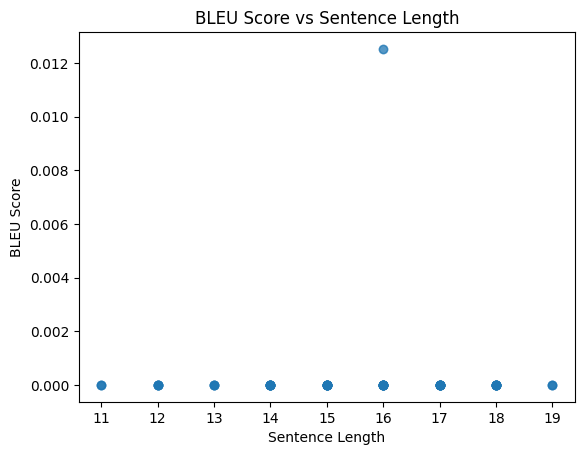

In [ ]:
# MODEL EVALUATION

# Function that accepts predicted and target inputs, together with our tokenizer and the trained model
# in order to give a model-level BLEU value.
def evaluate_bleu(test_inputs, target_inputs, tokenizer, model, max_source_len, max_target_len):
    smooth_fn = SmoothingFunction().method4
    total_bleu = 0
    num_examples = 0
    sentence_lengths = []
    bleu_scores = []

    for i in range(len(test_inputs)):
        source_sentence = test_inputs[i]
        target_sentence = target_inputs[i]
        predicted_translation = decode_sequence(source_sentence)  # Get model prediction
        reference_translation = target_sentence

        reference_tokens = [reference_translation.split()]
        predicted_tokens = predicted_translation.split()

        bleu_score = sentence_bleu(reference_tokens, predicted_tokens, smoothing_function=smooth_fn, weights=(0.25,0.25,0.25,0.25), auto_reweigh=False)
        total_bleu += bleu_score
        num_examples += 1

        sentence_length = len(source_sentence.split())
        sentence_lengths.append(sentence_length)
        bleu_scores.append(bleu_score)

    return total_bleu / num_examples, sentence_lengths, bleu_scores

# Plot BLEU score vs Sentence Length
def plot_bleu_vs_length(sentence_lengths, bleu_scores):
    plt.scatter(sentence_lengths, bleu_scores, alpha=0.5)
    plt.xlabel('Sentence Length')
    plt.ylabel('BLEU Score')
    plt.title('BLEU Score vs Sentence Length')
    plt.show()

# Define the test dedicated machine translation-dedicated dataset
test_inputs = decoded_target_test_input[:100]
test_targets = decoded_target_test_output[:100]

# Evaluate BLEU score on test machine translation-dedicated dataset
bleu_score, sentence_lengths, bleu_scores = evaluate_bleu(test_inputs, test_targets, tokenizer, model, max_source_len, max_target_len)
print(f'BLEU score: {bleu_score:.4f}')

# Plot BLEU score vs Sentence Length
plot_bleu_vs_length(sentence_lengths, bleu_scores)

#### Translating samples from our 'uns_covid1' dataset:

In [ ]:
# BigQuery client
project_id = 'nlp-project-427710'
credentials = service_account.Credentials.from_service_account_file('/content/drive/MyDrive/NLP_project/preprocessing/nlp-project-427710-3e1a48df3dba.json')
client = bigquery.Client(credentials=credentials, project=credentials.project_id)

# SQL query to fetch data from BigQuery table
query = """
    SELECT *
    FROM `nlp-project-427710.covid.uns_covid1`
    WHERE lang="en"
"""

# Fetch data me to BigQuery client
df_covid = client.query(query).to_dataframe()

# samples
sample_seqs = df_covid['text'][:5]

In [ ]:
### Applying on samples from our 'uns_covid1' dataset:
# Setting up DeepL API calls for reference translations
auth_key = '79686efb-3fee-418f-9d9e-887f763619e4:fx'
url = 'https://api-free.deepl.com/v2/translate'
headers = {
    'Authorization': f'DeepL-Auth-Key {auth_key}',
    'Content-Type': 'application/json'
}


for seq in sample_seqs:
  print('Original English tweet:')
  print(seq)
  print('\n\n')
  print('Suggested Translation in German:')
  translation = decode_sequence(seq)
  print(translation)
  print('\n\n')
  print('DeepL-provided Translation:')
  # api call
  data = {
      'text': word_tokenize(seq),
      'target_lang': 'DE'
  }
  response = requests.post(url, headers=headers, json=data)
  if response.status_code == 200:
    translation_data = response.json()
    deepl_translation = ' '.join([t['text'] for t in translation_data['translations']])
    print(deepl_translation)
  else:
    print(f'Error: {response.status_code}')
    print(response.text)

Original English tweet:
COVID-19 India Update : Total Active Cases : 1649(+437) Total Recovered : 144(+20) Total Deaths : 41(+6) #Covid_19 #CoronaUpdate #COVID2019India #StayAtHomeAndStaySafe



Suggested Translation in German:
1/1 [==============================] - 0s 28ms/step
maxim unfortunate constituent unravel doubt immobilier 3:1 Layer Neck species Outstanding divin estimating which pulse values Palace 07 Kingdom Anthropolog Sar



DeepL-provided Translation:
COVID-19 Indien Update : Insgesamt Aktiv Fälle : 1649 ( +437 ) Insgesamt Wiederhergestellt : 144 ( +20 ) Insgesamt Todesfälle : 41 ( +6 ) # Covid_19 # CoronaUpdate # COVID2019Indien # ZuHauseBleibenUndSicherSein
Original English tweet:
U.S.: #Florida governor issues stay-at-home order due to spread of #COVID19



Suggested Translation in German:
1/1 [==============================] - 0s 25ms/step
lamp along Wear Islam single ity ous broyeur western books insane Non discovering  petit migrated impose made Concord Feli Feli A

## Retraining a widely popular encoder-decoder transformer-based model on our particular task

Initial Translation with Vanilla T5 Model


In [ ]:
# I also decode input/output test/target sequences with the tokenizer, because this is how I insert them to BLEU
def decode_sequences(tokenizer, sequences):
    decoded_texts = []
    for seq in sequences:
        text = tokenizer.decode(seq, skip_special_tokens=True)
        decoded_texts.append(text)
    return decoded_texts

# I WILL RETRAIN ON THE SAME NUMBER OF SAMPLES AS THAT WHICH WAS USED TO TRAIN THE PREVIOUS MODEL FOR SCRATCH
# Decode training target input and output sequences
decoded_target_train_input = decode_sequences(tokenizer, target_train_input.numpy()[:50000])
decoded_target_train_output = decode_sequences(tokenizer, target_train_output.numpy().squeeze()[:50000])

# Decode testing target input and output sequences
decoded_target_test_input = decode_sequences(tokenizer, target_test_input.numpy()[:50000])
decoded_target_test_output = decode_sequences(tokenizer, target_test_output.numpy().squeeze()[:50000])


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1249: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Source: sur hotel sur hotels... 1 day before the date of arrival, no fee will
Reference: hotel bietet viele freizeitmöglichkeiten an, zum beispiel kegeln, tennis
Prediction: auf Hotel sur Hotels... 1 Tag vor Ankunft, keine Gebühren.
BLEU score: 0

Source: taking advantage of the nature of fm the functions of and kor
Reference: zipiert für die produktion zeitgemäßer elektronischer musik, finden sie hier
Prediction: Nutzen Sie die Natur der fm die Funktionen von und kor
BLEU score: 0.021598265052211615

Source: taking the above background into consideration, the resolution proposed by the group of the european people's
Reference: diesem hintergrund bietet die von der fraktion der europäischen volkspartei
Prediction: Unter Berücksichtigung des obigen Hintergrunds hat die von der Fraktion der
BLEU score: 0.12475235543331888

Source: management is a key discipline that positively impacts the way global content is created and delivered by
Reference: rahmen des webinars informiert graham benn

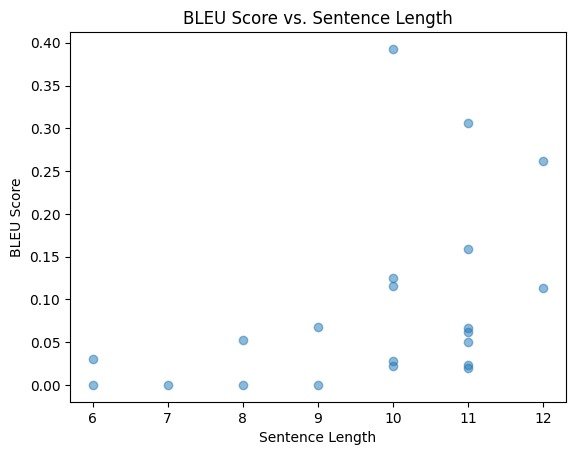

In [ ]:
# Load pre-trained model and tokenizer
tokenizer = T5Tokenizer.from_pretrained('t5-small')
model = T5ForConditionalGeneration.from_pretrained('t5-small')

# Sample dataset (Replace with actual WMT dataset samples)
samples = zip(*[
    (i for i in decoded_target_test_input),
    (i for i in decoded_target_test_output)
])

# Evaluate using BLEU score
bleu_scores = []
sentence_lengths = []
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
smooth_fn = SmoothingFunction().method4
i = 0
for source, reference in samples:
    input_ids = tokenizer.encode(f"translate English to German: {source}", return_tensors="pt").to(device)
    outputs = model.generate(input_ids)
    prediction = tokenizer.decode(outputs[0], skip_special_tokens=True)
    reference_tokens = reference.split()
    prediction_tokens = prediction.split()
    bleu_score = sentence_bleu([reference_tokens], prediction_tokens, weights=(0.25,0.25,0.25,0.25), auto_reweigh=False, smoothing_function=smooth_fn)
    bleu_scores.append(bleu_score)
    sentence_lengths.append(len(reference_tokens))  # Store sentence length
    # showing just 20 sample translations since the model hasn't been retrained and its results are not that close to its true potential
    if i <= 19:
      print(f"Source: {source}")
      print(f"Reference: {reference}")
      print(f"Prediction: {prediction}")
      print(f"BLEU score: {bleu_score}\n")
      i += 1
    else:
      break

average_bleu_score = sum(bleu_scores) / len(bleu_scores)
print(f"Average BLEU score: {average_bleu_score}")

# Plot BLEU scores against sentence length
plt.scatter(sentence_lengths, bleu_scores, alpha=0.5)
plt.title('BLEU Score vs. Sentence Length')
plt.xlabel('Sentence Length')
plt.ylabel('BLEU Score')
plt.show()


2. Retrain the T5 Model


Now I will retrain it because it gave a bad performance

In [ ]:
# Prepare the dataset and dataloader
# Creating a tsv

# Set working directory
os.chdir('/content/drive/MyDrive/NLP_project/machine_translation')

# Create a DataFrame with training sentences (English input, German output)
df = pd.DataFrame({
    'english': decoded_target_train_input,
    'german': decoded_target_train_output
}, index=range(len(decoded_target_train_output)))

# Save to TSV
data_file = 'english_to_german.tsv'
df.to_csv(data_file, sep='\t', index=False)

# Load the TSV file
df = pd.read_csv(data_file, sep='\t')

# Clean the data: Drop rows with NaN values and ensure all values are strings
df = df.dropna()
df['english'] = df['english'].astype(str)
df['german'] = df['german'].astype(str)

# Tokenizer
tokenizer = T5Tokenizer.from_pretrained('t5-small')

# Tokenize the data
source_encodings = tokenizer(df['english'].tolist(), truncation=True, padding=True, return_tensors='pt')
target_encodings = tokenizer(df['german'].tolist(), truncation=True, padding=True, return_tensors='pt')

# Adjust labels to ignore padding in loss calculation
labels = target_encodings['input_ids']
labels[labels == tokenizer.pad_token_id] = -100

print("Tokenization complete.")

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Tokenization complete.


In [ ]:
# Create TensorDataset and DataLoader
dataset = TensorDataset(source_encodings['input_ids'], source_encodings['attention_mask'], labels)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

In [ ]:
# Load pre-trained model
model = T5ForConditionalGeneration.from_pretrained('t5-small')

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Optimizer - going with the generally recommended one (Adam)
optimizer = AdamW(model.parameters(), lr=5e-5)

# Train the model
epochs = 3 # can't do more due to limited computational resources and time, but
# we do not need many epochs anyways since this model has already been extensively trained
model.train()

for epoch in range(epochs):
    epoch_loss = 0
    for batch in tqdm(dataloader):
        optimizer.zero_grad()

        input_ids = batch[0].to(device)
        attention_mask = batch[1].to(device)
        labels = batch[2].to(device)

        outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        epoch_loss += loss.item()

        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}, Loss: {epoch_loss/len(dataloader)}")

# Save the trained model
model.save_pretrained('/content/drive/MyDrive/NLP_project/machine_translation/models_trained/t5-german-to-english-finetuned_final')
tokenizer.save_pretrained('/content/drive/MyDrive/NLP_project/machine_translation/models_trained/t5-german-to-english-finetuned_final')

print("Model retrained and saved successfully.")


100%|██████████| 4980/4980 [44:44<00:00,  1.86it/s]


Epoch 1, Loss: 2.695105400047149


100%|██████████| 4980/4980 [44:05<00:00,  1.88it/s]


Epoch 2, Loss: 2.3771842661990696


100%|██████████| 4980/4980 [43:17<00:00,  1.92it/s]


Epoch 3, Loss: 2.265325687604257
Model retrained and saved successfully.


Source: " defines the governmental technologies (or more generally, as "the entire set of
Reference: cault zielt mit den gouvernmentalen technologien (oder allgemeiner dem
Prediction: es ist es, die technologien der öffentlichen wirtschaft zu
BLEU score: 1.0518351895246305e-231

Source: and its members have been campaigning against this directive for years, arguing that such
Reference: in einem grundsatzurteil aus dem letzten jahr hat der europäische
Prediction: kollegen kämpfen seit jahren gegen diese richtlinie und argumentieren,
BLEU score: 0

Source: "this intensive development and product support around our innovative and top products is our service contribution for more
Reference: dieser intensive entwicklungs- und produkt-support rund um unsere innovativen spitze
Prediction: dieser intensive entwicklungs- und produktunterstützung rund um unsere innovative
BLEU score: 0.3862752974508186

Source: the sky color changes, automatically into different areas in electronic music, from
R

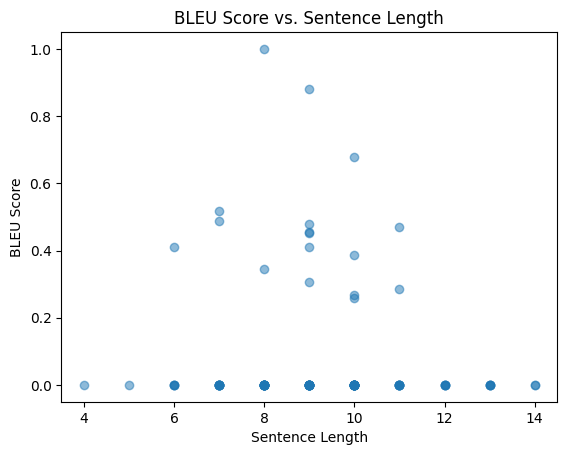

In [ ]:
# Evaluate using BLEU score
bleu_scores = []
sentence_lengths = []
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

i = 0
for source, reference in zip(decoded_target_train_input, decoded_target_train_output):
    input_ids = tokenizer.encode(f"translate English to German: {source}", return_tensors="pt").to(device)
    outputs = model.generate(input_ids)
    prediction = tokenizer.decode(outputs[0], skip_special_tokens=True)
    reference_tokens = reference.split()
    prediction_tokens = prediction.split()
    bleu_score = sentence_bleu([reference_tokens], prediction_tokens)
    bleu_scores.append(bleu_score)
    sentence_lengths.append(len(reference_tokens))  # Store sentence length
    # showing 25 sample translations after the model has been retrained on some substantial number of sampels
    if i < 100:
      print(f"Source: {source}")
      print(f"Reference: {reference}")
      print(f"Prediction: {prediction}")
      print(f"BLEU score: {bleu_score}\n")
      i += 1
    else:
      break

average_bleu_score = sum(bleu_scores) / len(bleu_scores)
print(f"Average BLEU score: {average_bleu_score}")

# Plot BLEU scores against sentence length
plt.scatter(sentence_lengths, bleu_scores, alpha=0.5)
plt.title('BLEU Score vs. Sentence Length')
plt.xlabel('Sentence Length')
plt.ylabel('BLEU Score')
plt.show()


In [ ]:
### Applying on samples from our 'uns_covid1' dataset:
# Example usage
for seq in sample_seqs:
  print('Original English tweet:')
  print(seq)
  print('\n\n')
  print('Suggested Translation in German:')
  input_ids = tokenizer.encode(f"translate English to German: {seq}", return_tensors="pt").to(device)
  outputs = model.generate(input_ids)
  translation = tokenizer.decode(outputs[0], skip_special_tokens=True)
  print(translation)
  print('\n\n')
  print('DeepL-provided Translation:')
  # api call
  data = {
      'text': word_tokenize(seq),
      'target_lang': 'DE'
  }
  response = requests.post(url, headers=headers, json=data)
  if response.status_code == 200:
    translation_data = response.json()
    deepl_translation = ' '.join([t['text'] for t in translation_data['translations']])
    print(deepl_translation)
  else:
    print(f'Error: {response.status_code}')
    print(response.text)



Original English tweet:
COVID-19 India Update : Total Active Cases : 1649(+437) Total Recovered : 144(+20) Total Deaths : 41(+6) #Covid_19 #CoronaUpdate #COVID2019India #StayAtHomeAndStaySafe



Suggested Translation in German:
stayada : stayada



DeepL-provided Translation:
COVID-19 Indien Update : Insgesamt Aktiv Fälle : 1649 ( +437 ) Insgesamt Wiederhergestellt : 144 ( +20 ) Insgesamt Todesfälle : 41 ( +6 ) # Covid_19 # CoronaUpdate # COVID2019Indien # ZuHauseBleibenUndSicherSein
Original English tweet:
U.S.: #Florida governor issues stay-at-home order due to spread of #COVID19



Suggested Translation in German:
amerika: flüchtlingsregierung erteilt a



DeepL-provided Translation:
U.S. : # Florida Gouverneur Ausgaben Stubenhocker Bestellung fällig zu Verbreitung von # COVID19
Original English tweet:
Guyana: Aviation authority extends suspension of all incoming international flights until 1 May because of #COVID19



Suggested Translation in German:
bahnhof hat die flottenangehöri